# Import

In [1]:
from parcels import (
        FieldSet,
        JITParticle,
        ScipyParticle,
        ParticleSet,
        AdvectionRK4,
        AdvectionRK4_3D,
        StatusCode,
)
import parcels

import datetime as dt
from datetime import datetime, timedelta

import dask

import numpy as np
from numpy.random import uniform, randint

from pathlib import Path
import geopandas as gpd

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cmocean

import xarray as xr
from glob import glob
import cartopy
import cartopy.crs as ccrs
from time import time
import warnings
import shapely
import itertools



warnings.simplefilter("ignore")

# Set Parameters

In [2]:
# Parameters
RNG_seed = 123

# Time
release_year = 2016
first_release_month = 1
first_release_day = 1
last_release_month = 12
last_release_day = 31
max_age_d = 220
# timedirection
timearrow = 1
# Timestep in minutes
dt_in_minutes = 15
output_dt_in_minutes = 15

# Box traits
release_depth_sigma = 0

n_particles_per_cell = 10

repeated_release = True
repeatdt_d = 7

is_papermill = False

if not is_papermill:
        release_year = 2021
        first_release_month = 1
        first_release_day = 1
        last_release_month = 3
        last_release_day = 31
        max_age_d = 20
        # timedirection
        timearrow = 1
        # Timestep in minutes
        dt_in_minutes = 15
        output_dt_in_minutes = 15


        # Box traits
        release_depth_sigma = 0

        n_particles_per_cell = 10

        repeated_release = True
        repeatdt_d = 14

In [3]:
# Parameters
release_year = 2019
first_release_month = 1
first_release_day = 1
last_release_month = 12
last_release_day = 31
max_age_d = 220
dt_in_minutes = 60
output_dt_in_minutes = 60
release_depth_sigma = 0
n_particles_per_cell = 10
repeated_release = True
repeatdt_d = 7
is_papermill = True


# Read Files

In [4]:
# Get Variables from Parameters
first_release_date = np.datetime64(f"{release_year}-{first_release_month:02d}-{first_release_day:02d}", "D")
last_date_in_release_timeframe = np.datetime64(f"{release_year}-{last_release_month:02d}-{last_release_day:02d}", "D")
repeat_timedelta = np.timedelta64(repeatdt_d, "D")

print(
        "first release date:", first_release_date, 
        "\nlast date in release timeframe:", last_date_in_release_timeframe, 
)

first release date: 2019-01-01 
last date in release timeframe: 2019-12-31


In [5]:
n_releases = 1
last_release_date = first_release_date
if repeated_release:
        for i in range(100):
                last_release_date = last_release_date + repeat_timedelta
                if last_release_date > last_date_in_release_timeframe:
                        last_release_date = last_release_date - repeat_timedelta
                        n_releases += i
                        break

last_modeling_date = last_release_date + np.timedelta64(max_age_d, "D")

print(
        "number of releases:", n_releases, 
        "\nmaximum age:", max_age_d,
        "\nlast release date:", last_release_date, 
        "\nlast modeling date:", last_modeling_date,
)

number of releases: 53 
maximum age: 220 
last release date: 2019-12-31 
last modeling date: 2020-08-07


In [6]:
repeated_release_timeframe_d = (n_releases - 1) * repeatdt_d 
if n_releases <= 1:
        repeated_release_timeframe_d = repeatdt_d
print(
        "repeated release dt in days:", repeatdt_d, 
        "\nrelease frame in days:", repeated_release_timeframe_d,
)

repeated release dt in days: 7 
release frame in days: 364


In [7]:
first_day_in_year = np.datetime64(f"{release_year}-01-01", "D")

last_year = last_modeling_date.astype(datetime).year
years = np.arange(release_year, last_year+1)

runtime_in_days = (last_modeling_date - first_release_date).tolist()
calc_dt = np.timedelta64(dt_in_minutes, "m").tolist()
output_dt = np.timedelta64(output_dt_in_minutes, "m").tolist()

np.random.seed(RNG_seed)
save_path = f"/gxfs_work/geomar/smomw597/2025_Fucus/output/Trajectories/{release_year}/"

print(
        "runtime in days:", runtime_in_days,
)

runtime in days: 584 days, 0:00:00


## Get file names 

In [8]:
first_release_date_str = first_release_date.astype(str).replace("-","")
last_release_date_str = last_release_date.astype(str).replace("-","")
last_modeling_date_str = last_modeling_date.astype(str).replace("-","")
last_loaded_date_str = (last_modeling_date + np.timedelta64(1, "D")).astype(str).replace("-","")

In [9]:
# establish folder paths
path_orig_files = Path("/gxfs_work/geomar/smomw400/bsh_operationalmodel_data/")
path_static_files = Path("/gxfs_work/geomar/smomw122/bsh_operationalmodel_data")
path_static_fine = path_static_files / "static_file_fine"
path_static_coarse = path_static_files / "static_file_coarse"

# get static file paths
sigma_file_fine = path_static_fine / "sigma_file_fine.nc"
lonlat_file_fine = path_static_fine / "lonlat_file_fine.nc"

sigma_file_coarse = path_static_coarse / "sigma_file_coarse.nc"
lonlat_file_coarse = path_static_coarse / "lonlat_file_coarse.nc"

In [10]:
current_subfolder_fine = list(map(lambda x: "c_file_fine_" + str(x), years))
current_subfolder_coarse = list(map(lambda x: "c_file_coarse_" + str(x), years))

salt_temp_subfolder_fine = list(map(lambda x: "t_file_fine_" + str(x), years))
salt_temp_subfolder_coarse = list(map(lambda x: "t_file_coarse_" + str(x), years))

In [11]:
def get_file_list(subfolder_array, years, path):
        files_list = list(
                itertools.chain.from_iterable(
                        [
                                sorted(path.glob(f"{subfolder}/*")) 
                                for subfolder in subfolder_array
                        ]
                )
        )
        n_files_before_first_file = (first_release_date - first_day_in_year).astype(int) * 4
        year_str = str(years[0])
        first_character_date = files_list[0].name.find(year_str)
        last_character_date_time = files_list[0].name.find("_000_006.nc")

        del files_list[:n_files_before_first_file]

        for file in reversed(files_list):
                if file.name[first_character_date:last_character_date_time] >= last_loaded_date_str + "00":
                        files_list.remove(file)
                if file.name[first_character_date:last_character_date_time] == last_loaded_date_str + "00":
                        break
                        
        return files_list

In [12]:
# get file list paths
current_files_fine = get_file_list(current_subfolder_fine, years, path_orig_files)
salt_temp_files_fine = get_file_list(salt_temp_subfolder_fine, years, path_orig_files)

current_files_coarse = get_file_list(current_subfolder_coarse, years, path_orig_files)
salt_temp_files_coarse = get_file_list(salt_temp_subfolder_coarse, years, path_orig_files)

print("Number of files per list:", len(salt_temp_files_coarse))

Number of files per list: 2340


In [13]:
salt_temp_files_coarse

[PosixPath('/gxfs_work/geomar/smomw400/bsh_operationalmodel_data/t_file_coarse_2019/t_file_coarse_2019010100_000_006.nc'),
 PosixPath('/gxfs_work/geomar/smomw400/bsh_operationalmodel_data/t_file_coarse_2019/t_file_coarse_2019010106_000_006.nc'),
 PosixPath('/gxfs_work/geomar/smomw400/bsh_operationalmodel_data/t_file_coarse_2019/t_file_coarse_2019010112_000_006.nc'),
 PosixPath('/gxfs_work/geomar/smomw400/bsh_operationalmodel_data/t_file_coarse_2019/t_file_coarse_2019010118_000_006.nc'),
 PosixPath('/gxfs_work/geomar/smomw400/bsh_operationalmodel_data/t_file_coarse_2019/t_file_coarse_2019010200_000_006.nc'),
 PosixPath('/gxfs_work/geomar/smomw400/bsh_operationalmodel_data/t_file_coarse_2019/t_file_coarse_2019010206_000_006.nc'),
 PosixPath('/gxfs_work/geomar/smomw400/bsh_operationalmodel_data/t_file_coarse_2019/t_file_coarse_2019010212_000_006.nc'),
 PosixPath('/gxfs_work/geomar/smomw400/bsh_operationalmodel_data/t_file_coarse_2019/t_file_coarse_2019010218_000_006.nc'),
 PosixPath('/gxf

# Functions

In [14]:
path_sigma_files = Path("/gxfs_work/geomar/smomw597/2025_Fucus/output/sigma/")
sigma_file_fine = path_sigma_files / "sigma_fine.nc"
sigma_file_coarse = path_sigma_files / "sigma_coarse.nc"

In [15]:
def relative_position_in_cell(x_rel: float, y_rel: float, cell: shapely.Polygon):
        (x0, y0), (x1, y1), (x2, y2), (x3, y3), (x4, y4) = cell.exterior.coords
        ex = (x3-x0, y3-y0)
        ey = (x1-x0, y1-y0)
        return x0 + x_rel * ex[0] + y_rel * ey[0], y0 + x_rel * ex[1] + y_rel * ey[1]

In [16]:
# Mapping parameters
suptitle_size = 20
title_size = 16
mapsize = (16, 8)
extent = (2.5, 27.5, 52, 62)
lonmid = np.mean(extent[:2])
latmid = np.mean(extent[:2])
map_projection = ccrs.Stereographic(central_longitude=lonmid, central_latitude=latmid)
def basemap(ax):
        ax.set_extent(extent, ccrs.PlateCarree())
        ax.add_feature(cartopy.feature.LAND)
        ax.add_feature(cartopy.feature.COASTLINE)
        ax.gridlines(draw_labels=["left", "bottom"], y_inline=False)
        return ax

# Construct release locations

In [17]:
release_area_path = Path("/gxfs_work/geomar/smomw597/2025_Fucus/2025_fucus-dispersal/Fucus_location_shp")
gdf_release_area = gpd.read_file(Path(release_area_path,"REDLIST_SIS_Macrophytes.geojson"))

gdf_release_area = (
        gdf_release_area
        .drop(gdf_release_area[gdf_release_area.F_vesiculo==0].index)
        .to_crs(crs=ccrs.Geodetic())
        .assign(area_m2 = gdf_release_area.to_crs(crs=ccrs.AlbersEqualArea()).area)
)[["CELLCODE", "F_vesiculo", "geometry", "CELLID"]]

gdf_release_area = gdf_release_area[:25]

# Get total number of particles
n_release_cells = gdf_release_area.shape[0]
n_particles = n_release_cells * n_particles_per_cell

repeated_release = True

start_time = first_release_date + np.timedelta64(12, "h")
start_times = [start_time] * n_particles

if repeated_release:
        start_times = [list(start_times + np.timedelta64(repeatdt_d, "D") * week) for week in range(n_releases)]
        start_times = list(itertools.chain.from_iterable(start_times))
        n_total_particles = n_particles * n_releases
else:
        n_total_particles = n_particles

print(
        "number of release cells:", n_release_cells, 
        "\nnumber particles per cell:", n_particles_per_cell, 
        "\nnumber of particles per release:", n_particles,
        "\ntotal number of particles:", n_total_particles,
        np.unique(start_times),
)

number of release cells: 25 
number particles per cell: 10 
number of particles per release: 250 
total number of particles: 13250 ['2019-01-01T12' '2019-01-08T12' '2019-01-15T12' '2019-01-22T12'
 '2019-01-29T12' '2019-02-05T12' '2019-02-12T12' '2019-02-19T12'
 '2019-02-26T12' '2019-03-05T12' '2019-03-12T12' '2019-03-19T12'
 '2019-03-26T12' '2019-04-02T12' '2019-04-09T12' '2019-04-16T12'
 '2019-04-23T12' '2019-04-30T12' '2019-05-07T12' '2019-05-14T12'
 '2019-05-21T12' '2019-05-28T12' '2019-06-04T12' '2019-06-11T12'
 '2019-06-18T12' '2019-06-25T12' '2019-07-02T12' '2019-07-09T12'
 '2019-07-16T12' '2019-07-23T12' '2019-07-30T12' '2019-08-06T12'
 '2019-08-13T12' '2019-08-20T12' '2019-08-27T12' '2019-09-03T12'
 '2019-09-10T12' '2019-09-17T12' '2019-09-24T12' '2019-10-01T12'
 '2019-10-08T12' '2019-10-15T12' '2019-10-22T12' '2019-10-29T12'
 '2019-11-05T12' '2019-11-12T12' '2019-11-19T12' '2019-11-26T12'
 '2019-12-03T12' '2019-12-10T12' '2019-12-17T12' '2019-12-24T12'
 '2019-12-31T12']


In [18]:
filename_time = f"{first_release_date_str}-{last_release_date_str}_dt{output_dt_in_minutes}min"
output_filename = f"Nested_{filename_time}_N{n_total_particles}_seed{RNG_seed}.zarr"
# define Output path and name
if is_papermill:
        output_filename = str("PPmill_" + output_filename)
else:
        output_filename = str("TEST_" + output_filename)

output_path = Path(save_path, output_filename)
print("Output path:", output_path)

Output path: /gxfs_work/geomar/smomw597/2025_Fucus/output/Trajectories/2019/PPmill_Nested_20190101-20191231_dt60min_N13250_seed123.zarr


In [19]:
# pick a random cell and a random position within cell
release_lons, release_lats, cellcode = list(
        zip(
                *[
                        relative_position_in_cell(
                                rand_x, rand_y, gdf_release_area.iloc[rand_cell].geometry
                        )
                        + (gdf_release_area.iloc[rand_cell].CELLCODE,)
                        for rand_x, rand_y, rand_cell in zip(
                                uniform(0, 1, size=n_total_particles),
                                uniform(0, 1, size=n_total_particles),
                                randint(0, len(gdf_release_area), size=n_total_particles),
                        )
                ]
        )
)
release_depths = np.full_like(release_lons, release_depth_sigma)

In [20]:
n_particles_cellID_list = []
for cell in cellcode:
        n_particles_cellID_list.extend(gdf_release_area[gdf_release_area.CELLCODE == cell].CELLID)

In [21]:
# #make sigmafiles without NaN
# path_sigma_files = Path("/gxfs_work/geomar/smomw597/2025_Fucus/output/sigma/")
# path_sigma_files.mkdir(exist_ok=True)

# ds_sigma_fine = xr.open_dataset(sigma_file_fine)
# ds_sigma_fine = ds_sigma_fine.assign(sigma = xr.where(ds_sigma_fine.layer_number == 1, 0, ds_sigma_fine.sigma))
# ds_sigma_fine.to_netcdf(path_sigma_files/"sigma_fine.nc")

# ds_sigma_coarse = xr.open_dataset(sigma_file_coarse)
# ds_sigma_coarse = ds_sigma_coarse.assign(sigma = xr.where(ds_sigma_coarse.layer_number == 1, 0, ds_sigma_coarse.sigma))
# ds_sigma_coarse.to_netcdf(path_sigma_files/"sigma_coarse.nc")

# Parcels

## Custom Kernel

In [22]:
def delete_error_particle(particle, fieldset, time):
    if particle.state >= 50:  # This captures all Errors
        particle.delete()

In [23]:
# Establish aging for particles
def aging_kernel(particle, fieldset, time):
    particle.age_sec += particle.dt
    max_age_sec = fieldset.max_age_d * 60 * 60 * 24
    if particle.age_sec > max_age_sec:
        particle.delete()

In [24]:
def AdvectionRK4_2D_SIGMABSH(particle, fieldset, time):
        time0 = time
        sig0 = particle.depth
        lat0 = particle.lat
        lon0 = particle.lon

        (u1, v1) = fieldset.UV[time0, sig0, lat0, lon0]  # horizontal velocities in deg/s

        s1 = fieldset.S[time0, sig0, lat0, lon0]
        t1 = fieldset.T[time0, sig0, lat0, lon0]

        time1 = time0 + 0.5 * particle.dt

        lat1 = lat0 + v1 * 0.5 * particle.dt
        lon1 = lon0 + u1 * 0.5 * particle.dt

        sig1 = sig0
        (u2, v2) = fieldset.UV[time1, sig1, lat1, lon1]

        time2 = time0 + 0.5 * particle.dt
        lat2 = lat0 + v2 * 0.5 * particle.dt
        lon2 = lon0 + u2 * 0.5 * particle.dt
        
        sig2 = sig0
        (u3, v3) = fieldset.UV[time2, sig2, lat2, lon2]

        time3 = time0 + particle.dt

        lat3 = lat0 + v3 * particle.dt
        lon3 = lon0 + u3 * particle.dt

        sig3 = sig0
        (u4, v4) = fieldset.UV[time3, sig3, lat3, lon3]

        lon4 = lon0 + (u1 + 2 * u2 + 2 * u3 + u4) / 6 * particle.dt
        lat4 = lat0 + (v1 + 2 * v2 + 2 * v3 + v4) / 6 * particle.dt

        particle_dlon += lon4 - lon0
        particle_dlat += lat4 - lat0

        particle.u = u1
        particle.v = v1
        particle.S = s1
        particle.T = t1


In [25]:
custom_kernel = [AdvectionRK4_2D_SIGMABSH, delete_error_particle]
custom_kernel = [AdvectionRK4_2D_SIGMABSH, aging_kernel]
# custom_kernel = [AdvectionRK4_2D_SIGMABSH]

## Fieldset

In [26]:
dim_dict_lonlat = dict(lon="lon", lat="lat")
dim_dict_lonlat_time = dict(**dim_dict_lonlat, time="time")
dim_dict_lonlat_time_depth = dict(**dim_dict_lonlat_time, depth="sigma")

In [27]:
# Prepare reading of variables
current_variable_ID = ["U", "V"]
salt_temp_variable_ID = ["S", "T"]
current_interp_methods = ["cgrid_velocity", "cgrid_velocity"]
salt_temp_interp_methods = ["cgrid_tracer", "cgrid_tracer"]

dimensions = [dim_dict_lonlat_time_depth, dim_dict_lonlat_time_depth]

In [28]:
current_variables = dict(zip(current_variable_ID, ["uvel", "vvel"]))
current_interp_method = dict(zip(current_variable_ID, current_interp_methods))
current_dimensions = dict(zip(current_variable_ID, dimensions))

salt_temp_variables = dict(zip(salt_temp_variable_ID, ["salt", "temp"]))
salt_temp_interp_methods = dict(zip(salt_temp_variable_ID, salt_temp_interp_methods))
salt_temp_dimensions = dict(zip(salt_temp_variable_ID, dimensions))

In [29]:
# _time = xr.open_mfdataset(current_files_fine).time
# _t0 = _time.isel(time=0).values
# _t_ref = np.datetime64("1900-01-01T00:00:00")
# _dt = np.timedelta64(15 * 60, "s")
# timesteps = np.arange(len(_time)) * _dt + round((_t0 - _t_ref)/_dt) * _dt + _t_ref
# timesteps = timesteps.reshape(-1, 24)
# timesteps_list = list(map(list,timesteps))

### Fine Fieldsets

In [30]:
lonlat_dict_fine = dict(lon=lonlat_file_fine, lat=lonlat_file_fine)

current_dict_fine = dict(
        lonlat_dict_fine, 
        depth=sigma_file_fine,
        data=current_files_fine,
)
salt_temp_dict_fine = dict(
        lonlat_dict_fine,
        depth=sigma_file_fine,
        data=salt_temp_files_fine,
)

In [31]:
# Build fine fieldset for all the other Values
current_filenames_fine = dict(U=current_dict_fine, V=current_dict_fine)

current_fieldset_fine = FieldSet.from_netcdf(
        filenames=current_filenames_fine,
        variables=current_variables,
        dimensions=current_dimensions,
        interp_method=current_interp_method,
        allow_time_extrapolation=False,
        gridindexingtype="nemo",
)

In [32]:
# Build fine fieldset for Temp and salinity
salt_temp_filenames_fine = dict(S=salt_temp_dict_fine, T=salt_temp_dict_fine)

salt_temp_fieldset_fine = FieldSet.from_netcdf(
        filenames=salt_temp_filenames_fine,
        variables=salt_temp_variables,
        dimensions=salt_temp_dimensions,
        interp_method=salt_temp_interp_methods,
        allow_time_extrapolation=False,
        gridindexingtype="nemo",
)

### Coarse Fieldsets

In [33]:
lonlat_dict_coarse = dict(lon=lonlat_file_coarse, lat=lonlat_file_coarse)

current_dict_coarse = dict(
        lonlat_dict_coarse, 
        depth=sigma_file_coarse,
        data=current_files_coarse,
)
salt_temp_dict_coarse = dict(
        lonlat_dict_coarse,
        depth=sigma_file_coarse,
        data=salt_temp_files_coarse,
)

In [34]:
# Build coarse fieldset for all the other Values
current_filenames_coarse = dict(U=current_dict_coarse, V=current_dict_coarse)

current_fieldset_coarse = FieldSet.from_netcdf(
        filenames=current_filenames_coarse,
        variables=current_variables,
        dimensions=current_dimensions,
        interp_method=current_interp_method,
        allow_time_extrapolation=False,
        gridindexingtype="nemo",
)

In [35]:
# Build coarse fieldset for Temp and salinity
salt_temp_filenames_coarse = dict(S=salt_temp_dict_coarse, T=salt_temp_dict_coarse)

salt_temp_fieldset_coarse = FieldSet.from_netcdf(
        filenames=salt_temp_filenames_coarse,
        variables=salt_temp_variables,
        dimensions=salt_temp_dimensions,
        interp_method=salt_temp_interp_methods,
        allow_time_extrapolation=False,
        gridindexingtype="nemo",
)

### Nested fieldset

In [36]:
# Build Nested field from the fine and coarse fields
U_nested_field = parcels.NestedField("U", [current_fieldset_fine.U, current_fieldset_coarse.U])
V_nested_field = parcels.NestedField("V", [current_fieldset_fine.V, current_fieldset_coarse.V])

nested_fieldset = FieldSet(U_nested_field, V_nested_field)

S_nested_field = parcels.NestedField("S", [salt_temp_fieldset_fine.S, salt_temp_fieldset_coarse.S])
T_nested_field = parcels.NestedField("T", [salt_temp_fieldset_fine.T, salt_temp_fieldset_coarse.T])

nested_fieldset.add_field(S_nested_field)
nested_fieldset.add_field(T_nested_field)
nested_fieldset.add_constant("max_age_d", max_age_d)

## Create Particles

In [37]:
# Establish particle variables
particle_variables = (
        "u", "v",
        "S", "T",
)
sample_particle = parcels.JITParticle.add_variables(particle_variables)
sample_particle = sample_particle.add_variable(
        parcels.Variable("CellID", initial=n_particles_cellID_list),
)
sample_particle = sample_particle.add_variable("age_sec", initial=0)

In [38]:
pset = ParticleSet(
        fieldset=nested_fieldset,
        pclass=sample_particle,
        lat=release_lats,
        lon=release_lons,
        depth=release_depths,
        time=start_times,
)

In [39]:
# Define Outputparameters
output_chunks = (n_total_particles, int(24 * 60 / output_dt_in_minutes))
output_particle_file = pset.ParticleFile(
        name=output_path,
        outputdt=output_dt,
        chunks=output_chunks,
)

# Execute

In [40]:
# Execute Simulation
pset.execute(
    custom_kernel,
    dt=calc_dt,
    runtime=runtime_in_days,    
    output_file=output_particle_file,
    verbose_progress=True,
)

INFO: Output files are stored in /gxfs_work/geomar/smomw597/2025_Fucus/output/Trajectories/2019/PPmill_Nested_20190101-20191231_dt60min_N13250_seed123.zarr.


  0%|          | 0/50457600.0 [00:00<?, ?it/s]

  0%|          | 900.2880000000005/50457600.0 [00:03<51:48:50, 270.50it/s]

  0%|          | 1799.7119999999995/50457600.0 [00:03<25:48:20, 543.12it/s]

  0%|          | 2700.0/50457600.0 [00:04<17:29:50, 801.00it/s]            

  0%|          | 3600.0/50457600.0 [00:04<12:13:08, 1146.97it/s]

  0%|          | 4499.7119999999995/50457600.0 [00:05<15:28:52, 905.28it/s]

  0%|          | 5400.0/50457600.0 [00:06<12:45:49, 1097.98it/s]           

  0%|          | 6300.2880000000005/50457600.0 [00:06<11:01:16, 1271.58it/s]

  0%|          | 7199.7119999999995/50457600.0 [00:07<11:53:36, 1178.28it/s]

  0%|          | 8100.0/50457600.0 [00:08<10:57:13, 1279.34it/s]            

  0%|          | 9000.288/50457600.0 [00:08<9:52:01, 1420.23it/s]

  0%|          | 9899.712/50457600.0 [00:09<9:08:46, 1532.11it/s]

  0%|          | 10800.0/50457600.0 [00:10<10:38:18, 1317.21it/s]

  0%|          | 11700.288/50457600.0 [00:10<9:41:04, 1446.93it/s]

  0%|          | 12599.712/50457600.0 [00:11<9:00:07, 1556.61it/s]

  0%|          | 13500.0/50457600.0 [00:11<8:32:40, 1639.90it/s]  

  0%|          | 14400.0/50457600.0 [00:11<6:26:42, 2174.08it/s]

  0%|          | 15299.712/50457600.0 [00:13<10:54:14, 1285.00it/s]

  0%|          | 16200.0/50457600.0 [00:13<9:53:05, 1417.46it/s]   

  0%|          | 17100.288/50457600.0 [00:14<9:08:47, 1531.87it/s]

  0%|          | 17999.712/50457600.0 [00:14<10:32:37, 1328.83it/s]

  0%|          | 18900.0/50457600.0 [00:15<10:02:29, 1395.28it/s]  

  0%|          | 19800.288/50457600.0 [00:16<9:15:30, 1513.25it/s]

  0%|          | 20699.712/50457600.0 [00:16<8:43:40, 1605.24it/s]

  0%|          | 21600.0/50457600.0 [00:18<13:14:55, 1057.46it/s] 

  0%|          | 22500.288/50457600.0 [00:18<11:30:52, 1216.70it/s]

  0%|          | 23399.712/50457600.0 [00:18<10:17:58, 1360.20it/s]

  0%|          | 24300.0/50457600.0 [00:19<9:26:52, 1482.78it/s]   

  0%|          | 25200.288/50457600.0 [00:20<11:10:54, 1252.83it/s]

  0%|          | 26099.712/50457600.0 [00:20<10:05:08, 1388.99it/s]

  0%|          | 27000.0/50457600.0 [00:21<9:18:26, 1505.09it/s]   

  0%|          | 27900.288/50457600.0 [00:21<8:47:16, 1594.05it/s]

  0%|          | 28799.712/50457600.0 [00:22<10:17:24, 1361.30it/s]

  0%|          | 29700.0/50457600.0 [00:23<9:50:57, 1422.21it/s]   

  0%|          | 30600.288/50457600.0 [00:23<9:08:47, 1531.45it/s]

  0%|          | 31499.712/50457600.0 [00:24<8:39:13, 1618.62it/s]

  0%|          | 32400.0/50457600.0 [00:25<10:20:33, 1354.29it/s] 

  0%|          | 33300.288/50457600.0 [00:25<9:29:01, 1476.93it/s]

  0%|          | 34199.712/50457600.0 [00:26<8:54:31, 1572.24it/s]

  0%|          | 35100.0/50457600.0 [00:26<8:29:06, 1650.68it/s]  

  0%|          | 36000.288/50457600.0 [00:27<10:29:12, 1335.59it/s]

  0%|          | 36899.712/50457600.0 [00:28<9:37:33, 1454.98it/s] 

  0%|          | 37800.0/50457600.0 [00:28<8:59:33, 1557.44it/s]  

  0%|          | 38700.288/50457600.0 [00:29<8:32:38, 1639.21it/s]

  0%|          | 39599.712/50457600.0 [00:29<10:07:22, 1383.50it/s]

  0%|          | 40500.0/50457600.0 [00:30<9:43:49, 1439.27it/s]   

  0%|          | 41400.288/50457600.0 [00:31<9:03:23, 1546.33it/s]

  0%|          | 42299.712/50457600.0 [00:31<8:35:42, 1629.32it/s]

  0%|          | 43200.0/50457600.0 [00:32<12:54:17, 1085.17it/s] 

  0%|          | 44100.288/50457600.0 [00:33<11:15:18, 1244.22it/s]

  0%|          | 44999.712/50457600.0 [00:33<10:06:58, 1384.24it/s]

  0%|          | 45900.0/50457600.0 [00:34<9:19:03, 1502.88it/s]   

  0%|          | 46800.288/50457600.0 [00:35<11:04:58, 1263.46it/s]

  0%|          | 47699.712/50457600.0 [00:35<9:59:50, 1400.64it/s] 

  0%|          | 48600.0/50457600.0 [00:36<9:13:49, 1517.01it/s]  

  0%|          | 49500.288/50457600.0 [00:36<8:41:17, 1611.66it/s]

  0%|          | 50399.712/50457600.0 [00:37<10:13:44, 1368.86it/s]

  0%|          | 51300.0/50457600.0 [00:38<9:46:04, 1433.44it/s]   

  0%|          | 52200.288/50457600.0 [00:38<9:03:33, 1545.52it/s]

  0%|          | 53099.712/50457600.0 [00:39<8:34:03, 1634.22it/s]

  0%|          | 54000.0/50457600.0 [00:40<10:15:46, 1364.23it/s] 

  0%|          | 54900.288/50457600.0 [00:40<9:25:08, 1486.45it/s]

  0%|          | 55799.712/50457600.0 [00:41<8:49:40, 1585.93it/s]

  0%|          | 56700.0/50457600.0 [00:41<8:24:51, 1663.87it/s]  

  0%|          | 57600.288/50457600.0 [00:42<10:26:27, 1340.88it/s]

  0%|          | 58499.712/50457600.0 [00:43<9:32:26, 1467.35it/s] 

  0%|          | 59400.0/50457600.0 [00:43<8:54:53, 1570.37it/s]  

  0%|          | 60300.288/50457600.0 [00:44<8:28:10, 1652.86it/s]

  0%|          | 61199.712/50457600.0 [00:44<10:04:49, 1388.71it/s]

  0%|          | 62100.0/50457600.0 [00:45<9:40:10, 1447.70it/s]   

  0%|          | 63000.288/50457600.0 [00:45<8:59:53, 1555.68it/s]

  0%|          | 63899.712/50457600.0 [00:46<8:31:42, 1641.35it/s]

  0%|          | 64800.0/50457600.0 [00:47<13:08:13, 1065.53it/s] 

  0%|          | 65700.288/50457600.0 [00:48<11:25:16, 1225.57it/s]

  0%|          | 66599.712/50457600.0 [00:48<10:15:04, 1365.43it/s]

  0%|          | 67500.0/50457600.0 [00:49<9:25:00, 1486.42it/s]   

  0%|          | 68400.288/50457600.0 [00:50<11:10:03, 1253.36it/s]

  0%|          | 69299.712/50457600.0 [00:50<10:03:27, 1391.64it/s]

  0%|          | 70200.0/50457600.0 [00:51<9:16:26, 1509.19it/s]   

  0%|          | 71100.288/50457600.0 [00:51<8:43:41, 1603.58it/s]

  0%|          | 71999.712/50457600.0 [00:52<10:15:40, 1363.95it/s]

  0%|          | 72900.0/50457600.0 [00:53<9:47:36, 1429.07it/s]   

  0%|          | 73800.288/50457600.0 [00:53<9:05:21, 1539.77it/s]

  0%|          | 74699.712/50457600.0 [00:54<8:35:41, 1628.32it/s]

  0%|          | 75600.0/50457600.0 [00:55<10:16:22, 1362.31it/s] 

  0%|          | 76500.288/50457600.0 [00:55<9:25:23, 1485.15it/s]

  0%|          | 77399.712/50457600.0 [00:56<8:49:21, 1586.21it/s]

  0%|          | 78300.0/50457600.0 [00:56<8:24:06, 1665.62it/s]  

  0%|          | 79200.288/50457600.0 [00:57<10:25:23, 1342.57it/s]

  0%|          | 80099.712/50457600.0 [00:58<9:32:41, 1466.10it/s] 

  0%|          | 81000.0/50457600.0 [00:58<8:56:50, 1564.00it/s]  

  0%|          | 81900.288/50457600.0 [00:58<8:29:13, 1648.79it/s]

  0%|          | 82799.712/50457600.0 [00:59<10:05:39, 1386.24it/s]

  0%|          | 83700.0/50457600.0 [01:00<9:41:34, 1443.59it/s]   

  0%|          | 84600.288/50457600.0 [01:00<9:00:34, 1553.05it/s]

  0%|          | 85499.712/50457600.0 [01:01<8:32:19, 1638.70it/s]

  0%|          | 86400.0/50457600.0 [01:02<12:32:26, 1115.74it/s] 

  0%|          | 87300.288/50457600.0 [01:03<11:00:06, 1271.77it/s]

  0%|          | 88199.712/50457600.0 [01:03<9:55:57, 1408.64it/s] 

  0%|          | 89100.0/50457600.0 [01:04<9:11:06, 1523.25it/s]  

  0%|          | 90000.0/50457600.0 [01:04<6:57:56, 2008.52it/s]

  0%|          | 90899.712/50457600.0 [01:05<11:15:37, 1242.46it/s]

  0%|          | 91800.0/50457600.0 [01:06<10:06:50, 1383.28it/s]  

  0%|          | 92700.288/50457600.0 [01:06<9:18:43, 1502.40it/s]

  0%|          | 93599.712/50457600.0 [01:07<10:41:05, 1309.34it/s]

  0%|          | 94500.0/50457600.0 [01:08<10:05:06, 1387.18it/s]  

  0%|          | 95400.288/50457600.0 [01:08<9:17:29, 1505.61it/s]

  0%|          | 96299.712/50457600.0 [01:09<8:44:08, 1601.37it/s]

  0%|          | 97200.0/50457600.0 [01:09<10:20:39, 1352.33it/s] 

  0%|          | 98100.288/50457600.0 [01:10<9:28:11, 1477.18it/s]

  0%|          | 98999.712/50457600.0 [01:10<8:51:21, 1579.58it/s]

  0%|          | 99900.0/50457600.0 [01:11<8:26:03, 1658.51it/s]  

  0%|          | 100800.288/50457600.0 [01:12<10:24:32, 1343.82it/s]

  0%|          | 101699.712/50457600.0 [01:12<9:30:42, 1470.56it/s] 

  0%|          | 102600.0/50457600.0 [01:13<8:53:02, 1574.46it/s]  

  0%|          | 103500.288/50457600.0 [01:13<8:26:59, 1655.34it/s]

  0%|          | 104399.712/50457600.0 [01:14<10:31:19, 1329.30it/s]

  0%|          | 105300.0/50457600.0 [01:15<9:58:33, 1402.04it/s]   

  0%|          | 106200.288/50457600.0 [01:15<9:13:20, 1516.58it/s]

  0%|          | 107099.712/50457600.0 [01:16<8:41:12, 1610.04it/s]

  0%|          | 108000.0/50457600.0 [01:17<12:28:58, 1120.40it/s] 

  0%|          | 108900.288/50457600.0 [01:18<10:57:30, 1276.27it/s]

  0%|          | 109799.712/50457600.0 [01:18<9:53:58, 1412.72it/s] 

  0%|          | 110700.0/50457600.0 [01:19<9:09:56, 1525.82it/s]  

  0%|          | 111600.288/50457600.0 [01:20<10:57:19, 1276.54it/s]

  0%|          | 112499.712/50457600.0 [01:20<9:54:29, 1411.43it/s] 

  0%|          | 113400.0/50457600.0 [01:21<9:09:59, 1525.60it/s]  

  0%|          | 114300.288/50457600.0 [01:21<8:39:04, 1616.45it/s]

  0%|          | 115199.712/50457600.0 [01:22<10:13:04, 1368.57it/s]

  0%|          | 116100.0/50457600.0 [01:22<9:45:25, 1433.17it/s]   

  0%|          | 117000.288/50457600.0 [01:23<9:03:41, 1543.16it/s]

  0%|          | 117899.712/50457600.0 [01:23<8:34:35, 1630.42it/s]

  0%|          | 118800.0/50457600.0 [01:24<10:14:32, 1365.23it/s] 

  0%|          | 119700.288/50457600.0 [01:25<9:24:03, 1487.35it/s]

  0%|          | 120599.712/50457600.0 [01:25<8:48:37, 1587.02it/s]

  0%|          | 121500.0/50457600.0 [01:26<8:24:27, 1663.05it/s]  

  0%|          | 122400.288/50457600.0 [01:27<10:27:52, 1336.14it/s]

  0%|          | 123299.712/50457600.0 [01:27<9:33:01, 1464.00it/s] 

  0%|          | 124200.0/50457600.0 [01:28<8:54:40, 1568.97it/s]  

  0%|          | 125100.288/50457600.0 [01:28<8:30:25, 1643.48it/s]

  0%|          | 125999.712/50457600.0 [01:29<10:05:14, 1385.98it/s]

  0%|          | 126900.0/50457600.0 [01:30<9:41:36, 1442.28it/s]   

  0%|          | 127800.288/50457600.0 [01:30<9:00:46, 1551.19it/s]

  0%|          | 128699.712/50457600.0 [01:31<8:31:53, 1638.65it/s]

  0%|          | 129600.0/50457600.0 [01:32<12:44:26, 1097.27it/s] 

  0%|          | 130500.288/50457600.0 [01:33<11:08:15, 1255.19it/s]

  0%|          | 131399.712/50457600.0 [01:33<10:01:36, 1394.21it/s]

  0%|          | 132300.0/50457600.0 [01:34<9:14:53, 1511.58it/s]   

  0%|          | 133200.288/50457600.0 [01:35<11:06:39, 1258.13it/s]

  0%|          | 134099.712/50457600.0 [01:35<10:00:20, 1397.07it/s]

  0%|          | 135000.0/50457600.0 [01:35<9:13:34, 1515.07it/s]   

  0%|          | 135900.288/50457600.0 [01:36<8:41:38, 1607.82it/s]

  0%|          | 136799.712/50457600.0 [01:37<10:14:04, 1365.76it/s]

  0%|          | 137700.0/50457600.0 [01:37<9:45:39, 1432.02it/s]   

  0%|          | 138600.288/50457600.0 [01:38<9:03:29, 1543.06it/s]

  0%|          | 139499.712/50457600.0 [01:38<8:34:13, 1630.87it/s]

  0%|          | 140400.0/50457600.0 [01:39<10:14:59, 1363.64it/s] 

  0%|          | 141300.288/50457600.0 [01:40<9:24:24, 1485.83it/s]

  0%|          | 142199.712/50457600.0 [01:40<8:48:44, 1586.01it/s]

  0%|          | 143100.0/50457600.0 [01:41<8:23:44, 1664.70it/s]  

  0%|          | 144000.288/50457600.0 [01:42<10:24:52, 1341.96it/s]

  0%|          | 144899.712/50457600.0 [01:42<9:33:01, 1463.37it/s] 

  0%|          | 145800.0/50457600.0 [01:43<8:54:48, 1567.89it/s]  

  0%|          | 146700.288/50457600.0 [01:43<8:28:03, 1650.42it/s]

  0%|          | 147599.712/50457600.0 [01:44<10:03:50, 1388.62it/s]

  0%|          | 148500.0/50457600.0 [01:45<9:39:08, 1447.81it/s]   

  0%|          | 149400.288/50457600.0 [01:45<8:59:17, 1554.74it/s]

  0%|          | 150299.712/50457600.0 [01:46<8:31:22, 1639.61it/s]

  0%|          | 151200.0/50457600.0 [01:47<12:36:27, 1108.38it/s] 

  0%|          | 152100.288/50457600.0 [01:47<11:02:32, 1265.46it/s]

  0%|          | 152999.712/50457600.0 [01:48<9:57:45, 1402.58it/s] 

  0%|          | 153900.0/50457600.0 [01:48<9:12:23, 1517.75it/s]  

  0%|          | 154800.288/50457600.0 [01:49<10:59:58, 1270.32it/s]

  0%|          | 155699.712/50457600.0 [01:50<9:56:15, 1406.05it/s] 

  0%|          | 156600.0/50457600.0 [01:50<9:11:50, 1519.20it/s]  

  0%|          | 157500.288/50457600.0 [01:51<8:40:05, 1611.91it/s]

  0%|          | 158399.712/50457600.0 [01:52<10:15:07, 1362.85it/s]

  0%|          | 159300.0/50457600.0 [01:52<9:46:59, 1428.14it/s]   

  0%|          | 160200.288/50457600.0 [01:53<9:04:26, 1539.74it/s]

  0%|          | 161099.712/50457600.0 [01:53<8:35:41, 1625.54it/s]

  0%|          | 162000.0/50457600.0 [01:54<10:16:03, 1360.67it/s] 

  0%|          | 162900.288/50457600.0 [01:55<9:25:32, 1482.18it/s]

  0%|          | 163799.712/50457600.0 [01:55<8:49:48, 1582.15it/s]

  0%|          | 164700.0/50457600.0 [01:56<8:24:33, 1661.29it/s]  

  0%|          | 165600.288/50457600.0 [01:57<10:25:22, 1340.33it/s]

  0%|          | 166499.712/50457600.0 [01:57<9:31:27, 1466.74it/s] 

  0%|          | 167400.0/50457600.0 [01:58<8:53:19, 1571.60it/s]  

  0%|          | 168300.288/50457600.0 [01:58<8:27:06, 1652.82it/s]

  0%|          | 169199.712/50457600.0 [01:59<10:05:31, 1384.17it/s]

  0%|          | 170100.0/50457600.0 [01:59<9:40:07, 1444.74it/s]   

  0%|          | 171000.288/50457600.0 [02:00<9:00:02, 1551.94it/s]

  0%|          | 171899.712/50457600.0 [02:00<8:32:00, 1636.86it/s]

  0%|          | 172800.0/50457600.0 [02:02<12:33:11, 1112.71it/s] 

  0%|          | 173700.288/50457600.0 [02:02<11:00:01, 1269.75it/s]

  0%|          | 174599.712/50457600.0 [02:03<9:55:43, 1406.79it/s] 

  0%|          | 175500.0/50457600.0 [02:03<9:10:31, 1522.26it/s]  

  0%|          | 176400.0/50457600.0 [02:03<6:56:15, 2013.24it/s]

  0%|          | 177299.712/50457600.0 [02:05<11:14:37, 1242.18it/s]

  0%|          | 178200.0/50457600.0 [02:05<10:06:14, 1382.27it/s]  

  0%|          | 179100.288/50457600.0 [02:06<9:18:27, 1500.51it/s]

  0%|          | 179999.712/50457600.0 [02:07<10:39:31, 1310.29it/s]

  0%|          | 180900.0/50457600.0 [02:07<10:03:30, 1388.45it/s]  

  0%|          | 181800.288/50457600.0 [02:08<9:16:23, 1506.00it/s]

  0%|          | 182699.712/50457600.0 [02:08<8:43:09, 1601.63it/s]

  0%|          | 183600.0/50457600.0 [02:09<10:19:13, 1353.13it/s] 

  0%|          | 184500.288/50457600.0 [02:09<9:28:20, 1474.24it/s]

  0%|          | 185399.712/50457600.0 [02:10<8:52:12, 1574.34it/s]

  0%|          | 186300.0/50457600.0 [02:10<8:26:14, 1655.05it/s]  

  0%|          | 187200.288/50457600.0 [02:11<10:25:20, 1339.81it/s]

  0%|          | 188099.712/50457600.0 [02:12<9:31:30, 1466.01it/s] 

  0%|          | 189000.0/50457600.0 [02:12<8:53:38, 1569.98it/s]  

  0%|          | 189900.288/50457600.0 [02:13<8:27:08, 1651.97it/s]

  0%|          | 190799.712/50457600.0 [02:14<10:03:17, 1388.67it/s]

  0%|          | 191700.0/50457600.0 [02:14<9:37:50, 1449.82it/s]   

  0%|          | 192600.288/50457600.0 [02:15<8:57:58, 1557.24it/s]

  0%|          | 193499.712/50457600.0 [02:15<8:30:15, 1641.78it/s]

  0%|          | 194400.0/50457600.0 [02:17<12:34:35, 1110.16it/s] 

  0%|          | 195300.288/50457600.0 [02:17<11:01:07, 1267.09it/s]

  0%|          | 196199.712/50457600.0 [02:18<9:56:42, 1403.85it/s] 

  0%|          | 197100.0/50457600.0 [02:18<9:11:14, 1519.61it/s]  

  0%|          | 198000.288/50457600.0 [02:19<10:56:41, 1275.59it/s]

  0%|          | 198899.712/50457600.0 [02:20<9:53:50, 1410.54it/s] 

  0%|          | 199800.0/50457600.0 [02:20<9:09:29, 1524.37it/s]  

  0%|          | 200700.288/50457600.0 [02:21<8:38:06, 1616.68it/s]

  0%|          | 201599.712/50457600.0 [02:21<10:11:18, 1370.16it/s]

  0%|          | 202500.0/50457600.0 [02:22<9:44:03, 1434.09it/s]   

  0%|          | 203400.288/50457600.0 [02:22<9:02:21, 1544.33it/s]

  0%|          | 204299.712/50457600.0 [02:23<8:33:15, 1631.86it/s]

  0%|          | 205200.0/50457600.0 [02:24<10:11:46, 1369.05it/s] 

  0%|          | 206100.288/50457600.0 [02:24<9:22:00, 1490.23it/s]

  0%|          | 206999.712/50457600.0 [02:25<8:47:31, 1587.60it/s]

  0%|          | 207900.0/50457600.0 [02:25<8:22:56, 1665.21it/s]  

  0%|          | 208800.288/50457600.0 [02:26<10:23:31, 1343.13it/s]

  0%|          | 209699.712/50457600.0 [02:27<9:30:32, 1467.84it/s] 

  0%|          | 210600.0/50457600.0 [02:27<8:53:30, 1569.68it/s]  

  0%|          | 211500.288/50457600.0 [02:28<8:27:13, 1651.01it/s]

  0%|          | 212399.712/50457600.0 [02:29<10:03:56, 1386.58it/s]

  0%|          | 213300.0/50457600.0 [02:29<9:41:28, 1440.15it/s]   

  0%|          | 214200.288/50457600.0 [02:30<9:00:58, 1547.93it/s]

  0%|          | 215099.712/50457600.0 [02:30<8:32:25, 1634.13it/s]

  0%|          | 216000.0/50457600.0 [02:32<12:34:50, 1109.31it/s] 

  0%|          | 216900.288/50457600.0 [02:32<11:01:18, 1266.19it/s]

  0%|          | 217799.712/50457600.0 [02:32<9:56:53, 1402.83it/s] 

  0%|          | 218700.0/50457600.0 [02:33<9:11:38, 1517.87it/s]  

  0%|          | 219600.288/50457600.0 [02:34<10:57:22, 1273.69it/s]

  0%|          | 220499.712/50457600.0 [02:34<9:54:54, 1407.42it/s] 

  0%|          | 221400.0/50457600.0 [02:35<9:10:38, 1520.52it/s]  

  0%|          | 222300.288/50457600.0 [02:35<8:39:22, 1612.04it/s]

  0%|          | 223199.712/50457600.0 [02:36<10:13:24, 1364.89it/s]

  0%|          | 224100.0/50457600.0 [02:37<9:48:34, 1422.44it/s]   

  0%|          | 225000.288/50457600.0 [02:37<9:06:04, 1533.12it/s]

  0%|          | 225899.712/50457600.0 [02:38<8:36:09, 1621.95it/s]

  0%|          | 226800.0/50457600.0 [02:39<10:14:31, 1362.34it/s] 

  0%|          | 227700.288/50457600.0 [02:39<9:23:39, 1485.25it/s]

  0%|          | 228599.712/50457600.0 [02:40<8:48:43, 1583.33it/s]

  0%|          | 229500.0/50457600.0 [02:40<8:23:44, 1661.83it/s]  

  0%|          | 230400.288/50457600.0 [02:41<10:23:33, 1342.50it/s]

  0%|          | 231299.712/50457600.0 [02:42<9:30:02, 1468.50it/s] 

  0%|          | 232200.0/50457600.0 [02:42<8:52:33, 1571.83it/s]  

  0%|          | 233100.288/50457600.0 [02:43<8:26:13, 1653.57it/s]

  0%|          | 233999.712/50457600.0 [02:43<10:02:35, 1389.11it/s]

  0%|          | 234900.0/50457600.0 [02:44<9:37:45, 1448.77it/s]   

  0%|          | 235800.288/50457600.0 [02:44<8:59:09, 1552.46it/s]

  0%|          | 236699.712/50457600.0 [02:45<8:32:47, 1632.28it/s]

  0%|          | 237600.0/50457600.0 [02:46<12:43:39, 1096.04it/s] 

  0%|          | 238500.288/50457600.0 [02:47<11:07:46, 1253.39it/s]

  0%|          | 239399.712/50457600.0 [02:47<10:01:32, 1391.36it/s]

  0%|          | 240300.0/50457600.0 [02:48<9:14:55, 1508.22it/s]   

  0%|          | 241200.288/50457600.0 [02:49<10:59:49, 1268.41it/s]

  0%|          | 242099.712/50457600.0 [02:49<9:56:09, 1403.87it/s] 

  0%|          | 243000.0/50457600.0 [02:50<9:11:27, 1517.61it/s]  

  0%|          | 243900.288/50457600.0 [02:50<8:39:52, 1609.78it/s]

  0%|          | 244799.712/50457600.0 [02:51<10:12:58, 1365.27it/s]

  0%|          | 245700.0/50457600.0 [02:52<9:45:06, 1430.26it/s]   

  0%|          | 246600.288/50457600.0 [02:52<9:03:15, 1540.44it/s]

  0%|          | 247499.712/50457600.0 [02:53<8:34:13, 1627.35it/s]

  0%|          | 248400.0/50457600.0 [02:54<10:12:54, 1365.33it/s] 

  0%|          | 249300.288/50457600.0 [02:54<9:23:41, 1484.53it/s]

  0%|          | 250199.712/50457600.0 [02:55<8:48:52, 1582.23it/s]

  0%|          | 251100.0/50457600.0 [02:55<8:23:37, 1661.49it/s]  

  0%|          | 252000.288/50457600.0 [02:56<10:23:15, 1342.56it/s]

  1%|          | 252899.712/50457600.0 [02:56<9:30:14, 1467.37it/s] 

  1%|          | 253800.0/50457600.0 [02:57<8:52:40, 1570.81it/s]  

  1%|          | 254700.288/50457600.0 [02:57<8:26:21, 1652.41it/s]

  1%|          | 255599.712/50457600.0 [02:58<10:02:46, 1388.08it/s]

  1%|          | 256500.0/50457600.0 [02:59<9:38:07, 1447.25it/s]   

  1%|          | 257400.288/50457600.0 [02:59<9:33:07, 1459.85it/s]

  1%|          | 258299.712/50457600.0 [03:00<8:54:39, 1564.82it/s]

  1%|          | 259200.0/50457600.0 [03:01<12:55:36, 1078.69it/s] 

  1%|          | 260100.288/50457600.0 [03:02<11:15:43, 1238.12it/s]

  1%|          | 260999.712/50457600.0 [03:02<10:07:07, 1377.97it/s]

  1%|          | 261900.0/50457600.0 [03:03<9:18:55, 1496.79it/s]   

  1%|          | 262800.0/50457600.0 [03:03<7:02:15, 1981.21it/s]

  1%|          | 263699.712/50457600.0 [03:04<11:18:29, 1232.96it/s]

  1%|          | 264600.0/50457600.0 [03:05<10:09:23, 1372.75it/s]  

  1%|          | 265500.288/50457600.0 [03:05<9:20:21, 1492.86it/s]

  1%|          | 266399.712/50457600.0 [03:06<10:41:14, 1304.52it/s]

  1%|          | 267300.0/50457600.0 [03:07<10:05:38, 1381.18it/s]  

  1%|          | 268200.288/50457600.0 [03:07<9:17:49, 1499.57it/s]

  1%|          | 269099.712/50457600.0 [03:08<8:44:26, 1594.99it/s]

  1%|          | 270000.0/50457600.0 [03:09<10:19:37, 1349.95it/s] 

  1%|          | 270900.288/50457600.0 [03:09<9:27:20, 1474.33it/s]

  1%|          | 271799.712/50457600.0 [03:10<8:51:22, 1574.09it/s]

  1%|          | 272700.0/50457600.0 [03:10<8:25:33, 1654.42it/s]  

  1%|          | 273600.288/50457600.0 [03:11<10:24:52, 1338.50it/s]

  1%|          | 274499.712/50457600.0 [03:12<9:31:23, 1463.76it/s] 

  1%|          | 275400.0/50457600.0 [03:12<8:53:49, 1566.75it/s]  

  1%|          | 276300.288/50457600.0 [03:12<8:27:26, 1648.16it/s]

  1%|          | 277199.712/50457600.0 [03:13<10:03:24, 1386.03it/s]

  1%|          | 278100.0/50457600.0 [03:14<9:38:28, 1445.74it/s]   

  1%|          | 279000.288/50457600.0 [03:14<8:58:54, 1551.85it/s]

  1%|          | 279899.712/50457600.0 [03:15<8:30:57, 1636.69it/s]

  1%|          | 280800.0/50457600.0 [03:17<13:33:44, 1027.70it/s] 

  1%|          | 281700.288/50457600.0 [03:17<11:42:04, 1191.13it/s]

  1%|          | 282599.712/50457600.0 [03:17<10:25:14, 1337.48it/s]

  1%|          | 283500.0/50457600.0 [03:18<9:31:51, 1462.30it/s]   

  1%|          | 284400.288/50457600.0 [03:19<11:10:40, 1246.83it/s]

  1%|          | 285299.712/50457600.0 [03:19<10:03:35, 1385.37it/s]

  1%|          | 286200.0/50457600.0 [03:20<9:16:03, 1503.80it/s]   

  1%|          | 287100.288/50457600.0 [03:20<8:42:44, 1599.57it/s]

  1%|          | 287999.712/50457600.0 [03:21<10:14:17, 1361.18it/s]

  1%|          | 288900.0/50457600.0 [03:22<9:50:09, 1416.80it/s]   

  1%|          | 289800.288/50457600.0 [03:22<9:06:31, 1529.91it/s]

  1%|          | 290699.712/50457600.0 [03:23<8:36:04, 1620.13it/s]

  1%|          | 291600.0/50457600.0 [03:24<10:13:06, 1363.71it/s] 

  1%|          | 292500.288/50457600.0 [03:24<9:22:36, 1486.09it/s]

  1%|          | 293399.712/50457600.0 [03:25<8:47:49, 1584.01it/s]

  1%|          | 294300.0/50457600.0 [03:25<8:22:52, 1662.56it/s]  

  1%|          | 295200.288/50457600.0 [03:26<10:22:34, 1342.89it/s]

  1%|          | 296099.712/50457600.0 [03:27<9:29:44, 1467.35it/s] 

  1%|          | 297000.0/50457600.0 [03:27<8:52:02, 1571.32it/s]  

  1%|          | 297900.288/50457600.0 [03:28<8:25:31, 1653.74it/s]

  1%|          | 298799.712/50457600.0 [03:28<10:01:31, 1389.77it/s]

  1%|          | 299700.0/50457600.0 [03:29<9:36:39, 1449.68it/s]   

  1%|          | 300600.288/50457600.0 [03:29<9:00:51, 1545.59it/s]

  1%|          | 301499.712/50457600.0 [03:30<8:33:40, 1627.39it/s]

  1%|          | 302400.0/50457600.0 [03:31<12:37:35, 1103.40it/s] 

  1%|          | 303300.288/50457600.0 [03:32<11:03:02, 1260.71it/s]

  1%|          | 304199.712/50457600.0 [03:32<9:58:10, 1397.38it/s] 

  1%|          | 305100.0/50457600.0 [03:33<9:12:50, 1511.98it/s]  

  1%|          | 306000.288/50457600.0 [03:34<10:58:05, 1270.13it/s]

  1%|          | 306899.712/50457600.0 [03:34<9:54:53, 1405.02it/s] 

  1%|          | 307800.0/50457600.0 [03:35<9:10:51, 1517.30it/s]  

  1%|          | 308700.288/50457600.0 [03:35<8:39:17, 1609.51it/s]

  1%|          | 309599.712/50457600.0 [03:36<10:11:53, 1365.91it/s]

  1%|          | 310500.0/50457600.0 [03:37<9:44:46, 1429.25it/s]   

  1%|          | 311400.288/50457600.0 [03:37<9:03:16, 1538.39it/s]

  1%|          | 312299.712/50457600.0 [03:38<8:34:09, 1625.49it/s]

  1%|          | 313200.0/50457600.0 [03:39<10:13:24, 1362.45it/s] 

  1%|          | 314100.288/50457600.0 [03:39<9:24:11, 1481.27it/s]

  1%|          | 314999.712/50457600.0 [03:40<8:49:45, 1577.53it/s]

  1%|          | 315900.0/50457600.0 [03:40<8:24:32, 1656.37it/s]  

  1%|          | 316800.288/50457600.0 [03:41<10:24:24, 1338.36it/s]

  1%|          | 317699.712/50457600.0 [03:41<9:30:52, 1463.85it/s] 

  1%|          | 318600.0/50457600.0 [03:42<8:53:10, 1567.33it/s]  

  1%|          | 319500.288/50457600.0 [03:42<8:26:44, 1649.06it/s]

  1%|          | 320399.712/50457600.0 [03:43<10:02:39, 1386.57it/s]

  1%|          | 321300.0/50457600.0 [03:44<9:38:14, 1445.06it/s]   

  1%|          | 322200.288/50457600.0 [03:44<8:58:28, 1551.76it/s]

  1%|          | 323099.712/50457600.0 [03:45<8:30:53, 1635.50it/s]

  1%|          | 324000.0/50457600.0 [03:46<12:25:17, 1121.12it/s] 

  1%|          | 324900.288/50457600.0 [03:47<10:54:28, 1276.66it/s]

  1%|          | 325799.712/50457600.0 [03:47<9:51:49, 1411.79it/s] 

  1%|          | 326700.0/50457600.0 [03:48<9:07:56, 1524.82it/s]  

  1%|          | 327600.288/50457600.0 [03:49<10:55:08, 1275.31it/s]

  1%|          | 328499.712/50457600.0 [03:49<9:53:08, 1408.57it/s] 

  1%|          | 329400.0/50457600.0 [03:50<9:09:37, 1520.05it/s]  

  1%|          | 330300.288/50457600.0 [03:50<8:38:21, 1611.74it/s]

  1%|          | 331199.712/50457600.0 [03:51<10:11:20, 1366.58it/s]

  1%|          | 332100.0/50457600.0 [03:52<9:44:04, 1430.34it/s]   

  1%|          | 333000.288/50457600.0 [03:52<9:02:30, 1539.90it/s]

  1%|          | 333899.712/50457600.0 [03:52<8:33:35, 1626.56it/s]

  1%|          | 334800.0/50457600.0 [03:53<10:12:38, 1363.59it/s] 

  1%|          | 335700.288/50457600.0 [03:54<9:22:21, 1485.47it/s]

  1%|          | 336599.712/50457600.0 [03:54<8:47:15, 1584.31it/s]

  1%|          | 337500.0/50457600.0 [03:55<8:22:50, 1661.21it/s]  

  1%|          | 338400.288/50457600.0 [03:56<10:22:26, 1342.01it/s]

  1%|          | 339299.712/50457600.0 [03:56<9:29:36, 1466.46it/s] 

  1%|          | 340200.0/50457600.0 [03:57<8:53:17, 1566.30it/s]  

  1%|          | 341100.288/50457600.0 [03:57<8:27:09, 1646.96it/s]

  1%|          | 341999.712/50457600.0 [03:58<10:02:52, 1385.48it/s]

  1%|          | 342900.0/50457600.0 [03:59<9:38:00, 1445.06it/s]   

  1%|          | 343800.288/50457600.0 [03:59<8:57:43, 1553.26it/s]

  1%|          | 344699.712/50457600.0 [04:00<8:34:12, 1624.29it/s]

  1%|          | 345600.0/50457600.0 [04:01<12:04:49, 1152.28it/s] 

  1%|          | 346500.288/50457600.0 [04:01<10:40:30, 1303.93it/s]

  1%|          | 347399.712/50457600.0 [04:02<9:42:15, 1434.35it/s] 

  1%|          | 348300.0/50457600.0 [04:02<9:01:12, 1543.11it/s]  

  1%|          | 349200.0/50457600.0 [04:03<6:49:24, 2039.86it/s]

  1%|          | 350099.712/50457600.0 [04:04<11:08:28, 1249.30it/s]

  1%|          | 351000.0/50457600.0 [04:04<10:02:14, 1386.69it/s]  

  1%|          | 351900.288/50457600.0 [04:05<9:15:28, 1503.37it/s]

  1%|          | 352799.712/50457600.0 [04:06<10:37:26, 1310.04it/s]

  1%|          | 353700.0/50457600.0 [04:06<10:02:00, 1387.13it/s]  

  1%|          | 354600.288/50457600.0 [04:07<9:15:24, 1503.49it/s]

  1%|          | 355499.712/50457600.0 [04:07<8:42:17, 1598.80it/s]

  1%|          | 356400.0/50457600.0 [04:08<10:18:09, 1350.84it/s] 

  1%|          | 357300.288/50457600.0 [04:09<9:26:34, 1473.76it/s]

  1%|          | 358199.712/50457600.0 [04:09<8:50:15, 1574.66it/s]

  1%|          | 359100.0/50457600.0 [04:10<8:25:22, 1652.17it/s]  

  1%|          | 360000.288/50457600.0 [04:11<10:24:03, 1337.93it/s]

  1%|          | 360899.712/50457600.0 [04:11<9:30:17, 1464.06it/s] 

  1%|          | 361800.0/50457600.0 [04:12<8:52:29, 1567.97it/s]  

  1%|          | 362700.288/50457600.0 [04:12<8:25:58, 1650.12it/s]

  1%|          | 363599.712/50457600.0 [04:13<10:01:41, 1387.59it/s]

  1%|          | 364500.0/50457600.0 [04:14<9:37:09, 1446.54it/s]   

  1%|          | 365400.288/50457600.0 [04:14<8:57:24, 1553.53it/s]

  1%|          | 366299.712/50457600.0 [04:14<8:30:45, 1634.52it/s]

  1%|          | 367200.0/50457600.0 [04:16<12:27:55, 1116.22it/s] 

  1%|          | 368100.288/50457600.0 [04:16<10:56:14, 1272.13it/s]

  1%|          | 368999.712/50457600.0 [04:17<9:53:03, 1407.65it/s] 

  1%|          | 369900.0/50457600.0 [04:17<9:08:40, 1521.49it/s]  

  1%|          | 370800.288/50457600.0 [04:18<11:05:11, 1254.94it/s]

  1%|          | 371699.712/50457600.0 [04:19<9:59:40, 1392.02it/s] 

  1%|          | 372600.0/50457600.0 [04:19<9:13:35, 1507.89it/s]  

  1%|          | 373500.288/50457600.0 [04:20<8:42:01, 1599.03it/s]

  1%|          | 374399.712/50457600.0 [04:21<10:13:46, 1359.97it/s]

  1%|          | 375300.0/50457600.0 [04:21<9:45:17, 1426.15it/s]   

  1%|          | 376200.288/50457600.0 [04:22<9:03:08, 1536.79it/s]

  1%|          | 377099.712/50457600.0 [04:22<8:33:37, 1625.06it/s]

  1%|          | 378000.0/50457600.0 [04:23<10:11:43, 1364.45it/s] 

  1%|          | 378900.288/50457600.0 [04:24<9:22:22, 1484.15it/s]

  1%|          | 379799.712/50457600.0 [04:24<8:47:13, 1583.04it/s]

  1%|          | 380700.0/50457600.0 [04:25<8:22:39, 1660.38it/s]  

  1%|          | 381600.288/50457600.0 [04:25<10:22:31, 1340.65it/s]

  1%|          | 382499.712/50457600.0 [04:26<9:29:48, 1464.68it/s] 

  1%|          | 383400.0/50457600.0 [04:26<8:52:08, 1568.35it/s]  

  1%|          | 384300.288/50457600.0 [04:27<8:25:51, 1649.78it/s]

  1%|          | 385199.712/50457600.0 [04:28<10:01:46, 1386.81it/s]

  1%|          | 386100.0/50457600.0 [04:28<9:37:08, 1445.96it/s]   

  1%|          | 387000.288/50457600.0 [04:29<8:57:09, 1553.56it/s]

  1%|          | 387899.712/50457600.0 [04:29<8:29:17, 1638.53it/s]

  1%|          | 388800.0/50457600.0 [04:31<12:05:46, 1149.78it/s] 

  1%|          | 389700.288/50457600.0 [04:31<10:40:41, 1302.45it/s]

  1%|          | 390599.712/50457600.0 [04:32<9:42:14, 1433.19it/s] 

  1%|          | 391500.0/50457600.0 [04:32<9:01:18, 1541.52it/s]  

  1%|          | 392400.288/50457600.0 [04:33<11:01:40, 1261.06it/s]

  1%|          | 393299.712/50457600.0 [04:34<9:57:46, 1395.86it/s] 

  1%|          | 394200.0/50457600.0 [04:34<9:12:04, 1511.37it/s]  

  1%|          | 395100.288/50457600.0 [04:35<8:40:37, 1602.66it/s]

  1%|          | 395999.712/50457600.0 [04:35<10:12:50, 1361.47it/s]

  1%|          | 396900.0/50457600.0 [04:36<9:44:46, 1426.80it/s]   

  1%|          | 397800.288/50457600.0 [04:37<9:02:56, 1536.69it/s]

  1%|          | 398699.712/50457600.0 [04:37<8:33:52, 1623.58it/s]

  1%|          | 399600.0/50457600.0 [04:38<10:12:37, 1361.85it/s] 

  1%|          | 400500.288/50457600.0 [04:38<9:22:19, 1483.65it/s]

  1%|          | 401399.712/50457600.0 [04:39<8:47:07, 1582.70it/s]

  1%|          | 402300.0/50457600.0 [04:39<8:22:28, 1660.27it/s]  

  1%|          | 403200.288/50457600.0 [04:40<10:22:11, 1340.82it/s]

  1%|          | 404099.712/50457600.0 [04:41<9:29:13, 1465.56it/s] 

  1%|          | 405000.0/50457600.0 [04:41<8:51:58, 1568.14it/s]  

  1%|          | 405900.288/50457600.0 [04:42<8:26:25, 1647.21it/s]

  1%|          | 406799.712/50457600.0 [04:43<10:02:03, 1385.56it/s]

  1%|          | 407700.0/50457600.0 [04:43<9:36:47, 1446.23it/s]   

  1%|          | 408600.288/50457600.0 [04:44<8:57:17, 1552.51it/s]

  1%|          | 409499.712/50457600.0 [04:44<8:29:06, 1638.41it/s]

  1%|          | 410400.0/50457600.0 [04:46<12:44:41, 1090.79it/s] 

  1%|          | 411300.288/50457600.0 [04:46<11:07:48, 1249.02it/s]

  1%|          | 412199.712/50457600.0 [04:47<10:00:58, 1387.91it/s]

  1%|          | 413100.0/50457600.0 [04:47<9:14:03, 1505.37it/s]   

  1%|          | 414000.288/50457600.0 [04:48<10:57:58, 1267.61it/s]

  1%|          | 414899.712/50457600.0 [04:49<9:54:38, 1402.58it/s] 

  1%|          | 415800.0/50457600.0 [04:49<9:09:48, 1516.93it/s]  

  1%|          | 416700.288/50457600.0 [04:49<8:39:13, 1606.29it/s]

  1%|          | 417599.712/50457600.0 [04:50<10:11:53, 1362.97it/s]

  1%|          | 418500.0/50457600.0 [04:51<9:45:43, 1423.83it/s]   

  1%|          | 419400.288/50457600.0 [04:51<9:03:39, 1534.01it/s]

  1%|          | 420299.712/50457600.0 [04:52<8:34:20, 1621.40it/s]

  1%|          | 421200.0/50457600.0 [04:53<10:12:35, 1361.34it/s] 

  1%|          | 422100.288/50457600.0 [04:53<9:22:38, 1482.18it/s]

  1%|          | 422999.712/50457600.0 [04:54<8:47:35, 1580.57it/s]

  1%|          | 423900.0/50457600.0 [04:54<8:22:34, 1659.25it/s]  

  1%|          | 424800.288/50457600.0 [04:55<10:22:12, 1340.21it/s]

  1%|          | 425699.712/50457600.0 [04:56<9:29:19, 1464.67it/s] 

  1%|          | 426600.0/50457600.0 [04:56<8:50:44, 1571.10it/s]  

  1%|          | 427500.288/50457600.0 [04:57<8:24:17, 1653.49it/s]

  1%|          | 428399.712/50457600.0 [04:58<10:33:47, 1315.61it/s]

  1%|          | 429300.0/50457600.0 [04:58<9:58:17, 1393.63it/s]   

  1%|          | 430200.288/50457600.0 [04:59<9:11:06, 1512.94it/s]

  1%|          | 431099.712/50457600.0 [04:59<8:38:07, 1609.19it/s]

  1%|          | 432000.0/50457600.0 [05:01<12:38:17, 1099.53it/s] 

  1%|          | 432900.288/50457600.0 [05:01<11:09:34, 1245.19it/s]

  1%|          | 433799.712/50457600.0 [05:02<10:01:16, 1386.59it/s]

  1%|          | 434700.0/50457600.0 [05:02<9:13:13, 1507.01it/s]   

  1%|          | 435600.0/50457600.0 [05:02<6:58:29, 1992.15it/s]

  1%|          | 436499.712/50457600.0 [05:04<11:11:55, 1240.74it/s]

  1%|          | 437400.0/50457600.0 [05:04<10:02:51, 1382.87it/s]  

  1%|          | 438300.288/50457600.0 [05:04<9:15:18, 1501.24it/s]

  1%|          | 439199.712/50457600.0 [05:05<10:34:46, 1313.27it/s]

  1%|          | 440100.0/50457600.0 [05:06<9:58:58, 1391.77it/s]   

  1%|          | 441000.288/50457600.0 [05:06<9:11:30, 1511.49it/s]

  1%|          | 441899.712/50457600.0 [05:07<8:38:34, 1607.47it/s]

  1%|          | 442800.0/50457600.0 [05:08<10:13:21, 1359.03it/s] 

  1%|          | 443700.288/50457600.0 [05:08<9:21:25, 1484.73it/s]

  1%|          | 444599.712/50457600.0 [05:09<8:45:53, 1585.03it/s]

  1%|          | 445500.0/50457600.0 [05:09<8:20:11, 1666.43it/s]  

  1%|          | 446400.288/50457600.0 [05:10<10:18:13, 1348.25it/s]

  1%|          | 447299.712/50457600.0 [05:11<9:25:11, 1474.73it/s] 

  1%|          | 448200.0/50457600.0 [05:11<8:47:55, 1578.83it/s]  

  1%|          | 449100.288/50457600.0 [05:12<8:21:52, 1660.70it/s]

  1%|          | 449999.712/50457600.0 [05:13<9:57:10, 1395.66it/s]

  1%|          | 450900.0/50457600.0 [05:13<9:32:46, 1455.11it/s]  

  1%|          | 451800.288/50457600.0 [05:14<8:53:10, 1563.13it/s]

  1%|          | 452699.712/50457600.0 [05:14<8:25:43, 1647.96it/s]

  1%|          | 453600.0/50457600.0 [05:15<12:22:36, 1122.25it/s] 

  1%|          | 454500.288/50457600.0 [05:16<10:56:09, 1270.09it/s]

  1%|          | 455399.712/50457600.0 [05:16<9:52:06, 1407.46it/s] 

  1%|          | 456300.0/50457600.0 [05:17<9:07:11, 1522.99it/s]  

  1%|          | 457200.288/50457600.0 [05:18<10:53:28, 1275.24it/s]

  1%|          | 458099.712/50457600.0 [05:18<9:50:37, 1410.93it/s] 

  1%|          | 459000.0/50457600.0 [05:19<9:06:15, 1525.48it/s]  

  1%|          | 459900.288/50457600.0 [05:19<8:35:19, 1617.01it/s]

  1%|          | 460799.712/50457600.0 [05:20<10:07:27, 1371.75it/s]

  1%|          | 461700.0/50457600.0 [05:21<9:40:12, 1436.15it/s]   

  1%|          | 462600.288/50457600.0 [05:21<8:58:34, 1547.15it/s]

  1%|          | 463499.712/50457600.0 [05:22<8:29:29, 1635.45it/s]

  1%|          | 464400.0/50457600.0 [05:23<10:07:20, 1371.93it/s] 

  1%|          | 465300.288/50457600.0 [05:23<9:17:07, 1495.55it/s]

  1%|          | 466199.712/50457600.0 [05:24<8:42:06, 1595.83it/s]

  1%|          | 467100.0/50457600.0 [05:24<8:17:29, 1674.76it/s]  

  1%|          | 468000.288/50457600.0 [05:25<10:16:09, 1352.20it/s]

  1%|          | 468899.712/50457600.0 [05:25<9:23:33, 1478.37it/s] 

  1%|          | 469800.0/50457600.0 [05:26<8:46:31, 1582.31it/s]  

  1%|          | 470700.288/50457600.0 [05:26<8:21:51, 1660.05it/s]

  1%|          | 471599.712/50457600.0 [05:27<9:58:09, 1392.79it/s]

  1%|          | 472500.0/50457600.0 [05:28<9:33:21, 1452.99it/s]  

  1%|          | 473400.288/50457600.0 [05:28<8:54:24, 1558.86it/s]

  1%|          | 474299.712/50457600.0 [05:29<8:26:37, 1644.32it/s]

  1%|          | 475200.0/50457600.0 [05:30<12:18:51, 1127.48it/s] 

  1%|          | 476100.288/50457600.0 [05:31<10:48:39, 1284.22it/s]

  1%|          | 476999.712/50457600.0 [05:31<9:46:43, 1419.77it/s] 

  1%|          | 477900.0/50457600.0 [05:32<9:07:51, 1520.44it/s]  

  1%|          | 478800.288/50457600.0 [05:33<10:55:37, 1270.52it/s]

  1%|          | 479699.712/50457600.0 [05:33<9:51:28, 1408.29it/s] 

  1%|          | 480600.0/50457600.0 [05:34<9:06:17, 1524.74it/s]  

  1%|          | 481500.288/50457600.0 [05:34<8:34:56, 1617.55it/s]

  1%|          | 482399.712/50457600.0 [05:35<10:07:03, 1372.07it/s]

  1%|          | 483300.00000000006/50457600.0 [05:35<9:39:32, 1437.18it/s]

  1%|          | 484200.288/50457600.0 [05:36<8:58:15, 1547.37it/s]        

  1%|          | 485099.712/50457600.0 [05:36<8:29:19, 1635.24it/s]

  1%|          | 486000.00000000006/50457600.0 [05:37<10:06:54, 1372.31it/s]

  1%|          | 486900.288/50457600.0 [05:38<9:16:59, 1495.27it/s]         

  1%|          | 487799.712/50457600.0 [05:38<8:42:04, 1595.22it/s]

  1%|          | 488700.00000000006/50457600.0 [05:39<8:17:33, 1673.82it/s]

  1%|          | 489600.288/50457600.0 [05:40<10:16:30, 1350.85it/s]       

  1%|          | 490499.712/50457600.0 [05:40<9:23:50, 1477.00it/s] 

  1%|          | 491400.00000000006/50457600.0 [05:41<8:46:52, 1580.58it/s]

  1%|          | 492300.288/50457600.0 [05:41<8:20:55, 1662.43it/s]        

  1%|          | 493199.712/50457600.0 [05:42<9:55:56, 1397.34it/s]

  1%|          | 494100.00000000006/50457600.0 [05:43<9:31:46, 1456.39it/s]

  1%|          | 495000.288/50457600.0 [05:43<8:52:15, 1564.50it/s]        

  1%|          | 495899.712/50457600.0 [05:44<8:24:40, 1649.95it/s]

  1%|          | 496800.00000000006/50457600.0 [05:45<12:21:30, 1122.94it/s]

  1%|          | 497700.288/50457600.0 [05:45<10:51:20, 1278.38it/s]        

  1%|          | 498599.712/50457600.0 [05:46<9:48:35, 1414.64it/s] 

  1%|          | 499500.00000000006/50457600.0 [05:46<9:04:12, 1530.00it/s]

  1%|          | 500400.288/50457600.0 [05:47<10:54:15, 1272.61it/s]       

  1%|          | 501299.712/50457600.0 [05:48<9:51:13, 1408.28it/s] 

  1%|          | 502200.00000000006/50457600.0 [05:48<9:06:30, 1523.49it/s]

  1%|          | 503100.288/50457600.0 [05:49<8:41:27, 1596.63it/s]        

  1%|          | 503999.712/50457600.0 [05:50<10:12:16, 1359.80it/s]

  1%|          | 504900.00000000006/50457600.0 [05:50<9:43:15, 1427.39it/s]

  1%|          | 505800.288/50457600.0 [05:51<9:00:52, 1539.24it/s]        

  1%|          | 506699.712/50457600.0 [05:51<8:31:02, 1629.06it/s]

  1%|          | 507600.00000000006/50457600.0 [05:52<10:09:33, 1365.73it/s]

  1%|          | 508500.288/50457600.0 [05:53<9:19:34, 1487.71it/s]         

  1%|          | 509399.712/50457600.0 [05:53<8:44:51, 1586.08it/s]

  1%|          | 510300.00000000006/50457600.0 [05:54<8:20:33, 1663.03it/s]

  1%|          | 511200.288/50457600.0 [05:55<10:20:13, 1342.17it/s]       

  1%|          | 512099.712/50457600.0 [05:55<9:27:10, 1467.68it/s] 

  1%|          | 513000.00000000006/50457600.0 [05:56<8:50:16, 1569.76it/s]

  1%|          | 513900.288/50457600.0 [05:56<8:24:10, 1650.99it/s]        

  1%|          | 514799.712/50457600.0 [05:57<10:00:09, 1386.93it/s]

  1%|          | 515700.00000000006/50457600.0 [05:57<9:35:09, 1447.19it/s]

  1%|          | 516600.288/50457600.0 [05:58<8:55:30, 1554.33it/s]        

  1%|          | 517499.712/50457600.0 [05:58<8:27:48, 1639.09it/s]

  1%|          | 518400.00000000006/50457600.0 [06:00<12:49:06, 1082.18it/s]

  1%|          | 519300.288/50457600.0 [06:00<11:12:20, 1237.93it/s]        

  1%|          | 520199.712/50457600.0 [06:01<10:03:58, 1378.01it/s]

  1%|          | 521100.00000000006/50457600.0 [06:01<9:15:31, 1498.16it/s]

  1%|          | 522000.00000000006/50457600.0 [06:01<7:04:54, 1958.71it/s]

  1%|          | 522899.712/50457600.0 [06:03<11:17:19, 1228.72it/s]       

  1%|          | 523800.00000000006/50457600.0 [06:03<10:06:59, 1371.09it/s]

  1%|          | 524700.288/50457600.0 [06:04<9:17:53, 1491.71it/s]         

  1%|          | 525599.7119999999/50457600.0 [06:05<10:37:50, 1304.70it/s]

  1%|          | 526500.0/50457600.0 [06:05<10:00:50, 1385.03it/s]         

  1%|          | 527400.288/50457600.0 [06:06<9:13:44, 1502.79it/s]

  1%|          | 528299.7119999999/50457600.0 [06:06<8:40:20, 1599.22it/s]

  1%|          | 529200.0/50457600.0 [06:07<10:14:40, 1353.79it/s]        

  1%|          | 530100.288/50457600.0 [06:08<9:22:59, 1478.04it/s]

  1%|          | 530999.7119999999/50457600.0 [06:08<8:46:55, 1579.20it/s]

  1%|          | 531900.0/50457600.0 [06:09<8:21:13, 1660.14it/s]         

  1%|          | 532800.288/50457600.0 [06:09<10:19:21, 1343.44it/s]

  1%|          | 533699.7119999999/50457600.0 [06:10<9:26:19, 1469.23it/s]

  1%|          | 534600.0/50457600.0 [06:10<8:48:55, 1573.07it/s]         

  1%|          | 535500.288/50457600.0 [06:11<8:22:42, 1655.09it/s]

  1%|          | 536399.7119999999/50457600.0 [06:12<9:59:18, 1388.30it/s]

  1%|          | 537300.0/50457600.0 [06:12<9:34:38, 1447.88it/s]         

  1%|          | 538200.288/50457600.0 [06:13<8:54:41, 1556.04it/s]

  1%|          | 539099.7119999999/50457600.0 [06:13<8:26:39, 1642.08it/s]

  1%|          | 540000.0/50457600.0 [06:15<12:24:24, 1117.62it/s]        

  1%|          | 540900.288/50457600.0 [06:15<10:53:02, 1273.96it/s]

  1%|          | 541799.7119999999/50457600.0 [06:16<9:50:21, 1409.20it/s]

  1%|          | 542700.0/50457600.0 [06:16<9:05:49, 1524.17it/s]         

  1%|          | 543600.288/50457600.0 [06:17<10:51:39, 1276.58it/s]

  1%|          | 544499.7119999999/50457600.0 [06:18<9:49:38, 1410.84it/s]

  1%|          | 545400.0/50457600.0 [06:18<9:05:43, 1524.34it/s]         

  1%|          | 546300.288/50457600.0 [06:19<8:35:19, 1614.23it/s]

  1%|          | 547199.7119999999/50457600.0 [06:19<10:08:05, 1367.96it/s]

  1%|          | 548100.0/50457600.0 [06:20<9:40:48, 1432.20it/s]          

  1%|          | 549000.288/50457600.0 [06:21<9:00:47, 1538.12it/s]

  1%|          | 549899.7119999999/50457600.0 [06:21<8:32:04, 1624.35it/s]

  1%|          | 550800.0/50457600.0 [06:22<10:10:49, 1361.75it/s]        

  1%|          | 551700.288/50457600.0 [06:22<9:20:00, 1485.28it/s]

  1%|          | 552599.7119999999/50457600.0 [06:23<8:45:01, 1584.22it/s]

  1%|          | 553500.0/50457600.0 [06:23<8:19:59, 1663.51it/s]         

  1%|          | 554400.288/50457600.0 [06:24<10:18:25, 1344.90it/s]

  1%|          | 555299.7119999999/50457600.0 [06:25<9:26:21, 1468.53it/s]

  1%|          | 556200.0/50457600.0 [06:25<8:48:51, 1572.61it/s]         

  1%|          | 557100.288/50457600.0 [06:26<8:23:31, 1651.68it/s]

  1%|          | 557999.7119999999/50457600.0 [06:27<9:58:53, 1388.67it/s]

  1%|          | 558900.0/50457600.0 [06:27<9:33:49, 1449.32it/s]         

  1%|          | 559800.288/50457600.0 [06:28<8:54:08, 1556.93it/s]

  1%|          | 560699.7119999999/50457600.0 [06:28<8:26:12, 1642.82it/s]

  1%|          | 561600.0/50457600.0 [06:30<12:42:03, 1091.25it/s]        

  1%|          | 562500.288/50457600.0 [06:30<11:05:59, 1248.64it/s]

  1%|          | 563399.7119999999/50457600.0 [06:31<9:59:22, 1387.39it/s]

  1%|          | 564300.0/50457600.0 [06:31<9:12:52, 1504.04it/s]         

  1%|          | 565200.288/50457600.0 [06:32<10:59:12, 1261.41it/s]

  1%|          | 566099.7119999999/50457600.0 [06:33<10:00:03, 1385.75it/s]

  1%|          | 567000.0/50457600.0 [06:33<9:13:05, 1503.38it/s]          

  1%|          | 567900.288/50457600.0 [06:34<8:40:02, 1598.92it/s]

  1%|          | 568799.7119999999/50457600.0 [06:34<10:11:01, 1360.79it/s]

  1%|          | 569700.0/50457600.0 [06:35<9:42:46, 1426.73it/s]          

  1%|          | 570600.288/50457600.0 [06:35<9:00:41, 1537.78it/s]

  1%|          | 571499.7119999999/50457600.0 [06:36<8:31:24, 1625.76it/s]

  1%|          | 572400.0/50457600.0 [06:37<10:09:38, 1363.79it/s]        

  1%|          | 573300.288/50457600.0 [06:37<9:19:17, 1486.52it/s]

  1%|          | 574199.7119999999/50457600.0 [06:38<8:44:25, 1585.36it/s]

  1%|          | 575100.0/50457600.0 [06:38<8:20:25, 1661.34it/s]         

  1%|          | 576000.288/50457600.0 [06:39<10:19:55, 1341.08it/s]

  1%|          | 576899.7119999999/50457600.0 [06:40<9:27:23, 1465.21it/s]

  1%|          | 577800.0/50457600.0 [06:40<8:49:41, 1569.47it/s]         

  1%|          | 578700.288/50457600.0 [06:41<8:23:21, 1651.53it/s]

  1%|          | 579599.7119999999/50457600.0 [06:42<9:58:03, 1389.99it/s]

  1%|          | 580500.0/50457600.0 [06:42<9:32:48, 1451.24it/s]         

  1%|          | 581400.288/50457600.0 [06:43<8:53:40, 1557.63it/s]

  1%|          | 582299.7119999999/50457600.0 [06:43<8:26:01, 1642.71it/s]

  1%|          | 583200.0/50457600.0 [06:45<12:39:07, 1095.01it/s]        

  1%|          | 584100.288/50457600.0 [06:45<11:03:02, 1253.67it/s]

  1%|          | 584999.7119999999/50457600.0 [06:45<9:56:18, 1393.92it/s]

  1%|          | 585900.0/50457600.0 [06:46<9:10:05, 1511.00it/s]         

  1%|          | 586800.288/50457600.0 [06:47<10:53:18, 1272.28it/s]

  1%|          | 587699.7119999999/50457600.0 [06:47<9:50:32, 1407.47it/s]

  1%|          | 588600.0/50457600.0 [06:48<9:06:20, 1521.32it/s]         

  1%|          | 589500.288/50457600.0 [06:48<8:35:02, 1613.71it/s]

  1%|          | 590399.7119999999/50457600.0 [06:49<10:06:47, 1369.68it/s]

  1%|          | 591300.0/50457600.0 [06:50<9:40:42, 1431.20it/s]          

  1%|          | 592200.288/50457600.0 [06:50<8:59:00, 1541.90it/s]

  1%|          | 593099.7119999999/50457600.0 [06:51<8:30:17, 1628.63it/s]

  1%|          | 594000.0/50457600.0 [06:52<10:07:47, 1367.36it/s]        

  1%|          | 594900.288/50457600.0 [06:52<9:17:36, 1490.36it/s]

  1%|          | 595799.7119999999/50457600.0 [06:53<8:42:42, 1589.83it/s]

  1%|          | 596700.0/50457600.0 [06:53<8:18:01, 1668.64it/s]         

  1%|          | 597600.288/50457600.0 [06:54<10:16:32, 1347.85it/s]

  1%|          | 598499.7119999999/50457600.0 [06:55<9:24:15, 1472.71it/s]

  1%|          | 599400.0/50457600.0 [06:55<8:47:01, 1576.70it/s]         

  1%|          | 600300.288/50457600.0 [06:56<8:21:35, 1656.63it/s]

  1%|          | 601199.7119999999/50457600.0 [06:56<9:57:14, 1391.29it/s]

  1%|          | 602100.0/50457600.0 [06:57<9:32:53, 1450.41it/s]         

  1%|          | 603000.288/50457600.0 [06:57<8:53:23, 1557.80it/s]

  1%|          | 603899.7119999999/50457600.0 [06:58<8:25:43, 1642.99it/s]

  1%|          | 604800.0/50457600.0 [07:00<13:07:12, 1055.48it/s]        

  1%|          | 605700.288/50457600.0 [07:00<11:26:37, 1210.06it/s]

  1%|          | 606599.7119999999/50457600.0 [07:00<10:13:01, 1355.32it/s]

  1%|          | 607500.0/50457600.0 [07:01<9:21:31, 1479.62it/s]          

  1%|          | 608400.0/50457600.0 [07:01<7:08:06, 1940.71it/s]

  1%|          | 609299.7119999999/50457600.0 [07:02<11:18:11, 1225.02it/s]

  1%|          | 610200.0/50457600.0 [07:03<10:13:09, 1354.93it/s]         

  1%|          | 611100.288/50457600.0 [07:03<9:21:38, 1479.19it/s]

  1%|          | 611999.7119999999/50457600.0 [07:04<10:39:19, 1299.42it/s]

  1%|          | 612900.0/50457600.0 [07:05<10:07:01, 1368.56it/s]         

  1%|          | 613800.288/50457600.0 [07:05<9:18:08, 1488.39it/s]

  1%|          | 614699.7119999999/50457600.0 [07:06<8:43:54, 1585.60it/s]

  1%|          | 615600.0/50457600.0 [07:07<10:21:25, 1336.76it/s]        

  1%|          | 616500.288/50457600.0 [07:07<10:05:51, 1371.09it/s]

  1%|          | 617399.7119999999/50457600.0 [07:08<9:16:48, 1491.84it/s]

  1%|          | 618300.0/50457600.0 [07:08<8:42:29, 1589.80it/s]         

  1%|          | 619200.288/50457600.0 [07:09<10:37:55, 1302.09it/s]

  1%|          | 620099.7119999999/50457600.0 [07:10<9:39:51, 1432.47it/s]

  1%|          | 621000.0/50457600.0 [07:10<8:58:19, 1542.94it/s]         

  1%|          | 621900.288/50457600.0 [07:11<8:29:36, 1629.85it/s]

  1%|          | 622799.7119999999/50457600.0 [07:12<10:02:52, 1377.70it/s]

  1%|          | 623700.0/50457600.0 [07:12<9:40:40, 1430.36it/s]          

  1%|          | 624600.288/50457600.0 [07:13<8:59:10, 1540.41it/s]

  1%|          | 625499.7119999999/50457600.0 [07:13<8:29:55, 1628.74it/s]

  1%|          | 626400.0/50457600.0 [07:15<12:31:00, 1105.88it/s]        

  1%|          | 627300.288/50457600.0 [07:15<10:58:17, 1261.60it/s]

  1%|          | 628199.7119999999/50457600.0 [07:16<9:53:53, 1398.40it/s]

  1%|          | 629100.0/50457600.0 [07:16<9:08:25, 1514.30it/s]         

  1%|          | 630000.288/50457600.0 [07:17<10:56:46, 1264.44it/s]

  1%|▏         | 630899.7119999999/50457600.0 [07:18<9:52:59, 1400.42it/s]

  1%|▏         | 631800.0/50457600.0 [07:18<9:08:40, 1513.51it/s]         

  1%|▏         | 632700.288/50457600.0 [07:18<8:36:48, 1606.81it/s]

  1%|▏         | 633599.7119999999/50457600.0 [07:19<10:08:51, 1363.88it/s]

  1%|▏         | 634500.0/50457600.0 [07:20<9:45:28, 1418.31it/s]          

  1%|▏         | 635400.288/50457600.0 [07:20<9:02:20, 1531.10it/s]

  1%|▏         | 636299.7119999999/50457600.0 [07:21<8:32:32, 1620.05it/s]

  1%|▏         | 637200.0/50457600.0 [07:22<10:13:56, 1352.47it/s]        

  1%|▏         | 638100.288/50457600.0 [07:22<9:22:26, 1476.29it/s]

  1%|▏         | 638999.7119999999/50457600.0 [07:23<8:46:59, 1575.55it/s]

  1%|▏         | 639900.0/50457600.0 [07:23<8:22:07, 1653.56it/s]         

  1%|▏         | 640800.288/50457600.0 [07:24<10:24:53, 1328.67it/s]

  1%|▏         | 641699.7119999999/50457600.0 [07:25<9:31:00, 1454.02it/s]

  1%|▏         | 642600.0/50457600.0 [07:25<8:52:09, 1560.14it/s]         

  1%|▏         | 643500.288/50457600.0 [07:26<8:25:52, 1641.21it/s]

  1%|▏         | 644399.7119999999/50457600.0 [07:27<10:00:16, 1383.08it/s]

  1%|▏         | 645300.0/50457600.0 [07:27<9:38:27, 1435.22it/s]          

  1%|▏         | 646200.288/50457600.0 [07:28<8:57:17, 1545.12it/s]

  1%|▏         | 647099.7119999999/50457600.0 [07:28<8:29:11, 1630.39it/s]

  1%|▏         | 648000.0/50457600.0 [07:29<12:17:15, 1126.01it/s]        

  1%|▏         | 648900.288/50457600.0 [07:30<10:48:00, 1281.08it/s]

  1%|▏         | 649799.7119999999/50457600.0 [07:30<9:45:58, 1416.66it/s]

  1%|▏         | 650700.0/50457600.0 [07:31<9:02:32, 1530.03it/s]         

  1%|▏         | 651600.288/50457600.0 [07:32<10:51:33, 1274.03it/s]

  1%|▏         | 652499.7119999999/50457600.0 [07:32<9:49:34, 1407.94it/s]

  1%|▏         | 653400.0/50457600.0 [07:33<9:06:06, 1519.98it/s]         

  1%|▏         | 654300.288/50457600.0 [07:33<8:40:53, 1593.51it/s]

  1%|▏         | 655199.7119999999/50457600.0 [07:34<10:11:41, 1356.96it/s]

  1%|▏         | 656100.0/50457600.0 [07:35<9:48:01, 1411.54it/s]          

  1%|▏         | 657000.288/50457600.0 [07:35<9:03:56, 1525.91it/s]

  1%|▏         | 657899.7119999999/50457600.0 [07:36<8:33:38, 1615.88it/s]

  1%|▏         | 658800.0/50457600.0 [07:37<10:13:55, 1351.91it/s]        

  1%|▏         | 659700.288/50457600.0 [07:37<9:21:47, 1477.34it/s]

  1%|▏         | 660599.7119999999/50457600.0 [07:38<8:45:30, 1579.32it/s]

  1%|▏         | 661500.0/50457600.0 [07:38<8:19:51, 1660.36it/s]         

  1%|▏         | 662400.288/50457600.0 [07:39<10:20:54, 1336.61it/s]

  1%|▏         | 663299.7119999999/50457600.0 [07:40<9:27:01, 1463.60it/s]

  1%|▏         | 664200.0/50457600.0 [07:40<8:48:20, 1570.74it/s]         

  1%|▏         | 665100.288/50457600.0 [07:41<8:21:28, 1654.88it/s]

  1%|▏         | 665999.7119999999/50457600.0 [07:41<9:55:24, 1393.78it/s]

  1%|▏         | 666900.0/50457600.0 [07:42<9:34:05, 1445.49it/s]         

  1%|▏         | 667800.288/50457600.0 [07:42<8:53:04, 1556.67it/s]

  1%|▏         | 668699.7119999999/50457600.0 [07:43<8:24:58, 1643.29it/s]

  1%|▏         | 669600.0/50457600.0 [07:44<12:11:11, 1134.85it/s]        

  1%|▏         | 670500.288/50457600.0 [07:45<10:43:36, 1289.25it/s]

  1%|▏         | 671399.7119999999/50457600.0 [07:45<9:42:55, 1423.45it/s]

  1%|▏         | 672300.0/50457600.0 [07:46<9:00:31, 1535.09it/s]         

  1%|▏         | 673200.288/50457600.0 [07:47<10:54:53, 1267.00it/s]

  1%|▏         | 674099.7119999999/50457600.0 [07:47<9:50:48, 1404.40it/s]

  1%|▏         | 675000.0/50457600.0 [07:48<9:05:56, 1519.76it/s]         

  1%|▏         | 675900.288/50457600.0 [07:48<8:34:24, 1612.92it/s]

  1%|▏         | 676799.7119999999/50457600.0 [07:49<10:06:00, 1369.09it/s]

  1%|▏         | 677700.0/50457600.0 [07:50<9:43:13, 1422.56it/s]          

  1%|▏         | 678600.288/50457600.0 [07:50<9:00:36, 1534.66it/s]

  1%|▏         | 679499.7119999999/50457600.0 [07:51<8:31:12, 1622.89it/s]

  1%|▏         | 680400.0/50457600.0 [07:52<10:12:09, 1355.25it/s]        

  1%|▏         | 681300.288/50457600.0 [07:52<9:20:54, 1479.06it/s]

  1%|▏         | 682199.7119999999/50457600.0 [07:53<8:44:55, 1580.37it/s]

  1%|▏         | 683100.0/50457600.0 [07:53<8:20:01, 1659.05it/s]         

  1%|▏         | 684000.288/50457600.0 [07:54<10:21:22, 1335.04it/s]

  1%|▏         | 684899.7119999999/50457600.0 [07:54<9:27:09, 1462.63it/s]

  1%|▏         | 685800.0/50457600.0 [07:55<8:49:53, 1565.48it/s]         

  1%|▏         | 686700.288/50457600.0 [07:55<8:23:04, 1648.89it/s]

  1%|▏         | 687599.7119999999/50457600.0 [07:56<9:57:31, 1388.22it/s]

  1%|▏         | 688500.0/50457600.0 [07:57<9:36:34, 1438.66it/s]         

  1%|▏         | 689400.288/50457600.0 [07:57<8:55:14, 1549.71it/s]

  1%|▏         | 690299.7119999999/50457600.0 [07:58<8:26:40, 1637.05it/s]

  1%|▏         | 691200.0/50457600.0 [07:59<12:14:21, 1129.48it/s]        

  1%|▏         | 692100.288/50457600.0 [08:00<10:49:47, 1276.46it/s]

  1%|▏         | 692999.7119999999/50457600.0 [08:00<9:47:23, 1412.03it/s]

  1%|▏         | 693900.0/50457600.0 [08:01<9:03:33, 1525.86it/s]         

  1%|▏         | 694800.0/50457600.0 [08:01<6:55:10, 1997.70it/s]

  1%|▏         | 695699.7119999999/50457600.0 [08:02<11:09:24, 1238.95it/s]

  1%|▏         | 696600.0/50457600.0 [08:03<10:00:55, 1380.13it/s]         

  1%|▏         | 697500.288/50457600.0 [08:03<9:13:08, 1499.30it/s]

  1%|▏         | 698399.7119999999/50457600.0 [08:04<10:39:54, 1296.01it/s]

  1%|▏         | 699300.0/50457600.0 [08:05<10:06:47, 1366.72it/s]         

  1%|▏         | 700200.288/50457600.0 [08:05<9:16:59, 1488.87it/s]

  1%|▏         | 701099.7119999999/50457600.0 [08:06<8:42:20, 1587.60it/s]

  1%|▏         | 702000.0/50457600.0 [08:06<10:20:03, 1337.38it/s]        

  1%|▏         | 702900.288/50457600.0 [08:07<9:26:16, 1464.39it/s]

  1%|▏         | 703799.7119999999/50457600.0 [08:07<8:48:38, 1568.63it/s]

  1%|▏         | 704700.0/50457600.0 [08:08<8:22:33, 1649.96it/s]         

  1%|▏         | 705600.288/50457600.0 [08:09<10:25:20, 1326.00it/s]

  1%|▏         | 706499.7119999999/50457600.0 [08:09<9:30:16, 1454.02it/s]

  1%|▏         | 707400.0/50457600.0 [08:10<8:51:55, 1558.80it/s]         

  1%|▏         | 708300.288/50457600.0 [08:10<8:24:25, 1643.75it/s]

  1%|▏         | 709199.7119999999/50457600.0 [08:11<9:58:41, 1384.91it/s]

  1%|▏         | 710100.0/50457600.0 [08:12<9:37:22, 1436.04it/s]         

  1%|▏         | 711000.288/50457600.0 [08:12<8:55:23, 1548.62it/s]

  1%|▏         | 711899.7119999999/50457600.0 [08:13<8:26:03, 1638.36it/s]

  1%|▏         | 712800.0/50457600.0 [08:14<12:44:58, 1083.80it/s]        

  1%|▏         | 713700.288/50457600.0 [08:15<11:07:55, 1241.25it/s]

  1%|▏         | 714599.7119999999/50457600.0 [08:15<9:59:39, 1382.53it/s]

  1%|▏         | 715500.0/50457600.0 [08:16<9:11:47, 1502.43it/s]         

  1%|▏         | 716400.288/50457600.0 [08:17<10:57:06, 1261.61it/s]

  1%|▏         | 717299.7119999999/50457600.0 [08:17<9:52:43, 1398.63it/s]

  1%|▏         | 718200.0/50457600.0 [08:18<9:07:39, 1513.70it/s]         

  1%|▏         | 719100.288/50457600.0 [08:18<8:36:36, 1604.63it/s]

  1%|▏         | 719999.7119999999/50457600.0 [08:19<10:07:55, 1363.59it/s]

  1%|▏         | 720900.0/50457600.0 [08:20<9:44:00, 1419.39it/s]          

  1%|▏         | 721800.288/50457600.0 [08:20<9:01:24, 1531.08it/s]

  1%|▏         | 722699.7119999999/50457600.0 [08:21<8:31:10, 1621.60it/s]

  1%|▏         | 723600.0/50457600.0 [08:21<10:11:40, 1355.12it/s]        

  1%|▏         | 724500.288/50457600.0 [08:22<9:20:44, 1478.21it/s]

  1%|▏         | 725399.7119999999/50457600.0 [08:22<8:44:48, 1579.36it/s]

  1%|▏         | 726300.0/50457600.0 [08:23<8:20:03, 1657.50it/s]         

  1%|▏         | 727200.288/50457600.0 [08:24<10:21:23, 1333.84it/s]

  1%|▏         | 728099.7119999999/50457600.0 [08:24<9:27:09, 1461.38it/s]

  1%|▏         | 729000.0/50457600.0 [08:25<8:50:24, 1562.60it/s]         

  1%|▏         | 729900.288/50457600.0 [08:25<8:23:24, 1646.36it/s]

  1%|▏         | 730799.7119999999/50457600.0 [08:26<9:59:51, 1381.64it/s]

  1%|▏         | 731700.0/50457600.0 [08:27<9:43:50, 1419.52it/s]         

  1%|▏         | 732600.288/50457600.0 [08:27<9:00:54, 1532.12it/s]

  1%|▏         | 733499.7119999999/50457600.0 [08:28<8:30:58, 1621.89it/s]

  1%|▏         | 734400.0/50457600.0 [08:29<12:26:19, 1110.39it/s]        

  1%|▏         | 735300.288/50457600.0 [08:30<10:54:21, 1266.44it/s]

  1%|▏         | 736199.7119999999/50457600.0 [08:30<9:50:17, 1403.88it/s]

  1%|▏         | 737100.0/50457600.0 [08:31<9:05:08, 1520.12it/s]         

  1%|▏         | 738000.288/50457600.0 [08:32<10:52:49, 1269.33it/s]

  1%|▏         | 738899.7119999999/50457600.0 [08:32<9:49:50, 1404.88it/s]

  1%|▏         | 739800.0/50457600.0 [08:33<9:05:07, 1520.08it/s]         

  1%|▏         | 740700.288/50457600.0 [08:33<8:34:09, 1611.59it/s]

  1%|▏         | 741599.7119999999/50457600.0 [08:34<10:05:29, 1368.47it/s]

  1%|▏         | 742500.0/50457600.0 [08:34<9:48:10, 1408.74it/s]          

  1%|▏         | 743400.288/50457600.0 [08:35<9:04:00, 1523.10it/s]

  1%|▏         | 744299.7119999999/50457600.0 [08:35<8:32:49, 1615.66it/s]

  1%|▏         | 745200.0/50457600.0 [08:36<10:14:47, 1347.68it/s]        

  1%|▏         | 746100.288/50457600.0 [08:37<9:22:12, 1473.71it/s]

  1%|▏         | 746999.7119999999/50457600.0 [08:37<8:44:59, 1578.15it/s]

  1%|▏         | 747900.0/50457600.0 [08:38<8:18:53, 1660.70it/s]         

  1%|▏         | 748800.288/50457600.0 [08:39<10:18:47, 1338.86it/s]

  1%|▏         | 749699.7119999999/50457600.0 [08:39<9:24:46, 1466.87it/s]

  1%|▏         | 750600.0/50457600.0 [08:40<8:47:33, 1570.32it/s]         

  1%|▏         | 751500.288/50457600.0 [08:40<8:20:57, 1653.71it/s]

  1%|▏         | 752399.7119999999/50457600.0 [08:41<9:54:33, 1393.34it/s]

  1%|▏         | 753300.0/50457600.0 [08:42<9:33:10, 1445.28it/s]         

  1%|▏         | 754200.288/50457600.0 [08:42<8:52:35, 1555.41it/s]

  1%|▏         | 755099.7119999999/50457600.0 [08:43<8:24:11, 1642.99it/s]

  1%|▏         | 756000.0/50457600.0 [08:44<12:35:35, 1096.32it/s]        

  2%|▏         | 756900.288/50457600.0 [08:45<11:00:17, 1254.53it/s]

  2%|▏         | 757799.7119999999/50457600.0 [08:45<9:54:38, 1392.99it/s]

  2%|▏         | 758700.0/50457600.0 [08:45<9:08:19, 1510.63it/s]         

  2%|▏         | 759600.288/50457600.0 [08:46<10:54:26, 1265.65it/s]

  2%|▏         | 760499.7119999999/50457600.0 [08:47<9:50:47, 1401.98it/s]

  2%|▏         | 761400.0/50457600.0 [08:47<9:05:34, 1518.14it/s]         

  2%|▏         | 762300.288/50457600.0 [08:48<8:34:00, 1611.38it/s]

  2%|▏         | 763199.7119999999/50457600.0 [08:49<10:05:15, 1368.42it/s]

  2%|▏         | 764100.0/50457600.0 [08:49<9:41:13, 1424.98it/s]          

  2%|▏         | 765000.288/50457600.0 [08:50<8:59:04, 1536.37it/s]

  2%|▏         | 765899.7119999999/50457600.0 [08:50<8:29:01, 1627.04it/s]

  2%|▏         | 766800.0/50457600.0 [08:51<10:09:51, 1358.00it/s]        

  2%|▏         | 767700.288/50457600.0 [08:52<9:18:56, 1481.66it/s]

  2%|▏         | 768599.7119999999/50457600.0 [08:52<8:43:18, 1582.54it/s]

  2%|▏         | 769500.0/50457600.0 [08:53<8:18:06, 1662.55it/s]         

  2%|▏         | 770400.288/50457600.0 [08:54<10:20:31, 1334.55it/s]

  2%|▏         | 771299.7119999999/50457600.0 [08:54<9:27:21, 1459.60it/s]

  2%|▏         | 772200.0/50457600.0 [08:55<8:49:59, 1562.47it/s]         

  2%|▏         | 773100.288/50457600.0 [08:55<8:23:26, 1644.83it/s]

  2%|▏         | 773999.7119999999/50457600.0 [08:56<9:57:58, 1384.77it/s]

  2%|▏         | 774900.0/50457600.0 [08:57<9:35:45, 1438.18it/s]         

  2%|▏         | 775800.288/50457600.0 [08:57<8:54:53, 1548.05it/s]

  2%|▏         | 776699.7119999999/50457600.0 [08:58<8:25:49, 1636.93it/s]

  2%|▏         | 777600.0/50457600.0 [08:59<12:09:32, 1134.96it/s]        

  2%|▏         | 778500.288/50457600.0 [08:59<10:42:05, 1289.52it/s]

  2%|▏         | 779399.7119999999/50457600.0 [09:00<9:42:22, 1421.72it/s]

  2%|▏         | 780300.0/50457600.0 [09:00<8:59:39, 1534.24it/s]         

  2%|▏         | 781200.0/50457600.0 [09:00<6:52:08, 2008.84it/s]

  2%|▏         | 782099.7119999999/50457600.0 [09:02<11:06:39, 1241.90it/s]

  2%|▏         | 783000.0/50457600.0 [09:02<9:59:57, 1379.93it/s]          

  2%|▏         | 783900.288/50457600.0 [09:03<9:14:17, 1493.61it/s]

  2%|▏         | 784799.7119999999/50457600.0 [09:04<10:34:59, 1303.77it/s]

  2%|▏         | 785700.0/50457600.0 [09:04<10:02:44, 1373.51it/s]         

  2%|▏         | 786600.288/50457600.0 [09:05<9:21:27, 1474.45it/s]

  2%|▏         | 787499.7119999999/50457600.0 [09:05<8:45:14, 1576.08it/s]

  2%|▏         | 788400.0/50457600.0 [09:06<10:21:47, 1331.36it/s]        

  2%|▏         | 789300.288/50457600.0 [09:07<9:26:56, 1460.13it/s]

  2%|▏         | 790199.7119999999/50457600.0 [09:07<8:48:59, 1564.83it/s]

  2%|▏         | 791100.0/50457600.0 [09:08<8:22:01, 1648.89it/s]         

  2%|▏         | 792000.288/50457600.0 [09:09<10:22:10, 1330.43it/s]

  2%|▏         | 792899.7119999999/50457600.0 [09:09<9:27:22, 1458.89it/s]

  2%|▏         | 793800.0/50457600.0 [09:10<8:48:31, 1566.10it/s]         

  2%|▏         | 794700.288/50457600.0 [09:10<8:22:13, 1648.10it/s]

  2%|▏         | 795599.7119999999/50457600.0 [09:11<9:55:56, 1388.91it/s]

  2%|▏         | 796500.0/50457600.0 [09:11<9:35:36, 1437.93it/s]         

  2%|▏         | 797400.288/50457600.0 [09:12<8:54:48, 1547.60it/s]

  2%|▏         | 798299.7119999999/50457600.0 [09:12<8:26:19, 1634.65it/s]

  2%|▏         | 799200.0/50457600.0 [09:14<12:35:58, 1094.79it/s]        

  2%|▏         | 800100.288/50457600.0 [09:14<11:00:25, 1253.16it/s]

  2%|▏         | 800999.7119999999/50457600.0 [09:15<9:55:47, 1389.09it/s]

  2%|▏         | 801900.0/50457600.0 [09:15<9:09:00, 1507.45it/s]         

  2%|▏         | 802800.288/50457600.0 [09:16<10:55:24, 1262.70it/s]

  2%|▏         | 803699.7119999999/50457600.0 [09:17<9:51:25, 1399.29it/s]

  2%|▏         | 804600.0/50457600.0 [09:17<9:06:15, 1514.93it/s]         

  2%|▏         | 805500.288/50457600.0 [09:18<8:34:39, 1607.91it/s]

  2%|▏         | 806399.7119999999/50457600.0 [09:19<10:05:58, 1365.62it/s]

  2%|▏         | 807300.0/50457600.0 [09:19<9:42:23, 1420.86it/s]          

  2%|▏         | 808200.288/50457600.0 [09:20<9:00:11, 1531.86it/s]

  2%|▏         | 809099.7119999999/50457600.0 [09:20<8:30:36, 1620.55it/s]

  2%|▏         | 810000.0/50457600.0 [09:21<10:13:10, 1349.48it/s]        

  2%|▏         | 810900.288/50457600.0 [09:22<9:20:55, 1475.15it/s]

  2%|▏         | 811799.7119999999/50457600.0 [09:22<8:44:31, 1577.48it/s]

  2%|▏         | 812700.0/50457600.0 [09:23<8:18:26, 1660.03it/s]         

  2%|▏         | 813600.288/50457600.0 [09:24<10:18:52, 1336.93it/s]

  2%|▏         | 814499.7119999999/50457600.0 [09:24<9:25:06, 1464.10it/s]

  2%|▏         | 815400.0/50457600.0 [09:24<8:47:02, 1569.82it/s]         

  2%|▏         | 816300.288/50457600.0 [09:25<8:21:36, 1649.42it/s]

  2%|▏         | 817199.7119999999/50457600.0 [09:26<9:55:40, 1388.91it/s]

  2%|▏         | 818100.0/50457600.0 [09:26<9:34:44, 1439.47it/s]         

  2%|▏         | 819000.288/50457600.0 [09:27<9:36:39, 1434.66it/s]

  2%|▏         | 819899.7119999999/50457600.0 [09:28<8:55:20, 1545.36it/s]

  2%|▏         | 820800.0/50457600.0 [09:29<12:52:08, 1071.41it/s]        

  2%|▏         | 821700.288/50457600.0 [09:29<11:11:55, 1231.18it/s]

  2%|▏         | 822599.7119999999/50457600.0 [09:30<10:03:04, 1371.73it/s]

  2%|▏         | 823500.0/50457600.0 [09:30<9:13:58, 1493.29it/s]          

  2%|▏         | 824400.288/50457600.0 [09:31<10:58:48, 1255.63it/s]

  2%|▏         | 825299.7119999999/50457600.0 [09:32<9:53:58, 1392.67it/s]

  2%|▏         | 826200.0/50457600.0 [09:32<9:08:22, 1508.43it/s]         

  2%|▏         | 827100.288/50457600.0 [09:33<8:36:24, 1601.81it/s]

  2%|▏         | 827999.7119999999/50457600.0 [09:34<10:07:32, 1361.49it/s]

  2%|▏         | 828900.0/50457600.0 [09:34<9:43:04, 1418.60it/s]          

  2%|▏         | 829800.288/50457600.0 [09:35<9:01:06, 1528.57it/s]

  2%|▏         | 830699.7119999999/50457600.0 [09:35<8:38:15, 1595.96it/s]

  2%|▏         | 831600.0/50457600.0 [09:36<10:17:14, 1339.99it/s]        

  2%|▏         | 832500.288/50457600.0 [09:37<9:24:06, 1466.16it/s]

  2%|▏         | 833399.7119999999/50457600.0 [09:37<8:47:16, 1568.58it/s]

  2%|▏         | 834300.0/50457600.0 [09:38<8:20:56, 1651.01it/s]         

  2%|▏         | 835200.288/50457600.0 [09:39<10:22:20, 1328.93it/s]

  2%|▏         | 836099.7119999999/50457600.0 [09:39<9:27:52, 1456.35it/s]

  2%|▏         | 837000.0/50457600.0 [09:40<8:49:51, 1560.83it/s]         

  2%|▏         | 837900.288/50457600.0 [09:40<8:22:58, 1644.18it/s]

  2%|▏         | 838799.7119999999/50457600.0 [09:41<9:57:11, 1384.78it/s]

  2%|▏         | 839700.0/50457600.0 [09:42<9:35:20, 1437.35it/s]         

  2%|▏         | 840600.288/50457600.0 [09:42<8:54:35, 1546.88it/s]

  2%|▏         | 841499.7119999999/50457600.0 [09:42<8:26:06, 1633.89it/s]

  2%|▏         | 842400.0/50457600.0 [09:44<12:58:49, 1061.75it/s]        

  2%|▏         | 843300.288/50457600.0 [09:44<11:16:13, 1222.81it/s]

  2%|▏         | 844199.7119999999/50457600.0 [09:45<10:05:53, 1364.74it/s]

  2%|▏         | 845100.0/50457600.0 [09:45<9:15:39, 1488.12it/s]          

  2%|▏         | 846000.288/50457600.0 [09:46<10:59:03, 1254.61it/s]

  2%|▏         | 846899.7119999999/50457600.0 [09:47<9:53:40, 1392.76it/s]

  2%|▏         | 847800.0/50457600.0 [09:47<9:08:34, 1507.21it/s]         

  2%|▏         | 848700.288/50457600.0 [09:48<8:36:50, 1599.72it/s]

  2%|▏         | 849599.7119999999/50457600.0 [09:49<10:07:02, 1362.00it/s]

  2%|▏         | 850500.0/50457600.0 [09:49<9:42:45, 1418.74it/s]          

  2%|▏         | 851400.288/50457600.0 [09:50<9:00:35, 1529.40it/s]

  2%|▏         | 852299.7119999999/50457600.0 [09:50<8:30:22, 1619.90it/s]

  2%|▏         | 853200.0/50457600.0 [09:51<10:10:32, 1354.11it/s]        

  2%|▏         | 854100.288/50457600.0 [09:52<9:19:27, 1477.75it/s]

  2%|▏         | 854999.7119999999/50457600.0 [09:52<8:43:54, 1577.99it/s]

  2%|▏         | 855900.0/50457600.0 [09:53<8:18:36, 1658.00it/s]         

  2%|▏         | 856800.288/50457600.0 [09:54<10:19:41, 1334.03it/s]

  2%|▏         | 857699.7119999999/50457600.0 [09:54<9:26:06, 1460.27it/s]

  2%|▏         | 858600.0/50457600.0 [09:55<8:48:22, 1564.50it/s]         

  2%|▏         | 859500.288/50457600.0 [09:55<8:22:14, 1645.91it/s]

  2%|▏         | 860399.7119999999/50457600.0 [09:56<9:56:52, 1384.93it/s]

  2%|▏         | 861300.0/50457600.0 [09:57<9:36:37, 1433.53it/s]         

  2%|▏         | 862200.288/50457600.0 [09:57<8:55:44, 1542.89it/s]

  2%|▏         | 863099.7119999999/50457600.0 [09:57<8:26:54, 1630.64it/s]

  2%|▏         | 864000.0/50457600.0 [09:59<12:19:39, 1117.48it/s]        

  2%|▏         | 864900.288/50457600.0 [09:59<10:48:35, 1274.37it/s]

  2%|▏         | 865799.7119999999/50457600.0 [10:00<9:46:34, 1409.07it/s]

  2%|▏         | 866700.0/50457600.0 [10:00<9:02:03, 1524.79it/s]         

  2%|▏         | 867600.0/50457600.0 [10:00<6:54:05, 1995.94it/s]

  2%|▏         | 868499.7119999999/50457600.0 [10:02<11:06:46, 1239.51it/s]

  2%|▏         | 869400.0/50457600.0 [10:02<9:58:34, 1380.74it/s]          

  2%|▏         | 870300.288/50457600.0 [10:03<9:11:04, 1499.71it/s]

  2%|▏         | 871199.7119999999/50457600.0 [10:04<10:31:16, 1309.17it/s]

  2%|▏         | 872100.0/50457600.0 [10:04<9:58:59, 1379.68it/s]          

  2%|▏         | 873000.288/50457600.0 [10:05<9:11:12, 1499.26it/s]

  2%|▏         | 873899.7119999999/50457600.0 [10:05<8:37:44, 1596.16it/s]

  2%|▏         | 874800.0/50457600.0 [10:06<10:23:54, 1324.52it/s]        

  2%|▏         | 875700.288/50457600.0 [10:07<9:28:52, 1452.65it/s]

  2%|▏         | 876599.7119999999/50457600.0 [10:07<8:50:00, 1559.14it/s]

  2%|▏         | 877500.0/50457600.0 [10:08<8:22:17, 1645.15it/s]         

  2%|▏         | 878400.0/50457600.0 [10:08<6:20:27, 2171.92it/s]

  2%|▏         | 879299.7119999999/50457600.0 [10:09<10:42:11, 1286.71it/s]

  2%|▏         | 880200.0/50457600.0 [10:10<9:41:03, 1422.03it/s]          

  2%|▏         | 881100.288/50457600.0 [10:10<8:58:43, 1533.75it/s]

  2%|▏         | 881999.7119999999/50457600.0 [10:11<10:21:38, 1329.16it/s]

  2%|▏         | 882900.0/50457600.0 [10:11<9:52:50, 1393.69it/s]          

  2%|▏         | 883800.288/50457600.0 [10:12<9:06:35, 1511.59it/s]

  2%|▏         | 884699.7119999999/50457600.0 [10:12<8:34:19, 1606.40it/s]

  2%|▏         | 885600.0/50457600.0 [10:14<12:10:40, 1130.74it/s]        

  2%|▏         | 886500.288/50457600.0 [10:14<10:42:29, 1285.89it/s]

  2%|▏         | 887399.7119999999/50457600.0 [10:15<9:42:52, 1417.39it/s]

  2%|▏         | 888300.0/50457600.0 [10:15<9:00:20, 1528.94it/s]         

  2%|▏         | 889200.0/50457600.0 [10:15<6:47:25, 2027.73it/s]

  2%|▏         | 890099.7119999999/50457600.0 [10:17<11:02:26, 1247.10it/s]

  2%|▏         | 891000.0/50457600.0 [10:17<9:56:01, 1386.04it/s]          

  2%|▏         | 891900.288/50457600.0 [10:18<9:09:39, 1502.92it/s]

  2%|▏         | 892799.7119999999/50457600.0 [10:19<10:30:16, 1310.68it/s]

  2%|▏         | 893700.0/50457600.0 [10:19<9:59:03, 1378.94it/s]          

  2%|▏         | 894600.288/50457600.0 [10:20<9:11:31, 1497.74it/s]

  2%|▏         | 895499.7119999999/50457600.0 [10:20<8:38:26, 1593.32it/s]

  2%|▏         | 896400.0/50457600.0 [10:21<10:19:11, 1334.05it/s]        

  2%|▏         | 897300.288/50457600.0 [10:21<9:25:07, 1461.63it/s]

  2%|▏         | 898199.7119999999/50457600.0 [10:22<8:47:41, 1565.30it/s]

  2%|▏         | 899100.0/50457600.0 [10:22<8:21:05, 1648.38it/s]         

  2%|▏         | 900000.0/50457600.0 [10:23<6:19:55, 2173.97it/s]

  2%|▏         | 900899.7119999999/50457600.0 [10:24<10:42:25, 1285.66it/s]

  2%|▏         | 901800.0/50457600.0 [10:24<9:41:08, 1421.20it/s]          

  2%|▏         | 902700.288/50457600.0 [10:25<8:59:17, 1531.49it/s]

  2%|▏         | 903599.7119999999/50457600.0 [10:26<10:22:05, 1327.61it/s]

  2%|▏         | 904500.0/50457600.0 [10:26<9:52:30, 1393.89it/s]          

  2%|▏         | 905400.288/50457600.0 [10:27<9:06:00, 1512.56it/s]

  2%|▏         | 906299.7119999999/50457600.0 [10:27<8:33:37, 1607.89it/s]

  2%|▏         | 907200.0/50457600.0 [10:29<12:16:48, 1120.82it/s]        

  2%|▏         | 908100.288/50457600.0 [10:29<10:46:41, 1277.01it/s]

  2%|▏         | 908999.7119999999/50457600.0 [10:30<9:44:55, 1411.82it/s]

  2%|▏         | 909900.0/50457600.0 [10:30<9:01:08, 1526.00it/s]         

  2%|▏         | 910800.0/50457600.0 [10:30<6:47:08, 2028.26it/s]

  2%|▏         | 911699.7119999999/50457600.0 [10:32<11:01:09, 1248.98it/s]

  2%|▏         | 912600.0/50457600.0 [10:32<9:54:50, 1388.17it/s]          

  2%|▏         | 913500.288/50457600.0 [10:33<9:08:27, 1505.57it/s]

  2%|▏         | 914399.7119999999/50457600.0 [10:33<10:29:13, 1312.27it/s]

  2%|▏         | 915300.0/50457600.0 [10:34<9:58:11, 1380.32it/s]          

  2%|▏         | 916200.288/50457600.0 [10:34<9:10:37, 1499.56it/s]

  2%|▏         | 917099.7119999999/50457600.0 [10:35<8:37:55, 1594.18it/s]

  2%|▏         | 918000.0/50457600.0 [10:36<10:18:48, 1334.27it/s]        

  2%|▏         | 918900.288/50457600.0 [10:36<9:32:53, 1441.18it/s]

  2%|▏         | 919799.7119999999/50457600.0 [10:37<8:52:58, 1549.07it/s]

  2%|▏         | 920700.0/50457600.0 [10:37<8:25:02, 1634.73it/s]         

  2%|▏         | 921600.0/50457600.0 [10:37<6:22:24, 2158.94it/s]

  2%|▏         | 922499.7119999999/50457600.0 [10:39<10:43:27, 1283.03it/s]

  2%|▏         | 923400.0/50457600.0 [10:39<9:41:44, 1419.13it/s]          

  2%|▏         | 924300.288/50457600.0 [10:40<8:59:30, 1530.22it/s]

  2%|▏         | 925199.7119999999/50457600.0 [10:41<10:21:45, 1327.75it/s]

  2%|▏         | 926100.0/50457600.0 [10:41<9:52:44, 1392.71it/s]          

  2%|▏         | 927000.288/50457600.0 [10:42<9:06:41, 1510.01it/s]

  2%|▏         | 927899.7119999999/50457600.0 [10:42<8:34:00, 1605.98it/s]

  2%|▏         | 928800.0/50457600.0 [10:44<12:32:42, 1096.68it/s]        

  2%|▏         | 929700.288/50457600.0 [10:44<10:57:34, 1255.31it/s]

  2%|▏         | 930599.7119999999/50457600.0 [10:45<9:51:40, 1395.11it/s]

  2%|▏         | 931500.0/50457600.0 [10:45<9:05:36, 1512.87it/s]         

  2%|▏         | 932400.0/50457600.0 [10:45<6:51:05, 2007.90it/s]

  2%|▏         | 933299.7119999999/50457600.0 [10:47<11:03:16, 1244.43it/s]

  2%|▏         | 934200.0/50457600.0 [10:47<9:56:18, 1384.18it/s]          

  2%|▏         | 935100.288/50457600.0 [10:47<9:08:50, 1503.84it/s]

  2%|▏         | 935999.7119999999/50457600.0 [10:48<10:28:55, 1312.35it/s]

  2%|▏         | 936900.0/50457600.0 [10:49<9:57:33, 1381.19it/s]          

  2%|▏         | 937800.288/50457600.0 [10:49<9:09:50, 1501.01it/s]

  2%|▏         | 938699.7119999999/50457600.0 [10:50<8:37:40, 1594.25it/s]

  2%|▏         | 939600.0/50457600.0 [10:51<10:18:30, 1334.35it/s]        

  2%|▏         | 940500.288/50457600.0 [10:51<9:25:04, 1460.48it/s]

  2%|▏         | 941399.7119999999/50457600.0 [10:52<8:47:31, 1564.40it/s]

  2%|▏         | 942300.0/50457600.0 [10:52<8:21:09, 1646.69it/s]         

  2%|▏         | 943200.0/50457600.0 [10:52<6:19:48, 2172.81it/s]

  2%|▏         | 944099.7119999999/50457600.0 [10:54<10:41:51, 1285.70it/s]

  2%|▏         | 945000.0/50457600.0 [10:54<9:41:21, 1419.47it/s]          

  2%|▏         | 945900.288/50457600.0 [10:55<8:59:01, 1530.91it/s]

  2%|▏         | 946799.7119999999/50457600.0 [10:56<10:21:44, 1327.21it/s]

  2%|▏         | 947700.0/50457600.0 [10:56<9:52:04, 1393.70it/s]          

  2%|▏         | 948600.288/50457600.0 [10:57<9:05:28, 1512.74it/s]

  2%|▏         | 949499.7119999999/50457600.0 [10:57<8:33:12, 1607.82it/s]

  2%|▏         | 950400.0/50457600.0 [10:58<12:12:07, 1127.03it/s]        

  2%|▏         | 951300.288/50457600.0 [10:59<10:43:08, 1282.92it/s]

  2%|▏         | 952199.7119999999/50457600.0 [10:59<9:42:24, 1416.70it/s]

  2%|▏         | 953100.0/50457600.0 [11:00<9:00:44, 1525.83it/s]         

  2%|▏         | 954000.0/50457600.0 [11:00<6:53:29, 1995.34it/s]

  2%|▏         | 954899.7119999999/50457600.0 [11:01<11:06:00, 1238.78it/s]

  2%|▏         | 955800.0/50457600.0 [11:02<9:57:58, 1379.70it/s]          

  2%|▏         | 956700.288/50457600.0 [11:02<9:10:22, 1499.00it/s]

  2%|▏         | 957599.7119999999/50457600.0 [11:03<10:30:08, 1309.24it/s]

  2%|▏         | 958500.0/50457600.0 [11:04<10:03:23, 1367.23it/s]         

  2%|▏         | 959400.288/50457600.0 [11:04<9:14:02, 1489.01it/s]

  2%|▏         | 960299.7119999999/50457600.0 [11:05<8:40:36, 1584.59it/s]

  2%|▏         | 961200.0/50457600.0 [11:06<10:17:19, 1336.33it/s]        

  2%|▏         | 962100.288/50457600.0 [11:06<9:23:22, 1464.27it/s]

  2%|▏         | 962999.7119999999/50457600.0 [11:07<8:54:03, 1544.60it/s]

  2%|▏         | 963900.0/50457600.0 [11:07<8:25:19, 1632.40it/s]         

  2%|▏         | 964800.288/50457600.0 [11:08<10:23:33, 1322.86it/s]

  2%|▏         | 965699.7119999999/50457600.0 [11:09<9:29:01, 1449.63it/s]

  2%|▏         | 966600.0/50457600.0 [11:09<8:49:46, 1556.96it/s]         

  2%|▏         | 967500.288/50457600.0 [11:10<8:22:10, 1642.50it/s]

  2%|▏         | 968399.7119999999/50457600.0 [11:10<9:55:51, 1384.24it/s]

  2%|▏         | 969300.0/50457600.0 [11:11<9:34:03, 1436.78it/s]         

  2%|▏         | 970200.288/50457600.0 [11:12<8:53:21, 1546.43it/s]

  2%|▏         | 971099.7119999999/50457600.0 [11:12<8:24:45, 1634.01it/s]

  2%|▏         | 972000.0/50457600.0 [11:13<12:38:21, 1087.55it/s]        

  2%|▏         | 972900.288/50457600.0 [11:14<11:01:46, 1246.25it/s]

  2%|▏         | 973799.7119999999/50457600.0 [11:14<9:54:46, 1386.63it/s]

  2%|▏         | 974700.0/50457600.0 [11:15<9:08:04, 1504.76it/s]         

  2%|▏         | 975600.288/50457600.0 [11:16<10:53:20, 1262.28it/s]

  2%|▏         | 976499.7119999999/50457600.0 [11:16<9:49:05, 1399.92it/s]

  2%|▏         | 977400.0/50457600.0 [11:17<9:03:58, 1516.00it/s]         

  2%|▏         | 978300.288/50457600.0 [11:17<8:32:46, 1608.20it/s]

  2%|▏         | 979199.7119999999/50457600.0 [11:18<10:05:28, 1361.99it/s]

  2%|▏         | 980100.0/50457600.0 [11:19<9:42:05, 1416.66it/s]          

  2%|▏         | 981000.288/50457600.0 [11:19<8:59:08, 1529.47it/s]

  2%|▏         | 981899.7119999999/50457600.0 [11:20<8:30:15, 1616.03it/s]

  2%|▏         | 982800.0/50457600.0 [11:21<10:09:58, 1351.84it/s]        

  2%|▏         | 983700.288/50457600.0 [11:21<9:18:37, 1476.04it/s]

  2%|▏         | 984599.7119999999/50457600.0 [11:22<8:42:54, 1576.87it/s]

  2%|▏         | 985500.0/50457600.0 [11:22<8:17:44, 1656.57it/s]         

  2%|▏         | 986400.288/50457600.0 [11:23<10:18:33, 1332.98it/s]

  2%|▏         | 987299.7119999999/50457600.0 [11:24<9:24:41, 1460.09it/s]

  2%|▏         | 988200.0/50457600.0 [11:24<8:46:43, 1565.32it/s]         

  2%|▏         | 989100.288/50457600.0 [11:25<8:20:22, 1647.73it/s]

  2%|▏         | 989999.7119999999/50457600.0 [11:25<9:54:51, 1385.97it/s]

  2%|▏         | 990900.0/50457600.0 [11:26<9:33:39, 1437.15it/s]         

  2%|▏         | 991800.288/50457600.0 [11:26<8:52:58, 1546.85it/s]

  2%|▏         | 992699.7119999999/50457600.0 [11:27<8:24:21, 1634.59it/s]

  2%|▏         | 993600.0/50457600.0 [11:29<13:02:41, 1053.29it/s]        

  2%|▏         | 994500.288/50457600.0 [11:29<11:18:56, 1214.22it/s]

  2%|▏         | 995399.7119999999/50457600.0 [11:29<10:06:44, 1358.68it/s]

  2%|▏         | 996300.0/50457600.0 [11:30<9:16:37, 1480.98it/s]          

  2%|▏         | 997200.288/50457600.0 [11:31<10:59:24, 1250.13it/s]

  2%|▏         | 998099.7119999999/50457600.0 [11:31<9:54:12, 1387.26it/s]

  2%|▏         | 999000.0/50457600.0 [11:32<9:07:42, 1505.03it/s]         

  2%|▏         | 999900.288/50457600.0 [11:32<8:35:16, 1599.73it/s]

  2%|▏         | 1000799.7119999999/50457600.0 [11:33<10:05:28, 1361.39it/s]

  2%|▏         | 1001700.0/50457600.0 [11:34<9:41:28, 1417.55it/s]          

  2%|▏         | 1002600.288/50457600.0 [11:34<8:58:45, 1529.93it/s]

  2%|▏         | 1003499.7119999999/50457600.0 [11:35<8:29:45, 1616.92it/s]

  2%|▏         | 1004400.0/50457600.0 [11:36<10:09:21, 1352.60it/s]        

  2%|▏         | 1005300.288/50457600.0 [11:36<9:17:49, 1477.51it/s]

  2%|▏         | 1006199.7119999999/50457600.0 [11:37<8:41:53, 1579.21it/s]

  2%|▏         | 1007100.0/50457600.0 [11:37<8:25:34, 1630.18it/s]         

  2%|▏         | 1008000.288/50457600.0 [11:38<10:22:37, 1323.68it/s]

  2%|▏         | 1008899.712/50457600.0 [11:39<9:27:13, 1452.92it/s] 

  2%|▏         | 1009800.0/50457600.0 [11:39<8:48:13, 1560.19it/s]  

  2%|▏         | 1010700.288/50457600.0 [11:40<8:20:45, 1645.71it/s]

  2%|▏         | 1011599.712/50457600.0 [11:41<9:54:21, 1386.56it/s]

  2%|▏         | 1012500.0/50457600.0 [11:41<9:32:55, 1438.39it/s]  

  2%|▏         | 1013400.288/50457600.0 [11:42<8:52:03, 1548.85it/s]

  2%|▏         | 1014299.712/50457600.0 [11:42<8:23:46, 1635.74it/s]

  2%|▏         | 1015200.0/50457600.0 [11:43<12:25:53, 1104.77it/s] 

  2%|▏         | 1016100.288/50457600.0 [11:44<10:54:36, 1258.79it/s]

  2%|▏         | 1016999.712/50457600.0 [11:44<9:49:39, 1397.43it/s] 

  2%|▏         | 1017900.0/50457600.0 [11:45<9:05:35, 1510.29it/s]  

  2%|▏         | 1018800.288/50457600.0 [11:46<10:51:57, 1263.87it/s]

  2%|▏         | 1019699.712/50457600.0 [11:46<9:47:53, 1401.55it/s] 

  2%|▏         | 1020600.0/50457600.0 [11:47<9:03:02, 1517.30it/s]  

  2%|▏         | 1021500.288/50457600.0 [11:47<8:31:26, 1611.01it/s]

  2%|▏         | 1022399.712/50457600.0 [11:48<10:02:09, 1368.28it/s]

  2%|▏         | 1023300.0/50457600.0 [11:49<9:38:31, 1424.16it/s]   

  2%|▏         | 1024200.288/50457600.0 [11:49<8:56:53, 1534.56it/s]

  2%|▏         | 1025099.712/50457600.0 [11:50<8:27:51, 1622.23it/s]

  2%|▏         | 1026000.0/50457600.0 [11:51<10:07:23, 1356.40it/s] 

  2%|▏         | 1026900.288/50457600.0 [11:51<9:16:42, 1479.85it/s]

  2%|▏         | 1027799.712/50457600.0 [11:52<8:41:18, 1580.29it/s]

  2%|▏         | 1028700.0/50457600.0 [11:52<8:16:23, 1659.63it/s]  

  2%|▏         | 1029600.288/50457600.0 [11:53<10:16:58, 1335.21it/s]

  2%|▏         | 1030499.712/50457600.0 [11:54<9:24:38, 1458.97it/s] 

  2%|▏         | 1031400.0/50457600.0 [11:54<8:47:17, 1562.26it/s]  

  2%|▏         | 1032300.288/50457600.0 [11:55<8:20:35, 1645.59it/s]

  2%|▏         | 1033199.712/50457600.0 [11:55<9:55:43, 1382.73it/s]

  2%|▏         | 1034100.0/50457600.0 [11:56<9:34:25, 1434.00it/s]  

  2%|▏         | 1035000.288/50457600.0 [11:56<8:53:21, 1544.39it/s]

  2%|▏         | 1035899.712/50457600.0 [11:57<8:24:52, 1631.46it/s]

  2%|▏         | 1036800.0/50457600.0 [11:58<12:16:06, 1118.96it/s] 

  2%|▏         | 1037700.288/50457600.0 [11:59<10:45:47, 1275.44it/s]

  2%|▏         | 1038599.712/50457600.0 [11:59<9:43:21, 1411.90it/s] 

  2%|▏         | 1039500.0/50457600.0 [12:00<8:59:58, 1525.32it/s]  

  2%|▏         | 1040400.0/50457600.0 [12:00<6:51:37, 2000.91it/s]

  2%|▏         | 1041299.712/50457600.0 [12:01<11:04:01, 1240.31it/s]

  2%|▏         | 1042200.0/50457600.0 [12:02<9:56:19, 1381.11it/s]   

  2%|▏         | 1043100.288/50457600.0 [12:02<9:08:52, 1500.48it/s]

  2%|▏         | 1043999.712/50457600.0 [12:03<10:29:16, 1308.75it/s]

  2%|▏         | 1044900.0/50457600.0 [12:04<9:58:19, 1376.42it/s]   

  2%|▏         | 1045800.288/50457600.0 [12:04<9:10:02, 1497.21it/s]

  2%|▏         | 1046699.712/50457600.0 [12:05<8:36:38, 1593.98it/s]

  2%|▏         | 1047600.0/50457600.0 [12:06<10:13:27, 1342.40it/s] 

  2%|▏         | 1048500.288/50457600.0 [12:06<9:20:22, 1469.53it/s]

  2%|▏         | 1049399.712/50457600.0 [12:07<8:43:24, 1573.29it/s]

  2%|▏         | 1050300.0/50457600.0 [12:07<8:17:40, 1654.58it/s]  

  2%|▏         | 1051200.0/50457600.0 [12:07<7:10:13, 1914.00it/s]

  2%|▏         | 1052099.712/50457600.0 [12:09<11:14:36, 1220.61it/s]

  2%|▏         | 1053000.0/50457600.0 [12:09<10:03:08, 1365.20it/s]  

  2%|▏         | 1053900.288/50457600.0 [12:10<9:12:55, 1489.16it/s]

  2%|▏         | 1054799.712/50457600.0 [12:11<10:30:29, 1305.92it/s]

  2%|▏         | 1055700.0/50457600.0 [12:11<9:57:51, 1377.18it/s]   

  2%|▏         | 1056600.288/50457600.0 [12:12<9:11:09, 1493.87it/s]

  2%|▏         | 1057499.712/50457600.0 [12:12<8:37:22, 1591.36it/s]

  2%|▏         | 1058400.0/50457600.0 [12:14<12:46:19, 1074.39it/s] 

  2%|▏         | 1059300.288/50457600.0 [12:14<11:06:47, 1234.72it/s]

  2%|▏         | 1060199.712/50457600.0 [12:14<9:57:46, 1377.26it/s] 

  2%|▏         | 1061100.0/50457600.0 [12:15<9:10:05, 1496.63it/s]  

  2%|▏         | 1062000.288/50457600.0 [12:16<10:53:52, 1259.06it/s]

  2%|▏         | 1062899.712/50457600.0 [12:16<9:49:39, 1396.15it/s] 

  2%|▏         | 1063800.0/50457600.0 [12:17<9:04:05, 1513.03it/s]  

  2%|▏         | 1064700.288/50457600.0 [12:17<8:32:00, 1607.84it/s]

  2%|▏         | 1065599.712/50457600.0 [12:18<10:02:58, 1365.23it/s]

  2%|▏         | 1066500.0/50457600.0 [12:19<9:39:25, 1420.68it/s]   

  2%|▏         | 1067400.288/50457600.0 [12:19<8:56:43, 1533.68it/s]

  2%|▏         | 1068299.712/50457600.0 [12:20<8:27:27, 1622.09it/s]

  2%|▏         | 1069200.0/50457600.0 [12:21<10:07:27, 1355.07it/s] 

  2%|▏         | 1070100.288/50457600.0 [12:21<9:16:10, 1479.96it/s]

  2%|▏         | 1070999.712/50457600.0 [12:22<8:40:30, 1581.37it/s]

  2%|▏         | 1071900.0/50457600.0 [12:22<8:15:19, 1661.75it/s]  

  2%|▏         | 1072800.288/50457600.0 [12:23<10:15:50, 1336.52it/s]

  2%|▏         | 1073699.712/50457600.0 [12:24<9:22:42, 1462.68it/s] 

  2%|▏         | 1074600.0/50457600.0 [12:24<8:44:58, 1567.81it/s]  

  2%|▏         | 1075500.288/50457600.0 [12:25<8:18:34, 1650.78it/s]

  2%|▏         | 1076399.712/50457600.0 [12:25<9:53:18, 1387.19it/s]

  2%|▏         | 1077300.0/50457600.0 [12:26<9:31:55, 1439.00it/s]  

  2%|▏         | 1078200.288/50457600.0 [12:26<8:51:33, 1548.28it/s]

  2%|▏         | 1079099.712/50457600.0 [12:27<8:23:29, 1634.55it/s]

  2%|▏         | 1080000.0/50457600.0 [12:28<11:56:23, 1148.75it/s] 

  2%|▏         | 1080900.288/50457600.0 [12:29<10:32:12, 1301.70it/s]

  2%|▏         | 1081799.712/50457600.0 [12:29<9:33:47, 1434.20it/s] 

  2%|▏         | 1082700.0/50457600.0 [12:30<8:54:02, 1540.92it/s]  

  2%|▏         | 1083600.288/50457600.0 [12:31<10:42:29, 1280.80it/s]

  2%|▏         | 1084499.712/50457600.0 [12:31<9:41:01, 1416.27it/s] 

  2%|▏         | 1085400.0/50457600.0 [12:32<8:57:51, 1529.92it/s]  

  2%|▏         | 1086300.288/50457600.0 [12:32<8:27:54, 1620.09it/s]

  2%|▏         | 1087199.712/50457600.0 [12:33<9:59:12, 1373.22it/s]

  2%|▏         | 1088100.0/50457600.0 [12:34<9:36:02, 1428.40it/s]  

  2%|▏         | 1089000.288/50457600.0 [12:34<8:54:31, 1539.34it/s]

  2%|▏         | 1089899.712/50457600.0 [12:35<8:25:30, 1627.64it/s]

  2%|▏         | 1090800.0/50457600.0 [12:35<10:07:31, 1354.31it/s] 

  2%|▏         | 1091700.288/50457600.0 [12:36<9:16:14, 1479.16it/s]

  2%|▏         | 1092599.712/50457600.0 [12:36<8:40:31, 1580.61it/s]

  2%|▏         | 1093500.0/50457600.0 [12:37<8:15:18, 1661.07it/s]  

  2%|▏         | 1094400.288/50457600.0 [12:38<10:15:24, 1336.88it/s]

  2%|▏         | 1095299.712/50457600.0 [12:38<9:30:57, 1440.91it/s] 

  2%|▏         | 1096200.0/50457600.0 [12:39<8:50:48, 1549.89it/s]  

  2%|▏         | 1097100.288/50457600.0 [12:39<8:22:25, 1637.42it/s]

  2%|▏         | 1097999.712/50457600.0 [12:40<9:55:32, 1381.36it/s]

  2%|▏         | 1098900.0/50457600.0 [12:41<9:33:29, 1434.44it/s]  

  2%|▏         | 1099800.288/50457600.0 [12:41<8:51:59, 1546.32it/s]

  2%|▏         | 1100699.712/50457600.0 [12:42<8:23:12, 1634.76it/s]

  2%|▏         | 1101600.0/50457600.0 [12:43<12:15:46, 1118.01it/s] 

  2%|▏         | 1102500.288/50457600.0 [12:44<10:45:27, 1274.42it/s]

  2%|▏         | 1103399.712/50457600.0 [12:44<9:43:03, 1410.79it/s] 

  2%|▏         | 1104300.0/50457600.0 [12:45<8:59:20, 1525.12it/s]  

  2%|▏         | 1105200.288/50457600.0 [12:46<10:47:28, 1270.38it/s]

  2%|▏         | 1106099.712/50457600.0 [12:46<9:44:53, 1406.28it/s] 

  2%|▏         | 1107000.0/50457600.0 [12:47<9:01:06, 1520.04it/s]  

  2%|▏         | 1107900.288/50457600.0 [12:47<8:30:01, 1612.67it/s]

  2%|▏         | 1108799.712/50457600.0 [12:48<10:02:21, 1365.43it/s]

  2%|▏         | 1109700.0/50457600.0 [12:49<9:39:07, 1420.18it/s]   

  2%|▏         | 1110600.288/50457600.0 [12:49<8:56:35, 1532.72it/s]

  2%|▏         | 1111499.712/50457600.0 [12:49<8:27:03, 1621.97it/s]

  2%|▏         | 1112400.0/50457600.0 [12:50<10:07:43, 1353.27it/s] 

  2%|▏         | 1113300.288/50457600.0 [12:51<9:16:23, 1478.09it/s]

  2%|▏         | 1114199.712/50457600.0 [12:51<8:40:57, 1578.61it/s]

  2%|▏         | 1115100.0/50457600.0 [12:52<8:15:54, 1658.31it/s]  

  2%|▏         | 1116000.288/50457600.0 [12:53<10:16:58, 1332.89it/s]

  2%|▏         | 1116899.712/50457600.0 [12:53<9:23:08, 1460.27it/s] 

  2%|▏         | 1117800.0/50457600.0 [12:54<8:45:26, 1565.03it/s]  

  2%|▏         | 1118700.288/50457600.0 [12:54<8:19:01, 1647.86it/s]

  2%|▏         | 1119599.712/50457600.0 [12:55<9:53:35, 1385.31it/s]

  2%|▏         | 1120500.0/50457600.0 [12:56<9:32:25, 1436.49it/s]  

  2%|▏         | 1121400.288/50457600.0 [12:56<8:52:39, 1543.69it/s]

  2%|▏         | 1122299.712/50457600.0 [12:57<8:24:47, 1628.89it/s]

  2%|▏         | 1123200.0/50457600.0 [12:58<12:39:21, 1082.82it/s] 

  2%|▏         | 1124100.288/50457600.0 [12:59<11:02:47, 1240.56it/s]

  2%|▏         | 1124999.712/50457600.0 [12:59<9:55:02, 1381.77it/s] 

  2%|▏         | 1125900.0/50457600.0 [13:00<9:07:18, 1502.26it/s]  

  2%|▏         | 1126800.0/50457600.0 [13:00<7:03:20, 1942.12it/s]

  2%|▏         | 1127699.712/50457600.0 [13:01<11:10:23, 1226.39it/s]

  2%|▏         | 1128600.0/50457600.0 [13:02<10:00:34, 1368.95it/s]  

  2%|▏         | 1129500.288/50457600.0 [13:02<9:11:59, 1489.38it/s]

  2%|▏         | 1130399.712/50457600.0 [13:03<10:30:50, 1303.22it/s]

  2%|▏         | 1131300.0/50457600.0 [13:04<9:58:30, 1373.59it/s]   

  2%|▏         | 1132200.288/50457600.0 [13:04<9:10:20, 1493.79it/s]

  2%|▏         | 1133099.712/50457600.0 [13:04<8:36:39, 1591.12it/s]

  2%|▏         | 1134000.0/50457600.0 [13:05<10:14:26, 1337.88it/s] 

  2%|▏         | 1134900.288/50457600.0 [13:06<9:22:22, 1461.74it/s]

  2%|▏         | 1135799.712/50457600.0 [13:06<8:44:49, 1566.27it/s]

  2%|▏         | 1136700.0/50457600.0 [13:07<8:18:25, 1649.22it/s]  

  2%|▏         | 1137600.288/50457600.0 [13:08<10:17:39, 1330.82it/s]

  2%|▏         | 1138499.712/50457600.0 [13:08<9:23:13, 1459.44it/s] 

  2%|▏         | 1139400.0/50457600.0 [13:09<8:54:11, 1538.71it/s]  

  2%|▏         | 1140300.288/50457600.0 [13:09<8:24:46, 1628.35it/s]

  2%|▏         | 1141199.712/50457600.0 [13:10<9:56:43, 1377.40it/s]

  2%|▏         | 1142100.0/50457600.0 [13:11<9:34:07, 1431.61it/s]  

  2%|▏         | 1143000.288/50457600.0 [13:11<8:52:41, 1542.95it/s]

  2%|▏         | 1143899.712/50457600.0 [13:12<8:23:36, 1632.01it/s]

  2%|▏         | 1144800.0/50457600.0 [13:13<12:14:35, 1118.83it/s] 

  2%|▏         | 1145700.288/50457600.0 [13:14<10:47:43, 1268.85it/s]

  2%|▏         | 1146599.712/50457600.0 [13:14<9:44:36, 1405.79it/s] 

  2%|▏         | 1147500.0/50457600.0 [13:15<9:00:24, 1520.76it/s]  

  2%|▏         | 1148400.288/50457600.0 [13:16<10:49:41, 1264.94it/s]

  2%|▏         | 1149299.712/50457600.0 [13:16<9:46:15, 1401.78it/s] 

  2%|▏         | 1150200.0/50457600.0 [13:17<9:02:03, 1516.08it/s]  

  2%|▏         | 1151100.288/50457600.0 [13:17<8:30:43, 1609.02it/s]

  2%|▏         | 1151999.712/50457600.0 [13:18<10:01:32, 1366.09it/s]

  2%|▏         | 1152900.0/50457600.0 [13:18<9:38:49, 1419.67it/s]   

  2%|▏         | 1153800.288/50457600.0 [13:19<8:56:26, 1531.84it/s]

  2%|▏         | 1154699.712/50457600.0 [13:19<8:26:59, 1620.78it/s]

  2%|▏         | 1155600.0/50457600.0 [13:20<10:07:24, 1352.79it/s] 

  2%|▏         | 1156500.288/50457600.0 [13:21<9:16:00, 1477.82it/s]

  2%|▏         | 1157399.712/50457600.0 [13:21<8:39:55, 1580.36it/s]

  2%|▏         | 1158300.0/50457600.0 [13:22<8:14:41, 1660.97it/s]  

  2%|▏         | 1159200.288/50457600.0 [13:23<10:14:44, 1336.55it/s]

  2%|▏         | 1160099.712/50457600.0 [13:23<9:20:58, 1464.66it/s] 

  2%|▏         | 1161000.0/50457600.0 [13:24<8:43:48, 1568.52it/s]  

  2%|▏         | 1161900.288/50457600.0 [13:24<8:17:11, 1652.48it/s]

  2%|▏         | 1162799.712/50457600.0 [13:25<9:51:54, 1388.02it/s]

  2%|▏         | 1163700.0/50457600.0 [13:26<9:30:52, 1439.12it/s]  

  2%|▏         | 1164600.288/50457600.0 [13:26<8:49:55, 1550.29it/s]

  2%|▏         | 1165499.712/50457600.0 [13:27<8:21:37, 1637.73it/s]

  2%|▏         | 1166400.0/50457600.0 [13:28<12:30:55, 1094.01it/s] 

  2%|▏         | 1167300.288/50457600.0 [13:29<10:56:12, 1251.88it/s]

  2%|▏         | 1168199.712/50457600.0 [13:29<9:49:51, 1392.68it/s] 

  2%|▏         | 1169100.0/50457600.0 [13:29<9:03:36, 1511.14it/s]  

  2%|▏         | 1170000.288/50457600.0 [13:30<10:49:53, 1263.98it/s]

  2%|▏         | 1170899.712/50457600.0 [13:31<9:46:36, 1400.32it/s] 

  2%|▏         | 1171800.0/50457600.0 [13:31<9:01:38, 1516.54it/s]  

  2%|▏         | 1172700.288/50457600.0 [13:32<8:30:22, 1609.45it/s]

  2%|▏         | 1173599.712/50457600.0 [13:33<10:01:09, 1366.38it/s]

  2%|▏         | 1174500.0/50457600.0 [13:33<9:37:20, 1422.72it/s]   

  2%|▏         | 1175400.288/50457600.0 [13:34<8:54:53, 1535.57it/s]

  2%|▏         | 1176299.712/50457600.0 [13:34<8:25:43, 1624.11it/s]

  2%|▏         | 1177200.0/50457600.0 [13:35<10:05:32, 1356.36it/s] 

  2%|▏         | 1178100.288/50457600.0 [13:36<9:14:55, 1480.07it/s]

  2%|▏         | 1178999.712/50457600.0 [13:36<8:39:17, 1581.61it/s]

  2%|▏         | 1179900.0/50457600.0 [13:37<8:14:17, 1661.58it/s]  

  2%|▏         | 1180800.288/50457600.0 [13:38<10:14:33, 1336.37it/s]

  2%|▏         | 1181699.712/50457600.0 [13:38<9:20:58, 1464.01it/s] 

  2%|▏         | 1182600.0/50457600.0 [13:39<8:43:33, 1568.59it/s]  

  2%|▏         | 1183500.288/50457600.0 [13:39<8:26:43, 1620.70it/s]

  2%|▏         | 1184399.712/50457600.0 [13:40<9:58:13, 1372.78it/s]

  2%|▏         | 1185300.0/50457600.0 [13:41<9:35:28, 1426.99it/s]  

  2%|▏         | 1186200.288/50457600.0 [13:41<8:53:48, 1538.35it/s]

  2%|▏         | 1187099.712/50457600.0 [13:42<8:24:55, 1626.33it/s]

  2%|▏         | 1188000.0/50457600.0 [13:43<12:22:49, 1105.45it/s] 

  2%|▏         | 1188900.288/50457600.0 [13:43<10:50:02, 1263.22it/s]

  2%|▏         | 1189799.712/50457600.0 [13:44<9:46:04, 1401.05it/s] 

  2%|▏         | 1190700.0/50457600.0 [13:44<9:00:57, 1517.88it/s]  

  2%|▏         | 1191600.288/50457600.0 [13:45<10:48:11, 1266.76it/s]

  2%|▏         | 1192499.712/50457600.0 [13:46<9:45:05, 1403.35it/s] 

  2%|▏         | 1193400.0/50457600.0 [13:46<9:00:30, 1519.09it/s]  

  2%|▏         | 1194300.288/50457600.0 [13:47<8:29:29, 1611.51it/s]

  2%|▏         | 1195199.712/50457600.0 [13:48<10:00:27, 1367.37it/s]

  2%|▏         | 1196100.0/50457600.0 [13:48<9:37:03, 1422.77it/s]   

  2%|▏         | 1197000.288/50457600.0 [13:49<8:55:07, 1534.22it/s]

  2%|▏         | 1197899.712/50457600.0 [13:49<8:25:54, 1622.79it/s]

  2%|▏         | 1198800.0/50457600.0 [13:50<10:06:11, 1354.31it/s] 

  2%|▏         | 1199700.288/50457600.0 [13:51<9:15:56, 1476.69it/s]

  2%|▏         | 1200599.712/50457600.0 [13:51<8:40:14, 1578.00it/s]

  2%|▏         | 1201500.0/50457600.0 [13:52<8:15:04, 1658.19it/s]  

  2%|▏         | 1202400.0/50457600.0 [13:52<6:16:39, 2179.52it/s]

  2%|▏         | 1203299.712/50457600.0 [13:53<10:36:35, 1289.52it/s]

  2%|▏         | 1204200.0/50457600.0 [13:54<9:36:42, 1423.42it/s]   

  2%|▏         | 1205100.288/50457600.0 [13:54<8:54:25, 1535.97it/s]

  2%|▏         | 1205999.712/50457600.0 [13:55<10:17:22, 1329.61it/s]

  2%|▏         | 1206900.0/50457600.0 [13:55<9:48:10, 1395.57it/s]   

  2%|▏         | 1207800.288/50457600.0 [13:56<9:02:20, 1513.50it/s]

  2%|▏         | 1208699.712/50457600.0 [13:56<8:30:11, 1608.84it/s]

  2%|▏         | 1209600.0/50457600.0 [13:58<13:16:58, 1029.90it/s] 

  2%|▏         | 1210500.288/50457600.0 [13:59<11:28:32, 1192.05it/s]

  2%|▏         | 1211399.712/50457600.0 [13:59<10:13:07, 1338.66it/s]

  2%|▏         | 1212300.0/50457600.0 [13:59<9:20:13, 1465.06it/s]   

  2%|▏         | 1213200.0/50457600.0 [14:00<7:09:10, 1912.36it/s]

  2%|▏         | 1214099.712/50457600.0 [14:01<11:22:00, 1203.40it/s]

  2%|▏         | 1215000.0/50457600.0 [14:02<10:08:26, 1348.88it/s]  

  2%|▏         | 1215900.288/50457600.0 [14:02<9:17:41, 1471.59it/s]

  2%|▏         | 1216799.712/50457600.0 [14:03<10:34:41, 1293.03it/s]

  2%|▏         | 1217700.0/50457600.0 [14:03<10:04:09, 1358.35it/s]  

  2%|▏         | 1218600.288/50457600.0 [14:04<9:13:59, 1481.32it/s]

  2%|▏         | 1219499.712/50457600.0 [14:04<8:38:59, 1581.20it/s]

  2%|▏         | 1220400.0/50457600.0 [14:05<10:19:06, 1325.47it/s] 

  2%|▏         | 1221300.288/50457600.0 [14:06<9:23:54, 1455.20it/s]

  2%|▏         | 1222199.712/50457600.0 [14:06<8:45:12, 1562.40it/s]

  2%|▏         | 1223100.0/50457600.0 [14:07<8:18:29, 1646.11it/s]  

  2%|▏         | 1224000.0/50457600.0 [14:07<6:18:24, 2168.46it/s]

  2%|▏         | 1224899.712/50457600.0 [14:08<10:37:14, 1287.66it/s]

  2%|▏         | 1225800.0/50457600.0 [14:09<9:36:57, 1422.18it/s]   

  2%|▏         | 1226700.288/50457600.0 [14:09<9:04:38, 1506.52it/s]

  2%|▏         | 1227599.712/50457600.0 [14:10<10:23:55, 1315.07it/s]

  2%|▏         | 1228500.0/50457600.0 [14:11<9:56:55, 1374.52it/s]   

  2%|▏         | 1229400.288/50457600.0 [14:11<9:08:16, 1496.48it/s]

  2%|▏         | 1230299.712/50457600.0 [14:12<8:34:23, 1595.00it/s]

  2%|▏         | 1231200.0/50457600.0 [14:13<12:33:59, 1088.13it/s] 

  2%|▏         | 1232100.288/50457600.0 [14:14<10:57:49, 1247.18it/s]

  2%|▏         | 1232999.712/50457600.0 [14:14<9:51:19, 1387.41it/s] 

  2%|▏         | 1233900.0/50457600.0 [14:15<9:04:25, 1506.91it/s]  

  2%|▏         | 1234800.0/50457600.0 [14:15<6:50:33, 1998.23it/s]

  2%|▏         | 1235699.712/50457600.0 [14:16<11:01:10, 1240.77it/s]

  2%|▏         | 1236600.0/50457600.0 [14:17<9:53:44, 1381.66it/s]   

  2%|▏         | 1237500.288/50457600.0 [14:17<9:06:30, 1501.03it/s]

  2%|▏         | 1238399.712/50457600.0 [14:18<10:26:42, 1308.93it/s]

  2%|▏         | 1239300.0/50457600.0 [14:18<9:59:20, 1368.67it/s]   

  2%|▏         | 1240200.288/50457600.0 [14:19<9:10:40, 1489.63it/s]

  2%|▏         | 1241099.712/50457600.0 [14:19<8:36:28, 1588.20it/s]

  2%|▏         | 1242000.0/50457600.0 [14:20<10:15:56, 1331.70it/s] 

  2%|▏         | 1242900.288/50457600.0 [14:21<9:21:53, 1459.80it/s]

  2%|▏         | 1243799.712/50457600.0 [14:21<8:44:03, 1565.13it/s]

  2%|▏         | 1244700.0/50457600.0 [14:22<8:17:52, 1647.41it/s]  

  2%|▏         | 1245600.0/50457600.0 [14:22<6:18:14, 2168.46it/s]

  2%|▏         | 1246499.712/50457600.0 [14:23<10:37:19, 1286.91it/s]

  2%|▏         | 1247400.0/50457600.0 [14:24<9:36:49, 1421.89it/s]   

  2%|▏         | 1248300.288/50457600.0 [14:24<8:54:29, 1534.48it/s]

  2%|▏         | 1249199.712/50457600.0 [14:25<10:17:01, 1329.18it/s]

  2%|▏         | 1250100.0/50457600.0 [14:26<9:52:02, 1385.25it/s]   

  2%|▏         | 1251000.288/50457600.0 [14:26<9:05:03, 1504.65it/s]

  2%|▏         | 1251899.712/50457600.0 [14:27<8:32:24, 1600.49it/s]

  2%|▏         | 1252800.0/50457600.0 [14:28<12:24:18, 1101.81it/s] 

  2%|▏         | 1253700.288/50457600.0 [14:29<10:51:27, 1258.83it/s]

  2%|▏         | 1254599.712/50457600.0 [14:29<9:46:47, 1397.51it/s] 

  2%|▏         | 1255500.0/50457600.0 [14:29<9:01:03, 1515.60it/s]  

  2%|▏         | 1256400.0/50457600.0 [14:30<6:48:08, 2009.20it/s]

  2%|▏         | 1257299.712/50457600.0 [14:31<10:59:39, 1243.07it/s]

  2%|▏         | 1258200.0/50457600.0 [14:31<9:52:34, 1383.79it/s]   

  2%|▏         | 1259100.288/50457600.0 [14:32<9:05:46, 1502.41it/s]

  2%|▏         | 1259999.712/50457600.0 [14:33<10:24:54, 1312.12it/s]

  2%|▏         | 1260900.0/50457600.0 [14:33<9:57:00, 1373.41it/s]   

  3%|▎         | 1261800.288/50457600.0 [14:34<9:08:35, 1494.62it/s]

  3%|▎         | 1262699.712/50457600.0 [14:34<8:34:53, 1592.43it/s]

  3%|▎         | 1263600.0/50457600.0 [14:35<10:14:50, 1333.50it/s] 

  3%|▎         | 1264500.288/50457600.0 [14:36<9:21:31, 1460.09it/s]

  3%|▎         | 1265399.712/50457600.0 [14:36<8:44:13, 1563.98it/s]

  3%|▎         | 1266300.0/50457600.0 [14:37<8:17:51, 1646.75it/s]  

  3%|▎         | 1267200.0/50457600.0 [14:37<6:18:02, 2168.63it/s]

  3%|▎         | 1268099.712/50457600.0 [14:38<10:37:36, 1285.77it/s]

  3%|▎         | 1269000.0/50457600.0 [14:39<9:36:55, 1420.98it/s]   

  3%|▎         | 1269900.288/50457600.0 [14:39<8:54:25, 1533.96it/s]

  3%|▎         | 1270799.712/50457600.0 [14:40<10:27:13, 1307.00it/s]

  3%|▎         | 1271700.0/50457600.0 [14:41<9:58:33, 1369.58it/s]   

  3%|▎         | 1272600.288/50457600.0 [14:41<9:09:06, 1492.87it/s]

  3%|▎         | 1273499.712/50457600.0 [14:42<8:34:37, 1592.87it/s]

  3%|▎         | 1274400.0/50457600.0 [14:43<12:04:05, 1132.08it/s] 

  3%|▎         | 1275300.288/50457600.0 [14:43<10:36:51, 1287.12it/s]

  3%|▎         | 1276199.712/50457600.0 [14:44<9:36:41, 1421.37it/s] 

  3%|▎         | 1277100.0/50457600.0 [14:44<8:54:03, 1534.81it/s]  

  3%|▎         | 1278000.0/50457600.0 [14:44<6:43:10, 2032.99it/s]

  3%|▎         | 1278899.712/50457600.0 [14:46<10:57:26, 1246.72it/s]

  3%|▎         | 1279800.0/50457600.0 [14:46<9:51:02, 1386.75it/s]   

  3%|▎         | 1280700.288/50457600.0 [14:47<9:05:09, 1503.46it/s]

  3%|▎         | 1281599.712/50457600.0 [14:48<10:24:34, 1312.26it/s]

  3%|▎         | 1282500.0/50457600.0 [14:48<9:57:04, 1372.65it/s]   

  3%|▎         | 1283400.288/50457600.0 [14:49<9:08:43, 1493.58it/s]

  3%|▎         | 1284299.712/50457600.0 [14:49<8:34:50, 1591.84it/s]

  3%|▎         | 1285200.0/50457600.0 [14:50<10:15:10, 1332.19it/s] 

  3%|▎         | 1286100.288/50457600.0 [14:51<9:21:26, 1459.66it/s]

  3%|▎         | 1286999.712/50457600.0 [14:51<8:44:08, 1563.52it/s]

  3%|▎         | 1287900.0/50457600.0 [14:52<8:17:33, 1647.04it/s]  

  3%|▎         | 1288800.0/50457600.0 [14:52<6:18:25, 2165.51it/s]

  3%|▎         | 1289699.712/50457600.0 [14:53<10:38:10, 1284.08it/s]

  3%|▎         | 1290600.0/50457600.0 [14:54<9:38:13, 1417.17it/s]   

  3%|▎         | 1291500.288/50457600.0 [14:54<8:55:45, 1529.47it/s]

  3%|▎         | 1292399.712/50457600.0 [14:55<10:18:38, 1324.55it/s]

  3%|▎         | 1293300.0/50457600.0 [14:56<9:52:55, 1381.97it/s]   

  3%|▎         | 1294200.288/50457600.0 [14:56<9:05:59, 1500.72it/s]

  3%|▎         | 1295099.712/50457600.0 [14:56<8:32:49, 1597.75it/s]

  3%|▎         | 1296000.0/50457600.0 [14:58<12:09:20, 1123.42it/s] 

  3%|▎         | 1296900.288/50457600.0 [14:58<10:42:53, 1274.47it/s]

  3%|▎         | 1297799.712/50457600.0 [14:59<9:40:59, 1410.22it/s] 

  3%|▎         | 1298700.0/50457600.0 [14:59<8:57:01, 1525.66it/s]  

  3%|▎         | 1299600.0/50457600.0 [14:59<6:53:02, 1983.61it/s]

  3%|▎         | 1300499.712/50457600.0 [15:01<11:04:00, 1233.85it/s]

  3%|▎         | 1301400.0/50457600.0 [15:01<9:55:41, 1375.32it/s]   

  3%|▎         | 1302300.288/50457600.0 [15:02<9:08:09, 1494.56it/s]

  3%|▎         | 1303199.712/50457600.0 [15:03<10:27:10, 1306.23it/s]

  3%|▎         | 1304100.0/50457600.0 [15:03<10:00:08, 1365.05it/s]  

  3%|▎         | 1305000.288/50457600.0 [15:04<9:11:24, 1485.68it/s]

  3%|▎         | 1305899.712/50457600.0 [15:04<9:29:39, 1438.03it/s]

  3%|▎         | 1306800.0/50457600.0 [15:05<10:55:00, 1250.64it/s] 

  3%|▎         | 1307700.288/50457600.0 [15:06<9:49:26, 1389.73it/s]

  3%|▎         | 1308599.712/50457600.0 [15:06<9:03:14, 1507.91it/s]

  3%|▎         | 1309500.0/50457600.0 [15:07<8:30:56, 1603.18it/s]  

  3%|▎         | 1310400.0/50457600.0 [15:07<6:27:03, 2116.23it/s]

  3%|▎         | 1311299.712/50457600.0 [15:08<10:43:26, 1273.02it/s]

  3%|▎         | 1312200.0/50457600.0 [15:09<9:40:54, 1410.00it/s]   

  3%|▎         | 1313100.288/50457600.0 [15:09<8:57:15, 1524.57it/s]

  3%|▎         | 1313999.712/50457600.0 [15:10<10:19:24, 1322.31it/s]

  3%|▎         | 1314900.0/50457600.0 [15:11<10:03:59, 1356.05it/s]  

  3%|▎         | 1315800.288/50457600.0 [15:11<9:13:33, 1479.57it/s]

  3%|▎         | 1316699.712/50457600.0 [15:12<8:38:35, 1579.32it/s]

  3%|▎         | 1317600.0/50457600.0 [15:13<12:17:15, 1110.86it/s] 

  3%|▎         | 1318500.288/50457600.0 [15:14<10:45:37, 1268.52it/s]

  3%|▎         | 1319399.712/50457600.0 [15:14<9:42:04, 1406.97it/s] 

  3%|▎         | 1320300.0/50457600.0 [15:14<8:57:05, 1524.79it/s]  

  3%|▎         | 1321200.0/50457600.0 [15:15<6:45:31, 2019.48it/s]

  3%|▎         | 1322099.712/50457600.0 [15:16<10:58:05, 1244.38it/s]

  3%|▎         | 1323000.0/50457600.0 [15:16<9:51:18, 1384.92it/s]   

  3%|▎         | 1323900.288/50457600.0 [15:17<9:04:42, 1503.37it/s]

  3%|▎         | 1324799.712/50457600.0 [15:18<10:23:54, 1312.50it/s]

  3%|▎         | 1325700.0/50457600.0 [15:18<9:56:12, 1373.44it/s]   

  3%|▎         | 1326600.288/50457600.0 [15:19<9:07:54, 1494.51it/s]

  3%|▎         | 1327499.712/50457600.0 [15:19<8:34:00, 1593.03it/s]

  3%|▎         | 1328400.0/50457600.0 [15:20<10:14:08, 1333.28it/s] 

  3%|▎         | 1329300.288/50457600.0 [15:21<9:21:44, 1457.63it/s]

  3%|▎         | 1330199.712/50457600.0 [15:21<8:45:05, 1559.34it/s]

  3%|▎         | 1331100.0/50457600.0 [15:22<8:17:58, 1644.19it/s]  

  3%|▎         | 1332000.0/50457600.0 [15:22<6:18:11, 2164.93it/s]

  3%|▎         | 1332899.712/50457600.0 [15:23<10:37:46, 1283.76it/s]

  3%|▎         | 1333800.0/50457600.0 [15:24<9:36:42, 1419.66it/s]   

  3%|▎         | 1334700.288/50457600.0 [15:24<8:53:58, 1533.22it/s]

  3%|▎         | 1335599.712/50457600.0 [15:25<10:17:01, 1326.83it/s]

  3%|▎         | 1336500.0/50457600.0 [15:26<9:51:46, 1383.42it/s]   

  3%|▎         | 1337400.288/50457600.0 [15:26<9:04:53, 1502.44it/s]

  3%|▎         | 1338299.712/50457600.0 [15:27<8:32:03, 1598.78it/s]

  3%|▎         | 1339200.0/50457600.0 [15:28<11:59:54, 1137.15it/s] 

  3%|▎         | 1340100.288/50457600.0 [15:28<10:33:38, 1291.92it/s]

  3%|▎         | 1340999.712/50457600.0 [15:29<9:34:46, 1424.24it/s] 

  3%|▎         | 1341900.0/50457600.0 [15:29<8:52:25, 1537.50it/s]  

  3%|▎         | 1342800.0/50457600.0 [15:29<6:42:10, 2035.42it/s]

  3%|▎         | 1343699.712/50457600.0 [15:31<10:55:42, 1248.36it/s]

  3%|▎         | 1344600.0/50457600.0 [15:31<9:49:44, 1387.98it/s]   

  3%|▎         | 1345500.288/50457600.0 [15:32<9:03:37, 1505.68it/s]

  3%|▎         | 1346399.712/50457600.0 [15:33<10:22:56, 1313.96it/s]

  3%|▎         | 1347300.0/50457600.0 [15:33<9:57:10, 1370.62it/s]   

  3%|▎         | 1348200.288/50457600.0 [15:34<9:08:48, 1491.38it/s]

  3%|▎         | 1349099.712/50457600.0 [15:34<8:34:44, 1590.09it/s]

  3%|▎         | 1350000.0/50457600.0 [15:35<10:14:56, 1330.97it/s] 

  3%|▎         | 1350900.288/50457600.0 [15:36<9:20:42, 1459.66it/s]

  3%|▎         | 1351799.712/50457600.0 [15:36<8:42:56, 1565.03it/s]

  3%|▎         | 1352700.0/50457600.0 [15:37<8:16:14, 1649.24it/s]  

  3%|▎         | 1353600.0/50457600.0 [15:37<6:16:43, 2172.44it/s]

  3%|▎         | 1354499.712/50457600.0 [15:38<10:35:19, 1288.13it/s]

  3%|▎         | 1355400.0/50457600.0 [15:39<9:35:12, 1422.74it/s]   

  3%|▎         | 1356300.288/50457600.0 [15:39<8:53:11, 1534.83it/s]

  3%|▎         | 1357199.712/50457600.0 [15:40<10:15:13, 1330.14it/s]

  3%|▎         | 1358100.0/50457600.0 [15:40<9:49:44, 1387.58it/s]   

  3%|▎         | 1359000.288/50457600.0 [15:41<9:13:42, 1477.87it/s]

  3%|▎         | 1359899.712/50457600.0 [15:41<8:37:53, 1580.04it/s]

  3%|▎         | 1360800.0/50457600.0 [15:43<12:21:09, 1104.05it/s] 

  3%|▎         | 1361700.288/50457600.0 [15:43<10:48:34, 1261.64it/s]

  3%|▎         | 1362599.712/50457600.0 [15:44<9:44:42, 1399.41it/s] 

  3%|▎         | 1363500.0/50457600.0 [15:44<8:59:34, 1516.45it/s]  

  3%|▎         | 1364400.0/50457600.0 [15:44<6:47:28, 2008.00it/s]

  3%|▎         | 1365299.712/50457600.0 [15:46<10:58:08, 1243.22it/s]

  3%|▎         | 1366200.0/50457600.0 [15:46<9:51:18, 1383.68it/s]   

  3%|▎         | 1367100.288/50457600.0 [15:47<9:04:28, 1502.68it/s]

  3%|▎         | 1367999.712/50457600.0 [15:48<10:24:31, 1310.07it/s]

  3%|▎         | 1368900.0/50457600.0 [15:48<9:57:30, 1369.27it/s]   

  3%|▎         | 1369800.288/50457600.0 [15:49<9:08:54, 1490.49it/s]

  3%|▎         | 1370699.712/50457600.0 [15:49<8:34:56, 1588.75it/s]

  3%|▎         | 1371600.0/50457600.0 [15:50<10:15:13, 1329.76it/s] 

  3%|▎         | 1372500.288/50457600.0 [15:51<9:21:14, 1457.64it/s]

  3%|▎         | 1373399.712/50457600.0 [15:51<8:43:33, 1562.50it/s]

  3%|▎         | 1374300.0/50457600.0 [15:52<8:16:54, 1646.30it/s]  

  3%|▎         | 1375200.0/50457600.0 [15:52<6:17:27, 2167.20it/s]

  3%|▎         | 1376099.712/50457600.0 [15:53<10:36:40, 1284.83it/s]

  3%|▎         | 1377000.0/50457600.0 [15:53<9:36:00, 1420.12it/s]   

  3%|▎         | 1377900.288/50457600.0 [15:54<8:53:35, 1533.01it/s]

  3%|▎         | 1378799.712/50457600.0 [15:55<10:16:11, 1327.47it/s]

  3%|▎         | 1379700.0/50457600.0 [15:55<9:50:47, 1384.54it/s]   

  3%|▎         | 1380600.288/50457600.0 [15:56<9:03:53, 1503.90it/s]

  3%|▎         | 1381499.712/50457600.0 [15:56<8:32:08, 1597.09it/s]

  3%|▎         | 1382400.0/50457600.0 [15:58<12:27:59, 1093.48it/s] 

  3%|▎         | 1383300.288/50457600.0 [15:58<10:53:21, 1251.83it/s]

  3%|▎         | 1384199.712/50457600.0 [15:59<9:48:07, 1390.66it/s] 

  3%|▎         | 1385100.0/50457600.0 [15:59<9:01:58, 1509.07it/s]  

  3%|▎         | 1386000.0/50457600.0 [15:59<6:56:26, 1963.94it/s]

  3%|▎         | 1386899.712/50457600.0 [16:01<11:04:47, 1230.24it/s]

  3%|▎         | 1387800.0/50457600.0 [16:01<9:55:51, 1372.52it/s]   

  3%|▎         | 1388700.288/50457600.0 [16:02<9:08:02, 1492.27it/s]

  3%|▎         | 1389599.712/50457600.0 [16:03<10:26:25, 1305.52it/s]

  3%|▎         | 1390500.0/50457600.0 [16:03<9:58:10, 1367.13it/s]   

  3%|▎         | 1391400.288/50457600.0 [16:04<9:09:17, 1488.77it/s]

  3%|▎         | 1392299.712/50457600.0 [16:04<8:35:21, 1586.76it/s]

  3%|▎         | 1393200.0/50457600.0 [16:05<10:15:14, 1329.12it/s] 

  3%|▎         | 1394100.288/50457600.0 [16:06<9:20:52, 1457.92it/s]

  3%|▎         | 1394999.712/50457600.0 [16:06<8:44:21, 1559.43it/s]

  3%|▎         | 1395900.0/50457600.0 [16:07<8:17:12, 1644.56it/s]  

  3%|▎         | 1396800.0/50457600.0 [16:07<6:17:27, 2166.32it/s]

  3%|▎         | 1397699.712/50457600.0 [16:08<10:36:07, 1285.39it/s]

  3%|▎         | 1398600.0/50457600.0 [16:08<9:35:18, 1421.25it/s]   

  3%|▎         | 1399500.288/50457600.0 [16:09<8:52:52, 1534.41it/s]

  3%|▎         | 1400399.712/50457600.0 [16:10<10:15:18, 1328.81it/s]

  3%|▎         | 1401300.0/50457600.0 [16:10<9:49:51, 1386.10it/s]   

  3%|▎         | 1402200.288/50457600.0 [16:11<9:02:44, 1506.42it/s]

  3%|▎         | 1403099.712/50457600.0 [16:11<8:41:08, 1568.83it/s]

  3%|▎         | 1404000.0/50457600.0 [16:13<12:13:02, 1115.29it/s] 

  3%|▎         | 1404900.288/50457600.0 [16:13<10:42:35, 1272.26it/s]

  3%|▎         | 1405799.712/50457600.0 [16:14<9:40:14, 1408.93it/s] 

  3%|▎         | 1406700.0/50457600.0 [16:14<8:56:35, 1523.51it/s]  

  3%|▎         | 1407600.0/50457600.0 [16:14<6:45:13, 2017.37it/s]

  3%|▎         | 1408499.712/50457600.0 [16:16<10:59:19, 1239.87it/s]

  3%|▎         | 1409400.0/50457600.0 [16:16<9:52:19, 1380.12it/s]   

  3%|▎         | 1410300.288/50457600.0 [16:17<9:05:21, 1498.91it/s]

  3%|▎         | 1411199.712/50457600.0 [16:18<10:24:38, 1308.67it/s]

  3%|▎         | 1412100.0/50457600.0 [16:18<9:56:45, 1369.79it/s]   

  3%|▎         | 1413000.288/50457600.0 [16:19<9:08:38, 1489.89it/s]

  3%|▎         | 1413899.712/50457600.0 [16:19<8:34:53, 1587.49it/s]

  3%|▎         | 1414800.0/50457600.0 [16:20<10:15:20, 1328.33it/s] 

  3%|▎         | 1415700.288/50457600.0 [16:21<9:21:08, 1456.60it/s]

  3%|▎         | 1416599.712/50457600.0 [16:21<8:43:16, 1562.01it/s]

  3%|▎         | 1417500.0/50457600.0 [16:21<8:16:40, 1645.59it/s]  

  3%|▎         | 1418400.0/50457600.0 [16:22<6:16:54, 2168.50it/s]

  3%|▎         | 1419299.712/50457600.0 [16:23<10:35:47, 1285.48it/s]

  3%|▎         | 1420200.0/50457600.0 [16:23<9:35:17, 1420.64it/s]   

  3%|▎         | 1421100.288/50457600.0 [16:24<8:53:04, 1533.13it/s]

  3%|▎         | 1421999.712/50457600.0 [16:25<10:14:45, 1329.39it/s]

  3%|▎         | 1422900.0/50457600.0 [16:25<9:49:47, 1385.65it/s]   

  3%|▎         | 1423800.288/50457600.0 [16:26<9:03:12, 1504.44it/s]

  3%|▎         | 1424699.712/50457600.0 [16:26<8:30:25, 1601.02it/s]

  3%|▎         | 1425600.0/50457600.0 [16:28<12:30:22, 1089.06it/s] 

  3%|▎         | 1426500.288/50457600.0 [16:28<10:54:43, 1248.15it/s]

  3%|▎         | 1427399.712/50457600.0 [16:29<9:48:20, 1388.92it/s] 

  3%|▎         | 1428300.0/50457600.0 [16:29<9:01:41, 1508.52it/s]  

  3%|▎         | 1429200.0/50457600.0 [16:29<6:48:27, 2000.54it/s]

  3%|▎         | 1430099.712/50457600.0 [16:31<10:58:11, 1241.46it/s]

  3%|▎         | 1431000.0/50457600.0 [16:31<9:50:51, 1382.91it/s]   

  3%|▎         | 1431900.288/50457600.0 [16:32<9:04:15, 1501.28it/s]

  3%|▎         | 1432799.712/50457600.0 [16:33<10:23:08, 1311.24it/s]

  3%|▎         | 1433700.0/50457600.0 [16:33<9:55:34, 1371.89it/s]   

  3%|▎         | 1434600.288/50457600.0 [16:34<9:07:28, 1492.40it/s]

  3%|▎         | 1435499.712/50457600.0 [16:34<8:33:58, 1589.64it/s]

  3%|▎         | 1436400.0/50457600.0 [16:35<10:13:50, 1331.00it/s] 

  3%|▎         | 1437300.288/50457600.0 [16:35<9:20:02, 1458.84it/s]

  3%|▎         | 1438199.712/50457600.0 [16:36<8:42:32, 1563.48it/s]

  3%|▎         | 1439100.0/50457600.0 [16:36<8:15:58, 1647.22it/s]  

  3%|▎         | 1440000.0/50457600.0 [16:37<6:16:22, 2170.64it/s]

  3%|▎         | 1440899.712/50457600.0 [16:38<10:35:45, 1284.98it/s]

  3%|▎         | 1441800.0/50457600.0 [16:38<9:35:13, 1420.17it/s]   

  3%|▎         | 1442700.288/50457600.0 [16:39<8:52:50, 1533.13it/s]

  3%|▎         | 1443599.712/50457600.0 [16:40<10:15:10, 1327.92it/s]

  3%|▎         | 1444500.0/50457600.0 [16:40<9:51:25, 1381.23it/s]   

  3%|▎         | 1445400.288/50457600.0 [16:41<9:04:14, 1500.93it/s]

  3%|▎         | 1446299.712/50457600.0 [16:41<8:31:13, 1597.83it/s]

  3%|▎         | 1447200.0/50457600.0 [16:43<13:06:57, 1037.97it/s] 

  3%|▎         | 1448100.288/50457600.0 [16:43<11:20:48, 1199.78it/s]

  3%|▎         | 1448999.712/50457600.0 [16:44<10:06:46, 1346.14it/s]

  3%|▎         | 1449900.0/50457600.0 [16:44<9:14:09, 1473.94it/s]   

  3%|▎         | 1450800.0/50457600.0 [16:44<6:57:07, 1958.11it/s]

  3%|▎         | 1451699.712/50457600.0 [16:46<11:03:17, 1231.38it/s]

  3%|▎         | 1452600.0/50457600.0 [16:46<9:54:13, 1374.50it/s]   

  3%|▎         | 1453500.288/50457600.0 [16:47<9:05:59, 1495.86it/s]

  3%|▎         | 1454399.712/50457600.0 [16:48<10:23:33, 1309.76it/s]

  3%|▎         | 1455300.0/50457600.0 [16:48<9:55:38, 1371.12it/s]   

  3%|▎         | 1456200.288/50457600.0 [16:49<9:06:36, 1494.11it/s]

  3%|▎         | 1457099.712/50457600.0 [16:49<8:32:41, 1592.94it/s]

  3%|▎         | 1458000.0/50457600.0 [16:50<10:12:31, 1333.29it/s] 

  3%|▎         | 1458900.288/50457600.0 [16:51<9:18:45, 1461.53it/s]

  3%|▎         | 1459799.712/50457600.0 [16:51<8:41:10, 1566.91it/s]

  3%|▎         | 1460700.0/50457600.0 [16:52<8:14:33, 1651.22it/s]  

  3%|▎         | 1461600.0/50457600.0 [16:52<6:15:42, 2173.50it/s]

  3%|▎         | 1462499.712/50457600.0 [16:53<10:33:10, 1289.66it/s]

  3%|▎         | 1463400.0/50457600.0 [16:53<9:32:46, 1425.64it/s]   

  3%|▎         | 1464300.288/50457600.0 [16:54<8:50:32, 1539.11it/s]

  3%|▎         | 1465199.712/50457600.0 [16:55<10:12:27, 1333.21it/s]

  3%|▎         | 1466100.0/50457600.0 [16:55<9:48:28, 1387.54it/s]   

  3%|▎         | 1467000.288/50457600.0 [16:56<9:01:32, 1507.75it/s]

  3%|▎         | 1467899.712/50457600.0 [16:56<8:28:34, 1605.48it/s]

  3%|▎         | 1468800.0/50457600.0 [16:58<13:09:18, 1034.42it/s] 

  3%|▎         | 1469700.288/50457600.0 [16:58<11:25:59, 1190.21it/s]

  3%|▎         | 1470599.712/50457600.0 [16:59<10:09:45, 1338.98it/s]

  3%|▎         | 1471500.0/50457600.0 [16:59<9:15:53, 1468.71it/s]   

  3%|▎         | 1472400.0/50457600.0 [17:00<7:06:13, 1915.49it/s]

  3%|▎         | 1473299.712/50457600.0 [17:01<11:09:47, 1218.88it/s]

  3%|▎         | 1474200.0/50457600.0 [17:01<9:58:24, 1364.27it/s]   

  3%|▎         | 1475100.288/50457600.0 [17:02<9:08:40, 1487.89it/s]

  3%|▎         | 1475999.712/50457600.0 [17:03<10:24:38, 1306.93it/s]

  3%|▎         | 1476900.0/50457600.0 [17:03<9:56:24, 1368.76it/s]   

  3%|▎         | 1477800.288/50457600.0 [17:04<9:08:19, 1488.77it/s]

  3%|▎         | 1478699.712/50457600.0 [17:04<8:33:34, 1589.49it/s]

  3%|▎         | 1479600.0/50457600.0 [17:05<10:14:09, 1329.14it/s] 

  3%|▎         | 1480500.288/50457600.0 [17:06<9:19:41, 1458.46it/s]

  3%|▎         | 1481399.712/50457600.0 [17:06<8:41:43, 1564.55it/s]

  3%|▎         | 1482300.0/50457600.0 [17:07<8:15:03, 1648.82it/s]  

  3%|▎         | 1483200.0/50457600.0 [17:07<6:15:49, 2171.87it/s]

  3%|▎         | 1484099.712/50457600.0 [17:08<10:32:38, 1290.19it/s]

  3%|▎         | 1485000.0/50457600.0 [17:09<9:32:27, 1425.81it/s]   

  3%|▎         | 1485900.288/50457600.0 [17:09<8:50:11, 1539.43it/s]

  3%|▎         | 1486799.712/50457600.0 [17:10<10:11:36, 1334.49it/s]

  3%|▎         | 1487700.0/50457600.0 [17:11<9:46:19, 1392.00it/s]   

  3%|▎         | 1488600.288/50457600.0 [17:11<9:00:07, 1511.03it/s]

  3%|▎         | 1489499.712/50457600.0 [17:11<8:28:36, 1604.64it/s]

  3%|▎         | 1490400.0/50457600.0 [17:13<12:51:14, 1058.18it/s] 

  3%|▎         | 1491300.288/50457600.0 [17:13<11:09:42, 1218.59it/s]

  3%|▎         | 1492199.712/50457600.0 [17:14<9:58:18, 1364.00it/s] 

  3%|▎         | 1493100.0/50457600.0 [17:14<9:08:18, 1488.35it/s]  

  3%|▎         | 1494000.0/50457600.0 [17:15<6:53:14, 1974.81it/s]

  3%|▎         | 1494899.712/50457600.0 [17:16<10:59:59, 1236.43it/s]

  3%|▎         | 1495800.0/50457600.0 [17:16<9:51:46, 1378.95it/s]   

  3%|▎         | 1496700.288/50457600.0 [17:17<9:04:04, 1499.83it/s]

  3%|▎         | 1497599.712/50457600.0 [17:18<10:21:54, 1312.08it/s]

  3%|▎         | 1498500.0/50457600.0 [17:18<9:53:49, 1374.12it/s]   

  3%|▎         | 1499400.288/50457600.0 [17:19<9:05:30, 1495.78it/s]

  3%|▎         | 1500299.712/50457600.0 [17:19<8:31:40, 1594.69it/s]

  3%|▎         | 1501200.0/50457600.0 [17:20<10:12:51, 1331.35it/s] 

  3%|▎         | 1502100.288/50457600.0 [17:21<9:18:44, 1460.30it/s]

  3%|▎         | 1502999.712/50457600.0 [17:21<8:40:50, 1566.54it/s]

  3%|▎         | 1503900.0/50457600.0 [17:22<8:13:51, 1652.11it/s]  

  3%|▎         | 1504800.0/50457600.0 [17:22<6:15:33, 2172.40it/s]

  3%|▎         | 1505699.712/50457600.0 [17:23<10:32:17, 1290.32it/s]

  3%|▎         | 1506600.0/50457600.0 [17:24<9:32:04, 1426.11it/s]   

  3%|▎         | 1507500.288/50457600.0 [17:24<8:49:39, 1540.30it/s]

  3%|▎         | 1508399.712/50457600.0 [17:25<10:11:49, 1333.41it/s]

  3%|▎         | 1509300.0/50457600.0 [17:26<9:46:42, 1390.46it/s]   

  3%|▎         | 1510200.288/50457600.0 [17:26<9:00:02, 1510.60it/s]

  3%|▎         | 1511099.712/50457600.0 [17:27<8:27:31, 1607.34it/s]

  3%|▎         | 1512000.0/50457600.0 [17:28<12:02:26, 1129.17it/s] 

  3%|▎         | 1512900.288/50457600.0 [17:28<10:35:13, 1284.18it/s]

  3%|▎         | 1513799.712/50457600.0 [17:29<9:35:10, 1418.23it/s] 

  3%|▎         | 1514700.0/50457600.0 [17:29<8:52:11, 1532.74it/s]  

  3%|▎         | 1515600.0/50457600.0 [17:29<6:41:45, 2030.32it/s]

  3%|▎         | 1516499.712/50457600.0 [17:31<10:52:53, 1249.35it/s]

  3%|▎         | 1517400.0/50457600.0 [17:31<9:47:23, 1388.64it/s]   

  3%|▎         | 1518300.288/50457600.0 [17:32<9:01:18, 1506.82it/s]

  3%|▎         | 1519199.712/50457600.0 [17:33<10:20:13, 1315.07it/s]

  3%|▎         | 1520100.0/50457600.0 [17:33<9:53:02, 1375.32it/s]   

  3%|▎         | 1521000.288/50457600.0 [17:34<9:04:57, 1496.64it/s]

  3%|▎         | 1521899.712/50457600.0 [17:34<8:31:39, 1594.00it/s]

  3%|▎         | 1522800.0/50457600.0 [17:35<10:11:16, 1334.24it/s] 

  3%|▎         | 1523700.288/50457600.0 [17:36<9:17:40, 1462.44it/s]

  3%|▎         | 1524599.712/50457600.0 [17:36<8:40:24, 1567.13it/s]

  3%|▎         | 1525500.0/50457600.0 [17:37<8:14:47, 1648.26it/s]  

  3%|▎         | 1526400.0/50457600.0 [17:37<6:15:33, 2171.53it/s]

  3%|▎         | 1527299.712/50457600.0 [17:38<10:33:45, 1286.78it/s]

  3%|▎         | 1528200.0/50457600.0 [17:38<9:33:20, 1422.33it/s]   

  3%|▎         | 1529100.288/50457600.0 [17:39<8:51:07, 1535.37it/s]

  3%|▎         | 1529999.712/50457600.0 [17:40<10:12:38, 1331.05it/s]

  3%|▎         | 1530900.0/50457600.0 [17:40<9:47:23, 1388.23it/s]   

  3%|▎         | 1531800.288/50457600.0 [17:41<9:01:03, 1507.09it/s]

  3%|▎         | 1532699.712/50457600.0 [17:41<8:28:26, 1603.73it/s]

  3%|▎         | 1533600.0/50457600.0 [17:43<12:19:36, 1102.47it/s] 

  3%|▎         | 1534500.288/50457600.0 [17:43<10:59:03, 1237.19it/s]

  3%|▎         | 1535399.712/50457600.0 [17:44<9:51:18, 1378.94it/s] 

  3%|▎         | 1536300.0/50457600.0 [17:44<9:03:28, 1500.27it/s]  

  3%|▎         | 1537200.0/50457600.0 [17:44<6:49:35, 1990.66it/s]

  3%|▎         | 1538099.712/50457600.0 [17:46<10:58:31, 1238.10it/s]

  3%|▎         | 1539000.0/50457600.0 [17:46<9:51:09, 1379.19it/s]   

  3%|▎         | 1539900.288/50457600.0 [17:47<9:04:40, 1496.84it/s]

  3%|▎         | 1540799.712/50457600.0 [17:48<10:22:37, 1309.41it/s]

  3%|▎         | 1541700.0/50457600.0 [17:48<9:54:40, 1370.95it/s]   

  3%|▎         | 1542600.288/50457600.0 [17:49<9:06:30, 1491.76it/s]

  3%|▎         | 1543499.712/50457600.0 [17:49<8:32:32, 1590.57it/s]

  3%|▎         | 1544400.0/50457600.0 [17:50<10:11:49, 1332.45it/s] 

  3%|▎         | 1545300.288/50457600.0 [17:51<9:18:19, 1460.07it/s]

  3%|▎         | 1546199.712/50457600.0 [17:51<8:41:01, 1564.58it/s]

  3%|▎         | 1547100.0/50457600.0 [17:51<8:14:26, 1648.69it/s]  

  3%|▎         | 1548000.0/50457600.0 [17:52<6:15:38, 2170.02it/s]

  3%|▎         | 1548899.712/50457600.0 [17:53<10:32:52, 1288.02it/s]

  3%|▎         | 1549800.0/50457600.0 [17:53<9:32:37, 1423.49it/s]   

  3%|▎         | 1550700.288/50457600.0 [17:54<8:50:18, 1537.04it/s]

  3%|▎         | 1551599.712/50457600.0 [17:55<10:12:32, 1330.69it/s]

  3%|▎         | 1552500.0/50457600.0 [17:55<9:48:42, 1384.52it/s]   

  3%|▎         | 1553400.288/50457600.0 [17:56<9:02:06, 1503.50it/s]

  3%|▎         | 1554299.712/50457600.0 [17:56<8:29:14, 1600.52it/s]

  3%|▎         | 1555200.0/50457600.0 [17:58<12:34:27, 1080.30it/s] 

  3%|▎         | 1556100.288/50457600.0 [17:58<10:57:43, 1239.17it/s]

  3%|▎         | 1556999.712/50457600.0 [17:59<9:50:07, 1381.09it/s] 

  3%|▎         | 1557900.0/50457600.0 [17:59<9:02:21, 1502.68it/s]  

  3%|▎         | 1558800.0/50457600.0 [17:59<6:56:49, 1955.18it/s]

  3%|▎         | 1559699.712/50457600.0 [18:01<11:02:51, 1229.48it/s]

  3%|▎         | 1560600.0/50457600.0 [18:01<9:54:15, 1371.38it/s]   

  3%|▎         | 1561500.288/50457600.0 [18:02<9:05:56, 1492.73it/s]

  3%|▎         | 1562399.712/50457600.0 [18:03<10:23:09, 1307.72it/s]

  3%|▎         | 1563300.0/50457600.0 [18:03<9:54:44, 1370.19it/s]   

  3%|▎         | 1564200.288/50457600.0 [18:04<9:06:10, 1492.01it/s]

  3%|▎         | 1565099.712/50457600.0 [18:04<8:32:20, 1590.47it/s]

  3%|▎         | 1566000.0/50457600.0 [18:05<10:15:19, 1324.29it/s] 

  3%|▎         | 1566900.288/50457600.0 [18:06<9:21:12, 1451.94it/s]

  3%|▎         | 1567799.712/50457600.0 [18:06<8:42:48, 1558.57it/s]

  3%|▎         | 1568700.0/50457600.0 [18:07<8:15:40, 1643.86it/s]  

  3%|▎         | 1569600.0/50457600.0 [18:07<6:18:52, 2150.61it/s]

  3%|▎         | 1570499.712/50457600.0 [18:08<10:35:11, 1282.74it/s]

  3%|▎         | 1571400.0/50457600.0 [18:08<9:34:07, 1419.15it/s]   

  3%|▎         | 1572300.288/50457600.0 [18:09<8:51:26, 1533.11it/s]

  3%|▎         | 1573199.712/50457600.0 [18:10<10:12:52, 1329.38it/s]

  3%|▎         | 1574100.0/50457600.0 [18:10<9:47:38, 1386.44it/s]   

  3%|▎         | 1575000.288/50457600.0 [18:11<9:00:54, 1506.17it/s]

  3%|▎         | 1575899.712/50457600.0 [18:11<8:28:44, 1601.40it/s]

  3%|▎         | 1576800.0/50457600.0 [18:13<12:24:10, 1094.74it/s] 

  3%|▎         | 1577700.288/50457600.0 [18:13<10:50:19, 1252.69it/s]

  3%|▎         | 1578599.712/50457600.0 [18:14<10:04:59, 1346.55it/s]

  3%|▎         | 1579500.0/50457600.0 [18:14<9:13:33, 1471.65it/s]   

  3%|▎         | 1580400.0/50457600.0 [18:14<6:58:26, 1946.79it/s]

  3%|▎         | 1581299.712/50457600.0 [18:16<11:11:34, 1212.97it/s]

  3%|▎         | 1582200.0/50457600.0 [18:16<9:59:41, 1358.35it/s]   

  3%|▎         | 1583100.288/50457600.0 [18:17<9:09:19, 1482.88it/s]

  3%|▎         | 1583999.712/50457600.0 [18:18<10:25:12, 1302.85it/s]

  3%|▎         | 1584900.0/50457600.0 [18:18<9:55:46, 1367.20it/s]   

  3%|▎         | 1585800.288/50457600.0 [18:19<10:04:45, 1346.88it/s]

  3%|▎         | 1586699.712/50457600.0 [18:19<9:12:44, 1473.58it/s] 

  3%|▎         | 1587600.0/50457600.0 [18:20<10:42:39, 1267.38it/s] 

  3%|▎         | 1588500.288/50457600.0 [18:21<9:39:01, 1406.67it/s]

  3%|▎         | 1589399.712/50457600.0 [18:21<8:55:00, 1522.33it/s]

  3%|▎         | 1590300.0/50457600.0 [18:22<8:23:59, 1615.99it/s]  

  3%|▎         | 1591200.0/50457600.0 [18:22<6:25:25, 2113.09it/s]

  3%|▎         | 1592099.712/50457600.0 [18:23<10:38:47, 1274.94it/s]

  3%|▎         | 1593000.0/50457600.0 [18:24<9:36:53, 1411.72it/s]   

  3%|▎         | 1593900.288/50457600.0 [18:24<8:52:54, 1528.19it/s]

  3%|▎         | 1594799.712/50457600.0 [18:25<10:13:31, 1327.37it/s]

  3%|▎         | 1595700.0/50457600.0 [18:26<9:48:26, 1383.92it/s]   

  3%|▎         | 1596600.288/50457600.0 [18:26<9:01:37, 1503.55it/s]

  3%|▎         | 1597499.712/50457600.0 [18:27<8:28:39, 1600.97it/s]

  3%|▎         | 1598400.0/50457600.0 [18:28<12:32:17, 1082.45it/s] 

  3%|▎         | 1599300.288/50457600.0 [18:29<10:56:05, 1241.15it/s]

  3%|▎         | 1600199.712/50457600.0 [18:29<9:48:48, 1382.93it/s] 

  3%|▎         | 1601100.0/50457600.0 [18:30<9:01:32, 1503.62it/s]  

  3%|▎         | 1602000.0/50457600.0 [18:30<6:51:24, 1979.21it/s]

  3%|▎         | 1602899.712/50457600.0 [18:31<10:58:30, 1236.50it/s]

  3%|▎         | 1603800.0/50457600.0 [18:31<9:50:13, 1379.51it/s]   

  3%|▎         | 1604700.288/50457600.0 [18:32<9:02:50, 1499.90it/s]

  3%|▎         | 1605599.712/50457600.0 [18:33<10:20:25, 1312.33it/s]

  3%|▎         | 1606500.0/50457600.0 [18:33<9:52:27, 1374.26it/s]   

  3%|▎         | 1607400.288/50457600.0 [18:34<9:03:58, 1496.73it/s]

  3%|▎         | 1608299.712/50457600.0 [18:34<8:29:44, 1597.20it/s]

  3%|▎         | 1609200.0/50457600.0 [18:35<10:12:35, 1329.01it/s] 

  3%|▎         | 1610100.288/50457600.0 [18:36<9:18:17, 1458.26it/s]

  3%|▎         | 1610999.712/50457600.0 [18:36<8:40:30, 1564.06it/s]

  3%|▎         | 1611900.0/50457600.0 [18:37<8:13:44, 1648.80it/s]  

  3%|▎         | 1612800.0/50457600.0 [18:37<6:19:54, 2142.84it/s]

  3%|▎         | 1613699.712/50457600.0 [18:38<10:34:55, 1282.15it/s]

  3%|▎         | 1614600.0/50457600.0 [18:39<9:33:54, 1418.45it/s]   

  3%|▎         | 1615500.288/50457600.0 [18:39<8:50:55, 1533.22it/s]

  3%|▎         | 1616399.712/50457600.0 [18:40<10:12:11, 1329.69it/s]

  3%|▎         | 1617300.0/50457600.0 [18:41<9:46:58, 1386.80it/s]   

  3%|▎         | 1618200.288/50457600.0 [18:41<9:00:37, 1505.63it/s]

  3%|▎         | 1619099.712/50457600.0 [18:42<8:28:03, 1602.13it/s]

  3%|▎         | 1620000.0/50457600.0 [18:43<11:47:27, 1150.54it/s] 

  3%|▎         | 1620900.288/50457600.0 [18:43<10:24:13, 1303.94it/s]

  3%|▎         | 1621799.712/50457600.0 [18:44<9:26:04, 1437.84it/s] 

  3%|▎         | 1622700.0/50457600.0 [18:44<8:58:12, 1512.26it/s]  

  3%|▎         | 1623600.0/50457600.0 [18:45<6:48:38, 1991.69it/s]

  3%|▎         | 1624499.712/50457600.0 [18:46<10:55:30, 1241.60it/s]

  3%|▎         | 1625400.0/50457600.0 [18:46<9:48:32, 1382.87it/s]   

  3%|▎         | 1626300.288/50457600.0 [18:47<9:01:24, 1503.21it/s]

  3%|▎         | 1627199.712/50457600.0 [18:48<10:19:15, 1314.22it/s]

  3%|▎         | 1628100.0/50457600.0 [18:48<9:51:35, 1375.65it/s]   

  3%|▎         | 1629000.288/50457600.0 [18:49<9:03:40, 1496.88it/s]

  3%|▎         | 1629899.712/50457600.0 [18:49<8:29:59, 1595.70it/s]

  3%|▎         | 1630800.0/50457600.0 [18:50<10:13:37, 1326.19it/s] 

  3%|▎         | 1631700.288/50457600.0 [18:51<9:19:26, 1454.59it/s]

  3%|▎         | 1632599.712/50457600.0 [18:51<8:41:35, 1560.15it/s]

  3%|▎         | 1633500.0/50457600.0 [18:52<8:14:50, 1644.44it/s]  

  3%|▎         | 1634400.0/50457600.0 [18:52<6:18:48, 2148.09it/s]

  3%|▎         | 1635299.712/50457600.0 [18:53<10:34:38, 1282.14it/s]

  3%|▎         | 1636200.0/50457600.0 [18:54<9:33:26, 1418.96it/s]   

  3%|▎         | 1637100.288/50457600.0 [18:54<8:50:52, 1532.68it/s]

  3%|▎         | 1637999.712/50457600.0 [18:55<10:12:53, 1327.58it/s]

  3%|▎         | 1638900.0/50457600.0 [18:56<9:47:30, 1384.92it/s]   

  3%|▎         | 1639800.288/50457600.0 [18:56<9:00:58, 1504.02it/s]

  3%|▎         | 1640699.712/50457600.0 [18:57<8:28:17, 1600.71it/s]

  3%|▎         | 1641600.0/50457600.0 [18:58<12:18:11, 1102.16it/s] 

  3%|▎         | 1642500.288/50457600.0 [18:58<10:45:43, 1259.97it/s]

  3%|▎         | 1643399.712/50457600.0 [18:59<9:41:43, 1398.54it/s] 

  3%|▎         | 1644300.0/50457600.0 [18:59<8:56:14, 1517.15it/s]  

  3%|▎         | 1645200.0/50457600.0 [18:59<6:52:05, 1974.14it/s]

  3%|▎         | 1646099.712/50457600.0 [19:01<10:58:08, 1236.10it/s]

  3%|▎         | 1647000.0/50457600.0 [19:01<9:50:36, 1377.42it/s]   

  3%|▎         | 1647900.288/50457600.0 [19:02<9:02:38, 1499.15it/s]

  3%|▎         | 1648799.712/50457600.0 [19:03<10:19:41, 1312.72it/s]

  3%|▎         | 1649700.0/50457600.0 [19:03<9:52:14, 1373.52it/s]   

  3%|▎         | 1650600.288/50457600.0 [19:04<9:03:52, 1495.66it/s]

  3%|▎         | 1651499.712/50457600.0 [19:04<8:29:47, 1595.61it/s]

  3%|▎         | 1652400.0/50457600.0 [19:05<10:08:45, 1336.18it/s] 

  3%|▎         | 1653300.288/50457600.0 [19:06<9:15:35, 1464.02it/s]

  3%|▎         | 1654199.712/50457600.0 [19:06<8:39:00, 1567.21it/s]

  3%|▎         | 1655100.0/50457600.0 [19:07<8:12:24, 1651.84it/s]  

  3%|▎         | 1656000.0/50457600.0 [19:07<6:13:49, 2175.79it/s]

  3%|▎         | 1656899.712/50457600.0 [19:08<10:31:42, 1287.53it/s]

  3%|▎         | 1657800.0/50457600.0 [19:09<9:31:56, 1422.05it/s]   

  3%|▎         | 1658700.288/50457600.0 [19:09<8:50:12, 1533.96it/s]

  3%|▎         | 1659599.712/50457600.0 [19:10<10:11:47, 1329.37it/s]

  3%|▎         | 1660500.0/50457600.0 [19:10<9:46:49, 1385.92it/s]   

  3%|▎         | 1661400.288/50457600.0 [19:11<9:00:32, 1504.54it/s]

  3%|▎         | 1662299.712/50457600.0 [19:11<8:28:04, 1600.68it/s]

  3%|▎         | 1663200.0/50457600.0 [19:13<12:27:28, 1087.99it/s] 

  3%|▎         | 1664100.288/50457600.0 [19:13<10:52:02, 1247.19it/s]

  3%|▎         | 1664999.712/50457600.0 [19:14<9:45:37, 1388.61it/s] 

  3%|▎         | 1665900.0/50457600.0 [19:14<8:58:56, 1508.88it/s]  

  3%|▎         | 1666800.0/50457600.0 [19:14<6:58:48, 1941.62it/s]

  3%|▎         | 1667699.712/50457600.0 [19:16<11:03:01, 1226.45it/s]

  3%|▎         | 1668600.0/50457600.0 [19:16<9:53:29, 1370.13it/s]   

  3%|▎         | 1669500.288/50457600.0 [19:17<9:05:11, 1491.48it/s]

  3%|▎         | 1670399.712/50457600.0 [19:18<10:23:42, 1303.68it/s]

  3%|▎         | 1671300.0/50457600.0 [19:18<9:55:02, 1366.45it/s]   

  3%|▎         | 1672200.288/50457600.0 [19:19<9:06:05, 1488.93it/s]

  3%|▎         | 1673099.712/50457600.0 [19:19<8:31:33, 1589.43it/s]

  3%|▎         | 1674000.0/50457600.0 [19:20<10:10:32, 1331.72it/s] 

  3%|▎         | 1674900.288/50457600.0 [19:21<9:16:44, 1460.35it/s]

  3%|▎         | 1675799.712/50457600.0 [19:21<8:39:57, 1563.63it/s]

  3%|▎         | 1676700.0/50457600.0 [19:22<8:13:27, 1647.56it/s]  

  3%|▎         | 1677600.0/50457600.0 [19:22<6:14:39, 2169.96it/s]

  3%|▎         | 1678499.712/50457600.0 [19:23<10:31:08, 1288.12it/s]

  3%|▎         | 1679400.0/50457600.0 [19:24<9:31:15, 1423.12it/s]   

  3%|▎         | 1680300.288/50457600.0 [19:24<8:49:23, 1535.65it/s]

  3%|▎         | 1681199.712/50457600.0 [19:25<10:10:43, 1331.11it/s]

  3%|▎         | 1682100.0/50457600.0 [19:25<9:46:28, 1386.12it/s]   

  3%|▎         | 1683000.288/50457600.0 [19:26<9:00:33, 1503.82it/s]

  3%|▎         | 1683899.712/50457600.0 [19:26<8:27:44, 1601.00it/s]

  3%|▎         | 1684800.0/50457600.0 [19:28<11:59:31, 1129.73it/s] 

  3%|▎         | 1685700.288/50457600.0 [19:28<10:29:56, 1290.37it/s]

  3%|▎         | 1686599.712/50457600.0 [19:29<9:31:09, 1423.17it/s] 

  3%|▎         | 1687500.0/50457600.0 [19:29<8:48:31, 1537.91it/s]  

  3%|▎         | 1688400.0/50457600.0 [19:29<6:38:49, 2038.05it/s]

  3%|▎         | 1689299.712/50457600.0 [19:31<10:47:32, 1255.22it/s]

  3%|▎         | 1690200.0/50457600.0 [19:31<9:42:21, 1395.68it/s]   

  3%|▎         | 1691100.288/50457600.0 [19:32<8:56:51, 1513.96it/s]

  3%|▎         | 1691999.712/50457600.0 [19:33<10:15:30, 1320.46it/s]

  3%|▎         | 1692900.0/50457600.0 [19:33<9:51:02, 1375.12it/s]   

  3%|▎         | 1693800.288/50457600.0 [19:34<9:02:44, 1497.44it/s]

  3%|▎         | 1694699.712/50457600.0 [19:34<8:29:12, 1596.06it/s]

  3%|▎         | 1695600.0/50457600.0 [19:35<10:08:26, 1335.69it/s] 

  3%|▎         | 1696500.288/50457600.0 [19:35<9:15:07, 1463.97it/s]

  3%|▎         | 1697399.712/50457600.0 [19:36<8:38:05, 1568.56it/s]

  3%|▎         | 1698300.0/50457600.0 [19:36<8:11:54, 1652.03it/s]  

  3%|▎         | 1699200.0/50457600.0 [19:37<6:13:19, 2176.78it/s]

  3%|▎         | 1700099.712/50457600.0 [19:38<10:29:49, 1290.24it/s]

  3%|▎         | 1701000.0/50457600.0 [19:38<9:29:42, 1426.37it/s]   

  3%|▎         | 1701900.288/50457600.0 [19:39<8:48:20, 1538.03it/s]

  3%|▎         | 1702799.712/50457600.0 [19:40<10:09:36, 1332.95it/s]

  3%|▎         | 1703700.0/50457600.0 [19:40<9:45:05, 1388.78it/s]   

  3%|▎         | 1704600.288/50457600.0 [19:41<8:58:35, 1508.68it/s]

  3%|▎         | 1705499.712/50457600.0 [19:41<8:26:11, 1605.21it/s]

  3%|▎         | 1706400.0/50457600.0 [19:43<12:31:03, 1081.84it/s] 

  3%|▎         | 1707300.288/50457600.0 [19:43<10:52:21, 1245.49it/s]

  3%|▎         | 1708199.712/50457600.0 [19:44<9:46:58, 1384.19it/s] 

  3%|▎         | 1709100.0/50457600.0 [19:44<8:59:48, 1505.13it/s]  

  3%|▎         | 1710000.0/50457600.0 [19:44<6:46:58, 1996.38it/s]

  3%|▎         | 1710899.712/50457600.0 [19:46<10:53:49, 1242.59it/s]

  3%|▎         | 1711800.0/50457600.0 [19:46<9:59:23, 1355.43it/s]   

  3%|▎         | 1712700.288/50457600.0 [19:47<9:08:45, 1480.48it/s]

  3%|▎         | 1713599.712/50457600.0 [19:48<10:24:16, 1301.34it/s]

  3%|▎         | 1714500.0/50457600.0 [19:48<9:54:56, 1365.48it/s]   

  3%|▎         | 1715400.288/50457600.0 [19:49<9:05:18, 1489.73it/s]

  3%|▎         | 1716299.712/50457600.0 [19:49<8:30:52, 1590.13it/s]

  3%|▎         | 1717200.0/50457600.0 [19:50<10:09:59, 1331.71it/s] 

  3%|▎         | 1718100.288/50457600.0 [19:50<9:16:08, 1460.63it/s]

  3%|▎         | 1718999.712/50457600.0 [19:51<8:39:19, 1564.18it/s]

  3%|▎         | 1719900.0/50457600.0 [19:51<8:12:53, 1648.00it/s]  

  3%|▎         | 1720800.0/50457600.0 [19:52<6:14:17, 2170.14it/s]

  3%|▎         | 1721699.712/50457600.0 [19:53<10:31:41, 1285.86it/s]

  3%|▎         | 1722600.0/50457600.0 [19:53<9:31:49, 1420.44it/s]   

  3%|▎         | 1723500.288/50457600.0 [19:54<8:49:38, 1533.57it/s]

  3%|▎         | 1724399.712/50457600.0 [19:55<10:10:36, 1330.20it/s]

  3%|▎         | 1725300.0/50457600.0 [19:55<9:46:20, 1385.21it/s]   

  3%|▎         | 1726200.288/50457600.0 [19:56<8:59:35, 1505.20it/s]

  3%|▎         | 1727099.712/50457600.0 [19:56<8:27:04, 1601.67it/s]

  3%|▎         | 1728000.0/50457600.0 [19:58<12:23:36, 1092.18it/s] 

  3%|▎         | 1728900.288/50457600.0 [19:58<10:46:58, 1255.31it/s]

  3%|▎         | 1729799.712/50457600.0 [19:59<9:42:45, 1393.58it/s] 

  3%|▎         | 1730700.0/50457600.0 [19:59<8:56:46, 1512.95it/s]  

  3%|▎         | 1731600.0/50457600.0 [19:59<6:52:21, 1969.41it/s]

  3%|▎         | 1732499.712/50457600.0 [20:01<10:56:37, 1236.76it/s]

  3%|▎         | 1733400.0/50457600.0 [20:01<9:48:40, 1379.47it/s]   

  3%|▎         | 1734300.288/50457600.0 [20:02<9:01:06, 1500.72it/s]

  3%|▎         | 1735199.712/50457600.0 [20:02<10:19:21, 1311.11it/s]

  3%|▎         | 1736100.0/50457600.0 [20:03<9:51:34, 1372.66it/s]   

  3%|▎         | 1737000.288/50457600.0 [20:04<9:02:58, 1495.48it/s]

  3%|▎         | 1737899.712/50457600.0 [20:04<8:29:10, 1594.74it/s]

  3%|▎         | 1738800.0/50457600.0 [20:05<10:07:40, 1336.20it/s] 

  3%|▎         | 1739700.288/50457600.0 [20:05<9:14:05, 1465.40it/s]

  3%|▎         | 1740599.712/50457600.0 [20:06<8:36:59, 1570.50it/s]

  3%|▎         | 1741500.0/50457600.0 [20:06<8:10:33, 1655.12it/s]  

  3%|▎         | 1742400.0/50457600.0 [20:06<6:12:19, 2180.67it/s]

  3%|▎         | 1743299.712/50457600.0 [20:08<10:28:39, 1291.49it/s]

  3%|▎         | 1744200.0/50457600.0 [20:08<9:29:01, 1426.81it/s]   

  3%|▎         | 1745100.288/50457600.0 [20:09<8:47:35, 1538.82it/s]

  3%|▎         | 1745999.712/50457600.0 [20:10<10:08:53, 1333.33it/s]

  3%|▎         | 1746900.0/50457600.0 [20:10<9:44:20, 1389.33it/s]   

  3%|▎         | 1747800.288/50457600.0 [20:11<8:58:27, 1507.68it/s]

  3%|▎         | 1748699.712/50457600.0 [20:11<8:26:56, 1601.41it/s]

  3%|▎         | 1749600.0/50457600.0 [20:13<12:13:38, 1106.54it/s] 

  3%|▎         | 1750500.288/50457600.0 [20:13<10:43:40, 1261.16it/s]

  3%|▎         | 1751399.712/50457600.0 [20:14<9:39:19, 1401.21it/s] 

  3%|▎         | 1752300.0/50457600.0 [20:14<8:55:04, 1517.07it/s]  

  3%|▎         | 1753200.0/50457600.0 [20:14<6:43:36, 2011.18it/s]

  3%|▎         | 1754099.712/50457600.0 [20:16<10:52:29, 1244.04it/s]

  3%|▎         | 1755000.0/50457600.0 [20:16<9:46:26, 1384.12it/s]   

  3%|▎         | 1755900.288/50457600.0 [20:17<9:13:01, 1467.73it/s]

  3%|▎         | 1756799.712/50457600.0 [20:17<10:27:22, 1293.77it/s]

  3%|▎         | 1757700.0/50457600.0 [20:18<9:57:15, 1358.98it/s]   

  3%|▎         | 1758600.288/50457600.0 [20:18<9:07:41, 1481.94it/s]

  3%|▎         | 1759499.712/50457600.0 [20:19<8:33:01, 1582.08it/s]

  3%|▎         | 1760400.0/50457600.0 [20:20<10:11:45, 1326.71it/s] 

  3%|▎         | 1761300.288/50457600.0 [20:20<9:18:32, 1453.10it/s]

  3%|▎         | 1762199.712/50457600.0 [20:21<8:40:09, 1560.26it/s]

  3%|▎         | 1763100.0/50457600.0 [20:21<8:13:32, 1644.38it/s]  

  3%|▎         | 1764000.0/50457600.0 [20:21<6:14:21, 2167.91it/s]

  3%|▎         | 1764899.712/50457600.0 [20:23<10:30:23, 1287.37it/s]

  3%|▎         | 1765800.0/50457600.0 [20:23<9:30:02, 1423.65it/s]   

  4%|▎         | 1766700.288/50457600.0 [20:24<8:47:53, 1537.28it/s]

  4%|▎         | 1767599.712/50457600.0 [20:25<10:08:31, 1333.55it/s]

  4%|▎         | 1768500.0/50457600.0 [20:25<9:44:14, 1388.95it/s]   

  4%|▎         | 1769400.288/50457600.0 [20:26<8:58:35, 1506.66it/s]

  4%|▎         | 1770299.712/50457600.0 [20:26<8:26:04, 1603.43it/s]

  4%|▎         | 1771200.0/50457600.0 [20:28<12:51:08, 1052.25it/s] 

  4%|▎         | 1772100.288/50457600.0 [20:28<11:09:52, 1211.31it/s]

  4%|▎         | 1772999.712/50457600.0 [20:29<9:57:27, 1358.10it/s] 

  4%|▎         | 1773900.0/50457600.0 [20:29<9:10:06, 1474.95it/s]  

  4%|▎         | 1774800.0/50457600.0 [20:29<6:53:51, 1960.52it/s]

  4%|▎         | 1775699.712/50457600.0 [20:31<11:00:03, 1229.22it/s]

  4%|▎         | 1776600.0/50457600.0 [20:31<9:51:48, 1370.95it/s]   

  4%|▎         | 1777500.288/50457600.0 [20:32<9:03:38, 1492.40it/s]

  4%|▎         | 1778399.712/50457600.0 [20:32<10:21:21, 1305.73it/s]

  4%|▎         | 1779300.0/50457600.0 [20:33<9:53:10, 1367.73it/s]   

  4%|▎         | 1780200.288/50457600.0 [20:34<9:04:34, 1489.76it/s]

  4%|▎         | 1781099.712/50457600.0 [20:34<8:30:59, 1587.64it/s]

  4%|▎         | 1782000.0/50457600.0 [20:35<10:09:32, 1330.93it/s] 

  4%|▎         | 1782900.288/50457600.0 [20:35<9:15:26, 1460.53it/s]

  4%|▎         | 1783799.712/50457600.0 [20:36<8:37:32, 1567.45it/s]

  4%|▎         | 1784700.0/50457600.0 [20:36<8:10:55, 1652.45it/s]  

  4%|▎         | 1785600.0/50457600.0 [20:36<6:12:32, 2177.50it/s]

  4%|▎         | 1786499.712/50457600.0 [20:38<10:28:21, 1290.94it/s]

  4%|▎         | 1787400.0/50457600.0 [20:38<9:28:40, 1426.42it/s]   

  4%|▎         | 1788300.288/50457600.0 [20:39<8:46:49, 1539.69it/s]

  4%|▎         | 1789199.712/50457600.0 [20:40<10:07:26, 1335.33it/s]

  4%|▎         | 1790100.0/50457600.0 [20:40<9:43:11, 1390.85it/s]   

  4%|▎         | 1791000.288/50457600.0 [20:41<8:57:06, 1510.17it/s]

  4%|▎         | 1791899.712/50457600.0 [20:41<8:25:10, 1605.55it/s]

  4%|▎         | 1792800.0/50457600.0 [20:43<11:40:48, 1157.36it/s] 

  4%|▎         | 1793700.288/50457600.0 [20:43<10:29:08, 1289.16it/s]

  4%|▎         | 1794599.712/50457600.0 [20:44<9:28:53, 1425.69it/s] 

  4%|▎         | 1795500.0/50457600.0 [20:44<8:47:04, 1538.76it/s]  

  4%|▎         | 1796400.0/50457600.0 [20:44<6:37:40, 2039.42it/s]

  4%|▎         | 1797299.712/50457600.0 [20:45<10:47:32, 1252.43it/s]

  4%|▎         | 1798200.0/50457600.0 [20:46<9:43:00, 1391.06it/s]   

  4%|▎         | 1799100.288/50457600.0 [20:46<8:57:40, 1508.31it/s]

  4%|▎         | 1799999.712/50457600.0 [20:47<10:32:53, 1281.36it/s]

  4%|▎         | 1800900.0/50457600.0 [20:48<10:01:18, 1348.62it/s]  

  4%|▎         | 1801800.288/50457600.0 [20:48<9:10:26, 1473.24it/s]

  4%|▎         | 1802699.712/50457600.0 [20:49<8:35:07, 1574.23it/s]

  4%|▎         | 1803600.0/50457600.0 [20:50<10:12:43, 1323.44it/s] 

  4%|▎         | 1804500.288/50457600.0 [20:50<9:19:11, 1450.11it/s]

  4%|▎         | 1805399.712/50457600.0 [20:51<8:41:20, 1555.34it/s]

  4%|▎         | 1806300.0/50457600.0 [20:51<8:14:50, 1638.60it/s]  

  4%|▎         | 1807200.0/50457600.0 [20:51<6:15:28, 2159.46it/s]

  4%|▎         | 1808099.712/50457600.0 [20:53<10:33:04, 1280.77it/s]

  4%|▎         | 1809000.0/50457600.0 [20:53<9:32:50, 1415.42it/s]   

  4%|▎         | 1809900.288/50457600.0 [20:54<8:50:51, 1527.31it/s]

  4%|▎         | 1810799.712/50457600.0 [20:55<10:12:33, 1323.61it/s]

  4%|▎         | 1811700.0/50457600.0 [20:55<9:47:34, 1379.84it/s]   

  4%|▎         | 1812600.288/50457600.0 [20:56<9:01:11, 1498.09it/s]

  4%|▎         | 1813499.712/50457600.0 [20:56<8:29:31, 1591.14it/s]

  4%|▎         | 1814400.0/50457600.0 [20:58<14:28:53, 933.05it/s]  

  4%|▎         | 1815300.288/50457600.0 [20:59<12:17:55, 1098.64it/s]

  4%|▎         | 1816199.712/50457600.0 [20:59<10:46:12, 1254.54it/s]

  4%|▎         | 1817100.0/50457600.0 [20:59<9:41:26, 1394.23it/s]   

  4%|▎         | 1818000.0/50457600.0 [21:00<7:26:26, 1815.80it/s]

  4%|▎         | 1818899.712/50457600.0 [21:01<11:24:35, 1184.14it/s]

  4%|▎         | 1819800.0/50457600.0 [21:01<10:09:03, 1330.97it/s]  

  4%|▎         | 1820700.288/50457600.0 [21:02<9:16:06, 1457.66it/s]

  4%|▎         | 1821599.712/50457600.0 [21:03<10:30:29, 1285.65it/s]

  4%|▎         | 1822500.0/50457600.0 [21:03<10:03:32, 1343.06it/s]  

  4%|▎         | 1823400.288/50457600.0 [21:04<9:12:16, 1467.71it/s]

  4%|▎         | 1824299.712/50457600.0 [21:04<8:36:42, 1568.70it/s]

  4%|▎         | 1825200.0/50457600.0 [21:05<10:18:04, 1311.40it/s] 

  4%|▎         | 1826100.288/50457600.0 [21:06<9:23:04, 1439.44it/s]

  4%|▎         | 1826999.712/50457600.0 [21:06<8:44:22, 1545.66it/s]

  4%|▎         | 1827900.0/50457600.0 [21:07<8:16:41, 1631.79it/s]  

  4%|▎         | 1828800.0/50457600.0 [21:07<6:21:14, 2125.86it/s]

  4%|▎         | 1829699.712/50457600.0 [21:08<10:36:19, 1273.65it/s]

  4%|▎         | 1830600.0/50457600.0 [21:09<9:34:40, 1410.26it/s]   

  4%|▎         | 1831500.288/50457600.0 [21:09<8:51:30, 1524.78it/s]

  4%|▎         | 1832399.712/50457600.0 [21:10<10:12:48, 1322.48it/s]

  4%|▎         | 1833300.0/50457600.0 [21:11<9:50:22, 1372.68it/s]   

  4%|▎         | 1834200.288/50457600.0 [21:11<9:02:32, 1493.68it/s]

  4%|▎         | 1835099.712/50457600.0 [21:12<8:28:26, 1593.83it/s]

  4%|▎         | 1836000.0/50457600.0 [21:13<13:06:36, 1030.20it/s] 

  4%|▎         | 1836900.288/50457600.0 [21:14<11:20:32, 1190.73it/s]

  4%|▎         | 1837799.712/50457600.0 [21:14<10:05:19, 1338.65it/s]

  4%|▎         | 1838700.0/50457600.0 [21:15<9:12:52, 1465.65it/s]   

  4%|▎         | 1839600.0/50457600.0 [21:15<7:00:03, 1929.04it/s]

  4%|▎         | 1840499.712/50457600.0 [21:16<11:04:47, 1218.85it/s]

  4%|▎         | 1841400.0/50457600.0 [21:17<9:55:01, 1361.75it/s]   

  4%|▎         | 1842300.288/50457600.0 [21:17<9:19:37, 1447.85it/s]

  4%|▎         | 1843199.712/50457600.0 [21:18<10:32:15, 1281.51it/s]

  4%|▎         | 1844100.0/50457600.0 [21:19<10:04:18, 1340.76it/s]  

  4%|▎         | 1845000.288/50457600.0 [21:19<9:12:47, 1465.65it/s]

  4%|▎         | 1845899.712/50457600.0 [21:20<8:36:28, 1568.68it/s]

  4%|▎         | 1846800.0/50457600.0 [21:21<10:17:24, 1312.24it/s] 

  4%|▎         | 1847700.288/50457600.0 [21:21<9:21:25, 1443.04it/s]

  4%|▎         | 1848599.712/50457600.0 [21:22<8:42:08, 1551.57it/s]

  4%|▎         | 1849500.0/50457600.0 [21:22<8:14:33, 1638.11it/s]  

  4%|▎         | 1850400.0/50457600.0 [21:22<6:18:33, 2140.01it/s]

  4%|▎         | 1851299.712/50457600.0 [21:24<10:33:09, 1279.46it/s]

  4%|▎         | 1852200.0/50457600.0 [21:24<9:33:22, 1412.85it/s]   

  4%|▎         | 1853100.288/50457600.0 [21:25<8:50:27, 1527.11it/s]

  4%|▎         | 1853999.712/50457600.0 [21:25<10:12:38, 1322.24it/s]

  4%|▎         | 1854900.0/50457600.0 [21:26<9:49:33, 1373.98it/s]   

  4%|▎         | 1855800.288/50457600.0 [21:26<9:01:02, 1497.16it/s]

  4%|▎         | 1856699.712/50457600.0 [21:27<8:27:24, 1596.37it/s]

  4%|▎         | 1857600.0/50457600.0 [21:28<12:03:22, 1119.76it/s] 

  4%|▎         | 1858500.288/50457600.0 [21:29<10:35:56, 1273.68it/s]

  4%|▎         | 1859399.712/50457600.0 [21:29<9:34:03, 1410.95it/s] 

  4%|▎         | 1860300.0/50457600.0 [21:30<8:50:21, 1527.18it/s]  

  4%|▎         | 1861200.0/50457600.0 [21:30<6:43:34, 2006.89it/s]

  4%|▎         | 1862099.712/50457600.0 [21:31<10:54:11, 1238.05it/s]

  4%|▎         | 1863000.0/50457600.0 [21:32<9:47:12, 1379.25it/s]   

  4%|▎         | 1863900.288/50457600.0 [21:32<9:00:27, 1498.53it/s]

  4%|▎         | 1864799.712/50457600.0 [21:33<10:18:33, 1309.31it/s]

  4%|▎         | 1865700.0/50457600.0 [21:34<9:54:00, 1363.37it/s]   

  4%|▎         | 1866600.288/50457600.0 [21:34<9:04:52, 1486.29it/s]

  4%|▎         | 1867499.712/50457600.0 [21:35<8:30:33, 1586.17it/s]

  4%|▎         | 1868400.0/50457600.0 [21:36<10:12:04, 1323.09it/s] 

  4%|▎         | 1869300.288/50457600.0 [21:36<9:17:50, 1451.69it/s]

  4%|▎         | 1870199.712/50457600.0 [21:37<8:39:40, 1558.27it/s]

  4%|▎         | 1871100.0/50457600.0 [21:37<8:13:34, 1640.65it/s]  

  4%|▎         | 1872000.0/50457600.0 [21:37<6:17:49, 2143.17it/s]

  4%|▎         | 1872899.712/50457600.0 [21:39<10:33:11, 1278.83it/s]

  4%|▎         | 1873800.0/50457600.0 [21:39<9:32:22, 1414.67it/s]   

  4%|▎         | 1874700.288/50457600.0 [21:39<8:49:42, 1528.61it/s]

  4%|▎         | 1875599.712/50457600.0 [21:40<10:11:35, 1323.93it/s]

  4%|▎         | 1876500.0/50457600.0 [21:41<9:48:28, 1375.90it/s]   

  4%|▎         | 1877400.288/50457600.0 [21:41<9:00:16, 1498.62it/s]

  4%|▎         | 1878299.712/50457600.0 [21:42<8:27:02, 1596.82it/s]

  4%|▎         | 1879200.0/50457600.0 [21:43<12:14:55, 1101.65it/s] 

  4%|▎         | 1880100.288/50457600.0 [21:44<10:44:10, 1256.84it/s]

  4%|▎         | 1880999.712/50457600.0 [21:44<9:39:28, 1397.16it/s] 

  4%|▎         | 1881900.0/50457600.0 [21:45<8:53:50, 1516.56it/s]  

  4%|▎         | 1882800.0/50457600.0 [21:45<6:45:51, 1994.74it/s]

  4%|▎         | 1883699.712/50457600.0 [21:46<10:57:30, 1231.25it/s]

  4%|▎         | 1884600.0/50457600.0 [21:47<9:49:46, 1372.63it/s]   

  4%|▎         | 1885500.288/50457600.0 [21:47<9:02:11, 1493.08it/s]

  4%|▎         | 1886399.712/50457600.0 [21:48<10:37:11, 1270.46it/s]

  4%|▎         | 1887300.0/50457600.0 [21:49<10:08:05, 1331.21it/s]  

  4%|▎         | 1888200.288/50457600.0 [21:49<9:15:05, 1458.30it/s]

  4%|▎         | 1889099.712/50457600.0 [21:50<8:38:12, 1562.05it/s]

  4%|▎         | 1890000.0/50457600.0 [21:51<10:18:25, 1308.91it/s] 

  4%|▎         | 1890900.288/50457600.0 [21:51<9:22:05, 1440.04it/s]

  4%|▎         | 1891799.712/50457600.0 [21:52<8:41:50, 1551.12it/s]

  4%|▍         | 1892700.0/50457600.0 [21:52<8:13:52, 1638.89it/s]  

  4%|▍         | 1893600.0/50457600.0 [21:52<6:18:30, 2138.38it/s]

  4%|▍         | 1894499.712/50457600.0 [21:54<10:30:32, 1283.62it/s]

  4%|▍         | 1895400.0/50457600.0 [21:54<9:29:50, 1420.33it/s]   

  4%|▍         | 1896300.288/50457600.0 [21:55<8:47:09, 1535.30it/s]

  4%|▍         | 1897199.712/50457600.0 [21:55<10:08:06, 1330.90it/s]

  4%|▍         | 1898100.0/50457600.0 [21:56<10:51:43, 1241.82it/s]  

  4%|▍         | 1899000.288/50457600.0 [21:57<9:44:26, 1384.77it/s]

  4%|▍         | 1899899.712/50457600.0 [21:57<8:57:35, 1505.40it/s]

  4%|▍         | 1900800.0/50457600.0 [21:59<13:04:54, 1031.05it/s] 

  4%|▍         | 1901700.288/50457600.0 [21:59<11:19:00, 1191.83it/s]

  4%|▍         | 1902599.712/50457600.0 [22:00<10:03:31, 1340.88it/s]

  4%|▍         | 1903500.0/50457600.0 [22:00<9:12:37, 1464.37it/s]   

  4%|▍         | 1904400.0/50457600.0 [22:00<7:07:25, 1893.27it/s]

  4%|▍         | 1905299.712/50457600.0 [22:02<11:07:18, 1212.64it/s]

  4%|▍         | 1906200.0/50457600.0 [22:02<9:56:13, 1357.17it/s]   

  4%|▍         | 1907100.288/50457600.0 [22:03<9:06:27, 1480.77it/s]

  4%|▍         | 1907999.712/50457600.0 [22:04<10:22:14, 1300.39it/s]

  4%|▍         | 1908900.0/50457600.0 [22:04<9:57:03, 1355.21it/s]   

  4%|▍         | 1909800.288/50457600.0 [22:05<9:06:47, 1479.80it/s]

  4%|▍         | 1910699.712/50457600.0 [22:05<8:32:36, 1578.42it/s]

  4%|▍         | 1911600.0/50457600.0 [22:06<10:13:35, 1318.64it/s] 

  4%|▍         | 1912500.288/50457600.0 [22:07<9:18:50, 1447.81it/s]

  4%|▍         | 1913399.712/50457600.0 [22:07<8:40:57, 1553.06it/s]

  4%|▍         | 1914300.0/50457600.0 [22:07<8:14:03, 1637.58it/s]  

  4%|▍         | 1915200.0/50457600.0 [22:08<6:18:54, 2135.19it/s]

  4%|▍         | 1916099.712/50457600.0 [22:09<10:35:22, 1273.31it/s]

  4%|▍         | 1917000.0/50457600.0 [22:09<9:34:25, 1408.37it/s]   

  4%|▍         | 1917900.288/50457600.0 [22:10<8:51:49, 1521.15it/s]

  4%|▍         | 1918799.712/50457600.0 [22:11<10:13:08, 1319.39it/s]

  4%|▍         | 1919700.0/50457600.0 [22:11<9:52:12, 1366.00it/s]   

  4%|▍         | 1920600.288/50457600.0 [22:12<9:03:44, 1487.74it/s]

  4%|▍         | 1921499.712/50457600.0 [22:12<8:26:36, 1596.77it/s]

  4%|▍         | 1922400.0/50457600.0 [22:14<12:25:45, 1084.69it/s] 

  4%|▍         | 1923300.288/50457600.0 [22:14<10:51:55, 1240.81it/s]

  4%|▍         | 1924199.712/50457600.0 [22:15<9:44:52, 1383.01it/s] 

  4%|▍         | 1925100.0/50457600.0 [22:15<8:59:30, 1499.30it/s]  

  4%|▍         | 1926000.0/50457600.0 [22:15<6:49:58, 1972.96it/s]

  4%|▍         | 1926899.712/50457600.0 [22:17<10:55:44, 1233.49it/s]

  4%|▍         | 1927800.0/50457600.0 [22:17<9:48:38, 1374.07it/s]   

  4%|▍         | 1928700.288/50457600.0 [22:18<9:01:20, 1494.11it/s]

  4%|▍         | 1929599.712/50457600.0 [22:19<10:33:49, 1276.06it/s]

  4%|▍         | 1930500.0/50457600.0 [22:19<10:05:53, 1334.85it/s]  

  4%|▍         | 1931400.288/50457600.0 [22:20<9:13:21, 1461.59it/s]

  4%|▍         | 1932299.712/50457600.0 [22:20<8:37:08, 1563.89it/s]

  4%|▍         | 1933200.0/50457600.0 [22:21<10:16:19, 1312.20it/s] 

  4%|▍         | 1934100.288/50457600.0 [22:22<9:17:24, 1450.88it/s]

  4%|▍         | 1934999.712/50457600.0 [22:22<8:36:13, 1566.58it/s]

  4%|▍         | 1935900.0/50457600.0 [22:23<8:06:59, 1660.57it/s]  

  4%|▍         | 1936800.0/50457600.0 [22:23<6:13:40, 2164.11it/s]

  4%|▍         | 1937699.712/50457600.0 [22:24<10:20:11, 1303.89it/s]

  4%|▍         | 1938600.0/50457600.0 [22:25<9:19:47, 1444.56it/s]   

  4%|▍         | 1939500.288/50457600.0 [22:25<8:37:39, 1562.10it/s]

  4%|▍         | 1940399.712/50457600.0 [22:26<10:00:35, 1346.36it/s]

  4%|▍         | 1941300.0/50457600.0 [22:26<9:38:13, 1398.42it/s]   

  4%|▍         | 1942200.288/50457600.0 [22:27<8:51:41, 1520.78it/s]

  4%|▍         | 1943099.712/50457600.0 [22:27<8:19:04, 1620.16it/s]

  4%|▍         | 1944000.0/50457600.0 [22:29<12:18:43, 1094.53it/s] 

  4%|▍         | 1944900.288/50457600.0 [22:29<10:46:45, 1250.15it/s]

  4%|▍         | 1945799.712/50457600.0 [22:30<9:41:15, 1391.02it/s] 

  4%|▍         | 1946700.0/50457600.0 [22:30<8:56:02, 1508.32it/s]  

  4%|▍         | 1947600.0/50457600.0 [22:30<6:47:25, 1984.41it/s]

  4%|▍         | 1948499.712/50457600.0 [22:32<10:54:27, 1235.35it/s]

  4%|▍         | 1949400.0/50457600.0 [22:32<9:47:32, 1376.02it/s]   

  4%|▍         | 1950300.288/50457600.0 [22:33<9:00:34, 1495.55it/s]

  4%|▍         | 1951199.712/50457600.0 [22:34<10:18:46, 1306.52it/s]

  4%|▍         | 1952100.0/50457600.0 [22:34<9:54:59, 1358.73it/s]   

  4%|▍         | 1953000.288/50457600.0 [22:35<9:05:26, 1482.13it/s]

  4%|▍         | 1953899.712/50457600.0 [22:35<8:32:00, 1578.86it/s]

  4%|▍         | 1954800.0/50457600.0 [22:36<10:12:51, 1319.04it/s] 

  4%|▍         | 1955700.288/50457600.0 [22:37<9:15:37, 1454.86it/s]

  4%|▍         | 1956599.712/50457600.0 [22:37<8:34:44, 1570.39it/s]

  4%|▍         | 1957500.0/50457600.0 [22:38<8:05:50, 1663.76it/s]  

  4%|▍         | 1958400.0/50457600.0 [22:38<6:12:41, 2168.85it/s]

  4%|▍         | 1959299.712/50457600.0 [22:39<10:19:01, 1305.77it/s]

  4%|▍         | 1960200.0/50457600.0 [22:39<9:18:46, 1446.53it/s]   

  4%|▍         | 1961100.288/50457600.0 [22:40<8:37:02, 1563.26it/s]

  4%|▍         | 1961999.712/50457600.0 [22:41<9:55:38, 1356.97it/s]

  4%|▍         | 1962900.0/50457600.0 [22:41<9:34:34, 1406.70it/s]  

  4%|▍         | 1963800.288/50457600.0 [22:42<8:47:40, 1531.68it/s]

  4%|▍         | 1964699.712/50457600.0 [22:42<8:14:58, 1632.82it/s]

  4%|▍         | 1965600.0/50457600.0 [22:44<12:19:03, 1093.56it/s] 

  4%|▍         | 1966500.288/50457600.0 [22:44<10:46:49, 1249.45it/s]

  4%|▍         | 1967399.712/50457600.0 [22:45<9:41:14, 1390.43it/s] 

  4%|▍         | 1968300.0/50457600.0 [22:45<8:56:11, 1507.20it/s]  

  4%|▍         | 1969200.0/50457600.0 [22:45<6:47:32, 1982.99it/s]

  4%|▍         | 1970099.712/50457600.0 [22:47<10:55:34, 1232.69it/s]

  4%|▍         | 1971000.0/50457600.0 [22:47<9:48:25, 1373.34it/s]   

  4%|▍         | 1971900.288/50457600.0 [22:48<9:01:03, 1493.55it/s]

  4%|▍         | 1972799.712/50457600.0 [22:49<10:19:25, 1304.56it/s]

  4%|▍         | 1973700.0/50457600.0 [22:49<10:09:17, 1326.24it/s]  

  4%|▍         | 1974600.288/50457600.0 [22:50<9:15:27, 1454.76it/s]

  4%|▍         | 1975499.712/50457600.0 [22:50<8:38:44, 1557.69it/s]

  4%|▍         | 1976400.0/50457600.0 [22:51<10:17:55, 1307.65it/s] 

  4%|▍         | 1977300.288/50457600.0 [22:52<9:18:12, 1447.48it/s]

  4%|▍         | 1978199.712/50457600.0 [22:52<8:36:51, 1563.26it/s]

  4%|▍         | 1979100.0/50457600.0 [22:52<8:07:15, 1658.19it/s]  

  4%|▍         | 1980000.0/50457600.0 [22:53<6:13:39, 2162.28it/s]

  4%|▍         | 1980899.712/50457600.0 [22:54<10:19:14, 1304.72it/s]

  4%|▍         | 1981800.0/50457600.0 [22:54<9:19:05, 1445.07it/s]   

  4%|▍         | 1982700.288/50457600.0 [22:55<8:37:16, 1561.85it/s]

  4%|▍         | 1983599.712/50457600.0 [22:56<9:55:03, 1357.67it/s]

  4%|▍         | 1984500.0/50457600.0 [22:56<9:34:05, 1407.23it/s]  

  4%|▍         | 1985400.288/50457600.0 [22:57<8:47:11, 1532.38it/s]

  4%|▍         | 1986299.712/50457600.0 [22:57<8:14:44, 1632.89it/s]

  4%|▍         | 1987200.0/50457600.0 [22:59<12:13:58, 1100.63it/s] 

  4%|▍         | 1988100.288/50457600.0 [22:59<10:43:09, 1256.03it/s]

  4%|▍         | 1988999.712/50457600.0 [23:00<9:38:37, 1396.10it/s] 

  4%|▍         | 1989900.0/50457600.0 [23:00<8:55:05, 1509.63it/s]  

  4%|▍         | 1990800.0/50457600.0 [23:00<6:54:37, 1948.20it/s]

  4%|▍         | 1991699.712/50457600.0 [23:02<10:58:47, 1226.13it/s]

  4%|▍         | 1992600.0/50457600.0 [23:02<9:50:37, 1367.63it/s]   

  4%|▍         | 1993500.288/50457600.0 [23:03<9:02:25, 1489.12it/s]

  4%|▍         | 1994399.712/50457600.0 [23:04<10:19:59, 1302.79it/s]

  4%|▍         | 1995300.0/50457600.0 [23:04<9:56:15, 1354.62it/s]   

  4%|▍         | 1996200.288/50457600.0 [23:05<9:06:32, 1477.81it/s]

  4%|▍         | 1997099.712/50457600.0 [23:05<8:32:06, 1577.15it/s]

  4%|▍         | 1998000.0/50457600.0 [23:06<10:12:32, 1318.55it/s] 

  4%|▍         | 1998900.288/50457600.0 [23:06<9:18:17, 1446.62it/s]

  4%|▍         | 1999799.712/50457600.0 [23:07<8:39:59, 1553.18it/s]

  4%|▍         | 2000700.0/50457600.0 [23:07<8:13:01, 1638.09it/s]  

  4%|▍         | 2001600.0/50457600.0 [23:08<6:17:54, 2137.07it/s]

  4%|▍         | 2002499.712/50457600.0 [23:09<10:33:04, 1275.67it/s]

  4%|▍         | 2003400.0/50457600.0 [23:09<9:32:05, 1411.61it/s]   

  4%|▍         | 2004300.288/50457600.0 [23:10<8:49:28, 1525.22it/s]

  4%|▍         | 2005199.712/50457600.0 [23:11<10:10:04, 1323.68it/s]

  4%|▍         | 2006100.0/50457600.0 [23:11<9:48:01, 1373.28it/s]   

  4%|▍         | 2007000.288/50457600.0 [23:12<9:00:30, 1493.98it/s]

  4%|▍         | 2007899.712/50457600.0 [23:12<8:28:11, 1588.98it/s]

  4%|▍         | 2008800.0/50457600.0 [23:14<13:15:02, 1015.64it/s] 

  4%|▍         | 2009700.288/50457600.0 [23:14<11:26:10, 1176.77it/s]

  4%|▍         | 2010599.712/50457600.0 [23:15<10:08:21, 1327.25it/s]

  4%|▍         | 2011500.0/50457600.0 [23:15<9:14:51, 1455.21it/s]   

  4%|▍         | 2012400.0/50457600.0 [23:16<7:00:52, 1918.40it/s]

  4%|▍         | 2013299.712/50457600.0 [23:17<11:02:31, 1218.68it/s]

  4%|▍         | 2014200.0/50457600.0 [23:17<9:53:14, 1360.99it/s]   

  4%|▍         | 2015100.288/50457600.0 [23:18<9:00:58, 1492.44it/s]

  4%|▍         | 2015999.712/50457600.0 [23:19<10:11:00, 1321.37it/s]

  4%|▍         | 2016900.0/50457600.0 [23:19<10:00:12, 1345.12it/s]  

  4%|▍         | 2017800.288/50457600.0 [23:20<9:05:23, 1480.29it/s]

  4%|▍         | 2018699.712/50457600.0 [23:20<8:27:25, 1591.02it/s]

  4%|▍         | 2019600.0/50457600.0 [23:21<10:02:50, 1339.16it/s] 

  4%|▍         | 2020500.288/50457600.0 [23:22<9:06:55, 1476.02it/s]

  4%|▍         | 2021399.712/50457600.0 [23:22<8:29:02, 1585.86it/s]

  4%|▍         | 2022300.0/50457600.0 [23:23<8:01:53, 1675.18it/s]  

  4%|▍         | 2023200.0/50457600.0 [23:23<6:10:08, 2180.88it/s]

  4%|▍         | 2024099.712/50457600.0 [23:24<10:16:21, 1309.66it/s]

  4%|▍         | 2025000.0/50457600.0 [23:25<9:16:30, 1450.49it/s]   

  4%|▍         | 2025900.288/50457600.0 [23:25<8:34:25, 1569.13it/s]

  4%|▍         | 2026799.712/50457600.0 [23:26<9:52:32, 1362.22it/s]

  4%|▍         | 2027700.0/50457600.0 [23:26<9:32:28, 1409.96it/s]  

  4%|▍         | 2028600.288/50457600.0 [23:27<8:45:40, 1535.45it/s]

  4%|▍         | 2029499.712/50457600.0 [23:27<8:13:10, 1636.60it/s]

  4%|▍         | 2030400.0/50457600.0 [23:29<12:06:42, 1110.64it/s] 

  4%|▍         | 2031300.288/50457600.0 [23:29<10:38:27, 1264.16it/s]

  4%|▍         | 2032199.712/50457600.0 [23:30<9:35:24, 1402.64it/s] 

  4%|▍         | 2033100.0/50457600.0 [23:30<8:50:37, 1520.99it/s]  

  4%|▍         | 2034000.0/50457600.0 [23:30<6:43:51, 1998.40it/s]

  4%|▍         | 2034899.712/50457600.0 [23:32<10:53:59, 1234.02it/s]

  4%|▍         | 2035800.0/50457600.0 [23:32<9:46:52, 1375.12it/s]   

  4%|▍         | 2036700.288/50457600.0 [23:33<8:59:35, 1495.58it/s]

  4%|▍         | 2037599.712/50457600.0 [23:34<10:17:42, 1306.46it/s]

  4%|▍         | 2038500.0/50457600.0 [23:34<9:54:34, 1357.26it/s]   

  4%|▍         | 2039400.288/50457600.0 [23:35<9:05:09, 1480.26it/s]

  4%|▍         | 2040299.712/50457600.0 [23:35<8:31:14, 1578.43it/s]

  4%|▍         | 2041200.0/50457600.0 [23:36<10:12:35, 1317.26it/s] 

  4%|▍         | 2042100.288/50457600.0 [23:37<9:17:36, 1447.11it/s]

  4%|▍         | 2042999.712/50457600.0 [23:37<8:39:08, 1554.30it/s]

  4%|▍         | 2043900.0/50457600.0 [23:38<8:11:54, 1640.36it/s]  

  4%|▍         | 2044800.0/50457600.0 [23:38<6:16:53, 2140.84it/s]

  4%|▍         | 2045699.712/50457600.0 [23:39<10:31:37, 1277.44it/s]

  4%|▍         | 2046600.0/50457600.0 [23:39<9:31:03, 1412.90it/s]   

  4%|▍         | 2047500.288/50457600.0 [23:40<8:48:43, 1525.98it/s]

  4%|▍         | 2048399.712/50457600.0 [23:41<10:09:18, 1324.17it/s]

  4%|▍         | 2049300.0/50457600.0 [23:41<9:49:56, 1367.61it/s]   

  4%|▍         | 2050200.288/50457600.0 [23:42<9:01:39, 1489.47it/s]

  4%|▍         | 2051099.712/50457600.0 [23:42<8:27:59, 1588.17it/s]

  4%|▍         | 2052000.0/50457600.0 [23:44<12:41:39, 1059.22it/s] 

  4%|▍         | 2052900.288/50457600.0 [23:44<11:02:38, 1217.48it/s]

  4%|▍         | 2053799.712/50457600.0 [23:45<9:52:14, 1362.15it/s] 

  4%|▍         | 2054700.0/50457600.0 [23:45<9:03:11, 1485.12it/s]  

  4%|▍         | 2055600.0000000002/50457600.0 [23:45<6:52:32, 1955.42it/s]

  4%|▍         | 2056499.712/50457600.0 [23:47<10:56:18, 1229.14it/s]      

  4%|▍         | 2057399.9999999998/50457600.0 [23:47<9:48:28, 1370.78it/s]

  4%|▍         | 2058300.288/50457600.0 [23:48<9:00:48, 1491.57it/s]       

  4%|▍         | 2059199.712/50457600.0 [23:49<10:18:33, 1304.07it/s]

  4%|▍         | 2060099.9999999998/50457600.0 [23:49<9:54:38, 1356.50it/s]

  4%|▍         | 2061000.288/50457600.0 [23:50<9:20:13, 1439.82it/s]       

  4%|▍         | 2061899.712/50457600.0 [23:50<8:42:01, 1545.12it/s]

  4%|▍         | 2062799.9999999998/50457600.0 [23:51<10:05:24, 1332.31it/s]

  4%|▍         | 2063700.288/50457600.0 [23:52<9:45:50, 1376.77it/s]        

  4%|▍         | 2064599.712/50457600.0 [23:52<8:59:27, 1495.09it/s]

  4%|▍         | 2065499.9999999998/50457600.0 [23:53<8:26:42, 1591.69it/s]

  4%|▍         | 2066400.0000000002/50457600.0 [23:53<6:27:29, 2081.39it/s]

  4%|▍         | 2067299.712/50457600.0 [23:54<10:40:19, 1259.51it/s]      

  4%|▍         | 2068199.9999999998/50457600.0 [23:55<9:37:51, 1395.65it/s]

  4%|▍         | 2069100.288/50457600.0 [23:55<8:54:28, 1508.93it/s]       

  4%|▍         | 2069999.712/50457600.0 [23:56<10:14:50, 1311.67it/s]

  4%|▍         | 2070899.9999999998/50457600.0 [23:57<9:51:49, 1362.63it/s]

  4%|▍         | 2071800.288/50457600.0 [23:57<9:03:48, 1482.94it/s]       

  4%|▍         | 2072699.712/50457600.0 [23:58<8:29:53, 1581.56it/s]

  4%|▍         | 2073599.9999999998/50457600.0 [23:59<12:18:24, 1092.08it/s]

  4%|▍         | 2074500.288/50457600.0 [24:00<11:18:45, 1188.02it/s]       

  4%|▍         | 2075399.712/50457600.0 [24:00<10:04:32, 1333.85it/s]

  4%|▍         | 2076299.9999999998/50457600.0 [24:01<9:11:46, 1461.38it/s]

  4%|▍         | 2077200.0000000002/50457600.0 [24:01<7:06:22, 1891.12it/s]

  4%|▍         | 2078099.712/50457600.0 [24:02<11:15:16, 1194.08it/s]      

  4%|▍         | 2078999.9999999998/50457600.0 [24:03<10:01:56, 1339.51it/s]

  4%|▍         | 2079900.288/50457600.0 [24:03<9:10:28, 1464.71it/s]        

  4%|▍         | 2080799.712/50457600.0 [24:04<10:24:39, 1290.75it/s]

  4%|▍         | 2081699.9999999998/50457600.0 [24:05<9:58:34, 1346.98it/s]

  4%|▍         | 2082600.288/50457600.0 [24:05<9:08:12, 1470.70it/s]       

  4%|▍         | 2083499.712/50457600.0 [24:06<8:32:43, 1572.44it/s]

  4%|▍         | 2084399.9999999998/50457600.0 [24:07<9:59:22, 1345.11it/s]

  4%|▍         | 2085300.288/50457600.0 [24:07<9:40:52, 1387.92it/s]       

  4%|▍         | 2086199.712/50457600.0 [24:08<8:56:23, 1502.97it/s]

  4%|▍         | 2087099.9999999998/50457600.0 [24:08<8:25:01, 1596.33it/s]

  4%|▍         | 2088000.0000000002/50457600.0 [24:08<6:26:33, 2085.51it/s]

  4%|▍         | 2088899.712/50457600.0 [24:10<10:38:28, 1262.62it/s]      

  4%|▍         | 2089799.9999999998/50457600.0 [24:10<9:35:51, 1399.86it/s]

  4%|▍         | 2090700.288/50457600.0 [24:11<8:52:03, 1515.11it/s]       

  4%|▍         | 2091599.712/50457600.0 [24:11<10:11:58, 1317.21it/s]

  4%|▍         | 2092499.9999999998/50457600.0 [24:12<9:49:26, 1367.55it/s]

  4%|▍         | 2093400.288/50457600.0 [24:13<9:01:47, 1487.78it/s]       

  4%|▍         | 2094299.712/50457600.0 [24:13<8:28:20, 1585.64it/s]

  4%|▍         | 2095199.9999999998/50457600.0 [24:14<12:12:16, 1100.74it/s]

  4%|▍         | 2096100.288/50457600.0 [24:15<11:13:41, 1196.42it/s]       

  4%|▍         | 2096999.712/50457600.0 [24:15<10:00:02, 1343.26it/s]

  4%|▍         | 2097900.0/50457600.0 [24:16<9:08:24, 1469.69it/s]   

  4%|▍         | 2098800.0000000005/50457600.0 [24:16<6:56:13, 1936.41it/s]

  4%|▍         | 2099699.7120000003/50457600.0 [24:17<11:00:55, 1219.44it/s]

  4%|▍         | 2100600.0/50457600.0 [24:18<9:51:35, 1362.32it/s]          

  4%|▍         | 2101500.288/50457600.0 [24:18<9:03:09, 1483.79it/s]

  4%|▍         | 2102399.7120000003/50457600.0 [24:19<10:19:38, 1300.63it/s]

  4%|▍         | 2103300.0/50457600.0 [24:20<9:54:29, 1355.64it/s]          

  4%|▍         | 2104200.288/50457600.0 [24:20<9:20:46, 1437.09it/s]

  4%|▍         | 2105099.7120000003/50457600.0 [24:21<8:41:25, 1545.52it/s]

  4%|▍         | 2106000.0/50457600.0 [24:22<10:03:53, 1334.43it/s]        

  4%|▍         | 2106900.288/50457600.0 [24:22<9:44:03, 1379.75it/s]

  4%|▍         | 2107799.7120000003/50457600.0 [24:23<8:57:44, 1498.55it/s]

  4%|▍         | 2108700.0/50457600.0 [24:23<8:25:26, 1594.29it/s]         

  4%|▍         | 2109600.0000000005/50457600.0 [24:24<6:26:19, 2085.79it/s]

  4%|▍         | 2110499.7120000003/50457600.0 [24:25<10:37:50, 1263.31it/s]

  4%|▍         | 2111400.0/50457600.0 [24:25<9:35:23, 1400.37it/s]          

  4%|▍         | 2112300.288/50457600.0 [24:26<8:52:17, 1513.74it/s]

  4%|▍         | 2113199.7120000003/50457600.0 [24:27<10:12:00, 1316.56it/s]

  4%|▍         | 2114100.0/50457600.0 [24:27<9:49:51, 1365.98it/s]          

  4%|▍         | 2115000.288/50457600.0 [24:28<9:01:17, 1488.50it/s]

  4%|▍         | 2115899.7120000003/50457600.0 [24:28<8:27:35, 1587.28it/s]

  4%|▍         | 2116800.0/50457600.0 [24:30<11:53:18, 1129.49it/s]        

  4%|▍         | 2117700.288/50457600.0 [24:30<11:00:35, 1219.61it/s]

  4%|▍         | 2118599.7120000003/50457600.0 [24:31<9:50:47, 1363.69it/s]

  4%|▍         | 2119500.0/50457600.0 [24:31<9:02:04, 1486.20it/s]         

  4%|▍         | 2120400.0000000005/50457600.0 [24:31<6:51:41, 1956.86it/s]

  4%|▍         | 2121299.7120000003/50457600.0 [24:33<10:56:34, 1226.99it/s]

  4%|▍         | 2122200.0/50457600.0 [24:33<9:48:57, 1367.80it/s]          

  4%|▍         | 2123100.288/50457600.0 [24:34<9:01:16, 1488.28it/s]

  4%|▍         | 2123999.7120000003/50457600.0 [24:35<10:18:50, 1301.74it/s]

  4%|▍         | 2124900.0/50457600.0 [24:35<9:55:46, 1352.10it/s]          

  4%|▍         | 2125800.288/50457600.0 [24:36<9:06:10, 1474.88it/s]

  4%|▍         | 2126699.7120000003/50457600.0 [24:36<8:31:25, 1575.03it/s]

  4%|▍         | 2127600.0/50457600.0 [24:37<9:57:07, 1348.97it/s]         

  4%|▍         | 2128500.288/50457600.0 [24:38<9:41:03, 1386.24it/s]

  4%|▍         | 2129399.7120000003/50457600.0 [24:38<8:55:22, 1504.51it/s]

  4%|▍         | 2130300.0/50457600.0 [24:39<8:23:39, 1599.22it/s]         

  4%|▍         | 2131200.0000000005/50457600.0 [24:39<6:24:54, 2092.59it/s]

  4%|▍         | 2132099.7120000003/50457600.0 [24:40<10:36:25, 1265.54it/s]

  4%|▍         | 2133000.0/50457600.0 [24:41<9:34:05, 1402.92it/s]          

  4%|▍         | 2133900.288/50457600.0 [24:41<8:50:25, 1518.37it/s]

  4%|▍         | 2134799.7120000003/50457600.0 [24:42<10:10:17, 1319.66it/s]

  4%|▍         | 2135700.0/50457600.0 [24:42<9:49:06, 1367.10it/s]          

  4%|▍         | 2136600.288/50457600.0 [24:43<9:00:45, 1489.30it/s]

  4%|▍         | 2137499.7120000003/50457600.0 [24:43<8:28:25, 1583.98it/s]

  4%|▍         | 2138400.0/50457600.0 [24:45<11:59:25, 1119.39it/s]        

  4%|▍         | 2139300.288/50457600.0 [24:45<11:04:13, 1212.41it/s]

  4%|▍         | 2140199.7120000003/50457600.0 [24:46<9:53:03, 1357.88it/s]

  4%|▍         | 2141100.0/50457600.0 [24:46<9:03:49, 1480.78it/s]         

  4%|▍         | 2142000.0000000005/50457600.0 [24:46<6:52:54, 1950.24it/s]

  4%|▍         | 2142899.7120000003/50457600.0 [24:48<10:57:34, 1224.56it/s]

  4%|▍         | 2143800.0/50457600.0 [24:48<9:49:21, 1366.27it/s]          

  4%|▍         | 2144700.288/50457600.0 [24:49<9:01:10, 1487.92it/s]

  4%|▍         | 2145599.7120000003/50457600.0 [24:50<10:17:43, 1303.50it/s]

  4%|▍         | 2146500.0/50457600.0 [24:50<9:53:53, 1355.78it/s]          

  4%|▍         | 2147400.288/50457600.0 [24:51<9:19:56, 1437.95it/s]

  4%|▍         | 2148299.7120000003/50457600.0 [24:51<8:40:56, 1545.57it/s]

  4%|▍         | 2149200.0/50457600.0 [24:52<10:04:06, 1332.78it/s]        

  4%|▍         | 2150100.288/50457600.0 [24:53<9:44:00, 1378.63it/s]

  4%|▍         | 2150999.7120000003/50457600.0 [24:53<8:57:53, 1496.80it/s]

  4%|▍         | 2151900.0/50457600.0 [24:54<8:25:09, 1593.74it/s]         

  4%|▍         | 2152800.0000000005/50457600.0 [24:54<6:26:18, 2084.07it/s]

  4%|▍         | 2153699.7120000003/50457600.0 [24:55<10:37:54, 1262.03it/s]

  4%|▍         | 2154600.0/50457600.0 [24:56<9:34:59, 1400.09it/s]          

  4%|▍         | 2155500.288/50457600.0 [24:56<8:51:10, 1515.60it/s]

  4%|▍         | 2156399.7120000003/50457600.0 [24:57<10:11:30, 1316.45it/s]

  4%|▍         | 2157300.0/50457600.0 [24:58<9:49:06, 1366.48it/s]          

  4%|▍         | 2158200.288/50457600.0 [24:58<9:00:46, 1488.60it/s]

  4%|▍         | 2159099.7120000003/50457600.0 [24:59<8:27:13, 1587.01it/s]

  4%|▍         | 2160000.0/50457600.0 [25:00<12:25:43, 1079.43it/s]        

  4%|▍         | 2160900.288/50457600.0 [25:01<11:22:57, 1178.62it/s]

  4%|▍         | 2161799.7120000003/50457600.0 [25:01<10:05:49, 1328.64it/s]

  4%|▍         | 2162700.0/50457600.0 [25:02<9:11:46, 1458.76it/s]          

  4%|▍         | 2163600.0000000005/50457600.0 [25:02<7:06:43, 1886.23it/s]

  4%|▍         | 2164499.7120000003/50457600.0 [25:03<11:05:00, 1210.35it/s]

  4%|▍         | 2165400.0/50457600.0 [25:04<9:53:32, 1356.04it/s]          

  4%|▍         | 2166300.288/50457600.0 [25:04<9:03:49, 1479.97it/s]

  4%|▍         | 2167199.7120000003/50457600.0 [25:05<10:18:33, 1301.14it/s]

  4%|▍         | 2168100.0/50457600.0 [25:06<9:54:21, 1354.10it/s]          

  4%|▍         | 2169000.288/50457600.0 [25:06<9:04:11, 1478.90it/s]

  4%|▍         | 2169899.7120000003/50457600.0 [25:07<8:29:12, 1580.48it/s]

  4%|▍         | 2170800.0/50457600.0 [25:07<9:55:08, 1352.23it/s]         

  4%|▍         | 2171700.288/50457600.0 [25:08<9:36:55, 1394.92it/s]

  4%|▍         | 2172599.7120000003/50457600.0 [25:09<8:51:58, 1512.76it/s]

  4%|▍         | 2173500.0/50457600.0 [25:09<8:20:20, 1608.39it/s]         

  4%|▍         | 2174400.0000000005/50457600.0 [25:09<6:22:44, 2102.49it/s]

  4%|▍         | 2175299.7120000003/50457600.0 [25:11<10:32:08, 1272.99it/s]

  4%|▍         | 2176200.0/50457600.0 [25:11<9:30:52, 1409.57it/s]          

  4%|▍         | 2177100.288/50457600.0 [25:11<8:47:09, 1526.42it/s]

  4%|▍         | 2177999.7120000003/50457600.0 [25:12<10:06:29, 1326.76it/s]

  4%|▍         | 2178900.0/50457600.0 [25:13<9:44:14, 1377.23it/s]          

  4%|▍         | 2179800.288/50457600.0 [25:13<8:56:49, 1498.85it/s]

  4%|▍         | 2180699.7120000003/50457600.0 [25:14<8:23:43, 1597.35it/s]

  4%|▍         | 2181600.0/50457600.0 [25:15<12:21:27, 1085.16it/s]        

  4%|▍         | 2182500.288/50457600.0 [25:16<11:18:16, 1186.22it/s]

  4%|▍         | 2183399.7120000003/50457600.0 [25:16<10:02:26, 1335.51it/s]

  4%|▍         | 2184300.0/50457600.0 [25:17<9:09:06, 1465.19it/s]          

  4%|▍         | 2185200.0000000005/50457600.0 [25:17<6:56:50, 1930.12it/s]

  4%|▍         | 2186099.7120000003/50457600.0 [25:18<11:04:21, 1210.99it/s]

  4%|▍         | 2187000.0/50457600.0 [25:19<9:52:41, 1357.38it/s]          

  4%|▍         | 2187900.288/50457600.0 [25:19<9:02:56, 1481.73it/s]

  4%|▍         | 2188799.7120000003/50457600.0 [25:20<10:18:25, 1300.84it/s]

  4%|▍         | 2189700.0/50457600.0 [25:21<9:53:22, 1355.73it/s]          

  4%|▍         | 2190600.288/50457600.0 [25:21<9:26:33, 1419.89it/s]

  4%|▍         | 2191499.7120000003/50457600.0 [25:22<8:44:18, 1534.26it/s]

  4%|▍         | 2192400.0/50457600.0 [25:23<10:04:43, 1330.23it/s]        

  4%|▍         | 2193300.288/50457600.0 [25:23<9:43:55, 1377.57it/s]

  4%|▍         | 2194199.7120000003/50457600.0 [25:24<8:57:18, 1497.07it/s]

  4%|▍         | 2195100.0/50457600.0 [25:24<8:24:36, 1594.04it/s]         

  4%|▍         | 2196000.0000000005/50457600.0 [25:24<6:25:32, 2086.35it/s]

  4%|▍         | 2196899.7120000003/50457600.0 [25:26<10:36:52, 1262.96it/s]

  4%|▍         | 2197800.0/50457600.0 [25:26<9:34:37, 1399.76it/s]          

  4%|▍         | 2198700.288/50457600.0 [25:27<8:50:24, 1516.39it/s]

  4%|▍         | 2199599.7120000003/50457600.0 [25:28<10:10:06, 1318.30it/s]

  4%|▍         | 2200500.0/50457600.0 [25:28<9:47:28, 1369.06it/s]          

  4%|▍         | 2201400.288/50457600.0 [25:29<9:00:00, 1489.35it/s]

  4%|▍         | 2202299.7120000003/50457600.0 [25:29<8:29:03, 1579.89it/s]

  4%|▍         | 2203200.0/50457600.0 [25:31<12:45:02, 1051.24it/s]        

  4%|▍         | 2204100.288/50457600.0 [25:31<11:40:55, 1147.37it/s]

  4%|▍         | 2204999.7120000003/50457600.0 [25:32<10:18:14, 1300.82it/s]

  4%|▍         | 2205900.0/50457600.0 [25:32<9:21:36, 1431.97it/s]          

  4%|▍         | 2206800.0000000005/50457600.0 [25:32<7:05:42, 1889.08it/s]

  4%|▍         | 2207699.7120000003/50457600.0 [25:34<11:04:48, 1209.61it/s]

  4%|▍         | 2208600.0/50457600.0 [25:34<9:53:54, 1354.01it/s]          

  4%|▍         | 2209500.288/50457600.0 [25:35<9:04:10, 1477.69it/s]

  4%|▍         | 2210399.7120000003/50457600.0 [25:36<10:19:47, 1297.40it/s]

  4%|▍         | 2211300.0/50457600.0 [25:36<9:54:57, 1351.53it/s]          

  4%|▍         | 2212200.288/50457600.0 [25:37<9:05:22, 1474.40it/s]

  4%|▍         | 2213099.7120000003/50457600.0 [25:37<8:31:29, 1572.02it/s]

  4%|▍         | 2214000.0/50457600.0 [25:38<9:57:34, 1345.55it/s]         

  4%|▍         | 2214900.288/50457600.0 [25:39<9:40:34, 1384.90it/s]

  4%|▍         | 2215799.7120000003/50457600.0 [25:39<8:55:03, 1502.71it/s]

  4%|▍         | 2216700.0/50457600.0 [25:40<8:23:00, 1598.40it/s]         

  4%|▍         | 2217600.0000000005/50457600.0 [25:40<6:24:29, 2091.12it/s]

  4%|▍         | 2218499.7120000003/50457600.0 [25:41<10:35:37, 1264.86it/s]

  4%|▍         | 2219400.0/50457600.0 [25:42<9:33:18, 1402.33it/s]          

  4%|▍         | 2220300.288/50457600.0 [25:42<8:50:18, 1516.01it/s]

  4%|▍         | 2221199.7120000003/50457600.0 [25:43<10:09:29, 1319.02it/s]

  4%|▍         | 2222100.0/50457600.0 [25:44<9:51:00, 1360.28it/s]          

  4%|▍         | 2223000.288/50457600.0 [25:44<9:01:59, 1483.24it/s]

  4%|▍         | 2223899.7120000003/50457600.0 [25:45<8:28:15, 1581.67it/s]

  4%|▍         | 2224800.0/50457600.0 [25:46<12:17:02, 1090.67it/s]        

  4%|▍         | 2225700.288/50457600.0 [25:47<11:16:04, 1189.02it/s]

  4%|▍         | 2226599.7120000003/50457600.0 [25:47<10:01:50, 1335.67it/s]

  4%|▍         | 2227500.0/50457600.0 [25:48<9:10:19, 1460.64it/s]          

  4%|▍         | 2228400.0000000005/50457600.0 [25:48<6:57:25, 1925.63it/s]

  4%|▍         | 2229299.7120000003/50457600.0 [25:49<10:59:28, 1218.85it/s]

  4%|▍         | 2230200.0/50457600.0 [25:50<9:50:05, 1362.15it/s]          

  4%|▍         | 2231100.288/50457600.0 [25:50<9:01:33, 1484.19it/s]

  4%|▍         | 2231999.7120000003/50457600.0 [25:51<10:17:40, 1301.28it/s]

  4%|▍         | 2232900.0/50457600.0 [25:52<9:53:32, 1354.14it/s]          

  4%|▍         | 2233800.288/50457600.0 [25:52<9:20:00, 1435.20it/s]

  4%|▍         | 2234699.7120000003/50457600.0 [25:53<8:41:19, 1541.70it/s]

  4%|▍         | 2235600.0/50457600.0 [25:53<10:03:16, 1332.24it/s]        

  4%|▍         | 2236500.288/50457600.0 [25:54<9:43:03, 1378.38it/s]

  4%|▍         | 2237399.7120000003/50457600.0 [25:55<8:56:46, 1497.20it/s]

  4%|▍         | 2238300.0/50457600.0 [25:55<8:23:42, 1595.46it/s]         

  4%|▍         | 2239200.0000000005/50457600.0 [25:55<6:25:28, 2084.78it/s]

  4%|▍         | 2240099.7120000003/50457600.0 [25:57<10:36:10, 1263.22it/s]

  4%|▍         | 2241000.0/50457600.0 [25:57<9:33:57, 1400.13it/s]          

  4%|▍         | 2241900.288/50457600.0 [25:58<10:04:04, 1330.30it/s]

  4%|▍         | 2242799.7120000003/50457600.0 [25:59<11:01:04, 1215.56it/s]

  4%|▍         | 2243700.0/50457600.0 [25:59<10:23:22, 1289.05it/s]         

  4%|▍         | 2244600.288/50457600.0 [26:00<9:24:48, 1422.69it/s]

  4%|▍         | 2245499.7120000003/50457600.0 [26:00<8:43:54, 1533.75it/s]

  4%|▍         | 2246400.0/50457600.0 [26:01<11:52:59, 1126.96it/s]        

  4%|▍         | 2247300.288/50457600.0 [26:02<10:58:52, 1219.52it/s]

  4%|▍         | 2248199.7120000003/50457600.0 [26:03<9:49:18, 1363.46it/s]

  4%|▍         | 2249100.0/50457600.0 [26:03<9:00:33, 1486.39it/s]         

  4%|▍         | 2250000.0000000005/50457600.0 [26:03<7:00:57, 1908.62it/s]

  4%|▍         | 2250899.7120000003/50457600.0 [26:05<10:59:49, 1217.67it/s]

  4%|▍         | 2251800.0/50457600.0 [26:05<9:49:44, 1362.33it/s]          

  4%|▍         | 2252700.288/50457600.0 [26:06<9:00:59, 1485.10it/s]

  4%|▍         | 2253599.7120000003/50457600.0 [26:06<10:16:39, 1302.82it/s]

  4%|▍         | 2254500.0/50457600.0 [26:07<9:51:47, 1357.54it/s]          

  4%|▍         | 2255400.288/50457600.0 [26:07<9:03:20, 1478.55it/s]

  4%|▍         | 2256299.7120000003/50457600.0 [26:08<8:28:25, 1580.08it/s]

  4%|▍         | 2257200.0/50457600.0 [26:09<9:53:15, 1354.13it/s]         

  4%|▍         | 2258100.288/50457600.0 [26:09<9:39:21, 1386.57it/s]

  4%|▍         | 2258999.7120000003/50457600.0 [26:10<8:53:07, 1506.82it/s]

  4%|▍         | 2259900.0/50457600.0 [26:10<8:20:54, 1603.68it/s]         

  4%|▍         | 2260800.0000000005/50457600.0 [26:11<6:23:13, 2096.12it/s]

  4%|▍         | 2261699.7120000003/50457600.0 [26:12<10:32:24, 1270.18it/s]

  4%|▍         | 2262600.0/50457600.0 [26:12<9:30:29, 1407.99it/s]          

  4%|▍         | 2263500.288/50457600.0 [26:13<8:47:14, 1523.46it/s]

  4%|▍         | 2264399.7120000003/50457600.0 [26:14<10:05:31, 1326.49it/s]

  4%|▍         | 2265300.0/50457600.0 [26:14<9:48:16, 1365.35it/s]          

  4%|▍         | 2266200.288/50457600.0 [26:15<8:59:21, 1489.16it/s]

  4%|▍         | 2267099.7120000003/50457600.0 [26:15<8:25:05, 1590.17it/s]

  4%|▍         | 2268000.0/50457600.0 [26:17<12:17:58, 1088.33it/s]        

  4%|▍         | 2268900.288/50457600.0 [26:17<11:16:26, 1187.32it/s]

  4%|▍         | 2269799.7120000003/50457600.0 [26:18<10:00:58, 1336.39it/s]

  5%|▍         | 2270700.0/50457600.0 [26:18<9:07:44, 1466.22it/s]          

  5%|▍         | 2271600.0000000005/50457600.0 [26:18<6:56:06, 1930.03it/s]

  5%|▍         | 2272499.7120000003/50457600.0 [26:20<10:54:36, 1226.82it/s]

  5%|▍         | 2273400.0/50457600.0 [26:20<9:45:25, 1371.78it/s]          

  5%|▍         | 2274300.288/50457600.0 [26:21<8:57:16, 1494.67it/s]

  5%|▍         | 2275199.7120000003/50457600.0 [26:22<10:12:33, 1310.96it/s]

  5%|▍         | 2276100.0/50457600.0 [26:22<9:49:27, 1362.30it/s]          

  5%|▍         | 2277000.288/50457600.0 [26:23<9:16:46, 1442.26it/s]

  5%|▍         | 2277899.7120000003/50457600.0 [26:23<8:37:29, 1551.70it/s]

  5%|▍         | 2278800.0/50457600.0 [26:24<9:59:53, 1338.53it/s]         

  5%|▍         | 2279700.288/50457600.0 [26:25<9:40:25, 1383.41it/s]

  5%|▍         | 2280599.7120000003/50457600.0 [26:25<8:54:11, 1503.10it/s]

  5%|▍         | 2281500.0/50457600.0 [26:26<8:21:44, 1600.32it/s]         

  5%|▍         | 2282400.0000000005/50457600.0 [26:26<6:23:50, 2091.80it/s]

  5%|▍         | 2283299.7120000003/50457600.0 [26:27<10:33:04, 1268.28it/s]

  5%|▍         | 2284200.0/50457600.0 [26:28<9:30:46, 1406.65it/s]          

  5%|▍         | 2285100.288/50457600.0 [26:28<8:46:44, 1524.21it/s]

  5%|▍         | 2285999.7120000003/50457600.0 [26:29<10:04:49, 1327.43it/s]

  5%|▍         | 2286900.0/50457600.0 [26:30<9:43:56, 1374.87it/s]          

  5%|▍         | 2287800.288/50457600.0 [26:30<8:56:15, 1497.11it/s]

  5%|▍         | 2288699.7120000003/50457600.0 [26:31<8:22:48, 1596.68it/s]

  5%|▍         | 2289600.0/50457600.0 [26:32<12:17:50, 1088.03it/s]        

  5%|▍         | 2290500.288/50457600.0 [26:33<11:15:43, 1188.04it/s]

  5%|▍         | 2291399.7120000003/50457600.0 [26:33<10:01:02, 1335.64it/s]

  5%|▍         | 2292300.0/50457600.0 [26:34<9:09:29, 1460.89it/s]          

  5%|▍         | 2293200.0000000005/50457600.0 [26:34<6:56:44, 1926.20it/s]

  5%|▍         | 2294099.7120000003/50457600.0 [26:35<10:55:40, 1224.27it/s]

  5%|▍         | 2295000.0/50457600.0 [26:35<9:46:14, 1369.23it/s]          

  5%|▍         | 2295900.288/50457600.0 [26:36<8:57:55, 1492.20it/s]

  5%|▍         | 2296799.7120000003/50457600.0 [26:37<10:13:20, 1308.70it/s]

  5%|▍         | 2297700.0/50457600.0 [26:37<9:49:44, 1361.04it/s]          

  5%|▍         | 2298600.288/50457600.0 [26:38<9:00:27, 1485.14it/s]

  5%|▍         | 2299499.7120000003/50457600.0 [26:38<8:25:53, 1586.59it/s]

  5%|▍         | 2300400.0/50457600.0 [26:39<9:51:03, 1357.92it/s]         

  5%|▍         | 2301300.288/50457600.0 [26:40<9:34:02, 1398.18it/s]

  5%|▍         | 2302199.7120000003/50457600.0 [26:40<8:49:22, 1516.10it/s]

  5%|▍         | 2303100.0/50457600.0 [26:41<8:18:18, 1610.60it/s]         

  5%|▍         | 2304000.0000000005/50457600.0 [26:41<6:21:15, 2105.07it/s]

  5%|▍         | 2304899.7120000003/50457600.0 [26:42<10:34:18, 1265.23it/s]

  5%|▍         | 2305800.0/50457600.0 [26:43<9:31:48, 1403.49it/s]          

  5%|▍         | 2306700.288/50457600.0 [26:43<8:48:08, 1519.50it/s]

  5%|▍         | 2307599.7120000003/50457600.0 [26:44<10:06:17, 1323.61it/s]

  5%|▍         | 2308500.0/50457600.0 [26:45<9:44:00, 1374.08it/s]          

  5%|▍         | 2309400.288/50457600.0 [26:45<8:56:51, 1494.76it/s]

  5%|▍         | 2310299.7120000003/50457600.0 [26:46<8:23:11, 1594.73it/s]

  5%|▍         | 2311200.0/50457600.0 [26:47<12:09:23, 1100.15it/s]        

  5%|▍         | 2312100.288/50457600.0 [26:48<11:10:13, 1197.25it/s]

  5%|▍         | 2312999.7120000003/50457600.0 [26:48<9:56:40, 1344.79it/s]

  5%|▍         | 2313900.0/50457600.0 [26:49<9:04:44, 1472.96it/s]         

  5%|▍         | 2314800.0000000005/50457600.0 [26:49<6:53:30, 1940.44it/s]

  5%|▍         | 2315699.7120000003/50457600.0 [26:50<10:52:45, 1229.20it/s]

  5%|▍         | 2316600.0/50457600.0 [26:51<9:44:39, 1372.33it/s]          

  5%|▍         | 2317500.288/50457600.0 [26:51<8:57:24, 1492.99it/s]

  5%|▍         | 2318399.7120000003/50457600.0 [26:52<10:13:37, 1307.50it/s]

  5%|▍         | 2319300.0/50457600.0 [26:53<9:49:46, 1360.37it/s]          

  5%|▍         | 2320200.288/50457600.0 [26:53<9:17:05, 1440.13it/s]

  5%|▍         | 2321099.7120000003/50457600.0 [26:54<8:37:30, 1550.24it/s]

  5%|▍         | 2322000.0/50457600.0 [26:55<10:00:31, 1335.91it/s]        

  5%|▍         | 2322900.288/50457600.0 [26:55<9:39:53, 1383.45it/s]

  5%|▍         | 2323799.7120000003/50457600.0 [26:56<8:53:32, 1503.61it/s]

  5%|▍         | 2324700.0/50457600.0 [26:56<8:20:33, 1602.64it/s]         

  5%|▍         | 2325600.0000000005/50457600.0 [26:56<6:23:02, 2094.27it/s]

  5%|▍         | 2326499.7120000003/50457600.0 [26:58<10:32:48, 1267.65it/s]

  5%|▍         | 2327400.0/50457600.0 [26:58<9:30:18, 1406.54it/s]          

  5%|▍         | 2328300.288/50457600.0 [26:58<8:46:21, 1523.98it/s]

  5%|▍         | 2329199.7120000003/50457600.0 [26:59<10:04:41, 1326.51it/s]

  5%|▍         | 2330100.0/50457600.0 [27:00<9:42:50, 1376.22it/s]          

  5%|▍         | 2331000.288/50457600.0 [27:00<8:55:06, 1498.95it/s]

  5%|▍         | 2331899.7120000003/50457600.0 [27:01<8:22:02, 1597.67it/s]

  5%|▍         | 2332800.0/50457600.0 [27:02<12:12:07, 1095.56it/s]        

  5%|▍         | 2333700.288/50457600.0 [27:03<11:11:37, 1194.21it/s]

  5%|▍         | 2334599.7120000003/50457600.0 [27:03<9:58:24, 1340.30it/s]

  5%|▍         | 2335500.0/50457600.0 [27:04<9:06:08, 1468.54it/s]         

  5%|▍         | 2336400.0000000005/50457600.0 [27:04<7:03:00, 1895.97it/s]

  5%|▍         | 2337299.7120000003/50457600.0 [27:05<10:59:44, 1215.64it/s]

  5%|▍         | 2338200.0/50457600.0 [27:06<9:49:19, 1360.88it/s]          

  5%|▍         | 2339100.288/50457600.0 [27:06<9:00:41, 1483.25it/s]

  5%|▍         | 2339999.7120000003/50457600.0 [27:07<10:16:24, 1301.03it/s]

  5%|▍         | 2340900.0/50457600.0 [27:08<9:51:23, 1356.03it/s]          

  5%|▍         | 2341800.288/50457600.0 [27:08<9:01:57, 1479.68it/s]

  5%|▍         | 2342699.7120000003/50457600.0 [27:09<8:27:53, 1578.91it/s]

  5%|▍         | 2343600.0/50457600.0 [27:10<9:52:24, 1353.64it/s]         

  5%|▍         | 2344500.288/50457600.0 [27:10<9:34:28, 1395.87it/s]

  5%|▍         | 2345399.7120000003/50457600.0 [27:11<8:49:52, 1513.31it/s]

  5%|▍         | 2346300.0/50457600.0 [27:11<8:18:20, 1609.06it/s]         

  5%|▍         | 2347200.0000000005/50457600.0 [27:11<6:21:32, 2101.54it/s]

  5%|▍         | 2348099.7120000003/50457600.0 [27:13<10:31:20, 1270.04it/s]

  5%|▍         | 2349000.0/50457600.0 [27:13<9:29:31, 1407.85it/s]          

  5%|▍         | 2349900.288/50457600.0 [27:14<8:45:56, 1524.49it/s]

  5%|▍         | 2350799.7120000003/50457600.0 [27:15<10:03:05, 1329.43it/s]

  5%|▍         | 2351700.0/50457600.0 [27:15<9:41:41, 1378.35it/s]          

  5%|▍         | 2352600.288/50457600.0 [27:16<8:53:57, 1501.51it/s]

  5%|▍         | 2353499.7120000003/50457600.0 [27:16<8:20:41, 1601.25it/s]

  5%|▍         | 2354400.0/50457600.0 [27:18<12:19:13, 1084.53it/s]        

  5%|▍         | 2355300.288/50457600.0 [27:18<11:15:27, 1186.91it/s]

  5%|▍         | 2356199.7120000003/50457600.0 [27:19<9:59:22, 1337.53it/s]

  5%|▍         | 2357100.0/50457600.0 [27:19<9:05:56, 1468.40it/s]         

  5%|▍         | 2358000.0000000005/50457600.0 [27:19<6:54:18, 1934.92it/s]

  5%|▍         | 2358899.7120000003/50457600.0 [27:21<11:01:38, 1211.59it/s]

  5%|▍         | 2359800.0/50457600.0 [27:21<9:50:04, 1358.53it/s]          

  5%|▍         | 2360700.288/50457600.0 [27:22<8:59:53, 1484.76it/s]

  5%|▍         | 2361599.7120000003/50457600.0 [27:22<10:12:54, 1307.86it/s]

  5%|▍         | 2362500.0/50457600.0 [27:23<9:48:35, 1361.87it/s]          

  5%|▍         | 2363400.288/50457600.0 [27:24<9:15:52, 1442.00it/s]

  5%|▍         | 2364299.7120000003/50457600.0 [27:24<8:35:42, 1554.27it/s]

  5%|▍         | 2365200.0/50457600.0 [27:25<9:55:28, 1346.04it/s]         

  5%|▍         | 2366100.288/50457600.0 [27:26<9:35:47, 1392.04it/s]

  5%|▍         | 2366999.7120000003/50457600.0 [27:26<8:49:59, 1512.31it/s]

  5%|▍         | 2367900.0/50457600.0 [27:26<8:17:22, 1611.44it/s]         

  5%|▍         | 2368800.0000000005/50457600.0 [27:27<6:21:02, 2103.38it/s]

  5%|▍         | 2369699.7120000003/50457600.0 [27:28<10:27:45, 1276.72it/s]

  5%|▍         | 2370600.0/50457600.0 [27:28<9:26:40, 1414.31it/s]          

  5%|▍         | 2371500.288/50457600.0 [27:29<8:43:24, 1531.18it/s]

  5%|▍         | 2372399.7120000003/50457600.0 [27:30<10:03:23, 1328.21it/s]

  5%|▍         | 2373300.0/50457600.0 [27:30<9:40:58, 1379.41it/s]          

  5%|▍         | 2374200.288/50457600.0 [27:31<8:54:21, 1499.70it/s]

  5%|▍         | 2375099.7120000003/50457600.0 [27:31<8:20:58, 1599.63it/s]

  5%|▍         | 2376000.0/50457600.0 [27:33<12:04:22, 1106.28it/s]        

  5%|▍         | 2376900.288/50457600.0 [27:33<11:06:31, 1202.29it/s]

  5%|▍         | 2377799.7120000003/50457600.0 [27:34<9:53:14, 1350.78it/s]

  5%|▍         | 2378700.0/50457600.0 [27:34<9:01:47, 1479.02it/s]         

  5%|▍         | 2379600.0000000005/50457600.0 [27:34<6:51:28, 1947.40it/s]

  5%|▍         | 2380499.7120000003/50457600.0 [27:36<10:48:46, 1235.08it/s]

  5%|▍         | 2381400.0/50457600.0 [27:36<9:40:40, 1379.89it/s]          

  5%|▍         | 2382300.288/50457600.0 [27:37<8:53:06, 1502.98it/s]

  5%|▍         | 2383199.7120000003/50457600.0 [27:38<10:07:42, 1318.46it/s]

  5%|▍         | 2384100.0/50457600.0 [27:38<9:44:40, 1370.36it/s]          

  5%|▍         | 2385000.288/50457600.0 [27:39<8:57:00, 1492.00it/s]

  5%|▍         | 2385899.7120000003/50457600.0 [27:39<8:24:14, 1588.91it/s]

  5%|▍         | 2386800.0/50457600.0 [27:40<9:49:00, 1360.21it/s]         

  5%|▍         | 2387700.288/50457600.0 [27:41<9:31:32, 1401.75it/s]

  5%|▍         | 2388599.7120000003/50457600.0 [27:41<8:47:29, 1518.81it/s]

  5%|▍         | 2389500.0/50457600.0 [27:42<8:16:27, 1613.70it/s]         

  5%|▍         | 2390400.0000000005/50457600.0 [27:42<6:20:00, 2108.18it/s]

  5%|▍         | 2391299.7120000003/50457600.0 [27:43<10:29:18, 1272.98it/s]

  5%|▍         | 2392200.0/50457600.0 [27:44<9:27:31, 1411.54it/s]          

  5%|▍         | 2393100.288/50457600.0 [27:44<8:44:40, 1526.83it/s]

  5%|▍         | 2393999.7120000003/50457600.0 [27:45<10:03:22, 1327.63it/s]

  5%|▍         | 2394900.0/50457600.0 [27:45<9:41:57, 1376.47it/s]          

  5%|▍         | 2395800.288/50457600.0 [27:46<8:54:37, 1498.28it/s]

  5%|▍         | 2396699.7120000003/50457600.0 [27:46<8:22:01, 1595.58it/s]

  5%|▍         | 2397600.0/50457600.0 [27:48<12:18:00, 1085.37it/s]        

  5%|▍         | 2398500.288/50457600.0 [27:48<11:15:22, 1186.00it/s]

  5%|▍         | 2399399.7120000003/50457600.0 [27:49<10:00:05, 1334.75it/s]

  5%|▍         | 2400300.0/50457600.0 [27:49<9:06:46, 1464.89it/s]          

  5%|▍         | 2401200.0000000005/50457600.0 [27:50<6:54:44, 1931.20it/s]

  5%|▍         | 2402099.7120000003/50457600.0 [27:51<10:53:20, 1225.89it/s]

  5%|▍         | 2403000.0/50457600.0 [27:51<9:44:33, 1370.11it/s]          

  5%|▍         | 2403900.288/50457600.0 [27:52<8:56:23, 1493.14it/s]

  5%|▍         | 2404799.7120000003/50457600.0 [27:53<10:12:22, 1307.81it/s]

  5%|▍         | 2405700.0/50457600.0 [27:53<9:48:17, 1361.35it/s]          

  5%|▍         | 2406600.288/50457600.0 [27:54<9:16:18, 1439.57it/s]

  5%|▍         | 2407499.7120000003/50457600.0 [27:54<8:36:54, 1549.27it/s]

  5%|▍         | 2408400.0/50457600.0 [27:55<9:58:28, 1338.10it/s]         

  5%|▍         | 2409300.288/50457600.0 [27:56<9:38:21, 1384.63it/s]

  5%|▍         | 2410199.7120000003/50457600.0 [27:56<8:51:59, 1505.29it/s]

  5%|▍         | 2411100.0/50457600.0 [27:57<8:20:28, 1600.03it/s]         

  5%|▍         | 2412000.0000000005/50457600.0 [27:57<6:23:16, 2089.30it/s]

  5%|▍         | 2412899.7120000003/50457600.0 [27:58<10:33:04, 1264.86it/s]

  5%|▍         | 2413800.0/50457600.0 [27:59<9:30:55, 1402.50it/s]          

  5%|▍         | 2414700.288/50457600.0 [27:59<8:47:08, 1519.00it/s]

  5%|▍         | 2415599.7120000003/50457600.0 [28:00<10:06:07, 1321.02it/s]

  5%|▍         | 2416500.0/50457600.0 [28:01<9:44:06, 1370.77it/s]          

  5%|▍         | 2417400.288/50457600.0 [28:01<8:56:15, 1493.05it/s]

  5%|▍         | 2418299.7120000003/50457600.0 [28:02<8:22:54, 1592.03it/s]

  5%|▍         | 2419200.0/50457600.0 [28:03<12:18:58, 1083.44it/s]        

  5%|▍         | 2420100.288/50457600.0 [28:04<13:05:45, 1018.91it/s]

  5%|▍         | 2420999.7120000003/50457600.0 [28:05<11:18:06, 1180.65it/s]

  5%|▍         | 2421900.0/50457600.0 [28:05<10:02:31, 1328.74it/s]         

  5%|▍         | 2422800.0000000005/50457600.0 [28:05<7:46:07, 1717.50it/s]

  5%|▍         | 2423699.7120000003/50457600.0 [28:07<11:31:34, 1157.61it/s]

  5%|▍         | 2424600.0/50457600.0 [28:07<10:11:53, 1308.33it/s]         

  5%|▍         | 2425500.288/50457600.0 [28:08<9:20:29, 1428.29it/s]

  5%|▍         | 2426399.7120000003/50457600.0 [28:09<10:32:48, 1265.02it/s]

  5%|▍         | 2427300.0/50457600.0 [28:09<10:06:46, 1319.27it/s]         

  5%|▍         | 2428200.288/50457600.0 [28:10<9:14:27, 1443.72it/s]

  5%|▍         | 2429099.7120000003/50457600.0 [28:10<8:36:12, 1550.69it/s]

  5%|▍         | 2430000.0/50457600.0 [28:11<10:00:52, 1332.15it/s]        

  5%|▍         | 2430900.288/50457600.0 [28:12<9:45:18, 1367.57it/s]

  5%|▍         | 2431799.7120000003/50457600.0 [28:12<8:57:53, 1488.10it/s]

  5%|▍         | 2432700.0/50457600.0 [28:13<8:26:19, 1580.83it/s]         

  5%|▍         | 2433600.0000000005/50457600.0 [28:13<6:30:47, 2048.11it/s]

  5%|▍         | 2434499.7120000003/50457600.0 [28:14<10:37:54, 1254.72it/s]

  5%|▍         | 2435400.0/50457600.0 [28:15<9:33:52, 1394.67it/s]          

  5%|▍         | 2436300.288/50457600.0 [28:15<8:49:44, 1510.86it/s]

  5%|▍         | 2437199.7120000003/50457600.0 [28:16<10:07:14, 1318.01it/s]

  5%|▍         | 2438100.0/50457600.0 [28:17<9:47:51, 1361.42it/s]          

  5%|▍         | 2439000.288/50457600.0 [28:17<8:59:16, 1484.06it/s]

  5%|▍         | 2439899.7120000003/50457600.0 [28:18<8:25:46, 1582.33it/s]

  5%|▍         | 2440800.0/50457600.0 [28:19<12:12:06, 1093.11it/s]        

  5%|▍         | 2441700.288/50457600.0 [28:20<11:18:56, 1178.70it/s]

  5%|▍         | 2442599.7120000003/50457600.0 [28:20<10:03:32, 1325.94it/s]

  5%|▍         | 2443500.0/50457600.0 [28:21<9:10:06, 1454.67it/s]          

  5%|▍         | 2444400.0000000005/50457600.0 [28:21<7:00:32, 1902.86it/s]

  5%|▍         | 2445299.7120000003/50457600.0 [28:22<10:58:17, 1215.58it/s]

  5%|▍         | 2446200.0/50457600.0 [28:22<9:49:01, 1358.49it/s]          

  5%|▍         | 2447100.288/50457600.0 [28:23<9:00:13, 1481.20it/s]

  5%|▍         | 2447999.7120000003/50457600.0 [28:24<10:15:25, 1300.17it/s]

  5%|▍         | 2448900.0/50457600.0 [28:25<10:11:15, 1309.03it/s]         

  5%|▍         | 2449800.288/50457600.0 [28:25<9:15:28, 1440.44it/s]

  5%|▍         | 2450699.7120000003/50457600.0 [28:25<8:36:54, 1547.91it/s]

  5%|▍         | 2451600.0/50457600.0 [28:26<9:58:38, 1336.52it/s]         

  5%|▍         | 2452500.288/50457600.0 [28:27<9:42:47, 1372.84it/s]

  5%|▍         | 2453399.7120000003/50457600.0 [28:27<8:56:57, 1490.01it/s]

  5%|▍         | 2454300.0/50457600.0 [28:28<8:23:35, 1588.72it/s]         

  5%|▍         | 2455200.0000000005/50457600.0 [28:28<6:28:28, 2059.46it/s]

  5%|▍         | 2456099.7120000003/50457600.0 [28:29<10:36:35, 1256.72it/s]

  5%|▍         | 2457000.0/50457600.0 [28:30<9:33:35, 1394.74it/s]          

  5%|▍         | 2457900.288/50457600.0 [28:30<8:49:06, 1511.98it/s]

  5%|▍         | 2458799.7120000003/50457600.0 [28:31<10:07:00, 1317.92it/s]

  5%|▍         | 2459700.0/50457600.0 [28:32<9:48:27, 1359.42it/s]          

  5%|▍         | 2460600.288/50457600.0 [28:32<9:00:44, 1479.38it/s]

  5%|▍         | 2461499.7120000003/50457600.0 [28:33<8:26:18, 1579.94it/s]

  5%|▍         | 2462400.0/50457600.0 [28:34<12:22:44, 1076.97it/s]        

  5%|▍         | 2463300.288/50457600.0 [28:35<11:23:04, 1171.04it/s]

  5%|▍         | 2464199.7120000003/50457600.0 [28:35<10:06:42, 1318.39it/s]

  5%|▍         | 2465100.0/50457600.0 [28:36<9:12:24, 1447.96it/s]          

  5%|▍         | 2466000.0000000005/50457600.0 [28:36<7:02:27, 1893.33it/s]

  5%|▍         | 2466899.7120000003/50457600.0 [28:37<11:01:56, 1208.32it/s]

  5%|▍         | 2467800.0/50457600.0 [28:38<9:51:18, 1352.66it/s]          

  5%|▍         | 2468700.288/50457600.0 [28:38<9:02:36, 1474.02it/s]

  5%|▍         | 2469599.7120000003/50457600.0 [28:39<10:17:03, 1296.16it/s]

  5%|▍         | 2470500.0/50457600.0 [28:40<9:55:36, 1342.79it/s]          

  5%|▍         | 2471400.288/50457600.0 [28:40<9:04:57, 1467.59it/s]

  5%|▍         | 2472299.7120000003/50457600.0 [28:41<8:29:45, 1568.90it/s]

  5%|▍         | 2473200.0/50457600.0 [28:42<9:53:14, 1348.09it/s]         

  5%|▍         | 2474100.288/50457600.0 [28:42<9:42:07, 1373.79it/s]

  5%|▍         | 2474999.7120000003/50457600.0 [28:43<8:56:20, 1491.03it/s]

  5%|▍         | 2475900.0/50457600.0 [28:43<8:24:25, 1585.38it/s]         

  5%|▍         | 2476800.0000000005/50457600.0 [28:43<6:28:49, 2056.69it/s]

  5%|▍         | 2477699.7120000003/50457600.0 [28:45<10:38:12, 1252.99it/s]

  5%|▍         | 2478600.0/50457600.0 [28:45<9:34:38, 1391.56it/s]          

  5%|▍         | 2479500.288/50457600.0 [28:46<8:50:07, 1508.37it/s]

  5%|▍         | 2480399.7120000003/50457600.0 [28:47<10:08:14, 1314.63it/s]

  5%|▍         | 2481300.0/50457600.0 [28:47<9:50:04, 1355.09it/s]          

  5%|▍         | 2482200.288/50457600.0 [28:48<9:01:08, 1477.60it/s]

  5%|▍         | 2483099.7120000003/50457600.0 [28:48<8:26:58, 1577.16it/s]

  5%|▍         | 2484000.0/50457600.0 [28:50<12:17:40, 1083.88it/s]        

  5%|▍         | 2484900.288/50457600.0 [28:50<11:19:48, 1176.12it/s]

  5%|▍         | 2485799.7120000003/50457600.0 [28:51<10:03:30, 1324.79it/s]

  5%|▍         | 2486700.0/50457600.0 [28:51<9:10:57, 1451.13it/s]          

  5%|▍         | 2487600.0000000005/50457600.0 [28:51<7:01:08, 1898.43it/s]

  5%|▍         | 2488499.7120000003/50457600.0 [28:53<11:02:45, 1206.30it/s]

  5%|▍         | 2489400.0/50457600.0 [28:53<9:52:53, 1348.43it/s]          

  5%|▍         | 2490300.288/50457600.0 [28:54<9:03:42, 1470.38it/s]

  5%|▍         | 2491199.7120000003/50457600.0 [28:55<10:18:48, 1291.91it/s]

  5%|▍         | 2492100.0/50457600.0 [28:55<10:15:07, 1299.62it/s]         

  5%|▍         | 2493000.288/50457600.0 [28:56<9:18:59, 1430.08it/s]

  5%|▍         | 2493899.7120000003/50457600.0 [28:56<8:39:29, 1538.82it/s]

  5%|▍         | 2494800.0/50457600.0 [28:57<10:01:10, 1329.71it/s]        

  5%|▍         | 2495700.288/50457600.0 [28:58<9:44:40, 1367.21it/s]

  5%|▍         | 2496599.7120000003/50457600.0 [28:58<8:57:38, 1486.75it/s]

  5%|▍         | 2497500.0/50457600.0 [28:59<8:24:11, 1585.35it/s]         

  5%|▍         | 2498400.0000000005/50457600.0 [28:59<6:29:09, 2053.95it/s]

  5%|▍         | 2499299.7120000003/50457600.0 [29:00<10:37:04, 1254.64it/s]

  5%|▍         | 2500200.0/50457600.0 [29:01<9:33:32, 1393.60it/s]          

  5%|▍         | 2501100.288/50457600.0 [29:01<8:49:06, 1510.62it/s]

  5%|▍         | 2501999.7120000003/50457600.0 [29:02<10:06:57, 1316.84it/s]

  5%|▍         | 2502900.0/50457600.0 [29:03<9:52:07, 1349.80it/s]          

  5%|▍         | 2503800.288/50457600.0 [29:03<9:02:00, 1474.56it/s]

  5%|▍         | 2504699.7120000003/50457600.0 [29:04<8:27:00, 1576.35it/s]

  5%|▍         | 2505600.0/50457600.0 [29:05<12:26:18, 1070.87it/s]        

  5%|▍         | 2506500.288/50457600.0 [29:06<11:25:04, 1166.58it/s]

  5%|▍         | 2507399.7120000003/50457600.0 [29:06<10:07:02, 1316.51it/s]

  5%|▍         | 2508300.0/50457600.0 [29:07<9:12:12, 1447.20it/s]          

  5%|▍         | 2509200.0000000005/50457600.0 [29:07<7:10:09, 1857.81it/s]

  5%|▍         | 2510099.7120000003/50457600.0 [29:08<11:07:49, 1196.60it/s]

  5%|▍         | 2511000.0/50457600.0 [29:09<9:55:33, 1341.78it/s]          

  5%|▍         | 2511900.288/50457600.0 [29:09<9:04:59, 1466.26it/s]

  5%|▍         | 2512799.7120000003/50457600.0 [29:10<10:18:50, 1291.26it/s]

  5%|▍         | 2513700.0/50457600.0 [29:11<10:03:09, 1324.82it/s]         

  5%|▍         | 2514600.288/50457600.0 [29:11<9:10:13, 1452.23it/s]

  5%|▍         | 2515499.7120000003/50457600.0 [29:12<8:33:16, 1556.76it/s]

  5%|▍         | 2516400.0/50457600.0 [29:13<9:57:43, 1336.77it/s]         

  5%|▍         | 2517300.288/50457600.0 [29:13<9:48:43, 1357.17it/s]

  5%|▍         | 2518199.7120000003/50457600.0 [29:14<8:59:35, 1480.71it/s]

  5%|▍         | 2519100.0/50457600.0 [29:14<8:25:38, 1580.11it/s]         

  5%|▍         | 2520000.0000000005/50457600.0 [29:14<6:37:21, 2010.66it/s]

  5%|▍         | 2520899.7120000003/50457600.0 [29:16<10:42:33, 1243.38it/s]

  5%|▍         | 2521800.0/50457600.0 [29:16<9:37:28, 1383.50it/s]          

  5%|▍         | 2522700.288/50457600.0 [29:17<8:51:42, 1502.54it/s]

  5%|▌         | 2523599.7120000003/50457600.0 [29:18<10:09:09, 1311.47it/s]

  5%|▌         | 2524500.0/50457600.0 [29:18<9:49:24, 1355.39it/s]          

  5%|▌         | 2525400.288/50457600.0 [29:19<8:59:57, 1479.51it/s]

  5%|▌         | 2526299.7120000003/50457600.0 [29:19<8:25:26, 1580.49it/s]

  5%|▌         | 2527200.0/50457600.0 [29:21<12:40:45, 1050.05it/s]        

  5%|▌         | 2528100.288/50457600.0 [29:21<11:35:39, 1148.29it/s]

  5%|▌         | 2528999.7120000003/50457600.0 [29:22<10:15:08, 1298.58it/s]

  5%|▌         | 2529900.0/50457600.0 [29:22<9:19:17, 1428.24it/s]          

  5%|▌         | 2530800.0000000005/50457600.0 [29:22<7:15:14, 1835.26it/s]

  5%|▌         | 2531699.7120000003/50457600.0 [29:24<11:17:59, 1178.12it/s]

  5%|▌         | 2532600.0/50457600.0 [29:24<10:03:07, 1324.36it/s]         

  5%|▌         | 2533500.288/50457600.0 [29:25<9:10:25, 1451.11it/s]

  5%|▌         | 2534399.7120000003/50457600.0 [29:26<10:42:12, 1243.72it/s]

  5%|▌         | 2535300.0/50457600.0 [29:26<10:13:51, 1301.12it/s]         

  5%|▌         | 2536200.288/50457600.0 [29:27<9:17:50, 1431.74it/s]

  5%|▌         | 2537099.7120000003/50457600.0 [29:27<8:39:15, 1538.10it/s]

  5%|▌         | 2538000.0/50457600.0 [29:28<10:01:27, 1327.86it/s]        

  5%|▌         | 2538900.288/50457600.0 [29:29<9:44:39, 1365.99it/s]

  5%|▌         | 2539799.7120000003/50457600.0 [29:29<8:57:33, 1485.65it/s]

  5%|▌         | 2540700.0/50457600.0 [29:30<8:24:43, 1582.28it/s]         

  5%|▌         | 2541600.0000000005/50457600.0 [29:30<6:37:42, 2007.98it/s]

  5%|▌         | 2542499.7120000003/50457600.0 [29:31<10:45:11, 1237.75it/s]

  5%|▌         | 2543400.0/50457600.0 [29:32<9:40:02, 1376.76it/s]          

  5%|▌         | 2544300.288/50457600.0 [29:32<8:54:52, 1492.96it/s]

  5%|▌         | 2545199.7120000003/50457600.0 [29:33<10:13:00, 1302.65it/s]

  5%|▌         | 2546100.0/50457600.0 [29:34<9:52:16, 1348.22it/s]          

  5%|▌         | 2547000.288/50457600.0 [29:34<9:02:06, 1472.98it/s]

  5%|▌         | 2547899.7120000003/50457600.0 [29:35<8:27:21, 1573.80it/s]

  5%|▌         | 2548800.0/50457600.0 [29:36<12:39:49, 1050.87it/s]        

  5%|▌         | 2549700.288/50457600.0 [29:37<11:34:21, 1149.94it/s]

  5%|▌         | 2550599.7120000003/50457600.0 [29:37<10:15:03, 1298.17it/s]

  5%|▌         | 2551500.0/50457600.0 [29:38<9:18:18, 1430.09it/s]          

  5%|▌         | 2552400.0000000005/50457600.0 [29:38<7:13:33, 1841.54it/s]

  5%|▌         | 2553299.7120000003/50457600.0 [29:39<11:11:20, 1189.26it/s]

  5%|▌         | 2554200.0/50457600.0 [29:40<9:58:27, 1334.08it/s]          

  5%|▌         | 2555100.288/50457600.0 [29:40<9:07:05, 1459.31it/s]

  5%|▌         | 2555999.7120000003/50457600.0 [29:41<10:20:59, 1285.62it/s]

  5%|▌         | 2556900.0/50457600.0 [29:42<9:58:08, 1334.70it/s]          

  5%|▌         | 2557800.288/50457600.0 [29:42<9:07:21, 1458.50it/s]

  5%|▌         | 2558699.7120000003/50457600.0 [29:43<8:31:05, 1562.00it/s]

  5%|▌         | 2559600.0/50457600.0 [29:44<9:54:24, 1343.00it/s]         

  5%|▌         | 2560500.288/50457600.0 [29:44<9:47:32, 1358.68it/s]

  5%|▌         | 2561399.7120000003/50457600.0 [29:45<8:59:15, 1480.32it/s]

  5%|▌         | 2562300.0/50457600.0 [29:45<8:25:38, 1578.72it/s]         

  5%|▌         | 2563200.0000000005/50457600.0 [29:46<6:36:57, 2010.89it/s]

  5%|▌         | 2564099.7120000003/50457600.0 [29:47<10:42:43, 1241.94it/s]

  5%|▌         | 2565000.0/50457600.0 [29:47<9:38:45, 1379.16it/s]          

  5%|▌         | 2565900.288/50457600.0 [29:48<8:52:56, 1497.70it/s]

  5%|▌         | 2566799.7120000003/50457600.0 [29:49<10:10:11, 1308.07it/s]

  5%|▌         | 2567700.0/50457600.0 [29:49<9:50:40, 1351.27it/s]          

  5%|▌         | 2568600.288/50457600.0 [29:50<9:01:09, 1474.88it/s]

  5%|▌         | 2569499.7120000003/50457600.0 [29:50<8:26:48, 1574.81it/s]

  5%|▌         | 2570400.0/50457600.0 [29:52<12:34:07, 1058.34it/s]        

  5%|▌         | 2571300.288/50457600.0 [29:52<11:30:57, 1155.07it/s]

  5%|▌         | 2572199.7120000003/50457600.0 [29:53<10:10:57, 1306.28it/s]

  5%|▌         | 2573100.0/50457600.0 [29:53<9:15:23, 1436.98it/s]          

  5%|▌         | 2574000.0000000005/50457600.0 [29:54<7:13:24, 1841.33it/s]

  5%|▌         | 2574899.7120000003/50457600.0 [29:55<11:07:08, 1196.20it/s]

  5%|▌         | 2575800.0/50457600.0 [29:55<9:55:00, 1341.21it/s]          

  5%|▌         | 2576700.288/50457600.0 [29:56<9:27:24, 1406.44it/s]

  5%|▌         | 2577599.7120000003/50457600.0 [29:57<10:33:58, 1258.74it/s]

  5%|▌         | 2578500.0/50457600.0 [29:58<10:17:11, 1292.94it/s]         

  5%|▌         | 2579400.288/50457600.0 [29:58<9:19:52, 1425.27it/s]

  5%|▌         | 2580299.7120000003/50457600.0 [29:59<8:40:16, 1533.70it/s]

  5%|▌         | 2581200.0/50457600.0 [29:59<10:01:41, 1326.15it/s]        

  5%|▌         | 2582100.288/50457600.0 [30:00<9:54:17, 1342.64it/s]

  5%|▌         | 2582999.7120000003/50457600.0 [30:01<9:04:20, 1465.83it/s]

  5%|▌         | 2583900.0/50457600.0 [30:01<8:28:55, 1567.81it/s]         

  5%|▌         | 2584800.0000000005/50457600.0 [30:01<6:40:24, 1992.64it/s]

  5%|▌         | 2585699.7120000003/50457600.0 [30:03<10:45:47, 1235.49it/s]

  5%|▌         | 2586600.0/50457600.0 [30:03<9:39:39, 1376.43it/s]          

  5%|▌         | 2587500.288/50457600.0 [30:04<8:54:34, 1492.47it/s]

  5%|▌         | 2588399.7120000003/50457600.0 [30:04<10:10:54, 1305.96it/s]

  5%|▌         | 2589300.0/50457600.0 [30:05<9:50:55, 1350.09it/s]          

  5%|▌         | 2590200.288/50457600.0 [30:06<9:01:14, 1474.01it/s]

  5%|▌         | 2591099.7120000003/50457600.0 [30:06<8:26:55, 1573.78it/s]

  5%|▌         | 2592000.0/50457600.0 [30:07<12:05:13, 1100.02it/s]        

  5%|▌         | 2592900.288/50457600.0 [30:08<11:12:06, 1186.94it/s]

  5%|▌         | 2593799.7120000003/50457600.0 [30:08<9:57:24, 1335.31it/s]

  5%|▌         | 2594700.0/50457600.0 [30:09<9:04:37, 1464.69it/s]         

  5%|▌         | 2595600.0000000005/50457600.0 [30:09<7:04:59, 1877.00it/s]

  5%|▌         | 2596499.7120000003/50457600.0 [30:10<10:59:23, 1209.72it/s]

  5%|▌         | 2597400.0/50457600.0 [30:11<9:49:29, 1353.15it/s]          

  5%|▌         | 2598300.288/50457600.0 [30:11<9:01:39, 1472.63it/s]

  5%|▌         | 2599199.7120000003/50457600.0 [30:12<10:17:59, 1290.71it/s]

  5%|▌         | 2600100.0/50457600.0 [30:13<9:56:16, 1337.69it/s]          

  5%|▌         | 2601000.288/50457600.0 [30:13<9:05:37, 1461.81it/s]

  5%|▌         | 2601899.7120000003/50457600.0 [30:14<8:29:55, 1564.14it/s]

  5%|▌         | 2602800.0/50457600.0 [30:15<9:54:04, 1342.54it/s]         

  5%|▌         | 2603700.288/50457600.0 [30:15<9:39:38, 1375.94it/s]

  5%|▌         | 2604599.7120000003/50457600.0 [30:16<8:53:38, 1494.53it/s]

  5%|▌         | 2605500.0/50457600.0 [30:16<8:21:05, 1591.59it/s]         

  5%|▌         | 2606400.0000000005/50457600.0 [30:17<6:26:43, 2062.24it/s]

  5%|▌         | 2607299.7120000003/50457600.0 [30:18<10:35:13, 1255.46it/s]

  5%|▌         | 2608200.0/50457600.0 [30:18<9:32:22, 1393.29it/s]          

  5%|▌         | 2609100.288/50457600.0 [30:19<8:48:09, 1509.93it/s]

  5%|▌         | 2609999.7120000003/50457600.0 [30:20<10:07:32, 1312.59it/s]

  5%|▌         | 2610900.0/50457600.0 [30:20<9:48:40, 1354.65it/s]          

  5%|▌         | 2611800.288/50457600.0 [30:21<8:59:44, 1477.42it/s]

  5%|▌         | 2612699.7120000003/50457600.0 [30:21<8:25:52, 1576.31it/s]

  5%|▌         | 2613600.0/50457600.0 [30:23<13:43:41, 968.08it/s]         

  5%|▌         | 2614500.288/50457600.0 [30:24<12:19:00, 1079.00it/s]

  5%|▌         | 2615399.7120000003/50457600.0 [30:24<10:44:38, 1236.91it/s]

  5%|▌         | 2616300.0/50457600.0 [30:25<9:38:30, 1378.29it/s]          

  5%|▌         | 2617200.0000000005/50457600.0 [30:25<7:20:28, 1810.18it/s]

  5%|▌         | 2618099.7120000003/50457600.0 [30:26<11:14:02, 1182.89it/s]

  5%|▌         | 2619000.0/50457600.0 [30:27<10:18:08, 1289.86it/s]         

  5%|▌         | 2619900.288/50457600.0 [30:27<9:20:46, 1421.79it/s]

  5%|▌         | 2620799.7120000003/50457600.0 [30:28<10:31:23, 1262.72it/s]

  5%|▌         | 2621700.0/50457600.0 [30:29<10:05:22, 1316.99it/s]         

  5%|▌         | 2622600.288/50457600.0 [30:29<9:11:52, 1444.62it/s]

  5%|▌         | 2623499.7120000003/50457600.0 [30:30<8:37:46, 1539.75it/s]

  5%|▌         | 2624400.0/50457600.0 [30:31<9:59:46, 1329.18it/s]         

  5%|▌         | 2625300.288/50457600.0 [30:31<9:42:49, 1367.84it/s]

  5%|▌         | 2626199.7120000003/50457600.0 [30:32<8:55:50, 1487.75it/s]

  5%|▌         | 2627100.0/50457600.0 [30:32<8:22:48, 1585.44it/s]         

  5%|▌         | 2628000.0000000005/50457600.0 [30:32<6:32:57, 2028.59it/s]

  5%|▌         | 2628899.7120000003/50457600.0 [30:34<10:39:25, 1246.67it/s]

  5%|▌         | 2629800.0/50457600.0 [30:34<9:35:13, 1385.75it/s]          

  5%|▌         | 2630700.288/50457600.0 [30:35<8:50:05, 1503.73it/s]

  5%|▌         | 2631599.7120000003/50457600.0 [30:36<10:09:00, 1308.84it/s]

  5%|▌         | 2632500.0/50457600.0 [30:36<9:50:22, 1350.14it/s]          

  5%|▌         | 2633400.288/50457600.0 [30:37<9:01:05, 1473.09it/s]

  5%|▌         | 2634299.7120000003/50457600.0 [30:37<8:27:00, 1572.07it/s]

  5%|▌         | 2635200.0/50457600.0 [30:38<11:57:48, 1110.38it/s]        

  5%|▌         | 2636100.288/50457600.0 [30:39<11:05:01, 1198.49it/s]

  5%|▌         | 2636999.7120000003/50457600.0 [30:40<9:52:59, 1344.06it/s]

  5%|▌         | 2637900.0/50457600.0 [30:40<9:02:22, 1469.46it/s]         

  5%|▌         | 2638800.0000000005/50457600.0 [30:40<6:55:18, 1918.99it/s]

  5%|▌         | 2639699.7120000003/50457600.0 [30:42<10:54:00, 1218.58it/s]

  5%|▌         | 2640600.0/50457600.0 [30:42<9:45:27, 1361.23it/s]          

  5%|▌         | 2641500.288/50457600.0 [30:43<8:58:07, 1480.97it/s]

  5%|▌         | 2642399.7120000003/50457600.0 [30:43<10:14:44, 1296.36it/s]

  5%|▌         | 2643300.0/50457600.0 [30:44<9:54:02, 1341.50it/s]          

  5%|▌         | 2644200.288/50457600.0 [30:45<9:03:44, 1465.59it/s]

  5%|▌         | 2645099.7120000003/50457600.0 [30:45<8:28:33, 1566.93it/s]

  5%|▌         | 2646000.0/50457600.0 [30:46<9:52:22, 1345.20it/s]         

  5%|▌         | 2646900.288/50457600.0 [30:47<9:38:03, 1378.48it/s]

  5%|▌         | 2647799.7120000003/50457600.0 [30:47<8:52:48, 1495.54it/s]

  5%|▌         | 2648700.0/50457600.0 [30:47<8:21:59, 1587.28it/s]         

  5%|▌         | 2649600.0000000005/50457600.0 [30:48<6:27:15, 2057.56it/s]

  5%|▌         | 2650499.7120000003/50457600.0 [30:49<10:35:13, 1254.34it/s]

  5%|▌         | 2651400.0/50457600.0 [30:49<9:32:33, 1391.60it/s]          

  5%|▌         | 2652300.288/50457600.0 [30:50<8:48:31, 1507.52it/s]

  5%|▌         | 2653199.7120000003/50457600.0 [30:51<10:07:19, 1311.87it/s]

  5%|▌         | 2654100.0/50457600.0 [30:51<9:48:29, 1353.83it/s]          

  5%|▌         | 2655000.288/50457600.0 [30:52<8:59:42, 1476.16it/s]

  5%|▌         | 2655899.7120000003/50457600.0 [30:52<8:26:47, 1572.03it/s]

  5%|▌         | 2656800.0/50457600.0 [30:54<12:34:59, 1055.22it/s]        

  5%|▌         | 2657700.288/50457600.0 [30:55<11:30:52, 1153.13it/s]

  5%|▌         | 2658599.7120000003/50457600.0 [30:55<10:11:04, 1303.69it/s]

  5%|▌         | 2659500.0/50457600.0 [30:56<9:15:14, 1434.77it/s]          

  5%|▌         | 2660400.0000000005/50457600.0 [30:56<7:04:11, 1877.98it/s]

  5%|▌         | 2661299.7120000003/50457600.0 [30:57<11:01:10, 1204.83it/s]

  5%|▌         | 2662200.0/50457600.0 [30:58<10:10:09, 1305.54it/s]         

  5%|▌         | 2663100.288/50457600.0 [30:58<9:14:51, 1435.65it/s]

  5%|▌         | 2663999.7120000003/50457600.0 [30:59<10:25:27, 1273.55it/s]

  5%|▌         | 2664900.0/50457600.0 [31:00<10:02:25, 1322.23it/s]         

  5%|▌         | 2665800.288/50457600.0 [31:00<9:09:57, 1448.34it/s]

  5%|▌         | 2666699.7120000003/50457600.0 [31:01<8:33:00, 1552.65it/s]

  5%|▌         | 2667600.0/50457600.0 [31:01<9:55:23, 1337.77it/s]         

  5%|▌         | 2668500.288/50457600.0 [31:02<9:40:43, 1371.52it/s]

  5%|▌         | 2669399.7120000003/50457600.0 [31:03<8:55:41, 1486.83it/s]

  5%|▌         | 2670300.0/50457600.0 [31:03<8:23:02, 1583.29it/s]         

  5%|▌         | 2671200.0000000005/50457600.0 [31:03<6:28:10, 2051.75it/s]

  5%|▌         | 2672099.7120000003/50457600.0 [31:05<10:35:46, 1252.69it/s]

  5%|▌         | 2673000.0/50457600.0 [31:05<9:32:51, 1390.22it/s]          

  5%|▌         | 2673900.288/50457600.0 [31:05<8:48:57, 1505.58it/s]

  5%|▌         | 2674799.7120000003/50457600.0 [31:06<10:07:00, 1311.99it/s]

  5%|▌         | 2675700.0/50457600.0 [31:07<9:49:31, 1350.86it/s]          

  5%|▌         | 2676600.288/50457600.0 [31:07<9:01:51, 1469.66it/s]

  5%|▌         | 2677499.7120000003/50457600.0 [31:08<8:27:28, 1569.22it/s]

  5%|▌         | 2678400.0/50457600.0 [31:09<11:53:55, 1115.40it/s]        

  5%|▌         | 2679300.288/50457600.0 [31:10<11:01:48, 1203.22it/s]

  5%|▌         | 2680199.7120000003/50457600.0 [31:10<9:50:55, 1347.52it/s]

  5%|▌         | 2681100.0/50457600.0 [31:11<9:00:44, 1472.55it/s]         

  5%|▌         | 2682000.0000000005/50457600.0 [31:11<7:02:04, 1886.56it/s]

  5%|▌         | 2682899.7120000003/50457600.0 [31:12<10:59:03, 1208.16it/s]

  5%|▌         | 2683800.0/50457600.0 [31:13<9:48:37, 1352.71it/s]          

  5%|▌         | 2684700.288/50457600.0 [31:13<8:59:46, 1475.11it/s]

  5%|▌         | 2685599.7120000003/50457600.0 [31:14<10:13:52, 1297.00it/s]

  5%|▌         | 2686500.0/50457600.0 [31:15<9:52:45, 1343.20it/s]          

  5%|▌         | 2687400.288/50457600.0 [31:15<9:03:08, 1465.88it/s]

  5%|▌         | 2688299.7120000003/50457600.0 [31:16<8:27:52, 1567.62it/s]

  5%|▌         | 2689200.0/50457600.0 [31:17<9:52:15, 1344.26it/s]         

  5%|▌         | 2690100.288/50457600.0 [31:17<9:38:51, 1375.35it/s]

  5%|▌         | 2690999.7120000003/50457600.0 [31:18<8:52:54, 1493.92it/s]

  5%|▌         | 2691900.0/50457600.0 [31:18<8:20:50, 1589.50it/s]         

  5%|▌         | 2692800.0000000005/50457600.0 [31:18<6:26:54, 2057.52it/s]

  5%|▌         | 2693699.7120000003/50457600.0 [31:20<10:35:06, 1253.42it/s]

  5%|▌         | 2694600.0/50457600.0 [31:20<9:32:25, 1390.67it/s]          

  5%|▌         | 2695500.288/50457600.0 [31:21<8:48:20, 1506.69it/s]

  5%|▌         | 2696399.7120000003/50457600.0 [31:22<10:06:34, 1312.31it/s]

  5%|▌         | 2697300.0/50457600.0 [31:22<9:47:28, 1354.95it/s]          

  5%|▌         | 2698200.288/50457600.0 [31:23<8:59:31, 1475.36it/s]

  5%|▌         | 2699099.7120000003/50457600.0 [31:23<8:26:20, 1572.00it/s]

  5%|▌         | 2700000.0/50457600.0 [31:25<11:59:31, 1106.23it/s]        

  5%|▌         | 2700900.288/50457600.0 [31:25<11:06:09, 1194.84it/s]

  5%|▌         | 2701799.7120000003/50457600.0 [31:26<9:54:10, 1339.54it/s]

  5%|▌         | 2702700.0/50457600.0 [31:26<9:03:03, 1465.61it/s]         

  5%|▌         | 2703600.0000000005/50457600.0 [31:26<6:55:36, 1915.05it/s]

  5%|▌         | 2704499.7120000003/50457600.0 [31:28<10:55:04, 1214.96it/s]

  5%|▌         | 2705400.0/50457600.0 [31:28<10:05:07, 1315.21it/s]         

  5%|▌         | 2706300.288/50457600.0 [31:29<9:11:20, 1443.48it/s]

  5%|▌         | 2707199.7120000003/50457600.0 [31:30<10:23:16, 1276.88it/s]

  5%|▌         | 2708100.0/50457600.0 [31:30<9:59:19, 1327.87it/s]          

  5%|▌         | 2709000.288/50457600.0 [31:31<9:07:06, 1454.59it/s]

  5%|▌         | 2709899.7120000003/50457600.0 [31:31<8:32:02, 1554.16it/s]

  5%|▌         | 2710800.0/50457600.0 [31:32<9:56:07, 1334.94it/s]         

  5%|▌         | 2711700.288/50457600.0 [31:33<9:41:03, 1369.51it/s]

  5%|▌         | 2712599.7120000003/50457600.0 [31:33<8:54:45, 1488.05it/s]

  5%|▌         | 2713500.0/50457600.0 [31:34<8:22:43, 1582.82it/s]         

  5%|▌         | 2714400.0000000005/50457600.0 [31:34<6:27:29, 2053.49it/s]

  5%|▌         | 2715299.7120000003/50457600.0 [31:35<10:36:14, 1250.65it/s]

  5%|▌         | 2716200.0/50457600.0 [31:36<9:33:14, 1388.04it/s]          

  5%|▌         | 2717100.288/50457600.0 [31:36<8:49:15, 1503.36it/s]

  5%|▌         | 2717999.7120000003/50457600.0 [31:37<10:06:59, 1310.82it/s]

  5%|▌         | 2718900.0/50457600.0 [31:38<9:49:38, 1349.37it/s]          

  5%|▌         | 2719800.288/50457600.0 [31:38<9:00:33, 1471.86it/s]

  5%|▌         | 2720699.7120000003/50457600.0 [31:39<8:26:52, 1569.66it/s]

  5%|▌         | 2721600.0/50457600.0 [31:40<11:59:47, 1105.32it/s]        

  5%|▌         | 2722500.288/50457600.0 [31:41<11:07:41, 1191.54it/s]

  5%|▌         | 2723399.7120000003/50457600.0 [31:41<9:54:33, 1338.07it/s]

  5%|▌         | 2724300.0/50457600.0 [31:42<9:03:14, 1464.44it/s]         

  5%|▌         | 2725200.0000000005/50457600.0 [31:42<6:55:38, 1914.00it/s]

  5%|▌         | 2726099.7120000003/50457600.0 [31:43<10:53:31, 1217.29it/s]

  5%|▌         | 2727000.0/50457600.0 [31:44<9:45:02, 1359.76it/s]          

  5%|▌         | 2727900.288/50457600.0 [31:44<8:56:37, 1482.41it/s]

  5%|▌         | 2728799.7120000003/50457600.0 [31:45<10:11:11, 1301.54it/s]

  5%|▌         | 2729700.0/50457600.0 [31:46<9:50:26, 1347.25it/s]          

  5%|▌         | 2730600.288/50457600.0 [31:46<9:00:48, 1470.84it/s]

  5%|▌         | 2731499.7120000003/50457600.0 [31:47<8:25:48, 1572.62it/s]

  5%|▌         | 2732400.0/50457600.0 [31:47<9:51:02, 1345.78it/s]         

  5%|▌         | 2733300.288/50457600.0 [31:48<9:36:34, 1379.53it/s]

  5%|▌         | 2734199.7120000003/50457600.0 [31:49<8:51:07, 1497.57it/s]

  5%|▌         | 2735100.0/50457600.0 [31:49<8:19:08, 1593.51it/s]         

  5%|▌         | 2736000.0000000005/50457600.0 [31:49<6:25:29, 2063.22it/s]

  5%|▌         | 2736899.7120000003/50457600.0 [31:51<10:33:10, 1256.12it/s]

  5%|▌         | 2737800.0/50457600.0 [31:51<9:30:27, 1394.19it/s]          

  5%|▌         | 2738700.288/50457600.0 [31:51<8:46:31, 1510.51it/s]

  5%|▌         | 2739599.7120000003/50457600.0 [31:52<10:05:29, 1313.48it/s]

  5%|▌         | 2740500.0/50457600.0 [31:53<9:46:15, 1356.55it/s]          

  5%|▌         | 2741400.288/50457600.0 [31:53<8:57:47, 1478.77it/s]

  5%|▌         | 2742299.7120000003/50457600.0 [31:54<8:23:38, 1579.01it/s]

  5%|▌         | 2743200.0/50457600.0 [31:55<12:10:17, 1088.92it/s]        

  5%|▌         | 2744100.288/50457600.0 [31:56<11:13:15, 1181.15it/s]

  5%|▌         | 2744999.7120000003/50457600.0 [31:56<9:58:39, 1328.32it/s]

  5%|▌         | 2745900.0/50457600.0 [31:57<9:06:12, 1455.86it/s]         

  5%|▌         | 2746800.0000000005/50457600.0 [31:57<6:57:42, 1903.69it/s]

  5%|▌         | 2747699.7120000003/50457600.0 [31:58<10:57:09, 1210.02it/s]

  5%|▌         | 2748600.0/50457600.0 [31:59<10:06:43, 1310.55it/s]         

  5%|▌         | 2749500.288/50457600.0 [31:59<9:12:12, 1439.90it/s]

  5%|▌         | 2750399.7120000003/50457600.0 [32:00<10:23:28, 1275.29it/s]

  5%|▌         | 2751300.0/50457600.0 [32:01<9:59:04, 1327.22it/s]          

  5%|▌         | 2752200.288/50457600.0 [32:01<9:06:59, 1453.56it/s]

  5%|▌         | 2753099.7120000003/50457600.0 [32:02<8:31:09, 1555.44it/s]

  5%|▌         | 2754000.0/50457600.0 [32:03<9:55:23, 1335.34it/s]         

  5%|▌         | 2754900.288/50457600.0 [32:03<9:40:33, 1369.46it/s]

  5%|▌         | 2755799.7120000003/50457600.0 [32:04<8:54:08, 1488.44it/s]

  5%|▌         | 2756700.0/50457600.0 [32:04<8:21:37, 1584.88it/s]         

  5%|▌         | 2757600.0000000005/50457600.0 [32:05<6:27:04, 2053.91it/s]

  5%|▌         | 2758499.7120000003/50457600.0 [32:06<10:35:08, 1251.68it/s]

  5%|▌         | 2759400.0/50457600.0 [32:06<9:32:15, 1389.17it/s]          

  5%|▌         | 2760300.288/50457600.0 [32:07<8:48:02, 1505.49it/s]

  5%|▌         | 2761199.7120000003/50457600.0 [32:08<10:08:04, 1307.30it/s]

  5%|▌         | 2762100.0/50457600.0 [32:08<9:49:15, 1349.01it/s]          

  5%|▌         | 2763000.288/50457600.0 [32:09<8:59:46, 1472.69it/s]

  5%|▌         | 2763899.7120000003/50457600.0 [32:09<8:25:50, 1571.44it/s]

  5%|▌         | 2764800.0/50457600.0 [32:11<12:13:15, 1084.03it/s]        

  5%|▌         | 2765700.288/50457600.0 [32:11<11:16:21, 1175.22it/s]

  5%|▌         | 2766599.7120000003/50457600.0 [32:12<10:00:58, 1322.60it/s]

  5%|▌         | 2767500.0/50457600.0 [32:12<9:09:21, 1446.84it/s]          

  5%|▌         | 2768400.0000000005/50457600.0 [32:13<7:09:29, 1850.57it/s]

  5%|▌         | 2769299.7120000003/50457600.0 [32:14<11:05:23, 1194.51it/s]

  5%|▌         | 2770200.0/50457600.0 [32:14<9:53:33, 1339.01it/s]          

  5%|▌         | 2771100.288/50457600.0 [32:15<9:03:08, 1463.30it/s]

  5%|▌         | 2771999.7120000003/50457600.0 [32:16<10:17:36, 1286.84it/s]

  5%|▌         | 2772900.0/50457600.0 [32:16<9:55:06, 1335.48it/s]          

  5%|▌         | 2773800.288/50457600.0 [32:17<9:04:03, 1460.73it/s]

  5%|▌         | 2774699.7120000003/50457600.0 [32:17<8:29:13, 1560.62it/s]

  6%|▌         | 2775600.0/50457600.0 [32:18<9:52:18, 1341.72it/s]         

  6%|▌         | 2776500.288/50457600.0 [32:19<9:38:48, 1372.96it/s]

  6%|▌         | 2777399.7120000003/50457600.0 [32:19<8:53:28, 1489.61it/s]

  6%|▌         | 2778300.0/50457600.0 [32:20<8:21:11, 1585.55it/s]         

  6%|▌         | 2779200.0000000005/50457600.0 [32:20<6:26:38, 2055.28it/s]

  6%|▌         | 2780099.7120000003/50457600.0 [32:21<10:35:11, 1251.00it/s]

  6%|▌         | 2781000.0/50457600.0 [32:22<9:32:19, 1388.40it/s]          

  6%|▌         | 2781900.288/50457600.0 [32:22<8:48:34, 1503.27it/s]

  6%|▌         | 2782799.7120000003/50457600.0 [32:23<10:06:50, 1309.38it/s]

  6%|▌         | 2783700.0/50457600.0 [32:24<9:53:56, 1337.78it/s]          

  6%|▌         | 2784600.288/50457600.0 [32:24<9:03:21, 1462.28it/s]

  6%|▌         | 2785499.7120000003/50457600.0 [32:25<8:28:02, 1563.90it/s]

  6%|▌         | 2786400.0/50457600.0 [32:26<11:30:50, 1150.06it/s]        

  6%|▌         | 2787300.288/50457600.0 [32:27<10:45:19, 1231.16it/s]

  6%|▌         | 2788199.7120000003/50457600.0 [32:27<9:39:35, 1370.76it/s]

  6%|▌         | 2789100.0/50457600.0 [32:28<8:53:48, 1488.34it/s]         

  6%|▌         | 2790000.0000000005/50457600.0 [32:28<6:49:24, 1940.53it/s]

  6%|▌         | 2790899.7120000003/50457600.0 [32:29<10:50:43, 1220.85it/s]

  6%|▌         | 2791800.0/50457600.0 [32:30<10:03:39, 1316.04it/s]         

  6%|▌         | 2792700.288/50457600.0 [32:30<9:10:14, 1443.78it/s]

  6%|▌         | 2793599.7120000003/50457600.0 [32:31<10:22:22, 1276.41it/s]

  6%|▌         | 2794500.0/50457600.0 [32:32<9:58:57, 1326.27it/s]          

  6%|▌         | 2795400.288/50457600.0 [32:32<9:06:55, 1452.42it/s]

  6%|▌         | 2796299.7120000003/50457600.0 [32:33<8:31:16, 1553.68it/s]

  6%|▌         | 2797200.0/50457600.0 [32:34<9:54:21, 1336.48it/s]         

  6%|▌         | 2798100.288/50457600.0 [32:34<9:38:45, 1372.46it/s]

  6%|▌         | 2798999.7120000003/50457600.0 [32:35<8:53:17, 1489.44it/s]

  6%|▌         | 2799900.0/50457600.0 [32:35<8:21:11, 1584.83it/s]         

  6%|▌         | 2800800.0000000005/50457600.0 [32:35<6:26:27, 2055.30it/s]

  6%|▌         | 2801699.7120000003/50457600.0 [32:37<10:34:56, 1250.93it/s]

  6%|▌         | 2802600.0/50457600.0 [32:37<9:31:47, 1389.06it/s]          

  6%|▌         | 2803500.288/50457600.0 [32:38<8:48:13, 1503.61it/s]

  6%|▌         | 2804399.7120000003/50457600.0 [32:39<10:06:30, 1309.48it/s]

  6%|▌         | 2805300.0/50457600.0 [32:39<9:47:30, 1351.82it/s]          

  6%|▌         | 2806200.288/50457600.0 [32:40<8:58:36, 1474.51it/s]

  6%|▌         | 2807099.7120000003/50457600.0 [32:40<8:24:31, 1574.09it/s]

  6%|▌         | 2808000.0/50457600.0 [32:42<11:58:03, 1105.99it/s]        

  6%|▌         | 2808900.288/50457600.0 [32:42<11:04:18, 1195.46it/s]

  6%|▌         | 2809799.7120000003/50457600.0 [32:43<9:52:46, 1339.67it/s]

  6%|▌         | 2810700.0/50457600.0 [32:43<9:01:58, 1465.21it/s]         

  6%|▌         | 2811600.0000000005/50457600.0 [32:43<6:55:06, 1913.00it/s]

  6%|▌         | 2812499.7120000003/50457600.0 [32:45<10:54:02, 1214.13it/s]

  6%|▌         | 2813400.0/50457600.0 [32:45<9:44:47, 1357.85it/s]          

  6%|▌         | 2814300.288/50457600.0 [32:46<8:56:28, 1480.15it/s]

  6%|▌         | 2815199.7120000003/50457600.0 [32:46<10:11:31, 1298.46it/s]

  6%|▌         | 2816100.0/50457600.0 [32:47<9:50:17, 1345.15it/s]          

  6%|▌         | 2817000.288/50457600.0 [32:48<9:01:36, 1466.02it/s]

  6%|▌         | 2817899.7120000003/50457600.0 [32:48<8:26:28, 1567.68it/s]

  6%|▌         | 2818800.0/50457600.0 [32:49<9:49:56, 1345.88it/s]         

  6%|▌         | 2819700.288/50457600.0 [32:50<9:36:08, 1378.06it/s]

  6%|▌         | 2820599.7120000003/50457600.0 [32:50<8:50:39, 1496.15it/s]

  6%|▌         | 2821500.0/50457600.0 [32:50<8:18:45, 1591.83it/s]         

  6%|▌         | 2822400.0000000005/50457600.0 [32:51<6:24:55, 2062.51it/s]

  6%|▌         | 2823299.7120000003/50457600.0 [32:52<10:32:23, 1255.42it/s]

  6%|▌         | 2824200.0/50457600.0 [32:52<9:29:52, 1393.11it/s]          

  6%|▌         | 2825100.288/50457600.0 [32:53<8:46:08, 1508.88it/s]

  6%|▌         | 2825999.7120000003/50457600.0 [32:54<10:04:32, 1313.16it/s]

  6%|▌         | 2826900.0/50457600.0 [32:54<9:45:35, 1355.62it/s]          

  6%|▌         | 2827800.288/50457600.0 [32:55<8:57:04, 1478.08it/s]

  6%|▌         | 2828699.7120000003/50457600.0 [32:55<8:23:19, 1577.14it/s]

  6%|▌         | 2829600.0/50457600.0 [32:57<11:55:06, 1110.04it/s]        

  6%|▌         | 2830500.288/50457600.0 [32:57<11:01:35, 1199.80it/s]

  6%|▌         | 2831399.7120000003/50457600.0 [32:58<9:50:01, 1345.31it/s]

  6%|▌         | 2832300.0/50457600.0 [32:58<8:59:57, 1470.02it/s]         

  6%|▌         | 2833200.0000000005/50457600.0 [32:59<6:53:13, 1920.87it/s]

  6%|▌         | 2834099.7120000003/50457600.0 [33:00<10:51:55, 1217.51it/s]

  6%|▌         | 2835000.0/50457600.0 [33:00<10:04:06, 1313.86it/s]         

  6%|▌         | 2835900.288/50457600.0 [33:01<9:09:56, 1443.25it/s]

  6%|▌         | 2836799.7120000003/50457600.0 [33:02<10:20:40, 1278.73it/s]

  6%|▌         | 2837700.0/50457600.0 [33:02<9:57:12, 1328.94it/s]          

  6%|▌         | 2838600.288/50457600.0 [33:03<9:05:01, 1456.19it/s]

  6%|▌         | 2839499.7120000003/50457600.0 [33:03<8:28:43, 1560.07it/s]

  6%|▌         | 2840400.0/50457600.0 [33:04<9:50:52, 1343.15it/s]         

  6%|▌         | 2841300.288/50457600.0 [33:05<9:40:09, 1367.92it/s]

  6%|▌         | 2842199.7120000003/50457600.0 [33:05<8:53:22, 1487.88it/s]

  6%|▌         | 2843100.0/50457600.0 [33:06<8:20:45, 1584.76it/s]         

  6%|▌         | 2844000.0000000005/50457600.0 [33:06<6:26:24, 2053.67it/s]

  6%|▌         | 2844899.7120000003/50457600.0 [33:07<10:34:58, 1249.72it/s]

  6%|▌         | 2845800.0/50457600.0 [33:08<9:31:39, 1388.10it/s]          

  6%|▌         | 2846700.288/50457600.0 [33:08<8:47:43, 1503.64it/s]

  6%|▌         | 2847599.7120000003/50457600.0 [33:09<10:04:47, 1312.03it/s]

  6%|▌         | 2848500.0/50457600.0 [33:10<9:46:03, 1353.94it/s]          

  6%|▌         | 2849400.288/50457600.0 [33:10<8:57:14, 1476.92it/s]

  6%|▌         | 2850299.7120000003/50457600.0 [33:11<8:23:39, 1575.36it/s]

  6%|▌         | 2851200.0/50457600.0 [33:12<11:38:05, 1136.58it/s]        

  6%|▌         | 2852100.288/50457600.0 [33:13<10:50:44, 1219.26it/s]

  6%|▌         | 2852999.7120000003/50457600.0 [33:13<9:41:54, 1363.44it/s]

  6%|▌         | 2853900.0/50457600.0 [33:14<8:53:23, 1487.46it/s]         

  6%|▌         | 2854800.0000000005/50457600.0 [33:14<6:57:26, 1900.55it/s]

  6%|▌         | 2855699.7120000003/50457600.0 [33:15<10:55:01, 1211.19it/s]

  6%|▌         | 2856600.0/50457600.0 [33:16<9:46:01, 1353.77it/s]          

  6%|▌         | 2857500.288/50457600.0 [33:16<8:57:14, 1476.70it/s]

  6%|▌         | 2858399.7120000003/50457600.0 [33:17<10:11:56, 1296.39it/s]

  6%|▌         | 2859300.0/50457600.0 [33:18<9:51:11, 1341.87it/s]          

  6%|▌         | 2860200.288/50457600.0 [33:18<9:01:12, 1465.78it/s]

  6%|▌         | 2861099.7120000003/50457600.0 [33:19<8:26:17, 1566.85it/s]

  6%|▌         | 2862000.0/50457600.0 [33:20<9:50:10, 1344.12it/s]         

  6%|▌         | 2862900.288/50457600.0 [33:20<9:35:51, 1377.51it/s]

  6%|▌         | 2863799.7120000003/50457600.0 [33:21<8:51:29, 1492.44it/s]

  6%|▌         | 2864700.0/50457600.0 [33:21<8:19:32, 1587.87it/s]         

  6%|▌         | 2865600.0000000005/50457600.0 [33:21<6:26:46, 2050.78it/s]

  6%|▌         | 2866499.7120000003/50457600.0 [33:23<10:36:10, 1246.81it/s]

  6%|▌         | 2867400.0/50457600.0 [33:23<9:32:51, 1384.60it/s]          

  6%|▌         | 2868300.288/50457600.0 [33:24<8:48:33, 1500.62it/s]

  6%|▌         | 2869199.7120000003/50457600.0 [33:25<10:06:05, 1308.62it/s]

  6%|▌         | 2870100.0/50457600.0 [33:25<9:46:51, 1351.47it/s]          

  6%|▌         | 2871000.288/50457600.0 [33:26<9:01:04, 1465.81it/s]

  6%|▌         | 2871899.7120000003/50457600.0 [33:26<8:28:25, 1559.93it/s]

  6%|▌         | 2872800.0/50457600.0 [33:27<11:51:25, 1114.77it/s]        

  6%|▌         | 2873700.288/50457600.0 [33:28<10:58:54, 1203.59it/s]

  6%|▌         | 2874599.7120000003/50457600.0 [33:29<9:47:35, 1349.66it/s]

  6%|▌         | 2875500.0/50457600.0 [33:29<8:57:16, 1476.02it/s]         

  6%|▌         | 2876400.0000000005/50457600.0 [33:29<6:51:17, 1928.12it/s]

  6%|▌         | 2877299.7120000003/50457600.0 [33:31<10:50:16, 1219.50it/s]

  6%|▌         | 2878200.0/50457600.0 [33:31<10:01:44, 1317.84it/s]         

  6%|▌         | 2879100.288/50457600.0 [33:32<9:08:32, 1445.62it/s]

  6%|▌         | 2879999.7120000003/50457600.0 [33:32<10:19:32, 1279.93it/s]

  6%|▌         | 2880900.0/50457600.0 [33:33<9:54:53, 1332.92it/s]          

  6%|▌         | 2881800.288/50457600.0 [33:34<9:02:48, 1460.78it/s]

  6%|▌         | 2882699.7120000003/50457600.0 [33:34<8:26:18, 1566.08it/s]

  6%|▌         | 2883600.0/50457600.0 [33:35<9:48:45, 1346.72it/s]         

  6%|▌         | 2884500.288/50457600.0 [33:36<9:33:39, 1382.14it/s]

  6%|▌         | 2885399.7120000003/50457600.0 [33:36<8:48:00, 1501.62it/s]

  6%|▌         | 2886300.0/50457600.0 [33:36<8:16:33, 1596.68it/s]         

  6%|▌         | 2887200.0000000005/50457600.0 [33:37<6:22:56, 2070.39it/s]

  6%|▌         | 2888099.7120000003/50457600.0 [33:38<10:28:15, 1261.94it/s]

  6%|▌         | 2889000.0/50457600.0 [33:38<9:26:42, 1398.97it/s]          

  6%|▌         | 2889900.288/50457600.0 [33:39<8:43:10, 1515.37it/s]

  6%|▌         | 2890799.7120000003/50457600.0 [33:40<10:00:21, 1320.53it/s]

  6%|▌         | 2891700.0/50457600.0 [33:40<9:41:47, 1362.62it/s]          

  6%|▌         | 2892600.288/50457600.0 [33:41<8:53:24, 1486.19it/s]

  6%|▌         | 2893499.7120000003/50457600.0 [33:41<8:20:05, 1585.18it/s]

  6%|▌         | 2894400.0/50457600.0 [33:43<12:12:38, 1082.01it/s]        

  6%|▌         | 2895300.288/50457600.0 [33:43<11:14:00, 1176.09it/s]

  6%|▌         | 2896199.7120000003/50457600.0 [33:44<9:57:45, 1326.10it/s]

  6%|▌         | 2897100.0/50457600.0 [33:44<9:04:45, 1455.08it/s]         

  6%|▌         | 2898000.0000000005/50457600.0 [33:45<6:56:48, 1901.76it/s]

  6%|▌         | 2898899.7120000003/50457600.0 [33:46<10:51:32, 1216.56it/s]

  6%|▌         | 2899800.0/50457600.0 [33:46<9:42:09, 1361.54it/s]          

  6%|▌         | 2900700.288/50457600.0 [33:47<8:54:28, 1482.99it/s]

  6%|▌         | 2901599.7120000003/50457600.0 [33:48<10:07:42, 1304.23it/s]

  6%|▌         | 2902500.0/50457600.0 [33:48<9:47:51, 1348.28it/s]          

  6%|▌         | 2903400.288/50457600.0 [33:49<8:57:38, 1474.16it/s]

  6%|▌         | 2904299.7120000003/50457600.0 [33:49<8:22:25, 1577.45it/s]

  6%|▌         | 2905200.0/50457600.0 [33:50<9:45:10, 1354.35it/s]         

  6%|▌         | 2906100.288/50457600.0 [33:51<9:30:59, 1388.00it/s]

  6%|▌         | 2906999.7120000003/50457600.0 [33:51<8:46:08, 1506.28it/s]

  6%|▌         | 2907900.0/50457600.0 [33:52<8:15:26, 1599.58it/s]         

  6%|▌         | 2908800.0000000005/50457600.0 [33:52<6:22:10, 2073.61it/s]

  6%|▌         | 2909699.7120000003/50457600.0 [33:53<10:26:59, 1263.90it/s]

  6%|▌         | 2910600.0/50457600.0 [33:54<9:25:32, 1401.20it/s]          

  6%|▌         | 2911500.288/50457600.0 [33:54<8:42:44, 1515.93it/s]

  6%|▌         | 2912399.7120000003/50457600.0 [33:55<9:59:52, 1320.99it/s]

  6%|▌         | 2913300.0/50457600.0 [33:56<9:42:40, 1359.96it/s]         

  6%|▌         | 2914200.288/50457600.0 [33:56<8:54:32, 1482.37it/s]

  6%|▌         | 2915099.7120000003/50457600.0 [33:57<8:22:08, 1577.99it/s]

  6%|▌         | 2916000.0/50457600.0 [33:58<11:53:26, 1110.61it/s]        

  6%|▌         | 2916900.288/50457600.0 [33:59<11:00:17, 1200.00it/s]

  6%|▌         | 2917799.7120000003/50457600.0 [33:59<9:49:09, 1344.85it/s]

  6%|▌         | 2918700.0/50457600.0 [34:00<8:59:07, 1469.63it/s]         

  6%|▌         | 2919600.0000000005/50457600.0 [34:00<6:52:43, 1919.71it/s]

  6%|▌         | 2920499.7120000003/50457600.0 [34:01<10:50:44, 1217.51it/s]

  6%|▌         | 2921400.0/50457600.0 [34:02<10:10:19, 1298.12it/s]         

  6%|▌         | 2922300.288/50457600.0 [34:02<9:14:17, 1429.33it/s]

  6%|▌         | 2923199.7120000003/50457600.0 [34:03<10:25:46, 1266.00it/s]

  6%|▌         | 2924100.0/50457600.0 [34:04<10:00:48, 1318.60it/s]         

  6%|▌         | 2925000.288/50457600.0 [34:04<9:07:47, 1446.19it/s]

  6%|▌         | 2925899.7120000003/50457600.0 [34:05<8:31:24, 1549.07it/s]

  6%|▌         | 2926800.0/50457600.0 [34:06<9:53:33, 1334.64it/s]         

  6%|▌         | 2927700.288/50457600.0 [34:06<9:37:59, 1370.55it/s]

  6%|▌         | 2928599.7120000003/50457600.0 [34:07<8:52:30, 1487.59it/s]

  6%|▌         | 2929500.0/50457600.0 [34:07<8:19:45, 1585.03it/s]         

  6%|▌         | 2930400.0000000005/50457600.0 [34:07<6:32:55, 2015.95it/s]

  6%|▌         | 2931299.7120000003/50457600.0 [34:09<10:38:45, 1240.07it/s]

  6%|▌         | 2932200.0/50457600.0 [34:09<9:34:23, 1379.02it/s]          

  6%|▌         | 2933100.288/50457600.0 [34:10<8:49:35, 1495.65it/s]

  6%|▌         | 2933999.7120000003/50457600.0 [34:11<10:06:42, 1305.51it/s]

  6%|▌         | 2934900.0/50457600.0 [34:11<9:48:01, 1346.97it/s]          

  6%|▌         | 2935800.288/50457600.0 [34:12<8:58:48, 1469.95it/s]

  6%|▌         | 2936699.7120000003/50457600.0 [34:12<8:23:53, 1571.78it/s]

  6%|▌         | 2937600.0/50457600.0 [34:13<11:48:11, 1118.33it/s]        

  6%|▌         | 2938500.288/50457600.0 [34:14<11:02:40, 1195.14it/s]

  6%|▌         | 2939399.7120000003/50457600.0 [34:15<9:50:34, 1341.02it/s]

  6%|▌         | 2940300.0/50457600.0 [34:15<8:59:44, 1467.29it/s]         

  6%|▌         | 2941200.0000000005/50457600.0 [34:15<7:02:29, 1874.42it/s]

  6%|▌         | 2942099.7120000003/50457600.0 [34:17<10:55:38, 1207.87it/s]

  6%|▌         | 2943000.0/50457600.0 [34:17<9:45:10, 1353.27it/s]          

  6%|▌         | 2943900.288/50457600.0 [34:18<8:56:37, 1475.68it/s]

  6%|▌         | 2944799.7120000003/50457600.0 [34:18<10:10:49, 1296.40it/s]

  6%|▌         | 2945700.0/50457600.0 [34:19<9:49:53, 1342.38it/s]          

  6%|▌         | 2946600.288/50457600.0 [34:20<8:59:17, 1468.31it/s]

  6%|▌         | 2947499.7120000003/50457600.0 [34:20<8:24:29, 1569.55it/s]

  6%|▌         | 2948400.0/50457600.0 [34:21<9:46:57, 1349.04it/s]         

  6%|▌         | 2949300.288/50457600.0 [34:22<9:32:07, 1383.98it/s]

  6%|▌         | 2950199.7120000003/50457600.0 [34:22<8:46:51, 1502.85it/s]

  6%|▌         | 2951100.0/50457600.0 [34:22<8:16:07, 1595.94it/s]         

  6%|▌         | 2952000.0000000005/50457600.0 [34:23<6:22:47, 2068.34it/s]

  6%|▌         | 2952899.7120000003/50457600.0 [34:24<10:28:05, 1260.57it/s]

  6%|▌         | 2953800.0/50457600.0 [34:24<9:25:55, 1399.02it/s]          

  6%|▌         | 2954700.288/50457600.0 [34:25<8:42:17, 1515.84it/s]

  6%|▌         | 2955599.7120000003/50457600.0 [34:26<9:59:55, 1319.68it/s]

  6%|▌         | 2956500.0/50457600.0 [34:26<9:41:59, 1360.31it/s]         

  6%|▌         | 2957400.288/50457600.0 [34:27<8:53:38, 1483.53it/s]

  6%|▌         | 2958299.7120000003/50457600.0 [34:27<8:19:47, 1583.99it/s]

  6%|▌         | 2959200.0/50457600.0 [34:29<12:02:19, 1095.97it/s]        

  6%|▌         | 2960100.288/50457600.0 [34:29<11:06:50, 1187.14it/s]

  6%|▌         | 2960999.7120000003/50457600.0 [34:30<9:54:53, 1330.69it/s]

  6%|▌         | 2961900.0/50457600.0 [34:30<9:02:24, 1459.42it/s]         

  6%|▌         | 2962800.0000000005/50457600.0 [34:31<6:54:45, 1908.55it/s]

  6%|▌         | 2963699.7120000003/50457600.0 [34:32<10:49:33, 1218.61it/s]

  6%|▌         | 2964600.0/50457600.0 [34:32<10:01:47, 1315.34it/s]         

  6%|▌         | 2965500.288/50457600.0 [34:33<9:07:02, 1446.94it/s]

  6%|▌         | 2966399.7120000003/50457600.0 [34:34<10:15:39, 1285.66it/s]

  6%|▌         | 2967300.0/50457600.0 [34:34<9:51:58, 1337.07it/s]          

  6%|▌         | 2968200.288/50457600.0 [34:35<9:00:40, 1463.91it/s]

  6%|▌         | 2969099.7120000003/50457600.0 [34:35<8:24:33, 1568.62it/s]

  6%|▌         | 2970000.0/50457600.0 [34:36<9:46:34, 1349.29it/s]         

  6%|▌         | 2970900.288/50457600.0 [34:37<9:31:30, 1384.84it/s]

  6%|▌         | 2971799.7120000003/50457600.0 [34:37<8:46:11, 1504.07it/s]

  6%|▌         | 2972700.0/50457600.0 [34:38<8:15:26, 1597.39it/s]         

  6%|▌         | 2973600.0000000005/50457600.0 [34:38<6:22:26, 2069.33it/s]

  6%|▌         | 2974499.7120000003/50457600.0 [34:39<10:26:18, 1263.57it/s]

  6%|▌         | 2975400.0/50457600.0 [34:40<9:24:32, 1401.80it/s]          

  6%|▌         | 2976300.288/50457600.0 [34:40<8:41:09, 1518.43it/s]

  6%|▌         | 2977199.7120000003/50457600.0 [34:41<9:57:46, 1323.81it/s]

  6%|▌         | 2978100.0/50457600.0 [34:42<9:39:28, 1365.58it/s]         

  6%|▌         | 2979000.288/50457600.0 [34:42<8:51:59, 1487.45it/s]

  6%|▌         | 2979899.7120000003/50457600.0 [34:43<8:19:09, 1585.27it/s]

  6%|▌         | 2980800.0/50457600.0 [34:44<11:33:19, 1141.27it/s]        

  6%|▌         | 2981700.288/50457600.0 [34:45<10:48:37, 1219.91it/s]

  6%|▌         | 2982599.7120000003/50457600.0 [34:45<9:39:42, 1364.93it/s]

  6%|▌         | 2983500.0/50457600.0 [34:46<8:51:22, 1489.02it/s]         

  6%|▌         | 2984400.0000000005/50457600.0 [34:46<6:47:11, 1943.10it/s]

  6%|▌         | 2985299.7120000003/50457600.0 [34:47<10:43:02, 1230.42it/s]

  6%|▌         | 2986200.0/50457600.0 [34:48<9:35:51, 1373.95it/s]          

  6%|▌         | 2987100.288/50457600.0 [34:48<8:48:49, 1496.11it/s]

  6%|▌         | 2987999.7120000003/50457600.0 [34:49<10:03:49, 1310.24it/s]

  6%|▌         | 2988900.0/50457600.0 [34:50<9:43:24, 1356.08it/s]          

  6%|▌         | 2989800.288/50457600.0 [34:50<8:54:47, 1479.32it/s]

  6%|▌         | 2990699.7120000003/50457600.0 [34:50<8:21:22, 1577.90it/s]

  6%|▌         | 2991600.0/50457600.0 [34:51<9:43:48, 1355.06it/s]         

  6%|▌         | 2992500.288/50457600.0 [34:52<9:29:45, 1388.44it/s]

  6%|▌         | 2993399.7120000003/50457600.0 [34:52<8:45:20, 1505.83it/s]

  6%|▌         | 2994300.0/50457600.0 [34:53<8:13:30, 1602.94it/s]         

  6%|▌         | 2995200.0000000005/50457600.0 [34:53<6:20:49, 2077.19it/s]

  6%|▌         | 2996099.7120000003/50457600.0 [34:54<10:25:57, 1263.70it/s]

  6%|▌         | 2997000.0/50457600.0 [34:55<9:23:48, 1402.97it/s]          

  6%|▌         | 2997900.288/50457600.0 [34:55<8:40:36, 1519.39it/s]

  6%|▌         | 2998799.7120000003/50457600.0 [34:56<9:56:54, 1325.12it/s]

  6%|▌         | 2999700.0/50457600.0 [34:57<9:38:44, 1366.70it/s]         

  6%|▌         | 3000600.288/50457600.0 [34:57<8:50:54, 1489.82it/s]

  6%|▌         | 3001499.7120000003/50457600.0 [34:58<8:18:30, 1586.61it/s]

  6%|▌         | 3002400.0/50457600.0 [34:59<11:23:24, 1157.31it/s]        

  6%|▌         | 3003300.288/50457600.0 [35:00<10:39:43, 1236.32it/s]

  6%|▌         | 3004199.7120000003/50457600.0 [35:00<9:33:44, 1378.47it/s]

  6%|▌         | 3005100.0/50457600.0 [35:01<8:47:00, 1500.70it/s]         

  6%|▌         | 3006000.0000000005/50457600.0 [35:01<6:44:06, 1957.04it/s]

  6%|▌         | 3006899.7120000003/50457600.0 [35:02<10:41:52, 1232.08it/s]

  6%|▌         | 3007800.0/50457600.0 [35:03<9:56:29, 1325.81it/s]          

  6%|▌         | 3008700.288/50457600.0 [35:03<9:03:11, 1455.86it/s]

  6%|▌         | 3009599.7120000003/50457600.0 [35:04<10:13:45, 1288.45it/s]

  6%|▌         | 3010500.0/50457600.0 [35:05<9:51:08, 1337.74it/s]          

  6%|▌         | 3011400.288/50457600.0 [35:05<8:59:40, 1465.27it/s]

  6%|▌         | 3012299.7120000003/50457600.0 [35:06<8:24:40, 1566.86it/s]

  6%|▌         | 3013200.0/50457600.0 [35:07<9:47:16, 1346.45it/s]         

  6%|▌         | 3014100.288/50457600.0 [35:07<9:32:43, 1380.63it/s]

  6%|▌         | 3014999.7120000003/50457600.0 [35:08<8:47:21, 1499.36it/s]

  6%|▌         | 3015900.0/50457600.0 [35:08<8:15:00, 1597.34it/s]         

  6%|▌         | 3016800.0000000005/50457600.0 [35:08<6:22:21, 2067.93it/s]

  6%|▌         | 3017699.7120000003/50457600.0 [35:10<10:26:46, 1261.50it/s]

  6%|▌         | 3018600.0/50457600.0 [35:10<9:24:37, 1400.31it/s]          

  6%|▌         | 3019500.288/50457600.0 [35:11<8:41:42, 1515.46it/s]

  6%|▌         | 3020399.7120000003/50457600.0 [35:11<9:58:26, 1321.13it/s]

  6%|▌         | 3021300.0/50457600.0 [35:12<9:39:49, 1363.52it/s]         

  6%|▌         | 3022200.288/50457600.0 [35:13<8:51:48, 1486.61it/s]

  6%|▌         | 3023099.7120000003/50457600.0 [35:13<8:18:11, 1586.86it/s]

  6%|▌         | 3024000.0/50457600.0 [35:15<12:20:14, 1067.98it/s]        

  6%|▌         | 3024900.288/50457600.0 [35:16<13:30:46, 975.04it/s]

  6%|▌         | 3025799.7120000003/50457600.0 [35:16<11:33:12, 1140.39it/s]

  6%|▌         | 3026700.0/50457600.0 [35:17<10:11:35, 1292.55it/s]         

  6%|▌         | 3027600.0000000005/50457600.0 [35:17<7:55:12, 1663.51it/s]

  6%|▌         | 3028499.7120000003/50457600.0 [35:18<11:30:55, 1144.09it/s]

  6%|▌         | 3029400.0/50457600.0 [35:19<10:09:45, 1296.36it/s]         

  6%|▌         | 3030300.288/50457600.0 [35:19<9:12:37, 1430.36it/s]

  6%|▌         | 3031199.7120000003/50457600.0 [35:20<11:53:09, 1108.35it/s]

  6%|▌         | 3032100.0/50457600.0 [35:21<11:08:39, 1182.10it/s]         

  6%|▌         | 3033000.288/50457600.0 [35:21<9:54:30, 1329.53it/s]

  6%|▌         | 3033899.7120000003/50457600.0 [35:22<9:02:40, 1456.47it/s]

  6%|▌         | 3034800.0/50457600.0 [35:23<10:14:02, 1287.17it/s]        

  6%|▌         | 3035700.288/50457600.0 [35:23<9:54:48, 1328.76it/s]

  6%|▌         | 3036599.7120000003/50457600.0 [35:24<9:02:28, 1456.93it/s]

  6%|▌         | 3037500.0/50457600.0 [35:24<8:25:48, 1562.50it/s]         

  6%|▌         | 3038400.0000000005/50457600.0 [35:25<6:33:20, 2009.28it/s]

  6%|▌         | 3039299.7120000003/50457600.0 [35:26<10:34:41, 1245.18it/s]

  6%|▌         | 3040200.0/50457600.0 [35:26<9:30:24, 1385.48it/s]          

  6%|▌         | 3041100.288/50457600.0 [35:27<8:45:20, 1504.31it/s]

  6%|▌         | 3041999.7120000003/50457600.0 [35:28<10:01:12, 1314.46it/s]

  6%|▌         | 3042900.0/50457600.0 [35:28<9:45:40, 1349.29it/s]          

  6%|▌         | 3043800.288/50457600.0 [35:29<8:56:00, 1474.28it/s]

  6%|▌         | 3044699.7120000003/50457600.0 [35:29<8:21:19, 1576.27it/s]

  6%|▌         | 3045600.0/50457600.0 [35:31<11:55:09, 1104.93it/s]        

  6%|▌         | 3046500.288/50457600.0 [35:31<11:04:31, 1189.09it/s]

  6%|▌         | 3047399.7120000003/50457600.0 [35:32<9:52:04, 1334.60it/s]

  6%|▌         | 3048300.0/50457600.0 [35:32<8:59:48, 1463.77it/s]         

  6%|▌         | 3049200.0000000005/50457600.0 [35:32<6:59:23, 1884.02it/s]

  6%|▌         | 3050099.7120000003/50457600.0 [35:34<11:13:11, 1173.70it/s]

  6%|▌         | 3051000.0/50457600.0 [35:34<9:56:51, 1323.80it/s]          

  6%|▌         | 3051900.288/50457600.0 [35:35<9:04:08, 1452.00it/s]

  6%|▌         | 3052799.7120000003/50457600.0 [35:36<10:13:36, 1287.59it/s]

  6%|▌         | 3053700.0/50457600.0 [35:36<9:54:02, 1329.97it/s]          

  6%|▌         | 3054600.288/50457600.0 [35:37<9:02:23, 1456.62it/s]

  6%|▌         | 3055499.7120000003/50457600.0 [35:37<8:25:21, 1563.33it/s]

  6%|▌         | 3056400.0/50457600.0 [35:38<9:47:10, 1345.46it/s]         

  6%|▌         | 3057300.288/50457600.0 [35:39<9:35:43, 1372.20it/s]

  6%|▌         | 3058199.7120000003/50457600.0 [35:39<8:48:41, 1494.21it/s]

  6%|▌         | 3059100.0/50457600.0 [35:40<8:16:00, 1592.66it/s]         

  6%|▌         | 3060000.0000000005/50457600.0 [35:40<6:25:58, 2046.69it/s]

  6%|▌         | 3060899.7120000003/50457600.0 [35:41<10:28:23, 1257.09it/s]

  6%|▌         | 3061800.0/50457600.0 [35:42<9:25:45, 1396.23it/s]          

  6%|▌         | 3062700.288/50457600.0 [35:42<8:41:23, 1515.00it/s]

  6%|▌         | 3063599.7120000003/50457600.0 [35:43<9:58:27, 1319.89it/s]

  6%|▌         | 3064500.0/50457600.0 [35:44<9:44:54, 1350.44it/s]         

  6%|▌         | 3065400.288/50457600.0 [35:44<8:54:54, 1476.65it/s]

  6%|▌         | 3066299.7120000003/50457600.0 [35:45<8:20:24, 1578.42it/s]

  6%|▌         | 3067200.0/50457600.0 [35:46<12:21:22, 1065.38it/s]        

  6%|▌         | 3068100.288/50457600.0 [35:47<11:24:06, 1154.52it/s]

  6%|▌         | 3068999.7120000003/50457600.0 [35:47<10:04:49, 1305.83it/s]

  6%|▌         | 3069900.0/50457600.0 [35:48<9:09:14, 1437.98it/s]          

  6%|▌         | 3070800.0000000005/50457600.0 [35:48<7:03:09, 1866.41it/s]

  6%|▌         | 3071699.7120000003/50457600.0 [35:49<10:55:04, 1205.61it/s]

  6%|▌         | 3072600.0/50457600.0 [35:50<9:44:31, 1351.10it/s]          

  6%|▌         | 3073500.288/50457600.0 [35:50<8:55:04, 1475.93it/s]

  6%|▌         | 3074399.7120000003/50457600.0 [35:51<10:08:03, 1298.77it/s]

  6%|▌         | 3075300.0/50457600.0 [35:52<9:50:15, 1337.91it/s]          

  6%|▌         | 3076200.288/50457600.0 [35:52<8:59:08, 1464.70it/s]

  6%|▌         | 3077099.7120000003/50457600.0 [35:53<8:23:56, 1566.99it/s]

  6%|▌         | 3078000.0/50457600.0 [35:54<9:46:35, 1346.17it/s]         

  6%|▌         | 3078900.288/50457600.0 [35:54<9:36:01, 1370.84it/s]

  6%|▌         | 3079799.7120000003/50457600.0 [35:55<8:50:53, 1487.37it/s]

  6%|▌         | 3080700.0/50457600.0 [35:55<8:17:49, 1586.13it/s]         

  6%|▌         | 3081600.0000000005/50457600.0 [35:55<6:27:28, 2037.81it/s]

  6%|▌         | 3082499.7120000003/50457600.0 [35:57<10:31:02, 1251.23it/s]

  6%|▌         | 3083400.0/50457600.0 [35:57<9:27:45, 1390.68it/s]          

  6%|▌         | 3084300.288/50457600.0 [35:58<8:43:33, 1508.05it/s]

  6%|▌         | 3085199.7120000003/50457600.0 [35:59<10:00:32, 1314.72it/s]

  6%|▌         | 3086100.0/50457600.0 [35:59<9:44:55, 1349.78it/s]          

  6%|▌         | 3087000.288/50457600.0 [36:00<8:55:25, 1474.56it/s]

  6%|▌         | 3087899.7120000003/50457600.0 [36:00<8:20:49, 1576.40it/s]

  6%|▌         | 3088800.0/50457600.0 [36:02<11:48:54, 1113.66it/s]        

  6%|▌         | 3089700.288/50457600.0 [36:02<11:00:09, 1195.88it/s]

  6%|▌         | 3090599.7120000003/50457600.0 [36:03<9:48:34, 1341.31it/s]

  6%|▌         | 3091500.0/50457600.0 [36:03<8:58:06, 1467.08it/s]         

  6%|▌         | 3092400.0000000005/50457600.0 [36:03<7:16:16, 1809.43it/s]

  6%|▌         | 3093299.7120000003/50457600.0 [36:05<11:04:38, 1187.70it/s]

  6%|▌         | 3094200.0/50457600.0 [36:05<9:50:55, 1335.86it/s]          

  6%|▌         | 3095100.288/50457600.0 [36:06<9:00:04, 1461.60it/s]

  6%|▌         | 3095999.7120000003/50457600.0 [36:07<10:10:49, 1292.29it/s]

  6%|▌         | 3096900.0/50457600.0 [36:07<9:52:41, 1331.80it/s]          

  6%|▌         | 3097800.288/50457600.0 [36:08<9:01:26, 1457.82it/s]

  6%|▌         | 3098699.7120000003/50457600.0 [36:08<8:25:09, 1562.52it/s]

  6%|▌         | 3099600.0/50457600.0 [36:09<9:47:05, 1344.42it/s]         

  6%|▌         | 3100500.288/50457600.0 [36:10<9:36:28, 1369.17it/s]

  6%|▌         | 3101399.7120000003/50457600.0 [36:10<8:49:29, 1490.64it/s]

  6%|▌         | 3102300.0/50457600.0 [36:11<8:18:02, 1584.69it/s]         

  6%|▌         | 3103200.0000000005/50457600.0 [36:11<6:28:07, 2033.48it/s]

  6%|▌         | 3104099.7120000003/50457600.0 [36:12<10:31:19, 1250.09it/s]

  6%|▌         | 3105000.0/50457600.0 [36:13<9:27:49, 1389.88it/s]          

  6%|▌         | 3105900.288/50457600.0 [36:13<8:43:24, 1507.81it/s]

  6%|▌         | 3106799.7120000003/50457600.0 [36:14<10:00:18, 1314.61it/s]

  6%|▌         | 3107700.0/50457600.0 [36:15<9:46:23, 1345.78it/s]          

  6%|▌         | 3108600.288/50457600.0 [36:15<8:56:34, 1470.73it/s]

  6%|▌         | 3109499.7120000003/50457600.0 [36:16<8:22:26, 1570.57it/s]

  6%|▌         | 3110400.0/50457600.0 [36:17<11:56:11, 1101.82it/s]        

  6%|▌         | 3111300.288/50457600.0 [36:18<11:05:55, 1184.97it/s]

  6%|▌         | 3112199.7120000003/50457600.0 [36:18<9:51:43, 1333.56it/s]

  6%|▌         | 3113100.0/50457600.0 [36:19<9:00:10, 1460.78it/s]         

  6%|▌         | 3114000.0000000005/50457600.0 [36:19<7:10:23, 1833.36it/s]

  6%|▌         | 3114899.7120000003/50457600.0 [36:20<11:00:56, 1193.81it/s]

  6%|▌         | 3115800.0/50457600.0 [36:21<9:48:56, 1339.76it/s]          

  6%|▌         | 3116700.288/50457600.0 [36:21<8:58:03, 1466.41it/s]

  6%|▌         | 3117599.7120000003/50457600.0 [36:22<10:10:03, 1293.31it/s]

  6%|▌         | 3118500.0/50457600.0 [36:23<9:51:46, 1333.24it/s]          

  6%|▌         | 3119400.288/50457600.0 [36:23<9:00:45, 1459.01it/s]

  6%|▌         | 3120299.7120000003/50457600.0 [36:24<8:24:41, 1563.24it/s]

  6%|▌         | 3121200.0/50457600.0 [36:24<9:45:59, 1346.34it/s]         

  6%|▌         | 3122100.288/50457600.0 [36:25<9:34:47, 1372.54it/s]

  6%|▌         | 3122999.7120000003/50457600.0 [36:26<8:48:21, 1493.15it/s]

  6%|▌         | 3123900.0/50457600.0 [36:26<8:15:50, 1591.02it/s]         

  6%|▌         | 3124800.0000000005/50457600.0 [36:26<6:26:13, 2042.54it/s]

  6%|▌         | 3125699.7120000003/50457600.0 [36:28<10:29:40, 1252.80it/s]

  6%|▌         | 3126600.0/50457600.0 [36:28<9:26:35, 1392.26it/s]          

  6%|▌         | 3127500.288/50457600.0 [36:28<8:42:32, 1509.62it/s]

  6%|▌         | 3128399.7120000003/50457600.0 [36:29<9:58:22, 1318.27it/s]

  6%|▌         | 3129300.0/50457600.0 [36:30<9:44:06, 1350.44it/s]         

  6%|▌         | 3130200.288/50457600.0 [36:30<8:55:13, 1473.75it/s]

  6%|▌         | 3131099.7120000003/50457600.0 [36:31<8:21:04, 1574.18it/s]

  6%|▌         | 3132000.0/50457600.0 [36:32<11:37:35, 1130.68it/s]        

  6%|▌         | 3132900.288/50457600.0 [36:33<11:01:15, 1192.80it/s]

  6%|▌         | 3133799.7120000003/50457600.0 [36:33<9:48:11, 1340.96it/s]

  6%|▌         | 3134700.0/50457600.0 [36:34<9:18:23, 1412.47it/s]         

  6%|▌         | 3135600.0000000005/50457600.0 [36:34<7:19:35, 1794.14it/s]

  6%|▌         | 3136499.7120000003/50457600.0 [36:36<11:09:00, 1178.88it/s]

  6%|▌         | 3137400.0/50457600.0 [36:36<9:53:38, 1328.53it/s]          

  6%|▌         | 3138300.288/50457600.0 [36:36<9:00:59, 1457.79it/s]

  6%|▌         | 3139199.7120000003/50457600.0 [36:37<10:10:58, 1290.77it/s]

  6%|▌         | 3140100.0/50457600.0 [36:38<9:55:25, 1324.47it/s]          

  6%|▌         | 3141000.288/50457600.0 [36:38<9:02:17, 1454.23it/s]

  6%|▌         | 3141899.7120000003/50457600.0 [36:39<8:25:39, 1559.56it/s]

  6%|▌         | 3142800.0/50457600.0 [36:40<9:46:07, 1345.43it/s]         

  6%|▌         | 3143700.288/50457600.0 [36:40<9:42:52, 1352.88it/s]

  6%|▌         | 3144599.7120000003/50457600.0 [36:41<8:53:46, 1477.32it/s]

  6%|▌         | 3145500.0/50457600.0 [36:41<8:18:51, 1580.65it/s]         

  6%|▌         | 3146400.0000000005/50457600.0 [36:42<6:37:40, 1982.79it/s]

  6%|▌         | 3147299.7120000003/50457600.0 [36:43<10:37:12, 1237.45it/s]

  6%|▌         | 3148200.0/50457600.0 [36:43<9:31:33, 1379.55it/s]          

  6%|▌         | 3149100.288/50457600.0 [36:44<8:45:56, 1499.15it/s]

  6%|▌         | 3149999.7120000003/50457600.0 [36:45<10:00:31, 1312.94it/s]

  6%|▌         | 3150900.0/50457600.0 [36:45<9:44:55, 1347.95it/s]          

  6%|▌         | 3151800.288/50457600.0 [36:46<8:55:14, 1473.04it/s]

  6%|▌         | 3152699.7120000003/50457600.0 [36:46<8:20:10, 1576.30it/s]

  6%|▋         | 3153600.0/50457600.0 [36:48<11:41:08, 1124.45it/s]        

  6%|▋         | 3154500.288/50457600.0 [36:48<11:00:10, 1194.22it/s]

  6%|▋         | 3155399.7120000003/50457600.0 [36:49<9:48:47, 1338.96it/s]

  6%|▋         | 3156300.0/50457600.0 [36:49<8:57:13, 1467.47it/s]         

  6%|▋         | 3157200.0000000005/50457600.0 [36:50<7:05:19, 1853.52it/s]

  6%|▋         | 3158099.7120000003/50457600.0 [36:51<10:55:59, 1201.74it/s]

  6%|▋         | 3159000.0/50457600.0 [36:51<9:44:40, 1348.29it/s]          

  6%|▋         | 3159900.288/50457600.0 [36:52<8:55:16, 1472.69it/s]

  6%|▋         | 3160799.7120000003/50457600.0 [36:53<10:08:25, 1295.60it/s]

  6%|▋         | 3161700.0/50457600.0 [36:53<9:50:07, 1335.75it/s]          

  6%|▋         | 3162600.288/50457600.0 [36:54<8:58:53, 1462.72it/s]

  6%|▋         | 3163499.7120000003/50457600.0 [36:54<8:22:53, 1567.39it/s]

  6%|▋         | 3164400.0/50457600.0 [36:55<9:45:12, 1346.91it/s]         

  6%|▋         | 3165300.288/50457600.0 [36:56<9:43:55, 1349.84it/s]

  6%|▋         | 3166199.7120000003/50457600.0 [36:56<8:54:21, 1475.03it/s]

  6%|▋         | 3167100.0/50457600.0 [36:57<8:20:04, 1576.11it/s]         

  6%|▋         | 3168000.0000000005/50457600.0 [36:57<6:41:01, 1965.34it/s]

  6%|▋         | 3168899.7120000003/50457600.0 [36:58<10:39:22, 1232.69it/s]

  6%|▋         | 3169800.0/50457600.0 [36:59<9:35:26, 1369.61it/s]          

  6%|▋         | 3170700.288/50457600.0 [36:59<8:48:40, 1490.72it/s]

  6%|▋         | 3171599.7120000003/50457600.0 [37:00<10:03:06, 1306.75it/s]

  6%|▋         | 3172500.0/50457600.0 [37:01<9:48:18, 1339.56it/s]          

  6%|▋         | 3173400.288/50457600.0 [37:01<8:57:09, 1467.12it/s]

  6%|▋         | 3174299.7120000003/50457600.0 [37:02<8:21:39, 1570.88it/s]

  6%|▋         | 3175200.0/50457600.0 [37:03<11:44:59, 1117.80it/s]        

  6%|▋         | 3176100.288/50457600.0 [37:04<11:05:00, 1185.00it/s]

  6%|▋         | 3176999.7120000003/50457600.0 [37:04<10:11:54, 1287.78it/s]

  6%|▋         | 3177900.0/50457600.0 [37:05<9:14:47, 1420.36it/s]          

  6%|▋         | 3178800.0000000005/50457600.0 [37:05<7:17:37, 1800.60it/s]

  6%|▋         | 3179699.7120000003/50457600.0 [37:06<11:03:17, 1187.96it/s]

  6%|▋         | 3180600.0/50457600.0 [37:07<9:51:03, 1333.10it/s]          

  6%|▋         | 3181500.288/50457600.0 [37:07<8:59:40, 1460.01it/s]

  6%|▋         | 3182399.7120000003/50457600.0 [37:08<10:10:08, 1291.38it/s]

  6%|▋         | 3183300.0/50457600.0 [37:09<9:52:08, 1330.59it/s]          

  6%|▋         | 3184200.288/50457600.0 [37:09<8:59:51, 1459.44it/s]

  6%|▋         | 3185099.7120000003/50457600.0 [37:10<8:24:17, 1562.33it/s]

  6%|▋         | 3186000.0/50457600.0 [37:11<9:46:09, 1344.10it/s]         

  6%|▋         | 3186900.288/50457600.0 [37:12<11:52:13, 1106.17it/s]

  6%|▋         | 3187799.7120000003/50457600.0 [37:12<10:24:22, 1261.79it/s]

  6%|▋         | 3188700.0/50457600.0 [37:13<9:22:39, 1400.16it/s]          

  6%|▋         | 3189600.0000000005/50457600.0 [37:13<7:22:01, 1782.22it/s]

  6%|▋         | 3190499.7120000003/50457600.0 [37:14<11:07:15, 1180.64it/s]

  6%|▋         | 3191400.0/50457600.0 [37:15<9:54:10, 1325.82it/s]          

  6%|▋         | 3192300.288/50457600.0 [37:15<9:01:44, 1454.13it/s]

  6%|▋         | 3193199.7120000003/50457600.0 [37:16<10:12:58, 1285.12it/s]

  6%|▋         | 3194100.0/50457600.0 [37:17<9:55:53, 1321.94it/s]          

  6%|▋         | 3195000.288/50457600.0 [37:17<9:02:45, 1451.31it/s]

  6%|▋         | 3195899.7120000003/50457600.0 [37:18<8:25:42, 1557.63it/s]

  6%|▋         | 3196800.0/50457600.0 [37:19<11:48:59, 1110.99it/s]        

  6%|▋         | 3197700.288/50457600.0 [37:20<11:05:19, 1183.88it/s]

  6%|▋         | 3198599.7120000003/50457600.0 [37:20<9:50:56, 1332.85it/s]

  6%|▋         | 3199500.0/50457600.0 [37:21<8:58:47, 1461.85it/s]         

  6%|▋         | 3200400.0000000005/50457600.0 [37:21<7:03:54, 1858.02it/s]

  6%|▋         | 3201299.7120000003/50457600.0 [37:22<11:01:38, 1190.38it/s]

  6%|▋         | 3202200.0/50457600.0 [37:23<9:48:30, 1338.28it/s]          

  6%|▋         | 3203100.288/50457600.0 [37:23<8:57:39, 1464.80it/s]

  6%|▋         | 3203999.7120000003/50457600.0 [37:24<10:09:03, 1293.09it/s]

  6%|▋         | 3204900.0/50457600.0 [37:25<9:50:39, 1333.32it/s]          

  6%|▋         | 3205800.288/50457600.0 [37:25<8:59:01, 1461.04it/s]

  6%|▋         | 3206699.7120000003/50457600.0 [37:26<8:24:18, 1561.60it/s]

  6%|▋         | 3207600.0/50457600.0 [37:27<9:45:31, 1344.95it/s]         

  6%|▋         | 3208500.288/50457600.0 [37:27<9:34:12, 1371.42it/s]

  6%|▋         | 3209399.7120000003/50457600.0 [37:28<8:47:11, 1493.70it/s]

  6%|▋         | 3210300.0/50457600.0 [37:28<8:14:15, 1593.22it/s]         

  6%|▋         | 3211200.0000000005/50457600.0 [37:28<6:24:56, 2045.64it/s]

  6%|▋         | 3212099.7120000003/50457600.0 [37:30<10:28:04, 1253.70it/s]

  6%|▋         | 3213000.0/50457600.0 [37:30<9:25:12, 1393.12it/s]          

  6%|▋         | 3213900.288/50457600.0 [37:31<8:41:22, 1510.23it/s]

  6%|▋         | 3214799.7120000003/50457600.0 [37:32<9:57:05, 1318.69it/s]

  6%|▋         | 3215700.0/50457600.0 [37:32<9:41:35, 1353.81it/s]         

  6%|▋         | 3216600.288/50457600.0 [37:33<8:52:12, 1479.40it/s]

  6%|▋         | 3217499.7120000003/50457600.0 [37:33<8:18:04, 1580.74it/s]

  6%|▋         | 3218400.0/50457600.0 [37:35<12:41:27, 1033.96it/s]        

  6%|▋         | 3219300.288/50457600.0 [37:35<12:02:59, 1088.96it/s]

  6%|▋         | 3220199.7120000003/50457600.0 [37:36<10:31:33, 1246.57it/s]

  6%|▋         | 3221100.0/50457600.0 [37:36<9:26:50, 1388.87it/s]          

  6%|▋         | 3222000.0000000005/50457600.0 [37:37<7:15:13, 1808.88it/s]

  6%|▋         | 3222899.7120000003/50457600.0 [37:38<11:02:47, 1187.77it/s]

  6%|▋         | 3223800.0/50457600.0 [37:38<9:49:05, 1336.36it/s]          

  6%|▋         | 3224700.288/50457600.0 [37:39<8:57:36, 1464.31it/s]

  6%|▋         | 3225599.7120000003/50457600.0 [37:40<10:08:55, 1292.76it/s]

  6%|▋         | 3226500.0/50457600.0 [37:40<9:50:53, 1332.21it/s]          

  6%|▋         | 3227400.288/50457600.0 [37:41<8:59:34, 1458.86it/s]

  6%|▋         | 3228299.7120000003/50457600.0 [37:41<8:23:02, 1564.81it/s]

  6%|▋         | 3229200.0/50457600.0 [37:42<9:44:04, 1347.67it/s]         

  6%|▋         | 3230100.288/50457600.0 [37:43<9:32:20, 1375.29it/s]

  6%|▋         | 3230999.7120000003/50457600.0 [37:43<8:45:58, 1496.48it/s]

  6%|▋         | 3231900.0/50457600.0 [37:44<8:13:47, 1593.96it/s]         

  6%|▋         | 3232800.0000000005/50457600.0 [37:44<6:24:11, 2048.70it/s]

  6%|▋         | 3233699.7120000003/50457600.0 [37:45<10:26:30, 1256.26it/s]

  6%|▋         | 3234600.0/50457600.0 [37:46<9:24:30, 1394.24it/s]          

  6%|▋         | 3235500.288/50457600.0 [37:46<8:40:24, 1512.33it/s]

  6%|▋         | 3236399.7120000003/50457600.0 [37:47<9:56:33, 1319.27it/s]

  6%|▋         | 3237300.0/50457600.0 [37:48<9:41:37, 1353.12it/s]         

  6%|▋         | 3238200.288/50457600.0 [37:48<8:52:33, 1477.73it/s]

  6%|▋         | 3239099.7120000003/50457600.0 [37:49<8:18:44, 1577.93it/s]

  6%|▋         | 3240000.0/50457600.0 [37:50<12:22:27, 1059.94it/s]        

  6%|▋         | 3240900.288/50457600.0 [37:51<11:23:25, 1151.47it/s]

  6%|▋         | 3241799.7120000003/50457600.0 [37:51<10:03:41, 1303.53it/s]

  6%|▋         | 3242700.0/50457600.0 [37:52<9:08:37, 1434.33it/s]          

  6%|▋         | 3243600.0000000005/50457600.0 [37:52<7:02:51, 1860.88it/s]

  6%|▋         | 3244499.7120000003/50457600.0 [37:53<10:55:06, 1201.15it/s]

  6%|▋         | 3245400.0/50457600.0 [37:54<9:45:05, 1344.86it/s]          

  6%|▋         | 3246300.288/50457600.0 [37:54<8:55:32, 1469.28it/s]

  6%|▋         | 3247199.7120000003/50457600.0 [37:55<10:09:26, 1291.09it/s]

  6%|▋         | 3248100.0/50457600.0 [37:56<9:52:01, 1329.04it/s]          

  6%|▋         | 3249000.288/50457600.0 [37:56<9:00:27, 1455.84it/s]

  6%|▋         | 3249899.7120000003/50457600.0 [37:57<8:24:55, 1558.24it/s]

  6%|▋         | 3250800.0/50457600.0 [37:58<9:46:54, 1340.54it/s]         

  6%|▋         | 3251700.288/50457600.0 [37:58<9:34:38, 1369.13it/s]

  6%|▋         | 3252599.7120000003/50457600.0 [37:59<8:47:31, 1491.40it/s]

  6%|▋         | 3253500.0/50457600.0 [37:59<8:14:31, 1590.91it/s]         

  6%|▋         | 3254400.0000000005/50457600.0 [37:59<6:24:48, 2044.43it/s]

  6%|▋         | 3255299.7120000003/50457600.0 [38:01<10:27:09, 1254.41it/s]

  6%|▋         | 3256200.0/50457600.0 [38:01<9:23:48, 1395.32it/s]          

  6%|▋         | 3257100.288/50457600.0 [38:02<8:40:21, 1511.78it/s]

  6%|▋         | 3257999.7120000003/50457600.0 [38:03<9:55:34, 1320.86it/s]

  6%|▋         | 3258900.0/50457600.0 [38:03<9:40:42, 1354.65it/s]         

  6%|▋         | 3259800.288/50457600.0 [38:04<8:51:57, 1478.73it/s]

  6%|▋         | 3260699.7120000003/50457600.0 [38:04<8:18:00, 1579.53it/s]

  6%|▋         | 3261600.0/50457600.0 [38:06<11:52:18, 1104.30it/s]        

  6%|▋         | 3262500.288/50457600.0 [38:06<11:23:57, 1150.04it/s]

  6%|▋         | 3263399.7120000003/50457600.0 [38:07<10:03:49, 1302.63it/s]

  6%|▋         | 3264300.0/50457600.0 [38:07<9:07:45, 1435.93it/s]          

  6%|▋         | 3265200.0000000005/50457600.0 [38:07<7:02:01, 1863.72it/s]

  6%|▋         | 3266099.7120000003/50457600.0 [38:09<10:52:31, 1205.37it/s]

  6%|▋         | 3267000.0/50457600.0 [38:09<9:41:46, 1351.91it/s]          

  6%|▋         | 3267900.288/50457600.0 [38:10<8:52:19, 1477.45it/s]

  6%|▋         | 3268799.7120000003/50457600.0 [38:11<10:04:21, 1301.36it/s]

  6%|▋         | 3269700.0/50457600.0 [38:11<9:46:54, 1340.02it/s]          

  6%|▋         | 3270600.288/50457600.0 [38:12<8:58:16, 1461.04it/s]

  6%|▋         | 3271499.7120000003/50457600.0 [38:12<8:22:17, 1565.68it/s]

  6%|▋         | 3272400.0/50457600.0 [38:13<9:43:24, 1347.98it/s]         

  6%|▋         | 3273300.288/50457600.0 [38:14<9:33:41, 1370.79it/s]

  6%|▋         | 3274199.7120000003/50457600.0 [38:14<8:46:42, 1493.01it/s]

  6%|▋         | 3275100.0/50457600.0 [38:15<8:14:08, 1591.39it/s]         

  6%|▋         | 3276000.0000000005/50457600.0 [38:15<6:25:07, 2041.83it/s]

  6%|▋         | 3276899.7120000003/50457600.0 [38:16<10:26:03, 1256.03it/s]

  6%|▋         | 3277800.0/50457600.0 [38:17<9:23:40, 1395.02it/s]          

  6%|▋         | 3278700.288/50457600.0 [38:17<8:39:28, 1513.69it/s]

  6%|▋         | 3279599.7120000003/50457600.0 [38:18<9:55:40, 1320.01it/s]

  7%|▋         | 3280500.0/50457600.0 [38:19<9:41:15, 1352.72it/s]         

  7%|▋         | 3281400.288/50457600.0 [38:19<8:52:02, 1477.85it/s]

  7%|▋         | 3282299.7120000003/50457600.0 [38:20<8:17:45, 1579.58it/s]

  7%|▋         | 3283200.0/50457600.0 [38:21<11:50:40, 1106.33it/s]        

  7%|▋         | 3284100.288/50457600.0 [38:22<11:01:26, 1188.65it/s]

  7%|▋         | 3284999.7120000003/50457600.0 [38:22<9:48:23, 1336.19it/s]

  7%|▋         | 3285900.0/50457600.0 [38:23<8:57:46, 1461.93it/s]         

  7%|▋         | 3286800.0000000005/50457600.0 [38:23<7:04:04, 1853.89it/s]

  7%|▋         | 3287699.7120000003/50457600.0 [38:24<10:54:30, 1201.15it/s]

  7%|▋         | 3288600.0/50457600.0 [38:25<9:43:45, 1346.72it/s]          

  7%|▋         | 3289500.288/50457600.0 [38:25<8:54:17, 1471.36it/s]

  7%|▋         | 3290399.7120000003/50457600.0 [38:26<10:08:01, 1292.89it/s]

  7%|▋         | 3291300.0/50457600.0 [38:27<9:49:58, 1332.45it/s]          

  7%|▋         | 3292200.288/50457600.0 [38:27<8:58:29, 1459.81it/s]

  7%|▋         | 3293099.7120000003/50457600.0 [38:28<8:23:26, 1561.42it/s]

  7%|▋         | 3294000.0/50457600.0 [38:28<9:44:49, 1344.11it/s]         

  7%|▋         | 3294900.288/50457600.0 [38:29<9:33:24, 1370.84it/s]

  7%|▋         | 3295799.7120000003/50457600.0 [38:30<8:46:51, 1491.94it/s]

  7%|▋         | 3296700.0/50457600.0 [38:30<8:14:33, 1589.34it/s]         

  7%|▋         | 3297600.0000000005/50457600.0 [38:30<6:25:05, 2041.10it/s]

  7%|▋         | 3298499.7120000003/50457600.0 [38:32<10:25:35, 1256.40it/s]

  7%|▋         | 3299400.0/50457600.0 [38:32<9:23:01, 1395.98it/s]          

  7%|▋         | 3300300.288/50457600.0 [38:33<8:39:21, 1513.32it/s]

  7%|▋         | 3301199.7120000003/50457600.0 [38:33<9:55:26, 1319.94it/s]

  7%|▋         | 3302100.0/50457600.0 [38:34<9:40:44, 1353.31it/s]         

  7%|▋         | 3303000.288/50457600.0 [38:35<8:51:24, 1478.90it/s]

  7%|▋         | 3303899.7120000003/50457600.0 [38:35<8:17:37, 1579.29it/s]

  7%|▋         | 3304800.0/50457600.0 [38:36<11:52:09, 1103.52it/s]        

  7%|▋         | 3305700.288/50457600.0 [38:37<11:25:05, 1147.09it/s]

  7%|▋         | 3306599.7120000003/50457600.0 [38:38<10:05:18, 1298.25it/s]

  7%|▋         | 3307500.0/50457600.0 [38:38<9:09:15, 1430.73it/s]          

  7%|▋         | 3308400.0000000005/50457600.0 [38:38<7:03:24, 1855.96it/s]

  7%|▋         | 3309299.7120000003/50457600.0 [38:40<10:54:54, 1199.89it/s]

  7%|▋         | 3310200.0/50457600.0 [38:40<9:44:21, 1344.72it/s]          

  7%|▋         | 3311100.288/50457600.0 [38:41<8:55:10, 1468.25it/s]

  7%|▋         | 3311999.7120000003/50457600.0 [38:41<10:07:48, 1292.77it/s]

  7%|▋         | 3312900.0/50457600.0 [38:42<9:49:52, 1332.06it/s]          

  7%|▋         | 3313800.288/50457600.0 [38:43<8:58:58, 1457.84it/s]

  7%|▋         | 3314699.7120000003/50457600.0 [38:43<8:23:42, 1559.89it/s]

  7%|▋         | 3315600.0/50457600.0 [38:44<9:46:39, 1339.29it/s]         

  7%|▋         | 3316500.288/50457600.0 [38:45<9:34:28, 1367.67it/s]

  7%|▋         | 3317399.7120000003/50457600.0 [38:45<8:47:50, 1488.48it/s]

  7%|▋         | 3318300.0/50457600.0 [38:45<8:14:48, 1587.80it/s]         

  7%|▋         | 3319200.0000000005/50457600.0 [38:46<6:25:05, 2040.15it/s]

  7%|▋         | 3320099.7120000003/50457600.0 [38:47<10:26:55, 1253.16it/s]

  7%|▋         | 3321000.0/50457600.0 [38:47<9:23:58, 1392.97it/s]          

  7%|▋         | 3321900.288/50457600.0 [38:48<8:40:00, 1510.71it/s]

  7%|▋         | 3322799.7120000003/50457600.0 [38:49<9:55:46, 1318.58it/s]

  7%|▋         | 3323700.0/50457600.0 [38:49<9:40:28, 1353.32it/s]         

  7%|▋         | 3324600.288/50457600.0 [38:50<8:52:34, 1475.01it/s]

  7%|▋         | 3325499.7120000003/50457600.0 [38:50<8:17:51, 1577.82it/s]

  7%|▋         | 3326400.0/50457600.0 [38:52<11:17:49, 1158.88it/s]        

  7%|▋         | 3327300.288/50457600.0 [38:52<10:39:11, 1228.91it/s]

  7%|▋         | 3328199.7120000003/50457600.0 [38:53<9:32:39, 1371.65it/s]

  7%|▋         | 3329100.0/50457600.0 [38:53<8:46:24, 1492.12it/s]         

  7%|▋         | 3330000.0000000005/50457600.0 [38:53<6:47:18, 1928.45it/s]

  7%|▋         | 3330899.7120000003/50457600.0 [38:55<10:44:26, 1218.81it/s]

  7%|▋         | 3331800.0/50457600.0 [38:55<9:36:46, 1361.77it/s]          

  7%|▋         | 3332700.288/50457600.0 [38:56<8:50:37, 1480.18it/s]

  7%|▋         | 3333599.7120000003/50457600.0 [38:57<10:04:12, 1299.89it/s]

  7%|▋         | 3334500.0/50457600.0 [38:57<9:47:14, 1337.41it/s]          

  7%|▋         | 3335400.288/50457600.0 [38:58<8:57:18, 1461.66it/s]

  7%|▋         | 3336299.7120000003/50457600.0 [38:58<8:22:07, 1564.05it/s]

  7%|▋         | 3337200.0/50457600.0 [38:59<9:45:00, 1342.45it/s]         

  7%|▋         | 3338100.288/50457600.0 [39:00<9:34:21, 1367.30it/s]

  7%|▋         | 3338999.7120000003/50457600.0 [39:00<8:48:06, 1487.03it/s]

  7%|▋         | 3339900.0/50457600.0 [39:01<8:16:01, 1583.16it/s]         

  7%|▋         | 3340800.0000000005/50457600.0 [39:01<6:25:56, 2034.74it/s]

  7%|▋         | 3341699.7120000003/50457600.0 [39:02<10:28:49, 1248.77it/s]

  7%|▋         | 3342600.0/50457600.0 [39:03<9:25:56, 1387.53it/s]          

  7%|▋         | 3343500.288/50457600.0 [39:03<8:43:37, 1499.64it/s]

  7%|▋         | 3344399.7120000003/50457600.0 [39:04<10:01:09, 1306.18it/s]

  7%|▋         | 3345300.0/50457600.0 [39:05<9:44:32, 1343.28it/s]          

  7%|▋         | 3346200.288/50457600.0 [39:05<8:54:05, 1470.14it/s]

  7%|▋         | 3347099.7120000003/50457600.0 [39:06<8:19:30, 1571.89it/s]

  7%|▋         | 3348000.0/50457600.0 [39:07<11:24:47, 1146.58it/s]        

  7%|▋         | 3348900.288/50457600.0 [39:08<11:06:02, 1178.83it/s]

  7%|▋         | 3349799.7120000003/50457600.0 [39:08<9:52:18, 1325.53it/s]

  7%|▋         | 3350700.0/50457600.0 [39:09<9:00:17, 1453.12it/s]         

  7%|▋         | 3351600.0000000005/50457600.0 [39:09<6:56:50, 1883.43it/s]

  7%|▋         | 3352499.7120000003/50457600.0 [39:10<10:55:27, 1197.76it/s]

  7%|▋         | 3353400.0/50457600.0 [39:11<9:45:28, 1340.90it/s]          

  7%|▋         | 3354300.288/50457600.0 [39:11<8:56:08, 1464.28it/s]

  7%|▋         | 3355199.7120000003/50457600.0 [39:12<10:08:55, 1289.23it/s]

  7%|▋         | 3356100.0/50457600.0 [39:13<9:51:23, 1327.41it/s]          

  7%|▋         | 3357000.288/50457600.0 [39:13<8:59:47, 1454.28it/s]

  7%|▋         | 3357899.7120000003/50457600.0 [39:14<8:23:55, 1557.77it/s]

  7%|▋         | 3358800.0/50457600.0 [39:15<9:45:06, 1341.59it/s]         

  7%|▋         | 3359700.288/50457600.0 [39:15<9:33:26, 1368.86it/s]

  7%|▋         | 3360599.7120000003/50457600.0 [39:16<8:46:56, 1489.65it/s]

  7%|▋         | 3361500.0/50457600.0 [39:16<8:13:47, 1589.63it/s]         

  7%|▋         | 3362400.0000000005/50457600.0 [39:16<6:24:34, 2041.02it/s]

  7%|▋         | 3363299.7120000003/50457600.0 [39:18<10:27:02, 1251.75it/s]

  7%|▋         | 3364200.0/50457600.0 [39:18<9:23:55, 1391.85it/s]          

  7%|▋         | 3365100.288/50457600.0 [39:19<8:39:47, 1509.96it/s]

  7%|▋         | 3365999.7120000003/50457600.0 [39:19<9:54:29, 1320.22it/s]

  7%|▋         | 3366900.0/50457600.0 [39:20<9:39:53, 1353.43it/s]         

  7%|▋         | 3367800.288/50457600.0 [39:21<8:51:04, 1477.79it/s]

  7%|▋         | 3368699.7120000003/50457600.0 [39:21<8:16:54, 1579.41it/s]

  7%|▋         | 3369600.0/50457600.0 [39:22<11:36:12, 1127.26it/s]        

  7%|▋         | 3370500.288/50457600.0 [39:23<10:56:45, 1194.92it/s]

  7%|▋         | 3371399.7120000003/50457600.0 [39:23<9:45:31, 1340.29it/s]

  7%|▋         | 3372300.0/50457600.0 [39:24<8:55:59, 1464.10it/s]         

  7%|▋         | 3373200.0000000005/50457600.0 [39:24<7:02:45, 1856.24it/s]

  7%|▋         | 3374099.7120000003/50457600.0 [39:26<10:54:30, 1198.95it/s]

  7%|▋         | 3375000.0/50457600.0 [39:26<9:43:48, 1344.13it/s]          

  7%|▋         | 3375900.288/50457600.0 [39:26<8:54:02, 1469.36it/s]

  7%|▋         | 3376799.7120000003/50457600.0 [39:27<10:06:51, 1293.04it/s]

  7%|▋         | 3377700.0/50457600.0 [39:28<9:49:47, 1330.41it/s]          

  7%|▋         | 3378600.288/50457600.0 [39:28<8:58:57, 1455.87it/s]

  7%|▋         | 3379499.7120000003/50457600.0 [39:29<8:23:54, 1557.08it/s]

  7%|▋         | 3380400.0/50457600.0 [39:30<9:45:26, 1340.22it/s]         

  7%|▋         | 3381300.288/50457600.0 [39:31<9:34:27, 1365.83it/s]

  7%|▋         | 3382199.7120000003/50457600.0 [39:31<8:48:55, 1483.37it/s]

  7%|▋         | 3383100.0/50457600.0 [39:31<8:16:09, 1581.29it/s]         

  7%|▋         | 3384000.0000000005/50457600.0 [39:32<6:26:16, 2031.08it/s]

  7%|▋         | 3384899.7120000003/50457600.0 [39:33<10:28:35, 1248.10it/s]

  7%|▋         | 3385800.0/50457600.0 [39:33<9:24:37, 1389.45it/s]          

  7%|▋         | 3386700.288/50457600.0 [39:34<8:39:43, 1509.50it/s]

  7%|▋         | 3387599.7120000003/50457600.0 [39:35<9:55:09, 1318.14it/s]

  7%|▋         | 3388500.0/50457600.0 [39:35<9:39:33, 1353.59it/s]         

  7%|▋         | 3389400.288/50457600.0 [39:36<8:50:18, 1479.28it/s]

  7%|▋         | 3390299.7120000003/50457600.0 [39:36<8:15:53, 1581.92it/s]

  7%|▋         | 3391200.0/50457600.0 [39:38<11:17:02, 1158.63it/s]        

  7%|▋         | 3392100.288/50457600.0 [39:38<10:59:40, 1189.11it/s]

  7%|▋         | 3392999.7120000003/50457600.0 [39:39<9:48:14, 1333.48it/s]

  7%|▋         | 3393900.0/50457600.0 [39:39<8:57:37, 1459.02it/s]         

  7%|▋         | 3394800.0000000005/50457600.0 [39:39<6:54:48, 1890.94it/s]

  7%|▋         | 3395699.7120000003/50457600.0 [39:41<10:48:04, 1210.31it/s]

  7%|▋         | 3396600.0/50457600.0 [39:41<9:38:42, 1355.33it/s]          

  7%|▋         | 3397500.288/50457600.0 [39:42<8:50:20, 1478.93it/s]

  7%|▋         | 3398399.7120000003/50457600.0 [39:43<10:03:21, 1299.93it/s]

  7%|▋         | 3399300.0/50457600.0 [39:43<9:45:54, 1338.61it/s]          

  7%|▋         | 3400200.288/50457600.0 [39:44<8:55:49, 1463.72it/s]

  7%|▋         | 3401099.7120000003/50457600.0 [39:44<8:20:51, 1565.87it/s]

  7%|▋         | 3402000.0/50457600.0 [39:45<9:44:13, 1342.38it/s]         

  7%|▋         | 3402900.288/50457600.0 [39:46<9:32:29, 1369.89it/s]

  7%|▋         | 3403799.7120000003/50457600.0 [39:46<8:46:02, 1490.79it/s]

  7%|▋         | 3404700.0/50457600.0 [39:47<8:14:05, 1587.17it/s]         

  7%|▋         | 3405600.0000000005/50457600.0 [39:47<6:25:10, 2035.93it/s]

  7%|▋         | 3406499.7120000003/50457600.0 [39:48<10:26:06, 1252.48it/s]

  7%|▋         | 3407400.0/50457600.0 [39:49<9:23:45, 1390.98it/s]          

  7%|▋         | 3408300.288/50457600.0 [39:49<8:39:27, 1509.55it/s]

  7%|▋         | 3409199.7120000003/50457600.0 [39:50<9:55:12, 1317.41it/s]

  7%|▋         | 3410100.0/50457600.0 [39:51<9:40:33, 1350.65it/s]         

  7%|▋         | 3411000.288/50457600.0 [39:51<8:51:13, 1476.06it/s]

  7%|▋         | 3411899.7120000003/50457600.0 [39:52<8:17:01, 1577.59it/s]

  7%|▋         | 3412800.0/50457600.0 [39:53<11:42:09, 1116.67it/s]        

  7%|▋         | 3413700.288/50457600.0 [39:54<10:53:56, 1198.97it/s]

  7%|▋         | 3414599.7120000003/50457600.0 [39:54<9:42:24, 1346.23it/s]

  7%|▋         | 3415500.0/50457600.0 [39:55<8:51:59, 1473.77it/s]         

  7%|▋         | 3416400.0000000005/50457600.0 [39:55<6:50:41, 1909.03it/s]

  7%|▋         | 3417299.7120000003/50457600.0 [39:56<10:44:49, 1215.84it/s]

  7%|▋         | 3418200.0/50457600.0 [39:57<9:36:52, 1359.02it/s]          

  7%|▋         | 3419100.288/50457600.0 [39:57<8:48:35, 1483.15it/s]

  7%|▋         | 3419999.7120000003/50457600.0 [39:58<10:01:57, 1302.34it/s]

  7%|▋         | 3420900.0/50457600.0 [39:59<9:44:24, 1341.43it/s]          

  7%|▋         | 3421800.288/50457600.0 [39:59<8:54:23, 1466.97it/s]

  7%|▋         | 3422699.7120000003/50457600.0 [40:00<8:19:21, 1569.84it/s]

  7%|▋         | 3423600.0/50457600.0 [40:00<9:40:45, 1349.80it/s]         

  7%|▋         | 3424500.288/50457600.0 [40:01<9:32:29, 1369.25it/s]

  7%|▋         | 3425399.7120000003/50457600.0 [40:02<8:45:51, 1490.64it/s]

  7%|▋         | 3426300.0/50457600.0 [40:02<8:13:05, 1589.68it/s]         

  7%|▋         | 3427200.0000000005/50457600.0 [40:02<6:23:35, 2043.38it/s]

  7%|▋         | 3428099.7120000003/50457600.0 [40:04<10:25:15, 1253.59it/s]

  7%|▋         | 3429000.0/50457600.0 [40:04<9:22:34, 1393.26it/s]          

  7%|▋         | 3429900.288/50457600.0 [40:05<8:38:32, 1511.52it/s]

  7%|▋         | 3430799.7120000003/50457600.0 [40:05<9:54:06, 1319.25it/s]

  7%|▋         | 3431700.0/50457600.0 [40:06<9:38:54, 1353.88it/s]         

  7%|▋         | 3432600.288/50457600.0 [40:07<8:50:00, 1478.77it/s]

  7%|▋         | 3433499.7120000003/50457600.0 [40:07<8:16:59, 1576.95it/s]

  7%|▋         | 3434400.0/50457600.0 [40:08<11:47:53, 1107.12it/s]        

  7%|▋         | 3435300.288/50457600.0 [40:09<11:25:42, 1142.92it/s]

  7%|▋         | 3436199.7120000003/50457600.0 [40:10<10:04:14, 1296.99it/s]

  7%|▋         | 3437100.0/50457600.0 [40:10<9:07:23, 1431.66it/s]          

  7%|▋         | 3438000.0000000005/50457600.0 [40:10<7:01:17, 1860.13it/s]

  7%|▋         | 3438899.7120000003/50457600.0 [40:12<10:50:56, 1203.85it/s]

  7%|▋         | 3439800.0/50457600.0 [40:12<9:40:10, 1350.67it/s]          

  7%|▋         | 3440700.288/50457600.0 [40:13<8:50:22, 1477.49it/s]

  7%|▋         | 3441599.7120000003/50457600.0 [40:13<10:01:56, 1301.80it/s]

  7%|▋         | 3442500.0/50457600.0 [40:14<9:43:46, 1342.25it/s]          

  7%|▋         | 3443400.288/50457600.0 [40:14<8:52:52, 1470.47it/s]

  7%|▋         | 3444299.7120000003/50457600.0 [40:15<8:18:05, 1573.09it/s]

  7%|▋         | 3445200.0/50457600.0 [40:16<9:39:07, 1352.96it/s]         

  7%|▋         | 3446100.288/50457600.0 [40:17<9:38:42, 1353.94it/s]

  7%|▋         | 3446999.7120000003/50457600.0 [40:17<8:50:13, 1477.68it/s]

  7%|▋         | 3447900.0/50457600.0 [40:17<8:15:48, 1580.26it/s]         

  7%|▋         | 3448800.0000000005/50457600.0 [40:18<6:36:04, 1978.10it/s]

  7%|▋         | 3449699.7120000003/50457600.0 [40:19<10:32:01, 1239.61it/s]

  7%|▋         | 3450600.0/50457600.0 [40:19<9:26:58, 1381.79it/s]          

  7%|▋         | 3451500.288/50457600.0 [40:20<8:41:28, 1502.36it/s]

  7%|▋         | 3452399.7120000003/50457600.0 [40:21<9:55:49, 1314.87it/s]

  7%|▋         | 3453300.0/50457600.0 [40:21<9:39:38, 1351.53it/s]         

  7%|▋         | 3454200.288/50457600.0 [40:22<8:50:42, 1476.10it/s]

  7%|▋         | 3455099.7120000003/50457600.0 [40:22<8:16:06, 1579.05it/s]

  7%|▋         | 3456000.0/50457600.0 [40:24<11:45:54, 1109.73it/s]        

  7%|▋         | 3456900.288/50457600.0 [40:24<10:59:14, 1188.26it/s]

  7%|▋         | 3457799.7120000003/50457600.0 [40:25<9:45:53, 1336.98it/s]

  7%|▋         | 3458700.0/50457600.0 [40:25<8:54:17, 1466.07it/s]         

  7%|▋         | 3459600.0000000005/50457600.0 [40:26<7:00:26, 1863.01it/s]

  7%|▋         | 3460499.7120000003/50457600.0 [40:27<10:50:16, 1204.55it/s]

  7%|▋         | 3461400.0/50457600.0 [40:27<9:40:30, 1349.29it/s]          

  7%|▋         | 3462300.288/50457600.0 [40:28<8:51:58, 1472.34it/s]

  7%|▋         | 3463199.7120000003/50457600.0 [40:29<10:02:54, 1299.12it/s]

  7%|▋         | 3464100.0/50457600.0 [40:29<9:45:35, 1337.49it/s]          

  7%|▋         | 3465000.288/50457600.0 [40:30<8:55:13, 1463.35it/s]

  7%|▋         | 3465899.7120000003/50457600.0 [40:30<8:21:15, 1562.44it/s]

  7%|▋         | 3466800.0/50457600.0 [40:31<9:42:43, 1343.99it/s]         

  7%|▋         | 3467700.288/50457600.0 [40:32<9:31:56, 1369.29it/s]

  7%|▋         | 3468599.7120000003/50457600.0 [40:32<8:45:32, 1490.18it/s]

  7%|▋         | 3469500.0/50457600.0 [40:33<8:12:51, 1588.96it/s]         

  7%|▋         | 3470400.0000000005/50457600.0 [40:33<6:23:38, 2041.28it/s]

  7%|▋         | 3471299.7120000003/50457600.0 [40:34<10:23:29, 1256.00it/s]

  7%|▋         | 3472200.0/50457600.0 [40:35<9:22:11, 1392.94it/s]          

  7%|▋         | 3473100.288/50457600.0 [40:35<8:38:28, 1510.32it/s]

  7%|▋         | 3473999.7120000003/50457600.0 [40:36<9:55:29, 1314.97it/s]

  7%|▋         | 3474900.0/50457600.0 [40:37<9:40:02, 1349.98it/s]         

  7%|▋         | 3475800.288/50457600.0 [40:37<8:50:49, 1475.11it/s]

  7%|▋         | 3476699.7120000003/50457600.0 [40:38<8:17:05, 1575.18it/s]

  7%|▋         | 3477600.0/50457600.0 [40:39<11:19:50, 1151.73it/s]        

  7%|▋         | 3478500.288/50457600.0 [40:40<11:01:50, 1183.04it/s]

  7%|▋         | 3479399.7120000003/50457600.0 [40:40<9:47:35, 1332.52it/s]

  7%|▋         | 3480300.0/50457600.0 [40:41<8:56:16, 1459.99it/s]         

  7%|▋         | 3481200.0000000005/50457600.0 [40:41<6:53:57, 1891.34it/s]

  7%|▋         | 3482099.7120000003/50457600.0 [40:42<10:43:49, 1216.06it/s]

  7%|▋         | 3483000.0/50457600.0 [40:43<9:35:12, 1361.10it/s]          

  7%|▋         | 3483900.288/50457600.0 [40:43<8:47:38, 1483.75it/s]

  7%|▋         | 3484799.7120000003/50457600.0 [40:44<10:00:06, 1304.58it/s]

  7%|▋         | 3485700.0/50457600.0 [40:45<9:42:58, 1342.87it/s]          

  7%|▋         | 3486600.288/50457600.0 [40:45<8:52:30, 1470.14it/s]

  7%|▋         | 3487499.7120000003/50457600.0 [40:46<8:17:58, 1572.04it/s]

  7%|▋         | 3488400.0/50457600.0 [40:47<9:38:43, 1352.65it/s]         

  7%|▋         | 3489300.288/50457600.0 [40:47<9:27:42, 1378.87it/s]

  7%|▋         | 3490199.7120000003/50457600.0 [40:48<10:25:14, 1251.98it/s]

  7%|▋         | 3491100.0/50457600.0 [40:49<9:22:01, 1392.78it/s]          

  7%|▋         | 3492000.0000000005/50457600.0 [40:49<7:12:04, 1811.64it/s]

  7%|▋         | 3492899.7120000003/50457600.0 [40:50<10:57:16, 1190.89it/s]

  7%|▋         | 3493800.0/50457600.0 [40:50<9:44:31, 1339.07it/s]          

  7%|▋         | 3494700.288/50457600.0 [40:51<8:55:16, 1462.25it/s]

  7%|▋         | 3495599.7120000003/50457600.0 [40:52<10:05:26, 1292.77it/s]

  7%|▋         | 3496500.0/50457600.0 [40:52<9:46:44, 1333.95it/s]          

  7%|▋         | 3497400.288/50457600.0 [40:53<8:55:44, 1460.90it/s]

  7%|▋         | 3498299.7120000003/50457600.0 [40:53<8:19:30, 1566.86it/s]

  7%|▋         | 3499200.0/50457600.0 [40:55<11:55:19, 1094.11it/s]        

  7%|▋         | 3500100.288/50457600.0 [40:55<11:03:18, 1179.89it/s]

  7%|▋         | 3500999.7120000003/50457600.0 [40:56<9:49:29, 1327.61it/s]

  7%|▋         | 3501900.0/50457600.0 [40:56<8:56:24, 1458.97it/s]         

  7%|▋         | 3502800.0000000005/50457600.0 [40:57<6:54:04, 1889.92it/s]

  7%|▋         | 3503699.7120000003/50457600.0 [40:58<10:44:10, 1214.82it/s]

  7%|▋         | 3504600.0/50457600.0 [40:58<9:35:13, 1360.41it/s]          

  7%|▋         | 3505500.288/50457600.0 [40:59<8:47:35, 1483.24it/s]

  7%|▋         | 3506399.7120000003/50457600.0 [41:00<10:01:01, 1301.99it/s]

  7%|▋         | 3507300.0/50457600.0 [41:00<9:44:21, 1339.09it/s]          

  7%|▋         | 3508200.288/50457600.0 [41:01<8:53:55, 1465.52it/s]

  7%|▋         | 3509099.7120000003/50457600.0 [41:01<8:18:31, 1569.57it/s]

  7%|▋         | 3510000.0/50457600.0 [41:02<9:40:12, 1348.58it/s]         

  7%|▋         | 3510900.288/50457600.0 [41:03<9:30:12, 1372.23it/s]

  7%|▋         | 3511799.7120000003/50457600.0 [41:03<8:43:57, 1493.32it/s]

  7%|▋         | 3512700.0/50457600.0 [41:04<8:11:13, 1592.79it/s]         

  7%|▋         | 3513600.0000000005/50457600.0 [41:04<6:22:12, 2047.09it/s]

  7%|▋         | 3514499.7120000003/50457600.0 [41:05<10:22:17, 1257.27it/s]

  7%|▋         | 3515400.0/50457600.0 [41:06<9:20:40, 1395.39it/s]          

  7%|▋         | 3516300.288/50457600.0 [41:06<8:37:08, 1512.83it/s]

  7%|▋         | 3517199.7120000003/50457600.0 [41:07<9:52:43, 1319.89it/s]

  7%|▋         | 3518100.0/50457600.0 [41:08<9:38:52, 1351.46it/s]         

  7%|▋         | 3519000.288/50457600.0 [41:08<8:49:46, 1476.69it/s]

  7%|▋         | 3519899.7120000003/50457600.0 [41:09<8:15:41, 1578.18it/s]

  7%|▋         | 3520800.0/50457600.0 [41:10<11:22:52, 1145.56it/s]        

  7%|▋         | 3521700.288/50457600.0 [41:11<11:01:13, 1183.06it/s]

  7%|▋         | 3522599.7120000003/50457600.0 [41:11<9:48:07, 1330.09it/s]

  7%|▋         | 3523500.0/50457600.0 [41:12<8:56:21, 1458.42it/s]         

  7%|▋         | 3524400.0000000005/50457600.0 [41:12<6:53:51, 1890.06it/s]

  7%|▋         | 3525299.7120000003/50457600.0 [41:13<10:46:07, 1210.59it/s]

  7%|▋         | 3526200.0/50457600.0 [41:14<9:36:46, 1356.13it/s]          

  7%|▋         | 3527100.288/50457600.0 [41:14<8:48:15, 1480.69it/s]

  7%|▋         | 3527999.7120000003/50457600.0 [41:15<9:59:39, 1304.36it/s]

  7%|▋         | 3528900.0/50457600.0 [41:16<9:43:15, 1340.98it/s]         

  7%|▋         | 3529800.288/50457600.0 [41:16<8:52:56, 1467.55it/s]

  7%|▋         | 3530699.7120000003/50457600.0 [41:17<8:18:01, 1570.44it/s]

  7%|▋         | 3531600.0/50457600.0 [41:18<9:39:00, 1350.75it/s]         

  7%|▋         | 3532500.288/50457600.0 [41:18<9:29:02, 1374.39it/s]

  7%|▋         | 3533399.7120000003/50457600.0 [41:19<8:43:35, 1493.67it/s]

  7%|▋         | 3534300.0/50457600.0 [41:19<8:11:09, 1592.27it/s]         

  7%|▋         | 3535200.0000000005/50457600.0 [41:19<6:22:31, 2044.43it/s]

  7%|▋         | 3536099.7120000003/50457600.0 [41:21<10:22:46, 1255.71it/s]

  7%|▋         | 3537000.0/50457600.0 [41:21<9:20:34, 1395.01it/s]          

  7%|▋         | 3537900.288/50457600.0 [41:22<8:36:47, 1513.16it/s]

  7%|▋         | 3538799.7120000003/50457600.0 [41:22<9:53:16, 1318.09it/s]

  7%|▋         | 3539700.0/50457600.0 [41:23<9:39:19, 1349.78it/s]         

  7%|▋         | 3540600.288/50457600.0 [41:24<8:49:52, 1475.74it/s]

  7%|▋         | 3541499.7120000003/50457600.0 [41:24<8:16:09, 1576.00it/s]

  7%|▋         | 3542400.0/50457600.0 [41:26<12:08:06, 1073.91it/s]        

  7%|▋         | 3543300.288/50457600.0 [41:26<11:13:24, 1161.12it/s]

  7%|▋         | 3544199.7120000003/50457600.0 [41:27<9:55:47, 1312.35it/s]

  7%|▋         | 3545100.0/50457600.0 [41:27<9:02:01, 1442.52it/s]         

  7%|▋         | 3546000.0000000005/50457600.0 [41:27<7:05:54, 1835.73it/s]

  7%|▋         | 3546899.7120000003/50457600.0 [41:29<10:54:36, 1194.38it/s]

  7%|▋         | 3547800.0/50457600.0 [41:29<9:43:14, 1340.50it/s]          

  7%|▋         | 3548700.288/50457600.0 [41:30<8:53:26, 1465.60it/s]

  7%|▋         | 3549599.7120000003/50457600.0 [41:31<10:05:43, 1290.68it/s]

  7%|▋         | 3550500.0/50457600.0 [41:31<9:49:17, 1326.64it/s]          

  7%|▋         | 3551400.288/50457600.0 [41:32<8:57:45, 1453.77it/s]

  7%|▋         | 3552299.7120000003/50457600.0 [41:32<8:21:49, 1557.83it/s]

  7%|▋         | 3553200.0/50457600.0 [41:33<9:43:37, 1339.45it/s]         

  7%|▋         | 3554100.288/50457600.0 [41:34<9:30:53, 1369.29it/s]

  7%|▋         | 3554999.7120000003/50457600.0 [41:34<8:44:21, 1490.79it/s]

  7%|▋         | 3555900.0/50457600.0 [41:35<8:11:11, 1591.43it/s]         

  7%|▋         | 3556800.0000000005/50457600.0 [41:35<6:22:43, 2042.42it/s]

  7%|▋         | 3557699.7120000003/50457600.0 [41:36<10:21:28, 1257.77it/s]

  7%|▋         | 3558600.0/50457600.0 [41:37<9:19:09, 1397.89it/s]          

  7%|▋         | 3559500.288/50457600.0 [41:37<8:35:42, 1515.66it/s]

  7%|▋         | 3560399.7120000003/50457600.0 [41:38<9:51:54, 1320.52it/s]

  7%|▋         | 3561300.0/50457600.0 [41:39<9:36:29, 1355.78it/s]         

  7%|▋         | 3562200.288/50457600.0 [41:39<8:49:18, 1476.65it/s]

  7%|▋         | 3563099.7120000003/50457600.0 [41:40<8:14:44, 1579.74it/s]

  7%|▋         | 3564000.0/50457600.0 [41:41<12:16:46, 1060.79it/s]        

  7%|▋         | 3564900.288/50457600.0 [41:42<11:43:29, 1110.96it/s]

  7%|▋         | 3565799.7120000003/50457600.0 [41:42<10:16:30, 1267.67it/s]

  7%|▋         | 3566700.0/50457600.0 [41:43<9:16:35, 1404.11it/s]          

  7%|▋         | 3567600.0000000005/50457600.0 [41:43<7:08:16, 1824.80it/s]

  7%|▋         | 3568499.7120000003/50457600.0 [41:44<10:56:32, 1190.30it/s]

  7%|▋         | 3569400.0/50457600.0 [41:45<9:44:27, 1337.10it/s]          

  7%|▋         | 3570300.288/50457600.0 [41:45<8:54:04, 1463.19it/s]

  7%|▋         | 3571199.7120000003/50457600.0 [41:46<10:05:17, 1291.02it/s]

  7%|▋         | 3572100.0/50457600.0 [41:47<9:46:55, 1331.39it/s]          

  7%|▋         | 3573000.288/50457600.0 [41:47<8:56:10, 1457.39it/s]

  7%|▋         | 3573899.7120000003/50457600.0 [41:48<8:21:24, 1558.42it/s]

  7%|▋         | 3574800.0/50457600.0 [41:49<9:42:56, 1340.40it/s]         

  7%|▋         | 3575700.288/50457600.0 [41:49<9:33:04, 1363.47it/s]

  7%|▋         | 3576599.7120000003/50457600.0 [41:50<8:45:21, 1487.29it/s]

  7%|▋         | 3577500.0/50457600.0 [41:50<8:12:07, 1587.67it/s]         

  7%|▋         | 3578400.0000000005/50457600.0 [41:50<6:23:07, 2039.32it/s]

  7%|▋         | 3579299.7120000003/50457600.0 [41:52<10:21:40, 1256.76it/s]

  7%|▋         | 3580200.0/50457600.0 [41:52<9:19:21, 1396.74it/s]          

  7%|▋         | 3581100.288/50457600.0 [41:53<8:35:40, 1515.05it/s]

  7%|▋         | 3581999.7120000003/50457600.0 [41:53<9:51:13, 1321.44it/s]

  7%|▋         | 3582900.0/50457600.0 [41:54<9:41:24, 1343.70it/s]         

  7%|▋         | 3583800.288/50457600.0 [41:55<8:50:59, 1471.26it/s]

  7%|▋         | 3584699.7120000003/50457600.0 [41:55<8:17:01, 1571.78it/s]

  7%|▋         | 3585600.0/50457600.0 [41:56<11:32:47, 1127.62it/s]        

  7%|▋         | 3586500.288/50457600.0 [41:57<10:48:38, 1204.34it/s]

  7%|▋         | 3587399.7120000003/50457600.0 [41:57<9:38:09, 1351.15it/s]

  7%|▋         | 3588300.0/50457600.0 [41:58<8:49:54, 1474.14it/s]         

  7%|▋         | 3589200.0000000005/50457600.0 [41:58<6:49:33, 1907.29it/s]

  7%|▋         | 3590099.7120000003/50457600.0 [41:59<10:43:27, 1213.96it/s]

  7%|▋         | 3591000.0/50457600.0 [42:00<9:35:46, 1356.61it/s]          

  7%|▋         | 3591900.288/50457600.0 [42:00<8:48:02, 1479.21it/s]

  7%|▋         | 3592799.7120000003/50457600.0 [42:01<10:02:04, 1297.33it/s]

  7%|▋         | 3593700.0/50457600.0 [42:02<9:45:06, 1334.90it/s]          

  7%|▋         | 3594600.288/50457600.0 [42:02<8:55:00, 1459.88it/s]

  7%|▋         | 3595499.7120000003/50457600.0 [42:03<8:20:26, 1560.68it/s]

  7%|▋         | 3596400.0/50457600.0 [42:04<9:43:20, 1338.86it/s]         

  7%|▋         | 3597300.288/50457600.0 [42:04<9:32:16, 1364.74it/s]

  7%|▋         | 3598199.7120000003/50457600.0 [42:05<8:46:07, 1484.40it/s]

  7%|▋         | 3599100.0/50457600.0 [42:05<8:13:20, 1583.02it/s]         

  7%|▋         | 3600000.0000000005/50457600.0 [42:06<6:24:14, 2032.50it/s]

  7%|▋         | 3600899.7120000003/50457600.0 [42:07<10:25:49, 1247.86it/s]

  7%|▋         | 3601800.0/50457600.0 [42:07<9:23:10, 1386.65it/s]          

  7%|▋         | 3602700.288/50457600.0 [42:08<8:39:41, 1502.64it/s]

  7%|▋         | 3603599.7120000003/50457600.0 [42:09<9:55:41, 1310.91it/s]

  7%|▋         | 3604500.0/50457600.0 [42:09<9:39:29, 1347.54it/s]         

  7%|▋         | 3605400.288/50457600.0 [42:10<8:49:53, 1473.65it/s]

  7%|▋         | 3606299.7120000003/50457600.0 [42:10<8:15:30, 1575.85it/s]

  7%|▋         | 3607200.0/50457600.0 [42:12<11:24:12, 1141.22it/s]        

  7%|▋         | 3608100.288/50457600.0 [42:12<11:06:47, 1171.02it/s]

  7%|▋         | 3608999.7120000003/50457600.0 [42:13<9:51:19, 1320.43it/s]

  7%|▋         | 3609900.0/50457600.0 [42:13<8:58:39, 1449.51it/s]         

  7%|▋         | 3610800.0000000005/50457600.0 [42:14<6:55:29, 1879.15it/s]

  7%|▋         | 3611699.7120000003/50457600.0 [42:15<10:47:42, 1205.41it/s]

  7%|▋         | 3612600.0/50457600.0 [42:15<9:38:18, 1350.04it/s]          

  7%|▋         | 3613500.288/50457600.0 [42:16<8:50:14, 1472.41it/s]

  7%|▋         | 3614399.7120000003/50457600.0 [42:17<10:02:39, 1295.46it/s]

  7%|▋         | 3615300.0/50457600.0 [42:17<9:45:41, 1332.95it/s]          

  7%|▋         | 3616200.288/50457600.0 [42:18<8:54:58, 1459.31it/s]

  7%|▋         | 3617099.7120000003/50457600.0 [42:18<8:19:36, 1562.58it/s]

  7%|▋         | 3618000.0/50457600.0 [42:19<9:41:54, 1341.57it/s]         

  7%|▋         | 3618900.288/50457600.0 [42:20<9:32:23, 1363.84it/s]

  7%|▋         | 3619799.7120000003/50457600.0 [42:20<8:46:15, 1483.34it/s]

  7%|▋         | 3620700.0/50457600.0 [42:21<8:14:24, 1578.91it/s]         

  7%|▋         | 3621600.0000000005/50457600.0 [42:21<6:24:51, 2028.25it/s]

  7%|▋         | 3622499.7120000003/50457600.0 [42:22<10:26:19, 1246.28it/s]

  7%|▋         | 3623400.0/50457600.0 [42:23<9:23:42, 1384.70it/s]          

  7%|▋         | 3624300.288/50457600.0 [42:23<8:40:17, 1500.22it/s]

  7%|▋         | 3625199.7120000003/50457600.0 [42:24<9:55:55, 1309.80it/s]

  7%|▋         | 3626100.0/50457600.0 [42:25<9:41:27, 1342.35it/s]         

  7%|▋         | 3627000.288/50457600.0 [42:25<8:52:18, 1466.29it/s]

  7%|▋         | 3627899.7120000003/50457600.0 [42:26<8:19:06, 1563.77it/s]

  7%|▋         | 3628800.0/50457600.0 [42:27<11:25:45, 1138.12it/s]        

  7%|▋         | 3629700.288/50457600.0 [42:28<13:15:46, 980.76it/s]

  7%|▋         | 3630599.7120000003/50457600.0 [42:29<11:21:48, 1144.68it/s]

  7%|▋         | 3631500.0/50457600.0 [42:29<10:01:47, 1296.84it/s]         

  7%|▋         | 3632400.0000000005/50457600.0 [42:29<7:52:52, 1650.37it/s]

  7%|▋         | 3633299.7120000003/50457600.0 [42:31<11:30:29, 1130.21it/s]

  7%|▋         | 3634200.0/50457600.0 [42:31<10:07:34, 1284.43it/s]         

  7%|▋         | 3635100.288/50457600.0 [42:32<9:09:35, 1419.92it/s]

  7%|▋         | 3635999.7120000003/50457600.0 [42:33<10:15:13, 1268.43it/s]

  7%|▋         | 3636900.0/50457600.0 [42:33<9:57:42, 1305.58it/s]          

  7%|▋         | 3637800.288/50457600.0 [42:34<9:03:08, 1436.69it/s]

  7%|▋         | 3638699.7120000003/50457600.0 [42:34<8:24:58, 1545.24it/s]

  7%|▋         | 3639600.0/50457600.0 [42:35<9:45:24, 1332.90it/s]         

  7%|▋         | 3640500.288/50457600.0 [42:36<9:38:42, 1348.31it/s]

  7%|▋         | 3641399.7120000003/50457600.0 [42:36<8:50:53, 1469.76it/s]

  7%|▋         | 3642300.0/50457600.0 [42:37<8:17:08, 1569.49it/s]         

  7%|▋         | 3643200.0000000005/50457600.0 [42:37<6:29:47, 2001.70it/s]

  7%|▋         | 3644099.7120000003/50457600.0 [42:38<10:30:29, 1237.49it/s]

  7%|▋         | 3645000.0/50457600.0 [42:39<9:26:52, 1376.33it/s]          

  7%|▋         | 3645900.288/50457600.0 [42:39<8:42:34, 1492.97it/s]

  7%|▋         | 3646799.7120000003/50457600.0 [42:40<9:58:04, 1304.50it/s]

  7%|▋         | 3647700.0/50457600.0 [42:41<9:48:13, 1326.32it/s]         

  7%|▋         | 3648600.288/50457600.0 [42:41<8:57:08, 1452.39it/s]

  7%|▋         | 3649499.7120000003/50457600.0 [42:42<8:21:53, 1554.36it/s]

  7%|▋         | 3650400.0/50457600.0 [42:43<11:41:04, 1112.74it/s]        

  7%|▋         | 3651300.288/50457600.0 [42:44<11:21:54, 1144.01it/s]

  7%|▋         | 3652199.7120000003/50457600.0 [42:44<10:02:09, 1295.49it/s]

  7%|▋         | 3653100.0/50457600.0 [42:45<9:06:55, 1426.28it/s]          

  7%|▋         | 3654000.0000000005/50457600.0 [42:45<7:04:46, 1836.40it/s]

  7%|▋         | 3654899.7120000003/50457600.0 [42:46<10:54:20, 1192.09it/s]

  7%|▋         | 3655800.0/50457600.0 [42:47<9:43:01, 1337.90it/s]          

  7%|▋         | 3656700.288/50457600.0 [42:47<8:53:01, 1463.36it/s]

  7%|▋         | 3657599.7120000003/50457600.0 [42:48<10:05:10, 1288.90it/s]

  7%|▋         | 3658500.0/50457600.0 [42:49<9:51:00, 1319.76it/s]          

  7%|▋         | 3659400.288/50457600.0 [42:49<8:58:47, 1447.61it/s]

  7%|▋         | 3660299.7120000003/50457600.0 [42:50<8:22:58, 1550.66it/s]

  7%|▋         | 3661200.0/50457600.0 [42:51<9:43:39, 1336.28it/s]         

  7%|▋         | 3662100.288/50457600.0 [42:51<9:35:43, 1354.70it/s]

  7%|▋         | 3662999.7120000003/50457600.0 [42:52<8:48:26, 1475.85it/s]

  7%|▋         | 3663900.0/50457600.0 [42:52<8:14:22, 1577.55it/s]         

  7%|▋         | 3664800.0000000005/50457600.0 [42:52<6:28:23, 2007.97it/s]

  7%|▋         | 3665699.7120000003/50457600.0 [42:54<10:27:18, 1243.20it/s]

  7%|▋         | 3666600.0/50457600.0 [42:54<9:23:37, 1383.64it/s]          

  7%|▋         | 3667500.288/50457600.0 [42:55<8:39:24, 1501.41it/s]

  7%|▋         | 3668399.7120000003/50457600.0 [42:56<9:53:37, 1313.64it/s]

  7%|▋         | 3669300.0/50457600.0 [42:56<9:42:30, 1338.71it/s]         

  7%|▋         | 3670200.288/50457600.0 [42:57<8:52:58, 1463.07it/s]

  7%|▋         | 3671099.7120000003/50457600.0 [42:57<8:18:31, 1564.15it/s]

  7%|▋         | 3672000.0/50457600.0 [42:59<11:41:29, 1111.56it/s]        

  7%|▋         | 3672900.288/50457600.0 [42:59<10:57:10, 1186.50it/s]

  7%|▋         | 3673799.7120000003/50457600.0 [43:00<9:45:22, 1332.00it/s]

  7%|▋         | 3674700.0/50457600.0 [43:00<8:54:34, 1458.57it/s]         

  7%|▋         | 3675600.0000000005/50457600.0 [43:00<6:56:46, 1870.77it/s]

  7%|▋         | 3676499.7120000003/50457600.0 [43:02<10:47:18, 1204.49it/s]

  7%|▋         | 3677400.0/50457600.0 [43:02<9:38:10, 1348.51it/s]          

  7%|▋         | 3678300.288/50457600.0 [43:03<8:49:53, 1471.37it/s]

  7%|▋         | 3679199.7120000003/50457600.0 [43:04<10:02:28, 1294.05it/s]

  7%|▋         | 3680100.0/50457600.0 [43:04<9:48:57, 1323.73it/s]          

  7%|▋         | 3681000.288/50457600.0 [43:05<8:58:01, 1449.02it/s]

  7%|▋         | 3681899.7120000003/50457600.0 [43:05<8:21:54, 1553.27it/s]

  7%|▋         | 3682800.0/50457600.0 [43:06<9:43:03, 1337.05it/s]         

  7%|▋         | 3683700.288/50457600.0 [43:07<9:34:54, 1355.97it/s]

  7%|▋         | 3684599.7120000003/50457600.0 [43:07<8:47:57, 1476.53it/s]

  7%|▋         | 3685500.0/50457600.0 [43:08<8:15:36, 1572.88it/s]         

  7%|▋         | 3686400.0000000005/50457600.0 [43:08<6:28:47, 2005.00it/s]

  7%|▋         | 3687299.7120000003/50457600.0 [43:09<10:28:24, 1240.45it/s]

  7%|▋         | 3688200.0/50457600.0 [43:10<9:25:05, 1379.39it/s]          

  7%|▋         | 3689100.288/50457600.0 [43:10<8:41:02, 1496.00it/s]

  7%|▋         | 3689999.7120000003/50457600.0 [43:11<9:57:00, 1305.60it/s]

  7%|▋         | 3690900.0/50457600.0 [43:12<9:45:01, 1332.33it/s]         

  7%|▋         | 3691800.288/50457600.0 [43:12<8:54:38, 1457.86it/s]

  7%|▋         | 3692699.7120000003/50457600.0 [43:13<8:19:24, 1560.66it/s]

  7%|▋         | 3693600.0/50457600.0 [43:14<11:47:11, 1102.12it/s]        

  7%|▋         | 3694500.288/50457600.0 [43:15<11:30:22, 1128.94it/s]

  7%|▋         | 3695399.7120000003/50457600.0 [43:15<10:08:06, 1281.64it/s]

  7%|▋         | 3696300.0/50457600.0 [43:16<9:11:27, 1413.27it/s]          

  7%|▋         | 3697200.0000000005/50457600.0 [43:16<7:08:13, 1819.93it/s]

  7%|▋         | 3698099.7120000003/50457600.0 [43:17<11:00:29, 1179.91it/s]

  7%|▋         | 3699000.0/50457600.0 [43:18<9:47:03, 1327.49it/s]          

  7%|▋         | 3699900.288/50457600.0 [43:18<8:55:43, 1454.67it/s]

  7%|▋         | 3700799.7120000003/50457600.0 [43:19<10:05:54, 1286.12it/s]

  7%|▋         | 3701700.0/50457600.0 [43:20<9:50:56, 1318.70it/s]          

  7%|▋         | 3702600.288/50457600.0 [43:20<8:58:37, 1446.76it/s]

  7%|▋         | 3703499.7120000003/50457600.0 [43:21<8:22:51, 1549.61it/s]

  7%|▋         | 3704400.0/50457600.0 [43:22<9:44:01, 1334.24it/s]         

  7%|▋         | 3705300.288/50457600.0 [43:22<9:35:49, 1353.21it/s]

  7%|▋         | 3706199.7120000003/50457600.0 [43:23<8:48:25, 1474.55it/s]

  7%|▋         | 3707100.0/50457600.0 [43:23<8:15:20, 1573.00it/s]         

  7%|▋         | 3708000.0000000005/50457600.0 [43:24<6:29:11, 2001.96it/s]

  7%|▋         | 3708899.7120000003/50457600.0 [43:25<10:29:10, 1238.37it/s]

  7%|▋         | 3709800.0/50457600.0 [43:25<9:25:09, 1378.59it/s]          

  7%|▋         | 3710700.288/50457600.0 [43:26<8:41:31, 1493.91it/s]

  7%|▋         | 3711599.7120000003/50457600.0 [43:27<9:56:18, 1306.54it/s]

  7%|▋         | 3712500.0/50457600.0 [43:27<9:43:38, 1334.88it/s]         

  7%|▋         | 3713400.288/50457600.0 [43:28<8:52:34, 1462.86it/s]

  7%|▋         | 3714299.7120000003/50457600.0 [43:28<8:17:08, 1567.05it/s]

  7%|▋         | 3715200.0/50457600.0 [43:30<11:40:57, 1111.39it/s]        

  7%|▋         | 3716100.288/50457600.0 [43:30<10:56:56, 1185.83it/s]

  7%|▋         | 3716999.7120000003/50457600.0 [43:31<9:45:08, 1331.33it/s]

  7%|▋         | 3717900.0/50457600.0 [43:31<8:53:40, 1459.70it/s]         

  7%|▋         | 3718800.0000000005/50457600.0 [43:32<7:03:45, 1838.27it/s]

  7%|▋         | 3719699.7120000003/50457600.0 [43:33<10:52:35, 1193.65it/s]

  7%|▋         | 3720600.0/50457600.0 [43:33<9:41:07, 1340.43it/s]          

  7%|▋         | 3721500.288/50457600.0 [43:34<8:51:01, 1466.85it/s]

  7%|▋         | 3722399.7120000003/50457600.0 [43:35<10:02:13, 1293.40it/s]

  7%|▋         | 3723300.0/50457600.0 [43:35<9:47:41, 1325.36it/s]          

  7%|▋         | 3724200.288/50457600.0 [43:36<8:56:37, 1451.47it/s]

  7%|▋         | 3725099.7120000003/50457600.0 [43:36<8:20:13, 1557.06it/s]

  7%|▋         | 3726000.0/50457600.0 [43:37<9:40:14, 1342.30it/s]         

  7%|▋         | 3726900.288/50457600.0 [43:38<9:32:46, 1359.76it/s]

  7%|▋         | 3727799.7120000003/50457600.0 [43:38<8:45:38, 1481.69it/s]

  7%|▋         | 3728700.0/50457600.0 [43:39<8:12:17, 1582.04it/s]         

  7%|▋         | 3729600.0000000005/50457600.0 [43:39<6:26:45, 2013.66it/s]

  7%|▋         | 3730499.7120000003/50457600.0 [43:40<10:29:45, 1236.66it/s]

  7%|▋         | 3731400.0/50457600.0 [43:41<9:25:25, 1377.33it/s]          

  7%|▋         | 3732300.288/50457600.0 [43:41<8:40:20, 1496.63it/s]

  7%|▋         | 3733199.7120000003/50457600.0 [43:42<9:55:01, 1308.75it/s]

  7%|▋         | 3734100.0/50457600.0 [43:43<9:43:02, 1335.63it/s]         

  7%|▋         | 3735000.288/50457600.0 [43:43<8:52:34, 1462.18it/s]

  7%|▋         | 3735899.7120000003/50457600.0 [43:44<8:17:29, 1565.27it/s]

  7%|▋         | 3736800.0/50457600.0 [43:45<11:59:32, 1082.20it/s]        

  7%|▋         | 3737700.288/50457600.0 [43:46<11:33:14, 1123.23it/s]

  7%|▋         | 3738599.7120000003/50457600.0 [43:46<10:09:42, 1277.08it/s]

  7%|▋         | 3739500.0/50457600.0 [43:47<9:10:53, 1413.41it/s]          

  7%|▋         | 3740400.0000000005/50457600.0 [43:47<7:07:23, 1821.77it/s]

  7%|▋         | 3741299.7120000003/50457600.0 [43:48<10:54:23, 1189.82it/s]

  7%|▋         | 3742200.0/50457600.0 [43:49<9:42:30, 1336.60it/s]          

  7%|▋         | 3743100.288/50457600.0 [43:49<8:51:52, 1463.83it/s]

  7%|▋         | 3743999.7120000003/50457600.0 [43:50<10:02:31, 1292.16it/s]

  7%|▋         | 3744900.0/50457600.0 [43:51<9:47:24, 1325.40it/s]          

  7%|▋         | 3745800.288/50457600.0 [43:51<8:55:35, 1453.60it/s]

  7%|▋         | 3746699.7120000003/50457600.0 [43:52<8:19:46, 1557.73it/s]

  7%|▋         | 3747600.0/50457600.0 [43:53<9:40:43, 1340.55it/s]         

  7%|▋         | 3748500.288/50457600.0 [43:53<9:32:30, 1359.77it/s]

  7%|▋         | 3749399.7120000003/50457600.0 [43:54<8:45:32, 1481.28it/s]

  7%|▋         | 3750300.0/50457600.0 [43:54<8:12:21, 1581.08it/s]         

  7%|▋         | 3751200.0000000005/50457600.0 [43:55<6:26:28, 2014.18it/s]

  7%|▋         | 3752099.7120000003/50457600.0 [43:56<10:25:21, 1244.76it/s]

  7%|▋         | 3753000.0/50457600.0 [43:56<9:22:05, 1384.86it/s]          

  7%|▋         | 3753900.288/50457600.0 [43:57<8:37:47, 1503.29it/s]

  7%|▋         | 3754799.7120000003/50457600.0 [43:58<9:52:53, 1312.87it/s]

  7%|▋         | 3755700.0/50457600.0 [43:58<9:41:09, 1339.32it/s]         

  7%|▋         | 3756600.288/50457600.0 [43:59<8:52:18, 1462.19it/s]

  7%|▋         | 3757499.7120000003/50457600.0 [43:59<8:17:00, 1566.06it/s]

  7%|▋         | 3758400.0/50457600.0 [44:01<12:19:44, 1052.16it/s]        

  7%|▋         | 3759300.288/50457600.0 [44:02<11:23:12, 1139.18it/s]

  7%|▋         | 3760199.7120000003/50457600.0 [44:02<10:02:10, 1292.47it/s]

  7%|▋         | 3761100.0/50457600.0 [44:02<9:05:16, 1427.30it/s]          

  7%|▋         | 3762000.0000000005/50457600.0 [44:03<7:03:32, 1837.53it/s]

  7%|▋         | 3762899.7120000003/50457600.0 [44:04<10:50:11, 1196.95it/s]

  7%|▋         | 3763800.0/50457600.0 [44:04<9:39:55, 1341.94it/s]          

  7%|▋         | 3764700.288/50457600.0 [44:05<8:51:17, 1464.76it/s]

  7%|▋         | 3765599.7120000003/50457600.0 [44:06<10:01:49, 1293.05it/s]

  7%|▋         | 3766500.0/50457600.0 [44:06<9:47:13, 1325.20it/s]          

  7%|▋         | 3767400.288/50457600.0 [44:07<8:55:19, 1453.65it/s]

  7%|▋         | 3768299.7120000003/50457600.0 [44:07<8:19:13, 1558.73it/s]

  7%|▋         | 3769200.0/50457600.0 [44:08<9:39:47, 1342.11it/s]         

  7%|▋         | 3770100.288/50457600.0 [44:09<9:31:41, 1361.09it/s]

  7%|▋         | 3770999.7120000003/50457600.0 [44:09<8:44:43, 1482.90it/s]

  7%|▋         | 3771900.0/50457600.0 [44:10<8:11:33, 1582.90it/s]         

  7%|▋         | 3772800.0000000005/50457600.0 [44:10<6:25:48, 2016.78it/s]

  7%|▋         | 3773699.7120000003/50457600.0 [44:11<10:26:49, 1241.27it/s]

  7%|▋         | 3774600.0/50457600.0 [44:12<9:23:36, 1380.50it/s]          

  7%|▋         | 3775500.288/50457600.0 [44:12<8:39:02, 1498.98it/s]

  7%|▋         | 3776399.7120000003/50457600.0 [44:13<9:54:32, 1308.61it/s]

  7%|▋         | 3777300.0/50457600.0 [44:14<9:41:23, 1338.17it/s]         

  7%|▋         | 3778200.288/50457600.0 [44:14<8:51:03, 1464.98it/s]

  7%|▋         | 3779099.7120000003/50457600.0 [44:15<8:16:27, 1567.05it/s]

  7%|▋         | 3780000.0/50457600.0 [44:16<12:00:34, 1079.63it/s]        

  7%|▋         | 3780900.288/50457600.0 [44:17<11:35:33, 1118.46it/s]

  7%|▋         | 3781799.7120000003/50457600.0 [44:18<10:10:33, 1274.11it/s]

  7%|▋         | 3782700.0/50457600.0 [44:18<9:10:59, 1411.84it/s]          

  7%|▋         | 3783600.0000000005/50457600.0 [44:18<7:07:14, 1820.78it/s]

  8%|▊         | 3784499.7120000003/50457600.0 [44:20<10:52:21, 1192.43it/s]

  8%|▊         | 3785400.0/50457600.0 [44:20<9:41:18, 1338.13it/s]          

  8%|▊         | 3786300.288/50457600.0 [44:21<8:51:02, 1464.78it/s]

  8%|▊         | 3787199.7120000003/50457600.0 [44:21<10:01:41, 1292.75it/s]

  8%|▊         | 3788100.0/50457600.0 [44:22<9:47:46, 1323.34it/s]          

  8%|▊         | 3789000.288/50457600.0 [44:23<8:55:20, 1452.91it/s]

  8%|▊         | 3789899.7120000003/50457600.0 [44:23<8:18:58, 1558.76it/s]

  8%|▊         | 3790800.0/50457600.0 [44:24<9:39:07, 1343.04it/s]         

  8%|▊         | 3791700.288/50457600.0 [44:25<9:31:29, 1360.95it/s]

  8%|▊         | 3792599.7120000003/50457600.0 [44:25<8:44:38, 1482.45it/s]

  8%|▊         | 3793500.0/50457600.0 [44:26<8:13:56, 1574.53it/s]         

  8%|▊         | 3794400.0000000005/50457600.0 [44:26<6:28:06, 2003.88it/s]

  8%|▊         | 3795299.7120000003/50457600.0 [44:27<10:28:32, 1237.30it/s]

  8%|▊         | 3796200.0/50457600.0 [44:28<9:24:32, 1377.56it/s]          

  8%|▊         | 3797100.288/50457600.0 [44:28<8:40:21, 1494.48it/s]

  8%|▊         | 3797999.7120000003/50457600.0 [44:29<9:53:41, 1309.88it/s]

  8%|▊         | 3798900.0/50457600.0 [44:30<9:42:09, 1335.80it/s]         

  8%|▊         | 3799800.288/50457600.0 [44:30<8:51:57, 1461.83it/s]

  8%|▊         | 3800699.7120000003/50457600.0 [44:31<8:17:10, 1564.07it/s]

  8%|▊         | 3801600.0/50457600.0 [44:32<12:16:18, 1056.09it/s]        

  8%|▊         | 3802500.288/50457600.0 [44:33<11:18:47, 1145.54it/s]

  8%|▊         | 3803399.7120000003/50457600.0 [44:33<10:00:19, 1295.26it/s]

  8%|▊         | 3804300.0/50457600.0 [44:34<9:03:56, 1429.47it/s]          

  8%|▊         | 3805200.0000000005/50457600.0 [44:34<7:11:22, 1802.49it/s]

  8%|▊         | 3806099.7120000003/50457600.0 [44:35<10:54:49, 1187.37it/s]

  8%|▊         | 3807000.0/50457600.0 [44:36<9:42:33, 1334.66it/s]          

  8%|▊         | 3807900.288/50457600.0 [44:36<8:53:57, 1456.10it/s]

  8%|▊         | 3808799.7120000003/50457600.0 [44:37<10:04:45, 1285.62it/s]

  8%|▊         | 3809700.0/50457600.0 [44:38<9:48:52, 1320.26it/s]          

  8%|▊         | 3810600.288/50457600.0 [44:38<8:56:07, 1450.12it/s]

  8%|▊         | 3811499.7120000003/50457600.0 [44:39<8:19:31, 1556.34it/s]

  8%|▊         | 3812400.0/50457600.0 [44:39<9:39:11, 1342.24it/s]         

  8%|▊         | 3813300.288/50457600.0 [44:40<9:31:10, 1361.05it/s]

  8%|▊         | 3814199.7120000003/50457600.0 [44:41<8:44:28, 1482.21it/s]

  8%|▊         | 3815100.0/50457600.0 [44:41<8:12:10, 1579.47it/s]         

  8%|▊         | 3816000.0000000005/50457600.0 [44:41<6:26:29, 2011.35it/s]

  8%|▊         | 3816899.7120000003/50457600.0 [44:43<10:24:21, 1245.02it/s]

  8%|▊         | 3817800.0/50457600.0 [44:43<9:21:11, 1385.14it/s]          

  8%|▊         | 3818700.288/50457600.0 [44:44<8:37:11, 1502.93it/s]

  8%|▊         | 3819599.7120000003/50457600.0 [44:44<9:52:35, 1311.69it/s]

  8%|▊         | 3820500.0/50457600.0 [44:45<9:40:30, 1338.99it/s]         

  8%|▊         | 3821400.288/50457600.0 [44:46<8:50:48, 1464.29it/s]

  8%|▊         | 3822299.7120000003/50457600.0 [44:46<8:16:33, 1565.30it/s]

  8%|▊         | 3823200.0/50457600.0 [44:47<11:49:02, 1096.17it/s]        

  8%|▊         | 3824100.288/50457600.0 [44:48<11:24:23, 1135.64it/s]

  8%|▊         | 3824999.7120000003/50457600.0 [44:49<10:03:39, 1287.52it/s]

  8%|▊         | 3825900.0/50457600.0 [44:49<9:06:10, 1422.99it/s]          

  8%|▊         | 3826800.0000000005/50457600.0 [44:49<7:03:59, 1832.97it/s]

  8%|▊         | 3827699.7120000003/50457600.0 [44:51<10:48:51, 1197.74it/s]

  8%|▊         | 3828600.0/50457600.0 [44:51<9:37:52, 1344.82it/s]          

  8%|▊         | 3829500.288/50457600.0 [44:52<8:48:16, 1471.06it/s]

  8%|▊         | 3830399.7120000003/50457600.0 [44:53<9:59:47, 1295.65it/s]

  8%|▊         | 3831300.0/50457600.0 [44:53<9:48:58, 1319.43it/s]         

  8%|▊         | 3832200.288/50457600.0 [44:54<8:56:25, 1448.65it/s]

  8%|▊         | 3833099.7120000003/50457600.0 [44:54<8:19:54, 1554.45it/s]

  8%|▊         | 3834000.0/50457600.0 [44:55<9:39:22, 1341.21it/s]         

  8%|▊         | 3834900.288/50457600.0 [44:56<9:31:00, 1360.84it/s]

  8%|▊         | 3835799.7120000003/50457600.0 [44:56<8:43:52, 1483.25it/s]

  8%|▊         | 3836700.0/50457600.0 [44:57<8:10:45, 1583.32it/s]         

  8%|▊         | 3837600.0000000005/50457600.0 [44:57<6:28:12, 2001.54it/s]

  8%|▊         | 3838499.7120000003/50457600.0 [44:58<10:25:39, 1241.87it/s]

  8%|▊         | 3839400.0/50457600.0 [44:59<9:21:58, 1382.58it/s]          

  8%|▊         | 3840300.288/50457600.0 [44:59<8:37:25, 1501.56it/s]

  8%|▊         | 3841199.7120000003/50457600.0 [45:00<9:51:53, 1312.64it/s]

  8%|▊         | 3842100.0/50457600.0 [45:01<9:40:12, 1339.04it/s]         

  8%|▊         | 3843000.288/50457600.0 [45:01<8:50:00, 1465.87it/s]

  8%|▊         | 3843899.7120000003/50457600.0 [45:02<8:15:00, 1569.46it/s]

  8%|▊         | 3844800.0/50457600.0 [45:03<11:33:48, 1119.74it/s]        

  8%|▊         | 3845700.288/50457600.0 [45:04<10:52:16, 1191.00it/s]

  8%|▊         | 3846599.7120000003/50457600.0 [45:04<9:40:48, 1337.52it/s]

  8%|▊         | 3847500.0/50457600.0 [45:05<8:51:10, 1462.48it/s]         

  8%|▊         | 3848400.0000000005/50457600.0 [45:05<6:53:36, 1878.12it/s]

  8%|▊         | 3849299.7120000003/50457600.0 [45:06<10:45:36, 1203.22it/s]

  8%|▊         | 3850200.0/50457600.0 [45:07<9:36:56, 1346.41it/s]          

  8%|▊         | 3851100.288/50457600.0 [45:07<8:49:22, 1467.35it/s]

  8%|▊         | 3851999.7120000003/50457600.0 [45:08<10:02:54, 1288.34it/s]

  8%|▊         | 3852900.0/50457600.0 [45:09<9:48:47, 1319.21it/s]          

  8%|▊         | 3853800.288/50457600.0 [45:09<8:57:11, 1445.91it/s]

  8%|▊         | 3854699.7120000003/50457600.0 [45:10<8:21:10, 1549.80it/s]

  8%|▊         | 3855600.0/50457600.0 [45:10<9:41:33, 1335.55it/s]         

  8%|▊         | 3856500.288/50457600.0 [45:11<9:33:03, 1355.32it/s]

  8%|▊         | 3857399.7120000003/50457600.0 [45:12<8:45:09, 1478.93it/s]

  8%|▊         | 3858300.0/50457600.0 [45:12<8:12:30, 1576.96it/s]         

  8%|▊         | 3859200.0000000005/50457600.0 [45:12<6:26:32, 2009.20it/s]

  8%|▊         | 3860099.7120000003/50457600.0 [45:14<10:23:47, 1245.02it/s]

  8%|▊         | 3861000.0/50457600.0 [45:14<9:20:58, 1384.38it/s]          

  8%|▊         | 3861900.288/50457600.0 [45:15<8:36:33, 1503.42it/s]

  8%|▊         | 3862799.7120000003/50457600.0 [45:15<9:51:00, 1313.99it/s]

  8%|▊         | 3863700.0/50457600.0 [45:16<9:39:51, 1339.21it/s]         

  8%|▊         | 3864600.288/50457600.0 [45:17<8:49:55, 1465.40it/s]

  8%|▊         | 3865499.7120000003/50457600.0 [45:17<8:15:25, 1567.44it/s]

  8%|▊         | 3866400.0/50457600.0 [45:18<11:49:19, 1094.74it/s]        

  8%|▊         | 3867300.288/50457600.0 [45:19<11:36:09, 1115.41it/s]

  8%|▊         | 3868199.7120000003/50457600.0 [45:20<10:11:19, 1270.18it/s]

  8%|▊         | 3869100.0/50457600.0 [45:20<9:12:59, 1404.12it/s]          

  8%|▊         | 3870000.0000000005/50457600.0 [45:20<7:09:00, 1809.92it/s]

  8%|▊         | 3870899.7120000003/50457600.0 [45:22<10:57:34, 1180.77it/s]

  8%|▊         | 3871800.0/50457600.0 [45:22<9:44:46, 1327.76it/s]          

  8%|▊         | 3872700.288/50457600.0 [45:23<8:53:56, 1454.14it/s]

  8%|▊         | 3873599.7120000003/50457600.0 [45:24<10:04:30, 1284.36it/s]

  8%|▊         | 3874500.0/50457600.0 [45:24<9:50:34, 1314.61it/s]          

  8%|▊         | 3875400.288/50457600.0 [45:25<8:58:37, 1441.41it/s]

  8%|▊         | 3876299.7120000003/50457600.0 [45:25<8:22:50, 1543.91it/s]

  8%|▊         | 3877200.0/50457600.0 [45:26<9:43:06, 1331.39it/s]         

  8%|▊         | 3878100.288/50457600.0 [45:27<9:34:53, 1350.39it/s]

  8%|▊         | 3878999.7120000003/50457600.0 [45:27<8:47:11, 1472.52it/s]

  8%|▊         | 3879900.0/50457600.0 [45:28<8:13:35, 1572.73it/s]         

  8%|▊         | 3880800.0000000005/50457600.0 [45:28<6:27:52, 2001.38it/s]

  8%|▊         | 3881699.7120000003/50457600.0 [45:29<10:26:33, 1238.93it/s]

  8%|▊         | 3882600.0/50457600.0 [45:30<9:23:25, 1377.75it/s]          

  8%|▊         | 3883500.288/50457600.0 [45:30<8:39:35, 1493.91it/s]

  8%|▊         | 3884399.7120000003/50457600.0 [45:31<9:57:42, 1298.68it/s]

  8%|▊         | 3885300.0/50457600.0 [45:32<9:44:28, 1328.02it/s]         

  8%|▊         | 3886200.288/50457600.0 [45:32<8:53:53, 1453.82it/s]

  8%|▊         | 3887099.7120000003/50457600.0 [45:33<8:17:52, 1559.00it/s]

  8%|▊         | 3888000.0/50457600.0 [45:34<12:03:26, 1072.87it/s]        

  8%|▊         | 3888900.288/50457600.0 [45:35<11:15:38, 1148.76it/s]

  8%|▊         | 3889799.7120000003/50457600.0 [45:35<9:56:51, 1300.34it/s]

  8%|▊         | 3890700.0/50457600.0 [45:36<9:02:17, 1431.19it/s]         

  8%|▊         | 3891600.0000000005/50457600.0 [45:36<7:09:32, 1806.80it/s]

  8%|▊         | 3892499.7120000003/50457600.0 [45:37<10:56:53, 1181.46it/s]

  8%|▊         | 3893400.0/50457600.0 [45:38<9:44:40, 1327.36it/s]          

  8%|▊         | 3894300.288/50457600.0 [45:38<8:54:23, 1452.21it/s]

  8%|▊         | 3895199.7120000003/50457600.0 [45:39<10:06:18, 1279.94it/s]

  8%|▊         | 3896100.0/50457600.0 [45:40<9:52:01, 1310.82it/s]          

  8%|▊         | 3897000.288/50457600.0 [45:40<9:00:06, 1436.78it/s]

  8%|▊         | 3897899.7120000003/50457600.0 [45:41<8:23:44, 1540.45it/s]

  8%|▊         | 3898800.0/50457600.0 [45:42<9:44:25, 1327.76it/s]         

  8%|▊         | 3899700.288/50457600.0 [45:42<9:35:34, 1348.14it/s]

  8%|▊         | 3900599.7120000003/50457600.0 [45:43<8:47:06, 1472.10it/s]

  8%|▊         | 3901500.0/50457600.0 [45:43<8:13:06, 1573.55it/s]         

  8%|▊         | 3902400.0000000005/50457600.0 [45:43<6:26:42, 2006.49it/s]

  8%|▊         | 3903299.7120000003/50457600.0 [45:45<10:26:03, 1239.36it/s]

  8%|▊         | 3904200.0/50457600.0 [45:45<9:21:48, 1381.08it/s]          

  8%|▊         | 3905100.288/50457600.0 [45:46<8:37:25, 1499.50it/s]

  8%|▊         | 3905999.7120000003/50457600.0 [45:47<9:51:20, 1312.02it/s]

  8%|▊         | 3906900.0/50457600.0 [45:47<9:39:38, 1338.48it/s]         

  8%|▊         | 3907800.288/50457600.0 [45:48<8:50:05, 1463.56it/s]

  8%|▊         | 3908699.7120000003/50457600.0 [45:48<8:15:18, 1566.35it/s]

  8%|▊         | 3909600.0/50457600.0 [45:50<11:40:44, 1107.11it/s]        

  8%|▊         | 3910500.288/50457600.0 [45:50<11:27:51, 1127.84it/s]

  8%|▊         | 3911399.7120000003/50457600.0 [45:51<10:05:09, 1281.92it/s]

  8%|▊         | 3912300.0/50457600.0 [45:51<9:07:45, 1416.23it/s]          

  8%|▊         | 3913200.0000000005/50457600.0 [45:52<7:05:07, 1824.70it/s]

  8%|▊         | 3914099.7120000003/50457600.0 [45:53<10:52:01, 1189.72it/s]

  8%|▊         | 3915000.0/50457600.0 [45:53<9:41:02, 1335.04it/s]          

  8%|▊         | 3915900.288/50457600.0 [45:54<8:52:24, 1456.95it/s]

  8%|▊         | 3916799.7120000003/50457600.0 [45:55<10:03:06, 1286.12it/s]

  8%|▊         | 3917700.0/50457600.0 [45:55<9:48:13, 1318.65it/s]          

  8%|▊         | 3918600.288/50457600.0 [45:56<8:56:42, 1445.20it/s]

  8%|▊         | 3919499.7120000003/50457600.0 [45:56<8:20:31, 1549.67it/s]

  8%|▊         | 3920400.0/50457600.0 [45:57<9:40:52, 1335.26it/s]         

  8%|▊         | 3921300.288/50457600.0 [45:58<9:31:55, 1356.14it/s]

  8%|▊         | 3922199.7120000003/50457600.0 [45:58<8:44:09, 1479.70it/s]

  8%|▊         | 3923100.0/50457600.0 [45:59<8:11:37, 1577.55it/s]         

  8%|▊         | 3924000.0000000005/50457600.0 [45:59<6:26:26, 2006.97it/s]

  8%|▊         | 3924899.7120000003/50457600.0 [46:00<10:23:41, 1243.47it/s]

  8%|▊         | 3925800.0/50457600.0 [46:01<9:20:42, 1383.13it/s]          

  8%|▊         | 3926700.288/50457600.0 [46:01<8:36:17, 1502.11it/s]

  8%|▊         | 3927599.7120000003/50457600.0 [46:02<9:50:31, 1313.24it/s]

  8%|▊         | 3928500.0/50457600.0 [46:03<9:38:55, 1339.52it/s]         

  8%|▊         | 3929400.288/50457600.0 [46:03<8:48:55, 1466.12it/s]

  8%|▊         | 3930299.7120000003/50457600.0 [46:04<8:14:49, 1567.11it/s]

  8%|▊         | 3931200.0/50457600.0 [46:05<11:27:12, 1128.40it/s]        

  8%|▊         | 3932100.288/50457600.0 [46:06<10:47:23, 1197.76it/s]

  8%|▊         | 3932999.7120000003/50457600.0 [46:06<9:36:09, 1345.84it/s]

  8%|▊         | 3933900.0/50457600.0 [46:07<8:47:31, 1469.87it/s]         

  8%|▊         | 3934800.0000000005/50457600.0 [46:07<6:51:05, 1886.12it/s]

  8%|▊         | 3935699.7120000003/50457600.0 [46:08<10:41:54, 1207.92it/s]

  8%|▊         | 3936600.0/50457600.0 [46:09<9:34:06, 1350.55it/s]          

  8%|▊         | 3937500.288/50457600.0 [46:09<8:47:03, 1471.04it/s]

  8%|▊         | 3938399.7120000003/50457600.0 [46:10<9:59:49, 1292.58it/s]

  8%|▊         | 3939300.0/50457600.0 [46:11<9:46:08, 1322.73it/s]         

  8%|▊         | 3940200.288/50457600.0 [46:11<8:54:35, 1450.24it/s]

  8%|▊         | 3941099.7120000003/50457600.0 [46:12<8:18:55, 1553.87it/s]

  8%|▊         | 3942000.0/50457600.0 [46:13<9:40:41, 1335.05it/s]         

  8%|▊         | 3942900.288/50457600.0 [46:13<9:33:07, 1352.68it/s]

  8%|▊         | 3943799.7120000003/50457600.0 [46:14<8:46:38, 1472.04it/s]

  8%|▊         | 3944700.0/50457600.0 [46:14<8:13:38, 1570.41it/s]         

  8%|▊         | 3945600.0000000005/50457600.0 [46:14<6:27:28, 2000.61it/s]

  8%|▊         | 3946499.7120000003/50457600.0 [46:16<10:26:39, 1237.01it/s]

  8%|▊         | 3947400.0/50457600.0 [46:16<9:22:26, 1378.22it/s]          

  8%|▊         | 3948300.288/50457600.0 [46:17<8:37:44, 1497.19it/s]

  8%|▊         | 3949199.7120000003/50457600.0 [46:18<9:51:33, 1310.33it/s]

  8%|▊         | 3950100.0/50457600.0 [46:18<9:40:09, 1336.07it/s]         

  8%|▊         | 3951000.288/50457600.0 [46:19<8:50:15, 1461.74it/s]

  8%|▊         | 3951899.7120000003/50457600.0 [46:19<8:15:33, 1564.07it/s]

  8%|▊         | 3952800.0/50457600.0 [46:21<12:25:41, 1039.41it/s]        

  8%|▊         | 3953700.288/50457600.0 [46:22<11:56:43, 1081.41it/s]

  8%|▊         | 3954599.7120000003/50457600.0 [46:22<10:24:59, 1240.09it/s]

  8%|▊         | 3955500.0/50457600.0 [46:23<9:21:10, 1381.08it/s]          

  8%|▊         | 3956400.0000000005/50457600.0 [46:23<7:14:22, 1784.24it/s]

  8%|▊         | 3957299.7120000003/50457600.0 [46:24<11:00:30, 1173.34it/s]

  8%|▊         | 3958200.0/50457600.0 [46:25<9:47:06, 1320.03it/s]          

  8%|▊         | 3959100.288/50457600.0 [46:25<8:55:45, 1446.50it/s]

  8%|▊         | 3959999.7120000003/50457600.0 [46:26<10:06:07, 1278.56it/s]

  8%|▊         | 3960900.0/50457600.0 [46:27<9:50:12, 1313.01it/s]          

  8%|▊         | 3961800.288/50457600.0 [46:27<8:56:54, 1443.33it/s]

  8%|▊         | 3962699.7120000003/50457600.0 [46:28<8:20:05, 1549.52it/s]

  8%|▊         | 3963600.0/50457600.0 [46:28<9:39:26, 1337.33it/s]         

  8%|▊         | 3964500.288/50457600.0 [46:29<9:33:07, 1352.04it/s]

  8%|▊         | 3965399.7120000003/50457600.0 [46:30<8:45:38, 1474.14it/s]

  8%|▊         | 3966300.0/50457600.0 [46:30<8:12:22, 1573.70it/s]         

  8%|▊         | 3967200.0000000005/50457600.0 [46:30<6:27:09, 2001.36it/s]

  8%|▊         | 3968099.7120000003/50457600.0 [46:32<10:25:39, 1238.43it/s]

  8%|▊         | 3969000.0/50457600.0 [46:32<9:22:10, 1378.25it/s]          

  8%|▊         | 3969900.288/50457600.0 [46:33<8:37:37, 1496.84it/s]

  8%|▊         | 3970799.7120000003/50457600.0 [46:33<9:51:33, 1309.74it/s]

  8%|▊         | 3971700.0/50457600.0 [46:34<9:39:43, 1336.45it/s]         

  8%|▊         | 3972600.288/50457600.0 [46:35<8:49:43, 1462.56it/s]

  8%|▊         | 3973499.7120000003/50457600.0 [46:35<8:15:30, 1563.53it/s]

  8%|▊         | 3974400.0/50457600.0 [46:37<12:20:16, 1046.54it/s]        

  8%|▊         | 3975300.288/50457600.0 [46:37<11:25:35, 1129.98it/s]

  8%|▊         | 3976199.7120000003/50457600.0 [46:38<10:03:23, 1283.89it/s]

  8%|▊         | 3977100.0/50457600.0 [46:38<9:06:36, 1417.22it/s]          

  8%|▊         | 3978000.0000000005/50457600.0 [46:38<7:12:12, 1792.30it/s]

  8%|▊         | 3978899.7120000003/50457600.0 [46:40<10:59:07, 1175.26it/s]

  8%|▊         | 3979800.0/50457600.0 [46:40<9:58:07, 1295.09it/s]          

  8%|▊         | 3980700.288/50457600.0 [46:41<9:03:06, 1426.25it/s]

  8%|▊         | 3981599.7120000003/50457600.0 [46:42<10:10:59, 1267.78it/s]

  8%|▊         | 3982500.0/50457600.0 [46:42<9:53:45, 1304.55it/s]          

  8%|▊         | 3983400.288/50457600.0 [46:43<8:59:44, 1435.10it/s]

  8%|▊         | 3984299.7120000003/50457600.0 [46:43<8:22:01, 1542.88it/s]

  8%|▊         | 3985200.0/50457600.0 [46:44<9:41:04, 1332.96it/s]         

  8%|▊         | 3986100.288/50457600.0 [46:45<9:33:03, 1351.58it/s]

  8%|▊         | 3986999.7120000003/50457600.0 [46:45<8:45:57, 1472.56it/s]

  8%|▊         | 3987900.0/50457600.0 [46:46<8:12:27, 1572.70it/s]         

  8%|▊         | 3988800.0000000005/50457600.0 [46:46<6:27:22, 1999.32it/s]

  8%|▊         | 3989699.7120000003/50457600.0 [46:47<10:24:59, 1239.15it/s]

  8%|▊         | 3990600.0/50457600.0 [46:48<9:21:47, 1378.54it/s]          

  8%|▊         | 3991500.288/50457600.0 [46:48<8:38:00, 1495.02it/s]

  8%|▊         | 3992399.7120000003/50457600.0 [46:49<9:51:52, 1308.42it/s]

  8%|▊         | 3993300.0/50457600.0 [46:50<9:39:46, 1335.68it/s]         

  8%|▊         | 3994200.288/50457600.0 [46:50<8:50:12, 1460.56it/s]

  8%|▊         | 3995099.7120000003/50457600.0 [46:51<8:15:25, 1563.05it/s]

  8%|▊         | 3996000.0/50457600.0 [46:52<11:50:45, 1089.48it/s]        

  8%|▊         | 3996900.288/50457600.0 [46:53<11:29:10, 1123.57it/s]

  8%|▊         | 3997799.7120000003/50457600.0 [46:53<10:05:29, 1278.86it/s]

  8%|▊         | 3998700.0/50457600.0 [46:54<9:07:33, 1414.12it/s]          

  8%|▊         | 3999600.0000000005/50457600.0 [46:54<7:04:40, 1823.27it/s]

  8%|▊         | 4000499.7120000003/50457600.0 [46:56<12:46:21, 1010.33it/s]

  8%|▊         | 4001400.0/50457600.0 [46:56<11:00:26, 1172.35it/s]         

  8%|▊         | 4002300.288/50457600.0 [46:57<9:46:17, 1320.60it/s]

  8%|▊         | 4003199.7120000003/50457600.0 [46:58<10:39:35, 1210.52it/s]

  8%|▊         | 4004100.0/50457600.0 [46:58<10:14:37, 1259.67it/s]         

  8%|▊         | 4005000.288/50457600.0 [46:59<9:14:23, 1396.49it/s]

  8%|▊         | 4005899.7120000003/50457600.0 [46:59<8:32:36, 1510.32it/s]

  8%|▊         | 4006800.0/50457600.0 [47:00<9:48:26, 1315.66it/s]         

  8%|▊         | 4007700.288/50457600.0 [47:01<9:39:00, 1337.06it/s]

  8%|▊         | 4008599.7120000003/50457600.0 [47:01<8:50:00, 1460.64it/s]

  8%|▊         | 4009500.0/50457600.0 [47:02<8:15:17, 1563.00it/s]         

  8%|▊         | 4010400.0000000005/50457600.0 [47:02<6:28:41, 1991.65it/s]

  8%|▊         | 4011299.7120000003/50457600.0 [47:03<10:25:50, 1236.89it/s]

  8%|▊         | 4012200.0/50457600.0 [47:04<9:22:27, 1376.24it/s]          

  8%|▊         | 4013100.288/50457600.0 [47:04<8:37:55, 1494.56it/s]

  8%|▊         | 4013999.7120000003/50457600.0 [47:05<9:53:06, 1305.09it/s]

  8%|▊         | 4014900.0/50457600.0 [47:06<9:41:05, 1332.04it/s]         

  8%|▊         | 4015800.288/50457600.0 [47:06<8:50:52, 1458.00it/s]

  8%|▊         | 4016699.7120000003/50457600.0 [47:07<8:16:10, 1559.96it/s]

  8%|▊         | 4017600.0/50457600.0 [47:08<12:10:26, 1059.63it/s]        

  8%|▊         | 4018500.288/50457600.0 [47:09<11:17:45, 1141.98it/s]

  8%|▊         | 4019399.7120000003/50457600.0 [47:09<9:58:43, 1292.70it/s]

  8%|▊         | 4020300.0/50457600.0 [47:10<9:03:35, 1423.80it/s]         

  8%|▊         | 4021200.0000000005/50457600.0 [47:10<7:02:07, 1833.46it/s]

  8%|▊         | 4022099.7120000003/50457600.0 [47:11<10:49:51, 1190.93it/s]

  8%|▊         | 4023000.0/50457600.0 [47:12<9:39:06, 1336.39it/s]          

  8%|▊         | 4023900.288/50457600.0 [47:12<8:49:29, 1461.57it/s]

  8%|▊         | 4024799.7120000003/50457600.0 [47:13<10:00:45, 1288.18it/s]

  8%|▊         | 4025700.0/50457600.0 [47:14<9:46:13, 1320.07it/s]          

  8%|▊         | 4026600.288/50457600.0 [47:14<8:54:25, 1448.00it/s]

  8%|▊         | 4027499.7120000003/50457600.0 [47:15<8:18:52, 1551.17it/s]

  8%|▊         | 4028400.0/50457600.0 [47:16<9:38:54, 1336.68it/s]         

  8%|▊         | 4029300.288/50457600.0 [47:16<9:32:13, 1352.28it/s]

  8%|▊         | 4030199.7120000003/50457600.0 [47:17<8:45:28, 1472.57it/s]

  8%|▊         | 4031100.0/50457600.0 [47:17<8:12:17, 1571.80it/s]         

  8%|▊         | 4032000.0000000005/50457600.0 [47:18<6:26:22, 2002.59it/s]

  8%|▊         | 4032899.7120000003/50457600.0 [47:19<10:24:50, 1238.30it/s]

  8%|▊         | 4033800.0/50457600.0 [47:19<9:21:19, 1378.40it/s]          

  8%|▊         | 4034700.288/50457600.0 [47:20<8:37:34, 1494.91it/s]

  8%|▊         | 4035599.7120000003/50457600.0 [47:21<9:52:00, 1306.89it/s]

  8%|▊         | 4036500.0/50457600.0 [47:21<9:39:54, 1334.15it/s]         

  8%|▊         | 4037400.288/50457600.0 [47:22<8:50:28, 1458.43it/s]

  8%|▊         | 4038299.7120000003/50457600.0 [47:22<8:15:20, 1561.85it/s]

  8%|▊         | 4039200.0/50457600.0 [47:24<12:35:23, 1024.16it/s]        

  8%|▊         | 4040100.288/50457600.0 [47:25<11:34:26, 1114.03it/s]

  8%|▊         | 4040999.7120000003/50457600.0 [47:25<10:11:02, 1266.06it/s]

  8%|▊         | 4041900.0/50457600.0 [47:26<9:12:41, 1399.67it/s]          

  8%|▊         | 4042800.0000000005/50457600.0 [47:26<7:09:14, 1802.17it/s]

  8%|▊         | 4043699.7120000003/50457600.0 [47:27<10:55:53, 1179.41it/s]

  8%|▊         | 4044600.0/50457600.0 [47:28<9:43:38, 1325.37it/s]          

  8%|▊         | 4045500.288/50457600.0 [47:28<8:53:03, 1451.13it/s]

  8%|▊         | 4046399.7120000003/50457600.0 [47:29<10:03:13, 1282.31it/s]

  8%|▊         | 4047300.0/50457600.0 [47:30<9:48:37, 1314.10it/s]          

  8%|▊         | 4048200.288/50457600.0 [47:30<8:56:35, 1441.50it/s]

  8%|▊         | 4049099.7120000003/50457600.0 [47:31<8:20:09, 1546.44it/s]

  8%|▊         | 4050000.0/50457600.0 [47:31<9:40:28, 1332.47it/s]         

  8%|▊         | 4050900.288/50457600.0 [47:32<9:32:30, 1350.99it/s]

  8%|▊         | 4051799.7120000003/50457600.0 [47:33<8:44:50, 1473.66it/s]

  8%|▊         | 4052700.0/50457600.0 [47:33<8:12:35, 1570.08it/s]         

  8%|▊         | 4053600.0000000005/50457600.0 [47:33<6:27:14, 1997.19it/s]

  8%|▊         | 4054499.7120000003/50457600.0 [47:35<10:25:00, 1237.41it/s]

  8%|▊         | 4055400.0/50457600.0 [47:35<9:21:58, 1376.16it/s]          

  8%|▊         | 4056300.288/50457600.0 [47:36<8:37:21, 1494.83it/s]

  8%|▊         | 4057199.7120000003/50457600.0 [47:36<9:52:13, 1305.81it/s]

  8%|▊         | 4058100.0/50457600.0 [47:37<9:40:43, 1331.66it/s]         

  8%|▊         | 4059000.288/50457600.0 [47:38<8:51:00, 1456.29it/s]

  8%|▊         | 4059899.7120000003/50457600.0 [47:38<8:16:17, 1558.13it/s]

  8%|▊         | 4060800.0/50457600.0 [47:39<11:48:19, 1091.69it/s]        

  8%|▊         | 4061700.288/50457600.0 [47:40<11:02:40, 1166.87it/s]

  8%|▊         | 4062599.7120000003/50457600.0 [47:41<9:47:26, 1316.31it/s]

  8%|▊         | 4063500.0/50457600.0 [47:41<8:56:34, 1441.08it/s]         

  8%|▊         | 4064400.0000000005/50457600.0 [47:41<7:06:14, 1814.04it/s]

  8%|▊         | 4065299.7120000003/50457600.0 [47:43<10:51:16, 1187.22it/s]

  8%|▊         | 4066200.0/50457600.0 [47:43<9:40:05, 1332.88it/s]          

  8%|▊         | 4067100.288/50457600.0 [47:44<8:49:44, 1459.53it/s]

  8%|▊         | 4067999.7120000003/50457600.0 [47:44<10:00:10, 1288.21it/s]

  8%|▊         | 4068900.0/50457600.0 [47:45<9:45:36, 1320.25it/s]          

  8%|▊         | 4069800.288/50457600.0 [47:46<8:53:50, 1448.24it/s]

  8%|▊         | 4070699.7120000003/50457600.0 [47:46<8:18:01, 1552.37it/s]

  8%|▊         | 4071600.0/50457600.0 [47:47<9:38:48, 1335.66it/s]         

  8%|▊         | 4072500.288/50457600.0 [47:48<9:31:05, 1353.72it/s]

  8%|▊         | 4073399.7120000003/50457600.0 [47:48<8:43:46, 1475.96it/s]

  8%|▊         | 4074300.0/50457600.0 [47:49<8:10:29, 1576.08it/s]         

  8%|▊         | 4075200.0000000005/50457600.0 [47:49<6:24:59, 2007.95it/s]

  8%|▊         | 4076099.7120000003/50457600.0 [47:50<10:23:22, 1240.05it/s]

  8%|▊         | 4077000.0/50457600.0 [47:51<9:20:12, 1379.88it/s]          

  8%|▊         | 4077900.288/50457600.0 [47:51<8:36:20, 1497.05it/s]

  8%|▊         | 4078799.7120000003/50457600.0 [47:52<9:51:38, 1306.51it/s]

  8%|▊         | 4079700.0/50457600.0 [47:53<9:39:33, 1333.70it/s]         

  8%|▊         | 4080600.288/50457600.0 [47:53<9:17:03, 1387.56it/s]

  8%|▊         | 4081499.7120000003/50457600.0 [47:54<8:34:21, 1502.74it/s]

  8%|▊         | 4082400.0/50457600.0 [47:55<11:53:53, 1082.67it/s]        

  8%|▊         | 4083300.288/50457600.0 [47:56<11:03:56, 1164.13it/s]

  8%|▊         | 4084199.7120000003/50457600.0 [47:56<9:48:15, 1313.87it/s]

  8%|▊         | 4085100.0/50457600.0 [47:57<8:55:00, 1444.62it/s]         

  8%|▊         | 4086000.0000000005/50457600.0 [47:57<6:58:49, 1845.29it/s]

  8%|▊         | 4086899.7120000003/50457600.0 [47:58<10:46:12, 1195.96it/s]

  8%|▊         | 4087800.0/50457600.0 [47:59<9:36:02, 1341.62it/s]          

  8%|▊         | 4088700.288/50457600.0 [47:59<8:46:54, 1466.71it/s]

  8%|▊         | 4089599.7120000003/50457600.0 [48:00<9:57:45, 1292.82it/s]

  8%|▊         | 4090500.0/50457600.0 [48:01<9:45:41, 1319.43it/s]         

  8%|▊         | 4091400.288/50457600.0 [48:01<8:54:16, 1446.38it/s]

  8%|▊         | 4092299.7120000003/50457600.0 [48:02<8:17:46, 1552.41it/s]

  8%|▊         | 4093200.0/50457600.0 [48:03<9:37:13, 1338.72it/s]         

  8%|▊         | 4094100.288/50457600.0 [48:03<9:29:45, 1356.23it/s]

  8%|▊         | 4094999.7120000003/50457600.0 [48:04<8:42:35, 1478.61it/s]

  8%|▊         | 4095900.0/50457600.0 [48:04<8:09:21, 1579.00it/s]         

  8%|▊         | 4096800.0000000005/50457600.0 [48:04<6:24:02, 2011.94it/s]

  8%|▊         | 4097699.7120000003/50457600.0 [48:06<10:22:42, 1240.83it/s]

  8%|▊         | 4098600.0/50457600.0 [48:06<9:19:37, 1380.67it/s]          

  8%|▊         | 4099500.288/50457600.0 [48:07<8:35:17, 1499.43it/s]

  8%|▊         | 4100399.7120000003/50457600.0 [48:08<9:49:28, 1310.71it/s]

  8%|▊         | 4101300.0/50457600.0 [48:08<9:38:11, 1336.24it/s]         

  8%|▊         | 4102200.288/50457600.0 [48:09<8:48:09, 1462.78it/s]

  8%|▊         | 4103099.7120000003/50457600.0 [48:09<8:13:17, 1566.17it/s]

  8%|▊         | 4104000.0/50457600.0 [48:11<12:14:30, 1051.80it/s]        

  8%|▊         | 4104900.288/50457600.0 [48:11<11:23:01, 1131.05it/s]

  8%|▊         | 4105799.7120000003/50457600.0 [48:12<10:01:45, 1283.78it/s]

  8%|▊         | 4106700.0/50457600.0 [48:12<9:04:32, 1418.63it/s]          

  8%|▊         | 4107600.0000000005/50457600.0 [48:12<7:02:50, 1826.95it/s]

  8%|▊         | 4108499.7120000003/50457600.0 [48:14<10:47:43, 1192.61it/s]

  8%|▊         | 4109400.0/50457600.0 [48:14<9:37:20, 1337.99it/s]          

  8%|▊         | 4110300.288/50457600.0 [48:15<8:47:40, 1463.88it/s]

  8%|▊         | 4111199.7120000003/50457600.0 [48:16<9:57:43, 1292.30it/s]

  8%|▊         | 4112100.0/50457600.0 [48:16<9:43:17, 1324.26it/s]         

  8%|▊         | 4113000.288/50457600.0 [48:17<8:51:48, 1452.43it/s]

  8%|▊         | 4113899.7120000003/50457600.0 [48:17<8:16:40, 1555.12it/s]

  8%|▊         | 4114800.0/50457600.0 [48:18<9:37:09, 1338.25it/s]         

  8%|▊         | 4115700.288/50457600.0 [48:19<9:29:00, 1357.39it/s]

  8%|▊         | 4116599.7120000003/50457600.0 [48:19<8:41:52, 1479.93it/s]

  8%|▊         | 4117500.0/50457600.0 [48:20<8:08:48, 1580.03it/s]         

  8%|▊         | 4118400.0000000005/50457600.0 [48:20<6:23:39, 2013.03it/s]

  8%|▊         | 4119299.7120000003/50457600.0 [48:21<10:20:29, 1244.65it/s]

  8%|▊         | 4120200.0/50457600.0 [48:22<9:18:37, 1382.49it/s]          

  8%|▊         | 4121100.288/50457600.0 [48:22<8:35:46, 1497.30it/s]

  8%|▊         | 4121999.7120000003/50457600.0 [48:23<9:49:14, 1310.60it/s]

  8%|▊         | 4122900.0/50457600.0 [48:24<10:11:30, 1262.86it/s]        

  8%|▊         | 4123800.288/50457600.0 [48:24<9:11:15, 1400.85it/s]

  8%|▊         | 4124699.7120000003/50457600.0 [48:25<8:29:25, 1515.85it/s]

  8%|▊         | 4125600.0/50457600.0 [48:26<12:26:26, 1034.51it/s]        

  8%|▊         | 4126500.288/50457600.0 [48:27<11:27:52, 1122.55it/s]

  8%|▊         | 4127399.7120000003/50457600.0 [48:28<10:04:25, 1277.54it/s]

  8%|▊         | 4128300.0/50457600.0 [48:28<9:06:37, 1412.59it/s]          

  8%|▊         | 4129200.0000000005/50457600.0 [48:28<7:04:13, 1820.13it/s]

  8%|▊         | 4130099.7120000003/50457600.0 [48:30<10:47:01, 1193.35it/s]

  8%|▊         | 4131000.0/50457600.0 [48:30<9:37:59, 1335.84it/s]          

  8%|▊         | 4131900.288/50457600.0 [48:30<8:48:00, 1462.26it/s]

  8%|▊         | 4132799.7120000003/50457600.0 [48:31<9:59:39, 1287.52it/s]

  8%|▊         | 4133700.0/50457600.0 [48:32<9:45:23, 1318.87it/s]         

  8%|▊         | 4134600.288/50457600.0 [48:32<8:52:58, 1448.58it/s]

  8%|▊         | 4135499.7120000003/50457600.0 [48:33<8:17:48, 1550.89it/s]

  8%|▊         | 4136400.0/50457600.0 [48:34<9:36:58, 1338.03it/s]         

  8%|▊         | 4137300.288/50457600.0 [48:35<9:29:01, 1356.71it/s]

  8%|▊         | 4138199.7120000003/50457600.0 [48:35<8:42:14, 1478.24it/s]

  8%|▊         | 4139100.0/50457600.0 [48:35<8:08:53, 1579.04it/s]         

  8%|▊         | 4140000.0000000005/50457600.0 [48:36<6:24:40, 2006.76it/s]

  8%|▊         | 4140899.7120000003/50457600.0 [48:37<10:21:00, 1243.06it/s]

  8%|▊         | 4141800.0/50457600.0 [48:37<9:18:14, 1382.78it/s]          

  8%|▊         | 4142700.288/50457600.0 [48:38<8:34:37, 1499.97it/s]

  8%|▊         | 4143599.7120000003/50457600.0 [48:39<9:48:30, 1311.63it/s]

  8%|▊         | 4144500.0/50457600.0 [48:39<9:36:48, 1338.19it/s]         

  8%|▊         | 4145400.288/50457600.0 [48:40<8:47:32, 1463.14it/s]

  8%|▊         | 4146299.7120000003/50457600.0 [48:40<8:12:30, 1567.17it/s]

  8%|▊         | 4147200.0/50457600.0 [48:42<12:00:18, 1071.53it/s]        

  8%|▊         | 4148100.288/50457600.0 [48:43<11:09:25, 1152.97it/s]

  8%|▊         | 4148999.7120000003/50457600.0 [48:43<9:52:04, 1303.57it/s]

  8%|▊         | 4149900.0/50457600.0 [48:44<8:57:32, 1435.81it/s]         

  8%|▊         | 4150800.0000000005/50457600.0 [48:44<7:05:56, 1811.93it/s]

  8%|▊         | 4151699.7120000003/50457600.0 [48:45<10:51:02, 1185.42it/s]

  8%|▊         | 4152600.0000000005/50457600.0 [48:46<9:39:18, 1332.19it/s] 

  8%|▊         | 4153500.288/50457600.0 [48:46<8:50:12, 1455.52it/s]       

  8%|▊         | 4154399.712/50457600.0 [48:47<8:14:55, 1559.26it/s]

  8%|▊         | 4155300.0000000005/50457600.0 [48:48<10:35:29, 1214.35it/s]

  8%|▊         | 4156200.288/50457600.0 [48:48<9:28:37, 1357.13it/s]        

  8%|▊         | 4157099.712/50457600.0 [48:49<8:41:50, 1478.74it/s]

  8%|▊         | 4158000.0000000005/50457600.0 [48:50<10:18:30, 1247.62it/s]

  8%|▊         | 4158900.288/50457600.0 [48:50<9:18:16, 1382.21it/s]        

  8%|▊         | 4159799.712/50457600.0 [48:51<8:34:35, 1499.48it/s]

  8%|▊         | 4160700.0000000005/50457600.0 [48:51<8:03:42, 1595.20it/s]

  8%|▊         | 4161600.0000000005/50457600.0 [48:51<6:31:45, 1969.60it/s]

  8%|▊         | 4162499.712/50457600.0 [48:53<10:26:04, 1232.43it/s]      

  8%|▊         | 4163400.0000000005/50457600.0 [48:53<9:21:58, 1372.97it/s]

  8%|▊         | 4164300.288/50457600.0 [48:54<8:37:08, 1491.95it/s]       

  8%|▊         | 4165199.712/50457600.0 [48:55<10:17:35, 1249.28it/s]

  8%|▊         | 4166100.0000000005/50457600.0 [48:55<9:57:42, 1290.82it/s]

  8%|▊         | 4167000.288/50457600.0 [48:56<9:01:47, 1423.98it/s]       

  8%|▊         | 4167899.712/50457600.0 [48:56<8:23:25, 1532.51it/s]

  8%|▊         | 4168800.0000000005/50457600.0 [48:58<12:33:41, 1023.60it/s]

  8%|▊         | 4169700.288/50457600.0 [48:58<10:49:54, 1187.04it/s]       

  8%|▊         | 4170599.712/50457600.0 [48:59<9:37:22, 1336.14it/s] 

  8%|▊         | 4171500.0000000005/50457600.0 [48:59<8:46:28, 1465.28it/s]

  8%|▊         | 4172400.0000000005/50457600.0 [48:59<6:50:51, 1877.60it/s]

  8%|▊         | 4173299.712/50457600.0 [49:01<10:49:49, 1187.08it/s]      

  8%|▊         | 4174200.0000000005/50457600.0 [49:01<9:38:03, 1334.44it/s]

  8%|▊         | 4175100.288/50457600.0 [49:02<8:47:10, 1463.24it/s]       

  8%|▊         | 4175999.712/50457600.0 [49:03<9:57:58, 1289.96it/s]

  8%|▊         | 4176900.0000000005/50457600.0 [49:03<9:42:37, 1323.93it/s]

  8%|▊         | 4177800.288/50457600.0 [49:04<8:50:48, 1453.11it/s]       

  8%|▊         | 4178699.712/50457600.0 [49:04<8:14:38, 1559.34it/s]

  8%|▊         | 4179600.0000000005/50457600.0 [49:05<10:10:00, 1264.41it/s]

  8%|▊         | 4180500.288/50457600.0 [49:06<9:09:52, 1402.66it/s]        

  8%|▊         | 4181399.712/50457600.0 [49:06<8:28:50, 1515.72it/s]

  8%|▊         | 4182300.0000000005/50457600.0 [49:07<7:58:52, 1610.55it/s]

  8%|▊         | 4183200.0000000005/50457600.0 [49:07<6:27:41, 1989.27it/s]

  8%|▊         | 4184099.712/50457600.0 [49:08<10:20:56, 1242.03it/s]      

  8%|▊         | 4185000.0000000005/50457600.0 [49:09<9:17:12, 1384.07it/s]

  8%|▊         | 4185900.288/50457600.0 [49:09<8:33:03, 1503.15it/s]       

  8%|▊         | 4186799.712/50457600.0 [49:10<9:46:40, 1314.48it/s]

  8%|▊         | 4187700.0000000005/50457600.0 [49:11<9:35:24, 1340.20it/s]

  8%|▊         | 4188600.288/50457600.0 [49:11<8:45:46, 1466.72it/s]       

  8%|▊         | 4189499.712/50457600.0 [49:12<8:10:56, 1570.72it/s]

  8%|▊         | 4190400.0000000005/50457600.0 [49:13<12:12:40, 1052.48it/s]

  8%|▊         | 4191300.288/50457600.0 [49:14<10:34:56, 1214.44it/s]       

  8%|▊         | 4192199.712/50457600.0 [49:14<9:27:01, 1359.87it/s] 

  8%|▊         | 4193100.0000000005/50457600.0 [49:15<8:39:00, 1485.66it/s]

  8%|▊         | 4194000.0000000005/50457600.0 [49:15<6:48:51, 1885.88it/s]

  8%|▊         | 4194899.711999999/50457600.0 [49:16<10:35:09, 1213.96it/s]

  8%|▊         | 4195800.0/50457600.0 [49:17<9:27:01, 1359.78it/s]         

  8%|▊         | 4196700.288/50457600.0 [49:17<8:40:18, 1481.83it/s]

  8%|▊         | 4197599.711999999/50457600.0 [49:18<9:51:43, 1302.97it/s]

  8%|▊         | 4198500.0/50457600.0 [49:19<9:39:48, 1329.72it/s]        

  8%|▊         | 4199400.288/50457600.0 [49:19<8:48:56, 1457.56it/s]

  8%|▊         | 4200299.711999999/50457600.0 [49:20<8:13:20, 1562.69it/s]

  8%|▊         | 4201200.0/50457600.0 [49:21<10:07:51, 1268.28it/s]       

  8%|▊         | 4202100.288/50457600.0 [49:21<9:08:39, 1405.11it/s]

  8%|▊         | 4202999.711999999/50457600.0 [49:22<8:26:44, 1521.29it/s]

  8%|▊         | 4203900.0/50457600.0 [49:22<7:57:47, 1613.45it/s]        

  8%|▊         | 4204800.0/50457600.0 [49:22<6:26:00, 1997.09it/s]

  8%|▊         | 4205699.711999999/50457600.0 [49:24<10:21:59, 1239.34it/s]

  8%|▊         | 4206600.0/50457600.0 [49:24<9:19:05, 1378.74it/s]         

  8%|▊         | 4207500.288/50457600.0 [49:25<9:01:46, 1422.80it/s]

  8%|▊         | 4208399.711999999/50457600.0 [49:26<10:07:57, 1267.89it/s]

  8%|▊         | 4209300.0/50457600.0 [49:26<10:01:59, 1280.43it/s]        

  8%|▊         | 4210200.288/50457600.0 [49:27<9:04:52, 1414.61it/s]

  8%|▊         | 4211099.711999999/50457600.0 [49:27<8:25:39, 1524.32it/s]

  8%|▊         | 4212000.0/50457600.0 [49:29<12:27:59, 1030.44it/s]       

  8%|▊         | 4212900.288/50457600.0 [49:29<10:46:30, 1192.18it/s]

  8%|▊         | 4213799.711999999/50457600.0 [49:30<9:35:21, 1339.58it/s]

  8%|▊         | 4214700.0/50457600.0 [49:30<8:45:41, 1466.09it/s]        

  8%|▊         | 4215600.0/50457600.0 [49:30<6:51:01, 1875.10it/s]

  8%|▊         | 4216499.711999999/50457600.0 [49:32<10:38:28, 1207.07it/s]

  8%|▊         | 4217400.0/50457600.0 [49:32<9:31:01, 1349.64it/s]         

  8%|▊         | 4218300.288/50457600.0 [49:33<8:42:40, 1474.44it/s]

  8%|▊         | 4219199.711999999/50457600.0 [49:34<9:54:18, 1296.71it/s]

  8%|▊         | 4220100.0/50457600.0 [49:34<9:40:43, 1327.00it/s]        

  8%|▊         | 4221000.288/50457600.0 [49:35<8:50:00, 1453.98it/s]

  8%|▊         | 4221899.711999999/50457600.0 [49:35<8:14:30, 1558.32it/s]

  8%|▊         | 4222800.0/50457600.0 [49:36<10:13:09, 1256.75it/s]       

  8%|▊         | 4223700.288/50457600.0 [49:37<9:12:44, 1394.07it/s]

  8%|▊         | 4224599.711999999/50457600.0 [49:37<8:31:26, 1506.63it/s]

  8%|▊         | 4225500.0/50457600.0 [49:38<8:01:09, 1601.44it/s]        

  8%|▊         | 4226400.0/50457600.0 [49:38<6:29:14, 1979.53it/s]

  8%|▊         | 4227299.711999999/50457600.0 [49:39<10:23:37, 1235.52it/s]

  8%|▊         | 4228200.0/50457600.0 [49:40<9:19:43, 1376.55it/s]         

  8%|▊         | 4229100.288/50457600.0 [49:40<8:35:09, 1495.61it/s]

  8%|▊         | 4229999.711999999/50457600.0 [49:41<9:48:06, 1310.07it/s]

  8%|▊         | 4230900.0/50457600.0 [49:42<9:36:09, 1337.20it/s]        

  8%|▊         | 4231800.288/50457600.0 [49:42<8:45:10, 1466.98it/s]

  8%|▊         | 4232699.711999999/50457600.0 [49:43<8:10:12, 1571.61it/s]

  8%|▊         | 4233600.0/50457600.0 [49:45<16:03:53, 799.25it/s]        

  8%|▊         | 4234500.288/50457600.0 [49:46<13:16:31, 967.18it/s]

  8%|▊         | 4235399.711999999/50457600.0 [49:46<11:19:43, 1133.37it/s]

  8%|▊         | 4236300.0/50457600.0 [49:46<9:57:23, 1289.54it/s]         

  8%|▊         | 4237200.0/50457600.0 [49:47<7:52:26, 1630.53it/s]

  8%|▊         | 4238099.711999999/50457600.0 [49:48<11:19:44, 1133.25it/s]

  8%|▊         | 4239000.0/50457600.0 [49:49<9:57:49, 1288.52it/s]         

  8%|▊         | 4239900.288/50457600.0 [49:49<9:01:01, 1423.78it/s]

  8%|▊         | 4240799.711999999/50457600.0 [49:50<10:04:06, 1275.08it/s]

  8%|▊         | 4241700.0/50457600.0 [49:51<9:51:08, 1303.00it/s]         

  8%|▊         | 4242600.288/50457600.0 [49:51<8:55:54, 1437.29it/s]

  8%|▊         | 4243499.711999999/50457600.0 [49:51<8:17:50, 1547.17it/s]

  8%|▊         | 4244400.0/50457600.0 [49:53<10:14:35, 1253.21it/s]       

  8%|▊         | 4245300.288/50457600.0 [49:53<9:13:55, 1390.47it/s]

  8%|▊         | 4246199.711999999/50457600.0 [49:53<8:29:58, 1510.23it/s]

  8%|▊         | 4247100.0/50457600.0 [49:54<7:59:25, 1606.46it/s]        

  8%|▊         | 4248000.0/50457600.0 [49:54<6:31:44, 1966.00it/s]

  8%|▊         | 4248899.711999999/50457600.0 [49:56<10:20:57, 1240.25it/s]

  8%|▊         | 4249800.0/50457600.0 [49:56<9:44:16, 1318.09it/s]         

  8%|▊         | 4250700.288/50457600.0 [49:57<8:50:52, 1450.65it/s]

  8%|▊         | 4251599.711999999/50457600.0 [49:57<9:57:07, 1289.67it/s]

  8%|▊         | 4252500.0/50457600.0 [49:58<9:55:48, 1292.50it/s]        

  8%|▊         | 4253400.288/50457600.0 [49:59<8:59:06, 1428.42it/s]

  8%|▊         | 4254299.711999999/50457600.0 [49:59<8:20:22, 1538.95it/s]

  8%|▊         | 4255200.0/50457600.0 [50:01<12:11:58, 1051.99it/s]       

  8%|▊         | 4256100.288/50457600.0 [50:01<10:34:49, 1212.97it/s]

  8%|▊         | 4256999.711999999/50457600.0 [50:02<9:25:44, 1361.06it/s]

  8%|▊         | 4257900.0/50457600.0 [50:02<8:37:42, 1487.29it/s]        

  8%|▊         | 4258800.0/50457600.0 [50:02<6:53:35, 1861.69it/s]

  8%|▊         | 4259699.711999999/50457600.0 [50:04<10:39:59, 1203.09it/s]

  8%|▊         | 4260600.0/50457600.0 [50:04<9:30:42, 1349.11it/s]         

  8%|▊         | 4261500.288/50457600.0 [50:05<8:42:31, 1473.47it/s]

  8%|▊         | 4262399.711999999/50457600.0 [50:05<9:53:34, 1297.09it/s]

  8%|▊         | 4263300.0/50457600.0 [50:06<9:43:21, 1319.76it/s]        

  8%|▊         | 4264200.288/50457600.0 [50:07<8:50:55, 1450.09it/s]

  8%|▊         | 4265099.711999999/50457600.0 [50:07<8:14:56, 1555.48it/s]

  8%|▊         | 4266000.0/50457600.0 [50:08<10:12:37, 1256.66it/s]       

  8%|▊         | 4266900.288/50457600.0 [50:09<9:12:13, 1394.06it/s]

  8%|▊         | 4267799.711999999/50457600.0 [50:09<8:29:47, 1510.11it/s]

  8%|▊         | 4268700.0/50457600.0 [50:10<7:59:48, 1604.42it/s]        

  8%|▊         | 4269600.0/50457600.0 [50:10<6:32:23, 1961.82it/s]

  8%|▊         | 4270499.711999999/50457600.0 [50:11<10:25:29, 1230.69it/s]

  8%|▊         | 4271400.0/50457600.0 [50:12<9:20:30, 1373.33it/s]         

  8%|▊         | 4272300.288/50457600.0 [50:12<8:36:18, 1490.87it/s]

  8%|▊         | 4273199.711999999/50457600.0 [50:13<9:48:41, 1307.53it/s]

  8%|▊         | 4274100.0/50457600.0 [50:14<9:39:44, 1327.72it/s]        

  8%|▊         | 4275000.288/50457600.0 [50:14<8:49:25, 1453.85it/s]

  8%|▊         | 4275899.711999999/50457600.0 [50:15<8:13:45, 1558.87it/s]

  8%|▊         | 4276800.0/50457600.0 [50:16<12:35:18, 1019.02it/s]       

  8%|▊         | 4277700.288/50457600.0 [50:17<10:51:57, 1180.54it/s]

  8%|▊         | 4278599.711999999/50457600.0 [50:17<9:39:26, 1328.27it/s]

  8%|▊         | 4279500.0/50457600.0 [50:18<8:48:02, 1457.53it/s]        

  8%|▊         | 4280400.0/50457600.0 [50:18<6:54:23, 1857.23it/s]

  8%|▊         | 4281299.711999999/50457600.0 [50:19<10:40:20, 1201.86it/s]

  8%|▊         | 4282200.0/50457600.0 [50:20<9:30:57, 1347.91it/s]         

  8%|▊         | 4283100.288/50457600.0 [50:20<8:42:29, 1472.91it/s]

  8%|▊         | 4283999.711999999/50457600.0 [50:21<9:53:10, 1297.37it/s]

  8%|▊         | 4284900.0/50457600.0 [50:22<9:42:30, 1321.08it/s]        

  8%|▊         | 4285800.288/50457600.0 [50:22<8:51:35, 1447.58it/s]

  8%|▊         | 4286699.711999999/50457600.0 [50:23<8:15:13, 1553.85it/s]

  8%|▊         | 4287600.0/50457600.0 [50:24<10:11:44, 1257.87it/s]       

  8%|▊         | 4288500.288/50457600.0 [50:24<9:11:58, 1394.07it/s]

  9%|▊         | 4289399.711999999/50457600.0 [50:25<8:28:58, 1511.79it/s]

  9%|▊         | 4290300.0/50457600.0 [50:25<7:58:23, 1608.42it/s]        

  9%|▊         | 4291200.0/50457600.0 [50:25<6:30:46, 1968.98it/s]

  9%|▊         | 4292099.711999999/50457600.0 [50:27<10:21:59, 1237.02it/s]

  9%|▊         | 4293000.0/50457600.0 [50:27<9:51:32, 1300.69it/s]         

  9%|▊         | 4293900.288/50457600.0 [50:28<8:55:59, 1435.46it/s]

  9%|▊         | 4294799.711999999/50457600.0 [50:29<10:00:32, 1281.15it/s]

  9%|▊         | 4295700.0/50457600.0 [50:29<9:59:05, 1284.21it/s]         

  9%|▊         | 4296600.288/50457600.0 [50:30<9:00:59, 1422.10it/s]

  9%|▊         | 4297499.711999999/50457600.0 [50:30<8:20:51, 1536.03it/s]

  9%|▊         | 4298400.0/50457600.0 [50:32<12:14:34, 1047.30it/s]       

  9%|▊         | 4299300.288/50457600.0 [50:32<10:35:41, 1210.18it/s]

  9%|▊         | 4300199.711999999/50457600.0 [50:33<9:26:29, 1358.01it/s]

  9%|▊         | 4301100.0/50457600.0 [50:33<8:38:40, 1483.14it/s]        

  9%|▊         | 4302000.0/50457600.0 [50:34<8:35:05, 1493.43it/s]

  9%|▊         | 4302899.711999999/50457600.0 [50:35<11:46:19, 1089.08it/s]

  9%|▊         | 4303800.0/50457600.0 [50:36<10:15:45, 1249.24it/s]        

  9%|▊         | 4304700.288/50457600.0 [50:36<9:12:54, 1391.20it/s]

  9%|▊         | 4305599.711999999/50457600.0 [50:37<10:11:35, 1257.69it/s]

  9%|▊         | 4306500.0/50457600.0 [50:38<9:54:42, 1293.37it/s]         

  9%|▊         | 4307400.288/50457600.0 [50:38<8:58:25, 1428.58it/s]

  9%|▊         | 4308299.711999999/50457600.0 [50:39<8:18:29, 1542.94it/s]

  9%|▊         | 4309200.0/50457600.0 [50:40<10:14:21, 1251.92it/s]       

  9%|▊         | 4310100.288/50457600.0 [50:40<9:12:29, 1392.12it/s]

  9%|▊         | 4310999.711999999/50457600.0 [50:41<8:28:36, 1512.16it/s]

  9%|▊         | 4311900.0/50457600.0 [50:41<7:58:11, 1608.34it/s]        

  9%|▊         | 4312800.0/50457600.0 [50:41<6:31:21, 1965.19it/s]

  9%|▊         | 4313699.711999999/50457600.0 [50:43<10:20:44, 1238.94it/s]

  9%|▊         | 4314600.0/50457600.0 [50:43<9:16:17, 1382.45it/s]         

  9%|▊         | 4315500.288/50457600.0 [50:44<8:31:25, 1503.70it/s]

  9%|▊         | 4316399.711999999/50457600.0 [50:44<9:43:40, 1317.54it/s]

  9%|▊         | 4317300.0/50457600.0 [50:45<9:36:53, 1333.02it/s]        

  9%|▊         | 4318200.288/50457600.0 [50:46<8:45:29, 1463.36it/s]

  9%|▊         | 4319099.711999999/50457600.0 [50:46<8:10:04, 1569.09it/s]

  9%|▊         | 4320000.0/50457600.0 [50:47<11:56:16, 1073.55it/s]       

  9%|▊         | 4320900.288/50457600.0 [50:48<10:23:45, 1232.76it/s]

  9%|▊         | 4321799.711999999/50457600.0 [50:48<9:18:49, 1375.99it/s]

  9%|▊         | 4322700.0/50457600.0 [50:49<8:33:46, 1496.61it/s]        

  9%|▊         | 4323600.0/50457600.0 [50:49<6:54:01, 1857.13it/s]

  9%|▊         | 4324499.711999999/50457600.0 [50:50<10:38:35, 1204.03it/s]

  9%|▊         | 4325400.0/50457600.0 [50:51<9:29:46, 1349.41it/s]         

  9%|▊         | 4326300.288/50457600.0 [50:51<8:41:10, 1475.22it/s]

  9%|▊         | 4327199.711999999/50457600.0 [50:52<9:51:02, 1300.81it/s]

  9%|▊         | 4328100.0/50457600.0 [50:53<9:41:52, 1321.29it/s]        

  9%|▊         | 4329000.288/50457600.0 [50:53<8:49:42, 1451.36it/s]

  9%|▊         | 4329899.711999999/50457600.0 [50:54<8:14:05, 1555.96it/s]

  9%|▊         | 4330800.0/50457600.0 [50:55<9:59:55, 1281.47it/s]        

  9%|▊         | 4331700.288/50457600.0 [50:55<9:02:35, 1416.84it/s]

  9%|▊         | 4332599.711999999/50457600.0 [50:56<8:22:30, 1529.81it/s]

  9%|▊         | 4333500.0/50457600.0 [50:56<7:54:17, 1620.83it/s]        

  9%|▊         | 4334400.0/50457600.0 [50:57<6:16:52, 2039.74it/s]

  9%|▊         | 4335299.711999999/50457600.0 [50:58<10:13:10, 1253.64it/s]

  9%|▊         | 4336200.0/50457600.0 [50:59<9:40:37, 1323.89it/s]         

  9%|▊         | 4337100.288/50457600.0 [50:59<8:49:32, 1451.56it/s]

  9%|▊         | 4337999.711999999/50457600.0 [51:00<9:57:46, 1285.85it/s]

  9%|▊         | 4338900.0/50457600.0 [51:01<9:45:57, 1311.79it/s]        

  9%|▊         | 4339800.288/50457600.0 [51:01<8:52:44, 1442.78it/s]

  9%|▊         | 4340699.711999999/50457600.0 [51:01<8:15:48, 1550.25it/s]

  9%|▊         | 4341600.0/50457600.0 [51:03<12:40:58, 1010.03it/s]       

  9%|▊         | 4342500.288/50457600.0 [51:04<10:52:31, 1177.86it/s]

  9%|▊         | 4343399.711999999/50457600.0 [51:04<9:40:41, 1323.56it/s]

  9%|▊         | 4344300.0/50457600.0 [51:05<8:48:50, 1453.28it/s]        

  9%|▊         | 4345200.0/50457600.0 [51:05<6:55:21, 1850.28it/s]

  9%|▊         | 4346099.711999999/50457600.0 [51:06<10:41:30, 1197.98it/s]

  9%|▊         | 4347000.0/50457600.0 [51:07<9:31:25, 1344.91it/s]         

  9%|▊         | 4347900.288/50457600.0 [51:07<8:42:53, 1469.72it/s]

  9%|▊         | 4348799.711999999/50457600.0 [51:08<9:51:47, 1298.57it/s]

  9%|▊         | 4349700.0/50457600.0 [51:09<9:41:35, 1321.32it/s]        

  9%|▊         | 4350600.288/50457600.0 [51:09<8:49:37, 1450.92it/s]

  9%|▊         | 4351499.711999999/50457600.0 [51:10<8:12:51, 1559.14it/s]

  9%|▊         | 4352400.0/50457600.0 [51:11<9:59:17, 1282.21it/s]        

  9%|▊         | 4353300.288/50457600.0 [51:11<9:01:36, 1418.76it/s]

  9%|▊         | 4354199.711999999/50457600.0 [51:11<8:20:57, 1533.86it/s]

  9%|▊         | 4355100.0/50457600.0 [51:12<7:52:28, 1626.27it/s]        

  9%|▊         | 4356000.0/50457600.0 [51:12<6:15:52, 2044.21it/s]

  9%|▊         | 4356899.711999999/50457600.0 [51:13<10:11:17, 1256.92it/s]

  9%|▊         | 4357800.0/50457600.0 [51:14<9:10:39, 1395.28it/s]         

  9%|▊         | 4358700.288/50457600.0 [51:14<8:27:50, 1512.91it/s]

  9%|▊         | 4359599.711999999/50457600.0 [51:15<9:41:23, 1321.50it/s]

  9%|▊         | 4360500.0/50457600.0 [51:16<9:34:19, 1337.71it/s]        

  9%|▊         | 4361400.288/50457600.0 [51:16<8:44:09, 1465.74it/s]

  9%|▊         | 4362299.711999999/50457600.0 [51:17<8:09:13, 1570.34it/s]

  9%|▊         | 4363200.0/50457600.0 [51:19<12:30:35, 1023.52it/s]       

  9%|▊         | 4364100.288/50457600.0 [51:19<10:46:10, 1188.89it/s]

  9%|▊         | 4364999.711999999/50457600.0 [51:19<9:35:30, 1334.83it/s]

  9%|▊         | 4365900.0/50457600.0 [51:20<8:44:34, 1464.41it/s]        

  9%|▊         | 4366800.0/50457600.0 [51:20<6:52:31, 1862.11it/s]

  9%|▊         | 4367699.711999999/50457600.0 [51:21<10:37:43, 1204.55it/s]

  9%|▊         | 4368600.0/50457600.0 [51:22<9:28:59, 1350.02it/s]         

  9%|▊         | 4369500.288/50457600.0 [51:22<8:40:54, 1474.61it/s]

  9%|▊         | 4370399.711999999/50457600.0 [51:23<9:51:44, 1298.07it/s]

  9%|▊         | 4371300.0/50457600.0 [51:24<9:41:38, 1320.59it/s]        

  9%|▊         | 4372200.288/50457600.0 [51:24<8:49:18, 1451.12it/s]

  9%|▊         | 4373099.711999999/50457600.0 [51:25<8:13:01, 1557.90it/s]

  9%|▊         | 4374000.0/50457600.0 [51:26<9:59:14, 1281.73it/s]        

  9%|▊         | 4374900.288/50457600.0 [51:26<9:01:54, 1417.29it/s]

  9%|▊         | 4375799.711999999/50457600.0 [51:27<8:21:40, 1530.95it/s]

  9%|▊         | 4376700.0/50457600.0 [51:27<7:53:38, 1621.53it/s]        

  9%|▊         | 4377600.0/50457600.0 [51:28<6:16:38, 2039.10it/s]

  9%|▊         | 4378499.711999999/50457600.0 [51:29<10:11:33, 1255.79it/s]

  9%|▊         | 4379400.0/50457600.0 [51:30<9:39:25, 1325.39it/s]         

  9%|▊         | 4380300.288/50457600.0 [51:30<8:48:11, 1453.95it/s]

  9%|▊         | 4381199.711999999/50457600.0 [51:31<9:56:11, 1288.09it/s]

  9%|▊         | 4382100.0/50457600.0 [51:32<9:46:21, 1309.65it/s]        

  9%|▊         | 4383000.288/50457600.0 [51:32<8:52:47, 1441.30it/s]

  9%|▊         | 4383899.711999999/50457600.0 [51:32<8:15:46, 1548.88it/s]

  9%|▊         | 4384800.0/50457600.0 [51:34<12:10:31, 1051.14it/s]       

  9%|▊         | 4385700.288/50457600.0 [51:34<10:32:58, 1213.11it/s]

  9%|▊         | 4386599.711999999/50457600.0 [51:35<9:25:25, 1358.02it/s]

  9%|▊         | 4387500.0/50457600.0 [51:35<8:39:12, 1478.86it/s]        

  9%|▊         | 4388400.0/50457600.0 [51:36<6:48:09, 1881.16it/s]

  9%|▊         | 4389299.711999999/50457600.0 [51:37<10:39:51, 1199.96it/s]

  9%|▊         | 4390200.0/50457600.0 [51:37<9:30:09, 1346.62it/s]         

  9%|▊         | 4391100.288/50457600.0 [51:38<8:41:35, 1471.97it/s]

  9%|▊         | 4391999.711999999/50457600.0 [51:39<9:51:12, 1298.61it/s]

  9%|▊         | 4392900.0/50457600.0 [51:39<9:41:40, 1319.87it/s]        

  9%|▊         | 4393800.288/50457600.0 [51:40<8:49:16, 1450.52it/s]

  9%|▊         | 4394699.711999999/50457600.0 [51:40<8:13:02, 1557.11it/s]

  9%|▊         | 4395600.0/50457600.0 [51:41<9:59:45, 1280.01it/s]        

  9%|▊         | 4396500.288/50457600.0 [51:42<9:01:46, 1416.98it/s]

  9%|▊         | 4397399.711999999/50457600.0 [51:42<8:21:32, 1530.63it/s]

  9%|▊         | 4398300.0/50457600.0 [51:43<7:53:05, 1622.65it/s]        

  9%|▊         | 4399200.0/50457600.0 [51:43<6:17:25, 2033.85it/s]

  9%|▊         | 4400099.711999999/50457600.0 [51:44<10:11:47, 1254.73it/s]

  9%|▊         | 4401000.0/50457600.0 [51:45<9:10:41, 1393.91it/s]         

  9%|▊         | 4401900.288/50457600.0 [51:45<8:29:23, 1506.87it/s]

  9%|▊         | 4402799.711999999/50457600.0 [51:46<9:43:46, 1314.85it/s]

  9%|▊         | 4403700.0/50457600.0 [51:47<9:35:52, 1332.87it/s]        

  9%|▊         | 4404600.288/50457600.0 [51:47<8:45:39, 1460.15it/s]

  9%|▊         | 4405499.711999999/50457600.0 [51:48<8:10:25, 1565.05it/s]

  9%|▊         | 4406400.0/50457600.0 [51:49<12:23:07, 1032.82it/s]       

  9%|▊         | 4407300.288/50457600.0 [51:50<10:43:26, 1192.80it/s]

  9%|▊         | 4408199.711999999/50457600.0 [51:50<9:33:27, 1338.35it/s]

  9%|▊         | 4409100.0/50457600.0 [51:51<8:44:08, 1464.27it/s]        

  9%|▊         | 4410000.0/50457600.0 [51:51<7:02:07, 1818.06it/s]

  9%|▊         | 4410899.711999999/50457600.0 [51:52<10:45:46, 1188.42it/s]

  9%|▊         | 4411800.0/50457600.0 [51:53<9:35:06, 1334.41it/s]         

  9%|▊         | 4412700.288/50457600.0 [51:53<8:45:53, 1459.27it/s]

  9%|▊         | 4413599.711999999/50457600.0 [51:54<9:56:53, 1285.66it/s]

  9%|▊         | 4414500.0/50457600.0 [51:55<9:47:02, 1307.20it/s]        

  9%|▉         | 4415400.288/50457600.0 [51:55<8:53:53, 1437.31it/s]

  9%|▉         | 4416299.711999999/50457600.0 [51:56<8:16:53, 1544.29it/s]

  9%|▉         | 4417200.0/50457600.0 [51:57<10:03:42, 1271.03it/s]       

  9%|▉         | 4418100.288/50457600.0 [51:57<9:05:23, 1406.94it/s]

  9%|▉         | 4418999.711999999/50457600.0 [51:58<8:24:40, 1520.42it/s]

  9%|▉         | 4419900.0/50457600.0 [51:58<7:56:58, 1608.65it/s]        

  9%|▉         | 4420800.0/50457600.0 [51:59<6:18:33, 2026.85it/s]

  9%|▉         | 4421699.711999999/50457600.0 [52:00<10:14:47, 1248.02it/s]

  9%|▉         | 4422600.0/50457600.0 [52:01<9:41:32, 1319.34it/s]         

  9%|▉         | 4423500.288/50457600.0 [52:01<8:50:35, 1446.01it/s]

  9%|▉         | 4424399.711999999/50457600.0 [52:02<9:59:41, 1279.37it/s]

  9%|▉         | 4425300.0/50457600.0 [52:03<9:58:16, 1282.37it/s]        

  9%|▉         | 4426200.288/50457600.0 [52:03<9:00:31, 1419.35it/s]

  9%|▉         | 4427099.711999999/50457600.0 [52:04<8:20:44, 1532.09it/s]

  9%|▉         | 4428000.0/50457600.0 [52:05<12:26:22, 1027.84it/s]       

  9%|▉         | 4428900.288/50457600.0 [52:06<10:45:26, 1188.57it/s]

  9%|▉         | 4429799.711999999/50457600.0 [52:06<9:34:06, 1336.22it/s]

  9%|▉         | 4430700.0/50457600.0 [52:07<8:43:59, 1463.96it/s]        

  9%|▉         | 4431600.0/50457600.0 [52:07<6:51:32, 1863.97it/s]

  9%|▉         | 4432499.711999999/50457600.0 [52:08<10:38:28, 1201.43it/s]

  9%|▉         | 4433400.0/50457600.0 [52:09<9:30:00, 1345.73it/s]         

  9%|▉         | 4434300.288/50457600.0 [52:09<8:41:53, 1469.76it/s]

  9%|▉         | 4435199.711999999/50457600.0 [52:10<9:52:44, 1294.04it/s]

  9%|▉         | 4436100.0/50457600.0 [52:11<9:43:18, 1314.97it/s]        

  9%|▉         | 4437000.288/50457600.0 [52:11<8:51:08, 1444.09it/s]

  9%|▉         | 4437899.711999999/50457600.0 [52:12<8:14:44, 1550.32it/s]

  9%|▉         | 4438800.0/50457600.0 [52:13<10:01:22, 1275.39it/s]       

  9%|▉         | 4439700.288/50457600.0 [52:13<9:04:02, 1409.73it/s]

  9%|▉         | 4440599.711999999/50457600.0 [52:13<8:23:50, 1522.18it/s]

  9%|▉         | 4441500.0/50457600.0 [52:14<7:55:45, 1612.05it/s]        

  9%|▉         | 4442400.0/50457600.0 [52:14<6:18:17, 2027.36it/s]

  9%|▉         | 4443299.711999999/50457600.0 [52:16<10:16:02, 1244.89it/s]

  9%|▉         | 4444200.0/50457600.0 [52:16<9:14:10, 1383.84it/s]         

  9%|▉         | 4445100.288/50457600.0 [52:16<8:30:55, 1500.95it/s]

  9%|▉         | 4445999.711999999/50457600.0 [52:17<9:45:39, 1309.41it/s]

  9%|▉         | 4446900.0/50457600.0 [52:18<9:37:41, 1327.45it/s]        

  9%|▉         | 4447800.288/50457600.0 [52:19<8:46:39, 1456.04it/s]

  9%|▉         | 4448699.711999999/50457600.0 [52:19<8:11:21, 1560.59it/s]

  9%|▉         | 4449600.0/50457600.0 [52:21<12:18:23, 1038.47it/s]       

  9%|▉         | 4450500.288/50457600.0 [52:21<10:40:04, 1197.95it/s]

  9%|▉         | 4451399.711999999/50457600.0 [52:22<9:30:10, 1344.81it/s]

  9%|▉         | 4452300.0/50457600.0 [52:22<8:41:24, 1470.55it/s]        

  9%|▉         | 4453200.0/50457600.0 [52:22<6:49:49, 1870.92it/s]

  9%|▉         | 4454099.711999999/50457600.0 [52:24<10:35:32, 1206.40it/s]

  9%|▉         | 4455000.0/50457600.0 [52:24<9:27:30, 1351.02it/s]         

  9%|▉         | 4455900.288/50457600.0 [52:24<8:39:48, 1474.96it/s]

  9%|▉         | 4456799.711999999/50457600.0 [52:25<9:53:04, 1292.72it/s]

  9%|▉         | 4457700.0/50457600.0 [52:26<9:42:28, 1316.23it/s]        

  9%|▉         | 4458600.288/50457600.0 [52:27<8:50:17, 1445.72it/s]

  9%|▉         | 4459499.711999999/50457600.0 [52:27<8:14:18, 1550.95it/s]

  9%|▉         | 4460400.0/50457600.0 [52:28<10:00:23, 1276.85it/s]       

  9%|▉         | 4461300.288/50457600.0 [52:28<9:02:05, 1414.15it/s]

  9%|▉         | 4462199.711999999/50457600.0 [52:29<8:21:28, 1528.66it/s]

  9%|▉         | 4463100.0/50457600.0 [52:29<7:52:53, 1621.04it/s]        

  9%|▉         | 4464000.0/50457600.0 [52:30<6:15:40, 2040.47it/s]

  9%|▉         | 4464899.711999999/50457600.0 [52:31<10:11:29, 1253.56it/s]

  9%|▉         | 4465800.0/50457600.0 [52:32<9:39:09, 1323.54it/s]         

  9%|▉         | 4466700.288/50457600.0 [52:32<8:47:40, 1452.61it/s]

  9%|▉         | 4467599.711999999/50457600.0 [52:33<9:55:11, 1287.80it/s]

  9%|▉         | 4468500.0/50457600.0 [52:34<9:43:54, 1312.67it/s]        

  9%|▉         | 4469400.288/50457600.0 [52:34<8:50:46, 1444.06it/s]

  9%|▉         | 4470299.711999999/50457600.0 [52:35<8:13:42, 1552.46it/s]

  9%|▉         | 4471200.0/50457600.0 [52:36<12:01:00, 1063.02it/s]       

  9%|▉         | 4472100.288/50457600.0 [52:36<10:31:11, 1214.25it/s]

  9%|▉         | 4472999.711999999/50457600.0 [52:37<9:23:44, 1359.52it/s]

  9%|▉         | 4473900.0/50457600.0 [52:37<8:37:23, 1481.27it/s]        

  9%|▉         | 4474800.0/50457600.0 [52:38<6:46:57, 1883.22it/s]

  9%|▉         | 4475699.711999999/50457600.0 [52:39<10:34:36, 1207.61it/s]

  9%|▉         | 4476600.0/50457600.0 [52:39<9:26:56, 1351.72it/s]         

  9%|▉         | 4477500.288/50457600.0 [52:40<8:39:56, 1473.88it/s]

  9%|▉         | 4478399.711999999/50457600.0 [52:41<9:51:41, 1295.12it/s]

  9%|▉         | 4479300.0/50457600.0 [52:41<9:41:57, 1316.78it/s]        

  9%|▉         | 4480200.288/50457600.0 [52:42<8:50:01, 1445.78it/s]

  9%|▉         | 4481099.711999999/50457600.0 [52:42<8:14:44, 1548.84it/s]

  9%|▉         | 4482000.0/50457600.0 [52:43<10:02:45, 1271.24it/s]       

  9%|▉         | 4482900.288/50457600.0 [52:44<9:04:13, 1407.97it/s]

  9%|▉         | 4483799.711999999/50457600.0 [52:44<8:23:17, 1522.45it/s]

  9%|▉         | 4484700.0/50457600.0 [52:45<7:54:33, 1614.60it/s]        

  9%|▉         | 4485600.0/50457600.0 [52:45<6:18:07, 2026.35it/s]

  9%|▉         | 4486499.711999999/50457600.0 [52:46<10:13:41, 1248.47it/s]

  9%|▉         | 4487400.0/50457600.0 [52:47<9:11:55, 1388.16it/s]         

  9%|▉         | 4488300.288/50457600.0 [52:47<8:28:45, 1505.96it/s]

  9%|▉         | 4489199.711999999/50457600.0 [52:48<9:42:57, 1314.22it/s]

  9%|▉         | 4490100.0/50457600.0 [52:49<9:36:30, 1328.92it/s]        

  9%|▉         | 4491000.288/50457600.0 [52:49<8:46:33, 1454.94it/s]

  9%|▉         | 4491899.711999999/50457600.0 [52:50<8:11:51, 1557.55it/s]

  9%|▉         | 4492800.0/50457600.0 [52:52<13:00:52, 981.06it/s]        

  9%|▉         | 4493700.288/50457600.0 [52:52<11:09:34, 1144.11it/s]

  9%|▉         | 4494599.711999999/50457600.0 [52:53<9:50:43, 1296.78it/s]

  9%|▉         | 4495500.0/50457600.0 [52:53<8:56:43, 1427.23it/s]        

  9%|▉         | 4496400.0/50457600.0 [52:53<7:10:41, 1778.61it/s]

  9%|▉         | 4497299.711999999/50457600.0 [52:55<10:52:05, 1174.69it/s]

  9%|▉         | 4498200.0/50457600.0 [52:55<9:39:14, 1322.38it/s]         

  9%|▉         | 4499100.288/50457600.0 [52:56<8:48:21, 1449.73it/s]

  9%|▉         | 4499999.711999999/50457600.0 [52:57<9:57:17, 1282.40it/s]

  9%|▉         | 4500900.0/50457600.0 [52:57<9:46:22, 1306.25it/s]        

  9%|▉         | 4501800.288/50457600.0 [52:58<8:53:25, 1435.88it/s]

  9%|▉         | 4502699.711999999/50457600.0 [52:58<8:16:45, 1541.81it/s]

  9%|▉         | 4503600.0/50457600.0 [52:59<10:04:26, 1267.12it/s]       

  9%|▉         | 4504500.288/50457600.0 [53:00<9:06:12, 1402.18it/s]

  9%|▉         | 4505399.711999999/50457600.0 [53:00<8:25:19, 1515.59it/s]

  9%|▉         | 4506300.0/50457600.0 [53:01<7:56:27, 1607.38it/s]        

  9%|▉         | 4507200.0/50457600.0 [53:01<6:18:39, 2022.52it/s]

  9%|▉         | 4508099.711999999/50457600.0 [53:02<10:15:06, 1245.03it/s]

  9%|▉         | 4509000.0/50457600.0 [53:03<9:47:09, 1304.26it/s]         

  9%|▉         | 4509900.288/50457600.0 [53:03<8:53:40, 1434.93it/s]

  9%|▉         | 4510799.711999999/50457600.0 [53:04<10:01:27, 1273.19it/s]

  9%|▉         | 4511700.0/50457600.0 [53:05<9:47:25, 1303.61it/s]         

  9%|▉         | 4512600.288/50457600.0 [53:05<8:53:03, 1436.54it/s]

  9%|▉         | 4513499.711999999/50457600.0 [53:06<8:15:14, 1546.17it/s]

  9%|▉         | 4514400.0/50457600.0 [53:07<12:31:20, 1019.13it/s]       

  9%|▉         | 4515300.288/50457600.0 [53:08<10:49:25, 1179.04it/s]

  9%|▉         | 4516199.711999999/50457600.0 [53:08<9:37:11, 1326.59it/s]

  9%|▉         | 4517100.0/50457600.0 [53:09<8:46:13, 1455.04it/s]        

  9%|▉         | 4518000.0/50457600.0 [53:09<6:52:54, 1854.32it/s]

  9%|▉         | 4518899.711999999/50457600.0 [53:10<10:50:53, 1176.29it/s]

  9%|▉         | 4519800.0/50457600.0 [53:11<9:38:03, 1324.49it/s]         

  9%|▉         | 4520700.288/50457600.0 [53:11<8:47:04, 1452.59it/s]

  9%|▉         | 4521599.711999999/50457600.0 [53:12<9:56:14, 1284.05it/s]

  9%|▉         | 4522500.0/50457600.0 [53:13<9:44:10, 1310.56it/s]        

  9%|▉         | 4523400.288/50457600.0 [53:13<8:51:26, 1440.57it/s]

  9%|▉         | 4524299.711999999/50457600.0 [53:14<8:14:32, 1548.01it/s]

  9%|▉         | 4525200.0/50457600.0 [53:15<10:01:34, 1272.55it/s]       

  9%|▉         | 4526100.288/50457600.0 [53:15<9:02:48, 1410.31it/s]

  9%|▉         | 4526999.711999999/50457600.0 [53:16<8:19:34, 1532.33it/s]

  9%|▉         | 4527900.0/50457600.0 [53:16<7:49:15, 1631.29it/s]        

  9%|▉         | 4528800.0/50457600.0 [53:16<6:13:48, 2047.82it/s]

  9%|▉         | 4529699.711999999/50457600.0 [53:18<10:01:51, 1271.84it/s]

  9%|▉         | 4530600.0/50457600.0 [53:18<9:00:24, 1416.43it/s]         

  9%|▉         | 4531500.288/50457600.0 [53:19<8:17:23, 1538.92it/s]

  9%|▉         | 4532399.711999999/50457600.0 [53:20<9:30:02, 1342.75it/s]

  9%|▉         | 4533300.0/50457600.0 [53:20<9:26:13, 1351.78it/s]        

  9%|▉         | 4534200.288/50457600.0 [53:21<8:37:52, 1477.94it/s]

  9%|▉         | 4535099.711999999/50457600.0 [53:21<8:04:13, 1580.61it/s]

  9%|▉         | 4536000.0/50457600.0 [53:23<12:16:33, 1039.10it/s]       

  9%|▉         | 4536900.288/50457600.0 [53:23<10:38:31, 1198.60it/s]

  9%|▉         | 4537799.711999999/50457600.0 [53:24<9:28:55, 1345.22it/s]

  9%|▉         | 4538700.0/50457600.0 [53:24<8:40:24, 1470.60it/s]        

  9%|▉         | 4539600.0/50457600.0 [53:24<6:49:11, 1870.27it/s]

  9%|▉         | 4540499.711999999/50457600.0 [53:26<10:47:33, 1181.80it/s]

  9%|▉         | 4541400.0/50457600.0 [53:26<9:35:51, 1328.92it/s]         

  9%|▉         | 4542300.288/50457600.0 [53:27<8:45:40, 1455.76it/s]

  9%|▉         | 4543199.711999999/50457600.0 [53:28<9:55:36, 1284.82it/s]

  9%|▉         | 4544100.0/50457600.0 [53:28<9:43:46, 1310.84it/s]        

  9%|▉         | 4545000.288/50457600.0 [53:29<8:51:19, 1440.18it/s]

  9%|▉         | 4545899.711999999/50457600.0 [53:29<8:14:22, 1547.80it/s]

  9%|▉         | 4546800.0/50457600.0 [53:30<10:00:24, 1274.42it/s]       

  9%|▉         | 4547700.288/50457600.0 [53:31<9:03:13, 1408.57it/s]

  9%|▉         | 4548599.711999999/50457600.0 [53:31<8:24:11, 1517.60it/s]

  9%|▉         | 4549500.0/50457600.0 [53:32<7:55:52, 1607.85it/s]        

  9%|▉         | 4550400.0/50457600.0 [53:32<6:18:05, 2023.63it/s]

  9%|▉         | 4551299.711999999/50457600.0 [53:33<10:13:39, 1246.78it/s]

  9%|▉         | 4552200.0/50457600.0 [53:34<9:47:12, 1302.92it/s]         

  9%|▉         | 4553100.288/50457600.0 [53:34<8:53:59, 1432.73it/s]

  9%|▉         | 4553999.711999999/50457600.0 [53:35<10:00:36, 1273.80it/s]

  9%|▉         | 4554900.0/50457600.0 [53:36<9:47:21, 1302.53it/s]         

  9%|▉         | 4555800.288/50457600.0 [53:36<8:53:54, 1432.91it/s]

  9%|▉         | 4556699.711999999/50457600.0 [53:37<8:16:19, 1541.37it/s]

  9%|▉         | 4557600.0/50457600.0 [53:38<12:01:27, 1060.35it/s]       

  9%|▉         | 4558500.288/50457600.0 [53:39<10:28:01, 1218.07it/s]

  9%|▉         | 4559399.711999999/50457600.0 [53:39<9:22:06, 1360.88it/s]

  9%|▉         | 4560300.0/50457600.0 [53:40<8:36:24, 1481.28it/s]        

  9%|▉         | 4561200.0/50457600.0 [53:40<6:46:08, 1883.42it/s]

  9%|▉         | 4562099.711999999/50457600.0 [53:41<10:33:07, 1208.18it/s]

  9%|▉         | 4563000.0/50457600.0 [53:42<9:25:36, 1352.37it/s]         

  9%|▉         | 4563900.288/50457600.0 [53:42<8:38:43, 1474.58it/s]

  9%|▉         | 4564799.711999999/50457600.0 [53:43<9:50:15, 1295.84it/s]

  9%|▉         | 4565700.0/50457600.0 [53:44<9:40:20, 1317.96it/s]        

  9%|▉         | 4566600.288/50457600.0 [53:44<8:48:40, 1446.71it/s]

  9%|▉         | 4567499.711999999/50457600.0 [53:45<8:12:47, 1552.05it/s]

  9%|▉         | 4568400.0/50457600.0 [53:46<9:59:14, 1276.33it/s]        

  9%|▉         | 4569300.288/50457600.0 [53:46<9:02:03, 1410.91it/s]

  9%|▉         | 4570199.711999999/50457600.0 [53:47<8:21:37, 1524.64it/s]

  9%|▉         | 4571100.0/50457600.0 [53:47<7:54:38, 1611.25it/s]        

  9%|▉         | 4572000.0/50457600.0 [53:47<6:17:29, 2025.86it/s]

  9%|▉         | 4572899.711999999/50457600.0 [53:49<10:12:13, 1249.11it/s]

  9%|▉         | 4573800.0/50457600.0 [53:49<9:11:11, 1387.40it/s]         

  9%|▉         | 4574700.288/50457600.0 [53:50<8:27:52, 1505.72it/s]

  9%|▉         | 4575599.711999999/50457600.0 [53:51<9:41:29, 1315.06it/s]

  9%|▉         | 4576500.0/50457600.0 [53:51<9:34:17, 1331.53it/s]        

  9%|▉         | 4577400.288/50457600.0 [53:52<8:44:23, 1458.21it/s]

  9%|▉         | 4578299.711999999/50457600.0 [53:52<8:10:06, 1560.20it/s]

  9%|▉         | 4579200.0/50457600.0 [53:54<12:00:16, 1061.59it/s]       

  9%|▉         | 4580100.288/50457600.0 [53:55<12:37:19, 1009.64it/s]

  9%|▉         | 4580999.711999999/50457600.0 [53:55<10:51:19, 1173.93it/s]

  9%|▉         | 4581900.0/50457600.0 [53:56<9:38:35, 1321.49it/s]         

  9%|▉         | 4582800.0/50457600.0 [53:56<7:40:04, 1661.88it/s]

  9%|▉         | 4583699.711999999/50457600.0 [53:57<11:12:51, 1136.29it/s]

  9%|▉         | 4584600.0/50457600.0 [53:58<9:53:31, 1288.15it/s]         

  9%|▉         | 4585500.288/50457600.0 [53:58<8:57:27, 1422.52it/s]

  9%|▉         | 4586399.711999999/50457600.0 [53:59<10:02:35, 1268.73it/s]

  9%|▉         | 4587300.0/50457600.0 [54:00<9:48:55, 1298.13it/s]         

  9%|▉         | 4588200.288/50457600.0 [54:00<8:54:11, 1431.10it/s]

  9%|▉         | 4589099.711999999/50457600.0 [54:01<8:16:11, 1540.69it/s]

  9%|▉         | 4590000.0/50457600.0 [54:02<10:00:58, 1272.04it/s]       

  9%|▉         | 4590900.288/50457600.0 [54:02<9:03:10, 1407.37it/s]

  9%|▉         | 4591799.711999999/50457600.0 [54:03<8:22:27, 1521.39it/s]

  9%|▉         | 4592700.0/50457600.0 [54:03<7:55:11, 1608.64it/s]        

  9%|▉         | 4593600.0/50457600.0 [54:03<6:17:42, 2023.82it/s]

  9%|▉         | 4594499.711999999/50457600.0 [54:05<10:13:41, 1245.57it/s]

  9%|▉         | 4595400.0/50457600.0 [54:05<9:41:40, 1314.08it/s]         

  9%|▉         | 4596300.288/50457600.0 [54:06<8:49:18, 1444.08it/s]

  9%|▉         | 4597199.711999999/50457600.0 [54:07<9:56:27, 1281.45it/s]

  9%|▉         | 4598100.0/50457600.0 [54:07<9:44:09, 1308.41it/s]        

  9%|▉         | 4599000.288/50457600.0 [54:08<8:50:58, 1439.42it/s]

  9%|▉         | 4599899.711999999/50457600.0 [54:08<8:15:20, 1542.98it/s]

  9%|▉         | 4600800.0/50457600.0 [54:10<11:57:35, 1065.05it/s]       

  9%|▉         | 4601700.288/50457600.0 [54:10<10:25:44, 1221.37it/s]

  9%|▉         | 4602599.711999999/50457600.0 [54:11<9:19:36, 1365.67it/s]

  9%|▉         | 4603500.0/50457600.0 [54:11<8:33:45, 1487.55it/s]        

  9%|▉         | 4604400.0/50457600.0 [54:11<6:44:15, 1890.46it/s]

  9%|▉         | 4605299.711999999/50457600.0 [54:13<10:37:18, 1199.10it/s]

  9%|▉         | 4606200.0/50457600.0 [54:13<9:29:29, 1341.87it/s]         

  9%|▉         | 4607100.288/50457600.0 [54:14<8:41:15, 1466.03it/s]

  9%|▉         | 4607999.711999999/50457600.0 [54:15<9:52:03, 1290.69it/s]

  9%|▉         | 4608900.0/50457600.0 [54:15<9:42:34, 1311.67it/s]        

  9%|▉         | 4609800.288/50457600.0 [54:16<8:50:15, 1441.06it/s]

  9%|▉         | 4610699.711999999/50457600.0 [54:16<8:13:41, 1547.75it/s]

  9%|▉         | 4611600.0/50457600.0 [54:17<10:00:05, 1273.31it/s]       

  9%|▉         | 4612500.288/50457600.0 [54:18<9:02:25, 1408.65it/s]

  9%|▉         | 4613399.711999999/50457600.0 [54:18<8:22:45, 1519.78it/s]

  9%|▉         | 4614300.0/50457600.0 [54:19<7:54:25, 1610.47it/s]        

  9%|▉         | 4615200.0/50457600.0 [54:19<6:17:06, 2026.07it/s]

  9%|▉         | 4616099.711999999/50457600.0 [54:20<10:13:20, 1245.66it/s]

  9%|▉         | 4617000.0/50457600.0 [54:21<9:12:19, 1383.28it/s]         

  9%|▉         | 4617900.288/50457600.0 [54:21<8:29:03, 1500.79it/s]

  9%|▉         | 4618799.711999999/50457600.0 [54:22<9:42:35, 1311.36it/s]

  9%|▉         | 4619700.0/50457600.0 [54:23<9:34:49, 1329.03it/s]        

  9%|▉         | 4620600.288/50457600.0 [54:23<8:45:22, 1454.11it/s]

  9%|▉         | 4621499.711999999/50457600.0 [54:24<8:10:11, 1558.42it/s]

  9%|▉         | 4622400.0/50457600.0 [54:25<12:08:42, 1048.32it/s]       

  9%|▉         | 4623300.288/50457600.0 [54:26<10:33:02, 1206.73it/s]

  9%|▉         | 4624199.711999999/50457600.0 [54:26<9:24:40, 1352.81it/s]

  9%|▉         | 4625100.0/50457600.0 [54:27<8:37:28, 1476.15it/s]        

  9%|▉         | 4626000.0/50457600.0 [54:27<6:46:57, 1876.97it/s]

  9%|▉         | 4626899.711999999/50457600.0 [54:28<10:32:39, 1207.34it/s]

  9%|▉         | 4627800.0/50457600.0 [54:29<9:25:09, 1351.54it/s]         

  9%|▉         | 4628700.288/50457600.0 [54:29<8:38:57, 1471.81it/s]

  9%|▉         | 4629599.711999999/50457600.0 [54:30<9:49:47, 1295.04it/s]

  9%|▉         | 4630500.0/50457600.0 [54:31<9:39:21, 1318.33it/s]        

  9%|▉         | 4631400.288/50457600.0 [54:31<8:48:15, 1445.82it/s]

  9%|▉         | 4632299.711999999/50457600.0 [54:32<8:12:20, 1551.28it/s]

  9%|▉         | 4633200.0/50457600.0 [54:33<9:58:07, 1276.89it/s]        

  9%|▉         | 4634100.288/50457600.0 [54:33<9:01:17, 1410.91it/s]

  9%|▉         | 4634999.711999999/50457600.0 [54:34<8:21:14, 1523.65it/s]

  9%|▉         | 4635900.0/50457600.0 [54:34<7:53:23, 1613.23it/s]        

  9%|▉         | 4636800.0/50457600.0 [54:34<6:16:09, 2030.19it/s]

  9%|▉         | 4637699.711999999/50457600.0 [54:36<10:11:47, 1248.24it/s]

  9%|▉         | 4638600.0/50457600.0 [54:36<9:41:13, 1313.87it/s]         

  9%|▉         | 4639500.288/50457600.0 [54:37<8:49:02, 1443.44it/s]

  9%|▉         | 4640399.711999999/50457600.0 [54:38<9:56:53, 1279.32it/s]

  9%|▉         | 4641300.0/50457600.0 [54:38<9:44:25, 1306.58it/s]        

  9%|▉         | 4642200.288/50457600.0 [54:39<8:51:10, 1437.54it/s]

  9%|▉         | 4643099.711999999/50457600.0 [54:39<8:14:17, 1544.80it/s]

  9%|▉         | 4644000.0/50457600.0 [54:41<12:18:24, 1034.06it/s]       

  9%|▉         | 4644900.288/50457600.0 [54:41<10:40:08, 1192.76it/s]

  9%|▉         | 4645799.711999999/50457600.0 [54:42<9:29:28, 1340.75it/s]

  9%|▉         | 4646700.0/50457600.0 [54:42<8:40:28, 1466.98it/s]        

  9%|▉         | 4647600.0/50457600.0 [54:42<6:48:48, 1867.62it/s]

  9%|▉         | 4648499.711999999/50457600.0 [54:44<10:35:25, 1201.55it/s]

  9%|▉         | 4649400.0/50457600.0 [54:44<9:27:38, 1345.00it/s]         

  9%|▉         | 4650300.288/50457600.0 [54:45<8:40:00, 1468.15it/s]

  9%|▉         | 4651199.711999999/50457600.0 [54:46<9:51:12, 1291.34it/s]

  9%|▉         | 4652100.0/50457600.0 [54:46<9:40:56, 1314.12it/s]        

  9%|▉         | 4653000.288/50457600.0 [54:47<8:48:51, 1443.49it/s]

  9%|▉         | 4653899.711999999/50457600.0 [54:47<8:12:50, 1548.98it/s]

  9%|▉         | 4654800.0/50457600.0 [54:48<9:58:50, 1274.76it/s]        

  9%|▉         | 4655700.288/50457600.0 [54:49<9:01:57, 1408.53it/s]

  9%|▉         | 4656599.711999999/50457600.0 [54:49<8:22:17, 1519.73it/s]

  9%|▉         | 4657500.0/50457600.0 [54:50<7:54:02, 1610.28it/s]        

  9%|▉         | 4658400.0/50457600.0 [54:50<6:16:49, 2025.64it/s]

  9%|▉         | 4659299.711999999/50457600.0 [54:51<10:13:08, 1244.90it/s]

  9%|▉         | 4660200.0/50457600.0 [54:52<9:12:34, 1381.31it/s]         

  9%|▉         | 4661100.288/50457600.0 [54:52<8:30:08, 1496.20it/s]

  9%|▉         | 4661999.711999999/50457600.0 [54:53<9:44:30, 1305.81it/s]

  9%|▉         | 4662900.0/50457600.0 [54:54<9:36:08, 1324.74it/s]        

  9%|▉         | 4663800.288/50457600.0 [54:54<8:46:20, 1450.07it/s]

  9%|▉         | 4664699.711999999/50457600.0 [54:55<8:11:03, 1554.20it/s]

  9%|▉         | 4665600.0/50457600.0 [54:56<11:51:01, 1073.39it/s]       

  9%|▉         | 4666500.288/50457600.0 [54:57<10:20:14, 1230.45it/s]

  9%|▉         | 4667399.711999999/50457600.0 [54:57<9:16:01, 1372.57it/s]

  9%|▉         | 4668300.0/50457600.0 [54:58<8:31:00, 1493.41it/s]        

  9%|▉         | 4669200.0/50457600.0 [54:58<6:50:21, 1859.70it/s]

  9%|▉         | 4670099.711999999/50457600.0 [54:59<10:41:39, 1189.31it/s]

  9%|▉         | 4671000.0/50457600.0 [55:00<9:31:10, 1336.02it/s]         

  9%|▉         | 4671900.288/50457600.0 [55:00<8:44:19, 1455.40it/s]

  9%|▉         | 4672799.711999999/50457600.0 [55:01<9:53:49, 1285.02it/s]

  9%|▉         | 4673700.0/50457600.0 [55:02<9:43:02, 1308.78it/s]        

  9%|▉         | 4674600.288/50457600.0 [55:02<8:50:03, 1439.56it/s]

  9%|▉         | 4675499.711999999/50457600.0 [55:03<8:13:22, 1546.54it/s]

  9%|▉         | 4676400.0/50457600.0 [55:04<9:59:24, 1272.95it/s]        

  9%|▉         | 4677300.288/50457600.0 [55:04<9:01:46, 1408.35it/s]

  9%|▉         | 4678199.711999999/50457600.0 [55:05<8:21:33, 1521.26it/s]

  9%|▉         | 4679100.0/50457600.0 [55:05<7:52:57, 1613.18it/s]        

  9%|▉         | 4680000.0/50457600.0 [55:05<6:15:40, 2030.91it/s]

  9%|▉         | 4680899.711999999/50457600.0 [55:07<10:12:31, 1245.56it/s]

  9%|▉         | 4681800.0/50457600.0 [55:07<9:47:28, 1298.67it/s]         

  9%|▉         | 4682700.288/50457600.0 [55:08<8:53:59, 1428.69it/s]

  9%|▉         | 4683599.711999999/50457600.0 [55:09<10:01:39, 1268.01it/s]

  9%|▉         | 4684500.0/50457600.0 [55:09<9:47:59, 1297.45it/s]         

  9%|▉         | 4685400.288/50457600.0 [55:10<8:53:53, 1428.88it/s]

  9%|▉         | 4686299.711999999/50457600.0 [55:10<8:16:41, 1535.88it/s]

  9%|▉         | 4687200.0/50457600.0 [55:12<12:10:42, 1043.98it/s]       

  9%|▉         | 4688100.288/50457600.0 [55:12<10:33:56, 1203.30it/s]

  9%|▉         | 4688999.711999999/50457600.0 [55:13<9:25:15, 1349.50it/s]

  9%|▉         | 4689900.0/50457600.0 [55:13<8:37:23, 1474.31it/s]        

  9%|▉         | 4690800.0/50457600.0 [55:13<6:46:38, 1875.80it/s]

  9%|▉         | 4691699.711999999/50457600.0 [55:15<10:31:33, 1207.74it/s]

  9%|▉         | 4692600.0/50457600.0 [55:15<9:24:34, 1351.03it/s]         

  9%|▉         | 4693500.288/50457600.0 [55:16<8:37:24, 1474.14it/s]

  9%|▉         | 4694399.711999999/50457600.0 [55:17<9:48:50, 1295.30it/s]

  9%|▉         | 4695300.0/50457600.0 [55:17<9:39:12, 1316.79it/s]        

  9%|▉         | 4696200.288/50457600.0 [55:18<8:47:13, 1446.60it/s]

  9%|▉         | 4697099.711999999/50457600.0 [55:18<8:11:12, 1552.63it/s]

  9%|▉         | 4698000.0/50457600.0 [55:19<9:57:55, 1275.51it/s]        

  9%|▉         | 4698900.288/50457600.0 [55:20<9:01:06, 1409.40it/s]

  9%|▉         | 4699799.711999999/50457600.0 [55:20<8:20:50, 1522.69it/s]

  9%|▉         | 4700700.0/50457600.0 [55:21<7:52:31, 1613.91it/s]        

  9%|▉         | 4701600.0/50457600.0 [55:21<6:15:29, 2030.90it/s]

  9%|▉         | 4702499.711999999/50457600.0 [55:22<10:10:59, 1248.11it/s]

  9%|▉         | 4703400.0/50457600.0 [55:23<9:09:41, 1387.25it/s]         

  9%|▉         | 4704300.288/50457600.0 [55:23<8:27:17, 1503.19it/s]

  9%|▉         | 4705199.711999999/50457600.0 [55:24<9:41:31, 1311.26it/s]

  9%|▉         | 4706100.0/50457600.0 [55:25<9:34:16, 1327.79it/s]        

  9%|▉         | 4707000.288/50457600.0 [55:25<8:44:15, 1454.45it/s]

  9%|▉         | 4707899.711999999/50457600.0 [55:26<8:11:28, 1551.46it/s]

  9%|▉         | 4708800.0/50457600.0 [55:27<12:49:28, 990.91it/s]        

  9%|▉         | 4709700.288/50457600.0 [55:28<11:00:47, 1153.88it/s]

  9%|▉         | 4710599.711999999/50457600.0 [55:28<9:44:05, 1305.35it/s]

  9%|▉         | 4711500.0/50457600.0 [55:29<8:50:31, 1437.15it/s]        

  9%|▉         | 4712400.0/50457600.0 [55:29<6:55:50, 1833.41it/s]

  9%|▉         | 4713299.711999999/50457600.0 [55:30<10:37:49, 1195.33it/s]

  9%|▉         | 4714200.0/50457600.0 [55:31<9:29:14, 1339.33it/s]         

  9%|▉         | 4715100.288/50457600.0 [55:31<8:41:07, 1462.94it/s]

  9%|▉         | 4715999.711999999/50457600.0 [55:32<9:51:24, 1289.05it/s]

  9%|▉         | 4716900.0/50457600.0 [55:33<9:40:42, 1312.77it/s]        

  9%|▉         | 4717800.288/50457600.0 [55:33<8:48:32, 1442.34it/s]

  9%|▉         | 4718699.711999999/50457600.0 [55:34<8:12:08, 1548.98it/s]

  9%|▉         | 4719600.0/50457600.0 [55:35<9:56:57, 1276.98it/s]        

  9%|▉         | 4720500.288/50457600.0 [55:35<9:00:01, 1411.57it/s]

  9%|▉         | 4721399.711999999/50457600.0 [55:36<8:20:23, 1523.37it/s]

  9%|▉         | 4722300.0/50457600.0 [55:36<7:52:29, 1613.27it/s]        

  9%|▉         | 4723200.0/50457600.0 [55:36<6:15:22, 2030.57it/s]

  9%|▉         | 4724099.711999999/50457600.0 [55:38<10:11:21, 1246.76it/s]

  9%|▉         | 4725000.0/50457600.0 [55:38<9:40:13, 1313.66it/s]         

  9%|▉         | 4725900.288/50457600.0 [55:39<8:47:59, 1443.57it/s]

  9%|▉         | 4726799.711999999/50457600.0 [55:40<9:55:45, 1279.34it/s]

  9%|▉         | 4727700.0/50457600.0 [55:40<9:44:10, 1304.67it/s]        

  9%|▉         | 4728600.288/50457600.0 [55:41<8:51:06, 1435.00it/s]

  9%|▉         | 4729499.711999999/50457600.0 [55:41<8:14:03, 1542.58it/s]

  9%|▉         | 4730400.0/50457600.0 [55:43<12:26:08, 1021.41it/s]       

  9%|▉         | 4731300.288/50457600.0 [55:43<10:44:58, 1181.59it/s]

  9%|▉         | 4732199.711999999/50457600.0 [55:44<9:32:55, 1330.17it/s]

  9%|▉         | 4733100.0/50457600.0 [55:44<8:43:00, 1457.11it/s]        

  9%|▉         | 4734000.0/50457600.0 [55:45<6:50:44, 1855.33it/s]

  9%|▉         | 4734899.711999999/50457600.0 [55:46<10:34:33, 1200.92it/s]

  9%|▉         | 4735800.0/50457600.0 [55:46<9:25:49, 1346.76it/s]         

  9%|▉         | 4736700.288/50457600.0 [55:47<8:37:57, 1471.20it/s]

  9%|▉         | 4737599.711999999/50457600.0 [55:48<9:48:19, 1295.19it/s]

  9%|▉         | 4738500.0/50457600.0 [55:48<9:39:53, 1313.99it/s]        

  9%|▉         | 4739400.288/50457600.0 [55:49<8:48:27, 1441.87it/s]

  9%|▉         | 4740299.711999999/50457600.0 [55:49<8:12:02, 1548.57it/s]

  9%|▉         | 4741200.0/50457600.0 [55:50<9:59:46, 1270.36it/s]        

  9%|▉         | 4742100.288/50457600.0 [55:51<9:01:53, 1406.04it/s]

  9%|▉         | 4742999.711999999/50457600.0 [55:51<8:22:08, 1517.32it/s]

  9%|▉         | 4743900.0/50457600.0 [55:52<7:53:36, 1608.69it/s]        

  9%|▉         | 4744800.0/50457600.0 [55:52<6:16:47, 2022.01it/s]

  9%|▉         | 4745699.711999999/50457600.0 [55:53<10:11:13, 1246.44it/s]

  9%|▉         | 4746600.0/50457600.0 [55:54<9:09:48, 1385.65it/s]         

  9%|▉         | 4747500.288/50457600.0 [55:54<8:27:38, 1500.75it/s]

  9%|▉         | 4748399.711999999/50457600.0 [55:55<9:42:25, 1308.01it/s]

  9%|▉         | 4749300.0/50457600.0 [55:56<9:34:51, 1325.19it/s]        

  9%|▉         | 4750200.288/50457600.0 [55:56<8:45:01, 1450.97it/s]

  9%|▉         | 4751099.711999999/50457600.0 [55:57<8:10:08, 1554.21it/s]

  9%|▉         | 4752000.0/50457600.0 [55:58<11:49:44, 1073.28it/s]       

  9%|▉         | 4752900.288/50457600.0 [55:59<10:19:06, 1230.38it/s]

  9%|▉         | 4753799.711999999/50457600.0 [55:59<9:15:39, 1370.87it/s]

  9%|▉         | 4754700.0/50457600.0 [56:00<8:30:33, 1491.95it/s]        

  9%|▉         | 4755600.0/50457600.0 [56:00<6:50:09, 1857.08it/s]

  9%|▉         | 4756499.711999999/50457600.0 [56:01<10:35:44, 1198.09it/s]

  9%|▉         | 4757400.0/50457600.0 [56:02<9:27:01, 1343.26it/s]         

  9%|▉         | 4758300.288/50457600.0 [56:02<8:38:48, 1468.07it/s]

  9%|▉         | 4759199.711999999/50457600.0 [56:03<9:48:52, 1293.37it/s]

  9%|▉         | 4760100.0/50457600.0 [56:04<9:38:41, 1316.11it/s]        

  9%|▉         | 4761000.288/50457600.0 [56:04<8:47:35, 1443.56it/s]

  9%|▉         | 4761899.711999999/50457600.0 [56:05<8:12:21, 1546.85it/s]

  9%|▉         | 4762800.0/50457600.0 [56:06<9:58:23, 1272.70it/s]        

  9%|▉         | 4763700.288/50457600.0 [56:06<9:01:10, 1407.23it/s]

  9%|▉         | 4764599.711999999/50457600.0 [56:07<8:20:53, 1520.41it/s]

  9%|▉         | 4765500.0/50457600.0 [56:07<7:53:15, 1609.13it/s]        

  9%|▉         | 4766400.0/50457600.0 [56:07<6:15:28, 2028.18it/s]

  9%|▉         | 4767299.711999999/50457600.0 [56:09<10:10:08, 1248.07it/s]

  9%|▉         | 4768200.0/50457600.0 [56:09<9:39:14, 1314.63it/s]         

  9%|▉         | 4769100.288/50457600.0 [56:10<8:47:30, 1443.55it/s]

  9%|▉         | 4769999.711999999/50457600.0 [56:11<9:56:09, 1277.28it/s]

  9%|▉         | 4770900.0/50457600.0 [56:11<9:42:46, 1306.57it/s]        

  9%|▉         | 4771800.288/50457600.0 [56:12<8:49:31, 1437.97it/s]

  9%|▉         | 4772699.711999999/50457600.0 [56:12<8:13:39, 1542.39it/s]

  9%|▉         | 4773600.0/50457600.0 [56:14<11:45:03, 1079.91it/s]       

  9%|▉         | 4774500.288/50457600.0 [56:14<10:16:04, 1235.87it/s]

  9%|▉         | 4775399.711999999/50457600.0 [56:15<9:12:28, 1378.10it/s]

  9%|▉         | 4776300.0/50457600.0 [56:15<8:28:46, 1496.44it/s]        

  9%|▉         | 4777200.0/50457600.0 [56:15<6:40:23, 1901.51it/s]

  9%|▉         | 4778099.711999999/50457600.0 [56:17<10:36:53, 1195.37it/s]

  9%|▉         | 4779000.0/50457600.0 [56:17<9:27:40, 1341.12it/s]         

  9%|▉         | 4779900.288/50457600.0 [56:18<8:39:13, 1466.20it/s]

  9%|▉         | 4780799.711999999/50457600.0 [56:19<9:50:26, 1289.33it/s]

  9%|▉         | 4781700.0/50457600.0 [56:19<9:39:12, 1314.34it/s]        

  9%|▉         | 4782600.288/50457600.0 [56:20<8:47:42, 1442.57it/s]

  9%|▉         | 4783499.711999999/50457600.0 [56:20<8:11:35, 1548.49it/s]

  9%|▉         | 4784400.0/50457600.0 [56:21<9:57:42, 1273.56it/s]        

  9%|▉         | 4785300.288/50457600.0 [56:22<9:00:41, 1407.85it/s]

  9%|▉         | 4786199.711999999/50457600.0 [56:22<8:21:12, 1518.69it/s]

  9%|▉         | 4787100.0/50457600.0 [56:23<7:52:42, 1610.22it/s]        

  9%|▉         | 4788000.0/50457600.0 [56:23<6:26:21, 1970.11it/s]

  9%|▉         | 4788899.711999999/50457600.0 [56:24<10:18:04, 1231.48it/s]

  9%|▉         | 4789800.0/50457600.0 [56:25<9:14:46, 1371.96it/s]         

  9%|▉         | 4790700.288/50457600.0 [56:25<8:30:04, 1492.19it/s]

  9%|▉         | 4791599.711999999/50457600.0 [56:26<9:43:09, 1305.15it/s]

  9%|▉         | 4792500.0/50457600.0 [56:27<9:34:44, 1324.24it/s]        

  9%|▉         | 4793400.288/50457600.0 [56:27<8:45:00, 1449.65it/s]

 10%|▉         | 4794299.711999999/50457600.0 [56:28<8:09:25, 1555.02it/s]

 10%|▉         | 4795200.0/50457600.0 [56:29<12:23:29, 1023.60it/s]       

 10%|▉         | 4796100.288/50457600.0 [56:30<10:42:54, 1183.72it/s]

 10%|▉         | 4796999.711999999/50457600.0 [56:30<9:30:57, 1332.87it/s]

 10%|▉         | 4797900.0/50457600.0 [56:31<8:41:12, 1460.07it/s]        

 10%|▉         | 4798800.0/50457600.0 [56:31<6:49:23, 1858.79it/s]

 10%|▉         | 4799699.711999999/50457600.0 [56:32<10:35:15, 1197.89it/s]

 10%|▉         | 4800600.0/50457600.0 [56:33<9:26:32, 1343.17it/s]         

 10%|▉         | 4801500.288/50457600.0 [56:33<8:38:14, 1468.29it/s]

 10%|▉         | 4802399.711999999/50457600.0 [56:34<9:48:17, 1293.44it/s]

 10%|▉         | 4803300.0/50457600.0 [56:35<9:37:58, 1316.49it/s]        

 10%|▉         | 4804200.288/50457600.0 [56:35<8:46:20, 1445.61it/s]

 10%|▉         | 4805099.711999999/50457600.0 [56:36<8:10:22, 1551.62it/s]

 10%|▉         | 4806000.0/50457600.0 [56:37<10:07:35, 1252.26it/s]       

 10%|▉         | 4806900.288/50457600.0 [56:37<9:07:33, 1389.54it/s]

 10%|▉         | 4807799.711999999/50457600.0 [56:38<8:25:00, 1506.55it/s]

 10%|▉         | 4808700.0/50457600.0 [56:38<7:55:50, 1598.88it/s]        

 10%|▉         | 4809600.0/50457600.0 [56:39<6:28:45, 1956.97it/s]

 10%|▉         | 4810499.711999999/50457600.0 [56:40<10:18:24, 1230.21it/s]

 10%|▉         | 4811400.0/50457600.0 [56:41<9:45:03, 1300.33it/s]         

 10%|▉         | 4812300.288/50457600.0 [56:41<8:50:56, 1432.84it/s]

 10%|▉         | 4813199.711999999/50457600.0 [56:42<9:56:53, 1274.49it/s]

 10%|▉         | 4814100.0/50457600.0 [56:43<9:53:29, 1281.79it/s]        

 10%|▉         | 4815000.288/50457600.0 [56:43<8:57:10, 1416.14it/s]

 10%|▉         | 4815899.711999999/50457600.0 [56:44<8:18:10, 1526.97it/s]

 10%|▉         | 4816800.0/50457600.0 [56:45<12:19:07, 1029.16it/s]       

 10%|▉         | 4817700.288/50457600.0 [56:46<10:40:12, 1188.16it/s]

 10%|▉         | 4818599.711999999/50457600.0 [56:46<9:29:28, 1335.72it/s]

 10%|▉         | 4819500.0/50457600.0 [56:47<8:40:24, 1461.63it/s]        

 10%|▉         | 4820400.0/50457600.0 [56:47<6:49:32, 1857.22it/s]

 10%|▉         | 4821299.711999999/50457600.0 [56:48<10:33:27, 1200.72it/s]

 10%|▉         | 4822200.0/50457600.0 [56:49<9:25:43, 1344.44it/s]         

 10%|▉         | 4823100.288/50457600.0 [56:49<8:37:55, 1468.49it/s]

 10%|▉         | 4823999.711999999/50457600.0 [56:50<9:48:49, 1291.66it/s]

 10%|▉         | 4824900.0/50457600.0 [56:51<9:38:38, 1314.36it/s]        

 10%|▉         | 4825800.288/50457600.0 [56:51<8:47:20, 1442.20it/s]

 10%|▉         | 4826699.711999999/50457600.0 [56:52<8:11:21, 1547.80it/s]

 10%|▉         | 4827600.0/50457600.0 [56:53<10:09:32, 1247.67it/s]       

 10%|▉         | 4828500.288/50457600.0 [56:53<9:08:39, 1386.07it/s]

 10%|▉         | 4829399.711999999/50457600.0 [56:54<8:27:23, 1498.81it/s]

 10%|▉         | 4830300.0/50457600.0 [56:54<7:57:08, 1593.76it/s]        

 10%|▉         | 4831200.0/50457600.0 [56:54<6:31:01, 1944.75it/s]

 10%|▉         | 4832099.711999999/50457600.0 [56:56<10:21:20, 1223.85it/s]

 10%|▉         | 4833000.0/50457600.0 [56:56<9:16:41, 1365.95it/s]         

 10%|▉         | 4833900.288/50457600.0 [56:57<8:31:35, 1486.32it/s]

 10%|▉         | 4834799.711999999/50457600.0 [56:57<9:43:35, 1302.94it/s]

 10%|▉         | 4835700.0/50457600.0 [56:58<9:35:03, 1322.25it/s]        

 10%|▉         | 4836600.288/50457600.0 [56:59<8:44:19, 1450.14it/s]

 10%|▉         | 4837499.711999999/50457600.0 [56:59<8:08:56, 1555.09it/s]

 10%|▉         | 4838400.0/50457600.0 [57:02<16:34:46, 764.31it/s]        

 10%|▉         | 4839300.288/50457600.0 [57:02<13:38:29, 928.92it/s]

 10%|▉         | 4840199.711999999/50457600.0 [57:03<11:34:32, 1094.66it/s]

 10%|▉         | 4841100.0/50457600.0 [57:03<10:07:38, 1251.18it/s]        

 10%|▉         | 4842000.0/50457600.0 [57:03<8:03:51, 1571.25it/s] 

 10%|▉         | 4842899.711999999/50457600.0 [57:05<11:31:11, 1099.90it/s]

 10%|▉         | 4843800.0/50457600.0 [57:05<10:07:10, 1252.07it/s]        

 10%|▉         | 4844700.288/50457600.0 [57:06<9:07:00, 1389.76it/s]

 10%|▉         | 4845599.711999999/50457600.0 [57:07<10:10:21, 1245.51it/s]

 10%|▉         | 4846500.0/50457600.0 [57:07<9:57:30, 1272.25it/s]         

 10%|▉         | 4847400.288/50457600.0 [57:08<9:00:12, 1407.19it/s]

 10%|▉         | 4848299.711999999/50457600.0 [57:08<8:20:47, 1517.91it/s]

 10%|▉         | 4849200.0/50457600.0 [57:09<10:06:47, 1252.73it/s]       

 10%|▉         | 4850100.288/50457600.0 [57:10<9:06:47, 1390.17it/s]

 10%|▉         | 4850999.711999999/50457600.0 [57:10<8:26:05, 1501.93it/s]

 10%|▉         | 4851900.0/50457600.0 [57:11<8:33:05, 1481.40it/s]        

 10%|▉         | 4852800.0/50457600.0 [57:11<6:46:53, 1867.99it/s]

 10%|▉         | 4853699.711999999/50457600.0 [57:12<10:34:53, 1197.16it/s]

 10%|▉         | 4854600.0/50457600.0 [57:13<9:26:09, 1342.46it/s]         

 10%|▉         | 4855500.288/50457600.0 [57:13<8:38:03, 1467.10it/s]

 10%|▉         | 4856399.711999999/50457600.0 [57:14<9:48:23, 1291.68it/s]

 10%|▉         | 4857300.0/50457600.0 [57:15<9:41:22, 1307.25it/s]        

 10%|▉         | 4858200.288/50457600.0 [57:15<8:48:16, 1438.65it/s]

 10%|▉         | 4859099.711999999/50457600.0 [57:16<8:11:47, 1545.33it/s]

 10%|▉         | 4860000.0/50457600.0 [57:18<12:34:48, 1006.82it/s]       

 10%|▉         | 4860900.288/50457600.0 [57:18<10:50:17, 1168.61it/s]

 10%|▉         | 4861799.711999999/50457600.0 [57:18<9:35:58, 1319.38it/s]

 10%|▉         | 4862700.0/50457600.0 [57:19<8:44:49, 1447.92it/s]        

 10%|▉         | 4863600.0/50457600.0 [57:19<6:56:01, 1826.54it/s]

 10%|▉         | 4864499.711999999/50457600.0 [57:21<10:38:21, 1190.37it/s]

 10%|▉         | 4865400.0/50457600.0 [57:21<9:28:57, 1335.56it/s]         

 10%|▉         | 4866300.288/50457600.0 [57:22<8:40:42, 1459.26it/s]

 10%|▉         | 4867199.711999999/50457600.0 [57:22<9:50:36, 1286.53it/s]

 10%|▉         | 4868100.0/50457600.0 [57:23<9:43:06, 1303.07it/s]        

 10%|▉         | 4869000.288/50457600.0 [57:24<8:50:29, 1432.28it/s]

 10%|▉         | 4869899.711999999/50457600.0 [57:24<8:13:37, 1539.23it/s]

 10%|▉         | 4870800.0/50457600.0 [57:25<10:15:32, 1234.34it/s]       

 10%|▉         | 4871700.288/50457600.0 [57:26<9:13:41, 1372.18it/s]

 10%|▉         | 4872599.711999999/50457600.0 [57:26<8:30:03, 1489.53it/s]

 10%|▉         | 4873500.0/50457600.0 [57:27<7:59:23, 1584.80it/s]        

 10%|▉         | 4874400.0/50457600.0 [57:27<6:39:18, 1902.63it/s]

 10%|▉         | 4875299.711999999/50457600.0 [57:28<10:26:25, 1212.76it/s]

 10%|▉         | 4876200.0/50457600.0 [57:29<9:20:11, 1356.12it/s]         

 10%|▉         | 4877100.288/50457600.0 [57:29<8:33:54, 1478.24it/s]

 10%|▉         | 4877999.711999999/50457600.0 [57:30<9:44:28, 1299.74it/s]

 10%|▉         | 4878900.0/50457600.0 [57:31<9:38:29, 1313.14it/s]        

 10%|▉         | 4879800.288/50457600.0 [57:31<8:47:11, 1440.91it/s]

 10%|▉         | 4880699.711999999/50457600.0 [57:32<8:11:12, 1546.41it/s]

 10%|▉         | 4881600.0/50457600.0 [57:33<12:32:05, 1009.97it/s]       

 10%|▉         | 4882500.288/50457600.0 [57:34<10:48:44, 1170.86it/s]

 10%|▉         | 4883399.711999999/50457600.0 [57:34<9:34:57, 1321.07it/s]

 10%|▉         | 4884300.0/50457600.0 [57:35<8:44:00, 1449.51it/s]        

 10%|▉         | 4885200.0/50457600.0 [57:35<6:55:09, 1829.53it/s]

 10%|▉         | 4886099.711999999/50457600.0 [57:36<10:37:39, 1191.11it/s]

 10%|▉         | 4887000.0/50457600.0 [57:37<9:28:00, 1337.15it/s]         

 10%|▉         | 4887900.288/50457600.0 [57:37<8:39:49, 1461.06it/s]

 10%|▉         | 4888799.711999999/50457600.0 [57:38<9:48:54, 1289.64it/s]

 10%|▉         | 4889700.0/50457600.0 [57:39<9:41:49, 1305.31it/s]        

 10%|▉         | 4890600.288/50457600.0 [57:39<8:48:42, 1436.43it/s]

 10%|▉         | 4891499.711999999/50457600.0 [57:40<8:12:09, 1543.09it/s]

 10%|▉         | 4892400.0/50457600.0 [57:41<10:12:56, 1238.97it/s]       

 10%|▉         | 4893300.288/50457600.0 [57:41<9:42:46, 1303.07it/s]

 10%|▉         | 4894199.711999999/50457600.0 [57:42<8:49:45, 1433.49it/s]

 10%|▉         | 4895100.0/50457600.0 [57:42<8:12:51, 1540.77it/s]        

 10%|▉         | 4896000.0/50457600.0 [57:43<6:45:27, 1872.81it/s]

 10%|▉         | 4896899.711999999/50457600.0 [57:44<10:31:31, 1202.40it/s]

 10%|▉         | 4897800.0/50457600.0 [57:44<9:23:46, 1346.87it/s]         

 10%|▉         | 4898700.288/50457600.0 [57:45<8:36:24, 1470.39it/s]

 10%|▉         | 4899599.711999999/50457600.0 [57:46<9:46:45, 1294.04it/s]

 10%|▉         | 4900500.0/50457600.0 [57:47<9:41:08, 1306.56it/s]        

 10%|▉         | 4901400.288/50457600.0 [57:47<8:48:26, 1436.82it/s]

 10%|▉         | 4902299.711999999/50457600.0 [57:47<8:11:50, 1543.69it/s]

 10%|▉         | 4903200.0/50457600.0 [57:49<13:00:29, 972.76it/s]        

 10%|▉         | 4904100.288/50457600.0 [57:50<11:08:29, 1135.74it/s]

 10%|▉         | 4904999.711999999/50457600.0 [57:50<9:49:07, 1288.70it/s]

 10%|▉         | 4905900.0/50457600.0 [57:51<8:53:42, 1422.48it/s]        

 10%|▉         | 4906800.0/50457600.0 [57:51<7:01:31, 1801.01it/s]

 10%|▉         | 4907699.711999999/50457600.0 [57:52<10:44:00, 1178.82it/s]

 10%|▉         | 4908600.0/50457600.0 [57:53<9:32:34, 1325.87it/s]         

 10%|▉         | 4909500.288/50457600.0 [57:53<8:42:48, 1452.03it/s]

 10%|▉         | 4910399.711999999/50457600.0 [57:54<9:51:46, 1282.79it/s]

 10%|▉         | 4911300.0/50457600.0 [57:55<9:44:04, 1299.67it/s]        

 10%|▉         | 4912200.288/50457600.0 [57:55<8:51:29, 1428.23it/s]

 10%|▉         | 4913099.711999999/50457600.0 [57:56<8:14:04, 1536.37it/s]

 10%|▉         | 4914000.0/50457600.0 [57:57<10:17:00, 1230.22it/s]       

 10%|▉         | 4914900.288/50457600.0 [57:57<9:13:35, 1371.11it/s]

 10%|▉         | 4915799.711999999/50457600.0 [57:58<8:29:40, 1489.24it/s]

 10%|▉         | 4916700.0/50457600.0 [57:58<7:59:36, 1582.59it/s]        

 10%|▉         | 4917600.0/50457600.0 [57:58<6:36:23, 1914.77it/s]

 10%|▉         | 4918499.711999999/50457600.0 [58:00<10:25:43, 1212.96it/s]

 10%|▉         | 4919400.0/50457600.0 [58:00<9:19:52, 1355.63it/s]         

 10%|▉         | 4920300.288/50457600.0 [58:01<8:33:57, 1476.68it/s]

 10%|▉         | 4921199.711999999/50457600.0 [58:02<9:45:35, 1296.01it/s]

 10%|▉         | 4922100.0/50457600.0 [58:02<9:40:32, 1307.27it/s]        

 10%|▉         | 4923000.288/50457600.0 [58:03<8:48:16, 1436.60it/s]

 10%|▉         | 4923899.711999999/50457600.0 [58:03<8:12:34, 1540.65it/s]

 10%|▉         | 4924800.0/50457600.0 [58:05<12:16:31, 1030.35it/s]       

 10%|▉         | 4925700.288/50457600.0 [58:05<10:37:07, 1191.08it/s]

 10%|▉         | 4926599.711999999/50457600.0 [58:06<9:26:37, 1339.26it/s]

 10%|▉         | 4927500.0/50457600.0 [58:06<8:38:47, 1462.67it/s]        

 10%|▉         | 4928400.0/50457600.0 [58:07<6:58:40, 1812.41it/s]

 10%|▉         | 4929299.711999999/50457600.0 [58:08<10:45:40, 1175.21it/s]

 10%|▉         | 4930200.0/50457600.0 [58:08<9:34:17, 1321.28it/s]         

 10%|▉         | 4931100.288/50457600.0 [58:09<8:43:37, 1449.09it/s]

 10%|▉         | 4931999.711999999/50457600.0 [58:10<9:54:12, 1276.92it/s]

 10%|▉         | 4932900.0/50457600.0 [58:10<9:45:13, 1296.49it/s]        

 10%|▉         | 4933800.288/50457600.0 [58:11<8:51:13, 1428.25it/s]

 10%|▉         | 4934699.711999999/50457600.0 [58:11<8:13:59, 1535.87it/s]

 10%|▉         | 4935600.0/50457600.0 [58:13<10:33:03, 1198.48it/s]       

 10%|▉         | 4936500.288/50457600.0 [58:13<9:24:47, 1343.30it/s]

 10%|▉         | 4937399.711999999/50457600.0 [58:14<8:36:59, 1467.45it/s]

 10%|▉         | 4938300.0/50457600.0 [58:14<8:03:25, 1569.32it/s]        

 10%|▉         | 4939200.0/50457600.0 [58:14<6:27:43, 1956.67it/s]

 10%|▉         | 4940099.711999999/50457600.0 [58:16<10:17:07, 1229.29it/s]

 10%|▉         | 4941000.0/50457600.0 [58:16<9:13:36, 1370.29it/s]         

 10%|▉         | 4941900.288/50457600.0 [58:17<8:29:29, 1488.94it/s]

 10%|▉         | 4942799.711999999/50457600.0 [58:17<9:41:55, 1303.56it/s]

 10%|▉         | 4943700.0/50457600.0 [58:18<9:36:58, 1314.71it/s]        

 10%|▉         | 4944600.288/50457600.0 [58:19<8:45:23, 1443.76it/s]

 10%|▉         | 4945499.711999999/50457600.0 [58:19<8:09:18, 1550.22it/s]

 10%|▉         | 4946400.0/50457600.0 [58:21<12:15:02, 1031.93it/s]       

 10%|▉         | 4947300.288/50457600.0 [58:21<10:40:06, 1184.98it/s]

 10%|▉         | 4948199.711999999/50457600.0 [58:22<9:28:43, 1333.67it/s]

 10%|▉         | 4949100.0/50457600.0 [58:22<8:39:18, 1460.54it/s]        

 10%|▉         | 4950000.0/50457600.0 [58:22<6:57:34, 1816.37it/s]

 10%|▉         | 4950899.711999999/50457600.0 [58:24<10:37:53, 1188.99it/s]

 10%|▉         | 4951800.0/50457600.0 [58:24<9:28:23, 1334.35it/s]         

 10%|▉         | 4952700.288/50457600.0 [58:25<8:39:46, 1459.10it/s]

 10%|▉         | 4953599.711999999/50457600.0 [58:26<9:49:30, 1286.51it/s]

 10%|▉         | 4954500.0/50457600.0 [58:26<9:41:44, 1303.63it/s]        

 10%|▉         | 4955400.288/50457600.0 [58:27<8:48:28, 1435.01it/s]

 10%|▉         | 4956299.711999999/50457600.0 [58:27<8:11:40, 1542.38it/s]

 10%|▉         | 4957200.0/50457600.0 [58:28<9:59:46, 1264.38it/s]        

 10%|▉         | 4958100.288/50457600.0 [58:29<9:01:45, 1399.75it/s]

 10%|▉         | 4958999.711999999/50457600.0 [58:29<8:21:09, 1513.13it/s]

 10%|▉         | 4959900.0/50457600.0 [58:30<7:52:55, 1603.39it/s]        

 10%|▉         | 4960800.0/50457600.0 [58:30<6:19:27, 1998.31it/s]

 10%|▉         | 4961699.711999999/50457600.0 [58:31<10:12:14, 1238.50it/s]

 10%|▉         | 4962600.0/50457600.0 [58:32<9:10:13, 1378.08it/s]         

 10%|▉         | 4963500.288/50457600.0 [58:32<8:27:27, 1494.20it/s]

 10%|▉         | 4964399.711999999/50457600.0 [58:33<9:40:02, 1307.19it/s]

 10%|▉         | 4965300.0/50457600.0 [58:34<9:35:29, 1317.50it/s]        

 10%|▉         | 4966200.288/50457600.0 [58:34<8:44:48, 1444.71it/s]

 10%|▉         | 4967099.711999999/50457600.0 [58:35<8:09:36, 1548.55it/s]

 10%|▉         | 4968000.0/50457600.0 [58:36<12:33:13, 1006.55it/s]       

 10%|▉         | 4968900.288/50457600.0 [58:37<10:49:38, 1167.03it/s]

 10%|▉         | 4969799.711999999/50457600.0 [58:37<9:35:35, 1317.15it/s]

 10%|▉         | 4970700.0/50457600.0 [58:38<8:44:15, 1446.07it/s]        

 10%|▉         | 4971600.0/50457600.0 [58:38<6:54:53, 1827.23it/s]

 10%|▉         | 4972499.711999999/50457600.0 [58:39<10:37:17, 1189.54it/s]

 10%|▉         | 4973400.0/50457600.0 [58:40<9:27:38, 1335.49it/s]         

 10%|▉         | 4974300.288/50457600.0 [58:40<8:39:34, 1458.97it/s]

 10%|▉         | 4975199.711999999/50457600.0 [58:41<9:49:35, 1285.70it/s]

 10%|▉         | 4976100.0/50457600.0 [58:42<9:42:17, 1301.81it/s]        

 10%|▉         | 4977000.288/50457600.0 [58:42<9:20:45, 1351.75it/s]

 10%|▉         | 4977899.711999999/50457600.0 [58:43<8:34:43, 1472.64it/s]

 10%|▉         | 4978800.0/50457600.0 [58:44<10:15:57, 1230.57it/s]       

 10%|▉         | 4979700.288/50457600.0 [58:44<9:13:06, 1370.38it/s]

 10%|▉         | 4980599.711999999/50457600.0 [58:45<8:29:04, 1488.88it/s]

 10%|▉         | 4981500.0/50457600.0 [58:45<7:59:51, 1579.52it/s]        

 10%|▉         | 4982400.0/50457600.0 [58:46<6:23:41, 1975.37it/s]

 10%|▉         | 4983299.711999999/50457600.0 [58:47<10:14:56, 1232.49it/s]

 10%|▉         | 4984200.0/50457600.0 [58:47<9:12:11, 1372.50it/s]         

 10%|▉         | 4985100.288/50457600.0 [58:48<8:28:08, 1491.48it/s]

 10%|▉         | 4985999.711999999/50457600.0 [58:49<9:41:25, 1303.43it/s]

 10%|▉         | 4986900.0/50457600.0 [58:49<9:37:05, 1313.23it/s]        

 10%|▉         | 4987800.288/50457600.0 [58:50<8:45:32, 1442.02it/s]

 10%|▉         | 4988699.711999999/50457600.0 [58:50<8:10:03, 1546.36it/s]

 10%|▉         | 4989600.0/50457600.0 [58:52<11:58:13, 1055.09it/s]       

 10%|▉         | 4990500.288/50457600.0 [58:52<10:24:36, 1213.22it/s]

 10%|▉         | 4991399.711999999/50457600.0 [58:53<9:18:01, 1357.94it/s]

 10%|▉         | 4992300.0/50457600.0 [58:53<8:31:42, 1480.85it/s]        

 10%|▉         | 4993200.0/50457600.0 [58:54<6:45:56, 1866.66it/s]

 10%|▉         | 4994099.711999999/50457600.0 [58:55<10:31:36, 1199.67it/s]

 10%|▉         | 4995000.0/50457600.0 [58:55<9:23:58, 1343.50it/s]         

 10%|▉         | 4995900.288/50457600.0 [58:56<8:36:12, 1467.83it/s]

 10%|▉         | 4996799.711999999/50457600.0 [58:57<9:47:03, 1290.63it/s]

 10%|▉         | 4997700.0/50457600.0 [58:57<9:41:03, 1303.94it/s]        

 10%|▉         | 4998600.288/50457600.0 [58:58<8:48:09, 1434.49it/s]

 10%|▉         | 4999499.711999999/50457600.0 [58:58<8:11:09, 1542.57it/s]

 10%|▉         | 5000400.0/50457600.0 [58:59<9:59:37, 1263.48it/s]        

 10%|▉         | 5001300.288/50457600.0 [59:00<9:00:56, 1400.55it/s]

 10%|▉         | 5002199.711999999/50457600.0 [59:00<8:20:18, 1514.25it/s]

 10%|▉         | 5003100.0/50457600.0 [59:01<7:51:18, 1607.39it/s]        

 10%|▉         | 5004000.0/50457600.0 [59:01<6:18:53, 1999.39it/s]

 10%|▉         | 5004899.711999999/50457600.0 [59:02<10:10:55, 1240.00it/s]

 10%|▉         | 5005800.0/50457600.0 [59:03<9:08:43, 1380.53it/s]         

 10%|▉         | 5006700.288/50457600.0 [59:03<8:25:21, 1498.96it/s]

 10%|▉         | 5007599.711999999/50457600.0 [59:04<9:38:29, 1309.45it/s]

 10%|▉         | 5008500.0/50457600.0 [59:05<9:34:59, 1317.38it/s]        

 10%|▉         | 5009400.288/50457600.0 [59:05<8:43:50, 1445.99it/s]

 10%|▉         | 5010299.711999999/50457600.0 [59:06<8:08:10, 1551.61it/s]

 10%|▉         | 5011200.0/50457600.0 [59:07<12:09:14, 1038.67it/s]       

 10%|▉         | 5012100.288/50457600.0 [59:08<10:32:51, 1196.82it/s]

 10%|▉         | 5012999.711999999/50457600.0 [59:08<9:23:39, 1343.74it/s]

 10%|▉         | 5013900.0/50457600.0 [59:09<8:35:49, 1468.29it/s]        

 10%|▉         | 5014800.0/50457600.0 [59:09<6:56:34, 1818.10it/s]

 10%|▉         | 5015699.711999999/50457600.0 [59:11<10:41:17, 1181.00it/s]

 10%|▉         | 5016600.0/50457600.0 [59:11<9:30:45, 1326.94it/s]         

 10%|▉         | 5017500.288/50457600.0 [59:11<8:43:14, 1447.40it/s]

 10%|▉         | 5018399.711999999/50457600.0 [59:12<9:52:33, 1278.04it/s]

 10%|▉         | 5019300.0/50457600.0 [59:13<10:21:06, 1219.30it/s]       

 10%|▉         | 5020200.288/50457600.0 [59:14<9:16:27, 1360.91it/s]

 10%|▉         | 5021099.711999999/50457600.0 [59:14<8:31:26, 1480.65it/s]

 10%|▉         | 5022000.0/50457600.0 [59:15<10:25:30, 1210.63it/s]       

 10%|▉         | 5022900.288/50457600.0 [59:16<9:19:22, 1353.72it/s]

 10%|▉         | 5023799.711999999/50457600.0 [59:16<8:33:18, 1475.21it/s]

 10%|▉         | 5024700.0/50457600.0 [59:17<8:00:47, 1574.93it/s]        

 10%|▉         | 5025600.0/50457600.0 [59:17<6:36:19, 1910.56it/s]

 10%|▉         | 5026499.711999999/50457600.0 [59:18<10:25:34, 1210.38it/s]

 10%|▉         | 5027400.0/50457600.0 [59:19<9:19:36, 1353.03it/s]         

 10%|▉         | 5028300.288/50457600.0 [59:19<8:33:45, 1473.74it/s]

 10%|▉         | 5029199.711999999/50457600.0 [59:20<9:44:34, 1295.21it/s]

 10%|▉         | 5030100.0/50457600.0 [59:21<9:38:30, 1308.76it/s]        

 10%|▉         | 5031000.288/50457600.0 [59:21<8:46:45, 1437.31it/s]

 10%|▉         | 5031899.711999999/50457600.0 [59:22<8:10:23, 1543.84it/s]

 10%|▉         | 5032800.0/50457600.0 [59:23<12:01:23, 1049.47it/s]       

 10%|▉         | 5033700.288/50457600.0 [59:24<10:26:21, 1208.68it/s]

 10%|▉         | 5034599.711999999/50457600.0 [59:24<9:19:23, 1353.33it/s]

 10%|▉         | 5035500.0/50457600.0 [59:25<8:32:27, 1477.24it/s]        

 10%|▉         | 5036400.0/50457600.0 [59:25<6:49:44, 1847.55it/s]

 10%|▉         | 5037299.711999999/50457600.0 [59:26<10:33:18, 1195.33it/s]

 10%|▉         | 5038200.0/50457600.0 [59:27<9:24:27, 1341.11it/s]         

 10%|▉         | 5039100.288/50457600.0 [59:27<8:36:56, 1464.35it/s]

 10%|▉         | 5039999.711999999/50457600.0 [59:28<9:46:08, 1291.44it/s]

 10%|▉         | 5040900.0/50457600.0 [59:29<9:40:50, 1303.18it/s]        

 10%|▉         | 5041800.288/50457600.0 [59:29<8:48:20, 1432.65it/s]

 10%|▉         | 5042699.711999999/50457600.0 [59:30<8:11:20, 1540.53it/s]

 10%|▉         | 5043600.0/50457600.0 [59:31<10:10:06, 1240.60it/s]       

 10%|▉         | 5044500.288/50457600.0 [59:31<9:09:01, 1378.62it/s]

 10%|▉         | 5045399.711999999/50457600.0 [59:32<8:25:43, 1496.61it/s]

 10%|█         | 5046300.0/50457600.0 [59:32<7:56:07, 1589.60it/s]        

 10%|█         | 5047200.0/50457600.0 [59:33<6:33:12, 1924.77it/s]

 10%|█         | 5048099.711999999/50457600.0 [59:34<10:20:34, 1219.57it/s]

 10%|█         | 5049000.0/50457600.0 [59:34<9:15:24, 1362.61it/s]         

 10%|█         | 5049900.288/50457600.0 [59:35<8:29:54, 1484.19it/s]

 10%|█         | 5050799.711999999/50457600.0 [59:36<9:41:15, 1301.96it/s]

 10%|█         | 5051700.0/50457600.0 [59:36<9:35:21, 1315.30it/s]        

 10%|█         | 5052600.288/50457600.0 [59:37<8:44:24, 1443.05it/s]

 10%|█         | 5053499.711999999/50457600.0 [59:37<8:08:47, 1548.18it/s]

 10%|█         | 5054400.0/50457600.0 [59:39<12:19:08, 1023.77it/s]       

 10%|█         | 5055300.288/50457600.0 [59:39<10:38:59, 1184.21it/s]

 10%|█         | 5056199.711999999/50457600.0 [59:40<9:27:55, 1332.36it/s]

 10%|█         | 5057100.0/50457600.0 [59:40<8:39:34, 1456.31it/s]        

 10%|█         | 5058000.0/50457600.0 [59:41<6:51:27, 1838.96it/s]

 10%|█         | 5058899.711999999/50457600.0 [59:42<10:33:09, 1195.03it/s]

 10%|█         | 5059800.0/50457600.0 [59:42<9:24:40, 1339.96it/s]         

 10%|█         | 5060700.288/50457600.0 [59:43<8:36:40, 1464.41it/s]

 10%|█         | 5061599.711999999/50457600.0 [59:44<10:19:36, 1221.08it/s]

 10%|█         | 5062500.0/50457600.0 [59:45<10:04:58, 1250.61it/s]        

 10%|█         | 5063400.288/50457600.0 [59:45<9:05:11, 1387.70it/s]

 10%|█         | 5064299.711999999/50457600.0 [59:46<8:23:50, 1501.58it/s]

 10%|█         | 5065200.0/50457600.0 [59:47<10:21:31, 1217.22it/s]       

 10%|█         | 5066100.288/50457600.0 [59:47<9:16:45, 1358.80it/s]

 10%|█         | 5066999.711999999/50457600.0 [59:48<8:31:14, 1479.76it/s]

 10%|█         | 5067900.0/50457600.0 [59:48<7:59:27, 1577.82it/s]        

 10%|█         | 5068800.0/50457600.0 [59:48<6:36:43, 1906.83it/s]

 10%|█         | 5069699.711999999/50457600.0 [59:50<10:23:50, 1212.59it/s]

 10%|█         | 5070600.0/50457600.0 [59:50<9:18:06, 1355.38it/s]         

 10%|█         | 5071500.288/50457600.0 [59:51<8:32:19, 1476.49it/s]

 10%|█         | 5072399.711999999/50457600.0 [59:52<9:43:16, 1296.86it/s]

 10%|█         | 5073300.0/50457600.0 [59:52<9:37:06, 1310.70it/s]        

 10%|█         | 5074200.288/50457600.0 [59:53<8:45:09, 1440.30it/s]

 10%|█         | 5075099.711999999/50457600.0 [59:53<8:09:35, 1544.92it/s]

 10%|█         | 5076000.0/50457600.0 [59:55<12:12:15, 1032.91it/s]       

 10%|█         | 5076900.288/50457600.0 [59:55<10:34:37, 1191.79it/s]

 10%|█         | 5077799.711999999/50457600.0 [59:56<9:24:52, 1338.92it/s]

 10%|█         | 5078700.0/50457600.0 [59:56<8:36:21, 1464.73it/s]        

 10%|█         | 5079600.0/50457600.0 [59:56<6:49:06, 1848.66it/s]

 10%|█         | 5080499.711999999/50457600.0 [59:58<10:43:10, 1175.86it/s]

 10%|█         | 5081400.0/50457600.0 [59:58<9:31:30, 1323.30it/s]         

 10%|█         | 5082300.288/50457600.0 [59:59<8:41:07, 1451.20it/s]

 10%|█         | 5083199.711999999/50457600.0 [1:00:00<9:48:50, 1284.28it/s]

 10%|█         | 5084100.0/50457600.0 [1:00:00<9:41:11, 1301.16it/s]        

 10%|█         | 5085000.288/50457600.0 [1:00:01<8:47:37, 1433.21it/s]

 10%|█         | 5085899.711999999/50457600.0 [1:00:01<8:11:49, 1537.55it/s]

 10%|█         | 5086800.0/50457600.0 [1:00:02<10:13:20, 1232.88it/s]       

 10%|█         | 5087700.288/50457600.0 [1:00:03<9:11:02, 1372.23it/s]

 10%|█         | 5088599.711999999/50457600.0 [1:00:03<8:27:34, 1489.75it/s]

 10%|█         | 5089500.0/50457600.0 [1:00:04<7:56:18, 1587.46it/s]        

 10%|█         | 5090400.0/50457600.0 [1:00:04<6:35:01, 1914.09it/s]

 10%|█         | 5091299.711999999/50457600.0 [1:00:05<10:21:46, 1216.06it/s]

 10%|█         | 5092200.0/50457600.0 [1:00:06<9:16:20, 1359.06it/s]         

 10%|█         | 5093100.288/50457600.0 [1:00:06<8:31:32, 1478.03it/s]

 10%|█         | 5093999.711999999/50457600.0 [1:00:07<9:41:42, 1299.71it/s]

 10%|█         | 5094900.0/50457600.0 [1:00:08<9:35:13, 1314.35it/s]        

 10%|█         | 5095800.288/50457600.0 [1:00:08<8:43:57, 1442.90it/s]

 10%|█         | 5096699.711999999/50457600.0 [1:00:09<8:07:32, 1550.65it/s]

 10%|█         | 5097600.0/50457600.0 [1:00:10<12:22:58, 1017.54it/s]       

 10%|█         | 5098500.288/50457600.0 [1:00:11<10:42:10, 1177.22it/s]

 10%|█         | 5099399.711999999/50457600.0 [1:00:11<9:32:04, 1321.47it/s]

 10%|█         | 5100300.0/50457600.0 [1:00:12<8:41:58, 1448.26it/s]        

 10%|█         | 5101200.0/50457600.0 [1:00:12<7:00:13, 1798.88it/s]

 10%|█         | 5102099.711999999/50457600.0 [1:00:14<10:50:55, 1161.32it/s]

 10%|█         | 5103000.0/50457600.0 [1:00:14<10:09:35, 1240.03it/s]        

 10%|█         | 5103900.288/50457600.0 [1:00:15<9:07:58, 1379.45it/s]

 10%|█         | 5104799.711999999/50457600.0 [1:00:16<10:08:55, 1241.32it/s]

 10%|█         | 5105700.0/50457600.0 [1:00:16<9:55:40, 1268.92it/s]         

 10%|█         | 5106600.288/50457600.0 [1:00:17<8:58:37, 1403.30it/s]

 10%|█         | 5107499.711999999/50457600.0 [1:00:17<8:18:35, 1515.95it/s]

 10%|█         | 5108400.0/50457600.0 [1:00:18<10:08:28, 1242.16it/s]       

 10%|█         | 5109300.288/50457600.0 [1:00:19<9:07:17, 1380.98it/s]

 10%|█         | 5110199.711999999/50457600.0 [1:00:19<8:24:42, 1497.46it/s]

 10%|█         | 5111100.0/50457600.0 [1:00:20<7:54:39, 1592.26it/s]        

 10%|█         | 5112000.0/50457600.0 [1:00:20<6:19:25, 1991.82it/s]

 10%|█         | 5112899.711999999/50457600.0 [1:00:21<10:11:05, 1236.72it/s]

 10%|█         | 5113800.0/50457600.0 [1:00:22<9:09:25, 1375.49it/s]         

 10%|█         | 5114700.288/50457600.0 [1:00:22<8:26:00, 1493.47it/s]

 10%|█         | 5115599.711999999/50457600.0 [1:00:23<9:38:22, 1306.60it/s]

 10%|█         | 5116500.0/50457600.0 [1:00:24<9:36:43, 1310.32it/s]        

 10%|█         | 5117400.288/50457600.0 [1:00:24<8:45:01, 1439.30it/s]

 10%|█         | 5118299.711999999/50457600.0 [1:00:25<8:08:58, 1545.40it/s]

 10%|█         | 5119200.0/50457600.0 [1:00:26<12:05:26, 1041.63it/s]       

 10%|█         | 5120100.288/50457600.0 [1:00:27<10:29:11, 1200.94it/s]

 10%|█         | 5120999.711999999/50457600.0 [1:00:27<9:20:43, 1347.58it/s]

 10%|█         | 5121900.0/50457600.0 [1:00:28<8:33:24, 1471.73it/s]        

 10%|█         | 5122800.0/50457600.0 [1:00:28<6:46:55, 1856.79it/s]

 10%|█         | 5123699.711999999/50457600.0 [1:00:29<10:29:08, 1200.96it/s]

 10%|█         | 5124600.0/50457600.0 [1:00:30<9:21:10, 1346.37it/s]         

 10%|█         | 5125500.288/50457600.0 [1:00:30<8:33:44, 1470.65it/s]

 10%|█         | 5126399.711999999/50457600.0 [1:00:31<9:45:13, 1290.99it/s]

 10%|█         | 5127300.0/50457600.0 [1:00:32<9:38:37, 1305.69it/s]        

 10%|█         | 5128200.288/50457600.0 [1:00:32<8:46:11, 1435.76it/s]

 10%|█         | 5129099.711999999/50457600.0 [1:00:33<8:09:21, 1543.80it/s]

 10%|█         | 5130000.0/50457600.0 [1:00:34<9:55:43, 1268.12it/s]        

 10%|█         | 5130900.288/50457600.0 [1:00:34<8:58:13, 1403.57it/s]

 10%|█         | 5131799.711999999/50457600.0 [1:00:35<8:18:30, 1515.39it/s]

 10%|█         | 5132700.0/50457600.0 [1:00:35<7:50:02, 1607.10it/s]        

 10%|█         | 5133600.0/50457600.0 [1:00:35<6:16:19, 2007.34it/s]

 10%|█         | 5134499.711999999/50457600.0 [1:00:37<10:08:13, 1241.94it/s]

 10%|█         | 5135400.0/50457600.0 [1:00:37<9:06:56, 1381.09it/s]         

 10%|█         | 5136300.288/50457600.0 [1:00:38<8:23:58, 1498.78it/s]

 10%|█         | 5137199.711999999/50457600.0 [1:00:39<9:37:04, 1308.90it/s]

 10%|█         | 5138100.0/50457600.0 [1:00:39<9:32:43, 1318.83it/s]        

 10%|█         | 5139000.288/50457600.0 [1:00:40<8:41:58, 1447.01it/s]

 10%|█         | 5139899.711999999/50457600.0 [1:00:40<8:06:31, 1552.45it/s]

 10%|█         | 5140800.0/50457600.0 [1:00:42<12:10:02, 1034.57it/s]       

 10%|█         | 5141700.288/50457600.0 [1:00:42<10:32:38, 1193.82it/s]

 10%|█         | 5142599.711999999/50457600.0 [1:00:43<9:23:40, 1339.86it/s]

 10%|█         | 5143500.0/50457600.0 [1:00:43<8:35:25, 1465.29it/s]        

 10%|█         | 5144400.0/50457600.0 [1:00:43<6:48:07, 1850.45it/s]

 10%|█         | 5145299.711999999/50457600.0 [1:00:45<10:29:42, 1199.28it/s]

 10%|█         | 5146200.0/50457600.0 [1:00:45<9:54:41, 1269.88it/s]         

 10%|█         | 5147100.288/50457600.0 [1:00:46<8:57:16, 1405.57it/s]

 10%|█         | 5147999.711999999/50457600.0 [1:00:47<10:00:26, 1257.67it/s]

 10%|█         | 5148900.0/50457600.0 [1:00:47<9:50:09, 1279.55it/s]         

 10%|█         | 5149800.288/50457600.0 [1:00:48<8:54:10, 1413.65it/s]

 10%|█         | 5150699.711999999/50457600.0 [1:00:48<8:15:07, 1525.08it/s]

 10%|█         | 5151600.0/50457600.0 [1:00:49<10:01:29, 1255.37it/s]       

 10%|█         | 5152500.288/50457600.0 [1:00:50<9:01:59, 1393.16it/s]

 10%|█         | 5153399.711999999/50457600.0 [1:00:50<8:20:35, 1508.36it/s]

 10%|█         | 5154300.0/50457600.0 [1:00:51<7:52:23, 1598.38it/s]        

 10%|█         | 5155200.0/50457600.0 [1:00:51<6:18:07, 1996.82it/s]

 10%|█         | 5156099.711999999/50457600.0 [1:00:52<10:11:49, 1234.06it/s]

 10%|█         | 5157000.0/50457600.0 [1:00:53<9:09:23, 1374.26it/s]         

 10%|█         | 5157900.288/50457600.0 [1:00:53<8:26:01, 1492.02it/s]

 10%|█         | 5158799.711999999/50457600.0 [1:00:54<9:38:09, 1305.82it/s]

 10%|█         | 5159700.0/50457600.0 [1:00:55<9:32:43, 1318.21it/s]        

 10%|█         | 5160600.288/50457600.0 [1:00:55<8:42:08, 1445.85it/s]

 10%|█         | 5161499.711999999/50457600.0 [1:00:56<8:06:43, 1551.05it/s]

 10%|█         | 5162400.0/50457600.0 [1:00:57<11:43:08, 1073.63it/s]       

 10%|█         | 5163300.288/50457600.0 [1:00:58<10:13:19, 1230.83it/s]

 10%|█         | 5164199.711999999/50457600.0 [1:00:58<9:09:55, 1372.70it/s]

 10%|█         | 5165100.0/50457600.0 [1:00:59<8:25:50, 1492.30it/s]        

 10%|█         | 5166000.0/50457600.0 [1:00:59<6:41:40, 1879.26it/s]

 10%|█         | 5166899.711999999/50457600.0 [1:01:00<10:25:11, 1207.37it/s]

 10%|█         | 5167800.0/50457600.0 [1:01:01<9:18:25, 1351.72it/s]         

 10%|█         | 5168700.288/50457600.0 [1:01:01<8:31:41, 1475.12it/s]

 10%|█         | 5169599.711999999/50457600.0 [1:01:02<9:41:37, 1297.73it/s]

 10%|█         | 5170500.0/50457600.0 [1:01:03<9:35:11, 1312.24it/s]        

 10%|█         | 5171400.288/50457600.0 [1:01:03<8:46:46, 1432.83it/s]

 10%|█         | 5172299.711999999/50457600.0 [1:01:04<8:09:29, 1541.92it/s]

 10%|█         | 5173200.0/50457600.0 [1:01:05<9:58:55, 1260.17it/s]        

 10%|█         | 5174100.288/50457600.0 [1:01:05<8:59:58, 1397.71it/s]

 10%|█         | 5174999.711999999/50457600.0 [1:01:06<8:18:46, 1513.15it/s]

 10%|█         | 5175900.0/50457600.0 [1:01:06<7:50:16, 1604.79it/s]        

 10%|█         | 5176800.0/50457600.0 [1:01:06<6:17:01, 2001.65it/s]

 10%|█         | 5177699.711999999/50457600.0 [1:01:08<10:09:29, 1238.19it/s]

 10%|█         | 5178600.0/50457600.0 [1:01:08<9:07:52, 1377.41it/s]         

 10%|█         | 5179500.288/50457600.0 [1:01:09<8:24:21, 1496.24it/s]

 10%|█         | 5180399.711999999/50457600.0 [1:01:10<9:36:52, 1308.12it/s]

 10%|█         | 5181300.0/50457600.0 [1:01:10<9:35:12, 1311.86it/s]        

 10%|█         | 5182200.288/50457600.0 [1:01:11<8:42:57, 1442.94it/s]

 10%|█         | 5183099.711999999/50457600.0 [1:01:11<8:06:46, 1550.16it/s]

 10%|█         | 5184000.0/50457600.0 [1:01:13<12:11:55, 1030.92it/s]       

 10%|█         | 5184900.288/50457600.0 [1:01:13<10:33:26, 1191.19it/s]

 10%|█         | 5185799.711999999/50457600.0 [1:01:14<9:23:08, 1339.87it/s]

 10%|█         | 5186700.0/50457600.0 [1:01:14<8:34:58, 1465.14it/s]        

 10%|█         | 5187600.0/50457600.0 [1:01:15<6:55:17, 1816.77it/s]

 10%|█         | 5188499.711999999/50457600.0 [1:01:16<10:39:13, 1180.30it/s]

 10%|█         | 5189400.0/50457600.0 [1:01:17<10:10:13, 1236.38it/s]        

 10%|█         | 5190300.288/50457600.0 [1:01:17<9:08:01, 1376.68it/s]

 10%|█         | 5191199.711999999/50457600.0 [1:01:18<10:08:37, 1239.57it/s]

 10%|█         | 5192100.0/50457600.0 [1:01:19<10:07:56, 1240.94it/s]        

 10%|█         | 5193000.288/50457600.0 [1:01:19<9:06:26, 1380.57it/s]

 10%|█         | 5193899.711999999/50457600.0 [1:01:20<8:23:29, 1498.31it/s]

 10%|█         | 5194800.0/50457600.0 [1:01:21<10:18:09, 1220.38it/s]       

 10%|█         | 5195700.288/50457600.0 [1:01:21<9:13:53, 1361.92it/s]

 10%|█         | 5196599.711999999/50457600.0 [1:01:22<8:30:44, 1476.99it/s]

 10%|█         | 5197500.0/50457600.0 [1:01:22<7:58:28, 1576.54it/s]        

 10%|█         | 5198400.0/50457600.0 [1:01:22<6:35:13, 1908.61it/s]

 10%|█         | 5199299.711999999/50457600.0 [1:01:24<10:21:38, 1213.39it/s]

 10%|█         | 5200200.0/50457600.0 [1:01:24<9:15:54, 1356.84it/s]         

 10%|█         | 5201100.288/50457600.0 [1:01:25<8:30:10, 1478.44it/s]

 10%|█         | 5201999.711999999/50457600.0 [1:01:26<9:41:25, 1297.27it/s]

 10%|█         | 5202900.0/50457600.0 [1:01:26<9:35:08, 1311.42it/s]        

 10%|█         | 5203800.288/50457600.0 [1:01:27<8:43:14, 1441.48it/s]

 10%|█         | 5204699.711999999/50457600.0 [1:01:27<8:07:26, 1547.31it/s]

 10%|█         | 5205600.0/50457600.0 [1:01:29<12:19:44, 1019.53it/s]       

 10%|█         | 5206500.288/50457600.0 [1:01:29<10:39:14, 1179.83it/s]

 10%|█         | 5207399.711999999/50457600.0 [1:01:30<9:27:27, 1329.03it/s]

 10%|█         | 5208300.0/50457600.0 [1:01:30<8:38:02, 1455.80it/s]        

 10%|█         | 5209200.0/50457600.0 [1:01:30<6:49:43, 1840.63it/s]

 10%|█         | 5210099.711999999/50457600.0 [1:01:32<10:31:56, 1193.35it/s]

 10%|█         | 5211000.0/50457600.0 [1:01:32<9:24:03, 1336.94it/s]         

 10%|█         | 5211900.288/50457600.0 [1:01:33<8:35:40, 1462.35it/s]

 10%|█         | 5212799.711999999/50457600.0 [1:01:34<9:45:27, 1288.02it/s]

 10%|█         | 5213700.0/50457600.0 [1:01:34<9:37:44, 1305.18it/s]        

 10%|█         | 5214600.288/50457600.0 [1:01:35<8:45:16, 1435.52it/s]

 10%|█         | 5215499.711999999/50457600.0 [1:01:35<8:09:38, 1539.95it/s]

 10%|█         | 5216400.0/50457600.0 [1:01:36<10:08:54, 1238.30it/s]       

 10%|█         | 5217300.288/50457600.0 [1:01:37<9:06:59, 1378.44it/s]

 10%|█         | 5218199.711999999/50457600.0 [1:01:37<8:24:30, 1494.49it/s]

 10%|█         | 5219100.0/50457600.0 [1:01:38<7:53:51, 1591.12it/s]        

 10%|█         | 5220000.0/50457600.0 [1:01:38<6:31:14, 1927.12it/s]

 10%|█         | 5220899.711999999/50457600.0 [1:01:39<10:18:35, 1218.80it/s]

 10%|█         | 5221800.0/50457600.0 [1:01:40<9:13:58, 1360.96it/s]         

 10%|█         | 5222700.288/50457600.0 [1:01:40<8:28:41, 1482.08it/s]

 10%|█         | 5223599.711999999/50457600.0 [1:01:41<9:39:38, 1300.64it/s]

 10%|█         | 5224500.0/50457600.0 [1:01:42<9:33:48, 1313.85it/s]        

 10%|█         | 5225400.288/50457600.0 [1:01:42<8:43:24, 1440.33it/s]

 10%|█         | 5226299.711999999/50457600.0 [1:01:43<8:07:07, 1547.54it/s]

 10%|█         | 5227200.0/50457600.0 [1:01:44<12:06:15, 1037.97it/s]       

 10%|█         | 5228100.288/50457600.0 [1:01:45<10:29:05, 1198.26it/s]

 10%|█         | 5228999.711999999/50457600.0 [1:01:45<9:20:22, 1345.18it/s]

 10%|█         | 5229900.0/50457600.0 [1:01:46<8:32:38, 1470.42it/s]        

 10%|█         | 5230800.0/50457600.0 [1:01:46<6:47:09, 1851.31it/s]

 10%|█         | 5231699.711999999/50457600.0 [1:01:47<10:29:22, 1197.63it/s]

 10%|█         | 5232600.0/50457600.0 [1:01:48<9:55:30, 1265.74it/s]         

 10%|█         | 5233500.288/50457600.0 [1:01:49<11:22:44, 1103.98it/s]

 10%|█         | 5234399.711999999/50457600.0 [1:01:50<11:41:08, 1074.98it/s]

 10%|█         | 5235300.0/50457600.0 [1:01:51<11:09:31, 1125.72it/s]        

 10%|█         | 5236200.288/50457600.0 [1:01:51<9:49:14, 1279.08it/s]

 10%|█         | 5237099.711999999/50457600.0 [1:01:52<8:53:22, 1413.04it/s]

 10%|█         | 5238000.0/50457600.0 [1:01:53<10:39:37, 1178.27it/s]       

 10%|█         | 5238900.288/50457600.0 [1:01:53<9:28:17, 1326.18it/s]

 10%|█         | 5239799.711999999/50457600.0 [1:01:54<8:38:44, 1452.80it/s]

 10%|█         | 5240700.0/50457600.0 [1:01:54<8:03:39, 1558.18it/s]        

 10%|█         | 5241600.0/50457600.0 [1:01:54<6:38:18, 1892.00it/s]

 10%|█         | 5242499.711999999/50457600.0 [1:01:56<10:23:50, 1207.98it/s]

 10%|█         | 5243400.0/50457600.0 [1:01:56<9:17:54, 1350.70it/s]         

 10%|█         | 5244300.288/50457600.0 [1:01:57<8:31:12, 1474.08it/s]

 10%|█         | 5245199.711999999/50457600.0 [1:01:58<9:42:07, 1294.46it/s]

 10%|█         | 5246100.0/50457600.0 [1:01:58<9:36:12, 1307.74it/s]        

 10%|█         | 5247000.288/50457600.0 [1:01:59<8:44:01, 1437.94it/s]

 10%|█         | 5247899.711999999/50457600.0 [1:01:59<8:07:36, 1545.29it/s]

 10%|█         | 5248800.0/50457600.0 [1:02:01<12:54:17, 973.12it/s]        

 10%|█         | 5249700.288/50457600.0 [1:02:02<11:03:45, 1135.15it/s]

 10%|█         | 5250599.711999999/50457600.0 [1:02:02<9:44:45, 1288.49it/s]

 10%|█         | 5251500.0/50457600.0 [1:02:02<8:50:48, 1419.39it/s]        

 10%|█         | 5252400.0/50457600.0 [1:02:03<6:58:52, 1798.70it/s]

 10%|█         | 5253299.711999999/50457600.0 [1:02:04<10:37:04, 1182.61it/s]

 10%|█         | 5254200.0/50457600.0 [1:02:05<9:27:34, 1327.38it/s]         

 10%|█         | 5255100.288/50457600.0 [1:02:05<8:38:26, 1453.14it/s]

 10%|█         | 5255999.711999999/50457600.0 [1:02:06<9:47:41, 1281.90it/s]

 10%|█         | 5256900.0/50457600.0 [1:02:07<9:40:31, 1297.68it/s]        

 10%|█         | 5257800.288/50457600.0 [1:02:07<8:47:05, 1429.20it/s]

 10%|█         | 5258699.711999999/50457600.0 [1:02:08<8:10:14, 1536.60it/s]

 10%|█         | 5259600.0/50457600.0 [1:02:09<10:09:13, 1236.50it/s]       

 10%|█         | 5260500.288/50457600.0 [1:02:09<9:07:05, 1376.90it/s]

 10%|█         | 5261399.711999999/50457600.0 [1:02:10<8:23:31, 1495.99it/s]

 10%|█         | 5262300.0/50457600.0 [1:02:10<7:52:55, 1592.78it/s]        

 10%|█         | 5263200.0/50457600.0 [1:02:10<6:30:37, 1928.28it/s]

 10%|█         | 5264099.711999999/50457600.0 [1:02:12<10:16:54, 1220.96it/s]

 10%|█         | 5265000.0/50457600.0 [1:02:12<9:12:56, 1362.17it/s]         

 10%|█         | 5265900.288/50457600.0 [1:02:13<8:28:55, 1479.97it/s]

 10%|█         | 5266799.711999999/50457600.0 [1:02:13<9:39:29, 1299.74it/s]

 10%|█         | 5267700.0/50457600.0 [1:02:14<9:33:35, 1313.07it/s]        

 10%|█         | 5268600.288/50457600.0 [1:02:15<8:42:25, 1441.63it/s]

 10%|█         | 5269499.711999999/50457600.0 [1:02:15<8:06:24, 1548.37it/s]

 10%|█         | 5270400.0/50457600.0 [1:02:17<11:43:16, 1070.89it/s]       

 10%|█         | 5271300.288/50457600.0 [1:02:17<10:15:55, 1222.71it/s]

 10%|█         | 5272199.711999999/50457600.0 [1:02:18<9:11:25, 1365.71it/s]

 10%|█         | 5273100.0/50457600.0 [1:02:18<8:26:15, 1487.52it/s]        

 10%|█         | 5274000.0/50457600.0 [1:02:18<7:23:24, 1698.33it/s]

 10%|█         | 5274899.711999999/50457600.0 [1:02:20<10:53:37, 1152.12it/s]

 10%|█         | 5275800.0/50457600.0 [1:02:20<9:37:59, 1302.84it/s]         

 10%|█         | 5276700.288/50457600.0 [1:02:21<8:45:42, 1432.40it/s]

 10%|█         | 5277599.711999999/50457600.0 [1:02:22<9:52:09, 1271.60it/s]

 10%|█         | 5278500.0/50457600.0 [1:02:22<9:42:58, 1291.63it/s]        

 10%|█         | 5279400.288/50457600.0 [1:02:23<8:48:46, 1423.98it/s]

 10%|█         | 5280299.711999999/50457600.0 [1:02:23<8:10:48, 1534.09it/s]

 10%|█         | 5281200.0/50457600.0 [1:02:24<9:57:33, 1260.02it/s]        

 10%|█         | 5282100.288/50457600.0 [1:02:25<8:59:15, 1396.21it/s]

 10%|█         | 5282999.711999999/50457600.0 [1:02:25<8:18:30, 1510.33it/s]

 10%|█         | 5283900.0/50457600.0 [1:02:26<7:50:13, 1601.15it/s]        

 10%|█         | 5284800.0/50457600.0 [1:02:26<6:16:01, 2002.24it/s]

 10%|█         | 5285699.711999999/50457600.0 [1:02:27<10:07:19, 1239.63it/s]

 10%|█         | 5286600.0/50457600.0 [1:02:28<9:06:04, 1378.64it/s]         

 10%|█         | 5287500.288/50457600.0 [1:02:28<8:23:15, 1495.91it/s]

 10%|█         | 5288399.711999999/50457600.0 [1:02:29<9:36:35, 1305.63it/s]

 10%|█         | 5289300.0/50457600.0 [1:02:30<9:32:32, 1314.84it/s]        

 10%|█         | 5290200.288/50457600.0 [1:02:30<8:41:20, 1443.97it/s]

 10%|█         | 5291099.711999999/50457600.0 [1:02:31<8:05:33, 1550.33it/s]

 10%|█         | 5292000.0/50457600.0 [1:02:32<11:48:25, 1062.59it/s]       

 10%|█         | 5292900.288/50457600.0 [1:02:33<10:17:36, 1218.82it/s]

 10%|█         | 5293799.711999999/50457600.0 [1:02:33<9:12:27, 1362.53it/s]

 10%|█         | 5294700.0/50457600.0 [1:02:34<8:27:38, 1482.77it/s]        

 10%|█         | 5295600.0/50457600.0 [1:02:34<6:42:16, 1871.13it/s]

 10%|█         | 5296499.711999999/50457600.0 [1:02:35<10:25:03, 1204.20it/s]

 10%|█         | 5297400.0/50457600.0 [1:02:36<9:18:15, 1348.26it/s]         

 11%|█         | 5298300.288/50457600.0 [1:02:36<8:31:31, 1471.37it/s]

 11%|█         | 5299199.711999999/50457600.0 [1:02:37<9:42:14, 1292.67it/s]

 11%|█         | 5300100.0/50457600.0 [1:02:38<9:35:55, 1306.81it/s]        

 11%|█         | 5301000.288/50457600.0 [1:02:38<8:43:59, 1436.30it/s]

 11%|█         | 5301899.711999999/50457600.0 [1:02:39<8:07:47, 1542.84it/s]

 11%|█         | 5302800.0/50457600.0 [1:02:40<9:55:20, 1264.10it/s]        

 11%|█         | 5303700.288/50457600.0 [1:02:40<8:57:24, 1400.34it/s]

 11%|█         | 5304599.711999999/50457600.0 [1:02:41<8:17:10, 1513.65it/s]

 11%|█         | 5305500.0/50457600.0 [1:02:41<7:48:38, 1605.79it/s]        

 11%|█         | 5306400.0/50457600.0 [1:02:41<6:15:21, 2004.77it/s]

 11%|█         | 5307299.711999999/50457600.0 [1:02:43<10:06:06, 1241.54it/s]

 11%|█         | 5308200.0/50457600.0 [1:02:43<9:04:40, 1381.52it/s]         

 11%|█         | 5309100.288/50457600.0 [1:02:44<8:22:44, 1496.73it/s]

 11%|█         | 5309999.711999999/50457600.0 [1:02:45<9:36:36, 1304.97it/s]

 11%|█         | 5310900.0/50457600.0 [1:02:45<9:31:48, 1315.90it/s]        

 11%|█         | 5311800.288/50457600.0 [1:02:46<8:40:25, 1445.81it/s]

 11%|█         | 5312699.711999999/50457600.0 [1:02:46<8:04:58, 1551.43it/s]

 11%|█         | 5313600.0/50457600.0 [1:02:48<12:00:26, 1044.35it/s]       

 11%|█         | 5314500.288/50457600.0 [1:02:48<10:25:17, 1203.26it/s]

 11%|█         | 5315399.711999999/50457600.0 [1:02:49<9:17:47, 1348.82it/s]

 11%|█         | 5316300.0/50457600.0 [1:02:49<9:04:32, 1381.61it/s]        

 11%|█         | 5317200.0/50457600.0 [1:02:49<7:08:29, 1755.75it/s]

 11%|█         | 5318099.711999999/50457600.0 [1:02:51<10:42:35, 1170.78it/s]

 11%|█         | 5319000.0/50457600.0 [1:02:51<9:30:51, 1317.87it/s]         

 11%|█         | 5319900.288/50457600.0 [1:02:52<8:40:04, 1446.50it/s]

 11%|█         | 5320799.711999999/50457600.0 [1:02:53<9:48:12, 1278.95it/s]

 11%|█         | 5321700.0/50457600.0 [1:02:53<9:40:09, 1296.67it/s]        

 11%|█         | 5322600.288/50457600.0 [1:02:54<8:46:48, 1427.92it/s]

 11%|█         | 5323499.711999999/50457600.0 [1:02:54<8:09:42, 1536.07it/s]

 11%|█         | 5324400.0/50457600.0 [1:02:55<9:57:17, 1259.37it/s]        

 11%|█         | 5325300.288/50457600.0 [1:02:56<8:58:47, 1396.08it/s]

 11%|█         | 5326199.711999999/50457600.0 [1:02:56<8:18:12, 1509.77it/s]

 11%|█         | 5327100.0/50457600.0 [1:02:57<7:49:29, 1602.09it/s]        

 11%|█         | 5328000.0/50457600.0 [1:02:57<6:16:12, 1999.28it/s]

 11%|█         | 5328899.711999999/50457600.0 [1:02:58<10:07:15, 1238.60it/s]

 11%|█         | 5329800.0/50457600.0 [1:02:59<9:07:34, 1373.55it/s]         

 11%|█         | 5330700.288/50457600.0 [1:02:59<8:23:55, 1492.54it/s]

 11%|█         | 5331599.711999999/50457600.0 [1:03:00<9:35:16, 1307.36it/s]

 11%|█         | 5332500.0/50457600.0 [1:03:01<9:33:13, 1312.03it/s]        

 11%|█         | 5333400.288/50457600.0 [1:03:01<8:42:35, 1439.13it/s]

 11%|█         | 5334299.711999999/50457600.0 [1:03:02<8:06:35, 1545.56it/s]

 11%|█         | 5335200.0/50457600.0 [1:03:03<11:50:16, 1058.81it/s]       

 11%|█         | 5336100.288/50457600.0 [1:03:04<10:18:13, 1216.42it/s]

 11%|█         | 5336999.711999999/50457600.0 [1:03:04<9:12:31, 1361.05it/s]

 11%|█         | 5337900.0/50457600.0 [1:03:05<8:26:50, 1483.67it/s]        

 11%|█         | 5338800.0/50457600.0 [1:03:05<6:41:40, 1872.12it/s]

 11%|█         | 5339699.711999999/50457600.0 [1:03:06<10:24:30, 1204.10it/s]

 11%|█         | 5340600.0/50457600.0 [1:03:07<9:17:31, 1348.72it/s]         

 11%|█         | 5341500.288/50457600.0 [1:03:07<8:30:41, 1472.38it/s]

 11%|█         | 5342399.711999999/50457600.0 [1:03:08<9:40:18, 1295.72it/s]

 11%|█         | 5343300.0/50457600.0 [1:03:09<9:35:33, 1306.38it/s]        

 11%|█         | 5344200.288/50457600.0 [1:03:09<8:44:05, 1434.65it/s]

 11%|█         | 5345099.711999999/50457600.0 [1:03:10<8:07:55, 1540.98it/s]

 11%|█         | 5346000.0/50457600.0 [1:03:11<9:55:26, 1262.69it/s]        

 11%|█         | 5346900.288/50457600.0 [1:03:11<8:57:34, 1398.57it/s]

 11%|█         | 5347799.711999999/50457600.0 [1:03:12<8:16:51, 1513.18it/s]

 11%|█         | 5348700.0/50457600.0 [1:03:12<7:48:16, 1605.51it/s]        

 11%|█         | 5349600.0/50457600.0 [1:03:12<6:15:58, 1999.59it/s]

 11%|█         | 5350499.711999999/50457600.0 [1:03:14<10:05:50, 1240.90it/s]

 11%|█         | 5351400.0/50457600.0 [1:03:14<9:04:38, 1380.30it/s]         

 11%|█         | 5352300.288/50457600.0 [1:03:15<8:21:30, 1498.98it/s]

 11%|█         | 5353199.711999999/50457600.0 [1:03:16<9:33:29, 1310.82it/s]

 11%|█         | 5354100.0/50457600.0 [1:03:16<9:29:59, 1318.85it/s]        

 11%|█         | 5355000.288/50457600.0 [1:03:17<8:40:06, 1445.30it/s]

 11%|█         | 5355899.711999999/50457600.0 [1:03:17<8:05:06, 1549.56it/s]

 11%|█         | 5356800.0/50457600.0 [1:03:19<12:19:13, 1016.84it/s]       

 11%|█         | 5357700.288/50457600.0 [1:03:19<10:38:24, 1177.42it/s]

 11%|█         | 5358599.711999999/50457600.0 [1:03:20<10:05:30, 1241.34it/s]

 11%|█         | 5359500.0/50457600.0 [1:03:21<9:04:32, 1380.33it/s]         

 11%|█         | 5360400.0/50457600.0 [1:03:21<7:16:02, 1723.76it/s]

 11%|█         | 5361299.711999999/50457600.0 [1:03:22<10:50:04, 1156.19it/s]

 11%|█         | 5362200.0/50457600.0 [1:03:23<9:35:19, 1306.37it/s]         

 11%|█         | 5363100.288/50457600.0 [1:03:23<8:43:13, 1436.41it/s]

 11%|█         | 5363999.711999999/50457600.0 [1:03:24<9:49:42, 1274.46it/s]

 11%|█         | 5364900.0/50457600.0 [1:03:25<9:41:14, 1292.99it/s]        

 11%|█         | 5365800.288/50457600.0 [1:03:25<8:47:19, 1425.20it/s]

 11%|█         | 5366699.711999999/50457600.0 [1:03:26<8:10:50, 1531.09it/s]

 11%|█         | 5367600.0/50457600.0 [1:03:27<9:57:33, 1257.61it/s]        

 11%|█         | 5368500.288/50457600.0 [1:03:27<8:58:39, 1395.09it/s]

 11%|█         | 5369399.711999999/50457600.0 [1:03:28<8:18:11, 1508.40it/s]

 11%|█         | 5370300.0/50457600.0 [1:03:28<7:49:12, 1601.54it/s]        

 11%|█         | 5371200.0/50457600.0 [1:03:28<6:16:00, 1998.44it/s]

 11%|█         | 5372099.711999999/50457600.0 [1:03:30<10:06:00, 1239.96it/s]

 11%|█         | 5373000.0/50457600.0 [1:03:30<9:04:41, 1379.51it/s]         

 11%|█         | 5373900.288/50457600.0 [1:03:31<8:22:06, 1496.50it/s]

 11%|█         | 5374799.711999999/50457600.0 [1:03:31<9:34:40, 1307.47it/s]

 11%|█         | 5375700.0/50457600.0 [1:03:32<9:30:00, 1318.16it/s]        

 11%|█         | 5376600.288/50457600.0 [1:03:33<8:39:42, 1445.70it/s]

 11%|█         | 5377499.711999999/50457600.0 [1:03:33<8:04:23, 1551.08it/s]

 11%|█         | 5378400.0/50457600.0 [1:03:35<11:59:44, 1043.86it/s]       

 11%|█         | 5379300.288/50457600.0 [1:03:35<10:24:22, 1203.29it/s]

 11%|█         | 5380199.711999999/50457600.0 [1:03:36<9:17:19, 1348.01it/s]

 11%|█         | 5381100.0/50457600.0 [1:03:36<8:30:10, 1472.60it/s]        

 11%|█         | 5382000.0/50457600.0 [1:03:36<6:43:49, 1860.36it/s]

 11%|█         | 5382899.711999999/50457600.0 [1:03:38<10:25:28, 1201.08it/s]

 11%|█         | 5383800.0/50457600.0 [1:03:38<9:18:05, 1346.07it/s]         

 11%|█         | 5384700.288/50457600.0 [1:03:39<8:31:01, 1470.03it/s]

 11%|█         | 5385599.711999999/50457600.0 [1:03:39<9:40:44, 1293.54it/s]

 11%|█         | 5386500.0/50457600.0 [1:03:40<9:33:35, 1309.63it/s]        

 11%|█         | 5387400.288/50457600.0 [1:03:41<8:41:41, 1439.87it/s]

 11%|█         | 5388299.711999999/50457600.0 [1:03:41<8:05:32, 1547.06it/s]

 11%|█         | 5389200.0/50457600.0 [1:03:42<9:53:07, 1266.41it/s]        

 11%|█         | 5390100.288/50457600.0 [1:03:43<8:57:31, 1397.36it/s]

 11%|█         | 5390999.711999999/50457600.0 [1:03:43<8:16:36, 1512.47it/s]

 11%|█         | 5391900.0/50457600.0 [1:03:44<7:47:49, 1605.50it/s]        

 11%|█         | 5392800.0/50457600.0 [1:03:44<6:14:37, 2004.89it/s]

 11%|█         | 5393699.711999999/50457600.0 [1:03:45<10:04:28, 1242.52it/s]

 11%|█         | 5394600.0/50457600.0 [1:03:46<9:03:21, 1382.25it/s]         

 11%|█         | 5395500.288/50457600.0 [1:03:46<8:20:49, 1499.62it/s]

 11%|█         | 5396399.711999999/50457600.0 [1:03:47<9:32:52, 1310.98it/s]

 11%|█         | 5397300.0/50457600.0 [1:03:48<9:28:38, 1320.71it/s]        

 11%|█         | 5398200.288/50457600.0 [1:03:48<8:38:09, 1449.34it/s]

 11%|█         | 5399099.711999999/50457600.0 [1:03:49<8:03:00, 1554.79it/s]

 11%|█         | 5400000.0/50457600.0 [1:03:50<11:49:24, 1058.57it/s]       

 11%|█         | 5400900.288/50457600.0 [1:03:51<10:51:34, 1152.51it/s]

 11%|█         | 5401799.711999999/50457600.0 [1:03:51<9:35:37, 1304.56it/s]

 11%|█         | 5402700.0/50457600.0 [1:03:52<8:42:56, 1435.95it/s]        

 11%|█         | 5403600.0/50457600.0 [1:03:52<6:53:10, 1817.40it/s]

 11%|█         | 5404499.711999999/50457600.0 [1:03:53<10:43:15, 1167.31it/s]

 11%|█         | 5405400.0/50457600.0 [1:03:54<9:31:01, 1314.94it/s]         

 11%|█         | 5406300.288/50457600.0 [1:03:54<8:40:06, 1443.63it/s]

 11%|█         | 5407199.711999999/50457600.0 [1:03:55<9:47:36, 1277.78it/s]

 11%|█         | 5408100.0/50457600.0 [1:03:56<9:38:42, 1297.43it/s]        

 11%|█         | 5409000.288/50457600.0 [1:03:56<8:45:18, 1429.28it/s]

 11%|█         | 5409899.711999999/50457600.0 [1:03:57<8:08:26, 1537.13it/s]

 11%|█         | 5410800.0/50457600.0 [1:03:58<9:55:23, 1260.98it/s]        

 11%|█         | 5411700.288/50457600.0 [1:03:58<8:57:40, 1396.31it/s]

 11%|█         | 5412599.711999999/50457600.0 [1:03:59<8:18:09, 1507.05it/s]

 11%|█         | 5413500.0/50457600.0 [1:03:59<7:49:01, 1600.63it/s]        

 11%|█         | 5414400.0/50457600.0 [1:03:59<6:15:19, 2000.16it/s]

 11%|█         | 5415299.711999999/50457600.0 [1:04:01<10:05:19, 1240.17it/s]

 11%|█         | 5416200.0/50457600.0 [1:04:01<9:04:02, 1379.82it/s]         

 11%|█         | 5417100.288/50457600.0 [1:04:02<8:21:07, 1497.97it/s]

 11%|█         | 5417999.711999999/50457600.0 [1:04:03<9:33:40, 1308.50it/s]

 11%|█         | 5418900.0/50457600.0 [1:04:03<9:28:57, 1319.33it/s]        

 11%|█         | 5419800.288/50457600.0 [1:04:04<8:38:36, 1447.39it/s]

 11%|█         | 5420699.711999999/50457600.0 [1:04:04<8:03:17, 1553.11it/s]

 11%|█         | 5421600.0/50457600.0 [1:04:06<12:06:54, 1032.59it/s]       

 11%|█         | 5422500.288/50457600.0 [1:04:06<10:30:24, 1190.63it/s]

 11%|█         | 5423399.711999999/50457600.0 [1:04:07<9:21:04, 1337.75it/s]

 11%|█         | 5424300.0/50457600.0 [1:04:07<8:32:38, 1464.07it/s]        

 11%|█         | 5425200.0/50457600.0 [1:04:07<6:48:22, 1837.90it/s]

 11%|█         | 5426099.711999999/50457600.0 [1:04:09<10:30:19, 1190.71it/s]

 11%|█         | 5427000.0/50457600.0 [1:04:09<9:21:33, 1336.49it/s]         

 11%|█         | 5427900.288/50457600.0 [1:04:10<8:33:19, 1462.04it/s]

 11%|█         | 5428799.711999999/50457600.0 [1:04:11<9:41:47, 1289.94it/s]

 11%|█         | 5429700.0/50457600.0 [1:04:11<9:35:46, 1303.38it/s]        

 11%|█         | 5430600.288/50457600.0 [1:04:12<8:43:26, 1433.67it/s]

 11%|█         | 5431499.711999999/50457600.0 [1:04:12<8:07:06, 1540.60it/s]

 11%|█         | 5432400.0/50457600.0 [1:04:13<9:54:42, 1261.83it/s]        

 11%|█         | 5433300.288/50457600.0 [1:04:14<8:57:36, 1395.83it/s]

 11%|█         | 5434199.711999999/50457600.0 [1:04:14<8:17:39, 1507.86it/s]

 11%|█         | 5435100.0/50457600.0 [1:04:15<7:49:01, 1599.86it/s]        

 11%|█         | 5436000.0/50457600.0 [1:04:15<6:16:29, 1993.01it/s]

 11%|█         | 5436899.711999999/50457600.0 [1:04:16<10:07:04, 1235.98it/s]

 11%|█         | 5437800.0/50457600.0 [1:04:17<9:05:10, 1376.31it/s]         

 11%|█         | 5438700.288/50457600.0 [1:04:17<8:22:10, 1494.14it/s]

 11%|█         | 5439599.711999999/50457600.0 [1:04:18<9:34:22, 1306.29it/s]

 11%|█         | 5440500.0/50457600.0 [1:04:19<9:35:42, 1303.23it/s]        

 11%|█         | 5441400.288/50457600.0 [1:04:19<8:42:56, 1434.72it/s]

 11%|█         | 5442299.711999999/50457600.0 [1:04:20<8:06:19, 1542.69it/s]

 11%|█         | 5443200.0/50457600.0 [1:04:22<15:53:42, 786.65it/s]        

 11%|█         | 5444100.288/50457600.0 [1:04:23<13:44:50, 909.54it/s]

 11%|█         | 5444999.711999999/50457600.0 [1:04:23<11:38:19, 1074.31it/s]

 11%|█         | 5445900.0/50457600.0 [1:04:24<10:08:40, 1232.50it/s]        

 11%|█         | 5446800.0/50457600.0 [1:04:24<8:05:03, 1546.55it/s] 

 11%|█         | 5447699.711999999/50457600.0 [1:04:26<11:22:21, 1099.37it/s]

 11%|█         | 5448600.0/50457600.0 [1:04:26<9:57:50, 1254.76it/s]         

 11%|█         | 5449500.288/50457600.0 [1:04:26<8:58:28, 1393.07it/s]

 11%|█         | 5450399.711999999/50457600.0 [1:04:27<9:59:33, 1251.11it/s]

 11%|█         | 5451300.0/50457600.0 [1:04:28<9:50:47, 1269.67it/s]        

 11%|█         | 5452200.288/50457600.0 [1:04:29<8:55:58, 1399.49it/s]

 11%|█         | 5453099.711999999/50457600.0 [1:04:29<8:15:25, 1514.01it/s]

 11%|█         | 5454000.0/50457600.0 [1:04:30<10:03:34, 1242.70it/s]       

 11%|█         | 5454900.288/50457600.0 [1:04:31<9:02:36, 1382.29it/s]

 11%|█         | 5455799.711999999/50457600.0 [1:04:31<8:20:09, 1499.57it/s]

 11%|█         | 5456700.0/50457600.0 [1:04:32<7:50:49, 1592.98it/s]        

 11%|█         | 5457600.0/50457600.0 [1:04:32<6:19:44, 1975.04it/s]

 11%|█         | 5458499.711999999/50457600.0 [1:04:33<10:07:51, 1233.83it/s]

 11%|█         | 5459400.0/50457600.0 [1:04:34<9:06:59, 1371.08it/s]         

 11%|█         | 5460300.288/50457600.0 [1:04:34<8:22:55, 1491.19it/s]

 11%|█         | 5461199.711999999/50457600.0 [1:04:35<9:34:38, 1305.06it/s]

 11%|█         | 5462100.0/50457600.0 [1:04:36<9:33:54, 1306.68it/s]        

 11%|█         | 5463000.288/50457600.0 [1:04:36<8:41:54, 1436.88it/s]

 11%|█         | 5463899.711999999/50457600.0 [1:04:37<8:05:31, 1544.49it/s]

 11%|█         | 5464800.0/50457600.0 [1:04:38<11:48:39, 1058.16it/s]       

 11%|█         | 5465700.288/50457600.0 [1:04:39<10:17:41, 1213.99it/s]

 11%|█         | 5466599.711999999/50457600.0 [1:04:39<9:11:59, 1358.45it/s]

 11%|█         | 5467500.0/50457600.0 [1:04:39<8:26:17, 1481.03it/s]        

 11%|█         | 5468400.0/50457600.0 [1:04:40<6:44:43, 1852.63it/s]

 11%|█         | 5469299.711999999/50457600.0 [1:04:41<10:25:12, 1199.27it/s]

 11%|█         | 5470200.0/50457600.0 [1:04:42<9:17:43, 1344.37it/s]         

 11%|█         | 5471100.288/50457600.0 [1:04:42<8:30:22, 1469.06it/s]

 11%|█         | 5471999.711999999/50457600.0 [1:04:43<9:39:30, 1293.77it/s]

 11%|█         | 5472900.0/50457600.0 [1:04:44<9:35:59, 1301.65it/s]        

 11%|█         | 5473800.288/50457600.0 [1:04:44<8:43:08, 1433.15it/s]

 11%|█         | 5474699.711999999/50457600.0 [1:04:45<8:07:32, 1537.75it/s]

 11%|█         | 5475600.0/50457600.0 [1:04:46<9:57:33, 1254.59it/s]        

 11%|█         | 5476500.288/50457600.0 [1:04:46<8:58:41, 1391.69it/s]

 11%|█         | 5477399.711999999/50457600.0 [1:04:47<8:17:38, 1506.45it/s]

 11%|█         | 5478300.0/50457600.0 [1:04:47<7:49:04, 1598.17it/s]        

 11%|█         | 5479200.0/50457600.0 [1:04:47<6:19:07, 1977.33it/s]

 11%|█         | 5480099.711999999/50457600.0 [1:04:49<10:08:17, 1232.35it/s]

 11%|█         | 5481000.0/50457600.0 [1:04:49<9:05:59, 1372.92it/s]         

 11%|█         | 5481900.288/50457600.0 [1:04:50<8:23:11, 1489.69it/s]

 11%|█         | 5482799.711999999/50457600.0 [1:04:50<9:35:03, 1303.48it/s]

 11%|█         | 5483700.0/50457600.0 [1:04:51<9:33:16, 1307.51it/s]        

 11%|█         | 5484600.288/50457600.0 [1:04:52<8:41:26, 1437.47it/s]

 11%|█         | 5485499.711999999/50457600.0 [1:04:52<8:05:19, 1544.42it/s]

 11%|█         | 5486400.0/50457600.0 [1:04:54<11:45:48, 1061.92it/s]       

 11%|█         | 5487300.288/50457600.0 [1:04:54<10:51:14, 1150.90it/s]

 11%|█         | 5488199.711999999/50457600.0 [1:04:55<9:36:10, 1300.81it/s]

 11%|█         | 5489100.0/50457600.0 [1:04:55<8:43:38, 1431.25it/s]        

 11%|█         | 5490000.0/50457600.0 [1:04:55<6:57:16, 1796.08it/s]

 11%|█         | 5490899.711999999/50457600.0 [1:04:57<10:34:38, 1180.88it/s]

 11%|█         | 5491800.0/50457600.0 [1:04:57<9:24:22, 1327.91it/s]         

 11%|█         | 5492700.288/50457600.0 [1:04:58<8:34:55, 1455.40it/s]

 11%|█         | 5493599.711999999/50457600.0 [1:04:59<9:42:09, 1287.27it/s]

 11%|█         | 5494500.0/50457600.0 [1:04:59<9:37:43, 1297.14it/s]        

 11%|█         | 5495400.288/50457600.0 [1:05:00<8:44:46, 1428.01it/s]

 11%|█         | 5496299.711999999/50457600.0 [1:05:00<8:07:20, 1537.66it/s]

 11%|█         | 5497200.0/50457600.0 [1:05:01<10:03:13, 1242.24it/s]       

 11%|█         | 5498100.288/50457600.0 [1:05:02<9:02:42, 1380.72it/s]

 11%|█         | 5498999.711999999/50457600.0 [1:05:02<8:19:56, 1498.77it/s]

 11%|█         | 5499900.0/50457600.0 [1:05:03<7:50:26, 1592.73it/s]        

 11%|█         | 5500800.0/50457600.0 [1:05:03<6:19:53, 1972.36it/s]

 11%|█         | 5501699.711999999/50457600.0 [1:05:04<10:09:09, 1230.01it/s]

 11%|█         | 5502600.0/50457600.0 [1:05:05<9:06:54, 1369.96it/s]         

 11%|█         | 5503500.288/50457600.0 [1:05:05<8:22:53, 1489.87it/s]

 11%|█         | 5504399.711999999/50457600.0 [1:05:06<9:35:06, 1302.74it/s]

 11%|█         | 5505300.0/50457600.0 [1:05:07<9:32:54, 1307.74it/s]        

 11%|█         | 5506200.288/50457600.0 [1:05:07<8:40:47, 1438.55it/s]

 11%|█         | 5507099.711999999/50457600.0 [1:05:08<8:04:54, 1545.01it/s]

 11%|█         | 5508000.0/50457600.0 [1:05:09<11:42:41, 1066.13it/s]       

 11%|█         | 5508900.288/50457600.0 [1:05:10<10:11:58, 1224.15it/s]

 11%|█         | 5509799.711999999/50457600.0 [1:05:10<9:07:17, 1368.78it/s]

 11%|█         | 5510700.0/50457600.0 [1:05:11<8:22:41, 1490.23it/s]        

 11%|█         | 5511600.0/50457600.0 [1:05:11<6:42:14, 1862.35it/s]

 11%|█         | 5512499.711999999/50457600.0 [1:05:12<10:25:06, 1198.34it/s]

 11%|█         | 5513400.0/50457600.0 [1:05:13<9:18:16, 1341.75it/s]         

 11%|█         | 5514300.288/50457600.0 [1:05:13<8:30:32, 1467.17it/s]

 11%|█         | 5515199.711999999/50457600.0 [1:05:14<9:39:18, 1292.98it/s]

 11%|█         | 5516100.0/50457600.0 [1:05:15<9:37:09, 1297.79it/s]        

 11%|█         | 5517000.288/50457600.0 [1:05:15<8:43:30, 1430.74it/s]

 11%|█         | 5517899.711999999/50457600.0 [1:05:16<8:06:16, 1540.25it/s]

 11%|█         | 5518800.0/50457600.0 [1:05:17<9:55:59, 1256.69it/s]        

 11%|█         | 5519700.288/50457600.0 [1:05:17<8:57:00, 1394.69it/s]

 11%|█         | 5520599.711999999/50457600.0 [1:05:18<8:17:52, 1504.29it/s]

 11%|█         | 5521500.0/50457600.0 [1:05:18<7:48:11, 1599.66it/s]        

 11%|█         | 5522400.0/50457600.0 [1:05:18<6:18:57, 1976.23it/s]

 11%|█         | 5523299.711999999/50457600.0 [1:05:20<10:07:31, 1232.73it/s]

 11%|█         | 5524200.0/50457600.0 [1:05:20<9:05:37, 1372.54it/s]         

 11%|█         | 5525100.288/50457600.0 [1:05:21<8:21:58, 1491.85it/s]

 11%|█         | 5525999.711999999/50457600.0 [1:05:22<9:33:26, 1305.91it/s]

 11%|█         | 5526900.0/50457600.0 [1:05:22<9:31:57, 1309.27it/s]        

 11%|█         | 5527800.288/50457600.0 [1:05:23<8:40:22, 1439.02it/s]

 11%|█         | 5528699.711999999/50457600.0 [1:05:23<8:03:57, 1547.30it/s]

 11%|█         | 5529600.0/50457600.0 [1:05:25<11:55:52, 1046.00it/s]       

 11%|█         | 5530500.288/50457600.0 [1:05:25<11:02:31, 1130.18it/s]

 11%|█         | 5531399.711999999/50457600.0 [1:05:26<9:42:41, 1285.02it/s]

 11%|█         | 5532300.0/50457600.0 [1:05:26<8:47:36, 1419.15it/s]        

 11%|█         | 5533200.0/50457600.0 [1:05:27<7:07:39, 1750.76it/s]

 11%|█         | 5534099.711999999/50457600.0 [1:05:28<10:40:47, 1168.43it/s]

 11%|█         | 5535000.0/50457600.0 [1:05:29<9:28:46, 1316.35it/s]         

 11%|█         | 5535900.288/50457600.0 [1:05:29<8:38:01, 1445.29it/s]

 11%|█         | 5536799.711999999/50457600.0 [1:05:30<9:45:00, 1279.78it/s]

 11%|█         | 5537700.0/50457600.0 [1:05:31<9:40:04, 1290.65it/s]        

 11%|█         | 5538600.288/50457600.0 [1:05:31<8:45:44, 1423.98it/s]

 11%|█         | 5539499.711999999/50457600.0 [1:05:32<8:10:35, 1525.97it/s]

 11%|█         | 5540400.0/50457600.0 [1:05:33<10:13:33, 1220.13it/s]       

 11%|█         | 5541300.288/50457600.0 [1:05:33<9:09:40, 1361.89it/s]

 11%|█         | 5542199.711999999/50457600.0 [1:05:34<8:26:17, 1478.58it/s]

 11%|█         | 5543100.0/50457600.0 [1:05:34<7:54:33, 1577.42it/s]        

 11%|█         | 5544000.0/50457600.0 [1:05:34<6:38:31, 1878.34it/s]

 11%|█         | 5544899.711999999/50457600.0 [1:05:36<10:20:53, 1205.59it/s]

 11%|█         | 5545800.0/50457600.0 [1:05:36<9:14:48, 1349.18it/s]         

 11%|█         | 5546700.288/50457600.0 [1:05:37<8:28:05, 1473.17it/s]

 11%|█         | 5547599.711999999/50457600.0 [1:05:38<9:37:36, 1295.86it/s]

 11%|█         | 5548500.0/50457600.0 [1:05:38<9:34:24, 1303.05it/s]        

 11%|█         | 5549400.288/50457600.0 [1:05:39<8:41:57, 1433.97it/s]

 11%|█         | 5550299.711999999/50457600.0 [1:05:39<8:05:30, 1541.57it/s]

 11%|█         | 5551200.0/50457600.0 [1:05:41<12:31:12, 996.31it/s]        

 11%|█         | 5552100.288/50457600.0 [1:05:41<10:45:59, 1158.56it/s]

 11%|█         | 5552999.711999999/50457600.0 [1:05:42<9:31:29, 1309.57it/s]

 11%|█         | 5553900.0/50457600.0 [1:05:42<8:39:36, 1440.32it/s]        

 11%|█         | 5554800.0/50457600.0 [1:05:43<6:55:01, 1803.21it/s]

 11%|█         | 5555699.711999999/50457600.0 [1:05:44<10:31:42, 1184.68it/s]

 11%|█         | 5556600.0/50457600.0 [1:05:44<9:23:15, 1328.62it/s]         

 11%|█         | 5557500.288/50457600.0 [1:05:45<8:34:36, 1454.19it/s]

 11%|█         | 5558399.711999999/50457600.0 [1:05:46<9:43:17, 1282.91it/s]

 11%|█         | 5559300.0/50457600.0 [1:05:46<9:38:33, 1293.41it/s]        

 11%|█         | 5560200.288/50457600.0 [1:05:47<8:44:49, 1425.78it/s]

 11%|█         | 5561099.711999999/50457600.0 [1:05:47<8:07:22, 1535.31it/s]

 11%|█         | 5562000.0/50457600.0 [1:05:48<10:11:09, 1224.32it/s]       

 11%|█         | 5562900.288/50457600.0 [1:05:49<9:07:33, 1366.52it/s]

 11%|█         | 5563799.711999999/50457600.0 [1:05:49<8:23:17, 1486.67it/s]

 11%|█         | 5564700.0/50457600.0 [1:05:50<7:52:02, 1585.06it/s]        

 11%|█         | 5565600.0/50457600.0 [1:05:50<6:35:29, 1891.79it/s]

 11%|█         | 5566499.711999999/50457600.0 [1:05:52<10:18:30, 1209.65it/s]

 11%|█         | 5567400.0/50457600.0 [1:05:52<9:12:57, 1353.04it/s]         

 11%|█         | 5568300.288/50457600.0 [1:05:52<8:28:14, 1472.04it/s]

 11%|█         | 5569199.711999999/50457600.0 [1:05:53<9:37:08, 1296.27it/s]

 11%|█         | 5570100.0/50457600.0 [1:05:54<9:33:54, 1303.57it/s]        

 11%|█         | 5571000.288/50457600.0 [1:05:55<8:41:49, 1433.63it/s]

 11%|█         | 5571899.711999999/50457600.0 [1:05:55<8:05:01, 1542.41it/s]

 11%|█         | 5572800.0/50457600.0 [1:05:57<12:33:39, 992.60it/s]        

 11%|█         | 5573700.288/50457600.0 [1:05:57<11:23:15, 1094.85it/s]

 11%|█         | 5574599.711999999/50457600.0 [1:05:58<9:58:28, 1249.94it/s]

 11%|█         | 5575500.0/50457600.0 [1:05:58<8:58:43, 1388.54it/s]        

 11%|█         | 5576400.0/50457600.0 [1:05:59<7:21:15, 1695.17it/s]

 11%|█         | 5577299.711999999/50457600.0 [1:06:00<10:50:36, 1149.71it/s]

 11%|█         | 5578200.0/50457600.0 [1:06:00<9:51:04, 1265.48it/s]         

 11%|█         | 5579100.288/50457600.0 [1:06:01<8:54:11, 1400.22it/s]

 11%|█         | 5579999.711999999/50457600.0 [1:06:02<9:56:32, 1253.82it/s]

 11%|█         | 5580900.0/50457600.0 [1:06:03<9:48:40, 1270.54it/s]        

 11%|█         | 5581800.288/50457600.0 [1:06:03<8:52:06, 1405.59it/s]

 11%|█         | 5582699.711999999/50457600.0 [1:06:03<8:12:51, 1517.52it/s]

 11%|█         | 5583600.0/50457600.0 [1:06:05<10:14:28, 1217.13it/s]       

 11%|█         | 5584500.288/50457600.0 [1:06:05<9:09:45, 1360.38it/s]

 11%|█         | 5585399.711999999/50457600.0 [1:06:06<8:24:54, 1481.21it/s]

 11%|█         | 5586300.0/50457600.0 [1:06:06<7:53:07, 1580.67it/s]        

 11%|█         | 5587200.0/50457600.0 [1:06:06<6:36:14, 1887.30it/s]

 11%|█         | 5588099.711999999/50457600.0 [1:06:08<10:17:52, 1210.31it/s]

 11%|█         | 5589000.0/50457600.0 [1:06:08<9:12:26, 1353.63it/s]         

 11%|█         | 5589900.288/50457600.0 [1:06:09<8:27:43, 1472.85it/s]

 11%|█         | 5590799.711999999/50457600.0 [1:06:09<9:38:25, 1292.78it/s]

 11%|█         | 5591700.0/50457600.0 [1:06:10<9:34:41, 1301.17it/s]        

 11%|█         | 5592600.288/50457600.0 [1:06:11<8:42:05, 1432.21it/s]

 11%|█         | 5593499.711999999/50457600.0 [1:06:11<8:05:04, 1541.51it/s]

 11%|█         | 5594400.0/50457600.0 [1:06:13<12:10:06, 1024.12it/s]       

 11%|█         | 5595300.288/50457600.0 [1:06:13<10:30:02, 1186.74it/s]

 11%|█         | 5596199.711999999/50457600.0 [1:06:14<9:20:19, 1334.38it/s]

 11%|█         | 5597100.0/50457600.0 [1:06:14<8:31:01, 1463.09it/s]        

 11%|█         | 5598000.0/50457600.0 [1:06:14<6:49:44, 1824.68it/s]

 11%|█         | 5598899.711999999/50457600.0 [1:06:16<10:26:12, 1193.93it/s]

 11%|█         | 5599800.0/50457600.0 [1:06:16<9:17:32, 1340.94it/s]         

 11%|█         | 5600700.288/50457600.0 [1:06:17<8:29:37, 1467.01it/s]

 11%|█         | 5601599.711999999/50457600.0 [1:06:18<9:38:58, 1291.25it/s]

 11%|█         | 5602500.0/50457600.0 [1:06:18<9:35:31, 1298.95it/s]        

 11%|█         | 5603400.288/50457600.0 [1:06:19<8:43:04, 1429.17it/s]

 11%|█         | 5604299.711999999/50457600.0 [1:06:19<8:05:44, 1539.02it/s]

 11%|█         | 5605200.0/50457600.0 [1:06:20<10:11:46, 1221.92it/s]       

 11%|█         | 5606100.288/50457600.0 [1:06:21<9:07:37, 1365.05it/s]

 11%|█         | 5606999.711999999/50457600.0 [1:06:21<8:23:03, 1485.91it/s]

 11%|█         | 5607900.0/50457600.0 [1:06:22<7:51:43, 1584.58it/s]        

 11%|█         | 5608800.0/50457600.0 [1:06:22<6:34:42, 1893.78it/s]

 11%|█         | 5609699.711999999/50457600.0 [1:06:23<10:16:11, 1213.05it/s]

 11%|█         | 5610600.0/50457600.0 [1:06:24<9:11:38, 1354.94it/s]         

 11%|█         | 5611500.288/50457600.0 [1:06:24<8:25:28, 1478.68it/s]

 11%|█         | 5612399.711999999/50457600.0 [1:06:25<9:35:27, 1298.84it/s]

 11%|█         | 5613300.0/50457600.0 [1:06:26<9:36:10, 1297.18it/s]        

 11%|█         | 5614200.288/50457600.0 [1:06:26<8:42:54, 1429.27it/s]

 11%|█         | 5615099.711999999/50457600.0 [1:06:27<8:06:24, 1536.50it/s]

 11%|█         | 5616000.0/50457600.0 [1:06:28<12:15:07, 1016.65it/s]       

 11%|█         | 5616900.288/50457600.0 [1:06:29<11:09:30, 1116.27it/s]

 11%|█         | 5617799.711999999/50457600.0 [1:06:30<9:48:11, 1270.54it/s]

 11%|█         | 5618700.0/50457600.0 [1:06:30<8:50:29, 1408.71it/s]        

 11%|█         | 5619600.0/50457600.0 [1:06:30<7:08:43, 1743.08it/s]

 11%|█         | 5620499.711999999/50457600.0 [1:06:32<10:40:21, 1166.99it/s]

 11%|█         | 5621400.0/50457600.0 [1:06:32<9:27:19, 1317.18it/s]         

 11%|█         | 5622300.288/50457600.0 [1:06:33<8:36:12, 1447.59it/s]

 11%|█         | 5623199.711999999/50457600.0 [1:06:33<9:42:10, 1283.55it/s]

 11%|█         | 5624100.0/50457600.0 [1:06:34<9:37:01, 1294.95it/s]        

 11%|█         | 5625000.288/50457600.0 [1:06:35<8:43:23, 1427.64it/s]

 11%|█         | 5625899.711999999/50457600.0 [1:06:35<8:05:28, 1539.11it/s]

 11%|█         | 5626800.0/50457600.0 [1:06:36<9:52:48, 1260.42it/s]        

 11%|█         | 5627700.288/50457600.0 [1:06:37<8:54:55, 1396.79it/s]

 11%|█         | 5628599.711999999/50457600.0 [1:06:37<8:13:34, 1513.77it/s]

 11%|█         | 5629500.0/50457600.0 [1:06:38<7:44:40, 1607.88it/s]        

 11%|█         | 5630400.0/50457600.0 [1:06:38<6:15:10, 1991.37it/s]

 11%|█         | 5631299.711999999/50457600.0 [1:06:39<10:02:25, 1240.15it/s]

 11%|█         | 5632200.0/50457600.0 [1:06:40<9:02:53, 1376.12it/s]         

 11%|█         | 5633100.288/50457600.0 [1:06:40<8:19:51, 1494.60it/s]

 11%|█         | 5633999.711999999/50457600.0 [1:06:41<9:31:24, 1307.38it/s]

 11%|█         | 5634900.0/50457600.0 [1:06:42<9:30:16, 1309.96it/s]        

 11%|█         | 5635800.288/50457600.0 [1:06:42<8:38:55, 1439.59it/s]

 11%|█         | 5636699.711999999/50457600.0 [1:06:43<8:03:11, 1546.02it/s]

 11%|█         | 5637600.0/50457600.0 [1:06:44<11:48:41, 1054.05it/s]       

 11%|█         | 5638500.288/50457600.0 [1:06:45<10:17:49, 1209.05it/s]

 11%|█         | 5639399.711999999/50457600.0 [1:06:45<9:11:20, 1354.80it/s]

 11%|█         | 5640300.0/50457600.0 [1:06:46<8:25:13, 1478.48it/s]        

 11%|█         | 5641200.0/50457600.0 [1:06:46<6:43:57, 1849.06it/s]

 11%|█         | 5642099.711999999/50457600.0 [1:06:47<10:23:16, 1198.39it/s]

 11%|█         | 5643000.0/50457600.0 [1:06:48<9:15:40, 1344.16it/s]         

 11%|█         | 5643900.288/50457600.0 [1:06:48<8:28:10, 1469.74it/s]

 11%|█         | 5644799.711999999/50457600.0 [1:06:49<9:36:23, 1295.79it/s]

 11%|█         | 5645700.0/50457600.0 [1:06:50<9:33:01, 1303.39it/s]        

 11%|█         | 5646600.288/50457600.0 [1:06:50<8:40:29, 1434.91it/s]

 11%|█         | 5647499.711999999/50457600.0 [1:06:51<8:05:19, 1538.81it/s]

 11%|█         | 5648400.0/50457600.0 [1:06:52<9:53:51, 1257.58it/s]        

 11%|█         | 5649300.288/50457600.0 [1:06:52<8:54:42, 1396.64it/s]

 11%|█         | 5650199.711999999/50457600.0 [1:06:53<8:14:52, 1509.07it/s]

 11%|█         | 5651100.0/50457600.0 [1:06:53<7:45:30, 1604.22it/s]        

 11%|█         | 5652000.0/50457600.0 [1:06:53<6:16:02, 1985.87it/s]

 11%|█         | 5652899.711999999/50457600.0 [1:06:55<10:03:17, 1237.79it/s]

 11%|█         | 5653800.0/50457600.0 [1:06:55<9:02:08, 1377.39it/s]         

 11%|█         | 5654700.288/50457600.0 [1:06:56<8:20:14, 1492.72it/s]

 11%|█         | 5655599.711999999/50457600.0 [1:06:57<9:32:44, 1303.71it/s]

 11%|█         | 5656500.0/50457600.0 [1:06:57<9:30:27, 1308.93it/s]        

 11%|█         | 5657400.288/50457600.0 [1:06:58<8:39:48, 1436.42it/s]

 11%|█         | 5658299.711999999/50457600.0 [1:06:58<8:04:00, 1542.65it/s]

 11%|█         | 5659200.0/50457600.0 [1:07:00<11:50:25, 1050.97it/s]       

 11%|█         | 5660100.288/50457600.0 [1:07:00<10:57:15, 1135.97it/s]

 11%|█         | 5660999.711999999/50457600.0 [1:07:01<9:39:35, 1288.16it/s]

 11%|█         | 5661900.0/50457600.0 [1:07:01<8:44:11, 1424.28it/s]        

 11%|█         | 5662800.0/50457600.0 [1:07:01<6:59:44, 1778.69it/s]

 11%|█         | 5663699.711999999/50457600.0 [1:07:03<10:33:09, 1179.11it/s]

 11%|█         | 5664600.0/50457600.0 [1:07:03<9:22:18, 1327.64it/s]         

 11%|█         | 5665500.288/50457600.0 [1:07:04<8:32:58, 1455.33it/s]

 11%|█         | 5666399.711999999/50457600.0 [1:07:05<9:39:26, 1288.34it/s]

 11%|█         | 5667300.0/50457600.0 [1:07:05<9:35:00, 1298.25it/s]        

 11%|█         | 5668200.288/50457600.0 [1:07:06<8:41:57, 1430.18it/s]

 11%|█         | 5669099.711999999/50457600.0 [1:07:06<8:05:20, 1538.05it/s]

 11%|█         | 5670000.0/50457600.0 [1:07:07<9:57:46, 1248.74it/s]        

 11%|█         | 5670900.288/50457600.0 [1:07:08<8:58:36, 1385.87it/s]

 11%|█         | 5671799.711999999/50457600.0 [1:07:08<8:16:13, 1504.23it/s]

 11%|█         | 5672700.0/50457600.0 [1:07:09<7:46:53, 1598.69it/s]        

 11%|█         | 5673600.0/50457600.0 [1:07:09<6:17:08, 1979.12it/s]

 11%|█         | 5674499.711999999/50457600.0 [1:07:10<10:02:55, 1237.94it/s]

 11%|█         | 5675400.0/50457600.0 [1:07:11<9:01:58, 1377.14it/s]         

 11%|█         | 5676300.288/50457600.0 [1:07:11<8:18:32, 1497.07it/s]

 11%|█▏        | 5677199.711999999/50457600.0 [1:07:12<9:29:50, 1309.74it/s]

 11%|█▏        | 5678100.0/50457600.0 [1:07:13<9:33:31, 1301.28it/s]        

 11%|█▏        | 5679000.288/50457600.0 [1:07:13<8:40:58, 1432.53it/s]

 11%|█▏        | 5679899.711999999/50457600.0 [1:07:14<8:04:29, 1540.39it/s]

 11%|█▏        | 5680800.0/50457600.0 [1:07:16<13:10:54, 943.57it/s]        

 11%|█▏        | 5681700.288/50457600.0 [1:07:16<11:12:14, 1110.12it/s]

 11%|█▏        | 5682599.711999999/50457600.0 [1:07:17<9:49:53, 1265.05it/s]

 11%|█▏        | 5683500.0/50457600.0 [1:07:17<8:51:26, 1404.18it/s]        

 11%|█▏        | 5684400.0/50457600.0 [1:07:17<7:02:03, 1768.04it/s]

 11%|█▏        | 5685299.711999999/50457600.0 [1:07:19<10:35:49, 1173.61it/s]

 11%|█▏        | 5686200.0/50457600.0 [1:07:19<9:24:10, 1322.61it/s]         

 11%|█▏        | 5687100.288/50457600.0 [1:07:20<8:34:45, 1449.57it/s]

 11%|█▏        | 5687999.711999999/50457600.0 [1:07:21<9:40:49, 1284.65it/s]

 11%|█▏        | 5688900.0/50457600.0 [1:07:21<9:36:11, 1294.94it/s]        

 11%|█▏        | 5689800.288/50457600.0 [1:07:22<8:42:33, 1427.85it/s]

 11%|█▏        | 5690699.711999999/50457600.0 [1:07:22<8:04:55, 1538.59it/s]

 11%|█▏        | 5691600.0/50457600.0 [1:07:23<9:56:04, 1251.69it/s]        

 11%|█▏        | 5692500.288/50457600.0 [1:07:24<8:57:04, 1389.18it/s]

 11%|█▏        | 5693399.711999999/50457600.0 [1:07:24<8:16:02, 1504.06it/s]

 11%|█▏        | 5694300.0/50457600.0 [1:07:25<7:47:44, 1595.00it/s]        

 11%|█▏        | 5695200.0/50457600.0 [1:07:25<6:18:32, 1970.80it/s]

 11%|█▏        | 5696099.711999999/50457600.0 [1:07:26<10:05:45, 1231.55it/s]

 11%|█▏        | 5697000.0/50457600.0 [1:07:27<9:04:04, 1371.15it/s]         

 11%|█▏        | 5697900.288/50457600.0 [1:07:27<8:20:19, 1491.00it/s]

 11%|█▏        | 5698799.711999999/50457600.0 [1:07:28<9:31:58, 1304.21it/s]

 11%|█▏        | 5699700.0/50457600.0 [1:07:29<11:29:19, 1082.16it/s]       

 11%|█▏        | 5700600.288/50457600.0 [1:07:30<10:02:02, 1239.04it/s]

 11%|█▏        | 5701499.711999999/50457600.0 [1:07:30<9:01:01, 1378.74it/s]

 11%|█▏        | 5702400.0/50457600.0 [1:07:33<19:45:43, 629.09it/s]        

 11%|█▏        | 5703300.288/50457600.0 [1:07:34<15:49:13, 785.80it/s]

 11%|█▏        | 5704199.711999999/50457600.0 [1:07:34<13:03:18, 952.23it/s]

 11%|█▏        | 5705100.0/50457600.0 [1:07:35<11:06:43, 1118.71it/s]       

 11%|█▏        | 5706000.0/50457600.0 [1:07:35<8:44:21, 1422.42it/s] 

 11%|█▏        | 5706899.711999999/50457600.0 [1:07:36<11:45:09, 1057.70it/s]

 11%|█▏        | 5707800.0/50457600.0 [1:07:37<10:12:19, 1218.02it/s]        

 11%|█▏        | 5708700.288/50457600.0 [1:07:37<9:07:04, 1363.26it/s]

 11%|█▏        | 5709599.711999999/50457600.0 [1:07:38<10:02:40, 1237.50it/s]

 11%|█▏        | 5710500.0/50457600.0 [1:07:39<9:57:10, 1248.84it/s]         

 11%|█▏        | 5711400.288/50457600.0 [1:07:40<8:56:48, 1389.28it/s]

 11%|█▏        | 5712299.711999999/50457600.0 [1:07:40<8:14:57, 1506.72it/s]

 11%|█▏        | 5713200.0/50457600.0 [1:07:41<9:59:52, 1243.16it/s]        

 11%|█▏        | 5714100.288/50457600.0 [1:07:41<8:59:39, 1381.85it/s]

 11%|█▏        | 5714999.711999999/50457600.0 [1:07:42<8:17:30, 1498.87it/s]

 11%|█▏        | 5715900.0/50457600.0 [1:07:42<7:47:50, 1593.90it/s]        

 11%|█▏        | 5716800.0/50457600.0 [1:07:43<6:31:30, 1904.65it/s]

 11%|█▏        | 5717699.711999999/50457600.0 [1:07:44<10:15:02, 1212.38it/s]

 11%|█▏        | 5718600.0/50457600.0 [1:07:45<9:10:49, 1353.69it/s]         

 11%|█▏        | 5719500.288/50457600.0 [1:07:45<8:25:15, 1475.74it/s]

 11%|█▏        | 5720399.711999999/50457600.0 [1:07:46<9:35:22, 1295.87it/s]

 11%|█▏        | 5721300.0/50457600.0 [1:07:47<9:32:51, 1301.53it/s]        

 11%|█▏        | 5722200.288/50457600.0 [1:07:47<8:40:19, 1432.94it/s]

 11%|█▏        | 5723099.711999999/50457600.0 [1:07:48<8:03:56, 1540.61it/s]

 11%|█▏        | 5724000.0/50457600.0 [1:07:49<11:55:57, 1041.34it/s]       

 11%|█▏        | 5724900.288/50457600.0 [1:07:50<10:20:19, 1201.85it/s]

 11%|█▏        | 5725799.711999999/50457600.0 [1:07:50<9:13:30, 1346.90it/s]

 11%|█▏        | 5726700.0/50457600.0 [1:07:51<8:27:25, 1469.22it/s]        

 11%|█▏        | 5727600.0/50457600.0 [1:07:51<6:46:44, 1832.87it/s]

 11%|█▏        | 5728499.711999999/50457600.0 [1:07:52<10:22:38, 1197.30it/s]

 11%|█▏        | 5729400.0/50457600.0 [1:07:53<9:14:42, 1343.88it/s]         

 11%|█▏        | 5730300.288/50457600.0 [1:07:53<8:27:04, 1470.09it/s]

 11%|█▏        | 5731199.711999999/50457600.0 [1:07:54<9:35:05, 1296.21it/s]

 11%|█▏        | 5732100.0/50457600.0 [1:07:55<9:32:48, 1301.35it/s]        

 11%|█▏        | 5733000.288/50457600.0 [1:07:55<8:40:12, 1432.89it/s]

 11%|█▏        | 5733899.711999999/50457600.0 [1:07:56<8:03:48, 1540.69it/s]

 11%|█▏        | 5734800.0/50457600.0 [1:07:57<10:06:00, 1230.00it/s]       

 11%|█▏        | 5735700.288/50457600.0 [1:07:57<9:03:30, 1371.38it/s]

 11%|█▏        | 5736599.711999999/50457600.0 [1:07:58<8:20:19, 1489.73it/s]

 11%|█▏        | 5737500.0/50457600.0 [1:07:58<7:49:32, 1587.37it/s]        

 11%|█▏        | 5738400.0/50457600.0 [1:07:58<6:32:06, 1900.79it/s]

 11%|█▏        | 5739299.711999999/50457600.0 [1:08:00<10:15:09, 1211.56it/s]

 11%|█▏        | 5740200.0/50457600.0 [1:08:00<9:09:51, 1355.41it/s]         

 11%|█▏        | 5741100.288/50457600.0 [1:08:01<8:24:20, 1477.73it/s]

 11%|█▏        | 5741999.711999999/50457600.0 [1:08:02<10:13:46, 1214.22it/s]

 11%|█▏        | 5742900.0/50457600.0 [1:08:02<9:59:04, 1243.99it/s]         

 11%|█▏        | 5743800.288/50457600.0 [1:08:03<8:58:42, 1383.35it/s]

 11%|█▏        | 5744699.711999999/50457600.0 [1:08:03<8:16:22, 1501.29it/s]

 11%|█▏        | 5745600.0/50457600.0 [1:08:05<12:23:33, 1002.20it/s]       

 11%|█▏        | 5746500.288/50457600.0 [1:08:05<10:39:07, 1165.96it/s]

 11%|█▏        | 5747399.711999999/50457600.0 [1:08:06<9:27:13, 1313.73it/s]

 11%|█▏        | 5748300.0/50457600.0 [1:08:06<8:36:00, 1444.09it/s]        

 11%|█▏        | 5749200.0/50457600.0 [1:08:07<6:51:07, 1812.44it/s]

 11%|█▏        | 5750099.711999999/50457600.0 [1:08:08<10:28:42, 1185.18it/s]

 11%|█▏        | 5751000.0/50457600.0 [1:08:08<9:19:04, 1332.76it/s]         

 11%|█▏        | 5751900.288/50457600.0 [1:08:09<8:30:35, 1459.26it/s]

 11%|█▏        | 5752799.711999999/50457600.0 [1:08:10<9:38:38, 1287.64it/s]

 11%|█▏        | 5753700.0/50457600.0 [1:08:11<9:34:18, 1297.33it/s]        

 11%|█▏        | 5754600.288/50457600.0 [1:08:11<8:40:32, 1431.28it/s]

 11%|█▏        | 5755499.711999999/50457600.0 [1:08:11<8:03:19, 1541.46it/s]

 11%|█▏        | 5756400.0/50457600.0 [1:08:13<10:05:08, 1231.16it/s]       

 11%|█▏        | 5757300.288/50457600.0 [1:08:13<9:02:35, 1373.06it/s]

 11%|█▏        | 5758199.711999999/50457600.0 [1:08:14<8:18:30, 1494.46it/s]

 11%|█▏        | 5759100.0/50457600.0 [1:08:14<7:48:35, 1589.82it/s]        

 11%|█▏        | 5760000.0/50457600.0 [1:08:14<6:30:41, 1906.79it/s]

 11%|█▏        | 5760899.711999999/50457600.0 [1:08:16<10:13:13, 1214.80it/s]

 11%|█▏        | 5761800.0/50457600.0 [1:08:16<9:08:06, 1359.08it/s]         

 11%|█▏        | 5762700.288/50457600.0 [1:08:17<8:22:32, 1482.32it/s]

 11%|█▏        | 5763599.711999999/50457600.0 [1:08:17<9:31:23, 1303.64it/s]

 11%|█▏        | 5764500.0/50457600.0 [1:08:18<9:28:31, 1310.22it/s]        

 11%|█▏        | 5765400.288/50457600.0 [1:08:19<8:36:40, 1441.68it/s]

 11%|█▏        | 5766299.711999999/50457600.0 [1:08:19<8:00:30, 1550.13it/s]

 11%|█▏        | 5767200.0/50457600.0 [1:08:21<11:53:43, 1043.60it/s]       

 11%|█▏        | 5768100.288/50457600.0 [1:08:21<10:18:20, 1204.57it/s]

 11%|█▏        | 5768999.711999999/50457600.0 [1:08:22<9:12:44, 1347.48it/s]

 11%|█▏        | 5769900.0/50457600.0 [1:08:22<8:26:33, 1470.29it/s]        

 11%|█▏        | 5770800.0/50457600.0 [1:08:22<6:47:02, 1829.75it/s]

 11%|█▏        | 5771699.711999999/50457600.0 [1:08:24<10:25:48, 1190.08it/s]

 11%|█▏        | 5772600.0/50457600.0 [1:08:24<9:17:41, 1335.41it/s]         

 11%|█▏        | 5773500.288/50457600.0 [1:08:25<8:29:45, 1460.97it/s]

 11%|█▏        | 5774399.711999999/50457600.0 [1:08:26<9:38:28, 1287.40it/s]

 11%|█▏        | 5775300.0/50457600.0 [1:08:26<9:34:58, 1295.21it/s]        

 11%|█▏        | 5776200.288/50457600.0 [1:08:27<8:42:14, 1425.97it/s]

 11%|█▏        | 5777099.711999999/50457600.0 [1:08:27<8:04:44, 1536.25it/s]

 11%|█▏        | 5778000.0/50457600.0 [1:08:28<10:07:47, 1225.17it/s]       

 11%|█▏        | 5778900.288/50457600.0 [1:08:29<9:04:08, 1368.47it/s]

 11%|█▏        | 5779799.711999999/50457600.0 [1:08:29<8:19:41, 1490.16it/s]

 11%|█▏        | 5780700.0/50457600.0 [1:08:30<7:49:36, 1585.63it/s]        

 11%|█▏        | 5781600.0/50457600.0 [1:08:30<6:32:44, 1895.92it/s]

 11%|█▏        | 5782499.711999999/50457600.0 [1:08:31<10:15:02, 1210.61it/s]

 11%|█▏        | 5783400.0/50457600.0 [1:08:32<9:53:01, 1255.55it/s]         

 11%|█▏        | 5784300.288/50457600.0 [1:08:32<8:53:44, 1394.99it/s]

 11%|█▏        | 5785199.711999999/50457600.0 [1:08:33<9:53:25, 1254.66it/s]

 11%|█▏        | 5786100.0/50457600.0 [1:08:34<9:56:29, 1248.16it/s]        

 11%|█▏        | 5787000.288/50457600.0 [1:08:35<8:56:23, 1387.99it/s]

 11%|█▏        | 5787899.711999999/50457600.0 [1:08:35<8:14:21, 1506.00it/s]

 11%|█▏        | 5788800.0/50457600.0 [1:08:37<12:37:07, 983.31it/s]        

 11%|█▏        | 5789700.288/50457600.0 [1:08:37<10:48:33, 1147.88it/s]

 11%|█▏        | 5790599.711999999/50457600.0 [1:08:38<9:33:13, 1298.71it/s]

 11%|█▏        | 5791500.0/50457600.0 [1:08:38<8:40:07, 1431.24it/s]        

 11%|█▏        | 5792400.0/50457600.0 [1:08:38<7:01:19, 1766.86it/s]

 11%|█▏        | 5793299.711999999/50457600.0 [1:08:40<10:33:55, 1174.27it/s]

 11%|█▏        | 5794200.0/50457600.0 [1:08:40<9:22:48, 1322.63it/s]         

 11%|█▏        | 5795100.288/50457600.0 [1:08:41<8:32:42, 1451.83it/s]

 11%|█▏        | 5795999.711999999/50457600.0 [1:08:42<9:38:49, 1286.00it/s]

 11%|█▏        | 5796900.0/50457600.0 [1:08:42<9:33:53, 1296.99it/s]        

 11%|█▏        | 5797800.288/50457600.0 [1:08:43<8:40:45, 1429.33it/s]

 11%|█▏        | 5798699.711999999/50457600.0 [1:08:43<8:03:31, 1539.37it/s]

 11%|█▏        | 5799600.0/50457600.0 [1:08:44<9:52:20, 1256.54it/s]        

 11%|█▏        | 5800500.288/50457600.0 [1:08:45<8:55:27, 1389.98it/s]

 11%|█▏        | 5801399.711999999/50457600.0 [1:08:45<8:14:40, 1504.56it/s]

 11%|█▏        | 5802300.0/50457600.0 [1:08:46<7:46:19, 1596.01it/s]        

 12%|█▏        | 5803200.0/50457600.0 [1:08:46<6:16:30, 1976.66it/s]

 12%|█▏        | 5804099.711999999/50457600.0 [1:08:47<10:03:54, 1232.35it/s]

 12%|█▏        | 5805000.0/50457600.0 [1:08:48<9:02:34, 1371.64it/s]         

 12%|█▏        | 5805900.288/50457600.0 [1:08:48<8:19:20, 1490.37it/s]

 12%|█▏        | 5806799.711999999/50457600.0 [1:08:49<9:31:46, 1301.51it/s]

 12%|█▏        | 5807700.0/50457600.0 [1:08:50<9:29:57, 1305.64it/s]        

 12%|█▏        | 5808600.288/50457600.0 [1:08:50<8:38:17, 1435.75it/s]

 12%|█▏        | 5809499.711999999/50457600.0 [1:08:51<8:02:38, 1541.78it/s]

 12%|█▏        | 5810400.0/50457600.0 [1:08:52<12:15:57, 1011.10it/s]       

 12%|█▏        | 5811300.288/50457600.0 [1:08:53<10:33:53, 1173.88it/s]

 12%|█▏        | 5812199.711999999/50457600.0 [1:08:53<9:22:04, 1323.82it/s]

 12%|█▏        | 5813100.0/50457600.0 [1:08:54<8:32:18, 1452.38it/s]        

 12%|█▏        | 5814000.0/50457600.0 [1:08:54<6:48:08, 1823.04it/s]

 12%|█▏        | 5814899.711999999/50457600.0 [1:08:55<10:24:15, 1191.88it/s]

 12%|█▏        | 5815800.0/50457600.0 [1:08:56<9:15:49, 1338.62it/s]         

 12%|█▏        | 5816700.288/50457600.0 [1:08:56<8:27:48, 1465.15it/s]

 12%|█▏        | 5817599.711999999/50457600.0 [1:08:57<9:35:28, 1292.85it/s]

 12%|█▏        | 5818500.0/50457600.0 [1:08:58<9:31:24, 1302.01it/s]        

 12%|█▏        | 5819400.288/50457600.0 [1:08:58<8:38:34, 1434.65it/s]

 12%|█▏        | 5820299.711999999/50457600.0 [1:08:59<8:02:45, 1541.06it/s]

 12%|█▏        | 5821200.0/50457600.0 [1:09:00<9:51:32, 1257.61it/s]        

 12%|█▏        | 5822100.288/50457600.0 [1:09:00<8:53:21, 1394.79it/s]

 12%|█▏        | 5822999.711999999/50457600.0 [1:09:01<8:13:21, 1507.86it/s]

 12%|█▏        | 5823900.0/50457600.0 [1:09:01<7:44:47, 1600.48it/s]        

 12%|█▏        | 5824800.0/50457600.0 [1:09:02<6:32:10, 1896.79it/s]

 12%|█▏        | 5825699.711999999/50457600.0 [1:09:03<10:14:23, 1210.73it/s]

 12%|█▏        | 5826600.0/50457600.0 [1:09:04<9:46:12, 1268.94it/s]         

 12%|█▏        | 5827500.288/50457600.0 [1:09:04<8:49:44, 1404.15it/s]

 12%|█▏        | 5828399.711999999/50457600.0 [1:09:05<9:54:44, 1250.67it/s]

 12%|█▏        | 5829300.0/50457600.0 [1:09:06<9:59:43, 1240.24it/s]        

 12%|█▏        | 5830200.288/50457600.0 [1:09:06<8:59:12, 1379.40it/s]

 12%|█▏        | 5831099.711999999/50457600.0 [1:09:07<8:16:42, 1497.43it/s]

 12%|█▏        | 5832000.0/50457600.0 [1:09:08<12:28:06, 994.18it/s]        

 12%|█▏        | 5832900.288/50457600.0 [1:09:09<10:42:19, 1157.88it/s]

 12%|█▏        | 5833799.711999999/50457600.0 [1:09:09<9:28:07, 1309.11it/s]

 12%|█▏        | 5834700.0/50457600.0 [1:09:10<8:36:06, 1440.99it/s]        

 12%|█▏        | 5835600.0/50457600.0 [1:09:10<6:51:10, 1808.71it/s]

 12%|█▏        | 5836499.711999999/50457600.0 [1:09:11<10:25:53, 1188.21it/s]

 12%|█▏        | 5837400.0/50457600.0 [1:09:12<9:18:21, 1331.90it/s]         

 12%|█▏        | 5838300.288/50457600.0 [1:09:12<8:29:46, 1458.80it/s]

 12%|█▏        | 5839199.711999999/50457600.0 [1:09:13<9:37:10, 1288.41it/s]

 12%|█▏        | 5840100.0/50457600.0 [1:09:14<9:33:51, 1295.82it/s]        

 12%|█▏        | 5841000.288/50457600.0 [1:09:14<8:40:40, 1428.15it/s]

 12%|█▏        | 5841899.711999999/50457600.0 [1:09:15<8:04:04, 1536.12it/s]

 12%|█▏        | 5842800.0/50457600.0 [1:09:16<10:07:40, 1223.65it/s]       

 12%|█▏        | 5843700.288/50457600.0 [1:09:16<9:04:39, 1365.18it/s]

 12%|█▏        | 5844599.711999999/50457600.0 [1:09:17<8:21:11, 1483.55it/s]

 12%|█▏        | 5845500.0/50457600.0 [1:09:17<7:50:00, 1581.95it/s]        

 12%|█▏        | 5846400.0/50457600.0 [1:09:18<6:35:03, 1882.06it/s]

 12%|█▏        | 5847299.711999999/50457600.0 [1:09:19<10:15:55, 1207.13it/s]

 12%|█▏        | 5848200.0/50457600.0 [1:09:19<9:10:17, 1351.09it/s]         

 12%|█▏        | 5849100.288/50457600.0 [1:09:20<8:24:33, 1473.53it/s]

 12%|█▏        | 5849999.711999999/50457600.0 [1:09:21<9:34:03, 1295.10it/s]

 12%|█▏        | 5850900.0/50457600.0 [1:09:21<9:30:17, 1303.62it/s]        

 12%|█▏        | 5851800.288/50457600.0 [1:09:22<8:39:17, 1431.62it/s]

 12%|█▏        | 5852699.711999999/50457600.0 [1:09:22<8:03:24, 1537.88it/s]

 12%|█▏        | 5853600.0/50457600.0 [1:09:24<12:23:20, 1000.08it/s]       

 12%|█▏        | 5854500.288/50457600.0 [1:09:25<10:38:47, 1163.73it/s]

 12%|█▏        | 5855399.711999999/50457600.0 [1:09:25<9:26:03, 1313.26it/s]

 12%|█▏        | 5856300.0/50457600.0 [1:09:26<8:34:58, 1443.47it/s]        

 12%|█▏        | 5857200.0/50457600.0 [1:09:26<6:50:25, 1811.15it/s]

 12%|█▏        | 5858099.711999999/50457600.0 [1:09:27<10:25:53, 1187.63it/s]

 12%|█▏        | 5859000.0/50457600.0 [1:09:28<9:17:55, 1332.27it/s]         

 12%|█▏        | 5859900.288/50457600.0 [1:09:28<8:29:43, 1458.21it/s]

 12%|█▏        | 5860799.711999999/50457600.0 [1:09:29<9:37:00, 1288.15it/s]

 12%|█▏        | 5861700.0/50457600.0 [1:09:30<9:33:23, 1296.24it/s]        

 12%|█▏        | 5862600.288/50457600.0 [1:09:30<8:41:20, 1425.64it/s]

 12%|█▏        | 5863499.711999999/50457600.0 [1:09:31<8:04:13, 1534.87it/s]

 12%|█▏        | 5864400.0/50457600.0 [1:09:32<10:07:22, 1223.64it/s]       

 12%|█▏        | 5865300.288/50457600.0 [1:09:32<9:04:32, 1364.83it/s]

 12%|█▏        | 5866199.711999999/50457600.0 [1:09:33<8:21:13, 1482.77it/s]

 12%|█▏        | 5867100.0/50457600.0 [1:09:33<7:49:58, 1581.33it/s]        

 12%|█▏        | 5868000.0/50457600.0 [1:09:33<6:33:15, 1889.72it/s]

 12%|█▏        | 5868899.711999999/50457600.0 [1:09:35<10:52:29, 1138.95it/s]

 12%|█▏        | 5869800.0/50457600.0 [1:09:35<9:35:59, 1290.19it/s]         

 12%|█▏        | 5870700.288/50457600.0 [1:09:36<8:42:26, 1422.39it/s]

 12%|█▏        | 5871599.711999999/50457600.0 [1:09:37<9:46:13, 1267.60it/s]

 12%|█▏        | 5872500.0/50457600.0 [1:09:37<9:41:02, 1278.87it/s]        

 12%|█▏        | 5873400.288/50457600.0 [1:09:38<8:47:18, 1409.20it/s]

 12%|█▏        | 5874299.711999999/50457600.0 [1:09:38<8:08:29, 1521.15it/s]

 12%|█▏        | 5875200.0/50457600.0 [1:09:40<12:39:24, 978.46it/s]        

 12%|█▏        | 5876100.288/50457600.0 [1:09:41<10:50:01, 1143.07it/s]

 12%|█▏        | 5876999.711999999/50457600.0 [1:09:41<9:33:24, 1295.79it/s]

 12%|█▏        | 5877900.0/50457600.0 [1:09:42<8:39:49, 1429.30it/s]        

 12%|█▏        | 5878800.0/50457600.0 [1:09:42<7:01:38, 1762.12it/s]

 12%|█▏        | 5879699.711999999/50457600.0 [1:09:43<10:48:25, 1145.81it/s]

 12%|█▏        | 5880600.0/50457600.0 [1:09:44<9:33:13, 1296.10it/s]         

 12%|█▏        | 5881500.288/50457600.0 [1:09:44<8:40:10, 1428.23it/s]

 12%|█▏        | 5882399.711999999/50457600.0 [1:09:45<9:44:54, 1270.16it/s]

 12%|█▏        | 5883300.0/50457600.0 [1:09:46<9:38:16, 1284.70it/s]        

 12%|█▏        | 5884200.288/50457600.0 [1:09:46<8:43:36, 1418.81it/s]

 12%|█▏        | 5885099.711999999/50457600.0 [1:09:47<8:05:46, 1529.26it/s]

 12%|█▏        | 5886000.0/50457600.0 [1:09:48<9:53:29, 1251.69it/s]        

 12%|█▏        | 5886900.288/50457600.0 [1:09:48<8:54:02, 1390.97it/s]

 12%|█▏        | 5887799.711999999/50457600.0 [1:09:49<8:13:27, 1505.35it/s]

 12%|█▏        | 5888700.0/50457600.0 [1:09:49<7:43:56, 1601.09it/s]        

 12%|█▏        | 5889600.0/50457600.0 [1:09:49<6:14:34, 1983.01it/s]

 12%|█▏        | 5890499.711999999/50457600.0 [1:09:51<9:59:52, 1238.24it/s]

 12%|█▏        | 5891400.0/50457600.0 [1:09:51<8:58:14, 1379.98it/s]        

 12%|█▏        | 5892300.288/50457600.0 [1:09:52<8:15:21, 1499.45it/s]

 12%|█▏        | 5893199.711999999/50457600.0 [1:09:53<9:26:04, 1312.09it/s]

 12%|█▏        | 5894100.0/50457600.0 [1:09:53<9:24:04, 1316.71it/s]        

 12%|█▏        | 5895000.288/50457600.0 [1:09:54<8:35:12, 1441.58it/s]

 12%|█▏        | 5895899.711999999/50457600.0 [1:09:54<7:59:12, 1549.85it/s]

 12%|█▏        | 5896800.0/50457600.0 [1:09:56<11:56:54, 1035.96it/s]       

 12%|█▏        | 5897700.288/50457600.0 [1:09:56<10:20:15, 1197.33it/s]

 12%|█▏        | 5898599.711999999/50457600.0 [1:09:57<9:12:28, 1344.22it/s]

 12%|█▏        | 5899500.0/50457600.0 [1:09:57<8:24:57, 1470.69it/s]        

 12%|█▏        | 5900400.0/50457600.0 [1:09:57<6:42:53, 1843.23it/s]

 12%|█▏        | 5901299.711999999/50457600.0 [1:09:59<10:19:37, 1198.49it/s]

 12%|█▏        | 5902200.0/50457600.0 [1:09:59<9:12:38, 1343.71it/s]         

 12%|█▏        | 5903100.288/50457600.0 [1:10:00<8:26:42, 1465.49it/s]

 12%|█▏        | 5903999.711999999/50457600.0 [1:10:01<9:34:19, 1292.93it/s]

 12%|█▏        | 5904900.0/50457600.0 [1:10:01<9:30:42, 1301.11it/s]        

 12%|█▏        | 5905800.288/50457600.0 [1:10:02<8:38:12, 1432.87it/s]

 12%|█▏        | 5906699.711999999/50457600.0 [1:10:02<8:01:24, 1542.40it/s]

 12%|█▏        | 5907600.0/50457600.0 [1:10:03<9:49:09, 1260.26it/s]        

 12%|█▏        | 5908500.288/50457600.0 [1:10:04<8:51:13, 1397.68it/s]

 12%|█▏        | 5909399.711999999/50457600.0 [1:10:04<8:48:16, 1405.45it/s]

 12%|█▏        | 5910300.0/50457600.0 [1:10:05<8:08:47, 1518.96it/s]        

 12%|█▏        | 5911200.0/50457600.0 [1:10:05<6:32:10, 1893.13it/s]

 12%|█▏        | 5912099.711999999/50457600.0 [1:10:06<10:12:15, 1212.61it/s]

 12%|█▏        | 5913000.0/50457600.0 [1:10:07<9:07:33, 1355.87it/s]         

 12%|█▏        | 5913900.288/50457600.0 [1:10:07<8:21:51, 1479.28it/s]

 12%|█▏        | 5914799.711999999/50457600.0 [1:10:08<9:30:01, 1302.37it/s]

 12%|█▏        | 5915700.0/50457600.0 [1:10:09<9:27:36, 1307.89it/s]        

 12%|█▏        | 5916600.288/50457600.0 [1:10:09<8:35:27, 1440.16it/s]

 12%|█▏        | 5917499.711999999/50457600.0 [1:10:10<7:59:52, 1546.93it/s]

 12%|█▏        | 5918400.0/50457600.0 [1:10:11<12:07:42, 1020.08it/s]       

 12%|█▏        | 5919300.288/50457600.0 [1:10:12<10:27:37, 1182.71it/s]

 12%|█▏        | 5920199.711999999/50457600.0 [1:10:12<9:17:32, 1331.35it/s]

 12%|█▏        | 5921100.0/50457600.0 [1:10:13<8:29:20, 1457.34it/s]        

 12%|█▏        | 5922000.0/50457600.0 [1:10:13<6:46:03, 1827.96it/s]

 12%|█▏        | 5922899.711999999/50457600.0 [1:10:14<10:22:35, 1192.18it/s]

 12%|█▏        | 5923800.0/50457600.0 [1:10:15<9:15:00, 1337.35it/s]         

 12%|█▏        | 5924700.288/50457600.0 [1:10:15<8:27:09, 1463.46it/s]

 12%|█▏        | 5925599.711999999/50457600.0 [1:10:16<9:35:45, 1289.08it/s]

 12%|█▏        | 5926500.0/50457600.0 [1:10:17<9:31:06, 1299.56it/s]        

 12%|█▏        | 5927400.288/50457600.0 [1:10:18<8:37:59, 1432.79it/s]

 12%|█▏        | 5928299.711999999/50457600.0 [1:10:18<8:01:11, 1542.31it/s]

 12%|█▏        | 5929200.0/50457600.0 [1:10:19<9:48:35, 1260.86it/s]        

 12%|█▏        | 5930100.288/50457600.0 [1:10:19<8:50:12, 1399.68it/s]

 12%|█▏        | 5930999.711999999/50457600.0 [1:10:20<8:10:16, 1513.67it/s]

 12%|█▏        | 5931900.0/50457600.0 [1:10:20<7:41:56, 1606.50it/s]        

 12%|█▏        | 5932800.0/50457600.0 [1:10:21<6:17:08, 1967.66it/s]

 12%|█▏        | 5933699.711999999/50457600.0 [1:10:22<10:01:24, 1233.89it/s]

 12%|█▏        | 5934600.0/50457600.0 [1:10:22<8:59:26, 1375.60it/s]         

 12%|█▏        | 5935500.288/50457600.0 [1:10:23<8:16:33, 1494.36it/s]

 12%|█▏        | 5936399.711999999/50457600.0 [1:10:24<9:26:16, 1310.36it/s]

 12%|█▏        | 5937300.0/50457600.0 [1:10:25<9:24:06, 1315.36it/s]        

 12%|█▏        | 5938200.288/50457600.0 [1:10:25<8:33:23, 1445.26it/s]

 12%|█▏        | 5939099.711999999/50457600.0 [1:10:25<7:58:04, 1552.02it/s]

 12%|█▏        | 5940000.0/50457600.0 [1:10:27<12:22:08, 999.76it/s]        

 12%|█▏        | 5940900.288/50457600.0 [1:10:28<10:38:07, 1162.68it/s]

 12%|█▏        | 5941799.711999999/50457600.0 [1:10:28<9:25:17, 1312.48it/s]

 12%|█▏        | 5942700.0/50457600.0 [1:10:29<8:34:27, 1442.11it/s]        

 12%|█▏        | 5943600.0/50457600.0 [1:10:29<6:50:04, 1809.17it/s]

 12%|█▏        | 5944499.711999999/50457600.0 [1:10:30<10:24:30, 1187.96it/s]

 12%|█▏        | 5945400.0/50457600.0 [1:10:31<9:15:53, 1334.57it/s]         

 12%|█▏        | 5946300.288/50457600.0 [1:10:31<8:27:44, 1461.08it/s]

 12%|█▏        | 5947199.711999999/50457600.0 [1:10:32<9:38:12, 1283.00it/s]

 12%|█▏        | 5948100.0/50457600.0 [1:10:33<9:33:45, 1292.90it/s]        

 12%|█▏        | 5949000.288/50457600.0 [1:10:33<8:40:13, 1425.92it/s]

 12%|█▏        | 5949899.711999999/50457600.0 [1:10:34<8:02:47, 1536.48it/s]

 12%|█▏        | 5950800.0/50457600.0 [1:10:35<9:50:21, 1256.49it/s]        

 12%|█▏        | 5951700.288/50457600.0 [1:10:35<9:35:27, 1289.00it/s]

 12%|█▏        | 5952599.711999999/50457600.0 [1:10:36<8:41:37, 1422.00it/s]

 12%|█▏        | 5953500.0/50457600.0 [1:10:36<8:03:30, 1534.07it/s]        

 12%|█▏        | 5954400.0/50457600.0 [1:10:36<6:28:45, 1907.92it/s]

 12%|█▏        | 5955299.711999999/50457600.0 [1:10:38<10:09:44, 1216.44it/s]

 12%|█▏        | 5956200.0/50457600.0 [1:10:38<9:04:57, 1361.02it/s]         

 12%|█▏        | 5957100.288/50457600.0 [1:10:39<8:20:51, 1480.79it/s]

 12%|█▏        | 5957999.711999999/50457600.0 [1:10:40<9:29:00, 1303.44it/s]

 12%|█▏        | 5958900.0/50457600.0 [1:10:40<9:27:16, 1307.40it/s]        

 12%|█▏        | 5959800.288/50457600.0 [1:10:41<8:35:42, 1438.08it/s]

 12%|█▏        | 5960699.711999999/50457600.0 [1:10:41<7:59:19, 1547.22it/s]

 12%|█▏        | 5961600.0/50457600.0 [1:10:43<12:45:55, 968.24it/s]        

 12%|█▏        | 5962500.288/50457600.0 [1:10:44<10:54:55, 1132.31it/s]

 12%|█▏        | 5963399.711999999/50457600.0 [1:10:44<9:37:44, 1283.57it/s]

 12%|█▏        | 5964300.0/50457600.0 [1:10:45<8:42:27, 1419.37it/s]        

 12%|█▏        | 5965200.0/50457600.0 [1:10:45<7:03:14, 1752.04it/s]

 12%|█▏        | 5966099.711999999/50457600.0 [1:10:47<13:15:09, 932.54it/s]

 12%|█▏        | 5967000.0/50457600.0 [1:10:47<11:15:07, 1098.34it/s]       

 12%|█▏        | 5967900.288/50457600.0 [1:10:48<9:50:48, 1255.04it/s]

 12%|█▏        | 5968799.711999999/50457600.0 [1:10:49<10:32:35, 1172.12it/s]

 12%|█▏        | 5969700.0/50457600.0 [1:10:49<10:10:47, 1213.95it/s]        

 12%|█▏        | 5970600.288/50457600.0 [1:10:50<9:06:26, 1356.88it/s]

 12%|█▏        | 5971499.711999999/50457600.0 [1:10:50<8:20:57, 1480.01it/s]

 12%|█▏        | 5972400.0/50457600.0 [1:10:51<10:04:45, 1225.99it/s]       

 12%|█▏        | 5973300.288/50457600.0 [1:10:52<9:01:36, 1368.92it/s]

 12%|█▏        | 5974199.711999999/50457600.0 [1:10:52<8:17:39, 1489.77it/s]

 12%|█▏        | 5975100.0/50457600.0 [1:10:53<7:46:59, 1587.56it/s]        

 12%|█▏        | 5976000.0/50457600.0 [1:10:53<6:16:44, 1967.85it/s]

 12%|█▏        | 5976899.711999999/50457600.0 [1:10:54<10:00:14, 1235.09it/s]

 12%|█▏        | 5977800.0/50457600.0 [1:10:55<8:58:29, 1376.69it/s]         

 12%|█▏        | 5978700.288/50457600.0 [1:10:55<8:15:16, 1496.77it/s]

 12%|█▏        | 5979599.711999999/50457600.0 [1:10:56<9:26:28, 1308.63it/s]

 12%|█▏        | 5980500.0/50457600.0 [1:10:57<9:25:26, 1310.99it/s]        

 12%|█▏        | 5981400.288/50457600.0 [1:10:57<8:34:02, 1442.05it/s]

 12%|█▏        | 5982299.711999999/50457600.0 [1:10:58<7:57:59, 1550.76it/s]

 12%|█▏        | 5983200.0/50457600.0 [1:10:59<11:33:31, 1068.81it/s]       

 12%|█▏        | 5984100.288/50457600.0 [1:11:00<10:03:58, 1227.26it/s]

 12%|█▏        | 5984999.711999999/50457600.0 [1:11:00<9:01:07, 1369.78it/s]

 12%|█▏        | 5985900.0/50457600.0 [1:11:01<8:17:14, 1490.60it/s]        

 12%|█▏        | 5986800.0/50457600.0 [1:11:01<6:37:38, 1863.93it/s]

 12%|█▏        | 5987699.711999999/50457600.0 [1:11:02<10:15:35, 1203.97it/s]

 12%|█▏        | 5988600.0/50457600.0 [1:11:03<9:09:31, 1348.71it/s]         

 12%|█▏        | 5989500.288/50457600.0 [1:11:03<8:23:02, 1473.29it/s]

 12%|█▏        | 5990399.711999999/50457600.0 [1:11:04<9:30:56, 1298.06it/s]

 12%|█▏        | 5991300.0/50457600.0 [1:11:05<9:27:14, 1306.50it/s]        

 12%|█▏        | 5992200.288/50457600.0 [1:11:05<8:35:28, 1437.70it/s]

 12%|█▏        | 5993099.711999999/50457600.0 [1:11:06<8:37:10, 1432.93it/s]

 12%|█▏        | 5994000.0/50457600.0 [1:11:07<10:13:54, 1207.10it/s]       

 12%|█▏        | 5994900.288/50457600.0 [1:11:07<9:08:33, 1350.91it/s]

 12%|█▏        | 5995799.711999999/50457600.0 [1:11:08<8:22:51, 1473.61it/s]

 12%|█▏        | 5996700.0/50457600.0 [1:11:08<7:50:16, 1575.69it/s]        

 12%|█▏        | 5997600.0/50457600.0 [1:11:09<6:19:21, 1953.30it/s]

 12%|█▏        | 5998499.711999999/50457600.0 [1:11:10<10:01:57, 1230.97it/s]

 12%|█▏        | 5999400.0/50457600.0 [1:11:10<8:59:12, 1374.19it/s]         

 12%|█▏        | 6000300.288/50457600.0 [1:11:11<8:15:39, 1494.91it/s]

 12%|█▏        | 6001199.711999999/50457600.0 [1:11:12<9:26:20, 1308.31it/s]

 12%|█▏        | 6002100.0/50457600.0 [1:11:12<9:24:49, 1311.78it/s]        

 12%|█▏        | 6003000.288/50457600.0 [1:11:13<8:33:36, 1442.54it/s]

 12%|█▏        | 6003899.711999999/50457600.0 [1:11:13<7:57:22, 1552.04it/s]

 12%|█▏        | 6004800.0/50457600.0 [1:11:15<11:50:25, 1042.87it/s]       

 12%|█▏        | 6005700.288/50457600.0 [1:11:15<10:16:39, 1201.43it/s]

 12%|█▏        | 6006599.711999999/50457600.0 [1:11:16<9:10:10, 1346.58it/s]

 12%|█▏        | 6007500.0/50457600.0 [1:11:16<8:23:29, 1471.41it/s]        

 12%|█▏        | 6008400.0/50457600.0 [1:11:17<6:42:15, 1841.65it/s]

 12%|█▏        | 6009299.711999999/50457600.0 [1:11:18<10:18:41, 1197.38it/s]

 12%|█▏        | 6010200.0/50457600.0 [1:11:18<9:11:50, 1342.39it/s]         

 12%|█▏        | 6011100.288/50457600.0 [1:11:19<8:25:24, 1465.71it/s]

 12%|█▏        | 6011999.711999999/50457600.0 [1:11:20<9:33:23, 1291.87it/s]

 12%|█▏        | 6012900.0/50457600.0 [1:11:20<9:29:42, 1300.24it/s]        

 12%|█▏        | 6013800.288/50457600.0 [1:11:21<8:37:03, 1432.59it/s]

 12%|█▏        | 6014699.711999999/50457600.0 [1:11:21<8:00:20, 1542.05it/s]

 12%|█▏        | 6015600.0/50457600.0 [1:11:22<9:48:28, 1258.69it/s]        

 12%|█▏        | 6016500.288/50457600.0 [1:11:23<8:50:34, 1396.02it/s]

 12%|█▏        | 6017399.711999999/50457600.0 [1:11:23<8:10:36, 1509.67it/s]

 12%|█▏        | 6018300.0/50457600.0 [1:11:24<7:43:02, 1599.52it/s]        

 12%|█▏        | 6019200.0/50457600.0 [1:11:24<6:14:14, 1979.07it/s]

 12%|█▏        | 6020099.711999999/50457600.0 [1:11:25<9:59:24, 1235.59it/s]

 12%|█▏        | 6021000.0/50457600.0 [1:11:26<8:57:55, 1376.80it/s]        

 12%|█▏        | 6021900.288/50457600.0 [1:11:26<8:14:55, 1496.36it/s]

 12%|█▏        | 6022799.711999999/50457600.0 [1:11:27<9:25:16, 1310.13it/s]

 12%|█▏        | 6023700.0/50457600.0 [1:11:28<9:24:33, 1311.78it/s]        

 12%|█▏        | 6024600.288/50457600.0 [1:11:28<8:33:23, 1442.46it/s]

 12%|█▏        | 6025499.711999999/50457600.0 [1:11:29<7:58:18, 1548.22it/s]

 12%|█▏        | 6026400.0/50457600.0 [1:11:31<12:20:58, 999.39it/s]        

 12%|█▏        | 6027300.288/50457600.0 [1:11:31<10:41:50, 1153.72it/s]

 12%|█▏        | 6028199.711999999/50457600.0 [1:11:32<9:27:37, 1304.55it/s]

 12%|█▏        | 6029100.0/50457600.0 [1:11:32<8:36:16, 1434.28it/s]        

 12%|█▏        | 6030000.0/50457600.0 [1:11:32<6:51:09, 1800.94it/s]

 12%|█▏        | 6030899.711999999/50457600.0 [1:11:34<10:25:13, 1184.27it/s]

 12%|█▏        | 6031800.0/50457600.0 [1:11:34<9:16:05, 1331.50it/s]         

 12%|█▏        | 6032700.288/50457600.0 [1:11:35<8:27:33, 1458.76it/s]

 12%|█▏        | 6033599.711999999/50457600.0 [1:11:35<9:34:30, 1288.74it/s]

 12%|█▏        | 6034500.0/50457600.0 [1:11:36<9:30:37, 1297.49it/s]        

 12%|█▏        | 6035400.288/50457600.0 [1:11:37<9:15:47, 1332.11it/s]

 12%|█▏        | 6036299.711999999/50457600.0 [1:11:37<8:27:29, 1458.84it/s]

 12%|█▏        | 6037200.0/50457600.0 [1:11:38<10:08:03, 1217.54it/s]       

 12%|█▏        | 6038100.288/50457600.0 [1:11:39<9:04:52, 1358.72it/s]

 12%|█▏        | 6038999.711999999/50457600.0 [1:11:39<8:19:34, 1481.89it/s]

 12%|█▏        | 6039900.0/50457600.0 [1:11:40<7:48:25, 1580.39it/s]        

 12%|█▏        | 6040800.0/50457600.0 [1:11:40<6:18:27, 1956.01it/s]

 12%|█▏        | 6041699.711999999/50457600.0 [1:11:41<10:02:43, 1228.21it/s]

 12%|█▏        | 6042600.0/50457600.0 [1:11:42<9:00:42, 1369.04it/s]         

 12%|█▏        | 6043500.288/50457600.0 [1:11:42<8:16:49, 1489.92it/s]

 12%|█▏        | 6044399.711999999/50457600.0 [1:11:43<9:27:07, 1305.22it/s]

 12%|█▏        | 6045300.0/50457600.0 [1:11:44<9:25:02, 1309.98it/s]        

 12%|█▏        | 6046200.288/50457600.0 [1:11:44<8:33:49, 1440.54it/s]

 12%|█▏        | 6047099.711999999/50457600.0 [1:11:45<7:58:18, 1547.48it/s]

 12%|█▏        | 6048000.0/50457600.0 [1:11:47<16:12:36, 761.00it/s]        

 12%|█▏        | 6048900.288/50457600.0 [1:11:48<13:20:40, 924.41it/s]

 12%|█▏        | 6049799.711999999/50457600.0 [1:11:48<11:18:41, 1090.52it/s]

 12%|█▏        | 6050700.0/50457600.0 [1:11:49<9:54:27, 1245.02it/s]         

 12%|█▏        | 6051600.0/50457600.0 [1:11:49<7:57:35, 1549.66it/s]

 12%|█▏        | 6052499.711999999/50457600.0 [1:11:50<11:12:17, 1100.84it/s]

 12%|█▏        | 6053400.0/50457600.0 [1:11:51<9:48:51, 1256.80it/s]         

 12%|█▏        | 6054300.288/50457600.0 [1:11:51<8:50:46, 1394.30it/s]

 12%|█▏        | 6055199.711999999/50457600.0 [1:11:52<9:51:08, 1251.87it/s]

 12%|█▏        | 6056100.0/50457600.0 [1:11:53<9:48:40, 1257.09it/s]        

 12%|█▏        | 6057000.288/50457600.0 [1:11:53<8:50:15, 1395.56it/s]

 12%|█▏        | 6057899.711999999/50457600.0 [1:11:54<8:10:13, 1509.50it/s]

 12%|█▏        | 6058800.0/50457600.0 [1:11:55<9:58:05, 1237.22it/s]        

 12%|█▏        | 6059700.288/50457600.0 [1:11:55<8:56:56, 1378.10it/s]

 12%|█▏        | 6060599.711999999/50457600.0 [1:11:56<8:14:29, 1496.40it/s]

 12%|█▏        | 6061500.0/50457600.0 [1:11:56<7:44:18, 1593.65it/s]        

 12%|█▏        | 6062400.0/50457600.0 [1:11:57<6:18:27, 1955.10it/s]

 12%|█▏        | 6063299.711999999/50457600.0 [1:11:58<10:01:18, 1230.50it/s]

 12%|█▏        | 6064200.0/50457600.0 [1:11:58<8:59:00, 1372.70it/s]         

 12%|█▏        | 6065100.288/50457600.0 [1:11:59<8:16:53, 1488.99it/s]

 12%|█▏        | 6065999.711999999/50457600.0 [1:12:00<9:26:18, 1306.45it/s]

 12%|█▏        | 6066900.0/50457600.0 [1:12:01<9:27:45, 1303.09it/s]        

 12%|█▏        | 6067800.288/50457600.0 [1:12:01<8:35:37, 1434.80it/s]

 12%|█▏        | 6068699.711999999/50457600.0 [1:12:02<7:59:01, 1544.40it/s]

 12%|█▏        | 6069600.0/50457600.0 [1:12:03<12:29:39, 986.84it/s]        

 12%|█▏        | 6070500.288/50457600.0 [1:12:04<10:46:14, 1144.74it/s]

 12%|█▏        | 6071399.711999999/50457600.0 [1:12:04<9:30:42, 1296.22it/s]

 12%|█▏        | 6072300.0/50457600.0 [1:12:05<8:38:18, 1427.27it/s]        

 12%|█▏        | 6073200.0/50457600.0 [1:12:05<6:56:07, 1777.71it/s]

 12%|█▏        | 6074099.711999999/50457600.0 [1:12:06<10:27:54, 1178.07it/s]

 12%|█▏        | 6075000.0/50457600.0 [1:12:07<9:17:57, 1325.73it/s]         

 12%|█▏        | 6075900.288/50457600.0 [1:12:07<9:13:56, 1335.33it/s]

 12%|█▏        | 6076799.711999999/50457600.0 [1:12:08<10:06:05, 1220.40it/s]

 12%|█▏        | 6077700.0/50457600.0 [1:12:09<9:55:59, 1241.06it/s]         

 12%|█▏        | 6078600.288/50457600.0 [1:12:09<8:55:22, 1381.57it/s]

 12%|█▏        | 6079499.711999999/50457600.0 [1:12:10<8:13:27, 1498.87it/s]

 12%|█▏        | 6080400.0/50457600.0 [1:12:11<10:04:34, 1223.39it/s]       

 12%|█▏        | 6081300.288/50457600.0 [1:12:11<9:00:59, 1367.13it/s]

 12%|█▏        | 6082199.711999999/50457600.0 [1:12:12<8:16:48, 1488.69it/s]

 12%|█▏        | 6083100.0/50457600.0 [1:12:12<7:45:42, 1588.04it/s]        

 12%|█▏        | 6084000.0/50457600.0 [1:12:13<6:19:16, 1949.90it/s]

 12%|█▏        | 6084899.711999999/50457600.0 [1:12:14<10:01:45, 1228.97it/s]

 12%|█▏        | 6085800.0/50457600.0 [1:12:14<8:59:25, 1370.95it/s]         

 12%|█▏        | 6086700.288/50457600.0 [1:12:15<8:16:04, 1490.72it/s]

 12%|█▏        | 6087599.711999999/50457600.0 [1:12:16<9:25:22, 1308.00it/s]

 12%|█▏        | 6088500.0/50457600.0 [1:12:17<9:27:05, 1303.98it/s]        

 12%|█▏        | 6089400.288/50457600.0 [1:12:17<8:35:40, 1433.99it/s]

 12%|█▏        | 6090299.711999999/50457600.0 [1:12:17<7:59:17, 1542.78it/s]

 12%|█▏        | 6091200.0/50457600.0 [1:12:19<12:16:28, 1004.03it/s]       

 12%|█▏        | 6092100.288/50457600.0 [1:12:20<10:33:26, 1167.32it/s]

 12%|█▏        | 6092999.711999999/50457600.0 [1:12:20<9:22:02, 1315.58it/s]

 12%|█▏        | 6093900.0/50457600.0 [1:12:21<8:31:23, 1445.84it/s]        

 12%|█▏        | 6094800.0/50457600.0 [1:12:21<6:51:01, 1798.85it/s]

 12%|█▏        | 6095699.711999999/50457600.0 [1:12:22<10:24:08, 1184.60it/s]

 12%|█▏        | 6096600.0/50457600.0 [1:12:23<9:14:49, 1332.59it/s]         

 12%|█▏        | 6097500.288/50457600.0 [1:12:23<8:26:20, 1460.14it/s]

 12%|█▏        | 6098399.711999999/50457600.0 [1:12:24<9:33:04, 1290.10it/s]

 12%|█▏        | 6099300.0/50457600.0 [1:12:25<9:32:53, 1290.46it/s]        

 12%|█▏        | 6100200.288/50457600.0 [1:12:25<8:39:32, 1422.98it/s]

 12%|█▏        | 6101099.711999999/50457600.0 [1:12:26<8:02:43, 1531.44it/s]

 12%|█▏        | 6102000.0/50457600.0 [1:12:27<9:52:44, 1247.17it/s]        

 12%|█▏        | 6102900.288/50457600.0 [1:12:27<8:52:50, 1387.36it/s]

 12%|█▏        | 6103799.711999999/50457600.0 [1:12:28<8:11:02, 1505.42it/s]

 12%|█▏        | 6104700.0/50457600.0 [1:12:28<7:41:41, 1601.10it/s]        

 12%|█▏        | 6105600.0/50457600.0 [1:12:28<6:17:31, 1958.05it/s]

 12%|█▏        | 6106499.711999999/50457600.0 [1:12:30<10:00:38, 1230.67it/s]

 12%|█▏        | 6107400.0/50457600.0 [1:12:30<8:58:14, 1373.30it/s]         

 12%|█▏        | 6108300.288/50457600.0 [1:12:31<8:15:09, 1492.78it/s]

 12%|█▏        | 6109199.711999999/50457600.0 [1:12:32<9:24:09, 1310.18it/s]

 12%|█▏        | 6110100.0/50457600.0 [1:12:32<9:29:03, 1298.84it/s]        

 12%|█▏        | 6111000.288/50457600.0 [1:12:33<8:36:21, 1431.40it/s]

 12%|█▏        | 6111899.711999999/50457600.0 [1:12:33<7:59:39, 1540.89it/s]

 12%|█▏        | 6112800.0/50457600.0 [1:12:35<12:01:15, 1024.70it/s]       

 12%|█▏        | 6113700.288/50457600.0 [1:12:35<10:22:22, 1187.49it/s]

 12%|█▏        | 6114599.711999999/50457600.0 [1:12:36<9:13:48, 1334.50it/s]

 12%|█▏        | 6115500.0/50457600.0 [1:12:36<8:25:47, 1461.14it/s]        

 12%|█▏        | 6116400.0/50457600.0 [1:12:36<6:51:05, 1797.73it/s]

 12%|█▏        | 6117299.711999999/50457600.0 [1:12:38<10:24:53, 1182.62it/s]

 12%|█▏        | 6118200.0/50457600.0 [1:12:38<10:00:18, 1231.02it/s]        

 12%|█▏        | 6119100.288/50457600.0 [1:12:39<8:58:36, 1372.02it/s]

 12%|█▏        | 6119999.711999999/50457600.0 [1:12:40<9:56:03, 1239.74it/s]

 12%|█▏        | 6120900.0/50457600.0 [1:12:41<9:49:37, 1253.24it/s]        

 12%|█▏        | 6121800.288/50457600.0 [1:12:41<8:52:11, 1388.48it/s]

 12%|█▏        | 6122699.711999999/50457600.0 [1:12:42<8:10:57, 1505.04it/s]

 12%|█▏        | 6123600.0/50457600.0 [1:12:43<10:04:44, 1221.84it/s]       

 12%|█▏        | 6124500.288/50457600.0 [1:12:43<9:01:33, 1364.38it/s]

 12%|█▏        | 6125399.711999999/50457600.0 [1:12:44<8:17:42, 1484.53it/s]

 12%|█▏        | 6126300.0/50457600.0 [1:12:44<7:47:00, 1582.08it/s]        

 12%|█▏        | 6127200.0/50457600.0 [1:12:44<6:20:36, 1941.21it/s]

 12%|█▏        | 6128099.711999999/50457600.0 [1:12:46<10:03:40, 1223.87it/s]

 12%|█▏        | 6129000.0/50457600.0 [1:12:46<9:02:03, 1362.96it/s]         

 12%|█▏        | 6129900.288/50457600.0 [1:12:47<8:17:42, 1484.39it/s]

 12%|█▏        | 6130799.711999999/50457600.0 [1:12:47<9:28:20, 1299.87it/s]

 12%|█▏        | 6131700.0/50457600.0 [1:12:48<9:33:14, 1288.76it/s]        

 12%|█▏        | 6132600.288/50457600.0 [1:12:49<8:39:14, 1422.74it/s]

 12%|█▏        | 6133499.711999999/50457600.0 [1:12:49<8:01:19, 1534.82it/s]

 12%|█▏        | 6134400.0/50457600.0 [1:12:51<12:23:18, 993.82it/s]        

 12%|█▏        | 6135300.288/50457600.0 [1:12:51<10:37:43, 1158.34it/s]

 12%|█▏        | 6136199.711999999/50457600.0 [1:12:52<9:24:37, 1308.30it/s]

 12%|█▏        | 6137100.0/50457600.0 [1:12:52<8:33:04, 1439.68it/s]        

 12%|█▏        | 6138000.0/50457600.0 [1:12:52<6:59:42, 1759.91it/s]

 12%|█▏        | 6138899.711999999/50457600.0 [1:12:54<10:30:42, 1171.12it/s]

 12%|█▏        | 6139800.0/50457600.0 [1:12:54<9:19:39, 1319.78it/s]         

 12%|█▏        | 6140700.288/50457600.0 [1:12:55<8:30:30, 1446.81it/s]

 12%|█▏        | 6141599.711999999/50457600.0 [1:12:56<9:36:11, 1281.88it/s]

 12%|█▏        | 6142500.0/50457600.0 [1:12:56<9:35:08, 1284.18it/s]        

 12%|█▏        | 6143400.288/50457600.0 [1:12:57<8:40:59, 1417.63it/s]

 12%|█▏        | 6144299.711999999/50457600.0 [1:12:57<8:02:56, 1529.28it/s]

 12%|█▏        | 6145200.0/50457600.0 [1:12:58<10:00:52, 1229.11it/s]       

 12%|█▏        | 6146100.288/50457600.0 [1:12:59<8:58:08, 1372.35it/s]

 12%|█▏        | 6146999.711999999/50457600.0 [1:12:59<8:14:41, 1492.85it/s]

 12%|█▏        | 6147900.0/50457600.0 [1:13:00<7:44:18, 1590.50it/s]        

 12%|█▏        | 6148800.0/50457600.0 [1:13:00<6:27:30, 1905.69it/s]

 12%|█▏        | 6149699.711999999/50457600.0 [1:13:01<10:07:52, 1214.83it/s]

 12%|█▏        | 6150600.0/50457600.0 [1:13:02<9:03:39, 1358.29it/s]         

 12%|█▏        | 6151500.288/50457600.0 [1:13:02<8:18:13, 1482.11it/s]

 12%|█▏        | 6152399.711999999/50457600.0 [1:13:03<9:27:21, 1301.50it/s]

 12%|█▏        | 6153300.0/50457600.0 [1:13:04<9:28:47, 1298.19it/s]        

 12%|█▏        | 6154200.288/50457600.0 [1:13:04<8:35:49, 1431.48it/s]

 12%|█▏        | 6155099.711999999/50457600.0 [1:13:05<7:58:56, 1541.67it/s]

 12%|█▏        | 6156000.0/50457600.0 [1:13:07<12:01:48, 1022.94it/s]       

 12%|█▏        | 6156900.288/50457600.0 [1:13:07<10:24:05, 1183.08it/s]

 12%|█▏        | 6157799.711999999/50457600.0 [1:13:07<9:14:29, 1331.56it/s]

 12%|█▏        | 6158700.0/50457600.0 [1:13:08<8:25:11, 1461.43it/s]        

 12%|█▏        | 6159600.0/50457600.0 [1:13:08<6:46:56, 1814.30it/s]

 12%|█▏        | 6160499.711999999/50457600.0 [1:13:10<10:58:28, 1121.20it/s]

 12%|█▏        | 6161400.0/50457600.0 [1:13:10<9:38:29, 1276.18it/s]         

 12%|█▏        | 6162300.288/50457600.0 [1:13:11<8:42:14, 1413.62it/s]

 12%|█▏        | 6163199.711999999/50457600.0 [1:13:12<9:42:43, 1266.86it/s]

 12%|█▏        | 6164100.0/50457600.0 [1:13:12<9:38:36, 1275.87it/s]        

 12%|█▏        | 6165000.288/50457600.0 [1:13:13<8:43:38, 1409.76it/s]

 12%|█▏        | 6165899.711999999/50457600.0 [1:13:13<8:04:24, 1523.91it/s]

 12%|█▏        | 6166800.0/50457600.0 [1:13:14<10:10:21, 1209.43it/s]       

 12%|█▏        | 6167700.288/50457600.0 [1:13:15<9:04:25, 1355.85it/s]

 12%|█▏        | 6168599.711999999/50457600.0 [1:13:15<8:18:43, 1480.08it/s]

 12%|█▏        | 6169500.0/50457600.0 [1:13:16<7:46:58, 1580.67it/s]        

 12%|█▏        | 6170400.0/50457600.0 [1:13:16<6:34:37, 1870.44it/s]

 12%|█▏        | 6171299.711999999/50457600.0 [1:13:17<10:11:05, 1207.84it/s]

 12%|█▏        | 6172200.0/50457600.0 [1:13:18<9:05:47, 1352.31it/s]         

 12%|█▏        | 6173100.288/50457600.0 [1:13:18<8:19:24, 1477.92it/s]

 12%|█▏        | 6173999.711999999/50457600.0 [1:13:19<9:27:03, 1301.54it/s]

 12%|█▏        | 6174900.0/50457600.0 [1:13:20<9:27:21, 1300.84it/s]        

 12%|█▏        | 6175800.288/50457600.0 [1:13:20<8:34:31, 1434.38it/s]

 12%|█▏        | 6176699.711999999/50457600.0 [1:13:21<7:57:53, 1544.31it/s]

 12%|█▏        | 6177600.0/50457600.0 [1:13:23<12:39:53, 971.19it/s]        

 12%|█▏        | 6178500.288/50457600.0 [1:13:23<10:50:44, 1134.08it/s]

 12%|█▏        | 6179399.711999999/50457600.0 [1:13:24<9:33:09, 1287.56it/s]

 12%|█▏        | 6180300.0/50457600.0 [1:13:24<8:39:32, 1420.40it/s]        

 12%|█▏        | 6181200.0/50457600.0 [1:13:24<6:58:31, 1763.19it/s]

 12%|█▏        | 6182099.711999999/50457600.0 [1:13:26<10:29:53, 1171.50it/s]

 12%|█▏        | 6183000.0/50457600.0 [1:13:26<9:19:31, 1318.83it/s]         

 12%|█▏        | 6183900.288/50457600.0 [1:13:27<8:30:02, 1446.73it/s]

 12%|█▏        | 6184799.711999999/50457600.0 [1:13:27<9:36:03, 1280.91it/s]

 12%|█▏        | 6185700.0/50457600.0 [1:13:28<9:38:12, 1276.12it/s]        

 12%|█▏        | 6186600.288/50457600.0 [1:13:29<8:42:47, 1411.35it/s]

 12%|█▏        | 6187499.711999999/50457600.0 [1:13:29<8:04:29, 1522.93it/s]

 12%|█▏        | 6188400.0/50457600.0 [1:13:30<10:08:39, 1212.22it/s]       

 12%|█▏        | 6189300.288/50457600.0 [1:13:31<9:03:25, 1357.68it/s]

 12%|█▏        | 6190199.711999999/50457600.0 [1:13:31<8:18:31, 1479.95it/s]

 12%|█▏        | 6191100.0/50457600.0 [1:13:32<7:47:16, 1578.87it/s]        

 12%|█▏        | 6192000.0/50457600.0 [1:13:32<6:36:07, 1862.45it/s]

 12%|█▏        | 6192899.711999999/50457600.0 [1:13:33<10:12:02, 1205.39it/s]

 12%|█▏        | 6193800.0/50457600.0 [1:13:34<9:07:15, 1348.06it/s]         

 12%|█▏        | 6194700.288/50457600.0 [1:13:34<8:20:28, 1474.05it/s]

 12%|█▏        | 6195599.711999999/50457600.0 [1:13:35<9:27:18, 1300.36it/s]

 12%|█▏        | 6196500.0/50457600.0 [1:13:36<9:28:13, 1298.23it/s]        

 12%|█▏        | 6197400.288/50457600.0 [1:13:36<8:34:58, 1432.42it/s]

 12%|█▏        | 6198299.711999999/50457600.0 [1:13:37<7:58:16, 1542.35it/s]

 12%|█▏        | 6199200.0/50457600.0 [1:13:38<11:59:49, 1024.76it/s]       

 12%|█▏        | 6200100.288/50457600.0 [1:13:39<10:21:36, 1186.63it/s]

 12%|█▏        | 6200999.711999999/50457600.0 [1:13:40<9:59:08, 1231.11it/s]

 12%|█▏        | 6201900.0/50457600.0 [1:13:40<8:57:38, 1371.92it/s]        

 12%|█▏        | 6202800.0/50457600.0 [1:13:40<7:12:13, 1706.48it/s]

 12%|█▏        | 6203699.711999999/50457600.0 [1:13:42<10:37:55, 1156.20it/s]

 12%|█▏        | 6204600.0/50457600.0 [1:13:42<9:24:40, 1306.14it/s]         

 12%|█▏        | 6205500.288/50457600.0 [1:13:43<8:33:20, 1436.75it/s]

 12%|█▏        | 6206399.711999999/50457600.0 [1:13:43<9:38:00, 1275.96it/s]

 12%|█▏        | 6207300.0/50457600.0 [1:13:44<9:36:17, 1279.76it/s]        

 12%|█▏        | 6208200.288/50457600.0 [1:13:45<8:41:24, 1414.43it/s]

 12%|█▏        | 6209099.711999999/50457600.0 [1:13:45<8:03:08, 1526.41it/s]

 12%|█▏        | 6210000.0/50457600.0 [1:13:46<10:10:46, 1207.42it/s]       

 12%|█▏        | 6210900.288/50457600.0 [1:13:47<9:06:13, 1350.09it/s]

 12%|█▏        | 6211799.711999999/50457600.0 [1:13:47<8:20:47, 1472.53it/s]

 12%|█▏        | 6212700.0/50457600.0 [1:13:48<7:49:23, 1571.00it/s]        

 12%|█▏        | 6213600.0/50457600.0 [1:13:48<6:37:48, 1853.62it/s]

 12%|█▏        | 6214499.711999999/50457600.0 [1:13:49<10:15:15, 1198.49it/s]

 12%|█▏        | 6215400.0/50457600.0 [1:13:50<9:09:18, 1342.37it/s]         

 12%|█▏        | 6216300.288/50457600.0 [1:13:50<8:22:46, 1466.55it/s]

 12%|█▏        | 6217199.711999999/50457600.0 [1:13:51<9:30:29, 1292.47it/s]

 12%|█▏        | 6218100.0/50457600.0 [1:13:52<9:30:59, 1291.32it/s]        

 12%|█▏        | 6219000.288/50457600.0 [1:13:52<8:37:48, 1423.90it/s]

 12%|█▏        | 6219899.711999999/50457600.0 [1:13:53<8:02:18, 1528.67it/s]

 12%|█▏        | 6220800.0/50457600.0 [1:13:55<12:31:58, 980.45it/s]        

 12%|█▏        | 6221700.288/50457600.0 [1:13:55<10:43:48, 1145.15it/s]

 12%|█▏        | 6222599.711999999/50457600.0 [1:13:55<9:27:25, 1299.27it/s]

 12%|█▏        | 6223500.0/50457600.0 [1:13:56<8:34:13, 1433.67it/s]        

 12%|█▏        | 6224400.0/50457600.0 [1:13:56<7:07:26, 1724.72it/s]

 12%|█▏        | 6225299.711999999/50457600.0 [1:13:58<10:32:25, 1165.69it/s]

 12%|█▏        | 6226200.0/50457600.0 [1:13:58<9:21:42, 1312.40it/s]         

 12%|█▏        | 6227100.288/50457600.0 [1:13:59<8:30:22, 1444.36it/s]

 12%|█▏        | 6227999.711999999/50457600.0 [1:13:59<9:33:39, 1285.01it/s]

 12%|█▏        | 6228900.0/50457600.0 [1:14:00<9:33:28, 1285.41it/s]        

 12%|█▏        | 6229800.288/50457600.0 [1:14:01<8:39:50, 1418.01it/s]

 12%|█▏        | 6230699.711999999/50457600.0 [1:14:01<8:02:08, 1528.82it/s]

 12%|█▏        | 6231600.0/50457600.0 [1:14:02<9:51:18, 1246.54it/s]        

 12%|█▏        | 6232500.288/50457600.0 [1:14:03<8:51:39, 1386.39it/s]

 12%|█▏        | 6233399.711999999/50457600.0 [1:14:03<8:11:33, 1499.46it/s]

 12%|█▏        | 6234300.0/50457600.0 [1:14:04<7:41:34, 1596.80it/s]        

 12%|█▏        | 6235200.0/50457600.0 [1:14:04<6:15:42, 1961.74it/s]

 12%|█▏        | 6236099.711999999/50457600.0 [1:14:05<9:57:08, 1234.27it/s]

 12%|█▏        | 6237000.0/50457600.0 [1:14:06<8:55:29, 1376.34it/s]        

 12%|█▏        | 6237900.288/50457600.0 [1:14:06<8:12:48, 1495.51it/s]

 12%|█▏        | 6238799.711999999/50457600.0 [1:14:07<9:21:22, 1312.82it/s]

 12%|█▏        | 6239700.0/50457600.0 [1:14:08<9:22:52, 1309.28it/s]        

 12%|█▏        | 6240600.288/50457600.0 [1:14:08<8:31:53, 1439.68it/s]

 12%|█▏        | 6241499.711999999/50457600.0 [1:14:09<7:55:54, 1548.50it/s]

 12%|█▏        | 6242400.0/50457600.0 [1:14:10<12:02:49, 1019.50it/s]       

 12%|█▏        | 6243300.288/50457600.0 [1:14:11<11:02:43, 1111.94it/s]

 12%|█▏        | 6244199.711999999/50457600.0 [1:14:11<9:41:21, 1267.52it/s]

 12%|█▏        | 6245100.0/50457600.0 [1:14:12<8:44:20, 1405.32it/s]        

 12%|█▏        | 6246000.0/50457600.0 [1:14:12<7:00:00, 1754.42it/s]

 12%|█▏        | 6246899.711999999/50457600.0 [1:14:13<10:28:34, 1172.24it/s]

 12%|█▏        | 6247800.0/50457600.0 [1:14:14<9:18:46, 1318.67it/s]         

 12%|█▏        | 6248700.288/50457600.0 [1:14:14<8:28:39, 1448.56it/s]

 12%|█▏        | 6249599.711999999/50457600.0 [1:14:15<9:33:06, 1285.61it/s]

 12%|█▏        | 6250500.0/50457600.0 [1:14:16<9:32:29, 1286.98it/s]        

 12%|█▏        | 6251400.288/50457600.0 [1:14:16<8:38:14, 1421.66it/s]

 12%|█▏        | 6252299.711999999/50457600.0 [1:14:17<8:00:40, 1532.75it/s]

 12%|█▏        | 6253200.0/50457600.0 [1:14:18<9:49:27, 1249.88it/s]        

 12%|█▏        | 6254100.288/50457600.0 [1:14:18<8:50:04, 1389.86it/s]

 12%|█▏        | 6254999.711999999/50457600.0 [1:14:19<8:08:59, 1506.60it/s]

 12%|█▏        | 6255900.0/50457600.0 [1:14:19<7:39:53, 1601.87it/s]        

 12%|█▏        | 6256800.0/50457600.0 [1:14:20<6:15:00, 1964.40it/s]

 12%|█▏        | 6257699.711999999/50457600.0 [1:14:21<10:00:34, 1226.60it/s]

 12%|█▏        | 6258600.0/50457600.0 [1:14:21<8:58:28, 1368.02it/s]         

 12%|█▏        | 6259500.288/50457600.0 [1:14:22<8:15:07, 1487.78it/s]

 12%|█▏        | 6260399.711999999/50457600.0 [1:14:23<9:25:41, 1302.15it/s]

 12%|█▏        | 6261300.0/50457600.0 [1:14:24<9:27:10, 1298.72it/s]        

 12%|█▏        | 6262200.288/50457600.0 [1:14:24<8:34:53, 1430.57it/s]

 12%|█▏        | 6263099.711999999/50457600.0 [1:14:24<7:58:21, 1539.77it/s]

 12%|█▏        | 6264000.0/50457600.0 [1:14:26<11:39:15, 1053.36it/s]       

 12%|█▏        | 6264900.288/50457600.0 [1:14:26<10:06:51, 1213.70it/s]

 12%|█▏        | 6265799.711999999/50457600.0 [1:14:27<9:02:48, 1356.91it/s]

 12%|█▏        | 6266700.0/50457600.0 [1:14:27<8:17:42, 1479.84it/s]        

 12%|█▏        | 6267600.0/50457600.0 [1:14:28<6:41:16, 1835.37it/s]

 12%|█▏        | 6268499.711999999/50457600.0 [1:14:29<10:16:56, 1193.77it/s]

 12%|█▏        | 6269400.0/50457600.0 [1:14:29<9:10:24, 1338.04it/s]         

 12%|█▏        | 6270300.288/50457600.0 [1:14:30<8:24:22, 1460.13it/s]

 12%|█▏        | 6271199.711999999/50457600.0 [1:14:31<9:32:59, 1285.26it/s]

 12%|█▏        | 6272100.0/50457600.0 [1:14:32<9:32:33, 1286.19it/s]        

 12%|█▏        | 6273000.288/50457600.0 [1:14:32<8:39:11, 1418.36it/s]

 12%|█▏        | 6273899.711999999/50457600.0 [1:14:33<8:01:42, 1528.69it/s]

 12%|█▏        | 6274800.0/50457600.0 [1:14:34<9:52:12, 1243.45it/s]        

 12%|█▏        | 6275700.288/50457600.0 [1:14:34<8:52:42, 1382.29it/s]

 12%|█▏        | 6276599.711999999/50457600.0 [1:14:35<8:11:16, 1498.86it/s]

 12%|█▏        | 6277500.0/50457600.0 [1:14:35<7:42:33, 1591.89it/s]        

 12%|█▏        | 6278400.0/50457600.0 [1:14:35<6:16:38, 1954.94it/s]

 12%|█▏        | 6279299.711999999/50457600.0 [1:14:37<10:01:34, 1223.96it/s]

 12%|█▏        | 6280200.0/50457600.0 [1:14:37<8:59:57, 1363.60it/s]         

 12%|█▏        | 6281100.288/50457600.0 [1:14:38<8:16:00, 1484.39it/s]

 12%|█▏        | 6281999.711999999/50457600.0 [1:14:38<9:25:35, 1301.73it/s]

 12%|█▏        | 6282900.0/50457600.0 [1:14:39<9:26:50, 1298.87it/s]        

 12%|█▏        | 6283800.288/50457600.0 [1:14:40<8:34:55, 1429.78it/s]

 12%|█▏        | 6284699.711999999/50457600.0 [1:14:40<7:58:33, 1538.42it/s]

 12%|█▏        | 6285600.0/50457600.0 [1:14:42<12:05:43, 1014.44it/s]       

 12%|█▏        | 6286500.288/50457600.0 [1:14:42<11:05:10, 1106.74it/s]

 12%|█▏        | 6287399.711999999/50457600.0 [1:14:43<9:42:36, 1263.57it/s]

 12%|█▏        | 6288300.0/50457600.0 [1:14:43<8:44:50, 1402.64it/s]        

 12%|█▏        | 6289200.0/50457600.0 [1:14:44<7:03:25, 1738.51it/s]

 12%|█▏        | 6290099.711999999/50457600.0 [1:14:45<10:30:48, 1166.95it/s]

 12%|█▏        | 6291000.0/50457600.0 [1:14:45<9:19:11, 1316.37it/s]         

 12%|█▏        | 6291900.288/50457600.0 [1:14:46<8:29:20, 1445.19it/s]

 12%|█▏        | 6292799.711999999/50457600.0 [1:14:47<9:33:41, 1283.04it/s]

 12%|█▏        | 6293700.0/50457600.0 [1:14:47<9:32:56, 1284.72it/s]        

 12%|█▏        | 6294600.288/50457600.0 [1:14:48<8:38:27, 1419.69it/s]

 12%|█▏        | 6295499.711999999/50457600.0 [1:14:48<8:00:27, 1531.96it/s]

 12%|█▏        | 6296400.0/50457600.0 [1:14:49<9:49:49, 1247.85it/s]        

 12%|█▏        | 6297300.288/50457600.0 [1:14:50<8:50:22, 1387.72it/s]

 12%|█▏        | 6298199.711999999/50457600.0 [1:14:50<8:08:50, 1505.59it/s]

 12%|█▏        | 6299100.0/50457600.0 [1:14:51<7:39:33, 1601.49it/s]        

 12%|█▏        | 6300000.0/50457600.0 [1:14:51<6:15:19, 1960.88it/s]

 12%|█▏        | 6300899.711999999/50457600.0 [1:14:52<9:58:17, 1230.07it/s]

 12%|█▏        | 6301800.0/50457600.0 [1:14:53<8:57:49, 1368.34it/s]        

 12%|█▏        | 6302700.288/50457600.0 [1:14:53<8:13:57, 1489.82it/s]

 12%|█▏        | 6303599.711999999/50457600.0 [1:14:54<9:22:30, 1308.24it/s]

 12%|█▏        | 6304500.0/50457600.0 [1:14:55<9:25:30, 1301.30it/s]        

 12%|█▏        | 6305400.288/50457600.0 [1:14:55<8:33:17, 1433.61it/s]

 12%|█▏        | 6306299.711999999/50457600.0 [1:14:56<7:56:54, 1542.97it/s]

 12%|█▎        | 6307200.0/50457600.0 [1:14:57<11:34:09, 1060.04it/s]       

 13%|█▎        | 6308100.288/50457600.0 [1:14:58<10:02:57, 1220.37it/s]

 13%|█▎        | 6308999.711999999/50457600.0 [1:14:58<8:59:24, 1364.12it/s]

 13%|█▎        | 6309900.0/50457600.0 [1:14:59<8:15:41, 1484.37it/s]        

 13%|█▎        | 6310800.0/50457600.0 [1:14:59<6:48:33, 1800.93it/s]

 13%|█▎        | 6311699.711999999/50457600.0 [1:15:00<10:20:16, 1186.21it/s]

 13%|█▎        | 6312600.0/50457600.0 [1:15:01<9:11:48, 1333.36it/s]         

 13%|█▎        | 6313500.288/50457600.0 [1:15:01<8:24:00, 1459.78it/s]

 13%|█▎        | 6314399.711999999/50457600.0 [1:15:02<9:30:24, 1289.80it/s]

 13%|█▎        | 6315300.0/50457600.0 [1:15:03<9:30:16, 1290.10it/s]        

 13%|█▎        | 6316200.288/50457600.0 [1:15:03<8:37:24, 1421.88it/s]

 13%|█▎        | 6317099.711999999/50457600.0 [1:15:04<8:01:41, 1527.26it/s]

 13%|█▎        | 6318000.0/50457600.0 [1:15:05<9:53:00, 1240.55it/s]        

 13%|█▎        | 6318900.288/50457600.0 [1:15:05<8:53:07, 1379.87it/s]

 13%|█▎        | 6319799.711999999/50457600.0 [1:15:06<8:11:18, 1497.29it/s]

 13%|█▎        | 6320700.0/50457600.0 [1:15:06<7:42:09, 1591.72it/s]        

 13%|█▎        | 6321600.0/50457600.0 [1:15:07<6:16:06, 1955.82it/s]

 13%|█▎        | 6322499.711999999/50457600.0 [1:15:08<9:58:55, 1228.17it/s]

 13%|█▎        | 6323400.0/50457600.0 [1:15:09<8:57:06, 1369.52it/s]        

 13%|█▎        | 6324300.288/50457600.0 [1:15:09<8:13:40, 1489.95it/s]

 13%|█▎        | 6325199.711999999/50457600.0 [1:15:10<9:24:02, 1304.04it/s]

 13%|█▎        | 6326100.0/50457600.0 [1:15:11<9:26:02, 1299.43it/s]        

 13%|█▎        | 6327000.288/50457600.0 [1:15:11<8:34:28, 1429.65it/s]

 13%|█▎        | 6327899.711999999/50457600.0 [1:15:12<7:58:04, 1538.43it/s]

 13%|█▎        | 6328800.0/50457600.0 [1:15:13<12:32:09, 977.83it/s]        

 13%|█▎        | 6329700.288/50457600.0 [1:15:14<11:30:11, 1065.59it/s]

 13%|█▎        | 6330599.711999999/50457600.0 [1:15:14<10:00:43, 1224.26it/s]

 13%|█▎        | 6331500.0/50457600.0 [1:15:15<8:59:00, 1364.40it/s]         

 13%|█▎        | 6332400.0/50457600.0 [1:15:15<7:29:30, 1636.03it/s]

 13%|█▎        | 6333299.711999999/50457600.0 [1:15:17<10:50:52, 1129.88it/s]

 13%|█▎        | 6334200.0/50457600.0 [1:15:17<9:33:11, 1282.96it/s]         

 13%|█▎        | 6335100.288/50457600.0 [1:15:18<8:38:59, 1416.94it/s]

 13%|█▎        | 6335999.711999999/50457600.0 [1:15:18<9:40:49, 1266.05it/s]

 13%|█▎        | 6336900.0/50457600.0 [1:15:19<9:37:28, 1273.38it/s]        

 13%|█▎        | 6337800.288/50457600.0 [1:15:20<8:41:48, 1409.19it/s]

 13%|█▎        | 6338699.711999999/50457600.0 [1:15:20<8:03:26, 1521.00it/s]

 13%|█▎        | 6339600.0/50457600.0 [1:15:21<10:09:45, 1205.90it/s]       

 13%|█▎        | 6340500.288/50457600.0 [1:15:22<9:04:56, 1349.29it/s]

 13%|█▎        | 6341399.711999999/50457600.0 [1:15:22<8:19:07, 1473.14it/s]

 13%|█▎        | 6342300.0/50457600.0 [1:15:23<7:46:35, 1575.78it/s]        

 13%|█▎        | 6343200.0/50457600.0 [1:15:23<6:35:52, 1857.23it/s]

 13%|█▎        | 6344099.711999999/50457600.0 [1:15:24<10:11:11, 1202.95it/s]

 13%|█▎        | 6345000.0/50457600.0 [1:15:25<9:05:31, 1347.72it/s]         

 13%|█▎        | 6345900.288/50457600.0 [1:15:25<8:19:12, 1472.71it/s]

 13%|█▎        | 6346799.711999999/50457600.0 [1:15:26<9:27:59, 1294.34it/s]

 13%|█▎        | 6347700.0/50457600.0 [1:15:27<9:27:40, 1295.05it/s]        

 13%|█▎        | 6348600.288/50457600.0 [1:15:27<8:34:25, 1429.05it/s]

 13%|█▎        | 6349499.711999999/50457600.0 [1:15:28<7:58:24, 1536.62it/s]

 13%|█▎        | 6350400.0/50457600.0 [1:15:30<12:42:05, 964.61it/s]        

 13%|█▎        | 6351300.288/50457600.0 [1:15:30<10:49:56, 1131.03it/s]

 13%|█▎        | 6352199.711999999/50457600.0 [1:15:30<9:31:35, 1286.05it/s]

 13%|█▎        | 6353100.0/50457600.0 [1:15:31<8:37:43, 1419.80it/s]        

 13%|█▎        | 6354000.0/50457600.0 [1:15:31<6:55:22, 1769.65it/s]

 13%|█▎        | 6354899.711999999/50457600.0 [1:15:33<10:25:06, 1175.86it/s]

 13%|█▎        | 6355800.0/50457600.0 [1:15:33<9:15:04, 1324.19it/s]         

 13%|█▎        | 6356700.288/50457600.0 [1:15:33<8:25:29, 1454.08it/s]

 13%|█▎        | 6357599.711999999/50457600.0 [1:15:34<9:29:57, 1289.58it/s]

 13%|█▎        | 6358500.0/50457600.0 [1:15:35<9:29:02, 1291.61it/s]        

 13%|█▎        | 6359400.288/50457600.0 [1:15:36<8:35:29, 1425.76it/s]

 13%|█▎        | 6360299.711999999/50457600.0 [1:15:36<7:59:02, 1534.23it/s]

 13%|█▎        | 6361200.0/50457600.0 [1:15:37<10:05:05, 1214.59it/s]       

 13%|█▎        | 6362100.288/50457600.0 [1:15:38<9:00:59, 1358.47it/s]

 13%|█▎        | 6362999.711999999/50457600.0 [1:15:38<8:16:07, 1481.31it/s]

 13%|█▎        | 6363900.0/50457600.0 [1:15:39<7:44:26, 1582.35it/s]        

 13%|█▎        | 6364800.0/50457600.0 [1:15:39<6:37:34, 1848.37it/s]

 13%|█▎        | 6365699.711999999/50457600.0 [1:15:40<10:11:37, 1201.50it/s]

 13%|█▎        | 6366600.0/50457600.0 [1:15:41<9:05:48, 1346.35it/s]         

 13%|█▎        | 6367500.288/50457600.0 [1:15:41<8:19:22, 1471.52it/s]

 13%|█▎        | 6368399.711999999/50457600.0 [1:15:42<9:26:38, 1296.80it/s]

 13%|█▎        | 6369300.0/50457600.0 [1:15:43<9:27:42, 1294.34it/s]        

 13%|█▎        | 6370200.288/50457600.0 [1:15:43<8:35:26, 1425.56it/s]

 13%|█▎        | 6371099.711999999/50457600.0 [1:15:44<7:58:15, 1536.38it/s]

 13%|█▎        | 6372000.0/50457600.0 [1:15:46<14:33:12, 841.44it/s]        

 13%|█▎        | 6372900.288/50457600.0 [1:15:46<12:07:38, 1009.76it/s]

 13%|█▎        | 6373799.711999999/50457600.0 [1:15:47<10:26:38, 1172.50it/s]

 13%|█▎        | 6374700.0/50457600.0 [1:15:47<9:15:40, 1322.19it/s]         

 13%|█▎        | 6375600.0/50457600.0 [1:15:48<7:25:19, 1649.84it/s]

 13%|█▎        | 6376499.711999999/50457600.0 [1:15:49<10:49:56, 1130.38it/s]

 13%|█▎        | 6377400.0/50457600.0 [1:15:49<9:32:19, 1283.67it/s]         

 13%|█▎        | 6378300.288/50457600.0 [1:15:50<8:38:29, 1416.93it/s]

 13%|█▎        | 6379199.711999999/50457600.0 [1:15:51<9:39:56, 1266.76it/s]

 13%|█▎        | 6380100.0/50457600.0 [1:15:51<9:36:19, 1274.68it/s]        

 13%|█▎        | 6381000.288/50457600.0 [1:15:52<8:40:51, 1410.38it/s]

 13%|█▎        | 6381899.711999999/50457600.0 [1:15:52<8:01:45, 1524.83it/s]

 13%|█▎        | 6382800.0/50457600.0 [1:15:54<10:10:34, 1203.11it/s]       

 13%|█▎        | 6383700.288/50457600.0 [1:15:54<9:04:53, 1348.08it/s]

 13%|█▎        | 6384599.711999999/50457600.0 [1:15:55<8:18:39, 1473.03it/s]

 13%|█▎        | 6385500.0/50457600.0 [1:15:55<7:46:17, 1575.27it/s]        

 13%|█▎        | 6386400.0/50457600.0 [1:15:55<6:37:05, 1849.75it/s]

 13%|█▎        | 6387299.711999999/50457600.0 [1:15:57<10:10:54, 1202.33it/s]

 13%|█▎        | 6388200.0/50457600.0 [1:15:57<9:04:56, 1347.82it/s]         

 13%|█▎        | 6389100.288/50457600.0 [1:15:58<8:18:17, 1473.97it/s]

 13%|█▎        | 6389999.711999999/50457600.0 [1:15:59<9:26:17, 1296.96it/s]

 13%|█▎        | 6390900.0/50457600.0 [1:15:59<9:26:43, 1295.95it/s]        

 13%|█▎        | 6391800.288/50457600.0 [1:16:00<8:33:28, 1430.30it/s]

 13%|█▎        | 6392699.711999999/50457600.0 [1:16:00<7:56:20, 1541.79it/s]

 13%|█▎        | 6393600.0/50457600.0 [1:16:02<12:27:42, 982.19it/s]        

 13%|█▎        | 6394500.288/50457600.0 [1:16:02<10:39:40, 1148.06it/s]

 13%|█▎        | 6395399.711999999/50457600.0 [1:16:03<9:24:56, 1299.91it/s]

 13%|█▎        | 6396300.0/50457600.0 [1:16:03<8:32:15, 1433.55it/s]        

 13%|█▎        | 6397200.0/50457600.0 [1:16:04<6:59:27, 1750.67it/s]

 13%|█▎        | 6398099.711999999/50457600.0 [1:16:05<10:27:56, 1169.42it/s]

 13%|█▎        | 6399000.0/50457600.0 [1:16:05<9:16:23, 1319.78it/s]         

 13%|█▎        | 6399900.288/50457600.0 [1:16:06<8:27:06, 1448.01it/s]

 13%|█▎        | 6400799.711999999/50457600.0 [1:16:07<9:31:15, 1285.38it/s]

 13%|█▎        | 6401700.0/50457600.0 [1:16:07<9:30:00, 1288.15it/s]        

 13%|█▎        | 6402600.288/50457600.0 [1:16:08<8:36:34, 1421.36it/s]

 13%|█▎        | 6403499.711999999/50457600.0 [1:16:08<7:58:45, 1533.63it/s]

 13%|█▎        | 6404400.0/50457600.0 [1:16:09<9:49:31, 1245.43it/s]        

 13%|█▎        | 6405300.288/50457600.0 [1:16:10<8:49:40, 1386.12it/s]

 13%|█▎        | 6406199.711999999/50457600.0 [1:16:10<8:08:39, 1502.46it/s]

 13%|█▎        | 6407100.0/50457600.0 [1:16:11<7:39:27, 1597.91it/s]        

 13%|█▎        | 6408000.0/50457600.0 [1:16:11<6:14:14, 1961.71it/s]

 13%|█▎        | 6408899.711999999/50457600.0 [1:16:12<9:54:59, 1233.86it/s]

 13%|█▎        | 6409800.0/50457600.0 [1:16:13<8:54:04, 1374.60it/s]        

 13%|█▎        | 6410700.288/50457600.0 [1:16:13<8:10:49, 1495.66it/s]

 13%|█▎        | 6411599.711999999/50457600.0 [1:16:14<9:19:48, 1311.34it/s]

 13%|█▎        | 6412500.0/50457600.0 [1:16:15<10:02:14, 1218.91it/s]       

 13%|█▎        | 6413400.288/50457600.0 [1:16:16<8:58:58, 1361.98it/s]

 13%|█▎        | 6414299.711999999/50457600.0 [1:16:16<8:14:25, 1484.66it/s]

 13%|█▎        | 6415200.0/50457600.0 [1:16:18<12:08:24, 1007.74it/s]       

 13%|█▎        | 6416100.288/50457600.0 [1:16:18<10:26:31, 1171.60it/s]

 13%|█▎        | 6416999.711999999/50457600.0 [1:16:19<9:15:39, 1320.97it/s]

 13%|█▎        | 6417900.0/50457600.0 [1:16:19<8:26:14, 1449.90it/s]        

 13%|█▎        | 6418800.0/50457600.0 [1:16:19<6:47:09, 1802.66it/s]

 13%|█▎        | 6419699.711999999/50457600.0 [1:16:21<10:19:39, 1184.46it/s]

 13%|█▎        | 6420600.0/50457600.0 [1:16:21<9:11:15, 1331.41it/s]         

 13%|█▎        | 6421500.288/50457600.0 [1:16:22<8:22:52, 1459.47it/s]

 13%|█▎        | 6422399.711999999/50457600.0 [1:16:23<9:28:22, 1291.24it/s]

 13%|█▎        | 6423300.0/50457600.0 [1:16:23<9:28:26, 1291.07it/s]        

 13%|█▎        | 6424200.288/50457600.0 [1:16:24<8:34:53, 1425.33it/s]

 13%|█▎        | 6425099.711999999/50457600.0 [1:16:24<7:57:34, 1536.69it/s]

 13%|█▎        | 6426000.0/50457600.0 [1:16:25<9:47:17, 1249.57it/s]        

 13%|█▎        | 6426900.288/50457600.0 [1:16:26<8:48:30, 1388.50it/s]

 13%|█▎        | 6427799.711999999/50457600.0 [1:16:26<8:07:08, 1506.38it/s]

 13%|█▎        | 6428700.0/50457600.0 [1:16:27<7:37:46, 1603.03it/s]        

 13%|█▎        | 6429600.0/50457600.0 [1:16:27<6:13:45, 1963.27it/s]

 13%|█▎        | 6430499.711999999/50457600.0 [1:16:28<9:54:49, 1233.60it/s]

 13%|█▎        | 6431400.0/50457600.0 [1:16:29<8:53:17, 1375.92it/s]        

 13%|█▎        | 6432300.288/50457600.0 [1:16:29<8:09:55, 1497.67it/s]

 13%|█▎        | 6433199.711999999/50457600.0 [1:16:30<9:18:45, 1313.14it/s]

 13%|█▎        | 6434100.0/50457600.0 [1:16:31<9:21:09, 1307.53it/s]        

 13%|█▎        | 6435000.288/50457600.0 [1:16:31<8:30:06, 1438.34it/s]

 13%|█▎        | 6435899.711999999/50457600.0 [1:16:32<7:53:38, 1549.05it/s]

 13%|█▎        | 6436800.0/50457600.0 [1:16:33<12:06:16, 1010.20it/s]       

 13%|█▎        | 6437700.288/50457600.0 [1:16:34<10:24:24, 1174.96it/s]

 13%|█▎        | 6438599.711999999/50457600.0 [1:16:34<9:13:24, 1325.68it/s]

 13%|█▎        | 6439500.0/50457600.0 [1:16:35<8:24:06, 1455.30it/s]        

 13%|█▎        | 6440400.0/50457600.0 [1:16:35<6:46:07, 1806.40it/s]

 13%|█▎        | 6441299.711999999/50457600.0 [1:16:36<10:16:44, 1189.49it/s]

 13%|█▎        | 6442200.0/50457600.0 [1:16:37<9:09:46, 1334.36it/s]         

 13%|█▎        | 6443100.288/50457600.0 [1:16:37<8:21:43, 1462.12it/s]

 13%|█▎        | 6443999.711999999/50457600.0 [1:16:38<9:27:20, 1292.97it/s]

 13%|█▎        | 6444900.0/50457600.0 [1:16:39<9:26:42, 1294.39it/s]        

 13%|█▎        | 6445800.288/50457600.0 [1:16:39<8:33:29, 1428.49it/s]

 13%|█▎        | 6446699.711999999/50457600.0 [1:16:40<7:56:49, 1538.31it/s]

 13%|█▎        | 6447600.0/50457600.0 [1:16:41<9:45:52, 1251.97it/s]        

 13%|█▎        | 6448500.288/50457600.0 [1:16:41<8:47:03, 1391.67it/s]

 13%|█▎        | 6449399.711999999/50457600.0 [1:16:42<8:06:59, 1506.11it/s]

 13%|█▎        | 6450300.0/50457600.0 [1:16:42<7:38:51, 1598.44it/s]        

 13%|█▎        | 6451200.0/50457600.0 [1:16:43<6:14:08, 1960.36it/s]

 13%|█▎        | 6452099.711999999/50457600.0 [1:16:44<9:56:35, 1229.37it/s]

 13%|█▎        | 6453000.0/50457600.0 [1:16:44<8:54:16, 1372.72it/s]        

 13%|█▎        | 6453900.288/50457600.0 [1:16:45<8:10:59, 1493.70it/s]

 13%|█▎        | 6454799.711999999/50457600.0 [1:16:46<10:00:51, 1220.56it/s]

 13%|█▎        | 6455700.0/50457600.0 [1:16:47<9:50:36, 1241.71it/s]         

 13%|█▎        | 6456600.288/50457600.0 [1:16:47<8:50:26, 1382.51it/s]

 13%|█▎        | 6457499.711999999/50457600.0 [1:16:48<8:08:34, 1500.95it/s]

 13%|█▎        | 6458400.0/50457600.0 [1:16:49<12:33:49, 972.79it/s]        

 13%|█▎        | 6459300.288/50457600.0 [1:16:50<10:43:55, 1138.81it/s]

 13%|█▎        | 6460199.711999999/50457600.0 [1:16:50<9:27:13, 1292.77it/s]

 13%|█▎        | 6461100.0/50457600.0 [1:16:51<8:33:24, 1428.27it/s]        

 13%|█▎        | 6462000.0/50457600.0 [1:16:51<6:52:25, 1777.96it/s]

 13%|█▎        | 6462899.711999999/50457600.0 [1:16:52<10:20:55, 1180.89it/s]

 13%|█▎        | 6463800.0/50457600.0 [1:16:53<9:11:29, 1329.53it/s]         

 13%|█▎        | 6464700.288/50457600.0 [1:16:53<8:22:41, 1458.57it/s]

 13%|█▎        | 6465599.711999999/50457600.0 [1:16:54<9:27:48, 1291.29it/s]

 13%|█▎        | 6466500.0/50457600.0 [1:16:55<9:28:09, 1290.44it/s]        

 13%|█▎        | 6467400.288/50457600.0 [1:16:55<8:34:12, 1425.81it/s]

 13%|█▎        | 6468299.711999999/50457600.0 [1:16:56<7:56:52, 1537.42it/s]

 13%|█▎        | 6469200.0/50457600.0 [1:16:57<9:46:25, 1250.18it/s]        

 13%|█▎        | 6470100.288/50457600.0 [1:16:57<8:47:22, 1390.13it/s]

 13%|█▎        | 6470999.711999999/50457600.0 [1:16:58<8:06:24, 1507.17it/s]

 13%|█▎        | 6471900.0/50457600.0 [1:16:58<7:37:34, 1602.12it/s]        

 13%|█▎        | 6472800.0/50457600.0 [1:16:58<6:13:41, 1961.75it/s]

 13%|█▎        | 6473699.711999999/50457600.0 [1:17:00<9:55:30, 1230.98it/s]

 13%|█▎        | 6474600.0/50457600.0 [1:17:00<8:53:40, 1373.59it/s]        

 13%|█▎        | 6475500.288/50457600.0 [1:17:01<8:10:22, 1494.83it/s]

 13%|█▎        | 6476399.711999999/50457600.0 [1:17:02<9:19:21, 1310.48it/s]

 13%|█▎        | 6477300.0/50457600.0 [1:17:02<9:23:55, 1299.82it/s]        

 13%|█▎        | 6478200.288/50457600.0 [1:17:03<8:31:46, 1432.25it/s]

 13%|█▎        | 6479099.711999999/50457600.0 [1:17:03<7:55:00, 1543.10it/s]

 13%|█▎        | 6480000.0/50457600.0 [1:17:05<12:11:07, 1002.52it/s]       

 13%|█▎        | 6480900.288/50457600.0 [1:17:05<10:27:36, 1167.84it/s]

 13%|█▎        | 6481799.711999999/50457600.0 [1:17:06<9:16:09, 1317.84it/s]

 13%|█▎        | 6482700.0/50457600.0 [1:17:06<8:25:48, 1449.02it/s]        

 13%|█▎        | 6483600.0/50457600.0 [1:17:07<6:55:01, 1765.91it/s]

 13%|█▎        | 6484499.711999999/50457600.0 [1:17:08<10:22:41, 1176.98it/s]

 13%|█▎        | 6485400.0/50457600.0 [1:17:08<9:12:39, 1326.06it/s]         

 13%|█▎        | 6486300.288/50457600.0 [1:17:09<8:24:57, 1451.34it/s]

 13%|█▎        | 6487199.711999999/50457600.0 [1:17:10<9:30:11, 1285.23it/s]

 13%|█▎        | 6488100.0/50457600.0 [1:17:11<9:29:47, 1286.13it/s]        

 13%|█▎        | 6489000.288/50457600.0 [1:17:11<8:35:40, 1421.07it/s]

 13%|█▎        | 6489899.711999999/50457600.0 [1:17:11<7:58:42, 1530.78it/s]

 13%|█▎        | 6490800.0/50457600.0 [1:17:13<10:05:06, 1210.97it/s]       

 13%|█▎        | 6491700.288/50457600.0 [1:17:13<9:00:42, 1355.18it/s]

 13%|█▎        | 6492599.711999999/50457600.0 [1:17:14<8:15:37, 1478.41it/s]

 13%|█▎        | 6493500.0/50457600.0 [1:17:14<7:44:03, 1578.99it/s]        

 13%|█▎        | 6494400.0/50457600.0 [1:17:14<6:34:19, 1858.14it/s]

 13%|█▎        | 6495299.711999999/50457600.0 [1:17:16<10:10:08, 1200.89it/s]

 13%|█▎        | 6496200.0/50457600.0 [1:17:16<9:49:25, 1243.06it/s]         

 13%|█▎        | 6497100.288/50457600.0 [1:17:17<8:49:55, 1382.61it/s]

 13%|█▎        | 6497999.711999999/50457600.0 [1:17:18<9:47:21, 1247.39it/s]

 13%|█▎        | 6498900.0/50457600.0 [1:17:18<9:57:54, 1225.35it/s]        

 13%|█▎        | 6499800.288/50457600.0 [1:17:19<8:56:48, 1364.79it/s]

 13%|█▎        | 6500699.711999999/50457600.0 [1:17:19<8:12:58, 1486.09it/s]

 13%|█▎        | 6501600.0/50457600.0 [1:17:21<12:13:35, 998.65it/s]        

 13%|█▎        | 6502500.288/50457600.0 [1:17:22<10:29:31, 1163.71it/s]

 13%|█▎        | 6503399.711999999/50457600.0 [1:17:22<9:18:00, 1312.82it/s]

 13%|█▎        | 6504300.0/50457600.0 [1:17:22<8:26:48, 1445.45it/s]        

 13%|█▎        | 6505200.0/50457600.0 [1:17:23<6:47:29, 1797.67it/s]

 13%|█▎        | 6506099.711999999/50457600.0 [1:17:24<10:22:01, 1177.64it/s]

 13%|█▎        | 6507000.0/50457600.0 [1:17:25<9:11:50, 1327.40it/s]         

 13%|█▎        | 6507900.288/50457600.0 [1:17:25<8:24:30, 1451.92it/s]

 13%|█▎        | 6508799.711999999/50457600.0 [1:17:26<9:31:47, 1281.01it/s]

 13%|█▎        | 6509700.0/50457600.0 [1:17:27<9:30:32, 1283.79it/s]        

 13%|█▎        | 6510600.288/50457600.0 [1:17:27<8:36:03, 1419.33it/s]

 13%|█▎        | 6511499.711999999/50457600.0 [1:17:28<7:58:06, 1531.94it/s]

 13%|█▎        | 6512400.0/50457600.0 [1:17:29<10:03:35, 1213.44it/s]       

 13%|█▎        | 6513300.288/50457600.0 [1:17:29<8:59:18, 1358.05it/s]

 13%|█▎        | 6514199.711999999/50457600.0 [1:17:30<8:14:52, 1479.97it/s]

 13%|█▎        | 6515100.0/50457600.0 [1:17:30<7:43:22, 1580.55it/s]        

 13%|█▎        | 6516000.0/50457600.0 [1:17:30<6:32:57, 1863.69it/s]

 13%|█▎        | 6516899.711999999/50457600.0 [1:17:32<10:08:29, 1203.56it/s]

 13%|█▎        | 6517800.0/50457600.0 [1:17:32<9:04:06, 1345.92it/s]         

 13%|█▎        | 6518700.288/50457600.0 [1:17:33<8:17:35, 1471.74it/s]

 13%|█▎        | 6519599.711999999/50457600.0 [1:17:34<9:26:12, 1293.34it/s]

 13%|█▎        | 6520500.0/50457600.0 [1:17:34<9:26:22, 1292.93it/s]        

 13%|█▎        | 6521400.288/50457600.0 [1:17:35<8:33:36, 1425.75it/s]

 13%|█▎        | 6522299.711999999/50457600.0 [1:17:35<7:55:58, 1538.43it/s]

 13%|█▎        | 6523200.0/50457600.0 [1:17:37<12:08:01, 1005.78it/s]       

 13%|█▎        | 6524100.288/50457600.0 [1:17:37<10:25:24, 1170.78it/s]

 13%|█▎        | 6524999.711999999/50457600.0 [1:17:38<9:14:06, 1321.41it/s]

 13%|█▎        | 6525900.0/50457600.0 [1:17:38<8:23:50, 1453.23it/s]        

 13%|█▎        | 6526800.0/50457600.0 [1:17:39<6:46:22, 1801.72it/s]

 13%|█▎        | 6527699.711999999/50457600.0 [1:17:40<10:15:54, 1188.76it/s]

 13%|█▎        | 6528600.0/50457600.0 [1:17:40<9:08:07, 1335.73it/s]         

 13%|█▎        | 6529500.288/50457600.0 [1:17:41<8:21:38, 1459.47it/s]

 13%|█▎        | 6530399.711999999/50457600.0 [1:17:42<9:27:52, 1289.23it/s]

 13%|█▎        | 6531300.0/50457600.0 [1:17:42<9:28:31, 1287.72it/s]        

 13%|█▎        | 6532200.288/50457600.0 [1:17:43<8:34:40, 1422.42it/s]

 13%|█▎        | 6533099.711999999/50457600.0 [1:17:43<7:57:12, 1534.06it/s]

 13%|█▎        | 6534000.0/50457600.0 [1:17:44<10:03:45, 1212.51it/s]       

 13%|█▎        | 6534900.288/50457600.0 [1:17:45<8:59:58, 1355.72it/s]

 13%|█▎        | 6535799.711999999/50457600.0 [1:17:45<8:15:03, 1478.66it/s]

 13%|█▎        | 6536700.0/50457600.0 [1:17:46<7:43:28, 1579.40it/s]        

 13%|█▎        | 6537600.0/50457600.0 [1:17:46<6:32:54, 1863.04it/s]

 13%|█▎        | 6538499.711999999/50457600.0 [1:17:48<10:47:58, 1129.66it/s]

 13%|█▎        | 6539400.0/50457600.0 [1:17:48<9:32:04, 1279.50it/s]         

 13%|█▎        | 6540300.288/50457600.0 [1:17:49<8:37:28, 1414.48it/s]

 13%|█▎        | 6541199.711999999/50457600.0 [1:17:50<9:38:23, 1265.49it/s]

 13%|█▎        | 6542100.0/50457600.0 [1:17:50<9:36:28, 1269.65it/s]        

 13%|█▎        | 6543000.288/50457600.0 [1:17:51<8:40:27, 1406.29it/s]

 13%|█▎        | 6543899.711999999/50457600.0 [1:17:51<8:01:12, 1520.94it/s]

 13%|█▎        | 6544800.0/50457600.0 [1:17:53<12:33:19, 971.53it/s]        

 13%|█▎        | 6545700.288/50457600.0 [1:17:53<10:43:27, 1137.39it/s]

 13%|█▎        | 6546599.711999999/50457600.0 [1:17:54<9:27:28, 1289.65it/s]

 13%|█▎        | 6547500.0/50457600.0 [1:17:54<8:33:38, 1424.78it/s]        

 13%|█▎        | 6548400.0/50457600.0 [1:17:55<6:52:01, 1776.18it/s]

 13%|█▎        | 6549299.711999999/50457600.0 [1:17:56<10:20:49, 1178.77it/s]

 13%|█▎        | 6550200.0/50457600.0 [1:17:56<9:11:13, 1327.55it/s]         

 13%|█▎        | 6551100.288/50457600.0 [1:17:57<8:23:01, 1454.74it/s]

 13%|█▎        | 6551999.711999999/50457600.0 [1:17:58<9:28:26, 1287.31it/s]

 13%|█▎        | 6552900.0/50457600.0 [1:17:59<9:27:42, 1288.96it/s]        

 13%|█▎        | 6553800.288/50457600.0 [1:17:59<8:34:12, 1423.01it/s]

 13%|█▎        | 6554699.711999999/50457600.0 [1:17:59<7:56:40, 1535.05it/s]

 13%|█▎        | 6555600.0/50457600.0 [1:18:01<10:03:53, 1211.65it/s]       

 13%|█▎        | 6556500.288/50457600.0 [1:18:01<8:59:21, 1356.59it/s]

 13%|█▎        | 6557399.711999999/50457600.0 [1:18:02<8:14:28, 1479.71it/s]

 13%|█▎        | 6558300.0/50457600.0 [1:18:02<7:42:41, 1581.30it/s]        

 13%|█▎        | 6559200.0/50457600.0 [1:18:02<6:33:56, 1857.26it/s]

 13%|█▎        | 6560099.711999999/50457600.0 [1:18:04<10:07:40, 1203.96it/s]

 13%|█▎        | 6561000.0/50457600.0 [1:18:04<9:03:06, 1347.07it/s]         

 13%|█▎        | 6561900.288/50457600.0 [1:18:05<8:16:59, 1472.07it/s]

 13%|█▎        | 6562799.711999999/50457600.0 [1:18:06<9:23:25, 1298.44it/s]

 13%|█▎        | 6563700.0/50457600.0 [1:18:06<9:26:37, 1291.10it/s]        

 13%|█▎        | 6564600.288/50457600.0 [1:18:07<8:33:33, 1424.49it/s]

 13%|█▎        | 6565499.711999999/50457600.0 [1:18:07<7:56:48, 1534.21it/s]

 13%|█▎        | 6566400.0/50457600.0 [1:18:09<12:00:31, 1015.25it/s]       

 13%|█▎        | 6567300.288/50457600.0 [1:18:09<10:22:52, 1174.41it/s]

 13%|█▎        | 6568199.711999999/50457600.0 [1:18:10<9:12:38, 1323.61it/s]

 13%|█▎        | 6569100.0/50457600.0 [1:18:10<8:24:37, 1449.56it/s]        

 13%|█▎        | 6570000.0/50457600.0 [1:18:10<6:57:15, 1752.98it/s]

 13%|█▎        | 6570899.711999999/50457600.0 [1:18:12<10:27:19, 1165.97it/s]

 13%|█▎        | 6571800.0/50457600.0 [1:18:12<9:15:52, 1315.83it/s]         

 13%|█▎        | 6572700.288/50457600.0 [1:18:13<8:25:47, 1446.09it/s]

 13%|█▎        | 6573599.711999999/50457600.0 [1:18:14<9:29:31, 1284.25it/s]

 13%|█▎        | 6574500.0/50457600.0 [1:18:14<9:28:07, 1287.38it/s]        

 13%|█▎        | 6575400.288/50457600.0 [1:18:15<8:34:45, 1420.79it/s]

 13%|█▎        | 6576299.711999999/50457600.0 [1:18:15<7:56:56, 1533.41it/s]

 13%|█▎        | 6577200.0/50457600.0 [1:18:16<9:47:30, 1244.81it/s]        

 13%|█▎        | 6578100.288/50457600.0 [1:18:17<8:47:35, 1386.16it/s]

 13%|█▎        | 6578999.711999999/50457600.0 [1:18:18<8:47:02, 1387.58it/s]

 13%|█▎        | 6579900.0/50457600.0 [1:18:18<8:06:44, 1502.44it/s]        

 13%|█▎        | 6580800.0/50457600.0 [1:18:18<6:38:25, 1835.45it/s]

 13%|█▎        | 6581699.711999999/50457600.0 [1:18:20<10:10:11, 1198.43it/s]

 13%|█▎        | 6582600.0/50457600.0 [1:18:20<9:03:45, 1344.80it/s]         

 13%|█▎        | 6583500.288/50457600.0 [1:18:21<8:17:05, 1471.02it/s]

 13%|█▎        | 6584399.711999999/50457600.0 [1:18:21<9:23:46, 1297.00it/s]

 13%|█▎        | 6585300.0/50457600.0 [1:18:22<9:24:19, 1295.70it/s]        

 13%|█▎        | 6586200.288/50457600.0 [1:18:23<8:31:43, 1428.89it/s]

 13%|█▎        | 6587099.711999999/50457600.0 [1:18:23<7:55:03, 1539.12it/s]

 13%|█▎        | 6588000.0/50457600.0 [1:18:25<12:00:13, 1015.18it/s]       

 13%|█▎        | 6588900.288/50457600.0 [1:18:25<10:20:17, 1178.72it/s]

 13%|█▎        | 6589799.711999999/50457600.0 [1:18:26<9:10:43, 1327.58it/s]

 13%|█▎        | 6590700.0/50457600.0 [1:18:26<8:21:55, 1456.64it/s]        

 13%|█▎        | 6591600.0/50457600.0 [1:18:26<6:44:34, 1807.07it/s]

 13%|█▎        | 6592499.711999999/50457600.0 [1:18:28<10:15:39, 1187.49it/s]

 13%|█▎        | 6593400.0/50457600.0 [1:18:28<9:07:32, 1335.19it/s]         

 13%|█▎        | 6594300.288/50457600.0 [1:18:29<8:19:42, 1462.98it/s]

 13%|█▎        | 6595199.711999999/50457600.0 [1:18:30<9:25:29, 1292.73it/s]

 13%|█▎        | 6596100.0/50457600.0 [1:18:30<9:25:05, 1293.66it/s]        

 13%|█▎        | 6597000.288/50457600.0 [1:18:31<8:32:07, 1427.42it/s]

 13%|█▎        | 6597899.711999999/50457600.0 [1:18:31<7:56:22, 1534.47it/s]

 13%|█▎        | 6598800.0/50457600.0 [1:18:32<10:02:29, 1213.27it/s]       

 13%|█▎        | 6599700.288/50457600.0 [1:18:33<8:59:36, 1354.62it/s]

 13%|█▎        | 6600599.711999999/50457600.0 [1:18:33<8:14:50, 1477.13it/s]

 13%|█▎        | 6601500.0/50457600.0 [1:18:34<7:42:41, 1579.73it/s]        

 13%|█▎        | 6602400.0/50457600.0 [1:18:34<6:33:09, 1859.11it/s]

 13%|█▎        | 6603299.711999999/50457600.0 [1:18:35<10:07:42, 1202.73it/s]

 13%|█▎        | 6604200.0/50457600.0 [1:18:36<9:02:17, 1347.78it/s]         

 13%|█▎        | 6605100.288/50457600.0 [1:18:36<8:16:00, 1473.50it/s]

 13%|█▎        | 6605999.711999999/50457600.0 [1:18:37<9:23:47, 1296.33it/s]

 13%|█▎        | 6606900.0/50457600.0 [1:18:38<9:23:30, 1296.97it/s]        

 13%|█▎        | 6607800.288/50457600.0 [1:18:38<8:30:41, 1431.05it/s]

 13%|█▎        | 6608699.711999999/50457600.0 [1:18:39<7:54:50, 1539.06it/s]

 13%|█▎        | 6609600.0/50457600.0 [1:18:41<12:10:08, 1000.89it/s]       

 13%|█▎        | 6610500.288/50457600.0 [1:18:41<10:30:31, 1159.02it/s]

 13%|█▎        | 6611399.711999999/50457600.0 [1:18:41<9:17:20, 1311.17it/s]

 13%|█▎        | 6612300.0/50457600.0 [1:18:42<8:26:18, 1443.32it/s]        

 13%|█▎        | 6613200.0/50457600.0 [1:18:42<6:46:41, 1796.78it/s]

 13%|█▎        | 6614099.711999999/50457600.0 [1:18:44<10:16:38, 1185.01it/s]

 13%|█▎        | 6615000.0/50457600.0 [1:18:44<9:07:49, 1333.83it/s]         

 13%|█▎        | 6615900.288/50457600.0 [1:18:44<8:19:24, 1463.12it/s]

 13%|█▎        | 6616799.711999999/50457600.0 [1:18:45<9:24:59, 1293.27it/s]

 13%|█▎        | 6617700.0/50457600.0 [1:18:46<9:23:52, 1295.80it/s]        

 13%|█▎        | 6618600.288/50457600.0 [1:18:47<8:30:34, 1431.02it/s]

 13%|█▎        | 6619499.711999999/50457600.0 [1:18:47<7:54:15, 1540.59it/s]

 13%|█▎        | 6620400.0/50457600.0 [1:18:48<10:00:34, 1216.52it/s]       

 13%|█▎        | 6621300.288/50457600.0 [1:18:49<9:43:04, 1253.04it/s]

 13%|█▎        | 6622199.711999999/50457600.0 [1:18:49<8:44:25, 1393.14it/s]

 13%|█▎        | 6623100.0/50457600.0 [1:18:50<8:02:46, 1513.30it/s]        

 13%|█▎        | 6624000.0/50457600.0 [1:18:50<6:47:48, 1791.40it/s]

 13%|█▎        | 6624899.711999999/50457600.0 [1:18:51<10:15:18, 1187.29it/s]

 13%|█▎        | 6625800.0/50457600.0 [1:18:52<9:06:48, 1335.99it/s]         

 13%|█▎        | 6626700.288/50457600.0 [1:18:52<8:18:17, 1466.02it/s]

 13%|█▎        | 6627599.711999999/50457600.0 [1:18:53<9:22:40, 1298.28it/s]

 13%|█▎        | 6628500.0/50457600.0 [1:18:54<9:22:08, 1299.45it/s]        

 13%|█▎        | 6629400.288/50457600.0 [1:18:54<8:29:28, 1433.77it/s]

 13%|█▎        | 6630299.711999999/50457600.0 [1:18:55<7:53:28, 1542.73it/s]

 13%|█▎        | 6631200.0/50457600.0 [1:18:56<12:07:32, 1003.99it/s]       

 13%|█▎        | 6632100.288/50457600.0 [1:18:57<10:25:18, 1168.11it/s]

 13%|█▎        | 6632999.711999999/50457600.0 [1:18:57<9:13:38, 1319.29it/s]

 13%|█▎        | 6633900.0/50457600.0 [1:18:58<8:23:39, 1450.18it/s]        

 13%|█▎        | 6634800.0/50457600.0 [1:18:58<6:44:54, 1803.82it/s]

 13%|█▎        | 6635699.711999999/50457600.0 [1:18:59<10:14:09, 1189.22it/s]

 13%|█▎        | 6636600.0/50457600.0 [1:19:00<9:07:01, 1335.12it/s]         

 13%|█▎        | 6637500.288/50457600.0 [1:19:00<8:19:36, 1461.82it/s]

 13%|█▎        | 6638399.711999999/50457600.0 [1:19:01<9:25:06, 1292.37it/s]

 13%|█▎        | 6639300.0/50457600.0 [1:19:02<9:24:44, 1293.17it/s]        

 13%|█▎        | 6640200.288/50457600.0 [1:19:03<8:31:28, 1427.79it/s]

 13%|█▎        | 6641099.711999999/50457600.0 [1:19:03<7:54:34, 1538.81it/s]

 13%|█▎        | 6642000.0/50457600.0 [1:19:04<10:00:17, 1216.52it/s]       

 13%|█▎        | 6642900.288/50457600.0 [1:19:05<8:56:15, 1361.74it/s]

 13%|█▎        | 6643799.711999999/50457600.0 [1:19:05<8:12:23, 1483.04it/s]

 13%|█▎        | 6644700.0/50457600.0 [1:19:06<7:40:49, 1584.57it/s]        

 13%|█▎        | 6645600.0/50457600.0 [1:19:06<6:34:14, 1852.17it/s]

 13%|█▎        | 6646499.711999999/50457600.0 [1:19:07<10:06:42, 1203.50it/s]

 13%|█▎        | 6647400.0/50457600.0 [1:19:08<9:00:45, 1350.28it/s]         

 13%|█▎        | 6648300.288/50457600.0 [1:19:08<8:14:35, 1476.25it/s]

 13%|█▎        | 6649199.711999999/50457600.0 [1:19:09<9:21:06, 1301.26it/s]

 13%|█▎        | 6650100.0/50457600.0 [1:19:10<9:22:24, 1298.22it/s]        

 13%|█▎        | 6651000.288/50457600.0 [1:19:10<8:30:09, 1431.16it/s]

 13%|█▎        | 6651899.711999999/50457600.0 [1:19:11<7:53:10, 1542.98it/s]

 13%|█▎        | 6652800.0/50457600.0 [1:19:14<18:22:48, 662.02it/s]        

 13%|█▎        | 6653700.288/50457600.0 [1:19:14<14:47:35, 822.52it/s]

 13%|█▎        | 6654599.711999999/50457600.0 [1:19:15<12:17:13, 990.27it/s]

 13%|█▎        | 6655500.0/50457600.0 [1:19:15<10:31:55, 1155.24it/s]       

 13%|█▎        | 6656400.0/50457600.0 [1:19:16<8:29:51, 1431.80it/s] 

 13%|█▎        | 6657299.711999999/50457600.0 [1:19:17<11:31:04, 1056.32it/s]

 13%|█▎        | 6658200.0/50457600.0 [1:19:17<9:59:32, 1217.58it/s]         

 13%|█▎        | 6659100.288/50457600.0 [1:19:18<8:57:04, 1359.18it/s]

 13%|█▎        | 6659999.711999999/50457600.0 [1:19:19<9:51:31, 1234.02it/s]

 13%|█▎        | 6660900.0/50457600.0 [1:19:20<10:28:11, 1161.99it/s]       

 13%|█▎        | 6661800.288/50457600.0 [1:19:20<9:16:46, 1311.00it/s]

 13%|█▎        | 6662699.711999999/50457600.0 [1:19:21<8:25:55, 1442.73it/s]

 13%|█▎        | 6663600.0/50457600.0 [1:19:22<10:12:00, 1192.62it/s]       

 13%|█▎        | 6664500.288/50457600.0 [1:19:22<9:04:41, 1340.00it/s]

 13%|█▎        | 6665399.711999999/50457600.0 [1:19:23<8:17:15, 1467.78it/s]

 13%|█▎        | 6666300.0/50457600.0 [1:19:23<7:44:15, 1572.09it/s]        

 13%|█▎        | 6667200.0/50457600.0 [1:19:23<6:21:35, 1912.62it/s]

 13%|█▎        | 6668099.711999999/50457600.0 [1:19:25<9:57:46, 1220.92it/s]

 13%|█▎        | 6669000.0/50457600.0 [1:19:25<8:55:15, 1363.48it/s]        

 13%|█▎        | 6669900.288/50457600.0 [1:19:26<8:11:04, 1486.10it/s]

 13%|█▎        | 6670799.711999999/50457600.0 [1:19:27<9:19:22, 1304.65it/s]

 13%|█▎        | 6671700.0/50457600.0 [1:19:27<9:24:41, 1292.32it/s]        

 13%|█▎        | 6672600.288/50457600.0 [1:19:28<8:31:07, 1427.74it/s]

 13%|█▎        | 6673499.711999999/50457600.0 [1:19:28<7:54:38, 1537.47it/s]

 13%|█▎        | 6674400.0/50457600.0 [1:19:30<11:51:03, 1026.24it/s]       

 13%|█▎        | 6675300.288/50457600.0 [1:19:30<10:13:52, 1188.68it/s]

 13%|█▎        | 6676199.711999999/50457600.0 [1:19:31<9:05:31, 1337.58it/s]

 13%|█▎        | 6677100.0/50457600.0 [1:19:31<8:17:58, 1465.29it/s]        

 13%|█▎        | 6678000.0/50457600.0 [1:19:31<6:43:54, 1806.50it/s]

 13%|█▎        | 6678899.711999999/50457600.0 [1:19:33<10:13:44, 1188.84it/s]

 13%|█▎        | 6679800.0/50457600.0 [1:19:33<9:07:07, 1333.57it/s]         

 13%|█▎        | 6680700.288/50457600.0 [1:19:34<8:19:16, 1461.34it/s]

 13%|█▎        | 6681599.711999999/50457600.0 [1:19:35<9:24:34, 1292.29it/s]

 13%|█▎        | 6682500.0/50457600.0 [1:19:35<9:30:42, 1278.40it/s]        

 13%|█▎        | 6683400.288/50457600.0 [1:19:36<8:35:41, 1414.75it/s]

 13%|█▎        | 6684299.711999999/50457600.0 [1:19:36<7:57:29, 1527.91it/s]

 13%|█▎        | 6685200.0/50457600.0 [1:19:37<9:48:34, 1239.51it/s]        

 13%|█▎        | 6686100.288/50457600.0 [1:19:38<8:48:11, 1381.18it/s]

 13%|█▎        | 6686999.711999999/50457600.0 [1:19:38<8:06:14, 1500.32it/s]

 13%|█▎        | 6687900.0/50457600.0 [1:19:39<7:36:37, 1597.60it/s]        

 13%|█▎        | 6688800.0/50457600.0 [1:19:39<6:19:00, 1924.73it/s]

 13%|█▎        | 6689699.711999999/50457600.0 [1:19:40<9:57:53, 1220.06it/s]

 13%|█▎        | 6690600.0/50457600.0 [1:19:41<8:55:08, 1363.08it/s]        

 13%|█▎        | 6691500.288/50457600.0 [1:19:41<8:10:48, 1486.19it/s]

 13%|█▎        | 6692399.711999999/50457600.0 [1:19:42<9:19:16, 1304.22it/s]

 13%|█▎        | 6693300.0/50457600.0 [1:19:43<9:24:08, 1292.93it/s]        

 13%|█▎        | 6694200.288/50457600.0 [1:19:43<8:31:00, 1427.38it/s]

 13%|█▎        | 6695099.711999999/50457600.0 [1:19:44<7:53:58, 1538.83it/s]

 13%|█▎        | 6696000.0/50457600.0 [1:19:46<12:09:53, 999.27it/s]        

 13%|█▎        | 6696900.288/50457600.0 [1:19:46<10:32:51, 1152.46it/s]

 13%|█▎        | 6697799.711999999/50457600.0 [1:19:47<9:18:42, 1305.40it/s]

 13%|█▎        | 6698700.0/50457600.0 [1:19:47<8:27:34, 1436.84it/s]        

 13%|█▎        | 6699600.0/50457600.0 [1:19:47<6:51:08, 1773.84it/s]

 13%|█▎        | 6700499.711999999/50457600.0 [1:19:49<10:19:09, 1177.88it/s]

 13%|█▎        | 6701400.0/50457600.0 [1:19:49<9:09:41, 1326.69it/s]         

 13%|█▎        | 6702300.288/50457600.0 [1:19:50<9:02:55, 1343.18it/s]

 13%|█▎        | 6703199.711999999/50457600.0 [1:19:51<9:54:39, 1226.30it/s]

 13%|█▎        | 6704100.0/50457600.0 [1:19:51<9:48:04, 1240.02it/s]        

 13%|█▎        | 6705000.288/50457600.0 [1:19:52<8:47:40, 1381.94it/s]

 13%|█▎        | 6705899.711999999/50457600.0 [1:19:52<8:06:05, 1500.12it/s]

 13%|█▎        | 6706800.0/50457600.0 [1:19:53<9:55:00, 1225.50it/s]        

 13%|█▎        | 6707700.288/50457600.0 [1:19:54<8:52:31, 1369.28it/s]

 13%|█▎        | 6708599.711999999/50457600.0 [1:19:54<8:09:04, 1490.86it/s]

 13%|█▎        | 6709500.0/50457600.0 [1:19:55<7:37:58, 1592.07it/s]        

 13%|█▎        | 6710400.0/50457600.0 [1:19:55<6:16:34, 1936.16it/s]

 13%|█▎        | 6711299.711999999/50457600.0 [1:19:56<9:54:19, 1226.76it/s]

 13%|█▎        | 6712200.0/50457600.0 [1:19:57<8:52:17, 1369.73it/s]        

 13%|█▎        | 6713100.288/50457600.0 [1:19:57<8:09:15, 1490.14it/s]

 13%|█▎        | 6713999.711999999/50457600.0 [1:19:58<9:16:54, 1309.12it/s]

 13%|█▎        | 6714900.0/50457600.0 [1:19:59<9:22:02, 1297.13it/s]        

 13%|█▎        | 6715800.288/50457600.0 [1:19:59<8:29:13, 1431.64it/s]

 13%|█▎        | 6716699.711999999/50457600.0 [1:20:00<7:52:23, 1543.22it/s]

 13%|█▎        | 6717600.0/50457600.0 [1:20:01<11:53:28, 1021.77it/s]       

 13%|█▎        | 6718500.288/50457600.0 [1:20:02<10:15:28, 1184.43it/s]

 13%|█▎        | 6719399.711999999/50457600.0 [1:20:02<9:07:05, 1332.45it/s]

 13%|█▎        | 6720300.0/50457600.0 [1:20:03<8:19:11, 1460.28it/s]        

 13%|█▎        | 6721200.0/50457600.0 [1:20:03<6:45:42, 1796.70it/s]

 13%|█▎        | 6722099.711999999/50457600.0 [1:20:04<10:14:07, 1186.93it/s]

 13%|█▎        | 6723000.0/50457600.0 [1:20:05<9:05:44, 1335.63it/s]         

 13%|█▎        | 6723900.288/50457600.0 [1:20:05<8:18:06, 1463.35it/s]

 13%|█▎        | 6724799.711999999/50457600.0 [1:20:06<9:23:43, 1292.98it/s]

 13%|█▎        | 6725700.0/50457600.0 [1:20:07<9:26:48, 1285.91it/s]        

 13%|█▎        | 6726600.288/50457600.0 [1:20:07<8:32:50, 1421.18it/s]

 13%|█▎        | 6727499.711999999/50457600.0 [1:20:08<7:56:21, 1530.00it/s]

 13%|█▎        | 6728400.0/50457600.0 [1:20:09<9:58:41, 1217.36it/s]        

 13%|█▎        | 6729300.288/50457600.0 [1:20:10<8:55:11, 1361.76it/s]

 13%|█▎        | 6730199.711999999/50457600.0 [1:20:10<8:10:32, 1485.69it/s]

 13%|█▎        | 6731100.0/50457600.0 [1:20:10<7:39:14, 1586.93it/s]        

 13%|█▎        | 6732000.0/50457600.0 [1:20:11<6:18:06, 1927.40it/s]

 13%|█▎        | 6732899.711999999/50457600.0 [1:20:12<9:54:45, 1225.29it/s]

 13%|█▎        | 6733800.0/50457600.0 [1:20:13<8:51:42, 1370.56it/s]        

 13%|█▎        | 6734700.288/50457600.0 [1:20:13<8:08:50, 1490.70it/s]

 13%|█▎        | 6735599.711999999/50457600.0 [1:20:14<9:16:51, 1308.59it/s]

 13%|█▎        | 6736500.0/50457600.0 [1:20:15<9:23:53, 1292.24it/s]        

 13%|█▎        | 6737400.288/50457600.0 [1:20:15<8:30:17, 1427.93it/s]

 13%|█▎        | 6738299.711999999/50457600.0 [1:20:16<7:53:01, 1540.40it/s]

 13%|█▎        | 6739200.0/50457600.0 [1:20:17<11:49:29, 1027.00it/s]       

 13%|█▎        | 6740100.288/50457600.0 [1:20:18<10:12:40, 1189.26it/s]

 13%|█▎        | 6740999.711999999/50457600.0 [1:20:18<9:04:57, 1337.00it/s]

 13%|█▎        | 6741900.0/50457600.0 [1:20:19<8:17:06, 1465.69it/s]        

 13%|█▎        | 6742800.0/50457600.0 [1:20:19<6:51:31, 1770.44it/s]

 13%|█▎        | 6743699.711999999/50457600.0 [1:20:20<10:19:18, 1176.43it/s]

 13%|█▎        | 6744600.0/50457600.0 [1:20:22<12:53:55, 941.37it/s]         

 13%|█▎        | 6745500.288/50457600.0 [1:20:22<10:58:27, 1106.43it/s]

 13%|█▎        | 6746399.711999999/50457600.0 [1:20:23<11:16:06, 1077.51it/s]

 13%|█▎        | 6747300.0/50457600.0 [1:20:24<11:06:11, 1093.54it/s]        

 13%|█▎        | 6748200.288/50457600.0 [1:20:24<9:43:44, 1247.97it/s]

 13%|█▎        | 6749099.711999999/50457600.0 [1:20:25<8:44:42, 1388.36it/s]

 13%|█▎        | 6750000.0/50457600.0 [1:20:26<10:46:20, 1127.06it/s]       

 13%|█▎        | 6750900.288/50457600.0 [1:20:26<9:28:21, 1281.68it/s]

 13%|█▎        | 6751799.711999999/50457600.0 [1:20:27<8:34:02, 1417.07it/s]

 13%|█▎        | 6752700.0/50457600.0 [1:20:27<7:55:31, 1531.83it/s]        

 13%|█▎        | 6753600.0/50457600.0 [1:20:28<6:46:24, 1792.30it/s]

 13%|█▎        | 6754499.711999999/50457600.0 [1:20:29<10:15:22, 1183.63it/s]

 13%|█▎        | 6755400.0/50457600.0 [1:20:29<9:06:11, 1333.53it/s]         

 13%|█▎        | 6756300.288/50457600.0 [1:20:30<8:18:35, 1460.85it/s]

 13%|█▎        | 6757199.711999999/50457600.0 [1:20:31<9:23:12, 1293.21it/s]

 13%|█▎        | 6758100.0/50457600.0 [1:20:32<9:26:45, 1285.06it/s]        

 13%|█▎        | 6759000.288/50457600.0 [1:20:32<8:33:08, 1419.29it/s]

 13%|█▎        | 6759899.711999999/50457600.0 [1:20:32<7:56:51, 1527.29it/s]

 13%|█▎        | 6760800.0/50457600.0 [1:20:35<14:15:15, 851.54it/s]        

 13%|█▎        | 6761700.288/50457600.0 [1:20:35<11:54:35, 1019.13it/s]

 13%|█▎        | 6762599.711999999/50457600.0 [1:20:36<10:15:51, 1182.49it/s]

 13%|█▎        | 6763500.0/50457600.0 [1:20:36<9:06:54, 1331.54it/s]         

 13%|█▎        | 6764400.0/50457600.0 [1:20:36<7:18:17, 1661.52it/s]

 13%|█▎        | 6765299.711999999/50457600.0 [1:20:38<10:38:05, 1141.22it/s]

 13%|█▎        | 6766200.0/50457600.0 [1:20:38<9:22:56, 1293.54it/s]         

 13%|█▎        | 6767100.288/50457600.0 [1:20:39<8:30:36, 1426.09it/s]

 13%|█▎        | 6767999.711999999/50457600.0 [1:20:40<9:34:18, 1267.90it/s]

 13%|█▎        | 6768900.0/50457600.0 [1:20:40<9:36:37, 1262.77it/s]        

 13%|█▎        | 6769800.288/50457600.0 [1:20:41<8:40:08, 1399.86it/s]

 13%|█▎        | 6770699.711999999/50457600.0 [1:20:41<8:01:00, 1513.71it/s]

 13%|█▎        | 6771600.0/50457600.0 [1:20:42<10:09:04, 1195.42it/s]       

 13%|█▎        | 6772500.288/50457600.0 [1:20:43<9:02:21, 1342.44it/s]

 13%|█▎        | 6773399.711999999/50457600.0 [1:20:43<8:16:20, 1466.89it/s]

 13%|█▎        | 6774300.0/50457600.0 [1:20:44<7:43:15, 1571.57it/s]        

 13%|█▎        | 6775200.0/50457600.0 [1:20:44<6:40:30, 1817.82it/s]

 13%|█▎        | 6776099.711999999/50457600.0 [1:20:45<10:11:21, 1190.83it/s]

 13%|█▎        | 6777000.0/50457600.0 [1:20:46<9:03:44, 1338.88it/s]         

 13%|█▎        | 6777900.288/50457600.0 [1:20:46<8:16:58, 1464.86it/s]

 13%|█▎        | 6778799.711999999/50457600.0 [1:20:47<9:23:06, 1292.80it/s]

 13%|█▎        | 6779700.0/50457600.0 [1:20:48<9:25:58, 1286.22it/s]        

 13%|█▎        | 6780600.288/50457600.0 [1:20:48<8:32:01, 1421.73it/s]

 13%|█▎        | 6781499.711999999/50457600.0 [1:20:49<7:54:58, 1532.58it/s]

 13%|█▎        | 6782400.0/50457600.0 [1:20:51<12:17:05, 987.55it/s]        

 13%|█▎        | 6783300.288/50457600.0 [1:20:51<11:12:47, 1081.91it/s]

 13%|█▎        | 6784199.711999999/50457600.0 [1:20:52<9:46:30, 1241.05it/s]

 13%|█▎        | 6785100.0/50457600.0 [1:20:52<8:46:38, 1382.09it/s]        

 13%|█▎        | 6786000.0/50457600.0 [1:20:53<7:21:57, 1646.88it/s]

 13%|█▎        | 6786899.711999999/50457600.0 [1:20:54<10:44:28, 1129.37it/s]

 13%|█▎        | 6787800.0/50457600.0 [1:20:54<9:27:37, 1282.22it/s]         

 13%|█▎        | 6788700.288/50457600.0 [1:20:55<8:33:23, 1417.65it/s]

 13%|█▎        | 6789599.711999999/50457600.0 [1:20:56<9:34:38, 1266.54it/s]

 13%|█▎        | 6790500.0/50457600.0 [1:20:56<9:35:07, 1265.44it/s]        

 13%|█▎        | 6791400.288/50457600.0 [1:20:57<8:38:59, 1402.27it/s]

 13%|█▎        | 6792299.711999999/50457600.0 [1:20:57<7:59:29, 1517.77it/s]

 13%|█▎        | 6793200.0/50457600.0 [1:20:59<10:06:42, 1199.47it/s]       

 13%|█▎        | 6794100.288/50457600.0 [1:20:59<9:01:30, 1343.90it/s]

 13%|█▎        | 6794999.711999999/50457600.0 [1:20:59<8:15:18, 1469.19it/s]

 13%|█▎        | 6795900.0/50457600.0 [1:21:00<7:44:22, 1567.02it/s]        

 13%|█▎        | 6796800.0/50457600.0 [1:21:00<6:39:23, 1821.96it/s]

 13%|█▎        | 6797699.711999999/50457600.0 [1:21:02<10:11:21, 1190.23it/s]

 13%|█▎        | 6798600.0/50457600.0 [1:21:02<9:04:34, 1336.20it/s]         

 13%|█▎        | 6799500.288/50457600.0 [1:21:03<8:17:22, 1462.93it/s]

 13%|█▎        | 6800399.711999999/50457600.0 [1:21:03<9:23:04, 1292.21it/s]

 13%|█▎        | 6801300.0/50457600.0 [1:21:04<9:25:33, 1286.51it/s]        

 13%|█▎        | 6802200.288/50457600.0 [1:21:05<8:31:59, 1421.10it/s]

 13%|█▎        | 6803099.711999999/50457600.0 [1:21:05<7:55:14, 1530.98it/s]

 13%|█▎        | 6804000.0/50457600.0 [1:21:07<11:50:06, 1024.57it/s]       

 13%|█▎        | 6804900.288/50457600.0 [1:21:07<10:13:45, 1185.40it/s]

 13%|█▎        | 6805799.711999999/50457600.0 [1:21:08<9:05:27, 1333.79it/s]

 13%|█▎        | 6806700.0/50457600.0 [1:21:08<8:17:56, 1461.04it/s]        

 13%|█▎        | 6807600.0/50457600.0 [1:21:08<6:45:53, 1792.32it/s]

 13%|█▎        | 6808499.711999999/50457600.0 [1:21:10<10:16:40, 1179.68it/s]

 13%|█▎        | 6809400.0/50457600.0 [1:21:10<9:07:55, 1327.70it/s]         

 13%|█▎        | 6810300.288/50457600.0 [1:21:11<8:19:43, 1455.72it/s]

 13%|█▎        | 6811199.711999999/50457600.0 [1:21:12<9:25:29, 1286.38it/s]

 14%|█▎        | 6812100.0/50457600.0 [1:21:12<9:29:23, 1277.54it/s]        

 14%|█▎        | 6813000.288/50457600.0 [1:21:13<8:34:29, 1413.86it/s]

 14%|█▎        | 6813899.711999999/50457600.0 [1:21:13<7:56:37, 1526.14it/s]

 14%|█▎        | 6814800.0/50457600.0 [1:21:14<10:06:10, 1199.96it/s]       

 14%|█▎        | 6815700.288/50457600.0 [1:21:15<9:00:32, 1345.62it/s]

 14%|█▎        | 6816599.711999999/50457600.0 [1:21:15<8:14:57, 1469.53it/s]

 14%|█▎        | 6817500.0/50457600.0 [1:21:16<7:43:27, 1569.37it/s]        

 14%|█▎        | 6818400.0/50457600.0 [1:21:16<6:38:39, 1824.39it/s]

 14%|█▎        | 6819299.711999999/50457600.0 [1:21:18<10:13:07, 1186.22it/s]

 14%|█▎        | 6820200.0/50457600.0 [1:21:18<9:05:50, 1332.43it/s]         

 14%|█▎        | 6821100.288/50457600.0 [1:21:18<8:18:19, 1459.46it/s]

 14%|█▎        | 6821999.711999999/50457600.0 [1:21:19<9:24:05, 1289.25it/s]

 14%|█▎        | 6822900.0/50457600.0 [1:21:20<9:27:55, 1280.55it/s]        

 14%|█▎        | 6823800.288/50457600.0 [1:21:21<8:33:24, 1416.45it/s]

 14%|█▎        | 6824699.711999999/50457600.0 [1:21:21<7:56:11, 1527.12it/s]

 14%|█▎        | 6825600.0/50457600.0 [1:21:23<13:38:21, 888.60it/s]        

 14%|█▎        | 6826500.288/50457600.0 [1:21:24<11:27:57, 1057.02it/s]

 14%|█▎        | 6827399.711999999/50457600.0 [1:21:24<9:57:53, 1216.24it/s]

 14%|█▎        | 6828300.0/50457600.0 [1:21:24<8:54:23, 1360.73it/s]        

 14%|█▎        | 6829200.0/50457600.0 [1:21:25<7:17:36, 1661.61it/s]

 14%|█▎        | 6830099.711999999/50457600.0 [1:21:26<10:36:08, 1143.02it/s]

 14%|█▎        | 6831000.0/50457600.0 [1:21:27<9:20:27, 1297.33it/s]         

 14%|█▎        | 6831900.288/50457600.0 [1:21:27<8:28:51, 1428.86it/s]

 14%|█▎        | 6832799.711999999/50457600.0 [1:21:28<9:29:57, 1275.67it/s]

 14%|█▎        | 6833700.0/50457600.0 [1:21:29<9:30:27, 1274.53it/s]        

 14%|█▎        | 6834600.288/50457600.0 [1:21:29<8:35:34, 1410.19it/s]

 14%|█▎        | 6835499.711999999/50457600.0 [1:21:30<7:56:45, 1524.98it/s]

 14%|█▎        | 6836400.0/50457600.0 [1:21:31<9:46:46, 1239.02it/s]        

 14%|█▎        | 6837300.288/50457600.0 [1:21:31<8:47:12, 1378.98it/s]

 14%|█▎        | 6838199.711999999/50457600.0 [1:21:32<8:05:39, 1496.91it/s]

 14%|█▎        | 6839100.0/50457600.0 [1:21:32<7:36:14, 1593.39it/s]        

 14%|█▎        | 6840000.0/50457600.0 [1:21:32<6:14:43, 1940.01it/s]

 14%|█▎        | 6840899.711999999/50457600.0 [1:21:34<9:53:53, 1224.04it/s]

 14%|█▎        | 6841800.0/50457600.0 [1:21:34<8:51:50, 1366.82it/s]        

 14%|█▎        | 6842700.288/50457600.0 [1:21:35<8:08:22, 1488.42it/s]

 14%|█▎        | 6843599.711999999/50457600.0 [1:21:36<9:16:49, 1305.43it/s]

 14%|█▎        | 6844500.0/50457600.0 [1:21:36<9:21:06, 1295.46it/s]        

 14%|█▎        | 6845400.288/50457600.0 [1:21:37<8:28:30, 1429.43it/s]

 14%|█▎        | 6846299.711999999/50457600.0 [1:21:37<7:52:02, 1539.82it/s]

 14%|█▎        | 6847200.0/50457600.0 [1:21:39<11:24:17, 1062.17it/s]       

 14%|█▎        | 6848100.288/50457600.0 [1:21:39<9:55:28, 1220.58it/s]

 14%|█▎        | 6848999.711999999/50457600.0 [1:21:40<8:52:19, 1365.34it/s]

 14%|█▎        | 6849900.0/50457600.0 [1:21:40<8:09:03, 1486.09it/s]        

 14%|█▎        | 6850800.0/50457600.0 [1:21:40<6:38:15, 1824.93it/s]

 14%|█▎        | 6851699.711999999/50457600.0 [1:21:42<10:07:56, 1195.44it/s]

 14%|█▎        | 6852600.0/50457600.0 [1:21:42<9:00:54, 1343.56it/s]         

 14%|█▎        | 6853500.288/50457600.0 [1:21:43<8:14:00, 1471.12it/s]

 14%|█▎        | 6854399.711999999/50457600.0 [1:21:44<9:19:40, 1298.48it/s]

 14%|█▎        | 6855300.0/50457600.0 [1:21:44<9:23:33, 1289.49it/s]        

 14%|█▎        | 6856200.288/50457600.0 [1:21:45<8:29:45, 1425.54it/s]

 14%|█▎        | 6857099.711999999/50457600.0 [1:21:45<7:52:43, 1537.22it/s]

 14%|█▎        | 6858000.0/50457600.0 [1:21:46<10:04:45, 1201.59it/s]       

 14%|█▎        | 6858900.288/50457600.0 [1:21:47<8:58:47, 1348.67it/s]

 14%|█▎        | 6859799.711999999/50457600.0 [1:21:47<8:12:31, 1475.31it/s]

 14%|█▎        | 6860700.0/50457600.0 [1:21:48<7:40:08, 1579.08it/s]        

 14%|█▎        | 6861600.0/50457600.0 [1:21:48<6:38:17, 1824.31it/s]

 14%|█▎        | 6862499.711999999/50457600.0 [1:21:49<10:10:00, 1191.12it/s]

 14%|█▎        | 6863400.0/50457600.0 [1:21:50<9:02:31, 1339.22it/s]         

 14%|█▎        | 6864300.288/50457600.0 [1:21:50<8:15:35, 1466.02it/s]

 14%|█▎        | 6865199.711999999/50457600.0 [1:21:51<9:19:48, 1297.84it/s]

 14%|█▎        | 6866100.0/50457600.0 [1:21:52<9:23:57, 1288.25it/s]        

 14%|█▎        | 6867000.288/50457600.0 [1:21:53<9:18:02, 1301.87it/s]

 14%|█▎        | 6867899.711999999/50457600.0 [1:21:53<8:26:12, 1435.15it/s]

 14%|█▎        | 6868800.0/50457600.0 [1:21:55<12:31:26, 966.78it/s]        

 14%|█▎        | 6869700.288/50457600.0 [1:21:55<10:42:50, 1130.08it/s]

 14%|█▎        | 6870599.711999999/50457600.0 [1:21:56<9:24:56, 1285.89it/s]

 14%|█▎        | 6871500.0/50457600.0 [1:21:56<8:30:25, 1423.18it/s]        

 14%|█▎        | 6872400.0/50457600.0 [1:21:56<6:59:59, 1729.63it/s]

 14%|█▎        | 6873299.711999999/50457600.0 [1:21:58<10:21:46, 1168.29it/s]

 14%|█▎        | 6874200.0/50457600.0 [1:21:58<9:10:38, 1319.17it/s]         

 14%|█▎        | 6875100.288/50457600.0 [1:21:59<8:20:40, 1450.79it/s]

 14%|█▎        | 6875999.711999999/50457600.0 [1:22:00<9:23:54, 1288.09it/s]

 14%|█▎        | 6876900.0/50457600.0 [1:22:00<9:26:50, 1281.40it/s]        

 14%|█▎        | 6877800.288/50457600.0 [1:22:01<8:32:12, 1418.02it/s]

 14%|█▎        | 6878699.711999999/50457600.0 [1:22:01<7:54:01, 1532.21it/s]

 14%|█▎        | 6879600.0/50457600.0 [1:22:02<10:04:20, 1201.80it/s]       

 14%|█▎        | 6880500.288/50457600.0 [1:22:03<8:58:32, 1348.61it/s]

 14%|█▎        | 6881399.711999999/50457600.0 [1:22:03<8:12:33, 1474.48it/s]

 14%|█▎        | 6882300.0/50457600.0 [1:22:04<7:40:19, 1577.69it/s]        

 14%|█▎        | 6883200.0/50457600.0 [1:22:04<6:37:38, 1826.39it/s]

 14%|█▎        | 6884099.711999999/50457600.0 [1:22:06<10:08:03, 1194.33it/s]

 14%|█▎        | 6885000.0/50457600.0 [1:22:06<9:02:26, 1338.80it/s]         

 14%|█▎        | 6885900.288/50457600.0 [1:22:07<8:15:24, 1465.88it/s]

 14%|█▎        | 6886799.711999999/50457600.0 [1:22:07<9:21:27, 1293.40it/s]

 14%|█▎        | 6887700.0/50457600.0 [1:22:08<9:26:29, 1281.85it/s]        

 14%|█▎        | 6888600.288/50457600.0 [1:22:09<8:32:26, 1417.03it/s]

 14%|█▎        | 6889499.711999999/50457600.0 [1:22:09<7:54:37, 1529.89it/s]

 14%|█▎        | 6890400.0/50457600.0 [1:22:11<12:34:24, 962.51it/s]        

 14%|█▎        | 6891300.288/50457600.0 [1:22:11<10:43:45, 1127.91it/s]

 14%|█▎        | 6892199.711999999/50457600.0 [1:22:12<9:25:43, 1283.48it/s]

 14%|█▎        | 6893100.0/50457600.0 [1:22:12<8:31:35, 1419.26it/s]        

 14%|█▎        | 6894000.0/50457600.0 [1:22:12<6:56:24, 1743.64it/s]

 14%|█▎        | 6894899.711999999/50457600.0 [1:22:14<10:19:24, 1172.16it/s]

 14%|█▎        | 6895800.0/50457600.0 [1:22:14<9:09:12, 1321.95it/s]         

 14%|█▎        | 6896700.288/50457600.0 [1:22:15<8:20:08, 1451.64it/s]

 14%|█▎        | 6897599.711999999/50457600.0 [1:22:16<9:24:35, 1285.87it/s]

 14%|█▎        | 6898500.0/50457600.0 [1:22:16<9:27:20, 1279.61it/s]        

 14%|█▎        | 6899400.288/50457600.0 [1:22:17<8:32:23, 1416.82it/s]

 14%|█▎        | 6900299.711999999/50457600.0 [1:22:17<7:54:18, 1530.57it/s]

 14%|█▎        | 6901200.0/50457600.0 [1:22:18<10:04:55, 1200.06it/s]       

 14%|█▎        | 6902100.288/50457600.0 [1:22:19<8:58:49, 1347.24it/s]

 14%|█▎        | 6902999.711999999/50457600.0 [1:22:19<8:12:58, 1472.50it/s]

 14%|█▎        | 6903900.0/50457600.0 [1:22:20<7:40:47, 1575.33it/s]        

 14%|█▎        | 6904800.0/50457600.0 [1:22:20<6:39:20, 1817.66it/s]

 14%|█▎        | 6905699.711999999/50457600.0 [1:22:22<10:08:38, 1192.60it/s]

 14%|█▎        | 6906600.0/50457600.0 [1:22:22<9:02:19, 1338.41it/s]         

 14%|█▎        | 6907500.288/50457600.0 [1:22:23<8:15:46, 1464.05it/s]

 14%|█▎        | 6908399.711999999/50457600.0 [1:22:24<10:13:32, 1183.01it/s]

 14%|█▎        | 6909300.0/50457600.0 [1:22:24<10:04:16, 1201.13it/s]        

 14%|█▎        | 6910200.288/50457600.0 [1:22:25<8:58:52, 1346.87it/s]

 14%|█▎        | 6911099.711999999/50457600.0 [1:22:25<8:13:14, 1471.42it/s]

 14%|█▎        | 6912000.0/50457600.0 [1:22:27<12:26:49, 971.79it/s]        

 14%|█▎        | 6912900.288/50457600.0 [1:22:27<10:38:09, 1137.26it/s]

 14%|█▎        | 6913799.711999999/50457600.0 [1:22:28<9:22:27, 1290.27it/s]

 14%|█▎        | 6914700.0/50457600.0 [1:22:28<8:29:52, 1423.32it/s]        

 14%|█▎        | 6915600.0/50457600.0 [1:22:29<7:00:31, 1725.73it/s]

 14%|█▎        | 6916499.711999999/50457600.0 [1:22:30<10:24:05, 1162.77it/s]

 14%|█▎        | 6917400.0/50457600.0 [1:22:31<9:12:43, 1312.89it/s]         

 14%|█▎        | 6918300.288/50457600.0 [1:22:31<8:23:21, 1441.61it/s]

 14%|█▎        | 6919199.711999999/50457600.0 [1:22:32<9:26:45, 1280.32it/s]

 14%|█▎        | 6920100.0/50457600.0 [1:22:33<9:30:03, 1272.90it/s]        

 14%|█▎        | 6921000.288/50457600.0 [1:22:33<8:35:14, 1408.27it/s]

 14%|█▎        | 6921899.711999999/50457600.0 [1:22:34<7:56:45, 1521.93it/s]

 14%|█▎        | 6922800.0/50457600.0 [1:22:35<9:48:30, 1232.90it/s]        

 14%|█▎        | 6923700.288/50457600.0 [1:22:35<8:48:12, 1373.62it/s]

 14%|█▎        | 6924599.711999999/50457600.0 [1:22:36<8:05:24, 1494.71it/s]

 14%|█▎        | 6925500.0/50457600.0 [1:22:36<7:35:48, 1591.76it/s]        

 14%|█▎        | 6926400.0/50457600.0 [1:22:36<6:14:27, 1937.54it/s]

 14%|█▎        | 6927299.711999999/50457600.0 [1:22:38<9:52:39, 1224.17it/s]

 14%|█▎        | 6928200.0/50457600.0 [1:22:38<8:51:07, 1365.96it/s]        

 14%|█▎        | 6929100.288/50457600.0 [1:22:39<8:07:38, 1487.70it/s]

 14%|█▎        | 6929999.711999999/50457600.0 [1:22:40<9:17:18, 1301.74it/s]

 14%|█▎        | 6930900.0/50457600.0 [1:22:40<9:22:43, 1289.16it/s]        

 14%|█▎        | 6931800.288/50457600.0 [1:22:41<8:29:32, 1423.70it/s]

 14%|█▎        | 6932699.711999999/50457600.0 [1:22:41<7:52:29, 1535.28it/s]

 14%|█▎        | 6933600.0/50457600.0 [1:22:43<12:25:27, 973.10it/s]        

 14%|█▎        | 6934500.288/50457600.0 [1:22:43<10:37:19, 1138.18it/s]

 14%|█▎        | 6935399.711999999/50457600.0 [1:22:44<9:21:23, 1292.09it/s]

 14%|█▎        | 6936300.0/50457600.0 [1:22:44<8:28:41, 1425.92it/s]        

 14%|█▎        | 6937200.0/50457600.0 [1:22:45<6:52:24, 1758.82it/s]

 14%|█▍        | 6938099.711999999/50457600.0 [1:22:46<10:18:51, 1172.04it/s]

 14%|█▍        | 6939000.0/50457600.0 [1:22:46<9:08:28, 1322.40it/s]         

 14%|█▍        | 6939900.288/50457600.0 [1:22:47<8:19:15, 1452.75it/s]

 14%|█▍        | 6940799.711999999/50457600.0 [1:22:48<9:23:06, 1287.99it/s]

 14%|█▍        | 6941700.0/50457600.0 [1:22:48<9:25:10, 1283.26it/s]        

 14%|█▍        | 6942600.288/50457600.0 [1:22:49<8:31:07, 1418.91it/s]

 14%|█▍        | 6943499.711999999/50457600.0 [1:22:49<7:53:14, 1532.46it/s]

 14%|█▍        | 6944400.0/50457600.0 [1:22:50<9:44:18, 1241.14it/s]        

 14%|█▍        | 6945300.288/50457600.0 [1:22:51<8:44:58, 1381.40it/s]

 14%|█▍        | 6946199.711999999/50457600.0 [1:22:51<8:03:09, 1500.95it/s]

 14%|█▍        | 6947100.0/50457600.0 [1:22:52<7:33:34, 1598.81it/s]        

 14%|█▍        | 6948000.0/50457600.0 [1:22:52<6:13:56, 1939.23it/s]

 14%|█▍        | 6948899.711999999/50457600.0 [1:22:54<9:50:24, 1228.23it/s]

 14%|█▍        | 6949800.0/50457600.0 [1:22:54<9:32:34, 1266.42it/s]        

 14%|█▍        | 6950700.288/50457600.0 [1:22:55<8:36:03, 1405.11it/s]

 14%|█▍        | 6951599.711999999/50457600.0 [1:22:56<9:35:37, 1259.69it/s]

 14%|█▍        | 6952500.0/50457600.0 [1:22:56<9:36:54, 1256.85it/s]        

 14%|█▍        | 6953400.288/50457600.0 [1:22:57<8:39:10, 1396.58it/s]

 14%|█▍        | 6954299.711999999/50457600.0 [1:22:57<7:58:53, 1514.00it/s]

 14%|█▍        | 6955200.0/50457600.0 [1:22:59<11:54:38, 1014.54it/s]       

 14%|█▍        | 6956100.288/50457600.0 [1:22:59<10:15:16, 1178.38it/s]

 14%|█▍        | 6956999.711999999/50457600.0 [1:23:00<9:05:51, 1328.18it/s]

 14%|█▍        | 6957900.0/50457600.0 [1:23:00<8:17:37, 1456.93it/s]        

 14%|█▍        | 6958800.0/50457600.0 [1:23:00<6:44:10, 1793.72it/s]

 14%|█▍        | 6959699.711999999/50457600.0 [1:23:02<10:12:28, 1183.67it/s]

 14%|█▍        | 6960600.0/50457600.0 [1:23:02<9:04:26, 1331.55it/s]         

 14%|█▍        | 6961500.288/50457600.0 [1:23:03<8:17:02, 1458.49it/s]

 14%|█▍        | 6962399.711999999/50457600.0 [1:23:04<9:22:38, 1288.41it/s]

 14%|█▍        | 6963300.0/50457600.0 [1:23:04<9:24:33, 1284.02it/s]        

 14%|█▍        | 6964200.288/50457600.0 [1:23:05<8:30:42, 1419.36it/s]

 14%|█▍        | 6965099.711999999/50457600.0 [1:23:05<7:53:11, 1531.86it/s]

 14%|█▍        | 6966000.0/50457600.0 [1:23:06<9:44:42, 1239.68it/s]        

 14%|█▍        | 6966900.288/50457600.0 [1:23:07<8:44:47, 1381.20it/s]

 14%|█▍        | 6967799.711999999/50457600.0 [1:23:07<8:04:05, 1497.28it/s]

 14%|█▍        | 6968700.0/50457600.0 [1:23:08<7:34:33, 1594.55it/s]        

 14%|█▍        | 6969600.0/50457600.0 [1:23:08<6:14:03, 1937.67it/s]

 14%|█▍        | 6970499.711999999/50457600.0 [1:23:09<9:50:37, 1227.16it/s]

 14%|█▍        | 6971400.0/50457600.0 [1:23:10<8:48:49, 1370.53it/s]        

 14%|█▍        | 6972300.288/50457600.0 [1:23:10<8:05:25, 1493.02it/s]

 14%|█▍        | 6973199.711999999/50457600.0 [1:23:11<9:13:55, 1308.35it/s]

 14%|█▍        | 6974100.0/50457600.0 [1:23:12<9:22:19, 1288.82it/s]        

 14%|█▍        | 6975000.288/50457600.0 [1:23:12<8:28:53, 1424.09it/s]

 14%|█▍        | 6975899.711999999/50457600.0 [1:23:13<7:51:40, 1536.42it/s]

 14%|█▍        | 6976800.0/50457600.0 [1:23:14<11:51:46, 1018.14it/s]       

 14%|█▍        | 6977700.288/50457600.0 [1:23:15<10:13:47, 1180.65it/s]

 14%|█▍        | 6978599.711999999/50457600.0 [1:23:15<9:04:47, 1330.14it/s]

 14%|█▍        | 6979500.0/50457600.0 [1:23:16<8:16:14, 1460.22it/s]        

 14%|█▍        | 6980400.0/50457600.0 [1:23:16<6:43:15, 1796.94it/s]

 14%|█▍        | 6981299.711999999/50457600.0 [1:23:18<10:18:09, 1172.19it/s]

 14%|█▍        | 6982200.0/50457600.0 [1:23:18<9:08:08, 1321.91it/s]         

 14%|█▍        | 6983100.288/50457600.0 [1:23:18<8:19:05, 1451.78it/s]

 14%|█▍        | 6983999.711999999/50457600.0 [1:23:19<9:22:43, 1287.59it/s]

 14%|█▍        | 6984900.0/50457600.0 [1:23:20<9:25:15, 1281.81it/s]        

 14%|█▍        | 6985800.288/50457600.0 [1:23:21<8:30:50, 1418.29it/s]

 14%|█▍        | 6986699.711999999/50457600.0 [1:23:21<7:53:55, 1528.76it/s]

 14%|█▍        | 6987600.0/50457600.0 [1:23:22<9:45:08, 1238.15it/s]        

 14%|█▍        | 6988500.288/50457600.0 [1:23:23<8:45:08, 1379.62it/s]

 14%|█▍        | 6989399.711999999/50457600.0 [1:23:23<8:03:16, 1499.11it/s]

 14%|█▍        | 6990300.0/50457600.0 [1:23:24<7:33:27, 1597.62it/s]        

 14%|█▍        | 6991200.0/50457600.0 [1:23:24<6:13:31, 1939.44it/s]

 14%|█▍        | 6992099.711999999/50457600.0 [1:23:25<9:50:24, 1226.98it/s]

 14%|█▍        | 6993000.0/50457600.0 [1:23:26<9:37:42, 1253.93it/s]        

 14%|█▍        | 6993900.288/50457600.0 [1:23:26<8:39:51, 1393.43it/s]

 14%|█▍        | 6994799.711999999/50457600.0 [1:23:27<9:37:59, 1253.26it/s]

 14%|█▍        | 6995700.0/50457600.0 [1:23:28<9:35:28, 1258.72it/s]        

 14%|█▍        | 6996600.288/50457600.0 [1:23:28<8:37:58, 1398.43it/s]

 14%|█▍        | 6997499.711999999/50457600.0 [1:23:29<7:58:16, 1514.49it/s]

 14%|█▍        | 6998400.0/50457600.0 [1:23:31<12:20:10, 978.59it/s]        

 14%|█▍        | 6999300.288/50457600.0 [1:23:31<10:33:09, 1143.94it/s]

 14%|█▍        | 7000199.711999999/50457600.0 [1:23:31<9:18:26, 1297.00it/s]

 14%|█▍        | 7001100.0/50457600.0 [1:23:32<8:26:11, 1430.82it/s]        

 14%|█▍        | 7002000.0/50457600.0 [1:23:32<6:58:50, 1729.17it/s]

 14%|█▍        | 7002899.711999999/50457600.0 [1:23:34<10:22:47, 1162.89it/s]

 14%|█▍        | 7003800.0/50457600.0 [1:23:34<9:11:43, 1312.65it/s]         

 14%|█▍        | 7004700.288/50457600.0 [1:23:35<8:22:35, 1440.98it/s]

 14%|█▍        | 7005599.711999999/50457600.0 [1:23:35<9:25:29, 1280.67it/s]

 14%|█▍        | 7006500.0/50457600.0 [1:23:36<9:28:19, 1274.26it/s]        

 14%|█▍        | 7007400.288/50457600.0 [1:23:37<8:34:10, 1408.41it/s]

 14%|█▍        | 7008299.711999999/50457600.0 [1:23:37<7:57:11, 1517.52it/s]

 14%|█▍        | 7009200.0/50457600.0 [1:23:38<9:47:07, 1233.37it/s]        

 14%|█▍        | 7010100.288/50457600.0 [1:23:39<8:46:23, 1375.64it/s]

 14%|█▍        | 7010999.711999999/50457600.0 [1:23:39<8:04:01, 1495.99it/s]

 14%|█▍        | 7011900.0/50457600.0 [1:23:40<7:34:12, 1594.16it/s]        

 14%|█▍        | 7012800.0/50457600.0 [1:23:40<6:13:18, 1939.64it/s]

 14%|█▍        | 7013699.711999999/50457600.0 [1:23:41<9:50:15, 1226.70it/s]

 14%|█▍        | 7014600.0/50457600.0 [1:23:42<8:48:19, 1370.44it/s]        

 14%|█▍        | 7015500.288/50457600.0 [1:23:42<8:04:48, 1493.43it/s]

 14%|█▍        | 7016399.711999999/50457600.0 [1:23:43<9:14:24, 1305.95it/s]

 14%|█▍        | 7017300.0/50457600.0 [1:23:44<9:19:59, 1292.87it/s]        

 14%|█▍        | 7018200.288/50457600.0 [1:23:44<8:27:20, 1427.03it/s]

 14%|█▍        | 7019099.711999999/50457600.0 [1:23:45<7:50:48, 1537.74it/s]

 14%|█▍        | 7020000.0/50457600.0 [1:23:46<11:44:51, 1027.10it/s]       

 14%|█▍        | 7020900.288/50457600.0 [1:23:47<10:08:10, 1190.35it/s]

 14%|█▍        | 7021799.711999999/50457600.0 [1:23:47<9:00:50, 1338.51it/s]

 14%|█▍        | 7022700.0/50457600.0 [1:23:48<8:13:04, 1468.16it/s]        

 14%|█▍        | 7023600.0/50457600.0 [1:23:48<6:40:21, 1808.15it/s]

 14%|█▍        | 7024499.711999999/50457600.0 [1:23:49<10:09:47, 1187.10it/s]

 14%|█▍        | 7025400.0/50457600.0 [1:23:50<9:01:50, 1335.93it/s]         

 14%|█▍        | 7026300.288/50457600.0 [1:23:50<8:14:49, 1462.85it/s]

 14%|█▍        | 7027199.711999999/50457600.0 [1:23:51<9:19:51, 1292.88it/s]

 14%|█▍        | 7028100.0/50457600.0 [1:23:52<9:21:53, 1288.21it/s]        

 14%|█▍        | 7029000.288/50457600.0 [1:23:52<8:28:05, 1424.57it/s]

 14%|█▍        | 7029899.711999999/50457600.0 [1:23:53<7:50:37, 1537.92it/s]

 14%|█▍        | 7030800.0/50457600.0 [1:23:54<9:41:11, 1245.34it/s]        

 14%|█▍        | 7031700.288/50457600.0 [1:23:54<8:42:35, 1384.97it/s]

 14%|█▍        | 7032599.711999999/50457600.0 [1:23:55<8:00:48, 1505.30it/s]

 14%|█▍        | 7033500.0/50457600.0 [1:23:55<7:31:17, 1603.70it/s]        

 14%|█▍        | 7034400.0/50457600.0 [1:23:55<6:11:13, 1949.54it/s]

 14%|█▍        | 7035299.711999999/50457600.0 [1:23:57<9:47:51, 1231.10it/s]

 14%|█▍        | 7036200.0/50457600.0 [1:23:57<9:30:04, 1269.48it/s]        

 14%|█▍        | 7037100.288/50457600.0 [1:23:58<8:33:56, 1408.07it/s]

 14%|█▍        | 7037999.711999999/50457600.0 [1:23:59<9:33:10, 1262.55it/s]

 14%|█▍        | 7038900.0/50457600.0 [1:24:00<9:32:19, 1264.39it/s]        

 14%|█▍        | 7039800.288/50457600.0 [1:24:00<8:36:50, 1400.10it/s]

 14%|█▍        | 7040699.711999999/50457600.0 [1:24:01<7:56:49, 1517.56it/s]

 14%|█▍        | 7041600.0/50457600.0 [1:24:02<12:19:11, 978.90it/s]        

 14%|█▍        | 7042500.288/50457600.0 [1:24:03<10:32:23, 1144.20it/s]

 14%|█▍        | 7043399.711999999/50457600.0 [1:24:03<9:17:39, 1297.50it/s]

 14%|█▍        | 7044300.0/50457600.0 [1:24:04<8:25:09, 1432.34it/s]        

 14%|█▍        | 7045200.0/50457600.0 [1:24:04<6:48:41, 1770.37it/s]

 14%|█▍        | 7046099.711999999/50457600.0 [1:24:05<10:14:35, 1177.24it/s]

 14%|█▍        | 7047000.0/50457600.0 [1:24:06<9:05:52, 1325.41it/s]         

 14%|█▍        | 7047900.288/50457600.0 [1:24:06<8:17:39, 1453.82it/s]

 14%|█▍        | 7048799.711999999/50457600.0 [1:24:07<9:22:33, 1286.05it/s]

 14%|█▍        | 7049700.0/50457600.0 [1:24:08<9:24:17, 1282.08it/s]        

 14%|█▍        | 7050600.288/50457600.0 [1:24:08<8:30:06, 1418.23it/s]

 14%|█▍        | 7051499.711999999/50457600.0 [1:24:09<7:52:29, 1531.10it/s]

 14%|█▍        | 7052400.0/50457600.0 [1:24:10<10:02:29, 1200.70it/s]       

 14%|█▍        | 7053300.288/50457600.0 [1:24:10<8:57:09, 1346.72it/s]

 14%|█▍        | 7054199.711999999/50457600.0 [1:24:11<8:11:01, 1473.24it/s]

 14%|█▍        | 7055100.0/50457600.0 [1:24:11<7:39:47, 1573.27it/s]        

 14%|█▍        | 7056000.0/50457600.0 [1:24:12<6:36:01, 1826.58it/s]

 14%|█▍        | 7056899.711999999/50457600.0 [1:24:13<10:05:47, 1194.03it/s]

 14%|█▍        | 7057800.0/50457600.0 [1:24:13<8:59:34, 1340.56it/s]         

 14%|█▍        | 7058700.288/50457600.0 [1:24:14<8:12:49, 1467.68it/s]

 14%|█▍        | 7059599.711999999/50457600.0 [1:24:15<9:17:35, 1297.18it/s]

 14%|█▍        | 7060500.0/50457600.0 [1:24:16<9:21:35, 1287.91it/s]        

 14%|█▍        | 7061400.288/50457600.0 [1:24:16<8:28:38, 1421.97it/s]

 14%|█▍        | 7062299.711999999/50457600.0 [1:24:16<7:51:11, 1534.94it/s]

 14%|█▍        | 7063200.0/50457600.0 [1:24:18<11:53:44, 1013.31it/s]       

 14%|█▍        | 7064100.288/50457600.0 [1:24:19<10:14:04, 1177.75it/s]

 14%|█▍        | 7064999.711999999/50457600.0 [1:24:19<9:04:44, 1327.60it/s]

 14%|█▍        | 7065900.0/50457600.0 [1:24:19<8:15:59, 1458.07it/s]        

 14%|█▍        | 7066800.0/50457600.0 [1:24:20<6:42:44, 1795.67it/s]

 14%|█▍        | 7067699.711999999/50457600.0 [1:24:21<10:10:30, 1184.52it/s]

 14%|█▍        | 7068600.0/50457600.0 [1:24:22<9:02:05, 1334.00it/s]         

 14%|█▍        | 7069500.288/50457600.0 [1:24:22<8:15:11, 1460.31it/s]

 14%|█▍        | 7070399.711999999/50457600.0 [1:24:23<9:19:23, 1292.71it/s]

 14%|█▍        | 7071300.0/50457600.0 [1:24:24<9:22:22, 1285.80it/s]        

 14%|█▍        | 7072200.288/50457600.0 [1:24:24<8:28:42, 1421.41it/s]

 14%|█▍        | 7073099.711999999/50457600.0 [1:24:25<7:51:13, 1534.45it/s]

 14%|█▍        | 7074000.0/50457600.0 [1:24:26<10:00:22, 1204.34it/s]       

 14%|█▍        | 7074900.288/50457600.0 [1:24:26<8:55:29, 1350.23it/s]

 14%|█▍        | 7075799.711999999/50457600.0 [1:24:27<8:09:55, 1475.78it/s]

 14%|█▍        | 7076700.0/50457600.0 [1:24:27<7:39:10, 1574.59it/s]        

 14%|█▍        | 7077600.0/50457600.0 [1:24:27<6:35:17, 1828.99it/s]

 14%|█▍        | 7078499.711999999/50457600.0 [1:24:29<10:55:40, 1102.65it/s]

 14%|█▍        | 7079400.0/50457600.0 [1:24:30<9:34:24, 1258.63it/s]         

 14%|█▍        | 7080300.288/50457600.0 [1:24:30<8:36:58, 1398.44it/s]

 14%|█▍        | 7081199.711999999/50457600.0 [1:24:31<9:34:54, 1257.48it/s]

 14%|█▍        | 7082100.0/50457600.0 [1:24:32<9:33:43, 1260.06it/s]        

 14%|█▍        | 7083000.288/50457600.0 [1:24:32<8:37:58, 1395.65it/s]

 14%|█▍        | 7083899.711999999/50457600.0 [1:24:33<7:57:52, 1512.71it/s]

 14%|█▍        | 7084800.0/50457600.0 [1:24:34<12:09:26, 991.00it/s]        

 14%|█▍        | 7085700.288/50457600.0 [1:24:35<10:25:27, 1155.73it/s]

 14%|█▍        | 7086599.711999999/50457600.0 [1:24:35<9:12:39, 1307.95it/s]

 14%|█▍        | 7087500.0/50457600.0 [1:24:36<8:22:37, 1438.10it/s]        

 14%|█▍        | 7088400.0/50457600.0 [1:24:36<6:58:00, 1729.20it/s]

 14%|█▍        | 7089299.711999999/50457600.0 [1:24:37<10:24:04, 1158.19it/s]

 14%|█▍        | 7090200.0/50457600.0 [1:24:38<9:11:45, 1309.99it/s]         

 14%|█▍        | 7091100.288/50457600.0 [1:24:38<8:21:25, 1441.43it/s]

 14%|█▍        | 7091999.711999999/50457600.0 [1:24:39<9:24:24, 1280.57it/s]

 14%|█▍        | 7092900.0/50457600.0 [1:24:40<9:25:40, 1277.66it/s]        

 14%|█▍        | 7093800.288/50457600.0 [1:24:40<8:31:14, 1413.67it/s]

 14%|█▍        | 7094699.711999999/50457600.0 [1:24:41<7:53:16, 1527.05it/s]

 14%|█▍        | 7095600.0/50457600.0 [1:24:42<9:53:25, 1217.86it/s]        

 14%|█▍        | 7096500.288/50457600.0 [1:24:42<8:51:14, 1360.38it/s]

 14%|█▍        | 7097399.711999999/50457600.0 [1:24:43<8:07:29, 1482.40it/s]

 14%|█▍        | 7098300.0/50457600.0 [1:24:43<7:36:53, 1581.65it/s]        

 14%|█▍        | 7099200.0/50457600.0 [1:24:44<6:24:09, 1881.13it/s]

 14%|█▍        | 7100099.711999999/50457600.0 [1:24:45<9:56:23, 1211.66it/s]

 14%|█▍        | 7101000.0/50457600.0 [1:24:45<8:52:25, 1357.19it/s]        

 14%|█▍        | 7101900.288/50457600.0 [1:24:46<8:07:37, 1481.86it/s]

 14%|█▍        | 7102799.711999999/50457600.0 [1:24:47<9:14:21, 1303.47it/s]

 14%|█▍        | 7103700.0/50457600.0 [1:24:47<9:22:49, 1283.80it/s]        

 14%|█▍        | 7104600.288/50457600.0 [1:24:48<8:29:10, 1419.07it/s]

 14%|█▍        | 7105499.711999999/50457600.0 [1:24:48<7:52:11, 1530.17it/s]

 14%|█▍        | 7106400.0/50457600.0 [1:24:50<12:07:56, 992.55it/s]        

 14%|█▍        | 7107300.288/50457600.0 [1:24:51<10:24:26, 1157.05it/s]

 14%|█▍        | 7108199.711999999/50457600.0 [1:24:51<9:11:52, 1309.14it/s]

 14%|█▍        | 7109100.0/50457600.0 [1:24:52<8:20:54, 1442.35it/s]        

 14%|█▍        | 7110000.0/50457600.0 [1:24:52<6:45:37, 1781.11it/s]

 14%|█▍        | 7110899.711999999/50457600.0 [1:24:53<10:11:55, 1180.60it/s]

 14%|█▍        | 7111800.0/50457600.0 [1:24:54<9:03:24, 1329.45it/s]         

 14%|█▍        | 7112700.288/50457600.0 [1:24:54<8:15:25, 1458.19it/s]

 14%|█▍        | 7113599.711999999/50457600.0 [1:24:55<9:19:44, 1290.60it/s]

 14%|█▍        | 7114500.0/50457600.0 [1:24:56<9:22:22, 1284.53it/s]        

 14%|█▍        | 7115400.288/50457600.0 [1:24:56<8:28:44, 1419.89it/s]

 14%|█▍        | 7116299.711999999/50457600.0 [1:24:57<7:51:10, 1533.07it/s]

 14%|█▍        | 7117200.0/50457600.0 [1:24:58<9:51:37, 1220.93it/s]        

 14%|█▍        | 7118100.288/50457600.0 [1:24:58<8:51:01, 1360.25it/s]

 14%|█▍        | 7118999.711999999/50457600.0 [1:24:59<8:52:41, 1355.97it/s]

 14%|█▍        | 7119900.0/50457600.0 [1:24:59<8:07:56, 1480.28it/s]        

 14%|█▍        | 7120800.0/50457600.0 [1:25:00<6:46:07, 1778.46it/s]

 14%|█▍        | 7121699.711999999/50457600.0 [1:25:01<10:12:08, 1179.90it/s]

 14%|█▍        | 7122600.0/50457600.0 [1:25:01<9:03:20, 1329.29it/s]         

 14%|█▍        | 7123500.288/50457600.0 [1:25:02<8:15:16, 1458.26it/s]

 14%|█▍        | 7124399.711999999/50457600.0 [1:25:03<9:19:50, 1290.04it/s]

 14%|█▍        | 7125300.0/50457600.0 [1:25:04<9:26:18, 1275.30it/s]        

 14%|█▍        | 7126200.288/50457600.0 [1:25:04<8:31:19, 1412.39it/s]

 14%|█▍        | 7127099.711999999/50457600.0 [1:25:04<7:53:16, 1525.88it/s]

 14%|█▍        | 7128000.0/50457600.0 [1:25:06<11:38:34, 1033.76it/s]       

 14%|█▍        | 7128900.288/50457600.0 [1:25:07<10:03:39, 1196.28it/s]

 14%|█▍        | 7129799.711999999/50457600.0 [1:25:07<8:57:28, 1343.55it/s]

 14%|█▍        | 7130700.0/50457600.0 [1:25:07<8:11:11, 1470.13it/s]        

 14%|█▍        | 7131600.0/50457600.0 [1:25:08<6:40:18, 1803.83it/s]

 14%|█▍        | 7132499.711999999/50457600.0 [1:25:09<10:09:07, 1185.45it/s]

 14%|█▍        | 7133400.0/50457600.0 [1:25:10<9:01:43, 1332.91it/s]         

 14%|█▍        | 7134300.288/50457600.0 [1:25:10<8:14:41, 1459.59it/s]

 14%|█▍        | 7135199.711999999/50457600.0 [1:25:11<9:19:27, 1290.60it/s]

 14%|█▍        | 7136100.0/50457600.0 [1:25:12<9:36:51, 1251.66it/s]        

 14%|█▍        | 7137000.288/50457600.0 [1:25:12<8:39:49, 1388.96it/s]

 14%|█▍        | 7137899.711999999/50457600.0 [1:25:13<7:59:16, 1506.45it/s]

 14%|█▍        | 7138800.0/50457600.0 [1:25:14<9:57:21, 1208.63it/s]        

 14%|█▍        | 7139700.288/50457600.0 [1:25:14<8:53:49, 1352.44it/s]

 14%|█▍        | 7140599.711999999/50457600.0 [1:25:15<8:08:28, 1477.99it/s]

 14%|█▍        | 7141500.0/50457600.0 [1:25:15<7:36:55, 1579.99it/s]        

 14%|█▍        | 7142400.0/50457600.0 [1:25:15<6:25:13, 1873.99it/s]

 14%|█▍        | 7143299.711999999/50457600.0 [1:25:17<9:56:22, 1210.49it/s]

 14%|█▍        | 7144200.0/50457600.0 [1:25:17<8:52:03, 1356.80it/s]        

 14%|█▍        | 7145100.288/50457600.0 [1:25:18<8:06:59, 1482.31it/s]

 14%|█▍        | 7145999.711999999/50457600.0 [1:25:19<9:12:58, 1305.42it/s]

 14%|█▍        | 7146900.0/50457600.0 [1:25:19<9:17:32, 1294.70it/s]        

 14%|█▍        | 7147800.288/50457600.0 [1:25:20<8:25:05, 1429.08it/s]

 14%|█▍        | 7148699.711999999/50457600.0 [1:25:20<7:49:05, 1538.78it/s]

 14%|█▍        | 7149600.0/50457600.0 [1:25:22<12:09:11, 989.86it/s]        

 14%|█▍        | 7150500.288/50457600.0 [1:25:22<10:25:22, 1154.16it/s]

 14%|█▍        | 7151399.711999999/50457600.0 [1:25:23<9:12:38, 1306.05it/s]

 14%|█▍        | 7152300.0/50457600.0 [1:25:23<8:21:17, 1439.79it/s]        

 14%|█▍        | 7153200.0/50457600.0 [1:25:24<6:45:56, 1777.96it/s]

 14%|█▍        | 7154099.711999999/50457600.0 [1:25:25<10:11:09, 1180.91it/s]

 14%|█▍        | 7155000.0/50457600.0 [1:25:25<9:03:36, 1327.62it/s]         

 14%|█▍        | 7155900.288/50457600.0 [1:25:26<8:15:31, 1456.41it/s]

 14%|█▍        | 7156799.711999999/50457600.0 [1:25:27<9:20:17, 1288.04it/s]

 14%|█▍        | 7157700.0/50457600.0 [1:25:28<9:27:17, 1272.11it/s]        

 14%|█▍        | 7158600.288/50457600.0 [1:25:28<8:32:11, 1408.95it/s]

 14%|█▍        | 7159499.711999999/50457600.0 [1:25:29<7:53:37, 1523.63it/s]

 14%|█▍        | 7160400.0/50457600.0 [1:25:30<9:53:03, 1216.76it/s]        

 14%|█▍        | 7161300.288/50457600.0 [1:25:30<9:34:09, 1256.80it/s]

 14%|█▍        | 7162199.711999999/50457600.0 [1:25:31<8:37:00, 1395.69it/s]

 14%|█▍        | 7163100.0/50457600.0 [1:25:31<7:57:51, 1510.00it/s]        

 14%|█▍        | 7164000.0/50457600.0 [1:25:31<6:39:55, 1804.22it/s]

 14%|█▍        | 7164899.711999999/50457600.0 [1:25:33<10:08:57, 1184.90it/s]

 14%|█▍        | 7165800.0/50457600.0 [1:25:33<9:01:33, 1332.33it/s]         

 14%|█▍        | 7166700.288/50457600.0 [1:25:34<8:14:10, 1460.02it/s]

 14%|█▍        | 7167599.711999999/50457600.0 [1:25:35<9:19:36, 1289.29it/s]

 14%|█▍        | 7168500.0/50457600.0 [1:25:35<9:23:31, 1280.29it/s]        

 14%|█▍        | 7169400.288/50457600.0 [1:25:36<8:29:26, 1416.18it/s]

 14%|█▍        | 7170299.711999999/50457600.0 [1:25:36<7:52:08, 1528.04it/s]

 14%|█▍        | 7171200.0/50457600.0 [1:25:38<12:05:53, 993.86it/s]        

 14%|█▍        | 7172100.288/50457600.0 [1:25:38<10:22:30, 1158.89it/s]

 14%|█▍        | 7172999.711999999/50457600.0 [1:25:39<9:10:43, 1309.93it/s]

 14%|█▍        | 7173900.0/50457600.0 [1:25:39<8:21:19, 1438.99it/s]        

 14%|█▍        | 7174800.0/50457600.0 [1:25:40<6:54:10, 1741.70it/s]

 14%|█▍        | 7175699.711999999/50457600.0 [1:25:41<10:19:41, 1164.07it/s]

 14%|█▍        | 7176600.0/50457600.0 [1:25:42<9:09:46, 1312.10it/s]         

 14%|█▍        | 7177500.288/50457600.0 [1:25:42<8:20:31, 1441.17it/s]

 14%|█▍        | 7178399.711999999/50457600.0 [1:25:43<9:24:23, 1278.05it/s]

 14%|█▍        | 7179300.0/50457600.0 [1:25:44<9:26:10, 1274.01it/s]        

 14%|█▍        | 7180200.288/50457600.0 [1:25:44<8:31:34, 1409.93it/s]

 14%|█▍        | 7181099.711999999/50457600.0 [1:25:45<7:53:21, 1523.75it/s]

 14%|█▍        | 7182000.0/50457600.0 [1:25:46<10:01:25, 1199.25it/s]       

 14%|█▍        | 7182900.288/50457600.0 [1:25:46<8:56:25, 1344.54it/s]

 14%|█▍        | 7183799.711999999/50457600.0 [1:25:47<8:10:39, 1469.90it/s]

 14%|█▍        | 7184700.0/50457600.0 [1:25:47<7:38:59, 1571.28it/s]        

 14%|█▍        | 7185600.0/50457600.0 [1:25:47<6:34:19, 1828.95it/s]

 14%|█▍        | 7186499.711999999/50457600.0 [1:25:49<10:04:20, 1193.35it/s]

 14%|█▍        | 7187400.0/50457600.0 [1:25:49<8:58:19, 1339.66it/s]         

 14%|█▍        | 7188300.288/50457600.0 [1:25:50<8:11:54, 1466.04it/s]

 14%|█▍        | 7189199.711999999/50457600.0 [1:25:51<9:18:50, 1290.42it/s]

 14%|█▍        | 7190100.0/50457600.0 [1:25:51<9:20:33, 1286.43it/s]        

 14%|█▍        | 7191000.288/50457600.0 [1:25:52<8:26:56, 1422.47it/s]

 14%|█▍        | 7191899.711999999/50457600.0 [1:25:52<7:49:59, 1534.25it/s]

 14%|█▍        | 7192800.0/50457600.0 [1:25:54<11:58:34, 1003.49it/s]       

 14%|█▍        | 7193700.288/50457600.0 [1:25:54<10:17:37, 1167.47it/s]

 14%|█▍        | 7194599.711999999/50457600.0 [1:25:55<9:07:04, 1318.00it/s]

 14%|█▍        | 7195500.0/50457600.0 [1:25:55<8:18:23, 1446.72it/s]        

 14%|█▍        | 7196400.0/50457600.0 [1:25:56<6:44:06, 1784.24it/s]

 14%|█▍        | 7197299.711999999/50457600.0 [1:25:57<10:13:07, 1175.94it/s]

 14%|█▍        | 7198200.0/50457600.0 [1:25:57<9:04:42, 1323.61it/s]         

 14%|█▍        | 7199100.288/50457600.0 [1:25:58<8:16:48, 1451.22it/s]

 14%|█▍        | 7199999.711999999/50457600.0 [1:25:59<9:22:46, 1281.09it/s]

 14%|█▍        | 7200900.0/50457600.0 [1:26:00<9:24:01, 1278.22it/s]        

 14%|█▍        | 7201800.288/50457600.0 [1:26:00<8:30:20, 1412.65it/s]

 14%|█▍        | 7202699.711999999/50457600.0 [1:26:01<8:43:33, 1376.93it/s]

 14%|█▍        | 7203600.0/50457600.0 [1:26:02<10:40:05, 1126.25it/s]       

 14%|█▍        | 7204500.288/50457600.0 [1:26:02<9:23:36, 1279.07it/s]

 14%|█▍        | 7205399.711999999/50457600.0 [1:26:03<8:30:20, 1412.50it/s]

 14%|█▍        | 7206300.0/50457600.0 [1:26:03<7:53:27, 1522.54it/s]        

 14%|█▍        | 7207200.0/50457600.0 [1:26:04<6:28:30, 1855.37it/s]

 14%|█▍        | 7208099.711999999/50457600.0 [1:26:05<10:01:13, 1198.91it/s]

 14%|█▍        | 7209000.0/50457600.0 [1:26:05<8:56:05, 1344.57it/s]         

 14%|█▍        | 7209900.288/50457600.0 [1:26:06<8:10:49, 1468.53it/s]

 14%|█▍        | 7210799.711999999/50457600.0 [1:26:07<9:17:10, 1293.65it/s]

 14%|█▍        | 7211700.0/50457600.0 [1:26:08<9:20:43, 1285.40it/s]        

 14%|█▍        | 7212600.288/50457600.0 [1:26:08<8:27:22, 1420.54it/s]

 14%|█▍        | 7213499.711999999/50457600.0 [1:26:08<7:51:10, 1529.67it/s]

 14%|█▍        | 7214400.0/50457600.0 [1:26:10<12:14:23, 981.37it/s]        

 14%|█▍        | 7215300.288/50457600.0 [1:26:11<10:29:55, 1144.11it/s]

 14%|█▍        | 7216199.711999999/50457600.0 [1:26:11<9:16:14, 1295.66it/s]

 14%|█▍        | 7217100.0/50457600.0 [1:26:12<8:24:39, 1428.06it/s]        

 14%|█▍        | 7218000.0/50457600.0 [1:26:12<6:48:10, 1765.58it/s]

 14%|█▍        | 7218899.711999999/50457600.0 [1:26:13<10:13:59, 1173.72it/s]

 14%|█▍        | 7219800.0/50457600.0 [1:26:14<9:05:11, 1321.79it/s]         

 14%|█▍        | 7220700.288/50457600.0 [1:26:14<8:17:03, 1449.78it/s]

 14%|█▍        | 7221599.711999999/50457600.0 [1:26:15<9:20:57, 1284.60it/s]

 14%|█▍        | 7222500.0/50457600.0 [1:26:16<9:22:28, 1281.11it/s]        

 14%|█▍        | 7223400.288/50457600.0 [1:26:16<8:29:32, 1414.16it/s]

 14%|█▍        | 7224299.711999999/50457600.0 [1:26:17<7:51:44, 1527.45it/s]

 14%|█▍        | 7225200.0/50457600.0 [1:26:18<10:01:13, 1198.47it/s]       

 14%|█▍        | 7226100.288/50457600.0 [1:26:18<8:56:32, 1342.91it/s]

 14%|█▍        | 7226999.711999999/50457600.0 [1:26:19<8:10:48, 1468.02it/s]

 14%|█▍        | 7227900.0/50457600.0 [1:26:19<7:38:24, 1571.73it/s]        

 14%|█▍        | 7228800.0/50457600.0 [1:26:20<6:33:15, 1832.05it/s]

 14%|█▍        | 7229699.711999999/50457600.0 [1:26:21<10:02:42, 1195.40it/s]

 14%|█▍        | 7230600.0/50457600.0 [1:26:21<8:56:30, 1342.84it/s]         

 14%|█▍        | 7231500.288/50457600.0 [1:26:22<8:10:16, 1469.44it/s]

 14%|█▍        | 7232399.711999999/50457600.0 [1:26:23<9:15:53, 1295.96it/s]

 14%|█▍        | 7233300.0/50457600.0 [1:26:23<9:22:33, 1280.59it/s]        

 14%|█▍        | 7234200.288/50457600.0 [1:26:24<8:28:01, 1418.04it/s]

 14%|█▍        | 7235099.711999999/50457600.0 [1:26:24<7:50:09, 1532.18it/s]

 14%|█▍        | 7236000.0/50457600.0 [1:26:26<12:14:25, 980.86it/s]        

 14%|█▍        | 7236900.288/50457600.0 [1:26:27<10:29:06, 1145.03it/s]

 14%|█▍        | 7237799.711999999/50457600.0 [1:26:27<9:14:56, 1298.04it/s]

 14%|█▍        | 7238700.0/50457600.0 [1:26:28<8:22:37, 1433.10it/s]        

 14%|█▍        | 7239600.0/50457600.0 [1:26:28<6:47:03, 1769.55it/s]

 14%|█▍        | 7240499.711999999/50457600.0 [1:26:29<10:12:17, 1176.38it/s]

 14%|█▍        | 7241400.0/50457600.0 [1:26:30<9:03:44, 1324.64it/s]         

 14%|█▍        | 7242300.288/50457600.0 [1:26:30<8:15:56, 1452.28it/s]

 14%|█▍        | 7243199.711999999/50457600.0 [1:26:31<9:20:49, 1284.27it/s]

 14%|█▍        | 7244100.0/50457600.0 [1:26:32<10:05:54, 1188.67it/s]       

 14%|█▍        | 7245000.288/50457600.0 [1:26:32<8:59:25, 1335.14it/s]

 14%|█▍        | 7245899.711999999/50457600.0 [1:26:33<8:13:04, 1460.61it/s]

 14%|█▍        | 7246800.0/50457600.0 [1:26:34<10:19:06, 1163.25it/s]       

 14%|█▍        | 7247700.288/50457600.0 [1:26:34<9:08:54, 1312.01it/s]

 14%|█▍        | 7248599.711999999/50457600.0 [1:26:35<8:19:12, 1442.59it/s]

 14%|█▍        | 7249500.0/50457600.0 [1:26:35<7:45:03, 1548.49it/s]        

 14%|█▍        | 7250400.0/50457600.0 [1:26:36<6:40:12, 1799.35it/s]

 14%|█▍        | 7251299.711999999/50457600.0 [1:26:37<10:07:49, 1184.72it/s]

 14%|█▍        | 7252200.0/50457600.0 [1:26:38<9:00:21, 1332.60it/s]         

 14%|█▍        | 7253100.288/50457600.0 [1:26:38<8:13:21, 1459.53it/s]

 14%|█▍        | 7253999.711999999/50457600.0 [1:26:39<9:18:04, 1290.27it/s]

 14%|█▍        | 7254900.0/50457600.0 [1:26:40<9:20:34, 1284.47it/s]        

 14%|█▍        | 7255800.288/50457600.0 [1:26:40<8:27:42, 1418.21it/s]

 14%|█▍        | 7256699.711999999/50457600.0 [1:26:41<7:51:10, 1528.14it/s]

 14%|█▍        | 7257600.0/50457600.0 [1:26:44<18:06:01, 662.97it/s]        

 14%|█▍        | 7258500.288/50457600.0 [1:26:44<14:37:44, 820.26it/s]

 14%|█▍        | 7259399.711999999/50457600.0 [1:26:45<12:08:55, 987.72it/s]

 14%|█▍        | 7260300.0/50457600.0 [1:26:45<10:26:03, 1149.99it/s]       

 14%|█▍        | 7261200.0/50457600.0 [1:26:46<8:24:50, 1426.07it/s] 

 14%|█▍        | 7262099.711999999/50457600.0 [1:26:47<11:20:54, 1057.30it/s]

 14%|█▍        | 7263000.0/50457600.0 [1:26:47<9:52:55, 1214.17it/s]         

 14%|█▍        | 7263900.288/50457600.0 [1:26:48<8:50:07, 1357.99it/s]

 14%|█▍        | 7264799.711999999/50457600.0 [1:26:49<9:44:05, 1232.49it/s]

 14%|█▍        | 7265700.0/50457600.0 [1:26:50<9:54:38, 1210.57it/s]        

 14%|█▍        | 7266600.288/50457600.0 [1:26:50<8:51:12, 1355.11it/s]

 14%|█▍        | 7267499.711999999/50457600.0 [1:26:50<8:09:39, 1470.07it/s]

 14%|█▍        | 7268400.0/50457600.0 [1:26:52<9:57:59, 1203.71it/s]        

 14%|█▍        | 7269300.288/50457600.0 [1:26:52<8:53:47, 1348.50it/s]

 14%|█▍        | 7270199.711999999/50457600.0 [1:26:53<8:08:50, 1472.42it/s]

 14%|█▍        | 7271100.0/50457600.0 [1:26:53<7:37:09, 1574.43it/s]        

 14%|█▍        | 7272000.0/50457600.0 [1:26:53<6:18:31, 1901.53it/s]

 14%|█▍        | 7272899.711999999/50457600.0 [1:26:55<9:52:25, 1214.91it/s]

 14%|█▍        | 7273800.0/50457600.0 [1:26:55<8:50:10, 1357.51it/s]        

 14%|█▍        | 7274700.288/50457600.0 [1:26:56<8:06:16, 1480.04it/s]

 14%|█▍        | 7275599.711999999/50457600.0 [1:26:56<9:14:32, 1297.85it/s]

 14%|█▍        | 7276500.0/50457600.0 [1:26:57<9:21:21, 1282.03it/s]        

 14%|█▍        | 7277400.288/50457600.0 [1:26:58<8:27:54, 1416.92it/s]

 14%|█▍        | 7278299.711999999/50457600.0 [1:26:58<7:50:41, 1528.92it/s]

 14%|█▍        | 7279200.0/50457600.0 [1:27:00<12:06:04, 991.14it/s]        

 14%|█▍        | 7280100.288/50457600.0 [1:27:00<10:23:49, 1153.57it/s]

 14%|█▍        | 7280999.711999999/50457600.0 [1:27:01<9:11:24, 1305.06it/s]

 14%|█▍        | 7281900.0/50457600.0 [1:27:01<8:20:40, 1437.25it/s]        

 14%|█▍        | 7282800.0/50457600.0 [1:27:01<6:49:31, 1757.14it/s]

 14%|█▍        | 7283699.711999999/50457600.0 [1:27:03<10:58:37, 1092.52it/s]

 14%|█▍        | 7284600.0/50457600.0 [1:27:03<9:36:11, 1248.81it/s]         

 14%|█▍        | 7285500.288/50457600.0 [1:27:04<8:38:51, 1386.78it/s]

 14%|█▍        | 7286399.711999999/50457600.0 [1:27:05<9:36:28, 1248.13it/s]

 14%|█▍        | 7287300.0/50457600.0 [1:27:06<9:37:55, 1244.99it/s]        

 14%|█▍        | 7288200.288/50457600.0 [1:27:06<8:39:56, 1383.81it/s]

 14%|█▍        | 7289099.711999999/50457600.0 [1:27:07<7:59:37, 1500.06it/s]

 14%|█▍        | 7290000.0/50457600.0 [1:27:08<9:51:26, 1216.46it/s]        

 14%|█▍        | 7290900.288/50457600.0 [1:27:08<8:49:16, 1359.31it/s]

 14%|█▍        | 7291799.711999999/50457600.0 [1:27:09<8:05:38, 1481.41it/s]

 14%|█▍        | 7292700.0/50457600.0 [1:27:09<7:34:58, 1581.21it/s]        

 14%|█▍        | 7293600.0/50457600.0 [1:27:09<6:17:03, 1907.89it/s]

 14%|█▍        | 7294499.711999999/50457600.0 [1:27:11<9:51:38, 1215.91it/s]

 14%|█▍        | 7295400.0/50457600.0 [1:27:11<8:50:32, 1355.92it/s]        

 14%|█▍        | 7296300.288/50457600.0 [1:27:12<8:06:37, 1478.25it/s]

 14%|█▍        | 7297199.711999999/50457600.0 [1:27:13<9:14:00, 1298.41it/s]

 14%|█▍        | 7298100.0/50457600.0 [1:27:13<9:21:49, 1280.35it/s]        

 14%|█▍        | 7299000.288/50457600.0 [1:27:14<8:28:14, 1415.30it/s]

 14%|█▍        | 7299899.711999999/50457600.0 [1:27:14<7:50:53, 1527.50it/s]

 14%|█▍        | 7300800.0/50457600.0 [1:27:16<12:33:10, 955.00it/s]        

 14%|█▍        | 7301700.288/50457600.0 [1:27:16<10:42:40, 1119.18it/s]

 14%|█▍        | 7302599.711999999/50457600.0 [1:27:17<9:24:21, 1274.45it/s]

 14%|█▍        | 7303500.0/50457600.0 [1:27:17<8:29:43, 1411.02it/s]        

 14%|█▍        | 7304400.0/50457600.0 [1:27:18<6:56:10, 1728.15it/s]

 14%|█▍        | 7305299.711999999/50457600.0 [1:27:19<10:19:41, 1160.58it/s]

 14%|█▍        | 7306200.0/50457600.0 [1:27:20<9:09:25, 1308.99it/s]         

 14%|█▍        | 7307100.288/50457600.0 [1:27:20<8:19:34, 1439.56it/s]

 14%|█▍        | 7307999.711999999/50457600.0 [1:27:21<9:23:09, 1277.01it/s]

 14%|█▍        | 7308900.0/50457600.0 [1:27:22<9:33:19, 1254.33it/s]        

 14%|█▍        | 7309800.288/50457600.0 [1:27:22<8:36:23, 1392.59it/s]

 14%|█▍        | 7310699.711999999/50457600.0 [1:27:23<7:56:40, 1508.58it/s]

 14%|█▍        | 7311600.0/50457600.0 [1:27:24<9:49:21, 1220.14it/s]        

 14%|█▍        | 7312500.288/50457600.0 [1:27:24<8:47:30, 1363.17it/s]

 14%|█▍        | 7313399.711999999/50457600.0 [1:27:25<8:04:17, 1484.81it/s]

 14%|█▍        | 7314300.0/50457600.0 [1:27:25<7:34:24, 1582.38it/s]        

 14%|█▍        | 7315200.0/50457600.0 [1:27:25<6:16:37, 1909.15it/s]

 14%|█▍        | 7316099.711999999/50457600.0 [1:27:27<9:53:29, 1211.53it/s]

 15%|█▍        | 7317000.0/50457600.0 [1:27:27<8:50:27, 1355.45it/s]        

 15%|█▍        | 7317900.288/50457600.0 [1:27:28<8:06:27, 1478.02it/s]

 15%|█▍        | 7318799.711999999/50457600.0 [1:27:29<9:14:10, 1297.39it/s]

 15%|█▍        | 7319700.0/50457600.0 [1:27:29<9:21:07, 1281.29it/s]        

 15%|█▍        | 7320600.288/50457600.0 [1:27:30<8:27:41, 1416.10it/s]

 15%|█▍        | 7321499.711999999/50457600.0 [1:27:30<7:50:13, 1528.92it/s]

 15%|█▍        | 7322400.0/50457600.0 [1:27:32<11:45:45, 1018.64it/s]       

 15%|█▍        | 7323300.288/50457600.0 [1:27:32<10:08:53, 1180.67it/s]

 15%|█▍        | 7324199.711999999/50457600.0 [1:27:33<9:51:52, 1214.61it/s]

 15%|█▍        | 7325100.0/50457600.0 [1:27:33<8:48:29, 1360.26it/s]        

 15%|█▍        | 7326000.0/50457600.0 [1:27:34<7:09:45, 1672.74it/s]

 15%|█▍        | 7326899.711999999/50457600.0 [1:27:35<10:33:17, 1135.08it/s]

 15%|█▍        | 7327800.0/50457600.0 [1:27:36<9:17:44, 1288.82it/s]         

 15%|█▍        | 7328700.288/50457600.0 [1:27:36<8:24:36, 1424.50it/s]

 15%|█▍        | 7329599.711999999/50457600.0 [1:27:37<9:24:59, 1272.24it/s]

 15%|█▍        | 7330500.0/50457600.0 [1:27:38<9:32:27, 1255.62it/s]        

 15%|█▍        | 7331400.288/50457600.0 [1:27:38<8:35:03, 1395.49it/s]

 15%|█▍        | 7332299.711999999/50457600.0 [1:27:39<7:55:01, 1513.08it/s]

 15%|█▍        | 7333200.0/50457600.0 [1:27:40<9:46:39, 1225.13it/s]        

 15%|█▍        | 7334100.288/50457600.0 [1:27:40<8:45:24, 1367.93it/s]

 15%|█▍        | 7334999.711999999/50457600.0 [1:27:41<8:03:15, 1487.20it/s]

 15%|█▍        | 7335900.0/50457600.0 [1:27:41<7:34:13, 1582.23it/s]        

 15%|█▍        | 7336800.0/50457600.0 [1:27:41<6:16:56, 1906.65it/s]

 15%|█▍        | 7337699.711999999/50457600.0 [1:27:43<9:53:38, 1210.62it/s]

 15%|█▍        | 7338600.0/50457600.0 [1:27:43<8:50:48, 1353.89it/s]        

 15%|█▍        | 7339500.288/50457600.0 [1:27:44<8:06:35, 1476.86it/s]

 15%|█▍        | 7340399.711999999/50457600.0 [1:27:45<9:14:08, 1296.81it/s]

 15%|█▍        | 7341300.0/50457600.0 [1:27:45<9:21:36, 1279.56it/s]        

 15%|█▍        | 7342200.288/50457600.0 [1:27:46<8:28:12, 1413.99it/s]

 15%|█▍        | 7343099.711999999/50457600.0 [1:27:46<7:51:08, 1525.20it/s]

 15%|█▍        | 7344000.0/50457600.0 [1:27:48<11:43:26, 1021.48it/s]       

 15%|█▍        | 7344900.288/50457600.0 [1:27:48<10:07:25, 1182.95it/s]

 15%|█▍        | 7345799.711999999/50457600.0 [1:27:49<8:59:58, 1330.67it/s]

 15%|█▍        | 7346700.0/50457600.0 [1:27:49<8:12:34, 1458.67it/s]        

 15%|█▍        | 7347600.0/50457600.0 [1:27:50<6:50:48, 1748.97it/s]

 15%|█▍        | 7348499.711999999/50457600.0 [1:27:51<10:14:53, 1168.47it/s]

 15%|█▍        | 7349400.0/50457600.0 [1:27:51<9:05:04, 1318.13it/s]         

 15%|█▍        | 7350300.288/50457600.0 [1:27:52<8:16:20, 1447.52it/s]

 15%|█▍        | 7351199.711999999/50457600.0 [1:27:53<9:20:04, 1282.76it/s]

 15%|█▍        | 7352100.0/50457600.0 [1:27:54<9:27:16, 1266.46it/s]        

 15%|█▍        | 7353000.288/50457600.0 [1:27:54<8:31:59, 1403.16it/s]

 15%|█▍        | 7353899.711999999/50457600.0 [1:27:54<7:53:27, 1517.34it/s]

 15%|█▍        | 7354800.0/50457600.0 [1:27:56<9:46:53, 1224.05it/s]        

 15%|█▍        | 7355700.288/50457600.0 [1:27:56<8:45:57, 1365.82it/s]

 15%|█▍        | 7356599.711999999/50457600.0 [1:27:57<8:03:16, 1486.44it/s]

 15%|█▍        | 7357500.0/50457600.0 [1:27:57<7:33:11, 1585.03it/s]        

 15%|█▍        | 7358400.0/50457600.0 [1:27:57<6:15:19, 1913.90it/s]

 15%|█▍        | 7359299.711999999/50457600.0 [1:27:59<9:50:08, 1217.17it/s]

 15%|█▍        | 7360200.0/50457600.0 [1:27:59<8:47:50, 1360.78it/s]        

 15%|█▍        | 7361100.288/50457600.0 [1:28:00<8:04:37, 1482.10it/s]

 15%|█▍        | 7361999.711999999/50457600.0 [1:28:00<9:12:40, 1299.61it/s]

 15%|█▍        | 7362900.0/50457600.0 [1:28:01<9:19:22, 1284.01it/s]        

 15%|█▍        | 7363800.288/50457600.0 [1:28:02<8:26:20, 1418.46it/s]

 15%|█▍        | 7364699.711999999/50457600.0 [1:28:02<7:49:39, 1529.21it/s]

 15%|█▍        | 7365600.0/50457600.0 [1:28:04<12:36:08, 949.81it/s]        

 15%|█▍        | 7366500.288/50457600.0 [1:28:05<11:28:23, 1043.27it/s]

 15%|█▍        | 7367399.711999999/50457600.0 [1:28:05<9:56:25, 1204.12it/s]

 15%|█▍        | 7368300.0/50457600.0 [1:28:06<8:52:26, 1348.81it/s]        

 15%|█▍        | 7369200.0/50457600.0 [1:28:06<7:10:49, 1666.89it/s]

 15%|█▍        | 7370099.711999999/50457600.0 [1:28:07<10:28:54, 1141.85it/s]

 15%|█▍        | 7371000.0/50457600.0 [1:28:08<9:14:57, 1294.00it/s]         

 15%|█▍        | 7371900.288/50457600.0 [1:28:08<8:23:18, 1426.73it/s]

 15%|█▍        | 7372799.711999999/50457600.0 [1:28:09<9:24:51, 1271.26it/s]

 15%|█▍        | 7373700.0/50457600.0 [1:28:10<9:28:22, 1263.38it/s]        

 15%|█▍        | 7374600.288/50457600.0 [1:28:10<8:33:27, 1398.44it/s]

 15%|█▍        | 7375499.711999999/50457600.0 [1:28:11<7:54:22, 1513.65it/s]

 15%|█▍        | 7376400.0/50457600.0 [1:28:12<9:48:05, 1220.94it/s]        

 15%|█▍        | 7377300.288/50457600.0 [1:28:12<8:46:29, 1363.76it/s]

 15%|█▍        | 7378199.711999999/50457600.0 [1:28:13<8:03:07, 1486.16it/s]

 15%|█▍        | 7379100.0/50457600.0 [1:28:13<7:33:46, 1582.20it/s]        

 15%|█▍        | 7380000.0/50457600.0 [1:28:13<6:16:04, 1909.06it/s]

 15%|█▍        | 7380899.711999999/50457600.0 [1:28:15<9:49:28, 1217.92it/s]

 15%|█▍        | 7381800.0/50457600.0 [1:28:15<8:47:51, 1360.10it/s]        

 15%|█▍        | 7382700.288/50457600.0 [1:28:16<8:04:04, 1483.05it/s]

 15%|█▍        | 7383599.711999999/50457600.0 [1:28:17<9:11:25, 1301.89it/s]

 15%|█▍        | 7384500.0/50457600.0 [1:28:17<9:19:43, 1282.55it/s]        

 15%|█▍        | 7385400.288/50457600.0 [1:28:18<8:26:58, 1416.00it/s]

 15%|█▍        | 7386299.711999999/50457600.0 [1:28:18<7:49:49, 1527.93it/s]

 15%|█▍        | 7387200.0/50457600.0 [1:28:20<11:40:55, 1024.13it/s]       

 15%|█▍        | 7388100.288/50457600.0 [1:28:20<10:04:46, 1186.91it/s]

 15%|█▍        | 7388999.711999999/50457600.0 [1:28:21<8:57:51, 1334.57it/s]

 15%|█▍        | 7389900.0/50457600.0 [1:28:21<8:11:09, 1461.41it/s]        

 15%|█▍        | 7390800.0/50457600.0 [1:28:22<6:42:08, 1784.91it/s]

 15%|█▍        | 7391699.711999999/50457600.0 [1:28:23<10:09:21, 1177.92it/s]

 15%|█▍        | 7392600.0/50457600.0 [1:28:23<9:01:35, 1325.28it/s]         

 15%|█▍        | 7393500.288/50457600.0 [1:28:24<8:14:11, 1452.34it/s]

 15%|█▍        | 7394399.711999999/50457600.0 [1:28:25<9:19:35, 1282.57it/s]

 15%|█▍        | 7395300.0/50457600.0 [1:28:26<9:26:00, 1268.01it/s]        

 15%|█▍        | 7396200.288/50457600.0 [1:28:26<8:31:28, 1403.19it/s]

 15%|█▍        | 7397099.711999999/50457600.0 [1:28:27<7:53:00, 1517.28it/s]

 15%|█▍        | 7398000.0/50457600.0 [1:28:28<9:45:33, 1225.59it/s]        

 15%|█▍        | 7398900.288/50457600.0 [1:28:28<8:44:50, 1367.36it/s]

 15%|█▍        | 7399799.711999999/50457600.0 [1:28:29<8:03:16, 1484.93it/s]

 15%|█▍        | 7400700.0/50457600.0 [1:28:29<7:33:16, 1583.20it/s]        

 15%|█▍        | 7401600.0/50457600.0 [1:28:29<6:20:04, 1888.04it/s]

 15%|█▍        | 7402499.711999999/50457600.0 [1:28:31<9:52:45, 1210.59it/s]

 15%|█▍        | 7403400.0/50457600.0 [1:28:31<8:49:54, 1354.13it/s]        

 15%|█▍        | 7404300.288/50457600.0 [1:28:32<8:05:38, 1477.56it/s]

 15%|█▍        | 7405199.711999999/50457600.0 [1:28:32<9:13:24, 1296.56it/s]

 15%|█▍        | 7406100.0/50457600.0 [1:28:33<9:21:51, 1277.05it/s]        

 15%|█▍        | 7407000.288/50457600.0 [1:28:34<8:28:07, 1412.07it/s]

 15%|█▍        | 7407899.711999999/50457600.0 [1:28:34<7:50:59, 1523.37it/s]

 15%|█▍        | 7408800.0/50457600.0 [1:28:36<11:54:58, 1003.52it/s]       

 15%|█▍        | 7409700.288/50457600.0 [1:28:36<10:59:37, 1087.68it/s]

 15%|█▍        | 7410599.711999999/50457600.0 [1:28:37<9:36:03, 1245.45it/s]

 15%|█▍        | 7411500.0/50457600.0 [1:28:37<8:37:53, 1385.28it/s]        

 15%|█▍        | 7412400.0/50457600.0 [1:28:38<7:00:42, 1705.28it/s]

 15%|█▍        | 7413299.711999999/50457600.0 [1:28:39<10:21:29, 1154.33it/s]

 15%|█▍        | 7414200.0/50457600.0 [1:28:40<9:10:06, 1304.09it/s]         

 15%|█▍        | 7415100.288/50457600.0 [1:28:40<8:20:43, 1432.66it/s]

 15%|█▍        | 7415999.711999999/50457600.0 [1:28:41<9:23:41, 1272.61it/s]

 15%|█▍        | 7416900.0/50457600.0 [1:28:42<9:28:24, 1262.03it/s]        

 15%|█▍        | 7417800.288/50457600.0 [1:28:42<8:32:43, 1399.03it/s]

 15%|█▍        | 7418699.711999999/50457600.0 [1:28:43<7:53:58, 1513.40it/s]

 15%|█▍        | 7419600.0/50457600.0 [1:28:44<9:47:38, 1220.66it/s]        

 15%|█▍        | 7420500.288/50457600.0 [1:28:44<8:45:52, 1363.98it/s]

 15%|█▍        | 7421399.711999999/50457600.0 [1:28:45<8:02:56, 1485.21it/s]

 15%|█▍        | 7422300.0/50457600.0 [1:28:45<7:32:39, 1584.53it/s]        

 15%|█▍        | 7423200.0/50457600.0 [1:28:45<6:16:00, 1907.49it/s]

 15%|█▍        | 7424099.711999999/50457600.0 [1:28:47<9:49:39, 1216.34it/s]

 15%|█▍        | 7425000.0/50457600.0 [1:28:47<8:47:53, 1358.61it/s]        

 15%|█▍        | 7425900.288/50457600.0 [1:28:48<8:04:19, 1480.82it/s]

 15%|█▍        | 7426799.711999999/50457600.0 [1:28:49<9:11:44, 1299.85it/s]

 15%|█▍        | 7427700.0/50457600.0 [1:28:49<9:20:11, 1280.21it/s]        

 15%|█▍        | 7428600.288/50457600.0 [1:28:50<8:27:00, 1414.49it/s]

 15%|█▍        | 7429499.711999999/50457600.0 [1:28:50<7:49:31, 1527.36it/s]

 15%|█▍        | 7430400.0/50457600.0 [1:28:52<11:35:04, 1031.70it/s]       

 15%|█▍        | 7431300.288/50457600.0 [1:28:52<10:01:22, 1192.43it/s]

 15%|█▍        | 7432199.711999999/50457600.0 [1:28:53<8:55:14, 1339.75it/s]

 15%|█▍        | 7433100.0/50457600.0 [1:28:53<8:08:51, 1466.83it/s]        

 15%|█▍        | 7434000.0/50457600.0 [1:28:53<6:48:01, 1757.37it/s]

 15%|█▍        | 7434899.711999999/50457600.0 [1:28:55<10:15:00, 1165.91it/s]

 15%|█▍        | 7435800.0/50457600.0 [1:28:55<9:05:56, 1313.37it/s]         

 15%|█▍        | 7436700.288/50457600.0 [1:28:56<8:16:50, 1443.13it/s]

 15%|█▍        | 7437599.711999999/50457600.0 [1:28:57<9:20:26, 1279.34it/s]

 15%|█▍        | 7438500.0/50457600.0 [1:28:57<9:25:29, 1267.89it/s]        

 15%|█▍        | 7439400.288/50457600.0 [1:28:58<8:30:11, 1405.31it/s]

 15%|█▍        | 7440299.711999999/50457600.0 [1:28:58<7:52:12, 1518.29it/s]

 15%|█▍        | 7441200.0/50457600.0 [1:28:59<9:43:59, 1227.65it/s]        

 15%|█▍        | 7442100.288/50457600.0 [1:29:00<8:42:58, 1370.88it/s]

 15%|█▍        | 7442999.711999999/50457600.0 [1:29:00<8:01:36, 1488.57it/s]

 15%|█▍        | 7443900.0/50457600.0 [1:29:01<7:31:20, 1588.35it/s]        

 15%|█▍        | 7444800.0/50457600.0 [1:29:01<6:21:22, 1879.74it/s]

 15%|█▍        | 7445699.711999999/50457600.0 [1:29:03<9:51:58, 1210.98it/s]

 15%|█▍        | 7446600.0/50457600.0 [1:29:03<8:48:52, 1355.42it/s]        

 15%|█▍        | 7447500.288/50457600.0 [1:29:03<8:04:40, 1479.03it/s]

 15%|█▍        | 7448399.711999999/50457600.0 [1:29:04<9:10:51, 1301.30it/s]

 15%|█▍        | 7449300.0/50457600.0 [1:29:05<9:17:20, 1286.13it/s]        

 15%|█▍        | 7450200.288/50457600.0 [1:29:06<8:24:17, 1421.36it/s]

 15%|█▍        | 7451099.711999999/50457600.0 [1:29:06<7:47:13, 1534.09it/s]

 15%|█▍        | 7452000.0/50457600.0 [1:29:08<11:47:55, 1012.49it/s]       

 15%|█▍        | 7452900.288/50457600.0 [1:29:08<10:59:29, 1086.81it/s]

 15%|█▍        | 7453799.711999999/50457600.0 [1:29:09<9:35:21, 1245.70it/s]

 15%|█▍        | 7454700.0/50457600.0 [1:29:09<8:37:46, 1384.23it/s]        

 15%|█▍        | 7455600.0/50457600.0 [1:29:10<7:00:25, 1704.71it/s]

 15%|█▍        | 7456499.711999999/50457600.0 [1:29:11<10:19:05, 1157.65it/s]

 15%|█▍        | 7457400.0/50457600.0 [1:29:11<9:07:44, 1308.42it/s]         

 15%|█▍        | 7458300.288/50457600.0 [1:29:12<8:17:08, 1441.56it/s]

 15%|█▍        | 7459199.711999999/50457600.0 [1:29:13<9:19:55, 1279.88it/s]

 15%|█▍        | 7460100.0/50457600.0 [1:29:13<9:24:30, 1269.48it/s]        

 15%|█▍        | 7461000.288/50457600.0 [1:29:14<8:28:55, 1408.11it/s]

 15%|█▍        | 7461899.711999999/50457600.0 [1:29:14<7:49:56, 1524.83it/s]

 15%|█▍        | 7462800.0/50457600.0 [1:29:15<9:41:31, 1232.24it/s]        

 15%|█▍        | 7463700.288/50457600.0 [1:29:16<8:41:01, 1375.28it/s]

 15%|█▍        | 7464599.711999999/50457600.0 [1:29:16<8:00:44, 1490.52it/s]

 15%|█▍        | 7465500.0/50457600.0 [1:29:17<7:30:30, 1590.47it/s]        

 15%|█▍        | 7466400.0/50457600.0 [1:29:17<6:13:42, 1917.33it/s]

 15%|█▍        | 7467299.711999999/50457600.0 [1:29:19<9:46:22, 1221.93it/s]

 15%|█▍        | 7468200.0/50457600.0 [1:29:19<8:44:21, 1366.40it/s]        

 15%|█▍        | 7469100.288/50457600.0 [1:29:19<8:00:40, 1490.56it/s]

 15%|█▍        | 7469999.711999999/50457600.0 [1:29:20<9:07:53, 1307.68it/s]

 15%|█▍        | 7470900.0/50457600.0 [1:29:21<9:16:29, 1287.43it/s]        

 15%|█▍        | 7471800.288/50457600.0 [1:29:22<8:25:17, 1417.85it/s]

 15%|█▍        | 7472699.711999999/50457600.0 [1:29:22<7:47:56, 1530.97it/s]

 15%|█▍        | 7473600.0/50457600.0 [1:29:24<11:45:49, 1014.98it/s]       

 15%|█▍        | 7474500.288/50457600.0 [1:29:24<10:08:42, 1176.89it/s]

 15%|█▍        | 7475399.711999999/50457600.0 [1:29:25<8:59:58, 1326.67it/s]

 15%|█▍        | 7476300.0/50457600.0 [1:29:25<8:12:02, 1455.89it/s]        

 15%|█▍        | 7477200.0/50457600.0 [1:29:25<6:42:28, 1779.82it/s]

 15%|█▍        | 7478099.711999999/50457600.0 [1:29:27<10:08:42, 1176.81it/s]

 15%|█▍        | 7479000.0/50457600.0 [1:29:27<9:00:49, 1324.49it/s]         

 15%|█▍        | 7479900.288/50457600.0 [1:29:28<8:13:57, 1450.12it/s]

 15%|█▍        | 7480799.711999999/50457600.0 [1:29:29<9:17:49, 1284.04it/s]

 15%|█▍        | 7481700.0/50457600.0 [1:29:29<9:26:37, 1264.09it/s]        

 15%|█▍        | 7482600.288/50457600.0 [1:29:30<8:30:53, 1401.98it/s]

 15%|█▍        | 7483499.711999999/50457600.0 [1:29:30<7:51:55, 1517.71it/s]

 15%|█▍        | 7484400.0/50457600.0 [1:29:31<9:44:39, 1225.01it/s]        

 15%|█▍        | 7485300.288/50457600.0 [1:29:32<8:44:08, 1366.44it/s]

 15%|█▍        | 7486199.711999999/50457600.0 [1:29:32<8:02:59, 1482.80it/s]

 15%|█▍        | 7487100.0/50457600.0 [1:29:33<7:33:02, 1580.79it/s]        

 15%|█▍        | 7488000.0/50457600.0 [1:29:33<6:15:30, 1907.15it/s]

 15%|█▍        | 7488899.711999999/50457600.0 [1:29:34<9:49:43, 1214.38it/s]

 15%|█▍        | 7489800.0/50457600.0 [1:29:35<8:47:01, 1358.80it/s]        

 15%|█▍        | 7490700.288/50457600.0 [1:29:35<8:03:20, 1481.60it/s]

 15%|█▍        | 7491599.711999999/50457600.0 [1:29:36<9:10:09, 1301.61it/s]

 15%|█▍        | 7492500.0/50457600.0 [1:29:37<9:17:32, 1284.38it/s]        

 15%|█▍        | 7493400.288/50457600.0 [1:29:37<8:24:49, 1418.47it/s]

 15%|█▍        | 7494299.711999999/50457600.0 [1:29:38<7:48:42, 1527.70it/s]

 15%|█▍        | 7495200.0/50457600.0 [1:29:39<11:53:14, 1003.93it/s]       

 15%|█▍        | 7496100.288/50457600.0 [1:29:40<10:58:38, 1087.13it/s]

 15%|█▍        | 7496999.711999999/50457600.0 [1:29:41<9:35:35, 1243.95it/s]

 15%|█▍        | 7497900.0/50457600.0 [1:29:41<8:37:24, 1383.82it/s]        

 15%|█▍        | 7498800.0/50457600.0 [1:29:41<7:00:25, 1703.00it/s]

 15%|█▍        | 7499699.711999999/50457600.0 [1:29:43<10:21:49, 1151.39it/s]

 15%|█▍        | 7500600.0/50457600.0 [1:29:43<9:10:14, 1301.16it/s]         

 15%|█▍        | 7501500.288/50457600.0 [1:29:44<8:19:32, 1433.21it/s]

 15%|█▍        | 7502399.711999999/50457600.0 [1:29:45<9:22:05, 1273.67it/s]

 15%|█▍        | 7503300.0/50457600.0 [1:29:45<9:27:59, 1260.41it/s]        

 15%|█▍        | 7504200.288/50457600.0 [1:29:46<8:32:11, 1397.68it/s]

 15%|█▍        | 7505099.711999999/50457600.0 [1:29:46<7:53:16, 1512.58it/s]

 15%|█▍        | 7506000.0/50457600.0 [1:29:47<9:46:33, 1220.45it/s]        

 15%|█▍        | 7506900.288/50457600.0 [1:29:48<8:44:55, 1363.69it/s]

 15%|█▍        | 7507799.711999999/50457600.0 [1:29:48<8:02:58, 1482.15it/s]

 15%|█▍        | 7508700.0/50457600.0 [1:29:49<7:32:18, 1582.58it/s]        

 15%|█▍        | 7509600.0/50457600.0 [1:29:49<6:15:31, 1906.12it/s]

 15%|█▍        | 7510499.711999999/50457600.0 [1:29:50<9:48:40, 1215.92it/s]

 15%|█▍        | 7511400.0/50457600.0 [1:29:51<8:46:37, 1359.14it/s]        

 15%|█▍        | 7512300.288/50457600.0 [1:29:51<8:02:34, 1483.21it/s]

 15%|█▍        | 7513199.711999999/50457600.0 [1:29:52<9:09:59, 1301.38it/s]

 15%|█▍        | 7514100.0/50457600.0 [1:29:53<9:17:54, 1282.86it/s]        

 15%|█▍        | 7515000.288/50457600.0 [1:29:53<8:26:38, 1412.64it/s]

 15%|█▍        | 7515899.711999999/50457600.0 [1:29:54<7:48:52, 1526.43it/s]

 15%|█▍        | 7516800.0/50457600.0 [1:29:56<11:43:09, 1017.82it/s]       

 15%|█▍        | 7517700.288/50457600.0 [1:29:56<10:05:58, 1181.01it/s]

 15%|█▍        | 7518599.711999999/50457600.0 [1:29:56<8:57:54, 1330.41it/s]

 15%|█▍        | 7519500.0/50457600.0 [1:29:57<8:10:29, 1459.00it/s]        

 15%|█▍        | 7520400.0/50457600.0 [1:29:57<6:51:16, 1739.97it/s]

 15%|█▍        | 7521299.711999999/50457600.0 [1:29:59<10:13:00, 1167.37it/s]

 15%|█▍        | 7522200.0/50457600.0 [1:29:59<9:03:03, 1317.70it/s]         

 15%|█▍        | 7523100.288/50457600.0 [1:30:00<8:14:41, 1446.52it/s]

 15%|█▍        | 7523999.711999999/50457600.0 [1:30:00<9:17:27, 1283.62it/s]

 15%|█▍        | 7524900.0/50457600.0 [1:30:01<9:23:38, 1269.50it/s]        

 15%|█▍        | 7525800.288/50457600.0 [1:30:02<8:28:39, 1406.70it/s]

 15%|█▍        | 7526699.711999999/50457600.0 [1:30:02<7:50:24, 1521.06it/s]

 15%|█▍        | 7527600.0/50457600.0 [1:30:03<9:42:20, 1228.68it/s]        

 15%|█▍        | 7528500.288/50457600.0 [1:30:04<8:41:25, 1372.16it/s]

 15%|█▍        | 7529399.711999999/50457600.0 [1:30:04<7:59:01, 1493.61it/s]

 15%|█▍        | 7530300.0/50457600.0 [1:30:05<7:29:54, 1590.23it/s]        

 15%|█▍        | 7531200.0/50457600.0 [1:30:05<6:13:04, 1917.69it/s]

 15%|█▍        | 7532099.711999999/50457600.0 [1:30:06<9:45:58, 1220.91it/s]

 15%|█▍        | 7533000.0/50457600.0 [1:30:07<8:44:07, 1364.98it/s]        

 15%|█▍        | 7533900.288/50457600.0 [1:30:07<8:01:28, 1485.82it/s]

 15%|█▍        | 7534799.711999999/50457600.0 [1:30:08<9:08:45, 1303.63it/s]

 15%|█▍        | 7535700.0/50457600.0 [1:30:09<9:16:35, 1285.24it/s]        

 15%|█▍        | 7536600.288/50457600.0 [1:30:09<8:24:32, 1417.84it/s]

 15%|█▍        | 7537499.711999999/50457600.0 [1:30:10<7:47:00, 1531.75it/s]

 15%|█▍        | 7538400.0/50457600.0 [1:30:11<11:58:21, 995.77it/s]        

 15%|█▍        | 7539300.288/50457600.0 [1:30:12<11:07:31, 1071.58it/s]

 15%|█▍        | 7540199.711999999/50457600.0 [1:30:13<9:41:33, 1229.97it/s]

 15%|█▍        | 7541100.0/50457600.0 [1:30:13<8:40:29, 1374.25it/s]        

 15%|█▍        | 7542000.0/50457600.0 [1:30:13<7:02:43, 1692.01it/s]

 15%|█▍        | 7542899.711999999/50457600.0 [1:30:15<10:20:21, 1152.97it/s]

 15%|█▍        | 7543800.0/50457600.0 [1:30:15<9:08:42, 1303.50it/s]         

 15%|█▍        | 7544700.288/50457600.0 [1:30:16<8:19:09, 1432.85it/s]

 15%|█▍        | 7545599.711999999/50457600.0 [1:30:16<9:20:34, 1275.83it/s]

 15%|█▍        | 7546500.0/50457600.0 [1:30:17<9:23:56, 1268.18it/s]        

 15%|█▍        | 7547400.288/50457600.0 [1:30:18<8:28:39, 1405.97it/s]

 15%|█▍        | 7548299.711999999/50457600.0 [1:30:18<7:49:52, 1522.04it/s]

 15%|█▍        | 7549200.0/50457600.0 [1:30:19<9:42:06, 1228.55it/s]        

 15%|█▍        | 7550100.288/50457600.0 [1:30:20<8:41:33, 1371.14it/s]

 15%|█▍        | 7550999.711999999/50457600.0 [1:30:20<7:58:53, 1493.28it/s]

 15%|█▍        | 7551900.0/50457600.0 [1:30:21<7:29:18, 1591.56it/s]        

 15%|█▍        | 7552800.0/50457600.0 [1:30:21<6:12:58, 1917.24it/s]

 15%|█▍        | 7553699.711999999/50457600.0 [1:30:22<9:45:45, 1220.76it/s]

 15%|█▍        | 7554600.0/50457600.0 [1:30:23<8:44:06, 1364.31it/s]        

 15%|█▍        | 7555500.288/50457600.0 [1:30:23<8:00:55, 1486.77it/s]

 15%|█▍        | 7556399.711999999/50457600.0 [1:30:24<9:07:13, 1306.65it/s]

 15%|█▍        | 7557300.0/50457600.0 [1:30:25<9:17:14, 1283.10it/s]        

 15%|█▍        | 7558200.288/50457600.0 [1:30:25<8:23:55, 1418.83it/s]

 15%|█▍        | 7559099.711999999/50457600.0 [1:30:26<7:47:40, 1528.78it/s]

 15%|█▍        | 7560000.0/50457600.0 [1:30:27<11:22:24, 1047.71it/s]       

 15%|█▍        | 7560900.288/50457600.0 [1:30:28<9:51:15, 1209.18it/s]

 15%|█▍        | 7561799.711999999/50457600.0 [1:30:28<8:48:20, 1353.16it/s]

 15%|█▍        | 7562700.0/50457600.0 [1:30:29<8:03:06, 1479.83it/s]        

 15%|█▍        | 7563600.0/50457600.0 [1:30:29<6:36:25, 1803.35it/s]

 15%|█▍        | 7564499.711999999/50457600.0 [1:30:30<10:04:09, 1183.28it/s]

 15%|█▍        | 7565400.0/50457600.0 [1:30:31<8:57:08, 1330.87it/s]         

 15%|█▍        | 7566300.288/50457600.0 [1:30:31<8:10:22, 1457.77it/s]

 15%|█▍        | 7567199.711999999/50457600.0 [1:30:32<9:13:53, 1290.56it/s]

 15%|█▍        | 7568100.0/50457600.0 [1:30:33<9:25:21, 1264.39it/s]        

 15%|█▌        | 7569000.288/50457600.0 [1:30:33<8:29:15, 1403.62it/s]

 15%|█▌        | 7569899.711999999/50457600.0 [1:30:34<7:50:39, 1518.71it/s]

 15%|█▌        | 7570800.0/50457600.0 [1:30:35<9:42:12, 1227.71it/s]        

 15%|█▌        | 7571700.288/50457600.0 [1:30:35<8:41:22, 1370.94it/s]

 15%|█▌        | 7572599.711999999/50457600.0 [1:30:36<7:58:37, 1493.36it/s]

 15%|█▌        | 7573500.0/50457600.0 [1:30:36<7:29:41, 1589.41it/s]        

 15%|█▌        | 7574400.0/50457600.0 [1:30:37<6:13:39, 1912.75it/s]

 15%|█▌        | 7575299.711999999/50457600.0 [1:30:38<9:46:23, 1218.82it/s]

 15%|█▌        | 7576200.0/50457600.0 [1:30:38<8:44:39, 1362.21it/s]        

 15%|█▌        | 7577100.288/50457600.0 [1:30:39<8:00:50, 1486.29it/s]

 15%|█▌        | 7577999.711999999/50457600.0 [1:30:40<9:06:46, 1307.05it/s]

 15%|█▌        | 7578900.0/50457600.0 [1:30:41<9:15:11, 1287.21it/s]        

 15%|█▌        | 7579800.288/50457600.0 [1:30:41<8:22:28, 1422.22it/s]

 15%|█▌        | 7580699.711999999/50457600.0 [1:30:42<7:45:42, 1534.48it/s]

 15%|█▌        | 7581600.0/50457600.0 [1:30:43<11:47:07, 1010.57it/s]       

 15%|█▌        | 7582500.288/50457600.0 [1:30:44<10:54:55, 1091.09it/s]

 15%|█▌        | 7583399.711999999/50457600.0 [1:30:44<9:32:20, 1248.48it/s]

 15%|█▌        | 7584300.0/50457600.0 [1:30:45<8:34:06, 1389.89it/s]        

 15%|█▌        | 7585200.0/50457600.0 [1:30:45<6:58:12, 1708.57it/s]

 15%|█▌        | 7586099.711999999/50457600.0 [1:30:46<10:17:48, 1156.54it/s]

 15%|█▌        | 7587000.0/50457600.0 [1:30:47<9:06:19, 1307.87it/s]         

 15%|█▌        | 7587900.288/50457600.0 [1:30:47<8:15:57, 1440.63it/s]

 15%|█▌        | 7588799.711999999/50457600.0 [1:30:48<9:17:10, 1282.34it/s]

 15%|█▌        | 7589700.0/50457600.0 [1:30:49<9:22:35, 1269.94it/s]        

 15%|█▌        | 7590600.288/50457600.0 [1:30:50<11:42:54, 1016.41it/s]

 15%|█▌        | 7591499.711999999/50457600.0 [1:30:51<10:05:51, 1179.21it/s]

 15%|█▌        | 7592400.0/50457600.0 [1:30:52<11:17:14, 1054.90it/s]        

 15%|█▌        | 7593300.288/50457600.0 [1:30:52<9:48:02, 1214.88it/s]

 15%|█▌        | 7594199.711999999/50457600.0 [1:30:53<8:45:18, 1359.96it/s]

 15%|█▌        | 7595100.0/50457600.0 [1:30:53<8:01:36, 1483.32it/s]        

 15%|█▌        | 7596000.0/50457600.0 [1:30:53<6:36:01, 1803.86it/s]

 15%|█▌        | 7596899.711999999/50457600.0 [1:30:55<10:01:31, 1187.57it/s]

 15%|█▌        | 7597800.0/50457600.0 [1:30:55<8:56:05, 1332.49it/s]         

 15%|█▌        | 7598700.288/50457600.0 [1:30:56<8:09:18, 1459.83it/s]

 15%|█▌        | 7599599.711999999/50457600.0 [1:30:57<9:12:51, 1292.01it/s]

 15%|█▌        | 7600500.0/50457600.0 [1:30:57<9:23:20, 1267.95it/s]        

 15%|█▌        | 7601400.288/50457600.0 [1:30:58<8:27:57, 1406.17it/s]

 15%|█▌        | 7602299.711999999/50457600.0 [1:30:58<7:49:46, 1520.41it/s]

 15%|█▌        | 7603200.0/50457600.0 [1:31:00<11:44:04, 1014.43it/s]       

 15%|█▌        | 7604100.288/50457600.0 [1:31:00<10:06:58, 1176.71it/s]

 15%|█▌        | 7604999.711999999/50457600.0 [1:31:01<8:58:32, 1326.20it/s]

 15%|█▌        | 7605900.0/50457600.0 [1:31:01<8:11:59, 1451.65it/s]        

 15%|█▌        | 7606800.0/50457600.0 [1:31:02<6:51:19, 1736.28it/s]

 15%|█▌        | 7607699.711999999/50457600.0 [1:31:03<10:12:10, 1166.62it/s]

 15%|█▌        | 7608600.0/50457600.0 [1:31:03<9:02:59, 1315.21it/s]         

 15%|█▌        | 7609500.288/50457600.0 [1:31:04<8:14:11, 1445.08it/s]

 15%|█▌        | 7610399.711999999/50457600.0 [1:31:05<9:16:36, 1282.97it/s]

 15%|█▌        | 7611300.0/50457600.0 [1:31:06<9:22:10, 1270.25it/s]        

 15%|█▌        | 7612200.288/50457600.0 [1:31:06<8:28:58, 1403.01it/s]

 15%|█▌        | 7613099.711999999/50457600.0 [1:31:07<7:51:07, 1515.68it/s]

 15%|█▌        | 7614000.0/50457600.0 [1:31:08<9:44:19, 1222.04it/s]        

 15%|█▌        | 7614900.288/50457600.0 [1:31:08<8:42:36, 1366.30it/s]

 15%|█▌        | 7615799.711999999/50457600.0 [1:31:09<7:59:27, 1489.26it/s]

 15%|█▌        | 7616700.0/50457600.0 [1:31:09<7:29:12, 1589.50it/s]        

 15%|█▌        | 7617600.0/50457600.0 [1:31:09<6:13:07, 1913.54it/s]

 15%|█▌        | 7618499.711999999/50457600.0 [1:31:11<9:44:46, 1220.95it/s]

 15%|█▌        | 7619400.0/50457600.0 [1:31:11<8:42:58, 1365.21it/s]        

 15%|█▌        | 7620300.288/50457600.0 [1:31:12<7:59:56, 1487.59it/s]

 15%|█▌        | 7621199.711999999/50457600.0 [1:31:12<9:07:11, 1304.75it/s]

 15%|█▌        | 7622100.0/50457600.0 [1:31:13<9:15:00, 1286.33it/s]        

 15%|█▌        | 7623000.288/50457600.0 [1:31:14<8:22:23, 1421.01it/s]

 15%|█▌        | 7623899.711999999/50457600.0 [1:31:14<8:32:15, 1393.61it/s]

 15%|█▌        | 7624800.0/50457600.0 [1:31:16<12:03:07, 987.23it/s]        

 15%|█▌        | 7625700.288/50457600.0 [1:31:16<10:20:11, 1151.04it/s]

 15%|█▌        | 7626599.711999999/50457600.0 [1:31:17<9:07:47, 1303.13it/s]

 15%|█▌        | 7627500.0/50457600.0 [1:31:17<8:17:30, 1434.81it/s]        

 15%|█▌        | 7628400.0/50457600.0 [1:31:18<6:46:45, 1754.93it/s]

 15%|█▌        | 7629299.711999999/50457600.0 [1:31:19<10:08:24, 1173.24it/s]

 15%|█▌        | 7630200.0/50457600.0 [1:31:19<8:59:57, 1321.95it/s]         

 15%|█▌        | 7631100.288/50457600.0 [1:31:20<8:11:32, 1452.11it/s]

 15%|█▌        | 7631999.711999999/50457600.0 [1:31:21<9:14:12, 1287.88it/s]

 15%|█▌        | 7632900.0/50457600.0 [1:31:21<9:20:42, 1272.95it/s]        

 15%|█▌        | 7633800.288/50457600.0 [1:31:22<8:26:30, 1409.13it/s]

 15%|█▌        | 7634699.711999999/50457600.0 [1:31:22<7:48:21, 1523.85it/s]

 15%|█▌        | 7635600.0/50457600.0 [1:31:24<9:41:46, 1226.77it/s]        

 15%|█▌        | 7636500.288/50457600.0 [1:31:24<8:41:09, 1369.42it/s]

 15%|█▌        | 7637399.711999999/50457600.0 [1:31:24<7:58:42, 1490.82it/s]

 15%|█▌        | 7638300.0/50457600.0 [1:31:25<7:28:59, 1589.46it/s]        

 15%|█▌        | 7639200.0/50457600.0 [1:31:25<6:12:59, 1913.26it/s]

 15%|█▌        | 7640099.711999999/50457600.0 [1:31:27<9:46:17, 1217.20it/s]

 15%|█▌        | 7641000.0/50457600.0 [1:31:27<8:44:08, 1361.49it/s]        

 15%|█▌        | 7641900.288/50457600.0 [1:31:28<8:00:41, 1484.53it/s]

 15%|█▌        | 7642799.711999999/50457600.0 [1:31:28<9:08:24, 1301.19it/s]

 15%|█▌        | 7643700.0/50457600.0 [1:31:29<9:16:36, 1281.99it/s]        

 15%|█▌        | 7644600.288/50457600.0 [1:31:30<8:23:58, 1415.85it/s]

 15%|█▌        | 7645499.711999999/50457600.0 [1:31:30<7:46:42, 1528.85it/s]

 15%|█▌        | 7646400.0/50457600.0 [1:31:32<11:43:01, 1014.93it/s]       

 15%|█▌        | 7647300.288/50457600.0 [1:31:32<10:05:29, 1178.38it/s]

 15%|█▌        | 7648199.711999999/50457600.0 [1:31:33<8:57:18, 1327.89it/s]

 15%|█▌        | 7649100.0/50457600.0 [1:31:33<8:09:47, 1456.68it/s]        

 15%|█▌        | 7650000.0/50457600.0 [1:31:33<6:41:30, 1776.92it/s]

 15%|█▌        | 7650899.711999999/50457600.0 [1:31:35<10:05:35, 1178.10it/s]

 15%|█▌        | 7651800.0/50457600.0 [1:31:35<8:57:23, 1327.57it/s]         

 15%|█▌        | 7652700.288/50457600.0 [1:31:36<8:11:06, 1452.64it/s]

 15%|█▌        | 7653599.711999999/50457600.0 [1:31:37<9:15:19, 1284.67it/s]

 15%|█▌        | 7654500.0/50457600.0 [1:31:37<9:20:31, 1272.71it/s]        

 15%|█▌        | 7655400.288/50457600.0 [1:31:38<8:25:58, 1409.88it/s]

 15%|█▌        | 7656299.711999999/50457600.0 [1:31:38<7:47:57, 1524.38it/s]

 15%|█▌        | 7657200.0/50457600.0 [1:31:39<9:40:26, 1228.96it/s]        

 15%|█▌        | 7658100.288/50457600.0 [1:31:40<8:39:53, 1372.08it/s]

 15%|█▌        | 7658999.711999999/50457600.0 [1:31:40<7:58:43, 1490.00it/s]

 15%|█▌        | 7659900.0/50457600.0 [1:31:41<7:28:54, 1588.96it/s]        

 15%|█▌        | 7660800.0/50457600.0 [1:31:41<6:12:43, 1913.71it/s]

 15%|█▌        | 7661699.711999999/50457600.0 [1:31:42<9:44:40, 1219.94it/s]

 15%|█▌        | 7662600.0/50457600.0 [1:31:43<8:43:12, 1363.24it/s]        

 15%|█▌        | 7663500.288/50457600.0 [1:31:43<7:59:42, 1486.81it/s]

 15%|█▌        | 7664399.711999999/50457600.0 [1:31:44<9:06:10, 1305.84it/s]

 15%|█▌        | 7665300.0/50457600.0 [1:31:45<10:03:57, 1180.87it/s]       

 15%|█▌        | 7666200.288/50457600.0 [1:31:46<8:57:57, 1325.73it/s]

 15%|█▌        | 7667099.711999999/50457600.0 [1:31:46<8:10:17, 1454.62it/s]

 15%|█▌        | 7668000.0/50457600.0 [1:31:48<12:04:40, 984.12it/s]        

 15%|█▌        | 7668900.288/50457600.0 [1:31:48<10:20:41, 1148.95it/s]

 15%|█▌        | 7669799.711999999/50457600.0 [1:31:49<9:07:42, 1302.02it/s]

 15%|█▌        | 7670700.0/50457600.0 [1:31:49<8:16:37, 1435.91it/s]        

 15%|█▌        | 7671600.0/50457600.0 [1:31:49<6:45:20, 1759.29it/s]

 15%|█▌        | 7672499.711999999/50457600.0 [1:31:51<10:07:18, 1174.18it/s]

 15%|█▌        | 7673400.0/50457600.0 [1:31:51<8:58:48, 1323.44it/s]         

 15%|█▌        | 7674300.288/50457600.0 [1:31:52<8:11:31, 1450.71it/s]

 15%|█▌        | 7675199.711999999/50457600.0 [1:31:53<9:13:50, 1287.45it/s]

 15%|█▌        | 7676100.0/50457600.0 [1:31:53<9:20:25, 1272.30it/s]        

 15%|█▌        | 7677000.288/50457600.0 [1:31:54<8:25:50, 1409.54it/s]

 15%|█▌        | 7677899.711999999/50457600.0 [1:31:54<7:47:41, 1524.52it/s]

 15%|█▌        | 7678800.0/50457600.0 [1:31:55<9:39:48, 1229.68it/s]        

 15%|█▌        | 7679700.288/50457600.0 [1:31:56<8:39:13, 1373.13it/s]

 15%|█▌        | 7680599.711999999/50457600.0 [1:31:56<7:57:24, 1493.35it/s]

 15%|█▌        | 7681500.0/50457600.0 [1:31:57<7:27:39, 1592.61it/s]        

 15%|█▌        | 7682400.0/50457600.0 [1:31:57<6:12:46, 1912.50it/s]

 15%|█▌        | 7683299.711999999/50457600.0 [1:31:58<9:45:29, 1217.61it/s]

 15%|█▌        | 7684200.0/50457600.0 [1:31:59<8:43:12, 1362.52it/s]        

 15%|█▌        | 7685100.288/50457600.0 [1:31:59<7:59:52, 1485.54it/s]

 15%|█▌        | 7685999.711999999/50457600.0 [1:32:00<9:06:03, 1305.46it/s]

 15%|█▌        | 7686900.0/50457600.0 [1:32:01<9:14:09, 1286.35it/s]        

 15%|█▌        | 7687800.288/50457600.0 [1:32:01<8:21:41, 1420.86it/s]

 15%|█▌        | 7688699.711999999/50457600.0 [1:32:02<7:44:33, 1534.38it/s]

 15%|█▌        | 7689600.0/50457600.0 [1:32:03<11:42:35, 1014.52it/s]       

 15%|█▌        | 7690500.288/50457600.0 [1:32:04<10:05:14, 1177.69it/s]

 15%|█▌        | 7691399.711999999/50457600.0 [1:32:04<8:57:04, 1327.15it/s]

 15%|█▌        | 7692300.0/50457600.0 [1:32:05<8:09:54, 1454.89it/s]        

 15%|█▌        | 7693200.0/50457600.0 [1:32:05<6:48:53, 1743.10it/s]

 15%|█▌        | 7694099.711999999/50457600.0 [1:32:07<10:09:34, 1169.22it/s]

 15%|█▌        | 7695000.0/50457600.0 [1:32:07<8:59:57, 1319.92it/s]         

 15%|█▌        | 7695900.288/50457600.0 [1:32:08<8:12:33, 1446.92it/s]

 15%|█▌        | 7696799.711999999/50457600.0 [1:32:08<9:15:22, 1283.25it/s]

 15%|█▌        | 7697700.0/50457600.0 [1:32:09<9:20:21, 1271.79it/s]        

 15%|█▌        | 7698600.288/50457600.0 [1:32:10<8:25:14, 1410.51it/s]

 15%|█▌        | 7699499.711999999/50457600.0 [1:32:10<7:47:18, 1524.96it/s]

 15%|█▌        | 7700400.0/50457600.0 [1:32:11<9:38:11, 1232.50it/s]        

 15%|█▌        | 7701300.288/50457600.0 [1:32:12<8:38:34, 1374.14it/s]

 15%|█▌        | 7702199.711999999/50457600.0 [1:32:12<7:57:10, 1493.35it/s]

 15%|█▌        | 7703100.0/50457600.0 [1:32:13<7:28:19, 1589.41it/s]        

 15%|█▌        | 7704000.0/50457600.0 [1:32:13<6:12:00, 1915.43it/s]

 15%|█▌        | 7704899.711999999/50457600.0 [1:32:14<9:43:47, 1220.55it/s]

 15%|█▌        | 7705800.0/50457600.0 [1:32:15<8:41:53, 1365.28it/s]        

 15%|█▌        | 7706700.288/50457600.0 [1:32:15<8:45:29, 1355.92it/s]

 15%|█▌        | 7707599.711999999/50457600.0 [1:32:16<9:37:49, 1233.07it/s]

 15%|█▌        | 7708500.0/50457600.0 [1:32:17<9:35:30, 1238.02it/s]        

 15%|█▌        | 7709400.288/50457600.0 [1:32:17<8:36:46, 1378.68it/s]

 15%|█▌        | 7710299.711999999/50457600.0 [1:32:18<7:54:53, 1500.25it/s]

 15%|█▌        | 7711200.0/50457600.0 [1:32:19<11:36:26, 1022.97it/s]       

 15%|█▌        | 7712100.288/50457600.0 [1:32:20<10:01:04, 1185.26it/s]

 15%|█▌        | 7712999.711999999/50457600.0 [1:32:20<8:55:28, 1330.42it/s]

 15%|█▌        | 7713900.0/50457600.0 [1:32:21<8:07:48, 1460.42it/s]        

 15%|█▌        | 7714800.0/50457600.0 [1:32:21<6:39:07, 1784.83it/s]

 15%|█▌        | 7715699.711999999/50457600.0 [1:32:22<10:02:13, 1182.89it/s]

 15%|█▌        | 7716600.0/50457600.0 [1:32:23<8:54:54, 1331.74it/s]         

 15%|█▌        | 7717500.288/50457600.0 [1:32:23<8:07:58, 1459.77it/s]

 15%|█▌        | 7718399.711999999/50457600.0 [1:32:24<9:12:31, 1289.23it/s]

 15%|█▌        | 7719300.0/50457600.0 [1:32:25<9:17:57, 1276.61it/s]        

 15%|█▌        | 7720200.288/50457600.0 [1:32:26<8:24:26, 1412.03it/s]

 15%|█▌        | 7721099.711999999/50457600.0 [1:32:26<7:47:13, 1524.49it/s]

 15%|█▌        | 7722000.0/50457600.0 [1:32:27<9:39:53, 1228.25it/s]        

 15%|█▌        | 7722900.288/50457600.0 [1:32:28<8:39:20, 1371.44it/s]

 15%|█▌        | 7723799.711999999/50457600.0 [1:32:28<7:57:19, 1492.15it/s]

 15%|█▌        | 7724700.0/50457600.0 [1:32:29<7:27:28, 1591.61it/s]        

 15%|█▌        | 7725600.0/50457600.0 [1:32:29<6:11:20, 1917.95it/s]

 15%|█▌        | 7726499.711999999/50457600.0 [1:32:30<9:43:15, 1221.05it/s]

 15%|█▌        | 7727400.0/50457600.0 [1:32:31<8:41:46, 1364.91it/s]        

 15%|█▌        | 7728300.288/50457600.0 [1:32:31<7:58:41, 1487.69it/s]

 15%|█▌        | 7729199.711999999/50457600.0 [1:32:32<9:05:39, 1305.11it/s]

 15%|█▌        | 7730100.0/50457600.0 [1:32:33<9:13:14, 1287.19it/s]        

 15%|█▌        | 7731000.288/50457600.0 [1:32:33<8:20:54, 1421.65it/s]

 15%|█▌        | 7731899.711999999/50457600.0 [1:32:34<7:45:24, 1530.06it/s]

 15%|█▌        | 7732800.0/50457600.0 [1:32:35<11:36:56, 1021.72it/s]       

 15%|█▌        | 7733700.288/50457600.0 [1:32:36<10:01:41, 1183.43it/s]

 15%|█▌        | 7734599.711999999/50457600.0 [1:32:36<8:54:59, 1330.96it/s]

 15%|█▌        | 7735500.0/50457600.0 [1:32:37<8:08:46, 1456.76it/s]        

 15%|█▌        | 7736400.0/50457600.0 [1:32:37<6:40:15, 1778.90it/s]

 15%|█▌        | 7737299.711999999/50457600.0 [1:32:38<10:14:14, 1159.16it/s]

 15%|█▌        | 7738200.0/50457600.0 [1:32:39<9:03:20, 1310.40it/s]         

 15%|█▌        | 7739100.288/50457600.0 [1:32:39<8:13:55, 1441.45it/s]

 15%|█▌        | 7739999.711999999/50457600.0 [1:32:40<9:16:00, 1280.48it/s]

 15%|█▌        | 7740900.0/50457600.0 [1:32:41<9:28:49, 1251.60it/s]        

 15%|█▌        | 7741800.288/50457600.0 [1:32:41<8:32:09, 1390.07it/s]

 15%|█▌        | 7742699.711999999/50457600.0 [1:32:42<7:52:28, 1506.79it/s]

 15%|█▌        | 7743600.0/50457600.0 [1:32:43<9:42:41, 1221.73it/s]        

 15%|█▌        | 7744500.288/50457600.0 [1:32:43<8:41:51, 1364.12it/s]

 15%|█▌        | 7745399.711999999/50457600.0 [1:32:44<7:59:03, 1485.99it/s]

 15%|█▌        | 7746300.0/50457600.0 [1:32:44<7:29:05, 1585.08it/s]        

 15%|█▌        | 7747200.0/50457600.0 [1:32:45<6:12:15, 1912.24it/s]

 15%|█▌        | 7748099.711999999/50457600.0 [1:32:46<9:44:22, 1218.10it/s]

 15%|█▌        | 7749000.0/50457600.0 [1:32:47<9:34:51, 1238.23it/s]        

 15%|█▌        | 7749900.288/50457600.0 [1:32:47<8:35:57, 1379.57it/s]

 15%|█▌        | 7750799.711999999/50457600.0 [1:32:48<9:31:50, 1244.70it/s]

 15%|█▌        | 7751700.0/50457600.0 [1:32:49<9:33:07, 1241.92it/s]        

 15%|█▌        | 7752600.288/50457600.0 [1:32:49<8:35:00, 1382.02it/s]

 15%|█▌        | 7753499.711999999/50457600.0 [1:32:50<7:54:10, 1501.00it/s]

 15%|█▌        | 7754400.0/50457600.0 [1:32:51<11:37:24, 1020.53it/s]       

 15%|█▌        | 7755300.288/50457600.0 [1:32:52<10:01:51, 1182.52it/s]

 15%|█▌        | 7756199.711999999/50457600.0 [1:32:52<8:54:56, 1330.42it/s]

 15%|█▌        | 7757100.0/50457600.0 [1:32:53<8:07:58, 1458.44it/s]        

 15%|█▌        | 7758000.0/50457600.0 [1:32:53<6:39:50, 1779.83it/s]

 15%|█▌        | 7758899.711999999/50457600.0 [1:32:54<10:02:24, 1181.32it/s]

 15%|█▌        | 7759800.0/50457600.0 [1:32:55<8:54:56, 1330.29it/s]         

 15%|█▌        | 7760700.288/50457600.0 [1:32:55<8:07:25, 1459.97it/s]

 15%|█▌        | 7761599.711999999/50457600.0 [1:32:56<9:10:46, 1292.01it/s]

 15%|█▌        | 7762500.0/50457600.0 [1:32:57<9:20:58, 1268.47it/s]        

 15%|█▌        | 7763400.288/50457600.0 [1:32:57<8:25:37, 1407.30it/s]

 15%|█▌        | 7764299.711999999/50457600.0 [1:32:58<7:47:14, 1522.87it/s]

 15%|█▌        | 7765200.0/50457600.0 [1:32:59<9:38:10, 1230.67it/s]        

 15%|█▌        | 7766100.288/50457600.0 [1:32:59<8:37:58, 1373.66it/s]

 15%|█▌        | 7766999.711999999/50457600.0 [1:33:00<7:55:50, 1495.27it/s]

 15%|█▌        | 7767900.0/50457600.0 [1:33:00<7:26:21, 1594.00it/s]        

 15%|█▌        | 7768800.0/50457600.0 [1:33:01<6:11:01, 1917.58it/s]

 15%|█▌        | 7769699.711999999/50457600.0 [1:33:02<9:41:50, 1222.77it/s]

 15%|█▌        | 7770600.0/50457600.0 [1:33:02<8:40:31, 1366.79it/s]        

 15%|█▌        | 7771500.288/50457600.0 [1:33:03<7:57:17, 1490.56it/s]

 15%|█▌        | 7772399.711999999/50457600.0 [1:33:04<9:04:51, 1305.72it/s]

 15%|█▌        | 7773300.0/50457600.0 [1:33:04<9:12:47, 1286.93it/s]        

 15%|█▌        | 7774200.288/50457600.0 [1:33:05<8:19:49, 1423.28it/s]

 15%|█▌        | 7775099.711999999/50457600.0 [1:33:05<7:42:48, 1537.06it/s]

 15%|█▌        | 7776000.0/50457600.0 [1:33:07<11:17:37, 1049.78it/s]       

 15%|█▌        | 7776900.288/50457600.0 [1:33:07<9:48:01, 1209.72it/s]

 15%|█▌        | 7777799.711999999/50457600.0 [1:33:08<8:44:44, 1355.59it/s]

 15%|█▌        | 7778700.0/50457600.0 [1:33:08<8:00:59, 1478.83it/s]        

 15%|█▌        | 7779600.0/50457600.0 [1:33:09<6:43:15, 1763.85it/s]

 15%|█▌        | 7780499.711999999/50457600.0 [1:33:10<10:05:10, 1175.34it/s]

 15%|█▌        | 7781400.0/50457600.0 [1:33:10<8:56:44, 1325.16it/s]         

 15%|█▌        | 7782300.288/50457600.0 [1:33:11<8:09:34, 1452.80it/s]

 15%|█▌        | 7783199.711999999/50457600.0 [1:33:12<9:12:48, 1286.58it/s]

 15%|█▌        | 7784100.0/50457600.0 [1:33:13<9:20:20, 1269.28it/s]        

 15%|█▌        | 7785000.288/50457600.0 [1:33:13<8:25:11, 1407.83it/s]

 15%|█▌        | 7785899.711999999/50457600.0 [1:33:14<7:46:59, 1522.91it/s]

 15%|█▌        | 7786800.0/50457600.0 [1:33:15<9:37:47, 1230.86it/s]        

 15%|█▌        | 7787700.288/50457600.0 [1:33:15<8:37:28, 1374.28it/s]

 15%|█▌        | 7788599.711999999/50457600.0 [1:33:16<7:55:29, 1495.59it/s]

 15%|█▌        | 7789500.0/50457600.0 [1:33:16<7:25:56, 1594.70it/s]        

 15%|█▌        | 7790400.0/50457600.0 [1:33:16<6:09:38, 1923.80it/s]

 15%|█▌        | 7791299.711999999/50457600.0 [1:33:18<9:40:54, 1224.14it/s]

 15%|█▌        | 7792200.0/50457600.0 [1:33:18<9:27:32, 1252.92it/s]        

 15%|█▌        | 7793100.288/50457600.0 [1:33:19<8:30:09, 1393.85it/s]

 15%|█▌        | 7793999.711999999/50457600.0 [1:33:20<9:26:57, 1254.15it/s]

 15%|█▌        | 7794900.0/50457600.0 [1:33:20<9:27:22, 1253.23it/s]        

 15%|█▌        | 7795800.288/50457600.0 [1:33:21<8:30:09, 1393.75it/s]

 15%|█▌        | 7796699.711999999/50457600.0 [1:33:21<7:51:08, 1509.11it/s]

 15%|█▌        | 7797600.0/50457600.0 [1:33:23<11:08:15, 1063.96it/s]       

 15%|█▌        | 7798500.288/50457600.0 [1:33:23<9:40:53, 1223.97it/s]

 15%|█▌        | 7799399.711999999/50457600.0 [1:33:24<8:40:55, 1364.81it/s]

 15%|█▌        | 7800300.0/50457600.0 [1:33:24<7:58:04, 1487.10it/s]        

 15%|█▌        | 7801200.0/50457600.0 [1:33:24<6:33:36, 1806.18it/s]

 15%|█▌        | 7802099.711999999/50457600.0 [1:33:26<10:03:28, 1178.04it/s]

 15%|█▌        | 7803000.0/50457600.0 [1:33:26<8:56:45, 1324.43it/s]         

 15%|█▌        | 7803900.288/50457600.0 [1:33:27<8:09:18, 1452.84it/s]

 15%|█▌        | 7804799.711999999/50457600.0 [1:33:28<9:13:21, 1284.67it/s]

 15%|█▌        | 7805700.0/50457600.0 [1:33:28<9:18:58, 1271.74it/s]        

 15%|█▌        | 7806600.288/50457600.0 [1:33:29<8:24:49, 1408.09it/s]

 15%|█▌        | 7807499.711999999/50457600.0 [1:33:29<7:47:43, 1519.75it/s]

 15%|█▌        | 7808400.0/50457600.0 [1:33:30<9:39:04, 1227.51it/s]        

 15%|█▌        | 7809300.288/50457600.0 [1:33:31<8:38:25, 1371.07it/s]

 15%|█▌        | 7810199.711999999/50457600.0 [1:33:31<7:56:04, 1493.00it/s]

 15%|█▌        | 7811100.0/50457600.0 [1:33:32<7:26:09, 1593.13it/s]        

 15%|█▌        | 7812000.0/50457600.0 [1:33:32<6:10:22, 1918.99it/s]

 15%|█▌        | 7812899.711999999/50457600.0 [1:33:33<9:42:51, 1219.42it/s]

 15%|█▌        | 7813800.0/50457600.0 [1:33:34<8:40:45, 1364.78it/s]        

 15%|█▌        | 7814700.288/50457600.0 [1:33:34<7:58:07, 1486.45it/s]

 15%|█▌        | 7815599.711999999/50457600.0 [1:33:35<9:04:06, 1306.19it/s]

 15%|█▌        | 7816500.0/50457600.0 [1:33:36<9:11:42, 1288.16it/s]        

 15%|█▌        | 7817400.288/50457600.0 [1:33:37<8:18:54, 1424.46it/s]

 15%|█▌        | 7818299.711999999/50457600.0 [1:33:37<7:42:07, 1537.79it/s]

 15%|█▌        | 7819200.0/50457600.0 [1:33:39<11:31:54, 1027.07it/s]       

 15%|█▌        | 7820100.288/50457600.0 [1:33:39<9:57:15, 1189.81it/s]

 16%|█▌        | 7820999.711999999/50457600.0 [1:33:40<8:52:05, 1335.52it/s]

 16%|█▌        | 7821900.0/50457600.0 [1:33:40<8:05:55, 1462.37it/s]        

 16%|█▌        | 7822800.0/50457600.0 [1:33:40<6:39:01, 1780.82it/s]

 16%|█▌        | 7823699.711999999/50457600.0 [1:33:42<10:03:43, 1176.96it/s]

 16%|█▌        | 7824600.0/50457600.0 [1:33:42<8:59:00, 1318.23it/s]         

 16%|█▌        | 7825500.288/50457600.0 [1:33:43<8:11:26, 1445.82it/s]

 16%|█▌        | 7826399.711999999/50457600.0 [1:33:43<9:14:36, 1281.12it/s]

 16%|█▌        | 7827300.0/50457600.0 [1:33:44<9:19:33, 1269.75it/s]        

 16%|█▌        | 7828200.288/50457600.0 [1:33:45<8:26:03, 1403.96it/s]

 16%|█▌        | 7829099.711999999/50457600.0 [1:33:45<7:48:09, 1517.60it/s]

 16%|█▌        | 7830000.0/50457600.0 [1:33:46<9:46:48, 1210.71it/s]        

 16%|█▌        | 7830900.288/50457600.0 [1:33:47<8:44:15, 1355.14it/s]

 16%|█▌        | 7831799.711999999/50457600.0 [1:33:47<8:00:36, 1478.20it/s]

 16%|█▌        | 7832700.0/50457600.0 [1:33:48<7:30:26, 1577.14it/s]        

 16%|█▌        | 7833600.0/50457600.0 [1:33:48<6:13:31, 1901.85it/s]

 16%|█▌        | 7834499.711999999/50457600.0 [1:33:49<9:44:39, 1215.04it/s]

 16%|█▌        | 7835400.0/50457600.0 [1:33:50<9:30:25, 1245.34it/s]        

 16%|█▌        | 7836300.288/50457600.0 [1:33:50<8:33:23, 1383.65it/s]

 16%|█▌        | 7837199.711999999/50457600.0 [1:33:51<9:30:15, 1245.64it/s]

 16%|█▌        | 7838100.0/50457600.0 [1:33:52<9:34:58, 1235.38it/s]        

 16%|█▌        | 7839000.288/50457600.0 [1:33:53<8:35:29, 1377.95it/s]

 16%|█▌        | 7839899.711999999/50457600.0 [1:33:53<7:54:10, 1497.98it/s]

 16%|█▌        | 7840800.0/50457600.0 [1:33:55<11:40:29, 1013.97it/s]       

 16%|█▌        | 7841700.288/50457600.0 [1:33:55<10:03:29, 1176.93it/s]

 16%|█▌        | 7842599.711999999/50457600.0 [1:33:56<8:55:30, 1326.31it/s]

 16%|█▌        | 7843500.0/50457600.0 [1:33:56<8:07:43, 1456.20it/s]        

 16%|█▌        | 7844400.0/50457600.0 [1:33:56<6:40:28, 1773.46it/s]

 16%|█▌        | 7845299.711999999/50457600.0 [1:33:58<10:04:13, 1175.41it/s]

 16%|█▌        | 7846200.0/50457600.0 [1:33:58<8:56:34, 1323.54it/s]         

 16%|█▌        | 7847100.288/50457600.0 [1:33:59<8:08:42, 1453.18it/s]

 16%|█▌        | 7847999.711999999/50457600.0 [1:34:00<9:12:13, 1285.99it/s]

 16%|█▌        | 7848900.0/50457600.0 [1:34:00<9:17:39, 1273.45it/s]        

 16%|█▌        | 7849800.288/50457600.0 [1:34:01<8:23:30, 1410.35it/s]

 16%|█▌        | 7850699.711999999/50457600.0 [1:34:01<7:46:03, 1523.68it/s]

 16%|█▌        | 7851600.0/50457600.0 [1:34:02<9:38:17, 1227.92it/s]        

 16%|█▌        | 7852500.288/50457600.0 [1:34:03<8:38:14, 1370.19it/s]

 16%|█▌        | 7853399.711999999/50457600.0 [1:34:03<7:56:37, 1489.76it/s]

 16%|█▌        | 7854300.0/50457600.0 [1:34:04<7:29:13, 1580.62it/s]        

 16%|█▌        | 7855200.0/50457600.0 [1:34:04<6:12:44, 1904.92it/s]

 16%|█▌        | 7856099.711999999/50457600.0 [1:34:05<9:43:58, 1215.85it/s]

 16%|█▌        | 7857000.0/50457600.0 [1:34:06<8:42:08, 1359.80it/s]        

 16%|█▌        | 7857900.288/50457600.0 [1:34:06<7:58:57, 1482.36it/s]

 16%|█▌        | 7858799.711999999/50457600.0 [1:34:07<9:05:08, 1302.38it/s]

 16%|█▌        | 7859700.0/50457600.0 [1:34:08<9:13:36, 1282.43it/s]        

 16%|█▌        | 7860600.288/50457600.0 [1:34:08<8:21:39, 1415.21it/s]

 16%|█▌        | 7861499.711999999/50457600.0 [1:34:09<7:45:05, 1526.42it/s]

 16%|█▌        | 7862400.0/50457600.0 [1:34:12<16:57:02, 698.03it/s]        

 16%|█▌        | 7863300.288/50457600.0 [1:34:12<13:46:17, 859.14it/s]

 16%|█▌        | 7864199.711999999/50457600.0 [1:34:13<11:31:48, 1026.13it/s]

 16%|█▌        | 7865100.0/50457600.0 [1:34:13<9:57:34, 1187.91it/s]         

 16%|█▌        | 7866000.0/50457600.0 [1:34:14<8:22:09, 1413.61it/s]

 16%|█▌        | 7866899.711999999/50457600.0 [1:34:15<11:16:00, 1050.06it/s]

 16%|█▌        | 7867800.0/50457600.0 [1:34:15<9:47:49, 1207.55it/s]         

 16%|█▌        | 7868700.288/50457600.0 [1:34:16<8:46:32, 1348.08it/s]

 16%|█▌        | 7869599.711999999/50457600.0 [1:34:17<9:38:39, 1226.62it/s]

 16%|█▌        | 7870500.0/50457600.0 [1:34:18<9:42:15, 1219.03it/s]        

 16%|█▌        | 7871400.288/50457600.0 [1:34:18<8:41:17, 1361.54it/s]

 16%|█▌        | 7872299.711999999/50457600.0 [1:34:19<8:01:17, 1474.70it/s]

 16%|█▌        | 7873200.0/50457600.0 [1:34:20<9:50:52, 1201.17it/s]        

 16%|█▌        | 7874100.288/50457600.0 [1:34:20<8:46:26, 1348.14it/s]

 16%|█▌        | 7874999.711999999/50457600.0 [1:34:21<8:54:08, 1328.71it/s]

 16%|█▌        | 7875900.0/50457600.0 [1:34:21<8:06:33, 1458.58it/s]        

 16%|█▌        | 7876800.0/50457600.0 [1:34:22<6:41:58, 1765.50it/s]

 16%|█▌        | 7877699.711999999/50457600.0 [1:34:23<10:01:47, 1179.24it/s]

 16%|█▌        | 7878600.0/50457600.0 [1:34:23<8:54:13, 1328.35it/s]         

 16%|█▌        | 7879500.288/50457600.0 [1:34:24<8:06:25, 1458.87it/s]

 16%|█▌        | 7880399.711999999/50457600.0 [1:34:25<9:10:50, 1288.23it/s]

 16%|█▌        | 7881300.0/50457600.0 [1:34:25<9:21:27, 1263.87it/s]        

 16%|█▌        | 7882200.288/50457600.0 [1:34:26<8:25:58, 1402.41it/s]

 16%|█▌        | 7883099.711999999/50457600.0 [1:34:26<7:46:49, 1520.02it/s]

 16%|█▌        | 7884000.0/50457600.0 [1:34:28<11:43:07, 1009.15it/s]       

 16%|█▌        | 7884900.288/50457600.0 [1:34:28<10:05:55, 1171.01it/s]

 16%|█▌        | 7885799.711999999/50457600.0 [1:34:29<8:57:07, 1320.99it/s]

 16%|█▌        | 7886700.0/50457600.0 [1:34:29<8:09:33, 1449.29it/s]        

 16%|█▌        | 7887600.0/50457600.0 [1:34:30<6:43:55, 1756.50it/s]

 16%|█▌        | 7888499.711999999/50457600.0 [1:34:31<10:04:01, 1174.61it/s]

 16%|█▌        | 7889400.0/50457600.0 [1:34:32<8:55:48, 1324.12it/s]         

 16%|█▌        | 7890300.288/50457600.0 [1:34:32<8:07:48, 1454.36it/s]

 16%|█▌        | 7891199.711999999/50457600.0 [1:34:33<9:12:41, 1283.61it/s]

 16%|█▌        | 7892100.0/50457600.0 [1:34:34<9:22:17, 1261.66it/s]        

 16%|█▌        | 7893000.288/50457600.0 [1:34:34<8:26:28, 1400.66it/s]

 16%|█▌        | 7893899.711999999/50457600.0 [1:34:35<7:48:24, 1514.47it/s]

 16%|█▌        | 7894800.0/50457600.0 [1:34:36<10:06:19, 1169.97it/s]       

 16%|█▌        | 7895700.288/50457600.0 [1:34:36<8:58:19, 1317.72it/s]

 16%|█▌        | 7896599.711999999/50457600.0 [1:34:37<8:10:25, 1446.39it/s]

 16%|█▌        | 7897500.0/50457600.0 [1:34:37<7:36:48, 1552.83it/s]        

 16%|█▌        | 7898400.0/50457600.0 [1:34:38<6:44:29, 1753.59it/s]

 16%|█▌        | 7899299.711999999/50457600.0 [1:34:39<10:06:26, 1169.61it/s]

 16%|█▌        | 7900200.0/50457600.0 [1:34:39<8:58:26, 1317.29it/s]         

 16%|█▌        | 7901100.288/50457600.0 [1:34:40<8:10:32, 1445.90it/s]

 16%|█▌        | 7901999.711999999/50457600.0 [1:34:41<9:14:09, 1279.89it/s]

 16%|█▌        | 7902900.0/50457600.0 [1:34:42<9:29:24, 1245.60it/s]        

 16%|█▌        | 7903800.288/50457600.0 [1:34:42<8:31:36, 1386.26it/s]

 16%|█▌        | 7904699.711999999/50457600.0 [1:34:43<7:51:13, 1505.05it/s]

 16%|█▌        | 7905600.0/50457600.0 [1:34:44<12:15:23, 964.39it/s]        

 16%|█▌        | 7906500.288/50457600.0 [1:34:45<10:27:34, 1130.03it/s]

 16%|█▌        | 7907399.711999999/50457600.0 [1:34:45<9:12:05, 1284.51it/s]

 16%|█▌        | 7908300.0/50457600.0 [1:34:46<8:19:32, 1419.61it/s]        

 16%|█▌        | 7909200.0/50457600.0 [1:34:46<6:51:34, 1722.98it/s]

 16%|█▌        | 7910099.711999999/50457600.0 [1:34:47<10:12:59, 1156.82it/s]

 16%|█▌        | 7911000.0/50457600.0 [1:34:48<9:01:54, 1308.54it/s]         

 16%|█▌        | 7911900.288/50457600.0 [1:34:48<8:12:07, 1440.90it/s]

 16%|█▌        | 7912799.711999999/50457600.0 [1:34:49<9:13:36, 1280.83it/s]

 16%|█▌        | 7913700.0/50457600.0 [1:34:50<9:21:50, 1262.05it/s]        

 16%|█▌        | 7914600.288/50457600.0 [1:34:50<8:26:15, 1400.57it/s]

 16%|█▌        | 7915499.711999999/50457600.0 [1:34:51<7:47:00, 1518.25it/s]

 16%|█▌        | 7916400.0/50457600.0 [1:34:52<10:50:37, 1089.75it/s]       

 16%|█▌        | 7917300.288/50457600.0 [1:34:53<9:27:55, 1248.40it/s]

 16%|█▌        | 7918199.711999999/50457600.0 [1:34:53<8:30:25, 1389.01it/s]

 16%|█▌        | 7919100.0/50457600.0 [1:34:54<7:50:01, 1508.37it/s]        

 16%|█▌        | 7920000.0/50457600.0 [1:34:54<6:51:46, 1721.73it/s]

 16%|█▌        | 7920899.711999999/50457600.0 [1:34:55<10:09:44, 1162.70it/s]

 16%|█▌        | 7921800.0/50457600.0 [1:34:56<8:59:38, 1313.69it/s]         

 16%|█▌        | 7922700.288/50457600.0 [1:34:56<8:10:29, 1445.34it/s]

 16%|█▌        | 7923599.711999999/50457600.0 [1:34:57<9:11:56, 1284.38it/s]

 16%|█▌        | 7924500.0/50457600.0 [1:34:58<9:20:49, 1264.00it/s]        

 16%|█▌        | 7925400.288/50457600.0 [1:34:58<8:26:07, 1400.60it/s]

 16%|█▌        | 7926299.711999999/50457600.0 [1:34:59<7:46:57, 1518.04it/s]

 16%|█▌        | 7927200.0/50457600.0 [1:35:01<12:09:50, 971.22it/s]        

 16%|█▌        | 7928100.288/50457600.0 [1:35:01<10:23:28, 1136.90it/s]

 16%|█▌        | 7928999.711999999/50457600.0 [1:35:02<9:09:45, 1289.31it/s]

 16%|█▌        | 7929900.0/50457600.0 [1:35:02<8:17:12, 1425.53it/s]        

 16%|█▌        | 7930800.0/50457600.0 [1:35:02<6:49:04, 1732.61it/s]

 16%|█▌        | 7931699.711999999/50457600.0 [1:35:04<10:07:42, 1166.28it/s]

 16%|█▌        | 7932600.0/50457600.0 [1:35:04<8:58:14, 1316.78it/s]         

 16%|█▌        | 7933500.288/50457600.0 [1:35:05<8:09:14, 1448.66it/s]

 16%|█▌        | 7934399.711999999/50457600.0 [1:35:05<9:10:59, 1286.25it/s]

 16%|█▌        | 7935300.0/50457600.0 [1:35:06<9:20:24, 1264.61it/s]        

 16%|█▌        | 7936200.288/50457600.0 [1:35:07<8:25:56, 1400.75it/s]

 16%|█▌        | 7937099.711999999/50457600.0 [1:35:07<7:46:50, 1518.01it/s]

 16%|█▌        | 7938000.0/50457600.0 [1:35:08<9:59:58, 1181.16it/s]        

 16%|█▌        | 7938900.288/50457600.0 [1:35:09<8:52:25, 1330.97it/s]

 16%|█▌        | 7939799.711999999/50457600.0 [1:35:09<8:05:11, 1460.50it/s]

 16%|█▌        | 7940700.0/50457600.0 [1:35:10<7:33:00, 1564.24it/s]        

 16%|█▌        | 7941600.0/50457600.0 [1:35:10<6:38:51, 1776.59it/s]

 16%|█▌        | 7942499.711999999/50457600.0 [1:35:11<10:00:32, 1179.90it/s]

 16%|█▌        | 7943400.0/50457600.0 [1:35:12<8:52:53, 1329.65it/s]         

 16%|█▌        | 7944300.288/50457600.0 [1:35:12<8:06:17, 1457.07it/s]

 16%|█▌        | 7945199.711999999/50457600.0 [1:35:13<9:08:15, 1292.36it/s]

 16%|█▌        | 7946100.0/50457600.0 [1:35:14<9:17:48, 1270.18it/s]        

 16%|█▌        | 7947000.288/50457600.0 [1:35:15<8:23:42, 1406.58it/s]

 16%|█▌        | 7947899.711999999/50457600.0 [1:35:15<7:45:02, 1523.50it/s]

 16%|█▌        | 7948800.0/50457600.0 [1:35:17<12:02:03, 981.20it/s]        

 16%|█▌        | 7949700.288/50457600.0 [1:35:17<10:22:16, 1138.51it/s]

 16%|█▌        | 7950599.711999999/50457600.0 [1:35:18<9:09:26, 1289.41it/s]

 16%|█▌        | 7951500.0/50457600.0 [1:35:18<8:17:14, 1424.74it/s]        

 16%|█▌        | 7952400.0/50457600.0 [1:35:18<6:56:48, 1699.66it/s]

 16%|█▌        | 7953299.711999999/50457600.0 [1:35:20<10:12:53, 1155.85it/s]

 16%|█▌        | 7954200.0/50457600.0 [1:35:20<9:01:44, 1307.60it/s]         

 16%|█▌        | 7955100.288/50457600.0 [1:35:21<8:11:49, 1440.32it/s]

 16%|█▌        | 7955999.711999999/50457600.0 [1:35:22<9:13:51, 1278.95it/s]

 16%|█▌        | 7956900.0/50457600.0 [1:35:23<10:14:58, 1151.84it/s]       

 16%|█▌        | 7957800.288/50457600.0 [1:35:23<9:03:06, 1304.21it/s]

 16%|█▌        | 7958699.711999999/50457600.0 [1:35:24<8:12:56, 1436.90it/s]

 16%|█▌        | 7959600.0/50457600.0 [1:35:25<10:18:03, 1146.00it/s]       

 16%|█▌        | 7960500.288/50457600.0 [1:35:25<9:05:35, 1298.21it/s]

 16%|█▌        | 7961399.711999999/50457600.0 [1:35:26<8:15:09, 1430.41it/s]

 16%|█▌        | 7962300.0/50457600.0 [1:35:26<7:38:56, 1543.22it/s]        

 16%|█▌        | 7963200.0/50457600.0 [1:35:26<6:42:22, 1760.14it/s]

 16%|█▌        | 7964099.711999999/50457600.0 [1:35:28<10:02:46, 1174.93it/s]

 16%|█▌        | 7965000.0/50457600.0 [1:35:28<8:54:35, 1324.76it/s]         

 16%|█▌        | 7965900.288/50457600.0 [1:35:29<8:07:05, 1453.92it/s]

 16%|█▌        | 7966799.711999999/50457600.0 [1:35:30<9:09:16, 1289.29it/s]

 16%|█▌        | 7967700.0/50457600.0 [1:35:30<9:18:36, 1267.72it/s]        

 16%|█▌        | 7968600.288/50457600.0 [1:35:31<8:23:28, 1406.53it/s]

 16%|█▌        | 7969499.711999999/50457600.0 [1:35:31<7:45:08, 1522.43it/s]

 16%|█▌        | 7970400.0/50457600.0 [1:35:33<11:55:17, 989.98it/s]        

 16%|█▌        | 7971300.288/50457600.0 [1:35:33<10:12:20, 1156.39it/s]

 16%|█▌        | 7972199.711999999/50457600.0 [1:35:34<9:02:47, 1304.55it/s]

 16%|█▌        | 7973100.0/50457600.0 [1:35:34<8:12:54, 1436.55it/s]        

 16%|█▌        | 7974000.0/50457600.0 [1:35:35<6:46:05, 1743.59it/s]

 16%|█▌        | 7974899.711999999/50457600.0 [1:35:36<10:06:38, 1167.15it/s]

 16%|█▌        | 7975800.0/50457600.0 [1:35:37<8:59:12, 1313.08it/s]         

 16%|█▌        | 7976700.288/50457600.0 [1:35:37<8:09:53, 1445.25it/s]

 16%|█▌        | 7977599.711999999/50457600.0 [1:35:38<9:11:30, 1283.77it/s]

 16%|█▌        | 7978500.0/50457600.0 [1:35:39<9:20:53, 1262.26it/s]        

 16%|█▌        | 7979400.288/50457600.0 [1:35:39<8:25:03, 1401.75it/s]

 16%|█▌        | 7980299.711999999/50457600.0 [1:35:40<7:47:13, 1515.23it/s]

 16%|█▌        | 7981200.0/50457600.0 [1:35:41<10:04:23, 1171.32it/s]       

 16%|█▌        | 7982100.288/50457600.0 [1:35:41<8:55:50, 1321.13it/s]

 16%|█▌        | 7982999.711999999/50457600.0 [1:35:42<8:08:14, 1449.91it/s]

 16%|█▌        | 7983900.0/50457600.0 [1:35:42<7:34:18, 1558.18it/s]        

 16%|█▌        | 7984800.0/50457600.0 [1:35:43<6:38:39, 1775.62it/s]

 16%|█▌        | 7985699.711999999/50457600.0 [1:35:44<10:00:12, 1179.37it/s]

 16%|█▌        | 7986600.0/50457600.0 [1:35:44<8:53:52, 1325.89it/s]         

 16%|█▌        | 7987500.288/50457600.0 [1:35:45<8:06:19, 1455.47it/s]

 16%|█▌        | 7988399.711999999/50457600.0 [1:35:46<9:09:15, 1288.68it/s]

 16%|█▌        | 7989300.0/50457600.0 [1:35:47<9:18:21, 1267.67it/s]        

 16%|█▌        | 7990200.288/50457600.0 [1:35:47<8:23:34, 1405.52it/s]

 16%|█▌        | 7991099.711999999/50457600.0 [1:35:47<7:45:00, 1522.06it/s]

 16%|█▌        | 7992000.0/50457600.0 [1:35:49<11:26:25, 1031.08it/s]       

 16%|█▌        | 7992900.288/50457600.0 [1:35:49<9:51:25, 1196.68it/s]

 16%|█▌        | 7993799.711999999/50457600.0 [1:35:50<8:47:09, 1342.55it/s]

 16%|█▌        | 7994700.0/50457600.0 [1:35:50<8:01:11, 1470.76it/s]        

 16%|█▌        | 7995600.0/50457600.0 [1:35:51<6:40:29, 1767.04it/s]

 16%|█▌        | 7996499.711999999/50457600.0 [1:35:52<10:00:48, 1177.88it/s]

 16%|█▌        | 7997400.0/50457600.0 [1:35:53<9:40:57, 1218.12it/s]         

 16%|█▌        | 7998300.288/50457600.0 [1:35:53<8:39:24, 1362.41it/s]

 16%|█▌        | 7999199.711999999/50457600.0 [1:35:54<9:31:57, 1237.22it/s]

 16%|█▌        | 8000100.0/50457600.0 [1:35:55<9:54:45, 1189.78it/s]        

 16%|█▌        | 8001000.288/50457600.0 [1:35:55<8:49:30, 1336.33it/s]

 16%|█▌        | 8001899.711999999/50457600.0 [1:35:56<8:03:39, 1463.02it/s]

 16%|█▌        | 8002800.0/50457600.0 [1:35:57<10:12:22, 1155.48it/s]       

 16%|█▌        | 8003700.288/50457600.0 [1:35:58<9:01:47, 1305.99it/s]

 16%|█▌        | 8004599.711999999/50457600.0 [1:35:58<8:12:05, 1437.83it/s]

 16%|█▌        | 8005500.0/50457600.0 [1:35:58<7:37:15, 1547.34it/s]        

 16%|█▌        | 8006400.0/50457600.0 [1:35:59<6:41:15, 1763.22it/s]

 16%|█▌        | 8007299.711999999/50457600.0 [1:36:00<10:02:11, 1174.88it/s]

 16%|█▌        | 8008200.0/50457600.0 [1:36:01<8:54:49, 1322.83it/s]         

 16%|█▌        | 8009100.288/50457600.0 [1:36:01<8:06:54, 1453.01it/s]

 16%|█▌        | 8009999.711999999/50457600.0 [1:36:02<9:10:31, 1285.06it/s]

 16%|█▌        | 8010900.0/50457600.0 [1:36:03<9:19:24, 1264.64it/s]        

 16%|█▌        | 8011800.288/50457600.0 [1:36:03<8:23:48, 1404.15it/s]

 16%|█▌        | 8012699.711999999/50457600.0 [1:36:04<7:45:43, 1518.95it/s]

 16%|█▌        | 8013600.0/50457600.0 [1:36:06<12:36:29, 935.12it/s]        

 16%|█▌        | 8014500.288/50457600.0 [1:36:06<10:39:52, 1105.51it/s]

 16%|█▌        | 8015399.711999999/50457600.0 [1:36:07<9:21:38, 1259.48it/s]

 16%|█▌        | 8016300.0/50457600.0 [1:36:07<8:25:21, 1399.71it/s]        

 16%|█▌        | 8017200.0/50457600.0 [1:36:07<6:55:15, 1703.37it/s]

 16%|█▌        | 8018099.711999999/50457600.0 [1:36:09<10:10:30, 1158.57it/s]

 16%|█▌        | 8019000.0/50457600.0 [1:36:09<8:59:48, 1310.32it/s]         

 16%|█▌        | 8019900.288/50457600.0 [1:36:10<8:10:29, 1442.02it/s]

 16%|█▌        | 8020799.711999999/50457600.0 [1:36:10<9:11:48, 1281.75it/s]

 16%|█▌        | 8021700.0/50457600.0 [1:36:11<9:19:29, 1264.11it/s]        

 16%|█▌        | 8022600.288/50457600.0 [1:36:12<8:24:26, 1402.03it/s]

 16%|█▌        | 8023499.711999999/50457600.0 [1:36:12<7:45:28, 1519.39it/s]

 16%|█▌        | 8024400.0/50457600.0 [1:36:13<10:00:05, 1178.53it/s]       

 16%|█▌        | 8025300.288/50457600.0 [1:36:14<8:53:26, 1325.73it/s]

 16%|█▌        | 8026199.711999999/50457600.0 [1:36:14<8:05:35, 1456.34it/s]

 16%|█▌        | 8027100.0/50457600.0 [1:36:15<7:32:17, 1563.56it/s]        

 16%|█▌        | 8028000.0/50457600.0 [1:36:15<6:30:10, 1812.40it/s]

 16%|█▌        | 8028899.711999999/50457600.0 [1:36:16<9:52:48, 1192.88it/s]

 16%|█▌        | 8029800.0/50457600.0 [1:36:17<8:47:38, 1340.18it/s]        

 16%|█▌        | 8030700.288/50457600.0 [1:36:17<8:01:49, 1467.55it/s]

 16%|█▌        | 8031599.711999999/50457600.0 [1:36:18<9:05:15, 1296.83it/s]

 16%|█▌        | 8032500.0/50457600.0 [1:36:19<9:17:49, 1267.57it/s]        

 16%|█▌        | 8033400.288/50457600.0 [1:36:19<8:22:36, 1406.79it/s]

 16%|█▌        | 8034299.711999999/50457600.0 [1:36:20<7:44:12, 1523.15it/s]

 16%|█▌        | 8035200.0/50457600.0 [1:36:22<11:52:30, 992.32it/s]        

 16%|█▌        | 8036100.288/50457600.0 [1:36:22<10:10:17, 1158.50it/s]

 16%|█▌        | 8036999.711999999/50457600.0 [1:36:23<9:00:35, 1307.84it/s]

 16%|█▌        | 8037900.0/50457600.0 [1:36:23<8:59:45, 1309.85it/s]        

 16%|█▌        | 8038800.0/50457600.0 [1:36:24<7:26:41, 1582.70it/s]

 16%|█▌        | 8039699.711999999/50457600.0 [1:36:25<10:35:19, 1112.76it/s]

 16%|█▌        | 8040600.0/50457600.0 [1:36:25<9:17:54, 1267.15it/s]         

 16%|█▌        | 8041500.288/50457600.0 [1:36:26<8:23:15, 1404.73it/s]

 16%|█▌        | 8042399.711999999/50457600.0 [1:36:27<9:20:24, 1261.46it/s]

 16%|█▌        | 8043300.0/50457600.0 [1:36:27<9:26:59, 1246.76it/s]        

 16%|█▌        | 8044200.288/50457600.0 [1:36:28<8:29:15, 1388.06it/s]

 16%|█▌        | 8045099.711999999/50457600.0 [1:36:28<7:49:49, 1504.55it/s]

 16%|█▌        | 8046000.0/50457600.0 [1:36:29<9:43:07, 1212.18it/s]        

 16%|█▌        | 8046900.288/50457600.0 [1:36:30<8:40:54, 1356.94it/s]

 16%|█▌        | 8047799.711999999/50457600.0 [1:36:30<7:58:01, 1478.66it/s]

 16%|█▌        | 8048700.0/50457600.0 [1:36:31<7:27:19, 1580.07it/s]        

 16%|█▌        | 8049600.0/50457600.0 [1:36:31<6:14:12, 1888.80it/s]

 16%|█▌        | 8050499.711999999/50457600.0 [1:36:33<9:44:33, 1209.11it/s]

 16%|█▌        | 8051400.0/50457600.0 [1:36:33<8:42:05, 1353.71it/s]        

 16%|█▌        | 8052300.288/50457600.0 [1:36:34<7:59:31, 1473.86it/s]

 16%|█▌        | 8053199.711999999/50457600.0 [1:36:34<9:05:23, 1295.86it/s]

 16%|█▌        | 8054100.0/50457600.0 [1:36:35<9:15:30, 1272.22it/s]        

 16%|█▌        | 8055000.288/50457600.0 [1:36:36<8:21:48, 1408.31it/s]

 16%|█▌        | 8055899.711999999/50457600.0 [1:36:36<7:44:11, 1522.40it/s]

 16%|█▌        | 8056800.0/50457600.0 [1:36:38<11:43:33, 1004.43it/s]       

 16%|█▌        | 8057700.288/50457600.0 [1:36:38<10:05:38, 1166.81it/s]

 16%|█▌        | 8058599.711999999/50457600.0 [1:36:39<8:56:53, 1316.17it/s]

 16%|█▌        | 8059500.0/50457600.0 [1:36:39<8:08:27, 1446.64it/s]        

 16%|█▌        | 8060400.0/50457600.0 [1:36:39<6:47:35, 1733.62it/s]

 16%|█▌        | 8061299.711999999/50457600.0 [1:36:41<10:08:57, 1160.36it/s]

 16%|█▌        | 8062200.0/50457600.0 [1:36:41<8:59:03, 1310.81it/s]         

 16%|█▌        | 8063100.288/50457600.0 [1:36:42<8:10:20, 1440.99it/s]

 16%|█▌        | 8063999.711999999/50457600.0 [1:36:43<9:12:51, 1278.00it/s]

 16%|█▌        | 8064900.0/50457600.0 [1:36:43<9:21:03, 1259.29it/s]        

 16%|█▌        | 8065800.288/50457600.0 [1:36:44<8:25:40, 1397.22it/s]

 16%|█▌        | 8066699.711999999/50457600.0 [1:36:44<7:47:20, 1511.76it/s]

 16%|█▌        | 8067600.0/50457600.0 [1:36:45<9:41:35, 1214.76it/s]        

 16%|█▌        | 8068500.288/50457600.0 [1:36:46<8:40:08, 1358.25it/s]

 16%|█▌        | 8069399.711999999/50457600.0 [1:36:46<7:57:35, 1479.24it/s]

 16%|█▌        | 8070300.0/50457600.0 [1:36:47<7:27:25, 1578.96it/s]        

 16%|█▌        | 8071200.0/50457600.0 [1:36:47<6:14:40, 1885.51it/s]

 16%|█▌        | 8072099.711999999/50457600.0 [1:36:49<9:44:40, 1208.22it/s]

 16%|█▌        | 8073000.0/50457600.0 [1:36:49<8:42:35, 1351.76it/s]        

 16%|█▌        | 8073900.288/50457600.0 [1:36:49<7:59:46, 1472.33it/s]

 16%|█▌        | 8074799.711999999/50457600.0 [1:36:50<9:05:31, 1294.86it/s]

 16%|█▌        | 8075700.0/50457600.0 [1:36:51<9:16:05, 1270.22it/s]        

 16%|█▌        | 8076600.288/50457600.0 [1:36:52<8:22:24, 1405.93it/s]

 16%|█▌        | 8077499.711999999/50457600.0 [1:36:52<7:44:42, 1519.96it/s]

 16%|█▌        | 8078400.0/50457600.0 [1:36:54<11:34:19, 1017.28it/s]       

 16%|█▌        | 8079300.288/50457600.0 [1:36:54<10:53:17, 1081.16it/s]

 16%|█▌        | 8080199.711999999/50457600.0 [1:36:55<9:30:03, 1238.99it/s]

 16%|█▌        | 8081100.0/50457600.0 [1:36:55<8:31:36, 1380.50it/s]        

 16%|█▌        | 8082000.0/50457600.0 [1:36:56<6:59:41, 1682.83it/s]

 16%|█▌        | 8082899.711999999/50457600.0 [1:36:57<10:15:52, 1146.72it/s]

 16%|█▌        | 8083800.0/50457600.0 [1:36:57<9:04:04, 1298.05it/s]         

 16%|█▌        | 8084700.288/50457600.0 [1:36:58<8:13:42, 1430.44it/s]

 16%|█▌        | 8085599.711999999/50457600.0 [1:36:59<9:14:42, 1273.10it/s]

 16%|█▌        | 8086500.0/50457600.0 [1:37:00<9:22:21, 1255.76it/s]        

 16%|█▌        | 8087400.288/50457600.0 [1:37:00<8:26:31, 1394.16it/s]

 16%|█▌        | 8088299.711999999/50457600.0 [1:37:00<7:48:38, 1506.79it/s]

 16%|█▌        | 8089200.0/50457600.0 [1:37:02<9:42:22, 1212.53it/s]        

 16%|█▌        | 8090100.288/50457600.0 [1:37:02<8:40:07, 1357.61it/s]

 16%|█▌        | 8090999.711999999/50457600.0 [1:37:03<7:56:21, 1482.30it/s]

 16%|█▌        | 8091900.0/50457600.0 [1:37:03<7:25:29, 1584.98it/s]        

 16%|█▌        | 8092800.0/50457600.0 [1:37:03<6:13:19, 1891.31it/s]

 16%|█▌        | 8093699.711999999/50457600.0 [1:37:05<9:40:48, 1215.67it/s]

 16%|█▌        | 8094600.0/50457600.0 [1:37:05<8:38:37, 1361.38it/s]        

 16%|█▌        | 8095500.288/50457600.0 [1:37:06<7:55:38, 1484.40it/s]

 16%|█▌        | 8096399.711999999/50457600.0 [1:37:06<9:01:03, 1304.90it/s]

 16%|█▌        | 8097300.0/50457600.0 [1:37:07<9:12:34, 1277.65it/s]        

 16%|█▌        | 8098200.288/50457600.0 [1:37:08<8:19:36, 1413.10it/s]

 16%|█▌        | 8099099.711999999/50457600.0 [1:37:08<7:42:01, 1528.00it/s]

 16%|█▌        | 8100000.0/50457600.0 [1:37:10<11:30:25, 1022.50it/s]       

 16%|█▌        | 8100900.288/50457600.0 [1:37:10<9:56:26, 1183.58it/s]

 16%|█▌        | 8101799.711999999/50457600.0 [1:37:11<8:49:43, 1332.62it/s]

 16%|█▌        | 8102700.0/50457600.0 [1:37:11<8:03:15, 1460.74it/s]        

 16%|█▌        | 8103600.0/50457600.0 [1:37:12<8:22:52, 1403.74it/s]

 16%|█▌        | 8104499.711999999/50457600.0 [1:37:13<11:12:59, 1048.88it/s]

 16%|█▌        | 8105400.0/50457600.0 [1:37:14<9:44:09, 1208.35it/s]         

 16%|█▌        | 8106300.288/50457600.0 [1:37:14<8:41:40, 1353.06it/s]

 16%|█▌        | 8107199.711999999/50457600.0 [1:37:15<9:33:58, 1229.75it/s]

 16%|█▌        | 8108100.0/50457600.0 [1:37:16<9:39:29, 1218.01it/s]        

 16%|█▌        | 8109000.288/50457600.0 [1:37:16<8:38:15, 1361.87it/s]

 16%|█▌        | 8109899.711999999/50457600.0 [1:37:17<7:59:01, 1473.41it/s]

 16%|█▌        | 8110800.0/50457600.0 [1:37:18<10:11:38, 1153.92it/s]       

 16%|█▌        | 8111700.288/50457600.0 [1:37:18<9:00:35, 1305.55it/s]

 16%|█▌        | 8112599.711999999/50457600.0 [1:37:19<8:10:34, 1438.60it/s]

 16%|█▌        | 8113500.0/50457600.0 [1:37:19<7:35:44, 1548.55it/s]        

 16%|█▌        | 8114400.0/50457600.0 [1:37:20<6:41:33, 1757.43it/s]

 16%|█▌        | 8115299.711999999/50457600.0 [1:37:21<10:00:43, 1174.75it/s]

 16%|█▌        | 8116200.0/50457600.0 [1:37:22<8:54:07, 1321.21it/s]         

 16%|█▌        | 8117100.288/50457600.0 [1:37:22<8:06:00, 1451.96it/s]

 16%|█▌        | 8117999.711999999/50457600.0 [1:37:23<9:07:37, 1288.57it/s]

 16%|█▌        | 8118900.0/50457600.0 [1:37:24<9:18:20, 1263.83it/s]        

 16%|█▌        | 8119800.288/50457600.0 [1:37:24<8:23:18, 1401.99it/s]

 16%|█▌        | 8120699.711999999/50457600.0 [1:37:25<8:32:11, 1377.66it/s]

 16%|█▌        | 8121600.0/50457600.0 [1:37:27<12:28:12, 943.05it/s]        

 16%|█▌        | 8122500.288/50457600.0 [1:37:27<10:37:45, 1106.35it/s]

 16%|█▌        | 8123399.711999999/50457600.0 [1:37:27<9:18:25, 1263.51it/s]

 16%|█▌        | 8124300.0/50457600.0 [1:37:28<8:23:38, 1400.91it/s]        

 16%|█▌        | 8125200.0/50457600.0 [1:37:28<7:04:39, 1661.46it/s]

 16%|█▌        | 8126099.711999999/50457600.0 [1:37:30<10:19:21, 1139.11it/s]

 16%|█▌        | 8127000.0/50457600.0 [1:37:30<9:20:56, 1257.72it/s]         

 16%|█▌        | 8127900.288/50457600.0 [1:37:31<8:25:30, 1395.62it/s]

 16%|█▌        | 8128799.711999999/50457600.0 [1:37:32<9:23:01, 1253.00it/s]

 16%|█▌        | 8129700.0/50457600.0 [1:37:32<9:29:21, 1239.06it/s]        

 16%|█▌        | 8130600.288/50457600.0 [1:37:33<8:32:09, 1377.41it/s]

 16%|█▌        | 8131499.711999999/50457600.0 [1:37:33<7:51:23, 1496.51it/s]

 16%|█▌        | 8132400.0/50457600.0 [1:37:34<9:48:08, 1199.40it/s]        

 16%|█▌        | 8133300.288/50457600.0 [1:37:35<8:44:52, 1343.93it/s]

 16%|█▌        | 8134199.711999999/50457600.0 [1:37:35<8:00:28, 1468.12it/s]

 16%|█▌        | 8135100.0/50457600.0 [1:37:36<7:29:45, 1568.33it/s]        

 16%|█▌        | 8136000.0/50457600.0 [1:37:36<6:15:55, 1876.29it/s]

 16%|█▌        | 8136899.711999999/50457600.0 [1:37:37<9:44:31, 1206.69it/s]

 16%|█▌        | 8137800.0/50457600.0 [1:37:38<8:42:33, 1349.75it/s]        

 16%|█▌        | 8138700.288/50457600.0 [1:37:38<7:58:39, 1473.50it/s]

 16%|█▌        | 8139599.711999999/50457600.0 [1:37:39<9:05:17, 1293.44it/s]

 16%|█▌        | 8140500.0/50457600.0 [1:37:40<9:16:47, 1266.70it/s]        

 16%|█▌        | 8141400.288/50457600.0 [1:37:40<8:22:52, 1402.49it/s]

 16%|█▌        | 8142299.711999999/50457600.0 [1:37:41<7:45:09, 1516.18it/s]

 16%|█▌        | 8143200.0/50457600.0 [1:37:43<12:03:37, 974.58it/s]        

 16%|█▌        | 8144100.288/50457600.0 [1:37:43<10:19:25, 1138.52it/s]

 16%|█▌        | 8144999.711999999/50457600.0 [1:37:44<9:05:47, 1292.10it/s]

 16%|█▌        | 8145900.0/50457600.0 [1:37:44<8:14:24, 1426.32it/s]        

 16%|█▌        | 8146800.0/50457600.0 [1:37:44<6:47:28, 1730.61it/s]

 16%|█▌        | 8147699.711999999/50457600.0 [1:37:46<10:06:25, 1162.82it/s]

 16%|█▌        | 8148600.0/50457600.0 [1:37:46<8:57:16, 1312.45it/s]         

 16%|█▌        | 8149500.288/50457600.0 [1:37:47<8:10:20, 1438.07it/s]

 16%|█▌        | 8150399.711999999/50457600.0 [1:37:48<9:12:53, 1275.32it/s]

 16%|█▌        | 8151300.0/50457600.0 [1:37:48<9:20:22, 1258.28it/s]        

 16%|█▌        | 8152200.288/50457600.0 [1:37:49<8:26:21, 1392.46it/s]

 16%|█▌        | 8153099.711999999/50457600.0 [1:37:49<7:47:32, 1508.03it/s]

 16%|█▌        | 8154000.0/50457600.0 [1:37:50<9:42:41, 1210.01it/s]        

 16%|█▌        | 8154900.288/50457600.0 [1:37:51<8:40:38, 1354.17it/s]

 16%|█▌        | 8155799.711999999/50457600.0 [1:37:51<7:57:11, 1477.44it/s]

 16%|█▌        | 8156700.0/50457600.0 [1:37:52<7:27:19, 1576.10it/s]        

 16%|█▌        | 8157600.0/50457600.0 [1:37:52<6:14:28, 1882.67it/s]

 16%|█▌        | 8158499.711999999/50457600.0 [1:37:53<9:42:39, 1209.96it/s]

 16%|█▌        | 8159400.0/50457600.0 [1:37:54<8:40:34, 1354.22it/s]        

 16%|█▌        | 8160300.288/50457600.0 [1:37:54<7:56:47, 1478.56it/s]

 16%|█▌        | 8161199.711999999/50457600.0 [1:37:55<9:02:57, 1298.35it/s]

 16%|█▌        | 8162100.0/50457600.0 [1:37:56<10:06:30, 1162.26it/s]       

 16%|█▌        | 8163000.288/50457600.0 [1:37:57<8:57:33, 1311.32it/s]

 16%|█▌        | 8163899.711999999/50457600.0 [1:37:57<8:08:53, 1441.81it/s]

 16%|█▌        | 8164800.0/50457600.0 [1:37:59<11:43:35, 1001.82it/s]       

 16%|█▌        | 8165700.288/50457600.0 [1:37:59<10:05:27, 1164.19it/s]

 16%|█▌        | 8166599.711999999/50457600.0 [1:38:00<8:57:03, 1312.44it/s]

 16%|█▌        | 8167500.0/50457600.0 [1:38:00<8:08:24, 1443.14it/s]        

 16%|█▌        | 8168400.0/50457600.0 [1:38:00<6:44:56, 1740.53it/s]

 16%|█▌        | 8169299.711999999/50457600.0 [1:38:02<10:04:50, 1165.29it/s]

 16%|█▌        | 8170200.0/50457600.0 [1:38:02<8:56:03, 1314.76it/s]         

 16%|█▌        | 8171100.288/50457600.0 [1:38:03<8:08:30, 1442.71it/s]

 16%|█▌        | 8171999.711999999/50457600.0 [1:38:04<9:10:46, 1279.58it/s]

 16%|█▌        | 8172900.0/50457600.0 [1:38:04<9:19:06, 1260.47it/s]        

 16%|█▌        | 8173800.288/50457600.0 [1:38:05<8:24:17, 1397.47it/s]

 16%|█▌        | 8174699.711999999/50457600.0 [1:38:05<7:45:46, 1512.99it/s]

 16%|█▌        | 8175600.0/50457600.0 [1:38:06<9:40:50, 1213.24it/s]        

 16%|█▌        | 8176500.288/50457600.0 [1:38:07<8:39:54, 1355.40it/s]

 16%|█▌        | 8177399.711999999/50457600.0 [1:38:07<7:56:52, 1477.66it/s]

 16%|█▌        | 8178300.0/50457600.0 [1:38:08<7:27:00, 1576.38it/s]        

 16%|█▌        | 8179200.0/50457600.0 [1:38:08<6:14:17, 1882.61it/s]

 16%|█▌        | 8180099.711999999/50457600.0 [1:38:10<9:43:40, 1207.22it/s]

 16%|█▌        | 8181000.0/50457600.0 [1:38:10<8:41:24, 1351.37it/s]        

 16%|█▌        | 8181900.288/50457600.0 [1:38:11<7:58:46, 1471.64it/s]

 16%|█▌        | 8182799.711999999/50457600.0 [1:38:11<9:04:03, 1295.04it/s]

 16%|█▌        | 8183700.0/50457600.0 [1:38:12<9:14:57, 1269.57it/s]        

 16%|█▌        | 8184600.288/50457600.0 [1:38:13<8:22:03, 1403.34it/s]

 16%|█▌        | 8185499.711999999/50457600.0 [1:38:13<7:44:23, 1517.10it/s]

 16%|█▌        | 8186400.0/50457600.0 [1:38:15<11:37:31, 1010.04it/s]       

 16%|█▌        | 8187300.288/50457600.0 [1:38:15<10:01:11, 1171.85it/s]

 16%|█▌        | 8188199.711999999/50457600.0 [1:38:16<8:53:57, 1319.36it/s]

 16%|█▌        | 8189100.0/50457600.0 [1:38:16<8:06:26, 1448.23it/s]        

 16%|█▌        | 8190000.0/50457600.0 [1:38:16<6:41:25, 1754.91it/s]

 16%|█▌        | 8190899.711999999/50457600.0 [1:38:18<10:02:10, 1169.84it/s]

 16%|█▌        | 8191800.0/50457600.0 [1:38:18<8:55:09, 1316.32it/s]         

 16%|█▌        | 8192700.288/50457600.0 [1:38:19<8:08:13, 1442.82it/s]

 16%|█▌        | 8193599.711999999/50457600.0 [1:38:20<9:11:23, 1277.48it/s]

 16%|█▌        | 8194500.0/50457600.0 [1:38:20<9:20:26, 1256.84it/s]        

 16%|█▌        | 8195400.288/50457600.0 [1:38:21<8:26:17, 1391.22it/s]

 16%|█▌        | 8196299.711999999/50457600.0 [1:38:21<7:47:44, 1505.87it/s]

 16%|█▌        | 8197200.0/50457600.0 [1:38:22<9:48:04, 1197.72it/s]        

 16%|█▌        | 8198100.288/50457600.0 [1:38:23<8:45:11, 1341.08it/s]

 16%|█▌        | 8198999.711999999/50457600.0 [1:38:23<8:01:33, 1462.58it/s]

 16%|█▋        | 8199900.0/50457600.0 [1:38:24<7:30:48, 1562.27it/s]        

 16%|█▋        | 8200800.0/50457600.0 [1:38:24<6:17:12, 1867.10it/s]

 16%|█▋        | 8201699.711999999/50457600.0 [1:38:26<9:47:15, 1199.26it/s]

 16%|█▋        | 8202600.0/50457600.0 [1:38:26<8:44:18, 1343.21it/s]        

 16%|█▋        | 8203500.288/50457600.0 [1:38:27<8:51:06, 1325.96it/s]

 16%|█▋        | 8204399.711999999/50457600.0 [1:38:28<9:41:39, 1210.69it/s]

 16%|█▋        | 8205300.0/50457600.0 [1:38:28<9:41:57, 1210.05it/s]        

 16%|█▋        | 8206200.288/50457600.0 [1:38:29<8:41:36, 1350.06it/s]

 16%|█▋        | 8207099.711999999/50457600.0 [1:38:29<7:58:42, 1470.97it/s]

 16%|█▋        | 8208000.0/50457600.0 [1:38:31<12:20:10, 951.35it/s]        

 16%|█▋        | 8208900.288/50457600.0 [1:38:32<10:32:50, 1112.66it/s]

 16%|█▋        | 8209799.711999999/50457600.0 [1:38:32<9:15:54, 1266.63it/s]

 16%|█▋        | 8210700.0/50457600.0 [1:38:33<8:23:05, 1399.58it/s]        

 16%|█▋        | 8211600.0/50457600.0 [1:38:33<7:00:52, 1672.96it/s]

 16%|█▋        | 8212499.711999999/50457600.0 [1:38:34<10:17:57, 1139.37it/s]

 16%|█▋        | 8213400.0/50457600.0 [1:38:35<9:06:33, 1288.17it/s]         

 16%|█▋        | 8214300.288/50457600.0 [1:38:35<8:15:56, 1419.61it/s]

 16%|█▋        | 8215199.711999999/50457600.0 [1:38:36<9:16:57, 1264.09it/s]

 16%|█▋        | 8216100.0/50457600.0 [1:38:37<9:25:11, 1245.66it/s]        

 16%|█▋        | 8217000.288/50457600.0 [1:38:37<8:29:02, 1382.99it/s]

 16%|█▋        | 8217899.711999999/50457600.0 [1:38:38<7:51:11, 1494.06it/s]

 16%|█▋        | 8218800.0/50457600.0 [1:38:39<9:45:21, 1202.64it/s]        

 16%|█▋        | 8219700.288/50457600.0 [1:38:39<8:43:25, 1344.91it/s]

 16%|█▋        | 8220599.711999999/50457600.0 [1:38:40<8:00:19, 1465.56it/s]

 16%|█▋        | 8221500.0/50457600.0 [1:38:40<7:29:31, 1565.98it/s]        

 16%|█▋        | 8222400.0/50457600.0 [1:38:41<6:15:30, 1874.59it/s]

 16%|█▋        | 8223299.711999999/50457600.0 [1:38:42<9:43:51, 1205.60it/s]

 16%|█▋        | 8224200.0/50457600.0 [1:38:42<8:41:20, 1350.15it/s]        

 16%|█▋        | 8225100.288/50457600.0 [1:38:43<7:58:04, 1472.31it/s]

 16%|█▋        | 8225999.711999999/50457600.0 [1:38:44<9:03:47, 1294.35it/s]

 16%|█▋        | 8226900.0/50457600.0 [1:38:45<9:13:47, 1270.97it/s]        

 16%|█▋        | 8227800.288/50457600.0 [1:38:45<8:20:46, 1405.49it/s]

 16%|█▋        | 8228699.711999999/50457600.0 [1:38:45<7:44:13, 1516.10it/s]

 16%|█▋        | 8229600.0/50457600.0 [1:38:47<11:38:54, 1007.01it/s]       

 16%|█▋        | 8230500.288/50457600.0 [1:38:48<10:02:39, 1167.81it/s]

 16%|█▋        | 8231399.711999999/50457600.0 [1:38:48<8:54:00, 1317.91it/s]

 16%|█▋        | 8232300.0/50457600.0 [1:38:49<8:06:45, 1445.79it/s]        

 16%|█▋        | 8233200.0/50457600.0 [1:38:49<6:41:29, 1752.85it/s]

 16%|█▋        | 8234099.711999999/50457600.0 [1:38:50<10:01:32, 1169.87it/s]

 16%|█▋        | 8235000.0/50457600.0 [1:38:51<8:54:18, 1317.06it/s]         

 16%|█▋        | 8235900.288/50457600.0 [1:38:51<8:06:24, 1446.73it/s]

 16%|█▋        | 8236799.711999999/50457600.0 [1:38:52<9:08:49, 1282.17it/s]

 16%|█▋        | 8237700.0/50457600.0 [1:38:53<9:18:58, 1258.83it/s]        

 16%|█▋        | 8238600.288/50457600.0 [1:38:53<8:24:15, 1395.39it/s]

 16%|█▋        | 8239499.711999999/50457600.0 [1:38:54<7:46:31, 1508.27it/s]

 16%|█▋        | 8240400.0/50457600.0 [1:38:55<9:41:28, 1210.07it/s]        

 16%|█▋        | 8241300.288/50457600.0 [1:38:55<8:39:42, 1353.84it/s]

 16%|█▋        | 8242199.711999999/50457600.0 [1:38:56<7:56:32, 1476.44it/s]

 16%|█▋        | 8243100.0/50457600.0 [1:38:56<7:26:16, 1576.53it/s]        

 16%|█▋        | 8244000.0/50457600.0 [1:38:57<6:14:15, 1879.85it/s]

 16%|█▋        | 8244899.711999999/50457600.0 [1:38:58<10:31:16, 1114.48it/s]

 16%|█▋        | 8245800.0/50457600.0 [1:38:59<9:14:51, 1267.94it/s]         

 16%|█▋        | 8246700.288/50457600.0 [1:38:59<8:21:04, 1403.99it/s]

 16%|█▋        | 8247599.711999999/50457600.0 [1:39:00<9:21:30, 1252.88it/s]

 16%|█▋        | 8248500.0/50457600.0 [1:39:01<9:27:23, 1239.85it/s]        

 16%|█▋        | 8249400.288/50457600.0 [1:39:01<8:30:32, 1377.89it/s]

 16%|█▋        | 8250299.711999999/50457600.0 [1:39:02<7:51:26, 1492.16it/s]

 16%|█▋        | 8251200.0/50457600.0 [1:39:03<11:49:59, 990.76it/s]        

 16%|█▋        | 8252100.288/50457600.0 [1:39:04<10:11:23, 1150.52it/s]

 16%|█▋        | 8252999.711999999/50457600.0 [1:39:04<9:00:43, 1300.85it/s]

 16%|█▋        | 8253900.0/50457600.0 [1:39:05<8:12:32, 1428.12it/s]        

 16%|█▋        | 8254800.0/50457600.0 [1:39:05<6:45:45, 1733.47it/s]

 16%|█▋        | 8255699.711999999/50457600.0 [1:39:06<10:06:52, 1158.98it/s]

 16%|█▋        | 8256600.0/50457600.0 [1:39:07<8:58:50, 1305.31it/s]         

 16%|█▋        | 8257500.288/50457600.0 [1:39:07<8:10:29, 1433.96it/s]

 16%|█▋        | 8258399.711999999/50457600.0 [1:39:08<9:13:01, 1271.77it/s]

 16%|█▋        | 8259300.0/50457600.0 [1:39:09<9:21:44, 1252.01it/s]        

 16%|█▋        | 8260200.288/50457600.0 [1:39:09<8:26:17, 1389.11it/s]

 16%|█▋        | 8261099.711999999/50457600.0 [1:39:10<7:48:24, 1501.39it/s]

 16%|█▋        | 8262000.0/50457600.0 [1:39:11<9:41:31, 1209.34it/s]        

 16%|█▋        | 8262900.288/50457600.0 [1:39:12<8:41:04, 1349.62it/s]

 16%|█▋        | 8263799.711999999/50457600.0 [1:39:12<7:58:13, 1470.52it/s]

 16%|█▋        | 8264700.0/50457600.0 [1:39:12<7:27:54, 1570.01it/s]        

 16%|█▋        | 8265600.0/50457600.0 [1:39:13<6:14:25, 1878.10it/s]

 16%|█▋        | 8266499.711999999/50457600.0 [1:39:14<9:44:38, 1202.76it/s]

 16%|█▋        | 8267400.0/50457600.0 [1:39:15<8:43:58, 1342.00it/s]        

 16%|█▋        | 8268300.288/50457600.0 [1:39:15<8:00:13, 1464.19it/s]

 16%|█▋        | 8269199.711999999/50457600.0 [1:39:16<9:05:30, 1288.96it/s]

 16%|█▋        | 8270100.0/50457600.0 [1:39:17<9:17:16, 1261.72it/s]        

 16%|█▋        | 8271000.288/50457600.0 [1:39:17<8:23:26, 1396.62it/s]

 16%|█▋        | 8271899.711999999/50457600.0 [1:39:18<7:45:42, 1509.71it/s]

 16%|█▋        | 8272800.0/50457600.0 [1:39:19<11:26:45, 1023.77it/s]       

 16%|█▋        | 8273700.288/50457600.0 [1:39:20<9:53:24, 1184.79it/s]

 16%|█▋        | 8274599.711999999/50457600.0 [1:39:20<8:48:02, 1331.41it/s]

 16%|█▋        | 8275500.0/50457600.0 [1:39:21<8:02:49, 1456.09it/s]        

 16%|█▋        | 8276400.0/50457600.0 [1:39:21<6:39:02, 1761.79it/s]

 16%|█▋        | 8277299.711999999/50457600.0 [1:39:22<9:58:53, 1173.84it/s]

 16%|█▋        | 8278200.0/50457600.0 [1:39:23<8:51:18, 1323.12it/s]        

 16%|█▋        | 8279100.288/50457600.0 [1:39:23<8:03:31, 1453.84it/s]

 16%|█▋        | 8279999.711999999/50457600.0 [1:39:24<9:04:59, 1289.84it/s]

 16%|█▋        | 8280900.0/50457600.0 [1:39:25<9:15:04, 1266.41it/s]        

 16%|█▋        | 8281800.288/50457600.0 [1:39:25<8:20:15, 1405.13it/s]

 16%|█▋        | 8282699.711999999/50457600.0 [1:39:26<7:42:51, 1518.62it/s]

 16%|█▋        | 8283600.0/50457600.0 [1:39:27<9:36:09, 1219.98it/s]        

 16%|█▋        | 8284500.288/50457600.0 [1:39:27<8:35:36, 1363.23it/s]

 16%|█▋        | 8285399.711999999/50457600.0 [1:39:28<8:49:13, 1328.12it/s]

 16%|█▋        | 8286300.0/50457600.0 [1:39:29<8:02:51, 1455.59it/s]        

 16%|█▋        | 8287200.0/50457600.0 [1:39:29<6:39:24, 1759.73it/s]

 16%|█▋        | 8288099.711999999/50457600.0 [1:39:30<10:00:35, 1170.23it/s]

 16%|█▋        | 8289000.0/50457600.0 [1:39:31<8:53:44, 1316.78it/s]         

 16%|█▋        | 8289900.288/50457600.0 [1:39:31<8:05:52, 1446.44it/s]

 16%|█▋        | 8290799.711999999/50457600.0 [1:39:32<9:07:45, 1282.99it/s]

 16%|█▋        | 8291700.0/50457600.0 [1:39:33<9:17:06, 1261.46it/s]        

 16%|█▋        | 8292600.288/50457600.0 [1:39:33<8:22:13, 1399.29it/s]

 16%|█▋        | 8293499.711999999/50457600.0 [1:39:34<7:44:05, 1514.21it/s]

 16%|█▋        | 8294400.0/50457600.0 [1:39:35<11:32:07, 1015.30it/s]       

 16%|█▋        | 8295300.288/50457600.0 [1:39:36<9:57:38, 1175.80it/s]

 16%|█▋        | 8296199.711999999/50457600.0 [1:39:36<8:50:10, 1325.39it/s]

 16%|█▋        | 8297100.0/50457600.0 [1:39:37<8:02:40, 1455.78it/s]        

 16%|█▋        | 8298000.0/50457600.0 [1:39:37<6:47:01, 1726.30it/s]

 16%|█▋        | 8298899.711999999/50457600.0 [1:39:38<10:03:58, 1163.36it/s]

 16%|█▋        | 8299800.0/50457600.0 [1:39:39<8:54:50, 1313.70it/s]         

 16%|█▋        | 8300700.288/50457600.0 [1:39:39<8:06:02, 1445.58it/s]

 16%|█▋        | 8301599.711999999/50457600.0 [1:39:40<9:07:41, 1282.82it/s]

 16%|█▋        | 8302500.0/50457600.0 [1:39:41<9:23:22, 1247.12it/s]        

 16%|█▋        | 8303400.288/50457600.0 [1:39:42<8:26:52, 1386.06it/s]

 16%|█▋        | 8304299.711999999/50457600.0 [1:39:42<7:47:26, 1502.98it/s]

 16%|█▋        | 8305200.0/50457600.0 [1:39:43<9:40:07, 1211.01it/s]        

 16%|█▋        | 8306100.288/50457600.0 [1:39:44<8:38:38, 1354.55it/s]

 16%|█▋        | 8306999.711999999/50457600.0 [1:39:44<7:55:58, 1475.93it/s]

 16%|█▋        | 8307900.0/50457600.0 [1:39:45<7:26:21, 1573.83it/s]        

 16%|█▋        | 8308800.0/50457600.0 [1:39:45<6:32:36, 1789.30it/s]

 16%|█▋        | 8309699.711999999/50457600.0 [1:39:46<9:57:40, 1175.34it/s]

 16%|█▋        | 8310600.0/50457600.0 [1:39:47<8:50:48, 1323.37it/s]        

 16%|█▋        | 8311500.288/50457600.0 [1:39:47<8:04:03, 1451.14it/s]

 16%|█▋        | 8312399.711999999/50457600.0 [1:39:48<9:07:16, 1283.49it/s]

 16%|█▋        | 8313300.0/50457600.0 [1:39:49<9:16:40, 1261.78it/s]        

 16%|█▋        | 8314200.288/50457600.0 [1:39:49<8:22:44, 1397.12it/s]

 16%|█▋        | 8315099.711999999/50457600.0 [1:39:50<7:45:28, 1508.95it/s]

 16%|█▋        | 8316000.0/50457600.0 [1:39:51<11:29:33, 1018.58it/s]       

 16%|█▋        | 8316900.288/50457600.0 [1:39:52<9:56:52, 1176.70it/s]

 16%|█▋        | 8317799.711999999/50457600.0 [1:39:52<8:50:49, 1323.10it/s]

 16%|█▋        | 8318700.0/50457600.0 [1:39:53<8:03:56, 1451.22it/s]        

 16%|█▋        | 8319600.0/50457600.0 [1:39:53<6:39:32, 1757.75it/s]

 16%|█▋        | 8320499.711999999/50457600.0 [1:39:54<10:00:19, 1169.83it/s]

 16%|█▋        | 8321400.0/50457600.0 [1:39:55<8:52:45, 1318.16it/s]         

 16%|█▋        | 8322300.288/50457600.0 [1:39:55<8:05:16, 1447.11it/s]

 16%|█▋        | 8323199.711999999/50457600.0 [1:39:56<9:08:41, 1279.86it/s]

 16%|█▋        | 8324100.0/50457600.0 [1:39:57<9:22:44, 1247.86it/s]        

 16%|█▋        | 8325000.288/50457600.0 [1:39:58<8:26:43, 1385.76it/s]

 17%|█▋        | 8325899.711999999/50457600.0 [1:39:58<7:47:58, 1500.52it/s]

 17%|█▋        | 8326800.0/50457600.0 [1:39:59<10:49:53, 1080.45it/s]       

 17%|█▋        | 8327700.288/50457600.0 [1:40:00<9:27:54, 1236.40it/s]

 17%|█▋        | 8328599.711999999/50457600.0 [1:40:00<8:30:29, 1375.42it/s]

 17%|█▋        | 8329500.0/50457600.0 [1:40:01<7:50:50, 1491.26it/s]        

 17%|█▋        | 8330400.0/50457600.0 [1:40:01<6:50:49, 1709.04it/s]

 17%|█▋        | 8331299.711999999/50457600.0 [1:40:03<10:09:30, 1151.93it/s]

 17%|█▋        | 8332200.0/50457600.0 [1:40:03<8:58:40, 1303.37it/s]         

 17%|█▋        | 8333100.288/50457600.0 [1:40:04<8:09:06, 1435.40it/s]

 17%|█▋        | 8333999.711999999/50457600.0 [1:40:04<9:10:05, 1276.28it/s]

 17%|█▋        | 8334900.0/50457600.0 [1:40:05<9:18:17, 1257.49it/s]        

 17%|█▋        | 8335800.288/50457600.0 [1:40:06<8:23:37, 1393.96it/s]

 17%|█▋        | 8336699.711999999/50457600.0 [1:40:06<7:45:03, 1509.51it/s]

 17%|█▋        | 8337600.0/50457600.0 [1:40:08<11:43:17, 998.16it/s]        

 17%|█▋        | 8338500.288/50457600.0 [1:40:08<10:03:51, 1162.49it/s]

 17%|█▋        | 8339399.711999999/50457600.0 [1:40:09<8:55:00, 1312.09it/s]

 17%|█▋        | 8340300.0/50457600.0 [1:40:09<8:06:44, 1442.16it/s]        

 17%|█▋        | 8341200.0/50457600.0 [1:40:09<6:41:12, 1749.55it/s]

 17%|█▋        | 8342099.711999999/50457600.0 [1:40:11<10:02:24, 1165.20it/s]

 17%|█▋        | 8343000.0/50457600.0 [1:40:11<8:54:00, 1314.43it/s]         

 17%|█▋        | 8343900.288/50457600.0 [1:40:12<8:06:01, 1444.17it/s]

 17%|█▋        | 8344799.711999999/50457600.0 [1:40:13<9:08:29, 1279.64it/s]

 17%|█▋        | 8345700.0/50457600.0 [1:40:13<9:16:44, 1260.65it/s]        

 17%|█▋        | 8346600.288/50457600.0 [1:40:14<8:21:54, 1398.36it/s]

 17%|█▋        | 8347499.712/50457600.0 [1:40:14<7:43:50, 1513.11it/s]

 17%|█▋        | 8348399.999999999/50457600.0 [1:40:15<7:17:00, 1605.97it/s]

 17%|█▋        | 8349300.288/50457600.0 [1:40:16<9:54:14, 1181.02it/s]      

 17%|█▋        | 8350199.712/50457600.0 [1:40:17<8:48:46, 1327.19it/s]

 17%|█▋        | 8351099.999999999/50457600.0 [1:40:17<8:02:26, 1454.61it/s]

 17%|█▋        | 8352000.000000001/50457600.0 [1:40:17<6:57:07, 1682.40it/s]

 17%|█▋        | 8352899.712/50457600.0 [1:40:19<10:11:47, 1147.05it/s]     

 17%|█▋        | 8353799.999999999/50457600.0 [1:40:19<9:00:23, 1298.56it/s]

 17%|█▋        | 8354700.288/50457600.0 [1:40:20<8:10:26, 1430.77it/s]      

 17%|█▋        | 8355599.712/50457600.0 [1:40:21<9:10:47, 1273.99it/s]

 17%|█▋        | 8356499.999999999/50457600.0 [1:40:21<9:18:40, 1255.99it/s]

 17%|█▋        | 8357400.288/50457600.0 [1:40:22<8:24:05, 1391.94it/s]      

 17%|█▋        | 8358299.712/50457600.0 [1:40:22<7:45:11, 1508.29it/s]

 17%|█▋        | 8359199.999999999/50457600.0 [1:40:24<10:39:12, 1097.67it/s]

 17%|█▋        | 8360100.288/50457600.0 [1:40:24<10:26:14, 1120.38it/s]      

 17%|█▋        | 8360999.712/50457600.0 [1:40:25<9:10:54, 1273.54it/s] 

 17%|█▋        | 8361899.999999999/50457600.0 [1:40:25<8:17:42, 1409.64it/s]

 17%|█▋        | 8362800.000000001/50457600.0 [1:40:26<7:10:12, 1630.77it/s]

 17%|█▋        | 8363699.712/50457600.0 [1:40:27<10:21:48, 1128.26it/s]     

 17%|█▋        | 8364599.999999999/50457600.0 [1:40:28<9:08:07, 1279.92it/s]

 17%|█▋        | 8365500.288/50457600.0 [1:40:28<8:15:53, 1414.70it/s]      

 17%|█▋        | 8366399.712/50457600.0 [1:40:29<9:15:21, 1263.18it/s]

 17%|█▋        | 8367299.999999999/50457600.0 [1:40:30<10:18:48, 1133.65it/s]

 17%|█▋        | 8368200.288/50457600.0 [1:40:30<9:05:26, 1286.09it/s]       

 17%|█▋        | 8369099.712/50457600.0 [1:40:31<8:14:34, 1418.32it/s]

 17%|█▋        | 8369999.999999999/50457600.0 [1:40:32<9:14:29, 1265.05it/s]

 17%|█▋        | 8370900.288/50457600.0 [1:40:33<9:40:38, 1208.06it/s]      

 17%|█▋        | 8371799.712/50457600.0 [1:40:33<8:39:25, 1350.41it/s]

 17%|█▋        | 8372699.999999999/50457600.0 [1:40:34<7:57:22, 1469.31it/s]

 17%|█▋        | 8373600.000000001/50457600.0 [1:40:34<6:56:16, 1684.97it/s]

 17%|█▋        | 8374499.712/50457600.0 [1:40:35<10:12:54, 1144.35it/s]     

 17%|█▋        | 8375399.999999999/50457600.0 [1:40:36<9:01:46, 1294.56it/s]

 17%|█▋        | 8376300.288/50457600.0 [1:40:36<8:12:40, 1423.54it/s]      

 17%|█▋        | 8377199.712/50457600.0 [1:40:37<9:13:52, 1266.24it/s]

 17%|█▋        | 8378099.999999999/50457600.0 [1:40:38<9:22:07, 1247.62it/s]

 17%|█▋        | 8379000.288/50457600.0 [1:40:38<8:25:58, 1386.06it/s]      

 17%|█▋        | 8379899.712/50457600.0 [1:40:39<7:47:33, 1499.93it/s]

 17%|█▋        | 8380799.999999999/50457600.0 [1:40:40<10:40:26, 1094.98it/s]

 17%|█▋        | 8381700.288/50457600.0 [1:40:41<10:21:10, 1128.93it/s]      

 17%|█▋        | 8382599.712/50457600.0 [1:40:41<9:07:06, 1281.74it/s] 

 17%|█▋        | 8383499.999999999/50457600.0 [1:40:42<8:16:06, 1413.45it/s]

 17%|█▋        | 8384400.000000001/50457600.0 [1:40:42<6:55:31, 1687.57it/s]

 17%|█▋        | 8385299.712/50457600.0 [1:40:44<10:22:01, 1127.30it/s]     

 17%|█▋        | 8386199.999999999/50457600.0 [1:40:44<9:23:18, 1244.77it/s]

 17%|█▋        | 8387100.288/50457600.0 [1:40:45<8:26:31, 1384.27it/s]      

 17%|█▋        | 8387999.712/50457600.0 [1:40:46<9:21:54, 1247.80it/s]

 17%|█▋        | 8388900.0/50457600.0 [1:40:46<9:26:55, 1236.74it/s]  

 17%|█▋        | 8389800.288/50457600.0 [1:40:47<8:28:48, 1378.00it/s]

 17%|█▋        | 8390699.712000001/50457600.0 [1:40:47<7:48:32, 1496.40it/s]

 17%|█▋        | 8391600.0/50457600.0 [1:40:48<8:55:24, 1309.48it/s]        

 17%|█▋        | 8392500.288/50457600.0 [1:40:49<9:28:48, 1232.54it/s]

 17%|█▋        | 8393399.712000001/50457600.0 [1:40:49<8:30:16, 1373.92it/s]

 17%|█▋        | 8394300.0/50457600.0 [1:40:50<7:49:56, 1491.79it/s]        

 17%|█▋        | 8395200.000000002/50457600.0 [1:40:50<6:49:00, 1713.97it/s]

 17%|█▋        | 8396099.712000001/50457600.0 [1:40:52<10:07:04, 1154.75it/s]

 17%|█▋        | 8397000.0/50457600.0 [1:40:52<8:57:21, 1304.54it/s]         

 17%|█▋        | 8397900.288/50457600.0 [1:40:53<8:08:14, 1435.76it/s]

 17%|█▋        | 8398799.712000001/50457600.0 [1:40:53<9:09:46, 1275.05it/s]

 17%|█▋        | 8399700.0/50457600.0 [1:40:54<9:17:55, 1256.38it/s]        

 17%|█▋        | 8400600.288/50457600.0 [1:40:55<8:23:24, 1392.41it/s]

 17%|█▋        | 8401499.712000001/50457600.0 [1:40:55<7:44:48, 1508.02it/s]

 17%|█▋        | 8402400.0/50457600.0 [1:40:57<10:45:26, 1085.95it/s]       

 17%|█▋        | 8403300.288/50457600.0 [1:40:57<10:23:12, 1124.68it/s]

 17%|█▋        | 8404199.712000001/50457600.0 [1:40:58<9:08:03, 1278.86it/s]

 17%|█▋        | 8405100.0/50457600.0 [1:40:58<8:14:53, 1416.21it/s]        

 17%|█▋        | 8406000.000000002/50457600.0 [1:40:59<7:05:55, 1645.52it/s]

 17%|█▋        | 8406899.712000001/50457600.0 [1:41:00<10:17:54, 1134.21it/s]

 17%|█▋        | 8407800.0/50457600.0 [1:41:01<9:54:33, 1178.73it/s]         

 17%|█▋        | 8408700.288/50457600.0 [1:41:01<8:47:50, 1327.68it/s]

 17%|█▋        | 8409599.712000001/50457600.0 [1:41:02<9:36:50, 1214.89it/s]

 17%|█▋        | 8410500.0/50457600.0 [1:41:03<9:36:18, 1215.99it/s]        

 17%|█▋        | 8411400.288/50457600.0 [1:41:03<8:35:28, 1359.44it/s]

 17%|█▋        | 8412299.712000001/50457600.0 [1:41:04<7:56:13, 1471.45it/s]

 17%|█▋        | 8413200.0/50457600.0 [1:41:05<9:01:48, 1293.32it/s]        

 17%|█▋        | 8414100.288/50457600.0 [1:41:05<9:13:27, 1266.09it/s]

 17%|█▋        | 8414999.712000001/50457600.0 [1:41:06<8:20:45, 1399.30it/s]

 17%|█▋        | 8415900.0/50457600.0 [1:41:06<7:43:25, 1511.97it/s]        

 17%|█▋        | 8416800.000000002/50457600.0 [1:41:07<6:25:34, 1817.25it/s]

 17%|█▋        | 8417699.712000001/50457600.0 [1:41:08<9:51:18, 1184.94it/s]

 17%|█▋        | 8418600.0/50457600.0 [1:41:08<8:46:27, 1330.88it/s]        

 17%|█▋        | 8419500.288/50457600.0 [1:41:09<8:02:12, 1452.95it/s]

 17%|█▋        | 8420399.712000001/50457600.0 [1:41:10<9:06:04, 1283.03it/s]

 17%|█▋        | 8421300.0/50457600.0 [1:41:11<9:19:06, 1253.06it/s]        

 17%|█▋        | 8422200.288/50457600.0 [1:41:11<8:23:54, 1390.32it/s]

 17%|█▋        | 8423099.712000001/50457600.0 [1:41:12<7:45:36, 1504.66it/s]

 17%|█▋        | 8424000.0/50457600.0 [1:41:13<10:55:40, 1068.46it/s]       

 17%|█▋        | 8424900.288/50457600.0 [1:41:14<10:31:44, 1108.91it/s]

 17%|█▋        | 8425799.712000001/50457600.0 [1:41:14<9:15:03, 1262.09it/s]

 17%|█▋        | 8426700.0/50457600.0 [1:41:15<8:21:35, 1396.57it/s]        

 17%|█▋        | 8427600.000000002/50457600.0 [1:41:15<7:12:10, 1620.86it/s]

 17%|█▋        | 8428499.712000001/50457600.0 [1:41:16<10:24:26, 1121.77it/s]

 17%|█▋        | 8429400.0/50457600.0 [1:41:17<9:09:54, 1273.80it/s]         

 17%|█▋        | 8430300.288/50457600.0 [1:41:17<8:17:33, 1407.78it/s]

 17%|█▋        | 8431199.712000001/50457600.0 [1:41:18<9:16:57, 1257.63it/s]

 17%|█▋        | 8432100.0/50457600.0 [1:41:19<9:23:29, 1243.02it/s]        

 17%|█▋        | 8433000.288/50457600.0 [1:41:19<8:27:13, 1380.88it/s]

 17%|█▋        | 8433899.712000001/50457600.0 [1:41:20<7:48:27, 1495.13it/s]

 17%|█▋        | 8434800.0/50457600.0 [1:41:21<8:57:01, 1304.17it/s]        

 17%|█▋        | 8435700.288/50457600.0 [1:41:22<9:30:13, 1228.22it/s]

 17%|█▋        | 8436599.712000001/50457600.0 [1:41:22<8:32:08, 1367.50it/s]

 17%|█▋        | 8437500.0/50457600.0 [1:41:23<7:51:24, 1485.61it/s]        

 17%|█▋        | 8438400.000000002/50457600.0 [1:41:23<6:49:24, 1710.59it/s]

 17%|█▋        | 8439299.712000001/50457600.0 [1:41:24<10:05:29, 1156.58it/s]

 17%|█▋        | 8440200.0/50457600.0 [1:41:25<8:55:54, 1306.75it/s]         

 17%|█▋        | 8441100.288/50457600.0 [1:41:25<8:06:58, 1438.03it/s]

 17%|█▋        | 8441999.712000001/50457600.0 [1:41:26<9:09:55, 1273.39it/s]

 17%|█▋        | 8442900.0/50457600.0 [1:41:27<9:20:03, 1250.32it/s]        

 17%|█▋        | 8443800.288/50457600.0 [1:41:27<8:23:57, 1389.48it/s]

 17%|█▋        | 8444699.712000001/50457600.0 [1:41:28<7:45:43, 1503.47it/s]

 17%|█▋        | 8445600.0/50457600.0 [1:41:29<10:55:03, 1068.92it/s]       

 17%|█▋        | 8446500.288/50457600.0 [1:41:30<10:29:51, 1111.67it/s]

 17%|█▋        | 8447399.712000001/50457600.0 [1:41:31<9:12:11, 1268.00it/s]

 17%|█▋        | 8448300.0/50457600.0 [1:41:31<9:07:26, 1278.97it/s]        

 17%|█▋        | 8449200.000000002/50457600.0 [1:41:32<7:43:20, 1511.09it/s]

 17%|█▋        | 8450099.712000001/50457600.0 [1:41:33<10:41:49, 1090.83it/s]

 17%|█▋        | 8451000.0/50457600.0 [1:41:33<9:26:33, 1235.74it/s]         

 17%|█▋        | 8451900.288/50457600.0 [1:41:34<8:30:16, 1371.99it/s]

 17%|█▋        | 8452799.712000001/50457600.0 [1:41:35<9:24:05, 1241.08it/s]

 17%|█▋        | 8453700.0/50457600.0 [1:41:36<9:27:46, 1232.99it/s]        

 17%|█▋        | 8454600.288/50457600.0 [1:41:36<8:30:42, 1370.75it/s]

 17%|█▋        | 8455499.712000001/50457600.0 [1:41:37<7:50:22, 1488.24it/s]

 17%|█▋        | 8456400.0/50457600.0 [1:41:37<8:57:20, 1302.75it/s]        

 17%|█▋        | 8457300.288/50457600.0 [1:41:38<9:21:02, 1247.69it/s]

 17%|█▋        | 8458199.712000001/50457600.0 [1:41:39<8:25:27, 1384.86it/s]

 17%|█▋        | 8459100.0/50457600.0 [1:41:39<7:46:31, 1500.43it/s]        

 17%|█▋        | 8460000.000000002/50457600.0 [1:41:39<6:27:36, 1805.88it/s]

 17%|█▋        | 8460899.712000001/50457600.0 [1:41:41<9:53:28, 1179.39it/s]

 17%|█▋        | 8461800.0/50457600.0 [1:41:41<8:47:58, 1325.69it/s]        

 17%|█▋        | 8462700.288/50457600.0 [1:41:42<8:02:09, 1451.61it/s]

 17%|█▋        | 8463599.712000001/50457600.0 [1:41:43<9:06:33, 1280.57it/s]

 17%|█▋        | 8464500.0/50457600.0 [1:41:43<9:17:25, 1255.55it/s]        

 17%|█▋        | 8465400.288/50457600.0 [1:41:44<8:24:50, 1386.33it/s]

 17%|█▋        | 8466299.712000001/50457600.0 [1:41:44<7:46:41, 1499.63it/s]

 17%|█▋        | 8467200.0/50457600.0 [1:41:46<10:50:47, 1075.37it/s]       

 17%|█▋        | 8468100.288/50457600.0 [1:41:48<16:15:41, 717.26it/s]

 17%|█▋        | 8468999.712000001/50457600.0 [1:41:49<13:15:08, 880.10it/s]

 17%|█▋        | 8469900.0/50457600.0 [1:41:49<11:11:23, 1042.30it/s]       

 17%|█▋        | 8470800.000000002/50457600.0 [1:41:49<9:03:57, 1286.47it/s]

 17%|█▋        | 8471699.712000001/50457600.0 [1:41:51<11:43:17, 994.98it/s]

 17%|█▋        | 8472600.0/50457600.0 [1:41:51<10:04:55, 1156.75it/s]       

 17%|█▋        | 8473500.288/50457600.0 [1:41:52<8:56:53, 1303.32it/s]

 17%|█▋        | 8474399.712000001/50457600.0 [1:41:53<9:44:10, 1197.80it/s]

 17%|█▋        | 8475300.0/50457600.0 [1:41:53<9:47:15, 1191.47it/s]        

 17%|█▋        | 8476200.288/50457600.0 [1:41:54<8:46:27, 1329.06it/s]

 17%|█▋        | 8477099.712000001/50457600.0 [1:41:54<8:01:39, 1452.61it/s]

 17%|█▋        | 8478000.0/50457600.0 [1:41:55<9:07:06, 1278.85it/s]        

 17%|█▋        | 8478900.288/50457600.0 [1:41:56<9:20:35, 1248.06it/s]

 17%|█▋        | 8479799.712000001/50457600.0 [1:41:56<8:25:21, 1384.42it/s]

 17%|█▋        | 8480700.0/50457600.0 [1:41:57<7:47:25, 1496.74it/s]        

 17%|█▋        | 8481600.000000002/50457600.0 [1:41:57<6:31:16, 1788.01it/s]

 17%|█▋        | 8482499.712000001/50457600.0 [1:41:59<9:57:03, 1171.71it/s]

 17%|█▋        | 8483400.0/50457600.0 [1:41:59<8:51:40, 1315.77it/s]        

 17%|█▋        | 8484300.288/50457600.0 [1:42:00<8:05:56, 1439.58it/s]

 17%|█▋        | 8485199.712000001/50457600.0 [1:42:00<9:09:38, 1272.73it/s]

 17%|█▋        | 8486100.0/50457600.0 [1:42:01<9:22:53, 1242.74it/s]        

 17%|█▋        | 8487000.288/50457600.0 [1:42:02<9:22:41, 1243.17it/s]

 17%|█▋        | 8487899.712000001/50457600.0 [1:42:02<8:27:04, 1379.47it/s]

 17%|█▋        | 8488800.0/50457600.0 [1:42:04<11:37:21, 1003.03it/s]       

 17%|█▋        | 8489700.288/50457600.0 [1:42:05<11:04:20, 1052.87it/s]

 17%|█▋        | 8490599.712000001/50457600.0 [1:42:05<9:37:17, 1211.59it/s]

 17%|█▋        | 8491500.0/50457600.0 [1:42:06<8:36:02, 1355.39it/s]        

 17%|█▋        | 8492400.000000002/50457600.0 [1:42:06<7:05:02, 1645.51it/s]

 17%|█▋        | 8493299.712000001/50457600.0 [1:42:07<10:15:38, 1136.07it/s]

 17%|█▋        | 8494200.0/50457600.0 [1:42:08<9:02:28, 1289.26it/s]         

 17%|█▋        | 8495100.288/50457600.0 [1:42:08<8:11:22, 1423.29it/s]

 17%|█▋        | 8495999.712000001/50457600.0 [1:42:09<9:11:10, 1268.86it/s]

 17%|█▋        | 8496900.0/50457600.0 [1:42:10<9:21:58, 1244.42it/s]        

 17%|█▋        | 8497800.288/50457600.0 [1:42:10<8:24:57, 1384.91it/s]

 17%|█▋        | 8498699.712000001/50457600.0 [1:42:11<7:45:10, 1503.34it/s]

 17%|█▋        | 8499600.0/50457600.0 [1:42:12<8:52:29, 1313.25it/s]        

 17%|█▋        | 8500500.288/50457600.0 [1:42:12<9:08:49, 1274.14it/s]

 17%|█▋        | 8501399.712000001/50457600.0 [1:42:13<8:16:00, 1409.78it/s]

 17%|█▋        | 8502300.0/50457600.0 [1:42:13<7:38:37, 1524.70it/s]        

 17%|█▋        | 8503200.000000002/50457600.0 [1:42:14<6:25:47, 1812.47it/s]

 17%|█▋        | 8504099.712000001/50457600.0 [1:42:15<9:48:13, 1188.69it/s]

 17%|█▋        | 8505000.0/50457600.0 [1:42:16<8:43:30, 1335.64it/s]        

 17%|█▋        | 8505900.288/50457600.0 [1:42:16<7:58:23, 1461.55it/s]

 17%|█▋        | 8506799.712000001/50457600.0 [1:42:17<9:00:36, 1293.31it/s]

 17%|█▋        | 8507700.0/50457600.0 [1:42:18<9:15:20, 1258.99it/s]        

 17%|█▋        | 8508600.288/50457600.0 [1:42:18<8:20:08, 1397.92it/s]

 17%|█▋        | 8509499.712000001/50457600.0 [1:42:19<7:41:35, 1514.64it/s]

 17%|█▋        | 8510400.0/50457600.0 [1:42:20<10:14:28, 1137.75it/s]       

 17%|█▋        | 8511300.288/50457600.0 [1:42:21<10:10:53, 1144.40it/s]

 17%|█▋        | 8512199.712000001/50457600.0 [1:42:21<8:58:55, 1297.20it/s]

 17%|█▋        | 8513100.0/50457600.0 [1:42:22<8:09:20, 1428.61it/s]        

 17%|█▋        | 8514000.000000002/50457600.0 [1:42:22<7:04:51, 1645.38it/s]

 17%|█▋        | 8514899.712000001/50457600.0 [1:42:23<10:14:21, 1137.85it/s]

 17%|█▋        | 8515800.0/50457600.0 [1:42:25<12:33:19, 927.93it/s]         

 17%|█▋        | 8516700.288/50457600.0 [1:42:25<10:38:24, 1094.93it/s]

 17%|█▋        | 8517599.712000001/50457600.0 [1:42:26<10:52:59, 1070.45it/s]

 17%|█▋        | 8518500.0/50457600.0 [1:42:27<10:33:25, 1103.50it/s]        

 17%|█▋        | 8519400.288/50457600.0 [1:42:27<9:14:29, 1260.58it/s]

 17%|█▋        | 8520299.712000001/50457600.0 [1:42:28<8:19:56, 1398.05it/s]

 17%|█▋        | 8521200.0/50457600.0 [1:42:29<9:16:05, 1256.89it/s]        

 17%|█▋        | 8522100.288/50457600.0 [1:42:30<9:45:18, 1194.13it/s]

 17%|█▋        | 8522999.712000001/50457600.0 [1:42:30<8:42:11, 1338.40it/s]

 17%|█▋        | 8523900.0/50457600.0 [1:42:31<7:57:40, 1463.10it/s]        

 17%|█▋        | 8524800.000000002/50457600.0 [1:42:31<6:59:19, 1666.67it/s]

 17%|█▋        | 8525699.712000001/50457600.0 [1:42:32<10:14:51, 1136.62it/s]

 17%|█▋        | 8526600.0/50457600.0 [1:42:33<9:53:29, 1177.53it/s]         

 17%|█▋        | 8527500.288/50457600.0 [1:42:33<8:47:50, 1323.97it/s]

 17%|█▋        | 8528399.712000001/50457600.0 [1:42:34<9:37:59, 1209.05it/s]

 17%|█▋        | 8529300.0/50457600.0 [1:42:35<10:02:43, 1159.40it/s]       

 17%|█▋        | 8530200.288/50457600.0 [1:42:36<8:54:56, 1306.30it/s]

 17%|█▋        | 8531099.712000001/50457600.0 [1:42:36<8:07:56, 1432.07it/s]

 17%|█▋        | 8532000.0/50457600.0 [1:42:38<11:13:57, 1036.79it/s]       

 17%|█▋        | 8532900.288/50457600.0 [1:42:38<10:47:20, 1079.41it/s]

 17%|█▋        | 8533799.712000001/50457600.0 [1:42:39<9:24:34, 1237.61it/s]

 17%|█▋        | 8534700.0/50457600.0 [1:42:39<8:26:41, 1378.98it/s]        

 17%|█▋        | 8535600.000000002/50457600.0 [1:42:40<7:19:10, 1590.95it/s]

 17%|█▋        | 8536499.712000001/50457600.0 [1:42:41<10:25:05, 1117.74it/s]

 17%|█▋        | 8537400.0/50457600.0 [1:42:41<9:09:06, 1272.36it/s]         

 17%|█▋        | 8538300.288/50457600.0 [1:42:42<8:16:54, 1405.99it/s]

 17%|█▋        | 8539199.712000001/50457600.0 [1:42:43<9:15:01, 1258.75it/s]

 17%|█▋        | 8540100.0/50457600.0 [1:42:44<9:24:13, 1238.19it/s]        

 17%|█▋        | 8541000.288/50457600.0 [1:42:44<8:26:37, 1378.93it/s]

 17%|█▋        | 8541899.712000001/50457600.0 [1:42:45<7:46:08, 1498.68it/s]

 17%|█▋        | 8542800.0/50457600.0 [1:42:45<8:52:16, 1312.45it/s]        

 17%|█▋        | 8543700.288/50457600.0 [1:42:46<9:30:10, 1225.17it/s]

 17%|█▋        | 8544599.712000001/50457600.0 [1:42:47<8:32:21, 1363.40it/s]

 17%|█▋        | 8545500.0/50457600.0 [1:42:47<7:49:58, 1486.34it/s]        

 17%|█▋        | 8546400.000000002/50457600.0 [1:42:48<6:52:57, 1691.51it/s]

 17%|█▋        | 8547299.712000001/50457600.0 [1:42:49<10:07:49, 1149.19it/s]

 17%|█▋        | 8548200.0/50457600.0 [1:42:49<8:57:29, 1299.54it/s]         

 17%|█▋        | 8549100.288/50457600.0 [1:42:50<8:08:14, 1430.58it/s]

 17%|█▋        | 8549999.712000001/50457600.0 [1:42:51<9:10:19, 1269.19it/s]

 17%|█▋        | 8550900.0/50457600.0 [1:42:52<9:23:43, 1238.97it/s]        

 17%|█▋        | 8551800.288/50457600.0 [1:42:52<8:27:37, 1375.88it/s]

 17%|█▋        | 8552699.712000001/50457600.0 [1:42:53<7:47:15, 1494.70it/s]

 17%|█▋        | 8553600.0/50457600.0 [1:42:54<10:50:51, 1073.06it/s]       

 17%|█▋        | 8554500.288/50457600.0 [1:42:55<10:31:11, 1106.46it/s]

 17%|█▋        | 8555399.712000001/50457600.0 [1:42:55<9:13:19, 1262.15it/s]

 17%|█▋        | 8556300.0/50457600.0 [1:42:56<8:18:47, 1400.11it/s]        

 17%|█▋        | 8557200.000000002/50457600.0 [1:42:56<7:01:02, 1658.59it/s]

 17%|█▋        | 8558099.712000001/50457600.0 [1:42:57<10:12:57, 1139.27it/s]

 17%|█▋        | 8559000.0/50457600.0 [1:42:58<9:00:23, 1292.24it/s]         

 17%|█▋        | 8559900.288/50457600.0 [1:42:58<8:09:38, 1426.15it/s]

 17%|█▋        | 8560799.712000001/50457600.0 [1:42:59<9:10:12, 1269.12it/s]

 17%|█▋        | 8561700.0/50457600.0 [1:43:00<9:22:42, 1240.90it/s]        

 17%|█▋        | 8562600.288/50457600.0 [1:43:00<8:25:10, 1382.18it/s]

 17%|█▋        | 8563499.712000001/50457600.0 [1:43:01<7:45:14, 1500.79it/s]

 17%|█▋        | 8564400.0/50457600.0 [1:43:02<8:51:45, 1313.03it/s]        

 17%|█▋        | 8565300.288/50457600.0 [1:43:03<9:27:53, 1229.47it/s]

 17%|█▋        | 8566199.712000001/50457600.0 [1:43:03<8:29:42, 1369.77it/s]

 17%|█▋        | 8567100.0/50457600.0 [1:43:04<8:45:50, 1327.73it/s]        

 17%|█▋        | 8568000.000000002/50457600.0 [1:43:04<7:33:53, 1538.16it/s]

 17%|█▋        | 8568899.712000001/50457600.0 [1:43:06<10:37:05, 1095.83it/s]

 17%|█▋        | 8569800.0/50457600.0 [1:43:06<9:19:07, 1248.61it/s]         

 17%|█▋        | 8570700.288/50457600.0 [1:43:07<8:23:49, 1385.64it/s]

 17%|█▋        | 8571599.712000001/50457600.0 [1:43:07<9:20:41, 1245.05it/s]

 17%|█▋        | 8572500.0/50457600.0 [1:43:08<9:34:39, 1214.77it/s]        

 17%|█▋        | 8573400.288/50457600.0 [1:43:09<8:34:16, 1357.41it/s]

 17%|█▋        | 8574299.712000001/50457600.0 [1:43:09<7:52:16, 1478.07it/s]

 17%|█▋        | 8575200.0/50457600.0 [1:43:11<11:12:19, 1038.24it/s]       

 17%|█▋        | 8576100.288/50457600.0 [1:43:11<10:45:48, 1080.85it/s]

 17%|█▋        | 8576999.712000001/50457600.0 [1:43:12<9:23:31, 1238.65it/s]

 17%|█▋        | 8577900.0/50457600.0 [1:43:12<8:25:39, 1380.37it/s]        

 17%|█▋        | 8578800.000000002/50457600.0 [1:43:13<7:16:50, 1597.78it/s]

 17%|█▋        | 8579699.712000001/50457600.0 [1:43:14<10:24:09, 1118.24it/s]

 17%|█▋        | 8580600.0/50457600.0 [1:43:15<9:08:51, 1271.64it/s]         

 17%|█▋        | 8581500.288/50457600.0 [1:43:15<8:15:40, 1408.07it/s]

 17%|█▋        | 8582399.712000001/50457600.0 [1:43:16<9:13:31, 1260.85it/s]

 17%|█▋        | 8583300.0/50457600.0 [1:43:17<9:22:50, 1239.96it/s]        

 17%|█▋        | 8584200.288/50457600.0 [1:43:17<8:25:18, 1381.11it/s]

 17%|█▋        | 8585099.712000001/50457600.0 [1:43:18<7:45:20, 1499.69it/s]

 17%|█▋        | 8586000.0/50457600.0 [1:43:19<8:51:43, 1312.44it/s]        

 17%|█▋        | 8586900.288/50457600.0 [1:43:19<9:21:09, 1243.56it/s]

 17%|█▋        | 8587799.712000001/50457600.0 [1:43:20<8:24:34, 1383.02it/s]

 17%|█▋        | 8588700.0/50457600.0 [1:43:20<7:44:54, 1500.96it/s]        

 17%|█▋        | 8589600.000000002/50457600.0 [1:43:21<6:51:30, 1695.68it/s]

 17%|█▋        | 8590499.712000001/50457600.0 [1:43:22<10:06:21, 1150.79it/s]

 17%|█▋        | 8591400.0/50457600.0 [1:43:23<8:56:03, 1301.65it/s]         

 17%|█▋        | 8592300.288/50457600.0 [1:43:23<8:07:09, 1432.30it/s]

 17%|█▋        | 8593199.712000001/50457600.0 [1:43:24<9:08:14, 1272.68it/s]

 17%|█▋        | 8594100.0/50457600.0 [1:43:25<9:19:40, 1246.64it/s]        

 17%|█▋        | 8595000.288/50457600.0 [1:43:25<8:23:21, 1386.09it/s]

 17%|█▋        | 8595899.712000001/50457600.0 [1:43:26<7:45:00, 1500.38it/s]

 17%|█▋        | 8596800.0/50457600.0 [1:43:27<10:46:58, 1078.37it/s]       

 17%|█▋        | 8597700.288/50457600.0 [1:43:28<10:28:16, 1110.44it/s]

 17%|█▋        | 8598599.712000001/50457600.0 [1:43:28<9:10:59, 1266.17it/s]

 17%|█▋        | 8599500.0/50457600.0 [1:43:29<8:17:03, 1403.54it/s]        

 17%|█▋        | 8600400.000000002/50457600.0 [1:43:29<7:15:10, 1603.08it/s]

 17%|█▋        | 8601299.712000001/50457600.0 [1:43:31<10:22:20, 1120.94it/s]

 17%|█▋        | 8602200.0/50457600.0 [1:43:31<9:07:57, 1273.06it/s]         

 17%|█▋        | 8603100.288/50457600.0 [1:43:31<8:14:39, 1410.21it/s]

 17%|█▋        | 8603999.712000001/50457600.0 [1:43:32<9:12:48, 1261.84it/s]

 17%|█▋        | 8604900.0/50457600.0 [1:43:33<9:22:29, 1240.11it/s]        

 17%|█▋        | 8605800.288/50457600.0 [1:43:34<8:24:58, 1381.30it/s]

 17%|█▋        | 8606699.712000001/50457600.0 [1:43:34<7:45:09, 1499.51it/s]

 17%|█▋        | 8607600.0/50457600.0 [1:43:35<9:43:51, 1194.65it/s]        

 17%|█▋        | 8608500.288/50457600.0 [1:43:36<9:55:59, 1170.31it/s]

 17%|█▋        | 8609399.712000001/50457600.0 [1:43:36<8:49:20, 1317.60it/s]

 17%|█▋        | 8610300.0/50457600.0 [1:43:37<8:02:17, 1446.11it/s]        

 17%|█▋        | 8611200.000000002/50457600.0 [1:43:37<6:41:45, 1735.99it/s]

 17%|█▋        | 8612099.712000001/50457600.0 [1:43:39<9:58:13, 1165.81it/s]

 17%|█▋        | 8613000.0/50457600.0 [1:43:39<8:50:15, 1315.21it/s]        

 17%|█▋        | 8613900.288/50457600.0 [1:43:40<8:02:20, 1445.85it/s]

 17%|█▋        | 8614799.712000001/50457600.0 [1:43:40<9:03:59, 1281.97it/s]

 17%|█▋        | 8615700.0/50457600.0 [1:43:41<9:17:57, 1249.87it/s]        

 17%|█▋        | 8616600.288/50457600.0 [1:43:42<8:21:35, 1390.26it/s]

 17%|█▋        | 8617499.712000001/50457600.0 [1:43:42<7:42:37, 1507.32it/s]

 17%|█▋        | 8618400.0/50457600.0 [1:43:44<10:41:16, 1087.40it/s]       

 17%|█▋        | 8619300.288/50457600.0 [1:43:44<10:25:31, 1114.75it/s]

 17%|█▋        | 8620199.712000001/50457600.0 [1:43:45<9:09:38, 1268.61it/s]

 17%|█▋        | 8621100.0/50457600.0 [1:43:45<8:15:58, 1405.85it/s]        

 17%|█▋        | 8622000.000000002/50457600.0 [1:43:46<6:51:48, 1693.18it/s]

 17%|█▋        | 8622899.712000001/50457600.0 [1:43:47<10:05:11, 1152.10it/s]

 17%|█▋        | 8623800.0/50457600.0 [1:43:47<8:54:30, 1304.41it/s]         

 17%|█▋        | 8624700.288/50457600.0 [1:43:48<8:05:07, 1437.18it/s]

 17%|█▋        | 8625599.712000001/50457600.0 [1:43:49<9:05:02, 1279.17it/s]

 17%|█▋        | 8626500.0/50457600.0 [1:43:49<9:16:41, 1252.38it/s]        

 17%|█▋        | 8627400.288/50457600.0 [1:43:50<8:20:58, 1391.64it/s]

 17%|█▋        | 8628299.712000001/50457600.0 [1:43:50<7:41:45, 1509.79it/s]

 17%|█▋        | 8629200.0/50457600.0 [1:43:51<8:48:54, 1318.07it/s]        

 17%|█▋        | 8630100.288/50457600.0 [1:43:52<9:06:38, 1275.28it/s]

 17%|█▋        | 8630999.712000001/50457600.0 [1:43:53<8:13:40, 1412.08it/s]

 17%|█▋        | 8631900.0/50457600.0 [1:43:53<7:36:25, 1527.27it/s]        

 17%|█▋        | 8632800.000000002/50457600.0 [1:43:53<6:24:20, 1813.74it/s]

 17%|█▋        | 8633699.712000001/50457600.0 [1:43:55<9:45:51, 1189.82it/s]

 17%|█▋        | 8634600.0/50457600.0 [1:43:55<8:41:03, 1337.74it/s]        

 17%|█▋        | 8635500.288/50457600.0 [1:43:56<7:55:33, 1465.70it/s]

 17%|█▋        | 8636399.712000001/50457600.0 [1:43:57<8:58:13, 1295.03it/s]

 17%|█▋        | 8637300.0/50457600.0 [1:43:57<9:13:54, 1258.33it/s]        

 17%|█▋        | 8638200.288/50457600.0 [1:43:58<8:18:33, 1397.99it/s]

 17%|█▋        | 8639099.712000001/50457600.0 [1:43:58<7:40:53, 1512.23it/s]

 17%|█▋        | 8640000.0/50457600.0 [1:44:00<10:39:25, 1089.97it/s]       

 17%|█▋        | 8640900.288/50457600.0 [1:44:00<10:23:37, 1117.58it/s]

 17%|█▋        | 8641799.712000001/50457600.0 [1:44:01<9:08:04, 1271.61it/s]

 17%|█▋        | 8642700.0/50457600.0 [1:44:01<8:14:42, 1408.72it/s]        

 17%|█▋        | 8643600.000000002/50457600.0 [1:44:02<6:57:53, 1667.67it/s]

 17%|█▋        | 8644499.712000001/50457600.0 [1:44:03<10:09:05, 1144.14it/s]

 17%|█▋        | 8645400.0/50457600.0 [1:44:03<8:57:25, 1296.69it/s]         

 17%|█▋        | 8646300.288/50457600.0 [1:44:04<8:08:00, 1427.97it/s]

 17%|█▋        | 8647199.712000001/50457600.0 [1:44:05<9:08:10, 1271.21it/s]

 17%|█▋        | 8648100.0/50457600.0 [1:44:06<10:15:13, 1132.64it/s]       

 17%|█▋        | 8649000.288/50457600.0 [1:44:06<9:02:20, 1284.83it/s]

 17%|█▋        | 8649899.712000001/50457600.0 [1:44:07<8:11:46, 1416.88it/s]

 17%|█▋        | 8650800.0/50457600.0 [1:44:08<9:10:02, 1266.80it/s]        

 17%|█▋        | 8651700.288/50457600.0 [1:44:08<9:32:57, 1216.08it/s]

 17%|█▋        | 8652599.712000001/50457600.0 [1:44:09<8:32:19, 1359.98it/s]

 17%|█▋        | 8653500.0/50457600.0 [1:44:09<7:49:46, 1483.14it/s]        

 17%|█▋        | 8654400.000000002/50457600.0 [1:44:10<6:56:42, 1671.96it/s]

 17%|█▋        | 8655299.712000001/50457600.0 [1:44:11<10:09:01, 1143.98it/s]

 17%|█▋        | 8656200.0/50457600.0 [1:44:12<8:57:16, 1296.73it/s]         

 17%|█▋        | 8657100.288/50457600.0 [1:44:12<8:07:06, 1430.24it/s]

 17%|█▋        | 8657999.712000001/50457600.0 [1:44:13<9:07:17, 1272.93it/s]

 17%|█▋        | 8658900.0/50457600.0 [1:44:14<9:18:12, 1248.00it/s]        

 17%|█▋        | 8659800.288/50457600.0 [1:44:14<8:21:47, 1388.29it/s]

 17%|█▋        | 8660699.712000001/50457600.0 [1:44:15<7:43:05, 1504.28it/s]

 17%|█▋        | 8661600.0/50457600.0 [1:44:16<11:21:06, 1022.73it/s]       

 17%|█▋        | 8662500.288/50457600.0 [1:44:17<10:51:05, 1069.89it/s]

 17%|█▋        | 8663399.712000001/50457600.0 [1:44:18<9:27:06, 1228.30it/s]

 17%|█▋        | 8664300.0/50457600.0 [1:44:18<8:28:45, 1369.14it/s]        

 17%|█▋        | 8665200.000000002/50457600.0 [1:44:18<7:22:25, 1574.40it/s]

 17%|█▋        | 8666099.712000001/50457600.0 [1:44:20<10:28:59, 1107.38it/s]

 17%|█▋        | 8667000.0/50457600.0 [1:44:20<9:11:53, 1262.05it/s]         

 17%|█▋        | 8667900.288/50457600.0 [1:44:21<8:18:50, 1396.22it/s]

 17%|█▋        | 8668799.712000001/50457600.0 [1:44:22<9:15:45, 1253.19it/s]

 17%|█▋        | 8669700.0/50457600.0 [1:44:22<9:24:32, 1233.68it/s]        

 17%|█▋        | 8670600.288/50457600.0 [1:44:23<8:27:38, 1371.95it/s]

 17%|█▋        | 8671499.712000001/50457600.0 [1:44:23<7:47:11, 1490.69it/s]

 17%|█▋        | 8672400.0/50457600.0 [1:44:24<8:53:09, 1306.23it/s]        

 17%|█▋        | 8673300.288/50457600.0 [1:44:25<9:31:36, 1218.32it/s]

 17%|█▋        | 8674199.712000001/50457600.0 [1:44:26<8:31:53, 1360.44it/s]

 17%|█▋        | 8675100.0/50457600.0 [1:44:26<7:53:07, 1471.84it/s]        

 17%|█▋        | 8676000.000000002/50457600.0 [1:44:26<6:58:29, 1663.96it/s]

 17%|█▋        | 8676899.712000001/50457600.0 [1:44:28<10:10:00, 1141.52it/s]

 17%|█▋        | 8677800.0/50457600.0 [1:44:28<8:58:21, 1293.44it/s]         

 17%|█▋        | 8678700.288/50457600.0 [1:44:29<8:07:56, 1427.05it/s]

 17%|█▋        | 8679599.712000001/50457600.0 [1:44:30<9:06:59, 1272.96it/s]

 17%|█▋        | 8680500.0/50457600.0 [1:44:30<9:18:38, 1246.39it/s]        

 17%|█▋        | 8681400.288/50457600.0 [1:44:31<8:22:44, 1384.93it/s]

 17%|█▋        | 8682299.712000001/50457600.0 [1:44:31<7:43:08, 1503.33it/s]

 17%|█▋        | 8683200.0/50457600.0 [1:44:33<11:20:02, 1023.82it/s]       

 17%|█▋        | 8684100.288/50457600.0 [1:44:34<10:54:42, 1063.43it/s]

 17%|█▋        | 8684999.712000001/50457600.0 [1:44:34<9:29:49, 1221.80it/s]

 17%|█▋        | 8685900.0/50457600.0 [1:44:35<8:30:11, 1364.59it/s]        

 17%|█▋        | 8686800.000000002/50457600.0 [1:44:35<7:24:02, 1567.82it/s]

 17%|█▋        | 8687699.712000001/50457600.0 [1:44:36<10:30:35, 1104.00it/s]

 17%|█▋        | 8688600.0/50457600.0 [1:44:37<10:04:13, 1152.13it/s]        

 17%|█▋        | 8689500.288/50457600.0 [1:44:38<8:54:25, 1302.59it/s]

 17%|█▋        | 8690399.712000001/50457600.0 [1:44:38<9:41:10, 1197.79it/s]

 17%|█▋        | 8691300.0/50457600.0 [1:44:39<10:04:51, 1150.85it/s]       

 17%|█▋        | 8692200.288/50457600.0 [1:44:40<8:55:01, 1301.05it/s]

 17%|█▋        | 8693099.712000001/50457600.0 [1:44:40<8:06:31, 1430.69it/s]

 17%|█▋        | 8694000.0/50457600.0 [1:44:41<9:07:19, 1271.73it/s]        

 17%|█▋        | 8694900.288/50457600.0 [1:44:42<9:38:41, 1202.78it/s]

 17%|█▋        | 8695799.712000001/50457600.0 [1:44:42<8:36:31, 1347.51it/s]

 17%|█▋        | 8696700.0/50457600.0 [1:44:43<7:53:37, 1469.56it/s]        

 17%|█▋        | 8697600.000000002/50457600.0 [1:44:43<6:55:32, 1674.94it/s]

 17%|█▋        | 8698499.712000001/50457600.0 [1:44:45<10:08:08, 1144.44it/s]

 17%|█▋        | 8699400.0/50457600.0 [1:44:45<8:56:50, 1296.41it/s]         

 17%|█▋        | 8700300.288/50457600.0 [1:44:46<8:07:03, 1428.92it/s]

 17%|█▋        | 8701199.712000001/50457600.0 [1:44:47<9:07:05, 1272.08it/s]

 17%|█▋        | 8702100.0/50457600.0 [1:44:47<9:22:47, 1236.58it/s]        

 17%|█▋        | 8703000.288/50457600.0 [1:44:48<8:25:43, 1376.07it/s]

 17%|█▋        | 8703899.712000001/50457600.0 [1:44:48<7:46:05, 1493.05it/s]

 17%|█▋        | 8704800.0/50457600.0 [1:44:50<10:38:09, 1090.44it/s]       

 17%|█▋        | 8705700.288/50457600.0 [1:44:50<10:22:12, 1118.37it/s]

 17%|█▋        | 8706599.712000001/50457600.0 [1:44:51<9:08:08, 1269.46it/s]

 17%|█▋        | 8707500.0/50457600.0 [1:44:51<8:16:19, 1401.97it/s]        

 17%|█▋        | 8708400.000000002/50457600.0 [1:44:52<7:17:27, 1590.58it/s]

 17%|█▋        | 8709299.712000001/50457600.0 [1:44:53<10:26:50, 1110.02it/s]

 17%|█▋        | 8710200.0/50457600.0 [1:44:54<9:11:16, 1262.15it/s]         

 17%|█▋        | 8711100.288/50457600.0 [1:44:54<8:18:47, 1394.93it/s]

 17%|█▋        | 8711999.712000001/50457600.0 [1:44:55<9:16:50, 1249.46it/s]

 17%|█▋        | 8712900.0/50457600.0 [1:44:56<9:27:00, 1227.05it/s]        

 17%|█▋        | 8713800.288/50457600.0 [1:44:56<8:29:19, 1365.99it/s]

 17%|█▋        | 8714699.712000001/50457600.0 [1:44:57<7:49:38, 1481.38it/s]

 17%|█▋        | 8715600.0/50457600.0 [1:44:58<8:56:02, 1297.84it/s]        

 17%|█▋        | 8716500.288/50457600.0 [1:44:58<9:33:28, 1213.11it/s]

 17%|█▋        | 8717399.712000001/50457600.0 [1:44:59<8:34:53, 1351.10it/s]

 17%|█▋        | 8718300.0/50457600.0 [1:44:59<7:52:52, 1471.10it/s]        

 17%|█▋        | 8719200.000000002/50457600.0 [1:45:00<6:58:00, 1664.18it/s]

 17%|█▋        | 8720099.712000001/50457600.0 [1:45:01<10:11:59, 1136.66it/s]

 17%|█▋        | 8721000.0/50457600.0 [1:45:02<9:00:55, 1285.96it/s]         

 17%|█▋        | 8721900.288/50457600.0 [1:45:02<8:10:52, 1417.03it/s]

 17%|█▋        | 8722799.712000001/50457600.0 [1:45:03<9:11:59, 1260.13it/s]

 17%|█▋        | 8723700.0/50457600.0 [1:45:04<9:24:26, 1232.30it/s]        

 17%|█▋        | 8724600.288/50457600.0 [1:45:04<8:27:22, 1370.89it/s]

 17%|█▋        | 8725499.712000001/50457600.0 [1:45:05<7:47:41, 1487.16it/s]

 17%|█▋        | 8726400.0/50457600.0 [1:45:06<11:00:23, 1053.19it/s]       

 17%|█▋        | 8727300.288/50457600.0 [1:45:07<10:39:18, 1087.90it/s]

 17%|█▋        | 8728199.712000001/50457600.0 [1:45:08<10:11:15, 1137.80it/s]

 17%|█▋        | 8729100.0/50457600.0 [1:45:08<9:00:13, 1287.38it/s]         

 17%|█▋        | 8730000.000000002/50457600.0 [1:45:08<7:30:01, 1545.41it/s]

 17%|█▋        | 8730899.712000001/50457600.0 [1:45:10<10:35:17, 1094.67it/s]

 17%|█▋        | 8731800.0/50457600.0 [1:45:10<9:16:43, 1249.15it/s]         

 17%|█▋        | 8732700.288/50457600.0 [1:45:11<8:21:43, 1386.05it/s]

 17%|█▋        | 8733599.712000001/50457600.0 [1:45:12<9:19:04, 1243.85it/s]

 17%|█▋        | 8734500.0/50457600.0 [1:45:13<9:27:57, 1224.37it/s]        

 17%|█▋        | 8735400.288/50457600.0 [1:45:13<8:30:30, 1362.12it/s]

 17%|█▋        | 8736299.712000001/50457600.0 [1:45:13<7:50:01, 1479.38it/s]

 17%|█▋        | 8737200.0/50457600.0 [1:45:14<8:57:11, 1294.39it/s]        

 17%|█▋        | 8738100.288/50457600.0 [1:45:15<9:12:31, 1258.45it/s]

 17%|█▋        | 8738999.712000001/50457600.0 [1:45:16<8:19:03, 1393.23it/s]

 17%|█▋        | 8739900.0/50457600.0 [1:45:16<7:41:47, 1505.62it/s]        

 17%|█▋        | 8740800.000000002/50457600.0 [1:45:16<6:27:03, 1796.31it/s]

 17%|█▋        | 8741699.712000001/50457600.0 [1:45:18<9:50:06, 1178.21it/s]

 17%|█▋        | 8742600.0/50457600.0 [1:45:18<8:45:23, 1323.30it/s]        

 17%|█▋        | 8743500.288/50457600.0 [1:45:19<8:00:46, 1446.09it/s]

 17%|█▋        | 8744399.712000001/50457600.0 [1:45:20<9:03:29, 1279.19it/s]

 17%|█▋        | 8745300.0/50457600.0 [1:45:20<9:18:19, 1245.18it/s]        

 17%|█▋        | 8746200.288/50457600.0 [1:45:21<8:23:23, 1381.02it/s]

 17%|█▋        | 8747099.712000001/50457600.0 [1:45:21<7:44:36, 1496.27it/s]

 17%|█▋        | 8748000.0/50457600.0 [1:45:23<11:17:43, 1025.72it/s]       

 17%|█▋        | 8748900.288/50457600.0 [1:45:24<10:49:01, 1071.07it/s]

 17%|█▋        | 8749799.712000001/50457600.0 [1:45:24<9:26:14, 1227.61it/s]

 17%|█▋        | 8750700.0/50457600.0 [1:45:25<8:28:14, 1367.70it/s]        

 17%|█▋        | 8751600.000000002/50457600.0 [1:45:25<7:03:10, 1642.60it/s]

 17%|█▋        | 8752499.712000001/50457600.0 [1:45:26<10:16:07, 1128.15it/s]

 17%|█▋        | 8753400.0/50457600.0 [1:45:27<9:03:54, 1277.92it/s]         

 17%|█▋        | 8754300.288/50457600.0 [1:45:27<8:12:55, 1410.08it/s]

 17%|█▋        | 8755199.712000001/50457600.0 [1:45:28<9:12:23, 1258.24it/s]

 17%|█▋        | 8756100.0/50457600.0 [1:45:29<9:23:21, 1233.71it/s]        

 17%|█▋        | 8757000.288/50457600.0 [1:45:29<8:26:31, 1372.13it/s]

 17%|█▋        | 8757899.712000001/50457600.0 [1:45:30<7:48:18, 1484.07it/s]

 17%|█▋        | 8758800.0/50457600.0 [1:45:31<8:55:12, 1298.53it/s]        

 17%|█▋        | 8759700.288/50457600.0 [1:45:32<9:11:15, 1260.68it/s]

 17%|█▋        | 8760599.712000001/50457600.0 [1:45:32<8:18:34, 1393.88it/s]

 17%|█▋        | 8761500.0/50457600.0 [1:45:33<7:41:18, 1506.43it/s]        

 17%|█▋        | 8762400.000000002/50457600.0 [1:45:33<6:27:07, 1795.06it/s]

 17%|█▋        | 8763299.712000001/50457600.0 [1:45:34<9:53:45, 1170.33it/s]

 17%|█▋        | 8764200.0/50457600.0 [1:45:35<8:48:00, 1316.05it/s]        

 17%|█▋        | 8765100.288/50457600.0 [1:45:35<8:02:28, 1440.24it/s]

 17%|█▋        | 8765999.712000001/50457600.0 [1:45:36<9:06:43, 1270.94it/s]

 17%|█▋        | 8766900.0/50457600.0 [1:45:37<9:19:24, 1242.11it/s]        

 17%|█▋        | 8767800.288/50457600.0 [1:45:37<8:23:51, 1379.03it/s]

 17%|█▋        | 8768699.712000001/50457600.0 [1:45:38<7:45:27, 1492.76it/s]

 17%|█▋        | 8769600.0/50457600.0 [1:45:39<11:30:24, 1006.37it/s]       

 17%|█▋        | 8770500.288/50457600.0 [1:45:40<10:58:35, 1054.94it/s]

 17%|█▋        | 8771399.712000001/50457600.0 [1:45:41<9:32:55, 1212.66it/s]

 17%|█▋        | 8772300.0/50457600.0 [1:45:41<8:33:41, 1352.47it/s]        

 17%|█▋        | 8773200.000000002/50457600.0 [1:45:41<7:24:40, 1562.37it/s]

 17%|█▋        | 8774099.712000001/50457600.0 [1:45:43<10:33:26, 1096.75it/s]

 17%|█▋        | 8775000.0/50457600.0 [1:45:43<9:14:46, 1252.23it/s]         

 17%|█▋        | 8775900.288/50457600.0 [1:45:44<8:19:40, 1390.27it/s]

 17%|█▋        | 8776799.712000001/50457600.0 [1:45:45<9:15:32, 1250.45it/s]

 17%|█▋        | 8777700.0/50457600.0 [1:45:45<9:24:14, 1231.13it/s]        

 17%|█▋        | 8778600.288/50457600.0 [1:45:46<8:26:39, 1371.03it/s]

 17%|█▋        | 8779499.712000001/50457600.0 [1:45:46<7:46:03, 1490.46it/s]

 17%|█▋        | 8780400.0/50457600.0 [1:45:47<8:52:54, 1303.44it/s]        

 17%|█▋        | 8781300.288/50457600.0 [1:45:48<9:28:27, 1221.90it/s]

 17%|█▋        | 8782199.712000001/50457600.0 [1:45:49<8:29:33, 1363.10it/s]

 17%|█▋        | 8783100.0/50457600.0 [1:45:49<7:48:23, 1482.90it/s]        

 17%|█▋        | 8784000.000000002/50457600.0 [1:45:49<6:53:37, 1679.23it/s]

 17%|█▋        | 8784899.712000001/50457600.0 [1:45:51<10:07:35, 1143.11it/s]

 17%|█▋        | 8785800.0/50457600.0 [1:45:51<8:56:39, 1294.17it/s]         

 17%|█▋        | 8786700.288/50457600.0 [1:45:52<8:07:20, 1425.09it/s]

 17%|█▋        | 8787599.712000001/50457600.0 [1:45:53<9:07:50, 1267.70it/s]

 17%|█▋        | 8788500.0/50457600.0 [1:45:53<9:18:43, 1242.99it/s]        

 17%|█▋        | 8789400.288/50457600.0 [1:45:54<8:22:58, 1380.74it/s]

 17%|█▋        | 8790299.712000001/50457600.0 [1:45:54<7:43:36, 1497.92it/s]

 17%|█▋        | 8791200.0/50457600.0 [1:45:56<10:39:32, 1085.85it/s]       

 17%|█▋        | 8792100.288/50457600.0 [1:45:57<10:22:03, 1116.34it/s]

 17%|█▋        | 8792999.712000001/50457600.0 [1:45:57<9:06:48, 1269.94it/s]

 17%|█▋        | 8793900.0/50457600.0 [1:45:58<8:13:41, 1406.54it/s]        

 17%|█▋        | 8794800.000000002/50457600.0 [1:45:58<7:25:46, 1557.66it/s]

 17%|█▋        | 8795699.712000001/50457600.0 [1:45:59<10:30:21, 1101.55it/s]

 17%|█▋        | 8796600.0/50457600.0 [1:46:00<9:13:00, 1255.59it/s]         

 17%|█▋        | 8797500.288/50457600.0 [1:46:00<8:18:19, 1393.33it/s]

 17%|█▋        | 8798399.712000001/50457600.0 [1:46:01<9:15:37, 1249.61it/s]

 17%|█▋        | 8799300.0/50457600.0 [1:46:02<9:24:28, 1230.02it/s]        

 17%|█▋        | 8800200.288/50457600.0 [1:46:02<8:26:26, 1370.91it/s]

 17%|█▋        | 8801099.712000001/50457600.0 [1:46:03<7:46:06, 1489.50it/s]

 17%|█▋        | 8802000.0/50457600.0 [1:46:04<8:52:57, 1302.67it/s]        

 17%|█▋        | 8802900.288/50457600.0 [1:46:05<9:32:15, 1213.16it/s]

 17%|█▋        | 8803799.712000001/50457600.0 [1:46:05<8:31:39, 1356.80it/s]

 17%|█▋        | 8804700.0/50457600.0 [1:46:06<7:50:13, 1476.34it/s]        

 17%|█▋        | 8805600.000000002/50457600.0 [1:46:06<6:56:41, 1665.97it/s]

 17%|█▋        | 8806499.712000001/50457600.0 [1:46:07<10:08:28, 1140.87it/s]

 17%|█▋        | 8807400.0/50457600.0 [1:46:08<8:57:27, 1291.57it/s]         

 17%|█▋        | 8808300.288/50457600.0 [1:46:08<8:07:17, 1424.50it/s]

 17%|█▋        | 8809199.712000001/50457600.0 [1:46:09<10:05:20, 1146.69it/s]

 17%|█▋        | 8810100.0/50457600.0 [1:46:10<10:06:08, 1145.16it/s]        

 17%|█▋        | 8811000.288/50457600.0 [1:46:11<8:55:22, 1296.51it/s]

 17%|█▋        | 8811899.712000001/50457600.0 [1:46:11<8:05:58, 1428.26it/s]

 17%|█▋        | 8812800.0/50457600.0 [1:46:13<11:09:44, 1036.34it/s]       

 17%|█▋        | 8813700.288/50457600.0 [1:46:13<10:43:50, 1078.00it/s]

 17%|█▋        | 8814599.712000001/50457600.0 [1:46:14<9:22:52, 1233.05it/s]

 17%|█▋        | 8815500.0/50457600.0 [1:46:14<8:24:47, 1374.91it/s]        

 17%|█▋        | 8816400.000000002/50457600.0 [1:46:15<7:05:07, 1632.51it/s]

 17%|█▋        | 8817299.712000001/50457600.0 [1:46:16<10:14:48, 1128.82it/s]

 17%|█▋        | 8818200.0/50457600.0 [1:46:17<9:01:34, 1281.44it/s]         

 17%|█▋        | 8819100.288/50457600.0 [1:46:17<8:10:47, 1413.99it/s]

 17%|█▋        | 8819999.712000001/50457600.0 [1:46:18<9:09:42, 1262.43it/s]

 17%|█▋        | 8820900.0/50457600.0 [1:46:19<9:20:00, 1239.16it/s]        

 17%|█▋        | 8821800.288/50457600.0 [1:46:19<8:24:01, 1376.79it/s]

 17%|█▋        | 8822699.712000001/50457600.0 [1:46:20<7:44:16, 1494.61it/s]

 17%|█▋        | 8823600.0/50457600.0 [1:46:21<8:52:23, 1303.38it/s]        

 17%|█▋        | 8824500.288/50457600.0 [1:46:21<9:17:54, 1243.73it/s]

 17%|█▋        | 8825399.712000001/50457600.0 [1:46:22<8:21:38, 1383.19it/s]

 17%|█▋        | 8826300.0/50457600.0 [1:46:22<7:42:24, 1500.53it/s]        

 17%|█▋        | 8827200.000000002/50457600.0 [1:46:23<6:27:14, 1791.75it/s]

 17%|█▋        | 8828099.712000001/50457600.0 [1:46:24<9:48:29, 1178.98it/s]

 17%|█▋        | 8829000.0/50457600.0 [1:46:24<8:43:02, 1326.49it/s]        

 17%|█▋        | 8829900.288/50457600.0 [1:46:25<7:58:47, 1449.06it/s]

 18%|█▊        | 8830799.712000001/50457600.0 [1:46:26<9:01:37, 1280.92it/s]

 18%|█▊        | 8831700.0/50457600.0 [1:46:27<9:13:56, 1252.41it/s]        

 18%|█▊        | 8832600.288/50457600.0 [1:46:27<8:19:01, 1390.22it/s]

 18%|█▊        | 8833499.712000001/50457600.0 [1:46:28<7:40:25, 1506.71it/s]

 18%|█▊        | 8834400.0/50457600.0 [1:46:29<11:07:01, 1040.01it/s]       

 18%|█▊        | 8835300.288/50457600.0 [1:46:30<10:43:31, 1077.97it/s]

 18%|█▊        | 8836199.712000001/50457600.0 [1:46:30<9:21:52, 1234.60it/s]

 18%|█▊        | 8837100.0/50457600.0 [1:46:31<8:24:39, 1374.53it/s]        

 18%|█▊        | 8838000.000000002/50457600.0 [1:46:31<6:56:52, 1663.97it/s]

 18%|█▊        | 8838899.712000001/50457600.0 [1:46:32<10:18:00, 1122.37it/s]

 18%|█▊        | 8839800.0/50457600.0 [1:46:33<9:05:03, 1272.57it/s]         

 18%|█▊        | 8840700.288/50457600.0 [1:46:33<8:13:16, 1406.15it/s]

 18%|█▊        | 8841599.712000001/50457600.0 [1:46:34<9:12:53, 1254.49it/s]

 18%|█▊        | 8842500.0/50457600.0 [1:46:35<9:22:12, 1233.67it/s]        

 18%|█▊        | 8843400.288/50457600.0 [1:46:36<8:25:24, 1372.27it/s]

 18%|█▊        | 8844299.712000001/50457600.0 [1:46:36<7:46:24, 1487.00it/s]

 18%|█▊        | 8845200.0/50457600.0 [1:46:37<8:52:58, 1301.27it/s]        

 18%|█▊        | 8846100.288/50457600.0 [1:46:38<9:08:34, 1264.22it/s]

 18%|█▊        | 8846999.712000001/50457600.0 [1:46:38<8:15:58, 1398.26it/s]

 18%|█▊        | 8847900.0/50457600.0 [1:46:39<7:38:55, 1511.14it/s]        

 18%|█▊        | 8848800.000000002/50457600.0 [1:46:39<6:25:30, 1798.86it/s]

 18%|█▊        | 8849699.712000001/50457600.0 [1:46:41<10:46:07, 1073.28it/s]

 18%|█▊        | 8850600.0/50457600.0 [1:46:41<9:24:54, 1227.55it/s]         

 18%|█▊        | 8851500.288/50457600.0 [1:46:42<8:27:19, 1366.85it/s]

 18%|█▊        | 8852399.712000001/50457600.0 [1:46:42<9:21:39, 1234.60it/s]

 18%|█▊        | 8853300.0/50457600.0 [1:46:43<9:30:41, 1215.02it/s]        

 18%|█▊        | 8854200.288/50457600.0 [1:46:44<8:31:26, 1355.75it/s]

 18%|█▊        | 8855099.712000001/50457600.0 [1:46:44<7:50:02, 1475.12it/s]

 18%|█▊        | 8856000.0/50457600.0 [1:46:46<10:51:14, 1064.67it/s]       

 18%|█▊        | 8856900.288/50457600.0 [1:46:46<10:32:07, 1096.84it/s]

 18%|█▊        | 8857799.712000001/50457600.0 [1:46:47<9:13:37, 1252.33it/s]

 18%|█▊        | 8858700.0/50457600.0 [1:46:47<8:18:41, 1390.27it/s]        

 18%|█▊        | 8859600.000000002/50457600.0 [1:46:48<6:52:54, 1679.06it/s]

 18%|█▊        | 8860499.712000001/50457600.0 [1:46:49<10:08:54, 1138.56it/s]

 18%|█▊        | 8861400.0/50457600.0 [1:46:49<8:57:37, 1289.52it/s]         

 18%|█▊        | 8862300.288/50457600.0 [1:46:50<8:08:49, 1418.21it/s]

 18%|█▊        | 8863199.712000001/50457600.0 [1:46:51<9:09:01, 1262.66it/s]

 18%|█▊        | 8864100.0/50457600.0 [1:46:52<9:20:03, 1237.78it/s]        

 18%|█▊        | 8865000.288/50457600.0 [1:46:52<8:24:16, 1374.66it/s]

 18%|█▊        | 8865899.712000001/50457600.0 [1:46:53<7:44:51, 1491.18it/s]

 18%|█▊        | 8866800.0/50457600.0 [1:46:53<8:51:48, 1303.44it/s]        

 18%|█▊        | 8867700.288/50457600.0 [1:46:54<9:07:25, 1266.23it/s]

 18%|█▊        | 8868599.712000001/50457600.0 [1:46:55<8:14:33, 1401.56it/s]

 18%|█▊        | 8869500.0/50457600.0 [1:46:55<7:37:56, 1513.60it/s]        

 18%|█▊        | 8870400.000000002/50457600.0 [1:46:55<6:24:21, 1803.35it/s]

 18%|█▊        | 8871299.712000001/50457600.0 [1:46:57<9:47:36, 1179.55it/s]

 18%|█▊        | 8872200.0/50457600.0 [1:46:57<8:42:38, 1326.14it/s]        

 18%|█▊        | 8873100.288/50457600.0 [1:46:58<7:57:45, 1450.68it/s]

 18%|█▊        | 8873999.712000001/50457600.0 [1:46:59<9:00:24, 1282.48it/s]

 18%|█▊        | 8874900.0/50457600.0 [1:46:59<9:13:26, 1252.26it/s]        

 18%|█▊        | 8875800.288/50457600.0 [1:47:00<8:18:59, 1388.86it/s]

 18%|█▊        | 8876699.712000001/50457600.0 [1:47:00<7:40:43, 1504.16it/s]

 18%|█▊        | 8877600.0/50457600.0 [1:47:02<10:41:54, 1079.59it/s]       

 18%|█▊        | 8878500.288/50457600.0 [1:47:03<10:22:57, 1112.42it/s]

 18%|█▊        | 8879399.712000001/50457600.0 [1:47:03<9:07:14, 1266.28it/s]

 18%|█▊        | 8880300.0/50457600.0 [1:47:03<8:13:49, 1403.26it/s]        

 18%|█▊        | 8881200.000000002/50457600.0 [1:47:04<6:49:21, 1692.72it/s]

 18%|█▊        | 8882099.712000001/50457600.0 [1:47:05<10:03:52, 1147.48it/s]

 18%|█▊        | 8883000.0/50457600.0 [1:47:06<8:53:55, 1297.75it/s]         

 18%|█▊        | 8883900.288/50457600.0 [1:47:06<8:05:48, 1426.27it/s]

 18%|█▊        | 8884799.712000001/50457600.0 [1:47:07<9:05:51, 1269.34it/s]

 18%|█▊        | 8885700.0/50457600.0 [1:47:08<9:17:13, 1243.44it/s]        

 18%|█▊        | 8886600.288/50457600.0 [1:47:08<8:21:12, 1382.35it/s]

 18%|█▊        | 8887499.712000001/50457600.0 [1:47:09<7:41:56, 1499.82it/s]

 18%|█▊        | 8888400.0/50457600.0 [1:47:10<8:48:32, 1310.82it/s]        

 18%|█▊        | 8889300.288/50457600.0 [1:47:11<9:56:56, 1160.59it/s]

 18%|█▊        | 8890199.712000001/50457600.0 [1:47:11<8:49:15, 1308.97it/s]

 18%|█▊        | 8891100.0/50457600.0 [1:47:12<8:01:11, 1439.69it/s]        

 18%|█▊        | 8892000.000000002/50457600.0 [1:47:12<6:45:43, 1707.45it/s]

 18%|█▊        | 8892899.712000001/50457600.0 [1:47:13<10:01:07, 1152.40it/s]

 18%|█▊        | 8893800.0/50457600.0 [1:47:14<8:51:47, 1302.63it/s]         

 18%|█▊        | 8894700.288/50457600.0 [1:47:14<8:03:19, 1433.25it/s]

 18%|█▊        | 8895599.712000001/50457600.0 [1:47:15<9:03:42, 1274.02it/s]

 18%|█▊        | 8896500.0/50457600.0 [1:47:16<9:15:55, 1246.01it/s]        

 18%|█▊        | 8897400.288/50457600.0 [1:47:16<8:20:06, 1385.02it/s]

 18%|█▊        | 8898299.712000001/50457600.0 [1:47:17<7:41:25, 1501.13it/s]

 18%|█▊        | 8899200.0/50457600.0 [1:47:18<10:59:14, 1050.66it/s]       

 18%|█▊        | 8900100.288/50457600.0 [1:47:19<10:36:38, 1087.94it/s]

 18%|█▊        | 8900999.712000001/50457600.0 [1:47:19<9:16:22, 1244.85it/s]

 18%|█▊        | 8901900.0/50457600.0 [1:47:20<8:20:16, 1384.41it/s]        

 18%|█▊        | 8902800.000000002/50457600.0 [1:47:20<7:01:36, 1642.69it/s]

 18%|█▊        | 8903699.712000001/50457600.0 [1:47:22<10:12:57, 1129.88it/s]

 18%|█▊        | 8904600.0/50457600.0 [1:47:22<9:00:35, 1281.08it/s]         

 18%|█▊        | 8905500.288/50457600.0 [1:47:23<8:09:54, 1413.61it/s]

 18%|█▊        | 8906399.712000001/50457600.0 [1:47:23<9:09:36, 1260.01it/s]

 18%|█▊        | 8907300.0/50457600.0 [1:47:24<9:22:12, 1231.76it/s]        

 18%|█▊        | 8908200.288/50457600.0 [1:47:25<8:25:07, 1370.93it/s]

 18%|█▊        | 8909099.712000001/50457600.0 [1:47:25<7:45:24, 1487.90it/s]

 18%|█▊        | 8910000.0/50457600.0 [1:47:26<8:52:59, 1299.21it/s]        

 18%|█▊        | 8910900.288/50457600.0 [1:47:27<9:08:16, 1262.95it/s]

 18%|█▊        | 8911799.712000001/50457600.0 [1:47:27<8:15:25, 1397.65it/s]

 18%|█▊        | 8912700.0/50457600.0 [1:47:28<7:38:41, 1509.56it/s]        

 18%|█▊        | 8913600.000000002/50457600.0 [1:47:28<6:24:42, 1799.83it/s]

 18%|█▊        | 8914499.712000001/50457600.0 [1:47:30<9:48:06, 1177.30it/s]

 18%|█▊        | 8915400.0/50457600.0 [1:47:30<8:43:22, 1322.89it/s]        

 18%|█▊        | 8916300.288/50457600.0 [1:47:30<7:57:49, 1449.00it/s]

 18%|█▊        | 8917199.712000001/50457600.0 [1:47:31<9:01:04, 1279.57it/s]

 18%|█▊        | 8918100.0/50457600.0 [1:47:32<9:14:08, 1249.36it/s]        

 18%|█▊        | 8919000.288/50457600.0 [1:47:33<8:19:27, 1386.14it/s]

 18%|█▊        | 8919899.712000001/50457600.0 [1:47:33<7:41:20, 1500.62it/s]

 18%|█▊        | 8920800.0/50457600.0 [1:47:34<10:27:11, 1103.78it/s]       

 18%|█▊        | 8921700.288/50457600.0 [1:47:35<10:13:31, 1128.35it/s]

 18%|█▊        | 8922599.712000001/50457600.0 [1:47:36<9:00:16, 1281.28it/s]

 18%|█▊        | 8923500.0/50457600.0 [1:47:36<8:10:31, 1411.23it/s]        

 18%|█▊        | 8924400.000000002/50457600.0 [1:47:36<6:46:57, 1700.94it/s]

 18%|█▊        | 8925299.712000001/50457600.0 [1:47:38<10:01:43, 1150.35it/s]

 18%|█▊        | 8926200.0/50457600.0 [1:47:38<8:52:16, 1300.43it/s]         

 18%|█▊        | 8927100.288/50457600.0 [1:47:39<8:03:43, 1430.94it/s]

 18%|█▊        | 8927999.712000001/50457600.0 [1:47:40<9:03:51, 1272.68it/s]

 18%|█▊        | 8928900.0/50457600.0 [1:47:40<9:18:30, 1239.27it/s]        

 18%|█▊        | 8929800.288/50457600.0 [1:47:41<9:22:01, 1231.50it/s]

 18%|█▊        | 8930699.712000001/50457600.0 [1:47:42<8:25:12, 1369.95it/s]

 18%|█▊        | 8931600.0/50457600.0 [1:47:43<9:19:49, 1236.28it/s]        

 18%|█▊        | 8932500.288/50457600.0 [1:47:43<9:26:07, 1222.51it/s]

 18%|█▊        | 8933399.712000001/50457600.0 [1:47:44<8:27:14, 1364.36it/s]

 18%|█▊        | 8934300.0/50457600.0 [1:47:44<7:45:40, 1486.13it/s]        

 18%|█▊        | 8935200.000000002/50457600.0 [1:47:45<6:29:16, 1777.74it/s]

 18%|█▊        | 8936099.712000001/50457600.0 [1:47:46<9:49:07, 1174.67it/s]

 18%|█▊        | 8937000.0/50457600.0 [1:47:46<8:42:49, 1323.60it/s]        

 18%|█▊        | 8937900.288/50457600.0 [1:47:47<7:57:00, 1450.70it/s]

 18%|█▊        | 8938799.712000001/50457600.0 [1:47:48<8:57:51, 1286.55it/s]

 18%|█▊        | 8939700.0/50457600.0 [1:47:48<9:10:36, 1256.71it/s]        

 18%|█▊        | 8940600.288/50457600.0 [1:47:49<8:16:11, 1394.53it/s]

 18%|█▊        | 8941499.712000001/50457600.0 [1:47:49<7:38:26, 1509.33it/s]

 18%|█▊        | 8942400.0/50457600.0 [1:47:51<10:46:52, 1069.64it/s]       

 18%|█▊        | 8943300.288/50457600.0 [1:47:52<10:26:24, 1104.56it/s]

 18%|█▊        | 8944199.712000001/50457600.0 [1:47:52<9:09:08, 1259.93it/s]

 18%|█▊        | 8945100.0/50457600.0 [1:47:53<8:14:52, 1398.09it/s]        

 18%|█▊        | 8946000.000000002/50457600.0 [1:47:53<6:50:26, 1685.66it/s]

 18%|█▊        | 8946899.712000001/50457600.0 [1:47:54<10:02:17, 1148.70it/s]

 18%|█▊        | 8947800.0/50457600.0 [1:47:55<8:52:04, 1300.26it/s]         

 18%|█▊        | 8948700.288/50457600.0 [1:47:55<8:08:43, 1415.53it/s]

 18%|█▊        | 8949599.712000001/50457600.0 [1:47:56<9:08:53, 1260.36it/s]

 18%|█▊        | 8950500.0/50457600.0 [1:47:57<9:18:19, 1239.03it/s]        

 18%|█▊        | 8951400.288/50457600.0 [1:47:57<8:22:09, 1377.61it/s]

 18%|█▊        | 8952299.712000001/50457600.0 [1:47:58<7:43:08, 1493.63it/s]

 18%|█▊        | 8953200.0/50457600.0 [1:47:59<8:48:39, 1308.50it/s]        

 18%|█▊        | 8954100.288/50457600.0 [1:47:59<9:04:17, 1270.88it/s]

 18%|█▊        | 8954999.712000001/50457600.0 [1:48:00<8:11:42, 1406.76it/s]

 18%|█▊        | 8955900.0/50457600.0 [1:48:00<7:34:42, 1521.18it/s]        

 18%|█▊        | 8956800.000000002/50457600.0 [1:48:01<6:21:57, 1810.89it/s]

 18%|█▊        | 8957699.712000001/50457600.0 [1:48:02<9:43:27, 1185.47it/s]

 18%|█▊        | 8958600.0/50457600.0 [1:48:03<8:38:52, 1332.98it/s]        

 18%|█▊        | 8959500.288/50457600.0 [1:48:03<7:53:49, 1459.69it/s]

 18%|█▊        | 8960399.712000001/50457600.0 [1:48:04<8:58:02, 1285.43it/s]

 18%|█▊        | 8961300.0/50457600.0 [1:48:05<9:11:36, 1253.80it/s]        

 18%|█▊        | 8962200.288/50457600.0 [1:48:05<8:17:29, 1390.16it/s]

 18%|█▊        | 8963099.712000001/50457600.0 [1:48:06<7:39:42, 1504.35it/s]

 18%|█▊        | 8964000.0/50457600.0 [1:48:07<10:53:38, 1058.02it/s]       

 18%|█▊        | 8964900.288/50457600.0 [1:48:08<10:32:29, 1093.36it/s]

 18%|█▊        | 8965799.712000001/50457600.0 [1:48:08<9:14:01, 1248.18it/s]

 18%|█▊        | 8966700.0/50457600.0 [1:48:09<8:19:01, 1385.75it/s]        

 18%|█▊        | 8967600.000000002/50457600.0 [1:48:09<6:53:02, 1674.15it/s]

 18%|█▊        | 8968499.712000001/50457600.0 [1:48:10<10:06:17, 1140.51it/s]

 18%|█▊        | 8969400.0/50457600.0 [1:48:11<8:55:37, 1290.97it/s]         

 18%|█▊        | 8970300.288/50457600.0 [1:48:12<8:59:24, 1281.89it/s]

 18%|█▊        | 8971199.712000001/50457600.0 [1:48:13<9:45:09, 1181.61it/s]

 18%|█▊        | 8972100.0/50457600.0 [1:48:13<9:47:58, 1175.94it/s]        

 18%|█▊        | 8973000.288/50457600.0 [1:48:14<8:43:02, 1321.91it/s]

 18%|█▊        | 8973899.712000001/50457600.0 [1:48:14<7:57:32, 1447.80it/s]

 18%|█▊        | 8974800.0/50457600.0 [1:48:15<9:00:12, 1279.83it/s]        

 18%|█▊        | 8975700.288/50457600.0 [1:48:16<9:13:52, 1248.25it/s]

 18%|█▊        | 8976599.712000001/50457600.0 [1:48:16<8:19:22, 1384.43it/s]

 18%|█▊        | 8977500.0/50457600.0 [1:48:17<7:41:26, 1498.20it/s]        

 18%|█▊        | 8978400.000000002/50457600.0 [1:48:17<6:27:09, 1785.63it/s]

 18%|█▊        | 8979299.712000001/50457600.0 [1:48:19<9:48:15, 1175.17it/s]

 18%|█▊        | 8980200.0/50457600.0 [1:48:19<8:43:26, 1320.67it/s]        

 18%|█▊        | 8981100.288/50457600.0 [1:48:20<7:57:33, 1447.54it/s]

 18%|█▊        | 8981999.712000001/50457600.0 [1:48:20<9:00:16, 1279.48it/s]

 18%|█▊        | 8982900.0/50457600.0 [1:48:21<9:13:16, 1249.38it/s]        

 18%|█▊        | 8983800.288/50457600.0 [1:48:22<8:18:24, 1386.86it/s]

 18%|█▊        | 8984699.712000001/50457600.0 [1:48:22<7:40:12, 1501.96it/s]

 18%|█▊        | 8985600.0/50457600.0 [1:48:24<10:31:04, 1095.28it/s]       

 18%|█▊        | 8986500.288/50457600.0 [1:48:24<10:21:48, 1111.58it/s]

 18%|█▊        | 8987399.712000001/50457600.0 [1:48:25<9:05:54, 1266.10it/s]

 18%|█▊        | 8988300.0/50457600.0 [1:48:25<8:12:11, 1404.25it/s]        

 18%|█▊        | 8989200.000000002/50457600.0 [1:48:26<6:56:21, 1659.96it/s]

 18%|█▊        | 8990099.712000001/50457600.0 [1:48:27<10:07:46, 1137.13it/s]

 18%|█▊        | 8991000.0/50457600.0 [1:48:27<8:55:56, 1289.53it/s]         

 18%|█▊        | 8991900.288/50457600.0 [1:48:28<8:05:56, 1422.18it/s]

 18%|█▊        | 8992799.712000001/50457600.0 [1:48:29<9:05:27, 1266.98it/s]

 18%|█▊        | 8993700.0/50457600.0 [1:48:30<9:15:51, 1243.24it/s]        

 18%|█▊        | 8994600.288/50457600.0 [1:48:30<8:19:56, 1382.27it/s]

 18%|█▊        | 8995499.712000001/50457600.0 [1:48:31<7:40:30, 1500.61it/s]

 18%|█▊        | 8996400.0/50457600.0 [1:48:31<8:46:32, 1312.37it/s]        

 18%|█▊        | 8997300.288/50457600.0 [1:48:32<9:22:35, 1228.24it/s]

 18%|█▊        | 8998199.712000001/50457600.0 [1:48:33<8:24:18, 1370.19it/s]

 18%|█▊        | 8999100.0/50457600.0 [1:48:33<7:43:26, 1490.97it/s]        

 18%|█▊        | 9000000.000000002/50457600.0 [1:48:34<6:48:53, 1689.85it/s]

 18%|█▊        | 9000899.712000001/50457600.0 [1:48:35<10:02:12, 1147.37it/s]

 18%|█▊        | 9001800.0/50457600.0 [1:48:35<8:51:43, 1299.40it/s]         

 18%|█▊        | 9002700.288/50457600.0 [1:48:36<8:02:55, 1430.68it/s]

 18%|█▊        | 9003599.712000001/50457600.0 [1:48:37<9:01:39, 1275.52it/s]

 18%|█▊        | 9004500.0/50457600.0 [1:48:38<9:13:06, 1249.10it/s]        

 18%|█▊        | 9005400.288/50457600.0 [1:48:38<8:17:23, 1388.97it/s]

 18%|█▊        | 9006299.712000001/50457600.0 [1:48:38<7:38:39, 1506.26it/s]

 18%|█▊        | 9007200.0/50457600.0 [1:48:40<11:25:07, 1008.34it/s]       

 18%|█▊        | 9008100.288/50457600.0 [1:48:41<10:57:00, 1051.48it/s]

 18%|█▊        | 9008999.712000001/50457600.0 [1:48:41<9:30:01, 1211.91it/s]

 18%|█▊        | 9009900.0/50457600.0 [1:48:42<8:29:15, 1356.48it/s]        

 18%|█▊        | 9010800.000000002/50457600.0 [1:48:42<8:17:24, 1388.76it/s]

 18%|█▊        | 9011699.712000001/50457600.0 [1:48:44<11:03:03, 1041.77it/s]

 18%|█▊        | 9012600.0/50457600.0 [1:48:44<9:34:24, 1202.53it/s]         

 18%|█▊        | 9013500.288/50457600.0 [1:48:45<8:32:39, 1347.38it/s]

 18%|█▊        | 9014399.712000001/50457600.0 [1:48:46<9:23:26, 1225.91it/s]

 18%|█▊        | 9015300.0/50457600.0 [1:48:46<9:33:18, 1204.77it/s]        

 18%|█▊        | 9016200.288/50457600.0 [1:48:47<8:32:42, 1347.16it/s]

 18%|█▊        | 9017099.712000001/50457600.0 [1:48:47<7:50:17, 1468.61it/s]

 18%|█▊        | 9018000.0/50457600.0 [1:48:48<8:54:18, 1292.62it/s]        

 18%|█▊        | 9018900.288/50457600.0 [1:48:49<9:30:08, 1211.35it/s]

 18%|█▊        | 9019799.712000001/50457600.0 [1:48:50<8:30:36, 1352.55it/s]

 18%|█▊        | 9020700.0/50457600.0 [1:48:50<7:49:11, 1471.91it/s]        

 18%|█▊        | 9021600.000000002/50457600.0 [1:48:50<6:54:34, 1665.79it/s]

 18%|█▊        | 9022499.712000001/50457600.0 [1:48:52<10:07:29, 1136.79it/s]

 18%|█▊        | 9023400.0/50457600.0 [1:48:52<8:56:33, 1287.05it/s]         

 18%|█▊        | 9024300.288/50457600.0 [1:48:53<8:07:28, 1416.61it/s]

 18%|█▊        | 9025199.712000001/50457600.0 [1:48:54<9:06:56, 1262.55it/s]

 18%|█▊        | 9026100.0/50457600.0 [1:48:54<9:18:30, 1236.39it/s]        

 18%|█▊        | 9027000.288/50457600.0 [1:48:55<8:23:27, 1371.56it/s]

 18%|█▊        | 9027899.712000001/50457600.0 [1:48:55<7:43:59, 1488.14it/s]

 18%|█▊        | 9028800.0/50457600.0 [1:48:57<11:12:46, 1026.32it/s]       

 18%|█▊        | 9029700.288/50457600.0 [1:48:58<10:44:58, 1070.52it/s]

 18%|█▊        | 9030599.712000001/50457600.0 [1:48:58<9:23:10, 1226.00it/s]

 18%|█▊        | 9031500.0/50457600.0 [1:48:59<8:25:19, 1366.32it/s]        

 18%|█▊        | 9032400.000000002/50457600.0 [1:48:59<7:18:56, 1572.94it/s]

 18%|█▊        | 9033299.712000001/50457600.0 [1:49:00<10:25:51, 1103.13it/s]

 18%|█▊        | 9034200.0/50457600.0 [1:49:01<9:09:50, 1255.61it/s]         

 18%|█▊        | 9035100.288/50457600.0 [1:49:01<8:16:04, 1391.69it/s]

 18%|█▊        | 9035999.712000001/50457600.0 [1:49:02<9:12:44, 1248.97it/s]

 18%|█▊        | 9036900.0/50457600.0 [1:49:03<9:22:35, 1227.10it/s]        

 18%|█▊        | 9037800.288/50457600.0 [1:49:04<8:25:09, 1366.58it/s]

 18%|█▊        | 9038699.712000001/50457600.0 [1:49:04<7:45:07, 1484.17it/s]

 18%|█▊        | 9039600.0/50457600.0 [1:49:05<8:50:43, 1300.69it/s]        

 18%|█▊        | 9040500.288/50457600.0 [1:49:06<9:27:43, 1215.87it/s]

 18%|█▊        | 9041399.712000001/50457600.0 [1:49:06<8:28:36, 1357.17it/s]

 18%|█▊        | 9042300.0/50457600.0 [1:49:07<7:46:49, 1478.61it/s]        

 18%|█▊        | 9043200.000000002/50457600.0 [1:49:07<6:50:17, 1682.34it/s]

 18%|█▊        | 9044099.712000001/50457600.0 [1:49:08<10:02:10, 1146.22it/s]

 18%|█▊        | 9045000.0/50457600.0 [1:49:09<8:52:23, 1296.45it/s]         

 18%|█▊        | 9045900.288/50457600.0 [1:49:09<8:03:12, 1428.36it/s]

 18%|█▊        | 9046799.712000001/50457600.0 [1:49:10<9:02:40, 1271.80it/s]

 18%|█▊        | 9047700.0/50457600.0 [1:49:11<9:16:16, 1240.70it/s]        

 18%|█▊        | 9048600.288/50457600.0 [1:49:12<8:19:54, 1380.57it/s]

 18%|█▊        | 9049499.712000001/50457600.0 [1:49:12<7:40:44, 1497.90it/s]

 18%|█▊        | 9050400.0/50457600.0 [1:49:14<11:27:50, 1003.32it/s]       

 18%|█▊        | 9051300.288/50457600.0 [1:49:15<11:46:45, 976.44it/s]

 18%|█▊        | 9052199.712000001/50457600.0 [1:49:15<10:06:40, 1137.51it/s]

 18%|█▊        | 9053100.0/50457600.0 [1:49:16<8:54:58, 1289.92it/s]         

 18%|█▊        | 9054000.000000002/50457600.0 [1:49:16<7:39:23, 1502.12it/s]

 18%|█▊        | 9054899.712000001/50457600.0 [1:49:17<10:37:06, 1083.08it/s]

 18%|█▊        | 9055800.0/50457600.0 [1:49:18<9:16:33, 1239.81it/s]         

 18%|█▊        | 9056700.288/50457600.0 [1:49:18<8:20:00, 1380.03it/s]

 18%|█▊        | 9057599.712000001/50457600.0 [1:49:19<9:14:24, 1244.58it/s]

 18%|█▊        | 9058500.0/50457600.0 [1:49:20<9:21:53, 1227.96it/s]        

 18%|█▊        | 9059400.288/50457600.0 [1:49:20<8:23:33, 1370.17it/s]

 18%|█▊        | 9060299.712000001/50457600.0 [1:49:21<7:43:50, 1487.48it/s]

 18%|█▊        | 9061200.0/50457600.0 [1:49:22<8:48:39, 1305.06it/s]        

 18%|█▊        | 9062100.288/50457600.0 [1:49:23<9:25:10, 1220.72it/s]

 18%|█▊        | 9062999.712000001/50457600.0 [1:49:23<8:26:07, 1363.12it/s]

 18%|█▊        | 9063900.0/50457600.0 [1:49:24<7:44:43, 1484.51it/s]        

 18%|█▊        | 9064800.000000002/50457600.0 [1:49:24<6:49:28, 1684.82it/s]

 18%|█▊        | 9065699.712000001/50457600.0 [1:49:25<10:03:19, 1143.44it/s]

 18%|█▊        | 9066600.0/50457600.0 [1:49:26<8:54:33, 1290.51it/s]         

 18%|█▊        | 9067500.288/50457600.0 [1:49:26<8:05:11, 1421.77it/s]

 18%|█▊        | 9068399.712000001/50457600.0 [1:49:27<9:05:39, 1264.21it/s]

 18%|█▊        | 9069300.0/50457600.0 [1:49:28<9:16:59, 1238.46it/s]        

 18%|█▊        | 9070200.288/50457600.0 [1:49:28<8:20:41, 1377.66it/s]

 18%|█▊        | 9071099.712000001/50457600.0 [1:49:29<7:41:38, 1494.16it/s]

 18%|█▊        | 9072000.0/50457600.0 [1:49:30<10:56:02, 1051.40it/s]       

 18%|█▊        | 9072900.288/50457600.0 [1:49:33<16:31:59, 695.31it/s]

 18%|█▊        | 9073799.712000001/50457600.0 [1:49:33<13:25:29, 856.28it/s]

 18%|█▊        | 9074700.0/50457600.0 [1:49:34<11:14:52, 1021.98it/s]       

 18%|█▊        | 9075600.000000002/50457600.0 [1:49:34<9:14:13, 1244.44it/s]

 18%|█▊        | 9076499.712000001/50457600.0 [1:49:35<11:44:12, 979.38it/s]

 18%|█▊        | 9077400.0/50457600.0 [1:49:36<10:06:07, 1137.83it/s]       

 18%|█▊        | 9078300.288/50457600.0 [1:49:36<8:55:43, 1287.32it/s]

 18%|█▊        | 9079199.712000001/50457600.0 [1:49:37<9:41:14, 1186.48it/s]

 18%|█▊        | 9080100.0/50457600.0 [1:49:38<9:46:00, 1176.83it/s]        

 18%|█▊        | 9081000.288/50457600.0 [1:49:39<8:41:21, 1322.70it/s]

 18%|█▊        | 9081899.712000001/50457600.0 [1:49:39<7:56:18, 1447.79it/s]

 18%|█▊        | 9082800.0/50457600.0 [1:49:40<8:59:37, 1277.90it/s]        

 18%|█▊        | 9083700.288/50457600.0 [1:49:41<9:15:25, 1241.51it/s]

 18%|█▊        | 9084599.712000001/50457600.0 [1:49:41<8:22:14, 1372.96it/s]

 18%|█▊        | 9085500.0/50457600.0 [1:49:42<7:42:49, 1489.84it/s]        

 18%|█▊        | 9086400.000000002/50457600.0 [1:49:42<6:31:19, 1762.01it/s]

 18%|█▊        | 9087299.712000001/50457600.0 [1:49:43<9:50:11, 1168.26it/s]

 18%|█▊        | 9088200.0/50457600.0 [1:49:44<8:44:15, 1315.16it/s]        

 18%|█▊        | 9089100.288/50457600.0 [1:49:44<7:58:47, 1440.04it/s]

 18%|█▊        | 9089999.712000001/50457600.0 [1:49:45<9:58:53, 1151.21it/s]

 18%|█▊        | 9090900.0/50457600.0 [1:49:46<9:56:30, 1155.79it/s]        

 18%|█▊        | 9091800.288/50457600.0 [1:49:47<8:47:50, 1306.11it/s]

 18%|█▊        | 9092699.712000001/50457600.0 [1:49:47<8:00:43, 1434.13it/s]

 18%|█▊        | 9093600.0/50457600.0 [1:49:49<10:47:39, 1064.44it/s]       

 18%|█▊        | 9094500.288/50457600.0 [1:49:49<10:32:03, 1090.71it/s]

 18%|█▊        | 9095399.712000001/50457600.0 [1:49:50<9:12:45, 1247.13it/s]

 18%|█▊        | 9096300.0/50457600.0 [1:49:50<8:16:53, 1387.33it/s]        

 18%|█▊        | 9097200.000000002/50457600.0 [1:49:51<6:54:30, 1663.02it/s]

 18%|█▊        | 9098099.712000001/50457600.0 [1:49:52<10:06:05, 1137.33it/s]

 18%|█▊        | 9099000.0/50457600.0 [1:49:52<8:54:55, 1288.60it/s]         

 18%|█▊        | 9099900.288/50457600.0 [1:49:53<8:04:59, 1421.26it/s]

 18%|█▊        | 9100799.712000001/50457600.0 [1:49:54<9:03:58, 1267.10it/s]

 18%|█▊        | 9101700.0/50457600.0 [1:49:55<9:17:46, 1235.74it/s]        

 18%|█▊        | 9102600.288/50457600.0 [1:49:55<8:20:46, 1376.37it/s]

 18%|█▊        | 9103499.712000001/50457600.0 [1:49:56<7:41:03, 1494.88it/s]

 18%|█▊        | 9104400.0/50457600.0 [1:49:56<8:47:53, 1305.60it/s]        

 18%|█▊        | 9105300.288/50457600.0 [1:49:57<9:08:35, 1256.33it/s]

 18%|█▊        | 9106199.712000001/50457600.0 [1:49:58<8:14:17, 1394.32it/s]

 18%|█▊        | 9107100.0/50457600.0 [1:49:58<7:36:20, 1510.22it/s]        

 18%|█▊        | 9108000.000000002/50457600.0 [1:49:58<6:27:22, 1779.03it/s]

 18%|█▊        | 9108899.712000001/50457600.0 [1:50:00<9:46:26, 1175.12it/s]

 18%|█▊        | 9109800.0/50457600.0 [1:50:00<8:40:45, 1323.30it/s]        

 18%|█▊        | 9110700.288/50457600.0 [1:50:01<7:54:45, 1451.49it/s]

 18%|█▊        | 9111599.712000001/50457600.0 [1:50:02<8:55:58, 1285.68it/s]

 18%|█▊        | 9112500.0/50457600.0 [1:50:02<9:12:39, 1246.85it/s]        

 18%|█▊        | 9113400.288/50457600.0 [1:50:03<8:19:33, 1379.35it/s]

 18%|█▊        | 9114299.712000001/50457600.0 [1:50:03<7:42:28, 1489.91it/s]

 18%|█▊        | 9115200.0/50457600.0 [1:50:05<10:40:04, 1076.51it/s]       

 18%|█▊        | 9116100.288/50457600.0 [1:50:06<10:24:32, 1103.24it/s]

 18%|█▊        | 9116999.712000001/50457600.0 [1:50:06<9:07:39, 1258.12it/s]

 18%|█▊        | 9117900.0/50457600.0 [1:50:07<8:13:43, 1395.51it/s]        

 18%|█▊        | 9118800.000000002/50457600.0 [1:50:07<6:53:57, 1664.35it/s]

 18%|█▊        | 9119699.712000001/50457600.0 [1:50:08<10:07:23, 1134.30it/s]

 18%|█▊        | 9120600.0/50457600.0 [1:50:09<8:56:02, 1285.26it/s]         

 18%|█▊        | 9121500.288/50457600.0 [1:50:09<8:06:53, 1414.96it/s]

 18%|█▊        | 9122399.712000001/50457600.0 [1:50:10<9:07:06, 1259.20it/s]

 18%|█▊        | 9123300.0/50457600.0 [1:50:11<9:20:40, 1228.72it/s]        

 18%|█▊        | 9124200.288/50457600.0 [1:50:11<8:23:25, 1368.42it/s]

 18%|█▊        | 9125099.712000001/50457600.0 [1:50:12<7:43:39, 1485.74it/s]

 18%|█▊        | 9126000.0/50457600.0 [1:50:13<8:49:41, 1300.47it/s]        

 18%|█▊        | 9126900.288/50457600.0 [1:50:14<9:13:06, 1245.41it/s]

 18%|█▊        | 9127799.712000001/50457600.0 [1:50:14<8:19:32, 1378.94it/s]

 18%|█▊        | 9128700.0/50457600.0 [1:50:14<7:41:01, 1494.11it/s]        

 18%|█▊        | 9129600.000000002/50457600.0 [1:50:15<6:29:19, 1769.24it/s]

 18%|█▊        | 9130499.712000001/50457600.0 [1:50:16<9:49:09, 1169.10it/s]

 18%|█▊        | 9131400.0/50457600.0 [1:50:17<9:36:55, 1193.87it/s]        

 18%|█▊        | 9132300.288/50457600.0 [1:50:17<8:34:40, 1338.22it/s]

 18%|█▊        | 9133199.712000001/50457600.0 [1:50:18<9:26:23, 1216.01it/s]

 18%|█▊        | 9134100.0/50457600.0 [1:50:19<9:34:01, 1199.81it/s]        

 18%|█▊        | 9135000.288/50457600.0 [1:50:20<8:32:36, 1343.53it/s]

 18%|█▊        | 9135899.712000001/50457600.0 [1:50:20<7:50:22, 1464.16it/s]

 18%|█▊        | 9136800.0/50457600.0 [1:50:21<10:38:00, 1079.42it/s]       

 18%|█▊        | 9137700.288/50457600.0 [1:50:22<10:23:46, 1104.02it/s]

 18%|█▊        | 9138599.712000001/50457600.0 [1:50:23<9:07:15, 1258.38it/s]

 18%|█▊        | 9139500.0/50457600.0 [1:50:23<8:14:07, 1393.66it/s]        

 18%|█▊        | 9140400.000000002/50457600.0 [1:50:23<6:52:51, 1667.96it/s]

 18%|█▊        | 9141299.712000001/50457600.0 [1:50:25<10:05:42, 1136.86it/s]

 18%|█▊        | 9142200.0/50457600.0 [1:50:25<8:56:10, 1284.27it/s]         

 18%|█▊        | 9143100.288/50457600.0 [1:50:26<8:06:48, 1414.49it/s]

 18%|█▊        | 9143999.712000001/50457600.0 [1:50:27<9:06:14, 1260.55it/s]

 18%|█▊        | 9144900.0/50457600.0 [1:50:28<10:03:28, 1140.97it/s]       

 18%|█▊        | 9145800.288/50457600.0 [1:50:28<8:53:37, 1290.30it/s]

 18%|█▊        | 9146699.712000001/50457600.0 [1:50:29<8:04:38, 1420.69it/s]

 18%|█▊        | 9147600.0/50457600.0 [1:50:29<9:03:21, 1267.14it/s]        

 18%|█▊        | 9148500.288/50457600.0 [1:50:30<10:15:54, 1117.85it/s]

 18%|█▊        | 9149399.712000001/50457600.0 [1:50:31<9:01:30, 1271.40it/s]

 18%|█▊        | 9150300.0/50457600.0 [1:50:31<8:09:12, 1407.30it/s]        

 18%|█▊        | 9151200.000000002/50457600.0 [1:50:32<6:49:36, 1680.69it/s]

 18%|█▊        | 9152099.712000001/50457600.0 [1:50:33<10:00:52, 1145.72it/s]

 18%|█▊        | 9153000.0/50457600.0 [1:50:34<8:50:40, 1297.24it/s]         

 18%|█▊        | 9153900.288/50457600.0 [1:50:34<8:03:42, 1423.16it/s]

 18%|█▊        | 9154799.712000001/50457600.0 [1:50:35<9:02:34, 1268.73it/s]

 18%|█▊        | 9155700.0/50457600.0 [1:50:36<9:17:14, 1235.30it/s]        

 18%|█▊        | 9156600.288/50457600.0 [1:50:36<8:20:58, 1374.01it/s]

 18%|█▊        | 9157499.712000001/50457600.0 [1:50:37<7:40:51, 1493.61it/s]

 18%|█▊        | 9158400.0/50457600.0 [1:50:38<10:51:06, 1057.16it/s]       

 18%|█▊        | 9159300.288/50457600.0 [1:50:39<10:32:07, 1088.86it/s]

 18%|█▊        | 9160199.712000001/50457600.0 [1:50:39<9:12:20, 1246.13it/s]

 18%|█▊        | 9161100.0/50457600.0 [1:50:40<8:16:33, 1386.08it/s]        

 18%|█▊        | 9162000.000000002/50457600.0 [1:50:40<7:03:05, 1626.75it/s]

 18%|█▊        | 9162899.712000001/50457600.0 [1:50:42<10:11:03, 1126.31it/s]

 18%|█▊        | 9163800.0/50457600.0 [1:50:42<8:57:48, 1279.69it/s]         

 18%|█▊        | 9164700.288/50457600.0 [1:50:43<8:06:33, 1414.47it/s]

 18%|█▊        | 9165599.712000001/50457600.0 [1:50:43<9:04:13, 1264.56it/s]

 18%|█▊        | 9166500.0/50457600.0 [1:50:44<9:18:27, 1232.31it/s]        

 18%|█▊        | 9167400.288/50457600.0 [1:50:45<8:20:52, 1373.95it/s]

 18%|█▊        | 9168299.712000001/50457600.0 [1:50:45<7:41:04, 1492.50it/s]

 18%|█▊        | 9169200.0/50457600.0 [1:50:46<8:46:48, 1306.23it/s]        

 18%|█▊        | 9170100.288/50457600.0 [1:50:47<9:04:49, 1263.02it/s]

 18%|█▊        | 9170999.712000001/50457600.0 [1:50:47<9:05:44, 1260.87it/s]

 18%|█▊        | 9171900.0/50457600.0 [1:50:48<8:12:11, 1398.04it/s]        

 18%|█▊        | 9172800.000000002/50457600.0 [1:50:48<6:50:56, 1674.38it/s]

 18%|█▊        | 9173699.712000001/50457600.0 [1:50:50<10:00:00, 1146.75it/s]

 18%|█▊        | 9174600.0/50457600.0 [1:50:50<8:49:50, 1298.61it/s]         

 18%|█▊        | 9175500.288/50457600.0 [1:50:51<8:00:39, 1431.46it/s]

 18%|█▊        | 9176399.712000001/50457600.0 [1:50:51<8:59:35, 1275.06it/s]

 18%|█▊        | 9177300.0/50457600.0 [1:50:52<9:15:40, 1238.15it/s]        

 18%|█▊        | 9178200.288/50457600.0 [1:50:53<8:18:38, 1379.75it/s]

 18%|█▊        | 9179099.712000001/50457600.0 [1:50:53<7:38:51, 1499.34it/s]

 18%|█▊        | 9180000.0/50457600.0 [1:50:55<10:40:32, 1074.03it/s]       

 18%|█▊        | 9180900.288/50457600.0 [1:50:55<10:26:10, 1098.65it/s]

 18%|█▊        | 9181799.712000001/50457600.0 [1:50:56<9:07:57, 1255.44it/s]

 18%|█▊        | 9182700.0/50457600.0 [1:50:56<8:13:06, 1395.05it/s]        

 18%|█▊        | 9183600.000000002/50457600.0 [1:50:57<6:51:52, 1670.18it/s]

 18%|█▊        | 9184499.712000001/50457600.0 [1:50:58<10:07:09, 1132.95it/s]

 18%|█▊        | 9185400.0/50457600.0 [1:50:58<8:54:49, 1286.14it/s]         

 18%|█▊        | 9186300.288/50457600.0 [1:50:59<8:08:33, 1407.92it/s]

 18%|█▊        | 9187199.712000001/50457600.0 [1:51:00<9:05:23, 1261.18it/s]

 18%|█▊        | 9188100.0/50457600.0 [1:51:01<9:18:46, 1230.94it/s]        

 18%|█▊        | 9189000.288/50457600.0 [1:51:01<8:21:09, 1372.46it/s]

 18%|█▊        | 9189899.712000001/50457600.0 [1:51:02<7:40:52, 1492.37it/s]

 18%|█▊        | 9190800.0/50457600.0 [1:51:02<8:45:32, 1308.72it/s]        

 18%|█▊        | 9191700.288/50457600.0 [1:51:03<9:06:28, 1258.54it/s]

 18%|█▊        | 9192599.712000001/50457600.0 [1:51:04<8:12:52, 1395.40it/s]

 18%|█▊        | 9193500.0/50457600.0 [1:51:04<7:35:25, 1510.08it/s]        

 18%|█▊        | 9194400.000000002/50457600.0 [1:51:05<6:26:00, 1781.65it/s]

 18%|█▊        | 9195299.712000001/50457600.0 [1:51:06<9:43:40, 1178.23it/s]

 18%|█▊        | 9196200.0/50457600.0 [1:51:06<8:38:41, 1325.81it/s]        

 18%|█▊        | 9197100.288/50457600.0 [1:51:07<7:54:00, 1450.78it/s]

 18%|█▊        | 9197999.712000001/50457600.0 [1:51:08<8:54:32, 1286.46it/s]

 18%|█▊        | 9198900.0/50457600.0 [1:51:09<9:14:22, 1240.41it/s]        

 18%|█▊        | 9199800.288/50457600.0 [1:51:09<8:18:24, 1379.66it/s]

 18%|█▊        | 9200699.712000001/50457600.0 [1:51:09<7:39:15, 1497.22it/s]

 18%|█▊        | 9201600.0/50457600.0 [1:51:11<10:25:14, 1099.74it/s]       

 18%|█▊        | 9202500.288/50457600.0 [1:51:12<10:14:10, 1119.51it/s]

 18%|█▊        | 9203399.712000001/50457600.0 [1:51:12<8:59:55, 1273.46it/s]

 18%|█▊        | 9204300.0/50457600.0 [1:51:13<8:07:44, 1409.67it/s]        

 18%|█▊        | 9205200.000000002/50457600.0 [1:51:13<6:48:15, 1684.11it/s]

 18%|█▊        | 9206099.712000001/50457600.0 [1:51:14<10:00:16, 1145.35it/s]

 18%|█▊        | 9207000.0/50457600.0 [1:51:15<8:50:22, 1296.27it/s]         

 18%|█▊        | 9207900.288/50457600.0 [1:51:15<8:01:47, 1426.97it/s]

 18%|█▊        | 9208799.712000001/50457600.0 [1:51:16<9:01:43, 1269.04it/s]

 18%|█▊        | 9209700.0/50457600.0 [1:51:17<9:16:19, 1235.71it/s]        

 18%|█▊        | 9210600.288/50457600.0 [1:51:17<8:19:34, 1376.09it/s]

 18%|█▊        | 9211499.712000001/50457600.0 [1:51:18<8:39:31, 1323.19it/s]

 18%|█▊        | 9212400.0/50457600.0 [1:51:19<9:27:51, 1210.56it/s]        

 18%|█▊        | 9213300.288/50457600.0 [1:51:20<9:34:13, 1197.09it/s]

 18%|█▊        | 9214199.712000001/50457600.0 [1:51:20<8:33:05, 1339.69it/s]

 18%|█▊        | 9215100.0/50457600.0 [1:51:21<7:49:29, 1464.08it/s]        

 18%|█▊        | 9216000.000000002/50457600.0 [1:51:21<6:38:50, 1723.41it/s]

 18%|█▊        | 9216899.712000001/50457600.0 [1:51:22<9:54:23, 1156.40it/s]

 18%|█▊        | 9217800.0/50457600.0 [1:51:23<8:46:25, 1305.65it/s]        

 18%|█▊        | 9218700.288/50457600.0 [1:51:23<7:58:48, 1435.45it/s]

 18%|█▊        | 9219599.712000001/50457600.0 [1:51:24<8:58:40, 1275.90it/s]

 18%|█▊        | 9220500.0/50457600.0 [1:51:25<9:13:53, 1240.85it/s]        

 18%|█▊        | 9221400.288/50457600.0 [1:51:25<8:18:19, 1379.14it/s]

 18%|█▊        | 9222299.712000001/50457600.0 [1:51:26<7:40:13, 1493.32it/s]

 18%|█▊        | 9223200.0/50457600.0 [1:51:27<10:59:17, 1042.40it/s]       

 18%|█▊        | 9224100.288/50457600.0 [1:51:28<10:38:28, 1076.36it/s]

 18%|█▊        | 9224999.712000001/50457600.0 [1:51:29<9:16:59, 1233.78it/s]

 18%|█▊        | 9225900.0/50457600.0 [1:51:29<8:20:03, 1374.24it/s]        

 18%|█▊        | 9226800.000000002/50457600.0 [1:51:29<6:56:45, 1648.88it/s]

 18%|█▊        | 9227699.712000001/50457600.0 [1:51:31<10:04:25, 1136.89it/s]

 18%|█▊        | 9228600.0/50457600.0 [1:51:31<8:53:25, 1288.20it/s]         

 18%|█▊        | 9229500.288/50457600.0 [1:51:32<8:03:15, 1421.88it/s]

 18%|█▊        | 9230399.712000001/50457600.0 [1:51:33<9:01:55, 1267.92it/s]

 18%|█▊        | 9231300.0/50457600.0 [1:51:33<9:18:12, 1230.93it/s]        

 18%|█▊        | 9232200.288/50457600.0 [1:51:34<8:21:19, 1370.53it/s]

 18%|█▊        | 9233099.712000001/50457600.0 [1:51:34<7:41:25, 1489.05it/s]

 18%|█▊        | 9234000.0/50457600.0 [1:51:35<8:45:54, 1306.43it/s]        

 18%|█▊        | 9234900.288/50457600.0 [1:51:36<9:05:25, 1259.64it/s]

 18%|█▊        | 9235799.712000001/50457600.0 [1:51:37<8:11:53, 1396.73it/s]

 18%|█▊        | 9236700.0/50457600.0 [1:51:37<7:35:22, 1508.65it/s]        

 18%|█▊        | 9237600.000000002/50457600.0 [1:51:37<6:27:53, 1771.15it/s]

 18%|█▊        | 9238499.712000001/50457600.0 [1:51:39<9:44:46, 1174.77it/s]

 18%|█▊        | 9239400.0/50457600.0 [1:51:39<8:39:13, 1323.06it/s]        

 18%|█▊        | 9240300.288/50457600.0 [1:51:40<7:53:08, 1451.88it/s]

 18%|█▊        | 9241199.712000001/50457600.0 [1:51:41<8:54:20, 1285.57it/s]

 18%|█▊        | 9242100.0/50457600.0 [1:51:41<9:10:58, 1246.74it/s]        

 18%|█▊        | 9243000.288/50457600.0 [1:51:42<8:15:52, 1385.23it/s]

 18%|█▊        | 9243899.712000001/50457600.0 [1:51:42<7:37:41, 1500.80it/s]

 18%|█▊        | 9244800.0/50457600.0 [1:51:44<10:36:30, 1079.14it/s]       

 18%|█▊        | 9245700.288/50457600.0 [1:51:44<10:21:24, 1105.32it/s]

 18%|█▊        | 9246599.712000001/50457600.0 [1:51:45<9:05:11, 1259.82it/s]

 18%|█▊        | 9247500.0/50457600.0 [1:51:45<8:10:59, 1398.89it/s]        

 18%|█▊        | 9248400.000000002/50457600.0 [1:51:46<6:58:07, 1642.61it/s]

 18%|█▊        | 9249299.712000001/50457600.0 [1:51:47<10:07:35, 1130.38it/s]

 18%|█▊        | 9250200.0/50457600.0 [1:51:48<8:55:01, 1283.64it/s]         

 18%|█▊        | 9251100.288/50457600.0 [1:51:48<8:06:00, 1413.10it/s]

 18%|█▊        | 9251999.712000001/50457600.0 [1:51:49<9:57:40, 1149.04it/s]

 18%|█▊        | 9252900.0/50457600.0 [1:51:50<9:54:17, 1155.55it/s]        

 18%|█▊        | 9253800.288/50457600.0 [1:51:50<8:45:44, 1306.21it/s]

 18%|█▊        | 9254699.712000001/50457600.0 [1:51:51<7:58:38, 1434.72it/s]

 18%|█▊        | 9255600.0/50457600.0 [1:51:52<8:57:54, 1276.61it/s]        

 18%|█▊        | 9256500.288/50457600.0 [1:51:53<9:12:38, 1242.55it/s]

 18%|█▊        | 9257399.712000001/50457600.0 [1:51:53<8:18:19, 1377.96it/s]

 18%|█▊        | 9258300.0/50457600.0 [1:51:54<7:38:54, 1496.29it/s]        

 18%|█▊        | 9259200.000000002/50457600.0 [1:51:54<6:51:06, 1670.24it/s]

 18%|█▊        | 9260099.712000001/50457600.0 [1:51:55<10:00:41, 1143.07it/s]

 18%|█▊        | 9261000.0/50457600.0 [1:51:56<8:50:54, 1293.27it/s]         

 18%|█▊        | 9261900.288/50457600.0 [1:51:56<8:01:40, 1425.44it/s]

 18%|█▊        | 9262799.712000001/50457600.0 [1:51:57<9:00:34, 1270.09it/s]

 18%|█▊        | 9263700.0/50457600.0 [1:51:58<9:15:24, 1236.16it/s]        

 18%|█▊        | 9264600.288/50457600.0 [1:51:58<8:18:39, 1376.78it/s]

 18%|█▊        | 9265499.712000001/50457600.0 [1:51:59<7:39:40, 1493.53it/s]

 18%|█▊        | 9266400.0/50457600.0 [1:52:00<10:16:50, 1112.96it/s]       

 18%|█▊        | 9267300.288/50457600.0 [1:52:01<10:09:00, 1127.26it/s]

 18%|█▊        | 9268199.712000001/50457600.0 [1:52:01<8:56:05, 1280.55it/s]

 18%|█▊        | 9269100.0/50457600.0 [1:52:02<8:04:55, 1415.62it/s]        

 18%|█▊        | 9270000.000000002/50457600.0 [1:52:02<7:08:11, 1603.17it/s]

 18%|█▊        | 9270899.712000001/50457600.0 [1:52:04<10:12:55, 1119.96it/s]

 18%|█▊        | 9271800.0/50457600.0 [1:52:04<9:00:02, 1271.06it/s]         

 18%|█▊        | 9272700.288/50457600.0 [1:52:05<8:07:56, 1406.76it/s]

 18%|█▊        | 9273599.712000001/50457600.0 [1:52:06<9:04:08, 1261.44it/s]

 18%|█▊        | 9274500.0/50457600.0 [1:52:06<9:20:56, 1223.63it/s]        

 18%|█▊        | 9275400.288/50457600.0 [1:52:07<8:22:30, 1365.90it/s]

 18%|█▊        | 9276299.712000001/50457600.0 [1:52:07<7:41:40, 1486.66it/s]

 18%|█▊        | 9277200.0/50457600.0 [1:52:08<8:46:33, 1303.43it/s]        

 18%|█▊        | 9278100.288/50457600.0 [1:52:09<9:28:42, 1206.82it/s]

 18%|█▊        | 9278999.712000001/50457600.0 [1:52:10<8:27:50, 1351.41it/s]

 18%|█▊        | 9279900.0/50457600.0 [1:52:10<7:45:16, 1475.05it/s]        

 18%|█▊        | 9280800.000000002/50457600.0 [1:52:10<6:53:34, 1659.41it/s]

 18%|█▊        | 9281699.712000001/50457600.0 [1:52:12<10:01:14, 1141.43it/s]

 18%|█▊        | 9282600.0/50457600.0 [1:52:12<8:50:49, 1292.78it/s]         

 18%|█▊        | 9283500.288/50457600.0 [1:52:13<8:01:03, 1426.53it/s]

 18%|█▊        | 9284399.712000001/50457600.0 [1:52:14<8:59:49, 1271.18it/s]

 18%|█▊        | 9285300.0/50457600.0 [1:52:14<9:14:05, 1238.43it/s]        

 18%|█▊        | 9286200.288/50457600.0 [1:52:15<8:17:50, 1378.31it/s]

 18%|█▊        | 9287099.712000001/50457600.0 [1:52:15<7:38:56, 1495.11it/s]

 18%|█▊        | 9288000.0/50457600.0 [1:52:17<10:52:56, 1050.89it/s]       

 18%|█▊        | 9288900.288/50457600.0 [1:52:18<10:32:33, 1084.72it/s]

 18%|█▊        | 9289799.712000001/50457600.0 [1:52:18<9:12:25, 1242.03it/s]

 18%|█▊        | 9290700.0/50457600.0 [1:52:19<8:15:54, 1383.54it/s]        

 18%|█▊        | 9291600.000000002/50457600.0 [1:52:19<7:21:48, 1552.93it/s]

 18%|█▊        | 9292499.712000001/50457600.0 [1:52:21<11:21:30, 1006.72it/s]

 18%|█▊        | 9293400.0/50457600.0 [1:52:21<9:47:17, 1168.19it/s]         

 18%|█▊        | 9294300.288/50457600.0 [1:52:22<8:41:16, 1316.12it/s]

 18%|█▊        | 9295199.712000001/50457600.0 [1:52:22<9:28:14, 1207.31it/s]

 18%|█▊        | 9296100.0/50457600.0 [1:52:23<9:35:46, 1191.49it/s]        

 18%|█▊        | 9297000.288/50457600.0 [1:52:24<8:32:56, 1337.42it/s]

 18%|█▊        | 9297899.712000001/50457600.0 [1:52:24<7:49:30, 1461.09it/s]

 18%|█▊        | 9298800.0/50457600.0 [1:52:25<8:51:48, 1289.89it/s]        

 18%|█▊        | 9299700.288/50457600.0 [1:52:26<9:32:09, 1198.89it/s]

 18%|█▊        | 9300599.712000001/50457600.0 [1:52:26<8:30:23, 1343.96it/s]

 18%|█▊        | 9301500.0/50457600.0 [1:52:27<7:47:13, 1468.09it/s]        

 18%|█▊        | 9302400.000000002/50457600.0 [1:52:27<6:56:31, 1646.79it/s]

 18%|█▊        | 9303299.712000001/50457600.0 [1:52:29<10:04:32, 1134.58it/s]

 18%|█▊        | 9304200.0/50457600.0 [1:52:29<8:53:38, 1285.31it/s]         

 18%|█▊        | 9305100.288/50457600.0 [1:52:30<8:04:00, 1417.07it/s]

 18%|█▊        | 9305999.712000001/50457600.0 [1:52:30<9:03:37, 1261.66it/s]

 18%|█▊        | 9306900.0/50457600.0 [1:52:31<9:17:05, 1231.11it/s]        

 18%|█▊        | 9307800.288/50457600.0 [1:52:32<8:19:54, 1371.93it/s]

 18%|█▊        | 9308699.712000001/50457600.0 [1:52:32<7:40:13, 1490.15it/s]

 18%|█▊        | 9309600.0/50457600.0 [1:52:34<10:25:17, 1096.77it/s]       

 18%|█▊        | 9310500.288/50457600.0 [1:52:34<10:14:04, 1116.77it/s]

 18%|█▊        | 9311399.712000001/50457600.0 [1:52:35<8:59:43, 1270.59it/s]

 18%|█▊        | 9312300.0/50457600.0 [1:52:35<8:08:37, 1403.42it/s]        

 18%|█▊        | 9313200.000000002/50457600.0 [1:52:36<7:07:03, 1605.71it/s]

 18%|█▊        | 9314099.712000001/50457600.0 [1:52:37<10:12:33, 1119.45it/s]

 18%|█▊        | 9315000.0/50457600.0 [1:52:38<8:58:47, 1272.68it/s]         

 18%|█▊        | 9315900.288/50457600.0 [1:52:38<8:07:38, 1406.16it/s]

 18%|█▊        | 9316799.712000001/50457600.0 [1:52:39<9:04:22, 1259.56it/s]

 18%|█▊        | 9317700.0/50457600.0 [1:52:40<9:17:58, 1228.85it/s]        

 18%|█▊        | 9318600.288/50457600.0 [1:52:40<8:20:35, 1369.69it/s]

 18%|█▊        | 9319499.712000001/50457600.0 [1:52:41<7:40:28, 1488.96it/s]

 18%|█▊        | 9320400.0/50457600.0 [1:52:42<8:45:19, 1305.14it/s]        

 18%|█▊        | 9321300.288/50457600.0 [1:52:42<9:22:10, 1219.58it/s]

 18%|█▊        | 9322199.712000001/50457600.0 [1:52:43<8:23:32, 1361.51it/s]

 18%|█▊        | 9323100.0/50457600.0 [1:52:43<7:42:31, 1482.26it/s]        

 18%|█▊        | 9324000.000000002/50457600.0 [1:52:44<6:48:38, 1677.64it/s]

 18%|█▊        | 9324899.712000001/50457600.0 [1:52:45<9:59:04, 1144.33it/s]

 18%|█▊        | 9325800.0/50457600.0 [1:52:46<8:49:00, 1295.86it/s]        

 18%|█▊        | 9326700.288/50457600.0 [1:52:46<8:00:18, 1427.25it/s]

 18%|█▊        | 9327599.712000001/50457600.0 [1:52:47<8:57:43, 1274.80it/s]

 18%|█▊        | 9328500.0/50457600.0 [1:52:48<9:13:31, 1238.40it/s]        

 18%|█▊        | 9329400.288/50457600.0 [1:52:48<8:17:17, 1378.39it/s]

 18%|█▊        | 9330299.712000001/50457600.0 [1:52:49<7:38:01, 1496.56it/s]

 18%|█▊        | 9331200.0/50457600.0 [1:52:50<10:29:27, 1088.93it/s]       

 18%|█▊        | 9332100.288/50457600.0 [1:52:51<11:11:33, 1020.65it/s]

 18%|█▊        | 9332999.712000001/50457600.0 [1:52:51<9:39:31, 1182.71it/s]

 18%|█▊        | 9333900.0/50457600.0 [1:52:52<8:35:46, 1328.86it/s]        

 19%|█▊        | 9334800.000000002/50457600.0 [1:52:52<7:15:28, 1573.88it/s]

 19%|█▊        | 9335699.712000001/50457600.0 [1:52:54<10:15:30, 1113.51it/s]

 19%|█▊        | 9336600.0/50457600.0 [1:52:54<9:00:23, 1268.26it/s]         

 19%|█▊        | 9337500.288/50457600.0 [1:52:55<8:07:39, 1405.35it/s]

 19%|█▊        | 9338399.712000001/50457600.0 [1:52:56<9:03:52, 1260.06it/s]

 19%|█▊        | 9339300.0/50457600.0 [1:52:56<9:17:22, 1229.52it/s]        

 19%|█▊        | 9340200.288/50457600.0 [1:52:57<8:19:56, 1370.74it/s]

 19%|█▊        | 9341099.712000001/50457600.0 [1:52:57<7:40:07, 1489.33it/s]

 19%|█▊        | 9342000.0/50457600.0 [1:52:58<8:44:59, 1305.26it/s]        

 19%|█▊        | 9342900.288/50457600.0 [1:52:59<9:03:33, 1260.68it/s]

 19%|█▊        | 9343799.712000001/50457600.0 [1:52:59<8:10:07, 1398.08it/s]

 19%|█▊        | 9344700.0/50457600.0 [1:53:00<7:32:47, 1513.32it/s]        

 19%|█▊        | 9345600.000000002/50457600.0 [1:53:00<6:23:29, 1786.71it/s]

 19%|█▊        | 9346499.712000001/50457600.0 [1:53:02<9:41:06, 1179.10it/s]

 19%|█▊        | 9347400.0/50457600.0 [1:53:02<8:36:25, 1326.77it/s]        

 19%|█▊        | 9348300.288/50457600.0 [1:53:02<7:51:01, 1454.60it/s]

 19%|█▊        | 9349199.712000001/50457600.0 [1:53:03<8:53:07, 1285.16it/s]

 19%|█▊        | 9350100.0/50457600.0 [1:53:04<9:09:00, 1247.93it/s]        

 19%|█▊        | 9351000.288/50457600.0 [1:53:05<8:13:58, 1386.92it/s]

 19%|█▊        | 9351899.712000001/50457600.0 [1:53:05<7:35:47, 1503.08it/s]

 19%|█▊        | 9352800.0/50457600.0 [1:53:06<10:25:51, 1094.63it/s]       

 19%|█▊        | 9353700.288/50457600.0 [1:53:07<10:12:59, 1117.57it/s]

 19%|█▊        | 9354599.712000001/50457600.0 [1:53:08<8:58:03, 1273.18it/s]

 19%|█▊        | 9355500.0/50457600.0 [1:53:08<8:06:19, 1408.60it/s]        

 19%|█▊        | 9356400.000000002/50457600.0 [1:53:08<6:46:46, 1684.03it/s]

 19%|█▊        | 9357299.712000001/50457600.0 [1:53:10<9:56:24, 1148.55it/s]

 19%|█▊        | 9358200.0/50457600.0 [1:53:10<8:46:45, 1300.37it/s]        

 19%|█▊        | 9359100.288/50457600.0 [1:53:11<7:58:18, 1432.10it/s]

 19%|█▊        | 9359999.712000001/50457600.0 [1:53:12<8:57:11, 1275.08it/s]

 19%|█▊        | 9360900.0/50457600.0 [1:53:12<9:16:37, 1230.54it/s]        

 19%|█▊        | 9361800.288/50457600.0 [1:53:13<8:19:18, 1371.78it/s]

 19%|█▊        | 9362699.712000001/50457600.0 [1:53:13<7:39:09, 1491.68it/s]

 19%|█▊        | 9363600.0/50457600.0 [1:53:14<8:44:39, 1305.43it/s]        

 19%|█▊        | 9364500.288/50457600.0 [1:53:15<9:03:33, 1260.01it/s]

 19%|█▊        | 9365399.712000001/50457600.0 [1:53:16<8:10:38, 1395.88it/s]

 19%|█▊        | 9366300.0/50457600.0 [1:53:16<7:33:32, 1510.00it/s]        

 19%|█▊        | 9367200.000000002/50457600.0 [1:53:16<6:24:13, 1782.37it/s]

 19%|█▊        | 9368099.712000001/50457600.0 [1:53:18<9:41:47, 1177.09it/s]

 19%|█▊        | 9369000.0/50457600.0 [1:53:18<8:37:51, 1322.38it/s]        

 19%|█▊        | 9369900.288/50457600.0 [1:53:19<7:52:03, 1450.67it/s]

 19%|█▊        | 9370799.712000001/50457600.0 [1:53:20<8:53:27, 1283.68it/s]

 19%|█▊        | 9371700.0/50457600.0 [1:53:20<9:09:06, 1247.04it/s]        

 19%|█▊        | 9372600.288/50457600.0 [1:53:21<9:15:24, 1232.87it/s]

 19%|█▊        | 9373499.712000001/50457600.0 [1:53:22<8:18:17, 1374.16it/s]

 19%|█▊        | 9374400.0/50457600.0 [1:53:23<11:36:38, 982.89it/s]        

 19%|█▊        | 9375300.288/50457600.0 [1:53:24<11:05:01, 1029.58it/s]

 19%|█▊        | 9376199.712000001/50457600.0 [1:53:24<9:35:12, 1190.34it/s]

 19%|█▊        | 9377100.0/50457600.0 [1:53:25<8:32:04, 1337.05it/s]        

 19%|█▊        | 9378000.000000002/50457600.0 [1:53:25<7:05:39, 1608.48it/s]

 19%|█▊        | 9378899.712000001/50457600.0 [1:53:26<10:10:41, 1121.11it/s]

 19%|█▊        | 9379800.0/50457600.0 [1:53:27<8:57:32, 1273.63it/s]         

 19%|█▊        | 9380700.288/50457600.0 [1:53:27<8:05:54, 1408.93it/s]

 19%|█▊        | 9381599.712000001/50457600.0 [1:53:28<9:03:20, 1259.97it/s]

 19%|█▊        | 9382500.0/50457600.0 [1:53:29<9:17:30, 1227.94it/s]        

 19%|█▊        | 9383400.288/50457600.0 [1:53:30<8:20:22, 1368.12it/s]

 19%|█▊        | 9384299.712000001/50457600.0 [1:53:30<7:41:13, 1484.21it/s]

 19%|█▊        | 9385200.0/50457600.0 [1:53:31<8:46:01, 1301.35it/s]        

 19%|█▊        | 9386100.288/50457600.0 [1:53:32<9:04:28, 1257.23it/s]

 19%|█▊        | 9386999.712000001/50457600.0 [1:53:32<8:11:44, 1392.01it/s]

 19%|█▊        | 9387900.0/50457600.0 [1:53:33<7:34:04, 1507.42it/s]        

 19%|█▊        | 9388800.000000002/50457600.0 [1:53:33<6:28:21, 1762.48it/s]

 19%|█▊        | 9389699.712000001/50457600.0 [1:53:34<9:45:02, 1169.95it/s]

 19%|█▊        | 9390600.0/50457600.0 [1:53:35<8:39:36, 1317.26it/s]        

 19%|█▊        | 9391500.288/50457600.0 [1:53:35<7:53:47, 1444.57it/s]

 19%|█▊        | 9392399.712000001/50457600.0 [1:53:36<8:55:28, 1278.15it/s]

 19%|█▊        | 9393300.0/50457600.0 [1:53:37<9:11:21, 1241.30it/s]        

 19%|█▊        | 9394200.288/50457600.0 [1:53:38<8:15:52, 1380.15it/s]

 19%|█▊        | 9395099.712000001/50457600.0 [1:53:38<7:38:08, 1493.79it/s]

 19%|█▊        | 9396000.0/50457600.0 [1:53:39<10:30:46, 1084.95it/s]       

 19%|█▊        | 9396900.288/50457600.0 [1:53:40<10:16:49, 1109.47it/s]

 19%|█▊        | 9397799.712000001/50457600.0 [1:53:41<9:00:59, 1264.95it/s]

 19%|█▊        | 9398700.0/50457600.0 [1:53:41<8:08:11, 1401.74it/s]        

 19%|█▊        | 9399600.000000002/50457600.0 [1:53:41<6:48:05, 1676.81it/s]

 19%|█▊        | 9400499.712000001/50457600.0 [1:53:43<9:57:51, 1144.57it/s]

 19%|█▊        | 9401400.0/50457600.0 [1:53:43<8:48:59, 1293.55it/s]        

 19%|█▊        | 9402300.288/50457600.0 [1:53:44<8:00:05, 1425.24it/s]

 19%|█▊        | 9403199.712000001/50457600.0 [1:53:45<8:59:11, 1269.00it/s]

 19%|█▊        | 9404100.0/50457600.0 [1:53:45<9:13:43, 1235.68it/s]        

 19%|█▊        | 9405000.288/50457600.0 [1:53:46<8:17:29, 1375.30it/s]

 19%|█▊        | 9405899.712000001/50457600.0 [1:53:46<7:38:48, 1491.26it/s]

 19%|█▊        | 9406800.0/50457600.0 [1:53:47<8:43:21, 1307.30it/s]        

 19%|█▊        | 9407700.288/50457600.0 [1:53:48<9:03:35, 1258.59it/s]

 19%|█▊        | 9408599.712000001/50457600.0 [1:53:48<8:10:23, 1395.09it/s]

 19%|█▊        | 9409500.0/50457600.0 [1:53:49<7:33:36, 1508.21it/s]        

 19%|█▊        | 9410400.000000002/50457600.0 [1:53:49<6:24:10, 1780.72it/s]

 19%|█▊        | 9411299.712000001/50457600.0 [1:53:51<9:41:22, 1176.72it/s]

 19%|█▊        | 9412200.0/50457600.0 [1:53:51<8:36:59, 1323.20it/s]        

 19%|█▊        | 9413100.288/50457600.0 [1:53:52<8:46:40, 1298.87it/s]

 19%|█▊        | 9413999.712000001/50457600.0 [1:53:53<9:30:50, 1198.35it/s]

 19%|█▊        | 9414900.0/50457600.0 [1:53:54<9:37:41, 1184.09it/s]        

 19%|█▊        | 9415800.288/50457600.0 [1:53:54<8:34:58, 1328.28it/s]

 19%|█▊        | 9416699.712000001/50457600.0 [1:53:54<7:50:14, 1454.58it/s]

 19%|█▊        | 9417600.0/50457600.0 [1:53:56<10:52:24, 1048.43it/s]       

 19%|█▊        | 9418500.288/50457600.0 [1:53:57<10:32:04, 1082.11it/s]

 19%|█▊        | 9419399.712000001/50457600.0 [1:53:57<9:11:22, 1240.47it/s]

 19%|█▊        | 9420300.0/50457600.0 [1:53:58<8:15:01, 1381.68it/s]        

 19%|█▊        | 9421200.000000002/50457600.0 [1:53:58<7:04:44, 1610.28it/s]

 19%|█▊        | 9422099.712000001/50457600.0 [1:53:59<10:10:03, 1121.09it/s]

 19%|█▊        | 9423000.0/50457600.0 [1:54:00<8:56:22, 1275.05it/s]         

 19%|█▊        | 9423900.288/50457600.0 [1:54:00<8:04:53, 1410.40it/s]

 19%|█▊        | 9424799.712000001/50457600.0 [1:54:01<9:01:36, 1262.70it/s]

 19%|█▊        | 9425700.0/50457600.0 [1:54:02<9:15:29, 1231.10it/s]        

 19%|█▊        | 9426600.288/50457600.0 [1:54:02<8:18:28, 1371.90it/s]

 19%|█▊        | 9427499.712000001/50457600.0 [1:54:03<7:38:34, 1491.22it/s]

 19%|█▊        | 9428400.0/50457600.0 [1:54:04<8:43:20, 1306.65it/s]        

 19%|█▊        | 9429300.288/50457600.0 [1:54:05<9:02:39, 1260.10it/s]

 19%|█▊        | 9430199.712000001/50457600.0 [1:54:05<8:10:22, 1394.44it/s]

 19%|█▊        | 9431100.0/50457600.0 [1:54:06<7:33:00, 1509.39it/s]        

 19%|█▊        | 9432000.000000002/50457600.0 [1:54:06<6:24:22, 1778.89it/s]

 19%|█▊        | 9432899.712000001/50457600.0 [1:54:07<9:42:20, 1174.14it/s]

 19%|█▊        | 9433800.0/50457600.0 [1:54:08<8:37:18, 1321.69it/s]        

 19%|█▊        | 9434700.288/50457600.0 [1:54:08<7:52:07, 1448.14it/s]

 19%|█▊        | 9435599.712000001/50457600.0 [1:54:09<8:53:08, 1282.40it/s]

 19%|█▊        | 9436500.0/50457600.0 [1:54:10<9:08:40, 1246.07it/s]        

 19%|█▊        | 9437400.288/50457600.0 [1:54:10<8:14:36, 1382.25it/s]

 19%|█▊        | 9438299.712000001/50457600.0 [1:54:11<7:36:06, 1498.91it/s]

 19%|█▊        | 9439200.0/50457600.0 [1:54:12<10:41:31, 1065.64it/s]       

 19%|█▊        | 9440100.288/50457600.0 [1:54:13<10:25:55, 1092.18it/s]

 19%|█▊        | 9440999.712000001/50457600.0 [1:54:13<9:07:33, 1248.48it/s]

 19%|█▊        | 9441900.0/50457600.0 [1:54:14<8:12:48, 1387.15it/s]        

 19%|█▊        | 9442800.000000002/50457600.0 [1:54:14<6:51:03, 1662.96it/s]

 19%|█▊        | 9443699.712000001/50457600.0 [1:54:16<10:00:33, 1138.21it/s]

 19%|█▊        | 9444600.0/50457600.0 [1:54:16<8:50:26, 1288.66it/s]         

 19%|█▊        | 9445500.288/50457600.0 [1:54:17<8:00:58, 1421.13it/s]

 19%|█▊        | 9446399.712000001/50457600.0 [1:54:17<8:59:08, 1267.79it/s]

 19%|█▊        | 9447300.0/50457600.0 [1:54:18<9:12:55, 1236.16it/s]        

 19%|█▊        | 9448200.288/50457600.0 [1:54:19<8:16:32, 1376.52it/s]

 19%|█▊        | 9449099.712000001/50457600.0 [1:54:19<7:37:43, 1493.20it/s]

 19%|█▊        | 9450000.0/50457600.0 [1:54:20<8:43:03, 1306.65it/s]        

 19%|█▊        | 9450900.288/50457600.0 [1:54:21<9:01:43, 1261.61it/s]

 19%|█▊        | 9451799.712000001/50457600.0 [1:54:21<8:10:12, 1394.15it/s]

 19%|█▊        | 9452700.0/50457600.0 [1:54:22<7:32:49, 1509.22it/s]        

 19%|█▊        | 9453600.000000002/50457600.0 [1:54:22<7:21:47, 1546.88it/s]

 19%|█▊        | 9454499.712000001/50457600.0 [1:54:24<10:21:08, 1100.20it/s]

 19%|█▊        | 9455400.0/50457600.0 [1:54:24<9:04:22, 1255.34it/s]         

 19%|█▊        | 9456300.288/50457600.0 [1:54:25<8:10:29, 1393.22it/s]

 19%|█▊        | 9457199.712000001/50457600.0 [1:54:26<9:06:09, 1251.17it/s]

 19%|█▊        | 9458100.0/50457600.0 [1:54:26<9:18:58, 1222.47it/s]        

 19%|█▊        | 9459000.288/50457600.0 [1:54:27<8:20:46, 1364.50it/s]

 19%|█▊        | 9459899.712000001/50457600.0 [1:54:27<7:40:07, 1485.03it/s]

 19%|█▉        | 9460800.0/50457600.0 [1:54:29<10:35:41, 1074.86it/s]       

 19%|█▉        | 9461700.288/50457600.0 [1:54:29<10:20:16, 1101.56it/s]

 19%|█▉        | 9462599.712000001/50457600.0 [1:54:30<9:03:36, 1256.88it/s]

 19%|█▉        | 9463500.0/50457600.0 [1:54:30<8:09:50, 1394.82it/s]        

 19%|█▉        | 9464400.000000002/50457600.0 [1:54:31<6:48:56, 1670.72it/s]

 19%|█▉        | 9465299.712000001/50457600.0 [1:54:32<10:00:28, 1137.77it/s]

 19%|█▉        | 9466200.0/50457600.0 [1:54:33<8:49:49, 1289.47it/s]         

 19%|█▉        | 9467100.288/50457600.0 [1:54:33<8:00:47, 1420.92it/s]

 19%|█▉        | 9467999.712000001/50457600.0 [1:54:34<8:58:44, 1268.08it/s]

 19%|█▉        | 9468900.0/50457600.0 [1:54:35<9:12:49, 1235.72it/s]        

 19%|█▉        | 9469800.288/50457600.0 [1:54:35<8:17:08, 1374.14it/s]

 19%|█▉        | 9470699.712000001/50457600.0 [1:54:36<7:38:14, 1490.75it/s]

 19%|█▉        | 9471600.0/50457600.0 [1:54:37<8:44:54, 1301.36it/s]        

 19%|█▉        | 9472500.288/50457600.0 [1:54:37<9:03:08, 1257.67it/s]

 19%|█▉        | 9473399.712000001/50457600.0 [1:54:38<8:09:56, 1394.21it/s]

 19%|█▉        | 9474300.0/50457600.0 [1:54:38<7:33:14, 1507.06it/s]        

 19%|█▉        | 9475200.000000002/50457600.0 [1:54:39<6:23:16, 1782.13it/s]

 19%|█▉        | 9476099.712000001/50457600.0 [1:54:40<9:39:57, 1177.70it/s]

 19%|█▉        | 9477000.0/50457600.0 [1:54:40<8:35:33, 1324.82it/s]        

 19%|█▉        | 9477900.288/50457600.0 [1:54:41<7:50:24, 1451.90it/s]

 19%|█▉        | 9478799.712000001/50457600.0 [1:54:42<8:51:41, 1284.55it/s]

 19%|█▉        | 9479700.0/50457600.0 [1:54:43<9:11:13, 1238.99it/s]        

 19%|█▉        | 9480600.288/50457600.0 [1:54:43<8:16:49, 1374.61it/s]

 19%|█▉        | 9481499.712000001/50457600.0 [1:54:44<7:37:36, 1492.42it/s]

 19%|█▉        | 9482400.0/50457600.0 [1:54:45<10:10:52, 1117.95it/s]       

 19%|█▉        | 9483300.288/50457600.0 [1:54:46<10:03:15, 1132.04it/s]

 19%|█▉        | 9484199.712000001/50457600.0 [1:54:46<8:51:55, 1283.82it/s]

 19%|█▉        | 9485100.0/50457600.0 [1:54:47<8:01:34, 1417.98it/s]        

 19%|█▉        | 9486000.000000002/50457600.0 [1:54:47<6:43:29, 1692.36it/s]

 19%|█▉        | 9486899.712000001/50457600.0 [1:54:48<9:55:06, 1147.42it/s]

 19%|█▉        | 9487800.0/50457600.0 [1:54:49<8:45:57, 1298.25it/s]        

 19%|█▉        | 9488700.288/50457600.0 [1:54:49<7:57:38, 1429.54it/s]

 19%|█▉        | 9489599.712000001/50457600.0 [1:54:50<8:57:24, 1270.55it/s]

 19%|█▉        | 9490500.0/50457600.0 [1:54:51<9:12:09, 1236.58it/s]        

 19%|█▉        | 9491400.288/50457600.0 [1:54:51<8:16:02, 1376.44it/s]

 19%|█▉        | 9492299.712000001/50457600.0 [1:54:52<7:36:41, 1495.03it/s]

 19%|█▉        | 9493200.0/50457600.0 [1:54:53<8:41:56, 1308.09it/s]        

 19%|█▉        | 9494100.288/50457600.0 [1:54:54<9:56:33, 1144.42it/s]

 19%|█▉        | 9494999.712000001/50457600.0 [1:54:54<8:47:05, 1295.26it/s]

 19%|█▉        | 9495900.0/50457600.0 [1:54:55<7:58:09, 1427.78it/s]        

 19%|█▉        | 9496800.000000002/50457600.0 [1:54:55<6:42:30, 1696.06it/s]

 19%|█▉        | 9497699.712000001/50457600.0 [1:54:56<9:52:33, 1152.08it/s]

 19%|█▉        | 9498600.0/50457600.0 [1:54:57<8:44:15, 1302.13it/s]        

 19%|█▉        | 9499500.288/50457600.0 [1:54:57<7:57:09, 1430.61it/s]

 19%|█▉        | 9500399.712000001/50457600.0 [1:54:58<8:56:30, 1272.33it/s]

 19%|█▉        | 9501300.0/50457600.0 [1:54:59<9:12:23, 1235.74it/s]        

 19%|█▉        | 9502200.288/50457600.0 [1:55:00<8:16:03, 1376.03it/s]

 19%|█▉        | 9503099.712000001/50457600.0 [1:55:00<7:36:54, 1493.92it/s]

 19%|█▉        | 9504000.0/50457600.0 [1:55:01<10:39:21, 1067.58it/s]       

 19%|█▉        | 9504900.288/50457600.0 [1:55:02<10:24:58, 1092.13it/s]

 19%|█▉        | 9505799.712000001/50457600.0 [1:55:03<9:06:11, 1249.63it/s]

 19%|█▉        | 9506700.0/50457600.0 [1:55:03<8:12:49, 1384.89it/s]        

 19%|█▉        | 9507600.000000002/50457600.0 [1:55:04<7:05:22, 1604.45it/s]

 19%|█▉        | 9508499.712000001/50457600.0 [1:55:06<14:02:04, 810.48it/s]

 19%|█▉        | 9509400.0/50457600.0 [1:55:06<11:39:24, 975.77it/s]        

 19%|█▉        | 9510300.288/50457600.0 [1:55:07<9:58:57, 1139.39it/s]

 19%|█▉        | 9511199.712000001/50457600.0 [1:55:08<10:21:02, 1098.85it/s]

 19%|█▉        | 9512100.0/50457600.0 [1:55:09<10:10:35, 1117.66it/s]        

 19%|█▉        | 9513000.288/50457600.0 [1:55:09<8:57:10, 1270.35it/s]

 19%|█▉        | 9513899.712000001/50457600.0 [1:55:09<8:06:22, 1403.04it/s]

 19%|█▉        | 9514800.0/50457600.0 [1:55:10<9:03:37, 1255.25it/s]        

 19%|█▉        | 9515700.288/50457600.0 [1:55:11<9:15:58, 1227.31it/s]

 19%|█▉        | 9516599.712000001/50457600.0 [1:55:12<8:18:44, 1368.16it/s]

 19%|█▉        | 9517500.0/50457600.0 [1:55:12<7:38:41, 1487.58it/s]        

 19%|█▉        | 9518400.000000002/50457600.0 [1:55:12<6:26:59, 1763.16it/s]

 19%|█▉        | 9519299.712000001/50457600.0 [1:55:14<9:42:19, 1171.71it/s]

 19%|█▉        | 9520200.0/50457600.0 [1:55:14<8:38:16, 1316.46it/s]        

 19%|█▉        | 9521100.288/50457600.0 [1:55:15<7:52:00, 1445.48it/s]

 19%|█▉        | 9521999.712000001/50457600.0 [1:55:16<8:52:19, 1281.65it/s]

 19%|█▉        | 9522900.0/50457600.0 [1:55:16<9:09:21, 1241.89it/s]        

 19%|█▉        | 9523800.288/50457600.0 [1:55:17<8:13:42, 1381.85it/s]

 19%|█▉        | 9524699.712000001/50457600.0 [1:55:17<7:35:14, 1498.57it/s]

 19%|█▉        | 9525600.0/50457600.0 [1:55:19<10:40:18, 1065.41it/s]       

 19%|█▉        | 9526500.288/50457600.0 [1:55:20<10:27:21, 1087.40it/s]

 19%|█▉        | 9527399.712000001/50457600.0 [1:55:20<9:08:11, 1244.42it/s]

 19%|█▉        | 9528300.0/50457600.0 [1:55:21<8:12:38, 1384.69it/s]        

 19%|█▉        | 9529200.000000002/50457600.0 [1:55:21<6:51:21, 1658.29it/s]

 19%|█▉        | 9530099.712000001/50457600.0 [1:55:22<9:58:43, 1139.28it/s]

 19%|█▉        | 9531000.0/50457600.0 [1:55:23<8:48:13, 1291.34it/s]        

 19%|█▉        | 9531900.288/50457600.0 [1:55:23<7:59:27, 1422.66it/s]

 19%|█▉        | 9532799.712000001/50457600.0 [1:55:24<10:00:13, 1136.37it/s]

 19%|█▉        | 9533700.0/50457600.0 [1:55:25<9:55:29, 1145.38it/s]         

 19%|█▉        | 9534600.288/50457600.0 [1:55:26<8:47:39, 1292.61it/s]

 19%|█▉        | 9535499.712000001/50457600.0 [1:55:26<8:01:32, 1416.36it/s]

 19%|█▉        | 9536400.0/50457600.0 [1:55:27<8:58:57, 1265.42it/s]        

 19%|█▉        | 9537300.288/50457600.0 [1:55:28<9:12:56, 1233.40it/s]

 19%|█▉        | 9538199.712000001/50457600.0 [1:55:28<8:16:16, 1374.21it/s]

 19%|█▉        | 9539100.0/50457600.0 [1:55:29<7:36:29, 1493.97it/s]        

 19%|█▉        | 9540000.000000002/50457600.0 [1:55:29<6:25:40, 1768.20it/s]

 19%|█▉        | 9540899.712000001/50457600.0 [1:55:30<9:43:04, 1169.55it/s]

 19%|█▉        | 9541800.0/50457600.0 [1:55:31<8:37:21, 1318.09it/s]        

 19%|█▉        | 9542700.288/50457600.0 [1:55:31<7:51:16, 1446.96it/s]

 19%|█▉        | 9543599.712000001/50457600.0 [1:55:32<8:52:19, 1280.99it/s]

 19%|█▉        | 9544500.0/50457600.0 [1:55:33<9:08:07, 1244.04it/s]        

 19%|█▉        | 9545400.288/50457600.0 [1:55:33<8:12:47, 1383.68it/s]

 19%|█▉        | 9546299.712000001/50457600.0 [1:55:34<7:34:24, 1500.52it/s]

 19%|█▉        | 9547200.0/50457600.0 [1:55:35<10:39:32, 1066.14it/s]       

 19%|█▉        | 9548100.288/50457600.0 [1:55:36<10:23:03, 1094.33it/s]

 19%|█▉        | 9548999.712000001/50457600.0 [1:55:37<9:05:57, 1248.85it/s]

 19%|█▉        | 9549900.0/50457600.0 [1:55:37<8:11:19, 1387.66it/s]        

 19%|█▉        | 9550800.000000002/50457600.0 [1:55:37<6:50:10, 1662.17it/s]

 19%|█▉        | 9551699.712000001/50457600.0 [1:55:39<9:58:36, 1138.93it/s]

 19%|█▉        | 9552600.0/50457600.0 [1:55:39<8:48:15, 1290.57it/s]        

 19%|█▉        | 9553500.288/50457600.0 [1:55:40<7:58:51, 1423.66it/s]

 19%|█▉        | 9554399.712000001/50457600.0 [1:55:41<8:57:47, 1267.63it/s]

 19%|█▉        | 9555300.0/50457600.0 [1:55:41<9:12:58, 1232.79it/s]        

 19%|█▉        | 9556200.288/50457600.0 [1:55:42<8:16:19, 1373.45it/s]

 19%|█▉        | 9557099.712000001/50457600.0 [1:55:42<7:37:15, 1490.81it/s]

 19%|█▉        | 9558000.0/50457600.0 [1:55:43<8:42:57, 1303.48it/s]        

 19%|█▉        | 9558900.288/50457600.0 [1:55:44<9:01:40, 1258.41it/s]

 19%|█▉        | 9559799.712000001/50457600.0 [1:55:44<8:08:20, 1395.80it/s]

 19%|█▉        | 9560700.0/50457600.0 [1:55:45<7:31:04, 1511.10it/s]        

 19%|█▉        | 9561600.000000002/50457600.0 [1:55:45<6:22:15, 1783.10it/s]

 19%|█▉        | 9562499.712000001/50457600.0 [1:55:47<9:39:39, 1175.84it/s]

 19%|█▉        | 9563400.0/50457600.0 [1:55:47<8:35:01, 1323.37it/s]        

 19%|█▉        | 9564300.288/50457600.0 [1:55:48<7:49:41, 1451.08it/s]

 19%|█▉        | 9565199.712000001/50457600.0 [1:55:48<8:51:15, 1282.88it/s]

 19%|█▉        | 9566100.0/50457600.0 [1:55:49<9:06:56, 1246.08it/s]        

 19%|█▉        | 9567000.288/50457600.0 [1:55:50<8:12:01, 1385.13it/s]

 19%|█▉        | 9567899.712000001/50457600.0 [1:55:50<7:34:37, 1499.02it/s]

 19%|█▉        | 9568800.0/50457600.0 [1:55:52<10:19:51, 1099.42it/s]       

 19%|█▉        | 9569700.288/50457600.0 [1:55:52<10:08:55, 1119.14it/s]

 19%|█▉        | 9570599.712000001/50457600.0 [1:55:53<8:55:17, 1273.04it/s]

 19%|█▉        | 9571500.0/50457600.0 [1:55:53<8:03:47, 1408.55it/s]        

 19%|█▉        | 9572400.000000002/50457600.0 [1:55:54<6:44:45, 1683.51it/s]

 19%|█▉        | 9573299.712000001/50457600.0 [1:55:55<9:56:06, 1143.08it/s]

 19%|█▉        | 9574200.0/50457600.0 [1:55:56<9:42:51, 1169.05it/s]        

 19%|█▉        | 9575100.288/50457600.0 [1:55:56<8:37:42, 1316.13it/s]

 19%|█▉        | 9575999.712000001/50457600.0 [1:55:57<9:24:36, 1206.79it/s]

 19%|█▉        | 9576900.0/50457600.0 [1:55:58<9:30:41, 1193.91it/s]        

 19%|█▉        | 9577800.288/50457600.0 [1:55:58<8:28:43, 1339.27it/s]

 19%|█▉        | 9578699.712000001/50457600.0 [1:55:59<7:45:43, 1462.89it/s]

 19%|█▉        | 9579600.0/50457600.0 [1:56:00<8:47:36, 1291.30it/s]        

 19%|█▉        | 9580500.288/50457600.0 [1:56:00<9:05:19, 1249.32it/s]

 19%|█▉        | 9581399.712000001/50457600.0 [1:56:01<8:11:07, 1387.15it/s]

 19%|█▉        | 9582300.0/50457600.0 [1:56:01<7:34:44, 1498.11it/s]        

 19%|█▉        | 9583200.000000002/50457600.0 [1:56:02<6:24:53, 1769.93it/s]

 19%|█▉        | 9584099.712000001/50457600.0 [1:56:03<9:40:59, 1172.51it/s]

 19%|█▉        | 9585000.0/50457600.0 [1:56:04<8:36:04, 1319.97it/s]        

 19%|█▉        | 9585900.288/50457600.0 [1:56:04<7:50:26, 1448.00it/s]

 19%|█▉        | 9586799.712000001/50457600.0 [1:56:05<8:51:10, 1282.39it/s]

 19%|█▉        | 9587700.0/50457600.0 [1:56:06<9:08:26, 1242.01it/s]        

 19%|█▉        | 9588600.288/50457600.0 [1:56:06<8:14:18, 1377.97it/s]

 19%|█▉        | 9589499.712000001/50457600.0 [1:56:07<7:34:51, 1497.45it/s]

 19%|█▉        | 9590400.0/50457600.0 [1:56:08<10:25:41, 1088.60it/s]       

 19%|█▉        | 9591300.288/50457600.0 [1:56:09<10:13:35, 1110.02it/s]

 19%|█▉        | 9592199.712000001/50457600.0 [1:56:09<8:58:29, 1264.82it/s]

 19%|█▉        | 9593100.0/50457600.0 [1:56:10<8:05:31, 1402.74it/s]        

 19%|█▉        | 9594000.000000002/50457600.0 [1:56:10<6:59:08, 1624.88it/s]

 19%|█▉        | 9594899.712000001/50457600.0 [1:56:11<10:03:16, 1128.90it/s]

 19%|█▉        | 9595800.0/50457600.0 [1:56:12<8:51:18, 1281.82it/s]         

 19%|█▉        | 9596700.288/50457600.0 [1:56:12<8:01:09, 1415.37it/s]

 19%|█▉        | 9597599.712000001/50457600.0 [1:56:13<8:59:13, 1262.92it/s]

 19%|█▉        | 9598500.0/50457600.0 [1:56:14<9:12:32, 1232.44it/s]        

 19%|█▉        | 9599400.288/50457600.0 [1:56:15<8:15:29, 1374.35it/s]

 19%|█▉        | 9600299.712000001/50457600.0 [1:56:15<7:35:52, 1493.75it/s]

 19%|█▉        | 9601200.0/50457600.0 [1:56:16<8:39:29, 1310.78it/s]        

 19%|█▉        | 9602100.288/50457600.0 [1:56:17<8:59:21, 1262.49it/s]

 19%|█▉        | 9602999.712000001/50457600.0 [1:56:17<8:06:29, 1399.64it/s]

 19%|█▉        | 9603900.0/50457600.0 [1:56:18<7:28:46, 1517.25it/s]        

 19%|█▉        | 9604800.000000002/50457600.0 [1:56:18<6:19:49, 1792.63it/s]

 19%|█▉        | 9605699.712000001/50457600.0 [1:56:19<9:33:36, 1186.97it/s]

 19%|█▉        | 9606600.0/50457600.0 [1:56:20<8:30:03, 1334.84it/s]        

 19%|█▉        | 9607500.288/50457600.0 [1:56:20<7:46:09, 1460.55it/s]

 19%|█▉        | 9608399.712000001/50457600.0 [1:56:21<8:47:51, 1289.79it/s]

 19%|█▉        | 9609300.0/50457600.0 [1:56:22<9:04:19, 1250.72it/s]        

 19%|█▉        | 9610200.288/50457600.0 [1:56:22<8:09:31, 1390.69it/s]

 19%|█▉        | 9611099.712000001/50457600.0 [1:56:23<7:31:17, 1508.49it/s]

 19%|█▉        | 9612000.0/50457600.0 [1:56:24<10:22:00, 1094.45it/s]       

 19%|█▉        | 9612900.288/50457600.0 [1:56:25<10:10:36, 1114.88it/s]

 19%|█▉        | 9613799.712000001/50457600.0 [1:56:26<8:56:40, 1268.42it/s]

 19%|█▉        | 9614700.0/50457600.0 [1:56:26<9:07:15, 1243.88it/s]        

 19%|█▉        | 9615600.000000002/50457600.0 [1:56:27<7:29:01, 1515.94it/s]

 19%|█▉        | 9616499.712000001/50457600.0 [1:56:28<10:24:35, 1089.80it/s]

 19%|█▉        | 9617400.0/50457600.0 [1:56:28<9:06:37, 1245.23it/s]         

 19%|█▉        | 9618300.288/50457600.0 [1:56:29<8:11:39, 1384.39it/s]

 19%|█▉        | 9619199.712000001/50457600.0 [1:56:30<9:05:37, 1247.44it/s]

 19%|█▉        | 9620100.0/50457600.0 [1:56:31<9:17:16, 1221.36it/s]        

 19%|█▉        | 9621000.288/50457600.0 [1:56:31<8:19:08, 1363.54it/s]

 19%|█▉        | 9621899.712000001/50457600.0 [1:56:32<7:39:07, 1482.40it/s]

 19%|█▉        | 9622800.0/50457600.0 [1:56:32<8:43:15, 1300.66it/s]        

 19%|█▉        | 9623700.288/50457600.0 [1:56:33<9:04:14, 1250.48it/s]

 19%|█▉        | 9624599.712000001/50457600.0 [1:56:34<8:09:28, 1390.39it/s]

 19%|█▉        | 9625500.0/50457600.0 [1:56:34<7:30:57, 1509.08it/s]        

 19%|█▉        | 9626400.000000002/50457600.0 [1:56:34<6:21:43, 1782.78it/s]

 19%|█▉        | 9627299.712000001/50457600.0 [1:56:36<9:37:20, 1178.69it/s]

 19%|█▉        | 9628200.0/50457600.0 [1:56:36<8:32:40, 1327.32it/s]        

 19%|█▉        | 9629100.288/50457600.0 [1:56:37<7:47:18, 1456.15it/s]

 19%|█▉        | 9629999.712000001/50457600.0 [1:56:38<8:47:35, 1289.74it/s]

 19%|█▉        | 9630900.0/50457600.0 [1:56:38<9:04:49, 1248.94it/s]        

 19%|█▉        | 9631800.288/50457600.0 [1:56:39<8:09:48, 1389.17it/s]

 19%|█▉        | 9632699.712000001/50457600.0 [1:56:39<7:31:42, 1506.33it/s]

 19%|█▉        | 9633600.0/50457600.0 [1:56:41<10:22:08, 1093.63it/s]       

 19%|█▉        | 9634500.288/50457600.0 [1:56:41<10:09:28, 1116.33it/s]

 19%|█▉        | 9635399.712000001/50457600.0 [1:56:42<8:55:44, 1269.97it/s]

 19%|█▉        | 9636300.0/50457600.0 [1:56:42<8:05:08, 1402.40it/s]        

 19%|█▉        | 9637200.000000002/50457600.0 [1:56:43<6:45:28, 1677.86it/s]

 19%|█▉        | 9638099.712000001/50457600.0 [1:56:44<9:59:19, 1135.14it/s]

 19%|█▉        | 9639000.0/50457600.0 [1:56:45<8:48:27, 1287.33it/s]        

 19%|█▉        | 9639900.288/50457600.0 [1:56:45<7:58:53, 1420.56it/s]

 19%|█▉        | 9640799.712000001/50457600.0 [1:56:46<8:56:57, 1266.93it/s]

 19%|█▉        | 9641700.0/50457600.0 [1:56:47<9:10:51, 1234.91it/s]        

 19%|█▉        | 9642600.288/50457600.0 [1:56:47<8:14:44, 1374.94it/s]

 19%|█▉        | 9643499.712000001/50457600.0 [1:56:48<7:35:20, 1493.87it/s]

 19%|█▉        | 9644400.0/50457600.0 [1:56:49<8:40:42, 1306.33it/s]        

 19%|█▉        | 9645300.288/50457600.0 [1:56:49<8:58:33, 1263.01it/s]

 19%|█▉        | 9646199.712000001/50457600.0 [1:56:50<8:05:07, 1402.08it/s]

 19%|█▉        | 9647100.0/50457600.0 [1:56:50<7:27:28, 1520.00it/s]        

 19%|█▉        | 9648000.000000002/50457600.0 [1:56:51<6:18:41, 1796.09it/s]

 19%|█▉        | 9648899.712000001/50457600.0 [1:56:52<9:31:53, 1189.29it/s]

 19%|█▉        | 9649800.0/50457600.0 [1:56:52<8:28:42, 1336.97it/s]        

 19%|█▉        | 9650700.288/50457600.0 [1:56:53<7:44:04, 1465.52it/s]

 19%|█▉        | 9651599.712000001/50457600.0 [1:56:54<8:44:40, 1296.25it/s]

 19%|█▉        | 9652500.0/50457600.0 [1:56:55<9:02:30, 1253.61it/s]        

 19%|█▉        | 9653400.288/50457600.0 [1:56:55<8:07:34, 1394.81it/s]

 19%|█▉        | 9654299.712000001/50457600.0 [1:56:56<7:29:28, 1513.01it/s]

 19%|█▉        | 9655200.0/50457600.0 [1:56:57<10:16:44, 1102.62it/s]       

 19%|█▉        | 9656100.288/50457600.0 [1:56:58<11:03:16, 1025.26it/s]

 19%|█▉        | 9656999.712000001/50457600.0 [1:56:58<9:32:39, 1187.45it/s]

 19%|█▉        | 9657900.0/50457600.0 [1:56:59<8:29:00, 1335.92it/s]        

 19%|█▉        | 9658800.000000002/50457600.0 [1:56:59<7:06:08, 1595.65it/s]

 19%|█▉        | 9659699.712000001/50457600.0 [1:57:01<10:08:19, 1117.77it/s]

 19%|█▉        | 9660600.0/50457600.0 [1:57:01<8:54:42, 1271.61it/s]         

 19%|█▉        | 9661500.288/50457600.0 [1:57:01<8:03:09, 1407.25it/s]

 19%|█▉        | 9662399.712000001/50457600.0 [1:57:02<8:59:54, 1259.31it/s]

 19%|█▉        | 9663300.0/50457600.0 [1:57:03<9:12:46, 1229.97it/s]        

 19%|█▉        | 9664200.288/50457600.0 [1:57:04<8:15:41, 1371.61it/s]

 19%|█▉        | 9665099.712000001/50457600.0 [1:57:04<7:36:21, 1489.78it/s]

 19%|█▉        | 9666000.0/50457600.0 [1:57:05<8:39:59, 1307.45it/s]        

 19%|█▉        | 9666900.288/50457600.0 [1:57:06<9:01:35, 1255.26it/s]

 19%|█▉        | 9667799.712000001/50457600.0 [1:57:06<8:08:11, 1392.55it/s]

 19%|█▉        | 9668700.0/50457600.0 [1:57:07<7:30:53, 1507.74it/s]        

 19%|█▉        | 9669600.000000002/50457600.0 [1:57:07<6:22:06, 1779.10it/s]

 19%|█▉        | 9670499.712000001/50457600.0 [1:57:08<9:38:38, 1174.81it/s]

 19%|█▉        | 9671400.0/50457600.0 [1:57:09<8:33:54, 1322.73it/s]        

 19%|█▉        | 9672300.288/50457600.0 [1:57:09<7:48:42, 1450.29it/s]

 19%|█▉        | 9673199.712000001/50457600.0 [1:57:10<8:49:31, 1283.67it/s]

 19%|█▉        | 9674100.0/50457600.0 [1:57:11<9:05:48, 1245.35it/s]        

 19%|█▉        | 9675000.288/50457600.0 [1:57:12<8:11:30, 1382.91it/s]

 19%|█▉        | 9675899.712000001/50457600.0 [1:57:12<7:33:08, 1499.97it/s]

 19%|█▉        | 9676800.0/50457600.0 [1:57:14<11:10:09, 1014.21it/s]       

 19%|█▉        | 9677700.288/50457600.0 [1:57:17<19:32:22, 579.73it/s]

 19%|█▉        | 9678599.712000001/50457600.0 [1:57:17<15:32:01, 729.22it/s]

 19%|█▉        | 9679500.0/50457600.0 [1:57:18<12:41:02, 893.04it/s]        

 19%|█▉        | 9680400.000000002/50457600.0 [1:57:18<10:19:09, 1097.65it/s]

 19%|█▉        | 9681299.712000001/50457600.0 [1:57:19<12:24:39, 912.65it/s] 

 19%|█▉        | 9682200.0/50457600.0 [1:57:20<10:30:22, 1078.06it/s]       

 19%|█▉        | 9683100.288/50457600.0 [1:57:20<9:11:20, 1232.57it/s]

 19%|█▉        | 9683999.712000001/50457600.0 [1:57:21<9:47:39, 1156.40it/s]

 19%|█▉        | 9684900.0/50457600.0 [1:57:22<9:50:14, 1151.29it/s]        

 19%|█▉        | 9685800.288/50457600.0 [1:57:23<8:44:58, 1294.42it/s]

 19%|█▉        | 9686699.712000001/50457600.0 [1:57:23<7:56:46, 1425.23it/s]

 19%|█▉        | 9687600.0/50457600.0 [1:57:24<8:55:21, 1269.23it/s]        

 19%|█▉        | 9688500.288/50457600.0 [1:57:25<9:15:05, 1224.09it/s]

 19%|█▉        | 9689399.712000001/50457600.0 [1:57:25<8:17:54, 1364.67it/s]

 19%|█▉        | 9690300.0/50457600.0 [1:57:26<7:37:58, 1483.60it/s]        

 19%|█▉        | 9691200.000000002/50457600.0 [1:57:26<6:30:10, 1741.38it/s]

 19%|█▉        | 9692099.712000001/50457600.0 [1:57:27<9:43:47, 1163.83it/s]

 19%|█▉        | 9693000.0/50457600.0 [1:57:28<9:38:40, 1174.09it/s]        

 19%|█▉        | 9693900.288/50457600.0 [1:57:29<8:33:14, 1323.72it/s]

 19%|█▉        | 9694799.712000001/50457600.0 [1:57:29<9:19:15, 1214.78it/s]

 19%|█▉        | 9695700.0/50457600.0 [1:57:30<9:32:04, 1187.54it/s]        

 19%|█▉        | 9696600.288/50457600.0 [1:57:31<8:28:28, 1336.03it/s]

 19%|█▉        | 9697499.712000001/50457600.0 [1:57:31<7:44:16, 1463.23it/s]

 19%|█▉        | 9698400.0/50457600.0 [1:57:33<10:17:07, 1100.79it/s]       

 19%|█▉        | 9699300.288/50457600.0 [1:57:33<10:10:44, 1112.28it/s]

 19%|█▉        | 9700199.712000001/50457600.0 [1:57:34<8:56:22, 1266.43it/s]

 19%|█▉        | 9701100.0/50457600.0 [1:57:34<8:04:05, 1403.18it/s]        

 19%|█▉        | 9702000.000000002/50457600.0 [1:57:35<6:49:00, 1660.75it/s]

 19%|█▉        | 9702899.712000001/50457600.0 [1:57:36<10:00:20, 1131.43it/s]

 19%|█▉        | 9703800.0/50457600.0 [1:57:36<8:49:20, 1283.16it/s]         

 19%|█▉        | 9704700.288/50457600.0 [1:57:37<7:59:33, 1416.32it/s]

 19%|█▉        | 9705599.712000001/50457600.0 [1:57:38<8:57:18, 1264.09it/s]

 19%|█▉        | 9706500.0/50457600.0 [1:57:39<9:18:24, 1216.27it/s]        

 19%|█▉        | 9707400.288/50457600.0 [1:57:39<8:20:46, 1356.22it/s]

 19%|█▉        | 9708299.712000001/50457600.0 [1:57:40<7:39:54, 1476.70it/s]

 19%|█▉        | 9709200.0/50457600.0 [1:57:40<8:43:15, 1297.93it/s]        

 19%|█▉        | 9710100.288/50457600.0 [1:57:41<9:05:24, 1245.16it/s]

 19%|█▉        | 9710999.712000001/50457600.0 [1:57:42<8:10:12, 1385.36it/s]

 19%|█▉        | 9711900.0/50457600.0 [1:57:42<7:31:27, 1504.21it/s]        

 19%|█▉        | 9712800.000000002/50457600.0 [1:57:43<6:25:44, 1760.48it/s]

 19%|█▉        | 9713699.712000001/50457600.0 [1:57:44<9:37:46, 1175.32it/s]

 19%|█▉        | 9714600.0/50457600.0 [1:57:44<8:33:22, 1322.71it/s]        

 19%|█▉        | 9715500.288/50457600.0 [1:57:45<7:47:28, 1452.58it/s]

 19%|█▉        | 9716399.712000001/50457600.0 [1:57:46<8:48:24, 1285.04it/s]

 19%|█▉        | 9717300.0/50457600.0 [1:57:47<9:11:46, 1230.57it/s]        

 19%|█▉        | 9718200.288/50457600.0 [1:57:47<8:14:32, 1372.98it/s]

 19%|█▉        | 9719099.712000001/50457600.0 [1:57:47<7:34:34, 1493.67it/s]

 19%|█▉        | 9720000.0/50457600.0 [1:57:49<10:07:33, 1117.54it/s]       

 19%|█▉        | 9720900.288/50457600.0 [1:57:50<10:09:02, 1114.79it/s]

 19%|█▉        | 9721799.712000001/50457600.0 [1:57:50<8:54:49, 1269.45it/s]

 19%|█▉        | 9722700.0/50457600.0 [1:57:51<8:03:04, 1405.42it/s]        

 19%|█▉        | 9723600.000000002/50457600.0 [1:57:51<6:47:57, 1664.16it/s]

 19%|█▉        | 9724499.712000001/50457600.0 [1:57:52<9:56:41, 1137.76it/s]

 19%|█▉        | 9725400.0/50457600.0 [1:57:53<8:46:51, 1288.54it/s]        

 19%|█▉        | 9726300.288/50457600.0 [1:57:53<7:57:41, 1421.14it/s]

 19%|█▉        | 9727199.712000001/50457600.0 [1:57:54<8:55:41, 1267.24it/s]

 19%|█▉        | 9728100.0/50457600.0 [1:57:55<9:13:55, 1225.48it/s]        

 19%|█▉        | 9729000.288/50457600.0 [1:57:55<8:17:41, 1363.90it/s]

 19%|█▉        | 9729899.712000001/50457600.0 [1:57:56<7:37:24, 1484.02it/s]

 19%|█▉        | 9730800.0/50457600.0 [1:57:57<8:41:41, 1301.13it/s]        

 19%|█▉        | 9731700.288/50457600.0 [1:57:58<9:03:46, 1248.25it/s]

 19%|█▉        | 9732599.712000001/50457600.0 [1:57:58<8:09:33, 1386.46it/s]

 19%|█▉        | 9733500.0/50457600.0 [1:57:59<8:27:46, 1336.67it/s]        

 19%|█▉        | 9734400.000000002/50457600.0 [1:57:59<7:05:21, 1595.66it/s]

 19%|█▉        | 9735299.712000001/50457600.0 [1:58:00<10:07:19, 1117.53it/s]

 19%|█▉        | 9736200.0/50457600.0 [1:58:01<8:53:49, 1271.36it/s]         

 19%|█▉        | 9737100.288/50457600.0 [1:58:01<8:04:10, 1401.73it/s]

 19%|█▉        | 9737999.712000001/50457600.0 [1:58:02<8:59:52, 1257.06it/s]

 19%|█▉        | 9738900.0/50457600.0 [1:58:03<9:16:55, 1218.56it/s]        

 19%|█▉        | 9739800.288/50457600.0 [1:58:04<8:18:54, 1360.25it/s]

 19%|█▉        | 9740699.712000001/50457600.0 [1:58:04<7:38:12, 1481.02it/s]

 19%|█▉        | 9741600.0/50457600.0 [1:58:06<10:59:30, 1028.94it/s]       

 19%|█▉        | 9742500.288/50457600.0 [1:58:06<10:40:18, 1059.77it/s]

 19%|█▉        | 9743399.712000001/50457600.0 [1:58:07<9:17:04, 1218.09it/s]

 19%|█▉        | 9744300.0/50457600.0 [1:58:07<8:19:38, 1358.10it/s]        

 19%|█▉        | 9745200.000000002/50457600.0 [1:58:08<6:59:43, 1616.66it/s]

 19%|█▉        | 9746099.712000001/50457600.0 [1:58:09<10:04:14, 1122.93it/s]

 19%|█▉        | 9747000.0/50457600.0 [1:58:09<8:51:55, 1275.57it/s]         

 19%|█▉        | 9747900.288/50457600.0 [1:58:10<8:01:15, 1409.81it/s]

 19%|█▉        | 9748799.712000001/50457600.0 [1:58:11<8:58:09, 1260.74it/s]

 19%|█▉        | 9749700.0/50457600.0 [1:58:12<9:16:31, 1219.11it/s]        

 19%|█▉        | 9750600.288/50457600.0 [1:58:12<8:18:37, 1360.64it/s]

 19%|█▉        | 9751499.712000001/50457600.0 [1:58:13<7:38:51, 1478.52it/s]

 19%|█▉        | 9752400.0/50457600.0 [1:58:13<8:43:11, 1296.69it/s]        

 19%|█▉        | 9753300.288/50457600.0 [1:58:14<9:05:46, 1243.02it/s]

 19%|█▉        | 9754199.712000001/50457600.0 [1:58:15<8:10:55, 1381.87it/s]

 19%|█▉        | 9755100.0/50457600.0 [1:58:15<7:32:36, 1498.81it/s]        

 19%|█▉        | 9756000.000000002/50457600.0 [1:58:16<6:27:20, 1751.34it/s]

 19%|█▉        | 9756899.712000001/50457600.0 [1:58:17<9:41:06, 1167.34it/s]

 19%|█▉        | 9757800.0/50457600.0 [1:58:17<8:36:40, 1312.86it/s]        

 19%|█▉        | 9758700.288/50457600.0 [1:58:18<7:50:45, 1440.90it/s]

 19%|█▉        | 9759599.712000001/50457600.0 [1:58:19<8:51:03, 1277.27it/s]

 19%|█▉        | 9760500.0/50457600.0 [1:58:20<9:11:53, 1229.01it/s]        

 19%|█▉        | 9761400.288/50457600.0 [1:58:20<8:14:50, 1370.68it/s]

 19%|█▉        | 9762299.712000001/50457600.0 [1:58:21<7:35:23, 1489.41it/s]

 19%|█▉        | 9763200.0/50457600.0 [1:58:22<11:06:14, 1018.00it/s]       

 19%|█▉        | 9764100.288/50457600.0 [1:58:23<10:51:17, 1041.34it/s]

 19%|█▉        | 9764999.712000001/50457600.0 [1:58:23<9:24:52, 1200.62it/s]

 19%|█▉        | 9765900.0/50457600.0 [1:58:24<8:23:39, 1346.55it/s]        

 19%|█▉        | 9766800.000000002/50457600.0 [1:58:24<7:13:25, 1564.73it/s]

 19%|█▉        | 9767699.712000001/50457600.0 [1:58:26<10:12:52, 1106.54it/s]

 19%|█▉        | 9768600.0/50457600.0 [1:58:26<8:58:25, 1259.50it/s]         

 19%|█▉        | 9769500.288/50457600.0 [1:58:27<8:05:55, 1395.56it/s]

 19%|█▉        | 9770399.712000001/50457600.0 [1:58:27<9:00:50, 1253.84it/s]

 19%|█▉        | 9771300.0/50457600.0 [1:58:28<9:16:40, 1218.13it/s]        

 19%|█▉        | 9772200.288/50457600.0 [1:58:29<8:18:30, 1360.24it/s]

 19%|█▉        | 9773099.712000001/50457600.0 [1:58:29<8:42:10, 1298.55it/s]

 19%|█▉        | 9774000.0/50457600.0 [1:58:30<9:26:23, 1197.16it/s]        

 19%|█▉        | 9774900.288/50457600.0 [1:58:31<9:57:38, 1134.54it/s]

 19%|█▉        | 9775799.712000001/50457600.0 [1:58:32<8:47:43, 1284.82it/s]

 19%|█▉        | 9776700.0/50457600.0 [1:58:32<7:58:36, 1416.65it/s]        

 19%|█▉        | 9777600.000000002/50457600.0 [1:58:33<7:07:58, 1584.22it/s]

 19%|█▉        | 9778499.712000001/50457600.0 [1:58:34<10:10:01, 1111.40it/s]

 19%|█▉        | 9779400.0/50457600.0 [1:58:34<8:57:10, 1262.10it/s]         

 19%|█▉        | 9780300.288/50457600.0 [1:58:35<8:04:52, 1398.19it/s]

 19%|█▉        | 9781199.712000001/50457600.0 [1:58:36<9:00:05, 1255.22it/s]

 19%|█▉        | 9782100.0/50457600.0 [1:58:37<9:22:23, 1205.43it/s]        

 19%|█▉        | 9783000.288/50457600.0 [1:58:37<8:22:13, 1349.81it/s]

 19%|█▉        | 9783899.712000001/50457600.0 [1:58:38<7:40:22, 1472.46it/s]

 19%|█▉        | 9784800.0/50457600.0 [1:58:39<10:33:22, 1070.26it/s]       

 19%|█▉        | 9785700.288/50457600.0 [1:58:40<10:23:20, 1087.48it/s]

 19%|█▉        | 9786599.712000001/50457600.0 [1:58:40<9:05:43, 1242.09it/s]

 19%|█▉        | 9787500.0/50457600.0 [1:58:41<8:10:14, 1382.65it/s]        

 19%|█▉        | 9788400.000000002/50457600.0 [1:58:41<7:16:18, 1553.56it/s]

 19%|█▉        | 9789299.712000001/50457600.0 [1:58:43<10:15:06, 1101.93it/s]

 19%|█▉        | 9790200.0/50457600.0 [1:58:43<8:59:22, 1256.61it/s]         

 19%|█▉        | 9791100.288/50457600.0 [1:58:44<8:06:24, 1393.44it/s]

 19%|█▉        | 9791999.712000001/50457600.0 [1:58:44<9:02:00, 1250.47it/s]

 19%|█▉        | 9792900.0/50457600.0 [1:58:45<9:18:16, 1214.01it/s]        

 19%|█▉        | 9793800.288/50457600.0 [1:58:46<8:19:34, 1356.64it/s]

 19%|█▉        | 9794699.712000001/50457600.0 [1:58:46<7:39:21, 1475.35it/s]

 19%|█▉        | 9795600.0/50457600.0 [1:58:47<8:42:51, 1296.14it/s]        

 19%|█▉        | 9796500.288/50457600.0 [1:58:48<9:28:52, 1191.26it/s]

 19%|█▉        | 9797399.712000001/50457600.0 [1:58:48<8:27:24, 1335.57it/s]

 19%|█▉        | 9798300.0/50457600.0 [1:58:49<7:43:50, 1460.99it/s]        

 19%|█▉        | 9799200.000000002/50457600.0 [1:58:49<7:01:05, 1609.23it/s]

 19%|█▉        | 9800099.712000001/50457600.0 [1:58:51<10:04:02, 1121.81it/s]

 19%|█▉        | 9801000.0/50457600.0 [1:58:51<8:52:01, 1273.63it/s]         

 19%|█▉        | 9801900.288/50457600.0 [1:58:52<8:01:05, 1408.44it/s]

 19%|█▉        | 9802799.712000001/50457600.0 [1:58:53<8:57:25, 1260.77it/s]

 19%|█▉        | 9803700.0/50457600.0 [1:58:53<9:15:28, 1219.78it/s]        

 19%|█▉        | 9804600.288/50457600.0 [1:58:54<8:17:34, 1361.69it/s]

 19%|█▉        | 9805499.712000001/50457600.0 [1:58:54<7:38:05, 1479.01it/s]

 19%|█▉        | 9806400.0/50457600.0 [1:58:56<10:40:42, 1057.45it/s]       

 19%|█▉        | 9807300.288/50457600.0 [1:58:57<10:27:01, 1080.50it/s]

 19%|█▉        | 9808199.712000001/50457600.0 [1:58:57<9:07:15, 1237.96it/s]

 19%|█▉        | 9809100.0/50457600.0 [1:58:57<8:11:28, 1378.44it/s]        

 19%|█▉        | 9810000.000000002/50457600.0 [1:58:58<7:20:20, 1538.50it/s]

 19%|█▉        | 9810899.712000001/50457600.0 [1:58:59<10:24:15, 1085.21it/s]

 19%|█▉        | 9811800.0/50457600.0 [1:59:00<10:02:29, 1124.37it/s]        

 19%|█▉        | 9812700.288/50457600.0 [1:59:01<8:51:45, 1273.93it/s]

 19%|█▉        | 9813599.712000001/50457600.0 [1:59:01<9:33:45, 1180.62it/s]

 19%|█▉        | 9814500.0/50457600.0 [1:59:02<10:03:21, 1122.68it/s]       

 19%|█▉        | 9815400.288/50457600.0 [1:59:03<8:51:22, 1274.75it/s]

 19%|█▉        | 9816299.712000001/50457600.0 [1:59:03<8:01:32, 1406.64it/s]

 19%|█▉        | 9817200.0/50457600.0 [1:59:04<8:58:18, 1258.29it/s]        

 19%|█▉        | 9818100.288/50457600.0 [1:59:05<9:31:51, 1184.43it/s]

 19%|█▉        | 9818999.712000001/50457600.0 [1:59:06<8:29:43, 1328.78it/s]

 19%|█▉        | 9819900.0/50457600.0 [1:59:06<7:45:24, 1455.25it/s]        

 19%|█▉        | 9820800.000000002/50457600.0 [1:59:06<7:00:36, 1610.21it/s]

 19%|█▉        | 9821699.712000001/50457600.0 [1:59:08<10:03:18, 1122.59it/s]

 19%|█▉        | 9822600.0/50457600.0 [1:59:08<8:51:14, 1274.83it/s]         

 19%|█▉        | 9823500.288/50457600.0 [1:59:09<8:00:20, 1409.88it/s]

 19%|█▉        | 9824399.712000001/50457600.0 [1:59:10<8:56:58, 1261.19it/s]

 19%|█▉        | 9825300.0/50457600.0 [1:59:10<9:13:46, 1222.88it/s]        

 19%|█▉        | 9826200.288/50457600.0 [1:59:11<8:16:12, 1364.73it/s]

 19%|█▉        | 9827099.712000001/50457600.0 [1:59:11<7:36:37, 1483.01it/s]

 19%|█▉        | 9828000.0/50457600.0 [1:59:13<11:04:31, 1019.02it/s]       

 19%|█▉        | 9828900.288/50457600.0 [1:59:14<10:41:47, 1055.08it/s]

 19%|█▉        | 9829799.712000001/50457600.0 [1:59:14<9:18:16, 1212.88it/s]

 19%|█▉        | 9830700.0/50457600.0 [1:59:15<8:19:15, 1356.23it/s]        

 19%|█▉        | 9831600.000000002/50457600.0 [1:59:15<7:23:07, 1528.03it/s]

 19%|█▉        | 9832499.712000001/50457600.0 [1:59:16<10:19:29, 1092.97it/s]

 19%|█▉        | 9833400.0/50457600.0 [1:59:17<9:01:59, 1249.22it/s]         

 19%|█▉        | 9834300.288/50457600.0 [1:59:17<8:07:47, 1388.00it/s]

 19%|█▉        | 9835199.712000001/50457600.0 [1:59:18<9:02:42, 1247.54it/s]

 19%|█▉        | 9836100.0/50457600.0 [1:59:19<9:18:27, 1212.30it/s]        

 19%|█▉        | 9837000.288/50457600.0 [1:59:20<8:19:30, 1355.36it/s]

 19%|█▉        | 9837899.712000001/50457600.0 [1:59:20<7:38:15, 1477.32it/s]

 19%|█▉        | 9838800.0/50457600.0 [1:59:21<8:42:28, 1295.72it/s]        

 20%|█▉        | 9839700.288/50457600.0 [1:59:22<9:30:13, 1187.19it/s]

 20%|█▉        | 9840599.712000001/50457600.0 [1:59:22<8:27:48, 1333.07it/s]

 20%|█▉        | 9841500.0/50457600.0 [1:59:23<7:44:05, 1458.61it/s]        

 20%|█▉        | 9842400.000000002/50457600.0 [1:59:23<7:01:17, 1606.78it/s]

 20%|█▉        | 9843299.712000001/50457600.0 [1:59:25<10:03:45, 1121.14it/s]

 20%|█▉        | 9844200.0/50457600.0 [1:59:25<8:51:08, 1274.39it/s]         

 20%|█▉        | 9845100.288/50457600.0 [1:59:26<8:01:25, 1405.98it/s]

 20%|█▉        | 9845999.712000001/50457600.0 [1:59:26<8:58:21, 1257.25it/s]

 20%|█▉        | 9846900.0/50457600.0 [1:59:27<9:15:28, 1218.51it/s]        

 20%|█▉        | 9847800.288/50457600.0 [1:59:28<8:17:06, 1361.55it/s]

 20%|█▉        | 9848699.712000001/50457600.0 [1:59:28<7:36:47, 1481.69it/s]

 20%|█▉        | 9849600.0/50457600.0 [1:59:30<10:43:08, 1052.32it/s]       

 20%|█▉        | 9850500.288/50457600.0 [1:59:30<10:29:44, 1074.70it/s]

 20%|█▉        | 9851399.712000001/50457600.0 [1:59:31<10:12:44, 1104.49it/s]

 20%|█▉        | 9852300.0/50457600.0 [1:59:32<8:57:09, 1259.87it/s]         

 20%|█▉        | 9853200.000000002/50457600.0 [1:59:32<7:36:48, 1481.47it/s]

 20%|█▉        | 9854099.712000001/50457600.0 [1:59:33<10:29:38, 1074.78it/s]

 20%|█▉        | 9855000.0/50457600.0 [1:59:34<9:09:26, 1231.62it/s]         

 20%|█▉        | 9855900.288/50457600.0 [1:59:34<8:14:36, 1368.14it/s]

 20%|█▉        | 9856799.712000001/50457600.0 [1:59:35<9:08:01, 1234.77it/s]

 20%|█▉        | 9857700.0/50457600.0 [1:59:36<9:21:41, 1204.68it/s]        

 20%|█▉        | 9858600.288/50457600.0 [1:59:37<8:21:57, 1348.02it/s]

 20%|█▉        | 9859499.712000001/50457600.0 [1:59:37<7:40:11, 1470.33it/s]

 20%|█▉        | 9860400.0/50457600.0 [1:59:38<8:44:12, 1290.74it/s]        

 20%|█▉        | 9861300.288/50457600.0 [1:59:39<11:08:19, 1012.39it/s]

 20%|█▉        | 9862199.712000001/50457600.0 [1:59:40<9:36:37, 1173.37it/s]

 20%|█▉        | 9863100.0/50457600.0 [1:59:40<8:32:34, 1319.96it/s]        

 20%|█▉        | 9864000.000000002/50457600.0 [1:59:41<7:07:46, 1581.59it/s]

 20%|█▉        | 9864899.712000001/50457600.0 [1:59:42<10:08:34, 1111.70it/s]

 20%|█▉        | 9865800.0/50457600.0 [1:59:42<8:55:06, 1264.29it/s]         

 20%|█▉        | 9866700.288/50457600.0 [1:59:43<8:03:08, 1400.24it/s]

 20%|█▉        | 9867599.712000001/50457600.0 [1:59:44<8:59:25, 1254.11it/s]

 20%|█▉        | 9868500.0/50457600.0 [1:59:45<9:15:33, 1217.65it/s]        

 20%|█▉        | 9869400.288/50457600.0 [1:59:45<8:17:26, 1359.91it/s]

 20%|█▉        | 9870299.712000001/50457600.0 [1:59:46<7:36:56, 1480.40it/s]

 20%|█▉        | 9871200.0/50457600.0 [1:59:47<10:25:22, 1081.66it/s]       

 20%|█▉        | 9872100.288/50457600.0 [1:59:48<10:16:35, 1097.03it/s]

 20%|█▉        | 9872999.712000001/50457600.0 [1:59:48<9:00:26, 1251.59it/s]

 20%|█▉        | 9873900.0/50457600.0 [1:59:49<8:07:23, 1387.76it/s]        

 20%|█▉        | 9874800.000000002/50457600.0 [1:59:49<6:51:00, 1645.67it/s]

 20%|█▉        | 9875699.712000001/50457600.0 [1:59:50<10:01:20, 1124.75it/s]

 20%|█▉        | 9876600.0/50457600.0 [1:59:51<8:49:35, 1277.11it/s]         

 20%|█▉        | 9877500.288/50457600.0 [1:59:51<8:00:02, 1408.91it/s]

 20%|█▉        | 9878399.712000001/50457600.0 [1:59:52<8:56:41, 1260.18it/s]

 20%|█▉        | 9879300.0/50457600.0 [1:59:53<9:13:54, 1220.97it/s]        

 20%|█▉        | 9880200.288/50457600.0 [1:59:53<8:17:00, 1360.71it/s]

 20%|█▉        | 9881099.712000001/50457600.0 [1:59:54<7:36:47, 1480.51it/s]

 20%|█▉        | 9882000.0/50457600.0 [1:59:55<8:41:32, 1296.67it/s]        

 20%|█▉        | 9882900.288/50457600.0 [1:59:56<9:02:58, 1245.44it/s]

 20%|█▉        | 9883799.712000001/50457600.0 [1:59:56<8:08:39, 1383.86it/s]

 20%|█▉        | 9884700.0/50457600.0 [1:59:57<7:30:51, 1499.85it/s]        

 20%|█▉        | 9885600.000000002/50457600.0 [1:59:57<6:25:01, 1756.25it/s]

 20%|█▉        | 9886499.712000001/50457600.0 [1:59:58<9:39:45, 1166.32it/s]

 20%|█▉        | 9887400.0/50457600.0 [1:59:59<8:34:17, 1314.76it/s]        

 20%|█▉        | 9888300.288/50457600.0 [1:59:59<7:48:45, 1442.42it/s]

 20%|█▉        | 9889199.712000001/50457600.0 [2:00:00<8:48:26, 1279.51it/s]

 20%|█▉        | 9890100.0/50457600.0 [2:00:01<9:08:43, 1232.17it/s]        

 20%|█▉        | 9891000.288/50457600.0 [2:00:01<8:12:46, 1372.05it/s]

 20%|█▉        | 9891899.712000001/50457600.0 [2:00:02<8:30:36, 1324.09it/s]

 20%|█▉        | 9892800.0/50457600.0 [2:00:04<13:26:57, 837.82it/s]        

 20%|█▉        | 9893700.288/50457600.0 [2:00:05<12:21:43, 911.47it/s]

 20%|█▉        | 9894599.712000001/50457600.0 [2:00:05<10:27:03, 1078.12it/s]

 20%|█▉        | 9895500.0/50457600.0 [2:00:06<9:06:57, 1235.99it/s]         

 20%|█▉        | 9896400.000000002/50457600.0 [2:00:06<7:32:06, 1495.27it/s]

 20%|█▉        | 9897299.712000001/50457600.0 [2:00:08<10:24:48, 1081.95it/s]

 20%|█▉        | 9898200.0/50457600.0 [2:00:08<9:05:40, 1238.83it/s]         

 20%|█▉        | 9899100.288/50457600.0 [2:00:09<8:11:15, 1375.99it/s]

 20%|█▉        | 9899999.712000001/50457600.0 [2:00:09<9:04:37, 1241.15it/s]

 20%|█▉        | 9900900.0/50457600.0 [2:00:10<9:19:20, 1208.48it/s]        

 20%|█▉        | 9901800.288/50457600.0 [2:00:11<8:19:57, 1351.98it/s]

 20%|█▉        | 9902699.712000001/50457600.0 [2:00:11<7:38:30, 1474.15it/s]

 20%|█▉        | 9903600.0/50457600.0 [2:00:12<8:42:49, 1292.76it/s]        

 20%|█▉        | 9904500.288/50457600.0 [2:00:13<9:05:20, 1239.36it/s]

 20%|█▉        | 9905399.712000001/50457600.0 [2:00:13<8:11:44, 1374.44it/s]

 20%|█▉        | 9906300.0/50457600.0 [2:00:14<7:32:45, 1492.75it/s]        

 20%|█▉        | 9907200.000000002/50457600.0 [2:00:14<6:25:59, 1750.92it/s]

 20%|█▉        | 9908099.712000001/50457600.0 [2:00:16<9:39:32, 1166.13it/s]

 20%|█▉        | 9909000.0/50457600.0 [2:00:16<8:34:33, 1313.39it/s]        

 20%|█▉        | 9909900.288/50457600.0 [2:00:17<7:48:39, 1441.97it/s]

 20%|█▉        | 9910799.712000001/50457600.0 [2:00:17<8:48:00, 1279.86it/s]

 20%|█▉        | 9911700.0/50457600.0 [2:00:18<9:07:12, 1234.92it/s]        

 20%|█▉        | 9912600.288/50457600.0 [2:00:19<8:11:24, 1375.13it/s]

 20%|█▉        | 9913499.712000001/50457600.0 [2:00:19<7:32:35, 1493.06it/s]

 20%|█▉        | 9914400.0/50457600.0 [2:00:21<10:24:51, 1081.40it/s]       

 20%|█▉        | 9915300.288/50457600.0 [2:00:21<10:18:21, 1092.73it/s]

 20%|█▉        | 9916199.712000001/50457600.0 [2:00:22<9:01:04, 1248.80it/s]

 20%|█▉        | 9917100.0/50457600.0 [2:00:22<8:07:06, 1387.10it/s]        

 20%|█▉        | 9918000.000000002/50457600.0 [2:00:23<7:15:56, 1549.91it/s]

 20%|█▉        | 9918899.712000001/50457600.0 [2:00:24<10:13:17, 1101.66it/s]

 20%|█▉        | 9919800.0/50457600.0 [2:00:25<8:58:01, 1255.77it/s]         

 20%|█▉        | 9920700.288/50457600.0 [2:00:25<8:08:18, 1383.60it/s]

 20%|█▉        | 9921599.712000001/50457600.0 [2:00:26<9:02:53, 1244.45it/s]

 20%|█▉        | 9922500.0/50457600.0 [2:00:27<9:24:19, 1197.17it/s]        

 20%|█▉        | 9923400.288/50457600.0 [2:00:27<8:23:24, 1342.00it/s]

 20%|█▉        | 9924299.712000001/50457600.0 [2:00:28<7:40:49, 1465.94it/s]

 20%|█▉        | 9925200.0/50457600.0 [2:00:29<8:42:51, 1292.03it/s]        

 20%|█▉        | 9926100.288/50457600.0 [2:00:30<9:28:28, 1188.31it/s]

 20%|█▉        | 9926999.712000001/50457600.0 [2:00:30<8:26:41, 1333.19it/s]

 20%|█▉        | 9927900.0/50457600.0 [2:00:30<7:43:38, 1456.94it/s]        

 20%|█▉        | 9928800.000000002/50457600.0 [2:00:31<7:00:41, 1605.67it/s]

 20%|█▉        | 9929699.712000001/50457600.0 [2:00:32<10:03:55, 1118.46it/s]

 20%|█▉        | 9930600.0/50457600.0 [2:00:33<9:54:42, 1135.78it/s]         

 20%|█▉        | 9931500.288/50457600.0 [2:00:34<8:44:35, 1287.55it/s]

 20%|█▉        | 9932399.712000001/50457600.0 [2:00:34<9:27:02, 1191.14it/s]

 20%|█▉        | 9933300.0/50457600.0 [2:00:35<10:04:48, 1116.72it/s]       

 20%|█▉        | 9934200.288/50457600.0 [2:00:36<8:51:52, 1269.83it/s]

 20%|█▉        | 9935099.712000001/50457600.0 [2:00:36<8:01:16, 1403.32it/s]

 20%|█▉        | 9936000.0/50457600.0 [2:00:38<10:30:29, 1071.16it/s]       

 20%|█▉        | 9936900.288/50457600.0 [2:00:38<10:19:41, 1089.82it/s]

 20%|█▉        | 9937799.712000001/50457600.0 [2:00:39<9:01:58, 1246.06it/s]

 20%|█▉        | 9938700.0/50457600.0 [2:00:39<8:07:24, 1385.50it/s]        

 20%|█▉        | 9939600.000000002/50457600.0 [2:00:40<6:57:51, 1616.08it/s]

 20%|█▉        | 9940499.712000001/50457600.0 [2:00:41<10:01:08, 1123.33it/s]

 20%|█▉        | 9941400.0/50457600.0 [2:00:42<8:49:40, 1274.86it/s]         

 20%|█▉        | 9942300.288/50457600.0 [2:00:42<7:58:52, 1410.10it/s]

 20%|█▉        | 9943199.712000001/50457600.0 [2:00:43<8:55:29, 1260.98it/s]

 20%|█▉        | 9944100.0/50457600.0 [2:00:44<9:15:24, 1215.74it/s]        

 20%|█▉        | 9945000.288/50457600.0 [2:00:44<8:17:19, 1357.69it/s]

 20%|█▉        | 9945899.712000001/50457600.0 [2:00:45<7:36:43, 1478.31it/s]

 20%|█▉        | 9946800.0/50457600.0 [2:00:46<8:40:54, 1296.16it/s]        

 20%|█▉        | 9947700.288/50457600.0 [2:00:46<9:03:02, 1243.31it/s]

 20%|█▉        | 9948599.712000001/50457600.0 [2:00:47<8:08:45, 1381.34it/s]

 20%|█▉        | 9949500.0/50457600.0 [2:00:47<7:30:36, 1498.27it/s]        

 20%|█▉        | 9950400.000000002/50457600.0 [2:00:48<6:23:59, 1758.13it/s]

 20%|█▉        | 9951299.712000001/50457600.0 [2:00:49<9:37:28, 1169.07it/s]

 20%|█▉        | 9952200.0/50457600.0 [2:00:50<8:33:01, 1315.92it/s]        

 20%|█▉        | 9953100.288/50457600.0 [2:00:50<7:47:50, 1442.97it/s]

 20%|█▉        | 9953999.712000001/50457600.0 [2:00:51<8:49:15, 1275.48it/s]

 20%|█▉        | 9954900.0/50457600.0 [2:00:52<9:13:24, 1219.78it/s]        

 20%|█▉        | 9955800.288/50457600.0 [2:00:52<8:15:50, 1361.40it/s]

 20%|█▉        | 9956699.712000001/50457600.0 [2:00:53<7:35:41, 1481.32it/s]

 20%|█▉        | 9957600.0/50457600.0 [2:00:54<10:11:08, 1104.48it/s]       

 20%|█▉        | 9958500.288/50457600.0 [2:00:55<10:12:31, 1101.96it/s]

 20%|█▉        | 9959399.712000001/50457600.0 [2:00:55<8:58:16, 1253.95it/s]

 20%|█▉        | 9960300.0/50457600.0 [2:00:56<8:04:50, 1392.09it/s]        

 20%|█▉        | 9961200.000000002/50457600.0 [2:00:56<6:48:06, 1653.84it/s]

 20%|█▉        | 9962099.712000001/50457600.0 [2:00:57<9:55:29, 1133.39it/s]

 20%|█▉        | 9963000.0/50457600.0 [2:00:58<8:44:59, 1285.56it/s]        

 20%|█▉        | 9963900.288/50457600.0 [2:00:58<7:55:33, 1419.16it/s]

 20%|█▉        | 9964799.712000001/50457600.0 [2:00:59<8:53:02, 1266.11it/s]

 20%|█▉        | 9965700.0/50457600.0 [2:01:00<9:10:17, 1226.39it/s]        

 20%|█▉        | 9966600.288/50457600.0 [2:01:01<8:14:52, 1363.68it/s]

 20%|█▉        | 9967499.712000001/50457600.0 [2:01:01<7:34:45, 1483.95it/s]

 20%|█▉        | 9968400.0/50457600.0 [2:01:02<8:37:31, 1303.93it/s]        

 20%|█▉        | 9969300.288/50457600.0 [2:01:03<9:02:26, 1244.00it/s]

 20%|█▉        | 9970199.712000001/50457600.0 [2:01:03<8:08:22, 1381.71it/s]

 20%|█▉        | 9971100.0/50457600.0 [2:01:04<8:27:38, 1329.25it/s]        

 20%|█▉        | 9972000.000000002/50457600.0 [2:01:04<7:04:20, 1590.15it/s]

 20%|█▉        | 9972899.712000001/50457600.0 [2:01:06<10:04:44, 1115.75it/s]

 20%|█▉        | 9973800.0/50457600.0 [2:01:06<8:51:33, 1269.32it/s]         

 20%|█▉        | 9974700.288/50457600.0 [2:01:07<8:01:52, 1400.19it/s]

 20%|█▉        | 9975599.712000001/50457600.0 [2:01:07<8:56:34, 1257.44it/s]

 20%|█▉        | 9976500.0/50457600.0 [2:01:08<9:14:27, 1216.84it/s]        

 20%|█▉        | 9977400.288/50457600.0 [2:01:09<8:16:07, 1359.88it/s]

 20%|█▉        | 9978299.712000001/50457600.0 [2:01:09<7:35:40, 1480.57it/s]

 20%|█▉        | 9979200.0/50457600.0 [2:01:11<10:10:19, 1105.38it/s]       

 20%|█▉        | 9980100.288/50457600.0 [2:01:11<10:07:06, 1111.21it/s]

 20%|█▉        | 9980999.712000001/50457600.0 [2:01:12<8:53:00, 1265.68it/s]

 20%|█▉        | 9981900.0/50457600.0 [2:01:12<8:02:00, 1399.57it/s]        

 20%|█▉        | 9982800.000000002/50457600.0 [2:01:13<7:06:30, 1581.65it/s]

 20%|█▉        | 9983699.712000001/50457600.0 [2:01:14<10:05:22, 1114.28it/s]

 20%|█▉        | 9984600.0/50457600.0 [2:01:15<8:51:48, 1268.40it/s]         

 20%|█▉        | 9985500.288/50457600.0 [2:01:15<8:00:12, 1404.65it/s]

 20%|█▉        | 9986399.712000001/50457600.0 [2:01:16<8:56:08, 1258.10it/s]

 20%|█▉        | 9987300.0/50457600.0 [2:01:17<9:12:19, 1221.20it/s]        

 20%|█▉        | 9988200.288/50457600.0 [2:01:17<8:15:00, 1362.57it/s]

 20%|█▉        | 9989099.712000001/50457600.0 [2:01:18<7:35:02, 1482.22it/s]

 20%|█▉        | 9990000.0/50457600.0 [2:01:19<8:39:35, 1298.08it/s]        

 20%|█▉        | 9990900.288/50457600.0 [2:01:19<9:19:57, 1204.45it/s]

 20%|█▉        | 9991799.712000001/50457600.0 [2:01:20<8:20:25, 1347.72it/s]

 20%|█▉        | 9992700.0/50457600.0 [2:01:20<7:39:09, 1468.79it/s]        

 20%|█▉        | 9993600.000000002/50457600.0 [2:01:21<6:50:26, 1643.07it/s]

 20%|█▉        | 9994499.712000001/50457600.0 [2:01:22<9:55:12, 1133.02it/s]

 20%|█▉        | 9995400.0/50457600.0 [2:01:23<8:44:57, 1284.63it/s]        

 20%|█▉        | 9996300.288/50457600.0 [2:01:23<7:56:07, 1416.34it/s]

 20%|█▉        | 9997199.712000001/50457600.0 [2:01:24<8:53:13, 1264.63it/s]

 20%|█▉        | 9998100.0/50457600.0 [2:01:25<9:14:55, 1215.15it/s]        

 20%|█▉        | 9999000.288/50457600.0 [2:01:25<8:16:27, 1358.26it/s]

 20%|█▉        | 9999899.712000001/50457600.0 [2:01:26<7:36:19, 1477.64it/s]

 20%|█▉        | 10000800.0/50457600.0 [2:01:27<10:34:00, 1063.52it/s]      

 20%|█▉        | 10001700.288/50457600.0 [2:01:28<10:20:00, 1087.51it/s]

 20%|█▉        | 10002599.712000001/50457600.0 [2:01:28<9:01:57, 1244.11it/s]

 20%|█▉        | 10003500.0/50457600.0 [2:01:29<8:07:06, 1384.18it/s]        

 20%|█▉        | 10004400.000000002/50457600.0 [2:01:29<7:10:49, 1564.95it/s]

 20%|█▉        | 10005299.712000001/50457600.0 [2:01:31<10:10:48, 1103.79it/s]

 20%|█▉        | 10006200.0/50457600.0 [2:01:31<8:55:35, 1258.78it/s]         

 20%|█▉        | 10007100.288/50457600.0 [2:01:32<8:02:57, 1395.91it/s]

 20%|█▉        | 10007999.712000001/50457600.0 [2:01:33<8:58:29, 1251.93it/s]

 20%|█▉        | 10008900.0/50457600.0 [2:01:33<9:14:22, 1216.03it/s]        

 20%|█▉        | 10009800.288/50457600.0 [2:01:34<8:15:58, 1359.19it/s]

 20%|█▉        | 10010699.712000001/50457600.0 [2:01:35<8:38:25, 1300.31it/s]

 20%|█▉        | 10011600.0/50457600.0 [2:01:35<9:23:00, 1197.32it/s]        

 20%|█▉        | 10012500.288/50457600.0 [2:01:36<9:53:11, 1136.36it/s]

 20%|█▉        | 10013399.712000001/50457600.0 [2:01:37<8:43:28, 1287.69it/s]

 20%|█▉        | 10014300.0/50457600.0 [2:01:37<7:55:20, 1418.03it/s]        

 20%|█▉        | 10015200.000000002/50457600.0 [2:01:38<7:04:16, 1588.66it/s]

 20%|█▉        | 10016099.712000001/50457600.0 [2:01:39<10:04:24, 1115.18it/s]

 20%|█▉        | 10017000.0/50457600.0 [2:01:40<8:50:57, 1269.41it/s]         

 20%|█▉        | 10017900.288/50457600.0 [2:01:40<7:59:42, 1405.01it/s]

 20%|█▉        | 10018799.712000001/50457600.0 [2:01:41<8:55:16, 1259.14it/s]

 20%|█▉        | 10019700.0/50457600.0 [2:01:42<9:16:20, 1211.41it/s]        

 20%|█▉        | 10020600.288/50457600.0 [2:01:42<8:17:32, 1354.58it/s]

 20%|█▉        | 10021499.712000001/50457600.0 [2:01:43<7:36:21, 1476.76it/s]

 20%|█▉        | 10022400.0/50457600.0 [2:01:44<10:25:39, 1077.14it/s]       

 20%|█▉        | 10023300.288/50457600.0 [2:01:45<10:17:24, 1091.50it/s]

 20%|█▉        | 10024199.712000001/50457600.0 [2:01:45<9:00:27, 1246.90it/s]

 20%|█▉        | 10025100.0/50457600.0 [2:01:46<8:05:57, 1386.68it/s]        

 20%|█▉        | 10026000.000000002/50457600.0 [2:01:46<6:57:15, 1614.96it/s]

 20%|█▉        | 10026899.712000001/50457600.0 [2:01:48<10:00:22, 1122.39it/s]

 20%|█▉        | 10027800.0/50457600.0 [2:01:48<8:48:22, 1275.30it/s]         

 20%|█▉        | 10028700.288/50457600.0 [2:01:49<7:58:01, 1409.57it/s]

 20%|█▉        | 10029599.712000001/50457600.0 [2:01:49<8:55:05, 1259.21it/s]

 20%|█▉        | 10030500.0/50457600.0 [2:01:50<9:11:16, 1222.22it/s]        

 20%|█▉        | 10031400.288/50457600.0 [2:01:51<8:15:01, 1361.06it/s]

 20%|█▉        | 10032299.712000001/50457600.0 [2:01:51<7:35:12, 1480.08it/s]

 20%|█▉        | 10033200.0/50457600.0 [2:01:52<8:38:31, 1299.35it/s]        

 20%|█▉        | 10034100.288/50457600.0 [2:01:53<9:05:47, 1234.38it/s]

 20%|█▉        | 10034999.712000001/50457600.0 [2:01:53<8:10:38, 1373.14it/s]

 20%|█▉        | 10035900.0/50457600.0 [2:01:54<7:31:53, 1490.83it/s]        

 20%|█▉        | 10036800.000000002/50457600.0 [2:01:54<6:24:38, 1751.42it/s]

 20%|█▉        | 10037699.712000001/50457600.0 [2:01:56<9:37:28, 1166.57it/s]

 20%|█▉        | 10038600.0/50457600.0 [2:01:56<8:32:26, 1314.61it/s]        

 20%|█▉        | 10039500.288/50457600.0 [2:01:56<7:46:50, 1442.97it/s]

 20%|█▉        | 10040399.712000001/50457600.0 [2:01:57<8:46:59, 1278.23it/s]

 20%|█▉        | 10041300.0/50457600.0 [2:01:58<9:05:31, 1234.80it/s]        

 20%|█▉        | 10042200.288/50457600.0 [2:01:59<8:11:03, 1371.70it/s]

 20%|█▉        | 10043099.712000001/50457600.0 [2:01:59<7:32:09, 1489.69it/s]

 20%|█▉        | 10044000.0/50457600.0 [2:02:01<10:31:10, 1067.15it/s]       

 20%|█▉        | 10044900.288/50457600.0 [2:02:01<10:17:26, 1090.86it/s]

 20%|█▉        | 10045799.712000001/50457600.0 [2:02:02<9:00:11, 1246.83it/s]

 20%|█▉        | 10046700.0/50457600.0 [2:02:02<8:05:48, 1386.38it/s]        

 20%|█▉        | 10047600.000000002/50457600.0 [2:02:03<6:48:43, 1647.79it/s]

 20%|█▉        | 10048499.712000001/50457600.0 [2:02:04<9:54:01, 1133.78it/s]

 20%|█▉        | 10049400.0/50457600.0 [2:02:04<8:44:42, 1283.53it/s]        

 20%|█▉        | 10050300.288/50457600.0 [2:02:05<8:55:31, 1257.54it/s]

 20%|█▉        | 10051199.712000001/50457600.0 [2:02:06<9:34:37, 1171.97it/s]

 20%|█▉        | 10052100.0/50457600.0 [2:02:07<10:04:23, 1114.22it/s]       

 20%|█▉        | 10053000.288/50457600.0 [2:02:07<8:51:04, 1268.01it/s]

 20%|█▉        | 10053899.712000001/50457600.0 [2:02:08<8:00:10, 1402.40it/s]

 20%|█▉        | 10054800.0/50457600.0 [2:02:09<8:55:39, 1257.11it/s]        

 20%|█▉        | 10055700.288/50457600.0 [2:02:10<9:32:51, 1175.45it/s]

 20%|█▉        | 10056599.712000001/50457600.0 [2:02:10<8:29:06, 1322.61it/s]

 20%|█▉        | 10057500.0/50457600.0 [2:02:11<7:44:11, 1450.55it/s]        

 20%|█▉        | 10058400.000000002/50457600.0 [2:02:11<6:58:16, 1609.75it/s]

 20%|█▉        | 10059299.712000001/50457600.0 [2:02:12<10:00:22, 1121.49it/s]

 20%|█▉        | 10060200.0/50457600.0 [2:02:13<8:48:07, 1274.86it/s]         

 20%|█▉        | 10061100.288/50457600.0 [2:02:13<7:58:04, 1408.33it/s]

 20%|█▉        | 10061999.712000001/50457600.0 [2:02:14<8:53:22, 1262.25it/s]

 20%|█▉        | 10062900.0/50457600.0 [2:02:15<9:10:24, 1223.19it/s]        

 20%|█▉        | 10063800.288/50457600.0 [2:02:16<8:13:51, 1363.19it/s]

 20%|█▉        | 10064699.712000001/50457600.0 [2:02:16<7:34:01, 1482.77it/s]

 20%|█▉        | 10065600.0/50457600.0 [2:02:17<10:30:48, 1067.20it/s]       

 20%|█▉        | 10066500.288/50457600.0 [2:02:18<10:17:58, 1089.34it/s]

 20%|█▉        | 10067399.712000001/50457600.0 [2:02:19<8:59:37, 1247.49it/s]

 20%|█▉        | 10068300.0/50457600.0 [2:02:19<8:05:03, 1387.77it/s]        

 20%|█▉        | 10069200.000000002/50457600.0 [2:02:20<7:15:28, 1545.73it/s]

 20%|█▉        | 10070099.712000001/50457600.0 [2:02:21<10:11:52, 1100.10it/s]

 20%|█▉        | 10071000.0/50457600.0 [2:02:21<8:56:34, 1254.47it/s]         

 20%|█▉        | 10071900.288/50457600.0 [2:02:22<8:03:36, 1391.83it/s]

 20%|█▉        | 10072799.712000001/50457600.0 [2:02:23<8:58:00, 1251.06it/s]

 20%|█▉        | 10073700.0/50457600.0 [2:02:24<9:13:02, 1217.03it/s]        

 20%|█▉        | 10074600.288/50457600.0 [2:02:24<8:15:02, 1359.57it/s]

 20%|█▉        | 10075499.712000001/50457600.0 [2:02:25<7:36:56, 1472.92it/s]

 20%|█▉        | 10076400.0/50457600.0 [2:02:26<8:38:39, 1297.60it/s]        

 20%|█▉        | 10077300.288/50457600.0 [2:02:26<9:26:03, 1188.92it/s]

 20%|█▉        | 10078199.712000001/50457600.0 [2:02:27<8:24:22, 1334.33it/s]

 20%|█▉        | 10079100.0/50457600.0 [2:02:27<7:41:02, 1459.66it/s]        

 20%|█▉        | 10080000.000000002/50457600.0 [2:02:28<6:55:33, 1619.42it/s]

 20%|█▉        | 10080899.712000001/50457600.0 [2:02:29<9:58:15, 1124.85it/s]

 20%|█▉        | 10081800.0/50457600.0 [2:02:30<8:48:07, 1274.19it/s]        

 20%|█▉        | 10082700.288/50457600.0 [2:02:30<7:57:43, 1408.57it/s]

 20%|█▉        | 10083599.712000001/50457600.0 [2:02:31<8:54:15, 1259.50it/s]

 20%|█▉        | 10084500.0/50457600.0 [2:02:32<9:13:31, 1215.65it/s]        

 20%|█▉        | 10085400.288/50457600.0 [2:02:32<8:15:29, 1357.98it/s]

 20%|█▉        | 10086299.712000001/50457600.0 [2:02:33<7:35:01, 1478.72it/s]

 20%|█▉        | 10087200.0/50457600.0 [2:02:34<10:50:03, 1035.04it/s]       

 20%|█▉        | 10088100.288/50457600.0 [2:02:35<10:31:02, 1066.20it/s]

 20%|█▉        | 10088999.712000001/50457600.0 [2:02:36<10:14:30, 1094.87it/s]

 20%|█▉        | 10089900.0/50457600.0 [2:02:36<8:57:12, 1252.39it/s]         

 20%|█▉        | 10090800.000000002/50457600.0 [2:02:37<7:50:05, 1431.18it/s]

 20%|██        | 10091699.712000001/50457600.0 [2:02:38<10:39:18, 1052.33it/s]

 20%|██        | 10092600.0/50457600.0 [2:02:39<9:15:17, 1211.52it/s]         

 20%|██        | 10093500.288/50457600.0 [2:02:39<8:16:41, 1354.42it/s]

 20%|██        | 10094399.712000001/50457600.0 [2:02:40<9:06:37, 1230.67it/s]

 20%|██        | 10095300.0/50457600.0 [2:02:41<9:23:43, 1193.32it/s]        

 20%|██        | 10096200.288/50457600.0 [2:02:41<8:22:45, 1338.00it/s]

 20%|██        | 10097099.712000001/50457600.0 [2:02:42<7:39:55, 1462.57it/s]

 20%|██        | 10098000.0/50457600.0 [2:02:43<8:41:45, 1289.23it/s]        

 20%|██        | 10098900.288/50457600.0 [2:02:44<9:25:27, 1189.54it/s]

 20%|██        | 10099799.712000001/50457600.0 [2:02:44<8:23:37, 1335.56it/s]

 20%|██        | 10100700.0/50457600.0 [2:02:44<7:40:46, 1459.75it/s]        

 20%|██        | 10101600.000000002/50457600.0 [2:02:45<6:57:35, 1610.64it/s]

 20%|██        | 10102499.712000001/50457600.0 [2:02:46<9:59:53, 1121.17it/s]

 20%|██        | 10103400.0/50457600.0 [2:02:47<8:47:28, 1275.08it/s]        

 20%|██        | 10104300.288/50457600.0 [2:02:47<7:57:01, 1409.87it/s]

 20%|██        | 10105199.712000001/50457600.0 [2:02:48<8:52:55, 1261.97it/s]

 20%|██        | 10106100.0/50457600.0 [2:02:49<9:10:13, 1222.28it/s]        

 20%|██        | 10107000.288/50457600.0 [2:02:49<8:13:10, 1363.64it/s]

 20%|██        | 10107899.712000001/50457600.0 [2:02:50<7:32:58, 1484.61it/s]

 20%|██        | 10108800.0/50457600.0 [2:02:51<10:30:42, 1066.22it/s]       

 20%|██        | 10109700.288/50457600.0 [2:02:52<10:18:27, 1087.31it/s]

 20%|██        | 10110599.712000001/50457600.0 [2:02:53<9:01:50, 1241.05it/s]

 20%|██        | 10111500.0/50457600.0 [2:02:53<8:07:01, 1380.69it/s]        

 20%|██        | 10112400.000000002/50457600.0 [2:02:53<6:57:08, 1611.97it/s]

 20%|██        | 10113299.712000001/50457600.0 [2:02:55<9:59:25, 1121.76it/s]

 20%|██        | 10114200.0/50457600.0 [2:02:55<8:47:32, 1274.57it/s]        

 20%|██        | 10115100.288/50457600.0 [2:02:56<7:58:11, 1406.09it/s]

 20%|██        | 10115999.712000001/50457600.0 [2:02:57<8:55:09, 1256.37it/s]

 20%|██        | 10116900.0/50457600.0 [2:02:57<9:11:47, 1218.49it/s]        

 20%|██        | 10117800.288/50457600.0 [2:02:58<8:14:08, 1360.62it/s]

 20%|██        | 10118699.712000001/50457600.0 [2:02:58<7:34:09, 1480.38it/s]

 20%|██        | 10119600.0/50457600.0 [2:02:59<8:36:47, 1300.89it/s]        

 20%|██        | 10120500.288/50457600.0 [2:03:00<8:57:48, 1250.06it/s]

 20%|██        | 10121399.712000001/50457600.0 [2:03:01<8:04:51, 1386.52it/s]

 20%|██        | 10122300.0/50457600.0 [2:03:01<7:27:09, 1503.40it/s]        

 20%|██        | 10123200.000000002/50457600.0 [2:03:01<6:25:01, 1746.00it/s]

 20%|██        | 10124099.712000001/50457600.0 [2:03:03<9:35:42, 1167.64it/s]

 20%|██        | 10125000.0/50457600.0 [2:03:03<8:30:45, 1316.11it/s]        

 20%|██        | 10125900.288/50457600.0 [2:03:04<7:45:09, 1445.07it/s]

 20%|██        | 10126799.712000001/50457600.0 [2:03:05<8:43:57, 1282.89it/s]

 20%|██        | 10127700.0/50457600.0 [2:03:05<9:05:16, 1232.71it/s]        

 20%|██        | 10128600.288/50457600.0 [2:03:06<8:10:18, 1370.89it/s]

 20%|██        | 10129499.712000001/50457600.0 [2:03:07<8:29:16, 1319.80it/s]

 20%|██        | 10130400.0/50457600.0 [2:03:08<11:14:27, 996.53it/s]        

 20%|██        | 10131300.288/50457600.0 [2:03:09<10:46:48, 1039.11it/s]

 20%|██        | 10132199.712000001/50457600.0 [2:03:09<9:19:58, 1200.23it/s]

 20%|██        | 10133100.0/50457600.0 [2:03:10<8:19:29, 1345.51it/s]        

 20%|██        | 10134000.000000002/50457600.0 [2:03:10<6:58:33, 1605.68it/s]

 20%|██        | 10134899.712000001/50457600.0 [2:03:11<10:01:49, 1116.67it/s]

 20%|██        | 10135800.0/50457600.0 [2:03:12<8:48:56, 1270.51it/s]         

 20%|██        | 10136700.288/50457600.0 [2:03:12<7:57:49, 1406.42it/s]

 20%|██        | 10137599.712000001/50457600.0 [2:03:13<8:53:20, 1259.98it/s]

 20%|██        | 10138500.0/50457600.0 [2:03:14<9:09:17, 1223.35it/s]        

 20%|██        | 10139400.288/50457600.0 [2:03:14<8:12:00, 1365.78it/s]

 20%|██        | 10140299.712000001/50457600.0 [2:03:15<7:32:10, 1486.04it/s]

 20%|██        | 10141200.0/50457600.0 [2:03:16<8:35:51, 1302.57it/s]        

 20%|██        | 10142100.288/50457600.0 [2:03:17<8:59:59, 1244.34it/s]

 20%|██        | 10142999.712000001/50457600.0 [2:03:17<8:05:55, 1382.73it/s]

 20%|██        | 10143900.0/50457600.0 [2:03:18<7:27:53, 1500.15it/s]        

 20%|██        | 10144800.000000002/50457600.0 [2:03:18<6:22:46, 1755.28it/s]

 20%|██        | 10145699.712000001/50457600.0 [2:03:19<9:35:16, 1167.91it/s]

 20%|██        | 10146600.0/50457600.0 [2:03:20<8:30:23, 1316.33it/s]        

 20%|██        | 10147500.288/50457600.0 [2:03:20<7:45:13, 1444.11it/s]

 20%|██        | 10148399.712000001/50457600.0 [2:03:21<8:44:36, 1280.60it/s]

 20%|██        | 10149300.0/50457600.0 [2:03:22<9:17:05, 1205.93it/s]        

 20%|██        | 10150200.288/50457600.0 [2:03:22<8:17:36, 1350.04it/s]

 20%|██        | 10151099.712000001/50457600.0 [2:03:23<7:36:13, 1472.46it/s]

 20%|██        | 10152000.0/50457600.0 [2:03:24<10:32:26, 1062.17it/s]       

 20%|██        | 10152900.288/50457600.0 [2:03:25<10:18:46, 1085.60it/s]

 20%|██        | 10153799.712000001/50457600.0 [2:03:26<9:02:16, 1238.71it/s]

 20%|██        | 10154700.0/50457600.0 [2:03:26<8:07:00, 1379.26it/s]        

 20%|██        | 10155600.000000002/50457600.0 [2:03:26<6:53:27, 1624.60it/s]

 20%|██        | 10156499.712000001/50457600.0 [2:03:28<9:55:21, 1128.21it/s]

 20%|██        | 10157400.0/50457600.0 [2:03:28<8:44:40, 1280.17it/s]        

 20%|██        | 10158300.288/50457600.0 [2:03:29<7:54:58, 1414.10it/s]

 20%|██        | 10159199.712000001/50457600.0 [2:03:30<8:51:18, 1264.12it/s]

 20%|██        | 10160100.0/50457600.0 [2:03:30<9:08:47, 1223.81it/s]        

 20%|██        | 10161000.288/50457600.0 [2:03:31<8:11:55, 1365.25it/s]

 20%|██        | 10161899.712000001/50457600.0 [2:03:31<7:32:39, 1483.66it/s]

 20%|██        | 10162800.0/50457600.0 [2:03:32<8:36:38, 1299.92it/s]        

 20%|██        | 10163700.288/50457600.0 [2:03:33<8:58:29, 1247.12it/s]

 20%|██        | 10164599.712000001/50457600.0 [2:03:34<8:05:04, 1384.45it/s]

 20%|██        | 10165500.0/50457600.0 [2:03:34<7:27:28, 1500.74it/s]        

 20%|██        | 10166400.000000002/50457600.0 [2:03:34<6:21:53, 1758.42it/s]

 20%|██        | 10167299.712000001/50457600.0 [2:03:36<9:35:04, 1167.69it/s]

 20%|██        | 10168200.0/50457600.0 [2:03:36<8:30:15, 1315.98it/s]        

 20%|██        | 10169100.288/50457600.0 [2:03:37<7:46:36, 1439.05it/s]

 20%|██        | 10169999.712000001/50457600.0 [2:03:38<9:48:46, 1140.45it/s]

 20%|██        | 10170900.0/50457600.0 [2:03:39<9:51:43, 1134.72it/s]        

 20%|██        | 10171800.288/50457600.0 [2:03:39<8:42:36, 1284.78it/s]

 20%|██        | 10172699.712000001/50457600.0 [2:03:40<7:53:53, 1416.79it/s]

 20%|██        | 10173600.0/50457600.0 [2:03:41<10:35:16, 1056.88it/s]       

 20%|██        | 10174500.288/50457600.0 [2:03:42<10:20:09, 1082.59it/s]

 20%|██        | 10175399.712000001/50457600.0 [2:03:42<9:01:44, 1239.26it/s]

 20%|██        | 10176300.0/50457600.0 [2:03:43<8:06:42, 1379.39it/s]        

 20%|██        | 10177200.000000002/50457600.0 [2:03:43<6:50:25, 1635.70it/s]

 20%|██        | 10178099.712000001/50457600.0 [2:03:44<9:54:33, 1129.12it/s]

 20%|██        | 10179000.0/50457600.0 [2:03:45<8:44:08, 1280.79it/s]        

 20%|██        | 10179900.288/50457600.0 [2:03:45<7:54:50, 1413.73it/s]

 20%|██        | 10180799.712000001/50457600.0 [2:03:46<8:52:54, 1259.64it/s]

 20%|██        | 10181700.0/50457600.0 [2:03:47<9:09:58, 1220.53it/s]        

 20%|██        | 10182600.288/50457600.0 [2:03:48<8:13:42, 1359.60it/s]

 20%|██        | 10183499.712000001/50457600.0 [2:03:48<7:33:35, 1479.81it/s]

 20%|██        | 10184400.0/50457600.0 [2:03:49<8:36:25, 1299.74it/s]        

 20%|██        | 10185300.288/50457600.0 [2:03:50<9:01:24, 1239.72it/s]

 20%|██        | 10186199.712000001/50457600.0 [2:03:50<8:06:52, 1378.57it/s]

 20%|██        | 10187100.0/50457600.0 [2:03:51<7:28:32, 1496.34it/s]        

 20%|██        | 10188000.000000002/50457600.0 [2:03:51<6:23:28, 1750.19it/s]

 20%|██        | 10188899.712000001/50457600.0 [2:03:52<9:35:25, 1166.36it/s]

 20%|██        | 10189800.0/50457600.0 [2:03:53<8:30:33, 1314.50it/s]        

 20%|██        | 10190700.288/50457600.0 [2:03:53<7:45:37, 1441.33it/s]

 20%|██        | 10191599.712000001/50457600.0 [2:03:54<8:44:52, 1278.59it/s]

 20%|██        | 10192500.0/50457600.0 [2:03:55<9:04:20, 1232.84it/s]        

 20%|██        | 10193400.288/50457600.0 [2:03:56<8:08:27, 1373.85it/s]

 20%|██        | 10194299.712000001/50457600.0 [2:03:56<7:29:21, 1493.38it/s]

 20%|██        | 10195200.0/50457600.0 [2:03:57<10:10:59, 1098.29it/s]       

 20%|██        | 10196100.288/50457600.0 [2:03:58<10:07:37, 1104.33it/s]

 20%|██        | 10196999.712000001/50457600.0 [2:03:59<8:53:08, 1258.59it/s]

 20%|██        | 10197900.0/50457600.0 [2:03:59<8:00:46, 1395.67it/s]        

 20%|██        | 10198800.000000002/50457600.0 [2:04:00<7:04:07, 1582.06it/s]

 20%|██        | 10199699.712000001/50457600.0 [2:04:01<10:03:59, 1110.88it/s]

 20%|██        | 10200600.0/50457600.0 [2:04:01<8:50:31, 1264.71it/s]         

 20%|██        | 10201500.288/50457600.0 [2:04:02<7:59:28, 1399.33it/s]

 20%|██        | 10202399.712000001/50457600.0 [2:04:03<8:54:47, 1254.56it/s]

 20%|██        | 10203300.0/50457600.0 [2:04:04<9:10:09, 1219.49it/s]        

 20%|██        | 10204200.288/50457600.0 [2:04:04<8:12:55, 1361.02it/s]

 20%|██        | 10205099.712000001/50457600.0 [2:04:04<7:34:37, 1475.68it/s]

 20%|██        | 10206000.0/50457600.0 [2:04:05<8:37:28, 1296.42it/s]        

 20%|██        | 10206900.288/50457600.0 [2:04:06<8:58:18, 1246.20it/s]

 20%|██        | 10207799.712000001/50457600.0 [2:04:07<8:04:32, 1384.46it/s]

 20%|██        | 10208700.0/50457600.0 [2:04:07<7:26:50, 1501.22it/s]        

 20%|██        | 10209600.000000002/50457600.0 [2:04:07<6:21:26, 1758.57it/s]

 20%|██        | 10210499.712000001/50457600.0 [2:04:09<10:31:20, 1062.47it/s]

 20%|██        | 10211400.0/50457600.0 [2:04:10<9:10:15, 1218.99it/s]         

 20%|██        | 10212300.288/50457600.0 [2:04:10<8:12:53, 1360.84it/s]

 20%|██        | 10213199.712000001/50457600.0 [2:04:11<9:04:09, 1232.61it/s]

 20%|██        | 10214100.0/50457600.0 [2:04:12<9:17:10, 1203.79it/s]        

 20%|██        | 10215000.288/50457600.0 [2:04:12<8:17:56, 1346.98it/s]

 20%|██        | 10215899.712000001/50457600.0 [2:04:13<7:37:05, 1467.29it/s]

 20%|██        | 10216800.0/50457600.0 [2:04:15<12:31:16, 892.73it/s]        

 20%|██        | 10217700.288/50457600.0 [2:04:15<11:41:23, 956.20it/s]

 20%|██        | 10218599.712000001/50457600.0 [2:04:16<9:58:24, 1120.71it/s]

 20%|██        | 10219500.0/50457600.0 [2:04:16<8:47:06, 1272.31it/s]        

 20%|██        | 10220400.000000002/50457600.0 [2:04:17<7:16:58, 1534.68it/s]

 20%|██        | 10221299.712000001/50457600.0 [2:04:18<10:11:49, 1096.06it/s]

 20%|██        | 10222200.0/50457600.0 [2:04:19<8:55:47, 1251.59it/s]         

 20%|██        | 10223100.288/50457600.0 [2:04:19<8:02:44, 1389.09it/s]

 20%|██        | 10223999.712000001/50457600.0 [2:04:20<8:57:27, 1247.66it/s]

 20%|██        | 10224900.0/50457600.0 [2:04:21<9:13:18, 1211.88it/s]        

 20%|██        | 10225800.288/50457600.0 [2:04:21<8:15:05, 1354.36it/s]

 20%|██        | 10226699.712000001/50457600.0 [2:04:22<7:34:51, 1474.14it/s]

 20%|██        | 10227600.0/50457600.0 [2:04:23<8:36:56, 1297.06it/s]        

 20%|██        | 10228500.288/50457600.0 [2:04:23<8:57:39, 1247.05it/s]

 20%|██        | 10229399.712000001/50457600.0 [2:04:24<8:03:54, 1385.54it/s]

 20%|██        | 10230300.0/50457600.0 [2:04:24<7:26:13, 1502.49it/s]        

 20%|██        | 10231200.000000002/50457600.0 [2:04:25<6:21:06, 1759.18it/s]

 20%|██        | 10232099.712000001/50457600.0 [2:04:26<9:34:35, 1166.80it/s]

 20%|██        | 10233000.0/50457600.0 [2:04:26<8:31:15, 1311.27it/s]        

 20%|██        | 10233900.288/50457600.0 [2:04:27<7:45:21, 1440.62it/s]

 20%|██        | 10234799.712000001/50457600.0 [2:04:28<8:44:06, 1279.09it/s]

 20%|██        | 10235700.0/50457600.0 [2:04:29<9:04:01, 1232.24it/s]        

 20%|██        | 10236600.288/50457600.0 [2:04:29<8:08:19, 1372.75it/s]

 20%|██        | 10237499.712000001/50457600.0 [2:04:30<7:29:20, 1491.83it/s]

 20%|██        | 10238400.0/50457600.0 [2:04:31<10:48:25, 1033.78it/s]       

 20%|██        | 10239300.288/50457600.0 [2:04:32<10:33:05, 1058.79it/s]

 20%|██        | 10240199.712000001/50457600.0 [2:04:32<9:11:02, 1216.40it/s]

 20%|██        | 10241100.0/50457600.0 [2:04:33<8:12:50, 1360.04it/s]        

 20%|██        | 10242000.000000002/50457600.0 [2:04:33<6:53:42, 1620.13it/s]

 20%|██        | 10242899.712000001/50457600.0 [2:04:35<9:55:17, 1125.92it/s]

 20%|██        | 10243800.0/50457600.0 [2:04:35<8:44:43, 1277.28it/s]        

 20%|██        | 10244700.288/50457600.0 [2:04:35<7:55:18, 1410.07it/s]

 20%|██        | 10245599.712000001/50457600.0 [2:04:36<8:52:11, 1259.32it/s]

 20%|██        | 10246500.0/50457600.0 [2:04:37<9:08:16, 1222.36it/s]        

 20%|██        | 10247400.288/50457600.0 [2:04:38<8:11:28, 1363.57it/s]

 20%|██        | 10248299.712000001/50457600.0 [2:04:38<7:31:40, 1483.73it/s]

 20%|██        | 10249200.0/50457600.0 [2:04:39<9:38:25, 1158.56it/s]        

 20%|██        | 10250100.288/50457600.0 [2:04:40<9:40:56, 1153.52it/s]

 20%|██        | 10250999.712000001/50457600.0 [2:04:41<8:35:05, 1300.93it/s]

 20%|██        | 10251900.0/50457600.0 [2:04:41<7:47:57, 1431.97it/s]        

 20%|██        | 10252800.000000002/50457600.0 [2:04:41<6:52:05, 1626.04it/s]

 20%|██        | 10253699.712000001/50457600.0 [2:04:43<9:54:59, 1126.17it/s]

 20%|██        | 10254600.0/50457600.0 [2:04:43<8:43:56, 1278.86it/s]        

 20%|██        | 10255500.288/50457600.0 [2:04:44<7:54:27, 1412.19it/s]

 20%|██        | 10256399.712000001/50457600.0 [2:04:45<8:50:53, 1262.07it/s]

 20%|██        | 10257300.0/50457600.0 [2:04:45<9:07:27, 1223.83it/s]        

 20%|██        | 10258200.288/50457600.0 [2:04:46<8:10:44, 1365.27it/s]

 20%|██        | 10259099.712000001/50457600.0 [2:04:46<7:31:50, 1482.76it/s]

 20%|██        | 10260000.0/50457600.0 [2:04:48<10:50:41, 1029.61it/s]       

 20%|██        | 10260900.288/50457600.0 [2:04:49<10:30:09, 1063.14it/s]

 20%|██        | 10261799.712000001/50457600.0 [2:04:49<9:08:25, 1221.56it/s]

 20%|██        | 10262700.0/50457600.0 [2:04:50<8:11:14, 1363.70it/s]        

 20%|██        | 10263600.000000002/50457600.0 [2:04:50<6:52:21, 1624.58it/s]

 20%|██        | 10264499.712000001/50457600.0 [2:04:51<9:59:52, 1116.71it/s]

 20%|██        | 10265400.0/50457600.0 [2:04:52<8:47:20, 1270.28it/s]        

 20%|██        | 10266300.288/50457600.0 [2:04:52<7:56:56, 1404.47it/s]

 20%|██        | 10267199.712000001/50457600.0 [2:04:53<8:52:12, 1258.60it/s]

 20%|██        | 10268100.0/50457600.0 [2:04:54<9:12:53, 1211.50it/s]        

 20%|██        | 10269000.288/50457600.0 [2:04:54<8:14:34, 1354.30it/s]

 20%|██        | 10269899.712000001/50457600.0 [2:04:55<7:33:51, 1475.80it/s]

 20%|██        | 10270800.0/50457600.0 [2:04:56<8:36:58, 1295.56it/s]        

 20%|██        | 10271700.288/50457600.0 [2:04:57<8:58:15, 1244.33it/s]

 20%|██        | 10272599.712000001/50457600.0 [2:04:57<8:04:20, 1382.78it/s]

 20%|██        | 10273500.0/50457600.0 [2:04:58<7:26:56, 1498.50it/s]        

 20%|██        | 10274400.000000002/50457600.0 [2:04:58<6:22:05, 1752.80it/s]

 20%|██        | 10275299.712000001/50457600.0 [2:04:59<9:32:47, 1169.21it/s]

 20%|██        | 10276200.0/50457600.0 [2:05:00<8:28:10, 1317.81it/s]        

 20%|██        | 10277100.288/50457600.0 [2:05:00<7:43:26, 1444.98it/s]

 20%|██        | 10277999.712000001/50457600.0 [2:05:01<8:42:21, 1282.01it/s]

 20%|██        | 10278900.0/50457600.0 [2:05:02<9:01:49, 1235.90it/s]        

 20%|██        | 10279800.288/50457600.0 [2:05:02<8:06:45, 1375.70it/s]

 20%|██        | 10280699.712000001/50457600.0 [2:05:03<7:28:00, 1494.65it/s]

 20%|██        | 10281600.0/50457600.0 [2:05:04<10:47:32, 1034.06it/s]       

 20%|██        | 10282500.288/50457600.0 [2:05:07<18:24:49, 606.06it/s]

 20%|██        | 10283399.712000001/50457600.0 [2:05:08<14:40:37, 760.33it/s]

 20%|██        | 10284300.0/50457600.0 [2:05:08<12:03:44, 925.14it/s]        

 20%|██        | 10285200.000000002/50457600.0 [2:05:09<10:05:47, 1105.24it/s]

 20%|██        | 10286099.712000001/50457600.0 [2:05:10<13:14:35, 842.61it/s] 

 20%|██        | 10287000.0/50457600.0 [2:05:11<11:04:34, 1007.43it/s]       

 20%|██        | 10287900.288/50457600.0 [2:05:11<9:37:56, 1158.40it/s]

 20%|██        | 10288799.712000001/50457600.0 [2:05:12<10:06:51, 1103.18it/s]

 20%|██        | 10289700.0/50457600.0 [2:05:13<10:04:31, 1107.41it/s]        

 20%|██        | 10290600.288/50457600.0 [2:05:14<8:53:33, 1254.67it/s]

 20%|██        | 10291499.712000001/50457600.0 [2:05:14<8:01:13, 1391.12it/s]

 20%|██        | 10292400.0/50457600.0 [2:05:15<8:55:32, 1249.99it/s]        

 20%|██        | 10293300.288/50457600.0 [2:05:16<9:14:13, 1207.80it/s]

 20%|██        | 10294199.712000001/50457600.0 [2:05:16<8:15:39, 1350.49it/s]

 20%|██        | 10295100.0/50457600.0 [2:05:17<7:34:23, 1473.11it/s]        

 20%|██        | 10296000.000000002/50457600.0 [2:05:17<6:29:50, 1717.04it/s]

 20%|██        | 10296899.712000001/50457600.0 [2:05:18<9:40:32, 1152.97it/s]

 20%|██        | 10297800.0/50457600.0 [2:05:19<8:33:47, 1302.74it/s]        

 20%|██        | 10298700.288/50457600.0 [2:05:19<7:47:03, 1433.06it/s]

 20%|██        | 10299599.712000001/50457600.0 [2:05:20<8:45:15, 1274.25it/s]

 20%|██        | 10300500.0/50457600.0 [2:05:21<9:06:52, 1223.84it/s]        

 20%|██        | 10301400.288/50457600.0 [2:05:22<8:09:51, 1366.28it/s]

 20%|██        | 10302299.712000001/50457600.0 [2:05:22<7:30:19, 1486.16it/s]

 20%|██        | 10303200.0/50457600.0 [2:05:24<11:00:51, 1012.67it/s]       

 20%|██        | 10304100.288/50457600.0 [2:05:24<10:41:27, 1043.29it/s]

 20%|██        | 10304999.712000001/50457600.0 [2:05:25<9:16:10, 1203.23it/s]

 20%|██        | 10305900.0/50457600.0 [2:05:25<8:16:35, 1347.60it/s]        

 20%|██        | 10306800.000000002/50457600.0 [2:05:26<6:59:22, 1595.68it/s]

 20%|██        | 10307699.712000001/50457600.0 [2:05:27<9:58:43, 1117.65it/s]

 20%|██        | 10308600.0/50457600.0 [2:05:28<8:46:57, 1269.84it/s]        

 20%|██        | 10309500.288/50457600.0 [2:05:28<7:56:11, 1405.18it/s]

 20%|██        | 10310399.712000001/50457600.0 [2:05:29<8:51:56, 1257.89it/s]

 20%|██        | 10311300.0/50457600.0 [2:05:30<9:14:50, 1205.92it/s]        

 20%|██        | 10312200.288/50457600.0 [2:05:30<8:16:07, 1348.61it/s]

 20%|██        | 10313099.712000001/50457600.0 [2:05:31<7:35:21, 1469.32it/s]

 20%|██        | 10314000.0/50457600.0 [2:05:32<8:37:22, 1293.17it/s]        

 20%|██        | 10314900.288/50457600.0 [2:05:32<9:09:05, 1218.46it/s]

 20%|██        | 10315799.712000001/50457600.0 [2:05:33<8:12:06, 1359.53it/s]

 20%|██        | 10316700.0/50457600.0 [2:05:33<7:31:58, 1480.19it/s]        

 20%|██        | 10317600.000000002/50457600.0 [2:05:34<6:28:09, 1723.50it/s]

 20%|██        | 10318499.712000001/50457600.0 [2:05:35<9:42:17, 1148.89it/s]

 20%|██        | 10319400.0/50457600.0 [2:05:36<8:35:40, 1297.29it/s]        

 20%|██        | 10320300.288/50457600.0 [2:05:36<7:48:41, 1427.29it/s]

 20%|██        | 10321199.712000001/50457600.0 [2:05:37<8:46:57, 1269.44it/s]

 20%|██        | 10322100.0/50457600.0 [2:05:38<9:09:15, 1217.86it/s]        

 20%|██        | 10323000.288/50457600.0 [2:05:38<8:12:04, 1359.36it/s]

 20%|██        | 10323899.712000001/50457600.0 [2:05:39<7:32:01, 1479.78it/s]

 20%|██        | 10324800.0/50457600.0 [2:05:40<10:19:20, 1079.99it/s]       

 20%|██        | 10325700.288/50457600.0 [2:05:41<11:16:06, 989.29it/s]

 20%|██        | 10326599.712000001/50457600.0 [2:05:42<9:40:04, 1153.04it/s]

 20%|██        | 10327500.0/50457600.0 [2:05:42<8:32:50, 1304.16it/s]        

 20%|██        | 10328400.000000002/50457600.0 [2:05:42<7:10:37, 1553.11it/s]

 20%|██        | 10329299.712000001/50457600.0 [2:05:44<10:09:51, 1096.66it/s]

 20%|██        | 10330200.0/50457600.0 [2:05:44<8:53:56, 1252.56it/s]         

 20%|██        | 10331100.288/50457600.0 [2:05:45<8:01:09, 1389.91it/s]

 20%|██        | 10331999.712000001/50457600.0 [2:05:46<8:54:58, 1250.10it/s]

 20%|██        | 10332900.0/50457600.0 [2:05:46<9:13:56, 1207.24it/s]        

 20%|██        | 10333800.288/50457600.0 [2:05:47<8:14:56, 1351.15it/s]

 20%|██        | 10334699.712000001/50457600.0 [2:05:47<7:33:38, 1474.10it/s]

 20%|██        | 10335600.0/50457600.0 [2:05:48<8:35:40, 1296.75it/s]        

 20%|██        | 10336500.288/50457600.0 [2:05:49<9:00:52, 1236.30it/s]

 20%|██        | 10337399.712000001/50457600.0 [2:05:50<8:08:30, 1368.79it/s]

 20%|██        | 10338300.0/50457600.0 [2:05:50<7:29:25, 1487.83it/s]        

 20%|██        | 10339200.000000002/50457600.0 [2:05:50<6:26:46, 1728.78it/s]

 20%|██        | 10340099.712000001/50457600.0 [2:05:52<9:36:19, 1160.15it/s]

 20%|██        | 10341000.0/50457600.0 [2:05:52<8:30:46, 1309.02it/s]        

 20%|██        | 10341900.288/50457600.0 [2:05:53<7:44:45, 1438.61it/s]

 20%|██        | 10342799.712000001/50457600.0 [2:05:54<8:42:58, 1278.43it/s]

 20%|██        | 10343700.0/50457600.0 [2:05:54<9:05:46, 1224.98it/s]        

 21%|██        | 10344600.288/50457600.0 [2:05:55<8:09:18, 1366.30it/s]

 21%|██        | 10345499.712000001/50457600.0 [2:05:55<7:30:47, 1483.02it/s]

 21%|██        | 10346400.0/50457600.0 [2:05:57<10:19:35, 1078.97it/s]       

 21%|██        | 10347300.288/50457600.0 [2:05:58<10:13:23, 1089.85it/s]

 21%|██        | 10348199.712000001/50457600.0 [2:05:58<8:56:29, 1246.06it/s]

 21%|██        | 10349100.0/50457600.0 [2:05:59<8:02:38, 1385.02it/s]        

 21%|██        | 10350000.000000002/50457600.0 [2:05:59<6:49:48, 1631.12it/s]

 21%|██        | 10350899.712000001/50457600.0 [2:06:00<9:52:10, 1128.80it/s]

 21%|██        | 10351800.0/50457600.0 [2:06:01<8:42:09, 1280.13it/s]        

 21%|██        | 10352700.288/50457600.0 [2:06:01<7:52:46, 1413.83it/s]

 21%|██        | 10353599.712000001/50457600.0 [2:06:02<8:50:06, 1260.88it/s]

 21%|██        | 10354500.0/50457600.0 [2:06:03<9:15:50, 1202.49it/s]        

 21%|██        | 10355400.288/50457600.0 [2:06:03<8:16:26, 1346.30it/s]

 21%|██        | 10356299.712000001/50457600.0 [2:06:04<7:34:55, 1469.13it/s]

 21%|██        | 10357200.0/50457600.0 [2:06:05<8:37:08, 1292.38it/s]        

 21%|██        | 10358100.288/50457600.0 [2:06:06<9:01:23, 1234.44it/s]

 21%|██        | 10358999.712000001/50457600.0 [2:06:06<8:06:03, 1374.97it/s]

 21%|██        | 10359900.0/50457600.0 [2:06:07<7:27:49, 1492.32it/s]        

 21%|██        | 10360800.000000002/50457600.0 [2:06:07<6:25:52, 1731.84it/s]

 21%|██        | 10361699.712000001/50457600.0 [2:06:08<9:34:37, 1162.97it/s]

 21%|██        | 10362600.0/50457600.0 [2:06:09<8:29:05, 1312.64it/s]        

 21%|██        | 10363500.288/50457600.0 [2:06:09<7:43:27, 1441.85it/s]

 21%|██        | 10364399.712000001/50457600.0 [2:06:10<8:41:48, 1280.60it/s]

 21%|██        | 10365300.0/50457600.0 [2:06:11<9:05:59, 1223.84it/s]        

 21%|██        | 10366200.288/50457600.0 [2:06:12<9:09:39, 1215.65it/s]

 21%|██        | 10367099.712000001/50457600.0 [2:06:12<8:11:55, 1358.27it/s]

 21%|██        | 10368000.0/50457600.0 [2:06:14<10:53:44, 1022.05it/s]       

 21%|██        | 10368900.288/50457600.0 [2:06:14<10:37:27, 1048.15it/s]

 21%|██        | 10369799.712000001/50457600.0 [2:06:15<9:12:52, 1208.46it/s]

 21%|██        | 10370700.0/50457600.0 [2:06:15<8:13:46, 1353.10it/s]        

 21%|██        | 10371600.000000002/50457600.0 [2:06:16<7:06:20, 1567.08it/s]

 21%|██        | 10372499.712000001/50457600.0 [2:06:17<10:04:13, 1105.68it/s]

 21%|██        | 10373400.0/50457600.0 [2:06:18<8:50:42, 1258.81it/s]         

 21%|██        | 10374300.288/50457600.0 [2:06:18<7:58:33, 1395.98it/s]

 21%|██        | 10375199.712000001/50457600.0 [2:06:19<8:53:07, 1253.05it/s]

 21%|██        | 10376100.0/50457600.0 [2:06:20<9:13:12, 1207.56it/s]        

 21%|██        | 10377000.288/50457600.0 [2:06:20<8:14:23, 1351.16it/s]

 21%|██        | 10377899.712000001/50457600.0 [2:06:21<7:33:22, 1473.40it/s]

 21%|██        | 10378800.0/50457600.0 [2:06:22<8:36:12, 1294.03it/s]        

 21%|██        | 10379700.288/50457600.0 [2:06:22<8:59:58, 1237.03it/s]

 21%|██        | 10380599.712000001/50457600.0 [2:06:23<8:04:53, 1377.52it/s]

 21%|██        | 10381500.0/50457600.0 [2:06:23<7:26:33, 1495.74it/s]        

 21%|██        | 10382400.000000002/50457600.0 [2:06:24<6:24:14, 1738.31it/s]

 21%|██        | 10383299.712000001/50457600.0 [2:06:25<9:33:08, 1165.35it/s]

 21%|██        | 10384200.0/50457600.0 [2:06:26<8:30:02, 1309.50it/s]        

 21%|██        | 10385100.288/50457600.0 [2:06:26<7:46:37, 1431.30it/s]

 21%|██        | 10385999.712000001/50457600.0 [2:06:27<8:44:09, 1274.15it/s]

 21%|██        | 10386900.0/50457600.0 [2:06:28<9:06:35, 1221.85it/s]        

 21%|██        | 10387800.288/50457600.0 [2:06:28<8:09:44, 1363.64it/s]

 21%|██        | 10388699.712000001/50457600.0 [2:06:29<7:30:13, 1483.27it/s]

 21%|██        | 10389600.0/50457600.0 [2:06:30<10:48:25, 1029.89it/s]       

 21%|██        | 10390500.288/50457600.0 [2:06:31<10:35:48, 1050.30it/s]

 21%|██        | 10391399.712000001/50457600.0 [2:06:31<9:11:41, 1210.40it/s]

 21%|██        | 10392300.0/50457600.0 [2:06:32<8:12:58, 1354.54it/s]        

 21%|██        | 10393200.000000002/50457600.0 [2:06:32<6:56:54, 1601.62it/s]

 21%|██        | 10394099.712000001/50457600.0 [2:06:34<9:57:58, 1116.66it/s]

 21%|██        | 10395000.0/50457600.0 [2:06:34<8:45:33, 1270.48it/s]        

 21%|██        | 10395900.288/50457600.0 [2:06:35<7:54:58, 1405.74it/s]

 21%|██        | 10396799.712000001/50457600.0 [2:06:35<8:50:49, 1257.82it/s]

 21%|██        | 10397700.0/50457600.0 [2:06:36<9:10:31, 1212.77it/s]        

 21%|██        | 10398600.288/50457600.0 [2:06:37<8:13:07, 1353.93it/s]

 21%|██        | 10399499.712000001/50457600.0 [2:06:37<7:32:27, 1475.56it/s]

 21%|██        | 10400400.0/50457600.0 [2:06:38<8:34:24, 1297.83it/s]        

 21%|██        | 10401300.288/50457600.0 [2:06:39<9:07:51, 1218.59it/s]

 21%|██        | 10402199.712000001/50457600.0 [2:06:39<8:10:24, 1361.31it/s]

 21%|██        | 10403100.0/50457600.0 [2:06:40<7:30:17, 1482.52it/s]        

 21%|██        | 10404000.000000002/50457600.0 [2:06:40<6:26:59, 1724.98it/s]

 21%|██        | 10404899.712000001/50457600.0 [2:06:42<9:35:33, 1159.83it/s]

 21%|██        | 10405800.0/50457600.0 [2:06:42<9:35:02, 1160.84it/s]        

 21%|██        | 10406700.288/50457600.0 [2:06:43<8:29:19, 1310.59it/s]

 21%|██        | 10407599.712000001/50457600.0 [2:06:44<9:13:55, 1205.03it/s]

 21%|██        | 10408500.0/50457600.0 [2:06:45<9:27:35, 1175.99it/s]        

 21%|██        | 10409400.288/50457600.0 [2:06:45<8:24:14, 1323.69it/s]

 21%|██        | 10410299.712000001/50457600.0 [2:06:46<7:40:45, 1448.60it/s]

 21%|██        | 10411200.0/50457600.0 [2:06:47<10:30:46, 1058.11it/s]       

 21%|██        | 10412100.288/50457600.0 [2:06:48<10:19:33, 1077.25it/s]

 21%|██        | 10412999.712000001/50457600.0 [2:06:48<9:00:30, 1234.79it/s]

 21%|██        | 10413900.0/50457600.0 [2:06:49<8:05:00, 1376.06it/s]        

 21%|██        | 10414800.000000002/50457600.0 [2:06:49<6:51:32, 1621.68it/s]

 21%|██        | 10415699.712000001/50457600.0 [2:06:50<9:53:19, 1124.80it/s]

 21%|██        | 10416600.0/50457600.0 [2:06:51<8:42:35, 1276.99it/s]        

 21%|██        | 10417500.288/50457600.0 [2:06:51<7:52:38, 1411.94it/s]

 21%|██        | 10418399.712000001/50457600.0 [2:06:52<8:48:45, 1262.04it/s]

 21%|██        | 10419300.0/50457600.0 [2:06:53<9:13:45, 1205.06it/s]        

 21%|██        | 10420200.288/50457600.0 [2:06:54<8:15:00, 1348.04it/s]

 21%|██        | 10421099.712000001/50457600.0 [2:06:54<7:33:51, 1470.22it/s]

 21%|██        | 10422000.0/50457600.0 [2:06:55<8:36:20, 1292.29it/s]        

 21%|██        | 10422900.288/50457600.0 [2:06:56<9:02:04, 1230.90it/s]

 21%|██        | 10423799.712000001/50457600.0 [2:06:56<8:06:51, 1370.48it/s]

 21%|██        | 10424700.0/50457600.0 [2:06:57<7:28:28, 1487.75it/s]        

 21%|██        | 10425600.000000002/50457600.0 [2:06:57<6:26:20, 1726.97it/s]

 21%|██        | 10426499.712000001/50457600.0 [2:06:58<9:36:17, 1157.71it/s]

 21%|██        | 10427400.0/50457600.0 [2:06:59<8:30:25, 1307.07it/s]        

 21%|██        | 10428300.288/50457600.0 [2:06:59<7:44:29, 1436.32it/s]

 21%|██        | 10429199.712000001/50457600.0 [2:07:00<8:42:46, 1276.17it/s]

 21%|██        | 10430100.0/50457600.0 [2:07:01<9:08:51, 1215.46it/s]        

 21%|██        | 10431000.288/50457600.0 [2:07:02<8:11:13, 1358.06it/s]

 21%|██        | 10431899.712000001/50457600.0 [2:07:02<7:31:04, 1478.90it/s]

 21%|██        | 10432800.0/50457600.0 [2:07:03<10:27:18, 1063.41it/s]       

 21%|██        | 10433700.288/50457600.0 [2:07:04<10:17:17, 1080.63it/s]

 21%|██        | 10434599.712000001/50457600.0 [2:07:05<8:58:20, 1239.08it/s]

 21%|██        | 10435500.0/50457600.0 [2:07:05<8:03:18, 1380.16it/s]        

 21%|██        | 10436400.000000002/50457600.0 [2:07:06<6:50:51, 1623.51it/s]

 21%|██        | 10437299.712000001/50457600.0 [2:07:07<9:53:16, 1124.27it/s]

 21%|██        | 10438200.0/50457600.0 [2:07:07<8:42:10, 1277.34it/s]        

 21%|██        | 10439100.288/50457600.0 [2:07:08<7:52:27, 1411.72it/s]

 21%|██        | 10439999.712000001/50457600.0 [2:07:09<8:48:54, 1261.00it/s]

 21%|██        | 10440900.0/50457600.0 [2:07:10<9:09:17, 1214.20it/s]        

 21%|██        | 10441800.288/50457600.0 [2:07:10<8:11:13, 1357.71it/s]

 21%|██        | 10442699.712000001/50457600.0 [2:07:11<7:30:44, 1479.61it/s]

 21%|██        | 10443600.0/50457600.0 [2:07:11<8:33:28, 1298.79it/s]        

 21%|██        | 10444500.288/50457600.0 [2:07:12<8:59:09, 1236.90it/s]

 21%|██        | 10445399.712000001/50457600.0 [2:07:13<8:05:08, 1374.60it/s]

 21%|██        | 10446300.0/50457600.0 [2:07:13<8:25:30, 1319.20it/s]        

 21%|██        | 10447200.000000002/50457600.0 [2:07:14<7:06:24, 1563.86it/s]

 21%|██        | 10448099.712000001/50457600.0 [2:07:15<10:03:08, 1105.59it/s]

 21%|██        | 10449000.0/50457600.0 [2:07:16<8:49:11, 1260.07it/s]         

 21%|██        | 10449900.288/50457600.0 [2:07:16<7:57:13, 1397.23it/s]

 21%|██        | 10450799.712000001/50457600.0 [2:07:17<8:51:03, 1255.58it/s]

 21%|██        | 10451700.0/50457600.0 [2:07:18<9:11:27, 1209.10it/s]        

 21%|██        | 10452600.288/50457600.0 [2:07:18<8:12:58, 1352.52it/s]

 21%|██        | 10453499.712000001/50457600.0 [2:07:19<7:33:14, 1471.01it/s]

 21%|██        | 10454400.0/50457600.0 [2:07:20<10:35:15, 1049.52it/s]       

 21%|██        | 10455300.288/50457600.0 [2:07:21<10:22:41, 1070.68it/s]

 21%|██        | 10456199.712000001/50457600.0 [2:07:22<9:02:46, 1228.31it/s]

 21%|██        | 10457100.0/50457600.0 [2:07:22<8:06:24, 1370.62it/s]        

 21%|██        | 10458000.000000002/50457600.0 [2:07:22<7:00:54, 1583.89it/s]

 21%|██        | 10458899.712000001/50457600.0 [2:07:24<9:58:34, 1113.72it/s]

 21%|██        | 10459800.0/50457600.0 [2:07:24<8:55:59, 1243.72it/s]        

 21%|██        | 10460700.288/50457600.0 [2:07:25<8:02:04, 1382.80it/s]

 21%|██        | 10461599.712000001/50457600.0 [2:07:26<8:55:05, 1245.77it/s]

 21%|██        | 10462500.0/50457600.0 [2:07:26<9:13:42, 1203.84it/s]        

 21%|██        | 10463400.288/50457600.0 [2:07:27<8:14:40, 1347.47it/s]

 21%|██        | 10464299.712000001/50457600.0 [2:07:27<7:33:17, 1470.50it/s]

 21%|██        | 10465200.0/50457600.0 [2:07:28<8:33:58, 1296.84it/s]        

 21%|██        | 10466100.288/50457600.0 [2:07:29<9:02:11, 1229.30it/s]

 21%|██        | 10466999.712000001/50457600.0 [2:07:30<8:07:00, 1368.57it/s]

 21%|██        | 10467900.0/50457600.0 [2:07:30<7:27:47, 1488.38it/s]        

 21%|██        | 10468800.000000002/50457600.0 [2:07:30<6:24:44, 1732.28it/s]

 21%|██        | 10469699.712000001/50457600.0 [2:07:32<9:34:35, 1159.89it/s]

 21%|██        | 10470600.0/50457600.0 [2:07:32<8:29:14, 1308.73it/s]        

 21%|██        | 10471500.288/50457600.0 [2:07:33<7:43:17, 1438.47it/s]

 21%|██        | 10472399.712000001/50457600.0 [2:07:34<8:41:25, 1278.07it/s]

 21%|██        | 10473300.0/50457600.0 [2:07:34<9:03:19, 1226.54it/s]        

 21%|██        | 10474200.288/50457600.0 [2:07:35<8:07:29, 1366.98it/s]

 21%|██        | 10475099.712000001/50457600.0 [2:07:35<7:28:15, 1486.60it/s]

 21%|██        | 10476000.0/50457600.0 [2:07:37<10:46:07, 1031.30it/s]       

 21%|██        | 10476900.288/50457600.0 [2:07:38<10:31:01, 1055.96it/s]

 21%|██        | 10477799.712000001/50457600.0 [2:07:38<9:07:54, 1216.14it/s]

 21%|██        | 10478700.0/50457600.0 [2:07:39<8:09:33, 1361.04it/s]        

 21%|██        | 10479600.000000002/50457600.0 [2:07:39<6:53:46, 1610.29it/s]

 21%|██        | 10480499.712000001/50457600.0 [2:07:40<10:03:47, 1103.50it/s]

 21%|██        | 10481400.0/50457600.0 [2:07:41<8:49:15, 1258.88it/s]         

 21%|██        | 10482300.288/50457600.0 [2:07:41<7:56:48, 1397.32it/s]

 21%|██        | 10483199.712000001/50457600.0 [2:07:42<8:50:03, 1256.91it/s]

 21%|██        | 10484100.0/50457600.0 [2:07:43<9:14:41, 1201.06it/s]        

 21%|██        | 10485000.288/50457600.0 [2:07:44<8:14:27, 1347.34it/s]

 21%|██        | 10485899.712000001/50457600.0 [2:07:44<8:37:44, 1286.73it/s]

 21%|██        | 10486800.0/50457600.0 [2:07:45<9:21:51, 1185.68it/s]        

 21%|██        | 10487700.288/50457600.0 [2:07:46<9:36:00, 1156.51it/s]

 21%|██        | 10488599.712000001/50457600.0 [2:07:46<8:30:09, 1305.76it/s]

 21%|██        | 10489500.0/50457600.0 [2:07:47<7:43:10, 1438.19it/s]        

 21%|██        | 10490400.000000002/50457600.0 [2:07:47<6:35:47, 1682.99it/s]

 21%|██        | 10491299.712000001/50457600.0 [2:07:49<9:38:52, 1150.69it/s]

 21%|██        | 10492200.0/50457600.0 [2:07:49<8:31:16, 1302.81it/s]        

 21%|██        | 10493100.288/50457600.0 [2:07:50<7:44:09, 1435.00it/s]

 21%|██        | 10493999.712000001/50457600.0 [2:07:50<8:41:03, 1278.30it/s]

 21%|██        | 10494900.0/50457600.0 [2:07:51<9:03:49, 1224.73it/s]        

 21%|██        | 10495800.288/50457600.0 [2:07:52<8:07:22, 1366.58it/s]

 21%|██        | 10496699.712000001/50457600.0 [2:07:52<7:27:28, 1488.41it/s]

 21%|██        | 10497600.0/50457600.0 [2:07:54<10:39:07, 1042.04it/s]       

 21%|██        | 10498500.288/50457600.0 [2:07:55<10:24:26, 1066.53it/s]

 21%|██        | 10499399.712000001/50457600.0 [2:07:55<9:03:10, 1226.07it/s]

 21%|██        | 10500300.0/50457600.0 [2:07:55<8:06:35, 1368.62it/s]        

 21%|██        | 10501200.000000002/50457600.0 [2:07:56<6:52:27, 1614.54it/s]

 21%|██        | 10502099.712000001/50457600.0 [2:07:57<9:55:50, 1117.61it/s]

 21%|██        | 10503000.0/50457600.0 [2:07:58<8:43:07, 1272.96it/s]        

 21%|██        | 10503900.288/50457600.0 [2:07:58<7:52:56, 1407.99it/s]

 21%|██        | 10504799.712000001/50457600.0 [2:07:59<8:47:29, 1262.33it/s]

 21%|██        | 10505700.0/50457600.0 [2:08:00<9:07:54, 1215.30it/s]        

 21%|██        | 10506600.288/50457600.0 [2:08:00<8:09:38, 1359.88it/s]

 21%|██        | 10507499.712000001/50457600.0 [2:08:01<7:29:55, 1479.87it/s]

 21%|██        | 10508400.0/50457600.0 [2:08:02<8:30:43, 1303.67it/s]        

 21%|██        | 10509300.288/50457600.0 [2:08:02<8:55:58, 1242.22it/s]

 21%|██        | 10510199.712000001/50457600.0 [2:08:03<8:01:10, 1383.68it/s]

 21%|██        | 10511100.0/50457600.0 [2:08:03<7:22:43, 1503.83it/s]        

 21%|██        | 10512000.000000002/50457600.0 [2:08:04<6:21:20, 1745.83it/s]

 21%|██        | 10512899.712000001/50457600.0 [2:08:05<9:29:22, 1169.26it/s]

 21%|██        | 10513800.0/50457600.0 [2:08:06<8:26:06, 1315.38it/s]        

 21%|██        | 10514700.288/50457600.0 [2:08:06<7:40:30, 1445.60it/s]

 21%|██        | 10515599.712000001/50457600.0 [2:08:07<8:37:44, 1285.78it/s]

 21%|██        | 10516500.0/50457600.0 [2:08:08<9:01:16, 1229.86it/s]        

 21%|██        | 10517400.288/50457600.0 [2:08:08<8:04:54, 1372.80it/s]

 21%|██        | 10518299.712000001/50457600.0 [2:08:09<7:25:30, 1494.17it/s]

 21%|██        | 10519200.0/50457600.0 [2:08:10<10:04:16, 1101.55it/s]       

 21%|██        | 10520100.288/50457600.0 [2:08:11<10:02:31, 1104.74it/s]

 21%|██        | 10520999.712000001/50457600.0 [2:08:11<8:47:36, 1261.57it/s]

 21%|██        | 10521900.0/50457600.0 [2:08:12<7:56:12, 1397.71it/s]        

 21%|██        | 10522800.000000002/50457600.0 [2:08:12<6:45:00, 1643.36it/s]

 21%|██        | 10523699.712000001/50457600.0 [2:08:13<9:45:31, 1136.71it/s]

 21%|██        | 10524600.0/50457600.0 [2:08:14<8:40:19, 1279.12it/s]        

 21%|██        | 10525500.288/50457600.0 [2:08:14<7:50:34, 1414.30it/s]

 21%|██        | 10526399.712000001/50457600.0 [2:08:16<9:44:26, 1138.74it/s]

 21%|██        | 10527300.0/50457600.0 [2:08:16<9:46:34, 1134.55it/s]        

 21%|██        | 10528200.288/50457600.0 [2:08:17<8:36:31, 1288.39it/s]

 21%|██        | 10529099.712000001/50457600.0 [2:08:17<7:47:27, 1423.58it/s]

 21%|██        | 10530000.0/50457600.0 [2:08:18<8:42:56, 1272.52it/s]        

 21%|██        | 10530900.288/50457600.0 [2:08:19<9:05:58, 1218.83it/s]

 21%|██        | 10531799.712000001/50457600.0 [2:08:20<8:08:28, 1362.25it/s]

 21%|██        | 10532700.0/50457600.0 [2:08:20<7:27:59, 1485.33it/s]        

 21%|██        | 10533600.000000002/50457600.0 [2:08:20<6:25:41, 1725.23it/s]

 21%|██        | 10534499.712000001/50457600.0 [2:08:22<9:32:22, 1162.49it/s]

 21%|██        | 10535400.0/50457600.0 [2:08:22<8:26:28, 1313.73it/s]        

 21%|██        | 10536300.288/50457600.0 [2:08:23<7:40:54, 1443.56it/s]

 21%|██        | 10537199.712000001/50457600.0 [2:08:24<8:38:29, 1283.23it/s]

 21%|██        | 10538100.0/50457600.0 [2:08:24<9:00:47, 1230.27it/s]        

 21%|██        | 10539000.288/50457600.0 [2:08:25<8:04:47, 1372.34it/s]

 21%|██        | 10539899.712000001/50457600.0 [2:08:25<7:25:07, 1494.62it/s]

 21%|██        | 10540800.0/50457600.0 [2:08:27<10:11:31, 1087.91it/s]       

 21%|██        | 10541700.288/50457600.0 [2:08:27<10:10:24, 1089.86it/s]

 21%|██        | 10542599.712000001/50457600.0 [2:08:28<8:53:07, 1247.82it/s]

 21%|██        | 10543500.0/50457600.0 [2:08:28<7:58:51, 1389.20it/s]        

 21%|██        | 10544400.000000002/50457600.0 [2:08:29<6:56:00, 1599.03it/s]

 21%|██        | 10545299.712000001/50457600.0 [2:08:30<9:51:47, 1124.05it/s]

 21%|██        | 10546200.0/50457600.0 [2:08:31<8:39:53, 1279.46it/s]        

 21%|██        | 10547100.288/50457600.0 [2:08:31<7:49:33, 1416.61it/s]

 21%|██        | 10547999.712000001/50457600.0 [2:08:32<8:45:01, 1266.93it/s]

 21%|██        | 10548900.0/50457600.0 [2:08:33<9:06:34, 1216.94it/s]        

 21%|██        | 10549800.288/50457600.0 [2:08:33<8:08:13, 1362.34it/s]

 21%|██        | 10550699.712000001/50457600.0 [2:08:34<7:27:47, 1485.33it/s]

 21%|██        | 10551600.0/50457600.0 [2:08:35<8:28:59, 1306.71it/s]        

 21%|██        | 10552500.288/50457600.0 [2:08:35<8:53:36, 1246.40it/s]

 21%|██        | 10553399.712000001/50457600.0 [2:08:36<7:59:30, 1386.99it/s]

 21%|██        | 10554300.0/50457600.0 [2:08:36<7:21:26, 1506.57it/s]        

 21%|██        | 10555200.000000002/50457600.0 [2:08:37<6:20:20, 1748.52it/s]

 21%|██        | 10556099.712000001/50457600.0 [2:08:38<9:28:21, 1170.07it/s]

 21%|██        | 10557000.0/50457600.0 [2:08:39<8:24:14, 1318.84it/s]        

 21%|██        | 10557900.288/50457600.0 [2:08:39<7:38:37, 1449.96it/s]

 21%|██        | 10558799.712000001/50457600.0 [2:08:40<8:36:32, 1287.37it/s]

 21%|██        | 10559700.0/50457600.0 [2:08:41<8:58:36, 1234.60it/s]        

 21%|██        | 10560600.288/50457600.0 [2:08:41<8:02:52, 1377.07it/s]

 21%|██        | 10561499.712000001/50457600.0 [2:08:42<7:24:11, 1496.97it/s]

 21%|██        | 10562400.0/50457600.0 [2:08:43<10:09:53, 1090.23it/s]       

 21%|██        | 10563300.288/50457600.0 [2:08:44<10:03:36, 1101.55it/s]

 21%|██        | 10564199.712000001/50457600.0 [2:08:44<8:48:16, 1258.59it/s]

 21%|██        | 10565100.0/50457600.0 [2:08:45<7:55:23, 1398.59it/s]        

 21%|██        | 10566000.000000002/50457600.0 [2:08:45<6:44:46, 1642.53it/s]

 21%|██        | 10566899.712000001/50457600.0 [2:08:47<10:50:31, 1022.02it/s]

 21%|██        | 10567800.0/50457600.0 [2:08:47<9:21:11, 1184.68it/s]         

 21%|██        | 10568700.288/50457600.0 [2:08:48<8:19:03, 1332.16it/s]

 21%|██        | 10569599.712000001/50457600.0 [2:08:49<9:05:13, 1219.32it/s]

 21%|██        | 10570500.0/50457600.0 [2:08:49<9:18:36, 1190.06it/s]        

 21%|██        | 10571400.288/50457600.0 [2:08:50<8:16:59, 1337.58it/s]

 21%|██        | 10572299.712000001/50457600.0 [2:08:50<7:33:51, 1464.69it/s]

 21%|██        | 10573200.0/50457600.0 [2:08:51<8:32:30, 1297.02it/s]        

 21%|██        | 10574100.288/50457600.0 [2:08:52<8:58:18, 1234.85it/s]

 21%|██        | 10574999.712000001/50457600.0 [2:08:53<8:02:52, 1376.57it/s]

 21%|██        | 10575900.0/50457600.0 [2:08:53<7:23:38, 1498.26it/s]        

 21%|██        | 10576800.000000002/50457600.0 [2:08:53<6:21:54, 1740.43it/s]

 21%|██        | 10577699.712000001/50457600.0 [2:08:55<9:29:23, 1167.32it/s]

 21%|██        | 10578600.0/50457600.0 [2:08:55<8:24:16, 1318.01it/s]        

 21%|██        | 10579500.288/50457600.0 [2:08:56<7:38:30, 1449.57it/s]

 21%|██        | 10580399.712000001/50457600.0 [2:08:57<8:37:19, 1284.74it/s]

 21%|██        | 10581300.0/50457600.0 [2:08:57<8:59:14, 1232.49it/s]        

 21%|██        | 10582200.288/50457600.0 [2:08:58<8:03:03, 1375.79it/s]

 21%|██        | 10583099.712000001/50457600.0 [2:08:58<7:24:31, 1495.03it/s]

 21%|██        | 10584000.0/50457600.0 [2:09:00<10:19:00, 1073.60it/s]       

 21%|██        | 10584900.288/50457600.0 [2:09:00<10:10:25, 1088.65it/s]

 21%|██        | 10585799.712000001/50457600.0 [2:09:01<8:53:02, 1246.69it/s]

 21%|██        | 10586700.0/50457600.0 [2:09:01<7:58:32, 1388.64it/s]        

 21%|██        | 10587600.000000002/50457600.0 [2:09:02<6:47:04, 1632.38it/s]

 21%|██        | 10588499.712000001/50457600.0 [2:09:03<9:46:57, 1132.07it/s]

 21%|██        | 10589400.0/50457600.0 [2:09:04<8:36:16, 1287.04it/s]        

 21%|██        | 10590300.288/50457600.0 [2:09:04<7:46:57, 1422.94it/s]

 21%|██        | 10591199.712000001/50457600.0 [2:09:05<8:42:16, 1272.19it/s]

 21%|██        | 10592100.0/50457600.0 [2:09:06<9:05:21, 1218.31it/s]        

 21%|██        | 10593000.288/50457600.0 [2:09:06<8:07:27, 1363.03it/s]

 21%|██        | 10593899.712000001/50457600.0 [2:09:07<7:27:02, 1486.18it/s]

 21%|██        | 10594800.0/50457600.0 [2:09:08<8:28:16, 1307.14it/s]        

 21%|██        | 10595700.288/50457600.0 [2:09:08<8:52:48, 1246.92it/s]

 21%|██        | 10596599.712000001/50457600.0 [2:09:09<7:58:47, 1387.56it/s]

 21%|██        | 10597500.0/50457600.0 [2:09:09<7:20:45, 1507.23it/s]        

 21%|██        | 10598400.000000002/50457600.0 [2:09:10<6:20:03, 1747.96it/s]

 21%|██        | 10599299.712000001/50457600.0 [2:09:11<9:25:49, 1174.04it/s]

 21%|██        | 10600200.0/50457600.0 [2:09:12<8:22:07, 1322.96it/s]        

 21%|██        | 10601100.288/50457600.0 [2:09:12<7:37:01, 1453.49it/s]

 21%|██        | 10601999.712000001/50457600.0 [2:09:13<8:35:14, 1289.23it/s]

 21%|██        | 10602900.0/50457600.0 [2:09:15<13:08:21, 842.56it/s]        

 21%|██        | 10603800.288/50457600.0 [2:09:15<10:57:26, 1010.33it/s]

 21%|██        | 10604699.712000001/50457600.0 [2:09:16<9:26:18, 1172.89it/s]

 21%|██        | 10605600.0/50457600.0 [2:09:17<11:56:32, 926.95it/s]        

 21%|██        | 10606500.288/50457600.0 [2:09:18<11:24:43, 969.99it/s]

 21%|██        | 10607399.712000001/50457600.0 [2:09:19<9:44:49, 1135.68it/s]

 21%|██        | 10608300.0/50457600.0 [2:09:19<8:34:51, 1289.98it/s]        

 21%|██        | 10609200.000000002/50457600.0 [2:09:19<7:12:19, 1536.21it/s]

 21%|██        | 10610099.712000001/50457600.0 [2:09:21<10:08:32, 1091.35it/s]

 21%|██        | 10611000.0/50457600.0 [2:09:21<8:51:43, 1248.95it/s]         

 21%|██        | 10611900.288/50457600.0 [2:09:22<7:58:27, 1388.00it/s]

 21%|██        | 10612799.712000001/50457600.0 [2:09:23<8:51:01, 1250.55it/s]

 21%|██        | 10613700.0/50457600.0 [2:09:23<9:10:41, 1205.87it/s]        

 21%|██        | 10614600.288/50457600.0 [2:09:24<8:11:22, 1351.43it/s]

 21%|██        | 10615499.712000001/50457600.0 [2:09:24<7:29:46, 1476.39it/s]

 21%|██        | 10616400.0/50457600.0 [2:09:25<8:33:29, 1293.14it/s]        

 21%|██        | 10617300.288/50457600.0 [2:09:26<8:58:34, 1232.90it/s]

 21%|██        | 10618199.712000001/50457600.0 [2:09:26<8:02:43, 1375.52it/s]

 21%|██        | 10619100.0/50457600.0 [2:09:27<7:23:38, 1496.65it/s]        

 21%|██        | 10620000.000000002/50457600.0 [2:09:27<6:22:36, 1735.38it/s]

 21%|██        | 10620899.712000001/50457600.0 [2:09:29<9:29:47, 1165.25it/s]

 21%|██        | 10621800.0/50457600.0 [2:09:29<8:24:47, 1315.26it/s]        

 21%|██        | 10622700.288/50457600.0 [2:09:30<7:39:18, 1445.47it/s]

 21%|██        | 10623599.712000001/50457600.0 [2:09:30<8:37:04, 1283.96it/s]

 21%|██        | 10624500.0/50457600.0 [2:09:31<8:59:55, 1229.60it/s]        

 21%|██        | 10625400.288/50457600.0 [2:09:32<8:04:49, 1369.31it/s]

 21%|██        | 10626299.712000001/50457600.0 [2:09:32<7:25:33, 1489.95it/s]

 21%|██        | 10627200.0/50457600.0 [2:09:34<10:05:03, 1097.16it/s]       

 21%|██        | 10628100.288/50457600.0 [2:09:34<10:04:41, 1097.78it/s]

 21%|██        | 10628999.712000001/50457600.0 [2:09:35<8:50:27, 1251.39it/s]

 21%|██        | 10629900.0/50457600.0 [2:09:35<7:56:53, 1391.90it/s]        

 21%|██        | 10630800.000000002/50457600.0 [2:09:36<6:58:41, 1585.39it/s]

 21%|██        | 10631699.712000001/50457600.0 [2:09:37<9:53:11, 1118.98it/s]

 21%|██        | 10632600.0/50457600.0 [2:09:38<8:41:18, 1273.26it/s]        

 21%|██        | 10633500.288/50457600.0 [2:09:38<7:50:24, 1410.97it/s]

 21%|██        | 10634399.712000001/50457600.0 [2:09:39<8:45:05, 1264.03it/s]

 21%|██        | 10635300.0/50457600.0 [2:09:40<9:04:58, 1217.85it/s]        

 21%|██        | 10636200.288/50457600.0 [2:09:40<8:07:25, 1361.64it/s]

 21%|██        | 10637099.712000001/50457600.0 [2:09:41<7:28:00, 1481.36it/s]

 21%|██        | 10638000.0/50457600.0 [2:09:42<8:29:15, 1303.21it/s]        

 21%|██        | 10638900.288/50457600.0 [2:09:42<8:52:57, 1245.21it/s]

 21%|██        | 10639799.712000001/50457600.0 [2:09:43<7:58:57, 1385.55it/s]

 21%|██        | 10640700.0/50457600.0 [2:09:43<7:20:47, 1505.48it/s]        

 21%|██        | 10641600.000000002/50457600.0 [2:09:44<6:19:29, 1748.64it/s]

 21%|██        | 10642499.712000001/50457600.0 [2:09:45<9:26:33, 1171.26it/s]

 21%|██        | 10643400.0/50457600.0 [2:09:46<8:22:59, 1319.24it/s]        

 21%|██        | 10644300.288/50457600.0 [2:09:46<7:37:42, 1449.72it/s]

 21%|██        | 10645199.712000001/50457600.0 [2:09:47<8:35:17, 1287.68it/s]

 21%|██        | 10646100.0/50457600.0 [2:09:48<10:01:13, 1103.62it/s]       

 21%|██        | 10647000.288/50457600.0 [2:09:48<8:46:16, 1260.77it/s]

 21%|██        | 10647899.712000001/50457600.0 [2:09:49<7:54:03, 1399.63it/s]

 21%|██        | 10648800.0/50457600.0 [2:09:50<10:47:57, 1023.95it/s]       

 21%|██        | 10649700.288/50457600.0 [2:09:51<10:32:46, 1048.49it/s]

 21%|██        | 10650599.712000001/50457600.0 [2:09:52<9:09:16, 1207.86it/s]

 21%|██        | 10651500.0/50457600.0 [2:09:52<8:09:57, 1354.05it/s]        

 21%|██        | 10652400.000000002/50457600.0 [2:09:52<6:54:54, 1598.93it/s]

 21%|██        | 10653299.712000001/50457600.0 [2:09:54<9:53:03, 1118.61it/s]

 21%|██        | 10654200.0/50457600.0 [2:09:54<8:47:16, 1258.14it/s]        

 21%|██        | 10655100.288/50457600.0 [2:09:55<7:54:51, 1397.01it/s]

 21%|██        | 10655999.712000001/50457600.0 [2:09:56<8:47:23, 1257.82it/s]

 21%|██        | 10656900.0/50457600.0 [2:09:56<9:05:58, 1214.96it/s]        

 21%|██        | 10657800.288/50457600.0 [2:09:57<8:08:16, 1358.49it/s]

 21%|██        | 10658699.712000001/50457600.0 [2:09:57<7:27:41, 1481.64it/s]

 21%|██        | 10659600.0/50457600.0 [2:09:58<8:28:58, 1303.20it/s]        

 21%|██        | 10660500.288/50457600.0 [2:09:59<8:56:38, 1235.98it/s]

 21%|██        | 10661399.712000001/50457600.0 [2:10:00<8:01:35, 1377.24it/s]

 21%|██        | 10662300.0/50457600.0 [2:10:00<7:22:39, 1498.33it/s]        

 21%|██        | 10663200.000000002/50457600.0 [2:10:00<6:21:12, 1739.80it/s]

 21%|██        | 10664099.712000001/50457600.0 [2:10:02<9:28:23, 1166.84it/s]

 21%|██        | 10665000.0/50457600.0 [2:10:02<8:23:31, 1317.12it/s]        

 21%|██        | 10665900.288/50457600.0 [2:10:03<7:38:34, 1446.21it/s]

 21%|██        | 10666799.712000001/50457600.0 [2:10:04<8:36:00, 1285.23it/s]

 21%|██        | 10667700.0/50457600.0 [2:10:04<8:58:10, 1232.25it/s]        

 21%|██        | 10668600.288/50457600.0 [2:10:05<8:02:21, 1374.82it/s]

 21%|██        | 10669499.712000001/50457600.0 [2:10:05<7:23:53, 1493.91it/s]

 21%|██        | 10670400.0/50457600.0 [2:10:07<9:57:28, 1109.87it/s]        

 21%|██        | 10671300.288/50457600.0 [2:10:07<9:58:35, 1107.76it/s]

 21%|██        | 10672199.712000001/50457600.0 [2:10:08<8:44:59, 1263.06it/s]

 21%|██        | 10673100.0/50457600.0 [2:10:08<7:53:06, 1401.52it/s]        

 21%|██        | 10674000.000000002/50457600.0 [2:10:09<6:43:08, 1644.75it/s]

 21%|██        | 10674899.712000001/50457600.0 [2:10:10<9:44:12, 1134.95it/s]

 21%|██        | 10675800.0/50457600.0 [2:10:11<8:35:00, 1287.41it/s]        

 21%|██        | 10676700.288/50457600.0 [2:10:11<7:46:32, 1421.10it/s]

 21%|██        | 10677599.712000001/50457600.0 [2:10:12<8:42:30, 1268.88it/s]

 21%|██        | 10678500.0/50457600.0 [2:10:13<9:03:34, 1219.69it/s]        

 21%|██        | 10679400.288/50457600.0 [2:10:13<8:06:33, 1362.55it/s]

 21%|██        | 10680299.712000001/50457600.0 [2:10:14<7:27:20, 1481.96it/s]

 21%|██        | 10681200.0/50457600.0 [2:10:15<8:29:22, 1301.47it/s]        

 21%|██        | 10682100.288/50457600.0 [2:10:15<8:53:57, 1241.53it/s]

 21%|██        | 10682999.712000001/50457600.0 [2:10:16<7:59:39, 1382.06it/s]

 21%|██        | 10683900.0/50457600.0 [2:10:16<7:21:18, 1502.09it/s]        

 21%|██        | 10684800.000000002/50457600.0 [2:10:17<6:20:45, 1740.95it/s]

 21%|██        | 10685699.712000001/50457600.0 [2:10:18<9:27:33, 1167.91it/s]

 21%|██        | 10686600.0/50457600.0 [2:10:19<9:24:01, 1175.22it/s]        

 21%|██        | 10687500.288/50457600.0 [2:10:19<8:20:31, 1324.29it/s]

 21%|██        | 10688399.712000001/50457600.0 [2:10:20<9:06:26, 1212.99it/s]

 21%|██        | 10689300.0/50457600.0 [2:10:21<9:19:44, 1184.11it/s]        

 21%|██        | 10690200.288/50457600.0 [2:10:21<8:17:27, 1332.35it/s]

 21%|██        | 10691099.712000001/50457600.0 [2:10:22<7:34:16, 1458.97it/s]

 21%|██        | 10692000.0/50457600.0 [2:10:23<10:45:59, 1025.94it/s]       

 21%|██        | 10692900.288/50457600.0 [2:10:24<10:28:48, 1053.98it/s]

 21%|██        | 10693799.712000001/50457600.0 [2:10:25<9:06:46, 1212.05it/s]

 21%|██        | 10694700.0/50457600.0 [2:10:25<8:08:14, 1357.37it/s]        

 21%|██        | 10695600.000000002/50457600.0 [2:10:26<6:54:10, 1600.05it/s]

 21%|██        | 10696499.712000001/50457600.0 [2:10:27<9:56:51, 1110.28it/s]

 21%|██        | 10697400.0/50457600.0 [2:10:27<8:45:26, 1261.15it/s]        

 21%|██        | 10698300.288/50457600.0 [2:10:28<7:53:59, 1398.04it/s]

 21%|██        | 10699199.712000001/50457600.0 [2:10:29<8:47:24, 1256.43it/s]

 21%|██        | 10700100.0/50457600.0 [2:10:30<9:06:53, 1211.64it/s]        

 21%|██        | 10701000.288/50457600.0 [2:10:30<8:08:47, 1355.60it/s]

 21%|██        | 10701899.712000001/50457600.0 [2:10:31<7:28:41, 1476.73it/s]

 21%|██        | 10702800.0/50457600.0 [2:10:31<8:30:24, 1298.13it/s]        

 21%|██        | 10703700.288/50457600.0 [2:10:32<8:54:52, 1238.73it/s]

 21%|██        | 10704599.712000001/50457600.0 [2:10:33<8:01:23, 1376.34it/s]

 21%|██        | 10705500.0/50457600.0 [2:10:33<7:22:50, 1496.10it/s]        

 21%|██        | 10706400.000000002/50457600.0 [2:10:34<6:21:59, 1734.39it/s]

 21%|██        | 10707299.712000001/50457600.0 [2:10:35<9:28:20, 1165.67it/s]

 21%|██        | 10708200.0/50457600.0 [2:10:35<8:25:53, 1309.53it/s]        

 21%|██        | 10709100.288/50457600.0 [2:10:36<7:40:41, 1438.02it/s]

 21%|██        | 10709999.712000001/50457600.0 [2:10:37<8:37:49, 1279.31it/s]

 21%|██        | 10710900.0/50457600.0 [2:10:38<8:59:48, 1227.17it/s]        

 21%|██        | 10711800.288/50457600.0 [2:10:38<8:03:34, 1369.88it/s]

 21%|██        | 10712699.712000001/50457600.0 [2:10:39<7:24:23, 1490.61it/s]

 21%|██        | 10713600.0/50457600.0 [2:10:40<10:16:01, 1075.27it/s]       

 21%|██        | 10714500.288/50457600.0 [2:10:41<10:16:38, 1074.18it/s]

 21%|██        | 10715399.712000001/50457600.0 [2:10:41<8:57:12, 1232.98it/s]

 21%|██        | 10716300.0/50457600.0 [2:10:42<8:02:39, 1372.33it/s]        

 21%|██        | 10717200.000000002/50457600.0 [2:10:42<7:04:15, 1561.17it/s]

 21%|██        | 10718099.712000001/50457600.0 [2:10:43<9:57:16, 1108.92it/s]

 21%|██        | 10719000.0/50457600.0 [2:10:44<8:45:09, 1261.15it/s]        

 21%|██        | 10719900.288/50457600.0 [2:10:44<7:53:03, 1400.04it/s]

 21%|██        | 10720799.712000001/50457600.0 [2:10:45<8:46:05, 1258.87it/s]

 21%|██        | 10721700.0/50457600.0 [2:10:46<9:06:06, 1212.68it/s]        

 21%|██▏       | 10722600.288/50457600.0 [2:10:47<8:09:29, 1352.94it/s]

 21%|██▏       | 10723499.712000001/50457600.0 [2:10:47<7:28:25, 1476.83it/s]

 21%|██▏       | 10724400.0/50457600.0 [2:10:48<8:29:26, 1299.91it/s]        

 21%|██▏       | 10725300.288/50457600.0 [2:10:49<8:53:19, 1241.64it/s]

 21%|██▏       | 10726199.712000001/50457600.0 [2:10:50<9:04:07, 1216.99it/s]

 21%|██▏       | 10727100.0/50457600.0 [2:10:50<8:06:48, 1360.25it/s]        

 21%|██▏       | 10728000.000000002/50457600.0 [2:10:50<6:51:16, 1610.01it/s]

 21%|██▏       | 10728899.712000001/50457600.0 [2:10:52<9:49:32, 1123.17it/s]

 21%|██▏       | 10729800.0/50457600.0 [2:10:52<8:38:15, 1277.60it/s]        

 21%|██▏       | 10730700.288/50457600.0 [2:10:53<7:48:40, 1412.74it/s]

 21%|██▏       | 10731599.712000001/50457600.0 [2:10:54<8:43:10, 1265.56it/s]

 21%|██▏       | 10732500.0/50457600.0 [2:10:54<9:03:53, 1217.30it/s]        

 21%|██▏       | 10733400.288/50457600.0 [2:10:55<8:07:15, 1358.78it/s]

 21%|██▏       | 10734299.712000001/50457600.0 [2:10:55<7:26:47, 1481.80it/s]

 21%|██▏       | 10735200.0/50457600.0 [2:10:57<10:54:56, 1010.83it/s]       

 21%|██▏       | 10736100.288/50457600.0 [2:10:58<10:37:19, 1038.75it/s]

 21%|██▏       | 10736999.712000001/50457600.0 [2:10:58<9:11:33, 1200.26it/s]

 21%|██▏       | 10737900.0/50457600.0 [2:10:59<8:11:20, 1347.34it/s]        

 21%|██▏       | 10738800.000000002/50457600.0 [2:10:59<6:54:42, 1596.25it/s]

 21%|██▏       | 10739699.712000001/50457600.0 [2:11:00<9:50:40, 1120.68it/s]

 21%|██▏       | 10740600.0/50457600.0 [2:11:01<8:39:36, 1273.92it/s]        

 21%|██▏       | 10741500.288/50457600.0 [2:11:01<7:49:13, 1410.68it/s]

 21%|██▏       | 10742399.712000001/50457600.0 [2:11:02<8:44:27, 1262.09it/s]

 21%|██▏       | 10743300.0/50457600.0 [2:11:03<9:03:39, 1217.50it/s]        

 21%|██▏       | 10744200.288/50457600.0 [2:11:03<8:05:59, 1361.96it/s]

 21%|██▏       | 10745099.712000001/50457600.0 [2:11:04<7:26:42, 1481.67it/s]

 21%|██▏       | 10746000.0/50457600.0 [2:11:05<8:26:32, 1306.62it/s]        

 21%|██▏       | 10746900.288/50457600.0 [2:11:06<8:52:29, 1242.93it/s]

 21%|██▏       | 10747799.712000001/50457600.0 [2:11:06<7:58:30, 1383.12it/s]

 21%|██▏       | 10748700.0/50457600.0 [2:11:07<7:21:23, 1499.38it/s]        

 21%|██▏       | 10749600.000000002/50457600.0 [2:11:07<6:22:05, 1732.04it/s]

 21%|██▏       | 10750499.712000001/50457600.0 [2:11:08<9:28:04, 1164.95it/s]

 21%|██▏       | 10751400.0/50457600.0 [2:11:09<8:23:46, 1313.62it/s]        

 21%|██▏       | 10752300.288/50457600.0 [2:11:09<7:38:04, 1444.62it/s]

 21%|██▏       | 10753199.712000001/50457600.0 [2:11:10<8:34:47, 1285.47it/s]

 21%|██▏       | 10754100.0/50457600.0 [2:11:11<8:57:25, 1231.30it/s]        

 21%|██▏       | 10755000.288/50457600.0 [2:11:11<8:01:41, 1373.73it/s]

 21%|██▏       | 10755899.712000001/50457600.0 [2:11:12<7:23:05, 1493.38it/s]

 21%|██▏       | 10756800.0/50457600.0 [2:11:13<10:11:26, 1082.17it/s]       

 21%|██▏       | 10757700.288/50457600.0 [2:11:14<10:04:13, 1095.07it/s]

 21%|██▏       | 10758599.712000001/50457600.0 [2:11:14<8:48:05, 1252.92it/s]

 21%|██▏       | 10759500.0/50457600.0 [2:11:15<7:55:05, 1392.64it/s]        

 21%|██▏       | 10760400.000000002/50457600.0 [2:11:15<6:43:45, 1638.69it/s]

 21%|██▏       | 10761299.712000001/50457600.0 [2:11:17<9:43:00, 1134.81it/s]

 21%|██▏       | 10762200.0/50457600.0 [2:11:17<8:33:26, 1288.53it/s]        

 21%|██▏       | 10763100.288/50457600.0 [2:11:18<7:45:14, 1421.98it/s]

 21%|██▏       | 10763999.712000001/50457600.0 [2:11:18<8:40:22, 1271.31it/s]

 21%|██▏       | 10764900.0/50457600.0 [2:11:19<9:07:34, 1208.15it/s]        

 21%|██▏       | 10765800.288/50457600.0 [2:11:20<8:09:10, 1352.36it/s]

 21%|██▏       | 10766699.712000001/50457600.0 [2:11:21<8:29:17, 1298.91it/s]

 21%|██▏       | 10767600.0/50457600.0 [2:11:21<9:11:09, 1200.21it/s]        

 21%|██▏       | 10768500.288/50457600.0 [2:11:22<9:22:37, 1175.72it/s]

 21%|██▏       | 10769399.712000001/50457600.0 [2:11:23<8:20:20, 1322.05it/s]

 21%|██▏       | 10770300.0/50457600.0 [2:11:23<7:35:46, 1451.26it/s]        

 21%|██▏       | 10771200.000000002/50457600.0 [2:11:24<6:35:20, 1673.07it/s]

 21%|██▏       | 10772099.712000001/50457600.0 [2:11:25<9:37:34, 1145.18it/s]

 21%|██▏       | 10773000.0/50457600.0 [2:11:25<8:29:48, 1297.39it/s]        

 21%|██▏       | 10773900.288/50457600.0 [2:11:26<7:43:02, 1428.37it/s]

 21%|██▏       | 10774799.712000001/50457600.0 [2:11:27<8:38:45, 1274.94it/s]

 21%|██▏       | 10775700.0/50457600.0 [2:11:28<9:01:39, 1221.01it/s]        

 21%|██▏       | 10776600.288/50457600.0 [2:11:28<8:04:58, 1363.70it/s]

 21%|██▏       | 10777499.712000001/50457600.0 [2:11:29<7:25:15, 1485.30it/s]

 21%|██▏       | 10778400.0/50457600.0 [2:11:30<10:24:40, 1058.66it/s]       

 21%|██▏       | 10779300.288/50457600.0 [2:11:31<10:12:54, 1078.98it/s]

 21%|██▏       | 10780199.712000001/50457600.0 [2:11:31<8:54:15, 1237.78it/s]

 21%|██▏       | 10781100.0/50457600.0 [2:11:32<7:58:53, 1380.83it/s]        

 21%|██▏       | 10782000.000000002/50457600.0 [2:11:32<6:45:56, 1628.94it/s]

 21%|██▏       | 10782899.712000001/50457600.0 [2:11:33<9:43:49, 1132.61it/s]

 21%|██▏       | 10783800.0/50457600.0 [2:11:34<8:36:54, 1279.18it/s]        

 21%|██▏       | 10784700.288/50457600.0 [2:11:34<7:47:02, 1415.73it/s]

 21%|██▏       | 10785599.712000001/50457600.0 [2:11:35<8:41:20, 1268.27it/s]

 21%|██▏       | 10786500.0/50457600.0 [2:11:36<9:03:04, 1217.49it/s]        

 21%|██▏       | 10787400.288/50457600.0 [2:11:37<8:05:32, 1361.71it/s]

 21%|██▏       | 10788299.712000001/50457600.0 [2:11:37<7:25:34, 1483.81it/s]

 21%|██▏       | 10789200.0/50457600.0 [2:11:38<8:26:47, 1304.55it/s]        

 21%|██▏       | 10790100.288/50457600.0 [2:11:39<8:52:25, 1241.71it/s]

 21%|██▏       | 10790999.712000001/50457600.0 [2:11:39<7:58:19, 1382.15it/s]

 21%|██▏       | 10791900.0/50457600.0 [2:11:40<7:20:04, 1502.26it/s]        

 21%|██▏       | 10792800.000000002/50457600.0 [2:11:40<6:19:35, 1741.54it/s]

 21%|██▏       | 10793699.712000001/50457600.0 [2:11:41<9:26:23, 1167.14it/s]

 21%|██▏       | 10794600.0/50457600.0 [2:11:42<8:22:17, 1316.06it/s]        

 21%|██▏       | 10795500.288/50457600.0 [2:11:42<7:37:01, 1446.37it/s]

 21%|██▏       | 10796399.712000001/50457600.0 [2:11:43<8:34:09, 1285.64it/s]

 21%|██▏       | 10797300.0/50457600.0 [2:11:44<8:56:59, 1230.94it/s]        

 21%|██▏       | 10798200.288/50457600.0 [2:11:44<8:01:08, 1373.81it/s]

 21%|██▏       | 10799099.712000001/50457600.0 [2:11:45<7:23:40, 1489.78it/s]

 21%|██▏       | 10800000.0/50457600.0 [2:11:46<10:08:13, 1086.69it/s]       

 21%|██▏       | 10800900.288/50457600.0 [2:11:47<10:09:58, 1083.56it/s]

 21%|██▏       | 10801799.712000001/50457600.0 [2:11:48<8:52:39, 1240.82it/s]

 21%|██▏       | 10802700.0/50457600.0 [2:11:48<7:57:55, 1382.87it/s]        

 21%|██▏       | 10803600.000000002/50457600.0 [2:11:48<6:54:15, 1595.39it/s]

 21%|██▏       | 10804499.712000001/50457600.0 [2:11:50<9:55:59, 1108.88it/s]

 21%|██▏       | 10805400.0/50457600.0 [2:11:50<8:42:26, 1264.95it/s]        

 21%|██▏       | 10806300.288/50457600.0 [2:11:51<7:51:25, 1401.83it/s]

 21%|██▏       | 10807199.712000001/50457600.0 [2:11:52<9:53:52, 1112.77it/s]

 21%|██▏       | 10808100.0/50457600.0 [2:11:53<9:52:28, 1115.36it/s]        

 21%|██▏       | 10809000.288/50457600.0 [2:11:53<8:40:06, 1270.53it/s]

 21%|██▏       | 10809899.712000001/50457600.0 [2:11:54<7:50:05, 1405.68it/s]

 21%|██▏       | 10810800.0/50457600.0 [2:11:55<8:45:17, 1257.91it/s]        

 21%|██▏       | 10811700.288/50457600.0 [2:11:55<9:03:48, 1215.09it/s]

 21%|██▏       | 10812599.712000001/50457600.0 [2:11:56<8:06:21, 1358.55it/s]

 21%|██▏       | 10813500.0/50457600.0 [2:11:56<7:25:54, 1481.80it/s]        

 21%|██▏       | 10814400.000000002/50457600.0 [2:11:57<6:48:31, 1617.31it/s]

 21%|██▏       | 10815299.712000001/50457600.0 [2:11:58<9:46:14, 1127.02it/s]

 21%|██▏       | 10816200.0/50457600.0 [2:11:59<8:35:53, 1280.70it/s]        

 21%|██▏       | 10817100.288/50457600.0 [2:11:59<7:46:38, 1415.80it/s]

 21%|██▏       | 10817999.712000001/50457600.0 [2:12:00<8:42:45, 1263.79it/s]

 21%|██▏       | 10818900.0/50457600.0 [2:12:01<9:03:13, 1216.15it/s]        

 21%|██▏       | 10819800.288/50457600.0 [2:12:01<8:05:55, 1359.55it/s]

 21%|██▏       | 10820699.712000001/50457600.0 [2:12:02<7:26:26, 1479.73it/s]

 21%|██▏       | 10821600.0/50457600.0 [2:12:03<10:09:59, 1082.98it/s]       

 21%|██▏       | 10822500.288/50457600.0 [2:12:04<10:06:45, 1088.72it/s]

 21%|██▏       | 10823399.712000001/50457600.0 [2:12:04<8:49:41, 1247.08it/s]

 21%|██▏       | 10824300.0/50457600.0 [2:12:05<7:57:01, 1384.73it/s]        

 21%|██▏       | 10825200.000000002/50457600.0 [2:12:05<7:09:09, 1539.18it/s]

 21%|██▏       | 10826099.712000001/50457600.0 [2:12:07<10:00:31, 1099.93it/s]

 21%|██▏       | 10827000.0/50457600.0 [2:12:07<8:45:24, 1257.15it/s]         

 21%|██▏       | 10827900.288/50457600.0 [2:12:08<7:53:49, 1393.99it/s]

 21%|██▏       | 10828799.712000001/50457600.0 [2:12:09<8:46:29, 1254.48it/s]

 21%|██▏       | 10829700.0/50457600.0 [2:12:09<9:04:52, 1212.16it/s]        

 21%|██▏       | 10830600.288/50457600.0 [2:12:10<8:07:24, 1355.00it/s]

 21%|██▏       | 10831499.712000001/50457600.0 [2:12:10<7:26:17, 1479.81it/s]

 21%|██▏       | 10832400.0/50457600.0 [2:12:11<8:27:12, 1302.08it/s]        

 21%|██▏       | 10833300.288/50457600.0 [2:12:12<9:15:38, 1188.55it/s]

 21%|██▏       | 10834199.712000001/50457600.0 [2:12:13<8:15:14, 1333.47it/s]

 21%|██▏       | 10835100.0/50457600.0 [2:12:13<7:32:19, 1459.97it/s]        

 21%|██▏       | 10836000.000000002/50457600.0 [2:12:14<6:51:18, 1605.48it/s]

 21%|██▏       | 10836899.712000001/50457600.0 [2:12:15<9:50:05, 1119.05it/s]

 21%|██▏       | 10837800.0/50457600.0 [2:12:15<8:38:44, 1272.93it/s]        

 21%|██▏       | 10838700.288/50457600.0 [2:12:16<7:49:39, 1405.94it/s]

 21%|██▏       | 10839599.712000001/50457600.0 [2:12:17<8:43:43, 1260.77it/s]

 21%|██▏       | 10840500.0/50457600.0 [2:12:18<9:04:24, 1212.87it/s]        

 21%|██▏       | 10841400.288/50457600.0 [2:12:18<8:06:46, 1356.42it/s]

 21%|██▏       | 10842299.712000001/50457600.0 [2:12:19<7:26:22, 1479.18it/s]

 21%|██▏       | 10843200.0/50457600.0 [2:12:20<10:02:31, 1095.78it/s]       

 21%|██▏       | 10844100.288/50457600.0 [2:12:21<9:59:16, 1101.71it/s]

 21%|██▏       | 10844999.712000001/50457600.0 [2:12:21<8:44:46, 1258.08it/s]

 21%|██▏       | 10845900.0/50457600.0 [2:12:22<7:52:02, 1398.58it/s]        

 21%|██▏       | 10846800.000000002/50457600.0 [2:12:22<8:09:54, 1347.56it/s]

 21%|██▏       | 10847699.712000001/50457600.0 [2:12:24<10:44:44, 1023.93it/s]

 22%|██▏       | 10848600.0/50457600.0 [2:12:24<9:16:24, 1186.46it/s]         

 22%|██▏       | 10849500.288/50457600.0 [2:12:25<8:14:25, 1335.14it/s]

 22%|██▏       | 10850399.712000001/50457600.0 [2:12:26<9:00:08, 1222.11it/s]

 22%|██▏       | 10851300.0/50457600.0 [2:12:26<9:14:29, 1190.46it/s]        

 22%|██▏       | 10852200.288/50457600.0 [2:12:27<8:14:48, 1334.05it/s]

 22%|██▏       | 10853099.712000001/50457600.0 [2:12:27<7:31:44, 1461.18it/s]

 22%|██▏       | 10854000.0/50457600.0 [2:12:28<8:30:53, 1292.00it/s]        

 22%|██▏       | 10854900.288/50457600.0 [2:12:29<9:19:20, 1180.05it/s]

 22%|██▏       | 10855799.712000001/50457600.0 [2:12:30<8:16:53, 1328.34it/s]

 22%|██▏       | 10856700.0/50457600.0 [2:12:30<7:33:06, 1456.62it/s]        

 22%|██▏       | 10857600.000000002/50457600.0 [2:12:30<6:51:59, 1601.96it/s]

 22%|██▏       | 10858499.712000001/50457600.0 [2:12:32<9:48:17, 1121.87it/s]

 22%|██▏       | 10859400.0/50457600.0 [2:12:32<8:37:03, 1276.39it/s]        

 22%|██▏       | 10860300.288/50457600.0 [2:12:33<7:48:39, 1408.19it/s]

 22%|██▏       | 10861199.712000001/50457600.0 [2:12:34<8:42:18, 1263.50it/s]

 22%|██▏       | 10862100.0/50457600.0 [2:12:35<9:02:38, 1216.14it/s]        

 22%|██▏       | 10863000.288/50457600.0 [2:12:35<8:06:19, 1356.92it/s]

 22%|██▏       | 10863899.712000001/50457600.0 [2:12:35<7:26:35, 1477.63it/s]

 22%|██▏       | 10864800.0/50457600.0 [2:12:37<10:19:51, 1064.56it/s]       

 22%|██▏       | 10865700.288/50457600.0 [2:12:38<10:17:21, 1068.86it/s]

 22%|██▏       | 10866599.712000001/50457600.0 [2:12:38<8:57:01, 1228.72it/s]

 22%|██▏       | 10867500.0/50457600.0 [2:12:39<8:01:28, 1370.43it/s]        

 22%|██▏       | 10868400.000000002/50457600.0 [2:12:39<7:14:47, 1517.56it/s]

 22%|██▏       | 10869299.712000001/50457600.0 [2:12:40<10:02:59, 1094.23it/s]

 22%|██▏       | 10870200.0/50457600.0 [2:12:41<8:47:13, 1251.45it/s]         

 22%|██▏       | 10871100.288/50457600.0 [2:12:41<7:53:52, 1392.28it/s]

 22%|██▏       | 10871999.712000001/50457600.0 [2:12:42<8:45:47, 1254.77it/s]

 22%|██▏       | 10872900.0/50457600.0 [2:12:43<9:06:05, 1208.14it/s]        

 22%|██▏       | 10873800.288/50457600.0 [2:12:44<8:07:45, 1352.58it/s]

 22%|██▏       | 10874699.712000001/50457600.0 [2:12:44<7:26:59, 1475.91it/s]

 22%|██▏       | 10875600.0/50457600.0 [2:12:45<8:26:47, 1301.74it/s]        

 22%|██▏       | 10876500.288/50457600.0 [2:12:46<9:15:40, 1187.19it/s]

 22%|██▏       | 10877399.712000001/50457600.0 [2:12:46<8:14:24, 1334.28it/s]

 22%|██▏       | 10878300.0/50457600.0 [2:12:47<7:31:50, 1459.95it/s]        

 22%|██▏       | 10879200.000000002/50457600.0 [2:12:47<6:52:46, 1598.04it/s]

 22%|██▏       | 10880099.712000001/50457600.0 [2:12:49<9:52:14, 1113.78it/s]

 22%|██▏       | 10881000.0/50457600.0 [2:12:49<8:40:16, 1267.81it/s]        

 22%|██▏       | 10881900.288/50457600.0 [2:12:50<7:49:52, 1403.75it/s]

 22%|██▏       | 10882799.712000001/50457600.0 [2:12:50<8:43:06, 1260.90it/s]

 22%|██▏       | 10883700.0/50457600.0 [2:12:51<9:04:35, 1211.12it/s]        

 22%|██▏       | 10884600.288/50457600.0 [2:12:52<8:06:10, 1356.60it/s]

 22%|██▏       | 10885499.712000001/50457600.0 [2:12:52<7:25:41, 1479.82it/s]

 22%|██▏       | 10886400.0/50457600.0 [2:12:54<10:33:12, 1041.55it/s]       

 22%|██▏       | 10887300.288/50457600.0 [2:12:57<21:04:12, 521.68it/s]

 22%|██▏       | 10888199.712000001/50457600.0 [2:12:58<16:31:47, 664.95it/s]

 22%|██▏       | 10889100.0/50457600.0 [2:12:58<13:19:13, 825.15it/s]        

 22%|██▏       | 10890000.000000002/50457600.0 [2:12:59<10:53:22, 1009.31it/s]

 22%|██▏       | 10890899.712000001/50457600.0 [2:13:00<12:35:59, 872.29it/s] 

 22%|██▏       | 10891800.0/50457600.0 [2:13:01<10:36:26, 1036.12it/s]       

 22%|██▏       | 10892700.288/50457600.0 [2:13:01<9:10:31, 1197.79it/s]

 22%|██▏       | 10893599.712000001/50457600.0 [2:13:02<9:40:18, 1136.30it/s]

 22%|██▏       | 10894500.0/50457600.0 [2:13:03<9:50:44, 1116.18it/s]        

 22%|██▏       | 10895400.288/50457600.0 [2:13:03<8:38:40, 1271.25it/s]

 22%|██▏       | 10896299.712000001/50457600.0 [2:13:04<7:49:08, 1405.47it/s]

 22%|██▏       | 10897200.0/50457600.0 [2:13:05<8:42:54, 1260.90it/s]        

 22%|██▏       | 10898100.288/50457600.0 [2:13:06<9:05:39, 1208.32it/s]

 22%|██▏       | 10898999.712000001/50457600.0 [2:13:06<8:09:45, 1346.19it/s]

 22%|██▏       | 10899900.0/50457600.0 [2:13:07<7:27:37, 1472.86it/s]        

 22%|██▏       | 10900800.000000002/50457600.0 [2:13:07<6:28:14, 1698.11it/s]

 22%|██▏       | 10901699.712000001/50457600.0 [2:13:08<9:30:12, 1156.19it/s]

 22%|██▏       | 10902600.0/50457600.0 [2:13:09<8:24:27, 1306.84it/s]        

 22%|██▏       | 10903500.288/50457600.0 [2:13:09<7:37:57, 1439.50it/s]

 22%|██▏       | 10904399.712000001/50457600.0 [2:13:10<8:34:12, 1282.02it/s]

 22%|██▏       | 10905300.0/50457600.0 [2:13:11<9:00:21, 1219.93it/s]        

 22%|██▏       | 10906200.288/50457600.0 [2:13:11<8:03:15, 1364.06it/s]

 22%|██▏       | 10907099.712000001/50457600.0 [2:13:12<7:23:57, 1484.76it/s]

 22%|██▏       | 10908000.0/50457600.0 [2:13:13<10:14:42, 1072.31it/s]       

 22%|██▏       | 10908900.288/50457600.0 [2:13:14<10:11:22, 1078.15it/s]

 22%|██▏       | 10909799.712000001/50457600.0 [2:13:15<8:53:50, 1234.71it/s]

 22%|██▏       | 10910700.0/50457600.0 [2:13:15<7:58:34, 1377.26it/s]        

 22%|██▏       | 10911600.000000002/50457600.0 [2:13:15<6:49:22, 1610.01it/s]

 22%|██▏       | 10912499.712000001/50457600.0 [2:13:17<9:45:10, 1126.30it/s]

 22%|██▏       | 10913400.0/50457600.0 [2:13:17<8:34:45, 1280.35it/s]        

 22%|██▏       | 10914300.288/50457600.0 [2:13:18<7:45:19, 1416.36it/s]

 22%|██▏       | 10915199.712000001/50457600.0 [2:13:19<8:39:51, 1267.74it/s]

 22%|██▏       | 10916100.0/50457600.0 [2:13:19<9:03:36, 1212.32it/s]        

 22%|██▏       | 10917000.288/50457600.0 [2:13:20<8:05:30, 1357.38it/s]

 22%|██▏       | 10917899.712000001/50457600.0 [2:13:20<7:25:20, 1479.75it/s]

 22%|██▏       | 10918800.0/50457600.0 [2:13:21<8:25:35, 1303.40it/s]        

 22%|██▏       | 10919700.288/50457600.0 [2:13:22<8:54:09, 1233.64it/s]

 22%|██▏       | 10920599.712000001/50457600.0 [2:13:23<7:58:58, 1375.74it/s]

 22%|██▏       | 10921500.0/50457600.0 [2:13:23<7:21:25, 1492.72it/s]        

 22%|██▏       | 10922400.000000002/50457600.0 [2:13:24<7:28:27, 1469.33it/s]

 22%|██▏       | 10923299.712000001/50457600.0 [2:13:25<10:12:20, 1076.03it/s]

 22%|██▏       | 10924200.0/50457600.0 [2:13:25<8:53:56, 1234.00it/s]         

 22%|██▏       | 10925100.288/50457600.0 [2:13:26<7:59:13, 1374.87it/s]

 22%|██▏       | 10925999.712000001/50457600.0 [2:13:27<8:50:35, 1241.76it/s]

 22%|██▏       | 10926900.0/50457600.0 [2:13:28<9:11:03, 1195.60it/s]        

 22%|██▏       | 10927800.288/50457600.0 [2:13:28<8:10:48, 1342.35it/s]

 22%|██▏       | 10928699.712000001/50457600.0 [2:13:29<7:28:52, 1467.70it/s]

 22%|██▏       | 10929600.0/50457600.0 [2:13:30<10:15:45, 1069.90it/s]       

 22%|██▏       | 10930500.288/50457600.0 [2:13:31<10:11:37, 1077.10it/s]

 22%|██▏       | 10931399.712000001/50457600.0 [2:13:31<8:53:16, 1235.34it/s]

 22%|██▏       | 10932300.0/50457600.0 [2:13:32<8:00:28, 1371.07it/s]        

 22%|██▏       | 10933200.000000002/50457600.0 [2:13:32<6:52:26, 1597.16it/s]

 22%|██▏       | 10934099.712000001/50457600.0 [2:13:33<9:49:24, 1117.62it/s]

 22%|██▏       | 10935000.0/50457600.0 [2:13:34<8:39:00, 1269.16it/s]        

 22%|██▏       | 10935900.288/50457600.0 [2:13:34<7:49:00, 1404.44it/s]

 22%|██▏       | 10936799.712000001/50457600.0 [2:13:35<8:44:24, 1256.03it/s]

 22%|██▏       | 10937700.0/50457600.0 [2:13:36<9:07:48, 1202.36it/s]        

 22%|██▏       | 10938600.288/50457600.0 [2:13:37<8:09:37, 1345.20it/s]

 22%|██▏       | 10939499.712000001/50457600.0 [2:13:37<7:28:39, 1468.02it/s]

 22%|██▏       | 10940400.0/50457600.0 [2:13:38<8:31:07, 1288.55it/s]        

 22%|██▏       | 10941300.288/50457600.0 [2:13:39<8:58:58, 1221.94it/s]

 22%|██▏       | 10942199.712000001/50457600.0 [2:13:39<8:03:06, 1363.23it/s]

 22%|██▏       | 10943100.0/50457600.0 [2:13:40<7:24:25, 1481.89it/s]        

 22%|██▏       | 10944000.000000002/50457600.0 [2:13:40<6:26:02, 1705.96it/s]

 22%|██▏       | 10944899.712000001/50457600.0 [2:13:42<9:32:42, 1149.86it/s]

 22%|██▏       | 10945800.0/50457600.0 [2:13:42<8:27:25, 1297.78it/s]        

 22%|██▏       | 10946700.288/50457600.0 [2:13:43<7:41:06, 1428.10it/s]

 22%|██▏       | 10947599.712000001/50457600.0 [2:13:43<8:40:23, 1265.41it/s]

 22%|██▏       | 10948500.0/50457600.0 [2:13:44<9:04:16, 1209.84it/s]        

 22%|██▏       | 10949400.288/50457600.0 [2:13:45<8:06:35, 1353.21it/s]

 22%|██▏       | 10950299.712000001/50457600.0 [2:13:45<7:26:11, 1475.70it/s]

 22%|██▏       | 10951200.0/50457600.0 [2:13:46<9:54:15, 1108.02it/s]        

 22%|██▏       | 10952100.288/50457600.0 [2:13:47<9:56:32, 1103.73it/s]

 22%|██▏       | 10952999.712000001/50457600.0 [2:13:48<8:43:39, 1257.31it/s]

 22%|██▏       | 10953900.0/50457600.0 [2:13:48<7:52:01, 1394.82it/s]        

 22%|██▏       | 10954800.000000002/50457600.0 [2:13:49<6:45:45, 1622.57it/s]

 22%|██▏       | 10955699.712000001/50457600.0 [2:13:50<9:44:53, 1125.62it/s]

 22%|██▏       | 10956600.0/50457600.0 [2:13:50<8:34:56, 1278.51it/s]        

 22%|██▏       | 10957500.288/50457600.0 [2:13:51<7:46:13, 1412.08it/s]

 22%|██▏       | 10958399.712000001/50457600.0 [2:13:52<8:41:45, 1261.73it/s]

 22%|██▏       | 10959300.0/50457600.0 [2:13:53<9:06:57, 1203.58it/s]        

 22%|██▏       | 10960200.288/50457600.0 [2:13:53<8:08:23, 1347.88it/s]

 22%|██▏       | 10961099.712000001/50457600.0 [2:13:54<7:27:45, 1470.14it/s]

 22%|██▏       | 10962000.0/50457600.0 [2:13:55<9:28:54, 1157.07it/s]        

 22%|██▏       | 10962900.288/50457600.0 [2:13:56<9:39:23, 1136.10it/s]

 22%|██▏       | 10963799.712000001/50457600.0 [2:13:56<8:31:32, 1286.74it/s]

 22%|██▏       | 10964700.0/50457600.0 [2:13:57<7:43:49, 1419.08it/s]        

 22%|██▏       | 10965600.000000002/50457600.0 [2:13:57<6:39:53, 1645.98it/s]

 22%|██▏       | 10966499.712000001/50457600.0 [2:13:58<9:46:21, 1122.49it/s]

 22%|██▏       | 10967400.0/50457600.0 [2:13:59<8:37:38, 1271.48it/s]        

 22%|██▏       | 10968300.288/50457600.0 [2:13:59<7:48:24, 1405.08it/s]

 22%|██▏       | 10969199.712000001/50457600.0 [2:14:00<8:44:01, 1255.92it/s]

 22%|██▏       | 10970100.0/50457600.0 [2:14:01<9:07:36, 1201.82it/s]        

 22%|██▏       | 10971000.288/50457600.0 [2:14:01<8:09:03, 1345.67it/s]

 22%|██▏       | 10971899.712000001/50457600.0 [2:14:02<7:28:46, 1466.42it/s]

 22%|██▏       | 10972800.0/50457600.0 [2:14:03<9:58:56, 1098.73it/s]        

 22%|██▏       | 10973700.288/50457600.0 [2:14:04<10:03:41, 1090.06it/s]

 22%|██▏       | 10974599.712000001/50457600.0 [2:14:05<8:47:38, 1247.15it/s]

 22%|██▏       | 10975500.0/50457600.0 [2:14:05<7:55:12, 1384.75it/s]        

 22%|██▏       | 10976400.000000002/50457600.0 [2:14:05<6:56:19, 1580.52it/s]

 22%|██▏       | 10977299.712000001/50457600.0 [2:14:07<9:53:35, 1108.50it/s]

 22%|██▏       | 10978200.0/50457600.0 [2:14:07<8:41:17, 1262.22it/s]        

 22%|██▏       | 10979100.288/50457600.0 [2:14:08<7:52:26, 1392.69it/s]

 22%|██▏       | 10979999.712000001/50457600.0 [2:14:09<8:46:47, 1248.98it/s]

 22%|██▏       | 10980900.0/50457600.0 [2:14:10<9:09:22, 1197.64it/s]        

 22%|██▏       | 10981800.288/50457600.0 [2:14:10<8:10:11, 1342.21it/s]

 22%|██▏       | 10982699.712000001/50457600.0 [2:14:10<7:28:44, 1466.14it/s]

 22%|██▏       | 10983600.0/50457600.0 [2:14:11<8:28:44, 1293.21it/s]        

 22%|██▏       | 10984500.288/50457600.0 [2:14:12<8:57:26, 1224.10it/s]

 22%|██▏       | 10985399.712000001/50457600.0 [2:14:13<8:02:55, 1362.28it/s]

 22%|██▏       | 10986300.0/50457600.0 [2:14:13<7:24:16, 1480.72it/s]        

 22%|██▏       | 10987200.000000002/50457600.0 [2:14:14<6:25:12, 1707.77it/s]

 22%|██▏       | 10988099.712000001/50457600.0 [2:14:15<9:34:31, 1145.00it/s]

 22%|██▏       | 10989000.0/50457600.0 [2:14:15<8:28:29, 1293.64it/s]        

 22%|██▏       | 10989900.288/50457600.0 [2:14:16<7:43:22, 1419.59it/s]

 22%|██▏       | 10990799.712000001/50457600.0 [2:14:17<8:41:16, 1261.85it/s]

 22%|██▏       | 10991700.0/50457600.0 [2:14:18<9:05:15, 1206.34it/s]        

 22%|██▏       | 10992600.288/50457600.0 [2:14:18<8:07:07, 1350.26it/s]

 22%|██▏       | 10993499.712000001/50457600.0 [2:14:19<7:26:42, 1472.42it/s]

 22%|██▏       | 10994400.0/50457600.0 [2:14:20<10:11:36, 1075.40it/s]       

 22%|██▏       | 10995300.288/50457600.0 [2:14:21<10:08:20, 1081.15it/s]

 22%|██▏       | 10996199.712000001/50457600.0 [2:14:21<8:51:25, 1237.61it/s]

 22%|██▏       | 10997100.0/50457600.0 [2:14:22<7:57:45, 1376.57it/s]        

 22%|██▏       | 10998000.000000002/50457600.0 [2:14:22<6:48:43, 1609.08it/s]

 22%|██▏       | 10998899.712000001/50457600.0 [2:14:23<9:54:39, 1105.93it/s]

 22%|██▏       | 10999800.0/50457600.0 [2:14:24<8:42:56, 1257.55it/s]        

 22%|██▏       | 11000700.288/50457600.0 [2:14:24<7:52:07, 1392.86it/s]

 22%|██▏       | 11001599.712000001/50457600.0 [2:14:26<9:55:52, 1103.59it/s]

 22%|██▏       | 11002500.0/50457600.0 [2:14:26<9:57:51, 1099.91it/s]        

 22%|██▏       | 11003400.288/50457600.0 [2:14:27<8:45:00, 1252.49it/s]

 22%|██▏       | 11004299.712000001/50457600.0 [2:14:27<7:53:52, 1387.62it/s]

 22%|██▏       | 11005200.0/50457600.0 [2:14:28<8:47:31, 1246.46it/s]        

 22%|██▏       | 11006100.288/50457600.0 [2:14:29<9:10:27, 1194.50it/s]

 22%|██▏       | 11006999.712000001/50457600.0 [2:14:30<8:11:39, 1337.31it/s]

 22%|██▏       | 11007900.0/50457600.0 [2:14:30<7:30:13, 1460.36it/s]        

 22%|██▏       | 11008800.000000002/50457600.0 [2:14:30<6:30:40, 1682.94it/s]

 22%|██▏       | 11009699.712000001/50457600.0 [2:14:32<9:39:21, 1134.80it/s]

 22%|██▏       | 11010600.0/50457600.0 [2:14:32<8:31:39, 1284.92it/s]        

 22%|██▏       | 11011500.288/50457600.0 [2:14:33<7:44:17, 1416.00it/s]

 22%|██▏       | 11012399.712000001/50457600.0 [2:14:34<8:40:40, 1262.62it/s]

 22%|██▏       | 11013300.0/50457600.0 [2:14:35<9:05:08, 1205.92it/s]        

 22%|██▏       | 11014200.288/50457600.0 [2:14:35<8:08:49, 1344.83it/s]

 22%|██▏       | 11015099.712000001/50457600.0 [2:14:36<7:28:10, 1466.80it/s]

 22%|██▏       | 11016000.0/50457600.0 [2:14:37<11:17:51, 969.77it/s]        

 22%|██▏       | 11016900.288/50457600.0 [2:14:40<17:40:17, 619.97it/s]

 22%|██▏       | 11017799.712000001/50457600.0 [2:14:40<14:07:22, 775.73it/s]

 22%|██▏       | 11018700.0/50457600.0 [2:14:41<11:39:17, 939.97it/s]        

 22%|██▏       | 11019600.000000002/50457600.0 [2:14:41<9:24:11, 1165.04it/s]

 22%|██▏       | 11020499.712000001/50457600.0 [2:14:43<11:43:10, 934.74it/s]

 22%|██▏       | 11021400.0/50457600.0 [2:14:43<9:58:14, 1098.67it/s]        

 22%|██▏       | 11022300.288/50457600.0 [2:14:44<8:44:33, 1252.95it/s]

 22%|██▏       | 11023199.712000001/50457600.0 [2:14:44<9:23:02, 1167.29it/s]

 22%|██▏       | 11024100.0/50457600.0 [2:14:45<9:36:09, 1140.69it/s]        

 22%|██▏       | 11025000.288/50457600.0 [2:14:46<8:29:27, 1290.02it/s]

 22%|██▏       | 11025899.712000001/50457600.0 [2:14:46<7:42:19, 1421.52it/s]

 22%|██▏       | 11026800.0/50457600.0 [2:14:47<8:37:52, 1269.01it/s]        

 22%|██▏       | 11027700.288/50457600.0 [2:14:48<9:04:50, 1206.16it/s]

 22%|██▏       | 11028599.712000001/50457600.0 [2:14:48<8:06:57, 1349.48it/s]

 22%|██▏       | 11029500.0/50457600.0 [2:14:49<7:26:14, 1472.60it/s]        

 22%|██▏       | 11030400.000000002/50457600.0 [2:14:49<6:26:51, 1698.63it/s]

 22%|██▏       | 11031299.712000001/50457600.0 [2:14:51<9:30:54, 1150.97it/s]

 22%|██▏       | 11032200.0/50457600.0 [2:14:51<8:25:42, 1299.35it/s]        

 22%|██▏       | 11033100.288/50457600.0 [2:14:52<7:39:18, 1430.60it/s]

 22%|██▏       | 11033999.712000001/50457600.0 [2:14:52<8:36:02, 1273.28it/s]

 22%|██▏       | 11034900.0/50457600.0 [2:14:53<9:02:37, 1210.88it/s]        

 22%|██▏       | 11035800.288/50457600.0 [2:14:54<8:05:04, 1354.49it/s]

 22%|██▏       | 11036699.712000001/50457600.0 [2:14:54<7:25:07, 1476.00it/s]

 22%|██▏       | 11037600.0/50457600.0 [2:14:56<10:24:17, 1052.39it/s]       

 22%|██▏       | 11038500.288/50457600.0 [2:14:57<11:16:50, 970.65it/s]

 22%|██▏       | 11039399.712000001/50457600.0 [2:14:57<9:38:27, 1135.73it/s]

 22%|██▏       | 11040300.0/50457600.0 [2:14:58<8:30:24, 1287.10it/s]        

 22%|██▏       | 11041200.000000002/50457600.0 [2:14:58<7:11:43, 1521.68it/s]

 22%|██▏       | 11042099.712000001/50457600.0 [2:14:59<10:00:51, 1093.30it/s]

 22%|██▏       | 11043000.0/50457600.0 [2:15:00<8:45:31, 1250.01it/s]         

 22%|██▏       | 11043900.288/50457600.0 [2:15:00<7:52:54, 1389.05it/s]

 22%|██▏       | 11044799.712000001/50457600.0 [2:15:01<8:45:24, 1250.24it/s]

 22%|██▏       | 11045700.0/50457600.0 [2:15:02<9:14:33, 1184.47it/s]        

 22%|██▏       | 11046600.288/50457600.0 [2:15:03<8:13:36, 1330.72it/s]

 22%|██▏       | 11047499.712000001/50457600.0 [2:15:03<7:31:09, 1455.91it/s]

 22%|██▏       | 11048400.0/50457600.0 [2:15:04<8:30:58, 1285.44it/s]        

 22%|██▏       | 11049300.288/50457600.0 [2:15:05<8:57:56, 1220.97it/s]

 22%|██▏       | 11050199.712000001/50457600.0 [2:15:05<8:01:49, 1363.13it/s]

 22%|██▏       | 11051100.0/50457600.0 [2:15:06<7:22:46, 1483.33it/s]        

 22%|██▏       | 11052000.000000002/50457600.0 [2:15:06<6:25:15, 1704.73it/s]

 22%|██▏       | 11052899.712000001/50457600.0 [2:15:08<9:30:44, 1150.69it/s]

 22%|██▏       | 11053800.0/50457600.0 [2:15:08<8:25:26, 1299.33it/s]        

 22%|██▏       | 11054700.288/50457600.0 [2:15:08<7:39:27, 1429.34it/s]

 22%|██▏       | 11055599.712000001/50457600.0 [2:15:09<8:36:11, 1272.19it/s]

 22%|██▏       | 11056500.0/50457600.0 [2:15:10<9:05:28, 1203.88it/s]        

 22%|██▏       | 11057400.288/50457600.0 [2:15:11<8:07:35, 1346.74it/s]

 22%|██▏       | 11058299.712000001/50457600.0 [2:15:11<7:27:18, 1468.04it/s]

 22%|██▏       | 11059200.0/50457600.0 [2:15:13<10:24:51, 1050.86it/s]       

 22%|██▏       | 11060100.288/50457600.0 [2:15:13<10:22:33, 1054.72it/s]

 22%|██▏       | 11060999.712000001/50457600.0 [2:15:14<9:00:58, 1213.76it/s]

 22%|██▏       | 11061900.0/50457600.0 [2:15:14<8:04:18, 1355.76it/s]        

 22%|██▏       | 11062800.000000002/50457600.0 [2:15:15<7:03:50, 1549.12it/s]

 22%|██▏       | 11063699.712000001/50457600.0 [2:15:16<9:58:35, 1096.84it/s]

 22%|██▏       | 11064600.0/50457600.0 [2:15:17<8:45:16, 1249.92it/s]        

 22%|██▏       | 11065500.288/50457600.0 [2:15:17<7:53:31, 1386.49it/s]

 22%|██▏       | 11066399.712000001/50457600.0 [2:15:18<8:47:57, 1243.51it/s]

 22%|██▏       | 11067300.0/50457600.0 [2:15:19<9:10:10, 1193.25it/s]        

 22%|██▏       | 11068200.288/50457600.0 [2:15:19<8:10:59, 1337.05it/s]

 22%|██▏       | 11069099.712000001/50457600.0 [2:15:20<7:29:53, 1459.17it/s]

 22%|██▏       | 11070000.0/50457600.0 [2:15:21<8:30:31, 1285.86it/s]        

 22%|██▏       | 11070900.288/50457600.0 [2:15:22<9:13:10, 1186.67it/s]

 22%|██▏       | 11071799.712000001/50457600.0 [2:15:22<8:13:28, 1330.24it/s]

 22%|██▏       | 11072700.0/50457600.0 [2:15:23<7:31:15, 1454.64it/s]        

 22%|██▏       | 11073600.000000002/50457600.0 [2:15:23<6:50:41, 1598.31it/s]

 22%|██▏       | 11074499.712000001/50457600.0 [2:15:24<9:49:27, 1113.53it/s]

 22%|██▏       | 11075400.0/50457600.0 [2:15:25<8:38:23, 1266.19it/s]        

 22%|██▏       | 11076300.288/50457600.0 [2:15:25<7:48:37, 1400.61it/s]

 22%|██▏       | 11077199.712000001/50457600.0 [2:15:26<8:43:38, 1253.42it/s]

 22%|██▏       | 11078100.0/50457600.0 [2:15:27<10:11:19, 1073.62it/s]       

 22%|██▏       | 11079000.288/50457600.0 [2:15:28<8:54:25, 1228.08it/s]

 22%|██▏       | 11079899.712000001/50457600.0 [2:15:28<7:59:59, 1367.32it/s]

 22%|██▏       | 11080800.0/50457600.0 [2:15:30<10:55:21, 1001.42it/s]       

 22%|██▏       | 11081700.288/50457600.0 [2:15:31<10:37:56, 1028.73it/s]

 22%|██▏       | 11082599.712000001/50457600.0 [2:15:31<9:11:13, 1190.52it/s]

 22%|██▏       | 11083500.0/50457600.0 [2:15:32<8:10:55, 1336.75it/s]        

 22%|██▏       | 11084400.000000002/50457600.0 [2:15:32<7:18:16, 1497.29it/s]

 22%|██▏       | 11085299.712000001/50457600.0 [2:15:33<10:07:55, 1079.42it/s]

 22%|██▏       | 11086200.0/50457600.0 [2:15:34<8:51:39, 1234.21it/s]         

 22%|██▏       | 11087100.288/50457600.0 [2:15:34<7:57:43, 1373.54it/s]

 22%|██▏       | 11087999.712000001/50457600.0 [2:15:35<8:50:47, 1236.20it/s]

 22%|██▏       | 11088900.0/50457600.0 [2:15:36<9:13:27, 1185.55it/s]        

 22%|██▏       | 11089800.288/50457600.0 [2:15:37<8:12:54, 1331.15it/s]

 22%|██▏       | 11090699.712000001/50457600.0 [2:15:37<7:31:31, 1453.13it/s]

 22%|██▏       | 11091600.0/50457600.0 [2:15:38<8:31:06, 1283.67it/s]        

 22%|██▏       | 11092500.288/50457600.0 [2:15:39<9:15:00, 1182.10it/s]

 22%|██▏       | 11093399.712000001/50457600.0 [2:15:39<8:13:46, 1328.66it/s]

 22%|██▏       | 11094300.0/50457600.0 [2:15:40<7:30:45, 1455.43it/s]        

 22%|██▏       | 11095200.000000002/50457600.0 [2:15:40<6:49:53, 1600.49it/s]

 22%|██▏       | 11096099.712000001/50457600.0 [2:15:42<9:46:40, 1118.20it/s]

 22%|██▏       | 11097000.0/50457600.0 [2:15:42<8:35:46, 1271.89it/s]        

 22%|██▏       | 11097900.288/50457600.0 [2:15:43<7:46:52, 1405.06it/s]

 22%|██▏       | 11098799.712000001/50457600.0 [2:15:43<8:41:17, 1258.36it/s]

 22%|██▏       | 11099700.0/50457600.0 [2:15:44<9:07:52, 1197.29it/s]        

 22%|██▏       | 11100600.288/50457600.0 [2:15:45<8:08:41, 1342.26it/s]

 22%|██▏       | 11101499.712000001/50457600.0 [2:15:45<7:27:26, 1465.97it/s]

 22%|██▏       | 11102400.0/50457600.0 [2:15:47<10:08:58, 1077.08it/s]       

 22%|██▏       | 11103300.288/50457600.0 [2:15:47<10:08:35, 1077.73it/s]

 22%|██▏       | 11104199.712000001/50457600.0 [2:15:48<8:51:44, 1233.49it/s]

 22%|██▏       | 11105100.0/50457600.0 [2:15:48<7:57:07, 1374.65it/s]        

 22%|██▏       | 11106000.000000002/50457600.0 [2:15:49<7:12:03, 1518.01it/s]

 22%|██▏       | 11106899.712000001/50457600.0 [2:15:50<10:03:24, 1086.91it/s]

 22%|██▏       | 11107800.0/50457600.0 [2:15:51<8:48:26, 1241.07it/s]         

 22%|██▏       | 11108700.288/50457600.0 [2:15:51<7:55:14, 1379.97it/s]

 22%|██▏       | 11109599.712000001/50457600.0 [2:15:52<8:47:11, 1243.95it/s]

 22%|██▏       | 11110500.0/50457600.0 [2:15:53<9:09:04, 1194.34it/s]        

 22%|██▏       | 11111400.288/50457600.0 [2:15:53<8:09:33, 1339.52it/s]

 22%|██▏       | 11112299.712000001/50457600.0 [2:15:54<7:28:37, 1461.71it/s]

 22%|██▏       | 11113200.0/50457600.0 [2:15:55<8:28:03, 1290.67it/s]        

 22%|██▏       | 11114100.288/50457600.0 [2:15:56<9:10:41, 1190.74it/s]

 22%|██▏       | 11114999.712000001/50457600.0 [2:15:56<8:10:56, 1335.62it/s]

 22%|██▏       | 11115900.0/50457600.0 [2:15:57<7:29:17, 1459.39it/s]        

 22%|██▏       | 11116800.000000002/50457600.0 [2:15:57<7:45:35, 1408.29it/s]

 22%|██▏       | 11117699.712000001/50457600.0 [2:15:59<10:26:58, 1045.75it/s]

 22%|██▏       | 11118600.0/50457600.0 [2:15:59<9:04:26, 1204.26it/s]         

 22%|██▏       | 11119500.288/50457600.0 [2:16:00<8:07:00, 1346.25it/s]

 22%|██▏       | 11120399.712000001/50457600.0 [2:16:01<8:56:00, 1223.17it/s]

 22%|██▏       | 11121300.0/50457600.0 [2:16:01<9:17:11, 1176.64it/s]        

 22%|██▏       | 11122200.288/50457600.0 [2:16:02<8:15:43, 1322.50it/s]

 22%|██▏       | 11123099.712000001/50457600.0 [2:16:02<7:32:50, 1447.71it/s]

 22%|██▏       | 11124000.0/50457600.0 [2:16:04<10:24:13, 1050.21it/s]       

 22%|██▏       | 11124900.288/50457600.0 [2:16:05<10:16:48, 1062.81it/s]

 22%|██▏       | 11125799.712000001/50457600.0 [2:16:05<8:57:49, 1218.85it/s]

 22%|██▏       | 11126700.0/50457600.0 [2:16:06<8:01:57, 1360.10it/s]        

 22%|██▏       | 11127600.000000002/50457600.0 [2:16:06<7:14:06, 1509.98it/s]

 22%|██▏       | 11128499.712000001/50457600.0 [2:16:07<10:08:01, 1078.07it/s]

 22%|██▏       | 11129400.0/50457600.0 [2:16:08<8:51:02, 1234.30it/s]         

 22%|██▏       | 11130300.288/50457600.0 [2:16:08<7:57:05, 1373.85it/s]

 22%|██▏       | 11131199.712000001/50457600.0 [2:16:09<8:49:28, 1237.89it/s]

 22%|██▏       | 11132100.0/50457600.0 [2:16:10<9:12:17, 1186.73it/s]        

 22%|██▏       | 11133000.288/50457600.0 [2:16:11<8:12:23, 1331.05it/s]

 22%|██▏       | 11133899.712000001/50457600.0 [2:16:11<7:30:28, 1454.91it/s]

 22%|██▏       | 11134800.0/50457600.0 [2:16:12<8:30:55, 1282.75it/s]        

 22%|██▏       | 11135700.288/50457600.0 [2:16:13<9:12:46, 1185.60it/s]

 22%|██▏       | 11136599.712000001/50457600.0 [2:16:13<8:12:52, 1329.65it/s]

 22%|██▏       | 11137500.0/50457600.0 [2:16:14<7:30:39, 1454.19it/s]        

 22%|██▏       | 11138400.000000002/50457600.0 [2:16:14<6:47:34, 1607.87it/s]

 22%|██▏       | 11139299.712000001/50457600.0 [2:16:16<9:46:40, 1116.98it/s]

 22%|██▏       | 11140200.0/50457600.0 [2:16:16<8:36:52, 1267.78it/s]        

 22%|██▏       | 11141100.288/50457600.0 [2:16:17<7:47:49, 1400.71it/s]

 22%|██▏       | 11141999.712000001/50457600.0 [2:16:18<8:43:35, 1251.48it/s]

 22%|██▏       | 11142900.0/50457600.0 [2:16:18<9:26:14, 1157.17it/s]        

 22%|██▏       | 11143800.288/50457600.0 [2:16:19<8:21:56, 1305.39it/s]

 22%|██▏       | 11144699.712000001/50457600.0 [2:16:19<7:37:07, 1433.31it/s]

 22%|██▏       | 11145600.0/50457600.0 [2:16:21<10:48:09, 1010.86it/s]       

 22%|██▏       | 11146500.288/50457600.0 [2:16:22<10:42:21, 1019.97it/s]

 22%|██▏       | 11147399.712000001/50457600.0 [2:16:22<9:14:09, 1182.28it/s]

 22%|██▏       | 11148300.0/50457600.0 [2:16:23<8:12:43, 1329.66it/s]        

 22%|██▏       | 11149200.000000002/50457600.0 [2:16:23<7:07:17, 1533.25it/s]

 22%|██▏       | 11150099.712000001/50457600.0 [2:16:24<9:57:43, 1096.02it/s]

 22%|██▏       | 11151000.0/50457600.0 [2:16:25<8:43:44, 1250.82it/s]        

 22%|██▏       | 11151900.288/50457600.0 [2:16:25<7:51:54, 1388.17it/s]

 22%|██▏       | 11152799.712000001/50457600.0 [2:16:26<8:45:20, 1246.96it/s]

 22%|██▏       | 11153700.0/50457600.0 [2:16:27<9:07:26, 1196.60it/s]        

 22%|██▏       | 11154600.288/50457600.0 [2:16:28<9:15:39, 1178.86it/s]

 22%|██▏       | 11155499.712000001/50457600.0 [2:16:28<8:14:13, 1325.37it/s]

 22%|██▏       | 11156400.0/50457600.0 [2:16:29<9:00:19, 1212.26it/s]        

 22%|██▏       | 11157300.288/50457600.0 [2:16:30<9:16:52, 1176.21it/s]

 22%|██▏       | 11158199.712000001/50457600.0 [2:16:31<8:14:51, 1323.60it/s]

 22%|██▏       | 11159100.0/50457600.0 [2:16:31<7:31:46, 1449.81it/s]        

 22%|██▏       | 11160000.000000002/50457600.0 [2:16:31<6:30:19, 1677.99it/s]

 22%|██▏       | 11160899.712000001/50457600.0 [2:16:33<9:34:02, 1140.93it/s]

 22%|██▏       | 11161800.0/50457600.0 [2:16:33<8:26:48, 1292.25it/s]        

 22%|██▏       | 11162700.288/50457600.0 [2:16:34<7:39:51, 1424.16it/s]

 22%|██▏       | 11163599.712000001/50457600.0 [2:16:35<8:35:05, 1271.43it/s]

 22%|██▏       | 11164500.0/50457600.0 [2:16:35<9:00:23, 1211.88it/s]        

 22%|██▏       | 11165400.288/50457600.0 [2:16:36<8:03:35, 1354.20it/s]

 22%|██▏       | 11166299.712000001/50457600.0 [2:16:36<7:23:40, 1475.96it/s]

 22%|██▏       | 11167200.0/50457600.0 [2:16:38<10:01:34, 1088.55it/s]       

 22%|██▏       | 11168100.288/50457600.0 [2:16:39<9:59:54, 1091.56it/s]

 22%|██▏       | 11168999.712000001/50457600.0 [2:16:39<8:44:00, 1249.64it/s]

 22%|██▏       | 11169900.0/50457600.0 [2:16:40<7:51:28, 1388.80it/s]        

 22%|██▏       | 11170800.000000002/50457600.0 [2:16:40<6:44:33, 1618.49it/s]

 22%|██▏       | 11171699.712000001/50457600.0 [2:16:41<9:41:03, 1126.84it/s]

 22%|██▏       | 11172600.0/50457600.0 [2:16:42<8:31:33, 1279.91it/s]        

 22%|██▏       | 11173500.288/50457600.0 [2:16:42<7:42:57, 1414.24it/s]

 22%|██▏       | 11174399.712000001/50457600.0 [2:16:43<8:38:39, 1262.35it/s]

 22%|██▏       | 11175300.0/50457600.0 [2:16:44<9:02:22, 1207.11it/s]        

 22%|██▏       | 11176200.288/50457600.0 [2:16:44<8:05:45, 1347.79it/s]

 22%|██▏       | 11177099.712000001/50457600.0 [2:16:45<7:26:21, 1466.69it/s]

 22%|██▏       | 11178000.0/50457600.0 [2:16:46<8:27:21, 1290.33it/s]        

 22%|██▏       | 11178900.288/50457600.0 [2:16:47<8:54:43, 1224.25it/s]

 22%|██▏       | 11179799.712000001/50457600.0 [2:16:47<8:00:30, 1362.37it/s]

 22%|██▏       | 11180700.0/50457600.0 [2:16:48<7:21:40, 1482.11it/s]        

 22%|██▏       | 11181600.000000002/50457600.0 [2:16:48<6:27:17, 1690.19it/s]

 22%|██▏       | 11182499.712000001/50457600.0 [2:16:49<9:30:47, 1146.80it/s]

 22%|██▏       | 11183400.0/50457600.0 [2:16:50<8:25:12, 1295.66it/s]        

 22%|██▏       | 11184300.288/50457600.0 [2:16:50<7:38:58, 1426.14it/s]

 22%|██▏       | 11185199.712000001/50457600.0 [2:16:51<8:36:22, 1267.56it/s]

 22%|██▏       | 11186100.0/50457600.0 [2:16:52<9:01:01, 1209.79it/s]        

 22%|██▏       | 11187000.288/50457600.0 [2:16:52<8:03:57, 1352.42it/s]

 22%|██▏       | 11187899.712000001/50457600.0 [2:16:53<7:24:27, 1472.55it/s]

 22%|██▏       | 11188800.0/50457600.0 [2:16:54<10:11:53, 1069.61it/s]       

 22%|██▏       | 11189700.288/50457600.0 [2:16:55<10:08:00, 1076.40it/s]

 22%|██▏       | 11190599.712000001/50457600.0 [2:16:56<8:50:19, 1234.06it/s]

 22%|██▏       | 11191500.0/50457600.0 [2:16:56<7:56:47, 1372.56it/s]        

 22%|██▏       | 11192400.000000002/50457600.0 [2:16:56<6:47:48, 1604.74it/s]

 22%|██▏       | 11193299.712000001/50457600.0 [2:16:58<9:46:11, 1116.37it/s]

 22%|██▏       | 11194200.0/50457600.0 [2:16:59<9:37:44, 1132.66it/s]        

 22%|██▏       | 11195100.288/50457600.0 [2:16:59<8:30:39, 1281.44it/s]

 22%|██▏       | 11195999.712000001/50457600.0 [2:17:00<9:13:11, 1182.87it/s]

 22%|██▏       | 11196900.0/50457600.0 [2:17:01<9:29:53, 1148.18it/s]        

 22%|██▏       | 11197800.288/50457600.0 [2:17:01<8:24:33, 1296.83it/s]

 22%|██▏       | 11198699.712000001/50457600.0 [2:17:02<7:39:15, 1424.71it/s]

 22%|██▏       | 11199600.0/50457600.0 [2:17:03<8:37:47, 1263.64it/s]        

 22%|██▏       | 11200500.288/50457600.0 [2:17:04<9:01:36, 1208.03it/s]

 22%|██▏       | 11201399.712000001/50457600.0 [2:17:04<8:05:04, 1348.78it/s]

 22%|██▏       | 11202300.0/50457600.0 [2:17:05<7:24:59, 1470.25it/s]        

 22%|██▏       | 11203200.000000002/50457600.0 [2:17:05<6:29:46, 1678.48it/s]

 22%|██▏       | 11204099.712000001/50457600.0 [2:17:06<9:32:43, 1142.30it/s]

 22%|██▏       | 11205000.0/50457600.0 [2:17:07<8:25:50, 1293.33it/s]        

 22%|██▏       | 11205900.288/50457600.0 [2:17:07<7:39:06, 1424.90it/s]

 22%|██▏       | 11206799.712000001/50457600.0 [2:17:08<8:35:54, 1268.01it/s]

 22%|██▏       | 11207700.0/50457600.0 [2:17:09<9:01:48, 1207.37it/s]        

 22%|██▏       | 11208600.288/50457600.0 [2:17:09<8:04:18, 1350.71it/s]

 22%|██▏       | 11209499.712000001/50457600.0 [2:17:10<7:24:06, 1472.93it/s]

 22%|██▏       | 11210400.0/50457600.0 [2:17:11<10:01:08, 1088.12it/s]       

 22%|██▏       | 11211300.288/50457600.0 [2:17:12<10:00:07, 1089.94it/s]

 22%|██▏       | 11212199.712000001/50457600.0 [2:17:13<8:44:23, 1247.31it/s]

 22%|██▏       | 11213100.0/50457600.0 [2:17:13<7:52:25, 1384.49it/s]        

 22%|██▏       | 11214000.000000002/50457600.0 [2:17:13<6:44:20, 1617.57it/s]

 22%|██▏       | 11214899.712000001/50457600.0 [2:17:15<9:43:00, 1121.85it/s]

 22%|██▏       | 11215800.0/50457600.0 [2:17:15<8:33:00, 1274.91it/s]        

 22%|██▏       | 11216700.288/50457600.0 [2:17:16<7:43:55, 1409.72it/s]

 22%|██▏       | 11217599.712000001/50457600.0 [2:17:17<8:38:50, 1260.49it/s]

 22%|██▏       | 11218500.0/50457600.0 [2:17:17<9:02:49, 1204.77it/s]        

 22%|██▏       | 11219400.288/50457600.0 [2:17:18<8:06:21, 1344.62it/s]

 22%|██▏       | 11220299.712000001/50457600.0 [2:17:18<7:25:56, 1466.45it/s]

 22%|██▏       | 11221200.0/50457600.0 [2:17:19<8:27:09, 1289.41it/s]        

 22%|██▏       | 11222100.288/50457600.0 [2:17:20<8:55:17, 1221.62it/s]

 22%|██▏       | 11222999.712000001/50457600.0 [2:17:21<8:00:22, 1361.27it/s]

 22%|██▏       | 11223900.0/50457600.0 [2:17:21<7:21:59, 1479.41it/s]        

 22%|██▏       | 11224800.000000002/50457600.0 [2:17:21<6:24:23, 1701.10it/s]

 22%|██▏       | 11225699.712000001/50457600.0 [2:17:23<9:29:49, 1147.48it/s]

 22%|██▏       | 11226600.0/50457600.0 [2:17:23<8:24:28, 1296.10it/s]        

 22%|██▏       | 11227500.288/50457600.0 [2:17:24<7:38:50, 1424.99it/s]

 22%|██▏       | 11228399.712000001/50457600.0 [2:17:25<8:36:39, 1265.50it/s]

 22%|██▏       | 11229300.0/50457600.0 [2:17:26<9:09:20, 1190.16it/s]        

 22%|██▏       | 11230200.288/50457600.0 [2:17:26<8:10:26, 1333.05it/s]

 22%|██▏       | 11231099.712000001/50457600.0 [2:17:26<7:28:47, 1456.77it/s]

 22%|██▏       | 11232000.0/50457600.0 [2:17:28<10:23:50, 1047.96it/s]       

 22%|██▏       | 11232900.288/50457600.0 [2:17:29<10:23:01, 1049.32it/s]

 22%|██▏       | 11233799.712000001/50457600.0 [2:17:30<10:08:34, 1074.20it/s]

 22%|██▏       | 11234700.0/50457600.0 [2:17:30<8:52:28, 1227.68it/s]         

 22%|██▏       | 11235600.000000002/50457600.0 [2:17:30<7:36:23, 1432.34it/s]

 22%|██▏       | 11236499.712000001/50457600.0 [2:17:32<10:22:59, 1049.27it/s]

 22%|██▏       | 11237400.0/50457600.0 [2:17:32<9:01:29, 1207.17it/s]         

 22%|██▏       | 11238300.288/50457600.0 [2:17:33<8:04:29, 1349.16it/s]

 22%|██▏       | 11239199.712000001/50457600.0 [2:17:34<8:53:56, 1224.17it/s]

 22%|██▏       | 11240100.0/50457600.0 [2:17:34<9:12:47, 1182.40it/s]        

 22%|██▏       | 11241000.288/50457600.0 [2:17:35<8:12:35, 1326.87it/s]

 22%|██▏       | 11241899.712000001/50457600.0 [2:17:35<7:30:44, 1450.05it/s]

 22%|██▏       | 11242800.0/50457600.0 [2:17:36<8:32:15, 1275.87it/s]        

 22%|██▏       | 11243700.288/50457600.0 [2:17:37<8:57:27, 1216.03it/s]

 22%|██▏       | 11244599.712000001/50457600.0 [2:17:38<8:01:48, 1356.46it/s]

 22%|██▏       | 11245500.0/50457600.0 [2:17:38<7:22:57, 1475.38it/s]        

 22%|██▏       | 11246400.000000002/50457600.0 [2:17:39<6:23:49, 1702.64it/s]

 22%|██▏       | 11247299.712000001/50457600.0 [2:17:40<9:28:39, 1149.22it/s]

 22%|██▏       | 11248200.0/50457600.0 [2:17:40<8:23:19, 1298.36it/s]        

 22%|██▏       | 11249100.288/50457600.0 [2:17:41<7:38:27, 1425.36it/s]

 22%|██▏       | 11249999.712000001/50457600.0 [2:17:42<8:35:38, 1267.27it/s]

 22%|██▏       | 11250900.0/50457600.0 [2:17:43<8:59:22, 1211.48it/s]        

 22%|██▏       | 11251800.288/50457600.0 [2:17:43<8:02:32, 1354.12it/s]

 22%|██▏       | 11252699.712000001/50457600.0 [2:17:44<7:22:43, 1475.91it/s]

 22%|██▏       | 11253600.0/50457600.0 [2:17:45<10:07:03, 1076.33it/s]       

 22%|██▏       | 11254500.288/50457600.0 [2:17:46<10:03:59, 1081.78it/s]

 22%|██▏       | 11255399.712000001/50457600.0 [2:17:46<8:47:11, 1239.34it/s]

 22%|██▏       | 11256300.0/50457600.0 [2:17:47<7:53:34, 1379.63it/s]        

 22%|██▏       | 11257200.000000002/50457600.0 [2:17:47<6:45:55, 1609.49it/s]

 22%|██▏       | 11258099.712000001/50457600.0 [2:17:48<9:42:01, 1122.49it/s]

 22%|██▏       | 11259000.0/50457600.0 [2:17:49<8:32:09, 1275.60it/s]        

 22%|██▏       | 11259900.288/50457600.0 [2:17:49<7:43:11, 1410.45it/s]

 22%|██▏       | 11260799.712000001/50457600.0 [2:17:50<8:37:53, 1261.42it/s]

 22%|██▏       | 11261700.0/50457600.0 [2:17:51<9:01:34, 1206.22it/s]        

 22%|██▏       | 11262600.288/50457600.0 [2:17:52<8:04:06, 1349.37it/s]

 22%|██▏       | 11263499.712000001/50457600.0 [2:17:52<7:24:54, 1468.24it/s]

 22%|██▏       | 11264400.0/50457600.0 [2:17:53<8:24:58, 1293.56it/s]        

 22%|██▏       | 11265300.288/50457600.0 [2:17:54<8:52:11, 1227.39it/s]

 22%|██▏       | 11266199.712000001/50457600.0 [2:17:54<7:57:36, 1367.63it/s]

 22%|██▏       | 11267100.0/50457600.0 [2:17:55<7:19:15, 1487.02it/s]        

 22%|██▏       | 11268000.000000002/50457600.0 [2:17:55<6:21:30, 1712.06it/s]

 22%|██▏       | 11268899.712000001/50457600.0 [2:17:56<9:37:07, 1131.73it/s]

 22%|██▏       | 11269800.0/50457600.0 [2:17:57<8:29:09, 1282.77it/s]        

 22%|██▏       | 11270700.288/50457600.0 [2:17:57<7:41:18, 1415.81it/s]

 22%|██▏       | 11271599.712000001/50457600.0 [2:17:58<8:37:29, 1262.06it/s]

 22%|██▏       | 11272500.0/50457600.0 [2:17:59<9:01:37, 1205.80it/s]        

 22%|██▏       | 11273400.288/50457600.0 [2:18:00<8:03:50, 1349.74it/s]

 22%|██▏       | 11274299.712000001/50457600.0 [2:18:00<8:25:42, 1291.36it/s]

 22%|██▏       | 11275200.0/50457600.0 [2:18:02<11:05:03, 981.94it/s]        

 22%|██▏       | 11276100.288/50457600.0 [2:18:03<10:43:48, 1014.32it/s]

 22%|██▏       | 11276999.712000001/50457600.0 [2:18:03<9:15:22, 1175.80it/s]

 22%|██▏       | 11277900.0/50457600.0 [2:18:04<8:13:21, 1323.59it/s]        

 22%|██▏       | 11278800.000000002/50457600.0 [2:18:04<6:59:15, 1557.49it/s]

 22%|██▏       | 11279699.712000001/50457600.0 [2:18:05<9:54:45, 1097.88it/s]

 22%|██▏       | 11280600.0/50457600.0 [2:18:06<8:42:50, 1248.84it/s]        

 22%|██▏       | 11281500.288/50457600.0 [2:18:06<7:51:22, 1385.19it/s]

 22%|██▏       | 11282399.712000001/50457600.0 [2:18:07<8:45:22, 1242.77it/s]

 22%|██▏       | 11283300.0/50457600.0 [2:18:08<9:10:22, 1186.29it/s]        

 22%|██▏       | 11284200.288/50457600.0 [2:18:09<8:10:31, 1330.98it/s]

 22%|██▏       | 11285099.712000001/50457600.0 [2:18:09<7:28:57, 1454.18it/s]

 22%|██▏       | 11286000.0/50457600.0 [2:18:10<8:28:59, 1282.66it/s]        

 22%|██▏       | 11286900.288/50457600.0 [2:18:11<8:55:12, 1219.79it/s]

 22%|██▏       | 11287799.712000001/50457600.0 [2:18:11<7:59:55, 1360.27it/s]

 22%|██▏       | 11288700.0/50457600.0 [2:18:12<7:20:54, 1480.60it/s]        

 22%|██▏       | 11289600.000000002/50457600.0 [2:18:12<6:25:07, 1695.03it/s]

 22%|██▏       | 11290499.712000001/50457600.0 [2:18:13<9:29:30, 1146.22it/s]

 22%|██▏       | 11291400.0/50457600.0 [2:18:14<8:24:12, 1294.64it/s]        

 22%|██▏       | 11292300.288/50457600.0 [2:18:14<7:37:54, 1425.52it/s]

 22%|██▏       | 11293199.712000001/50457600.0 [2:18:15<8:34:48, 1267.91it/s]

 22%|██▏       | 11294100.0/50457600.0 [2:18:16<8:59:29, 1209.90it/s]        

 22%|██▏       | 11295000.288/50457600.0 [2:18:17<8:02:31, 1352.71it/s]

 22%|██▏       | 11295899.712000001/50457600.0 [2:18:17<7:23:13, 1472.63it/s]

 22%|██▏       | 11296800.0/50457600.0 [2:18:18<10:15:27, 1060.47it/s]       

 22%|██▏       | 11297700.288/50457600.0 [2:18:19<10:19:49, 1052.99it/s]

 22%|██▏       | 11298599.712000001/50457600.0 [2:18:20<8:58:27, 1212.07it/s]

 22%|██▏       | 11299500.0/50457600.0 [2:18:20<8:01:48, 1354.55it/s]        

 22%|██▏       | 11300400.000000002/50457600.0 [2:18:21<6:50:49, 1588.57it/s]

 22%|██▏       | 11301299.712000001/50457600.0 [2:18:22<9:48:50, 1108.29it/s]

 22%|██▏       | 11302200.0/50457600.0 [2:18:23<8:37:16, 1261.59it/s]        

 22%|██▏       | 11303100.288/50457600.0 [2:18:23<7:47:35, 1395.59it/s]

 22%|██▏       | 11303999.712000001/50457600.0 [2:18:24<8:42:09, 1249.73it/s]

 22%|██▏       | 11304900.0/50457600.0 [2:18:25<9:06:01, 1195.08it/s]        

 22%|██▏       | 11305800.288/50457600.0 [2:18:25<8:07:17, 1339.10it/s]

 22%|██▏       | 11306699.712000001/50457600.0 [2:18:26<7:26:51, 1460.24it/s]

 22%|██▏       | 11307600.0/50457600.0 [2:18:27<8:26:13, 1288.94it/s]        

 22%|██▏       | 11308500.288/50457600.0 [2:18:27<8:59:51, 1208.62it/s]

 22%|██▏       | 11309399.712000001/50457600.0 [2:18:28<8:02:27, 1352.39it/s]

 22%|██▏       | 11310300.0/50457600.0 [2:18:28<7:22:04, 1475.89it/s]        

 22%|██▏       | 11311200.000000002/50457600.0 [2:18:29<6:23:52, 1699.65it/s]

 22%|██▏       | 11312099.712000001/50457600.0 [2:18:30<9:29:06, 1146.39it/s]

 22%|██▏       | 11313000.0/50457600.0 [2:18:31<8:22:43, 1297.76it/s]        

 22%|██▏       | 11313900.288/50457600.0 [2:18:31<8:44:37, 1243.55it/s]

 22%|██▏       | 11314799.712000001/50457600.0 [2:18:32<9:20:11, 1164.56it/s]

 22%|██▏       | 11315700.0/50457600.0 [2:18:33<9:31:53, 1140.71it/s]        

 22%|██▏       | 11316600.288/50457600.0 [2:18:34<8:24:48, 1292.28it/s]

 22%|██▏       | 11317499.712000001/50457600.0 [2:18:34<7:38:09, 1423.83it/s]

 22%|██▏       | 11318400.0/50457600.0 [2:18:36<10:40:13, 1018.89it/s]       

 22%|██▏       | 11319300.288/50457600.0 [2:18:36<10:40:14, 1018.85it/s]

 22%|██▏       | 11320199.712000001/50457600.0 [2:18:37<9:12:22, 1180.89it/s]

 22%|██▏       | 11321100.0/50457600.0 [2:18:37<8:10:43, 1329.19it/s]        

 22%|██▏       | 11322000.000000002/50457600.0 [2:18:38<7:12:54, 1506.67it/s]

 22%|██▏       | 11322899.712000001/50457600.0 [2:18:39<10:01:25, 1084.49it/s]

 22%|██▏       | 11323800.0/50457600.0 [2:18:40<8:45:44, 1240.59it/s]         

 22%|██▏       | 11324700.288/50457600.0 [2:18:40<7:53:23, 1377.73it/s]

 22%|██▏       | 11325599.712000001/50457600.0 [2:18:41<8:44:31, 1243.42it/s]

 22%|██▏       | 11326500.0/50457600.0 [2:18:42<9:05:33, 1195.44it/s]        

 22%|██▏       | 11327400.288/50457600.0 [2:18:42<8:06:12, 1341.33it/s]

 22%|██▏       | 11328299.712000001/50457600.0 [2:18:43<7:25:32, 1463.72it/s]

 22%|██▏       | 11329200.0/50457600.0 [2:18:44<8:25:03, 1291.22it/s]        

 22%|██▏       | 11330100.288/50457600.0 [2:18:45<8:52:07, 1225.50it/s]

 22%|██▏       | 11330999.712000001/50457600.0 [2:18:45<7:58:11, 1363.69it/s]

 22%|██▏       | 11331900.0/50457600.0 [2:18:45<7:20:14, 1481.20it/s]        

 22%|██▏       | 11332800.000000002/50457600.0 [2:18:46<6:21:23, 1709.71it/s]

 22%|██▏       | 11333699.712000001/50457600.0 [2:18:47<9:27:15, 1149.50it/s]

 22%|██▏       | 11334600.0/50457600.0 [2:18:48<8:22:22, 1297.92it/s]        

 22%|██▏       | 11335500.288/50457600.0 [2:18:48<7:40:40, 1415.38it/s]

 22%|██▏       | 11336399.712000001/50457600.0 [2:18:49<8:36:42, 1261.88it/s]

 22%|██▏       | 11337300.0/50457600.0 [2:18:50<9:01:58, 1203.01it/s]        

 22%|██▏       | 11338200.288/50457600.0 [2:18:50<8:04:28, 1345.75it/s]

 22%|██▏       | 11339099.712000001/50457600.0 [2:18:51<7:24:32, 1466.63it/s]

 22%|██▏       | 11340000.0/50457600.0 [2:18:52<10:04:02, 1079.32it/s]       

 22%|██▏       | 11340900.288/50457600.0 [2:18:53<10:02:00, 1082.95it/s]

 22%|██▏       | 11341799.712000001/50457600.0 [2:18:54<8:46:04, 1239.25it/s]

 22%|██▏       | 11342700.0/50457600.0 [2:18:54<7:53:36, 1376.49it/s]        

 22%|██▏       | 11343600.000000002/50457600.0 [2:18:54<6:45:05, 1609.29it/s]

 22%|██▏       | 11344499.712000001/50457600.0 [2:18:56<9:43:24, 1117.37it/s]

 22%|██▏       | 11345400.0/50457600.0 [2:18:56<8:33:27, 1269.59it/s]        

 22%|██▏       | 11346300.288/50457600.0 [2:18:57<7:44:35, 1403.05it/s]

 22%|██▏       | 11347199.712000001/50457600.0 [2:18:58<8:40:32, 1252.24it/s]

 22%|██▏       | 11348100.0/50457600.0 [2:18:58<9:03:48, 1198.62it/s]        

 22%|██▏       | 11349000.288/50457600.0 [2:18:59<8:06:21, 1340.19it/s]

 22%|██▏       | 11349899.712000001/50457600.0 [2:18:59<7:25:54, 1461.72it/s]

 22%|██▏       | 11350800.0/50457600.0 [2:19:00<8:27:15, 1284.90it/s]        

 22%|██▏       | 11351700.288/50457600.0 [2:19:01<8:54:14, 1219.98it/s]

 22%|██▏       | 11352599.712000001/50457600.0 [2:19:02<7:59:09, 1360.21it/s]

 23%|██▎       | 11353500.0/50457600.0 [2:19:02<8:29:19, 1279.59it/s]        

 23%|██▎       | 11354400.000000002/50457600.0 [2:19:03<7:10:29, 1513.87it/s]

 23%|██▎       | 11355299.712000001/50457600.0 [2:19:04<10:02:58, 1080.81it/s]

 23%|██▎       | 11356200.0/50457600.0 [2:19:05<8:47:09, 1236.24it/s]         

 23%|██▎       | 11357100.288/50457600.0 [2:19:05<7:54:28, 1373.44it/s]

 23%|██▎       | 11357999.712000001/50457600.0 [2:19:06<8:46:48, 1237.01it/s]

 23%|██▎       | 11358900.0/50457600.0 [2:19:07<9:09:41, 1185.47it/s]        

 23%|██▎       | 11359800.288/50457600.0 [2:19:07<8:10:03, 1329.68it/s]

 23%|██▎       | 11360699.712000001/50457600.0 [2:19:08<7:27:44, 1455.36it/s]

 23%|██▎       | 11361600.0/50457600.0 [2:19:09<10:21:31, 1048.40it/s]       

 23%|██▎       | 11362500.288/50457600.0 [2:19:10<10:13:57, 1061.30it/s]

 23%|██▎       | 11363399.712000001/50457600.0 [2:19:11<8:53:33, 1221.20it/s]

 23%|██▎       | 11364300.0/50457600.0 [2:19:11<7:58:23, 1361.98it/s]        

 23%|██▎       | 11365200.000000002/50457600.0 [2:19:11<6:48:30, 1594.92it/s]

 23%|██▎       | 11366099.712000001/50457600.0 [2:19:13<9:48:56, 1106.25it/s]

 23%|██▎       | 11367000.0/50457600.0 [2:19:13<8:37:17, 1259.47it/s]        

 23%|██▎       | 11367900.288/50457600.0 [2:19:14<7:47:19, 1394.11it/s]

 23%|██▎       | 11368799.712000001/50457600.0 [2:19:15<8:41:04, 1250.27it/s]

 23%|██▎       | 11369700.0/50457600.0 [2:19:15<9:06:25, 1192.22it/s]        

 23%|██▎       | 11370600.288/50457600.0 [2:19:16<8:07:15, 1336.98it/s]

 23%|██▎       | 11371499.712000001/50457600.0 [2:19:16<7:25:48, 1461.24it/s]

 23%|██▎       | 11372400.0/50457600.0 [2:19:17<8:26:33, 1285.99it/s]        

 23%|██▎       | 11373300.288/50457600.0 [2:19:18<8:53:08, 1221.83it/s]

 23%|██▎       | 11374199.712000001/50457600.0 [2:19:19<7:57:47, 1363.32it/s]

 23%|██▎       | 11375100.0/50457600.0 [2:19:19<7:19:16, 1482.84it/s]        

 23%|██▎       | 11376000.000000002/50457600.0 [2:19:19<6:20:57, 1709.79it/s]

 23%|██▎       | 11376899.712000001/50457600.0 [2:19:21<9:26:21, 1150.06it/s]

 23%|██▎       | 11377800.0/50457600.0 [2:19:21<8:21:21, 1299.14it/s]        

 23%|██▎       | 11378700.288/50457600.0 [2:19:22<7:35:39, 1429.40it/s]

 23%|██▎       | 11379599.712000001/50457600.0 [2:19:23<8:32:56, 1269.72it/s]

 23%|██▎       | 11380500.0/50457600.0 [2:19:23<8:57:13, 1212.31it/s]        

 23%|██▎       | 11381400.288/50457600.0 [2:19:24<8:01:22, 1352.94it/s]

 23%|██▎       | 11382299.712000001/50457600.0 [2:19:24<7:21:40, 1474.52it/s]

 23%|██▎       | 11383200.0/50457600.0 [2:19:26<10:34:08, 1026.96it/s]       

 23%|██▎       | 11384100.288/50457600.0 [2:19:27<10:21:35, 1047.68it/s]

 23%|██▎       | 11384999.712000001/50457600.0 [2:19:27<8:58:39, 1208.95it/s]

 23%|██▎       | 11385900.0/50457600.0 [2:19:28<8:01:09, 1353.38it/s]        

 23%|██▎       | 11386800.000000002/50457600.0 [2:19:28<6:51:08, 1583.85it/s]

 23%|██▎       | 11387699.712000001/50457600.0 [2:19:29<9:44:33, 1113.93it/s]

 23%|██▎       | 11388600.0/50457600.0 [2:19:30<8:33:44, 1267.47it/s]        

 23%|██▎       | 11389500.288/50457600.0 [2:19:30<7:43:58, 1403.40it/s]

 23%|██▎       | 11390399.712000001/50457600.0 [2:19:31<8:38:06, 1256.74it/s]

 23%|██▎       | 11391300.0/50457600.0 [2:19:32<9:02:40, 1199.80it/s]        

 23%|██▎       | 11392200.288/50457600.0 [2:19:33<8:04:53, 1342.75it/s]

 23%|██▎       | 11393099.712000001/50457600.0 [2:19:33<8:27:03, 1284.02it/s]

 23%|██▎       | 11394000.0/50457600.0 [2:19:34<9:08:47, 1186.35it/s]        

 23%|██▎       | 11394900.288/50457600.0 [2:19:35<9:24:05, 1154.16it/s]

 23%|██▎       | 11395799.712000001/50457600.0 [2:19:36<8:20:33, 1300.60it/s]

 23%|██▎       | 11396700.0/50457600.0 [2:19:36<7:36:17, 1426.75it/s]        

 23%|██▎       | 11397600.000000002/50457600.0 [2:19:36<6:33:46, 1653.21it/s]

 23%|██▎       | 11398499.712000001/50457600.0 [2:19:38<9:39:35, 1123.19it/s]

 23%|██▎       | 11399400.0/50457600.0 [2:19:38<8:30:53, 1274.19it/s]        

 23%|██▎       | 11400300.288/50457600.0 [2:19:39<7:42:47, 1406.56it/s]

 23%|██▎       | 11401199.712000001/50457600.0 [2:19:40<8:38:11, 1256.19it/s]

 23%|██▎       | 11402100.0/50457600.0 [2:19:41<9:02:17, 1200.31it/s]        

 23%|██▎       | 11403000.288/50457600.0 [2:19:41<8:05:04, 1341.90it/s]

 23%|██▎       | 11403899.712000001/50457600.0 [2:19:41<7:24:44, 1463.53it/s]

 23%|██▎       | 11404800.0/50457600.0 [2:19:43<10:17:07, 1054.69it/s]       

 23%|██▎       | 11405700.288/50457600.0 [2:19:44<10:21:59, 1046.43it/s]

 23%|██▎       | 11406599.712000001/50457600.0 [2:19:44<9:00:38, 1203.84it/s]

 23%|██▎       | 11407500.0/50457600.0 [2:19:45<8:03:09, 1347.05it/s]        

 23%|██▎       | 11408400.000000002/50457600.0 [2:19:45<7:01:35, 1543.69it/s]

 23%|██▎       | 11409299.712000001/50457600.0 [2:19:47<9:57:53, 1088.51it/s]

 23%|██▎       | 11410200.0/50457600.0 [2:19:47<8:45:10, 1239.17it/s]        

 23%|██▎       | 11411100.288/50457600.0 [2:19:47<7:53:17, 1375.02it/s]

 23%|██▎       | 11411999.712000001/50457600.0 [2:19:48<8:46:02, 1237.11it/s]

 23%|██▎       | 11412900.0/50457600.0 [2:19:49<9:12:26, 1177.95it/s]        

 23%|██▎       | 11413800.288/50457600.0 [2:19:50<8:11:39, 1323.54it/s]

 23%|██▎       | 11414699.712000001/50457600.0 [2:19:50<7:29:17, 1448.33it/s]

 23%|██▎       | 11415600.0/50457600.0 [2:19:51<8:27:20, 1282.55it/s]        

 23%|██▎       | 11416500.288/50457600.0 [2:19:52<8:53:49, 1218.93it/s]

 23%|██▎       | 11417399.712000001/50457600.0 [2:19:52<7:58:17, 1360.39it/s]

 23%|██▎       | 11418300.0/50457600.0 [2:19:53<7:19:27, 1480.59it/s]        

 23%|██▎       | 11419200.000000002/50457600.0 [2:19:53<6:20:59, 1707.78it/s]

 23%|██▎       | 11420099.712000001/50457600.0 [2:19:55<9:35:42, 1130.14it/s]

 23%|██▎       | 11421000.0/50457600.0 [2:19:55<8:27:33, 1281.83it/s]        

 23%|██▎       | 11421900.288/50457600.0 [2:19:56<7:40:01, 1414.25it/s]

 23%|██▎       | 11422799.712000001/50457600.0 [2:19:57<8:35:03, 1263.12it/s]

 23%|██▎       | 11423700.0/50457600.0 [2:19:57<8:58:58, 1207.05it/s]        

 23%|██▎       | 11424600.288/50457600.0 [2:19:58<8:02:00, 1349.67it/s]

 23%|██▎       | 11425499.712000001/50457600.0 [2:19:58<7:23:26, 1466.99it/s]

 23%|██▎       | 11426400.0/50457600.0 [2:20:00<10:27:30, 1036.67it/s]       

 23%|██▎       | 11427300.288/50457600.0 [2:20:01<10:17:01, 1054.27it/s]

 23%|██▎       | 11428199.712000001/50457600.0 [2:20:01<8:55:38, 1214.40it/s]

 23%|██▎       | 11429100.0/50457600.0 [2:20:02<7:59:40, 1356.07it/s]        

 23%|██▎       | 11430000.000000002/50457600.0 [2:20:02<6:49:58, 1586.58it/s]

 23%|██▎       | 11430899.712000001/50457600.0 [2:20:03<9:52:00, 1098.72it/s]

 23%|██▎       | 11431800.0/50457600.0 [2:20:04<9:48:39, 1104.92it/s]        

 23%|██▎       | 11432700.288/50457600.0 [2:20:05<8:36:24, 1259.51it/s]

 23%|██▎       | 11433599.712000001/50457600.0 [2:20:05<9:14:34, 1172.80it/s]

 23%|██▎       | 11434500.0/50457600.0 [2:20:06<9:27:15, 1146.54it/s]        

 23%|██▎       | 11435400.288/50457600.0 [2:20:07<8:21:29, 1296.85it/s]

 23%|██▎       | 11436299.712000001/50457600.0 [2:20:07<7:35:53, 1426.56it/s]

 23%|██▎       | 11437200.0/50457600.0 [2:20:08<8:34:04, 1265.07it/s]        

 23%|██▎       | 11438100.288/50457600.0 [2:20:09<8:59:18, 1205.85it/s]

 23%|██▎       | 11438999.712000001/50457600.0 [2:20:09<8:02:18, 1348.31it/s]

 23%|██▎       | 11439900.0/50457600.0 [2:20:10<7:22:20, 1470.10it/s]        

 23%|██▎       | 11440800.000000002/50457600.0 [2:20:10<6:23:17, 1696.56it/s]

 23%|██▎       | 11441699.712000001/50457600.0 [2:20:12<9:27:01, 1146.81it/s]

 23%|██▎       | 11442600.0/50457600.0 [2:20:12<8:21:36, 1296.34it/s]        

 23%|██▎       | 11443500.288/50457600.0 [2:20:13<7:35:37, 1427.11it/s]

 23%|██▎       | 11444399.712000001/50457600.0 [2:20:14<8:32:10, 1269.53it/s]

 23%|██▎       | 11445300.0/50457600.0 [2:20:14<9:01:14, 1201.33it/s]        

 23%|██▎       | 11446200.288/50457600.0 [2:20:15<8:04:25, 1342.18it/s]

 23%|██▎       | 11447099.712000001/50457600.0 [2:20:15<7:24:08, 1463.89it/s]

 23%|██▎       | 11448000.0/50457600.0 [2:20:17<9:57:25, 1088.28it/s]        

 23%|██▎       | 11448900.288/50457600.0 [2:20:17<9:57:58, 1087.23it/s]

 23%|██▎       | 11449799.712000001/50457600.0 [2:20:18<8:43:23, 1242.14it/s]

 23%|██▎       | 11450700.0/50457600.0 [2:20:18<7:50:52, 1380.67it/s]        

 23%|██▎       | 11451600.000000002/50457600.0 [2:20:19<6:43:17, 1611.98it/s]

 23%|██▎       | 11452499.712000001/50457600.0 [2:20:20<9:46:00, 1109.35it/s]

 23%|██▎       | 11453400.0/50457600.0 [2:20:21<8:34:56, 1262.41it/s]        

 23%|██▎       | 11454300.288/50457600.0 [2:20:21<7:45:46, 1395.63it/s]

 23%|██▎       | 11455199.712000001/50457600.0 [2:20:22<8:41:10, 1247.26it/s]

 23%|██▎       | 11456100.0/50457600.0 [2:20:23<9:03:01, 1197.05it/s]        

 23%|██▎       | 11457000.288/50457600.0 [2:20:23<8:04:57, 1340.34it/s]

 23%|██▎       | 11457899.712000001/50457600.0 [2:20:24<7:24:45, 1461.43it/s]

 23%|██▎       | 11458800.0/50457600.0 [2:20:25<8:25:19, 1286.26it/s]        

 23%|██▎       | 11459700.288/50457600.0 [2:20:26<8:54:20, 1216.40it/s]

 23%|██▎       | 11460599.712000001/50457600.0 [2:20:26<7:58:49, 1357.37it/s]

 23%|██▎       | 11461500.0/50457600.0 [2:20:27<7:19:49, 1477.70it/s]        

 23%|██▎       | 11462400.000000002/50457600.0 [2:20:27<6:22:11, 1700.47it/s]

 23%|██▎       | 11463299.712000001/50457600.0 [2:20:28<9:25:41, 1148.87it/s]

 23%|██▎       | 11464200.0/50457600.0 [2:20:29<8:20:28, 1298.55it/s]        

 23%|██▎       | 11465100.288/50457600.0 [2:20:29<7:35:25, 1426.96it/s]

 23%|██▎       | 11465999.712000001/50457600.0 [2:20:30<8:32:41, 1267.54it/s]

 23%|██▎       | 11466900.0/50457600.0 [2:20:31<8:57:50, 1208.24it/s]        

 23%|██▎       | 11467800.288/50457600.0 [2:20:31<8:01:07, 1350.63it/s]

 23%|██▎       | 11468699.712000001/50457600.0 [2:20:32<7:21:25, 1472.06it/s]

 23%|██▎       | 11469600.0/50457600.0 [2:20:33<10:42:35, 1011.21it/s]       

 23%|██▎       | 11470500.288/50457600.0 [2:20:34<10:30:40, 1030.31it/s]

 23%|██▎       | 11471399.712000001/50457600.0 [2:20:35<10:08:01, 1068.67it/s]

 23%|██▎       | 11472300.0/50457600.0 [2:20:36<8:48:51, 1228.62it/s]         

 23%|██▎       | 11473200.000000002/50457600.0 [2:20:36<7:39:22, 1414.39it/s]

 23%|██▎       | 11474099.712000001/50457600.0 [2:20:37<10:16:28, 1053.93it/s]

 23%|██▎       | 11475000.0/50457600.0 [2:20:38<8:55:05, 1214.20it/s]         

 23%|██▎       | 11475900.288/50457600.0 [2:20:38<7:57:43, 1359.96it/s]

 23%|██▎       | 11476799.712000001/50457600.0 [2:20:39<8:45:36, 1236.05it/s]

 23%|██▎       | 11477700.0/50457600.0 [2:20:40<9:05:27, 1191.05it/s]        

 23%|██▎       | 11478600.288/50457600.0 [2:20:40<8:05:10, 1338.98it/s]

 23%|██▎       | 11479499.712000001/50457600.0 [2:20:41<7:23:17, 1465.49it/s]

 23%|██▎       | 11480400.0/50457600.0 [2:20:42<8:21:23, 1295.62it/s]        

 23%|██▎       | 11481300.288/50457600.0 [2:20:43<9:12:53, 1174.93it/s]

 23%|██▎       | 11482199.712000001/50457600.0 [2:20:43<8:10:30, 1324.30it/s]

 23%|██▎       | 11483100.0/50457600.0 [2:20:44<7:26:52, 1453.61it/s]        

 23%|██▎       | 11484000.000000002/50457600.0 [2:20:44<6:57:54, 1554.33it/s]

 23%|██▎       | 11484899.712000001/50457600.0 [2:20:46<9:46:38, 1107.21it/s]

 23%|██▎       | 11485800.0/50457600.0 [2:20:46<8:34:28, 1262.52it/s]        

 23%|██▎       | 11486700.288/50457600.0 [2:20:47<7:43:41, 1400.76it/s]

 23%|██▎       | 11487599.712000001/50457600.0 [2:20:47<8:36:05, 1258.50it/s]

 23%|██▎       | 11488500.0/50457600.0 [2:20:48<9:02:00, 1198.28it/s]        

 23%|██▎       | 11489400.288/50457600.0 [2:20:49<8:03:31, 1343.20it/s]

 23%|██▎       | 11490299.712000001/50457600.0 [2:20:49<7:22:14, 1468.53it/s]

 23%|██▎       | 11491200.0/50457600.0 [2:20:51<10:18:58, 1049.22it/s]       

 23%|██▎       | 11492100.288/50457600.0 [2:20:55<21:13:12, 510.07it/s]

 23%|██▎       | 11492999.712000001/50457600.0 [2:20:55<16:35:19, 652.46it/s]

 23%|██▎       | 11493900.0/50457600.0 [2:20:55<13:20:03, 811.69it/s]        

 23%|██▎       | 11494800.000000002/50457600.0 [2:20:56<10:52:21, 995.44it/s]

 23%|██▎       | 11495699.712000001/50457600.0 [2:20:57<12:34:45, 860.37it/s]

 23%|██▎       | 11496600.0/50457600.0 [2:20:58<10:31:43, 1027.91it/s]       

 23%|██▎       | 11497500.288/50457600.0 [2:20:58<9:08:35, 1183.64it/s]

 23%|██▎       | 11498399.712000001/50457600.0 [2:20:59<9:36:04, 1127.16it/s]

 23%|██▎       | 11499300.0/50457600.0 [2:21:00<9:46:39, 1106.79it/s]        

 23%|██▎       | 11500200.288/50457600.0 [2:21:00<8:34:44, 1261.38it/s]

 23%|██▎       | 11501099.712000001/50457600.0 [2:21:01<7:45:16, 1395.47it/s]

 23%|██▎       | 11502000.0/50457600.0 [2:21:02<8:37:39, 1254.23it/s]        

 23%|██▎       | 11502900.288/50457600.0 [2:21:03<9:03:31, 1194.50it/s]

 23%|██▎       | 11503799.712000001/50457600.0 [2:21:03<8:06:44, 1333.85it/s]

 23%|██▎       | 11504700.0/50457600.0 [2:21:04<7:24:12, 1461.50it/s]        

 23%|██▎       | 11505600.000000002/50457600.0 [2:21:04<6:31:28, 1658.32it/s]

 23%|██▎       | 11506499.712000001/50457600.0 [2:21:05<9:30:02, 1138.83it/s]

 23%|██▎       | 11507400.0/50457600.0 [2:21:06<9:31:23, 1136.14it/s]        

 23%|██▎       | 11508300.288/50457600.0 [2:21:07<8:23:35, 1289.05it/s]

 23%|██▎       | 11509199.712000001/50457600.0 [2:21:08<9:04:28, 1192.23it/s]

 23%|██▎       | 11510100.0/50457600.0 [2:21:08<9:21:58, 1155.08it/s]        

 23%|██▎       | 11511000.288/50457600.0 [2:21:09<8:17:04, 1305.87it/s]

 23%|██▎       | 11511899.712000001/50457600.0 [2:21:09<7:32:40, 1433.90it/s]

 23%|██▎       | 11512800.0/50457600.0 [2:21:11<10:26:14, 1036.47it/s]       

 23%|██▎       | 11513700.288/50457600.0 [2:21:12<10:19:42, 1047.38it/s]

 23%|██▎       | 11514599.712000001/50457600.0 [2:21:12<8:58:09, 1206.04it/s]

 23%|██▎       | 11515500.0/50457600.0 [2:21:13<8:00:51, 1349.72it/s]        

 23%|██▎       | 11516400.000000002/50457600.0 [2:21:13<6:53:23, 1569.97it/s]

 23%|██▎       | 11517299.712000001/50457600.0 [2:21:14<9:45:26, 1108.59it/s]

 23%|██▎       | 11518200.0/50457600.0 [2:21:15<8:33:50, 1263.01it/s]        

 23%|██▎       | 11519100.288/50457600.0 [2:21:15<7:45:42, 1393.50it/s]

 23%|██▎       | 11519999.712000001/50457600.0 [2:21:16<8:38:19, 1252.05it/s]

 23%|██▎       | 11520900.0/50457600.0 [2:21:17<9:03:11, 1194.69it/s]        

 23%|██▎       | 11521800.288/50457600.0 [2:21:17<8:03:44, 1341.49it/s]

 23%|██▎       | 11522699.712000001/50457600.0 [2:21:18<7:22:33, 1466.31it/s]

 23%|██▎       | 11523600.0/50457600.0 [2:21:19<8:21:44, 1293.31it/s]        

 23%|██▎       | 11524500.288/50457600.0 [2:21:20<8:52:02, 1219.60it/s]

 23%|██▎       | 11525399.712000001/50457600.0 [2:21:20<7:58:03, 1357.32it/s]

 23%|██▎       | 11526300.0/50457600.0 [2:21:21<7:18:02, 1481.29it/s]        

 23%|██▎       | 11527200.000000002/50457600.0 [2:21:21<6:23:48, 1690.52it/s]

 23%|██▎       | 11528099.712000001/50457600.0 [2:21:22<9:22:58, 1152.50it/s]

 23%|██▎       | 11529000.0/50457600.0 [2:21:23<8:17:23, 1304.42it/s]        

 23%|██▎       | 11529900.288/50457600.0 [2:21:23<7:31:19, 1437.52it/s]

 23%|██▎       | 11530799.712000001/50457600.0 [2:21:24<8:27:21, 1278.76it/s]

 23%|██▎       | 11531700.0/50457600.0 [2:21:25<8:57:37, 1206.74it/s]        

 23%|██▎       | 11532600.288/50457600.0 [2:21:26<8:00:10, 1351.07it/s]

 23%|██▎       | 11533499.712000001/50457600.0 [2:21:26<7:20:06, 1474.01it/s]

 23%|██▎       | 11534400.0/50457600.0 [2:21:27<10:28:39, 1031.90it/s]       

 23%|██▎       | 11535300.288/50457600.0 [2:21:28<10:24:24, 1038.90it/s]

 23%|██▎       | 11536199.712000001/50457600.0 [2:21:29<9:00:11, 1200.86it/s]

 23%|██▎       | 11537100.0/50457600.0 [2:21:29<8:01:23, 1347.50it/s]        

 23%|██▎       | 11538000.000000002/50457600.0 [2:21:30<6:54:25, 1565.22it/s]

 23%|██▎       | 11538899.712000001/50457600.0 [2:21:31<9:47:19, 1104.41it/s]

 23%|██▎       | 11539800.0/50457600.0 [2:21:31<8:34:10, 1261.49it/s]        

 23%|██▎       | 11540700.288/50457600.0 [2:21:32<7:43:20, 1399.88it/s]

 23%|██▎       | 11541599.712000001/50457600.0 [2:21:33<8:34:50, 1259.80it/s]

 23%|██▎       | 11542500.0/50457600.0 [2:21:34<9:02:39, 1195.21it/s]        

 23%|██▎       | 11543400.288/50457600.0 [2:21:34<8:03:33, 1341.22it/s]

 23%|██▎       | 11544299.712000001/50457600.0 [2:21:35<7:21:59, 1467.33it/s]

 23%|██▎       | 11545200.0/50457600.0 [2:21:36<8:20:56, 1294.64it/s]        

 23%|██▎       | 11546100.288/50457600.0 [2:21:36<8:59:31, 1202.03it/s]

 23%|██▎       | 11546999.712000001/50457600.0 [2:21:37<9:04:24, 1191.23it/s]

 23%|██▎       | 11547900.0/50457600.0 [2:21:38<8:05:06, 1336.80it/s]        

 23%|██▎       | 11548800.000000002/50457600.0 [2:21:38<6:57:00, 1555.07it/s]

 23%|██▎       | 11549699.712000001/50457600.0 [2:21:39<9:54:53, 1090.05it/s]

 23%|██▎       | 11550600.0/50457600.0 [2:21:40<8:40:36, 1245.58it/s]        

 23%|██▎       | 11551500.288/50457600.0 [2:21:40<7:48:23, 1384.40it/s]

 23%|██▎       | 11552399.712000001/50457600.0 [2:21:41<8:40:34, 1245.59it/s]

 23%|██▎       | 11553300.0/50457600.0 [2:21:42<9:08:28, 1182.20it/s]        

 23%|██▎       | 11554200.288/50457600.0 [2:21:43<8:07:49, 1329.14it/s]

 23%|██▎       | 11555099.712000001/50457600.0 [2:21:43<7:25:29, 1455.42it/s]

 23%|██▎       | 11556000.0/50457600.0 [2:21:45<11:03:22, 977.36it/s]        

 23%|██▎       | 11556900.288/50457600.0 [2:21:46<10:45:39, 1004.16it/s]

 23%|██▎       | 11557799.712000001/50457600.0 [2:21:46<9:17:21, 1163.22it/s]

 23%|██▎       | 11558700.0/50457600.0 [2:21:47<8:13:48, 1312.87it/s]        

 23%|██▎       | 11559600.000000002/50457600.0 [2:21:47<7:02:34, 1534.14it/s]

 23%|██▎       | 11560499.712000001/50457600.0 [2:21:48<9:51:22, 1096.23it/s]

 23%|██▎       | 11561400.0/50457600.0 [2:21:49<8:37:37, 1252.38it/s]        

 23%|██▎       | 11562300.288/50457600.0 [2:21:49<7:46:00, 1391.07it/s]

 23%|██▎       | 11563199.712000001/50457600.0 [2:21:50<8:37:39, 1252.27it/s]

 23%|██▎       | 11564100.0/50457600.0 [2:21:51<9:03:43, 1192.21it/s]        

 23%|██▎       | 11565000.288/50457600.0 [2:21:51<8:04:18, 1338.42it/s]

 23%|██▎       | 11565899.712000001/50457600.0 [2:21:52<7:23:21, 1462.04it/s]

 23%|██▎       | 11566800.0/50457600.0 [2:21:53<8:23:39, 1286.93it/s]        

 23%|██▎       | 11567700.288/50457600.0 [2:21:54<8:54:28, 1212.70it/s]

 23%|██▎       | 11568599.712000001/50457600.0 [2:21:54<7:58:17, 1355.16it/s]

 23%|██▎       | 11569500.0/50457600.0 [2:21:55<7:18:27, 1478.19it/s]        

 23%|██▎       | 11570400.000000002/50457600.0 [2:21:55<6:24:23, 1686.06it/s]

 23%|██▎       | 11571299.712000001/50457600.0 [2:21:56<9:22:41, 1151.80it/s]

 23%|██▎       | 11572200.0/50457600.0 [2:21:57<8:16:50, 1304.42it/s]        

 23%|██▎       | 11573100.288/50457600.0 [2:21:57<7:31:44, 1434.60it/s]

 23%|██▎       | 11573999.712000001/50457600.0 [2:21:58<8:26:59, 1278.23it/s]

 23%|██▎       | 11574900.0/50457600.0 [2:21:59<8:55:43, 1209.65it/s]        

 23%|██▎       | 11575800.288/50457600.0 [2:21:59<7:58:26, 1354.48it/s]

 23%|██▎       | 11576699.712000001/50457600.0 [2:22:00<7:18:17, 1478.49it/s]

 23%|██▎       | 11577600.0/50457600.0 [2:22:01<10:06:47, 1067.90it/s]       

 23%|██▎       | 11578500.288/50457600.0 [2:22:02<10:16:21, 1051.31it/s]

 23%|██▎       | 11579399.712000001/50457600.0 [2:22:03<8:54:36, 1212.06it/s]

 23%|██▎       | 11580300.0/50457600.0 [2:22:03<7:57:35, 1356.73it/s]        

 23%|██▎       | 11581200.000000002/50457600.0 [2:22:04<6:59:39, 1543.95it/s]

 23%|██▎       | 11582099.712000001/50457600.0 [2:22:05<9:49:55, 1098.31it/s]

 23%|██▎       | 11583000.0/50457600.0 [2:22:05<8:36:10, 1255.21it/s]        

 23%|██▎       | 11583900.288/50457600.0 [2:22:06<7:53:25, 1368.52it/s]

 23%|██▎       | 11584799.712000001/50457600.0 [2:22:07<8:41:35, 1242.11it/s]

 23%|██▎       | 11585700.0/50457600.0 [2:22:08<9:06:51, 1184.71it/s]        

 23%|██▎       | 11586600.288/50457600.0 [2:22:08<9:15:28, 1166.29it/s]

 23%|██▎       | 11587499.712000001/50457600.0 [2:22:09<8:12:21, 1315.76it/s]

 23%|██▎       | 11588400.0/50457600.0 [2:22:10<8:55:19, 1210.13it/s]        

 23%|██▎       | 11589300.288/50457600.0 [2:22:11<9:13:34, 1170.24it/s]

 23%|██▎       | 11590199.712000001/50457600.0 [2:22:11<8:11:03, 1319.17it/s]

 23%|██▎       | 11591100.0/50457600.0 [2:22:12<7:26:52, 1449.55it/s]        

 23%|██▎       | 11592000.000000002/50457600.0 [2:22:12<6:33:24, 1646.55it/s]

 23%|██▎       | 11592899.712000001/50457600.0 [2:22:13<9:29:27, 1137.49it/s]

 23%|██▎       | 11593800.0/50457600.0 [2:22:14<8:22:11, 1289.79it/s]        

 23%|██▎       | 11594700.288/50457600.0 [2:22:14<7:34:46, 1424.25it/s]

 23%|██▎       | 11595599.712000001/50457600.0 [2:22:15<8:29:48, 1270.48it/s]

 23%|██▎       | 11596500.0/50457600.0 [2:22:16<8:57:12, 1205.64it/s]        

 23%|██▎       | 11597400.288/50457600.0 [2:22:17<7:59:19, 1351.21it/s]

 23%|██▎       | 11598299.712000001/50457600.0 [2:22:17<7:19:35, 1473.30it/s]

 23%|██▎       | 11599200.0/50457600.0 [2:22:18<10:07:09, 1066.67it/s]       

 23%|██▎       | 11600100.288/50457600.0 [2:22:19<10:04:44, 1070.90it/s]

 23%|██▎       | 11600999.712000001/50457600.0 [2:22:20<8:47:05, 1228.66it/s]

 23%|██▎       | 11601900.0/50457600.0 [2:22:20<7:53:12, 1368.51it/s]        

 23%|██▎       | 11602800.000000002/50457600.0 [2:22:21<6:47:52, 1587.68it/s]

 23%|██▎       | 11603699.712000001/50457600.0 [2:22:22<9:43:48, 1109.21it/s]

 23%|██▎       | 11604600.0/50457600.0 [2:22:22<8:33:41, 1260.59it/s]        

 23%|██▎       | 11605500.288/50457600.0 [2:22:23<7:44:00, 1395.54it/s]

 23%|██▎       | 11606399.712000001/50457600.0 [2:22:24<8:37:30, 1251.23it/s]

 23%|██▎       | 11607300.0/50457600.0 [2:22:25<9:04:35, 1188.99it/s]        

 23%|██▎       | 11608200.288/50457600.0 [2:22:25<8:05:42, 1333.08it/s]

 23%|██▎       | 11609099.712000001/50457600.0 [2:22:26<7:26:45, 1449.30it/s]

 23%|██▎       | 11610000.0/50457600.0 [2:22:27<8:28:02, 1274.40it/s]        

 23%|██▎       | 11610900.288/50457600.0 [2:22:27<8:58:44, 1201.78it/s]

 23%|██▎       | 11611799.712000001/50457600.0 [2:22:28<8:00:59, 1346.01it/s]

 23%|██▎       | 11612700.0/50457600.0 [2:22:28<7:20:25, 1469.96it/s]        

 23%|██▎       | 11613600.000000002/50457600.0 [2:22:29<6:25:30, 1679.36it/s]

 23%|██▎       | 11614499.712000001/50457600.0 [2:22:30<9:25:31, 1144.76it/s]

 23%|██▎       | 11615400.0/50457600.0 [2:22:31<8:19:29, 1296.07it/s]        

 23%|██▎       | 11616300.288/50457600.0 [2:22:31<7:33:38, 1427.04it/s]

 23%|██▎       | 11617199.712000001/50457600.0 [2:22:32<8:28:59, 1271.81it/s]

 23%|██▎       | 11618100.0/50457600.0 [2:22:33<8:57:15, 1204.87it/s]        

 23%|██▎       | 11619000.288/50457600.0 [2:22:33<7:59:58, 1348.65it/s]

 23%|██▎       | 11619899.712000001/50457600.0 [2:22:34<7:19:32, 1472.63it/s]

 23%|██▎       | 11620800.0/50457600.0 [2:22:35<9:57:04, 1084.10it/s]        

 23%|██▎       | 11621700.288/50457600.0 [2:22:36<10:01:30, 1076.06it/s]

 23%|██▎       | 11622599.712000001/50457600.0 [2:22:36<8:44:44, 1233.47it/s]

 23%|██▎       | 11623500.0/50457600.0 [2:22:37<7:50:55, 1374.39it/s]        

 23%|██▎       | 11624400.000000002/50457600.0 [2:22:37<6:46:17, 1593.01it/s]

 23%|██▎       | 11625299.712000001/50457600.0 [2:22:39<9:40:19, 1115.23it/s]

 23%|██▎       | 11626200.0/50457600.0 [2:22:39<9:40:14, 1115.39it/s]        

 23%|██▎       | 11627100.288/50457600.0 [2:22:40<8:29:49, 1269.39it/s]

 23%|██▎       | 11627999.712000001/50457600.0 [2:22:41<9:08:21, 1180.18it/s]

 23%|██▎       | 11628900.0/50457600.0 [2:22:42<9:24:32, 1146.31it/s]        

 23%|██▎       | 11629800.288/50457600.0 [2:22:42<8:20:11, 1293.76it/s]

 23%|██▎       | 11630699.712000001/50457600.0 [2:22:43<7:33:16, 1427.64it/s]

 23%|██▎       | 11631600.0/50457600.0 [2:22:43<8:27:27, 1275.16it/s]        

 23%|██▎       | 11632500.288/50457600.0 [2:22:44<8:56:54, 1205.21it/s]

 23%|██▎       | 11633399.712000001/50457600.0 [2:22:45<7:59:20, 1349.92it/s]

 23%|██▎       | 11634300.0/50457600.0 [2:22:45<7:18:59, 1473.97it/s]        

 23%|██▎       | 11635200.000000002/50457600.0 [2:22:46<6:24:24, 1683.23it/s]

 23%|██▎       | 11636099.712000001/50457600.0 [2:22:47<9:22:05, 1151.11it/s]

 23%|██▎       | 11637000.0/50457600.0 [2:22:47<8:16:24, 1303.38it/s]        

 23%|██▎       | 11637900.288/50457600.0 [2:22:48<7:30:50, 1435.09it/s]

 23%|██▎       | 11638799.712000001/50457600.0 [2:22:49<8:25:05, 1280.93it/s]

 23%|██▎       | 11639700.0/50457600.0 [2:22:50<8:55:37, 1207.87it/s]        

 23%|██▎       | 11640600.288/50457600.0 [2:22:50<7:57:47, 1354.03it/s]

 23%|██▎       | 11641499.712000001/50457600.0 [2:22:51<7:17:26, 1478.88it/s]

 23%|██▎       | 11642400.0/50457600.0 [2:22:52<10:30:16, 1026.42it/s]       

 23%|██▎       | 11643300.288/50457600.0 [2:22:53<10:21:02, 1041.65it/s]

 23%|██▎       | 11644199.712000001/50457600.0 [2:22:53<8:57:42, 1203.04it/s]

 23%|██▎       | 11645100.0/50457600.0 [2:22:54<7:59:12, 1349.90it/s]        

 23%|██▎       | 11646000.000000002/50457600.0 [2:22:54<6:52:32, 1567.96it/s]

 23%|██▎       | 11646899.712000001/50457600.0 [2:22:56<9:45:28, 1104.83it/s]

 23%|██▎       | 11647800.0/50457600.0 [2:22:56<8:33:05, 1260.66it/s]        

 23%|██▎       | 11648700.288/50457600.0 [2:22:57<7:42:18, 1399.09it/s]

 23%|██▎       | 11649599.712000001/50457600.0 [2:22:57<8:34:08, 1258.04it/s]

 23%|██▎       | 11650500.0/50457600.0 [2:22:58<9:01:14, 1194.99it/s]        

 23%|██▎       | 11651400.288/50457600.0 [2:22:59<8:02:22, 1340.79it/s]

 23%|██▎       | 11652299.712000001/50457600.0 [2:22:59<7:21:42, 1464.23it/s]

 23%|██▎       | 11653200.0/50457600.0 [2:23:00<8:19:23, 1295.04it/s]        

 23%|██▎       | 11654100.288/50457600.0 [2:23:01<8:51:38, 1216.47it/s]

 23%|██▎       | 11654999.712000001/50457600.0 [2:23:01<7:56:00, 1358.62it/s]

 23%|██▎       | 11655900.0/50457600.0 [2:23:02<7:16:56, 1480.05it/s]        

 23%|██▎       | 11656800.000000002/50457600.0 [2:23:02<6:22:59, 1688.46it/s]

 23%|██▎       | 11657699.712000001/50457600.0 [2:23:04<9:23:41, 1147.19it/s]

 23%|██▎       | 11658600.0/50457600.0 [2:23:04<8:18:50, 1296.32it/s]        

 23%|██▎       | 11659500.288/50457600.0 [2:23:05<7:32:33, 1428.85it/s]

 23%|██▎       | 11660399.712000001/50457600.0 [2:23:06<8:27:57, 1272.97it/s]

 23%|██▎       | 11661300.0/50457600.0 [2:23:06<8:58:18, 1201.19it/s]        

 23%|██▎       | 11662200.288/50457600.0 [2:23:07<8:00:35, 1345.41it/s]

 23%|██▎       | 11663099.712000001/50457600.0 [2:23:07<7:20:12, 1468.82it/s]

 23%|██▎       | 11664000.0/50457600.0 [2:23:09<10:09:46, 1060.32it/s]       

 23%|██▎       | 11664900.288/50457600.0 [2:23:10<10:15:26, 1050.54it/s]

 23%|██▎       | 11665799.712000001/50457600.0 [2:23:10<9:58:51, 1079.59it/s]

 23%|██▎       | 11666700.0/50457600.0 [2:23:11<8:42:36, 1237.11it/s]        

 23%|██▎       | 11667600.000000002/50457600.0 [2:23:11<7:32:47, 1427.80it/s]

 23%|██▎       | 11668499.712000001/50457600.0 [2:23:13<10:11:09, 1057.79it/s]

 23%|██▎       | 11669400.0/50457600.0 [2:23:13<8:52:06, 1214.94it/s]         

 23%|██▎       | 11670300.288/50457600.0 [2:23:14<7:55:43, 1358.89it/s]

 23%|██▎       | 11671199.712000001/50457600.0 [2:23:14<8:44:07, 1233.36it/s]

 23%|██▎       | 11672100.0/50457600.0 [2:23:15<9:10:52, 1173.46it/s]        

 23%|██▎       | 11673000.288/50457600.0 [2:23:16<8:09:07, 1321.57it/s]

 23%|██▎       | 11673899.712000001/50457600.0 [2:23:16<7:26:49, 1446.64it/s]

 23%|██▎       | 11674800.0/50457600.0 [2:23:17<8:24:02, 1282.38it/s]        

 23%|██▎       | 11675700.288/50457600.0 [2:23:18<8:54:18, 1209.72it/s]

 23%|██▎       | 11676599.712000001/50457600.0 [2:23:19<7:57:46, 1352.81it/s]

 23%|██▎       | 11677500.0/50457600.0 [2:23:19<7:18:05, 1475.35it/s]        

 23%|██▎       | 11678400.000000002/50457600.0 [2:23:19<6:24:23, 1681.43it/s]

 23%|██▎       | 11679299.712000001/50457600.0 [2:23:21<9:23:35, 1146.75it/s]

 23%|██▎       | 11680200.0/50457600.0 [2:23:21<8:19:40, 1293.40it/s]        

 23%|██▎       | 11681100.288/50457600.0 [2:23:22<7:33:40, 1424.53it/s]

 23%|██▎       | 11681999.712000001/50457600.0 [2:23:23<8:28:56, 1269.83it/s]

 23%|██▎       | 11682900.0/50457600.0 [2:23:23<8:58:51, 1199.29it/s]        

 23%|██▎       | 11683800.288/50457600.0 [2:23:24<8:00:19, 1345.40it/s]

 23%|██▎       | 11684699.712000001/50457600.0 [2:23:24<7:19:14, 1471.19it/s]

 23%|██▎       | 11685600.0/50457600.0 [2:23:26<9:45:33, 1103.55it/s]        

 23%|██▎       | 11686500.288/50457600.0 [2:23:27<9:57:06, 1082.19it/s]

 23%|██▎       | 11687399.712000001/50457600.0 [2:23:27<8:41:05, 1240.03it/s]

 23%|██▎       | 11688300.0/50457600.0 [2:23:28<7:47:16, 1382.80it/s]        

 23%|██▎       | 11689200.000000002/50457600.0 [2:23:28<6:44:32, 1597.24it/s]

 23%|██▎       | 11690099.712000001/50457600.0 [2:23:29<9:36:52, 1120.05it/s]

 23%|██▎       | 11691000.0/50457600.0 [2:23:30<8:26:27, 1275.74it/s]        

 23%|██▎       | 11691900.288/50457600.0 [2:23:30<7:40:01, 1404.47it/s]

 23%|██▎       | 11692799.712000001/50457600.0 [2:23:31<8:32:11, 1261.41it/s]

 23%|██▎       | 11693700.0/50457600.0 [2:23:32<8:59:14, 1198.11it/s]        

 23%|██▎       | 11694600.288/50457600.0 [2:23:32<8:01:21, 1342.14it/s]

 23%|██▎       | 11695499.712000001/50457600.0 [2:23:33<7:20:16, 1467.32it/s]

 23%|██▎       | 11696400.0/50457600.0 [2:23:34<8:18:22, 1296.24it/s]        

 23%|██▎       | 11697300.288/50457600.0 [2:23:35<8:54:29, 1208.64it/s]

 23%|██▎       | 11698199.712000001/50457600.0 [2:23:35<7:57:38, 1352.44it/s]

 23%|██▎       | 11699100.0/50457600.0 [2:23:36<7:17:31, 1476.41it/s]        

 23%|██▎       | 11700000.000000002/50457600.0 [2:23:36<6:24:56, 1678.04it/s]

 23%|██▎       | 11700899.712000001/50457600.0 [2:23:37<9:22:52, 1147.58it/s]

 23%|██▎       | 11701800.0/50457600.0 [2:23:38<8:16:58, 1299.72it/s]        

 23%|██▎       | 11702700.288/50457600.0 [2:23:38<7:31:26, 1430.77it/s]

 23%|██▎       | 11703599.712000001/50457600.0 [2:23:39<8:26:02, 1276.36it/s]

 23%|██▎       | 11704500.0/50457600.0 [2:23:40<8:56:30, 1203.87it/s]        

 23%|██▎       | 11705400.288/50457600.0 [2:23:40<7:58:25, 1350.00it/s]

 23%|██▎       | 11706299.712000001/50457600.0 [2:23:41<8:28:12, 1270.84it/s]

 23%|██▎       | 11707200.0/50457600.0 [2:23:43<10:54:45, 986.37it/s]        

 23%|██▎       | 11708100.288/50457600.0 [2:23:44<10:42:38, 1004.95it/s]

 23%|██▎       | 11708999.712000001/50457600.0 [2:23:44<9:13:50, 1166.05it/s]

 23%|██▎       | 11709900.0/50457600.0 [2:23:44<8:10:34, 1316.42it/s]        

 23%|██▎       | 11710800.000000002/50457600.0 [2:23:45<7:01:18, 1532.79it/s]

 23%|██▎       | 11711699.712000001/50457600.0 [2:23:46<9:52:05, 1090.66it/s]

 23%|██▎       | 11712600.0/50457600.0 [2:23:47<8:37:53, 1246.88it/s]        

 23%|██▎       | 11713500.288/50457600.0 [2:23:47<7:46:10, 1385.18it/s]

 23%|██▎       | 11714399.712000001/50457600.0 [2:23:48<8:37:48, 1247.01it/s]

 23%|██▎       | 11715300.0/50457600.0 [2:23:49<9:02:57, 1189.24it/s]        

 23%|██▎       | 11716200.288/50457600.0 [2:23:49<8:04:28, 1332.77it/s]

 23%|██▎       | 11717099.712000001/50457600.0 [2:23:50<7:23:07, 1457.09it/s]

 23%|██▎       | 11718000.0/50457600.0 [2:23:51<8:20:53, 1289.03it/s]        

 23%|██▎       | 11718900.288/50457600.0 [2:23:52<8:52:37, 1212.18it/s]

 23%|██▎       | 11719799.712000001/50457600.0 [2:23:52<7:56:27, 1355.06it/s]

 23%|██▎       | 11720700.0/50457600.0 [2:23:53<7:16:56, 1477.55it/s]        

 23%|██▎       | 11721600.000000002/50457600.0 [2:23:53<6:22:59, 1685.71it/s]

 23%|██▎       | 11722499.712000001/50457600.0 [2:23:54<9:23:01, 1146.62it/s]

 23%|██▎       | 11723400.0/50457600.0 [2:23:55<8:17:30, 1297.62it/s]        

 23%|██▎       | 11724300.288/50457600.0 [2:23:55<7:33:43, 1422.77it/s]

 23%|██▎       | 11725199.712000001/50457600.0 [2:23:56<8:29:20, 1267.40it/s]

 23%|██▎       | 11726100.0/50457600.0 [2:23:57<8:57:55, 1200.03it/s]        

 23%|██▎       | 11727000.288/50457600.0 [2:23:58<7:59:54, 1345.08it/s]

 23%|██▎       | 11727899.712000001/50457600.0 [2:23:58<7:19:29, 1468.71it/s]

 23%|██▎       | 11728800.0/50457600.0 [2:24:00<10:33:33, 1018.83it/s]       

 23%|██▎       | 11729700.288/50457600.0 [2:24:00<10:23:12, 1035.71it/s]

 23%|██▎       | 11730599.712000001/50457600.0 [2:24:01<8:59:19, 1196.76it/s]

 23%|██▎       | 11731500.0/50457600.0 [2:24:01<8:01:06, 1341.55it/s]        

 23%|██▎       | 11732400.000000002/50457600.0 [2:24:02<6:53:34, 1560.61it/s]

 23%|██▎       | 11733299.712000001/50457600.0 [2:24:03<9:44:36, 1104.00it/s]

 23%|██▎       | 11734200.0/50457600.0 [2:24:04<8:32:28, 1259.38it/s]        

 23%|██▎       | 11735100.288/50457600.0 [2:24:04<7:42:10, 1396.38it/s]

 23%|██▎       | 11735999.712000001/50457600.0 [2:24:05<8:34:33, 1254.20it/s]

 23%|██▎       | 11736900.0/50457600.0 [2:24:06<9:00:57, 1192.95it/s]        

 23%|██▎       | 11737800.288/50457600.0 [2:24:06<8:03:02, 1335.98it/s]

 23%|██▎       | 11738699.712000001/50457600.0 [2:24:07<7:21:56, 1460.21it/s]

 23%|██▎       | 11739600.0/50457600.0 [2:24:08<8:20:05, 1290.37it/s]        

 23%|██▎       | 11740500.288/50457600.0 [2:24:08<8:50:26, 1216.50it/s]

 23%|██▎       | 11741399.712000001/50457600.0 [2:24:09<7:54:30, 1359.89it/s]

 23%|██▎       | 11742300.0/50457600.0 [2:24:09<7:15:31, 1481.54it/s]        

 23%|██▎       | 11743200.000000002/50457600.0 [2:24:10<6:22:10, 1688.34it/s]

 23%|██▎       | 11744099.712000001/50457600.0 [2:24:11<9:20:24, 1151.33it/s]

 23%|██▎       | 11745000.0/50457600.0 [2:24:12<8:14:41, 1304.25it/s]        

 23%|██▎       | 11745900.288/50457600.0 [2:24:12<8:33:18, 1256.94it/s]

 23%|██▎       | 11746799.712000001/50457600.0 [2:24:13<9:09:23, 1174.35it/s]

 23%|██▎       | 11747700.0/50457600.0 [2:24:14<9:24:49, 1142.24it/s]        

 23%|██▎       | 11748600.288/50457600.0 [2:24:15<8:17:57, 1295.57it/s]

 23%|██▎       | 11749499.712000001/50457600.0 [2:24:15<7:31:52, 1427.69it/s]

 23%|██▎       | 11750400.0/50457600.0 [2:24:17<10:43:37, 1002.32it/s]       

 23%|██▎       | 11751300.288/50457600.0 [2:24:17<10:36:29, 1013.53it/s]

 23%|██▎       | 11752199.712000001/50457600.0 [2:24:18<9:08:05, 1176.96it/s]

 23%|██▎       | 11753100.0/50457600.0 [2:24:18<8:06:38, 1325.58it/s]        

 23%|██▎       | 11754000.000000002/50457600.0 [2:24:19<7:07:24, 1509.21it/s]

 23%|██▎       | 11754899.712000001/50457600.0 [2:24:20<9:54:06, 1085.73it/s]

 23%|██▎       | 11755800.0/50457600.0 [2:24:21<8:38:22, 1244.32it/s]        

 23%|██▎       | 11756700.288/50457600.0 [2:24:21<7:45:56, 1384.31it/s]

 23%|██▎       | 11757599.712000001/50457600.0 [2:24:22<8:35:47, 1250.52it/s]

 23%|██▎       | 11758500.0/50457600.0 [2:24:23<9:00:58, 1192.26it/s]        

 23%|██▎       | 11759400.288/50457600.0 [2:24:23<8:02:22, 1337.05it/s]

 23%|██▎       | 11760299.712000001/50457600.0 [2:24:24<7:20:49, 1463.08it/s]

 23%|██▎       | 11761200.0/50457600.0 [2:24:25<8:18:47, 1292.99it/s]        

 23%|██▎       | 11762100.288/50457600.0 [2:24:25<8:49:03, 1219.00it/s]

 23%|██▎       | 11762999.712000001/50457600.0 [2:24:26<7:54:16, 1359.76it/s]

 23%|██▎       | 11763900.0/50457600.0 [2:24:26<7:15:12, 1481.82it/s]        

 23%|██▎       | 11764800.000000002/50457600.0 [2:24:27<6:22:40, 1685.16it/s]

 23%|██▎       | 11765699.712000001/50457600.0 [2:24:28<9:21:53, 1147.67it/s]

 23%|██▎       | 11766600.0/50457600.0 [2:24:29<8:16:19, 1299.24it/s]        

 23%|██▎       | 11767500.288/50457600.0 [2:24:29<7:30:59, 1429.82it/s]

 23%|██▎       | 11768399.712000001/50457600.0 [2:24:30<8:27:12, 1271.30it/s]

 23%|██▎       | 11769300.0/50457600.0 [2:24:31<8:55:18, 1204.55it/s]        

 23%|██▎       | 11770200.288/50457600.0 [2:24:31<7:58:01, 1348.87it/s]

 23%|██▎       | 11771099.712000001/50457600.0 [2:24:32<7:17:46, 1472.87it/s]

 23%|██▎       | 11772000.0/50457600.0 [2:24:33<9:54:25, 1084.68it/s]        

 23%|██▎       | 11772900.288/50457600.0 [2:24:34<9:56:04, 1081.64it/s]

 23%|██▎       | 11773799.712000001/50457600.0 [2:24:35<8:40:05, 1239.65it/s]

 23%|██▎       | 11774700.0/50457600.0 [2:24:35<7:47:00, 1380.54it/s]        

 23%|██▎       | 11775600.000000002/50457600.0 [2:24:35<6:42:35, 1601.40it/s]

 23%|██▎       | 11776499.712000001/50457600.0 [2:24:37<9:36:28, 1118.33it/s]

 23%|██▎       | 11777400.0/50457600.0 [2:24:37<8:29:02, 1266.42it/s]        

 23%|██▎       | 11778300.288/50457600.0 [2:24:38<7:39:14, 1403.76it/s]

 23%|██▎       | 11779199.712000001/50457600.0 [2:24:39<8:31:25, 1260.46it/s]

 23%|██▎       | 11780100.0/50457600.0 [2:24:39<9:00:37, 1192.38it/s]        

 23%|██▎       | 11781000.288/50457600.0 [2:24:40<8:01:38, 1338.35it/s]

 23%|██▎       | 11781899.712000001/50457600.0 [2:24:40<7:20:29, 1463.36it/s]

 23%|██▎       | 11782800.0/50457600.0 [2:24:41<8:18:22, 1293.37it/s]        

 23%|██▎       | 11783700.288/50457600.0 [2:24:42<9:08:30, 1175.11it/s]

 23%|██▎       | 11784599.712000001/50457600.0 [2:24:43<9:17:13, 1156.71it/s]

 23%|██▎       | 11785500.0/50457600.0 [2:24:43<8:13:13, 1306.76it/s]        

 23%|██▎       | 11786400.000000002/50457600.0 [2:24:44<7:28:37, 1436.67it/s]

 23%|██▎       | 11787299.712000001/50457600.0 [2:24:45<10:08:29, 1059.19it/s]

 23%|██▎       | 11788200.0/50457600.0 [2:24:46<8:49:07, 1218.05it/s]         

 23%|██▎       | 11789100.288/50457600.0 [2:24:46<7:53:29, 1361.11it/s]

 23%|██▎       | 11789999.712000001/50457600.0 [2:24:47<8:42:10, 1234.19it/s]

 23%|██▎       | 11790900.0/50457600.0 [2:24:48<9:06:29, 1179.22it/s]        

 23%|██▎       | 11791800.288/50457600.0 [2:24:48<8:06:57, 1323.39it/s]

 23%|██▎       | 11792699.712000001/50457600.0 [2:24:49<7:24:16, 1450.47it/s]

 23%|██▎       | 11793600.0/50457600.0 [2:24:50<10:16:03, 1046.02it/s]       

 23%|██▎       | 11794500.288/50457600.0 [2:24:51<10:10:16, 1055.89it/s]

 23%|██▎       | 11795399.712000001/50457600.0 [2:24:52<8:49:59, 1215.80it/s]

 23%|██▎       | 11796300.0/50457600.0 [2:24:52<7:53:52, 1359.78it/s]        

 23%|██▎       | 11797200.000000002/50457600.0 [2:24:53<7:15:54, 1478.17it/s]

 23%|██▎       | 11798099.712000001/50457600.0 [2:24:54<10:00:46, 1072.49it/s]

 23%|██▎       | 11799000.0/50457600.0 [2:24:55<8:42:44, 1232.56it/s]         

 23%|██▎       | 11799900.288/50457600.0 [2:24:55<7:48:30, 1375.19it/s]

 23%|██▎       | 11800799.712000001/50457600.0 [2:24:56<8:36:15, 1247.97it/s]

 23%|██▎       | 11801700.0/50457600.0 [2:24:57<8:59:26, 1194.31it/s]        

 23%|██▎       | 11802600.288/50457600.0 [2:24:57<8:00:30, 1340.79it/s]

 23%|██▎       | 11803499.712000001/50457600.0 [2:24:58<7:19:24, 1466.14it/s]

 23%|██▎       | 11804400.0/50457600.0 [2:24:59<8:15:49, 1299.27it/s]        

 23%|██▎       | 11805300.288/50457600.0 [2:24:59<9:06:05, 1179.65it/s]

 23%|██▎       | 11806199.712000001/50457600.0 [2:25:00<8:04:53, 1328.53it/s]

 23%|██▎       | 11807100.0/50457600.0 [2:25:00<7:22:02, 1457.26it/s]        

 23%|██▎       | 11808000.000000002/50457600.0 [2:25:01<6:51:39, 1564.76it/s]

 23%|██▎       | 11808899.712000001/50457600.0 [2:25:02<9:39:49, 1110.94it/s]

 23%|██▎       | 11809800.0/50457600.0 [2:25:03<8:28:16, 1267.28it/s]        

 23%|██▎       | 11810700.288/50457600.0 [2:25:03<7:38:28, 1404.88it/s]

 23%|██▎       | 11811599.712000001/50457600.0 [2:25:04<8:29:51, 1263.27it/s]

 23%|██▎       | 11812500.0/50457600.0 [2:25:05<8:55:41, 1202.36it/s]        

 23%|██▎       | 11813400.288/50457600.0 [2:25:05<7:57:47, 1348.01it/s]

 23%|██▎       | 11814299.712000001/50457600.0 [2:25:06<7:17:20, 1472.67it/s]

 23%|██▎       | 11815200.0/50457600.0 [2:25:07<9:52:49, 1086.39it/s]        

 23%|██▎       | 11816100.288/50457600.0 [2:25:08<9:54:27, 1083.39it/s]

 23%|██▎       | 11816999.712000001/50457600.0 [2:25:09<8:39:12, 1240.36it/s]

 23%|██▎       | 11817900.0/50457600.0 [2:25:09<7:45:37, 1383.08it/s]        

 23%|██▎       | 11818800.000000002/50457600.0 [2:25:10<7:10:00, 1497.61it/s]

 23%|██▎       | 11819699.712000001/50457600.0 [2:25:11<9:51:34, 1088.55it/s]

 23%|██▎       | 11820600.0/50457600.0 [2:25:11<8:37:01, 1245.51it/s]        

 23%|██▎       | 11821500.288/50457600.0 [2:25:12<7:44:38, 1385.87it/s]

 23%|██▎       | 11822399.712000001/50457600.0 [2:25:13<8:34:27, 1251.66it/s]

 23%|██▎       | 11823300.0/50457600.0 [2:25:14<9:04:53, 1181.72it/s]        

 23%|██▎       | 11824200.288/50457600.0 [2:25:14<9:08:31, 1173.84it/s]

 23%|██▎       | 11825099.712000001/50457600.0 [2:25:15<8:07:07, 1321.78it/s]

 23%|██▎       | 11826000.0/50457600.0 [2:25:16<8:51:09, 1212.18it/s]        

 23%|██▎       | 11826900.288/50457600.0 [2:25:17<9:41:50, 1106.56it/s]

 23%|██▎       | 11827799.712000001/50457600.0 [2:25:17<8:31:35, 1258.50it/s]

 23%|██▎       | 11828700.0/50457600.0 [2:25:18<7:41:04, 1396.35it/s]        

 23%|██▎       | 11829600.000000002/50457600.0 [2:25:18<7:16:07, 1476.20it/s]

 23%|██▎       | 11830499.712000001/50457600.0 [2:25:20<9:59:32, 1073.79it/s]

 23%|██▎       | 11831400.0/50457600.0 [2:25:20<8:43:07, 1230.63it/s]        

 23%|██▎       | 11832300.288/50457600.0 [2:25:21<7:49:10, 1372.11it/s]

 23%|██▎       | 11833199.712000001/50457600.0 [2:25:21<8:38:52, 1240.63it/s]

 23%|██▎       | 11834100.0/50457600.0 [2:25:22<9:03:41, 1184.01it/s]        

 23%|██▎       | 11835000.288/50457600.0 [2:25:23<8:03:46, 1330.59it/s]

 23%|██▎       | 11835899.712000001/50457600.0 [2:25:23<7:22:41, 1454.05it/s]

 23%|██▎       | 11836800.0/50457600.0 [2:25:25<10:24:46, 1030.26it/s]       

 23%|██▎       | 11837700.288/50457600.0 [2:25:26<10:17:57, 1041.60it/s]

 23%|██▎       | 11838599.712000001/50457600.0 [2:25:26<8:56:32, 1199.61it/s]

 23%|██▎       | 11839500.0/50457600.0 [2:25:26<7:58:13, 1345.88it/s]        

 23%|██▎       | 11840400.000000002/50457600.0 [2:25:27<7:01:20, 1527.56it/s]

 23%|██▎       | 11841299.712000001/50457600.0 [2:25:28<9:51:14, 1088.57it/s]

 23%|██▎       | 11842200.0/50457600.0 [2:25:29<8:36:44, 1245.47it/s]        

 23%|██▎       | 11843100.288/50457600.0 [2:25:29<7:44:58, 1384.11it/s]

 23%|██▎       | 11843999.712000001/50457600.0 [2:25:30<8:35:45, 1247.80it/s]

 23%|██▎       | 11844900.0/50457600.0 [2:25:31<9:00:20, 1190.98it/s]        

 23%|██▎       | 11845800.288/50457600.0 [2:25:31<8:01:27, 1336.64it/s]

 23%|██▎       | 11846699.712000001/50457600.0 [2:25:32<7:20:38, 1460.39it/s]

 23%|██▎       | 11847600.0/50457600.0 [2:25:33<8:19:25, 1288.47it/s]        

 23%|██▎       | 11848500.288/50457600.0 [2:25:34<8:47:57, 1218.82it/s]

 23%|██▎       | 11849399.712000001/50457600.0 [2:25:34<7:52:56, 1360.56it/s]

 23%|██▎       | 11850300.0/50457600.0 [2:25:35<7:13:34, 1484.06it/s]        

 23%|██▎       | 11851200.000000002/50457600.0 [2:25:35<6:19:15, 1696.57it/s]

 23%|██▎       | 11852099.712000001/50457600.0 [2:25:36<9:19:22, 1150.25it/s]

 23%|██▎       | 11853000.0/50457600.0 [2:25:37<8:14:17, 1301.69it/s]        

 23%|██▎       | 11853900.288/50457600.0 [2:25:37<7:28:26, 1434.71it/s]

 23%|██▎       | 11854799.712000001/50457600.0 [2:25:38<8:22:51, 1279.44it/s]

 23%|██▎       | 11855700.0/50457600.0 [2:25:40<13:18:45, 805.46it/s]        

 23%|██▎       | 11856600.288/50457600.0 [2:25:41<11:01:33, 972.47it/s]

 23%|██▎       | 11857499.712000001/50457600.0 [2:25:41<9:25:46, 1137.09it/s]

 24%|██▎       | 11858400.0/50457600.0 [2:25:43<11:23:44, 940.89it/s]        

 24%|██▎       | 11859300.288/50457600.0 [2:25:43<10:56:12, 980.35it/s]

 24%|██▎       | 11860199.712000001/50457600.0 [2:25:44<9:21:46, 1145.10it/s]

 24%|██▎       | 11861100.0/50457600.0 [2:25:44<8:15:28, 1298.29it/s]        

 24%|██▎       | 11862000.000000002/50457600.0 [2:25:45<8:09:46, 1313.36it/s]

 24%|██▎       | 11862899.712000001/50457600.0 [2:25:46<10:38:40, 1007.15it/s]

 24%|██▎       | 11863800.0/50457600.0 [2:25:47<9:09:43, 1170.10it/s]         

 24%|██▎       | 11864700.288/50457600.0 [2:25:47<8:07:47, 1318.61it/s]

 24%|██▎       | 11865599.712000001/50457600.0 [2:25:48<8:50:02, 1213.48it/s]

 24%|██▎       | 11866500.0/50457600.0 [2:25:49<9:12:03, 1165.08it/s]        

 24%|██▎       | 11867400.288/50457600.0 [2:25:50<8:08:46, 1315.88it/s]

 24%|██▎       | 11868299.712000001/50457600.0 [2:25:50<7:24:48, 1445.91it/s]

 24%|██▎       | 11869200.0/50457600.0 [2:25:51<8:20:55, 1283.91it/s]        

 24%|██▎       | 11870100.288/50457600.0 [2:25:52<8:50:48, 1211.58it/s]

 24%|██▎       | 11870999.712000001/50457600.0 [2:25:52<7:54:46, 1354.57it/s]

 24%|██▎       | 11871900.0/50457600.0 [2:25:53<7:14:55, 1478.65it/s]        

 24%|██▎       | 11872800.000000002/50457600.0 [2:25:53<6:21:30, 1685.63it/s]

 24%|██▎       | 11873699.712000001/50457600.0 [2:25:54<9:18:13, 1151.99it/s]

 24%|██▎       | 11874600.0/50457600.0 [2:25:55<8:13:06, 1304.07it/s]        

 24%|██▎       | 11875500.288/50457600.0 [2:25:55<7:28:39, 1433.24it/s]

 24%|██▎       | 11876399.712000001/50457600.0 [2:25:56<8:22:20, 1280.06it/s]

 24%|██▎       | 11877300.0/50457600.0 [2:25:57<8:52:01, 1208.62it/s]        

 24%|██▎       | 11878200.288/50457600.0 [2:25:58<7:54:53, 1353.97it/s]

 24%|██▎       | 11879099.712000001/50457600.0 [2:25:58<7:15:00, 1478.05it/s]

 24%|██▎       | 11880000.0/50457600.0 [2:25:59<10:11:41, 1051.12it/s]       

 24%|██▎       | 11880900.288/50457600.0 [2:26:00<10:08:39, 1056.32it/s]

 24%|██▎       | 11881799.712000001/50457600.0 [2:26:01<8:48:38, 1216.21it/s]

 24%|██▎       | 11882700.0/50457600.0 [2:26:01<7:53:37, 1357.44it/s]        

 24%|██▎       | 11883600.000000002/50457600.0 [2:26:02<6:48:19, 1574.50it/s]

 24%|██▎       | 11884499.712000001/50457600.0 [2:26:03<9:46:36, 1095.92it/s]

 24%|██▎       | 11885400.0/50457600.0 [2:26:04<8:33:39, 1251.55it/s]        

 24%|██▎       | 11886300.288/50457600.0 [2:26:04<7:42:40, 1389.44it/s]

 24%|██▎       | 11887199.712000001/50457600.0 [2:26:05<8:34:20, 1249.82it/s]

 24%|██▎       | 11888100.0/50457600.0 [2:26:06<9:04:05, 1181.45it/s]        

 24%|██▎       | 11889000.288/50457600.0 [2:26:06<8:05:35, 1323.76it/s]

 24%|██▎       | 11889899.712000001/50457600.0 [2:26:07<7:23:25, 1449.64it/s]

 24%|██▎       | 11890800.0/50457600.0 [2:26:08<8:23:02, 1277.78it/s]        

 24%|██▎       | 11891700.288/50457600.0 [2:26:08<8:50:57, 1210.58it/s]

 24%|██▎       | 11892599.712000001/50457600.0 [2:26:09<7:53:57, 1356.12it/s]

 24%|██▎       | 11893500.0/50457600.0 [2:26:09<7:14:07, 1480.52it/s]        

 24%|██▎       | 11894400.000000002/50457600.0 [2:26:10<6:20:01, 1691.22it/s]

 24%|██▎       | 11895299.712000001/50457600.0 [2:26:11<9:17:49, 1152.17it/s]

 24%|██▎       | 11896200.0/50457600.0 [2:26:12<8:12:43, 1304.34it/s]        

 24%|██▎       | 11897100.288/50457600.0 [2:26:12<7:28:01, 1434.47it/s]

 24%|██▎       | 11897999.712000001/50457600.0 [2:26:13<8:22:12, 1279.67it/s]

 24%|██▎       | 11898900.0/50457600.0 [2:26:14<8:51:07, 1209.97it/s]        

 24%|██▎       | 11899800.288/50457600.0 [2:26:14<7:54:01, 1355.70it/s]

 24%|██▎       | 11900699.712000001/50457600.0 [2:26:15<7:14:16, 1479.74it/s]

 24%|██▎       | 11901600.0/50457600.0 [2:26:16<10:32:07, 1016.57it/s]       

 24%|██▎       | 11902500.288/50457600.0 [2:26:17<10:21:44, 1033.52it/s]

 24%|██▎       | 11903399.712000001/50457600.0 [2:26:18<8:57:35, 1195.27it/s]

 24%|██▎       | 11904300.0/50457600.0 [2:26:18<7:59:46, 1339.29it/s]        

 24%|██▎       | 11905200.000000002/50457600.0 [2:26:18<6:52:06, 1559.16it/s]

 24%|██▎       | 11906099.712000001/50457600.0 [2:26:20<9:42:28, 1103.11it/s]

 24%|██▎       | 11907000.0/50457600.0 [2:26:20<8:32:05, 1254.68it/s]        

 24%|██▎       | 11907900.288/50457600.0 [2:26:21<7:41:53, 1390.99it/s]

 24%|██▎       | 11908799.712000001/50457600.0 [2:26:22<8:34:41, 1248.29it/s]

 24%|██▎       | 11909700.0/50457600.0 [2:26:23<9:01:21, 1186.75it/s]        

 24%|██▎       | 11910600.288/50457600.0 [2:26:23<8:02:21, 1331.88it/s]

 24%|██▎       | 11911499.712000001/50457600.0 [2:26:24<7:21:23, 1455.48it/s]

 24%|██▎       | 11912400.0/50457600.0 [2:26:24<8:19:17, 1286.66it/s]        

 24%|██▎       | 11913300.288/50457600.0 [2:26:25<8:49:41, 1212.79it/s]

 24%|██▎       | 11914199.712000001/50457600.0 [2:26:26<7:53:47, 1355.85it/s]

 24%|██▎       | 11915100.0/50457600.0 [2:26:26<7:16:20, 1472.19it/s]        

 24%|██▎       | 11916000.000000002/50457600.0 [2:26:27<6:22:43, 1678.40it/s]

 24%|██▎       | 11916899.712000001/50457600.0 [2:26:28<9:20:04, 1146.89it/s]

 24%|██▎       | 11917800.0/50457600.0 [2:26:28<8:15:17, 1296.86it/s]        

 24%|██▎       | 11918700.288/50457600.0 [2:26:29<7:29:10, 1430.00it/s]

 24%|██▎       | 11919599.712000001/50457600.0 [2:26:30<8:23:14, 1276.32it/s]

 24%|██▎       | 11920500.0/50457600.0 [2:26:31<8:53:39, 1203.55it/s]        

 24%|██▎       | 11921400.288/50457600.0 [2:26:31<7:57:12, 1345.89it/s]

 24%|██▎       | 11922299.712000001/50457600.0 [2:26:32<7:16:56, 1469.87it/s]

 24%|██▎       | 11923200.0/50457600.0 [2:26:33<10:07:46, 1056.71it/s]       

 24%|██▎       | 11924100.288/50457600.0 [2:26:34<10:16:30, 1041.72it/s]

 24%|██▎       | 11924999.712000001/50457600.0 [2:26:34<8:52:30, 1206.00it/s]

 24%|██▎       | 11925900.0/50457600.0 [2:26:35<7:52:37, 1358.78it/s]        

 24%|██▎       | 11926800.000000002/50457600.0 [2:26:35<6:55:35, 1545.23it/s]

 24%|██▎       | 11927699.712000001/50457600.0 [2:26:37<9:47:00, 1093.96it/s]

 24%|██▎       | 11928600.0/50457600.0 [2:26:37<8:33:50, 1249.71it/s]        

 24%|██▎       | 11929500.288/50457600.0 [2:26:38<7:41:43, 1390.73it/s]

 24%|██▎       | 11930399.712000001/50457600.0 [2:26:38<8:31:37, 1255.05it/s]

 24%|██▎       | 11931300.0/50457600.0 [2:26:39<8:56:13, 1197.45it/s]        

 24%|██▎       | 11932200.288/50457600.0 [2:26:40<7:57:48, 1343.83it/s]

 24%|██▎       | 11933099.712000001/50457600.0 [2:26:40<7:16:45, 1470.11it/s]

 24%|██▎       | 11934000.0/50457600.0 [2:26:41<8:14:18, 1298.91it/s]        

 24%|██▎       | 11934900.288/50457600.0 [2:26:42<8:44:01, 1225.21it/s]

 24%|██▎       | 11935799.712000001/50457600.0 [2:26:42<7:51:08, 1362.73it/s]

 24%|██▎       | 11936700.0/50457600.0 [2:26:43<7:11:51, 1486.66it/s]        

 24%|██▎       | 11937600.000000002/50457600.0 [2:26:43<6:17:55, 1698.77it/s]

 24%|██▎       | 11938499.712000001/50457600.0 [2:26:45<9:14:52, 1157.01it/s]

 24%|██▎       | 11939400.0/50457600.0 [2:26:45<8:10:21, 1309.17it/s]        

 24%|██▎       | 11940300.288/50457600.0 [2:26:46<7:25:20, 1441.47it/s]

 24%|██▎       | 11941199.712000001/50457600.0 [2:26:47<9:24:21, 1137.45it/s]

 24%|██▎       | 11942100.0/50457600.0 [2:26:48<9:40:12, 1106.37it/s]        

 24%|██▎       | 11943000.288/50457600.0 [2:26:48<8:28:30, 1262.35it/s]

 24%|██▎       | 11943899.712000001/50457600.0 [2:26:49<7:38:27, 1400.10it/s]

 24%|██▎       | 11944800.0/50457600.0 [2:26:50<10:16:41, 1040.85it/s]       

 24%|██▎       | 11945700.288/50457600.0 [2:26:51<10:23:17, 1029.81it/s]

 24%|██▎       | 11946599.712000001/50457600.0 [2:26:51<8:58:49, 1191.20it/s]

 24%|██▎       | 11947500.0/50457600.0 [2:26:52<7:59:29, 1338.59it/s]        

 24%|██▎       | 11948400.000000002/50457600.0 [2:26:52<6:52:14, 1556.87it/s]

 24%|██▎       | 11949299.712000001/50457600.0 [2:26:54<9:49:12, 1089.26it/s]

 24%|██▎       | 11950200.0/50457600.0 [2:26:54<8:35:17, 1245.48it/s]        

 24%|██▎       | 11951100.288/50457600.0 [2:26:55<7:43:44, 1383.91it/s]

 24%|██▎       | 11951999.712000001/50457600.0 [2:26:55<8:35:00, 1246.13it/s]

 24%|██▎       | 11952900.0/50457600.0 [2:26:56<8:59:24, 1189.70it/s]        

 24%|██▎       | 11953800.288/50457600.0 [2:26:57<8:00:15, 1336.21it/s]

 24%|██▎       | 11954699.712000001/50457600.0 [2:26:57<7:19:51, 1458.93it/s]

 24%|██▎       | 11955600.0/50457600.0 [2:26:58<8:17:42, 1289.31it/s]        

 24%|██▎       | 11956500.288/50457600.0 [2:26:59<8:48:22, 1214.45it/s]

 24%|██▎       | 11957399.712000001/50457600.0 [2:26:59<7:52:04, 1359.27it/s]

 24%|██▎       | 11958300.0/50457600.0 [2:27:00<7:12:38, 1483.09it/s]        

 24%|██▎       | 11959200.000000002/50457600.0 [2:27:00<6:20:45, 1685.15it/s]

 24%|██▎       | 11960099.712000001/50457600.0 [2:27:02<9:17:56, 1149.99it/s]

 24%|██▎       | 11961000.0/50457600.0 [2:27:02<8:12:50, 1301.85it/s]        

 24%|██▎       | 11961900.288/50457600.0 [2:27:03<7:27:08, 1434.86it/s]

 24%|██▎       | 11962799.712000001/50457600.0 [2:27:03<8:21:05, 1280.35it/s]

 24%|██▎       | 11963700.0/50457600.0 [2:27:04<8:51:16, 1207.60it/s]        

 24%|██▎       | 11964600.288/50457600.0 [2:27:05<7:54:06, 1353.19it/s]

 24%|██▎       | 11965499.712000001/50457600.0 [2:27:05<7:14:24, 1476.79it/s]

 24%|██▎       | 11966400.0/50457600.0 [2:27:07<10:25:02, 1026.37it/s]       

 24%|██▎       | 11967300.288/50457600.0 [2:27:08<10:15:55, 1041.54it/s]

 24%|██▎       | 11968199.712000001/50457600.0 [2:27:08<8:54:08, 1200.99it/s]

 24%|██▎       | 11969100.0/50457600.0 [2:27:09<7:56:14, 1346.97it/s]        

 24%|██▎       | 11970000.000000002/50457600.0 [2:27:09<6:49:43, 1565.62it/s]

 24%|██▎       | 11970899.712000001/50457600.0 [2:27:10<9:46:12, 1094.24it/s]

 24%|██▎       | 11971800.0/50457600.0 [2:27:11<8:32:54, 1250.59it/s]        

 24%|██▎       | 11972700.288/50457600.0 [2:27:11<7:42:20, 1387.32it/s]

 24%|██▎       | 11973599.712000001/50457600.0 [2:27:12<8:32:48, 1250.77it/s]

 24%|██▎       | 11974500.0/50457600.0 [2:27:13<9:01:36, 1184.22it/s]        

 24%|██▎       | 11975400.288/50457600.0 [2:27:14<8:02:00, 1330.64it/s]

 24%|██▎       | 11976299.712000001/50457600.0 [2:27:14<7:20:18, 1456.62it/s]

 24%|██▎       | 11977200.0/50457600.0 [2:27:15<8:20:24, 1281.64it/s]        

 24%|██▎       | 11978100.288/50457600.0 [2:27:16<8:49:22, 1211.46it/s]

 24%|██▎       | 11978999.712000001/50457600.0 [2:27:16<7:53:18, 1354.94it/s]

 24%|██▎       | 11979900.0/50457600.0 [2:27:17<8:24:01, 1272.33it/s]        

 24%|██▎       | 11980800.000000002/50457600.0 [2:27:17<7:09:42, 1492.33it/s]

 24%|██▎       | 11981699.712000001/50457600.0 [2:27:19<9:50:59, 1085.07it/s]

 24%|██▎       | 11982600.0/50457600.0 [2:27:19<8:36:21, 1241.86it/s]        

 24%|██▎       | 11983500.288/50457600.0 [2:27:20<7:43:27, 1383.58it/s]

 24%|██▍       | 11984399.712000001/50457600.0 [2:27:21<8:32:55, 1250.12it/s]

 24%|██▍       | 11985300.0/50457600.0 [2:27:21<8:59:31, 1188.45it/s]        

 24%|██▍       | 11986200.288/50457600.0 [2:27:22<7:59:44, 1336.52it/s]

 24%|██▍       | 11987099.712000001/50457600.0 [2:27:22<7:18:05, 1463.54it/s]

 24%|██▍       | 11988000.0/50457600.0 [2:27:24<10:07:03, 1056.19it/s]       

 24%|██▍       | 11988900.288/50457600.0 [2:27:25<10:03:32, 1062.30it/s]

 24%|██▍       | 11989799.712000001/50457600.0 [2:27:25<8:45:46, 1219.41it/s]

 24%|██▍       | 11990700.0/50457600.0 [2:27:26<7:51:21, 1360.16it/s]        

 24%|██▍       | 11991600.000000002/50457600.0 [2:27:26<6:46:14, 1578.11it/s]

 24%|██▍       | 11992499.712000001/50457600.0 [2:27:27<9:43:22, 1098.91it/s]

 24%|██▍       | 11993400.0/50457600.0 [2:27:28<8:31:06, 1254.29it/s]        

 24%|██▍       | 11994300.288/50457600.0 [2:27:28<7:43:45, 1382.30it/s]

 24%|██▍       | 11995199.712000001/50457600.0 [2:27:29<8:35:18, 1243.99it/s]

 24%|██▍       | 11996100.0/50457600.0 [2:27:30<9:01:30, 1183.77it/s]        

 24%|██▍       | 11997000.288/50457600.0 [2:27:31<8:02:04, 1329.69it/s]

 24%|██▍       | 11997899.712000001/50457600.0 [2:27:31<7:20:14, 1456.03it/s]

 24%|██▍       | 11998800.0/50457600.0 [2:27:32<8:18:11, 1286.59it/s]        

 24%|██▍       | 11999700.288/50457600.0 [2:27:33<8:50:17, 1208.71it/s]

 24%|██▍       | 12000599.712000001/50457600.0 [2:27:33<7:53:25, 1353.85it/s]

 24%|██▍       | 12001500.0/50457600.0 [2:27:34<7:13:22, 1478.91it/s]        

 24%|██▍       | 12002400.000000002/50457600.0 [2:27:34<6:22:13, 1676.82it/s]

 24%|██▍       | 12003299.712000001/50457600.0 [2:27:35<9:20:06, 1144.24it/s]

 24%|██▍       | 12004200.0/50457600.0 [2:27:36<8:13:59, 1297.36it/s]        

 24%|██▍       | 12005100.288/50457600.0 [2:27:36<7:27:56, 1430.69it/s]

 24%|██▍       | 12005999.712000001/50457600.0 [2:27:37<8:22:19, 1275.80it/s]

 24%|██▍       | 12006900.0/50457600.0 [2:27:38<8:51:04, 1206.69it/s]        

 24%|██▍       | 12007800.288/50457600.0 [2:27:39<7:53:56, 1352.14it/s]

 24%|██▍       | 12008699.712000001/50457600.0 [2:27:39<7:14:03, 1476.33it/s]

 24%|██▍       | 12009600.0/50457600.0 [2:27:41<10:28:35, 1019.41it/s]       

 24%|██▍       | 12010500.288/50457600.0 [2:27:41<10:27:33, 1021.08it/s]

 24%|██▍       | 12011399.712000001/50457600.0 [2:27:42<9:01:31, 1183.28it/s]

 24%|██▍       | 12012300.0/50457600.0 [2:27:42<8:02:25, 1328.19it/s]        

 24%|██▍       | 12013200.000000002/50457600.0 [2:27:43<7:02:20, 1517.11it/s]

 24%|██▍       | 12014099.712000001/50457600.0 [2:27:44<9:47:50, 1089.95it/s]

 24%|██▍       | 12015000.0/50457600.0 [2:27:45<8:34:08, 1246.17it/s]        

 24%|██▍       | 12015900.288/50457600.0 [2:27:45<7:42:41, 1384.72it/s]

 24%|██▍       | 12016799.712000001/50457600.0 [2:27:46<8:34:00, 1246.44it/s]

 24%|██▍       | 12017700.0/50457600.0 [2:27:47<8:59:14, 1188.10it/s]        

 24%|██▍       | 12018600.288/50457600.0 [2:27:48<9:05:31, 1174.37it/s]

 24%|██▍       | 12019499.712000001/50457600.0 [2:27:48<8:05:06, 1320.62it/s]

 24%|██▍       | 12020400.0/50457600.0 [2:27:49<8:49:29, 1209.89it/s]        

 24%|██▍       | 12021300.288/50457600.0 [2:27:50<9:08:58, 1166.91it/s]

 24%|██▍       | 12022199.712000001/50457600.0 [2:27:50<8:06:04, 1317.87it/s]

 24%|██▍       | 12023100.0/50457600.0 [2:27:51<7:21:53, 1449.61it/s]        

 24%|██▍       | 12024000.000000002/50457600.0 [2:27:51<6:32:23, 1632.48it/s]

 24%|██▍       | 12024899.712000001/50457600.0 [2:27:53<9:24:48, 1134.10it/s]

 24%|██▍       | 12025800.0/50457600.0 [2:27:53<8:17:05, 1288.54it/s]        

 24%|██▍       | 12026700.288/50457600.0 [2:27:54<7:29:45, 1424.12it/s]

 24%|██▍       | 12027599.712000001/50457600.0 [2:27:54<8:23:27, 1272.21it/s]

 24%|██▍       | 12028500.0/50457600.0 [2:27:55<8:50:52, 1206.47it/s]        

 24%|██▍       | 12029400.288/50457600.0 [2:27:56<7:53:40, 1352.11it/s]

 24%|██▍       | 12030299.712000001/50457600.0 [2:27:56<7:14:19, 1474.62it/s]

 24%|██▍       | 12031200.0/50457600.0 [2:27:58<10:03:17, 1061.59it/s]       

 24%|██▍       | 12032100.288/50457600.0 [2:27:58<10:00:54, 1065.75it/s]

 24%|██▍       | 12032999.712000001/50457600.0 [2:27:59<8:42:30, 1225.66it/s]

 24%|██▍       | 12033900.0/50457600.0 [2:27:59<7:48:01, 1368.29it/s]        

 24%|██▍       | 12034800.000000002/50457600.0 [2:28:00<6:43:29, 1587.07it/s]

 24%|██▍       | 12035699.712000001/50457600.0 [2:28:01<9:35:53, 1111.94it/s]

 24%|██▍       | 12036600.0/50457600.0 [2:28:02<8:26:01, 1265.46it/s]        

 24%|██▍       | 12037500.288/50457600.0 [2:28:02<7:37:32, 1399.51it/s]

 24%|██▍       | 12038399.712000001/50457600.0 [2:28:03<8:31:33, 1251.70it/s]

 24%|██▍       | 12039300.0/50457600.0 [2:28:04<8:57:44, 1190.72it/s]        

 24%|██▍       | 12040200.288/50457600.0 [2:28:04<7:59:11, 1336.20it/s]

 24%|██▍       | 12041099.712000001/50457600.0 [2:28:05<7:18:19, 1460.76it/s]

 24%|██▍       | 12042000.0/50457600.0 [2:28:06<8:16:26, 1289.68it/s]        

 24%|██▍       | 12042900.288/50457600.0 [2:28:07<8:52:50, 1201.57it/s]

 24%|██▍       | 12043799.712000001/50457600.0 [2:28:07<7:55:54, 1345.27it/s]

 24%|██▍       | 12044700.0/50457600.0 [2:28:08<7:15:53, 1468.76it/s]        

 24%|██▍       | 12045600.000000002/50457600.0 [2:28:08<6:21:43, 1677.12it/s]

 24%|██▍       | 12046499.712000001/50457600.0 [2:28:09<9:20:05, 1143.01it/s]

 24%|██▍       | 12047400.0/50457600.0 [2:28:10<8:14:51, 1293.62it/s]        

 24%|██▍       | 12048300.288/50457600.0 [2:28:10<7:29:38, 1423.69it/s]

 24%|██▍       | 12049199.712000001/50457600.0 [2:28:11<8:24:54, 1267.85it/s]

 24%|██▍       | 12050100.0/50457600.0 [2:28:12<8:52:59, 1200.99it/s]        

 24%|██▍       | 12051000.288/50457600.0 [2:28:12<7:56:38, 1342.97it/s]

 24%|██▍       | 12051899.712000001/50457600.0 [2:28:13<7:16:32, 1466.29it/s]

 24%|██▍       | 12052800.0/50457600.0 [2:28:14<9:54:30, 1076.65it/s]        

 24%|██▍       | 12053700.288/50457600.0 [2:28:15<9:54:51, 1076.00it/s]

 24%|██▍       | 12054599.712000001/50457600.0 [2:28:16<8:38:38, 1234.11it/s]

 24%|██▍       | 12055500.0/50457600.0 [2:28:16<7:45:59, 1373.50it/s]        

 24%|██▍       | 12056400.000000002/50457600.0 [2:28:16<6:42:13, 1591.23it/s]

 24%|██▍       | 12057299.712000001/50457600.0 [2:28:18<9:36:26, 1110.28it/s]

 24%|██▍       | 12058200.0/50457600.0 [2:28:19<9:35:24, 1112.24it/s]        

 24%|██▍       | 12059100.288/50457600.0 [2:28:19<8:25:43, 1265.46it/s]

 24%|██▍       | 12059999.712000001/50457600.0 [2:28:20<9:03:26, 1177.61it/s]

 24%|██▍       | 12060900.0/50457600.0 [2:28:21<9:31:54, 1118.97it/s]        

 24%|██▍       | 12061800.288/50457600.0 [2:28:21<8:22:46, 1272.81it/s]

 24%|██▍       | 12062699.712000001/50457600.0 [2:28:22<7:34:37, 1407.58it/s]

 24%|██▍       | 12063600.0/50457600.0 [2:28:23<8:28:07, 1259.34it/s]        

 24%|██▍       | 12064500.288/50457600.0 [2:28:24<9:00:25, 1184.05it/s]

 24%|██▍       | 12065399.712000001/50457600.0 [2:28:24<8:01:21, 1329.32it/s]

 24%|██▍       | 12066300.0/50457600.0 [2:28:25<7:19:41, 1455.22it/s]        

 24%|██▍       | 12067200.000000002/50457600.0 [2:28:25<6:24:13, 1665.30it/s]

 24%|██▍       | 12068099.712000001/50457600.0 [2:28:26<9:21:03, 1140.40it/s]

 24%|██▍       | 12069000.0/50457600.0 [2:28:27<8:14:56, 1292.69it/s]        

 24%|██▍       | 12069900.288/50457600.0 [2:28:27<7:29:07, 1424.53it/s]

 24%|██▍       | 12070799.712000001/50457600.0 [2:28:28<8:24:07, 1269.07it/s]

 24%|██▍       | 12071700.0/50457600.0 [2:28:29<8:51:39, 1203.34it/s]        

 24%|██▍       | 12072600.288/50457600.0 [2:28:29<7:55:33, 1345.27it/s]

 24%|██▍       | 12073499.712000001/50457600.0 [2:28:30<7:15:37, 1468.54it/s]

 24%|██▍       | 12074400.0/50457600.0 [2:28:31<9:50:23, 1083.56it/s]        

 24%|██▍       | 12075300.288/50457600.0 [2:28:32<9:50:47, 1082.79it/s]

 24%|██▍       | 12076199.712000001/50457600.0 [2:28:33<8:35:11, 1241.67it/s]

 24%|██▍       | 12077100.0/50457600.0 [2:28:33<7:42:39, 1382.62it/s]        

 24%|██▍       | 12078000.000000002/50457600.0 [2:28:34<6:48:49, 1564.61it/s]

 24%|██▍       | 12078899.712000001/50457600.0 [2:28:35<9:37:00, 1108.54it/s]

 24%|██▍       | 12079800.0/50457600.0 [2:28:35<8:26:02, 1264.00it/s]        

 24%|██▍       | 12080700.288/50457600.0 [2:28:36<7:36:03, 1402.46it/s]

 24%|██▍       | 12081599.712000001/50457600.0 [2:28:37<8:29:23, 1255.61it/s]

 24%|██▍       | 12082500.0/50457600.0 [2:28:38<8:55:01, 1195.44it/s]        

 24%|██▍       | 12083400.288/50457600.0 [2:28:38<7:56:34, 1342.01it/s]

 24%|██▍       | 12084299.712000001/50457600.0 [2:28:39<7:15:59, 1466.91it/s]

 24%|██▍       | 12085200.0/50457600.0 [2:28:39<8:13:45, 1295.23it/s]        

 24%|██▍       | 12086100.288/50457600.0 [2:28:40<8:46:51, 1213.86it/s]

 24%|██▍       | 12086999.712000001/50457600.0 [2:28:41<7:51:23, 1356.66it/s]

 24%|██▍       | 12087900.0/50457600.0 [2:28:41<7:12:29, 1478.65it/s]        

 24%|██▍       | 12088800.000000002/50457600.0 [2:28:42<6:19:56, 1683.10it/s]

 24%|██▍       | 12089699.712000001/50457600.0 [2:28:43<9:16:41, 1148.68it/s]

 24%|██▍       | 12090600.0/50457600.0 [2:28:43<8:12:05, 1299.44it/s]        

 24%|██▍       | 12091500.288/50457600.0 [2:28:44<7:26:40, 1431.52it/s]

 24%|██▍       | 12092399.712000001/50457600.0 [2:28:45<8:21:51, 1274.08it/s]

 24%|██▍       | 12093300.0/50457600.0 [2:28:46<8:54:06, 1197.15it/s]        

 24%|██▍       | 12094200.288/50457600.0 [2:28:46<7:56:08, 1342.84it/s]

 24%|██▍       | 12095099.712000001/50457600.0 [2:28:47<7:15:52, 1466.89it/s]

 24%|██▍       | 12096000.0/50457600.0 [2:28:48<9:41:51, 1098.84it/s]        

 24%|██▍       | 12096900.288/50457600.0 [2:28:51<18:30:01, 575.97it/s]

 24%|██▍       | 12097799.712000001/50457600.0 [2:28:52<15:50:43, 672.47it/s]

 24%|██▍       | 12098700.0/50457600.0 [2:28:52<12:48:12, 832.22it/s]        

 24%|██▍       | 12099600.000000002/50457600.0 [2:28:53<10:44:02, 992.63it/s]

 24%|██▍       | 12100499.712000001/50457600.0 [2:28:54<12:28:50, 853.69it/s]

 24%|██▍       | 12101400.0/50457600.0 [2:28:55<10:25:55, 1021.32it/s]       

 24%|██▍       | 12102300.288/50457600.0 [2:28:55<9:02:50, 1177.61it/s]

 24%|██▍       | 12103199.712000001/50457600.0 [2:28:56<9:27:24, 1126.59it/s]

 24%|██▍       | 12104100.0/50457600.0 [2:28:57<9:41:32, 1099.19it/s]        

 24%|██▍       | 12105000.288/50457600.0 [2:28:58<8:29:11, 1255.32it/s]

 24%|██▍       | 12105899.712000001/50457600.0 [2:28:58<7:38:27, 1394.24it/s]

 24%|██▍       | 12106800.0/50457600.0 [2:28:59<8:29:07, 1255.45it/s]        

 24%|██▍       | 12107700.288/50457600.0 [2:29:00<9:03:15, 1176.54it/s]

 24%|██▍       | 12108599.712000001/50457600.0 [2:29:00<8:05:36, 1316.20it/s]

 24%|██▍       | 12109500.0/50457600.0 [2:29:01<7:22:16, 1445.12it/s]        

 24%|██▍       | 12110400.000000002/50457600.0 [2:29:01<6:30:11, 1637.93it/s]

 24%|██▍       | 12111299.712000001/50457600.0 [2:29:03<9:25:36, 1129.93it/s]

 24%|██▍       | 12112200.0/50457600.0 [2:29:03<8:18:22, 1282.35it/s]        

 24%|██▍       | 12113100.288/50457600.0 [2:29:04<7:31:24, 1415.73it/s]

 24%|██▍       | 12113999.712000001/50457600.0 [2:29:04<8:25:00, 1265.45it/s]

 24%|██▍       | 12114900.0/50457600.0 [2:29:05<8:56:44, 1190.62it/s]        

 24%|██▍       | 12115800.288/50457600.0 [2:29:06<7:58:19, 1335.98it/s]

 24%|██▍       | 12116699.712000001/50457600.0 [2:29:06<7:18:04, 1458.66it/s]

 24%|██▍       | 12117600.0/50457600.0 [2:29:08<9:57:38, 1069.20it/s]        

 24%|██▍       | 12118500.288/50457600.0 [2:29:08<10:01:21, 1062.58it/s]

 24%|██▍       | 12119399.712000001/50457600.0 [2:29:09<8:43:27, 1220.68it/s]

 24%|██▍       | 12120300.0/50457600.0 [2:29:09<7:48:31, 1363.75it/s]        

 24%|██▍       | 12121200.000000002/50457600.0 [2:29:10<6:46:39, 1571.20it/s]

 24%|██▍       | 12122099.712000001/50457600.0 [2:29:11<9:40:16, 1101.06it/s]

 24%|██▍       | 12123000.0/50457600.0 [2:29:12<8:28:36, 1256.20it/s]        

 24%|██▍       | 12123900.288/50457600.0 [2:29:12<7:39:13, 1391.25it/s]

 24%|██▍       | 12124799.712000001/50457600.0 [2:29:13<8:30:43, 1250.94it/s]

 24%|██▍       | 12125700.0/50457600.0 [2:29:14<9:02:34, 1177.47it/s]        

 24%|██▍       | 12126600.288/50457600.0 [2:29:14<8:02:22, 1324.37it/s]

 24%|██▍       | 12127499.712000001/50457600.0 [2:29:15<7:20:22, 1450.66it/s]

 24%|██▍       | 12128400.0/50457600.0 [2:29:16<8:18:30, 1281.45it/s]        

 24%|██▍       | 12129300.288/50457600.0 [2:29:17<8:55:31, 1192.84it/s]

 24%|██▍       | 12130199.712000001/50457600.0 [2:29:17<7:57:23, 1338.09it/s]

 24%|██▍       | 12131100.0/50457600.0 [2:29:18<7:17:07, 1461.29it/s]        

 24%|██▍       | 12132000.000000002/50457600.0 [2:29:18<6:26:00, 1654.77it/s]

 24%|██▍       | 12132899.712000001/50457600.0 [2:29:19<9:21:40, 1137.23it/s]

 24%|██▍       | 12133800.0/50457600.0 [2:29:20<8:15:29, 1289.09it/s]        

 24%|██▍       | 12134700.288/50457600.0 [2:29:20<7:29:36, 1420.59it/s]

 24%|██▍       | 12135599.712000001/50457600.0 [2:29:21<8:24:36, 1265.74it/s]

 24%|██▍       | 12136500.0/50457600.0 [2:29:22<8:55:19, 1193.08it/s]        

 24%|██▍       | 12137400.288/50457600.0 [2:29:23<9:02:36, 1177.05it/s]

 24%|██▍       | 12138299.712000001/50457600.0 [2:29:23<8:02:10, 1324.54it/s]

 24%|██▍       | 12139200.0/50457600.0 [2:29:25<10:44:44, 990.54it/s]        

 24%|██▍       | 12140100.288/50457600.0 [2:29:26<10:38:11, 1000.68it/s]

 24%|██▍       | 12140999.712000001/50457600.0 [2:29:26<9:09:12, 1162.79it/s]

 24%|██▍       | 12141900.0/50457600.0 [2:29:27<8:07:01, 1311.24it/s]        

 24%|██▍       | 12142800.000000002/50457600.0 [2:29:27<7:01:35, 1514.70it/s]

 24%|██▍       | 12143699.712000001/50457600.0 [2:29:28<9:47:33, 1086.83it/s]

 24%|██▍       | 12144600.0/50457600.0 [2:29:29<8:33:27, 1243.63it/s]        

 24%|██▍       | 12145500.288/50457600.0 [2:29:29<7:45:29, 1371.75it/s]

 24%|██▍       | 12146399.712000001/50457600.0 [2:29:30<8:34:56, 1239.99it/s]

 24%|██▍       | 12147300.0/50457600.0 [2:29:31<9:02:48, 1176.29it/s]        

 24%|██▍       | 12148200.288/50457600.0 [2:29:32<8:02:38, 1322.90it/s]

 24%|██▍       | 12149099.712000001/50457600.0 [2:29:32<7:20:21, 1449.92it/s]

 24%|██▍       | 12150000.0/50457600.0 [2:29:33<8:17:57, 1282.17it/s]        

 24%|██▍       | 12150900.288/50457600.0 [2:29:34<8:51:13, 1201.82it/s]

 24%|██▍       | 12151799.712000001/50457600.0 [2:29:34<7:54:51, 1344.46it/s]

 24%|██▍       | 12152700.0/50457600.0 [2:29:35<7:14:31, 1469.25it/s]        

 24%|██▍       | 12153600.000000002/50457600.0 [2:29:35<6:24:03, 1662.24it/s]

 24%|██▍       | 12154499.712000001/50457600.0 [2:29:37<9:20:06, 1139.76it/s]

 24%|██▍       | 12155400.0/50457600.0 [2:29:37<8:14:00, 1292.21it/s]        

 24%|██▍       | 12156300.288/50457600.0 [2:29:37<7:28:19, 1423.89it/s]

 24%|██▍       | 12157199.712000001/50457600.0 [2:29:38<8:22:28, 1270.41it/s]

 24%|██▍       | 12158100.0/50457600.0 [2:29:39<8:55:08, 1192.81it/s]        

 24%|██▍       | 12159000.288/50457600.0 [2:29:40<7:57:38, 1336.37it/s]

 24%|██▍       | 12159899.712000001/50457600.0 [2:29:40<7:16:48, 1461.29it/s]

 24%|██▍       | 12160800.0/50457600.0 [2:29:42<10:01:55, 1060.41it/s]       

 24%|██▍       | 12161700.288/50457600.0 [2:29:42<10:04:06, 1056.54it/s]

 24%|██▍       | 12162599.712000001/50457600.0 [2:29:43<8:45:09, 1215.35it/s]

 24%|██▍       | 12163500.0/50457600.0 [2:29:43<7:50:06, 1357.63it/s]        

 24%|██▍       | 12164400.000000002/50457600.0 [2:29:44<6:48:44, 1561.41it/s]

 24%|██▍       | 12165299.712000001/50457600.0 [2:29:45<9:39:44, 1100.84it/s]

 24%|██▍       | 12166200.0/50457600.0 [2:29:46<8:28:04, 1256.08it/s]        

 24%|██▍       | 12167100.288/50457600.0 [2:29:46<7:37:52, 1393.79it/s]

 24%|██▍       | 12167999.712000001/50457600.0 [2:29:47<8:29:46, 1251.87it/s]

 24%|██▍       | 12168900.0/50457600.0 [2:29:48<9:04:01, 1173.02it/s]        

 24%|██▍       | 12169800.288/50457600.0 [2:29:48<8:03:04, 1320.99it/s]

 24%|██▍       | 12170699.712000001/50457600.0 [2:29:49<7:20:26, 1448.79it/s]

 24%|██▍       | 12171600.0/50457600.0 [2:29:50<8:18:04, 1281.15it/s]        

 24%|██▍       | 12172500.288/50457600.0 [2:29:51<8:51:01, 1201.62it/s]

 24%|██▍       | 12173399.712000001/50457600.0 [2:29:51<7:53:43, 1346.92it/s]

 24%|██▍       | 12174300.0/50457600.0 [2:29:52<7:13:22, 1472.28it/s]        

 24%|██▍       | 12175200.000000002/50457600.0 [2:29:52<6:23:46, 1662.56it/s]

 24%|██▍       | 12176099.712000001/50457600.0 [2:29:53<9:18:32, 1142.30it/s]

 24%|██▍       | 12177000.0/50457600.0 [2:29:54<9:24:13, 1130.78it/s]        

 24%|██▍       | 12177900.288/50457600.0 [2:29:55<8:16:41, 1284.50it/s]

 24%|██▍       | 12178799.712000001/50457600.0 [2:29:55<8:55:25, 1191.52it/s]

 24%|██▍       | 12179700.0/50457600.0 [2:29:56<9:16:37, 1146.14it/s]        

 24%|██▍       | 12180600.288/50457600.0 [2:29:57<8:11:08, 1298.92it/s]

 24%|██▍       | 12181499.712000001/50457600.0 [2:29:57<7:25:53, 1430.67it/s]

 24%|██▍       | 12182400.0/50457600.0 [2:29:59<10:38:05, 999.72it/s]        

 24%|██▍       | 12183300.288/50457600.0 [2:30:00<10:31:53, 1009.52it/s]

 24%|██▍       | 12184199.712000001/50457600.0 [2:30:00<9:03:48, 1172.99it/s]

 24%|██▍       | 12185100.0/50457600.0 [2:30:01<8:02:08, 1323.03it/s]        

 24%|██▍       | 12186000.000000002/50457600.0 [2:30:01<7:09:40, 1484.49it/s]

 24%|██▍       | 12186899.712000001/50457600.0 [2:30:02<9:52:20, 1076.81it/s]

 24%|██▍       | 12187800.0/50457600.0 [2:30:03<8:36:18, 1235.37it/s]        

 24%|██▍       | 12188700.288/50457600.0 [2:30:03<7:43:51, 1375.02it/s]

 24%|██▍       | 12189599.712000001/50457600.0 [2:30:04<8:32:21, 1244.83it/s]

 24%|██▍       | 12190500.0/50457600.0 [2:30:05<8:59:34, 1182.03it/s]        

 24%|██▍       | 12191400.288/50457600.0 [2:30:06<7:59:10, 1330.97it/s]

 24%|██▍       | 12192299.712000001/50457600.0 [2:30:06<7:17:14, 1458.57it/s]

 24%|██▍       | 12193200.0/50457600.0 [2:30:07<8:14:07, 1290.65it/s]        

 24%|██▍       | 12194100.288/50457600.0 [2:30:08<8:59:21, 1182.36it/s]

 24%|██▍       | 12194999.712000001/50457600.0 [2:30:08<7:59:20, 1330.41it/s]

 24%|██▍       | 12195900.0/50457600.0 [2:30:09<7:17:13, 1458.50it/s]        

 24%|██▍       | 12196800.000000002/50457600.0 [2:30:09<6:47:12, 1565.96it/s]

 24%|██▍       | 12197699.712000001/50457600.0 [2:30:11<9:34:24, 1110.12it/s]

 24%|██▍       | 12198600.0/50457600.0 [2:30:11<8:23:35, 1266.19it/s]        

 24%|██▍       | 12199500.288/50457600.0 [2:30:12<7:34:07, 1404.08it/s]

 24%|██▍       | 12200399.712000001/50457600.0 [2:30:13<8:25:55, 1260.30it/s]

 24%|██▍       | 12201300.0/50457600.0 [2:30:13<8:55:17, 1191.15it/s]        

 24%|██▍       | 12202200.288/50457600.0 [2:30:14<7:56:36, 1337.78it/s]

 24%|██▍       | 12203099.712000001/50457600.0 [2:30:14<7:15:57, 1462.47it/s]

 24%|██▍       | 12204000.0/50457600.0 [2:30:16<9:57:15, 1067.46it/s]        

 24%|██▍       | 12204900.288/50457600.0 [2:30:17<9:59:54, 1062.74it/s]

 24%|██▍       | 12205799.712000001/50457600.0 [2:30:17<8:41:25, 1222.65it/s]

 24%|██▍       | 12206700.0/50457600.0 [2:30:18<7:46:12, 1367.43it/s]        

 24%|██▍       | 12207600.000000002/50457600.0 [2:30:18<7:02:04, 1510.38it/s]

 24%|██▍       | 12208499.712000001/50457600.0 [2:30:19<9:46:57, 1086.09it/s]

 24%|██▍       | 12209400.0/50457600.0 [2:30:20<8:32:19, 1244.28it/s]        

 24%|██▍       | 12210300.288/50457600.0 [2:30:20<7:41:16, 1381.96it/s]

 24%|██▍       | 12211199.712000001/50457600.0 [2:30:21<8:30:28, 1248.73it/s]

 24%|██▍       | 12212100.0/50457600.0 [2:30:22<8:58:51, 1182.92it/s]        

 24%|██▍       | 12213000.288/50457600.0 [2:30:23<7:59:10, 1330.21it/s]

 24%|██▍       | 12213899.712000001/50457600.0 [2:30:23<7:17:06, 1458.19it/s]

 24%|██▍       | 12214800.0/50457600.0 [2:30:24<8:13:25, 1291.73it/s]        

 24%|██▍       | 12215700.288/50457600.0 [2:30:25<9:01:09, 1177.77it/s]

 24%|██▍       | 12216599.712000001/50457600.0 [2:30:26<9:07:13, 1164.68it/s]

 24%|██▍       | 12217500.0/50457600.0 [2:30:26<8:05:03, 1313.95it/s]        

 24%|██▍       | 12218400.000000002/50457600.0 [2:30:27<7:16:21, 1460.54it/s]

 24%|██▍       | 12219299.712000001/50457600.0 [2:30:28<9:54:48, 1071.44it/s]

 24%|██▍       | 12220200.0/50457600.0 [2:30:28<8:38:29, 1229.13it/s]        

 24%|██▍       | 12221100.288/50457600.0 [2:30:29<7:44:54, 1370.74it/s]

 24%|██▍       | 12221999.712000001/50457600.0 [2:30:30<8:32:43, 1242.89it/s]

 24%|██▍       | 12222900.0/50457600.0 [2:30:31<9:00:49, 1178.27it/s]        

 24%|██▍       | 12223800.288/50457600.0 [2:30:31<8:00:19, 1326.66it/s]

 24%|██▍       | 12224699.712000001/50457600.0 [2:30:32<7:18:53, 1451.88it/s]

 24%|██▍       | 12225600.0/50457600.0 [2:30:33<9:55:10, 1070.60it/s]        

 24%|██▍       | 12226500.288/50457600.0 [2:30:34<10:03:00, 1056.69it/s]

 24%|██▍       | 12227399.712000001/50457600.0 [2:30:34<8:43:55, 1216.16it/s]

 24%|██▍       | 12228300.0/50457600.0 [2:30:35<7:48:48, 1359.09it/s]        

 24%|██▍       | 12229200.000000002/50457600.0 [2:30:35<7:04:39, 1500.35it/s]

 24%|██▍       | 12230099.712000001/50457600.0 [2:30:37<9:50:29, 1078.97it/s]

 24%|██▍       | 12231000.0/50457600.0 [2:30:37<8:35:33, 1235.76it/s]        

 24%|██▍       | 12231900.288/50457600.0 [2:30:38<7:43:50, 1373.53it/s]

 24%|██▍       | 12232799.712000001/50457600.0 [2:30:38<8:33:05, 1241.65it/s]

 24%|██▍       | 12233700.0/50457600.0 [2:30:39<9:02:23, 1174.54it/s]        

 24%|██▍       | 12234600.288/50457600.0 [2:30:40<8:01:48, 1322.22it/s]

 24%|██▍       | 12235499.712000001/50457600.0 [2:30:40<7:19:30, 1449.42it/s]

 24%|██▍       | 12236400.0/50457600.0 [2:30:41<8:15:48, 1284.81it/s]        

 24%|██▍       | 12237300.288/50457600.0 [2:30:42<9:02:21, 1174.50it/s]

 24%|██▍       | 12238199.712000001/50457600.0 [2:30:43<8:02:30, 1320.16it/s]

 24%|██▍       | 12239100.0/50457600.0 [2:30:43<7:19:24, 1449.64it/s]        

 24%|██▍       | 12240000.000000002/50457600.0 [2:30:43<6:42:58, 1580.62it/s]

 24%|██▍       | 12240899.712000001/50457600.0 [2:30:45<9:34:07, 1109.41it/s]

 24%|██▍       | 12241800.0/50457600.0 [2:30:45<8:23:28, 1265.06it/s]        

 24%|██▍       | 12242700.288/50457600.0 [2:30:46<7:33:59, 1402.90it/s]

 24%|██▍       | 12243599.712000001/50457600.0 [2:30:47<8:25:29, 1259.96it/s]

 24%|██▍       | 12244500.0/50457600.0 [2:30:48<8:57:48, 1184.23it/s]        

 24%|██▍       | 12245400.288/50457600.0 [2:30:48<7:58:32, 1330.85it/s]

 24%|██▍       | 12246299.712000001/50457600.0 [2:30:49<7:17:35, 1455.37it/s]

 24%|██▍       | 12247200.0/50457600.0 [2:30:50<10:26:38, 1016.27it/s]       

 24%|██▍       | 12248100.288/50457600.0 [2:30:51<10:21:13, 1025.10it/s]

 24%|██▍       | 12248999.712000001/50457600.0 [2:30:51<8:58:03, 1183.54it/s]

 24%|██▍       | 12249900.0/50457600.0 [2:30:52<7:59:00, 1329.42it/s]        

 24%|██▍       | 12250800.000000002/50457600.0 [2:30:52<7:08:48, 1485.00it/s]

 24%|██▍       | 12251699.712000001/50457600.0 [2:30:54<9:54:38, 1070.85it/s]

 24%|██▍       | 12252600.0/50457600.0 [2:30:54<8:38:41, 1227.59it/s]        

 24%|██▍       | 12253500.288/50457600.0 [2:30:55<7:45:28, 1367.92it/s]

 24%|██▍       | 12254399.712000001/50457600.0 [2:30:56<8:35:16, 1235.69it/s]

 24%|██▍       | 12255300.0/50457600.0 [2:30:57<10:12:21, 1039.77it/s]       

 24%|██▍       | 12256200.288/50457600.0 [2:30:57<8:51:30, 1197.90it/s]

 24%|██▍       | 12257099.712000001/50457600.0 [2:30:58<7:54:44, 1341.11it/s]

 24%|██▍       | 12258000.0/50457600.0 [2:30:59<8:41:51, 1219.98it/s]        

 24%|██▍       | 12258900.288/50457600.0 [2:30:59<9:08:00, 1161.74it/s]

 24%|██▍       | 12259799.712000001/50457600.0 [2:31:00<8:05:32, 1311.16it/s]

 24%|██▍       | 12260700.0/50457600.0 [2:31:00<7:21:42, 1441.27it/s]        

 24%|██▍       | 12261600.000000002/50457600.0 [2:31:01<6:44:22, 1574.26it/s]

 24%|██▍       | 12262499.712000001/50457600.0 [2:31:02<9:34:49, 1107.44it/s]

 24%|██▍       | 12263400.0/50457600.0 [2:31:03<8:24:42, 1261.25it/s]        

 24%|██▍       | 12264300.288/50457600.0 [2:31:03<7:35:25, 1397.71it/s]

 24%|██▍       | 12265199.712000001/50457600.0 [2:31:04<8:27:02, 1255.39it/s]

 24%|██▍       | 12266100.0/50457600.0 [2:31:05<8:58:40, 1181.63it/s]        

 24%|██▍       | 12267000.288/50457600.0 [2:31:05<7:59:02, 1328.70it/s]

 24%|██▍       | 12267899.712000001/50457600.0 [2:31:06<7:17:32, 1454.72it/s]

 24%|██▍       | 12268800.0/50457600.0 [2:31:07<10:05:23, 1051.35it/s]       

 24%|██▍       | 12269700.288/50457600.0 [2:31:08<10:15:53, 1033.39it/s]

 24%|██▍       | 12270599.712000001/50457600.0 [2:31:09<8:53:34, 1192.79it/s]

 24%|██▍       | 12271500.0/50457600.0 [2:31:09<7:55:35, 1338.19it/s]        

 24%|██▍       | 12272400.000000002/50457600.0 [2:31:10<7:03:02, 1504.40it/s]

 24%|██▍       | 12273299.712000001/50457600.0 [2:31:11<9:47:51, 1082.59it/s]

 24%|██▍       | 12274200.0/50457600.0 [2:31:11<8:34:08, 1237.76it/s]        

 24%|██▍       | 12275100.288/50457600.0 [2:31:12<7:42:04, 1377.21it/s]

 24%|██▍       | 12275999.712000001/50457600.0 [2:31:13<8:32:28, 1241.73it/s]

 24%|██▍       | 12276900.0/50457600.0 [2:31:14<9:00:41, 1176.90it/s]        

 24%|██▍       | 12277800.288/50457600.0 [2:31:14<8:01:13, 1322.32it/s]

 24%|██▍       | 12278699.712000001/50457600.0 [2:31:15<7:19:35, 1447.49it/s]

 24%|██▍       | 12279600.0/50457600.0 [2:31:16<8:16:28, 1281.64it/s]        

 24%|██▍       | 12280500.288/50457600.0 [2:31:16<8:51:24, 1197.37it/s]

 24%|██▍       | 12281399.712000001/50457600.0 [2:31:17<7:54:14, 1341.65it/s]

 24%|██▍       | 12282300.0/50457600.0 [2:31:17<7:13:36, 1467.36it/s]        

 24%|██▍       | 12283200.000000002/50457600.0 [2:31:18<6:22:34, 1663.02it/s]

 24%|██▍       | 12284099.712000001/50457600.0 [2:31:19<9:16:55, 1142.39it/s]

 24%|██▍       | 12285000.0/50457600.0 [2:31:20<8:11:39, 1294.00it/s]        

 24%|██▍       | 12285900.288/50457600.0 [2:31:20<7:25:55, 1426.66it/s]

 24%|██▍       | 12286799.712000001/50457600.0 [2:31:21<8:21:04, 1269.62it/s]

 24%|██▍       | 12287700.0/50457600.0 [2:31:22<8:54:50, 1189.44it/s]        

 24%|██▍       | 12288600.288/50457600.0 [2:31:22<7:56:11, 1335.93it/s]

 24%|██▍       | 12289499.712000001/50457600.0 [2:31:23<7:15:39, 1460.20it/s]

 24%|██▍       | 12290400.0/50457600.0 [2:31:24<10:00:13, 1059.81it/s]       

 24%|██▍       | 12291300.288/50457600.0 [2:31:25<10:03:30, 1054.00it/s]

 24%|██▍       | 12292199.712000001/50457600.0 [2:31:26<8:46:29, 1208.17it/s]

 24%|██▍       | 12293100.0/50457600.0 [2:31:26<7:50:15, 1352.60it/s]        

 24%|██▍       | 12294000.000000002/50457600.0 [2:31:27<7:57:05, 1333.18it/s]

 24%|██▍       | 12294899.712000001/50457600.0 [2:31:28<10:27:58, 1012.86it/s]

 24%|██▍       | 12295800.0/50457600.0 [2:31:29<9:01:48, 1173.91it/s]         

 24%|██▍       | 12296700.288/50457600.0 [2:31:29<8:07:21, 1305.01it/s]

 24%|██▍       | 12297599.712000001/50457600.0 [2:31:30<8:49:22, 1201.42it/s]

 24%|██▍       | 12298500.0/50457600.0 [2:31:31<9:13:07, 1149.80it/s]        

 24%|██▍       | 12299400.288/50457600.0 [2:31:31<8:10:16, 1297.15it/s]

 24%|██▍       | 12300299.712000001/50457600.0 [2:31:32<7:25:28, 1427.62it/s]

 24%|██▍       | 12301200.0/50457600.0 [2:31:33<8:20:21, 1270.98it/s]        

 24%|██▍       | 12302100.288/50457600.0 [2:31:34<8:52:06, 1195.12it/s]

 24%|██▍       | 12302999.712000001/50457600.0 [2:31:34<7:54:25, 1340.36it/s]

 24%|██▍       | 12303900.0/50457600.0 [2:31:35<7:14:18, 1464.15it/s]        

 24%|██▍       | 12304800.000000002/50457600.0 [2:31:35<6:23:30, 1658.04it/s]

 24%|██▍       | 12305699.712000001/50457600.0 [2:31:36<9:18:21, 1138.80it/s]

 24%|██▍       | 12306600.0/50457600.0 [2:31:37<8:12:58, 1289.84it/s]        

 24%|██▍       | 12307500.288/50457600.0 [2:31:37<7:27:39, 1420.34it/s]

 24%|██▍       | 12308399.712000001/50457600.0 [2:31:38<8:20:38, 1270.01it/s]

 24%|██▍       | 12309300.0/50457600.0 [2:31:39<8:53:36, 1191.52it/s]        

 24%|██▍       | 12310200.288/50457600.0 [2:31:39<7:55:13, 1337.87it/s]

 24%|██▍       | 12311099.712000001/50457600.0 [2:31:40<7:14:31, 1463.14it/s]

 24%|██▍       | 12312000.0/50457600.0 [2:31:41<10:12:17, 1038.32it/s]       

 24%|██▍       | 12312900.288/50457600.0 [2:31:42<10:11:09, 1040.24it/s]

 24%|██▍       | 12313799.712000001/50457600.0 [2:31:43<8:49:12, 1201.28it/s]

 24%|██▍       | 12314700.0/50457600.0 [2:31:43<7:51:57, 1346.97it/s]        

 24%|██▍       | 12315600.000000002/50457600.0 [2:31:44<6:49:34, 1552.10it/s]

 24%|██▍       | 12316499.712000001/50457600.0 [2:31:45<9:39:22, 1097.19it/s]

 24%|██▍       | 12317400.0/50457600.0 [2:31:45<8:27:05, 1253.55it/s]        

 24%|██▍       | 12318300.288/50457600.0 [2:31:46<7:36:40, 1391.94it/s]

 24%|██▍       | 12319199.712000001/50457600.0 [2:31:47<8:27:14, 1253.11it/s]

 24%|██▍       | 12320100.0/50457600.0 [2:31:48<9:02:08, 1172.43it/s]        

 24%|██▍       | 12321000.288/50457600.0 [2:31:48<8:02:29, 1317.37it/s]

 24%|██▍       | 12321899.712000001/50457600.0 [2:31:49<7:20:38, 1442.41it/s]

 24%|██▍       | 12322800.0/50457600.0 [2:31:50<8:18:43, 1274.42it/s]        

 24%|██▍       | 12323700.288/50457600.0 [2:31:50<8:51:13, 1196.42it/s]

 24%|██▍       | 12324599.712000001/50457600.0 [2:31:51<7:54:48, 1338.54it/s]

 24%|██▍       | 12325500.0/50457600.0 [2:31:51<7:15:23, 1459.71it/s]        

 24%|██▍       | 12326400.000000002/50457600.0 [2:31:52<6:23:44, 1656.11it/s]

 24%|██▍       | 12327299.712000001/50457600.0 [2:31:53<9:24:04, 1126.62it/s]

 24%|██▍       | 12328200.0/50457600.0 [2:31:54<8:17:43, 1276.78it/s]        

 24%|██▍       | 12329100.288/50457600.0 [2:31:54<7:31:00, 1409.01it/s]

 24%|██▍       | 12329999.712000001/50457600.0 [2:31:55<8:24:59, 1258.34it/s]

 24%|██▍       | 12330900.0/50457600.0 [2:31:56<8:59:39, 1177.48it/s]        

 24%|██▍       | 12331800.288/50457600.0 [2:31:56<8:00:16, 1323.04it/s]

 24%|██▍       | 12332699.712000001/50457600.0 [2:31:57<7:19:04, 1447.19it/s]

 24%|██▍       | 12333600.0/50457600.0 [2:31:58<10:11:59, 1038.25it/s]       

 24%|██▍       | 12334500.288/50457600.0 [2:31:59<10:09:33, 1042.36it/s]

 24%|██▍       | 12335399.712000001/50457600.0 [2:32:00<8:49:08, 1200.76it/s]

 24%|██▍       | 12336300.0/50457600.0 [2:32:00<7:52:36, 1344.36it/s]        

 24%|██▍       | 12337200.000000002/50457600.0 [2:32:01<6:50:01, 1549.52it/s]

 24%|██▍       | 12338099.712000001/50457600.0 [2:32:02<9:43:04, 1089.60it/s]

 24%|██▍       | 12339000.0/50457600.0 [2:32:02<8:30:42, 1243.97it/s]        

 24%|██▍       | 12339900.288/50457600.0 [2:32:03<7:40:09, 1380.62it/s]

 24%|██▍       | 12340799.712000001/50457600.0 [2:32:04<8:32:02, 1240.67it/s]

 24%|██▍       | 12341700.0/50457600.0 [2:32:05<9:01:01, 1174.20it/s]        

 24%|██▍       | 12342600.288/50457600.0 [2:32:05<8:01:23, 1319.61it/s]

 24%|██▍       | 12343499.712000001/50457600.0 [2:32:06<7:20:23, 1442.42it/s]

 24%|██▍       | 12344400.0/50457600.0 [2:32:07<8:20:40, 1268.73it/s]        

 24%|██▍       | 12345300.288/50457600.0 [2:32:07<8:53:57, 1189.63it/s]

 24%|██▍       | 12346199.712000001/50457600.0 [2:32:08<7:56:20, 1333.46it/s]

 24%|██▍       | 12347100.0/50457600.0 [2:32:08<7:15:36, 1458.12it/s]        

 24%|██▍       | 12348000.000000002/50457600.0 [2:32:09<6:24:56, 1650.04it/s]

 24%|██▍       | 12348899.712000001/50457600.0 [2:32:10<9:20:33, 1133.07it/s]

 24%|██▍       | 12349800.0/50457600.0 [2:32:11<8:16:05, 1280.27it/s]        

 24%|██▍       | 12350700.288/50457600.0 [2:32:11<7:29:28, 1412.99it/s]

 24%|██▍       | 12351599.712000001/50457600.0 [2:32:12<8:23:22, 1261.70it/s]

 24%|██▍       | 12352500.0/50457600.0 [2:32:13<8:58:35, 1179.15it/s]        

 24%|██▍       | 12353400.288/50457600.0 [2:32:13<7:58:37, 1326.85it/s]

 24%|██▍       | 12354299.712000001/50457600.0 [2:32:14<7:16:47, 1453.93it/s]

 24%|██▍       | 12355200.0/50457600.0 [2:32:16<12:52:39, 821.88it/s]        

 24%|██▍       | 12356100.288/50457600.0 [2:32:17<12:10:17, 869.54it/s]

 24%|██▍       | 12356999.712000001/50457600.0 [2:32:17<10:12:29, 1036.77it/s]

 24%|██▍       | 12357900.0/50457600.0 [2:32:18<8:49:57, 1198.21it/s]         

 24%|██▍       | 12358800.000000002/50457600.0 [2:32:18<7:41:50, 1374.89it/s]

 24%|██▍       | 12359699.712000001/50457600.0 [2:32:20<10:11:44, 1037.96it/s]

 24%|██▍       | 12360600.0/50457600.0 [2:32:20<8:49:39, 1198.78it/s]         

 24%|██▍       | 12361500.288/50457600.0 [2:32:21<7:52:17, 1344.39it/s]

 25%|██▍       | 12362399.712000001/50457600.0 [2:32:22<8:38:14, 1225.15it/s]

 25%|██▍       | 12363300.0/50457600.0 [2:32:22<9:06:11, 1162.42it/s]        

 25%|██▍       | 12364200.288/50457600.0 [2:32:23<8:03:48, 1312.28it/s]

 25%|██▍       | 12365099.712000001/50457600.0 [2:32:23<7:20:12, 1442.20it/s]

 25%|██▍       | 12366000.0/50457600.0 [2:32:24<8:14:50, 1282.93it/s]        

 25%|██▍       | 12366900.288/50457600.0 [2:32:25<8:45:54, 1207.14it/s]

 25%|██▍       | 12367799.712000001/50457600.0 [2:32:26<7:51:09, 1347.39it/s]

 25%|██▍       | 12368700.0/50457600.0 [2:32:26<7:11:18, 1471.82it/s]        

 25%|██▍       | 12369600.000000002/50457600.0 [2:32:26<6:25:29, 1646.71it/s]

 25%|██▍       | 12370499.712000001/50457600.0 [2:32:28<9:18:21, 1136.89it/s]

 25%|██▍       | 12371400.0/50457600.0 [2:32:29<9:23:43, 1126.03it/s]        

 25%|██▍       | 12372300.288/50457600.0 [2:32:29<8:15:47, 1280.30it/s]

 25%|██▍       | 12373199.712000001/50457600.0 [2:32:30<8:54:21, 1187.85it/s]

 25%|██▍       | 12374100.0/50457600.0 [2:32:31<9:13:48, 1146.13it/s]        

 25%|██▍       | 12375000.288/50457600.0 [2:32:31<8:09:36, 1296.35it/s]

 25%|██▍       | 12375899.712000001/50457600.0 [2:32:32<7:24:03, 1429.31it/s]

 25%|██▍       | 12376800.0/50457600.0 [2:32:33<10:17:48, 1027.30it/s]       

 25%|██▍       | 12377700.288/50457600.0 [2:32:34<10:12:52, 1035.54it/s]

 25%|██▍       | 12378599.712000001/50457600.0 [2:32:35<8:50:08, 1197.14it/s]

 25%|██▍       | 12379500.0/50457600.0 [2:32:35<7:52:09, 1344.09it/s]        

 25%|██▍       | 12380400.000000002/50457600.0 [2:32:35<6:50:04, 1547.56it/s]

 25%|██▍       | 12381299.712000001/50457600.0 [2:32:37<9:38:12, 1097.54it/s]

 25%|██▍       | 12382200.0/50457600.0 [2:32:37<8:27:02, 1251.56it/s]        

 25%|██▍       | 12383100.288/50457600.0 [2:32:38<7:37:51, 1385.97it/s]

 25%|██▍       | 12383999.712000001/50457600.0 [2:32:39<8:27:00, 1251.59it/s]

 25%|██▍       | 12384900.0/50457600.0 [2:32:40<8:55:53, 1184.09it/s]        

 25%|██▍       | 12385800.288/50457600.0 [2:32:40<7:57:04, 1330.06it/s]

 25%|██▍       | 12386699.712000001/50457600.0 [2:32:40<7:15:46, 1456.08it/s]

 25%|██▍       | 12387600.0/50457600.0 [2:32:41<8:12:39, 1287.91it/s]        

 25%|██▍       | 12388500.288/50457600.0 [2:32:42<8:46:00, 1206.21it/s]

 25%|██▍       | 12389399.712000001/50457600.0 [2:32:43<7:50:27, 1348.60it/s]

 25%|██▍       | 12390300.0/50457600.0 [2:32:43<7:11:11, 1471.42it/s]        

 25%|██▍       | 12391200.000000002/50457600.0 [2:32:44<6:20:44, 1666.31it/s]

 25%|██▍       | 12392099.712000001/50457600.0 [2:32:45<9:16:53, 1139.23it/s]

 25%|██▍       | 12393000.0/50457600.0 [2:32:45<8:12:25, 1288.35it/s]        

 25%|██▍       | 12393900.288/50457600.0 [2:32:46<7:27:05, 1418.95it/s]

 25%|██▍       | 12394799.712000001/50457600.0 [2:32:47<8:23:47, 1259.19it/s]

 25%|██▍       | 12395700.0/50457600.0 [2:32:48<8:53:07, 1189.88it/s]        

 25%|██▍       | 12396600.288/50457600.0 [2:32:48<7:55:06, 1335.16it/s]

 25%|██▍       | 12397499.712000001/50457600.0 [2:32:49<7:15:05, 1457.96it/s]

 25%|██▍       | 12398400.0/50457600.0 [2:32:50<9:50:03, 1075.00it/s]        

 25%|██▍       | 12399300.288/50457600.0 [2:32:51<9:54:10, 1067.53it/s]

 25%|██▍       | 12400199.712000001/50457600.0 [2:32:51<8:38:38, 1222.98it/s]

 25%|██▍       | 12401100.0/50457600.0 [2:32:52<7:44:57, 1364.14it/s]        

 25%|██▍       | 12402000.000000002/50457600.0 [2:32:52<6:43:57, 1570.09it/s]

 25%|██▍       | 12402899.712000001/50457600.0 [2:32:54<9:36:35, 1099.99it/s]

 25%|██▍       | 12403800.0/50457600.0 [2:32:54<8:25:31, 1254.58it/s]        

 25%|██▍       | 12404700.288/50457600.0 [2:32:55<7:35:41, 1391.79it/s]

 25%|██▍       | 12405599.712000001/50457600.0 [2:32:55<8:27:12, 1250.36it/s]

 25%|██▍       | 12406500.0/50457600.0 [2:32:56<8:55:34, 1184.13it/s]        

 25%|██▍       | 12407400.288/50457600.0 [2:32:57<7:56:36, 1330.61it/s]

 25%|██▍       | 12408299.712000001/50457600.0 [2:32:57<7:15:49, 1455.08it/s]

 25%|██▍       | 12409200.0/50457600.0 [2:32:58<8:13:45, 1284.32it/s]        

 25%|██▍       | 12410100.288/50457600.0 [2:32:59<8:46:08, 1205.23it/s]

 25%|██▍       | 12410999.712000001/50457600.0 [2:33:00<8:56:45, 1181.38it/s]

 25%|██▍       | 12411900.0/50457600.0 [2:33:00<7:57:23, 1328.27it/s]        

 25%|██▍       | 12412800.000000002/50457600.0 [2:33:01<6:52:58, 1535.40it/s]

 25%|██▍       | 12413699.712000001/50457600.0 [2:33:02<9:36:59, 1098.93it/s]

 25%|██▍       | 12414600.0/50457600.0 [2:33:02<8:25:22, 1254.62it/s]        

 25%|██▍       | 12415500.288/50457600.0 [2:33:03<7:35:10, 1392.96it/s]

 25%|██▍       | 12416399.712000001/50457600.0 [2:33:04<8:25:48, 1253.49it/s]

 25%|██▍       | 12417300.0/50457600.0 [2:33:05<8:54:36, 1185.92it/s]        

 25%|██▍       | 12418200.288/50457600.0 [2:33:05<7:55:31, 1333.26it/s]

 25%|██▍       | 12419099.712000001/50457600.0 [2:33:06<7:14:10, 1460.19it/s]

 25%|██▍       | 12420000.0/50457600.0 [2:33:07<10:02:24, 1052.37it/s]       

 25%|██▍       | 12420900.288/50457600.0 [2:33:08<10:01:23, 1054.14it/s]

 25%|██▍       | 12421799.712000001/50457600.0 [2:33:08<8:43:03, 1211.98it/s]

 25%|██▍       | 12422700.0/50457600.0 [2:33:09<7:47:07, 1357.04it/s]        

 25%|██▍       | 12423600.000000002/50457600.0 [2:33:09<6:48:44, 1550.87it/s]

 25%|██▍       | 12424499.712000001/50457600.0 [2:33:11<9:35:02, 1102.33it/s]

 25%|██▍       | 12425400.0/50457600.0 [2:33:11<8:23:41, 1258.46it/s]        

 25%|██▍       | 12426300.288/50457600.0 [2:33:12<7:33:33, 1397.50it/s]

 25%|██▍       | 12427199.712000001/50457600.0 [2:33:12<8:24:17, 1256.89it/s]

 25%|██▍       | 12428100.0/50457600.0 [2:33:13<8:54:30, 1185.81it/s]        

 25%|██▍       | 12429000.288/50457600.0 [2:33:14<7:55:42, 1332.35it/s]

 25%|██▍       | 12429899.712000001/50457600.0 [2:33:14<7:14:59, 1457.05it/s]

 25%|██▍       | 12430800.0/50457600.0 [2:33:15<8:10:57, 1290.89it/s]        

 25%|██▍       | 12431700.288/50457600.0 [2:33:16<8:46:38, 1203.41it/s]

 25%|██▍       | 12432599.712000001/50457600.0 [2:33:17<7:49:56, 1348.57it/s]

 25%|██▍       | 12433500.0/50457600.0 [2:33:17<7:10:18, 1472.75it/s]        

 25%|██▍       | 12434400.000000002/50457600.0 [2:33:17<6:21:47, 1659.89it/s]

 25%|██▍       | 12435299.712000001/50457600.0 [2:33:19<9:16:25, 1138.87it/s]

 25%|██▍       | 12436200.0/50457600.0 [2:33:19<8:10:46, 1291.19it/s]        

 25%|██▍       | 12437100.288/50457600.0 [2:33:20<7:24:31, 1425.50it/s]

 25%|██▍       | 12437999.712000001/50457600.0 [2:33:21<8:18:53, 1270.15it/s]

 25%|██▍       | 12438900.0/50457600.0 [2:33:21<8:49:57, 1195.66it/s]        

 25%|██▍       | 12439800.288/50457600.0 [2:33:22<7:52:09, 1341.98it/s]

 25%|██▍       | 12440699.712000001/50457600.0 [2:33:22<7:11:31, 1468.32it/s]

 25%|██▍       | 12441600.0/50457600.0 [2:33:24<9:40:47, 1090.94it/s]        

 25%|██▍       | 12442500.288/50457600.0 [2:33:25<9:57:04, 1061.15it/s]

 25%|██▍       | 12443399.712000001/50457600.0 [2:33:25<8:39:36, 1219.33it/s]

 25%|██▍       | 12444300.0/50457600.0 [2:33:26<7:46:01, 1359.48it/s]        

 25%|██▍       | 12445200.000000002/50457600.0 [2:33:26<6:53:35, 1531.83it/s]

 25%|██▍       | 12446099.712000001/50457600.0 [2:33:27<9:38:39, 1094.83it/s]

 25%|██▍       | 12447000.0/50457600.0 [2:33:28<8:26:36, 1250.48it/s]        

 25%|██▍       | 12447900.288/50457600.0 [2:33:28<7:37:32, 1384.57it/s]

 25%|██▍       | 12448799.712000001/50457600.0 [2:33:29<8:28:04, 1246.83it/s]

 25%|██▍       | 12449700.0/50457600.0 [2:33:30<8:55:44, 1182.42it/s]        

 25%|██▍       | 12450600.288/50457600.0 [2:33:31<9:11:06, 1149.42it/s]

 25%|██▍       | 12451499.712000001/50457600.0 [2:33:31<8:07:43, 1298.76it/s]

 25%|██▍       | 12452400.0/50457600.0 [2:33:32<8:49:35, 1196.06it/s]        

 25%|██▍       | 12453300.288/50457600.0 [2:33:33<9:38:21, 1095.18it/s]

 25%|██▍       | 12454199.712000001/50457600.0 [2:33:34<8:26:58, 1249.36it/s]

 25%|██▍       | 12455100.0/50457600.0 [2:33:34<7:37:03, 1385.76it/s]        

 25%|██▍       | 12456000.000000002/50457600.0 [2:33:35<7:08:56, 1476.58it/s]

 25%|██▍       | 12456899.712000001/50457600.0 [2:33:36<9:50:52, 1071.87it/s]

 25%|██▍       | 12457800.0/50457600.0 [2:33:37<8:37:00, 1225.00it/s]        

 25%|██▍       | 12458700.288/50457600.0 [2:33:37<7:43:42, 1365.74it/s]

 25%|██▍       | 12459599.712000001/50457600.0 [2:33:38<8:33:19, 1233.73it/s]

 25%|██▍       | 12460500.0/50457600.0 [2:33:39<9:04:35, 1162.87it/s]        

 25%|██▍       | 12461400.288/50457600.0 [2:33:39<8:03:00, 1311.08it/s]

 25%|██▍       | 12462299.712000001/50457600.0 [2:33:40<7:20:05, 1438.91it/s]

 25%|██▍       | 12463200.0/50457600.0 [2:33:41<10:09:17, 1039.30it/s]       

 25%|██▍       | 12464100.288/50457600.0 [2:33:42<10:06:54, 1043.37it/s]

 25%|██▍       | 12464999.712000001/50457600.0 [2:33:43<8:46:25, 1202.83it/s]

 25%|██▍       | 12465900.0/50457600.0 [2:33:43<7:50:01, 1347.17it/s]        

 25%|██▍       | 12466800.000000002/50457600.0 [2:33:44<7:15:56, 1452.46it/s]

 25%|██▍       | 12467699.712000001/50457600.0 [2:33:45<9:55:03, 1064.03it/s]

 25%|██▍       | 12468600.0/50457600.0 [2:33:45<8:38:49, 1220.36it/s]        

 25%|██▍       | 12469500.288/50457600.0 [2:33:46<7:44:59, 1361.62it/s]

 25%|██▍       | 12470399.712000001/50457600.0 [2:33:47<8:34:21, 1230.91it/s]

 25%|██▍       | 12471300.0/50457600.0 [2:33:48<9:00:04, 1172.26it/s]        

 25%|██▍       | 12472200.288/50457600.0 [2:33:48<8:00:10, 1318.46it/s]

 25%|██▍       | 12473099.712000001/50457600.0 [2:33:49<7:17:33, 1446.84it/s]

 25%|██▍       | 12474000.0/50457600.0 [2:33:50<8:15:22, 1277.92it/s]        

 25%|██▍       | 12474900.288/50457600.0 [2:33:51<9:05:28, 1160.55it/s]

 25%|██▍       | 12475799.712000001/50457600.0 [2:33:51<8:03:07, 1310.30it/s]

 25%|██▍       | 12476700.0/50457600.0 [2:33:51<7:19:10, 1441.36it/s]        

 25%|██▍       | 12477600.000000002/50457600.0 [2:33:52<6:55:10, 1524.67it/s]

 25%|██▍       | 12478499.712000001/50457600.0 [2:33:53<9:38:47, 1093.62it/s]

 25%|██▍       | 12479400.0/50457600.0 [2:33:54<8:26:23, 1249.96it/s]        

 25%|██▍       | 12480300.288/50457600.0 [2:33:54<7:35:41, 1388.99it/s]

 25%|██▍       | 12481199.712000001/50457600.0 [2:33:55<8:26:00, 1250.83it/s]

 25%|██▍       | 12482100.0/50457600.0 [2:33:56<8:55:04, 1182.87it/s]        

 25%|██▍       | 12483000.288/50457600.0 [2:33:57<7:56:42, 1327.67it/s]

 25%|██▍       | 12483899.712000001/50457600.0 [2:33:57<7:15:09, 1454.41it/s]

 25%|██▍       | 12484800.0/50457600.0 [2:33:58<9:42:02, 1087.33it/s]        

 25%|██▍       | 12485700.288/50457600.0 [2:33:59<9:46:56, 1078.25it/s]

 25%|██▍       | 12486599.712000001/50457600.0 [2:34:00<8:31:55, 1236.22it/s]

 25%|██▍       | 12487500.0/50457600.0 [2:34:00<7:39:16, 1377.92it/s]        

 25%|██▍       | 12488400.000000002/50457600.0 [2:34:01<7:07:35, 1479.97it/s]

 25%|██▍       | 12489299.712000001/50457600.0 [2:34:02<9:47:47, 1076.58it/s]

 25%|██▍       | 12490200.0/50457600.0 [2:34:03<9:45:28, 1080.81it/s]        

 25%|██▍       | 12491100.288/50457600.0 [2:34:03<8:31:16, 1237.64it/s]

 25%|██▍       | 12491999.712000001/50457600.0 [2:34:04<9:05:23, 1160.21it/s]

 25%|██▍       | 12492900.0/50457600.0 [2:34:05<9:48:36, 1075.00it/s]        

 25%|██▍       | 12493800.288/50457600.0 [2:34:06<8:33:55, 1231.19it/s]

 25%|██▍       | 12494699.712000001/50457600.0 [2:34:06<7:41:28, 1371.07it/s]

 25%|██▍       | 12495600.0/50457600.0 [2:34:07<8:31:14, 1237.58it/s]        

 25%|██▍       | 12496500.288/50457600.0 [2:34:08<9:06:51, 1156.95it/s]

 25%|██▍       | 12497399.712000001/50457600.0 [2:34:08<8:05:14, 1303.81it/s]

 25%|██▍       | 12498300.0/50457600.0 [2:34:09<7:21:29, 1432.97it/s]        

 25%|██▍       | 12499200.000000002/50457600.0 [2:34:09<6:54:42, 1525.49it/s]

 25%|██▍       | 12500099.712000001/50457600.0 [2:34:11<9:39:43, 1091.24it/s]

 25%|██▍       | 12501000.0/50457600.0 [2:34:11<8:27:42, 1246.03it/s]        

 25%|██▍       | 12501900.288/50457600.0 [2:34:12<7:37:15, 1383.45it/s]

 25%|██▍       | 12502799.712000001/50457600.0 [2:34:13<8:29:21, 1241.90it/s]

 25%|██▍       | 12503700.0/50457600.0 [2:34:14<8:56:55, 1178.14it/s]        

 25%|██▍       | 12504600.288/50457600.0 [2:34:14<7:57:35, 1324.46it/s]

 25%|██▍       | 12505499.712000001/50457600.0 [2:34:14<7:16:49, 1448.04it/s]

 25%|██▍       | 12506400.0/50457600.0 [2:34:16<9:42:48, 1085.30it/s]        

 25%|██▍       | 12507300.288/50457600.0 [2:34:17<9:49:41, 1072.61it/s]

 25%|██▍       | 12508199.712000001/50457600.0 [2:34:17<8:34:09, 1230.15it/s]

 25%|██▍       | 12509100.0/50457600.0 [2:34:18<7:42:11, 1368.44it/s]        

 25%|██▍       | 12510000.000000002/50457600.0 [2:34:18<7:08:33, 1475.80it/s]

 25%|██▍       | 12510899.712000001/50457600.0 [2:34:19<9:50:08, 1071.70it/s]

 25%|██▍       | 12511800.0/50457600.0 [2:34:20<8:34:45, 1228.59it/s]        

 25%|██▍       | 12512700.288/50457600.0 [2:34:20<7:41:36, 1370.04it/s]

 25%|██▍       | 12513599.712000001/50457600.0 [2:34:21<8:30:26, 1238.92it/s]

 25%|██▍       | 12514500.0/50457600.0 [2:34:22<8:57:13, 1177.15it/s]        

 25%|██▍       | 12515400.288/50457600.0 [2:34:23<7:58:28, 1321.62it/s]

 25%|██▍       | 12516299.712000001/50457600.0 [2:34:23<7:16:53, 1447.38it/s]

 25%|██▍       | 12517200.0/50457600.0 [2:34:24<8:13:48, 1280.53it/s]        

 25%|██▍       | 12518100.288/50457600.0 [2:34:25<9:02:11, 1166.23it/s]

 25%|██▍       | 12518999.712000001/50457600.0 [2:34:25<8:01:56, 1312.00it/s]

 25%|██▍       | 12519900.0/50457600.0 [2:34:26<7:18:44, 1441.13it/s]        

 25%|██▍       | 12520800.000000002/50457600.0 [2:34:26<6:52:46, 1531.81it/s]

 25%|██▍       | 12521699.712000001/50457600.0 [2:34:28<9:37:06, 1095.58it/s]

 25%|██▍       | 12522600.0/50457600.0 [2:34:28<8:25:27, 1250.84it/s]        

 25%|██▍       | 12523500.288/50457600.0 [2:34:29<7:35:05, 1389.25it/s]

 25%|██▍       | 12524399.712000001/50457600.0 [2:34:30<8:26:11, 1248.99it/s]

 25%|██▍       | 12525300.0/50457600.0 [2:34:31<8:54:55, 1181.85it/s]        

 25%|██▍       | 12526200.288/50457600.0 [2:34:31<7:55:41, 1329.01it/s]

 25%|██▍       | 12527099.712000001/50457600.0 [2:34:32<7:14:33, 1454.74it/s]

 25%|██▍       | 12528000.0/50457600.0 [2:34:33<9:41:24, 1087.29it/s]        

 25%|██▍       | 12528900.288/50457600.0 [2:34:34<10:57:18, 961.71it/s]

 25%|██▍       | 12529799.712000001/50457600.0 [2:34:34<9:23:27, 1121.89it/s]

 25%|██▍       | 12530700.0/50457600.0 [2:34:35<8:15:02, 1276.87it/s]        

 25%|██▍       | 12531600.000000002/50457600.0 [2:34:35<7:14:52, 1453.50it/s]

 25%|██▍       | 12532499.712000001/50457600.0 [2:34:37<9:52:46, 1066.32it/s]

 25%|██▍       | 12533400.0/50457600.0 [2:34:37<8:36:06, 1224.69it/s]        

 25%|██▍       | 12534300.288/50457600.0 [2:34:38<7:42:10, 1367.57it/s]

 25%|██▍       | 12535199.712000001/50457600.0 [2:34:39<8:29:26, 1240.67it/s]

 25%|██▍       | 12536100.0/50457600.0 [2:34:39<8:56:35, 1177.86it/s]        

 25%|██▍       | 12537000.288/50457600.0 [2:34:40<7:56:20, 1326.81it/s]

 25%|██▍       | 12537899.712000001/50457600.0 [2:34:40<7:14:26, 1454.73it/s]

 25%|██▍       | 12538800.0/50457600.0 [2:34:41<8:09:34, 1290.85it/s]        

 25%|██▍       | 12539700.288/50457600.0 [2:34:42<8:42:47, 1208.84it/s]

 25%|██▍       | 12540599.712000001/50457600.0 [2:34:43<7:47:16, 1352.40it/s]

 25%|██▍       | 12541500.0/50457600.0 [2:34:43<7:08:21, 1475.22it/s]        

 25%|██▍       | 12542400.000000002/50457600.0 [2:34:43<6:18:04, 1671.43it/s]

 25%|██▍       | 12543299.712000001/50457600.0 [2:34:45<9:12:18, 1144.13it/s]

 25%|██▍       | 12544200.0/50457600.0 [2:34:45<8:08:17, 1294.08it/s]        

 25%|██▍       | 12545100.288/50457600.0 [2:34:46<7:22:41, 1427.32it/s]

 25%|██▍       | 12545999.712000001/50457600.0 [2:34:47<8:16:34, 1272.45it/s]

 25%|██▍       | 12546900.0/50457600.0 [2:34:48<8:48:10, 1196.27it/s]        

 25%|██▍       | 12547800.288/50457600.0 [2:34:48<7:51:00, 1341.43it/s]

 25%|██▍       | 12548699.712000001/50457600.0 [2:34:49<7:11:24, 1464.52it/s]

 25%|██▍       | 12549600.0/50457600.0 [2:34:50<9:39:05, 1091.02it/s]        

 25%|██▍       | 12550500.288/50457600.0 [2:34:51<9:45:39, 1078.77it/s]

 25%|██▍       | 12551399.712000001/50457600.0 [2:34:51<8:31:06, 1236.07it/s]

 25%|██▍       | 12552300.0/50457600.0 [2:34:52<7:39:59, 1373.42it/s]        

 25%|██▍       | 12553200.000000002/50457600.0 [2:34:52<6:40:07, 1578.85it/s]

 25%|██▍       | 12554099.712000001/50457600.0 [2:34:53<9:28:35, 1111.03it/s]

 25%|██▍       | 12555000.0/50457600.0 [2:34:54<8:19:03, 1265.82it/s]        

 25%|██▍       | 12555900.288/50457600.0 [2:34:54<7:30:30, 1402.19it/s]

 25%|██▍       | 12556799.712000001/50457600.0 [2:34:55<8:22:27, 1257.17it/s]

 25%|██▍       | 12557700.0/50457600.0 [2:34:56<8:51:45, 1187.89it/s]        

 25%|██▍       | 12558600.288/50457600.0 [2:34:57<7:54:46, 1330.42it/s]

 25%|██▍       | 12559499.712000001/50457600.0 [2:34:57<7:14:59, 1452.07it/s]

 25%|██▍       | 12560400.0/50457600.0 [2:34:58<8:12:55, 1281.38it/s]        

 25%|██▍       | 12561300.288/50457600.0 [2:34:59<8:46:07, 1200.49it/s]

 25%|██▍       | 12562199.712000001/50457600.0 [2:34:59<7:49:49, 1344.30it/s]

 25%|██▍       | 12563100.0/50457600.0 [2:35:00<7:10:09, 1468.25it/s]        

 25%|██▍       | 12564000.000000002/50457600.0 [2:35:00<6:19:58, 1662.09it/s]

 25%|██▍       | 12564899.712000001/50457600.0 [2:35:02<9:15:59, 1135.89it/s]

 25%|██▍       | 12565800.0/50457600.0 [2:35:02<8:10:32, 1287.43it/s]        

 25%|██▍       | 12566700.288/50457600.0 [2:35:03<7:24:32, 1420.57it/s]

 25%|██▍       | 12567599.712000001/50457600.0 [2:35:03<8:19:10, 1265.09it/s]

 25%|██▍       | 12568500.0/50457600.0 [2:35:05<9:59:07, 1054.00it/s]        

 25%|██▍       | 12569400.288/50457600.0 [2:35:05<8:40:32, 1213.12it/s]

 25%|██▍       | 12570299.712000001/50457600.0 [2:35:06<7:45:51, 1355.46it/s]

 25%|██▍       | 12571200.0/50457600.0 [2:35:07<10:31:21, 1000.12it/s]       

 25%|██▍       | 12572100.288/50457600.0 [2:35:08<10:23:40, 1012.42it/s]

 25%|██▍       | 12572999.712000001/50457600.0 [2:35:08<8:58:31, 1172.46it/s]

 25%|██▍       | 12573900.0/50457600.0 [2:35:09<7:58:09, 1320.46it/s]        

 25%|██▍       | 12574800.000000002/50457600.0 [2:35:09<6:53:06, 1528.39it/s]

 25%|██▍       | 12575699.712000001/50457600.0 [2:35:11<9:42:38, 1083.61it/s]

 25%|██▍       | 12576600.0/50457600.0 [2:35:11<8:29:39, 1238.79it/s]        

 25%|██▍       | 12577500.288/50457600.0 [2:35:12<7:38:58, 1375.54it/s]

 25%|██▍       | 12578399.712000001/50457600.0 [2:35:12<8:29:25, 1239.29it/s]

 25%|██▍       | 12579300.0/50457600.0 [2:35:13<8:56:34, 1176.55it/s]        

 25%|██▍       | 12580200.288/50457600.0 [2:35:14<7:56:44, 1324.16it/s]

 25%|██▍       | 12581099.712000001/50457600.0 [2:35:14<7:15:08, 1450.74it/s]

 25%|██▍       | 12582000.0/50457600.0 [2:35:15<8:10:50, 1286.07it/s]        

 25%|██▍       | 12582900.288/50457600.0 [2:35:16<8:44:12, 1204.19it/s]

 25%|██▍       | 12583799.712000001/50457600.0 [2:35:17<7:49:46, 1343.70it/s]

 25%|██▍       | 12584700.0/50457600.0 [2:35:17<7:09:40, 1469.05it/s]        

 25%|██▍       | 12585600.000000002/50457600.0 [2:35:17<6:19:58, 1661.17it/s]

 25%|██▍       | 12586499.712000001/50457600.0 [2:35:19<9:12:48, 1141.78it/s]

 25%|██▍       | 12587400.0/50457600.0 [2:35:19<8:07:37, 1294.36it/s]        

 25%|██▍       | 12588300.288/50457600.0 [2:35:20<7:22:02, 1427.81it/s]

 25%|██▍       | 12589199.712000001/50457600.0 [2:35:21<8:14:58, 1275.09it/s]

 25%|██▍       | 12590100.0/50457600.0 [2:35:21<8:46:18, 1199.16it/s]        

 25%|██▍       | 12591000.288/50457600.0 [2:35:22<7:48:58, 1345.71it/s]

 25%|██▍       | 12591899.712000001/50457600.0 [2:35:22<7:09:45, 1468.50it/s]

 25%|██▍       | 12592800.0/50457600.0 [2:35:24<9:39:37, 1088.77it/s]        

 25%|██▍       | 12593700.288/50457600.0 [2:35:25<9:44:32, 1079.59it/s]

 25%|██▍       | 12594599.712000001/50457600.0 [2:35:25<8:29:59, 1237.37it/s]

 25%|██▍       | 12595500.0/50457600.0 [2:35:26<7:37:36, 1378.98it/s]        

 25%|██▍       | 12596400.000000002/50457600.0 [2:35:26<6:39:22, 1580.00it/s]

 25%|██▍       | 12597299.712000001/50457600.0 [2:35:27<9:29:46, 1107.45it/s]

 25%|██▍       | 12598200.0/50457600.0 [2:35:28<8:21:24, 1258.44it/s]        

 25%|██▍       | 12599100.288/50457600.0 [2:35:28<7:34:33, 1388.08it/s]

 25%|██▍       | 12599999.712000001/50457600.0 [2:35:29<8:23:55, 1252.11it/s]

 25%|██▍       | 12600900.0/50457600.0 [2:35:30<8:54:58, 1179.39it/s]        

 25%|██▍       | 12601800.288/50457600.0 [2:35:30<7:55:10, 1327.78it/s]

 25%|██▍       | 12602699.712000001/50457600.0 [2:35:31<7:13:52, 1454.15it/s]

 25%|██▍       | 12603600.0/50457600.0 [2:35:32<8:10:05, 1287.33it/s]        

 25%|██▍       | 12604500.288/50457600.0 [2:35:33<9:01:31, 1165.00it/s]

 25%|██▍       | 12605399.712000001/50457600.0 [2:35:33<8:00:23, 1313.25it/s]

 25%|██▍       | 12606300.0/50457600.0 [2:35:34<7:19:27, 1435.52it/s]        

 25%|██▍       | 12607200.000000002/50457600.0 [2:35:34<6:56:06, 1516.05it/s]

 25%|██▍       | 12608099.712000001/50457600.0 [2:35:36<10:51:41, 967.97it/s]

 25%|██▍       | 12609000.0/50457600.0 [2:35:36<9:18:30, 1129.46it/s]        

 25%|██▍       | 12609900.288/50457600.0 [2:35:37<8:12:25, 1280.99it/s]

 25%|██▍       | 12610799.712000001/50457600.0 [2:35:38<8:51:53, 1185.93it/s]

 25%|██▍       | 12611700.0/50457600.0 [2:35:39<9:13:19, 1139.96it/s]        

 25%|██▍       | 12612600.288/50457600.0 [2:35:39<8:08:39, 1290.79it/s]

 25%|██▍       | 12613499.712000001/50457600.0 [2:35:40<7:23:48, 1421.17it/s]

 25%|██▌       | 12614400.0/50457600.0 [2:35:41<9:56:51, 1056.74it/s]        

 25%|██▌       | 12615300.288/50457600.0 [2:35:42<10:09:19, 1035.10it/s]

 25%|██▌       | 12616199.712000001/50457600.0 [2:35:42<8:48:23, 1193.59it/s]

 25%|██▌       | 12617100.0/50457600.0 [2:35:43<7:51:18, 1338.13it/s]        

 25%|██▌       | 12618000.000000002/50457600.0 [2:35:43<6:56:40, 1513.55it/s]

 25%|██▌       | 12618899.712000001/50457600.0 [2:35:45<9:45:55, 1076.33it/s]

 25%|██▌       | 12619800.0/50457600.0 [2:35:45<8:32:07, 1231.41it/s]        

 25%|██▌       | 12620700.288/50457600.0 [2:35:46<7:41:22, 1366.82it/s]

 25%|██▌       | 12621599.712000001/50457600.0 [2:35:47<8:31:33, 1232.71it/s]

 25%|██▌       | 12622500.0/50457600.0 [2:35:47<9:02:11, 1163.04it/s]        

 25%|██▌       | 12623400.288/50457600.0 [2:35:48<8:01:13, 1310.36it/s]

 25%|██▌       | 12624299.712000001/50457600.0 [2:35:48<7:18:39, 1437.47it/s]

 25%|██▌       | 12625200.0/50457600.0 [2:35:49<8:15:06, 1273.56it/s]        

 25%|██▌       | 12626100.288/50457600.0 [2:35:50<8:49:24, 1190.99it/s]

 25%|██▌       | 12626999.712000001/50457600.0 [2:35:51<7:53:07, 1332.63it/s]

 25%|██▌       | 12627900.0/50457600.0 [2:35:51<7:12:52, 1456.52it/s]        

 25%|██▌       | 12628800.000000002/50457600.0 [2:35:52<6:24:39, 1639.06it/s]

 25%|██▌       | 12629699.712000001/50457600.0 [2:35:53<9:19:40, 1126.49it/s]

 25%|██▌       | 12630600.0/50457600.0 [2:35:53<8:13:52, 1276.53it/s]        

 25%|██▌       | 12631500.288/50457600.0 [2:35:54<7:27:29, 1408.82it/s]

 25%|██▌       | 12632399.712000001/50457600.0 [2:35:55<8:20:12, 1260.30it/s]

 25%|██▌       | 12633300.0/50457600.0 [2:35:56<8:49:37, 1190.27it/s]        

 25%|██▌       | 12634200.288/50457600.0 [2:35:56<7:51:33, 1336.81it/s]

 25%|██▌       | 12635099.712000001/50457600.0 [2:35:57<7:12:36, 1457.15it/s]

 25%|██▌       | 12636000.0/50457600.0 [2:35:58<9:48:01, 1072.00it/s]        

 25%|██▌       | 12636900.288/50457600.0 [2:35:59<9:52:11, 1064.42it/s]

 25%|██▌       | 12637799.712000001/50457600.0 [2:35:59<8:35:33, 1222.62it/s]

 25%|██▌       | 12638700.0/50457600.0 [2:36:00<7:41:47, 1364.95it/s]        

 25%|██▌       | 12639600.000000002/50457600.0 [2:36:00<6:41:30, 1569.80it/s]

 25%|██▌       | 12640499.712000001/50457600.0 [2:36:02<9:29:04, 1107.56it/s]

 25%|██▌       | 12641400.0/50457600.0 [2:36:02<8:19:25, 1261.97it/s]        

 25%|██▌       | 12642300.288/50457600.0 [2:36:03<7:31:48, 1394.94it/s]

 25%|██▌       | 12643199.712000001/50457600.0 [2:36:03<8:23:53, 1250.74it/s]

 25%|██▌       | 12644100.0/50457600.0 [2:36:04<8:52:34, 1183.37it/s]        

 25%|██▌       | 12645000.288/50457600.0 [2:36:05<7:53:49, 1330.04it/s]

 25%|██▌       | 12645899.712000001/50457600.0 [2:36:05<7:13:40, 1453.17it/s]

 25%|██▌       | 12646800.0/50457600.0 [2:36:06<9:18:16, 1128.81it/s]        

 25%|██▌       | 12647700.288/50457600.0 [2:36:07<9:30:19, 1104.91it/s]

 25%|██▌       | 12648599.712000001/50457600.0 [2:36:08<8:20:13, 1259.73it/s]

 25%|██▌       | 12649500.0/50457600.0 [2:36:08<7:30:42, 1398.12it/s]        

 25%|██▌       | 12650400.000000002/50457600.0 [2:36:09<6:35:16, 1594.10it/s]

 25%|██▌       | 12651299.712000001/50457600.0 [2:36:10<9:22:47, 1119.60it/s]

 25%|██▌       | 12652200.0/50457600.0 [2:36:10<8:14:32, 1274.08it/s]        

 25%|██▌       | 12653100.288/50457600.0 [2:36:11<7:26:39, 1410.64it/s]

 25%|██▌       | 12653999.712000001/50457600.0 [2:36:12<8:18:10, 1264.74it/s]

 25%|██▌       | 12654900.0/50457600.0 [2:36:13<8:49:46, 1189.27it/s]        

 25%|██▌       | 12655800.288/50457600.0 [2:36:13<7:51:29, 1336.26it/s]

 25%|██▌       | 12656699.712000001/50457600.0 [2:36:14<7:10:38, 1462.95it/s]

 25%|██▌       | 12657600.0/50457600.0 [2:36:15<10:13:37, 1026.68it/s]       

 25%|██▌       | 12658500.288/50457600.0 [2:36:16<10:08:22, 1035.52it/s]

 25%|██▌       | 12659399.712000001/50457600.0 [2:36:16<8:47:49, 1193.52it/s]

 25%|██▌       | 12660300.0/50457600.0 [2:36:17<7:50:44, 1338.22it/s]        

 25%|██▌       | 12661200.000000002/50457600.0 [2:36:17<6:53:02, 1525.15it/s]

 25%|██▌       | 12662099.712000001/50457600.0 [2:36:19<9:38:59, 1087.95it/s]

 25%|██▌       | 12663000.0/50457600.0 [2:36:19<8:26:57, 1242.52it/s]        

 25%|██▌       | 12663900.288/50457600.0 [2:36:20<7:37:21, 1377.24it/s]

 25%|██▌       | 12664799.712000001/50457600.0 [2:36:21<8:28:13, 1239.37it/s]

 25%|██▌       | 12665700.0/50457600.0 [2:36:21<8:55:29, 1176.24it/s]        

 25%|██▌       | 12666600.288/50457600.0 [2:36:22<7:56:20, 1322.25it/s]

 25%|██▌       | 12667499.712000001/50457600.0 [2:36:22<7:15:23, 1446.60it/s]

 25%|██▌       | 12668400.0/50457600.0 [2:36:23<8:12:16, 1279.40it/s]        

 25%|██▌       | 12669300.288/50457600.0 [2:36:24<8:45:04, 1199.44it/s]

 25%|██▌       | 12670199.712000001/50457600.0 [2:36:25<7:49:17, 1341.98it/s]

 25%|██▌       | 12671100.0/50457600.0 [2:36:25<7:09:57, 1464.72it/s]        

 25%|██▌       | 12672000.000000002/50457600.0 [2:36:26<6:19:55, 1657.60it/s]

 25%|██▌       | 12672899.712000001/50457600.0 [2:36:27<9:15:02, 1134.60it/s]

 25%|██▌       | 12673800.0/50457600.0 [2:36:27<8:10:21, 1284.24it/s]        

 25%|██▌       | 12674700.288/50457600.0 [2:36:28<7:24:36, 1416.33it/s]

 25%|██▌       | 12675599.712000001/50457600.0 [2:36:29<8:18:34, 1262.98it/s]

 25%|██▌       | 12676500.0/50457600.0 [2:36:30<8:50:01, 1188.01it/s]        

 25%|██▌       | 12677400.288/50457600.0 [2:36:30<7:52:01, 1333.96it/s]

 25%|██▌       | 12678299.712000001/50457600.0 [2:36:31<7:11:20, 1459.74it/s]

 25%|██▌       | 12679200.0/50457600.0 [2:36:32<10:31:47, 996.58it/s]        

 25%|██▌       | 12680100.288/50457600.0 [2:36:33<10:20:55, 1014.01it/s]

 25%|██▌       | 12680999.712000001/50457600.0 [2:36:34<8:56:52, 1172.73it/s]

 25%|██▌       | 12681900.0/50457600.0 [2:36:34<7:57:06, 1319.60it/s]        

 25%|██▌       | 12682800.000000002/50457600.0 [2:36:34<6:56:10, 1512.81it/s]

 25%|██▌       | 12683699.712000001/50457600.0 [2:36:36<9:42:07, 1081.51it/s]

 25%|██▌       | 12684600.0/50457600.0 [2:36:36<8:28:54, 1237.07it/s]        

 25%|██▌       | 12685500.288/50457600.0 [2:36:37<8:49:58, 1187.85it/s]

 25%|██▌       | 12686399.712000001/50457600.0 [2:36:38<9:19:07, 1125.90it/s]

 25%|██▌       | 12687300.0/50457600.0 [2:36:39<9:36:03, 1092.78it/s]        

 25%|██▌       | 12688200.288/50457600.0 [2:36:39<8:24:10, 1248.56it/s]

 25%|██▌       | 12689099.712000001/50457600.0 [2:36:40<7:34:11, 1385.92it/s]

 25%|██▌       | 12690000.0/50457600.0 [2:36:41<8:26:54, 1241.76it/s]        

 25%|██▌       | 12690900.288/50457600.0 [2:36:42<8:55:55, 1174.49it/s]

 25%|██▌       | 12691799.712000001/50457600.0 [2:36:42<7:56:10, 1321.84it/s]

 25%|██▌       | 12692700.0/50457600.0 [2:36:43<7:14:07, 1449.83it/s]        

 25%|██▌       | 12693600.000000002/50457600.0 [2:36:43<6:22:26, 1645.76it/s]

 25%|██▌       | 12694499.712000001/50457600.0 [2:36:44<9:14:11, 1135.70it/s]

 25%|██▌       | 12695400.0/50457600.0 [2:36:45<8:08:29, 1288.39it/s]        

 25%|██▌       | 12696300.288/50457600.0 [2:36:45<7:22:52, 1421.05it/s]

 25%|██▌       | 12697199.712000001/50457600.0 [2:36:46<8:16:24, 1267.81it/s]

 25%|██▌       | 12698100.0/50457600.0 [2:36:47<8:51:12, 1184.72it/s]        

 25%|██▌       | 12699000.288/50457600.0 [2:36:48<7:52:52, 1330.81it/s]

 25%|██▌       | 12699899.712000001/50457600.0 [2:36:48<7:12:08, 1456.23it/s]

 25%|██▌       | 12700800.0/50457600.0 [2:36:49<9:42:21, 1080.56it/s]        

 25%|██▌       | 12701700.288/50457600.0 [2:36:53<19:14:47, 544.91it/s]

 25%|██▌       | 12702599.712000001/50457600.0 [2:36:53<15:08:47, 692.40it/s]

 25%|██▌       | 12703500.0/50457600.0 [2:36:54<12:16:31, 854.33it/s]        

 25%|██▌       | 12704400.000000002/50457600.0 [2:36:54<10:17:50, 1018.42it/s]

 25%|██▌       | 12705299.712000001/50457600.0 [2:36:56<11:57:49, 876.54it/s] 

 25%|██▌       | 12706200.0/50457600.0 [2:36:56<10:03:45, 1042.11it/s]       

 25%|██▌       | 12707100.288/50457600.0 [2:36:57<8:45:41, 1196.86it/s]

 25%|██▌       | 12707999.712000001/50457600.0 [2:36:58<9:14:58, 1133.66it/s]

 25%|██▌       | 12708900.0/50457600.0 [2:36:58<9:36:12, 1091.87it/s]        

 25%|██▌       | 12709800.288/50457600.0 [2:36:59<8:24:36, 1246.77it/s]

 25%|██▌       | 12710699.712000001/50457600.0 [2:36:59<7:34:26, 1384.38it/s]

 25%|██▌       | 12711600.0/50457600.0 [2:37:00<8:25:35, 1244.28it/s]        

 25%|██▌       | 12712500.288/50457600.0 [2:37:01<8:58:46, 1167.63it/s]

 25%|██▌       | 12713399.712000001/50457600.0 [2:37:02<8:01:34, 1306.28it/s]

 25%|██▌       | 12714300.0/50457600.0 [2:37:02<7:18:51, 1433.37it/s]        

 25%|██▌       | 12715200.000000002/50457600.0 [2:37:03<6:31:33, 1606.52it/s]

 25%|██▌       | 12716099.712000001/50457600.0 [2:37:04<9:25:53, 1111.57it/s]

 25%|██▌       | 12717000.0/50457600.0 [2:37:04<8:18:28, 1261.85it/s]        

 25%|██▌       | 12717900.288/50457600.0 [2:37:05<7:30:29, 1396.25it/s]

 25%|██▌       | 12718799.712000001/50457600.0 [2:37:06<8:23:24, 1249.44it/s]

 25%|██▌       | 12719700.0/50457600.0 [2:37:07<8:56:28, 1172.42it/s]        

 25%|██▌       | 12720600.288/50457600.0 [2:37:07<7:57:15, 1317.85it/s]

 25%|██▌       | 12721499.712000001/50457600.0 [2:37:08<8:23:34, 1248.92it/s]

 25%|██▌       | 12722400.0/50457600.0 [2:37:09<11:01:59, 950.04it/s]        

 25%|██▌       | 12723300.288/50457600.0 [2:37:10<10:48:14, 970.18it/s]

 25%|██▌       | 12724199.712000001/50457600.0 [2:37:11<9:15:36, 1131.90it/s]

 25%|██▌       | 12725100.0/50457600.0 [2:37:11<8:10:10, 1282.97it/s]        

 25%|██▌       | 12726000.000000002/50457600.0 [2:37:12<7:08:24, 1467.88it/s]

 25%|██▌       | 12726899.712000001/50457600.0 [2:37:13<9:48:47, 1068.01it/s]

 25%|██▌       | 12727800.0/50457600.0 [2:37:14<8:33:29, 1224.62it/s]        

 25%|██▌       | 12728700.288/50457600.0 [2:37:14<7:40:43, 1364.84it/s]

 25%|██▌       | 12729599.712000001/50457600.0 [2:37:15<8:30:48, 1230.97it/s]

 25%|██▌       | 12730500.0/50457600.0 [2:37:16<9:01:17, 1161.63it/s]        

 25%|██▌       | 12731400.288/50457600.0 [2:37:16<8:00:39, 1308.15it/s]

 25%|██▌       | 12732299.712000001/50457600.0 [2:37:17<7:19:08, 1431.76it/s]

 25%|██▌       | 12733200.0/50457600.0 [2:37:18<8:16:27, 1266.45it/s]        

 25%|██▌       | 12734100.288/50457600.0 [2:37:19<8:50:37, 1184.89it/s]

 25%|██▌       | 12734999.712000001/50457600.0 [2:37:19<7:52:26, 1330.79it/s]

 25%|██▌       | 12735900.0/50457600.0 [2:37:20<7:12:23, 1453.99it/s]        

 25%|██▌       | 12736800.000000002/50457600.0 [2:37:20<6:24:52, 1633.44it/s]

 25%|██▌       | 12737699.712000001/50457600.0 [2:37:21<9:16:37, 1129.44it/s]

 25%|██▌       | 12738600.0/50457600.0 [2:37:22<8:10:32, 1281.55it/s]        

 25%|██▌       | 12739500.288/50457600.0 [2:37:22<7:24:10, 1415.26it/s]

 25%|██▌       | 12740399.712000001/50457600.0 [2:37:23<8:19:46, 1257.81it/s]

 25%|██▌       | 12741300.0/50457600.0 [2:37:24<8:52:31, 1180.44it/s]        

 25%|██▌       | 12742200.288/50457600.0 [2:37:25<7:54:18, 1325.30it/s]

 25%|██▌       | 12743099.712000001/50457600.0 [2:37:25<7:12:49, 1452.27it/s]

 25%|██▌       | 12744000.0/50457600.0 [2:37:26<9:56:37, 1053.53it/s]        

 25%|██▌       | 12744900.288/50457600.0 [2:37:27<9:59:10, 1049.01it/s]

 25%|██▌       | 12745799.712000001/50457600.0 [2:37:28<8:40:24, 1207.78it/s]

 25%|██▌       | 12746700.0/50457600.0 [2:37:28<7:44:55, 1351.87it/s]        

 25%|██▌       | 12747600.000000002/50457600.0 [2:37:29<6:54:35, 1515.93it/s]

 25%|██▌       | 12748499.712000001/50457600.0 [2:37:30<9:36:52, 1089.46it/s]

 25%|██▌       | 12749400.0/50457600.0 [2:37:31<8:25:27, 1243.38it/s]        

 25%|██▌       | 12750300.288/50457600.0 [2:37:31<7:38:47, 1369.81it/s]

 25%|██▌       | 12751199.712000001/50457600.0 [2:37:32<8:27:22, 1238.61it/s]

 25%|██▌       | 12752100.0/50457600.0 [2:37:33<8:58:20, 1167.35it/s]        

 25%|██▌       | 12753000.288/50457600.0 [2:37:33<7:57:40, 1315.54it/s]

 25%|██▌       | 12753899.712000001/50457600.0 [2:37:34<7:16:12, 1440.58it/s]

 25%|██▌       | 12754800.0/50457600.0 [2:37:35<8:12:28, 1275.95it/s]        

 25%|██▌       | 12755700.288/50457600.0 [2:37:36<8:47:01, 1192.27it/s]

 25%|██▌       | 12756599.712000001/50457600.0 [2:37:36<7:49:32, 1338.21it/s]

 25%|██▌       | 12757500.0/50457600.0 [2:37:37<7:09:16, 1463.69it/s]        

 25%|██▌       | 12758400.000000002/50457600.0 [2:37:37<6:23:21, 1638.97it/s]

 25%|██▌       | 12759299.712000001/50457600.0 [2:37:38<9:14:47, 1132.50it/s]

 25%|██▌       | 12760200.0/50457600.0 [2:37:39<9:26:11, 1109.67it/s]        

 25%|██▌       | 12761100.288/50457600.0 [2:37:40<8:16:50, 1264.52it/s]

 25%|██▌       | 12761999.712000001/50457600.0 [2:37:41<8:54:39, 1175.07it/s]

 25%|██▌       | 12762900.0/50457600.0 [2:37:41<9:17:21, 1127.18it/s]        

 25%|██▌       | 12763800.288/50457600.0 [2:37:42<8:11:14, 1278.87it/s]

 25%|██▌       | 12764699.712000001/50457600.0 [2:37:42<7:25:01, 1411.62it/s]

 25%|██▌       | 12765600.0/50457600.0 [2:37:44<10:13:47, 1023.48it/s]       

 25%|██▌       | 12766500.288/50457600.0 [2:37:45<10:12:34, 1025.48it/s]

 25%|██▌       | 12767399.712000001/50457600.0 [2:37:45<8:50:02, 1185.14it/s]

 25%|██▌       | 12768300.0/50457600.0 [2:37:46<7:52:36, 1329.14it/s]        

 25%|██▌       | 12769200.000000002/50457600.0 [2:37:46<6:52:26, 1522.98it/s]

 25%|██▌       | 12770099.712000001/50457600.0 [2:37:47<9:43:16, 1076.89it/s]

 25%|██▌       | 12771000.0/50457600.0 [2:37:48<8:29:23, 1233.04it/s]        

 25%|██▌       | 12771900.288/50457600.0 [2:37:48<7:37:43, 1372.20it/s]

 25%|██▌       | 12772799.712000001/50457600.0 [2:37:49<8:27:39, 1237.21it/s]

 25%|██▌       | 12773700.0/50457600.0 [2:37:50<9:03:55, 1154.69it/s]        

 25%|██▌       | 12774600.288/50457600.0 [2:37:51<8:01:51, 1303.39it/s]

 25%|██▌       | 12775499.712000001/50457600.0 [2:37:51<7:19:11, 1429.99it/s]

 25%|██▌       | 12776400.0/50457600.0 [2:37:52<8:15:58, 1266.24it/s]        

 25%|██▌       | 12777300.288/50457600.0 [2:37:53<8:51:42, 1181.12it/s]

 25%|██▌       | 12778199.712000001/50457600.0 [2:37:53<7:53:42, 1325.71it/s]

 25%|██▌       | 12779100.0/50457600.0 [2:37:54<7:12:54, 1450.60it/s]        

 25%|██▌       | 12780000.000000002/50457600.0 [2:37:54<6:25:28, 1629.05it/s]

 25%|██▌       | 12780899.712000001/50457600.0 [2:37:56<9:21:29, 1118.35it/s]

 25%|██▌       | 12781800.0/50457600.0 [2:37:56<8:14:24, 1270.07it/s]        

 25%|██▌       | 12782700.288/50457600.0 [2:37:57<7:27:18, 1403.77it/s]

 25%|██▌       | 12783599.712000001/50457600.0 [2:37:58<8:21:21, 1252.38it/s]

 25%|██▌       | 12784500.0/50457600.0 [2:37:58<8:54:45, 1174.16it/s]        

 25%|██▌       | 12785400.288/50457600.0 [2:37:59<7:55:23, 1320.73it/s]

 25%|██▌       | 12786299.712000001/50457600.0 [2:37:59<7:13:58, 1446.77it/s]

 25%|██▌       | 12787200.0/50457600.0 [2:38:01<9:53:28, 1057.90it/s]        

 25%|██▌       | 12788100.288/50457600.0 [2:38:02<10:11:19, 1026.98it/s]

 25%|██▌       | 12788999.712000001/50457600.0 [2:38:02<8:48:33, 1187.77it/s]

 25%|██▌       | 12789900.0/50457600.0 [2:38:03<7:51:08, 1332.51it/s]        

 25%|██▌       | 12790800.000000002/50457600.0 [2:38:03<6:59:22, 1496.95it/s]

 25%|██▌       | 12791699.712000001/50457600.0 [2:38:04<9:38:39, 1084.87it/s]

 25%|██▌       | 12792600.0/50457600.0 [2:38:05<8:25:34, 1241.65it/s]        

 25%|██▌       | 12793500.288/50457600.0 [2:38:05<7:34:12, 1382.03it/s]

 25%|██▌       | 12794399.712000001/50457600.0 [2:38:06<8:23:15, 1247.33it/s]

 25%|██▌       | 12795300.0/50457600.0 [2:38:07<9:00:38, 1161.05it/s]        

 25%|██▌       | 12796200.288/50457600.0 [2:38:08<7:59:24, 1309.28it/s]

 25%|██▌       | 12797099.712000001/50457600.0 [2:38:08<7:16:00, 1439.58it/s]

 25%|██▌       | 12798000.0/50457600.0 [2:38:09<8:09:36, 1281.95it/s]        

 25%|██▌       | 12798900.288/50457600.0 [2:38:10<9:56:00, 1053.09it/s]

 25%|██▌       | 12799799.712000001/50457600.0 [2:38:11<8:38:10, 1211.25it/s]

 25%|██▌       | 12800700.0/50457600.0 [2:38:11<7:43:15, 1354.78it/s]        

 25%|██▌       | 12801600.000000002/50457600.0 [2:38:12<7:13:26, 1447.92it/s]

 25%|██▌       | 12802499.712000001/50457600.0 [2:38:13<9:50:31, 1062.76it/s]

 25%|██▌       | 12803400.0/50457600.0 [2:38:14<8:33:53, 1221.19it/s]        

 25%|██▌       | 12804300.288/50457600.0 [2:38:14<7:40:14, 1363.53it/s]

 25%|██▌       | 12805199.712000001/50457600.0 [2:38:15<8:28:12, 1234.80it/s]

 25%|██▌       | 12806100.0/50457600.0 [2:38:16<8:58:15, 1165.85it/s]        

 25%|██▌       | 12807000.288/50457600.0 [2:38:16<7:57:24, 1314.43it/s]

 25%|██▌       | 12807899.712000001/50457600.0 [2:38:17<7:15:31, 1440.79it/s]

 25%|██▌       | 12808800.0/50457600.0 [2:38:18<10:08:25, 1031.32it/s]       

 25%|██▌       | 12809700.288/50457600.0 [2:38:19<10:10:16, 1028.16it/s]

 25%|██▌       | 12810599.712000001/50457600.0 [2:38:20<8:47:52, 1188.65it/s]

 25%|██▌       | 12811500.0/50457600.0 [2:38:20<7:49:41, 1335.82it/s]        

 25%|██▌       | 12812400.000000002/50457600.0 [2:38:21<7:15:21, 1441.17it/s]

 25%|██▌       | 12813299.712000001/50457600.0 [2:38:22<9:53:49, 1056.56it/s]

 25%|██▌       | 12814200.0/50457600.0 [2:38:22<8:36:42, 1214.20it/s]        

 25%|██▌       | 12815100.288/50457600.0 [2:38:23<7:42:17, 1357.08it/s]

 25%|██▌       | 12815999.712000001/50457600.0 [2:38:24<8:29:33, 1231.18it/s]

 25%|██▌       | 12816900.0/50457600.0 [2:38:25<9:00:30, 1160.65it/s]        

 25%|██▌       | 12817800.288/50457600.0 [2:38:25<7:59:36, 1308.00it/s]

 25%|██▌       | 12818699.712000001/50457600.0 [2:38:26<7:17:57, 1432.36it/s]

 25%|██▌       | 12819600.0/50457600.0 [2:38:27<8:14:50, 1267.66it/s]        

 25%|██▌       | 12820500.288/50457600.0 [2:38:28<9:03:36, 1153.93it/s]

 25%|██▌       | 12821399.712000001/50457600.0 [2:38:28<8:01:38, 1302.34it/s]

 25%|██▌       | 12822300.0/50457600.0 [2:38:29<7:18:44, 1429.65it/s]        

 25%|██▌       | 12823200.000000002/50457600.0 [2:38:29<6:59:41, 1494.50it/s]

 25%|██▌       | 12824099.712000001/50457600.0 [2:38:30<9:41:45, 1078.15it/s]

 25%|██▌       | 12825000.0/50457600.0 [2:38:31<8:28:14, 1234.09it/s]        

 25%|██▌       | 12825900.288/50457600.0 [2:38:31<7:36:37, 1373.56it/s]

 25%|██▌       | 12826799.712000001/50457600.0 [2:38:32<8:26:35, 1238.05it/s]

 25%|██▌       | 12827700.0/50457600.0 [2:38:33<8:59:00, 1163.57it/s]        

 25%|██▌       | 12828600.288/50457600.0 [2:38:34<7:58:50, 1309.74it/s]

 25%|██▌       | 12829499.712000001/50457600.0 [2:38:34<7:16:13, 1437.62it/s]

 25%|██▌       | 12830400.0/50457600.0 [2:38:36<10:07:37, 1032.07it/s]       

 25%|██▌       | 12831300.288/50457600.0 [2:38:36<10:08:37, 1030.38it/s]

 25%|██▌       | 12832199.712000001/50457600.0 [2:38:37<8:46:51, 1190.24it/s]

 25%|██▌       | 12833100.0/50457600.0 [2:38:37<7:49:27, 1335.75it/s]        

 25%|██▌       | 12834000.000000002/50457600.0 [2:38:38<7:20:01, 1425.06it/s]

 25%|██▌       | 12834899.712000001/50457600.0 [2:38:39<9:56:06, 1051.89it/s]

 25%|██▌       | 12835800.0/50457600.0 [2:38:40<8:38:41, 1208.87it/s]        

 25%|██▌       | 12836700.288/50457600.0 [2:38:41<8:52:17, 1177.95it/s]

 25%|██▌       | 12837599.712000001/50457600.0 [2:38:42<9:18:37, 1122.39it/s]

 25%|██▌       | 12838500.0/50457600.0 [2:38:43<10:03:09, 1039.50it/s]       

 25%|██▌       | 12839400.288/50457600.0 [2:38:43<8:42:57, 1198.89it/s]

 25%|██▌       | 12840299.712000001/50457600.0 [2:38:44<7:47:41, 1340.52it/s]

 25%|██▌       | 12841200.0/50457600.0 [2:38:44<8:33:55, 1219.89it/s]        

 25%|██▌       | 12842100.288/50457600.0 [2:38:45<9:07:55, 1144.17it/s]

 25%|██▌       | 12842999.712000001/50457600.0 [2:38:46<8:04:15, 1294.60it/s]

 25%|██▌       | 12843900.0/50457600.0 [2:38:46<7:18:57, 1428.15it/s]        

 25%|██▌       | 12844800.000000002/50457600.0 [2:38:47<6:59:30, 1494.29it/s]

 25%|██▌       | 12845699.712000001/50457600.0 [2:38:48<9:38:43, 1083.19it/s]

 25%|██▌       | 12846600.0/50457600.0 [2:38:49<8:25:32, 1239.94it/s]        

 25%|██▌       | 12847500.288/50457600.0 [2:38:49<7:33:59, 1380.71it/s]

 25%|██▌       | 12848399.712000001/50457600.0 [2:38:50<8:22:58, 1246.23it/s]

 25%|██▌       | 12849300.0/50457600.0 [2:38:51<8:53:22, 1175.17it/s]        

 25%|██▌       | 12850200.288/50457600.0 [2:38:51<7:53:24, 1324.01it/s]

 25%|██▌       | 12851099.712000001/50457600.0 [2:38:52<7:11:41, 1451.91it/s]

 25%|██▌       | 12852000.0/50457600.0 [2:38:53<9:35:17, 1089.47it/s]        

 25%|██▌       | 12852900.288/50457600.0 [2:38:54<9:49:34, 1063.03it/s]

 25%|██▌       | 12853799.712000001/50457600.0 [2:38:55<8:33:37, 1220.20it/s]

 25%|██▌       | 12854700.0/50457600.0 [2:38:55<7:39:17, 1364.53it/s]        

 25%|██▌       | 12855600.000000002/50457600.0 [2:38:56<7:14:32, 1442.18it/s]

 25%|██▌       | 12856499.712000001/50457600.0 [2:38:57<9:48:05, 1065.63it/s]

 25%|██▌       | 12857400.0/50457600.0 [2:38:57<8:31:36, 1224.89it/s]        

 25%|██▌       | 12858300.288/50457600.0 [2:38:58<7:38:12, 1367.64it/s]

 25%|██▌       | 12859199.712000001/50457600.0 [2:38:59<8:25:09, 1240.50it/s]

 25%|██▌       | 12860100.0/50457600.0 [2:39:00<8:56:51, 1167.22it/s]        

 25%|██▌       | 12861000.288/50457600.0 [2:39:00<7:55:43, 1317.15it/s]

 25%|██▌       | 12861899.712000001/50457600.0 [2:39:01<7:13:35, 1445.13it/s]

 25%|██▌       | 12862800.0/50457600.0 [2:39:01<8:07:58, 1284.04it/s]        

 25%|██▌       | 12863700.288/50457600.0 [2:39:02<8:59:26, 1161.49it/s]

 25%|██▌       | 12864599.712000001/50457600.0 [2:39:03<7:57:39, 1311.70it/s]

 25%|██▌       | 12865500.0/50457600.0 [2:39:03<7:14:00, 1443.58it/s]        

 25%|██▌       | 12866400.000000002/50457600.0 [2:39:04<6:54:22, 1511.96it/s]

 26%|██▌       | 12867299.712000001/50457600.0 [2:39:05<9:34:07, 1091.23it/s]

 26%|██▌       | 12868200.0/50457600.0 [2:39:06<8:21:38, 1248.89it/s]        

 26%|██▌       | 12869100.288/50457600.0 [2:39:06<7:30:43, 1389.95it/s]

 26%|██▌       | 12869999.712000001/50457600.0 [2:39:07<8:20:00, 1252.91it/s]

 26%|██▌       | 12870900.0/50457600.0 [2:39:08<8:57:11, 1166.13it/s]        

 26%|██▌       | 12871800.288/50457600.0 [2:39:08<7:56:38, 1314.24it/s]

 26%|██▌       | 12872699.712000001/50457600.0 [2:39:09<7:14:00, 1443.32it/s]

 26%|██▌       | 12873600.0/50457600.0 [2:39:10<9:56:55, 1049.38it/s]        

 26%|██▌       | 12874500.288/50457600.0 [2:39:11<10:01:36, 1041.18it/s]

 26%|██▌       | 12875399.712000001/50457600.0 [2:39:12<9:54:25, 1053.75it/s]

 26%|██▌       | 12876300.0/50457600.0 [2:39:13<8:36:47, 1212.01it/s]        

 26%|██▌       | 12877200.000000002/50457600.0 [2:39:13<7:31:17, 1387.89it/s]

 26%|██▌       | 12878099.712000001/50457600.0 [2:39:14<10:02:37, 1039.34it/s]

 26%|██▌       | 12879000.0/50457600.0 [2:39:15<8:42:58, 1197.58it/s]         

 26%|██▌       | 12879900.288/50457600.0 [2:39:15<7:46:56, 1341.26it/s]

 26%|██▌       | 12880799.712000001/50457600.0 [2:39:16<8:32:46, 1221.35it/s]

 26%|██▌       | 12881700.0/50457600.0 [2:39:17<9:02:07, 1155.19it/s]        

 26%|██▌       | 12882600.288/50457600.0 [2:39:18<8:00:10, 1304.22it/s]

 26%|██▌       | 12883499.712000001/50457600.0 [2:39:18<7:16:46, 1433.77it/s]

 26%|██▌       | 12884400.0/50457600.0 [2:39:19<8:12:09, 1272.38it/s]        

 26%|██▌       | 12885300.288/50457600.0 [2:39:20<8:47:52, 1186.26it/s]

 26%|██▌       | 12886199.712000001/50457600.0 [2:39:20<7:50:09, 1331.85it/s]

 26%|██▌       | 12887100.0/50457600.0 [2:39:21<7:09:43, 1457.17it/s]        

 26%|██▌       | 12888000.000000002/50457600.0 [2:39:21<6:21:55, 1639.47it/s]

 26%|██▌       | 12888899.712000001/50457600.0 [2:39:23<9:14:36, 1128.99it/s]

 26%|██▌       | 12889800.0/50457600.0 [2:39:23<8:08:46, 1281.04it/s]        

 26%|██▌       | 12890700.288/50457600.0 [2:39:24<7:23:41, 1411.13it/s]

 26%|██▌       | 12891599.712000001/50457600.0 [2:39:24<8:16:37, 1260.69it/s]

 26%|██▌       | 12892500.0/50457600.0 [2:39:25<8:49:37, 1182.12it/s]        

 26%|██▌       | 12893400.288/50457600.0 [2:39:26<7:52:05, 1326.18it/s]

 26%|██▌       | 12894299.712000001/50457600.0 [2:39:26<7:11:22, 1451.31it/s]

 26%|██▌       | 12895200.0/50457600.0 [2:39:28<10:16:14, 1015.90it/s]       

 26%|██▌       | 12896100.288/50457600.0 [2:39:29<10:13:39, 1020.15it/s]

 26%|██▌       | 12896999.712000001/50457600.0 [2:39:29<8:50:17, 1180.50it/s]

 26%|██▌       | 12897900.0/50457600.0 [2:39:30<7:52:30, 1324.81it/s]        

 26%|██▌       | 12898800.000000002/50457600.0 [2:39:30<6:53:37, 1513.43it/s]

 26%|██▌       | 12899699.712000001/50457600.0 [2:39:31<9:33:30, 1091.47it/s]

 26%|██▌       | 12900600.0/50457600.0 [2:39:32<8:22:03, 1246.77it/s]        

 26%|██▌       | 12901500.288/50457600.0 [2:39:32<7:31:13, 1387.18it/s]

 26%|██▌       | 12902399.712000001/50457600.0 [2:39:33<8:20:07, 1251.52it/s]

 26%|██▌       | 12903300.0/50457600.0 [2:39:34<8:55:46, 1168.21it/s]        

 26%|██▌       | 12904200.288/50457600.0 [2:39:35<7:55:07, 1317.33it/s]

 26%|██▌       | 12905099.712000001/50457600.0 [2:39:35<7:13:04, 1445.18it/s]

 26%|██▌       | 12906000.0/50457600.0 [2:39:36<8:09:21, 1278.95it/s]        

 26%|██▌       | 12906900.288/50457600.0 [2:39:37<8:50:10, 1180.44it/s]

 26%|██▌       | 12907799.712000001/50457600.0 [2:39:37<7:51:16, 1327.95it/s]

 26%|██▌       | 12908700.0/50457600.0 [2:39:38<7:09:37, 1456.67it/s]        

 26%|██▌       | 12909600.000000002/50457600.0 [2:39:38<6:22:43, 1635.13it/s]

 26%|██▌       | 12910499.712000001/50457600.0 [2:39:40<9:11:10, 1135.38it/s]

 26%|██▌       | 12911400.0/50457600.0 [2:39:40<8:05:16, 1289.50it/s]        

 26%|██▌       | 12912300.288/50457600.0 [2:39:41<7:19:46, 1422.92it/s]

 26%|██▌       | 12913199.712000001/50457600.0 [2:39:41<8:11:12, 1273.88it/s]

 26%|██▌       | 12914100.0/50457600.0 [2:39:42<8:47:26, 1186.34it/s]        

 26%|██▌       | 12915000.288/50457600.0 [2:39:43<9:02:21, 1153.68it/s]

 26%|██▌       | 12915899.712000001/50457600.0 [2:39:44<7:59:29, 1304.92it/s]

 26%|██▌       | 12916800.0/50457600.0 [2:39:45<10:17:38, 1013.02it/s]       

 26%|██▌       | 12917700.288/50457600.0 [2:39:46<10:14:11, 1018.68it/s]

 26%|██▌       | 12918599.712000001/50457600.0 [2:39:46<8:49:38, 1181.25it/s]

 26%|██▌       | 12919500.0/50457600.0 [2:39:47<7:50:50, 1328.74it/s]        

 26%|██▌       | 12920400.000000002/50457600.0 [2:39:47<6:51:48, 1519.19it/s]

 26%|██▌       | 12921299.712000001/50457600.0 [2:39:49<9:32:00, 1093.70it/s]

 26%|██▌       | 12922200.0/50457600.0 [2:39:49<8:19:51, 1251.52it/s]        

 26%|██▌       | 12923100.288/50457600.0 [2:39:49<7:29:45, 1390.91it/s]

 26%|██▌       | 12923999.712000001/50457600.0 [2:39:50<8:18:12, 1255.62it/s]

 26%|██▌       | 12924900.0/50457600.0 [2:39:51<8:50:40, 1178.77it/s]        

 26%|██▌       | 12925800.288/50457600.0 [2:39:52<7:51:55, 1325.50it/s]

 26%|██▌       | 12926699.712000001/50457600.0 [2:39:52<7:10:46, 1452.07it/s]

 26%|██▌       | 12927600.0/50457600.0 [2:39:53<8:06:54, 1284.62it/s]        

 26%|██▌       | 12928500.288/50457600.0 [2:39:54<8:49:59, 1180.18it/s]

 26%|██▌       | 12929399.712000001/50457600.0 [2:39:54<7:51:23, 1326.88it/s]

 26%|██▌       | 12930300.0/50457600.0 [2:39:55<7:10:12, 1453.86it/s]        

 26%|██▌       | 12931200.000000002/50457600.0 [2:39:55<6:22:32, 1634.95it/s]

 26%|██▌       | 12932099.712000001/50457600.0 [2:39:57<9:14:19, 1128.26it/s]

 26%|██▌       | 12933000.0/50457600.0 [2:39:57<8:08:22, 1280.61it/s]        

 26%|██▌       | 12933900.288/50457600.0 [2:39:58<7:22:33, 1413.15it/s]

 26%|██▌       | 12934799.712000001/50457600.0 [2:39:59<8:15:23, 1262.39it/s]

 26%|██▌       | 12935700.0/50457600.0 [2:39:59<8:54:10, 1170.70it/s]        

 26%|██▌       | 12936600.288/50457600.0 [2:40:00<7:54:11, 1318.76it/s]

 26%|██▌       | 12937499.712000001/50457600.0 [2:40:00<7:12:23, 1446.23it/s]

 26%|██▌       | 12938400.0/50457600.0 [2:40:02<9:43:11, 1072.23it/s]        

 26%|██▌       | 12939300.288/50457600.0 [2:40:03<9:50:51, 1058.31it/s]

 26%|██▌       | 12940199.712000001/50457600.0 [2:40:03<8:34:36, 1215.10it/s]

 26%|██▌       | 12941100.0/50457600.0 [2:40:04<7:40:58, 1356.42it/s]        

 26%|██▌       | 12942000.000000002/50457600.0 [2:40:04<6:43:51, 1548.22it/s]

 26%|██▌       | 12942899.712000001/50457600.0 [2:40:05<9:32:23, 1092.35it/s]

 26%|██▌       | 12943800.0/50457600.0 [2:40:06<8:21:06, 1247.70it/s]        

 26%|██▌       | 12944700.288/50457600.0 [2:40:06<7:31:11, 1385.71it/s]

 26%|██▌       | 12945599.712000001/50457600.0 [2:40:07<8:22:09, 1245.02it/s]

 26%|██▌       | 12946500.0/50457600.0 [2:40:08<8:59:17, 1159.27it/s]        

 26%|██▌       | 12947400.288/50457600.0 [2:40:09<7:57:50, 1308.30it/s]

 26%|██▌       | 12948299.712000001/50457600.0 [2:40:09<7:14:54, 1437.42it/s]

 26%|██▌       | 12949200.0/50457600.0 [2:40:10<8:11:51, 1270.97it/s]        

 26%|██▌       | 12950100.288/50457600.0 [2:40:11<8:46:31, 1187.26it/s]

 26%|██▌       | 12950999.712000001/50457600.0 [2:40:11<7:48:31, 1334.20it/s]

 26%|██▌       | 12951900.0/50457600.0 [2:40:12<7:07:48, 1461.15it/s]        

 26%|██▌       | 12952800.000000002/50457600.0 [2:40:12<6:21:52, 1636.90it/s]

 26%|██▌       | 12953699.712000001/50457600.0 [2:40:14<9:12:20, 1131.67it/s]

 26%|██▌       | 12954600.0/50457600.0 [2:40:14<9:14:43, 1126.76it/s]        

 26%|██▌       | 12955500.288/50457600.0 [2:40:15<8:08:20, 1279.92it/s]

 26%|██▌       | 12956399.712000001/50457600.0 [2:40:16<8:45:48, 1188.67it/s]

 26%|██▌       | 12957300.0/50457600.0 [2:40:17<9:10:42, 1134.90it/s]        

 26%|██▌       | 12958200.288/50457600.0 [2:40:17<8:05:55, 1286.21it/s]

 26%|██▌       | 12959099.712000001/50457600.0 [2:40:18<7:19:57, 1420.51it/s]

 26%|██▌       | 12960000.0/50457600.0 [2:40:19<9:44:22, 1069.44it/s]        

 26%|██▌       | 12960900.288/50457600.0 [2:40:20<10:01:02, 1039.77it/s]

 26%|██▌       | 12961799.712000001/50457600.0 [2:40:20<8:40:12, 1201.31it/s]

 26%|██▌       | 12962700.0/50457600.0 [2:40:21<7:44:06, 1346.50it/s]        

 26%|██▌       | 12963600.000000002/50457600.0 [2:40:21<6:54:12, 1508.67it/s]

 26%|██▌       | 12964499.712000001/50457600.0 [2:40:23<9:33:53, 1088.87it/s]

 26%|██▌       | 12965400.0/50457600.0 [2:40:23<8:21:30, 1245.97it/s]        

 26%|██▌       | 12966300.288/50457600.0 [2:40:24<7:31:09, 1385.02it/s]

 26%|██▌       | 12967199.712000001/50457600.0 [2:40:24<8:19:50, 1250.07it/s]

 26%|██▌       | 12968100.0/50457600.0 [2:40:25<8:50:25, 1177.97it/s]        

 26%|██▌       | 12969000.288/50457600.0 [2:40:26<7:52:19, 1322.85it/s]

 26%|██▌       | 12969899.712000001/50457600.0 [2:40:26<7:10:34, 1451.09it/s]

 26%|██▌       | 12970800.0/50457600.0 [2:40:27<8:06:17, 1284.79it/s]        

 26%|██▌       | 12971700.288/50457600.0 [2:40:28<8:43:31, 1193.39it/s]

 26%|██▌       | 12972599.712000001/50457600.0 [2:40:29<7:46:28, 1339.31it/s]

 26%|██▌       | 12973500.0/50457600.0 [2:40:29<7:06:21, 1465.26it/s]        

 26%|██▌       | 12974400.000000002/50457600.0 [2:40:29<6:19:29, 1646.24it/s]

 26%|██▌       | 12975299.712000001/50457600.0 [2:40:31<9:11:15, 1133.22it/s]

 26%|██▌       | 12976200.0/50457600.0 [2:40:31<8:05:46, 1285.98it/s]        

 26%|██▌       | 12977100.288/50457600.0 [2:40:32<7:20:30, 1418.08it/s]

 26%|██▌       | 12977999.712000001/50457600.0 [2:40:33<8:12:37, 1268.03it/s]

 26%|██▌       | 12978900.0/50457600.0 [2:40:34<8:47:02, 1185.21it/s]        

 26%|██▌       | 12979800.288/50457600.0 [2:40:34<7:49:05, 1331.58it/s]

 26%|██▌       | 12980699.712000001/50457600.0 [2:40:34<7:08:38, 1457.22it/s]

 26%|██▌       | 12981600.0/50457600.0 [2:40:36<10:06:03, 1030.58it/s]       

 26%|██▌       | 12982500.288/50457600.0 [2:40:37<10:07:14, 1028.56it/s]

 26%|██▌       | 12983399.712000001/50457600.0 [2:40:37<8:45:44, 1188.00it/s]

 26%|██▌       | 12984300.0/50457600.0 [2:40:38<7:48:20, 1333.55it/s]        

 26%|██▌       | 12985200.000000002/50457600.0 [2:40:38<6:48:35, 1528.54it/s]

 26%|██▌       | 12986099.712000001/50457600.0 [2:40:40<9:37:26, 1081.55it/s]

 26%|██▌       | 12987000.0/50457600.0 [2:40:40<8:24:32, 1237.79it/s]        

 26%|██▌       | 12987900.288/50457600.0 [2:40:41<7:34:14, 1374.83it/s]

 26%|██▌       | 12988799.712000001/50457600.0 [2:40:41<8:23:17, 1240.79it/s]

 26%|██▌       | 12989700.0/50457600.0 [2:40:42<8:53:18, 1170.91it/s]        

 26%|██▌       | 12990600.288/50457600.0 [2:40:43<7:53:58, 1317.46it/s]

 26%|██▌       | 12991499.712000001/50457600.0 [2:40:43<7:12:05, 1445.15it/s]

 26%|██▌       | 12992400.0/50457600.0 [2:40:44<8:07:52, 1279.90it/s]        

 26%|██▌       | 12993300.288/50457600.0 [2:40:45<8:44:26, 1190.62it/s]

 26%|██▌       | 12994199.712000001/50457600.0 [2:40:46<9:01:52, 1152.27it/s]

 26%|██▌       | 12995100.0/50457600.0 [2:40:46<7:59:18, 1302.67it/s]        

 26%|██▌       | 12996000.000000002/50457600.0 [2:40:47<6:57:10, 1496.61it/s]

 26%|██▌       | 12996899.712000001/50457600.0 [2:40:48<9:37:49, 1080.50it/s]

 26%|██▌       | 12997800.0/50457600.0 [2:40:49<8:24:37, 1237.20it/s]        

 26%|██▌       | 12998700.288/50457600.0 [2:40:49<7:33:32, 1376.55it/s]

 26%|██▌       | 12999599.712000001/50457600.0 [2:40:50<8:22:29, 1242.41it/s]

 26%|██▌       | 13000500.0/50457600.0 [2:40:51<8:53:52, 1169.34it/s]        

 26%|██▌       | 13001400.288/50457600.0 [2:40:51<7:54:08, 1316.63it/s]

 26%|██▌       | 13002299.712000001/50457600.0 [2:40:52<7:13:22, 1440.45it/s]

 26%|██▌       | 13003200.0/50457600.0 [2:40:53<9:42:01, 1072.54it/s]        

 26%|██▌       | 13004100.288/50457600.0 [2:40:54<9:49:17, 1059.28it/s]

 26%|██▌       | 13004999.712000001/50457600.0 [2:40:55<8:32:40, 1217.54it/s]

 26%|██▌       | 13005900.0/50457600.0 [2:40:55<7:39:12, 1359.28it/s]        

 26%|██▌       | 13006800.000000002/50457600.0 [2:40:55<6:41:56, 1552.92it/s]

 26%|██▌       | 13007699.712000001/50457600.0 [2:40:57<9:25:16, 1104.18it/s]

 26%|██▌       | 13008600.0/50457600.0 [2:40:57<8:15:37, 1259.30it/s]        

 26%|██▌       | 13009500.288/50457600.0 [2:40:58<7:27:15, 1395.47it/s]

 26%|██▌       | 13010399.712000001/50457600.0 [2:40:59<8:17:58, 1253.32it/s]

 26%|██▌       | 13011300.0/50457600.0 [2:40:59<8:50:18, 1176.87it/s]        

 26%|██▌       | 13012200.288/50457600.0 [2:41:00<7:51:07, 1324.66it/s]

 26%|██▌       | 13013099.712000001/50457600.0 [2:41:00<7:09:47, 1452.03it/s]

 26%|██▌       | 13014000.0/50457600.0 [2:41:01<8:06:34, 1282.57it/s]        

 26%|██▌       | 13014900.288/50457600.0 [2:41:02<8:45:31, 1187.46it/s]

 26%|██▌       | 13015799.712000001/50457600.0 [2:41:03<7:49:04, 1330.33it/s]

 26%|██▌       | 13016700.0/50457600.0 [2:41:03<7:08:19, 1456.89it/s]        

 26%|██▌       | 13017600.000000002/50457600.0 [2:41:04<6:21:32, 1635.50it/s]

 26%|██▌       | 13018499.712000001/50457600.0 [2:41:05<9:12:36, 1129.18it/s]

 26%|██▌       | 13019400.0/50457600.0 [2:41:05<8:06:47, 1281.78it/s]        

 26%|██▌       | 13020300.288/50457600.0 [2:41:06<7:21:09, 1414.33it/s]

 26%|██▌       | 13021199.712000001/50457600.0 [2:41:07<8:13:26, 1264.48it/s]

 26%|██▌       | 13022100.0/50457600.0 [2:41:08<8:49:02, 1179.35it/s]        

 26%|██▌       | 13023000.288/50457600.0 [2:41:08<7:50:26, 1326.20it/s]

 26%|██▌       | 13023899.712000001/50457600.0 [2:41:09<7:10:05, 1450.62it/s]

 26%|██▌       | 13024800.0/50457600.0 [2:41:10<9:55:19, 1047.97it/s]        

 26%|██▌       | 13025700.288/50457600.0 [2:41:11<9:56:39, 1045.60it/s]

 26%|██▌       | 13026599.712000001/50457600.0 [2:41:11<8:37:30, 1205.48it/s]

 26%|██▌       | 13027500.0/50457600.0 [2:41:12<7:42:55, 1347.59it/s]        

 26%|██▌       | 13028400.000000002/50457600.0 [2:41:12<6:44:42, 1541.43it/s]

 26%|██▌       | 13029299.712000001/50457600.0 [2:41:14<9:27:04, 1100.04it/s]

 26%|██▌       | 13030200.0/50457600.0 [2:41:14<8:16:39, 1255.99it/s]        

 26%|██▌       | 13031100.288/50457600.0 [2:41:15<7:27:48, 1392.95it/s]

 26%|██▌       | 13031999.712000001/50457600.0 [2:41:16<8:17:22, 1254.10it/s]

 26%|██▌       | 13032900.0/50457600.0 [2:41:16<8:50:17, 1176.25it/s]        

 26%|██▌       | 13033800.288/50457600.0 [2:41:17<9:04:53, 1144.67it/s]

 26%|██▌       | 13034699.712000001/50457600.0 [2:41:18<8:02:41, 1292.16it/s]

 26%|██▌       | 13035600.0/50457600.0 [2:41:19<8:43:02, 1192.46it/s]        

 26%|██▌       | 13036500.288/50457600.0 [2:41:19<9:08:39, 1136.73it/s]

 26%|██▌       | 13037399.712000001/50457600.0 [2:41:20<8:04:45, 1286.54it/s]

 26%|██▌       | 13038300.0/50457600.0 [2:41:20<7:19:29, 1419.04it/s]        

 26%|██▌       | 13039200.000000002/50457600.0 [2:41:21<6:33:45, 1583.79it/s]

 26%|██▌       | 13040099.712000001/50457600.0 [2:41:22<9:20:37, 1112.39it/s]

 26%|██▌       | 13041000.0/50457600.0 [2:41:23<8:13:13, 1264.33it/s]        

 26%|██▌       | 13041900.288/50457600.0 [2:41:23<7:25:22, 1400.14it/s]

 26%|██▌       | 13042799.712000001/50457600.0 [2:41:24<8:16:47, 1255.19it/s]

 26%|██▌       | 13043700.0/50457600.0 [2:41:25<8:50:08, 1176.23it/s]        

 26%|██▌       | 13044600.288/50457600.0 [2:41:25<7:51:40, 1321.98it/s]

 26%|██▌       | 13045499.712000001/50457600.0 [2:41:26<7:10:55, 1446.99it/s]

 26%|██▌       | 13046400.0/50457600.0 [2:41:27<9:52:29, 1052.36it/s]        

 26%|██▌       | 13047300.288/50457600.0 [2:41:28<9:59:47, 1039.55it/s]

 26%|██▌       | 13048199.712000001/50457600.0 [2:41:29<8:41:06, 1196.47it/s]

 26%|██▌       | 13049100.0/50457600.0 [2:41:29<7:45:02, 1340.67it/s]        

 26%|██▌       | 13050000.000000002/50457600.0 [2:41:30<6:58:31, 1489.69it/s]

 26%|██▌       | 13050899.712000001/50457600.0 [2:41:31<9:40:17, 1074.38it/s]

 26%|██▌       | 13051800.0/50457600.0 [2:41:32<8:33:38, 1213.75it/s]        

 26%|██▌       | 13052700.288/50457600.0 [2:41:32<7:40:36, 1353.46it/s]

 26%|██▌       | 13053599.712000001/50457600.0 [2:41:33<8:28:46, 1225.29it/s]

 26%|██▌       | 13054500.0/50457600.0 [2:41:34<8:59:06, 1156.33it/s]        

 26%|██▌       | 13055400.288/50457600.0 [2:41:34<7:58:07, 1303.78it/s]

 26%|██▌       | 13056299.712000001/50457600.0 [2:41:35<7:15:28, 1431.42it/s]

 26%|██▌       | 13057200.0/50457600.0 [2:41:36<8:10:55, 1269.73it/s]        

 26%|██▌       | 13058100.288/50457600.0 [2:41:37<9:00:24, 1153.42it/s]

 26%|██▌       | 13058999.712000001/50457600.0 [2:41:37<7:59:04, 1301.07it/s]

 26%|██▌       | 13059900.0/50457600.0 [2:41:38<7:16:01, 1429.52it/s]        

 26%|██▌       | 13060800.000000002/50457600.0 [2:41:38<6:56:11, 1497.56it/s]

 26%|██▌       | 13061699.712000001/50457600.0 [2:41:39<9:37:12, 1079.79it/s]

 26%|██▌       | 13062600.0/50457600.0 [2:41:40<8:24:19, 1235.82it/s]        

 26%|██▌       | 13063500.288/50457600.0 [2:41:40<7:33:06, 1375.48it/s]

 26%|██▌       | 13064399.712000001/50457600.0 [2:41:41<8:22:16, 1240.78it/s]

 26%|██▌       | 13065300.0/50457600.0 [2:41:42<8:52:38, 1170.01it/s]        

 26%|██▌       | 13066200.288/50457600.0 [2:41:43<7:53:49, 1315.23it/s]

 26%|██▌       | 13067099.712000001/50457600.0 [2:41:43<7:11:46, 1443.27it/s]

 26%|██▌       | 13068000.0/50457600.0 [2:41:45<9:56:23, 1044.88it/s]        

 26%|██▌       | 13068900.288/50457600.0 [2:41:45<9:59:06, 1040.13it/s]

 26%|██▌       | 13069799.712000001/50457600.0 [2:41:46<8:39:42, 1198.99it/s]

 26%|██▌       | 13070700.0/50457600.0 [2:41:46<7:43:46, 1343.58it/s]        

 26%|██▌       | 13071600.000000002/50457600.0 [2:41:47<7:15:53, 1429.47it/s]

 26%|██▌       | 13072499.712000001/50457600.0 [2:41:48<9:58:28, 1041.12it/s]

 26%|██▌       | 13073400.0/50457600.0 [2:41:49<9:48:05, 1059.47it/s]        

 26%|██▌       | 13074300.288/50457600.0 [2:41:50<8:32:16, 1216.23it/s]

 26%|██▌       | 13075199.712000001/50457600.0 [2:41:51<9:03:10, 1147.03it/s]

 26%|██▌       | 13076100.0/50457600.0 [2:41:52<9:52:28, 1051.58it/s]        

 26%|██▌       | 13077000.288/50457600.0 [2:41:52<8:34:46, 1210.25it/s]

 26%|██▌       | 13077899.712000001/50457600.0 [2:41:53<7:40:50, 1351.84it/s]

 26%|██▌       | 13078800.0/50457600.0 [2:41:53<8:27:21, 1227.87it/s]        

 26%|██▌       | 13079700.288/50457600.0 [2:41:54<9:03:35, 1146.01it/s]

 26%|██▌       | 13080599.712000001/50457600.0 [2:41:55<8:00:58, 1295.16it/s]

 26%|██▌       | 13081500.0/50457600.0 [2:41:55<7:16:38, 1426.65it/s]        

 26%|██▌       | 13082400.000000002/50457600.0 [2:41:56<6:57:29, 1492.04it/s]

 26%|██▌       | 13083299.712000001/50457600.0 [2:41:57<9:36:20, 1080.79it/s]

 26%|██▌       | 13084200.0/50457600.0 [2:41:58<8:24:09, 1235.50it/s]        

 26%|██▌       | 13085100.288/50457600.0 [2:41:58<7:32:44, 1375.81it/s]

 26%|██▌       | 13085999.712000001/50457600.0 [2:41:59<8:21:46, 1241.32it/s]

 26%|██▌       | 13086900.0/50457600.0 [2:42:00<8:55:54, 1162.21it/s]        

 26%|██▌       | 13087800.288/50457600.0 [2:42:00<7:55:19, 1310.33it/s]

 26%|██▌       | 13088699.712000001/50457600.0 [2:42:01<7:13:24, 1437.04it/s]

 26%|██▌       | 13089600.0/50457600.0 [2:42:02<10:03:35, 1031.83it/s]       

 26%|██▌       | 13090500.288/50457600.0 [2:42:03<10:07:46, 1024.70it/s]

 26%|██▌       | 13091399.712000001/50457600.0 [2:42:04<8:46:07, 1183.69it/s]

 26%|██▌       | 13092300.0/50457600.0 [2:42:04<7:48:17, 1329.85it/s]        

 26%|██▌       | 13093200.000000002/50457600.0 [2:42:05<7:25:26, 1398.02it/s]

 26%|██▌       | 13094099.712000001/50457600.0 [2:42:06<10:00:12, 1037.52it/s]

 26%|██▌       | 13095000.0/50457600.0 [2:42:07<8:40:48, 1195.65it/s]         

 26%|██▌       | 13095900.288/50457600.0 [2:42:07<7:44:44, 1339.87it/s]

 26%|██▌       | 13096799.712000001/50457600.0 [2:42:08<8:30:56, 1218.70it/s]

 26%|██▌       | 13097700.0/50457600.0 [2:42:09<9:02:31, 1147.71it/s]        

 26%|██▌       | 13098600.288/50457600.0 [2:42:09<8:00:01, 1297.10it/s]

 26%|██▌       | 13099499.712000001/50457600.0 [2:42:10<7:17:20, 1423.66it/s]

 26%|██▌       | 13100400.0/50457600.0 [2:42:11<8:11:50, 1265.89it/s]        

 26%|██▌       | 13101300.288/50457600.0 [2:42:12<8:59:49, 1153.35it/s]

 26%|██▌       | 13102199.712000001/50457600.0 [2:42:12<7:58:37, 1300.81it/s]

 26%|██▌       | 13103100.0/50457600.0 [2:42:13<7:15:58, 1428.01it/s]        

 26%|██▌       | 13104000.000000002/50457600.0 [2:42:13<6:54:28, 1502.03it/s]

 26%|██▌       | 13104899.712000001/50457600.0 [2:42:15<9:37:25, 1078.13it/s]

 26%|██▌       | 13105800.0/50457600.0 [2:42:15<8:24:24, 1234.17it/s]        

 26%|██▌       | 13106700.288/50457600.0 [2:42:16<7:33:22, 1373.08it/s]

 26%|██▌       | 13107599.712000001/50457600.0 [2:42:17<8:22:49, 1238.00it/s]

 26%|██▌       | 13108500.0/50457600.0 [2:42:17<8:53:14, 1167.37it/s]        

 26%|██▌       | 13109400.288/50457600.0 [2:42:18<7:54:00, 1313.20it/s]

 26%|██▌       | 13110299.712000001/50457600.0 [2:42:18<7:12:17, 1439.92it/s]

 26%|██▌       | 13111200.0/50457600.0 [2:42:20<10:11:17, 1018.25it/s]       

 26%|██▌       | 13112100.288/50457600.0 [2:42:21<11:20:15, 914.98it/s]

 26%|██▌       | 13112999.712000001/50457600.0 [2:42:22<9:36:33, 1079.51it/s]

 26%|██▌       | 13113900.0/50457600.0 [2:42:22<8:23:56, 1235.04it/s]        

 26%|██▌       | 13114800.000000002/50457600.0 [2:42:23<7:45:02, 1338.31it/s]

 26%|██▌       | 13115699.712000001/50457600.0 [2:42:24<10:14:42, 1012.45it/s]

 26%|██▌       | 13116600.0/50457600.0 [2:42:24<8:50:08, 1173.94it/s]         

 26%|██▌       | 13117500.288/50457600.0 [2:42:25<7:52:07, 1318.18it/s]

 26%|██▌       | 13118399.712000001/50457600.0 [2:42:26<8:36:04, 1205.85it/s]

 26%|██▌       | 13119300.0/50457600.0 [2:42:27<9:02:23, 1147.32it/s]        

 26%|██▌       | 13120200.288/50457600.0 [2:42:27<7:59:40, 1297.32it/s]

 26%|██▌       | 13121099.712000001/50457600.0 [2:42:28<7:16:09, 1426.71it/s]

 26%|██▌       | 13122000.0/50457600.0 [2:42:29<8:09:27, 1271.32it/s]        

 26%|██▌       | 13122900.288/50457600.0 [2:42:30<9:00:22, 1151.51it/s]

 26%|██▌       | 13123799.712000001/50457600.0 [2:42:30<7:58:34, 1300.19it/s]

 26%|██▌       | 13124700.0/50457600.0 [2:42:30<7:14:42, 1431.35it/s]        

 26%|██▌       | 13125600.000000002/50457600.0 [2:42:31<6:56:18, 1494.58it/s]

 26%|██▌       | 13126499.712000001/50457600.0 [2:42:32<9:38:11, 1076.10it/s]

 26%|██▌       | 13127400.0/50457600.0 [2:42:33<8:24:43, 1232.67it/s]        

 26%|██▌       | 13128300.288/50457600.0 [2:42:33<7:32:55, 1373.63it/s]

 26%|██▌       | 13129199.712000001/50457600.0 [2:42:34<8:21:56, 1239.47it/s]

 26%|██▌       | 13130100.0/50457600.0 [2:42:35<8:52:55, 1167.38it/s]        

 26%|██▌       | 13131000.288/50457600.0 [2:42:36<7:53:15, 1314.52it/s]

 26%|██▌       | 13131899.712000001/50457600.0 [2:42:36<7:11:14, 1442.57it/s]

 26%|██▌       | 13132800.0/50457600.0 [2:42:37<9:45:20, 1062.77it/s]        

 26%|██▌       | 13133700.288/50457600.0 [2:42:38<10:07:56, 1023.24it/s]

 26%|██▌       | 13134599.712000001/50457600.0 [2:42:39<8:45:07, 1184.56it/s]

 26%|██▌       | 13135500.0/50457600.0 [2:42:39<7:46:30, 1333.37it/s]        

 26%|██▌       | 13136400.000000002/50457600.0 [2:42:40<7:09:34, 1448.01it/s]

 26%|██▌       | 13137299.712000001/50457600.0 [2:42:41<9:46:05, 1061.28it/s]

 26%|██▌       | 13138200.0/50457600.0 [2:42:42<8:30:08, 1219.25it/s]        

 26%|██▌       | 13139100.288/50457600.0 [2:42:42<7:36:27, 1362.61it/s]

 26%|██▌       | 13139999.712000001/50457600.0 [2:42:43<8:23:04, 1236.33it/s]

 26%|██▌       | 13140900.0/50457600.0 [2:42:44<8:54:01, 1164.65it/s]        

 26%|██▌       | 13141800.288/50457600.0 [2:42:44<7:54:17, 1311.30it/s]

 26%|██▌       | 13142699.712000001/50457600.0 [2:42:45<7:14:29, 1431.37it/s]

 26%|██▌       | 13143600.0/50457600.0 [2:42:46<8:10:27, 1268.01it/s]        

 26%|██▌       | 13144500.288/50457600.0 [2:42:47<8:44:00, 1186.79it/s]

 26%|██▌       | 13145399.712000001/50457600.0 [2:42:47<7:47:17, 1330.78it/s]

 26%|██▌       | 13146300.0/50457600.0 [2:42:48<7:07:45, 1453.74it/s]        

 26%|██▌       | 13147200.000000002/50457600.0 [2:42:48<6:19:38, 1637.96it/s]

 26%|██▌       | 13148099.712000001/50457600.0 [2:42:49<9:11:18, 1127.90it/s]

 26%|██▌       | 13149000.0/50457600.0 [2:42:50<8:07:55, 1274.39it/s]        

 26%|██▌       | 13149900.288/50457600.0 [2:42:50<7:21:48, 1407.39it/s]

 26%|██▌       | 13150799.712000001/50457600.0 [2:42:52<9:29:04, 1092.61it/s]

 26%|██▌       | 13151700.0/50457600.0 [2:42:53<9:41:00, 1070.14it/s]        

 26%|██▌       | 13152600.288/50457600.0 [2:42:53<8:27:16, 1225.65it/s]

 26%|██▌       | 13153499.712000001/50457600.0 [2:42:54<7:35:26, 1365.10it/s]

 26%|██▌       | 13154400.0/50457600.0 [2:42:55<11:06:41, 932.53it/s]        

 26%|██▌       | 13155300.288/50457600.0 [2:42:56<10:51:13, 954.68it/s]

 26%|██▌       | 13156199.712000001/50457600.0 [2:42:57<9:15:47, 1118.56it/s]

 26%|██▌       | 13157100.0/50457600.0 [2:42:57<8:08:44, 1271.97it/s]        

 26%|██▌       | 13158000.000000002/50457600.0 [2:42:57<7:02:23, 1471.77it/s]

 26%|██▌       | 13158899.712000001/50457600.0 [2:42:59<9:40:21, 1071.15it/s]

 26%|██▌       | 13159800.0/50457600.0 [2:42:59<8:25:53, 1228.80it/s]        

 26%|██▌       | 13160700.288/50457600.0 [2:43:00<7:33:52, 1369.55it/s]

 26%|██▌       | 13161599.712000001/50457600.0 [2:43:01<8:22:16, 1237.57it/s]

 26%|██▌       | 13162500.0/50457600.0 [2:43:02<8:51:54, 1168.60it/s]        

 26%|██▌       | 13163400.288/50457600.0 [2:43:02<7:52:50, 1314.56it/s]

 26%|██▌       | 13164299.712000001/50457600.0 [2:43:03<7:11:08, 1441.66it/s]

 26%|██▌       | 13165200.0/50457600.0 [2:43:03<8:06:27, 1277.68it/s]        

 26%|██▌       | 13166100.288/50457600.0 [2:43:04<8:43:35, 1187.04it/s]

 26%|██▌       | 13166999.712000001/50457600.0 [2:43:05<7:46:12, 1333.14it/s]

 26%|██▌       | 13167900.0/50457600.0 [2:43:05<7:05:26, 1460.85it/s]        

 26%|██▌       | 13168800.000000002/50457600.0 [2:43:06<6:18:34, 1641.66it/s]

 26%|██▌       | 13169699.712000001/50457600.0 [2:43:07<9:07:53, 1134.28it/s]

 26%|██▌       | 13170600.0/50457600.0 [2:43:07<8:02:42, 1287.44it/s]        

 26%|██▌       | 13171500.288/50457600.0 [2:43:08<7:18:10, 1418.25it/s]

 26%|██▌       | 13172399.712000001/50457600.0 [2:43:09<8:11:10, 1265.19it/s]

 26%|██▌       | 13173300.0/50457600.0 [2:43:10<8:43:58, 1185.93it/s]        

 26%|██▌       | 13174200.288/50457600.0 [2:43:10<7:45:55, 1333.66it/s]

 26%|██▌       | 13175099.712000001/50457600.0 [2:43:11<7:05:05, 1461.75it/s]

 26%|██▌       | 13176000.0/50457600.0 [2:43:12<10:07:33, 1022.72it/s]       

 26%|██▌       | 13176900.288/50457600.0 [2:43:13<10:09:23, 1019.62it/s]

 26%|██▌       | 13177799.712000001/50457600.0 [2:43:14<8:45:35, 1182.17it/s]

 26%|██▌       | 13178700.0/50457600.0 [2:43:14<7:47:11, 1329.87it/s]        

 26%|██▌       | 13179600.000000002/50457600.0 [2:43:14<6:47:57, 1522.93it/s]

 26%|██▌       | 13180499.712000001/50457600.0 [2:43:16<9:32:25, 1085.37it/s]

 26%|██▌       | 13181400.0/50457600.0 [2:43:16<8:19:50, 1242.94it/s]        

 26%|██▌       | 13182300.288/50457600.0 [2:43:17<7:29:27, 1382.24it/s]

 26%|██▌       | 13183199.712000001/50457600.0 [2:43:18<8:18:08, 1247.11it/s]

 26%|██▌       | 13184100.0/50457600.0 [2:43:19<8:48:44, 1174.90it/s]        

 26%|██▌       | 13185000.288/50457600.0 [2:43:19<7:49:33, 1322.98it/s]

 26%|██▌       | 13185899.712000001/50457600.0 [2:43:19<7:07:51, 1451.89it/s]

 26%|██▌       | 13186800.0/50457600.0 [2:43:20<8:02:07, 1288.41it/s]        

 26%|██▌       | 13187700.288/50457600.0 [2:43:21<8:37:59, 1199.19it/s]

 26%|██▌       | 13188599.712000001/50457600.0 [2:43:22<8:51:16, 1169.16it/s]

 26%|██▌       | 13189500.0/50457600.0 [2:43:23<7:50:45, 1319.44it/s]        

 26%|██▌       | 13190400.000000002/50457600.0 [2:43:23<6:50:28, 1513.20it/s]

 26%|██▌       | 13191299.712000001/50457600.0 [2:43:24<9:29:07, 1091.33it/s]

 26%|██▌       | 13192200.0/50457600.0 [2:43:25<8:17:51, 1247.53it/s]        

 26%|██▌       | 13193100.288/50457600.0 [2:43:25<7:27:15, 1388.64it/s]

 26%|██▌       | 13193999.712000001/50457600.0 [2:43:26<8:17:25, 1248.57it/s]

 26%|██▌       | 13194900.0/50457600.0 [2:43:27<8:48:14, 1175.68it/s]        

 26%|██▌       | 13195800.288/50457600.0 [2:43:27<7:49:12, 1323.57it/s]

 26%|██▌       | 13196699.712000001/50457600.0 [2:43:28<7:08:56, 1447.78it/s]

 26%|██▌       | 13197600.0/50457600.0 [2:43:29<9:56:28, 1041.12it/s]        

 26%|██▌       | 13198500.288/50457600.0 [2:43:30<10:00:02, 1034.91it/s]

 26%|██▌       | 13199399.712000001/50457600.0 [2:43:31<8:39:21, 1195.64it/s]

 26%|██▌       | 13200300.0/50457600.0 [2:43:31<7:42:51, 1341.59it/s]        

 26%|██▌       | 13201200.000000002/50457600.0 [2:43:32<6:46:21, 1528.08it/s]

 26%|██▌       | 13202099.712000001/50457600.0 [2:43:33<9:28:46, 1091.69it/s]

 26%|██▌       | 13203000.0/50457600.0 [2:43:33<8:17:26, 1248.20it/s]        

 26%|██▌       | 13203900.288/50457600.0 [2:43:34<7:28:40, 1383.85it/s]

 26%|██▌       | 13204799.712000001/50457600.0 [2:43:35<8:19:28, 1243.07it/s]

 26%|██▌       | 13205700.0/50457600.0 [2:43:36<8:50:26, 1170.47it/s]        

 26%|██▌       | 13206600.288/50457600.0 [2:43:36<7:51:04, 1317.96it/s]

 26%|██▌       | 13207499.712000001/50457600.0 [2:43:37<7:09:30, 1445.47it/s]

 26%|██▌       | 13208400.0/50457600.0 [2:43:38<8:04:29, 1281.38it/s]        

 26%|██▌       | 13209300.288/50457600.0 [2:43:38<8:40:12, 1193.39it/s]

 26%|██▌       | 13210199.712000001/50457600.0 [2:43:39<7:44:34, 1336.25it/s]

 26%|██▌       | 13211100.0/50457600.0 [2:43:39<7:04:34, 1462.12it/s]        

 26%|██▌       | 13212000.000000002/50457600.0 [2:43:40<6:25:19, 1610.99it/s]

 26%|██▌       | 13212899.712000001/50457600.0 [2:43:41<9:16:20, 1115.78it/s]

 26%|██▌       | 13213800.0/50457600.0 [2:43:42<8:09:13, 1268.79it/s]        

 26%|██▌       | 13214700.288/50457600.0 [2:43:42<7:22:04, 1404.12it/s]

 26%|██▌       | 13215599.712000001/50457600.0 [2:43:43<8:13:33, 1257.60it/s]

 26%|██▌       | 13216500.0/50457600.0 [2:43:44<8:48:14, 1174.99it/s]        

 26%|██▌       | 13217400.288/50457600.0 [2:43:44<7:49:16, 1322.64it/s]

 26%|██▌       | 13218299.712000001/50457600.0 [2:43:45<7:08:03, 1449.91it/s]

 26%|██▌       | 13219200.0/50457600.0 [2:43:46<9:41:08, 1067.98it/s]        

 26%|██▌       | 13220100.288/50457600.0 [2:43:47<10:15:44, 1007.94it/s]

 26%|██▌       | 13220999.712000001/50457600.0 [2:43:48<8:51:26, 1167.79it/s]

 26%|██▌       | 13221900.0/50457600.0 [2:43:48<7:51:23, 1316.51it/s]        

 26%|██▌       | 13222800.000000002/50457600.0 [2:43:49<7:08:52, 1447.00it/s]

 26%|██▌       | 13223699.712000001/50457600.0 [2:43:50<9:45:40, 1059.56it/s]

 26%|██▌       | 13224600.0/50457600.0 [2:43:51<8:29:11, 1218.68it/s]        

 26%|██▌       | 13225500.288/50457600.0 [2:43:51<7:35:34, 1362.11it/s]

 26%|██▌       | 13226399.712000001/50457600.0 [2:43:52<8:21:50, 1236.47it/s]

 26%|██▌       | 13227300.0/50457600.0 [2:43:53<10:03:06, 1028.86it/s]       

 26%|██▌       | 13228200.288/50457600.0 [2:43:54<8:42:05, 1188.46it/s]

 26%|██▌       | 13229099.712000001/50457600.0 [2:43:54<7:44:22, 1336.15it/s]

 26%|██▌       | 13230000.0/50457600.0 [2:43:55<8:27:47, 1221.87it/s]        

 26%|██▌       | 13230900.288/50457600.0 [2:43:56<8:54:30, 1160.78it/s]

 26%|██▌       | 13231799.712000001/50457600.0 [2:43:56<7:53:09, 1311.26it/s]

 26%|██▌       | 13232700.0/50457600.0 [2:43:57<7:10:03, 1442.64it/s]        

 26%|██▌       | 13233600.000000002/50457600.0 [2:43:57<6:21:00, 1628.28it/s]

 26%|██▌       | 13234499.712000001/50457600.0 [2:43:59<9:07:53, 1132.30it/s]

 26%|██▌       | 13235400.0/50457600.0 [2:43:59<8:02:29, 1285.77it/s]        

 26%|██▌       | 13236300.288/50457600.0 [2:44:00<7:16:29, 1421.22it/s]

 26%|██▌       | 13237199.712000001/50457600.0 [2:44:00<8:08:09, 1270.77it/s]

 26%|██▌       | 13238100.0/50457600.0 [2:44:01<8:50:01, 1170.36it/s]        

 26%|██▌       | 13239000.288/50457600.0 [2:44:02<7:49:40, 1320.73it/s]

 26%|██▌       | 13239899.712000001/50457600.0 [2:44:02<7:07:43, 1450.23it/s]

 26%|██▌       | 13240800.0/50457600.0 [2:44:04<9:53:26, 1045.22it/s]        

 26%|██▌       | 13241700.288/50457600.0 [2:44:05<10:10:36, 1015.82it/s]

 26%|██▌       | 13242599.712000001/50457600.0 [2:44:05<8:46:24, 1178.28it/s]

 26%|██▌       | 13243500.0/50457600.0 [2:44:06<7:47:10, 1327.62it/s]        

 26%|██▌       | 13244400.000000002/50457600.0 [2:44:06<6:47:13, 1523.02it/s]

 26%|██▋       | 13245299.712000001/50457600.0 [2:44:09<14:13:05, 727.01it/s]

 26%|██▋       | 13246200.0/50457600.0 [2:44:09<11:36:31, 890.40it/s]        

 26%|██▋       | 13247100.288/50457600.0 [2:44:10<9:46:16, 1057.83it/s]

 26%|██▋       | 13247999.712000001/50457600.0 [2:44:11<9:53:09, 1045.51it/s]

 26%|██▋       | 13248900.0/50457600.0 [2:44:12<9:55:26, 1041.48it/s]        

 26%|██▋       | 13249800.288/50457600.0 [2:44:12<8:35:41, 1202.52it/s]

 26%|██▋       | 13250699.712000001/50457600.0 [2:44:12<7:40:08, 1347.64it/s]

 26%|██▋       | 13251600.0/50457600.0 [2:44:13<8:24:24, 1229.34it/s]        

 26%|██▋       | 13252500.288/50457600.0 [2:44:14<8:57:35, 1153.46it/s]

 26%|██▋       | 13253399.712000001/50457600.0 [2:44:15<7:55:17, 1304.62it/s]

 26%|██▋       | 13254300.0/50457600.0 [2:44:15<7:11:42, 1436.26it/s]        

 26%|██▋       | 13255200.000000002/50457600.0 [2:44:16<6:22:38, 1620.44it/s]

 26%|██▋       | 13256099.712000001/50457600.0 [2:44:17<9:24:31, 1098.30it/s]

 26%|██▋       | 13257000.0/50457600.0 [2:44:17<8:14:01, 1255.00it/s]        

 26%|██▋       | 13257900.288/50457600.0 [2:44:18<7:25:51, 1390.57it/s]

 26%|██▋       | 13258799.712000001/50457600.0 [2:44:19<8:15:41, 1250.74it/s]

 26%|██▋       | 13259700.0/50457600.0 [2:44:20<8:46:49, 1176.80it/s]        

 26%|██▋       | 13260600.288/50457600.0 [2:44:20<7:47:42, 1325.50it/s]

 26%|██▋       | 13261499.712000001/50457600.0 [2:44:21<7:07:02, 1451.69it/s]

 26%|██▋       | 13262400.0/50457600.0 [2:44:22<9:40:33, 1067.81it/s]        

 26%|██▋       | 13263300.288/50457600.0 [2:44:23<9:45:26, 1058.87it/s]

 26%|██▋       | 13264199.712000001/50457600.0 [2:44:24<9:45:35, 1058.56it/s]

 26%|██▋       | 13265100.0/50457600.0 [2:44:24<8:29:18, 1217.10it/s]        

 26%|██▋       | 13266000.000000002/50457600.0 [2:44:25<7:21:49, 1402.96it/s]

 26%|██▋       | 13266899.712000001/50457600.0 [2:44:26<9:57:11, 1037.94it/s]

 26%|██▋       | 13267800.0/50457600.0 [2:44:27<8:37:32, 1197.66it/s]        

 26%|██▋       | 13268700.288/50457600.0 [2:44:27<7:41:43, 1342.38it/s]

 26%|██▋       | 13269599.712000001/50457600.0 [2:44:28<8:27:30, 1221.27it/s]

 26%|██▋       | 13270500.0/50457600.0 [2:44:29<8:55:03, 1158.35it/s]        

 26%|██▋       | 13271400.288/50457600.0 [2:44:29<7:54:01, 1307.46it/s]

 26%|██▋       | 13272299.712000001/50457600.0 [2:44:30<7:11:47, 1435.33it/s]

 26%|██▋       | 13273200.0/50457600.0 [2:44:31<8:06:21, 1274.23it/s]        

 26%|██▋       | 13274100.288/50457600.0 [2:44:32<8:40:52, 1189.78it/s]

 26%|██▋       | 13274999.712000001/50457600.0 [2:44:32<7:44:11, 1335.04it/s]

 26%|██▋       | 13275900.0/50457600.0 [2:44:32<7:04:13, 1460.79it/s]        

 26%|██▋       | 13276800.000000002/50457600.0 [2:44:33<6:18:15, 1638.27it/s]

 26%|██▋       | 13277699.712000001/50457600.0 [2:44:34<9:07:15, 1132.32it/s]

 26%|██▋       | 13278600.0/50457600.0 [2:44:35<8:02:50, 1283.32it/s]        

 26%|██▋       | 13279500.288/50457600.0 [2:44:35<7:17:20, 1416.81it/s]

 26%|██▋       | 13280399.712000001/50457600.0 [2:44:36<8:09:54, 1264.78it/s]

 26%|██▋       | 13281300.0/50457600.0 [2:44:37<8:42:06, 1186.74it/s]        

 26%|██▋       | 13282200.288/50457600.0 [2:44:37<7:44:14, 1334.64it/s]

 26%|██▋       | 13283099.712000001/50457600.0 [2:44:38<7:03:47, 1462.00it/s]

 26%|██▋       | 13284000.0/50457600.0 [2:44:39<9:33:18, 1080.66it/s]        

 26%|██▋       | 13284900.288/50457600.0 [2:44:40<9:46:41, 1056.00it/s]

 26%|██▋       | 13285799.712000001/50457600.0 [2:44:41<8:30:11, 1214.30it/s]

 26%|██▋       | 13286700.0/50457600.0 [2:44:41<7:36:24, 1357.38it/s]        

 26%|██▋       | 13287600.000000002/50457600.0 [2:44:42<6:39:42, 1549.89it/s]

 26%|██▋       | 13288499.712000001/50457600.0 [2:44:43<9:27:42, 1091.22it/s]

 26%|██▋       | 13289400.0/50457600.0 [2:44:43<8:17:21, 1245.51it/s]        

 26%|██▋       | 13290300.288/50457600.0 [2:44:44<7:27:49, 1383.27it/s]

 26%|██▋       | 13291199.712000001/50457600.0 [2:44:45<8:17:15, 1245.70it/s]

 26%|██▋       | 13292100.0/50457600.0 [2:44:46<8:49:05, 1170.72it/s]        

 26%|██▋       | 13293000.288/50457600.0 [2:44:46<7:51:15, 1314.38it/s]

 26%|██▋       | 13293899.712000001/50457600.0 [2:44:47<7:09:27, 1442.27it/s]

 26%|██▋       | 13294800.0/50457600.0 [2:44:48<8:03:58, 1279.78it/s]        

 26%|██▋       | 13295700.288/50457600.0 [2:44:48<8:54:35, 1158.58it/s]

 26%|██▋       | 13296599.712000001/50457600.0 [2:44:49<7:53:09, 1308.99it/s]

 26%|██▋       | 13297500.0/50457600.0 [2:44:49<7:10:43, 1437.88it/s]        

 26%|██▋       | 13298400.000000002/50457600.0 [2:44:50<6:54:27, 1494.30it/s]

 26%|██▋       | 13299299.712000001/50457600.0 [2:44:51<9:33:01, 1080.76it/s]

 26%|██▋       | 13300200.0/50457600.0 [2:44:52<8:19:50, 1238.96it/s]        

 26%|██▋       | 13301100.288/50457600.0 [2:44:52<7:28:53, 1379.56it/s]

 26%|██▋       | 13301999.712000001/50457600.0 [2:44:53<8:16:43, 1246.68it/s]

 26%|██▋       | 13302900.0/50457600.0 [2:44:54<8:47:27, 1174.00it/s]        

 26%|██▋       | 13303800.288/50457600.0 [2:44:55<8:57:46, 1151.45it/s]

 26%|██▋       | 13304699.712000001/50457600.0 [2:44:55<7:55:18, 1302.78it/s]

 26%|██▋       | 13305600.0/50457600.0 [2:44:57<10:18:30, 1001.12it/s]       

 26%|██▋       | 13306500.288/50457600.0 [2:45:01<22:57:56, 449.35it/s]

 26%|██▋       | 13307399.712000001/50457600.0 [2:45:02<17:43:43, 582.08it/s]

 26%|██▋       | 13308300.0/50457600.0 [2:45:02<14:03:19, 734.18it/s]        

 26%|██▋       | 13309200.000000002/50457600.0 [2:45:03<11:57:57, 862.35it/s]

 26%|██▋       | 13310099.712000001/50457600.0 [2:45:04<13:05:26, 788.24it/s]

 26%|██▋       | 13311000.0/50457600.0 [2:45:05<10:48:42, 954.37it/s]        

 26%|██▋       | 13311900.288/50457600.0 [2:45:05<9:13:33, 1118.38it/s]

 26%|██▋       | 13312799.712000001/50457600.0 [2:45:06<9:29:55, 1086.24it/s]

 26%|██▋       | 13313700.0/50457600.0 [2:45:07<9:44:02, 1059.97it/s]        

 26%|██▋       | 13314600.288/50457600.0 [2:45:07<8:27:44, 1219.23it/s]

 26%|██▋       | 13315499.712000001/50457600.0 [2:45:08<7:37:02, 1354.45it/s]

 26%|██▋       | 13316400.0/50457600.0 [2:45:09<8:22:08, 1232.77it/s]        

 26%|██▋       | 13317300.288/50457600.0 [2:45:10<8:54:06, 1158.96it/s]

 26%|██▋       | 13318199.712000001/50457600.0 [2:45:10<7:53:11, 1308.11it/s]

 26%|██▋       | 13319100.0/50457600.0 [2:45:11<7:10:17, 1438.52it/s]        

 26%|██▋       | 13320000.000000002/50457600.0 [2:45:11<6:24:52, 1608.18it/s]

 26%|██▋       | 13320899.712000001/50457600.0 [2:45:12<9:11:11, 1122.93it/s]

 26%|██▋       | 13321800.0/50457600.0 [2:45:13<8:06:43, 1271.62it/s]        

 26%|██▋       | 13322700.288/50457600.0 [2:45:13<7:19:27, 1408.38it/s]

 26%|██▋       | 13323599.712000001/50457600.0 [2:45:14<8:09:55, 1263.25it/s]

 26%|██▋       | 13324500.0/50457600.0 [2:45:15<8:45:37, 1177.42it/s]        

 26%|██▋       | 13325400.288/50457600.0 [2:45:16<7:47:04, 1325.01it/s]

 26%|██▋       | 13326299.712000001/50457600.0 [2:45:16<7:06:06, 1452.36it/s]

 26%|██▋       | 13327200.0/50457600.0 [2:45:18<9:43:39, 1060.27it/s]        

 26%|██▋       | 13328100.288/50457600.0 [2:45:18<9:53:15, 1043.10it/s]

 26%|██▋       | 13328999.712000001/50457600.0 [2:45:19<8:34:46, 1202.10it/s]

 26%|██▋       | 13329900.0/50457600.0 [2:45:19<7:39:08, 1347.74it/s]        

 26%|██▋       | 13330800.000000002/50457600.0 [2:45:20<6:45:03, 1527.63it/s]

 26%|██▋       | 13331699.712000001/50457600.0 [2:45:21<9:28:40, 1088.08it/s]

 26%|██▋       | 13332600.0/50457600.0 [2:45:22<8:17:00, 1244.93it/s]        

 26%|██▋       | 13333500.288/50457600.0 [2:45:22<7:27:00, 1384.17it/s]

 26%|██▋       | 13334399.712000001/50457600.0 [2:45:23<8:16:20, 1246.56it/s]

 26%|██▋       | 13335300.0/50457600.0 [2:45:24<8:53:15, 1160.25it/s]        

 26%|██▋       | 13336200.288/50457600.0 [2:45:24<7:53:04, 1307.82it/s]

 26%|██▋       | 13337099.712000001/50457600.0 [2:45:25<7:10:55, 1435.67it/s]

 26%|██▋       | 13338000.0/50457600.0 [2:45:26<9:22:17, 1100.26it/s]        

 26%|██▋       | 13338900.288/50457600.0 [2:45:27<9:36:48, 1072.54it/s]

 26%|██▋       | 13339799.712000001/50457600.0 [2:45:28<8:22:49, 1230.32it/s]

 26%|██▋       | 13340700.0/50457600.0 [2:45:28<7:31:11, 1371.07it/s]        

 26%|██▋       | 13341600.000000002/50457600.0 [2:45:28<6:39:51, 1547.02it/s]

 26%|██▋       | 13342499.712000001/50457600.0 [2:45:30<9:22:21, 1099.98it/s]

 26%|██▋       | 13343400.0/50457600.0 [2:45:30<8:12:24, 1256.22it/s]        

 26%|██▋       | 13344300.288/50457600.0 [2:45:31<7:23:54, 1393.41it/s]

 26%|██▋       | 13345199.712000001/50457600.0 [2:45:32<8:12:17, 1256.43it/s]

 26%|██▋       | 13346100.0/50457600.0 [2:45:33<8:50:13, 1166.54it/s]        

 26%|██▋       | 13347000.288/50457600.0 [2:45:33<7:49:53, 1316.28it/s]

 26%|██▋       | 13347899.712000001/50457600.0 [2:45:34<7:08:01, 1445.00it/s]

 26%|██▋       | 13348800.0/50457600.0 [2:45:35<9:28:04, 1088.74it/s]        

 26%|██▋       | 13349700.288/50457600.0 [2:45:36<9:43:05, 1060.65it/s]

 26%|██▋       | 13350599.712000001/50457600.0 [2:45:36<8:27:07, 1219.52it/s]

 26%|██▋       | 13351500.0/50457600.0 [2:45:37<7:34:05, 1361.91it/s]        

 26%|██▋       | 13352400.000000002/50457600.0 [2:45:37<6:42:30, 1536.39it/s]

 26%|██▋       | 13353299.712000001/50457600.0 [2:45:38<9:25:39, 1093.24it/s]

 26%|██▋       | 13354200.0/50457600.0 [2:45:39<8:15:01, 1249.23it/s]        

 26%|██▋       | 13355100.288/50457600.0 [2:45:39<7:25:32, 1387.94it/s]

 26%|██▋       | 13355999.712000001/50457600.0 [2:45:40<8:14:42, 1249.95it/s]

 26%|██▋       | 13356900.0/50457600.0 [2:45:41<8:55:35, 1154.52it/s]        

 26%|██▋       | 13357800.288/50457600.0 [2:45:42<7:53:52, 1304.83it/s]

 26%|██▋       | 13358699.712000001/50457600.0 [2:45:42<7:10:53, 1434.97it/s]

 26%|██▋       | 13359600.0/50457600.0 [2:45:43<8:05:47, 1272.76it/s]        

 26%|██▋       | 13360500.288/50457600.0 [2:45:44<8:45:36, 1176.34it/s]

 26%|██▋       | 13361399.712000001/50457600.0 [2:45:44<7:46:36, 1325.01it/s]

 26%|██▋       | 13362300.0/50457600.0 [2:45:45<7:05:37, 1452.59it/s]        

 26%|██▋       | 13363200.000000002/50457600.0 [2:45:45<6:21:15, 1621.55it/s]

 26%|██▋       | 13364099.712000001/50457600.0 [2:45:47<9:08:19, 1127.48it/s]

 26%|██▋       | 13365000.0/50457600.0 [2:45:47<8:02:34, 1281.06it/s]        

 26%|██▋       | 13365900.288/50457600.0 [2:45:48<7:16:41, 1415.62it/s]

 26%|██▋       | 13366799.712000001/50457600.0 [2:45:49<8:07:51, 1267.14it/s]

 26%|██▋       | 13367700.0/50457600.0 [2:45:49<8:46:56, 1173.11it/s]        

 26%|██▋       | 13368600.288/50457600.0 [2:45:50<7:47:56, 1321.02it/s]

 26%|██▋       | 13369499.712000001/50457600.0 [2:45:50<7:05:59, 1451.06it/s]

 26%|██▋       | 13370400.0/50457600.0 [2:45:52<10:05:07, 1021.49it/s]       

 27%|██▋       | 13371300.288/50457600.0 [2:45:53<10:05:41, 1020.48it/s]

 27%|██▋       | 13372199.712000001/50457600.0 [2:45:53<8:43:09, 1181.45it/s]

 27%|██▋       | 13373100.0/50457600.0 [2:45:54<7:45:44, 1327.07it/s]        

 27%|██▋       | 13374000.000000002/50457600.0 [2:45:54<6:49:44, 1508.41it/s]

 27%|██▋       | 13374899.712000001/50457600.0 [2:45:56<9:30:48, 1082.75it/s]

 27%|██▋       | 13375800.0/50457600.0 [2:45:56<8:19:26, 1237.44it/s]        

 27%|██▋       | 13376700.288/50457600.0 [2:45:57<8:46:03, 1174.81it/s]

 27%|██▋       | 13377599.712000001/50457600.0 [2:45:58<9:11:52, 1119.82it/s]

 27%|██▋       | 13378500.0/50457600.0 [2:45:59<9:29:58, 1084.24it/s]        

 27%|██▋       | 13379400.288/50457600.0 [2:45:59<8:18:36, 1239.39it/s]

 27%|██▋       | 13380299.712000001/50457600.0 [2:46:00<7:28:27, 1377.96it/s]

 27%|██▋       | 13381200.0/50457600.0 [2:46:01<8:21:29, 1232.22it/s]        

 27%|██▋       | 13382100.288/50457600.0 [2:46:01<8:55:28, 1153.99it/s]

 27%|██▋       | 13382999.712000001/50457600.0 [2:46:02<7:55:08, 1300.46it/s]

 27%|██▋       | 13383900.0/50457600.0 [2:46:02<7:12:03, 1430.11it/s]        

 27%|██▋       | 13384800.000000002/50457600.0 [2:46:03<7:02:45, 1461.54it/s]

 27%|██▋       | 13385699.712000001/50457600.0 [2:46:04<9:37:53, 1069.17it/s]

 27%|██▋       | 13386600.0/50457600.0 [2:46:05<8:23:31, 1227.04it/s]        

 27%|██▋       | 13387500.288/50457600.0 [2:46:05<7:31:07, 1369.52it/s]

 27%|██▋       | 13388399.712000001/50457600.0 [2:46:06<8:17:56, 1240.74it/s]

 27%|██▋       | 13389300.0/50457600.0 [2:46:07<8:52:27, 1160.30it/s]        

 27%|██▋       | 13390200.288/50457600.0 [2:46:08<7:51:12, 1311.07it/s]

 27%|██▋       | 13391099.712000001/50457600.0 [2:46:08<7:10:02, 1436.57it/s]

 27%|██▋       | 13392000.0/50457600.0 [2:46:10<10:05:22, 1020.45it/s]       

 27%|██▋       | 13392900.288/50457600.0 [2:46:10<10:10:00, 1012.69it/s]

 27%|██▋       | 13393799.712000001/50457600.0 [2:46:11<8:45:51, 1174.69it/s]

 27%|██▋       | 13394700.0/50457600.0 [2:46:11<7:46:48, 1323.27it/s]        

 27%|██▋       | 13395600.000000002/50457600.0 [2:46:12<7:08:11, 1442.56it/s]

 27%|██▋       | 13396499.712000001/50457600.0 [2:46:13<9:41:08, 1062.89it/s]

 27%|██▋       | 13397400.0/50457600.0 [2:46:14<8:25:40, 1221.46it/s]        

 27%|██▋       | 13398300.288/50457600.0 [2:46:14<7:32:54, 1363.76it/s]

 27%|██▋       | 13399199.712000001/50457600.0 [2:46:15<8:20:08, 1234.92it/s]

 27%|██▋       | 13400100.0/50457600.0 [2:46:16<8:53:59, 1156.64it/s]        

 27%|██▋       | 13401000.288/50457600.0 [2:46:16<7:53:16, 1304.99it/s]

 27%|██▋       | 13401899.712000001/50457600.0 [2:46:17<7:11:25, 1431.52it/s]

 27%|██▋       | 13402800.0/50457600.0 [2:46:18<8:06:01, 1270.67it/s]        

 27%|██▋       | 13403700.288/50457600.0 [2:46:19<8:42:50, 1181.17it/s]

 27%|██▋       | 13404599.712000001/50457600.0 [2:46:19<7:44:51, 1328.46it/s]

 27%|██▋       | 13405500.0/50457600.0 [2:46:20<7:04:01, 1456.38it/s]        

 27%|██▋       | 13406400.000000002/50457600.0 [2:46:20<6:20:31, 1622.78it/s]

 27%|██▋       | 13407299.712000001/50457600.0 [2:46:21<9:07:13, 1128.45it/s]

 27%|██▋       | 13408200.0/50457600.0 [2:46:22<8:01:46, 1281.68it/s]        

 27%|██▋       | 13409100.288/50457600.0 [2:46:22<7:15:58, 1416.32it/s]

 27%|██▋       | 13409999.712000001/50457600.0 [2:46:23<8:07:15, 1267.19it/s]

 27%|██▋       | 13410900.0/50457600.0 [2:46:24<8:45:25, 1175.13it/s]        

 27%|██▋       | 13411800.288/50457600.0 [2:46:25<7:46:24, 1323.82it/s]

 27%|██▋       | 13412699.712000001/50457600.0 [2:46:25<7:05:25, 1451.29it/s]

 27%|██▋       | 13413600.0/50457600.0 [2:46:27<9:57:19, 1033.62it/s]        

 27%|██▋       | 13414500.288/50457600.0 [2:46:28<9:59:49, 1029.27it/s]

 27%|██▋       | 13415399.712000001/50457600.0 [2:46:28<9:51:16, 1044.13it/s]

 27%|██▋       | 13416300.0/50457600.0 [2:46:29<8:33:07, 1203.14it/s]        

 27%|██▋       | 13417200.000000002/50457600.0 [2:46:29<7:22:53, 1393.88it/s]

 27%|██▋       | 13418099.712000001/50457600.0 [2:46:31<9:51:04, 1044.42it/s]

 27%|██▋       | 13419000.0/50457600.0 [2:46:31<8:32:44, 1203.93it/s]        

 27%|██▋       | 13419900.288/50457600.0 [2:46:32<7:37:54, 1348.05it/s]

 27%|██▋       | 13420799.712000001/50457600.0 [2:46:32<8:23:13, 1226.65it/s]

 27%|██▋       | 13421700.0/50457600.0 [2:46:33<8:59:12, 1144.76it/s]        

 27%|██▋       | 13422600.288/50457600.0 [2:46:34<7:57:27, 1292.78it/s]

 27%|██▋       | 13423499.712000001/50457600.0 [2:46:34<7:13:46, 1422.94it/s]

 27%|██▋       | 13424400.0/50457600.0 [2:46:35<8:06:20, 1269.11it/s]        

 27%|██▋       | 13425300.288/50457600.0 [2:46:36<8:43:47, 1178.34it/s]

 27%|██▋       | 13426199.712000001/50457600.0 [2:46:37<7:46:00, 1324.40it/s]

 27%|██▋       | 13427100.0/50457600.0 [2:46:37<7:05:51, 1449.26it/s]        

 27%|██▋       | 13428000.000000002/50457600.0 [2:46:37<6:21:49, 1616.36it/s]

 27%|██▋       | 13428899.712000001/50457600.0 [2:46:39<9:11:46, 1118.49it/s]

 27%|██▋       | 13429800.0/50457600.0 [2:46:39<8:05:25, 1271.32it/s]        

 27%|██▋       | 13430700.288/50457600.0 [2:46:40<7:19:24, 1404.41it/s]

 27%|██▋       | 13431599.712000001/50457600.0 [2:46:41<8:10:53, 1257.11it/s]

 27%|██▋       | 13432500.0/50457600.0 [2:46:42<8:46:32, 1171.97it/s]        

 27%|██▋       | 13433400.288/50457600.0 [2:46:42<7:47:04, 1321.15it/s]

 27%|██▋       | 13434299.712000001/50457600.0 [2:46:43<7:05:39, 1449.63it/s]

 27%|██▋       | 13435200.0/50457600.0 [2:46:44<10:08:46, 1013.59it/s]       

 27%|██▋       | 13436100.288/50457600.0 [2:46:45<10:12:17, 1007.73it/s]

 27%|██▋       | 13436999.712000001/50457600.0 [2:46:45<8:47:40, 1169.29it/s]

 27%|██▋       | 13437900.0/50457600.0 [2:46:46<7:48:16, 1317.57it/s]        

 27%|██▋       | 13438800.000000002/50457600.0 [2:46:46<6:51:37, 1498.88it/s]

 27%|██▋       | 13439699.712000001/50457600.0 [2:46:48<9:33:43, 1075.36it/s]

 27%|██▋       | 13440600.0/50457600.0 [2:46:48<8:20:51, 1231.80it/s]        

 27%|██▋       | 13441500.288/50457600.0 [2:46:49<7:29:56, 1371.14it/s]

 27%|██▋       | 13442399.712000001/50457600.0 [2:46:50<8:17:28, 1240.12it/s]

 27%|██▋       | 13443300.0/50457600.0 [2:46:51<8:56:57, 1148.90it/s]        

 27%|██▋       | 13444200.288/50457600.0 [2:46:51<7:55:20, 1297.80it/s]

 27%|██▋       | 13445099.712000001/50457600.0 [2:46:51<7:12:04, 1427.69it/s]

 27%|██▋       | 13446000.0/50457600.0 [2:46:52<8:05:36, 1270.29it/s]        

 27%|██▋       | 13446900.288/50457600.0 [2:46:53<8:43:57, 1177.28it/s]

 27%|██▋       | 13447799.712000001/50457600.0 [2:46:54<7:46:36, 1321.96it/s]

 27%|██▋       | 13448700.0/50457600.0 [2:46:54<7:06:16, 1446.98it/s]        

 27%|██▋       | 13449600.000000002/50457600.0 [2:46:55<6:21:57, 1614.85it/s]

 27%|██▋       | 13450499.712000001/50457600.0 [2:46:56<9:08:40, 1124.13it/s]

 27%|██▋       | 13451400.0/50457600.0 [2:46:57<8:02:53, 1277.26it/s]        

 27%|██▋       | 13452300.288/50457600.0 [2:46:57<7:16:59, 1411.35it/s]

 27%|██▋       | 13453199.712000001/50457600.0 [2:46:58<8:07:38, 1264.75it/s]

 27%|██▋       | 13454100.0/50457600.0 [2:46:59<8:44:21, 1176.16it/s]        

 27%|██▋       | 13455000.288/50457600.0 [2:47:00<9:01:37, 1138.62it/s]

 27%|██▋       | 13455899.712000001/50457600.0 [2:47:00<8:00:04, 1284.59it/s]

 27%|██▋       | 13456800.0/50457600.0 [2:47:01<10:15:32, 1001.84it/s]       

 27%|██▋       | 13457700.288/50457600.0 [2:47:02<10:16:18, 1000.58it/s]

 27%|██▋       | 13458599.712000001/50457600.0 [2:47:03<8:50:20, 1162.74it/s]

 27%|██▋       | 13459500.0/50457600.0 [2:47:03<7:49:59, 1312.03it/s]        

 27%|██▋       | 13460400.000000002/50457600.0 [2:47:04<6:53:08, 1492.49it/s]

 27%|██▋       | 13461299.712000001/50457600.0 [2:47:05<9:34:40, 1072.96it/s]

 27%|██▋       | 13462200.0/50457600.0 [2:47:06<8:22:06, 1228.01it/s]        

 27%|██▋       | 13463100.288/50457600.0 [2:47:06<7:32:14, 1363.37it/s]

 27%|██▋       | 13463999.712000001/50457600.0 [2:47:07<8:19:45, 1233.73it/s]

 27%|██▋       | 13464900.0/50457600.0 [2:47:08<8:54:41, 1153.10it/s]        

 27%|██▋       | 13465800.288/50457600.0 [2:47:08<7:53:17, 1302.65it/s]

 27%|██▋       | 13466699.712000001/50457600.0 [2:47:09<7:10:12, 1433.06it/s]

 27%|██▋       | 13467600.0/50457600.0 [2:47:10<8:03:35, 1274.83it/s]        

 27%|██▋       | 13468500.288/50457600.0 [2:47:11<8:41:26, 1182.27it/s]

 27%|██▋       | 13469399.712000001/50457600.0 [2:47:11<7:44:55, 1325.96it/s]

 27%|██▋       | 13470300.0/50457600.0 [2:47:12<7:04:36, 1451.82it/s]        

 27%|██▋       | 13471200.000000002/50457600.0 [2:47:12<6:23:59, 1605.36it/s]

 27%|██▋       | 13472099.712000001/50457600.0 [2:47:13<9:12:34, 1115.57it/s]

 27%|██▋       | 13473000.0/50457600.0 [2:47:14<8:05:55, 1268.55it/s]        

 27%|██▋       | 13473900.288/50457600.0 [2:47:14<7:18:36, 1405.37it/s]

 27%|██▋       | 13474799.712000001/50457600.0 [2:47:15<8:08:37, 1261.45it/s]

 27%|██▋       | 13475700.0/50457600.0 [2:47:16<8:44:45, 1174.58it/s]        

 27%|██▋       | 13476600.288/50457600.0 [2:47:17<7:45:52, 1322.99it/s]

 27%|██▋       | 13477499.712000001/50457600.0 [2:47:17<7:05:50, 1447.34it/s]

 27%|██▋       | 13478400.0/50457600.0 [2:47:19<9:46:39, 1050.55it/s]        

 27%|██▋       | 13479300.288/50457600.0 [2:47:19<9:58:52, 1029.12it/s]

 27%|██▋       | 13480199.712000001/50457600.0 [2:47:20<8:37:48, 1190.19it/s]

 27%|██▋       | 13481100.0/50457600.0 [2:47:20<7:41:13, 1336.19it/s]        

 27%|██▋       | 13482000.000000002/50457600.0 [2:47:21<6:58:07, 1473.88it/s]

 27%|██▋       | 13482899.712000001/50457600.0 [2:47:22<9:42:10, 1058.51it/s]

 27%|██▋       | 13483800.0/50457600.0 [2:47:23<8:26:49, 1215.86it/s]        

 27%|██▋       | 13484700.288/50457600.0 [2:47:23<7:33:57, 1357.42it/s]

 27%|██▋       | 13485599.712000001/50457600.0 [2:47:24<8:21:31, 1228.66it/s]

 27%|██▋       | 13486500.0/50457600.0 [2:47:25<8:56:30, 1148.50it/s]        

 27%|██▋       | 13487400.288/50457600.0 [2:47:26<7:55:16, 1296.47it/s]

 27%|██▋       | 13488299.712000001/50457600.0 [2:47:26<7:12:16, 1425.38it/s]

 27%|██▋       | 13489200.0/50457600.0 [2:47:27<8:06:54, 1265.39it/s]        

 27%|██▋       | 13490100.288/50457600.0 [2:47:28<8:45:28, 1172.50it/s]

 27%|██▋       | 13490999.712000001/50457600.0 [2:47:28<7:47:16, 1318.51it/s]

 27%|██▋       | 13491900.0/50457600.0 [2:47:29<7:06:20, 1445.09it/s]        

 27%|██▋       | 13492800.000000002/50457600.0 [2:47:29<6:22:06, 1612.34it/s]

 27%|██▋       | 13493699.712000001/50457600.0 [2:47:31<9:10:50, 1118.42it/s]

 27%|██▋       | 13494600.0/50457600.0 [2:47:31<9:21:20, 1097.44it/s]        

 27%|██▋       | 13495500.288/50457600.0 [2:47:32<8:12:51, 1249.91it/s]

 27%|██▋       | 13496399.712000001/50457600.0 [2:47:33<8:49:11, 1164.07it/s]

 27%|██▋       | 13497300.0/50457600.0 [2:47:34<9:12:47, 1114.34it/s]        

 27%|██▋       | 13498200.288/50457600.0 [2:47:34<8:06:19, 1266.61it/s]

 27%|██▋       | 13499099.712000001/50457600.0 [2:47:35<7:19:43, 1400.82it/s]

 27%|██▋       | 13500000.0/50457600.0 [2:47:36<10:09:00, 1011.41it/s]       

 27%|██▋       | 13500900.288/50457600.0 [2:47:37<10:10:13, 1009.38it/s]

 27%|██▋       | 13501799.712000001/50457600.0 [2:47:37<8:46:43, 1169.37it/s]

 27%|██▋       | 13502700.0/50457600.0 [2:47:38<7:47:56, 1316.24it/s]        

 27%|██▋       | 13503600.000000002/50457600.0 [2:47:39<7:23:13, 1389.56it/s]

 27%|██▋       | 13504499.712000001/50457600.0 [2:47:40<9:54:38, 1035.72it/s]

 27%|██▋       | 13505400.0/50457600.0 [2:47:40<8:35:28, 1194.76it/s]        

 27%|██▋       | 13506300.288/50457600.0 [2:47:41<7:39:59, 1338.82it/s]

 27%|██▋       | 13507199.712000001/50457600.0 [2:47:42<8:25:24, 1218.50it/s]

 27%|██▋       | 13508100.0/50457600.0 [2:47:43<8:56:28, 1147.92it/s]        

 27%|██▋       | 13509000.288/50457600.0 [2:47:43<7:56:24, 1292.61it/s]

 27%|██▋       | 13509899.712000001/50457600.0 [2:47:44<7:13:07, 1421.75it/s]

 27%|██▋       | 13510800.0/50457600.0 [2:47:45<8:08:00, 1261.83it/s]        

 27%|██▋       | 13511700.288/50457600.0 [2:47:46<9:03:20, 1133.28it/s]

 27%|██▋       | 13512599.712000001/50457600.0 [2:47:46<8:00:08, 1282.43it/s]

 27%|██▋       | 13513500.0/50457600.0 [2:47:47<7:15:38, 1413.39it/s]        

 27%|██▋       | 13514400.000000002/50457600.0 [2:47:47<7:01:02, 1462.38it/s]

 27%|██▋       | 13515299.712000001/50457600.0 [2:47:48<9:40:30, 1060.62it/s]

 27%|██▋       | 13516200.0/50457600.0 [2:47:49<8:25:48, 1217.25it/s]        

 27%|██▋       | 13517100.288/50457600.0 [2:47:49<7:33:40, 1357.08it/s]

 27%|██▋       | 13517999.712000001/50457600.0 [2:47:50<8:22:35, 1224.95it/s]

 27%|██▋       | 13518900.0/50457600.0 [2:47:51<8:54:32, 1151.73it/s]        

 27%|██▋       | 13519800.288/50457600.0 [2:47:52<7:53:35, 1299.93it/s]

 27%|██▋       | 13520699.712000001/50457600.0 [2:47:52<7:11:04, 1428.07it/s]

 27%|██▋       | 13521600.0/50457600.0 [2:47:54<9:57:43, 1029.90it/s]        

 27%|██▋       | 13522500.288/50457600.0 [2:47:55<10:05:15, 1017.05it/s]

 27%|██▋       | 13523399.712000001/50457600.0 [2:47:55<8:43:36, 1175.61it/s]

 27%|██▋       | 13524300.0/50457600.0 [2:47:56<7:45:39, 1321.90it/s]        

 27%|██▋       | 13525200.000000002/50457600.0 [2:47:56<7:20:43, 1396.64it/s]

 27%|██▋       | 13526099.712000001/50457600.0 [2:47:57<9:53:19, 1037.41it/s]

 27%|██▋       | 13527000.0/50457600.0 [2:47:58<8:35:33, 1193.86it/s]        

 27%|██▋       | 13527900.288/50457600.0 [2:47:58<7:40:16, 1337.25it/s]

 27%|██▋       | 13528799.712000001/50457600.0 [2:47:59<8:26:17, 1215.66it/s]

 27%|██▋       | 13529700.0/50457600.0 [2:48:00<8:57:28, 1145.09it/s]        

 27%|██▋       | 13530600.288/50457600.0 [2:48:01<7:55:39, 1293.89it/s]

 27%|██▋       | 13531499.712000001/50457600.0 [2:48:01<7:12:36, 1422.64it/s]

 27%|██▋       | 13532400.0/50457600.0 [2:48:02<8:06:29, 1265.03it/s]        

 27%|██▋       | 13533300.288/50457600.0 [2:48:03<9:52:35, 1038.50it/s]

 27%|██▋       | 13534199.712000001/50457600.0 [2:48:04<8:35:07, 1194.66it/s]

 27%|██▋       | 13535100.0/50457600.0 [2:48:04<7:40:57, 1334.98it/s]        

 27%|██▋       | 13536000.000000002/50457600.0 [2:48:05<7:15:16, 1413.74it/s]

 27%|██▋       | 13536899.712000001/50457600.0 [2:48:06<9:47:40, 1047.08it/s]

 27%|██▋       | 13537800.0/50457600.0 [2:48:07<8:30:41, 1204.88it/s]        

 27%|██▋       | 13538700.288/50457600.0 [2:48:07<7:36:48, 1346.99it/s]

 27%|██▋       | 13539599.712000001/50457600.0 [2:48:08<8:23:14, 1222.68it/s]

 27%|██▋       | 13540500.0/50457600.0 [2:48:09<8:56:17, 1147.31it/s]        

 27%|██▋       | 13541400.288/50457600.0 [2:48:09<7:54:54, 1295.54it/s]

 27%|██▋       | 13542299.712000001/50457600.0 [2:48:10<7:12:54, 1421.24it/s]

 27%|██▋       | 13543200.0/50457600.0 [2:48:11<9:52:43, 1037.99it/s]        

 27%|██▋       | 13544100.288/50457600.0 [2:48:12<9:57:42, 1029.31it/s]

 27%|██▋       | 13544999.712000001/50457600.0 [2:48:13<8:37:33, 1188.67it/s]

 27%|██▋       | 13545900.0/50457600.0 [2:48:13<7:41:31, 1332.97it/s]        

 27%|██▋       | 13546800.000000002/50457600.0 [2:48:14<7:18:45, 1402.09it/s]

 27%|██▋       | 13547699.712000001/50457600.0 [2:48:15<9:50:48, 1041.24it/s]

 27%|██▋       | 13548600.0/50457600.0 [2:48:16<8:32:57, 1199.21it/s]        

 27%|██▋       | 13549500.288/50457600.0 [2:48:16<7:39:26, 1338.88it/s]

 27%|██▋       | 13550399.712000001/50457600.0 [2:48:17<8:26:11, 1215.18it/s]

 27%|██▋       | 13551300.0/50457600.0 [2:48:18<8:57:51, 1143.63it/s]        

 27%|██▋       | 13552200.288/50457600.0 [2:48:18<7:55:41, 1293.06it/s]

 27%|██▋       | 13553099.712000001/50457600.0 [2:48:19<7:12:53, 1420.84it/s]

 27%|██▋       | 13554000.0/50457600.0 [2:48:20<8:06:46, 1263.56it/s]        

 27%|██▋       | 13554900.288/50457600.0 [2:48:21<8:47:46, 1165.35it/s]

 27%|██▋       | 13555799.712000001/50457600.0 [2:48:21<7:48:55, 1311.58it/s]

 27%|██▋       | 13556700.0/50457600.0 [2:48:22<7:07:48, 1437.59it/s]        

 27%|██▋       | 13557600.000000002/50457600.0 [2:48:22<6:24:04, 1601.22it/s]

 27%|██▋       | 13558499.712000001/50457600.0 [2:48:23<9:09:43, 1118.72it/s]

 27%|██▋       | 13559400.0/50457600.0 [2:48:24<8:03:21, 1272.27it/s]        

 27%|██▋       | 13560300.288/50457600.0 [2:48:24<7:16:58, 1407.32it/s]

 27%|██▋       | 13561199.712000001/50457600.0 [2:48:25<8:08:15, 1259.48it/s]

 27%|██▋       | 13562100.0/50457600.0 [2:48:26<8:45:39, 1169.80it/s]        

 27%|██▋       | 13563000.288/50457600.0 [2:48:27<7:46:33, 1317.97it/s]

 27%|██▋       | 13563899.712000001/50457600.0 [2:48:27<7:05:21, 1445.60it/s]

 27%|██▋       | 13564800.0/50457600.0 [2:48:29<9:42:55, 1054.81it/s]        

 27%|██▋       | 13565700.288/50457600.0 [2:48:29<9:52:20, 1038.03it/s]

 27%|██▋       | 13566599.712000001/50457600.0 [2:48:30<8:33:10, 1198.14it/s]

 27%|██▋       | 13567500.0/50457600.0 [2:48:30<7:37:49, 1342.93it/s]        

 27%|██▋       | 13568400.000000002/50457600.0 [2:48:31<6:59:59, 1463.90it/s]

 27%|██▋       | 13569299.712000001/50457600.0 [2:48:32<9:37:05, 1065.34it/s]

 27%|██▋       | 13570200.0/50457600.0 [2:48:33<8:22:59, 1222.28it/s]        

 27%|██▋       | 13571100.288/50457600.0 [2:48:34<8:48:21, 1163.57it/s]

 27%|██▋       | 13571999.712000001/50457600.0 [2:48:35<9:12:20, 1113.00it/s]

 27%|██▋       | 13572900.0/50457600.0 [2:48:36<10:00:49, 1023.16it/s]       

 27%|██▋       | 13573800.288/50457600.0 [2:48:36<8:39:27, 1183.39it/s]

 27%|██▋       | 13574699.712000001/50457600.0 [2:48:37<7:42:53, 1327.97it/s]

 27%|██▋       | 13575600.0/50457600.0 [2:48:37<8:27:34, 1211.04it/s]        

 27%|██▋       | 13576500.288/50457600.0 [2:48:38<9:05:38, 1126.54it/s]

 27%|██▋       | 13577399.712000001/50457600.0 [2:48:39<8:01:00, 1277.89it/s]

 27%|██▋       | 13578300.0/50457600.0 [2:48:39<7:15:09, 1412.46it/s]        

 27%|██▋       | 13579200.000000002/50457600.0 [2:48:40<6:59:07, 1466.48it/s]

 27%|██▋       | 13580099.712000001/50457600.0 [2:48:41<9:34:01, 1070.72it/s]

 27%|██▋       | 13581000.0/50457600.0 [2:48:42<8:20:20, 1228.39it/s]        

 27%|██▋       | 13581900.288/50457600.0 [2:48:42<7:28:47, 1369.43it/s]

 27%|██▋       | 13582799.712000001/50457600.0 [2:48:43<8:17:04, 1236.40it/s]

 27%|██▋       | 13583700.0/50457600.0 [2:48:44<8:51:58, 1155.23it/s]        

 27%|██▋       | 13584600.288/50457600.0 [2:48:45<7:51:03, 1304.61it/s]

 27%|██▋       | 13585499.712000001/50457600.0 [2:48:45<7:08:30, 1434.11it/s]

 27%|██▋       | 13586400.0/50457600.0 [2:48:46<9:54:55, 1032.93it/s]        

 27%|██▋       | 13587300.288/50457600.0 [2:48:47<10:01:02, 1022.39it/s]

 27%|██▋       | 13588199.712000001/50457600.0 [2:48:48<8:39:19, 1183.26it/s]

 27%|██▋       | 13589100.0/50457600.0 [2:48:48<7:41:31, 1331.41it/s]        

 27%|██▋       | 13590000.000000002/50457600.0 [2:48:49<7:24:29, 1382.41it/s]

 27%|██▋       | 13590899.712000001/50457600.0 [2:48:50<9:51:25, 1038.91it/s]

 27%|██▋       | 13591800.0/50457600.0 [2:48:51<8:32:40, 1198.50it/s]        

 27%|██▋       | 13592700.288/50457600.0 [2:48:51<7:37:39, 1342.54it/s]

 27%|██▋       | 13593599.712000001/50457600.0 [2:48:52<8:23:44, 1219.66it/s]

 27%|██▋       | 13594500.0/50457600.0 [2:48:53<8:54:32, 1149.38it/s]        

 27%|██▋       | 13595400.288/50457600.0 [2:48:53<7:53:01, 1298.79it/s]

 27%|██▋       | 13596299.712000001/50457600.0 [2:48:54<7:10:32, 1426.93it/s]

 27%|██▋       | 13597200.0/50457600.0 [2:48:55<8:04:17, 1268.52it/s]        

 27%|██▋       | 13598100.288/50457600.0 [2:48:56<8:55:18, 1147.62it/s]

 27%|██▋       | 13598999.712000001/50457600.0 [2:48:56<7:53:45, 1296.69it/s]

 27%|██▋       | 13599900.0/50457600.0 [2:48:57<7:10:38, 1426.47it/s]        

 27%|██▋       | 13600800.000000002/50457600.0 [2:48:57<6:58:40, 1467.19it/s]

 27%|██▋       | 13601699.712000001/50457600.0 [2:48:59<9:34:27, 1069.29it/s]

 27%|██▋       | 13602600.0/50457600.0 [2:48:59<8:21:08, 1225.72it/s]        

 27%|██▋       | 13603500.288/50457600.0 [2:49:00<7:29:41, 1365.92it/s]

 27%|██▋       | 13604399.712000001/50457600.0 [2:49:01<8:17:48, 1233.83it/s]

 27%|██▋       | 13605300.0/50457600.0 [2:49:02<8:58:27, 1140.66it/s]        

 27%|██▋       | 13606200.288/50457600.0 [2:49:02<7:55:47, 1290.89it/s]

 27%|██▋       | 13607099.712000001/50457600.0 [2:49:02<7:12:06, 1421.37it/s]

 27%|██▋       | 13608000.0/50457600.0 [2:49:04<10:02:05, 1020.05it/s]       

 27%|██▋       | 13608900.288/50457600.0 [2:49:05<11:18:47, 904.75it/s]

 27%|██▋       | 13609799.712000001/50457600.0 [2:49:06<9:33:41, 1070.48it/s]

 27%|██▋       | 13610700.0/50457600.0 [2:49:06<8:21:29, 1224.58it/s]        

 27%|██▋       | 13611600.000000002/50457600.0 [2:49:07<7:44:12, 1322.89it/s]

 27%|██▋       | 13612499.712000001/50457600.0 [2:49:08<10:10:11, 1006.39it/s]

 27%|██▋       | 13613400.0/50457600.0 [2:49:09<8:45:43, 1168.05it/s]         

 27%|██▋       | 13614300.288/50457600.0 [2:49:09<7:47:00, 1314.88it/s]

 27%|██▋       | 13615199.712000001/50457600.0 [2:49:10<8:30:06, 1203.75it/s]

 27%|██▋       | 13616100.0/50457600.0 [2:49:11<8:59:14, 1138.70it/s]        

 27%|██▋       | 13617000.288/50457600.0 [2:49:11<7:56:26, 1288.74it/s]

 27%|██▋       | 13617899.712000001/50457600.0 [2:49:12<7:13:42, 1415.70it/s]

 27%|██▋       | 13618800.0/50457600.0 [2:49:13<8:05:56, 1263.47it/s]        

 27%|██▋       | 13619700.288/50457600.0 [2:49:14<8:54:45, 1148.12it/s]

 27%|██▋       | 13620599.712000001/50457600.0 [2:49:14<7:53:02, 1297.89it/s]

 27%|██▋       | 13621500.0/50457600.0 [2:49:15<7:09:38, 1428.95it/s]        

 27%|██▋       | 13622400.000000002/50457600.0 [2:49:15<6:51:27, 1492.03it/s]

 27%|██▋       | 13623299.712000001/50457600.0 [2:49:17<9:30:34, 1075.95it/s]

 27%|██▋       | 13624200.0/50457600.0 [2:49:17<8:18:04, 1232.53it/s]        

 27%|██▋       | 13625100.288/50457600.0 [2:49:18<7:27:11, 1372.74it/s]

 27%|██▋       | 13625999.712000001/50457600.0 [2:49:18<8:16:07, 1237.31it/s]

 27%|██▋       | 13626900.0/50457600.0 [2:49:19<8:49:52, 1158.47it/s]        

 27%|██▋       | 13627800.288/50457600.0 [2:49:20<7:49:50, 1306.48it/s]

 27%|██▋       | 13628699.712000001/50457600.0 [2:49:20<7:07:35, 1435.52it/s]

 27%|██▋       | 13629600.0/50457600.0 [2:49:22<10:12:04, 1002.83it/s]       

 27%|██▋       | 13630500.288/50457600.0 [2:49:23<10:10:25, 1005.50it/s]

 27%|██▋       | 13631399.712000001/50457600.0 [2:49:23<8:45:57, 1166.94it/s]

 27%|██▋       | 13632300.0/50457600.0 [2:49:24<7:46:49, 1314.75it/s]        

 27%|██▋       | 13633200.000000002/50457600.0 [2:49:24<7:19:51, 1395.31it/s]

 27%|██▋       | 13634099.712000001/50457600.0 [2:49:26<9:50:17, 1039.71it/s]

 27%|██▋       | 13635000.0/50457600.0 [2:49:26<8:32:39, 1197.12it/s]        

 27%|██▋       | 13635900.288/50457600.0 [2:49:27<7:37:41, 1340.85it/s]

 27%|██▋       | 13636799.712000001/50457600.0 [2:49:27<8:24:05, 1217.39it/s]

 27%|██▋       | 13637700.0/50457600.0 [2:49:28<8:56:35, 1143.64it/s]        

 27%|██▋       | 13638600.288/50457600.0 [2:49:29<7:55:19, 1290.99it/s]

 27%|██▋       | 13639499.712000001/50457600.0 [2:49:29<7:11:42, 1421.42it/s]

 27%|██▋       | 13640400.0/50457600.0 [2:49:30<8:05:03, 1265.06it/s]        

 27%|██▋       | 13641300.288/50457600.0 [2:49:31<8:55:58, 1144.85it/s]

 27%|██▋       | 13642199.712000001/50457600.0 [2:49:32<7:54:27, 1293.26it/s]

 27%|██▋       | 13643100.0/50457600.0 [2:49:32<7:11:48, 1420.92it/s]        

 27%|██▋       | 13644000.000000002/50457600.0 [2:49:33<6:56:30, 1473.11it/s]

 27%|██▋       | 13644899.712000001/50457600.0 [2:49:34<9:34:12, 1068.52it/s]

 27%|██▋       | 13645800.0/50457600.0 [2:49:35<8:20:52, 1224.93it/s]        

 27%|██▋       | 13646700.288/50457600.0 [2:49:35<8:39:51, 1180.16it/s]

 27%|██▋       | 13647599.712000001/50457600.0 [2:49:36<9:06:54, 1121.75it/s]

 27%|██▋       | 13648500.0/50457600.0 [2:49:37<10:00:38, 1021.38it/s]       

 27%|██▋       | 13649400.288/50457600.0 [2:49:38<8:39:17, 1181.35it/s]

 27%|██▋       | 13650299.712000001/50457600.0 [2:49:38<7:42:32, 1326.25it/s]

 27%|██▋       | 13651200.0/50457600.0 [2:49:40<10:29:29, 974.49it/s]        

 27%|██▋       | 13652100.288/50457600.0 [2:49:41<10:27:32, 977.51it/s]

 27%|██▋       | 13652999.712000001/50457600.0 [2:49:41<8:58:28, 1139.15it/s]

 27%|██▋       | 13653900.0/50457600.0 [2:49:42<7:55:45, 1289.29it/s]        

 27%|██▋       | 13654800.000000002/50457600.0 [2:49:42<7:11:05, 1422.88it/s]

 27%|██▋       | 13655699.712000001/50457600.0 [2:49:44<9:43:20, 1051.47it/s]

 27%|██▋       | 13656600.0/50457600.0 [2:49:44<8:27:19, 1209.00it/s]        

 27%|██▋       | 13657500.288/50457600.0 [2:49:45<7:34:31, 1349.38it/s]

 27%|██▋       | 13658399.712000001/50457600.0 [2:49:45<8:22:03, 1221.59it/s]

 27%|██▋       | 13659300.0/50457600.0 [2:49:46<8:53:29, 1149.60it/s]        

 27%|██▋       | 13660200.288/50457600.0 [2:49:47<7:52:51, 1296.98it/s]

 27%|██▋       | 13661099.712000001/50457600.0 [2:49:47<7:10:13, 1425.49it/s]

 27%|██▋       | 13662000.0/50457600.0 [2:49:48<8:06:52, 1259.57it/s]        

 27%|██▋       | 13662900.288/50457600.0 [2:49:49<8:42:30, 1173.64it/s]

 27%|██▋       | 13663799.712000001/50457600.0 [2:49:50<7:44:59, 1318.79it/s]

 27%|██▋       | 13664700.0/50457600.0 [2:49:50<7:04:38, 1444.09it/s]        

 27%|██▋       | 13665600.000000002/50457600.0 [2:49:51<6:20:08, 1613.07it/s]

 27%|██▋       | 13666499.712000001/50457600.0 [2:49:52<9:08:53, 1117.13it/s]

 27%|██▋       | 13667400.0/50457600.0 [2:49:52<8:03:07, 1269.19it/s]        

 27%|██▋       | 13668300.288/50457600.0 [2:49:53<7:17:53, 1400.25it/s]

 27%|██▋       | 13669199.712000001/50457600.0 [2:49:54<8:09:21, 1252.93it/s]

 27%|██▋       | 13670100.0/50457600.0 [2:49:55<8:44:00, 1170.07it/s]        

 27%|██▋       | 13671000.288/50457600.0 [2:49:55<7:45:44, 1316.41it/s]

 27%|██▋       | 13671899.712000001/50457600.0 [2:49:56<7:05:09, 1442.06it/s]

 27%|██▋       | 13672800.0/50457600.0 [2:49:57<9:58:18, 1024.70it/s]        

 27%|██▋       | 13673700.288/50457600.0 [2:49:58<10:05:52, 1011.88it/s]

 27%|██▋       | 13674599.712000001/50457600.0 [2:49:58<8:43:03, 1172.06it/s]

 27%|██▋       | 13675500.0/50457600.0 [2:49:59<7:45:13, 1317.71it/s]        

 27%|██▋       | 13676400.000000002/50457600.0 [2:49:59<6:49:01, 1498.76it/s]

 27%|██▋       | 13677299.712000001/50457600.0 [2:50:01<9:29:38, 1076.12it/s]

 27%|██▋       | 13678200.0/50457600.0 [2:50:01<8:17:18, 1232.61it/s]        

 27%|██▋       | 13679100.288/50457600.0 [2:50:02<7:34:46, 1347.86it/s]

 27%|██▋       | 13679999.712000001/50457600.0 [2:50:03<8:20:49, 1223.88it/s]

 27%|██▋       | 13680900.0/50457600.0 [2:50:04<8:56:04, 1143.40it/s]        

 27%|██▋       | 13681800.288/50457600.0 [2:50:04<7:54:46, 1290.99it/s]

 27%|██▋       | 13682699.712000001/50457600.0 [2:50:05<7:11:22, 1420.86it/s]

 27%|██▋       | 13683600.0/50457600.0 [2:50:05<8:08:04, 1255.76it/s]        

 27%|██▋       | 13684500.288/50457600.0 [2:50:07<9:58:35, 1023.89it/s]

 27%|██▋       | 13685399.712000001/50457600.0 [2:50:07<8:38:12, 1182.67it/s]

 27%|██▋       | 13686300.0/50457600.0 [2:50:08<7:41:40, 1327.45it/s]        

 27%|██▋       | 13687200.000000002/50457600.0 [2:50:08<6:47:06, 1505.36it/s]

 27%|██▋       | 13688099.712000001/50457600.0 [2:50:09<9:29:02, 1076.95it/s]

 27%|██▋       | 13689000.0/50457600.0 [2:50:10<8:17:24, 1232.00it/s]        

 27%|██▋       | 13689900.288/50457600.0 [2:50:10<7:27:37, 1368.98it/s]

 27%|██▋       | 13690799.712000001/50457600.0 [2:50:11<8:16:48, 1233.42it/s]

 27%|██▋       | 13691700.0/50457600.0 [2:50:12<8:49:45, 1156.69it/s]        

 27%|██▋       | 13692600.288/50457600.0 [2:50:13<7:49:37, 1304.78it/s]

 27%|██▋       | 13693499.712000001/50457600.0 [2:50:13<7:08:22, 1430.36it/s]

 27%|██▋       | 13694400.0/50457600.0 [2:50:15<9:46:21, 1044.96it/s]        

 27%|██▋       | 13695300.288/50457600.0 [2:50:16<9:54:55, 1029.87it/s]

 27%|██▋       | 13696199.712000001/50457600.0 [2:50:16<8:34:55, 1189.87it/s]

 27%|██▋       | 13697100.0/50457600.0 [2:50:16<7:38:54, 1335.07it/s]        

 27%|██▋       | 13698000.000000002/50457600.0 [2:50:17<6:44:39, 1513.99it/s]

 27%|██▋       | 13698899.712000001/50457600.0 [2:50:18<9:23:52, 1086.48it/s]

 27%|██▋       | 13699800.0/50457600.0 [2:50:19<8:13:30, 1241.38it/s]        

 27%|██▋       | 13700700.288/50457600.0 [2:50:19<7:25:31, 1375.06it/s]

 27%|██▋       | 13701599.712000001/50457600.0 [2:50:20<8:13:28, 1241.38it/s]

 27%|██▋       | 13702500.0/50457600.0 [2:50:21<8:48:21, 1159.42it/s]        

 27%|██▋       | 13703400.288/50457600.0 [2:50:22<7:48:28, 1307.60it/s]

 27%|██▋       | 13704299.712000001/50457600.0 [2:50:22<7:06:39, 1435.72it/s]

 27%|██▋       | 13705200.0/50457600.0 [2:50:23<8:01:45, 1271.45it/s]        

 27%|██▋       | 13706100.288/50457600.0 [2:50:24<8:38:31, 1181.27it/s]

 27%|██▋       | 13706999.712000001/50457600.0 [2:50:24<7:43:04, 1322.72it/s]

 27%|██▋       | 13707900.0/50457600.0 [2:50:25<7:02:45, 1448.82it/s]        

 27%|██▋       | 13708800.000000002/50457600.0 [2:50:25<6:18:44, 1617.14it/s]

 27%|██▋       | 13709699.712000001/50457600.0 [2:50:27<9:05:31, 1122.71it/s]

 27%|██▋       | 13710600.0/50457600.0 [2:50:27<8:00:05, 1275.70it/s]        

 27%|██▋       | 13711500.288/50457600.0 [2:50:27<7:14:28, 1409.62it/s]

 27%|██▋       | 13712399.712000001/50457600.0 [2:50:28<8:05:45, 1260.73it/s]

 27%|██▋       | 13713300.0/50457600.0 [2:50:29<8:41:33, 1174.18it/s]        

 27%|██▋       | 13714200.288/50457600.0 [2:50:30<7:43:24, 1321.51it/s]

 27%|██▋       | 13715099.712000001/50457600.0 [2:50:30<7:03:16, 1446.76it/s]

 27%|██▋       | 13716000.0/50457600.0 [2:50:32<10:17:29, 991.69it/s]        

 27%|██▋       | 13716900.288/50457600.0 [2:50:33<10:15:36, 994.69it/s]

 27%|██▋       | 13717799.712000001/50457600.0 [2:50:33<8:48:59, 1157.56it/s]

 27%|██▋       | 13718700.0/50457600.0 [2:50:34<7:48:13, 1307.72it/s]        

 27%|██▋       | 13719600.000000002/50457600.0 [2:50:34<6:55:41, 1472.95it/s]

 27%|██▋       | 13720499.712000001/50457600.0 [2:50:35<9:33:05, 1068.39it/s]

 27%|██▋       | 13721400.0/50457600.0 [2:50:36<8:19:08, 1226.63it/s]        

 27%|██▋       | 13722300.288/50457600.0 [2:50:37<8:44:23, 1167.57it/s]

 27%|██▋       | 13723199.712000001/50457600.0 [2:50:38<9:08:32, 1116.14it/s]

 27%|██▋       | 13724100.0/50457600.0 [2:50:39<9:27:43, 1078.39it/s]        

 27%|██▋       | 13725000.288/50457600.0 [2:50:39<8:16:14, 1233.71it/s]

 27%|██▋       | 13725899.712000001/50457600.0 [2:50:40<7:25:38, 1373.75it/s]

 27%|██▋       | 13726800.0/50457600.0 [2:50:40<8:13:12, 1241.20it/s]        

 27%|██▋       | 13727700.288/50457600.0 [2:50:41<8:48:56, 1157.32it/s]

 27%|██▋       | 13728599.712000001/50457600.0 [2:50:42<7:48:40, 1306.11it/s]

 27%|██▋       | 13729500.0/50457600.0 [2:50:42<7:06:07, 1436.53it/s]        

 27%|██▋       | 13730400.000000002/50457600.0 [2:50:43<6:23:34, 1595.83it/s]

 27%|██▋       | 13731299.712000001/50457600.0 [2:50:44<9:14:27, 1103.98it/s]

 27%|██▋       | 13732200.0/50457600.0 [2:50:45<8:07:05, 1256.63it/s]        

 27%|██▋       | 13733100.288/50457600.0 [2:50:45<7:19:29, 1392.70it/s]

 27%|██▋       | 13733999.712000001/50457600.0 [2:50:46<8:10:45, 1247.18it/s]

 27%|██▋       | 13734900.0/50457600.0 [2:50:47<8:47:06, 1161.14it/s]        

 27%|██▋       | 13735800.288/50457600.0 [2:50:47<7:47:26, 1309.34it/s]

 27%|██▋       | 13736699.712000001/50457600.0 [2:50:48<7:06:14, 1435.82it/s]

 27%|██▋       | 13737600.0/50457600.0 [2:50:49<10:26:15, 977.22it/s]        

 27%|██▋       | 13738500.288/50457600.0 [2:50:50<10:29:06, 972.77it/s]

 27%|██▋       | 13739399.712000001/50457600.0 [2:50:51<8:58:31, 1136.37it/s]

 27%|██▋       | 13740300.0/50457600.0 [2:50:51<7:54:53, 1288.64it/s]        

 27%|██▋       | 13741200.000000002/50457600.0 [2:50:52<7:07:51, 1430.23it/s]

 27%|██▋       | 13742099.712000001/50457600.0 [2:50:53<9:42:29, 1050.53it/s]

 27%|██▋       | 13743000.0/50457600.0 [2:50:54<8:26:06, 1209.04it/s]        

 27%|██▋       | 13743900.288/50457600.0 [2:50:54<7:33:37, 1348.89it/s]

 27%|██▋       | 13744799.712000001/50457600.0 [2:50:55<8:20:33, 1222.40it/s]

 27%|██▋       | 13745700.0/50457600.0 [2:50:56<8:53:39, 1146.56it/s]        

 27%|██▋       | 13746600.288/50457600.0 [2:50:56<7:51:54, 1296.54it/s]

 27%|██▋       | 13747499.712000001/50457600.0 [2:50:57<7:08:50, 1426.73it/s]

 27%|██▋       | 13748400.0/50457600.0 [2:50:58<8:01:57, 1269.44it/s]        

 27%|██▋       | 13749300.288/50457600.0 [2:50:59<8:39:16, 1178.21it/s]

 27%|██▋       | 13750199.712000001/50457600.0 [2:50:59<7:44:23, 1317.39it/s]

 27%|██▋       | 13751100.0/50457600.0 [2:51:00<7:03:26, 1444.74it/s]        

 27%|██▋       | 13752000.000000002/50457600.0 [2:51:00<6:21:35, 1603.21it/s]

 27%|██▋       | 13752899.712000001/50457600.0 [2:51:02<9:08:16, 1115.78it/s]

 27%|██▋       | 13753800.0/50457600.0 [2:51:02<8:02:59, 1266.55it/s]        

 27%|██▋       | 13754700.288/50457600.0 [2:51:02<7:16:33, 1401.21it/s]

 27%|██▋       | 13755599.712000001/50457600.0 [2:51:03<8:07:53, 1253.76it/s]

 27%|██▋       | 13756500.0/50457600.0 [2:51:04<8:44:48, 1165.54it/s]        

 27%|██▋       | 13757400.288/50457600.0 [2:51:05<7:45:57, 1312.71it/s]

 27%|██▋       | 13758299.712000001/50457600.0 [2:51:05<7:06:01, 1435.74it/s]

 27%|██▋       | 13759200.0/50457600.0 [2:51:07<10:06:17, 1008.81it/s]       

 27%|██▋       | 13760100.288/50457600.0 [2:51:08<11:17:11, 903.18it/s]

 27%|██▋       | 13760999.712000001/50457600.0 [2:51:08<9:32:23, 1068.50it/s]

 27%|██▋       | 13761900.0/50457600.0 [2:51:09<8:19:08, 1225.30it/s]        

 27%|██▋       | 13762800.000000002/50457600.0 [2:51:09<7:13:36, 1410.43it/s]

 27%|██▋       | 13763699.712000001/50457600.0 [2:51:11<9:55:01, 1027.80it/s]

 27%|██▋       | 13764600.0/50457600.0 [2:51:11<8:35:00, 1187.47it/s]        

 27%|██▋       | 13765500.288/50457600.0 [2:51:12<7:38:44, 1333.08it/s]

 27%|██▋       | 13766399.712000001/50457600.0 [2:51:13<8:23:11, 1215.30it/s]

 27%|██▋       | 13767300.0/50457600.0 [2:51:14<8:55:50, 1141.20it/s]        

 27%|██▋       | 13768200.288/50457600.0 [2:51:14<7:54:11, 1289.54it/s]

 27%|██▋       | 13769099.712000001/50457600.0 [2:51:15<7:09:45, 1422.82it/s]

 27%|██▋       | 13770000.0/50457600.0 [2:51:15<8:02:13, 1268.02it/s]        

 27%|██▋       | 13770900.288/50457600.0 [2:51:16<8:39:22, 1177.26it/s]

 27%|██▋       | 13771799.712000001/50457600.0 [2:51:17<7:41:21, 1325.30it/s]

 27%|██▋       | 13772700.0/50457600.0 [2:51:17<7:00:39, 1453.48it/s]        

 27%|██▋       | 13773600.000000002/50457600.0 [2:51:18<6:18:38, 1614.74it/s]

 27%|██▋       | 13774499.712000001/50457600.0 [2:51:19<9:04:00, 1123.86it/s]

 27%|██▋       | 13775400.0/50457600.0 [2:51:20<7:59:05, 1276.12it/s]        

 27%|██▋       | 13776300.288/50457600.0 [2:51:20<7:13:17, 1410.97it/s]

 27%|██▋       | 13777199.712000001/50457600.0 [2:51:21<8:04:39, 1261.36it/s]

 27%|██▋       | 13778100.0/50457600.0 [2:51:22<8:41:13, 1172.88it/s]        

 27%|██▋       | 13779000.288/50457600.0 [2:51:22<7:42:36, 1321.42it/s]

 27%|██▋       | 13779899.712000001/50457600.0 [2:51:23<7:01:28, 1450.37it/s]

 27%|██▋       | 13780800.0/50457600.0 [2:51:24<10:11:18, 999.96it/s]        

 27%|██▋       | 13781700.288/50457600.0 [2:51:25<10:09:23, 1003.09it/s]

 27%|██▋       | 13782599.712000001/50457600.0 [2:51:26<8:44:29, 1165.42it/s]

 27%|██▋       | 13783500.0/50457600.0 [2:51:26<7:45:02, 1314.38it/s]        

 27%|██▋       | 13784400.000000002/50457600.0 [2:51:27<6:50:08, 1490.25it/s]

 27%|██▋       | 13785299.712000001/50457600.0 [2:51:28<9:24:19, 1083.08it/s]

 27%|██▋       | 13786200.0/50457600.0 [2:51:28<8:12:08, 1241.89it/s]        

 27%|██▋       | 13787100.288/50457600.0 [2:51:29<7:21:59, 1382.77it/s]

 27%|██▋       | 13787999.712000001/50457600.0 [2:51:30<8:08:28, 1251.15it/s]

 27%|██▋       | 13788900.0/50457600.0 [2:51:31<8:47:39, 1158.22it/s]        

 27%|██▋       | 13789800.288/50457600.0 [2:51:31<7:46:35, 1309.76it/s]

 27%|██▋       | 13790699.712000001/50457600.0 [2:51:32<7:04:05, 1440.99it/s]

 27%|██▋       | 13791600.0/50457600.0 [2:51:33<7:57:02, 1281.04it/s]        

 27%|██▋       | 13792500.288/50457600.0 [2:51:33<8:36:15, 1183.68it/s]

 27%|██▋       | 13793399.712000001/50457600.0 [2:51:34<7:39:36, 1329.55it/s]

 27%|██▋       | 13794300.0/50457600.0 [2:51:34<6:59:14, 1457.54it/s]        

 27%|██▋       | 13795200.000000002/50457600.0 [2:51:35<6:17:56, 1616.73it/s]

 27%|██▋       | 13796099.712000001/50457600.0 [2:51:36<9:04:00, 1123.19it/s]

 27%|██▋       | 13797000.0/50457600.0 [2:51:37<7:58:18, 1277.46it/s]        

 27%|██▋       | 13797900.288/50457600.0 [2:51:37<7:12:36, 1412.33it/s]

 27%|██▋       | 13798799.712000001/50457600.0 [2:51:38<8:03:11, 1264.46it/s]

 27%|██▋       | 13799700.0/50457600.0 [2:51:39<9:53:56, 1028.66it/s]        

 27%|██▋       | 13800600.288/50457600.0 [2:51:40<8:33:18, 1190.21it/s]

 27%|██▋       | 13801499.712000001/50457600.0 [2:51:40<7:37:29, 1335.39it/s]

 27%|██▋       | 13802400.0/50457600.0 [2:51:42<10:09:04, 1003.03it/s]       

 27%|██▋       | 13803300.288/50457600.0 [2:51:43<10:09:53, 1001.66it/s]

 27%|██▋       | 13804199.712000001/50457600.0 [2:51:43<8:45:00, 1163.59it/s]

 27%|██▋       | 13805100.0/50457600.0 [2:51:44<7:45:16, 1312.94it/s]        

 27%|██▋       | 13806000.000000002/50457600.0 [2:51:44<6:49:59, 1489.94it/s]

 27%|██▋       | 13806899.712000001/50457600.0 [2:51:45<9:25:30, 1080.16it/s]

 27%|██▋       | 13807800.0/50457600.0 [2:51:46<8:13:40, 1237.30it/s]        

 27%|██▋       | 13808700.288/50457600.0 [2:51:46<7:24:15, 1374.90it/s]

 27%|██▋       | 13809599.712000001/50457600.0 [2:51:47<8:12:23, 1240.46it/s]

 27%|██▋       | 13810500.0/50457600.0 [2:51:48<8:48:48, 1155.01it/s]        

 27%|██▋       | 13811400.288/50457600.0 [2:51:49<7:48:17, 1304.27it/s]

 27%|██▋       | 13812299.712000001/50457600.0 [2:51:49<7:06:08, 1433.21it/s]

 27%|██▋       | 13813200.0/50457600.0 [2:51:50<8:00:04, 1272.19it/s]        

 27%|██▋       | 13814100.288/50457600.0 [2:51:51<8:38:15, 1178.43it/s]

 27%|██▋       | 13814999.712000001/50457600.0 [2:51:51<7:41:58, 1321.94it/s]

 27%|██▋       | 13815900.0/50457600.0 [2:51:52<7:01:50, 1447.71it/s]        

 27%|██▋       | 13816800.000000002/50457600.0 [2:51:52<6:49:08, 1492.56it/s]

 27%|██▋       | 13817699.712000001/50457600.0 [2:51:54<9:26:29, 1077.96it/s]

 27%|██▋       | 13818600.0/50457600.0 [2:51:54<8:14:41, 1234.41it/s]        

 27%|██▋       | 13819500.288/50457600.0 [2:51:55<7:24:21, 1374.18it/s]

 27%|██▋       | 13820399.712000001/50457600.0 [2:51:56<8:12:18, 1240.32it/s]

 27%|██▋       | 13821300.0/50457600.0 [2:51:56<8:48:06, 1156.20it/s]        

 27%|██▋       | 13822200.288/50457600.0 [2:51:57<7:48:38, 1302.88it/s]

 27%|██▋       | 13823099.712000001/50457600.0 [2:51:57<7:06:31, 1431.50it/s]

 27%|██▋       | 13824000.0/50457600.0 [2:51:59<9:31:25, 1068.50it/s]        

 27%|██▋       | 13824900.288/50457600.0 [2:52:00<9:59:22, 1018.64it/s]

 27%|██▋       | 13825799.712000001/50457600.0 [2:52:00<8:38:10, 1178.23it/s]

 27%|██▋       | 13826700.0/50457600.0 [2:52:01<7:40:23, 1326.08it/s]        

 27%|██▋       | 13827600.000000002/50457600.0 [2:52:01<6:58:48, 1457.71it/s]

 27%|██▋       | 13828499.712000001/50457600.0 [2:52:03<9:33:03, 1065.30it/s]

 27%|██▋       | 13829400.0/50457600.0 [2:52:03<8:20:57, 1218.62it/s]        

 27%|██▋       | 13830300.288/50457600.0 [2:52:04<7:28:24, 1361.37it/s]

 27%|██▋       | 13831199.712000001/50457600.0 [2:52:04<8:14:35, 1234.24it/s]

 27%|██▋       | 13832100.0/50457600.0 [2:52:06<9:24:47, 1080.79it/s]        

 27%|██▋       | 13833000.288/50457600.0 [2:52:06<8:13:33, 1236.74it/s]

 27%|██▋       | 13833899.712000001/50457600.0 [2:52:06<7:23:37, 1375.94it/s]

 27%|██▋       | 13834800.0/50457600.0 [2:52:07<8:11:56, 1240.78it/s]        

 27%|██▋       | 13835700.288/50457600.0 [2:52:08<8:47:17, 1157.53it/s]

 27%|██▋       | 13836599.712000001/50457600.0 [2:52:09<7:47:17, 1306.15it/s]

 27%|██▋       | 13837500.0/50457600.0 [2:52:10<8:22:52, 1213.70it/s]        

 27%|██▋       | 13838400.000000002/50457600.0 [2:52:10<7:15:32, 1401.28it/s]

 27%|██▋       | 13839299.712000001/50457600.0 [2:52:11<9:44:42, 1043.78it/s]

 27%|██▋       | 13840200.0/50457600.0 [2:52:12<8:26:47, 1204.22it/s]        

 27%|██▋       | 13841100.288/50457600.0 [2:52:12<7:32:05, 1349.89it/s]

 27%|██▋       | 13841999.712000001/50457600.0 [2:52:13<8:17:05, 1227.65it/s]

 27%|██▋       | 13842900.0/50457600.0 [2:52:14<8:49:25, 1152.66it/s]        

 27%|██▋       | 13843800.288/50457600.0 [2:52:15<7:47:51, 1304.32it/s]

 27%|██▋       | 13844699.712000001/50457600.0 [2:52:15<7:04:46, 1436.58it/s]

 27%|██▋       | 13845600.0/50457600.0 [2:52:16<9:36:55, 1057.68it/s]        

 27%|██▋       | 13846500.288/50457600.0 [2:52:17<9:48:03, 1037.63it/s]

 27%|██▋       | 13847399.712000001/50457600.0 [2:52:18<8:29:28, 1197.64it/s]

 27%|██▋       | 13848300.0/50457600.0 [2:52:18<7:34:07, 1343.56it/s]        

 27%|██▋       | 13849200.000000002/50457600.0 [2:52:19<6:42:13, 1516.93it/s]

 27%|██▋       | 13850099.712000001/50457600.0 [2:52:20<9:19:00, 1091.44it/s]

 27%|██▋       | 13851000.0/50457600.0 [2:52:21<8:08:42, 1248.40it/s]        

 27%|██▋       | 13851900.288/50457600.0 [2:52:21<7:19:43, 1387.45it/s]

 27%|██▋       | 13852799.712000001/50457600.0 [2:52:22<8:07:53, 1250.45it/s]

 27%|██▋       | 13853700.0/50457600.0 [2:52:23<8:49:04, 1153.06it/s]        

 27%|██▋       | 13854600.288/50457600.0 [2:52:23<7:48:40, 1301.63it/s]

 27%|██▋       | 13855499.712000001/50457600.0 [2:52:24<7:06:02, 1431.87it/s]

 27%|██▋       | 13856400.0/50457600.0 [2:52:25<7:58:34, 1274.66it/s]        

 27%|██▋       | 13857300.288/50457600.0 [2:52:26<8:46:44, 1158.07it/s]

 27%|██▋       | 13858199.712000001/50457600.0 [2:52:26<7:46:22, 1307.95it/s]

 27%|██▋       | 13859100.0/50457600.0 [2:52:27<7:03:49, 1439.22it/s]        

 27%|██▋       | 13860000.000000002/50457600.0 [2:52:27<6:21:30, 1598.80it/s]

 27%|██▋       | 13860899.712000001/50457600.0 [2:52:28<9:04:40, 1119.84it/s]

 27%|██▋       | 13861800.0/50457600.0 [2:52:29<7:59:00, 1273.31it/s]        

 27%|██▋       | 13862700.288/50457600.0 [2:52:29<7:13:15, 1407.71it/s]

 27%|██▋       | 13863599.712000001/50457600.0 [2:52:30<8:02:40, 1263.59it/s]

 27%|██▋       | 13864500.0/50457600.0 [2:52:31<8:40:11, 1172.43it/s]        

 27%|██▋       | 13865400.288/50457600.0 [2:52:32<7:41:21, 1321.88it/s]

 27%|██▋       | 13866299.712000001/50457600.0 [2:52:32<7:00:22, 1450.72it/s]

 27%|██▋       | 13867200.0/50457600.0 [2:52:34<9:41:38, 1048.47it/s]        

 27%|██▋       | 13868100.288/50457600.0 [2:52:34<9:53:05, 1028.22it/s]

 27%|██▋       | 13868999.712000001/50457600.0 [2:52:35<8:33:25, 1187.73it/s]

 27%|██▋       | 13869900.0/50457600.0 [2:52:35<7:36:44, 1335.11it/s]        

 27%|██▋       | 13870800.000000002/50457600.0 [2:52:36<6:44:00, 1509.33it/s]

 27%|██▋       | 13871699.712000001/50457600.0 [2:52:37<9:22:01, 1084.94it/s]

 27%|██▋       | 13872600.0/50457600.0 [2:52:38<8:11:32, 1240.48it/s]        

 27%|██▋       | 13873500.288/50457600.0 [2:52:38<7:22:47, 1377.04it/s]

 27%|██▋       | 13874399.712000001/50457600.0 [2:52:39<8:11:30, 1240.49it/s]

 27%|██▋       | 13875300.0/50457600.0 [2:52:40<8:47:25, 1156.01it/s]        

 28%|██▊       | 13876200.288/50457600.0 [2:52:41<8:59:29, 1130.11it/s]

 28%|██▊       | 13877099.712000001/50457600.0 [2:52:41<7:55:49, 1281.30it/s]

 28%|██▊       | 13878000.0/50457600.0 [2:52:42<8:34:53, 1184.04it/s]        

 28%|██▊       | 13878900.288/50457600.0 [2:52:43<9:02:59, 1122.76it/s]

 28%|██▊       | 13879799.712000001/50457600.0 [2:52:44<7:58:03, 1275.24it/s]

 28%|██▊       | 13880700.0/50457600.0 [2:52:44<7:13:10, 1407.30it/s]        

 28%|██▊       | 13881600.000000002/50457600.0 [2:52:44<6:27:37, 1572.66it/s]

 28%|██▊       | 13882499.712000001/50457600.0 [2:52:46<9:10:54, 1106.50it/s]

 28%|██▊       | 13883400.0/50457600.0 [2:52:46<8:03:27, 1260.83it/s]        

 28%|██▊       | 13884300.288/50457600.0 [2:52:47<7:16:22, 1396.84it/s]

 28%|██▊       | 13885199.712000001/50457600.0 [2:52:48<8:07:04, 1251.44it/s]

 28%|██▊       | 13886100.0/50457600.0 [2:52:49<8:42:35, 1166.37it/s]        

 28%|██▊       | 13887000.288/50457600.0 [2:52:49<7:44:20, 1312.62it/s]

 28%|██▊       | 13887899.712000001/50457600.0 [2:52:50<7:03:02, 1440.76it/s]

 28%|██▊       | 13888800.0/50457600.0 [2:52:51<9:53:15, 1027.34it/s]        

 28%|██▊       | 13889700.288/50457600.0 [2:52:52<9:57:06, 1020.70it/s]

 28%|██▊       | 13890599.712000001/50457600.0 [2:52:52<8:35:41, 1181.80it/s]

 28%|██▊       | 13891500.0/50457600.0 [2:52:53<7:38:30, 1329.17it/s]        

 28%|██▊       | 13892400.000000002/50457600.0 [2:52:53<6:44:42, 1505.82it/s]

 28%|██▊       | 13893299.712000001/50457600.0 [2:52:55<9:21:33, 1085.20it/s]

 28%|██▊       | 13894200.0/50457600.0 [2:52:55<8:12:31, 1237.29it/s]        

 28%|██▊       | 13895100.288/50457600.0 [2:52:56<7:22:42, 1376.48it/s]

 28%|██▊       | 13895999.712000001/50457600.0 [2:52:57<8:10:16, 1242.88it/s]

 28%|██▊       | 13896900.0/50457600.0 [2:52:57<8:50:46, 1148.03it/s]        

 28%|██▊       | 13897800.288/50457600.0 [2:52:58<7:49:06, 1298.89it/s]

 28%|██▊       | 13898699.712000001/50457600.0 [2:52:58<7:05:50, 1430.83it/s]

 28%|██▊       | 13899600.0/50457600.0 [2:52:59<7:58:20, 1273.76it/s]        

 28%|██▊       | 13900500.288/50457600.0 [2:53:00<8:37:46, 1176.72it/s]

 28%|██▊       | 13901399.712000001/50457600.0 [2:53:01<7:39:50, 1324.96it/s]

 28%|██▊       | 13902300.0/50457600.0 [2:53:01<6:59:58, 1450.72it/s]        

 28%|██▊       | 13903200.000000002/50457600.0 [2:53:02<6:18:14, 1610.73it/s]

 28%|██▊       | 13904099.712000001/50457600.0 [2:53:03<9:52:39, 1027.97it/s]

 28%|██▊       | 13905000.0/50457600.0 [2:53:04<8:32:03, 1189.72it/s]        

 28%|██▊       | 13905900.288/50457600.0 [2:53:04<7:35:47, 1336.55it/s]

 28%|██▊       | 13906799.712000001/50457600.0 [2:53:05<8:18:29, 1222.04it/s]

 28%|██▊       | 13907700.0/50457600.0 [2:53:06<8:54:57, 1138.72it/s]        

 28%|██▊       | 13908600.288/50457600.0 [2:53:06<7:51:48, 1291.10it/s]

 28%|██▊       | 13909499.712000001/50457600.0 [2:53:07<7:07:51, 1423.71it/s]

 28%|██▊       | 13910400.0/50457600.0 [2:53:08<9:49:12, 1033.80it/s]        

 28%|██▊       | 13911300.288/50457600.0 [2:53:13<21:39:05, 468.87it/s]

 28%|██▊       | 13912199.712000001/50457600.0 [2:53:14<18:04:11, 561.80it/s]

 28%|██▊       | 13913100.0/50457600.0 [2:53:14<14:16:09, 711.41it/s]        

 28%|██▊       | 13914000.000000002/50457600.0 [2:53:15<11:38:02, 872.52it/s]

 28%|██▊       | 13914899.712000001/50457600.0 [2:53:16<12:45:13, 795.91it/s]

 28%|██▊       | 13915800.0/50457600.0 [2:53:16<10:35:34, 958.23it/s]        

 28%|██▊       | 13916700.288/50457600.0 [2:53:17<9:02:20, 1122.92it/s]

 28%|██▊       | 13917599.712000001/50457600.0 [2:53:18<9:19:22, 1088.72it/s]

 28%|██▊       | 13918500.0/50457600.0 [2:53:19<9:39:03, 1051.67it/s]        

 28%|██▊       | 13919400.288/50457600.0 [2:53:19<8:22:27, 1211.97it/s]

 28%|██▊       | 13920299.712000001/50457600.0 [2:53:20<7:29:07, 1355.87it/s]

 28%|██▊       | 13921200.0/50457600.0 [2:53:21<8:14:31, 1231.35it/s]        

 28%|██▊       | 13922100.288/50457600.0 [2:53:21<9:02:24, 1122.64it/s]

 28%|██▊       | 13922999.712000001/50457600.0 [2:53:22<7:57:51, 1274.24it/s]

 28%|██▊       | 13923900.0/50457600.0 [2:53:22<7:12:21, 1408.32it/s]        

 28%|██▊       | 13924800.000000002/50457600.0 [2:53:23<6:29:52, 1561.73it/s]

 28%|██▊       | 13925699.712000001/50457600.0 [2:53:24<9:11:59, 1103.02it/s]

 28%|██▊       | 13926600.0/50457600.0 [2:53:25<8:04:00, 1257.92it/s]        

 28%|██▊       | 13927500.288/50457600.0 [2:53:25<7:16:33, 1394.61it/s]

 28%|██▊       | 13928399.712000001/50457600.0 [2:53:26<8:07:17, 1249.39it/s]

 28%|██▊       | 13929300.0/50457600.0 [2:53:27<8:46:37, 1156.04it/s]        

 28%|██▊       | 13930200.288/50457600.0 [2:53:28<7:46:12, 1305.84it/s]

 28%|██▊       | 13931099.712000001/50457600.0 [2:53:28<7:04:13, 1435.04it/s]

 28%|██▊       | 13932000.0/50457600.0 [2:53:29<9:38:55, 1051.55it/s]        

 28%|██▊       | 13932900.288/50457600.0 [2:53:30<9:57:33, 1018.73it/s]

 28%|██▊       | 13933799.712000001/50457600.0 [2:53:31<8:36:20, 1178.92it/s]

 28%|██▊       | 13934700.0/50457600.0 [2:53:31<7:40:56, 1320.61it/s]        

 28%|██▊       | 13935600.000000002/50457600.0 [2:53:32<6:49:51, 1485.15it/s]

 28%|██▊       | 13936499.712000001/50457600.0 [2:53:33<9:26:38, 1074.21it/s]

 28%|██▊       | 13937400.0/50457600.0 [2:53:34<8:14:20, 1231.27it/s]        

 28%|██▊       | 13938300.288/50457600.0 [2:53:34<7:24:15, 1370.06it/s]

 28%|██▊       | 13939199.712000001/50457600.0 [2:53:35<8:11:52, 1237.38it/s]

 28%|██▊       | 13940100.0/50457600.0 [2:53:36<8:49:18, 1149.86it/s]        

 28%|██▊       | 13941000.288/50457600.0 [2:53:36<7:48:58, 1297.74it/s]

 28%|██▊       | 13941899.712000001/50457600.0 [2:53:37<7:06:19, 1427.51it/s]

 28%|██▊       | 13942800.0/50457600.0 [2:53:38<8:00:25, 1266.76it/s]        

 28%|██▊       | 13943700.288/50457600.0 [2:53:39<8:55:20, 1136.77it/s]

 28%|██▊       | 13944599.712000001/50457600.0 [2:53:39<7:52:54, 1286.81it/s]

 28%|██▊       | 13945500.0/50457600.0 [2:53:40<7:09:01, 1418.40it/s]        

 28%|██▊       | 13946400.000000002/50457600.0 [2:53:40<6:28:42, 1565.49it/s]

 28%|██▊       | 13947299.712000001/50457600.0 [2:53:42<9:10:48, 1104.74it/s]

 28%|██▊       | 13948200.0/50457600.0 [2:53:42<8:03:35, 1258.28it/s]        

 28%|██▊       | 13949100.288/50457600.0 [2:53:42<7:16:02, 1395.47it/s]

 28%|██▊       | 13949999.712000001/50457600.0 [2:53:43<8:05:28, 1253.35it/s]

 28%|██▊       | 13950900.0/50457600.0 [2:53:44<8:45:03, 1158.80it/s]        

 28%|██▊       | 13951800.288/50457600.0 [2:53:45<9:03:15, 1119.97it/s]

 28%|██▊       | 13952699.712000001/50457600.0 [2:53:46<7:58:00, 1272.82it/s]

 28%|██▊       | 13953600.0/50457600.0 [2:53:47<10:08:10, 1000.36it/s]       

 28%|██▊       | 13954500.288/50457600.0 [2:53:48<10:10:21, 996.77it/s]

 28%|██▊       | 13955399.712000001/50457600.0 [2:53:48<8:44:50, 1159.14it/s]

 28%|██▊       | 13956300.0/50457600.0 [2:53:49<7:44:55, 1308.49it/s]        

 28%|██▊       | 13957200.000000002/50457600.0 [2:53:49<6:52:28, 1474.87it/s]

 28%|██▊       | 13958099.712000001/50457600.0 [2:53:51<9:26:23, 1074.02it/s]

 28%|██▊       | 13959000.0/50457600.0 [2:53:51<8:14:00, 1231.37it/s]        

 28%|██▊       | 13959900.288/50457600.0 [2:53:52<7:23:22, 1371.96it/s]

 28%|██▊       | 13960799.712000001/50457600.0 [2:53:52<8:10:46, 1239.42it/s]

 28%|██▊       | 13961700.0/50457600.0 [2:53:53<8:48:49, 1150.23it/s]        

 28%|██▊       | 13962600.288/50457600.0 [2:53:54<7:47:48, 1300.21it/s]

 28%|██▊       | 13963499.712000001/50457600.0 [2:53:54<7:05:36, 1429.11it/s]

 28%|██▊       | 13964400.0/50457600.0 [2:53:55<7:58:21, 1271.47it/s]        

 28%|██▊       | 13965300.288/50457600.0 [2:53:56<8:39:44, 1170.22it/s]

 28%|██▊       | 13966199.712000001/50457600.0 [2:53:57<7:41:12, 1318.71it/s]

 28%|██▊       | 13967100.0/50457600.0 [2:53:57<7:00:51, 1445.09it/s]        

 28%|██▊       | 13968000.000000002/50457600.0 [2:53:58<6:21:54, 1592.39it/s]

 28%|██▊       | 13968899.712000001/50457600.0 [2:53:59<9:05:04, 1115.72it/s]

 28%|██▊       | 13969800.0/50457600.0 [2:53:59<7:59:11, 1269.06it/s]        

 28%|██▊       | 13970700.288/50457600.0 [2:54:00<7:12:59, 1404.44it/s]

 28%|██▊       | 13971599.712000001/50457600.0 [2:54:01<8:02:50, 1259.44it/s]

 28%|██▊       | 13972500.0/50457600.0 [2:54:02<8:45:06, 1158.02it/s]        

 28%|██▊       | 13973400.288/50457600.0 [2:54:02<7:45:27, 1306.39it/s]

 28%|██▊       | 13974299.712000001/50457600.0 [2:54:03<7:03:42, 1435.10it/s]

 28%|██▊       | 13975200.0/50457600.0 [2:54:04<9:46:16, 1037.11it/s]        

 28%|██▊       | 13976100.288/50457600.0 [2:54:05<9:56:42, 1018.96it/s]

 28%|██▊       | 13976999.712000001/50457600.0 [2:54:06<8:35:18, 1179.88it/s]

 28%|██▊       | 13977900.0/50457600.0 [2:54:06<7:38:43, 1325.40it/s]        

 28%|██▊       | 13978800.000000002/50457600.0 [2:54:06<6:48:14, 1489.24it/s]

 28%|██▊       | 13979699.712000001/50457600.0 [2:54:08<9:26:34, 1073.06it/s]

 28%|██▊       | 13980600.0/50457600.0 [2:54:08<8:14:45, 1228.79it/s]        

 28%|██▊       | 13981500.288/50457600.0 [2:54:09<7:24:06, 1368.90it/s]

 28%|██▊       | 13982399.712000001/50457600.0 [2:54:10<8:11:17, 1237.40it/s]

 28%|██▊       | 13983300.0/50457600.0 [2:54:11<8:57:12, 1131.58it/s]        

 28%|██▊       | 13984200.288/50457600.0 [2:54:11<7:53:56, 1282.61it/s]

 28%|██▊       | 13985099.712000001/50457600.0 [2:54:12<7:09:27, 1415.44it/s]

 28%|██▊       | 13986000.0/50457600.0 [2:54:12<8:04:16, 1255.17it/s]        

 28%|██▊       | 13986900.288/50457600.0 [2:54:13<8:45:28, 1156.76it/s]

 28%|██▊       | 13987799.712000001/50457600.0 [2:54:14<7:46:18, 1303.50it/s]

 28%|██▊       | 13988700.0/50457600.0 [2:54:14<7:04:34, 1431.61it/s]        

 28%|██▊       | 13989600.000000002/50457600.0 [2:54:15<6:25:13, 1577.77it/s]

 28%|██▊       | 13990499.712000001/50457600.0 [2:54:16<9:09:44, 1105.59it/s]

 28%|██▊       | 13991400.0/50457600.0 [2:54:17<9:21:38, 1082.14it/s]        

 28%|██▊       | 13992300.288/50457600.0 [2:54:18<8:11:14, 1237.16it/s]

 28%|██▊       | 13993199.712000001/50457600.0 [2:54:18<8:46:06, 1155.15it/s]

 28%|██▊       | 13994100.0/50457600.0 [2:54:19<9:14:14, 1096.50it/s]        

 28%|██▊       | 13995000.288/50457600.0 [2:54:20<8:06:13, 1249.86it/s]

 28%|██▊       | 13995899.712000001/50457600.0 [2:54:20<7:19:31, 1382.62it/s]

 28%|██▊       | 13996800.0/50457600.0 [2:54:22<10:02:32, 1008.53it/s]       

 28%|██▊       | 13997700.288/50457600.0 [2:54:23<10:17:46, 983.64it/s]

 28%|██▊       | 13998599.712000001/50457600.0 [2:54:23<8:50:49, 1144.73it/s]

 28%|██▊       | 13999500.0/50457600.0 [2:54:24<7:48:57, 1295.72it/s]        

 28%|██▊       | 14000400.000000002/50457600.0 [2:54:24<7:05:30, 1427.97it/s]

 28%|██▊       | 14001299.712000001/50457600.0 [2:54:26<9:39:53, 1047.79it/s]

 28%|██▊       | 14002200.0/50457600.0 [2:54:26<8:25:15, 1202.55it/s]        

 28%|██▊       | 14003100.288/50457600.0 [2:54:27<7:31:01, 1347.09it/s]

 28%|██▊       | 14003999.712000001/50457600.0 [2:54:27<8:17:05, 1222.25it/s]

 28%|██▊       | 14004900.0/50457600.0 [2:54:28<8:52:09, 1141.66it/s]        

 28%|██▊       | 14005800.288/50457600.0 [2:54:29<7:49:54, 1292.86it/s]

 28%|██▊       | 14006699.712000001/50457600.0 [2:54:29<7:07:04, 1422.52it/s]

 28%|██▊       | 14007600.0/50457600.0 [2:54:30<7:58:00, 1270.92it/s]        

 28%|██▊       | 14008500.288/50457600.0 [2:54:31<8:39:10, 1170.11it/s]

 28%|██▊       | 14009399.712000001/50457600.0 [2:54:32<7:40:44, 1318.48it/s]

 28%|██▊       | 14010300.0/50457600.0 [2:54:32<7:00:42, 1443.91it/s]        

 28%|██▊       | 14011200.000000002/50457600.0 [2:54:33<6:21:23, 1592.72it/s]

 28%|██▊       | 14012099.712000001/50457600.0 [2:54:34<9:04:49, 1114.90it/s]

 28%|██▊       | 14013000.0/50457600.0 [2:54:34<7:58:53, 1268.38it/s]        

 28%|██▊       | 14013900.288/50457600.0 [2:54:35<7:12:49, 1403.30it/s]

 28%|██▊       | 14014799.712000001/50457600.0 [2:54:36<8:03:08, 1257.17it/s]

 28%|██▊       | 14015700.0/50457600.0 [2:54:37<8:42:58, 1161.36it/s]        

 28%|██▊       | 14016600.288/50457600.0 [2:54:37<7:44:50, 1306.57it/s]

 28%|██▊       | 14017499.712000001/50457600.0 [2:54:38<7:03:05, 1435.48it/s]

 28%|██▊       | 14018400.0/50457600.0 [2:54:39<9:18:48, 1086.81it/s]        

 28%|██▊       | 14019300.288/50457600.0 [2:54:40<9:38:46, 1049.31it/s]

 28%|██▊       | 14020199.712000001/50457600.0 [2:54:40<8:22:27, 1208.63it/s]

 28%|██▊       | 14021100.0/50457600.0 [2:54:41<7:28:39, 1353.54it/s]        

 28%|██▊       | 14022000.000000002/50457600.0 [2:54:41<6:41:50, 1511.22it/s]

 28%|██▊       | 14022899.712000001/50457600.0 [2:54:43<9:22:20, 1079.85it/s]

 28%|██▊       | 14023800.0/50457600.0 [2:54:43<8:11:02, 1236.60it/s]        

 28%|██▊       | 14024700.288/50457600.0 [2:54:44<7:20:58, 1376.98it/s]

 28%|██▊       | 14025599.712000001/50457600.0 [2:54:45<8:08:28, 1243.05it/s]

 28%|██▊       | 14026500.0/50457600.0 [2:54:45<8:47:02, 1152.05it/s]        

 28%|██▊       | 14027400.288/50457600.0 [2:54:46<7:46:58, 1300.23it/s]

 28%|██▊       | 14028299.712000001/50457600.0 [2:54:46<7:04:46, 1429.35it/s]

 28%|██▊       | 14029200.0/50457600.0 [2:54:47<7:58:16, 1269.45it/s]        

 28%|██▊       | 14030100.288/50457600.0 [2:54:49<9:55:10, 1020.07it/s]

 28%|██▊       | 14030999.712000001/50457600.0 [2:54:49<8:34:17, 1180.48it/s]

 28%|██▊       | 14031900.0/50457600.0 [2:54:50<7:37:24, 1327.25it/s]        

 28%|██▊       | 14032800.000000002/50457600.0 [2:54:50<6:49:20, 1483.05it/s]

 28%|██▊       | 14033699.712000001/50457600.0 [2:54:51<9:24:15, 1075.85it/s]

 28%|██▊       | 14034600.0/50457600.0 [2:54:52<8:12:39, 1232.20it/s]        

 28%|██▊       | 14035500.288/50457600.0 [2:54:52<7:22:39, 1371.36it/s]

 28%|██▊       | 14036399.712000001/50457600.0 [2:54:53<8:10:35, 1237.34it/s]

 28%|██▊       | 14037300.0/50457600.0 [2:54:54<8:49:04, 1147.31it/s]        

 28%|██▊       | 14038200.288/50457600.0 [2:54:55<7:47:44, 1297.70it/s]

 28%|██▊       | 14039099.712000001/50457600.0 [2:54:55<7:05:29, 1426.52it/s]

 28%|██▊       | 14040000.0/50457600.0 [2:54:56<9:30:39, 1063.61it/s]        

 28%|██▊       | 14040900.288/50457600.0 [2:54:57<9:46:12, 1035.37it/s]

 28%|██▊       | 14041799.712000001/50457600.0 [2:54:58<8:27:47, 1195.22it/s]

 28%|██▊       | 14042700.0/50457600.0 [2:54:58<7:32:45, 1340.48it/s]        

 28%|██▊       | 14043600.000000002/50457600.0 [2:54:59<6:44:09, 1501.66it/s]

 28%|██▊       | 14044499.712000001/50457600.0 [2:55:00<9:24:45, 1074.61it/s]

 28%|██▊       | 14045400.0/50457600.0 [2:55:01<8:12:48, 1231.45it/s]        

 28%|██▊       | 14046300.288/50457600.0 [2:55:01<7:22:33, 1371.23it/s]

 28%|██▊       | 14047199.712000001/50457600.0 [2:55:02<8:10:28, 1237.25it/s]

 28%|██▊       | 14048100.0/50457600.0 [2:55:03<8:47:52, 1149.55it/s]        

 28%|██▊       | 14049000.288/50457600.0 [2:55:03<7:46:59, 1299.41it/s]

 28%|██▊       | 14049899.712000001/50457600.0 [2:55:04<7:04:30, 1429.43it/s]

 28%|██▊       | 14050800.0/50457600.0 [2:55:05<7:57:47, 1269.97it/s]        

 28%|██▊       | 14051700.288/50457600.0 [2:55:06<8:43:31, 1159.01it/s]

 28%|██▊       | 14052599.712000001/50457600.0 [2:55:06<7:44:07, 1307.31it/s]

 28%|██▊       | 14053500.0/50457600.0 [2:55:07<7:02:03, 1437.56it/s]        

 28%|██▊       | 14054400.000000002/50457600.0 [2:55:07<6:22:58, 1584.21it/s]

 28%|██▊       | 14055299.712000001/50457600.0 [2:55:08<9:04:23, 1114.47it/s]

 28%|██▊       | 14056200.0/50457600.0 [2:55:09<7:58:18, 1268.40it/s]        

 28%|██▊       | 14057100.288/50457600.0 [2:55:09<7:11:52, 1404.76it/s]

 28%|██▊       | 14057999.712000001/50457600.0 [2:55:10<8:02:08, 1258.26it/s]

 28%|██▊       | 14058900.0/50457600.0 [2:55:11<8:45:15, 1154.93it/s]        

 28%|██▊       | 14059800.288/50457600.0 [2:55:12<7:44:42, 1305.42it/s]

 28%|██▊       | 14060699.712000001/50457600.0 [2:55:12<7:02:35, 1435.47it/s]

 28%|██▊       | 14061600.0/50457600.0 [2:55:14<9:33:37, 1057.49it/s]        

 28%|██▊       | 14062500.288/50457600.0 [2:55:15<9:45:17, 1036.38it/s]

 28%|██▊       | 14063399.712000001/50457600.0 [2:55:15<8:26:41, 1197.12it/s]

 28%|██▊       | 14064300.0/50457600.0 [2:55:15<7:31:24, 1343.71it/s]        

 28%|██▊       | 14065200.000000002/50457600.0 [2:55:16<6:42:55, 1505.32it/s]

 28%|██▊       | 14066099.712000001/50457600.0 [2:55:17<9:20:34, 1081.98it/s]

 28%|██▊       | 14067000.0/50457600.0 [2:55:18<8:09:26, 1239.21it/s]        

 28%|██▊       | 14067900.288/50457600.0 [2:55:19<8:38:37, 1169.44it/s]

 28%|██▊       | 14068799.712000001/50457600.0 [2:55:20<9:02:19, 1118.31it/s]

 28%|██▊       | 14069700.0/50457600.0 [2:55:20<9:23:56, 1075.41it/s]        

 28%|██▊       | 14070600.288/50457600.0 [2:55:21<8:11:52, 1232.91it/s]

 28%|██▊       | 14071499.712000001/50457600.0 [2:55:21<7:22:09, 1371.53it/s]

 28%|██▊       | 14072400.0/50457600.0 [2:55:22<8:09:13, 1239.55it/s]        

 28%|██▊       | 14073300.288/50457600.0 [2:55:23<8:47:56, 1148.61it/s]

 28%|██▊       | 14074199.712000001/50457600.0 [2:55:24<7:47:08, 1298.09it/s]

 28%|██▊       | 14075100.0/50457600.0 [2:55:24<7:04:17, 1429.14it/s]        

 28%|██▊       | 14076000.000000002/50457600.0 [2:55:25<6:25:19, 1573.61it/s]

 28%|██▊       | 14076899.712000001/50457600.0 [2:55:26<9:06:33, 1109.38it/s]

 28%|██▊       | 14077800.0/50457600.0 [2:55:26<7:59:51, 1263.57it/s]        

 28%|██▊       | 14078700.288/50457600.0 [2:55:27<7:13:02, 1400.13it/s]

 28%|██▊       | 14079599.712000001/50457600.0 [2:55:28<8:03:01, 1255.21it/s]

 28%|██▊       | 14080500.0/50457600.0 [2:55:29<8:44:00, 1157.03it/s]        

 28%|██▊       | 14081400.288/50457600.0 [2:55:29<7:44:45, 1304.50it/s]

 28%|██▊       | 14082299.712000001/50457600.0 [2:55:30<7:03:32, 1431.41it/s]

 28%|██▊       | 14083200.0/50457600.0 [2:55:31<9:48:49, 1029.58it/s]        

 28%|██▊       | 14084100.288/50457600.0 [2:55:32<10:04:17, 1003.20it/s]

 28%|██▊       | 14084999.712000001/50457600.0 [2:55:33<8:40:17, 1165.15it/s]

 28%|██▊       | 14085900.0/50457600.0 [2:55:33<7:41:36, 1313.23it/s]        

 28%|██▊       | 14086800.000000002/50457600.0 [2:55:34<6:59:50, 1443.84it/s]

 28%|██▊       | 14087699.712000001/50457600.0 [2:55:35<9:33:36, 1056.75it/s]

 28%|██▊       | 14088600.0/50457600.0 [2:55:35<8:18:46, 1215.27it/s]        

 28%|██▊       | 14089500.288/50457600.0 [2:55:36<7:26:41, 1356.93it/s]

 28%|██▊       | 14090399.712000001/50457600.0 [2:55:37<8:13:15, 1228.82it/s]

 28%|██▊       | 14091300.0/50457600.0 [2:55:38<8:56:33, 1129.63it/s]        

 28%|██▊       | 14092200.288/50457600.0 [2:55:38<7:53:37, 1279.67it/s]

 28%|██▊       | 14093099.712000001/50457600.0 [2:55:39<7:08:53, 1413.10it/s]

 28%|██▊       | 14094000.0/50457600.0 [2:55:40<8:01:17, 1259.23it/s]        

 28%|██▊       | 14094900.288/50457600.0 [2:55:41<8:41:27, 1162.22it/s]

 28%|██▊       | 14095799.712000001/50457600.0 [2:55:41<7:42:29, 1310.34it/s]

 28%|██▊       | 14096700.0/50457600.0 [2:55:41<7:00:52, 1439.88it/s]        

 28%|██▊       | 14097600.000000002/50457600.0 [2:55:42<6:50:51, 1474.97it/s]

 28%|██▊       | 14098499.712000001/50457600.0 [2:55:43<9:26:32, 1069.61it/s]

 28%|██▊       | 14099400.0/50457600.0 [2:55:44<8:13:49, 1227.09it/s]        

 28%|██▊       | 14100300.288/50457600.0 [2:55:44<7:23:13, 1367.17it/s]

 28%|██▊       | 14101199.712000001/50457600.0 [2:55:45<8:10:02, 1236.50it/s]

 28%|██▊       | 14102100.0/50457600.0 [2:55:46<8:48:48, 1145.82it/s]        

 28%|██▊       | 14103000.288/50457600.0 [2:55:47<7:47:18, 1296.58it/s]

 28%|██▊       | 14103899.712000001/50457600.0 [2:55:47<7:04:30, 1427.26it/s]

 28%|██▊       | 14104800.0/50457600.0 [2:55:49<9:31:25, 1060.29it/s]        

 28%|██▊       | 14105700.288/50457600.0 [2:55:49<9:44:32, 1036.49it/s]

 28%|██▊       | 14106599.712000001/50457600.0 [2:55:50<9:46:14, 1033.45it/s]

 28%|██▊       | 14107500.0/50457600.0 [2:55:51<8:27:32, 1193.65it/s]        

 28%|██▊       | 14108400.000000002/50457600.0 [2:55:51<7:52:12, 1282.93it/s]

 28%|██▊       | 14109299.712000001/50457600.0 [2:55:53<10:11:56, 989.97it/s]

 28%|██▊       | 14110200.0/50457600.0 [2:55:53<8:45:33, 1152.67it/s]        

 28%|██▊       | 14111100.288/50457600.0 [2:55:54<7:44:28, 1304.21it/s]

 28%|██▊       | 14111999.712000001/50457600.0 [2:55:55<8:23:58, 1201.96it/s]

 28%|██▊       | 14112900.0/50457600.0 [2:55:56<9:00:59, 1119.70it/s]        

 28%|██▊       | 14113800.288/50457600.0 [2:55:56<7:55:32, 1273.78it/s]

 28%|██▊       | 14114699.712000001/50457600.0 [2:55:57<7:09:55, 1408.91it/s]

 28%|██▊       | 14115600.0/50457600.0 [2:55:57<8:00:12, 1261.32it/s]        

 28%|██▊       | 14116500.288/50457600.0 [2:55:58<8:51:17, 1140.01it/s]

 28%|██▊       | 14117399.712000001/50457600.0 [2:55:59<7:48:35, 1292.54it/s]

 28%|██▊       | 14118300.0/50457600.0 [2:55:59<7:05:47, 1422.40it/s]        

 28%|██▊       | 14119200.000000002/50457600.0 [2:56:00<6:54:23, 1461.53it/s]

 28%|██▊       | 14120099.712000001/50457600.0 [2:56:01<9:25:15, 1071.41it/s]

 28%|██▊       | 14121000.0/50457600.0 [2:56:02<8:12:25, 1229.86it/s]        

 28%|██▊       | 14121900.288/50457600.0 [2:56:02<7:21:44, 1370.92it/s]

 28%|██▊       | 14122799.712000001/50457600.0 [2:56:03<8:07:20, 1242.60it/s]

 28%|██▊       | 14123700.0/50457600.0 [2:56:04<8:45:57, 1151.35it/s]        

 28%|██▊       | 14124600.288/50457600.0 [2:56:05<7:45:08, 1301.86it/s]

 28%|██▊       | 14125499.712000001/50457600.0 [2:56:05<7:02:29, 1433.27it/s]

 28%|██▊       | 14126400.0/50457600.0 [2:56:06<9:22:21, 1076.75it/s]        

 28%|██▊       | 14127300.288/50457600.0 [2:56:07<9:40:06, 1043.77it/s]

 28%|██▊       | 14128199.712000001/50457600.0 [2:56:08<8:23:42, 1202.06it/s]

 28%|██▊       | 14129100.0/50457600.0 [2:56:08<7:29:26, 1347.19it/s]        

 28%|██▊       | 14130000.000000002/50457600.0 [2:56:09<7:14:50, 1392.36it/s]

 28%|██▊       | 14130899.712000001/50457600.0 [2:56:10<9:40:14, 1043.45it/s]

 28%|██▊       | 14131800.0/50457600.0 [2:56:11<8:22:53, 1203.88it/s]        

 28%|██▊       | 14132700.288/50457600.0 [2:56:11<7:28:37, 1349.51it/s]

 28%|██▊       | 14133599.712000001/50457600.0 [2:56:12<8:11:56, 1230.65it/s]

 28%|██▊       | 14134500.0/50457600.0 [2:56:13<8:48:27, 1145.56it/s]        

 28%|██▊       | 14135400.288/50457600.0 [2:56:13<7:46:40, 1297.20it/s]

 28%|██▊       | 14136299.712000001/50457600.0 [2:56:14<7:03:30, 1429.39it/s]

 28%|██▊       | 14137200.0/50457600.0 [2:56:15<7:55:37, 1272.73it/s]        

 28%|██▊       | 14138100.288/50457600.0 [2:56:16<8:54:40, 1132.13it/s]

 28%|██▊       | 14138999.712000001/50457600.0 [2:56:16<7:51:53, 1282.71it/s]

 28%|██▊       | 14139900.0/50457600.0 [2:56:17<7:07:43, 1415.17it/s]        

 28%|██▊       | 14140800.000000002/50457600.0 [2:56:17<6:50:01, 1476.19it/s]

 28%|██▊       | 14141699.712000001/50457600.0 [2:56:19<9:23:20, 1074.42it/s]

 28%|██▊       | 14142600.0/50457600.0 [2:56:19<8:12:05, 1229.97it/s]        

 28%|██▊       | 14143500.288/50457600.0 [2:56:20<7:21:44, 1370.10it/s]

 28%|██▊       | 14144399.712000001/50457600.0 [2:56:21<8:09:51, 1235.50it/s]

 28%|██▊       | 14145300.0/50457600.0 [2:56:22<9:59:42, 1009.15it/s]        

 28%|██▊       | 14146200.288/50457600.0 [2:56:22<8:37:14, 1170.05it/s]

 28%|██▊       | 14147099.712000001/50457600.0 [2:56:23<7:39:29, 1317.07it/s]

 28%|██▊       | 14148000.0/50457600.0 [2:56:24<9:52:08, 1021.98it/s]        

 28%|██▊       | 14148900.288/50457600.0 [2:56:25<9:56:12, 1015.00it/s]

 28%|██▊       | 14149799.712000001/50457600.0 [2:56:25<8:36:19, 1172.01it/s]

 28%|██▊       | 14150700.0/50457600.0 [2:56:26<7:38:27, 1319.91it/s]        

 28%|██▊       | 14151600.000000002/50457600.0 [2:56:27<7:12:36, 1398.74it/s]

 28%|██▊       | 14152499.712000001/50457600.0 [2:56:28<9:39:41, 1043.80it/s]

 28%|██▊       | 14153400.0/50457600.0 [2:56:28<8:23:12, 1202.42it/s]        

 28%|██▊       | 14154300.288/50457600.0 [2:56:29<7:29:16, 1346.76it/s]

 28%|██▊       | 14155199.712000001/50457600.0 [2:56:30<8:14:01, 1224.72it/s]

 28%|██▊       | 14156100.0/50457600.0 [2:56:31<8:53:19, 1134.45it/s]        

 28%|██▊       | 14157000.288/50457600.0 [2:56:31<7:50:25, 1286.08it/s]

 28%|██▊       | 14157899.712000001/50457600.0 [2:56:32<7:06:29, 1418.53it/s]

 28%|██▊       | 14158800.0/50457600.0 [2:56:33<7:58:48, 1263.51it/s]        

 28%|██▊       | 14159700.288/50457600.0 [2:56:33<8:47:11, 1147.53it/s]

 28%|██▊       | 14160599.712000001/50457600.0 [2:56:34<7:46:34, 1296.58it/s]

 28%|██▊       | 14161500.0/50457600.0 [2:56:34<7:04:07, 1426.32it/s]        

 28%|██▊       | 14162400.000000002/50457600.0 [2:56:35<6:45:56, 1490.19it/s]

 28%|██▊       | 14163299.712000001/50457600.0 [2:56:36<9:20:25, 1079.36it/s]

 28%|██▊       | 14164200.0/50457600.0 [2:56:37<8:08:42, 1237.75it/s]        

 28%|██▊       | 14165100.288/50457600.0 [2:56:37<7:19:02, 1377.72it/s]

 28%|██▊       | 14165999.712000001/50457600.0 [2:56:38<8:05:19, 1246.31it/s]

 28%|██▊       | 14166900.0/50457600.0 [2:56:39<8:43:14, 1155.96it/s]        

 28%|██▊       | 14167800.288/50457600.0 [2:56:40<7:42:53, 1306.66it/s]

 28%|██▊       | 14168699.712000001/50457600.0 [2:56:40<7:01:20, 1435.45it/s]

 28%|██▊       | 14169600.0/50457600.0 [2:56:42<9:57:34, 1012.10it/s]        

 28%|██▊       | 14170500.288/50457600.0 [2:56:42<10:04:17, 1000.81it/s]

 28%|██▊       | 14171399.712000001/50457600.0 [2:56:43<8:39:28, 1164.20it/s]

 28%|██▊       | 14172300.0/50457600.0 [2:56:43<7:41:14, 1311.13it/s]        

 28%|██▊       | 14173200.000000002/50457600.0 [2:56:44<6:57:07, 1449.79it/s]

 28%|██▊       | 14174099.712000001/50457600.0 [2:56:45<9:37:35, 1046.98it/s]

 28%|██▊       | 14175000.0/50457600.0 [2:56:46<8:27:18, 1191.99it/s]        

 28%|██▊       | 14175900.288/50457600.0 [2:56:46<7:33:56, 1332.09it/s]

 28%|██▊       | 14176799.712000001/50457600.0 [2:56:47<8:18:06, 1213.97it/s]

 28%|██▊       | 14177700.0/50457600.0 [2:56:48<8:54:59, 1130.25it/s]        

 28%|██▊       | 14178600.288/50457600.0 [2:56:49<7:51:34, 1282.18it/s]

 28%|██▊       | 14179499.712000001/50457600.0 [2:56:49<7:07:21, 1414.82it/s]

 28%|██▊       | 14180400.0/50457600.0 [2:56:50<7:57:59, 1264.94it/s]        

 28%|██▊       | 14181300.288/50457600.0 [2:56:51<8:36:26, 1170.71it/s]

 28%|██▊       | 14182199.712000001/50457600.0 [2:56:51<7:39:26, 1315.93it/s]

 28%|██▊       | 14183100.0/50457600.0 [2:56:52<8:15:57, 1218.99it/s]        

 28%|██▊       | 14184000.000000002/50457600.0 [2:56:53<7:12:44, 1397.03it/s]

 28%|██▊       | 14184899.712000001/50457600.0 [2:56:54<9:38:11, 1045.58it/s]

 28%|██▊       | 14185800.0/50457600.0 [2:56:55<8:21:14, 1206.07it/s]        

 28%|██▊       | 14186700.288/50457600.0 [2:56:55<7:27:23, 1351.22it/s]

 28%|██▊       | 14187599.712000001/50457600.0 [2:56:56<8:11:07, 1230.83it/s]

 28%|██▊       | 14188500.0/50457600.0 [2:56:57<8:50:27, 1139.54it/s]        

 28%|██▊       | 14189400.288/50457600.0 [2:56:57<7:49:15, 1288.14it/s]

 28%|██▊       | 14190299.712000001/50457600.0 [2:56:58<7:05:47, 1419.58it/s]

 28%|██▊       | 14191200.0/50457600.0 [2:56:59<9:22:41, 1074.19it/s]        

 28%|██▊       | 14192100.288/50457600.0 [2:57:00<9:36:51, 1047.77it/s]

 28%|██▊       | 14192999.712000001/50457600.0 [2:57:00<8:21:15, 1205.77it/s]

 28%|██▊       | 14193900.0/50457600.0 [2:57:01<7:28:29, 1347.61it/s]        

 28%|██▊       | 14194800.000000002/50457600.0 [2:57:01<6:39:39, 1512.21it/s]

 28%|██▊       | 14195699.712000001/50457600.0 [2:57:03<9:19:19, 1080.51it/s]

 28%|██▊       | 14196600.0/50457600.0 [2:57:03<8:09:34, 1234.44it/s]        

 28%|██▊       | 14197500.288/50457600.0 [2:57:04<7:20:22, 1372.31it/s]

 28%|██▊       | 14198399.712000001/50457600.0 [2:57:05<8:08:45, 1236.46it/s]

 28%|██▊       | 14199300.0/50457600.0 [2:57:06<8:45:46, 1149.34it/s]        

 28%|██▊       | 14200200.288/50457600.0 [2:57:06<7:46:05, 1296.52it/s]

 28%|██▊       | 14201099.712000001/50457600.0 [2:57:07<7:04:16, 1424.25it/s]

 28%|██▊       | 14202000.0/50457600.0 [2:57:07<7:58:14, 1263.48it/s]        

 28%|██▊       | 14202900.288/50457600.0 [2:57:08<8:38:14, 1165.94it/s]

 28%|██▊       | 14203799.712000001/50457600.0 [2:57:09<7:40:19, 1312.59it/s]

 28%|██▊       | 14204700.0/50457600.0 [2:57:09<7:00:15, 1437.70it/s]        

 28%|██▊       | 14205600.000000002/50457600.0 [2:57:10<6:19:56, 1590.25it/s]

 28%|██▊       | 14206499.712000001/50457600.0 [2:57:11<9:04:17, 1110.05it/s]

 28%|██▊       | 14207400.0/50457600.0 [2:57:12<7:58:30, 1262.60it/s]        

 28%|██▊       | 14208300.288/50457600.0 [2:57:12<7:13:15, 1394.42it/s]

 28%|██▊       | 14209199.712000001/50457600.0 [2:57:13<8:03:09, 1250.40it/s]

 28%|██▊       | 14210100.0/50457600.0 [2:57:14<8:43:47, 1153.36it/s]        

 28%|██▊       | 14211000.288/50457600.0 [2:57:14<7:43:22, 1303.70it/s]

 28%|██▊       | 14211899.712000001/50457600.0 [2:57:15<7:01:12, 1434.17it/s]

 28%|██▊       | 14212800.0/50457600.0 [2:57:17<10:25:42, 965.44it/s]        

 28%|██▊       | 14213700.288/50457600.0 [2:57:17<10:21:14, 972.34it/s]

 28%|██▊       | 14214599.712000001/50457600.0 [2:57:18<8:52:05, 1135.24it/s]

 28%|██▊       | 14215500.0/50457600.0 [2:57:18<7:51:03, 1282.30it/s]        

 28%|██▊       | 14216400.000000002/50457600.0 [2:57:19<6:55:32, 1453.56it/s]

 28%|██▊       | 14217299.712000001/50457600.0 [2:57:20<9:32:19, 1055.34it/s]

 28%|██▊       | 14218200.0/50457600.0 [2:57:21<8:18:16, 1212.15it/s]        

 28%|██▊       | 14219100.288/50457600.0 [2:57:21<7:26:59, 1351.22it/s]

 28%|██▊       | 14219999.712000001/50457600.0 [2:57:22<8:13:45, 1223.19it/s]

 28%|██▊       | 14220900.0/50457600.0 [2:57:23<8:48:36, 1142.53it/s]        

 28%|██▊       | 14221800.288/50457600.0 [2:57:24<9:06:18, 1105.46it/s]

 28%|██▊       | 14222699.712000001/50457600.0 [2:57:24<7:59:39, 1259.04it/s]

 28%|██▊       | 14223600.0/50457600.0 [2:57:25<8:35:55, 1170.53it/s]        

 28%|██▊       | 14224500.288/50457600.0 [2:57:26<9:05:02, 1107.97it/s]

 28%|██▊       | 14225399.712000001/50457600.0 [2:57:27<7:58:45, 1261.32it/s]

 28%|██▊       | 14226300.0/50457600.0 [2:57:27<7:12:17, 1396.87it/s]        

 28%|██▊       | 14227200.000000002/50457600.0 [2:57:28<6:28:25, 1554.60it/s]

 28%|██▊       | 14228099.712000001/50457600.0 [2:57:29<9:09:11, 1099.47it/s]

 28%|██▊       | 14229000.0/50457600.0 [2:57:29<8:01:26, 1254.18it/s]        

 28%|██▊       | 14229900.288/50457600.0 [2:57:30<7:13:41, 1392.20it/s]

 28%|██▊       | 14230799.712000001/50457600.0 [2:57:31<8:02:47, 1250.58it/s]

 28%|██▊       | 14231700.0/50457600.0 [2:57:32<8:41:14, 1158.32it/s]        

 28%|██▊       | 14232600.288/50457600.0 [2:57:32<7:42:09, 1306.36it/s]

 28%|██▊       | 14233499.712000001/50457600.0 [2:57:33<6:59:59, 1437.51it/s]

 28%|██▊       | 14234400.0/50457600.0 [2:57:34<10:08:21, 992.37it/s]        

 28%|██▊       | 14235300.288/50457600.0 [2:57:35<10:14:04, 983.12it/s]

 28%|██▊       | 14236199.712000001/50457600.0 [2:57:36<8:46:19, 1147.00it/s]

 28%|██▊       | 14237100.0/50457600.0 [2:57:36<7:46:09, 1295.00it/s]        

 28%|██▊       | 14238000.000000002/50457600.0 [2:57:37<6:51:29, 1466.99it/s]

 28%|██▊       | 14238899.712000001/50457600.0 [2:57:38<9:24:36, 1069.13it/s]

 28%|██▊       | 14239800.0/50457600.0 [2:57:38<8:13:09, 1224.01it/s]        

 28%|██▊       | 14240700.288/50457600.0 [2:57:39<7:22:18, 1364.71it/s]

 28%|██▊       | 14241599.712000001/50457600.0 [2:57:40<8:08:59, 1234.36it/s]

 28%|██▊       | 14242500.0/50457600.0 [2:57:41<8:55:13, 1127.72it/s]        

 28%|██▊       | 14243400.288/50457600.0 [2:57:41<7:52:09, 1278.31it/s]

 28%|██▊       | 14244299.712000001/50457600.0 [2:57:42<7:07:51, 1410.62it/s]

 28%|██▊       | 14245200.0/50457600.0 [2:57:43<8:00:26, 1256.23it/s]        

 28%|██▊       | 14246100.288/50457600.0 [2:57:44<8:57:38, 1122.53it/s]

 28%|██▊       | 14246999.712000001/50457600.0 [2:57:44<7:53:58, 1273.28it/s]

 28%|██▊       | 14247900.0/50457600.0 [2:57:45<7:08:49, 1407.33it/s]        

 28%|██▊       | 14248800.000000002/50457600.0 [2:57:45<6:26:57, 1559.53it/s]

 28%|██▊       | 14249699.712000001/50457600.0 [2:57:46<9:09:54, 1097.38it/s]

 28%|██▊       | 14250600.0/50457600.0 [2:57:47<8:01:58, 1252.05it/s]        

 28%|██▊       | 14251500.288/50457600.0 [2:57:47<7:14:15, 1389.59it/s]

 28%|██▊       | 14252399.712000001/50457600.0 [2:57:48<8:03:27, 1248.15it/s]

 28%|██▊       | 14253300.0/50457600.0 [2:57:49<8:42:23, 1155.06it/s]        

 28%|██▊       | 14254200.288/50457600.0 [2:57:50<7:43:04, 1303.03it/s]

 28%|██▊       | 14255099.712000001/50457600.0 [2:57:50<7:02:12, 1429.12it/s]

 28%|██▊       | 14256000.0/50457600.0 [2:57:52<9:53:55, 1015.88it/s]        

 28%|██▊       | 14256900.288/50457600.0 [2:57:53<10:05:55, 995.74it/s]

 28%|██▊       | 14257799.712000001/50457600.0 [2:57:53<8:41:36, 1156.68it/s]

 28%|██▊       | 14258700.0/50457600.0 [2:57:54<7:42:20, 1304.91it/s]        

 28%|██▊       | 14259600.000000002/50457600.0 [2:57:54<6:56:34, 1448.24it/s]

 28%|██▊       | 14260499.712000001/50457600.0 [2:57:56<10:42:27, 939.03it/s]

 28%|██▊       | 14261400.0/50457600.0 [2:57:56<9:07:44, 1101.36it/s]        

 28%|██▊       | 14262300.288/50457600.0 [2:57:57<8:04:49, 1244.25it/s]

 28%|██▊       | 14263199.712000001/50457600.0 [2:57:58<8:39:56, 1160.19it/s]

 28%|██▊       | 14264100.0/50457600.0 [2:57:59<9:14:13, 1088.42it/s]        

 28%|██▊       | 14265000.288/50457600.0 [2:57:59<8:05:38, 1242.07it/s]

 28%|██▊       | 14265899.712000001/50457600.0 [2:58:00<7:17:40, 1378.16it/s]

 28%|██▊       | 14266800.0/50457600.0 [2:58:00<8:07:09, 1238.14it/s]        

 28%|██▊       | 14267700.288/50457600.0 [2:58:01<8:53:12, 1131.21it/s]

 28%|██▊       | 14268599.712000001/50457600.0 [2:58:02<7:50:00, 1283.28it/s]

 28%|██▊       | 14269500.0/50457600.0 [2:58:02<7:05:38, 1417.02it/s]        

 28%|██▊       | 14270400.000000002/50457600.0 [2:58:03<6:51:56, 1464.08it/s]

 28%|██▊       | 14271299.712000001/50457600.0 [2:58:04<9:24:35, 1068.22it/s]

 28%|██▊       | 14272200.0/50457600.0 [2:58:05<8:11:41, 1226.56it/s]        

 28%|██▊       | 14273100.288/50457600.0 [2:58:05<7:21:29, 1366.02it/s]

 28%|██▊       | 14273999.712000001/50457600.0 [2:58:06<8:07:31, 1236.97it/s]

 28%|██▊       | 14274900.0/50457600.0 [2:58:07<8:43:59, 1150.87it/s]        

 28%|██▊       | 14275800.288/50457600.0 [2:58:08<7:43:05, 1302.19it/s]

 28%|██▊       | 14276699.712000001/50457600.0 [2:58:08<7:00:29, 1434.09it/s]

 28%|██▊       | 14277600.0/50457600.0 [2:58:10<10:04:53, 996.88it/s]        

 28%|██▊       | 14278500.288/50457600.0 [2:58:11<10:05:56, 995.13it/s]

 28%|██▊       | 14279399.712000001/50457600.0 [2:58:11<8:40:19, 1158.84it/s]

 28%|██▊       | 14280300.0/50457600.0 [2:58:11<7:40:51, 1308.34it/s]        

 28%|██▊       | 14281200.000000002/50457600.0 [2:58:12<7:17:45, 1377.35it/s]

 28%|██▊       | 14282099.712000001/50457600.0 [2:58:13<9:50:03, 1021.82it/s]

 28%|██▊       | 14283000.0/50457600.0 [2:58:14<8:29:55, 1182.37it/s]        

 28%|██▊       | 14283900.288/50457600.0 [2:58:14<7:34:09, 1327.51it/s]

 28%|██▊       | 14284799.712000001/50457600.0 [2:58:15<8:17:22, 1212.11it/s]

 28%|██▊       | 14285700.0/50457600.0 [2:58:16<8:50:33, 1136.30it/s]        

 28%|██▊       | 14286600.288/50457600.0 [2:58:17<7:48:21, 1287.14it/s]

 28%|██▊       | 14287499.712000001/50457600.0 [2:58:17<7:05:00, 1418.43it/s]

 28%|██▊       | 14288400.0/50457600.0 [2:58:18<7:55:47, 1267.00it/s]        

 28%|██▊       | 14289300.288/50457600.0 [2:58:19<8:47:43, 1142.29it/s]

 28%|██▊       | 14290199.712000001/50457600.0 [2:58:20<7:47:06, 1290.46it/s]

 28%|██▊       | 14291100.0/50457600.0 [2:58:20<7:03:52, 1422.06it/s]        

 28%|██▊       | 14292000.000000002/50457600.0 [2:58:21<6:52:51, 1459.95it/s]

 28%|██▊       | 14292899.712000001/50457600.0 [2:58:22<9:24:37, 1067.51it/s]

 28%|██▊       | 14293800.0/50457600.0 [2:58:22<8:12:46, 1223.13it/s]        

 28%|██▊       | 14294700.288/50457600.0 [2:58:23<7:21:58, 1363.71it/s]

 28%|██▊       | 14295599.712000001/50457600.0 [2:58:24<8:08:21, 1234.15it/s]

 28%|██▊       | 14296500.0/50457600.0 [2:58:25<8:48:40, 1139.99it/s]        

 28%|██▊       | 14297400.288/50457600.0 [2:58:25<7:47:17, 1289.73it/s]

 28%|██▊       | 14298299.712000001/50457600.0 [2:58:26<8:23:02, 1198.00it/s]

 28%|██▊       | 14299200.0/50457600.0 [2:58:28<10:55:11, 919.80it/s]        

 28%|██▊       | 14300100.288/50457600.0 [2:58:29<11:14:48, 893.04it/s]

 28%|██▊       | 14300999.712000001/50457600.0 [2:58:29<9:29:47, 1057.61it/s]

 28%|██▊       | 14301900.0/50457600.0 [2:58:30<8:15:44, 1215.53it/s]        

 28%|██▊       | 14302800.000000002/50457600.0 [2:58:30<7:42:58, 1301.53it/s]

 28%|██▊       | 14303699.712000001/50457600.0 [2:58:32<10:02:21, 1000.33it/s]

 28%|██▊       | 14304600.0/50457600.0 [2:58:32<8:38:59, 1161.01it/s]         

 28%|██▊       | 14305500.288/50457600.0 [2:58:33<7:40:37, 1308.08it/s]

 28%|██▊       | 14306399.712000001/50457600.0 [2:58:33<8:23:05, 1197.62it/s]

 28%|██▊       | 14307300.0/50457600.0 [2:58:34<8:56:13, 1123.61it/s]        

 28%|██▊       | 14308200.288/50457600.0 [2:58:35<7:52:51, 1274.13it/s]

 28%|██▊       | 14309099.712000001/50457600.0 [2:58:35<7:08:51, 1404.83it/s]

 28%|██▊       | 14310000.0/50457600.0 [2:58:36<8:01:14, 1251.90it/s]        

 28%|██▊       | 14310900.288/50457600.0 [2:58:37<8:49:24, 1137.95it/s]

 28%|██▊       | 14311799.712000001/50457600.0 [2:58:38<7:48:00, 1287.21it/s]

 28%|██▊       | 14312700.0/50457600.0 [2:58:38<7:05:10, 1416.84it/s]        

 28%|██▊       | 14313600.000000002/50457600.0 [2:58:39<6:51:42, 1463.20it/s]

 28%|██▊       | 14314499.712000001/50457600.0 [2:58:40<9:26:46, 1062.84it/s]

 28%|██▊       | 14315400.0/50457600.0 [2:58:41<8:13:56, 1219.53it/s]        

 28%|██▊       | 14316300.288/50457600.0 [2:58:41<7:23:04, 1359.50it/s]

 28%|██▊       | 14317199.712000001/50457600.0 [2:58:42<8:10:52, 1227.08it/s]

 28%|██▊       | 14318100.0/50457600.0 [2:58:43<8:47:11, 1142.51it/s]        

 28%|██▊       | 14319000.288/50457600.0 [2:58:43<7:46:26, 1291.27it/s]

 28%|██▊       | 14319899.712000001/50457600.0 [2:58:44<7:03:47, 1421.19it/s]

 28%|██▊       | 14320800.0/50457600.0 [2:58:46<10:19:09, 972.74it/s]        

 28%|██▊       | 14321700.288/50457600.0 [2:58:46<10:20:29, 970.62it/s]

 28%|██▊       | 14322599.712000001/50457600.0 [2:58:47<8:50:48, 1134.61it/s]

 28%|██▊       | 14323500.0/50457600.0 [2:58:47<7:48:43, 1284.86it/s]        

 28%|██▊       | 14324400.000000002/50457600.0 [2:58:48<7:22:38, 1360.51it/s]

 28%|██▊       | 14325299.712000001/50457600.0 [2:58:49<9:48:21, 1023.53it/s]

 28%|██▊       | 14326200.0/50457600.0 [2:58:50<8:28:57, 1183.19it/s]        

 28%|██▊       | 14327100.288/50457600.0 [2:58:50<7:33:45, 1327.10it/s]

 28%|██▊       | 14327999.712000001/50457600.0 [2:58:51<8:17:28, 1210.42it/s]

 28%|██▊       | 14328900.0/50457600.0 [2:58:52<8:51:20, 1133.25it/s]        

 28%|██▊       | 14329800.288/50457600.0 [2:58:53<7:49:05, 1283.63it/s]

 28%|██▊       | 14330699.712000001/50457600.0 [2:58:53<7:05:57, 1413.55it/s]

 28%|██▊       | 14331600.0/50457600.0 [2:58:54<7:56:55, 1262.45it/s]        

 28%|██▊       | 14332500.288/50457600.0 [2:58:55<8:47:53, 1140.54it/s]

 28%|██▊       | 14333399.712000001/50457600.0 [2:58:55<7:46:56, 1289.41it/s]

 28%|██▊       | 14334300.0/50457600.0 [2:58:56<7:03:34, 1421.38it/s]        

 28%|██▊       | 14335200.000000002/50457600.0 [2:58:57<6:54:49, 1451.32it/s]

 28%|██▊       | 14336099.712000001/50457600.0 [2:58:58<10:56:49, 916.57it/s]

 28%|██▊       | 14337000.0/50457600.0 [2:58:59<9:16:33, 1081.65it/s]        

 28%|██▊       | 14337900.288/50457600.0 [2:58:59<8:06:38, 1237.05it/s]

 28%|██▊       | 14338799.712000001/50457600.0 [2:59:00<8:39:20, 1159.13it/s]

 28%|██▊       | 14339700.0/50457600.0 [2:59:01<9:07:04, 1100.34it/s]        

 28%|██▊       | 14340600.288/50457600.0 [2:59:02<8:00:04, 1253.85it/s]

 28%|██▊       | 14341499.712000001/50457600.0 [2:59:02<7:12:52, 1390.54it/s]

 28%|██▊       | 14342400.0/50457600.0 [2:59:04<10:41:52, 937.76it/s]        

 28%|██▊       | 14343300.288/50457600.0 [2:59:05<10:59:03, 913.27it/s]

 28%|██▊       | 14344199.712000001/50457600.0 [2:59:05<9:17:56, 1078.76it/s]

 28%|██▊       | 14345100.0/50457600.0 [2:59:06<8:06:55, 1236.09it/s]        

 28%|██▊       | 14346000.000000002/50457600.0 [2:59:06<7:23:45, 1356.27it/s]

 28%|██▊       | 14346899.712000001/50457600.0 [2:59:08<9:45:51, 1027.29it/s]

 28%|██▊       | 14347800.0/50457600.0 [2:59:08<8:26:34, 1188.04it/s]        

 28%|██▊       | 14348700.288/50457600.0 [2:59:09<7:31:16, 1333.59it/s]

 28%|██▊       | 14349599.712000001/50457600.0 [2:59:10<8:14:34, 1216.80it/s]

 28%|██▊       | 14350500.0/50457600.0 [2:59:10<8:47:17, 1141.29it/s]        

 28%|██▊       | 14351400.288/50457600.0 [2:59:11<7:45:20, 1293.19it/s]

 28%|██▊       | 14352299.712000001/50457600.0 [2:59:11<7:03:17, 1421.62it/s]

 28%|██▊       | 14353200.0/50457600.0 [2:59:12<7:54:56, 1266.97it/s]        

 28%|██▊       | 14354100.288/50457600.0 [2:59:13<8:33:58, 1170.73it/s]

 28%|██▊       | 14354999.712000001/50457600.0 [2:59:14<7:36:26, 1318.25it/s]

 28%|██▊       | 14355900.0/50457600.0 [2:59:14<6:56:26, 1444.85it/s]        

 28%|██▊       | 14356800.000000002/50457600.0 [2:59:15<6:16:14, 1599.15it/s]

 28%|██▊       | 14357699.712000001/50457600.0 [2:59:16<8:58:22, 1117.56it/s]

 28%|██▊       | 14358600.0/50457600.0 [2:59:16<7:53:27, 1270.78it/s]        

 28%|██▊       | 14359500.288/50457600.0 [2:59:17<7:07:53, 1406.07it/s]

 28%|██▊       | 14360399.712000001/50457600.0 [2:59:18<7:58:46, 1256.60it/s]

 28%|██▊       | 14361300.0/50457600.0 [2:59:19<8:39:38, 1157.72it/s]        

 28%|██▊       | 14362200.288/50457600.0 [2:59:19<7:40:15, 1307.06it/s]

 28%|██▊       | 14363099.712000001/50457600.0 [2:59:20<6:58:50, 1436.29it/s]

 28%|██▊       | 14364000.0/50457600.0 [2:59:21<10:05:03, 994.22it/s]        

 28%|██▊       | 14364900.288/50457600.0 [2:59:22<10:08:30, 988.56it/s]

 28%|██▊       | 14365799.712000001/50457600.0 [2:59:23<8:42:03, 1152.22it/s]

 28%|██▊       | 14366700.0/50457600.0 [2:59:23<7:42:16, 1301.18it/s]        

 28%|██▊       | 14367600.000000002/50457600.0 [2:59:24<6:48:34, 1472.22it/s]

 28%|██▊       | 14368499.712000001/50457600.0 [2:59:25<9:21:26, 1071.31it/s]

 28%|██▊       | 14369400.0/50457600.0 [2:59:25<8:10:10, 1227.05it/s]        

 28%|██▊       | 14370300.288/50457600.0 [2:59:26<7:20:03, 1366.75it/s]

 28%|██▊       | 14371199.712000001/50457600.0 [2:59:27<8:07:24, 1233.96it/s]

 28%|██▊       | 14372100.0/50457600.0 [2:59:28<8:48:47, 1137.35it/s]        

 28%|██▊       | 14373000.288/50457600.0 [2:59:29<9:05:37, 1102.23it/s]

 28%|██▊       | 14373899.712000001/50457600.0 [2:59:29<7:58:55, 1255.71it/s]

 28%|██▊       | 14374800.0/50457600.0 [2:59:30<8:34:18, 1169.30it/s]        

 28%|██▊       | 14375700.288/50457600.0 [2:59:31<9:05:17, 1102.85it/s]

 28%|██▊       | 14376599.712000001/50457600.0 [2:59:31<7:58:19, 1257.22it/s]

 28%|██▊       | 14377500.0/50457600.0 [2:59:32<7:11:26, 1393.80it/s]        

 28%|██▊       | 14378400.000000002/50457600.0 [2:59:32<6:28:11, 1549.05it/s]

 28%|██▊       | 14379299.712000001/50457600.0 [2:59:34<9:08:41, 1095.89it/s]

 28%|██▊       | 14380200.0/50457600.0 [2:59:34<8:01:28, 1248.84it/s]        

 29%|██▊       | 14381100.288/50457600.0 [2:59:35<7:14:46, 1382.97it/s]

 29%|██▊       | 14381999.712000001/50457600.0 [2:59:36<8:02:45, 1245.46it/s]

 29%|██▊       | 14382900.0/50457600.0 [2:59:36<8:40:10, 1155.87it/s]        

 29%|██▊       | 14383800.288/50457600.0 [2:59:37<7:40:37, 1305.25it/s]

 29%|██▊       | 14384699.712000001/50457600.0 [2:59:37<6:59:03, 1434.70it/s]

 29%|██▊       | 14385600.0/50457600.0 [2:59:39<10:05:57, 992.16it/s]        

 29%|██▊       | 14386500.288/50457600.0 [2:59:40<10:11:45, 982.71it/s]

 29%|██▊       | 14387399.712000001/50457600.0 [2:59:40<8:44:19, 1146.56it/s]

 29%|██▊       | 14388300.0/50457600.0 [2:59:41<7:43:43, 1296.37it/s]        

 29%|██▊       | 14389200.000000002/50457600.0 [2:59:41<6:50:41, 1463.71it/s]

 29%|██▊       | 14390099.712000001/50457600.0 [2:59:43<9:29:06, 1056.27it/s]

 29%|██▊       | 14391000.0/50457600.0 [2:59:43<8:15:41, 1212.67it/s]        

 29%|██▊       | 14391900.288/50457600.0 [2:59:44<7:23:35, 1355.04it/s]

 29%|██▊       | 14392799.712000001/50457600.0 [2:59:45<8:09:23, 1228.22it/s]

 29%|██▊       | 14393700.0/50457600.0 [2:59:45<8:44:48, 1145.29it/s]        

 29%|██▊       | 14394600.288/50457600.0 [2:59:46<7:44:03, 1295.18it/s]

 29%|██▊       | 14395499.712000001/50457600.0 [2:59:46<7:01:47, 1424.96it/s]

 29%|██▊       | 14396400.0/50457600.0 [2:59:47<7:54:12, 1267.42it/s]        

 29%|██▊       | 14397300.288/50457600.0 [2:59:48<8:33:48, 1169.72it/s]

 29%|██▊       | 14398199.712000001/50457600.0 [2:59:49<7:36:24, 1316.79it/s]

 29%|██▊       | 14399100.0/50457600.0 [2:59:49<6:56:20, 1443.48it/s]        

 29%|██▊       | 14400000.000000002/50457600.0 [2:59:50<6:16:09, 1597.59it/s]

 29%|██▊       | 14400899.712000001/50457600.0 [2:59:51<8:58:53, 1115.13it/s]

 29%|██▊       | 14401800.0/50457600.0 [2:59:52<7:54:28, 1266.51it/s]        

 29%|██▊       | 14402700.288/50457600.0 [2:59:52<7:08:32, 1402.21it/s]

 29%|██▊       | 14403599.712000001/50457600.0 [2:59:53<7:58:33, 1255.63it/s]

 29%|██▊       | 14404500.0/50457600.0 [2:59:54<8:45:57, 1142.45it/s]        

 29%|██▊       | 14405400.288/50457600.0 [2:59:54<7:45:01, 1292.14it/s]

 29%|██▊       | 14406299.712000001/50457600.0 [2:59:55<7:02:27, 1422.30it/s]

 29%|██▊       | 14407200.0/50457600.0 [2:59:56<10:31:48, 950.98it/s]        

 29%|██▊       | 14408100.288/50457600.0 [2:59:57<10:30:10, 953.42it/s]

 29%|██▊       | 14408999.712000001/50457600.0 [2:59:58<8:57:14, 1118.34it/s]

 29%|██▊       | 14409900.0/50457600.0 [2:59:58<7:52:23, 1271.84it/s]        

 29%|██▊       | 14410800.000000002/50457600.0 [2:59:59<6:55:35, 1445.60it/s]

 29%|██▊       | 14411699.712000001/50457600.0 [3:00:01<10:43:04, 934.21it/s]

 29%|██▊       | 14412600.0/50457600.0 [3:00:01<9:07:19, 1097.61it/s]        

 29%|██▊       | 14413500.288/50457600.0 [3:00:02<7:59:52, 1251.86it/s]

 29%|██▊       | 14414399.712000001/50457600.0 [3:00:02<8:35:43, 1164.80it/s]

 29%|██▊       | 14415300.0/50457600.0 [3:00:03<9:03:53, 1104.45it/s]        

 29%|██▊       | 14416200.288/50457600.0 [3:00:04<7:57:28, 1258.04it/s]

 29%|██▊       | 14417099.712000001/50457600.0 [3:00:04<7:11:41, 1391.42it/s]

 29%|██▊       | 14418000.0/50457600.0 [3:00:05<8:01:46, 1246.77it/s]        

 29%|██▊       | 14418900.288/50457600.0 [3:00:06<8:47:54, 1137.77it/s]

 29%|██▊       | 14419799.712000001/50457600.0 [3:00:07<7:46:18, 1288.07it/s]

 29%|██▊       | 14420700.0/50457600.0 [3:00:07<7:02:55, 1420.16it/s]        

 29%|██▊       | 14421600.000000002/50457600.0 [3:00:08<6:22:19, 1570.95it/s]

 29%|██▊       | 14422499.712000001/50457600.0 [3:00:09<9:02:52, 1106.29it/s]

 29%|██▊       | 14423400.0/50457600.0 [3:00:09<7:56:40, 1259.93it/s]        

 29%|██▊       | 14424300.288/50457600.0 [3:00:10<7:10:19, 1395.56it/s]

 29%|██▊       | 14425199.712000001/50457600.0 [3:00:11<7:59:11, 1253.23it/s]

 29%|██▊       | 14426100.0/50457600.0 [3:00:12<8:40:41, 1153.33it/s]        

 29%|██▊       | 14427000.288/50457600.0 [3:00:12<7:41:42, 1300.65it/s]

 29%|██▊       | 14427899.712000001/50457600.0 [3:00:13<7:00:04, 1429.50it/s]

 29%|██▊       | 14428800.0/50457600.0 [3:00:14<10:17:57, 971.72it/s]        

 29%|██▊       | 14429700.288/50457600.0 [3:00:15<10:50:57, 922.44it/s]

 29%|██▊       | 14430599.712000001/50457600.0 [3:00:16<9:11:39, 1088.45it/s]

 29%|██▊       | 14431500.0/50457600.0 [3:00:16<8:03:38, 1241.50it/s]        

 29%|██▊       | 14432400.000000002/50457600.0 [3:00:17<7:15:18, 1379.29it/s]

 29%|██▊       | 14433299.712000001/50457600.0 [3:00:18<9:46:34, 1023.59it/s]

 29%|██▊       | 14434200.0/50457600.0 [3:00:19<8:27:03, 1184.07it/s]        

 29%|██▊       | 14435100.288/50457600.0 [3:00:19<7:40:08, 1304.76it/s]

 29%|██▊       | 14435999.712000001/50457600.0 [3:00:20<8:20:22, 1199.82it/s]

 29%|██▊       | 14436900.0/50457600.0 [3:00:21<8:51:02, 1130.51it/s]        

 29%|██▊       | 14437800.288/50457600.0 [3:00:22<7:49:54, 1277.53it/s]

 29%|██▊       | 14438699.712000001/50457600.0 [3:00:22<7:05:18, 1411.45it/s]

 29%|██▊       | 14439600.0/50457600.0 [3:00:23<7:55:14, 1263.15it/s]        

 29%|██▊       | 14440500.288/50457600.0 [3:00:24<8:37:03, 1160.95it/s]

 29%|██▊       | 14441399.712000001/50457600.0 [3:00:24<7:38:27, 1309.32it/s]

 29%|██▊       | 14442300.0/50457600.0 [3:00:25<6:57:23, 1438.13it/s]        

 29%|██▊       | 14443200.000000002/50457600.0 [3:00:25<6:16:18, 1595.06it/s]

 29%|██▊       | 14444099.712000001/50457600.0 [3:00:27<9:00:07, 1111.29it/s]

 29%|██▊       | 14445000.0/50457600.0 [3:00:27<7:54:34, 1264.71it/s]        

 29%|██▊       | 14445900.288/50457600.0 [3:00:28<7:10:20, 1394.70it/s]

 29%|██▊       | 14446799.712000001/50457600.0 [3:00:28<7:58:56, 1253.16it/s]

 29%|██▊       | 14447700.0/50457600.0 [3:00:29<8:38:46, 1156.88it/s]        

 29%|██▊       | 14448600.288/50457600.0 [3:00:30<7:39:26, 1306.24it/s]

 29%|██▊       | 14449499.712000001/50457600.0 [3:00:31<8:16:01, 1209.88it/s]

 29%|██▊       | 14450400.0/50457600.0 [3:00:32<11:00:18, 908.85it/s]        

 29%|██▊       | 14451300.288/50457600.0 [3:00:33<10:45:18, 929.95it/s]

 29%|██▊       | 14452199.712000001/50457600.0 [3:00:34<9:07:41, 1095.68it/s]

 29%|██▊       | 14453100.0/50457600.0 [3:00:34<7:59:48, 1250.65it/s]        

 29%|██▊       | 14454000.000000002/50457600.0 [3:00:35<7:00:15, 1427.86it/s]

 29%|██▊       | 14454899.712000001/50457600.0 [3:00:36<9:34:53, 1043.76it/s]

 29%|██▊       | 14455800.0/50457600.0 [3:00:36<8:18:57, 1202.55it/s]        

 29%|██▊       | 14456700.288/50457600.0 [3:00:37<7:25:39, 1346.37it/s]

 29%|██▊       | 14457599.712000001/50457600.0 [3:00:38<8:12:02, 1219.43it/s]

 29%|██▊       | 14458500.0/50457600.0 [3:00:39<8:45:47, 1141.11it/s]        

 29%|██▊       | 14459400.288/50457600.0 [3:00:39<7:44:31, 1291.58it/s]

 29%|██▊       | 14460299.712000001/50457600.0 [3:00:40<7:01:28, 1423.47it/s]

 29%|██▊       | 14461200.0/50457600.0 [3:00:41<7:52:36, 1269.43it/s]        

 29%|██▊       | 14462100.288/50457600.0 [3:00:42<8:32:50, 1169.81it/s]

 29%|██▊       | 14462999.712000001/50457600.0 [3:00:42<7:35:35, 1316.76it/s]

 29%|██▊       | 14463900.0/50457600.0 [3:00:43<6:56:05, 1441.72it/s]        

 29%|██▊       | 14464800.000000002/50457600.0 [3:00:43<6:16:11, 1594.62it/s]

 29%|██▊       | 14465699.712000001/50457600.0 [3:00:44<8:57:56, 1115.12it/s]

 29%|██▊       | 14466600.0/50457600.0 [3:00:45<7:53:01, 1268.11it/s]        

 29%|██▊       | 14467500.288/50457600.0 [3:00:45<7:07:39, 1402.62it/s]

 29%|██▊       | 14468399.712000001/50457600.0 [3:00:46<7:57:19, 1256.61it/s]

 29%|██▊       | 14469300.0/50457600.0 [3:00:47<8:35:45, 1162.96it/s]        

 29%|██▊       | 14470200.288/50457600.0 [3:00:48<7:37:40, 1310.52it/s]

 29%|██▊       | 14471099.712000001/50457600.0 [3:00:48<6:56:35, 1439.72it/s]

 29%|██▊       | 14472000.0/50457600.0 [3:00:49<9:32:39, 1047.33it/s]        

 29%|██▊       | 14472900.288/50457600.0 [3:00:50<9:45:56, 1023.57it/s]

 29%|██▊       | 14473799.712000001/50457600.0 [3:00:51<8:26:02, 1185.14it/s]

 29%|██▊       | 14474700.0/50457600.0 [3:00:51<7:30:19, 1331.76it/s]        

 29%|██▊       | 14475600.000000002/50457600.0 [3:00:52<6:39:57, 1499.41it/s]

 29%|██▊       | 14476499.712000001/50457600.0 [3:00:53<9:19:16, 1072.25it/s]

 29%|██▊       | 14477400.0/50457600.0 [3:00:54<8:08:26, 1227.74it/s]        

 29%|██▊       | 14478300.288/50457600.0 [3:00:54<7:18:12, 1368.42it/s]

 29%|██▊       | 14479199.712000001/50457600.0 [3:00:55<8:04:36, 1237.36it/s]

 29%|██▊       | 14480100.0/50457600.0 [3:00:56<8:43:51, 1144.62it/s]        

 29%|██▊       | 14481000.288/50457600.0 [3:00:56<7:42:51, 1295.47it/s]

 29%|██▊       | 14481899.712000001/50457600.0 [3:00:57<7:00:49, 1424.79it/s]

 29%|██▊       | 14482800.0/50457600.0 [3:00:58<7:52:51, 1267.97it/s]        

 29%|██▊       | 14483700.288/50457600.0 [3:00:59<8:47:04, 1137.52it/s]

 29%|██▊       | 14484599.712000001/50457600.0 [3:00:59<7:45:59, 1286.61it/s]

 29%|██▊       | 14485500.0/50457600.0 [3:01:00<7:02:25, 1419.27it/s]        

 29%|██▊       | 14486400.000000002/50457600.0 [3:01:00<6:49:14, 1464.98it/s]

 29%|██▊       | 14487299.712000001/50457600.0 [3:01:02<9:20:04, 1070.39it/s]

 29%|██▊       | 14488200.0/50457600.0 [3:01:03<9:28:26, 1054.63it/s]        

 29%|██▊       | 14489100.288/50457600.0 [3:01:03<8:14:13, 1212.94it/s]

 29%|██▊       | 14489999.712000001/50457600.0 [3:01:04<8:44:37, 1142.65it/s]

 29%|██▊       | 14490900.0/50457600.0 [3:01:05<9:48:22, 1018.81it/s]        

 29%|██▊       | 14491800.288/50457600.0 [3:01:06<8:28:15, 1179.38it/s]

 29%|██▊       | 14492699.712000001/50457600.0 [3:01:06<7:32:20, 1325.14it/s]

 29%|██▊       | 14493600.0/50457600.0 [3:01:07<10:07:49, 986.14it/s]        

 29%|██▊       | 14494500.288/50457600.0 [3:01:08<10:11:29, 980.20it/s]

 29%|██▊       | 14495399.712000001/50457600.0 [3:01:09<8:44:01, 1143.78it/s]

 29%|██▊       | 14496300.0/50457600.0 [3:01:09<7:42:43, 1295.26it/s]        

 29%|██▊       | 14497200.000000002/50457600.0 [3:01:10<7:17:17, 1370.59it/s]

 29%|██▊       | 14498099.712000001/50457600.0 [3:01:11<9:41:34, 1030.53it/s]

 29%|██▊       | 14499000.0/50457600.0 [3:01:12<8:23:37, 1189.99it/s]        

 29%|██▊       | 14499900.288/50457600.0 [3:01:12<7:34:13, 1319.37it/s]

 29%|██▊       | 14500799.712000001/50457600.0 [3:01:13<8:16:34, 1206.85it/s]

 29%|██▊       | 14501700.0/50457600.0 [3:01:14<8:48:57, 1132.92it/s]        

 29%|██▊       | 14502600.288/50457600.0 [3:01:15<7:47:22, 1282.15it/s]

 29%|██▊       | 14503499.712000001/50457600.0 [3:01:15<7:03:43, 1414.21it/s]

 29%|██▊       | 14504400.0/50457600.0 [3:01:16<7:54:44, 1262.19it/s]        

 29%|██▊       | 14505300.288/50457600.0 [3:01:17<8:47:22, 1136.21it/s]

 29%|██▊       | 14506199.712000001/50457600.0 [3:01:17<7:45:28, 1287.27it/s]

 29%|██▉       | 14507100.0/50457600.0 [3:01:18<7:02:18, 1418.84it/s]        

 29%|██▉       | 14508000.000000002/50457600.0 [3:01:18<6:51:06, 1457.41it/s]

 29%|██▉       | 14508899.712000001/50457600.0 [3:01:20<9:22:43, 1064.71it/s]

 29%|██▉       | 14509800.0/50457600.0 [3:01:20<8:10:47, 1220.75it/s]        

 29%|██▉       | 14510700.288/50457600.0 [3:01:21<7:19:48, 1362.22it/s]

 29%|██▉       | 14511599.712000001/50457600.0 [3:01:22<8:05:37, 1233.67it/s]

 29%|██▉       | 14512500.0/50457600.0 [3:01:23<8:45:53, 1139.19it/s]        

 29%|██▉       | 14513400.288/50457600.0 [3:01:23<7:44:26, 1289.85it/s]

 29%|██▉       | 14514299.712000001/50457600.0 [3:01:24<7:01:26, 1421.43it/s]

 29%|██▉       | 14515200.0/50457600.0 [3:01:25<9:54:25, 1007.77it/s]        

 29%|██▉       | 14516100.288/50457600.0 [3:01:30<21:58:49, 454.21it/s]

 29%|██▉       | 14516999.712000001/50457600.0 [3:01:30<16:58:57, 587.87it/s]

 29%|██▉       | 14517900.0/50457600.0 [3:01:31<13:32:07, 737.57it/s]        

 29%|██▉       | 14518800.000000002/50457600.0 [3:01:31<11:08:37, 895.83it/s]

 29%|██▉       | 14519699.712000001/50457600.0 [3:01:32<12:25:05, 803.88it/s]

 29%|██▉       | 14520600.0/50457600.0 [3:01:33<10:18:02, 969.10it/s]        

 29%|██▉       | 14521500.288/50457600.0 [3:01:34<10:02:41, 993.77it/s]

 29%|██▉       | 14522399.712000001/50457600.0 [3:01:35<9:59:31, 999.00it/s]

 29%|██▉       | 14523300.0/50457600.0 [3:01:36<10:12:46, 977.35it/s]       

 29%|██▉       | 14524200.288/50457600.0 [3:01:36<8:45:17, 1140.13it/s]

 29%|██▉       | 14525099.712000001/50457600.0 [3:01:37<7:47:15, 1281.70it/s]

 29%|██▉       | 14526000.0/50457600.0 [3:01:38<8:27:07, 1180.91it/s]        

 29%|██▉       | 14526900.288/50457600.0 [3:01:39<9:01:28, 1105.95it/s]

 29%|██▉       | 14527799.712000001/50457600.0 [3:01:39<7:56:19, 1257.17it/s]

 29%|██▉       | 14528700.0/50457600.0 [3:01:39<7:09:49, 1393.18it/s]        

 29%|██▉       | 14529600.000000002/50457600.0 [3:01:40<6:29:12, 1538.53it/s]

 29%|██▉       | 14530499.712000001/50457600.0 [3:01:41<9:09:37, 1089.44it/s]

 29%|██▉       | 14531400.0/50457600.0 [3:01:42<8:01:15, 1244.17it/s]        

 29%|██▉       | 14532300.288/50457600.0 [3:01:42<7:13:14, 1382.01it/s]

 29%|██▉       | 14533199.712000001/50457600.0 [3:01:43<8:01:25, 1243.68it/s]

 29%|██▉       | 14534100.0/50457600.0 [3:01:44<8:40:59, 1149.21it/s]        

 29%|██▉       | 14535000.288/50457600.0 [3:01:45<7:40:59, 1298.74it/s]

 29%|██▉       | 14535899.712000001/50457600.0 [3:01:45<6:59:13, 1428.08it/s]

 29%|██▉       | 14536800.0/50457600.0 [3:01:46<9:19:38, 1069.76it/s]        

 29%|██▉       | 14537700.288/50457600.0 [3:01:47<9:37:47, 1036.12it/s]

 29%|██▉       | 14538599.712000001/50457600.0 [3:01:48<8:20:07, 1196.99it/s]

 29%|██▉       | 14539500.0/50457600.0 [3:01:48<7:26:03, 1342.08it/s]        

 29%|██▉       | 14540400.000000002/50457600.0 [3:01:49<6:39:58, 1496.62it/s]

 29%|██▉       | 14541299.712000001/50457600.0 [3:01:50<9:13:48, 1080.90it/s]

 29%|██▉       | 14542200.0/50457600.0 [3:01:51<8:03:52, 1237.08it/s]        

 29%|██▉       | 14543100.288/50457600.0 [3:01:51<7:15:13, 1375.32it/s]

 29%|██▉       | 14543999.712000001/50457600.0 [3:01:52<8:03:01, 1239.17it/s]

 29%|██▉       | 14544900.0/50457600.0 [3:01:53<8:43:47, 1142.72it/s]        

 29%|██▉       | 14545800.288/50457600.0 [3:01:53<7:44:35, 1288.29it/s]

 29%|██▉       | 14546699.712000001/50457600.0 [3:01:54<7:02:03, 1418.06it/s]

 29%|██▉       | 14547600.0/50457600.0 [3:01:55<7:53:05, 1265.10it/s]        

 29%|██▉       | 14548500.288/50457600.0 [3:01:56<8:37:49, 1155.77it/s]

 29%|██▉       | 14549399.712000001/50457600.0 [3:01:56<7:38:46, 1304.49it/s]

 29%|██▉       | 14550300.0/50457600.0 [3:01:57<6:57:14, 1434.34it/s]        

 29%|██▉       | 14551200.000000002/50457600.0 [3:01:57<6:20:54, 1571.07it/s]

 29%|██▉       | 14552099.712000001/50457600.0 [3:01:58<9:01:42, 1104.69it/s]

 29%|██▉       | 14553000.0/50457600.0 [3:01:59<7:55:32, 1258.39it/s]        

 29%|██▉       | 14553900.288/50457600.0 [3:01:59<7:10:30, 1389.98it/s]

 29%|██▉       | 14554799.712000001/50457600.0 [3:02:00<7:59:30, 1247.90it/s]

 29%|██▉       | 14555700.0/50457600.0 [3:02:01<8:40:55, 1148.65it/s]        

 29%|██▉       | 14556600.288/50457600.0 [3:02:02<7:40:54, 1298.21it/s]

 29%|██▉       | 14557499.712000001/50457600.0 [3:02:02<6:58:58, 1428.11it/s]

 29%|██▉       | 14558400.0/50457600.0 [3:02:04<9:28:50, 1051.81it/s]        

 29%|██▉       | 14559300.288/50457600.0 [3:02:05<9:43:42, 1025.02it/s]

 29%|██▉       | 14560199.712000001/50457600.0 [3:02:05<9:46:00, 1020.97it/s]

 29%|██▉       | 14561100.0/50457600.0 [3:02:06<8:26:16, 1181.72it/s]        

 29%|██▉       | 14562000.000000002/50457600.0 [3:02:06<7:22:29, 1352.03it/s]

 29%|██▉       | 14562899.712000001/50457600.0 [3:02:08<9:49:55, 1014.09it/s]

 29%|██▉       | 14563800.0/50457600.0 [3:02:08<8:29:04, 1175.14it/s]        

 29%|██▉       | 14564700.288/50457600.0 [3:02:09<7:34:05, 1317.38it/s]

 29%|██▉       | 14565599.712000001/50457600.0 [3:02:10<8:15:37, 1206.95it/s]

 29%|██▉       | 14566500.0/50457600.0 [3:02:11<8:55:45, 1116.51it/s]        

 29%|██▉       | 14567400.288/50457600.0 [3:02:11<7:51:26, 1268.82it/s]

 29%|██▉       | 14568299.712000001/50457600.0 [3:02:12<7:06:37, 1402.05it/s]

 29%|██▉       | 14569200.0/50457600.0 [3:02:12<7:56:03, 1256.46it/s]        

 29%|██▉       | 14570100.288/50457600.0 [3:02:13<8:38:36, 1153.33it/s]

 29%|██▉       | 14570999.712000001/50457600.0 [3:02:14<7:39:24, 1301.93it/s]

 29%|██▉       | 14571900.0/50457600.0 [3:02:14<6:57:42, 1431.87it/s]        

 29%|██▉       | 14572800.000000002/50457600.0 [3:02:15<6:28:12, 1540.61it/s]

 29%|██▉       | 14573699.712000001/50457600.0 [3:02:16<9:06:47, 1093.76it/s]

 29%|██▉       | 14574600.0/50457600.0 [3:02:17<7:59:47, 1246.48it/s]        

 29%|██▉       | 14575500.288/50457600.0 [3:02:17<7:12:02, 1384.22it/s]

 29%|██▉       | 14576399.712000001/50457600.0 [3:02:18<8:00:04, 1245.69it/s]

 29%|██▉       | 14577300.0/50457600.0 [3:02:19<8:40:38, 1148.58it/s]        

 29%|██▉       | 14578200.288/50457600.0 [3:02:19<7:40:55, 1297.39it/s]

 29%|██▉       | 14579099.712000001/50457600.0 [3:02:20<6:59:01, 1427.05it/s]

 29%|██▉       | 14580000.0/50457600.0 [3:02:21<9:26:40, 1055.22it/s]        

 29%|██▉       | 14580900.288/50457600.0 [3:02:22<9:41:37, 1028.06it/s]

 29%|██▉       | 14581799.712000001/50457600.0 [3:02:23<8:22:57, 1188.82it/s]

 29%|██▉       | 14582700.0/50457600.0 [3:02:23<7:28:16, 1333.80it/s]        

 29%|██▉       | 14583600.000000002/50457600.0 [3:02:24<7:15:18, 1373.49it/s]

 29%|██▉       | 14584499.712000001/50457600.0 [3:02:25<9:41:22, 1028.38it/s]

 29%|██▉       | 14585400.0/50457600.0 [3:02:26<8:25:36, 1182.48it/s]        

 29%|██▉       | 14586300.288/50457600.0 [3:02:26<7:30:14, 1327.84it/s]

 29%|██▉       | 14587199.712000001/50457600.0 [3:02:27<8:12:42, 1213.36it/s]

 29%|██▉       | 14588100.0/50457600.0 [3:02:28<8:52:15, 1123.18it/s]        

 29%|██▉       | 14589000.288/50457600.0 [3:02:29<7:49:06, 1274.34it/s]

 29%|██▉       | 14589899.712000001/50457600.0 [3:02:29<7:04:54, 1406.88it/s]

 29%|██▉       | 14590800.0/50457600.0 [3:02:30<7:56:41, 1254.01it/s]        

 29%|██▉       | 14591700.288/50457600.0 [3:02:31<8:49:35, 1128.72it/s]

 29%|██▉       | 14592599.712000001/50457600.0 [3:02:31<7:47:45, 1277.90it/s]

 29%|██▉       | 14593500.0/50457600.0 [3:02:32<7:04:47, 1407.11it/s]        

 29%|██▉       | 14594400.000000002/50457600.0 [3:02:32<7:00:27, 1421.58it/s]

 29%|██▉       | 14595299.712000001/50457600.0 [3:02:34<9:30:04, 1048.48it/s]

 29%|██▉       | 14596200.0/50457600.0 [3:02:34<8:15:13, 1206.89it/s]        

 29%|██▉       | 14597100.288/50457600.0 [3:02:35<7:22:59, 1349.17it/s]

 29%|██▉       | 14597999.712000001/50457600.0 [3:02:36<8:08:52, 1222.53it/s]

 29%|██▉       | 14598900.0/50457600.0 [3:02:37<10:05:53, 986.39it/s]        

 29%|██▉       | 14599800.288/50457600.0 [3:02:38<8:40:59, 1147.08it/s]

 29%|██▉       | 14600699.712000001/50457600.0 [3:02:38<7:41:10, 1295.83it/s]

 29%|██▉       | 14601600.0/50457600.0 [3:02:39<10:04:35, 988.45it/s]        

 29%|██▉       | 14602500.288/50457600.0 [3:02:40<10:25:31, 955.34it/s]

 29%|██▉       | 14603399.712000001/50457600.0 [3:02:41<8:53:19, 1120.47it/s]

 29%|██▉       | 14604300.0/50457600.0 [3:02:41<7:49:41, 1272.22it/s]        

 29%|██▉       | 14605200.000000002/50457600.0 [3:02:42<7:19:05, 1360.83it/s]

 29%|██▉       | 14606099.712000001/50457600.0 [3:02:43<9:47:22, 1017.28it/s]

 29%|██▉       | 14607000.0/50457600.0 [3:02:44<8:27:15, 1177.92it/s]        

 29%|██▉       | 14607900.288/50457600.0 [3:02:44<7:31:44, 1322.64it/s]

 29%|██▉       | 14608799.712000001/50457600.0 [3:02:45<8:13:26, 1210.85it/s]

 29%|██▉       | 14609700.0/50457600.0 [3:02:46<8:49:40, 1127.99it/s]        

 29%|██▉       | 14610600.288/50457600.0 [3:02:47<7:47:20, 1278.40it/s]

 29%|██▉       | 14611499.712000001/50457600.0 [3:02:47<7:03:30, 1410.66it/s]

 29%|██▉       | 14612400.0/50457600.0 [3:02:48<7:54:50, 1258.15it/s]        

 29%|██▉       | 14613300.288/50457600.0 [3:02:49<8:38:49, 1151.44it/s]

 29%|██▉       | 14614199.712000001/50457600.0 [3:02:49<7:39:08, 1301.12it/s]

 29%|██▉       | 14615100.0/50457600.0 [3:02:50<6:57:18, 1431.47it/s]        

 29%|██▉       | 14616000.000000002/50457600.0 [3:02:50<6:19:55, 1572.32it/s]

 29%|██▉       | 14616899.712000001/50457600.0 [3:02:52<8:59:25, 1107.36it/s]

 29%|██▉       | 14617800.0/50457600.0 [3:02:52<7:53:38, 1261.16it/s]        

 29%|██▉       | 14618700.288/50457600.0 [3:02:53<7:07:51, 1396.06it/s]

 29%|██▉       | 14619599.712000001/50457600.0 [3:02:54<7:56:39, 1253.10it/s]

 29%|██▉       | 14620500.0/50457600.0 [3:02:55<8:39:19, 1150.13it/s]        

 29%|██▉       | 14621400.288/50457600.0 [3:02:55<7:39:54, 1298.65it/s]

 29%|██▉       | 14622299.712000001/50457600.0 [3:02:55<6:58:04, 1428.57it/s]

 29%|██▉       | 14623200.0/50457600.0 [3:02:57<9:41:13, 1027.54it/s]        

 29%|██▉       | 14624100.288/50457600.0 [3:02:58<9:55:59, 1002.06it/s]

 29%|██▉       | 14624999.712000001/50457600.0 [3:02:58<8:32:27, 1165.39it/s]

 29%|██▉       | 14625900.0/50457600.0 [3:02:59<7:34:31, 1313.88it/s]        

 29%|██▉       | 14626800.000000002/50457600.0 [3:02:59<6:47:06, 1466.91it/s]

 29%|██▉       | 14627699.712000001/50457600.0 [3:03:01<9:19:58, 1066.40it/s]

 29%|██▉       | 14628600.0/50457600.0 [3:03:01<8:07:59, 1223.67it/s]        

 29%|██▉       | 14629500.288/50457600.0 [3:03:02<7:18:02, 1363.20it/s]

 29%|██▉       | 14630399.712000001/50457600.0 [3:03:03<8:04:29, 1232.46it/s]

 29%|██▉       | 14631300.0/50457600.0 [3:03:03<8:47:31, 1131.91it/s]        

 29%|██▉       | 14632200.288/50457600.0 [3:03:04<7:45:27, 1282.78it/s]

 29%|██▉       | 14633099.712000001/50457600.0 [3:03:04<7:01:55, 1415.12it/s]

 29%|██▉       | 14634000.0/50457600.0 [3:03:05<7:56:50, 1252.13it/s]        

 29%|██▉       | 14634900.288/50457600.0 [3:03:06<8:37:46, 1153.09it/s]

 29%|██▉       | 14635799.712000001/50457600.0 [3:03:07<8:58:24, 1108.89it/s]

 29%|██▉       | 14636700.0/50457600.0 [3:03:08<7:53:35, 1260.63it/s]        

 29%|██▉       | 14637600.000000002/50457600.0 [3:03:08<7:02:14, 1413.88it/s]

 29%|██▉       | 14638499.712000001/50457600.0 [3:03:09<9:30:30, 1046.42it/s]

 29%|██▉       | 14639400.0/50457600.0 [3:03:10<8:15:21, 1205.12it/s]        

 29%|██▉       | 14640300.288/50457600.0 [3:03:10<7:23:02, 1347.41it/s]

 29%|██▉       | 14641199.712000001/50457600.0 [3:03:11<8:07:33, 1224.33it/s]

 29%|██▉       | 14642100.0/50457600.0 [3:03:12<8:45:28, 1135.97it/s]        

 29%|██▉       | 14643000.288/50457600.0 [3:03:13<7:43:50, 1286.86it/s]

 29%|██▉       | 14643899.712000001/50457600.0 [3:03:13<7:01:02, 1417.68it/s]

 29%|██▉       | 14644800.0/50457600.0 [3:03:15<9:37:42, 1033.19it/s]        

 29%|██▉       | 14645700.288/50457600.0 [3:03:16<9:53:42, 1005.32it/s]

 29%|██▉       | 14646599.712000001/50457600.0 [3:03:16<8:31:13, 1167.50it/s]

 29%|██▉       | 14647500.0/50457600.0 [3:03:17<7:33:57, 1314.72it/s]        

 29%|██▉       | 14648400.000000002/50457600.0 [3:03:17<6:46:37, 1467.75it/s]

 29%|██▉       | 14649299.712000001/50457600.0 [3:03:18<9:23:41, 1058.75it/s]

 29%|██▉       | 14650200.0/50457600.0 [3:03:19<8:10:38, 1216.35it/s]        

 29%|██▉       | 14651100.288/50457600.0 [3:03:19<7:20:03, 1356.15it/s]

 29%|██▉       | 14651999.712000001/50457600.0 [3:03:20<8:05:41, 1228.69it/s]

 29%|██▉       | 14652900.0/50457600.0 [3:03:21<8:46:36, 1133.18it/s]        

 29%|██▉       | 14653800.288/50457600.0 [3:03:22<7:44:52, 1283.65it/s]

 29%|██▉       | 14654699.712000001/50457600.0 [3:03:22<7:01:42, 1414.97it/s]

 29%|██▉       | 14655600.0/50457600.0 [3:03:23<7:56:21, 1252.61it/s]        

 29%|██▉       | 14656500.288/50457600.0 [3:03:24<8:40:48, 1145.70it/s]

 29%|██▉       | 14657399.712000001/50457600.0 [3:03:25<7:41:53, 1291.78it/s]

 29%|██▉       | 14658300.0/50457600.0 [3:03:25<6:59:25, 1422.57it/s]        

 29%|██▉       | 14659200.000000002/50457600.0 [3:03:25<6:23:07, 1557.28it/s]

 29%|██▉       | 14660099.712000001/50457600.0 [3:03:27<9:03:03, 1098.64it/s]

 29%|██▉       | 14661000.0/50457600.0 [3:03:27<7:56:11, 1252.89it/s]        

 29%|██▉       | 14661900.288/50457600.0 [3:03:28<7:09:11, 1390.06it/s]

 29%|██▉       | 14662799.712000001/50457600.0 [3:03:29<7:58:01, 1248.01it/s]

 29%|██▉       | 14663700.0/50457600.0 [3:03:30<8:40:13, 1146.76it/s]        

 29%|██▉       | 14664600.288/50457600.0 [3:03:30<7:40:04, 1296.64it/s]

 29%|██▉       | 14665499.712000001/50457600.0 [3:03:31<6:58:25, 1425.65it/s]

 29%|██▉       | 14666400.0/50457600.0 [3:03:32<9:34:45, 1037.85it/s]        

 29%|██▉       | 14667300.288/50457600.0 [3:03:33<9:49:22, 1012.10it/s]

 29%|██▉       | 14668199.712000001/50457600.0 [3:03:33<8:28:44, 1172.48it/s]

 29%|██▉       | 14669100.0/50457600.0 [3:03:34<7:32:01, 1319.56it/s]        

 29%|██▉       | 14670000.000000002/50457600.0 [3:03:34<6:48:24, 1460.45it/s]

 29%|██▉       | 14670899.712000001/50457600.0 [3:03:36<9:22:34, 1060.21it/s]

 29%|██▉       | 14671800.0/50457600.0 [3:03:36<8:10:06, 1216.96it/s]        

 29%|██▉       | 14672700.288/50457600.0 [3:03:37<7:19:35, 1356.73it/s]

 29%|██▉       | 14673599.712000001/50457600.0 [3:03:38<8:05:20, 1228.84it/s]

 29%|██▉       | 14674500.0/50457600.0 [3:03:39<10:00:07, 993.77it/s]        

 29%|██▉       | 14675400.288/50457600.0 [3:03:39<8:37:11, 1153.08it/s]

 29%|██▉       | 14676299.712000001/50457600.0 [3:03:40<7:38:18, 1301.19it/s]

 29%|██▉       | 14677200.0/50457600.0 [3:03:41<8:18:42, 1195.78it/s]        

 29%|██▉       | 14678100.288/50457600.0 [3:03:42<8:54:05, 1116.51it/s]

 29%|██▉       | 14678999.712000001/50457600.0 [3:03:42<7:50:03, 1268.61it/s]

 29%|██▉       | 14679900.0/50457600.0 [3:03:43<7:04:56, 1403.23it/s]        

 29%|██▉       | 14680800.000000002/50457600.0 [3:03:43<6:26:42, 1541.91it/s]

 29%|██▉       | 14681699.712000001/50457600.0 [3:03:45<9:06:01, 1092.02it/s]

 29%|██▉       | 14682600.0/50457600.0 [3:03:45<7:58:12, 1246.84it/s]        

 29%|██▉       | 14683500.288/50457600.0 [3:03:46<7:10:48, 1384.01it/s]

 29%|██▉       | 14684399.712000001/50457600.0 [3:03:46<8:00:15, 1241.46it/s]

 29%|██▉       | 14685300.0/50457600.0 [3:03:47<8:40:39, 1145.10it/s]        

 29%|██▉       | 14686200.288/50457600.0 [3:03:48<7:40:19, 1295.13it/s]

 29%|██▉       | 14687099.712000001/50457600.0 [3:03:48<6:58:51, 1423.33it/s]

 29%|██▉       | 14688000.0/50457600.0 [3:03:50<9:22:27, 1059.91it/s]        

 29%|██▉       | 14688900.288/50457600.0 [3:03:51<9:45:17, 1018.55it/s]

 29%|██▉       | 14689799.712000001/50457600.0 [3:03:51<8:25:16, 1179.81it/s]

 29%|██▉       | 14690700.0/50457600.0 [3:03:52<7:29:45, 1325.39it/s]        

 29%|██▉       | 14691600.000000002/50457600.0 [3:03:52<6:54:15, 1438.94it/s]

 29%|██▉       | 14692499.712000001/50457600.0 [3:03:53<9:25:42, 1053.69it/s]

 29%|██▉       | 14693400.0/50457600.0 [3:03:54<8:12:12, 1211.02it/s]        

 29%|██▉       | 14694300.288/50457600.0 [3:03:54<7:21:10, 1351.06it/s]

 29%|██▉       | 14695199.712000001/50457600.0 [3:03:55<8:08:01, 1221.32it/s]

 29%|██▉       | 14696100.0/50457600.0 [3:03:56<8:45:40, 1133.82it/s]        

 29%|██▉       | 14697000.288/50457600.0 [3:03:57<7:44:05, 1284.25it/s]

 29%|██▉       | 14697899.712000001/50457600.0 [3:03:57<7:01:10, 1415.07it/s]

 29%|██▉       | 14698800.0/50457600.0 [3:03:58<7:52:04, 1262.48it/s]        

 29%|██▉       | 14699700.288/50457600.0 [3:03:59<8:44:41, 1135.85it/s]

 29%|██▉       | 14700599.712000001/50457600.0 [3:04:00<7:43:33, 1285.60it/s]

 29%|██▉       | 14701500.0/50457600.0 [3:04:00<7:00:36, 1416.87it/s]        

 29%|██▉       | 14702400.000000002/50457600.0 [3:04:01<6:54:18, 1438.38it/s]

 29%|██▉       | 14703299.712000001/50457600.0 [3:04:02<9:23:38, 1057.23it/s]

 29%|██▉       | 14704200.0/50457600.0 [3:04:03<8:10:25, 1215.06it/s]        

 29%|██▉       | 14705100.288/50457600.0 [3:04:03<7:19:18, 1356.40it/s]

 29%|██▉       | 14705999.712000001/50457600.0 [3:04:04<8:04:44, 1229.21it/s]

 29%|██▉       | 14706900.0/50457600.0 [3:04:05<8:45:00, 1134.92it/s]        

 29%|██▉       | 14707800.288/50457600.0 [3:04:05<7:44:52, 1281.72it/s]

 29%|██▉       | 14708699.712000001/50457600.0 [3:04:06<7:01:23, 1413.90it/s]

 29%|██▉       | 14709600.0/50457600.0 [3:04:07<9:20:23, 1063.19it/s]        

 29%|██▉       | 14710500.288/50457600.0 [3:04:08<9:36:00, 1034.33it/s]

 29%|██▉       | 14711399.712000001/50457600.0 [3:04:09<9:38:58, 1029.02it/s]

 29%|██▉       | 14712300.0/50457600.0 [3:04:09<8:20:47, 1189.63it/s]        

 29%|██▉       | 14713200.000000002/50457600.0 [3:04:10<7:47:27, 1274.43it/s]

 29%|██▉       | 14714099.712000001/50457600.0 [3:04:11<10:04:37, 985.28it/s]

 29%|██▉       | 14715000.0/50457600.0 [3:04:12<8:39:24, 1146.90it/s]        

 29%|██▉       | 14715900.288/50457600.0 [3:04:12<7:39:34, 1296.18it/s]

 29%|██▉       | 14716799.712000001/50457600.0 [3:04:13<8:18:57, 1193.83it/s]

 29%|██▉       | 14717700.0/50457600.0 [3:04:14<8:53:07, 1117.30it/s]        

 29%|██▉       | 14718600.288/50457600.0 [3:04:15<7:48:51, 1270.44it/s]

 29%|██▉       | 14719499.712000001/50457600.0 [3:04:15<7:04:17, 1403.85it/s]

 29%|██▉       | 14720400.0/50457600.0 [3:04:16<7:54:17, 1255.80it/s]        

 29%|██▉       | 14721300.288/50457600.0 [3:04:17<8:43:05, 1138.61it/s]

 29%|██▉       | 14722199.712000001/50457600.0 [3:04:18<7:42:38, 1287.36it/s]

 29%|██▉       | 14723100.0/50457600.0 [3:04:18<7:00:03, 1417.86it/s]        

 29%|██▉       | 14724000.000000002/50457600.0 [3:04:18<6:22:10, 1558.37it/s]

 29%|██▉       | 14724899.712000001/50457600.0 [3:04:20<9:00:52, 1101.07it/s]

 29%|██▉       | 14725800.0/50457600.0 [3:04:20<7:54:28, 1255.14it/s]        

 29%|██▉       | 14726700.288/50457600.0 [3:04:21<7:07:48, 1392.03it/s]

 29%|██▉       | 14727599.712000001/50457600.0 [3:04:22<7:56:46, 1249.04it/s]

 29%|██▉       | 14728500.0/50457600.0 [3:04:23<8:38:24, 1148.69it/s]        

 29%|██▉       | 14729400.288/50457600.0 [3:04:23<7:38:34, 1298.55it/s]

 29%|██▉       | 14730299.712000001/50457600.0 [3:04:24<6:57:04, 1427.70it/s]

 29%|██▉       | 14731200.0/50457600.0 [3:04:25<9:30:13, 1044.21it/s]        

 29%|██▉       | 14732100.288/50457600.0 [3:04:26<9:50:36, 1008.17it/s]

 29%|██▉       | 14732999.712000001/50457600.0 [3:04:26<8:29:44, 1168.07it/s]

 29%|██▉       | 14733900.0/50457600.0 [3:04:27<7:32:29, 1315.84it/s]        

 29%|██▉       | 14734800.000000002/50457600.0 [3:04:27<6:47:19, 1461.70it/s]

 29%|██▉       | 14735699.712000001/50457600.0 [3:04:29<9:19:26, 1064.21it/s]

 29%|██▉       | 14736600.0/50457600.0 [3:04:29<8:07:38, 1220.89it/s]        

 29%|██▉       | 14737500.288/50457600.0 [3:04:30<7:17:22, 1361.18it/s]

 29%|██▉       | 14738399.712000001/50457600.0 [3:04:31<8:03:27, 1231.39it/s]

 29%|██▉       | 14739300.0/50457600.0 [3:04:32<8:43:34, 1137.00it/s]        

 29%|██▉       | 14740200.288/50457600.0 [3:04:32<7:42:12, 1287.95it/s]

 29%|██▉       | 14741099.712000001/50457600.0 [3:04:33<7:00:45, 1414.76it/s]

 29%|██▉       | 14742000.0/50457600.0 [3:04:33<7:50:44, 1264.50it/s]        

 29%|██▉       | 14742900.288/50457600.0 [3:04:34<8:35:52, 1153.84it/s]

 29%|██▉       | 14743799.712000001/50457600.0 [3:04:35<7:36:44, 1303.21it/s]

 29%|██▉       | 14744700.0/50457600.0 [3:04:35<6:55:16, 1433.30it/s]        

 29%|██▉       | 14745600.000000002/50457600.0 [3:04:36<6:56:21, 1429.54it/s]

 29%|██▉       | 14746499.712000001/50457600.0 [3:04:37<9:25:40, 1052.16it/s]

 29%|██▉       | 14747400.0/50457600.0 [3:04:38<8:11:31, 1210.88it/s]        

 29%|██▉       | 14748300.288/50457600.0 [3:04:38<7:20:45, 1350.28it/s]

 29%|██▉       | 14749199.712000001/50457600.0 [3:04:39<8:04:54, 1227.31it/s]

 29%|██▉       | 14750100.0/50457600.0 [3:04:41<10:00:39, 990.79it/s]        

 29%|██▉       | 14751000.288/50457600.0 [3:04:41<8:36:11, 1152.87it/s]

 29%|██▉       | 14751899.712000001/50457600.0 [3:04:42<7:37:33, 1300.61it/s]

 29%|██▉       | 14752800.0/50457600.0 [3:04:43<9:56:43, 997.25it/s]         

 29%|██▉       | 14753700.288/50457600.0 [3:04:44<10:05:57, 982.02it/s]

 29%|██▉       | 14754599.712000001/50457600.0 [3:04:44<8:39:50, 1144.69it/s]

 29%|██▉       | 14755500.0/50457600.0 [3:04:45<7:39:19, 1295.47it/s]        

 29%|██▉       | 14756400.000000002/50457600.0 [3:04:45<7:26:40, 1332.10it/s]

 29%|██▉       | 14757299.712000001/50457600.0 [3:04:47<9:46:09, 1015.09it/s]

 29%|██▉       | 14758200.0/50457600.0 [3:04:47<8:26:10, 1175.45it/s]        

 29%|██▉       | 14759100.288/50457600.0 [3:04:48<7:31:18, 1318.32it/s]

 29%|██▉       | 14759999.712000001/50457600.0 [3:04:49<8:12:25, 1208.22it/s]

 29%|██▉       | 14760900.0/50457600.0 [3:04:50<8:50:31, 1121.41it/s]        

 29%|██▉       | 14761800.288/50457600.0 [3:04:50<7:47:38, 1272.21it/s]

 29%|██▉       | 14762699.712000001/50457600.0 [3:04:51<7:03:17, 1405.46it/s]

 29%|██▉       | 14763600.0/50457600.0 [3:04:51<7:53:21, 1256.74it/s]        

 29%|██▉       | 14764500.288/50457600.0 [3:04:52<8:48:33, 1125.50it/s]

 29%|██▉       | 14765399.712000001/50457600.0 [3:04:53<7:45:56, 1276.72it/s]

 29%|██▉       | 14766300.0/50457600.0 [3:04:53<7:01:49, 1410.18it/s]        

 29%|██▉       | 14767200.000000002/50457600.0 [3:04:54<7:00:55, 1413.20it/s]

 29%|██▉       | 14768099.712000001/50457600.0 [3:04:55<9:27:37, 1047.93it/s]

 29%|██▉       | 14769000.0/50457600.0 [3:04:56<8:12:55, 1206.71it/s]        

 29%|██▉       | 14769900.288/50457600.0 [3:04:56<7:21:16, 1347.89it/s]

 29%|██▉       | 14770799.712000001/50457600.0 [3:04:57<8:05:43, 1224.53it/s]

 29%|██▉       | 14771700.0/50457600.0 [3:04:58<8:45:42, 1131.36it/s]        

 29%|██▉       | 14772600.288/50457600.0 [3:04:59<7:43:32, 1283.06it/s]

 29%|██▉       | 14773499.712000001/50457600.0 [3:04:59<7:00:16, 1415.13it/s]

 29%|██▉       | 14774400.0/50457600.0 [3:05:01<9:11:20, 1078.68it/s]        

 29%|██▉       | 14775300.288/50457600.0 [3:05:02<9:49:21, 1009.07it/s]

 29%|██▉       | 14776199.712000001/50457600.0 [3:05:02<8:27:43, 1171.27it/s]

 29%|██▉       | 14777100.0/50457600.0 [3:05:03<7:31:29, 1317.14it/s]        

 29%|██▉       | 14778000.000000002/50457600.0 [3:05:03<7:01:46, 1409.92it/s]

 29%|██▉       | 14778899.712000001/50457600.0 [3:05:04<9:31:23, 1040.70it/s]

 29%|██▉       | 14779800.0/50457600.0 [3:05:05<8:15:43, 1199.52it/s]        

 29%|██▉       | 14780700.288/50457600.0 [3:05:05<7:23:19, 1341.26it/s]

 29%|██▉       | 14781599.712000001/50457600.0 [3:05:06<8:07:08, 1220.57it/s]

 29%|██▉       | 14782500.0/50457600.0 [3:05:07<8:45:09, 1132.21it/s]        

 29%|██▉       | 14783400.288/50457600.0 [3:05:08<7:43:39, 1282.33it/s]

 29%|██▉       | 14784299.712000001/50457600.0 [3:05:08<7:00:48, 1412.89it/s]

 29%|██▉       | 14785200.0/50457600.0 [3:05:09<7:54:36, 1252.70it/s]        

 29%|██▉       | 14786100.288/50457600.0 [3:05:10<8:37:22, 1149.11it/s]

 29%|██▉       | 14786999.712000001/50457600.0 [3:05:11<8:57:16, 1106.53it/s]

 29%|██▉       | 14787900.0/50457600.0 [3:05:11<7:51:52, 1259.85it/s]        

 29%|██▉       | 14788800.000000002/50457600.0 [3:05:12<6:58:46, 1419.58it/s]

 29%|██▉       | 14789699.712000001/50457600.0 [3:05:13<9:27:37, 1047.28it/s]

 29%|██▉       | 14790600.0/50457600.0 [3:05:14<8:14:00, 1203.32it/s]        

 29%|██▉       | 14791500.288/50457600.0 [3:05:14<7:21:24, 1346.66it/s]

 29%|██▉       | 14792399.712000001/50457600.0 [3:05:15<8:05:51, 1223.45it/s]

 29%|██▉       | 14793300.0/50457600.0 [3:05:16<8:45:43, 1130.64it/s]        

 29%|██▉       | 14794200.288/50457600.0 [3:05:17<7:44:18, 1280.15it/s]

 29%|██▉       | 14795099.712000001/50457600.0 [3:05:17<7:00:42, 1412.79it/s]

 29%|██▉       | 14796000.0/50457600.0 [3:05:18<9:51:23, 1005.02it/s]        

 29%|██▉       | 14796900.288/50457600.0 [3:05:19<10:00:55, 989.05it/s]

 29%|██▉       | 14797799.712000001/50457600.0 [3:05:20<8:35:36, 1152.67it/s]

 29%|██▉       | 14798700.0/50457600.0 [3:05:20<7:36:16, 1302.52it/s]        

 29%|██▉       | 14799600.000000002/50457600.0 [3:05:21<7:23:58, 1338.61it/s]

 29%|██▉       | 14800499.712000001/50457600.0 [3:05:22<9:46:06, 1013.96it/s]

 29%|██▉       | 14801400.0/50457600.0 [3:05:23<8:26:10, 1174.03it/s]        

 29%|██▉       | 14802300.288/50457600.0 [3:05:23<7:30:31, 1319.04it/s]

 29%|██▉       | 14803199.712000001/50457600.0 [3:05:24<8:11:54, 1208.02it/s]

 29%|██▉       | 14804100.0/50457600.0 [3:05:27<14:00:31, 706.98it/s]        

 29%|██▉       | 14805000.288/50457600.0 [3:05:27<11:23:54, 868.84it/s]

 29%|██▉       | 14805899.712000001/50457600.0 [3:05:28<9:34:19, 1034.60it/s]

 29%|██▉       | 14806800.0/50457600.0 [3:05:29<9:41:27, 1021.88it/s]        

 29%|██▉       | 14807700.288/50457600.0 [3:05:30<9:51:45, 1004.07it/s]

 29%|██▉       | 14808599.712000001/50457600.0 [3:05:30<8:30:16, 1164.38it/s]

 29%|██▉       | 14809500.0/50457600.0 [3:05:31<7:34:04, 1308.43it/s]        

 29%|██▉       | 14810400.000000002/50457600.0 [3:05:31<7:19:06, 1353.03it/s]

 29%|██▉       | 14811299.712000001/50457600.0 [3:05:33<9:42:45, 1019.47it/s]

 29%|██▉       | 14812200.0/50457600.0 [3:05:33<8:23:40, 1179.51it/s]        

 29%|██▉       | 14813100.288/50457600.0 [3:05:34<7:28:25, 1324.78it/s]

 29%|██▉       | 14813999.712000001/50457600.0 [3:05:34<8:11:23, 1208.93it/s]

 29%|██▉       | 14814900.0/50457600.0 [3:05:35<8:48:29, 1124.05it/s]        

 29%|██▉       | 14815800.288/50457600.0 [3:05:36<7:45:27, 1276.23it/s]

 29%|██▉       | 14816699.712000001/50457600.0 [3:05:36<7:01:58, 1407.71it/s]

 29%|██▉       | 14817600.0/50457600.0 [3:05:38<11:52:42, 833.45it/s]        

 29%|██▉       | 14818500.288/50457600.0 [3:05:39<11:22:42, 870.05it/s]

 29%|██▉       | 14819399.712000001/50457600.0 [3:05:40<9:32:42, 1037.12it/s]

 29%|██▉       | 14820300.0/50457600.0 [3:05:40<8:16:24, 1196.52it/s]        

 29%|██▉       | 14821200.000000002/50457600.0 [3:05:41<7:50:48, 1261.52it/s]

 29%|██▉       | 14822099.712000001/50457600.0 [3:05:43<11:17:21, 876.83it/s]

 29%|██▉       | 14823000.0/50457600.0 [3:05:43<9:29:45, 1042.39it/s]        

 29%|██▉       | 14823900.288/50457600.0 [3:05:44<8:17:19, 1194.18it/s]

 29%|██▉       | 14824799.712000001/50457600.0 [3:05:45<8:45:03, 1131.07it/s]

 29%|██▉       | 14825700.0/50457600.0 [3:05:46<9:11:19, 1077.17it/s]        

 29%|██▉       | 14826600.288/50457600.0 [3:05:46<8:01:34, 1233.13it/s]

 29%|██▉       | 14827499.712000001/50457600.0 [3:05:46<7:13:10, 1370.90it/s]

 29%|██▉       | 14828400.0/50457600.0 [3:05:47<8:00:11, 1236.63it/s]        

 29%|██▉       | 14829300.288/50457600.0 [3:05:48<8:50:43, 1118.87it/s]

 29%|██▉       | 14830199.712000001/50457600.0 [3:05:49<7:48:04, 1268.56it/s]

 29%|██▉       | 14831100.0/50457600.0 [3:05:49<7:03:23, 1402.43it/s]        

 29%|██▉       | 14832000.000000002/50457600.0 [3:05:50<6:58:17, 1419.46it/s]

 29%|██▉       | 14832899.712000001/50457600.0 [3:05:51<9:25:51, 1049.28it/s]

 29%|██▉       | 14833800.0/50457600.0 [3:05:52<8:11:53, 1207.05it/s]        

 29%|██▉       | 14834700.288/50457600.0 [3:05:52<7:20:11, 1348.76it/s]

 29%|██▉       | 14835599.712000001/50457600.0 [3:05:53<8:05:21, 1223.21it/s]

 29%|██▉       | 14836500.0/50457600.0 [3:05:54<8:54:18, 1111.13it/s]        

 29%|██▉       | 14837400.288/50457600.0 [3:05:55<7:49:50, 1263.57it/s]

 29%|██▉       | 14838299.712000001/50457600.0 [3:05:55<7:05:03, 1396.67it/s]

 29%|██▉       | 14839200.0/50457600.0 [3:05:57<9:39:05, 1025.11it/s]        

 29%|██▉       | 14840100.288/50457600.0 [3:05:58<9:53:46, 999.74it/s]

 29%|██▉       | 14840999.712000001/50457600.0 [3:05:58<8:30:42, 1162.31it/s]

 29%|██▉       | 14841900.0/50457600.0 [3:05:58<7:32:42, 1311.23it/s]        

 29%|██▉       | 14842800.000000002/50457600.0 [3:05:59<7:16:59, 1358.31it/s]

 29%|██▉       | 14843699.712000001/50457600.0 [3:06:00<9:42:24, 1019.15it/s]

 29%|██▉       | 14844600.0/50457600.0 [3:06:01<8:23:14, 1179.45it/s]        

 29%|██▉       | 14845500.288/50457600.0 [3:06:01<7:28:37, 1323.02it/s]

 29%|██▉       | 14846399.712000001/50457600.0 [3:06:02<8:10:44, 1209.44it/s]

 29%|██▉       | 14847300.0/50457600.0 [3:06:03<8:47:07, 1125.93it/s]        

 29%|██▉       | 14848200.288/50457600.0 [3:06:04<7:44:55, 1276.55it/s]

 29%|██▉       | 14849099.712000001/50457600.0 [3:06:04<7:01:14, 1408.89it/s]

 29%|██▉       | 14850000.0/50457600.0 [3:06:05<7:52:21, 1256.37it/s]        

 29%|██▉       | 14850900.288/50457600.0 [3:06:06<8:43:01, 1134.64it/s]

 29%|██▉       | 14851799.712000001/50457600.0 [3:06:07<7:41:32, 1285.73it/s]

 29%|██▉       | 14852700.0/50457600.0 [3:06:07<6:57:51, 1420.12it/s]        

 29%|██▉       | 14853600.000000002/50457600.0 [3:06:08<6:56:22, 1425.15it/s]

 29%|██▉       | 14854499.712000001/50457600.0 [3:06:09<9:22:05, 1055.67it/s]

 29%|██▉       | 14855400.0/50457600.0 [3:06:10<8:08:35, 1214.43it/s]        

 29%|██▉       | 14856300.288/50457600.0 [3:06:10<7:16:48, 1358.40it/s]

 29%|██▉       | 14857199.712000001/50457600.0 [3:06:11<8:01:54, 1231.24it/s]

 29%|██▉       | 14858100.0/50457600.0 [3:06:12<8:43:17, 1133.82it/s]        

 29%|██▉       | 14859000.288/50457600.0 [3:06:13<9:00:41, 1097.32it/s]

 29%|██▉       | 14859899.712000001/50457600.0 [3:06:13<7:53:31, 1252.93it/s]

 29%|██▉       | 14860800.0/50457600.0 [3:06:15<10:27:28, 945.51it/s]        

 29%|██▉       | 14861700.288/50457600.0 [3:06:16<11:08:48, 887.04it/s]

 29%|██▉       | 14862599.712000001/50457600.0 [3:06:16<9:23:47, 1052.25it/s]

 29%|██▉       | 14863500.0/50457600.0 [3:06:17<8:09:57, 1210.78it/s]        

 29%|██▉       | 14864400.000000002/50457600.0 [3:06:17<7:19:16, 1350.44it/s]

 29%|██▉       | 14865299.712000001/50457600.0 [3:06:19<9:39:29, 1023.65it/s]

 29%|██▉       | 14866200.0/50457600.0 [3:06:19<8:20:54, 1184.21it/s]        

 29%|██▉       | 14867100.288/50457600.0 [3:06:20<7:29:17, 1320.24it/s]

 29%|██▉       | 14867999.712000001/50457600.0 [3:06:21<8:10:57, 1208.15it/s]

 29%|██▉       | 14868900.0/50457600.0 [3:06:22<8:48:42, 1121.89it/s]        

 29%|██▉       | 14869800.288/50457600.0 [3:06:22<7:46:06, 1272.51it/s]

 29%|██▉       | 14870699.712000001/50457600.0 [3:06:22<7:02:24, 1404.14it/s]

 29%|██▉       | 14871600.0/50457600.0 [3:06:23<7:52:43, 1254.63it/s]        

 29%|██▉       | 14872500.288/50457600.0 [3:06:24<8:32:47, 1156.60it/s]

 29%|██▉       | 14873399.712000001/50457600.0 [3:06:25<7:33:57, 1306.42it/s]

 29%|██▉       | 14874300.0/50457600.0 [3:06:25<6:52:49, 1436.60it/s]        

 29%|██▉       | 14875200.000000002/50457600.0 [3:06:26<6:18:23, 1567.28it/s]

 29%|██▉       | 14876099.712000001/50457600.0 [3:06:27<8:55:56, 1106.50it/s]

 29%|██▉       | 14877000.0/50457600.0 [3:06:28<7:51:39, 1257.29it/s]        

 29%|██▉       | 14877900.288/50457600.0 [3:06:28<7:05:53, 1392.38it/s]

 29%|██▉       | 14878799.712000001/50457600.0 [3:06:29<7:55:54, 1246.01it/s]

 29%|██▉       | 14879700.0/50457600.0 [3:06:30<8:39:44, 1140.88it/s]        

 29%|██▉       | 14880600.288/50457600.0 [3:06:30<7:39:21, 1290.83it/s]

 29%|██▉       | 14881499.712000001/50457600.0 [3:06:31<6:57:11, 1421.26it/s]

 29%|██▉       | 14882400.0/50457600.0 [3:06:32<9:29:52, 1040.44it/s]        

 29%|██▉       | 14883300.288/50457600.0 [3:06:33<9:40:48, 1020.84it/s]

 29%|██▉       | 14884199.712000001/50457600.0 [3:06:34<8:22:09, 1180.68it/s]

 30%|██▉       | 14885100.0/50457600.0 [3:06:34<7:27:39, 1324.40it/s]        

 30%|██▉       | 14886000.000000002/50457600.0 [3:06:35<6:40:18, 1481.03it/s]

 30%|██▉       | 14886899.712000001/50457600.0 [3:06:36<9:14:12, 1069.71it/s]

 30%|██▉       | 14887800.0/50457600.0 [3:06:36<8:03:30, 1226.09it/s]        

 30%|██▉       | 14888700.288/50457600.0 [3:06:37<7:13:59, 1365.94it/s]

 30%|██▉       | 14889599.712000001/50457600.0 [3:06:38<8:00:38, 1233.34it/s]

 30%|██▉       | 14890500.0/50457600.0 [3:06:39<8:40:55, 1137.93it/s]        

 30%|██▉       | 14891400.288/50457600.0 [3:06:39<7:40:05, 1288.37it/s]

 30%|██▉       | 14892299.712000001/50457600.0 [3:06:40<6:57:34, 1419.51it/s]

 30%|██▉       | 14893200.0/50457600.0 [3:06:41<7:48:47, 1264.38it/s]        

 30%|██▉       | 14894100.288/50457600.0 [3:06:42<8:31:38, 1158.48it/s]

 30%|██▉       | 14894999.712000001/50457600.0 [3:06:42<7:33:43, 1306.31it/s]

 30%|██▉       | 14895900.0/50457600.0 [3:06:43<6:54:09, 1431.08it/s]        

 30%|██▉       | 14896800.000000002/50457600.0 [3:06:43<6:18:08, 1567.35it/s]

 30%|██▉       | 14897699.712000001/50457600.0 [3:06:45<10:17:42, 959.45it/s]

 30%|██▉       | 14898600.0/50457600.0 [3:06:45<8:47:49, 1122.82it/s]        

 30%|██▉       | 14899500.288/50457600.0 [3:06:46<7:44:49, 1274.96it/s]

 30%|██▉       | 14900399.712000001/50457600.0 [3:06:47<8:21:53, 1180.76it/s]

 30%|██▉       | 14901300.0/50457600.0 [3:06:48<8:57:07, 1103.30it/s]        

 30%|██▉       | 14902200.288/50457600.0 [3:06:48<7:51:32, 1256.69it/s]

 30%|██▉       | 14903099.712000001/50457600.0 [3:06:49<7:05:32, 1392.54it/s]

 30%|██▉       | 14904000.0/50457600.0 [3:06:50<9:11:10, 1075.09it/s]        

 30%|██▉       | 14904900.288/50457600.0 [3:06:51<9:27:44, 1043.69it/s]

 30%|██▉       | 14905799.712000001/50457600.0 [3:06:51<8:12:40, 1202.66it/s]

 30%|██▉       | 14906700.0/50457600.0 [3:06:52<7:19:57, 1346.75it/s]        

 30%|██▉       | 14907600.000000002/50457600.0 [3:06:52<6:38:22, 1487.29it/s]

 30%|██▉       | 14908499.712000001/50457600.0 [3:06:54<9:13:48, 1069.83it/s]

 30%|██▉       | 14909400.0/50457600.0 [3:06:54<8:02:50, 1227.04it/s]        

 30%|██▉       | 14910300.288/50457600.0 [3:06:55<7:14:09, 1364.62it/s]

 30%|██▉       | 14911199.712000001/50457600.0 [3:06:55<7:59:48, 1234.73it/s]

 30%|██▉       | 14912100.0/50457600.0 [3:06:56<8:38:46, 1141.95it/s]        

 30%|██▉       | 14913000.288/50457600.0 [3:06:57<7:38:43, 1291.42it/s]

 30%|██▉       | 14913899.712000001/50457600.0 [3:06:57<6:56:44, 1421.51it/s]

 30%|██▉       | 14914800.0/50457600.0 [3:06:58<7:48:38, 1264.04it/s]        

 30%|██▉       | 14915700.288/50457600.0 [3:06:59<8:30:54, 1159.44it/s]

 30%|██▉       | 14916599.712000001/50457600.0 [3:07:00<7:33:35, 1305.92it/s]

 30%|██▉       | 14917500.0/50457600.0 [3:07:00<6:52:20, 1436.53it/s]        

 30%|██▉       | 14918400.000000002/50457600.0 [3:07:01<6:17:19, 1569.79it/s]

 30%|██▉       | 14919299.712000001/50457600.0 [3:07:02<8:54:20, 1108.48it/s]

 30%|██▉       | 14920200.0/50457600.0 [3:07:02<7:48:40, 1263.75it/s]        

 30%|██▉       | 14921100.288/50457600.0 [3:07:03<7:02:50, 1400.72it/s]

 30%|██▉       | 14921999.712000001/50457600.0 [3:07:04<7:50:36, 1258.51it/s]

 30%|██▉       | 14922900.0/50457600.0 [3:07:05<8:32:51, 1154.78it/s]        

 30%|██▉       | 14923800.288/50457600.0 [3:07:05<7:33:54, 1304.75it/s]

 30%|██▉       | 14924699.712000001/50457600.0 [3:07:06<6:52:31, 1435.61it/s]

 30%|██▉       | 14925600.0/50457600.0 [3:07:07<8:53:18, 1110.42it/s]        

 30%|██▉       | 14926500.288/50457600.0 [3:07:08<9:15:54, 1065.26it/s]

 30%|██▉       | 14927399.712000001/50457600.0 [3:07:08<8:04:03, 1223.36it/s]

 30%|██▉       | 14928300.0/50457600.0 [3:07:09<7:13:52, 1364.82it/s]        

 30%|██▉       | 14929200.000000002/50457600.0 [3:07:09<6:30:49, 1515.10it/s]

 30%|██▉       | 14930099.712000001/50457600.0 [3:07:11<9:08:45, 1079.03it/s]

 30%|██▉       | 14931000.0/50457600.0 [3:07:11<7:59:28, 1234.93it/s]        

 30%|██▉       | 14931900.288/50457600.0 [3:07:12<7:12:03, 1370.39it/s]

 30%|██▉       | 14932799.712000001/50457600.0 [3:07:13<7:59:09, 1235.65it/s]

 30%|██▉       | 14933700.0/50457600.0 [3:07:13<8:42:14, 1133.71it/s]        

 30%|██▉       | 14934600.288/50457600.0 [3:07:14<7:40:53, 1284.56it/s]

 30%|██▉       | 14935499.712000001/50457600.0 [3:07:15<8:18:15, 1188.23it/s]

 30%|██▉       | 14936400.0/50457600.0 [3:07:16<8:44:56, 1127.77it/s]        

 30%|██▉       | 14937300.288/50457600.0 [3:07:17<9:13:01, 1070.48it/s]

 30%|██▉       | 14938199.712000001/50457600.0 [3:07:17<8:02:36, 1226.64it/s]

 30%|██▉       | 14939100.0/50457600.0 [3:07:18<7:13:12, 1366.48it/s]        

 30%|██▉       | 14940000.000000002/50457600.0 [3:07:18<6:36:02, 1494.67it/s]

 30%|██▉       | 14940899.712000001/50457600.0 [3:07:19<9:11:07, 1074.06it/s]

 30%|██▉       | 14941800.0/50457600.0 [3:07:20<8:01:05, 1230.40it/s]        

 30%|██▉       | 14942700.288/50457600.0 [3:07:20<7:12:48, 1367.61it/s]

 30%|██▉       | 14943599.712000001/50457600.0 [3:07:21<7:58:46, 1236.27it/s]

 30%|██▉       | 14944500.0/50457600.0 [3:07:22<8:38:49, 1140.82it/s]        

 30%|██▉       | 14945400.288/50457600.0 [3:07:23<7:39:11, 1288.95it/s]

 30%|██▉       | 14946299.712000001/50457600.0 [3:07:23<6:56:47, 1420.02it/s]

 30%|██▉       | 14947200.0/50457600.0 [3:07:25<9:42:54, 1015.31it/s]        

 30%|██▉       | 14948100.288/50457600.0 [3:07:26<10:03:02, 981.39it/s]

 30%|██▉       | 14948999.712000001/50457600.0 [3:07:26<8:37:28, 1143.65it/s]

 30%|██▉       | 14949900.0/50457600.0 [3:07:27<7:38:03, 1291.98it/s]        

 30%|██▉       | 14950800.000000002/50457600.0 [3:07:27<6:56:39, 1420.28it/s]

 30%|██▉       | 14951699.712000001/50457600.0 [3:07:29<9:28:36, 1040.73it/s]

 30%|██▉       | 14952600.0/50457600.0 [3:07:29<8:13:12, 1199.79it/s]        

 30%|██▉       | 14953500.288/50457600.0 [3:07:30<7:20:26, 1343.50it/s]

 30%|██▉       | 14954399.712000001/50457600.0 [3:07:30<8:04:43, 1220.74it/s]

 30%|██▉       | 14955300.0/50457600.0 [3:07:31<8:42:07, 1133.26it/s]        

 30%|██▉       | 14956200.288/50457600.0 [3:07:32<7:40:56, 1283.66it/s]

 30%|██▉       | 14957099.712000001/50457600.0 [3:07:32<6:58:06, 1415.14it/s]

 30%|██▉       | 14958000.0/50457600.0 [3:07:33<7:48:15, 1263.53it/s]        

 30%|██▉       | 14958900.288/50457600.0 [3:07:34<8:29:01, 1162.31it/s]

 30%|██▉       | 14959799.712000001/50457600.0 [3:07:35<7:31:30, 1310.32it/s]

 30%|██▉       | 14960700.0/50457600.0 [3:07:35<6:50:55, 1439.72it/s]        

 30%|██▉       | 14961600.000000002/50457600.0 [3:07:36<6:19:49, 1557.55it/s]

 30%|██▉       | 14962499.712000001/50457600.0 [3:07:37<8:57:37, 1100.37it/s]

 30%|██▉       | 14963400.0/50457600.0 [3:07:37<7:51:35, 1254.43it/s]        

 30%|██▉       | 14964300.288/50457600.0 [3:07:38<7:05:10, 1391.30it/s]

 30%|██▉       | 14965199.712000001/50457600.0 [3:07:39<7:54:06, 1247.71it/s]

 30%|██▉       | 14966100.0/50457600.0 [3:07:40<8:34:24, 1149.90it/s]        

 30%|██▉       | 14967000.288/50457600.0 [3:07:40<7:35:05, 1299.78it/s]

 30%|██▉       | 14967899.712000001/50457600.0 [3:07:41<6:54:29, 1427.06it/s]

 30%|██▉       | 14968800.0/50457600.0 [3:07:42<9:05:19, 1084.65it/s]        

 30%|██▉       | 14969700.288/50457600.0 [3:07:43<9:26:56, 1043.25it/s]

 30%|██▉       | 14970599.712000001/50457600.0 [3:07:43<8:12:13, 1201.60it/s]

 30%|██▉       | 14971500.0/50457600.0 [3:07:44<7:19:41, 1345.13it/s]        

 30%|██▉       | 14972400.000000002/50457600.0 [3:07:44<6:36:49, 1490.35it/s]

 30%|██▉       | 14973299.712000001/50457600.0 [3:07:46<9:11:57, 1071.47it/s]

 30%|██▉       | 14974200.0/50457600.0 [3:07:47<9:17:13, 1061.32it/s]        

 30%|██▉       | 14975100.288/50457600.0 [3:07:47<8:10:54, 1204.65it/s]

 30%|██▉       | 14975999.712000001/50457600.0 [3:07:48<8:39:45, 1137.77it/s]

 30%|██▉       | 14976900.0/50457600.0 [3:07:49<9:09:06, 1076.92it/s]        

 30%|██▉       | 14977800.288/50457600.0 [3:07:49<7:59:38, 1232.87it/s]

 30%|██▉       | 14978699.712000001/50457600.0 [3:07:50<7:11:11, 1371.34it/s]

 30%|██▉       | 14979600.0/50457600.0 [3:07:51<7:58:57, 1234.57it/s]        

 30%|██▉       | 14980500.288/50457600.0 [3:07:52<8:37:13, 1143.19it/s]

 30%|██▉       | 14981399.712000001/50457600.0 [3:07:52<7:37:03, 1293.66it/s]

 30%|██▉       | 14982300.0/50457600.0 [3:07:53<6:54:55, 1424.97it/s]        

 30%|██▉       | 14983200.000000002/50457600.0 [3:07:53<6:17:44, 1565.20it/s]

 30%|██▉       | 14984099.712000001/50457600.0 [3:07:55<8:55:32, 1103.97it/s]

 30%|██▉       | 14985000.0/50457600.0 [3:07:55<7:49:59, 1257.93it/s]        

 30%|██▉       | 14985900.288/50457600.0 [3:07:55<7:04:34, 1392.44it/s]

 30%|██▉       | 14986799.712000001/50457600.0 [3:07:56<7:52:45, 1250.50it/s]

 30%|██▉       | 14987700.0/50457600.0 [3:07:57<8:39:06, 1138.79it/s]        

 30%|██▉       | 14988600.288/50457600.0 [3:07:58<7:38:26, 1289.46it/s]

 30%|██▉       | 14989499.712000001/50457600.0 [3:07:58<6:56:00, 1420.98it/s]

 30%|██▉       | 14990400.0/50457600.0 [3:08:00<9:49:26, 1002.85it/s]        

 30%|██▉       | 14991300.288/50457600.0 [3:08:01<9:57:43, 988.91it/s]

 30%|██▉       | 14992199.712000001/50457600.0 [3:08:01<8:32:56, 1152.36it/s]

 30%|██▉       | 14993100.0/50457600.0 [3:08:02<7:33:59, 1301.95it/s]        

 30%|██▉       | 14994000.000000002/50457600.0 [3:08:02<6:44:09, 1462.43it/s]

 30%|██▉       | 14994899.712000001/50457600.0 [3:08:04<9:16:15, 1062.53it/s]

 30%|██▉       | 14995800.0/50457600.0 [3:08:04<8:04:34, 1219.68it/s]        

 30%|██▉       | 14996700.288/50457600.0 [3:08:05<7:14:43, 1359.51it/s]

 30%|██▉       | 14997599.712000001/50457600.0 [3:08:05<8:00:03, 1231.08it/s]

 30%|██▉       | 14998500.0/50457600.0 [3:08:06<8:52:52, 1109.04it/s]        

 30%|██▉       | 14999400.288/50457600.0 [3:08:07<7:48:26, 1261.57it/s]

 30%|██▉       | 15000299.712000001/50457600.0 [3:08:07<7:03:20, 1395.96it/s]

 30%|██▉       | 15001200.0/50457600.0 [3:08:08<7:52:34, 1250.45it/s]        

 30%|██▉       | 15002100.288/50457600.0 [3:08:09<8:34:04, 1149.50it/s]

 30%|██▉       | 15002999.712000001/50457600.0 [3:08:10<7:34:45, 1299.39it/s]

 30%|██▉       | 15003900.0/50457600.0 [3:08:10<6:53:08, 1430.25it/s]        

 30%|██▉       | 15004800.000000002/50457600.0 [3:08:11<6:16:55, 1567.62it/s]

 30%|██▉       | 15005699.712000001/50457600.0 [3:08:12<8:56:31, 1101.27it/s]

 30%|██▉       | 15006600.0/50457600.0 [3:08:12<7:50:21, 1256.19it/s]        

 30%|██▉       | 15007500.288/50457600.0 [3:08:13<7:04:08, 1393.02it/s]

 30%|██▉       | 15008399.712000001/50457600.0 [3:08:14<7:52:24, 1250.66it/s]

 30%|██▉       | 15009300.0/50457600.0 [3:08:15<8:32:11, 1153.49it/s]        

 30%|██▉       | 15010200.288/50457600.0 [3:08:15<7:33:37, 1302.40it/s]

 30%|██▉       | 15011099.712000001/50457600.0 [3:08:16<6:52:41, 1431.50it/s]

 30%|██▉       | 15012000.0/50457600.0 [3:08:17<9:25:54, 1043.93it/s]        

 30%|██▉       | 15012900.288/50457600.0 [3:08:18<10:55:32, 901.15it/s]

 30%|██▉       | 15013799.712000001/50457600.0 [3:08:19<9:13:16, 1067.70it/s]

 30%|██▉       | 15014700.0/50457600.0 [3:08:19<8:01:26, 1226.99it/s]        

 30%|██▉       | 15015600.000000002/50457600.0 [3:08:20<7:04:41, 1390.87it/s]

 30%|██▉       | 15016499.712000001/50457600.0 [3:08:21<9:33:25, 1030.10it/s]

 30%|██▉       | 15017400.0/50457600.0 [3:08:22<8:17:00, 1188.45it/s]        

 30%|██▉       | 15018300.288/50457600.0 [3:08:22<7:23:32, 1331.66it/s]

 30%|██▉       | 15019199.712000001/50457600.0 [3:08:23<8:06:55, 1213.00it/s]

 30%|██▉       | 15020100.0/50457600.0 [3:08:24<8:43:45, 1127.68it/s]        

 30%|██▉       | 15021000.288/50457600.0 [3:08:25<7:41:55, 1278.56it/s]

 30%|██▉       | 15021899.712000001/50457600.0 [3:08:25<6:58:42, 1410.51it/s]

 30%|██▉       | 15022800.0/50457600.0 [3:08:26<7:49:02, 1259.12it/s]        

 30%|██▉       | 15023700.288/50457600.0 [3:08:27<8:33:05, 1151.01it/s]

 30%|██▉       | 15024599.712000001/50457600.0 [3:08:27<7:34:24, 1299.59it/s]

 30%|██▉       | 15025500.0/50457600.0 [3:08:28<6:54:35, 1424.35it/s]        

 30%|██▉       | 15026400.000000002/50457600.0 [3:08:28<6:19:29, 1556.11it/s]

 30%|██▉       | 15027299.712000001/50457600.0 [3:08:30<8:57:38, 1098.33it/s]

 30%|██▉       | 15028200.0/50457600.0 [3:08:30<7:51:13, 1253.08it/s]        

 30%|██▉       | 15029100.288/50457600.0 [3:08:31<7:05:02, 1389.23it/s]

 30%|██▉       | 15029999.712000001/50457600.0 [3:08:32<7:52:58, 1248.39it/s]

 30%|██▉       | 15030900.0/50457600.0 [3:08:32<8:34:04, 1148.58it/s]        

 30%|██▉       | 15031800.288/50457600.0 [3:08:33<7:34:54, 1297.89it/s]

 30%|██▉       | 15032699.712000001/50457600.0 [3:08:33<6:53:46, 1426.91it/s]

 30%|██▉       | 15033600.0/50457600.0 [3:08:35<9:16:05, 1061.71it/s]        

 30%|██▉       | 15034500.288/50457600.0 [3:08:36<9:57:16, 988.45it/s]

 30%|██▉       | 15035399.712000001/50457600.0 [3:08:36<8:33:16, 1150.21it/s]

 30%|██▉       | 15036300.0/50457600.0 [3:08:37<7:34:11, 1299.79it/s]        

 30%|██▉       | 15037200.000000002/50457600.0 [3:08:37<6:53:44, 1426.83it/s]

 30%|██▉       | 15038099.712000001/50457600.0 [3:08:39<9:22:59, 1048.56it/s]

 30%|██▉       | 15039000.0/50457600.0 [3:08:39<8:09:21, 1206.27it/s]        

 30%|██▉       | 15039900.288/50457600.0 [3:08:40<7:18:00, 1347.67it/s]

 30%|██▉       | 15040799.712000001/50457600.0 [3:08:41<8:03:31, 1220.77it/s]

 30%|██▉       | 15041700.0/50457600.0 [3:08:41<8:41:12, 1132.51it/s]        

 30%|██▉       | 15042600.288/50457600.0 [3:08:42<7:40:10, 1282.69it/s]

 30%|██▉       | 15043499.712000001/50457600.0 [3:08:42<6:57:27, 1413.85it/s]

 30%|██▉       | 15044400.0/50457600.0 [3:08:43<7:48:05, 1260.93it/s]        

 30%|██▉       | 15045300.288/50457600.0 [3:08:44<8:33:58, 1148.33it/s]

 30%|██▉       | 15046199.712000001/50457600.0 [3:08:45<7:35:01, 1297.07it/s]

 30%|██▉       | 15047100.0/50457600.0 [3:08:45<6:53:44, 1426.45it/s]        

 30%|██▉       | 15048000.000000002/50457600.0 [3:08:46<6:19:40, 1554.41it/s]

 30%|██▉       | 15048899.712000001/50457600.0 [3:08:47<8:57:15, 1098.44it/s]

 30%|██▉       | 15049800.0/50457600.0 [3:08:48<7:51:08, 1252.53it/s]        

 30%|██▉       | 15050700.288/50457600.0 [3:08:48<7:05:03, 1388.31it/s]

 30%|██▉       | 15051599.712000001/50457600.0 [3:08:49<9:14:29, 1064.20it/s]

 30%|██▉       | 15052500.0/50457600.0 [3:08:50<9:36:34, 1023.45it/s]        

 30%|██▉       | 15053400.288/50457600.0 [3:08:51<8:19:11, 1182.03it/s]

 30%|██▉       | 15054299.712000001/50457600.0 [3:08:51<7:24:33, 1327.28it/s]

 30%|██▉       | 15055200.0/50457600.0 [3:08:53<9:32:50, 1030.04it/s]        

 30%|██▉       | 15056100.288/50457600.0 [3:08:54<9:45:56, 1006.98it/s]

 30%|██▉       | 15056999.712000001/50457600.0 [3:08:54<8:25:01, 1168.29it/s]

 30%|██▉       | 15057900.0/50457600.0 [3:08:55<7:29:04, 1313.81it/s]        

 30%|██▉       | 15058800.000000002/50457600.0 [3:08:55<6:40:43, 1472.25it/s]

 30%|██▉       | 15059699.712000001/50457600.0 [3:08:56<9:10:41, 1071.32it/s]

 30%|██▉       | 15060600.0/50457600.0 [3:08:57<8:00:59, 1226.55it/s]        

 30%|██▉       | 15061500.288/50457600.0 [3:08:57<7:11:26, 1367.34it/s]

 30%|██▉       | 15062399.712000001/50457600.0 [3:08:58<7:57:06, 1236.46it/s]

 30%|██▉       | 15063300.0/50457600.0 [3:08:59<8:36:45, 1141.55it/s]        

 30%|██▉       | 15064200.288/50457600.0 [3:09:00<7:38:11, 1287.41it/s]

 30%|██▉       | 15065099.712000001/50457600.0 [3:09:00<6:55:53, 1418.32it/s]

 30%|██▉       | 15066000.0/50457600.0 [3:09:01<7:46:01, 1265.70it/s]        

 30%|██▉       | 15066900.288/50457600.0 [3:09:02<8:39:36, 1135.16it/s]

 30%|██▉       | 15067799.712000001/50457600.0 [3:09:02<7:38:52, 1285.38it/s]

 30%|██▉       | 15068700.0/50457600.0 [3:09:03<6:56:14, 1417.00it/s]        

 30%|██▉       | 15069600.000000002/50457600.0 [3:09:04<6:52:52, 1428.52it/s]

 30%|██▉       | 15070499.712000001/50457600.0 [3:09:05<9:20:06, 1053.00it/s]

 30%|██▉       | 15071400.0/50457600.0 [3:09:05<8:07:09, 1210.62it/s]        

 30%|██▉       | 15072300.288/50457600.0 [3:09:06<7:16:43, 1350.41it/s]

 30%|██▉       | 15073199.712000001/50457600.0 [3:09:07<8:01:47, 1224.07it/s]

 30%|██▉       | 15074100.0/50457600.0 [3:09:08<8:38:57, 1136.36it/s]        

 30%|██▉       | 15075000.288/50457600.0 [3:09:08<7:37:58, 1287.64it/s]

 30%|██▉       | 15075899.712000001/50457600.0 [3:09:09<6:55:57, 1417.66it/s]

 30%|██▉       | 15076800.0/50457600.0 [3:09:10<9:30:31, 1033.58it/s]        

 30%|██▉       | 15077700.288/50457600.0 [3:09:11<9:44:12, 1009.35it/s]

 30%|██▉       | 15078599.712000001/50457600.0 [3:09:12<8:24:22, 1169.09it/s]

 30%|██▉       | 15079500.0/50457600.0 [3:09:12<7:27:53, 1316.49it/s]        

 30%|██▉       | 15080400.000000002/50457600.0 [3:09:13<7:16:15, 1351.51it/s]

 30%|██▉       | 15081299.712000001/50457600.0 [3:09:14<9:39:08, 1018.05it/s]

 30%|██▉       | 15082200.0/50457600.0 [3:09:15<8:20:42, 1177.49it/s]        

 30%|██▉       | 15083100.288/50457600.0 [3:09:15<7:25:23, 1323.72it/s]

 30%|██▉       | 15083999.712000001/50457600.0 [3:09:16<8:07:25, 1209.55it/s]

 30%|██▉       | 15084900.0/50457600.0 [3:09:17<8:46:23, 1119.98it/s]        

 30%|██▉       | 15085800.288/50457600.0 [3:09:17<7:43:20, 1272.36it/s]

 30%|██▉       | 15086699.712000001/50457600.0 [3:09:18<7:00:47, 1400.95it/s]

 30%|██▉       | 15087600.0/50457600.0 [3:09:19<7:51:47, 1249.51it/s]        

 30%|██▉       | 15088500.288/50457600.0 [3:09:20<8:41:24, 1130.57it/s]

 30%|██▉       | 15089399.712000001/50457600.0 [3:09:21<8:55:39, 1100.47it/s]

 30%|██▉       | 15090300.0/50457600.0 [3:09:21<7:49:52, 1254.48it/s]        

 30%|██▉       | 15091200.000000002/50457600.0 [3:09:22<7:30:49, 1307.49it/s]

 30%|██▉       | 15092099.712000001/50457600.0 [3:09:23<9:45:17, 1007.07it/s]

 30%|██▉       | 15093000.0/50457600.0 [3:09:24<8:24:23, 1168.55it/s]        

 30%|██▉       | 15093900.288/50457600.0 [3:09:24<7:27:50, 1316.07it/s]

 30%|██▉       | 15094799.712000001/50457600.0 [3:09:25<8:08:38, 1206.14it/s]

 30%|██▉       | 15095700.0/50457600.0 [3:09:26<8:44:25, 1123.83it/s]        

 30%|██▉       | 15096600.288/50457600.0 [3:09:26<7:42:24, 1274.54it/s]

 30%|██▉       | 15097499.712000001/50457600.0 [3:09:27<6:59:01, 1406.47it/s]

 30%|██▉       | 15098400.0/50457600.0 [3:09:28<9:29:26, 1034.89it/s]        

 30%|██▉       | 15099300.288/50457600.0 [3:09:29<9:50:56, 997.24it/s]

 30%|██▉       | 15100199.712000001/50457600.0 [3:09:30<8:28:25, 1159.07it/s]

 30%|██▉       | 15101100.0/50457600.0 [3:09:30<7:30:20, 1308.51it/s]        

 30%|██▉       | 15102000.000000002/50457600.0 [3:09:31<7:10:37, 1368.37it/s]

 30%|██▉       | 15102899.712000001/50457600.0 [3:09:32<9:36:53, 1021.43it/s]

 30%|██▉       | 15103800.0/50457600.0 [3:09:33<8:20:25, 1177.47it/s]        

 30%|██▉       | 15104700.288/50457600.0 [3:09:33<7:25:33, 1322.41it/s]

 30%|██▉       | 15105599.712000001/50457600.0 [3:09:34<8:07:16, 1209.16it/s]

 30%|██▉       | 15106500.0/50457600.0 [3:09:35<8:44:35, 1123.14it/s]        

 30%|██▉       | 15107400.288/50457600.0 [3:09:35<7:42:06, 1274.98it/s]

 30%|██▉       | 15108299.712000001/50457600.0 [3:09:36<6:58:35, 1407.48it/s]

 30%|██▉       | 15109200.0/50457600.0 [3:09:37<7:48:54, 1256.41it/s]        

 30%|██▉       | 15110100.288/50457600.0 [3:09:38<8:40:49, 1131.15it/s]

 30%|██▉       | 15110999.712000001/50457600.0 [3:09:38<7:39:57, 1280.79it/s]

 30%|██▉       | 15111900.0/50457600.0 [3:09:39<6:58:33, 1407.46it/s]        

 30%|██▉       | 15112800.000000002/50457600.0 [3:09:39<6:49:07, 1439.87it/s]

 30%|██▉       | 15113699.712000001/50457600.0 [3:09:41<9:17:31, 1056.57it/s]

 30%|██▉       | 15114600.0/50457600.0 [3:09:41<8:05:02, 1214.42it/s]        

 30%|██▉       | 15115500.288/50457600.0 [3:09:42<7:14:22, 1356.05it/s]

 30%|██▉       | 15116399.712000001/50457600.0 [3:09:43<7:59:12, 1229.14it/s]

 30%|██▉       | 15117300.0/50457600.0 [3:09:44<8:37:42, 1137.73it/s]        

 30%|██▉       | 15118200.288/50457600.0 [3:09:44<7:37:21, 1287.83it/s]

 30%|██▉       | 15119099.712000001/50457600.0 [3:09:44<6:55:28, 1417.59it/s]

 30%|██▉       | 15120000.0/50457600.0 [3:09:46<9:35:10, 1023.96it/s]        

 30%|██▉       | 15120900.288/50457600.0 [3:09:51<21:44:49, 451.36it/s]

 30%|██▉       | 15121799.712000001/50457600.0 [3:09:51<18:08:46, 540.91it/s]

 30%|██▉       | 15122700.0/50457600.0 [3:09:52<14:16:22, 687.69it/s]        

 30%|██▉       | 15123600.000000002/50457600.0 [3:09:52<11:45:19, 834.92it/s]

 30%|██▉       | 15124499.712000001/50457600.0 [3:09:54<12:47:12, 767.56it/s]

 30%|██▉       | 15125400.0/50457600.0 [3:09:54<10:31:52, 931.94it/s]        

 30%|██▉       | 15126300.288/50457600.0 [3:09:55<8:57:28, 1095.59it/s]

 30%|██▉       | 15127199.712000001/50457600.0 [3:09:56<9:11:37, 1067.47it/s]

 30%|██▉       | 15128100.0/50457600.0 [3:09:57<9:35:05, 1023.88it/s]        

 30%|██▉       | 15129000.288/50457600.0 [3:09:57<8:17:39, 1183.16it/s]

 30%|██▉       | 15129899.712000001/50457600.0 [3:09:58<7:23:47, 1326.75it/s]

 30%|██▉       | 15130800.0/50457600.0 [3:09:59<8:10:30, 1200.36it/s]        

 30%|██▉       | 15131700.288/50457600.0 [3:09:59<8:48:26, 1114.16it/s]

 30%|██▉       | 15132599.712000001/50457600.0 [3:10:00<7:45:20, 1265.22it/s]

 30%|██▉       | 15133500.0/50457600.0 [3:10:00<7:00:43, 1399.31it/s]        

 30%|██▉       | 15134400.000000002/50457600.0 [3:10:01<6:24:51, 1529.71it/s]

 30%|██▉       | 15135299.712000001/50457600.0 [3:10:02<8:59:46, 1090.65it/s]

 30%|██▉       | 15136200.0/50457600.0 [3:10:03<7:52:48, 1245.10it/s]        

 30%|██▉       | 15137100.288/50457600.0 [3:10:03<7:05:58, 1381.93it/s]

 30%|███       | 15137999.712000001/50457600.0 [3:10:04<7:54:24, 1240.81it/s]

 30%|███       | 15138900.0/50457600.0 [3:10:05<8:39:06, 1133.95it/s]        

 30%|███       | 15139800.288/50457600.0 [3:10:06<7:38:11, 1284.70it/s]

 30%|███       | 15140699.712000001/50457600.0 [3:10:06<6:55:46, 1415.68it/s]

 30%|███       | 15141600.0/50457600.0 [3:10:07<9:25:00, 1041.74it/s]        

 30%|███       | 15142500.288/50457600.0 [3:10:08<9:39:55, 1014.94it/s]

 30%|███       | 15143399.712000001/50457600.0 [3:10:09<8:20:28, 1176.00it/s]

 30%|███       | 15144300.0/50457600.0 [3:10:09<7:24:33, 1323.91it/s]        

 30%|███       | 15145200.000000002/50457600.0 [3:10:10<6:42:47, 1461.14it/s]

 30%|███       | 15146099.712000001/50457600.0 [3:10:11<9:18:12, 1054.30it/s]

 30%|███       | 15147000.0/50457600.0 [3:10:12<8:05:37, 1211.88it/s]        

 30%|███       | 15147900.288/50457600.0 [3:10:12<7:22:11, 1330.85it/s]

 30%|███       | 15148799.712000001/50457600.0 [3:10:13<8:04:56, 1213.52it/s]

 30%|███       | 15149700.0/50457600.0 [3:10:14<8:48:48, 1112.83it/s]        

 30%|███       | 15150600.288/50457600.0 [3:10:15<7:45:59, 1262.78it/s]

 30%|███       | 15151499.712000001/50457600.0 [3:10:15<7:01:25, 1396.30it/s]

 30%|███       | 15152400.0/50457600.0 [3:10:16<7:51:41, 1247.46it/s]        

 30%|███       | 15153300.288/50457600.0 [3:10:17<8:36:22, 1139.48it/s]

 30%|███       | 15154199.712000001/50457600.0 [3:10:17<7:36:13, 1289.69it/s]

 30%|███       | 15155100.0/50457600.0 [3:10:18<6:53:58, 1421.31it/s]        

 30%|███       | 15156000.000000002/50457600.0 [3:10:18<6:21:13, 1543.35it/s]

 30%|███       | 15156899.712000001/50457600.0 [3:10:20<8:57:56, 1093.71it/s]

 30%|███       | 15157800.0/50457600.0 [3:10:20<7:51:18, 1248.29it/s]        

 30%|███       | 15158700.288/50457600.0 [3:10:21<7:05:04, 1384.01it/s]

 30%|███       | 15159599.712000001/50457600.0 [3:10:22<7:52:19, 1245.52it/s]

 30%|███       | 15160500.0/50457600.0 [3:10:23<10:03:48, 974.28it/s]        

 30%|███       | 15161400.288/50457600.0 [3:10:24<8:37:37, 1136.46it/s]

 30%|███       | 15162299.712000001/50457600.0 [3:10:24<7:37:26, 1285.95it/s]

 30%|███       | 15163200.0/50457600.0 [3:10:25<9:44:44, 1005.97it/s]        

 30%|███       | 15164100.288/50457600.0 [3:10:26<9:57:22, 984.67it/s]

 30%|███       | 15164999.712000001/50457600.0 [3:10:27<8:32:45, 1147.15it/s]

 30%|███       | 15165900.0/50457600.0 [3:10:27<7:33:16, 1297.64it/s]        

 30%|███       | 15166800.000000002/50457600.0 [3:10:28<6:54:37, 1418.60it/s]

 30%|███       | 15167699.712000001/50457600.0 [3:10:29<9:21:59, 1046.58it/s]

 30%|███       | 15168600.0/50457600.0 [3:10:30<8:08:18, 1204.48it/s]        

 30%|███       | 15169500.288/50457600.0 [3:10:30<7:16:12, 1348.28it/s]

 30%|███       | 15170399.712000001/50457600.0 [3:10:31<8:00:04, 1225.08it/s]

 30%|███       | 15171300.0/50457600.0 [3:10:32<8:41:01, 1128.74it/s]        

 30%|███       | 15172200.288/50457600.0 [3:10:32<7:39:00, 1281.20it/s]

 30%|███       | 15173099.712000001/50457600.0 [3:10:33<6:56:25, 1412.20it/s]

 30%|███       | 15174000.0/50457600.0 [3:10:34<7:45:39, 1262.84it/s]        

 30%|███       | 15174900.288/50457600.0 [3:10:35<8:32:48, 1146.70it/s]

 30%|███       | 15175799.712000001/50457600.0 [3:10:35<7:33:55, 1295.43it/s]

 30%|███       | 15176700.0/50457600.0 [3:10:36<6:52:57, 1423.92it/s]        

 30%|███       | 15177600.000000002/50457600.0 [3:10:36<6:19:09, 1550.79it/s]

 30%|███       | 15178499.712000001/50457600.0 [3:10:38<8:55:48, 1097.38it/s]

 30%|███       | 15179400.0/50457600.0 [3:10:38<7:49:48, 1251.52it/s]        

 30%|███       | 15180300.288/50457600.0 [3:10:39<7:04:57, 1383.55it/s]

 30%|███       | 15181199.712000001/50457600.0 [3:10:39<7:52:46, 1243.59it/s]

 30%|███       | 15182100.0/50457600.0 [3:10:40<8:37:03, 1137.04it/s]        

 30%|███       | 15183000.288/50457600.0 [3:10:41<7:36:54, 1286.71it/s]

 30%|███       | 15183899.712000001/50457600.0 [3:10:41<6:53:53, 1420.39it/s]

 30%|███       | 15184800.0/50457600.0 [3:10:43<9:19:24, 1050.90it/s]        

 30%|███       | 15185700.288/50457600.0 [3:10:44<9:36:29, 1019.73it/s]

 30%|███       | 15186599.712000001/50457600.0 [3:10:44<8:17:49, 1180.84it/s]

 30%|███       | 15187500.0/50457600.0 [3:10:45<7:23:28, 1325.52it/s]        

 30%|███       | 15188400.000000002/50457600.0 [3:10:45<6:40:38, 1467.22it/s]

 30%|███       | 15189299.712000001/50457600.0 [3:10:46<9:12:40, 1063.55it/s]

 30%|███       | 15190200.0/50457600.0 [3:10:47<8:01:47, 1220.02it/s]        

 30%|███       | 15191100.288/50457600.0 [3:10:47<7:12:05, 1360.33it/s]

 30%|███       | 15191999.712000001/50457600.0 [3:10:48<7:57:48, 1230.11it/s]

 30%|███       | 15192900.0/50457600.0 [3:10:49<8:41:10, 1127.73it/s]        

 30%|███       | 15193800.288/50457600.0 [3:10:50<7:39:54, 1277.95it/s]

 30%|███       | 15194699.712000001/50457600.0 [3:10:50<6:56:55, 1409.62it/s]

 30%|███       | 15195600.0/50457600.0 [3:10:51<7:49:26, 1251.89it/s]        

 30%|███       | 15196500.288/50457600.0 [3:10:52<8:35:05, 1140.92it/s]

 30%|███       | 15197399.712000001/50457600.0 [3:10:53<8:58:17, 1091.73it/s]

 30%|███       | 15198300.0/50457600.0 [3:10:54<7:51:24, 1246.59it/s]        

 30%|███       | 15199200.000000002/50457600.0 [3:10:54<7:06:51, 1376.67it/s]

 30%|███       | 15200099.712000001/50457600.0 [3:10:55<9:32:02, 1027.23it/s]

 30%|███       | 15201000.0/50457600.0 [3:10:56<8:15:50, 1185.09it/s]        

 30%|███       | 15201900.288/50457600.0 [3:10:56<7:21:55, 1329.62it/s]

 30%|███       | 15202799.712000001/50457600.0 [3:10:57<8:05:27, 1210.34it/s]

 30%|███       | 15203700.0/50457600.0 [3:10:58<8:53:38, 1101.03it/s]        

 30%|███       | 15204600.288/50457600.0 [3:10:59<7:48:00, 1255.44it/s]

 30%|███       | 15205499.712000001/50457600.0 [3:10:59<7:02:07, 1391.83it/s]

 30%|███       | 15206400.0/50457600.0 [3:11:01<9:52:52, 990.96it/s]         

 30%|███       | 15207300.288/50457600.0 [3:11:02<10:18:57, 949.19it/s]

 30%|███       | 15208199.712000001/50457600.0 [3:11:02<8:47:56, 1112.81it/s]

 30%|███       | 15209100.0/50457600.0 [3:11:03<7:44:51, 1263.79it/s]        

 30%|███       | 15210000.000000002/50457600.0 [3:11:03<7:04:09, 1385.03it/s]

 30%|███       | 15210899.712000001/50457600.0 [3:11:05<9:30:19, 1030.01it/s]

 30%|███       | 15211800.0/50457600.0 [3:11:05<8:13:58, 1189.19it/s]        

 30%|███       | 15212700.288/50457600.0 [3:11:06<7:20:23, 1333.83it/s]

 30%|███       | 15213599.712000001/50457600.0 [3:11:07<8:03:53, 1213.89it/s]

 30%|███       | 15214500.0/50457600.0 [3:11:07<8:43:08, 1122.81it/s]        

 30%|███       | 15215400.288/50457600.0 [3:11:08<7:41:00, 1274.12it/s]

 30%|███       | 15216299.712000001/50457600.0 [3:11:08<6:57:29, 1406.88it/s]

 30%|███       | 15217200.0/50457600.0 [3:11:09<7:47:20, 1256.78it/s]        

 30%|███       | 15218100.288/50457600.0 [3:11:10<8:31:20, 1148.61it/s]

 30%|███       | 15218999.712000001/50457600.0 [3:11:11<7:32:54, 1296.75it/s]

 30%|███       | 15219900.0/50457600.0 [3:11:11<6:52:00, 1425.44it/s]        

 30%|███       | 15220800.000000002/50457600.0 [3:11:12<6:24:47, 1526.23it/s]

 30%|███       | 15221699.712000001/50457600.0 [3:11:13<8:59:15, 1089.02it/s]

 30%|███       | 15222600.0/50457600.0 [3:11:14<7:52:08, 1243.80it/s]        

 30%|███       | 15223500.288/50457600.0 [3:11:14<7:05:19, 1380.69it/s]

 30%|███       | 15224399.712000001/50457600.0 [3:11:15<7:53:14, 1240.83it/s]

 30%|███       | 15225300.0/50457600.0 [3:11:16<8:36:07, 1137.71it/s]        

 30%|███       | 15226200.288/50457600.0 [3:11:16<7:35:53, 1288.03it/s]

 30%|███       | 15227099.712000001/50457600.0 [3:11:17<6:54:56, 1415.08it/s]

 30%|███       | 15228000.0/50457600.0 [3:11:18<9:06:15, 1074.89it/s]        

 30%|███       | 15228900.288/50457600.0 [3:11:19<9:29:15, 1031.43it/s]

 30%|███       | 15229799.712000001/50457600.0 [3:11:20<8:13:03, 1190.77it/s]

 30%|███       | 15230700.0/50457600.0 [3:11:20<7:19:33, 1335.67it/s]        

 30%|███       | 15231600.000000002/50457600.0 [3:11:21<6:37:52, 1475.59it/s]

 30%|███       | 15232499.712000001/50457600.0 [3:11:22<9:16:29, 1054.97it/s]

 30%|███       | 15233400.0/50457600.0 [3:11:22<8:04:20, 1212.09it/s]        

 30%|███       | 15234300.288/50457600.0 [3:11:23<7:15:11, 1348.95it/s]

 30%|███       | 15235199.712000001/50457600.0 [3:11:24<8:00:07, 1222.70it/s]

 30%|███       | 15236100.0/50457600.0 [3:11:25<9:56:36, 983.95it/s]         

 30%|███       | 15237000.288/50457600.0 [3:11:26<8:32:48, 1144.69it/s]

 30%|███       | 15237899.712000001/50457600.0 [3:11:26<7:34:03, 1292.78it/s]

 30%|███       | 15238800.0/50457600.0 [3:11:27<8:12:53, 1190.90it/s]        

 30%|███       | 15239700.288/50457600.0 [3:11:28<8:51:46, 1103.79it/s]

 30%|███       | 15240599.712000001/50457600.0 [3:11:29<7:47:19, 1256.00it/s]

 30%|███       | 15241500.0/50457600.0 [3:11:29<7:02:06, 1390.50it/s]        

 30%|███       | 15242400.000000002/50457600.0 [3:11:29<6:28:18, 1511.48it/s]

 30%|███       | 15243299.712000001/50457600.0 [3:11:31<9:02:31, 1081.80it/s]

 30%|███       | 15244200.0/50457600.0 [3:11:31<7:54:26, 1237.00it/s]        

 30%|███       | 15245100.288/50457600.0 [3:11:32<7:06:45, 1375.20it/s]

 30%|███       | 15245999.712000001/50457600.0 [3:11:33<7:54:05, 1237.85it/s]

 30%|███       | 15246900.0/50457600.0 [3:11:34<8:41:45, 1124.74it/s]        

 30%|███       | 15247800.288/50457600.0 [3:11:34<7:40:10, 1275.24it/s]

 30%|███       | 15248699.712000001/50457600.0 [3:11:35<6:56:50, 1407.74it/s]

 30%|███       | 15249600.0/50457600.0 [3:11:36<9:31:48, 1026.23it/s]        

 30%|███       | 15250500.288/50457600.0 [3:11:37<9:43:49, 1005.07it/s]

 30%|███       | 15251399.712000001/50457600.0 [3:11:38<8:23:19, 1165.77it/s]

 30%|███       | 15252300.0/50457600.0 [3:11:38<7:26:34, 1313.92it/s]        

 30%|███       | 15253200.000000002/50457600.0 [3:11:38<6:45:02, 1448.62it/s]

 30%|███       | 15254099.712000001/50457600.0 [3:11:40<9:15:23, 1056.43it/s]

 30%|███       | 15255000.0/50457600.0 [3:11:40<8:03:17, 1214.01it/s]        

 30%|███       | 15255900.288/50457600.0 [3:11:41<7:13:11, 1354.36it/s]

 30%|███       | 15256799.712000001/50457600.0 [3:11:42<7:57:48, 1227.84it/s]

 30%|███       | 15257700.0/50457600.0 [3:11:43<8:41:48, 1124.30it/s]        

 30%|███       | 15258600.288/50457600.0 [3:11:43<7:40:05, 1275.07it/s]

 30%|███       | 15259499.712000001/50457600.0 [3:11:44<6:57:33, 1404.93it/s]

 30%|███       | 15260400.0/50457600.0 [3:11:45<7:46:49, 1256.60it/s]        

 30%|███       | 15261300.288/50457600.0 [3:11:46<8:34:45, 1139.56it/s]

 30%|███       | 15262199.712000001/50457600.0 [3:11:46<7:35:15, 1288.47it/s]

 30%|███       | 15263100.0/50457600.0 [3:11:46<6:53:11, 1419.61it/s]        

 30%|███       | 15264000.000000002/50457600.0 [3:11:47<6:21:43, 1536.60it/s]

 30%|███       | 15264899.712000001/50457600.0 [3:11:48<8:56:34, 1093.13it/s]

 30%|███       | 15265800.0/50457600.0 [3:11:49<7:52:11, 1242.16it/s]        

 30%|███       | 15266700.288/50457600.0 [3:11:49<7:05:22, 1378.84it/s]

 30%|███       | 15267599.712000001/50457600.0 [3:11:50<7:52:36, 1240.98it/s]

 30%|███       | 15268500.0/50457600.0 [3:11:51<8:39:42, 1128.48it/s]        

 30%|███       | 15269400.288/50457600.0 [3:11:52<7:38:17, 1279.71it/s]

 30%|███       | 15270299.712000001/50457600.0 [3:11:52<6:55:25, 1411.71it/s]

 30%|███       | 15271200.0/50457600.0 [3:11:53<9:12:28, 1061.48it/s]        

 30%|███       | 15272100.288/50457600.0 [3:11:54<9:31:32, 1026.03it/s]

 30%|███       | 15272999.712000001/50457600.0 [3:11:55<9:35:17, 1019.33it/s]

 30%|███       | 15273900.0/50457600.0 [3:11:56<8:17:46, 1178.03it/s]        

 30%|███       | 15274800.000000002/50457600.0 [3:11:56<7:17:23, 1340.61it/s]

 30%|███       | 15275699.712000001/50457600.0 [3:11:58<9:36:23, 1017.29it/s]

 30%|███       | 15276600.0/50457600.0 [3:11:58<8:17:30, 1178.56it/s]        

 30%|███       | 15277500.288/50457600.0 [3:11:59<7:22:45, 1324.27it/s]

 30%|███       | 15278399.712000001/50457600.0 [3:12:00<8:03:31, 1212.59it/s]

 30%|███       | 15279300.0/50457600.0 [3:12:00<8:44:12, 1118.44it/s]        

 30%|███       | 15280200.288/50457600.0 [3:12:01<7:40:46, 1272.42it/s]

 30%|███       | 15281099.712000001/50457600.0 [3:12:01<6:56:31, 1407.56it/s]

 30%|███       | 15282000.0/50457600.0 [3:12:02<7:45:47, 1258.62it/s]        

 30%|███       | 15282900.288/50457600.0 [3:12:03<8:31:28, 1146.18it/s]

 30%|███       | 15283799.712000001/50457600.0 [3:12:04<7:32:23, 1295.85it/s]

 30%|███       | 15284700.0/50457600.0 [3:12:04<6:50:35, 1427.71it/s]        

 30%|███       | 15285600.000000002/50457600.0 [3:12:05<6:25:17, 1521.44it/s]

 30%|███       | 15286499.712000001/50457600.0 [3:12:06<8:56:57, 1091.69it/s]

 30%|███       | 15287400.0/50457600.0 [3:12:07<7:49:59, 1247.19it/s]        

 30%|███       | 15288300.288/50457600.0 [3:12:07<7:02:49, 1386.31it/s]

 30%|███       | 15289199.712000001/50457600.0 [3:12:08<7:49:17, 1249.00it/s]

 30%|███       | 15290100.0/50457600.0 [3:12:09<8:34:43, 1138.71it/s]        

 30%|███       | 15291000.288/50457600.0 [3:12:09<7:33:56, 1291.15it/s]

 30%|███       | 15291899.712000001/50457600.0 [3:12:10<6:52:24, 1421.12it/s]

 30%|███       | 15292800.0/50457600.0 [3:12:11<9:11:06, 1063.47it/s]        

 30%|███       | 15293700.288/50457600.0 [3:12:12<9:34:10, 1020.72it/s]

 30%|███       | 15294599.712000001/50457600.0 [3:12:13<8:15:46, 1182.08it/s]

 30%|███       | 15295500.0/50457600.0 [3:12:13<7:20:40, 1329.83it/s]        

 30%|███       | 15296400.000000002/50457600.0 [3:12:14<6:50:38, 1427.08it/s]

 30%|███       | 15297299.712000001/50457600.0 [3:12:15<9:17:29, 1051.14it/s]

 30%|███       | 15298200.0/50457600.0 [3:12:16<8:04:06, 1210.46it/s]        

 30%|███       | 15299100.288/50457600.0 [3:12:16<7:12:50, 1353.80it/s]

 30%|███       | 15299999.712000001/50457600.0 [3:12:17<7:55:56, 1231.15it/s]

 30%|███       | 15300900.0/50457600.0 [3:12:18<8:37:37, 1131.98it/s]        

 30%|███       | 15301800.288/50457600.0 [3:12:18<7:36:08, 1284.53it/s]

 30%|███       | 15302699.712000001/50457600.0 [3:12:19<6:53:13, 1417.92it/s]

 30%|███       | 15303600.0/50457600.0 [3:12:20<7:42:25, 1267.02it/s]        

 30%|███       | 15304500.288/50457600.0 [3:12:21<8:26:44, 1156.18it/s]

 30%|███       | 15305399.712000001/50457600.0 [3:12:21<7:29:02, 1304.72it/s]

 30%|███       | 15306300.0/50457600.0 [3:12:22<6:47:57, 1436.08it/s]        

 30%|███       | 15307200.000000002/50457600.0 [3:12:22<6:15:28, 1560.28it/s]

 30%|███       | 15308099.712000001/50457600.0 [3:12:23<8:49:24, 1106.55it/s]

 30%|███       | 15309000.0/50457600.0 [3:12:24<7:44:24, 1261.41it/s]        

 30%|███       | 15309900.288/50457600.0 [3:12:24<6:58:42, 1399.08it/s]

 30%|███       | 15310799.712000001/50457600.0 [3:12:25<7:47:34, 1252.80it/s]

 30%|███       | 15311700.0/50457600.0 [3:12:26<8:31:57, 1144.18it/s]        

 30%|███       | 15312600.288/50457600.0 [3:12:27<8:54:41, 1095.50it/s]

 30%|███       | 15313499.712000001/50457600.0 [3:12:28<7:48:19, 1250.68it/s]

 30%|███       | 15314400.0/50457600.0 [3:12:29<10:04:10, 969.44it/s]        

 30%|███       | 15315300.288/50457600.0 [3:12:30<10:08:59, 961.76it/s]

 30%|███       | 15316199.712000001/50457600.0 [3:12:30<8:40:03, 1126.19it/s]

 30%|███       | 15317100.0/50457600.0 [3:12:31<7:37:31, 1280.09it/s]        

 30%|███       | 15318000.000000002/50457600.0 [3:12:32<7:28:38, 1305.41it/s]

 30%|███       | 15318899.712000001/50457600.0 [3:12:33<9:50:09, 992.35it/s] 

 30%|███       | 15319800.0/50457600.0 [3:12:33<8:26:45, 1155.62it/s]       

 30%|███       | 15320700.288/50457600.0 [3:12:34<7:28:26, 1305.90it/s]

 30%|███       | 15321599.712000001/50457600.0 [3:12:35<8:07:48, 1200.49it/s]

 30%|███       | 15322500.0/50457600.0 [3:12:36<8:46:26, 1112.35it/s]        

 30%|███       | 15323400.288/50457600.0 [3:12:36<7:42:09, 1267.02it/s]

 30%|███       | 15324299.712000001/50457600.0 [3:12:37<6:58:15, 1399.97it/s]

 30%|███       | 15325200.0/50457600.0 [3:12:38<7:45:40, 1257.40it/s]        

 30%|███       | 15326100.288/50457600.0 [3:12:39<8:43:13, 1119.06it/s]

 30%|███       | 15326999.712000001/50457600.0 [3:12:39<7:39:58, 1272.93it/s]

 30%|███       | 15327900.0/50457600.0 [3:12:40<6:55:25, 1409.38it/s]        

 30%|███       | 15328800.000000002/50457600.0 [3:12:40<7:00:13, 1393.28it/s]

 30%|███       | 15329699.712000001/50457600.0 [3:12:42<9:25:01, 1036.17it/s]

 30%|███       | 15330600.0/50457600.0 [3:12:42<8:10:00, 1194.76it/s]        

 30%|███       | 15331500.288/50457600.0 [3:12:43<7:16:30, 1341.20it/s]

 30%|███       | 15332399.712000001/50457600.0 [3:12:43<7:58:22, 1223.76it/s]

 30%|███       | 15333300.0/50457600.0 [3:12:44<8:40:11, 1125.35it/s]        

 30%|███       | 15334200.288/50457600.0 [3:12:45<7:37:40, 1279.03it/s]

 30%|███       | 15335099.712000001/50457600.0 [3:12:45<6:54:02, 1413.78it/s]

 30%|███       | 15336000.0/50457600.0 [3:12:47<9:17:13, 1050.50it/s]        

 30%|███       | 15336900.288/50457600.0 [3:12:48<9:34:25, 1019.02it/s]

 30%|███       | 15337799.712000001/50457600.0 [3:12:48<8:16:35, 1178.70it/s]

 30%|███       | 15338700.0/50457600.0 [3:12:49<7:21:00, 1327.22it/s]        

 30%|███       | 15339600.000000002/50457600.0 [3:12:49<7:11:14, 1357.26it/s]

 30%|███       | 15340499.712000001/50457600.0 [3:12:51<9:28:34, 1029.39it/s]

 30%|███       | 15341400.0/50457600.0 [3:12:51<8:11:37, 1190.49it/s]        

 30%|███       | 15342300.288/50457600.0 [3:12:52<7:18:24, 1334.93it/s]

 30%|███       | 15343199.712000001/50457600.0 [3:12:53<8:00:10, 1218.81it/s]

 30%|███       | 15344100.0/50457600.0 [3:12:53<8:40:31, 1124.31it/s]        

 30%|███       | 15345000.288/50457600.0 [3:12:54<7:38:59, 1275.01it/s]

 30%|███       | 15345899.712000001/50457600.0 [3:12:54<6:55:10, 1409.50it/s]

 30%|███       | 15346800.0/50457600.0 [3:12:55<7:43:22, 1262.85it/s]        

 30%|███       | 15347700.288/50457600.0 [3:12:56<8:38:39, 1128.22it/s]

 30%|███       | 15348599.712000001/50457600.0 [3:12:57<7:36:54, 1280.67it/s]

 30%|███       | 15349500.0/50457600.0 [3:12:57<6:53:29, 1415.13it/s]        

 30%|███       | 15350400.000000002/50457600.0 [3:12:58<8:18:51, 1172.92it/s]

 30%|███       | 15351299.712000001/50457600.0 [3:13:00<10:16:14, 949.46it/s]

 30%|███       | 15352200.0/50457600.0 [3:13:00<8:45:27, 1113.48it/s]        

 30%|███       | 15353100.288/50457600.0 [3:13:01<7:41:33, 1267.59it/s]

 30%|███       | 15353999.712000001/50457600.0 [3:13:02<8:15:46, 1180.07it/s]

 30%|███       | 15354900.0/50457600.0 [3:13:03<8:53:14, 1097.13it/s]        

 30%|███       | 15355800.288/50457600.0 [3:13:03<7:46:52, 1253.08it/s]

 30%|███       | 15356699.712000001/50457600.0 [3:13:03<7:00:30, 1391.23it/s]

 30%|███       | 15357600.0/50457600.0 [3:13:05<9:42:53, 1003.62it/s]        

 30%|███       | 15358500.288/50457600.0 [3:13:06<9:55:04, 983.05it/s]

 30%|███       | 15359399.712000001/50457600.0 [3:13:06<8:30:11, 1146.59it/s]

 30%|███       | 15360300.0/50457600.0 [3:13:07<7:30:45, 1297.70it/s]        

 30%|███       | 15361200.000000002/50457600.0 [3:13:08<7:18:31, 1333.91it/s]

 30%|███       | 15362099.712000001/50457600.0 [3:13:09<9:37:34, 1012.72it/s]

 30%|███       | 15363000.0/50457600.0 [3:13:09<8:17:59, 1174.53it/s]        

 30%|███       | 15363900.288/50457600.0 [3:13:10<7:22:18, 1322.36it/s]

 30%|███       | 15364799.712000001/50457600.0 [3:13:11<8:04:03, 1208.29it/s]

 30%|███       | 15365700.0/50457600.0 [3:13:12<8:42:50, 1118.63it/s]        

 30%|███       | 15366600.288/50457600.0 [3:13:12<7:39:39, 1272.35it/s]

 30%|███       | 15367499.712000001/50457600.0 [3:13:13<6:55:29, 1407.60it/s]

 30%|███       | 15368400.0/50457600.0 [3:13:14<7:43:46, 1260.99it/s]        

 30%|███       | 15369300.288/50457600.0 [3:13:15<8:43:32, 1117.00it/s]

 30%|███       | 15370199.712000001/50457600.0 [3:13:15<7:40:26, 1270.07it/s]

 30%|███       | 15371100.0/50457600.0 [3:13:16<6:55:54, 1406.04it/s]        

 30%|███       | 15372000.000000002/50457600.0 [3:13:16<6:56:28, 1404.09it/s]

 30%|███       | 15372899.712000001/50457600.0 [3:13:18<9:17:41, 1048.50it/s]

 30%|███       | 15373800.0/50457600.0 [3:13:18<8:03:43, 1208.82it/s]        

 30%|███       | 15374700.288/50457600.0 [3:13:19<7:12:11, 1352.88it/s]

 30%|███       | 15375599.712000001/50457600.0 [3:13:19<7:55:43, 1229.06it/s]

 30%|███       | 15376500.0/50457600.0 [3:13:20<8:47:47, 1107.79it/s]        

 30%|███       | 15377400.288/50457600.0 [3:13:21<7:42:49, 1263.25it/s]

 30%|███       | 15378299.712000001/50457600.0 [3:13:21<6:57:40, 1399.80it/s]

 30%|███       | 15379200.0/50457600.0 [3:13:23<9:55:15, 982.16it/s]         

 30%|███       | 15380100.288/50457600.0 [3:13:24<10:08:56, 960.06it/s]

 30%|███       | 15380999.712000001/50457600.0 [3:13:24<8:40:03, 1124.14it/s]

 30%|███       | 15381900.0/50457600.0 [3:13:25<7:40:17, 1270.07it/s]        

 30%|███       | 15382800.000000002/50457600.0 [3:13:25<7:04:01, 1378.67it/s]

 30%|███       | 15383699.712000001/50457600.0 [3:13:27<9:30:58, 1023.79it/s]

 30%|███       | 15384600.0/50457600.0 [3:13:27<8:13:21, 1184.83it/s]        

 30%|███       | 15385500.288/50457600.0 [3:13:28<7:19:43, 1329.33it/s]

 30%|███       | 15386399.712000001/50457600.0 [3:13:29<8:00:46, 1215.79it/s]

 30%|███       | 15387300.0/50457600.0 [3:13:30<10:01:10, 972.27it/s]        

 30%|███       | 15388200.288/50457600.0 [3:13:30<8:34:31, 1135.97it/s]

 30%|███       | 15389099.712000001/50457600.0 [3:13:31<7:34:46, 1285.20it/s]

 31%|███       | 15390000.0/50457600.0 [3:13:32<8:12:06, 1187.65it/s]        

 31%|███       | 15390900.288/50457600.0 [3:13:33<8:48:06, 1106.67it/s]

 31%|███       | 15391799.712000001/50457600.0 [3:13:33<7:43:33, 1260.73it/s]

 31%|███       | 15392700.0/50457600.0 [3:13:34<6:58:20, 1396.96it/s]        

 31%|███       | 15393600.000000002/50457600.0 [3:13:34<6:22:35, 1527.47it/s]

 31%|███       | 15394499.712000001/50457600.0 [3:13:36<8:54:45, 1092.80it/s]

 31%|███       | 15395400.0/50457600.0 [3:13:36<7:48:02, 1248.53it/s]        

 31%|███       | 15396300.288/50457600.0 [3:13:37<7:01:04, 1387.79it/s]

 31%|███       | 15397199.712000001/50457600.0 [3:13:37<7:48:32, 1247.14it/s]

 31%|███       | 15398100.0/50457600.0 [3:13:38<8:32:38, 1139.85it/s]        

 31%|███       | 15399000.288/50457600.0 [3:13:39<7:33:17, 1289.04it/s]

 31%|███       | 15399899.712000001/50457600.0 [3:13:39<6:51:04, 1421.36it/s]

 31%|███       | 15400800.0/50457600.0 [3:13:41<9:18:05, 1046.92it/s]        

 31%|███       | 15401700.288/50457600.0 [3:13:42<9:34:10, 1017.57it/s]

 31%|███       | 15402599.712000001/50457600.0 [3:13:42<8:15:27, 1179.19it/s]

 31%|███       | 15403500.0/50457600.0 [3:13:43<7:20:49, 1325.30it/s]        

 31%|███       | 15404400.000000002/50457600.0 [3:13:43<6:38:05, 1467.56it/s]

 31%|███       | 15405299.712000001/50457600.0 [3:13:45<9:07:58, 1066.13it/s]

 31%|███       | 15406200.0/50457600.0 [3:13:45<7:57:31, 1223.36it/s]        

 31%|███       | 15407100.288/50457600.0 [3:13:45<7:08:06, 1364.57it/s]

 31%|███       | 15407999.712000001/50457600.0 [3:13:46<7:54:07, 1232.08it/s]

 31%|███       | 15408900.0/50457600.0 [3:13:47<8:36:57, 1129.97it/s]        

 31%|███       | 15409800.288/50457600.0 [3:13:48<7:35:09, 1283.37it/s]

 31%|███       | 15410699.712000001/50457600.0 [3:13:48<6:52:14, 1416.95it/s]

 31%|███       | 15411600.0/50457600.0 [3:13:49<7:41:01, 1266.96it/s]        

 31%|███       | 15412500.288/50457600.0 [3:13:50<8:29:18, 1146.83it/s]

 31%|███       | 15413399.712000001/50457600.0 [3:13:51<7:30:27, 1296.60it/s]

 31%|███       | 15414300.0/50457600.0 [3:13:51<6:48:59, 1428.03it/s]        

 31%|███       | 15415200.000000002/50457600.0 [3:13:52<6:15:59, 1553.35it/s]

 31%|███       | 15416099.712000001/50457600.0 [3:13:53<8:50:30, 1100.86it/s]

 31%|███       | 15417000.0/50457600.0 [3:13:53<7:44:49, 1256.42it/s]        

 31%|███       | 15417900.288/50457600.0 [3:13:54<6:59:19, 1392.71it/s]

 31%|███       | 15418799.712000001/50457600.0 [3:13:55<7:46:30, 1251.81it/s]

 31%|███       | 15419700.0/50457600.0 [3:13:56<8:30:59, 1142.80it/s]        

 31%|███       | 15420600.288/50457600.0 [3:13:56<7:31:08, 1294.36it/s]

 31%|███       | 15421499.712000001/50457600.0 [3:13:57<6:50:22, 1422.95it/s]

 31%|███       | 15422400.0/50457600.0 [3:13:58<9:15:53, 1050.42it/s]        

 31%|███       | 15423300.288/50457600.0 [3:13:59<9:32:52, 1019.25it/s]

 31%|███       | 15424199.712000001/50457600.0 [3:13:59<8:14:38, 1180.43it/s]

 31%|███       | 15425100.0/50457600.0 [3:14:00<8:35:40, 1132.25it/s]        

 31%|███       | 15426000.000000002/50457600.0 [3:14:01<7:33:22, 1287.79it/s]

 31%|███       | 15426899.712000001/50457600.0 [3:14:02<9:46:01, 996.27it/s] 

 31%|███       | 15427800.0/50457600.0 [3:14:03<8:24:04, 1158.22it/s]       

 31%|███       | 15428700.288/50457600.0 [3:14:03<7:26:29, 1307.55it/s]

 31%|███       | 15429599.712000001/50457600.0 [3:14:04<8:05:43, 1201.91it/s]

 31%|███       | 15430500.0/50457600.0 [3:14:05<8:44:51, 1112.27it/s]        

 31%|███       | 15431400.288/50457600.0 [3:14:06<7:40:58, 1266.39it/s]

 31%|███       | 15432299.712000001/50457600.0 [3:14:06<6:57:09, 1399.38it/s]

 31%|███       | 15433200.0/50457600.0 [3:14:07<7:46:08, 1252.28it/s]        

 31%|███       | 15434100.288/50457600.0 [3:14:08<8:30:25, 1143.62it/s]

 31%|███       | 15434999.712000001/50457600.0 [3:14:08<7:31:02, 1294.15it/s]

 31%|███       | 15435900.0/50457600.0 [3:14:09<6:49:07, 1426.71it/s]        

 31%|███       | 15436800.000000002/50457600.0 [3:14:09<6:17:06, 1547.80it/s]

 31%|███       | 15437699.712000001/50457600.0 [3:14:11<8:50:06, 1101.03it/s]

 31%|███       | 15438600.0/50457600.0 [3:14:11<7:44:38, 1256.13it/s]        

 31%|███       | 15439500.288/50457600.0 [3:14:12<6:58:35, 1394.27it/s]

 31%|███       | 15440399.712000001/50457600.0 [3:14:12<7:46:15, 1251.72it/s]

 31%|███       | 15441300.0/50457600.0 [3:14:13<8:29:35, 1145.24it/s]        

 31%|███       | 15442200.288/50457600.0 [3:14:14<7:30:27, 1295.56it/s]

 31%|███       | 15443099.712000001/50457600.0 [3:14:14<6:48:47, 1427.55it/s]

 31%|███       | 15444000.0/50457600.0 [3:14:16<9:26:38, 1029.85it/s]        

 31%|███       | 15444900.288/50457600.0 [3:14:17<9:43:20, 1000.35it/s]

 31%|███       | 15445799.712000001/50457600.0 [3:14:17<8:21:42, 1163.08it/s]

 31%|███       | 15446700.0/50457600.0 [3:14:18<7:24:38, 1312.34it/s]        

 31%|███       | 15447600.000000002/50457600.0 [3:14:18<6:40:34, 1456.67it/s]

 31%|███       | 15448499.712000001/50457600.0 [3:14:20<9:05:56, 1068.77it/s]

 31%|███       | 15449400.0/50457600.0 [3:14:20<7:55:37, 1226.72it/s]        

 31%|███       | 15450300.288/50457600.0 [3:14:21<7:06:12, 1368.97it/s]

 31%|███       | 15451199.712000001/50457600.0 [3:14:21<7:50:38, 1239.67it/s]

 31%|███       | 15452100.0/50457600.0 [3:14:22<8:34:00, 1135.06it/s]        

 31%|███       | 15453000.288/50457600.0 [3:14:23<7:33:36, 1286.15it/s]

 31%|███       | 15453899.712000001/50457600.0 [3:14:23<6:50:59, 1419.46it/s]

 31%|███       | 15454800.0/50457600.0 [3:14:24<7:40:53, 1265.76it/s]        

 31%|███       | 15455700.288/50457600.0 [3:14:25<8:27:19, 1149.88it/s]

 31%|███       | 15456599.712000001/50457600.0 [3:14:26<7:28:44, 1299.98it/s]

 31%|███       | 15457500.0/50457600.0 [3:14:26<6:47:35, 1431.16it/s]        

 31%|███       | 15458400.000000002/50457600.0 [3:14:27<6:16:05, 1551.00it/s]

 31%|███       | 15459299.712000001/50457600.0 [3:14:28<8:49:29, 1101.62it/s]

 31%|███       | 15460200.0/50457600.0 [3:14:28<7:43:45, 1257.76it/s]        

 31%|███       | 15461100.288/50457600.0 [3:14:29<6:57:48, 1396.02it/s]

 31%|███       | 15461999.712000001/50457600.0 [3:14:30<7:45:25, 1253.18it/s]

 31%|███       | 15462900.0/50457600.0 [3:14:31<8:29:59, 1143.64it/s]        

 31%|███       | 15463800.288/50457600.0 [3:14:32<8:51:20, 1097.65it/s]

 31%|███       | 15464699.712000001/50457600.0 [3:14:32<7:45:04, 1254.04it/s]

 31%|███       | 15465600.0/50457600.0 [3:14:34<10:04:09, 965.31it/s]        

 31%|███       | 15466500.288/50457600.0 [3:14:35<10:18:03, 943.58it/s]

 31%|███       | 15467399.712000001/50457600.0 [3:14:35<8:46:09, 1108.35it/s]

 31%|███       | 15468300.0/50457600.0 [3:14:36<7:41:12, 1264.41it/s]        

 31%|███       | 15469200.000000002/50457600.0 [3:14:36<7:07:16, 1364.78it/s]

 31%|███       | 15470099.712000001/50457600.0 [3:14:37<9:29:25, 1024.07it/s]

 31%|███       | 15471000.0/50457600.0 [3:14:38<8:11:57, 1185.29it/s]        

 31%|███       | 15471900.288/50457600.0 [3:14:38<7:17:36, 1332.47it/s]

 31%|███       | 15472799.712000001/50457600.0 [3:14:39<7:59:51, 1215.11it/s]

 31%|███       | 15473700.0/50457600.0 [3:14:40<8:44:59, 1110.61it/s]        

 31%|███       | 15474600.288/50457600.0 [3:14:41<7:41:24, 1263.61it/s]

 31%|███       | 15475499.712000001/50457600.0 [3:14:41<6:56:28, 1399.95it/s]

 31%|███       | 15476400.0/50457600.0 [3:14:42<7:44:16, 1255.74it/s]        

 31%|███       | 15477300.288/50457600.0 [3:14:43<8:30:49, 1141.30it/s]

 31%|███       | 15478199.712000001/50457600.0 [3:14:44<7:31:16, 1291.88it/s]

 31%|███       | 15479100.0/50457600.0 [3:14:44<6:49:14, 1424.53it/s]        

 31%|███       | 15480000.000000002/50457600.0 [3:14:45<6:49:10, 1424.71it/s]

 31%|███       | 15480899.712000001/50457600.0 [3:14:46<9:12:19, 1055.45it/s]

 31%|███       | 15481800.0/50457600.0 [3:14:47<7:59:48, 1214.91it/s]        

 31%|███       | 15482700.288/50457600.0 [3:14:47<7:09:43, 1356.50it/s]

 31%|███       | 15483599.712000001/50457600.0 [3:14:48<7:53:27, 1231.14it/s]

 31%|███       | 15484500.0/50457600.0 [3:14:49<8:34:27, 1133.02it/s]        

 31%|███       | 15485400.288/50457600.0 [3:14:49<7:33:36, 1284.97it/s]

 31%|███       | 15486299.712000001/50457600.0 [3:14:50<6:52:21, 1413.46it/s]

 31%|███       | 15487200.0/50457600.0 [3:14:51<8:54:06, 1091.24it/s]        

 31%|███       | 15488100.288/50457600.0 [3:14:52<9:20:04, 1040.61it/s]

 31%|███       | 15488999.712000001/50457600.0 [3:14:53<8:05:12, 1201.15it/s]

 31%|███       | 15489900.0/50457600.0 [3:14:53<7:12:40, 1346.96it/s]        

 31%|███       | 15490800.000000002/50457600.0 [3:14:53<6:32:38, 1484.25it/s]

 31%|███       | 15491699.712000001/50457600.0 [3:14:55<9:03:20, 1072.57it/s]

 31%|███       | 15492600.0/50457600.0 [3:14:55<7:54:39, 1227.71it/s]        

 31%|███       | 15493500.288/50457600.0 [3:14:56<7:05:53, 1368.27it/s]

 31%|███       | 15494399.712000001/50457600.0 [3:14:57<7:51:28, 1235.97it/s]

 31%|███       | 15495300.0/50457600.0 [3:14:58<8:33:45, 1134.20it/s]        

 31%|███       | 15496200.288/50457600.0 [3:14:58<7:32:57, 1286.40it/s]

 31%|███       | 15497099.712000001/50457600.0 [3:14:59<6:51:05, 1417.41it/s]

 31%|███       | 15498000.0/50457600.0 [3:15:00<7:40:02, 1266.53it/s]        

 31%|███       | 15498900.288/50457600.0 [3:15:00<8:28:23, 1146.07it/s]

 31%|███       | 15499799.712000001/50457600.0 [3:15:01<7:29:32, 1296.05it/s]

 31%|███       | 15500700.0/50457600.0 [3:15:01<6:47:59, 1428.02it/s]        

 31%|███       | 15501600.000000002/50457600.0 [3:15:02<6:15:45, 1550.48it/s]

 31%|███       | 15502499.712000001/50457600.0 [3:15:04<10:11:15, 953.08it/s]

 31%|███       | 15503400.0/50457600.0 [3:15:04<8:41:00, 1118.17it/s]        

 31%|███       | 15504300.288/50457600.0 [3:15:05<7:38:06, 1271.68it/s]

 31%|███       | 15505199.712000001/50457600.0 [3:15:06<8:12:57, 1181.70it/s]

 31%|███       | 15506100.0/50457600.0 [3:15:06<8:48:19, 1102.58it/s]        

 31%|███       | 15507000.288/50457600.0 [3:15:07<7:43:15, 1257.44it/s]

 31%|███       | 15507899.712000001/50457600.0 [3:15:07<6:57:44, 1394.41it/s]

 31%|███       | 15508800.0/50457600.0 [3:15:09<9:45:23, 995.01it/s]         

 31%|███       | 15509700.288/50457600.0 [3:15:10<9:52:31, 983.02it/s]

 31%|███       | 15510599.712000001/50457600.0 [3:15:10<8:28:08, 1146.22it/s]

 31%|███       | 15511500.0/50457600.0 [3:15:11<7:29:24, 1295.98it/s]        

 31%|███       | 15512400.000000002/50457600.0 [3:15:11<7:14:43, 1339.73it/s]

 31%|███       | 15513299.712000001/50457600.0 [3:15:13<9:30:53, 1020.16it/s]

 31%|███       | 15514200.0/50457600.0 [3:15:13<8:13:12, 1180.83it/s]        

 31%|███       | 15515100.288/50457600.0 [3:15:14<7:18:45, 1327.30it/s]

 31%|███       | 15515999.712000001/50457600.0 [3:15:15<8:00:25, 1212.18it/s]

 31%|███       | 15516900.0/50457600.0 [3:15:16<8:39:55, 1120.07it/s]        

 31%|███       | 15517800.288/50457600.0 [3:15:16<7:37:53, 1271.74it/s]

 31%|███       | 15518699.712000001/50457600.0 [3:15:17<6:54:16, 1405.63it/s]

 31%|███       | 15519600.0/50457600.0 [3:15:18<7:42:56, 1257.82it/s]        

 31%|███       | 15520500.288/50457600.0 [3:15:19<8:37:13, 1125.80it/s]

 31%|███       | 15521399.712000001/50457600.0 [3:15:19<7:35:28, 1278.37it/s]

 31%|███       | 15522300.0/50457600.0 [3:15:19<6:51:57, 1413.37it/s]        

 31%|███       | 15523200.000000002/50457600.0 [3:15:20<6:58:33, 1391.08it/s]

 31%|███       | 15524099.712000001/50457600.0 [3:15:22<9:19:56, 1039.79it/s]

 31%|███       | 15525000.0/50457600.0 [3:15:22<8:05:05, 1200.20it/s]        

 31%|███       | 15525900.288/50457600.0 [3:15:22<7:12:33, 1345.95it/s]

 31%|███       | 15526799.712000001/50457600.0 [3:15:23<7:54:50, 1226.04it/s]

 31%|███       | 15527700.0/50457600.0 [3:15:24<8:35:31, 1129.27it/s]        

 31%|███       | 15528600.288/50457600.0 [3:15:25<7:33:53, 1282.58it/s]

 31%|███       | 15529499.712000001/50457600.0 [3:15:25<6:51:07, 1415.95it/s]

 31%|███       | 15530400.0/50457600.0 [3:15:27<9:39:46, 1004.04it/s]        

 31%|███       | 15531300.288/50457600.0 [3:15:28<9:51:56, 983.38it/s]

 31%|███       | 15532199.712000001/50457600.0 [3:15:28<8:27:37, 1146.69it/s]

 31%|███       | 15533100.0/50457600.0 [3:15:29<7:28:57, 1296.50it/s]        

 31%|███       | 15534000.000000002/50457600.0 [3:15:29<7:23:21, 1312.84it/s]

 31%|███       | 15534899.712000001/50457600.0 [3:15:31<9:39:15, 1004.80it/s]

 31%|███       | 15535800.0/50457600.0 [3:15:31<8:18:56, 1166.54it/s]        

 31%|███       | 15536700.288/50457600.0 [3:15:32<7:23:17, 1312.96it/s]

 31%|███       | 15537599.712000001/50457600.0 [3:15:33<8:02:31, 1206.14it/s]

 31%|███       | 15538500.0/50457600.0 [3:15:34<8:40:33, 1118.01it/s]        

 31%|███       | 15539400.288/50457600.0 [3:15:34<9:00:15, 1077.21it/s]

 31%|███       | 15540299.712000001/50457600.0 [3:15:35<7:52:20, 1232.08it/s]

 31%|███       | 15541200.0/50457600.0 [3:15:36<8:23:38, 1155.47it/s]        

 31%|███       | 15542100.288/50457600.0 [3:15:37<9:32:47, 1015.94it/s]

 31%|███       | 15542999.712000001/50457600.0 [3:15:37<8:14:23, 1177.02it/s]

 31%|███       | 15543900.0/50457600.0 [3:15:38<7:20:19, 1321.51it/s]        

 31%|███       | 15544800.000000002/50457600.0 [3:15:39<7:15:14, 1336.93it/s]

 31%|███       | 15545699.712000001/50457600.0 [3:15:40<9:34:18, 1013.16it/s]

 31%|███       | 15546600.0/50457600.0 [3:15:40<8:15:21, 1174.60it/s]        

 31%|███       | 15547500.288/50457600.0 [3:15:41<7:20:16, 1321.51it/s]

 31%|███       | 15548399.712000001/50457600.0 [3:15:42<8:01:39, 1207.94it/s]

 31%|███       | 15549300.0/50457600.0 [3:15:43<8:40:41, 1117.37it/s]        

 31%|███       | 15550200.288/50457600.0 [3:15:43<7:37:46, 1270.93it/s]

 31%|███       | 15551099.712000001/50457600.0 [3:15:44<6:53:50, 1405.77it/s]

 31%|███       | 15552000.0/50457600.0 [3:15:45<9:24:29, 1030.60it/s]        

 31%|███       | 15552900.288/50457600.0 [3:15:46<9:49:00, 987.65it/s]

 31%|███       | 15553799.712000001/50457600.0 [3:15:47<8:26:00, 1149.63it/s]

 31%|███       | 15554700.0/50457600.0 [3:15:47<7:27:57, 1298.60it/s]        

 31%|███       | 15555600.000000002/50457600.0 [3:15:48<6:55:57, 1398.48it/s]

 31%|███       | 15556499.712000001/50457600.0 [3:15:49<9:19:31, 1039.60it/s]

 31%|███       | 15557400.0/50457600.0 [3:15:50<8:05:21, 1198.42it/s]        

 31%|███       | 15558300.288/50457600.0 [3:15:50<7:13:39, 1341.29it/s]

 31%|███       | 15559199.712000001/50457600.0 [3:15:51<7:56:35, 1220.40it/s]

 31%|███       | 15560100.0/50457600.0 [3:15:52<8:36:39, 1125.74it/s]        

 31%|███       | 15561000.288/50457600.0 [3:15:52<7:35:26, 1277.04it/s]

 31%|███       | 15561899.712000001/50457600.0 [3:15:53<6:53:45, 1405.65it/s]

 31%|███       | 15562800.0/50457600.0 [3:15:54<7:42:50, 1256.56it/s]        

 31%|███       | 15563700.288/50457600.0 [3:15:55<8:29:07, 1142.27it/s]

 31%|███       | 15564599.712000001/50457600.0 [3:15:55<7:29:57, 1292.48it/s]

 31%|███       | 15565500.0/50457600.0 [3:15:56<6:48:25, 1423.84it/s]        

 31%|███       | 15566400.000000002/50457600.0 [3:15:56<6:21:42, 1523.48it/s]

 31%|███       | 15567299.712000001/50457600.0 [3:15:57<8:53:01, 1090.96it/s]

 31%|███       | 15568200.0/50457600.0 [3:15:58<7:47:08, 1244.78it/s]        

 31%|███       | 15569100.288/50457600.0 [3:15:58<7:00:18, 1383.42it/s]

 31%|███       | 15569999.712000001/50457600.0 [3:15:59<7:47:20, 1244.17it/s]

 31%|███       | 15570900.0/50457600.0 [3:16:00<8:31:14, 1137.33it/s]        

 31%|███       | 15571800.288/50457600.0 [3:16:01<7:31:37, 1287.41it/s]

 31%|███       | 15572699.712000001/50457600.0 [3:16:01<6:49:37, 1419.37it/s]

 31%|███       | 15573600.0/50457600.0 [3:16:03<9:35:31, 1010.21it/s]        

 31%|███       | 15574500.288/50457600.0 [3:16:04<9:47:09, 990.16it/s]

 31%|███       | 15575399.712000001/50457600.0 [3:16:04<8:24:26, 1152.51it/s]

 31%|███       | 15576300.0/50457600.0 [3:16:05<7:26:43, 1301.37it/s]        

 31%|███       | 15577200.000000002/50457600.0 [3:16:06<8:32:28, 1134.38it/s]

 31%|███       | 15578099.712000001/50457600.0 [3:16:07<10:25:32, 929.32it/s]

 31%|███       | 15579000.0/50457600.0 [3:16:08<8:51:39, 1093.39it/s]        

 31%|███       | 15579900.288/50457600.0 [3:16:08<7:45:40, 1248.30it/s]

 31%|███       | 15580799.712000001/50457600.0 [3:16:09<8:19:34, 1163.53it/s]

 31%|███       | 15581700.0/50457600.0 [3:16:10<8:53:28, 1089.59it/s]        

 31%|███       | 15582600.288/50457600.0 [3:16:10<7:47:07, 1244.31it/s]

 31%|███       | 15583499.712000001/50457600.0 [3:16:11<7:00:56, 1380.79it/s]

 31%|███       | 15584400.0/50457600.0 [3:16:12<7:47:03, 1244.45it/s]        

 31%|███       | 15585300.288/50457600.0 [3:16:13<8:41:08, 1115.24it/s]

 31%|███       | 15586199.712000001/50457600.0 [3:16:13<7:38:28, 1267.64it/s]

 31%|███       | 15587100.0/50457600.0 [3:16:14<6:55:35, 1398.43it/s]        

 31%|███       | 15588000.000000002/50457600.0 [3:16:14<6:56:05, 1396.71it/s]

 31%|███       | 15588899.712000001/50457600.0 [3:16:16<9:18:17, 1040.94it/s]

 31%|███       | 15589800.0/50457600.0 [3:16:16<8:04:06, 1200.40it/s]        

 31%|███       | 15590700.288/50457600.0 [3:16:17<7:12:23, 1343.97it/s]

 31%|███       | 15591599.712000001/50457600.0 [3:16:18<7:54:38, 1224.29it/s]

 31%|███       | 15592500.0/50457600.0 [3:16:19<8:34:58, 1128.38it/s]        

 31%|███       | 15593400.288/50457600.0 [3:16:19<7:33:44, 1280.60it/s]

 31%|███       | 15594299.712000001/50457600.0 [3:16:20<6:50:51, 1414.23it/s]

 31%|███       | 15595200.0/50457600.0 [3:16:21<9:36:39, 1007.59it/s]        

 31%|███       | 15596100.288/50457600.0 [3:16:22<9:45:36, 992.19it/s]

 31%|███       | 15596999.712000001/50457600.0 [3:16:22<8:23:15, 1154.48it/s]

 31%|███       | 15597900.0/50457600.0 [3:16:23<7:25:40, 1303.61it/s]        

 31%|███       | 15598800.000000002/50457600.0 [3:16:24<7:15:27, 1334.16it/s]

 31%|███       | 15599699.712000001/50457600.0 [3:16:25<9:31:24, 1016.73it/s]

 31%|███       | 15600600.0/50457600.0 [3:16:25<8:13:21, 1177.54it/s]        

 31%|███       | 15601500.288/50457600.0 [3:16:26<7:19:56, 1320.49it/s]

 31%|███       | 15602399.712000001/50457600.0 [3:16:27<8:00:47, 1208.27it/s]

 31%|███       | 15603300.0/50457600.0 [3:16:28<8:40:12, 1116.69it/s]        

 31%|███       | 15604200.288/50457600.0 [3:16:28<7:37:31, 1269.62it/s]

 31%|███       | 15605099.712000001/50457600.0 [3:16:29<6:53:56, 1403.26it/s]

 31%|███       | 15606000.0/50457600.0 [3:16:30<7:42:21, 1256.29it/s]        

 31%|███       | 15606900.288/50457600.0 [3:16:31<8:29:52, 1139.20it/s]

 31%|███       | 15607799.712000001/50457600.0 [3:16:31<7:30:59, 1287.88it/s]

 31%|███       | 15608700.0/50457600.0 [3:16:32<6:49:12, 1419.34it/s]        

 31%|███       | 15609600.000000002/50457600.0 [3:16:32<6:17:36, 1538.08it/s]

 31%|███       | 15610499.712000001/50457600.0 [3:16:33<8:50:55, 1093.89it/s]

 31%|███       | 15611400.0/50457600.0 [3:16:34<7:45:50, 1246.70it/s]        

 31%|███       | 15612300.288/50457600.0 [3:16:34<6:59:27, 1384.55it/s]

 31%|███       | 15613199.712000001/50457600.0 [3:16:35<7:47:17, 1242.76it/s]

 31%|███       | 15614100.0/50457600.0 [3:16:37<9:49:43, 984.73it/s]         

 31%|███       | 15615000.288/50457600.0 [3:16:37<8:26:27, 1146.60it/s]

 31%|███       | 15615899.712000001/50457600.0 [3:16:38<7:27:42, 1297.04it/s]

 31%|███       | 15616800.0/50457600.0 [3:16:39<9:46:06, 990.73it/s]         

 31%|███       | 15617700.288/50457600.0 [3:16:40<9:53:53, 977.72it/s]

 31%|███       | 15618599.712000001/50457600.0 [3:16:40<8:29:07, 1140.50it/s]

 31%|███       | 15619500.0/50457600.0 [3:16:41<7:31:56, 1284.77it/s]        

 31%|███       | 15620400.000000002/50457600.0 [3:16:41<6:45:36, 1431.46it/s]

 31%|███       | 15621299.712000001/50457600.0 [3:16:43<9:12:20, 1051.17it/s]

 31%|███       | 15622200.0/50457600.0 [3:16:43<7:59:44, 1210.22it/s]        

 31%|███       | 15623100.288/50457600.0 [3:16:44<7:08:58, 1353.40it/s]

 31%|███       | 15623999.712000001/50457600.0 [3:16:45<7:52:21, 1229.09it/s]

 31%|███       | 15624900.0/50457600.0 [3:16:46<8:41:42, 1112.78it/s]        

 31%|███       | 15625800.288/50457600.0 [3:16:46<7:40:53, 1259.56it/s]

 31%|███       | 15626699.712000001/50457600.0 [3:16:47<6:56:13, 1394.69it/s]

 31%|███       | 15627600.0/50457600.0 [3:16:47<7:43:43, 1251.84it/s]        

 31%|███       | 15628500.288/50457600.0 [3:16:48<8:36:16, 1124.38it/s]

 31%|███       | 15629399.712000001/50457600.0 [3:16:49<7:35:01, 1275.67it/s]

 31%|███       | 15630300.0/50457600.0 [3:16:49<6:51:58, 1408.96it/s]        

 31%|███       | 15631200.000000002/50457600.0 [3:16:50<6:56:43, 1392.87it/s]

 31%|███       | 15632099.712000001/50457600.0 [3:16:51<9:18:08, 1039.92it/s]

 31%|███       | 15633000.0/50457600.0 [3:16:52<8:05:51, 1194.60it/s]        

 31%|███       | 15633900.288/50457600.0 [3:16:52<7:13:51, 1337.74it/s]

 31%|███       | 15634799.712000001/50457600.0 [3:16:53<7:56:12, 1218.74it/s]

 31%|███       | 15635700.0/50457600.0 [3:16:54<8:38:21, 1119.63it/s]        

 31%|███       | 15636600.288/50457600.0 [3:16:55<7:35:43, 1273.47it/s]

 31%|███       | 15637499.712000001/50457600.0 [3:16:55<6:51:58, 1408.65it/s]

 31%|███       | 15638400.0/50457600.0 [3:16:57<9:08:49, 1057.38it/s]        

 31%|███       | 15639300.288/50457600.0 [3:16:58<9:59:13, 968.43it/s]

 31%|███       | 15640199.712000001/50457600.0 [3:16:58<8:32:44, 1131.75it/s]

 31%|███       | 15641100.0/50457600.0 [3:16:59<7:31:44, 1284.51it/s]        

 31%|███       | 15642000.000000002/50457600.0 [3:16:59<6:57:48, 1388.80it/s]

 31%|███       | 15642899.712000001/50457600.0 [3:17:01<9:18:18, 1039.29it/s]

 31%|███       | 15643800.0/50457600.0 [3:17:01<8:04:27, 1197.71it/s]        

 31%|███       | 15644700.288/50457600.0 [3:17:02<7:12:15, 1342.31it/s]

 31%|███       | 15645599.712000001/50457600.0 [3:17:02<7:55:46, 1219.50it/s]

 31%|███       | 15646500.0/50457600.0 [3:17:03<8:37:19, 1121.50it/s]        

 31%|███       | 15647400.288/50457600.0 [3:17:04<7:35:05, 1274.85it/s]

 31%|███       | 15648299.712000001/50457600.0 [3:17:04<6:51:37, 1409.45it/s]

 31%|███       | 15649200.0/50457600.0 [3:17:05<7:40:05, 1260.94it/s]        

 31%|███       | 15650100.288/50457600.0 [3:17:06<8:34:07, 1128.36it/s]

 31%|███       | 15650999.712000001/50457600.0 [3:17:07<8:56:09, 1081.99it/s]

 31%|███       | 15651900.0/50457600.0 [3:17:08<7:48:18, 1238.72it/s]        

 31%|███       | 15652800.000000002/50457600.0 [3:17:08<7:22:22, 1311.30it/s]

 31%|███       | 15653699.712000001/50457600.0 [3:17:10<9:35:04, 1008.69it/s]

 31%|███       | 15654600.0/50457600.0 [3:17:10<8:15:50, 1169.81it/s]        

 31%|███       | 15655500.288/50457600.0 [3:17:11<7:20:12, 1317.63it/s]

 31%|███       | 15656399.712000001/50457600.0 [3:17:11<7:59:46, 1208.95it/s]

 31%|███       | 15657300.0/50457600.0 [3:17:12<8:37:51, 1120.01it/s]        

 31%|███       | 15658200.288/50457600.0 [3:17:13<7:35:58, 1271.97it/s]

 31%|███       | 15659099.712000001/50457600.0 [3:17:13<6:51:55, 1407.96it/s]

 31%|███       | 15660000.0/50457600.0 [3:17:15<9:04:41, 1064.76it/s]        

 31%|███       | 15660900.288/50457600.0 [3:17:16<9:23:25, 1029.31it/s]

 31%|███       | 15661799.712000001/50457600.0 [3:17:16<8:07:29, 1189.62it/s]

 31%|███       | 15662700.0/50457600.0 [3:17:17<7:14:13, 1335.50it/s]        

 31%|███       | 15663600.000000002/50457600.0 [3:17:17<7:35:58, 1271.79it/s]

 31%|███       | 15664499.712000001/50457600.0 [3:17:19<9:46:11, 989.24it/s] 

 31%|███       | 15665400.0/50457600.0 [3:17:19<8:23:52, 1150.81it/s]       

 31%|███       | 15666300.288/50457600.0 [3:17:20<7:26:00, 1300.08it/s]

 31%|███       | 15667199.712000001/50457600.0 [3:17:21<8:04:51, 1195.90it/s]

 31%|███       | 15668100.0/50457600.0 [3:17:22<8:48:15, 1097.62it/s]        

 31%|███       | 15669000.288/50457600.0 [3:17:22<7:43:13, 1251.66it/s]

 31%|███       | 15669899.712000001/50457600.0 [3:17:23<6:57:53, 1387.41it/s]

 31%|███       | 15670800.0/50457600.0 [3:17:23<7:45:32, 1245.39it/s]        

 31%|███       | 15671700.288/50457600.0 [3:17:24<8:44:01, 1106.36it/s]

 31%|███       | 15672599.712000001/50457600.0 [3:17:25<7:40:43, 1258.33it/s]

 31%|███       | 15673500.0/50457600.0 [3:17:25<6:56:22, 1392.36it/s]        

 31%|███       | 15674400.000000002/50457600.0 [3:17:26<7:04:03, 1367.09it/s]

 31%|███       | 15675299.712000001/50457600.0 [3:17:27<9:22:52, 1029.90it/s]

 31%|███       | 15676200.0/50457600.0 [3:17:28<8:07:23, 1189.36it/s]        

 31%|███       | 15677100.288/50457600.0 [3:17:28<7:14:31, 1334.02it/s]

 31%|███       | 15677999.712000001/50457600.0 [3:17:29<7:56:39, 1216.11it/s]

 31%|███       | 15678900.0/50457600.0 [3:17:30<8:41:52, 1110.69it/s]        

 31%|███       | 15679800.288/50457600.0 [3:17:31<7:38:07, 1265.21it/s]

 31%|███       | 15680699.712000001/50457600.0 [3:17:31<6:53:37, 1401.32it/s]

 31%|███       | 15681600.0/50457600.0 [3:17:33<9:02:33, 1068.28it/s]        

 31%|███       | 15682500.288/50457600.0 [3:17:34<9:28:10, 1020.08it/s]

 31%|███       | 15683399.712000001/50457600.0 [3:17:34<8:10:43, 1181.04it/s]

 31%|███       | 15684300.0/50457600.0 [3:17:35<7:16:00, 1329.22it/s]        

 31%|███       | 15685200.000000002/50457600.0 [3:17:35<7:11:39, 1342.59it/s]

 31%|███       | 15686099.712000001/50457600.0 [3:17:37<9:29:34, 1017.48it/s]

 31%|███       | 15687000.0/50457600.0 [3:17:37<8:12:12, 1177.38it/s]        

 31%|███       | 15687900.288/50457600.0 [3:17:38<7:17:41, 1324.00it/s]

 31%|███       | 15688799.712000001/50457600.0 [3:17:39<9:22:01, 1031.05it/s]

 31%|███       | 15689700.0/50457600.0 [3:17:40<9:42:17, 995.14it/s]         

 31%|███       | 15690600.288/50457600.0 [3:17:40<8:20:46, 1157.10it/s]

 31%|███       | 15691499.712000001/50457600.0 [3:17:41<7:23:53, 1305.36it/s]

 31%|███       | 15692400.0/50457600.0 [3:17:42<8:02:39, 1200.48it/s]        

 31%|███       | 15693300.288/50457600.0 [3:17:43<8:40:36, 1112.95it/s]

 31%|███       | 15694199.712000001/50457600.0 [3:17:43<7:37:45, 1265.73it/s]

 31%|███       | 15695100.0/50457600.0 [3:17:44<6:53:35, 1400.83it/s]        

 31%|███       | 15696000.000000002/50457600.0 [3:17:44<6:53:41, 1400.47it/s]

 31%|███       | 15696899.712000001/50457600.0 [3:17:46<9:16:15, 1041.51it/s]

 31%|███       | 15697800.0/50457600.0 [3:17:46<8:03:29, 1198.21it/s]        

 31%|███       | 15698700.288/50457600.0 [3:17:47<7:11:29, 1342.61it/s]

 31%|███       | 15699599.712000001/50457600.0 [3:17:47<7:53:59, 1222.18it/s]

 31%|███       | 15700500.0/50457600.0 [3:17:48<8:34:56, 1124.95it/s]        

 31%|███       | 15701400.288/50457600.0 [3:17:49<7:33:47, 1276.51it/s]

 31%|███       | 15702299.712000001/50457600.0 [3:17:49<6:50:17, 1411.83it/s]

 31%|███       | 15703200.0/50457600.0 [3:17:51<9:32:51, 1011.14it/s]        

 31%|███       | 15704100.288/50457600.0 [3:17:52<9:45:37, 989.07it/s]

 31%|███       | 15704999.712000001/50457600.0 [3:17:52<8:22:36, 1152.39it/s]

 31%|███       | 15705900.0/50457600.0 [3:17:53<7:24:06, 1304.19it/s]        

 31%|███       | 15706800.000000002/50457600.0 [3:17:53<7:13:11, 1337.03it/s]

 31%|███       | 15707699.712000001/50457600.0 [3:17:55<9:28:12, 1019.30it/s]

 31%|███       | 15708600.0/50457600.0 [3:17:55<8:10:02, 1181.85it/s]        

 31%|███       | 15709500.288/50457600.0 [3:17:56<7:15:49, 1328.83it/s]

 31%|███       | 15710399.712000001/50457600.0 [3:17:57<7:55:48, 1217.14it/s]

 31%|███       | 15711300.0/50457600.0 [3:17:58<8:36:18, 1121.62it/s]        

 31%|███       | 15712200.288/50457600.0 [3:17:58<7:34:16, 1274.78it/s]

 31%|███       | 15713099.712000001/50457600.0 [3:17:59<6:50:35, 1410.34it/s]

 31%|███       | 15714000.0/50457600.0 [3:17:59<7:38:07, 1263.97it/s]        

 31%|███       | 15714900.288/50457600.0 [3:18:00<8:37:45, 1118.38it/s]

 31%|███       | 15715799.712000001/50457600.0 [3:18:01<7:36:14, 1269.13it/s]

 31%|███       | 15716700.0/50457600.0 [3:18:01<6:51:58, 1405.46it/s]        

 31%|███       | 15717600.000000002/50457600.0 [3:18:02<6:53:56, 1398.76it/s]

 31%|███       | 15718499.712000001/50457600.0 [3:18:03<9:13:46, 1045.52it/s]

 31%|███       | 15719400.0/50457600.0 [3:18:04<8:00:33, 1204.80it/s]        

 31%|███       | 15720300.288/50457600.0 [3:18:04<7:09:30, 1347.93it/s]

 31%|███       | 15721199.712000001/50457600.0 [3:18:05<7:52:20, 1225.69it/s]

 31%|███       | 15722100.0/50457600.0 [3:18:06<8:37:10, 1119.40it/s]        

 31%|███       | 15723000.288/50457600.0 [3:18:07<7:34:57, 1272.44it/s]

 31%|███       | 15723899.712000001/50457600.0 [3:18:07<6:51:22, 1407.22it/s]

 31%|███       | 15724800.0/50457600.0 [3:18:09<9:51:35, 978.53it/s]         

 31%|███       | 15725700.288/50457600.0 [3:18:14<23:58:19, 402.46it/s]

 31%|███       | 15726599.712000001/50457600.0 [3:18:15<18:20:03, 526.20it/s]

 31%|███       | 15727500.0/50457600.0 [3:18:15<14:22:30, 671.10it/s]        

 31%|███       | 15728400.000000002/50457600.0 [3:18:16<12:00:59, 802.81it/s]

 31%|███       | 15729299.712000001/50457600.0 [3:18:17<12:51:01, 750.70it/s]

 31%|███       | 15730200.0/50457600.0 [3:18:18<10:32:16, 915.42it/s]        

 31%|███       | 15731100.288/50457600.0 [3:18:18<8:56:07, 1079.54it/s]

 31%|███       | 15731999.712000001/50457600.0 [3:18:19<9:06:25, 1059.18it/s]

 31%|███       | 15732900.0/50457600.0 [3:18:20<9:32:30, 1010.91it/s]        

 31%|███       | 15733800.288/50457600.0 [3:18:20<8:13:40, 1172.30it/s]

 31%|███       | 15734699.712000001/50457600.0 [3:18:21<7:19:08, 1317.83it/s]

 31%|███       | 15735600.0/50457600.0 [3:18:22<8:02:40, 1198.95it/s]        

 31%|███       | 15736500.288/50457600.0 [3:18:23<8:44:29, 1103.32it/s]

 31%|███       | 15737399.712000001/50457600.0 [3:18:23<7:40:06, 1257.67it/s]

 31%|███       | 15738300.0/50457600.0 [3:18:24<6:54:49, 1394.95it/s]        

 31%|███       | 15739200.000000002/50457600.0 [3:18:24<6:23:21, 1509.42it/s]

 31%|███       | 15740099.712000001/50457600.0 [3:18:26<8:52:34, 1086.47it/s]

 31%|███       | 15741000.0/50457600.0 [3:18:26<7:45:32, 1242.88it/s]        

 31%|███       | 15741900.288/50457600.0 [3:18:27<6:58:47, 1381.59it/s]

 31%|███       | 15742799.712000001/50457600.0 [3:18:27<7:45:10, 1243.78it/s]

 31%|███       | 15743700.0/50457600.0 [3:18:28<8:41:01, 1110.44it/s]        

 31%|███       | 15744600.288/50457600.0 [3:18:29<7:37:28, 1264.65it/s]

 31%|███       | 15745499.712000001/50457600.0 [3:18:29<6:52:54, 1401.10it/s]

 31%|███       | 15746400.0/50457600.0 [3:18:31<9:25:39, 1022.73it/s]        

 31%|███       | 15747300.288/50457600.0 [3:18:32<9:45:26, 988.16it/s]

 31%|███       | 15748199.712000001/50457600.0 [3:18:32<8:22:10, 1151.97it/s]

 31%|███       | 15749100.0/50457600.0 [3:18:33<7:24:05, 1302.61it/s]        

 31%|███       | 15750000.000000002/50457600.0 [3:18:33<6:43:00, 1435.33it/s]

 31%|███       | 15750899.712000001/50457600.0 [3:18:35<9:11:23, 1049.06it/s]

 31%|███       | 15751800.0/50457600.0 [3:18:35<7:59:05, 1207.34it/s]        

 31%|███       | 15752700.288/50457600.0 [3:18:36<7:07:54, 1351.75it/s]

 31%|███       | 15753599.712000001/50457600.0 [3:18:36<7:50:15, 1229.98it/s]

 31%|███       | 15754500.0/50457600.0 [3:18:37<8:40:09, 1111.95it/s]        

 31%|███       | 15755400.288/50457600.0 [3:18:38<7:36:33, 1266.80it/s]

 31%|███       | 15756299.712000001/50457600.0 [3:18:38<6:52:03, 1403.60it/s]

 31%|███       | 15757200.0/50457600.0 [3:18:39<7:39:56, 1257.41it/s]        

 31%|███       | 15758100.288/50457600.0 [3:18:41<9:44:19, 989.73it/s]

 31%|███       | 15758999.712000001/50457600.0 [3:18:41<8:21:43, 1152.65it/s]

 31%|███       | 15759900.0/50457600.0 [3:18:42<7:23:35, 1303.69it/s]        

 31%|███       | 15760800.000000002/50457600.0 [3:18:42<7:23:49, 1302.95it/s]

 31%|███       | 15761699.712000001/50457600.0 [3:18:44<9:34:15, 1006.98it/s]

 31%|███       | 15762600.0/50457600.0 [3:18:44<8:14:43, 1168.82it/s]        

 31%|███       | 15763500.288/50457600.0 [3:18:45<7:18:36, 1318.34it/s]

 31%|███       | 15764399.712000001/50457600.0 [3:18:46<7:59:02, 1207.04it/s]

 31%|███       | 15765300.0/50457600.0 [3:18:47<8:41:30, 1108.71it/s]        

 31%|███       | 15766200.288/50457600.0 [3:18:47<7:37:58, 1262.48it/s]

 31%|███       | 15767099.712000001/50457600.0 [3:18:47<6:52:56, 1400.16it/s]

 31%|███▏      | 15768000.0/50457600.0 [3:18:49<9:08:29, 1054.09it/s]        

 31%|███▏      | 15768900.288/50457600.0 [3:18:50<9:33:05, 1008.82it/s]

 31%|███▏      | 15769799.712000001/50457600.0 [3:18:50<8:14:00, 1170.29it/s]

 31%|███▏      | 15770700.0/50457600.0 [3:18:51<7:18:21, 1318.82it/s]        

 31%|███▏      | 15771600.000000002/50457600.0 [3:18:51<7:18:03, 1319.67it/s]

 31%|███▏      | 15772499.712000001/50457600.0 [3:18:53<9:33:25, 1008.12it/s]

 31%|███▏      | 15773400.0/50457600.0 [3:18:53<8:14:42, 1168.51it/s]        

 31%|███▏      | 15774300.288/50457600.0 [3:18:54<7:19:53, 1314.09it/s]

 31%|███▏      | 15775199.712000001/50457600.0 [3:18:55<8:00:20, 1203.40it/s]

 31%|███▏      | 15776100.0/50457600.0 [3:18:56<8:45:25, 1100.12it/s]        

 31%|███▏      | 15777000.288/50457600.0 [3:18:56<7:41:25, 1252.67it/s]

 31%|███▏      | 15777899.712000001/50457600.0 [3:18:57<6:56:05, 1389.10it/s]

 31%|███▏      | 15778800.0/50457600.0 [3:18:58<7:42:41, 1249.15it/s]        

 31%|███▏      | 15779700.288/50457600.0 [3:18:59<8:42:49, 1105.47it/s]

 31%|███▏      | 15780599.712000001/50457600.0 [3:18:59<7:38:53, 1259.45it/s]

 31%|███▏      | 15781500.0/50457600.0 [3:19:00<6:54:09, 1395.45it/s]        

 31%|███▏      | 15782400.000000002/50457600.0 [3:19:00<6:38:29, 1450.28it/s]

 31%|███▏      | 15783299.712000001/50457600.0 [3:19:01<9:04:25, 1061.50it/s]

 31%|███▏      | 15784200.0/50457600.0 [3:19:02<7:53:35, 1220.22it/s]        

 31%|███▏      | 15785100.288/50457600.0 [3:19:02<7:03:49, 1363.49it/s]

 31%|███▏      | 15785999.712000001/50457600.0 [3:19:03<7:47:54, 1234.99it/s]

 31%|███▏      | 15786900.0/50457600.0 [3:19:04<8:39:08, 1113.07it/s]        

 31%|███▏      | 15787800.288/50457600.0 [3:19:05<7:35:58, 1267.24it/s]

 31%|███▏      | 15788699.712000001/50457600.0 [3:19:05<6:51:41, 1403.50it/s]

 31%|███▏      | 15789600.0/50457600.0 [3:19:07<9:20:45, 1030.40it/s]        

 31%|███▏      | 15790500.288/50457600.0 [3:19:08<9:39:44, 996.62it/s]

 31%|███▏      | 15791399.712000001/50457600.0 [3:19:08<8:19:27, 1156.81it/s]

 31%|███▏      | 15792300.0/50457600.0 [3:19:09<7:22:21, 1306.09it/s]        

 31%|███▏      | 15793200.000000002/50457600.0 [3:19:09<7:11:30, 1338.90it/s]

 31%|███▏      | 15794099.712000001/50457600.0 [3:19:11<9:26:19, 1020.12it/s]

 31%|███▏      | 15795000.0/50457600.0 [3:19:12<9:32:57, 1008.28it/s]        

 31%|███▏      | 15795900.288/50457600.0 [3:19:12<8:15:43, 1165.36it/s]

 31%|███▏      | 15796799.712000001/50457600.0 [3:19:13<8:39:10, 1112.69it/s]

 31%|███▏      | 15797700.0/50457600.0 [3:19:14<9:49:02, 980.69it/s]         

 31%|███▏      | 15798600.288/50457600.0 [3:19:15<8:25:17, 1143.21it/s]

 31%|███▏      | 15799499.712000001/50457600.0 [3:19:15<7:26:46, 1292.88it/s]

 31%|███▏      | 15800400.0/50457600.0 [3:19:16<8:04:57, 1191.06it/s]        

 31%|███▏      | 15801300.288/50457600.0 [3:19:17<8:49:00, 1091.88it/s]

 31%|███▏      | 15802199.712000001/50457600.0 [3:19:17<7:44:22, 1243.82it/s]

 31%|███▏      | 15803100.0/50457600.0 [3:19:18<6:57:53, 1382.10it/s]        

 31%|███▏      | 15804000.000000002/50457600.0 [3:19:19<7:01:25, 1370.49it/s]

 31%|███▏      | 15804899.712000001/50457600.0 [3:19:20<9:20:42, 1030.03it/s]

 31%|███▏      | 15805800.0/50457600.0 [3:19:20<8:05:30, 1189.54it/s]        

 31%|███▏      | 15806700.288/50457600.0 [3:19:21<7:12:49, 1334.29it/s]

 31%|███▏      | 15807599.712000001/50457600.0 [3:19:22<7:54:18, 1217.54it/s]

 31%|███▏      | 15808500.0/50457600.0 [3:19:23<8:38:13, 1114.36it/s]        

 31%|███▏      | 15809400.288/50457600.0 [3:19:23<7:35:38, 1267.37it/s]

 31%|███▏      | 15810299.712000001/50457600.0 [3:19:24<6:51:17, 1404.03it/s]

 31%|███▏      | 15811200.0/50457600.0 [3:19:25<9:29:39, 1013.65it/s]        

 31%|███▏      | 15812100.288/50457600.0 [3:19:26<9:50:07, 978.47it/s]

 31%|███▏      | 15812999.712000001/50457600.0 [3:19:27<8:25:51, 1141.46it/s]

 31%|███▏      | 15813900.0/50457600.0 [3:19:27<7:27:23, 1290.56it/s]        

 31%|███▏      | 15814800.000000002/50457600.0 [3:19:28<6:51:51, 1401.87it/s]

 31%|███▏      | 15815699.712000001/50457600.0 [3:19:29<9:24:10, 1023.39it/s]

 31%|███▏      | 15816600.0/50457600.0 [3:19:30<8:07:57, 1183.20it/s]        

 31%|███▏      | 15817500.288/50457600.0 [3:19:30<7:14:50, 1327.68it/s]

 31%|███▏      | 15818399.712000001/50457600.0 [3:19:31<7:56:38, 1211.24it/s]

 31%|███▏      | 15819300.0/50457600.0 [3:19:32<8:39:02, 1112.25it/s]        

 31%|███▏      | 15820200.288/50457600.0 [3:19:32<7:37:23, 1262.13it/s]

 31%|███▏      | 15821099.712000001/50457600.0 [3:19:33<6:53:52, 1394.83it/s]

 31%|███▏      | 15822000.0/50457600.0 [3:19:34<7:42:59, 1246.80it/s]        

 31%|███▏      | 15822900.288/50457600.0 [3:19:35<8:30:45, 1130.18it/s]

 31%|███▏      | 15823799.712000001/50457600.0 [3:19:35<7:30:42, 1280.70it/s]

 31%|███▏      | 15824700.0/50457600.0 [3:19:36<6:48:47, 1412.01it/s]        

 31%|███▏      | 15825600.000000002/50457600.0 [3:19:36<6:18:54, 1523.34it/s]

 31%|███▏      | 15826499.712000001/50457600.0 [3:19:38<8:50:08, 1088.74it/s]

 31%|███▏      | 15827400.0/50457600.0 [3:19:38<7:44:10, 1243.45it/s]        

 31%|███▏      | 15828300.288/50457600.0 [3:19:39<6:57:54, 1381.06it/s]

 31%|███▏      | 15829199.712000001/50457600.0 [3:19:40<7:45:07, 1240.85it/s]

 31%|███▏      | 15830100.0/50457600.0 [3:19:40<8:36:01, 1118.40it/s]        

 31%|███▏      | 15831000.288/50457600.0 [3:19:41<7:35:22, 1267.35it/s]

 31%|███▏      | 15831899.712000001/50457600.0 [3:19:41<6:51:49, 1401.32it/s]

 31%|███▏      | 15832800.0/50457600.0 [3:19:43<9:37:49, 998.71it/s]         

 31%|███▏      | 15833700.288/50457600.0 [3:19:44<11:08:58, 862.61it/s]

 31%|███▏      | 15834599.712000001/50457600.0 [3:19:45<9:21:04, 1028.49it/s]

 31%|███▏      | 15835500.0/50457600.0 [3:19:45<8:05:10, 1189.34it/s]        

 31%|███▏      | 15836400.000000002/50457600.0 [3:19:46<7:16:54, 1320.68it/s]

 31%|███▏      | 15837299.712000001/50457600.0 [3:19:47<9:32:45, 1007.43it/s]

 31%|███▏      | 15838200.0/50457600.0 [3:19:48<8:16:05, 1163.09it/s]        

 31%|███▏      | 15839100.288/50457600.0 [3:19:48<7:19:51, 1311.71it/s]

 31%|███▏      | 15839999.712000001/50457600.0 [3:19:49<7:59:35, 1203.02it/s]

 31%|███▏      | 15840900.0/50457600.0 [3:19:50<8:40:49, 1107.75it/s]        

 31%|███▏      | 15841800.288/50457600.0 [3:19:51<7:36:53, 1262.74it/s]

 31%|███▏      | 15842699.712000001/50457600.0 [3:19:51<6:52:46, 1397.64it/s]

 31%|███▏      | 15843600.0/50457600.0 [3:19:52<7:40:08, 1253.74it/s]        

 31%|███▏      | 15844500.288/50457600.0 [3:19:53<8:33:56, 1122.46it/s]

 31%|███▏      | 15845399.712000001/50457600.0 [3:19:53<7:32:11, 1275.73it/s]

 31%|███▏      | 15846300.0/50457600.0 [3:19:54<6:48:48, 1411.06it/s]        

 31%|███▏      | 15847200.000000002/50457600.0 [3:19:54<6:31:25, 1473.66it/s]

 31%|███▏      | 15848099.712000001/50457600.0 [3:19:56<8:58:21, 1071.47it/s]

 31%|███▏      | 15849000.0/50457600.0 [3:19:56<7:49:49, 1227.73it/s]        

 31%|███▏      | 15849900.288/50457600.0 [3:19:57<7:01:50, 1367.35it/s]

 31%|███▏      | 15850799.712000001/50457600.0 [3:19:58<7:47:08, 1234.68it/s]

 31%|███▏      | 15851700.0/50457600.0 [3:19:59<8:35:48, 1118.17it/s]        

 31%|███▏      | 15852600.288/50457600.0 [3:19:59<7:33:47, 1270.94it/s]

 31%|███▏      | 15853499.712000001/50457600.0 [3:20:00<6:50:31, 1404.89it/s]

 31%|███▏      | 15854400.0/50457600.0 [3:20:01<9:34:49, 1003.31it/s]        

 31%|███▏      | 15855300.288/50457600.0 [3:20:02<10:30:14, 915.05it/s]

 31%|███▏      | 15856199.712000001/50457600.0 [3:20:03<8:53:57, 1080.03it/s]

 31%|███▏      | 15857100.0/50457600.0 [3:20:03<7:46:45, 1235.50it/s]        

 31%|███▏      | 15858000.000000002/50457600.0 [3:20:04<6:59:06, 1375.92it/s]

 31%|███▏      | 15858899.712000001/50457600.0 [3:20:05<10:00:36, 960.10it/s]

 31%|███▏      | 15859800.0/50457600.0 [3:20:06<8:33:28, 1122.98it/s]        

 31%|███▏      | 15860700.288/50457600.0 [3:20:06<7:32:17, 1274.88it/s]

 31%|███▏      | 15861599.712000001/50457600.0 [3:20:07<8:08:18, 1180.82it/s]

 31%|███▏      | 15862500.0/50457600.0 [3:20:08<8:53:01, 1081.72it/s]        

 31%|███▏      | 15863400.288/50457600.0 [3:20:09<7:45:49, 1237.76it/s]

 31%|███▏      | 15864299.712000001/50457600.0 [3:20:09<6:59:21, 1374.84it/s]

 31%|███▏      | 15865200.0/50457600.0 [3:20:10<7:44:35, 1240.95it/s]        

 31%|███▏      | 15866100.288/50457600.0 [3:20:11<8:38:53, 1111.08it/s]

 31%|███▏      | 15866999.712000001/50457600.0 [3:20:12<7:36:28, 1262.94it/s]

 31%|███▏      | 15867900.0/50457600.0 [3:20:12<6:53:30, 1394.15it/s]        

 31%|███▏      | 15868800.000000002/50457600.0 [3:20:12<6:22:47, 1505.97it/s]

 31%|███▏      | 15869699.712000001/50457600.0 [3:20:14<8:53:54, 1079.72it/s]

 31%|███▏      | 15870600.0/50457600.0 [3:20:15<9:09:08, 1049.72it/s]        

 31%|███▏      | 15871500.288/50457600.0 [3:20:15<7:57:11, 1207.99it/s]

 31%|███▏      | 15872399.712000001/50457600.0 [3:20:16<8:25:15, 1140.85it/s]

 31%|███▏      | 15873300.0/50457600.0 [3:20:17<9:04:25, 1058.74it/s]        

 31%|███▏      | 15874200.288/50457600.0 [3:20:18<7:53:50, 1216.44it/s]

 31%|███▏      | 15875099.712000001/50457600.0 [3:20:18<7:04:42, 1357.11it/s]

 31%|███▏      | 15876000.0/50457600.0 [3:20:20<9:48:25, 979.49it/s]         

 31%|███▏      | 15876900.288/50457600.0 [3:20:21<9:57:15, 964.99it/s]

 31%|███▏      | 15877799.712000001/50457600.0 [3:20:21<8:30:15, 1129.48it/s]

 31%|███▏      | 15878700.0/50457600.0 [3:20:22<7:29:02, 1283.41it/s]        

 31%|███▏      | 15879600.000000002/50457600.0 [3:20:22<6:49:01, 1408.98it/s]

 31%|███▏      | 15880499.712000001/50457600.0 [3:20:23<9:11:42, 1044.55it/s]

 31%|███▏      | 15881400.0/50457600.0 [3:20:24<7:58:53, 1203.33it/s]        

 31%|███▏      | 15882300.288/50457600.0 [3:20:24<7:07:26, 1348.16it/s]

 31%|███▏      | 15883199.712000001/50457600.0 [3:20:25<7:51:05, 1223.19it/s]

 31%|███▏      | 15884100.0/50457600.0 [3:20:26<8:36:04, 1116.56it/s]        

 31%|███▏      | 15885000.288/50457600.0 [3:20:27<7:33:10, 1271.51it/s]

 31%|███▏      | 15885899.712000001/50457600.0 [3:20:27<6:49:55, 1405.64it/s]

 31%|███▏      | 15886800.0/50457600.0 [3:20:28<7:37:37, 1259.06it/s]        

 31%|███▏      | 15887700.288/50457600.0 [3:20:29<8:27:43, 1134.78it/s]

 31%|███▏      | 15888599.712000001/50457600.0 [3:20:30<7:27:32, 1287.38it/s]

 31%|███▏      | 15889500.0/50457600.0 [3:20:30<6:45:48, 1419.72it/s]        

 31%|███▏      | 15890400.000000002/50457600.0 [3:20:31<6:17:53, 1524.59it/s]

 31%|███▏      | 15891299.712000001/50457600.0 [3:20:32<8:47:25, 1092.28it/s]

 31%|███▏      | 15892200.0/50457600.0 [3:20:32<7:41:18, 1248.81it/s]        

 31%|███▏      | 15893100.288/50457600.0 [3:20:33<6:55:35, 1386.18it/s]

 31%|███▏      | 15893999.712000001/50457600.0 [3:20:34<7:41:12, 1249.04it/s]

 32%|███▏      | 15894900.0/50457600.0 [3:20:35<8:33:03, 1122.76it/s]        

 32%|███▏      | 15895800.288/50457600.0 [3:20:35<7:31:14, 1276.57it/s]

 32%|███▏      | 15896699.712000001/50457600.0 [3:20:36<6:47:54, 1412.12it/s]

 32%|███▏      | 15897600.0/50457600.0 [3:20:37<9:57:36, 963.85it/s]         

 32%|███▏      | 15898500.288/50457600.0 [3:20:38<10:24:05, 922.92it/s]

 32%|███▏      | 15899399.712000001/50457600.0 [3:20:39<8:50:22, 1085.96it/s]

 32%|███▏      | 15900300.0/50457600.0 [3:20:39<7:43:51, 1241.64it/s]        

 32%|███▏      | 15901200.000000002/50457600.0 [3:20:40<7:18:03, 1314.78it/s]

 32%|███▏      | 15902099.712000001/50457600.0 [3:20:41<9:34:50, 1001.88it/s]

 32%|███▏      | 15903000.0/50457600.0 [3:20:42<8:15:01, 1163.40it/s]        

 32%|███▏      | 15903900.288/50457600.0 [3:20:42<7:19:12, 1311.23it/s]

 32%|███▏      | 15904799.712000001/50457600.0 [3:20:43<7:58:25, 1203.71it/s]

 32%|███▏      | 15905700.0/50457600.0 [3:20:44<8:44:02, 1098.90it/s]        

 32%|███▏      | 15906600.288/50457600.0 [3:20:45<7:39:23, 1253.49it/s]

 32%|███▏      | 15907499.712000001/50457600.0 [3:20:45<6:55:19, 1386.45it/s]

 32%|███▏      | 15908400.0/50457600.0 [3:20:46<9:00:05, 1066.15it/s]        

 32%|███▏      | 15909300.288/50457600.0 [3:20:47<9:26:27, 1016.50it/s]

 32%|███▏      | 15910199.712000001/50457600.0 [3:20:48<8:09:12, 1176.99it/s]

 32%|███▏      | 15911100.0/50457600.0 [3:20:48<7:14:46, 1324.32it/s]        

 32%|███▏      | 15912000.000000002/50457600.0 [3:20:49<6:38:31, 1444.75it/s]

 32%|███▏      | 15912899.712000001/50457600.0 [3:20:50<9:01:41, 1062.88it/s]

 32%|███▏      | 15913800.0/50457600.0 [3:20:51<7:51:33, 1220.89it/s]        

 32%|███▏      | 15914700.288/50457600.0 [3:20:51<7:03:34, 1359.21it/s]

 32%|███▏      | 15915599.712000001/50457600.0 [3:20:52<7:47:09, 1232.33it/s]

 32%|███▏      | 15916500.0/50457600.0 [3:20:53<8:33:37, 1120.81it/s]        

 32%|███▏      | 15917400.288/50457600.0 [3:20:54<7:31:42, 1274.44it/s]

 32%|███▏      | 15918299.712000001/50457600.0 [3:20:54<6:48:37, 1408.76it/s]

 32%|███▏      | 15919200.0/50457600.0 [3:20:56<9:26:23, 1016.34it/s]        

 32%|███▏      | 15920100.288/50457600.0 [3:20:57<9:50:48, 974.30it/s]

 32%|███▏      | 15920999.712000001/50457600.0 [3:20:57<8:26:08, 1137.25it/s]

 32%|███▏      | 15921900.0/50457600.0 [3:20:58<7:26:44, 1288.43it/s]        

 32%|███▏      | 15922800.000000002/50457600.0 [3:20:58<6:46:56, 1414.39it/s]

 32%|███▏      | 15923699.712000001/50457600.0 [3:20:59<9:07:55, 1050.46it/s]

 32%|███▏      | 15924600.0/50457600.0 [3:21:00<7:56:07, 1208.82it/s]        

 32%|███▏      | 15925500.288/50457600.0 [3:21:00<7:05:55, 1351.27it/s]

 32%|███▏      | 15926399.712000001/50457600.0 [3:21:01<7:49:41, 1225.31it/s]

 32%|███▏      | 15927300.0/50457600.0 [3:21:02<8:40:01, 1106.69it/s]        

 32%|███▏      | 15928200.288/50457600.0 [3:21:03<7:35:56, 1262.20it/s]

 32%|███▏      | 15929099.712000001/50457600.0 [3:21:03<6:51:16, 1399.26it/s]

 32%|███▏      | 15930000.0/50457600.0 [3:21:04<7:38:03, 1256.30it/s]        

 32%|███▏      | 15930900.288/50457600.0 [3:21:05<8:25:20, 1138.73it/s]

 32%|███▏      | 15931799.712000001/50457600.0 [3:21:06<7:25:38, 1291.24it/s]

 32%|███▏      | 15932700.0/50457600.0 [3:21:06<6:43:46, 1425.09it/s]        

 32%|███▏      | 15933600.000000002/50457600.0 [3:21:06<6:16:32, 1528.10it/s]

 32%|███▏      | 15934499.712000001/50457600.0 [3:21:08<8:53:59, 1077.51it/s]

 32%|███▏      | 15935400.0/50457600.0 [3:21:08<7:46:13, 1234.12it/s]        

 32%|███▏      | 15936300.288/50457600.0 [3:21:09<6:58:22, 1375.22it/s]

 32%|███▏      | 15937199.712000001/50457600.0 [3:21:10<7:42:34, 1243.77it/s]

 32%|███▏      | 15938100.0/50457600.0 [3:21:11<8:31:45, 1124.22it/s]        

 32%|███▏      | 15939000.288/50457600.0 [3:21:11<7:30:26, 1277.22it/s]

 32%|███▏      | 15939899.712000001/50457600.0 [3:21:12<6:47:09, 1412.93it/s]

 32%|███▏      | 15940800.0/50457600.0 [3:21:13<9:02:28, 1060.49it/s]        

 32%|███▏      | 15941700.288/50457600.0 [3:21:14<9:25:58, 1016.40it/s]

 32%|███▏      | 15942599.712000001/50457600.0 [3:21:14<8:08:02, 1178.70it/s]

 32%|███▏      | 15943500.0/50457600.0 [3:21:15<7:13:41, 1326.36it/s]        

 32%|███▏      | 15944400.000000002/50457600.0 [3:21:15<6:35:56, 1452.82it/s]

 32%|███▏      | 15945299.712000001/50457600.0 [3:21:17<8:58:44, 1067.68it/s]

 32%|███▏      | 15946200.0/50457600.0 [3:21:18<9:11:45, 1042.47it/s]        

 32%|███▏      | 15947100.288/50457600.0 [3:21:18<7:58:16, 1202.60it/s]

 32%|███▏      | 15947999.712000001/50457600.0 [3:21:19<8:24:44, 1139.51it/s]

 32%|███▏      | 15948900.0/50457600.0 [3:21:20<8:59:57, 1065.17it/s]        

 32%|███▏      | 15949800.288/50457600.0 [3:21:21<7:49:56, 1223.82it/s]

 32%|███▏      | 15950699.712000001/50457600.0 [3:21:21<7:01:46, 1363.55it/s]

 32%|███▏      | 15951600.0/50457600.0 [3:21:22<7:45:18, 1235.93it/s]        

 32%|███▏      | 15952500.288/50457600.0 [3:21:23<8:30:50, 1125.74it/s]

 32%|███▏      | 15953399.712000001/50457600.0 [3:21:23<7:29:39, 1278.90it/s]

 32%|███▏      | 15954300.0/50457600.0 [3:21:24<6:46:38, 1414.14it/s]        

 32%|███▏      | 15955200.000000002/50457600.0 [3:21:24<6:19:57, 1513.44it/s]

 32%|███▏      | 15956099.712000001/50457600.0 [3:21:26<8:50:40, 1083.58it/s]

 32%|███▏      | 15957000.0/50457600.0 [3:21:26<7:44:01, 1239.18it/s]        

 32%|███▏      | 15957900.288/50457600.0 [3:21:27<6:57:16, 1377.99it/s]

 32%|███▏      | 15958799.712000001/50457600.0 [3:21:28<7:43:01, 1241.81it/s]

 32%|███▏      | 15959700.0/50457600.0 [3:21:29<8:29:10, 1129.20it/s]        

 32%|███▏      | 15960600.288/50457600.0 [3:21:29<7:29:53, 1277.99it/s]

 32%|███▏      | 15961499.712000001/50457600.0 [3:21:30<6:47:43, 1410.08it/s]

 32%|███▏      | 15962400.0/50457600.0 [3:21:31<9:02:53, 1059.00it/s]        

 32%|███▏      | 15963300.288/50457600.0 [3:21:32<9:30:53, 1007.03it/s]

 32%|███▏      | 15964199.712000001/50457600.0 [3:21:32<8:11:54, 1168.67it/s]

 32%|███▏      | 15965100.0/50457600.0 [3:21:33<7:16:36, 1316.70it/s]        

 32%|███▏      | 15966000.000000002/50457600.0 [3:21:33<6:39:52, 1437.62it/s]

 32%|███▏      | 15966899.712000001/50457600.0 [3:21:35<9:06:22, 1052.09it/s]

 32%|███▏      | 15967800.0/50457600.0 [3:21:35<7:55:29, 1208.92it/s]        

 32%|███▏      | 15968700.288/50457600.0 [3:21:36<7:05:41, 1350.32it/s]

 32%|███▏      | 15969599.712000001/50457600.0 [3:21:37<7:48:23, 1227.17it/s]

 32%|███▏      | 15970500.0/50457600.0 [3:21:38<8:42:50, 1099.35it/s]        

 32%|███▏      | 15971400.288/50457600.0 [3:21:38<7:38:21, 1254.00it/s]

 32%|███▏      | 15972299.712000001/50457600.0 [3:21:39<6:53:21, 1390.46it/s]

 32%|███▏      | 15973200.0/50457600.0 [3:21:39<7:39:49, 1249.91it/s]        

 32%|███▏      | 15974100.288/50457600.0 [3:21:40<8:28:25, 1130.41it/s]

 32%|███▏      | 15974999.712000001/50457600.0 [3:21:41<7:28:57, 1280.08it/s]

 32%|███▏      | 15975900.0/50457600.0 [3:21:41<6:46:40, 1413.16it/s]        

 32%|███▏      | 15976800.000000002/50457600.0 [3:21:42<6:22:53, 1500.87it/s]

 32%|███▏      | 15977699.712000001/50457600.0 [3:21:43<8:51:03, 1082.11it/s]

 32%|███▏      | 15978600.0/50457600.0 [3:21:44<7:44:01, 1238.39it/s]        

 32%|███▏      | 15979500.288/50457600.0 [3:21:44<6:57:11, 1377.40it/s]

 32%|███▏      | 15980399.712000001/50457600.0 [3:21:45<7:42:34, 1242.21it/s]

 32%|███▏      | 15981300.0/50457600.0 [3:21:46<8:29:50, 1127.03it/s]        

 32%|███▏      | 15982200.288/50457600.0 [3:21:47<7:28:54, 1279.96it/s]

 32%|███▏      | 15983099.712000001/50457600.0 [3:21:47<6:46:14, 1414.38it/s]

 32%|███▏      | 15984000.0/50457600.0 [3:21:48<9:20:10, 1025.69it/s]        

 32%|███▏      | 15984900.288/50457600.0 [3:21:50<11:03:18, 866.19it/s]

 32%|███▏      | 15985799.712000001/50457600.0 [3:21:50<9:16:25, 1032.54it/s]

 32%|███▏      | 15986700.0/50457600.0 [3:21:51<8:01:22, 1193.48it/s]        

 32%|███▏      | 15987600.000000002/50457600.0 [3:21:51<7:19:17, 1307.79it/s]

 32%|███▏      | 15988499.712000001/50457600.0 [3:21:53<9:31:05, 1005.94it/s]

 32%|███▏      | 15989400.0/50457600.0 [3:21:53<8:12:15, 1167.01it/s]        

 32%|███▏      | 15990300.288/50457600.0 [3:21:54<7:16:34, 1315.81it/s]

 32%|███▏      | 15991199.712000001/50457600.0 [3:21:55<7:56:46, 1204.86it/s]

 32%|███▏      | 15992100.0/50457600.0 [3:21:56<8:45:13, 1093.69it/s]        

 32%|███▏      | 15993000.288/50457600.0 [3:21:56<7:39:58, 1248.79it/s]

 32%|███▏      | 15993899.712000001/50457600.0 [3:21:57<6:54:18, 1386.39it/s]

 32%|███▏      | 15994800.0/50457600.0 [3:21:57<7:40:21, 1247.68it/s]        

 32%|███▏      | 15995700.288/50457600.0 [3:21:58<8:37:34, 1109.74it/s]

 32%|███▏      | 15996599.712000001/50457600.0 [3:21:59<7:34:43, 1263.05it/s]

 32%|███▏      | 15997500.0/50457600.0 [3:21:59<6:50:29, 1399.13it/s]        

 32%|███▏      | 15998400.000000002/50457600.0 [3:22:00<6:50:06, 1400.43it/s]

 32%|███▏      | 15999299.712000001/50457600.0 [3:22:01<9:09:43, 1044.73it/s]

 32%|███▏      | 16000200.0/50457600.0 [3:22:02<7:57:20, 1203.11it/s]        

 32%|███▏      | 16001100.288/50457600.0 [3:22:02<7:06:19, 1347.01it/s]

 32%|███▏      | 16001999.712000001/50457600.0 [3:22:03<7:49:46, 1222.41it/s]

 32%|███▏      | 16002900.0/50457600.0 [3:22:04<8:33:13, 1118.88it/s]        

 32%|███▏      | 16003800.288/50457600.0 [3:22:05<7:31:22, 1272.16it/s]

 32%|███▏      | 16004699.712000001/50457600.0 [3:22:05<6:49:04, 1403.67it/s]

 32%|███▏      | 16005600.0/50457600.0 [3:22:07<9:03:48, 1055.88it/s]        

 32%|███▏      | 16006500.288/50457600.0 [3:22:08<9:24:33, 1017.06it/s]

 32%|███▏      | 16007399.712000001/50457600.0 [3:22:08<8:08:42, 1174.86it/s]

 32%|███▏      | 16008300.0/50457600.0 [3:22:09<7:14:42, 1320.79it/s]        

 32%|███▏      | 16009200.000000002/50457600.0 [3:22:09<7:16:27, 1315.45it/s]

 32%|███▏      | 16010099.712000001/50457600.0 [3:22:11<9:31:05, 1005.31it/s]

 32%|███▏      | 16011000.0/50457600.0 [3:22:11<8:12:47, 1165.02it/s]        

 32%|███▏      | 16011900.288/50457600.0 [3:22:12<7:17:31, 1312.15it/s]

 32%|███▏      | 16012799.712000001/50457600.0 [3:22:12<7:57:34, 1202.08it/s]

 32%|███▏      | 16013700.0/50457600.0 [3:22:13<8:40:21, 1103.20it/s]        

 32%|███▏      | 16014600.288/50457600.0 [3:22:14<7:37:32, 1254.64it/s]

 32%|███▏      | 16015499.712000001/50457600.0 [3:22:14<6:52:59, 1389.93it/s]

 32%|███▏      | 16016400.0/50457600.0 [3:22:15<7:40:45, 1245.83it/s]        

 32%|███▏      | 16017300.288/50457600.0 [3:22:16<8:34:46, 1115.06it/s]

 32%|███▏      | 16018199.712000001/50457600.0 [3:22:17<7:33:09, 1266.62it/s]

 32%|███▏      | 16019100.0/50457600.0 [3:22:17<6:50:05, 1399.63it/s]        

 32%|███▏      | 16020000.000000002/50457600.0 [3:22:18<6:53:19, 1388.61it/s]

 32%|███▏      | 16020899.712000001/50457600.0 [3:22:19<9:13:02, 1037.81it/s]

 32%|███▏      | 16021800.0/50457600.0 [3:22:20<9:24:28, 1016.75it/s]        

 32%|███▏      | 16022700.288/50457600.0 [3:22:21<8:07:40, 1176.84it/s]

 32%|███▏      | 16023599.712000001/50457600.0 [3:22:22<8:33:00, 1118.70it/s]

 32%|███▏      | 16024500.0/50457600.0 [3:22:23<9:53:26, 967.05it/s]         

 32%|███▏      | 16025400.288/50457600.0 [3:22:23<8:27:57, 1129.76it/s]

 32%|███▏      | 16026299.712000001/50457600.0 [3:22:24<7:28:13, 1280.28it/s]

 32%|███▏      | 16027200.0/50457600.0 [3:22:25<9:55:31, 963.60it/s]         

 32%|███▏      | 16028100.288/50457600.0 [3:22:26<10:08:37, 942.81it/s]

 32%|███▏      | 16028999.712000001/50457600.0 [3:22:27<8:38:32, 1106.60it/s]

 32%|███▏      | 16029900.0/50457600.0 [3:22:27<7:35:57, 1258.44it/s]        

 32%|███▏      | 16030800.000000002/50457600.0 [3:22:28<7:28:51, 1278.30it/s]

 32%|███▏      | 16031699.712000001/50457600.0 [3:22:29<9:39:08, 990.71it/s] 

 32%|███▏      | 16032600.0/50457600.0 [3:22:30<8:17:41, 1152.82it/s]       

 32%|███▏      | 16033500.288/50457600.0 [3:22:30<7:21:03, 1300.83it/s]

 32%|███▏      | 16034399.712000001/50457600.0 [3:22:31<7:59:38, 1196.15it/s]

 32%|███▏      | 16035300.0/50457600.0 [3:22:32<8:41:57, 1099.14it/s]        

 32%|███▏      | 16036200.288/50457600.0 [3:22:33<7:37:15, 1254.64it/s]

 32%|███▏      | 16037099.712000001/50457600.0 [3:22:33<6:52:50, 1389.56it/s]

 32%|███▏      | 16038000.0/50457600.0 [3:22:34<7:39:11, 1249.28it/s]        

 32%|███▏      | 16038900.288/50457600.0 [3:22:35<8:35:33, 1112.66it/s]

 32%|███▏      | 16039799.712000001/50457600.0 [3:22:36<7:32:53, 1266.60it/s]

 32%|███▏      | 16040700.0/50457600.0 [3:22:36<6:49:18, 1401.41it/s]        

 32%|███▏      | 16041600.000000002/50457600.0 [3:22:37<6:56:12, 1378.15it/s]

 32%|███▏      | 16042499.712000001/50457600.0 [3:22:38<9:15:25, 1032.69it/s]

 32%|███▏      | 16043400.0/50457600.0 [3:22:39<8:00:37, 1193.37it/s]        

 32%|███▏      | 16044300.288/50457600.0 [3:22:39<7:08:27, 1338.63it/s]

 32%|███▏      | 16045199.712000001/50457600.0 [3:22:40<7:50:11, 1219.79it/s]

 32%|███▏      | 16046100.0/50457600.0 [3:22:41<8:33:12, 1117.55it/s]        

 32%|███▏      | 16047000.288/50457600.0 [3:22:41<7:31:12, 1271.07it/s]

 32%|███▏      | 16047899.712000001/50457600.0 [3:22:42<6:47:47, 1406.34it/s]

 32%|███▏      | 16048800.0/50457600.0 [3:22:43<9:18:51, 1026.18it/s]        

 32%|███▏      | 16049700.288/50457600.0 [3:22:44<9:34:45, 997.75it/s]

 32%|███▏      | 16050599.712000001/50457600.0 [3:22:45<8:14:04, 1160.67it/s]

 32%|███▏      | 16051500.0/50457600.0 [3:22:45<7:17:49, 1309.76it/s]        

 32%|███▏      | 16052400.000000002/50457600.0 [3:22:46<7:15:03, 1318.05it/s]

 32%|███▏      | 16053299.712000001/50457600.0 [3:22:47<9:29:33, 1006.76it/s]

 32%|███▏      | 16054200.0/50457600.0 [3:22:48<8:11:10, 1167.37it/s]        

 32%|███▏      | 16055100.288/50457600.0 [3:22:48<7:16:21, 1314.01it/s]

 32%|███▏      | 16055999.712000001/50457600.0 [3:22:49<7:55:35, 1205.57it/s]

 32%|███▏      | 16056900.0/50457600.0 [3:22:50<8:36:53, 1109.21it/s]        

 32%|███▏      | 16057800.288/50457600.0 [3:22:51<7:33:45, 1263.53it/s]

 32%|███▏      | 16058699.712000001/50457600.0 [3:22:51<8:14:19, 1159.79it/s]

 32%|███▏      | 16059600.0/50457600.0 [3:22:52<8:36:11, 1110.64it/s]        

 32%|███▏      | 16060500.288/50457600.0 [3:22:54<9:42:29, 984.20it/s]

 32%|███▏      | 16061399.712000001/50457600.0 [3:22:54<8:20:36, 1145.15it/s]

 32%|███▏      | 16062300.0/50457600.0 [3:22:55<7:22:50, 1294.50it/s]        

 32%|███▏      | 16063200.000000002/50457600.0 [3:22:55<7:10:51, 1330.47it/s]

 32%|███▏      | 16064099.712000001/50457600.0 [3:22:57<9:25:24, 1013.84it/s]

 32%|███▏      | 16065000.0/50457600.0 [3:22:57<8:08:45, 1172.80it/s]        

 32%|███▏      | 16065900.288/50457600.0 [3:22:58<7:14:46, 1318.38it/s]

 32%|███▏      | 16066799.712000001/50457600.0 [3:22:58<7:57:18, 1200.87it/s]

 32%|███▏      | 16067700.0/50457600.0 [3:22:59<8:39:25, 1103.45it/s]        

 32%|███▏      | 16068600.288/50457600.0 [3:23:00<7:36:12, 1256.35it/s]

 32%|███▏      | 16069499.712000001/50457600.0 [3:23:00<6:52:50, 1388.29it/s]

 32%|███▏      | 16070400.0/50457600.0 [3:23:02<9:43:06, 982.87it/s]         

 32%|███▏      | 16071300.288/50457600.0 [3:23:03<10:07:37, 943.19it/s]

 32%|███▏      | 16072199.712000001/50457600.0 [3:23:03<8:38:40, 1104.92it/s]

 32%|███▏      | 16073100.0/50457600.0 [3:23:04<7:35:19, 1258.60it/s]        

 32%|███▏      | 16074000.000000002/50457600.0 [3:23:04<7:07:06, 1341.73it/s]

 32%|███▏      | 16074899.712000001/50457600.0 [3:23:06<9:22:52, 1018.08it/s]

 32%|███▏      | 16075800.0/50457600.0 [3:23:06<8:06:38, 1177.51it/s]        

 32%|███▏      | 16076700.288/50457600.0 [3:23:07<7:12:43, 1324.19it/s]

 32%|███▏      | 16077599.712000001/50457600.0 [3:23:08<7:54:11, 1208.38it/s]

 32%|███▏      | 16078500.0/50457600.0 [3:23:09<8:45:24, 1090.56it/s]        

 32%|███▏      | 16079400.288/50457600.0 [3:23:09<7:40:31, 1244.15it/s]

 32%|███▏      | 16080299.712000001/50457600.0 [3:23:10<6:54:43, 1381.53it/s]

 32%|███▏      | 16081200.0/50457600.0 [3:23:11<7:40:20, 1244.59it/s]        

 32%|███▏      | 16082100.288/50457600.0 [3:23:12<8:28:16, 1127.20it/s]

 32%|███▏      | 16082999.712000001/50457600.0 [3:23:12<7:28:23, 1277.71it/s]

 32%|███▏      | 16083900.0/50457600.0 [3:23:13<6:46:01, 1411.00it/s]        

 32%|███▏      | 16084800.000000002/50457600.0 [3:23:13<6:57:23, 1372.55it/s]

 32%|███▏      | 16085699.712000001/50457600.0 [3:23:15<9:15:04, 1032.06it/s]

 32%|███▏      | 16086600.0/50457600.0 [3:23:15<8:01:11, 1190.49it/s]        

 32%|███▏      | 16087500.288/50457600.0 [3:23:16<7:09:13, 1334.60it/s]

 32%|███▏      | 16088399.712000001/50457600.0 [3:23:16<7:51:35, 1214.63it/s]

 32%|███▏      | 16089300.0/50457600.0 [3:23:17<8:33:47, 1114.87it/s]        

 32%|███▏      | 16090200.288/50457600.0 [3:23:18<7:31:26, 1268.80it/s]

 32%|███▏      | 16091099.712000001/50457600.0 [3:23:18<6:47:43, 1404.83it/s]

 32%|███▏      | 16092000.0/50457600.0 [3:23:20<9:18:31, 1025.50it/s]        

 32%|███▏      | 16092900.288/50457600.0 [3:23:21<9:39:49, 987.79it/s]

 32%|███▏      | 16093799.712000001/50457600.0 [3:23:21<8:17:33, 1151.08it/s]

 32%|███▏      | 16094700.0/50457600.0 [3:23:22<7:19:39, 1302.62it/s]        

 32%|███▏      | 16095600.000000002/50457600.0 [3:23:23<8:39:28, 1102.45it/s]

 32%|███▏      | 16096499.712000001/50457600.0 [3:23:24<10:25:33, 915.48it/s]

 32%|███▏      | 16097400.0/50457600.0 [3:23:25<8:49:26, 1081.64it/s]        

 32%|███▏      | 16098300.288/50457600.0 [3:23:25<7:42:54, 1237.09it/s]

 32%|███▏      | 16099199.712000001/50457600.0 [3:23:26<8:13:47, 1159.69it/s]

 32%|███▏      | 16100100.0/50457600.0 [3:23:27<8:51:30, 1077.37it/s]        

 32%|███▏      | 16101000.288/50457600.0 [3:23:28<7:43:55, 1234.29it/s]

 32%|███▏      | 16101899.712000001/50457600.0 [3:23:28<6:56:50, 1373.64it/s]

 32%|███▏      | 16102800.0/50457600.0 [3:23:29<7:41:40, 1240.22it/s]        

 32%|███▏      | 16103700.288/50457600.0 [3:23:30<8:39:15, 1102.67it/s]

 32%|███▏      | 16104599.712000001/50457600.0 [3:23:30<7:36:18, 1254.76it/s]

 32%|███▏      | 16105500.0/50457600.0 [3:23:31<6:51:26, 1391.51it/s]        

 32%|███▏      | 16106400.000000002/50457600.0 [3:23:32<6:58:20, 1368.53it/s]

 32%|███▏      | 16107299.712000001/50457600.0 [3:23:33<9:15:23, 1030.80it/s]

 32%|███▏      | 16108200.0/50457600.0 [3:23:33<8:00:44, 1190.84it/s]        

 32%|███▏      | 16109100.288/50457600.0 [3:23:34<7:08:36, 1335.64it/s]

 32%|███▏      | 16109999.712000001/50457600.0 [3:23:35<7:49:52, 1218.31it/s]

 32%|███▏      | 16110900.0/50457600.0 [3:23:36<8:36:08, 1109.07it/s]        

 32%|███▏      | 16111800.288/50457600.0 [3:23:36<7:35:24, 1256.94it/s]

 32%|███▏      | 16112699.712000001/50457600.0 [3:23:37<6:50:48, 1393.37it/s]

 32%|███▏      | 16113600.0/50457600.0 [3:23:38<9:25:02, 1013.03it/s]        

 32%|███▏      | 16114500.288/50457600.0 [3:23:39<9:41:39, 984.07it/s]

 32%|███▏      | 16115399.712000001/50457600.0 [3:23:40<8:19:07, 1146.75it/s]

 32%|███▏      | 16116300.0/50457600.0 [3:23:40<7:22:30, 1293.44it/s]        

 32%|███▏      | 16117200.000000002/50457600.0 [3:23:41<7:20:55, 1298.05it/s]

 32%|███▏      | 16118099.712000001/50457600.0 [3:23:42<9:36:17, 993.11it/s] 

 32%|███▏      | 16119000.0/50457600.0 [3:23:43<8:17:15, 1150.92it/s]       

 32%|███▏      | 16119900.288/50457600.0 [3:23:43<7:20:47, 1298.31it/s]

 32%|███▏      | 16120799.712000001/50457600.0 [3:23:44<7:58:38, 1195.63it/s]

 32%|███▏      | 16121700.0/50457600.0 [3:23:45<8:40:01, 1100.45it/s]        

 32%|███▏      | 16122600.288/50457600.0 [3:23:46<7:36:20, 1253.99it/s]

 32%|███▏      | 16123499.712000001/50457600.0 [3:23:46<6:52:52, 1385.95it/s]

 32%|███▏      | 16124400.0/50457600.0 [3:23:47<7:41:57, 1238.67it/s]        

 32%|███▏      | 16125300.288/50457600.0 [3:23:48<8:35:41, 1109.58it/s]

 32%|███▏      | 16126199.712000001/50457600.0 [3:23:49<7:33:30, 1261.70it/s]

 32%|███▏      | 16127100.0/50457600.0 [3:23:49<6:49:54, 1395.84it/s]        

 32%|███▏      | 16128000.000000002/50457600.0 [3:23:50<6:57:58, 1368.89it/s]

 32%|███▏      | 16128899.712000001/50457600.0 [3:23:51<9:16:15, 1028.57it/s]

 32%|███▏      | 16129800.0/50457600.0 [3:23:52<8:01:34, 1188.04it/s]        

 32%|███▏      | 16130700.288/50457600.0 [3:23:52<7:09:45, 1331.22it/s]

 32%|███▏      | 16131599.712000001/50457600.0 [3:23:53<7:51:39, 1212.97it/s]

 32%|███▏      | 16132500.0/50457600.0 [3:23:54<9:55:30, 960.68it/s]         

 32%|███▏      | 16133400.288/50457600.0 [3:23:55<8:29:02, 1123.82it/s]

 32%|███▏      | 16134299.712000001/50457600.0 [3:23:55<7:28:54, 1274.34it/s]

 32%|███▏      | 16135200.0/50457600.0 [3:23:57<9:48:55, 971.34it/s]         

 32%|███▏      | 16136100.288/50457600.0 [3:23:58<9:59:14, 954.57it/s]

 32%|███▏      | 16136999.712000001/50457600.0 [3:23:58<8:32:57, 1115.11it/s]

 32%|███▏      | 16137900.0/50457600.0 [3:23:59<7:30:53, 1268.57it/s]        

 32%|███▏      | 16138800.000000002/50457600.0 [3:23:59<7:21:06, 1296.70it/s]

 32%|███▏      | 16139699.712000001/50457600.0 [3:24:01<9:31:00, 1001.68it/s]

 32%|███▏      | 16140600.0/50457600.0 [3:24:01<8:11:57, 1162.58it/s]        

 32%|███▏      | 16141500.288/50457600.0 [3:24:02<7:16:21, 1310.71it/s]

 32%|███▏      | 16142399.712000001/50457600.0 [3:24:03<7:55:24, 1202.99it/s]

 32%|███▏      | 16143300.0/50457600.0 [3:24:04<8:39:24, 1101.08it/s]        

 32%|███▏      | 16144200.288/50457600.0 [3:24:04<7:35:01, 1256.81it/s]

 32%|███▏      | 16145099.712000001/50457600.0 [3:24:05<6:50:00, 1394.77it/s]

 32%|███▏      | 16146000.0/50457600.0 [3:24:05<7:36:32, 1252.57it/s]        

 32%|███▏      | 16146900.288/50457600.0 [3:24:06<8:33:54, 1112.74it/s]

 32%|███▏      | 16147799.712000001/50457600.0 [3:24:07<7:31:48, 1265.63it/s]

 32%|███▏      | 16148700.0/50457600.0 [3:24:07<6:48:20, 1400.32it/s]        

 32%|███▏      | 16149600.000000002/50457600.0 [3:24:08<7:09:15, 1332.07it/s]

 32%|███▏      | 16150499.712000001/50457600.0 [3:24:10<9:21:58, 1017.45it/s]

 32%|███▏      | 16151400.0/50457600.0 [3:24:10<8:05:52, 1176.77it/s]        

 32%|███▏      | 16152300.288/50457600.0 [3:24:10<7:11:56, 1323.68it/s]

 32%|███▏      | 16153199.712000001/50457600.0 [3:24:11<7:53:59, 1206.22it/s]

 32%|███▏      | 16154100.0/50457600.0 [3:24:12<8:38:21, 1102.94it/s]        

 32%|███▏      | 16155000.288/50457600.0 [3:24:13<7:35:05, 1256.27it/s]

 32%|███▏      | 16155899.712000001/50457600.0 [3:24:13<6:51:16, 1390.05it/s]

 32%|███▏      | 16156800.0/50457600.0 [3:24:15<9:26:37, 1008.93it/s]        

 32%|███▏      | 16157700.288/50457600.0 [3:24:16<9:48:44, 971.00it/s]

 32%|███▏      | 16158599.712000001/50457600.0 [3:24:16<8:23:57, 1134.32it/s]

 32%|███▏      | 16159500.0/50457600.0 [3:24:17<7:24:03, 1287.28it/s]        

 32%|███▏      | 16160400.000000002/50457600.0 [3:24:17<6:56:07, 1373.68it/s]

 32%|███▏      | 16161299.712000001/50457600.0 [3:24:19<9:13:58, 1031.83it/s]

 32%|███▏      | 16162200.0/50457600.0 [3:24:19<8:04:29, 1179.79it/s]        

 32%|███▏      | 16163100.288/50457600.0 [3:24:20<7:10:45, 1326.89it/s]

 32%|███▏      | 16163999.712000001/50457600.0 [3:24:21<7:51:23, 1212.49it/s]

 32%|███▏      | 16164900.0/50457600.0 [3:24:22<8:33:45, 1112.49it/s]        

 32%|███▏      | 16165800.288/50457600.0 [3:24:22<7:31:30, 1265.83it/s]

 32%|███▏      | 16166699.712000001/50457600.0 [3:24:23<6:47:43, 1401.72it/s]

 32%|███▏      | 16167600.0/50457600.0 [3:24:23<7:34:39, 1256.98it/s]        

 32%|███▏      | 16168500.288/50457600.0 [3:24:24<8:21:00, 1140.68it/s]

 32%|███▏      | 16169399.712000001/50457600.0 [3:24:25<8:47:20, 1083.69it/s]

 32%|███▏      | 16170300.0/50457600.0 [3:24:26<7:40:58, 1239.69it/s]        

 32%|███▏      | 16171200.000000002/50457600.0 [3:24:26<6:55:56, 1373.83it/s]

 32%|███▏      | 16172099.712000001/50457600.0 [3:24:28<9:13:12, 1032.92it/s]

 32%|███▏      | 16173000.0/50457600.0 [3:24:28<7:59:39, 1191.29it/s]        

 32%|███▏      | 16173900.288/50457600.0 [3:24:29<7:07:50, 1335.51it/s]

 32%|███▏      | 16174799.712000001/50457600.0 [3:24:29<7:49:21, 1217.38it/s]

 32%|███▏      | 16175700.0/50457600.0 [3:24:30<8:35:51, 1107.59it/s]        

 32%|███▏      | 16176600.288/50457600.0 [3:24:31<7:33:38, 1259.49it/s]

 32%|███▏      | 16177499.712000001/50457600.0 [3:24:31<6:50:42, 1391.10it/s]

 32%|███▏      | 16178400.0/50457600.0 [3:24:33<8:55:55, 1066.04it/s]        

 32%|███▏      | 16179300.288/50457600.0 [3:24:34<9:24:20, 1012.35it/s]

 32%|███▏      | 16180199.712000001/50457600.0 [3:24:34<8:06:59, 1173.10it/s]

 32%|███▏      | 16181100.0/50457600.0 [3:24:35<7:12:29, 1320.92it/s]        

 32%|███▏      | 16182000.000000002/50457600.0 [3:24:35<6:34:14, 1448.98it/s]

 32%|███▏      | 16182899.712000001/50457600.0 [3:24:37<8:59:26, 1058.95it/s]

 32%|███▏      | 16183800.0/50457600.0 [3:24:37<7:50:10, 1214.92it/s]        

 32%|███▏      | 16184700.288/50457600.0 [3:24:38<7:01:07, 1356.41it/s]

 32%|███▏      | 16185599.712000001/50457600.0 [3:24:38<7:45:41, 1226.58it/s]

 32%|███▏      | 16186500.0/50457600.0 [3:24:39<8:31:23, 1116.92it/s]        

 32%|███▏      | 16187400.288/50457600.0 [3:24:40<7:30:02, 1269.17it/s]

 32%|███▏      | 16188299.712000001/50457600.0 [3:24:40<6:47:08, 1402.82it/s]

 32%|███▏      | 16189200.0/50457600.0 [3:24:41<7:35:35, 1253.64it/s]        

 32%|███▏      | 16190100.288/50457600.0 [3:24:42<8:25:53, 1128.95it/s]

 32%|███▏      | 16190999.712000001/50457600.0 [3:24:43<7:26:24, 1279.37it/s]

 32%|███▏      | 16191900.0/50457600.0 [3:24:43<6:45:19, 1409.01it/s]        

 32%|███▏      | 16192800.000000002/50457600.0 [3:24:44<6:15:09, 1522.23it/s]

 32%|███▏      | 16193699.712000001/50457600.0 [3:24:45<8:44:30, 1088.76it/s]

 32%|███▏      | 16194600.0/50457600.0 [3:24:46<7:39:16, 1243.36it/s]        

 32%|███▏      | 16195500.288/50457600.0 [3:24:46<6:53:44, 1380.19it/s]

 32%|███▏      | 16196399.712000001/50457600.0 [3:24:47<7:39:04, 1243.85it/s]

 32%|███▏      | 16197300.0/50457600.0 [3:24:48<8:25:08, 1130.37it/s]        

 32%|███▏      | 16198200.288/50457600.0 [3:24:48<7:25:00, 1283.11it/s]

 32%|███▏      | 16199099.712000001/50457600.0 [3:24:49<6:43:01, 1416.74it/s]

 32%|███▏      | 16200000.0/50457600.0 [3:24:51<9:54:23, 960.58it/s]         

 32%|███▏      | 16200900.288/50457600.0 [3:24:51<10:01:36, 949.02it/s]

 32%|███▏      | 16201799.712000001/50457600.0 [3:24:52<8:32:54, 1113.14it/s]

 32%|███▏      | 16202700.0/50457600.0 [3:24:52<7:30:25, 1267.50it/s]        

 32%|███▏      | 16203600.000000002/50457600.0 [3:24:53<6:48:37, 1397.11it/s]

 32%|███▏      | 16204499.712000001/50457600.0 [3:24:54<9:08:13, 1041.33it/s]

 32%|███▏      | 16205400.0/50457600.0 [3:24:55<7:54:53, 1202.11it/s]        

 32%|███▏      | 16206300.288/50457600.0 [3:24:55<7:03:50, 1346.85it/s]

 32%|███▏      | 16207199.712000001/50457600.0 [3:24:57<9:10:15, 1037.42it/s]

 32%|███▏      | 16208100.0/50457600.0 [3:24:58<9:30:08, 1001.21it/s]        

 32%|███▏      | 16209000.288/50457600.0 [3:24:58<8:11:18, 1161.80it/s]

 32%|███▏      | 16209899.712000001/50457600.0 [3:24:59<7:15:56, 1309.33it/s]

 32%|███▏      | 16210800.0/50457600.0 [3:24:59<7:56:32, 1197.75it/s]        

 32%|███▏      | 16211700.288/50457600.0 [3:25:00<8:36:27, 1105.15it/s]

 32%|███▏      | 16212599.712000001/50457600.0 [3:25:01<7:33:14, 1259.25it/s]

 32%|███▏      | 16213500.0/50457600.0 [3:25:01<6:48:44, 1396.34it/s]        

 32%|███▏      | 16214400.000000002/50457600.0 [3:25:02<6:18:51, 1506.43it/s]

 32%|███▏      | 16215299.712000001/50457600.0 [3:25:03<8:47:39, 1081.59it/s]

 32%|███▏      | 16216200.0/50457600.0 [3:25:04<7:40:53, 1238.22it/s]        

 32%|███▏      | 16217100.288/50457600.0 [3:25:04<6:54:42, 1376.09it/s]

 32%|███▏      | 16217999.712000001/50457600.0 [3:25:05<7:39:27, 1242.05it/s]

 32%|███▏      | 16218900.0/50457600.0 [3:25:06<8:24:30, 1131.07it/s]        

 32%|███▏      | 16219800.288/50457600.0 [3:25:07<7:24:26, 1283.91it/s]

 32%|███▏      | 16220699.712000001/50457600.0 [3:25:07<6:42:30, 1417.66it/s]

 32%|███▏      | 16221600.0/50457600.0 [3:25:08<9:01:48, 1053.13it/s]        

 32%|███▏      | 16222500.288/50457600.0 [3:25:09<9:29:08, 1002.54it/s]

 32%|███▏      | 16223399.712000001/50457600.0 [3:25:10<8:10:10, 1164.01it/s]

 32%|███▏      | 16224300.0/50457600.0 [3:25:10<7:14:47, 1312.27it/s]        

 32%|███▏      | 16225200.000000002/50457600.0 [3:25:11<6:35:48, 1441.45it/s]

 32%|███▏      | 16226099.712000001/50457600.0 [3:25:12<8:59:30, 1057.49it/s]

 32%|███▏      | 16227000.0/50457600.0 [3:25:13<7:49:25, 1215.32it/s]        

 32%|███▏      | 16227900.288/50457600.0 [3:25:13<7:00:21, 1357.16it/s]

 32%|███▏      | 16228799.712000001/50457600.0 [3:25:14<7:43:54, 1229.73it/s]

 32%|███▏      | 16229700.0/50457600.0 [3:25:15<8:31:02, 1116.27it/s]        

 32%|███▏      | 16230600.288/50457600.0 [3:25:16<7:29:38, 1268.70it/s]

 32%|███▏      | 16231499.712000001/50457600.0 [3:25:16<6:47:17, 1400.57it/s]

 32%|███▏      | 16232400.0/50457600.0 [3:25:17<7:34:45, 1254.32it/s]        

 32%|███▏      | 16233300.288/50457600.0 [3:25:18<8:27:19, 1124.35it/s]

 32%|███▏      | 16234199.712000001/50457600.0 [3:25:18<7:27:07, 1275.68it/s]

 32%|███▏      | 16235100.0/50457600.0 [3:25:19<6:44:46, 1409.10it/s]        

 32%|███▏      | 16236000.000000002/50457600.0 [3:25:19<6:17:52, 1509.40it/s]

 32%|███▏      | 16236899.712000001/50457600.0 [3:25:21<8:46:44, 1082.78it/s]

 32%|███▏      | 16237800.0/50457600.0 [3:25:21<7:41:00, 1237.15it/s]        

 32%|███▏      | 16238700.288/50457600.0 [3:25:22<6:54:22, 1376.33it/s]

 32%|███▏      | 16239599.712000001/50457600.0 [3:25:23<7:39:29, 1241.14it/s]

 32%|███▏      | 16240500.0/50457600.0 [3:25:24<8:27:59, 1122.61it/s]        

 32%|███▏      | 16241400.288/50457600.0 [3:25:24<7:27:20, 1274.79it/s]

 32%|███▏      | 16242299.712000001/50457600.0 [3:25:25<6:44:57, 1408.19it/s]

 32%|███▏      | 16243200.0/50457600.0 [3:25:26<9:24:58, 1009.33it/s]        

 32%|███▏      | 16244100.288/50457600.0 [3:25:27<9:55:33, 957.47it/s]

 32%|███▏      | 16244999.712000001/50457600.0 [3:25:28<9:52:12, 962.85it/s]

 32%|███▏      | 16245900.0/50457600.0 [3:25:28<8:26:07, 1126.58it/s]       

 32%|███▏      | 16246800.000000002/50457600.0 [3:25:29<7:37:03, 1247.51it/s]

 32%|███▏      | 16247699.712000001/50457600.0 [3:25:30<9:41:23, 980.68it/s] 

 32%|███▏      | 16248600.0/50457600.0 [3:25:31<8:18:38, 1143.42it/s]       

 32%|███▏      | 16249500.288/50457600.0 [3:25:31<7:21:17, 1291.97it/s]

 32%|███▏      | 16250399.712000001/50457600.0 [3:25:32<7:59:21, 1189.34it/s]

 32%|███▏      | 16251300.0/50457600.0 [3:25:33<8:38:48, 1098.89it/s]        

 32%|███▏      | 16252200.288/50457600.0 [3:25:34<7:34:04, 1255.48it/s]

 32%|███▏      | 16253099.712000001/50457600.0 [3:25:34<6:49:02, 1393.71it/s]

 32%|███▏      | 16254000.0/50457600.0 [3:25:35<7:35:54, 1250.37it/s]        

 32%|███▏      | 16254900.288/50457600.0 [3:25:36<8:26:54, 1124.57it/s]

 32%|███▏      | 16255799.712000001/50457600.0 [3:25:37<7:26:06, 1277.80it/s]

 32%|███▏      | 16256700.0/50457600.0 [3:25:37<6:43:50, 1411.47it/s]        

 32%|███▏      | 16257600.000000002/50457600.0 [3:25:38<6:19:50, 1500.62it/s]

 32%|███▏      | 16258499.712000001/50457600.0 [3:25:39<8:46:29, 1082.62it/s]

 32%|███▏      | 16259400.0/50457600.0 [3:25:39<7:40:47, 1236.91it/s]        

 32%|███▏      | 16260300.288/50457600.0 [3:25:40<6:53:33, 1378.18it/s]

 32%|███▏      | 16261199.712000001/50457600.0 [3:25:41<7:38:33, 1242.90it/s]

 32%|███▏      | 16262100.0/50457600.0 [3:25:42<8:26:11, 1125.91it/s]        

 32%|███▏      | 16263000.288/50457600.0 [3:25:42<7:25:17, 1279.85it/s]

 32%|███▏      | 16263899.712000001/50457600.0 [3:25:43<6:42:56, 1414.34it/s]

 32%|███▏      | 16264800.0/50457600.0 [3:25:44<8:46:29, 1082.40it/s]        

 32%|███▏      | 16265700.288/50457600.0 [3:25:45<9:16:03, 1024.82it/s]

 32%|███▏      | 16266599.712000001/50457600.0 [3:25:45<8:01:23, 1183.75it/s]

 32%|███▏      | 16267500.0/50457600.0 [3:25:46<7:08:00, 1331.35it/s]        

 32%|███▏      | 16268400.000000002/50457600.0 [3:25:46<6:36:49, 1435.96it/s]

 32%|███▏      | 16269299.712000001/50457600.0 [3:25:48<8:59:17, 1056.58it/s]

 32%|███▏      | 16270200.0/50457600.0 [3:25:48<7:48:56, 1215.05it/s]        

 32%|███▏      | 16271100.288/50457600.0 [3:25:49<6:59:19, 1358.80it/s]

 32%|███▏      | 16271999.712000001/50457600.0 [3:25:50<7:43:20, 1229.69it/s]

 32%|███▏      | 16272900.0/50457600.0 [3:25:51<8:27:11, 1123.34it/s]        

 32%|███▏      | 16273800.288/50457600.0 [3:25:51<7:26:46, 1275.21it/s]

 32%|███▏      | 16274699.712000001/50457600.0 [3:25:52<6:44:02, 1410.03it/s]

 32%|███▏      | 16275600.0/50457600.0 [3:25:53<7:31:10, 1262.70it/s]        

 32%|███▏      | 16276500.288/50457600.0 [3:25:53<8:20:10, 1138.97it/s]

 32%|███▏      | 16277399.712000001/50457600.0 [3:25:54<7:21:57, 1288.95it/s]

 32%|███▏      | 16278300.0/50457600.0 [3:25:54<6:41:13, 1419.80it/s]        

 32%|███▏      | 16279200.000000002/50457600.0 [3:25:55<6:12:56, 1527.44it/s]

 32%|███▏      | 16280099.712000001/50457600.0 [3:25:56<8:43:13, 1088.68it/s]

 32%|███▏      | 16281000.0/50457600.0 [3:25:57<7:37:41, 1244.52it/s]        

 32%|███▏      | 16281900.288/50457600.0 [3:25:57<6:52:54, 1379.47it/s]

 32%|███▏      | 16282799.712000001/50457600.0 [3:25:58<7:38:08, 1243.23it/s]

 32%|███▏      | 16283700.0/50457600.0 [3:26:00<9:46:45, 970.69it/s]         

 32%|███▏      | 16284600.288/50457600.0 [3:26:00<8:23:17, 1131.66it/s]

 32%|███▏      | 16285499.712000001/50457600.0 [3:26:01<7:24:33, 1281.13it/s]

 32%|███▏      | 16286400.0/50457600.0 [3:26:02<9:26:30, 1005.30it/s]        

 32%|███▏      | 16287300.288/50457600.0 [3:26:03<9:41:40, 979.07it/s]

 32%|███▏      | 16288199.712000001/50457600.0 [3:26:03<8:19:38, 1139.79it/s]

 32%|███▏      | 16289100.0/50457600.0 [3:26:04<7:21:13, 1290.67it/s]        

 32%|███▏      | 16290000.000000002/50457600.0 [3:26:04<6:44:39, 1407.27it/s]

 32%|███▏      | 16290899.712000001/50457600.0 [3:26:06<9:03:48, 1047.16it/s]

 32%|███▏      | 16291800.0/50457600.0 [3:26:06<7:54:22, 1200.40it/s]        

 32%|███▏      | 16292700.288/50457600.0 [3:26:07<7:03:42, 1343.89it/s]

 32%|███▏      | 16293599.712000001/50457600.0 [3:26:08<7:45:31, 1223.14it/s]

 32%|███▏      | 16294500.0/50457600.0 [3:26:09<8:30:46, 1114.76it/s]        

 32%|███▏      | 16295400.288/50457600.0 [3:26:09<7:29:11, 1267.53it/s]

 32%|███▏      | 16296299.712000001/50457600.0 [3:26:10<6:46:32, 1400.46it/s]

 32%|███▏      | 16297200.0/50457600.0 [3:26:10<7:33:38, 1255.03it/s]        

 32%|███▏      | 16298100.288/50457600.0 [3:26:11<8:21:43, 1134.72it/s]

 32%|███▏      | 16298999.712000001/50457600.0 [3:26:12<7:22:55, 1285.36it/s]

 32%|███▏      | 16299900.0/50457600.0 [3:26:12<6:42:24, 1414.70it/s]        

 32%|███▏      | 16300800.000000002/50457600.0 [3:26:13<6:12:56, 1526.46it/s]

 32%|███▏      | 16301699.712000001/50457600.0 [3:26:14<8:42:00, 1090.52it/s]

 32%|███▏      | 16302600.0/50457600.0 [3:26:15<7:36:53, 1245.93it/s]        

 32%|███▏      | 16303500.288/50457600.0 [3:26:15<6:52:33, 1379.76it/s]

 32%|███▏      | 16304399.712000001/50457600.0 [3:26:16<7:38:45, 1240.76it/s]

 32%|███▏      | 16305300.0/50457600.0 [3:26:17<8:27:08, 1122.37it/s]        

 32%|███▏      | 16306200.288/50457600.0 [3:26:18<7:25:48, 1276.76it/s]

 32%|███▏      | 16307099.712000001/50457600.0 [3:26:18<6:43:15, 1411.45it/s]

 32%|███▏      | 16308000.0/50457600.0 [3:26:19<8:57:21, 1059.20it/s]        

 32%|███▏      | 16308900.288/50457600.0 [3:26:20<9:25:35, 1006.28it/s]

 32%|███▏      | 16309799.712000001/50457600.0 [3:26:21<8:07:03, 1168.52it/s]

 32%|███▏      | 16310700.0/50457600.0 [3:26:21<7:12:58, 1314.40it/s]        

 32%|███▏      | 16311600.000000002/50457600.0 [3:26:22<6:36:09, 1436.53it/s]

 32%|███▏      | 16312499.712000001/50457600.0 [3:26:23<9:02:29, 1049.03it/s]

 32%|███▏      | 16313400.0/50457600.0 [3:26:24<7:51:33, 1206.77it/s]        

 32%|███▏      | 16314300.288/50457600.0 [3:26:24<7:01:49, 1349.03it/s]

 32%|███▏      | 16315199.712000001/50457600.0 [3:26:25<7:45:40, 1221.97it/s]

 32%|███▏      | 16316100.0/50457600.0 [3:26:26<8:35:01, 1104.86it/s]        

 32%|███▏      | 16317000.288/50457600.0 [3:26:27<7:32:19, 1257.95it/s]

 32%|███▏      | 16317899.712000001/50457600.0 [3:26:27<6:49:00, 1391.16it/s]

 32%|███▏      | 16318800.0/50457600.0 [3:26:28<7:37:49, 1242.80it/s]        

 32%|███▏      | 16319700.288/50457600.0 [3:26:29<8:41:46, 1090.46it/s]

 32%|███▏      | 16320599.712000001/50457600.0 [3:26:30<8:54:29, 1064.47it/s]

 32%|███▏      | 16321500.0/50457600.0 [3:26:30<7:45:52, 1221.23it/s]        

 32%|███▏      | 16322400.000000002/50457600.0 [3:26:31<6:59:50, 1355.06it/s]

 32%|███▏      | 16323299.712000001/50457600.0 [3:26:32<9:14:59, 1025.07it/s]

 32%|███▏      | 16324200.0/50457600.0 [3:26:33<7:59:17, 1186.95it/s]        

 32%|███▏      | 16325100.288/50457600.0 [3:26:33<7:06:49, 1332.80it/s]

 32%|███▏      | 16325999.712000001/50457600.0 [3:26:34<7:47:19, 1217.29it/s]

 32%|███▏      | 16326900.0/50457600.0 [3:26:35<8:31:21, 1112.43it/s]        

 32%|███▏      | 16327800.288/50457600.0 [3:26:36<7:28:46, 1267.52it/s]

 32%|███▏      | 16328699.712000001/50457600.0 [3:26:36<6:45:22, 1403.21it/s]

 32%|███▏      | 16329600.0/50457600.0 [3:26:37<9:07:54, 1038.12it/s]        

 32%|███▏      | 16330500.288/50457600.0 [3:26:43<22:48:50, 415.52it/s]

 32%|███▏      | 16331399.712000001/50457600.0 [3:26:43<17:32:06, 540.60it/s]

 32%|███▏      | 16332300.0/50457600.0 [3:26:44<13:48:37, 686.39it/s]        

 32%|███▏      | 16333200.000000002/50457600.0 [3:26:44<11:38:08, 814.65it/s]

 32%|███▏      | 16334099.712000001/50457600.0 [3:26:46<12:34:49, 753.45it/s]

 32%|███▏      | 16335000.0/50457600.0 [3:26:46<10:21:07, 915.60it/s]        

 32%|███▏      | 16335900.288/50457600.0 [3:26:47<8:47:35, 1077.92it/s]

 32%|███▏      | 16336799.712000001/50457600.0 [3:26:48<8:59:32, 1054.02it/s]

 32%|███▏      | 16337700.0/50457600.0 [3:26:49<9:33:03, 992.33it/s]         

 32%|███▏      | 16338600.288/50457600.0 [3:26:49<8:13:59, 1151.14it/s]

 32%|███▏      | 16339499.712000001/50457600.0 [3:26:50<7:19:04, 1295.10it/s]

 32%|███▏      | 16340400.0/50457600.0 [3:26:50<8:02:34, 1178.32it/s]        

 32%|███▏      | 16341300.288/50457600.0 [3:26:51<8:45:39, 1081.71it/s]

 32%|███▏      | 16342199.712000001/50457600.0 [3:26:52<7:39:39, 1236.96it/s]

 32%|███▏      | 16343100.0/50457600.0 [3:26:52<6:53:55, 1373.60it/s]        

 32%|███▏      | 16344000.000000002/50457600.0 [3:26:53<6:28:25, 1463.75it/s]

 32%|███▏      | 16344899.712000001/50457600.0 [3:26:54<8:54:15, 1064.19it/s]

 32%|███▏      | 16345800.0/50457600.0 [3:26:55<7:45:25, 1221.53it/s]        

 32%|███▏      | 16346700.288/50457600.0 [3:26:55<6:57:58, 1360.16it/s]

 32%|███▏      | 16347599.712000001/50457600.0 [3:26:56<7:41:26, 1232.00it/s]

 32%|███▏      | 16348500.0/50457600.0 [3:26:57<8:33:15, 1107.60it/s]        

 32%|███▏      | 16349400.288/50457600.0 [3:26:58<7:30:40, 1261.38it/s]

 32%|███▏      | 16350299.712000001/50457600.0 [3:26:58<6:47:08, 1396.23it/s]

 32%|███▏      | 16351200.0/50457600.0 [3:27:00<9:22:05, 1011.30it/s]        

 32%|███▏      | 16352100.288/50457600.0 [3:27:01<9:48:07, 966.51it/s]

 32%|███▏      | 16352999.712000001/50457600.0 [3:27:02<9:48:14, 966.30it/s]

 32%|███▏      | 16353900.0/50457600.0 [3:27:02<8:23:52, 1128.06it/s]       

 32%|███▏      | 16354800.000000002/50457600.0 [3:27:03<8:07:32, 1165.82it/s]

 32%|███▏      | 16355699.712000001/50457600.0 [3:27:04<10:08:12, 934.48it/s]

 32%|███▏      | 16356600.0/50457600.0 [3:27:05<8:37:36, 1098.04it/s]        

 32%|███▏      | 16357500.288/50457600.0 [3:27:05<7:34:13, 1251.21it/s]

 32%|███▏      | 16358399.712000001/50457600.0 [3:27:06<8:07:52, 1164.87it/s]

 32%|███▏      | 16359300.0/50457600.0 [3:27:07<8:50:03, 1072.14it/s]        

 32%|███▏      | 16360200.288/50457600.0 [3:27:08<7:42:43, 1228.12it/s]

 32%|███▏      | 16361099.712000001/50457600.0 [3:27:08<6:55:47, 1366.76it/s]

 32%|███▏      | 16362000.0/50457600.0 [3:27:09<7:40:19, 1234.47it/s]        

 32%|███▏      | 16362900.288/50457600.0 [3:27:10<8:38:27, 1096.02it/s]

 32%|███▏      | 16363799.712000001/50457600.0 [3:27:10<7:35:27, 1247.59it/s]

 32%|███▏      | 16364700.0/50457600.0 [3:27:11<6:50:43, 1383.45it/s]        

 32%|███▏      | 16365600.000000002/50457600.0 [3:27:12<7:05:17, 1336.04it/s]

 32%|███▏      | 16366499.712000001/50457600.0 [3:27:13<9:19:33, 1015.42it/s]

 32%|███▏      | 16367400.0/50457600.0 [3:27:14<8:03:19, 1175.53it/s]        

 32%|███▏      | 16368300.288/50457600.0 [3:27:14<7:09:59, 1321.33it/s]

 32%|███▏      | 16369199.712000001/50457600.0 [3:27:15<7:50:27, 1207.64it/s]

 32%|███▏      | 16370100.0/50457600.0 [3:27:16<8:37:10, 1098.51it/s]        

 32%|███▏      | 16371000.288/50457600.0 [3:27:16<7:32:52, 1254.47it/s]

 32%|███▏      | 16371899.712000001/50457600.0 [3:27:17<6:48:05, 1392.07it/s]

 32%|███▏      | 16372800.0/50457600.0 [3:27:18<8:55:55, 1059.99it/s]        

 32%|███▏      | 16373700.288/50457600.0 [3:27:19<9:25:21, 1004.78it/s]

 32%|███▏      | 16374599.712000001/50457600.0 [3:27:20<8:06:49, 1166.86it/s]

 32%|███▏      | 16375500.0/50457600.0 [3:27:20<7:12:15, 1314.09it/s]        

 32%|███▏      | 16376400.000000002/50457600.0 [3:27:21<7:18:29, 1295.38it/s]

 32%|███▏      | 16377299.712000001/50457600.0 [3:27:22<9:33:44, 990.00it/s] 

 32%|███▏      | 16378200.0/50457600.0 [3:27:23<8:15:04, 1147.27it/s]       

 32%|███▏      | 16379100.288/50457600.0 [3:27:23<7:19:55, 1291.05it/s]

 32%|███▏      | 16379999.712000001/50457600.0 [3:27:24<7:58:24, 1187.18it/s]

 32%|███▏      | 16380900.0/50457600.0 [3:27:25<8:44:37, 1082.58it/s]        

 32%|███▏      | 16381800.288/50457600.0 [3:27:26<7:39:59, 1234.64it/s]

 32%|███▏      | 16382699.712000001/50457600.0 [3:27:26<6:54:47, 1369.17it/s]

 32%|███▏      | 16383600.0/50457600.0 [3:27:27<7:40:27, 1233.34it/s]        

 32%|███▏      | 16384500.288/50457600.0 [3:27:28<8:36:31, 1099.42it/s]

 32%|███▏      | 16385399.712000001/50457600.0 [3:27:29<7:34:02, 1250.72it/s]

 32%|███▏      | 16386300.0/50457600.0 [3:27:29<6:50:17, 1384.03it/s]        

 32%|███▏      | 16387200.000000002/50457600.0 [3:27:30<7:00:25, 1350.62it/s]

 32%|███▏      | 16388099.712000001/50457600.0 [3:27:31<9:19:03, 1015.68it/s]

 32%|███▏      | 16389000.0/50457600.0 [3:27:32<8:03:44, 1173.81it/s]        

 32%|███▏      | 16389900.288/50457600.0 [3:27:33<8:36:42, 1098.87it/s]

 32%|███▏      | 16390799.712000001/50457600.0 [3:27:33<8:52:29, 1066.28it/s]

 32%|███▏      | 16391700.0/50457600.0 [3:27:35<10:03:53, 940.17it/s]        

 32%|███▏      | 16392600.288/50457600.0 [3:27:35<8:34:57, 1102.52it/s]

 32%|███▏      | 16393499.712000001/50457600.0 [3:27:36<7:32:51, 1253.68it/s]

 32%|███▏      | 16394400.0/50457600.0 [3:27:37<9:44:19, 971.59it/s]         

 32%|███▏      | 16395300.288/50457600.0 [3:27:38<10:01:38, 943.60it/s]

 32%|███▏      | 16396199.712000001/50457600.0 [3:27:39<8:33:11, 1106.18it/s]

 32%|███▏      | 16397100.0/50457600.0 [3:27:39<7:31:25, 1257.52it/s]        

 32%|███▏      | 16398000.000000002/50457600.0 [3:27:40<7:24:18, 1277.62it/s]

 33%|███▎      | 16398899.712000001/50457600.0 [3:27:41<9:33:53, 989.13it/s] 

 33%|███▎      | 16399800.0/50457600.0 [3:27:42<8:13:30, 1150.21it/s]       

 33%|███▎      | 16400700.288/50457600.0 [3:27:42<7:17:34, 1297.19it/s]

 33%|███▎      | 16401599.712000001/50457600.0 [3:27:43<7:56:22, 1191.50it/s]

 33%|███▎      | 16402500.0/50457600.0 [3:27:44<8:48:38, 1073.65it/s]        

 33%|███▎      | 16403400.288/50457600.0 [3:27:45<7:44:02, 1223.09it/s]

 33%|███▎      | 16404299.712000001/50457600.0 [3:27:45<6:56:57, 1361.19it/s]

 33%|███▎      | 16405200.0/50457600.0 [3:27:46<7:41:34, 1229.59it/s]        

 33%|███▎      | 16406100.288/50457600.0 [3:27:47<8:35:15, 1101.45it/s]

 33%|███▎      | 16406999.712000001/50457600.0 [3:27:47<7:32:25, 1254.40it/s]

 33%|███▎      | 16407900.0/50457600.0 [3:27:48<6:48:23, 1389.57it/s]        

 33%|███▎      | 16408800.000000002/50457600.0 [3:27:49<6:54:37, 1368.65it/s]

 33%|███▎      | 16409699.712000001/50457600.0 [3:27:50<9:11:22, 1029.17it/s]

 33%|███▎      | 16410600.0/50457600.0 [3:27:50<7:58:45, 1185.27it/s]        

 33%|███▎      | 16411500.288/50457600.0 [3:27:51<7:06:49, 1329.45it/s]

 33%|███▎      | 16412399.712000001/50457600.0 [3:27:52<7:49:07, 1209.53it/s]

 33%|███▎      | 16413300.0/50457600.0 [3:27:53<8:38:33, 1094.20it/s]        

 33%|███▎      | 16414200.288/50457600.0 [3:27:53<7:34:32, 1248.26it/s]

 33%|███▎      | 16415099.712000001/50457600.0 [3:27:54<6:49:57, 1384.00it/s]

 33%|███▎      | 16416000.0/50457600.0 [3:27:55<9:34:34, 987.45it/s]         

 33%|███▎      | 16416900.288/50457600.0 [3:27:56<10:07:02, 934.60it/s]

 33%|███▎      | 16417799.712000001/50457600.0 [3:27:57<8:36:25, 1098.59it/s]

 33%|███▎      | 16418700.0/50457600.0 [3:27:57<7:32:58, 1252.42it/s]        

 33%|███▎      | 16419600.000000002/50457600.0 [3:27:58<7:10:10, 1318.74it/s]

 33%|███▎      | 16420499.712000001/50457600.0 [3:27:59<9:21:43, 1009.91it/s]

 33%|███▎      | 16421400.0/50457600.0 [3:28:00<8:04:37, 1170.52it/s]        

 33%|███▎      | 16422300.288/50457600.0 [3:28:00<7:11:43, 1313.92it/s]

 33%|███▎      | 16423199.712000001/50457600.0 [3:28:01<7:52:05, 1201.55it/s]

 33%|███▎      | 16424100.0/50457600.0 [3:28:02<8:39:50, 1091.16it/s]        

 33%|███▎      | 16425000.288/50457600.0 [3:28:03<7:35:25, 1245.44it/s]

 33%|███▎      | 16425899.712000001/50457600.0 [3:28:04<8:14:20, 1147.39it/s]

 33%|███▎      | 16426800.0/50457600.0 [3:28:05<8:35:21, 1100.55it/s]        

 33%|███▎      | 16427700.288/50457600.0 [3:28:06<9:13:58, 1023.80it/s]

 33%|███▎      | 16428599.712000001/50457600.0 [3:28:06<7:59:29, 1182.80it/s]

 33%|███▎      | 16429500.0/50457600.0 [3:28:07<7:07:17, 1327.28it/s]        

 33%|███▎      | 16430400.000000002/50457600.0 [3:28:07<6:34:53, 1436.14it/s]

 33%|███▎      | 16431299.712000001/50457600.0 [3:28:08<8:57:20, 1055.38it/s]

 33%|███▎      | 16432200.0/50457600.0 [3:28:09<7:47:45, 1212.37it/s]        

 33%|███▎      | 16433100.288/50457600.0 [3:28:09<6:59:05, 1353.11it/s]

 33%|███▎      | 16433999.712000001/50457600.0 [3:28:10<7:42:40, 1225.60it/s]

 33%|███▎      | 16434900.0/50457600.0 [3:28:11<8:33:39, 1103.95it/s]        

 33%|███▎      | 16435800.288/50457600.0 [3:28:12<7:31:42, 1255.28it/s]

 33%|███▎      | 16436699.712000001/50457600.0 [3:28:12<6:48:39, 1387.52it/s]

 33%|███▎      | 16437600.0/50457600.0 [3:28:14<9:10:56, 1029.16it/s]        

 33%|███▎      | 16438500.288/50457600.0 [3:28:15<9:33:02, 989.42it/s]

 33%|███▎      | 16439399.712000001/50457600.0 [3:28:15<8:13:32, 1148.79it/s]

 33%|███▎      | 16440300.0/50457600.0 [3:28:16<7:17:15, 1296.62it/s]        

 33%|███▎      | 16441200.000000002/50457600.0 [3:28:16<6:47:46, 1390.30it/s]

 33%|███▎      | 16442099.712000001/50457600.0 [3:28:18<9:09:53, 1030.96it/s]

 33%|███▎      | 16443000.0/50457600.0 [3:28:18<7:56:41, 1189.24it/s]        

 33%|███▎      | 16443900.288/50457600.0 [3:28:19<7:05:52, 1331.15it/s]

 33%|███▎      | 16444799.712000001/50457600.0 [3:28:19<7:49:16, 1208.01it/s]

 33%|███▎      | 16445700.0/50457600.0 [3:28:20<8:36:17, 1097.96it/s]        

 33%|███▎      | 16446600.288/50457600.0 [3:28:21<7:33:34, 1249.75it/s]

 33%|███▎      | 16447499.712000001/50457600.0 [3:28:21<6:50:10, 1381.95it/s]

 33%|███▎      | 16448400.0/50457600.0 [3:28:22<7:41:33, 1228.04it/s]        

 33%|███▎      | 16449300.288/50457600.0 [3:28:23<8:31:45, 1107.55it/s]

 33%|███▎      | 16450199.712000001/50457600.0 [3:28:24<7:30:15, 1258.80it/s]

 33%|███▎      | 16451100.0/50457600.0 [3:28:24<6:47:33, 1390.64it/s]        

 33%|███▎      | 16452000.000000002/50457600.0 [3:28:25<6:25:53, 1468.69it/s]

 33%|███▎      | 16452899.712000001/50457600.0 [3:28:26<8:53:25, 1062.47it/s]

 33%|███▎      | 16453800.0/50457600.0 [3:28:27<7:45:21, 1217.85it/s]        

 33%|███▎      | 16454700.288/50457600.0 [3:28:27<6:58:11, 1355.17it/s]

 33%|███▎      | 16455599.712000001/50457600.0 [3:28:28<7:42:46, 1224.58it/s]

 33%|███▎      | 16456500.0/50457600.0 [3:28:29<8:37:45, 1094.49it/s]        

 33%|███▎      | 16457400.288/50457600.0 [3:28:30<7:34:24, 1247.07it/s]

 33%|███▎      | 16458299.712000001/50457600.0 [3:28:30<6:50:24, 1380.71it/s]

 33%|███▎      | 16459200.0/50457600.0 [3:28:31<8:58:07, 1052.98it/s]        

 33%|███▎      | 16460100.288/50457600.0 [3:28:32<9:27:46, 997.96it/s]

 33%|███▎      | 16460999.712000001/50457600.0 [3:28:33<8:09:20, 1157.90it/s]

 33%|███▎      | 16461900.0/50457600.0 [3:28:33<7:15:26, 1301.20it/s]        

 33%|███▎      | 16462800.000000002/50457600.0 [3:28:34<6:39:43, 1417.44it/s]

 33%|███▎      | 16463699.712000001/50457600.0 [3:28:36<10:25:03, 906.41it/s]

 33%|███▎      | 16464600.0/50457600.0 [3:28:36<8:49:03, 1070.87it/s]        

 33%|███▎      | 16465500.288/50457600.0 [3:28:37<7:41:22, 1227.93it/s]

 33%|███▎      | 16466399.712000001/50457600.0 [3:28:38<8:12:21, 1150.64it/s]

 33%|███▎      | 16467300.0/50457600.0 [3:28:39<9:01:29, 1046.18it/s]        

 33%|███▎      | 16468200.288/50457600.0 [3:28:39<7:51:00, 1202.71it/s]

 33%|███▎      | 16469099.712000001/50457600.0 [3:28:40<7:01:20, 1344.46it/s]

 33%|███▎      | 16470000.0/50457600.0 [3:28:41<7:44:37, 1219.18it/s]        

 33%|███▎      | 16470900.288/50457600.0 [3:28:42<8:33:27, 1103.20it/s]

 33%|███▎      | 16471799.712000001/50457600.0 [3:28:42<7:31:15, 1255.24it/s]

 33%|███▎      | 16472700.0/50457600.0 [3:28:43<6:47:40, 1389.38it/s]        

 33%|███▎      | 16473600.000000002/50457600.0 [3:28:43<6:22:23, 1481.22it/s]

 33%|███▎      | 16474499.712000001/50457600.0 [3:28:44<8:49:27, 1069.75it/s]

 33%|███▎      | 16475400.0/50457600.0 [3:28:45<7:42:00, 1225.88it/s]        

 33%|███▎      | 16476300.288/50457600.0 [3:28:45<6:54:58, 1364.79it/s]

 33%|███▎      | 16477199.712000001/50457600.0 [3:28:46<7:39:03, 1233.70it/s]

 33%|███▎      | 16478100.0/50457600.0 [3:28:47<8:28:00, 1114.80it/s]        

 33%|███▎      | 16479000.288/50457600.0 [3:28:48<7:26:52, 1267.29it/s]

 33%|███▎      | 16479899.712000001/50457600.0 [3:28:48<6:46:10, 1394.23it/s]

 33%|███▎      | 16480800.0/50457600.0 [3:28:50<8:56:31, 1055.46it/s]        

 33%|███▎      | 16481700.288/50457600.0 [3:28:51<9:26:48, 999.03it/s]

 33%|███▎      | 16482599.712000001/50457600.0 [3:28:51<8:07:46, 1160.87it/s]

 33%|███▎      | 16483500.0/50457600.0 [3:28:52<7:12:40, 1308.67it/s]        

 33%|███▎      | 16484400.000000002/50457600.0 [3:28:52<6:37:57, 1422.83it/s]

 33%|███▎      | 16485299.712000001/50457600.0 [3:28:53<9:01:25, 1045.77it/s]

 33%|███▎      | 16486200.0/50457600.0 [3:28:54<7:50:22, 1203.68it/s]        

 33%|███▎      | 16487100.288/50457600.0 [3:28:54<7:01:09, 1344.32it/s]

 33%|███▎      | 16487999.712000001/50457600.0 [3:28:55<7:44:17, 1219.39it/s]

 33%|███▎      | 16488900.0/50457600.0 [3:28:56<8:32:33, 1104.54it/s]        

 33%|███▎      | 16489800.288/50457600.0 [3:28:57<7:30:48, 1255.81it/s]

 33%|███▎      | 16490699.712000001/50457600.0 [3:28:57<6:48:06, 1387.16it/s]

 33%|███▎      | 16491600.0/50457600.0 [3:28:58<7:35:32, 1242.69it/s]        

 33%|███▎      | 16492500.288/50457600.0 [3:28:59<8:28:07, 1114.08it/s]

 33%|███▎      | 16493399.712000001/50457600.0 [3:29:00<7:27:32, 1264.84it/s]

 33%|███▎      | 16494300.0/50457600.0 [3:29:00<6:45:22, 1396.35it/s]        

 33%|███▎      | 16495200.000000002/50457600.0 [3:29:01<6:19:51, 1490.12it/s]

 33%|███▎      | 16496099.712000001/50457600.0 [3:29:02<8:47:02, 1073.97it/s]

 33%|███▎      | 16497000.0/50457600.0 [3:29:03<7:40:40, 1228.65it/s]        

 33%|███▎      | 16497900.288/50457600.0 [3:29:03<6:54:23, 1365.85it/s]

 33%|███▎      | 16498799.712000001/50457600.0 [3:29:04<7:39:26, 1231.90it/s]

 33%|███▎      | 16499700.0/50457600.0 [3:29:05<8:33:09, 1102.89it/s]        

 33%|███▎      | 16500600.288/50457600.0 [3:29:06<8:50:43, 1066.36it/s]

 33%|███▎      | 16501499.712000001/50457600.0 [3:29:06<7:43:43, 1220.43it/s]

 33%|███▎      | 16502400.0/50457600.0 [3:29:08<9:52:20, 955.38it/s]         

 33%|███▎      | 16503300.288/50457600.0 [3:29:09<10:20:01, 912.72it/s]

 33%|███▎      | 16504199.712000001/50457600.0 [3:29:09<8:46:49, 1074.16it/s]

 33%|███▎      | 16505100.0/50457600.0 [3:29:10<7:40:30, 1228.79it/s]        

 33%|███▎      | 16506000.000000002/50457600.0 [3:29:10<7:11:15, 1312.12it/s]

 33%|███▎      | 16506899.712000001/50457600.0 [3:29:12<9:25:52, 999.95it/s] 

 33%|███▎      | 16507800.0/50457600.0 [3:29:12<8:07:52, 1159.77it/s]       

 33%|███▎      | 16508700.288/50457600.0 [3:29:13<7:12:57, 1306.88it/s]

 33%|███▎      | 16509599.712000001/50457600.0 [3:29:14<7:53:00, 1196.19it/s]

 33%|███▎      | 16510500.0/50457600.0 [3:29:15<8:45:18, 1077.06it/s]        

 33%|███▎      | 16511400.288/50457600.0 [3:29:15<7:40:00, 1229.93it/s]

 33%|███▎      | 16512299.712000001/50457600.0 [3:29:16<6:53:59, 1366.57it/s]

 33%|███▎      | 16513200.0/50457600.0 [3:29:17<7:38:53, 1232.84it/s]        

 33%|███▎      | 16514100.288/50457600.0 [3:29:19<13:52:03, 679.90it/s]

 33%|███▎      | 16514999.712000001/50457600.0 [3:29:20<11:13:43, 839.68it/s]

 33%|███▎      | 16515900.0/50457600.0 [3:29:20<9:25:05, 1001.07it/s]        

 33%|███▎      | 16516800.000000002/50457600.0 [3:29:21<8:10:37, 1152.98it/s]

 33%|███▎      | 16517699.712000001/50457600.0 [3:29:22<10:04:02, 936.46it/s]

 33%|███▎      | 16518600.0/50457600.0 [3:29:23<8:33:56, 1100.60it/s]        

 33%|███▎      | 16519500.288/50457600.0 [3:29:23<7:31:23, 1253.11it/s]

 33%|███▎      | 16520399.712000001/50457600.0 [3:29:24<8:03:46, 1169.18it/s]

 33%|███▎      | 16521300.0/50457600.0 [3:29:25<8:49:14, 1068.72it/s]        

 33%|███▎      | 16522200.288/50457600.0 [3:29:26<7:41:48, 1224.73it/s]

 33%|███▎      | 16523099.712000001/50457600.0 [3:29:26<6:54:40, 1363.89it/s]

 33%|███▎      | 16524000.0/50457600.0 [3:29:27<9:22:56, 1004.65it/s]        

 33%|███▎      | 16524900.288/50457600.0 [3:29:28<9:40:41, 973.90it/s]

 33%|███▎      | 16525799.712000001/50457600.0 [3:29:29<8:17:24, 1136.97it/s]

 33%|███▎      | 16526700.0/50457600.0 [3:29:29<7:19:27, 1286.82it/s]        

 33%|███▎      | 16527600.000000002/50457600.0 [3:29:30<7:24:27, 1272.36it/s]

 33%|███▎      | 16528499.712000001/50457600.0 [3:29:32<9:30:52, 990.56it/s] 

 33%|███▎      | 16529400.0/50457600.0 [3:29:32<8:11:03, 1151.55it/s]       

 33%|███▎      | 16530300.288/50457600.0 [3:29:33<7:16:05, 1296.64it/s]

 33%|███▎      | 16531199.712000001/50457600.0 [3:29:33<7:54:26, 1191.82it/s]

 33%|███▎      | 16532100.0/50457600.0 [3:29:34<8:39:22, 1088.67it/s]        

 33%|███▎      | 16533000.288/50457600.0 [3:29:35<7:34:58, 1242.74it/s]

 33%|███▎      | 16533899.712000001/50457600.0 [3:29:35<6:49:53, 1379.37it/s]

 33%|███▎      | 16534800.0/50457600.0 [3:29:36<7:35:33, 1241.05it/s]        

 33%|███▎      | 16535700.288/50457600.0 [3:29:39<15:03:42, 625.61it/s]

 33%|███▎      | 16536599.712000001/50457600.0 [3:29:40<12:04:38, 780.18it/s]

 33%|███▎      | 16537500.0/50457600.0 [3:29:40<9:58:34, 944.46it/s]         

 33%|███▎      | 16538400.000000002/50457600.0 [3:29:41<9:12:23, 1023.40it/s]

 33%|███▎      | 16539299.712000001/50457600.0 [3:29:42<10:48:25, 871.82it/s]

 33%|███▎      | 16540200.0/50457600.0 [3:29:43<9:05:18, 1036.64it/s]        

 33%|███▎      | 16541100.288/50457600.0 [3:29:43<7:53:10, 1194.66it/s]

 33%|███▎      | 16541999.712000001/50457600.0 [3:29:44<8:20:34, 1129.22it/s]

 33%|███▎      | 16542900.0/50457600.0 [3:29:45<8:57:23, 1051.82it/s]        

 33%|███▎      | 16543800.288/50457600.0 [3:29:46<7:47:23, 1209.31it/s]

 33%|███▎      | 16544699.712000001/50457600.0 [3:29:46<6:59:14, 1348.19it/s]

 33%|███▎      | 16545600.0/50457600.0 [3:29:48<9:06:52, 1033.50it/s]        

 33%|███▎      | 16546500.288/50457600.0 [3:29:49<9:39:39, 975.03it/s]

 33%|███▎      | 16547399.712000001/50457600.0 [3:29:49<8:16:32, 1138.21it/s]

 33%|███▎      | 16548300.0/50457600.0 [3:29:50<7:18:32, 1288.72it/s]        

 33%|███▎      | 16549200.000000002/50457600.0 [3:29:50<7:22:39, 1276.69it/s]

 33%|███▎      | 16550099.712000001/50457600.0 [3:29:52<9:31:26, 988.96it/s] 

 33%|███▎      | 16551000.0/50457600.0 [3:29:52<8:11:34, 1149.60it/s]       

 33%|███▎      | 16551900.288/50457600.0 [3:29:53<7:15:13, 1298.40it/s]

 33%|███▎      | 16552799.712000001/50457600.0 [3:29:54<7:53:35, 1193.20it/s]

 33%|███▎      | 16553700.0/50457600.0 [3:29:55<8:39:41, 1087.31it/s]        

 33%|███▎      | 16554600.288/50457600.0 [3:29:55<7:35:39, 1240.09it/s]

 33%|███▎      | 16555499.712000001/50457600.0 [3:29:56<6:50:39, 1375.91it/s]

 33%|███▎      | 16556400.0/50457600.0 [3:29:56<7:37:55, 1233.88it/s]        

 33%|███▎      | 16557300.288/50457600.0 [3:29:58<8:35:03, 1096.96it/s]

 33%|███▎      | 16558199.712000001/50457600.0 [3:29:58<7:31:54, 1250.23it/s]

 33%|███▎      | 16559100.0/50457600.0 [3:29:58<6:48:17, 1383.75it/s]        

 33%|███▎      | 16560000.000000002/50457600.0 [3:29:59<6:58:38, 1349.51it/s]

 33%|███▎      | 16560899.712000001/50457600.0 [3:30:01<9:12:48, 1021.95it/s]

 33%|███▎      | 16561800.0/50457600.0 [3:30:01<7:58:14, 1181.28it/s]        

 33%|███▎      | 16562700.288/50457600.0 [3:30:02<7:07:03, 1322.78it/s]

 33%|███▎      | 16563599.712000001/50457600.0 [3:30:02<7:47:43, 1207.75it/s]

 33%|███▎      | 16564500.0/50457600.0 [3:30:03<8:35:15, 1096.32it/s]        

 33%|███▎      | 16565400.288/50457600.0 [3:30:04<7:32:04, 1249.51it/s]

 33%|███▎      | 16566299.712000001/50457600.0 [3:30:04<6:48:25, 1382.99it/s]

 33%|███▎      | 16567200.0/50457600.0 [3:30:06<9:07:06, 1032.41it/s]        

 33%|███▎      | 16568100.288/50457600.0 [3:30:07<9:33:14, 985.31it/s]

 33%|███▎      | 16568999.712000001/50457600.0 [3:30:08<9:37:08, 978.64it/s]

 33%|███▎      | 16569900.0/50457600.0 [3:30:08<8:15:09, 1140.65it/s]       

 33%|███▎      | 16570800.000000002/50457600.0 [3:30:09<8:02:52, 1169.63it/s]

 33%|███▎      | 16571699.712000001/50457600.0 [3:30:10<10:00:07, 941.07it/s]

 33%|███▎      | 16572600.0/50457600.0 [3:30:11<8:31:22, 1104.37it/s]        

 33%|███▎      | 16573500.288/50457600.0 [3:30:11<7:29:30, 1256.34it/s]

 33%|███▎      | 16574399.712000001/50457600.0 [3:30:12<8:03:19, 1168.42it/s]

 33%|███▎      | 16575300.0/50457600.0 [3:30:13<8:45:32, 1074.51it/s]        

 33%|███▎      | 16576200.288/50457600.0 [3:30:14<7:39:05, 1230.01it/s]

 33%|███▎      | 16577099.712000001/50457600.0 [3:30:14<6:53:32, 1365.48it/s]

 33%|███▎      | 16578000.0/50457600.0 [3:30:15<7:38:19, 1232.02it/s]        

 33%|███▎      | 16578900.288/50457600.0 [3:30:16<8:37:15, 1091.60it/s]

 33%|███▎      | 16579799.712000001/50457600.0 [3:30:17<7:33:34, 1244.85it/s]

 33%|███▎      | 16580700.0/50457600.0 [3:30:17<6:48:47, 1381.19it/s]        

 33%|███▎      | 16581600.000000002/50457600.0 [3:30:18<7:03:25, 1333.40it/s]

 33%|███▎      | 16582499.712000001/50457600.0 [3:30:19<9:16:38, 1014.28it/s]

 33%|███▎      | 16583400.0/50457600.0 [3:30:20<8:00:47, 1174.25it/s]        

 33%|███▎      | 16584300.288/50457600.0 [3:30:20<7:08:29, 1317.54it/s]

 33%|███▎      | 16585199.712000001/50457600.0 [3:30:21<7:48:21, 1205.38it/s]

 33%|███▎      | 16586100.0/50457600.0 [3:30:22<8:38:47, 1088.17it/s]        

 33%|███▎      | 16587000.288/50457600.0 [3:30:23<7:34:30, 1242.03it/s]

 33%|███▎      | 16587899.712000001/50457600.0 [3:30:23<6:49:32, 1378.38it/s]

 33%|███▎      | 16588800.0/50457600.0 [3:30:24<9:12:11, 1022.26it/s]        

 33%|███▎      | 16589700.288/50457600.0 [3:30:26<9:50:43, 955.54it/s]

 33%|███▎      | 16590599.712000001/50457600.0 [3:30:26<8:24:15, 1119.35it/s]

 33%|███▎      | 16591500.0/50457600.0 [3:30:27<7:24:40, 1269.33it/s]        

 33%|███▎      | 16592400.000000002/50457600.0 [3:30:27<6:57:25, 1352.13it/s]

 33%|███▎      | 16593299.712000001/50457600.0 [3:30:28<9:11:50, 1022.77it/s]

 33%|███▎      | 16594200.0/50457600.0 [3:30:29<7:57:24, 1182.19it/s]        

 33%|███▎      | 16595100.288/50457600.0 [3:30:29<7:05:26, 1326.54it/s]

 33%|███▎      | 16595999.712000001/50457600.0 [3:30:30<7:47:52, 1206.20it/s]

 33%|███▎      | 16596900.0/50457600.0 [3:30:31<8:32:53, 1100.31it/s]        

 33%|███▎      | 16597800.288/50457600.0 [3:30:32<7:29:59, 1254.11it/s]

 33%|███▎      | 16598699.712000001/50457600.0 [3:30:32<6:46:34, 1387.96it/s]

 33%|███▎      | 16599600.0/50457600.0 [3:30:33<7:32:28, 1247.14it/s]        

 33%|███▎      | 16600500.288/50457600.0 [3:30:34<8:29:36, 1107.28it/s]

 33%|███▎      | 16601399.712000001/50457600.0 [3:30:35<7:27:55, 1259.73it/s]

 33%|███▎      | 16602300.0/50457600.0 [3:30:35<6:44:51, 1393.72it/s]        

 33%|███▎      | 16603200.000000002/50457600.0 [3:30:36<6:54:44, 1360.44it/s]

 33%|███▎      | 16604099.712000001/50457600.0 [3:30:37<9:10:05, 1025.70it/s]

 33%|███▎      | 16605000.0/50457600.0 [3:30:38<7:55:56, 1185.47it/s]        

 33%|███▎      | 16605900.288/50457600.0 [3:30:39<8:29:49, 1106.65it/s]

 33%|███▎      | 16606799.712000001/50457600.0 [3:30:40<8:46:07, 1072.32it/s]

 33%|███▎      | 16607700.0/50457600.0 [3:30:41<9:49:27, 957.08it/s]         

 33%|███▎      | 16608600.288/50457600.0 [3:30:41<8:25:06, 1116.88it/s]

 33%|███▎      | 16609499.712000001/50457600.0 [3:30:42<7:25:04, 1267.50it/s]

 33%|███▎      | 16610400.0/50457600.0 [3:30:43<9:32:53, 984.70it/s]         

 33%|███▎      | 16611300.288/50457600.0 [3:30:44<9:47:44, 959.79it/s]

 33%|███▎      | 16612199.712000001/50457600.0 [3:30:45<8:21:49, 1124.09it/s]

 33%|███▎      | 16613100.0/50457600.0 [3:30:45<7:22:08, 1275.79it/s]        

 33%|███▎      | 16614000.000000002/50457600.0 [3:30:46<7:14:18, 1298.74it/s]

 33%|███▎      | 16614899.712000001/50457600.0 [3:30:47<9:24:15, 999.62it/s] 

 33%|███▎      | 16615800.0/50457600.0 [3:30:48<8:06:38, 1159.02it/s]       

 33%|███▎      | 16616700.288/50457600.0 [3:30:48<7:12:11, 1305.01it/s]

 33%|███▎      | 16617599.712000001/50457600.0 [3:30:49<7:51:00, 1197.43it/s]

 33%|███▎      | 16618500.0/50457600.0 [3:30:50<8:39:52, 1084.85it/s]        

 33%|███▎      | 16619400.288/50457600.0 [3:30:51<7:35:00, 1239.47it/s]

 33%|███▎      | 16620299.712000001/50457600.0 [3:30:51<6:49:44, 1376.38it/s]

 33%|███▎      | 16621200.0/50457600.0 [3:30:52<7:34:30, 1240.77it/s]        

 33%|███▎      | 16622100.288/50457600.0 [3:30:53<8:31:07, 1103.32it/s]

 33%|███▎      | 16622999.712000001/50457600.0 [3:30:53<7:29:44, 1253.87it/s]

 33%|███▎      | 16623900.0/50457600.0 [3:30:54<6:46:03, 1388.70it/s]        

 33%|███▎      | 16624800.000000002/50457600.0 [3:30:55<6:50:16, 1374.39it/s]

 33%|███▎      | 16625699.712000001/50457600.0 [3:30:56<9:07:17, 1030.27it/s]

 33%|███▎      | 16626600.0/50457600.0 [3:30:56<7:54:54, 1187.27it/s]        

 33%|███▎      | 16627500.288/50457600.0 [3:30:57<7:03:40, 1330.79it/s]

 33%|███▎      | 16628399.712000001/50457600.0 [3:30:58<7:44:46, 1213.08it/s]

 33%|███▎      | 16629300.0/50457600.0 [3:30:59<8:35:20, 1094.04it/s]        

 33%|███▎      | 16630200.288/50457600.0 [3:30:59<7:32:26, 1246.10it/s]

 33%|███▎      | 16631099.712000001/50457600.0 [3:31:00<6:47:57, 1381.97it/s]

 33%|███▎      | 16632000.0/50457600.0 [3:31:01<9:10:04, 1024.89it/s]        

 33%|███▎      | 16632900.288/50457600.0 [3:31:02<9:37:28, 976.24it/s]

 33%|███▎      | 16633799.712000001/50457600.0 [3:31:03<8:14:36, 1139.75it/s]

 33%|███▎      | 16634700.0/50457600.0 [3:31:03<7:17:24, 1288.78it/s]        

 33%|███▎      | 16635600.000000002/50457600.0 [3:31:04<7:11:01, 1307.79it/s]

 33%|███▎      | 16636499.712000001/50457600.0 [3:31:05<9:25:41, 996.46it/s] 

 33%|███▎      | 16637400.0/50457600.0 [3:31:06<8:06:55, 1157.62it/s]       

 33%|███▎      | 16638300.288/50457600.0 [3:31:06<7:11:55, 1305.00it/s]

 33%|███▎      | 16639199.712000001/50457600.0 [3:31:07<7:50:38, 1197.61it/s]

 33%|███▎      | 16640100.0/50457600.0 [3:31:08<8:35:18, 1093.76it/s]        

 33%|███▎      | 16641000.288/50457600.0 [3:31:09<7:31:43, 1247.67it/s]

 33%|███▎      | 16641899.712000001/50457600.0 [3:31:09<6:47:34, 1382.80it/s]

 33%|███▎      | 16642800.0/50457600.0 [3:31:10<9:02:20, 1039.17it/s]        

 33%|███▎      | 16643700.288/50457600.0 [3:31:11<9:26:27, 994.88it/s]

 33%|███▎      | 16644599.712000001/50457600.0 [3:31:12<8:07:39, 1155.64it/s]

 33%|███▎      | 16645500.0/50457600.0 [3:31:12<7:12:48, 1302.05it/s]        

 33%|███▎      | 16646400.000000002/50457600.0 [3:31:13<7:04:35, 1327.18it/s]

 33%|███▎      | 16647299.712000001/50457600.0 [3:31:14<9:17:11, 1011.34it/s]

 33%|███▎      | 16648200.0/50457600.0 [3:31:15<8:01:05, 1171.26it/s]        

 33%|███▎      | 16649100.288/50457600.0 [3:31:15<7:08:28, 1315.08it/s]

 33%|███▎      | 16649999.712000001/50457600.0 [3:31:16<7:48:53, 1201.70it/s]

 33%|███▎      | 16650900.0/50457600.0 [3:31:17<8:34:30, 1095.10it/s]        

 33%|███▎      | 16651800.288/50457600.0 [3:31:18<7:30:57, 1249.40it/s]

 33%|███▎      | 16652699.712000001/50457600.0 [3:31:18<6:46:51, 1384.82it/s]

 33%|███▎      | 16653600.0/50457600.0 [3:31:20<9:01:28, 1040.49it/s]        

 33%|███▎      | 16654500.288/50457600.0 [3:31:21<9:38:17, 974.22it/s]

 33%|███▎      | 16655399.712000001/50457600.0 [3:31:21<8:16:05, 1135.60it/s]

 33%|███▎      | 16656300.0/50457600.0 [3:31:22<7:17:35, 1287.39it/s]        

 33%|███▎      | 16657200.000000002/50457600.0 [3:31:22<7:10:02, 1309.99it/s]

 33%|███▎      | 16658099.712000001/50457600.0 [3:31:24<9:22:07, 1002.15it/s]

 33%|███▎      | 16659000.0/50457600.0 [3:31:24<8:04:09, 1163.47it/s]        

 33%|███▎      | 16659900.288/50457600.0 [3:31:25<7:09:25, 1311.74it/s]

 33%|███▎      | 16660799.712000001/50457600.0 [3:31:26<7:48:29, 1202.34it/s]

 33%|███▎      | 16661700.0/50457600.0 [3:31:27<8:37:09, 1089.15it/s]        

 33%|███▎      | 16662600.288/50457600.0 [3:31:27<7:32:50, 1243.82it/s]

 33%|███▎      | 16663499.712000001/50457600.0 [3:31:28<6:48:35, 1378.48it/s]

 33%|███▎      | 16664400.0/50457600.0 [3:31:28<7:32:47, 1243.86it/s]        

 33%|███▎      | 16665300.288/50457600.0 [3:31:29<8:29:10, 1106.13it/s]

 33%|███▎      | 16666199.712000001/50457600.0 [3:31:30<7:27:30, 1258.51it/s]

 33%|███▎      | 16667100.0/50457600.0 [3:31:30<6:44:10, 1393.42it/s]        

 33%|███▎      | 16668000.000000002/50457600.0 [3:31:31<6:51:31, 1368.45it/s]

 33%|███▎      | 16668899.712000001/50457600.0 [3:31:33<9:07:49, 1027.98it/s]

 33%|███▎      | 16669800.0/50457600.0 [3:31:33<7:54:27, 1186.91it/s]        

 33%|███▎      | 16670700.288/50457600.0 [3:31:33<7:03:23, 1330.00it/s]

 33%|███▎      | 16671599.712000001/50457600.0 [3:31:34<7:44:36, 1212.01it/s]

 33%|███▎      | 16672500.0/50457600.0 [3:31:35<8:31:16, 1101.33it/s]        

 33%|███▎      | 16673400.288/50457600.0 [3:31:36<7:28:50, 1254.51it/s]

 33%|███▎      | 16674299.712000001/50457600.0 [3:31:36<6:45:58, 1386.92it/s]

 33%|███▎      | 16675200.0/50457600.0 [3:31:38<9:32:26, 983.56it/s]         

 33%|███▎      | 16676100.288/50457600.0 [3:31:39<10:06:26, 928.41it/s]

 33%|███▎      | 16676999.712000001/50457600.0 [3:31:39<8:35:48, 1091.52it/s]

 33%|███▎      | 16677900.0/50457600.0 [3:31:40<7:31:12, 1247.74it/s]        

 33%|███▎      | 16678800.000000002/50457600.0 [3:31:41<7:00:26, 1339.04it/s]

 33%|███▎      | 16679699.712000001/50457600.0 [3:31:42<10:44:20, 873.71it/s]

 33%|███▎      | 16680600.0/50457600.0 [3:31:43<9:01:22, 1039.85it/s]        

 33%|███▎      | 16681500.288/50457600.0 [3:31:43<7:49:15, 1199.62it/s]

 33%|███▎      | 16682399.712000001/50457600.0 [3:31:44<8:15:21, 1136.41it/s]

 33%|███▎      | 16683300.0/50457600.0 [3:31:45<8:51:25, 1059.25it/s]        

 33%|███▎      | 16684200.288/50457600.0 [3:31:46<7:42:37, 1216.75it/s]

 33%|███▎      | 16685099.712000001/50457600.0 [3:31:46<6:54:24, 1358.28it/s]

 33%|███▎      | 16686000.0/50457600.0 [3:31:47<7:36:52, 1232.00it/s]        

 33%|███▎      | 16686900.288/50457600.0 [3:31:48<8:25:19, 1113.82it/s]

 33%|███▎      | 16687799.712000001/50457600.0 [3:31:49<7:25:43, 1262.71it/s]

 33%|███▎      | 16688700.0/50457600.0 [3:31:49<6:42:57, 1396.71it/s]        

 33%|███▎      | 16689600.000000002/50457600.0 [3:31:50<6:16:27, 1495.01it/s]

 33%|███▎      | 16690499.712000001/50457600.0 [3:31:51<8:42:33, 1077.00it/s]

 33%|███▎      | 16691400.0/50457600.0 [3:31:51<7:36:37, 1232.47it/s]        

 33%|███▎      | 16692300.288/50457600.0 [3:31:52<6:50:26, 1371.09it/s]

 33%|███▎      | 16693199.712000001/50457600.0 [3:31:53<7:34:30, 1238.12it/s]

 33%|███▎      | 16694100.0/50457600.0 [3:31:54<8:24:19, 1115.82it/s]        

 33%|███▎      | 16695000.288/50457600.0 [3:31:54<7:24:53, 1264.84it/s]

 33%|███▎      | 16695899.712000001/50457600.0 [3:31:55<6:42:07, 1399.33it/s]

 33%|███▎      | 16696800.0/50457600.0 [3:31:56<9:01:33, 1039.01it/s]        

 33%|███▎      | 16697700.288/50457600.0 [3:31:57<9:24:52, 996.09it/s]

 33%|███▎      | 16698599.712000001/50457600.0 [3:31:58<8:05:49, 1158.14it/s]

 33%|███▎      | 16699500.0/50457600.0 [3:31:58<7:10:11, 1307.86it/s]        

 33%|███▎      | 16700400.000000002/50457600.0 [3:31:59<6:38:56, 1410.26it/s]

 33%|███▎      | 16701299.712000001/50457600.0 [3:32:00<9:01:15, 1039.45it/s]

 33%|███▎      | 16702200.0/50457600.0 [3:32:00<7:49:31, 1198.20it/s]        

 33%|███▎      | 16703100.288/50457600.0 [3:32:01<6:59:19, 1341.61it/s]

 33%|███▎      | 16703999.712000001/50457600.0 [3:32:02<7:41:20, 1219.38it/s]

 33%|███▎      | 16704900.0/50457600.0 [3:32:03<8:29:13, 1104.69it/s]        

 33%|███▎      | 16705800.288/50457600.0 [3:32:03<7:27:05, 1258.19it/s]

 33%|███▎      | 16706699.712000001/50457600.0 [3:32:04<6:43:40, 1393.46it/s]

 33%|███▎      | 16707600.0/50457600.0 [3:32:05<7:29:50, 1250.45it/s]        

 33%|███▎      | 16708500.288/50457600.0 [3:32:06<8:39:17, 1083.18it/s]

 33%|███▎      | 16709399.712000001/50457600.0 [3:32:06<7:34:42, 1236.98it/s]

 33%|███▎      | 16710300.0/50457600.0 [3:32:07<6:48:52, 1375.63it/s]        

 33%|███▎      | 16711200.000000002/50457600.0 [3:32:07<6:59:55, 1339.37it/s]

 33%|███▎      | 16712099.712000001/50457600.0 [3:32:09<9:12:33, 1017.86it/s]

 33%|███▎      | 16713000.0/50457600.0 [3:32:09<7:58:08, 1176.22it/s]        

 33%|███▎      | 16713900.288/50457600.0 [3:32:10<7:05:25, 1321.96it/s]

 33%|███▎      | 16714799.712000001/50457600.0 [3:32:11<7:45:49, 1207.27it/s]

 33%|███▎      | 16715700.0/50457600.0 [3:32:12<8:33:30, 1095.15it/s]        

 33%|███▎      | 16716600.288/50457600.0 [3:32:13<8:51:02, 1058.95it/s]

 33%|███▎      | 16717499.712000001/50457600.0 [3:32:13<7:42:30, 1215.82it/s]

 33%|███▎      | 16718400.0/50457600.0 [3:32:15<10:14:46, 914.68it/s]        

 33%|███▎      | 16719300.288/50457600.0 [3:32:16<10:51:44, 862.77it/s]

 33%|███▎      | 16720199.712000001/50457600.0 [3:32:16<9:07:14, 1027.49it/s]

 33%|███▎      | 16721100.0/50457600.0 [3:32:17<7:53:04, 1188.56it/s]        

 33%|███▎      | 16722000.000000002/50457600.0 [3:32:18<7:42:16, 1216.29it/s]

 33%|███▎      | 16722899.712000001/50457600.0 [3:32:19<9:43:42, 963.23it/s] 

 33%|███▎      | 16723800.0/50457600.0 [3:32:19<8:18:54, 1126.92it/s]       

 33%|███▎      | 16724700.288/50457600.0 [3:32:20<7:19:27, 1279.32it/s]

 33%|███▎      | 16725599.712000001/50457600.0 [3:32:21<7:54:32, 1184.70it/s]

 33%|███▎      | 16726500.0/50457600.0 [3:32:22<8:49:00, 1062.73it/s]        

 33%|███▎      | 16727400.288/50457600.0 [3:32:22<7:41:28, 1218.20it/s]

 33%|███▎      | 16728299.712000001/50457600.0 [3:32:23<6:53:56, 1358.07it/s]

 33%|███▎      | 16729200.0/50457600.0 [3:32:24<7:37:32, 1228.59it/s]        

 33%|███▎      | 16730100.288/50457600.0 [3:32:25<8:31:22, 1099.24it/s]

 33%|███▎      | 16730999.712000001/50457600.0 [3:32:25<7:29:07, 1251.55it/s]

 33%|███▎      | 16731900.0/50457600.0 [3:32:26<6:45:46, 1385.26it/s]        

 33%|███▎      | 16732800.000000002/50457600.0 [3:32:26<7:03:03, 1328.63it/s]

 33%|███▎      | 16733699.712000001/50457600.0 [3:32:28<9:14:35, 1013.47it/s]

 33%|███▎      | 16734600.0/50457600.0 [3:32:28<7:59:38, 1171.83it/s]        

 33%|███▎      | 16735500.288/50457600.0 [3:32:29<7:06:24, 1318.07it/s]

 33%|███▎      | 16736399.712/50457600.0 [3:32:29<6:29:23, 1443.35it/s]

 33%|███▎      | 16737300.000000002/50457600.0 [3:32:31<9:10:33, 1020.78it/s]

 33%|███▎      | 16738200.288/50457600.0 [3:32:31<7:56:32, 1179.29it/s]      

 33%|███▎      | 16739099.712/50457600.0 [3:32:32<7:04:23, 1324.17it/s]

 33%|███▎      | 16740000.000000002/50457600.0 [3:32:34<11:51:47, 789.50it/s]

 33%|███▎      | 16740900.288/50457600.0 [3:32:34<9:48:22, 955.09it/s]       

 33%|███▎      | 16741799.712/50457600.0 [3:32:35<8:21:50, 1119.74it/s]

 33%|███▎      | 16742700.000000002/50457600.0 [3:32:35<7:21:47, 1271.91it/s]

 33%|███▎      | 16743600.000000002/50457600.0 [3:32:36<6:44:35, 1388.81it/s]

 33%|███▎      | 16744499.712/50457600.0 [3:32:37<9:02:20, 1036.03it/s]      

 33%|███▎      | 16745400.000000002/50457600.0 [3:32:38<7:49:27, 1196.84it/s]

 33%|███▎      | 16746300.288/50457600.0 [3:32:38<6:58:57, 1341.08it/s]      

 33%|███▎      | 16747199.712/50457600.0 [3:32:39<7:39:16, 1223.32it/s]

 33%|███▎      | 16748100.000000002/50457600.0 [3:32:40<8:29:06, 1103.56it/s]

 33%|███▎      | 16749000.288/50457600.0 [3:32:41<7:27:03, 1256.69it/s]      

 33%|███▎      | 16749899.712/50457600.0 [3:32:41<6:43:12, 1393.31it/s]

 33%|███▎      | 16750800.000000002/50457600.0 [3:32:43<9:32:39, 981.00it/s]

 33%|███▎      | 16751700.288/50457600.0 [3:32:44<9:35:38, 975.89it/s]      

 33%|███▎      | 16752599.712/50457600.0 [3:32:44<8:13:48, 1137.58it/s]

 33%|███▎      | 16753500.000000002/50457600.0 [3:32:45<7:16:11, 1287.79it/s]

 33%|███▎      | 16754400.000000002/50457600.0 [3:32:45<7:29:03, 1250.90it/s]

 33%|███▎      | 16755299.712/50457600.0 [3:32:47<9:31:49, 982.31it/s]       

 33%|███▎      | 16756200.000000002/50457600.0 [3:32:47<8:10:51, 1144.30it/s]

 33%|███▎      | 16757100.288/50457600.0 [3:32:48<7:14:34, 1292.46it/s]      

 33%|███▎      | 16757999.712/50457600.0 [3:32:49<7:51:31, 1191.14it/s]

 33%|███▎      | 16758900.000000002/50457600.0 [3:32:50<8:35:22, 1089.77it/s]

 33%|███▎      | 16759800.288/50457600.0 [3:32:50<7:31:22, 1244.27it/s]      

 33%|███▎      | 16760699.712/50457600.0 [3:32:51<6:46:53, 1380.28it/s]

 33%|███▎      | 16761600.000000002/50457600.0 [3:32:53<11:33:50, 809.41it/s]

 33%|███▎      | 16762500.288/50457600.0 [3:32:53<9:35:30, 975.81it/s]       

 33%|███▎      | 16763399.712/50457600.0 [3:32:54<8:13:59, 1136.79it/s]

 33%|███▎      | 16764300.000000002/50457600.0 [3:32:54<7:15:28, 1289.52it/s]

 33%|███▎      | 16765200.000000002/50457600.0 [3:32:55<6:48:26, 1374.85it/s]

 33%|███▎      | 16766099.712/50457600.0 [3:32:56<9:02:12, 1035.63it/s]      

 33%|███▎      | 16767000.000000002/50457600.0 [3:32:57<7:50:25, 1193.62it/s]

 33%|███▎      | 16767900.288/50457600.0 [3:32:57<6:59:42, 1337.82it/s]      

 33%|███▎      | 16768799.712/50457600.0 [3:32:58<7:40:47, 1218.50it/s]

 33%|███▎      | 16769700.000000002/50457600.0 [3:32:59<8:30:28, 1099.88it/s]

 33%|███▎      | 16770600.288/50457600.0 [3:32:59<7:27:49, 1253.73it/s]      

 33%|███▎      | 16771499.712/50457600.0 [3:33:00<6:43:46, 1390.47it/s]

 33%|███▎      | 16772400.000000002/50457600.0 [3:33:01<8:55:16, 1048.83it/s]

 33%|███▎      | 16773300.288/50457600.0 [3:33:02<7:45:18, 1206.54it/s]      

 33%|███▎      | 16774199.712/50457600.0 [3:33:02<6:56:41, 1347.28it/s]

 33%|███▎      | 16775100.000000002/50457600.0 [3:33:03<6:22:33, 1467.40it/s]

 33%|███▎      | 16776000.000000002/50457600.0 [3:33:03<6:01:33, 1552.61it/s]

 33%|███▎      | 16776899.712/50457600.0 [3:33:05<8:31:18, 1097.86it/s]      

 33%|███▎      | 16777800.0/50457600.0 [3:33:05<7:28:42, 1251.01it/s]  

 33%|███▎      | 16778700.288/50457600.0 [3:33:06<6:44:40, 1387.09it/s]

 33%|███▎      | 16779599.711999997/50457600.0 [3:33:06<7:31:04, 1244.34it/s]

 33%|███▎      | 16780500.0/50457600.0 [3:33:07<8:22:36, 1116.74it/s]        

 33%|███▎      | 16781400.288/50457600.0 [3:33:08<7:22:33, 1268.26it/s]

 33%|███▎      | 16782299.711999997/50457600.0 [3:33:08<6:40:39, 1400.85it/s]

 33%|███▎      | 16783200.0/50457600.0 [3:33:10<10:33:15, 886.28it/s]        

 33%|███▎      | 16784100.288/50457600.0 [3:33:11<8:53:19, 1052.33it/s]

 33%|███▎      | 16784999.711999997/50457600.0 [3:33:11<7:43:48, 1210.02it/s]

 33%|███▎      | 16785900.0/50457600.0 [3:33:12<6:54:26, 1354.11it/s]        

 33%|███▎      | 16786800.0/50457600.0 [3:33:12<6:25:50, 1454.41it/s]

 33%|███▎      | 16787699.711999997/50457600.0 [3:33:14<8:46:16, 1066.31it/s]

 33%|███▎      | 16788600.0/50457600.0 [3:33:15<9:04:09, 1031.23it/s]        

 33%|███▎      | 16789500.288/50457600.0 [3:33:15<7:50:54, 1191.59it/s]

 33%|███▎      | 16790399.711999997/50457600.0 [3:33:16<8:16:10, 1130.89it/s]

 33%|███▎      | 16791300.0/50457600.0 [3:33:17<8:54:10, 1050.40it/s]        

 33%|███▎      | 16792200.288/50457600.0 [3:33:17<7:44:35, 1207.69it/s]

 33%|███▎      | 16793099.711999997/50457600.0 [3:33:18<6:55:33, 1350.17it/s]

 33%|███▎      | 16794000.0/50457600.0 [3:33:19<8:57:52, 1043.11it/s]        

 33%|███▎      | 16794900.288/50457600.0 [3:33:20<7:47:09, 1200.99it/s]

 33%|███▎      | 16795799.711999997/50457600.0 [3:33:20<6:57:54, 1342.47it/s]

 33%|███▎      | 16796700.0/50457600.0 [3:33:21<6:23:15, 1463.83it/s]        

 33%|███▎      | 16797600.0/50457600.0 [3:33:21<6:03:47, 1542.09it/s]

 33%|███▎      | 16798499.711999997/50457600.0 [3:33:23<8:33:26, 1092.58it/s]

 33%|███▎      | 16799400.0/50457600.0 [3:33:23<7:29:59, 1246.61it/s]        

 33%|███▎      | 16800300.288/50457600.0 [3:33:24<6:45:33, 1383.19it/s]

 33%|███▎      | 16801199.711999997/50457600.0 [3:33:24<7:31:18, 1242.90it/s]

 33%|███▎      | 16802100.0/50457600.0 [3:33:25<8:21:15, 1119.05it/s]        

 33%|███▎      | 16803000.288/50457600.0 [3:33:26<7:21:30, 1270.46it/s]

 33%|███▎      | 16803899.711999997/50457600.0 [3:33:26<6:40:03, 1402.05it/s]

 33%|███▎      | 16804800.0/50457600.0 [3:33:28<10:42:42, 872.68it/s]        

 33%|███▎      | 16805700.288/50457600.0 [3:33:29<8:59:43, 1039.15it/s]

 33%|███▎      | 16806599.711999997/50457600.0 [3:33:29<7:48:15, 1197.73it/s]

 33%|███▎      | 16807500.0/50457600.0 [3:33:30<6:57:32, 1343.16it/s]        

 33%|███▎      | 16808400.0/50457600.0 [3:33:30<6:28:06, 1445.02it/s]

 33%|███▎      | 16809299.711999997/50457600.0 [3:33:32<8:47:36, 1062.93it/s]

 33%|███▎      | 16810200.0/50457600.0 [3:33:32<7:39:19, 1220.90it/s]        

 33%|███▎      | 16811100.288/50457600.0 [3:33:33<6:52:11, 1360.44it/s]

 33%|███▎      | 16811999.711999997/50457600.0 [3:33:34<7:36:00, 1229.71it/s]

 33%|███▎      | 16812900.0/50457600.0 [3:33:35<8:24:59, 1110.42it/s]        

 33%|███▎      | 16813800.288/50457600.0 [3:33:35<7:23:40, 1263.81it/s]

 33%|███▎      | 16814699.711999997/50457600.0 [3:33:35<6:40:56, 1398.52it/s]

 33%|███▎      | 16815600.0/50457600.0 [3:33:37<8:48:28, 1060.99it/s]        

 33%|███▎      | 16816500.288/50457600.0 [3:33:37<7:40:35, 1217.31it/s]

 33%|███▎      | 16817399.711999997/50457600.0 [3:33:38<6:52:22, 1359.62it/s]

 33%|███▎      | 16818300.0/50457600.0 [3:33:38<6:19:00, 1479.24it/s]        

 33%|███▎      | 16819200.0/50457600.0 [3:33:39<6:00:21, 1555.76it/s]

 33%|███▎      | 16820099.711999997/50457600.0 [3:33:40<8:28:59, 1101.43it/s]

 33%|███▎      | 16821000.0/50457600.0 [3:33:41<7:26:12, 1256.39it/s]        

 33%|███▎      | 16821900.288/50457600.0 [3:33:41<6:42:31, 1392.72it/s]

 33%|███▎      | 16822799.711999997/50457600.0 [3:33:42<7:28:37, 1249.56it/s]

 33%|███▎      | 16823700.0/50457600.0 [3:33:43<8:24:34, 1110.97it/s]        

 33%|███▎      | 16824600.288/50457600.0 [3:33:44<7:24:36, 1260.76it/s]

 33%|███▎      | 16825499.711999997/50457600.0 [3:33:44<6:41:42, 1395.41it/s]

 33%|███▎      | 16826400.0/50457600.0 [3:33:46<10:18:23, 906.42it/s]        

 33%|███▎      | 16827300.288/50457600.0 [3:33:47<10:10:37, 917.92it/s]

 33%|███▎      | 16828199.711999997/50457600.0 [3:33:47<8:37:30, 1083.04it/s]

 33%|███▎      | 16829100.0/50457600.0 [3:33:48<7:31:56, 1240.15it/s]        

 33%|███▎      | 16830000.0/50457600.0 [3:33:48<6:56:29, 1345.66it/s]

 33%|███▎      | 16830899.711999997/50457600.0 [3:33:50<9:08:08, 1022.44it/s]

 33%|███▎      | 16831800.0/50457600.0 [3:33:50<7:53:40, 1183.15it/s]        

 33%|███▎      | 16832700.288/50457600.0 [3:33:51<7:01:24, 1329.85it/s]

 33%|███▎      | 16833599.711999997/50457600.0 [3:33:51<7:41:12, 1215.07it/s]

 33%|███▎      | 16834500.0/50457600.0 [3:33:52<8:27:29, 1104.22it/s]        

 33%|███▎      | 16835400.288/50457600.0 [3:33:53<7:25:12, 1258.65it/s]

 33%|███▎      | 16836299.711999997/50457600.0 [3:33:53<6:42:47, 1391.16it/s]

 33%|███▎      | 16837200.0/50457600.0 [3:33:55<8:53:02, 1051.20it/s]        

 33%|███▎      | 16838100.288/50457600.0 [3:33:55<7:43:09, 1209.79it/s]

 33%|███▎      | 16838999.711999997/50457600.0 [3:33:56<6:54:06, 1353.07it/s]

 33%|███▎      | 16839900.0/50457600.0 [3:33:56<6:19:49, 1475.16it/s]        

 33%|███▎      | 16840800.0/50457600.0 [3:33:57<6:12:19, 1504.83it/s]

 33%|███▎      | 16841699.711999997/50457600.0 [3:33:58<8:36:20, 1085.05it/s]

 33%|███▎      | 16842600.0/50457600.0 [3:33:59<7:32:28, 1238.20it/s]        

 33%|███▎      | 16843500.288/50457600.0 [3:33:59<6:46:45, 1377.32it/s]

 33%|███▎      | 16844399.711999997/50457600.0 [3:34:00<7:30:24, 1243.81it/s]

 33%|███▎      | 16845300.0/50457600.0 [3:34:01<8:21:29, 1117.09it/s]        

 33%|███▎      | 16846200.288/50457600.0 [3:34:02<7:20:29, 1271.75it/s]

 33%|███▎      | 16847099.711999997/50457600.0 [3:34:02<6:38:02, 1407.34it/s]

 33%|███▎      | 16848000.0/50457600.0 [3:34:04<11:19:09, 824.79it/s]        

 33%|███▎      | 16848900.288/50457600.0 [3:34:05<9:25:02, 991.33it/s]

 33%|███▎      | 16849799.711999997/50457600.0 [3:34:05<8:05:24, 1153.93it/s]

 33%|███▎      | 16850700.0/50457600.0 [3:34:06<7:10:08, 1302.17it/s]        

 33%|███▎      | 16851600.0/50457600.0 [3:34:06<6:45:32, 1381.10it/s]

 33%|███▎      | 16852499.711999997/50457600.0 [3:34:08<9:01:36, 1034.11it/s]

 33%|███▎      | 16853400.0/50457600.0 [3:34:08<7:49:49, 1192.09it/s]        

 33%|███▎      | 16854300.288/50457600.0 [3:34:08<6:59:35, 1334.77it/s]

 33%|███▎      | 16855199.711999997/50457600.0 [3:34:09<7:41:40, 1213.07it/s]

 33%|███▎      | 16856100.0/50457600.0 [3:34:10<8:29:33, 1099.03it/s]        

 33%|███▎      | 16857000.288/50457600.0 [3:34:11<7:27:16, 1252.06it/s]

 33%|███▎      | 16857899.711999997/50457600.0 [3:34:11<6:43:59, 1386.18it/s]

 33%|███▎      | 16858800.0/50457600.0 [3:34:13<8:51:35, 1053.40it/s]        

 33%|███▎      | 16859700.288/50457600.0 [3:34:13<7:42:39, 1210.32it/s]

 33%|███▎      | 16860599.711999997/50457600.0 [3:34:14<6:54:48, 1349.91it/s]

 33%|███▎      | 16861500.0/50457600.0 [3:34:14<6:20:41, 1470.83it/s]        

 33%|███▎      | 16862400.0/50457600.0 [3:34:15<6:11:25, 1507.52it/s]

 33%|███▎      | 16863299.711999997/50457600.0 [3:34:16<8:37:04, 1082.82it/s]

 33%|███▎      | 16864200.0/50457600.0 [3:34:17<7:32:08, 1238.30it/s]        

 33%|███▎      | 16865100.288/50457600.0 [3:34:17<6:46:45, 1376.45it/s]

 33%|███▎      | 16865999.711999997/50457600.0 [3:34:18<8:57:28, 1041.65it/s]

 33%|███▎      | 16866900.0/50457600.0 [3:34:19<9:23:46, 993.04it/s]         

 33%|███▎      | 16867800.288/50457600.0 [3:34:20<8:04:51, 1154.63it/s]

 33%|███▎      | 16868699.711999997/50457600.0 [3:34:20<7:10:15, 1301.13it/s]

 33%|███▎      | 16869600.0/50457600.0 [3:34:22<11:28:20, 813.25it/s]        

 33%|███▎      | 16870500.288/50457600.0 [3:34:23<9:31:51, 978.90it/s]

 33%|███▎      | 16871399.711999997/50457600.0 [3:34:23<8:10:19, 1141.62it/s]

 33%|███▎      | 16872300.0/50457600.0 [3:34:24<7:13:03, 1292.56it/s]        

 33%|███▎      | 16873200.0/50457600.0 [3:34:24<6:41:23, 1394.48it/s]

 33%|███▎      | 16874099.711999997/50457600.0 [3:34:26<8:58:31, 1039.35it/s]

 33%|███▎      | 16875000.0/50457600.0 [3:34:26<7:47:48, 1196.47it/s]        

 33%|███▎      | 16875900.288/50457600.0 [3:34:27<6:57:37, 1340.19it/s]

 33%|███▎      | 16876799.711999997/50457600.0 [3:34:28<7:41:45, 1212.04it/s]

 33%|███▎      | 16877700.0/50457600.0 [3:34:29<8:27:40, 1102.40it/s]        

 33%|███▎      | 16878600.288/50457600.0 [3:34:29<7:25:30, 1256.19it/s]

 33%|███▎      | 16879499.711999997/50457600.0 [3:34:30<6:42:49, 1389.25it/s]

 33%|███▎      | 16880400.0/50457600.0 [3:34:31<8:58:42, 1038.82it/s]        

 33%|███▎      | 16881300.288/50457600.0 [3:34:32<7:47:28, 1197.07it/s]

 33%|███▎      | 16882199.711999997/50457600.0 [3:34:32<6:57:54, 1339.02it/s]

 33%|███▎      | 16883100.0/50457600.0 [3:34:32<6:23:49, 1457.90it/s]        

 33%|███▎      | 16884000.0/50457600.0 [3:34:33<6:02:35, 1543.23it/s]

 33%|███▎      | 16884899.711999997/50457600.0 [3:34:34<8:30:54, 1095.21it/s]

 33%|███▎      | 16885800.0/50457600.0 [3:34:35<7:27:37, 1249.98it/s]        

 33%|███▎      | 16886700.288/50457600.0 [3:34:35<6:44:33, 1383.05it/s]

 33%|███▎      | 16887599.711999997/50457600.0 [3:34:36<7:29:37, 1244.39it/s]

 33%|███▎      | 16888500.0/50457600.0 [3:34:37<8:22:21, 1113.70it/s]        

 33%|███▎      | 16889400.288/50457600.0 [3:34:38<7:21:53, 1266.08it/s]

 33%|███▎      | 16890299.711999997/50457600.0 [3:34:38<6:39:55, 1398.89it/s]

 33%|███▎      | 16891200.0/50457600.0 [3:34:40<10:30:23, 887.44it/s]        

 33%|███▎      | 16892100.288/50457600.0 [3:34:41<8:52:34, 1050.42it/s]

 33%|███▎      | 16892999.711999997/50457600.0 [3:34:41<7:43:31, 1206.85it/s]

 33%|███▎      | 16893900.0/50457600.0 [3:34:42<6:54:42, 1348.90it/s]        

 33%|███▎      | 16894800.0/50457600.0 [3:34:42<6:25:25, 1451.34it/s]

 33%|███▎      | 16895699.711999997/50457600.0 [3:34:43<8:51:33, 1052.31it/s]

 33%|███▎      | 16896600.0/50457600.0 [3:34:44<7:42:34, 1209.22it/s]        

 33%|███▎      | 16897500.288/50457600.0 [3:34:44<6:55:13, 1347.06it/s]

 33%|███▎      | 16898399.711999997/50457600.0 [3:34:45<7:39:16, 1217.84it/s]

 33%|███▎      | 16899300.0/50457600.0 [3:34:46<8:27:10, 1102.80it/s]        

 33%|███▎      | 16900200.288/50457600.0 [3:34:47<7:25:42, 1254.82it/s]

 33%|███▎      | 16901099.711999997/50457600.0 [3:34:47<6:43:15, 1386.86it/s]

 33%|███▎      | 16902000.0/50457600.0 [3:34:49<8:55:43, 1043.95it/s]        

 33%|███▎      | 16902900.288/50457600.0 [3:34:50<9:12:14, 1012.67it/s]

 34%|███▎      | 16903799.711999997/50457600.0 [3:34:50<7:56:52, 1172.72it/s]

 34%|███▎      | 16904700.0/50457600.0 [3:34:51<7:04:04, 1318.65it/s]        

 34%|███▎      | 16905600.0/50457600.0 [3:34:51<6:39:14, 1400.68it/s]

 34%|███▎      | 16906499.711999997/50457600.0 [3:34:53<8:56:48, 1041.69it/s]

 34%|███▎      | 16907400.0/50457600.0 [3:34:53<7:46:13, 1199.34it/s]        

 34%|███▎      | 16908300.288/50457600.0 [3:34:53<6:56:28, 1342.56it/s]

 34%|███▎      | 16909199.711999997/50457600.0 [3:34:54<7:38:09, 1220.40it/s]

 34%|███▎      | 16910100.0/50457600.0 [3:34:55<8:23:55, 1109.55it/s]        

 34%|███▎      | 16911000.288/50457600.0 [3:34:56<7:22:45, 1262.80it/s]

 34%|███▎      | 16911899.711999997/50457600.0 [3:34:56<6:41:05, 1393.91it/s]

 34%|███▎      | 16912800.0/50457600.0 [3:34:58<10:28:16, 889.86it/s]        

 34%|███▎      | 16913700.288/50457600.0 [3:34:59<8:50:07, 1054.59it/s]

 34%|███▎      | 16914599.711999997/50457600.0 [3:34:59<7:41:15, 1212.02it/s]

 34%|███▎      | 16915500.0/50457600.0 [3:35:00<6:53:17, 1352.63it/s]        

 34%|███▎      | 16916400.0/50457600.0 [3:35:00<6:25:23, 1450.53it/s]

 34%|███▎      | 16917299.711999997/50457600.0 [3:35:02<8:55:07, 1044.63it/s]

 34%|███▎      | 16918200.0/50457600.0 [3:35:02<7:44:55, 1202.32it/s]        

 34%|███▎      | 16919100.288/50457600.0 [3:35:03<6:56:42, 1341.43it/s]

 34%|███▎      | 16919999.711999997/50457600.0 [3:35:03<7:38:53, 1218.07it/s]

 34%|███▎      | 16920900.0/50457600.0 [3:35:05<8:34:37, 1086.12it/s]        

 34%|███▎      | 16921800.288/50457600.0 [3:35:05<7:31:12, 1238.73it/s]

 34%|███▎      | 16922699.711999997/50457600.0 [3:35:05<6:47:09, 1372.71it/s]

 34%|███▎      | 16923600.0/50457600.0 [3:35:07<8:57:04, 1040.64it/s]        

 34%|███▎      | 16924500.288/50457600.0 [3:35:07<7:46:52, 1197.08it/s]

 34%|███▎      | 16925399.711999997/50457600.0 [3:35:08<6:57:30, 1338.59it/s]

 34%|███▎      | 16926300.0/50457600.0 [3:35:08<6:23:34, 1456.98it/s]        

 34%|███▎      | 16927200.0/50457600.0 [3:35:09<6:03:09, 1538.83it/s]

 34%|███▎      | 16928099.711999997/50457600.0 [3:35:10<8:32:23, 1090.60it/s]

 34%|███▎      | 16929000.0/50457600.0 [3:35:11<7:29:23, 1243.49it/s]        

 34%|███▎      | 16929900.288/50457600.0 [3:35:11<6:45:17, 1378.72it/s]

 34%|███▎      | 16930799.711999997/50457600.0 [3:35:12<7:31:27, 1237.70it/s]

 34%|███▎      | 16931700.0/50457600.0 [3:35:13<8:28:14, 1099.40it/s]        

 34%|███▎      | 16932600.288/50457600.0 [3:35:14<7:26:34, 1251.21it/s]

 34%|███▎      | 16933499.711999997/50457600.0 [3:35:14<6:43:20, 1385.24it/s]

 34%|███▎      | 16934400.0/50457600.0 [3:35:20<24:25:29, 381.25it/s]        

 34%|███▎      | 16935300.288/50457600.0 [3:35:21<19:56:42, 466.87it/s]

 34%|███▎      | 16936199.711999997/50457600.0 [3:35:22<15:28:04, 601.98it/s]

 34%|███▎      | 16937100.0/50457600.0 [3:35:22<12:20:25, 754.54it/s]        

 34%|███▎      | 16938000.0/50457600.0 [3:35:23<10:46:44, 863.81it/s]

 34%|███▎      | 16938899.711999997/50457600.0 [3:35:24<11:54:54, 781.42it/s]

 34%|███▎      | 16939800.0/50457600.0 [3:35:25<9:50:41, 945.73it/s]         

 34%|███▎      | 16940700.288/50457600.0 [3:35:25<8:25:19, 1105.46it/s]

 34%|███▎      | 16941599.711999997/50457600.0 [3:35:26<8:41:04, 1072.01it/s]

 34%|███▎      | 16942500.0/50457600.0 [3:35:27<9:21:20, 995.09it/s]         

 34%|███▎      | 16943400.288/50457600.0 [3:35:28<8:03:28, 1155.34it/s]

 34%|███▎      | 16944299.711999997/50457600.0 [3:35:28<7:09:40, 1299.94it/s]

 34%|███▎      | 16945200.0/50457600.0 [3:35:30<9:15:23, 1005.68it/s]        

 34%|███▎      | 16946100.288/50457600.0 [3:35:30<7:59:02, 1165.90it/s]

 34%|███▎      | 16946999.711999997/50457600.0 [3:35:31<7:05:32, 1312.49it/s]

 34%|███▎      | 16947900.0/50457600.0 [3:35:31<6:28:07, 1438.95it/s]        

 34%|███▎      | 16948800.0/50457600.0 [3:35:32<6:14:29, 1491.33it/s]

 34%|███▎      | 16949699.711999997/50457600.0 [3:35:33<8:45:38, 1062.45it/s]

 34%|███▎      | 16950600.0/50457600.0 [3:35:34<7:39:06, 1216.38it/s]        

 34%|███▎      | 16951500.288/50457600.0 [3:35:34<6:51:45, 1356.24it/s]

 34%|███▎      | 16952399.711999997/50457600.0 [3:35:35<7:35:47, 1225.18it/s]

 34%|███▎      | 16953300.0/50457600.0 [3:35:36<8:27:49, 1099.59it/s]        

 34%|███▎      | 16954200.288/50457600.0 [3:35:37<7:26:25, 1250.79it/s]

 34%|███▎      | 16955099.711999997/50457600.0 [3:35:37<6:42:53, 1385.91it/s]

 34%|███▎      | 16956000.0/50457600.0 [3:35:39<10:55:20, 852.02it/s]        

 34%|███▎      | 16956900.288/50457600.0 [3:35:39<9:10:54, 1013.50it/s]

 34%|███▎      | 16957799.711999997/50457600.0 [3:35:40<7:55:53, 1173.25it/s]

 34%|███▎      | 16958700.0/50457600.0 [3:35:40<7:03:05, 1319.62it/s]        

 34%|███▎      | 16959600.0/50457600.0 [3:35:41<6:35:32, 1411.48it/s]

 34%|███▎      | 16960499.711999997/50457600.0 [3:35:42<8:58:26, 1036.85it/s]

 34%|███▎      | 16961400.0/50457600.0 [3:35:43<7:46:56, 1195.60it/s]        

 34%|███▎      | 16962300.288/50457600.0 [3:35:43<6:56:53, 1339.11it/s]

 34%|███▎      | 16963199.711999997/50457600.0 [3:35:44<7:37:54, 1219.10it/s]

 34%|███▎      | 16964100.0/50457600.0 [3:35:45<8:30:33, 1093.37it/s]        

 34%|███▎      | 16965000.288/50457600.0 [3:35:46<7:28:38, 1244.24it/s]

 34%|███▎      | 16965899.711999997/50457600.0 [3:35:46<6:44:16, 1380.74it/s]

 34%|███▎      | 16966800.0/50457600.0 [3:35:48<9:30:49, 977.86it/s]         

 34%|███▎      | 16967700.288/50457600.0 [3:35:48<8:10:00, 1139.07it/s]

 34%|███▎      | 16968599.711999997/50457600.0 [3:35:49<7:13:23, 1287.89it/s]

 34%|███▎      | 16969500.0/50457600.0 [3:35:49<6:33:26, 1418.57it/s]        

 34%|███▎      | 16970400.0/50457600.0 [3:35:50<6:16:08, 1483.84it/s]

 34%|███▎      | 16971299.711999997/50457600.0 [3:35:51<8:40:11, 1072.87it/s]

 34%|███▎      | 16972200.0/50457600.0 [3:35:52<7:34:45, 1227.22it/s]        

 34%|███▎      | 16973100.288/50457600.0 [3:35:53<8:14:01, 1129.63it/s]

 34%|███▎      | 16973999.711999997/50457600.0 [3:35:54<8:33:12, 1087.39it/s]

 34%|███▎      | 16974900.0/50457600.0 [3:35:55<9:42:31, 957.97it/s]         

 34%|███▎      | 16975800.288/50457600.0 [3:35:55<8:17:54, 1120.74it/s]

 34%|███▎      | 16976699.711999997/50457600.0 [3:35:56<7:19:22, 1270.03it/s]

 34%|███▎      | 16977600.0/50457600.0 [3:35:58<11:34:49, 803.08it/s]        

 34%|███▎      | 16978500.288/50457600.0 [3:35:58<9:36:23, 968.06it/s]

 34%|███▎      | 16979399.711999997/50457600.0 [3:35:59<8:14:07, 1129.21it/s]

 34%|███▎      | 16980300.0/50457600.0 [3:35:59<7:15:41, 1280.62it/s]        

 34%|███▎      | 16981200.0/50457600.0 [3:36:00<6:42:36, 1385.81it/s]

 34%|███▎      | 16982099.711999997/50457600.0 [3:36:01<8:58:40, 1035.75it/s]

 34%|███▎      | 16983000.0/50457600.0 [3:36:02<7:48:51, 1189.95it/s]        

 34%|███▎      | 16983900.288/50457600.0 [3:36:02<6:58:32, 1332.93it/s]

 34%|███▎      | 16984799.711999997/50457600.0 [3:36:03<7:39:29, 1214.11it/s]

 34%|███▎      | 16985700.0/50457600.0 [3:36:04<8:30:58, 1091.76it/s]        

 34%|███▎      | 16986600.288/50457600.0 [3:36:05<7:27:39, 1246.17it/s]

 34%|███▎      | 16987499.711999997/50457600.0 [3:36:05<6:43:41, 1381.81it/s]

 34%|███▎      | 16988400.0/50457600.0 [3:36:06<8:57:02, 1038.69it/s]        

 34%|███▎      | 16989300.288/50457600.0 [3:36:07<7:46:15, 1196.35it/s]

 34%|███▎      | 16990199.711999997/50457600.0 [3:36:07<6:57:22, 1336.44it/s]

 34%|███▎      | 16991100.0/50457600.0 [3:36:08<6:22:26, 1458.43it/s]        

 34%|███▎      | 16992000.0/50457600.0 [3:36:08<6:06:05, 1523.56it/s]

 34%|███▎      | 16992899.711999997/50457600.0 [3:36:10<8:35:46, 1081.39it/s]

 34%|███▎      | 16993800.0/50457600.0 [3:36:10<7:31:22, 1235.64it/s]        

 34%|███▎      | 16994700.288/50457600.0 [3:36:11<6:46:29, 1372.05it/s]

 34%|███▎      | 16995599.711999997/50457600.0 [3:36:12<7:31:32, 1235.11it/s]

 34%|███▎      | 16996500.0/50457600.0 [3:36:13<8:29:31, 1094.50it/s]        

 34%|███▎      | 16997400.288/50457600.0 [3:36:13<7:26:53, 1247.90it/s]

 34%|███▎      | 16998299.711999997/50457600.0 [3:36:14<6:42:51, 1384.27it/s]

 34%|███▎      | 16999200.0/50457600.0 [3:36:16<11:22:37, 816.90it/s]        

 34%|███▎      | 17000100.288/50457600.0 [3:36:16<9:27:31, 982.56it/s]

 34%|███▎      | 17000999.711999997/50457600.0 [3:36:17<8:07:13, 1144.47it/s]

 34%|███▎      | 17001900.0/50457600.0 [3:36:17<7:10:27, 1295.34it/s]        

 34%|███▎      | 17002800.0/50457600.0 [3:36:18<6:42:08, 1386.55it/s]

 34%|███▎      | 17003699.711999997/50457600.0 [3:36:19<9:01:28, 1029.71it/s]

 34%|███▎      | 17004600.0/50457600.0 [3:36:20<7:48:57, 1188.90it/s]        

 34%|███▎      | 17005500.288/50457600.0 [3:36:20<6:58:07, 1333.39it/s]

 34%|███▎      | 17006399.711999997/50457600.0 [3:36:21<7:38:08, 1216.92it/s]

 34%|███▎      | 17007300.0/50457600.0 [3:36:22<8:30:03, 1093.01it/s]        

 34%|███▎      | 17008200.288/50457600.0 [3:36:23<7:27:50, 1244.83it/s]

 34%|███▎      | 17009099.711999997/50457600.0 [3:36:23<6:43:33, 1381.43it/s]

 34%|███▎      | 17010000.0/50457600.0 [3:36:25<10:17:51, 902.26it/s]        

 34%|███▎      | 17010900.288/50457600.0 [3:36:25<8:42:42, 1066.45it/s]

 34%|███▎      | 17011799.711999997/50457600.0 [3:36:26<7:36:13, 1221.84it/s]

 34%|███▎      | 17012700.0/50457600.0 [3:36:26<6:49:00, 1362.85it/s]        

 34%|███▎      | 17013600.0/50457600.0 [3:36:27<6:25:08, 1447.27it/s]

 34%|███▎      | 17014499.711999997/50457600.0 [3:36:28<8:45:41, 1060.29it/s]

 34%|███▎      | 17015400.0/50457600.0 [3:36:29<7:38:09, 1216.57it/s]        

 34%|███▎      | 17016300.288/50457600.0 [3:36:29<6:50:20, 1358.29it/s]

 34%|███▎      | 17017199.711999997/50457600.0 [3:36:30<7:32:33, 1231.52it/s]

 34%|███▎      | 17018100.0/50457600.0 [3:36:31<8:27:26, 1098.31it/s]        

 34%|███▎      | 17019000.288/50457600.0 [3:36:32<7:25:12, 1251.79it/s]

 34%|███▎      | 17019899.711999997/50457600.0 [3:36:32<6:41:30, 1388.01it/s]

 34%|███▎      | 17020800.0/50457600.0 [3:36:34<10:55:04, 850.70it/s]        

 34%|███▎      | 17021700.288/50457600.0 [3:36:35<9:08:05, 1016.74it/s]

 34%|███▎      | 17022599.711999997/50457600.0 [3:36:35<7:53:27, 1176.98it/s]

 34%|███▎      | 17023500.0/50457600.0 [3:36:36<7:01:49, 1321.01it/s]        

 34%|███▎      | 17024400.0/50457600.0 [3:36:36<6:38:37, 1397.88it/s]

 34%|███▎      | 17025299.711999997/50457600.0 [3:36:37<8:56:45, 1038.08it/s]

 34%|███▎      | 17026200.0/50457600.0 [3:36:38<7:45:36, 1196.70it/s]        

 34%|███▎      | 17027100.288/50457600.0 [3:36:38<6:57:17, 1335.21it/s]

 34%|███▎      | 17027999.711999997/50457600.0 [3:36:39<7:37:35, 1217.60it/s]

 34%|███▎      | 17028900.0/50457600.0 [3:36:40<8:27:58, 1096.79it/s]        

 34%|███▍      | 17029800.288/50457600.0 [3:36:41<7:25:29, 1250.59it/s]

 34%|███▍      | 17030699.711999997/50457600.0 [3:36:41<6:41:49, 1386.46it/s]

 34%|███▍      | 17031600.0/50457600.0 [3:36:43<8:57:56, 1035.62it/s]        

 34%|███▍      | 17032500.288/50457600.0 [3:36:43<7:46:49, 1193.35it/s]

 34%|███▍      | 17033399.711999997/50457600.0 [3:36:44<6:57:00, 1335.89it/s]

 34%|███▍      | 17034300.0/50457600.0 [3:36:44<6:21:37, 1459.69it/s]        

 34%|███▍      | 17035200.0/50457600.0 [3:36:45<6:09:22, 1508.09it/s]

 34%|███▍      | 17036099.711999997/50457600.0 [3:36:46<8:34:31, 1082.61it/s]

 34%|███▍      | 17037000.0/50457600.0 [3:36:47<7:30:10, 1237.33it/s]        

 34%|███▍      | 17037900.288/50457600.0 [3:36:47<6:44:59, 1375.33it/s]

 34%|███▍      | 17038799.711999997/50457600.0 [3:36:48<7:29:42, 1238.54it/s]

 34%|███▍      | 17039700.0/50457600.0 [3:36:49<8:21:34, 1110.45it/s]        

 34%|███▍      | 17040600.288/50457600.0 [3:36:49<7:21:36, 1261.20it/s]

 34%|███▍      | 17041499.711999997/50457600.0 [3:36:50<6:39:06, 1395.45it/s]

 34%|███▍      | 17042400.0/50457600.0 [3:36:52<10:50:38, 855.95it/s]        

 34%|███▍      | 17043300.288/50457600.0 [3:36:52<9:04:51, 1022.12it/s]

 34%|███▍      | 17044199.711999997/50457600.0 [3:36:53<7:51:05, 1182.13it/s]

 34%|███▍      | 17045100.0/50457600.0 [3:36:53<6:59:29, 1327.50it/s]        

 34%|███▍      | 17046000.0/50457600.0 [3:36:54<6:29:52, 1428.28it/s]

 34%|███▍      | 17046899.711999997/50457600.0 [3:36:56<10:18:52, 899.76it/s]

 34%|███▍      | 17047800.0/50457600.0 [3:36:56<8:43:09, 1064.35it/s]        

 34%|███▍      | 17048700.288/50457600.0 [3:36:57<7:36:37, 1219.40it/s]

 34%|███▍      | 17049599.711999997/50457600.0 [3:36:58<8:05:43, 1146.33it/s]

 34%|███▍      | 17050500.0/50457600.0 [3:36:59<8:50:28, 1049.60it/s]        

 34%|███▍      | 17051400.288/50457600.0 [3:36:59<7:40:57, 1207.83it/s]

 34%|███▍      | 17052299.711999997/50457600.0 [3:37:00<6:52:36, 1349.34it/s]

 34%|███▍      | 17053200.0/50457600.0 [3:37:01<9:45:33, 950.80it/s]         

 34%|███▍      | 17054100.288/50457600.0 [3:37:02<8:20:15, 1112.89it/s]

 34%|███▍      | 17054999.711999997/50457600.0 [3:37:02<7:20:05, 1264.98it/s]

 34%|███▍      | 17055900.0/50457600.0 [3:37:03<6:38:21, 1397.50it/s]        

 34%|███▍      | 17056800.0/50457600.0 [3:37:03<6:16:08, 1479.94it/s]

 34%|███▍      | 17057699.711999997/50457600.0 [3:37:05<8:39:38, 1071.25it/s]

 34%|███▍      | 17058600.0/50457600.0 [3:37:05<7:33:39, 1227.03it/s]        

 34%|███▍      | 17059500.288/50457600.0 [3:37:06<6:48:23, 1362.99it/s]

 34%|███▍      | 17060399.711999997/50457600.0 [3:37:06<7:32:27, 1230.20it/s]

 34%|███▍      | 17061300.0/50457600.0 [3:37:07<8:25:01, 1102.13it/s]        

 34%|███▍      | 17062200.288/50457600.0 [3:37:08<7:23:32, 1254.88it/s]

 34%|███▍      | 17063099.711999997/50457600.0 [3:37:08<6:41:10, 1387.35it/s]

 34%|███▍      | 17064000.0/50457600.0 [3:37:10<10:56:19, 847.99it/s]        

 34%|███▍      | 17064900.288/50457600.0 [3:37:11<9:09:36, 1012.63it/s]

 34%|███▍      | 17065799.711999997/50457600.0 [3:37:11<7:55:14, 1171.04it/s]

 34%|███▍      | 17066700.0/50457600.0 [3:37:12<7:02:19, 1317.74it/s]        

 34%|███▍      | 17067600.0/50457600.0 [3:37:12<6:31:48, 1420.32it/s]

 34%|███▍      | 17068499.711999997/50457600.0 [3:37:14<8:52:42, 1044.65it/s]

 34%|███▍      | 17069400.0/50457600.0 [3:37:14<7:42:45, 1202.49it/s]        

 34%|███▍      | 17070300.288/50457600.0 [3:37:15<6:58:37, 1329.25it/s]

 34%|███▍      | 17071199.711999997/50457600.0 [3:37:16<7:39:54, 1209.91it/s]

 34%|███▍      | 17072100.0/50457600.0 [3:37:17<8:31:04, 1088.72it/s]        

 34%|███▍      | 17073000.288/50457600.0 [3:37:17<7:27:27, 1243.49it/s]

 34%|███▍      | 17073899.711999997/50457600.0 [3:37:18<6:43:23, 1379.29it/s]

 34%|███▍      | 17074800.0/50457600.0 [3:37:19<8:55:35, 1038.81it/s]        

 34%|███▍      | 17075700.288/50457600.0 [3:37:20<7:45:29, 1195.24it/s]

 34%|███▍      | 17076599.711999997/50457600.0 [3:37:20<6:55:56, 1337.57it/s]

 34%|███▍      | 17077500.0/50457600.0 [3:37:21<6:21:56, 1456.59it/s]        

 34%|███▍      | 17078400.0/50457600.0 [3:37:21<6:06:13, 1519.09it/s]

 34%|███▍      | 17079299.711999997/50457600.0 [3:37:22<8:32:13, 1086.06it/s]

 34%|███▍      | 17080200.0/50457600.0 [3:37:23<7:28:26, 1240.50it/s]        

 34%|███▍      | 17081100.288/50457600.0 [3:37:23<6:43:42, 1377.91it/s]

 34%|███▍      | 17081999.711999997/50457600.0 [3:37:24<7:28:04, 1241.45it/s]

 34%|███▍      | 17082900.0/50457600.0 [3:37:25<8:21:23, 1109.39it/s]        

 34%|███▍      | 17083800.288/50457600.0 [3:37:26<8:48:52, 1051.71it/s]

 34%|███▍      | 17084699.711999997/50457600.0 [3:37:27<7:41:03, 1206.37it/s]

 34%|███▍      | 17085600.0/50457600.0 [3:37:29<11:09:49, 830.36it/s]        

 34%|███▍      | 17086500.288/50457600.0 [3:37:29<9:18:41, 995.51it/s]

 34%|███▍      | 17087399.711999997/50457600.0 [3:37:30<8:00:50, 1156.66it/s]

 34%|███▍      | 17088300.0/50457600.0 [3:37:30<7:06:14, 1304.77it/s]        

 34%|███▍      | 17089200.0/50457600.0 [3:37:31<6:36:05, 1404.06it/s]

 34%|███▍      | 17090099.711999997/50457600.0 [3:37:32<8:56:53, 1035.81it/s]

 34%|███▍      | 17091000.0/50457600.0 [3:37:33<7:45:58, 1193.44it/s]        

 34%|███▍      | 17091900.288/50457600.0 [3:37:33<6:55:50, 1337.30it/s]

 34%|███▍      | 17092799.711999997/50457600.0 [3:37:34<7:36:26, 1218.31it/s]

 34%|███▍      | 17093700.0/50457600.0 [3:37:35<8:26:33, 1097.73it/s]        

 34%|███▍      | 17094600.288/50457600.0 [3:37:35<7:24:35, 1250.71it/s]

 34%|███▍      | 17095499.711999997/50457600.0 [3:37:36<6:40:46, 1387.38it/s]

 34%|███▍      | 17096400.0/50457600.0 [3:37:37<8:57:05, 1035.26it/s]        

 34%|███▍      | 17097300.288/50457600.0 [3:37:38<7:46:26, 1192.00it/s]

 34%|███▍      | 17098199.711999997/50457600.0 [3:37:38<6:56:15, 1335.69it/s]

 34%|███▍      | 17099100.0/50457600.0 [3:37:39<6:20:49, 1459.92it/s]        

 34%|███▍      | 17100000.0/50457600.0 [3:37:39<6:08:53, 1507.09it/s]

 34%|███▍      | 17100899.711999997/50457600.0 [3:37:41<8:33:38, 1082.36it/s]

 34%|███▍      | 17101800.0/50457600.0 [3:37:41<7:29:05, 1237.92it/s]        

 34%|███▍      | 17102700.288/50457600.0 [3:37:42<6:44:18, 1374.95it/s]

 34%|███▍      | 17103599.711999997/50457600.0 [3:37:42<7:28:39, 1239.05it/s]

 34%|███▍      | 17104500.0/50457600.0 [3:37:44<8:23:05, 1104.96it/s]        

 34%|███▍      | 17105400.288/50457600.0 [3:37:44<7:22:01, 1257.55it/s]

 34%|███▍      | 17106299.711999997/50457600.0 [3:37:44<6:39:20, 1391.94it/s]

 34%|███▍      | 17107200.0/50457600.0 [3:37:47<11:01:29, 840.29it/s]        

 34%|███▍      | 17108100.288/50457600.0 [3:37:47<9:12:37, 1005.80it/s]

 34%|███▍      | 17108999.711999997/50457600.0 [3:37:48<7:57:15, 1164.60it/s]

 34%|███▍      | 17109900.0/50457600.0 [3:37:48<7:03:50, 1311.32it/s]        

 34%|███▍      | 17110800.0/50457600.0 [3:37:49<6:43:20, 1377.93it/s]

 34%|███▍      | 17111699.711999997/50457600.0 [3:37:50<9:00:54, 1027.47it/s]

 34%|███▍      | 17112600.0/50457600.0 [3:37:50<7:49:26, 1183.86it/s]        

 34%|███▍      | 17113500.288/50457600.0 [3:37:51<6:58:51, 1326.80it/s]

 34%|███▍      | 17114399.711999997/50457600.0 [3:37:52<7:39:55, 1208.30it/s]

 34%|███▍      | 17115300.0/50457600.0 [3:37:53<8:37:22, 1074.08it/s]        

 34%|███▍      | 17116200.288/50457600.0 [3:37:53<7:32:44, 1227.38it/s]

 34%|███▍      | 17117099.711999997/50457600.0 [3:37:54<6:47:19, 1364.19it/s]

 34%|███▍      | 17118000.0/50457600.0 [3:37:55<8:55:37, 1037.39it/s]        

 34%|███▍      | 17118900.288/50457600.0 [3:37:56<7:45:27, 1193.74it/s]

 34%|███▍      | 17119799.711999997/50457600.0 [3:37:56<6:55:37, 1336.83it/s]

 34%|███▍      | 17120700.0/50457600.0 [3:37:57<6:20:36, 1459.81it/s]        

 34%|███▍      | 17121600.0/50457600.0 [3:37:58<7:34:01, 1223.71it/s]

 34%|███▍      | 17122499.711999997/50457600.0 [3:37:59<9:43:09, 952.72it/s]

 34%|███▍      | 17123400.0/50457600.0 [3:38:00<8:18:03, 1115.48it/s]       

 34%|███▍      | 17124300.288/50457600.0 [3:38:00<7:18:18, 1267.51it/s]

 34%|███▍      | 17125199.711999997/50457600.0 [3:38:01<7:52:23, 1176.03it/s]

 34%|███▍      | 17126100.0/50457600.0 [3:38:02<8:40:39, 1066.96it/s]        

 34%|███▍      | 17127000.288/50457600.0 [3:38:03<7:34:27, 1222.36it/s]

 34%|███▍      | 17127899.711999997/50457600.0 [3:38:03<6:48:05, 1361.22it/s]

 34%|███▍      | 17128800.0/50457600.0 [3:38:05<11:36:18, 797.74it/s]        

 34%|███▍      | 17129700.288/50457600.0 [3:38:06<9:36:51, 962.91it/s]

 34%|███▍      | 17130599.711999997/50457600.0 [3:38:06<8:13:54, 1124.61it/s]

 34%|███▍      | 17131500.0/50457600.0 [3:38:07<7:16:05, 1273.66it/s]        

 34%|███▍      | 17132400.0/50457600.0 [3:38:07<6:41:08, 1384.60it/s]

 34%|███▍      | 17133299.711999997/50457600.0 [3:38:09<9:06:39, 1016.00it/s]

 34%|███▍      | 17134200.0/50457600.0 [3:38:09<7:52:54, 1174.43it/s]        

 34%|███▍      | 17135100.288/50457600.0 [3:38:10<7:01:01, 1319.08it/s]

 34%|███▍      | 17135999.711999997/50457600.0 [3:38:11<7:41:18, 1203.87it/s]

 34%|███▍      | 17136900.0/50457600.0 [3:38:12<8:29:29, 1090.01it/s]        

 34%|███▍      | 17137800.288/50457600.0 [3:38:12<7:26:42, 1243.16it/s]

 34%|███▍      | 17138699.711999997/50457600.0 [3:38:12<6:43:35, 1375.91it/s]

 34%|███▍      | 17139600.0/50457600.0 [3:38:14<9:28:37, 976.58it/s]         

 34%|███▍      | 17140500.288/50457600.0 [3:38:15<8:08:19, 1137.14it/s]

 34%|███▍      | 17141399.711999997/50457600.0 [3:38:15<7:12:04, 1285.13it/s]

 34%|███▍      | 17142300.0/50457600.0 [3:38:16<6:33:01, 1412.80it/s]        

 34%|███▍      | 17143200.0/50457600.0 [3:38:16<6:11:21, 1495.18it/s]

 34%|███▍      | 17144099.711999997/50457600.0 [3:38:17<8:35:52, 1076.27it/s]

 34%|███▍      | 17145000.0/50457600.0 [3:38:18<7:30:59, 1231.07it/s]        

 34%|███▍      | 17145900.288/50457600.0 [3:38:18<6:45:33, 1368.97it/s]

 34%|███▍      | 17146799.711999997/50457600.0 [3:38:19<7:30:41, 1231.84it/s]

 34%|███▍      | 17147700.0/50457600.0 [3:38:20<8:24:52, 1099.60it/s]        

 34%|███▍      | 17148600.288/50457600.0 [3:38:21<7:23:47, 1250.94it/s]

 34%|███▍      | 17149499.711999997/50457600.0 [3:38:21<6:40:19, 1386.68it/s]

 34%|███▍      | 17150400.0/50457600.0 [3:38:23<11:25:57, 809.25it/s]        

 34%|███▍      | 17151300.288/50457600.0 [3:38:24<9:30:07, 973.65it/s]

 34%|███▍      | 17152199.711999997/50457600.0 [3:38:24<8:08:31, 1136.27it/s]

 34%|███▍      | 17153100.0/50457600.0 [3:38:25<7:11:14, 1287.14it/s]        

 34%|███▍      | 17154000.0/50457600.0 [3:38:25<6:44:07, 1373.50it/s]

 34%|███▍      | 17154899.711999997/50457600.0 [3:38:27<9:06:33, 1015.51it/s]

 34%|███▍      | 17155800.0/50457600.0 [3:38:27<7:52:08, 1175.57it/s]        

 34%|███▍      | 17156700.288/50457600.0 [3:38:28<8:26:36, 1095.56it/s]

 34%|███▍      | 17157599.711999997/50457600.0 [3:38:29<8:40:15, 1066.79it/s]

 34%|███▍      | 17158500.0/50457600.0 [3:38:30<9:49:30, 941.44it/s]         

 34%|███▍      | 17159400.288/50457600.0 [3:38:31<8:21:59, 1105.54it/s]

 34%|███▍      | 17160299.711999997/50457600.0 [3:38:31<7:20:57, 1258.54it/s]

 34%|███▍      | 17161200.0/50457600.0 [3:38:33<9:58:14, 927.61it/s]         

 34%|███▍      | 17162100.288/50457600.0 [3:38:33<8:28:47, 1090.68it/s]

 34%|███▍      | 17162999.711999997/50457600.0 [3:38:34<7:25:43, 1244.98it/s]

 34%|███▍      | 17163900.0/50457600.0 [3:38:34<6:41:47, 1381.07it/s]        

 34%|███▍      | 17164800.0/50457600.0 [3:38:35<6:18:56, 1464.31it/s]

 34%|███▍      | 17165699.711999997/50457600.0 [3:38:36<8:39:42, 1067.63it/s]

 34%|███▍      | 17166600.0/50457600.0 [3:38:37<7:33:40, 1223.01it/s]        

 34%|███▍      | 17167500.288/50457600.0 [3:38:37<6:46:50, 1363.77it/s]

 34%|███▍      | 17168399.711999997/50457600.0 [3:38:38<7:29:33, 1234.15it/s]

 34%|███▍      | 17169300.0/50457600.0 [3:38:39<8:22:52, 1103.28it/s]        

 34%|███▍      | 17170200.288/50457600.0 [3:38:40<7:22:17, 1254.35it/s]

 34%|███▍      | 17171099.711999997/50457600.0 [3:38:40<6:39:23, 1389.03it/s]

 34%|███▍      | 17172000.0/50457600.0 [3:38:42<11:20:00, 815.82it/s]        

 34%|███▍      | 17172900.288/50457600.0 [3:38:43<9:25:19, 981.28it/s]

 34%|███▍      | 17173799.711999997/50457600.0 [3:38:43<8:05:51, 1141.77it/s]

 34%|███▍      | 17174700.0/50457600.0 [3:38:44<7:10:23, 1288.84it/s]        

 34%|███▍      | 17175600.0/50457600.0 [3:38:44<6:39:13, 1389.44it/s]

 34%|███▍      | 17176499.711999997/50457600.0 [3:38:46<8:58:59, 1029.13it/s]

 34%|███▍      | 17177400.0/50457600.0 [3:38:46<7:47:09, 1187.34it/s]        

 34%|███▍      | 17178300.288/50457600.0 [3:38:47<6:57:29, 1328.52it/s]

 34%|███▍      | 17179199.711999997/50457600.0 [3:38:48<7:38:26, 1209.84it/s]

 34%|███▍      | 17180100.0/50457600.0 [3:38:49<8:31:31, 1084.27it/s]        

 34%|███▍      | 17181000.288/50457600.0 [3:38:49<7:27:49, 1238.45it/s]

 34%|███▍      | 17181899.711999997/50457600.0 [3:38:50<6:44:05, 1372.45it/s]

 34%|███▍      | 17182800.0/50457600.0 [3:38:51<9:39:51, 956.42it/s]         

 34%|███▍      | 17183700.288/50457600.0 [3:38:52<8:15:53, 1118.32it/s]

 34%|███▍      | 17184599.711999997/50457600.0 [3:38:52<7:17:04, 1268.78it/s]

 34%|███▍      | 17185500.0/50457600.0 [3:38:53<6:35:50, 1400.88it/s]        

 34%|███▍      | 17186400.0/50457600.0 [3:38:53<6:17:50, 1467.60it/s]

 34%|███▍      | 17187299.711999997/50457600.0 [3:38:55<8:41:28, 1063.34it/s]

 34%|███▍      | 17188200.0/50457600.0 [3:38:55<7:35:00, 1218.64it/s]        

 34%|███▍      | 17189100.288/50457600.0 [3:38:56<6:49:43, 1353.29it/s]

 34%|███▍      | 17189999.711999997/50457600.0 [3:38:57<7:32:37, 1224.98it/s]

 34%|███▍      | 17190900.0/50457600.0 [3:38:58<8:24:40, 1098.62it/s]        

 34%|███▍      | 17191800.288/50457600.0 [3:38:58<7:22:25, 1253.17it/s]

 34%|███▍      | 17192699.711999997/50457600.0 [3:38:58<6:38:59, 1389.53it/s]

 34%|███▍      | 17193600.0/50457600.0 [3:39:01<12:15:50, 753.42it/s]        

 34%|███▍      | 17194500.288/50457600.0 [3:39:01<10:05:13, 915.99it/s]

 34%|███▍      | 17195399.711999997/50457600.0 [3:39:02<8:33:14, 1080.13it/s]

 34%|███▍      | 17196300.0/50457600.0 [3:39:02<7:28:28, 1236.07it/s]        

 34%|███▍      | 17197200.0/50457600.0 [3:39:03<6:57:48, 1326.77it/s]

 34%|███▍      | 17198099.711999997/50457600.0 [3:39:04<9:16:53, 995.39it/s]

 34%|███▍      | 17199000.0/50457600.0 [3:39:05<7:59:15, 1156.61it/s]       

 34%|███▍      | 17199900.288/50457600.0 [3:39:05<7:04:57, 1304.35it/s]

 34%|███▍      | 17200799.711999997/50457600.0 [3:39:06<7:43:50, 1194.98it/s]

 34%|███▍      | 17201700.0/50457600.0 [3:39:07<8:43:41, 1058.39it/s]        

 34%|███▍      | 17202600.288/50457600.0 [3:39:08<7:36:10, 1214.99it/s]

 34%|███▍      | 17203499.711999997/50457600.0 [3:39:08<6:49:00, 1355.05it/s]

 34%|███▍      | 17204400.0/50457600.0 [3:39:10<8:55:00, 1035.90it/s]        

 34%|███▍      | 17205300.288/50457600.0 [3:39:10<7:43:56, 1194.56it/s]

 34%|███▍      | 17206199.711999997/50457600.0 [3:39:11<6:55:00, 1335.35it/s]

 34%|███▍      | 17207100.0/50457600.0 [3:39:11<6:19:53, 1458.78it/s]        

 34%|███▍      | 17208000.0/50457600.0 [3:39:12<6:01:58, 1530.97it/s]

 34%|███▍      | 17208899.711999997/50457600.0 [3:39:13<8:28:02, 1090.76it/s]

 34%|███▍      | 17209800.0/50457600.0 [3:39:14<7:25:30, 1243.84it/s]        

 34%|███▍      | 17210700.288/50457600.0 [3:39:14<6:41:14, 1381.03it/s]

 34%|███▍      | 17211599.711999997/50457600.0 [3:39:15<7:26:58, 1239.67it/s]

 34%|███▍      | 17212500.0/50457600.0 [3:39:16<8:23:55, 1099.55it/s]        

 34%|███▍      | 17213400.288/50457600.0 [3:39:16<7:22:09, 1253.10it/s]

 34%|███▍      | 17214299.711999997/50457600.0 [3:39:17<6:39:17, 1387.58it/s]

 34%|███▍      | 17215200.0/50457600.0 [3:39:19<10:11:23, 906.21it/s]        

 34%|███▍      | 17216100.288/50457600.0 [3:39:19<8:37:25, 1070.75it/s]

 34%|███▍      | 17216999.711999997/50457600.0 [3:39:20<7:32:07, 1225.37it/s]

 34%|███▍      | 17217900.0/50457600.0 [3:39:20<6:46:31, 1362.77it/s]        

 34%|███▍      | 17218800.0/50457600.0 [3:39:21<6:33:20, 1408.41it/s]

 34%|███▍      | 17219699.711999997/50457600.0 [3:39:22<8:51:26, 1042.37it/s]

 34%|███▍      | 17220600.0/50457600.0 [3:39:23<7:42:28, 1197.79it/s]        

 34%|███▍      | 17221500.288/50457600.0 [3:39:23<6:53:38, 1339.18it/s]

 34%|███▍      | 17222399.711999997/50457600.0 [3:39:24<7:36:17, 1213.95it/s]

 34%|███▍      | 17223300.0/50457600.0 [3:39:25<8:25:10, 1096.44it/s]        

 34%|███▍      | 17224200.288/50457600.0 [3:39:26<7:23:56, 1247.67it/s]

 34%|███▍      | 17225099.711999997/50457600.0 [3:39:26<6:41:07, 1380.79it/s]

 34%|███▍      | 17226000.0/50457600.0 [3:39:28<9:32:00, 968.27it/s]         

 34%|███▍      | 17226900.288/50457600.0 [3:39:28<8:10:24, 1129.35it/s]

 34%|███▍      | 17227799.711999997/50457600.0 [3:39:29<7:13:32, 1277.43it/s]

 34%|███▍      | 17228700.0/50457600.0 [3:39:29<6:33:28, 1407.49it/s]        

 34%|███▍      | 17229600.0/50457600.0 [3:39:30<7:36:14, 1213.84it/s]

 34%|███▍      | 17230499.711999997/50457600.0 [3:39:31<9:45:40, 945.56it/s]

 34%|███▍      | 17231400.0/50457600.0 [3:39:32<8:19:51, 1107.84it/s]       

 34%|███▍      | 17232300.288/50457600.0 [3:39:32<7:20:02, 1258.40it/s]

 34%|███▍      | 17233199.711999997/50457600.0 [3:39:33<7:54:25, 1167.18it/s]

 34%|███▍      | 17234100.0/50457600.0 [3:39:34<8:41:29, 1061.81it/s]        

 34%|███▍      | 17235000.288/50457600.0 [3:39:35<7:34:35, 1218.04it/s]

 34%|███▍      | 17235899.711999997/50457600.0 [3:39:35<6:47:52, 1357.48it/s]

 34%|███▍      | 17236800.0/50457600.0 [3:39:37<11:15:10, 820.06it/s]        

 34%|███▍      | 17237700.288/50457600.0 [3:39:38<9:23:20, 982.82it/s]

 34%|███▍      | 17238599.711999997/50457600.0 [3:39:38<8:03:49, 1144.31it/s]

 34%|███▍      | 17239500.0/50457600.0 [3:39:39<7:08:18, 1292.61it/s]        

 34%|███▍      | 17240400.0/50457600.0 [3:39:39<6:39:38, 1385.29it/s]

 34%|███▍      | 17241299.711999997/50457600.0 [3:39:41<8:56:48, 1031.28it/s]

 34%|███▍      | 17242200.0/50457600.0 [3:39:41<7:45:36, 1188.95it/s]        

 34%|███▍      | 17243100.288/50457600.0 [3:39:42<6:55:40, 1331.74it/s]

 34%|███▍      | 17243999.711999997/50457600.0 [3:39:43<7:37:22, 1210.30it/s]

 34%|███▍      | 17244900.0/50457600.0 [3:39:44<8:29:35, 1086.25it/s]        

 34%|███▍      | 17245800.288/50457600.0 [3:39:44<7:26:34, 1239.48it/s]

 34%|███▍      | 17246699.711999997/50457600.0 [3:39:45<6:42:40, 1374.60it/s]

 34%|███▍      | 17247600.0/50457600.0 [3:39:46<9:30:30, 970.18it/s]         

 34%|███▍      | 17248500.288/50457600.0 [3:39:47<8:09:27, 1130.83it/s]

 34%|███▍      | 17249399.711999997/50457600.0 [3:39:47<7:12:44, 1278.97it/s]

 34%|███▍      | 17250300.0/50457600.0 [3:39:48<6:32:56, 1408.48it/s]        

 34%|███▍      | 17251200.0/50457600.0 [3:39:48<6:18:49, 1460.92it/s]

 34%|███▍      | 17252099.711999997/50457600.0 [3:39:50<8:42:09, 1059.89it/s]

 34%|███▍      | 17253000.0/50457600.0 [3:39:50<7:35:23, 1215.22it/s]        

 34%|███▍      | 17253900.288/50457600.0 [3:39:51<6:48:58, 1353.13it/s]

 34%|███▍      | 17254799.711999997/50457600.0 [3:39:52<7:32:15, 1223.58it/s]

 34%|███▍      | 17255700.0/50457600.0 [3:39:53<8:21:29, 1103.45it/s]        

 34%|███▍      | 17256600.288/50457600.0 [3:39:53<7:20:52, 1255.11it/s]

 34%|███▍      | 17257499.711999997/50457600.0 [3:39:54<6:38:37, 1388.11it/s]

 34%|███▍      | 17258400.0/50457600.0 [3:39:56<11:03:05, 834.46it/s]        

 34%|███▍      | 17259300.288/50457600.0 [3:39:56<9:13:34, 999.52it/s]

 34%|███▍      | 17260199.711999997/50457600.0 [3:39:57<7:57:14, 1159.34it/s]

 34%|███▍      | 17261100.0/50457600.0 [3:39:57<7:03:42, 1305.77it/s]        

 34%|███▍      | 17262000.0/50457600.0 [3:39:58<6:31:38, 1412.67it/s]

 34%|███▍      | 17262899.711999997/50457600.0 [3:39:59<8:49:47, 1044.28it/s]

 34%|███▍      | 17263800.0/50457600.0 [3:39:59<7:41:06, 1199.77it/s]        

 34%|███▍      | 17264700.288/50457600.0 [3:40:00<6:52:43, 1340.38it/s]

 34%|███▍      | 17265599.711999997/50457600.0 [3:40:01<9:01:24, 1021.78it/s]

 34%|███▍      | 17266500.0/50457600.0 [3:40:02<9:26:54, 975.80it/s]         

 34%|███▍      | 17267400.288/50457600.0 [3:40:03<8:06:20, 1137.43it/s]

 34%|███▍      | 17268299.711999997/50457600.0 [3:40:03<7:10:08, 1286.00it/s]

 34%|███▍      | 17269200.0/50457600.0 [3:40:05<9:39:05, 955.19it/s]         

 34%|███▍      | 17270100.288/50457600.0 [3:40:05<8:14:49, 1117.83it/s]

 34%|███▍      | 17270999.711999997/50457600.0 [3:40:06<7:16:03, 1268.44it/s]

 34%|███▍      | 17271900.0/50457600.0 [3:40:06<6:35:25, 1398.74it/s]        

 34%|███▍      | 17272800.0/50457600.0 [3:40:07<6:16:13, 1470.06it/s]

 34%|███▍      | 17273699.711999997/50457600.0 [3:40:08<8:38:24, 1066.85it/s]

 34%|███▍      | 17274600.0/50457600.0 [3:40:09<7:33:07, 1220.53it/s]        

 34%|███▍      | 17275500.288/50457600.0 [3:40:09<6:46:52, 1359.25it/s]

 34%|███▍      | 17276399.711999997/50457600.0 [3:40:10<7:30:52, 1226.57it/s]

 34%|███▍      | 17277300.0/50457600.0 [3:40:11<8:30:13, 1083.84it/s]        

 34%|███▍      | 17278200.288/50457600.0 [3:40:12<7:26:39, 1238.08it/s]

 34%|███▍      | 17279099.711999997/50457600.0 [3:40:12<6:42:25, 1374.10it/s]

 34%|███▍      | 17280000.0/50457600.0 [3:40:14<11:39:34, 790.41it/s]        

 34%|███▍      | 17280900.288/50457600.0 [3:40:15<9:39:06, 954.83it/s]

 34%|███▍      | 17281799.711999997/50457600.0 [3:40:15<8:14:48, 1117.48it/s]

 34%|███▍      | 17282700.0/50457600.0 [3:40:16<7:17:46, 1263.01it/s]        

 34%|███▍      | 17283600.0/50457600.0 [3:40:16<6:53:33, 1336.95it/s]

 34%|███▍      | 17284499.711999997/50457600.0 [3:40:18<9:06:51, 1011.02it/s]

 34%|███▍      | 17285400.0/50457600.0 [3:40:18<7:52:29, 1170.12it/s]        

 34%|███▍      | 17286300.288/50457600.0 [3:40:19<7:00:42, 1314.12it/s]

 34%|███▍      | 17287199.711999997/50457600.0 [3:40:20<7:40:07, 1201.51it/s]

 34%|███▍      | 17288100.0/50457600.0 [3:40:21<8:27:20, 1089.66it/s]        

 34%|███▍      | 17289000.288/50457600.0 [3:40:21<7:25:00, 1242.24it/s]

 34%|███▍      | 17289899.711999997/50457600.0 [3:40:22<6:42:09, 1374.59it/s]

 34%|███▍      | 17290800.0/50457600.0 [3:40:23<8:51:13, 1040.58it/s]        

 34%|███▍      | 17291700.288/50457600.0 [3:40:24<7:41:33, 1197.61it/s]

 34%|███▍      | 17292599.711999997/50457600.0 [3:40:24<6:53:03, 1338.18it/s]

 34%|███▍      | 17293500.0/50457600.0 [3:40:25<6:19:04, 1458.14it/s]        

 34%|███▍      | 17294400.0/50457600.0 [3:40:25<6:05:44, 1511.26it/s]

 34%|███▍      | 17295299.711999997/50457600.0 [3:40:26<8:31:48, 1079.91it/s]

 34%|███▍      | 17296200.0/50457600.0 [3:40:27<7:28:03, 1233.53it/s]        

 34%|███▍      | 17297100.288/50457600.0 [3:40:27<6:43:31, 1369.64it/s]

 34%|███▍      | 17297999.711999997/50457600.0 [3:40:28<7:28:15, 1232.92it/s]

 34%|███▍      | 17298900.0/50457600.0 [3:40:29<8:22:46, 1099.17it/s]        

 34%|███▍      | 17299800.288/50457600.0 [3:40:30<7:21:27, 1251.81it/s]

 34%|███▍      | 17300699.711999997/50457600.0 [3:40:30<6:38:40, 1386.11it/s]

 34%|███▍      | 17301600.0/50457600.0 [3:40:32<10:35:49, 869.10it/s]        

 34%|███▍      | 17302500.288/50457600.0 [3:40:33<10:23:02, 886.92it/s]

 34%|███▍      | 17303399.711999997/50457600.0 [3:40:34<8:46:17, 1049.92it/s]

 34%|███▍      | 17304300.0/50457600.0 [3:40:34<7:37:42, 1207.21it/s]        

 34%|███▍      | 17305200.0/50457600.0 [3:40:35<6:55:47, 1328.86it/s]

 34%|███▍      | 17306099.711999997/50457600.0 [3:40:36<9:09:14, 1005.99it/s]

 34%|███▍      | 17307000.0/50457600.0 [3:40:37<7:54:41, 1163.94it/s]        

 34%|███▍      | 17307900.288/50457600.0 [3:40:37<7:10:13, 1284.21it/s]

 34%|███▍      | 17308799.711999997/50457600.0 [3:40:38<7:47:34, 1181.59it/s]

 34%|███▍      | 17309700.0/50457600.0 [3:40:39<8:37:35, 1067.39it/s]        

 34%|███▍      | 17310600.288/50457600.0 [3:40:40<7:32:27, 1221.00it/s]

 34%|███▍      | 17311499.711999997/50457600.0 [3:40:40<6:46:47, 1358.02it/s]

 34%|███▍      | 17312400.0/50457600.0 [3:40:41<9:01:06, 1020.91it/s]        

 34%|███▍      | 17313300.288/50457600.0 [3:40:42<7:48:40, 1178.64it/s]

 34%|███▍      | 17314199.711999997/50457600.0 [3:40:42<6:57:57, 1321.62it/s]

 34%|███▍      | 17315100.0/50457600.0 [3:40:43<6:22:42, 1443.33it/s]        

 34%|███▍      | 17316000.0/50457600.0 [3:40:43<6:06:42, 1506.28it/s]

 34%|███▍      | 17316899.711999997/50457600.0 [3:40:45<8:32:18, 1078.15it/s]

 34%|███▍      | 17317800.0/50457600.0 [3:40:45<7:28:34, 1231.29it/s]        

 34%|███▍      | 17318700.288/50457600.0 [3:40:46<6:44:14, 1366.32it/s]

 34%|███▍      | 17319599.711999997/50457600.0 [3:40:47<7:29:31, 1228.63it/s]

 34%|███▍      | 17320500.0/50457600.0 [3:40:48<8:28:26, 1086.22it/s]        

 34%|███▍      | 17321400.288/50457600.0 [3:40:48<7:25:44, 1238.99it/s]

 34%|███▍      | 17322299.711999997/50457600.0 [3:40:49<6:41:55, 1374.05it/s]

 34%|███▍      | 17323200.0/50457600.0 [3:40:51<10:33:56, 871.13it/s]        

 34%|███▍      | 17324100.288/50457600.0 [3:40:51<8:52:49, 1036.42it/s]

 34%|███▍      | 17324999.711999997/50457600.0 [3:40:52<7:42:26, 1194.13it/s]

 34%|███▍      | 17325900.0/50457600.0 [3:40:52<6:53:16, 1336.12it/s]        

 34%|███▍      | 17326800.0/50457600.0 [3:40:53<6:24:42, 1435.31it/s]

 34%|███▍      | 17327699.711999997/50457600.0 [3:40:54<8:48:26, 1044.89it/s]

 34%|███▍      | 17328600.0/50457600.0 [3:40:55<7:40:09, 1199.90it/s]        

 34%|███▍      | 17329500.288/50457600.0 [3:40:55<6:51:42, 1341.06it/s]

 34%|███▍      | 17330399.711999997/50457600.0 [3:40:56<7:33:53, 1216.39it/s]

 34%|███▍      | 17331300.0/50457600.0 [3:40:57<8:22:21, 1099.02it/s]        

 34%|███▍      | 17332200.288/50457600.0 [3:40:57<7:21:05, 1251.63it/s]

 34%|███▍      | 17333099.711999997/50457600.0 [3:40:58<6:38:37, 1384.92it/s]

 34%|███▍      | 17334000.0/50457600.0 [3:40:59<8:48:18, 1044.94it/s]        

 34%|███▍      | 17334900.288/50457600.0 [3:41:00<7:39:07, 1202.39it/s]

 34%|███▍      | 17335799.711999997/50457600.0 [3:41:00<6:51:02, 1343.01it/s]

 34%|███▍      | 17336700.0/50457600.0 [3:41:01<6:17:34, 1461.99it/s]        

 34%|███▍      | 17337600.0/50457600.0 [3:41:01<6:01:05, 1528.71it/s]

 34%|███▍      | 17338499.711999997/50457600.0 [3:41:03<8:27:46, 1087.07it/s]

 34%|███▍      | 17339400.0/50457600.0 [3:41:03<7:24:57, 1240.50it/s]        

 34%|███▍      | 17340300.288/50457600.0 [3:41:04<6:41:40, 1374.15it/s]

 34%|███▍      | 17341199.711999997/50457600.0 [3:41:05<8:54:31, 1032.58it/s]

 34%|███▍      | 17342100.0/50457600.0 [3:41:06<9:34:14, 961.14it/s]         

 34%|███▍      | 17343000.288/50457600.0 [3:41:07<8:11:16, 1123.43it/s]

 34%|███▍      | 17343899.711999997/50457600.0 [3:41:07<7:13:35, 1272.87it/s]

 34%|███▍      | 17344800.0/50457600.0 [3:41:09<10:36:46, 866.69it/s]        

 34%|███▍      | 17345700.288/50457600.0 [3:41:09<8:54:48, 1031.90it/s]

 34%|███▍      | 17346599.711999997/50457600.0 [3:41:10<7:44:08, 1188.97it/s]

 34%|███▍      | 17347500.0/50457600.0 [3:41:10<6:53:51, 1333.37it/s]        

 34%|███▍      | 17348400.0/50457600.0 [3:41:11<6:30:33, 1412.91it/s]

 34%|███▍      | 17349299.711999997/50457600.0 [3:41:12<8:46:38, 1047.78it/s]

 34%|███▍      | 17350200.0/50457600.0 [3:41:13<7:38:19, 1203.94it/s]        

 34%|███▍      | 17351100.288/50457600.0 [3:41:13<6:49:49, 1346.39it/s]

 34%|███▍      | 17351999.711999997/50457600.0 [3:41:14<7:31:29, 1222.09it/s]

 34%|███▍      | 17352900.0/50457600.0 [3:41:15<8:28:57, 1084.06it/s]        

 34%|███▍      | 17353800.288/50457600.0 [3:41:16<7:26:00, 1237.04it/s]

 34%|███▍      | 17354699.711999997/50457600.0 [3:41:16<6:41:23, 1374.48it/s]

 34%|███▍      | 17355600.0/50457600.0 [3:41:18<8:57:39, 1026.13it/s]        

 34%|███▍      | 17356500.288/50457600.0 [3:41:18<7:45:24, 1185.39it/s]

 34%|███▍      | 17357399.711999997/50457600.0 [3:41:19<6:55:41, 1327.11it/s]

 34%|███▍      | 17358300.0/50457600.0 [3:41:19<6:20:06, 1451.31it/s]        

 34%|███▍      | 17359200.0/50457600.0 [3:41:20<6:19:00, 1455.51it/s]

 34%|███▍      | 17360099.711999997/50457600.0 [3:41:21<8:38:29, 1063.92it/s]

 34%|███▍      | 17361000.0/50457600.0 [3:41:21<7:31:55, 1220.59it/s]        

 34%|███▍      | 17361900.288/50457600.0 [3:41:22<6:45:37, 1359.85it/s]

 34%|███▍      | 17362799.711999997/50457600.0 [3:41:23<7:28:00, 1231.17it/s]

 34%|███▍      | 17363700.0/50457600.0 [3:41:24<8:18:15, 1106.99it/s]        

 34%|███▍      | 17364600.288/50457600.0 [3:41:24<7:18:03, 1259.08it/s]

 34%|███▍      | 17365499.711999997/50457600.0 [3:41:25<6:36:12, 1392.03it/s]

 34%|███▍      | 17366400.0/50457600.0 [3:41:27<10:38:09, 864.24it/s]        

 34%|███▍      | 17367300.288/50457600.0 [3:41:27<8:56:48, 1027.37it/s]

 34%|███▍      | 17368199.711999997/50457600.0 [3:41:28<7:45:31, 1184.66it/s]

 34%|███▍      | 17369100.0/50457600.0 [3:41:28<6:54:50, 1329.34it/s]        

 34%|███▍      | 17370000.0/50457600.0 [3:41:29<6:32:27, 1405.16it/s]

 34%|███▍      | 17370899.711999997/50457600.0 [3:41:30<8:51:19, 1037.88it/s]

 34%|███▍      | 17371800.0/50457600.0 [3:41:31<7:42:29, 1192.28it/s]        

 34%|███▍      | 17372700.288/50457600.0 [3:41:31<6:52:57, 1335.28it/s]

 34%|███▍      | 17373599.711999997/50457600.0 [3:41:32<7:34:48, 1212.37it/s]

 34%|███▍      | 17374500.0/50457600.0 [3:41:33<8:28:52, 1083.53it/s]        

 34%|███▍      | 17375400.288/50457600.0 [3:41:34<7:25:03, 1238.88it/s]

 34%|███▍      | 17376299.711999997/50457600.0 [3:41:34<6:40:40, 1376.07it/s]

 34%|███▍      | 17377200.0/50457600.0 [3:41:35<8:51:53, 1036.57it/s]        

 34%|███▍      | 17378100.288/50457600.0 [3:41:36<9:09:44, 1002.87it/s]

 34%|███▍      | 17378999.711999997/50457600.0 [3:41:37<7:54:24, 1162.09it/s]

 34%|███▍      | 17379900.0/50457600.0 [3:41:37<7:00:54, 1309.80it/s]        

 34%|███▍      | 17380800.0/50457600.0 [3:41:38<6:31:10, 1409.32it/s]

 34%|███▍      | 17381699.711999997/50457600.0 [3:41:39<8:47:17, 1045.46it/s]

 34%|███▍      | 17382600.0/50457600.0 [3:41:40<7:38:53, 1201.27it/s]        

 34%|███▍      | 17383500.288/50457600.0 [3:41:40<6:50:24, 1343.13it/s]

 34%|███▍      | 17384399.711999997/50457600.0 [3:41:41<7:32:14, 1218.84it/s]

 34%|███▍      | 17385300.0/50457600.0 [3:41:42<8:26:43, 1087.79it/s]        

 34%|███▍      | 17386200.288/50457600.0 [3:41:43<7:23:33, 1242.63it/s]

 34%|███▍      | 17387099.711999997/50457600.0 [3:41:43<6:39:39, 1379.13it/s]

 34%|███▍      | 17388000.0/50457600.0 [3:41:45<10:23:24, 884.11it/s]        

 34%|███▍      | 17388900.288/50457600.0 [3:41:46<8:45:48, 1048.18it/s]

 34%|███▍      | 17389799.711999997/50457600.0 [3:41:46<7:37:18, 1205.16it/s]

 34%|███▍      | 17390700.0/50457600.0 [3:41:47<6:49:10, 1346.88it/s]        

 34%|███▍      | 17391600.0/50457600.0 [3:41:47<6:28:13, 1419.51it/s]

 34%|███▍      | 17392499.711999997/50457600.0 [3:41:48<8:55:25, 1029.25it/s]

 34%|███▍      | 17393400.0/50457600.0 [3:41:49<7:44:14, 1187.02it/s]        

 34%|███▍      | 17394300.288/50457600.0 [3:41:49<6:54:26, 1329.63it/s]

 34%|███▍      | 17395199.711999997/50457600.0 [3:41:50<7:35:00, 1211.05it/s]

 34%|███▍      | 17396100.0/50457600.0 [3:41:51<8:29:34, 1081.34it/s]        

 34%|███▍      | 17397000.288/50457600.0 [3:41:52<7:27:37, 1230.95it/s]

 34%|███▍      | 17397899.711999997/50457600.0 [3:41:52<6:43:13, 1366.46it/s]

 34%|███▍      | 17398800.0/50457600.0 [3:41:54<9:29:37, 967.28it/s]         

 34%|███▍      | 17399700.288/50457600.0 [3:41:54<8:07:38, 1129.85it/s]

 34%|███▍      | 17400599.711999997/50457600.0 [3:41:55<7:10:41, 1279.21it/s]

 34%|███▍      | 17401500.0/50457600.0 [3:41:55<6:30:21, 1411.34it/s]        

 34%|███▍      | 17402400.0/50457600.0 [3:41:56<6:20:34, 1447.63it/s]

 34%|███▍      | 17403299.711999997/50457600.0 [3:41:57<8:40:35, 1058.23it/s]

 34%|███▍      | 17404200.0/50457600.0 [3:41:58<7:34:34, 1211.86it/s]        

 34%|███▍      | 17405100.288/50457600.0 [3:41:58<6:47:18, 1352.49it/s]

 34%|███▍      | 17405999.711999997/50457600.0 [3:41:59<7:29:53, 1224.44it/s]

 34%|███▍      | 17406900.0/50457600.0 [3:42:00<8:21:16, 1098.89it/s]        

 34%|███▍      | 17407800.288/50457600.0 [3:42:01<7:19:48, 1252.44it/s]

 35%|███▍      | 17408699.711999997/50457600.0 [3:42:01<6:36:57, 1387.61it/s]

 35%|███▍      | 17409600.0/50457600.0 [3:42:03<10:55:24, 840.40it/s]        

 35%|███▍      | 17410500.288/50457600.0 [3:42:04<9:07:45, 1005.54it/s]

 35%|███▍      | 17411399.711999997/50457600.0 [3:42:04<7:52:19, 1166.09it/s]

 35%|███▍      | 17412300.0/50457600.0 [3:42:05<6:59:30, 1312.84it/s]        

 35%|███▍      | 17413200.0/50457600.0 [3:42:05<6:28:42, 1416.87it/s]

 35%|███▍      | 17414099.711999997/50457600.0 [3:42:07<8:50:51, 1037.41it/s]

 35%|███▍      | 17415000.0/50457600.0 [3:42:08<9:08:21, 1004.27it/s]        

 35%|███▍      | 17415900.288/50457600.0 [3:42:08<7:52:43, 1164.94it/s]

 35%|███▍      | 17416799.711999997/50457600.0 [3:42:09<8:15:28, 1111.42it/s]

 35%|███▍      | 17417700.0/50457600.0 [3:42:10<9:32:59, 961.03it/s]         

 35%|███▍      | 17418600.288/50457600.0 [3:42:11<8:10:16, 1123.15it/s]

 35%|███▍      | 17419499.711999997/50457600.0 [3:42:11<7:12:11, 1274.07it/s]

 35%|███▍      | 17420400.0/50457600.0 [3:42:13<9:55:22, 924.83it/s]         

 35%|███▍      | 17421300.288/50457600.0 [3:42:13<8:25:57, 1088.25it/s]

 35%|███▍      | 17422199.711999997/50457600.0 [3:42:14<7:24:13, 1239.46it/s]

 35%|███▍      | 17423100.0/50457600.0 [3:42:14<6:39:58, 1376.52it/s]        

 35%|███▍      | 17424000.0/50457600.0 [3:42:15<6:17:53, 1456.96it/s]

 35%|███▍      | 17424899.711999997/50457600.0 [3:42:16<8:37:40, 1063.51it/s]

 35%|███▍      | 17425800.0/50457600.0 [3:42:17<7:31:10, 1220.21it/s]        

 35%|███▍      | 17426700.288/50457600.0 [3:42:17<6:44:44, 1360.19it/s]

 35%|███▍      | 17427599.711999997/50457600.0 [3:42:18<7:27:33, 1230.01it/s]

 35%|███▍      | 17428500.0/50457600.0 [3:42:19<8:25:49, 1088.29it/s]        

 35%|███▍      | 17429400.288/50457600.0 [3:42:20<7:23:44, 1240.53it/s]

 35%|███▍      | 17430299.711999997/50457600.0 [3:42:20<6:39:39, 1377.34it/s]

 35%|███▍      | 17431200.0/50457600.0 [3:42:22<11:06:43, 825.60it/s]        

 35%|███▍      | 17432100.288/50457600.0 [3:42:23<9:15:06, 991.55it/s]

 35%|███▍      | 17432999.711999997/50457600.0 [3:42:23<7:57:56, 1151.64it/s]

 35%|███▍      | 17433900.0/50457600.0 [3:42:24<7:03:35, 1299.34it/s]        

 35%|███▍      | 17434800.0/50457600.0 [3:42:24<6:32:32, 1402.11it/s]

 35%|███▍      | 17435699.711999997/50457600.0 [3:42:26<8:53:33, 1031.51it/s]

 35%|███▍      | 17436600.0/50457600.0 [3:42:26<7:42:46, 1189.25it/s]        

 35%|███▍      | 17437500.288/50457600.0 [3:42:27<6:52:44, 1333.36it/s]

 35%|███▍      | 17438399.711999997/50457600.0 [3:42:27<7:33:04, 1214.63it/s]

 35%|███▍      | 17439300.0/50457600.0 [3:42:28<8:23:58, 1091.92it/s]        

 35%|███▍      | 17440200.288/50457600.0 [3:42:29<7:22:08, 1244.61it/s]

 35%|███▍      | 17441099.711999997/50457600.0 [3:42:29<6:38:49, 1379.74it/s]

 35%|███▍      | 17442000.0/50457600.0 [3:42:31<9:32:20, 961.43it/s]         

 35%|███▍      | 17442900.288/50457600.0 [3:42:32<8:09:25, 1124.28it/s]

 35%|███▍      | 17443799.711999997/50457600.0 [3:42:32<7:11:33, 1274.99it/s]

 35%|███▍      | 17444700.0/50457600.0 [3:42:32<6:31:00, 1407.19it/s]        

 35%|███▍      | 17445600.0/50457600.0 [3:42:33<6:10:37, 1484.51it/s]

 35%|███▍      | 17446499.711999997/50457600.0 [3:42:34<8:33:09, 1072.16it/s]

 35%|███▍      | 17447400.0/50457600.0 [3:42:35<7:29:06, 1225.02it/s]        

 35%|███▍      | 17448300.288/50457600.0 [3:42:35<6:43:16, 1364.24it/s]

 35%|███▍      | 17449199.711999997/50457600.0 [3:42:36<7:26:24, 1232.38it/s]

 35%|███▍      | 17450100.0/50457600.0 [3:42:37<8:20:08, 1099.95it/s]        

 35%|███▍      | 17451000.288/50457600.0 [3:42:38<7:18:54, 1253.37it/s]

 35%|███▍      | 17451899.711999997/50457600.0 [3:42:39<7:58:08, 1150.49it/s]

 35%|███▍      | 17452800.0/50457600.0 [3:42:41<12:05:49, 757.87it/s]        

 35%|███▍      | 17453700.288/50457600.0 [3:42:41<9:56:37, 921.96it/s]

 35%|███▍      | 17454599.711999997/50457600.0 [3:42:42<8:26:44, 1085.45it/s]

 35%|███▍      | 17455500.0/50457600.0 [3:42:42<7:23:29, 1240.26it/s]        

 35%|███▍      | 17456400.0/50457600.0 [3:42:43<6:56:45, 1319.73it/s]

 35%|███▍      | 17457299.711999997/50457600.0 [3:42:44<9:05:56, 1007.43it/s]

 35%|███▍      | 17458200.0/50457600.0 [3:42:45<7:52:38, 1163.64it/s]        

 35%|███▍      | 17459100.288/50457600.0 [3:42:45<6:59:56, 1309.65it/s]

 35%|███▍      | 17459999.711999997/50457600.0 [3:42:46<7:38:45, 1198.81it/s]

 35%|███▍      | 17460900.0/50457600.0 [3:42:47<8:26:29, 1085.80it/s]        

 35%|███▍      | 17461800.288/50457600.0 [3:42:48<7:23:36, 1239.65it/s]

 35%|███▍      | 17462699.711999997/50457600.0 [3:42:48<6:39:45, 1375.62it/s]

 35%|███▍      | 17463600.0/50457600.0 [3:42:49<8:47:22, 1042.70it/s]        

 35%|███▍      | 17464500.288/50457600.0 [3:42:50<7:38:45, 1198.64it/s]

 35%|███▍      | 17465399.711999997/50457600.0 [3:42:50<6:50:02, 1341.00it/s]

 35%|███▍      | 17466300.0/50457600.0 [3:42:51<6:16:28, 1460.56it/s]        

 35%|███▍      | 17467200.0/50457600.0 [3:42:51<6:02:14, 1517.87it/s]

 35%|███▍      | 17468099.711999997/50457600.0 [3:42:53<8:27:06, 1084.23it/s]

 35%|███▍      | 17469000.0/50457600.0 [3:42:53<7:23:49, 1238.81it/s]        

 35%|███▍      | 17469900.288/50457600.0 [3:42:54<6:39:26, 1376.39it/s]

 35%|███▍      | 17470799.711999997/50457600.0 [3:42:55<7:24:13, 1237.64it/s]

 35%|███▍      | 17471700.0/50457600.0 [3:42:56<8:18:24, 1103.04it/s]        

 35%|███▍      | 17472600.288/50457600.0 [3:42:56<7:17:38, 1256.16it/s]

 35%|███▍      | 17473499.711999997/50457600.0 [3:42:57<6:35:05, 1391.39it/s]

 35%|███▍      | 17474400.0/50457600.0 [3:42:59<10:22:43, 882.76it/s]        

 35%|███▍      | 17475300.288/50457600.0 [3:42:59<8:45:02, 1046.98it/s]

 35%|███▍      | 17476199.711999997/50457600.0 [3:43:00<7:37:06, 1202.54it/s]

 35%|███▍      | 17477100.0/50457600.0 [3:43:00<6:49:48, 1341.29it/s]        

 35%|███▍      | 17478000.0/50457600.0 [3:43:01<6:22:04, 1438.63it/s]

 35%|███▍      | 17478899.711999997/50457600.0 [3:43:02<8:52:10, 1032.83it/s]

 35%|███▍      | 17479800.0/50457600.0 [3:43:03<7:41:35, 1190.75it/s]        

 35%|███▍      | 17480700.288/50457600.0 [3:43:03<6:59:26, 1310.35it/s]

 35%|███▍      | 17481599.711999997/50457600.0 [3:43:04<7:38:08, 1199.63it/s]

 35%|███▍      | 17482500.0/50457600.0 [3:43:05<8:28:09, 1081.52it/s]        

 35%|███▍      | 17483400.288/50457600.0 [3:43:05<7:24:59, 1234.99it/s]

 35%|███▍      | 17484299.711999997/50457600.0 [3:43:06<6:41:12, 1369.75it/s]

 35%|███▍      | 17485200.0/50457600.0 [3:43:07<8:47:43, 1041.35it/s]        

 35%|███▍      | 17486100.288/50457600.0 [3:43:08<7:37:55, 1200.02it/s]

 35%|███▍      | 17486999.711999997/50457600.0 [3:43:08<6:49:26, 1342.08it/s]

 35%|███▍      | 17487900.0/50457600.0 [3:43:09<6:15:15, 1464.32it/s]        

 35%|███▍      | 17488800.0/50457600.0 [3:43:10<7:23:57, 1237.70it/s]

 35%|███▍      | 17489699.711999997/50457600.0 [3:43:11<9:24:22, 973.59it/s]

 35%|███▍      | 17490600.0/50457600.0 [3:43:12<8:04:33, 1133.91it/s]       

 35%|███▍      | 17491500.288/50457600.0 [3:43:12<7:07:46, 1284.42it/s]

 35%|███▍      | 17492399.711999997/50457600.0 [3:43:13<7:43:57, 1184.18it/s]

 35%|███▍      | 17493300.0/50457600.0 [3:43:14<8:29:06, 1079.14it/s]        

 35%|███▍      | 17494200.288/50457600.0 [3:43:14<7:25:04, 1234.37it/s]

 35%|███▍      | 17495099.711999997/50457600.0 [3:43:15<6:40:33, 1371.51it/s]

 35%|███▍      | 17496000.0/50457600.0 [3:43:17<10:58:27, 834.31it/s]        

 35%|███▍      | 17496900.288/50457600.0 [3:43:18<9:09:22, 999.95it/s]

 35%|███▍      | 17497799.711999997/50457600.0 [3:43:18<7:53:42, 1159.66it/s]

 35%|███▍      | 17498700.0/50457600.0 [3:43:18<7:00:16, 1307.02it/s]        

 35%|███▍      | 17499600.0/50457600.0 [3:43:19<7:24:54, 1234.62it/s]

 35%|███▍      | 17500499.711999997/50457600.0 [3:43:21<9:33:06, 958.43it/s]

 35%|███▍      | 17501400.0/50457600.0 [3:43:21<8:10:20, 1120.19it/s]       

 35%|███▍      | 17502300.288/50457600.0 [3:43:22<7:13:40, 1266.53it/s]

 35%|███▍      | 17503199.711999997/50457600.0 [3:43:23<7:47:58, 1173.65it/s]

 35%|███▍      | 17504100.0/50457600.0 [3:43:24<8:37:25, 1061.45it/s]        

 35%|███▍      | 17505000.288/50457600.0 [3:43:24<7:31:15, 1217.08it/s]

 35%|███▍      | 17505899.711999997/50457600.0 [3:43:25<6:45:08, 1355.56it/s]

 35%|███▍      | 17506800.0/50457600.0 [3:43:26<9:17:17, 985.43it/s]         

 35%|███▍      | 17507700.288/50457600.0 [3:43:27<7:59:38, 1144.96it/s]

 35%|███▍      | 17508599.711999997/50457600.0 [3:43:27<7:04:34, 1293.42it/s]

 35%|███▍      | 17509500.0/50457600.0 [3:43:28<6:26:21, 1421.34it/s]        

 35%|███▍      | 17510400.0/50457600.0 [3:43:28<6:13:15, 1471.18it/s]

 35%|███▍      | 17511299.711999997/50457600.0 [3:43:30<8:33:37, 1069.07it/s]

 35%|███▍      | 17512200.0/50457600.0 [3:43:30<7:28:12, 1225.09it/s]        

 35%|███▍      | 17513100.288/50457600.0 [3:43:31<6:42:16, 1364.91it/s]

 35%|███▍      | 17513999.711999997/50457600.0 [3:43:31<7:25:01, 1233.78it/s]

 35%|███▍      | 17514900.0/50457600.0 [3:43:32<8:32:14, 1071.86it/s]        

 35%|███▍      | 17515800.288/50457600.0 [3:43:33<7:27:50, 1225.97it/s]

 35%|███▍      | 17516699.711999997/50457600.0 [3:43:33<6:42:21, 1364.47it/s]

 35%|███▍      | 17517600.0/50457600.0 [3:43:36<11:01:37, 829.77it/s]        

 35%|███▍      | 17518500.288/50457600.0 [3:43:36<9:11:37, 995.20it/s]

 35%|███▍      | 17519399.711999997/50457600.0 [3:43:37<7:54:58, 1155.79it/s]

 35%|███▍      | 17520300.0/50457600.0 [3:43:37<7:01:24, 1302.64it/s]        

 35%|███▍      | 17521200.0/50457600.0 [3:43:38<6:31:21, 1402.67it/s]

 35%|███▍      | 17522099.711999997/50457600.0 [3:43:39<8:49:19, 1037.03it/s]

 35%|███▍      | 17523000.0/50457600.0 [3:43:39<7:39:46, 1193.88it/s]        

 35%|███▍      | 17523900.288/50457600.0 [3:43:40<8:18:35, 1100.90it/s]

 35%|███▍      | 17524799.711999997/50457600.0 [3:43:41<8:33:43, 1068.44it/s]

 35%|███▍      | 17525700.0/50457600.0 [3:43:42<9:31:17, 960.76it/s]         

 35%|███▍      | 17526600.288/50457600.0 [3:43:43<8:09:32, 1121.14it/s]

 35%|███▍      | 17527499.711999997/50457600.0 [3:43:43<7:11:46, 1271.10it/s]

 35%|███▍      | 17528400.0/50457600.0 [3:43:45<9:33:28, 957.01it/s]         

 35%|███▍      | 17529300.288/50457600.0 [3:43:45<8:10:04, 1119.84it/s]

 35%|███▍      | 17530199.711999997/50457600.0 [3:43:46<7:12:09, 1269.86it/s]

 35%|███▍      | 17531100.0/50457600.0 [3:43:46<6:31:26, 1401.91it/s]        

 35%|███▍      | 17532000.0/50457600.0 [3:43:47<6:12:50, 1471.82it/s]

 35%|███▍      | 17532899.711999997/50457600.0 [3:43:48<8:34:23, 1066.78it/s]

 35%|███▍      | 17533800.0/50457600.0 [3:43:49<7:29:22, 1221.12it/s]        

 35%|███▍      | 17534700.288/50457600.0 [3:43:49<6:43:15, 1360.69it/s]

 35%|███▍      | 17535599.711999997/50457600.0 [3:43:50<7:26:22, 1229.22it/s]

 35%|███▍      | 17536500.0/50457600.0 [3:43:51<8:17:20, 1103.23it/s]        

 35%|███▍      | 17537400.288/50457600.0 [3:43:52<7:17:10, 1255.06it/s]

 35%|███▍      | 17538299.711999997/50457600.0 [3:43:52<6:34:29, 1390.80it/s]

 35%|███▍      | 17539200.0/50457600.0 [3:43:58<23:43:41, 385.36it/s]        

 35%|███▍      | 17540100.288/50457600.0 [3:43:59<18:05:52, 505.24it/s]

 35%|███▍      | 17540999.711999997/50457600.0 [3:43:59<14:09:20, 645.92it/s]

 35%|███▍      | 17541900.0/50457600.0 [3:44:00<11:23:30, 802.61it/s]        

 35%|███▍      | 17542800.0/50457600.0 [3:44:00<9:46:11, 935.83it/s] 

 35%|███▍      | 17543699.711999997/50457600.0 [3:44:02<11:05:04, 824.82it/s]

 35%|███▍      | 17544600.0/50457600.0 [3:44:02<9:14:43, 988.88it/s]         

 35%|███▍      | 17545500.288/50457600.0 [3:44:03<8:00:30, 1141.55it/s]

 35%|███▍      | 17546399.711999997/50457600.0 [3:44:04<8:22:18, 1092.00it/s]

 35%|███▍      | 17547300.0/50457600.0 [3:44:05<8:59:49, 1016.07it/s]        

 35%|███▍      | 17548200.288/50457600.0 [3:44:05<7:46:55, 1174.68it/s]

 35%|███▍      | 17549099.711999997/50457600.0 [3:44:06<6:56:05, 1318.17it/s]

 35%|███▍      | 17550000.0/50457600.0 [3:44:07<9:07:08, 1002.42it/s]        

 35%|███▍      | 17550900.288/50457600.0 [3:44:08<7:53:38, 1157.95it/s]

 35%|███▍      | 17551799.711999997/50457600.0 [3:44:08<7:00:38, 1303.80it/s]

 35%|███▍      | 17552700.0/50457600.0 [3:44:09<6:23:44, 1429.13it/s]        

 35%|███▍      | 17553600.0/50457600.0 [3:44:09<6:07:21, 1492.85it/s]

 35%|███▍      | 17554499.711999997/50457600.0 [3:44:11<8:30:16, 1074.69it/s]

 35%|███▍      | 17555400.0/50457600.0 [3:44:12<8:53:37, 1027.62it/s]        

 35%|███▍      | 17556300.288/50457600.0 [3:44:12<7:42:37, 1185.31it/s]

 35%|███▍      | 17557199.711999997/50457600.0 [3:44:13<8:07:24, 1125.02it/s]

 35%|███▍      | 17558100.0/50457600.0 [3:44:14<8:49:06, 1036.31it/s]        

 35%|███▍      | 17559000.288/50457600.0 [3:44:14<7:38:56, 1194.72it/s]

 35%|███▍      | 17559899.711999997/50457600.0 [3:44:15<6:50:19, 1336.26it/s]

 35%|███▍      | 17560800.0/50457600.0 [3:44:17<10:26:22, 875.33it/s]        

 35%|███▍      | 17561700.288/50457600.0 [3:44:17<8:46:53, 1040.57it/s]

 35%|███▍      | 17562599.711999997/50457600.0 [3:44:18<7:38:18, 1196.23it/s]

 35%|███▍      | 17563500.0/50457600.0 [3:44:18<6:49:45, 1337.93it/s]        

 35%|███▍      | 17564400.0/50457600.0 [3:44:19<6:27:36, 1414.37it/s]

 35%|███▍      | 17565299.711999997/50457600.0 [3:44:20<8:43:58, 1046.26it/s]

 35%|███▍      | 17566200.0/50457600.0 [3:44:21<7:35:44, 1202.85it/s]        

 35%|███▍      | 17567100.288/50457600.0 [3:44:21<6:47:56, 1343.74it/s]

 35%|███▍      | 17567999.711999997/50457600.0 [3:44:22<7:29:13, 1220.24it/s]

 35%|███▍      | 17568900.0/50457600.0 [3:44:23<8:22:59, 1089.76it/s]        

 35%|███▍      | 17569800.288/50457600.0 [3:44:24<7:20:49, 1243.43it/s]

 35%|███▍      | 17570699.711999997/50457600.0 [3:44:24<6:37:54, 1377.47it/s]

 35%|███▍      | 17571600.0/50457600.0 [3:44:26<9:28:13, 964.59it/s]         

 35%|███▍      | 17572500.288/50457600.0 [3:44:26<8:06:28, 1126.64it/s]

 35%|███▍      | 17573399.711999997/50457600.0 [3:44:27<7:09:34, 1275.82it/s]

 35%|███▍      | 17574300.0/50457600.0 [3:44:27<6:29:32, 1406.90it/s]        

 35%|███▍      | 17575200.0/50457600.0 [3:44:28<6:15:22, 1459.98it/s]

 35%|███▍      | 17576099.711999997/50457600.0 [3:44:29<8:34:52, 1064.38it/s]

 35%|███▍      | 17577000.0/50457600.0 [3:44:29<7:29:20, 1219.61it/s]        

 35%|███▍      | 17577900.288/50457600.0 [3:44:30<6:44:31, 1354.68it/s]

 35%|███▍      | 17578799.711999997/50457600.0 [3:44:31<7:27:17, 1225.09it/s]

 35%|███▍      | 17579700.0/50457600.0 [3:44:32<8:28:37, 1077.34it/s]        

 35%|███▍      | 17580600.288/50457600.0 [3:44:32<7:24:44, 1232.05it/s]

 35%|███▍      | 17581499.711999997/50457600.0 [3:44:33<6:40:13, 1369.08it/s]

 35%|███▍      | 17582400.0/50457600.0 [3:44:35<11:25:45, 798.99it/s]        

 35%|███▍      | 17583300.288/50457600.0 [3:44:36<9:28:44, 963.37it/s]

 35%|███▍      | 17584199.711999997/50457600.0 [3:44:36<8:06:35, 1125.96it/s]

 35%|███▍      | 17585100.0/50457600.0 [3:44:37<7:09:21, 1276.02it/s]        

 35%|███▍      | 17586000.0/50457600.0 [3:44:37<6:40:34, 1367.66it/s]

 35%|███▍      | 17586899.711999997/50457600.0 [3:44:39<8:55:42, 1022.66it/s]

 35%|███▍      | 17587800.0/50457600.0 [3:44:39<7:44:10, 1180.24it/s]        

 35%|███▍      | 17588700.288/50457600.0 [3:44:40<6:53:55, 1323.47it/s]

 35%|███▍      | 17589599.711999997/50457600.0 [3:44:40<7:34:12, 1206.05it/s]

 35%|███▍      | 17590500.0/50457600.0 [3:44:41<8:29:23, 1075.36it/s]        

 35%|███▍      | 17591400.288/50457600.0 [3:44:42<7:25:23, 1229.88it/s]

 35%|███▍      | 17592299.711999997/50457600.0 [3:44:43<8:07:27, 1123.69it/s]

 35%|███▍      | 17593200.0/50457600.0 [3:44:44<10:21:27, 881.37it/s]        

 35%|███▍      | 17594100.288/50457600.0 [3:44:45<8:44:00, 1045.25it/s]

 35%|███▍      | 17594999.711999997/50457600.0 [3:44:45<7:36:02, 1201.02it/s]

 35%|███▍      | 17595900.0/50457600.0 [3:44:46<6:48:04, 1342.14it/s]        

 35%|███▍      | 17596800.0/50457600.0 [3:44:46<6:27:56, 1411.76it/s]

 35%|███▍      | 17597699.711999997/50457600.0 [3:44:48<8:42:45, 1047.65it/s]

 35%|███▍      | 17598600.0/50457600.0 [3:44:48<7:34:24, 1205.20it/s]        

 35%|███▍      | 17599500.288/50457600.0 [3:44:49<6:46:42, 1346.50it/s]

 35%|███▍      | 17600399.711999997/50457600.0 [3:44:50<7:28:12, 1221.82it/s]

 35%|███▍      | 17601300.0/50457600.0 [3:44:51<8:24:06, 1086.29it/s]        

 35%|███▍      | 17602200.288/50457600.0 [3:44:51<7:21:29, 1240.33it/s]

 35%|███▍      | 17603099.711999997/50457600.0 [3:44:52<6:38:00, 1375.79it/s]

 35%|███▍      | 17604000.0/50457600.0 [3:44:54<11:05:34, 822.69it/s]        

 35%|███▍      | 17604900.288/50457600.0 [3:44:54<9:14:00, 988.32it/s]

 35%|███▍      | 17605799.711999997/50457600.0 [3:44:55<7:56:41, 1148.62it/s]

 35%|███▍      | 17606700.0/50457600.0 [3:44:55<7:02:18, 1296.47it/s]        

 35%|███▍      | 17607600.0/50457600.0 [3:44:56<6:36:28, 1380.91it/s]

 35%|███▍      | 17608499.711999997/50457600.0 [3:44:57<8:51:37, 1029.82it/s]

 35%|███▍      | 17609400.0/50457600.0 [3:44:58<7:41:41, 1185.78it/s]        

 35%|███▍      | 17610300.288/50457600.0 [3:44:58<6:52:26, 1327.36it/s]

 35%|███▍      | 17611199.711999997/50457600.0 [3:44:59<7:32:57, 1208.58it/s]

 35%|███▍      | 17612100.0/50457600.0 [3:45:00<8:32:02, 1069.10it/s]        

 35%|███▍      | 17613000.288/50457600.0 [3:45:01<7:27:44, 1222.61it/s]

 35%|███▍      | 17613899.711999997/50457600.0 [3:45:01<6:42:17, 1360.67it/s]

 35%|███▍      | 17614800.0/50457600.0 [3:45:03<10:04:27, 905.58it/s]        

 35%|███▍      | 17615700.288/50457600.0 [3:45:03<8:31:44, 1069.61it/s]

 35%|███▍      | 17616599.711999997/50457600.0 [3:45:04<7:27:18, 1223.66it/s]

 35%|███▍      | 17617500.0/50457600.0 [3:45:04<6:41:40, 1362.63it/s]        

 35%|███▍      | 17618400.0/50457600.0 [3:45:05<6:30:37, 1401.14it/s]

 35%|███▍      | 17619299.711999997/50457600.0 [3:45:06<8:45:28, 1041.53it/s]

 35%|███▍      | 17620200.0/50457600.0 [3:45:07<7:36:16, 1199.47it/s]        

 35%|███▍      | 17621100.288/50457600.0 [3:45:07<6:47:48, 1341.99it/s]

 35%|███▍      | 17621999.711999997/50457600.0 [3:45:08<7:28:23, 1220.51it/s]

 35%|███▍      | 17622900.0/50457600.0 [3:45:09<8:23:25, 1087.04it/s]        

 35%|███▍      | 17623800.288/50457600.0 [3:45:10<7:22:50, 1235.71it/s]

 35%|███▍      | 17624699.711999997/50457600.0 [3:45:10<6:38:28, 1373.25it/s]

 35%|███▍      | 17625600.0/50457600.0 [3:45:12<11:11:19, 815.10it/s]        

 35%|███▍      | 17626500.288/50457600.0 [3:45:13<9:18:51, 979.11it/s]

 35%|███▍      | 17627399.711999997/50457600.0 [3:45:13<8:00:00, 1139.93it/s]

 35%|███▍      | 17628300.0/50457600.0 [3:45:14<8:32:09, 1068.34it/s]        

 35%|███▍      | 17629200.0/50457600.0 [3:45:15<7:48:31, 1167.78it/s]

 35%|███▍      | 17630099.711999997/50457600.0 [3:45:16<9:43:42, 937.33it/s]

 35%|███▍      | 17631000.0/50457600.0 [3:45:17<8:18:18, 1097.94it/s]       

 35%|███▍      | 17631900.288/50457600.0 [3:45:17<7:17:37, 1250.14it/s]

 35%|███▍      | 17632799.711999997/50457600.0 [3:45:18<7:50:34, 1162.57it/s]

 35%|███▍      | 17633700.0/50457600.0 [3:45:19<8:43:26, 1045.14it/s]        

 35%|███▍      | 17634600.288/50457600.0 [3:45:20<7:35:08, 1201.95it/s]

 35%|███▍      | 17635499.711999997/50457600.0 [3:45:20<6:47:21, 1342.87it/s]

 35%|███▍      | 17636400.0/50457600.0 [3:45:22<9:00:33, 1011.96it/s]        

 35%|███▍      | 17637300.288/50457600.0 [3:45:22<7:47:16, 1170.63it/s]

 35%|███▍      | 17638199.711999997/50457600.0 [3:45:23<6:56:07, 1314.47it/s]

 35%|███▍      | 17639100.0/50457600.0 [3:45:23<6:19:55, 1439.71it/s]        

 35%|███▍      | 17640000.0/50457600.0 [3:45:24<6:13:17, 1465.21it/s]

 35%|███▍      | 17640899.711999997/50457600.0 [3:45:25<8:33:34, 1064.99it/s]

 35%|███▍      | 17641800.0/50457600.0 [3:45:26<7:28:32, 1219.37it/s]        

 35%|███▍      | 17642700.288/50457600.0 [3:45:26<6:42:41, 1358.13it/s]

 35%|███▍      | 17643599.711999997/50457600.0 [3:45:27<7:26:52, 1223.83it/s]

 35%|███▍      | 17644500.0/50457600.0 [3:45:28<8:21:33, 1090.36it/s]        

 35%|███▍      | 17645400.288/50457600.0 [3:45:29<7:19:48, 1243.44it/s]

 35%|███▍      | 17646299.711999997/50457600.0 [3:45:29<6:37:07, 1377.04it/s]

 35%|███▍      | 17647200.0/50457600.0 [3:45:31<10:37:51, 857.30it/s]        

 35%|███▍      | 17648100.288/50457600.0 [3:45:31<8:54:32, 1022.97it/s]

 35%|███▍      | 17648999.711999997/50457600.0 [3:45:32<7:42:58, 1181.07it/s]

 35%|███▍      | 17649900.0/50457600.0 [3:45:32<6:52:23, 1325.89it/s]        

 35%|███▍      | 17650800.0/50457600.0 [3:45:33<6:32:28, 1393.16it/s]

 35%|███▍      | 17651699.711999997/50457600.0 [3:45:34<8:50:00, 1031.62it/s]

 35%|███▍      | 17652600.0/50457600.0 [3:45:35<7:39:27, 1190.00it/s]        

 35%|███▍      | 17653500.288/50457600.0 [3:45:35<6:52:35, 1325.10it/s]

 35%|███▍      | 17654399.711999997/50457600.0 [3:45:36<7:31:58, 1209.60it/s]

 35%|███▍      | 17655300.0/50457600.0 [3:45:37<8:24:17, 1084.10it/s]        

 35%|███▍      | 17656200.288/50457600.0 [3:45:38<7:22:26, 1235.61it/s]

 35%|███▍      | 17657099.711999997/50457600.0 [3:45:38<6:38:26, 1372.02it/s]

 35%|███▍      | 17658000.0/50457600.0 [3:45:40<8:53:42, 1024.27it/s]        

 35%|███▍      | 17658900.288/50457600.0 [3:45:40<7:42:14, 1182.58it/s]

 35%|███▍      | 17659799.711999997/50457600.0 [3:45:41<6:54:16, 1319.49it/s]

 35%|███▌      | 17660700.0/50457600.0 [3:45:41<6:18:34, 1443.87it/s]        

 35%|███▌      | 17661600.0/50457600.0 [3:45:42<6:08:46, 1482.19it/s]

 35%|███▌      | 17662499.711999997/50457600.0 [3:45:43<8:30:38, 1070.40it/s]

 35%|███▌      | 17663400.0/50457600.0 [3:45:44<7:26:14, 1224.82it/s]        

 35%|███▌      | 17664300.288/50457600.0 [3:45:44<6:41:07, 1362.57it/s]

 35%|███▌      | 17665199.711999997/50457600.0 [3:45:45<7:25:34, 1226.59it/s]

 35%|███▌      | 17666100.0/50457600.0 [3:45:47<9:46:02, 932.57it/s]         

 35%|███▌      | 17667000.288/50457600.0 [3:45:47<8:19:48, 1093.43it/s]

 35%|███▌      | 17667899.711999997/50457600.0 [3:45:47<7:18:36, 1245.97it/s]

 35%|███▌      | 17668800.0/50457600.0 [3:45:49<11:00:27, 827.43it/s]        

 35%|███▌      | 17669700.288/50457600.0 [3:45:50<9:10:48, 992.13it/s]

 35%|███▌      | 17670599.711999997/50457600.0 [3:45:50<7:54:07, 1152.56it/s]

 35%|███▌      | 17671500.0/50457600.0 [3:45:51<7:00:23, 1299.85it/s]        

 35%|███▌      | 17672400.0/50457600.0 [3:45:51<6:37:31, 1374.54it/s]

 35%|███▌      | 17673299.711999997/50457600.0 [3:45:53<8:52:45, 1025.63it/s]

 35%|███▌      | 17674200.0/50457600.0 [3:45:53<7:41:39, 1183.53it/s]        

 35%|███▌      | 17675100.288/50457600.0 [3:45:54<6:51:48, 1326.76it/s]

 35%|███▌      | 17675999.711999997/50457600.0 [3:45:55<7:32:12, 1208.22it/s]

 35%|███▌      | 17676900.0/50457600.0 [3:45:56<8:23:42, 1084.65it/s]        

 35%|███▌      | 17677800.288/50457600.0 [3:45:56<7:21:09, 1238.41it/s]

 35%|███▌      | 17678699.711999997/50457600.0 [3:45:57<6:37:43, 1373.59it/s]

 35%|███▌      | 17679600.0/50457600.0 [3:45:58<8:49:15, 1032.19it/s]        

 35%|███▌      | 17680500.288/50457600.0 [3:45:59<7:39:28, 1188.95it/s]

 35%|███▌      | 17681399.711999997/50457600.0 [3:45:59<6:50:49, 1329.71it/s]

 35%|███▌      | 17682300.0/50457600.0 [3:46:00<6:16:12, 1451.99it/s]        

 35%|███▌      | 17683200.0/50457600.0 [3:46:00<6:01:08, 1512.52it/s]

 35%|███▌      | 17684099.711999997/50457600.0 [3:46:02<8:25:05, 1081.45it/s]

 35%|███▌      | 17685000.0/50457600.0 [3:46:02<7:22:01, 1235.70it/s]        

 35%|███▌      | 17685900.288/50457600.0 [3:46:02<6:37:50, 1372.92it/s]

 35%|███▌      | 17686799.711999997/50457600.0 [3:46:03<7:21:28, 1237.18it/s]

 35%|███▌      | 17687700.0/50457600.0 [3:46:04<8:21:03, 1090.01it/s]        

 35%|███▌      | 17688600.288/50457600.0 [3:46:05<7:19:18, 1243.20it/s]

 35%|███▌      | 17689499.711999997/50457600.0 [3:46:05<6:35:57, 1379.28it/s]

 35%|███▌      | 17690400.0/50457600.0 [3:46:07<10:51:56, 837.69it/s]        

 35%|███▌      | 17691300.288/50457600.0 [3:46:08<9:04:29, 1002.96it/s]

 35%|███▌      | 17692199.711999997/50457600.0 [3:46:08<7:49:28, 1163.19it/s]

 35%|███▌      | 17693100.0/50457600.0 [3:46:09<6:57:42, 1307.33it/s]        

 35%|███▌      | 17694000.0/50457600.0 [3:46:09<6:31:01, 1396.47it/s]

 35%|███▌      | 17694899.711999997/50457600.0 [3:46:11<8:53:17, 1023.91it/s]

 35%|███▌      | 17695800.0/50457600.0 [3:46:11<7:42:13, 1181.31it/s]        

 35%|███▌      | 17696700.288/50457600.0 [3:46:12<6:57:21, 1308.27it/s]

 35%|███▌      | 17697599.711999997/50457600.0 [3:46:13<7:35:31, 1198.62it/s]

 35%|███▌      | 17698500.0/50457600.0 [3:46:14<8:27:10, 1076.51it/s]        

 35%|███▌      | 17699400.288/50457600.0 [3:46:14<7:23:23, 1231.33it/s]

 35%|███▌      | 17700299.711999997/50457600.0 [3:46:15<6:39:37, 1366.18it/s]

 35%|███▌      | 17701200.0/50457600.0 [3:46:16<9:33:26, 952.03it/s]         

 35%|███▌      | 17702100.288/50457600.0 [3:46:17<9:32:29, 953.61it/s]

 35%|███▌      | 17702999.711999997/50457600.0 [3:46:18<8:09:25, 1115.39it/s]

 35%|███▌      | 17703900.0/50457600.0 [3:46:18<7:11:14, 1265.84it/s]        

 35%|███▌      | 17704800.0/50457600.0 [3:46:19<7:25:20, 1225.77it/s]

 35%|███▌      | 17705699.711999997/50457600.0 [3:46:21<9:28:14, 960.62it/s]

 35%|███▌      | 17706600.0/50457600.0 [3:46:21<8:06:13, 1122.64it/s]       

 35%|███▌      | 17707500.288/50457600.0 [3:46:21<7:08:39, 1273.34it/s]

 35%|███▌      | 17708399.711999997/50457600.0 [3:46:22<7:43:22, 1177.91it/s]

 35%|███▌      | 17709300.0/50457600.0 [3:46:24<8:46:31, 1036.62it/s]        

 35%|███▌      | 17710200.288/50457600.0 [3:46:24<7:36:52, 1194.61it/s]

 35%|███▌      | 17711099.711999997/50457600.0 [3:46:24<6:48:16, 1336.78it/s]

 35%|███▌      | 17712000.0/50457600.0 [3:46:27<11:09:37, 815.02it/s]        

 35%|███▌      | 17712900.288/50457600.0 [3:46:27<9:16:43, 980.29it/s]

 35%|███▌      | 17713799.711999997/50457600.0 [3:46:28<7:58:09, 1141.32it/s]

 35%|███▌      | 17714700.0/50457600.0 [3:46:28<7:04:24, 1285.82it/s]        

 35%|███▌      | 17715600.0/50457600.0 [3:46:29<6:42:42, 1355.06it/s]

 35%|███▌      | 17716499.711999997/50457600.0 [3:46:30<8:56:14, 1017.60it/s]

 35%|███▌      | 17717400.0/50457600.0 [3:46:31<7:44:09, 1175.62it/s]        

 35%|███▌      | 17718300.288/50457600.0 [3:46:31<6:54:14, 1317.24it/s]

 35%|███▌      | 17719199.711999997/50457600.0 [3:46:32<7:33:34, 1202.97it/s]

 35%|███▌      | 17720100.0/50457600.0 [3:46:33<8:24:49, 1080.81it/s]        

 35%|███▌      | 17721000.288/50457600.0 [3:46:33<7:21:44, 1235.12it/s]

 35%|███▌      | 17721899.711999997/50457600.0 [3:46:34<6:37:51, 1371.35it/s]

 35%|███▌      | 17722800.0/50457600.0 [3:46:35<8:49:23, 1030.59it/s]        

 35%|███▌      | 17723700.288/50457600.0 [3:46:36<7:39:35, 1187.04it/s]

 35%|███▌      | 17724599.711999997/50457600.0 [3:46:36<6:50:13, 1329.85it/s]

 35%|███▌      | 17725500.0/50457600.0 [3:46:37<6:15:58, 1450.96it/s]        

 35%|███▌      | 17726400.0/50457600.0 [3:46:37<6:07:04, 1486.10it/s]

 35%|███▌      | 17727299.711999997/50457600.0 [3:46:39<8:28:02, 1073.73it/s]

 35%|███▌      | 17728200.0/50457600.0 [3:46:39<7:23:55, 1228.79it/s]        

 35%|███▌      | 17729100.288/50457600.0 [3:46:40<6:39:25, 1365.64it/s]

 35%|███▌      | 17729999.711999997/50457600.0 [3:46:41<7:22:33, 1232.54it/s]

 35%|███▌      | 17730900.0/50457600.0 [3:46:42<8:18:27, 1094.27it/s]        

 35%|███▌      | 17731800.288/50457600.0 [3:46:42<7:17:34, 1246.50it/s]

 35%|███▌      | 17732699.711999997/50457600.0 [3:46:43<6:34:58, 1380.90it/s]

 35%|███▌      | 17733600.0/50457600.0 [3:46:45<10:33:03, 861.54it/s]        

 35%|███▌      | 17734500.288/50457600.0 [3:46:45<8:51:36, 1025.92it/s]

 35%|███▌      | 17735399.711999997/50457600.0 [3:46:46<7:40:30, 1184.28it/s]

 35%|███▌      | 17736300.0/50457600.0 [3:46:46<6:51:04, 1326.67it/s]        

 35%|███▌      | 17737200.0/50457600.0 [3:46:47<6:28:13, 1404.69it/s]

 35%|███▌      | 17738099.711999997/50457600.0 [3:46:48<8:43:16, 1042.12it/s]

 35%|███▌      | 17739000.0/50457600.0 [3:46:49<9:01:56, 1006.21it/s]        

 35%|███▌      | 17739900.288/50457600.0 [3:46:49<7:47:40, 1165.96it/s]

 35%|███▌      | 17740799.711999997/50457600.0 [3:46:50<8:10:18, 1112.12it/s]

 35%|███▌      | 17741700.0/50457600.0 [3:46:51<8:53:50, 1021.39it/s]        

 35%|███▌      | 17742600.288/50457600.0 [3:46:52<7:42:36, 1178.66it/s]

 35%|███▌      | 17743499.711999997/50457600.0 [3:46:52<6:52:24, 1322.06it/s]

 35%|███▌      | 17744400.0/50457600.0 [3:46:54<8:57:54, 1013.60it/s]        

 35%|███▌      | 17745300.288/50457600.0 [3:46:54<7:45:12, 1171.98it/s]

 35%|███▌      | 17746199.711999997/50457600.0 [3:46:55<6:54:27, 1315.43it/s]

 35%|███▌      | 17747100.0/50457600.0 [3:46:55<6:18:36, 1439.92it/s]        

 35%|███▌      | 17748000.0/50457600.0 [3:46:56<6:10:12, 1472.57it/s]

 35%|███▌      | 17748899.711999997/50457600.0 [3:46:57<8:30:51, 1067.10it/s]

 35%|███▌      | 17749800.0/50457600.0 [3:46:58<7:26:00, 1222.25it/s]        

 35%|███▌      | 17750700.288/50457600.0 [3:46:58<6:40:57, 1359.55it/s]

 35%|███▌      | 17751599.711999997/50457600.0 [3:46:59<7:24:41, 1225.81it/s]

 35%|███▌      | 17752500.0/50457600.0 [3:47:00<8:19:36, 1091.03it/s]        

 35%|███▌      | 17753400.288/50457600.0 [3:47:01<7:18:09, 1244.00it/s]

 35%|███▌      | 17754299.711999997/50457600.0 [3:47:01<6:35:47, 1377.12it/s]

 35%|███▌      | 17755200.0/50457600.0 [3:47:03<10:20:03, 879.02it/s]        

 35%|███▌      | 17756100.288/50457600.0 [3:47:03<8:41:37, 1044.85it/s]

 35%|███▌      | 17756999.711999997/50457600.0 [3:47:04<7:33:48, 1200.97it/s]

 35%|███▌      | 17757900.0/50457600.0 [3:47:04<6:45:43, 1343.26it/s]        

 35%|███▌      | 17758800.0/50457600.0 [3:47:05<6:22:12, 1425.90it/s]

 35%|███▌      | 17759699.711999997/50457600.0 [3:47:06<8:45:18, 1037.43it/s]

 35%|███▌      | 17760600.0/50457600.0 [3:47:07<7:36:13, 1194.48it/s]        

 35%|███▌      | 17761500.288/50457600.0 [3:47:07<6:47:40, 1336.71it/s]

 35%|███▌      | 17762399.711999997/50457600.0 [3:47:08<7:28:21, 1215.35it/s]

 35%|███▌      | 17763300.0/50457600.0 [3:47:09<8:19:28, 1090.96it/s]        

 35%|███▌      | 17764200.288/50457600.0 [3:47:10<7:18:00, 1244.04it/s]

 35%|███▌      | 17765099.711999997/50457600.0 [3:47:10<6:34:56, 1379.61it/s]

 35%|███▌      | 17766000.0/50457600.0 [3:47:12<8:44:37, 1038.57it/s]        

 35%|███▌      | 17766900.288/50457600.0 [3:47:12<7:36:48, 1192.71it/s]

 35%|███▌      | 17767799.711999997/50457600.0 [3:47:13<6:48:01, 1335.27it/s]

 35%|███▌      | 17768700.0/50457600.0 [3:47:13<6:14:16, 1455.63it/s]        

 35%|███▌      | 17769600.0/50457600.0 [3:47:14<5:59:54, 1513.69it/s]

 35%|███▌      | 17770499.711999997/50457600.0 [3:47:15<8:23:17, 1082.44it/s]

 35%|███▌      | 17771400.0/50457600.0 [3:47:15<7:20:28, 1236.78it/s]        

 35%|███▌      | 17772300.288/50457600.0 [3:47:16<6:36:29, 1373.92it/s]

 35%|███▌      | 17773199.711999997/50457600.0 [3:47:17<7:20:33, 1236.46it/s]

 35%|███▌      | 17774100.0/50457600.0 [3:47:18<8:18:12, 1093.36it/s]        

 35%|███▌      | 17775000.288/50457600.0 [3:47:18<7:16:50, 1246.93it/s]

 35%|███▌      | 17775899.711999997/50457600.0 [3:47:19<6:34:17, 1381.46it/s]

 35%|███▌      | 17776800.0/50457600.0 [3:47:21<10:47:33, 841.13it/s]        

 35%|███▌      | 17777700.288/50457600.0 [3:47:22<10:30:06, 864.40it/s]

 35%|███▌      | 17778599.711999997/50457600.0 [3:47:22<8:49:27, 1028.70it/s]

 35%|███▌      | 17779500.0/50457600.0 [3:47:23<7:38:41, 1187.39it/s]        

 35%|███▌      | 17780400.0/50457600.0 [3:47:23<6:59:13, 1299.12it/s]

 35%|███▌      | 17781299.711999997/50457600.0 [3:47:25<9:05:40, 998.03it/s]

 35%|███▌      | 17782200.0/50457600.0 [3:47:25<7:50:34, 1157.27it/s]       

 35%|███▌      | 17783100.288/50457600.0 [3:47:26<6:57:48, 1303.43it/s]

 35%|███▌      | 17783999.711999997/50457600.0 [3:47:27<7:35:34, 1195.31it/s]

 35%|███▌      | 17784900.0/50457600.0 [3:47:28<8:32:19, 1062.89it/s]        

 35%|███▌      | 17785800.288/50457600.0 [3:47:28<7:27:35, 1216.58it/s]

 35%|███▌      | 17786699.711999997/50457600.0 [3:47:29<6:41:53, 1354.86it/s]

 35%|███▌      | 17787600.0/50457600.0 [3:47:30<8:51:27, 1024.53it/s]        

 35%|███▌      | 17788500.288/50457600.0 [3:47:31<7:40:32, 1182.25it/s]

 35%|███▌      | 17789399.711999997/50457600.0 [3:47:31<6:51:13, 1323.99it/s]

 35%|███▌      | 17790300.0/50457600.0 [3:47:32<6:16:24, 1446.45it/s]        

 35%|███▌      | 17791200.0/50457600.0 [3:47:32<6:08:04, 1479.18it/s]

 35%|███▌      | 17792099.711999997/50457600.0 [3:47:33<8:29:29, 1068.56it/s]

 35%|███▌      | 17793000.0/50457600.0 [3:47:34<7:26:06, 1220.36it/s]        

 35%|███▌      | 17793900.288/50457600.0 [3:47:34<6:40:38, 1358.83it/s]

 35%|███▌      | 17794799.711999997/50457600.0 [3:47:35<7:24:51, 1223.74it/s]

 35%|███▌      | 17795700.0/50457600.0 [3:47:36<8:19:26, 1089.94it/s]        

 35%|███▌      | 17796600.288/50457600.0 [3:47:37<7:18:21, 1241.78it/s]

 35%|███▌      | 17797499.711999997/50457600.0 [3:47:37<6:35:10, 1377.46it/s]

 35%|███▌      | 17798400.0/50457600.0 [3:47:39<10:57:55, 827.34it/s]        

 35%|███▌      | 17799300.288/50457600.0 [3:47:40<9:09:45, 990.07it/s]

 35%|███▌      | 17800199.711999997/50457600.0 [3:47:40<7:53:02, 1150.60it/s]

 35%|███▌      | 17801100.0/50457600.0 [3:47:41<6:59:44, 1296.71it/s]        

 35%|███▌      | 17802000.0/50457600.0 [3:47:42<6:40:51, 1357.73it/s]

 35%|███▌      | 17802899.711999997/50457600.0 [3:47:43<8:56:18, 1014.81it/s]

 35%|███▌      | 17803800.0/50457600.0 [3:47:43<7:43:30, 1174.15it/s]        

 35%|███▌      | 17804700.288/50457600.0 [3:47:44<6:52:44, 1318.54it/s]

 35%|███▌      | 17805599.711999997/50457600.0 [3:47:45<7:32:26, 1202.81it/s]

 35%|███▌      | 17806500.0/50457600.0 [3:47:46<8:25:35, 1076.34it/s]        

 35%|███▌      | 17807400.288/50457600.0 [3:47:46<7:22:06, 1230.83it/s]

 35%|███▌      | 17808299.711999997/50457600.0 [3:47:47<6:37:39, 1368.40it/s]

 35%|███▌      | 17809200.0/50457600.0 [3:47:48<8:51:37, 1023.53it/s]        

 35%|███▌      | 17810100.288/50457600.0 [3:47:49<7:40:25, 1181.80it/s]

 35%|███▌      | 17810999.711999997/50457600.0 [3:47:49<6:50:53, 1324.24it/s]

 35%|███▌      | 17811900.0/50457600.0 [3:47:50<6:16:10, 1446.42it/s]        

 35%|███▌      | 17812800.0/50457600.0 [3:47:50<6:02:44, 1499.91it/s]

 35%|███▌      | 17813699.711999997/50457600.0 [3:47:52<8:26:11, 1074.81it/s]

 35%|███▌      | 17814600.0/50457600.0 [3:47:52<7:22:54, 1228.37it/s]        

 35%|███▌      | 17815500.288/50457600.0 [3:47:53<8:05:47, 1119.88it/s]

 35%|███▌      | 17816399.711999997/50457600.0 [3:47:54<8:23:15, 1081.00it/s]

 35%|███▌      | 17817300.0/50457600.0 [3:47:55<8:59:27, 1008.43it/s]        

 35%|███▌      | 17818200.288/50457600.0 [3:47:56<7:45:45, 1167.98it/s]

 35%|███▌      | 17819099.711999997/50457600.0 [3:47:56<6:55:20, 1309.73it/s]

 35%|███▌      | 17820000.0/50457600.0 [3:47:58<10:50:36, 836.07it/s]        

 35%|███▌      | 17820900.288/50457600.0 [3:47:58<9:03:06, 1001.55it/s]

 35%|███▌      | 17821799.711999997/50457600.0 [3:47:59<7:48:39, 1160.63it/s]

 35%|███▌      | 17822700.0/50457600.0 [3:47:59<6:56:06, 1307.17it/s]        

 35%|███▌      | 17823600.0/50457600.0 [3:48:00<6:33:21, 1382.72it/s]

 35%|███▌      | 17824499.711999997/50457600.0 [3:48:01<8:49:11, 1027.75it/s]

 35%|███▌      | 17825400.0/50457600.0 [3:48:02<7:39:53, 1182.58it/s]        

 35%|███▌      | 17826300.288/50457600.0 [3:48:02<6:50:19, 1325.43it/s]

 35%|███▌      | 17827199.711999997/50457600.0 [3:48:03<7:31:54, 1203.42it/s]

 35%|███▌      | 17828100.0/50457600.0 [3:48:04<8:22:02, 1083.24it/s]        

 35%|███▌      | 17829000.288/50457600.0 [3:48:05<7:19:59, 1235.94it/s]

 35%|███▌      | 17829899.711999997/50457600.0 [3:48:05<6:37:10, 1369.16it/s]

 35%|███▌      | 17830800.0/50457600.0 [3:48:07<8:53:58, 1018.37it/s]        

 35%|███▌      | 17831700.288/50457600.0 [3:48:07<7:42:03, 1176.85it/s]

 35%|███▌      | 17832599.711999997/50457600.0 [3:48:08<6:51:53, 1320.15it/s]

 35%|███▌      | 17833500.0/50457600.0 [3:48:08<6:17:13, 1441.43it/s]        

 35%|███▌      | 17834400.0/50457600.0 [3:48:09<6:03:10, 1497.13it/s]

 35%|███▌      | 17835299.711999997/50457600.0 [3:48:10<8:25:51, 1074.80it/s]

 35%|███▌      | 17836200.0/50457600.0 [3:48:11<7:22:11, 1229.52it/s]        

 35%|███▌      | 17837100.288/50457600.0 [3:48:11<6:39:07, 1362.16it/s]

 35%|███▌      | 17837999.711999997/50457600.0 [3:48:12<7:22:59, 1227.26it/s]

 35%|███▌      | 17838900.0/50457600.0 [3:48:13<8:16:34, 1094.77it/s]        

 35%|███▌      | 17839800.288/50457600.0 [3:48:14<7:15:48, 1247.41it/s]

 35%|███▌      | 17840699.711999997/50457600.0 [3:48:14<6:33:29, 1381.51it/s]

 35%|███▌      | 17841600.0/50457600.0 [3:48:16<10:43:51, 844.28it/s]        

 35%|███▌      | 17842500.288/50457600.0 [3:48:17<8:58:01, 1010.34it/s]

 35%|███▌      | 17843399.711999997/50457600.0 [3:48:17<7:45:30, 1167.70it/s]

 35%|███▌      | 17844300.0/50457600.0 [3:48:17<6:53:30, 1314.52it/s]        

 35%|███▌      | 17845200.0/50457600.0 [3:48:18<6:30:28, 1392.02it/s]

 35%|███▌      | 17846099.711999997/50457600.0 [3:48:19<8:49:26, 1026.61it/s]

 35%|███▌      | 17847000.0/50457600.0 [3:48:20<7:38:38, 1185.03it/s]        

 35%|███▌      | 17847900.288/50457600.0 [3:48:20<6:48:59, 1328.84it/s]

 35%|███▌      | 17848799.711999997/50457600.0 [3:48:21<7:29:09, 1210.00it/s]

 35%|███▌      | 17849700.0/50457600.0 [3:48:22<8:27:44, 1070.36it/s]        

 35%|███▌      | 17850600.288/50457600.0 [3:48:23<7:23:14, 1226.07it/s]

 35%|███▌      | 17851499.711999997/50457600.0 [3:48:23<6:38:36, 1363.31it/s]

 35%|███▌      | 17852400.0/50457600.0 [3:48:25<10:13:53, 885.21it/s]        

 35%|███▌      | 17853300.288/50457600.0 [3:48:26<8:38:43, 1047.58it/s]

 35%|███▌      | 17854199.711999997/50457600.0 [3:48:26<7:31:27, 1203.63it/s]

 35%|███▌      | 17855100.0/50457600.0 [3:48:27<6:43:59, 1345.04it/s]        

 35%|███▌      | 17856000.0/50457600.0 [3:48:27<6:20:20, 1428.63it/s]

 35%|███▌      | 17856899.711999997/50457600.0 [3:48:29<8:39:52, 1045.16it/s]

 35%|███▌      | 17857800.0/50457600.0 [3:48:29<7:32:45, 1200.07it/s]        

 35%|███▌      | 17858700.288/50457600.0 [3:48:30<6:45:32, 1339.71it/s]

 35%|███▌      | 17859599.711999997/50457600.0 [3:48:31<7:27:11, 1214.92it/s]

 35%|███▌      | 17860500.0/50457600.0 [3:48:32<8:24:04, 1077.77it/s]        

 35%|███▌      | 17861400.288/50457600.0 [3:48:32<7:21:18, 1231.04it/s]

 35%|███▌      | 17862299.711999997/50457600.0 [3:48:33<6:37:02, 1368.24it/s]

 35%|███▌      | 17863200.0/50457600.0 [3:48:35<11:37:46, 778.53it/s]        

 35%|███▌      | 17864100.288/50457600.0 [3:48:35<9:36:02, 943.04it/s]

 35%|███▌      | 17864999.711999997/50457600.0 [3:48:36<8:11:26, 1105.34it/s]

 35%|███▌      | 17865900.0/50457600.0 [3:48:36<7:12:24, 1256.20it/s]        

 35%|███▌      | 17866800.0/50457600.0 [3:48:37<6:48:22, 1330.09it/s]

 35%|███▌      | 17867699.711999997/50457600.0 [3:48:38<8:59:15, 1007.23it/s]

 35%|███▌      | 17868600.0/50457600.0 [3:48:39<7:46:22, 1164.63it/s]        

 35%|███▌      | 17869500.288/50457600.0 [3:48:39<6:54:44, 1309.58it/s]

 35%|███▌      | 17870399.711999997/50457600.0 [3:48:40<7:33:54, 1196.53it/s]

 35%|███▌      | 17871300.0/50457600.0 [3:48:41<8:27:19, 1070.52it/s]        

 35%|███▌      | 17872200.288/50457600.0 [3:48:42<7:23:22, 1224.90it/s]

 35%|███▌      | 17873099.711999997/50457600.0 [3:48:42<6:38:56, 1361.29it/s]

 35%|███▌      | 17874000.0/50457600.0 [3:48:44<9:28:05, 955.94it/s]         

 35%|███▌      | 17874900.288/50457600.0 [3:48:44<8:06:03, 1117.25it/s]

 35%|███▌      | 17875799.711999997/50457600.0 [3:48:45<7:08:32, 1267.16it/s]

 35%|███▌      | 17876700.0/50457600.0 [3:48:45<6:28:23, 1398.13it/s]        

 35%|███▌      | 17877600.0/50457600.0 [3:48:46<6:14:12, 1451.04it/s]

 35%|███▌      | 17878499.711999997/50457600.0 [3:48:47<8:32:50, 1058.79it/s]

 35%|███▌      | 17879400.0/50457600.0 [3:48:48<7:27:13, 1214.07it/s]        

 35%|███▌      | 17880300.288/50457600.0 [3:48:48<6:41:14, 1353.20it/s]

 35%|███▌      | 17881199.711999997/50457600.0 [3:48:49<7:24:21, 1221.85it/s]

 35%|███▌      | 17882100.0/50457600.0 [3:48:50<8:20:48, 1084.11it/s]        

 35%|███▌      | 17883000.288/50457600.0 [3:48:51<7:18:35, 1237.86it/s]

 35%|███▌      | 17883899.711999997/50457600.0 [3:48:51<6:35:59, 1370.99it/s]

 35%|███▌      | 17884800.0/50457600.0 [3:48:53<11:02:29, 819.44it/s]        

 35%|███▌      | 17885700.288/50457600.0 [3:48:54<9:11:19, 984.65it/s]

 35%|███▌      | 17886599.711999997/50457600.0 [3:48:54<7:53:47, 1145.76it/s]

 35%|███▌      | 17887500.0/50457600.0 [3:48:55<8:29:16, 1065.90it/s]        

 35%|███▌      | 17888400.0/50457600.0 [3:48:56<7:59:54, 1131.08it/s]

 35%|███▌      | 17889299.711999997/50457600.0 [3:48:57<9:47:10, 924.44it/s]

 35%|███▌      | 17890200.0/50457600.0 [3:48:58<8:18:44, 1088.33it/s]       

 35%|███▌      | 17891100.288/50457600.0 [3:48:58<7:18:21, 1238.19it/s]

 35%|███▌      | 17891999.711999997/50457600.0 [3:48:59<7:48:58, 1157.34it/s]

 35%|███▌      | 17892900.0/50457600.0 [3:49:00<8:37:21, 1049.08it/s]        

 35%|███▌      | 17893800.288/50457600.0 [3:49:01<7:29:48, 1206.60it/s]

 35%|███▌      | 17894699.711999997/50457600.0 [3:49:01<6:43:01, 1346.59it/s]

 35%|███▌      | 17895600.0/50457600.0 [3:49:03<8:59:18, 1006.28it/s]        

 35%|███▌      | 17896500.288/50457600.0 [3:49:03<7:45:30, 1165.80it/s]

 35%|███▌      | 17897399.711999997/50457600.0 [3:49:04<6:53:53, 1311.14it/s]

 35%|███▌      | 17898300.0/50457600.0 [3:49:04<6:17:31, 1437.43it/s]        

 35%|███▌      | 17899200.0/50457600.0 [3:49:05<6:05:17, 1485.50it/s]

 35%|███▌      | 17900099.711999997/50457600.0 [3:49:06<8:36:36, 1050.37it/s]

 35%|███▌      | 17901000.0/50457600.0 [3:49:07<7:29:37, 1206.81it/s]        

 35%|███▌      | 17901900.288/50457600.0 [3:49:07<6:42:59, 1346.43it/s]

 35%|███▌      | 17902799.711999997/50457600.0 [3:49:08<7:24:52, 1219.64it/s]

 35%|███▌      | 17903700.0/50457600.0 [3:49:09<8:16:37, 1092.52it/s]        

 35%|███▌      | 17904600.288/50457600.0 [3:49:09<7:15:46, 1245.04it/s]

 35%|███▌      | 17905499.711999997/50457600.0 [3:49:10<6:34:05, 1376.66it/s]

 35%|███▌      | 17906400.0/50457600.0 [3:49:12<10:29:45, 861.47it/s]        

 35%|███▌      | 17907300.288/50457600.0 [3:49:12<8:48:18, 1026.86it/s]

 35%|███▌      | 17908199.711999997/50457600.0 [3:49:13<7:39:04, 1181.71it/s]

 35%|███▌      | 17909100.0/50457600.0 [3:49:13<6:49:43, 1323.99it/s]        

 35%|███▌      | 17910000.0/50457600.0 [3:49:14<6:26:39, 1402.95it/s]

 35%|███▌      | 17910899.711999997/50457600.0 [3:49:15<8:46:07, 1031.01it/s]

 35%|███▌      | 17911800.0/50457600.0 [3:49:16<7:36:51, 1187.32it/s]        

 36%|███▌      | 17912700.288/50457600.0 [3:49:16<6:47:37, 1330.65it/s]

 36%|███▌      | 17913599.711999997/50457600.0 [3:49:17<7:28:07, 1210.36it/s]

 36%|███▌      | 17914500.0/50457600.0 [3:49:18<8:19:39, 1085.53it/s]        

 36%|███▌      | 17915400.288/50457600.0 [3:49:19<7:17:55, 1238.52it/s]

 36%|███▌      | 17916299.711999997/50457600.0 [3:49:19<6:34:54, 1373.39it/s]

 36%|███▌      | 17917200.0/50457600.0 [3:49:21<9:09:25, 987.11it/s]         

 36%|███▌      | 17918100.288/50457600.0 [3:49:21<7:52:48, 1147.02it/s]

 36%|███▌      | 17918999.711999997/50457600.0 [3:49:22<6:58:58, 1294.39it/s]

 36%|███▌      | 17919900.0/50457600.0 [3:49:22<6:22:12, 1418.83it/s]        

 36%|███▌      | 17920800.0/50457600.0 [3:49:23<6:05:39, 1483.02it/s]

 36%|███▌      | 17921699.711999997/50457600.0 [3:49:24<8:26:06, 1071.43it/s]

 36%|███▌      | 17922600.0/50457600.0 [3:49:25<7:22:28, 1225.47it/s]        

 36%|███▌      | 17923500.288/50457600.0 [3:49:25<6:37:46, 1363.16it/s]

 36%|███▌      | 17924399.711999997/50457600.0 [3:49:26<7:21:44, 1227.45it/s]

 36%|███▌      | 17925300.0/50457600.0 [3:49:27<9:42:07, 931.42it/s]         

 36%|███▌      | 17926200.288/50457600.0 [3:49:28<8:15:55, 1093.28it/s]

 36%|███▌      | 17927099.711999997/50457600.0 [3:49:28<7:15:16, 1245.61it/s]

 36%|███▌      | 17928000.0/50457600.0 [3:49:31<11:18:04, 799.56it/s]        

 36%|███▌      | 17928900.288/50457600.0 [3:49:31<9:22:56, 963.05it/s]

 36%|███▌      | 17929799.711999997/50457600.0 [3:49:32<8:02:03, 1124.60it/s]

 36%|███▌      | 17930700.0/50457600.0 [3:49:32<7:05:34, 1273.86it/s]        

 36%|███▌      | 17931600.0/50457600.0 [3:49:33<6:34:46, 1373.21it/s]

 36%|███▌      | 17932499.711999997/50457600.0 [3:49:34<8:49:27, 1023.85it/s]

 36%|███▌      | 17933400.0/50457600.0 [3:49:34<7:38:36, 1181.98it/s]        

 36%|███▌      | 17934300.288/50457600.0 [3:49:35<6:49:00, 1325.26it/s]

 36%|███▌      | 17935199.711999997/50457600.0 [3:49:36<7:28:57, 1207.32it/s]

 36%|███▌      | 17936100.0/50457600.0 [3:49:37<8:24:54, 1073.51it/s]        

 36%|███▌      | 17937000.288/50457600.0 [3:49:37<7:21:22, 1228.01it/s]

 36%|███▌      | 17937899.711999997/50457600.0 [3:49:38<6:36:56, 1365.42it/s]

 36%|███▌      | 17938800.0/50457600.0 [3:49:39<9:24:09, 960.69it/s]         

 36%|███▌      | 17939700.288/50457600.0 [3:49:40<8:03:18, 1121.38it/s]

 36%|███▌      | 17940599.711999997/50457600.0 [3:49:40<7:06:08, 1271.77it/s]

 36%|███▌      | 17941500.0/50457600.0 [3:49:41<6:26:37, 1401.73it/s]        

 36%|███▌      | 17942400.0/50457600.0 [3:49:41<6:09:55, 1464.96it/s]

 36%|███▌      | 17943299.711999997/50457600.0 [3:49:43<8:29:31, 1063.55it/s]

 36%|███▌      | 17944200.0/50457600.0 [3:49:43<7:24:45, 1218.38it/s]        

 36%|███▌      | 17945100.288/50457600.0 [3:49:44<6:39:07, 1357.66it/s]

 36%|███▌      | 17945999.711999997/50457600.0 [3:49:45<7:21:05, 1228.44it/s]

 36%|███▌      | 17946900.0/50457600.0 [3:49:46<8:16:36, 1091.10it/s]        

 36%|███▌      | 17947800.288/50457600.0 [3:49:46<7:16:27, 1241.42it/s]

 36%|███▌      | 17948699.711999997/50457600.0 [3:49:47<6:33:20, 1377.47it/s]

 36%|███▌      | 17949600.0/50457600.0 [3:49:49<10:51:44, 831.31it/s]        

 36%|███▌      | 17950500.288/50457600.0 [3:49:49<9:03:52, 996.17it/s]

 36%|███▌      | 17951399.711999997/50457600.0 [3:49:50<7:48:35, 1156.17it/s]

 36%|███▌      | 17952300.0/50457600.0 [3:49:50<6:55:38, 1303.40it/s]        

 36%|███▌      | 17953200.0/50457600.0 [3:49:51<6:31:43, 1382.98it/s]

 36%|███▌      | 17954099.711999997/50457600.0 [3:49:52<8:46:46, 1028.36it/s]

 36%|███▌      | 17955000.0/50457600.0 [3:49:53<7:36:52, 1185.70it/s]        

 36%|███▌      | 17955900.288/50457600.0 [3:49:53<6:48:41, 1325.45it/s]

 36%|███▌      | 17956799.711999997/50457600.0 [3:49:54<7:28:21, 1208.16it/s]

 36%|███▌      | 17957700.0/50457600.0 [3:49:55<8:22:45, 1077.39it/s]        

 36%|███▌      | 17958600.288/50457600.0 [3:49:56<7:19:49, 1231.49it/s]

 36%|███▌      | 17959499.711999997/50457600.0 [3:49:56<6:35:58, 1367.83it/s]

 36%|███▌      | 17960400.0/50457600.0 [3:49:58<9:21:14, 965.04it/s]         

 36%|███▌      | 17961300.288/50457600.0 [3:49:59<9:29:14, 951.45it/s]

 36%|███▌      | 17962199.711999997/50457600.0 [3:49:59<8:07:11, 1111.64it/s]

 36%|███▌      | 17963100.0/50457600.0 [3:50:00<7:08:55, 1262.62it/s]        

 36%|███▌      | 17964000.0/50457600.0 [3:50:00<7:12:43, 1251.51it/s]

 36%|███▌      | 17964899.711999997/50457600.0 [3:50:02<9:12:44, 979.73it/s]

 36%|███▌      | 17965800.0/50457600.0 [3:50:02<7:54:42, 1140.77it/s]       

 36%|███▌      | 17966700.288/50457600.0 [3:50:03<6:59:58, 1289.39it/s]

 36%|███▌      | 17967599.711999997/50457600.0 [3:50:04<7:36:08, 1187.12it/s]

 36%|███▌      | 17968500.0/50457600.0 [3:50:05<8:29:47, 1062.18it/s]        

 36%|███▌      | 17969400.288/50457600.0 [3:50:05<7:25:19, 1215.91it/s]

 36%|███▌      | 17970299.711999997/50457600.0 [3:50:06<6:39:25, 1355.56it/s]

 36%|███▌      | 17971200.0/50457600.0 [3:50:08<11:28:09, 786.79it/s]        

 36%|███▌      | 17972100.288/50457600.0 [3:50:08<9:29:01, 951.49it/s]

 36%|███▌      | 17972999.711999997/50457600.0 [3:50:09<8:07:23, 1110.82it/s]

 36%|███▌      | 17973900.0/50457600.0 [3:50:09<7:08:55, 1262.22it/s]        

 36%|███▌      | 17974800.0/50457600.0 [3:50:10<6:49:40, 1321.51it/s]

 36%|███▌      | 17975699.711999997/50457600.0 [3:50:11<8:59:08, 1004.11it/s]

 36%|███▌      | 17976600.0/50457600.0 [3:50:12<7:45:26, 1163.09it/s]        

 36%|███▌      | 17977500.288/50457600.0 [3:50:12<6:53:44, 1308.38it/s]

 36%|███▌      | 17978399.711999997/50457600.0 [3:50:13<7:31:47, 1198.17it/s]

 36%|███▌      | 17979300.0/50457600.0 [3:50:14<8:25:20, 1071.17it/s]        

 36%|███▌      | 17980200.288/50457600.0 [3:50:15<7:21:53, 1224.93it/s]

 36%|███▌      | 17981099.711999997/50457600.0 [3:50:15<6:37:41, 1361.05it/s]

 36%|███▌      | 17982000.0/50457600.0 [3:50:17<8:45:59, 1029.03it/s]        

 36%|███▌      | 17982900.288/50457600.0 [3:50:17<7:35:47, 1187.48it/s]

 36%|███▌      | 17983799.711999997/50457600.0 [3:50:18<6:46:44, 1330.62it/s]

 36%|███▌      | 17984700.0/50457600.0 [3:50:18<6:12:40, 1452.27it/s]        

 36%|███▌      | 17985600.0/50457600.0 [3:50:19<5:58:59, 1507.55it/s]

 36%|███▌      | 17986499.711999997/50457600.0 [3:50:20<8:22:40, 1076.62it/s]

 36%|███▌      | 17987400.0/50457600.0 [3:50:21<7:19:33, 1231.18it/s]        

 36%|███▌      | 17988300.288/50457600.0 [3:50:21<6:35:51, 1367.06it/s]

 36%|███▌      | 17989199.711999997/50457600.0 [3:50:22<7:19:10, 1232.17it/s]

 36%|███▌      | 17990100.0/50457600.0 [3:50:23<8:12:01, 1099.78it/s]        

 36%|███▌      | 17991000.288/50457600.0 [3:50:23<7:12:01, 1252.49it/s]

 36%|███▌      | 17991899.711999997/50457600.0 [3:50:24<6:30:44, 1384.81it/s]

 36%|███▌      | 17992800.0/50457600.0 [3:50:26<10:32:50, 854.99it/s]        

 36%|███▌      | 17993700.288/50457600.0 [3:50:26<8:50:13, 1020.43it/s]

 36%|███▌      | 17994599.711999997/50457600.0 [3:50:27<7:38:37, 1179.71it/s]

 36%|███▌      | 17995500.0/50457600.0 [3:50:27<6:47:51, 1326.54it/s]        

 36%|███▌      | 17996400.0/50457600.0 [3:50:28<6:21:38, 1417.60it/s]

 36%|███▌      | 17997299.711999997/50457600.0 [3:50:29<8:39:13, 1041.94it/s]

 36%|███▌      | 17998200.0/50457600.0 [3:50:30<8:59:03, 1003.60it/s]        

 36%|███▌      | 17999100.288/50457600.0 [3:50:31<7:44:47, 1163.92it/s]

 36%|███▌      | 17999999.711999997/50457600.0 [3:50:32<8:06:12, 1112.62it/s]

 36%|███▌      | 18000900.0/50457600.0 [3:50:33<8:50:14, 1020.18it/s]        

 36%|███▌      | 18001800.288/50457600.0 [3:50:33<7:38:31, 1179.70it/s]

 36%|███▌      | 18002699.711999997/50457600.0 [3:50:34<6:48:23, 1324.50it/s]

 36%|███▌      | 18003600.0/50457600.0 [3:50:35<9:22:57, 960.81it/s]         

 36%|███▌      | 18004500.288/50457600.0 [3:50:36<8:01:09, 1124.14it/s]

 36%|███▌      | 18005399.711999997/50457600.0 [3:50:36<7:04:50, 1273.13it/s]

 36%|███▌      | 18006300.0/50457600.0 [3:50:37<6:24:28, 1406.75it/s]        

 36%|███▌      | 18007200.0/50457600.0 [3:50:37<6:06:31, 1475.62it/s]

 36%|███▌      | 18008099.711999997/50457600.0 [3:50:39<8:24:28, 1072.07it/s]

 36%|███▌      | 18009000.0/50457600.0 [3:50:39<7:20:02, 1229.00it/s]        

 36%|███▌      | 18009900.288/50457600.0 [3:50:40<6:35:05, 1368.79it/s]

 36%|███▌      | 18010799.711999997/50457600.0 [3:50:40<7:17:54, 1234.92it/s]

 36%|███▌      | 18011700.0/50457600.0 [3:50:42<8:17:14, 1087.53it/s]        

 36%|███▌      | 18012600.288/50457600.0 [3:50:42<7:15:49, 1240.76it/s]

 36%|███▌      | 18013499.711999997/50457600.0 [3:50:42<6:32:24, 1378.00it/s]

 36%|███▌      | 18014400.0/50457600.0 [3:50:45<10:55:29, 824.91it/s]        

 36%|███▌      | 18015300.288/50457600.0 [3:50:45<9:06:46, 988.89it/s]

 36%|███▌      | 18016199.711999997/50457600.0 [3:50:46<7:49:50, 1150.80it/s]

 36%|███▌      | 18017100.0/50457600.0 [3:50:46<6:57:34, 1294.79it/s]        

 36%|███▌      | 18018000.0/50457600.0 [3:50:47<6:31:49, 1379.83it/s]

 36%|███▌      | 18018899.711999997/50457600.0 [3:50:48<8:48:27, 1023.05it/s]

 36%|███▌      | 18019800.0/50457600.0 [3:50:48<7:37:06, 1182.71it/s]        

 36%|███▌      | 18020700.288/50457600.0 [3:50:49<6:47:26, 1326.84it/s]

 36%|███▌      | 18021599.711999997/50457600.0 [3:50:50<7:26:35, 1210.48it/s]

 36%|███▌      | 18022500.0/50457600.0 [3:50:51<8:21:48, 1077.26it/s]        

 36%|███▌      | 18023400.288/50457600.0 [3:50:51<7:18:44, 1232.09it/s]

 36%|███▌      | 18024299.711999997/50457600.0 [3:50:52<6:35:05, 1368.17it/s]

 36%|███▌      | 18025200.0/50457600.0 [3:50:53<9:19:38, 965.88it/s]         

 36%|███▌      | 18026100.288/50457600.0 [3:50:54<7:59:25, 1127.44it/s]

 36%|███▌      | 18026999.711999997/50457600.0 [3:50:54<7:03:05, 1277.53it/s]

 36%|███▌      | 18027900.0/50457600.0 [3:50:55<6:23:54, 1407.90it/s]        

 36%|███▌      | 18028800.0/50457600.0 [3:50:56<6:14:24, 1443.55it/s]

 36%|███▌      | 18029699.711999997/50457600.0 [3:50:57<8:31:06, 1057.42it/s]

 36%|███▌      | 18030600.0/50457600.0 [3:50:57<7:24:56, 1214.64it/s]        

 36%|███▌      | 18031500.288/50457600.0 [3:50:58<6:39:42, 1352.07it/s]

 36%|███▌      | 18032399.711999997/50457600.0 [3:50:59<7:20:40, 1226.32it/s]

 36%|███▌      | 18033300.0/50457600.0 [3:51:00<8:15:02, 1091.63it/s]        

 36%|███▌      | 18034200.288/50457600.0 [3:51:00<7:13:59, 1245.17it/s]

 36%|███▌      | 18035099.711999997/50457600.0 [3:51:01<7:54:16, 1139.37it/s]

 36%|███▌      | 18036000.0/50457600.0 [3:51:03<11:46:12, 765.15it/s]        

 36%|███▌      | 18036900.288/50457600.0 [3:51:04<9:41:40, 928.94it/s]

 36%|███▌      | 18037799.711999997/50457600.0 [3:51:04<8:14:44, 1092.14it/s]

 36%|███▌      | 18038700.0/50457600.0 [3:51:05<7:13:26, 1246.57it/s]        

 36%|███▌      | 18039600.0/50457600.0 [3:51:05<6:44:13, 1336.65it/s]

 36%|███▌      | 18040499.711999997/50457600.0 [3:51:07<8:53:42, 1012.33it/s]

 36%|███▌      | 18041400.0/50457600.0 [3:51:07<7:41:30, 1170.66it/s]        

 36%|███▌      | 18042300.288/50457600.0 [3:51:08<6:50:41, 1315.45it/s]

 36%|███▌      | 18043199.711999997/50457600.0 [3:51:09<7:29:57, 1200.63it/s]

 36%|███▌      | 18044100.0/50457600.0 [3:51:10<8:27:41, 1064.08it/s]        

 36%|███▌      | 18045000.288/50457600.0 [3:51:10<7:23:39, 1217.63it/s]

 36%|███▌      | 18045899.711999997/50457600.0 [3:51:11<6:38:29, 1355.60it/s]

 36%|███▌      | 18046800.0/50457600.0 [3:51:12<9:25:33, 955.12it/s]         

 36%|███▌      | 18047700.288/50457600.0 [3:51:13<8:03:42, 1116.74it/s]

 36%|███▌      | 18048599.711999997/50457600.0 [3:51:13<7:06:30, 1266.47it/s]

 36%|███▌      | 18049500.0/50457600.0 [3:51:14<6:26:26, 1397.74it/s]        

 36%|███▌      | 18050400.0/50457600.0 [3:51:14<6:15:27, 1438.53it/s]

 36%|███▌      | 18051299.711999997/50457600.0 [3:51:16<8:36:20, 1046.02it/s]

 36%|███▌      | 18052200.0/50457600.0 [3:51:16<7:30:05, 1199.98it/s]        

 36%|███▌      | 18053100.288/50457600.0 [3:51:17<6:42:42, 1341.10it/s]

 36%|███▌      | 18053999.711999997/50457600.0 [3:51:18<7:23:33, 1217.56it/s]

 36%|███▌      | 18054900.0/50457600.0 [3:51:19<8:19:32, 1081.08it/s]        

 36%|███▌      | 18055800.288/50457600.0 [3:51:19<7:16:46, 1236.41it/s]

 36%|███▌      | 18056699.711999997/50457600.0 [3:51:20<6:32:58, 1374.17it/s]

 36%|███▌      | 18057600.0/50457600.0 [3:51:22<11:44:08, 766.89it/s]        

 36%|███▌      | 18058500.288/50457600.0 [3:51:22<9:39:59, 931.03it/s]

 36%|███▌      | 18059399.711999997/50457600.0 [3:51:23<8:13:32, 1094.06it/s]

 36%|███▌      | 18060300.0/50457600.0 [3:51:23<7:12:32, 1248.32it/s]        

 36%|███▌      | 18061200.0/50457600.0 [3:51:24<6:52:26, 1309.15it/s]

 36%|███▌      | 18062099.711999997/50457600.0 [3:51:25<9:01:15, 997.55it/s]

 36%|███▌      | 18063000.0/50457600.0 [3:51:26<7:47:47, 1154.17it/s]       

 36%|███▌      | 18063900.288/50457600.0 [3:51:26<6:54:38, 1302.06it/s]

 36%|███▌      | 18064799.711999997/50457600.0 [3:51:27<7:32:17, 1193.64it/s]

 36%|███▌      | 18065700.0/50457600.0 [3:51:28<8:24:30, 1070.08it/s]        

 36%|███▌      | 18066600.288/50457600.0 [3:51:29<7:20:46, 1224.76it/s]

 36%|███▌      | 18067499.711999997/50457600.0 [3:51:29<6:36:00, 1363.20it/s]

 36%|███▌      | 18068400.0/50457600.0 [3:51:31<8:54:19, 1010.27it/s]        

 36%|███▌      | 18069300.288/50457600.0 [3:51:31<7:41:31, 1169.61it/s]

 36%|███▌      | 18070199.711999997/50457600.0 [3:51:32<8:19:46, 1080.06it/s]

 36%|███▌      | 18071100.0/50457600.0 [3:51:33<7:17:19, 1234.29it/s]        

 36%|███▌      | 18072000.0/50457600.0 [3:51:33<6:43:48, 1336.69it/s]

 36%|███▌      | 18072899.711999997/50457600.0 [3:51:35<8:52:52, 1012.89it/s]

 36%|███▌      | 18073800.0/50457600.0 [3:51:35<7:40:17, 1172.57it/s]        

 36%|███▌      | 18074700.288/50457600.0 [3:51:36<6:49:22, 1318.41it/s]

 36%|███▌      | 18075599.711999997/50457600.0 [3:51:37<7:27:49, 1205.16it/s]

 36%|███▌      | 18076500.0/50457600.0 [3:51:38<8:23:17, 1072.33it/s]        

 36%|███▌      | 18077400.288/50457600.0 [3:51:38<7:20:01, 1226.46it/s]

 36%|███▌      | 18078299.711999997/50457600.0 [3:51:39<6:35:13, 1365.44it/s]

 36%|███▌      | 18079200.0/50457600.0 [3:51:40<10:09:28, 885.41it/s]        

 36%|███▌      | 18080100.288/50457600.0 [3:51:41<8:35:07, 1047.56it/s]

 36%|███▌      | 18080999.711999997/50457600.0 [3:51:41<7:28:05, 1204.22it/s]

 36%|███▌      | 18081900.0/50457600.0 [3:51:42<6:41:39, 1343.44it/s]        

 36%|███▌      | 18082800.0/50457600.0 [3:51:42<6:20:44, 1417.18it/s]

 36%|███▌      | 18083699.711999997/50457600.0 [3:51:44<8:35:20, 1046.99it/s]

 36%|███▌      | 18084600.0/50457600.0 [3:51:44<7:28:42, 1202.46it/s]        

 36%|███▌      | 18085500.288/50457600.0 [3:51:45<6:41:45, 1342.95it/s]

 36%|███▌      | 18086399.711999997/50457600.0 [3:51:46<7:23:19, 1216.98it/s]

 36%|███▌      | 18087300.0/50457600.0 [3:51:47<8:19:15, 1080.60it/s]        

 36%|███▌      | 18088200.288/50457600.0 [3:51:47<7:17:39, 1232.68it/s]

 36%|███▌      | 18089099.711999997/50457600.0 [3:51:48<6:34:12, 1368.53it/s]

 36%|███▌      | 18090000.0/50457600.0 [3:51:49<8:58:51, 1001.12it/s]        

 36%|███▌      | 18090900.288/50457600.0 [3:51:50<7:44:24, 1161.59it/s]

 36%|███▌      | 18091799.711999997/50457600.0 [3:51:50<6:52:50, 1306.60it/s]

 36%|███▌      | 18092700.0/50457600.0 [3:51:51<6:16:13, 1433.77it/s]        

 36%|███▌      | 18093600.0/50457600.0 [3:51:51<6:04:05, 1481.48it/s]

 36%|███▌      | 18094499.711999997/50457600.0 [3:51:53<8:23:37, 1071.02it/s]

 36%|███▌      | 18095400.0/50457600.0 [3:51:53<7:20:26, 1224.61it/s]        

 36%|███▌      | 18096300.288/50457600.0 [3:51:54<6:35:25, 1363.97it/s]

 36%|███▌      | 18097199.711999997/50457600.0 [3:51:54<7:18:07, 1231.04it/s]

 36%|███▌      | 18098100.0/50457600.0 [3:51:55<8:14:02, 1091.66it/s]        

 36%|███▌      | 18099000.288/50457600.0 [3:51:56<7:12:41, 1246.41it/s]

 36%|███▌      | 18099899.711999997/50457600.0 [3:51:56<6:29:57, 1382.94it/s]

 36%|███▌      | 18100800.0/50457600.0 [3:51:58<10:31:24, 854.10it/s]        

 36%|███▌      | 18101700.288/50457600.0 [3:51:59<8:49:18, 1018.80it/s]

 36%|███▌      | 18102599.711999997/50457600.0 [3:51:59<7:37:31, 1178.63it/s]

 36%|███▌      | 18103500.0/50457600.0 [3:52:00<6:47:08, 1324.46it/s]        

 36%|███▌      | 18104400.0/50457600.0 [3:52:00<6:24:34, 1402.13it/s]

 36%|███▌      | 18105299.711999997/50457600.0 [3:52:02<8:38:20, 1040.23it/s]

 36%|███▌      | 18106200.0/50457600.0 [3:52:02<7:30:06, 1197.92it/s]        

 36%|███▌      | 18107100.288/50457600.0 [3:52:03<8:11:09, 1097.77it/s]

 36%|███▌      | 18107999.711999997/50457600.0 [3:52:04<8:26:52, 1063.70it/s]

 36%|███▌      | 18108900.0/50457600.0 [3:52:05<9:07:28, 984.77it/s]         

 36%|███▌      | 18109800.288/50457600.0 [3:52:06<7:50:18, 1146.33it/s]

 36%|███▌      | 18110699.711999997/50457600.0 [3:52:06<6:56:25, 1294.60it/s]

 36%|███▌      | 18111600.0/50457600.0 [3:52:08<9:34:47, 937.91it/s]         

 36%|███▌      | 18112500.288/50457600.0 [3:52:08<8:09:43, 1100.80it/s]

 36%|███▌      | 18113399.711999997/50457600.0 [3:52:09<7:09:49, 1254.19it/s]

 36%|███▌      | 18114300.0/50457600.0 [3:52:09<6:28:11, 1388.60it/s]        

 36%|███▌      | 18115200.0/50457600.0 [3:52:10<6:10:19, 1455.59it/s]

 36%|███▌      | 18116099.711999997/50457600.0 [3:52:11<8:27:31, 1062.07it/s]

 36%|███▌      | 18117000.0/50457600.0 [3:52:12<7:22:18, 1218.64it/s]        

 36%|███▌      | 18117900.288/50457600.0 [3:52:12<6:36:42, 1358.64it/s]

 36%|███▌      | 18118799.711999997/50457600.0 [3:52:13<7:18:36, 1228.85it/s]

 36%|███▌      | 18119700.0/50457600.0 [3:52:14<8:18:56, 1080.21it/s]        

 36%|███▌      | 18120600.288/50457600.0 [3:52:15<7:16:11, 1235.57it/s]

 36%|███▌      | 18121499.711999997/50457600.0 [3:52:15<6:33:09, 1370.81it/s]

 36%|███▌      | 18122400.0/50457600.0 [3:52:17<11:17:48, 795.10it/s]        

 36%|███▌      | 18123300.288/50457600.0 [3:52:18<9:21:34, 959.63it/s]

 36%|███▌      | 18124199.711999997/50457600.0 [3:52:18<7:59:58, 1122.73it/s]

 36%|███▌      | 18125100.0/50457600.0 [3:52:19<7:02:39, 1274.96it/s]        

 36%|███▌      | 18126000.0/50457600.0 [3:52:19<6:41:55, 1340.69it/s]

 36%|███▌      | 18126899.711999997/50457600.0 [3:52:21<8:52:52, 1011.20it/s]

 36%|███▌      | 18127800.0/50457600.0 [3:52:21<7:40:42, 1169.55it/s]        

 36%|███▌      | 18128700.288/50457600.0 [3:52:22<6:50:03, 1313.99it/s]

 36%|███▌      | 18129599.711999997/50457600.0 [3:52:23<7:28:36, 1201.05it/s]

 36%|███▌      | 18130500.0/50457600.0 [3:52:24<8:23:40, 1069.71it/s]        

 36%|███▌      | 18131400.288/50457600.0 [3:52:24<7:20:29, 1223.13it/s]

 36%|███▌      | 18132299.711999997/50457600.0 [3:52:25<6:35:53, 1360.88it/s]

 36%|███▌      | 18133200.0/50457600.0 [3:52:26<9:27:55, 948.60it/s]         

 36%|███▌      | 18134100.288/50457600.0 [3:52:27<8:04:40, 1111.52it/s]

 36%|███▌      | 18134999.711999997/50457600.0 [3:52:27<7:06:39, 1262.65it/s]

 36%|███▌      | 18135900.0/50457600.0 [3:52:28<6:25:50, 1396.13it/s]        

 36%|███▌      | 18136800.0/50457600.0 [3:52:28<6:13:15, 1443.20it/s]

 36%|███▌      | 18137699.711999997/50457600.0 [3:52:30<8:28:39, 1058.99it/s]

 36%|███▌      | 18138600.0/50457600.0 [3:52:30<7:23:41, 1214.03it/s]        

 36%|███▌      | 18139500.288/50457600.0 [3:52:31<6:37:25, 1355.32it/s]

 36%|███▌      | 18140399.711999997/50457600.0 [3:52:32<7:19:26, 1225.68it/s]

 36%|███▌      | 18141300.0/50457600.0 [3:52:33<8:18:49, 1079.76it/s]        

 36%|███▌      | 18142200.288/50457600.0 [3:52:33<7:16:02, 1235.16it/s]

 36%|███▌      | 18143099.711999997/50457600.0 [3:52:34<6:32:52, 1370.86it/s]

 36%|███▌      | 18144000.0/50457600.0 [3:52:41<26:59:08, 332.62it/s]        

 36%|███▌      | 18144900.288/50457600.0 [3:52:42<20:23:55, 440.01it/s]

 36%|███▌      | 18145799.711999997/50457600.0 [3:52:42<15:45:12, 569.75it/s]

 36%|███▌      | 18146700.0/50457600.0 [3:52:43<12:28:46, 719.19it/s]        

 36%|███▌      | 18147600.0/50457600.0 [3:52:43<10:41:59, 838.79it/s]

 36%|███▌      | 18148499.711999997/50457600.0 [3:52:45<11:38:53, 770.49it/s]

 36%|███▌      | 18149400.0/50457600.0 [3:52:45<9:37:44, 932.02it/s]         

 36%|███▌      | 18150300.288/50457600.0 [3:52:46<8:11:55, 1094.60it/s]

 36%|███▌      | 18151199.711999997/50457600.0 [3:52:47<8:29:11, 1057.44it/s]

 36%|███▌      | 18152100.0/50457600.0 [3:52:48<9:07:19, 983.74it/s]         

 36%|███▌      | 18153000.288/50457600.0 [3:52:48<7:51:19, 1142.34it/s]

 36%|███▌      | 18153899.711999997/50457600.0 [3:52:49<6:57:29, 1289.58it/s]

 36%|███▌      | 18154800.0/50457600.0 [3:52:50<9:12:28, 974.49it/s]         

 36%|███▌      | 18155700.288/50457600.0 [3:52:51<7:54:25, 1134.77it/s]

 36%|███▌      | 18156599.711999997/50457600.0 [3:52:51<7:00:15, 1280.99it/s]

 36%|███▌      | 18157500.0/50457600.0 [3:52:52<6:21:40, 1410.45it/s]        

 36%|███▌      | 18158400.0/50457600.0 [3:52:52<6:21:27, 1411.20it/s]

 36%|███▌      | 18159299.711999997/50457600.0 [3:52:54<8:36:13, 1042.76it/s]

 36%|███▌      | 18160200.0/50457600.0 [3:52:54<7:29:20, 1197.94it/s]        

 36%|███▌      | 18161100.288/50457600.0 [3:52:55<6:42:01, 1338.91it/s]

 36%|███▌      | 18161999.711999997/50457600.0 [3:52:55<7:22:37, 1216.07it/s]

 36%|███▌      | 18162900.0/50457600.0 [3:52:57<8:27:37, 1060.31it/s]        

 36%|███▌      | 18163800.288/50457600.0 [3:52:57<7:24:07, 1211.87it/s]

 36%|███▌      | 18164699.711999997/50457600.0 [3:52:58<6:38:28, 1350.67it/s]

 36%|███▌      | 18165600.0/50457600.0 [3:53:00<11:15:34, 796.65it/s]        

 36%|███▌      | 18166500.288/50457600.0 [3:53:00<9:20:17, 960.55it/s]

 36%|███▌      | 18167399.711999997/50457600.0 [3:53:01<7:58:53, 1123.78it/s]

 36%|███▌      | 18168300.0/50457600.0 [3:53:01<7:02:04, 1275.02it/s]        

 36%|███▌      | 18169200.0/50457600.0 [3:53:02<6:39:03, 1348.52it/s]

 36%|███▌      | 18170099.711999997/50457600.0 [3:53:03<8:53:17, 1009.07it/s]

 36%|███▌      | 18171000.0/50457600.0 [3:53:04<7:40:10, 1169.35it/s]        

 36%|███▌      | 18171900.288/50457600.0 [3:53:04<6:49:36, 1313.68it/s]

 36%|███▌      | 18172799.711999997/50457600.0 [3:53:05<7:27:15, 1203.05it/s]

 36%|███▌      | 18173700.0/50457600.0 [3:53:07<9:48:21, 914.52it/s]         

 36%|███▌      | 18174600.288/50457600.0 [3:53:07<8:19:36, 1076.93it/s]

 36%|███▌      | 18175499.711999997/50457600.0 [3:53:08<7:16:45, 1231.90it/s]

 36%|███▌      | 18176400.0/50457600.0 [3:53:09<9:20:42, 959.53it/s]         

 36%|███▌      | 18177300.288/50457600.0 [3:53:09<8:00:12, 1120.37it/s]

 36%|███▌      | 18178199.711999997/50457600.0 [3:53:10<7:04:05, 1268.55it/s]

 36%|███▌      | 18179100.0/50457600.0 [3:53:10<6:24:14, 1400.12it/s]        

 36%|███▌      | 18180000.0/50457600.0 [3:53:11<6:14:23, 1436.87it/s]

 36%|███▌      | 18180899.711999997/50457600.0 [3:53:12<8:32:01, 1050.64it/s]

 36%|███▌      | 18181800.0/50457600.0 [3:53:13<7:26:14, 1205.46it/s]        

 36%|███▌      | 18182700.288/50457600.0 [3:53:13<6:39:38, 1345.99it/s]

 36%|███▌      | 18183599.711999997/50457600.0 [3:53:14<7:22:12, 1216.37it/s]

 36%|███▌      | 18184500.0/50457600.0 [3:53:15<8:21:17, 1073.00it/s]        

 36%|███▌      | 18185400.288/50457600.0 [3:53:16<7:18:24, 1226.86it/s]

 36%|███▌      | 18186299.711999997/50457600.0 [3:53:16<6:34:25, 1363.65it/s]

 36%|███▌      | 18187200.0/50457600.0 [3:53:18<10:42:00, 837.75it/s]        

 36%|███▌      | 18188100.288/50457600.0 [3:53:19<8:55:54, 1003.58it/s]

 36%|███▌      | 18188999.711999997/50457600.0 [3:53:19<7:41:48, 1164.56it/s]

 36%|███▌      | 18189900.0/50457600.0 [3:53:20<6:49:40, 1312.76it/s]        

 36%|███▌      | 18190800.0/50457600.0 [3:53:20<6:33:55, 1365.17it/s]

 36%|███▌      | 18191699.711999997/50457600.0 [3:53:22<8:44:25, 1025.43it/s]

 36%|███▌      | 18192600.0/50457600.0 [3:53:22<7:34:11, 1183.95it/s]        

 36%|███▌      | 18193500.288/50457600.0 [3:53:23<6:44:38, 1328.90it/s]

 36%|███▌      | 18194399.711999997/50457600.0 [3:53:24<7:23:46, 1211.68it/s]

 36%|███▌      | 18195300.0/50457600.0 [3:53:25<8:22:02, 1071.04it/s]        

 36%|███▌      | 18196200.288/50457600.0 [3:53:25<7:18:53, 1225.12it/s]

 36%|███▌      | 18197099.711999997/50457600.0 [3:53:26<6:34:09, 1364.12it/s]

 36%|███▌      | 18198000.0/50457600.0 [3:53:27<8:53:20, 1008.09it/s]        

 36%|███▌      | 18198900.288/50457600.0 [3:53:28<7:40:00, 1168.78it/s]

 36%|███▌      | 18199799.711999997/50457600.0 [3:53:28<6:50:20, 1310.21it/s]

 36%|███▌      | 18200700.0/50457600.0 [3:53:29<6:13:55, 1437.75it/s]        

 36%|███▌      | 18201600.0/50457600.0 [3:53:29<6:10:51, 1449.62it/s]

 36%|███▌      | 18202499.711999997/50457600.0 [3:53:31<8:26:36, 1061.16it/s]

 36%|███▌      | 18203400.0/50457600.0 [3:53:31<7:21:27, 1217.70it/s]        

 36%|███▌      | 18204300.288/50457600.0 [3:53:32<6:35:40, 1358.57it/s]

 36%|███▌      | 18205199.711999997/50457600.0 [3:53:32<7:16:58, 1230.15it/s]

 36%|███▌      | 18206100.0/50457600.0 [3:53:34<8:20:29, 1073.99it/s]        

 36%|███▌      | 18207000.288/50457600.0 [3:53:34<7:18:06, 1226.87it/s]

 36%|███▌      | 18207899.711999997/50457600.0 [3:53:35<6:33:43, 1365.16it/s]

 36%|███▌      | 18208800.0/50457600.0 [3:53:37<10:54:34, 821.12it/s]        

 36%|███▌      | 18209700.288/50457600.0 [3:53:38<10:32:52, 849.25it/s]

 36%|███▌      | 18210599.711999997/50457600.0 [3:53:38<8:50:09, 1013.76it/s]

 36%|███▌      | 18211500.0/50457600.0 [3:53:39<7:37:36, 1174.42it/s]        

 36%|███▌      | 18212400.0/50457600.0 [3:53:39<7:15:15, 1234.71it/s]

 36%|███▌      | 18213299.711999997/50457600.0 [3:53:41<9:18:11, 962.76it/s]

 36%|███▌      | 18214200.0/50457600.0 [3:53:41<7:58:03, 1124.10it/s]       

 36%|███▌      | 18215100.288/50457600.0 [3:53:42<7:01:25, 1275.14it/s]

 36%|███▌      | 18215999.711999997/50457600.0 [3:53:43<7:35:04, 1180.82it/s]

 36%|███▌      | 18216900.0/50457600.0 [3:53:44<8:36:36, 1040.14it/s]        

 36%|███▌      | 18217800.288/50457600.0 [3:53:44<7:29:52, 1194.38it/s]

 36%|███▌      | 18218699.711999997/50457600.0 [3:53:45<6:41:54, 1336.92it/s]

 36%|███▌      | 18219600.0/50457600.0 [3:53:46<8:55:15, 1003.81it/s]        

 36%|███▌      | 18220500.288/50457600.0 [3:53:47<7:41:15, 1164.82it/s]

 36%|███▌      | 18221399.711999997/50457600.0 [3:53:47<6:49:44, 1311.25it/s]

 36%|███▌      | 18222300.0/50457600.0 [3:53:47<6:13:37, 1437.93it/s]        

 36%|███▌      | 18223200.0/50457600.0 [3:53:48<6:08:26, 1458.17it/s]

 36%|███▌      | 18224099.711999997/50457600.0 [3:53:49<8:27:17, 1059.01it/s]

 36%|███▌      | 18225000.0/50457600.0 [3:53:50<7:22:49, 1213.16it/s]        

 36%|███▌      | 18225900.288/50457600.0 [3:53:50<6:37:03, 1352.95it/s]

 36%|███▌      | 18226799.711999997/50457600.0 [3:53:51<7:18:10, 1225.95it/s]

 36%|███▌      | 18227700.0/50457600.0 [3:53:52<8:18:26, 1077.69it/s]        

 36%|███▌      | 18228600.288/50457600.0 [3:53:53<7:15:38, 1233.00it/s]

 36%|███▌      | 18229499.711999997/50457600.0 [3:53:53<6:31:45, 1371.11it/s]

 36%|███▌      | 18230400.0/50457600.0 [3:53:56<11:01:11, 812.35it/s]        

 36%|███▌      | 18231300.288/50457600.0 [3:53:56<9:09:46, 976.95it/s]

 36%|███▌      | 18232199.711999997/50457600.0 [3:53:57<7:51:40, 1138.67it/s]

 36%|███▌      | 18233100.0/50457600.0 [3:53:57<6:56:46, 1288.64it/s]        

 36%|███▌      | 18234000.0/50457600.0 [3:53:58<6:39:42, 1343.64it/s]

 36%|███▌      | 18234899.711999997/50457600.0 [3:53:59<8:48:06, 1016.93it/s]

 36%|███▌      | 18235800.0/50457600.0 [3:53:59<7:36:17, 1176.96it/s]        

 36%|███▌      | 18236700.288/50457600.0 [3:54:00<6:46:45, 1320.24it/s]

 36%|███▌      | 18237599.711999997/50457600.0 [3:54:01<7:25:02, 1206.63it/s]

 36%|███▌      | 18238500.0/50457600.0 [3:54:02<8:21:15, 1071.26it/s]        

 36%|███▌      | 18239400.288/50457600.0 [3:54:02<7:17:37, 1227.01it/s]

 36%|███▌      | 18240299.711999997/50457600.0 [3:54:03<6:32:57, 1366.45it/s]

 36%|███▌      | 18241200.0/50457600.0 [3:54:04<8:47:59, 1016.95it/s]        

 36%|███▌      | 18242100.288/50457600.0 [3:54:05<7:36:21, 1176.54it/s]

 36%|███▌      | 18242999.711999997/50457600.0 [3:54:05<6:47:34, 1317.34it/s]

 36%|███▌      | 18243900.0/50457600.0 [3:54:06<6:11:56, 1443.50it/s]        

 36%|███▌      | 18244800.0/50457600.0 [3:54:06<6:03:27, 1477.12it/s]

 36%|███▌      | 18245699.711999997/50457600.0 [3:54:08<8:21:10, 1071.23it/s]

 36%|███▌      | 18246600.0/50457600.0 [3:54:09<8:45:03, 1022.46it/s]        

 36%|███▌      | 18247500.288/50457600.0 [3:54:09<7:34:54, 1180.08it/s]

 36%|███▌      | 18248399.711999997/50457600.0 [3:54:10<7:59:32, 1119.43it/s]

 36%|███▌      | 18249300.0/50457600.0 [3:54:11<8:41:45, 1028.83it/s]        

 36%|███▌      | 18250200.288/50457600.0 [3:54:12<7:31:47, 1188.12it/s]

 36%|███▌      | 18251099.711999997/50457600.0 [3:54:12<6:43:37, 1329.87it/s]

 36%|███▌      | 18252000.0/50457600.0 [3:54:14<10:30:41, 851.06it/s]        

 36%|███▌      | 18252900.288/50457600.0 [3:54:15<8:47:54, 1016.74it/s]

 36%|███▌      | 18253799.711999997/50457600.0 [3:54:15<7:36:31, 1175.66it/s]

 36%|███▌      | 18254700.0/50457600.0 [3:54:15<6:46:02, 1321.81it/s]        

 36%|███▌      | 18255600.0/50457600.0 [3:54:16<6:31:03, 1372.42it/s]

 36%|███▌      | 18256499.711999997/50457600.0 [3:54:18<8:48:49, 1014.87it/s]

 36%|███▌      | 18257400.0/50457600.0 [3:54:18<7:37:22, 1173.38it/s]        

 36%|███▌      | 18258300.288/50457600.0 [3:54:18<6:47:04, 1318.34it/s]

 36%|███▌      | 18259199.711999997/50457600.0 [3:54:19<7:25:03, 1205.78it/s]

 36%|███▌      | 18260100.0/50457600.0 [3:54:20<8:20:49, 1071.49it/s]        

 36%|███▌      | 18261000.288/50457600.0 [3:54:21<7:17:44, 1225.86it/s]

 36%|███▌      | 18261899.711999997/50457600.0 [3:54:21<6:34:00, 1361.92it/s]

 36%|███▌      | 18262800.0/50457600.0 [3:54:23<8:45:16, 1021.53it/s]        

 36%|███▌      | 18263700.288/50457600.0 [3:54:23<7:35:11, 1178.76it/s]

 36%|███▌      | 18264599.711999997/50457600.0 [3:54:24<6:45:38, 1322.71it/s]

 36%|███▌      | 18265500.0/50457600.0 [3:54:24<6:10:50, 1446.81it/s]        

 36%|███▌      | 18266400.0/50457600.0 [3:54:25<5:59:56, 1490.56it/s]

 36%|███▌      | 18267299.711999997/50457600.0 [3:54:26<8:19:07, 1074.90it/s]

 36%|███▌      | 18268200.0/50457600.0 [3:54:27<7:16:12, 1229.89it/s]        

 36%|███▌      | 18269100.288/50457600.0 [3:54:27<6:33:00, 1365.04it/s]

 36%|███▌      | 18269999.711999997/50457600.0 [3:54:28<7:16:16, 1229.64it/s]

 36%|███▌      | 18270900.0/50457600.0 [3:54:29<8:14:37, 1084.56it/s]        

 36%|███▌      | 18271800.288/50457600.0 [3:54:30<7:12:58, 1238.94it/s]

 36%|███▌      | 18272699.711999997/50457600.0 [3:54:30<6:29:45, 1376.27it/s]

 36%|███▌      | 18273600.0/50457600.0 [3:54:32<10:21:42, 862.77it/s]        

 36%|███▌      | 18274500.288/50457600.0 [3:54:33<8:41:47, 1027.95it/s]

 36%|███▌      | 18275399.711999997/50457600.0 [3:54:33<7:32:16, 1185.92it/s]

 36%|███▌      | 18276300.0/50457600.0 [3:54:34<6:43:01, 1330.83it/s]        

 36%|███▌      | 18277200.0/50457600.0 [3:54:34<6:33:51, 1361.74it/s]

 36%|███▌      | 18278099.711999997/50457600.0 [3:54:36<8:45:09, 1021.28it/s]

 36%|███▌      | 18279000.0/50457600.0 [3:54:36<7:34:22, 1180.32it/s]        

 36%|███▌      | 18279900.288/50457600.0 [3:54:37<6:44:32, 1325.70it/s]

 36%|███▌      | 18280799.711999997/50457600.0 [3:54:37<7:23:33, 1209.05it/s]

 36%|███▌      | 18281700.0/50457600.0 [3:54:38<8:22:56, 1066.25it/s]        

 36%|███▌      | 18282600.288/50457600.0 [3:54:39<7:18:25, 1223.11it/s]

 36%|███▌      | 18283499.711999997/50457600.0 [3:54:40<8:01:33, 1113.55it/s]

 36%|███▌      | 18284400.0/50457600.0 [3:54:41<10:00:56, 892.29it/s]        

 36%|███▌      | 18285300.288/50457600.0 [3:54:42<8:27:42, 1056.14it/s]

 36%|███▌      | 18286199.711999997/50457600.0 [3:54:42<7:22:23, 1212.01it/s]

 36%|███▌      | 18287100.0/50457600.0 [3:54:43<6:35:59, 1353.98it/s]        

 36%|███▌      | 18288000.0/50457600.0 [3:54:43<6:17:24, 1420.64it/s]

 36%|███▌      | 18288899.711999997/50457600.0 [3:54:45<8:30:17, 1050.67it/s]

 36%|███▌      | 18289800.0/50457600.0 [3:54:45<7:24:31, 1206.08it/s]        

 36%|███▌      | 18290700.288/50457600.0 [3:54:46<6:37:38, 1348.22it/s]

 36%|███▋      | 18291599.711999997/50457600.0 [3:54:47<7:18:13, 1223.33it/s]

 36%|███▋      | 18292500.0/50457600.0 [3:54:48<8:23:09, 1065.44it/s]        

 36%|███▋      | 18293400.288/50457600.0 [3:54:48<7:19:21, 1220.12it/s]

 36%|███▋      | 18294299.711999997/50457600.0 [3:54:49<6:34:03, 1360.33it/s]

 36%|███▋      | 18295200.0/50457600.0 [3:54:51<10:27:50, 853.78it/s]        

 36%|███▋      | 18296100.288/50457600.0 [3:54:51<8:46:08, 1018.80it/s]

 36%|███▋      | 18296999.711999997/50457600.0 [3:54:52<7:34:39, 1178.92it/s]

 36%|███▋      | 18297900.0/50457600.0 [3:54:52<6:45:17, 1322.50it/s]        

 36%|███▋      | 18298800.0/50457600.0 [3:54:53<6:27:45, 1382.24it/s]

 36%|███▋      | 18299699.711999997/50457600.0 [3:54:54<8:39:49, 1031.05it/s]

 36%|███▋      | 18300600.0/50457600.0 [3:54:55<7:30:31, 1189.62it/s]        

 36%|███▋      | 18301500.288/50457600.0 [3:54:55<6:41:44, 1334.02it/s]

 36%|███▋      | 18302399.711999997/50457600.0 [3:54:56<7:20:40, 1216.14it/s]

 36%|███▋      | 18303300.0/50457600.0 [3:54:57<8:19:58, 1071.85it/s]        

 36%|███▋      | 18304200.288/50457600.0 [3:54:58<7:16:24, 1227.94it/s]

 36%|███▋      | 18305099.711999997/50457600.0 [3:54:58<6:32:01, 1366.94it/s]

 36%|███▋      | 18306000.0/50457600.0 [3:54:59<8:44:23, 1021.86it/s]        

 36%|███▋      | 18306900.288/50457600.0 [3:55:00<7:32:55, 1183.09it/s]

 36%|███▋      | 18307799.711999997/50457600.0 [3:55:00<6:43:06, 1329.22it/s]

 36%|███▋      | 18308700.0/50457600.0 [3:55:01<6:08:22, 1454.52it/s]        

 36%|███▋      | 18309600.0/50457600.0 [3:55:02<6:04:10, 1471.24it/s]

 36%|███▋      | 18310499.711999997/50457600.0 [3:55:03<8:19:09, 1073.36it/s]

 36%|███▋      | 18311400.0/50457600.0 [3:55:03<7:16:17, 1227.99it/s]        

 36%|███▋      | 18312300.288/50457600.0 [3:55:04<6:31:20, 1369.00it/s]

 36%|███▋      | 18313199.711999997/50457600.0 [3:55:05<7:12:13, 1239.51it/s]

 36%|███▋      | 18314100.0/50457600.0 [3:55:06<8:11:49, 1089.26it/s]        

 36%|███▋      | 18315000.288/50457600.0 [3:55:06<7:10:16, 1245.03it/s]

 36%|███▋      | 18315899.711999997/50457600.0 [3:55:07<6:27:04, 1383.95it/s]

 36%|███▋      | 18316800.0/50457600.0 [3:55:09<11:12:08, 796.97it/s]        

 36%|███▋      | 18317700.288/50457600.0 [3:55:09<9:16:41, 962.24it/s]

 36%|███▋      | 18318599.711999997/50457600.0 [3:55:10<7:55:41, 1126.06it/s]

 36%|███▋      | 18319500.0/50457600.0 [3:55:10<6:59:36, 1276.52it/s]        

 36%|███▋      | 18320400.0/50457600.0 [3:55:12<8:07:30, 1098.68it/s]

 36%|███▋      | 18321299.711999997/50457600.0 [3:55:13<9:50:24, 907.18it/s]

 36%|███▋      | 18322200.0/50457600.0 [3:55:13<8:19:30, 1072.22it/s]       

 36%|███▋      | 18323100.288/50457600.0 [3:55:14<7:15:49, 1228.88it/s]

 36%|███▋      | 18323999.711999997/50457600.0 [3:55:15<7:43:32, 1155.35it/s]

 36%|███▋      | 18324900.0/50457600.0 [3:55:16<8:40:02, 1029.82it/s]        

 36%|███▋      | 18325800.288/50457600.0 [3:55:16<7:30:13, 1189.49it/s]

 36%|███▋      | 18326699.711999997/50457600.0 [3:55:17<6:41:39, 1333.28it/s]

 36%|███▋      | 18327600.0/50457600.0 [3:55:18<8:47:01, 1016.07it/s]        

 36%|███▋      | 18328500.288/50457600.0 [3:55:19<7:35:00, 1176.86it/s]

 36%|███▋      | 18329399.711999997/50457600.0 [3:55:19<6:44:48, 1322.80it/s]

 36%|███▋      | 18330300.0/50457600.0 [3:55:20<6:09:25, 1449.44it/s]        

 36%|███▋      | 18331200.0/50457600.0 [3:55:20<6:13:38, 1433.05it/s]

 36%|███▋      | 18332099.711999997/50457600.0 [3:55:22<8:26:28, 1057.17it/s]

 36%|███▋      | 18333000.0/50457600.0 [3:55:22<7:20:37, 1215.12it/s]        

 36%|███▋      | 18333900.288/50457600.0 [3:55:23<6:34:53, 1355.81it/s]

 36%|███▋      | 18334799.711999997/50457600.0 [3:55:24<7:15:03, 1230.57it/s]

 36%|███▋      | 18335700.0/50457600.0 [3:55:25<8:17:04, 1077.03it/s]        

 36%|███▋      | 18336600.288/50457600.0 [3:55:25<7:15:25, 1229.49it/s]

 36%|███▋      | 18337499.711999997/50457600.0 [3:55:26<6:31:52, 1366.09it/s]

 36%|███▋      | 18338400.0/50457600.0 [3:55:28<10:55:28, 816.69it/s]        

 36%|███▋      | 18339300.288/50457600.0 [3:55:28<9:05:14, 981.79it/s]

 36%|███▋      | 18340199.711999997/50457600.0 [3:55:29<7:48:31, 1142.48it/s]

 36%|███▋      | 18341100.0/50457600.0 [3:55:29<6:54:32, 1291.27it/s]        

 36%|███▋      | 18342000.0/50457600.0 [3:55:30<6:33:14, 1361.13it/s]

 36%|███▋      | 18342899.711999997/50457600.0 [3:55:31<8:48:24, 1012.95it/s]

 36%|███▋      | 18343800.0/50457600.0 [3:55:32<7:36:39, 1172.06it/s]        

 36%|███▋      | 18344700.288/50457600.0 [3:55:32<6:46:31, 1316.54it/s]

 36%|███▋      | 18345599.711999997/50457600.0 [3:55:33<7:25:03, 1202.52it/s]

 36%|███▋      | 18346500.0/50457600.0 [3:55:34<8:18:40, 1073.22it/s]        

 36%|███▋      | 18347400.288/50457600.0 [3:55:35<7:15:43, 1228.21it/s]

 36%|███▋      | 18348299.711999997/50457600.0 [3:55:35<6:31:54, 1365.49it/s]

 36%|███▋      | 18349200.0/50457600.0 [3:55:37<9:29:55, 938.98it/s]         

 36%|███▋      | 18350100.288/50457600.0 [3:55:37<8:07:36, 1097.46it/s]

 36%|███▋      | 18350999.711999997/50457600.0 [3:55:38<7:08:25, 1249.00it/s]

 36%|███▋      | 18351900.0/50457600.0 [3:55:38<6:26:52, 1383.10it/s]        

 36%|███▋      | 18352800.0/50457600.0 [3:55:39<6:16:11, 1422.33it/s]

 36%|███▋      | 18353699.711999997/50457600.0 [3:55:40<8:30:51, 1047.39it/s]

 36%|███▋      | 18354600.0/50457600.0 [3:55:41<7:24:27, 1203.84it/s]        

 36%|███▋      | 18355500.288/50457600.0 [3:55:41<6:38:14, 1343.50it/s]

 36%|███▋      | 18356399.711999997/50457600.0 [3:55:43<8:48:40, 1011.99it/s]

 36%|███▋      | 18357300.0/50457600.0 [3:55:44<9:28:21, 941.30it/s]         

 36%|███▋      | 18358200.288/50457600.0 [3:55:44<8:04:48, 1103.52it/s]

 36%|███▋      | 18359099.711999997/50457600.0 [3:55:45<7:05:51, 1256.25it/s]

 36%|███▋      | 18360000.0/50457600.0 [3:55:47<11:32:37, 772.37it/s]        

 36%|███▋      | 18360900.288/50457600.0 [3:55:47<9:31:01, 936.83it/s]

 36%|███▋      | 18361799.711999997/50457600.0 [3:55:48<8:05:52, 1100.95it/s]

 36%|███▋      | 18362700.0/50457600.0 [3:55:48<7:06:45, 1253.42it/s]        

 36%|███▋      | 18363600.0/50457600.0 [3:55:49<6:42:18, 1329.57it/s]

 36%|███▋      | 18364499.711999997/50457600.0 [3:55:50<8:46:23, 1016.15it/s]

 36%|███▋      | 18365400.0/50457600.0 [3:55:51<7:34:15, 1177.44it/s]        

 36%|███▋      | 18366300.288/50457600.0 [3:55:51<6:43:53, 1324.23it/s]

 36%|███▋      | 18367199.711999997/50457600.0 [3:55:52<7:21:40, 1210.93it/s]

 36%|███▋      | 18368100.0/50457600.0 [3:55:53<8:15:24, 1079.55it/s]        

 36%|███▋      | 18369000.288/50457600.0 [3:55:54<7:13:06, 1234.82it/s]

 36%|███▋      | 18369899.711999997/50457600.0 [3:55:54<6:30:07, 1370.81it/s]

 36%|███▋      | 18370800.0/50457600.0 [3:55:56<9:16:16, 961.37it/s]         

 36%|███▋      | 18371700.288/50457600.0 [3:55:56<7:56:10, 1123.03it/s]

 36%|███▋      | 18372599.711999997/50457600.0 [3:55:57<6:59:20, 1275.20it/s]

 36%|███▋      | 18373500.0/50457600.0 [3:55:57<6:19:21, 1409.55it/s]        

 36%|███▋      | 18374400.0/50457600.0 [3:55:58<6:08:51, 1449.69it/s]

 36%|███▋      | 18375299.711999997/50457600.0 [3:55:59<8:22:12, 1064.71it/s]

 36%|███▋      | 18376200.0/50457600.0 [3:56:00<7:17:35, 1221.91it/s]        

 36%|███▋      | 18377100.288/50457600.0 [3:56:00<6:32:30, 1362.18it/s]

 36%|███▋      | 18377999.711999997/50457600.0 [3:56:01<7:12:53, 1235.10it/s]

 36%|███▋      | 18378900.0/50457600.0 [3:56:02<8:17:31, 1074.62it/s]        

 36%|███▋      | 18379800.288/50457600.0 [3:56:03<7:14:01, 1231.78it/s]

 36%|███▋      | 18380699.711999997/50457600.0 [3:56:03<6:29:52, 1371.27it/s]

 36%|███▋      | 18381600.0/50457600.0 [3:56:05<11:00:37, 809.24it/s]        

 36%|███▋      | 18382500.288/50457600.0 [3:56:06<9:08:23, 974.84it/s]

 36%|███▋      | 18383399.711999997/50457600.0 [3:56:06<7:50:46, 1135.49it/s]

 36%|███▋      | 18384300.0/50457600.0 [3:56:07<6:56:14, 1284.26it/s]        

 36%|███▋      | 18385200.0/50457600.0 [3:56:07<6:40:58, 1333.07it/s]

 36%|███▋      | 18386099.711999997/50457600.0 [3:56:09<8:47:41, 1012.94it/s]

 36%|███▋      | 18387000.0/50457600.0 [3:56:09<7:41:26, 1158.35it/s]        

 36%|███▋      | 18387900.288/50457600.0 [3:56:10<6:49:25, 1305.45it/s]

 36%|███▋      | 18388799.711999997/50457600.0 [3:56:11<7:25:32, 1199.64it/s]

 36%|███▋      | 18389700.0/50457600.0 [3:56:12<8:31:30, 1044.89it/s]        

 36%|███▋      | 18390600.288/50457600.0 [3:56:12<7:25:25, 1199.87it/s]

 36%|███▋      | 18391499.711999997/50457600.0 [3:56:13<8:08:02, 1095.07it/s]

 36%|███▋      | 18392400.0/50457600.0 [3:56:15<10:20:40, 861.03it/s]        

 36%|███▋      | 18393300.288/50457600.0 [3:56:15<8:41:45, 1024.25it/s]

 36%|███▋      | 18394199.711999997/50457600.0 [3:56:16<7:32:04, 1182.10it/s]

 36%|███▋      | 18395100.0/50457600.0 [3:56:16<6:43:43, 1323.59it/s]        

 36%|███▋      | 18396000.0/50457600.0 [3:56:17<6:24:59, 1387.95it/s]

 36%|███▋      | 18396899.711999997/50457600.0 [3:56:18<8:42:16, 1023.11it/s]

 36%|███▋      | 18397800.0/50457600.0 [3:56:19<7:32:35, 1180.61it/s]        

 36%|███▋      | 18398700.288/50457600.0 [3:56:19<6:43:39, 1323.69it/s]

 36%|███▋      | 18399599.711999997/50457600.0 [3:56:20<7:22:57, 1206.20it/s]

 36%|███▋      | 18400500.0/50457600.0 [3:56:21<8:25:15, 1057.43it/s]        

 36%|███▋      | 18401400.288/50457600.0 [3:56:22<7:20:16, 1213.51it/s]

 36%|███▋      | 18402299.711999997/50457600.0 [3:56:22<6:35:56, 1349.35it/s]

 36%|███▋      | 18403200.0/50457600.0 [3:56:24<11:03:45, 804.87it/s]        

 36%|███▋      | 18404100.288/50457600.0 [3:56:25<9:10:44, 970.01it/s]

 36%|███▋      | 18404999.711999997/50457600.0 [3:56:25<7:52:28, 1130.68it/s]

 36%|███▋      | 18405900.0/50457600.0 [3:56:26<6:57:41, 1278.92it/s]        

 36%|███▋      | 18406800.0/50457600.0 [3:56:26<6:43:37, 1323.46it/s]

 36%|███▋      | 18407699.711999997/50457600.0 [3:56:28<8:51:21, 1005.28it/s]

 36%|███▋      | 18408600.0/50457600.0 [3:56:28<7:39:25, 1162.65it/s]        

 36%|███▋      | 18409500.288/50457600.0 [3:56:29<6:48:09, 1308.67it/s]

 36%|███▋      | 18410399.711999997/50457600.0 [3:56:30<7:26:10, 1197.10it/s]

 36%|███▋      | 18411300.0/50457600.0 [3:56:31<8:23:43, 1060.30it/s]        

 36%|███▋      | 18412200.288/50457600.0 [3:56:31<7:20:10, 1213.37it/s]

 36%|███▋      | 18413099.711999997/50457600.0 [3:56:32<6:35:11, 1351.43it/s]

 36%|███▋      | 18414000.0/50457600.0 [3:56:33<9:18:52, 955.61it/s]         

 36%|███▋      | 18414900.288/50457600.0 [3:56:34<7:57:25, 1118.58it/s]

 36%|███▋      | 18415799.711999997/50457600.0 [3:56:34<7:00:56, 1268.65it/s]

 36%|███▋      | 18416700.0/50457600.0 [3:56:35<6:20:58, 1401.71it/s]        

 37%|███▋      | 18417600.0/50457600.0 [3:56:35<6:09:23, 1445.63it/s]

 37%|███▋      | 18418499.711999997/50457600.0 [3:56:37<8:23:02, 1061.51it/s]

 37%|███▋      | 18419400.0/50457600.0 [3:56:39<13:00:19, 684.29it/s]        

 37%|███▋      | 18420300.288/50457600.0 [3:56:40<10:31:58, 844.89it/s]

 37%|███▋      | 18421199.711999997/50457600.0 [3:56:41<10:00:34, 889.05it/s]

 37%|███▋      | 18422100.0/50457600.0 [3:56:42<10:05:43, 881.47it/s]        

 37%|███▋      | 18423000.288/50457600.0 [3:56:42<8:30:13, 1046.43it/s]

 37%|███▋      | 18423899.711999997/50457600.0 [3:56:43<7:23:28, 1203.87it/s]

 37%|███▋      | 18424800.0/50457600.0 [3:56:45<11:15:59, 789.76it/s]        

 37%|███▋      | 18425700.288/50457600.0 [3:56:46<10:42:57, 830.34it/s]

 37%|███▋      | 18426599.711999997/50457600.0 [3:56:46<8:56:22, 995.30it/s]

 37%|███▋      | 18427500.0/50457600.0 [3:56:46<7:41:35, 1156.53it/s]       

 37%|███▋      | 18428400.0/50457600.0 [3:56:47<7:39:44, 1161.15it/s]

 37%|███▋      | 18429299.711999997/50457600.0 [3:56:49<9:29:22, 937.52it/s]

 37%|███▋      | 18430200.0/50457600.0 [3:56:49<8:05:17, 1099.96it/s]       

 37%|███▋      | 18431100.288/50457600.0 [3:56:50<7:06:04, 1252.76it/s]

 37%|███▋      | 18431999.711999997/50457600.0 [3:56:51<7:38:07, 1165.12it/s]

 37%|███▋      | 18432900.0/50457600.0 [3:56:52<8:35:45, 1034.88it/s]        

 37%|███▋      | 18433800.288/50457600.0 [3:56:52<7:27:35, 1192.43it/s]

 37%|███▋      | 18434699.711999997/50457600.0 [3:56:53<6:39:45, 1335.10it/s]

 37%|███▋      | 18435600.0/50457600.0 [3:56:54<9:29:54, 936.46it/s]         

 37%|███▋      | 18436500.288/50457600.0 [3:56:55<8:05:04, 1100.20it/s]

 37%|███▋      | 18437399.711999997/50457600.0 [3:56:55<7:06:07, 1252.40it/s]

 37%|███▋      | 18438300.0/50457600.0 [3:56:56<6:24:43, 1387.13it/s]        

 37%|███▋      | 18439200.0/50457600.0 [3:56:56<6:18:54, 1408.35it/s]

 37%|███▋      | 18440099.711999997/50457600.0 [3:56:58<8:29:59, 1046.34it/s]

 37%|███▋      | 18441000.0/50457600.0 [3:56:58<7:24:15, 1201.13it/s]        

 37%|███▋      | 18441900.288/50457600.0 [3:56:59<6:37:10, 1343.46it/s]

 37%|███▋      | 18442799.711999997/50457600.0 [3:57:00<7:16:30, 1222.39it/s]

 37%|███▋      | 18443700.0/50457600.0 [3:57:01<8:22:07, 1062.60it/s]        

 37%|███▋      | 18444600.288/50457600.0 [3:57:01<7:18:54, 1215.63it/s]

 37%|███▋      | 18445499.711999997/50457600.0 [3:57:02<6:33:58, 1354.26it/s]

 37%|███▋      | 18446400.0/50457600.0 [3:57:04<10:53:38, 816.22it/s]        

 37%|███▋      | 18447300.288/50457600.0 [3:57:04<9:03:36, 981.43it/s]

 37%|███▋      | 18448199.711999997/50457600.0 [3:57:05<7:46:16, 1144.14it/s]

 37%|███▋      | 18449100.0/50457600.0 [3:57:05<6:52:11, 1294.25it/s]        

 37%|███▋      | 18450000.0/50457600.0 [3:57:06<6:31:20, 1363.16it/s]

 37%|███▋      | 18450899.711999997/50457600.0 [3:57:07<8:44:59, 1016.11it/s]

 37%|███▋      | 18451800.0/50457600.0 [3:57:08<7:34:09, 1174.54it/s]        

 37%|███▋      | 18452700.288/50457600.0 [3:57:08<6:44:20, 1319.24it/s]

 37%|███▋      | 18453599.711999997/50457600.0 [3:57:09<7:22:45, 1204.72it/s]

 37%|███▋      | 18454500.0/50457600.0 [3:57:10<8:18:12, 1070.60it/s]        

 37%|███▋      | 18455400.288/50457600.0 [3:57:11<7:14:57, 1226.26it/s]

 37%|███▋      | 18456299.711999997/50457600.0 [3:57:11<6:30:53, 1364.43it/s]

 37%|███▋      | 18457200.0/50457600.0 [3:57:13<9:18:19, 955.26it/s]         

 37%|███▋      | 18458100.288/50457600.0 [3:57:13<7:57:55, 1115.92it/s]

 37%|███▋      | 18458999.711999997/50457600.0 [3:57:14<7:00:42, 1267.64it/s]

 37%|███▋      | 18459900.0/50457600.0 [3:57:14<6:20:35, 1401.23it/s]        

 37%|███▋      | 18460800.0/50457600.0 [3:57:15<6:10:08, 1440.72it/s]

 37%|███▋      | 18461699.711999997/50457600.0 [3:57:16<8:22:16, 1061.69it/s]

 37%|███▋      | 18462600.0/50457600.0 [3:57:17<8:44:51, 1015.99it/s]        

 37%|███▋      | 18463500.288/50457600.0 [3:57:18<7:33:45, 1175.13it/s]

 37%|███▋      | 18464399.711999997/50457600.0 [3:57:18<7:55:14, 1122.00it/s]

 37%|███▋      | 18465300.0/50457600.0 [3:57:20<9:15:47, 959.36it/s]         

 37%|███▋      | 18466200.288/50457600.0 [3:57:20<7:55:11, 1122.05it/s]

 37%|███▋      | 18467099.711999997/50457600.0 [3:57:21<6:58:36, 1273.70it/s]

 37%|███▋      | 18468000.0/50457600.0 [3:57:23<11:06:18, 800.17it/s]        

 37%|███▋      | 18468900.288/50457600.0 [3:57:23<9:13:28, 963.28it/s]

 37%|███▋      | 18469799.711999997/50457600.0 [3:57:24<7:53:10, 1126.70it/s]

 37%|███▋      | 18470700.0/50457600.0 [3:57:24<6:56:44, 1279.24it/s]        

 37%|███▋      | 18471600.0/50457600.0 [3:57:25<6:31:06, 1363.07it/s]

 37%|███▋      | 18472499.711999997/50457600.0 [3:57:26<8:40:47, 1023.59it/s]

 37%|███▋      | 18473400.0/50457600.0 [3:57:27<7:31:02, 1181.88it/s]        

 37%|███▋      | 18474300.288/50457600.0 [3:57:27<6:42:42, 1323.67it/s]

 37%|███▋      | 18475199.711999997/50457600.0 [3:57:28<7:21:37, 1206.98it/s]

 37%|███▋      | 18476100.0/50457600.0 [3:57:29<8:25:37, 1054.18it/s]        

 37%|███▋      | 18477000.288/50457600.0 [3:57:30<7:20:08, 1211.00it/s]

 37%|███▋      | 18477899.711999997/50457600.0 [3:57:30<6:34:42, 1350.33it/s]

 37%|███▋      | 18478800.0/50457600.0 [3:57:32<9:19:18, 952.92it/s]         

 37%|███▋      | 18479700.288/50457600.0 [3:57:32<7:57:46, 1115.53it/s]

 37%|███▋      | 18480599.711999997/50457600.0 [3:57:33<7:01:20, 1264.89it/s]

 37%|███▋      | 18481500.0/50457600.0 [3:57:33<6:22:02, 1394.94it/s]        

 37%|███▋      | 18482400.0/50457600.0 [3:57:34<6:15:27, 1419.37it/s]

 37%|███▋      | 18483299.711999997/50457600.0 [3:57:35<8:29:31, 1045.89it/s]

 37%|███▋      | 18484200.0/50457600.0 [3:57:36<7:22:37, 1203.92it/s]        

 37%|███▋      | 18485100.288/50457600.0 [3:57:36<6:35:50, 1346.17it/s]

 37%|███▋      | 18485999.711999997/50457600.0 [3:57:37<7:15:46, 1222.77it/s]

 37%|███▋      | 18486900.0/50457600.0 [3:57:38<8:11:58, 1083.08it/s]        

 37%|███▋      | 18487800.288/50457600.0 [3:57:39<7:11:17, 1235.41it/s]

 37%|███▋      | 18488699.711999997/50457600.0 [3:57:39<6:28:53, 1370.10it/s]

 37%|███▋      | 18489600.0/50457600.0 [3:57:41<11:15:52, 788.31it/s]        

 37%|███▋      | 18490500.288/50457600.0 [3:57:42<9:18:51, 953.34it/s]

 37%|███▋      | 18491399.711999997/50457600.0 [3:57:42<7:56:54, 1117.15it/s]

 37%|███▋      | 18492300.0/50457600.0 [3:57:43<6:59:18, 1270.54it/s]        

 37%|███▋      | 18493200.0/50457600.0 [3:57:43<6:43:08, 1321.49it/s]

 37%|███▋      | 18494099.711999997/50457600.0 [3:57:45<8:50:33, 1004.10it/s]

 37%|███▋      | 18495000.0/50457600.0 [3:57:45<7:38:39, 1161.43it/s]        

 37%|███▋      | 18495900.288/50457600.0 [3:57:46<6:47:17, 1307.88it/s]

 37%|███▋      | 18496799.711999997/50457600.0 [3:57:47<7:25:28, 1195.76it/s]

 37%|███▋      | 18497700.0/50457600.0 [3:57:48<8:25:41, 1053.33it/s]        

 37%|███▋      | 18498600.288/50457600.0 [3:57:49<8:47:55, 1008.94it/s]

 37%|███▋      | 18499499.711999997/50457600.0 [3:57:49<7:37:01, 1165.45it/s]

 37%|███▋      | 18500400.0/50457600.0 [3:57:51<9:30:44, 933.20it/s]         

 37%|███▋      | 18501300.288/50457600.0 [3:57:51<8:06:29, 1094.77it/s]

 37%|███▋      | 18502199.711999997/50457600.0 [3:57:52<7:06:31, 1248.67it/s]

 37%|███▋      | 18503100.0/50457600.0 [3:57:52<6:24:43, 1384.33it/s]        

 37%|███▋      | 18504000.0/50457600.0 [3:57:53<6:11:49, 1432.27it/s]

 37%|███▋      | 18504899.711999997/50457600.0 [3:57:54<8:23:55, 1056.81it/s]

 37%|███▋      | 18505800.0/50457600.0 [3:57:55<7:18:21, 1214.85it/s]        

 37%|███▋      | 18506700.288/50457600.0 [3:57:55<6:32:58, 1355.08it/s]

 37%|███▋      | 18507599.711999997/50457600.0 [3:57:56<7:12:34, 1230.98it/s]

 37%|███▋      | 18508500.0/50457600.0 [3:57:57<8:44:49, 1014.61it/s]        

 37%|███▋      | 18509400.288/50457600.0 [3:57:58<7:33:09, 1175.01it/s]

 37%|███▋      | 18510299.711999997/50457600.0 [3:57:58<6:42:59, 1321.24it/s]

 37%|███▋      | 18511200.0/50457600.0 [3:58:00<10:22:50, 854.86it/s]        

 37%|███▋      | 18512100.288/50457600.0 [3:58:01<8:41:23, 1021.16it/s]

 37%|███▋      | 18512999.711999997/50457600.0 [3:58:01<7:31:25, 1179.41it/s]

 37%|███▋      | 18513900.0/50457600.0 [3:58:02<6:41:49, 1324.94it/s]        

 37%|███▋      | 18514800.0/50457600.0 [3:58:02<6:26:49, 1376.29it/s]

 37%|███▋      | 18515699.711999997/50457600.0 [3:58:03<8:34:42, 1034.29it/s]

 37%|███▋      | 18516600.0/50457600.0 [3:58:04<7:26:38, 1191.92it/s]        

 37%|███▋      | 18517500.288/50457600.0 [3:58:04<6:38:56, 1334.38it/s]

 37%|███▋      | 18518399.711999997/50457600.0 [3:58:05<7:18:11, 1214.81it/s]

 37%|███▋      | 18519300.0/50457600.0 [3:58:06<8:15:46, 1073.69it/s]        

 37%|███▋      | 18520200.288/50457600.0 [3:58:07<7:13:18, 1228.44it/s]

 37%|███▋      | 18521099.711999997/50457600.0 [3:58:07<6:30:12, 1364.08it/s]

 37%|███▋      | 18522000.0/50457600.0 [3:58:09<8:44:18, 1015.18it/s]        

 37%|███▋      | 18522900.288/50457600.0 [3:58:09<7:32:29, 1176.24it/s]

 37%|███▋      | 18523799.711999997/50457600.0 [3:58:10<6:43:11, 1320.06it/s]

 37%|███▋      | 18524700.0/50457600.0 [3:58:10<6:08:17, 1445.10it/s]        

 37%|███▋      | 18525600.0/50457600.0 [3:58:11<5:59:47, 1479.21it/s]

 37%|███▋      | 18526499.711999997/50457600.0 [3:58:12<8:16:23, 1072.11it/s]

 37%|███▋      | 18527400.0/50457600.0 [3:58:13<7:12:55, 1229.24it/s]        

 37%|███▋      | 18528300.288/50457600.0 [3:58:13<6:28:34, 1369.50it/s]

 37%|███▋      | 18529199.711999997/50457600.0 [3:58:14<7:09:55, 1237.73it/s]

 37%|███▋      | 18530100.0/50457600.0 [3:58:15<8:06:09, 1094.57it/s]        

 37%|███▋      | 18531000.288/50457600.0 [3:58:16<7:05:43, 1249.88it/s]

 37%|███▋      | 18531899.711999997/50457600.0 [3:58:16<6:24:28, 1383.95it/s]

 37%|███▋      | 18532800.0/50457600.0 [3:58:18<10:37:26, 834.71it/s]        

 37%|███▋      | 18533700.288/50457600.0 [3:58:19<8:51:45, 1000.58it/s]

 37%|███▋      | 18534599.711999997/50457600.0 [3:58:19<7:38:35, 1160.18it/s]

 37%|███▋      | 18535500.0/50457600.0 [3:58:20<8:14:35, 1075.70it/s]        

 37%|███▋      | 18536400.0/50457600.0 [3:58:21<7:28:35, 1185.96it/s]

 37%|███▋      | 18537299.711999997/50457600.0 [3:58:22<9:22:23, 945.98it/s]

 37%|███▋      | 18538200.0/50457600.0 [3:58:23<8:00:15, 1107.71it/s]       

 37%|███▋      | 18539100.288/50457600.0 [3:58:23<7:02:29, 1259.14it/s]

 37%|███▋      | 18539999.711999997/50457600.0 [3:58:24<7:34:06, 1171.43it/s]

 37%|███▋      | 18540900.0/50457600.0 [3:58:25<8:23:40, 1056.14it/s]        

 37%|███▋      | 18541800.288/50457600.0 [3:58:26<7:18:42, 1212.49it/s]

 37%|███▋      | 18542699.711999997/50457600.0 [3:58:26<6:33:26, 1351.95it/s]

 37%|███▋      | 18543600.0/50457600.0 [3:58:27<8:47:57, 1007.47it/s]        

 37%|███▋      | 18544500.288/50457600.0 [3:58:28<7:35:47, 1166.93it/s]

 37%|███▋      | 18545399.711999997/50457600.0 [3:58:28<6:45:18, 1312.29it/s]

 37%|███▋      | 18546300.0/50457600.0 [3:58:29<6:09:44, 1438.45it/s]        

 37%|███▋      | 18547200.0/50457600.0 [3:58:29<6:07:03, 1448.94it/s]

 37%|███▋      | 18548099.711999997/50457600.0 [3:58:31<8:21:22, 1060.75it/s]

 37%|███▋      | 18549000.0/50457600.0 [3:58:31<7:17:02, 1216.82it/s]        

 37%|███▋      | 18549900.288/50457600.0 [3:58:32<6:31:58, 1356.72it/s]

 37%|███▋      | 18550799.711999997/50457600.0 [3:58:33<7:13:34, 1226.51it/s]

 37%|███▋      | 18551700.0/50457600.0 [3:58:34<8:08:37, 1088.29it/s]        

 37%|███▋      | 18552600.288/50457600.0 [3:58:34<7:07:51, 1242.80it/s]

 37%|███▋      | 18553499.711999997/50457600.0 [3:58:35<6:24:59, 1381.17it/s]

 37%|███▋      | 18554400.0/50457600.0 [3:58:37<10:08:10, 874.28it/s]        

 37%|███▋      | 18555300.288/50457600.0 [3:58:37<8:32:11, 1038.10it/s]

 37%|███▋      | 18556199.711999997/50457600.0 [3:58:38<7:24:39, 1195.73it/s]

 37%|███▋      | 18557100.0/50457600.0 [3:58:38<6:37:06, 1338.88it/s]        

 37%|███▋      | 18558000.0/50457600.0 [3:58:39<6:20:55, 1395.70it/s]

 37%|███▋      | 18558899.711999997/50457600.0 [3:58:40<8:32:28, 1037.42it/s]

 37%|███▋      | 18559800.0/50457600.0 [3:58:41<7:25:09, 1194.26it/s]        

 37%|███▋      | 18560700.288/50457600.0 [3:58:41<6:37:43, 1336.64it/s]

 37%|███▋      | 18561599.711999997/50457600.0 [3:58:42<7:16:55, 1216.69it/s]

 37%|███▋      | 18562500.0/50457600.0 [3:58:43<8:13:00, 1078.26it/s]        

 37%|███▋      | 18563400.288/50457600.0 [3:58:43<7:11:27, 1232.03it/s]

 37%|███▋      | 18564299.711999997/50457600.0 [3:58:44<6:28:06, 1369.62it/s]

 37%|███▋      | 18565200.0/50457600.0 [3:58:45<8:42:31, 1017.26it/s]        

 37%|███▋      | 18566100.288/50457600.0 [3:58:46<7:32:26, 1174.79it/s]

 37%|███▋      | 18566999.711999997/50457600.0 [3:58:46<6:42:59, 1318.92it/s]

 37%|███▋      | 18567900.0/50457600.0 [3:58:47<6:08:19, 1443.03it/s]        

 37%|███▋      | 18568800.0/50457600.0 [3:58:47<6:00:54, 1472.64it/s]

 37%|███▋      | 18569699.711999997/50457600.0 [3:58:49<8:22:32, 1057.56it/s]

 37%|███▋      | 18570600.0/50457600.0 [3:58:49<7:17:49, 1213.82it/s]        

 37%|███▋      | 18571500.288/50457600.0 [3:58:50<6:32:25, 1354.22it/s]

 37%|███▋      | 18572399.711999997/50457600.0 [3:58:51<7:13:41, 1225.35it/s]

 37%|███▋      | 18573300.0/50457600.0 [3:58:52<9:39:09, 917.55it/s]         

 37%|███▋      | 18574200.288/50457600.0 [3:58:53<8:11:24, 1081.35it/s]

 37%|███▋      | 18575099.711999997/50457600.0 [3:58:53<7:10:49, 1233.40it/s]

 37%|███▋      | 18576000.0/50457600.0 [3:58:56<11:55:31, 742.61it/s]        

 37%|███▋      | 18576900.288/50457600.0 [3:58:56<9:46:25, 906.07it/s]

 37%|███▋      | 18577799.711999997/50457600.0 [3:58:57<8:16:18, 1070.57it/s]

 37%|███▋      | 18578700.0/50457600.0 [3:58:57<7:13:02, 1226.94it/s]        

 37%|███▋      | 18579600.0/50457600.0 [3:58:58<6:56:06, 1276.83it/s]

 37%|███▋      | 18580499.711999997/50457600.0 [3:58:59<9:00:09, 983.56it/s]

 37%|███▋      | 18581400.0/50457600.0 [3:59:00<7:44:02, 1144.87it/s]       

 37%|███▋      | 18582300.288/50457600.0 [3:59:00<6:50:48, 1293.20it/s]

 37%|███▋      | 18583199.711999997/50457600.0 [3:59:01<7:26:48, 1188.95it/s]

 37%|███▋      | 18584100.0/50457600.0 [3:59:02<8:18:23, 1065.88it/s]        

 37%|███▋      | 18585000.288/50457600.0 [3:59:02<7:14:38, 1222.19it/s]

 37%|███▋      | 18585899.711999997/50457600.0 [3:59:03<6:30:11, 1361.34it/s]

 37%|███▋      | 18586800.0/50457600.0 [3:59:04<8:41:25, 1018.70it/s]        

 37%|███▋      | 18587700.288/50457600.0 [3:59:05<7:31:11, 1177.26it/s]

 37%|███▋      | 18588599.711999997/50457600.0 [3:59:05<6:42:12, 1320.57it/s]

 37%|███▋      | 18589500.0/50457600.0 [3:59:06<6:07:36, 1444.84it/s]        

 37%|███▋      | 18590400.0/50457600.0 [3:59:06<6:03:19, 1461.82it/s]

 37%|███▋      | 18591299.711999997/50457600.0 [3:59:08<8:18:47, 1064.77it/s]

 37%|███▋      | 18592200.0/50457600.0 [3:59:08<7:15:46, 1218.70it/s]        

 37%|███▋      | 18593100.288/50457600.0 [3:59:09<6:31:17, 1357.25it/s]

 37%|███▋      | 18593999.711999997/50457600.0 [3:59:10<7:12:34, 1227.67it/s]

 37%|███▋      | 18594900.0/50457600.0 [3:59:11<8:11:16, 1080.94it/s]        

 37%|███▋      | 18595800.288/50457600.0 [3:59:11<7:09:46, 1235.62it/s]

 37%|███▋      | 18596699.711999997/50457600.0 [3:59:12<6:27:05, 1371.79it/s]

 37%|███▋      | 18597600.0/50457600.0 [3:59:14<11:08:42, 794.07it/s]        

 37%|███▋      | 18598500.288/50457600.0 [3:59:14<9:14:37, 957.38it/s]

 37%|███▋      | 18599399.711999997/50457600.0 [3:59:15<7:53:37, 1121.08it/s]

 37%|███▋      | 18600300.0/50457600.0 [3:59:15<6:56:58, 1273.35it/s]        

 37%|███▋      | 18601200.0/50457600.0 [3:59:16<6:32:54, 1351.30it/s]

 37%|███▋      | 18602099.711999997/50457600.0 [3:59:17<8:42:44, 1015.64it/s]

 37%|███▋      | 18603000.0/50457600.0 [3:59:18<7:31:28, 1175.95it/s]        

 37%|███▋      | 18603900.288/50457600.0 [3:59:18<6:42:05, 1320.31it/s]

 37%|███▋      | 18604799.711999997/50457600.0 [3:59:19<7:20:07, 1206.21it/s]

 37%|███▋      | 18605700.0/50457600.0 [3:59:20<8:18:45, 1064.36it/s]        

 37%|███▋      | 18606600.288/50457600.0 [3:59:21<7:14:27, 1221.85it/s]

 37%|███▋      | 18607499.711999997/50457600.0 [3:59:21<6:29:51, 1361.58it/s]

 37%|███▋      | 18608400.0/50457600.0 [3:59:23<9:18:18, 950.77it/s]         

 37%|███▋      | 18609300.288/50457600.0 [3:59:24<9:24:29, 940.34it/s]

 37%|███▋      | 18610199.711999997/50457600.0 [3:59:24<8:03:05, 1098.73it/s]

 37%|███▋      | 18611100.0/50457600.0 [3:59:25<7:03:29, 1253.35it/s]        

 37%|███▋      | 18612000.0/50457600.0 [3:59:26<7:11:00, 1231.43it/s]

 37%|███▋      | 18612899.711999997/50457600.0 [3:59:27<9:04:44, 974.30it/s]

 37%|███▋      | 18613800.0/50457600.0 [3:59:28<7:46:44, 1137.08it/s]       

 37%|███▋      | 18614700.288/50457600.0 [3:59:28<6:52:04, 1287.90it/s]

 37%|███▋      | 18615599.711999997/50457600.0 [3:59:29<7:26:35, 1188.34it/s]

 37%|███▋      | 18616500.0/50457600.0 [3:59:30<8:19:35, 1062.25it/s]        

 37%|███▋      | 18617400.288/50457600.0 [3:59:30<7:15:04, 1219.73it/s]

 37%|███▋      | 18618299.711999997/50457600.0 [3:59:31<6:30:11, 1360.01it/s]

 37%|███▋      | 18619200.0/50457600.0 [3:59:33<11:21:11, 778.98it/s]        

 37%|███▋      | 18620100.288/50457600.0 [3:59:34<9:23:22, 941.88it/s]

 37%|███▋      | 18620999.711999997/50457600.0 [3:59:34<7:59:23, 1106.84it/s]

 37%|███▋      | 18621900.0/50457600.0 [3:59:35<7:00:30, 1261.81it/s]        

 37%|███▋      | 18622800.0/50457600.0 [3:59:35<6:38:25, 1331.69it/s]

 37%|███▋      | 18623699.711999997/50457600.0 [3:59:37<8:41:19, 1017.73it/s]

 37%|███▋      | 18624600.0/50457600.0 [3:59:37<7:30:20, 1178.11it/s]        

 37%|███▋      | 18625500.288/50457600.0 [3:59:38<6:40:41, 1324.04it/s]

 37%|███▋      | 18626399.711999997/50457600.0 [3:59:38<7:17:34, 1212.40it/s]

 37%|███▋      | 18627300.0/50457600.0 [3:59:40<8:37:35, 1024.94it/s]        

 37%|███▋      | 18628200.288/50457600.0 [3:59:40<7:28:36, 1182.52it/s]

 37%|███▋      | 18629099.711999997/50457600.0 [3:59:41<6:39:16, 1328.59it/s]

 37%|███▋      | 18630000.0/50457600.0 [3:59:42<9:21:47, 944.24it/s]         

 37%|███▋      | 18630900.288/50457600.0 [3:59:43<7:58:36, 1108.30it/s]

 37%|███▋      | 18631799.711999997/50457600.0 [3:59:43<7:00:43, 1260.77it/s]

 37%|███▋      | 18632700.0/50457600.0 [3:59:44<6:19:36, 1397.27it/s]        

 37%|███▋      | 18633600.0/50457600.0 [3:59:44<6:12:49, 1422.63it/s]

 37%|███▋      | 18634499.711999997/50457600.0 [3:59:46<8:23:36, 1053.15it/s]

 37%|███▋      | 18635400.0/50457600.0 [3:59:46<7:18:18, 1210.03it/s]        

 37%|███▋      | 18636300.288/50457600.0 [3:59:47<6:32:09, 1352.40it/s]

 37%|███▋      | 18637199.711999997/50457600.0 [3:59:48<7:12:15, 1226.89it/s]

 37%|███▋      | 18638100.0/50457600.0 [3:59:49<8:10:30, 1081.17it/s]        

 37%|███▋      | 18639000.288/50457600.0 [3:59:49<7:08:53, 1236.49it/s]

 37%|███▋      | 18639899.711999997/50457600.0 [3:59:50<6:26:03, 1373.61it/s]

 37%|███▋      | 18640800.0/50457600.0 [3:59:52<10:43:14, 824.39it/s]        

 37%|███▋      | 18641700.288/50457600.0 [3:59:52<8:56:25, 988.53it/s]

 37%|███▋      | 18642599.711999997/50457600.0 [3:59:53<7:40:50, 1150.61it/s]

 37%|███▋      | 18643500.0/50457600.0 [3:59:53<6:48:09, 1299.08it/s]        

 37%|███▋      | 18644400.0/50457600.0 [3:59:54<6:27:48, 1367.23it/s]

 37%|███▋      | 18645299.711999997/50457600.0 [3:59:55<8:39:05, 1021.42it/s]

 37%|███▋      | 18646200.0/50457600.0 [3:59:56<8:56:50, 987.60it/s]         

 37%|███▋      | 18647100.288/50457600.0 [3:59:57<7:42:01, 1147.48it/s]

 37%|███▋      | 18647999.711999997/50457600.0 [3:59:57<8:00:52, 1102.49it/s]

 37%|███▋      | 18648900.0/50457600.0 [3:59:59<9:26:09, 936.39it/s]         

 37%|███▋      | 18649800.288/50457600.0 [3:59:59<8:02:31, 1098.65it/s]

 37%|███▋      | 18650699.711999997/50457600.0 [4:00:00<7:03:10, 1252.73it/s]

 37%|███▋      | 18651600.0/50457600.0 [4:00:02<10:31:43, 839.13it/s]        

 37%|███▋      | 18652500.288/50457600.0 [4:00:02<8:47:41, 1004.53it/s]

 37%|███▋      | 18653399.711999997/50457600.0 [4:00:03<7:34:43, 1165.68it/s]

 37%|███▋      | 18654300.0/50457600.0 [4:00:03<6:43:27, 1313.79it/s]        

 37%|███▋      | 18655200.0/50457600.0 [4:00:04<8:38:17, 1022.67it/s]

 37%|███▋      | 18656099.711999997/50457600.0 [4:00:06<10:05:13, 875.76it/s]

 37%|███▋      | 18657000.0/50457600.0 [4:00:06<8:29:05, 1041.10it/s]        

 37%|███▋      | 18657900.288/50457600.0 [4:00:07<7:21:54, 1199.33it/s]

 37%|███▋      | 18658799.711999997/50457600.0 [4:00:08<7:45:52, 1137.60it/s]

 37%|███▋      | 18659700.0/50457600.0 [4:00:09<8:37:42, 1023.69it/s]        

 37%|███▋      | 18660600.288/50457600.0 [4:00:09<7:28:17, 1182.16it/s]

 37%|███▋      | 18661499.711999997/50457600.0 [4:00:10<6:39:08, 1327.70it/s]

 37%|███▋      | 18662400.0/50457600.0 [4:00:12<11:41:04, 755.87it/s]        

 37%|███▋      | 18663300.288/50457600.0 [4:00:13<9:36:02, 919.90it/s]

 37%|███▋      | 18664199.711999997/50457600.0 [4:00:13<8:08:53, 1083.86it/s]

 37%|███▋      | 18665100.0/50457600.0 [4:00:14<7:07:54, 1238.30it/s]        

 37%|███▋      | 18666000.0/50457600.0 [4:00:14<6:57:55, 1267.85it/s]

 37%|███▋      | 18666899.711999997/50457600.0 [4:00:16<8:56:13, 988.10it/s]

 37%|███▋      | 18667800.0/50457600.0 [4:00:16<7:41:09, 1148.90it/s]       

 37%|███▋      | 18668700.288/50457600.0 [4:00:17<6:48:31, 1296.89it/s]

 37%|███▋      | 18669599.711999997/50457600.0 [4:00:17<7:24:17, 1192.46it/s]

 37%|███▋      | 18670500.0/50457600.0 [4:00:19<8:17:00, 1065.95it/s]        

 37%|███▋      | 18671400.288/50457600.0 [4:00:19<7:13:39, 1221.65it/s]

 37%|███▋      | 18672299.711999997/50457600.0 [4:00:19<6:29:36, 1359.72it/s]

 37%|███▋      | 18673200.0/50457600.0 [4:00:21<8:51:46, 996.17it/s]         

 37%|███▋      | 18674100.288/50457600.0 [4:00:21<7:37:57, 1156.71it/s]

 37%|███▋      | 18674999.711999997/50457600.0 [4:00:22<6:45:50, 1305.23it/s]

 37%|███▋      | 18675900.0/50457600.0 [4:00:22<6:09:26, 1433.80it/s]        

 37%|███▋      | 18676800.0/50457600.0 [4:00:23<6:00:40, 1468.58it/s]

 37%|███▋      | 18677699.711999997/50457600.0 [4:00:24<8:14:13, 1071.72it/s]

 37%|███▋      | 18678600.0/50457600.0 [4:00:25<7:11:04, 1228.66it/s]        

 37%|███▋      | 18679500.288/50457600.0 [4:00:25<6:28:03, 1364.83it/s]

 37%|███▋      | 18680399.711999997/50457600.0 [4:00:26<7:09:52, 1232.04it/s]

 37%|███▋      | 18681300.0/50457600.0 [4:00:28<9:33:33, 923.38it/s]         

 37%|███▋      | 18682200.288/50457600.0 [4:00:28<8:06:49, 1087.84it/s]

 37%|███▋      | 18683099.711999997/50457600.0 [4:00:29<7:06:06, 1242.83it/s]

 37%|███▋      | 18684000.0/50457600.0 [4:00:31<11:04:29, 796.95it/s]        

 37%|███▋      | 18684900.288/50457600.0 [4:00:31<9:10:20, 962.21it/s]

 37%|███▋      | 18685799.711999997/50457600.0 [4:00:32<7:50:18, 1125.92it/s]

 37%|███▋      | 18686700.0/50457600.0 [4:00:32<6:54:41, 1276.88it/s]        

 37%|███▋      | 18687600.0/50457600.0 [4:00:33<6:32:29, 1349.05it/s]

 37%|███▋      | 18688499.711999997/50457600.0 [4:00:34<8:42:39, 1013.06it/s]

 37%|███▋      | 18689400.0/50457600.0 [4:00:35<7:31:39, 1172.28it/s]        

 37%|███▋      | 18690300.288/50457600.0 [4:00:35<6:42:49, 1314.36it/s]

 37%|███▋      | 18691199.711999997/50457600.0 [4:00:36<7:20:41, 1201.40it/s]

 37%|███▋      | 18692100.0/50457600.0 [4:00:37<8:18:15, 1062.54it/s]        

 37%|███▋      | 18693000.288/50457600.0 [4:00:38<7:14:18, 1218.96it/s]

 37%|███▋      | 18693899.711999997/50457600.0 [4:00:38<6:29:58, 1357.54it/s]

 37%|███▋      | 18694800.0/50457600.0 [4:00:40<9:19:06, 946.84it/s]         

 37%|███▋      | 18695700.288/50457600.0 [4:00:40<7:57:48, 1107.90it/s]

 37%|███▋      | 18696599.711999997/50457600.0 [4:00:41<7:00:15, 1259.60it/s]

 37%|███▋      | 18697500.0/50457600.0 [4:00:41<6:19:35, 1394.50it/s]        

 37%|███▋      | 18698400.0/50457600.0 [4:00:42<6:08:05, 1438.02it/s]

 37%|███▋      | 18699299.711999997/50457600.0 [4:00:43<8:20:16, 1058.02it/s]

 37%|███▋      | 18700200.0/50457600.0 [4:00:44<7:15:20, 1215.81it/s]        

 37%|███▋      | 18701100.288/50457600.0 [4:00:44<6:29:58, 1357.19it/s]

 37%|███▋      | 18701999.711999997/50457600.0 [4:00:45<7:10:09, 1230.37it/s]

 37%|███▋      | 18702900.0/50457600.0 [4:00:46<8:08:30, 1083.40it/s]        

 37%|███▋      | 18703800.288/50457600.0 [4:00:47<7:07:55, 1236.73it/s]

 37%|███▋      | 18704699.711999997/50457600.0 [4:00:47<6:25:00, 1374.58it/s]

 37%|███▋      | 18705600.0/50457600.0 [4:00:49<11:03:02, 798.14it/s]        

 37%|███▋      | 18706500.288/50457600.0 [4:00:50<9:09:14, 963.49it/s]

 37%|███▋      | 18707399.711999997/50457600.0 [4:00:50<7:49:47, 1126.38it/s]

 37%|███▋      | 18708300.0/50457600.0 [4:00:51<6:53:52, 1278.56it/s]        

 37%|███▋      | 18709200.0/50457600.0 [4:00:51<6:30:26, 1355.22it/s]

 37%|███▋      | 18710099.711999997/50457600.0 [4:00:53<8:40:52, 1015.84it/s]

 37%|███▋      | 18711000.0/50457600.0 [4:00:53<7:29:57, 1175.91it/s]        

 37%|███▋      | 18711900.288/50457600.0 [4:00:54<6:40:06, 1322.37it/s]

 37%|███▋      | 18712799.711999997/50457600.0 [4:00:55<7:17:49, 1208.44it/s]

 37%|███▋      | 18713700.0/50457600.0 [4:00:56<8:11:07, 1077.24it/s]        

 37%|███▋      | 18714600.288/50457600.0 [4:00:56<7:09:12, 1232.60it/s]

 37%|███▋      | 18715499.711999997/50457600.0 [4:00:57<6:25:54, 1370.89it/s]

 37%|███▋      | 18716400.0/50457600.0 [4:00:58<9:15:33, 952.23it/s]         

 37%|███▋      | 18717300.288/50457600.0 [4:00:59<9:23:42, 938.44it/s]

 37%|███▋      | 18718199.711999997/50457600.0 [4:01:00<8:00:32, 1100.83it/s]

 37%|███▋      | 18719100.0/50457600.0 [4:01:00<7:02:30, 1252.00it/s]        

 37%|███▋      | 18720000.0/50457600.0 [4:01:01<7:14:16, 1218.04it/s]

 37%|███▋      | 18720899.711999997/50457600.0 [4:01:02<9:05:43, 969.26it/s]

 37%|███▋      | 18721800.0/50457600.0 [4:01:03<7:47:00, 1132.60it/s]       

 37%|███▋      | 18722700.288/50457600.0 [4:01:03<6:52:16, 1282.93it/s]

 37%|███▋      | 18723599.711999997/50457600.0 [4:01:04<7:26:07, 1185.55it/s]

 37%|███▋      | 18724500.0/50457600.0 [4:01:05<8:18:23, 1061.20it/s]        

 37%|███▋      | 18725400.288/50457600.0 [4:01:06<7:13:46, 1219.20it/s]

 37%|███▋      | 18726299.711999997/50457600.0 [4:01:06<6:28:54, 1359.84it/s]

 37%|███▋      | 18727200.0/50457600.0 [4:01:08<10:43:50, 821.38it/s]        

 37%|███▋      | 18728100.288/50457600.0 [4:01:09<8:55:41, 987.17it/s]

 37%|███▋      | 18728999.711999997/50457600.0 [4:01:09<7:41:54, 1144.85it/s]

 37%|███▋      | 18729900.0/50457600.0 [4:01:10<6:48:37, 1294.11it/s]        

 37%|███▋      | 18730800.0/50457600.0 [4:01:10<6:29:39, 1357.02it/s]

 37%|███▋      | 18731699.711999997/50457600.0 [4:01:12<8:39:51, 1017.14it/s]

 37%|███▋      | 18732600.0/50457600.0 [4:01:12<7:29:30, 1176.31it/s]        

 37%|███▋      | 18733500.288/50457600.0 [4:01:13<6:40:10, 1321.26it/s]

 37%|███▋      | 18734399.711999997/50457600.0 [4:01:14<7:17:35, 1208.26it/s]

 37%|███▋      | 18735300.0/50457600.0 [4:01:15<8:12:08, 1074.29it/s]        

 37%|███▋      | 18736200.288/50457600.0 [4:01:15<7:11:05, 1226.38it/s]

 37%|███▋      | 18737099.711999997/50457600.0 [4:01:16<6:27:32, 1364.18it/s]

 37%|███▋      | 18738000.0/50457600.0 [4:01:17<9:21:55, 940.81it/s]         

 37%|███▋      | 18738900.288/50457600.0 [4:01:18<7:58:29, 1104.81it/s]

 37%|███▋      | 18739799.711999997/50457600.0 [4:01:18<7:00:22, 1257.51it/s]

 37%|███▋      | 18740700.0/50457600.0 [4:01:19<6:19:23, 1393.30it/s]        

 37%|███▋      | 18741600.0/50457600.0 [4:01:19<6:08:17, 1435.26it/s]

 37%|███▋      | 18742499.711999997/50457600.0 [4:01:21<8:20:11, 1056.75it/s]

 37%|███▋      | 18743400.0/50457600.0 [4:01:21<7:15:20, 1214.15it/s]        

 37%|███▋      | 18744300.288/50457600.0 [4:01:22<6:29:47, 1355.99it/s]

 37%|███▋      | 18745199.711999997/50457600.0 [4:01:23<7:10:39, 1227.27it/s]

 37%|███▋      | 18746100.0/50457600.0 [4:01:24<8:08:18, 1082.34it/s]        

 37%|███▋      | 18747000.288/50457600.0 [4:01:24<7:07:05, 1237.47it/s]

 37%|███▋      | 18747899.711999997/50457600.0 [4:01:25<6:24:13, 1375.46it/s]

 37%|███▋      | 18748800.0/50457600.0 [4:01:32<25:18:41, 347.98it/s]        

 37%|███▋      | 18749700.288/50457600.0 [4:01:33<20:37:14, 427.13it/s]

 37%|███▋      | 18750599.711999997/50457600.0 [4:01:33<15:54:02, 553.91it/s]

 37%|███▋      | 18751500.0/50457600.0 [4:01:34<12:32:56, 701.82it/s]        

 37%|███▋      | 18752400.0/50457600.0 [4:01:34<10:38:55, 827.05it/s]

 37%|███▋      | 18753299.711999997/50457600.0 [4:01:36<11:31:28, 764.18it/s]

 37%|███▋      | 18754200.0/50457600.0 [4:01:36<9:31:17, 924.90it/s]         

 37%|███▋      | 18755100.288/50457600.0 [4:01:37<8:05:24, 1088.51it/s]

 37%|███▋      | 18755999.711999997/50457600.0 [4:01:38<8:16:23, 1064.40it/s]

 37%|███▋      | 18756900.0/50457600.0 [4:01:39<9:02:34, 973.78it/s]         

 37%|███▋      | 18757800.288/50457600.0 [4:01:39<7:45:06, 1135.92it/s]

 37%|███▋      | 18758699.711999997/50457600.0 [4:01:40<6:50:44, 1286.27it/s]

 37%|███▋      | 18759600.0/50457600.0 [4:01:41<8:54:10, 989.01it/s]         

 37%|███▋      | 18760500.288/50457600.0 [4:01:42<7:39:09, 1150.56it/s]

 37%|███▋      | 18761399.711999997/50457600.0 [4:01:42<6:46:48, 1298.59it/s]

 37%|███▋      | 18762300.0/50457600.0 [4:01:43<6:11:47, 1420.82it/s]        

 37%|███▋      | 18763200.0/50457600.0 [4:01:43<6:04:20, 1449.86it/s]

 37%|███▋      | 18764099.711999997/50457600.0 [4:01:45<8:17:13, 1062.35it/s]

 37%|███▋      | 18765000.0/50457600.0 [4:01:45<7:13:28, 1218.54it/s]        

 37%|███▋      | 18765900.288/50457600.0 [4:01:45<6:28:53, 1358.23it/s]

 37%|███▋      | 18766799.711999997/50457600.0 [4:01:46<7:09:09, 1230.72it/s]

 37%|███▋      | 18767700.0/50457600.0 [4:01:47<8:16:56, 1062.84it/s]        

 37%|███▋      | 18768600.288/50457600.0 [4:01:48<7:13:15, 1219.03it/s]

 37%|███▋      | 18769499.711999997/50457600.0 [4:01:48<6:29:16, 1356.69it/s]

 37%|███▋      | 18770400.0/50457600.0 [4:01:51<10:36:39, 829.53it/s]        

 37%|███▋      | 18771300.288/50457600.0 [4:01:51<8:50:32, 995.40it/s]

 37%|███▋      | 18772199.711999997/50457600.0 [4:01:51<7:36:28, 1156.88it/s]

 37%|███▋      | 18773100.0/50457600.0 [4:01:52<6:44:21, 1305.98it/s]        

 37%|███▋      | 18774000.0/50457600.0 [4:01:53<6:25:36, 1369.39it/s]

 37%|███▋      | 18774899.711999997/50457600.0 [4:01:54<8:44:44, 1006.30it/s]

 37%|███▋      | 18775800.0/50457600.0 [4:01:55<7:34:13, 1162.49it/s]        

 37%|███▋      | 18776700.288/50457600.0 [4:01:55<6:43:05, 1309.90it/s]

 37%|███▋      | 18777599.711999997/50457600.0 [4:01:56<7:18:32, 1203.98it/s]

 37%|███▋      | 18778500.0/50457600.0 [4:01:57<8:20:00, 1055.97it/s]        

 37%|███▋      | 18779400.288/50457600.0 [4:01:57<7:15:14, 1213.03it/s]

 37%|███▋      | 18780299.711999997/50457600.0 [4:01:58<6:29:52, 1354.19it/s]

 37%|███▋      | 18781200.0/50457600.0 [4:02:00<9:30:47, 924.93it/s]         

 37%|███▋      | 18782100.288/50457600.0 [4:02:00<8:04:28, 1089.69it/s]

 37%|███▋      | 18782999.711999997/50457600.0 [4:02:01<7:06:26, 1237.95it/s]

 37%|███▋      | 18783900.0/50457600.0 [4:02:01<6:23:38, 1376.03it/s]        

 37%|███▋      | 18784800.0/50457600.0 [4:02:02<6:11:59, 1419.04it/s]

 37%|███▋      | 18785699.711999997/50457600.0 [4:02:03<8:22:15, 1050.97it/s]

 37%|███▋      | 18786600.0/50457600.0 [4:02:04<8:44:40, 1006.07it/s]        

 37%|███▋      | 18787500.288/50457600.0 [4:02:05<7:33:55, 1162.82it/s]

 37%|███▋      | 18788399.711999997/50457600.0 [4:02:05<7:55:58, 1108.91it/s]

 37%|███▋      | 18789300.0/50457600.0 [4:02:07<9:25:36, 933.17it/s]         

 37%|███▋      | 18790200.288/50457600.0 [4:02:07<8:01:23, 1096.40it/s]

 37%|███▋      | 18791099.711999997/50457600.0 [4:02:08<7:01:59, 1250.67it/s]

 37%|███▋      | 18792000.0/50457600.0 [4:02:10<11:27:51, 767.26it/s]        

 37%|███▋      | 18792900.288/50457600.0 [4:02:10<9:27:14, 930.38it/s]

 37%|███▋      | 18793799.711999997/50457600.0 [4:02:11<8:02:46, 1093.11it/s]

 37%|███▋      | 18794700.0/50457600.0 [4:02:11<7:04:58, 1241.77it/s]        

 37%|███▋      | 18795600.0/50457600.0 [4:02:12<6:41:22, 1314.71it/s]

 37%|███▋      | 18796499.711999997/50457600.0 [4:02:13<8:44:56, 1005.23it/s]

 37%|███▋      | 18797400.0/50457600.0 [4:02:14<7:32:47, 1165.37it/s]        

 37%|███▋      | 18798300.288/50457600.0 [4:02:14<6:42:20, 1311.44it/s]

 37%|███▋      | 18799199.711999997/50457600.0 [4:02:15<7:19:19, 1201.03it/s]

 37%|███▋      | 18800100.0/50457600.0 [4:02:16<8:20:32, 1054.10it/s]        

 37%|███▋      | 18801000.288/50457600.0 [4:02:17<7:15:39, 1211.08it/s]

 37%|███▋      | 18801899.711999997/50457600.0 [4:02:17<6:31:20, 1348.17it/s]

 37%|███▋      | 18802800.0/50457600.0 [4:02:19<9:23:05, 936.93it/s]         

 37%|███▋      | 18803700.288/50457600.0 [4:02:19<8:00:02, 1099.01it/s]

 37%|███▋      | 18804599.711999997/50457600.0 [4:02:20<7:01:29, 1251.61it/s]

 37%|███▋      | 18805500.0/50457600.0 [4:02:20<6:20:42, 1385.66it/s]        

 37%|███▋      | 18806400.0/50457600.0 [4:02:21<6:09:29, 1427.70it/s]

 37%|███▋      | 18807299.711999997/50457600.0 [4:02:22<8:21:50, 1051.15it/s]

 37%|███▋      | 18808200.0/50457600.0 [4:02:23<7:16:40, 1207.95it/s]        

 37%|███▋      | 18809100.288/50457600.0 [4:02:23<6:32:14, 1344.79it/s]

 37%|███▋      | 18809999.711999997/50457600.0 [4:02:24<7:11:42, 1221.78it/s]

 37%|███▋      | 18810900.0/50457600.0 [4:02:25<8:10:23, 1075.57it/s]        

 37%|███▋      | 18811800.288/50457600.0 [4:02:26<7:08:11, 1231.74it/s]

 37%|███▋      | 18812699.711999997/50457600.0 [4:02:26<6:25:45, 1367.19it/s]

 37%|███▋      | 18813600.0/50457600.0 [4:02:29<11:07:45, 789.81it/s]        

 37%|███▋      | 18814500.288/50457600.0 [4:02:29<9:13:36, 952.63it/s]

 37%|███▋      | 18815399.711999997/50457600.0 [4:02:30<7:52:46, 1115.49it/s]

 37%|███▋      | 18816300.0/50457600.0 [4:02:30<6:56:25, 1266.39it/s]        

 37%|███▋      | 18817200.0/50457600.0 [4:02:31<6:36:33, 1329.78it/s]

 37%|███▋      | 18818099.711999997/50457600.0 [4:02:32<8:40:20, 1013.40it/s]

 37%|███▋      | 18819000.0/50457600.0 [4:02:33<7:30:50, 1169.60it/s]        

 37%|███▋      | 18819900.288/50457600.0 [4:02:33<6:41:06, 1314.62it/s]

 37%|███▋      | 18820799.711999997/50457600.0 [4:02:34<7:18:15, 1203.15it/s]

 37%|███▋      | 18821700.0/50457600.0 [4:02:35<8:17:56, 1058.91it/s]        

 37%|███▋      | 18822600.288/50457600.0 [4:02:36<8:41:56, 1010.16it/s]

 37%|███▋      | 18823499.711999997/50457600.0 [4:02:36<7:33:10, 1163.43it/s]

 37%|███▋      | 18824400.0/50457600.0 [4:02:38<10:07:22, 868.03it/s]        

 37%|███▋      | 18825300.288/50457600.0 [4:02:39<8:30:03, 1033.62it/s]

 37%|███▋      | 18826199.711999997/50457600.0 [4:02:39<7:21:53, 1193.04it/s]

 37%|███▋      | 18827100.0/50457600.0 [4:02:40<6:35:01, 1334.55it/s]        

 37%|███▋      | 18828000.0/50457600.0 [4:02:40<6:37:52, 1324.93it/s]

 37%|███▋      | 18828899.711999997/50457600.0 [4:02:42<8:40:02, 1013.65it/s]

 37%|███▋      | 18829800.0/50457600.0 [4:02:42<7:28:58, 1174.08it/s]        

 37%|███▋      | 18830700.288/50457600.0 [4:02:43<6:39:22, 1319.87it/s]

 37%|███▋      | 18831599.711999997/50457600.0 [4:02:44<7:15:56, 1209.09it/s]

 37%|███▋      | 18832500.0/50457600.0 [4:02:45<8:13:53, 1067.20it/s]        

 37%|███▋      | 18833400.288/50457600.0 [4:02:45<7:10:37, 1223.96it/s]

 37%|███▋      | 18834299.711999997/50457600.0 [4:02:46<6:27:06, 1361.53it/s]

 37%|███▋      | 18835200.0/50457600.0 [4:02:48<10:59:01, 799.72it/s]        

 37%|███▋      | 18836100.288/50457600.0 [4:02:48<9:07:06, 963.30it/s]

 37%|███▋      | 18836999.711999997/50457600.0 [4:02:49<7:47:57, 1126.19it/s]

 37%|███▋      | 18837900.0/50457600.0 [4:02:49<6:52:26, 1277.74it/s]        

 37%|███▋      | 18838800.0/50457600.0 [4:02:50<6:39:46, 1318.20it/s]

 37%|███▋      | 18839699.711999997/50457600.0 [4:02:51<8:42:40, 1008.22it/s]

 37%|███▋      | 18840600.0/50457600.0 [4:02:52<7:30:49, 1168.85it/s]        

 37%|███▋      | 18841500.288/50457600.0 [4:02:52<6:40:53, 1314.41it/s]

 37%|███▋      | 18842399.711999997/50457600.0 [4:02:53<7:17:26, 1204.54it/s]

 37%|███▋      | 18843300.0/50457600.0 [4:02:54<8:23:03, 1047.41it/s]        

 37%|███▋      | 18844200.288/50457600.0 [4:02:55<7:17:07, 1205.34it/s]

 37%|███▋      | 18845099.711999997/50457600.0 [4:02:55<6:31:32, 1345.64it/s]

 37%|███▋      | 18846000.0/50457600.0 [4:02:57<9:16:37, 946.52it/s]         

 37%|███▋      | 18846900.288/50457600.0 [4:02:57<7:54:57, 1109.23it/s]

 37%|███▋      | 18847799.711999997/50457600.0 [4:02:58<6:57:57, 1260.50it/s]

 37%|███▋      | 18848700.0/50457600.0 [4:02:58<6:18:01, 1393.57it/s]        

 37%|███▋      | 18849600.0/50457600.0 [4:02:59<6:09:32, 1425.52it/s]

 37%|███▋      | 18850499.711999997/50457600.0 [4:03:00<8:22:55, 1047.44it/s]

 37%|███▋      | 18851400.0/50457600.0 [4:03:01<7:17:10, 1204.94it/s]        

 37%|███▋      | 18852300.288/50457600.0 [4:03:01<6:31:08, 1346.72it/s]

 37%|███▋      | 18853199.711999997/50457600.0 [4:03:02<7:10:12, 1224.37it/s]

 37%|███▋      | 18854100.0/50457600.0 [4:03:03<8:08:50, 1077.51it/s]        

 37%|███▋      | 18855000.288/50457600.0 [4:03:04<7:07:26, 1232.25it/s]

 37%|███▋      | 18855899.711999997/50457600.0 [4:03:04<6:24:33, 1369.58it/s]

 37%|███▋      | 18856800.0/50457600.0 [4:03:06<11:21:18, 773.04it/s]        

 37%|███▋      | 18857700.288/50457600.0 [4:03:07<10:50:08, 810.08it/s]

 37%|███▋      | 18858599.711999997/50457600.0 [4:03:08<9:04:19, 967.53it/s]

 37%|███▋      | 18859500.0/50457600.0 [4:03:08<7:46:50, 1128.10it/s]       

 37%|███▋      | 18860400.0/50457600.0 [4:03:09<7:48:47, 1123.37it/s]

 37%|███▋      | 18861299.711999997/50457600.0 [4:03:11<9:31:35, 921.30it/s]

 37%|███▋      | 18862200.0/50457600.0 [4:03:11<8:05:23, 1084.89it/s]       

 37%|███▋      | 18863100.288/50457600.0 [4:03:12<7:05:26, 1237.69it/s]

 37%|███▋      | 18863999.711999997/50457600.0 [4:03:13<7:36:06, 1154.45it/s]

 37%|███▋      | 18864900.0/50457600.0 [4:03:14<8:29:05, 1034.27it/s]        

 37%|███▋      | 18865800.288/50457600.0 [4:03:14<7:21:29, 1192.63it/s]

 37%|███▋      | 18866699.711999997/50457600.0 [4:03:15<6:35:00, 1332.92it/s]

 37%|███▋      | 18867600.0/50457600.0 [4:03:16<9:25:13, 931.50it/s]         

 37%|███▋      | 18868500.288/50457600.0 [4:03:17<8:00:51, 1094.88it/s]

 37%|███▋      | 18869399.711999997/50457600.0 [4:03:17<7:01:55, 1247.76it/s]

 37%|███▋      | 18870300.0/50457600.0 [4:03:18<6:20:22, 1384.07it/s]        

 37%|███▋      | 18871200.0/50457600.0 [4:03:18<6:13:36, 1409.06it/s]

 37%|███▋      | 18872099.711999997/50457600.0 [4:03:20<8:24:14, 1044.01it/s]

 37%|███▋      | 18873000.0/50457600.0 [4:03:20<7:18:26, 1200.66it/s]        

 37%|███▋      | 18873900.288/50457600.0 [4:03:21<6:32:05, 1342.52it/s]

 37%|███▋      | 18874799.711999997/50457600.0 [4:03:22<7:11:49, 1218.97it/s]

 37%|███▋      | 18875700.0/50457600.0 [4:03:23<8:12:27, 1068.84it/s]        

 37%|███▋      | 18876600.288/50457600.0 [4:03:23<7:09:52, 1224.42it/s]

 37%|███▋      | 18877499.711999997/50457600.0 [4:03:24<6:25:52, 1364.01it/s]

 37%|███▋      | 18878400.0/50457600.0 [4:03:26<11:23:37, 769.89it/s]        

 37%|███▋      | 18879300.288/50457600.0 [4:03:26<9:25:42, 930.35it/s]

 37%|███▋      | 18880199.711999997/50457600.0 [4:03:27<8:01:11, 1093.73it/s]

 37%|███▋      | 18881100.0/50457600.0 [4:03:27<7:02:12, 1246.51it/s]        

 37%|███▋      | 18882000.0/50457600.0 [4:03:28<6:38:00, 1322.22it/s]

 37%|███▋      | 18882899.711999997/50457600.0 [4:03:29<8:48:03, 996.57it/s]

 37%|███▋      | 18883800.0/50457600.0 [4:03:30<7:35:02, 1156.46it/s]       

 37%|███▋      | 18884700.288/50457600.0 [4:03:30<6:44:06, 1302.18it/s]

 37%|███▋      | 18885599.711999997/50457600.0 [4:03:31<7:20:24, 1194.78it/s]

 37%|███▋      | 18886500.0/50457600.0 [4:03:32<8:18:25, 1055.71it/s]        

 37%|███▋      | 18887400.288/50457600.0 [4:03:33<7:14:07, 1212.02it/s]

 37%|███▋      | 18888299.711999997/50457600.0 [4:03:33<6:29:22, 1351.27it/s]

 37%|███▋      | 18889200.0/50457600.0 [4:03:35<9:21:51, 936.42it/s]         

 37%|███▋      | 18890100.288/50457600.0 [4:03:36<7:58:38, 1099.20it/s]

 37%|███▋      | 18890999.711999997/50457600.0 [4:03:36<7:00:10, 1252.10it/s]

 37%|███▋      | 18891900.0/50457600.0 [4:03:37<6:19:54, 1384.80it/s]        

 37%|███▋      | 18892800.0/50457600.0 [4:03:37<6:12:06, 1413.78it/s]

 37%|███▋      | 18893699.711999997/50457600.0 [4:03:38<8:24:18, 1043.15it/s]

 37%|███▋      | 18894600.0/50457600.0 [4:03:39<8:47:51, 996.58it/s]         

 37%|███▋      | 18895500.288/50457600.0 [4:03:40<7:36:08, 1153.21it/s]

 37%|███▋      | 18896399.711999997/50457600.0 [4:03:41<7:57:19, 1102.00it/s]

 37%|███▋      | 18897300.0/50457600.0 [4:03:42<8:56:18, 980.80it/s]         

 37%|███▋      | 18898200.288/50457600.0 [4:03:43<7:40:48, 1141.43it/s]

 37%|███▋      | 18899099.711999997/50457600.0 [4:03:43<6:48:08, 1288.72it/s]

 37%|███▋      | 18900000.0/50457600.0 [4:03:45<10:24:47, 841.81it/s]        

 37%|███▋      | 18900900.288/50457600.0 [4:03:45<8:42:15, 1007.07it/s]

 37%|███▋      | 18901799.711999997/50457600.0 [4:03:46<7:31:02, 1166.03it/s]

 37%|███▋      | 18902700.0/50457600.0 [4:03:46<6:41:16, 1310.60it/s]        

 37%|███▋      | 18903600.0/50457600.0 [4:03:47<6:27:22, 1357.59it/s]

 37%|███▋      | 18904499.711999997/50457600.0 [4:03:48<8:38:32, 1014.17it/s]

 37%|███▋      | 18905400.0/50457600.0 [4:03:49<7:28:21, 1172.87it/s]        

 37%|███▋      | 18906300.288/50457600.0 [4:03:49<6:39:52, 1315.07it/s]

 37%|███▋      | 18907199.711999997/50457600.0 [4:03:50<7:17:58, 1200.60it/s]

 37%|███▋      | 18908100.0/50457600.0 [4:03:51<8:18:08, 1055.57it/s]        

 37%|███▋      | 18909000.288/50457600.0 [4:03:52<7:13:53, 1211.87it/s]

 37%|███▋      | 18909899.711999997/50457600.0 [4:03:52<6:29:30, 1349.90it/s]

 37%|███▋      | 18910800.0/50457600.0 [4:03:54<9:11:36, 953.17it/s]         

 37%|███▋      | 18911700.288/50457600.0 [4:03:54<7:51:50, 1114.29it/s]

 37%|███▋      | 18912599.711999997/50457600.0 [4:03:55<6:55:42, 1264.71it/s]

 37%|███▋      | 18913500.0/50457600.0 [4:03:55<6:17:11, 1393.82it/s]        

 37%|███▋      | 18914400.0/50457600.0 [4:03:56<6:10:25, 1419.23it/s]

 37%|███▋      | 18915299.711999997/50457600.0 [4:03:57<8:21:44, 1047.77it/s]

 37%|███▋      | 18916200.0/50457600.0 [4:03:58<7:16:24, 1204.56it/s]        

 37%|███▋      | 18917100.288/50457600.0 [4:03:58<6:31:54, 1341.33it/s]

 37%|███▋      | 18917999.711999997/50457600.0 [4:03:59<7:11:28, 1218.26it/s]

 37%|███▋      | 18918900.0/50457600.0 [4:04:00<8:14:17, 1063.43it/s]        

 37%|███▋      | 18919800.288/50457600.0 [4:04:01<7:10:55, 1219.79it/s]

 37%|███▋      | 18920699.711999997/50457600.0 [4:04:01<6:26:57, 1358.35it/s]

 38%|███▊      | 18921600.0/50457600.0 [4:04:04<11:09:22, 785.20it/s]        

 38%|███▊      | 18922500.288/50457600.0 [4:04:04<9:13:22, 949.79it/s]

 38%|███▊      | 18923399.711999997/50457600.0 [4:04:05<7:52:34, 1112.15it/s]

 38%|███▊      | 18924300.0/50457600.0 [4:04:05<6:55:51, 1263.80it/s]        

 38%|███▊      | 18925200.0/50457600.0 [4:04:06<6:43:24, 1302.75it/s]

 38%|███▊      | 18926099.711999997/50457600.0 [4:04:07<8:45:51, 999.38it/s]

 38%|███▊      | 18927000.0/50457600.0 [4:04:08<7:33:11, 1159.59it/s]       

 38%|███▊      | 18927900.288/50457600.0 [4:04:08<6:42:31, 1305.51it/s]

 38%|███▊      | 18928799.711999997/50457600.0 [4:04:09<7:19:35, 1195.40it/s]

 38%|███▊      | 18929700.0/50457600.0 [4:04:10<8:26:36, 1037.22it/s]        

 38%|███▊      | 18930600.288/50457600.0 [4:04:11<8:44:24, 1002.00it/s]

 38%|███▊      | 18931499.711999997/50457600.0 [4:04:12<7:32:46, 1160.49it/s]

 38%|███▊      | 18932400.0/50457600.0 [4:04:13<9:37:10, 910.32it/s]         

 38%|███▊      | 18933300.288/50457600.0 [4:04:14<8:09:44, 1072.82it/s]

 38%|███▊      | 18934199.711999997/50457600.0 [4:04:14<7:08:13, 1226.93it/s]

 38%|███▊      | 18935100.0/50457600.0 [4:04:15<6:25:51, 1361.56it/s]        

 38%|███▊      | 18936000.0/50457600.0 [4:04:15<6:38:06, 1319.64it/s]

 38%|███▊      | 18936899.711999997/50457600.0 [4:04:17<8:41:00, 1008.34it/s]

 38%|███▊      | 18937800.0/50457600.0 [4:04:17<7:29:56, 1167.56it/s]        

 38%|███▊      | 18938700.288/50457600.0 [4:04:18<6:40:09, 1312.78it/s]

 38%|███▊      | 18939599.711999997/50457600.0 [4:04:19<7:17:23, 1201.00it/s]

 38%|███▊      | 18940500.0/50457600.0 [4:04:20<9:25:31, 928.85it/s]         

 38%|███▊      | 18941400.288/50457600.0 [4:04:21<8:02:24, 1088.83it/s]

 38%|███▊      | 18942299.711999997/50457600.0 [4:04:21<7:03:22, 1240.64it/s]

 38%|███▊      | 18943200.0/50457600.0 [4:04:23<11:21:10, 771.08it/s]        

 38%|███▊      | 18944100.288/50457600.0 [4:04:24<9:21:38, 935.17it/s]

 38%|███▊      | 18944999.711999997/50457600.0 [4:04:24<7:58:31, 1097.55it/s]

 38%|███▊      | 18945900.0/50457600.0 [4:04:25<7:00:15, 1249.67it/s]        

 38%|███▊      | 18946800.0/50457600.0 [4:04:25<6:40:07, 1312.54it/s]

 38%|███▊      | 18947699.711999997/50457600.0 [4:04:27<8:45:07, 1000.07it/s]

 38%|███▊      | 18948600.0/50457600.0 [4:04:27<7:33:35, 1157.75it/s]        

 38%|███▊      | 18949500.288/50457600.0 [4:04:28<6:44:28, 1298.34it/s]

 38%|███▊      | 18950399.711999997/50457600.0 [4:04:29<7:20:57, 1190.88it/s]

 38%|███▊      | 18951300.0/50457600.0 [4:04:30<8:19:35, 1051.07it/s]        

 38%|███▊      | 18952200.288/50457600.0 [4:04:30<7:15:08, 1206.73it/s]

 38%|███▊      | 18953099.711999997/50457600.0 [4:04:31<6:31:42, 1340.46it/s]

 38%|███▊      | 18954000.0/50457600.0 [4:04:32<9:24:25, 930.25it/s]         

 38%|███▊      | 18954900.288/50457600.0 [4:04:33<8:00:15, 1093.27it/s]

 38%|███▊      | 18955799.711999997/50457600.0 [4:04:33<7:02:25, 1242.89it/s]

 38%|███▊      | 18956700.0/50457600.0 [4:04:34<6:21:24, 1376.54it/s]        

 38%|███▊      | 18957600.0/50457600.0 [4:04:34<6:13:35, 1405.28it/s]

 38%|███▊      | 18958499.711999997/50457600.0 [4:04:36<8:25:16, 1038.99it/s]

 38%|███▊      | 18959400.0/50457600.0 [4:04:36<7:19:26, 1194.63it/s]        

 38%|███▊      | 18960300.288/50457600.0 [4:04:37<6:32:41, 1336.79it/s]

 38%|███▊      | 18961199.711999997/50457600.0 [4:04:38<7:12:02, 1215.01it/s]

 38%|███▊      | 18962100.0/50457600.0 [4:04:39<8:10:39, 1069.84it/s]        

 38%|███▊      | 18963000.288/50457600.0 [4:04:39<7:09:00, 1223.55it/s]

 38%|███▊      | 18963899.711999997/50457600.0 [4:04:40<6:25:28, 1361.69it/s]

 38%|███▊      | 18964800.0/50457600.0 [4:04:42<10:33:59, 827.90it/s]        

 38%|███▊      | 18965700.288/50457600.0 [4:04:43<10:15:36, 852.58it/s]

 38%|███▊      | 18966599.711999997/50457600.0 [4:04:43<8:37:19, 1014.56it/s]

 38%|███▊      | 18967500.0/50457600.0 [4:04:44<7:26:49, 1174.59it/s]        

 38%|███▊      | 18968400.0/50457600.0 [4:04:45<7:35:04, 1153.26it/s]

 38%|███▊      | 18969299.711999997/50457600.0 [4:04:46<9:19:16, 938.36it/s]

 38%|███▊      | 18970200.0/50457600.0 [4:04:46<7:57:32, 1098.93it/s]       

 38%|███▊      | 18971100.288/50457600.0 [4:04:47<6:59:05, 1252.19it/s]

 38%|███▊      | 18971999.711999997/50457600.0 [4:04:48<7:28:58, 1168.78it/s]

 38%|███▊      | 18972900.0/50457600.0 [4:04:49<8:30:11, 1028.54it/s]        

 38%|███▊      | 18973800.288/50457600.0 [4:04:49<7:21:45, 1187.84it/s]

 38%|███▊      | 18974699.711999997/50457600.0 [4:04:50<6:33:58, 1331.82it/s]

 38%|███▊      | 18975600.0/50457600.0 [4:04:52<9:35:03, 912.43it/s]         

 38%|███▊      | 18976500.288/50457600.0 [4:04:52<8:07:17, 1076.75it/s]

 38%|███▊      | 18977399.711999997/50457600.0 [4:04:53<7:06:12, 1231.00it/s]

 38%|███▊      | 18978300.0/50457600.0 [4:04:53<6:23:03, 1369.65it/s]        

 38%|███▊      | 18979200.0/50457600.0 [4:04:54<6:11:56, 1410.52it/s]

 38%|███▊      | 18980099.711999997/50457600.0 [4:04:55<8:21:06, 1046.92it/s]

 38%|███▊      | 18981000.0/50457600.0 [4:04:56<7:15:30, 1204.61it/s]        

 38%|███▊      | 18981900.288/50457600.0 [4:04:56<6:29:27, 1346.99it/s]

 38%|███▊      | 18982799.711999997/50457600.0 [4:04:57<7:08:21, 1224.63it/s]

 38%|███▊      | 18983700.0/50457600.0 [4:04:58<8:09:29, 1071.64it/s]        

 38%|███▊      | 18984600.288/50457600.0 [4:04:58<7:07:32, 1226.89it/s]

 38%|███▊      | 18985499.711999997/50457600.0 [4:04:59<6:24:12, 1365.24it/s]

 38%|███▊      | 18986400.0/50457600.0 [4:05:01<10:51:51, 804.65it/s]        

 38%|███▊      | 18987300.288/50457600.0 [4:05:02<9:01:28, 968.65it/s]

 38%|███▊      | 18988199.711999997/50457600.0 [4:05:02<7:43:36, 1131.31it/s]

 38%|███▊      | 18989100.0/50457600.0 [4:05:03<6:49:08, 1281.90it/s]        

 38%|███▊      | 18990000.0/50457600.0 [4:05:03<6:31:30, 1339.58it/s]

 38%|███▊      | 18990899.711999997/50457600.0 [4:05:05<8:36:25, 1015.54it/s]

 38%|███▊      | 18991800.0/50457600.0 [4:05:05<7:26:14, 1175.21it/s]        

 38%|███▊      | 18992700.288/50457600.0 [4:05:06<6:37:18, 1319.92it/s]

 38%|███▊      | 18993599.711999997/50457600.0 [4:05:06<7:14:44, 1206.25it/s]

 38%|███▊      | 18994500.0/50457600.0 [4:05:08<8:21:56, 1044.71it/s]        

 38%|███▊      | 18995400.288/50457600.0 [4:05:08<7:15:45, 1203.36it/s]

 38%|███▊      | 18996299.711999997/50457600.0 [4:05:09<6:30:23, 1343.15it/s]

 38%|███▊      | 18997200.0/50457600.0 [4:05:10<9:34:07, 913.29it/s]         

 38%|███▊      | 18998100.288/50457600.0 [4:05:11<8:06:35, 1077.53it/s]

 38%|███▊      | 18998999.711999997/50457600.0 [4:05:11<7:05:13, 1233.03it/s]

 38%|███▊      | 18999900.0/50457600.0 [4:05:12<6:22:15, 1371.57it/s]        

 38%|███▊      | 19000800.0/50457600.0 [4:05:12<6:16:50, 1391.27it/s]

 38%|███▊      | 19001699.711999997/50457600.0 [4:05:14<8:26:01, 1036.05it/s]

 38%|███▊      | 19002600.0/50457600.0 [4:05:15<8:44:27, 999.60it/s]         

 38%|███▊      | 19003500.288/50457600.0 [4:05:15<7:35:36, 1150.64it/s]

 38%|███▊      | 19004399.711999997/50457600.0 [4:05:16<7:54:59, 1103.62it/s]

 38%|███▊      | 19005300.0/50457600.0 [4:05:17<9:22:30, 931.90it/s]         

 38%|███▊      | 19006200.288/50457600.0 [4:05:18<7:58:37, 1095.19it/s]

 38%|███▊      | 19007099.711999997/50457600.0 [4:05:18<7:00:11, 1247.45it/s]

 38%|███▊      | 19008000.0/50457600.0 [4:05:21<11:40:22, 748.41it/s]        

 38%|███▊      | 19008900.288/50457600.0 [4:05:21<9:34:41, 912.04it/s]

 38%|███▊      | 19009799.711999997/50457600.0 [4:05:22<8:07:27, 1075.21it/s]

 38%|███▊      | 19010700.0/50457600.0 [4:05:22<7:15:47, 1202.68it/s]        

 38%|███▊      | 19011600.0/50457600.0 [4:05:23<6:45:10, 1293.51it/s]

 38%|███▊      | 19012499.711999997/50457600.0 [4:05:24<8:45:30, 997.30it/s]

 38%|███▊      | 19013400.0/50457600.0 [4:05:25<7:33:10, 1156.43it/s]       

 38%|███▊      | 19014300.288/50457600.0 [4:05:25<6:42:02, 1303.49it/s]

 38%|███▊      | 19015199.711999997/50457600.0 [4:05:26<7:18:02, 1196.32it/s]

 38%|███▊      | 19016100.0/50457600.0 [4:05:27<8:13:33, 1061.71it/s]        

 38%|███▊      | 19017000.288/50457600.0 [4:05:28<7:10:20, 1217.67it/s]

 38%|███▊      | 19017899.711999997/50457600.0 [4:05:28<6:26:02, 1357.37it/s]

 38%|███▊      | 19018800.0/50457600.0 [4:05:30<10:04:54, 866.21it/s]        

 38%|███▊      | 19019700.288/50457600.0 [4:05:31<8:28:32, 1030.33it/s]

 38%|███▊      | 19020599.711999997/50457600.0 [4:05:31<7:20:40, 1188.99it/s]

 38%|███▊      | 19021500.0/50457600.0 [4:05:31<6:33:10, 1332.58it/s]        

 38%|███▊      | 19022400.0/50457600.0 [4:05:32<6:25:14, 1359.99it/s]

 38%|███▊      | 19023299.711999997/50457600.0 [4:05:33<8:30:43, 1025.80it/s]

 38%|███▊      | 19024200.0/50457600.0 [4:05:34<7:22:00, 1185.27it/s]        

 38%|███▊      | 19025100.288/50457600.0 [4:05:34<6:34:49, 1326.83it/s]

 38%|███▊      | 19025999.711999997/50457600.0 [4:05:35<7:11:47, 1213.24it/s]

 38%|███▊      | 19026900.0/50457600.0 [4:05:36<8:06:35, 1076.58it/s]        

 38%|███▊      | 19027800.288/50457600.0 [4:05:37<7:05:03, 1232.38it/s]

 38%|███▊      | 19028699.711999997/50457600.0 [4:05:37<6:22:22, 1369.91it/s]

 38%|███▊      | 19029600.0/50457600.0 [4:05:39<10:16:56, 849.04it/s]        

 38%|███▊      | 19030500.288/50457600.0 [4:05:40<8:35:58, 1015.14it/s]

 38%|███▊      | 19031399.711999997/50457600.0 [4:05:40<7:25:44, 1175.04it/s]

 38%|███▊      | 19032300.0/50457600.0 [4:05:41<6:36:23, 1321.29it/s]        

 38%|███▊      | 19033200.0/50457600.0 [4:05:41<6:18:04, 1385.31it/s]

 38%|███▊      | 19034099.711999997/50457600.0 [4:05:43<8:33:19, 1020.24it/s]

 38%|███▊      | 19035000.0/50457600.0 [4:05:43<7:24:23, 1178.50it/s]        

 38%|███▊      | 19035900.288/50457600.0 [4:05:44<6:36:54, 1319.46it/s]

 38%|███▊      | 19036799.711999997/50457600.0 [4:05:45<7:14:30, 1205.24it/s]

 38%|███▊      | 19037700.0/50457600.0 [4:05:46<8:09:40, 1069.43it/s]        

 38%|███▊      | 19038600.288/50457600.0 [4:05:47<8:35:13, 1016.35it/s]

 38%|███▊      | 19039499.711999997/50457600.0 [4:05:47<7:27:00, 1171.44it/s]

 38%|███▊      | 19040400.0/50457600.0 [4:05:49<9:18:04, 938.27it/s]         

 38%|███▊      | 19041300.288/50457600.0 [4:05:49<7:55:58, 1100.08it/s]

 38%|███▊      | 19042199.711999997/50457600.0 [4:05:50<6:59:10, 1249.10it/s]

 38%|███▊      | 19043100.0/50457600.0 [4:05:50<6:18:32, 1383.11it/s]        

 38%|███▊      | 19044000.0/50457600.0 [4:05:51<6:09:59, 1415.05it/s]

 38%|███▊      | 19044899.711999997/50457600.0 [4:05:52<8:21:23, 1044.20it/s]

 38%|███▊      | 19045800.0/50457600.0 [4:05:53<7:16:04, 1200.56it/s]        

 38%|███▊      | 19046700.288/50457600.0 [4:05:53<6:30:22, 1341.03it/s]

 38%|███▊      | 19047599.711999997/50457600.0 [4:05:54<7:10:44, 1215.35it/s]

 38%|███▊      | 19048500.0/50457600.0 [4:05:55<8:10:38, 1066.93it/s]        

 38%|███▊      | 19049400.288/50457600.0 [4:05:56<7:08:51, 1220.60it/s]

 38%|███▊      | 19050299.711999997/50457600.0 [4:05:56<6:25:31, 1357.76it/s]

 38%|███▊      | 19051200.0/50457600.0 [4:05:58<10:22:25, 840.97it/s]        

 38%|███▊      | 19052100.288/50457600.0 [4:05:59<8:40:08, 1006.32it/s]

 38%|███▊      | 19052999.711999997/50457600.0 [4:05:59<7:28:59, 1165.74it/s]

 38%|███▊      | 19053900.0/50457600.0 [4:06:00<6:39:03, 1311.58it/s]        

 38%|███▊      | 19054800.0/50457600.0 [4:06:00<6:26:13, 1355.14it/s]

 38%|███▊      | 19055699.711999997/50457600.0 [4:06:02<8:39:14, 1007.95it/s]

 38%|███▊      | 19056600.0/50457600.0 [4:06:02<7:28:20, 1167.30it/s]        

 38%|███▊      | 19057500.288/50457600.0 [4:06:03<6:39:17, 1310.64it/s]

 38%|███▊      | 19058399.711999997/50457600.0 [4:06:03<7:16:32, 1198.79it/s]

 38%|███▊      | 19059300.0/50457600.0 [4:06:05<8:12:09, 1063.29it/s]        

 38%|███▊      | 19060200.288/50457600.0 [4:06:05<7:09:17, 1218.96it/s]

 38%|███▊      | 19061099.711999997/50457600.0 [4:06:05<6:25:56, 1355.84it/s]

 38%|███▊      | 19062000.0/50457600.0 [4:06:07<8:38:47, 1008.61it/s]        

 38%|███▊      | 19062900.288/50457600.0 [4:06:07<7:27:53, 1168.25it/s]

 38%|███▊      | 19063799.711999997/50457600.0 [4:06:08<6:38:20, 1313.51it/s]

 38%|███▊      | 19064700.0/50457600.0 [4:06:08<6:03:53, 1437.82it/s]        

 38%|███▊      | 19065600.0/50457600.0 [4:06:09<5:53:24, 1480.46it/s]

 38%|███▊      | 19066499.711999997/50457600.0 [4:06:10<8:08:37, 1070.73it/s]

 38%|███▊      | 19067400.0/50457600.0 [4:06:11<7:06:45, 1225.91it/s]        

 38%|███▊      | 19068300.288/50457600.0 [4:06:11<6:23:43, 1363.34it/s]

 38%|███▊      | 19069199.711999997/50457600.0 [4:06:12<7:05:25, 1229.67it/s]

 38%|███▊      | 19070100.0/50457600.0 [4:06:13<8:06:30, 1075.27it/s]        

 38%|███▊      | 19071000.288/50457600.0 [4:06:14<7:05:17, 1229.98it/s]

 38%|███▊      | 19071899.711999997/50457600.0 [4:06:14<6:22:31, 1367.49it/s]

 38%|███▊      | 19072800.0/50457600.0 [4:06:16<10:28:53, 831.75it/s]        

 38%|███▊      | 19073700.288/50457600.0 [4:06:17<8:44:33, 997.16it/s]

 38%|███▊      | 19074599.711999997/50457600.0 [4:06:18<9:02:10, 964.73it/s]

 38%|███▊      | 19075500.0/50457600.0 [4:06:18<7:44:55, 1124.99it/s]       

 38%|███▊      | 19076400.0/50457600.0 [4:06:19<7:05:06, 1230.32it/s]

 38%|███▊      | 19077299.711999997/50457600.0 [4:06:20<9:02:21, 964.32it/s]

 38%|███▊      | 19078200.0/50457600.0 [4:06:21<7:44:26, 1126.07it/s]       

 38%|███▊      | 19079100.288/50457600.0 [4:06:21<6:54:26, 1261.88it/s]

 38%|███▊      | 19079999.711999997/50457600.0 [4:06:22<7:26:45, 1170.57it/s]

 38%|███▊      | 19080900.0/50457600.0 [4:06:23<8:27:17, 1030.87it/s]        

 38%|███▊      | 19081800.288/50457600.0 [4:06:24<7:19:48, 1188.98it/s]

 38%|███▊      | 19082699.711999997/50457600.0 [4:06:24<6:32:44, 1331.43it/s]

 38%|███▊      | 19083600.0/50457600.0 [4:06:26<8:48:32, 989.32it/s]         

 38%|███▊      | 19084500.288/50457600.0 [4:06:26<7:35:06, 1148.92it/s]

 38%|███▊      | 19085399.711999997/50457600.0 [4:06:27<6:44:10, 1293.67it/s]

 38%|███▊      | 19086300.0/50457600.0 [4:06:27<6:07:36, 1422.30it/s]        

 38%|███▊      | 19087200.0/50457600.0 [4:06:28<6:01:57, 1444.45it/s]

 38%|███▊      | 19088099.711999997/50457600.0 [4:06:29<8:14:39, 1056.94it/s]

 38%|███▊      | 19089000.0/50457600.0 [4:06:30<7:11:15, 1212.30it/s]        

 38%|███▊      | 19089900.288/50457600.0 [4:06:30<6:26:25, 1352.88it/s]

 38%|███▊      | 19090799.711999997/50457600.0 [4:06:31<7:07:24, 1223.13it/s]

 38%|███▊      | 19091700.0/50457600.0 [4:06:32<8:10:24, 1065.96it/s]        

 38%|███▊      | 19092600.288/50457600.0 [4:06:33<7:08:12, 1220.79it/s]

 38%|███▊      | 19093499.711999997/50457600.0 [4:06:33<6:24:10, 1360.69it/s]

 38%|███▊      | 19094400.0/50457600.0 [4:06:35<10:18:08, 845.64it/s]        

 38%|███▊      | 19095300.288/50457600.0 [4:06:36<8:36:55, 1011.18it/s]

 38%|███▊      | 19096199.711999997/50457600.0 [4:06:36<7:26:16, 1171.24it/s]

 38%|███▊      | 19097100.0/50457600.0 [4:06:37<6:36:47, 1317.27it/s]        

 38%|███▊      | 19098000.0/50457600.0 [4:06:37<6:20:14, 1374.57it/s]

 38%|███▊      | 19098899.711999997/50457600.0 [4:06:39<8:35:23, 1014.07it/s]

 38%|███▊      | 19099800.0/50457600.0 [4:06:39<7:25:06, 1174.15it/s]        

 38%|███▊      | 19100700.288/50457600.0 [4:06:40<6:36:24, 1318.36it/s]

 38%|███▊      | 19101599.711999997/50457600.0 [4:06:40<7:13:12, 1206.34it/s]

 38%|███▊      | 19102500.0/50457600.0 [4:06:42<8:08:41, 1069.35it/s]        

 38%|███▊      | 19103400.288/50457600.0 [4:06:42<7:06:24, 1225.53it/s]

 38%|███▊      | 19104299.711999997/50457600.0 [4:06:42<6:23:18, 1363.27it/s]

 38%|███▊      | 19105200.0/50457600.0 [4:06:44<8:39:35, 1005.67it/s]        

 38%|███▊      | 19106100.288/50457600.0 [4:06:44<7:28:14, 1165.73it/s]

 38%|███▊      | 19106999.711999997/50457600.0 [4:06:45<6:38:13, 1312.09it/s]

 38%|███▊      | 19107900.0/50457600.0 [4:06:45<6:03:02, 1439.18it/s]        

 38%|███▊      | 19108800.0/50457600.0 [4:06:46<5:53:28, 1478.11it/s]

 38%|███▊      | 19109699.711999997/50457600.0 [4:06:47<8:06:33, 1073.78it/s]

 38%|███▊      | 19110600.0/50457600.0 [4:06:48<7:04:53, 1229.63it/s]        

 38%|███▊      | 19111500.288/50457600.0 [4:06:48<6:21:36, 1369.02it/s]

 38%|███▊      | 19112399.711999997/50457600.0 [4:06:50<8:35:20, 1013.72it/s]

 38%|███▊      | 19113300.0/50457600.0 [4:06:51<9:06:39, 955.62it/s]         

 38%|███▊      | 19114200.288/50457600.0 [4:06:51<7:46:55, 1118.78it/s]

 38%|███▊      | 19115099.711999997/50457600.0 [4:06:52<6:51:03, 1270.78it/s]

 38%|███▊      | 19116000.0/50457600.0 [4:06:54<10:25:10, 835.53it/s]        

 38%|███▊      | 19116900.288/50457600.0 [4:06:54<8:41:18, 1001.99it/s]

 38%|███▊      | 19117799.711999997/50457600.0 [4:06:55<7:30:22, 1159.79it/s]

 38%|███▊      | 19118700.0/50457600.0 [4:06:55<6:39:11, 1308.42it/s]        

 38%|███▊      | 19119600.0/50457600.0 [4:06:56<6:19:41, 1375.58it/s]

 38%|███▊      | 19120499.711999997/50457600.0 [4:06:57<8:25:10, 1033.89it/s]

 38%|███▊      | 19121400.0/50457600.0 [4:06:58<7:17:46, 1192.99it/s]        

 38%|███▊      | 19122300.288/50457600.0 [4:06:58<6:30:36, 1337.04it/s]

 38%|███▊      | 19123199.711999997/50457600.0 [4:06:59<7:08:35, 1218.52it/s]

 38%|███▊      | 19124100.0/50457600.0 [4:07:00<8:08:29, 1069.05it/s]        

 38%|███▊      | 19125000.288/50457600.0 [4:07:01<7:06:37, 1224.05it/s]

 38%|███▊      | 19125899.711999997/50457600.0 [4:07:01<6:22:57, 1363.58it/s]

 38%|███▊      | 19126800.0/50457600.0 [4:07:03<9:10:07, 949.21it/s]         

 38%|███▊      | 19127700.288/50457600.0 [4:07:03<7:49:15, 1112.76it/s]

 38%|███▊      | 19128599.711999997/50457600.0 [4:07:04<6:53:18, 1263.32it/s]

 38%|███▊      | 19129500.0/50457600.0 [4:07:04<6:13:44, 1397.02it/s]        

 38%|███▊      | 19130400.0/50457600.0 [4:07:05<6:04:02, 1434.22it/s]

 38%|███▊      | 19131299.711999997/50457600.0 [4:07:06<8:16:27, 1051.65it/s]

 38%|███▊      | 19132200.0/50457600.0 [4:07:07<7:12:33, 1206.99it/s]        

 38%|███▊      | 19133100.288/50457600.0 [4:07:07<6:27:20, 1347.85it/s]

 38%|███▊      | 19133999.711999997/50457600.0 [4:07:08<7:07:34, 1220.98it/s]

 38%|███▊      | 19134900.0/50457600.0 [4:07:09<8:07:07, 1071.70it/s]        

 38%|███▊      | 19135800.288/50457600.0 [4:07:10<7:07:21, 1221.55it/s]

 38%|███▊      | 19136699.711999997/50457600.0 [4:07:10<6:24:09, 1358.87it/s]

 38%|███▊      | 19137600.0/50457600.0 [4:07:12<10:38:52, 817.07it/s]        

 38%|███▊      | 19138500.288/50457600.0 [4:07:13<8:51:17, 982.49it/s]

 38%|███▊      | 19139399.711999997/50457600.0 [4:07:13<7:36:23, 1143.70it/s]

 38%|███▊      | 19140300.0/50457600.0 [4:07:14<6:44:24, 1290.68it/s]        

 38%|███▊      | 19141200.0/50457600.0 [4:07:14<6:24:22, 1357.89it/s]

 38%|███▊      | 19142099.711999997/50457600.0 [4:07:16<8:32:56, 1017.51it/s]

 38%|███▊      | 19143000.0/50457600.0 [4:07:16<7:23:38, 1176.41it/s]        

 38%|███▊      | 19143900.288/50457600.0 [4:07:17<6:38:35, 1309.32it/s]

 38%|███▊      | 19144799.711999997/50457600.0 [4:07:17<7:15:20, 1198.78it/s]

 38%|███▊      | 19145700.0/50457600.0 [4:07:19<8:09:11, 1066.80it/s]        

 38%|███▊      | 19146600.288/50457600.0 [4:07:19<7:07:09, 1221.68it/s]

 38%|███▊      | 19147499.711999997/50457600.0 [4:07:20<6:25:26, 1353.84it/s]

 38%|███▊      | 19148400.0/50457600.0 [4:07:22<10:22:05, 838.81it/s]        

 38%|███▊      | 19149300.288/50457600.0 [4:07:22<8:39:53, 1003.69it/s]

 38%|███▊      | 19150199.711999997/50457600.0 [4:07:23<7:28:39, 1163.00it/s]

 38%|███▊      | 19151100.0/50457600.0 [4:07:23<6:38:41, 1308.74it/s]        

 38%|███▊      | 19152000.0/50457600.0 [4:07:24<6:21:40, 1367.00it/s]

 38%|███▊      | 19152899.711999997/50457600.0 [4:07:25<8:28:04, 1026.91it/s]

 38%|███▊      | 19153800.0/50457600.0 [4:07:25<7:20:36, 1184.13it/s]        

 38%|███▊      | 19154700.288/50457600.0 [4:07:26<6:33:24, 1326.13it/s]

 38%|███▊      | 19155599.711999997/50457600.0 [4:07:27<7:11:39, 1208.58it/s]

 38%|███▊      | 19156500.0/50457600.0 [4:07:28<8:06:44, 1071.79it/s]        

 38%|███▊      | 19157400.288/50457600.0 [4:07:28<7:05:35, 1225.75it/s]

 38%|███▊      | 19158299.711999997/50457600.0 [4:07:29<6:22:12, 1364.82it/s]

 38%|███▊      | 19159200.0/50457600.0 [4:07:31<11:09:14, 779.44it/s]        

 38%|███▊      | 19160100.288/50457600.0 [4:07:32<9:13:04, 943.12it/s]

 38%|███▊      | 19160999.711999997/50457600.0 [4:07:32<7:51:28, 1106.35it/s]

 38%|███▊      | 19161900.0/50457600.0 [4:07:33<6:54:54, 1257.12it/s]        

 38%|███▊      | 19162800.0/50457600.0 [4:07:33<6:28:53, 1341.22it/s]

 38%|███▊      | 19163699.711999997/50457600.0 [4:07:35<8:37:19, 1008.19it/s]

 38%|███▊      | 19164600.0/50457600.0 [4:07:35<7:26:36, 1167.80it/s]        

 38%|███▊      | 19165500.288/50457600.0 [4:07:36<6:36:57, 1313.84it/s]

 38%|███▊      | 19166399.711999997/50457600.0 [4:07:36<7:14:11, 1201.11it/s]

 38%|███▊      | 19167300.0/50457600.0 [4:07:38<8:13:18, 1057.17it/s]        

 38%|███▊      | 19168200.288/50457600.0 [4:07:38<7:09:20, 1214.62it/s]

 38%|███▊      | 19169099.711999997/50457600.0 [4:07:39<6:24:47, 1355.20it/s]

 38%|███▊      | 19170000.0/50457600.0 [4:07:40<9:12:37, 943.62it/s]         

 38%|███▊      | 19170900.288/50457600.0 [4:07:41<7:50:56, 1107.24it/s]

 38%|███▊      | 19171799.711999997/50457600.0 [4:07:41<6:53:43, 1260.33it/s]

 38%|███▊      | 19172700.0/50457600.0 [4:07:42<6:13:55, 1394.42it/s]        

 38%|███▊      | 19173600.0/50457600.0 [4:07:42<6:02:58, 1436.46it/s]

 38%|███▊      | 19174499.711999997/50457600.0 [4:07:44<8:13:05, 1057.37it/s]

 38%|███▊      | 19175400.0/50457600.0 [4:07:44<7:09:31, 1213.84it/s]        

 38%|███▊      | 19176300.288/50457600.0 [4:07:45<6:25:04, 1353.89it/s]

 38%|███▊      | 19177199.711999997/50457600.0 [4:07:45<7:04:26, 1228.30it/s]

 38%|███▊      | 19178100.0/50457600.0 [4:07:47<8:02:33, 1080.33it/s]        

 38%|███▊      | 19179000.288/50457600.0 [4:07:47<7:01:55, 1235.56it/s]

 38%|███▊      | 19179899.711999997/50457600.0 [4:07:47<6:20:32, 1369.89it/s]

 38%|███▊      | 19180800.0/50457600.0 [4:07:50<12:06:23, 717.64it/s]        

 38%|███▊      | 19181700.288/50457600.0 [4:07:51<11:21:17, 765.11it/s]

 38%|███▊      | 19182599.711999997/50457600.0 [4:07:52<9:22:56, 925.93it/s]

 38%|███▊      | 19183500.0/50457600.0 [4:07:52<7:58:23, 1089.56it/s]       

 38%|███▊      | 19184400.0/50457600.0 [4:07:53<7:24:14, 1173.26it/s]

 38%|███▊      | 19185299.711999997/50457600.0 [4:07:54<9:11:16, 945.47it/s]

 38%|███▊      | 19186200.0/50457600.0 [4:07:55<7:50:16, 1108.25it/s]       

 38%|███▊      | 19187100.288/50457600.0 [4:07:55<6:53:23, 1260.73it/s]

 38%|███▊      | 19187999.711999997/50457600.0 [4:07:56<7:24:31, 1172.42it/s]

 38%|███▊      | 19188900.0/50457600.0 [4:07:57<8:20:05, 1042.10it/s]        

 38%|███▊      | 19189800.288/50457600.0 [4:07:58<7:14:17, 1199.97it/s]

 38%|███▊      | 19190699.711999997/50457600.0 [4:07:58<6:28:46, 1340.39it/s]

 38%|███▊      | 19191600.0/50457600.0 [4:08:00<8:58:10, 968.26it/s]         

 38%|███▊      | 19192500.288/50457600.0 [4:08:00<7:40:31, 1131.52it/s]

 38%|███▊      | 19193399.711999997/50457600.0 [4:08:01<6:46:43, 1281.15it/s]

 38%|███▊      | 19194300.0/50457600.0 [4:08:01<6:08:40, 1413.33it/s]        

 38%|███▊      | 19195200.0/50457600.0 [4:08:02<6:03:28, 1433.51it/s]

 38%|███▊      | 19196099.711999997/50457600.0 [4:08:03<8:13:28, 1055.84it/s]

 38%|███▊      | 19197000.0/50457600.0 [4:08:04<7:09:40, 1212.57it/s]        

 38%|███▊      | 19197900.288/50457600.0 [4:08:04<6:25:29, 1351.53it/s]

 38%|███▊      | 19198799.711999997/50457600.0 [4:08:05<7:05:25, 1224.60it/s]

 38%|███▊      | 19199700.0/50457600.0 [4:08:06<8:04:59, 1074.17it/s]        

 38%|███▊      | 19200600.288/50457600.0 [4:08:06<7:03:39, 1229.65it/s]

 38%|███▊      | 19201499.711999997/50457600.0 [4:08:07<6:20:58, 1367.36it/s]

 38%|███▊      | 19202400.0/50457600.0 [4:08:09<10:18:38, 842.03it/s]        

 38%|███▊      | 19203300.288/50457600.0 [4:08:09<8:36:54, 1007.72it/s]

 38%|███▊      | 19204199.711999997/50457600.0 [4:08:10<7:25:58, 1167.98it/s]

 38%|███▊      | 19205100.0/50457600.0 [4:08:10<6:36:59, 1312.05it/s]        

 38%|███▊      | 19206000.0/50457600.0 [4:08:11<6:17:43, 1378.95it/s]

 38%|███▊      | 19206899.711999997/50457600.0 [4:08:12<8:36:11, 1009.03it/s]

 38%|███▊      | 19207800.0/50457600.0 [4:08:13<7:25:37, 1168.75it/s]        

 38%|███▊      | 19208700.288/50457600.0 [4:08:13<6:36:45, 1312.65it/s]

 38%|███▊      | 19209599.711999997/50457600.0 [4:08:14<7:13:16, 1201.99it/s]

 38%|███▊      | 19210500.0/50457600.0 [4:08:15<8:10:35, 1061.55it/s]        

 38%|███▊      | 19211400.288/50457600.0 [4:08:16<7:07:37, 1217.83it/s]

 38%|███▊      | 19212299.711999997/50457600.0 [4:08:16<6:23:52, 1356.59it/s]

 38%|███▊      | 19213200.0/50457600.0 [4:08:18<8:34:57, 1011.24it/s]        

 38%|███▊      | 19214100.288/50457600.0 [4:08:18<7:25:03, 1170.02it/s]

 38%|███▊      | 19214999.711999997/50457600.0 [4:08:19<6:36:21, 1313.75it/s]

 38%|███▊      | 19215900.0/50457600.0 [4:08:19<6:01:55, 1438.70it/s]        

 38%|███▊      | 19216800.0/50457600.0 [4:08:20<5:59:37, 1447.84it/s]

 38%|███▊      | 19217699.711999997/50457600.0 [4:08:21<8:13:30, 1055.03it/s]

 38%|███▊      | 19218600.0/50457600.0 [4:08:22<8:37:06, 1006.86it/s]        

 38%|███▊      | 19219500.288/50457600.0 [4:08:23<7:29:41, 1157.76it/s]

 38%|███▊      | 19220399.711999997/50457600.0 [4:08:24<7:51:43, 1103.65it/s]

 38%|███▊      | 19221300.0/50457600.0 [4:08:25<8:34:08, 1012.56it/s]        

 38%|███▊      | 19222200.288/50457600.0 [4:08:25<7:24:10, 1172.02it/s]

 38%|███▊      | 19223099.711999997/50457600.0 [4:08:26<6:36:13, 1313.84it/s]

 38%|███▊      | 19224000.0/50457600.0 [4:08:28<10:47:04, 804.47it/s]        

 38%|███▊      | 19224900.288/50457600.0 [4:08:28<8:56:52, 969.58it/s]

 38%|███▊      | 19225799.711999997/50457600.0 [4:08:29<7:40:16, 1130.91it/s]

 38%|███▊      | 19226700.0/50457600.0 [4:08:29<6:46:34, 1280.26it/s]        

 38%|███▊      | 19227600.0/50457600.0 [4:08:30<6:24:30, 1353.65it/s]

 38%|███▊      | 19228499.711999997/50457600.0 [4:08:31<8:34:13, 1012.16it/s]

 38%|███▊      | 19229400.0/50457600.0 [4:08:32<7:25:25, 1168.47it/s]        

 38%|███▊      | 19230300.288/50457600.0 [4:08:32<6:36:15, 1313.44it/s]

 38%|███▊      | 19231199.711999997/50457600.0 [4:08:33<7:14:11, 1198.64it/s]

 38%|███▊      | 19232100.0/50457600.0 [4:08:34<8:23:11, 1034.24it/s]        

 38%|███▊      | 19233000.288/50457600.0 [4:08:35<7:17:12, 1190.30it/s]

 38%|███▊      | 19233899.711999997/50457600.0 [4:08:35<6:30:56, 1331.13it/s]

 38%|███▊      | 19234800.0/50457600.0 [4:08:37<8:52:47, 976.70it/s]         

 38%|███▊      | 19235700.288/50457600.0 [4:08:37<7:37:12, 1138.13it/s]

 38%|███▊      | 19236599.711999997/50457600.0 [4:08:38<6:45:14, 1284.04it/s]

 38%|███▊      | 19237500.0/50457600.0 [4:08:38<6:08:03, 1413.72it/s]        

 38%|███▊      | 19238400.0/50457600.0 [4:08:39<5:58:26, 1451.65it/s]

 38%|███▊      | 19239299.711999997/50457600.0 [4:08:40<8:14:08, 1052.95it/s]

 38%|███▊      | 19240200.0/50457600.0 [4:08:41<7:10:13, 1209.37it/s]        

 38%|███▊      | 19241100.288/50457600.0 [4:08:41<6:25:16, 1350.42it/s]

 38%|███▊      | 19241999.711999997/50457600.0 [4:08:42<7:04:39, 1225.12it/s]

 38%|███▊      | 19242900.0/50457600.0 [4:08:43<8:05:14, 1072.15it/s]        

 38%|███▊      | 19243800.288/50457600.0 [4:08:44<7:03:53, 1227.25it/s]

 38%|███▊      | 19244699.711999997/50457600.0 [4:08:44<6:20:46, 1366.20it/s]

 38%|███▊      | 19245600.0/50457600.0 [4:08:46<10:45:02, 806.45it/s]        

 38%|███▊      | 19246500.288/50457600.0 [4:08:47<8:55:37, 971.17it/s]

 38%|███▊      | 19247399.711999997/50457600.0 [4:08:47<7:39:14, 1132.66it/s]

 38%|███▊      | 19248300.0/50457600.0 [4:08:48<6:45:17, 1283.40it/s]        

 38%|███▊      | 19249200.0/50457600.0 [4:08:48<6:24:36, 1352.41it/s]

 38%|███▊      | 19250099.711999997/50457600.0 [4:08:50<8:29:27, 1020.94it/s]

 38%|███▊      | 19251000.0/50457600.0 [4:08:50<7:20:30, 1180.70it/s]        

 38%|███▊      | 19251900.288/50457600.0 [4:08:51<6:32:07, 1326.35it/s]

 38%|███▊      | 19252799.711999997/50457600.0 [4:08:52<7:08:49, 1212.80it/s]

 38%|███▊      | 19253700.0/50457600.0 [4:08:53<8:07:48, 1066.13it/s]        

 38%|███▊      | 19254600.288/50457600.0 [4:08:54<8:35:40, 1008.50it/s]

 38%|███▊      | 19255499.711999997/50457600.0 [4:08:54<7:25:46, 1166.58it/s]

 38%|███▊      | 19256400.0/50457600.0 [4:08:56<9:16:35, 934.29it/s]         

 38%|███▊      | 19257300.288/50457600.0 [4:08:56<7:53:21, 1098.55it/s]

 38%|███▊      | 19258199.711999997/50457600.0 [4:08:57<6:55:13, 1252.32it/s]

 38%|███▊      | 19259100.0/50457600.0 [4:08:57<6:14:22, 1388.92it/s]        

 38%|███▊      | 19260000.0/50457600.0 [4:08:58<6:06:55, 1417.06it/s]

 38%|███▊      | 19260899.711999997/50457600.0 [4:08:59<8:15:14, 1049.89it/s]

 38%|███▊      | 19261800.0/50457600.0 [4:09:00<7:10:35, 1207.50it/s]        

 38%|███▊      | 19262700.288/50457600.0 [4:09:00<6:25:11, 1349.77it/s]

 38%|███▊      | 19263599.711999997/50457600.0 [4:09:01<7:03:49, 1226.69it/s]

 38%|███▊      | 19264500.0/50457600.0 [4:09:02<8:02:23, 1077.72it/s]        

 38%|███▊      | 19265400.288/50457600.0 [4:09:02<7:01:43, 1232.72it/s]

 38%|███▊      | 19266299.711999997/50457600.0 [4:09:03<6:19:04, 1371.37it/s]

 38%|███▊      | 19267200.0/50457600.0 [4:09:05<11:18:15, 766.43it/s]        

 38%|███▊      | 19268100.288/50457600.0 [4:09:06<9:18:55, 930.06it/s]

 38%|███▊      | 19268999.711999997/50457600.0 [4:09:06<7:55:10, 1093.93it/s]

 38%|███▊      | 19269900.0/50457600.0 [4:09:07<6:56:27, 1248.12it/s]        

 38%|███▊      | 19270800.0/50457600.0 [4:09:07<6:35:45, 1313.36it/s]

 38%|███▊      | 19271699.711999997/50457600.0 [4:09:09<8:43:25, 993.00it/s]

 38%|███▊      | 19272600.0/50457600.0 [4:09:09<7:30:21, 1154.10it/s]       

 38%|███▊      | 19273500.288/50457600.0 [4:09:10<6:40:07, 1298.94it/s]

 38%|███▊      | 19274399.711999997/50457600.0 [4:09:11<7:15:01, 1194.69it/s]

 38%|███▊      | 19275300.0/50457600.0 [4:09:12<8:10:32, 1059.45it/s]        

 38%|███▊      | 19276200.288/50457600.0 [4:09:12<7:07:46, 1214.85it/s]

 38%|███▊      | 19277099.711999997/50457600.0 [4:09:13<6:24:00, 1353.29it/s]

 38%|███▊      | 19278000.0/50457600.0 [4:09:14<8:37:10, 1004.80it/s]        

 38%|███▊      | 19278900.288/50457600.0 [4:09:15<7:26:59, 1162.55it/s]

 38%|███▊      | 19279799.711999997/50457600.0 [4:09:15<6:37:24, 1307.57it/s]

 38%|███▊      | 19280700.0/50457600.0 [4:09:16<6:02:52, 1431.92it/s]        

 38%|███▊      | 19281600.0/50457600.0 [4:09:16<5:53:08, 1471.39it/s]

 38%|███▊      | 19282499.711999997/50457600.0 [4:09:18<8:06:53, 1067.13it/s]

 38%|███▊      | 19283400.0/50457600.0 [4:09:18<7:05:13, 1221.85it/s]        

 38%|███▊      | 19284300.288/50457600.0 [4:09:19<6:22:16, 1359.10it/s]

 38%|███▊      | 19285199.711999997/50457600.0 [4:09:19<7:03:51, 1225.74it/s]

 38%|███▊      | 19286100.0/50457600.0 [4:09:21<8:05:08, 1070.87it/s]        

 38%|███▊      | 19287000.288/50457600.0 [4:09:21<7:04:00, 1225.24it/s]

 38%|███▊      | 19287899.711999997/50457600.0 [4:09:22<6:21:17, 1362.45it/s]

 38%|███▊      | 19288800.0/50457600.0 [4:09:24<10:22:15, 834.84it/s]        

 38%|███▊      | 19289700.288/50457600.0 [4:09:24<8:39:22, 1000.18it/s]

 38%|███▊      | 19290599.711999997/50457600.0 [4:09:25<8:55:34, 969.90it/s]

 38%|███▊      | 19291500.0/50457600.0 [4:09:26<7:42:36, 1122.86it/s]       

 38%|███▊      | 19292400.0/50457600.0 [4:09:26<7:02:42, 1228.79it/s]

 38%|███▊      | 19293299.711999997/50457600.0 [4:09:28<8:57:25, 966.47it/s]

 38%|███▊      | 19294200.0/50457600.0 [4:09:28<7:40:27, 1127.97it/s]       

 38%|███▊      | 19295100.288/50457600.0 [4:09:28<6:46:29, 1277.68it/s]

 38%|███▊      | 19295999.711999997/50457600.0 [4:09:29<7:19:44, 1181.07it/s]

 38%|███▊      | 19296900.0/50457600.0 [4:09:30<8:16:34, 1045.86it/s]        

 38%|███▊      | 19297800.288/50457600.0 [4:09:31<7:11:45, 1202.80it/s]

 38%|███▊      | 19298699.711999997/50457600.0 [4:09:31<6:26:33, 1343.44it/s]

 38%|███▊      | 19299600.0/50457600.0 [4:09:33<8:36:37, 1005.18it/s]        

 38%|███▊      | 19300500.288/50457600.0 [4:09:33<7:25:56, 1164.47it/s]

 38%|███▊      | 19301399.711999997/50457600.0 [4:09:34<6:36:52, 1308.40it/s]

 38%|███▊      | 19302300.0/50457600.0 [4:09:34<6:02:18, 1433.21it/s]        

 38%|███▊      | 19303200.0/50457600.0 [4:09:35<5:55:07, 1462.12it/s]

 38%|███▊      | 19304099.711999997/50457600.0 [4:09:36<8:06:14, 1067.84it/s]

 38%|███▊      | 19305000.0/50457600.0 [4:09:37<7:04:42, 1222.50it/s]        

 38%|███▊      | 19305900.288/50457600.0 [4:09:37<6:21:00, 1362.71it/s]

 38%|███▊      | 19306799.711999997/50457600.0 [4:09:38<7:00:37, 1234.32it/s]

 38%|███▊      | 19307700.0/50457600.0 [4:09:39<8:01:54, 1077.31it/s]        

 38%|███▊      | 19308600.288/50457600.0 [4:09:40<7:01:01, 1233.07it/s]

 38%|███▊      | 19309499.711999997/50457600.0 [4:09:40<6:18:40, 1370.91it/s]

 38%|███▊      | 19310400.0/50457600.0 [4:09:42<9:57:26, 868.91it/s]         

 38%|███▊      | 19311300.288/50457600.0 [4:09:43<8:21:55, 1034.23it/s]

 38%|███▊      | 19312199.711999997/50457600.0 [4:09:43<7:14:43, 1194.07it/s]

 38%|███▊      | 19313100.0/50457600.0 [4:09:44<6:27:31, 1339.46it/s]        

 38%|███▊      | 19314000.0/50457600.0 [4:09:44<6:14:10, 1387.20it/s]

 38%|███▊      | 19314899.711999997/50457600.0 [4:09:46<8:20:21, 1037.34it/s]

 38%|███▊      | 19315800.0/50457600.0 [4:09:46<7:14:17, 1195.12it/s]        

 38%|███▊      | 19316700.288/50457600.0 [4:09:47<6:28:08, 1337.17it/s]

 38%|███▊      | 19317599.711999997/50457600.0 [4:09:47<7:06:28, 1216.94it/s]

 38%|███▊      | 19318500.0/50457600.0 [4:09:48<8:03:00, 1074.49it/s]        

 38%|███▊      | 19319400.288/50457600.0 [4:09:49<7:02:10, 1229.27it/s]

 38%|███▊      | 19320299.711999997/50457600.0 [4:09:49<6:20:02, 1365.54it/s]

 38%|███▊      | 19321200.0/50457600.0 [4:09:51<8:26:15, 1025.04it/s]        

 38%|███▊      | 19322100.288/50457600.0 [4:09:51<7:18:19, 1183.88it/s]

 38%|███▊      | 19322999.711999997/50457600.0 [4:09:52<6:31:05, 1326.84it/s]

 38%|███▊      | 19323900.0/50457600.0 [4:09:52<5:57:45, 1450.44it/s]        

 38%|███▊      | 19324800.0/50457600.0 [4:09:53<5:52:00, 1474.03it/s]

 38%|███▊      | 19325699.711999997/50457600.0 [4:09:54<8:05:23, 1068.95it/s]

 38%|███▊      | 19326600.0/50457600.0 [4:09:55<7:03:44, 1224.46it/s]        

 38%|███▊      | 19327500.288/50457600.0 [4:09:55<6:20:30, 1363.55it/s]

 38%|███▊      | 19328399.711999997/50457600.0 [4:09:57<8:32:05, 1013.15it/s]

 38%|███▊      | 19329300.0/50457600.0 [4:09:58<9:01:25, 958.21it/s]         

 38%|███▊      | 19330200.288/50457600.0 [4:09:58<7:42:49, 1120.92it/s]

 38%|███▊      | 19331099.711999997/50457600.0 [4:09:59<6:47:54, 1271.78it/s]

 38%|███▊      | 19332000.0/50457600.0 [4:10:01<10:36:01, 815.63it/s]        

 38%|███▊      | 19332900.288/50457600.0 [4:10:01<8:49:20, 979.98it/s]

 38%|███▊      | 19333799.711999997/50457600.0 [4:10:02<7:34:38, 1140.95it/s]

 38%|███▊      | 19334700.0/50457600.0 [4:10:02<6:42:11, 1289.73it/s]        

 38%|███▊      | 19335600.0/50457600.0 [4:10:03<6:31:46, 1323.98it/s]

 38%|███▊      | 19336499.711999997/50457600.0 [4:10:04<8:38:24, 1000.54it/s]

 38%|███▊      | 19337400.0/50457600.0 [4:10:05<7:27:15, 1159.66it/s]        

 38%|███▊      | 19338300.288/50457600.0 [4:10:05<6:37:15, 1305.56it/s]

 38%|███▊      | 19339199.711999997/50457600.0 [4:10:06<7:14:02, 1194.92it/s]

 38%|███▊      | 19340100.0/50457600.0 [4:10:07<8:09:32, 1059.41it/s]        

 38%|███▊      | 19341000.288/50457600.0 [4:10:08<7:06:49, 1215.06it/s]

 38%|███▊      | 19341899.711999997/50457600.0 [4:10:08<6:23:07, 1353.59it/s]

 38%|███▊      | 19342800.0/50457600.0 [4:10:10<8:36:39, 1003.73it/s]        

 38%|███▊      | 19343700.288/50457600.0 [4:10:10<7:25:48, 1163.22it/s]

 38%|███▊      | 19344599.711999997/50457600.0 [4:10:11<6:36:37, 1307.42it/s]

 38%|███▊      | 19345500.0/50457600.0 [4:10:11<6:01:44, 1433.46it/s]        

 38%|███▊      | 19346400.0/50457600.0 [4:10:12<5:56:27, 1454.66it/s]

 38%|███▊      | 19347299.711999997/50457600.0 [4:10:13<8:19:45, 1037.52it/s]

 38%|███▊      | 19348200.0/50457600.0 [4:10:14<7:14:24, 1193.54it/s]        

 38%|███▊      | 19349100.288/50457600.0 [4:10:14<6:28:28, 1334.67it/s]

 38%|███▊      | 19349999.711999997/50457600.0 [4:10:15<7:07:56, 1211.51it/s]

 38%|███▊      | 19350900.0/50457600.0 [4:10:16<8:09:27, 1059.22it/s]        

 38%|███▊      | 19351800.288/50457600.0 [4:10:17<7:07:10, 1213.65it/s]

 38%|███▊      | 19352699.711999997/50457600.0 [4:10:17<6:23:19, 1352.44it/s]

 38%|███▊      | 19353600.0/50457600.0 [4:10:23<22:59:59, 375.65it/s]        

 38%|███▊      | 19354500.288/50457600.0 [4:10:24<17:29:41, 493.85it/s]

 38%|███▊      | 19355399.711999997/50457600.0 [4:10:24<13:39:12, 632.77it/s]

 38%|███▊      | 19356300.0/50457600.0 [4:10:25<10:57:19, 788.58it/s]        

 38%|███▊      | 19357200.0/50457600.0 [4:10:26<9:25:08, 917.19it/s] 

 38%|███▊      | 19358099.711999997/50457600.0 [4:10:27<10:34:43, 816.62it/s]

 38%|███▊      | 19359000.0/50457600.0 [4:10:28<10:16:11, 841.14it/s]        

 38%|███▊      | 19359900.288/50457600.0 [4:10:28<8:40:10, 996.37it/s]

 38%|███▊      | 19360799.711999997/50457600.0 [4:10:29<8:40:37, 995.49it/s]

 38%|███▊      | 19361700.0/50457600.0 [4:10:30<9:12:55, 937.32it/s]        

 38%|███▊      | 19362600.288/50457600.0 [4:10:31<7:50:44, 1100.94it/s]

 38%|███▊      | 19363499.711999997/50457600.0 [4:10:31<6:53:08, 1254.39it/s]

 38%|███▊      | 19364400.0/50457600.0 [4:10:33<8:59:32, 960.48it/s]         

 38%|███▊      | 19365300.288/50457600.0 [4:10:33<7:41:29, 1122.90it/s]

 38%|███▊      | 19366199.711999997/50457600.0 [4:10:34<6:49:14, 1266.23it/s]

 38%|███▊      | 19367100.0/50457600.0 [4:10:34<6:10:14, 1399.55it/s]        

 38%|███▊      | 19368000.0/50457600.0 [4:10:35<6:02:26, 1429.66it/s]

 38%|███▊      | 19368899.711999997/50457600.0 [4:10:36<8:11:09, 1054.96it/s]

 38%|███▊      | 19369800.0/50457600.0 [4:10:37<7:08:05, 1210.32it/s]        

 38%|███▊      | 19370700.288/50457600.0 [4:10:37<6:23:19, 1351.63it/s]

 38%|███▊      | 19371599.711999997/50457600.0 [4:10:38<7:02:40, 1225.79it/s]

 38%|███▊      | 19372500.0/50457600.0 [4:10:39<8:08:55, 1059.63it/s]        

 38%|███▊      | 19373400.288/50457600.0 [4:10:40<7:06:34, 1214.48it/s]

 38%|███▊      | 19374299.711999997/50457600.0 [4:10:40<6:22:27, 1354.53it/s]

 38%|███▊      | 19375200.0/50457600.0 [4:10:42<10:34:05, 816.98it/s]        

 38%|███▊      | 19376100.288/50457600.0 [4:10:43<8:47:18, 982.41it/s]

 38%|███▊      | 19376999.711999997/50457600.0 [4:10:43<7:32:50, 1143.90it/s]

 38%|███▊      | 19377900.0/50457600.0 [4:10:44<6:41:56, 1288.72it/s]        

 38%|███▊      | 19378800.0/50457600.0 [4:10:44<6:26:14, 1341.10it/s]

 38%|███▊      | 19379699.711999997/50457600.0 [4:10:46<8:31:17, 1013.04it/s]

 38%|███▊      | 19380600.0/50457600.0 [4:10:46<7:21:53, 1172.12it/s]        

 38%|███▊      | 19381500.288/50457600.0 [4:10:47<6:32:56, 1318.07it/s]

 38%|███▊      | 19382399.711999997/50457600.0 [4:10:48<7:09:35, 1205.61it/s]

 38%|███▊      | 19383300.0/50457600.0 [4:10:49<8:13:07, 1050.25it/s]        

 38%|███▊      | 19384200.288/50457600.0 [4:10:49<7:09:31, 1205.75it/s]

 38%|███▊      | 19385099.711999997/50457600.0 [4:10:50<6:26:00, 1341.62it/s]

 38%|███▊      | 19386000.0/50457600.0 [4:10:51<9:17:55, 928.20it/s]         

 38%|███▊      | 19386900.288/50457600.0 [4:10:52<7:54:35, 1091.14it/s]

 38%|███▊      | 19387799.711999997/50457600.0 [4:10:52<6:56:23, 1243.62it/s]

 38%|███▊      | 19388700.0/50457600.0 [4:10:53<6:15:45, 1378.03it/s]        

 38%|███▊      | 19389600.0/50457600.0 [4:10:54<6:05:15, 1417.62it/s]

 38%|███▊      | 19390499.711999997/50457600.0 [4:10:55<8:15:18, 1045.37it/s]

 38%|███▊      | 19391400.0/50457600.0 [4:10:55<7:10:45, 1202.01it/s]        

 38%|███▊      | 19392300.288/50457600.0 [4:10:56<6:25:51, 1341.81it/s]

 38%|███▊      | 19393199.711999997/50457600.0 [4:10:57<7:05:45, 1216.03it/s]

 38%|███▊      | 19394100.0/50457600.0 [4:10:58<8:11:32, 1053.26it/s]        

 38%|███▊      | 19395000.288/50457600.0 [4:10:58<7:08:03, 1209.44it/s]

 38%|███▊      | 19395899.711999997/50457600.0 [4:10:59<7:49:26, 1102.78it/s]

 38%|███▊      | 19396800.0/50457600.0 [4:11:01<11:25:09, 755.56it/s]        

 38%|███▊      | 19397700.288/50457600.0 [4:11:02<9:23:01, 919.43it/s]

 38%|███▊      | 19398599.711999997/50457600.0 [4:11:02<7:58:05, 1082.72it/s]

 38%|███▊      | 19399500.0/50457600.0 [4:11:03<6:58:30, 1236.88it/s]        

 38%|███▊      | 19400400.0/50457600.0 [4:11:04<6:41:27, 1289.33it/s]

 38%|███▊      | 19401299.711999997/50457600.0 [4:11:05<8:40:38, 994.18it/s]

 38%|███▊      | 19402200.0/50457600.0 [4:11:05<7:29:12, 1152.22it/s]       

 38%|███▊      | 19403100.288/50457600.0 [4:11:06<6:38:43, 1298.06it/s]

 38%|███▊      | 19403999.711999997/50457600.0 [4:11:07<7:14:16, 1191.79it/s]

 38%|███▊      | 19404900.0/50457600.0 [4:11:08<8:17:06, 1041.12it/s]        

 38%|███▊      | 19405800.288/50457600.0 [4:11:08<7:11:48, 1198.52it/s]

 38%|███▊      | 19406699.711999997/50457600.0 [4:11:09<6:26:21, 1339.49it/s]

 38%|███▊      | 19407600.0/50457600.0 [4:11:11<9:23:30, 918.36it/s]         

 38%|███▊      | 19408500.288/50457600.0 [4:11:11<7:58:32, 1081.37it/s]

 38%|███▊      | 19409399.711999997/50457600.0 [4:11:12<6:59:30, 1233.52it/s]

 38%|███▊      | 19410300.0/50457600.0 [4:11:12<6:17:58, 1369.03it/s]        

 38%|███▊      | 19411200.0/50457600.0 [4:11:13<6:13:07, 1386.78it/s]

 38%|███▊      | 19412099.711999997/50457600.0 [4:11:14<8:19:15, 1036.38it/s]

 38%|███▊      | 19413000.0/50457600.0 [4:11:15<7:13:09, 1194.49it/s]        

 38%|███▊      | 19413900.288/50457600.0 [4:11:15<6:26:41, 1338.01it/s]

 38%|███▊      | 19414799.711999997/50457600.0 [4:11:16<7:04:41, 1218.24it/s]

 38%|███▊      | 19415700.0/50457600.0 [4:11:17<8:06:03, 1064.40it/s]        

 38%|███▊      | 19416600.288/50457600.0 [4:11:18<7:04:09, 1219.73it/s]

 38%|███▊      | 19417499.711999997/50457600.0 [4:11:18<6:20:32, 1359.48it/s]

 38%|███▊      | 19418400.0/50457600.0 [4:11:20<10:41:56, 805.87it/s]        

 38%|███▊      | 19419300.288/50457600.0 [4:11:21<8:55:05, 966.76it/s]

 38%|███▊      | 19420199.711999997/50457600.0 [4:11:21<7:38:05, 1129.23it/s]

 38%|███▊      | 19421100.0/50457600.0 [4:11:22<6:43:53, 1280.72it/s]        

 38%|███▊      | 19422000.0/50457600.0 [4:11:22<6:29:09, 1329.17it/s]

 38%|███▊      | 19422899.711999997/50457600.0 [4:11:24<8:31:57, 1010.32it/s]

 38%|███▊      | 19423800.0/50457600.0 [4:11:24<7:21:59, 1170.21it/s]        

 38%|███▊      | 19424700.288/50457600.0 [4:11:25<6:32:53, 1316.46it/s]

 38%|███▊      | 19425599.711999997/50457600.0 [4:11:26<7:09:20, 1204.63it/s]

 39%|███▊      | 19426500.0/50457600.0 [4:11:27<8:16:27, 1041.75it/s]        

 39%|███▊      | 19427400.288/50457600.0 [4:11:27<7:11:12, 1199.33it/s]

 39%|███▊      | 19428299.711999997/50457600.0 [4:11:28<6:26:22, 1338.49it/s]

 39%|███▊      | 19429200.0/50457600.0 [4:11:29<9:15:19, 931.23it/s]         

 39%|███▊      | 19430100.288/50457600.0 [4:11:30<7:52:54, 1093.49it/s]

 39%|███▊      | 19430999.711999997/50457600.0 [4:11:31<8:23:26, 1027.16it/s]

 39%|███▊      | 19431900.0/50457600.0 [4:11:31<7:19:23, 1176.82it/s]        

 39%|███▊      | 19432800.0/50457600.0 [4:11:32<7:03:48, 1220.10it/s]

 39%|███▊      | 19433699.711999997/50457600.0 [4:11:33<8:55:09, 966.20it/s]

 39%|███▊      | 19434600.0/50457600.0 [4:11:34<7:38:12, 1128.43it/s]       

 39%|███▊      | 19435500.288/50457600.0 [4:11:34<6:44:29, 1278.22it/s]

 39%|███▊      | 19436399.711999997/50457600.0 [4:11:35<7:17:32, 1181.64it/s]

 39%|███▊      | 19437300.0/50457600.0 [4:11:36<8:22:02, 1029.80it/s]        

 39%|███▊      | 19438200.288/50457600.0 [4:11:37<7:15:44, 1186.48it/s]

 39%|███▊      | 19439099.711999997/50457600.0 [4:11:37<6:28:56, 1329.21it/s]

 39%|███▊      | 19440000.0/50457600.0 [4:11:39<10:26:05, 825.70it/s]        

 39%|███▊      | 19440900.288/50457600.0 [4:11:40<8:41:57, 990.40it/s]

 39%|███▊      | 19441799.711999997/50457600.0 [4:11:40<7:28:21, 1152.93it/s]

 39%|███▊      | 19442700.0/50457600.0 [4:11:41<6:37:06, 1301.68it/s]        

 39%|███▊      | 19443600.0/50457600.0 [4:11:41<6:26:10, 1338.49it/s]

 39%|███▊      | 19444499.711999997/50457600.0 [4:11:43<8:29:39, 1014.18it/s]

 39%|███▊      | 19445400.0/50457600.0 [4:11:43<7:20:56, 1172.18it/s]        

 39%|███▊      | 19446300.288/50457600.0 [4:11:44<6:33:29, 1313.49it/s]

 39%|███▊      | 19447199.711999997/50457600.0 [4:11:45<7:10:52, 1199.49it/s]

 39%|███▊      | 19448100.0/50457600.0 [4:11:46<8:09:19, 1056.19it/s]        

 39%|███▊      | 19449000.288/50457600.0 [4:11:46<7:06:36, 1211.43it/s]

 39%|███▊      | 19449899.711999997/50457600.0 [4:11:47<6:22:39, 1350.56it/s]

 39%|███▊      | 19450800.0/50457600.0 [4:11:48<8:32:16, 1008.79it/s]        

 39%|███▊      | 19451700.288/50457600.0 [4:11:49<7:23:08, 1166.15it/s]

 39%|███▊      | 19452599.711999997/50457600.0 [4:11:49<6:34:03, 1311.35it/s]

 39%|███▊      | 19453500.0/50457600.0 [4:11:50<5:59:29, 1437.37it/s]        

 39%|███▊      | 19454400.0/50457600.0 [4:11:50<6:01:45, 1428.35it/s]

 39%|███▊      | 19455299.711999997/50457600.0 [4:11:52<8:10:51, 1052.65it/s]

 39%|███▊      | 19456200.0/50457600.0 [4:11:52<7:07:05, 1209.81it/s]        

 39%|███▊      | 19457100.288/50457600.0 [4:11:53<6:22:08, 1352.03it/s]

 39%|███▊      | 19457999.711999997/50457600.0 [4:11:54<7:01:35, 1225.50it/s]

 39%|███▊      | 19458900.0/50457600.0 [4:11:55<8:05:16, 1064.66it/s]        

 39%|███▊      | 19459800.288/50457600.0 [4:11:55<7:03:09, 1220.90it/s]

 39%|███▊      | 19460699.711999997/50457600.0 [4:11:56<6:19:58, 1359.61it/s]

 39%|███▊      | 19461600.0/50457600.0 [4:11:57<9:48:23, 877.98it/s]         

 39%|███▊      | 19462500.288/50457600.0 [4:11:58<8:15:11, 1043.19it/s]

 39%|███▊      | 19463399.711999997/50457600.0 [4:11:58<7:10:14, 1200.65it/s]

 39%|███▊      | 19464300.0/50457600.0 [4:11:59<6:24:47, 1342.41it/s]        

 39%|███▊      | 19465200.0/50457600.0 [4:12:00<6:14:15, 1380.16it/s]

 39%|███▊      | 19466099.711999997/50457600.0 [4:12:01<8:23:18, 1026.26it/s]

 39%|███▊      | 19467000.0/50457600.0 [4:12:02<8:43:45, 986.18it/s]         

 39%|███▊      | 19467900.288/50457600.0 [4:12:02<7:33:42, 1138.38it/s]

 39%|███▊      | 19468799.711999997/50457600.0 [4:12:03<7:52:24, 1093.29it/s]

 39%|███▊      | 19469700.0/50457600.0 [4:12:04<8:42:46, 987.92it/s]         

 39%|███▊      | 19470600.288/50457600.0 [4:12:05<7:29:22, 1149.26it/s]

 39%|███▊      | 19471499.711999997/50457600.0 [4:12:05<6:38:05, 1297.30it/s]

 39%|███▊      | 19472400.0/50457600.0 [4:12:07<9:22:19, 918.37it/s]         

 39%|███▊      | 19473300.288/50457600.0 [4:12:08<7:56:49, 1083.02it/s]

 39%|███▊      | 19474199.711999997/50457600.0 [4:12:08<6:57:05, 1238.08it/s]

 39%|███▊      | 19475100.0/50457600.0 [4:12:09<6:15:16, 1376.00it/s]        

 39%|███▊      | 19476000.0/50457600.0 [4:12:09<6:03:59, 1418.60it/s]

 39%|███▊      | 19476899.711999997/50457600.0 [4:12:11<8:11:16, 1051.02it/s]

 39%|███▊      | 19477800.0/50457600.0 [4:12:11<7:07:04, 1208.99it/s]        

 39%|███▊      | 19478700.288/50457600.0 [4:12:11<6:22:27, 1349.98it/s]

 39%|███▊      | 19479599.711999997/50457600.0 [4:12:12<7:00:40, 1227.30it/s]

 39%|███▊      | 19480500.0/50457600.0 [4:12:13<8:03:13, 1068.42it/s]        

 39%|███▊      | 19481400.288/50457600.0 [4:12:14<7:01:16, 1225.48it/s]

 39%|███▊      | 19482299.711999997/50457600.0 [4:12:14<6:18:02, 1365.61it/s]

 39%|███▊      | 19483200.0/50457600.0 [4:12:17<11:05:33, 775.66it/s]        

 39%|███▊      | 19484100.288/50457600.0 [4:12:17<9:08:48, 940.62it/s]

 39%|███▊      | 19484999.711999997/50457600.0 [4:12:18<7:48:07, 1102.72it/s]

 39%|███▊      | 19485900.0/50457600.0 [4:12:18<6:51:01, 1255.86it/s]        

 39%|███▊      | 19486800.0/50457600.0 [4:12:19<6:29:20, 1325.79it/s]

 39%|███▊      | 19487699.711999997/50457600.0 [4:12:20<8:31:44, 1008.66it/s]

 39%|███▊      | 19488600.0/50457600.0 [4:12:21<7:22:03, 1167.59it/s]        

 39%|███▊      | 19489500.288/50457600.0 [4:12:21<6:37:32, 1298.32it/s]

 39%|███▊      | 19490399.711999997/50457600.0 [4:12:22<7:12:08, 1194.35it/s]

 39%|███▊      | 19491300.0/50457600.0 [4:12:23<8:13:17, 1046.26it/s]        

 39%|███▊      | 19492200.288/50457600.0 [4:12:24<7:08:45, 1203.70it/s]

 39%|███▊      | 19493099.711999997/50457600.0 [4:12:24<6:23:56, 1344.16it/s]

 39%|███▊      | 19494000.0/50457600.0 [4:12:26<9:23:14, 916.22it/s]         

 39%|███▊      | 19494900.288/50457600.0 [4:12:26<7:58:03, 1079.47it/s]

 39%|███▊      | 19495799.711999997/50457600.0 [4:12:27<6:59:18, 1230.68it/s]

 39%|███▊      | 19496700.0/50457600.0 [4:12:27<6:17:01, 1368.66it/s]        

 39%|███▊      | 19497600.0/50457600.0 [4:12:28<6:07:00, 1405.99it/s]

 39%|███▊      | 19498499.711999997/50457600.0 [4:12:29<8:14:27, 1043.53it/s]

 39%|███▊      | 19499400.0/50457600.0 [4:12:30<7:09:54, 1200.19it/s]        

 39%|███▊      | 19500300.288/50457600.0 [4:12:30<6:24:39, 1341.30it/s]

 39%|███▊      | 19501199.711999997/50457600.0 [4:12:31<7:03:15, 1218.95it/s]

 39%|███▊      | 19502100.0/50457600.0 [4:12:32<8:04:40, 1064.48it/s]        

 39%|███▊      | 19503000.288/50457600.0 [4:12:33<8:30:03, 1011.47it/s]

 39%|███▊      | 19503899.711999997/50457600.0 [4:12:34<7:26:11, 1156.23it/s]

 39%|███▊      | 19504800.0/50457600.0 [4:12:36<11:14:05, 765.29it/s]        

 39%|███▊      | 19505700.288/50457600.0 [4:12:36<9:15:09, 929.22it/s]

 39%|███▊      | 19506599.711999997/50457600.0 [4:12:37<7:53:22, 1089.72it/s]

 39%|███▊      | 19507500.0/50457600.0 [4:12:37<6:54:55, 1243.19it/s]        

 39%|███▊      | 19508400.0/50457600.0 [4:12:38<6:38:42, 1293.73it/s]

 39%|███▊      | 19509299.711999997/50457600.0 [4:12:39<8:40:53, 990.24it/s]

 39%|███▊      | 19510200.0/50457600.0 [4:12:40<7:28:26, 1150.19it/s]       

 39%|███▊      | 19511100.288/50457600.0 [4:12:40<6:37:53, 1296.30it/s]

 39%|███▊      | 19511999.711999997/50457600.0 [4:12:41<7:13:45, 1189.04it/s]

 39%|███▊      | 19512900.0/50457600.0 [4:12:42<8:16:02, 1039.73it/s]        

 39%|███▊      | 19513800.288/50457600.0 [4:12:43<7:11:15, 1195.89it/s]

 39%|███▊      | 19514699.711999997/50457600.0 [4:12:43<6:25:54, 1336.34it/s]

 39%|███▊      | 19515600.0/50457600.0 [4:12:45<9:34:49, 897.14it/s]         

 39%|███▊      | 19516500.288/50457600.0 [4:12:46<8:06:10, 1060.70it/s]

 39%|███▊      | 19517399.711999997/50457600.0 [4:12:46<7:04:07, 1215.86it/s]

 39%|███▊      | 19518300.0/50457600.0 [4:12:47<6:20:29, 1355.26it/s]        

 39%|███▊      | 19519200.0/50457600.0 [4:12:47<6:12:39, 1383.68it/s]

 39%|███▊      | 19520099.711999997/50457600.0 [4:12:49<8:21:10, 1028.82it/s]

 39%|███▊      | 19521000.0/50457600.0 [4:12:49<7:14:26, 1186.85it/s]        

 39%|███▊      | 19521900.288/50457600.0 [4:12:50<6:27:35, 1330.26it/s]

 39%|███▊      | 19522799.711999997/50457600.0 [4:12:51<7:06:06, 1209.98it/s]

 39%|███▊      | 19523700.0/50457600.0 [4:12:52<8:02:54, 1067.61it/s]        

 39%|███▊      | 19524600.288/50457600.0 [4:12:52<7:01:00, 1224.54it/s]

 39%|███▊      | 19525499.711999997/50457600.0 [4:12:53<6:17:40, 1365.01it/s]

 39%|███▊      | 19526400.0/50457600.0 [4:12:55<11:20:44, 757.28it/s]        

 39%|███▊      | 19527300.288/50457600.0 [4:12:55<9:19:11, 921.87it/s]

 39%|███▊      | 19528199.711999997/50457600.0 [4:12:56<7:54:47, 1085.72it/s]

 39%|███▊      | 19529100.0/50457600.0 [4:12:56<6:55:13, 1241.42it/s]        

 39%|███▊      | 19530000.0/50457600.0 [4:12:57<6:32:54, 1311.92it/s]

 39%|███▊      | 19530899.711999997/50457600.0 [4:12:58<8:35:58, 998.97it/s]

 39%|███▊      | 19531800.0/50457600.0 [4:12:59<7:24:26, 1159.72it/s]       

 39%|███▊      | 19532700.288/50457600.0 [4:12:59<6:34:48, 1305.48it/s]

 39%|███▊      | 19533599.711999997/50457600.0 [4:13:00<7:11:33, 1194.26it/s]

 39%|███▊      | 19534500.0/50457600.0 [4:13:01<8:07:57, 1056.19it/s]        

 39%|███▊      | 19535400.288/50457600.0 [4:13:02<7:05:03, 1212.45it/s]

 39%|███▊      | 19536299.711999997/50457600.0 [4:13:02<6:21:07, 1352.19it/s]

 39%|███▊      | 19537200.0/50457600.0 [4:13:04<9:14:55, 928.67it/s]         

 39%|███▊      | 19538100.288/50457600.0 [4:13:05<9:16:42, 925.66it/s]

 39%|███▊      | 19538999.711999997/50457600.0 [4:13:06<7:59:51, 1073.88it/s]

 39%|███▊      | 19539900.0/50457600.0 [4:13:06<6:58:53, 1230.15it/s]        

 39%|███▊      | 19540800.0/50457600.0 [4:13:07<7:19:33, 1172.25it/s]

 39%|███▊      | 19541699.711999997/50457600.0 [4:13:08<9:03:57, 947.24it/s]

 39%|███▊      | 19542600.0/50457600.0 [4:13:09<7:43:24, 1111.86it/s]       

 39%|███▊      | 19543500.288/50457600.0 [4:13:09<6:47:10, 1265.40it/s]

 39%|███▊      | 19544399.711999997/50457600.0 [4:13:10<7:17:59, 1176.30it/s]

 39%|███▊      | 19545300.0/50457600.0 [4:13:11<8:15:50, 1039.05it/s]        

 39%|███▊      | 19546200.288/50457600.0 [4:13:12<7:09:46, 1198.76it/s]

 39%|███▊      | 19547099.711999997/50457600.0 [4:13:12<6:23:44, 1342.51it/s]

 39%|███▊      | 19548000.0/50457600.0 [4:13:14<10:44:29, 799.32it/s]        

 39%|███▊      | 19548900.288/50457600.0 [4:13:15<8:54:00, 964.67it/s]

 39%|███▊      | 19549799.711999997/50457600.0 [4:13:15<7:36:34, 1128.23it/s]

 39%|███▊      | 19550700.0/50457600.0 [4:13:16<6:43:37, 1276.22it/s]        

 39%|███▊      | 19551600.0/50457600.0 [4:13:16<6:26:40, 1332.10it/s]

 39%|███▉      | 19552499.711999997/50457600.0 [4:13:18<8:28:32, 1012.88it/s]

 39%|███▉      | 19553400.0/50457600.0 [4:13:18<7:19:35, 1171.72it/s]        

 39%|███▉      | 19554300.288/50457600.0 [4:13:19<6:31:06, 1316.90it/s]

 39%|███▉      | 19555199.711999997/50457600.0 [4:13:20<7:08:08, 1202.97it/s]

 39%|███▉      | 19556100.0/50457600.0 [4:13:21<8:07:24, 1056.66it/s]        

 39%|███▉      | 19557000.288/50457600.0 [4:13:21<7:05:04, 1211.55it/s]

 39%|███▉      | 19557899.711999997/50457600.0 [4:13:22<6:21:56, 1348.35it/s]

 39%|███▉      | 19558800.0/50457600.0 [4:13:23<9:13:38, 930.16it/s]         

 39%|███▉      | 19559700.288/50457600.0 [4:13:24<7:51:31, 1092.11it/s]

 39%|███▉      | 19560599.711999997/50457600.0 [4:13:24<6:53:26, 1245.52it/s]

 39%|███▉      | 19561500.0/50457600.0 [4:13:25<6:12:48, 1381.22it/s]        

 39%|███▉      | 19562400.0/50457600.0 [4:13:25<6:05:31, 1408.70it/s]

 39%|███▉      | 19563299.711999997/50457600.0 [4:13:27<8:13:17, 1043.83it/s]

 39%|███▉      | 19564200.0/50457600.0 [4:13:27<7:08:37, 1201.26it/s]        

 39%|███▉      | 19565100.288/50457600.0 [4:13:28<6:23:44, 1341.71it/s]

 39%|███▉      | 19565999.711999997/50457600.0 [4:13:29<7:02:44, 1217.90it/s]

 39%|███▉      | 19566900.0/50457600.0 [4:13:30<8:02:39, 1066.67it/s]        

 39%|███▉      | 19567800.288/50457600.0 [4:13:30<7:01:15, 1222.13it/s]

 39%|███▉      | 19568699.711999997/50457600.0 [4:13:31<6:19:13, 1357.57it/s]

 39%|███▉      | 19569600.0/50457600.0 [4:13:33<10:24:22, 824.51it/s]        

 39%|███▉      | 19570500.288/50457600.0 [4:13:33<8:39:54, 990.16it/s]

 39%|███▉      | 19571399.711999997/50457600.0 [4:13:34<7:26:47, 1152.14it/s]

 39%|███▉      | 19572300.0/50457600.0 [4:13:34<6:35:52, 1300.30it/s]        

 39%|███▉      | 19573200.0/50457600.0 [4:13:35<6:20:06, 1354.16it/s]

 39%|███▉      | 19574099.711999997/50457600.0 [4:13:36<8:25:38, 1017.97it/s]

 39%|███▉      | 19575000.0/50457600.0 [4:13:37<8:42:52, 984.39it/s]         

 39%|███▉      | 19575900.288/50457600.0 [4:13:38<7:34:20, 1132.84it/s]

 39%|███▉      | 19576799.711999997/50457600.0 [4:13:39<7:52:26, 1089.42it/s]

 39%|███▉      | 19577700.0/50457600.0 [4:13:40<9:17:14, 923.60it/s]         

 39%|███▉      | 19578600.288/50457600.0 [4:13:41<7:53:15, 1087.44it/s]

 39%|███▉      | 19579499.711999997/50457600.0 [4:13:41<6:54:29, 1241.59it/s]

 39%|███▉      | 19580400.0/50457600.0 [4:13:43<9:14:38, 927.84it/s]         

 39%|███▉      | 19581300.288/50457600.0 [4:13:43<7:51:29, 1091.44it/s]

 39%|███▉      | 19582199.711999997/50457600.0 [4:13:44<6:53:31, 1244.39it/s]

 39%|███▉      | 19583100.0/50457600.0 [4:13:44<6:12:37, 1380.94it/s]        

 39%|███▉      | 19584000.0/50457600.0 [4:13:45<6:08:12, 1397.50it/s]

 39%|███▉      | 19584899.711999997/50457600.0 [4:13:46<8:13:41, 1042.25it/s]

 39%|███▉      | 19585800.0/50457600.0 [4:13:47<7:08:55, 1199.59it/s]        

 39%|███▉      | 19586700.288/50457600.0 [4:13:47<6:23:28, 1341.70it/s]

 39%|███▉      | 19587599.711999997/50457600.0 [4:13:48<7:02:30, 1217.73it/s]

 39%|███▉      | 19588500.0/50457600.0 [4:13:49<7:59:52, 1072.13it/s]        

 39%|███▉      | 19589400.288/50457600.0 [4:13:49<6:58:36, 1229.01it/s]

 39%|███▉      | 19590299.711999997/50457600.0 [4:13:50<6:16:01, 1368.15it/s]

 39%|███▉      | 19591200.0/50457600.0 [4:13:52<10:13:04, 839.11it/s]        

 39%|███▉      | 19592100.288/50457600.0 [4:13:52<8:31:50, 1005.04it/s]

 39%|███▉      | 19592999.711999997/50457600.0 [4:13:53<7:21:56, 1163.98it/s]

 39%|███▉      | 19593900.0/50457600.0 [4:13:53<6:32:47, 1309.60it/s]        

 39%|███▉      | 19594800.0/50457600.0 [4:13:54<6:18:03, 1360.56it/s]

 39%|███▉      | 19595699.711999997/50457600.0 [4:13:55<8:27:36, 1013.30it/s]

 39%|███▉      | 19596600.0/50457600.0 [4:13:56<7:18:36, 1172.67it/s]        

 39%|███▉      | 19597500.288/50457600.0 [4:13:56<6:30:20, 1317.63it/s]

 39%|███▉      | 19598399.711999997/50457600.0 [4:13:57<7:06:45, 1205.19it/s]

 39%|███▉      | 19599300.0/50457600.0 [4:13:58<8:07:34, 1054.82it/s]        

 39%|███▉      | 19600200.288/50457600.0 [4:13:59<7:04:39, 1211.08it/s]

 39%|███▉      | 19601099.711999997/50457600.0 [4:13:59<6:21:30, 1348.00it/s]

 39%|███▉      | 19602000.0/50457600.0 [4:14:01<8:34:32, 999.44it/s]         

 39%|███▉      | 19602900.288/50457600.0 [4:14:01<7:23:28, 1159.59it/s]

 39%|███▉      | 19603799.711999997/50457600.0 [4:14:02<6:34:03, 1304.95it/s]

 39%|███▉      | 19604700.0/50457600.0 [4:14:02<5:59:11, 1431.61it/s]        

 39%|███▉      | 19605600.0/50457600.0 [4:14:03<5:57:35, 1437.98it/s]

 39%|███▉      | 19606499.711999997/50457600.0 [4:14:04<8:06:27, 1057.00it/s]

 39%|███▉      | 19607400.0/50457600.0 [4:14:05<7:03:30, 1214.09it/s]        

 39%|███▉      | 19608300.288/50457600.0 [4:14:05<6:20:12, 1352.27it/s]

 39%|███▉      | 19609199.711999997/50457600.0 [4:14:06<6:59:27, 1225.71it/s]

 39%|███▉      | 19610100.0/50457600.0 [4:14:07<8:00:07, 1070.81it/s]        

 39%|███▉      | 19611000.288/50457600.0 [4:14:08<6:59:20, 1225.99it/s]

 39%|███▉      | 19611899.711999997/50457600.0 [4:14:09<7:43:46, 1108.52it/s]

 39%|███▉      | 19612800.0/50457600.0 [4:14:11<11:45:48, 728.36it/s]        

 39%|███▉      | 19613700.288/50457600.0 [4:14:11<9:36:54, 891.08it/s]

 39%|███▉      | 19614599.711999997/50457600.0 [4:14:12<8:07:15, 1054.97it/s]

 39%|███▉      | 19615500.0/50457600.0 [4:14:12<7:07:07, 1203.45it/s]        

 39%|███▉      | 19616400.0/50457600.0 [4:14:13<6:38:16, 1290.63it/s]

 39%|███▉      | 19617299.711999997/50457600.0 [4:14:14<8:39:48, 988.84it/s]

 39%|███▉      | 19618200.0/50457600.0 [4:14:15<7:27:27, 1148.67it/s]       

 39%|███▉      | 19619100.288/50457600.0 [4:14:15<6:36:39, 1295.78it/s]

 39%|███▉      | 19619999.711999997/50457600.0 [4:14:16<7:11:37, 1190.73it/s]

 39%|███▉      | 19620900.0/50457600.0 [4:14:17<8:04:01, 1061.80it/s]        

 39%|███▉      | 19621800.288/50457600.0 [4:14:18<7:02:03, 1217.68it/s]

 39%|███▉      | 19622699.711999997/50457600.0 [4:14:18<6:18:57, 1356.14it/s]

 39%|███▉      | 19623600.0/50457600.0 [4:14:20<9:12:19, 930.43it/s]         

 39%|███▉      | 19624500.288/50457600.0 [4:14:20<7:50:24, 1092.41it/s]

 39%|███▉      | 19625399.711999997/50457600.0 [4:14:21<6:53:09, 1243.78it/s]

 39%|███▉      | 19626300.0/50457600.0 [4:14:21<6:12:49, 1378.28it/s]        

 39%|███▉      | 19627200.0/50457600.0 [4:14:22<5:59:29, 1429.36it/s]

 39%|███▉      | 19628099.711999997/50457600.0 [4:14:23<8:08:18, 1052.26it/s]

 39%|███▉      | 19629000.0/50457600.0 [4:14:24<7:05:59, 1206.16it/s]        

 39%|███▉      | 19629900.288/50457600.0 [4:14:24<6:21:04, 1348.28it/s]

 39%|███▉      | 19630799.711999997/50457600.0 [4:14:25<6:59:48, 1223.84it/s]

 39%|███▉      | 19631700.0/50457600.0 [4:14:26<7:54:46, 1082.14it/s]        

 39%|███▉      | 19632600.288/50457600.0 [4:14:27<6:55:34, 1236.26it/s]

 39%|███▉      | 19633499.711999997/50457600.0 [4:14:27<6:13:54, 1373.97it/s]

 39%|███▉      | 19634400.0/50457600.0 [4:14:29<10:27:15, 818.98it/s]        

 39%|███▉      | 19635300.288/50457600.0 [4:14:30<8:41:53, 984.33it/s]

 39%|███▉      | 19636199.711999997/50457600.0 [4:14:30<7:28:08, 1146.27it/s]

 39%|███▉      | 19637100.0/50457600.0 [4:14:31<6:36:51, 1294.33it/s]        

 39%|███▉      | 19638000.0/50457600.0 [4:14:31<6:16:39, 1363.76it/s]

 39%|███▉      | 19638899.711999997/50457600.0 [4:14:33<8:20:46, 1025.70it/s]

 39%|███▉      | 19639800.0/50457600.0 [4:14:33<7:13:30, 1184.84it/s]        

 39%|███▉      | 19640700.288/50457600.0 [4:14:34<6:26:34, 1328.65it/s]

 39%|███▉      | 19641599.711999997/50457600.0 [4:14:35<7:03:21, 1213.18it/s]

 39%|███▉      | 19642500.0/50457600.0 [4:14:36<7:57:51, 1074.75it/s]        

 39%|███▉      | 19643400.288/50457600.0 [4:14:36<6:57:54, 1228.90it/s]

 39%|███▉      | 19644299.711999997/50457600.0 [4:14:37<6:15:45, 1366.71it/s]

 39%|███▉      | 19645200.0/50457600.0 [4:14:38<8:57:44, 954.99it/s]         

 39%|███▉      | 19646100.288/50457600.0 [4:14:39<7:39:36, 1117.33it/s]

 39%|███▉      | 19646999.711999997/50457600.0 [4:14:40<8:13:25, 1040.69it/s]

 39%|███▉      | 19647900.0/50457600.0 [4:14:40<7:11:23, 1190.34it/s]        

 39%|███▉      | 19648800.0/50457600.0 [4:14:41<6:48:22, 1257.36it/s]

 39%|███▉      | 19649699.711999997/50457600.0 [4:14:42<8:42:36, 982.50it/s]

 39%|███▉      | 19650600.0/50457600.0 [4:14:43<7:29:12, 1143.02it/s]       

 39%|███▉      | 19651500.288/50457600.0 [4:14:43<6:37:35, 1291.35it/s]

 39%|███▉      | 19652399.711999997/50457600.0 [4:14:44<7:11:33, 1189.69it/s]

 39%|███▉      | 19653300.0/50457600.0 [4:14:45<8:08:11, 1051.65it/s]        

 39%|███▉      | 19654200.288/50457600.0 [4:14:46<7:05:03, 1207.81it/s]

 39%|███▉      | 19655099.711999997/50457600.0 [4:14:46<6:20:25, 1349.48it/s]

 39%|███▉      | 19656000.0/50457600.0 [4:14:48<10:25:36, 820.57it/s]        

 39%|███▉      | 19656900.288/50457600.0 [4:14:49<8:40:23, 986.45it/s]

 39%|███▉      | 19657799.711999997/50457600.0 [4:14:49<7:27:10, 1147.93it/s]

 39%|███▉      | 19658700.0/50457600.0 [4:14:50<6:36:21, 1295.06it/s]        

 39%|███▉      | 19659600.0/50457600.0 [4:14:50<6:19:39, 1352.02it/s]

 39%|███▉      | 19660499.711999997/50457600.0 [4:14:52<8:27:38, 1011.12it/s]

 39%|███▉      | 19661400.0/50457600.0 [4:14:52<7:18:14, 1171.22it/s]        

 39%|███▉      | 19662300.288/50457600.0 [4:14:53<6:29:25, 1317.96it/s]

 39%|███▉      | 19663199.711999997/50457600.0 [4:14:54<7:05:30, 1206.20it/s]

 39%|███▉      | 19664100.0/50457600.0 [4:14:55<8:13:17, 1040.42it/s]        

 39%|███▉      | 19665000.288/50457600.0 [4:14:55<7:08:45, 1196.99it/s]

 39%|███▉      | 19665899.711999997/50457600.0 [4:14:56<6:23:23, 1338.59it/s]

 39%|███▉      | 19666800.0/50457600.0 [4:14:57<9:09:56, 933.16it/s]         

 39%|███▉      | 19667700.288/50457600.0 [4:14:58<7:48:39, 1094.97it/s]

 39%|███▉      | 19668599.711999997/50457600.0 [4:14:58<6:51:24, 1247.31it/s]

 39%|███▉      | 19669500.0/50457600.0 [4:14:59<6:11:17, 1382.02it/s]        

 39%|███▉      | 19670400.0/50457600.0 [4:15:00<6:10:53, 1383.48it/s]

 39%|███▉      | 19671299.711999997/50457600.0 [4:15:01<8:17:56, 1030.46it/s]

 39%|███▉      | 19672200.0/50457600.0 [4:15:01<7:11:58, 1187.75it/s]        

 39%|███▉      | 19673100.288/50457600.0 [4:15:02<6:25:49, 1329.79it/s]

 39%|███▉      | 19673999.711999997/50457600.0 [4:15:03<7:03:46, 1210.69it/s]

 39%|███▉      | 19674900.0/50457600.0 [4:15:04<8:20:39, 1024.74it/s]        

 39%|███▉      | 19675800.288/50457600.0 [4:15:05<7:13:12, 1184.25it/s]

 39%|███▉      | 19676699.711999997/50457600.0 [4:15:05<6:26:06, 1328.67it/s]

 39%|███▉      | 19677600.0/50457600.0 [4:15:07<10:29:50, 814.50it/s]        

 39%|███▉      | 19678500.288/50457600.0 [4:15:08<8:43:39, 979.63it/s]

 39%|███▉      | 19679399.711999997/50457600.0 [4:15:08<7:30:01, 1139.87it/s]

 39%|███▉      | 19680300.0/50457600.0 [4:15:09<6:38:12, 1288.18it/s]        

 39%|███▉      | 19681200.0/50457600.0 [4:15:09<6:17:28, 1358.84it/s]

 39%|███▉      | 19682099.711999997/50457600.0 [4:15:11<8:24:28, 1016.74it/s]

 39%|███▉      | 19683000.0/50457600.0 [4:15:12<8:43:58, 978.89it/s]         

 39%|███▉      | 19683900.288/50457600.0 [4:15:12<7:33:03, 1132.08it/s]

 39%|███▉      | 19684799.711999997/50457600.0 [4:15:13<7:51:36, 1087.50it/s]

 39%|███▉      | 19685700.0/50457600.0 [4:15:14<9:18:22, 918.50it/s]         

 39%|███▉      | 19686600.288/50457600.0 [4:15:15<7:54:44, 1080.29it/s]

 39%|███▉      | 19687499.711999997/50457600.0 [4:15:15<6:55:57, 1232.92it/s]

 39%|███▉      | 19688400.0/50457600.0 [4:15:17<9:29:31, 900.44it/s]         

 39%|███▉      | 19689300.288/50457600.0 [4:15:17<8:01:41, 1064.59it/s]

 39%|███▉      | 19690199.711999997/50457600.0 [4:15:18<7:00:43, 1218.84it/s]

 39%|███▉      | 19691100.0/50457600.0 [4:15:18<6:17:21, 1358.86it/s]        

 39%|███▉      | 19692000.0/50457600.0 [4:15:19<6:05:37, 1402.43it/s]

 39%|███▉      | 19692899.711999997/50457600.0 [4:15:20<8:10:47, 1044.74it/s]

 39%|███▉      | 19693800.0/50457600.0 [4:15:21<7:05:49, 1204.06it/s]        

 39%|███▉      | 19694700.288/50457600.0 [4:15:21<6:20:34, 1347.23it/s]

 39%|███▉      | 19695599.711999997/50457600.0 [4:15:22<6:58:32, 1224.99it/s]

 39%|███▉      | 19696500.0/50457600.0 [4:15:23<8:00:24, 1067.17it/s]        

 39%|███▉      | 19697400.288/50457600.0 [4:15:24<6:59:03, 1223.37it/s]

 39%|███▉      | 19698299.711999997/50457600.0 [4:15:24<6:15:54, 1363.76it/s]

 39%|███▉      | 19699200.0/50457600.0 [4:15:27<10:56:14, 781.18it/s]        

 39%|███▉      | 19700100.288/50457600.0 [4:15:27<9:02:51, 944.31it/s]

 39%|███▉      | 19700999.711999997/50457600.0 [4:15:28<7:42:27, 1108.44it/s]

 39%|███▉      | 19701900.0/50457600.0 [4:15:28<6:46:30, 1260.99it/s]        

 39%|███▉      | 19702800.0/50457600.0 [4:15:29<6:40:28, 1279.91it/s]

 39%|███▉      | 19703699.711999997/50457600.0 [4:15:30<8:36:45, 991.89it/s]

 39%|███▉      | 19704600.0/50457600.0 [4:15:31<7:24:37, 1152.79it/s]       

 39%|███▉      | 19705500.288/50457600.0 [4:15:31<6:34:00, 1300.84it/s]

 39%|███▉      | 19706399.711999997/50457600.0 [4:15:32<7:09:15, 1193.96it/s]

 39%|███▉      | 19707300.0/50457600.0 [4:15:33<8:01:52, 1063.55it/s]        

 39%|███▉      | 19708200.288/50457600.0 [4:15:34<6:59:59, 1220.22it/s]

 39%|███▉      | 19709099.711999997/50457600.0 [4:15:34<6:17:03, 1359.15it/s]

 39%|███▉      | 19710000.0/50457600.0 [4:15:36<9:09:13, 933.07it/s]         

 39%|███▉      | 19710900.288/50457600.0 [4:15:36<7:47:07, 1097.02it/s]

 39%|███▉      | 19711799.711999997/50457600.0 [4:15:37<6:49:24, 1251.62it/s]

 39%|███▉      | 19712700.0/50457600.0 [4:15:37<6:08:44, 1389.61it/s]        

 39%|███▉      | 19713600.0/50457600.0 [4:15:38<5:59:02, 1427.15it/s]

 39%|███▉      | 19714499.711999997/50457600.0 [4:15:39<8:05:06, 1056.24it/s]

 39%|███▉      | 19715400.0/50457600.0 [4:15:40<7:01:53, 1214.44it/s]        

 39%|███▉      | 19716300.288/50457600.0 [4:15:40<6:17:50, 1356.01it/s]

 39%|███▉      | 19717199.711999997/50457600.0 [4:15:41<6:56:30, 1230.07it/s]

 39%|███▉      | 19718100.0/50457600.0 [4:15:42<7:53:37, 1081.72it/s]        

 39%|███▉      | 19719000.288/50457600.0 [4:15:43<8:20:47, 1023.01it/s]

 39%|███▉      | 19719899.711999997/50457600.0 [4:15:43<7:18:29, 1168.31it/s]

 39%|███▉      | 19720800.0/50457600.0 [4:15:46<11:36:51, 735.12it/s]        

 39%|███▉      | 19721700.288/50457600.0 [4:15:46<9:31:38, 896.14it/s]

 39%|███▉      | 19722599.711999997/50457600.0 [4:15:47<8:03:05, 1060.36it/s]

 39%|███▉      | 19723500.0/50457600.0 [4:15:47<7:01:01, 1216.62it/s]        

 39%|███▉      | 19724400.0/50457600.0 [4:15:48<6:32:52, 1303.77it/s]

 39%|███▉      | 19725299.711999997/50457600.0 [4:15:49<8:32:38, 999.14it/s]

 39%|███▉      | 19726200.0/50457600.0 [4:15:50<7:22:46, 1156.77it/s]       

 39%|███▉      | 19727100.288/50457600.0 [4:15:50<6:32:59, 1303.26it/s]

 39%|███▉      | 19727999.711999997/50457600.0 [4:15:51<7:08:10, 1196.16it/s]

 39%|███▉      | 19728900.0/50457600.0 [4:15:52<8:02:43, 1060.96it/s]        

 39%|███▉      | 19729800.288/50457600.0 [4:15:53<7:01:29, 1215.03it/s]

 39%|███▉      | 19730699.711999997/50457600.0 [4:15:53<6:18:18, 1353.69it/s]

 39%|███▉      | 19731600.0/50457600.0 [4:15:55<9:13:31, 925.15it/s]         

 39%|███▉      | 19732500.288/50457600.0 [4:15:55<7:50:39, 1088.00it/s]

 39%|███▉      | 19733399.711999997/50457600.0 [4:15:56<6:53:29, 1238.39it/s]

 39%|███▉      | 19734300.0/50457600.0 [4:15:56<6:12:38, 1374.10it/s]        

 39%|███▉      | 19735200.0/50457600.0 [4:15:57<5:59:31, 1424.19it/s]

 39%|███▉      | 19736099.711999997/50457600.0 [4:15:58<8:08:23, 1048.38it/s]

 39%|███▉      | 19737000.0/50457600.0 [4:15:59<7:04:37, 1205.82it/s]        

 39%|███▉      | 19737900.288/50457600.0 [4:15:59<6:20:01, 1347.25it/s]

 39%|███▉      | 19738799.711999997/50457600.0 [4:16:00<6:58:58, 1221.99it/s]

 39%|███▉      | 19739700.0/50457600.0 [4:16:01<7:57:50, 1071.40it/s]        

 39%|███▉      | 19740600.288/50457600.0 [4:16:02<6:57:30, 1226.20it/s]

 39%|███▉      | 19741499.711999997/50457600.0 [4:16:02<6:15:02, 1365.01it/s]

 39%|███▉      | 19742400.0/50457600.0 [4:16:04<10:33:20, 808.29it/s]        

 39%|███▉      | 19743300.288/50457600.0 [4:16:05<8:47:24, 970.61it/s]

 39%|███▉      | 19744199.711999997/50457600.0 [4:16:05<7:31:31, 1133.69it/s]

 39%|███▉      | 19745100.0/50457600.0 [4:16:06<6:39:47, 1280.37it/s]        

 39%|███▉      | 19746000.0/50457600.0 [4:16:06<6:18:49, 1351.18it/s]

 39%|███▉      | 19746899.711999997/50457600.0 [4:16:08<8:20:12, 1023.25it/s]

 39%|███▉      | 19747800.0/50457600.0 [4:16:08<7:12:44, 1182.78it/s]        

 39%|███▉      | 19748700.288/50457600.0 [4:16:09<6:25:24, 1327.98it/s]

 39%|███▉      | 19749599.711999997/50457600.0 [4:16:10<7:01:42, 1213.65it/s]

 39%|███▉      | 19750500.0/50457600.0 [4:16:11<8:01:29, 1062.91it/s]        

 39%|███▉      | 19751400.288/50457600.0 [4:16:11<6:59:49, 1219.03it/s]

 39%|███▉      | 19752299.711999997/50457600.0 [4:16:12<6:17:25, 1355.91it/s]

 39%|███▉      | 19753200.0/50457600.0 [4:16:13<9:02:44, 942.87it/s]         

 39%|███▉      | 19754100.288/50457600.0 [4:16:14<9:08:23, 933.14it/s]

 39%|███▉      | 19754999.711999997/50457600.0 [4:16:15<7:51:48, 1084.58it/s]

 39%|███▉      | 19755900.0/50457600.0 [4:16:15<6:52:54, 1239.24it/s]        

 39%|███▉      | 19756800.0/50457600.0 [4:16:16<7:40:24, 1111.38it/s]

 39%|███▉      | 19757699.711999997/50457600.0 [4:16:18<9:18:22, 916.36it/s]

 39%|███▉      | 19758600.0/50457600.0 [4:16:18<7:53:35, 1080.37it/s]       

 39%|███▉      | 19759500.288/50457600.0 [4:16:19<6:54:42, 1233.70it/s]

 39%|███▉      | 19760399.711999997/50457600.0 [4:16:20<7:22:29, 1156.21it/s]

 39%|███▉      | 19761300.0/50457600.0 [4:16:21<8:16:02, 1031.38it/s]        

 39%|███▉      | 19762200.288/50457600.0 [4:16:21<7:09:33, 1190.95it/s]

 39%|███▉      | 19763099.711999997/50457600.0 [4:16:22<6:23:41, 1333.32it/s]

 39%|███▉      | 19764000.0/50457600.0 [4:16:24<10:41:19, 797.65it/s]        

 39%|███▉      | 19764900.288/50457600.0 [4:16:24<8:51:58, 961.59it/s]

 39%|███▉      | 19765799.711999997/50457600.0 [4:16:25<7:34:40, 1125.06it/s]

 39%|███▉      | 19766700.0/50457600.0 [4:16:25<6:40:35, 1276.88it/s]        

 39%|███▉      | 19767600.0/50457600.0 [4:16:26<6:21:32, 1340.61it/s]

 39%|███▉      | 19768499.711999997/50457600.0 [4:16:27<8:21:58, 1018.96it/s]

 39%|███▉      | 19769400.0/50457600.0 [4:16:28<7:14:24, 1177.38it/s]        

 39%|███▉      | 19770300.288/50457600.0 [4:16:28<6:26:46, 1322.35it/s]

 39%|███▉      | 19771199.711999997/50457600.0 [4:16:29<7:03:33, 1207.50it/s]

 39%|███▉      | 19772100.0/50457600.0 [4:16:30<7:58:37, 1068.53it/s]        

 39%|███▉      | 19773000.288/50457600.0 [4:16:31<6:58:26, 1222.16it/s]

 39%|███▉      | 19773899.711999997/50457600.0 [4:16:31<6:16:02, 1359.96it/s]

 39%|███▉      | 19774800.0/50457600.0 [4:16:33<9:07:26, 934.12it/s]         

 39%|███▉      | 19775700.288/50457600.0 [4:16:33<7:45:40, 1098.12it/s]

 39%|███▉      | 19776599.711999997/50457600.0 [4:16:34<6:49:38, 1248.27it/s]

 39%|███▉      | 19777500.0/50457600.0 [4:16:34<6:09:13, 1384.89it/s]        

 39%|███▉      | 19778400.0/50457600.0 [4:16:35<6:00:29, 1418.42it/s]

 39%|███▉      | 19779299.711999997/50457600.0 [4:16:36<8:07:28, 1048.89it/s]

 39%|███▉      | 19780200.0/50457600.0 [4:16:37<7:04:19, 1204.93it/s]        

 39%|███▉      | 19781100.288/50457600.0 [4:16:37<6:19:37, 1346.79it/s]

 39%|███▉      | 19781999.711999997/50457600.0 [4:16:38<6:58:16, 1222.29it/s]

 39%|███▉      | 19782900.0/50457600.0 [4:16:39<7:59:32, 1066.11it/s]        

 39%|███▉      | 19783800.288/50457600.0 [4:16:40<6:58:46, 1220.79it/s]

 39%|███▉      | 19784699.711999997/50457600.0 [4:16:40<6:15:53, 1359.99it/s]

 39%|███▉      | 19785600.0/50457600.0 [4:16:43<11:05:49, 767.77it/s]        

 39%|███▉      | 19786500.288/50457600.0 [4:16:43<9:09:28, 930.31it/s]

 39%|███▉      | 19787399.711999997/50457600.0 [4:16:44<7:47:00, 1094.57it/s]

 39%|███▉      | 19788300.0/50457600.0 [4:16:44<6:49:26, 1248.40it/s]        

 39%|███▉      | 19789200.0/50457600.0 [4:16:45<6:30:43, 1308.17it/s]

 39%|███▉      | 19790099.711999997/50457600.0 [4:16:47<10:01:35, 849.63it/s]

 39%|███▉      | 19791000.0/50457600.0 [4:16:47<8:24:01, 1014.05it/s]        

 39%|███▉      | 19791900.288/50457600.0 [4:16:48<7:15:30, 1173.57it/s]

 39%|███▉      | 19792799.711999997/50457600.0 [4:16:48<7:37:42, 1116.61it/s]

 39%|███▉      | 19793700.0/50457600.0 [4:16:50<8:31:20, 999.45it/s]         

 39%|███▉      | 19794600.288/50457600.0 [4:16:50<7:20:45, 1159.47it/s]

 39%|███▉      | 19795499.711999997/50457600.0 [4:16:51<6:31:29, 1305.37it/s]

 39%|███▉      | 19796400.0/50457600.0 [4:16:52<9:23:08, 907.46it/s]         

 39%|███▉      | 19797300.288/50457600.0 [4:16:53<7:57:26, 1070.31it/s]

 39%|███▉      | 19798199.711999997/50457600.0 [4:16:53<6:57:13, 1224.75it/s]

 39%|███▉      | 19799100.0/50457600.0 [4:16:54<6:14:40, 1363.80it/s]        

 39%|███▉      | 19800000.0/50457600.0 [4:16:54<6:01:54, 1411.86it/s]

 39%|███▉      | 19800899.711999997/50457600.0 [4:16:56<8:10:10, 1042.37it/s]

 39%|███▉      | 19801800.0/50457600.0 [4:16:56<7:05:55, 1199.58it/s]        

 39%|███▉      | 19802700.288/50457600.0 [4:16:57<6:20:45, 1341.86it/s]

 39%|███▉      | 19803599.711999997/50457600.0 [4:16:58<6:58:42, 1220.20it/s]

 39%|███▉      | 19804500.0/50457600.0 [4:16:59<7:56:49, 1071.43it/s]        

 39%|███▉      | 19805400.288/50457600.0 [4:16:59<6:56:02, 1227.91it/s]

 39%|███▉      | 19806299.711999997/50457600.0 [4:17:00<6:13:15, 1368.65it/s]

 39%|███▉      | 19807200.0/50457600.0 [4:17:02<10:32:17, 807.91it/s]        

 39%|███▉      | 19808100.288/50457600.0 [4:17:02<8:45:00, 973.00it/s]

 39%|███▉      | 19808999.711999997/50457600.0 [4:17:03<7:29:36, 1136.11it/s]

 39%|███▉      | 19809900.0/50457600.0 [4:17:03<6:36:43, 1287.54it/s]        

 39%|███▉      | 19810800.0/50457600.0 [4:17:04<6:18:07, 1350.84it/s]

 39%|███▉      | 19811699.711999997/50457600.0 [4:17:05<8:20:55, 1019.63it/s]

 39%|███▉      | 19812600.0/50457600.0 [4:17:06<7:13:34, 1177.98it/s]        

 39%|███▉      | 19813500.288/50457600.0 [4:17:06<6:25:25, 1325.11it/s]

 39%|███▉      | 19814399.711999997/50457600.0 [4:17:07<7:02:04, 1210.04it/s]

 39%|███▉      | 19815300.0/50457600.0 [4:17:08<7:56:43, 1071.27it/s]        

 39%|███▉      | 19816200.288/50457600.0 [4:17:09<6:56:11, 1227.06it/s]

 39%|███▉      | 19817099.711999997/50457600.0 [4:17:09<6:14:01, 1365.36it/s]

 39%|███▉      | 19818000.0/50457600.0 [4:17:11<8:59:46, 946.07it/s]         

 39%|███▉      | 19818900.288/50457600.0 [4:17:11<7:40:26, 1109.05it/s]

 39%|███▉      | 19819799.711999997/50457600.0 [4:17:12<6:45:28, 1259.35it/s]

 39%|███▉      | 19820700.0/50457600.0 [4:17:12<6:05:59, 1395.13it/s]        

 39%|███▉      | 19821600.0/50457600.0 [4:17:13<5:54:17, 1441.17it/s]

 39%|███▉      | 19822499.711999997/50457600.0 [4:17:14<8:01:02, 1061.40it/s]

 39%|███▉      | 19823400.0/50457600.0 [4:17:15<6:58:43, 1219.33it/s]        

 39%|███▉      | 19824300.288/50457600.0 [4:17:15<6:15:25, 1359.91it/s]

 39%|███▉      | 19825199.711999997/50457600.0 [4:17:16<6:54:19, 1232.23it/s]

 39%|███▉      | 19826100.0/50457600.0 [4:17:18<9:42:05, 877.06it/s]         

 39%|███▉      | 19827000.288/50457600.0 [4:17:18<8:09:23, 1043.14it/s]

 39%|███▉      | 19827899.711999997/50457600.0 [4:17:19<7:04:45, 1201.87it/s]

 39%|███▉      | 19828800.0/50457600.0 [4:17:21<11:08:00, 764.18it/s]        

 39%|███▉      | 19829700.288/50457600.0 [4:17:21<9:11:09, 926.18it/s]

 39%|███▉      | 19830599.711999997/50457600.0 [4:17:22<7:48:07, 1090.42it/s]

 39%|███▉      | 19831500.0/50457600.0 [4:17:22<6:50:13, 1244.28it/s]        

 39%|███▉      | 19832400.0/50457600.0 [4:17:23<6:26:53, 1319.26it/s]

 39%|███▉      | 19833299.711999997/50457600.0 [4:17:24<8:26:42, 1007.31it/s]

 39%|███▉      | 19834200.0/50457600.0 [4:17:25<7:17:23, 1166.91it/s]        

 39%|███▉      | 19835100.288/50457600.0 [4:17:25<6:28:55, 1312.25it/s]

 39%|███▉      | 19835999.711999997/50457600.0 [4:17:26<7:05:27, 1199.56it/s]

 39%|███▉      | 19836900.0/50457600.0 [4:17:27<8:09:29, 1042.59it/s]        

 39%|███▉      | 19837800.288/50457600.0 [4:17:28<7:05:26, 1199.53it/s]

 39%|███▉      | 19838699.711999997/50457600.0 [4:17:28<6:20:33, 1340.98it/s]

 39%|███▉      | 19839600.0/50457600.0 [4:17:30<9:01:50, 941.78it/s]         

 39%|███▉      | 19840500.288/50457600.0 [4:17:30<7:41:45, 1105.11it/s]

 39%|███▉      | 19841399.711999997/50457600.0 [4:17:31<6:45:50, 1257.29it/s]

 39%|███▉      | 19842300.0/50457600.0 [4:17:31<6:06:40, 1391.60it/s]        

 39%|███▉      | 19843200.0/50457600.0 [4:17:32<5:58:50, 1421.91it/s]

 39%|███▉      | 19844099.711999997/50457600.0 [4:17:33<8:06:59, 1047.71it/s]

 39%|███▉      | 19845000.0/50457600.0 [4:17:34<7:03:38, 1204.35it/s]        

 39%|███▉      | 19845900.288/50457600.0 [4:17:34<6:19:11, 1345.48it/s]

 39%|███▉      | 19846799.711999997/50457600.0 [4:17:35<6:57:36, 1221.69it/s]

 39%|███▉      | 19847700.0/50457600.0 [4:17:36<7:57:32, 1068.32it/s]        

 39%|███▉      | 19848600.288/50457600.0 [4:17:37<6:56:56, 1223.54it/s]

 39%|███▉      | 19849499.711999997/50457600.0 [4:17:37<6:14:11, 1363.32it/s]

 39%|███▉      | 19850400.0/50457600.0 [4:17:39<10:49:26, 785.48it/s]        

 39%|███▉      | 19851300.288/50457600.0 [4:17:40<8:58:10, 947.85it/s]

 39%|███▉      | 19852199.711999997/50457600.0 [4:17:40<7:39:08, 1110.98it/s]

 39%|███▉      | 19853100.0/50457600.0 [4:17:41<6:44:02, 1262.44it/s]        

 39%|███▉      | 19854000.0/50457600.0 [4:17:42<6:31:17, 1303.53it/s]

 39%|███▉      | 19854899.711999997/50457600.0 [4:17:43<8:30:41, 998.74it/s]

 39%|███▉      | 19855800.0/50457600.0 [4:17:43<7:20:19, 1158.31it/s]       

 39%|███▉      | 19856700.288/50457600.0 [4:17:44<6:31:26, 1302.89it/s]

 39%|███▉      | 19857599.711999997/50457600.0 [4:17:45<7:07:44, 1192.29it/s]

 39%|███▉      | 19858500.0/50457600.0 [4:17:46<8:00:36, 1061.11it/s]        

 39%|███▉      | 19859400.288/50457600.0 [4:17:46<6:56:29, 1224.44it/s]

 39%|███▉      | 19860299.711999997/50457600.0 [4:17:47<6:11:52, 1371.32it/s]

 39%|███▉      | 19861200.0/50457600.0 [4:17:49<10:16:51, 826.68it/s]        

 39%|███▉      | 19862100.288/50457600.0 [4:17:49<8:33:41, 992.66it/s]

 39%|███▉      | 19862999.711999997/50457600.0 [4:17:50<7:23:02, 1150.94it/s]

 39%|███▉      | 19863900.0/50457600.0 [4:17:50<6:32:09, 1300.25it/s]        

 39%|███▉      | 19864800.0/50457600.0 [4:17:51<6:14:47, 1360.45it/s]

 39%|███▉      | 19865699.711999997/50457600.0 [4:17:52<8:15:31, 1028.95it/s]

 39%|███▉      | 19866600.0/50457600.0 [4:17:53<7:08:42, 1189.28it/s]        

 39%|███▉      | 19867500.288/50457600.0 [4:17:53<6:21:49, 1335.25it/s]

 39%|███▉      | 19868399.711999997/50457600.0 [4:17:54<6:58:03, 1219.47it/s]

 39%|███▉      | 19869300.0/50457600.0 [4:17:55<8:00:35, 1060.78it/s]        

 39%|███▉      | 19870200.288/50457600.0 [4:17:56<6:58:12, 1218.99it/s]

 39%|███▉      | 19871099.711999997/50457600.0 [4:17:56<6:14:57, 1359.58it/s]

 39%|███▉      | 19872000.0/50457600.0 [4:17:59<11:27:59, 740.94it/s]        

 39%|███▉      | 19872900.288/50457600.0 [4:17:59<9:24:24, 903.15it/s]

 39%|███▉      | 19873799.711999997/50457600.0 [4:18:00<7:57:31, 1067.46it/s]

 39%|███▉      | 19874700.0/50457600.0 [4:18:00<6:56:27, 1223.94it/s]        

 39%|███▉      | 19875600.0/50457600.0 [4:18:01<6:31:10, 1302.99it/s]

 39%|███▉      | 19876499.711999997/50457600.0 [4:18:02<8:31:21, 996.74it/s]

 39%|███▉      | 19877400.0/50457600.0 [4:18:03<7:20:14, 1157.73it/s]       

 39%|███▉      | 19878300.288/50457600.0 [4:18:03<6:30:22, 1305.55it/s]

 39%|███▉      | 19879199.711999997/50457600.0 [4:18:04<7:05:41, 1197.22it/s]

 39%|███▉      | 19880100.0/50457600.0 [4:18:05<7:59:54, 1061.91it/s]        

 39%|███▉      | 19881000.288/50457600.0 [4:18:06<6:57:53, 1219.47it/s]

 39%|███▉      | 19881899.711999997/50457600.0 [4:18:06<6:14:54, 1359.28it/s]

 39%|███▉      | 19882800.0/50457600.0 [4:18:08<8:18:29, 1022.23it/s]        

 39%|███▉      | 19883700.288/50457600.0 [4:18:08<7:11:24, 1181.14it/s]

 39%|███▉      | 19884599.711999997/50457600.0 [4:18:09<6:24:20, 1325.79it/s]

 39%|███▉      | 19885500.0/50457600.0 [4:18:09<5:52:14, 1446.58it/s]        

 39%|███▉      | 19886400.0/50457600.0 [4:18:10<5:45:36, 1474.24it/s]

 39%|███▉      | 19887299.711999997/50457600.0 [4:18:11<7:57:04, 1067.97it/s]

 39%|███▉      | 19888200.0/50457600.0 [4:18:11<6:56:35, 1223.01it/s]        

 39%|███▉      | 19889100.288/50457600.0 [4:18:12<6:14:45, 1359.46it/s]

 39%|███▉      | 19889999.711999997/50457600.0 [4:18:13<6:54:44, 1228.38it/s]

 39%|███▉      | 19890900.0/50457600.0 [4:18:14<7:54:31, 1073.58it/s]        

 39%|███▉      | 19891800.288/50457600.0 [4:18:14<6:54:50, 1228.00it/s]

 39%|███▉      | 19892699.711999997/50457600.0 [4:18:15<6:14:27, 1360.42it/s]

 39%|███▉      | 19893600.0/50457600.0 [4:18:17<10:15:17, 827.89it/s]        

 39%|███▉      | 19894500.288/50457600.0 [4:18:17<8:33:28, 992.02it/s]

 39%|███▉      | 19895399.711999997/50457600.0 [4:18:18<7:21:31, 1153.67it/s]

 39%|███▉      | 19896300.0/50457600.0 [4:18:19<7:57:33, 1066.58it/s]        

 39%|███▉      | 19897200.0/50457600.0 [4:18:20<7:20:12, 1157.05it/s]

 39%|███▉      | 19898099.711999997/50457600.0 [4:18:21<9:06:37, 931.76it/s]

 39%|███▉      | 19899000.0/50457600.0 [4:18:21<7:45:14, 1094.74it/s]       

 39%|███▉      | 19899900.288/50457600.0 [4:18:22<6:49:08, 1244.80it/s]

 39%|███▉      | 19900799.711999997/50457600.0 [4:18:23<7:18:51, 1160.48it/s]

 39%|███▉      | 19901700.0/50457600.0 [4:18:24<8:11:03, 1037.08it/s]        

 39%|███▉      | 19902600.288/50457600.0 [4:18:24<7:06:18, 1194.57it/s]

 39%|███▉      | 19903499.711999997/50457600.0 [4:18:25<6:21:12, 1335.86it/s]

 39%|███▉      | 19904400.0/50457600.0 [4:18:26<8:27:17, 1003.79it/s]        

 39%|███▉      | 19905300.288/50457600.0 [4:18:27<7:18:51, 1160.31it/s]

 39%|███▉      | 19906199.711999997/50457600.0 [4:18:27<6:30:08, 1305.13it/s]

 39%|███▉      | 19907100.0/50457600.0 [4:18:28<5:56:07, 1429.77it/s]        

 39%|███▉      | 19908000.0/50457600.0 [4:18:28<5:48:22, 1461.52it/s]

 39%|███▉      | 19908899.711999997/50457600.0 [4:18:30<7:58:56, 1063.07it/s]

 39%|███▉      | 19909800.0/50457600.0 [4:18:30<6:57:54, 1218.29it/s]        

 39%|███▉      | 19910700.288/50457600.0 [4:18:31<6:15:16, 1356.64it/s]

 39%|███▉      | 19911599.711999997/50457600.0 [4:18:32<6:55:13, 1226.06it/s]

 39%|███▉      | 19912500.0/50457600.0 [4:18:33<7:56:31, 1068.32it/s]        

 39%|███▉      | 19913400.288/50457600.0 [4:18:33<6:56:19, 1222.79it/s]

 39%|███▉      | 19914299.711999997/50457600.0 [4:18:34<6:15:18, 1356.36it/s]

 39%|███▉      | 19915200.0/50457600.0 [4:18:36<10:05:56, 840.08it/s]        

 39%|███▉      | 19916100.288/50457600.0 [4:18:36<8:26:28, 1005.03it/s]

 39%|███▉      | 19916999.711999997/50457600.0 [4:18:37<7:17:14, 1164.15it/s]

 39%|███▉      | 19917900.0/50457600.0 [4:18:37<6:28:13, 1311.08it/s]        

 39%|███▉      | 19918800.0/50457600.0 [4:18:38<6:18:00, 1346.50it/s]

 39%|███▉      | 19919699.711999997/50457600.0 [4:18:39<8:20:59, 1015.93it/s]

 39%|███▉      | 19920600.0/50457600.0 [4:18:40<7:15:23, 1168.96it/s]        

 39%|███▉      | 19921500.288/50457600.0 [4:18:40<6:27:10, 1314.51it/s]

 39%|███▉      | 19922399.711999997/50457600.0 [4:18:41<7:02:45, 1203.79it/s]

 39%|███▉      | 19923300.0/50457600.0 [4:18:42<7:57:42, 1065.32it/s]        

 39%|███▉      | 19924200.288/50457600.0 [4:18:43<6:56:53, 1220.68it/s]

 39%|███▉      | 19925099.711999997/50457600.0 [4:18:43<6:14:06, 1360.26it/s]

 39%|███▉      | 19926000.0/50457600.0 [4:18:45<8:25:16, 1007.09it/s]        

 39%|███▉      | 19926900.288/50457600.0 [4:18:45<7:16:05, 1166.81it/s]

 39%|███▉      | 19927799.711999997/50457600.0 [4:18:46<6:28:02, 1311.26it/s]

 39%|███▉      | 19928700.0/50457600.0 [4:18:46<5:55:10, 1432.56it/s]        

 39%|███▉      | 19929600.0/50457600.0 [4:18:47<5:46:54, 1466.67it/s]

 39%|███▉      | 19930499.711999997/50457600.0 [4:18:48<7:56:57, 1066.73it/s]

 40%|███▉      | 19931400.0/50457600.0 [4:18:49<6:56:11, 1222.45it/s]        

 40%|███▉      | 19932300.288/50457600.0 [4:18:49<6:13:40, 1361.51it/s]

 40%|███▉      | 19933199.711999997/50457600.0 [4:18:50<6:53:33, 1230.14it/s]

 40%|███▉      | 19934100.0/50457600.0 [4:18:51<9:20:38, 907.39it/s]         

 40%|███▉      | 19935000.288/50457600.0 [4:18:52<7:55:19, 1070.22it/s]

 40%|███▉      | 19935899.711999997/50457600.0 [4:18:52<6:54:57, 1225.90it/s]

 40%|███▉      | 19936800.0/50457600.0 [4:18:54<10:24:53, 814.02it/s]        

 40%|███▉      | 19937700.288/50457600.0 [4:18:55<8:40:35, 977.08it/s]

 40%|███▉      | 19938599.711999997/50457600.0 [4:18:55<7:26:11, 1139.99it/s]

 40%|███▉      | 19939500.0/50457600.0 [4:18:56<6:34:12, 1290.28it/s]        

 40%|███▉      | 19940400.0/50457600.0 [4:18:56<6:17:00, 1349.09it/s]

 40%|███▉      | 19941299.711999997/50457600.0 [4:18:58<8:19:15, 1018.72it/s]

 40%|███▉      | 19942200.0/50457600.0 [4:18:58<7:12:12, 1176.72it/s]        

 40%|███▉      | 19943100.288/50457600.0 [4:18:59<6:25:42, 1318.54it/s]

 40%|███▉      | 19943999.711999997/50457600.0 [4:19:00<7:02:31, 1203.64it/s]

 40%|███▉      | 19944900.0/50457600.0 [4:19:01<8:01:01, 1057.23it/s]        

 40%|███▉      | 19945800.288/50457600.0 [4:19:01<6:59:21, 1212.65it/s]

 40%|███▉      | 19946699.711999997/50457600.0 [4:19:02<6:16:32, 1350.52it/s]

 40%|███▉      | 19947600.0/50457600.0 [4:19:03<8:28:09, 1000.66it/s]        

 40%|███▉      | 19948500.288/50457600.0 [4:19:04<7:18:26, 1159.76it/s]

 40%|███▉      | 19949399.711999997/50457600.0 [4:19:04<6:30:14, 1302.97it/s]

 40%|███▉      | 19950300.0/50457600.0 [4:19:05<5:56:14, 1427.25it/s]        

 40%|███▉      | 19951200.0/50457600.0 [4:19:05<5:56:29, 1426.20it/s]

 40%|███▉      | 19952099.711999997/50457600.0 [4:19:07<8:05:43, 1046.74it/s]

 40%|███▉      | 19953000.0/50457600.0 [4:19:07<7:02:38, 1202.91it/s]        

 40%|███▉      | 19953900.288/50457600.0 [4:19:08<6:19:08, 1340.88it/s]

 40%|███▉      | 19954799.711999997/50457600.0 [4:19:09<6:58:14, 1215.50it/s]

 40%|███▉      | 19955700.0/50457600.0 [4:19:10<7:54:49, 1070.62it/s]        

 40%|███▉      | 19956600.288/50457600.0 [4:19:10<6:55:02, 1224.79it/s]

 40%|███▉      | 19957499.711999997/50457600.0 [4:19:11<6:13:25, 1361.25it/s]

 40%|███▉      | 19958400.0/50457600.0 [4:19:18<25:48:44, 328.21it/s]        

 40%|███▉      | 19959300.288/50457600.0 [4:19:19<19:27:21, 435.43it/s]

 40%|███▉      | 19960199.711999997/50457600.0 [4:19:19<14:59:23, 565.14it/s]

 40%|███▉      | 19961100.0/50457600.0 [4:19:20<11:52:00, 713.87it/s]        

 40%|███▉      | 19962000.0/50457600.0 [4:19:20<10:07:45, 836.28it/s]

 40%|███▉      | 19962899.711999997/50457600.0 [4:19:22<11:03:04, 766.50it/s]

 40%|███▉      | 19963800.0/50457600.0 [4:19:23<10:32:04, 804.07it/s]        

 40%|███▉      | 19964700.288/50457600.0 [4:19:23<8:51:23, 956.38it/s]

 40%|███▉      | 19965599.711999997/50457600.0 [4:19:24<8:44:19, 969.24it/s]

 40%|███▉      | 19966500.0/50457600.0 [4:19:25<9:11:31, 921.42it/s]        

 40%|███▉      | 19967400.288/50457600.0 [4:19:26<7:49:18, 1082.82it/s]

 40%|███▉      | 19968299.711999997/50457600.0 [4:19:26<6:51:22, 1235.26it/s]

 40%|███▉      | 19969200.0/50457600.0 [4:19:28<8:52:21, 954.52it/s]         

 40%|███▉      | 19970100.288/50457600.0 [4:19:28<7:35:16, 1116.10it/s]

 40%|███▉      | 19970999.711999997/50457600.0 [4:19:29<6:41:28, 1265.60it/s]

 40%|███▉      | 19971900.0/50457600.0 [4:19:29<6:03:18, 1398.53it/s]        

 40%|███▉      | 19972800.0/50457600.0 [4:19:30<5:54:59, 1431.23it/s]

 40%|███▉      | 19973699.711999997/50457600.0 [4:19:31<8:02:14, 1053.55it/s]

 40%|███▉      | 19974600.0/50457600.0 [4:19:32<6:59:47, 1210.25it/s]        

 40%|███▉      | 19975500.288/50457600.0 [4:19:32<6:16:11, 1350.47it/s]

 40%|███▉      | 19976399.711999997/50457600.0 [4:19:33<6:55:29, 1222.69it/s]

 40%|███▉      | 19977300.0/50457600.0 [4:19:34<7:57:10, 1064.59it/s]        

 40%|███▉      | 19978200.288/50457600.0 [4:19:35<6:56:18, 1220.21it/s]

 40%|███▉      | 19979099.711999997/50457600.0 [4:19:35<6:15:00, 1354.59it/s]

 40%|███▉      | 19980000.0/50457600.0 [4:19:37<10:47:28, 784.53it/s]        

 40%|███▉      | 19980900.288/50457600.0 [4:19:38<8:55:27, 948.63it/s]

 40%|███▉      | 19981799.711999997/50457600.0 [4:19:38<7:36:56, 1111.57it/s]

 40%|███▉      | 19982700.0/50457600.0 [4:19:39<6:42:10, 1262.92it/s]        

 40%|███▉      | 19983600.0/50457600.0 [4:19:39<6:23:17, 1325.10it/s]

 40%|███▉      | 19984499.711999997/50457600.0 [4:19:41<8:22:19, 1011.08it/s]

 40%|███▉      | 19985400.0/50457600.0 [4:19:41<7:13:23, 1171.86it/s]        

 40%|███▉      | 19986300.288/50457600.0 [4:19:42<6:25:33, 1317.21it/s]

 40%|███▉      | 19987199.711999997/50457600.0 [4:19:43<7:01:01, 1206.21it/s]

 40%|███▉      | 19988100.0/50457600.0 [4:19:44<8:04:44, 1047.62it/s]        

 40%|███▉      | 19989000.288/50457600.0 [4:19:44<7:01:23, 1205.06it/s]

 40%|███▉      | 19989899.711999997/50457600.0 [4:19:45<6:17:49, 1343.98it/s]

 40%|███▉      | 19990800.0/50457600.0 [4:19:46<9:08:41, 925.44it/s]         

 40%|███▉      | 19991700.288/50457600.0 [4:19:47<7:46:51, 1087.63it/s]

 40%|███▉      | 19992599.711999997/50457600.0 [4:19:47<6:49:01, 1241.38it/s]

 40%|███▉      | 19993500.0/50457600.0 [4:19:48<6:08:22, 1378.29it/s]        

 40%|███▉      | 19994400.0/50457600.0 [4:19:49<6:04:27, 1393.06it/s]

 40%|███▉      | 19995299.711999997/50457600.0 [4:19:50<8:09:34, 1037.04it/s]

 40%|███▉      | 19996200.0/50457600.0 [4:19:50<7:04:41, 1195.42it/s]        

 40%|███▉      | 19997100.288/50457600.0 [4:19:51<6:19:42, 1337.03it/s]

 40%|███▉      | 19997999.711999997/50457600.0 [4:19:52<6:57:19, 1216.46it/s]

 40%|███▉      | 19998900.0/50457600.0 [4:19:53<7:57:29, 1063.16it/s]        

 40%|███▉      | 19999800.288/50457600.0 [4:19:54<8:21:18, 1012.60it/s]

 40%|███▉      | 20000699.711999997/50457600.0 [4:19:54<7:14:49, 1167.39it/s]

 40%|███▉      | 20001600.0/50457600.0 [4:19:57<11:18:06, 748.56it/s]        

 40%|███▉      | 20002500.288/50457600.0 [4:19:57<9:17:39, 910.21it/s]

 40%|███▉      | 20003399.711999997/50457600.0 [4:19:58<7:52:30, 1074.22it/s]

 40%|███▉      | 20004300.0/50457600.0 [4:19:58<6:53:08, 1228.54it/s]        

 40%|███▉      | 20005200.0/50457600.0 [4:19:59<6:32:33, 1292.93it/s]

 40%|███▉      | 20006099.711999997/50457600.0 [4:20:00<8:29:49, 995.48it/s]

 40%|███▉      | 20007000.0/50457600.0 [4:20:01<7:19:19, 1155.19it/s]       

 40%|███▉      | 20007900.288/50457600.0 [4:20:01<6:30:33, 1299.40it/s]

 40%|███▉      | 20008799.711999997/50457600.0 [4:20:02<7:05:20, 1193.10it/s]

 40%|███▉      | 20009700.0/50457600.0 [4:20:03<8:04:49, 1046.70it/s]        

 40%|███▉      | 20010600.288/50457600.0 [4:20:04<7:01:43, 1203.27it/s]

 40%|███▉      | 20011499.711999997/50457600.0 [4:20:04<6:18:11, 1341.75it/s]

 40%|███▉      | 20012400.0/50457600.0 [4:20:06<9:05:35, 930.02it/s]         

 40%|███▉      | 20013300.288/50457600.0 [4:20:06<7:44:47, 1091.70it/s]

 40%|███▉      | 20014199.711999997/50457600.0 [4:20:07<6:47:49, 1244.12it/s]

 40%|███▉      | 20015100.0/50457600.0 [4:20:07<6:08:10, 1378.06it/s]        

 40%|███▉      | 20016000.0/50457600.0 [4:20:08<6:00:41, 1406.61it/s]

 40%|███▉      | 20016899.711999997/50457600.0 [4:20:09<8:06:46, 1042.25it/s]

 40%|███▉      | 20017800.0/50457600.0 [4:20:10<7:03:06, 1199.06it/s]        

 40%|███▉      | 20018700.288/50457600.0 [4:20:10<6:19:42, 1336.09it/s]

 40%|███▉      | 20019599.711999997/50457600.0 [4:20:11<6:58:41, 1211.61it/s]

 40%|███▉      | 20020500.0/50457600.0 [4:20:12<7:56:44, 1064.06it/s]        

 40%|███▉      | 20021400.288/50457600.0 [4:20:13<6:56:25, 1218.17it/s]

 40%|███▉      | 20022299.711999997/50457600.0 [4:20:13<6:14:53, 1353.08it/s]

 40%|███▉      | 20023200.0/50457600.0 [4:20:15<10:46:05, 785.08it/s]        

 40%|███▉      | 20024100.288/50457600.0 [4:20:16<8:55:22, 947.42it/s]

 40%|███▉      | 20024999.711999997/50457600.0 [4:20:16<7:36:37, 1110.77it/s]

 40%|███▉      | 20025900.0/50457600.0 [4:20:17<6:42:13, 1260.96it/s]        

 40%|███▉      | 20026800.0/50457600.0 [4:20:17<6:28:29, 1305.51it/s]

 40%|███▉      | 20027699.711999997/50457600.0 [4:20:19<8:27:04, 1000.19it/s]

 40%|███▉      | 20028600.0/50457600.0 [4:20:19<7:16:53, 1160.79it/s]        

 40%|███▉      | 20029500.288/50457600.0 [4:20:20<6:29:08, 1303.23it/s]

 40%|███▉      | 20030399.711999997/50457600.0 [4:20:21<7:03:43, 1196.83it/s]

 40%|███▉      | 20031300.0/50457600.0 [4:20:22<8:04:53, 1045.80it/s]        

 40%|███▉      | 20032200.288/50457600.0 [4:20:22<7:01:34, 1202.85it/s]

 40%|███▉      | 20033099.711999997/50457600.0 [4:20:23<6:17:52, 1341.89it/s]

 40%|███▉      | 20034000.0/50457600.0 [4:20:24<9:02:17, 935.03it/s]         

 40%|███▉      | 20034900.288/50457600.0 [4:20:25<9:08:09, 925.00it/s]

 40%|███▉      | 20035799.711999997/50457600.0 [4:20:26<7:50:49, 1076.89it/s]

 40%|███▉      | 20036700.0/50457600.0 [4:20:26<6:51:42, 1231.51it/s]        

 40%|███▉      | 20037600.0/50457600.0 [4:20:27<7:13:24, 1169.81it/s]

 40%|███▉      | 20038499.711999997/50457600.0 [4:20:29<9:02:48, 934.01it/s]

 40%|███▉      | 20039400.0/50457600.0 [4:20:29<7:42:09, 1096.95it/s]       

 40%|███▉      | 20040300.288/50457600.0 [4:20:30<6:45:33, 1250.01it/s]

 40%|███▉      | 20041199.711999997/50457600.0 [4:20:31<7:14:51, 1165.77it/s]

 40%|███▉      | 20042100.0/50457600.0 [4:20:32<8:08:57, 1036.74it/s]        

 40%|███▉      | 20043000.288/50457600.0 [4:20:32<7:04:25, 1194.36it/s]

 40%|███▉      | 20043899.711999997/50457600.0 [4:20:33<6:19:10, 1336.83it/s]

 40%|███▉      | 20044800.0/50457600.0 [4:20:35<10:49:00, 781.00it/s]        

 40%|███▉      | 20045700.288/50457600.0 [4:20:35<8:55:38, 946.27it/s]

 40%|███▉      | 20046599.711999997/50457600.0 [4:20:36<7:36:26, 1110.43it/s]

 40%|███▉      | 20047500.0/50457600.0 [4:20:36<6:40:51, 1264.37it/s]        

 40%|███▉      | 20048400.0/50457600.0 [4:20:37<6:23:02, 1323.13it/s]

 40%|███▉      | 20049299.711999997/50457600.0 [4:20:38<8:22:14, 1009.09it/s]

 40%|███▉      | 20050200.0/50457600.0 [4:20:39<7:13:33, 1168.93it/s]        

 40%|███▉      | 20051100.288/50457600.0 [4:20:39<6:29:45, 1300.25it/s]

 40%|███▉      | 20051999.711999997/50457600.0 [4:20:40<7:02:34, 1199.20it/s]

 40%|███▉      | 20052900.0/50457600.0 [4:20:41<8:00:19, 1055.01it/s]        

 40%|███▉      | 20053800.288/50457600.0 [4:20:42<6:58:10, 1211.76it/s]

 40%|███▉      | 20054699.711999997/50457600.0 [4:20:42<6:14:57, 1351.40it/s]

 40%|███▉      | 20055600.0/50457600.0 [4:20:44<9:06:24, 927.33it/s]         

 40%|███▉      | 20056500.288/50457600.0 [4:20:44<7:44:23, 1091.07it/s]

 40%|███▉      | 20057399.711999997/50457600.0 [4:20:45<6:47:24, 1243.62it/s]

 40%|███▉      | 20058300.0/50457600.0 [4:20:45<6:07:18, 1379.40it/s]        

 40%|███▉      | 20059200.0/50457600.0 [4:20:46<5:58:37, 1412.71it/s]

 40%|███▉      | 20060099.711999997/50457600.0 [4:20:47<8:03:48, 1047.15it/s]

 40%|███▉      | 20061000.0/50457600.0 [4:20:48<7:01:12, 1202.74it/s]        

 40%|███▉      | 20061900.288/50457600.0 [4:20:48<6:16:51, 1344.26it/s]

 40%|███▉      | 20062799.711999997/50457600.0 [4:20:49<6:55:46, 1218.39it/s]

 40%|███▉      | 20063700.0/50457600.0 [4:20:50<7:56:18, 1063.53it/s]        

 40%|███▉      | 20064600.288/50457600.0 [4:20:51<6:55:36, 1218.80it/s]

 40%|███▉      | 20065499.711999997/50457600.0 [4:20:51<6:12:57, 1358.14it/s]

 40%|███▉      | 20066400.0/50457600.0 [4:20:54<10:23:14, 812.71it/s]        

 40%|███▉      | 20067300.288/50457600.0 [4:20:54<8:38:50, 976.22it/s]

 40%|███▉      | 20068199.711999997/50457600.0 [4:20:55<7:25:35, 1136.66it/s]

 40%|███▉      | 20069100.0/50457600.0 [4:20:55<6:34:58, 1282.30it/s]        

 40%|███▉      | 20070000.0/50457600.0 [4:20:56<6:17:49, 1340.49it/s]

 40%|███▉      | 20070899.711999997/50457600.0 [4:20:58<9:48:55, 859.96it/s]

 40%|███▉      | 20071800.0/50457600.0 [4:20:58<8:14:32, 1024.04it/s]       

 40%|███▉      | 20072700.288/50457600.0 [4:20:59<7:08:25, 1182.04it/s]

 40%|███▉      | 20073599.711999997/50457600.0 [4:20:59<7:31:55, 1120.56it/s]

 40%|███▉      | 20074500.0/50457600.0 [4:21:01<8:35:24, 982.50it/s]         

 40%|███▉      | 20075400.288/50457600.0 [4:21:01<7:23:28, 1141.82it/s]

 40%|███▉      | 20076299.711999997/50457600.0 [4:21:02<6:32:46, 1289.19it/s]

 40%|███▉      | 20077200.0/50457600.0 [4:21:03<9:21:02, 902.50it/s]         

 40%|███▉      | 20078100.288/50457600.0 [4:21:04<7:55:17, 1065.28it/s]

 40%|███▉      | 20078999.711999997/50457600.0 [4:21:04<6:55:09, 1219.54it/s]

 40%|███▉      | 20079900.0/50457600.0 [4:21:05<6:12:51, 1357.86it/s]        

 40%|███▉      | 20080800.0/50457600.0 [4:21:05<6:04:43, 1388.13it/s]

 40%|███▉      | 20081699.711999997/50457600.0 [4:21:07<8:08:30, 1036.35it/s]

 40%|███▉      | 20082600.0/50457600.0 [4:21:07<7:04:08, 1193.60it/s]        

 40%|███▉      | 20083500.288/50457600.0 [4:21:08<6:18:45, 1336.55it/s]

 40%|███▉      | 20084399.711999997/50457600.0 [4:21:09<6:55:34, 1218.14it/s]

 40%|███▉      | 20085300.0/50457600.0 [4:21:10<7:56:22, 1062.61it/s]        

 40%|███▉      | 20086200.288/50457600.0 [4:21:10<6:56:05, 1216.52it/s]

 40%|███▉      | 20087099.711999997/50457600.0 [4:21:11<6:13:03, 1356.82it/s]

 40%|███▉      | 20088000.0/50457600.0 [4:21:13<10:25:30, 809.19it/s]        

 40%|███▉      | 20088900.288/50457600.0 [4:21:13<8:39:18, 974.66it/s]

 40%|███▉      | 20089799.711999997/50457600.0 [4:21:14<7:25:53, 1135.08it/s]

 40%|███▉      | 20090700.0/50457600.0 [4:21:14<6:33:50, 1285.05it/s]        

 40%|███▉      | 20091600.0/50457600.0 [4:21:15<6:27:37, 1305.67it/s]

 40%|███▉      | 20092499.711999997/50457600.0 [4:21:16<8:24:20, 1003.45it/s]

 40%|███▉      | 20093400.0/50457600.0 [4:21:17<7:15:28, 1162.10it/s]        

 40%|███▉      | 20094300.288/50457600.0 [4:21:17<6:26:53, 1307.99it/s]

 40%|███▉      | 20095199.711999997/50457600.0 [4:21:18<7:01:38, 1200.19it/s]

 40%|███▉      | 20096100.0/50457600.0 [4:21:19<8:00:23, 1053.37it/s]        

 40%|███▉      | 20097000.288/50457600.0 [4:21:20<6:59:07, 1207.28it/s]

 40%|███▉      | 20097899.711999997/50457600.0 [4:21:20<6:16:24, 1344.28it/s]

 40%|███▉      | 20098800.0/50457600.0 [4:21:22<9:04:32, 929.19it/s]         

 40%|███▉      | 20099700.288/50457600.0 [4:21:22<7:43:06, 1092.54it/s]

 40%|███▉      | 20100599.711999997/50457600.0 [4:21:23<6:46:04, 1245.97it/s]

 40%|███▉      | 20101500.0/50457600.0 [4:21:23<6:06:15, 1381.33it/s]        

 40%|███▉      | 20102400.0/50457600.0 [4:21:24<5:59:25, 1407.58it/s]

 40%|███▉      | 20103299.711999997/50457600.0 [4:21:25<8:05:25, 1042.19it/s]

 40%|███▉      | 20104200.0/50457600.0 [4:21:26<7:02:53, 1196.27it/s]        

 40%|███▉      | 20105100.288/50457600.0 [4:21:26<6:18:33, 1336.34it/s]

 40%|███▉      | 20105999.711999997/50457600.0 [4:21:27<6:56:00, 1215.99it/s]

 40%|███▉      | 20106900.0/50457600.0 [4:21:29<9:25:56, 893.81it/s]         

 40%|███▉      | 20107800.288/50457600.0 [4:21:29<7:58:27, 1057.22it/s]

 40%|███▉      | 20108699.711999997/50457600.0 [4:21:30<6:57:43, 1210.86it/s]

 40%|███▉      | 20109600.0/50457600.0 [4:21:32<11:01:39, 764.44it/s]        

 40%|███▉      | 20110500.288/50457600.0 [4:21:33<9:04:53, 928.23it/s]

 40%|███▉      | 20111399.711999997/50457600.0 [4:21:33<7:43:13, 1091.84it/s]

 40%|███▉      | 20112300.0/50457600.0 [4:21:34<6:45:42, 1246.59it/s]        

 40%|███▉      | 20113200.0/50457600.0 [4:21:34<6:27:06, 1306.47it/s]

 40%|███▉      | 20114099.711999997/50457600.0 [4:21:36<8:25:13, 1000.99it/s]

 40%|███▉      | 20115000.0/50457600.0 [4:21:36<7:16:13, 1159.27it/s]        

 40%|███▉      | 20115900.288/50457600.0 [4:21:36<6:27:07, 1306.26it/s]

 40%|███▉      | 20116799.711999997/50457600.0 [4:21:37<7:01:59, 1198.33it/s]

 40%|███▉      | 20117700.0/50457600.0 [4:21:39<8:03:03, 1046.79it/s]        

 40%|███▉      | 20118600.288/50457600.0 [4:21:39<7:00:04, 1203.73it/s]

 40%|███▉      | 20119499.711999997/50457600.0 [4:21:39<6:16:00, 1344.73it/s]

 40%|███▉      | 20120400.0/50457600.0 [4:21:41<9:05:43, 926.52it/s]         

 40%|███▉      | 20121300.288/50457600.0 [4:21:42<7:43:46, 1090.18it/s]

 40%|███▉      | 20122199.711999997/50457600.0 [4:21:42<6:47:12, 1241.62it/s]

 40%|███▉      | 20123100.0/50457600.0 [4:21:43<6:06:42, 1378.66it/s]        

 40%|███▉      | 20124000.0/50457600.0 [4:21:43<6:01:38, 1397.96it/s]

 40%|███▉      | 20124899.711999997/50457600.0 [4:21:45<8:05:03, 1042.24it/s]

 40%|███▉      | 20125800.0/50457600.0 [4:21:45<7:01:28, 1199.41it/s]        

 40%|███▉      | 20126700.288/50457600.0 [4:21:46<6:16:34, 1342.39it/s]

 40%|███▉      | 20127599.711999997/50457600.0 [4:21:46<6:53:54, 1221.31it/s]

 40%|███▉      | 20128500.0/50457600.0 [4:21:48<7:55:02, 1064.07it/s]        

 40%|███▉      | 20129400.288/50457600.0 [4:21:48<6:54:55, 1218.24it/s]

 40%|███▉      | 20130299.711999997/50457600.0 [4:21:49<6:12:10, 1358.10it/s]

 40%|███▉      | 20131200.0/50457600.0 [4:21:51<10:38:05, 792.12it/s]        

 40%|███▉      | 20132100.288/50457600.0 [4:21:51<8:48:15, 956.78it/s]

 40%|███▉      | 20132999.711999997/50457600.0 [4:21:52<7:31:28, 1119.47it/s]

 40%|███▉      | 20133900.0/50457600.0 [4:21:52<6:37:43, 1270.73it/s]        

 40%|███▉      | 20134800.0/50457600.0 [4:21:53<6:25:55, 1309.55it/s]

 40%|███▉      | 20135699.711999997/50457600.0 [4:21:54<8:24:19, 1002.05it/s]

 40%|███▉      | 20136600.0/50457600.0 [4:21:55<7:15:31, 1160.34it/s]        

 40%|███▉      | 20137500.288/50457600.0 [4:21:55<6:26:41, 1306.84it/s]

 40%|███▉      | 20138399.711999997/50457600.0 [4:21:56<7:01:57, 1197.55it/s]

 40%|███▉      | 20139300.0/50457600.0 [4:21:57<8:00:59, 1050.56it/s]        

 40%|███▉      | 20140200.288/50457600.0 [4:21:58<6:58:02, 1208.73it/s]

 40%|███▉      | 20141099.711999997/50457600.0 [4:21:58<6:14:30, 1349.18it/s]

 40%|███▉      | 20142000.0/50457600.0 [4:22:00<10:18:45, 816.58it/s]        

 40%|███▉      | 20142900.288/50457600.0 [4:22:01<8:34:39, 981.72it/s]

 40%|███▉      | 20143799.711999997/50457600.0 [4:22:01<7:21:51, 1143.42it/s]

 40%|███▉      | 20144700.0/50457600.0 [4:22:02<6:30:41, 1293.14it/s]        

 40%|███▉      | 20145600.0/50457600.0 [4:22:02<6:22:45, 1319.87it/s]

 40%|███▉      | 20146499.711999997/50457600.0 [4:22:04<8:23:17, 1003.77it/s]

 40%|███▉      | 20147400.0/50457600.0 [4:22:04<7:13:43, 1164.73it/s]        

 40%|███▉      | 20148300.288/50457600.0 [4:22:05<6:25:09, 1311.54it/s]

 40%|███▉      | 20149199.711999997/50457600.0 [4:22:06<6:59:16, 1204.79it/s]

 40%|███▉      | 20150100.0/50457600.0 [4:22:07<7:58:13, 1056.24it/s]        

 40%|███▉      | 20151000.288/50457600.0 [4:22:07<6:56:06, 1213.88it/s]

 40%|███▉      | 20151899.711999997/50457600.0 [4:22:08<6:12:27, 1356.11it/s]

 40%|███▉      | 20152800.0/50457600.0 [4:22:10<10:24:25, 808.88it/s]        

 40%|███▉      | 20153700.288/50457600.0 [4:22:10<8:38:14, 974.56it/s]

 40%|███▉      | 20154599.711999997/50457600.0 [4:22:11<7:24:26, 1136.39it/s]

 40%|███▉      | 20155500.0/50457600.0 [4:22:11<6:32:08, 1287.86it/s]        

 40%|███▉      | 20156400.0/50457600.0 [4:22:12<6:14:24, 1348.83it/s]

 40%|███▉      | 20157299.711999997/50457600.0 [4:22:13<8:19:43, 1010.55it/s]

 40%|███▉      | 20158200.0/50457600.0 [4:22:14<7:11:10, 1171.21it/s]        

 40%|███▉      | 20159100.288/50457600.0 [4:22:14<6:22:58, 1318.53it/s]

 40%|███▉      | 20159999.711999997/50457600.0 [4:22:15<6:57:52, 1208.40it/s]

 40%|███▉      | 20160900.0/50457600.0 [4:22:16<7:58:09, 1056.00it/s]        

 40%|███▉      | 20161800.288/50457600.0 [4:22:17<6:56:16, 1212.96it/s]

 40%|███▉      | 20162699.711999997/50457600.0 [4:22:17<6:13:21, 1352.36it/s]

 40%|███▉      | 20163600.0/50457600.0 [4:22:19<8:58:34, 937.47it/s]         

 40%|███▉      | 20164500.288/50457600.0 [4:22:19<7:38:26, 1101.29it/s]

 40%|███▉      | 20165399.711999997/50457600.0 [4:22:20<6:43:14, 1252.02it/s]

 40%|███▉      | 20166300.0/50457600.0 [4:22:20<6:04:15, 1385.96it/s]        

 40%|███▉      | 20167200.0/50457600.0 [4:22:21<5:58:55, 1406.56it/s]

 40%|███▉      | 20168099.711999997/50457600.0 [4:22:22<8:04:31, 1041.88it/s]

 40%|███▉      | 20169000.0/50457600.0 [4:22:23<7:00:54, 1199.34it/s]        

 40%|███▉      | 20169900.288/50457600.0 [4:22:23<6:16:17, 1341.48it/s]

 40%|███▉      | 20170799.711999997/50457600.0 [4:22:24<6:54:11, 1218.73it/s]

 40%|███▉      | 20171700.0/50457600.0 [4:22:25<8:02:14, 1046.71it/s]        

 40%|███▉      | 20172600.288/50457600.0 [4:22:26<6:59:07, 1204.31it/s]

 40%|███▉      | 20173499.711999997/50457600.0 [4:22:26<6:15:01, 1345.84it/s]

 40%|███▉      | 20174400.0/50457600.0 [4:22:29<10:31:16, 799.52it/s]        

 40%|███▉      | 20175300.288/50457600.0 [4:22:29<8:44:08, 962.91it/s]

 40%|███▉      | 20176199.711999997/50457600.0 [4:22:30<8:54:01, 945.08it/s]

 40%|███▉      | 20177100.0/50457600.0 [4:22:31<7:42:06, 1092.13it/s]       

 40%|███▉      | 20178000.0/50457600.0 [4:22:31<7:10:03, 1173.45it/s]

 40%|███▉      | 20178899.711999997/50457600.0 [4:22:33<8:52:51, 947.04it/s]

 40%|███▉      | 20179800.0/50457600.0 [4:22:33<7:34:44, 1109.72it/s]       

 40%|███▉      | 20180700.288/50457600.0 [4:22:34<6:39:54, 1261.81it/s]

 40%|███▉      | 20181599.711999997/50457600.0 [4:22:34<7:10:52, 1171.11it/s]

 40%|███▉      | 20182500.0/50457600.0 [4:22:36<8:09:42, 1030.37it/s]        

 40%|████      | 20183400.288/50457600.0 [4:22:36<7:05:06, 1186.91it/s]

 40%|████      | 20184299.711999997/50457600.0 [4:22:37<6:19:20, 1330.08it/s]

 40%|████      | 20185200.0/50457600.0 [4:22:38<9:12:11, 913.70it/s]         

 40%|████      | 20186100.288/50457600.0 [4:22:39<7:48:01, 1077.99it/s]

 40%|████      | 20186999.711999997/50457600.0 [4:22:39<6:49:27, 1232.12it/s]

 40%|████      | 20187900.0/50457600.0 [4:22:40<6:08:06, 1370.53it/s]        

 40%|████      | 20188800.0/50457600.0 [4:22:40<6:03:00, 1389.72it/s]

 40%|████      | 20189699.711999997/50457600.0 [4:22:42<8:08:42, 1032.24it/s]

 40%|████      | 20190600.0/50457600.0 [4:22:42<7:03:51, 1190.13it/s]        

 40%|████      | 20191500.288/50457600.0 [4:22:43<6:18:22, 1333.13it/s]

 40%|████      | 20192399.711999997/50457600.0 [4:22:44<6:55:06, 1215.14it/s]

 40%|████      | 20193300.0/50457600.0 [4:22:45<7:58:59, 1053.04it/s]        

 40%|████      | 20194200.288/50457600.0 [4:22:45<6:57:17, 1208.71it/s]

 40%|████      | 20195099.711999997/50457600.0 [4:22:46<6:13:12, 1351.45it/s]

 40%|████      | 20196000.0/50457600.0 [4:22:48<10:53:29, 771.79it/s]        

 40%|████      | 20196900.288/50457600.0 [4:22:49<8:58:20, 936.86it/s]

 40%|████      | 20197799.711999997/50457600.0 [4:22:49<7:38:10, 1100.75it/s]

 40%|████      | 20198700.0/50457600.0 [4:22:49<6:41:33, 1255.89it/s]        

 40%|████      | 20199600.0/50457600.0 [4:22:50<6:27:11, 1302.47it/s]

 40%|████      | 20200499.711999997/50457600.0 [4:22:51<8:21:01, 1006.50it/s]

 40%|████      | 20201400.0/50457600.0 [4:22:52<7:12:12, 1166.74it/s]        

 40%|████      | 20202300.288/50457600.0 [4:22:52<6:23:34, 1314.63it/s]

 40%|████      | 20203199.711999997/50457600.0 [4:22:53<6:57:25, 1207.98it/s]

 40%|████      | 20204100.0/50457600.0 [4:22:54<7:59:20, 1051.92it/s]        

 40%|████      | 20205000.288/50457600.0 [4:22:55<6:57:05, 1208.86it/s]

 40%|████      | 20205899.711999997/50457600.0 [4:22:55<6:13:14, 1350.87it/s]

 40%|████      | 20206800.0/50457600.0 [4:22:57<8:58:44, 935.84it/s]         

 40%|████      | 20207700.288/50457600.0 [4:22:58<7:38:11, 1100.33it/s]

 40%|████      | 20208599.711999997/50457600.0 [4:22:58<6:41:58, 1254.17it/s]

 40%|████      | 20209500.0/50457600.0 [4:22:59<6:02:31, 1390.63it/s]        

 40%|████      | 20210400.0/50457600.0 [4:22:59<5:57:16, 1411.04it/s]

 40%|████      | 20211299.711999997/50457600.0 [4:23:01<8:00:04, 1050.06it/s]

 40%|████      | 20212200.0/50457600.0 [4:23:01<8:20:32, 1007.09it/s]        

 40%|████      | 20213100.288/50457600.0 [4:23:02<7:22:42, 1138.61it/s]

 40%|████      | 20213999.711999997/50457600.0 [4:23:03<7:38:42, 1098.88it/s]

 40%|████      | 20214900.0/50457600.0 [4:23:04<8:59:42, 933.92it/s]         

 40%|████      | 20215800.288/50457600.0 [4:23:05<7:38:42, 1098.80it/s]

 40%|████      | 20216699.711999997/50457600.0 [4:23:05<6:42:11, 1253.17it/s]

 40%|████      | 20217600.0/50457600.0 [4:23:07<10:50:42, 774.54it/s]        

 40%|████      | 20218500.288/50457600.0 [4:23:08<8:56:33, 939.29it/s]

 40%|████      | 20219399.711999997/50457600.0 [4:23:08<7:36:57, 1102.86it/s]

 40%|████      | 20220300.0/50457600.0 [4:23:09<6:43:23, 1249.29it/s]        

 40%|████      | 20221200.0/50457600.0 [4:23:09<6:20:39, 1323.85it/s]

 40%|████      | 20222099.711999997/50457600.0 [4:23:11<8:23:20, 1001.14it/s]

 40%|████      | 20223000.0/50457600.0 [4:23:11<7:13:57, 1161.19it/s]        

 40%|████      | 20223900.288/50457600.0 [4:23:12<6:25:21, 1307.58it/s]

 40%|████      | 20224799.711999997/50457600.0 [4:23:13<7:00:02, 1199.60it/s]

 40%|████      | 20225700.0/50457600.0 [4:23:14<8:05:17, 1038.27it/s]        

 40%|████      | 20226600.288/50457600.0 [4:23:14<7:01:12, 1196.19it/s]

 40%|████      | 20227499.711999997/50457600.0 [4:23:15<6:16:23, 1338.60it/s]

 40%|████      | 20228400.0/50457600.0 [4:23:16<8:25:00, 997.66it/s]         

 40%|████      | 20229300.288/50457600.0 [4:23:17<7:14:49, 1158.62it/s]

 40%|████      | 20230199.711999997/50457600.0 [4:23:17<6:25:46, 1305.93it/s]

 40%|████      | 20231100.0/50457600.0 [4:23:18<5:51:23, 1433.69it/s]        

 40%|████      | 20232000.0/50457600.0 [4:23:18<5:52:58, 1427.19it/s]

 40%|████      | 20232899.711999997/50457600.0 [4:23:20<7:58:44, 1052.22it/s]

 40%|████      | 20233800.0/50457600.0 [4:23:20<6:56:32, 1209.30it/s]        

 40%|████      | 20234700.288/50457600.0 [4:23:21<6:12:50, 1351.00it/s]

 40%|████      | 20235599.711999997/50457600.0 [4:23:22<6:51:32, 1223.94it/s]

 40%|████      | 20236500.0/50457600.0 [4:23:23<7:48:19, 1075.49it/s]        

 40%|████      | 20237400.288/50457600.0 [4:23:23<6:49:20, 1230.45it/s]

 40%|████      | 20238299.711999997/50457600.0 [4:23:24<6:07:47, 1369.39it/s]

 40%|████      | 20239200.0/50457600.0 [4:23:26<10:02:31, 835.87it/s]        

 40%|████      | 20240100.288/50457600.0 [4:23:26<8:23:40, 999.90it/s]

 40%|████      | 20240999.711999997/50457600.0 [4:23:27<7:13:47, 1160.94it/s]

 40%|████      | 20241900.0/50457600.0 [4:23:27<6:25:02, 1307.90it/s]        

 40%|████      | 20242800.0/50457600.0 [4:23:28<6:09:56, 1361.23it/s]

 40%|████      | 20243699.711999997/50457600.0 [4:23:29<8:13:33, 1020.29it/s]

 40%|████      | 20244600.0/50457600.0 [4:23:30<7:06:59, 1179.30it/s]        

 40%|████      | 20245500.288/50457600.0 [4:23:30<6:21:18, 1320.57it/s]

 40%|████      | 20246399.711999997/50457600.0 [4:23:31<6:57:27, 1206.14it/s]

 40%|████      | 20247300.0/50457600.0 [4:23:32<7:53:49, 1062.64it/s]        

 40%|████      | 20248200.288/50457600.0 [4:23:33<8:17:19, 1012.40it/s]

 40%|████      | 20249099.711999997/50457600.0 [4:23:34<7:18:32, 1148.07it/s]

 40%|████      | 20250000.0/50457600.0 [4:23:35<9:45:08, 860.39it/s]         

 40%|████      | 20250900.288/50457600.0 [4:23:36<8:10:40, 1026.04it/s]

 40%|████      | 20251799.711999997/50457600.0 [4:23:36<7:04:39, 1185.51it/s]

 40%|████      | 20252700.0/50457600.0 [4:23:37<6:18:20, 1330.61it/s]        

 40%|████      | 20253600.0/50457600.0 [4:23:37<6:20:07, 1324.29it/s]

 40%|████      | 20254499.711999997/50457600.0 [4:23:39<8:16:46, 1013.31it/s]

 40%|████      | 20255400.0/50457600.0 [4:23:39<7:08:50, 1173.78it/s]        

 40%|████      | 20256300.288/50457600.0 [4:23:40<6:21:07, 1320.69it/s]

 40%|████      | 20257199.711999997/50457600.0 [4:23:41<6:55:49, 1210.45it/s]

 40%|████      | 20258100.0/50457600.0 [4:23:42<7:56:49, 1055.57it/s]        

 40%|████      | 20259000.288/50457600.0 [4:23:42<6:54:47, 1213.41it/s]

 40%|████      | 20259899.711999997/50457600.0 [4:23:43<6:11:37, 1354.31it/s]

 40%|████      | 20260800.0/50457600.0 [4:23:45<10:48:47, 775.71it/s]        

 40%|████      | 20261700.288/50457600.0 [4:23:46<8:55:17, 940.18it/s]

 40%|████      | 20262599.711999997/50457600.0 [4:23:46<7:36:16, 1102.95it/s]

 40%|████      | 20263500.0/50457600.0 [4:23:46<6:40:04, 1257.83it/s]        

 40%|████      | 20264400.0/50457600.0 [4:23:47<6:24:22, 1309.22it/s]

 40%|████      | 20265299.711999997/50457600.0 [4:23:48<8:18:56, 1008.54it/s]

 40%|████      | 20266200.0/50457600.0 [4:23:49<7:10:37, 1168.50it/s]        

 40%|████      | 20267100.288/50457600.0 [4:23:49<6:22:15, 1316.31it/s]

 40%|████      | 20267999.711999997/50457600.0 [4:23:50<6:57:08, 1206.19it/s]

 40%|████      | 20268900.0/50457600.0 [4:23:51<7:52:18, 1065.29it/s]        

 40%|████      | 20269800.288/50457600.0 [4:23:52<6:51:51, 1221.63it/s]

 40%|████      | 20270699.711999997/50457600.0 [4:23:52<6:09:27, 1361.74it/s]

 40%|████      | 20271600.0/50457600.0 [4:23:54<8:50:48, 947.80it/s]         

 40%|████      | 20272500.288/50457600.0 [4:23:54<7:32:20, 1112.17it/s]

 40%|████      | 20273399.711999997/50457600.0 [4:23:55<6:37:30, 1265.55it/s]

 40%|████      | 20274300.0/50457600.0 [4:23:55<5:59:08, 1400.70it/s]        

 40%|████      | 20275200.0/50457600.0 [4:23:56<5:56:12, 1412.23it/s]

 40%|████      | 20276099.711999997/50457600.0 [4:23:57<7:58:58, 1050.23it/s]

 40%|████      | 20277000.0/50457600.0 [4:23:58<6:56:32, 1207.60it/s]        

 40%|████      | 20277900.288/50457600.0 [4:23:58<6:12:30, 1350.26it/s]

 40%|████      | 20278799.711999997/50457600.0 [4:23:59<6:51:27, 1222.45it/s]

 40%|████      | 20279700.0/50457600.0 [4:24:00<7:49:24, 1071.48it/s]        

 40%|████      | 20280600.288/50457600.0 [4:24:01<6:49:40, 1227.69it/s]

 40%|████      | 20281499.711999997/50457600.0 [4:24:01<6:08:03, 1366.46it/s]

 40%|████      | 20282400.0/50457600.0 [4:24:04<10:26:51, 802.29it/s]        

 40%|████      | 20283300.288/50457600.0 [4:24:05<10:05:48, 830.14it/s]

 40%|████      | 20284199.711999997/50457600.0 [4:24:05<8:32:03, 982.08it/s]

 40%|████      | 20285100.0/50457600.0 [4:24:06<7:19:33, 1144.02it/s]       

 40%|████      | 20286000.0/50457600.0 [4:24:06<7:31:28, 1113.82it/s]

 40%|████      | 20286899.711999997/50457600.0 [4:24:08<9:16:15, 903.98it/s]

 40%|████      | 20287800.0/50457600.0 [4:24:08<7:50:34, 1068.55it/s]       

 40%|████      | 20288700.288/50457600.0 [4:24:09<6:50:39, 1224.40it/s]

 40%|████      | 20289599.711999997/50457600.0 [4:24:10<7:17:24, 1149.51it/s]

 40%|████      | 20290500.0/50457600.0 [4:24:11<8:07:03, 1032.29it/s]        

 40%|████      | 20291400.288/50457600.0 [4:24:11<7:02:28, 1190.05it/s]

 40%|████      | 20292299.711999997/50457600.0 [4:24:12<6:16:59, 1333.57it/s]

 40%|████      | 20293200.0/50457600.0 [4:24:13<8:59:25, 931.98it/s]         

 40%|████      | 20294100.288/50457600.0 [4:24:14<7:40:27, 1091.80it/s]

 40%|████      | 20294999.711999997/50457600.0 [4:24:14<6:43:45, 1245.05it/s]

 40%|████      | 20295900.0/50457600.0 [4:24:15<6:03:49, 1381.69it/s]        

 40%|████      | 20296800.0/50457600.0 [4:24:16<5:57:23, 1406.55it/s]

 40%|████      | 20297699.711999997/50457600.0 [4:24:17<8:01:25, 1044.13it/s]

 40%|████      | 20298600.0/50457600.0 [4:24:17<6:58:21, 1201.49it/s]        

 40%|████      | 20299500.288/50457600.0 [4:24:18<6:14:14, 1343.08it/s]

 40%|████      | 20300399.711999997/50457600.0 [4:24:19<6:51:18, 1221.99it/s]

 40%|████      | 20301300.0/50457600.0 [4:24:20<7:50:21, 1068.55it/s]        

 40%|████      | 20302200.288/50457600.0 [4:24:20<6:49:57, 1225.94it/s]

 40%|████      | 20303099.711999997/50457600.0 [4:24:21<6:07:59, 1365.70it/s]

 40%|████      | 20304000.0/50457600.0 [4:24:23<10:13:05, 819.72it/s]        

 40%|████      | 20304900.288/50457600.0 [4:24:23<8:29:45, 985.86it/s]

 40%|████      | 20305799.711999997/50457600.0 [4:24:24<7:18:42, 1145.46it/s]

 40%|████      | 20306700.0/50457600.0 [4:24:24<6:29:15, 1290.94it/s]        

 40%|████      | 20307600.0/50457600.0 [4:24:25<6:13:18, 1346.06it/s]

 40%|████      | 20308499.711999997/50457600.0 [4:24:26<8:11:45, 1021.80it/s]

 40%|████      | 20309400.0/50457600.0 [4:24:27<7:05:23, 1181.18it/s]        

 40%|████      | 20310300.288/50457600.0 [4:24:27<6:18:59, 1325.80it/s]

 40%|████      | 20311199.711999997/50457600.0 [4:24:28<6:54:31, 1212.10it/s]

 40%|████      | 20312100.0/50457600.0 [4:24:29<7:50:09, 1068.64it/s]        

 40%|████      | 20313000.288/50457600.0 [4:24:30<6:50:04, 1225.16it/s]

 40%|████      | 20313899.711999997/50457600.0 [4:24:30<6:09:47, 1358.58it/s]

 40%|████      | 20314800.0/50457600.0 [4:24:32<8:50:40, 946.67it/s]         

 40%|████      | 20315700.288/50457600.0 [4:24:32<7:32:06, 1111.17it/s]

 40%|████      | 20316599.711999997/50457600.0 [4:24:33<6:37:15, 1264.54it/s]

 40%|████      | 20317500.0/50457600.0 [4:24:33<5:59:01, 1399.16it/s]        

 40%|████      | 20318400.0/50457600.0 [4:24:34<5:50:55, 1431.42it/s]

 40%|████      | 20319299.711999997/50457600.0 [4:24:35<7:54:34, 1058.43it/s]

 40%|████      | 20320200.0/50457600.0 [4:24:36<8:17:17, 1010.05it/s]        

 40%|████      | 20321100.288/50457600.0 [4:24:37<7:16:19, 1151.16it/s]

 40%|████      | 20321999.711999997/50457600.0 [4:24:38<7:33:40, 1107.11it/s]

 40%|████      | 20322900.0/50457600.0 [4:24:39<8:52:36, 942.98it/s]         

 40%|████      | 20323800.288/50457600.0 [4:24:39<7:33:23, 1107.73it/s]

 40%|████      | 20324699.711999997/50457600.0 [4:24:40<6:38:32, 1260.13it/s]

 40%|████      | 20325600.0/50457600.0 [4:24:42<10:40:25, 784.16it/s]        

 40%|████      | 20326500.288/50457600.0 [4:24:43<8:49:06, 949.12it/s]

 40%|████      | 20327399.711999997/50457600.0 [4:24:43<7:31:40, 1111.80it/s]

 40%|████      | 20328300.0/50457600.0 [4:24:44<6:37:17, 1263.93it/s]        

 40%|████      | 20329200.0/50457600.0 [4:24:44<6:19:10, 1324.29it/s]

 40%|████      | 20330099.711999997/50457600.0 [4:24:46<8:17:44, 1008.80it/s]

 40%|████      | 20331000.0/50457600.0 [4:24:46<7:11:37, 1163.29it/s]        

 40%|████      | 20331900.288/50457600.0 [4:24:47<6:23:59, 1307.58it/s]

 40%|████      | 20332799.711999997/50457600.0 [4:24:47<6:59:29, 1196.88it/s]

 40%|████      | 20333700.0/50457600.0 [4:24:49<7:56:01, 1054.70it/s]        

 40%|████      | 20334600.288/50457600.0 [4:24:49<6:54:40, 1210.73it/s]

 40%|████      | 20335499.711999997/50457600.0 [4:24:50<6:11:58, 1349.66it/s]

 40%|████      | 20336400.0/50457600.0 [4:24:51<8:53:08, 941.62it/s]         

 40%|████      | 20337300.288/50457600.0 [4:24:52<7:34:29, 1104.55it/s]

 40%|████      | 20338199.711999997/50457600.0 [4:24:52<6:40:12, 1254.33it/s]

 40%|████      | 20339100.0/50457600.0 [4:24:53<6:02:09, 1386.09it/s]        

 40%|████      | 20340000.0/50457600.0 [4:24:53<5:54:51, 1414.56it/s]

 40%|████      | 20340899.711999997/50457600.0 [4:24:55<7:59:35, 1046.59it/s]

 40%|████      | 20341800.0/50457600.0 [4:24:55<6:57:05, 1203.42it/s]        

 40%|████      | 20342700.288/50457600.0 [4:24:56<6:13:04, 1345.35it/s]

 40%|████      | 20343599.711999997/50457600.0 [4:24:56<6:50:41, 1222.07it/s]

 40%|████      | 20344500.0/50457600.0 [4:24:58<7:47:23, 1073.78it/s]        

 40%|████      | 20345400.288/50457600.0 [4:24:58<6:49:24, 1225.84it/s]

 40%|████      | 20346299.711999997/50457600.0 [4:24:59<6:08:34, 1361.63it/s]

 40%|████      | 20347200.0/50457600.0 [4:25:01<10:31:18, 794.93it/s]        

 40%|████      | 20348100.288/50457600.0 [4:25:01<8:42:41, 960.09it/s]

 40%|████      | 20348999.711999997/50457600.0 [4:25:02<7:26:50, 1123.00it/s]

 40%|████      | 20349900.0/50457600.0 [4:25:02<6:33:48, 1274.23it/s]        

 40%|████      | 20350800.0/50457600.0 [4:25:03<6:12:40, 1346.44it/s]

 40%|████      | 20351699.711999997/50457600.0 [4:25:04<8:12:45, 1018.28it/s]

 40%|████      | 20352600.0/50457600.0 [4:25:05<7:06:12, 1177.23it/s]        

 40%|████      | 20353500.288/50457600.0 [4:25:05<6:20:31, 1318.51it/s]

 40%|████      | 20354399.711999997/50457600.0 [4:25:06<6:56:32, 1204.49it/s]

 40%|████      | 20355300.0/50457600.0 [4:25:07<7:51:59, 1062.95it/s]        

 40%|████      | 20356200.288/50457600.0 [4:25:08<8:15:35, 1012.32it/s]

 40%|████      | 20357099.711999997/50457600.0 [4:25:09<7:16:46, 1148.59it/s]

 40%|████      | 20358000.0/50457600.0 [4:25:10<9:32:14, 876.65it/s]         

 40%|████      | 20358900.288/50457600.0 [4:25:11<8:01:05, 1042.74it/s]

 40%|████      | 20359799.711999997/50457600.0 [4:25:11<6:58:00, 1200.05it/s]

 40%|████      | 20360700.0/50457600.0 [4:25:12<6:13:14, 1343.95it/s]        

 40%|████      | 20361600.0/50457600.0 [4:25:12<6:20:27, 1318.39it/s]

 40%|████      | 20362499.711999997/50457600.0 [4:25:14<8:15:35, 1012.08it/s]

 40%|████      | 20363400.0/50457600.0 [4:25:14<7:08:33, 1170.36it/s]        

 40%|████      | 20364300.288/50457600.0 [4:25:15<6:20:20, 1318.71it/s]

 40%|████      | 20365199.711999997/50457600.0 [4:25:16<6:54:39, 1209.52it/s]

 40%|████      | 20366100.0/50457600.0 [4:25:17<7:50:28, 1066.01it/s]        

 40%|████      | 20367000.288/50457600.0 [4:25:17<6:49:55, 1223.44it/s]

 40%|████      | 20367899.711999997/50457600.0 [4:25:18<6:07:30, 1364.60it/s]

 40%|████      | 20368800.0/50457600.0 [4:25:20<10:37:33, 786.56it/s]        

 40%|████      | 20369700.288/50457600.0 [4:25:20<8:46:32, 952.37it/s]

 40%|████      | 20370599.711999997/50457600.0 [4:25:21<7:28:48, 1117.29it/s]

 40%|████      | 20371500.0/50457600.0 [4:25:21<6:34:23, 1271.40it/s]        

 40%|████      | 20372400.0/50457600.0 [4:25:22<6:14:37, 1338.44it/s]

 40%|████      | 20373299.711999997/50457600.0 [4:25:23<8:13:26, 1016.13it/s]

 40%|████      | 20374200.0/50457600.0 [4:25:24<7:05:49, 1177.45it/s]        

 40%|████      | 20375100.288/50457600.0 [4:25:24<6:20:55, 1316.20it/s]

 40%|████      | 20375999.711999997/50457600.0 [4:25:25<6:54:56, 1208.26it/s]

 40%|████      | 20376900.0/50457600.0 [4:25:26<7:50:01, 1066.64it/s]        

 40%|████      | 20377800.288/50457600.0 [4:25:27<6:49:24, 1224.54it/s]

 40%|████      | 20378699.711999997/50457600.0 [4:25:27<6:07:07, 1365.49it/s]

 40%|████      | 20379600.0/50457600.0 [4:25:29<8:49:55, 945.99it/s]         

 40%|████      | 20380500.288/50457600.0 [4:25:29<7:32:28, 1107.87it/s]

 40%|████      | 20381399.711999997/50457600.0 [4:25:30<6:37:55, 1259.71it/s]

 40%|████      | 20382300.0/50457600.0 [4:25:30<5:59:54, 1392.76it/s]        

 40%|████      | 20383200.0/50457600.0 [4:25:31<5:52:34, 1421.65it/s]

 40%|████      | 20384099.711999997/50457600.0 [4:25:32<7:58:26, 1047.61it/s]

 40%|████      | 20385000.0/50457600.0 [4:25:33<6:56:19, 1203.90it/s]        

 40%|████      | 20385900.288/50457600.0 [4:25:33<6:13:12, 1342.95it/s]

 40%|████      | 20386799.711999997/50457600.0 [4:25:34<6:52:12, 1215.84it/s]

 40%|████      | 20387700.0/50457600.0 [4:25:35<7:50:01, 1066.25it/s]        

 40%|████      | 20388600.288/50457600.0 [4:25:36<6:49:52, 1222.69it/s]

 40%|████      | 20389499.711999997/50457600.0 [4:25:36<6:08:38, 1359.41it/s]

 40%|████      | 20390400.0/50457600.0 [4:25:38<10:15:34, 814.06it/s]        

 40%|████      | 20391300.288/50457600.0 [4:25:39<9:56:56, 839.45it/s]

 40%|████      | 20392199.711999997/50457600.0 [4:25:40<8:26:56, 988.45it/s]

 40%|████      | 20393100.0/50457600.0 [4:25:40<7:15:46, 1149.84it/s]       

 40%|████      | 20394000.0/50457600.0 [4:25:41<7:25:10, 1125.53it/s]

 40%|████      | 20394899.711999997/50457600.0 [4:25:43<9:04:52, 919.56it/s]

 40%|████      | 20395800.0/50457600.0 [4:25:43<7:43:00, 1082.13it/s]       

 40%|████      | 20396700.288/50457600.0 [4:25:44<6:45:07, 1236.72it/s]

 40%|████      | 20397599.711999997/50457600.0 [4:25:45<7:13:35, 1155.47it/s]

 40%|████      | 20398500.0/50457600.0 [4:25:46<8:05:01, 1032.89it/s]        

 40%|████      | 20399400.288/50457600.0 [4:25:46<7:00:54, 1190.21it/s]

 40%|████      | 20400299.711999997/50457600.0 [4:25:47<6:15:23, 1334.46it/s]

 40%|████      | 20401200.0/50457600.0 [4:25:48<9:00:35, 926.65it/s]         

 40%|████      | 20402100.288/50457600.0 [4:25:49<7:39:31, 1090.08it/s]

 40%|████      | 20402999.711999997/50457600.0 [4:25:49<6:43:00, 1242.94it/s]

 40%|████      | 20403900.0/50457600.0 [4:25:50<6:03:23, 1378.38it/s]        

 40%|████      | 20404800.0/50457600.0 [4:25:50<5:57:36, 1400.65it/s]

 40%|████      | 20405699.711999997/50457600.0 [4:25:52<8:01:09, 1040.95it/s]

 40%|████      | 20406600.0/50457600.0 [4:25:52<6:57:47, 1198.82it/s]        

 40%|████      | 20407500.288/50457600.0 [4:25:53<6:13:30, 1340.87it/s]

 40%|████      | 20408399.711999997/50457600.0 [4:25:54<6:51:01, 1218.48it/s]

 40%|████      | 20409300.0/50457600.0 [4:25:55<7:47:36, 1070.97it/s]        

 40%|████      | 20410200.288/50457600.0 [4:25:55<6:48:37, 1225.57it/s]

 40%|████      | 20411099.711999997/50457600.0 [4:25:56<6:06:56, 1364.71it/s]

 40%|████      | 20412000.0/50457600.0 [4:25:58<10:30:37, 794.08it/s]        

 40%|████      | 20412900.288/50457600.0 [4:25:58<8:42:02, 959.20it/s]

 40%|████      | 20413799.711999997/50457600.0 [4:25:59<7:26:19, 1121.90it/s]

 40%|████      | 20414700.0/50457600.0 [4:25:59<6:33:29, 1272.47it/s]        

 40%|████      | 20415600.0/50457600.0 [4:26:00<6:21:00, 1314.13it/s]

 40%|████      | 20416499.711999997/50457600.0 [4:26:01<8:22:04, 997.24it/s]

 40%|████      | 20417400.0/50457600.0 [4:26:02<7:12:31, 1157.55it/s]       

 40%|████      | 20418300.288/50457600.0 [4:26:02<6:24:05, 1303.49it/s]

 40%|████      | 20419199.711999997/50457600.0 [4:26:03<6:58:37, 1195.92it/s]

 40%|████      | 20420100.0/50457600.0 [4:26:04<7:51:54, 1060.86it/s]        

 40%|████      | 20421000.288/50457600.0 [4:26:05<6:51:16, 1217.21it/s]

 40%|████      | 20421899.711999997/50457600.0 [4:26:05<6:09:32, 1354.62it/s]

 40%|████      | 20422800.0/50457600.0 [4:26:07<9:01:22, 924.65it/s]         

 40%|████      | 20423700.288/50457600.0 [4:26:07<7:39:51, 1088.54it/s]

 40%|████      | 20424599.711999997/50457600.0 [4:26:08<6:43:26, 1240.71it/s]

 40%|████      | 20425500.0/50457600.0 [4:26:08<6:03:57, 1375.28it/s]        

 40%|████      | 20426400.0/50457600.0 [4:26:09<5:59:27, 1392.42it/s]

 40%|████      | 20427299.711999997/50457600.0 [4:26:10<8:01:40, 1039.08it/s]

 40%|████      | 20428200.0/50457600.0 [4:26:11<8:23:15, 994.51it/s]         

 40%|████      | 20429100.288/50457600.0 [4:26:12<7:14:56, 1150.66it/s]

 40%|████      | 20429999.711999997/50457600.0 [4:26:13<7:33:32, 1103.47it/s]

 40%|████      | 20430900.0/50457600.0 [4:26:14<8:55:55, 933.80it/s]         

 40%|████      | 20431800.288/50457600.0 [4:26:15<7:36:07, 1097.12it/s]

 40%|████      | 20432699.711999997/50457600.0 [4:26:15<6:40:23, 1249.82it/s]

 40%|████      | 20433600.0/50457600.0 [4:26:17<11:11:06, 745.64it/s]        

 40%|████      | 20434500.288/50457600.0 [4:26:18<9:10:51, 908.39it/s]

 41%|████      | 20435399.711999997/50457600.0 [4:26:18<7:46:48, 1071.90it/s]

 41%|████      | 20436300.0/50457600.0 [4:26:19<6:47:18, 1228.43it/s]        

 41%|████      | 20437200.0/50457600.0 [4:26:20<6:25:08, 1299.11it/s]

 41%|████      | 20438099.711999997/50457600.0 [4:26:21<8:20:13, 1000.22it/s]

 41%|████      | 20439000.0/50457600.0 [4:26:21<7:11:32, 1159.36it/s]        

 41%|████      | 20439900.288/50457600.0 [4:26:22<6:23:06, 1305.86it/s]

 41%|████      | 20440799.711999997/50457600.0 [4:26:23<6:57:21, 1198.68it/s]

 41%|████      | 20441700.0/50457600.0 [4:26:24<7:53:59, 1055.42it/s]        

 41%|████      | 20442600.288/50457600.0 [4:26:24<6:52:51, 1211.68it/s]

 41%|████      | 20443499.711999997/50457600.0 [4:26:25<6:10:13, 1351.19it/s]

 41%|████      | 20444400.0/50457600.0 [4:26:27<8:59:00, 928.03it/s]         

 41%|████      | 20445300.288/50457600.0 [4:26:27<7:38:20, 1091.32it/s]

 41%|████      | 20446199.711999997/50457600.0 [4:26:27<6:42:01, 1244.19it/s]

 41%|████      | 20447100.0/50457600.0 [4:26:28<6:02:55, 1378.18it/s]        

 41%|████      | 20448000.0/50457600.0 [4:26:29<5:53:24, 1415.26it/s]

 41%|████      | 20448899.711999997/50457600.0 [4:26:30<7:59:01, 1044.08it/s]

 41%|████      | 20449800.0/50457600.0 [4:26:30<6:56:25, 1201.03it/s]        

 41%|████      | 20450700.288/50457600.0 [4:26:31<6:13:00, 1340.76it/s]

 41%|████      | 20451599.711999997/50457600.0 [4:26:32<6:50:55, 1217.01it/s]

 41%|████      | 20452500.0/50457600.0 [4:26:33<7:53:09, 1056.91it/s]        

 41%|████      | 20453400.288/50457600.0 [4:26:33<6:52:23, 1212.63it/s]

 41%|████      | 20454299.711999997/50457600.0 [4:26:34<6:10:02, 1351.34it/s]

 41%|████      | 20455200.0/50457600.0 [4:26:36<10:27:13, 797.23it/s]        

 41%|████      | 20456100.288/50457600.0 [4:26:37<8:39:45, 962.02it/s]

 41%|████      | 20456999.711999997/50457600.0 [4:26:37<7:25:10, 1123.18it/s]

 41%|████      | 20457900.0/50457600.0 [4:26:38<6:32:43, 1273.16it/s]        

 41%|████      | 20458800.0/50457600.0 [4:26:38<6:18:06, 1322.34it/s]

 41%|████      | 20459699.711999997/50457600.0 [4:26:40<8:18:06, 1003.72it/s]

 41%|████      | 20460600.0/50457600.0 [4:26:40<7:10:09, 1162.23it/s]        

 41%|████      | 20461500.288/50457600.0 [4:26:41<6:22:18, 1307.66it/s]

 41%|████      | 20462399.711999997/50457600.0 [4:26:42<6:58:17, 1195.15it/s]

 41%|████      | 20463300.0/50457600.0 [4:26:43<7:56:57, 1048.12it/s]        

 41%|████      | 20464200.288/50457600.0 [4:26:44<8:18:21, 1003.08it/s]

 41%|████      | 20465099.711999997/50457600.0 [4:26:44<7:26:06, 1120.52it/s]

 41%|████      | 20466000.0/50457600.0 [4:26:46<9:41:53, 859.02it/s]         

 41%|████      | 20466900.288/50457600.0 [4:26:46<8:09:28, 1021.18it/s]

 41%|████      | 20467799.711999997/50457600.0 [4:26:47<7:03:54, 1179.10it/s]

 41%|████      | 20468700.0/50457600.0 [4:26:47<6:18:24, 1320.82it/s]        

 41%|████      | 20469600.0/50457600.0 [4:26:48<6:25:24, 1296.83it/s]

 41%|████      | 20470499.711999997/50457600.0 [4:26:49<8:19:07, 1001.33it/s]

 41%|████      | 20471400.0/50457600.0 [4:26:50<7:10:06, 1161.95it/s]        

 41%|████      | 20472300.288/50457600.0 [4:26:50<6:22:09, 1307.74it/s]

 41%|████      | 20473199.711999997/50457600.0 [4:26:51<6:56:13, 1200.65it/s]

 41%|████      | 20474100.0/50457600.0 [4:26:52<7:55:27, 1051.05it/s]        

 41%|████      | 20475000.288/50457600.0 [4:26:53<6:53:30, 1208.47it/s]

 41%|████      | 20475899.711999997/50457600.0 [4:26:53<6:10:12, 1349.78it/s]

 41%|████      | 20476800.0/50457600.0 [4:26:56<11:19:55, 734.90it/s]        

 41%|████      | 20477700.288/50457600.0 [4:26:56<9:17:46, 895.81it/s]

 41%|████      | 20478599.711999997/50457600.0 [4:26:57<7:51:26, 1059.82it/s]

 41%|████      | 20479500.0/50457600.0 [4:26:57<6:50:35, 1216.87it/s]        

 41%|████      | 20480400.0/50457600.0 [4:26:58<6:31:58, 1274.64it/s]

 41%|████      | 20481299.711999997/50457600.0 [4:26:59<8:24:30, 990.29it/s]

 41%|████      | 20482200.0/50457600.0 [4:27:00<7:14:06, 1150.86it/s]       

 41%|████      | 20483100.288/50457600.0 [4:27:00<6:24:51, 1298.05it/s]

 41%|████      | 20483999.711999997/50457600.0 [4:27:01<6:59:10, 1191.76it/s]

 41%|████      | 20484900.0/50457600.0 [4:27:02<7:56:15, 1048.88it/s]        

 41%|████      | 20485800.288/50457600.0 [4:27:03<6:54:06, 1206.26it/s]

 41%|████      | 20486699.711999997/50457600.0 [4:27:03<6:10:38, 1347.68it/s]

 41%|████      | 20487600.0/50457600.0 [4:27:05<8:53:27, 936.34it/s]         

 41%|████      | 20488500.288/50457600.0 [4:27:05<7:33:51, 1100.53it/s]

 41%|████      | 20489399.711999997/50457600.0 [4:27:06<6:38:16, 1254.08it/s]

 41%|████      | 20490300.0/50457600.0 [4:27:06<6:00:31, 1385.37it/s]        

 41%|████      | 20491200.0/50457600.0 [4:27:07<5:52:26, 1417.10it/s]

 41%|████      | 20492099.711999997/50457600.0 [4:27:08<7:55:22, 1050.61it/s]

 41%|████      | 20493000.0/50457600.0 [4:27:09<6:53:09, 1208.77it/s]        

 41%|████      | 20493900.288/50457600.0 [4:27:09<6:10:12, 1348.94it/s]

 41%|████      | 20494799.711999997/50457600.0 [4:27:10<6:47:04, 1226.75it/s]

 41%|████      | 20495700.0/50457600.0 [4:27:11<7:45:32, 1072.67it/s]        

 41%|████      | 20496600.288/50457600.0 [4:27:12<6:46:14, 1229.19it/s]

 41%|████      | 20497499.711999997/50457600.0 [4:27:12<6:05:46, 1365.13it/s]

 41%|████      | 20498400.0/50457600.0 [4:27:15<10:38:11, 782.41it/s]        

 41%|████      | 20499300.288/50457600.0 [4:27:16<10:12:06, 815.72it/s]

 41%|████      | 20500199.711999997/50457600.0 [4:27:16<8:37:18, 965.16it/s]

 41%|████      | 20501100.0/50457600.0 [4:27:17<7:23:21, 1126.14it/s]       

 41%|████      | 20502000.0/50457600.0 [4:27:17<7:25:40, 1120.24it/s]

 41%|████      | 20502899.711999997/50457600.0 [4:27:19<9:07:00, 912.69it/s]

 41%|████      | 20503800.0/50457600.0 [4:27:19<7:44:35, 1074.55it/s]       

 41%|████      | 20504700.288/50457600.0 [4:27:20<6:46:53, 1226.90it/s]

 41%|████      | 20505599.711999997/50457600.0 [4:27:21<7:15:20, 1146.70it/s]

 41%|████      | 20506500.0/50457600.0 [4:27:22<8:11:13, 1016.19it/s]        

 41%|████      | 20507400.288/50457600.0 [4:27:22<7:04:55, 1174.75it/s]

 41%|████      | 20508299.711999997/50457600.0 [4:27:23<6:18:42, 1318.07it/s]

 41%|████      | 20509200.0/50457600.0 [4:27:24<9:02:19, 920.36it/s]         

 41%|████      | 20510100.288/50457600.0 [4:27:25<7:40:51, 1083.02it/s]

 41%|████      | 20510999.711999997/50457600.0 [4:27:25<6:44:00, 1235.38it/s]

 41%|████      | 20511900.0/50457600.0 [4:27:26<6:04:16, 1370.08it/s]        

 41%|████      | 20512800.0/50457600.0 [4:27:27<5:58:17, 1392.94it/s]

 41%|████      | 20513699.711999997/50457600.0 [4:27:28<8:02:39, 1033.98it/s]

 41%|████      | 20514600.0/50457600.0 [4:27:28<6:59:23, 1189.93it/s]        

 41%|████      | 20515500.288/50457600.0 [4:27:29<6:14:48, 1331.43it/s]

 41%|████      | 20516399.711999997/50457600.0 [4:27:30<6:52:51, 1208.70it/s]

 41%|████      | 20517300.0/50457600.0 [4:27:31<7:49:33, 1062.70it/s]        

 41%|████      | 20518200.288/50457600.0 [4:27:31<6:50:13, 1216.37it/s]

 41%|████      | 20519099.711999997/50457600.0 [4:27:32<6:08:12, 1355.16it/s]

 41%|████      | 20520000.0/50457600.0 [4:27:34<10:48:17, 769.66it/s]        

 41%|████      | 20520900.288/50457600.0 [4:27:35<8:54:06, 934.15it/s]

 41%|████      | 20521799.711999997/50457600.0 [4:27:35<7:35:04, 1096.38it/s]

 41%|████      | 20522700.0/50457600.0 [4:27:36<6:39:09, 1249.90it/s]        

 41%|████      | 20523600.0/50457600.0 [4:27:36<6:22:44, 1303.47it/s]

 41%|████      | 20524499.711999997/50457600.0 [4:27:38<8:17:36, 1002.56it/s]

 41%|████      | 20525400.0/50457600.0 [4:27:38<7:09:53, 1160.47it/s]        

 41%|████      | 20526300.288/50457600.0 [4:27:39<6:21:36, 1307.24it/s]

 41%|████      | 20527199.711999997/50457600.0 [4:27:40<6:55:27, 1200.69it/s]

 41%|████      | 20528100.0/50457600.0 [4:27:41<7:57:03, 1045.63it/s]        

 41%|████      | 20529000.288/50457600.0 [4:27:41<6:54:36, 1203.06it/s]

 41%|████      | 20529899.711999997/50457600.0 [4:27:42<6:10:58, 1344.57it/s]

 41%|████      | 20530800.0/50457600.0 [4:27:45<14:27:57, 574.66it/s]        

 41%|████      | 20531700.288/50457600.0 [4:27:46<11:28:00, 724.94it/s]

 41%|████      | 20532599.711999997/50457600.0 [4:27:47<10:44:50, 773.45it/s]

 41%|████      | 20533500.0/50457600.0 [4:27:47<9:01:42, 920.67it/s]         

 41%|████      | 20534400.0/50457600.0 [4:27:48<7:59:41, 1039.67it/s]

 41%|████      | 20535299.711999997/50457600.0 [4:27:49<9:25:04, 882.55it/s]

 41%|████      | 20536200.0/50457600.0 [4:27:50<7:56:15, 1047.10it/s]       

 41%|████      | 20537100.288/50457600.0 [4:27:50<6:54:42, 1202.45it/s]

 41%|████      | 20537999.711999997/50457600.0 [4:27:51<7:18:28, 1137.28it/s]

 41%|████      | 20538900.0/50457600.0 [4:27:52<8:08:02, 1021.73it/s]        

 41%|████      | 20539800.288/50457600.0 [4:27:53<7:02:06, 1181.27it/s]

 41%|████      | 20540699.711999997/50457600.0 [4:27:53<6:16:30, 1324.34it/s]

 41%|████      | 20541600.0/50457600.0 [4:27:55<10:26:15, 796.16it/s]        

 41%|████      | 20542500.288/50457600.0 [4:27:56<8:39:04, 960.52it/s]

 41%|████      | 20543399.711999997/50457600.0 [4:27:56<7:24:58, 1120.46it/s]

 41%|████      | 20544300.0/50457600.0 [4:27:57<6:31:49, 1272.38it/s]        

 41%|████      | 20545200.0/50457600.0 [4:27:57<6:15:38, 1327.16it/s]

 41%|████      | 20546099.711999997/50457600.0 [4:27:59<8:11:55, 1013.41it/s]

 41%|████      | 20547000.0/50457600.0 [4:27:59<7:05:39, 1171.17it/s]        

 41%|████      | 20547900.288/50457600.0 [4:28:00<6:18:31, 1316.96it/s]

 41%|████      | 20548799.711999997/50457600.0 [4:28:01<6:53:31, 1205.43it/s]

 41%|████      | 20549700.0/50457600.0 [4:28:02<7:52:14, 1055.52it/s]        

 41%|████      | 20550600.288/50457600.0 [4:28:02<6:51:07, 1212.39it/s]

 41%|████      | 20551499.711999997/50457600.0 [4:28:03<6:08:22, 1353.04it/s]

 41%|████      | 20552400.0/50457600.0 [4:28:04<8:52:58, 935.17it/s]         

 41%|████      | 20553300.288/50457600.0 [4:28:05<7:33:47, 1098.33it/s]

 41%|████      | 20554199.711999997/50457600.0 [4:28:05<6:38:41, 1250.05it/s]

 41%|████      | 20555100.0/50457600.0 [4:28:06<5:59:49, 1385.06it/s]        

 41%|████      | 20556000.0/50457600.0 [4:28:06<5:53:48, 1408.54it/s]

 41%|████      | 20556899.711999997/50457600.0 [4:28:08<7:56:56, 1044.86it/s]

 41%|████      | 20557800.0/50457600.0 [4:28:08<6:54:44, 1201.54it/s]        

 41%|████      | 20558700.288/50457600.0 [4:28:09<6:10:56, 1343.36it/s]

 41%|████      | 20559599.711999997/50457600.0 [4:28:10<6:48:30, 1219.78it/s]

 41%|████      | 20560500.0/50457600.0 [4:28:11<7:48:56, 1062.57it/s]        

 41%|████      | 20561400.288/50457600.0 [4:28:11<6:49:33, 1216.62it/s]

 41%|████      | 20562299.711999997/50457600.0 [4:28:12<6:07:28, 1355.86it/s]

 41%|████      | 20563200.0/50457600.0 [4:28:20<26:33:48, 312.61it/s]        

 41%|████      | 20564100.288/50457600.0 [4:28:21<21:20:50, 388.98it/s]

 41%|████      | 20564999.711999997/50457600.0 [4:28:21<16:28:08, 504.19it/s]

 41%|████      | 20565900.0/50457600.0 [4:28:22<12:52:04, 645.26it/s]        

 41%|████      | 20566800.0/50457600.0 [4:28:23<11:25:45, 726.47it/s]

 41%|████      | 20567699.711999997/50457600.0 [4:28:24<11:51:31, 700.14it/s]

 41%|████      | 20568600.0/50457600.0 [4:28:25<9:38:32, 861.04it/s]         

 41%|████      | 20569500.288/50457600.0 [4:28:25<8:06:43, 1023.44it/s]

 41%|████      | 20570399.711999997/50457600.0 [4:28:26<8:11:58, 1012.48it/s]

 41%|████      | 20571300.0/50457600.0 [4:28:27<8:46:11, 946.61it/s]         

 41%|████      | 20572200.288/50457600.0 [4:28:28<7:29:00, 1109.30it/s]

 41%|████      | 20573099.711999997/50457600.0 [4:28:28<6:35:05, 1260.63it/s]

 41%|████      | 20574000.0/50457600.0 [4:28:30<9:18:34, 891.66it/s]         

 41%|████      | 20574900.288/50457600.0 [4:28:30<7:51:36, 1056.06it/s]

 41%|████      | 20575799.711999997/50457600.0 [4:28:31<6:50:46, 1212.40it/s]

 41%|████      | 20576700.0/50457600.0 [4:28:31<6:08:45, 1350.49it/s]        

 41%|████      | 20577600.0/50457600.0 [4:28:32<5:58:51, 1387.75it/s]

 41%|████      | 20578499.711999997/50457600.0 [4:28:33<8:00:45, 1035.83it/s]

 41%|████      | 20579400.0/50457600.0 [4:28:34<6:57:08, 1193.76it/s]        

 41%|████      | 20580300.288/50457600.0 [4:28:34<6:13:14, 1334.14it/s]

 41%|████      | 20581199.711999997/50457600.0 [4:28:35<6:49:24, 1216.22it/s]

 41%|████      | 20582100.0/50457600.0 [4:28:36<7:53:10, 1052.31it/s]        

 41%|████      | 20583000.288/50457600.0 [4:28:37<6:51:34, 1209.76it/s]

 41%|████      | 20583899.711999997/50457600.0 [4:28:37<6:11:17, 1340.96it/s]

 41%|████      | 20584800.0/50457600.0 [4:28:39<9:43:33, 853.18it/s]         

 41%|████      | 20585700.288/50457600.0 [4:28:40<8:08:44, 1018.65it/s]

 41%|████      | 20586599.711999997/50457600.0 [4:28:40<7:02:53, 1177.24it/s]

 41%|████      | 20587500.0/50457600.0 [4:28:41<6:16:14, 1323.20it/s]        

 41%|████      | 20588400.0/50457600.0 [4:28:41<6:10:40, 1342.99it/s]

 41%|████      | 20589299.711999997/50457600.0 [4:28:43<8:08:04, 1019.92it/s]

 41%|████      | 20590200.0/50457600.0 [4:28:43<7:03:54, 1174.28it/s]        

 41%|████      | 20591100.288/50457600.0 [4:28:44<6:17:58, 1316.96it/s]

 41%|████      | 20591999.711999997/50457600.0 [4:28:45<6:53:10, 1204.71it/s]

 41%|████      | 20592900.0/50457600.0 [4:28:46<7:52:55, 1052.48it/s]        

 41%|████      | 20593800.288/50457600.0 [4:28:46<6:51:28, 1209.62it/s]

 41%|████      | 20594699.711999997/50457600.0 [4:28:47<6:08:29, 1350.67it/s]

 41%|████      | 20595600.0/50457600.0 [4:28:48<8:59:01, 923.34it/s]         

 41%|████      | 20596500.288/50457600.0 [4:28:49<7:38:03, 1086.52it/s]

 41%|████      | 20597399.711999997/50457600.0 [4:28:49<6:42:07, 1237.59it/s]

 41%|████      | 20598300.0/50457600.0 [4:28:50<6:02:25, 1373.13it/s]        

 41%|████      | 20599200.0/50457600.0 [4:28:50<5:59:12, 1385.35it/s]

 41%|████      | 20600099.711999997/50457600.0 [4:28:52<8:00:09, 1036.37it/s]

 41%|████      | 20601000.0/50457600.0 [4:28:53<8:19:59, 995.25it/s]         

 41%|████      | 20601900.288/50457600.0 [4:28:53<7:20:30, 1129.61it/s]

 41%|████      | 20602799.711999997/50457600.0 [4:28:54<7:37:07, 1088.48it/s]

 41%|████      | 20603700.0/50457600.0 [4:28:56<9:03:07, 916.11it/s]         

 41%|████      | 20604600.288/50457600.0 [4:28:56<7:40:42, 1079.97it/s]

 41%|████      | 20605499.711999997/50457600.0 [4:28:57<6:43:00, 1234.57it/s]

 41%|████      | 20606400.0/50457600.0 [4:28:59<10:45:11, 771.12it/s]        

 41%|████      | 20607300.288/50457600.0 [4:28:59<8:52:08, 934.91it/s]

 41%|████      | 20608199.711999997/50457600.0 [4:29:00<7:32:49, 1098.63it/s]

 41%|████      | 20609100.0/50457600.0 [4:29:00<6:37:22, 1251.89it/s]        

 41%|████      | 20610000.0/50457600.0 [4:29:01<6:20:56, 1305.87it/s]

 41%|████      | 20610899.711999997/50457600.0 [4:29:02<8:17:25, 1000.06it/s]

 41%|████      | 20611800.0/50457600.0 [4:29:03<7:08:37, 1160.51it/s]        

 41%|████      | 20612700.288/50457600.0 [4:29:03<6:20:53, 1305.90it/s]

 41%|████      | 20613599.711999997/50457600.0 [4:29:04<6:54:57, 1198.69it/s]

 41%|████      | 20614500.0/50457600.0 [4:29:05<7:57:45, 1041.09it/s]        

 41%|████      | 20615400.288/50457600.0 [4:29:06<6:54:47, 1199.09it/s]

 41%|████      | 20616299.711999997/50457600.0 [4:29:06<6:11:16, 1339.57it/s]

 41%|████      | 20617200.0/50457600.0 [4:29:08<9:07:50, 907.81it/s]         

 41%|████      | 20618100.288/50457600.0 [4:29:08<7:45:26, 1068.48it/s]

 41%|████      | 20618999.711999997/50457600.0 [4:29:09<6:46:20, 1223.86it/s]

 41%|████      | 20619900.0/50457600.0 [4:29:09<6:05:23, 1360.97it/s]        

 41%|████      | 20620800.0/50457600.0 [4:29:10<5:57:49, 1389.72it/s]

 41%|████      | 20621699.711999997/50457600.0 [4:29:11<7:59:18, 1037.48it/s]

 41%|████      | 20622600.0/50457600.0 [4:29:12<6:55:57, 1195.44it/s]        

 41%|████      | 20623500.288/50457600.0 [4:29:12<6:11:45, 1337.52it/s]

 41%|████      | 20624399.711999997/50457600.0 [4:29:13<6:49:20, 1214.68it/s]

 41%|████      | 20625300.0/50457600.0 [4:29:14<7:51:03, 1055.52it/s]        

 41%|████      | 20626200.288/50457600.0 [4:29:15<6:49:59, 1212.69it/s]

 41%|████      | 20627099.711999997/50457600.0 [4:29:15<6:07:32, 1352.72it/s]

 41%|████      | 20628000.0/50457600.0 [4:29:18<10:20:47, 800.84it/s]        

 41%|████      | 20628900.288/50457600.0 [4:29:18<8:34:45, 965.79it/s]

 41%|████      | 20629799.711999997/50457600.0 [4:29:19<7:20:06, 1129.56it/s]

 41%|████      | 20630700.0/50457600.0 [4:29:19<6:28:17, 1280.26it/s]        

 41%|████      | 20631600.0/50457600.0 [4:29:20<6:15:49, 1322.68it/s]

 41%|████      | 20632499.711999997/50457600.0 [4:29:21<8:14:15, 1005.71it/s]

 41%|████      | 20633400.0/50457600.0 [4:29:21<7:05:54, 1167.07it/s]        

 41%|████      | 20634300.288/50457600.0 [4:29:22<6:18:15, 1314.07it/s]

 41%|████      | 20635199.711999997/50457600.0 [4:29:23<6:52:04, 1206.20it/s]

 41%|████      | 20636100.0/50457600.0 [4:29:24<7:52:52, 1051.05it/s]        

 41%|████      | 20637000.288/50457600.0 [4:29:25<8:16:45, 1000.51it/s]

 41%|████      | 20637899.711999997/50457600.0 [4:29:26<7:17:25, 1136.18it/s]

 41%|████      | 20638800.0/50457600.0 [4:29:27<9:37:52, 860.02it/s]         

 41%|████      | 20639700.288/50457600.0 [4:29:28<8:05:13, 1024.21it/s]

 41%|████      | 20640599.711999997/50457600.0 [4:29:28<7:00:54, 1180.64it/s]

 41%|████      | 20641500.0/50457600.0 [4:29:29<6:15:08, 1324.65it/s]        

 41%|████      | 20642400.0/50457600.0 [4:29:29<6:10:23, 1341.58it/s]

 41%|████      | 20643299.711999997/50457600.0 [4:29:31<8:08:04, 1018.09it/s]

 41%|████      | 20644200.0/50457600.0 [4:29:31<7:02:55, 1174.89it/s]        

 41%|████      | 20645100.288/50457600.0 [4:29:32<6:16:33, 1319.52it/s]

 41%|████      | 20645999.711999997/50457600.0 [4:29:33<6:51:52, 1206.35it/s]

 41%|████      | 20646900.0/50457600.0 [4:29:34<7:52:12, 1052.16it/s]        

 41%|████      | 20647800.288/50457600.0 [4:29:34<6:51:23, 1207.69it/s]

 41%|████      | 20648699.711999997/50457600.0 [4:29:35<6:08:43, 1347.38it/s]

 41%|████      | 20649600.0/50457600.0 [4:29:37<10:10:30, 813.75it/s]        

 41%|████      | 20650500.288/50457600.0 [4:29:37<8:27:17, 979.29it/s]

 41%|████      | 20651399.711999997/50457600.0 [4:29:38<7:14:55, 1142.21it/s]

 41%|████      | 20652300.0/50457600.0 [4:29:38<6:24:45, 1291.11it/s]        

 41%|████      | 20653200.0/50457600.0 [4:29:39<6:54:50, 1197.44it/s]

 41%|████      | 20654099.711999997/50457600.0 [4:29:40<8:37:03, 960.68it/s]

 41%|████      | 20655000.0/50457600.0 [4:29:41<7:21:38, 1124.70it/s]       

 41%|████      | 20655900.288/50457600.0 [4:29:41<6:29:49, 1274.17it/s]

 41%|████      | 20656799.711999997/50457600.0 [4:29:42<7:00:30, 1181.13it/s]

 41%|████      | 20657700.0/50457600.0 [4:29:43<7:56:59, 1041.24it/s]        

 41%|████      | 20658600.288/50457600.0 [4:29:44<6:54:10, 1199.12it/s]

 41%|████      | 20659499.711999997/50457600.0 [4:29:44<6:11:19, 1337.49it/s]

 41%|████      | 20660400.0/50457600.0 [4:29:46<9:00:17, 919.17it/s]         

 41%|████      | 20661300.288/50457600.0 [4:29:47<7:38:32, 1082.99it/s]

 41%|████      | 20662199.711999997/50457600.0 [4:29:47<6:41:43, 1236.12it/s]

 41%|████      | 20663100.0/50457600.0 [4:29:48<6:01:53, 1372.17it/s]        

 41%|████      | 20664000.0/50457600.0 [4:29:48<5:53:37, 1404.19it/s]

 41%|████      | 20664899.711999997/50457600.0 [4:29:50<7:56:34, 1041.90it/s]

 41%|████      | 20665800.0/50457600.0 [4:29:50<6:54:10, 1198.83it/s]        

 41%|████      | 20666700.288/50457600.0 [4:29:51<6:10:29, 1340.17it/s]

 41%|████      | 20667599.711999997/50457600.0 [4:29:51<6:47:56, 1217.07it/s]

 41%|████      | 20668500.0/50457600.0 [4:29:52<7:45:44, 1066.01it/s]        

 41%|████      | 20669400.288/50457600.0 [4:29:53<6:46:23, 1221.67it/s]

 41%|████      | 20670299.711999997/50457600.0 [4:29:53<6:04:51, 1360.67it/s]

 41%|████      | 20671200.0/50457600.0 [4:29:56<10:36:39, 779.76it/s]        

 41%|████      | 20672100.288/50457600.0 [4:29:57<10:08:37, 815.66it/s]

 41%|████      | 20672999.711999997/50457600.0 [4:29:57<8:38:19, 957.72it/s]

 41%|████      | 20673900.0/50457600.0 [4:29:58<7:22:54, 1120.77it/s]       

 41%|████      | 20674800.0/50457600.0 [4:29:59<7:31:21, 1099.73it/s]

 41%|████      | 20675699.711999997/50457600.0 [4:30:00<9:04:23, 911.79it/s]

 41%|████      | 20676600.0/50457600.0 [4:30:01<7:41:57, 1074.44it/s]       

 41%|████      | 20677500.288/50457600.0 [4:30:01<6:43:44, 1229.33it/s]

 41%|████      | 20678399.711999997/50457600.0 [4:30:02<7:10:23, 1153.20it/s]

 41%|████      | 20679300.0/50457600.0 [4:30:03<8:04:45, 1023.82it/s]        

 41%|████      | 20680200.288/50457600.0 [4:30:03<6:59:44, 1182.38it/s]

 41%|████      | 20681099.711999997/50457600.0 [4:30:04<6:14:34, 1324.87it/s]

 41%|████      | 20682000.0/50457600.0 [4:30:06<9:02:39, 914.50it/s]         

 41%|████      | 20682900.288/50457600.0 [4:30:06<7:40:30, 1077.59it/s]

 41%|████      | 20683799.711999997/50457600.0 [4:30:07<6:42:53, 1231.67it/s]

 41%|████      | 20684700.0/50457600.0 [4:30:07<6:02:29, 1368.88it/s]        

 41%|████      | 20685600.0/50457600.0 [4:30:08<5:59:23, 1380.67it/s]

 41%|████      | 20686499.711999997/50457600.0 [4:30:09<7:59:57, 1033.81it/s]

 41%|████      | 20687400.0/50457600.0 [4:30:10<6:56:27, 1191.40it/s]        

 41%|████      | 20688300.288/50457600.0 [4:30:10<6:12:05, 1333.44it/s]

 41%|████      | 20689199.711999997/50457600.0 [4:30:11<6:48:33, 1214.38it/s]

 41%|████      | 20690100.0/50457600.0 [4:30:12<7:48:40, 1058.56it/s]        

 41%|████      | 20691000.288/50457600.0 [4:30:13<6:48:10, 1215.44it/s]

 41%|████      | 20691899.711999997/50457600.0 [4:30:13<6:06:46, 1352.61it/s]

 41%|████      | 20692800.0/50457600.0 [4:30:15<10:23:21, 795.82it/s]        

 41%|████      | 20693700.288/50457600.0 [4:30:16<8:35:49, 961.68it/s]

 41%|████      | 20694599.711999997/50457600.0 [4:30:16<7:21:47, 1122.81it/s]

 41%|████      | 20695500.0/50457600.0 [4:30:17<6:29:16, 1274.23it/s]        

 41%|████      | 20696400.0/50457600.0 [4:30:17<6:15:01, 1322.64it/s]

 41%|████      | 20697299.711999997/50457600.0 [4:30:19<8:11:07, 1009.94it/s]

 41%|████      | 20698200.0/50457600.0 [4:30:19<7:03:51, 1170.17it/s]        

 41%|████      | 20699100.288/50457600.0 [4:30:20<6:16:48, 1316.25it/s]

 41%|████      | 20699999.711999997/50457600.0 [4:30:21<6:51:28, 1205.34it/s]

 41%|████      | 20700900.0/50457600.0 [4:30:22<7:54:06, 1046.06it/s]        

 41%|████      | 20701800.288/50457600.0 [4:30:22<6:51:59, 1203.72it/s]

 41%|████      | 20702699.711999997/50457600.0 [4:30:23<6:09:13, 1343.13it/s]

 41%|████      | 20703600.0/50457600.0 [4:30:24<8:55:04, 926.79it/s]         

 41%|████      | 20704500.288/50457600.0 [4:30:25<7:34:39, 1090.68it/s]

 41%|████      | 20705399.711999997/50457600.0 [4:30:25<6:38:55, 1243.04it/s]

 41%|████      | 20706300.0/50457600.0 [4:30:26<5:59:32, 1379.10it/s]        

 41%|████      | 20707200.0/50457600.0 [4:30:27<6:02:17, 1368.64it/s]

 41%|████      | 20708099.711999997/50457600.0 [4:30:28<8:00:54, 1031.00it/s]

 41%|████      | 20709000.0/50457600.0 [4:30:29<8:20:18, 991.00it/s]         

 41%|████      | 20709900.288/50457600.0 [4:30:29<7:19:38, 1127.74it/s]

 41%|████      | 20710799.711999997/50457600.0 [4:30:30<7:35:04, 1089.44it/s]

 41%|████      | 20711700.0/50457600.0 [4:30:32<9:02:22, 914.06it/s]         

 41%|████      | 20712600.288/50457600.0 [4:30:32<7:40:28, 1076.60it/s]

 41%|████      | 20713499.711999997/50457600.0 [4:30:33<6:42:26, 1231.81it/s]

 41%|████      | 20714400.0/50457600.0 [4:30:35<10:31:26, 785.06it/s]        

 41%|████      | 20715300.288/50457600.0 [4:30:35<8:42:02, 949.55it/s]

 41%|████      | 20716199.711999997/50457600.0 [4:30:36<7:24:56, 1114.07it/s]

 41%|████      | 20717100.0/50457600.0 [4:30:36<6:31:08, 1267.25it/s]        

 41%|████      | 20718000.0/50457600.0 [4:30:37<6:14:08, 1324.82it/s]

 41%|████      | 20718899.711999997/50457600.0 [4:30:38<8:14:08, 1003.06it/s]

 41%|████      | 20719800.0/50457600.0 [4:30:39<7:05:27, 1164.95it/s]        

 41%|████      | 20720700.288/50457600.0 [4:30:39<6:17:47, 1311.85it/s]

 41%|████      | 20721599.711999997/50457600.0 [4:30:40<6:51:10, 1205.35it/s]

 41%|████      | 20722500.0/50457600.0 [4:30:41<7:52:21, 1049.17it/s]        

 41%|████      | 20723400.288/50457600.0 [4:30:42<6:50:15, 1207.97it/s]

 41%|████      | 20724299.711999997/50457600.0 [4:30:42<6:07:36, 1348.03it/s]

 41%|████      | 20725200.0/50457600.0 [4:30:44<8:51:32, 932.28it/s]         

 41%|████      | 20726100.288/50457600.0 [4:30:44<7:32:36, 1094.84it/s]

 41%|████      | 20726999.711999997/50457600.0 [4:30:45<6:37:07, 1247.74it/s]

 41%|████      | 20727900.0/50457600.0 [4:30:45<5:57:57, 1384.21it/s]        

 41%|████      | 20728800.0/50457600.0 [4:30:46<6:00:04, 1376.05it/s]

 41%|████      | 20729699.711999997/50457600.0 [4:30:47<8:02:25, 1027.04it/s]

 41%|████      | 20730600.0/50457600.0 [4:30:48<6:57:33, 1186.53it/s]        

 41%|████      | 20731500.288/50457600.0 [4:30:48<6:12:16, 1330.81it/s]

 41%|████      | 20732399.711999997/50457600.0 [4:30:49<6:48:04, 1214.02it/s]

 41%|████      | 20733300.0/50457600.0 [4:30:50<7:49:14, 1055.74it/s]        

 41%|████      | 20734200.288/50457600.0 [4:30:51<6:48:20, 1213.16it/s]

 41%|████      | 20735099.711999997/50457600.0 [4:30:51<6:06:09, 1352.92it/s]

 41%|████      | 20736000.0/50457600.0 [4:30:53<10:12:12, 809.14it/s]        

 41%|████      | 20736900.288/50457600.0 [4:30:54<8:28:04, 974.95it/s]

 41%|████      | 20737799.711999997/50457600.0 [4:30:54<7:15:22, 1137.71it/s]

 41%|████      | 20738700.0/50457600.0 [4:30:55<6:24:16, 1288.94it/s]        

 41%|████      | 20739600.0/50457600.0 [4:30:56<6:10:01, 1338.54it/s]

 41%|████      | 20740499.711999997/50457600.0 [4:30:57<8:07:53, 1015.15it/s]

 41%|████      | 20741400.0/50457600.0 [4:30:57<7:01:23, 1175.32it/s]        

 41%|████      | 20742300.288/50457600.0 [4:30:58<6:14:45, 1321.55it/s]

 41%|████      | 20743199.711999997/50457600.0 [4:30:59<6:49:30, 1209.35it/s]

 41%|████      | 20744100.0/50457600.0 [4:31:00<7:57:26, 1037.23it/s]        

 41%|████      | 20745000.288/50457600.0 [4:31:01<8:16:08, 998.12it/s]

 41%|████      | 20745899.711999997/50457600.0 [4:31:01<7:18:06, 1130.30it/s]

 41%|████      | 20746800.0/50457600.0 [4:31:03<9:35:25, 860.55it/s]         

 41%|████      | 20747700.288/50457600.0 [4:31:04<8:02:25, 1026.39it/s]

 41%|████      | 20748599.711999997/50457600.0 [4:31:04<6:57:55, 1184.79it/s]

 41%|████      | 20749500.0/50457600.0 [4:31:05<6:12:23, 1329.59it/s]        

 41%|████      | 20750400.0/50457600.0 [4:31:05<6:20:51, 1300.00it/s]

 41%|████      | 20751299.711999997/50457600.0 [4:31:07<8:21:07, 987.97it/s]

 41%|████      | 20752200.0/50457600.0 [4:31:07<7:10:41, 1149.52it/s]       

 41%|████      | 20753100.288/50457600.0 [4:31:08<6:20:56, 1299.62it/s]

 41%|████      | 20753999.711999997/50457600.0 [4:31:09<6:52:52, 1199.05it/s]

 41%|████      | 20754900.0/50457600.0 [4:31:10<7:52:48, 1047.04it/s]        

 41%|████      | 20755800.288/50457600.0 [4:31:10<6:51:44, 1202.29it/s]

 41%|████      | 20756699.711999997/50457600.0 [4:31:11<6:07:54, 1345.46it/s]

 41%|████      | 20757600.0/50457600.0 [4:31:13<10:46:59, 765.09it/s]        

 41%|████      | 20758500.288/50457600.0 [4:31:13<8:52:26, 929.66it/s]

 41%|████      | 20759399.711999997/50457600.0 [4:31:14<7:32:08, 1094.72it/s]

 41%|████      | 20760300.0/50457600.0 [4:31:14<6:36:24, 1248.59it/s]        

 41%|████      | 20761200.0/50457600.0 [4:31:15<6:26:05, 1281.93it/s]

 41%|████      | 20762099.711999997/50457600.0 [4:31:16<8:17:09, 995.49it/s]

 41%|████      | 20763000.0/50457600.0 [4:31:17<7:07:31, 1157.60it/s]       

 41%|████      | 20763900.288/50457600.0 [4:31:17<6:18:42, 1306.81it/s]

 41%|████      | 20764799.711999997/50457600.0 [4:31:18<6:51:42, 1202.01it/s]

 41%|████      | 20765700.0/50457600.0 [4:31:19<7:47:39, 1058.18it/s]        

 41%|████      | 20766600.288/50457600.0 [4:31:20<6:46:42, 1216.72it/s]

 41%|████      | 20767499.711999997/50457600.0 [4:31:20<6:04:28, 1357.70it/s]

 41%|████      | 20768400.0/50457600.0 [4:31:22<8:53:20, 927.78it/s]         

 41%|████      | 20769300.288/50457600.0 [4:31:23<7:32:41, 1093.04it/s]

 41%|████      | 20770199.711999997/50457600.0 [4:31:23<6:36:24, 1248.20it/s]

 41%|████      | 20771100.0/50457600.0 [4:31:24<5:57:06, 1385.51it/s]        

 41%|████      | 20772000.0/50457600.0 [4:31:24<5:52:16, 1404.50it/s]

 41%|████      | 20772899.711999997/50457600.0 [4:31:25<7:52:21, 1047.41it/s]

 41%|████      | 20773800.0/50457600.0 [4:31:26<6:50:21, 1205.62it/s]        

 41%|████      | 20774700.288/50457600.0 [4:31:26<6:07:04, 1347.74it/s]

 41%|████      | 20775599.711999997/50457600.0 [4:31:27<6:43:47, 1225.16it/s]

 41%|████      | 20776500.0/50457600.0 [4:31:28<7:46:31, 1060.35it/s]        

 41%|████      | 20777400.288/50457600.0 [4:31:29<6:46:15, 1217.62it/s]

 41%|████      | 20778299.711999997/50457600.0 [4:31:29<6:03:46, 1359.81it/s]

 41%|████      | 20779200.0/50457600.0 [4:31:32<10:32:39, 781.84it/s]        

 41%|████      | 20780100.288/50457600.0 [4:31:33<10:05:06, 817.42it/s]

 41%|████      | 20780999.711999997/50457600.0 [4:31:33<8:35:16, 959.88it/s]

 41%|████      | 20781900.0/50457600.0 [4:31:34<7:20:04, 1123.88it/s]       

 41%|████      | 20782800.0/50457600.0 [4:31:35<7:26:24, 1107.92it/s]

 41%|████      | 20783699.711999997/50457600.0 [4:31:36<8:58:07, 919.06it/s]

 41%|████      | 20784600.0/50457600.0 [4:31:36<7:36:48, 1082.63it/s]       

 41%|████      | 20785500.288/50457600.0 [4:31:37<6:39:12, 1238.78it/s]

 41%|████      | 20786399.711999997/50457600.0 [4:31:38<7:05:39, 1161.76it/s]

 41%|████      | 20787300.0/50457600.0 [4:31:39<8:01:40, 1026.63it/s]        

 41%|████      | 20788200.288/50457600.0 [4:31:39<6:56:41, 1186.69it/s]

 41%|████      | 20789099.711999997/50457600.0 [4:31:40<6:11:14, 1331.97it/s]

 41%|████      | 20790000.0/50457600.0 [4:31:42<8:57:36, 919.74it/s]         

 41%|████      | 20790900.288/50457600.0 [4:31:42<7:36:06, 1084.06it/s]

 41%|████      | 20791799.711999997/50457600.0 [4:31:43<6:39:30, 1237.58it/s]

 41%|████      | 20792700.0/50457600.0 [4:31:43<5:59:09, 1376.59it/s]        

 41%|████      | 20793600.0/50457600.0 [4:31:44<5:53:50, 1397.25it/s]

 41%|████      | 20794499.711999997/50457600.0 [4:31:45<7:53:44, 1043.56it/s]

 41%|████      | 20795400.0/50457600.0 [4:31:46<6:51:01, 1202.77it/s]        

 41%|████      | 20796300.288/50457600.0 [4:31:46<6:07:08, 1346.47it/s]

 41%|████      | 20797199.711999997/50457600.0 [4:31:47<6:43:25, 1225.35it/s]

 41%|████      | 20798100.0/50457600.0 [4:31:48<7:44:05, 1065.15it/s]        

 41%|████      | 20799000.288/50457600.0 [4:31:48<6:45:17, 1219.62it/s]

 41%|████      | 20799899.711999997/50457600.0 [4:31:49<6:03:16, 1360.64it/s]

 41%|████      | 20800800.0/50457600.0 [4:31:51<9:46:56, 842.13it/s]         

 41%|████      | 20801700.288/50457600.0 [4:31:51<8:10:11, 1008.31it/s]

 41%|████      | 20802599.711999997/50457600.0 [4:31:52<7:02:29, 1169.84it/s]

 41%|████      | 20803500.0/50457600.0 [4:31:52<6:15:04, 1317.68it/s]        

 41%|████      | 20804400.0/50457600.0 [4:31:53<6:09:12, 1338.57it/s]

 41%|████      | 20805299.711999997/50457600.0 [4:31:54<8:04:48, 1019.39it/s]

 41%|████      | 20806200.0/50457600.0 [4:31:55<6:58:39, 1180.40it/s]        

 41%|████      | 20807100.288/50457600.0 [4:31:55<6:12:25, 1326.91it/s]

 41%|████      | 20807999.711999997/50457600.0 [4:31:56<6:46:57, 1214.27it/s]

 41%|████      | 20808900.0/50457600.0 [4:31:57<7:51:04, 1048.98it/s]        

 41%|████      | 20809800.288/50457600.0 [4:31:58<6:48:56, 1208.32it/s]

 41%|████      | 20810699.711999997/50457600.0 [4:31:58<6:06:03, 1349.83it/s]

 41%|████      | 20811600.0/50457600.0 [4:32:00<8:49:13, 933.63it/s]         

 41%|████      | 20812500.288/50457600.0 [4:32:01<7:30:09, 1097.56it/s]

 41%|████      | 20813399.711999997/50457600.0 [4:32:01<6:34:53, 1251.18it/s]

 41%|████▏     | 20814300.0/50457600.0 [4:32:01<5:55:40, 1389.09it/s]        

 41%|████▏     | 20815200.0/50457600.0 [4:32:02<5:55:01, 1391.59it/s]

 41%|████▏     | 20816099.711999997/50457600.0 [4:32:04<7:54:52, 1040.32it/s]

 41%|████▏     | 20817000.0/50457600.0 [4:32:04<8:13:37, 1000.79it/s]        

 41%|████▏     | 20817900.288/50457600.0 [4:32:05<7:16:26, 1131.86it/s]

 41%|████▏     | 20818799.711999997/50457600.0 [4:32:06<7:31:32, 1093.97it/s]

 41%|████▏     | 20819700.0/50457600.0 [4:32:07<8:59:25, 915.72it/s]         

 41%|████▏     | 20820600.288/50457600.0 [4:32:08<7:36:56, 1080.99it/s]

 41%|████▏     | 20821499.711999997/50457600.0 [4:32:08<6:39:56, 1235.03it/s]

 41%|████▏     | 20822400.0/50457600.0 [4:32:10<10:42:30, 768.74it/s]        

 41%|████▏     | 20823300.288/50457600.0 [4:32:11<8:49:00, 933.65it/s]

 41%|████▏     | 20824199.711999997/50457600.0 [4:32:11<7:29:37, 1098.47it/s]

 41%|████▏     | 20825100.0/50457600.0 [4:32:12<6:37:04, 1243.81it/s]        

 41%|████▏     | 20826000.0/50457600.0 [4:32:13<6:17:52, 1306.92it/s]

 41%|████▏     | 20826899.711999997/50457600.0 [4:32:14<8:10:19, 1007.19it/s]

 41%|████▏     | 20827800.0/50457600.0 [4:32:14<7:04:16, 1163.95it/s]        

 41%|████▏     | 20828700.288/50457600.0 [4:32:15<6:16:20, 1312.14it/s]

 41%|████▏     | 20829599.711999997/50457600.0 [4:32:16<6:50:33, 1202.75it/s]

 41%|████▏     | 20830500.0/50457600.0 [4:32:17<7:47:43, 1055.73it/s]        

 41%|████▏     | 20831400.288/50457600.0 [4:32:17<6:46:47, 1213.83it/s]

 41%|████▏     | 20832299.711999997/50457600.0 [4:32:18<6:04:04, 1356.22it/s]

 41%|████▏     | 20833200.0/50457600.0 [4:32:20<8:52:42, 926.83it/s]         

 41%|████▏     | 20834100.288/50457600.0 [4:32:20<7:32:15, 1091.69it/s]

 41%|████▏     | 20834999.711999997/50457600.0 [4:32:20<6:36:34, 1244.94it/s]

 41%|████▏     | 20835900.0/50457600.0 [4:32:21<5:56:53, 1383.35it/s]        

 41%|████▏     | 20836800.0/50457600.0 [4:32:22<5:49:07, 1414.04it/s]

 41%|████▏     | 20837699.711999997/50457600.0 [4:32:23<7:49:20, 1051.81it/s]

 41%|████▏     | 20838600.0/50457600.0 [4:32:23<6:48:12, 1209.30it/s]        

 41%|████▏     | 20839500.288/50457600.0 [4:32:24<6:04:56, 1352.66it/s]

 41%|████▏     | 20840399.711999997/50457600.0 [4:32:25<6:41:44, 1228.69it/s]

 41%|████▏     | 20841300.0/50457600.0 [4:32:26<7:40:42, 1071.41it/s]        

 41%|████▏     | 20842200.288/50457600.0 [4:32:26<6:41:42, 1228.73it/s]

 41%|████▏     | 20843099.711999997/50457600.0 [4:32:27<6:00:27, 1369.31it/s]

 41%|████▏     | 20844000.0/50457600.0 [4:32:29<9:26:49, 870.76it/s]         

 41%|████▏     | 20844900.288/50457600.0 [4:32:29<7:56:32, 1035.69it/s]

 41%|████▏     | 20845799.711999997/50457600.0 [4:32:30<6:53:09, 1194.53it/s]

 41%|████▏     | 20846700.0/50457600.0 [4:32:30<6:09:22, 1336.08it/s]        

 41%|████▏     | 20847600.0/50457600.0 [4:32:31<6:04:18, 1354.63it/s]

 41%|████▏     | 20848499.711999997/50457600.0 [4:32:32<8:01:21, 1025.18it/s]

 41%|████▏     | 20849400.0/50457600.0 [4:32:33<6:56:37, 1184.45it/s]        

 41%|████▏     | 20850300.288/50457600.0 [4:32:33<6:11:20, 1328.86it/s]

 41%|████▏     | 20851199.711999997/50457600.0 [4:32:34<6:46:29, 1213.88it/s]

 41%|████▏     | 20852100.0/50457600.0 [4:32:35<7:46:12, 1058.38it/s]        

 41%|████▏     | 20853000.288/50457600.0 [4:32:36<8:07:39, 1011.79it/s]

 41%|████▏     | 20853899.711999997/50457600.0 [4:32:37<7:13:15, 1138.81it/s]

 41%|████▏     | 20854800.0/50457600.0 [4:32:38<8:55:51, 920.72it/s]         

 41%|████▏     | 20855700.288/50457600.0 [4:32:39<7:34:16, 1086.03it/s]

 41%|████▏     | 20856599.711999997/50457600.0 [4:32:39<6:37:36, 1240.77it/s]

 41%|████▏     | 20857500.0/50457600.0 [4:32:40<5:57:43, 1379.11it/s]        

 41%|████▏     | 20858400.0/50457600.0 [4:32:40<5:55:13, 1388.78it/s]

 41%|████▏     | 20859299.711999997/50457600.0 [4:32:42<7:53:32, 1041.73it/s]

 41%|████▏     | 20860200.0/50457600.0 [4:32:42<6:50:56, 1200.38it/s]        

 41%|████▏     | 20861100.288/50457600.0 [4:32:43<6:07:10, 1343.41it/s]

 41%|████▏     | 20861999.711999997/50457600.0 [4:32:43<6:43:39, 1221.99it/s]

 41%|████▏     | 20862900.0/50457600.0 [4:32:45<7:40:56, 1070.10it/s]        

 41%|████▏     | 20863800.288/50457600.0 [4:32:45<6:41:51, 1227.39it/s]

 41%|████▏     | 20864699.711999997/50457600.0 [4:32:46<6:01:11, 1365.50it/s]

 41%|████▏     | 20865600.0/50457600.0 [4:32:47<9:34:31, 858.45it/s]         

 41%|████▏     | 20866500.288/50457600.0 [4:32:48<8:01:14, 1024.81it/s]

 41%|████▏     | 20867399.711999997/50457600.0 [4:32:48<6:56:47, 1183.26it/s]

 41%|████▏     | 20868300.0/50457600.0 [4:32:49<6:11:24, 1327.77it/s]        

 41%|████▏     | 20869200.0/50457600.0 [4:32:50<6:04:26, 1353.16it/s]

 41%|████▏     | 20870099.711999997/50457600.0 [4:32:51<8:02:14, 1022.57it/s]

 41%|████▏     | 20871000.0/50457600.0 [4:32:51<6:57:36, 1180.80it/s]        

 41%|████▏     | 20871900.288/50457600.0 [4:32:52<6:11:55, 1325.77it/s]

 41%|████▏     | 20872799.711999997/50457600.0 [4:32:53<6:49:02, 1205.47it/s]

 41%|████▏     | 20873700.0/50457600.0 [4:32:54<7:48:50, 1051.68it/s]        

 41%|████▏     | 20874600.288/50457600.0 [4:32:54<6:48:16, 1207.64it/s]

 41%|████▏     | 20875499.711999997/50457600.0 [4:32:55<6:05:29, 1348.95it/s]

 41%|████▏     | 20876400.0/50457600.0 [4:32:56<8:10:39, 1004.82it/s]        

 41%|████▏     | 20877300.288/50457600.0 [4:32:57<7:02:50, 1165.95it/s]

 41%|████▏     | 20878199.711999997/50457600.0 [4:32:57<6:16:37, 1308.94it/s]

 41%|████▏     | 20879100.0/50457600.0 [4:32:58<5:42:43, 1438.42it/s]        

 41%|████▏     | 20880000.0/50457600.0 [4:32:58<5:40:20, 1448.44it/s]

 41%|████▏     | 20880899.711999997/50457600.0 [4:33:00<7:43:37, 1063.25it/s]

 41%|████▏     | 20881800.0/50457600.0 [4:33:00<6:43:47, 1220.76it/s]        

 41%|████▏     | 20882700.288/50457600.0 [4:33:01<6:01:52, 1362.13it/s]

 41%|████▏     | 20883599.711999997/50457600.0 [4:33:02<6:39:07, 1234.96it/s]

 41%|████▏     | 20884500.0/50457600.0 [4:33:03<7:37:58, 1076.24it/s]        

 41%|████▏     | 20885400.288/50457600.0 [4:33:03<6:40:53, 1229.43it/s]

 41%|████▏     | 20886299.711999997/50457600.0 [4:33:04<6:00:50, 1365.84it/s]

 41%|████▏     | 20887200.0/50457600.0 [4:33:06<9:28:37, 866.73it/s]         

 41%|████▏     | 20888100.288/50457600.0 [4:33:06<7:56:56, 1033.31it/s]

 41%|████▏     | 20888999.711999997/50457600.0 [4:33:07<6:52:53, 1193.57it/s]

 41%|████▏     | 20889900.0/50457600.0 [4:33:08<7:28:43, 1098.23it/s]        

 41%|████▏     | 20890800.0/50457600.0 [4:33:08<7:14:10, 1134.98it/s]

 41%|████▏     | 20891699.711999997/50457600.0 [4:33:10<8:53:40, 923.36it/s]

 41%|████▏     | 20892600.0/50457600.0 [4:33:10<7:32:57, 1087.85it/s]       

 41%|████▏     | 20893500.288/50457600.0 [4:33:11<6:36:27, 1242.86it/s]

 41%|████▏     | 20894399.711999997/50457600.0 [4:33:12<7:04:28, 1160.76it/s]

 41%|████▏     | 20895300.0/50457600.0 [4:33:13<7:59:41, 1027.14it/s]        

 41%|████▏     | 20896200.288/50457600.0 [4:33:13<6:55:23, 1186.08it/s]

 41%|████▏     | 20897099.711999997/50457600.0 [4:33:14<6:10:31, 1329.66it/s]

 41%|████▏     | 20898000.0/50457600.0 [4:33:15<8:15:48, 993.63it/s]         

 41%|████▏     | 20898900.288/50457600.0 [4:33:16<7:06:53, 1154.01it/s]

 41%|████▏     | 20899799.711999997/50457600.0 [4:33:16<6:18:29, 1301.58it/s]

 41%|████▏     | 20900700.0/50457600.0 [4:33:17<5:44:54, 1428.23it/s]        

 41%|████▏     | 20901600.0/50457600.0 [4:33:17<5:40:38, 1446.12it/s]

 41%|████▏     | 20902499.711999997/50457600.0 [4:33:18<7:43:42, 1062.29it/s]

 41%|████▏     | 20903400.0/50457600.0 [4:33:19<6:43:53, 1219.58it/s]        

 41%|████▏     | 20904300.288/50457600.0 [4:33:19<6:02:53, 1357.31it/s]

 41%|████▏     | 20905199.711999997/50457600.0 [4:33:20<6:39:59, 1231.36it/s]

 41%|████▏     | 20906100.0/50457600.0 [4:33:21<7:42:48, 1064.20it/s]        

 41%|████▏     | 20907000.288/50457600.0 [4:33:22<6:43:35, 1220.33it/s]

 41%|████▏     | 20907899.711999997/50457600.0 [4:33:22<6:02:32, 1358.48it/s]

 41%|████▏     | 20908800.0/50457600.0 [4:33:24<9:40:52, 847.81it/s]         

 41%|████▏     | 20909700.288/50457600.0 [4:33:25<8:05:39, 1014.02it/s]

 41%|████▏     | 20910599.711999997/50457600.0 [4:33:25<7:00:58, 1169.79it/s]

 41%|████▏     | 20911500.0/50457600.0 [4:33:26<6:13:49, 1317.30it/s]        

 41%|████▏     | 20912400.0/50457600.0 [4:33:26<6:02:03, 1360.07it/s]

 41%|████▏     | 20913299.711999997/50457600.0 [4:33:28<7:59:57, 1025.94it/s]

 41%|████▏     | 20914200.0/50457600.0 [4:33:28<6:56:00, 1183.61it/s]        

 41%|████▏     | 20915100.288/50457600.0 [4:33:29<6:10:58, 1327.26it/s]

 41%|████▏     | 20915999.711999997/50457600.0 [4:33:30<6:46:43, 1210.55it/s]

 41%|████▏     | 20916900.0/50457600.0 [4:33:31<7:42:07, 1065.37it/s]        

 41%|████▏     | 20917800.288/50457600.0 [4:33:31<6:44:38, 1216.68it/s]

 41%|████▏     | 20918699.711999997/50457600.0 [4:33:32<6:03:03, 1356.02it/s]

 41%|████▏     | 20919600.0/50457600.0 [4:33:33<8:30:11, 964.94it/s]         

 41%|████▏     | 20920500.288/50457600.0 [4:33:34<7:16:08, 1128.73it/s]

 41%|████▏     | 20921399.711999997/50457600.0 [4:33:34<6:24:30, 1280.28it/s]

 41%|████▏     | 20922300.0/50457600.0 [4:33:35<5:48:12, 1413.66it/s]        

 41%|████▏     | 20923200.0/50457600.0 [4:33:35<5:41:45, 1440.31it/s]

 41%|████▏     | 20924099.711999997/50457600.0 [4:33:37<7:51:12, 1044.59it/s]

 41%|████▏     | 20925000.0/50457600.0 [4:33:37<6:49:28, 1202.05it/s]        

 41%|████▏     | 20925900.288/50457600.0 [4:33:38<6:05:45, 1345.68it/s]

 41%|████▏     | 20926799.711999997/50457600.0 [4:33:39<8:16:51, 990.59it/s]

 41%|████▏     | 20927700.0/50457600.0 [4:33:40<8:46:08, 935.43it/s]        

 41%|████▏     | 20928600.288/50457600.0 [4:33:41<7:27:14, 1100.39it/s]

 41%|████▏     | 20929499.711999997/50457600.0 [4:33:41<6:33:37, 1250.27it/s]

 41%|████▏     | 20930400.0/50457600.0 [4:33:43<10:21:18, 792.08it/s]        

 41%|████▏     | 20931300.288/50457600.0 [4:33:44<8:33:55, 957.54it/s]

 41%|████▏     | 20932199.711999997/50457600.0 [4:33:44<7:18:36, 1121.91it/s]

 41%|████▏     | 20933100.0/50457600.0 [4:33:45<6:25:41, 1275.84it/s]        

 41%|████▏     | 20934000.0/50457600.0 [4:33:45<6:10:45, 1327.15it/s]

 41%|████▏     | 20934899.711999997/50457600.0 [4:33:47<8:04:35, 1015.37it/s]

 41%|████▏     | 20935800.0/50457600.0 [4:33:47<6:58:52, 1174.63it/s]        

 41%|████▏     | 20936700.288/50457600.0 [4:33:48<6:12:07, 1322.18it/s]

 41%|████▏     | 20937599.711999997/50457600.0 [4:33:49<6:45:33, 1213.14it/s]

 41%|████▏     | 20938500.0/50457600.0 [4:33:50<7:41:55, 1065.08it/s]        

 41%|████▏     | 20939400.288/50457600.0 [4:33:50<6:42:39, 1221.81it/s]

 42%|████▏     | 20940299.711999997/50457600.0 [4:33:51<6:01:12, 1361.96it/s]

 42%|████▏     | 20941200.0/50457600.0 [4:33:52<8:43:33, 939.59it/s]         

 42%|████▏     | 20942100.288/50457600.0 [4:33:53<7:25:56, 1103.12it/s]

 42%|████▏     | 20942999.711999997/50457600.0 [4:33:53<6:31:46, 1255.57it/s]

 42%|████▏     | 20943900.0/50457600.0 [4:33:54<5:53:38, 1390.97it/s]        

 42%|████▏     | 20944800.0/50457600.0 [4:33:54<5:47:12, 1416.66it/s]

 42%|████▏     | 20945699.711999997/50457600.0 [4:33:56<7:48:39, 1049.51it/s]

 42%|████▏     | 20946600.0/50457600.0 [4:33:56<6:47:45, 1206.22it/s]        

 42%|████▏     | 20947500.288/50457600.0 [4:33:57<6:04:40, 1348.70it/s]

 42%|████▏     | 20948399.711999997/50457600.0 [4:33:58<6:41:29, 1224.99it/s]

 42%|████▏     | 20949300.0/50457600.0 [4:33:59<7:44:21, 1059.11it/s]        

 42%|████▏     | 20950200.288/50457600.0 [4:33:59<6:44:07, 1216.93it/s]

 42%|████▏     | 20951099.711999997/50457600.0 [4:34:00<6:02:01, 1358.42it/s]

 42%|████▏     | 20952000.0/50457600.0 [4:34:02<10:35:17, 774.07it/s]        

 42%|████▏     | 20952900.288/50457600.0 [4:34:03<8:44:06, 938.27it/s]

 42%|████▏     | 20953799.711999997/50457600.0 [4:34:03<7:25:59, 1102.55it/s]

 42%|████▏     | 20954700.0/50457600.0 [4:34:04<6:33:38, 1249.14it/s]        

 42%|████▏     | 20955600.0/50457600.0 [4:34:04<6:13:12, 1317.51it/s]

 42%|████▏     | 20956499.711999997/50457600.0 [4:34:06<8:09:14, 1004.98it/s]

 42%|████▏     | 20957400.0/50457600.0 [4:34:06<7:01:51, 1165.47it/s]        

 42%|████▏     | 20958300.288/50457600.0 [4:34:07<6:14:39, 1312.29it/s]

 42%|████▏     | 20959199.711999997/50457600.0 [4:34:07<6:49:10, 1201.52it/s]

 42%|████▏     | 20960100.0/50457600.0 [4:34:09<7:46:23, 1054.12it/s]        

 42%|████▏     | 20961000.288/50457600.0 [4:34:09<6:45:50, 1211.33it/s]

 42%|████▏     | 20961899.711999997/50457600.0 [4:34:10<7:25:22, 1103.78it/s]

 42%|████▏     | 20962800.0/50457600.0 [4:34:12<9:29:37, 862.99it/s]         

 42%|████▏     | 20963700.288/50457600.0 [4:34:12<7:57:31, 1029.39it/s]

 42%|████▏     | 20964599.711999997/50457600.0 [4:34:13<6:53:57, 1187.44it/s]

 42%|████▏     | 20965500.0/50457600.0 [4:34:13<6:08:43, 1333.05it/s]        

 42%|████▏     | 20966400.0/50457600.0 [4:34:14<7:12:19, 1136.91it/s]

 42%|████▏     | 20967299.711999997/50457600.0 [4:34:15<8:46:50, 932.94it/s]

 42%|████▏     | 20968200.0/50457600.0 [4:34:16<7:27:33, 1098.15it/s]       

 42%|████▏     | 20969100.288/50457600.0 [4:34:16<6:32:47, 1251.22it/s]

 42%|████▏     | 20969999.711999997/50457600.0 [4:34:17<7:00:07, 1169.78it/s]

 42%|████▏     | 20970900.0/50457600.0 [4:34:18<7:52:12, 1040.74it/s]        

 42%|████▏     | 20971800.288/50457600.0 [4:34:19<6:49:23, 1200.41it/s]

 42%|████▏     | 20972699.711999997/50457600.0 [4:34:19<6:07:43, 1336.36it/s]

 42%|████▏     | 20973600.0/50457600.0 [4:34:22<10:28:56, 781.32it/s]        

 42%|████▏     | 20974500.288/50457600.0 [4:34:22<8:38:53, 946.98it/s]

 42%|████▏     | 20975399.711999997/50457600.0 [4:34:23<7:22:39, 1110.05it/s]

 42%|████▏     | 20976300.0/50457600.0 [4:34:23<6:28:56, 1263.30it/s]        

 42%|████▏     | 20977200.0/50457600.0 [4:34:24<6:19:52, 1293.42it/s]

 42%|████▏     | 20978099.711999997/50457600.0 [4:34:25<8:14:12, 994.18it/s]

 42%|████▏     | 20979000.0/50457600.0 [4:34:26<7:06:01, 1153.26it/s]       

 42%|████▏     | 20979900.288/50457600.0 [4:34:26<6:18:02, 1299.59it/s]

 42%|████▏     | 20980799.711999997/50457600.0 [4:34:27<6:51:19, 1194.37it/s]

 42%|████▏     | 20981700.0/50457600.0 [4:34:28<7:45:19, 1055.74it/s]        

 42%|████▏     | 20982600.288/50457600.0 [4:34:29<6:45:22, 1211.85it/s]

 42%|████▏     | 20983499.711999997/50457600.0 [4:34:29<6:03:12, 1352.51it/s]

 42%|████▏     | 20984400.0/50457600.0 [4:34:31<8:47:42, 930.86it/s]         

 42%|████▏     | 20985300.288/50457600.0 [4:34:31<7:29:35, 1092.57it/s]

 42%|████▏     | 20986199.711999997/50457600.0 [4:34:32<6:34:15, 1245.84it/s]

 42%|████▏     | 20987100.0/50457600.0 [4:34:32<5:54:57, 1383.74it/s]        

 42%|████▏     | 20988000.0/50457600.0 [4:34:33<5:52:01, 1395.26it/s]

 42%|████▏     | 20988899.711999997/50457600.0 [4:34:34<7:51:28, 1041.74it/s]

 42%|████▏     | 20989800.0/50457600.0 [4:34:35<6:48:56, 1200.99it/s]        

 42%|████▏     | 20990700.288/50457600.0 [4:34:35<6:05:15, 1344.55it/s]

 42%|████▏     | 20991599.711999997/50457600.0 [4:34:36<6:41:21, 1223.59it/s]

 42%|████▏     | 20992500.0/50457600.0 [4:34:37<7:41:51, 1063.29it/s]        

 42%|████▏     | 20993400.288/50457600.0 [4:34:38<6:44:23, 1214.34it/s]

 42%|████▏     | 20994299.711999997/50457600.0 [4:34:38<6:02:24, 1354.96it/s]

 42%|████▏     | 20995200.0/50457600.0 [4:34:41<10:52:33, 752.48it/s]        

 42%|████▏     | 20996100.288/50457600.0 [4:34:42<10:16:29, 796.48it/s]

 42%|████▏     | 20996999.711999997/50457600.0 [4:34:42<8:38:23, 947.17it/s]

 42%|████▏     | 20997900.0/50457600.0 [4:34:43<7:22:16, 1110.17it/s]       

 42%|████▏     | 20998800.0/50457600.0 [4:34:43<7:22:05, 1110.59it/s]

 42%|████▏     | 20999699.711999997/50457600.0 [4:34:45<8:56:27, 915.18it/s]

 42%|████▏     | 21000600.0/50457600.0 [4:34:45<7:34:49, 1079.44it/s]       

 42%|████▏     | 21001500.288/50457600.0 [4:34:46<6:37:32, 1234.93it/s]

 42%|████▏     | 21002399.711999997/50457600.0 [4:34:47<7:04:36, 1156.18it/s]

 42%|████▏     | 21003300.0/50457600.0 [4:34:48<7:54:12, 1035.19it/s]        

 42%|████▏     | 21004200.288/50457600.0 [4:34:48<6:51:02, 1194.27it/s]

 42%|████▏     | 21005099.711999997/50457600.0 [4:34:49<6:07:00, 1337.51it/s]

 42%|████▏     | 21006000.0/50457600.0 [4:34:50<8:48:38, 928.54it/s]         

 42%|████▏     | 21006900.288/50457600.0 [4:34:51<7:29:12, 1092.69it/s]

 42%|████▏     | 21007799.711999997/50457600.0 [4:34:51<6:34:08, 1245.32it/s]

 42%|████▏     | 21008700.0/50457600.0 [4:34:52<5:55:03, 1382.37it/s]        

 42%|████▏     | 21009600.0/50457600.0 [4:34:52<5:45:50, 1419.15it/s]

 42%|████▏     | 21010499.711999997/50457600.0 [4:34:54<7:47:09, 1050.56it/s]

 42%|████▏     | 21011400.0/50457600.0 [4:34:54<6:46:25, 1207.55it/s]        

 42%|████▏     | 21012300.288/50457600.0 [4:34:55<6:03:40, 1349.44it/s]

 42%|████▏     | 21013199.711999997/50457600.0 [4:34:56<6:41:07, 1223.39it/s]

 42%|████▏     | 21014100.0/50457600.0 [4:34:57<7:39:25, 1068.13it/s]        

 42%|████▏     | 21015000.288/50457600.0 [4:34:57<6:40:28, 1225.33it/s]

 42%|████▏     | 21015899.711999997/50457600.0 [4:34:58<5:59:12, 1366.04it/s]

 42%|████▏     | 21016800.0/50457600.0 [4:35:00<10:05:06, 810.90it/s]        

 42%|████▏     | 21017700.288/50457600.0 [4:35:00<8:22:47, 975.87it/s]

 42%|████▏     | 21018599.711999997/50457600.0 [4:35:01<7:10:56, 1138.55it/s]

 42%|████▏     | 21019500.0/50457600.0 [4:35:01<6:21:06, 1287.40it/s]        

 42%|████▏     | 21020400.0/50457600.0 [4:35:02<6:06:41, 1337.93it/s]

 42%|████▏     | 21021299.711999997/50457600.0 [4:35:03<8:06:34, 1008.29it/s]

 42%|████▏     | 21022200.0/50457600.0 [4:35:04<6:59:53, 1168.39it/s]        

 42%|████▏     | 21023100.288/50457600.0 [4:35:04<6:13:15, 1314.30it/s]

 42%|████▏     | 21023999.711999997/50457600.0 [4:35:05<6:47:04, 1205.08it/s]

 42%|████▏     | 21024900.0/50457600.0 [4:35:06<7:46:14, 1052.14it/s]        

 42%|████▏     | 21025800.288/50457600.0 [4:35:07<6:45:42, 1209.09it/s]

 42%|████▏     | 21026699.711999997/50457600.0 [4:35:07<6:04:19, 1346.34it/s]

 42%|████▏     | 21027600.0/50457600.0 [4:35:09<8:14:00, 992.91it/s]         

 42%|████▏     | 21028500.288/50457600.0 [4:35:09<7:04:44, 1154.79it/s]

 42%|████▏     | 21029399.711999997/50457600.0 [4:35:10<6:16:07, 1304.00it/s]

 42%|████▏     | 21030300.0/50457600.0 [4:35:10<5:41:48, 1434.91it/s]        

 42%|████▏     | 21031200.0/50457600.0 [4:35:11<5:36:41, 1456.64it/s]

 42%|████▏     | 21032099.711999997/50457600.0 [4:35:12<7:39:51, 1066.47it/s]

 42%|████▏     | 21033000.0/50457600.0 [4:35:13<8:02:03, 1017.32it/s]        

 42%|████▏     | 21033900.288/50457600.0 [4:35:14<7:14:35, 1128.42it/s]

 42%|████▏     | 21034799.711999997/50457600.0 [4:35:15<7:29:05, 1091.92it/s]

 42%|████▏     | 21035700.0/50457600.0 [4:35:16<8:11:03, 998.59it/s]         

 42%|████▏     | 21036600.288/50457600.0 [4:35:16<7:02:16, 1161.20it/s]

 42%|████▏     | 21037499.711999997/50457600.0 [4:35:17<6:14:22, 1309.74it/s]

 42%|████▏     | 21038400.0/50457600.0 [4:35:19<10:18:39, 792.56it/s]        

 42%|████▏     | 21039300.288/50457600.0 [4:35:19<8:31:45, 958.09it/s]

 42%|████▏     | 21040199.711999997/50457600.0 [4:35:20<7:17:13, 1121.35it/s]

 42%|████▏     | 21041100.0/50457600.0 [4:35:20<6:25:09, 1272.94it/s]        

 42%|████▏     | 21042000.0/50457600.0 [4:35:21<6:08:41, 1329.72it/s]

 42%|████▏     | 21042899.711999997/50457600.0 [4:35:22<8:04:38, 1011.55it/s]

 42%|████▏     | 21043800.0/50457600.0 [4:35:23<6:58:20, 1171.82it/s]        

 42%|████▏     | 21044700.288/50457600.0 [4:35:23<6:12:25, 1316.25it/s]

 42%|████▏     | 21045599.711999997/50457600.0 [4:35:24<6:46:20, 1206.37it/s]

 42%|████▏     | 21046500.0/50457600.0 [4:35:25<7:41:20, 1062.51it/s]        

 42%|████▏     | 21047400.288/50457600.0 [4:35:26<6:42:30, 1217.81it/s]

 42%|████▏     | 21048299.711999997/50457600.0 [4:35:26<6:01:00, 1357.75it/s]

 42%|████▏     | 21049200.0/50457600.0 [4:35:28<8:51:05, 922.89it/s]         

 42%|████▏     | 21050100.288/50457600.0 [4:35:28<7:31:59, 1084.37it/s]

 42%|████▏     | 21050999.711999997/50457600.0 [4:35:29<6:35:45, 1238.39it/s]

 42%|████▏     | 21051900.0/50457600.0 [4:35:29<5:56:28, 1374.82it/s]        

 42%|████▏     | 21052800.0/50457600.0 [4:35:30<5:46:13, 1415.48it/s]

 42%|████▏     | 21053699.711999997/50457600.0 [4:35:31<7:47:02, 1049.31it/s]

 42%|████▏     | 21054600.0/50457600.0 [4:35:32<6:46:06, 1206.70it/s]        

 42%|████▏     | 21055500.288/50457600.0 [4:35:32<6:03:24, 1348.43it/s]

 42%|████▏     | 21056399.711999997/50457600.0 [4:35:33<6:40:02, 1224.93it/s]

 42%|████▏     | 21057300.0/50457600.0 [4:35:34<7:44:46, 1054.30it/s]        

 42%|████▏     | 21058200.288/50457600.0 [4:35:35<6:44:37, 1210.97it/s]

 42%|████▏     | 21059099.711999997/50457600.0 [4:35:35<6:02:26, 1351.87it/s]

 42%|████▏     | 21060000.0/50457600.0 [4:35:37<10:01:17, 814.85it/s]        

 42%|████▏     | 21060900.288/50457600.0 [4:35:38<8:19:52, 980.12it/s]

 42%|████▏     | 21061799.711999997/50457600.0 [4:35:38<7:09:18, 1141.19it/s]

 42%|████▏     | 21062700.0/50457600.0 [4:35:39<6:19:46, 1290.04it/s]        

 42%|████▏     | 21063600.0/50457600.0 [4:35:39<6:04:06, 1345.48it/s]

 42%|████▏     | 21064499.711999997/50457600.0 [4:35:41<8:04:02, 1012.06it/s]

 42%|████▏     | 21065400.0/50457600.0 [4:35:41<6:59:13, 1168.52it/s]        

 42%|████▏     | 21066300.288/50457600.0 [4:35:42<6:13:04, 1313.04it/s]

 42%|████▏     | 21067199.711999997/50457600.0 [4:35:43<6:47:58, 1200.67it/s]

 42%|████▏     | 21068100.0/50457600.0 [4:35:44<7:44:01, 1055.61it/s]        

 42%|████▏     | 21069000.288/50457600.0 [4:35:45<8:07:07, 1005.50it/s]

 42%|████▏     | 21069899.711999997/50457600.0 [4:35:45<7:06:03, 1149.58it/s]

 42%|████▏     | 21070800.0/50457600.0 [4:35:47<9:27:18, 863.35it/s]         

 42%|████▏     | 21071700.288/50457600.0 [4:35:48<7:56:30, 1027.83it/s]

 42%|████▏     | 21072599.711999997/50457600.0 [4:35:48<6:53:31, 1184.34it/s]

 42%|████▏     | 21073500.0/50457600.0 [4:35:48<6:09:29, 1325.44it/s]        

 42%|████▏     | 21074400.0/50457600.0 [4:35:49<6:11:11, 1319.30it/s]

 42%|████▏     | 21075299.711999997/50457600.0 [4:35:51<8:06:23, 1006.81it/s]

 42%|████▏     | 21076200.0/50457600.0 [4:35:51<6:59:35, 1167.06it/s]        

 42%|████▏     | 21077100.288/50457600.0 [4:35:52<6:13:48, 1309.97it/s]

 42%|████▏     | 21077999.711999997/50457600.0 [4:35:52<6:48:03, 1199.98it/s]

 42%|████▏     | 21078900.0/50457600.0 [4:35:54<7:41:30, 1060.98it/s]        

 42%|████▏     | 21079800.288/50457600.0 [4:35:54<6:42:08, 1217.54it/s]

 42%|████▏     | 21080699.711999997/50457600.0 [4:35:54<6:01:01, 1356.19it/s]

 42%|████▏     | 21081600.0/50457600.0 [4:35:57<10:46:47, 756.97it/s]        

 42%|████▏     | 21082500.288/50457600.0 [4:35:57<8:53:11, 918.21it/s]

 42%|████▏     | 21083399.711999997/50457600.0 [4:35:58<7:32:41, 1081.48it/s]

 42%|████▏     | 21084300.0/50457600.0 [4:35:58<6:36:24, 1234.97it/s]        

 42%|████▏     | 21085200.0/50457600.0 [4:35:59<6:15:20, 1304.25it/s]

 42%|████▏     | 21086099.711999997/50457600.0 [4:36:00<8:15:13, 988.48it/s]

 42%|████▏     | 21087000.0/50457600.0 [4:36:01<7:06:09, 1148.66it/s]       

 42%|████▏     | 21087900.288/50457600.0 [4:36:01<6:18:31, 1293.15it/s]

 42%|████▏     | 21088799.711999997/50457600.0 [4:36:02<6:51:56, 1188.25it/s]

 42%|████▏     | 21089700.0/50457600.0 [4:36:03<7:50:15, 1040.83it/s]        

 42%|████▏     | 21090600.288/50457600.0 [4:36:04<6:48:38, 1197.75it/s]

 42%|████▏     | 21091499.711999997/50457600.0 [4:36:04<6:05:40, 1338.47it/s]

 42%|████▏     | 21092400.0/50457600.0 [4:36:06<8:36:16, 947.99it/s]         

 42%|████▏     | 21093300.288/50457600.0 [4:36:06<7:21:31, 1108.44it/s]

 42%|████▏     | 21094199.711999997/50457600.0 [4:36:07<6:28:41, 1259.04it/s]

 42%|████▏     | 21095100.0/50457600.0 [4:36:07<5:52:42, 1387.45it/s]        

 42%|████▏     | 21096000.0/50457600.0 [4:36:08<5:42:48, 1427.52it/s]

 42%|████▏     | 21096899.711999997/50457600.0 [4:36:09<7:46:37, 1048.69it/s]

 42%|████▏     | 21097800.0/50457600.0 [4:36:10<6:46:15, 1204.49it/s]        

 42%|████▏     | 21098700.288/50457600.0 [4:36:10<6:05:14, 1339.69it/s]

 42%|████▏     | 21099599.711999997/50457600.0 [4:36:11<6:42:27, 1215.78it/s]

 42%|████▏     | 21100500.0/50457600.0 [4:36:12<7:37:52, 1068.61it/s]        

 42%|████▏     | 21101400.288/50457600.0 [4:36:13<6:39:34, 1224.48it/s]

 42%|████▏     | 21102299.711999997/50457600.0 [4:36:13<5:58:58, 1362.91it/s]

 42%|████▏     | 21103200.0/50457600.0 [4:36:16<10:05:48, 807.58it/s]        

 42%|████▏     | 21104100.288/50457600.0 [4:36:17<9:45:24, 835.71it/s]

 42%|████▏     | 21104999.711999997/50457600.0 [4:36:17<8:25:27, 967.87it/s]

 42%|████▏     | 21105900.0/50457600.0 [4:36:18<7:13:17, 1129.03it/s]       

 42%|████▏     | 21106800.0/50457600.0 [4:36:18<7:19:07, 1113.99it/s]

 42%|████▏     | 21107699.711999997/50457600.0 [4:36:20<8:55:58, 912.67it/s]

 42%|████▏     | 21108600.0/50457600.0 [4:36:20<7:34:39, 1075.85it/s]       

 42%|████▏     | 21109500.288/50457600.0 [4:36:21<6:37:45, 1229.73it/s]

 42%|████▏     | 21110399.711999997/50457600.0 [4:36:22<7:06:26, 1146.98it/s]

 42%|████▏     | 21111300.0/50457600.0 [4:36:23<7:57:09, 1025.04it/s]        

 42%|████▏     | 21112200.288/50457600.0 [4:36:23<6:53:53, 1181.69it/s]

 42%|████▏     | 21113099.711999997/50457600.0 [4:36:24<6:09:10, 1324.79it/s]

 42%|████▏     | 21114000.0/50457600.0 [4:36:25<8:50:08, 922.50it/s]         

 42%|████▏     | 21114900.288/50457600.0 [4:36:26<7:30:40, 1085.14it/s]

 42%|████▏     | 21115799.711999997/50457600.0 [4:36:26<6:36:36, 1233.03it/s]

 42%|████▏     | 21116700.0/50457600.0 [4:36:27<5:58:13, 1365.13it/s]        

 42%|████▏     | 21117600.0/50457600.0 [4:36:28<5:48:24, 1403.50it/s]

 42%|████▏     | 21118499.711999997/50457600.0 [4:36:29<7:50:53, 1038.44it/s]

 42%|████▏     | 21119400.0/50457600.0 [4:36:29<6:49:33, 1193.90it/s]        

 42%|████▏     | 21120300.288/50457600.0 [4:36:30<6:06:22, 1334.56it/s]

 42%|████▏     | 21121199.711999997/50457600.0 [4:36:31<6:44:02, 1210.14it/s]

 42%|████▏     | 21122100.0/50457600.0 [4:36:32<7:44:34, 1052.41it/s]        

 42%|████▏     | 21123000.288/50457600.0 [4:36:32<6:45:50, 1204.66it/s]

 42%|████▏     | 21123899.711999997/50457600.0 [4:36:33<6:03:58, 1343.23it/s]

 42%|████▏     | 21124800.0/50457600.0 [4:36:35<10:50:18, 751.78it/s]        

 42%|████▏     | 21125700.288/50457600.0 [4:36:36<8:54:47, 914.12it/s]

 42%|████▏     | 21126599.711999997/50457600.0 [4:36:36<7:33:56, 1076.91it/s]

 42%|████▏     | 21127500.0/50457600.0 [4:36:37<6:37:08, 1230.88it/s]        

 42%|████▏     | 21128400.0/50457600.0 [4:36:37<6:18:47, 1290.47it/s]

 42%|████▏     | 21129299.711999997/50457600.0 [4:36:39<8:16:36, 984.29it/s]

 42%|████▏     | 21130200.0/50457600.0 [4:36:39<7:07:00, 1144.71it/s]       

 42%|████▏     | 21131100.288/50457600.0 [4:36:40<6:17:48, 1293.69it/s]

 42%|████▏     | 21131999.711999997/50457600.0 [4:36:41<6:49:46, 1192.75it/s]

 42%|████▏     | 21132900.0/50457600.0 [4:36:42<7:53:23, 1032.44it/s]        

 42%|████▏     | 21133800.288/50457600.0 [4:36:42<6:51:00, 1189.08it/s]

 42%|████▏     | 21134699.711999997/50457600.0 [4:36:43<6:06:51, 1332.18it/s]

 42%|████▏     | 21135600.0/50457600.0 [4:36:45<8:52:55, 917.00it/s]         

 42%|████▏     | 21136500.288/50457600.0 [4:36:45<7:32:25, 1080.17it/s]

 42%|████▏     | 21137399.711999997/50457600.0 [4:36:45<6:36:09, 1233.54it/s]

 42%|████▏     | 21138300.0/50457600.0 [4:36:46<5:56:40, 1370.05it/s]        

 42%|████▏     | 21139200.0/50457600.0 [4:36:47<5:48:09, 1403.51it/s]

 42%|████▏     | 21140099.711999997/50457600.0 [4:36:48<7:49:24, 1040.93it/s]

 42%|████▏     | 21141000.0/50457600.0 [4:36:49<8:09:32, 998.10it/s]         

 42%|████▏     | 21141900.288/50457600.0 [4:36:49<7:07:48, 1142.11it/s]

 42%|████▏     | 21142799.711999997/50457600.0 [4:36:50<7:25:57, 1095.58it/s]

 42%|████▏     | 21143700.0/50457600.0 [4:36:52<8:46:38, 927.70it/s]         

 42%|████▏     | 21144600.288/50457600.0 [4:36:52<7:28:02, 1090.40it/s]

 42%|████▏     | 21145499.711999997/50457600.0 [4:36:53<6:33:47, 1240.57it/s]

 42%|████▏     | 21146400.0/50457600.0 [4:36:55<10:22:05, 785.28it/s]        

 42%|████▏     | 21147300.288/50457600.0 [4:36:55<8:34:37, 949.24it/s]

 42%|████▏     | 21148199.711999997/50457600.0 [4:36:56<7:18:35, 1113.76it/s]

 42%|████▏     | 21149100.0/50457600.0 [4:36:56<6:26:10, 1264.92it/s]        

 42%|████▏     | 21150000.0/50457600.0 [4:36:57<6:10:42, 1317.65it/s]

 42%|████▏     | 21150899.711999997/50457600.0 [4:36:58<8:07:36, 1001.70it/s]

 42%|████▏     | 21151800.0/50457600.0 [4:36:59<6:59:59, 1162.95it/s]        

 42%|████▏     | 21152700.288/50457600.0 [4:36:59<6:12:54, 1309.76it/s]

 42%|████▏     | 21153599.711999997/50457600.0 [4:37:00<6:46:32, 1201.33it/s]

 42%|████▏     | 21154500.0/50457600.0 [4:37:01<7:45:42, 1048.68it/s]        

 42%|████▏     | 21155400.288/50457600.0 [4:37:02<6:45:26, 1204.54it/s]

 42%|████▏     | 21156299.711999997/50457600.0 [4:37:02<6:02:53, 1345.76it/s]

 42%|████▏     | 21157200.0/50457600.0 [4:37:04<8:45:14, 929.73it/s]         

 42%|████▏     | 21158100.288/50457600.0 [4:37:04<7:27:13, 1091.89it/s]

 42%|████▏     | 21158999.711999997/50457600.0 [4:37:05<6:32:24, 1244.37it/s]

 42%|████▏     | 21159900.0/50457600.0 [4:37:05<5:53:52, 1379.83it/s]        

 42%|████▏     | 21160800.0/50457600.0 [4:37:06<5:45:05, 1414.90it/s]

 42%|████▏     | 21161699.711999997/50457600.0 [4:37:07<7:47:06, 1045.28it/s]

 42%|████▏     | 21162600.0/50457600.0 [4:37:08<6:46:11, 1202.02it/s]        

 42%|████▏     | 21163500.288/50457600.0 [4:37:08<6:03:59, 1341.33it/s]

 42%|████▏     | 21164399.711999997/50457600.0 [4:37:09<6:40:05, 1220.26it/s]

 42%|████▏     | 21165300.0/50457600.0 [4:37:10<7:36:33, 1069.33it/s]        

 42%|████▏     | 21166200.288/50457600.0 [4:37:11<6:38:29, 1225.08it/s]

 42%|████▏     | 21167099.711999997/50457600.0 [4:37:11<5:58:31, 1361.61it/s]

 42%|████▏     | 21168000.0/50457600.0 [4:37:19<24:34:14, 331.13it/s]        

 42%|████▏     | 21168900.288/50457600.0 [4:37:19<18:31:23, 439.22it/s]

 42%|████▏     | 21169799.711999997/50457600.0 [4:37:20<15:36:41, 521.12it/s]

 42%|████▏     | 21170700.0/50457600.0 [4:37:21<12:35:47, 645.84it/s]        

 42%|████▏     | 21171600.0/50457600.0 [4:37:21<10:32:04, 772.21it/s]

 42%|████▏     | 21172499.711999997/50457600.0 [4:37:23<11:06:22, 732.45it/s]

 42%|████▏     | 21173400.0/50457600.0 [4:37:23<9:05:21, 894.96it/s]         

 42%|████▏     | 21174300.288/50457600.0 [4:37:24<7:40:58, 1058.73it/s]

 42%|████▏     | 21175199.711999997/50457600.0 [4:37:25<7:50:09, 1038.04it/s]

 42%|████▏     | 21176100.0/50457600.0 [4:37:26<8:33:14, 950.88it/s]         

 42%|████▏     | 21177000.288/50457600.0 [4:37:26<7:18:14, 1113.55it/s]

 42%|████▏     | 21177899.711999997/50457600.0 [4:37:27<6:25:57, 1264.38it/s]

 42%|████▏     | 21178800.0/50457600.0 [4:37:28<8:25:36, 965.12it/s]         

 42%|████▏     | 21179700.288/50457600.0 [4:37:29<7:13:11, 1126.43it/s]

 42%|████▏     | 21180599.711999997/50457600.0 [4:37:29<6:23:07, 1273.58it/s]

 42%|████▏     | 21181500.0/50457600.0 [4:37:30<5:48:02, 1401.94it/s]        

 42%|████▏     | 21182400.0/50457600.0 [4:37:30<5:58:06, 1362.51it/s]

 42%|████▏     | 21183299.711999997/50457600.0 [4:37:32<7:58:12, 1020.26it/s]

 42%|████▏     | 21184200.0/50457600.0 [4:37:32<6:54:25, 1177.25it/s]        

 42%|████▏     | 21185100.288/50457600.0 [4:37:33<6:09:25, 1320.64it/s]

 42%|████▏     | 21185999.711999997/50457600.0 [4:37:34<6:44:22, 1206.47it/s]

 42%|████▏     | 21186900.0/50457600.0 [4:37:35<7:43:08, 1053.34it/s]        

 42%|████▏     | 21187800.288/50457600.0 [4:37:35<6:44:11, 1206.95it/s]

 42%|████▏     | 21188699.711999997/50457600.0 [4:37:36<6:01:40, 1348.78it/s]

 42%|████▏     | 21189600.0/50457600.0 [4:37:38<9:48:46, 828.50it/s]         

 42%|████▏     | 21190500.288/50457600.0 [4:37:38<8:11:22, 992.69it/s]

 42%|████▏     | 21191399.711999997/50457600.0 [4:37:39<7:02:21, 1154.88it/s]

 42%|████▏     | 21192300.0/50457600.0 [4:37:39<6:14:26, 1302.64it/s]        

 42%|████▏     | 21193200.0/50457600.0 [4:37:40<6:02:08, 1346.85it/s]

 42%|████▏     | 21194099.711999997/50457600.0 [4:37:41<8:00:03, 1015.95it/s]

 42%|████▏     | 21195000.0/50457600.0 [4:37:42<6:54:56, 1175.37it/s]        

 42%|████▏     | 21195900.288/50457600.0 [4:37:42<6:09:11, 1320.96it/s]

 42%|████▏     | 21196799.711999997/50457600.0 [4:37:43<6:43:24, 1208.92it/s]

 42%|████▏     | 21197700.0/50457600.0 [4:37:44<7:42:50, 1053.61it/s]        

 42%|████▏     | 21198600.288/50457600.0 [4:37:45<6:43:15, 1209.27it/s]

 42%|████▏     | 21199499.711999997/50457600.0 [4:37:45<6:01:41, 1348.21it/s]

 42%|████▏     | 21200400.0/50457600.0 [4:37:47<8:15:54, 983.27it/s]         

 42%|████▏     | 21201300.288/50457600.0 [4:37:47<7:04:20, 1149.11it/s]

 42%|████▏     | 21202199.711999997/50457600.0 [4:37:48<6:15:13, 1299.48it/s]

 42%|████▏     | 21203100.0/50457600.0 [4:37:48<5:39:31, 1436.06it/s]        

 42%|████▏     | 21204000.0/50457600.0 [4:37:49<5:38:42, 1439.47it/s]

 42%|████▏     | 21204899.711999997/50457600.0 [4:37:50<7:35:48, 1069.62it/s]

 42%|████▏     | 21205800.0/50457600.0 [4:37:51<6:35:54, 1231.44it/s]        

 42%|████▏     | 21206700.288/50457600.0 [4:37:52<7:14:33, 1121.87it/s]

 42%|████▏     | 21207599.711999997/50457600.0 [4:37:53<7:40:49, 1057.89it/s]

 42%|████▏     | 21208500.0/50457600.0 [4:37:54<8:37:16, 942.42it/s]         

 42%|████▏     | 21209400.288/50457600.0 [4:37:54<7:21:04, 1105.19it/s]

 42%|████▏     | 21210299.711999997/50457600.0 [4:37:55<6:27:27, 1258.08it/s]

 42%|████▏     | 21211200.0/50457600.0 [4:37:57<10:15:58, 791.34it/s]        

 42%|████▏     | 21212100.288/50457600.0 [4:37:57<8:30:38, 954.53it/s]

 42%|████▏     | 21212999.711999997/50457600.0 [4:37:58<7:16:12, 1117.40it/s]

 42%|████▏     | 21213900.0/50457600.0 [4:37:58<6:25:02, 1265.80it/s]        

 42%|████▏     | 21214800.0/50457600.0 [4:37:59<6:11:11, 1313.02it/s]

 42%|████▏     | 21215699.711999997/50457600.0 [4:38:00<8:05:08, 1004.59it/s]

 42%|████▏     | 21216600.0/50457600.0 [4:38:01<6:58:36, 1164.21it/s]        

 42%|████▏     | 21217500.288/50457600.0 [4:38:01<6:12:01, 1309.94it/s]

 42%|████▏     | 21218399.711999997/50457600.0 [4:38:02<6:46:14, 1199.58it/s]

 42%|████▏     | 21219300.0/50457600.0 [4:38:03<7:53:26, 1029.27it/s]        

 42%|████▏     | 21220200.288/50457600.0 [4:38:04<6:50:55, 1185.85it/s]

 42%|████▏     | 21221099.711999997/50457600.0 [4:38:04<6:07:34, 1325.63it/s]

 42%|████▏     | 21222000.0/50457600.0 [4:38:06<8:53:20, 913.59it/s]         

 42%|████▏     | 21222900.288/50457600.0 [4:38:07<7:33:12, 1075.12it/s]

 42%|████▏     | 21223799.711999997/50457600.0 [4:38:07<6:37:04, 1227.06it/s]

 42%|████▏     | 21224700.0/50457600.0 [4:38:08<5:57:24, 1363.21it/s]        

 42%|████▏     | 21225600.0/50457600.0 [4:38:08<5:52:29, 1382.19it/s]

 42%|████▏     | 21226499.711999997/50457600.0 [4:38:10<7:54:22, 1027.01it/s]

 42%|████▏     | 21227400.0/50457600.0 [4:38:10<6:51:08, 1184.94it/s]        

 42%|████▏     | 21228300.288/50457600.0 [4:38:11<6:06:43, 1328.39it/s]

 42%|████▏     | 21229199.711999997/50457600.0 [4:38:11<6:42:54, 1209.06it/s]

 42%|████▏     | 21230100.0/50457600.0 [4:38:13<7:41:23, 1055.78it/s]        

 42%|████▏     | 21231000.288/50457600.0 [4:38:13<6:41:53, 1212.02it/s]

 42%|████▏     | 21231899.711999997/50457600.0 [4:38:14<6:00:50, 1349.90it/s]

 42%|████▏     | 21232800.0/50457600.0 [4:38:16<10:10:07, 798.34it/s]        

 42%|████▏     | 21233700.288/50457600.0 [4:38:16<8:26:31, 961.59it/s]

 42%|████▏     | 21234599.711999997/50457600.0 [4:38:17<7:13:06, 1124.54it/s]

 42%|████▏     | 21235500.0/50457600.0 [4:38:17<6:22:07, 1274.56it/s]        

 42%|████▏     | 21236400.0/50457600.0 [4:38:18<6:09:58, 1316.33it/s]

 42%|████▏     | 21237299.711999997/50457600.0 [4:38:19<8:03:50, 1006.54it/s]

 42%|████▏     | 21238200.0/50457600.0 [4:38:20<6:59:07, 1161.93it/s]        

 42%|████▏     | 21239100.288/50457600.0 [4:38:20<6:12:39, 1306.73it/s]

 42%|████▏     | 21239999.711999997/50457600.0 [4:38:21<6:47:12, 1195.83it/s]

 42%|████▏     | 21240900.0/50457600.0 [4:38:22<7:46:58, 1042.75it/s]        

 42%|████▏     | 21241800.288/50457600.0 [4:38:23<8:08:10, 997.44it/s]

 42%|████▏     | 21242699.711999997/50457600.0 [4:38:24<7:12:42, 1125.26it/s]

 42%|████▏     | 21243600.0/50457600.0 [4:38:25<9:41:11, 837.75it/s]         

 42%|████▏     | 21244500.288/50457600.0 [4:38:26<8:04:04, 1005.81it/s]

 42%|████▏     | 21245399.711999997/50457600.0 [4:38:26<6:56:33, 1168.78it/s]

 42%|████▏     | 21246300.0/50457600.0 [4:38:27<6:08:59, 1319.42it/s]        

 42%|████▏     | 21247200.0/50457600.0 [4:38:28<5:59:14, 1355.16it/s]

 42%|████▏     | 21248099.711999997/50457600.0 [4:38:29<7:50:46, 1034.11it/s]

 42%|████▏     | 21249000.0/50457600.0 [4:38:29<6:46:46, 1196.74it/s]        

 42%|████▏     | 21249900.288/50457600.0 [4:38:30<6:01:46, 1345.57it/s]

 42%|████▏     | 21250799.711999997/50457600.0 [4:38:31<6:35:56, 1229.45it/s]

 42%|████▏     | 21251700.0/50457600.0 [4:38:32<7:42:37, 1052.20it/s]        

 42%|████▏     | 21252600.288/50457600.0 [4:38:32<6:42:30, 1209.31it/s]

 42%|████▏     | 21253499.711999997/50457600.0 [4:38:33<6:00:18, 1350.87it/s]

 42%|████▏     | 21254400.0/50457600.0 [4:38:35<10:11:01, 796.56it/s]        

 42%|████▏     | 21255300.288/50457600.0 [4:38:36<8:29:39, 954.97it/s]

 42%|████▏     | 21256199.711999997/50457600.0 [4:38:36<7:15:16, 1118.11it/s]

 42%|████▏     | 21257100.0/50457600.0 [4:38:37<6:23:46, 1268.14it/s]        

 42%|████▏     | 21258000.0/50457600.0 [4:38:37<6:08:57, 1319.00it/s]

 42%|████▏     | 21258899.711999997/50457600.0 [4:38:39<8:05:22, 1002.62it/s]

 42%|████▏     | 21259800.0/50457600.0 [4:38:39<6:58:29, 1162.81it/s]        

 42%|████▏     | 21260700.288/50457600.0 [4:38:40<6:11:45, 1308.94it/s]

 42%|████▏     | 21261599.711999997/50457600.0 [4:38:40<6:45:58, 1198.57it/s]

 42%|████▏     | 21262500.0/50457600.0 [4:38:42<7:48:04, 1039.56it/s]        

 42%|████▏     | 21263400.288/50457600.0 [4:38:42<6:46:41, 1196.41it/s]

 42%|████▏     | 21264299.711999997/50457600.0 [4:38:43<6:03:43, 1337.72it/s]

 42%|████▏     | 21265200.0/50457600.0 [4:38:44<8:52:08, 914.31it/s]         

 42%|████▏     | 21266100.288/50457600.0 [4:38:45<7:31:30, 1077.57it/s]

 42%|████▏     | 21266999.711999997/50457600.0 [4:38:45<6:35:06, 1231.33it/s]

 42%|████▏     | 21267900.0/50457600.0 [4:38:46<5:55:39, 1367.88it/s]        

 42%|████▏     | 21268800.0/50457600.0 [4:38:46<5:55:47, 1367.29it/s]

 42%|████▏     | 21269699.711999997/50457600.0 [4:38:48<7:52:31, 1029.50it/s]

 42%|████▏     | 21270600.0/50457600.0 [4:38:48<6:49:20, 1188.36it/s]        

 42%|████▏     | 21271500.288/50457600.0 [4:38:49<6:05:01, 1332.63it/s]

 42%|████▏     | 21272399.711999997/50457600.0 [4:38:50<6:39:56, 1216.21it/s]

 42%|████▏     | 21273300.0/50457600.0 [4:38:51<7:38:35, 1060.66it/s]        

 42%|████▏     | 21274200.288/50457600.0 [4:38:51<6:39:15, 1218.23it/s]

 42%|████▏     | 21275099.711999997/50457600.0 [4:38:52<5:58:35, 1356.37it/s]

 42%|████▏     | 21276000.0/50457600.0 [4:38:54<10:17:53, 787.14it/s]        

 42%|████▏     | 21276900.288/50457600.0 [4:38:55<9:54:43, 817.76it/s]

 42%|████▏     | 21277799.711999997/50457600.0 [4:38:55<8:26:21, 960.45it/s]

 42%|████▏     | 21278700.0/50457600.0 [4:38:56<7:13:18, 1122.32it/s]       

 42%|████▏     | 21279600.0/50457600.0 [4:38:57<7:28:04, 1085.32it/s]

 42%|████▏     | 21280499.711999997/50457600.0 [4:38:58<8:58:03, 903.77it/s]

 42%|████▏     | 21281400.0/50457600.0 [4:38:59<7:35:21, 1067.87it/s]       

 42%|████▏     | 21282300.288/50457600.0 [4:38:59<6:37:26, 1223.48it/s]

 42%|████▏     | 21283199.711999997/50457600.0 [4:39:00<7:02:42, 1150.29it/s]

 42%|████▏     | 21284100.0/50457600.0 [4:39:01<8:01:22, 1010.07it/s]        

 42%|████▏     | 21285000.288/50457600.0 [4:39:02<6:56:19, 1167.88it/s]

 42%|████▏     | 21285899.711999997/50457600.0 [4:39:02<6:10:09, 1313.50it/s]

 42%|████▏     | 21286800.0/50457600.0 [4:39:04<8:53:04, 912.02it/s]         

 42%|████▏     | 21287700.288/50457600.0 [4:39:04<7:32:04, 1075.42it/s]

 42%|████▏     | 21288599.711999997/50457600.0 [4:39:05<6:35:12, 1230.10it/s]

 42%|████▏     | 21289500.0/50457600.0 [4:39:05<5:55:18, 1368.21it/s]        

 42%|████▏     | 21290400.0/50457600.0 [4:39:06<5:50:17, 1387.74it/s]

 42%|████▏     | 21291299.711999997/50457600.0 [4:39:07<7:51:37, 1030.70it/s]

 42%|████▏     | 21292200.0/50457600.0 [4:39:08<6:48:47, 1189.09it/s]        

 42%|████▏     | 21293100.288/50457600.0 [4:39:08<6:05:27, 1330.02it/s]

 42%|████▏     | 21293999.711999997/50457600.0 [4:39:09<6:40:25, 1213.84it/s]

 42%|████▏     | 21294900.0/50457600.0 [4:39:10<7:38:40, 1059.68it/s]        

 42%|████▏     | 21295800.288/50457600.0 [4:39:11<6:39:21, 1217.03it/s]

 42%|████▏     | 21296699.711999997/50457600.0 [4:39:11<5:58:15, 1356.59it/s]

 42%|████▏     | 21297600.0/50457600.0 [4:39:14<10:06:03, 801.89it/s]        

 42%|████▏     | 21298500.288/50457600.0 [4:39:14<8:23:51, 964.54it/s]

 42%|████▏     | 21299399.711999997/50457600.0 [4:39:15<7:11:23, 1126.51it/s]

 42%|████▏     | 21300300.0/50457600.0 [4:39:15<6:20:43, 1276.42it/s]        

 42%|████▏     | 21301200.0/50457600.0 [4:39:16<6:06:19, 1326.56it/s]

 42%|████▏     | 21302099.711999997/50457600.0 [4:39:17<8:02:21, 1007.39it/s]

 42%|████▏     | 21303000.0/50457600.0 [4:39:18<6:58:50, 1160.14it/s]        

 42%|████▏     | 21303900.288/50457600.0 [4:39:18<6:12:21, 1304.88it/s]

 42%|████▏     | 21304799.711999997/50457600.0 [4:39:19<6:47:39, 1191.87it/s]

 42%|████▏     | 21305700.0/50457600.0 [4:39:20<7:43:26, 1048.38it/s]        

 42%|████▏     | 21306600.288/50457600.0 [4:39:21<6:44:12, 1201.99it/s]

 42%|████▏     | 21307499.711999997/50457600.0 [4:39:21<6:02:12, 1341.32it/s]

 42%|████▏     | 21308400.0/50457600.0 [4:39:23<8:56:44, 905.14it/s]         

 42%|████▏     | 21309300.288/50457600.0 [4:39:23<7:34:37, 1068.57it/s]

 42%|████▏     | 21310199.711999997/50457600.0 [4:39:24<6:38:27, 1219.18it/s]

 42%|████▏     | 21311100.0/50457600.0 [4:39:24<5:58:00, 1356.89it/s]        

 42%|████▏     | 21312000.0/50457600.0 [4:39:25<5:52:48, 1376.82it/s]

 42%|████▏     | 21312899.711999997/50457600.0 [4:39:26<7:52:43, 1027.54it/s]

 42%|████▏     | 21313800.0/50457600.0 [4:39:27<8:11:58, 987.30it/s]         

 42%|████▏     | 21314700.288/50457600.0 [4:39:28<7:16:33, 1112.60it/s]

 42%|████▏     | 21315599.711999997/50457600.0 [4:39:29<7:31:27, 1075.84it/s]

 42%|████▏     | 21316500.0/50457600.0 [4:39:30<8:46:20, 922.76it/s]         

 42%|████▏     | 21317400.288/50457600.0 [4:39:30<7:27:26, 1085.42it/s]

 42%|████▏     | 21318299.711999997/50457600.0 [4:39:31<6:32:30, 1237.30it/s]

 42%|████▏     | 21319200.0/50457600.0 [4:39:33<10:20:59, 782.05it/s]        

 42%|████▏     | 21320100.288/50457600.0 [4:39:34<8:33:35, 945.55it/s]

 42%|████▏     | 21320999.711999997/50457600.0 [4:39:34<7:17:41, 1109.50it/s]

 42%|████▏     | 21321900.0/50457600.0 [4:39:35<6:25:01, 1261.19it/s]        

 42%|████▏     | 21322800.0/50457600.0 [4:39:35<6:19:13, 1280.47it/s]

 42%|████▏     | 21323699.711999997/50457600.0 [4:39:37<8:12:28, 985.95it/s]

 42%|████▏     | 21324600.0/50457600.0 [4:39:37<7:03:58, 1145.24it/s]       

 42%|████▏     | 21325500.288/50457600.0 [4:39:38<6:15:22, 1293.46it/s]

 42%|████▏     | 21326399.711999997/50457600.0 [4:39:39<6:49:03, 1186.91it/s]

 42%|████▏     | 21327300.0/50457600.0 [4:39:40<7:46:41, 1040.31it/s]        

 42%|████▏     | 21328200.288/50457600.0 [4:39:40<6:45:32, 1197.16it/s]

 42%|████▏     | 21329099.711999997/50457600.0 [4:39:41<6:02:53, 1337.81it/s]

 42%|████▏     | 21330000.0/50457600.0 [4:39:42<8:13:00, 984.68it/s]         

 42%|████▏     | 21330900.288/50457600.0 [4:39:43<7:04:33, 1143.39it/s]

 42%|████▏     | 21331799.711999997/50457600.0 [4:39:43<6:16:06, 1290.67it/s]

 42%|████▏     | 21332700.0/50457600.0 [4:39:44<5:43:29, 1413.18it/s]        

 42%|████▏     | 21333600.0/50457600.0 [4:39:44<5:42:46, 1416.06it/s]

 42%|████▏     | 21334499.711999997/50457600.0 [4:39:46<7:44:44, 1044.42it/s]

 42%|████▏     | 21335400.0/50457600.0 [4:39:46<6:44:16, 1200.61it/s]        

 42%|████▏     | 21336300.288/50457600.0 [4:39:47<6:02:10, 1340.11it/s]

 42%|████▏     | 21337199.711999997/50457600.0 [4:39:47<6:39:41, 1214.30it/s]

 42%|████▏     | 21338100.0/50457600.0 [4:39:49<7:41:21, 1051.96it/s]        

 42%|████▏     | 21339000.288/50457600.0 [4:39:49<6:41:20, 1209.21it/s]

 42%|████▏     | 21339899.711999997/50457600.0 [4:39:50<5:59:24, 1350.28it/s]

 42%|████▏     | 21340800.0/50457600.0 [4:39:52<9:38:43, 838.54it/s]         

 42%|████▏     | 21341700.288/50457600.0 [4:39:52<8:03:50, 1002.95it/s]

 42%|████▏     | 21342599.711999997/50457600.0 [4:39:53<6:56:50, 1164.13it/s]

 42%|████▏     | 21343500.0/50457600.0 [4:39:53<6:10:14, 1310.61it/s]        

 42%|████▏     | 21344400.0/50457600.0 [4:39:54<5:59:17, 1350.48it/s]

 42%|████▏     | 21345299.711999997/50457600.0 [4:39:55<7:56:25, 1018.44it/s]

 42%|████▏     | 21346200.0/50457600.0 [4:39:56<6:51:37, 1178.73it/s]        

 42%|████▏     | 21347100.288/50457600.0 [4:39:56<6:06:23, 1324.22it/s]

 42%|████▏     | 21347999.711999997/50457600.0 [4:39:57<6:41:37, 1207.98it/s]

 42%|████▏     | 21348900.0/50457600.0 [4:39:58<7:45:23, 1042.45it/s]        

 42%|████▏     | 21349800.288/50457600.0 [4:39:59<8:06:50, 996.50it/s]

 42%|████▏     | 21350699.711999997/50457600.0 [4:40:00<7:11:03, 1125.41it/s]

 42%|████▏     | 21351600.0/50457600.0 [4:40:01<9:00:05, 898.19it/s]         

 42%|████▏     | 21352500.288/50457600.0 [4:40:02<7:37:06, 1061.21it/s]

 42%|████▏     | 21353399.711999997/50457600.0 [4:40:02<6:38:51, 1216.13it/s]

 42%|████▏     | 21354300.0/50457600.0 [4:40:03<5:58:13, 1354.03it/s]        

 42%|████▏     | 21355200.0/50457600.0 [4:40:03<5:55:30, 1364.38it/s]

 42%|████▏     | 21356099.711999997/50457600.0 [4:40:05<7:52:45, 1025.94it/s]

 42%|████▏     | 21357000.0/50457600.0 [4:40:05<6:50:07, 1182.57it/s]        

 42%|████▏     | 21357900.288/50457600.0 [4:40:06<6:05:40, 1326.30it/s]

 42%|████▏     | 21358799.711999997/50457600.0 [4:40:06<6:40:21, 1211.35it/s]

 42%|████▏     | 21359700.0/50457600.0 [4:40:08<7:43:43, 1045.78it/s]        

 42%|████▏     | 21360600.288/50457600.0 [4:40:08<6:43:05, 1203.09it/s]

 42%|████▏     | 21361499.711999997/50457600.0 [4:40:09<6:01:01, 1343.23it/s]

 42%|████▏     | 21362400.0/50457600.0 [4:40:11<9:26:58, 855.29it/s]         

 42%|████▏     | 21363300.288/50457600.0 [4:40:11<7:55:52, 1018.97it/s]

 42%|████▏     | 21364199.711999997/50457600.0 [4:40:11<6:51:15, 1179.02it/s]

 42%|████▏     | 21365100.0/50457600.0 [4:40:12<6:06:04, 1324.55it/s]        

 42%|████▏     | 21366000.0/50457600.0 [4:40:13<6:01:54, 1339.73it/s]

 42%|████▏     | 21366899.711999997/50457600.0 [4:40:14<8:00:06, 1009.86it/s]

 42%|████▏     | 21367800.0/50457600.0 [4:40:15<6:54:19, 1170.17it/s]        

 42%|████▏     | 21368700.288/50457600.0 [4:40:15<6:08:20, 1316.19it/s]

 42%|████▏     | 21369599.711999997/50457600.0 [4:40:16<6:42:17, 1205.12it/s]

 42%|████▏     | 21370500.0/50457600.0 [4:40:17<7:44:24, 1043.89it/s]        

 42%|████▏     | 21371400.288/50457600.0 [4:40:18<6:43:41, 1200.84it/s]

 42%|████▏     | 21372299.711999997/50457600.0 [4:40:18<6:00:54, 1343.14it/s]

 42%|████▏     | 21373200.0/50457600.0 [4:40:19<8:13:25, 982.40it/s]         

 42%|████▏     | 21374100.288/50457600.0 [4:40:20<7:03:58, 1143.28it/s]

 42%|████▏     | 21374999.711999997/50457600.0 [4:40:20<6:15:44, 1290.02it/s]

 42%|████▏     | 21375900.0/50457600.0 [4:40:21<5:41:33, 1419.09it/s]        

 42%|████▏     | 21376800.0/50457600.0 [4:40:22<5:49:06, 1388.37it/s]

 42%|████▏     | 21377699.711999997/50457600.0 [4:40:23<7:49:23, 1032.53it/s]

 42%|████▏     | 21378600.0/50457600.0 [4:40:24<6:47:30, 1189.28it/s]        

 42%|████▏     | 21379500.288/50457600.0 [4:40:24<6:03:57, 1331.54it/s]

 42%|████▏     | 21380399.711999997/50457600.0 [4:40:25<6:40:07, 1211.17it/s]

 42%|████▏     | 21381300.0/50457600.0 [4:40:26<7:41:11, 1050.75it/s]        

 42%|████▏     | 21382200.288/50457600.0 [4:40:27<6:41:44, 1206.22it/s]

 42%|████▏     | 21383099.711999997/50457600.0 [4:40:27<6:00:35, 1343.83it/s]

 42%|████▏     | 21384000.0/50457600.0 [4:40:29<9:23:38, 859.70it/s]         

 42%|████▏     | 21384900.288/50457600.0 [4:40:29<7:54:31, 1021.11it/s]

 42%|████▏     | 21385799.711999997/50457600.0 [4:40:30<8:10:10, 988.49it/s]

 42%|████▏     | 21386700.0/50457600.0 [4:40:31<7:16:20, 1110.42it/s]       

 42%|████▏     | 21387600.0/50457600.0 [4:40:32<6:45:19, 1195.32it/s]

 42%|████▏     | 21388499.711999997/50457600.0 [4:40:33<8:30:01, 949.93it/s]

 42%|████▏     | 21389400.0/50457600.0 [4:40:33<7:17:52, 1106.42it/s]       

 42%|████▏     | 21390300.288/50457600.0 [4:40:34<6:25:25, 1256.93it/s]

 42%|████▏     | 21391199.711999997/50457600.0 [4:40:35<6:55:12, 1166.72it/s]

 42%|████▏     | 21392100.0/50457600.0 [4:40:36<7:52:56, 1024.27it/s]        

 42%|████▏     | 21393000.288/50457600.0 [4:40:36<6:49:46, 1182.13it/s]

 42%|████▏     | 21393899.711999997/50457600.0 [4:40:37<6:05:35, 1324.98it/s]

 42%|████▏     | 21394800.0/50457600.0 [4:40:38<8:13:18, 981.91it/s]         

 42%|████▏     | 21395700.288/50457600.0 [4:40:39<7:03:55, 1142.59it/s]

 42%|████▏     | 21396599.711999997/50457600.0 [4:40:39<6:16:36, 1286.10it/s]

 42%|████▏     | 21397500.0/50457600.0 [4:40:40<5:42:13, 1415.24it/s]        

 42%|████▏     | 21398400.0/50457600.0 [4:40:41<5:39:59, 1424.53it/s]

 42%|████▏     | 21399299.711999997/50457600.0 [4:40:42<7:42:09, 1047.91it/s]

 42%|████▏     | 21400200.0/50457600.0 [4:40:42<6:42:15, 1203.92it/s]        

 42%|████▏     | 21401100.288/50457600.0 [4:40:43<6:00:13, 1344.38it/s]

 42%|████▏     | 21401999.711999997/50457600.0 [4:40:44<6:37:27, 1218.41it/s]

 42%|████▏     | 21402900.0/50457600.0 [4:40:45<7:41:15, 1049.82it/s]        

 42%|████▏     | 21403800.288/50457600.0 [4:40:45<6:42:25, 1203.27it/s]

 42%|████▏     | 21404699.711999997/50457600.0 [4:40:46<6:00:31, 1343.09it/s]

 42%|████▏     | 21405600.0/50457600.0 [4:40:48<9:37:27, 838.50it/s]         

 42%|████▏     | 21406500.288/50457600.0 [4:40:48<8:03:04, 1002.30it/s]

 42%|████▏     | 21407399.711999997/50457600.0 [4:40:49<6:56:08, 1163.49it/s]

 42%|████▏     | 21408300.0/50457600.0 [4:40:49<6:09:56, 1308.73it/s]        

 42%|████▏     | 21409200.0/50457600.0 [4:40:50<6:04:23, 1328.65it/s]

 42%|████▏     | 21410099.711999997/50457600.0 [4:40:51<7:58:27, 1011.84it/s]

 42%|████▏     | 21411000.0/50457600.0 [4:40:52<6:53:11, 1171.62it/s]        

 42%|████▏     | 21411900.288/50457600.0 [4:40:52<6:08:02, 1315.33it/s]

 42%|████▏     | 21412799.711999997/50457600.0 [4:40:53<6:42:15, 1203.43it/s]

 42%|████▏     | 21413700.0/50457600.0 [4:40:54<7:39:41, 1053.01it/s]        

 42%|████▏     | 21414600.288/50457600.0 [4:40:55<6:39:44, 1210.91it/s]

 42%|████▏     | 21415499.711999997/50457600.0 [4:40:55<5:58:24, 1350.52it/s]

 42%|████▏     | 21416400.0/50457600.0 [4:40:57<8:05:51, 996.22it/s]         

 42%|████▏     | 21417300.288/50457600.0 [4:40:57<6:58:18, 1157.06it/s]

 42%|████▏     | 21418199.711999997/50457600.0 [4:40:58<6:11:10, 1303.91it/s]

 42%|████▏     | 21419100.0/50457600.0 [4:40:58<5:38:01, 1431.76it/s]        

 42%|████▏     | 21420000.0/50457600.0 [4:40:59<5:35:41, 1441.70it/s]

 42%|████▏     | 21420899.711999997/50457600.0 [4:41:00<7:37:20, 1058.17it/s]

 42%|████▏     | 21421800.0/50457600.0 [4:41:01<6:39:44, 1210.62it/s]        

 42%|████▏     | 21422700.288/50457600.0 [4:41:02<7:20:10, 1099.35it/s]

 42%|████▏     | 21423599.711999997/50457600.0 [4:41:03<7:45:12, 1040.18it/s]

 42%|████▏     | 21424500.0/50457600.0 [4:41:04<8:26:55, 954.56it/s]         

 42%|████▏     | 21425400.288/50457600.0 [4:41:04<7:13:07, 1117.18it/s]

 42%|████▏     | 21426299.711999997/50457600.0 [4:41:05<6:21:23, 1268.66it/s]

 42%|████▏     | 21427200.0/50457600.0 [4:41:07<10:02:29, 803.06it/s]        

 42%|████▏     | 21428100.288/50457600.0 [4:41:07<8:20:44, 966.21it/s]

 42%|████▏     | 21428999.711999997/50457600.0 [4:41:08<7:08:15, 1129.71it/s]

 42%|████▏     | 21429900.0/50457600.0 [4:41:08<6:20:52, 1270.25it/s]        

 42%|████▏     | 21430800.0/50457600.0 [4:41:09<6:04:58, 1325.50it/s]

 42%|████▏     | 21431699.711999997/50457600.0 [4:41:10<7:58:20, 1011.33it/s]

 42%|████▏     | 21432600.0/50457600.0 [4:41:11<6:52:55, 1171.50it/s]        

 42%|████▏     | 21433500.288/50457600.0 [4:41:11<6:07:13, 1317.27it/s]

 42%|████▏     | 21434399.711999997/50457600.0 [4:41:12<6:41:19, 1205.32it/s]

 42%|████▏     | 21435300.0/50457600.0 [4:41:13<7:40:11, 1051.08it/s]        

 42%|████▏     | 21436200.288/50457600.0 [4:41:14<6:40:30, 1207.71it/s]

 42%|████▏     | 21437099.711999997/50457600.0 [4:41:14<5:58:51, 1347.85it/s]

 42%|████▏     | 21438000.0/50457600.0 [4:41:16<8:04:57, 997.33it/s]         

 42%|████▏     | 21438900.288/50457600.0 [4:41:16<6:57:49, 1157.53it/s]

 42%|████▏     | 21439799.711999997/50457600.0 [4:41:17<6:11:10, 1302.97it/s]

 42%|████▏     | 21440700.0/50457600.0 [4:41:17<5:38:11, 1430.00it/s]        

 42%|████▏     | 21441600.0/50457600.0 [4:41:18<5:39:04, 1426.22it/s]

 42%|████▏     | 21442499.711999997/50457600.0 [4:41:19<7:39:50, 1051.64it/s]

 42%|████▏     | 21443400.0/50457600.0 [4:41:20<6:40:48, 1206.49it/s]        

 42%|████▏     | 21444300.288/50457600.0 [4:41:20<5:58:54, 1347.27it/s]

 43%|████▎     | 21445199.711999997/50457600.0 [4:41:21<6:35:15, 1223.33it/s]

 43%|████▎     | 21446100.0/50457600.0 [4:41:22<7:34:46, 1063.20it/s]        

 43%|████▎     | 21447000.288/50457600.0 [4:41:23<6:37:55, 1215.08it/s]

 43%|████▎     | 21447899.711999997/50457600.0 [4:41:23<5:57:20, 1353.00it/s]

 43%|████▎     | 21448800.0/50457600.0 [4:41:25<9:41:50, 830.94it/s]         

 43%|████▎     | 21449700.288/50457600.0 [4:41:26<8:07:03, 992.61it/s]

 43%|████▎     | 21450599.711999997/50457600.0 [4:41:26<6:59:05, 1153.57it/s]

 43%|████▎     | 21451500.0/50457600.0 [4:41:27<6:11:54, 1299.87it/s]        

 43%|████▎     | 21452400.0/50457600.0 [4:41:27<6:03:56, 1328.31it/s]

 43%|████▎     | 21453299.711999997/50457600.0 [4:41:29<7:58:08, 1011.01it/s]

 43%|████▎     | 21454200.0/50457600.0 [4:41:29<6:53:15, 1169.68it/s]        

 43%|████▎     | 21455100.288/50457600.0 [4:41:30<6:07:47, 1314.28it/s]

 43%|████▎     | 21455999.711999997/50457600.0 [4:41:31<6:43:01, 1199.35it/s]

 43%|████▎     | 21456900.0/50457600.0 [4:41:32<7:43:05, 1043.74it/s]        

 43%|████▎     | 21457800.288/50457600.0 [4:41:32<6:42:46, 1199.98it/s]

 43%|████▎     | 21458699.711999997/50457600.0 [4:41:33<7:19:38, 1099.35it/s]

 43%|████▎     | 21459600.0/50457600.0 [4:41:35<9:23:38, 857.46it/s]         

 43%|████▎     | 21460500.288/50457600.0 [4:41:35<7:53:11, 1021.33it/s]

 43%|████▎     | 21461399.711999997/50457600.0 [4:41:36<6:50:21, 1177.68it/s]

 43%|████▎     | 21462300.0/50457600.0 [4:41:36<6:05:56, 1320.58it/s]        

 43%|████▎     | 21463200.0/50457600.0 [4:41:37<5:56:42, 1354.71it/s]

 43%|████▎     | 21464099.711999997/50457600.0 [4:41:38<7:56:07, 1014.91it/s]

 43%|████▎     | 21465000.0/50457600.0 [4:41:39<6:52:34, 1171.22it/s]        

 43%|████▎     | 21465900.288/50457600.0 [4:41:39<6:07:22, 1315.27it/s]

 43%|████▎     | 21466799.711999997/50457600.0 [4:41:40<6:41:58, 1202.01it/s]

 43%|████▎     | 21467700.0/50457600.0 [4:41:41<7:41:33, 1046.80it/s]        

 43%|████▎     | 21468600.288/50457600.0 [4:41:42<6:41:37, 1202.97it/s]

 43%|████▎     | 21469499.711999997/50457600.0 [4:41:42<5:59:44, 1343.00it/s]

 43%|████▎     | 21470400.0/50457600.0 [4:41:44<9:31:57, 844.67it/s]         

 43%|████▎     | 21471300.288/50457600.0 [4:41:45<8:00:29, 1005.45it/s]

 43%|████▎     | 21472199.711999997/50457600.0 [4:41:45<6:54:09, 1166.42it/s]

 43%|████▎     | 21473100.0/50457600.0 [4:41:46<6:07:54, 1313.01it/s]        

 43%|████▎     | 21474000.0/50457600.0 [4:41:46<5:53:56, 1364.81it/s]

 43%|████▎     | 21474899.711999997/50457600.0 [4:41:48<7:53:06, 1021.01it/s]

 43%|████▎     | 21475800.0/50457600.0 [4:41:48<6:49:39, 1179.12it/s]        

 43%|████▎     | 21476700.288/50457600.0 [4:41:49<6:05:22, 1321.95it/s]

 43%|████▎     | 21477599.711999997/50457600.0 [4:41:50<6:40:31, 1205.93it/s]

 43%|████▎     | 21478500.0/50457600.0 [4:41:51<7:40:28, 1048.87it/s]        

 43%|████▎     | 21479400.288/50457600.0 [4:41:51<6:40:54, 1204.69it/s]

 43%|████▎     | 21480299.711999997/50457600.0 [4:41:52<5:59:12, 1344.53it/s]

 43%|████▎     | 21481200.0/50457600.0 [4:41:53<8:09:01, 987.55it/s]         

 43%|████▎     | 21482100.288/50457600.0 [4:41:54<7:00:28, 1148.54it/s]

 43%|████▎     | 21482999.711999997/50457600.0 [4:41:54<6:12:31, 1296.32it/s]

 43%|████▎     | 21483900.0/50457600.0 [4:41:55<5:39:02, 1424.31it/s]        

 43%|████▎     | 21484800.0/50457600.0 [4:41:55<5:34:30, 1443.52it/s]

 43%|████▎     | 21485699.711999997/50457600.0 [4:41:57<7:39:00, 1051.97it/s]

 43%|████▎     | 21486600.0/50457600.0 [4:41:57<6:39:19, 1209.18it/s]        

 43%|████▎     | 21487500.288/50457600.0 [4:41:58<5:57:54, 1349.02it/s]

 43%|████▎     | 21488399.711999997/50457600.0 [4:41:59<6:34:35, 1223.58it/s]

 43%|████▎     | 21489300.0/50457600.0 [4:42:00<7:33:03, 1065.67it/s]        

 43%|████▎     | 21490200.288/50457600.0 [4:42:00<6:35:05, 1221.97it/s]

 43%|████▎     | 21491099.711999997/50457600.0 [4:42:01<5:55:03, 1359.72it/s]

 43%|████▎     | 21492000.0/50457600.0 [4:42:03<10:06:19, 796.21it/s]        

 43%|████▎     | 21492900.288/50457600.0 [4:42:03<8:22:42, 960.30it/s]

 43%|████▎     | 21493799.711999997/50457600.0 [4:42:04<7:10:19, 1121.79it/s]

 43%|████▎     | 21494700.0/50457600.0 [4:42:05<7:40:58, 1047.15it/s]        

 43%|████▎     | 21495600.0/50457600.0 [4:42:05<7:12:43, 1115.49it/s]

 43%|████▎     | 21496499.711999997/50457600.0 [4:42:07<8:47:07, 915.68it/s]

 43%|████▎     | 21497400.0/50457600.0 [4:42:07<7:27:00, 1079.80it/s]       

 43%|████▎     | 21498300.288/50457600.0 [4:42:08<6:32:52, 1228.52it/s]

 43%|████▎     | 21499199.711999997/50457600.0 [4:42:09<6:58:42, 1152.67it/s]

 43%|████▎     | 21500100.0/50457600.0 [4:42:10<7:53:24, 1019.45it/s]        

 43%|████▎     | 21501000.288/50457600.0 [4:42:10<6:49:39, 1178.09it/s]

 43%|████▎     | 21501899.711999997/50457600.0 [4:42:11<6:04:49, 1322.82it/s]

 43%|████▎     | 21502800.0/50457600.0 [4:42:13<8:46:30, 916.56it/s]         

 43%|████▎     | 21503700.288/50457600.0 [4:42:13<7:26:27, 1080.87it/s]

 43%|████▎     | 21504599.711999997/50457600.0 [4:42:13<6:31:23, 1232.88it/s]

 43%|████▎     | 21505500.0/50457600.0 [4:42:14<5:52:12, 1370.01it/s]        

 43%|████▎     | 21506400.0/50457600.0 [4:42:15<5:44:10, 1401.96it/s]

 43%|████▎     | 21507299.711999997/50457600.0 [4:42:16<7:43:58, 1039.94it/s]

 43%|████▎     | 21508200.0/50457600.0 [4:42:16<6:42:55, 1197.47it/s]        

 43%|████▎     | 21509100.288/50457600.0 [4:42:17<6:00:07, 1339.77it/s]

 43%|████▎     | 21509999.711999997/50457600.0 [4:42:18<6:36:06, 1218.00it/s]

 43%|████▎     | 21510900.0/50457600.0 [4:42:19<7:35:01, 1060.27it/s]        

 43%|████▎     | 21511800.288/50457600.0 [4:42:19<6:36:45, 1215.92it/s]

 43%|████▎     | 21512699.711999997/50457600.0 [4:42:20<5:55:57, 1355.24it/s]

 43%|████▎     | 21513600.0/50457600.0 [4:42:22<10:05:34, 796.61it/s]        

 43%|████▎     | 21514500.288/50457600.0 [4:42:23<8:23:37, 957.83it/s]

 43%|████▎     | 21515399.711999997/50457600.0 [4:42:23<7:10:18, 1121.00it/s]

 43%|████▎     | 21516300.0/50457600.0 [4:42:24<6:19:58, 1269.45it/s]        

 43%|████▎     | 21517200.0/50457600.0 [4:42:24<6:02:29, 1330.61it/s]

 43%|████▎     | 21518099.711999997/50457600.0 [4:42:26<7:59:14, 1006.45it/s]

 43%|████▎     | 21519000.0/50457600.0 [4:42:26<6:53:32, 1166.31it/s]        

 43%|████▎     | 21519900.288/50457600.0 [4:42:27<6:07:34, 1312.09it/s]

 43%|████▎     | 21520799.711999997/50457600.0 [4:42:27<6:42:30, 1198.19it/s]

 43%|████▎     | 21521700.0/50457600.0 [4:42:29<7:39:56, 1048.52it/s]        

 43%|████▎     | 21522600.288/50457600.0 [4:42:29<6:40:03, 1205.44it/s]

 43%|████▎     | 21523499.711999997/50457600.0 [4:42:30<5:58:17, 1345.95it/s]

 43%|████▎     | 21524400.0/50457600.0 [4:42:31<8:43:28, 921.20it/s]         

 43%|████▎     | 21525300.288/50457600.0 [4:42:32<7:24:40, 1084.38it/s]

 43%|████▎     | 21526199.711999997/50457600.0 [4:42:32<6:29:45, 1237.16it/s]

 43%|████▎     | 21527100.0/50457600.0 [4:42:33<5:51:52, 1370.30it/s]        

 43%|████▎     | 21528000.0/50457600.0 [4:42:33<5:47:27, 1387.70it/s]

 43%|████▎     | 21528899.711999997/50457600.0 [4:42:35<7:45:47, 1035.10it/s]

 43%|████▎     | 21529800.0/50457600.0 [4:42:35<6:44:23, 1192.25it/s]        

 43%|████▎     | 21530700.288/50457600.0 [4:42:36<7:21:57, 1090.86it/s]

 43%|████▎     | 21531599.711999997/50457600.0 [4:42:37<7:47:12, 1031.89it/s]

 43%|████▎     | 21532500.0/50457600.0 [4:42:39<8:58:07, 895.85it/s]         

 43%|████▎     | 21533400.288/50457600.0 [4:42:39<7:34:56, 1059.61it/s]

 43%|████▎     | 21534299.711999997/50457600.0 [4:42:39<6:37:08, 1213.84it/s]

 43%|████▎     | 21535200.0/50457600.0 [4:42:41<9:55:59, 808.80it/s]         

 43%|████▎     | 21536100.288/50457600.0 [4:42:42<8:15:20, 973.11it/s]

 43%|████▎     | 21536999.711999997/50457600.0 [4:42:42<7:04:08, 1136.42it/s]

 43%|████▎     | 21537900.0/50457600.0 [4:42:43<6:14:36, 1286.64it/s]        

 43%|████▎     | 21538800.0/50457600.0 [4:42:44<6:00:20, 1337.57it/s]

 43%|████▎     | 21539699.711999997/50457600.0 [4:42:45<7:57:01, 1010.35it/s]

 43%|████▎     | 21540600.0/50457600.0 [4:42:45<6:52:05, 1169.54it/s]        

 43%|████▎     | 21541500.288/50457600.0 [4:42:46<6:06:17, 1315.72it/s]

 43%|████▎     | 21542399.711999997/50457600.0 [4:42:47<6:40:43, 1202.63it/s]

 43%|████▎     | 21543300.0/50457600.0 [4:42:48<7:34:53, 1059.39it/s]        

 43%|████▎     | 21544200.288/50457600.0 [4:42:48<6:36:15, 1216.12it/s]

 43%|████▎     | 21545099.711999997/50457600.0 [4:42:49<5:55:15, 1356.40it/s]

 43%|████▎     | 21546000.0/50457600.0 [4:42:51<8:38:37, 929.10it/s]         

 43%|████▎     | 21546900.288/50457600.0 [4:42:51<7:21:02, 1092.53it/s]

 43%|████▎     | 21547799.711999997/50457600.0 [4:42:52<6:27:20, 1243.95it/s]

 43%|████▎     | 21548700.0/50457600.0 [4:42:52<5:49:00, 1380.51it/s]        

 43%|████▎     | 21549600.0/50457600.0 [4:42:53<5:40:57, 1413.09it/s]

 43%|████▎     | 21550499.711999997/50457600.0 [4:42:54<7:42:12, 1042.36it/s]

 43%|████▎     | 21551400.0/50457600.0 [4:42:54<6:41:23, 1200.25it/s]        

 43%|████▎     | 21552300.288/50457600.0 [4:42:55<5:58:47, 1342.69it/s]

 43%|████▎     | 21553199.711999997/50457600.0 [4:42:56<6:34:39, 1220.67it/s]

 43%|████▎     | 21554100.0/50457600.0 [4:42:57<7:33:16, 1062.75it/s]        

 43%|████▎     | 21555000.288/50457600.0 [4:42:57<6:35:06, 1219.20it/s]

 43%|████▎     | 21555899.711999997/50457600.0 [4:42:58<5:54:23, 1359.23it/s]

 43%|████▎     | 21556800.0/50457600.0 [4:43:00<9:52:20, 813.18it/s]         

 43%|████▎     | 21557700.288/50457600.0 [4:43:01<8:12:58, 977.06it/s]

 43%|████▎     | 21558599.711999997/50457600.0 [4:43:01<7:02:14, 1140.68it/s]

 43%|████▎     | 21559500.0/50457600.0 [4:43:02<6:13:49, 1288.39it/s]        

 43%|████▎     | 21560400.0/50457600.0 [4:43:02<5:58:45, 1342.48it/s]

 43%|████▎     | 21561299.711999997/50457600.0 [4:43:04<7:53:38, 1016.82it/s]

 43%|████▎     | 21562200.0/50457600.0 [4:43:04<6:49:11, 1176.95it/s]        

 43%|████▎     | 21563100.288/50457600.0 [4:43:05<6:09:34, 1303.06it/s]

 43%|████▎     | 21563999.711999997/50457600.0 [4:43:05<6:41:31, 1199.34it/s]

 43%|████▎     | 21564900.0/50457600.0 [4:43:07<7:47:48, 1029.35it/s]        

 43%|████▎     | 21565800.288/50457600.0 [4:43:08<8:06:39, 989.46it/s]

 43%|████▎     | 21566699.711999997/50457600.0 [4:43:08<7:13:06, 1111.77it/s]

 43%|████▎     | 21567600.0/50457600.0 [4:43:10<9:15:00, 867.56it/s]         

 43%|████▎     | 21568500.288/50457600.0 [4:43:10<7:46:35, 1031.91it/s]

 43%|████▎     | 21569399.711999997/50457600.0 [4:43:11<6:45:07, 1188.45it/s]

 43%|████▎     | 21570300.0/50457600.0 [4:43:11<6:01:43, 1331.02it/s]        

 43%|████▎     | 21571200.0/50457600.0 [4:43:12<5:59:57, 1337.48it/s]

 43%|████▎     | 21572099.711999997/50457600.0 [4:43:13<7:54:58, 1013.59it/s]

 43%|████▎     | 21573000.0/50457600.0 [4:43:14<6:51:38, 1169.51it/s]        

 43%|████▎     | 21573900.288/50457600.0 [4:43:14<6:06:23, 1313.91it/s]

 43%|████▎     | 21574799.711999997/50457600.0 [4:43:15<6:40:59, 1200.50it/s]

 43%|████▎     | 21575700.0/50457600.0 [4:43:16<7:37:33, 1052.04it/s]        

 43%|████▎     | 21576600.288/50457600.0 [4:43:17<6:38:45, 1207.13it/s]

 43%|████▎     | 21577499.711999997/50457600.0 [4:43:17<5:57:34, 1346.12it/s]

 43%|████▎     | 21578400.0/50457600.0 [4:43:19<10:16:29, 780.74it/s]        

 43%|████▎     | 21579300.288/50457600.0 [4:43:20<8:29:18, 945.01it/s]

 43%|████▎     | 21580199.711999997/50457600.0 [4:43:20<7:14:24, 1107.93it/s]

 43%|████▎     | 21581100.0/50457600.0 [4:43:21<6:21:34, 1261.28it/s]        

 43%|████▎     | 21582000.0/50457600.0 [4:43:22<6:04:15, 1321.23it/s]

 43%|████▎     | 21582899.711999997/50457600.0 [4:43:23<8:00:42, 1001.12it/s]

 43%|████▎     | 21583800.0/50457600.0 [4:43:23<6:54:11, 1161.83it/s]        

 43%|████▎     | 21584700.288/50457600.0 [4:43:24<6:08:28, 1305.99it/s]

 43%|████▎     | 21585599.711999997/50457600.0 [4:43:25<6:41:27, 1198.65it/s]

 43%|████▎     | 21586500.0/50457600.0 [4:43:26<7:40:00, 1046.05it/s]        

 43%|████▎     | 21587400.288/50457600.0 [4:43:26<6:40:03, 1202.76it/s]

 43%|████▎     | 21588299.711999997/50457600.0 [4:43:27<5:58:17, 1342.88it/s]

 43%|████▎     | 21589200.0/50457600.0 [4:43:29<8:40:01, 925.24it/s]         

 43%|████▎     | 21590100.288/50457600.0 [4:43:29<7:22:01, 1088.47it/s]

 43%|████▎     | 21590999.711999997/50457600.0 [4:43:30<6:27:57, 1240.08it/s]

 43%|████▎     | 21591900.0/50457600.0 [4:43:30<5:49:40, 1375.84it/s]        

 43%|████▎     | 21592800.0/50457600.0 [4:43:31<5:45:41, 1391.65it/s]

 43%|████▎     | 21593699.711999997/50457600.0 [4:43:32<7:42:50, 1039.37it/s]

 43%|████▎     | 21594600.0/50457600.0 [4:43:33<6:41:40, 1197.62it/s]        

 43%|████▎     | 21595500.288/50457600.0 [4:43:33<5:58:57, 1340.06it/s]

 43%|████▎     | 21596399.711999997/50457600.0 [4:43:34<6:34:43, 1218.60it/s]

 43%|████▎     | 21597300.0/50457600.0 [4:43:35<7:35:26, 1056.12it/s]        

 43%|████▎     | 21598200.288/50457600.0 [4:43:36<6:37:20, 1210.50it/s]

 43%|████▎     | 21599099.711999997/50457600.0 [4:43:36<5:56:00, 1351.05it/s]

 43%|████▎     | 21600000.0/50457600.0 [4:43:38<10:02:12, 798.66it/s]        

 43%|████▎     | 21600900.288/50457600.0 [4:43:39<9:39:28, 829.98it/s]

 43%|████▎     | 21601799.711999997/50457600.0 [4:43:40<8:17:07, 967.41it/s]

 43%|████▎     | 21602700.0/50457600.0 [4:43:40<7:05:28, 1130.30it/s]       

 43%|████▎     | 21603600.0/50457600.0 [4:43:41<7:13:18, 1109.82it/s]

 43%|████▎     | 21604499.711999997/50457600.0 [4:43:43<8:49:09, 908.77it/s]

 43%|████▎     | 21605400.0/50457600.0 [4:43:43<7:28:12, 1072.88it/s]       

 43%|████▎     | 21606300.288/50457600.0 [4:43:43<6:31:30, 1228.21it/s]

 43%|████▎     | 21607199.711999997/50457600.0 [4:43:44<6:57:31, 1151.64it/s]

 43%|████▎     | 21608100.0/50457600.0 [4:43:45<7:47:32, 1028.41it/s]        

 43%|████▎     | 21609000.288/50457600.0 [4:43:46<6:45:15, 1186.45it/s]

 43%|████▎     | 21609899.711999997/50457600.0 [4:43:46<6:01:26, 1330.23it/s]

 43%|████▎     | 21610800.0/50457600.0 [4:43:48<8:41:27, 921.98it/s]         

 43%|████▎     | 21611700.288/50457600.0 [4:43:49<7:22:29, 1086.48it/s]

 43%|████▎     | 21612599.711999997/50457600.0 [4:43:49<6:27:00, 1242.24it/s]

 43%|████▎     | 21613500.0/50457600.0 [4:43:50<5:48:08, 1380.85it/s]        

 43%|████▎     | 21614400.0/50457600.0 [4:43:50<5:43:07, 1401.03it/s]

 43%|████▎     | 21615299.711999997/50457600.0 [4:43:52<7:40:26, 1043.99it/s]

 43%|████▎     | 21616200.0/50457600.0 [4:43:52<6:39:42, 1202.62it/s]        

 43%|████▎     | 21617100.288/50457600.0 [4:43:53<5:57:37, 1344.05it/s]

 43%|████▎     | 21617999.711999997/50457600.0 [4:43:53<6:32:54, 1223.34it/s]

 43%|████▎     | 21618900.0/50457600.0 [4:43:55<7:31:19, 1064.96it/s]        

 43%|████▎     | 21619800.288/50457600.0 [4:43:55<6:33:40, 1220.87it/s]

 43%|████▎     | 21620699.711999997/50457600.0 [4:43:55<5:53:34, 1359.30it/s]

 43%|████▎     | 21621600.0/50457600.0 [4:43:58<10:10:53, 786.71it/s]        

 43%|████▎     | 21622500.288/50457600.0 [4:43:58<8:25:07, 951.43it/s]

 43%|████▎     | 21623399.711999997/50457600.0 [4:43:59<7:11:32, 1113.59it/s]

 43%|████▎     | 21624300.0/50457600.0 [4:43:59<6:20:02, 1264.50it/s]        

 43%|████▎     | 21625200.0/50457600.0 [4:44:00<6:05:28, 1314.83it/s]

 43%|████▎     | 21626099.711999997/50457600.0 [4:44:01<7:59:56, 1001.23it/s]

 43%|████▎     | 21627000.0/50457600.0 [4:44:02<6:54:30, 1159.21it/s]        

 43%|████▎     | 21627900.288/50457600.0 [4:44:02<6:08:08, 1305.16it/s]

 43%|████▎     | 21628799.711999997/50457600.0 [4:44:03<6:42:02, 1195.08it/s]

 43%|████▎     | 21629700.0/50457600.0 [4:44:04<7:36:21, 1052.83it/s]        

 43%|████▎     | 21630600.288/50457600.0 [4:44:05<6:37:34, 1208.45it/s]

 43%|████▎     | 21631499.711999997/50457600.0 [4:44:05<5:56:17, 1348.43it/s]

 43%|████▎     | 21632400.0/50457600.0 [4:44:07<8:44:29, 915.97it/s]         

 43%|████▎     | 21633300.288/50457600.0 [4:44:07<7:25:15, 1078.92it/s]

 43%|████▎     | 21634199.711999997/50457600.0 [4:44:08<6:29:58, 1231.85it/s]

 43%|████▎     | 21635100.0/50457600.0 [4:44:08<5:51:08, 1368.04it/s]        

 43%|████▎     | 21636000.0/50457600.0 [4:44:09<5:43:59, 1396.46it/s]

 43%|████▎     | 21636899.711999997/50457600.0 [4:44:10<7:42:43, 1038.07it/s]

 43%|████▎     | 21637800.0/50457600.0 [4:44:11<8:01:59, 996.54it/s]         

 43%|████▎     | 21638700.288/50457600.0 [4:44:12<7:10:34, 1115.51it/s]

 43%|████▎     | 21639599.711999997/50457600.0 [4:44:13<7:25:11, 1078.87it/s]

 43%|████▎     | 21640500.0/50457600.0 [4:44:14<8:55:21, 897.14it/s]         

 43%|████▎     | 21641400.288/50457600.0 [4:44:15<7:32:46, 1060.73it/s]

 43%|████▎     | 21642299.711999997/50457600.0 [4:44:15<6:35:05, 1215.55it/s]

 43%|████▎     | 21643200.0/50457600.0 [4:44:17<10:26:03, 767.08it/s]        

 43%|████▎     | 21644100.288/50457600.0 [4:44:18<8:35:30, 931.55it/s]

 43%|████▎     | 21644999.711999997/50457600.0 [4:44:18<7:18:08, 1096.00it/s]

 43%|████▎     | 21645900.0/50457600.0 [4:44:19<6:24:24, 1249.20it/s]        

 43%|████▎     | 21646800.0/50457600.0 [4:44:19<6:03:28, 1321.06it/s]

 43%|████▎     | 21647699.711999997/50457600.0 [4:44:21<7:57:55, 1004.69it/s]

 43%|████▎     | 21648600.0/50457600.0 [4:44:21<6:51:55, 1165.61it/s]        

 43%|████▎     | 21649500.288/50457600.0 [4:44:22<6:05:54, 1312.18it/s]

 43%|████▎     | 21650399.711999997/50457600.0 [4:44:23<6:39:21, 1202.25it/s]

 43%|████▎     | 21651300.0/50457600.0 [4:44:24<7:36:19, 1052.12it/s]        

 43%|████▎     | 21652200.288/50457600.0 [4:44:24<6:36:45, 1210.02it/s]

 43%|████▎     | 21653099.711999997/50457600.0 [4:44:25<5:55:46, 1349.35it/s]

 43%|████▎     | 21654000.0/50457600.0 [4:44:26<8:34:45, 932.59it/s]         

 43%|████▎     | 21654900.288/50457600.0 [4:44:27<7:17:55, 1096.18it/s]

 43%|████▎     | 21655799.711999997/50457600.0 [4:44:27<6:24:16, 1249.20it/s]

 43%|████▎     | 21656700.0/50457600.0 [4:44:28<5:47:39, 1380.68it/s]        

 43%|████▎     | 21657600.0/50457600.0 [4:44:28<5:39:52, 1412.27it/s]

 43%|████▎     | 21658499.711999997/50457600.0 [4:44:30<7:38:37, 1046.56it/s]

 43%|████▎     | 21659400.0/50457600.0 [4:44:30<6:38:26, 1204.62it/s]        

 43%|████▎     | 21660300.288/50457600.0 [4:44:31<5:56:19, 1346.95it/s]

 43%|████▎     | 21661199.711999997/50457600.0 [4:44:32<6:31:30, 1225.86it/s]

 43%|████▎     | 21662100.0/50457600.0 [4:44:33<7:30:44, 1064.73it/s]        

 43%|████▎     | 21663000.288/50457600.0 [4:44:33<6:32:55, 1221.39it/s]

 43%|████▎     | 21663899.711999997/50457600.0 [4:44:34<5:53:38, 1357.01it/s]

 43%|████▎     | 21664800.0/50457600.0 [4:44:36<9:52:08, 810.40it/s]         

 43%|████▎     | 21665700.288/50457600.0 [4:44:36<8:11:22, 976.57it/s]

 43%|████▎     | 21666599.711999997/50457600.0 [4:44:37<7:00:48, 1140.30it/s]

 43%|████▎     | 21667500.0/50457600.0 [4:44:37<6:11:23, 1292.02it/s]        

 43%|████▎     | 21668400.0/50457600.0 [4:44:38<5:56:50, 1344.62it/s]

 43%|████▎     | 21669299.711999997/50457600.0 [4:44:39<7:55:37, 1008.80it/s]

 43%|████▎     | 21670200.0/50457600.0 [4:44:40<6:51:42, 1165.36it/s]        

 43%|████▎     | 21671100.288/50457600.0 [4:44:40<6:05:29, 1312.67it/s]

 43%|████▎     | 21671999.711999997/50457600.0 [4:44:41<6:37:25, 1207.15it/s]

 43%|████▎     | 21672900.0/50457600.0 [4:44:42<7:32:40, 1059.81it/s]        

 43%|████▎     | 21673800.288/50457600.0 [4:44:43<7:55:28, 1008.95it/s]

 43%|████▎     | 21674699.711999997/50457600.0 [4:44:44<7:03:34, 1132.55it/s]

 43%|████▎     | 21675600.0/50457600.0 [4:44:46<9:14:31, 865.06it/s]         

 43%|████▎     | 21676500.288/50457600.0 [4:44:46<7:46:03, 1029.24it/s]

 43%|████▎     | 21677399.711999997/50457600.0 [4:44:47<6:44:37, 1185.48it/s]

 43%|████▎     | 21678300.0/50457600.0 [4:44:47<6:01:09, 1328.11it/s]        

 43%|████▎     | 21679200.0/50457600.0 [4:44:48<5:49:10, 1373.66it/s]

 43%|████▎     | 21680099.711999997/50457600.0 [4:44:49<7:47:44, 1025.39it/s]

 43%|████▎     | 21681000.0/50457600.0 [4:44:49<6:45:13, 1183.56it/s]        

 43%|████▎     | 21681900.288/50457600.0 [4:44:50<6:01:30, 1326.63it/s]

 43%|████▎     | 21682799.711999997/50457600.0 [4:44:51<6:36:43, 1208.86it/s]

 43%|████▎     | 21683700.0/50457600.0 [4:44:52<7:37:51, 1047.42it/s]        

 43%|████▎     | 21684600.288/50457600.0 [4:44:52<6:38:20, 1203.84it/s]

 43%|████▎     | 21685499.711999997/50457600.0 [4:44:53<5:56:45, 1344.12it/s]

 43%|████▎     | 21686400.0/50457600.0 [4:44:56<11:23:48, 701.24it/s]        

 43%|████▎     | 21687300.288/50457600.0 [4:44:56<9:15:58, 862.45it/s]

 43%|████▎     | 21688199.711999997/50457600.0 [4:44:57<7:47:11, 1026.31it/s]

 43%|████▎     | 21689100.0/50457600.0 [4:44:57<6:44:05, 1186.56it/s]        

 43%|████▎     | 21690000.0/50457600.0 [4:44:58<6:22:17, 1254.16it/s]

 43%|████▎     | 21690899.711999997/50457600.0 [4:44:59<8:17:10, 964.33it/s]

 43%|████▎     | 21691800.0/50457600.0 [4:45:00<7:05:28, 1126.79it/s]       

 43%|████▎     | 21692700.288/50457600.0 [4:45:00<6:15:00, 1278.40it/s]

 43%|████▎     | 21693599.711999997/50457600.0 [4:45:01<6:46:01, 1180.74it/s]

 43%|████▎     | 21694500.0/50457600.0 [4:45:02<7:37:05, 1048.79it/s]        

 43%|████▎     | 21695400.288/50457600.0 [4:45:03<6:37:31, 1205.89it/s]

 43%|████▎     | 21696299.711999997/50457600.0 [4:45:03<5:55:53, 1346.89it/s]

 43%|████▎     | 21697200.0/50457600.0 [4:45:05<8:33:10, 934.06it/s]         

 43%|████▎     | 21698100.288/50457600.0 [4:45:05<7:17:04, 1096.67it/s]

 43%|████▎     | 21698999.711999997/50457600.0 [4:45:06<6:24:29, 1246.62it/s]

 43%|████▎     | 21699900.0/50457600.0 [4:45:06<5:46:55, 1381.58it/s]        

 43%|████▎     | 21700800.0/50457600.0 [4:45:07<5:41:27, 1403.65it/s]

 43%|████▎     | 21701699.711999997/50457600.0 [4:45:08<7:39:44, 1042.46it/s]

 43%|████▎     | 21702600.0/50457600.0 [4:45:09<6:39:37, 1199.25it/s]        

 43%|████▎     | 21703500.288/50457600.0 [4:45:09<5:57:48, 1339.37it/s]

 43%|████▎     | 21704399.711999997/50457600.0 [4:45:10<6:34:19, 1215.29it/s]

 43%|████▎     | 21705300.0/50457600.0 [4:45:11<7:33:53, 1055.77it/s]        

 43%|████▎     | 21706200.288/50457600.0 [4:45:12<6:35:09, 1212.64it/s]

 43%|████▎     | 21707099.711999997/50457600.0 [4:45:12<5:54:07, 1353.15it/s]

 43%|████▎     | 21708000.0/50457600.0 [4:45:14<9:51:30, 810.06it/s]         

 43%|████▎     | 21708900.288/50457600.0 [4:45:15<9:29:23, 841.51it/s]

 43%|████▎     | 21709799.711999997/50457600.0 [4:45:16<8:11:20, 975.15it/s]

 43%|████▎     | 21710700.0/50457600.0 [4:45:16<7:00:50, 1138.49it/s]       

 43%|████▎     | 21711600.0/50457600.0 [4:45:17<7:17:45, 1094.43it/s]

 43%|████▎     | 21712499.711999997/50457600.0 [4:45:19<8:47:07, 908.87it/s]

 43%|████▎     | 21713400.0/50457600.0 [4:45:19<7:25:54, 1074.36it/s]       

 43%|████▎     | 21714300.288/50457600.0 [4:45:20<6:29:08, 1231.05it/s]

 43%|████▎     | 21715199.711999997/50457600.0 [4:45:21<6:54:16, 1156.34it/s]

 43%|████▎     | 21716100.0/50457600.0 [4:45:22<7:44:50, 1030.50it/s]        

 43%|████▎     | 21717000.288/50457600.0 [4:45:22<6:42:52, 1188.98it/s]

 43%|████▎     | 21717899.711999997/50457600.0 [4:45:23<5:59:19, 1333.07it/s]

 43%|████▎     | 21718800.0/50457600.0 [4:45:24<8:30:50, 937.63it/s]         

 43%|████▎     | 21719700.288/50457600.0 [4:45:25<7:14:26, 1102.48it/s]

 43%|████▎     | 21720599.711999997/50457600.0 [4:45:25<6:21:06, 1256.75it/s]

 43%|████▎     | 21721500.0/50457600.0 [4:45:26<5:43:49, 1392.94it/s]        

 43%|████▎     | 21722400.0/50457600.0 [4:45:26<5:36:49, 1421.84it/s]

 43%|████▎     | 21723299.711999997/50457600.0 [4:45:28<7:34:44, 1053.14it/s]

 43%|████▎     | 21724200.0/50457600.0 [4:45:28<6:35:06, 1212.04it/s]        

 43%|████▎     | 21725100.288/50457600.0 [4:45:29<5:53:26, 1354.90it/s]

 43%|████▎     | 21725999.711999997/50457600.0 [4:45:29<6:28:46, 1231.73it/s]

 43%|████▎     | 21726900.0/50457600.0 [4:45:31<7:28:18, 1068.11it/s]        

 43%|████▎     | 21727800.288/50457600.0 [4:45:31<6:30:33, 1226.02it/s]

 43%|████▎     | 21728699.711999997/50457600.0 [4:45:32<5:50:27, 1366.27it/s]

 43%|████▎     | 21729600.0/50457600.0 [4:45:34<9:49:03, 812.82it/s]         

 43%|████▎     | 21730500.288/50457600.0 [4:45:34<8:09:26, 978.22it/s]

 43%|████▎     | 21731399.711999997/50457600.0 [4:45:35<7:00:05, 1139.70it/s]

 43%|████▎     | 21732300.0/50457600.0 [4:45:35<6:11:24, 1289.04it/s]        

 43%|████▎     | 21733200.0/50457600.0 [4:45:36<5:57:09, 1340.39it/s]

 43%|████▎     | 21734099.711999997/50457600.0 [4:45:37<7:51:23, 1015.54it/s]

 43%|████▎     | 21735000.0/50457600.0 [4:45:38<6:47:45, 1174.02it/s]        

 43%|████▎     | 21735900.288/50457600.0 [4:45:38<6:03:02, 1318.58it/s]

 43%|████▎     | 21736799.711999997/50457600.0 [4:45:39<6:37:55, 1202.94it/s]

 43%|████▎     | 21737700.0/50457600.0 [4:45:40<7:32:07, 1058.71it/s]        

 43%|████▎     | 21738600.288/50457600.0 [4:45:41<6:34:00, 1214.81it/s]

 43%|████▎     | 21739499.711999997/50457600.0 [4:45:41<5:53:24, 1354.31it/s]

 43%|████▎     | 21740400.0/50457600.0 [4:45:43<8:35:15, 928.88it/s]         

 43%|████▎     | 21741300.288/50457600.0 [4:45:43<7:18:09, 1092.30it/s]

 43%|████▎     | 21742199.711999997/50457600.0 [4:45:44<6:24:35, 1244.43it/s]

 43%|████▎     | 21743100.0/50457600.0 [4:45:44<5:48:44, 1372.29it/s]        

 43%|████▎     | 21744000.0/50457600.0 [4:45:45<5:42:56, 1395.45it/s]

 43%|████▎     | 21744899.711999997/50457600.0 [4:45:46<7:42:03, 1035.68it/s]

 43%|████▎     | 21745800.0/50457600.0 [4:45:47<8:00:39, 995.55it/s]         

 43%|████▎     | 21746700.288/50457600.0 [4:45:48<7:09:11, 1114.91it/s]

 43%|████▎     | 21747599.711999997/50457600.0 [4:45:49<7:24:16, 1077.05it/s]

 43%|████▎     | 21748500.0/50457600.0 [4:45:50<8:42:47, 915.25it/s]         

 43%|████▎     | 21749400.288/50457600.0 [4:45:51<7:23:49, 1078.05it/s]

 43%|████▎     | 21750299.711999997/50457600.0 [4:45:51<6:28:06, 1232.78it/s]

 43%|████▎     | 21751200.0/50457600.0 [4:45:53<10:33:53, 754.77it/s]        

 43%|████▎     | 21752100.288/50457600.0 [4:45:54<8:41:10, 917.96it/s]

 43%|████▎     | 21752999.711999997/50457600.0 [4:45:54<7:21:56, 1082.53it/s]

 43%|████▎     | 21753900.0/50457600.0 [4:45:55<6:27:25, 1234.79it/s]        

 43%|████▎     | 21754800.0/50457600.0 [4:45:55<6:07:18, 1302.41it/s]

 43%|████▎     | 21755699.711999997/50457600.0 [4:45:57<7:59:32, 997.56it/s]

 43%|████▎     | 21756600.0/50457600.0 [4:45:57<6:52:55, 1158.43it/s]       

 43%|████▎     | 21757500.288/50457600.0 [4:45:58<6:06:24, 1305.45it/s]

 43%|████▎     | 21758399.711999997/50457600.0 [4:45:59<6:38:55, 1199.04it/s]

 43%|████▎     | 21759300.0/50457600.0 [4:46:00<7:33:35, 1054.49it/s]        

 43%|████▎     | 21760200.288/50457600.0 [4:46:00<6:34:21, 1212.84it/s]

 43%|████▎     | 21761099.711999997/50457600.0 [4:46:01<5:53:37, 1352.47it/s]

 43%|████▎     | 21762000.0/50457600.0 [4:46:02<8:32:04, 933.98it/s]         

 43%|████▎     | 21762900.288/50457600.0 [4:46:03<7:15:50, 1097.31it/s]

 43%|████▎     | 21763799.711999997/50457600.0 [4:46:03<6:21:55, 1252.18it/s]

 43%|████▎     | 21764700.0/50457600.0 [4:46:04<5:44:04, 1389.87it/s]        

 43%|████▎     | 21765600.0/50457600.0 [4:46:04<5:38:43, 1411.79it/s]

 43%|████▎     | 21766499.711999997/50457600.0 [4:46:06<7:35:12, 1050.46it/s]

 43%|████▎     | 21767400.0/50457600.0 [4:46:06<6:35:34, 1208.82it/s]        

 43%|████▎     | 21768300.288/50457600.0 [4:46:07<5:54:38, 1348.27it/s]

 43%|████▎     | 21769199.711999997/50457600.0 [4:46:08<6:30:54, 1223.16it/s]

 43%|████▎     | 21770100.0/50457600.0 [4:46:09<7:29:28, 1063.73it/s]        

 43%|████▎     | 21771000.288/50457600.0 [4:46:09<6:31:56, 1219.84it/s]

 43%|████▎     | 21771899.711999997/50457600.0 [4:46:10<5:51:43, 1359.28it/s]

 43%|████▎     | 21772800.0/50457600.0 [4:46:17<23:48:44, 334.62it/s]        

 43%|████▎     | 21773700.288/50457600.0 [4:46:18<17:57:25, 443.71it/s]

 43%|████▎     | 21774599.711999997/50457600.0 [4:46:19<15:10:36, 524.98it/s]

 43%|████▎     | 21775500.0/50457600.0 [4:46:19<12:10:30, 654.39it/s]        

 43%|████▎     | 21776400.0/50457600.0 [4:46:20<10:12:45, 780.11it/s]

 43%|████▎     | 21777299.711999997/50457600.0 [4:46:21<10:52:54, 732.11it/s]

 43%|████▎     | 21778200.0/50457600.0 [4:46:22<8:56:19, 891.23it/s]         

 43%|████▎     | 21779100.288/50457600.0 [4:46:22<7:32:24, 1056.50it/s]

 43%|████▎     | 21779999.711999997/50457600.0 [4:46:23<7:38:50, 1041.68it/s]

 43%|████▎     | 21780900.0/50457600.0 [4:46:24<8:38:49, 921.22it/s]         

 43%|████▎     | 21781800.288/50457600.0 [4:46:25<7:20:22, 1085.27it/s]

 43%|████▎     | 21782699.711999997/50457600.0 [4:46:25<6:25:34, 1239.48it/s]

 43%|████▎     | 21783600.0/50457600.0 [4:46:27<8:24:37, 947.05it/s]         

 43%|████▎     | 21784500.288/50457600.0 [4:46:27<7:10:46, 1109.37it/s]

 43%|████▎     | 21785399.711999997/50457600.0 [4:46:28<6:19:12, 1260.18it/s]

 43%|████▎     | 21786300.0/50457600.0 [4:46:28<5:43:01, 1393.07it/s]        

 43%|████▎     | 21787200.0/50457600.0 [4:46:29<5:40:18, 1404.14it/s]

 43%|████▎     | 21788099.711999997/50457600.0 [4:46:30<7:39:36, 1039.65it/s]

 43%|████▎     | 21789000.0/50457600.0 [4:46:31<6:39:07, 1197.15it/s]        

 43%|████▎     | 21789900.288/50457600.0 [4:46:31<5:56:56, 1338.55it/s]

 43%|████▎     | 21790799.711999997/50457600.0 [4:46:32<6:32:42, 1216.65it/s]

 43%|████▎     | 21791700.0/50457600.0 [4:46:33<7:41:15, 1035.79it/s]        

 43%|████▎     | 21792600.288/50457600.0 [4:46:34<6:40:16, 1193.56it/s]

 43%|████▎     | 21793499.711999997/50457600.0 [4:46:34<5:57:52, 1334.93it/s]

 43%|████▎     | 21794400.0/50457600.0 [4:46:36<10:01:02, 794.83it/s]        

 43%|████▎     | 21795300.288/50457600.0 [4:46:37<8:17:38, 959.93it/s]

 43%|████▎     | 21796199.711999997/50457600.0 [4:46:37<7:05:19, 1123.12it/s]

 43%|████▎     | 21797100.0/50457600.0 [4:46:38<6:15:08, 1273.33it/s]        

 43%|████▎     | 21798000.0/50457600.0 [4:46:39<6:08:55, 1294.72it/s]

 43%|████▎     | 21798899.711999997/50457600.0 [4:46:40<8:00:12, 994.68it/s]

 43%|████▎     | 21799800.0/50457600.0 [4:46:40<6:53:32, 1154.97it/s]       

 43%|████▎     | 21800700.288/50457600.0 [4:46:41<6:07:58, 1297.97it/s]

 43%|████▎     | 21801599.711999997/50457600.0 [4:46:42<6:40:14, 1193.29it/s]

 43%|████▎     | 21802500.0/50457600.0 [4:46:43<7:39:30, 1039.33it/s]        

 43%|████▎     | 21803400.288/50457600.0 [4:46:43<6:38:57, 1197.03it/s]

 43%|████▎     | 21804299.711999997/50457600.0 [4:46:44<5:57:45, 1334.87it/s]

 43%|████▎     | 21805200.0/50457600.0 [4:46:46<8:42:58, 913.12it/s]         

 43%|████▎     | 21806100.288/50457600.0 [4:46:46<7:23:28, 1076.78it/s]

 43%|████▎     | 21806999.711999997/50457600.0 [4:46:47<6:28:12, 1230.02it/s]

 43%|████▎     | 21807900.0/50457600.0 [4:46:47<5:49:08, 1367.60it/s]        

 43%|████▎     | 21808800.0/50457600.0 [4:46:48<5:45:32, 1381.83it/s]

 43%|████▎     | 21809699.711999997/50457600.0 [4:46:49<7:42:35, 1032.16it/s]

 43%|████▎     | 21810600.0/50457600.0 [4:46:50<8:01:57, 990.65it/s]         

 43%|████▎     | 21811500.288/50457600.0 [4:46:51<7:10:26, 1109.19it/s]

 43%|████▎     | 21812399.711999997/50457600.0 [4:46:52<7:24:50, 1073.25it/s]

 43%|████▎     | 21813300.0/50457600.0 [4:46:53<8:47:39, 904.75it/s]         

 43%|████▎     | 21814200.288/50457600.0 [4:46:53<7:26:12, 1069.89it/s]

 43%|████▎     | 21815099.711999997/50457600.0 [4:46:54<6:29:57, 1224.16it/s]

 43%|████▎     | 21816000.0/50457600.0 [4:46:56<10:21:17, 768.33it/s]        

 43%|████▎     | 21816900.288/50457600.0 [4:46:57<8:31:30, 933.21it/s]

 43%|████▎     | 21817799.711999997/50457600.0 [4:46:57<7:14:34, 1098.37it/s]

 43%|████▎     | 21818700.0/50457600.0 [4:46:58<6:20:37, 1254.03it/s]        

 43%|████▎     | 21819600.0/50457600.0 [4:46:58<6:06:13, 1303.29it/s]

 43%|████▎     | 21820499.711999997/50457600.0 [4:47:00<7:55:00, 1004.80it/s]

 43%|████▎     | 21821400.0/50457600.0 [4:47:00<6:49:16, 1166.12it/s]        

 43%|████▎     | 21822300.288/50457600.0 [4:47:01<6:03:41, 1312.27it/s]

 43%|████▎     | 21823199.711999997/50457600.0 [4:47:01<6:35:56, 1205.31it/s]

 43%|████▎     | 21824100.0/50457600.0 [4:47:03<7:35:05, 1048.64it/s]        

 43%|████▎     | 21825000.288/50457600.0 [4:47:03<6:35:47, 1205.72it/s]

 43%|████▎     | 21825899.711999997/50457600.0 [4:47:04<5:54:14, 1347.11it/s]

 43%|████▎     | 21826800.0/50457600.0 [4:47:05<8:44:30, 909.78it/s]         

 43%|████▎     | 21827700.288/50457600.0 [4:47:06<7:25:02, 1072.18it/s]

 43%|████▎     | 21828599.711999997/50457600.0 [4:47:06<6:28:50, 1227.11it/s]

 43%|████▎     | 21829500.0/50457600.0 [4:47:07<5:49:35, 1364.83it/s]        

 43%|████▎     | 21830400.0/50457600.0 [4:47:07<5:45:39, 1380.29it/s]

 43%|████▎     | 21831299.711999997/50457600.0 [4:47:09<7:40:56, 1035.06it/s]

 43%|████▎     | 21832200.0/50457600.0 [4:47:09<6:39:39, 1193.73it/s]        

 43%|████▎     | 21833100.288/50457600.0 [4:47:10<5:58:10, 1331.97it/s]

 43%|████▎     | 21833999.711999997/50457600.0 [4:47:11<6:32:18, 1216.04it/s]

 43%|████▎     | 21834900.0/50457600.0 [4:47:12<7:33:06, 1052.83it/s]        

 43%|████▎     | 21835800.288/50457600.0 [4:47:12<6:34:09, 1210.26it/s]

 43%|████▎     | 21836699.711999997/50457600.0 [4:47:13<5:52:59, 1351.33it/s]

 43%|████▎     | 21837600.0/50457600.0 [4:47:15<9:41:21, 820.50it/s]         

 43%|████▎     | 21838500.288/50457600.0 [4:47:15<8:03:46, 985.95it/s]

 43%|████▎     | 21839399.711999997/50457600.0 [4:47:16<6:55:40, 1147.48it/s]

 43%|████▎     | 21840300.0/50457600.0 [4:47:16<6:07:21, 1298.32it/s]        

 43%|████▎     | 21841200.0/50457600.0 [4:47:17<5:58:37, 1329.90it/s]

 43%|████▎     | 21842099.711999997/50457600.0 [4:47:18<7:58:21, 997.00it/s]

 43%|████▎     | 21843000.0/50457600.0 [4:47:19<6:52:16, 1156.78it/s]       

 43%|████▎     | 21843900.288/50457600.0 [4:47:19<6:05:59, 1303.05it/s]

 43%|████▎     | 21844799.711999997/50457600.0 [4:47:20<6:39:09, 1194.69it/s]

 43%|████▎     | 21845700.0/50457600.0 [4:47:21<7:43:30, 1028.81it/s]        

 43%|████▎     | 21846600.288/50457600.0 [4:47:22<8:03:25, 986.40it/s]

 43%|████▎     | 21847499.711999997/50457600.0 [4:47:23<7:09:15, 1110.84it/s]

 43%|████▎     | 21848400.0/50457600.0 [4:47:25<9:19:32, 852.17it/s]         

 43%|████▎     | 21849300.288/50457600.0 [4:47:25<7:49:08, 1016.35it/s]

 43%|████▎     | 21850199.711999997/50457600.0 [4:47:26<6:46:02, 1174.22it/s]

 43%|████▎     | 21851100.0/50457600.0 [4:47:26<6:01:42, 1318.11it/s]        

 43%|████▎     | 21852000.0/50457600.0 [4:47:27<6:16:27, 1266.46it/s]

 43%|████▎     | 21852899.711999997/50457600.0 [4:47:28<8:05:13, 982.52it/s]

 43%|████▎     | 21853800.0/50457600.0 [4:47:29<6:57:24, 1142.13it/s]       

 43%|████▎     | 21854700.288/50457600.0 [4:47:29<6:09:34, 1289.89it/s]

 43%|████▎     | 21855599.711999997/50457600.0 [4:47:30<6:41:28, 1187.39it/s]

 43%|████▎     | 21856500.0/50457600.0 [4:47:31<7:40:47, 1034.48it/s]        

 43%|████▎     | 21857400.288/50457600.0 [4:47:32<6:40:01, 1191.59it/s]

 43%|████▎     | 21858299.711999997/50457600.0 [4:47:32<5:57:29, 1333.33it/s]

 43%|████▎     | 21859200.0/50457600.0 [4:47:34<10:15:42, 774.14it/s]        

 43%|████▎     | 21860100.288/50457600.0 [4:47:35<8:27:50, 938.54it/s]

 43%|████▎     | 21860999.711999997/50457600.0 [4:47:35<7:12:35, 1101.73it/s]

 43%|████▎     | 21861900.0/50457600.0 [4:47:36<6:20:46, 1251.65it/s]        

 43%|████▎     | 21862800.0/50457600.0 [4:47:37<6:07:31, 1296.73it/s]

 43%|████▎     | 21863699.711999997/50457600.0 [4:47:38<7:58:12, 996.57it/s]

 43%|████▎     | 21864600.0/50457600.0 [4:47:38<6:51:55, 1156.89it/s]       

 43%|████▎     | 21865500.288/50457600.0 [4:47:39<6:06:16, 1301.06it/s]

 43%|████▎     | 21866399.711999997/50457600.0 [4:47:40<6:40:07, 1190.91it/s]

 43%|████▎     | 21867300.0/50457600.0 [4:47:41<7:38:54, 1038.35it/s]        

 43%|████▎     | 21868200.288/50457600.0 [4:47:41<6:38:16, 1196.38it/s]

 43%|████▎     | 21869099.711999997/50457600.0 [4:47:42<5:56:21, 1337.06it/s]

 43%|████▎     | 21870000.0/50457600.0 [4:47:44<8:40:28, 915.42it/s]         

 43%|████▎     | 21870900.288/50457600.0 [4:47:44<7:21:18, 1079.61it/s]

 43%|████▎     | 21871799.711999997/50457600.0 [4:47:45<6:26:01, 1234.21it/s]

 43%|████▎     | 21872700.0/50457600.0 [4:47:45<5:47:14, 1372.02it/s]        

 43%|████▎     | 21873600.0/50457600.0 [4:47:46<5:45:02, 1380.68it/s]

 43%|████▎     | 21874499.711999997/50457600.0 [4:47:47<7:40:01, 1035.55it/s]

 43%|████▎     | 21875400.0/50457600.0 [4:47:48<6:39:32, 1192.29it/s]        

 43%|████▎     | 21876300.288/50457600.0 [4:47:48<5:56:42, 1335.39it/s]

 43%|████▎     | 21877199.711999997/50457600.0 [4:47:49<6:31:18, 1217.29it/s]

 43%|████▎     | 21878100.0/50457600.0 [4:47:50<7:36:21, 1043.76it/s]        

 43%|████▎     | 21879000.288/50457600.0 [4:47:51<6:36:16, 1201.94it/s]

 43%|████▎     | 21879899.711999997/50457600.0 [4:47:51<5:54:28, 1343.65it/s]

 43%|████▎     | 21880800.0/50457600.0 [4:47:53<10:00:33, 793.07it/s]        

 43%|████▎     | 21881700.288/50457600.0 [4:47:54<9:36:28, 826.16it/s]

 43%|████▎     | 21882599.711999997/50457600.0 [4:47:55<8:16:06, 959.96it/s]

 43%|████▎     | 21883500.0/50457600.0 [4:47:55<7:03:27, 1124.63it/s]       

 43%|████▎     | 21884400.0/50457600.0 [4:47:56<7:11:19, 1104.10it/s]

 43%|████▎     | 21885299.711999997/50457600.0 [4:47:58<8:41:15, 913.55it/s]

 43%|████▎     | 21886200.0/50457600.0 [4:47:58<7:21:36, 1078.30it/s]       

 43%|████▎     | 21887100.288/50457600.0 [4:47:59<6:25:30, 1235.21it/s]

 43%|████▎     | 21887999.711999997/50457600.0 [4:47:59<6:50:11, 1160.82it/s]

 43%|████▎     | 21888900.0/50457600.0 [4:48:01<7:44:46, 1024.48it/s]        

 43%|████▎     | 21889800.288/50457600.0 [4:48:01<6:41:47, 1185.03it/s]

 43%|████▎     | 21890699.711999997/50457600.0 [4:48:02<5:57:48, 1330.62it/s]

 43%|████▎     | 21891600.0/50457600.0 [4:48:03<8:36:41, 921.44it/s]         

 43%|████▎     | 21892500.288/50457600.0 [4:48:04<7:18:46, 1085.01it/s]

 43%|████▎     | 21893399.711999997/50457600.0 [4:48:04<6:24:06, 1239.43it/s]

 43%|████▎     | 21894300.0/50457600.0 [4:48:05<5:45:16, 1378.76it/s]        

 43%|████▎     | 21895200.0/50457600.0 [4:48:05<5:40:55, 1396.34it/s]

 43%|████▎     | 21896099.711999997/50457600.0 [4:48:07<7:36:57, 1041.72it/s]

 43%|████▎     | 21897000.0/50457600.0 [4:48:07<6:36:41, 1199.93it/s]        

 43%|████▎     | 21897900.288/50457600.0 [4:48:08<5:54:56, 1341.03it/s]

 43%|████▎     | 21898799.711999997/50457600.0 [4:48:09<6:30:23, 1219.25it/s]

 43%|████▎     | 21899700.0/50457600.0 [4:48:10<7:30:57, 1055.43it/s]        

 43%|████▎     | 21900600.288/50457600.0 [4:48:10<6:32:35, 1212.35it/s]

 43%|████▎     | 21901499.711999997/50457600.0 [4:48:11<5:52:16, 1351.02it/s]

 43%|████▎     | 21902400.0/50457600.0 [4:48:13<9:49:08, 807.83it/s]         

 43%|████▎     | 21903300.288/50457600.0 [4:48:13<8:09:08, 972.93it/s]

 43%|████▎     | 21904199.711999997/50457600.0 [4:48:14<6:59:38, 1134.02it/s]

 43%|████▎     | 21905100.0/50457600.0 [4:48:14<6:10:20, 1284.95it/s]        

 43%|████▎     | 21906000.0/50457600.0 [4:48:15<5:57:34, 1330.81it/s]

 43%|████▎     | 21906899.711999997/50457600.0 [4:48:16<7:48:36, 1015.43it/s]

 43%|████▎     | 21907800.0/50457600.0 [4:48:17<6:44:31, 1176.28it/s]        

 43%|████▎     | 21908700.288/50457600.0 [4:48:17<5:59:48, 1322.41it/s]

 43%|████▎     | 21909599.711999997/50457600.0 [4:48:18<6:33:11, 1210.07it/s]

 43%|████▎     | 21910500.0/50457600.0 [4:48:19<7:36:31, 1042.21it/s]        

 43%|████▎     | 21911400.288/50457600.0 [4:48:20<6:36:21, 1200.35it/s]

 43%|████▎     | 21912299.711999997/50457600.0 [4:48:20<5:54:39, 1341.47it/s]

 43%|████▎     | 21913200.0/50457600.0 [4:48:22<8:35:33, 922.76it/s]         

 43%|████▎     | 21914100.288/50457600.0 [4:48:22<7:17:46, 1086.71it/s]

 43%|████▎     | 21914999.711999997/50457600.0 [4:48:23<6:23:18, 1241.08it/s]

 43%|████▎     | 21915900.0/50457600.0 [4:48:23<5:45:05, 1378.46it/s]        

 43%|████▎     | 21916800.0/50457600.0 [4:48:24<5:42:31, 1388.75it/s]

 43%|████▎     | 21917699.711999997/50457600.0 [4:48:25<7:39:13, 1035.81it/s]

 43%|████▎     | 21918600.0/50457600.0 [4:48:26<7:59:25, 992.11it/s]         

 43%|████▎     | 21919500.288/50457600.0 [4:48:27<7:07:12, 1113.36it/s]

 43%|████▎     | 21920399.711999997/50457600.0 [4:48:28<7:20:59, 1078.53it/s]

 43%|████▎     | 21921300.0/50457600.0 [4:48:29<8:41:00, 912.85it/s]         

 43%|████▎     | 21922200.288/50457600.0 [4:48:30<7:21:35, 1076.98it/s]

 43%|████▎     | 21923099.711999997/50457600.0 [4:48:30<6:25:57, 1232.18it/s]

 43%|████▎     | 21924000.0/50457600.0 [4:48:32<10:27:20, 758.05it/s]        

 43%|████▎     | 21924900.288/50457600.0 [4:48:33<8:35:50, 921.89it/s]

 43%|████▎     | 21925799.711999997/50457600.0 [4:48:33<7:17:24, 1087.14it/s]

 43%|████▎     | 21926700.0/50457600.0 [4:48:34<6:22:43, 1242.46it/s]        

 43%|████▎     | 21927600.0/50457600.0 [4:48:34<6:06:51, 1296.13it/s]

 43%|████▎     | 21928499.711999997/50457600.0 [4:48:36<7:55:57, 999.01it/s]

 43%|████▎     | 21929400.0/50457600.0 [4:48:36<6:49:45, 1160.36it/s]       

 43%|████▎     | 21930300.288/50457600.0 [4:48:37<6:04:12, 1305.45it/s]

 43%|████▎     | 21931199.711999997/50457600.0 [4:48:38<6:36:20, 1199.55it/s]

 43%|████▎     | 21932100.0/50457600.0 [4:48:39<7:36:52, 1040.60it/s]        

 43%|████▎     | 21933000.288/50457600.0 [4:48:39<6:36:17, 1199.64it/s]

 43%|████▎     | 21933899.711999997/50457600.0 [4:48:40<5:54:01, 1342.83it/s]

 43%|████▎     | 21934800.0/50457600.0 [4:48:42<8:39:57, 914.25it/s]         

 43%|████▎     | 21935700.288/50457600.0 [4:48:42<7:20:59, 1077.94it/s]

 43%|████▎     | 21936599.711999997/50457600.0 [4:48:43<6:25:10, 1234.12it/s]

 43%|████▎     | 21937500.0/50457600.0 [4:48:43<5:46:54, 1370.19it/s]        

 43%|████▎     | 21938400.0/50457600.0 [4:48:44<5:42:09, 1389.17it/s]

 43%|████▎     | 21939299.711999997/50457600.0 [4:48:45<7:37:45, 1038.33it/s]

 43%|████▎     | 21940200.0/50457600.0 [4:48:46<6:37:03, 1197.05it/s]        

 43%|████▎     | 21941100.288/50457600.0 [4:48:46<5:54:59, 1338.84it/s]

 43%|████▎     | 21941999.711999997/50457600.0 [4:48:47<6:29:36, 1219.82it/s]

 43%|████▎     | 21942900.0/50457600.0 [4:48:48<7:36:34, 1040.90it/s]        

 43%|████▎     | 21943800.288/50457600.0 [4:48:49<6:35:58, 1200.18it/s]

 43%|████▎     | 21944699.711999997/50457600.0 [4:48:49<5:54:18, 1341.23it/s]

 43%|████▎     | 21945600.0/50457600.0 [4:48:51<10:08:42, 780.67it/s]        

 43%|████▎     | 21946500.288/50457600.0 [4:48:52<8:24:23, 942.08it/s]

 43%|████▎     | 21947399.711999997/50457600.0 [4:48:52<7:09:32, 1106.22it/s]

 43%|████▎     | 21948300.0/50457600.0 [4:48:53<6:17:08, 1259.91it/s]        

 44%|████▎     | 21949200.0/50457600.0 [4:48:53<6:04:40, 1302.94it/s]

 44%|████▎     | 21950099.711999997/50457600.0 [4:48:55<7:52:17, 1005.98it/s]

 44%|████▎     | 21951000.0/50457600.0 [4:48:55<6:47:13, 1166.69it/s]        

 44%|████▎     | 21951900.288/50457600.0 [4:48:56<6:01:43, 1313.41it/s]

 44%|████▎     | 21952799.711999997/50457600.0 [4:48:57<6:33:56, 1205.96it/s]

 44%|████▎     | 21953700.0/50457600.0 [4:48:58<9:07:06, 868.31it/s]         

 44%|████▎     | 21954600.288/50457600.0 [4:48:59<7:40:04, 1032.53it/s]

 44%|████▎     | 21955499.711999997/50457600.0 [4:48:59<6:39:07, 1190.17it/s]

 44%|████▎     | 21956400.0/50457600.0 [4:49:01<9:11:12, 861.79it/s]         

 44%|████▎     | 21957300.288/50457600.0 [4:49:01<7:42:49, 1026.31it/s]

 44%|████▎     | 21958199.711999997/50457600.0 [4:49:02<6:41:55, 1181.80it/s]

 44%|████▎     | 21959100.0/50457600.0 [4:49:02<5:58:14, 1325.84it/s]        

 44%|████▎     | 21960000.0/50457600.0 [4:49:03<5:51:18, 1351.97it/s]

 44%|████▎     | 21960899.711999997/50457600.0 [4:49:04<7:44:30, 1022.45it/s]

 44%|████▎     | 21961800.0/50457600.0 [4:49:05<6:42:29, 1179.98it/s]        

 44%|████▎     | 21962700.288/50457600.0 [4:49:05<5:58:36, 1324.30it/s]

 44%|████▎     | 21963599.711999997/50457600.0 [4:49:06<6:32:59, 1208.43it/s]

 44%|████▎     | 21964500.0/50457600.0 [4:49:08<7:40:24, 1031.42it/s]        

 44%|████▎     | 21965400.288/50457600.0 [4:49:08<6:40:00, 1187.16it/s]

 44%|████▎     | 21966299.711999997/50457600.0 [4:49:09<5:57:08, 1329.58it/s]

 44%|████▎     | 21967200.0/50457600.0 [4:49:11<10:31:53, 751.45it/s]        

 44%|████▎     | 21968100.288/50457600.0 [4:49:11<8:39:01, 914.85it/s]

 44%|████▎     | 21968999.711999997/50457600.0 [4:49:12<7:20:34, 1077.70it/s]

 44%|████▎     | 21969900.0/50457600.0 [4:49:12<6:24:55, 1233.47it/s]        

 44%|████▎     | 21970800.0/50457600.0 [4:49:13<6:08:52, 1287.09it/s]

 44%|████▎     | 21971699.711999997/50457600.0 [4:49:14<7:56:26, 996.48it/s]

 44%|████▎     | 21972600.0/50457600.0 [4:49:15<6:53:36, 1147.82it/s]       

 44%|████▎     | 21973500.288/50457600.0 [4:49:15<6:06:24, 1295.65it/s]

 44%|████▎     | 21974399.711999997/50457600.0 [4:49:16<6:37:52, 1193.13it/s]

 44%|████▎     | 21975300.0/50457600.0 [4:49:17<7:44:52, 1021.13it/s]        

 44%|████▎     | 21976200.288/50457600.0 [4:49:18<6:43:27, 1176.56it/s]

 44%|████▎     | 21977099.711999997/50457600.0 [4:49:18<5:59:37, 1319.91it/s]

 44%|████▎     | 21978000.0/50457600.0 [4:49:20<8:44:08, 905.59it/s]         

 44%|████▎     | 21978900.288/50457600.0 [4:49:21<7:23:54, 1069.23it/s]

 44%|████▎     | 21979799.711999997/50457600.0 [4:49:21<6:27:37, 1224.43it/s]

 44%|████▎     | 21980700.0/50457600.0 [4:49:22<5:47:55, 1364.15it/s]        

 44%|████▎     | 21981600.0/50457600.0 [4:49:22<5:49:30, 1357.90it/s]

 44%|████▎     | 21982499.711999997/50457600.0 [4:49:24<7:41:39, 1028.01it/s]

 44%|████▎     | 21983400.0/50457600.0 [4:49:24<6:39:44, 1187.20it/s]        

 44%|████▎     | 21984300.288/50457600.0 [4:49:25<5:56:26, 1331.35it/s]

 44%|████▎     | 21985199.711999997/50457600.0 [4:49:26<6:30:09, 1216.26it/s]

 44%|████▎     | 21986100.0/50457600.0 [4:49:27<7:28:30, 1058.02it/s]        

 44%|████▎     | 21987000.288/50457600.0 [4:49:27<6:30:06, 1216.38it/s]

 44%|████▎     | 21987899.711999997/50457600.0 [4:49:28<5:49:34, 1357.36it/s]

 44%|████▎     | 21988800.0/50457600.0 [4:49:30<11:27:12, 690.45it/s]        

 44%|████▎     | 21989700.288/50457600.0 [4:49:31<9:17:13, 851.48it/s]

 44%|████▎     | 21990599.711999997/50457600.0 [4:49:31<7:46:27, 1017.12it/s]

 44%|████▎     | 21991500.0/50457600.0 [4:49:32<6:43:10, 1176.73it/s]        

 44%|████▎     | 21992400.0/50457600.0 [4:49:33<6:29:15, 1218.79it/s]

 44%|████▎     | 21993299.711999997/50457600.0 [4:49:34<8:09:32, 969.08it/s]

 44%|████▎     | 21994200.0/50457600.0 [4:49:34<6:58:46, 1132.81it/s]       

 44%|████▎     | 21995100.288/50457600.0 [4:49:35<6:09:40, 1283.23it/s]

 44%|████▎     | 21995999.711999997/50457600.0 [4:49:36<6:38:45, 1189.59it/s]

 44%|████▎     | 21996900.0/50457600.0 [4:49:37<7:35:00, 1042.48it/s]        

 44%|████▎     | 21997800.288/50457600.0 [4:49:37<6:34:55, 1201.07it/s]

 44%|████▎     | 21998699.711999997/50457600.0 [4:49:38<5:53:31, 1341.66it/s]

 44%|████▎     | 21999600.0/50457600.0 [4:49:39<8:33:25, 923.81it/s]         

 44%|████▎     | 22000500.288/50457600.0 [4:49:40<7:16:01, 1087.73it/s]

 44%|████▎     | 22001399.711999997/50457600.0 [4:49:40<6:21:30, 1243.13it/s]

 44%|████▎     | 22002300.0/50457600.0 [4:49:41<5:43:41, 1379.91it/s]        

 44%|████▎     | 22003200.0/50457600.0 [4:49:42<5:39:33, 1396.66it/s]

 44%|████▎     | 22004099.711999997/50457600.0 [4:49:43<7:35:18, 1041.55it/s]

 44%|████▎     | 22005000.0/50457600.0 [4:49:43<6:34:59, 1200.54it/s]        

 44%|████▎     | 22005900.288/50457600.0 [4:49:44<5:53:12, 1342.56it/s]

 44%|████▎     | 22006799.711999997/50457600.0 [4:49:45<6:27:18, 1224.30it/s]

 44%|████▎     | 22007700.0/50457600.0 [4:49:46<7:25:54, 1063.36it/s]        

 44%|████▎     | 22008600.288/50457600.0 [4:49:46<6:28:22, 1220.88it/s]

 44%|████▎     | 22009499.711999997/50457600.0 [4:49:47<5:48:26, 1360.74it/s]

 44%|████▎     | 22010400.0/50457600.0 [4:49:49<9:36:31, 822.37it/s]         

 44%|████▎     | 22011300.288/50457600.0 [4:49:49<8:00:07, 987.46it/s]

 44%|████▎     | 22012199.711999997/50457600.0 [4:49:50<6:52:55, 1148.13it/s]

 44%|████▎     | 22013100.0/50457600.0 [4:49:50<6:05:33, 1296.85it/s]        

 44%|████▎     | 22014000.0/50457600.0 [4:49:51<6:03:06, 1305.57it/s]

 44%|████▎     | 22014899.711999997/50457600.0 [4:49:53<7:55:25, 997.11it/s]

 44%|████▎     | 22015800.0/50457600.0 [4:49:53<6:50:00, 1156.14it/s]       

 44%|████▎     | 22016700.288/50457600.0 [4:49:53<6:04:21, 1300.94it/s]

 44%|████▎     | 22017599.711999997/50457600.0 [4:49:54<6:36:38, 1195.02it/s]

 44%|████▎     | 22018500.0/50457600.0 [4:49:56<7:40:43, 1028.79it/s]        

 44%|████▎     | 22019400.288/50457600.0 [4:49:56<6:40:34, 1183.20it/s]

 44%|████▎     | 22020299.711999997/50457600.0 [4:49:57<5:57:17, 1326.53it/s]

 44%|████▎     | 22021200.0/50457600.0 [4:49:58<8:42:42, 906.71it/s]         

 44%|████▎     | 22022100.288/50457600.0 [4:49:59<7:22:25, 1071.20it/s]

 44%|████▎     | 22022999.711999997/50457600.0 [4:50:00<7:45:37, 1017.80it/s]

 44%|████▎     | 22023900.0/50457600.0 [4:50:00<6:57:32, 1134.98it/s]        

 44%|████▎     | 22024800.0/50457600.0 [4:50:01<6:34:16, 1201.91it/s]

 44%|████▎     | 22025699.711999997/50457600.0 [4:50:02<8:13:51, 959.53it/s]

 44%|████▎     | 22026600.0/50457600.0 [4:50:03<7:03:02, 1120.12it/s]       

 44%|████▎     | 22027500.288/50457600.0 [4:50:03<6:15:34, 1261.63it/s]

 44%|████▎     | 22028399.711999997/50457600.0 [4:50:04<6:44:19, 1171.86it/s]

 44%|████▎     | 22029300.0/50457600.0 [4:50:05<7:37:41, 1035.19it/s]        

 44%|████▎     | 22030200.288/50457600.0 [4:50:06<6:37:34, 1191.71it/s]

 44%|████▎     | 22031099.711999997/50457600.0 [4:50:06<5:54:52, 1335.03it/s]

 44%|████▎     | 22032000.0/50457600.0 [4:50:09<10:36:48, 743.96it/s]        

 44%|████▎     | 22032900.288/50457600.0 [4:50:09<8:42:26, 906.79it/s]

 44%|████▎     | 22033799.711999997/50457600.0 [4:50:10<7:22:04, 1071.60it/s]

 44%|████▎     | 22034700.0/50457600.0 [4:50:10<6:28:26, 1219.54it/s]        

 44%|████▎     | 22035600.0/50457600.0 [4:50:11<6:07:48, 1287.89it/s]

 44%|████▎     | 22036499.711999997/50457600.0 [4:50:12<7:57:11, 992.66it/s]

 44%|████▎     | 22037400.0/50457600.0 [4:50:13<6:50:28, 1153.95it/s]       

 44%|████▎     | 22038300.288/50457600.0 [4:50:13<6:03:22, 1303.52it/s]

 44%|████▎     | 22039199.711999997/50457600.0 [4:50:14<6:34:17, 1201.24it/s]

 44%|████▎     | 22040100.0/50457600.0 [4:50:15<7:27:15, 1058.95it/s]        

 44%|████▎     | 22041000.288/50457600.0 [4:50:16<6:29:35, 1215.66it/s]

 44%|████▎     | 22041899.711999997/50457600.0 [4:50:16<5:49:05, 1356.66it/s]

 44%|████▎     | 22042800.0/50457600.0 [4:50:18<7:54:54, 997.19it/s]         

 44%|████▎     | 22043700.288/50457600.0 [4:50:18<6:49:14, 1157.16it/s]

 44%|████▎     | 22044599.711999997/50457600.0 [4:50:19<6:02:37, 1305.90it/s]

 44%|████▎     | 22045500.0/50457600.0 [4:50:19<5:29:57, 1435.17it/s]        

 44%|████▎     | 22046400.0/50457600.0 [4:50:20<5:28:34, 1441.16it/s]

 44%|████▎     | 22047299.711999997/50457600.0 [4:50:21<7:25:52, 1061.96it/s]

 44%|████▎     | 22048200.0/50457600.0 [4:50:22<6:28:09, 1219.85it/s]        

 44%|████▎     | 22049100.288/50457600.0 [4:50:22<5:48:45, 1357.57it/s]

 44%|████▎     | 22049999.711999997/50457600.0 [4:50:23<6:24:20, 1231.88it/s]

 44%|████▎     | 22050900.0/50457600.0 [4:50:24<7:20:31, 1074.75it/s]        

 44%|████▎     | 22051800.288/50457600.0 [4:50:24<6:24:15, 1232.08it/s]

 44%|████▎     | 22052699.711999997/50457600.0 [4:50:25<5:45:20, 1370.83it/s]

 44%|████▎     | 22053600.0/50457600.0 [4:50:27<9:20:43, 844.25it/s]         

 44%|████▎     | 22054500.288/50457600.0 [4:50:27<7:48:14, 1010.97it/s]

 44%|████▎     | 22055399.711999997/50457600.0 [4:50:28<6:45:26, 1167.52it/s]

 44%|████▎     | 22056300.0/50457600.0 [4:50:28<6:00:35, 1312.71it/s]        

 44%|████▎     | 22057200.0/50457600.0 [4:50:29<5:47:01, 1363.98it/s]

 44%|████▎     | 22058099.711999997/50457600.0 [4:50:30<7:40:28, 1027.92it/s]

 44%|████▎     | 22059000.0/50457600.0 [4:50:31<7:57:23, 991.45it/s]         

 44%|████▎     | 22059900.288/50457600.0 [4:50:32<7:07:33, 1106.99it/s]

 44%|████▎     | 22060799.711999997/50457600.0 [4:50:33<7:20:13, 1075.10it/s]

 44%|████▎     | 22061700.0/50457600.0 [4:50:34<8:01:04, 983.78it/s]         

 44%|████▎     | 22062600.288/50457600.0 [4:50:34<6:53:37, 1144.16it/s]

 44%|████▎     | 22063499.711999997/50457600.0 [4:50:35<6:06:36, 1290.86it/s]

 44%|████▎     | 22064400.0/50457600.0 [4:50:36<8:03:19, 979.11it/s]         

 44%|████▎     | 22065300.288/50457600.0 [4:50:37<6:55:19, 1139.38it/s]

 44%|████▎     | 22066199.711999997/50457600.0 [4:50:37<6:07:45, 1286.68it/s]

 44%|████▎     | 22067100.0/50457600.0 [4:50:38<5:34:05, 1416.28it/s]        

 44%|████▎     | 22068000.0/50457600.0 [4:50:39<5:38:44, 1396.80it/s]

 44%|████▎     | 22068899.711999997/50457600.0 [4:50:40<7:36:52, 1035.60it/s]

 44%|████▎     | 22069800.0/50457600.0 [4:50:40<6:36:22, 1193.62it/s]        

 44%|████▎     | 22070700.288/50457600.0 [4:50:41<5:54:02, 1336.34it/s]

 44%|████▎     | 22071599.711999997/50457600.0 [4:50:42<6:29:04, 1215.97it/s]

 44%|████▎     | 22072500.0/50457600.0 [4:50:43<7:23:57, 1065.62it/s]        

 44%|████▎     | 22073400.288/50457600.0 [4:50:43<6:27:01, 1222.33it/s]

 44%|████▎     | 22074299.711999997/50457600.0 [4:50:44<5:47:52, 1359.85it/s]

 44%|████▍     | 22075200.0/50457600.0 [4:50:46<9:13:33, 854.55it/s]         

 44%|████▍     | 22076100.288/50457600.0 [4:50:46<7:44:49, 1017.62it/s]

 44%|████▍     | 22076999.711999997/50457600.0 [4:50:47<6:41:36, 1177.77it/s]

 44%|████▍     | 22077900.0/50457600.0 [4:50:47<5:57:15, 1323.96it/s]        

 44%|████▍     | 22078800.0/50457600.0 [4:50:48<5:45:20, 1369.62it/s]

 44%|████▍     | 22079699.711999997/50457600.0 [4:50:49<7:40:13, 1027.67it/s]

 44%|████▍     | 22080600.0/50457600.0 [4:50:50<6:38:40, 1186.30it/s]        

 44%|████▍     | 22081500.288/50457600.0 [4:50:50<5:55:14, 1331.28it/s]

 44%|████▍     | 22082399.711999997/50457600.0 [4:50:51<6:30:02, 1212.46it/s]

 44%|████▍     | 22083300.0/50457600.0 [4:50:52<7:29:12, 1052.75it/s]        

 44%|████▍     | 22084200.288/50457600.0 [4:50:53<6:31:23, 1208.20it/s]

 44%|████▍     | 22085099.711999997/50457600.0 [4:50:53<5:50:43, 1348.30it/s]

 44%|████▍     | 22086000.0/50457600.0 [4:50:55<7:51:27, 1002.98it/s]        

 44%|████▍     | 22086900.288/50457600.0 [4:50:55<6:46:25, 1163.41it/s]

 44%|████▍     | 22087799.711999997/50457600.0 [4:50:56<6:01:03, 1309.54it/s]

 44%|████▍     | 22088700.0/50457600.0 [4:50:56<5:29:37, 1434.38it/s]        

 44%|████▍     | 22089600.0/50457600.0 [4:50:57<5:30:26, 1430.82it/s]

 44%|████▍     | 22090499.711999997/50457600.0 [4:50:58<7:29:13, 1052.45it/s]

 44%|████▍     | 22091400.0/50457600.0 [4:50:59<6:30:50, 1209.62it/s]        

 44%|████▍     | 22092300.288/50457600.0 [4:50:59<5:49:58, 1350.84it/s]

 44%|████▍     | 22093199.711999997/50457600.0 [4:51:00<6:25:53, 1225.08it/s]

 44%|████▍     | 22094100.0/50457600.0 [4:51:01<7:22:05, 1069.27it/s]        

 44%|████▍     | 22095000.288/50457600.0 [4:51:02<6:25:29, 1226.23it/s]

 44%|████▍     | 22095899.711999997/50457600.0 [4:51:02<5:46:22, 1364.68it/s]

 44%|████▍     | 22096800.0/50457600.0 [4:51:05<10:40:31, 737.96it/s]        

 44%|████▍     | 22097700.288/50457600.0 [4:51:05<8:44:18, 901.51it/s]

 44%|████▍     | 22098599.711999997/50457600.0 [4:51:06<7:22:45, 1067.52it/s]

 44%|████▍     | 22099500.0/50457600.0 [4:51:06<6:25:50, 1224.93it/s]        

 44%|████▍     | 22100400.0/50457600.0 [4:51:07<6:05:52, 1291.77it/s]

 44%|████▍     | 22101299.711999997/50457600.0 [4:51:08<7:54:57, 995.05it/s]

 44%|████▍     | 22102200.0/50457600.0 [4:51:08<6:48:48, 1156.03it/s]       

 44%|████▍     | 22103100.288/50457600.0 [4:51:09<6:03:10, 1301.24it/s]

 44%|████▍     | 22103999.711999997/50457600.0 [4:51:10<6:34:25, 1198.10it/s]

 44%|████▍     | 22104900.0/50457600.0 [4:51:11<7:30:57, 1047.86it/s]        

 44%|████▍     | 22105800.288/50457600.0 [4:51:11<6:31:44, 1206.21it/s]

 44%|████▍     | 22106699.711999997/50457600.0 [4:51:12<5:50:57, 1346.35it/s]

 44%|████▍     | 22107600.0/50457600.0 [4:51:13<7:53:52, 997.09it/s]         

 44%|████▍     | 22108500.288/50457600.0 [4:51:14<6:47:38, 1159.09it/s]

 44%|████▍     | 22109399.711999997/50457600.0 [4:51:14<6:01:26, 1307.16it/s]

 44%|████▍     | 22110300.0/50457600.0 [4:51:15<5:29:25, 1434.16it/s]        

 44%|████▍     | 22111200.0/50457600.0 [4:51:15<5:29:54, 1432.07it/s]

 44%|████▍     | 22112099.711999997/50457600.0 [4:51:17<7:27:21, 1056.04it/s]

 44%|████▍     | 22113000.0/50457600.0 [4:51:17<6:29:29, 1212.88it/s]        

 44%|████▍     | 22113900.288/50457600.0 [4:51:18<5:48:55, 1353.85it/s]

 44%|████▍     | 22114799.711999997/50457600.0 [4:51:19<6:24:02, 1230.01it/s]

 44%|████▍     | 22115700.0/50457600.0 [4:51:20<7:24:25, 1062.86it/s]        

 44%|████▍     | 22116600.288/50457600.0 [4:51:20<6:26:50, 1221.05it/s]

 44%|████▍     | 22117499.711999997/50457600.0 [4:51:21<5:46:55, 1361.52it/s]

 44%|████▍     | 22118400.0/50457600.0 [4:51:23<9:23:37, 838.00it/s]         

 44%|████▍     | 22119300.288/50457600.0 [4:51:23<7:50:13, 1004.42it/s]

 44%|████▍     | 22120199.711999997/50457600.0 [4:51:24<6:45:03, 1165.97it/s]

 44%|████▍     | 22121100.0/50457600.0 [4:51:24<5:59:38, 1313.19it/s]        

 44%|████▍     | 22122000.0/50457600.0 [4:51:25<5:47:19, 1359.70it/s]

 44%|████▍     | 22122899.711999997/50457600.0 [4:51:26<7:40:09, 1026.26it/s]

 44%|████▍     | 22123800.0/50457600.0 [4:51:27<6:39:18, 1182.64it/s]        

 44%|████▍     | 22124700.288/50457600.0 [4:51:27<5:55:35, 1327.95it/s]

 44%|████▍     | 22125599.711999997/50457600.0 [4:51:28<6:29:13, 1213.16it/s]

 44%|████▍     | 22126500.0/50457600.0 [4:51:29<7:25:24, 1060.13it/s]        

 44%|████▍     | 22127400.288/50457600.0 [4:51:30<6:27:46, 1217.66it/s]

 44%|████▍     | 22128299.711999997/50457600.0 [4:51:30<5:48:06, 1356.37it/s]

 44%|████▍     | 22129200.0/50457600.0 [4:51:32<7:59:54, 983.81it/s]         

 44%|████▍     | 22130100.288/50457600.0 [4:51:32<6:52:15, 1145.21it/s]

 44%|████▍     | 22130999.711999997/50457600.0 [4:51:33<6:04:54, 1293.75it/s]

 44%|████▍     | 22131900.0/50457600.0 [4:51:33<5:31:47, 1422.90it/s]        

 44%|████▍     | 22132800.0/50457600.0 [4:51:34<7:02:57, 1116.12it/s]

 44%|████▍     | 22133699.711999997/50457600.0 [4:51:36<8:32:35, 920.93it/s]

 44%|████▍     | 22134600.0/50457600.0 [4:51:36<7:15:09, 1084.76it/s]       

 44%|████▍     | 22135500.288/50457600.0 [4:51:37<6:20:58, 1239.01it/s]

 44%|████▍     | 22136399.711999997/50457600.0 [4:51:38<6:46:52, 1160.09it/s]

 44%|████▍     | 22137300.0/50457600.0 [4:51:39<7:39:27, 1027.30it/s]        

 44%|████▍     | 22138200.288/50457600.0 [4:51:39<6:37:46, 1186.57it/s]

 44%|████▍     | 22139099.711999997/50457600.0 [4:51:40<5:54:39, 1330.81it/s]

 44%|████▍     | 22140000.0/50457600.0 [4:51:42<10:15:43, 766.51it/s]        

 44%|████▍     | 22140900.288/50457600.0 [4:51:42<8:27:05, 930.68it/s]

 44%|████▍     | 22141799.711999997/50457600.0 [4:51:43<7:12:28, 1091.24it/s]

 44%|████▍     | 22142700.0/50457600.0 [4:51:43<6:18:41, 1246.19it/s]        

 44%|████▍     | 22143600.0/50457600.0 [4:51:44<6:03:40, 1297.57it/s]

 44%|████▍     | 22144499.711999997/50457600.0 [4:51:45<7:52:39, 998.37it/s]

 44%|████▍     | 22145400.0/50457600.0 [4:51:46<6:47:34, 1157.77it/s]       

 44%|████▍     | 22146300.288/50457600.0 [4:51:46<6:01:21, 1305.79it/s]

 44%|████▍     | 22147199.711999997/50457600.0 [4:51:47<6:33:15, 1199.85it/s]

 44%|████▍     | 22148100.0/50457600.0 [4:51:49<7:40:33, 1024.46it/s]        

 44%|████▍     | 22149000.288/50457600.0 [4:51:49<6:40:13, 1178.86it/s]

 44%|████▍     | 22149899.711999997/50457600.0 [4:51:50<5:56:23, 1323.83it/s]

 44%|████▍     | 22150800.0/50457600.0 [4:51:51<8:36:01, 914.25it/s]         

 44%|████▍     | 22151700.288/50457600.0 [4:51:52<7:16:43, 1080.23it/s]

 44%|████▍     | 22152599.711999997/50457600.0 [4:51:52<6:21:38, 1236.12it/s]

 44%|████▍     | 22153500.0/50457600.0 [4:51:53<5:42:39, 1376.69it/s]        

 44%|████▍     | 22154400.0/50457600.0 [4:51:53<5:41:20, 1381.95it/s]

 44%|████▍     | 22155299.711999997/50457600.0 [4:51:55<7:35:00, 1036.68it/s]

 44%|████▍     | 22156200.0/50457600.0 [4:51:55<6:34:28, 1195.75it/s]        

 44%|████▍     | 22157100.288/50457600.0 [4:51:56<5:51:54, 1340.36it/s]

 44%|████▍     | 22157999.711999997/50457600.0 [4:51:57<6:25:41, 1222.91it/s]

 44%|████▍     | 22158900.0/50457600.0 [4:51:58<7:26:46, 1055.66it/s]        

 44%|████▍     | 22159800.288/50457600.0 [4:51:58<6:28:26, 1214.17it/s]

 44%|████▍     | 22160699.711999997/50457600.0 [4:51:59<5:47:53, 1355.62it/s]

 44%|████▍     | 22161600.0/50457600.0 [4:52:01<10:17:36, 763.58it/s]        

 44%|████▍     | 22162500.288/50457600.0 [4:52:01<8:28:05, 928.15it/s]

 44%|████▍     | 22163399.711999997/50457600.0 [4:52:02<7:11:37, 1092.55it/s]

 44%|████▍     | 22164300.0/50457600.0 [4:52:02<6:17:41, 1248.53it/s]        

 44%|████▍     | 22165200.0/50457600.0 [4:52:03<6:03:08, 1298.52it/s]

 44%|████▍     | 22166099.711999997/50457600.0 [4:52:04<7:49:14, 1004.85it/s]

 44%|████▍     | 22167000.0/50457600.0 [4:52:05<8:02:05, 978.06it/s]         

 44%|████▍     | 22167900.288/50457600.0 [4:52:06<7:12:27, 1090.29it/s]

 44%|████▍     | 22168799.711999997/50457600.0 [4:52:07<7:22:16, 1066.01it/s]

 44%|████▍     | 22169700.0/50457600.0 [4:52:08<8:39:06, 908.21it/s]         

 44%|████▍     | 22170600.288/50457600.0 [4:52:09<7:19:10, 1073.48it/s]

 44%|████▍     | 22171499.711999997/50457600.0 [4:52:09<6:23:10, 1230.35it/s]

 44%|████▍     | 22172400.0/50457600.0 [4:52:11<8:45:24, 897.24it/s]         

 44%|████▍     | 22173300.288/50457600.0 [4:52:11<7:23:24, 1063.12it/s]

 44%|████▍     | 22174199.711999997/50457600.0 [4:52:12<6:27:03, 1217.86it/s]

 44%|████▍     | 22175100.0/50457600.0 [4:52:12<5:46:36, 1359.98it/s]        

 44%|████▍     | 22176000.0/50457600.0 [4:52:13<5:57:34, 1318.19it/s]

 44%|████▍     | 22176899.711999997/50457600.0 [4:52:14<7:46:43, 1009.91it/s]

 44%|████▍     | 22177800.0/50457600.0 [4:52:15<6:43:31, 1168.02it/s]        

 44%|████▍     | 22178700.288/50457600.0 [4:52:15<5:58:27, 1314.81it/s]

 44%|████▍     | 22179599.711999997/50457600.0 [4:52:16<6:31:06, 1205.03it/s]

 44%|████▍     | 22180500.0/50457600.0 [4:52:17<7:30:34, 1045.95it/s]        

 44%|████▍     | 22181400.288/50457600.0 [4:52:18<6:31:39, 1203.27it/s]

 44%|████▍     | 22182299.711999997/50457600.0 [4:52:18<5:50:04, 1346.15it/s]

 44%|████▍     | 22183200.0/50457600.0 [4:52:21<9:49:49, 798.95it/s]         

 44%|████▍     | 22184100.288/50457600.0 [4:52:21<8:10:51, 960.00it/s]

 44%|████▍     | 22184999.711999997/50457600.0 [4:52:22<6:59:26, 1123.43it/s]

 44%|████▍     | 22185900.0/50457600.0 [4:52:22<6:09:23, 1275.61it/s]        

 44%|████▍     | 22186800.0/50457600.0 [4:52:23<5:56:51, 1320.38it/s]

 44%|████▍     | 22187699.711999997/50457600.0 [4:52:24<7:48:34, 1005.54it/s]

 44%|████▍     | 22188600.0/50457600.0 [4:52:25<6:43:59, 1166.26it/s]        

 44%|████▍     | 22189500.288/50457600.0 [4:52:25<5:58:42, 1313.43it/s]

 44%|████▍     | 22190399.711999997/50457600.0 [4:52:26<6:31:56, 1202.01it/s]

 44%|████▍     | 22191300.0/50457600.0 [4:52:27<7:30:41, 1045.30it/s]        

 44%|████▍     | 22192200.288/50457600.0 [4:52:28<6:31:25, 1203.54it/s]

 44%|████▍     | 22193099.711999997/50457600.0 [4:52:28<5:51:05, 1341.77it/s]

 44%|████▍     | 22194000.0/50457600.0 [4:52:30<8:35:41, 913.44it/s]         

 44%|████▍     | 22194900.288/50457600.0 [4:52:30<7:16:56, 1078.04it/s]

 44%|████▍     | 22195799.711999997/50457600.0 [4:52:31<6:21:57, 1233.19it/s]

 44%|████▍     | 22196700.0/50457600.0 [4:52:31<5:43:14, 1372.23it/s]        

 44%|████▍     | 22197600.0/50457600.0 [4:52:32<6:16:40, 1250.40it/s]

 44%|████▍     | 22198499.711999997/50457600.0 [4:52:33<7:59:31, 982.17it/s]

 44%|████▍     | 22199400.0/50457600.0 [4:52:34<6:52:08, 1142.75it/s]       

 44%|████▍     | 22200300.288/50457600.0 [4:52:34<6:04:55, 1290.54it/s]

 44%|████▍     | 22201199.711999997/50457600.0 [4:52:35<6:35:10, 1191.73it/s]

 44%|████▍     | 22202100.0/50457600.0 [4:52:36<7:28:21, 1050.35it/s]        

 44%|████▍     | 22203000.288/50457600.0 [4:52:37<7:48:40, 1004.77it/s]

 44%|████▍     | 22203899.711999997/50457600.0 [4:52:38<7:02:04, 1115.66it/s]

 44%|████▍     | 22204800.0/50457600.0 [4:52:40<10:32:10, 744.85it/s]        

 44%|████▍     | 22205700.288/50457600.0 [4:52:41<8:37:59, 909.02it/s]

 44%|████▍     | 22206599.711999997/50457600.0 [4:52:41<7:18:31, 1073.72it/s]

 44%|████▍     | 22207500.0/50457600.0 [4:52:42<6:22:50, 1229.83it/s]        

 44%|████▍     | 22208400.0/50457600.0 [4:52:42<6:04:29, 1291.72it/s]

 44%|████▍     | 22209299.711999997/50457600.0 [4:52:44<7:53:25, 994.48it/s]

 44%|████▍     | 22210200.0/50457600.0 [4:52:44<6:47:28, 1155.37it/s]       

 44%|████▍     | 22211100.288/50457600.0 [4:52:45<6:00:56, 1304.32it/s]

 44%|████▍     | 22211999.711999997/50457600.0 [4:52:45<6:32:51, 1198.27it/s]

 44%|████▍     | 22212900.0/50457600.0 [4:52:47<7:25:59, 1055.50it/s]        

 44%|████▍     | 22213800.288/50457600.0 [4:52:47<6:28:07, 1212.85it/s]

 44%|████▍     | 22214699.711999997/50457600.0 [4:52:47<5:47:21, 1355.15it/s]

 44%|████▍     | 22215600.0/50457600.0 [4:52:49<8:32:20, 918.72it/s]         

 44%|████▍     | 22216500.288/50457600.0 [4:52:50<7:14:28, 1083.33it/s]

 44%|████▍     | 22217399.711999997/50457600.0 [4:52:50<6:19:55, 1238.86it/s]

 44%|████▍     | 22218300.0/50457600.0 [4:52:51<5:41:46, 1377.09it/s]        

 44%|████▍     | 22219200.0/50457600.0 [4:52:51<5:39:38, 1385.71it/s]

 44%|████▍     | 22220099.711999997/50457600.0 [4:52:53<7:33:09, 1038.53it/s]

 44%|████▍     | 22221000.0/50457600.0 [4:52:53<6:33:04, 1197.25it/s]        

 44%|████▍     | 22221900.288/50457600.0 [4:52:54<5:50:47, 1341.52it/s]

 44%|████▍     | 22222799.711999997/50457600.0 [4:52:55<6:25:30, 1220.67it/s]

 44%|████▍     | 22223700.0/50457600.0 [4:52:56<7:21:01, 1067.00it/s]        

 44%|████▍     | 22224600.288/50457600.0 [4:52:56<6:24:17, 1224.48it/s]

 44%|████▍     | 22225499.711999997/50457600.0 [4:52:57<5:44:37, 1365.34it/s]

 44%|████▍     | 22226400.0/50457600.0 [4:52:59<9:49:41, 797.90it/s]         

 44%|████▍     | 22227300.288/50457600.0 [4:52:59<8:08:23, 963.37it/s]

 44%|████▍     | 22228199.711999997/50457600.0 [4:53:00<6:57:43, 1126.34it/s]

 44%|████▍     | 22229100.0/50457600.0 [4:53:00<6:07:57, 1278.60it/s]        

 44%|████▍     | 22230000.0/50457600.0 [4:53:01<5:56:49, 1318.49it/s]

 44%|████▍     | 22230899.711999997/50457600.0 [4:53:02<7:47:04, 1007.22it/s]

 44%|████▍     | 22231800.0/50457600.0 [4:53:03<6:42:37, 1168.39it/s]        

 44%|████▍     | 22232700.288/50457600.0 [4:53:03<5:57:41, 1315.12it/s]

 44%|████▍     | 22233599.711999997/50457600.0 [4:53:04<6:30:37, 1204.22it/s]

 44%|████▍     | 22234500.0/50457600.0 [4:53:05<7:35:00, 1033.78it/s]        

 44%|████▍     | 22235400.288/50457600.0 [4:53:06<6:34:28, 1192.42it/s]

 44%|████▍     | 22236299.711999997/50457600.0 [4:53:06<5:52:17, 1335.12it/s]

 44%|████▍     | 22237200.0/50457600.0 [4:53:08<8:34:37, 913.94it/s]         

 44%|████▍     | 22238100.288/50457600.0 [4:53:09<8:35:07, 913.03it/s]

 44%|████▍     | 22238999.711999997/50457600.0 [4:53:10<7:33:44, 1036.52it/s]

 44%|████▍     | 22239900.0/50457600.0 [4:53:10<6:34:28, 1192.21it/s]        

 44%|████▍     | 22240800.0/50457600.0 [4:53:11<6:47:45, 1153.32it/s]

 44%|████▍     | 22241699.711999997/50457600.0 [4:53:12<8:22:21, 936.13it/s]

 44%|████▍     | 22242600.0/50457600.0 [4:53:13<7:07:52, 1099.06it/s]       

 44%|████▍     | 22243500.288/50457600.0 [4:53:13<6:15:43, 1251.53it/s]

 44%|████▍     | 22244399.711999997/50457600.0 [4:53:14<6:43:57, 1164.05it/s]

 44%|████▍     | 22245300.0/50457600.0 [4:53:15<7:40:29, 1021.10it/s]        

 44%|████▍     | 22246200.288/50457600.0 [4:53:16<6:38:49, 1178.94it/s]

 44%|████▍     | 22247099.711999997/50457600.0 [4:53:16<5:55:36, 1322.15it/s]

 44%|████▍     | 22248000.0/50457600.0 [4:53:19<10:07:44, 773.62it/s]        

 44%|████▍     | 22248900.288/50457600.0 [4:53:19<8:23:45, 933.28it/s]

 44%|████▍     | 22249799.711999997/50457600.0 [4:53:19<7:08:25, 1097.34it/s]

 44%|████▍     | 22250700.0/50457600.0 [4:53:20<6:15:50, 1250.85it/s]        

 44%|████▍     | 22251600.0/50457600.0 [4:53:21<5:57:36, 1314.58it/s]

 44%|████▍     | 22252499.711999997/50457600.0 [4:53:22<7:49:06, 1002.08it/s]

 44%|████▍     | 22253400.0/50457600.0 [4:53:22<6:44:17, 1162.71it/s]        

 44%|████▍     | 22254300.288/50457600.0 [4:53:23<5:58:51, 1309.85it/s]

 44%|████▍     | 22255199.711999997/50457600.0 [4:53:24<6:31:44, 1199.86it/s]

 44%|████▍     | 22256100.0/50457600.0 [4:53:25<7:32:28, 1038.80it/s]        

 44%|████▍     | 22257000.288/50457600.0 [4:53:25<6:32:59, 1196.00it/s]

 44%|████▍     | 22257899.711999997/50457600.0 [4:53:26<5:50:55, 1339.30it/s]

 44%|████▍     | 22258800.0/50457600.0 [4:53:28<8:30:46, 920.13it/s]         

 44%|████▍     | 22259700.288/50457600.0 [4:53:28<7:13:21, 1084.47it/s]

 44%|████▍     | 22260599.711999997/50457600.0 [4:53:29<6:19:34, 1238.10it/s]

 44%|████▍     | 22261500.0/50457600.0 [4:53:29<5:42:07, 1373.60it/s]        

 44%|████▍     | 22262400.0/50457600.0 [4:53:30<5:37:49, 1391.01it/s]

 44%|████▍     | 22263299.711999997/50457600.0 [4:53:31<7:33:29, 1036.20it/s]

 44%|████▍     | 22264200.0/50457600.0 [4:53:32<6:33:07, 1195.25it/s]        

 44%|████▍     | 22265100.288/50457600.0 [4:53:32<5:51:11, 1337.95it/s]

 44%|████▍     | 22265999.711999997/50457600.0 [4:53:33<6:24:59, 1220.42it/s]

 44%|████▍     | 22266900.0/50457600.0 [4:53:34<7:21:17, 1064.72it/s]        

 44%|████▍     | 22267800.288/50457600.0 [4:53:35<6:24:38, 1221.47it/s]

 44%|████▍     | 22268699.711999997/50457600.0 [4:53:35<5:45:36, 1359.37it/s]

 44%|████▍     | 22269600.0/50457600.0 [4:53:37<9:49:38, 796.75it/s]         

 44%|████▍     | 22270500.288/50457600.0 [4:53:38<8:08:06, 962.45it/s]

 44%|████▍     | 22271399.711999997/50457600.0 [4:53:38<6:57:03, 1126.41it/s]

 44%|████▍     | 22272300.0/50457600.0 [4:53:39<6:07:15, 1279.10it/s]        

 44%|████▍     | 22273200.0/50457600.0 [4:53:39<5:57:21, 1314.45it/s]

 44%|████▍     | 22274099.711999997/50457600.0 [4:53:41<9:23:09, 834.09it/s]

 44%|████▍     | 22275000.0/50457600.0 [4:53:42<7:55:52, 987.05it/s]        

 44%|████▍     | 22275900.288/50457600.0 [4:53:42<6:48:29, 1149.81it/s]

 44%|████▍     | 22276799.711999997/50457600.0 [4:53:43<7:05:28, 1103.90it/s]

 44%|████▍     | 22277700.0/50457600.0 [4:53:44<7:58:52, 980.78it/s]         

 44%|████▍     | 22278600.288/50457600.0 [4:53:45<6:50:52, 1143.04it/s]

 44%|████▍     | 22279499.711999997/50457600.0 [4:53:45<6:03:30, 1291.93it/s]

 44%|████▍     | 22280400.0/50457600.0 [4:53:47<8:44:56, 894.62it/s]         

 44%|████▍     | 22281300.288/50457600.0 [4:53:48<7:23:05, 1059.85it/s]

 44%|████▍     | 22282199.711999997/50457600.0 [4:53:48<6:26:12, 1215.90it/s]

 44%|████▍     | 22283100.0/50457600.0 [4:53:49<5:45:53, 1357.56it/s]        

 44%|████▍     | 22284000.0/50457600.0 [4:53:49<5:46:10, 1356.42it/s]

 44%|████▍     | 22284899.711999997/50457600.0 [4:53:51<7:37:05, 1027.26it/s]

 44%|████▍     | 22285800.0/50457600.0 [4:53:51<6:37:20, 1181.66it/s]        

 44%|████▍     | 22286700.288/50457600.0 [4:53:52<5:53:55, 1326.58it/s]

 44%|████▍     | 22287599.711999997/50457600.0 [4:53:52<6:26:47, 1213.85it/s]

 44%|████▍     | 22288500.0/50457600.0 [4:53:54<7:26:55, 1050.50it/s]        

 44%|████▍     | 22289400.288/50457600.0 [4:53:54<6:28:50, 1207.38it/s]

 44%|████▍     | 22290299.711999997/50457600.0 [4:53:55<5:48:15, 1348.03it/s]

 44%|████▍     | 22291200.0/50457600.0 [4:53:57<10:30:45, 744.25it/s]        

 44%|████▍     | 22292100.288/50457600.0 [4:53:58<8:37:04, 907.84it/s]

 44%|████▍     | 22292999.711999997/50457600.0 [4:53:58<7:17:44, 1072.33it/s]

 44%|████▍     | 22293900.0/50457600.0 [4:53:58<6:22:07, 1228.38it/s]        

 44%|████▍     | 22294800.0/50457600.0 [4:53:59<6:03:26, 1291.51it/s]

 44%|████▍     | 22295699.711999997/50457600.0 [4:54:00<7:51:52, 994.69it/s]

 44%|████▍     | 22296600.0/50457600.0 [4:54:01<6:46:10, 1155.54it/s]       

 44%|████▍     | 22297500.288/50457600.0 [4:54:01<6:00:00, 1303.69it/s]

 44%|████▍     | 22298399.711999997/50457600.0 [4:54:02<6:32:03, 1197.08it/s]

 44%|████▍     | 22299300.0/50457600.0 [4:54:04<7:36:33, 1027.93it/s]        

 44%|████▍     | 22300200.288/50457600.0 [4:54:04<6:35:53, 1185.42it/s]

 44%|████▍     | 22301099.711999997/50457600.0 [4:54:04<5:53:06, 1328.99it/s]

 44%|████▍     | 22302000.0/50457600.0 [4:54:06<8:30:18, 919.56it/s]         

 44%|████▍     | 22302900.288/50457600.0 [4:54:07<7:13:00, 1083.67it/s]

 44%|████▍     | 22303799.711999997/50457600.0 [4:54:07<6:19:30, 1236.40it/s]

 44%|████▍     | 22304700.0/50457600.0 [4:54:08<5:41:36, 1373.54it/s]        

 44%|████▍     | 22305600.0/50457600.0 [4:54:08<5:38:46, 1384.99it/s]

 44%|████▍     | 22306499.711999997/50457600.0 [4:54:10<7:34:08, 1033.12it/s]

 44%|████▍     | 22307400.0/50457600.0 [4:54:10<6:33:52, 1191.18it/s]        

 44%|████▍     | 22308300.288/50457600.0 [4:54:11<5:51:44, 1333.83it/s]

 44%|████▍     | 22309199.711999997/50457600.0 [4:54:12<8:01:57, 973.39it/s]

 44%|████▍     | 22310100.0/50457600.0 [4:54:13<8:32:29, 915.37it/s]        

 44%|████▍     | 22311000.288/50457600.0 [4:54:14<7:14:50, 1078.81it/s]

 44%|████▍     | 22311899.711999997/50457600.0 [4:54:14<6:21:00, 1231.21it/s]

 44%|████▍     | 22312800.0/50457600.0 [4:54:16<10:09:26, 769.68it/s]        

 44%|████▍     | 22313700.288/50457600.0 [4:54:17<8:22:02, 934.32it/s]

 44%|████▍     | 22314599.711999997/50457600.0 [4:54:17<7:07:02, 1098.37it/s]

 44%|████▍     | 22315500.0/50457600.0 [4:54:18<6:14:51, 1251.25it/s]        

 44%|████▍     | 22316400.0/50457600.0 [4:54:19<6:05:04, 1284.73it/s]

 44%|████▍     | 22317299.711999997/50457600.0 [4:54:20<7:52:44, 992.09it/s]

 44%|████▍     | 22318200.0/50457600.0 [4:54:20<6:46:19, 1154.23it/s]       

 44%|████▍     | 22319100.288/50457600.0 [4:54:21<5:59:52, 1303.19it/s]

 44%|████▍     | 22319999.711999997/50457600.0 [4:54:22<6:30:32, 1200.77it/s]

 44%|████▍     | 22320900.0/50457600.0 [4:54:23<7:30:07, 1041.81it/s]        

 44%|████▍     | 22321800.288/50457600.0 [4:54:23<6:30:17, 1201.49it/s]

 44%|████▍     | 22322699.711999997/50457600.0 [4:54:24<5:49:19, 1342.34it/s]

 44%|████▍     | 22323600.0/50457600.0 [4:54:26<8:25:13, 928.12it/s]         

 44%|████▍     | 22324500.288/50457600.0 [4:54:26<7:09:22, 1092.00it/s]

 44%|████▍     | 22325399.711999997/50457600.0 [4:54:27<6:16:24, 1245.61it/s]

 44%|████▍     | 22326300.0/50457600.0 [4:54:27<5:39:22, 1381.52it/s]        

 44%|████▍     | 22327200.0/50457600.0 [4:54:28<5:35:28, 1397.57it/s]

 44%|████▍     | 22328099.711999997/50457600.0 [4:54:29<7:35:30, 1029.25it/s]

 44%|████▍     | 22329000.0/50457600.0 [4:54:30<6:34:07, 1189.51it/s]        

 44%|████▍     | 22329900.288/50457600.0 [4:54:30<5:51:47, 1332.58it/s]

 44%|████▍     | 22330799.711999997/50457600.0 [4:54:31<6:24:59, 1217.63it/s]

 44%|████▍     | 22331700.0/50457600.0 [4:54:32<7:22:54, 1058.37it/s]        

 44%|████▍     | 22332600.288/50457600.0 [4:54:32<6:25:21, 1216.42it/s]

 44%|████▍     | 22333499.711999997/50457600.0 [4:54:33<5:46:22, 1353.26it/s]

 44%|████▍     | 22334400.0/50457600.0 [4:54:35<10:12:48, 764.88it/s]        

 44%|████▍     | 22335300.288/50457600.0 [4:54:36<8:24:03, 929.87it/s]

 44%|████▍     | 22336199.711999997/50457600.0 [4:54:36<7:08:03, 1094.94it/s]

 44%|████▍     | 22337100.0/50457600.0 [4:54:37<6:14:48, 1250.47it/s]        

 44%|████▍     | 22338000.0/50457600.0 [4:54:37<5:59:51, 1302.36it/s]

 44%|████▍     | 22338899.711999997/50457600.0 [4:54:39<7:49:35, 998.00it/s]

 44%|████▍     | 22339800.0/50457600.0 [4:54:39<6:44:19, 1159.02it/s]       

 44%|████▍     | 22340700.288/50457600.0 [4:54:40<5:58:13, 1308.16it/s]

 44%|████▍     | 22341599.711999997/50457600.0 [4:54:41<6:29:19, 1203.63it/s]

 44%|████▍     | 22342500.0/50457600.0 [4:54:42<7:25:27, 1051.92it/s]        

 44%|████▍     | 22343400.288/50457600.0 [4:54:42<6:27:25, 1209.47it/s]

 44%|████▍     | 22344299.711999997/50457600.0 [4:54:43<7:04:18, 1104.28it/s]

 44%|████▍     | 22345200.0/50457600.0 [4:54:45<9:20:51, 835.40it/s]         

 44%|████▍     | 22346100.288/50457600.0 [4:54:45<7:48:23, 1000.29it/s]

 44%|████▍     | 22346999.711999997/50457600.0 [4:54:46<6:44:23, 1158.54it/s]

 44%|████▍     | 22347900.0/50457600.0 [4:54:46<5:58:52, 1305.42it/s]        

 44%|████▍     | 22348800.0/50457600.0 [4:54:47<5:48:23, 1344.67it/s]

 44%|████▍     | 22349699.711999997/50457600.0 [4:54:48<7:39:11, 1020.18it/s]

 44%|████▍     | 22350600.0/50457600.0 [4:54:49<6:37:43, 1177.81it/s]        

 44%|████▍     | 22351500.288/50457600.0 [4:54:49<5:54:14, 1322.37it/s]

 44%|████▍     | 22352399.711999997/50457600.0 [4:54:50<6:29:21, 1203.07it/s]

 44%|████▍     | 22353300.0/50457600.0 [4:54:51<7:25:19, 1051.81it/s]        

 44%|████▍     | 22354200.288/50457600.0 [4:54:52<6:28:00, 1207.16it/s]

 44%|████▍     | 22355099.711999997/50457600.0 [4:54:52<5:47:27, 1348.00it/s]

 44%|████▍     | 22356000.0/50457600.0 [4:54:55<9:42:58, 803.39it/s]         

 44%|████▍     | 22356900.288/50457600.0 [4:54:55<8:03:43, 968.19it/s]

 44%|████▍     | 22357799.711999997/50457600.0 [4:54:55<6:53:57, 1131.32it/s]

 44%|████▍     | 22358700.0/50457600.0 [4:54:56<6:06:36, 1277.44it/s]        

 44%|████▍     | 22359600.0/50457600.0 [4:54:57<5:52:10, 1329.71it/s]

 44%|████▍     | 22360499.711999997/50457600.0 [4:54:58<7:40:55, 1015.96it/s]

 44%|████▍     | 22361400.0/50457600.0 [4:54:58<6:37:54, 1176.81it/s]        

 44%|████▍     | 22362300.288/50457600.0 [4:54:59<5:54:03, 1322.52it/s]

 44%|████▍     | 22363199.711999997/50457600.0 [4:55:00<6:26:33, 1211.29it/s]

 44%|████▍     | 22364100.0/50457600.0 [4:55:01<7:28:48, 1043.25it/s]        

 44%|████▍     | 22365000.288/50457600.0 [4:55:01<6:29:43, 1201.39it/s]

 44%|████▍     | 22365899.711999997/50457600.0 [4:55:02<5:48:39, 1342.85it/s]

 44%|████▍     | 22366800.0/50457600.0 [4:55:04<8:28:49, 920.13it/s]         

 44%|████▍     | 22367700.288/50457600.0 [4:55:04<7:11:36, 1084.68it/s]

 44%|████▍     | 22368599.711999997/50457600.0 [4:55:05<6:17:37, 1239.75it/s]

 44%|████▍     | 22369500.0/50457600.0 [4:55:05<5:40:15, 1375.81it/s]        

 44%|████▍     | 22370400.0/50457600.0 [4:55:06<5:36:07, 1392.72it/s]

 44%|████▍     | 22371299.711999997/50457600.0 [4:55:07<7:28:58, 1042.62it/s]

 44%|████▍     | 22372200.0/50457600.0 [4:55:08<6:29:26, 1201.94it/s]        

 44%|████▍     | 22373100.288/50457600.0 [4:55:08<5:49:19, 1339.95it/s]

 44%|████▍     | 22373999.711999997/50457600.0 [4:55:09<6:23:28, 1220.59it/s]

 44%|████▍     | 22374900.0/50457600.0 [4:55:10<7:19:45, 1064.34it/s]        

 44%|████▍     | 22375800.288/50457600.0 [4:55:11<6:23:06, 1221.64it/s]

 44%|████▍     | 22376699.711999997/50457600.0 [4:55:11<5:43:36, 1362.07it/s]

 44%|████▍     | 22377600.0/50457600.0 [4:55:19<25:02:12, 311.54it/s]        

 44%|████▍     | 22378500.288/50457600.0 [4:55:20<20:06:41, 387.82it/s]

 44%|████▍     | 22379399.711999997/50457600.0 [4:55:21<15:36:55, 499.48it/s]

 44%|████▍     | 22380300.0/50457600.0 [4:55:21<12:10:40, 640.44it/s]        

 44%|████▍     | 22381200.0/50457600.0 [4:55:22<10:45:32, 724.88it/s]

 44%|████▍     | 22382099.711999997/50457600.0 [4:55:23<11:07:10, 701.35it/s]

 44%|████▍     | 22383000.0/50457600.0 [4:55:24<9:02:32, 862.44it/s]         

 44%|████▍     | 22383900.288/50457600.0 [4:55:24<7:35:14, 1027.80it/s]

 44%|████▍     | 22384799.711999997/50457600.0 [4:55:25<7:36:41, 1024.48it/s]

 44%|████▍     | 22385700.0/50457600.0 [4:55:26<8:16:14, 942.81it/s]         

 44%|████▍     | 22386600.288/50457600.0 [4:55:27<7:02:31, 1107.26it/s]

 44%|████▍     | 22387499.711999997/50457600.0 [4:55:27<6:10:58, 1261.10it/s]

 44%|████▍     | 22388400.0/50457600.0 [4:55:29<8:44:32, 891.87it/s]         

 44%|████▍     | 22389300.288/50457600.0 [4:55:30<7:22:38, 1056.84it/s]

 44%|████▍     | 22390199.711999997/50457600.0 [4:55:30<6:26:13, 1211.18it/s]

 44%|████▍     | 22391100.0/50457600.0 [4:55:30<5:45:38, 1353.38it/s]        

 44%|████▍     | 22392000.0/50457600.0 [4:55:31<5:42:50, 1364.38it/s]

 44%|████▍     | 22392899.711999997/50457600.0 [4:55:33<7:33:47, 1030.76it/s]

 44%|████▍     | 22393800.0/50457600.0 [4:55:33<6:33:40, 1188.09it/s]        

 44%|████▍     | 22394700.288/50457600.0 [4:55:33<5:50:55, 1332.83it/s]

 44%|████▍     | 22395599.711999997/50457600.0 [4:55:34<6:25:01, 1214.72it/s]

 44%|████▍     | 22396500.0/50457600.0 [4:55:36<7:27:39, 1044.75it/s]        

 44%|████▍     | 22397400.288/50457600.0 [4:55:36<6:29:09, 1201.72it/s]

 44%|████▍     | 22398299.711999997/50457600.0 [4:55:36<5:48:10, 1343.14it/s]

 44%|████▍     | 22399200.0/50457600.0 [4:55:39<9:44:27, 800.13it/s]         

 44%|████▍     | 22400100.288/50457600.0 [4:55:39<8:03:17, 967.60it/s]

 44%|████▍     | 22400999.711999997/50457600.0 [4:55:40<6:54:17, 1128.70it/s]

 44%|████▍     | 22401900.0/50457600.0 [4:55:40<6:06:59, 1274.14it/s]        

 44%|████▍     | 22402800.0/50457600.0 [4:55:41<5:55:42, 1314.52it/s]

 44%|████▍     | 22403699.711999997/50457600.0 [4:55:42<7:43:24, 1008.97it/s]

 44%|████▍     | 22404600.0/50457600.0 [4:55:43<6:39:46, 1169.52it/s]        

 44%|████▍     | 22405500.288/50457600.0 [4:55:43<5:55:08, 1316.45it/s]

 44%|████▍     | 22406399.711999997/50457600.0 [4:55:44<6:28:01, 1204.88it/s]

 44%|████▍     | 22407300.0/50457600.0 [4:55:45<7:30:56, 1036.74it/s]        

 44%|████▍     | 22408200.288/50457600.0 [4:55:46<6:31:11, 1195.04it/s]

 44%|████▍     | 22409099.711999997/50457600.0 [4:55:46<5:50:26, 1333.98it/s]

 44%|████▍     | 22410000.0/50457600.0 [4:55:48<8:30:27, 915.76it/s]         

 44%|████▍     | 22410900.288/50457600.0 [4:55:48<7:12:49, 1079.99it/s]

 44%|████▍     | 22411799.711999997/50457600.0 [4:55:49<6:18:22, 1235.37it/s]

 44%|████▍     | 22412700.0/50457600.0 [4:55:49<5:40:36, 1372.27it/s]        

 44%|████▍     | 22413600.0/50457600.0 [4:55:50<5:46:04, 1350.58it/s]

 44%|████▍     | 22414499.711999997/50457600.0 [4:55:51<7:36:17, 1024.30it/s]

 44%|████▍     | 22415400.0/50457600.0 [4:55:52<7:52:52, 988.36it/s]         

 44%|████▍     | 22416300.288/50457600.0 [4:55:53<7:03:48, 1102.75it/s]

 44%|████▍     | 22417199.711999997/50457600.0 [4:55:54<7:16:00, 1071.85it/s]

 44%|████▍     | 22418100.0/50457600.0 [4:55:55<8:39:13, 900.03it/s]         

 44%|████▍     | 22419000.288/50457600.0 [4:55:56<7:18:48, 1064.94it/s]

 44%|████▍     | 22419899.711999997/50457600.0 [4:55:56<6:24:26, 1215.52it/s]

 44%|████▍     | 22420800.0/50457600.0 [4:55:58<10:27:01, 745.23it/s]        

 44%|████▍     | 22421700.288/50457600.0 [4:55:59<8:35:06, 907.11it/s]

 44%|████▍     | 22422599.711999997/50457600.0 [4:55:59<7:15:52, 1071.98it/s]

 44%|████▍     | 22423500.0/50457600.0 [4:56:00<6:20:49, 1226.88it/s]        

 44%|████▍     | 22424400.0/50457600.0 [4:56:01<6:06:50, 1273.63it/s]

 44%|████▍     | 22425299.711999997/50457600.0 [4:56:02<7:53:26, 986.82it/s]

 44%|████▍     | 22426200.0/50457600.0 [4:56:02<6:46:47, 1148.46it/s]       

 44%|████▍     | 22427100.288/50457600.0 [4:56:03<6:00:08, 1297.19it/s]

 44%|████▍     | 22427999.711999997/50457600.0 [4:56:04<6:31:09, 1194.28it/s]

 44%|████▍     | 22428900.0/50457600.0 [4:56:05<7:28:46, 1040.93it/s]        

 44%|████▍     | 22429800.288/50457600.0 [4:56:05<6:29:32, 1199.19it/s]

 44%|████▍     | 22430699.711999997/50457600.0 [4:56:06<5:48:50, 1339.04it/s]

 44%|████▍     | 22431600.0/50457600.0 [4:56:08<8:26:49, 921.61it/s]         

 44%|████▍     | 22432500.288/50457600.0 [4:56:08<7:09:51, 1086.60it/s]

 44%|████▍     | 22433399.711999997/50457600.0 [4:56:09<6:16:04, 1241.94it/s]

 44%|████▍     | 22434300.0/50457600.0 [4:56:09<5:38:39, 1379.14it/s]        

 44%|████▍     | 22435200.0/50457600.0 [4:56:10<5:35:47, 1390.87it/s]

 44%|████▍     | 22436099.711999997/50457600.0 [4:56:11<7:29:04, 1039.97it/s]

 44%|████▍     | 22437000.0/50457600.0 [4:56:12<6:29:30, 1198.98it/s]        

 44%|████▍     | 22437900.288/50457600.0 [4:56:12<5:48:52, 1338.56it/s]

 44%|████▍     | 22438799.711999997/50457600.0 [4:56:13<6:22:28, 1220.95it/s]

 44%|████▍     | 22439700.0/50457600.0 [4:56:14<7:21:38, 1057.32it/s]        

 44%|████▍     | 22440600.288/50457600.0 [4:56:15<6:24:18, 1215.03it/s]

 44%|████▍     | 22441499.711999997/50457600.0 [4:56:15<5:45:09, 1352.79it/s]

 44%|████▍     | 22442400.0/50457600.0 [4:56:17<9:54:03, 785.97it/s]         

 44%|████▍     | 22443300.288/50457600.0 [4:56:18<8:09:13, 954.38it/s]

 44%|████▍     | 22444199.711999997/50457600.0 [4:56:18<6:58:48, 1114.79it/s]

 44%|████▍     | 22445100.0/50457600.0 [4:56:19<6:07:45, 1269.49it/s]        

 44%|████▍     | 22446000.0/50457600.0 [4:56:19<5:58:43, 1301.46it/s]

 44%|████▍     | 22446899.711999997/50457600.0 [4:56:21<7:45:35, 1002.70it/s]

 44%|████▍     | 22447800.0/50457600.0 [4:56:21<6:41:06, 1163.84it/s]        

 44%|████▍     | 22448700.288/50457600.0 [4:56:22<5:55:55, 1311.54it/s]

 44%|████▍     | 22449599.711999997/50457600.0 [4:56:23<6:27:56, 1203.27it/s]

 44%|████▍     | 22450500.0/50457600.0 [4:56:24<9:14:40, 841.55it/s]         

 44%|████▍     | 22451400.288/50457600.0 [4:56:25<7:43:45, 1006.49it/s]

 44%|████▍     | 22452299.711999997/50457600.0 [4:56:25<6:40:16, 1166.07it/s]

 44%|████▍     | 22453200.0/50457600.0 [4:56:27<9:00:30, 863.52it/s]         

 45%|████▍     | 22454100.288/50457600.0 [4:56:28<7:33:50, 1028.39it/s]

 45%|████▍     | 22454999.711999997/50457600.0 [4:56:28<6:34:07, 1184.17it/s]

 45%|████▍     | 22455900.0/50457600.0 [4:56:29<5:51:21, 1328.27it/s]        

 45%|████▍     | 22456800.0/50457600.0 [4:56:29<5:47:34, 1342.68it/s]

 45%|████▍     | 22457699.711999997/50457600.0 [4:56:31<7:37:48, 1019.34it/s]

 45%|████▍     | 22458600.0/50457600.0 [4:56:31<6:35:51, 1178.84it/s]        

 45%|████▍     | 22459500.288/50457600.0 [4:56:32<5:52:21, 1324.30it/s]

 45%|████▍     | 22460399.711999997/50457600.0 [4:56:32<6:26:15, 1208.03it/s]

 45%|████▍     | 22461300.0/50457600.0 [4:56:34<7:29:54, 1037.12it/s]        

 45%|████▍     | 22462200.288/50457600.0 [4:56:34<6:30:47, 1193.99it/s]

 45%|████▍     | 22463099.711999997/50457600.0 [4:56:35<5:49:12, 1336.10it/s]

 45%|████▍     | 22464000.0/50457600.0 [4:56:37<9:59:39, 778.04it/s]         

 45%|████▍     | 22464900.288/50457600.0 [4:56:37<8:15:57, 940.69it/s]

 45%|████▍     | 22465799.711999997/50457600.0 [4:56:38<7:02:37, 1103.89it/s]

 45%|████▍     | 22466700.0/50457600.0 [4:56:38<6:11:44, 1254.96it/s]        

 45%|████▍     | 22467600.0/50457600.0 [4:56:39<6:07:20, 1269.96it/s]

 45%|████▍     | 22468499.711999997/50457600.0 [4:56:40<7:52:53, 986.44it/s]

 45%|████▍     | 22469400.0/50457600.0 [4:56:41<6:47:13, 1145.50it/s]       

 45%|████▍     | 22470300.288/50457600.0 [4:56:41<6:00:51, 1292.65it/s]

 45%|████▍     | 22471199.711999997/50457600.0 [4:56:42<6:32:26, 1188.56it/s]

 45%|████▍     | 22472100.0/50457600.0 [4:56:43<7:38:47, 1016.65it/s]        

 45%|████▍     | 22473000.288/50457600.0 [4:56:44<6:37:12, 1174.21it/s]

 45%|████▍     | 22473899.711999997/50457600.0 [4:56:44<5:54:03, 1317.26it/s]

 45%|████▍     | 22474800.0/50457600.0 [4:56:46<8:30:54, 912.83it/s]         

 45%|████▍     | 22475700.288/50457600.0 [4:56:47<7:13:36, 1075.56it/s]

 45%|████▍     | 22476599.711999997/50457600.0 [4:56:47<6:19:29, 1228.86it/s]

 45%|████▍     | 22477500.0/50457600.0 [4:56:48<5:41:24, 1365.90it/s]        

 45%|████▍     | 22478400.0/50457600.0 [4:56:48<5:36:46, 1384.63it/s]

 45%|████▍     | 22479299.711999997/50457600.0 [4:56:50<7:30:49, 1034.32it/s]

 45%|████▍     | 22480200.0/50457600.0 [4:56:50<6:31:15, 1191.79it/s]        

 45%|████▍     | 22481100.288/50457600.0 [4:56:51<5:49:33, 1333.92it/s]

 45%|████▍     | 22481999.711999997/50457600.0 [4:56:51<6:24:16, 1213.37it/s]

 45%|████▍     | 22482900.0/50457600.0 [4:56:53<7:23:14, 1051.91it/s]        

 45%|████▍     | 22483800.288/50457600.0 [4:56:53<6:26:02, 1207.69it/s]

 45%|████▍     | 22484699.711999997/50457600.0 [4:56:54<5:45:45, 1348.42it/s]

 45%|████▍     | 22485600.0/50457600.0 [4:56:56<10:50:02, 717.18it/s]        

 45%|████▍     | 22486500.288/50457600.0 [4:56:57<8:50:35, 878.62it/s]

 45%|████▍     | 22487399.711999997/50457600.0 [4:56:57<7:26:56, 1043.02it/s]

 45%|████▍     | 22488300.0/50457600.0 [4:56:58<6:28:00, 1201.39it/s]        

 45%|████▍     | 22489200.0/50457600.0 [4:56:58<6:10:36, 1257.79it/s]

 45%|████▍     | 22490099.711999997/50457600.0 [4:57:00<7:58:20, 974.46it/s]

 45%|████▍     | 22491000.0/50457600.0 [4:57:00<6:50:36, 1135.15it/s]       

 45%|████▍     | 22491900.288/50457600.0 [4:57:01<6:02:41, 1285.12it/s]

 45%|████▍     | 22492799.711999997/50457600.0 [4:57:02<6:32:40, 1186.95it/s]

 45%|████▍     | 22493700.0/50457600.0 [4:57:03<7:28:59, 1038.03it/s]        

 45%|████▍     | 22494600.288/50457600.0 [4:57:03<6:29:48, 1195.61it/s]

 45%|████▍     | 22495499.711999997/50457600.0 [4:57:04<5:48:28, 1337.35it/s]

 45%|████▍     | 22496400.0/50457600.0 [4:57:05<7:56:26, 978.13it/s]         

 45%|████▍     | 22497300.288/50457600.0 [4:57:06<6:48:43, 1140.15it/s]

 45%|████▍     | 22498199.711999997/50457600.0 [4:57:06<6:01:44, 1288.16it/s]

 45%|████▍     | 22499100.0/50457600.0 [4:57:07<5:28:37, 1417.97it/s]        

 45%|████▍     | 22500000.0/50457600.0 [4:57:07<5:27:00, 1424.88it/s]

 45%|████▍     | 22500899.711999997/50457600.0 [4:57:09<7:22:59, 1051.80it/s]

 45%|████▍     | 22501800.0/50457600.0 [4:57:09<6:25:35, 1208.37it/s]        

 45%|████▍     | 22502700.288/50457600.0 [4:57:10<5:45:23, 1348.92it/s]

 45%|████▍     | 22503599.711999997/50457600.0 [4:57:10<6:20:40, 1223.86it/s]

 45%|████▍     | 22504500.0/50457600.0 [4:57:12<7:21:13, 1055.88it/s]        

 45%|████▍     | 22505400.288/50457600.0 [4:57:12<6:23:49, 1213.78it/s]

 45%|████▍     | 22506299.711999997/50457600.0 [4:57:13<5:43:38, 1355.65it/s]

 45%|████▍     | 22507200.0/50457600.0 [4:57:15<8:58:51, 864.50it/s]         

 45%|████▍     | 22508100.288/50457600.0 [4:57:15<7:33:55, 1026.21it/s]

 45%|████▍     | 22508999.711999997/50457600.0 [4:57:15<6:32:54, 1185.56it/s]

 45%|████▍     | 22509900.0/50457600.0 [4:57:16<5:50:24, 1329.28it/s]        

 45%|████▍     | 22510800.0/50457600.0 [4:57:17<5:43:08, 1357.43it/s]

 45%|████▍     | 22511699.711999997/50457600.0 [4:57:18<7:35:07, 1023.37it/s]

 45%|████▍     | 22512600.0/50457600.0 [4:57:18<6:34:07, 1181.75it/s]        

 45%|████▍     | 22513500.288/50457600.0 [4:57:19<5:51:56, 1323.31it/s]

 45%|████▍     | 22514399.711999997/50457600.0 [4:57:20<6:25:52, 1206.92it/s]

 45%|████▍     | 22515300.0/50457600.0 [4:57:21<7:34:37, 1024.36it/s]        

 45%|████▍     | 22516200.288/50457600.0 [4:57:22<6:34:01, 1181.88it/s]

 45%|████▍     | 22517099.711999997/50457600.0 [4:57:22<5:51:49, 1323.60it/s]

 45%|████▍     | 22518000.0/50457600.0 [4:57:24<7:55:51, 978.59it/s]         

 45%|████▍     | 22518900.288/50457600.0 [4:57:24<6:48:52, 1138.83it/s]

 45%|████▍     | 22519799.711999997/50457600.0 [4:57:24<6:02:05, 1285.97it/s]

 45%|████▍     | 22520700.0/50457600.0 [4:57:25<6:47:34, 1142.41it/s]        

 45%|████▍     | 22521600.0/50457600.0 [4:57:26<6:43:16, 1154.55it/s]

 45%|████▍     | 22522499.711999997/50457600.0 [4:57:28<8:24:59, 921.97it/s]

 45%|████▍     | 22523400.0/50457600.0 [4:57:28<7:08:56, 1085.38it/s]       

 45%|████▍     | 22524300.288/50457600.0 [4:57:29<6:15:34, 1239.56it/s]

 45%|████▍     | 22525199.711999997/50457600.0 [4:57:30<6:42:18, 1157.18it/s]

 45%|████▍     | 22526100.0/50457600.0 [4:57:31<7:41:06, 1009.58it/s]        

 45%|████▍     | 22527000.288/50457600.0 [4:57:31<6:38:43, 1167.48it/s]

 45%|████▍     | 22527899.711999997/50457600.0 [4:57:32<5:54:35, 1312.78it/s]

 45%|████▍     | 22528800.0/50457600.0 [4:57:34<9:55:25, 781.75it/s]         

 45%|████▍     | 22529700.288/50457600.0 [4:57:34<8:12:29, 945.11it/s]

 45%|████▍     | 22530599.711999997/50457600.0 [4:57:35<7:00:32, 1106.78it/s]

 45%|████▍     | 22531500.0/50457600.0 [4:57:35<6:10:25, 1256.47it/s]        

 45%|████▍     | 22532400.0/50457600.0 [4:57:36<6:03:02, 1282.00it/s]

 45%|████▍     | 22533299.711999997/50457600.0 [4:57:37<7:49:16, 991.77it/s]

 45%|████▍     | 22534200.0/50457600.0 [4:57:38<6:44:03, 1151.78it/s]       

 45%|████▍     | 22535100.288/50457600.0 [4:57:38<5:58:08, 1299.39it/s]

 45%|████▍     | 22535999.711999997/50457600.0 [4:57:39<6:30:02, 1193.11it/s]

 45%|████▍     | 22536900.0/50457600.0 [4:57:40<7:33:19, 1026.50it/s]        

 45%|████▍     | 22537800.288/50457600.0 [4:57:41<6:33:46, 1181.74it/s]

 45%|████▍     | 22538699.711999997/50457600.0 [4:57:41<5:51:13, 1324.85it/s]

 45%|████▍     | 22539600.0/50457600.0 [4:57:43<8:30:32, 911.38it/s]         

 45%|████▍     | 22540500.288/50457600.0 [4:57:44<7:12:49, 1074.99it/s]

 45%|████▍     | 22541399.711999997/50457600.0 [4:57:44<6:18:40, 1228.70it/s]

 45%|████▍     | 22542300.0/50457600.0 [4:57:45<5:40:16, 1367.32it/s]        

 45%|████▍     | 22543200.0/50457600.0 [4:57:45<5:46:06, 1344.23it/s]

 45%|████▍     | 22544099.711999997/50457600.0 [4:57:47<7:36:01, 1020.19it/s]

 45%|████▍     | 22545000.0/50457600.0 [4:57:47<6:35:19, 1176.77it/s]        

 45%|████▍     | 22545900.288/50457600.0 [4:57:48<5:52:01, 1321.48it/s]

 45%|████▍     | 22546799.711999997/50457600.0 [4:57:49<6:26:07, 1204.76it/s]

 45%|████▍     | 22547700.0/50457600.0 [4:57:50<7:23:50, 1048.03it/s]        

 45%|████▍     | 22548600.288/50457600.0 [4:57:50<6:26:16, 1204.20it/s]

 45%|████▍     | 22549499.711999997/50457600.0 [4:57:51<5:45:34, 1345.99it/s]

 45%|████▍     | 22550400.0/50457600.0 [4:57:53<10:10:02, 762.44it/s]        

 45%|████▍     | 22551300.288/50457600.0 [4:57:54<8:24:13, 922.41it/s]

 45%|████▍     | 22552199.711999997/50457600.0 [4:57:54<7:07:52, 1086.97it/s]

 45%|████▍     | 22553100.0/50457600.0 [4:57:54<6:14:31, 1241.79it/s]        

 45%|████▍     | 22554000.0/50457600.0 [4:57:55<6:03:21, 1279.92it/s]

 45%|████▍     | 22554899.711999997/50457600.0 [4:57:57<7:49:18, 990.91it/s]

 45%|████▍     | 22555800.0/50457600.0 [4:57:58<8:00:23, 968.01it/s]        

 45%|████▍     | 22556700.288/50457600.0 [4:57:58<7:12:14, 1075.80it/s]

 45%|████▍     | 22557599.711999997/50457600.0 [4:57:59<7:21:19, 1053.63it/s]

 45%|████▍     | 22558500.0/50457600.0 [4:58:00<8:41:55, 890.91it/s]         

 45%|████▍     | 22559400.288/50457600.0 [4:58:01<7:20:56, 1054.51it/s]

 45%|████▍     | 22560299.711999997/50457600.0 [4:58:01<6:23:54, 1211.12it/s]

 45%|████▍     | 22561200.0/50457600.0 [4:58:03<8:53:48, 870.99it/s]         

 45%|████▍     | 22562100.288/50457600.0 [4:58:04<7:28:51, 1035.79it/s]

 45%|████▍     | 22562999.711999997/50457600.0 [4:58:04<6:30:26, 1190.71it/s]

 45%|████▍     | 22563900.0/50457600.0 [4:58:05<5:48:24, 1334.36it/s]        

 45%|████▍     | 22564800.0/50457600.0 [4:58:05<5:44:42, 1348.59it/s]

 45%|████▍     | 22565699.711999997/50457600.0 [4:58:07<7:39:19, 1012.05it/s]

 45%|████▍     | 22566600.0/50457600.0 [4:58:07<6:37:11, 1170.35it/s]        

 45%|████▍     | 22567500.288/50457600.0 [4:58:08<5:53:28, 1315.06it/s]

 45%|████▍     | 22568399.711999997/50457600.0 [4:58:08<6:27:56, 1198.19it/s]

 45%|████▍     | 22569300.0/50457600.0 [4:58:10<7:31:44, 1028.91it/s]        

 45%|████▍     | 22570200.288/50457600.0 [4:58:10<6:31:45, 1186.42it/s]

 45%|████▍     | 22571099.711999997/50457600.0 [4:58:11<5:49:45, 1328.87it/s]

 45%|████▍     | 22572000.0/50457600.0 [4:58:13<10:07:40, 764.82it/s]        

 45%|████▍     | 22572900.288/50457600.0 [4:58:13<8:21:07, 927.41it/s]

 45%|████▍     | 22573799.711999997/50457600.0 [4:58:14<7:06:09, 1090.52it/s]

 45%|████▍     | 22574700.0/50457600.0 [4:58:14<6:13:28, 1244.29it/s]        

 45%|████▍     | 22575600.0/50457600.0 [4:58:15<6:04:37, 1274.47it/s]

 45%|████▍     | 22576499.711999997/50457600.0 [4:58:16<7:50:04, 988.55it/s]

 45%|████▍     | 22577400.0/50457600.0 [4:58:17<6:44:52, 1147.69it/s]       

 45%|████▍     | 22578300.288/50457600.0 [4:58:17<5:58:53, 1294.67it/s]

 45%|████▍     | 22579199.711999997/50457600.0 [4:58:18<6:31:14, 1187.58it/s]

 45%|████▍     | 22580100.0/50457600.0 [4:58:20<7:32:28, 1026.85it/s]        

 45%|████▍     | 22581000.288/50457600.0 [4:58:20<6:30:26, 1189.97it/s]

 45%|████▍     | 22581899.711999997/50457600.0 [4:58:20<5:46:46, 1339.78it/s]

 45%|████▍     | 22582800.0/50457600.0 [4:58:22<8:40:36, 892.37it/s]         

 45%|████▍     | 22583700.288/50457600.0 [4:58:23<7:19:16, 1057.57it/s]

 45%|████▍     | 22584599.711999997/50457600.0 [4:58:23<6:22:55, 1213.19it/s]

 45%|████▍     | 22585500.0/50457600.0 [4:58:24<5:43:07, 1353.86it/s]        

 45%|████▍     | 22586400.0/50457600.0 [4:58:24<5:46:16, 1341.47it/s]

 45%|████▍     | 22587299.711999997/50457600.0 [4:58:26<7:46:30, 995.71it/s]

 45%|████▍     | 22588200.0/50457600.0 [4:58:26<6:41:38, 1156.46it/s]       

 45%|████▍     | 22589100.288/50457600.0 [4:58:27<5:56:04, 1304.46it/s]

 45%|████▍     | 22589999.711999997/50457600.0 [4:58:28<6:28:36, 1195.19it/s]

 45%|████▍     | 22590900.0/50457600.0 [4:58:29<7:29:37, 1032.98it/s]        

 45%|████▍     | 22591800.288/50457600.0 [4:58:30<7:48:57, 990.33it/s]

 45%|████▍     | 22592699.711999997/50457600.0 [4:58:30<6:58:38, 1109.32it/s]

 45%|████▍     | 22593600.0/50457600.0 [4:58:33<10:46:25, 718.41it/s]        

 45%|████▍     | 22594500.288/50457600.0 [4:58:33<8:47:55, 879.64it/s]

 45%|████▍     | 22595399.711999997/50457600.0 [4:58:34<7:24:03, 1045.73it/s]

 45%|████▍     | 22596300.0/50457600.0 [4:58:34<6:26:27, 1201.56it/s]        

 45%|████▍     | 22597200.0/50457600.0 [4:58:35<6:08:24, 1260.40it/s]

 45%|████▍     | 22598099.711999997/50457600.0 [4:58:36<7:53:33, 980.51it/s]

 45%|████▍     | 22599000.0/50457600.0 [4:58:37<6:46:24, 1142.49it/s]       

 45%|████▍     | 22599900.288/50457600.0 [4:58:37<5:59:53, 1290.09it/s]

 45%|████▍     | 22600799.711999997/50457600.0 [4:58:38<6:30:40, 1188.40it/s]

 45%|████▍     | 22601700.0/50457600.0 [4:58:39<7:35:14, 1019.83it/s]        

 45%|████▍     | 22602600.288/50457600.0 [4:58:40<6:33:26, 1179.99it/s]

 45%|████▍     | 22603499.711999997/50457600.0 [4:58:40<5:50:45, 1323.53it/s]

 45%|████▍     | 22604400.0/50457600.0 [4:58:42<8:27:13, 915.22it/s]         

 45%|████▍     | 22605300.288/50457600.0 [4:58:42<7:08:25, 1083.51it/s]

 45%|████▍     | 22606199.711999997/50457600.0 [4:58:43<6:12:56, 1244.66it/s]

 45%|████▍     | 22607100.0/50457600.0 [4:58:43<5:35:14, 1384.59it/s]        

 45%|████▍     | 22608000.0/50457600.0 [4:58:44<5:32:44, 1394.99it/s]

 45%|████▍     | 22608899.711999997/50457600.0 [4:58:45<7:20:59, 1052.51it/s]

 45%|████▍     | 22609800.0/50457600.0 [4:58:46<6:21:32, 1216.44it/s]        

 45%|████▍     | 22610700.288/50457600.0 [4:58:46<5:40:02, 1364.88it/s]

 45%|████▍     | 22611599.711999997/50457600.0 [4:58:47<6:12:48, 1244.87it/s]

 45%|████▍     | 22612500.0/50457600.0 [4:58:48<7:15:47, 1064.93it/s]        

 45%|████▍     | 22613400.288/50457600.0 [4:58:49<6:19:28, 1222.94it/s]

 45%|████▍     | 22614299.711999997/50457600.0 [4:58:49<5:40:04, 1364.58it/s]

 45%|████▍     | 22615200.0/50457600.0 [4:58:51<9:43:27, 795.34it/s]         

 45%|████▍     | 22616100.288/50457600.0 [4:58:52<8:03:45, 959.22it/s]

 45%|████▍     | 22616999.711999997/50457600.0 [4:58:52<6:53:33, 1122.01it/s]

 45%|████▍     | 22617900.0/50457600.0 [4:58:53<6:04:29, 1272.98it/s]        

 45%|████▍     | 22618800.0/50457600.0 [4:58:54<5:57:03, 1299.47it/s]

 45%|████▍     | 22619699.711999997/50457600.0 [4:58:55<7:49:33, 988.09it/s]

 45%|████▍     | 22620600.0/50457600.0 [4:58:55<6:44:07, 1148.06it/s]       

 45%|████▍     | 22621500.288/50457600.0 [4:58:56<5:58:49, 1292.92it/s]

 45%|████▍     | 22622399.711999997/50457600.0 [4:58:57<6:30:07, 1189.14it/s]

 45%|████▍     | 22623300.0/50457600.0 [4:58:58<7:27:32, 1036.55it/s]        

 45%|████▍     | 22624200.288/50457600.0 [4:58:58<6:28:49, 1193.03it/s]

 45%|████▍     | 22625099.711999997/50457600.0 [4:58:59<5:49:03, 1328.95it/s]

 45%|████▍     | 22626000.0/50457600.0 [4:59:01<8:29:01, 911.27it/s]         

 45%|████▍     | 22626900.288/50457600.0 [4:59:02<8:29:58, 909.54it/s]

 45%|████▍     | 22627799.711999997/50457600.0 [4:59:02<7:29:24, 1032.08it/s]

 45%|████▍     | 22628700.0/50457600.0 [4:59:03<6:29:54, 1189.56it/s]        

 45%|████▍     | 22629600.0/50457600.0 [4:59:04<6:58:51, 1107.31it/s]

 45%|████▍     | 22630499.711999997/50457600.0 [4:59:05<8:28:53, 911.37it/s]

 45%|████▍     | 22631400.0/50457600.0 [4:59:06<7:11:41, 1074.31it/s]       

 45%|████▍     | 22632300.288/50457600.0 [4:59:06<6:18:12, 1226.20it/s]

 45%|████▍     | 22633199.711999997/50457600.0 [4:59:07<6:44:10, 1147.35it/s]

 45%|████▍     | 22634100.0/50457600.0 [4:59:08<7:54:44, 976.79it/s]         

 45%|████▍     | 22635000.288/50457600.0 [4:59:09<6:47:34, 1137.74it/s]

 45%|████▍     | 22635899.711999997/50457600.0 [4:59:09<6:01:26, 1282.91it/s]

 45%|████▍     | 22636800.0/50457600.0 [4:59:12<10:18:27, 749.74it/s]        

 45%|████▍     | 22637700.288/50457600.0 [4:59:12<8:28:57, 911.01it/s]

 45%|████▍     | 22638599.711999997/50457600.0 [4:59:13<7:11:10, 1075.30it/s]

 45%|████▍     | 22639500.0/50457600.0 [4:59:13<6:19:57, 1220.20it/s]        

 45%|████▍     | 22640400.0/50457600.0 [4:59:14<6:03:35, 1275.08it/s]

 45%|████▍     | 22641299.711999997/50457600.0 [4:59:15<7:56:06, 973.75it/s]

 45%|████▍     | 22642200.0/50457600.0 [4:59:16<6:48:37, 1134.51it/s]       

 45%|████▍     | 22643100.288/50457600.0 [4:59:16<6:01:35, 1282.07it/s]

 45%|████▍     | 22643999.711999997/50457600.0 [4:59:17<6:32:58, 1179.60it/s]

 45%|████▍     | 22644900.0/50457600.0 [4:59:18<7:26:03, 1039.20it/s]        

 45%|████▍     | 22645800.288/50457600.0 [4:59:19<6:27:45, 1195.42it/s]

 45%|████▍     | 22646699.711999997/50457600.0 [4:59:19<5:47:20, 1334.47it/s]

 45%|████▍     | 22647600.0/50457600.0 [4:59:21<8:22:17, 922.78it/s]         

 45%|████▍     | 22648500.288/50457600.0 [4:59:21<7:07:01, 1085.39it/s]

 45%|████▍     | 22649399.711999997/50457600.0 [4:59:22<6:13:57, 1239.34it/s]

 45%|████▍     | 22650300.0/50457600.0 [4:59:22<5:37:10, 1374.49it/s]        

 45%|████▍     | 22651200.0/50457600.0 [4:59:23<5:32:23, 1394.24it/s]

 45%|████▍     | 22652099.711999997/50457600.0 [4:59:24<7:26:05, 1038.86it/s]

 45%|████▍     | 22653000.0/50457600.0 [4:59:25<6:26:40, 1198.46it/s]        

 45%|████▍     | 22653900.288/50457600.0 [4:59:25<5:46:45, 1336.38it/s]

 45%|████▍     | 22654799.711999997/50457600.0 [4:59:26<6:20:42, 1217.17it/s]

 45%|████▍     | 22655700.0/50457600.0 [4:59:27<7:14:54, 1065.42it/s]        

 45%|████▍     | 22656600.288/50457600.0 [4:59:28<6:18:50, 1223.07it/s]

 45%|████▍     | 22657499.711999997/50457600.0 [4:59:28<5:40:08, 1362.15it/s]

 45%|████▍     | 22658400.0/50457600.0 [4:59:30<9:03:15, 852.85it/s]         

 45%|████▍     | 22659300.288/50457600.0 [4:59:31<7:35:34, 1016.98it/s]

 45%|████▍     | 22660199.711999997/50457600.0 [4:59:31<6:34:32, 1174.24it/s]

 45%|████▍     | 22661100.0/50457600.0 [4:59:32<5:50:54, 1320.20it/s]        

 45%|████▍     | 22662000.0/50457600.0 [4:59:32<5:42:06, 1354.11it/s]

 45%|████▍     | 22662899.711999997/50457600.0 [4:59:34<9:08:03, 845.26it/s]

 45%|████▍     | 22663800.0/50457600.0 [4:59:35<7:38:42, 1009.86it/s]       

 45%|████▍     | 22664700.288/50457600.0 [4:59:35<6:35:57, 1169.84it/s]

 45%|████▍     | 22665599.711999997/50457600.0 [4:59:36<6:55:19, 1115.26it/s]

 45%|████▍     | 22666500.0/50457600.0 [4:59:37<7:42:34, 1001.31it/s]        

 45%|████▍     | 22667400.288/50457600.0 [4:59:38<6:38:34, 1162.07it/s]

 45%|████▍     | 22668299.711999997/50457600.0 [4:59:38<5:54:16, 1307.32it/s]

 45%|████▍     | 22669200.0/50457600.0 [4:59:40<7:49:22, 986.71it/s]         

 45%|████▍     | 22670100.288/50457600.0 [4:59:40<6:43:13, 1148.56it/s]

 45%|████▍     | 22670999.711999997/50457600.0 [4:59:41<5:57:01, 1297.11it/s]

 45%|████▍     | 22671900.0/50457600.0 [4:59:41<5:25:00, 1424.87it/s]        

 45%|████▍     | 22672800.0/50457600.0 [4:59:42<5:23:15, 1432.50it/s]

 45%|████▍     | 22673699.711999997/50457600.0 [4:59:43<7:29:05, 1031.12it/s]

 45%|████▍     | 22674600.0/50457600.0 [4:59:44<6:28:55, 1190.57it/s]        

 45%|████▍     | 22675500.288/50457600.0 [4:59:44<5:47:13, 1333.50it/s]

 45%|████▍     | 22676399.711999997/50457600.0 [4:59:45<6:21:00, 1215.23it/s]

 45%|████▍     | 22677300.0/50457600.0 [4:59:46<7:17:13, 1058.97it/s]        

 45%|████▍     | 22678200.288/50457600.0 [4:59:47<6:21:09, 1214.72it/s]

 45%|████▍     | 22679099.711999997/50457600.0 [4:59:47<5:42:20, 1352.35it/s]

 45%|████▍     | 22680000.0/50457600.0 [4:59:49<9:03:40, 851.53it/s]         

 45%|████▍     | 22680900.288/50457600.0 [4:59:50<7:36:01, 1015.19it/s]

 45%|████▍     | 22681799.711999997/50457600.0 [4:59:50<6:34:19, 1173.99it/s]

 45%|████▍     | 22682700.0/50457600.0 [4:59:51<5:50:55, 1319.14it/s]        

 45%|████▍     | 22683600.0/50457600.0 [4:59:51<5:40:58, 1357.55it/s]

 45%|████▍     | 22684499.711999997/50457600.0 [4:59:53<7:37:12, 1012.40it/s]

 45%|████▍     | 22685400.0/50457600.0 [4:59:53<6:36:02, 1168.74it/s]        

 45%|████▍     | 22686300.288/50457600.0 [4:59:54<5:52:39, 1312.49it/s]

 45%|████▍     | 22687199.711999997/50457600.0 [4:59:54<6:25:13, 1201.46it/s]

 45%|████▍     | 22688100.0/50457600.0 [4:59:56<7:21:55, 1047.30it/s]        

 45%|████▍     | 22689000.288/50457600.0 [4:59:56<6:24:37, 1203.25it/s]

 45%|████▍     | 22689899.711999997/50457600.0 [4:59:57<5:44:36, 1342.99it/s]

 45%|████▍     | 22690800.0/50457600.0 [4:59:58<7:49:22, 985.95it/s]         

 45%|████▍     | 22691700.288/50457600.0 [4:59:58<6:43:44, 1146.19it/s]

 45%|████▍     | 22692599.711999997/50457600.0 [4:59:59<5:58:18, 1291.48it/s]

 45%|████▍     | 22693500.0/50457600.0 [4:59:59<5:26:03, 1419.19it/s]        

 45%|████▍     | 22694400.0/50457600.0 [5:00:00<5:28:13, 1409.80it/s]

 45%|████▍     | 22695299.711999997/50457600.0 [5:00:02<7:26:04, 1037.28it/s]

 45%|████▍     | 22696200.0/50457600.0 [5:00:02<6:27:29, 1194.08it/s]        

 45%|████▍     | 22697100.288/50457600.0 [5:00:02<5:46:36, 1334.84it/s]

 45%|████▍     | 22697999.711999997/50457600.0 [5:00:03<6:21:01, 1214.24it/s]

 45%|████▍     | 22698900.0/50457600.0 [5:00:05<7:21:37, 1047.61it/s]        

 45%|████▍     | 22699800.288/50457600.0 [5:00:06<7:42:47, 999.65it/s]

 45%|████▍     | 22700699.711999997/50457600.0 [5:00:06<6:57:06, 1109.12it/s]

 45%|████▍     | 22701600.0/50457600.0 [5:00:08<9:48:28, 786.10it/s]         

 45%|████▍     | 22702500.288/50457600.0 [5:00:09<8:07:35, 948.72it/s]

 45%|████▍     | 22703399.711999997/50457600.0 [5:00:09<6:56:41, 1110.08it/s]

 45%|████▍     | 22704300.0/50457600.0 [5:00:10<6:06:46, 1261.16it/s]        

 45%|████▍     | 22705200.0/50457600.0 [5:00:10<5:55:10, 1302.29it/s]

 45%|████▌     | 22706099.711999997/50457600.0 [5:00:12<7:43:31, 997.86it/s]

 45%|████▌     | 22707000.0/50457600.0 [5:00:12<6:39:33, 1157.57it/s]       

 45%|████▌     | 22707900.288/50457600.0 [5:00:13<5:54:32, 1304.51it/s]

 45%|████▌     | 22708799.711999997/50457600.0 [5:00:13<6:25:53, 1198.47it/s]

 45%|████▌     | 22709700.0/50457600.0 [5:00:15<7:21:48, 1046.77it/s]        

 45%|████▌     | 22710600.288/50457600.0 [5:00:15<6:24:40, 1202.17it/s]

 45%|████▌     | 22711499.711999997/50457600.0 [5:00:16<5:44:16, 1343.21it/s]

 45%|████▌     | 22712400.0/50457600.0 [5:00:17<7:43:14, 998.24it/s]         

 45%|████▌     | 22713300.288/50457600.0 [5:00:17<6:38:54, 1159.19it/s]

 45%|████▌     | 22714199.711999997/50457600.0 [5:00:18<5:53:52, 1306.63it/s]

 45%|████▌     | 22715100.0/50457600.0 [5:00:18<5:22:26, 1433.98it/s]        

 45%|████▌     | 22716000.0/50457600.0 [5:00:19<5:23:22, 1429.79it/s]

 45%|████▌     | 22716899.711999997/50457600.0 [5:00:20<7:18:26, 1054.51it/s]

 45%|████▌     | 22717800.0/50457600.0 [5:00:21<6:21:29, 1211.89it/s]        

 45%|████▌     | 22718700.288/50457600.0 [5:00:21<5:42:46, 1348.73it/s]

 45%|████▌     | 22719599.711999997/50457600.0 [5:00:22<6:17:28, 1224.73it/s]

 45%|████▌     | 22720500.0/50457600.0 [5:00:23<7:17:35, 1056.44it/s]        

 45%|████▌     | 22721400.288/50457600.0 [5:00:24<6:20:56, 1213.50it/s]

 45%|████▌     | 22722299.711999997/50457600.0 [5:00:24<5:41:29, 1353.63it/s]

 45%|████▌     | 22723200.0/50457600.0 [5:00:27<9:39:28, 797.68it/s]         

 45%|████▌     | 22724100.288/50457600.0 [5:00:27<8:01:06, 960.76it/s]

 45%|████▌     | 22724999.711999997/50457600.0 [5:00:28<6:50:58, 1124.68it/s]

 45%|████▌     | 22725900.0/50457600.0 [5:00:28<6:02:43, 1274.24it/s]        

 45%|████▌     | 22726800.0/50457600.0 [5:00:29<5:47:29, 1330.08it/s]

 45%|████▌     | 22727699.711999997/50457600.0 [5:00:30<7:36:23, 1012.64it/s]

 45%|████▌     | 22728600.0/50457600.0 [5:00:31<6:34:03, 1172.78it/s]        

 45%|████▌     | 22729500.288/50457600.0 [5:00:31<5:51:45, 1313.76it/s]

 45%|████▌     | 22730399.711999997/50457600.0 [5:00:32<6:24:04, 1203.18it/s]

 45%|████▌     | 22731300.0/50457600.0 [5:00:33<7:20:51, 1048.20it/s]        

 45%|████▌     | 22732200.288/50457600.0 [5:00:34<6:23:34, 1204.67it/s]

 45%|████▌     | 22733099.711999997/50457600.0 [5:00:34<5:43:44, 1344.24it/s]

 45%|████▌     | 22734000.0/50457600.0 [5:00:35<7:44:21, 995.03it/s]         

 45%|████▌     | 22734900.288/50457600.0 [5:00:36<6:40:14, 1154.42it/s]

 45%|████▌     | 22735799.711999997/50457600.0 [5:00:37<7:14:41, 1062.90it/s]

 45%|████▌     | 22736700.0/50457600.0 [5:00:38<6:37:03, 1163.57it/s]        

 45%|████▌     | 22737600.0/50457600.0 [5:00:38<6:13:24, 1237.24it/s]

 45%|████▌     | 22738499.711999997/50457600.0 [5:00:40<7:55:47, 970.97it/s]

 45%|████▌     | 22739400.0/50457600.0 [5:00:40<6:47:57, 1132.40it/s]       

 45%|████▌     | 22740300.288/50457600.0 [5:00:41<6:00:31, 1281.34it/s]

 45%|████▌     | 22741199.711999997/50457600.0 [5:00:41<6:31:02, 1181.32it/s]

 45%|████▌     | 22742100.0/50457600.0 [5:00:43<7:34:59, 1015.24it/s]        

 45%|████▌     | 22743000.288/50457600.0 [5:00:43<6:33:21, 1174.28it/s]

 45%|████▌     | 22743899.711999997/50457600.0 [5:00:44<5:50:22, 1318.32it/s]

 45%|████▌     | 22744800.0/50457600.0 [5:00:46<9:06:53, 844.56it/s]         

 45%|████▌     | 22745700.288/50457600.0 [5:00:46<7:38:24, 1007.54it/s]

 45%|████▌     | 22746599.711999997/50457600.0 [5:00:47<6:35:21, 1168.18it/s]

 45%|████▌     | 22747500.0/50457600.0 [5:00:47<5:51:45, 1312.94it/s]        

 45%|████▌     | 22748400.0/50457600.0 [5:00:48<5:47:57, 1327.25it/s]

 45%|████▌     | 22749299.711999997/50457600.0 [5:00:49<7:40:10, 1003.54it/s]

 45%|████▌     | 22750200.0/50457600.0 [5:00:50<6:37:17, 1162.34it/s]        

 45%|████▌     | 22751100.288/50457600.0 [5:00:50<5:53:01, 1308.07it/s]

 45%|████▌     | 22751999.711999997/50457600.0 [5:00:51<6:25:14, 1198.60it/s]

 45%|████▌     | 22752900.0/50457600.0 [5:00:52<7:24:42, 1038.33it/s]        

 45%|████▌     | 22753800.288/50457600.0 [5:00:53<6:26:14, 1195.43it/s]

 45%|████▌     | 22754699.711999997/50457600.0 [5:00:53<5:46:16, 1333.39it/s]

 45%|████▌     | 22755600.0/50457600.0 [5:00:55<7:45:06, 992.66it/s]         

 45%|████▌     | 22756500.288/50457600.0 [5:00:55<6:40:27, 1152.87it/s]

 45%|████▌     | 22757399.711999997/50457600.0 [5:00:55<5:55:18, 1299.37it/s]

 45%|████▌     | 22758300.0/50457600.0 [5:00:56<5:23:46, 1425.86it/s]        

 45%|████▌     | 22759200.0/50457600.0 [5:00:57<5:32:43, 1387.48it/s]

 45%|████▌     | 22760099.711999997/50457600.0 [5:00:58<7:25:45, 1035.58it/s]

 45%|████▌     | 22761000.0/50457600.0 [5:00:59<6:26:27, 1194.44it/s]        

 45%|████▌     | 22761900.288/50457600.0 [5:00:59<5:45:26, 1336.26it/s]

 45%|████▌     | 22762799.711999997/50457600.0 [5:01:00<6:19:25, 1216.52it/s]

 45%|████▌     | 22763700.0/50457600.0 [5:01:01<7:16:38, 1057.06it/s]        

 45%|████▌     | 22764600.288/50457600.0 [5:01:02<6:20:12, 1213.93it/s]

 45%|████▌     | 22765499.711999997/50457600.0 [5:01:02<5:40:57, 1353.67it/s]

 45%|████▌     | 22766400.0/50457600.0 [5:01:04<9:53:43, 777.33it/s]         

 45%|████▌     | 22767300.288/50457600.0 [5:01:05<8:10:30, 940.86it/s]

 45%|████▌     | 22768199.711999997/50457600.0 [5:01:05<6:57:45, 1104.70it/s]

 45%|████▌     | 22769100.0/50457600.0 [5:01:06<6:06:53, 1257.79it/s]        

 45%|████▌     | 22770000.0/50457600.0 [5:01:06<5:56:28, 1294.48it/s]

 45%|████▌     | 22770899.711999997/50457600.0 [5:01:08<7:43:55, 994.65it/s]

 45%|████▌     | 22771800.0/50457600.0 [5:01:09<7:56:59, 967.38it/s]        

 45%|████▌     | 22772700.288/50457600.0 [5:01:09<7:05:55, 1083.33it/s]

 45%|████▌     | 22773599.711999997/50457600.0 [5:01:10<7:15:15, 1060.07it/s]

 45%|████▌     | 22774500.0/50457600.0 [5:01:12<8:32:07, 900.92it/s]         

 45%|████▌     | 22775400.288/50457600.0 [5:01:12<7:13:49, 1063.48it/s]

 45%|████▌     | 22776299.711999997/50457600.0 [5:01:13<6:18:22, 1219.32it/s]

 45%|████▌     | 22777200.0/50457600.0 [5:01:14<8:34:39, 896.39it/s]         

 45%|████▌     | 22778100.288/50457600.0 [5:01:15<7:14:42, 1061.22it/s]

 45%|████▌     | 22778999.711999997/50457600.0 [5:01:15<6:18:58, 1217.27it/s]

 45%|████▌     | 22779900.0/50457600.0 [5:01:16<5:39:47, 1357.60it/s]        

 45%|████▌     | 22780800.0/50457600.0 [5:01:16<5:33:06, 1384.75it/s]

 45%|████▌     | 22781699.711999997/50457600.0 [5:01:18<7:26:05, 1034.03it/s]

 45%|████▌     | 22782600.0/50457600.0 [5:01:18<6:26:45, 1192.59it/s]        

 45%|████▌     | 22783500.288/50457600.0 [5:01:19<5:45:07, 1336.45it/s]

 45%|████▌     | 22784399.711999997/50457600.0 [5:01:20<6:18:52, 1217.33it/s]

 45%|████▌     | 22785300.0/50457600.0 [5:01:21<7:15:00, 1060.23it/s]        

 45%|████▌     | 22786200.288/50457600.0 [5:01:21<6:19:07, 1216.45it/s]

 45%|████▌     | 22787099.711999997/50457600.0 [5:01:22<5:39:50, 1357.00it/s]

 45%|████▌     | 22788000.0/50457600.0 [5:01:24<9:29:07, 810.30it/s]         

 45%|████▌     | 22788900.288/50457600.0 [5:01:24<7:53:36, 973.68it/s]

 45%|████▌     | 22789799.711999997/50457600.0 [5:01:25<6:46:04, 1135.57it/s]

 45%|████▌     | 22790700.0/50457600.0 [5:01:25<5:59:05, 1284.13it/s]        

 45%|████▌     | 22791600.0/50457600.0 [5:01:26<5:47:24, 1327.24it/s]

 45%|████▌     | 22792499.711999997/50457600.0 [5:01:27<7:37:40, 1007.45it/s]

 45%|████▌     | 22793400.0/50457600.0 [5:01:28<6:35:14, 1166.58it/s]        

 45%|████▌     | 22794300.288/50457600.0 [5:01:28<5:52:35, 1307.64it/s]

 45%|████▌     | 22795199.711999997/50457600.0 [5:01:29<6:24:59, 1197.54it/s]

 45%|████▌     | 22796100.0/50457600.0 [5:01:30<7:22:16, 1042.40it/s]        

 45%|████▌     | 22797000.288/50457600.0 [5:01:31<6:24:19, 1199.52it/s]

 45%|████▌     | 22797899.711999997/50457600.0 [5:01:31<5:44:01, 1340.01it/s]

 45%|████▌     | 22798800.0/50457600.0 [5:01:33<8:25:47, 911.40it/s]         

 45%|████▌     | 22799700.288/50457600.0 [5:01:33<7:08:53, 1074.79it/s]

 45%|████▌     | 22800599.711999997/50457600.0 [5:01:34<6:15:10, 1228.62it/s]

 45%|████▌     | 22801500.0/50457600.0 [5:01:34<5:38:47, 1360.50it/s]        

 45%|████▌     | 22802400.0/50457600.0 [5:01:35<5:37:26, 1365.91it/s]

 45%|████▌     | 22803299.711999997/50457600.0 [5:01:36<7:29:04, 1026.33it/s]

 45%|████▌     | 22804200.0/50457600.0 [5:01:37<6:29:16, 1183.97it/s]        

 45%|████▌     | 22805100.288/50457600.0 [5:01:37<5:47:11, 1327.44it/s]

 45%|████▌     | 22805999.711999997/50457600.0 [5:01:38<6:20:44, 1210.42it/s]

 45%|████▌     | 22806900.0/50457600.0 [5:01:39<7:16:12, 1056.47it/s]        

 45%|████▌     | 22807800.288/50457600.0 [5:01:40<7:36:50, 1008.72it/s]

 45%|████▌     | 22808699.711999997/50457600.0 [5:01:41<6:54:54, 1110.63it/s]

 45%|████▌     | 22809600.0/50457600.0 [5:01:44<11:39:44, 658.53it/s]        

 45%|████▌     | 22810500.288/50457600.0 [5:01:44<9:25:39, 814.61it/s]

 45%|████▌     | 22811399.711999997/50457600.0 [5:01:45<7:50:27, 979.42it/s]

 45%|████▌     | 22812300.0/50457600.0 [5:01:45<6:45:16, 1136.90it/s]       

 45%|████▌     | 22813200.0/50457600.0 [5:01:46<6:16:04, 1225.15it/s]

 45%|████▌     | 22814099.711999997/50457600.0 [5:01:47<8:00:03, 959.72it/s]

 45%|████▌     | 22815000.0/50457600.0 [5:01:48<6:50:50, 1121.37it/s]       

 45%|████▌     | 22815900.288/50457600.0 [5:01:48<6:05:53, 1259.10it/s]

 45%|████▌     | 22816799.711999997/50457600.0 [5:01:49<6:34:03, 1169.07it/s]

 45%|████▌     | 22817700.0/50457600.0 [5:01:50<7:28:45, 1026.53it/s]        

 45%|████▌     | 22818600.288/50457600.0 [5:01:51<6:28:43, 1185.02it/s]

 45%|████▌     | 22819499.711999997/50457600.0 [5:01:51<5:47:49, 1324.35it/s]

 45%|████▌     | 22820400.0/50457600.0 [5:01:53<8:16:48, 927.15it/s]         

 45%|████▌     | 22821300.288/50457600.0 [5:01:53<7:02:29, 1090.22it/s]

 45%|████▌     | 22822199.711999997/50457600.0 [5:01:54<6:10:17, 1243.86it/s]

 45%|████▌     | 22823100.0/50457600.0 [5:01:54<5:33:38, 1380.42it/s]        

 45%|████▌     | 22824000.0/50457600.0 [5:01:55<5:33:07, 1382.58it/s]

 45%|████▌     | 22824899.711999997/50457600.0 [5:01:56<7:25:30, 1033.74it/s]

 45%|████▌     | 22825800.0/50457600.0 [5:01:57<6:26:17, 1192.18it/s]        

 45%|████▌     | 22826700.288/50457600.0 [5:01:57<5:45:44, 1331.99it/s]

 45%|████▌     | 22827599.711999997/50457600.0 [5:01:58<6:19:06, 1214.71it/s]

 45%|████▌     | 22828500.0/50457600.0 [5:01:59<7:14:29, 1059.81it/s]        

 45%|████▌     | 22829400.288/50457600.0 [5:02:00<6:18:34, 1216.35it/s]

 45%|████▌     | 22830299.711999997/50457600.0 [5:02:00<5:39:30, 1356.23it/s]

 45%|████▌     | 22831200.0/50457600.0 [5:02:03<9:38:17, 796.21it/s]         

 45%|████▌     | 22832100.288/50457600.0 [5:02:03<7:59:24, 960.41it/s]

 45%|████▌     | 22832999.711999997/50457600.0 [5:02:03<6:49:44, 1123.68it/s]

 45%|████▌     | 22833900.0/50457600.0 [5:02:04<6:00:55, 1275.58it/s]        

 45%|████▌     | 22834800.0/50457600.0 [5:02:05<5:45:46, 1331.47it/s]

 45%|████▌     | 22835699.711999997/50457600.0 [5:02:06<7:36:01, 1009.50it/s]

 45%|████▌     | 22836600.0/50457600.0 [5:02:06<6:34:12, 1167.80it/s]        

 45%|████▌     | 22837500.288/50457600.0 [5:02:07<5:50:07, 1314.78it/s]

 45%|████▌     | 22838399.711999997/50457600.0 [5:02:08<6:22:26, 1203.65it/s]

 45%|████▌     | 22839300.0/50457600.0 [5:02:09<7:34:57, 1011.76it/s]        

 45%|████▌     | 22840200.288/50457600.0 [5:02:10<6:33:09, 1170.73it/s]

 45%|████▌     | 22841099.711999997/50457600.0 [5:02:10<5:49:50, 1315.64it/s]

 45%|████▌     | 22842000.0/50457600.0 [5:02:12<8:22:25, 916.07it/s]         

 45%|████▌     | 22842900.288/50457600.0 [5:02:13<8:24:06, 912.99it/s]

 45%|████▌     | 22843799.711999997/50457600.0 [5:02:13<7:25:58, 1031.97it/s]

 45%|████▌     | 22844700.0/50457600.0 [5:02:14<6:26:53, 1189.54it/s]        

 45%|████▌     | 22845600.0/50457600.0 [5:02:15<6:39:56, 1150.67it/s]

 45%|████▌     | 22846499.711999997/50457600.0 [5:02:16<8:14:02, 931.47it/s]

 45%|████▌     | 22847400.0/50457600.0 [5:02:17<7:01:01, 1092.96it/s]       

 45%|████▌     | 22848300.288/50457600.0 [5:02:17<6:09:48, 1244.32it/s]

 45%|████▌     | 22849199.711999997/50457600.0 [5:02:18<6:37:27, 1157.71it/s]

 45%|████▌     | 22850100.0/50457600.0 [5:02:19<7:40:46, 998.58it/s]         

 45%|████▌     | 22851000.288/50457600.0 [5:02:20<6:37:13, 1158.32it/s]

 45%|████▌     | 22851899.711999997/50457600.0 [5:02:20<5:53:11, 1302.66it/s]

 45%|████▌     | 22852800.0/50457600.0 [5:02:22<9:49:36, 780.32it/s]         

 45%|████▌     | 22853700.288/50457600.0 [5:02:25<14:07:35, 542.80it/s]

 45%|████▌     | 22854599.711999997/50457600.0 [5:02:26<11:07:54, 688.80it/s]

 45%|████▌     | 22855500.0/50457600.0 [5:02:26<9:02:36, 847.83it/s]         

 45%|████▌     | 22856400.0/50457600.0 [5:02:27<7:52:55, 972.70it/s]

 45%|████▌     | 22857299.711999997/50457600.0 [5:02:28<9:06:17, 842.04it/s]

 45%|████▌     | 22858200.0/50457600.0 [5:02:29<7:37:08, 1006.23it/s]       

 45%|████▌     | 22859100.288/50457600.0 [5:02:29<6:35:01, 1164.40it/s]

 45%|████▌     | 22859999.711999997/50457600.0 [5:02:30<6:54:28, 1109.76it/s]

 45%|████▌     | 22860900.0/50457600.0 [5:02:31<7:42:00, 995.54it/s]         

 45%|████▌     | 22861800.288/50457600.0 [5:02:32<6:38:07, 1155.26it/s]

 45%|████▌     | 22862699.711999997/50457600.0 [5:02:32<5:54:15, 1298.26it/s]

 45%|████▌     | 22863600.0/50457600.0 [5:02:34<8:11:20, 936.00it/s]         

 45%|████▌     | 22864500.288/50457600.0 [5:02:34<6:58:37, 1098.55it/s]

 45%|████▌     | 22865399.711999997/50457600.0 [5:02:35<6:07:42, 1250.62it/s]

 45%|████▌     | 22866300.0/50457600.0 [5:02:35<5:31:58, 1385.21it/s]        

 45%|████▌     | 22867200.0/50457600.0 [5:02:36<5:28:21, 1400.40it/s]

 45%|████▌     | 22868099.711999997/50457600.0 [5:02:37<7:22:25, 1039.32it/s]

 45%|████▌     | 22869000.0/50457600.0 [5:02:38<6:24:19, 1196.43it/s]        

 45%|████▌     | 22869900.288/50457600.0 [5:02:38<5:43:53, 1337.02it/s]

 45%|████▌     | 22870799.711999997/50457600.0 [5:02:39<6:18:28, 1214.85it/s]

 45%|████▌     | 22871700.0/50457600.0 [5:02:40<7:14:14, 1058.77it/s]        

 45%|████▌     | 22872600.288/50457600.0 [5:02:41<6:18:27, 1214.80it/s]

 45%|████▌     | 22873499.711999997/50457600.0 [5:02:41<5:39:30, 1354.13it/s]

 45%|████▌     | 22874400.0/50457600.0 [5:02:43<9:44:33, 786.44it/s]         

 45%|████▌     | 22875300.288/50457600.0 [5:02:44<9:23:57, 815.14it/s]

 45%|████▌     | 22876199.711999997/50457600.0 [5:02:45<8:10:57, 936.31it/s]

 45%|████▌     | 22877100.0/50457600.0 [5:02:46<6:58:16, 1098.97it/s]       

 45%|████▌     | 22878000.0/50457600.0 [5:02:46<6:43:52, 1138.15it/s]

 45%|████▌     | 22878899.711999997/50457600.0 [5:02:48<8:18:14, 922.55it/s]

 45%|████▌     | 22879800.0/50457600.0 [5:02:48<7:03:55, 1084.23it/s]       

 45%|████▌     | 22880700.288/50457600.0 [5:02:49<6:11:21, 1237.63it/s]

 45%|████▌     | 22881599.711999997/50457600.0 [5:02:50<6:38:09, 1154.32it/s]

 45%|████▌     | 22882500.0/50457600.0 [5:02:51<7:30:25, 1020.33it/s]        

 45%|████▌     | 22883400.288/50457600.0 [5:02:51<6:30:16, 1177.54it/s]

 45%|████▌     | 22884299.711999997/50457600.0 [5:02:52<5:47:45, 1321.48it/s]

 45%|████▌     | 22885200.0/50457600.0 [5:02:53<8:15:21, 927.70it/s]         

 45%|████▌     | 22886100.288/50457600.0 [5:02:54<7:01:24, 1090.45it/s]

 45%|████▌     | 22886999.711999997/50457600.0 [5:02:54<6:11:19, 1237.50it/s]

 45%|████▌     | 22887900.0/50457600.0 [5:02:55<5:34:40, 1372.95it/s]        

 45%|████▌     | 22888800.0/50457600.0 [5:02:55<5:30:03, 1392.12it/s]

 45%|████▌     | 22889699.711999997/50457600.0 [5:02:57<7:24:30, 1033.66it/s]

 45%|████▌     | 22890600.0/50457600.0 [5:02:57<6:25:51, 1190.75it/s]        

 45%|████▌     | 22891500.288/50457600.0 [5:02:58<5:44:45, 1332.61it/s]

 45%|████▌     | 22892399.711999997/50457600.0 [5:02:59<6:18:50, 1212.70it/s]

 45%|████▌     | 22893300.0/50457600.0 [5:03:00<7:14:56, 1056.23it/s]        

 45%|████▌     | 22894200.288/50457600.0 [5:03:00<6:20:17, 1207.97it/s]

 45%|████▌     | 22895099.711999997/50457600.0 [5:03:01<5:41:05, 1346.78it/s]

 45%|████▌     | 22896000.0/50457600.0 [5:03:03<10:06:32, 757.35it/s]        

 45%|████▌     | 22896900.288/50457600.0 [5:03:04<8:19:49, 919.01it/s]

 45%|████▌     | 22897799.711999997/50457600.0 [5:03:04<7:04:21, 1082.43it/s]

 45%|████▌     | 22898700.0/50457600.0 [5:03:05<6:11:36, 1236.03it/s]        

 45%|████▌     | 22899600.0/50457600.0 [5:03:05<5:56:57, 1286.73it/s]

 45%|████▌     | 22900499.711999997/50457600.0 [5:03:07<7:47:24, 982.61it/s]

 45%|████▌     | 22901400.0/50457600.0 [5:03:07<6:42:30, 1141.01it/s]       

 45%|████▌     | 22902300.288/50457600.0 [5:03:08<5:56:25, 1288.52it/s]

 45%|████▌     | 22903199.711999997/50457600.0 [5:03:09<6:27:17, 1185.76it/s]

 45%|████▌     | 22904100.0/50457600.0 [5:03:10<7:20:22, 1042.82it/s]        

 45%|████▌     | 22905000.288/50457600.0 [5:03:10<6:23:07, 1198.61it/s]

 45%|████▌     | 22905899.711999997/50457600.0 [5:03:11<5:42:55, 1339.08it/s]

 45%|████▌     | 22906800.0/50457600.0 [5:03:12<8:10:46, 935.63it/s]         

 45%|████▌     | 22907700.288/50457600.0 [5:03:13<6:58:00, 1098.46it/s]

 45%|████▌     | 22908599.711999997/50457600.0 [5:03:13<6:07:16, 1250.16it/s]

 45%|████▌     | 22909500.0/50457600.0 [5:03:14<5:31:46, 1383.85it/s]        

 45%|████▌     | 22910400.0/50457600.0 [5:03:14<5:34:25, 1372.87it/s]

 45%|████▌     | 22911299.711999997/50457600.0 [5:03:16<7:25:39, 1030.19it/s]

 45%|████▌     | 22912200.0/50457600.0 [5:03:17<7:44:08, 989.11it/s]         

 45%|████▌     | 22913100.288/50457600.0 [5:03:17<6:58:07, 1097.93it/s]

 45%|████▌     | 22913999.711999997/50457600.0 [5:03:18<7:09:53, 1067.85it/s]

 45%|████▌     | 22914900.0/50457600.0 [5:03:19<8:09:37, 937.54it/s]         

 45%|████▌     | 22915800.288/50457600.0 [5:03:20<6:57:34, 1099.25it/s]

 45%|████▌     | 22916699.711999997/50457600.0 [5:03:20<6:06:46, 1251.49it/s]

 45%|████▌     | 22917600.0/50457600.0 [5:03:23<9:55:04, 771.34it/s]         

 45%|████▌     | 22918500.288/50457600.0 [5:03:23<8:12:06, 932.69it/s]

 45%|████▌     | 22919399.711999997/50457600.0 [5:03:24<6:58:42, 1096.14it/s]

 45%|████▌     | 22920300.0/50457600.0 [5:03:24<6:08:03, 1246.94it/s]        

 45%|████▌     | 22921200.0/50457600.0 [5:03:25<5:52:05, 1303.47it/s]

 45%|████▌     | 22922099.711999997/50457600.0 [5:03:26<7:44:52, 987.21it/s]

 45%|████▌     | 22923000.0/50457600.0 [5:03:27<6:40:02, 1147.14it/s]       

 45%|████▌     | 22923900.288/50457600.0 [5:03:27<5:55:35, 1290.52it/s]

 45%|████▌     | 22924799.711999997/50457600.0 [5:03:28<6:26:41, 1186.66it/s]

 45%|████▌     | 22925700.0/50457600.0 [5:03:29<7:20:22, 1041.99it/s]        

 45%|████▌     | 22926600.288/50457600.0 [5:03:30<6:22:44, 1198.84it/s]

 45%|████▌     | 22927499.711999997/50457600.0 [5:03:30<5:42:30, 1339.63it/s]

 45%|████▌     | 22928400.0/50457600.0 [5:03:32<8:01:55, 952.05it/s]         

 45%|████▌     | 22929300.288/50457600.0 [5:03:32<6:52:26, 1112.43it/s]

 45%|████▌     | 22930199.711999997/50457600.0 [5:03:33<6:03:04, 1263.62it/s]

 45%|████▌     | 22931100.0/50457600.0 [5:03:33<5:29:07, 1393.89it/s]        

 45%|████▌     | 22932000.0/50457600.0 [5:03:34<5:23:48, 1416.76it/s]

 45%|████▌     | 22932899.711999997/50457600.0 [5:03:35<7:18:11, 1046.89it/s]

 45%|████▌     | 22933800.0/50457600.0 [5:03:36<6:21:01, 1203.94it/s]        

 45%|████▌     | 22934700.288/50457600.0 [5:03:36<5:41:04, 1344.94it/s]

 45%|████▌     | 22935599.711999997/50457600.0 [5:03:37<6:16:06, 1219.61it/s]

 45%|████▌     | 22936500.0/50457600.0 [5:03:38<7:12:53, 1059.60it/s]        

 45%|████▌     | 22937400.288/50457600.0 [5:03:39<6:17:18, 1215.65it/s]

 45%|████▌     | 22938299.711999997/50457600.0 [5:03:39<5:38:58, 1353.06it/s]

 45%|████▌     | 22939200.0/50457600.0 [5:03:41<9:01:43, 846.63it/s]         

 45%|████▌     | 22940100.288/50457600.0 [5:03:42<7:34:04, 1010.02it/s]

 45%|████▌     | 22940999.711999997/50457600.0 [5:03:42<6:32:33, 1168.28it/s]

 45%|████▌     | 22941900.0/50457600.0 [5:03:43<5:49:20, 1312.75it/s]        

 45%|████▌     | 22942800.0/50457600.0 [5:03:43<5:43:52, 1333.58it/s]

 45%|████▌     | 22943699.711999997/50457600.0 [5:03:45<7:33:21, 1011.48it/s]

 45%|████▌     | 22944600.0/50457600.0 [5:03:45<6:32:46, 1167.47it/s]        

 45%|████▌     | 22945500.288/50457600.0 [5:03:46<5:49:32, 1311.80it/s]

 45%|████▌     | 22946399.711999997/50457600.0 [5:03:47<6:22:41, 1198.15it/s]

 45%|████▌     | 22947300.0/50457600.0 [5:03:48<7:18:58, 1044.49it/s]        

 45%|████▌     | 22948200.288/50457600.0 [5:03:49<7:38:37, 999.72it/s]

 45%|████▌     | 22949099.711999997/50457600.0 [5:03:49<6:56:40, 1100.31it/s]

 45%|████▌     | 22950000.0/50457600.0 [5:03:51<8:47:23, 869.29it/s]         

 45%|████▌     | 22950900.288/50457600.0 [5:03:51<7:23:41, 1033.25it/s]

 45%|████▌     | 22951799.711999997/50457600.0 [5:03:52<6:25:25, 1189.41it/s]

 45%|████▌     | 22952700.0/50457600.0 [5:03:52<5:44:41, 1329.95it/s]        

 45%|████▌     | 22953600.0/50457600.0 [5:03:53<5:50:20, 1308.44it/s]

 45%|████▌     | 22954499.711999997/50457600.0 [5:03:54<7:37:52, 1001.13it/s]

 45%|████▌     | 22955400.0/50457600.0 [5:03:55<6:35:21, 1159.36it/s]        

 45%|████▌     | 22956300.288/50457600.0 [5:03:55<5:52:22, 1300.74it/s]

 45%|████▌     | 22957199.711999997/50457600.0 [5:03:56<6:25:22, 1189.32it/s]

 45%|████▌     | 22958100.0/50457600.0 [5:03:57<7:19:12, 1043.51it/s]        

 46%|████▌     | 22959000.288/50457600.0 [5:03:58<6:22:11, 1199.17it/s]

 46%|████▌     | 22959899.711999997/50457600.0 [5:03:58<5:42:32, 1337.92it/s]

 46%|████▌     | 22960800.0/50457600.0 [5:04:01<9:34:48, 797.27it/s]         

 46%|████▌     | 22961700.288/50457600.0 [5:04:01<7:57:32, 959.65it/s]

 46%|████▌     | 22962599.711999997/50457600.0 [5:04:02<6:48:15, 1122.45it/s]

 46%|████▌     | 22963500.0/50457600.0 [5:04:02<6:00:09, 1272.31it/s]        

 46%|████▌     | 22964400.0/50457600.0 [5:04:03<5:48:03, 1316.51it/s]

 46%|████▌     | 22965299.711999997/50457600.0 [5:04:04<7:36:16, 1004.22it/s]

 46%|████▌     | 22966200.0/50457600.0 [5:04:05<6:34:09, 1162.47it/s]        

 46%|████▌     | 22967100.288/50457600.0 [5:04:05<5:52:28, 1299.90it/s]

 46%|████▌     | 22967999.711999997/50457600.0 [5:04:06<6:24:25, 1191.81it/s]

 46%|████▌     | 22968900.0/50457600.0 [5:04:07<7:19:33, 1042.27it/s]        

 46%|████▌     | 22969800.288/50457600.0 [5:04:08<6:21:56, 1199.47it/s]

 46%|████▌     | 22970699.711999997/50457600.0 [5:04:08<5:41:49, 1340.20it/s]

 46%|████▌     | 22971600.0/50457600.0 [5:04:10<8:05:44, 943.09it/s]         

 46%|████▌     | 22972500.288/50457600.0 [5:04:10<6:55:12, 1103.27it/s]

 46%|████▌     | 22973399.711999997/50457600.0 [5:04:11<6:05:14, 1254.17it/s]

 46%|████▌     | 22974300.0/50457600.0 [5:04:11<5:30:15, 1386.95it/s]        

 46%|████▌     | 22975200.0/50457600.0 [5:04:12<5:26:32, 1402.69it/s]

 46%|████▌     | 22976099.711999997/50457600.0 [5:04:13<7:21:07, 1038.31it/s]

 46%|████▌     | 22977000.0/50457600.0 [5:04:14<6:23:16, 1194.97it/s]        

 46%|████▌     | 22977900.288/50457600.0 [5:04:14<5:43:08, 1334.72it/s]

 46%|████▌     | 22978799.711999997/50457600.0 [5:04:15<6:17:43, 1212.46it/s]

 46%|████▌     | 22979700.0/50457600.0 [5:04:17<8:45:40, 871.18it/s]         

 46%|████▌     | 22980600.288/50457600.0 [5:04:17<7:22:39, 1034.53it/s]

 46%|████▌     | 22981499.711999997/50457600.0 [5:04:18<6:24:25, 1191.23it/s]

 46%|████▌     | 22982400.0/50457600.0 [5:04:27<28:44:36, 265.52it/s]        

 46%|████▌     | 22983300.288/50457600.0 [5:04:28<22:39:04, 336.92it/s]

 46%|████▌     | 22984199.711999997/50457600.0 [5:04:29<17:24:50, 438.24it/s]

 46%|████▌     | 22985100.0/50457600.0 [5:04:29<13:25:39, 568.33it/s]        

 46%|████▌     | 22986000.0/50457600.0 [5:04:30<11:34:46, 659.01it/s]

 46%|████▌     | 22986899.711999997/50457600.0 [5:04:32<11:41:47, 652.39it/s]

 46%|████▌     | 22987800.0/50457600.0 [5:04:32<9:25:24, 809.74it/s]         

 46%|████▌     | 22988700.288/50457600.0 [5:04:33<7:50:15, 973.53it/s]

 46%|████▌     | 22989599.711999997/50457600.0 [5:04:33<7:46:26, 981.48it/s]

 46%|████▌     | 22990500.0/50457600.0 [5:04:35<8:17:43, 919.76it/s]        

 46%|████▌     | 22991400.288/50457600.0 [5:04:35<7:02:50, 1082.61it/s]

 46%|████▌     | 22992299.711999997/50457600.0 [5:04:36<6:10:46, 1234.59it/s]

 46%|████▌     | 22993200.0/50457600.0 [5:04:37<8:29:37, 898.18it/s]         

 46%|████▌     | 22994100.288/50457600.0 [5:04:38<7:11:23, 1061.05it/s]

 46%|████▌     | 22994999.711999997/50457600.0 [5:04:38<6:16:48, 1214.73it/s]

 46%|████▌     | 22995900.0/50457600.0 [5:04:39<5:38:24, 1352.49it/s]        

 46%|████▌     | 22996800.0/50457600.0 [5:04:39<5:36:35, 1359.72it/s]

 46%|████▌     | 22997699.711999997/50457600.0 [5:04:41<7:27:28, 1022.77it/s]

 46%|████▌     | 22998600.0/50457600.0 [5:04:41<6:28:15, 1178.75it/s]        

 46%|████▌     | 22999500.288/50457600.0 [5:04:42<5:46:29, 1320.78it/s]

 46%|████▌     | 23000399.711999997/50457600.0 [5:04:43<6:20:36, 1202.31it/s]

 46%|████▌     | 23001300.0/50457600.0 [5:04:44<7:25:02, 1028.22it/s]        

 46%|████▌     | 23002200.288/50457600.0 [5:04:44<6:26:16, 1184.64it/s]

 46%|████▌     | 23003099.711999997/50457600.0 [5:04:45<5:45:11, 1325.57it/s]

 46%|████▌     | 23004000.0/50457600.0 [5:04:47<9:10:34, 831.06it/s]         

 46%|████▌     | 23004900.288/50457600.0 [5:04:47<7:40:07, 994.38it/s]

 46%|████▌     | 23005799.711999997/50457600.0 [5:04:48<6:36:13, 1154.72it/s]

 46%|████▌     | 23006700.0/50457600.0 [5:04:48<5:51:33, 1301.37it/s]        

 46%|████▌     | 23007600.0/50457600.0 [5:04:49<5:43:39, 1331.25it/s]

 46%|████▌     | 23008499.711999997/50457600.0 [5:04:50<7:31:30, 1013.23it/s]

 46%|████▌     | 23009400.0/50457600.0 [5:04:51<6:30:07, 1172.64it/s]        

 46%|████▌     | 23010300.288/50457600.0 [5:04:51<5:47:16, 1317.30it/s]

 46%|████▌     | 23011199.711999997/50457600.0 [5:04:52<6:19:43, 1204.64it/s]

 46%|████▌     | 23012100.0/50457600.0 [5:04:53<7:25:45, 1026.18it/s]        

 46%|████▌     | 23013000.288/50457600.0 [5:04:54<6:26:00, 1184.96it/s]

 46%|████▌     | 23013899.711999997/50457600.0 [5:04:54<5:44:15, 1328.64it/s]

 46%|████▌     | 23014800.0/50457600.0 [5:04:56<7:45:24, 982.74it/s]         

 46%|████▌     | 23015700.288/50457600.0 [5:04:56<6:39:49, 1143.94it/s]

 46%|████▌     | 23016599.711999997/50457600.0 [5:04:57<5:54:20, 1290.69it/s]

 46%|████▌     | 23017500.0/50457600.0 [5:04:57<5:22:08, 1419.71it/s]        

 46%|████▌     | 23018400.0/50457600.0 [5:04:58<5:23:52, 1412.04it/s]

 46%|████▌     | 23019299.711999997/50457600.0 [5:04:59<7:17:57, 1044.17it/s]

 46%|████▌     | 23020200.0/50457600.0 [5:05:00<7:38:16, 997.85it/s]         

 46%|████▌     | 23021100.288/50457600.0 [5:05:01<6:53:58, 1104.59it/s]

 46%|████▌     | 23021999.711999997/50457600.0 [5:05:02<7:06:17, 1072.65it/s]

 46%|████▌     | 23022900.0/50457600.0 [5:05:03<7:48:30, 975.97it/s]         

 46%|████▌     | 23023800.288/50457600.0 [5:05:03<6:42:25, 1136.18it/s]

 46%|████▌     | 23024699.711999997/50457600.0 [5:05:04<5:55:51, 1284.85it/s]

 46%|████▌     | 23025600.0/50457600.0 [5:05:06<9:32:19, 798.84it/s]         

 46%|████▌     | 23026500.288/50457600.0 [5:05:06<7:54:41, 963.11it/s]

 46%|████▌     | 23027399.711999997/50457600.0 [5:05:07<6:46:33, 1124.49it/s]

 46%|████▌     | 23028300.0/50457600.0 [5:05:07<5:58:39, 1274.62it/s]        

 46%|████▌     | 23029200.0/50457600.0 [5:05:08<6:00:48, 1266.97it/s]

 46%|████▌     | 23030099.711999997/50457600.0 [5:05:10<7:45:10, 982.68it/s]

 46%|████▌     | 23031000.0/50457600.0 [5:05:10<6:40:06, 1142.44it/s]       

 46%|████▌     | 23031900.288/50457600.0 [5:05:11<5:54:48, 1288.30it/s]

 46%|████▌     | 23032799.711999997/50457600.0 [5:05:11<6:25:41, 1185.07it/s]

 46%|████▌     | 23033700.0/50457600.0 [5:05:13<7:24:31, 1028.22it/s]        

 46%|████▌     | 23034600.288/50457600.0 [5:05:13<6:25:25, 1185.85it/s]

 46%|████▌     | 23035499.711999997/50457600.0 [5:05:14<5:46:07, 1320.44it/s]

 46%|████▌     | 23036400.0/50457600.0 [5:05:15<7:50:19, 971.70it/s]         

 46%|████▌     | 23037300.288/50457600.0 [5:05:16<6:44:11, 1130.66it/s]

 46%|████▌     | 23038199.711999997/50457600.0 [5:05:16<5:57:40, 1277.68it/s]

 46%|████▌     | 23039100.0/50457600.0 [5:05:17<5:24:42, 1407.31it/s]        

 46%|████▌     | 23040000.0/50457600.0 [5:05:17<5:35:00, 1364.00it/s]

 46%|████▌     | 23040899.711999997/50457600.0 [5:05:19<7:28:00, 1019.96it/s]

 46%|████▌     | 23041800.0/50457600.0 [5:05:19<6:28:03, 1177.49it/s]        

 46%|████▌     | 23042700.288/50457600.0 [5:05:20<5:45:52, 1321.02it/s]

 46%|████▌     | 23043599.711999997/50457600.0 [5:05:21<6:18:54, 1205.83it/s]

 46%|████▌     | 23044500.0/50457600.0 [5:05:22<7:17:01, 1045.44it/s]        

 46%|████▌     | 23045400.288/50457600.0 [5:05:22<6:19:37, 1203.49it/s]

 46%|████▌     | 23046299.711999997/50457600.0 [5:05:23<5:39:34, 1345.37it/s]

 46%|████▌     | 23047200.0/50457600.0 [5:05:25<9:31:36, 799.23it/s]         

 46%|████▌     | 23048100.288/50457600.0 [5:05:25<7:54:37, 962.51it/s]

 46%|████▌     | 23048999.711999997/50457600.0 [5:05:26<6:47:13, 1121.77it/s]

 46%|████▌     | 23049900.0/50457600.0 [5:05:26<5:59:04, 1272.12it/s]        

 46%|████▌     | 23050800.0/50457600.0 [5:05:27<5:46:41, 1317.51it/s]

 46%|████▌     | 23051699.711999997/50457600.0 [5:05:28<7:33:36, 1006.98it/s]

 46%|████▌     | 23052600.0/50457600.0 [5:05:29<6:31:34, 1166.42it/s]        

 46%|████▌     | 23053500.288/50457600.0 [5:05:29<5:48:32, 1310.40it/s]

 46%|████▌     | 23054399.711999997/50457600.0 [5:05:30<6:20:54, 1199.01it/s]

 46%|████▌     | 23055300.0/50457600.0 [5:05:31<7:19:21, 1039.48it/s]        

 46%|████▌     | 23056200.288/50457600.0 [5:05:32<7:37:14, 998.79it/s]

 46%|████▌     | 23057099.711999997/50457600.0 [5:05:33<6:53:51, 1103.46it/s]

 46%|████▌     | 23058000.0/50457600.0 [5:05:34<8:50:27, 860.89it/s]         

 46%|████▌     | 23058900.288/50457600.0 [5:05:35<7:25:11, 1025.74it/s]

 46%|████▌     | 23059799.711999997/50457600.0 [5:05:35<6:25:56, 1183.17it/s]

 46%|████▌     | 23060700.0/50457600.0 [5:05:36<5:43:53, 1327.79it/s]        

 46%|████▌     | 23061600.0/50457600.0 [5:05:37<5:59:02, 1271.70it/s]

 46%|████▌     | 23062499.711999997/50457600.0 [5:05:38<7:41:02, 990.33it/s]

 46%|████▌     | 23063400.0/50457600.0 [5:05:39<6:36:37, 1151.15it/s]       

 46%|████▌     | 23064300.288/50457600.0 [5:05:39<5:51:34, 1298.62it/s]

 46%|████▌     | 23065199.711999997/50457600.0 [5:05:40<6:22:18, 1194.18it/s]

 46%|████▌     | 23066100.0/50457600.0 [5:05:41<7:30:23, 1013.63it/s]        

 46%|████▌     | 23067000.288/50457600.0 [5:05:42<6:28:48, 1174.14it/s]

 46%|████▌     | 23067899.711999997/50457600.0 [5:05:42<5:46:05, 1319.01it/s]

 46%|████▌     | 23068800.0/50457600.0 [5:05:44<9:23:52, 809.53it/s]         

 46%|████▌     | 23069700.288/50457600.0 [5:05:45<7:48:31, 974.25it/s]

 46%|████▌     | 23070599.711999997/50457600.0 [5:05:45<6:44:11, 1129.30it/s]

 46%|████▌     | 23071500.0/50457600.0 [5:05:46<5:57:08, 1277.99it/s]        

 46%|████▌     | 23072400.0/50457600.0 [5:05:46<5:50:08, 1303.53it/s]

 46%|████▌     | 23073299.711999997/50457600.0 [5:05:48<7:36:56, 998.81it/s]

 46%|████▌     | 23074200.0/50457600.0 [5:05:48<6:34:00, 1158.34it/s]       

 46%|████▌     | 23075100.288/50457600.0 [5:05:49<5:50:01, 1303.84it/s]

 46%|████▌     | 23075999.711999997/50457600.0 [5:05:50<6:21:54, 1194.95it/s]

 46%|████▌     | 23076900.0/50457600.0 [5:05:51<7:26:15, 1022.59it/s]        

 46%|████▌     | 23077800.288/50457600.0 [5:05:51<6:26:19, 1181.19it/s]

 46%|████▌     | 23078699.711999997/50457600.0 [5:05:52<5:44:37, 1324.12it/s]

 46%|████▌     | 23079600.0/50457600.0 [5:05:54<8:26:10, 901.47it/s]         

 46%|████▌     | 23080500.288/50457600.0 [5:05:54<7:08:21, 1065.18it/s]

 46%|████▌     | 23081399.711999997/50457600.0 [5:05:55<6:13:56, 1220.17it/s]

 46%|████▌     | 23082300.0/50457600.0 [5:05:55<5:35:45, 1358.91it/s]        

 46%|████▌     | 23083200.0/50457600.0 [5:05:56<5:36:50, 1354.45it/s]

 46%|████▌     | 23084099.711999997/50457600.0 [5:05:57<7:37:44, 996.68it/s]

 46%|████▌     | 23085000.0/50457600.0 [5:05:58<6:34:26, 1156.57it/s]       

 46%|████▌     | 23085900.288/50457600.0 [5:05:58<5:50:00, 1303.40it/s]

 46%|████▌     | 23086799.711999997/50457600.0 [5:05:59<6:21:22, 1196.13it/s]

 46%|████▌     | 23087700.0/50457600.0 [5:06:00<7:18:33, 1040.14it/s]        

 46%|████▌     | 23088600.288/50457600.0 [5:06:01<6:21:06, 1196.89it/s]

 46%|████▌     | 23089499.711999997/50457600.0 [5:06:01<5:40:53, 1338.08it/s]

 46%|████▌     | 23090400.0/50457600.0 [5:06:03<9:52:13, 770.17it/s]         

 46%|████▌     | 23091300.288/50457600.0 [5:06:04<9:26:06, 805.69it/s]

 46%|████▌     | 23092199.711999997/50457600.0 [5:06:05<8:09:03, 932.58it/s]

 46%|████▌     | 23093100.0/50457600.0 [5:06:06<6:56:43, 1094.41it/s]       

 46%|████▌     | 23094000.0/50457600.0 [5:06:06<7:04:58, 1073.14it/s]

 46%|████▌     | 23094899.711999997/50457600.0 [5:06:08<8:28:39, 896.55it/s]

 46%|████▌     | 23095800.0/50457600.0 [5:06:08<7:10:26, 1059.47it/s]       

 46%|████▌     | 23096700.288/50457600.0 [5:06:09<6:15:42, 1213.73it/s]

 46%|████▌     | 23097599.711999997/50457600.0 [5:06:10<6:39:42, 1140.81it/s]

 46%|████▌     | 23098500.0/50457600.0 [5:06:11<7:39:16, 992.85it/s]         

 46%|████▌     | 23099400.288/50457600.0 [5:06:11<6:37:24, 1147.37it/s]

 46%|████▌     | 23100299.711999997/50457600.0 [5:06:12<5:52:34, 1293.22it/s]

 46%|████▌     | 23101200.0/50457600.0 [5:06:14<8:25:06, 902.66it/s]         

 46%|████▌     | 23102100.288/50457600.0 [5:06:14<7:07:39, 1066.08it/s]

 46%|████▌     | 23102999.711999997/50457600.0 [5:06:15<6:13:55, 1219.23it/s]

 46%|████▌     | 23103900.0/50457600.0 [5:06:15<5:35:59, 1356.90it/s]        

 46%|████▌     | 23104800.0/50457600.0 [5:06:16<5:34:41, 1362.06it/s]

 46%|████▌     | 23105699.711999997/50457600.0 [5:06:17<7:25:54, 1022.31it/s]

 46%|████▌     | 23106600.0/50457600.0 [5:06:18<6:26:23, 1179.76it/s]        

 46%|████▌     | 23107500.288/50457600.0 [5:06:18<5:44:27, 1323.35it/s]

 46%|████▌     | 23108399.711999997/50457600.0 [5:06:19<6:17:28, 1207.56it/s]

 46%|████▌     | 23109300.0/50457600.0 [5:06:20<7:19:14, 1037.69it/s]        

 46%|████▌     | 23110200.288/50457600.0 [5:06:21<6:21:25, 1194.96it/s]

 46%|████▌     | 23111099.711999997/50457600.0 [5:06:21<5:41:18, 1335.35it/s]

 46%|████▌     | 23112000.0/50457600.0 [5:06:23<9:39:31, 786.43it/s]         

 46%|████▌     | 23112900.288/50457600.0 [5:06:24<7:59:14, 950.97it/s]

 46%|████▌     | 23113799.711999997/50457600.0 [5:06:24<6:49:31, 1112.81it/s]

 46%|████▌     | 23114700.0/50457600.0 [5:06:25<6:00:36, 1263.76it/s]        

 46%|████▌     | 23115600.0/50457600.0 [5:06:25<5:50:02, 1301.86it/s]

 46%|████▌     | 23116499.711999997/50457600.0 [5:06:27<7:39:59, 990.65it/s]

 46%|████▌     | 23117400.0/50457600.0 [5:06:27<6:36:11, 1150.11it/s]       

 46%|████▌     | 23118300.288/50457600.0 [5:06:28<5:51:11, 1297.43it/s]

 46%|████▌     | 23119199.711999997/50457600.0 [5:06:29<6:22:57, 1189.79it/s]

 46%|████▌     | 23120100.0/50457600.0 [5:06:30<7:20:48, 1033.62it/s]        

 46%|████▌     | 23121000.288/50457600.0 [5:06:30<6:23:08, 1189.13it/s]

 46%|████▌     | 23121899.711999997/50457600.0 [5:06:31<5:42:18, 1330.97it/s]

 46%|████▌     | 23122800.0/50457600.0 [5:06:33<8:21:52, 907.75it/s]         

 46%|████▌     | 23123700.288/50457600.0 [5:06:33<7:05:31, 1070.60it/s]

 46%|████▌     | 23124599.711999997/50457600.0 [5:06:34<6:13:11, 1220.70it/s]

 46%|████▌     | 23125500.0/50457600.0 [5:06:34<5:35:20, 1358.45it/s]        

 46%|████▌     | 23126400.0/50457600.0 [5:06:35<5:32:11, 1371.22it/s]

 46%|████▌     | 23127299.711999997/50457600.0 [5:06:36<7:23:51, 1026.22it/s]

 46%|████▌     | 23128200.0/50457600.0 [5:06:37<7:42:24, 985.04it/s]         

 46%|████▌     | 23129100.288/50457600.0 [5:06:38<6:54:56, 1097.70it/s]

 46%|████▌     | 23129999.711999997/50457600.0 [5:06:39<7:07:00, 1066.62it/s]

 46%|████▌     | 23130900.0/50457600.0 [5:06:40<8:26:05, 899.91it/s]         

 46%|████▌     | 23131800.288/50457600.0 [5:06:40<7:08:14, 1063.50it/s]

 46%|████▌     | 23132699.711999997/50457600.0 [5:06:41<6:13:25, 1219.59it/s]

 46%|████▌     | 23133600.0/50457600.0 [5:06:43<10:03:54, 754.09it/s]        

 46%|████▌     | 23134500.288/50457600.0 [5:06:44<8:16:36, 916.99it/s]

 46%|████▌     | 23135399.711999997/50457600.0 [5:06:44<7:01:37, 1080.02it/s]

 46%|████▌     | 23136300.0/50457600.0 [5:06:45<6:09:22, 1232.79it/s]        

 46%|████▌     | 23137200.0/50457600.0 [5:06:45<5:57:22, 1274.13it/s]

 46%|████▌     | 23138099.711999997/50457600.0 [5:06:47<7:41:54, 985.73it/s]

 46%|████▌     | 23139000.0/50457600.0 [5:06:47<6:37:14, 1146.16it/s]       

 46%|████▌     | 23139900.288/50457600.0 [5:06:48<5:52:11, 1292.75it/s]

 46%|████▌     | 23140799.711999997/50457600.0 [5:06:49<6:22:44, 1189.54it/s]

 46%|████▌     | 23141700.0/50457600.0 [5:06:50<7:26:14, 1020.24it/s]        

 46%|████▌     | 23142600.288/50457600.0 [5:06:50<6:26:47, 1176.97it/s]

 46%|████▌     | 23143499.711999997/50457600.0 [5:06:51<5:46:01, 1315.60it/s]

 46%|████▌     | 23144400.0/50457600.0 [5:06:52<8:17:01, 915.88it/s]         

 46%|████▌     | 23145300.288/50457600.0 [5:06:53<7:01:38, 1079.61it/s]

 46%|████▌     | 23146199.711999997/50457600.0 [5:06:53<6:09:01, 1233.50it/s]

 46%|████▌     | 23147100.0/50457600.0 [5:06:54<5:31:56, 1371.22it/s]        

 46%|████▌     | 23148000.0/50457600.0 [5:06:54<5:35:12, 1357.86it/s]

 46%|████▌     | 23148899.711999997/50457600.0 [5:06:56<7:25:39, 1021.30it/s]

 46%|████▌     | 23149800.0/50457600.0 [5:06:56<6:26:29, 1177.58it/s]        

 46%|████▌     | 23150700.288/50457600.0 [5:06:57<5:44:31, 1321.00it/s]

 46%|████▌     | 23151599.711999997/50457600.0 [5:06:58<6:17:25, 1205.79it/s]

 46%|████▌     | 23152500.0/50457600.0 [5:06:59<7:18:52, 1036.94it/s]        

 46%|████▌     | 23153400.288/50457600.0 [5:06:59<6:21:12, 1193.77it/s]

 46%|████▌     | 23154299.711999997/50457600.0 [5:07:00<5:40:51, 1335.05it/s]

 46%|████▌     | 23155200.0/50457600.0 [5:07:02<10:13:08, 742.15it/s]        

 46%|████▌     | 23156100.288/50457600.0 [5:07:03<8:22:28, 905.58it/s]

 46%|████▌     | 23156999.711999997/50457600.0 [5:07:03<7:05:56, 1068.25it/s]

 46%|████▌     | 23157900.0/50457600.0 [5:07:04<6:12:41, 1220.83it/s]        

 46%|████▌     | 23158800.0/50457600.0 [5:07:04<5:58:23, 1269.48it/s]

 46%|████▌     | 23159699.711999997/50457600.0 [5:07:06<7:44:37, 979.22it/s]

 46%|████▌     | 23160600.0/50457600.0 [5:07:06<6:40:32, 1135.84it/s]       

 46%|████▌     | 23161500.288/50457600.0 [5:07:07<5:54:04, 1284.84it/s]

 46%|████▌     | 23162399.711999997/50457600.0 [5:07:08<6:24:32, 1183.00it/s]

 46%|████▌     | 23163300.0/50457600.0 [5:07:10<9:07:03, 831.55it/s]         

 46%|████▌     | 23164200.288/50457600.0 [5:07:10<7:36:37, 996.19it/s]

 46%|████▌     | 23165099.711999997/50457600.0 [5:07:11<6:33:30, 1155.94it/s]

 46%|████▌     | 23166000.0/50457600.0 [5:07:12<9:02:13, 838.88it/s]         

 46%|████▌     | 23166900.288/50457600.0 [5:07:13<7:33:14, 1003.53it/s]

 46%|████▌     | 23167799.711999997/50457600.0 [5:07:13<6:31:19, 1162.28it/s]

 46%|████▌     | 23168700.0/50457600.0 [5:07:14<5:47:55, 1307.22it/s]        

 46%|████▌     | 23169600.0/50457600.0 [5:07:15<6:05:15, 1245.16it/s]

 46%|████▌     | 23170499.711999997/50457600.0 [5:07:16<7:45:52, 976.21it/s]

 46%|████▌     | 23171400.0/50457600.0 [5:07:16<6:40:34, 1135.27it/s]       

 46%|████▌     | 23172300.288/50457600.0 [5:07:17<5:54:10, 1283.96it/s]

 46%|████▌     | 23173199.711999997/50457600.0 [5:07:18<6:23:42, 1185.12it/s]

 46%|████▌     | 23174100.0/50457600.0 [5:07:19<7:21:13, 1030.59it/s]        

 46%|████▌     | 23175000.288/50457600.0 [5:07:19<6:22:31, 1188.73it/s]

 46%|████▌     | 23175899.711999997/50457600.0 [5:07:20<5:41:37, 1330.98it/s]

 46%|████▌     | 23176800.0/50457600.0 [5:07:22<9:15:22, 818.70it/s]         

 46%|████▌     | 23177700.288/50457600.0 [5:07:23<7:42:29, 983.06it/s]

 46%|████▌     | 23178599.711999997/50457600.0 [5:07:23<6:37:33, 1143.63it/s]

 46%|████▌     | 23179500.0/50457600.0 [5:07:24<5:52:24, 1290.10it/s]        

 46%|████▌     | 23180400.0/50457600.0 [5:07:24<5:44:25, 1319.92it/s]

 46%|████▌     | 23181299.711999997/50457600.0 [5:07:26<7:32:15, 1005.18it/s]

 46%|████▌     | 23182200.0/50457600.0 [5:07:26<6:30:48, 1163.19it/s]        

 46%|████▌     | 23183100.288/50457600.0 [5:07:27<5:47:35, 1307.76it/s]

 46%|████▌     | 23183999.711999997/50457600.0 [5:07:27<6:20:07, 1195.84it/s]

 46%|████▌     | 23184900.0/50457600.0 [5:07:29<7:21:00, 1030.70it/s]        

 46%|████▌     | 23185800.288/50457600.0 [5:07:29<6:22:36, 1188.00it/s]

 46%|████▌     | 23186699.711999997/50457600.0 [5:07:30<5:41:42, 1330.10it/s]

 46%|████▌     | 23187600.0/50457600.0 [5:07:31<8:25:56, 898.34it/s]         

 46%|████▌     | 23188500.288/50457600.0 [5:07:32<7:07:54, 1062.11it/s]

 46%|████▌     | 23189399.711999997/50457600.0 [5:07:32<6:13:45, 1215.94it/s]

 46%|████▌     | 23190300.0/50457600.0 [5:07:33<5:35:12, 1355.75it/s]        

 46%|████▌     | 23191200.0/50457600.0 [5:07:34<5:42:15, 1327.76it/s]

 46%|████▌     | 23192099.711999997/50457600.0 [5:07:35<7:28:52, 1012.36it/s]

 46%|████▌     | 23193000.0/50457600.0 [5:07:35<6:28:26, 1169.82it/s]        

 46%|████▌     | 23193900.288/50457600.0 [5:07:36<5:45:52, 1313.75it/s]

 46%|████▌     | 23194799.711999997/50457600.0 [5:07:37<6:18:28, 1200.57it/s]

 46%|████▌     | 23195700.0/50457600.0 [5:07:38<7:22:21, 1027.16it/s]        

 46%|████▌     | 23196600.288/50457600.0 [5:07:38<6:23:28, 1184.82it/s]

 46%|████▌     | 23197499.711999997/50457600.0 [5:07:39<5:42:13, 1327.62it/s]

 46%|████▌     | 23198400.0/50457600.0 [5:07:42<10:37:29, 712.66it/s]        

 46%|████▌     | 23199300.288/50457600.0 [5:07:42<8:40:26, 872.93it/s]

 46%|████▌     | 23200199.711999997/50457600.0 [5:07:43<7:18:06, 1036.95it/s]

 46%|████▌     | 23201100.0/50457600.0 [5:07:43<6:20:15, 1194.66it/s]        

 46%|████▌     | 23202000.0/50457600.0 [5:07:44<6:07:22, 1236.52it/s]

 46%|████▌     | 23202899.711999997/50457600.0 [5:07:45<7:50:19, 965.80it/s]

 46%|████▌     | 23203800.0/50457600.0 [5:07:46<6:44:04, 1124.14it/s]       

 46%|████▌     | 23204700.288/50457600.0 [5:07:46<5:56:39, 1273.55it/s]

 46%|████▌     | 23205599.711999997/50457600.0 [5:07:47<6:25:47, 1177.32it/s]

 46%|████▌     | 23206500.0/50457600.0 [5:07:48<7:25:19, 1019.90it/s]        

 46%|████▌     | 23207400.288/50457600.0 [5:07:49<6:25:20, 1178.61it/s]

 46%|████▌     | 23208299.711999997/50457600.0 [5:07:49<5:43:33, 1321.89it/s]

 46%|████▌     | 23209200.0/50457600.0 [5:07:51<7:49:48, 966.65it/s]         

 46%|████▌     | 23210100.288/50457600.0 [5:07:51<6:42:38, 1127.86it/s]

 46%|████▌     | 23210999.711999997/50457600.0 [5:07:52<5:56:03, 1275.39it/s]

 46%|████▌     | 23211900.0/50457600.0 [5:07:52<5:22:51, 1406.45it/s]        

 46%|████▌     | 23212800.0/50457600.0 [5:07:53<5:22:25, 1408.32it/s]

 46%|████▌     | 23213699.711999997/50457600.0 [5:07:54<7:17:33, 1037.73it/s]

 46%|████▌     | 23214600.0/50457600.0 [5:07:55<6:19:49, 1195.40it/s]        

 46%|████▌     | 23215500.288/50457600.0 [5:07:55<5:39:31, 1337.26it/s]

 46%|████▌     | 23216399.711999997/50457600.0 [5:07:56<6:13:14, 1216.42it/s]

 46%|████▌     | 23217300.0/50457600.0 [5:07:57<7:16:51, 1039.25it/s]        

 46%|████▌     | 23218200.288/50457600.0 [5:07:58<6:19:37, 1195.88it/s]

 46%|████▌     | 23219099.711999997/50457600.0 [5:07:58<5:39:14, 1338.19it/s]

 46%|████▌     | 23220000.0/50457600.0 [5:08:00<9:22:30, 807.02it/s]         

 46%|████▌     | 23220900.288/50457600.0 [5:08:01<7:47:14, 971.54it/s]

 46%|████▌     | 23221799.711999997/50457600.0 [5:08:01<6:41:05, 1131.74it/s]

 46%|████▌     | 23222700.0/50457600.0 [5:08:02<5:54:17, 1281.18it/s]        

 46%|████▌     | 23223600.0/50457600.0 [5:08:02<5:47:51, 1304.84it/s]

 46%|████▌     | 23224499.711999997/50457600.0 [5:08:04<7:32:43, 1002.54it/s]

 46%|████▌     | 23225400.0/50457600.0 [5:08:04<6:30:48, 1161.36it/s]        

 46%|████▌     | 23226300.288/50457600.0 [5:08:05<5:47:15, 1306.97it/s]

 46%|████▌     | 23227199.711999997/50457600.0 [5:08:06<6:19:07, 1197.06it/s]

 46%|████▌     | 23228100.0/50457600.0 [5:08:07<7:22:36, 1025.35it/s]        

 46%|████▌     | 23229000.288/50457600.0 [5:08:07<6:24:37, 1179.88it/s]

 46%|████▌     | 23229899.711999997/50457600.0 [5:08:08<5:43:41, 1320.39it/s]

 46%|████▌     | 23230800.0/50457600.0 [5:08:09<7:47:37, 970.39it/s]         

 46%|████▌     | 23231700.288/50457600.0 [5:08:10<6:40:48, 1132.11it/s]

 46%|████▌     | 23232599.711999997/50457600.0 [5:08:11<7:10:22, 1054.30it/s]

 46%|████▌     | 23233500.0/50457600.0 [5:08:11<6:34:59, 1148.72it/s]        

 46%|████▌     | 23234400.0/50457600.0 [5:08:12<6:16:25, 1205.32it/s]

 46%|████▌     | 23235299.711999997/50457600.0 [5:08:13<7:53:20, 958.50it/s]

 46%|████▌     | 23236200.0/50457600.0 [5:08:14<6:44:55, 1120.43it/s]       

 46%|████▌     | 23237100.288/50457600.0 [5:08:14<5:57:47, 1267.96it/s]

 46%|████▌     | 23237999.711999997/50457600.0 [5:08:15<6:26:43, 1173.08it/s]

 46%|████▌     | 23238900.0/50457600.0 [5:08:16<7:23:34, 1022.69it/s]        

 46%|████▌     | 23239800.288/50457600.0 [5:08:17<6:24:04, 1181.08it/s]

 46%|████▌     | 23240699.711999997/50457600.0 [5:08:17<5:42:41, 1323.67it/s]

 46%|████▌     | 23241600.0/50457600.0 [5:08:20<9:30:03, 795.70it/s]         

 46%|████▌     | 23242500.288/50457600.0 [5:08:20<7:52:19, 960.31it/s]

 46%|████▌     | 23243399.711999997/50457600.0 [5:08:21<6:44:09, 1122.24it/s]

 46%|████▌     | 23244300.0/50457600.0 [5:08:21<5:59:30, 1261.57it/s]        

 46%|████▌     | 23245200.0/50457600.0 [5:08:22<5:47:36, 1304.74it/s]

 46%|████▌     | 23246099.711999997/50457600.0 [5:08:23<7:35:42, 995.23it/s]

 46%|████▌     | 23247000.0/50457600.0 [5:08:24<6:32:51, 1154.38it/s]       

 46%|████▌     | 23247900.288/50457600.0 [5:08:24<5:48:40, 1300.64it/s]

 46%|████▌     | 23248799.711999997/50457600.0 [5:08:25<6:20:47, 1190.88it/s]

 46%|████▌     | 23249700.0/50457600.0 [5:08:26<7:15:34, 1041.09it/s]        

 46%|████▌     | 23250600.288/50457600.0 [5:08:27<6:18:17, 1198.68it/s]

 46%|████▌     | 23251499.711999997/50457600.0 [5:08:27<5:38:14, 1340.56it/s]

 46%|████▌     | 23252400.0/50457600.0 [5:08:29<8:11:19, 922.86it/s]         

 46%|████▌     | 23253300.288/50457600.0 [5:08:29<6:58:11, 1084.20it/s]

 46%|████▌     | 23254199.711999997/50457600.0 [5:08:30<6:06:13, 1237.99it/s]

 46%|████▌     | 23255100.0/50457600.0 [5:08:30<5:29:49, 1374.63it/s]        

 46%|████▌     | 23256000.0/50457600.0 [5:08:31<5:26:39, 1387.84it/s]

 46%|████▌     | 23256899.711999997/50457600.0 [5:08:32<7:20:51, 1028.32it/s]

 46%|████▌     | 23257800.0/50457600.0 [5:08:33<6:21:55, 1186.95it/s]        

 46%|████▌     | 23258700.288/50457600.0 [5:08:33<5:40:47, 1330.21it/s]

 46%|████▌     | 23259599.711999997/50457600.0 [5:08:34<6:13:56, 1212.24it/s]

 46%|████▌     | 23260500.0/50457600.0 [5:08:35<7:13:17, 1046.16it/s]        

 46%|████▌     | 23261400.288/50457600.0 [5:08:36<6:16:37, 1203.49it/s]

 46%|████▌     | 23262299.711999997/50457600.0 [5:08:36<5:37:10, 1344.28it/s]

 46%|████▌     | 23263200.0/50457600.0 [5:08:38<9:26:03, 800.69it/s]         

 46%|████▌     | 23264100.288/50457600.0 [5:08:39<7:49:21, 965.63it/s]

 46%|████▌     | 23264999.711999997/50457600.0 [5:08:39<6:42:48, 1125.10it/s]

 46%|████▌     | 23265900.0/50457600.0 [5:08:40<5:55:30, 1274.77it/s]        

 46%|████▌     | 23266800.0/50457600.0 [5:08:41<5:45:53, 1310.21it/s]

 46%|████▌     | 23267699.711999997/50457600.0 [5:08:42<7:32:37, 1001.19it/s]

 46%|████▌     | 23268600.0/50457600.0 [5:08:43<7:46:03, 972.31it/s]         

 46%|████▌     | 23269500.288/50457600.0 [5:08:44<6:58:52, 1081.78it/s]

 46%|████▌     | 23270399.711999997/50457600.0 [5:08:44<7:09:12, 1055.71it/s]

 46%|████▌     | 23271300.0/50457600.0 [5:08:46<8:30:34, 887.45it/s]         

 46%|████▌     | 23272200.288/50457600.0 [5:08:46<7:11:41, 1049.55it/s]

 46%|████▌     | 23273099.711999997/50457600.0 [5:08:47<6:16:08, 1204.54it/s]

 46%|████▌     | 23274000.0/50457600.0 [5:08:48<8:33:11, 882.82it/s]         

 46%|████▌     | 23274900.288/50457600.0 [5:08:49<7:12:43, 1046.96it/s]

 46%|████▌     | 23275799.711999997/50457600.0 [5:08:49<6:17:01, 1201.60it/s]

 46%|████▌     | 23276700.0/50457600.0 [5:08:50<5:37:26, 1342.49it/s]        

 46%|████▌     | 23277600.0/50457600.0 [5:08:51<5:42:18, 1323.37it/s]

 46%|████▌     | 23278499.711999997/50457600.0 [5:08:52<7:29:34, 1007.58it/s]

 46%|████▌     | 23279400.0/50457600.0 [5:08:53<6:28:20, 1166.44it/s]        

 46%|████▌     | 23280300.288/50457600.0 [5:08:53<5:45:23, 1311.45it/s]

 46%|████▌     | 23281199.711999997/50457600.0 [5:08:54<6:17:43, 1199.10it/s]

 46%|████▌     | 23282100.0/50457600.0 [5:08:55<7:11:40, 1049.21it/s]        

 46%|████▌     | 23283000.288/50457600.0 [5:08:56<6:15:52, 1204.93it/s]

 46%|████▌     | 23283899.711999997/50457600.0 [5:08:56<5:36:53, 1344.32it/s]

 46%|████▌     | 23284800.0/50457600.0 [5:08:58<9:28:25, 796.74it/s]         

 46%|████▌     | 23285700.288/50457600.0 [5:08:59<7:51:00, 961.48it/s]

 46%|████▌     | 23286599.711999997/50457600.0 [5:08:59<6:43:07, 1123.33it/s]

 46%|████▌     | 23287500.0/50457600.0 [5:09:00<5:55:23, 1274.16it/s]        

 46%|████▌     | 23288400.0/50457600.0 [5:09:00<5:45:26, 1310.85it/s]

 46%|████▌     | 23289299.711999997/50457600.0 [5:09:02<7:32:57, 999.68it/s]

 46%|████▌     | 23290200.0/50457600.0 [5:09:02<6:30:34, 1159.27it/s]       

 46%|████▌     | 23291100.288/50457600.0 [5:09:03<5:47:16, 1303.78it/s]

 46%|████▌     | 23291999.711999997/50457600.0 [5:09:04<6:18:40, 1195.65it/s]

 46%|████▌     | 23292900.0/50457600.0 [5:09:05<7:17:07, 1035.73it/s]        

 46%|████▌     | 23293800.288/50457600.0 [5:09:05<6:19:32, 1192.85it/s]

 46%|████▌     | 23294699.711999997/50457600.0 [5:09:06<5:39:20, 1334.10it/s]

 46%|████▌     | 23295600.0/50457600.0 [5:09:07<8:21:29, 902.70it/s]         

 46%|████▌     | 23296500.288/50457600.0 [5:09:08<7:04:32, 1066.30it/s]

 46%|████▌     | 23297399.711999997/50457600.0 [5:09:08<6:10:50, 1220.68it/s]

 46%|████▌     | 23298300.0/50457600.0 [5:09:09<5:33:01, 1359.19it/s]        

 46%|████▌     | 23299200.0/50457600.0 [5:09:10<5:27:50, 1380.64it/s]

 46%|████▌     | 23300099.711999997/50457600.0 [5:09:11<7:25:57, 1014.93it/s]

 46%|████▌     | 23301000.0/50457600.0 [5:09:11<6:26:02, 1172.43it/s]        

 46%|████▌     | 23301900.288/50457600.0 [5:09:12<5:43:45, 1316.61it/s]

 46%|████▌     | 23302799.711999997/50457600.0 [5:09:13<6:16:54, 1200.79it/s]

 46%|████▌     | 23303700.0/50457600.0 [5:09:14<7:14:43, 1041.02it/s]        

 46%|████▌     | 23304600.288/50457600.0 [5:09:15<7:34:13, 996.30it/s]

 46%|████▌     | 23305499.711999997/50457600.0 [5:09:16<6:52:26, 1097.21it/s]

 46%|████▌     | 23306400.0/50457600.0 [5:09:18<10:10:36, 741.09it/s]        

 46%|████▌     | 23307300.288/50457600.0 [5:09:18<8:20:31, 904.05it/s]

 46%|████▌     | 23308199.711999997/50457600.0 [5:09:19<7:03:57, 1067.28it/s]

 46%|████▌     | 23309100.0/50457600.0 [5:09:19<6:09:58, 1222.99it/s]        

 46%|████▌     | 23310000.0/50457600.0 [5:09:20<5:56:37, 1268.75it/s]

 46%|████▌     | 23310899.711999997/50457600.0 [5:09:21<7:41:36, 980.15it/s]

 46%|████▌     | 23311800.0/50457600.0 [5:09:22<6:36:43, 1140.43it/s]       

 46%|████▌     | 23312700.288/50457600.0 [5:09:22<5:51:10, 1288.29it/s]

 46%|████▌     | 23313599.711999997/50457600.0 [5:09:23<6:21:11, 1186.81it/s]

 46%|████▌     | 23314500.0/50457600.0 [5:09:24<7:18:32, 1031.58it/s]        

 46%|████▌     | 23315400.288/50457600.0 [5:09:25<6:20:27, 1189.00it/s]

 46%|████▌     | 23316299.711999997/50457600.0 [5:09:25<5:39:53, 1330.88it/s]

 46%|████▌     | 23317200.0/50457600.0 [5:09:27<8:34:41, 878.87it/s]         

 46%|████▌     | 23318100.288/50457600.0 [5:09:28<7:14:04, 1042.05it/s]

 46%|████▌     | 23318999.711999997/50457600.0 [5:09:28<6:17:20, 1198.68it/s]

 46%|████▌     | 23319900.0/50457600.0 [5:09:29<5:38:11, 1337.37it/s]        

 46%|████▌     | 23320800.0/50457600.0 [5:09:29<5:32:45, 1359.19it/s]

 46%|████▌     | 23321699.711999997/50457600.0 [5:09:31<7:21:56, 1023.34it/s]

 46%|████▌     | 23322600.0/50457600.0 [5:09:31<6:22:54, 1181.10it/s]        

 46%|████▌     | 23323500.288/50457600.0 [5:09:32<5:41:56, 1322.56it/s]

 46%|████▌     | 23324399.711999997/50457600.0 [5:09:32<6:14:34, 1207.30it/s]

 46%|████▌     | 23325300.0/50457600.0 [5:09:34<7:16:19, 1036.38it/s]        

 46%|████▌     | 23326200.288/50457600.0 [5:09:34<6:18:41, 1194.08it/s]

 46%|████▌     | 23327099.711999997/50457600.0 [5:09:35<5:39:10, 1333.17it/s]

 46%|████▌     | 23328000.0/50457600.0 [5:09:37<9:58:01, 756.09it/s]         

 46%|████▌     | 23328900.288/50457600.0 [5:09:37<8:11:26, 920.04it/s]

 46%|████▌     | 23329799.711999997/50457600.0 [5:09:38<6:57:05, 1084.01it/s]

 46%|████▌     | 23330700.0/50457600.0 [5:09:38<6:05:49, 1235.85it/s]        

 46%|████▌     | 23331600.0/50457600.0 [5:09:39<5:51:21, 1286.73it/s]

 46%|████▌     | 23332499.711999997/50457600.0 [5:09:40<7:37:14, 988.71it/s]

 46%|████▌     | 23333400.0/50457600.0 [5:09:41<6:33:12, 1149.69it/s]       

 46%|████▌     | 23334300.288/50457600.0 [5:09:41<5:48:52, 1295.73it/s]

 46%|████▌     | 23335199.711999997/50457600.0 [5:09:42<6:19:17, 1191.79it/s]

 46%|████▌     | 23336100.0/50457600.0 [5:09:43<7:16:46, 1034.92it/s]        

 46%|████▋     | 23337000.288/50457600.0 [5:09:44<6:19:00, 1192.63it/s]

 46%|████▋     | 23337899.711999997/50457600.0 [5:09:44<5:38:59, 1333.33it/s]

 46%|████▋     | 23338800.0/50457600.0 [5:09:46<8:17:46, 908.01it/s]         

 46%|████▋     | 23339700.288/50457600.0 [5:09:47<8:17:32, 908.40it/s]

 46%|████▋     | 23340599.711999997/50457600.0 [5:09:48<7:22:11, 1022.06it/s]

 46%|████▋     | 23341500.0/50457600.0 [5:09:48<6:22:45, 1180.72it/s]        

 46%|████▋     | 23342400.0/50457600.0 [5:09:49<6:22:33, 1181.29it/s]

 46%|████▋     | 23343299.711999997/50457600.0 [5:09:50<7:56:35, 948.21it/s]

 46%|████▋     | 23344200.0/50457600.0 [5:09:51<6:47:03, 1110.14it/s]       

 46%|████▋     | 23345100.288/50457600.0 [5:09:51<5:58:40, 1259.84it/s]

 46%|████▋     | 23345999.711999997/50457600.0 [5:09:52<6:26:09, 1170.12it/s]

 46%|████▋     | 23346900.0/50457600.0 [5:09:53<7:21:05, 1024.38it/s]        

 46%|████▋     | 23347800.288/50457600.0 [5:09:54<6:22:09, 1182.30it/s]

 46%|████▋     | 23348699.711999997/50457600.0 [5:09:54<5:41:03, 1324.71it/s]

 46%|████▋     | 23349600.0/50457600.0 [5:09:57<9:30:40, 791.70it/s]         

 46%|████▋     | 23350500.288/50457600.0 [5:09:57<7:52:34, 956.01it/s]

 46%|████▋     | 23351399.711999997/50457600.0 [5:09:58<6:44:07, 1117.88it/s]

 46%|████▋     | 23352300.0/50457600.0 [5:09:58<5:55:59, 1269.00it/s]        

 46%|████▋     | 23353200.0/50457600.0 [5:09:59<5:43:45, 1314.09it/s]

 46%|████▋     | 23354099.711999997/50457600.0 [5:10:00<7:28:59, 1006.10it/s]

 46%|████▋     | 23355000.0/50457600.0 [5:10:01<6:27:49, 1164.71it/s]        

 46%|████▋     | 23355900.288/50457600.0 [5:10:01<5:44:48, 1309.96it/s]

 46%|████▋     | 23356799.711999997/50457600.0 [5:10:02<6:18:09, 1194.44it/s]

 46%|████▋     | 23357700.0/50457600.0 [5:10:03<7:12:38, 1043.98it/s]        

 46%|████▋     | 23358600.288/50457600.0 [5:10:04<6:16:51, 1198.44it/s]

 46%|████▋     | 23359499.711999997/50457600.0 [5:10:04<5:37:17, 1338.98it/s]

 46%|████▋     | 23360400.0/50457600.0 [5:10:06<8:01:44, 937.49it/s]         

 46%|████▋     | 23361300.288/50457600.0 [5:10:06<6:50:40, 1099.66it/s]

 46%|████▋     | 23362199.711999997/50457600.0 [5:10:07<6:01:50, 1248.02it/s]

 46%|████▋     | 23363100.0/50457600.0 [5:10:07<5:26:33, 1382.80it/s]        

 46%|████▋     | 23364000.0/50457600.0 [5:10:08<5:26:21, 1383.61it/s]

 46%|████▋     | 23364899.711999997/50457600.0 [5:10:09<7:17:07, 1032.99it/s]

 46%|████▋     | 23365800.0/50457600.0 [5:10:10<6:19:22, 1190.21it/s]        

 46%|████▋     | 23366700.288/50457600.0 [5:10:10<5:38:57, 1332.07it/s]

 46%|████▋     | 23367599.711999997/50457600.0 [5:10:11<6:12:59, 1210.49it/s]

 46%|████▋     | 23368500.0/50457600.0 [5:10:12<7:12:03, 1044.97it/s]        

 46%|████▋     | 23369400.288/50457600.0 [5:10:13<6:15:44, 1201.54it/s]

 46%|████▋     | 23370299.711999997/50457600.0 [5:10:13<5:36:35, 1341.26it/s]

 46%|████▋     | 23371200.0/50457600.0 [5:10:15<9:38:02, 780.97it/s]         

 46%|████▋     | 23372100.288/50457600.0 [5:10:16<7:57:23, 945.59it/s]

 46%|████▋     | 23372999.711999997/50457600.0 [5:10:16<6:47:36, 1107.44it/s]

 46%|████▋     | 23373900.0/50457600.0 [5:10:17<5:58:21, 1259.62it/s]        

 46%|████▋     | 23374800.0/50457600.0 [5:10:18<5:49:32, 1291.38it/s]

 46%|████▋     | 23375699.711999997/50457600.0 [5:10:20<9:08:26, 822.99it/s]

 46%|████▋     | 23376600.0/50457600.0 [5:10:20<7:37:07, 987.38it/s]        

 46%|████▋     | 23377500.288/50457600.0 [5:10:21<6:33:43, 1146.34it/s]

 46%|████▋     | 23378399.711999997/50457600.0 [5:10:21<6:50:48, 1098.59it/s]

 46%|████▋     | 23379300.0/50457600.0 [5:10:23<7:43:03, 974.62it/s]         

 46%|████▋     | 23380200.288/50457600.0 [5:10:23<6:37:12, 1136.17it/s]

 46%|████▋     | 23381099.711999997/50457600.0 [5:10:24<5:51:36, 1283.43it/s]

 46%|████▋     | 23382000.0/50457600.0 [5:10:25<8:12:27, 916.33it/s]         

 46%|████▋     | 23382900.288/50457600.0 [5:10:26<6:58:31, 1078.19it/s]

 46%|████▋     | 23383799.711999997/50457600.0 [5:10:26<6:06:24, 1231.52it/s]

 46%|████▋     | 23384700.0/50457600.0 [5:10:27<5:29:42, 1368.56it/s]        

 46%|████▋     | 23385600.0/50457600.0 [5:10:27<5:27:34, 1377.37it/s]

 46%|████▋     | 23386499.711999997/50457600.0 [5:10:29<7:17:53, 1030.34it/s]

 46%|████▋     | 23387400.0/50457600.0 [5:10:29<6:19:39, 1188.38it/s]        

 46%|████▋     | 23388300.288/50457600.0 [5:10:30<5:38:55, 1331.16it/s]

 46%|████▋     | 23389199.711999997/50457600.0 [5:10:31<6:12:38, 1210.68it/s]

 46%|████▋     | 23390100.0/50457600.0 [5:10:32<7:10:45, 1047.27it/s]        

 46%|████▋     | 23391000.288/50457600.0 [5:10:32<6:14:35, 1204.25it/s]

 46%|████▋     | 23391899.711999997/50457600.0 [5:10:33<5:36:21, 1341.09it/s]

 46%|████▋     | 23392800.0/50457600.0 [5:10:35<9:37:49, 780.65it/s]         

 46%|████▋     | 23393700.288/50457600.0 [5:10:35<7:57:53, 943.86it/s]

 46%|████▋     | 23394599.711999997/50457600.0 [5:10:36<6:47:35, 1106.62it/s]

 46%|████▋     | 23395500.0/50457600.0 [5:10:36<5:58:20, 1258.65it/s]        

 46%|████▋     | 23396400.0/50457600.0 [5:10:37<5:45:23, 1305.83it/s]

 46%|████▋     | 23397299.711999997/50457600.0 [5:10:38<7:32:14, 997.27it/s]

 46%|████▋     | 23398200.0/50457600.0 [5:10:39<6:29:53, 1156.70it/s]       

 46%|████▋     | 23399100.288/50457600.0 [5:10:39<5:46:44, 1300.60it/s]

 46%|████▋     | 23399999.711999997/50457600.0 [5:10:40<6:17:51, 1193.46it/s]

 46%|████▋     | 23400900.0/50457600.0 [5:10:41<7:12:56, 1041.59it/s]        

 46%|████▋     | 23401800.288/50457600.0 [5:10:42<6:16:20, 1198.19it/s]

 46%|████▋     | 23402699.711999997/50457600.0 [5:10:42<5:36:53, 1338.46it/s]

 46%|████▋     | 23403600.0/50457600.0 [5:10:44<8:19:54, 901.96it/s]         

 46%|████▋     | 23404500.288/50457600.0 [5:10:45<7:04:28, 1062.23it/s]

 46%|████▋     | 23405399.711999997/50457600.0 [5:10:45<6:11:59, 1212.02it/s]

 46%|████▋     | 23406300.0/50457600.0 [5:10:46<5:33:32, 1351.71it/s]        

 46%|████▋     | 23407200.0/50457600.0 [5:10:46<5:31:33, 1359.76it/s]

 46%|████▋     | 23408099.711999997/50457600.0 [5:10:48<7:19:56, 1024.73it/s]

 46%|████▋     | 23409000.0/50457600.0 [5:10:48<6:21:22, 1182.06it/s]        

 46%|████▋     | 23409900.288/50457600.0 [5:10:49<5:40:57, 1322.15it/s]

 46%|████▋     | 23410799.711999997/50457600.0 [5:10:50<6:13:52, 1205.70it/s]

 46%|████▋     | 23411700.0/50457600.0 [5:10:51<8:52:13, 846.96it/s]         

 46%|████▋     | 23412600.288/50457600.0 [5:10:52<7:25:44, 1011.24it/s]

 46%|████▋     | 23413499.711999997/50457600.0 [5:10:52<6:25:54, 1167.97it/s]

 46%|████▋     | 23414400.0/50457600.0 [5:10:55<10:31:51, 713.32it/s]        

 46%|████▋     | 23415300.288/50457600.0 [5:10:55<8:34:47, 875.50it/s]

 46%|████▋     | 23416199.711999997/50457600.0 [5:10:56<7:13:30, 1039.64it/s]

 46%|████▋     | 23417100.0/50457600.0 [5:10:56<6:16:16, 1197.75it/s]        

 46%|████▋     | 23418000.0/50457600.0 [5:10:57<6:02:13, 1244.13it/s]

 46%|████▋     | 23418899.711999997/50457600.0 [5:10:58<7:40:29, 978.63it/s]

 46%|████▋     | 23419800.0/50457600.0 [5:10:59<6:35:13, 1140.21it/s]       

 46%|████▋     | 23420700.288/50457600.0 [5:10:59<5:49:31, 1289.22it/s]

 46%|████▋     | 23421599.711999997/50457600.0 [5:11:00<6:19:49, 1186.32it/s]

 46%|████▋     | 23422500.0/50457600.0 [5:11:01<7:15:57, 1033.55it/s]        

 46%|████▋     | 23423400.288/50457600.0 [5:11:02<6:18:08, 1191.54it/s]

 46%|████▋     | 23424299.711999997/50457600.0 [5:11:02<5:37:32, 1334.82it/s]

 46%|████▋     | 23425200.0/50457600.0 [5:11:04<8:07:50, 923.55it/s]         

 46%|████▋     | 23426100.288/50457600.0 [5:11:04<6:54:52, 1085.92it/s]

 46%|████▋     | 23426999.711999997/50457600.0 [5:11:05<6:03:12, 1240.34it/s]

 46%|████▋     | 23427900.0/50457600.0 [5:11:05<5:27:44, 1374.56it/s]        

 46%|████▋     | 23428800.0/50457600.0 [5:11:06<5:23:10, 1393.93it/s]

 46%|████▋     | 23429699.711999997/50457600.0 [5:11:07<7:13:39, 1038.76it/s]

 46%|████▋     | 23430600.0/50457600.0 [5:11:08<6:16:14, 1197.26it/s]        

 46%|████▋     | 23431500.288/50457600.0 [5:11:08<5:36:05, 1340.23it/s]

 46%|████▋     | 23432399.711999997/50457600.0 [5:11:09<6:08:51, 1221.15it/s]

 46%|████▋     | 23433300.0/50457600.0 [5:11:10<7:05:54, 1057.51it/s]        

 46%|████▋     | 23434200.288/50457600.0 [5:11:11<6:11:03, 1213.82it/s]

 46%|████▋     | 23435099.711999997/50457600.0 [5:11:11<5:32:57, 1352.64it/s]

 46%|████▋     | 23436000.0/50457600.0 [5:11:14<9:43:16, 772.13it/s]         

 46%|████▋     | 23436900.288/50457600.0 [5:11:14<8:00:33, 937.12it/s]

 46%|████▋     | 23437799.711999997/50457600.0 [5:11:15<6:49:09, 1100.62it/s]

 46%|████▋     | 23438700.0/50457600.0 [5:11:15<5:59:01, 1254.26it/s]        

 46%|████▋     | 23439600.0/50457600.0 [5:11:16<5:52:16, 1278.24it/s]

 46%|████▋     | 23440499.711999997/50457600.0 [5:11:17<7:37:48, 983.56it/s]

 46%|████▋     | 23441400.0/50457600.0 [5:11:18<6:33:48, 1143.38it/s]       

 46%|████▋     | 23442300.288/50457600.0 [5:11:18<5:48:30, 1291.94it/s]

 46%|████▋     | 23443199.711999997/50457600.0 [5:11:19<6:17:59, 1191.13it/s]

 46%|████▋     | 23444100.0/50457600.0 [5:11:20<7:12:01, 1042.13it/s]        

 46%|████▋     | 23445000.288/50457600.0 [5:11:21<6:15:12, 1199.89it/s]

 46%|████▋     | 23445899.711999997/50457600.0 [5:11:22<6:50:00, 1098.04it/s]

 46%|████▋     | 23446800.0/50457600.0 [5:11:23<8:57:57, 836.82it/s]         

 46%|████▋     | 23447700.288/50457600.0 [5:11:24<7:29:42, 1001.03it/s]

 46%|████▋     | 23448599.711999997/50457600.0 [5:11:24<6:28:03, 1160.02it/s]

 46%|████▋     | 23449500.0/50457600.0 [5:11:25<5:44:28, 1306.76it/s]        

 46%|████▋     | 23450400.0/50457600.0 [5:11:25<5:37:45, 1332.66it/s]

 46%|████▋     | 23451299.711999997/50457600.0 [5:11:27<7:23:09, 1015.66it/s]

 46%|████▋     | 23452200.0/50457600.0 [5:11:27<6:22:59, 1175.19it/s]        

 46%|████▋     | 23453100.288/50457600.0 [5:11:28<5:40:54, 1320.23it/s]

 46%|████▋     | 23453999.711999997/50457600.0 [5:11:29<6:12:00, 1209.81it/s]

 46%|████▋     | 23454900.0/50457600.0 [5:11:30<7:07:01, 1053.92it/s]        

 46%|████▋     | 23455800.288/50457600.0 [5:11:30<6:11:32, 1211.22it/s]

 46%|████▋     | 23456699.711999997/50457600.0 [5:11:31<5:32:58, 1351.53it/s]

 46%|████▋     | 23457600.0/50457600.0 [5:11:33<9:36:40, 780.33it/s]         

 46%|████▋     | 23458500.288/50457600.0 [5:11:34<7:56:15, 944.84it/s]

 46%|████▋     | 23459399.711999997/50457600.0 [5:11:34<6:46:02, 1108.19it/s]

 46%|████▋     | 23460300.0/50457600.0 [5:11:35<5:56:41, 1261.48it/s]        

 46%|████▋     | 23461200.0/50457600.0 [5:11:35<5:43:20, 1310.50it/s]

 46%|████▋     | 23462099.711999997/50457600.0 [5:11:37<7:27:15, 1005.98it/s]

 47%|████▋     | 23463000.0/50457600.0 [5:11:37<6:25:48, 1166.14it/s]        

 47%|████▋     | 23463900.288/50457600.0 [5:11:37<5:43:18, 1310.46it/s]

 47%|████▋     | 23464799.711999997/50457600.0 [5:11:38<6:14:50, 1200.18it/s]

 47%|████▋     | 23465700.0/50457600.0 [5:11:39<7:08:26, 1049.99it/s]        

 47%|████▋     | 23466600.288/50457600.0 [5:11:40<6:12:46, 1206.76it/s]

 47%|████▋     | 23467499.711999997/50457600.0 [5:11:40<5:34:02, 1346.67it/s]

 47%|████▋     | 23468400.0/50457600.0 [5:11:42<8:07:07, 923.42it/s]         

 47%|████▋     | 23469300.288/50457600.0 [5:11:43<6:54:27, 1085.28it/s]

 47%|████▋     | 23470199.711999997/50457600.0 [5:11:43<6:02:59, 1239.14it/s]

 47%|████▋     | 23471100.0/50457600.0 [5:11:44<5:27:23, 1373.83it/s]        

 47%|████▋     | 23472000.0/50457600.0 [5:11:44<5:21:41, 1398.09it/s]

 47%|████▋     | 23472899.711999997/50457600.0 [5:11:46<7:12:37, 1039.57it/s]

 47%|████▋     | 23473800.0/50457600.0 [5:11:46<6:15:25, 1197.93it/s]        

 47%|████▋     | 23474700.288/50457600.0 [5:11:47<5:35:52, 1338.94it/s]

 47%|████▋     | 23475599.711999997/50457600.0 [5:11:47<6:09:07, 1218.28it/s]

 47%|████▋     | 23476500.0/50457600.0 [5:11:49<7:04:20, 1059.73it/s]        

 47%|████▋     | 23477400.288/50457600.0 [5:11:49<6:09:40, 1216.39it/s]

 47%|████▋     | 23478299.711999997/50457600.0 [5:11:50<5:31:44, 1355.44it/s]

 47%|████▋     | 23479200.0/50457600.0 [5:11:52<9:18:25, 805.19it/s]         

 47%|████▋     | 23480100.288/50457600.0 [5:11:52<7:43:22, 970.31it/s]

 47%|████▋     | 23480999.711999997/50457600.0 [5:11:53<7:52:49, 950.89it/s]

 47%|████▋     | 23481900.0/50457600.0 [5:11:54<7:04:22, 1059.44it/s]       

 47%|████▋     | 23482800.0/50457600.0 [5:11:54<6:31:44, 1147.67it/s]

 47%|████▋     | 23483699.711999997/50457600.0 [5:11:56<8:01:22, 933.92it/s]

 47%|████▋     | 23484600.0/50457600.0 [5:11:56<6:49:42, 1097.23it/s]       

 47%|████▋     | 23485500.288/50457600.0 [5:11:57<5:59:31, 1250.33it/s]

 47%|████▋     | 23486399.711999997/50457600.0 [5:11:58<6:25:12, 1166.95it/s]

 47%|████▋     | 23487300.0/50457600.0 [5:11:59<7:19:11, 1023.47it/s]        

 47%|████▋     | 23488200.288/50457600.0 [5:11:59<6:20:39, 1180.82it/s]

 47%|████▋     | 23489099.711999997/50457600.0 [5:12:00<5:39:48, 1322.74it/s]

 47%|████▋     | 23490000.0/50457600.0 [5:12:02<8:13:25, 910.89it/s]         

 47%|████▋     | 23490900.288/50457600.0 [5:12:02<6:58:16, 1074.53it/s]

 47%|████▋     | 23491799.711999997/50457600.0 [5:12:03<6:05:40, 1229.04it/s]

 47%|████▋     | 23492700.0/50457600.0 [5:12:03<5:30:01, 1361.74it/s]        

 47%|████▋     | 23493600.0/50457600.0 [5:12:04<5:32:31, 1351.49it/s]

 47%|████▋     | 23494499.711999997/50457600.0 [5:12:05<7:20:33, 1020.02it/s]

 47%|████▋     | 23495400.0/50457600.0 [5:12:06<6:21:55, 1176.61it/s]        

 47%|████▋     | 23496300.288/50457600.0 [5:12:06<5:40:16, 1320.59it/s]

 47%|████▋     | 23497199.711999997/50457600.0 [5:12:07<6:12:28, 1206.34it/s]

 47%|████▋     | 23498100.0/50457600.0 [5:12:08<7:08:20, 1048.98it/s]        

 47%|████▋     | 23499000.288/50457600.0 [5:12:09<6:12:48, 1205.19it/s]

 47%|████▋     | 23499899.711999997/50457600.0 [5:12:09<5:33:59, 1345.21it/s]

 47%|████▋     | 23500800.0/50457600.0 [5:12:12<10:18:34, 726.32it/s]        

 47%|████▋     | 23501700.288/50457600.0 [5:12:12<8:25:22, 888.98it/s]

 47%|████▋     | 23502599.711999997/50457600.0 [5:12:13<7:06:06, 1054.30it/s]

 47%|████▋     | 23503500.0/50457600.0 [5:12:13<6:10:58, 1210.95it/s]        

 47%|████▋     | 23504400.0/50457600.0 [5:12:14<5:54:33, 1267.01it/s]

 47%|████▋     | 23505299.711999997/50457600.0 [5:12:15<7:37:04, 982.78it/s]

 47%|████▋     | 23506200.0/50457600.0 [5:12:16<6:32:57, 1143.09it/s]       

 47%|████▋     | 23507100.288/50457600.0 [5:12:16<5:48:13, 1289.91it/s]

 47%|████▋     | 23507999.711999997/50457600.0 [5:12:17<6:18:47, 1185.77it/s]

 47%|████▋     | 23508900.0/50457600.0 [5:12:18<7:14:41, 1033.25it/s]        

 47%|████▋     | 23509800.288/50457600.0 [5:12:19<6:16:59, 1191.34it/s]

 47%|████▋     | 23510699.711999997/50457600.0 [5:12:19<5:36:41, 1333.92it/s]

 47%|████▋     | 23511600.0/50457600.0 [5:12:21<8:05:59, 924.09it/s]         

 47%|████▋     | 23512500.288/50457600.0 [5:12:21<6:53:02, 1087.26it/s]

 47%|████▋     | 23513399.711999997/50457600.0 [5:12:22<6:02:47, 1237.83it/s]

 47%|████▋     | 23514300.0/50457600.0 [5:12:22<5:27:00, 1373.21it/s]        

 47%|████▋     | 23515200.0/50457600.0 [5:12:23<5:35:26, 1338.64it/s]

 47%|████▋     | 23516099.711999997/50457600.0 [5:12:24<7:22:25, 1014.93it/s]

 47%|████▋     | 23517000.0/50457600.0 [5:12:25<7:39:19, 977.55it/s]         

 47%|████▋     | 23517900.288/50457600.0 [5:12:26<6:58:18, 1073.36it/s]

 47%|████▋     | 23518799.711999997/50457600.0 [5:12:27<7:07:49, 1049.46it/s]

 47%|████▋     | 23519700.0/50457600.0 [5:12:28<8:21:55, 894.47it/s]         

 47%|████▋     | 23520600.288/50457600.0 [5:12:29<7:04:22, 1057.90it/s]

 47%|████▋     | 23521499.711999997/50457600.0 [5:12:29<6:09:59, 1213.35it/s]

 47%|████▋     | 23522400.0/50457600.0 [5:12:31<10:01:30, 746.32it/s]        

 47%|████▋     | 23523300.288/50457600.0 [5:12:32<8:14:30, 907.79it/s]

 47%|████▋     | 23524199.711999997/50457600.0 [5:12:32<6:58:38, 1072.26it/s]

 47%|████▋     | 23525100.0/50457600.0 [5:12:33<6:05:23, 1228.46it/s]        

 47%|████▋     | 23526000.0/50457600.0 [5:12:34<5:48:26, 1288.19it/s]

 47%|████▋     | 23526899.711999997/50457600.0 [5:12:35<7:35:01, 986.41it/s]

 47%|████▋     | 23527800.0/50457600.0 [5:12:35<6:31:39, 1145.98it/s]       

 47%|████▋     | 23528700.288/50457600.0 [5:12:36<5:47:02, 1293.26it/s]

 47%|████▋     | 23529599.711999997/50457600.0 [5:12:37<6:18:14, 1186.55it/s]

 47%|████▋     | 23530500.0/50457600.0 [5:12:38<7:18:24, 1023.67it/s]        

 47%|████▋     | 23531400.288/50457600.0 [5:12:38<6:19:46, 1181.69it/s]

 47%|████▋     | 23532299.711999997/50457600.0 [5:12:39<5:38:45, 1324.69it/s]

 47%|████▋     | 23533200.0/50457600.0 [5:12:41<8:13:36, 909.09it/s]         

 47%|████▋     | 23534100.288/50457600.0 [5:12:41<6:58:07, 1073.20it/s]

 47%|████▋     | 23534999.711999997/50457600.0 [5:12:42<6:06:14, 1225.15it/s]

 47%|████▋     | 23535900.0/50457600.0 [5:12:42<5:29:04, 1363.51it/s]        

 47%|████▋     | 23536800.0/50457600.0 [5:12:43<5:25:22, 1378.94it/s]

 47%|████▋     | 23537699.711999997/50457600.0 [5:12:44<7:14:09, 1033.40it/s]

 47%|████▋     | 23538600.0/50457600.0 [5:12:45<6:17:08, 1189.60it/s]        

 47%|████▋     | 23539500.288/50457600.0 [5:12:45<5:36:46, 1332.14it/s]

 47%|████▋     | 23540399.711999997/50457600.0 [5:12:46<6:10:46, 1209.97it/s]

 47%|████▋     | 23541300.0/50457600.0 [5:12:47<7:10:38, 1041.73it/s]        

 47%|████▋     | 23542200.288/50457600.0 [5:12:48<6:14:23, 1198.19it/s]

 47%|████▋     | 23543099.711999997/50457600.0 [5:12:48<5:35:10, 1338.32it/s]

 47%|████▋     | 23544000.0/50457600.0 [5:12:50<9:15:46, 807.09it/s]         

 47%|████▋     | 23544900.288/50457600.0 [5:12:51<7:41:18, 972.32it/s]

 47%|████▋     | 23545799.711999997/50457600.0 [5:12:51<6:35:18, 1134.62it/s]

 47%|████▋     | 23546700.0/50457600.0 [5:12:52<5:49:43, 1282.51it/s]        

 47%|████▋     | 23547600.0/50457600.0 [5:12:52<5:45:55, 1296.54it/s]

 47%|████▋     | 23548499.711999997/50457600.0 [5:12:54<7:31:55, 992.41it/s]

 47%|████▋     | 23549400.0/50457600.0 [5:12:54<6:28:59, 1152.90it/s]       

 47%|████▋     | 23550300.288/50457600.0 [5:12:55<5:45:15, 1298.87it/s]

 47%|████▋     | 23551199.711999997/50457600.0 [5:12:56<6:17:25, 1188.13it/s]

 47%|████▋     | 23552100.0/50457600.0 [5:12:58<8:51:30, 843.68it/s]         

 47%|████▋     | 23553000.288/50457600.0 [5:12:58<7:25:11, 1007.23it/s]

 47%|████▋     | 23553899.711999997/50457600.0 [5:12:59<6:24:37, 1165.78it/s]

 47%|████▋     | 23554800.0/50457600.0 [5:13:00<8:39:39, 862.83it/s]         

 47%|████▋     | 23555700.288/50457600.0 [5:13:01<7:16:13, 1027.83it/s]

 47%|████▋     | 23556599.711999997/50457600.0 [5:13:01<6:17:52, 1186.49it/s]

 47%|████▋     | 23557500.0/50457600.0 [5:13:02<5:36:57, 1330.54it/s]        

 47%|████▋     | 23558400.0/50457600.0 [5:13:02<5:29:05, 1362.30it/s]

 47%|████▋     | 23559299.711999997/50457600.0 [5:13:04<7:18:35, 1022.16it/s]

 47%|████▋     | 23560200.0/50457600.0 [5:13:04<6:19:08, 1182.39it/s]        

 47%|████▋     | 23561100.288/50457600.0 [5:13:05<5:37:28, 1328.32it/s]

 47%|████▋     | 23561999.711999997/50457600.0 [5:13:06<6:09:11, 1214.16it/s]

 47%|████▋     | 23562900.0/50457600.0 [5:13:07<7:16:52, 1026.01it/s]        

 47%|████▋     | 23563800.288/50457600.0 [5:13:07<6:17:52, 1186.19it/s]

 47%|████▋     | 23564699.711999997/50457600.0 [5:13:08<5:36:37, 1331.50it/s]

 47%|████▋     | 23565600.0/50457600.0 [5:13:10<9:26:22, 791.34it/s]         

 47%|████▋     | 23566500.288/50457600.0 [5:13:10<7:48:39, 956.31it/s]

 47%|████▋     | 23567399.711999997/50457600.0 [5:13:11<6:39:58, 1120.47it/s]

 47%|████▋     | 23568300.0/50457600.0 [5:13:11<5:51:30, 1274.95it/s]        

 47%|████▋     | 23569200.0/50457600.0 [5:13:12<5:43:46, 1303.56it/s]

 47%|████▋     | 23570099.711999997/50457600.0 [5:13:13<7:29:27, 997.02it/s]

 47%|████▋     | 23571000.0/50457600.0 [5:13:14<6:26:53, 1158.25it/s]       

 47%|████▋     | 23571900.288/50457600.0 [5:13:14<5:43:04, 1306.12it/s]

 47%|████▋     | 23572799.711999997/50457600.0 [5:13:15<6:13:33, 1199.48it/s]

 47%|████▋     | 23573700.0/50457600.0 [5:13:16<7:09:03, 1044.30it/s]        

 47%|████▋     | 23574600.288/50457600.0 [5:13:17<6:12:19, 1203.36it/s]

 47%|████▋     | 23575499.711999997/50457600.0 [5:13:17<5:32:48, 1346.23it/s]

 47%|████▋     | 23576400.0/50457600.0 [5:13:19<8:06:54, 920.14it/s]         

 47%|████▋     | 23577300.288/50457600.0 [5:13:20<6:53:32, 1083.34it/s]

 47%|████▋     | 23578199.711999997/50457600.0 [5:13:20<6:02:19, 1236.41it/s]

 47%|████▋     | 23579100.0/50457600.0 [5:13:20<5:25:53, 1374.61it/s]        

 47%|████▋     | 23580000.0/50457600.0 [5:13:21<5:22:32, 1388.82it/s]

 47%|████▋     | 23580899.711999997/50457600.0 [5:13:22<7:11:28, 1038.19it/s]

 47%|████▋     | 23581800.0/50457600.0 [5:13:23<6:14:33, 1195.87it/s]        

 47%|████▋     | 23582700.288/50457600.0 [5:13:23<5:34:24, 1339.44it/s]

 47%|████▋     | 23583599.711999997/50457600.0 [5:13:24<6:06:43, 1221.36it/s]

 47%|████▋     | 23584500.0/50457600.0 [5:13:25<7:03:20, 1057.99it/s]        

 47%|████▋     | 23585400.288/50457600.0 [5:13:26<6:08:51, 1214.18it/s]

 47%|████▋     | 23586299.711999997/50457600.0 [5:13:26<5:30:12, 1356.30it/s]

 47%|████▋     | 23587200.0/50457600.0 [5:13:36<27:51:31, 267.92it/s]        

 47%|████▋     | 23588100.288/50457600.0 [5:13:37<21:56:12, 340.24it/s]

 47%|████▋     | 23588999.711999997/50457600.0 [5:13:38<16:58:37, 439.63it/s]

 47%|████▋     | 23589900.0/50457600.0 [5:13:38<13:04:50, 570.56it/s]        

 47%|████▋     | 23590800.0/50457600.0 [5:13:39<10:56:39, 681.91it/s]

 47%|████▋     | 23591699.711999997/50457600.0 [5:13:40<11:11:16, 667.04it/s]

 47%|████▋     | 23592600.0/50457600.0 [5:13:41<9:02:34, 825.23it/s]         

 47%|████▋     | 23593500.288/50457600.0 [5:13:41<7:31:48, 990.98it/s]

 47%|████▋     | 23594399.711999997/50457600.0 [5:13:42<7:28:37, 997.98it/s]

 47%|████▋     | 23595300.0/50457600.0 [5:13:43<8:05:48, 921.57it/s]        

 47%|████▋     | 23596200.288/50457600.0 [5:13:44<6:54:50, 1079.20it/s]

 47%|████▋     | 23597099.711999997/50457600.0 [5:13:44<6:02:50, 1233.78it/s]

 47%|████▋     | 23598000.0/50457600.0 [5:13:46<8:23:24, 889.26it/s]         

 47%|████▋     | 23598900.288/50457600.0 [5:13:46<7:04:56, 1053.43it/s]

 47%|████▋     | 23599799.711999997/50457600.0 [5:13:47<6:09:52, 1210.21it/s]

 47%|████▋     | 23600700.0/50457600.0 [5:13:47<5:31:09, 1351.68it/s]        

 47%|████▋     | 23601600.0/50457600.0 [5:13:48<5:30:28, 1354.39it/s]

 47%|████▋     | 23602499.711999997/50457600.0 [5:13:49<7:18:01, 1021.82it/s]

 47%|████▋     | 23603400.0/50457600.0 [5:13:50<6:19:03, 1180.72it/s]        

 47%|████▋     | 23604300.288/50457600.0 [5:13:50<5:37:46, 1325.01it/s]

 47%|████▋     | 23605199.711999997/50457600.0 [5:13:51<6:09:22, 1211.63it/s]

 47%|████▋     | 23606100.0/50457600.0 [5:13:52<7:06:47, 1048.58it/s]        

 47%|████▋     | 23607000.288/50457600.0 [5:13:53<6:11:06, 1205.89it/s]

 47%|████▋     | 23607899.711999997/50457600.0 [5:13:53<5:31:58, 1347.97it/s]

 47%|████▋     | 23608800.0/50457600.0 [5:13:56<9:31:16, 783.30it/s]         

 47%|████▋     | 23609700.288/50457600.0 [5:13:56<7:51:32, 948.93it/s]

 47%|████▋     | 23610599.711999997/50457600.0 [5:13:57<6:41:44, 1113.79it/s]

 47%|████▋     | 23611500.0/50457600.0 [5:13:57<5:52:48, 1268.23it/s]        

 47%|████▋     | 23612400.0/50457600.0 [5:13:58<5:45:12, 1296.07it/s]

 47%|████▋     | 23613299.711999997/50457600.0 [5:13:59<7:27:39, 999.43it/s]

 47%|████▋     | 23614200.0/50457600.0 [5:14:00<6:25:48, 1159.63it/s]       

 47%|████▋     | 23615100.288/50457600.0 [5:14:00<5:42:03, 1307.92it/s]

 47%|████▋     | 23615999.711999997/50457600.0 [5:14:01<6:12:48, 1199.99it/s]

 47%|████▋     | 23616900.0/50457600.0 [5:14:02<7:09:30, 1041.51it/s]        

 47%|████▋     | 23617800.288/50457600.0 [5:14:03<6:13:06, 1198.94it/s]

 47%|████▋     | 23618699.711999997/50457600.0 [5:14:03<5:33:06, 1342.83it/s]

 47%|████▋     | 23619600.0/50457600.0 [5:14:05<8:13:42, 905.99it/s]         

 47%|████▋     | 23620500.288/50457600.0 [5:14:05<6:57:35, 1071.13it/s]

 47%|████▋     | 23621399.711999997/50457600.0 [5:14:06<6:04:19, 1227.67it/s]

 47%|████▋     | 23622300.0/50457600.0 [5:14:06<5:27:01, 1367.62it/s]        

 47%|████▋     | 23623200.0/50457600.0 [5:14:07<5:33:26, 1341.30it/s]

 47%|████▋     | 23624099.711999997/50457600.0 [5:14:08<7:17:39, 1021.85it/s]

 47%|████▋     | 23625000.0/50457600.0 [5:14:09<7:33:59, 985.07it/s]         

 47%|████▋     | 23625900.288/50457600.0 [5:14:10<6:49:16, 1092.64it/s]

 47%|████▋     | 23626799.711999997/50457600.0 [5:14:11<6:58:20, 1068.92it/s]

 47%|████▋     | 23627700.0/50457600.0 [5:14:12<8:17:41, 898.48it/s]         

 47%|████▋     | 23628600.288/50457600.0 [5:14:13<7:01:46, 1060.17it/s]

 47%|████▋     | 23629499.711999997/50457600.0 [5:14:13<6:07:22, 1217.10it/s]

 47%|████▋     | 23630400.0/50457600.0 [5:14:15<9:38:24, 773.03it/s]         

 47%|████▋     | 23631300.288/50457600.0 [5:14:16<7:57:12, 936.92it/s]

 47%|████▋     | 23632199.711999997/50457600.0 [5:14:16<6:46:30, 1099.84it/s]

 47%|████▋     | 23633100.0/50457600.0 [5:14:17<5:56:54, 1252.62it/s]        

 47%|████▋     | 23634000.0/50457600.0 [5:14:18<5:49:08, 1280.44it/s]

 47%|████▋     | 23634899.711999997/50457600.0 [5:14:19<7:30:05, 993.24it/s]

 47%|████▋     | 23635800.0/50457600.0 [5:14:19<6:30:02, 1146.09it/s]       

 47%|████▋     | 23636700.288/50457600.0 [5:14:20<5:45:48, 1292.65it/s]

 47%|████▋     | 23637599.711999997/50457600.0 [5:14:21<6:15:34, 1190.15it/s]

 47%|████▋     | 23638500.0/50457600.0 [5:14:22<7:13:01, 1032.23it/s]        

 47%|████▋     | 23639400.288/50457600.0 [5:14:22<6:15:49, 1189.32it/s]

 47%|████▋     | 23640299.711999997/50457600.0 [5:14:23<5:35:39, 1331.60it/s]

 47%|████▋     | 23641200.0/50457600.0 [5:14:25<8:06:34, 918.53it/s]         

 47%|████▋     | 23642100.288/50457600.0 [5:14:25<6:53:07, 1081.81it/s]

 47%|████▋     | 23642999.711999997/50457600.0 [5:14:26<6:02:16, 1233.60it/s]

 47%|████▋     | 23643900.0/50457600.0 [5:14:26<5:26:10, 1370.09it/s]        

 47%|████▋     | 23644800.0/50457600.0 [5:14:27<5:26:33, 1368.46it/s]

 47%|████▋     | 23645699.711999997/50457600.0 [5:14:28<7:15:42, 1025.61it/s]

 47%|████▋     | 23646600.0/50457600.0 [5:14:29<6:17:17, 1184.36it/s]        

 47%|████▋     | 23647500.288/50457600.0 [5:14:29<5:36:32, 1327.73it/s]

 47%|████▋     | 23648399.711999997/50457600.0 [5:14:30<6:10:01, 1207.55it/s]

 47%|████▋     | 23649300.0/50457600.0 [5:14:31<7:07:40, 1044.72it/s]        

 47%|████▋     | 23650200.288/50457600.0 [5:14:32<6:12:13, 1200.31it/s]

 47%|████▋     | 23651099.711999997/50457600.0 [5:14:32<5:33:01, 1341.56it/s]

 47%|████▋     | 23652000.0/50457600.0 [5:14:34<9:43:42, 765.39it/s]         

 47%|████▋     | 23652900.288/50457600.0 [5:14:35<8:00:28, 929.80it/s]

 47%|████▋     | 23653799.711999997/50457600.0 [5:14:35<6:48:48, 1092.78it/s]

 47%|████▋     | 23654700.0/50457600.0 [5:14:36<5:58:03, 1247.58it/s]        

 47%|████▋     | 23655600.0/50457600.0 [5:14:37<5:49:26, 1278.35it/s]

 47%|████▋     | 23656499.711999997/50457600.0 [5:14:38<7:31:28, 989.39it/s]

 47%|████▋     | 23657400.0/50457600.0 [5:14:38<6:29:13, 1147.57it/s]       

 47%|████▋     | 23658300.288/50457600.0 [5:14:39<5:45:06, 1294.25it/s]

 47%|████▋     | 23659199.711999997/50457600.0 [5:14:40<6:15:22, 1189.83it/s]

 47%|████▋     | 23660100.0/50457600.0 [5:14:42<8:54:07, 836.19it/s]         

 47%|████▋     | 23661000.288/50457600.0 [5:14:42<7:26:38, 999.91it/s]

 47%|████▋     | 23661899.711999997/50457600.0 [5:14:43<6:25:59, 1157.00it/s]

 47%|████▋     | 23662800.0/50457600.0 [5:14:44<8:10:05, 911.22it/s]         

 47%|████▋     | 23663700.288/50457600.0 [5:14:45<6:55:30, 1074.73it/s]

 47%|████▋     | 23664599.711999997/50457600.0 [5:14:45<6:03:27, 1228.63it/s]

 47%|████▋     | 23665500.0/50457600.0 [5:14:46<5:27:52, 1361.90it/s]        

 47%|████▋     | 23666400.0/50457600.0 [5:14:46<5:27:46, 1362.29it/s]

 47%|████▋     | 23667299.711999997/50457600.0 [5:14:48<7:15:00, 1026.41it/s]

 47%|████▋     | 23668200.0/50457600.0 [5:14:48<6:16:56, 1184.51it/s]        

 47%|████▋     | 23669100.288/50457600.0 [5:14:49<5:37:11, 1324.12it/s]

 47%|████▋     | 23669999.711999997/50457600.0 [5:14:50<6:10:04, 1206.42it/s]

 47%|████▋     | 23670900.0/50457600.0 [5:14:51<7:07:36, 1044.06it/s]        

 47%|████▋     | 23671800.288/50457600.0 [5:14:51<6:11:48, 1200.69it/s]

 47%|████▋     | 23672699.711999997/50457600.0 [5:14:52<5:32:41, 1341.86it/s]

 47%|████▋     | 23673600.0/50457600.0 [5:14:54<9:26:17, 788.29it/s]         

 47%|████▋     | 23674500.288/50457600.0 [5:14:54<7:47:06, 955.63it/s]

 47%|████▋     | 23675399.711999997/50457600.0 [5:14:55<6:39:52, 1116.29it/s]

 47%|████▋     | 23676300.0/50457600.0 [5:14:55<5:51:59, 1268.10it/s]        

 47%|████▋     | 23677200.0/50457600.0 [5:14:56<5:42:52, 1301.78it/s]

 47%|████▋     | 23678099.711999997/50457600.0 [5:14:57<7:26:54, 998.69it/s]

 47%|████▋     | 23679000.0/50457600.0 [5:14:58<6:24:23, 1161.07it/s]       

 47%|████▋     | 23679900.288/50457600.0 [5:14:58<5:40:42, 1309.91it/s]

 47%|████▋     | 23680799.711999997/50457600.0 [5:14:59<6:10:24, 1204.85it/s]

 47%|████▋     | 23681700.0/50457600.0 [5:15:00<7:16:33, 1022.24it/s]        

 47%|████▋     | 23682600.288/50457600.0 [5:15:01<6:17:24, 1182.41it/s]

 47%|████▋     | 23683499.711999997/50457600.0 [5:15:01<5:35:57, 1328.27it/s]

 47%|████▋     | 23684400.0/50457600.0 [5:15:03<8:14:26, 902.47it/s]         

 47%|████▋     | 23685300.288/50457600.0 [5:15:04<6:57:59, 1067.50it/s]

 47%|████▋     | 23686199.711999997/50457600.0 [5:15:04<6:04:24, 1224.44it/s]

 47%|████▋     | 23687100.0/50457600.0 [5:15:05<5:27:12, 1363.58it/s]        

 47%|████▋     | 23688000.0/50457600.0 [5:15:05<5:23:48, 1377.85it/s]

 47%|████▋     | 23688899.711999997/50457600.0 [5:15:07<7:10:44, 1035.77it/s]

 47%|████▋     | 23689800.0/50457600.0 [5:15:07<6:13:24, 1194.77it/s]        

 47%|████▋     | 23690700.288/50457600.0 [5:15:08<5:33:12, 1338.83it/s]

 47%|████▋     | 23691599.711999997/50457600.0 [5:15:08<6:05:27, 1220.63it/s]

 47%|████▋     | 23692500.0/50457600.0 [5:15:10<7:03:50, 1052.49it/s]        

 47%|████▋     | 23693400.288/50457600.0 [5:15:10<6:08:34, 1210.23it/s]

 47%|████▋     | 23694299.711999997/50457600.0 [5:15:11<5:29:55, 1351.96it/s]

 47%|████▋     | 23695200.0/50457600.0 [5:15:13<9:11:02, 809.46it/s]         

 47%|████▋     | 23696100.288/50457600.0 [5:15:14<8:49:21, 842.59it/s]

 47%|████▋     | 23696999.711999997/50457600.0 [5:15:14<7:44:44, 959.70it/s]

 47%|████▋     | 23697900.0/50457600.0 [5:15:15<6:36:57, 1123.54it/s]       

 47%|████▋     | 23698800.0/50457600.0 [5:15:16<6:43:32, 1105.19it/s]

 47%|████▋     | 23699699.711999997/50457600.0 [5:15:17<8:08:18, 913.28it/s]

 47%|████▋     | 23700600.0/50457600.0 [5:15:17<6:53:55, 1077.35it/s]       

 47%|████▋     | 23701500.288/50457600.0 [5:15:18<6:01:25, 1233.80it/s]

 47%|████▋     | 23702399.711999997/50457600.0 [5:15:19<6:24:34, 1159.49it/s]

 47%|████▋     | 23703300.0/50457600.0 [5:15:20<7:27:06, 997.30it/s]         

 47%|████▋     | 23704200.288/50457600.0 [5:15:21<6:25:25, 1156.89it/s]

 47%|████▋     | 23705099.711999997/50457600.0 [5:15:21<5:41:53, 1304.15it/s]

 47%|████▋     | 23706000.0/50457600.0 [5:15:23<8:10:37, 908.75it/s]         

 47%|████▋     | 23706900.288/50457600.0 [5:15:23<6:55:21, 1073.39it/s]

 47%|████▋     | 23707799.711999997/50457600.0 [5:15:24<6:02:41, 1229.22it/s]

 47%|████▋     | 23708700.0/50457600.0 [5:15:24<5:25:58, 1367.63it/s]        

 47%|████▋     | 23709600.0/50457600.0 [5:15:25<5:31:37, 1344.28it/s]

 47%|████▋     | 23710499.711999997/50457600.0 [5:15:26<7:17:01, 1020.03it/s]

 47%|████▋     | 23711400.0/50457600.0 [5:15:27<6:18:22, 1178.12it/s]        

 47%|████▋     | 23712300.288/50457600.0 [5:15:27<5:36:43, 1323.77it/s]

 47%|████▋     | 23713199.711999997/50457600.0 [5:15:28<6:08:36, 1209.22it/s]

 47%|████▋     | 23714100.0/50457600.0 [5:15:29<7:06:40, 1044.63it/s]        

 47%|████▋     | 23715000.288/50457600.0 [5:15:30<6:11:17, 1200.45it/s]

 47%|████▋     | 23715899.711999997/50457600.0 [5:15:30<5:31:46, 1343.36it/s]

 47%|████▋     | 23716800.0/50457600.0 [5:15:32<9:04:14, 818.90it/s]         

 47%|████▋     | 23717700.288/50457600.0 [5:15:33<7:33:31, 982.66it/s]

 47%|████▋     | 23718599.711999997/50457600.0 [5:15:33<6:29:20, 1144.60it/s]

 47%|████▋     | 23719500.0/50457600.0 [5:15:34<5:44:47, 1292.48it/s]        

 47%|████▋     | 23720400.0/50457600.0 [5:15:34<5:41:00, 1306.78it/s]

 47%|████▋     | 23721299.711999997/50457600.0 [5:15:36<7:28:05, 994.46it/s]

 47%|████▋     | 23722200.0/50457600.0 [5:15:36<6:26:04, 1154.17it/s]       

 47%|████▋     | 23723100.288/50457600.0 [5:15:37<5:43:02, 1298.87it/s]

 47%|████▋     | 23723999.711999997/50457600.0 [5:15:38<6:13:39, 1192.40it/s]

 47%|████▋     | 23724900.0/50457600.0 [5:15:39<7:09:38, 1037.01it/s]        

 47%|████▋     | 23725800.288/50457600.0 [5:15:39<6:13:02, 1194.34it/s]

 47%|████▋     | 23726699.711999997/50457600.0 [5:15:40<5:33:55, 1334.15it/s]

 47%|████▋     | 23727600.0/50457600.0 [5:15:42<8:01:54, 924.46it/s]         

 47%|████▋     | 23728500.288/50457600.0 [5:15:42<6:49:42, 1087.33it/s]

 47%|████▋     | 23729399.711999997/50457600.0 [5:15:42<5:59:17, 1239.87it/s]

 47%|████▋     | 23730300.0/50457600.0 [5:15:43<5:24:34, 1372.43it/s]        

 47%|████▋     | 23731200.0/50457600.0 [5:15:44<5:23:04, 1378.76it/s]

 47%|████▋     | 23732099.711999997/50457600.0 [5:15:45<7:11:55, 1031.25it/s]

 47%|████▋     | 23733000.0/50457600.0 [5:15:46<7:30:23, 988.95it/s]         

 47%|████▋     | 23733900.288/50457600.0 [5:15:47<6:48:52, 1089.33it/s]

 47%|████▋     | 23734799.711999997/50457600.0 [5:15:48<6:59:30, 1061.67it/s]

 47%|████▋     | 23735700.0/50457600.0 [5:15:49<8:09:15, 910.29it/s]         

 47%|████▋     | 23736600.288/50457600.0 [5:15:49<6:54:42, 1073.91it/s]

 47%|████▋     | 23737499.711999997/50457600.0 [5:15:50<6:02:36, 1228.12it/s]

 47%|████▋     | 23738400.0/50457600.0 [5:15:52<9:26:51, 785.59it/s]         

 47%|████▋     | 23739300.288/50457600.0 [5:15:52<7:49:22, 948.71it/s]

 47%|████▋     | 23740199.711999997/50457600.0 [5:15:53<6:40:31, 1111.76it/s]

 47%|████▋     | 23741100.0/50457600.0 [5:15:53<5:52:37, 1262.75it/s]        

 47%|████▋     | 23742000.0/50457600.0 [5:15:54<5:45:42, 1287.96it/s]

 47%|████▋     | 23742899.711999997/50457600.0 [5:15:55<7:29:37, 990.24it/s]

 47%|████▋     | 23743800.0/50457600.0 [5:15:56<6:26:49, 1150.99it/s]       

 47%|████▋     | 23744700.288/50457600.0 [5:15:56<5:42:58, 1298.07it/s]

 47%|████▋     | 23745599.711999997/50457600.0 [5:15:57<6:13:37, 1191.59it/s]

 47%|████▋     | 23746500.0/50457600.0 [5:15:58<7:11:04, 1032.72it/s]        

 47%|████▋     | 23747400.288/50457600.0 [5:15:59<6:13:58, 1190.37it/s]

 47%|████▋     | 23748299.711999997/50457600.0 [5:15:59<5:34:14, 1331.86it/s]

 47%|████▋     | 23749200.0/50457600.0 [5:16:01<8:02:07, 923.29it/s]         

 47%|████▋     | 23750100.288/50457600.0 [5:16:02<6:49:59, 1085.70it/s]

 47%|████▋     | 23750999.711999997/50457600.0 [5:16:02<5:59:22, 1238.55it/s]

 47%|████▋     | 23751900.0/50457600.0 [5:16:03<5:24:27, 1371.84it/s]        

 47%|████▋     | 23752800.0/50457600.0 [5:16:03<5:22:49, 1378.72it/s]

 47%|████▋     | 23753699.711999997/50457600.0 [5:16:05<7:11:19, 1031.84it/s]

 47%|████▋     | 23754600.0/50457600.0 [5:16:05<6:14:32, 1188.25it/s]        

 47%|████▋     | 23755500.288/50457600.0 [5:16:06<5:34:51, 1329.04it/s]

 47%|████▋     | 23756399.711999997/50457600.0 [5:16:07<6:07:55, 1209.52it/s]

 47%|████▋     | 23757300.0/50457600.0 [5:16:08<7:10:41, 1033.22it/s]        

 47%|████▋     | 23758200.288/50457600.0 [5:16:08<6:12:56, 1193.18it/s]

 47%|████▋     | 23759099.711999997/50457600.0 [5:16:09<5:33:35, 1333.88it/s]

 47%|████▋     | 23760000.0/50457600.0 [5:16:11<9:37:17, 770.78it/s]         

 47%|████▋     | 23760900.288/50457600.0 [5:16:11<7:56:39, 933.47it/s]

 47%|████▋     | 23761799.711999997/50457600.0 [5:16:12<6:45:14, 1097.96it/s]

 47%|████▋     | 23762700.0/50457600.0 [5:16:12<5:55:29, 1251.57it/s]        

 47%|████▋     | 23763600.0/50457600.0 [5:16:13<5:42:58, 1297.21it/s]

 47%|████▋     | 23764499.711999997/50457600.0 [5:16:14<7:25:35, 998.42it/s]

 47%|████▋     | 23765400.0/50457600.0 [5:16:15<6:24:03, 1158.34it/s]       

 47%|████▋     | 23766300.288/50457600.0 [5:16:15<5:41:04, 1304.28it/s]

 47%|████▋     | 23767199.711999997/50457600.0 [5:16:16<6:11:57, 1195.93it/s]

 47%|████▋     | 23768100.0/50457600.0 [5:16:17<7:09:07, 1036.58it/s]        

 47%|████▋     | 23769000.288/50457600.0 [5:16:18<7:27:37, 993.71it/s]

 47%|████▋     | 23769899.711999997/50457600.0 [5:16:19<6:47:03, 1092.69it/s]

 47%|████▋     | 23770800.0/50457600.0 [5:16:21<8:32:47, 867.36it/s]         

 47%|████▋     | 23771700.288/50457600.0 [5:16:21<7:11:12, 1031.44it/s]

 47%|████▋     | 23772599.711999997/50457600.0 [5:16:22<6:13:49, 1189.73it/s]

 47%|████▋     | 23773500.0/50457600.0 [5:16:22<5:33:46, 1332.42it/s]        

 47%|████▋     | 23774400.0/50457600.0 [5:16:23<5:48:31, 1276.02it/s]

 47%|████▋     | 23775299.711999997/50457600.0 [5:16:24<7:28:29, 991.57it/s]

 47%|████▋     | 23776200.0/50457600.0 [5:16:25<6:26:19, 1151.06it/s]       

 47%|████▋     | 23777100.288/50457600.0 [5:16:25<5:42:25, 1298.59it/s]

 47%|████▋     | 23777999.711999997/50457600.0 [5:16:26<6:13:08, 1191.64it/s]

 47%|████▋     | 23778900.0/50457600.0 [5:16:27<7:07:56, 1039.02it/s]        

 47%|████▋     | 23779800.288/50457600.0 [5:16:28<6:11:27, 1196.99it/s]

 47%|████▋     | 23780699.711999997/50457600.0 [5:16:28<5:32:14, 1338.25it/s]

 47%|████▋     | 23781600.0/50457600.0 [5:16:30<9:13:52, 802.71it/s]         

 47%|████▋     | 23782500.288/50457600.0 [5:16:31<7:39:53, 966.72it/s]

 47%|████▋     | 23783399.711999997/50457600.0 [5:16:31<6:33:27, 1129.88it/s]

 47%|████▋     | 23784300.0/50457600.0 [5:16:32<5:46:51, 1281.66it/s]        

 47%|████▋     | 23785200.0/50457600.0 [5:16:32<5:39:21, 1309.93it/s]

 47%|████▋     | 23786099.711999997/50457600.0 [5:16:34<7:25:25, 997.98it/s]

 47%|████▋     | 23787000.0/50457600.0 [5:16:34<6:23:28, 1159.17it/s]       

 47%|████▋     | 23787900.288/50457600.0 [5:16:35<5:40:30, 1305.38it/s]

 47%|████▋     | 23788799.711999997/50457600.0 [5:16:36<6:10:01, 1201.21it/s]

 47%|████▋     | 23789700.0/50457600.0 [5:16:37<7:07:11, 1040.42it/s]        

 47%|████▋     | 23790600.288/50457600.0 [5:16:37<6:10:52, 1198.37it/s]

 47%|████▋     | 23791499.711999997/50457600.0 [5:16:38<5:31:31, 1340.61it/s]

 47%|████▋     | 23792400.0/50457600.0 [5:16:40<8:03:28, 919.23it/s]         

 47%|████▋     | 23793300.288/50457600.0 [5:16:40<6:50:16, 1083.18it/s]

 47%|████▋     | 23794199.711999997/50457600.0 [5:16:41<5:59:17, 1236.87it/s]

 47%|████▋     | 23795100.0/50457600.0 [5:16:41<5:23:21, 1374.28it/s]        

 47%|████▋     | 23796000.0/50457600.0 [5:16:42<5:23:30, 1373.56it/s]

 47%|████▋     | 23796899.711999997/50457600.0 [5:16:43<7:10:43, 1031.62it/s]

 47%|████▋     | 23797800.0/50457600.0 [5:16:44<6:13:26, 1189.81it/s]        

 47%|████▋     | 23798700.288/50457600.0 [5:16:44<5:33:25, 1332.57it/s]

 47%|████▋     | 23799599.711999997/50457600.0 [5:16:45<6:06:31, 1212.19it/s]

 47%|████▋     | 23800500.0/50457600.0 [5:16:46<7:18:42, 1012.69it/s]        

 47%|████▋     | 23801400.288/50457600.0 [5:16:47<6:19:04, 1172.01it/s]

 47%|████▋     | 23802299.711999997/50457600.0 [5:16:47<5:37:25, 1316.62it/s]

 47%|████▋     | 23803200.0/50457600.0 [5:16:49<9:18:38, 795.23it/s]         

 47%|████▋     | 23804100.288/50457600.0 [5:16:50<8:58:46, 824.51it/s]

 47%|████▋     | 23804999.711999997/50457600.0 [5:16:51<7:55:27, 934.27it/s]

 47%|████▋     | 23805900.0/50457600.0 [5:16:51<6:44:43, 1097.52it/s]       

 47%|████▋     | 23806800.0/50457600.0 [5:16:52<6:50:28, 1082.12it/s]

 47%|████▋     | 23807699.711999997/50457600.0 [5:16:54<8:15:40, 896.07it/s]

 47%|████▋     | 23808600.0/50457600.0 [5:16:54<6:59:04, 1059.82it/s]       

 47%|████▋     | 23809500.288/50457600.0 [5:16:55<6:05:50, 1214.03it/s]

 47%|████▋     | 23810399.711999997/50457600.0 [5:16:56<6:29:40, 1139.72it/s]

 47%|████▋     | 23811300.0/50457600.0 [5:16:57<7:25:34, 996.70it/s]         

 47%|████▋     | 23812200.288/50457600.0 [5:16:57<6:23:59, 1156.51it/s]

 47%|████▋     | 23813099.711999997/50457600.0 [5:16:58<5:41:10, 1301.62it/s]

 47%|████▋     | 23814000.0/50457600.0 [5:17:00<8:22:18, 884.04it/s]         

 47%|████▋     | 23814900.288/50457600.0 [5:17:00<7:03:43, 1047.94it/s]

 47%|████▋     | 23815799.711999997/50457600.0 [5:17:00<6:08:45, 1204.12it/s]

 47%|████▋     | 23816700.0/50457600.0 [5:17:01<5:30:15, 1344.47it/s]        

 47%|████▋     | 23817600.0/50457600.0 [5:17:02<5:31:41, 1338.61it/s]

 47%|████▋     | 23818499.711999997/50457600.0 [5:17:03<7:17:23, 1015.06it/s]

 47%|████▋     | 23819400.0/50457600.0 [5:17:04<6:18:09, 1174.03it/s]        

 47%|████▋     | 23820300.288/50457600.0 [5:17:04<5:36:52, 1317.86it/s]

 47%|████▋     | 23821199.711999997/50457600.0 [5:17:05<6:09:08, 1202.62it/s]

 47%|████▋     | 23822100.0/50457600.0 [5:17:06<7:04:55, 1044.73it/s]        

 47%|████▋     | 23823000.288/50457600.0 [5:17:07<6:09:06, 1202.65it/s]

 47%|████▋     | 23823899.711999997/50457600.0 [5:17:07<5:30:11, 1344.34it/s]

 47%|████▋     | 23824800.0/50457600.0 [5:17:09<9:20:50, 791.46it/s]         

 47%|████▋     | 23825700.288/50457600.0 [5:17:10<7:44:59, 954.57it/s]

 47%|████▋     | 23826599.711999997/50457600.0 [5:17:10<6:37:10, 1117.53it/s]

 47%|████▋     | 23827500.0/50457600.0 [5:17:11<5:49:27, 1270.07it/s]        

 47%|████▋     | 23828400.0/50457600.0 [5:17:11<5:40:25, 1303.75it/s]

 47%|████▋     | 23829299.711999997/50457600.0 [5:17:13<7:25:15, 996.72it/s]

 47%|████▋     | 23830200.0/50457600.0 [5:17:13<6:23:31, 1157.12it/s]       

 47%|████▋     | 23831100.288/50457600.0 [5:17:14<5:40:45, 1302.33it/s]

 47%|████▋     | 23831999.711999997/50457600.0 [5:17:15<6:10:23, 1198.10it/s]

 47%|████▋     | 23832900.0/50457600.0 [5:17:16<7:14:44, 1020.70it/s]        

 47%|████▋     | 23833800.288/50457600.0 [5:17:16<6:16:10, 1179.58it/s]

 47%|████▋     | 23834699.711999997/50457600.0 [5:17:17<5:36:24, 1318.99it/s]

 47%|████▋     | 23835600.0/50457600.0 [5:17:19<8:16:30, 893.65it/s]         

 47%|████▋     | 23836500.288/50457600.0 [5:17:19<6:59:14, 1058.31it/s]

 47%|████▋     | 23837399.711999997/50457600.0 [5:17:19<6:05:24, 1214.16it/s]

 47%|████▋     | 23838300.0/50457600.0 [5:17:20<5:27:45, 1353.62it/s]        

 47%|████▋     | 23839200.0/50457600.0 [5:17:21<6:10:20, 1197.93it/s]

 47%|████▋     | 23840099.711999997/50457600.0 [5:17:23<9:20:20, 791.71it/s]

 47%|████▋     | 23841000.0/50457600.0 [5:17:23<7:44:04, 955.89it/s]        

 47%|████▋     | 23841900.288/50457600.0 [5:17:24<6:36:39, 1118.35it/s]

 47%|████▋     | 23842799.711999997/50457600.0 [5:17:25<6:49:58, 1081.98it/s]

 47%|████▋     | 23843700.0/50457600.0 [5:17:26<7:49:56, 943.87it/s]         

 47%|████▋     | 23844600.288/50457600.0 [5:17:27<6:40:35, 1107.23it/s]

 47%|████▋     | 23845499.711999997/50457600.0 [5:17:27<5:52:01, 1259.97it/s]

 47%|████▋     | 23846400.0/50457600.0 [5:17:29<9:14:43, 799.53it/s]         

 47%|████▋     | 23847300.288/50457600.0 [5:17:30<7:40:20, 963.42it/s]

 47%|████▋     | 23848199.711999997/50457600.0 [5:17:30<6:33:27, 1127.14it/s]

 47%|████▋     | 23849100.0/50457600.0 [5:17:31<5:49:57, 1267.21it/s]        

 47%|████▋     | 23850000.0/50457600.0 [5:17:31<5:37:14, 1314.95it/s]

 47%|████▋     | 23850899.711999997/50457600.0 [5:17:33<7:27:58, 989.88it/s]

 47%|████▋     | 23851800.0/50457600.0 [5:17:33<6:25:25, 1150.47it/s]       

 47%|████▋     | 23852700.288/50457600.0 [5:17:34<5:41:45, 1297.47it/s]

 47%|████▋     | 23853599.711999997/50457600.0 [5:17:35<6:11:12, 1194.49it/s]

 47%|████▋     | 23854500.0/50457600.0 [5:17:36<7:04:02, 1045.60it/s]        

 47%|████▋     | 23855400.288/50457600.0 [5:17:36<6:08:19, 1203.73it/s]

 47%|████▋     | 23856299.711999997/50457600.0 [5:17:37<5:29:37, 1345.04it/s]

 47%|████▋     | 23857200.0/50457600.0 [5:17:38<7:26:36, 992.69it/s]         

 47%|████▋     | 23858100.288/50457600.0 [5:17:39<6:24:56, 1151.64it/s]

 47%|████▋     | 23858999.711999997/50457600.0 [5:17:39<5:42:19, 1294.97it/s]

 47%|████▋     | 23859900.0/50457600.0 [5:17:40<5:11:41, 1422.24it/s]        

 47%|████▋     | 23860800.0/50457600.0 [5:17:40<5:11:32, 1422.84it/s]

 47%|████▋     | 23861699.711999997/50457600.0 [5:17:42<7:02:46, 1048.48it/s]

 47%|████▋     | 23862600.0/50457600.0 [5:17:42<6:07:44, 1205.34it/s]        

 47%|████▋     | 23863500.288/50457600.0 [5:17:43<5:29:21, 1345.74it/s]

 47%|████▋     | 23864399.711999997/50457600.0 [5:17:43<6:02:55, 1221.23it/s]

 47%|████▋     | 23865300.0/50457600.0 [5:17:45<7:09:44, 1031.35it/s]        

 47%|████▋     | 23866200.288/50457600.0 [5:17:45<6:12:44, 1188.99it/s]

 47%|████▋     | 23867099.711999997/50457600.0 [5:17:46<5:33:20, 1329.52it/s]

 47%|████▋     | 23868000.0/50457600.0 [5:17:48<8:53:59, 829.90it/s]         

 47%|████▋     | 23868900.288/50457600.0 [5:17:48<7:25:52, 993.89it/s]

 47%|████▋     | 23869799.711999997/50457600.0 [5:17:49<6:24:19, 1152.99it/s]

 47%|████▋     | 23870700.0/50457600.0 [5:17:49<5:40:40, 1300.70it/s]        

 47%|████▋     | 23871600.0/50457600.0 [5:17:50<5:32:33, 1332.39it/s]

 47%|████▋     | 23872499.711999997/50457600.0 [5:17:51<7:19:38, 1007.84it/s]

 47%|████▋     | 23873400.0/50457600.0 [5:17:52<6:19:51, 1166.42it/s]        

 47%|████▋     | 23874300.288/50457600.0 [5:17:52<5:37:50, 1311.43it/s]

 47%|████▋     | 23875199.711999997/50457600.0 [5:17:53<6:09:41, 1198.40it/s]

 47%|████▋     | 23876100.0/50457600.0 [5:17:55<8:39:01, 853.58it/s]         

 47%|████▋     | 23877000.288/50457600.0 [5:17:55<7:15:15, 1017.81it/s]

 47%|████▋     | 23877899.711999997/50457600.0 [5:17:56<6:16:43, 1175.89it/s]

 47%|████▋     | 23878800.0/50457600.0 [5:17:57<8:04:30, 914.29it/s]         

 47%|████▋     | 23879700.288/50457600.0 [5:17:58<6:51:00, 1077.76it/s]

 47%|████▋     | 23880599.711999997/50457600.0 [5:17:58<5:59:33, 1231.95it/s]

 47%|████▋     | 23881500.0/50457600.0 [5:17:59<5:24:08, 1366.50it/s]        

 47%|████▋     | 23882400.0/50457600.0 [5:17:59<5:20:36, 1381.51it/s]

 47%|████▋     | 23883299.711999997/50457600.0 [5:18:01<7:08:48, 1032.87it/s]

 47%|████▋     | 23884200.0/50457600.0 [5:18:01<6:12:14, 1189.80it/s]        

 47%|████▋     | 23885100.288/50457600.0 [5:18:02<5:33:29, 1328.01it/s]

 47%|████▋     | 23885999.711999997/50457600.0 [5:18:03<6:06:02, 1209.88it/s]

 47%|████▋     | 23886900.0/50457600.0 [5:18:04<7:03:11, 1046.46it/s]        

 47%|████▋     | 23887800.288/50457600.0 [5:18:04<6:08:05, 1203.06it/s]

 47%|████▋     | 23888699.711999997/50457600.0 [5:18:05<5:30:32, 1339.65it/s]

 47%|████▋     | 23889600.0/50457600.0 [5:18:07<9:03:56, 814.07it/s]         

 47%|████▋     | 23890500.288/50457600.0 [5:18:07<7:32:38, 978.22it/s]

 47%|████▋     | 23891399.711999997/50457600.0 [5:18:08<6:27:59, 1141.18it/s]

 47%|████▋     | 23892300.0/50457600.0 [5:18:08<5:42:53, 1291.25it/s]        

 47%|████▋     | 23893200.0/50457600.0 [5:18:09<5:35:05, 1321.26it/s]

 47%|████▋     | 23894099.711999997/50457600.0 [5:18:10<7:19:54, 1006.41it/s]

 47%|████▋     | 23895000.0/50457600.0 [5:18:11<6:19:54, 1165.30it/s]        

 47%|████▋     | 23895900.288/50457600.0 [5:18:11<5:37:18, 1312.41it/s]

 47%|████▋     | 23896799.711999997/50457600.0 [5:18:12<6:07:21, 1205.04it/s]

 47%|████▋     | 23897700.0/50457600.0 [5:18:13<7:05:32, 1040.26it/s]        

 47%|████▋     | 23898600.288/50457600.0 [5:18:14<6:09:08, 1199.13it/s]

 47%|████▋     | 23899499.711999997/50457600.0 [5:18:14<5:29:50, 1341.96it/s]

 47%|████▋     | 23900400.0/50457600.0 [5:18:16<7:35:37, 971.46it/s]         

 47%|████▋     | 23901300.288/50457600.0 [5:18:16<6:30:23, 1133.76it/s]

 47%|████▋     | 23902199.711999997/50457600.0 [5:18:17<5:45:25, 1281.28it/s]

 47%|████▋     | 23903100.0/50457600.0 [5:18:17<5:13:32, 1411.53it/s]        

 47%|████▋     | 23904000.0/50457600.0 [5:18:18<5:13:03, 1413.70it/s]

 47%|████▋     | 23904899.711999997/50457600.0 [5:18:19<7:02:50, 1046.58it/s]

 47%|████▋     | 23905800.0/50457600.0 [5:18:20<6:07:29, 1204.21it/s]        

 47%|████▋     | 23906700.288/50457600.0 [5:18:20<5:28:40, 1346.36it/s]

 47%|████▋     | 23907599.711999997/50457600.0 [5:18:21<6:01:45, 1223.19it/s]

 47%|████▋     | 23908500.0/50457600.0 [5:18:22<7:04:51, 1041.48it/s]        

 47%|████▋     | 23909400.288/50457600.0 [5:18:23<6:08:49, 1199.65it/s]

 47%|████▋     | 23910299.711999997/50457600.0 [5:18:23<5:29:42, 1341.97it/s]

 47%|████▋     | 23911200.0/50457600.0 [5:18:26<9:35:21, 768.98it/s]         

 47%|████▋     | 23912100.288/50457600.0 [5:18:27<9:09:13, 805.54it/s]

 47%|████▋     | 23912999.711999997/50457600.0 [5:18:27<7:57:58, 925.61it/s]

 47%|████▋     | 23913900.0/50457600.0 [5:18:28<6:46:37, 1087.98it/s]       

 47%|████▋     | 23914800.0/50457600.0 [5:18:29<6:43:49, 1095.47it/s]

 47%|████▋     | 23915699.711999997/50457600.0 [5:18:30<8:09:17, 904.09it/s]

 47%|████▋     | 23916600.0/50457600.0 [5:18:30<6:53:55, 1068.69it/s]       

 47%|████▋     | 23917500.288/50457600.0 [5:18:31<6:01:53, 1222.28it/s]

 47%|████▋     | 23918399.711999997/50457600.0 [5:18:32<6:25:44, 1146.67it/s]

 47%|████▋     | 23919300.0/50457600.0 [5:18:33<7:16:35, 1013.09it/s]        

 47%|████▋     | 23920200.288/50457600.0 [5:18:33<6:17:11, 1172.60it/s]

 47%|████▋     | 23921099.711999997/50457600.0 [5:18:34<5:36:15, 1315.31it/s]

 47%|████▋     | 23922000.0/50457600.0 [5:18:36<8:05:39, 910.64it/s]         

 47%|████▋     | 23922900.288/50457600.0 [5:18:36<6:51:57, 1073.52it/s]

 47%|████▋     | 23923799.711999997/50457600.0 [5:18:37<6:01:06, 1224.66it/s]

 47%|████▋     | 23924700.0/50457600.0 [5:18:37<5:24:46, 1361.60it/s]        

 47%|████▋     | 23925600.0/50457600.0 [5:18:38<5:25:24, 1358.91it/s]

 47%|████▋     | 23926499.711999997/50457600.0 [5:18:39<7:12:12, 1023.10it/s]

 47%|████▋     | 23927400.0/50457600.0 [5:18:40<6:14:54, 1179.43it/s]        

 47%|████▋     | 23928300.288/50457600.0 [5:18:40<5:34:18, 1322.63it/s]

 47%|████▋     | 23929199.711999997/50457600.0 [5:18:41<6:06:47, 1205.42it/s]

 47%|████▋     | 23930100.0/50457600.0 [5:18:42<7:08:47, 1031.11it/s]        

 47%|████▋     | 23931000.288/50457600.0 [5:18:43<6:12:24, 1187.15it/s]

 47%|████▋     | 23931899.711999997/50457600.0 [5:18:43<5:32:39, 1328.98it/s]

 47%|████▋     | 23932800.0/50457600.0 [5:18:45<9:21:25, 787.41it/s]         

 47%|████▋     | 23933700.288/50457600.0 [5:18:46<7:45:43, 949.18it/s]

 47%|████▋     | 23934599.711999997/50457600.0 [5:18:46<6:37:27, 1112.19it/s]

 47%|████▋     | 23935500.0/50457600.0 [5:18:47<5:50:32, 1261.02it/s]        

 47%|████▋     | 23936400.0/50457600.0 [5:18:48<5:42:02, 1292.30it/s]

 47%|████▋     | 23937299.711999997/50457600.0 [5:18:49<7:23:28, 996.69it/s]

 47%|████▋     | 23938200.0/50457600.0 [5:18:49<6:22:12, 1156.40it/s]       

 47%|████▋     | 23939100.288/50457600.0 [5:18:50<5:39:15, 1302.74it/s]

 47%|████▋     | 23939999.711999997/50457600.0 [5:18:51<6:09:41, 1195.46it/s]

 47%|████▋     | 23940900.0/50457600.0 [5:18:52<7:07:18, 1034.25it/s]        

 47%|████▋     | 23941800.288/50457600.0 [5:18:52<6:10:57, 1191.33it/s]

 47%|████▋     | 23942699.711999997/50457600.0 [5:18:53<5:31:48, 1331.85it/s]

 47%|████▋     | 23943600.0/50457600.0 [5:18:55<7:59:42, 921.18it/s]         

 47%|████▋     | 23944500.288/50457600.0 [5:18:55<6:47:36, 1084.08it/s]

 47%|████▋     | 23945399.711999997/50457600.0 [5:18:56<5:57:11, 1237.04it/s]

 47%|████▋     | 23946300.0/50457600.0 [5:18:56<5:21:41, 1373.50it/s]        

 47%|████▋     | 23947200.0/50457600.0 [5:18:57<5:23:27, 1365.98it/s]

 47%|████▋     | 23948099.711999997/50457600.0 [5:18:58<7:09:09, 1029.53it/s]

 47%|████▋     | 23949000.0/50457600.0 [5:18:59<7:27:37, 987.02it/s]         

 47%|████▋     | 23949900.288/50457600.0 [5:19:00<6:45:21, 1089.87it/s]

 47%|████▋     | 23950799.711999997/50457600.0 [5:19:01<6:55:15, 1063.85it/s]

 47%|████▋     | 23951700.0/50457600.0 [5:19:02<8:08:07, 905.02it/s]         

 47%|████▋     | 23952600.288/50457600.0 [5:19:02<6:53:00, 1069.59it/s]

 47%|████▋     | 23953499.711999997/50457600.0 [5:19:03<6:00:26, 1225.56it/s]

 47%|████▋     | 23954400.0/50457600.0 [5:19:05<9:25:02, 781.75it/s]         

 47%|████▋     | 23955300.288/50457600.0 [5:19:06<7:47:08, 945.55it/s]

 47%|████▋     | 23956199.711999997/50457600.0 [5:19:06<6:37:57, 1109.91it/s]

 47%|████▋     | 23957100.0/50457600.0 [5:19:06<5:49:38, 1263.21it/s]        

 47%|████▋     | 23958000.0/50457600.0 [5:19:07<5:38:53, 1303.25it/s]

 47%|████▋     | 23958899.711999997/50457600.0 [5:19:09<7:22:51, 997.26it/s]

 47%|████▋     | 23959800.0/50457600.0 [5:19:09<6:21:31, 1157.56it/s]       

 47%|████▋     | 23960700.288/50457600.0 [5:19:10<5:38:33, 1304.38it/s]

 47%|████▋     | 23961599.711999997/50457600.0 [5:19:10<6:08:05, 1199.72it/s]

 47%|████▋     | 23962500.0/50457600.0 [5:19:12<7:04:17, 1040.77it/s]        

 47%|████▋     | 23963400.288/50457600.0 [5:19:12<6:08:00, 1199.92it/s]

 47%|████▋     | 23964299.711999997/50457600.0 [5:19:12<5:28:49, 1342.83it/s]

 47%|████▋     | 23965200.0/50457600.0 [5:19:14<7:59:06, 921.59it/s]         

 47%|████▋     | 23966100.288/50457600.0 [5:19:15<6:47:05, 1084.60it/s]

 47%|████▋     | 23966999.711999997/50457600.0 [5:19:15<5:56:35, 1238.12it/s]

 48%|████▊     | 23967900.0/50457600.0 [5:19:16<5:22:04, 1370.76it/s]        

 48%|████▊     | 23968800.0/50457600.0 [5:19:16<5:18:51, 1384.59it/s]

 48%|████▊     | 23969699.711999997/50457600.0 [5:19:18<7:06:06, 1036.04it/s]

 48%|████▊     | 23970600.0/50457600.0 [5:19:18<6:09:40, 1194.14it/s]        

 48%|████▊     | 23971500.288/50457600.0 [5:19:19<5:30:50, 1334.27it/s]

 48%|████▊     | 23972399.711999997/50457600.0 [5:19:20<6:03:18, 1215.01it/s]

 48%|████▊     | 23973300.0/50457600.0 [5:19:21<7:05:53, 1036.42it/s]        

 48%|████▊     | 23974200.288/50457600.0 [5:19:21<6:09:17, 1195.21it/s]

 48%|████▊     | 23975099.711999997/50457600.0 [5:19:22<5:29:41, 1338.73it/s]

 48%|████▊     | 23976000.0/50457600.0 [5:19:24<10:04:52, 729.66it/s]        

 48%|████▊     | 23976900.288/50457600.0 [5:19:25<8:15:40, 890.40it/s]

 48%|████▊     | 23977799.711999997/50457600.0 [5:19:25<6:58:12, 1055.27it/s]

 48%|████▊     | 23978700.0/50457600.0 [5:19:26<6:05:09, 1208.55it/s]        

 48%|████▊     | 23979600.0/50457600.0 [5:19:26<5:48:33, 1266.07it/s]

 48%|████▊     | 23980499.711999997/50457600.0 [5:19:28<7:30:25, 979.72it/s]

 48%|████▊     | 23981400.0/50457600.0 [5:19:28<6:27:05, 1139.98it/s]       

 48%|████▊     | 23982300.288/50457600.0 [5:19:29<5:42:52, 1286.93it/s]

 48%|████▊     | 23983199.711999997/50457600.0 [5:19:30<6:12:39, 1184.05it/s]

 48%|████▊     | 23984100.0/50457600.0 [5:19:31<8:50:46, 831.27it/s]         

 48%|████▊     | 23985000.288/50457600.0 [5:19:32<7:23:29, 994.87it/s]

 48%|████▊     | 23985899.711999997/50457600.0 [5:19:32<6:22:22, 1153.82it/s]

 48%|████▊     | 23986800.0/50457600.0 [5:19:34<8:38:44, 850.49it/s]         

 48%|████▊     | 23987700.288/50457600.0 [5:19:35<7:15:14, 1013.60it/s]

 48%|████▊     | 23988599.711999997/50457600.0 [5:19:35<6:16:39, 1171.22it/s]

 48%|████▊     | 23989500.0/50457600.0 [5:19:36<5:35:17, 1315.64it/s]        

 48%|████▊     | 23990400.0/50457600.0 [5:19:36<5:28:37, 1342.29it/s]

 48%|████▊     | 23991299.711999997/50457600.0 [5:19:38<7:14:13, 1015.85it/s]

 48%|████▊     | 23992200.0/50457600.0 [5:19:38<6:15:35, 1174.38it/s]        

 48%|████▊     | 23993100.288/50457600.0 [5:19:39<5:34:30, 1318.61it/s]

 48%|████▊     | 23993999.711999997/50457600.0 [5:19:39<6:06:14, 1204.27it/s]

 48%|████▊     | 23994900.0/50457600.0 [5:19:41<7:10:10, 1025.27it/s]        

 48%|████▊     | 23995800.288/50457600.0 [5:19:41<6:12:41, 1183.37it/s]

 48%|████▊     | 23996699.711999997/50457600.0 [5:19:42<5:32:59, 1324.37it/s]

 48%|████▊     | 23997600.0/50457600.0 [5:19:44<9:24:08, 781.73it/s]         

 48%|████▊     | 23998500.288/50457600.0 [5:19:44<7:45:46, 946.79it/s]

 48%|████▊     | 23999399.711999997/50457600.0 [5:19:45<6:37:38, 1108.94it/s]

 48%|████▊     | 24000300.0/50457600.0 [5:19:45<5:49:35, 1261.36it/s]        

 48%|████▊     | 24001200.0/50457600.0 [5:19:46<5:41:32, 1291.04it/s]

 48%|████▊     | 24002099.711999997/50457600.0 [5:19:47<7:24:03, 992.96it/s]

 48%|████▊     | 24003000.0/50457600.0 [5:19:48<6:22:30, 1152.69it/s]       

 48%|████▊     | 24003900.288/50457600.0 [5:19:48<5:39:09, 1300.00it/s]

 48%|████▊     | 24004799.711999997/50457600.0 [5:19:49<6:09:36, 1192.82it/s]

 48%|████▊     | 24005700.0/50457600.0 [5:19:50<7:03:22, 1041.30it/s]        

 48%|████▊     | 24006600.288/50457600.0 [5:19:51<6:07:41, 1198.97it/s]

 48%|████▊     | 24007499.711999997/50457600.0 [5:19:51<5:28:30, 1341.91it/s]

 48%|████▊     | 24008400.0/50457600.0 [5:19:53<7:32:38, 973.87it/s]         

 48%|████▊     | 24009300.288/50457600.0 [5:19:53<6:27:50, 1136.54it/s]

 48%|████▊     | 24010199.711999997/50457600.0 [5:19:54<5:42:39, 1286.36it/s]

 48%|████▊     | 24011100.0/50457600.0 [5:19:54<5:10:52, 1417.84it/s]        

 48%|████▊     | 24012000.0/50457600.0 [5:19:55<5:14:50, 1399.91it/s]

 48%|████▊     | 24012899.711999997/50457600.0 [5:19:56<7:01:44, 1045.05it/s]

 48%|████▊     | 24013800.0/50457600.0 [5:19:57<6:06:26, 1202.71it/s]        

 48%|████▊     | 24014700.288/50457600.0 [5:19:57<5:27:25, 1345.99it/s]

 48%|████▊     | 24015599.711999997/50457600.0 [5:19:58<6:00:32, 1222.30it/s]

 48%|████▊     | 24016500.0/50457600.0 [5:19:59<7:03:45, 1039.94it/s]        

 48%|████▊     | 24017400.288/50457600.0 [5:20:00<6:07:15, 1199.88it/s]

 48%|████▊     | 24018299.711999997/50457600.0 [5:20:00<5:27:38, 1344.96it/s]

 48%|████▊     | 24019200.0/50457600.0 [5:20:03<11:14:12, 653.57it/s]        

 48%|████▊     | 24020100.288/50457600.0 [5:20:04<9:04:06, 809.80it/s]

 48%|████▊     | 24020999.711999997/50457600.0 [5:20:04<7:31:36, 975.63it/s]

 48%|████▊     | 24021900.0/50457600.0 [5:20:05<6:26:37, 1139.59it/s]       

 48%|████▊     | 24022800.0/50457600.0 [5:20:05<6:06:35, 1201.85it/s]

 48%|████▊     | 24023699.711999997/50457600.0 [5:20:07<7:38:38, 960.59it/s]

 48%|████▊     | 24024600.0/50457600.0 [5:20:07<6:32:03, 1123.70it/s]       

 48%|████▊     | 24025500.288/50457600.0 [5:20:08<5:45:33, 1274.82it/s]

 48%|████▊     | 24026399.711999997/50457600.0 [5:20:09<6:12:42, 1181.95it/s]

 48%|████▊     | 24027300.0/50457600.0 [5:20:10<7:05:23, 1035.53it/s]        

 48%|████▊     | 24028200.288/50457600.0 [5:20:10<6:08:46, 1194.49it/s]

 48%|████▊     | 24029099.711999997/50457600.0 [5:20:11<5:29:50, 1335.40it/s]

 48%|████▊     | 24030000.0/50457600.0 [5:20:12<7:24:20, 991.25it/s]         

 48%|████▊     | 24030900.288/50457600.0 [5:20:13<6:22:20, 1151.98it/s]

 48%|████▊     | 24031799.711999997/50457600.0 [5:20:13<5:38:42, 1300.30it/s]

 48%|████▊     | 24032700.0/50457600.0 [5:20:14<5:07:58, 1430.05it/s]        

 48%|████▊     | 24033600.0/50457600.0 [5:20:14<5:27:32, 1344.54it/s]

 48%|████▊     | 24034499.711999997/50457600.0 [5:20:16<7:12:48, 1017.49it/s]

 48%|████▊     | 24035400.0/50457600.0 [5:20:16<6:14:33, 1175.70it/s]        

 48%|████▊     | 24036300.288/50457600.0 [5:20:17<5:34:01, 1318.33it/s]

 48%|████▊     | 24037199.711999997/50457600.0 [5:20:18<6:05:40, 1204.18it/s]

 48%|████▊     | 24038100.0/50457600.0 [5:20:19<7:00:44, 1046.54it/s]        

 48%|████▊     | 24039000.288/50457600.0 [5:20:19<6:05:53, 1203.37it/s]

 48%|████▊     | 24039899.711999997/50457600.0 [5:20:20<5:27:32, 1344.21it/s]

 48%|████▊     | 24040800.0/50457600.0 [5:20:22<8:46:18, 836.53it/s]         

 48%|████▊     | 24041700.288/50457600.0 [5:20:22<7:19:51, 1000.94it/s]

 48%|████▊     | 24042599.711999997/50457600.0 [5:20:23<6:19:05, 1161.32it/s]

 48%|████▊     | 24043500.0/50457600.0 [5:20:23<5:36:16, 1309.14it/s]        

 48%|████▊     | 24044400.0/50457600.0 [5:20:24<5:31:04, 1329.68it/s]

 48%|████▊     | 24045299.711999997/50457600.0 [5:20:25<7:17:04, 1007.14it/s]

 48%|████▊     | 24046200.0/50457600.0 [5:20:26<6:18:14, 1163.80it/s]        

 48%|████▊     | 24047100.288/50457600.0 [5:20:26<5:36:19, 1308.78it/s]

 48%|████▊     | 24047999.711999997/50457600.0 [5:20:27<6:07:41, 1197.09it/s]

 48%|████▊     | 24048900.0/50457600.0 [5:20:28<7:07:39, 1029.20it/s]        

 48%|████▊     | 24049800.288/50457600.0 [5:20:29<6:10:55, 1186.57it/s]

 48%|████▊     | 24050699.711999997/50457600.0 [5:20:29<5:31:14, 1328.69it/s]

 48%|████▊     | 24051600.0/50457600.0 [5:20:31<7:28:43, 980.80it/s]         

 48%|████▊     | 24052500.288/50457600.0 [5:20:31<6:25:02, 1142.96it/s]

 48%|████▊     | 24053399.711999997/50457600.0 [5:20:32<6:54:53, 1060.69it/s]

 48%|████▊     | 24054300.0/50457600.0 [5:20:33<6:23:55, 1146.18it/s]        

 48%|████▊     | 24055200.0/50457600.0 [5:20:34<6:01:12, 1218.26it/s]

 48%|████▊     | 24056099.711999997/50457600.0 [5:20:35<7:40:43, 955.09it/s]

 48%|████▊     | 24057000.0/50457600.0 [5:20:36<6:33:53, 1117.11it/s]       

 48%|████▊     | 24057900.288/50457600.0 [5:20:36<5:47:09, 1267.42it/s]

 48%|████▊     | 24058799.711999997/50457600.0 [5:20:37<6:14:52, 1173.66it/s]

 48%|████▊     | 24059700.0/50457600.0 [5:20:38<7:08:15, 1027.33it/s]        

 48%|████▊     | 24060600.288/50457600.0 [5:20:39<6:11:06, 1185.48it/s]

 48%|████▊     | 24061499.711999997/50457600.0 [5:20:39<5:32:10, 1324.38it/s]

 48%|████▊     | 24062400.0/50457600.0 [5:20:41<8:38:51, 847.87it/s]         

 48%|████▊     | 24063300.288/50457600.0 [5:20:41<7:13:33, 1014.64it/s]

 48%|████▊     | 24064199.711999997/50457600.0 [5:20:42<6:14:01, 1176.11it/s]

 48%|████▊     | 24065100.0/50457600.0 [5:20:42<5:32:12, 1324.10it/s]        

 48%|████▊     | 24066000.0/50457600.0 [5:20:43<5:30:45, 1329.83it/s]

 48%|████▊     | 24066899.711999997/50457600.0 [5:20:44<7:14:39, 1011.94it/s]

 48%|████▊     | 24067800.0/50457600.0 [5:20:45<6:15:20, 1171.83it/s]        

 48%|████▊     | 24068700.288/50457600.0 [5:20:45<5:33:46, 1317.69it/s]

 48%|████▊     | 24069599.711999997/50457600.0 [5:20:46<6:06:07, 1201.25it/s]

 48%|████▊     | 24070500.0/50457600.0 [5:20:47<7:01:52, 1042.46it/s]        

 48%|████▊     | 24071400.288/50457600.0 [5:20:48<6:08:05, 1194.74it/s]

 48%|████▊     | 24072299.711999997/50457600.0 [5:20:48<5:28:38, 1338.12it/s]

 48%|████▊     | 24073200.0/50457600.0 [5:20:50<7:25:54, 986.18it/s]         

 48%|████▊     | 24074100.288/50457600.0 [5:20:50<6:23:16, 1147.30it/s]

 48%|████▊     | 24074999.711999997/50457600.0 [5:20:51<5:39:35, 1294.81it/s]

 48%|████▊     | 24075900.0/50457600.0 [5:20:51<5:08:44, 1424.13it/s]        

 48%|████▊     | 24076800.0/50457600.0 [5:20:52<5:13:31, 1402.35it/s]

 48%|████▊     | 24077699.711999997/50457600.0 [5:20:53<7:06:04, 1031.91it/s]

 48%|████▊     | 24078600.0/50457600.0 [5:20:54<6:09:52, 1188.66it/s]        

 48%|████▊     | 24079500.288/50457600.0 [5:20:54<5:29:55, 1332.50it/s]

 48%|████▊     | 24080399.711999997/50457600.0 [5:20:55<6:02:08, 1213.92it/s]

 48%|████▊     | 24081300.0/50457600.0 [5:20:56<6:58:28, 1050.49it/s]        

 48%|████▊     | 24082200.288/50457600.0 [5:20:57<6:04:20, 1206.54it/s]

 48%|████▊     | 24083099.711999997/50457600.0 [5:20:57<5:26:15, 1347.33it/s]

 48%|████▊     | 24084000.0/50457600.0 [5:20:59<8:50:00, 829.35it/s]         

 48%|████▊     | 24084900.288/50457600.0 [5:21:00<7:21:36, 995.34it/s]

 48%|████▊     | 24085799.711999997/50457600.0 [5:21:00<6:20:08, 1156.24it/s]

 48%|████▊     | 24086700.0/50457600.0 [5:21:01<5:36:49, 1304.86it/s]        

 48%|████▊     | 24087600.0/50457600.0 [5:21:02<5:29:32, 1333.65it/s]

 48%|████▊     | 24088499.711999997/50457600.0 [5:21:03<7:14:50, 1010.68it/s]

 48%|████▊     | 24089400.0/50457600.0 [5:21:04<7:28:18, 980.27it/s]         

 48%|████▊     | 24090300.288/50457600.0 [5:21:05<6:49:03, 1074.33it/s]

 48%|████▊     | 24091199.711999997/50457600.0 [5:21:05<6:57:53, 1051.55it/s]

 48%|████▊     | 24092100.0/50457600.0 [5:21:07<7:42:59, 949.11it/s]         

 48%|████▊     | 24093000.288/50457600.0 [5:21:07<6:35:08, 1112.05it/s]

 48%|████▊     | 24093899.711999997/50457600.0 [5:21:08<5:47:57, 1262.75it/s]

 48%|████▊     | 24094800.0/50457600.0 [5:21:09<7:43:44, 947.45it/s]         

 48%|████▊     | 24095700.288/50457600.0 [5:21:10<6:35:50, 1109.96it/s]

 48%|████▊     | 24096599.711999997/50457600.0 [5:21:10<5:48:32, 1260.51it/s]

 48%|████▊     | 24097500.0/50457600.0 [5:21:11<5:15:07, 1394.15it/s]        

 48%|████▊     | 24098400.0/50457600.0 [5:21:11<5:16:42, 1387.14it/s]

 48%|████▊     | 24099299.711999997/50457600.0 [5:21:13<7:06:46, 1029.35it/s]

 48%|████▊     | 24100200.0/50457600.0 [5:21:13<6:09:58, 1187.37it/s]        

 48%|████▊     | 24101100.288/50457600.0 [5:21:14<5:30:25, 1329.44it/s]

 48%|████▊     | 24101999.711999997/50457600.0 [5:21:15<6:03:01, 1209.98it/s]

 48%|████▊     | 24102900.0/50457600.0 [5:21:16<7:02:55, 1038.60it/s]        

 48%|████▊     | 24103800.288/50457600.0 [5:21:16<6:07:03, 1196.61it/s]

 48%|████▊     | 24104699.711999997/50457600.0 [5:21:17<5:27:54, 1339.43it/s]

 48%|████▊     | 24105600.0/50457600.0 [5:21:19<10:20:38, 707.65it/s]        

 48%|████▊     | 24106500.288/50457600.0 [5:21:20<8:25:52, 868.18it/s]

 48%|████▊     | 24107399.711999997/50457600.0 [5:21:20<7:05:22, 1032.44it/s]

 48%|████▊     | 24108300.0/50457600.0 [5:21:21<6:09:20, 1189.04it/s]        

 48%|████▊     | 24109200.0/50457600.0 [5:21:21<5:52:36, 1245.38it/s]

 48%|████▊     | 24110099.711999997/50457600.0 [5:21:23<7:35:00, 965.10it/s]

 48%|████▊     | 24111000.0/50457600.0 [5:21:23<6:29:45, 1126.62it/s]       

 48%|████▊     | 24111900.288/50457600.0 [5:21:24<5:45:48, 1269.78it/s]

 48%|████▊     | 24112799.711999997/50457600.0 [5:21:25<6:13:50, 1174.50it/s]

 48%|████▊     | 24113700.0/50457600.0 [5:21:26<7:04:56, 1033.22it/s]        

 48%|████▊     | 24114600.288/50457600.0 [5:21:26<6:08:37, 1191.04it/s]

 48%|████▊     | 24115499.711999997/50457600.0 [5:21:27<5:29:18, 1333.20it/s]

 48%|████▊     | 24116400.0/50457600.0 [5:21:28<7:23:40, 989.50it/s]         

 48%|████▊     | 24117300.288/50457600.0 [5:21:29<6:21:47, 1149.87it/s]

 48%|████▊     | 24118199.711999997/50457600.0 [5:21:29<5:37:55, 1299.07it/s]

 48%|████▊     | 24119100.0/50457600.0 [5:21:30<5:07:18, 1428.44it/s]        

 48%|████▊     | 24120000.0/50457600.0 [5:21:30<5:09:06, 1420.12it/s]

 48%|████▊     | 24120899.711999997/50457600.0 [5:21:32<6:56:54, 1052.85it/s]

 48%|████▊     | 24121800.0/50457600.0 [5:21:32<6:02:26, 1211.02it/s]        

 48%|████▊     | 24122700.288/50457600.0 [5:21:33<5:24:22, 1353.08it/s]

 48%|████▊     | 24123599.711999997/50457600.0 [5:21:34<5:56:35, 1230.80it/s]

 48%|████▊     | 24124500.0/50457600.0 [5:21:35<6:57:03, 1052.35it/s]        

 48%|████▊     | 24125400.288/50457600.0 [5:21:36<7:14:20, 1010.42it/s]

 48%|████▊     | 24126299.711999997/50457600.0 [5:21:36<6:37:22, 1104.39it/s]

 48%|████▊     | 24127200.0/50457600.0 [5:21:38<9:27:50, 772.83it/s]         

 48%|████▊     | 24128100.288/50457600.0 [5:21:39<7:48:22, 936.91it/s]

 48%|████▊     | 24128999.711999997/50457600.0 [5:21:39<6:38:45, 1100.46it/s]

 48%|████▊     | 24129900.0/50457600.0 [5:21:40<5:50:22, 1252.37it/s]        

 48%|████▊     | 24130800.0/50457600.0 [5:21:40<5:46:01, 1268.05it/s]

 48%|████▊     | 24131699.711999997/50457600.0 [5:21:42<7:24:35, 986.88it/s]

 48%|████▊     | 24132600.0/50457600.0 [5:21:42<6:22:17, 1147.70it/s]       

 48%|████▊     | 24133500.288/50457600.0 [5:21:43<5:38:43, 1295.27it/s]

 48%|████▊     | 24134399.711999997/50457600.0 [5:21:44<6:07:32, 1193.68it/s]

 48%|████▊     | 24135300.0/50457600.0 [5:21:45<7:04:25, 1033.66it/s]        

 48%|████▊     | 24136200.288/50457600.0 [5:21:45<6:07:55, 1192.34it/s]

 48%|████▊     | 24137099.711999997/50457600.0 [5:21:46<5:29:28, 1331.45it/s]

 48%|████▊     | 24138000.0/50457600.0 [5:21:47<7:25:47, 984.01it/s]         

 48%|████▊     | 24138900.288/50457600.0 [5:21:48<6:22:55, 1145.51it/s]

 48%|████▊     | 24139799.711999997/50457600.0 [5:21:48<5:39:02, 1293.71it/s]

 48%|████▊     | 24140700.0/50457600.0 [5:21:49<5:08:38, 1421.11it/s]        

 48%|████▊     | 24141600.0/50457600.0 [5:21:49<5:10:20, 1413.31it/s]

 48%|████▊     | 24142499.711999997/50457600.0 [5:21:51<7:00:26, 1043.16it/s]

 48%|████▊     | 24143400.0/50457600.0 [5:21:51<6:05:35, 1199.59it/s]        

 48%|████▊     | 24144300.288/50457600.0 [5:21:52<5:27:23, 1339.56it/s]

 48%|████▊     | 24145199.711999997/50457600.0 [5:21:53<5:59:56, 1218.39it/s]

 48%|████▊     | 24146100.0/50457600.0 [5:21:54<6:55:54, 1054.40it/s]        

 48%|████▊     | 24147000.288/50457600.0 [5:21:54<6:02:09, 1210.83it/s]

 48%|████▊     | 24147899.711999997/50457600.0 [5:21:55<5:24:17, 1352.19it/s]

 48%|████▊     | 24148800.0/50457600.0 [5:21:57<8:51:26, 825.08it/s]         

 48%|████▊     | 24149700.288/50457600.0 [5:21:57<7:22:33, 990.77it/s]

 48%|████▊     | 24150599.711999997/50457600.0 [5:21:58<6:20:47, 1151.41it/s]

 48%|████▊     | 24151500.0/50457600.0 [5:21:58<5:37:24, 1299.43it/s]        

 48%|████▊     | 24152400.0/50457600.0 [5:21:59<5:29:00, 1332.54it/s]

 48%|████▊     | 24153299.711999997/50457600.0 [5:22:00<7:14:19, 1009.41it/s]

 48%|████▊     | 24154200.0/50457600.0 [5:22:01<6:15:49, 1166.47it/s]        

 48%|████▊     | 24155100.288/50457600.0 [5:22:01<5:34:12, 1311.71it/s]

 48%|████▊     | 24155999.711999997/50457600.0 [5:22:02<6:05:20, 1199.87it/s]

 48%|████▊     | 24156900.0/50457600.0 [5:22:03<6:58:45, 1046.79it/s]        

 48%|████▊     | 24157800.288/50457600.0 [5:22:04<6:04:29, 1202.60it/s]

 48%|████▊     | 24158699.711999997/50457600.0 [5:22:04<5:26:11, 1343.75it/s]

 48%|████▊     | 24159600.0/50457600.0 [5:22:06<7:24:59, 984.96it/s]         

 48%|████▊     | 24160500.288/50457600.0 [5:22:06<6:22:37, 1145.45it/s]

 48%|████▊     | 24161399.711999997/50457600.0 [5:22:07<6:54:27, 1057.45it/s]

 48%|████▊     | 24162300.0/50457600.0 [5:22:08<6:26:56, 1132.59it/s]        

 48%|████▊     | 24163200.0/50457600.0 [5:22:09<6:04:06, 1203.60it/s]

 48%|████▊     | 24164099.711999997/50457600.0 [5:22:10<7:37:03, 958.80it/s]

 48%|████▊     | 24165000.0/50457600.0 [5:22:10<6:30:54, 1121.00it/s]       

 48%|████▊     | 24165900.288/50457600.0 [5:22:11<5:45:01, 1270.01it/s]

 48%|████▊     | 24166799.711999997/50457600.0 [5:22:12<6:13:10, 1174.22it/s]

 48%|████▊     | 24167700.0/50457600.0 [5:22:13<7:06:53, 1026.41it/s]        

 48%|████▊     | 24168600.288/50457600.0 [5:22:13<6:09:22, 1186.21it/s]

 48%|████▊     | 24169499.711999997/50457600.0 [5:22:14<5:29:13, 1330.80it/s]

 48%|████▊     | 24170400.0/50457600.0 [5:22:16<8:52:42, 822.44it/s]         

 48%|████▊     | 24171300.288/50457600.0 [5:22:17<7:23:28, 987.88it/s]

 48%|████▊     | 24172199.711999997/50457600.0 [5:22:17<6:21:54, 1147.09it/s]

 48%|████▊     | 24173100.0/50457600.0 [5:22:17<5:38:50, 1292.86it/s]        

 48%|████▊     | 24174000.0/50457600.0 [5:22:18<5:32:41, 1316.72it/s]

 48%|████▊     | 24174899.711999997/50457600.0 [5:22:20<7:18:16, 999.48it/s]

 48%|████▊     | 24175800.0/50457600.0 [5:22:20<6:17:29, 1160.36it/s]       

 48%|████▊     | 24176700.288/50457600.0 [5:22:21<5:34:58, 1307.61it/s]

 48%|████▊     | 24177599.711999997/50457600.0 [5:22:21<6:05:00, 1199.99it/s]

 48%|████▊     | 24178500.0/50457600.0 [5:22:23<7:01:26, 1039.27it/s]        

 48%|████▊     | 24179400.288/50457600.0 [5:22:23<6:06:14, 1195.87it/s]

 48%|████▊     | 24180299.711999997/50457600.0 [5:22:24<5:27:16, 1338.16it/s]

 48%|████▊     | 24181200.0/50457600.0 [5:22:25<7:54:56, 922.08it/s]         

 48%|████▊     | 24182100.288/50457600.0 [5:22:26<6:43:46, 1084.59it/s]

 48%|████▊     | 24182999.711999997/50457600.0 [5:22:26<5:55:11, 1232.87it/s]

 48%|████▊     | 24183900.0/50457600.0 [5:22:27<5:19:27, 1370.75it/s]        

 48%|████▊     | 24184800.0/50457600.0 [5:22:27<5:17:54, 1377.34it/s]

 48%|████▊     | 24185699.711999997/50457600.0 [5:22:29<7:04:18, 1031.96it/s]

 48%|████▊     | 24186600.0/50457600.0 [5:22:29<6:07:56, 1189.99it/s]        

 48%|████▊     | 24187500.288/50457600.0 [5:22:30<5:28:22, 1333.35it/s]

 48%|████▊     | 24188399.711999997/50457600.0 [5:22:31<6:00:07, 1215.77it/s]

 48%|████▊     | 24189300.0/50457600.0 [5:22:32<6:55:42, 1053.14it/s]        

 48%|████▊     | 24190200.288/50457600.0 [5:22:32<6:01:47, 1210.08it/s]

 48%|████▊     | 24191099.711999997/50457600.0 [5:22:33<5:24:01, 1351.05it/s]

 48%|████▊     | 24192000.0/50457600.0 [5:22:41<24:46:31, 294.48it/s]        

 48%|████▊     | 24192900.288/50457600.0 [5:22:42<19:45:09, 369.36it/s]

 48%|████▊     | 24193799.711999997/50457600.0 [5:22:43<15:23:12, 474.14it/s]

 48%|████▊     | 24194700.0/50457600.0 [5:22:43<11:56:40, 610.75it/s]        

 48%|████▊     | 24195600.0/50457600.0 [5:22:44<10:13:57, 712.92it/s]

 48%|████▊     | 24196499.711999997/50457600.0 [5:22:46<10:33:08, 691.29it/s]

 48%|████▊     | 24197400.0/50457600.0 [5:22:46<8:34:08, 851.26it/s]         

 48%|████▊     | 24198300.288/50457600.0 [5:22:47<7:10:23, 1016.87it/s]

 48%|████▊     | 24199199.711999997/50457600.0 [5:22:47<7:11:00, 1015.38it/s]

 48%|████▊     | 24200100.0/50457600.0 [5:22:49<7:49:51, 931.39it/s]         

 48%|████▊     | 24201000.288/50457600.0 [5:22:49<6:41:49, 1089.07it/s]

 48%|████▊     | 24201899.711999997/50457600.0 [5:22:50<5:52:04, 1242.89it/s]

 48%|████▊     | 24202800.0/50457600.0 [5:22:51<7:52:36, 925.88it/s]         

 48%|████▊     | 24203700.288/50457600.0 [5:22:52<6:41:37, 1089.50it/s]

 48%|████▊     | 24204599.711999997/50457600.0 [5:22:52<5:52:50, 1240.10it/s]

 48%|████▊     | 24205500.0/50457600.0 [5:22:53<5:17:46, 1376.86it/s]        

 48%|████▊     | 24206400.0/50457600.0 [5:22:53<5:18:43, 1372.71it/s]

 48%|████▊     | 24207299.711999997/50457600.0 [5:22:55<7:04:34, 1030.46it/s]

 48%|████▊     | 24208200.0/50457600.0 [5:22:55<6:08:34, 1186.97it/s]        

 48%|████▊     | 24209100.288/50457600.0 [5:22:56<5:28:43, 1330.85it/s]

 48%|████▊     | 24209999.711999997/50457600.0 [5:22:56<6:01:17, 1210.81it/s]

 48%|████▊     | 24210900.0/50457600.0 [5:22:58<6:57:47, 1047.02it/s]        

 48%|████▊     | 24211800.288/50457600.0 [5:22:58<6:03:36, 1203.02it/s]

 48%|████▊     | 24212699.711999997/50457600.0 [5:22:59<5:25:08, 1345.31it/s]

 48%|████▊     | 24213600.0/50457600.0 [5:23:01<8:45:09, 832.88it/s]         

 48%|████▊     | 24214500.288/50457600.0 [5:23:01<7:20:49, 992.19it/s]

 48%|████▊     | 24215399.711999997/50457600.0 [5:23:02<6:19:19, 1153.03it/s]

 48%|████▊     | 24216300.0/50457600.0 [5:23:02<5:36:16, 1300.56it/s]        

 48%|████▊     | 24217200.0/50457600.0 [5:23:03<5:35:12, 1304.70it/s]

 48%|████▊     | 24218099.711999997/50457600.0 [5:23:04<7:16:24, 1002.08it/s]

 48%|████▊     | 24219000.0/50457600.0 [5:23:05<6:16:24, 1161.81it/s]        

 48%|████▊     | 24219900.288/50457600.0 [5:23:05<5:34:35, 1306.94it/s]

 48%|████▊     | 24220799.711999997/50457600.0 [5:23:06<6:05:10, 1197.48it/s]

 48%|████▊     | 24221700.0/50457600.0 [5:23:07<7:02:20, 1035.32it/s]        

 48%|████▊     | 24222600.288/50457600.0 [5:23:08<6:06:24, 1193.32it/s]

 48%|████▊     | 24223499.711999997/50457600.0 [5:23:08<5:27:36, 1334.65it/s]

 48%|████▊     | 24224400.0/50457600.0 [5:23:10<8:02:27, 906.24it/s]         

 48%|████▊     | 24225300.288/50457600.0 [5:23:10<6:48:21, 1070.65it/s]

 48%|████▊     | 24226199.711999997/50457600.0 [5:23:11<5:57:22, 1223.33it/s]

 48%|████▊     | 24227100.0/50457600.0 [5:23:11<5:20:48, 1362.72it/s]        

 48%|████▊     | 24228000.0/50457600.0 [5:23:12<5:21:12, 1361.00it/s]

 48%|████▊     | 24228899.711999997/50457600.0 [5:23:13<7:06:01, 1026.10it/s]

 48%|████▊     | 24229800.0/50457600.0 [5:23:14<7:20:27, 992.44it/s]         

 48%|████▊     | 24230700.288/50457600.0 [5:23:15<6:44:25, 1080.84it/s]

 48%|████▊     | 24231599.711999997/50457600.0 [5:23:16<6:52:34, 1059.45it/s]

 48%|████▊     | 24232500.0/50457600.0 [5:23:17<8:09:06, 893.64it/s]         

 48%|████▊     | 24233400.288/50457600.0 [5:23:18<6:52:52, 1058.59it/s]

 48%|████▊     | 24234299.711999997/50457600.0 [5:23:18<5:59:33, 1215.51it/s]

 48%|████▊     | 24235200.0/50457600.0 [5:23:20<9:24:53, 773.66it/s]         

 48%|████▊     | 24236100.288/50457600.0 [5:23:21<7:46:29, 936.84it/s]

 48%|████▊     | 24236999.711999997/50457600.0 [5:23:21<6:37:30, 1099.36it/s]

 48%|████▊     | 24237900.0/50457600.0 [5:23:22<5:48:43, 1253.13it/s]        

 48%|████▊     | 24238800.0/50457600.0 [5:23:23<5:40:21, 1283.89it/s]

 48%|████▊     | 24239699.711999997/50457600.0 [5:23:24<7:20:43, 991.46it/s]

 48%|████▊     | 24240600.0/50457600.0 [5:23:24<6:19:10, 1152.38it/s]       

 48%|████▊     | 24241500.288/50457600.0 [5:23:25<5:36:33, 1298.25it/s]

 48%|████▊     | 24242399.711999997/50457600.0 [5:23:26<6:05:59, 1193.79it/s]

 48%|████▊     | 24243300.0/50457600.0 [5:23:27<7:05:17, 1027.31it/s]        

 48%|████▊     | 24244200.288/50457600.0 [5:23:27<6:08:23, 1185.96it/s]

 48%|████▊     | 24245099.711999997/50457600.0 [5:23:28<5:28:59, 1327.89it/s]

 48%|████▊     | 24246000.0/50457600.0 [5:23:30<8:10:17, 891.03it/s]         

 48%|████▊     | 24246900.288/50457600.0 [5:23:30<6:53:45, 1055.80it/s]

 48%|████▊     | 24247799.711999997/50457600.0 [5:23:31<6:00:11, 1212.77it/s]

 48%|████▊     | 24248700.0/50457600.0 [5:23:31<5:22:53, 1352.81it/s]        

 48%|████▊     | 24249600.0/50457600.0 [5:23:32<5:25:43, 1341.04it/s]

 48%|████▊     | 24250499.711999997/50457600.0 [5:23:33<7:10:28, 1014.65it/s]

 48%|████▊     | 24251400.0/50457600.0 [5:23:34<6:11:50, 1174.63it/s]        

 48%|████▊     | 24252300.288/50457600.0 [5:23:34<5:31:08, 1318.93it/s]

 48%|████▊     | 24253199.711999997/50457600.0 [5:23:35<6:01:34, 1207.86it/s]

 48%|████▊     | 24254100.0/50457600.0 [5:23:36<6:59:10, 1041.88it/s]        

 48%|████▊     | 24255000.288/50457600.0 [5:23:37<6:04:17, 1198.80it/s]

 48%|████▊     | 24255899.711999997/50457600.0 [5:23:37<5:25:38, 1341.03it/s]

 48%|████▊     | 24256800.0/50457600.0 [5:23:40<9:26:11, 771.26it/s]         

 48%|████▊     | 24257700.288/50457600.0 [5:23:40<7:46:30, 936.03it/s]

 48%|████▊     | 24258599.711999997/50457600.0 [5:23:41<6:36:58, 1099.94it/s]

 48%|████▊     | 24259500.0/50457600.0 [5:23:41<5:48:44, 1252.01it/s]        

 48%|████▊     | 24260400.0/50457600.0 [5:23:42<5:43:09, 1272.36it/s]

 48%|████▊     | 24261299.711999997/50457600.0 [5:23:43<7:28:27, 973.57it/s]

 48%|████▊     | 24262200.0/50457600.0 [5:23:44<6:24:40, 1134.94it/s]       

 48%|████▊     | 24263100.288/50457600.0 [5:23:44<5:40:34, 1281.87it/s]

 48%|████▊     | 24263999.711999997/50457600.0 [5:23:45<6:09:48, 1180.49it/s]

 48%|████▊     | 24264900.0/50457600.0 [5:23:47<8:48:23, 826.17it/s]         

 48%|████▊     | 24265800.288/50457600.0 [5:23:47<7:20:31, 990.93it/s]

 48%|████▊     | 24266699.711999997/50457600.0 [5:23:48<6:19:47, 1149.36it/s]

 48%|████▊     | 24267600.0/50457600.0 [5:23:50<8:38:06, 842.49it/s]         

 48%|████▊     | 24268500.288/50457600.0 [5:23:50<7:13:44, 1006.31it/s]

 48%|████▊     | 24269399.711999997/50457600.0 [5:23:51<6:14:32, 1165.36it/s]

 48%|████▊     | 24270300.0/50457600.0 [5:23:51<5:33:01, 1310.57it/s]        

 48%|████▊     | 24271200.0/50457600.0 [5:23:52<5:31:48, 1315.33it/s]

 48%|████▊     | 24272099.711999997/50457600.0 [5:23:53<7:15:42, 1001.64it/s]

 48%|████▊     | 24273000.0/50457600.0 [5:23:54<6:15:35, 1161.95it/s]        

 48%|████▊     | 24273900.288/50457600.0 [5:23:54<5:34:07, 1306.07it/s]

 48%|████▊     | 24274799.711999997/50457600.0 [5:23:55<6:03:51, 1199.32it/s]

 48%|████▊     | 24275700.0/50457600.0 [5:23:56<7:02:01, 1033.99it/s]        

 48%|████▊     | 24276600.288/50457600.0 [5:23:57<6:06:05, 1191.90it/s]

 48%|████▊     | 24277499.711999997/50457600.0 [5:23:57<5:27:12, 1333.53it/s]

 48%|████▊     | 24278400.0/50457600.0 [5:24:00<9:39:08, 753.39it/s]         

 48%|████▊     | 24279300.288/50457600.0 [5:24:00<7:56:12, 916.19it/s]

 48%|████▊     | 24280199.711999997/50457600.0 [5:24:00<6:43:35, 1081.03it/s]

 48%|████▊     | 24281100.0/50457600.0 [5:24:01<5:52:37, 1237.20it/s]        

 48%|████▊     | 24282000.0/50457600.0 [5:24:02<5:41:47, 1276.37it/s]

 48%|████▊     | 24282899.711999997/50457600.0 [5:24:03<7:25:24, 979.42it/s]

 48%|████▊     | 24283800.0/50457600.0 [5:24:04<6:22:42, 1139.83it/s]       

 48%|████▊     | 24284700.288/50457600.0 [5:24:04<5:39:34, 1284.57it/s]

 48%|████▊     | 24285599.711999997/50457600.0 [5:24:05<6:08:14, 1184.54it/s]

 48%|████▊     | 24286500.0/50457600.0 [5:24:06<7:01:57, 1033.73it/s]        

 48%|████▊     | 24287400.288/50457600.0 [5:24:07<6:05:37, 1192.95it/s]

 48%|████▊     | 24288299.711999997/50457600.0 [5:24:07<5:26:44, 1334.84it/s]

 48%|████▊     | 24289200.0/50457600.0 [5:24:09<8:10:09, 889.78it/s]         

 48%|████▊     | 24290100.288/50457600.0 [5:24:09<6:53:23, 1054.97it/s]

 48%|████▊     | 24290999.711999997/50457600.0 [5:24:10<5:59:52, 1211.86it/s]

 48%|████▊     | 24291900.0/50457600.0 [5:24:10<5:22:25, 1352.51it/s]        

 48%|████▊     | 24292800.0/50457600.0 [5:24:11<5:28:29, 1327.54it/s]

 48%|████▊     | 24293699.711999997/50457600.0 [5:24:12<7:09:09, 1016.11it/s]

 48%|████▊     | 24294600.0/50457600.0 [5:24:13<6:11:22, 1174.15it/s]        

 48%|████▊     | 24295500.288/50457600.0 [5:24:13<5:30:27, 1319.50it/s]

 48%|████▊     | 24296399.711999997/50457600.0 [5:24:14<6:01:05, 1207.51it/s]

 48%|████▊     | 24297300.0/50457600.0 [5:24:15<6:58:00, 1043.07it/s]        

 48%|████▊     | 24298200.288/50457600.0 [5:24:16<6:03:02, 1200.92it/s]

 48%|████▊     | 24299099.711999997/50457600.0 [5:24:17<6:39:46, 1090.57it/s]

 48%|████▊     | 24300000.0/50457600.0 [5:24:19<9:59:43, 726.93it/s]         

 48%|████▊     | 24300900.288/50457600.0 [5:24:20<8:09:44, 890.14it/s]

 48%|████▊     | 24301799.711999997/50457600.0 [5:24:20<6:54:18, 1052.19it/s]

 48%|████▊     | 24302700.0/50457600.0 [5:24:20<6:00:46, 1208.29it/s]        

 48%|████▊     | 24303600.0/50457600.0 [5:24:21<5:54:56, 1228.10it/s]

 48%|████▊     | 24304499.711999997/50457600.0 [5:24:23<7:29:06, 970.56it/s]

 48%|████▊     | 24305400.0/50457600.0 [5:24:23<6:24:55, 1132.35it/s]       

 48%|████▊     | 24306300.288/50457600.0 [5:24:24<5:39:48, 1282.65it/s]

 48%|████▊     | 24307199.711999997/50457600.0 [5:24:24<6:07:42, 1185.28it/s]

 48%|████▊     | 24308100.0/50457600.0 [5:24:26<7:04:58, 1025.54it/s]        

 48%|████▊     | 24309000.288/50457600.0 [5:24:26<6:08:14, 1183.48it/s]

 48%|████▊     | 24309899.711999997/50457600.0 [5:24:27<5:28:14, 1327.67it/s]

 48%|████▊     | 24310800.0/50457600.0 [5:24:28<8:07:04, 894.68it/s]         

 48%|████▊     | 24311700.288/50457600.0 [5:24:29<6:51:45, 1058.31it/s]

 48%|████▊     | 24312599.711999997/50457600.0 [5:24:29<5:59:05, 1213.48it/s]

 48%|████▊     | 24313500.0/50457600.0 [5:24:30<5:22:17, 1351.96it/s]        

 48%|████▊     | 24314400.0/50457600.0 [5:24:30<5:20:38, 1358.91it/s]

 48%|████▊     | 24315299.711999997/50457600.0 [5:24:32<7:07:16, 1019.74it/s]

 48%|████▊     | 24316200.0/50457600.0 [5:24:32<6:09:51, 1178.00it/s]        

 48%|████▊     | 24317100.288/50457600.0 [5:24:33<5:29:33, 1322.02it/s]

 48%|████▊     | 24317999.711999997/50457600.0 [5:24:34<6:00:43, 1207.71it/s]

 48%|████▊     | 24318900.0/50457600.0 [5:24:35<7:00:19, 1036.45it/s]        

 48%|████▊     | 24319800.288/50457600.0 [5:24:35<6:04:52, 1193.91it/s]

 48%|████▊     | 24320699.711999997/50457600.0 [5:24:36<5:26:22, 1334.71it/s]

 48%|████▊     | 24321600.0/50457600.0 [5:24:38<9:12:34, 788.30it/s]         

 48%|████▊     | 24322500.288/50457600.0 [5:24:39<7:37:08, 952.86it/s]

 48%|████▊     | 24323399.711999997/50457600.0 [5:24:39<6:31:21, 1112.97it/s]

 48%|████▊     | 24324300.0/50457600.0 [5:24:40<5:44:24, 1264.66it/s]        

 48%|████▊     | 24325200.0/50457600.0 [5:24:40<5:36:49, 1293.10it/s]

 48%|████▊     | 24326099.711999997/50457600.0 [5:24:42<7:16:12, 998.44it/s]

 48%|████▊     | 24327000.0/50457600.0 [5:24:42<6:16:02, 1158.12it/s]       

 48%|████▊     | 24327900.288/50457600.0 [5:24:43<5:33:45, 1304.83it/s]

 48%|████▊     | 24328799.711999997/50457600.0 [5:24:43<6:04:35, 1194.44it/s]

 48%|████▊     | 24329700.0/50457600.0 [5:24:45<7:01:48, 1032.36it/s]        

 48%|████▊     | 24330600.288/50457600.0 [5:24:45<6:05:59, 1189.80it/s]

 48%|████▊     | 24331499.711999997/50457600.0 [5:24:46<5:27:01, 1331.49it/s]

 48%|████▊     | 24332400.0/50457600.0 [5:24:47<7:36:56, 952.89it/s]         

 48%|████▊     | 24333300.288/50457600.0 [5:24:48<7:44:48, 936.74it/s]

 48%|████▊     | 24334199.711999997/50457600.0 [5:24:49<7:02:38, 1030.15it/s]

 48%|████▊     | 24335100.0/50457600.0 [5:24:49<6:07:07, 1185.88it/s]        

 48%|████▊     | 24336000.0/50457600.0 [5:24:50<5:52:38, 1234.58it/s]

 48%|████▊     | 24336899.711999997/50457600.0 [5:24:51<7:27:36, 972.61it/s]

 48%|████▊     | 24337800.0/50457600.0 [5:24:52<6:23:55, 1133.88it/s]       

 48%|████▊     | 24338700.288/50457600.0 [5:24:52<5:39:17, 1283.03it/s]

 48%|████▊     | 24339599.711999997/50457600.0 [5:24:53<6:07:29, 1184.54it/s]

 48%|████▊     | 24340500.0/50457600.0 [5:24:54<7:05:06, 1023.92it/s]        

 48%|████▊     | 24341400.288/50457600.0 [5:24:55<6:08:41, 1180.57it/s]

 48%|████▊     | 24342299.711999997/50457600.0 [5:24:55<5:28:39, 1324.37it/s]

 48%|████▊     | 24343200.0/50457600.0 [5:24:57<8:54:52, 813.72it/s]         

 48%|████▊     | 24344100.288/50457600.0 [5:24:58<7:24:12, 979.77it/s]

 48%|████▊     | 24344999.711999997/50457600.0 [5:24:58<6:20:43, 1143.09it/s]

 48%|████▊     | 24345900.0/50457600.0 [5:24:59<5:36:13, 1294.34it/s]        

 48%|████▊     | 24346800.0/50457600.0 [5:25:00<5:30:40, 1316.02it/s]

 48%|████▊     | 24347699.711999997/50457600.0 [5:25:01<7:13:21, 1004.18it/s]

 48%|████▊     | 24348600.0/50457600.0 [5:25:01<6:13:38, 1164.60it/s]        

 48%|████▊     | 24349500.288/50457600.0 [5:25:02<5:31:42, 1311.83it/s]

 48%|████▊     | 24350399.711999997/50457600.0 [5:25:03<6:01:36, 1203.31it/s]

 48%|████▊     | 24351300.0/50457600.0 [5:25:04<7:04:36, 1024.71it/s]        

 48%|████▊     | 24352200.288/50457600.0 [5:25:04<6:07:17, 1184.56it/s]

 48%|████▊     | 24353099.711999997/50457600.0 [5:25:05<5:27:22, 1328.98it/s]

 48%|████▊     | 24354000.0/50457600.0 [5:25:07<8:06:57, 893.43it/s]         

 48%|████▊     | 24354900.288/50457600.0 [5:25:07<6:51:52, 1056.24it/s]

 48%|████▊     | 24355799.711999997/50457600.0 [5:25:08<5:58:18, 1214.15it/s]

 48%|████▊     | 24356700.0/50457600.0 [5:25:08<5:21:45, 1351.97it/s]        

 48%|████▊     | 24357600.0/50457600.0 [5:25:09<5:20:59, 1355.20it/s]

 48%|████▊     | 24358499.711999997/50457600.0 [5:25:10<7:03:09, 1027.96it/s]

 48%|████▊     | 24359400.0/50457600.0 [5:25:11<6:06:05, 1188.17it/s]        

 48%|████▊     | 24360300.288/50457600.0 [5:25:11<5:26:19, 1332.91it/s]

 48%|████▊     | 24361199.711999997/50457600.0 [5:25:12<5:57:10, 1217.70it/s]

 48%|████▊     | 24362100.0/50457600.0 [5:25:13<7:04:10, 1025.34it/s]        

 48%|████▊     | 24363000.288/50457600.0 [5:25:14<6:06:37, 1186.24it/s]

 48%|████▊     | 24363899.711999997/50457600.0 [5:25:14<5:26:36, 1331.57it/s]

 48%|████▊     | 24364800.0/50457600.0 [5:25:17<9:26:05, 768.21it/s]         

 48%|████▊     | 24365700.288/50457600.0 [5:25:17<7:46:36, 931.97it/s]

 48%|████▊     | 24366599.711999997/50457600.0 [5:25:18<6:36:34, 1096.50it/s]

 48%|████▊     | 24367500.0/50457600.0 [5:25:18<5:48:00, 1249.49it/s]        

 48%|████▊     | 24368400.0/50457600.0 [5:25:19<5:39:07, 1282.16it/s]

 48%|████▊     | 24369299.711999997/50457600.0 [5:25:21<8:53:58, 814.27it/s]

 48%|████▊     | 24370200.0/50457600.0 [5:25:21<7:24:27, 978.24it/s]        

 48%|████▊     | 24371100.288/50457600.0 [5:25:22<6:21:31, 1139.55it/s]

 48%|████▊     | 24371999.711999997/50457600.0 [5:25:23<6:38:12, 1091.78it/s]

 48%|████▊     | 24372900.0/50457600.0 [5:25:24<7:34:48, 955.87it/s]         

 48%|████▊     | 24373800.288/50457600.0 [5:25:24<6:29:00, 1117.53it/s]

 48%|████▊     | 24374699.711999997/50457600.0 [5:25:25<5:43:04, 1267.10it/s]

 48%|████▊     | 24375600.0/50457600.0 [5:25:27<8:08:17, 890.24it/s]         

 48%|████▊     | 24376500.288/50457600.0 [5:25:27<6:52:30, 1053.78it/s]

 48%|████▊     | 24377399.711999997/50457600.0 [5:25:27<5:59:21, 1209.57it/s]

 48%|████▊     | 24378300.0/50457600.0 [5:25:28<5:23:16, 1344.51it/s]        

 48%|████▊     | 24379200.0/50457600.0 [5:25:29<5:23:01, 1345.53it/s]

 48%|████▊     | 24380099.711999997/50457600.0 [5:25:30<7:11:41, 1006.79it/s]

 48%|████▊     | 24381000.0/50457600.0 [5:25:31<6:12:45, 1165.95it/s]        

 48%|████▊     | 24381900.288/50457600.0 [5:25:31<5:31:59, 1309.06it/s]

 48%|████▊     | 24382799.711999997/50457600.0 [5:25:32<6:02:03, 1200.31it/s]

 48%|████▊     | 24383700.0/50457600.0 [5:25:33<7:04:56, 1022.65it/s]        

 48%|████▊     | 24384600.288/50457600.0 [5:25:34<6:07:54, 1181.13it/s]

 48%|████▊     | 24385499.711999997/50457600.0 [5:25:34<5:28:26, 1323.02it/s]

 48%|████▊     | 24386400.0/50457600.0 [5:25:36<9:25:32, 768.33it/s]         

 48%|████▊     | 24387300.288/50457600.0 [5:25:37<7:45:46, 932.85it/s]

 48%|████▊     | 24388199.711999997/50457600.0 [5:25:37<6:36:14, 1096.51it/s]

 48%|████▊     | 24389100.0/50457600.0 [5:25:38<5:47:30, 1250.23it/s]        

 48%|████▊     | 24390000.0/50457600.0 [5:25:39<5:39:26, 1279.92it/s]

 48%|████▊     | 24390899.711999997/50457600.0 [5:25:40<7:26:28, 973.06it/s]

 48%|████▊     | 24391800.0/50457600.0 [5:25:40<6:22:48, 1134.85it/s]       

 48%|████▊     | 24392700.288/50457600.0 [5:25:41<5:41:02, 1273.78it/s]

 48%|████▊     | 24393599.711999997/50457600.0 [5:25:42<6:08:49, 1177.80it/s]

 48%|████▊     | 24394500.0/50457600.0 [5:25:43<7:02:43, 1027.60it/s]        

 48%|████▊     | 24395400.288/50457600.0 [5:25:43<6:05:59, 1186.83it/s]

 48%|████▊     | 24396299.711999997/50457600.0 [5:25:44<5:27:21, 1326.87it/s]

 48%|████▊     | 24397200.0/50457600.0 [5:25:46<7:57:47, 909.07it/s]         

 48%|████▊     | 24398100.288/50457600.0 [5:25:46<6:46:23, 1068.71it/s]

 48%|████▊     | 24398999.711999997/50457600.0 [5:25:47<5:54:22, 1225.55it/s]

 48%|████▊     | 24399900.0/50457600.0 [5:25:47<5:18:25, 1363.91it/s]        

 48%|████▊     | 24400800.0/50457600.0 [5:25:48<5:22:33, 1346.37it/s]

 48%|████▊     | 24401699.711999997/50457600.0 [5:25:49<7:03:57, 1024.31it/s]

 48%|████▊     | 24402600.0/50457600.0 [5:25:50<6:06:40, 1184.30it/s]        

 48%|████▊     | 24403500.288/50457600.0 [5:25:50<5:27:29, 1325.95it/s]

 48%|████▊     | 24404399.711999997/50457600.0 [5:25:52<7:33:51, 956.74it/s]

 48%|████▊     | 24405300.0/50457600.0 [5:25:53<8:06:21, 892.78it/s]        

 48%|████▊     | 24406200.288/50457600.0 [5:25:53<6:50:10, 1058.57it/s]

 48%|████▊     | 24407099.711999997/50457600.0 [5:25:54<5:57:17, 1215.17it/s]

 48%|████▊     | 24408000.0/50457600.0 [5:25:56<9:26:36, 766.24it/s]         

 48%|████▊     | 24408900.288/50457600.0 [5:25:57<7:46:11, 931.26it/s]

 48%|████▊     | 24409799.711999997/50457600.0 [5:25:57<6:36:37, 1094.56it/s]

 48%|████▊     | 24410700.0/50457600.0 [5:25:58<5:46:55, 1251.30it/s]        

 48%|████▊     | 24411600.0/50457600.0 [5:25:58<5:37:39, 1285.59it/s]

 48%|████▊     | 24412499.711999997/50457600.0 [5:26:00<7:21:17, 983.66it/s]

 48%|████▊     | 24413400.0/50457600.0 [5:26:00<6:19:49, 1142.83it/s]       

 48%|████▊     | 24414300.288/50457600.0 [5:26:01<5:35:32, 1293.59it/s]

 48%|████▊     | 24415199.711999997/50457600.0 [5:26:01<6:03:19, 1194.64it/s]

 48%|████▊     | 24416100.0/50457600.0 [5:26:03<7:01:24, 1029.92it/s]        

 48%|████▊     | 24417000.288/50457600.0 [5:26:03<6:04:58, 1189.14it/s]

 48%|████▊     | 24417899.711999997/50457600.0 [5:26:04<5:25:40, 1332.61it/s]

 48%|████▊     | 24418800.0/50457600.0 [5:26:05<7:58:48, 906.38it/s]         

 48%|████▊     | 24419700.288/50457600.0 [5:26:06<6:45:06, 1071.22it/s]

 48%|████▊     | 24420599.711999997/50457600.0 [5:26:06<5:54:17, 1224.83it/s]

 48%|████▊     | 24421500.0/50457600.0 [5:26:07<5:18:16, 1363.41it/s]        

 48%|████▊     | 24422400.0/50457600.0 [5:26:07<5:21:34, 1349.36it/s]

 48%|████▊     | 24423299.711999997/50457600.0 [5:26:09<7:07:26, 1015.13it/s]

 48%|████▊     | 24424200.0/50457600.0 [5:26:09<6:09:26, 1174.45it/s]        

 48%|████▊     | 24425100.288/50457600.0 [5:26:10<5:28:55, 1319.05it/s]

 48%|████▊     | 24425999.711999997/50457600.0 [5:26:11<5:59:14, 1207.71it/s]

 48%|████▊     | 24426900.0/50457600.0 [5:26:12<7:11:20, 1005.82it/s]        

 48%|████▊     | 24427800.288/50457600.0 [5:26:12<6:12:18, 1165.24it/s]

 48%|████▊     | 24428699.711999997/50457600.0 [5:26:13<5:31:03, 1310.37it/s]

 48%|████▊     | 24429600.0/50457600.0 [5:26:15<9:25:31, 767.08it/s]         

 48%|████▊     | 24430500.288/50457600.0 [5:26:16<7:45:54, 931.07it/s]

 48%|████▊     | 24431399.711999997/50457600.0 [5:26:16<6:36:50, 1093.06it/s]

 48%|████▊     | 24432300.0/50457600.0 [5:26:17<5:47:54, 1246.76it/s]        

 48%|████▊     | 24433200.0/50457600.0 [5:26:17<5:44:58, 1257.29it/s]

 48%|████▊     | 24434099.711999997/50457600.0 [5:26:19<7:20:52, 983.78it/s]

 48%|████▊     | 24435000.0/50457600.0 [5:26:19<6:18:55, 1144.57it/s]       

 48%|████▊     | 24435900.288/50457600.0 [5:26:20<5:35:15, 1293.62it/s]

 48%|████▊     | 24436799.711999997/50457600.0 [5:26:21<6:03:37, 1192.64it/s]

 48%|████▊     | 24437700.0/50457600.0 [5:26:22<7:08:30, 1012.04it/s]        

 48%|████▊     | 24438600.288/50457600.0 [5:26:23<7:25:45, 972.82it/s]

 48%|████▊     | 24439499.711999997/50457600.0 [5:26:23<6:45:07, 1070.40it/s]

 48%|████▊     | 24440400.0/50457600.0 [5:26:25<8:27:40, 854.12it/s]         

 48%|████▊     | 24441300.288/50457600.0 [5:26:26<7:06:10, 1017.43it/s]

 48%|████▊     | 24442199.711999997/50457600.0 [5:26:26<6:08:54, 1175.34it/s]

 48%|████▊     | 24443100.0/50457600.0 [5:26:27<5:28:34, 1319.57it/s]        

 48%|████▊     | 24444000.0/50457600.0 [5:26:27<5:32:23, 1304.35it/s]

 48%|████▊     | 24444899.711999997/50457600.0 [5:26:29<7:13:12, 1000.78it/s]

 48%|████▊     | 24445800.0/50457600.0 [5:26:29<6:13:41, 1160.15it/s]        

 48%|████▊     | 24446700.288/50457600.0 [5:26:30<5:31:52, 1306.26it/s]

 48%|████▊     | 24447599.711999997/50457600.0 [5:26:30<6:02:13, 1196.78it/s]

 48%|████▊     | 24448500.0/50457600.0 [5:26:32<7:00:16, 1031.45it/s]        

 48%|████▊     | 24449400.288/50457600.0 [5:26:32<6:04:18, 1189.86it/s]

 48%|████▊     | 24450299.711999997/50457600.0 [5:26:33<5:24:56, 1333.93it/s]

 48%|████▊     | 24451200.0/50457600.0 [5:26:35<9:32:20, 757.30it/s]         

 48%|████▊     | 24452100.288/50457600.0 [5:26:35<7:50:12, 921.78it/s]

 48%|████▊     | 24452999.711999997/50457600.0 [5:26:36<6:39:26, 1085.04it/s]

 48%|████▊     | 24453900.0/50457600.0 [5:26:36<5:51:49, 1231.85it/s]        

 48%|████▊     | 24454800.0/50457600.0 [5:26:37<5:44:43, 1257.20it/s]

 48%|████▊     | 24455699.711999997/50457600.0 [5:26:39<7:23:32, 977.07it/s]

 48%|████▊     | 24456600.0/50457600.0 [5:26:39<6:21:44, 1135.19it/s]       

 48%|████▊     | 24457500.288/50457600.0 [5:26:40<5:37:05, 1285.50it/s]

 48%|████▊     | 24458399.711999997/50457600.0 [5:26:40<6:05:10, 1186.62it/s]

 48%|████▊     | 24459300.0/50457600.0 [5:26:42<7:02:39, 1025.18it/s]        

 48%|████▊     | 24460200.288/50457600.0 [5:26:42<6:05:48, 1184.47it/s]

 48%|████▊     | 24461099.711999997/50457600.0 [5:26:43<5:25:58, 1329.14it/s]

 48%|████▊     | 24462000.0/50457600.0 [5:26:44<7:48:03, 925.65it/s]         

 48%|████▊     | 24462900.288/50457600.0 [5:26:45<6:37:25, 1090.14it/s]

 48%|████▊     | 24463799.711999997/50457600.0 [5:26:45<5:48:36, 1242.75it/s]

 48%|████▊     | 24464700.0/50457600.0 [5:26:46<5:14:13, 1378.70it/s]        

 48%|████▊     | 24465600.0/50457600.0 [5:26:46<5:14:21, 1378.05it/s]

 48%|████▊     | 24466499.711999997/50457600.0 [5:26:48<7:02:00, 1026.47it/s]

 48%|████▊     | 24467400.0/50457600.0 [5:26:48<6:05:30, 1185.10it/s]        

 48%|████▊     | 24468300.288/50457600.0 [5:26:49<5:25:51, 1329.27it/s]

 48%|████▊     | 24469199.711999997/50457600.0 [5:26:50<5:56:43, 1214.22it/s]

 48%|████▊     | 24470100.0/50457600.0 [5:26:51<6:59:15, 1033.05it/s]        

 48%|████▊     | 24471000.288/50457600.0 [5:26:51<6:03:46, 1190.58it/s]

 48%|████▊     | 24471899.711999997/50457600.0 [5:26:52<5:24:14, 1335.71it/s]

 49%|████▊     | 24472800.0/50457600.0 [5:26:54<8:57:04, 806.36it/s]         

 49%|████▊     | 24473700.288/50457600.0 [5:26:55<8:38:13, 835.67it/s]

 49%|████▊     | 24474599.711999997/50457600.0 [5:26:55<7:35:32, 950.63it/s]

 49%|████▊     | 24475500.0/50457600.0 [5:26:56<6:28:54, 1113.46it/s]       

 49%|████▊     | 24476400.0/50457600.0 [5:26:57<6:32:52, 1102.19it/s]

 49%|████▊     | 24477299.711999997/50457600.0 [5:26:58<7:53:02, 915.37it/s]

 49%|████▊     | 24478200.0/50457600.0 [5:26:59<6:40:52, 1080.11it/s]       

 49%|████▊     | 24479100.288/50457600.0 [5:26:59<5:50:41, 1234.62it/s]

 49%|████▊     | 24479999.711999997/50457600.0 [5:27:00<6:14:20, 1156.62it/s]

 49%|████▊     | 24480900.0/50457600.0 [5:27:01<7:04:49, 1019.10it/s]        

 49%|████▊     | 24481800.288/50457600.0 [5:27:02<6:07:31, 1177.93it/s]

 49%|████▊     | 24482699.711999997/50457600.0 [5:27:02<5:27:32, 1321.68it/s]

 49%|████▊     | 24483600.0/50457600.0 [5:27:04<7:52:12, 916.77it/s]         

 49%|████▊     | 24484500.288/50457600.0 [5:27:04<6:40:47, 1080.06it/s]

 49%|████▊     | 24485399.711999997/50457600.0 [5:27:05<5:50:53, 1233.65it/s]

 49%|████▊     | 24486300.0/50457600.0 [5:27:05<5:16:04, 1369.46it/s]        

 49%|████▊     | 24487200.0/50457600.0 [5:27:06<5:15:49, 1370.47it/s]

 49%|████▊     | 24488099.711999997/50457600.0 [5:27:07<7:00:31, 1029.24it/s]

 49%|████▊     | 24489000.0/50457600.0 [5:27:08<6:04:22, 1187.82it/s]        

 49%|████▊     | 24489900.288/50457600.0 [5:27:08<5:25:05, 1331.30it/s]

 49%|████▊     | 24490799.711999997/50457600.0 [5:27:09<5:56:56, 1212.49it/s]

 49%|████▊     | 24491700.0/50457600.0 [5:27:11<7:19:31, 984.63it/s]         

 49%|████▊     | 24492600.288/50457600.0 [5:27:11<6:18:23, 1143.68it/s]

 49%|████▊     | 24493499.711999997/50457600.0 [5:27:11<5:35:02, 1291.61it/s]

 49%|████▊     | 24494400.0/50457600.0 [5:27:14<9:04:06, 795.28it/s]         

 49%|████▊     | 24495300.288/50457600.0 [5:27:14<7:30:30, 960.47it/s]

 49%|████▊     | 24496199.711999997/50457600.0 [5:27:15<6:25:32, 1122.31it/s]

 49%|████▊     | 24497100.0/50457600.0 [5:27:15<5:40:08, 1272.02it/s]        

 49%|████▊     | 24498000.0/50457600.0 [5:27:16<5:34:25, 1293.72it/s]

 49%|████▊     | 24498899.711999997/50457600.0 [5:27:17<7:18:42, 986.19it/s]

 49%|████▊     | 24499800.0/50457600.0 [5:27:18<6:17:14, 1146.83it/s]       

 49%|████▊     | 24500700.288/50457600.0 [5:27:18<5:34:15, 1294.25it/s]

 49%|████▊     | 24501599.711999997/50457600.0 [5:27:19<6:03:32, 1189.97it/s]

 49%|████▊     | 24502500.0/50457600.0 [5:27:21<8:35:34, 839.03it/s]         

 49%|████▊     | 24503400.288/50457600.0 [5:27:21<7:10:56, 1003.78it/s]

 49%|████▊     | 24504299.711999997/50457600.0 [5:27:22<6:12:02, 1162.67it/s]

 49%|████▊     | 24505200.0/50457600.0 [5:27:23<7:56:35, 907.56it/s]         

 49%|████▊     | 24506100.288/50457600.0 [5:27:24<6:43:16, 1072.52it/s]

 49%|████▊     | 24506999.711999997/50457600.0 [5:27:24<5:52:05, 1228.43it/s]

 49%|████▊     | 24507900.0/50457600.0 [5:27:25<5:15:57, 1368.85it/s]        

 49%|████▊     | 24508800.0/50457600.0 [5:27:25<5:17:31, 1362.01it/s]

 49%|████▊     | 24509699.711999997/50457600.0 [5:27:28<8:38:16, 834.42it/s]

 49%|████▊     | 24510600.0/50457600.0 [5:27:28<7:12:11, 1000.61it/s]       

 49%|████▊     | 24511500.288/50457600.0 [5:27:28<6:12:09, 1161.99it/s]

 49%|████▊     | 24512399.711999997/50457600.0 [5:27:29<6:28:47, 1112.22it/s]

 49%|████▊     | 24513300.0/50457600.0 [5:27:31<7:31:38, 957.40it/s]         

 49%|████▊     | 24514200.288/50457600.0 [5:27:31<6:25:35, 1121.38it/s]

 49%|████▊     | 24515099.711999997/50457600.0 [5:27:32<5:39:36, 1273.17it/s]

 49%|████▊     | 24516000.0/50457600.0 [5:27:34<9:29:27, 759.24it/s]         

 49%|████▊     | 24516900.288/50457600.0 [5:27:34<7:48:02, 923.73it/s]

 49%|████▊     | 24517799.711999997/50457600.0 [5:27:35<6:37:36, 1087.31it/s]

 49%|████▊     | 24518700.0/50457600.0 [5:27:35<5:48:06, 1241.89it/s]        

 49%|████▊     | 24519600.0/50457600.0 [5:27:36<5:43:11, 1259.65it/s]

 49%|████▊     | 24520499.711999997/50457600.0 [5:27:37<7:18:44, 985.29it/s]

 49%|████▊     | 24521400.0/50457600.0 [5:27:38<6:16:51, 1147.06it/s]       

 49%|████▊     | 24522300.288/50457600.0 [5:27:38<5:33:28, 1296.19it/s]

 49%|████▊     | 24523199.711999997/50457600.0 [5:27:39<6:02:15, 1193.18it/s]

 49%|████▊     | 24524100.0/50457600.0 [5:27:40<7:04:33, 1018.07it/s]        

 49%|████▊     | 24525000.288/50457600.0 [5:27:41<6:07:05, 1177.40it/s]

 49%|████▊     | 24525899.711999997/50457600.0 [5:27:41<5:26:53, 1322.13it/s]

 49%|████▊     | 24526800.0/50457600.0 [5:27:43<7:58:56, 902.36it/s]         

 49%|████▊     | 24527700.288/50457600.0 [5:27:44<6:45:10, 1066.62it/s]

 49%|████▊     | 24528599.711999997/50457600.0 [5:27:44<5:53:26, 1222.69it/s]

 49%|████▊     | 24529500.0/50457600.0 [5:27:45<5:17:03, 1362.96it/s]        

 49%|████▊     | 24530400.0/50457600.0 [5:27:45<5:16:20, 1365.97it/s]

 49%|████▊     | 24531299.711999997/50457600.0 [5:27:47<6:58:57, 1031.39it/s]

 49%|████▊     | 24532200.0/50457600.0 [5:27:47<6:03:15, 1189.48it/s]        

 49%|████▊     | 24533100.288/50457600.0 [5:27:48<5:23:55, 1333.85it/s]

 49%|████▊     | 24533999.711999997/50457600.0 [5:27:48<5:55:22, 1215.77it/s]

 49%|████▊     | 24534900.0/50457600.0 [5:27:50<6:56:21, 1037.68it/s]        

 49%|████▊     | 24535800.288/50457600.0 [5:27:50<6:01:53, 1193.81it/s]

 49%|████▊     | 24536699.711999997/50457600.0 [5:27:51<5:23:32, 1335.29it/s]

 49%|████▊     | 24537600.0/50457600.0 [5:27:53<9:44:49, 738.68it/s]         

 49%|████▊     | 24538500.288/50457600.0 [5:27:54<7:58:52, 902.08it/s]

 49%|████▊     | 24539399.711999997/50457600.0 [5:27:54<6:44:48, 1067.10it/s]

 49%|████▊     | 24540300.0/50457600.0 [5:27:55<5:52:45, 1224.52it/s]        

 49%|████▊     | 24541200.0/50457600.0 [5:27:55<5:39:49, 1271.04it/s]

 49%|████▊     | 24542099.711999997/50457600.0 [5:27:57<7:16:00, 990.64it/s]

 49%|████▊     | 24543000.0/50457600.0 [5:27:57<6:15:03, 1151.59it/s]       

 49%|████▊     | 24543900.288/50457600.0 [5:27:58<6:45:07, 1066.06it/s]

 49%|████▊     | 24544799.711999997/50457600.0 [5:27:59<7:15:31, 991.64it/s]

 49%|████▊     | 24545700.0/50457600.0 [5:28:00<8:14:01, 874.16it/s]        

 49%|████▊     | 24546600.288/50457600.0 [5:28:01<6:55:55, 1038.29it/s]

 49%|████▊     | 24547499.711999997/50457600.0 [5:28:01<6:01:27, 1194.73it/s]

 49%|████▊     | 24548400.0/50457600.0 [5:28:03<7:45:22, 927.91it/s]         

 49%|████▊     | 24549300.288/50457600.0 [5:28:03<6:36:22, 1089.39it/s]

 49%|████▊     | 24550199.711999997/50457600.0 [5:28:04<5:48:51, 1237.72it/s]

 49%|████▊     | 24551100.0/50457600.0 [5:28:04<5:14:45, 1371.76it/s]        

 49%|████▊     | 24552000.0/50457600.0 [5:28:05<5:15:56, 1366.60it/s]

 49%|████▊     | 24552899.711999997/50457600.0 [5:28:06<7:00:55, 1025.69it/s]

 49%|████▊     | 24553800.0/50457600.0 [5:28:07<6:05:22, 1181.62it/s]        

 49%|████▊     | 24554700.288/50457600.0 [5:28:07<5:26:07, 1323.75it/s]

 49%|████▊     | 24555599.711999997/50457600.0 [5:28:08<5:57:45, 1206.67it/s]

 49%|████▊     | 24556500.0/50457600.0 [5:28:09<6:57:58, 1032.80it/s]        

 49%|████▊     | 24557400.288/50457600.0 [5:28:10<6:02:44, 1190.03it/s]

 49%|████▊     | 24558299.711999997/50457600.0 [5:28:10<5:24:10, 1331.56it/s]

 49%|████▊     | 24559200.0/50457600.0 [5:28:13<9:42:40, 740.80it/s]         

 49%|████▊     | 24560100.288/50457600.0 [5:28:13<7:57:15, 904.38it/s]

 49%|████▊     | 24560999.711999997/50457600.0 [5:28:14<6:44:04, 1068.13it/s]

 49%|████▊     | 24561900.0/50457600.0 [5:28:14<5:52:18, 1225.06it/s]        

 49%|████▊     | 24562800.0/50457600.0 [5:28:15<5:42:18, 1260.82it/s]

 49%|████▊     | 24563699.711999997/50457600.0 [5:28:16<7:18:39, 983.85it/s]

 49%|████▊     | 24564600.0/50457600.0 [5:28:17<6:16:37, 1145.84it/s]       

 49%|████▊     | 24565500.288/50457600.0 [5:28:17<5:33:00, 1295.85it/s]

 49%|████▊     | 24566399.711999997/50457600.0 [5:28:18<6:02:15, 1191.22it/s]

 49%|████▊     | 24567300.0/50457600.0 [5:28:20<7:19:45, 981.24it/s]         

 49%|████▊     | 24568200.288/50457600.0 [5:28:20<6:18:02, 1141.37it/s]

 49%|████▊     | 24569099.711999997/50457600.0 [5:28:21<5:34:27, 1290.04it/s]

 49%|████▊     | 24570000.0/50457600.0 [5:28:22<7:55:41, 907.02it/s]         

 49%|████▊     | 24570900.288/50457600.0 [5:28:23<6:42:45, 1071.22it/s]

 49%|████▊     | 24571799.711999997/50457600.0 [5:28:23<5:52:11, 1224.99it/s]

 49%|████▊     | 24572700.0/50457600.0 [5:28:24<5:16:26, 1363.31it/s]        

 49%|████▊     | 24573600.0/50457600.0 [5:28:24<5:13:50, 1374.61it/s]

 49%|████▊     | 24574499.711999997/50457600.0 [5:28:26<6:58:51, 1029.89it/s]

 49%|████▊     | 24575400.0/50457600.0 [5:28:26<6:03:01, 1188.28it/s]        

 49%|████▊     | 24576300.288/50457600.0 [5:28:27<5:23:54, 1331.72it/s]

 49%|████▊     | 24577199.711999997/50457600.0 [5:28:28<5:55:15, 1214.14it/s]

 49%|████▊     | 24578100.0/50457600.0 [5:28:29<6:52:23, 1045.93it/s]        

 49%|████▊     | 24579000.288/50457600.0 [5:28:30<7:11:22, 999.85it/s]

 49%|████▊     | 24579899.711999997/50457600.0 [5:28:30<6:34:27, 1093.40it/s]

 49%|████▊     | 24580800.0/50457600.0 [5:28:32<9:29:34, 757.19it/s]         

 49%|████▊     | 24581700.288/50457600.0 [5:28:33<7:48:02, 921.44it/s]

 49%|████▊     | 24582599.711999997/50457600.0 [5:28:33<6:37:11, 1085.76it/s]

 49%|████▊     | 24583500.0/50457600.0 [5:28:34<5:47:05, 1242.45it/s]        

 49%|████▊     | 24584400.0/50457600.0 [5:28:34<5:35:00, 1287.22it/s]

 49%|████▊     | 24585299.711999997/50457600.0 [5:28:36<7:15:46, 989.53it/s]

 49%|████▊     | 24586200.0/50457600.0 [5:28:36<6:14:21, 1151.82it/s]       

 49%|████▊     | 24587100.288/50457600.0 [5:28:37<5:31:30, 1300.65it/s]

 49%|████▊     | 24587999.711999997/50457600.0 [5:28:38<5:59:33, 1199.14it/s]

 49%|████▊     | 24588900.0/50457600.0 [5:28:39<6:56:45, 1034.51it/s]        

 49%|████▊     | 24589800.288/50457600.0 [5:28:39<6:01:03, 1194.07it/s]

 49%|████▊     | 24590699.711999997/50457600.0 [5:28:40<5:22:30, 1336.76it/s]

 49%|████▊     | 24591600.0/50457600.0 [5:28:41<7:16:29, 987.66it/s]         

 49%|████▊     | 24592500.288/50457600.0 [5:28:42<6:15:09, 1149.07it/s]

 49%|████▊     | 24593399.711999997/50457600.0 [5:28:42<5:32:19, 1297.15it/s]

 49%|████▊     | 24594300.0/50457600.0 [5:28:43<5:02:19, 1425.83it/s]        

 49%|████▊     | 24595200.0/50457600.0 [5:28:43<5:10:05, 1390.05it/s]

 49%|████▊     | 24596099.711999997/50457600.0 [5:28:45<6:56:06, 1035.83it/s]

 49%|████▊     | 24597000.0/50457600.0 [5:28:45<6:01:59, 1190.66it/s]        

 49%|████▊     | 24597900.288/50457600.0 [5:28:46<5:23:29, 1332.31it/s]

 49%|████▉     | 24598799.711999997/50457600.0 [5:28:47<5:57:13, 1206.49it/s]

 49%|████▉     | 24599700.0/50457600.0 [5:28:48<6:51:30, 1047.29it/s]        

 49%|████▉     | 24600600.288/50457600.0 [5:28:48<5:58:19, 1202.66it/s]

 49%|████▉     | 24601499.711999997/50457600.0 [5:28:49<5:21:01, 1342.35it/s]

 49%|████▉     | 24602400.0/50457600.0 [5:28:51<9:01:43, 795.46it/s]         

 49%|████▉     | 24603300.288/50457600.0 [5:28:52<7:28:43, 960.29it/s]

 49%|████▉     | 24604199.711999997/50457600.0 [5:28:52<6:23:46, 1122.77it/s]

 49%|████▉     | 24605100.0/50457600.0 [5:28:52<5:37:59, 1274.82it/s]        

 49%|████▉     | 24606000.0/50457600.0 [5:28:53<5:30:13, 1304.76it/s]

 49%|████▉     | 24606899.711999997/50457600.0 [5:28:55<7:09:52, 1002.24it/s]

 49%|████▉     | 24607800.0/50457600.0 [5:28:55<6:10:36, 1162.48it/s]        

 49%|████▉     | 24608700.288/50457600.0 [5:28:55<5:28:50, 1310.12it/s]

 49%|████▉     | 24609599.711999997/50457600.0 [5:28:56<5:58:03, 1203.17it/s]

 49%|████▉     | 24610500.0/50457600.0 [5:28:58<6:55:34, 1036.59it/s]        

 49%|████▉     | 24611400.288/50457600.0 [5:28:58<6:00:40, 1194.34it/s]

 49%|████▉     | 24612299.711999997/50457600.0 [5:28:59<5:22:21, 1336.29it/s]

 49%|████▉     | 24613200.0/50457600.0 [5:29:00<7:17:54, 983.61it/s]         

 49%|████▉     | 24614100.288/50457600.0 [5:29:00<6:16:45, 1143.25it/s]

 49%|████▉     | 24614999.711999997/50457600.0 [5:29:01<6:45:03, 1063.34it/s]

 49%|████▉     | 24615900.0/50457600.0 [5:29:02<6:24:19, 1120.63it/s]        

 49%|████▉     | 24616800.0/50457600.0 [5:29:03<6:00:29, 1194.69it/s]

 49%|████▉     | 24617699.711999997/50457600.0 [5:29:04<7:29:40, 957.72it/s]

 49%|████▉     | 24618600.0/50457600.0 [5:29:05<6:24:09, 1121.04it/s]       

 49%|████▉     | 24619500.288/50457600.0 [5:29:05<5:39:06, 1269.91it/s]

 49%|████▉     | 24620399.711999997/50457600.0 [5:29:06<6:04:39, 1180.87it/s]

 49%|████▉     | 24621300.0/50457600.0 [5:29:07<6:59:29, 1026.50it/s]        

 49%|████▉     | 24622200.288/50457600.0 [5:29:08<6:03:03, 1186.00it/s]

 49%|████▉     | 24623099.711999997/50457600.0 [5:29:08<5:23:35, 1330.62it/s]

 49%|████▉     | 24624000.0/50457600.0 [5:29:10<9:16:26, 773.78it/s]         

 49%|████▉     | 24624900.288/50457600.0 [5:29:11<7:38:58, 938.06it/s]

 49%|████▉     | 24625799.711999997/50457600.0 [5:29:11<6:30:35, 1102.27it/s]

 49%|████▉     | 24626700.0/50457600.0 [5:29:12<5:42:21, 1257.53it/s]        

 49%|████▉     | 24627600.0/50457600.0 [5:29:13<5:32:01, 1296.61it/s]

 49%|████▉     | 24628499.711999997/50457600.0 [5:29:14<7:11:35, 997.43it/s]

 49%|████▉     | 24629400.0/50457600.0 [5:29:14<6:11:29, 1158.79it/s]       

 49%|████▉     | 24630300.288/50457600.0 [5:29:15<5:29:13, 1307.47it/s]

 49%|████▉     | 24631199.711999997/50457600.0 [5:29:16<5:58:06, 1202.01it/s]

 49%|████▉     | 24632100.0/50457600.0 [5:29:17<6:55:13, 1036.60it/s]        

 49%|████▉     | 24633000.288/50457600.0 [5:29:17<5:59:59, 1195.62it/s]

 49%|████▉     | 24633899.711999997/50457600.0 [5:29:18<5:21:29, 1338.78it/s]

 49%|████▉     | 24634800.0/50457600.0 [5:29:20<7:41:39, 932.26it/s]         

 49%|████▉     | 24635700.288/50457600.0 [5:29:20<6:32:43, 1095.83it/s]

 49%|████▉     | 24636599.711999997/50457600.0 [5:29:21<5:44:15, 1250.08it/s]

 49%|████▉     | 24637500.0/50457600.0 [5:29:21<5:11:03, 1383.44it/s]        

 49%|████▉     | 24638400.0/50457600.0 [5:29:22<5:09:25, 1390.74it/s]

 49%|████▉     | 24639299.711999997/50457600.0 [5:29:23<6:53:03, 1041.77it/s]

 49%|████▉     | 24640200.0/50457600.0 [5:29:23<5:58:13, 1201.15it/s]        

 49%|████▉     | 24641100.288/50457600.0 [5:29:24<5:19:46, 1345.57it/s]

 49%|████▉     | 24641999.711999997/50457600.0 [5:29:25<5:50:48, 1226.48it/s]

 49%|████▉     | 24642900.0/50457600.0 [5:29:26<6:50:32, 1047.98it/s]        

 49%|████▉     | 24643800.288/50457600.0 [5:29:26<5:56:29, 1206.84it/s]

 49%|████▉     | 24644699.711999997/50457600.0 [5:29:27<5:18:35, 1350.38it/s]

 49%|████▉     | 24645600.0/50457600.0 [5:29:29<9:03:23, 791.71it/s]         

 49%|████▉     | 24646500.288/50457600.0 [5:29:30<7:29:59, 955.99it/s]

 49%|████▉     | 24647399.711999997/50457600.0 [5:29:30<6:25:07, 1116.96it/s]

 49%|████▉     | 24648300.0/50457600.0 [5:29:31<5:38:52, 1269.35it/s]        

 49%|████▉     | 24649200.0/50457600.0 [5:29:31<5:32:35, 1293.29it/s]

 49%|████▉     | 24650099.711999997/50457600.0 [5:29:33<7:10:18, 999.56it/s]

 49%|████▉     | 24651000.0/50457600.0 [5:29:34<7:22:28, 972.07it/s]        

 49%|████▉     | 24651900.288/50457600.0 [5:29:34<6:43:20, 1066.34it/s]

 49%|████▉     | 24652799.711999997/50457600.0 [5:29:35<6:50:39, 1047.28it/s]

 49%|████▉     | 24653700.0/50457600.0 [5:29:37<8:08:24, 880.55it/s]         

 49%|████▉     | 24654600.288/50457600.0 [5:29:37<6:51:48, 1044.30it/s]

 49%|████▉     | 24655499.711999997/50457600.0 [5:29:38<5:57:48, 1201.87it/s]

 49%|████▉     | 24656400.0/50457600.0 [5:29:39<8:11:54, 874.19it/s]         

 49%|████▉     | 24657300.288/50457600.0 [5:29:40<6:53:49, 1039.09it/s]

 49%|████▉     | 24658199.711999997/50457600.0 [5:29:40<5:59:48, 1195.05it/s]

 49%|████▉     | 24659100.0/50457600.0 [5:29:41<5:21:17, 1338.26it/s]        

 49%|████▉     | 24660000.0/50457600.0 [5:29:41<5:23:49, 1327.78it/s]

 49%|████▉     | 24660899.711999997/50457600.0 [5:29:43<7:09:26, 1001.17it/s]

 49%|████▉     | 24661800.0/50457600.0 [5:29:43<6:10:11, 1161.35it/s]        

 49%|████▉     | 24662700.288/50457600.0 [5:29:44<5:28:32, 1308.54it/s]

 49%|████▉     | 24663599.711999997/50457600.0 [5:29:45<5:58:13, 1200.10it/s]

 49%|████▉     | 24664500.0/50457600.0 [5:29:46<6:54:01, 1038.31it/s]        

 49%|████▉     | 24665400.288/50457600.0 [5:29:46<5:59:34, 1195.49it/s]

 49%|████▉     | 24666299.711999997/50457600.0 [5:29:47<5:21:18, 1337.83it/s]

 49%|████▉     | 24667200.0/50457600.0 [5:29:49<8:44:41, 819.22it/s]         

 49%|████▉     | 24668100.288/50457600.0 [5:29:49<7:16:44, 984.17it/s]

 49%|████▉     | 24668999.711999997/50457600.0 [5:29:50<6:15:15, 1145.39it/s]

 49%|████▉     | 24669900.0/50457600.0 [5:29:50<5:32:01, 1294.45it/s]        

 49%|████▉     | 24670800.0/50457600.0 [5:29:51<5:25:08, 1321.85it/s]

 49%|████▉     | 24671699.711999997/50457600.0 [5:29:52<7:04:52, 1011.50it/s]

 49%|████▉     | 24672600.0/50457600.0 [5:29:53<6:06:41, 1171.97it/s]        

 49%|████▉     | 24673500.288/50457600.0 [5:29:53<5:27:04, 1313.86it/s]

 49%|████▉     | 24674399.711999997/50457600.0 [5:29:54<5:56:44, 1204.57it/s]

 49%|████▉     | 24675300.0/50457600.0 [5:29:55<6:51:36, 1043.95it/s]        

 49%|████▉     | 24676200.288/50457600.0 [5:29:56<5:57:08, 1203.12it/s]

 49%|████▉     | 24677099.711999997/50457600.0 [5:29:56<5:19:24, 1345.24it/s]

 49%|████▉     | 24678000.0/50457600.0 [5:29:58<7:43:05, 927.80it/s]         

 49%|████▉     | 24678900.288/50457600.0 [5:29:59<6:33:06, 1092.95it/s]

 49%|████▉     | 24679799.711999997/50457600.0 [5:29:59<5:45:00, 1245.28it/s]

 49%|████▉     | 24680700.0/50457600.0 [5:30:00<5:11:05, 1381.02it/s]        

 49%|████▉     | 24681600.0/50457600.0 [5:30:00<5:10:14, 1384.76it/s]

 49%|████▉     | 24682499.711999997/50457600.0 [5:30:02<6:53:02, 1040.05it/s]

 49%|████▉     | 24683400.0/50457600.0 [5:30:02<5:58:01, 1199.85it/s]        

 49%|████▉     | 24684300.288/50457600.0 [5:30:02<5:19:28, 1344.58it/s]

 49%|████▉     | 24685199.711999997/50457600.0 [5:30:03<5:50:33, 1225.31it/s]

 49%|████▉     | 24686100.0/50457600.0 [5:30:05<6:50:01, 1047.57it/s]        

 49%|████▉     | 24687000.288/50457600.0 [5:30:06<7:08:28, 1002.41it/s]

 49%|████▉     | 24687899.711999997/50457600.0 [5:30:06<6:33:23, 1091.76it/s]

 49%|████▉     | 24688800.0/50457600.0 [5:30:08<9:24:04, 761.40it/s]         

 49%|████▉     | 24689700.288/50457600.0 [5:30:09<7:43:33, 926.45it/s]

 49%|████▉     | 24690599.711999997/50457600.0 [5:30:09<6:33:49, 1090.45it/s]

 49%|████▉     | 24691500.0/50457600.0 [5:30:10<5:44:38, 1246.01it/s]        

 49%|████▉     | 24692400.0/50457600.0 [5:30:10<5:40:59, 1259.31it/s]

 49%|████▉     | 24693299.711999997/50457600.0 [5:30:12<7:15:01, 987.10it/s]

 49%|████▉     | 24694200.0/50457600.0 [5:30:12<6:14:06, 1147.78it/s]       

 49%|████▉     | 24695100.288/50457600.0 [5:30:13<5:31:15, 1296.20it/s]

 49%|████▉     | 24695999.711999997/50457600.0 [5:30:14<5:59:18, 1194.97it/s]

 49%|████▉     | 24696900.0/50457600.0 [5:30:15<6:55:18, 1033.81it/s]        

 49%|████▉     | 24697800.288/50457600.0 [5:30:15<6:00:13, 1191.86it/s]

 49%|████▉     | 24698699.711999997/50457600.0 [5:30:16<5:21:26, 1335.60it/s]

 49%|████▉     | 24699600.0/50457600.0 [5:30:17<7:26:37, 961.20it/s]         

 49%|████▉     | 24700500.288/50457600.0 [5:30:18<6:22:31, 1122.22it/s]

 49%|████▉     | 24701399.711999997/50457600.0 [5:30:18<5:37:20, 1272.48it/s]

 49%|████▉     | 24702300.0/50457600.0 [5:30:19<5:05:39, 1404.33it/s]        

 49%|████▉     | 24703200.0/50457600.0 [5:30:19<5:08:31, 1391.28it/s]

 49%|████▉     | 24704099.711999997/50457600.0 [5:30:21<6:53:24, 1038.26it/s]

 49%|████▉     | 24705000.0/50457600.0 [5:30:21<5:59:33, 1193.71it/s]        

 49%|████▉     | 24705900.288/50457600.0 [5:30:22<5:21:05, 1336.69it/s]

 49%|████▉     | 24706799.711999997/50457600.0 [5:30:23<5:53:19, 1214.68it/s]

 49%|████▉     | 24707700.0/50457600.0 [5:30:24<6:50:17, 1046.00it/s]        

 49%|████▉     | 24708600.288/50457600.0 [5:30:24<5:56:51, 1202.59it/s]

 49%|████▉     | 24709499.711999997/50457600.0 [5:30:25<5:18:58, 1345.34it/s]

 49%|████▉     | 24710400.0/50457600.0 [5:30:28<10:48:17, 661.92it/s]        

 49%|████▉     | 24711300.288/50457600.0 [5:30:28<8:42:56, 820.55it/s]

 49%|████▉     | 24712199.711999997/50457600.0 [5:30:29<7:15:49, 984.56it/s]

 49%|████▉     | 24713100.0/50457600.0 [5:30:29<6:15:24, 1142.93it/s]       

 49%|████▉     | 24714000.0/50457600.0 [5:30:30<5:53:04, 1215.23it/s]

 49%|████▉     | 24714899.711999997/50457600.0 [5:30:31<7:29:36, 954.26it/s]

 49%|████▉     | 24715800.0/50457600.0 [5:30:32<6:24:28, 1115.87it/s]       

 49%|████▉     | 24716700.288/50457600.0 [5:30:32<5:39:00, 1265.50it/s]

 49%|████▉     | 24717599.711999997/50457600.0 [5:30:33<6:05:44, 1172.94it/s]

 49%|████▉     | 24718500.0/50457600.0 [5:30:34<6:57:19, 1027.92it/s]        

 49%|████▉     | 24719400.288/50457600.0 [5:30:35<6:01:56, 1185.21it/s]

 49%|████▉     | 24720299.711999997/50457600.0 [5:30:35<5:23:05, 1327.67it/s]

 49%|████▉     | 24721200.0/50457600.0 [5:30:37<7:20:28, 973.82it/s]         

 49%|████▉     | 24722100.288/50457600.0 [5:30:38<7:29:46, 953.64it/s]

 49%|████▉     | 24722999.711999997/50457600.0 [5:30:38<6:50:00, 1046.09it/s]

 49%|████▉     | 24723900.0/50457600.0 [5:30:39<5:56:22, 1203.47it/s]        

 49%|████▉     | 24724800.0/50457600.0 [5:30:39<5:42:23, 1252.62it/s]

 49%|████▉     | 24725699.711999997/50457600.0 [5:30:41<7:16:52, 981.67it/s]

 49%|████▉     | 24726600.0/50457600.0 [5:30:41<6:15:00, 1143.60it/s]       

 49%|████▉     | 24727500.288/50457600.0 [5:30:42<5:31:35, 1293.25it/s]

 49%|████▉     | 24728399.711999997/50457600.0 [5:30:43<5:59:52, 1191.57it/s]

 49%|████▉     | 24729300.0/50457600.0 [5:30:44<6:53:31, 1036.94it/s]        

 49%|████▉     | 24730200.288/50457600.0 [5:30:44<5:58:15, 1196.85it/s]

 49%|████▉     | 24731099.711999997/50457600.0 [5:30:45<5:19:49, 1340.69it/s]

 49%|████▉     | 24732000.0/50457600.0 [5:30:47<8:11:18, 872.68it/s]         

 49%|████▉     | 24732900.288/50457600.0 [5:30:47<6:53:43, 1036.31it/s]

 49%|████▉     | 24733799.711999997/50457600.0 [5:30:48<5:58:49, 1194.83it/s]

 49%|████▉     | 24734700.0/50457600.0 [5:30:48<5:20:59, 1335.63it/s]        

 49%|████▉     | 24735600.0/50457600.0 [5:30:49<5:15:33, 1358.54it/s]

 49%|████▉     | 24736499.711999997/50457600.0 [5:30:50<7:02:55, 1013.62it/s]

 49%|████▉     | 24737400.0/50457600.0 [5:30:51<6:05:18, 1173.43it/s]        

 49%|████▉     | 24738300.288/50457600.0 [5:30:51<5:25:32, 1316.77it/s]

 49%|████▉     | 24739199.711999997/50457600.0 [5:30:52<5:55:42, 1205.01it/s]

 49%|████▉     | 24740100.0/50457600.0 [5:30:53<7:02:05, 1015.46it/s]        

 49%|████▉     | 24741000.288/50457600.0 [5:30:54<6:04:39, 1175.39it/s]

 49%|████▉     | 24741899.711999997/50457600.0 [5:30:54<5:24:38, 1320.20it/s]

 49%|████▉     | 24742800.0/50457600.0 [5:30:56<7:18:47, 976.73it/s]         

 49%|████▉     | 24743700.288/50457600.0 [5:30:56<6:16:29, 1138.29it/s]

 49%|████▉     | 24744599.711999997/50457600.0 [5:30:57<5:32:46, 1287.83it/s]

 49%|████▉     | 24745500.0/50457600.0 [5:30:57<5:02:37, 1416.08it/s]        

 49%|████▉     | 24746400.0/50457600.0 [5:30:58<5:05:54, 1400.82it/s]

 49%|████▉     | 24747299.711999997/50457600.0 [5:30:59<6:52:20, 1039.19it/s]

 49%|████▉     | 24748200.0/50457600.0 [5:31:00<5:57:46, 1197.65it/s]        

 49%|████▉     | 24749100.288/50457600.0 [5:31:00<5:20:02, 1338.78it/s]

 49%|████▉     | 24749999.711999997/50457600.0 [5:31:01<5:51:31, 1218.84it/s]

 49%|████▉     | 24750900.0/50457600.0 [5:31:02<6:48:16, 1049.40it/s]        

 49%|████▉     | 24751800.288/50457600.0 [5:31:03<5:55:20, 1205.71it/s]

 49%|████▉     | 24752699.711999997/50457600.0 [5:31:03<5:17:50, 1347.91it/s]

 49%|████▉     | 24753600.0/50457600.0 [5:31:05<8:17:38, 860.85it/s]         

 49%|████▉     | 24754500.288/50457600.0 [5:31:06<6:57:01, 1027.23it/s]

 49%|████▉     | 24755399.711999997/50457600.0 [5:31:06<6:01:17, 1185.65it/s]

 49%|████▉     | 24756300.0/50457600.0 [5:31:07<5:21:34, 1332.08it/s]        

 49%|████▉     | 24757200.0/50457600.0 [5:31:07<5:22:25, 1328.47it/s]

 49%|████▉     | 24758099.711999997/50457600.0 [5:31:09<7:04:26, 1009.16it/s]

 49%|████▉     | 24759000.0/50457600.0 [5:31:10<7:19:15, 975.06it/s]         

 49%|████▉     | 24759900.288/50457600.0 [5:31:10<6:40:40, 1068.93it/s]

 49%|████▉     | 24760799.711999997/50457600.0 [5:31:11<6:48:52, 1047.46it/s]

 49%|████▉     | 24761700.0/50457600.0 [5:31:12<7:38:29, 934.09it/s]         

 49%|████▉     | 24762600.288/50457600.0 [5:31:13<6:30:18, 1097.23it/s]

 49%|████▉     | 24763499.711999997/50457600.0 [5:31:13<5:42:52, 1248.97it/s]

 49%|████▉     | 24764400.0/50457600.0 [5:31:15<8:02:05, 888.25it/s]         

 49%|████▉     | 24765300.288/50457600.0 [5:31:16<6:46:38, 1053.02it/s]

 49%|████▉     | 24766199.711999997/50457600.0 [5:31:16<5:54:26, 1208.09it/s]

 49%|████▉     | 24767100.0/50457600.0 [5:31:17<5:17:19, 1349.32it/s]        

 49%|████▉     | 24768000.0/50457600.0 [5:31:17<5:23:15, 1324.51it/s]

 49%|████▉     | 24768899.711999997/50457600.0 [5:31:19<7:02:46, 1012.72it/s]

 49%|████▉     | 24769800.0/50457600.0 [5:31:19<6:05:17, 1172.02it/s]        

 49%|████▉     | 24770700.288/50457600.0 [5:31:20<5:24:44, 1318.33it/s]

 49%|████▉     | 24771599.711999997/50457600.0 [5:31:20<5:55:06, 1205.52it/s]

 49%|████▉     | 24772500.0/50457600.0 [5:31:22<6:52:25, 1037.99it/s]        

 49%|████▉     | 24773400.288/50457600.0 [5:31:22<5:57:52, 1196.12it/s]

 49%|████▉     | 24774299.711999997/50457600.0 [5:31:23<5:19:43, 1338.84it/s]

 49%|████▉     | 24775200.0/50457600.0 [5:31:25<9:29:05, 752.14it/s]         

 49%|████▉     | 24776100.288/50457600.0 [5:31:25<7:47:49, 914.93it/s]

 49%|████▉     | 24776999.711999997/50457600.0 [5:31:26<6:37:11, 1077.61it/s]

 49%|████▉     | 24777900.0/50457600.0 [5:31:26<5:47:24, 1231.96it/s]        

 49%|████▉     | 24778800.0/50457600.0 [5:31:27<5:37:11, 1269.27it/s]

 49%|████▉     | 24779699.711999997/50457600.0 [5:31:29<7:19:38, 973.45it/s]

 49%|████▉     | 24780600.0/50457600.0 [5:31:29<6:17:52, 1132.52it/s]       

 49%|████▉     | 24781500.288/50457600.0 [5:31:30<5:33:55, 1281.56it/s]

 49%|████▉     | 24782399.711999997/50457600.0 [5:31:30<6:01:38, 1183.25it/s]

 49%|████▉     | 24783300.0/50457600.0 [5:31:32<6:56:31, 1027.31it/s]        

 49%|████▉     | 24784200.288/50457600.0 [5:31:32<6:00:53, 1185.63it/s]

 49%|████▉     | 24785099.711999997/50457600.0 [5:31:33<5:21:59, 1328.85it/s]

 49%|████▉     | 24786000.0/50457600.0 [5:31:34<7:48:40, 912.92it/s]         

 49%|████▉     | 24786900.288/50457600.0 [5:31:35<6:37:17, 1076.88it/s]

 49%|████▉     | 24787799.711999997/50457600.0 [5:31:35<5:47:14, 1232.09it/s]

 49%|████▉     | 24788700.0/50457600.0 [5:31:36<5:12:03, 1370.93it/s]        

 49%|████▉     | 24789600.0/50457600.0 [5:31:36<5:12:20, 1369.66it/s]

 49%|████▉     | 24790499.711999997/50457600.0 [5:31:38<6:54:31, 1031.98it/s]

 49%|████▉     | 24791400.0/50457600.0 [5:31:38<5:59:34, 1189.66it/s]        

 49%|████▉     | 24792300.288/50457600.0 [5:31:39<5:20:52, 1333.07it/s]

 49%|████▉     | 24793199.711999997/50457600.0 [5:31:40<5:51:47, 1215.91it/s]

 49%|████▉     | 24794100.0/50457600.0 [5:31:41<6:49:15, 1045.12it/s]        

 49%|████▉     | 24795000.288/50457600.0 [5:31:42<7:07:04, 1001.50it/s]

 49%|████▉     | 24795899.711999997/50457600.0 [5:31:42<6:37:02, 1077.19it/s]

 49%|████▉     | 24796800.0/50457600.0 [5:31:52<27:32:47, 258.76it/s]        

 49%|████▉     | 24797700.288/50457600.0 [5:31:53<20:25:55, 348.85it/s]

 49%|████▉     | 24798599.711999997/50457600.0 [5:31:53<15:28:00, 460.82it/s]

 49%|████▉     | 24799500.0/50457600.0 [5:31:54<11:58:26, 595.22it/s]        

 49%|████▉     | 24800400.0/50457600.0 [5:31:54<10:15:12, 695.09it/s]

 49%|████▉     | 24801299.711999997/50457600.0 [5:31:56<10:28:44, 680.10it/s]

 49%|████▉     | 24802200.0/50457600.0 [5:31:56<8:30:06, 838.23it/s]         

 49%|████▉     | 24803100.288/50457600.0 [5:31:57<7:06:08, 1003.36it/s]

 49%|████▉     | 24803999.711999997/50457600.0 [5:31:58<7:05:40, 1004.42it/s]

 49%|████▉     | 24804900.0/50457600.0 [5:31:59<7:51:04, 907.61it/s]         

 49%|████▉     | 24805800.288/50457600.0 [5:31:59<6:38:47, 1072.07it/s]

 49%|████▉     | 24806699.711999997/50457600.0 [5:32:00<5:48:15, 1227.59it/s]

 49%|████▉     | 24807600.0/50457600.0 [5:32:01<8:10:54, 870.83it/s]         

 49%|████▉     | 24808500.288/50457600.0 [5:32:02<6:52:51, 1035.42it/s]

 49%|████▉     | 24809399.711999997/50457600.0 [5:32:02<5:58:23, 1192.75it/s]

 49%|████▉     | 24810300.0/50457600.0 [5:32:03<5:19:59, 1335.86it/s]        

 49%|████▉     | 24811200.0/50457600.0 [5:32:04<5:18:47, 1340.83it/s]

 49%|████▉     | 24812099.711999997/50457600.0 [5:32:05<7:00:34, 1016.29it/s]

 49%|████▉     | 24813000.0/50457600.0 [5:32:05<6:03:51, 1174.65it/s]        

 49%|████▉     | 24813900.288/50457600.0 [5:32:06<5:24:02, 1318.94it/s]

 49%|████▉     | 24814799.711999997/50457600.0 [5:32:07<5:55:31, 1202.13it/s]

 49%|████▉     | 24815700.0/50457600.0 [5:32:08<6:54:52, 1030.11it/s]        

 49%|████▉     | 24816600.288/50457600.0 [5:32:09<5:59:37, 1188.31it/s]

 49%|████▉     | 24817499.711999997/50457600.0 [5:32:09<5:21:21, 1329.75it/s]

 49%|████▉     | 24818400.0/50457600.0 [5:32:11<8:39:05, 823.20it/s]         

 49%|████▉     | 24819300.288/50457600.0 [5:32:12<7:12:24, 988.21it/s]

 49%|████▉     | 24820199.711999997/50457600.0 [5:32:12<6:13:04, 1145.33it/s]

 49%|████▉     | 24821100.0/50457600.0 [5:32:13<5:30:21, 1293.40it/s]        

 49%|████▉     | 24822000.0/50457600.0 [5:32:14<7:00:39, 1015.70it/s]

 49%|████▉     | 24822899.711999997/50457600.0 [5:32:15<8:13:41, 865.41it/s]

 49%|████▉     | 24823800.0/50457600.0 [5:32:16<6:58:55, 1019.83it/s]       

 49%|████▉     | 24824700.288/50457600.0 [5:32:16<6:03:24, 1175.60it/s]

 49%|████▉     | 24825599.711999997/50457600.0 [5:32:17<6:23:14, 1114.72it/s]

 49%|████▉     | 24826500.0/50457600.0 [5:32:18<7:11:46, 989.36it/s]         

 49%|████▉     | 24827400.288/50457600.0 [5:32:19<6:11:34, 1149.62it/s]

 49%|████▉     | 24828299.711999997/50457600.0 [5:32:19<5:29:55, 1294.68it/s]

 49%|████▉     | 24829200.0/50457600.0 [5:32:21<7:25:49, 958.08it/s]         

 49%|████▉     | 24830100.288/50457600.0 [5:32:21<6:21:50, 1118.58it/s]

 49%|████▉     | 24830999.711999997/50457600.0 [5:32:22<5:36:49, 1268.05it/s]

 49%|████▉     | 24831900.0/50457600.0 [5:32:22<5:06:05, 1395.35it/s]        

 49%|████▉     | 24832800.0/50457600.0 [5:32:23<5:12:40, 1365.89it/s]

 49%|████▉     | 24833699.711999997/50457600.0 [5:32:24<6:55:51, 1026.93it/s]

 49%|████▉     | 24834600.0/50457600.0 [5:32:25<6:00:35, 1184.30it/s]        

 49%|████▉     | 24835500.288/50457600.0 [5:32:25<5:22:06, 1325.74it/s]

 49%|████▉     | 24836399.711999997/50457600.0 [5:32:26<5:54:00, 1206.25it/s]

 49%|████▉     | 24837300.0/50457600.0 [5:32:27<6:51:16, 1038.27it/s]        

 49%|████▉     | 24838200.288/50457600.0 [5:32:28<5:57:08, 1195.59it/s]

 49%|████▉     | 24839099.711999997/50457600.0 [5:32:28<5:20:01, 1334.16it/s]

 49%|████▉     | 24840000.0/50457600.0 [5:32:30<8:23:27, 848.05it/s]         

 49%|████▉     | 24840900.288/50457600.0 [5:32:31<7:01:06, 1013.88it/s]

 49%|████▉     | 24841799.711999997/50457600.0 [5:32:31<6:03:51, 1173.34it/s]

 49%|████▉     | 24842700.0/50457600.0 [5:32:32<5:23:44, 1318.67it/s]        

 49%|████▉     | 24843600.0/50457600.0 [5:32:32<5:24:08, 1317.01it/s]

 49%|████▉     | 24844499.711999997/50457600.0 [5:32:34<7:02:54, 1009.40it/s]

 49%|████▉     | 24845400.0/50457600.0 [5:32:34<6:05:07, 1169.11it/s]        

 49%|████▉     | 24846300.288/50457600.0 [5:32:35<5:24:23, 1315.87it/s]

 49%|████▉     | 24847199.711999997/50457600.0 [5:32:36<5:53:33, 1207.27it/s]

 49%|████▉     | 24848100.0/50457600.0 [5:32:37<6:55:21, 1027.60it/s]        

 49%|████▉     | 24849000.288/50457600.0 [5:32:37<5:59:39, 1186.73it/s]

 49%|████▉     | 24849899.711999997/50457600.0 [5:32:38<5:20:40, 1330.94it/s]

 49%|████▉     | 24850800.0/50457600.0 [5:32:39<7:18:17, 973.72it/s]         

 49%|████▉     | 24851700.288/50457600.0 [5:32:40<6:15:49, 1135.56it/s]

 49%|████▉     | 24852599.711999997/50457600.0 [5:32:40<5:32:22, 1283.95it/s]

 49%|████▉     | 24853500.0/50457600.0 [5:32:41<5:01:24, 1415.77it/s]        

 49%|████▉     | 24854400.0/50457600.0 [5:32:41<5:06:54, 1390.35it/s]

 49%|████▉     | 24855299.711999997/50457600.0 [5:32:43<6:50:29, 1039.51it/s]

 49%|████▉     | 24856200.0/50457600.0 [5:32:43<5:56:00, 1198.55it/s]        

 49%|████▉     | 24857100.288/50457600.0 [5:32:44<6:28:19, 1098.76it/s]

 49%|████▉     | 24857999.711999997/50457600.0 [5:32:45<7:04:28, 1005.13it/s]

 49%|████▉     | 24858900.0/50457600.0 [5:32:47<7:42:50, 921.79it/s]         

 49%|████▉     | 24859800.288/50457600.0 [5:32:47<6:32:57, 1085.68it/s]

 49%|████▉     | 24860699.711999997/50457600.0 [5:32:48<5:43:49, 1240.81it/s]

 49%|████▉     | 24861600.0/50457600.0 [5:32:50<8:48:45, 806.80it/s]         

 49%|████▉     | 24862500.288/50457600.0 [5:32:50<7:19:12, 971.26it/s]

 49%|████▉     | 24863399.711999997/50457600.0 [5:32:51<6:16:35, 1132.69it/s]

 49%|████▉     | 24864300.0/50457600.0 [5:32:51<5:32:40, 1282.20it/s]        

 49%|████▉     | 24865200.0/50457600.0 [5:32:52<5:28:36, 1298.00it/s]

 49%|████▉     | 24866099.711999997/50457600.0 [5:32:53<7:06:30, 1000.03it/s]

 49%|████▉     | 24867000.0/50457600.0 [5:32:54<6:07:41, 1159.96it/s]        

 49%|████▉     | 24867900.288/50457600.0 [5:32:54<5:26:32, 1306.12it/s]

 49%|████▉     | 24868799.711999997/50457600.0 [5:32:55<5:55:16, 1200.40it/s]

 49%|████▉     | 24869700.0/50457600.0 [5:32:56<6:56:40, 1023.51it/s]        

 49%|████▉     | 24870600.288/50457600.0 [5:32:57<6:00:44, 1182.13it/s]

 49%|████▉     | 24871499.711999997/50457600.0 [5:32:57<5:22:17, 1323.14it/s]

 49%|████▉     | 24872400.0/50457600.0 [5:32:59<7:16:38, 976.59it/s]         

 49%|████▉     | 24873300.288/50457600.0 [5:32:59<6:14:44, 1137.85it/s]

 49%|████▉     | 24874199.711999997/50457600.0 [5:33:00<5:31:25, 1286.54it/s]

 49%|████▉     | 24875100.0/50457600.0 [5:33:00<5:01:40, 1413.38it/s]        

 49%|████▉     | 24876000.0/50457600.0 [5:33:01<5:08:01, 1384.14it/s]

 49%|████▉     | 24876899.711999997/50457600.0 [5:33:02<6:53:36, 1030.78it/s]

 49%|████▉     | 24877800.0/50457600.0 [5:33:03<5:58:34, 1188.95it/s]        

 49%|████▉     | 24878700.288/50457600.0 [5:33:03<5:20:13, 1331.28it/s]

 49%|████▉     | 24879599.711999997/50457600.0 [5:33:04<5:51:35, 1212.50it/s]

 49%|████▉     | 24880500.0/50457600.0 [5:33:05<6:51:48, 1035.16it/s]        

 49%|████▉     | 24881400.288/50457600.0 [5:33:06<5:57:19, 1192.94it/s]

 49%|████▉     | 24882299.711999997/50457600.0 [5:33:06<5:19:47, 1332.91it/s]

 49%|████▉     | 24883200.0/50457600.0 [5:33:08<8:44:14, 813.05it/s]         

 49%|████▉     | 24884100.288/50457600.0 [5:33:09<7:15:53, 977.81it/s]

 49%|████▉     | 24884999.711999997/50457600.0 [5:33:09<6:14:41, 1137.50it/s]

 49%|████▉     | 24885900.0/50457600.0 [5:33:10<5:31:02, 1287.46it/s]        

 49%|████▉     | 24886800.0/50457600.0 [5:33:10<5:27:05, 1302.95it/s]

 49%|████▉     | 24887699.711999997/50457600.0 [5:33:12<7:07:00, 998.02it/s]

 49%|████▉     | 24888600.0/50457600.0 [5:33:12<6:08:47, 1155.51it/s]       

 49%|████▉     | 24889500.288/50457600.0 [5:33:13<5:27:04, 1302.87it/s]

 49%|████▉     | 24890399.711999997/50457600.0 [5:33:14<5:56:18, 1195.91it/s]

 49%|████▉     | 24891300.0/50457600.0 [5:33:15<6:52:34, 1032.78it/s]        

 49%|████▉     | 24892200.288/50457600.0 [5:33:16<7:08:42, 993.91it/s]

 49%|████▉     | 24893099.711999997/50457600.0 [5:33:16<6:35:19, 1077.78it/s]

 49%|████▉     | 24894000.0/50457600.0 [5:33:18<8:13:35, 863.19it/s]         

 49%|████▉     | 24894900.288/50457600.0 [5:33:18<6:54:39, 1027.46it/s]

 49%|████▉     | 24895799.711999997/50457600.0 [5:33:19<5:59:14, 1185.90it/s]

 49%|████▉     | 24896700.0/50457600.0 [5:33:19<5:20:20, 1329.86it/s]        

 49%|████▉     | 24897600.0/50457600.0 [5:33:20<5:27:04, 1302.45it/s]

 49%|████▉     | 24898499.711999997/50457600.0 [5:33:22<7:04:42, 1003.02it/s]

 49%|████▉     | 24899400.0/50457600.0 [5:33:22<6:06:15, 1163.04it/s]        

 49%|████▉     | 24900300.288/50457600.0 [5:33:23<5:25:29, 1308.68it/s]

 49%|████▉     | 24901199.711999997/50457600.0 [5:33:23<5:54:57, 1199.98it/s]

 49%|████▉     | 24902100.0/50457600.0 [5:33:25<6:50:31, 1037.50it/s]        

 49%|████▉     | 24903000.288/50457600.0 [5:33:25<5:56:22, 1195.13it/s]

 49%|████▉     | 24903899.711999997/50457600.0 [5:33:26<5:19:44, 1331.97it/s]

 49%|████▉     | 24904800.0/50457600.0 [5:33:28<8:43:24, 813.68it/s]         

 49%|████▉     | 24905700.288/50457600.0 [5:33:28<7:15:34, 977.71it/s]

 49%|████▉     | 24906599.711999997/50457600.0 [5:33:29<6:13:22, 1140.56it/s]

 49%|████▉     | 24907500.0/50457600.0 [5:33:29<5:29:37, 1291.85it/s]        

 49%|████▉     | 24908400.0/50457600.0 [5:33:30<5:25:33, 1308.00it/s]

 49%|████▉     | 24909299.711999997/50457600.0 [5:33:31<7:06:40, 997.97it/s]

 49%|████▉     | 24910200.0/50457600.0 [5:33:32<6:07:10, 1159.62it/s]       

 49%|████▉     | 24911100.288/50457600.0 [5:33:32<5:26:27, 1304.20it/s]

 49%|████▉     | 24911999.711999997/50457600.0 [5:33:33<5:54:43, 1200.26it/s]

 49%|████▉     | 24912900.0/50457600.0 [5:33:34<6:56:34, 1021.99it/s]        

 49%|████▉     | 24913800.288/50457600.0 [5:33:35<6:00:01, 1182.49it/s]

 49%|████▉     | 24914699.711999997/50457600.0 [5:33:35<5:20:46, 1327.16it/s]

 49%|████▉     | 24915600.0/50457600.0 [5:33:37<7:37:45, 929.97it/s]         

 49%|████▉     | 24916500.288/50457600.0 [5:33:37<6:29:06, 1094.02it/s]

 49%|████▉     | 24917399.711999997/50457600.0 [5:33:38<5:40:38, 1249.62it/s]

 49%|████▉     | 24918300.0/50457600.0 [5:33:38<5:07:08, 1385.85it/s]        

 49%|████▉     | 24919200.0/50457600.0 [5:33:39<5:11:17, 1367.32it/s]

 49%|████▉     | 24920099.711999997/50457600.0 [5:33:40<6:51:45, 1033.66it/s]

 49%|████▉     | 24921000.0/50457600.0 [5:33:41<5:56:24, 1194.15it/s]        

 49%|████▉     | 24921900.288/50457600.0 [5:33:41<5:17:48, 1339.15it/s]

 49%|████▉     | 24922799.711999997/50457600.0 [5:33:42<5:48:10, 1222.33it/s]

 49%|████▉     | 24923700.0/50457600.0 [5:33:43<6:56:37, 1021.45it/s]        

 49%|████▉     | 24924600.288/50457600.0 [5:33:44<6:00:14, 1181.28it/s]

 49%|████▉     | 24925499.711999997/50457600.0 [5:33:44<5:21:14, 1324.66it/s]

 49%|████▉     | 24926400.0/50457600.0 [5:33:46<8:48:51, 804.60it/s]         

 49%|████▉     | 24927300.288/50457600.0 [5:33:47<8:30:42, 833.16it/s]

 49%|████▉     | 24928199.711999997/50457600.0 [5:33:48<7:30:54, 943.63it/s]

 49%|████▉     | 24929100.0/50457600.0 [5:33:49<6:24:05, 1107.76it/s]       

 49%|████▉     | 24930000.0/50457600.0 [5:33:49<6:18:54, 1122.86it/s]

 49%|████▉     | 24930899.711999997/50457600.0 [5:33:51<7:41:29, 921.90it/s]

 49%|████▉     | 24931800.0/50457600.0 [5:33:51<6:32:04, 1085.08it/s]       

 49%|████▉     | 24932700.288/50457600.0 [5:33:52<5:43:16, 1239.29it/s]

 49%|████▉     | 24933599.711999997/50457600.0 [5:33:53<6:07:24, 1157.85it/s]

 49%|████▉     | 24934500.0/50457600.0 [5:33:54<7:06:32, 997.29it/s]         

 49%|████▉     | 24935400.288/50457600.0 [5:33:54<6:08:11, 1155.28it/s]

 49%|████▉     | 24936299.711999997/50457600.0 [5:33:55<5:26:35, 1302.39it/s]

 49%|████▉     | 24937200.0/50457600.0 [5:33:56<7:43:55, 916.83it/s]         

 49%|████▉     | 24938100.288/50457600.0 [5:33:57<6:33:55, 1079.71it/s]

 49%|████▉     | 24938999.711999997/50457600.0 [5:33:57<5:45:19, 1231.62it/s]

 49%|████▉     | 24939900.0/50457600.0 [5:33:58<5:10:39, 1368.98it/s]        

 49%|████▉     | 24940800.0/50457600.0 [5:33:59<5:18:45, 1334.16it/s]

 49%|████▉     | 24941699.711999997/50457600.0 [5:34:00<6:59:46, 1013.09it/s]

 49%|████▉     | 24942600.0/50457600.0 [5:34:01<6:02:59, 1171.51it/s]        

 49%|████▉     | 24943500.288/50457600.0 [5:34:01<5:23:08, 1315.91it/s]

 49%|████▉     | 24944399.711999997/50457600.0 [5:34:02<5:53:37, 1202.49it/s]

 49%|████▉     | 24945300.0/50457600.0 [5:34:03<6:50:31, 1035.74it/s]        

 49%|████▉     | 24946200.288/50457600.0 [5:34:04<5:56:15, 1193.50it/s]

 49%|████▉     | 24947099.711999997/50457600.0 [5:34:04<5:18:15, 1335.91it/s]

 49%|████▉     | 24948000.0/50457600.0 [5:34:06<9:05:53, 778.84it/s]         

 49%|████▉     | 24948900.288/50457600.0 [5:34:07<7:31:02, 942.59it/s]

 49%|████▉     | 24949799.711999997/50457600.0 [5:34:07<6:24:58, 1104.29it/s]

 49%|████▉     | 24950700.0/50457600.0 [5:34:08<5:38:20, 1256.45it/s]        

 49%|████▉     | 24951600.0/50457600.0 [5:34:08<5:33:09, 1276.00it/s]

 49%|████▉     | 24952499.711999997/50457600.0 [5:34:10<7:09:34, 989.56it/s]

 49%|████▉     | 24953400.0/50457600.0 [5:34:10<6:10:22, 1147.69it/s]       

 49%|████▉     | 24954300.288/50457600.0 [5:34:11<5:27:58, 1295.98it/s]

 49%|████▉     | 24955199.711999997/50457600.0 [5:34:12<5:56:21, 1192.71it/s]

 49%|████▉     | 24956100.0/50457600.0 [5:34:13<6:55:14, 1023.55it/s]        

 49%|████▉     | 24957000.288/50457600.0 [5:34:13<5:59:20, 1182.76it/s]

 49%|████▉     | 24957899.711999997/50457600.0 [5:34:14<5:20:11, 1327.29it/s]

 49%|████▉     | 24958800.0/50457600.0 [5:34:16<9:23:16, 754.48it/s]         

 49%|████▉     | 24959700.288/50457600.0 [5:34:17<7:42:40, 918.49it/s]

 49%|████▉     | 24960599.711999997/50457600.0 [5:34:17<6:33:10, 1080.80it/s]

 49%|████▉     | 24961500.0/50457600.0 [5:34:18<5:43:43, 1236.29it/s]        

 49%|████▉     | 24962400.0/50457600.0 [5:34:18<5:42:17, 1241.40it/s]

 49%|████▉     | 24963299.711999997/50457600.0 [5:34:21<8:55:39, 793.23it/s]

 49%|████▉     | 24964200.0/50457600.0 [5:34:21<7:23:20, 958.39it/s]        

 49%|████▉     | 24965100.288/50457600.0 [5:34:21<6:18:58, 1121.10it/s]

 49%|████▉     | 24965999.711999997/50457600.0 [5:34:22<6:30:59, 1086.63it/s]

 49%|████▉     | 24966900.0/50457600.0 [5:34:24<7:30:25, 943.22it/s]         

 49%|████▉     | 24967800.288/50457600.0 [5:34:24<6:23:54, 1106.59it/s]

 49%|████▉     | 24968699.711999997/50457600.0 [5:34:25<5:37:11, 1259.88it/s]

 49%|████▉     | 24969600.0/50457600.0 [5:34:27<9:23:00, 754.53it/s]         

 49%|████▉     | 24970500.288/50457600.0 [5:34:27<7:43:44, 915.99it/s]

 49%|████▉     | 24971399.711999997/50457600.0 [5:34:28<6:33:10, 1080.36it/s]

 49%|████▉     | 24972300.0/50457600.0 [5:34:28<5:44:01, 1234.67it/s]        

 49%|████▉     | 24973200.0/50457600.0 [5:34:29<5:40:06, 1248.82it/s]

 49%|████▉     | 24974099.711999997/50457600.0 [5:34:30<7:15:18, 975.68it/s]

 49%|████▉     | 24975000.0/50457600.0 [5:34:31<6:13:23, 1137.46it/s]       

 49%|████▉     | 24975900.288/50457600.0 [5:34:31<5:30:22, 1285.50it/s]

 50%|████▉     | 24976799.711999997/50457600.0 [5:34:32<5:57:35, 1187.60it/s]

 50%|████▉     | 24977700.0/50457600.0 [5:34:33<6:53:59, 1025.80it/s]        

 50%|████▉     | 24978600.288/50457600.0 [5:34:34<5:58:49, 1183.45it/s]

 50%|████▉     | 24979499.711999997/50457600.0 [5:34:34<5:20:14, 1325.95it/s]

 50%|████▉     | 24980400.0/50457600.0 [5:34:36<7:47:55, 907.44it/s]         

 50%|████▉     | 24981300.288/50457600.0 [5:34:37<6:36:20, 1071.32it/s]

 50%|████▉     | 24982199.711999997/50457600.0 [5:34:37<5:46:23, 1225.74it/s]

 50%|████▉     | 24983100.0/50457600.0 [5:34:38<5:11:17, 1363.91it/s]        

 50%|████▉     | 24984000.0/50457600.0 [5:34:38<5:14:50, 1348.47it/s]

 50%|████▉     | 24984899.711999997/50457600.0 [5:34:40<6:56:22, 1019.64it/s]

 50%|████▉     | 24985800.0/50457600.0 [5:34:40<6:00:28, 1177.68it/s]        

 50%|████▉     | 24986700.288/50457600.0 [5:34:41<5:21:09, 1321.83it/s]

 50%|████▉     | 24987599.711999997/50457600.0 [5:34:42<5:52:13, 1205.20it/s]

 50%|████▉     | 24988500.0/50457600.0 [5:34:43<6:50:13, 1034.74it/s]        

 50%|████▉     | 24989400.288/50457600.0 [5:34:43<5:55:59, 1192.34it/s]

 50%|████▉     | 24990299.711999997/50457600.0 [5:34:44<5:18:00, 1334.73it/s]

 50%|████▉     | 24991200.0/50457600.0 [5:34:46<8:44:21, 809.45it/s]         

 50%|████▉     | 24992100.288/50457600.0 [5:34:46<7:16:06, 973.20it/s]

 50%|████▉     | 24992999.711999997/50457600.0 [5:34:47<6:14:22, 1133.66it/s]

 50%|████▉     | 24993900.0/50457600.0 [5:34:47<5:31:10, 1281.48it/s]        

 50%|████▉     | 24994800.0/50457600.0 [5:34:48<5:24:50, 1306.41it/s]

 50%|████▉     | 24995699.711999997/50457600.0 [5:34:49<7:03:22, 1002.35it/s]

 50%|████▉     | 24996600.0/50457600.0 [5:34:50<6:05:10, 1162.04it/s]        

 50%|████▉     | 24997500.288/50457600.0 [5:34:50<5:24:41, 1306.89it/s]

 50%|████▉     | 24998399.711999997/50457600.0 [5:34:52<7:30:41, 941.48it/s]

 50%|████▉     | 24999300.0/50457600.0 [5:34:53<8:02:30, 879.37it/s]        

 50%|████▉     | 25000200.288/50457600.0 [5:34:54<6:46:29, 1043.81it/s]

 50%|████▉     | 25001099.711999997/50457600.0 [5:34:54<5:53:40, 1199.61it/s]

 50%|████▉     | 25002000.0/50457600.0 [5:34:56<7:57:48, 887.93it/s]         

 50%|████▉     | 25002900.288/50457600.0 [5:34:56<6:43:38, 1051.03it/s]

 50%|████▉     | 25003799.711999997/50457600.0 [5:34:57<5:51:06, 1208.28it/s]

 50%|████▉     | 25004700.0/50457600.0 [5:34:57<5:15:01, 1346.61it/s]        

 50%|████▉     | 25005600.0/50457600.0 [5:34:58<5:17:49, 1334.70it/s]

 50%|████▉     | 25006499.711999997/50457600.0 [5:34:59<6:57:15, 1016.60it/s]

 50%|████▉     | 25007400.0/50457600.0 [5:35:00<6:00:27, 1176.74it/s]        

 50%|████▉     | 25008300.288/50457600.0 [5:35:00<5:21:04, 1321.06it/s]

 50%|████▉     | 25009199.711999997/50457600.0 [5:35:01<5:51:01, 1208.30it/s]

 50%|████▉     | 25010100.0/50457600.0 [5:35:02<6:56:49, 1017.50it/s]        

 50%|████▉     | 25011000.288/50457600.0 [5:35:03<6:00:14, 1177.27it/s]

 50%|████▉     | 25011899.711999997/50457600.0 [5:35:03<5:21:33, 1318.91it/s]

 50%|████▉     | 25012800.0/50457600.0 [5:35:06<9:08:38, 772.97it/s]         

 50%|████▉     | 25013700.288/50457600.0 [5:35:06<7:32:21, 937.44it/s]

 50%|████▉     | 25014599.711999997/50457600.0 [5:35:07<6:25:29, 1100.01it/s]

 50%|████▉     | 25015500.0/50457600.0 [5:35:07<5:38:19, 1253.34it/s]        

 50%|████▉     | 25016400.0/50457600.0 [5:35:08<5:38:02, 1254.32it/s]

 50%|████▉     | 25017299.711999997/50457600.0 [5:35:09<7:11:09, 983.41it/s]

 50%|████▉     | 25018200.0/50457600.0 [5:35:10<6:10:15, 1145.14it/s]       

 50%|████▉     | 25019100.288/50457600.0 [5:35:10<5:27:42, 1293.79it/s]

 50%|████▉     | 25019999.711999997/50457600.0 [5:35:11<5:55:30, 1192.56it/s]

 50%|████▉     | 25020900.0/50457600.0 [5:35:12<6:58:37, 1012.70it/s]        

 50%|████▉     | 25021800.288/50457600.0 [5:35:13<6:01:37, 1172.30it/s]

 50%|████▉     | 25022699.711999997/50457600.0 [5:35:13<5:22:30, 1314.45it/s]

 50%|████▉     | 25023600.0/50457600.0 [5:35:15<7:50:57, 900.08it/s]         

 50%|████▉     | 25024500.288/50457600.0 [5:35:15<6:39:00, 1062.34it/s]

 50%|████▉     | 25025399.711999997/50457600.0 [5:35:16<5:47:45, 1218.84it/s]

 50%|████▉     | 25026300.0/50457600.0 [5:35:16<5:12:08, 1357.92it/s]        

 50%|████▉     | 25027200.0/50457600.0 [5:35:17<5:15:51, 1341.86it/s]

 50%|████▉     | 25028099.711999997/50457600.0 [5:35:18<6:55:18, 1020.49it/s]

 50%|████▉     | 25029000.0/50457600.0 [5:35:19<5:58:49, 1181.13it/s]        

 50%|████▉     | 25029900.288/50457600.0 [5:35:19<5:20:33, 1322.06it/s]

 50%|████▉     | 25030799.711999997/50457600.0 [5:35:20<5:49:51, 1211.28it/s]

 50%|████▉     | 25031700.0/50457600.0 [5:35:21<6:47:50, 1039.06it/s]        

 50%|████▉     | 25032600.288/50457600.0 [5:35:22<5:54:00, 1196.98it/s]

 50%|████▉     | 25033499.711999997/50457600.0 [5:35:23<6:26:24, 1096.58it/s]

 50%|████▉     | 25034400.0/50457600.0 [5:35:25<9:51:38, 716.19it/s]         

 50%|████▉     | 25035300.288/50457600.0 [5:35:26<8:03:24, 876.49it/s]

 50%|████▉     | 25036199.711999997/50457600.0 [5:35:26<6:47:17, 1040.24it/s]

 50%|████▉     | 25037100.0/50457600.0 [5:35:27<5:53:48, 1197.45it/s]        

 50%|████▉     | 25038000.0/50457600.0 [5:35:27<5:42:16, 1237.79it/s]

 50%|████▉     | 25038899.711999997/50457600.0 [5:35:29<7:18:11, 966.82it/s]

 50%|████▉     | 25039800.0/50457600.0 [5:35:29<6:16:05, 1126.40it/s]       

 50%|████▉     | 25040700.288/50457600.0 [5:35:30<5:32:06, 1275.50it/s]

 50%|████▉     | 25041599.711999997/50457600.0 [5:35:31<6:00:07, 1176.25it/s]

 50%|████▉     | 25042500.0/50457600.0 [5:35:32<7:03:42, 999.72it/s]         

 50%|████▉     | 25043400.288/50457600.0 [5:35:32<6:05:26, 1159.07it/s]

 50%|████▉     | 25044299.711999997/50457600.0 [5:35:33<5:24:35, 1304.86it/s]

 50%|████▉     | 25045200.0/50457600.0 [5:35:35<7:51:54, 897.49it/s]         

 50%|████▉     | 25046100.288/50457600.0 [5:35:35<6:39:00, 1061.43it/s]

 50%|████▉     | 25046999.711999997/50457600.0 [5:35:35<5:49:01, 1213.41it/s]

 50%|████▉     | 25047900.0/50457600.0 [5:35:36<5:13:05, 1352.62it/s]        

 50%|████▉     | 25048800.0/50457600.0 [5:35:37<5:17:34, 1333.47it/s]

 50%|████▉     | 25049699.711999997/50457600.0 [5:35:38<6:58:12, 1012.58it/s]

 50%|████▉     | 25050600.0/50457600.0 [5:35:39<6:01:36, 1171.02it/s]        

 50%|████▉     | 25051500.288/50457600.0 [5:35:39<5:21:54, 1315.38it/s]

 50%|████▉     | 25052399.711999997/50457600.0 [5:35:40<5:52:00, 1202.86it/s]

 50%|████▉     | 25053300.0/50457600.0 [5:35:41<7:02:32, 1002.06it/s]        

 50%|████▉     | 25054200.288/50457600.0 [5:35:42<6:04:17, 1162.24it/s]

 50%|████▉     | 25055099.711999997/50457600.0 [5:35:42<5:23:45, 1307.70it/s]

 50%|████▉     | 25056000.0/50457600.0 [5:35:44<9:14:07, 764.01it/s]         

 50%|████▉     | 25056900.288/50457600.0 [5:35:45<7:36:11, 927.99it/s]

 50%|████▉     | 25057799.711999997/50457600.0 [5:35:45<6:28:22, 1089.98it/s]

 50%|████▉     | 25058700.0/50457600.0 [5:35:46<5:43:23, 1232.72it/s]        

 50%|████▉     | 25059600.0/50457600.0 [5:35:47<5:50:16, 1208.46it/s]

 50%|████▉     | 25060499.711999997/50457600.0 [5:35:48<7:20:43, 960.43it/s]

 50%|████▉     | 25061400.0/50457600.0 [5:35:49<6:17:05, 1122.45it/s]       

 50%|████▉     | 25062300.288/50457600.0 [5:35:49<5:32:38, 1272.40it/s]

 50%|████▉     | 25063199.711999997/50457600.0 [5:35:50<5:59:21, 1177.77it/s]

 50%|████▉     | 25064100.0/50457600.0 [5:35:51<6:51:03, 1029.62it/s]        

 50%|████▉     | 25065000.288/50457600.0 [5:35:52<5:56:15, 1187.91it/s]

 50%|████▉     | 25065899.711999997/50457600.0 [5:35:52<5:17:47, 1331.66it/s]

 50%|████▉     | 25066800.0/50457600.0 [5:35:54<7:40:40, 918.60it/s]         

 50%|████▉     | 25067700.288/50457600.0 [5:35:55<7:41:36, 916.71it/s]

 50%|████▉     | 25068599.711999997/50457600.0 [5:35:55<6:56:32, 1015.85it/s]

 50%|████▉     | 25069500.0/50457600.0 [5:35:56<5:59:53, 1175.71it/s]        

 50%|████▉     | 25070400.0/50457600.0 [5:35:57<6:17:08, 1121.90it/s]

 50%|████▉     | 25071299.711999997/50457600.0 [5:35:58<7:38:13, 923.36it/s]

 50%|████▉     | 25072200.0/50457600.0 [5:35:59<6:29:06, 1087.35it/s]       

 50%|████▉     | 25073100.288/50457600.0 [5:35:59<5:41:00, 1240.69it/s]

 50%|████▉     | 25073999.711999997/50457600.0 [5:36:00<6:03:57, 1162.41it/s]

 50%|████▉     | 25074900.0/50457600.0 [5:36:01<6:54:17, 1021.11it/s]        

 50%|████▉     | 25075800.288/50457600.0 [5:36:02<5:58:11, 1181.04it/s]

 50%|████▉     | 25076699.711999997/50457600.0 [5:36:02<5:19:26, 1324.22it/s]

 50%|████▉     | 25077600.0/50457600.0 [5:36:04<8:50:56, 796.69it/s]         

 50%|████▉     | 25078500.288/50457600.0 [5:36:05<7:19:29, 962.44it/s]

 50%|████▉     | 25079399.711999997/50457600.0 [5:36:05<6:16:02, 1124.81it/s]

 50%|████▉     | 25080300.0/50457600.0 [5:36:06<5:31:08, 1277.24it/s]        

 50%|████▉     | 25081200.0/50457600.0 [5:36:06<5:25:09, 1300.74it/s]

 50%|████▉     | 25082099.711999997/50457600.0 [5:36:08<7:02:34, 1000.82it/s]

 50%|████▉     | 25083000.0/50457600.0 [5:36:08<6:04:36, 1159.91it/s]        

 50%|████▉     | 25083900.288/50457600.0 [5:36:09<5:25:47, 1298.07it/s]

 50%|████▉     | 25084799.711999997/50457600.0 [5:36:10<5:53:23, 1196.63it/s]

 50%|████▉     | 25085700.0/50457600.0 [5:36:11<6:49:07, 1033.59it/s]        

 50%|████▉     | 25086600.288/50457600.0 [5:36:11<5:54:55, 1191.37it/s]

 50%|████▉     | 25087499.711999997/50457600.0 [5:36:12<5:17:00, 1333.80it/s]

 50%|████▉     | 25088400.0/50457600.0 [5:36:14<7:46:43, 905.92it/s]         

 50%|████▉     | 25089300.288/50457600.0 [5:36:14<6:35:09, 1069.98it/s]

 50%|████▉     | 25090199.711999997/50457600.0 [5:36:15<5:45:25, 1223.99it/s]

 50%|████▉     | 25091100.0/50457600.0 [5:36:15<5:10:13, 1362.77it/s]        

 50%|████▉     | 25092000.0/50457600.0 [5:36:16<5:15:10, 1341.32it/s]

 50%|████▉     | 25092899.711999997/50457600.0 [5:36:17<6:55:53, 1016.48it/s]

 50%|████▉     | 25093800.0/50457600.0 [5:36:18<5:59:54, 1174.56it/s]        

 50%|████▉     | 25094700.288/50457600.0 [5:36:18<5:20:23, 1319.34it/s]

 50%|████▉     | 25095599.711999997/50457600.0 [5:36:19<5:50:37, 1205.54it/s]

 50%|████▉     | 25096500.0/50457600.0 [5:36:20<6:48:56, 1033.59it/s]        

 50%|████▉     | 25097400.288/50457600.0 [5:36:21<5:54:50, 1191.13it/s]

 50%|████▉     | 25098299.711999997/50457600.0 [5:36:21<5:16:46, 1334.23it/s]

 50%|████▉     | 25099200.0/50457600.0 [5:36:23<8:44:09, 806.32it/s]         

 50%|████▉     | 25100100.288/50457600.0 [5:36:24<7:15:15, 970.97it/s]

 50%|████▉     | 25100999.711999997/50457600.0 [5:36:24<6:13:52, 1130.35it/s]

 50%|████▉     | 25101900.0/50457600.0 [5:36:25<5:30:05, 1280.27it/s]        

 50%|████▉     | 25102800.0/50457600.0 [5:36:25<5:21:51, 1312.91it/s]

 50%|████▉     | 25103699.711999997/50457600.0 [5:36:27<8:37:03, 817.26it/s]

 50%|████▉     | 25104600.0/50457600.0 [5:36:28<7:10:31, 981.48it/s]        

 50%|████▉     | 25105500.288/50457600.0 [5:36:28<6:11:16, 1138.06it/s]

 50%|████▉     | 25106399.711999997/50457600.0 [5:36:29<6:26:32, 1093.08it/s]

 50%|████▉     | 25107300.0/50457600.0 [5:36:31<7:22:33, 954.70it/s]         

 50%|████▉     | 25108200.288/50457600.0 [5:36:31<6:18:14, 1116.98it/s]

 50%|████▉     | 25109099.711999997/50457600.0 [5:36:32<5:33:18, 1267.49it/s]

 50%|████▉     | 25110000.0/50457600.0 [5:36:33<7:57:55, 883.94it/s]         

 50%|████▉     | 25110900.288/50457600.0 [5:36:34<6:43:49, 1046.11it/s]

 50%|████▉     | 25111799.711999997/50457600.0 [5:36:34<5:51:18, 1202.43it/s]

 50%|████▉     | 25112700.0/50457600.0 [5:36:35<5:14:27, 1343.32it/s]        

 50%|████▉     | 25113600.0/50457600.0 [5:36:35<5:14:32, 1342.87it/s]

 50%|████▉     | 25114499.711999997/50457600.0 [5:36:37<6:55:40, 1016.16it/s]

 50%|████▉     | 25115400.0/50457600.0 [5:36:37<5:59:07, 1176.13it/s]        

 50%|████▉     | 25116300.288/50457600.0 [5:36:38<5:19:28, 1322.06it/s]

 50%|████▉     | 25117199.711999997/50457600.0 [5:36:39<5:49:26, 1208.64it/s]

 50%|████▉     | 25118100.0/50457600.0 [5:36:40<6:55:01, 1017.60it/s]        

 50%|████▉     | 25119000.288/50457600.0 [5:36:40<5:58:21, 1178.45it/s]

 50%|████▉     | 25119899.711999997/50457600.0 [5:36:41<5:18:45, 1324.82it/s]

 50%|████▉     | 25120800.0/50457600.0 [5:36:43<9:17:28, 757.48it/s]         

 50%|████▉     | 25121700.288/50457600.0 [5:36:44<7:38:03, 921.86it/s]

 50%|████▉     | 25122599.711999997/50457600.0 [5:36:44<6:28:59, 1085.48it/s]

 50%|████▉     | 25123500.0/50457600.0 [5:36:45<5:40:35, 1239.69it/s]        

 50%|████▉     | 25124400.0/50457600.0 [5:36:45<5:32:04, 1271.44it/s]

 50%|████▉     | 25125299.711999997/50457600.0 [5:36:47<7:06:04, 990.91it/s]

 50%|████▉     | 25126200.0/50457600.0 [5:36:47<6:07:03, 1150.20it/s]       

 50%|████▉     | 25127100.288/50457600.0 [5:36:48<5:25:09, 1298.35it/s]

 50%|████▉     | 25127999.711999997/50457600.0 [5:36:49<5:52:56, 1196.14it/s]

 50%|████▉     | 25128900.0/50457600.0 [5:36:50<6:53:48, 1020.16it/s]        

 50%|████▉     | 25129800.288/50457600.0 [5:36:50<5:58:50, 1176.36it/s]

 50%|████▉     | 25130699.711999997/50457600.0 [5:36:51<5:19:31, 1321.04it/s]

 50%|████▉     | 25131600.0/50457600.0 [5:36:52<7:44:52, 908.00it/s]         

 50%|████▉     | 25132500.288/50457600.0 [5:36:53<6:33:30, 1072.61it/s]

 50%|████▉     | 25133399.711999997/50457600.0 [5:36:53<5:43:36, 1228.36it/s]

 50%|████▉     | 25134300.0/50457600.0 [5:36:54<5:08:38, 1367.48it/s]        

 50%|████▉     | 25135200.0/50457600.0 [5:36:55<5:08:29, 1368.05it/s]

 50%|████▉     | 25136099.711999997/50457600.0 [5:36:56<6:51:48, 1024.83it/s]

 50%|████▉     | 25137000.0/50457600.0 [5:36:56<5:56:18, 1184.42it/s]        

 50%|████▉     | 25137900.288/50457600.0 [5:36:57<5:17:23, 1329.58it/s]

 50%|████▉     | 25138799.711999997/50457600.0 [5:36:58<7:28:28, 940.91it/s]

 50%|████▉     | 25139700.0/50457600.0 [5:37:00<7:56:35, 885.39it/s]        

 50%|████▉     | 25140600.288/50457600.0 [5:37:00<6:41:31, 1050.86it/s]

 50%|████▉     | 25141499.711999997/50457600.0 [5:37:01<5:49:28, 1207.32it/s]

 50%|████▉     | 25142400.0/50457600.0 [5:37:03<10:00:40, 702.41it/s]        

 50%|████▉     | 25143300.288/50457600.0 [5:37:04<8:08:23, 863.86it/s]

 50%|████▉     | 25144199.711999997/50457600.0 [5:37:04<6:49:51, 1029.35it/s]

 50%|████▉     | 25145100.0/50457600.0 [5:37:05<5:55:01, 1188.29it/s]        

 50%|████▉     | 25146000.0/50457600.0 [5:37:05<5:46:32, 1217.35it/s]

 50%|████▉     | 25146899.711999997/50457600.0 [5:37:07<7:16:49, 965.72it/s]

 50%|████▉     | 25147800.0/50457600.0 [5:37:07<6:13:57, 1128.03it/s]       

 50%|████▉     | 25148700.288/50457600.0 [5:37:08<5:29:50, 1278.84it/s]

 50%|████▉     | 25149599.711999997/50457600.0 [5:37:09<5:56:21, 1183.63it/s]

 50%|████▉     | 25150500.0/50457600.0 [5:37:10<6:47:56, 1033.93it/s]        

 50%|████▉     | 25151400.288/50457600.0 [5:37:10<5:54:01, 1191.33it/s]

 50%|████▉     | 25152299.711999997/50457600.0 [5:37:11<5:16:28, 1332.66it/s]

 50%|████▉     | 25153200.0/50457600.0 [5:37:12<7:42:29, 911.88it/s]         

 50%|████▉     | 25154100.288/50457600.0 [5:37:13<6:31:48, 1076.34it/s]

 50%|████▉     | 25154999.711999997/50457600.0 [5:37:13<5:42:31, 1231.16it/s]

 50%|████▉     | 25155900.0/50457600.0 [5:37:14<5:07:52, 1369.73it/s]        

 50%|████▉     | 25156800.0/50457600.0 [5:37:14<5:10:35, 1357.64it/s]

 50%|████▉     | 25157699.711999997/50457600.0 [5:37:16<6:59:05, 1006.14it/s]

 50%|████▉     | 25158600.0/50457600.0 [5:37:16<6:01:32, 1166.24it/s]        

 50%|████▉     | 25159500.288/50457600.0 [5:37:17<5:21:08, 1312.93it/s]

 50%|████▉     | 25160399.711999997/50457600.0 [5:37:18<5:50:33, 1202.73it/s]

 50%|████▉     | 25161300.0/50457600.0 [5:37:19<7:01:25, 1000.44it/s]        

 50%|████▉     | 25162200.288/50457600.0 [5:37:20<6:03:11, 1160.77it/s]

 50%|████▉     | 25163099.711999997/50457600.0 [5:37:20<5:22:32, 1307.03it/s]

 50%|████▉     | 25164000.0/50457600.0 [5:37:22<9:08:26, 768.66it/s]         

 50%|████▉     | 25164900.288/50457600.0 [5:37:23<7:31:42, 933.22it/s]

 50%|████▉     | 25165799.711999997/50457600.0 [5:37:23<6:24:26, 1096.46it/s]

 50%|████▉     | 25166700.0/50457600.0 [5:37:24<5:37:08, 1250.27it/s]        

 50%|████▉     | 25167600.0/50457600.0 [5:37:24<5:30:19, 1275.98it/s]

 50%|████▉     | 25168499.711999997/50457600.0 [5:37:26<7:05:23, 990.82it/s]

 50%|████▉     | 25169400.0/50457600.0 [5:37:26<6:06:01, 1151.47it/s]       

 50%|████▉     | 25170300.288/50457600.0 [5:37:27<5:24:10, 1300.09it/s]

 50%|████▉     | 25171199.711999997/50457600.0 [5:37:28<5:53:20, 1192.75it/s]

 50%|████▉     | 25172100.0/50457600.0 [5:37:29<6:48:46, 1030.95it/s]        

 50%|████▉     | 25173000.288/50457600.0 [5:37:30<7:03:35, 994.86it/s]

 50%|████▉     | 25173899.711999997/50457600.0 [5:37:30<6:31:53, 1075.28it/s]

 50%|████▉     | 25174800.0/50457600.0 [5:37:32<8:13:51, 853.24it/s]         

 50%|████▉     | 25175700.288/50457600.0 [5:37:33<6:54:02, 1017.69it/s]

 50%|████▉     | 25176599.711999997/50457600.0 [5:37:33<5:57:50, 1177.49it/s]

 50%|████▉     | 25177500.0/50457600.0 [5:37:34<5:19:46, 1317.60it/s]        

 50%|████▉     | 25178400.0/50457600.0 [5:37:34<5:36:47, 1251.01it/s]

 50%|████▉     | 25179299.711999997/50457600.0 [5:37:36<7:08:57, 982.17it/s]

 50%|████▉     | 25180200.0/50457600.0 [5:37:36<6:08:13, 1144.12it/s]       

 50%|████▉     | 25181100.288/50457600.0 [5:37:37<5:25:36, 1293.78it/s]

 50%|████▉     | 25181999.711999997/50457600.0 [5:37:38<5:52:56, 1193.59it/s]

 50%|████▉     | 25182900.0/50457600.0 [5:37:39<6:48:29, 1031.22it/s]        

 50%|████▉     | 25183800.288/50457600.0 [5:37:39<5:54:18, 1188.89it/s]

 50%|████▉     | 25184699.711999997/50457600.0 [5:37:40<5:16:26, 1331.11it/s]

 50%|████▉     | 25185600.0/50457600.0 [5:37:42<8:47:35, 798.34it/s]         

 50%|████▉     | 25186500.288/50457600.0 [5:37:42<7:16:56, 963.94it/s]

 50%|████▉     | 25187399.711999997/50457600.0 [5:37:43<6:13:26, 1127.82it/s]

 50%|████▉     | 25188300.0/50457600.0 [5:37:43<5:29:12, 1279.30it/s]        

 50%|████▉     | 25189200.0/50457600.0 [5:37:44<5:23:43, 1300.93it/s]

 50%|████▉     | 25190099.711999997/50457600.0 [5:37:45<7:02:05, 997.73it/s]

 50%|████▉     | 25191000.0/50457600.0 [5:37:46<6:03:00, 1160.03it/s]       

 50%|████▉     | 25191900.288/50457600.0 [5:37:46<5:22:06, 1307.29it/s]

 50%|████▉     | 25192799.711999997/50457600.0 [5:37:47<5:50:05, 1202.76it/s]

 50%|████▉     | 25193700.0/50457600.0 [5:37:48<6:44:46, 1040.25it/s]        

 50%|████▉     | 25194600.288/50457600.0 [5:37:49<5:51:08, 1199.06it/s]

 50%|████▉     | 25195499.711999997/50457600.0 [5:37:49<5:14:12, 1339.99it/s]

 50%|████▉     | 25196400.0/50457600.0 [5:37:51<7:41:29, 912.31it/s]         

 50%|████▉     | 25197300.288/50457600.0 [5:37:52<6:31:38, 1074.95it/s]

 50%|████▉     | 25198199.711999997/50457600.0 [5:37:52<5:42:04, 1230.67it/s]

 50%|████▉     | 25199100.0/50457600.0 [5:37:53<5:07:28, 1369.12it/s]        

 50%|████▉     | 25200000.0/50457600.0 [5:37:53<5:11:55, 1349.53it/s]

 50%|████▉     | 25200899.711999997/50457600.0 [5:37:55<6:52:38, 1020.13it/s]

 50%|████▉     | 25201800.0/50457600.0 [5:37:55<5:56:55, 1179.32it/s]        

 50%|████▉     | 25202700.288/50457600.0 [5:37:56<5:19:05, 1319.11it/s]

 50%|████▉     | 25203599.711999997/50457600.0 [5:37:56<5:49:46, 1203.32it/s]

 50%|████▉     | 25204500.0/50457600.0 [5:37:58<6:44:07, 1041.49it/s]        

 50%|████▉     | 25205400.288/50457600.0 [5:37:58<5:50:58, 1199.17it/s]

 50%|████▉     | 25206299.711999997/50457600.0 [5:37:59<5:14:32, 1337.98it/s]

 50%|████▉     | 25207200.0/50457600.0 [5:38:01<8:46:31, 799.28it/s]         

 50%|████▉     | 25208100.288/50457600.0 [5:38:02<8:28:26, 827.69it/s]

 50%|████▉     | 25208999.711999997/50457600.0 [5:38:02<7:29:48, 935.55it/s]

 50%|████▉     | 25209900.0/50457600.0 [5:38:03<6:22:56, 1098.85it/s]       

 50%|████▉     | 25210800.0/50457600.0 [5:38:04<6:28:58, 1081.75it/s]

 50%|████▉     | 25211699.711999997/50457600.0 [5:38:05<7:45:57, 903.02it/s]

 50%|████▉     | 25212600.0/50457600.0 [5:38:06<6:34:35, 1066.30it/s]       

 50%|████▉     | 25213500.288/50457600.0 [5:38:06<5:44:25, 1221.57it/s]

 50%|████▉     | 25214399.711999997/50457600.0 [5:38:07<6:07:29, 1144.87it/s]

 50%|████▉     | 25215300.0/50457600.0 [5:38:08<6:59:19, 1003.28it/s]        

 50%|████▉     | 25216200.288/50457600.0 [5:38:09<6:01:49, 1162.67it/s]

 50%|████▉     | 25217099.711999997/50457600.0 [5:38:09<5:21:30, 1308.41it/s]

 50%|████▉     | 25218000.0/50457600.0 [5:38:11<7:50:54, 893.29it/s]         

 50%|████▉     | 25218900.288/50457600.0 [5:38:11<6:38:15, 1056.23it/s]

 50%|████▉     | 25219799.711999997/50457600.0 [5:38:12<5:46:58, 1212.30it/s]

 50%|████▉     | 25220700.0/50457600.0 [5:38:12<5:12:01, 1348.01it/s]        

 50%|████▉     | 25221600.0/50457600.0 [5:38:13<5:10:06, 1356.33it/s]

 50%|████▉     | 25222499.711999997/50457600.0 [5:38:14<6:50:43, 1024.00it/s]

 50%|████▉     | 25223400.0/50457600.0 [5:38:15<5:55:34, 1182.81it/s]        

 50%|████▉     | 25224300.288/50457600.0 [5:38:15<5:17:17, 1325.46it/s]

 50%|████▉     | 25225199.711999997/50457600.0 [5:38:16<5:47:40, 1209.59it/s]

 50%|████▉     | 25226100.0/50457600.0 [5:38:17<6:47:20, 1032.38it/s]        

 50%|████▉     | 25227000.288/50457600.0 [5:38:18<5:53:06, 1190.90it/s]

 50%|████▉     | 25227899.711999997/50457600.0 [5:38:18<5:15:17, 1333.66it/s]

 50%|█████     | 25228800.0/50457600.0 [5:38:21<10:12:20, 686.67it/s]        

 50%|█████     | 25229700.288/50457600.0 [5:38:22<8:16:06, 847.52it/s]

 50%|█████     | 25230599.711999997/50457600.0 [5:38:22<6:55:09, 1012.74it/s]

 50%|█████     | 25231500.0/50457600.0 [5:38:23<5:59:27, 1169.66it/s]        

 50%|█████     | 25232400.0/50457600.0 [5:38:23<5:46:30, 1213.29it/s]

 50%|█████     | 25233299.711999997/50457600.0 [5:38:25<7:18:34, 958.57it/s]

 50%|█████     | 25234200.0/50457600.0 [5:38:25<6:15:03, 1120.85it/s]       

 50%|█████     | 25235100.288/50457600.0 [5:38:26<5:30:46, 1270.86it/s]

 50%|█████     | 25235999.711999997/50457600.0 [5:38:27<5:56:41, 1178.52it/s]

 50%|█████     | 25236900.0/50457600.0 [5:38:28<6:57:48, 1006.09it/s]        

 50%|█████     | 25237800.288/50457600.0 [5:38:28<6:00:41, 1165.32it/s]

 50%|█████     | 25238699.711999997/50457600.0 [5:38:29<5:20:33, 1311.21it/s]

 50%|█████     | 25239600.0/50457600.0 [5:38:30<7:41:56, 909.86it/s]         

 50%|█████     | 25240500.288/50457600.0 [5:38:31<6:31:15, 1074.19it/s]

 50%|█████     | 25241399.711999997/50457600.0 [5:38:31<5:41:59, 1228.89it/s]

 50%|█████     | 25242300.0/50457600.0 [5:38:32<5:07:17, 1367.62it/s]        

 50%|█████     | 25243200.0/50457600.0 [5:38:33<5:10:01, 1355.49it/s]

 50%|█████     | 25244099.711999997/50457600.0 [5:38:35<8:24:50, 832.38it/s]

 50%|█████     | 25245000.0/50457600.0 [5:38:35<7:01:42, 996.43it/s]        

 50%|█████     | 25245900.288/50457600.0 [5:38:36<6:03:10, 1157.03it/s]

 50%|█████     | 25246799.711999997/50457600.0 [5:38:37<6:19:14, 1107.97it/s]

 50%|█████     | 25247700.0/50457600.0 [5:38:38<7:17:57, 959.36it/s]         

 50%|█████     | 25248600.288/50457600.0 [5:38:38<6:14:53, 1120.75it/s]

 50%|█████     | 25249499.711999997/50457600.0 [5:38:39<5:30:23, 1271.63it/s]

 50%|█████     | 25250400.0/50457600.0 [5:38:41<9:01:12, 776.26it/s]         

 50%|█████     | 25251300.288/50457600.0 [5:38:41<7:26:33, 940.75it/s]

 50%|█████     | 25252199.711999997/50457600.0 [5:38:42<6:20:21, 1104.46it/s]

 50%|█████     | 25253100.0/50457600.0 [5:38:42<5:34:00, 1257.69it/s]        

 50%|█████     | 25254000.0/50457600.0 [5:38:43<5:25:26, 1290.73it/s]

 50%|█████     | 25254899.711999997/50457600.0 [5:38:44<7:03:19, 992.23it/s]

 50%|█████     | 25255800.0/50457600.0 [5:38:45<6:04:19, 1152.90it/s]       

 50%|█████     | 25256700.288/50457600.0 [5:38:45<5:23:31, 1298.24it/s]

 50%|█████     | 25257599.711999997/50457600.0 [5:38:46<5:52:00, 1193.17it/s]

 50%|█████     | 25258500.0/50457600.0 [5:38:47<6:45:56, 1034.61it/s]        

 50%|█████     | 25259400.288/50457600.0 [5:38:48<5:52:25, 1191.65it/s]

 50%|█████     | 25260299.711999997/50457600.0 [5:38:48<5:15:40, 1330.36it/s]

 50%|█████     | 25261200.0/50457600.0 [5:38:50<7:38:07, 916.65it/s]         

 50%|█████     | 25262100.288/50457600.0 [5:38:51<6:29:01, 1079.42it/s]

 50%|█████     | 25262999.711999997/50457600.0 [5:38:51<5:40:42, 1232.45it/s]

 50%|█████     | 25263900.0/50457600.0 [5:38:52<5:07:30, 1365.45it/s]        

 50%|█████     | 25264800.0/50457600.0 [5:38:52<5:09:50, 1355.13it/s]

 50%|█████     | 25265699.711999997/50457600.0 [5:38:54<6:50:47, 1022.09it/s]

 50%|█████     | 25266600.0/50457600.0 [5:38:54<5:55:42, 1180.32it/s]        

 50%|█████     | 25267500.288/50457600.0 [5:38:55<5:17:27, 1322.51it/s]

 50%|█████     | 25268399.711999997/50457600.0 [5:38:56<5:48:55, 1203.17it/s]

 50%|█████     | 25269300.0/50457600.0 [5:38:57<6:43:09, 1041.29it/s]        

 50%|█████     | 25270200.288/50457600.0 [5:38:57<5:50:27, 1197.83it/s]

 50%|█████     | 25271099.711999997/50457600.0 [5:38:58<5:13:43, 1338.07it/s]

 50%|█████     | 25272000.0/50457600.0 [5:39:00<8:56:47, 781.97it/s]         

 50%|█████     | 25272900.288/50457600.0 [5:39:00<7:23:46, 945.86it/s]

 50%|█████     | 25273799.711999997/50457600.0 [5:39:01<6:18:30, 1108.89it/s]

 50%|█████     | 25274700.0/50457600.0 [5:39:01<5:32:44, 1261.38it/s]        

 50%|█████     | 25275600.0/50457600.0 [5:39:02<5:22:51, 1299.97it/s]

 50%|█████     | 25276499.711999997/50457600.0 [5:39:03<7:02:30, 993.32it/s]

 50%|█████     | 25277400.0/50457600.0 [5:39:04<6:03:34, 1154.27it/s]       

 50%|█████     | 25278300.288/50457600.0 [5:39:04<5:22:20, 1301.87it/s]

 50%|█████     | 25279199.711999997/50457600.0 [5:39:06<7:32:05, 928.22it/s]

 50%|█████     | 25280100.0/50457600.0 [5:39:07<7:57:30, 878.79it/s]        

 50%|█████     | 25281000.288/50457600.0 [5:39:08<6:42:45, 1041.84it/s]

 50%|█████     | 25281899.711999997/50457600.0 [5:39:08<5:50:28, 1197.20it/s]

 50%|█████     | 25282800.0/50457600.0 [5:39:10<7:57:44, 878.25it/s]         

 50%|█████     | 25283700.288/50457600.0 [5:39:10<6:42:46, 1041.68it/s]

 50%|█████     | 25284599.711999997/50457600.0 [5:39:11<5:50:07, 1198.29it/s]

 50%|█████     | 25285500.0/50457600.0 [5:39:11<5:13:30, 1338.21it/s]        

 50%|█████     | 25286400.0/50457600.0 [5:39:12<5:12:16, 1343.44it/s]

 50%|█████     | 25287299.711999997/50457600.0 [5:39:13<6:52:01, 1018.17it/s]

 50%|█████     | 25288200.0/50457600.0 [5:39:14<5:56:18, 1177.33it/s]        

 50%|█████     | 25289100.288/50457600.0 [5:39:14<5:17:57, 1319.26it/s]

 50%|█████     | 25289999.711999997/50457600.0 [5:39:15<5:47:31, 1206.96it/s]

 50%|█████     | 25290900.0/50457600.0 [5:39:16<6:48:59, 1025.55it/s]        

 50%|█████     | 25291800.288/50457600.0 [5:39:17<5:54:07, 1184.40it/s]

 50%|█████     | 25292699.711999997/50457600.0 [5:39:17<5:15:54, 1327.63it/s]

 50%|█████     | 25293600.0/50457600.0 [5:39:20<8:53:56, 785.47it/s]         

 50%|█████     | 25294500.288/50457600.0 [5:39:20<7:21:16, 950.39it/s]

 50%|█████     | 25295399.711999997/50457600.0 [5:39:21<6:17:03, 1112.23it/s]

 50%|█████     | 25296300.0/50457600.0 [5:39:21<5:31:14, 1266.02it/s]        

 50%|█████     | 25297200.0/50457600.0 [5:39:22<5:22:19, 1300.96it/s]

 50%|█████     | 25298099.711999997/50457600.0 [5:39:23<6:56:58, 1005.62it/s]

 50%|█████     | 25299000.0/50457600.0 [5:39:24<5:59:32, 1166.21it/s]        

 50%|█████     | 25299900.288/50457600.0 [5:39:24<5:19:06, 1313.93it/s]

 50%|█████     | 25300799.711999997/50457600.0 [5:39:25<5:47:24, 1206.89it/s]

 50%|█████     | 25301700.0/50457600.0 [5:39:26<6:45:11, 1034.74it/s]        

 50%|█████     | 25302600.288/50457600.0 [5:39:27<5:51:18, 1193.39it/s]

 50%|█████     | 25303499.711999997/50457600.0 [5:39:27<5:13:17, 1338.18it/s]

 50%|█████     | 25304400.0/50457600.0 [5:39:29<7:31:57, 927.58it/s]         

 50%|█████     | 25305300.288/50457600.0 [5:39:29<6:23:44, 1092.41it/s]

 50%|█████     | 25306199.711999997/50457600.0 [5:39:30<5:36:18, 1246.47it/s]

 50%|█████     | 25307100.0/50457600.0 [5:39:30<5:02:54, 1383.84it/s]        

 50%|█████     | 25308000.0/50457600.0 [5:39:31<5:08:59, 1356.53it/s]

 50%|█████     | 25308899.711999997/50457600.0 [5:39:32<6:47:38, 1028.23it/s]

 50%|█████     | 25309800.0/50457600.0 [5:39:33<5:53:09, 1186.79it/s]        

 50%|█████     | 25310700.288/50457600.0 [5:39:33<5:14:58, 1330.64it/s]

 50%|█████     | 25311599.711999997/50457600.0 [5:39:34<5:44:57, 1214.95it/s]

 50%|█████     | 25312500.0/50457600.0 [5:39:35<6:42:49, 1040.37it/s]        

 50%|█████     | 25313400.288/50457600.0 [5:39:36<5:49:57, 1197.49it/s]

 50%|█████     | 25314299.711999997/50457600.0 [5:39:36<5:13:02, 1338.69it/s]

 50%|█████     | 25315200.0/50457600.0 [5:39:39<10:59:33, 635.33it/s]        

 50%|█████     | 25316100.288/50457600.0 [5:39:40<8:49:40, 791.09it/s]

 50%|█████     | 25316999.711999997/50457600.0 [5:39:40<7:18:23, 955.79it/s]

 50%|█████     | 25317900.0/50457600.0 [5:39:41<6:14:26, 1118.98it/s]       

 50%|█████     | 25318800.0/50457600.0 [5:39:41<5:54:21, 1182.36it/s]

 50%|█████     | 25319699.711999997/50457600.0 [5:39:43<7:25:43, 939.96it/s]

 50%|█████     | 25320600.0/50457600.0 [5:39:43<6:19:51, 1102.90it/s]       

 50%|█████     | 25321500.288/50457600.0 [5:39:44<5:33:38, 1255.63it/s]

 50%|█████     | 25322399.711999997/50457600.0 [5:39:45<5:58:12, 1169.49it/s]

 50%|█████     | 25323300.0/50457600.0 [5:39:46<6:48:32, 1025.38it/s]        

 50%|█████     | 25324200.288/50457600.0 [5:39:46<5:53:48, 1183.97it/s]

 50%|█████     | 25325099.711999997/50457600.0 [5:39:47<5:15:14, 1328.78it/s]

 50%|█████     | 25326000.0/50457600.0 [5:39:49<7:38:25, 913.68it/s]         

 50%|█████     | 25326900.288/50457600.0 [5:39:49<6:28:39, 1077.66it/s]

 50%|█████     | 25327799.711999997/50457600.0 [5:39:50<5:39:56, 1232.09it/s]

 50%|█████     | 25328700.0/50457600.0 [5:39:50<5:05:47, 1369.59it/s]        

 50%|█████     | 25329600.0/50457600.0 [5:39:51<5:05:44, 1369.75it/s]

 50%|█████     | 25330499.711999997/50457600.0 [5:39:52<6:46:48, 1029.46it/s]

 50%|█████     | 25331400.0/50457600.0 [5:39:53<5:53:25, 1184.91it/s]        

 50%|█████     | 25332300.288/50457600.0 [5:39:53<5:15:27, 1327.44it/s]

 50%|█████     | 25333199.711999997/50457600.0 [5:39:54<5:46:34, 1208.21it/s]

 50%|█████     | 25334100.0/50457600.0 [5:39:55<6:41:33, 1042.75it/s]        

 50%|█████     | 25335000.288/50457600.0 [5:39:56<5:49:08, 1199.23it/s]

 50%|█████     | 25335899.711999997/50457600.0 [5:39:56<5:12:45, 1338.72it/s]

 50%|█████     | 25336800.0/50457600.0 [5:39:58<8:58:06, 778.05it/s]         

 50%|█████     | 25337700.288/50457600.0 [5:39:59<7:24:16, 942.35it/s]

 50%|█████     | 25338599.711999997/50457600.0 [5:39:59<6:19:30, 1103.13it/s]

 50%|█████     | 25339500.0/50457600.0 [5:40:00<5:33:24, 1255.60it/s]        

 50%|█████     | 25340400.0/50457600.0 [5:40:00<5:22:55, 1296.35it/s]

 50%|█████     | 25341299.711999997/50457600.0 [5:40:02<6:57:54, 1001.67it/s]

 50%|█████     | 25342200.0/50457600.0 [5:40:02<6:01:05, 1159.23it/s]        

 50%|█████     | 25343100.288/50457600.0 [5:40:03<5:20:22, 1306.52it/s]

 50%|█████     | 25343999.711999997/50457600.0 [5:40:04<5:48:54, 1199.62it/s]

 50%|█████     | 25344900.0/50457600.0 [5:40:05<6:43:34, 1037.09it/s]        

 50%|█████     | 25345800.288/50457600.0 [5:40:05<5:50:36, 1193.70it/s]

 50%|█████     | 25346699.711999997/50457600.0 [5:40:06<5:13:16, 1335.92it/s]

 50%|█████     | 25347600.0/50457600.0 [5:40:08<7:37:05, 915.56it/s]         

 50%|█████     | 25348500.288/50457600.0 [5:40:09<7:36:49, 916.07it/s]

 50%|█████     | 25349399.711999997/50457600.0 [5:40:09<6:53:42, 1011.51it/s]

 50%|█████     | 25350300.0/50457600.0 [5:40:10<5:57:32, 1170.35it/s]        

 50%|█████     | 25351200.0/50457600.0 [5:40:11<6:09:28, 1132.52it/s]

 50%|█████     | 25352099.711999997/50457600.0 [5:40:12<7:29:40, 930.51it/s]

 50%|█████     | 25353000.0/50457600.0 [5:40:12<6:22:35, 1093.63it/s]       

 50%|█████     | 25353900.288/50457600.0 [5:40:13<5:35:33, 1246.88it/s]

 50%|█████     | 25354799.711999997/50457600.0 [5:40:14<5:59:51, 1162.62it/s]

 50%|█████     | 25355700.0/50457600.0 [5:40:15<6:50:44, 1018.56it/s]        

 50%|█████     | 25356600.288/50457600.0 [5:40:15<5:55:20, 1177.33it/s]

 50%|█████     | 25357499.711999997/50457600.0 [5:40:16<5:16:30, 1321.74it/s]

 50%|█████     | 25358400.0/50457600.0 [5:40:18<8:55:21, 781.37it/s]         

 50%|█████     | 25359300.288/50457600.0 [5:40:19<7:24:35, 940.87it/s]

 50%|█████     | 25360199.711999997/50457600.0 [5:40:19<6:18:39, 1104.68it/s]

 50%|█████     | 25361100.0/50457600.0 [5:40:20<5:32:10, 1259.18it/s]        

 50%|█████     | 25362000.0/50457600.0 [5:40:20<5:22:36, 1296.50it/s]

 50%|█████     | 25362899.711999997/50457600.0 [5:40:22<6:57:28, 1001.84it/s]

 50%|█████     | 25363800.0/50457600.0 [5:40:22<5:59:42, 1162.70it/s]        

 50%|█████     | 25364700.288/50457600.0 [5:40:23<5:20:59, 1302.87it/s]

 50%|█████     | 25365599.711999997/50457600.0 [5:40:23<5:48:54, 1198.60it/s]

 50%|█████     | 25366500.0/50457600.0 [5:40:25<6:52:31, 1013.73it/s]        

 50%|█████     | 25367400.288/50457600.0 [5:40:25<5:56:17, 1173.65it/s]

 50%|█████     | 25368299.711999997/50457600.0 [5:40:26<5:17:04, 1318.76it/s]

 50%|█████     | 25369200.0/50457600.0 [5:40:27<7:43:25, 902.29it/s]         

 50%|█████     | 25370100.288/50457600.0 [5:40:28<6:32:29, 1065.32it/s]

 50%|█████     | 25370999.711999997/50457600.0 [5:40:28<5:42:52, 1219.41it/s]

 50%|█████     | 25371900.0/50457600.0 [5:40:29<5:07:53, 1357.91it/s]        

 50%|█████     | 25372800.0/50457600.0 [5:40:30<5:09:55, 1348.95it/s]

 50%|█████     | 25373699.711999997/50457600.0 [5:40:31<6:50:38, 1018.10it/s]

 50%|█████     | 25374600.0/50457600.0 [5:40:31<5:55:50, 1174.81it/s]        

 50%|█████     | 25375500.288/50457600.0 [5:40:32<5:17:09, 1318.08it/s]

 50%|█████     | 25376399.711999997/50457600.0 [5:40:33<5:46:54, 1204.99it/s]

 50%|█████     | 25377300.0/50457600.0 [5:40:34<6:46:09, 1029.18it/s]        

 50%|█████     | 25378200.288/50457600.0 [5:40:34<5:52:18, 1186.41it/s]

 50%|█████     | 25379099.711999997/50457600.0 [5:40:35<5:14:20, 1329.66it/s]

 50%|█████     | 25380000.0/50457600.0 [5:40:37<8:54:08, 782.50it/s]         

 50%|█████     | 25380900.288/50457600.0 [5:40:38<7:21:08, 947.41it/s]

 50%|█████     | 25381799.711999997/50457600.0 [5:40:38<6:16:26, 1110.20it/s]

 50%|█████     | 25382700.0/50457600.0 [5:40:39<5:31:49, 1259.45it/s]        

 50%|█████     | 25383600.0/50457600.0 [5:40:39<5:24:31, 1287.75it/s]

 50%|█████     | 25384499.711999997/50457600.0 [5:40:41<8:35:19, 810.90it/s]

 50%|█████     | 25385400.0/50457600.0 [5:40:42<7:08:38, 974.86it/s]        

 50%|█████     | 25386300.288/50457600.0 [5:40:42<6:07:36, 1136.71it/s]

 50%|█████     | 25387199.711999997/50457600.0 [5:40:43<6:21:46, 1094.44it/s]

 50%|█████     | 25388100.0/50457600.0 [5:40:44<7:17:19, 955.42it/s]         

 50%|█████     | 25389000.288/50457600.0 [5:40:45<6:13:58, 1117.23it/s]

 50%|█████     | 25389899.711999997/50457600.0 [5:40:45<5:30:13, 1265.21it/s]

 50%|█████     | 25390800.0/50457600.0 [5:40:47<8:00:04, 870.23it/s]         

 50%|█████     | 25391700.288/50457600.0 [5:40:48<6:43:58, 1034.14it/s]

 50%|█████     | 25392599.711999997/50457600.0 [5:40:48<5:50:37, 1191.42it/s]

 50%|█████     | 25393500.0/50457600.0 [5:40:49<5:13:39, 1331.81it/s]        

 50%|█████     | 25394400.0/50457600.0 [5:40:49<5:10:23, 1345.76it/s]

 50%|█████     | 25395299.711999997/50457600.0 [5:40:51<6:47:16, 1025.60it/s]

 50%|█████     | 25396200.0/50457600.0 [5:40:51<5:52:08, 1186.14it/s]        

 50%|█████     | 25397100.288/50457600.0 [5:40:52<5:13:55, 1330.49it/s]

 50%|█████     | 25397999.711999997/50457600.0 [5:40:53<5:43:04, 1217.40it/s]

 50%|█████     | 25398900.0/50457600.0 [5:40:54<6:38:37, 1047.73it/s]        

 50%|█████     | 25399800.288/50457600.0 [5:40:54<5:45:50, 1207.59it/s]

 50%|█████     | 25400699.711999997/50457600.0 [5:40:55<5:09:07, 1350.93it/s]

 50%|█████     | 25401600.0/50457600.0 [5:41:04<25:12:31, 276.10it/s]        

 50%|█████     | 25402500.288/50457600.0 [5:41:04<18:46:06, 370.82it/s]

 50%|█████     | 25403399.711999997/50457600.0 [5:41:05<14:15:46, 487.94it/s]

 50%|█████     | 25404300.0/50457600.0 [5:41:05<11:06:04, 626.89it/s]        

 50%|█████     | 25405200.0/50457600.0 [5:41:06<9:50:25, 707.19it/s] 

 50%|█████     | 25406099.711999997/50457600.0 [5:41:08<10:07:18, 687.50it/s]

 50%|█████     | 25407000.0/50457600.0 [5:41:08<8:12:36, 847.56it/s]         

 50%|█████     | 25407900.288/50457600.0 [5:41:09<6:52:44, 1011.54it/s]

 50%|█████     | 25408799.711999997/50457600.0 [5:41:10<6:52:22, 1012.38it/s]

 50%|█████     | 25409700.0/50457600.0 [5:41:11<7:33:03, 921.43it/s]         

 50%|█████     | 25410600.288/50457600.0 [5:41:12<7:35:13, 917.02it/s]

 50%|█████     | 25411499.711999997/50457600.0 [5:41:12<6:51:47, 1013.72it/s]

 50%|█████     | 25412400.0/50457600.0 [5:41:14<8:25:49, 825.23it/s]         

 50%|█████     | 25413300.288/50457600.0 [5:41:14<7:01:38, 989.94it/s]

 50%|█████     | 25414199.711999997/50457600.0 [5:41:15<6:02:34, 1151.19it/s]

 50%|█████     | 25415100.0/50457600.0 [5:41:15<5:21:36, 1297.79it/s]        

 50%|█████     | 25416000.0/50457600.0 [5:41:16<5:44:15, 1212.32it/s]

 50%|█████     | 25416899.711999997/50457600.0 [5:41:18<7:12:49, 964.23it/s]

 50%|█████     | 25417800.0/50457600.0 [5:41:18<6:10:12, 1127.31it/s]       

 50%|█████     | 25418700.288/50457600.0 [5:41:19<5:27:01, 1276.11it/s]

 50%|█████     | 25419599.711999997/50457600.0 [5:41:22<11:54:39, 583.92it/s]

 50%|█████     | 25420500.0/50457600.0 [5:41:23<11:05:32, 626.98it/s]        

 50%|█████     | 25421400.288/50457600.0 [5:41:24<8:53:18, 782.42it/s]

 50%|█████     | 25422299.711999997/50457600.0 [5:41:24<7:21:10, 945.78it/s]

 50%|█████     | 25423200.0/50457600.0 [5:41:27<10:23:33, 669.12it/s]       

 50%|█████     | 25424100.288/50457600.0 [5:41:27<8:23:32, 828.59it/s]

 50%|█████     | 25424999.711999997/50457600.0 [5:41:28<6:59:39, 994.18it/s]

 50%|█████     | 25425900.0/50457600.0 [5:41:28<6:00:46, 1156.41it/s]       

 50%|█████     | 25426800.0/50457600.0 [5:41:29<5:58:05, 1165.00it/s]

 50%|█████     | 25427699.711999997/50457600.0 [5:41:30<7:24:06, 939.32it/s]

 50%|█████     | 25428600.0/50457600.0 [5:41:31<6:18:23, 1102.44it/s]       

 50%|█████     | 25429500.288/50457600.0 [5:41:31<5:32:00, 1256.42it/s]

 50%|█████     | 25430399.711999997/50457600.0 [5:41:32<5:55:44, 1172.53it/s]

 50%|█████     | 25431300.0/50457600.0 [5:41:33<6:55:17, 1004.36it/s]        

 50%|█████     | 25432200.288/50457600.0 [5:41:34<5:58:56, 1161.98it/s]

 50%|█████     | 25433099.711999997/50457600.0 [5:41:34<5:18:53, 1307.87it/s]

 50%|█████     | 25434000.0/50457600.0 [5:41:36<7:48:37, 889.98it/s]         

 50%|█████     | 25434900.288/50457600.0 [5:41:36<6:35:31, 1054.40it/s]

 50%|█████     | 25435799.711999997/50457600.0 [5:41:37<5:44:27, 1210.70it/s]

 50%|█████     | 25436700.0/50457600.0 [5:41:37<5:08:45, 1350.62it/s]        

 50%|█████     | 25437600.0/50457600.0 [5:41:38<5:15:01, 1323.70it/s]

 50%|█████     | 25438499.711999997/50457600.0 [5:41:40<6:52:31, 1010.80it/s]

 50%|█████     | 25439400.0/50457600.0 [5:41:40<5:56:17, 1170.31it/s]        

 50%|█████     | 25440300.288/50457600.0 [5:41:40<5:18:03, 1310.90it/s]

 50%|█████     | 25441199.711999997/50457600.0 [5:41:41<5:47:30, 1199.80it/s]

 50%|█████     | 25442100.0/50457600.0 [5:41:43<6:45:11, 1028.97it/s]        

 50%|█████     | 25443000.288/50457600.0 [5:41:44<7:02:06, 987.70it/s]

 50%|█████     | 25443899.711999997/50457600.0 [5:41:44<6:27:33, 1075.72it/s]

 50%|█████     | 25444800.0/50457600.0 [5:41:46<9:32:51, 727.72it/s]         

 50%|█████     | 25445700.288/50457600.0 [5:41:47<7:48:27, 889.85it/s]

 50%|█████     | 25446599.711999997/50457600.0 [5:41:47<6:36:02, 1052.56it/s]

 50%|█████     | 25447500.0/50457600.0 [5:41:48<5:44:31, 1209.89it/s]        

 50%|█████     | 25448400.0/50457600.0 [5:41:49<5:38:56, 1229.78it/s]

 50%|█████     | 25449299.711999997/50457600.0 [5:41:50<7:08:38, 972.38it/s]

 50%|█████     | 25450200.0/50457600.0 [5:41:50<6:08:29, 1131.09it/s]       

 50%|█████     | 25451100.288/50457600.0 [5:41:51<5:25:15, 1281.39it/s]

 50%|█████     | 25451999.711999997/50457600.0 [5:41:52<5:51:54, 1184.30it/s]

 50%|█████     | 25452900.0/50457600.0 [5:41:53<6:46:34, 1025.02it/s]        

 50%|█████     | 25453800.288/50457600.0 [5:41:53<5:52:06, 1183.54it/s]

 50%|█████     | 25454699.711999997/50457600.0 [5:41:54<5:13:48, 1327.93it/s]

 50%|█████     | 25455600.0/50457600.0 [5:41:56<7:27:00, 932.18it/s]         

 50%|█████     | 25456500.288/50457600.0 [5:41:56<6:20:21, 1095.49it/s]

 50%|█████     | 25457399.711999997/50457600.0 [5:41:57<5:33:49, 1248.19it/s]

 50%|█████     | 25458300.0/50457600.0 [5:41:57<5:01:17, 1382.92it/s]        

 50%|█████     | 25459200.0/50457600.0 [5:41:58<5:05:28, 1363.94it/s]

 50%|█████     | 25460099.711999997/50457600.0 [5:41:59<6:44:37, 1029.67it/s]

 50%|█████     | 25461000.0/50457600.0 [5:42:00<5:50:45, 1187.75it/s]        

 50%|█████     | 25461900.288/50457600.0 [5:42:00<5:12:57, 1331.13it/s]

 50%|█████     | 25462799.711999997/50457600.0 [5:42:01<5:43:00, 1214.51it/s]

 50%|█████     | 25463700.0/50457600.0 [5:42:02<6:44:17, 1030.35it/s]        

 50%|█████     | 25464600.288/50457600.0 [5:42:03<5:50:21, 1188.93it/s]

 50%|█████     | 25465499.711999997/50457600.0 [5:42:03<5:12:35, 1332.55it/s]

 50%|█████     | 25466400.0/50457600.0 [5:42:05<8:32:57, 812.01it/s]         

 50%|█████     | 25467300.288/50457600.0 [5:42:06<7:06:18, 977.01it/s]

 50%|█████     | 25468199.711999997/50457600.0 [5:42:06<6:05:56, 1138.12it/s]

 50%|█████     | 25469100.0/50457600.0 [5:42:07<5:23:48, 1286.17it/s]        

 50%|█████     | 25470000.0/50457600.0 [5:42:07<5:25:46, 1278.37it/s]

 50%|█████     | 25470899.711999997/50457600.0 [5:42:09<6:58:49, 994.34it/s]

 50%|█████     | 25471800.0/50457600.0 [5:42:09<6:00:41, 1154.55it/s]       

 50%|█████     | 25472700.288/50457600.0 [5:42:10<5:19:41, 1302.53it/s]

 50%|█████     | 25473599.711999997/50457600.0 [5:42:11<5:47:44, 1197.46it/s]

 50%|█████     | 25474500.0/50457600.0 [5:42:12<6:50:34, 1014.17it/s]        

 50%|█████     | 25475400.288/50457600.0 [5:42:12<5:54:43, 1173.77it/s]

 50%|█████     | 25476299.711999997/50457600.0 [5:42:13<5:15:44, 1318.68it/s]

 50%|█████     | 25477200.0/50457600.0 [5:42:15<7:40:42, 903.70it/s]         

 50%|█████     | 25478100.288/50457600.0 [5:42:16<7:37:45, 909.50it/s]

 50%|█████     | 25478999.711999997/50457600.0 [5:42:16<7:00:32, 989.95it/s]

 50%|█████     | 25479900.0/50457600.0 [5:42:17<6:02:04, 1149.76it/s]       

 50%|█████     | 25480800.0/50457600.0 [5:42:18<6:15:45, 1107.85it/s]

 51%|█████     | 25481699.711999997/50457600.0 [5:42:19<7:35:58, 912.90it/s]

 51%|█████     | 25482600.0/50457600.0 [5:42:19<6:27:26, 1074.38it/s]       

 51%|█████     | 25483500.288/50457600.0 [5:42:20<5:38:31, 1229.56it/s]

 51%|█████     | 25484399.711999997/50457600.0 [5:42:21<6:00:17, 1155.23it/s]

 51%|█████     | 25485300.0/50457600.0 [5:42:22<6:54:48, 1003.39it/s]        

 51%|█████     | 25486200.288/50457600.0 [5:42:23<5:58:42, 1160.25it/s]

 51%|█████     | 25487099.711999997/50457600.0 [5:42:23<5:18:53, 1305.09it/s]

 51%|█████     | 25488000.0/50457600.0 [5:42:25<8:53:36, 779.90it/s]         

 51%|█████     | 25488900.288/50457600.0 [5:42:26<7:21:19, 942.95it/s]

 51%|█████     | 25489799.711999997/50457600.0 [5:42:26<6:16:28, 1105.32it/s]

 51%|█████     | 25490700.0/50457600.0 [5:42:27<5:30:46, 1258.02it/s]        

 51%|█████     | 25491600.0/50457600.0 [5:42:27<5:28:10, 1267.94it/s]

 51%|█████     | 25492499.711999997/50457600.0 [5:42:29<7:01:38, 986.82it/s]

 51%|█████     | 25493400.0/50457600.0 [5:42:29<6:02:32, 1147.63it/s]       

 51%|█████     | 25494300.288/50457600.0 [5:42:30<5:21:07, 1295.62it/s]

 51%|█████     | 25495199.711999997/50457600.0 [5:42:31<5:49:01, 1192.02it/s]

 51%|█████     | 25496100.0/50457600.0 [5:42:32<6:44:19, 1028.93it/s]        

 51%|█████     | 25497000.288/50457600.0 [5:42:32<5:50:18, 1187.55it/s]

 51%|█████     | 25497899.711999997/50457600.0 [5:42:33<5:12:38, 1330.58it/s]

 51%|█████     | 25498800.0/50457600.0 [5:42:34<7:33:17, 917.69it/s]         

 51%|█████     | 25499700.288/50457600.0 [5:42:35<6:24:36, 1081.55it/s]

 51%|█████     | 25500599.711999997/50457600.0 [5:42:35<5:36:38, 1235.60it/s]

 51%|█████     | 25501500.0/50457600.0 [5:42:36<5:03:01, 1372.64it/s]        

 51%|█████     | 25502400.0/50457600.0 [5:42:37<5:08:37, 1347.65it/s]

 51%|█████     | 25503299.711999997/50457600.0 [5:42:38<6:46:50, 1022.27it/s]

 51%|█████     | 25504200.0/50457600.0 [5:42:38<5:52:08, 1181.05it/s]        

 51%|█████     | 25505100.288/50457600.0 [5:42:39<5:13:43, 1325.63it/s]

 51%|█████     | 25505999.711999997/50457600.0 [5:42:40<5:43:17, 1211.36it/s]

 51%|█████     | 25506900.0/50457600.0 [5:42:41<6:44:07, 1029.00it/s]        

 51%|█████     | 25507800.288/50457600.0 [5:42:42<5:50:08, 1187.59it/s]

 51%|█████     | 25508699.711999997/50457600.0 [5:42:42<5:12:33, 1330.35it/s]

 51%|█████     | 25509600.0/50457600.0 [5:42:44<8:43:56, 793.60it/s]         

 51%|█████     | 25510500.288/50457600.0 [5:42:45<7:14:16, 957.43it/s]

 51%|█████     | 25511399.711999997/50457600.0 [5:42:45<6:11:14, 1119.94it/s]

 51%|█████     | 25512300.0/50457600.0 [5:42:46<5:27:00, 1271.39it/s]        

 51%|█████     | 25513200.0/50457600.0 [5:42:46<5:23:48, 1283.92it/s]

 51%|█████     | 25514099.711999997/50457600.0 [5:42:48<8:32:54, 810.53it/s]

 51%|█████     | 25515000.0/50457600.0 [5:42:49<7:06:01, 975.77it/s]        

 51%|█████     | 25515900.288/50457600.0 [5:42:49<6:05:31, 1137.24it/s]

 51%|█████     | 25516799.711999997/50457600.0 [5:42:50<6:19:06, 1096.45it/s]

 51%|█████     | 25517700.0/50457600.0 [5:42:52<7:14:33, 956.54it/s]         

 51%|█████     | 25518600.288/50457600.0 [5:42:52<6:10:55, 1120.59it/s]

 51%|█████     | 25519499.711999997/50457600.0 [5:42:52<5:27:03, 1270.85it/s]

 51%|█████     | 25520400.0/50457600.0 [5:42:54<7:32:39, 918.17it/s]         

 51%|█████     | 25521300.288/50457600.0 [5:42:55<6:24:06, 1082.02it/s]

 51%|█████     | 25522199.711999997/50457600.0 [5:42:55<5:35:55, 1237.17it/s]

 51%|█████     | 25523100.0/50457600.0 [5:42:56<5:02:34, 1373.49it/s]        

 51%|█████     | 25524000.0/50457600.0 [5:42:56<5:04:31, 1364.61it/s]

 51%|█████     | 25524899.711999997/50457600.0 [5:42:58<6:43:08, 1030.78it/s]

 51%|█████     | 25525800.0/50457600.0 [5:42:58<5:49:08, 1190.15it/s]        

 51%|█████     | 25526700.288/50457600.0 [5:42:59<5:11:14, 1335.04it/s]

 51%|█████     | 25527599.711999997/50457600.0 [5:42:59<5:40:51, 1219.00it/s]

 51%|█████     | 25528500.0/50457600.0 [5:43:01<6:43:36, 1029.42it/s]        

 51%|█████     | 25529400.288/50457600.0 [5:43:01<5:49:19, 1189.34it/s]

 51%|█████     | 25530299.711999997/50457600.0 [5:43:02<5:11:25, 1334.06it/s]

 51%|█████     | 25531200.0/50457600.0 [5:43:04<8:37:18, 803.09it/s]         

 51%|█████     | 25532100.288/50457600.0 [5:43:04<7:09:03, 968.23it/s]

 51%|█████     | 25532999.711999997/50457600.0 [5:43:05<6:07:44, 1129.62it/s]

 51%|█████     | 25533900.0/50457600.0 [5:43:05<5:24:10, 1281.41it/s]        

 51%|█████     | 25534800.0/50457600.0 [5:43:06<5:20:58, 1294.14it/s]

 51%|█████     | 25535699.711999997/50457600.0 [5:43:07<6:56:27, 997.39it/s]

 51%|█████     | 25536600.0/50457600.0 [5:43:08<5:58:40, 1158.03it/s]       

 51%|█████     | 25537500.288/50457600.0 [5:43:08<5:17:51, 1306.69it/s]

 51%|█████     | 25538399.711999997/50457600.0 [5:43:09<5:45:13, 1203.06it/s]

 51%|█████     | 25539300.0/50457600.0 [5:43:10<6:49:57, 1013.04it/s]        

 51%|█████     | 25540200.288/50457600.0 [5:43:11<5:53:57, 1173.27it/s]

 51%|█████     | 25541099.711999997/50457600.0 [5:43:11<5:14:53, 1318.76it/s]

 51%|█████     | 25542000.0/50457600.0 [5:43:13<7:27:52, 927.19it/s]         

 51%|█████     | 25542900.288/50457600.0 [5:43:13<6:20:48, 1090.44it/s]

 51%|█████     | 25543799.711999997/50457600.0 [5:43:14<5:33:29, 1245.13it/s]

 51%|█████     | 25544700.0/50457600.0 [5:43:14<5:01:04, 1379.10it/s]        

 51%|█████     | 25545600.0/50457600.0 [5:43:15<5:03:43, 1367.05it/s]

 51%|█████     | 25546499.711999997/50457600.0 [5:43:16<6:42:03, 1032.64it/s]

 51%|█████     | 25547400.0/50457600.0 [5:43:17<5:48:14, 1192.19it/s]        

 51%|█████     | 25548300.288/50457600.0 [5:43:17<5:10:39, 1336.34it/s]

 51%|█████     | 25549199.711999997/50457600.0 [5:43:18<5:40:03, 1220.78it/s]

 51%|█████     | 25550100.0/50457600.0 [5:43:20<8:20:31, 829.38it/s]         

 51%|█████     | 25551000.288/50457600.0 [5:43:21<6:57:59, 993.09it/s]

 51%|█████     | 25551899.711999997/50457600.0 [5:43:21<5:59:29, 1154.67it/s]

 51%|█████     | 25552800.0/50457600.0 [5:43:23<9:08:43, 756.44it/s]         

 51%|█████     | 25553700.288/50457600.0 [5:43:24<7:30:42, 920.91it/s]

 51%|█████     | 25554599.711999997/50457600.0 [5:43:24<6:22:17, 1085.67it/s]

 51%|█████     | 25555500.0/50457600.0 [5:43:25<5:34:21, 1241.31it/s]        

 51%|█████     | 25556400.0/50457600.0 [5:43:25<5:33:15, 1245.33it/s]

 51%|█████     | 25557299.711999997/50457600.0 [5:43:27<7:03:20, 980.30it/s]

 51%|█████     | 25558200.0/50457600.0 [5:43:27<6:03:23, 1142.00it/s]       

 51%|█████     | 25559100.288/50457600.0 [5:43:28<5:24:25, 1279.11it/s]

 51%|█████     | 25559999.711999997/50457600.0 [5:43:29<5:50:14, 1184.77it/s]

 51%|█████     | 25560900.0/50457600.0 [5:43:30<6:47:31, 1018.19it/s]        

 51%|█████     | 25561800.288/50457600.0 [5:43:30<5:52:19, 1177.70it/s]

 51%|█████     | 25562699.711999997/50457600.0 [5:43:31<5:13:31, 1323.40it/s]

 51%|█████     | 25563600.0/50457600.0 [5:43:33<7:23:17, 935.96it/s]         

 51%|█████     | 25564500.288/50457600.0 [5:43:33<6:17:16, 1099.69it/s]

 51%|█████     | 25565399.711999997/50457600.0 [5:43:33<5:31:02, 1253.22it/s]

 51%|█████     | 25566300.0/50457600.0 [5:43:34<4:58:33, 1389.56it/s]        

 51%|█████     | 25567200.0/50457600.0 [5:43:35<5:03:18, 1367.68it/s]

 51%|█████     | 25568099.711999997/50457600.0 [5:43:36<6:41:38, 1032.80it/s]

 51%|█████     | 25569000.0/50457600.0 [5:43:36<5:47:57, 1192.11it/s]        

 51%|█████     | 25569900.288/50457600.0 [5:43:37<5:10:18, 1336.74it/s]

 51%|█████     | 25570799.711999997/50457600.0 [5:43:38<5:40:26, 1218.34it/s]

 51%|█████     | 25571700.0/50457600.0 [5:43:39<6:46:59, 1019.09it/s]        

 51%|█████     | 25572600.288/50457600.0 [5:43:40<5:51:58, 1178.35it/s]

 51%|█████     | 25573499.711999997/50457600.0 [5:43:40<5:13:11, 1324.20it/s]

 51%|█████     | 25574400.0/50457600.0 [5:43:42<8:40:34, 796.65it/s]         

 51%|█████     | 25575300.288/50457600.0 [5:43:43<7:11:31, 961.02it/s]

 51%|█████     | 25576199.711999997/50457600.0 [5:43:43<6:08:49, 1124.38it/s]

 51%|█████     | 25577100.0/50457600.0 [5:43:44<5:25:09, 1275.31it/s]        

 51%|█████     | 25578000.0/50457600.0 [5:43:44<5:27:29, 1266.14it/s]

 51%|█████     | 25578899.711999997/50457600.0 [5:43:46<6:58:58, 989.67it/s]

 51%|█████     | 25579800.0/50457600.0 [5:43:46<6:00:07, 1151.36it/s]       

 51%|█████     | 25580700.288/50457600.0 [5:43:47<5:18:56, 1300.00it/s]

 51%|█████     | 25581599.711999997/50457600.0 [5:43:48<5:46:20, 1197.11it/s]

 51%|█████     | 25582500.0/50457600.0 [5:43:49<6:42:50, 1029.16it/s]        

 51%|█████     | 25583400.288/50457600.0 [5:43:49<5:48:49, 1188.45it/s]

 51%|█████     | 25584299.711999997/50457600.0 [5:43:50<6:21:19, 1087.16it/s]

 51%|█████     | 25585200.0/50457600.0 [5:43:52<8:17:59, 832.42it/s]         

 51%|█████     | 25586100.288/50457600.0 [5:43:52<6:55:36, 997.39it/s]

 51%|█████     | 25586999.711999997/50457600.0 [5:43:53<5:57:51, 1158.29it/s]

 51%|█████     | 25587900.0/50457600.0 [5:43:53<5:17:37, 1305.00it/s]        

 51%|█████     | 25588800.0/50457600.0 [5:43:54<5:14:05, 1319.62it/s]

 51%|█████     | 25589699.711999997/50457600.0 [5:43:55<6:53:31, 1002.29it/s]

 51%|█████     | 25590600.0/50457600.0 [5:43:56<5:55:57, 1164.30it/s]        

 51%|█████     | 25591500.288/50457600.0 [5:43:56<5:15:44, 1312.56it/s]

 51%|█████     | 25592399.711999997/50457600.0 [5:43:57<5:43:21, 1206.98it/s]

 51%|█████     | 25593300.0/50457600.0 [5:43:59<6:49:57, 1010.84it/s]        

 51%|█████     | 25594200.288/50457600.0 [5:43:59<5:53:28, 1172.31it/s]

 51%|█████     | 25595099.711999997/50457600.0 [5:44:00<5:14:13, 1318.69it/s]

 51%|█████     | 25596000.0/50457600.0 [5:44:02<8:33:43, 806.57it/s]         

 51%|█████     | 25596900.288/50457600.0 [5:44:02<7:06:09, 972.27it/s]

 51%|█████     | 25597799.711999997/50457600.0 [5:44:03<6:05:15, 1134.35it/s]

 51%|█████     | 25598700.0/50457600.0 [5:44:03<5:22:36, 1284.29it/s]        

 51%|█████     | 25599600.0/50457600.0 [5:44:04<5:25:02, 1274.61it/s]

 51%|█████     | 25600499.711999997/50457600.0 [5:44:05<7:00:07, 986.12it/s]

 51%|█████     | 25601400.0/50457600.0 [5:44:06<6:00:59, 1147.58it/s]       

 51%|█████     | 25602300.288/50457600.0 [5:44:06<5:19:29, 1296.64it/s]

 51%|█████     | 25603199.711999997/50457600.0 [5:44:07<5:46:07, 1196.78it/s]

 51%|█████     | 25604100.0/50457600.0 [5:44:08<6:50:00, 1010.30it/s]        

 51%|█████     | 25605000.288/50457600.0 [5:44:09<5:54:42, 1167.73it/s]

 51%|█████     | 25605899.711999997/50457600.0 [5:44:09<5:15:20, 1313.45it/s]

 51%|█████     | 25606800.0/50457600.0 [5:44:11<7:24:45, 931.25it/s]         

 51%|█████     | 25607700.288/50457600.0 [5:44:11<6:17:52, 1096.02it/s]

 51%|█████     | 25608599.711999997/50457600.0 [5:44:12<5:31:25, 1249.63it/s]

 51%|█████     | 25609500.0/50457600.0 [5:44:12<4:58:29, 1387.42it/s]        

 51%|█████     | 25610400.0/50457600.0 [5:44:13<5:04:01, 1362.10it/s]

 51%|█████     | 25611299.711999997/50457600.0 [5:44:14<6:42:32, 1028.73it/s]

 51%|█████     | 25612200.0/50457600.0 [5:44:15<5:48:23, 1188.57it/s]        

 51%|█████     | 25613100.288/50457600.0 [5:44:15<5:10:23, 1334.04it/s]

 51%|█████     | 25613999.711999997/50457600.0 [5:44:16<5:40:16, 1216.82it/s]

 51%|█████     | 25614900.0/50457600.0 [5:44:17<6:37:48, 1040.82it/s]        

 51%|█████     | 25615800.288/50457600.0 [5:44:18<5:45:09, 1199.54it/s]

 51%|█████     | 25616699.711999997/50457600.0 [5:44:18<5:08:12, 1343.27it/s]

 51%|█████     | 25617600.0/50457600.0 [5:44:21<8:51:57, 778.25it/s]         

 51%|█████     | 25618500.288/50457600.0 [5:44:22<8:27:53, 815.10it/s]

 51%|█████     | 25619399.711999997/50457600.0 [5:44:22<7:28:22, 923.27it/s]

 51%|█████     | 25620300.0/50457600.0 [5:44:23<6:20:16, 1088.59it/s]       

 51%|█████     | 25621200.0/50457600.0 [5:44:24<6:16:47, 1098.60it/s]

 51%|█████     | 25622099.711999997/50457600.0 [5:44:25<7:33:04, 913.59it/s]

 51%|█████     | 25623000.0/50457600.0 [5:44:25<6:24:24, 1076.74it/s]       

 51%|█████     | 25623900.288/50457600.0 [5:44:26<5:37:16, 1227.17it/s]

 51%|█████     | 25624799.711999997/50457600.0 [5:44:27<5:58:10, 1155.54it/s]

 51%|█████     | 25625700.0/50457600.0 [5:44:28<6:51:27, 1005.84it/s]        

 51%|█████     | 25626600.288/50457600.0 [5:44:28<5:55:30, 1164.11it/s]

 51%|█████     | 25627499.711999997/50457600.0 [5:44:29<5:15:54, 1309.96it/s]

 51%|█████     | 25628400.0/50457600.0 [5:44:31<7:25:35, 928.70it/s]         

 51%|█████     | 25629300.288/50457600.0 [5:44:31<6:18:33, 1093.09it/s]

 51%|█████     | 25630199.711999997/50457600.0 [5:44:32<5:31:36, 1247.81it/s]

 51%|█████     | 25631100.0/50457600.0 [5:44:32<4:58:28, 1386.33it/s]        

 51%|█████     | 25632000.0/50457600.0 [5:44:33<5:31:53, 1246.65it/s]

 51%|█████     | 25632899.711999997/50457600.0 [5:44:34<7:14:00, 953.29it/s]

 51%|█████     | 25633800.0/50457600.0 [5:44:35<6:10:22, 1117.04it/s]       

 51%|█████     | 25634700.288/50457600.0 [5:44:35<5:25:51, 1269.60it/s]

 51%|█████     | 25635599.711999997/50457600.0 [5:44:36<5:50:25, 1180.57it/s]

 51%|█████     | 25636500.0/50457600.0 [5:44:37<6:52:26, 1002.99it/s]        

 51%|█████     | 25637400.288/50457600.0 [5:44:38<5:55:05, 1164.98it/s]

 51%|█████     | 25638299.711999997/50457600.0 [5:44:38<5:15:04, 1312.89it/s]

 51%|█████     | 25639200.0/50457600.0 [5:44:41<8:39:02, 796.93it/s]         

 51%|█████     | 25640100.288/50457600.0 [5:44:41<7:09:46, 962.44it/s]

 51%|█████     | 25640999.711999997/50457600.0 [5:44:42<6:08:16, 1123.10it/s]

 51%|█████     | 25641900.0/50457600.0 [5:44:42<5:24:12, 1275.68it/s]        

 51%|█████     | 25642800.0/50457600.0 [5:44:43<5:18:45, 1297.51it/s]

 51%|█████     | 25643699.711999997/50457600.0 [5:44:44<6:51:40, 1004.57it/s]

 51%|█████     | 25644600.0/50457600.0 [5:44:45<5:54:54, 1165.25it/s]        

 51%|█████     | 25645500.288/50457600.0 [5:44:45<5:14:48, 1313.62it/s]

 51%|█████     | 25646399.711999997/50457600.0 [5:44:46<5:42:48, 1206.26it/s]

 51%|█████     | 25647300.0/50457600.0 [5:44:47<6:41:27, 1030.02it/s]        

 51%|█████     | 25648200.288/50457600.0 [5:44:48<5:47:45, 1189.03it/s]

 51%|█████     | 25649099.711999997/50457600.0 [5:44:48<5:09:56, 1334.02it/s]

 51%|█████     | 25650000.0/50457600.0 [5:44:50<7:33:38, 911.44it/s]         

 51%|█████     | 25650900.288/50457600.0 [5:44:50<6:24:01, 1076.62it/s]

 51%|█████     | 25651799.711999997/50457600.0 [5:44:51<5:36:12, 1229.69it/s]

 51%|█████     | 25652700.0/50457600.0 [5:44:51<5:02:05, 1368.53it/s]        

 51%|█████     | 25653600.0/50457600.0 [5:44:52<5:04:26, 1357.88it/s]

 51%|█████     | 25654499.711999997/50457600.0 [5:44:53<6:41:30, 1029.56it/s]

 51%|█████     | 25655400.0/50457600.0 [5:44:54<6:55:23, 995.13it/s]         

 51%|█████     | 25656300.288/50457600.0 [5:44:55<6:26:04, 1070.65it/s]

 51%|█████     | 25657199.711999997/50457600.0 [5:44:56<6:32:14, 1053.78it/s]

 51%|█████     | 25658100.0/50457600.0 [5:44:57<7:44:38, 889.56it/s]         

 51%|█████     | 25659000.288/50457600.0 [5:44:58<6:31:49, 1054.84it/s]

 51%|█████     | 25659899.711999997/50457600.0 [5:44:58<5:40:55, 1212.30it/s]

 51%|█████     | 25660800.0/50457600.0 [5:45:01<10:17:30, 669.28it/s]        

 51%|█████     | 25661700.288/50457600.0 [5:45:01<8:19:01, 828.13it/s]

 51%|█████     | 25662599.711999997/50457600.0 [5:45:02<6:56:30, 992.18it/s]

 51%|█████     | 25663500.0/50457600.0 [5:45:02<6:00:56, 1144.90it/s]       

 51%|█████     | 25664400.0/50457600.0 [5:45:03<6:32:15, 1053.43it/s]

 51%|█████     | 25665299.711999997/50457600.0 [5:45:05<7:47:20, 884.15it/s]

 51%|█████     | 25666200.0/50457600.0 [5:45:05<6:33:32, 1049.93it/s]       

 51%|█████     | 25667100.288/50457600.0 [5:45:06<5:41:54, 1208.46it/s]

 51%|█████     | 25667999.711999997/50457600.0 [5:45:07<6:01:33, 1142.72it/s]

 51%|█████     | 25668900.0/50457600.0 [5:45:08<6:56:23, 992.19it/s]         

 51%|█████     | 25669800.288/50457600.0 [5:45:08<5:57:48, 1154.63it/s]

 51%|█████     | 25670699.711999997/50457600.0 [5:45:09<5:17:13, 1302.29it/s]

 51%|█████     | 25671600.0/50457600.0 [5:45:11<7:35:09, 907.58it/s]         

 51%|█████     | 25672500.288/50457600.0 [5:45:11<6:25:06, 1072.63it/s]

 51%|█████     | 25673399.711999997/50457600.0 [5:45:11<5:36:21, 1228.07it/s]

 51%|█████     | 25674300.0/50457600.0 [5:45:12<5:01:54, 1368.11it/s]        

 51%|█████     | 25675200.0/50457600.0 [5:45:13<5:08:45, 1337.76it/s]

 51%|█████     | 25676099.711999997/50457600.0 [5:45:14<6:44:44, 1020.47it/s]

 51%|█████     | 25677000.0/50457600.0 [5:45:15<5:49:53, 1180.39it/s]        

 51%|█████     | 25677900.288/50457600.0 [5:45:15<5:11:45, 1324.73it/s]

 51%|█████     | 25678799.711999997/50457600.0 [5:45:16<5:40:33, 1212.67it/s]

 51%|█████     | 25679700.0/50457600.0 [5:45:17<6:40:23, 1031.42it/s]        

 51%|█████     | 25680600.288/50457600.0 [5:45:18<5:47:36, 1188.00it/s]

 51%|█████     | 25681499.711999997/50457600.0 [5:45:18<5:09:50, 1332.70it/s]

 51%|█████     | 25682400.0/50457600.0 [5:45:20<9:04:42, 758.05it/s]         

 51%|█████     | 25683300.288/50457600.0 [5:45:21<7:28:00, 921.65it/s]

 51%|█████     | 25684199.711999997/50457600.0 [5:45:21<6:20:30, 1085.12it/s]

 51%|█████     | 25685100.0/50457600.0 [5:45:22<5:32:44, 1240.82it/s]        

 51%|█████     | 25686000.0/50457600.0 [5:45:23<5:27:08, 1262.05it/s]

 51%|█████     | 25686899.711999997/50457600.0 [5:45:24<6:57:26, 989.00it/s]

 51%|█████     | 25687800.0/50457600.0 [5:45:24<5:58:50, 1150.48it/s]       

 51%|█████     | 25688700.288/50457600.0 [5:45:25<5:17:34, 1299.90it/s]

 51%|█████     | 25689599.711999997/50457600.0 [5:45:27<7:23:00, 931.82it/s]

 51%|█████     | 25690500.0/50457600.0 [5:45:28<7:46:27, 884.95it/s]        

 51%|█████     | 25691400.288/50457600.0 [5:45:28<6:32:58, 1050.39it/s]

 51%|█████     | 25692299.711999997/50457600.0 [5:45:29<5:42:38, 1204.64it/s]

 51%|█████     | 25693200.0/50457600.0 [5:45:30<7:45:29, 886.68it/s]         

 51%|█████     | 25694100.288/50457600.0 [5:45:31<6:32:03, 1052.70it/s]

 51%|█████     | 25694999.711999997/50457600.0 [5:45:31<5:40:47, 1211.06it/s]

 51%|█████     | 25695900.0/50457600.0 [5:45:32<5:05:10, 1352.29it/s]        

 51%|█████     | 25696800.0/50457600.0 [5:45:32<5:09:08, 1334.93it/s]

 51%|█████     | 25697699.711999997/50457600.0 [5:45:34<6:44:28, 1020.26it/s]

 51%|█████     | 25698600.0/50457600.0 [5:45:34<5:49:15, 1181.53it/s]        

 51%|█████     | 25699500.288/50457600.0 [5:45:35<5:11:10, 1326.07it/s]

 51%|█████     | 25700399.711999997/50457600.0 [5:45:36<5:39:31, 1215.31it/s]

 51%|█████     | 25701300.0/50457600.0 [5:45:37<6:34:35, 1045.64it/s]        

 51%|█████     | 25702200.288/50457600.0 [5:45:37<5:42:19, 1205.23it/s]

 51%|█████     | 25703099.711999997/50457600.0 [5:45:38<5:05:56, 1348.56it/s]

 51%|█████     | 25704000.0/50457600.0 [5:45:40<8:45:22, 785.26it/s]         

 51%|█████     | 25704900.288/50457600.0 [5:45:40<7:14:32, 949.37it/s]

 51%|█████     | 25705799.711999997/50457600.0 [5:45:41<6:10:50, 1112.44it/s]

 51%|█████     | 25706700.0/50457600.0 [5:45:41<5:25:38, 1266.79it/s]        

 51%|█████     | 25707600.0/50457600.0 [5:45:42<5:18:11, 1296.40it/s]

 51%|█████     | 25708499.711999997/50457600.0 [5:45:43<6:51:11, 1003.16it/s]

 51%|█████     | 25709400.0/50457600.0 [5:45:44<5:53:51, 1165.62it/s]        

 51%|█████     | 25710300.288/50457600.0 [5:45:44<5:13:54, 1313.92it/s]

 51%|█████     | 25711199.711999997/50457600.0 [5:45:45<5:41:28, 1207.83it/s]

 51%|█████     | 25712100.0/50457600.0 [5:45:47<6:45:09, 1017.95it/s]        

 51%|█████     | 25713000.288/50457600.0 [5:45:47<5:49:41, 1179.34it/s]

 51%|█████     | 25713899.711999997/50457600.0 [5:45:48<5:12:58, 1317.64it/s]

 51%|█████     | 25714800.0/50457600.0 [5:45:49<7:33:03, 910.23it/s]         

 51%|█████     | 25715700.288/50457600.0 [5:45:50<6:24:00, 1073.86it/s]

 51%|█████     | 25716599.711999997/50457600.0 [5:45:50<5:35:03, 1230.68it/s]

 51%|█████     | 25717500.0/50457600.0 [5:45:51<5:00:50, 1370.62it/s]        

 51%|█████     | 25718400.0/50457600.0 [5:45:51<5:00:38, 1371.50it/s]

 51%|█████     | 25719299.711999997/50457600.0 [5:45:53<6:39:24, 1032.31it/s]

 51%|█████     | 25720200.0/50457600.0 [5:45:53<5:45:54, 1191.88it/s]        

 51%|█████     | 25721100.288/50457600.0 [5:45:54<5:08:23, 1336.82it/s]

 51%|█████     | 25721999.711999997/50457600.0 [5:45:55<5:37:56, 1219.91it/s]

 51%|█████     | 25722900.0/50457600.0 [5:45:56<6:32:35, 1050.05it/s]        

 51%|█████     | 25723800.288/50457600.0 [5:45:56<5:40:53, 1209.28it/s]

 51%|█████     | 25724699.711999997/50457600.0 [5:45:57<5:04:48, 1352.41it/s]

 51%|█████     | 25725600.0/50457600.0 [5:45:59<9:50:50, 697.65it/s]         

 51%|█████     | 25726500.288/50457600.0 [5:46:00<8:01:05, 856.78it/s]

 51%|█████     | 25727399.711999997/50457600.0 [5:46:00<6:43:00, 1022.74it/s]

 51%|█████     | 25728300.0/50457600.0 [5:46:01<5:48:26, 1182.84it/s]        

 51%|█████     | 25729200.0/50457600.0 [5:46:02<5:33:17, 1236.57it/s]

 51%|█████     | 25730099.711999997/50457600.0 [5:46:03<7:04:49, 970.09it/s]

 51%|█████     | 25731000.0/50457600.0 [5:46:03<6:03:53, 1132.52it/s]       

 51%|█████     | 25731900.288/50457600.0 [5:46:04<5:22:05, 1279.42it/s]

 51%|█████     | 25732799.711999997/50457600.0 [5:46:05<5:47:10, 1186.97it/s]

 51%|█████     | 25733700.0/50457600.0 [5:46:06<6:42:37, 1023.43it/s]        

 51%|█████     | 25734600.288/50457600.0 [5:46:06<5:47:50, 1184.60it/s]

 51%|█████     | 25735499.711999997/50457600.0 [5:46:07<5:09:40, 1330.54it/s]

 51%|█████     | 25736400.0/50457600.0 [5:46:09<7:33:34, 908.39it/s]         

 51%|█████     | 25737300.288/50457600.0 [5:46:09<6:23:29, 1074.36it/s]

 51%|█████     | 25738199.711999997/50457600.0 [5:46:10<5:34:30, 1231.61it/s]

 51%|█████     | 25739100.0/50457600.0 [5:46:10<5:00:15, 1372.08it/s]        

 51%|█████     | 25740000.0/50457600.0 [5:46:11<5:02:59, 1359.63it/s]

 51%|█████     | 25740899.711999997/50457600.0 [5:46:12<6:39:09, 1032.04it/s]

 51%|█████     | 25741800.0/50457600.0 [5:46:13<5:45:27, 1192.44it/s]        

 51%|█████     | 25742700.288/50457600.0 [5:46:13<5:07:34, 1339.24it/s]

 51%|█████     | 25743599.711999997/50457600.0 [5:46:14<5:36:47, 1223.03it/s]

 51%|█████     | 25744500.0/50457600.0 [5:46:15<6:35:05, 1042.52it/s]        

 51%|█████     | 25745400.288/50457600.0 [5:46:16<5:42:44, 1201.68it/s]

 51%|█████     | 25746299.711999997/50457600.0 [5:46:16<5:05:51, 1346.54it/s]

 51%|█████     | 25747200.0/50457600.0 [5:46:18<8:57:21, 766.41it/s]         

 51%|█████     | 25748100.288/50457600.0 [5:46:19<7:23:04, 929.47it/s]

 51%|█████     | 25748999.711999997/50457600.0 [5:46:19<6:16:06, 1094.91it/s]

 51%|█████     | 25749900.0/50457600.0 [5:46:20<5:29:08, 1251.10it/s]        

 51%|█████     | 25750800.0/50457600.0 [5:46:21<5:25:26, 1265.32it/s]

 51%|█████     | 25751699.711999997/50457600.0 [5:46:22<6:56:47, 987.94it/s]

 51%|█████     | 25752600.0/50457600.0 [5:46:22<5:58:58, 1147.04it/s]       

 51%|█████     | 25753500.288/50457600.0 [5:46:23<5:17:18, 1297.60it/s]

 51%|█████     | 25754399.711999997/50457600.0 [5:46:24<5:43:56, 1197.09it/s]

 51%|█████     | 25755300.0/50457600.0 [5:46:25<6:35:56, 1039.81it/s]        

 51%|█████     | 25756200.288/50457600.0 [5:46:25<5:43:10, 1199.67it/s]

 51%|█████     | 25757099.711999997/50457600.0 [5:46:26<5:06:41, 1342.29it/s]

 51%|█████     | 25758000.0/50457600.0 [5:46:28<7:26:03, 922.88it/s]         

 51%|█████     | 25758900.288/50457600.0 [5:46:29<7:25:49, 923.35it/s]

 51%|█████     | 25759799.711999997/50457600.0 [5:46:29<6:46:56, 1011.54it/s]

 51%|█████     | 25760700.0/50457600.0 [5:46:30<5:51:25, 1171.28it/s]        

 51%|█████     | 25761600.0/50457600.0 [5:46:31<5:59:18, 1145.53it/s]

 51%|█████     | 25762499.711999997/50457600.0 [5:46:32<7:19:06, 937.33it/s]

 51%|█████     | 25763400.0/50457600.0 [5:46:32<6:13:41, 1101.35it/s]       

 51%|█████     | 25764300.288/50457600.0 [5:46:33<5:27:37, 1256.19it/s]

 51%|█████     | 25765199.711999997/50457600.0 [5:46:34<5:50:52, 1172.87it/s]

 51%|█████     | 25766100.0/50457600.0 [5:46:35<6:51:25, 1000.26it/s]        

 51%|█████     | 25767000.288/50457600.0 [5:46:35<5:53:55, 1162.70it/s]

 51%|█████     | 25767899.711999997/50457600.0 [5:46:36<5:13:50, 1311.16it/s]

 51%|█████     | 25768800.0/50457600.0 [5:46:38<8:22:24, 819.00it/s]         

 51%|█████     | 25769700.288/50457600.0 [5:46:38<6:57:43, 985.00it/s]

 51%|█████     | 25770599.711999997/50457600.0 [5:46:39<5:58:52, 1146.50it/s]

 51%|█████     | 25771500.0/50457600.0 [5:46:39<5:17:25, 1296.16it/s]        

 51%|█████     | 25772400.0/50457600.0 [5:46:40<5:10:34, 1324.68it/s]

 51%|█████     | 25773299.711999997/50457600.0 [5:46:41<6:46:00, 1013.29it/s]

 51%|█████     | 25774200.0/50457600.0 [5:46:42<5:50:33, 1173.53it/s]        

 51%|█████     | 25775100.288/50457600.0 [5:46:42<5:11:45, 1319.50it/s]

 51%|█████     | 25775999.711999997/50457600.0 [5:46:43<5:40:03, 1209.69it/s]

 51%|█████     | 25776900.0/50457600.0 [5:46:44<6:36:43, 1036.84it/s]        

 51%|█████     | 25777800.288/50457600.0 [5:46:45<5:44:02, 1195.61it/s]

 51%|█████     | 25778699.711999997/50457600.0 [5:46:45<5:07:30, 1337.60it/s]

 51%|█████     | 25779600.0/50457600.0 [5:46:47<6:57:35, 984.95it/s]         

 51%|█████     | 25780500.288/50457600.0 [5:46:47<5:58:22, 1147.63it/s]

 51%|█████     | 25781399.711999997/50457600.0 [5:46:48<5:16:53, 1297.83it/s]

 51%|█████     | 25782300.0/50457600.0 [5:46:48<4:47:47, 1429.03it/s]        

 51%|█████     | 25783200.0/50457600.0 [5:46:49<4:52:57, 1403.76it/s]

 51%|█████     | 25784099.711999997/50457600.0 [5:46:50<6:31:55, 1049.26it/s]

 51%|█████     | 25785000.0/50457600.0 [5:46:51<5:40:27, 1207.82it/s]        

 51%|█████     | 25785900.288/50457600.0 [5:46:51<5:04:17, 1351.33it/s]

 51%|█████     | 25786799.711999997/50457600.0 [5:46:52<5:35:07, 1226.95it/s]

 51%|█████     | 25787700.0/50457600.0 [5:46:53<6:30:40, 1052.43it/s]        

 51%|█████     | 25788600.288/50457600.0 [5:46:54<5:39:41, 1210.38it/s]

 51%|█████     | 25789499.711999997/50457600.0 [5:46:54<5:03:39, 1353.92it/s]

 51%|█████     | 25790400.0/50457600.0 [5:46:56<8:11:06, 837.13it/s]         

 51%|█████     | 25791300.288/50457600.0 [5:46:57<6:49:43, 1003.37it/s]

 51%|█████     | 25792199.711999997/50457600.0 [5:46:57<5:52:31, 1166.11it/s]

 51%|█████     | 25793100.0/50457600.0 [5:46:58<5:13:52, 1309.69it/s]        

 51%|█████     | 25794000.0/50457600.0 [5:46:58<5:09:04, 1329.95it/s]

 51%|█████     | 25794899.711999997/50457600.0 [5:47:00<6:48:30, 1006.22it/s]

 51%|█████     | 25795800.0/50457600.0 [5:47:01<6:59:52, 978.95it/s]         

 51%|█████     | 25796700.288/50457600.0 [5:47:02<6:26:56, 1062.21it/s]

 51%|█████     | 25797599.711999997/50457600.0 [5:47:02<6:32:27, 1047.23it/s]

 51%|█████     | 25798500.0/50457600.0 [5:47:04<7:41:42, 890.13it/s]         

 51%|█████     | 25799400.288/50457600.0 [5:47:04<6:29:47, 1054.34it/s]

 51%|█████     | 25800299.711999997/50457600.0 [5:47:05<5:39:23, 1210.83it/s]

 51%|█████     | 25801200.0/50457600.0 [5:47:06<7:46:56, 880.06it/s]         

 51%|█████     | 25802100.288/50457600.0 [5:47:07<6:32:53, 1045.89it/s]

 51%|█████     | 25802999.711999997/50457600.0 [5:47:07<5:41:01, 1204.94it/s]

 51%|█████     | 25803900.0/50457600.0 [5:47:08<5:04:53, 1347.69it/s]        

 51%|█████     | 25804800.0/50457600.0 [5:47:09<5:04:30, 1349.32it/s]

 51%|█████     | 25805699.711999997/50457600.0 [5:47:10<6:39:51, 1027.53it/s]

 51%|█████     | 25806600.0/50457600.0 [5:47:10<5:45:48, 1188.09it/s]        

 51%|█████     | 25807500.288/50457600.0 [5:47:11<5:08:17, 1332.64it/s]

 51%|█████     | 25808399.711999997/50457600.0 [5:47:12<5:36:54, 1219.37it/s]

 51%|█████     | 25809300.0/50457600.0 [5:47:13<6:35:19, 1039.14it/s]        

 51%|█████     | 25810200.288/50457600.0 [5:47:13<5:42:33, 1199.21it/s]

 51%|█████     | 25811099.711999997/50457600.0 [5:47:14<5:07:02, 1337.81it/s]

 51%|█████     | 25812000.0/50457600.0 [5:47:16<8:32:44, 801.12it/s]         

 51%|█████     | 25812900.288/50457600.0 [5:47:17<7:05:12, 965.98it/s]

 51%|█████     | 25813799.711999997/50457600.0 [5:47:17<6:03:25, 1130.15it/s]

 51%|█████     | 25814700.0/50457600.0 [5:47:18<5:20:14, 1282.53it/s]        

 51%|█████     | 25815600.0/50457600.0 [5:47:18<5:16:23, 1298.05it/s]

 51%|█████     | 25816499.711999997/50457600.0 [5:47:20<6:49:31, 1002.83it/s]

 51%|█████     | 25817400.0/50457600.0 [5:47:20<5:57:20, 1149.25it/s]        

 51%|█████     | 25818300.288/50457600.0 [5:47:21<5:16:28, 1297.57it/s]

 51%|█████     | 25819199.711999997/50457600.0 [5:47:21<5:43:20, 1196.01it/s]

 51%|█████     | 25820100.0/50457600.0 [5:47:23<6:35:16, 1038.84it/s]        

 51%|█████     | 25821000.288/50457600.0 [5:47:23<5:42:57, 1197.28it/s]

 51%|█████     | 25821899.711999997/50457600.0 [5:47:24<5:06:22, 1340.16it/s]

 51%|█████     | 25822800.0/50457600.0 [5:47:25<7:26:30, 919.52it/s]         

 51%|█████     | 25823700.288/50457600.0 [5:47:26<6:20:09, 1079.98it/s]

 51%|█████     | 25824599.711999997/50457600.0 [5:47:26<5:32:34, 1234.43it/s]

 51%|█████     | 25825500.0/50457600.0 [5:47:27<4:59:14, 1371.90it/s]        

 51%|█████     | 25826400.0/50457600.0 [5:47:27<5:00:26, 1366.39it/s]

 51%|█████     | 25827299.711999997/50457600.0 [5:47:29<6:39:01, 1028.77it/s]

 51%|█████     | 25828200.0/50457600.0 [5:47:29<5:45:35, 1187.80it/s]        

 51%|█████     | 25829100.288/50457600.0 [5:47:30<5:08:33, 1330.29it/s]

 51%|█████     | 25829999.711999997/50457600.0 [5:47:31<5:38:10, 1213.72it/s]

 51%|█████     | 25830900.0/50457600.0 [5:47:32<6:34:57, 1039.21it/s]        

 51%|█████     | 25831800.288/50457600.0 [5:47:33<6:52:13, 995.67it/s]

 51%|█████     | 25832699.711999997/50457600.0 [5:47:33<6:20:45, 1077.89it/s]

 51%|█████     | 25833600.0/50457600.0 [5:47:37<11:28:37, 595.97it/s]        

 51%|█████     | 25834500.288/50457600.0 [5:47:37<9:08:00, 748.86it/s]

 51%|█████     | 25835399.711999997/50457600.0 [5:47:38<7:29:45, 912.42it/s]

 51%|█████     | 25836300.0/50457600.0 [5:47:38<6:20:55, 1077.28it/s]       

 51%|█████     | 25837200.0/50457600.0 [5:47:39<5:55:29, 1154.30it/s]

 51%|█████     | 25838099.711999997/50457600.0 [5:47:40<7:16:43, 939.54it/s]

 51%|█████     | 25839000.0/50457600.0 [5:47:41<6:16:47, 1088.94it/s]       

 51%|█████     | 25839900.288/50457600.0 [5:47:41<5:29:55, 1243.59it/s]

 51%|█████     | 25840799.711999997/50457600.0 [5:47:42<5:52:52, 1162.69it/s]

 51%|█████     | 25841700.0/50457600.0 [5:47:43<7:24:24, 923.18it/s]         

 51%|█████     | 25842600.288/50457600.0 [5:47:44<6:17:41, 1086.23it/s]

 51%|█████     | 25843499.711999997/50457600.0 [5:47:44<5:30:43, 1240.43it/s]

 51%|█████     | 25844400.0/50457600.0 [5:47:46<7:35:02, 901.51it/s]         

 51%|█████     | 25845300.288/50457600.0 [5:47:46<6:24:22, 1067.19it/s]

 51%|█████     | 25846199.711999997/50457600.0 [5:47:47<5:35:05, 1224.11it/s]

 51%|█████     | 25847100.0/50457600.0 [5:47:47<5:00:25, 1365.29it/s]        

 51%|█████     | 25848000.0/50457600.0 [5:47:48<4:59:45, 1368.29it/s]

 51%|█████     | 25848899.711999997/50457600.0 [5:47:49<6:36:53, 1033.39it/s]

 51%|█████     | 25849800.0/50457600.0 [5:47:50<5:43:57, 1192.37it/s]        

 51%|█████     | 25850700.288/50457600.0 [5:47:50<5:06:32, 1337.87it/s]

 51%|█████     | 25851599.711999997/50457600.0 [5:47:51<5:35:52, 1220.97it/s]

 51%|█████     | 25852500.0/50457600.0 [5:47:52<6:30:58, 1048.90it/s]        

 51%|█████     | 25853400.288/50457600.0 [5:47:53<5:39:29, 1207.90it/s]

 51%|█████     | 25854299.711999997/50457600.0 [5:47:53<5:03:27, 1351.29it/s]

 51%|█████     | 25855200.0/50457600.0 [5:47:56<9:01:02, 757.86it/s]         

 51%|█████     | 25856100.288/50457600.0 [5:47:56<7:24:30, 922.43it/s]

 51%|█████     | 25856999.711999997/50457600.0 [5:47:57<6:18:06, 1084.37it/s]

 51%|█████     | 25857900.0/50457600.0 [5:47:57<5:30:41, 1239.81it/s]        

 51%|█████     | 25858800.0/50457600.0 [5:47:58<5:20:33, 1278.95it/s]

 51%|█████▏    | 25859699.711999997/50457600.0 [5:47:59<6:52:45, 993.22it/s]

 51%|█████▏    | 25860600.0/50457600.0 [5:48:00<5:55:06, 1154.42it/s]       

 51%|█████▏    | 25861500.288/50457600.0 [5:48:00<5:14:41, 1302.63it/s]

 51%|█████▏    | 25862399.711999997/50457600.0 [5:48:01<5:42:02, 1198.44it/s]

 51%|█████▏    | 25863300.0/50457600.0 [5:48:02<6:41:19, 1021.37it/s]        

 51%|█████▏    | 25864200.288/50457600.0 [5:48:03<5:47:02, 1181.09it/s]

 51%|█████▏    | 25865099.711999997/50457600.0 [5:48:03<5:09:28, 1324.39it/s]

 51%|█████▏    | 25866000.0/50457600.0 [5:48:06<8:51:35, 770.99it/s]         

 51%|█████▏    | 25866900.288/50457600.0 [5:48:06<7:18:17, 935.08it/s]

 51%|█████▏    | 25867799.711999997/50457600.0 [5:48:07<6:13:25, 1097.50it/s]

 51%|█████▏    | 25868700.0/50457600.0 [5:48:07<5:27:24, 1251.67it/s]        

 51%|█████▏    | 25869600.0/50457600.0 [5:48:08<5:34:34, 1224.83it/s]

 51%|█████▏    | 25870499.711999997/50457600.0 [5:48:09<7:03:27, 967.69it/s]

 51%|█████▏    | 25871400.0/50457600.0 [5:48:10<6:02:29, 1130.43it/s]       

 51%|█████▏    | 25872300.288/50457600.0 [5:48:10<5:19:42, 1281.65it/s]

 51%|█████▏    | 25873199.711999997/50457600.0 [5:48:11<5:46:03, 1183.99it/s]

 51%|█████▏    | 25874100.0/50457600.0 [5:48:12<6:48:31, 1002.93it/s]        

 51%|█████▏    | 25875000.288/50457600.0 [5:48:13<5:52:10, 1163.35it/s]

 51%|█████▏    | 25875899.711999997/50457600.0 [5:48:13<5:12:16, 1311.96it/s]

 51%|█████▏    | 25876800.0/50457600.0 [5:48:16<8:45:24, 779.73it/s]         

 51%|█████▏    | 25877700.288/50457600.0 [5:48:16<7:13:35, 944.82it/s]

 51%|█████▏    | 25878599.711999997/50457600.0 [5:48:16<6:09:17, 1109.29it/s]

 51%|█████▏    | 25879500.0/50457600.0 [5:48:17<5:24:52, 1260.88it/s]        

 51%|█████▏    | 25880400.0/50457600.0 [5:48:18<5:21:52, 1272.60it/s]

 51%|█████▏    | 25881299.711999997/50457600.0 [5:48:19<6:53:00, 991.77it/s]

 51%|█████▏    | 25882200.0/50457600.0 [5:48:20<5:54:59, 1153.78it/s]       

 51%|█████▏    | 25883100.288/50457600.0 [5:48:20<5:14:42, 1301.45it/s]

 51%|█████▏    | 25883999.711999997/50457600.0 [5:48:21<5:41:09, 1200.53it/s]

 51%|█████▏    | 25884900.0/50457600.0 [5:48:22<6:37:45, 1029.64it/s]        

 51%|█████▏    | 25885800.288/50457600.0 [5:48:23<5:44:38, 1188.30it/s]

 51%|█████▏    | 25886699.711999997/50457600.0 [5:48:23<5:07:14, 1332.84it/s]

 51%|█████▏    | 25887600.0/50457600.0 [5:48:25<7:38:38, 892.84it/s]         

 51%|█████▏    | 25888500.288/50457600.0 [5:48:25<6:26:50, 1058.54it/s]

 51%|█████▏    | 25889399.711999997/50457600.0 [5:48:26<5:36:50, 1215.63it/s]

 51%|█████▏    | 25890300.0/50457600.0 [5:48:26<5:01:26, 1358.34it/s]        

 51%|█████▏    | 25891200.0/50457600.0 [5:48:27<5:04:15, 1345.73it/s]

 51%|█████▏    | 25892099.711999997/50457600.0 [5:48:28<6:39:15, 1025.48it/s]

 51%|█████▏    | 25893000.0/50457600.0 [5:48:29<5:45:28, 1185.05it/s]        

 51%|█████▏    | 25893900.288/50457600.0 [5:48:29<5:07:24, 1331.76it/s]

 51%|█████▏    | 25894799.711999997/50457600.0 [5:48:30<5:35:58, 1218.51it/s]

 51%|█████▏    | 25895700.0/50457600.0 [5:48:31<6:32:52, 1041.98it/s]        

 51%|█████▏    | 25896600.288/50457600.0 [5:48:32<5:41:05, 1200.13it/s]

 51%|█████▏    | 25897499.711999997/50457600.0 [5:48:32<5:04:33, 1344.01it/s]

 51%|█████▏    | 25898400.0/50457600.0 [5:48:35<8:40:53, 785.81it/s]         

 51%|█████▏    | 25899300.288/50457600.0 [5:48:36<8:19:04, 820.12it/s]

 51%|█████▏    | 25900199.711999997/50457600.0 [5:48:36<7:27:28, 914.67it/s]

 51%|█████▏    | 25901100.0/50457600.0 [5:48:37<6:19:31, 1078.38it/s]       

 51%|█████▏    | 25902000.0/50457600.0 [5:48:38<6:17:51, 1083.10it/s]

 51%|█████▏    | 25902899.711999997/50457600.0 [5:48:39<7:35:50, 897.79it/s]

 51%|█████▏    | 25903800.0/50457600.0 [5:48:39<6:25:03, 1062.77it/s]       

 51%|█████▏    | 25904700.288/50457600.0 [5:48:40<5:35:11, 1220.83it/s]

 51%|█████▏    | 25905599.711999997/50457600.0 [5:48:41<5:55:46, 1150.17it/s]

 51%|█████▏    | 25906500.0/50457600.0 [5:48:42<6:49:29, 999.27it/s]         

 51%|█████▏    | 25907400.288/50457600.0 [5:48:42<5:52:34, 1160.54it/s]

 51%|█████▏    | 25908299.711999997/50457600.0 [5:48:43<5:12:57, 1307.37it/s]

 51%|█████▏    | 25909200.0/50457600.0 [5:48:45<7:31:21, 906.48it/s]         

 51%|█████▏    | 25910100.288/50457600.0 [5:48:45<6:21:52, 1071.34it/s]

 51%|█████▏    | 25910999.711999997/50457600.0 [5:48:46<5:33:16, 1227.55it/s]

 51%|█████▏    | 25911900.0/50457600.0 [5:48:46<4:59:23, 1366.43it/s]        

 51%|█████▏    | 25912800.0/50457600.0 [5:48:47<5:00:01, 1363.50it/s]

 51%|█████▏    | 25913699.711999997/50457600.0 [5:48:48<6:37:37, 1028.78it/s]

 51%|█████▏    | 25914600.0/50457600.0 [5:48:49<5:44:03, 1188.90it/s]        

 51%|█████▏    | 25915500.288/50457600.0 [5:48:49<5:06:31, 1334.39it/s]

 51%|█████▏    | 25916399.711999997/50457600.0 [5:48:50<5:35:57, 1217.50it/s]

 51%|█████▏    | 25917300.0/50457600.0 [5:48:51<6:31:40, 1044.24it/s]        

 51%|█████▏    | 25918200.288/50457600.0 [5:48:52<5:40:11, 1202.22it/s]

 51%|█████▏    | 25919099.711999997/50457600.0 [5:48:52<5:03:54, 1345.71it/s]

 51%|█████▏    | 25920000.0/50457600.0 [5:48:56<11:24:28, 597.48it/s]        

 51%|█████▏    | 25920900.288/50457600.0 [5:48:56<9:04:46, 750.67it/s]

 51%|█████▏    | 25921799.711999997/50457600.0 [5:48:57<7:27:26, 913.95it/s]

 51%|█████▏    | 25922700.0/50457600.0 [5:48:57<6:18:53, 1079.24it/s]       

 51%|█████▏    | 25923600.0/50457600.0 [5:48:58<5:58:01, 1142.10it/s]

 51%|█████▏    | 25924499.711999997/50457600.0 [5:48:59<7:17:51, 933.83it/s]

 51%|█████▏    | 25925400.0/50457600.0 [5:49:00<6:12:16, 1098.29it/s]       

 51%|█████▏    | 25926300.288/50457600.0 [5:49:00<5:26:30, 1252.21it/s]

 51%|█████▏    | 25927199.711999997/50457600.0 [5:49:01<5:49:35, 1169.46it/s]

 51%|█████▏    | 25928100.0/50457600.0 [5:49:02<6:40:56, 1019.66it/s]        

 51%|█████▏    | 25929000.288/50457600.0 [5:49:03<5:46:29, 1179.84it/s]

 51%|█████▏    | 25929899.711999997/50457600.0 [5:49:03<5:08:33, 1324.88it/s]

 51%|█████▏    | 25930800.0/50457600.0 [5:49:05<7:38:36, 891.36it/s]         

 51%|█████▏    | 25931700.288/50457600.0 [5:49:05<6:26:34, 1057.41it/s]

 51%|█████▏    | 25932599.711999997/50457600.0 [5:49:06<5:36:09, 1215.92it/s]

 51%|█████▏    | 25933500.0/50457600.0 [5:49:06<5:00:51, 1358.59it/s]        

 51%|█████▏    | 25934400.0/50457600.0 [5:49:08<6:44:06, 1011.42it/s]

 51%|█████▏    | 25935299.711999997/50457600.0 [5:49:09<7:49:13, 871.01it/s]

 51%|█████▏    | 25936200.0/50457600.0 [5:49:10<6:33:49, 1037.74it/s]       

 51%|█████▏    | 25937100.288/50457600.0 [5:49:10<5:41:27, 1196.84it/s]

 51%|█████▏    | 25937999.711999997/50457600.0 [5:49:11<6:00:01, 1135.07it/s]

 51%|█████▏    | 25938900.0/50457600.0 [5:49:12<6:47:53, 1001.86it/s]        

 51%|█████▏    | 25939800.288/50457600.0 [5:49:13<5:50:58, 1164.28it/s]

 51%|█████▏    | 25940699.711999997/50457600.0 [5:49:13<5:11:26, 1312.00it/s]

 51%|█████▏    | 25941600.0/50457600.0 [5:49:15<8:42:09, 782.52it/s]         

 51%|█████▏    | 25942500.288/50457600.0 [5:49:16<7:11:00, 947.96it/s]

 51%|█████▏    | 25943399.711999997/50457600.0 [5:49:16<6:07:48, 1110.83it/s]

 51%|█████▏    | 25944300.0/50457600.0 [5:49:17<5:23:33, 1262.71it/s]        

 51%|█████▏    | 25945200.0/50457600.0 [5:49:17<5:16:29, 1290.87it/s]

 51%|█████▏    | 25946099.711999997/50457600.0 [5:49:19<6:49:36, 997.34it/s]

 51%|█████▏    | 25947000.0/50457600.0 [5:49:19<5:52:59, 1157.30it/s]       

 51%|█████▏    | 25947900.288/50457600.0 [5:49:20<5:13:37, 1302.51it/s]

 51%|█████▏    | 25948799.711999997/50457600.0 [5:49:21<5:40:51, 1198.36it/s]

 51%|█████▏    | 25949700.0/50457600.0 [5:49:22<6:34:08, 1036.35it/s]        

 51%|█████▏    | 25950600.288/50457600.0 [5:49:22<5:41:54, 1194.61it/s]

 51%|█████▏    | 25951499.711999997/50457600.0 [5:49:23<5:05:39, 1336.27it/s]

 51%|█████▏    | 25952400.0/50457600.0 [5:49:24<6:55:46, 982.32it/s]         

 51%|█████▏    | 25953300.288/50457600.0 [5:49:25<5:57:20, 1142.91it/s]

 51%|█████▏    | 25954199.711999997/50457600.0 [5:49:25<5:16:09, 1291.75it/s]

 51%|█████▏    | 25955100.0/50457600.0 [5:49:26<4:47:30, 1420.42it/s]        

 51%|█████▏    | 25956000.0/50457600.0 [5:49:26<4:50:25, 1406.08it/s]

 51%|█████▏    | 25956899.711999997/50457600.0 [5:49:28<6:30:18, 1046.19it/s]

 51%|█████▏    | 25957800.0/50457600.0 [5:49:28<5:39:04, 1204.22it/s]        

 51%|█████▏    | 25958700.288/50457600.0 [5:49:29<5:03:28, 1345.47it/s]

 51%|█████▏    | 25959599.711999997/50457600.0 [5:49:30<5:33:39, 1223.72it/s]

 51%|█████▏    | 25960500.0/50457600.0 [5:49:31<6:33:09, 1038.47it/s]        

 51%|█████▏    | 25961400.288/50457600.0 [5:49:31<5:41:01, 1197.17it/s]

 51%|█████▏    | 25962299.711999997/50457600.0 [5:49:32<5:04:40, 1339.99it/s]

 51%|█████▏    | 25963200.0/50457600.0 [5:49:34<8:16:28, 822.27it/s]         

 51%|█████▏    | 25964100.288/50457600.0 [5:49:34<6:53:13, 987.90it/s]

 51%|█████▏    | 25964999.711999997/50457600.0 [5:49:35<5:55:23, 1148.64it/s]

 51%|█████▏    | 25965900.0/50457600.0 [5:49:35<5:14:20, 1298.59it/s]        

 51%|█████▏    | 25966800.0/50457600.0 [5:49:36<5:11:17, 1311.26it/s]

 51%|█████▏    | 25967699.711999997/50457600.0 [5:49:37<6:44:13, 1009.73it/s]

 51%|█████▏    | 25968600.0/50457600.0 [5:49:38<6:55:36, 982.04it/s]         

 51%|█████▏    | 25969500.288/50457600.0 [5:49:39<6:25:17, 1059.28it/s]

 51%|█████▏    | 25970399.711999997/50457600.0 [5:49:40<6:30:23, 1045.39it/s]

 51%|█████▏    | 25971300.0/50457600.0 [5:49:41<7:09:19, 950.57it/s]         

 51%|█████▏    | 25972200.288/50457600.0 [5:49:41<6:06:39, 1112.99it/s]

 51%|█████▏    | 25973099.711999997/50457600.0 [5:49:42<5:23:44, 1260.50it/s]

 51%|█████▏    | 25974000.0/50457600.0 [5:49:43<7:09:28, 950.13it/s]         

 51%|█████▏    | 25974900.288/50457600.0 [5:49:44<6:06:59, 1111.89it/s]

 51%|█████▏    | 25975799.711999997/50457600.0 [5:49:44<5:23:10, 1262.59it/s]

 51%|█████▏    | 25976700.0/50457600.0 [5:49:45<4:52:41, 1394.01it/s]        

 51%|█████▏    | 25977600.0/50457600.0 [5:49:46<4:54:39, 1384.69it/s]

 51%|█████▏    | 25978499.711999997/50457600.0 [5:49:47<6:46:09, 1004.50it/s]

 51%|█████▏    | 25979400.0/50457600.0 [5:49:48<5:50:36, 1163.60it/s]        

 51%|█████▏    | 25980300.288/50457600.0 [5:49:48<5:12:08, 1306.95it/s]

 51%|█████▏    | 25981199.711999997/50457600.0 [5:49:49<5:40:04, 1199.54it/s]

 51%|█████▏    | 25982100.0/50457600.0 [5:49:50<6:37:38, 1025.86it/s]        

 51%|█████▏    | 25983000.288/50457600.0 [5:49:51<5:44:36, 1183.72it/s]

 51%|█████▏    | 25983899.711999997/50457600.0 [5:49:51<5:07:34, 1326.14it/s]

 51%|█████▏    | 25984800.0/50457600.0 [5:49:53<8:01:40, 846.81it/s]         

 52%|█████▏    | 25985700.288/50457600.0 [5:49:53<6:42:40, 1012.91it/s]

 52%|█████▏    | 25986599.711999997/50457600.0 [5:49:54<5:47:32, 1173.55it/s]

 52%|█████▏    | 25987500.0/50457600.0 [5:49:54<5:08:42, 1321.08it/s]        

 52%|█████▏    | 25988400.0/50457600.0 [5:49:55<5:05:09, 1336.42it/s]

 52%|█████▏    | 25989299.711999997/50457600.0 [5:49:56<6:42:29, 1013.21it/s]

 52%|█████▏    | 25990200.0/50457600.0 [5:49:57<5:48:00, 1171.80it/s]        

 52%|█████▏    | 25991100.288/50457600.0 [5:49:57<5:09:39, 1316.84it/s]

 52%|█████▏    | 25991999.711999997/50457600.0 [5:49:58<5:38:43, 1203.79it/s]

 52%|█████▏    | 25992900.0/50457600.0 [5:50:00<6:38:51, 1022.30it/s]        

 52%|█████▏    | 25993800.288/50457600.0 [5:50:00<5:45:18, 1180.77it/s]

 52%|█████▏    | 25994699.711999997/50457600.0 [5:50:01<5:07:53, 1324.23it/s]

 52%|█████▏    | 25995600.0/50457600.0 [5:50:02<7:34:19, 897.39it/s]         

 52%|█████▏    | 25996500.288/50457600.0 [5:50:03<6:24:34, 1060.08it/s]

 52%|█████▏    | 25997399.711999997/50457600.0 [5:50:03<5:37:58, 1206.20it/s]

 52%|█████▏    | 25998300.0/50457600.0 [5:50:04<5:03:40, 1342.43it/s]        

 52%|█████▏    | 25999200.0/50457600.0 [5:50:05<5:29:46, 1236.14it/s]

 52%|█████▏    | 26000099.711999997/50457600.0 [5:50:06<6:59:34, 971.54it/s]

 52%|█████▏    | 26001000.0/50457600.0 [5:50:07<6:00:26, 1130.89it/s]       

 52%|█████▏    | 26001900.288/50457600.0 [5:50:07<5:18:52, 1278.23it/s]

 52%|█████▏    | 26002799.711999997/50457600.0 [5:50:08<5:45:24, 1180.00it/s]

 52%|█████▏    | 26003700.0/50457600.0 [5:50:09<6:37:48, 1024.52it/s]        

 52%|█████▏    | 26004600.288/50457600.0 [5:50:10<6:53:12, 986.32it/s]

 52%|█████▏    | 26005499.711999997/50457600.0 [5:50:11<6:22:50, 1064.49it/s]

 52%|█████▏    | 26006400.0/50457600.0 [5:50:21<27:28:47, 247.16it/s]        

 52%|█████▏    | 26007300.288/50457600.0 [5:50:21<20:20:11, 333.97it/s]

 52%|█████▏    | 26008199.711999997/50457600.0 [5:50:22<15:20:48, 442.54it/s]

 52%|█████▏    | 26009100.0/50457600.0 [5:50:22<11:50:33, 573.46it/s]        

 52%|█████▏    | 26010000.0/50457600.0 [5:50:23<9:54:44, 685.09it/s] 

 52%|█████▏    | 26010899.711999997/50457600.0 [5:50:24<10:04:19, 674.21it/s]

 52%|█████▏    | 26011800.0/50457600.0 [5:50:25<8:10:02, 831.42it/s]         

 52%|█████▏    | 26012700.288/50457600.0 [5:50:25<6:49:13, 995.58it/s]

 52%|█████▏    | 26013599.711999997/50457600.0 [5:50:26<6:50:11, 993.21it/s]

 52%|█████▏    | 26014500.0/50457600.0 [5:50:28<7:26:01, 913.36it/s]        

 52%|█████▏    | 26015400.288/50457600.0 [5:50:28<6:18:29, 1076.29it/s]

 52%|█████▏    | 26016299.711999997/50457600.0 [5:50:29<5:31:02, 1230.51it/s]

 52%|█████▏    | 26017200.0/50457600.0 [5:50:30<7:19:36, 926.61it/s]         

 52%|█████▏    | 26018100.288/50457600.0 [5:50:31<6:13:48, 1089.68it/s]

 52%|█████▏    | 26018999.711999997/50457600.0 [5:50:31<5:28:26, 1240.14it/s]

 52%|█████▏    | 26019900.0/50457600.0 [5:50:32<4:55:56, 1376.25it/s]        

 52%|█████▏    | 26020800.0/50457600.0 [5:50:32<4:59:17, 1360.79it/s]

 52%|█████▏    | 26021699.711999997/50457600.0 [5:50:34<6:36:49, 1026.30it/s]

 52%|█████▏    | 26022600.0/50457600.0 [5:50:34<5:44:00, 1183.83it/s]        

 52%|█████▏    | 26023500.288/50457600.0 [5:50:35<5:06:58, 1326.59it/s]

 52%|█████▏    | 26024399.711999997/50457600.0 [5:50:35<5:36:23, 1210.56it/s]

 52%|█████▏    | 26025300.0/50457600.0 [5:50:37<6:36:07, 1027.97it/s]        

 52%|█████▏    | 26026200.288/50457600.0 [5:50:37<5:43:12, 1186.45it/s]

 52%|█████▏    | 26027099.711999997/50457600.0 [5:50:38<5:06:18, 1329.33it/s]

 52%|█████▏    | 26028000.0/50457600.0 [5:50:40<8:37:41, 786.50it/s]         

 52%|█████▏    | 26028900.288/50457600.0 [5:50:40<7:08:15, 950.69it/s]

 52%|█████▏    | 26029799.711999997/50457600.0 [5:50:41<6:06:34, 1110.63it/s]

 52%|█████▏    | 26030700.0/50457600.0 [5:50:42<6:32:20, 1037.65it/s]        

 52%|█████▏    | 26031600.0/50457600.0 [5:50:43<6:37:25, 1024.34it/s]

 52%|█████▏    | 26032499.711999997/50457600.0 [5:50:44<7:45:19, 874.83it/s]

 52%|█████▏    | 26033400.0/50457600.0 [5:50:45<6:31:34, 1039.56it/s]       

 52%|█████▏    | 26034300.288/50457600.0 [5:50:45<5:40:03, 1197.04it/s]

 52%|█████▏    | 26035199.711999997/50457600.0 [5:50:46<5:59:53, 1131.00it/s]

 52%|█████▏    | 26036100.0/50457600.0 [5:50:47<6:51:04, 990.16it/s]         

 52%|█████▏    | 26037000.288/50457600.0 [5:50:48<5:56:05, 1142.99it/s]

 52%|█████▏    | 26037899.711999997/50457600.0 [5:50:48<5:15:22, 1290.53it/s]

 52%|█████▏    | 26038800.0/50457600.0 [5:50:50<7:19:42, 925.58it/s]         

 52%|█████▏    | 26039700.288/50457600.0 [5:50:50<6:14:07, 1087.77it/s]

 52%|█████▏    | 26040599.711999997/50457600.0 [5:50:51<5:28:20, 1239.39it/s]

 52%|█████▏    | 26041500.0/50457600.0 [5:50:51<4:56:15, 1373.58it/s]        

 52%|█████▏    | 26042400.0/50457600.0 [5:50:52<5:13:35, 1297.64it/s]

 52%|█████▏    | 26043299.711999997/50457600.0 [5:50:53<6:47:38, 998.20it/s]

 52%|█████▏    | 26044200.0/50457600.0 [5:50:54<5:52:01, 1155.85it/s]       

 52%|█████▏    | 26045100.288/50457600.0 [5:50:54<5:12:36, 1301.55it/s]

 52%|█████▏    | 26045999.711999997/50457600.0 [5:50:55<5:40:41, 1194.19it/s]

 52%|█████▏    | 26046900.0/50457600.0 [5:50:56<6:40:06, 1016.82it/s]        

 52%|█████▏    | 26047800.288/50457600.0 [5:50:57<5:46:29, 1174.15it/s]

 52%|█████▏    | 26048699.711999997/50457600.0 [5:50:57<5:08:59, 1316.61it/s]

 52%|█████▏    | 26049600.0/50457600.0 [5:51:00<8:54:53, 760.53it/s]         

 52%|█████▏    | 26050500.288/50457600.0 [5:51:00<7:20:20, 923.79it/s]

 52%|█████▏    | 26051399.711999997/50457600.0 [5:51:01<6:14:57, 1084.84it/s]

 52%|█████▏    | 26052300.0/50457600.0 [5:51:01<5:28:37, 1237.72it/s]        

 52%|█████▏    | 26053200.0/50457600.0 [5:51:02<5:33:35, 1219.28it/s]

 52%|█████▏    | 26054099.711999997/50457600.0 [5:51:03<7:02:37, 962.39it/s]

 52%|█████▏    | 26055000.0/50457600.0 [5:51:04<6:02:44, 1121.19it/s]       

 52%|█████▏    | 26055900.288/50457600.0 [5:51:04<5:20:09, 1270.26it/s]

 52%|█████▏    | 26056799.711999997/50457600.0 [5:51:05<5:46:06, 1174.99it/s]

 52%|█████▏    | 26057700.0/50457600.0 [5:51:07<7:13:59, 937.03it/s]         

 52%|█████▏    | 26058600.288/50457600.0 [5:51:07<6:10:02, 1098.92it/s]

 52%|█████▏    | 26059499.711999997/50457600.0 [5:51:08<5:26:05, 1246.98it/s]

 52%|█████▏    | 26060400.0/50457600.0 [5:51:09<7:33:21, 896.90it/s]         

 52%|█████▏    | 26061300.288/50457600.0 [5:51:10<6:23:35, 1059.98it/s]

 52%|█████▏    | 26062199.711999997/50457600.0 [5:51:10<5:34:55, 1213.97it/s]

 52%|█████▏    | 26063100.0/50457600.0 [5:51:11<5:00:29, 1353.01it/s]        

 52%|█████▏    | 26064000.0/50457600.0 [5:51:11<5:02:06, 1345.73it/s]

 52%|█████▏    | 26064899.711999997/50457600.0 [5:51:13<6:42:30, 1010.02it/s]

 52%|█████▏    | 26065800.0/50457600.0 [5:51:14<6:56:47, 975.36it/s]         

 52%|█████▏    | 26066700.288/50457600.0 [5:51:15<6:24:35, 1057.00it/s]

 52%|█████▏    | 26067599.711999997/50457600.0 [5:51:15<6:31:20, 1038.73it/s]

 52%|█████▏    | 26068500.0/50457600.0 [5:51:17<7:40:43, 882.29it/s]         

 52%|█████▏    | 26069400.288/50457600.0 [5:51:17<6:28:41, 1045.73it/s]

 52%|█████▏    | 26070299.711999997/50457600.0 [5:51:18<5:39:02, 1198.83it/s]

 52%|█████▏    | 26071200.0/50457600.0 [5:51:20<8:57:45, 755.80it/s]         

 52%|█████▏    | 26072100.288/50457600.0 [5:51:21<7:22:21, 918.78it/s]

 52%|█████▏    | 26072999.711999997/50457600.0 [5:51:21<6:15:53, 1081.19it/s]

 52%|█████▏    | 26073900.0/50457600.0 [5:51:22<5:29:08, 1234.70it/s]        

 52%|█████▏    | 26074800.0/50457600.0 [5:51:22<5:26:03, 1246.32it/s]

 52%|█████▏    | 26075699.711999997/50457600.0 [5:51:24<6:56:50, 974.86it/s]

 52%|█████▏    | 26076600.0/50457600.0 [5:51:24<5:58:04, 1134.82it/s]       

 52%|█████▏    | 26077500.288/50457600.0 [5:51:25<5:16:47, 1282.63it/s]

 52%|█████▏    | 26078399.711999997/50457600.0 [5:51:26<5:44:20, 1179.97it/s]

 52%|█████▏    | 26079300.0/50457600.0 [5:51:27<6:45:13, 1002.68it/s]        

 52%|█████▏    | 26080200.288/50457600.0 [5:51:27<5:49:44, 1161.67it/s]

 52%|█████▏    | 26081099.711999997/50457600.0 [5:51:28<5:11:40, 1303.51it/s]

 52%|█████▏    | 26082000.0/50457600.0 [5:51:29<7:32:18, 898.19it/s]         

 52%|█████▏    | 26082900.288/50457600.0 [5:51:30<6:22:40, 1061.59it/s]

 52%|█████▏    | 26083799.711999997/50457600.0 [5:51:30<5:34:12, 1215.48it/s]

 52%|█████▏    | 26084700.0/50457600.0 [5:51:31<5:00:02, 1353.86it/s]        

 52%|█████▏    | 26085600.0/50457600.0 [5:51:32<5:05:42, 1328.74it/s]

 52%|█████▏    | 26086499.711999997/50457600.0 [5:51:33<6:42:15, 1009.74it/s]

 52%|█████▏    | 26087400.0/50457600.0 [5:51:33<5:47:38, 1168.37it/s]        

 52%|█████▏    | 26088300.288/50457600.0 [5:51:34<5:09:37, 1311.76it/s]

 52%|█████▏    | 26089199.711999997/50457600.0 [5:51:35<5:38:01, 1201.50it/s]

 52%|█████▏    | 26090100.0/50457600.0 [5:51:36<6:35:57, 1025.67it/s]        

 52%|█████▏    | 26091000.288/50457600.0 [5:51:37<5:43:07, 1183.55it/s]

 52%|█████▏    | 26091899.711999997/50457600.0 [5:51:37<5:06:24, 1325.33it/s]

 52%|█████▏    | 26092800.0/50457600.0 [5:51:39<8:36:45, 785.83it/s]         

 52%|█████▏    | 26093700.288/50457600.0 [5:51:40<7:07:37, 949.60it/s]

 52%|█████▏    | 26094599.711999997/50457600.0 [5:51:40<6:05:22, 1111.30it/s]

 52%|█████▏    | 26095500.0/50457600.0 [5:51:41<5:21:35, 1262.55it/s]        

 52%|█████▏    | 26096400.0/50457600.0 [5:51:41<5:15:47, 1285.73it/s]

 52%|█████▏    | 26097299.711999997/50457600.0 [5:51:43<6:51:16, 987.19it/s]

 52%|█████▏    | 26098200.0/50457600.0 [5:51:43<5:53:54, 1147.14it/s]       

 52%|█████▏    | 26099100.288/50457600.0 [5:51:44<5:14:05, 1292.54it/s]

 52%|█████▏    | 26099999.711999997/50457600.0 [5:51:45<5:41:30, 1188.75it/s]

 52%|█████▏    | 26100900.0/50457600.0 [5:51:47<8:23:30, 806.23it/s]         

 52%|█████▏    | 26101800.288/50457600.0 [5:51:47<6:58:30, 969.94it/s]

 52%|█████▏    | 26102699.711999997/50457600.0 [5:51:48<5:59:11, 1130.08it/s]

 52%|█████▏    | 26103600.0/50457600.0 [5:51:49<7:36:23, 889.37it/s]         

 52%|█████▏    | 26104500.288/50457600.0 [5:51:50<6:25:36, 1052.60it/s]

 52%|█████▏    | 26105399.711999997/50457600.0 [5:51:50<5:36:16, 1206.99it/s]

 52%|█████▏    | 26106300.0/50457600.0 [5:51:51<5:01:34, 1345.75it/s]        

 52%|█████▏    | 26107200.0/50457600.0 [5:51:51<5:01:34, 1345.71it/s]

 52%|█████▏    | 26108099.711999997/50457600.0 [5:51:53<6:38:52, 1017.44it/s]

 52%|█████▏    | 26109000.0/50457600.0 [5:51:53<5:45:29, 1174.60it/s]        

 52%|█████▏    | 26109900.288/50457600.0 [5:51:54<5:07:58, 1317.62it/s]

 52%|█████▏    | 26110799.711999997/50457600.0 [5:51:55<5:37:35, 1201.98it/s]

 52%|█████▏    | 26111700.0/50457600.0 [5:51:56<6:38:19, 1018.67it/s]        

 52%|█████▏    | 26112600.288/50457600.0 [5:51:56<5:44:57, 1176.24it/s]

 52%|█████▏    | 26113499.711999997/50457600.0 [5:51:57<5:07:38, 1318.88it/s]

 52%|█████▏    | 26114400.0/50457600.0 [5:51:59<8:46:33, 770.50it/s]         

 52%|█████▏    | 26115300.288/50457600.0 [5:51:59<7:14:28, 933.78it/s]

 52%|█████▏    | 26116199.711999997/50457600.0 [5:52:00<6:10:01, 1096.39it/s]

 52%|█████▏    | 26117100.0/50457600.0 [5:52:00<5:24:49, 1248.88it/s]        

 52%|█████▏    | 26118000.0/50457600.0 [5:52:01<5:21:01, 1263.67it/s]

 52%|█████▏    | 26118899.711999997/50457600.0 [5:52:03<6:51:26, 985.91it/s]

 52%|█████▏    | 26119800.0/50457600.0 [5:52:03<5:54:31, 1144.17it/s]       

 52%|█████▏    | 26120700.288/50457600.0 [5:52:04<5:14:02, 1291.63it/s]

 52%|█████▏    | 26121599.711999997/50457600.0 [5:52:04<5:41:14, 1188.57it/s]

 52%|█████▏    | 26122500.0/50457600.0 [5:52:06<6:40:04, 1013.77it/s]        

 52%|█████▏    | 26123400.288/50457600.0 [5:52:06<5:45:55, 1172.42it/s]

 52%|█████▏    | 26124299.711999997/50457600.0 [5:52:07<5:07:57, 1316.95it/s]

 52%|█████▏    | 26125200.0/50457600.0 [5:52:08<7:31:42, 897.80it/s]         

 52%|█████▏    | 26126100.288/50457600.0 [5:52:09<6:22:52, 1059.14it/s]

 52%|█████▏    | 26126999.711999997/50457600.0 [5:52:09<5:33:40, 1215.29it/s]

 52%|█████▏    | 26127900.0/50457600.0 [5:52:10<4:59:26, 1354.18it/s]        

 52%|█████▏    | 26128800.0/50457600.0 [5:52:10<5:00:55, 1347.43it/s]

 52%|█████▏    | 26129699.711999997/50457600.0 [5:52:12<6:36:48, 1021.83it/s]

 52%|█████▏    | 26130600.0/50457600.0 [5:52:12<5:43:10, 1181.49it/s]        

 52%|█████▏    | 26131500.288/50457600.0 [5:52:13<5:06:16, 1323.77it/s]

 52%|█████▏    | 26132399.711999997/50457600.0 [5:52:14<5:35:25, 1208.65it/s]

 52%|█████▏    | 26133300.0/50457600.0 [5:52:15<6:42:03, 1008.31it/s]        

 52%|█████▏    | 26134200.288/50457600.0 [5:52:15<5:47:02, 1168.14it/s]

 52%|█████▏    | 26135099.711999997/50457600.0 [5:52:16<5:09:04, 1311.57it/s]

 52%|█████▏    | 26136000.0/50457600.0 [5:52:19<10:11:28, 662.93it/s]        

 52%|█████▏    | 26136900.288/50457600.0 [5:52:19<8:13:39, 821.11it/s]

 52%|█████▏    | 26137799.711999997/50457600.0 [5:52:20<6:52:45, 982.01it/s]

 52%|█████▏    | 26138700.0/50457600.0 [5:52:20<5:54:55, 1141.98it/s]       

 52%|█████▏    | 26139600.0/50457600.0 [5:52:21<5:41:23, 1187.22it/s]

 52%|█████▏    | 26140499.711999997/50457600.0 [5:52:22<7:09:16, 944.12it/s]

 52%|█████▏    | 26141400.0/50457600.0 [5:52:23<6:06:31, 1105.69it/s]       

 52%|█████▏    | 26142300.288/50457600.0 [5:52:23<5:22:33, 1256.40it/s]

 52%|█████▏    | 26143199.711999997/50457600.0 [5:52:24<5:47:13, 1167.10it/s]

 52%|█████▏    | 26144100.0/50457600.0 [5:52:25<6:45:51, 998.45it/s]         

 52%|█████▏    | 26145000.288/50457600.0 [5:52:26<5:50:52, 1154.88it/s]

 52%|█████▏    | 26145899.711999997/50457600.0 [5:52:26<5:11:34, 1300.44it/s]

 52%|█████▏    | 26146800.0/50457600.0 [5:52:28<7:32:06, 896.20it/s]         

 52%|█████▏    | 26147700.288/50457600.0 [5:52:29<6:22:09, 1060.22it/s]

 52%|█████▏    | 26148599.711999997/50457600.0 [5:52:29<5:33:28, 1214.91it/s]

 52%|█████▏    | 26149500.0/50457600.0 [5:52:30<4:58:56, 1355.23it/s]        

 52%|█████▏    | 26150400.0/50457600.0 [5:52:30<5:04:45, 1329.30it/s]

 52%|█████▏    | 26151299.711999997/50457600.0 [5:52:32<6:40:16, 1012.05it/s]

 52%|█████▏    | 26152200.0/50457600.0 [5:52:32<5:45:50, 1171.31it/s]        

 52%|█████▏    | 26153100.288/50457600.0 [5:52:33<5:08:15, 1314.11it/s]

 52%|█████▏    | 26153999.711999997/50457600.0 [5:52:34<5:36:22, 1204.17it/s]

 52%|█████▏    | 26154900.0/50457600.0 [5:52:35<6:33:08, 1030.29it/s]        

 52%|█████▏    | 26155800.288/50457600.0 [5:52:35<5:41:10, 1187.16it/s]

 52%|█████▏    | 26156699.711999997/50457600.0 [5:52:36<5:05:12, 1326.98it/s]

 52%|█████▏    | 26157600.0/50457600.0 [5:52:38<9:02:44, 746.21it/s]         

 52%|█████▏    | 26158500.288/50457600.0 [5:52:39<7:25:22, 909.32it/s]

 52%|█████▏    | 26159399.711999997/50457600.0 [5:52:39<6:17:33, 1072.62it/s]

 52%|█████▏    | 26160300.0/50457600.0 [5:52:40<5:29:39, 1228.38it/s]        

 52%|█████▏    | 26161200.0/50457600.0 [5:52:40<5:21:44, 1258.62it/s]

 52%|█████▏    | 26162099.711999997/50457600.0 [5:52:42<6:52:56, 980.57it/s]

 52%|█████▏    | 26163000.0/50457600.0 [5:52:42<5:55:12, 1139.90it/s]       

 52%|█████▏    | 26163900.288/50457600.0 [5:52:43<5:14:08, 1288.86it/s]

 52%|█████▏    | 26164799.711999997/50457600.0 [5:52:44<5:40:47, 1188.06it/s]

 52%|█████▏    | 26165700.0/50457600.0 [5:52:45<6:35:41, 1023.16it/s]        

 52%|█████▏    | 26166600.288/50457600.0 [5:52:45<5:42:33, 1181.82it/s]

 52%|█████▏    | 26167499.711999997/50457600.0 [5:52:46<5:05:16, 1326.14it/s]

 52%|█████▏    | 26168400.0/50457600.0 [5:52:48<7:31:10, 897.26it/s]         

 52%|█████▏    | 26169300.288/50457600.0 [5:52:49<7:30:37, 898.31it/s]

 52%|█████▏    | 26170199.711999997/50457600.0 [5:52:49<6:49:58, 987.34it/s]

 52%|█████▏    | 26171100.0/50457600.0 [5:52:50<5:52:43, 1147.58it/s]       

 52%|█████▏    | 26172000.0/50457600.0 [5:52:51<6:03:14, 1114.29it/s]

 52%|█████▏    | 26172899.711999997/50457600.0 [5:52:52<7:20:33, 918.72it/s]

 52%|█████▏    | 26173800.0/50457600.0 [5:52:52<6:14:04, 1081.93it/s]       

 52%|█████▏    | 26174700.288/50457600.0 [5:52:53<5:27:46, 1234.72it/s]

 52%|█████▏    | 26175599.711999997/50457600.0 [5:52:54<5:50:15, 1155.42it/s]

 52%|█████▏    | 26176500.0/50457600.0 [5:52:55<6:42:56, 1004.31it/s]        

 52%|█████▏    | 26177400.288/50457600.0 [5:52:55<5:47:45, 1163.64it/s]

 52%|█████▏    | 26178299.711999997/50457600.0 [5:52:56<5:09:06, 1309.08it/s]

 52%|█████▏    | 26179200.0/50457600.0 [5:52:58<8:41:20, 776.16it/s]         

 52%|█████▏    | 26180100.288/50457600.0 [5:52:59<7:12:23, 935.77it/s]

 52%|█████▏    | 26180999.711999997/50457600.0 [5:52:59<6:08:29, 1097.99it/s]

 52%|█████▏    | 26181900.0/50457600.0 [5:53:00<5:23:42, 1249.86it/s]        

 52%|█████▏    | 26182800.0/50457600.0 [5:53:00<5:18:00, 1272.22it/s]

 52%|█████▏    | 26183699.711999997/50457600.0 [5:53:02<7:19:32, 920.42it/s]

 52%|█████▏    | 26184600.0/50457600.0 [5:53:02<6:13:08, 1084.17it/s]       

 52%|█████▏    | 26185500.288/50457600.0 [5:53:03<5:26:41, 1238.27it/s]

 52%|█████▏    | 26186399.711999997/50457600.0 [5:53:04<5:49:33, 1157.25it/s]

 52%|█████▏    | 26187300.0/50457600.0 [5:53:05<6:49:02, 988.91it/s]         

 52%|█████▏    | 26188200.288/50457600.0 [5:53:06<5:51:47, 1149.77it/s]

 52%|█████▏    | 26189099.711999997/50457600.0 [5:53:06<5:12:19, 1295.05it/s]

 52%|█████▏    | 26190000.0/50457600.0 [5:53:08<7:32:21, 894.12it/s]         

 52%|█████▏    | 26190900.288/50457600.0 [5:53:08<6:22:04, 1058.54it/s]

 52%|█████▏    | 26191799.711999997/50457600.0 [5:53:09<5:32:58, 1214.62it/s]

 52%|█████▏    | 26192700.0/50457600.0 [5:53:09<4:58:49, 1353.33it/s]        

 52%|█████▏    | 26193600.0/50457600.0 [5:53:10<5:05:47, 1322.48it/s]

 52%|█████▏    | 26194499.711999997/50457600.0 [5:53:11<6:39:32, 1012.11it/s]

 52%|█████▏    | 26195400.0/50457600.0 [5:53:12<5:45:15, 1171.19it/s]        

 52%|█████▏    | 26196300.288/50457600.0 [5:53:12<5:07:05, 1316.72it/s]

 52%|█████▏    | 26197199.711999997/50457600.0 [5:53:13<5:35:24, 1205.53it/s]

 52%|█████▏    | 26198100.0/50457600.0 [5:53:14<6:34:18, 1025.38it/s]        

 52%|█████▏    | 26199000.288/50457600.0 [5:53:15<5:42:35, 1180.14it/s]

 52%|█████▏    | 26199899.711999997/50457600.0 [5:53:15<5:05:31, 1323.28it/s]

 52%|█████▏    | 26200800.0/50457600.0 [5:53:18<8:44:49, 770.31it/s]         

 52%|█████▏    | 26201700.288/50457600.0 [5:53:18<7:12:57, 933.72it/s]

 52%|█████▏    | 26202599.711999997/50457600.0 [5:53:19<6:08:35, 1096.73it/s]

 52%|█████▏    | 26203500.0/50457600.0 [5:53:19<5:23:46, 1248.53it/s]        

 52%|█████▏    | 26204400.0/50457600.0 [5:53:21<6:58:06, 966.80it/s] 

 52%|█████▏    | 26205299.711999997/50457600.0 [5:53:22<7:59:20, 843.25it/s]

 52%|█████▏    | 26206200.0/50457600.0 [5:53:22<6:41:07, 1007.66it/s]       

 52%|█████▏    | 26207100.288/50457600.0 [5:53:23<5:46:29, 1166.45it/s]

 52%|█████▏    | 26207999.711999997/50457600.0 [5:53:24<6:03:10, 1112.87it/s]

 52%|█████▏    | 26208900.0/50457600.0 [5:53:25<6:50:32, 984.43it/s]         

 52%|█████▏    | 26209800.288/50457600.0 [5:53:25<5:53:10, 1144.28it/s]

 52%|█████▏    | 26210699.711999997/50457600.0 [5:53:26<5:13:19, 1289.74it/s]

 52%|█████▏    | 26211600.0/50457600.0 [5:53:27<7:01:10, 959.45it/s]         

 52%|█████▏    | 26212500.288/50457600.0 [5:53:28<6:00:30, 1120.86it/s]

 52%|█████▏    | 26213399.711999997/50457600.0 [5:53:28<5:18:03, 1270.45it/s]

 52%|█████▏    | 26214300.0/50457600.0 [5:53:29<4:48:03, 1402.72it/s]        

 52%|█████▏    | 26215200.0/50457600.0 [5:53:30<4:59:33, 1348.77it/s]

 52%|█████▏    | 26216099.711999997/50457600.0 [5:53:31<6:36:04, 1020.08it/s]

 52%|█████▏    | 26217000.0/50457600.0 [5:53:32<5:42:52, 1178.29it/s]        

 52%|█████▏    | 26217900.288/50457600.0 [5:53:32<5:05:50, 1320.91it/s]

 52%|█████▏    | 26218799.711999997/50457600.0 [5:53:33<5:35:01, 1205.82it/s]

 52%|█████▏    | 26219700.0/50457600.0 [5:53:34<6:32:12, 1029.99it/s]        

 52%|█████▏    | 26220600.288/50457600.0 [5:53:35<5:39:58, 1188.20it/s]

 52%|█████▏    | 26221499.711999997/50457600.0 [5:53:35<5:03:57, 1328.92it/s]

 52%|█████▏    | 26222400.0/50457600.0 [5:53:37<8:26:56, 796.78it/s]         

 52%|█████▏    | 26223300.288/50457600.0 [5:53:38<7:00:22, 960.81it/s]

 52%|█████▏    | 26224199.711999997/50457600.0 [5:53:38<5:59:42, 1122.80it/s]

 52%|█████▏    | 26225100.0/50457600.0 [5:53:39<5:17:11, 1273.31it/s]        

 52%|█████▏    | 26226000.0/50457600.0 [5:53:39<5:11:28, 1296.58it/s]

 52%|█████▏    | 26226899.711999997/50457600.0 [5:53:41<6:45:53, 994.94it/s]

 52%|█████▏    | 26227800.0/50457600.0 [5:53:41<5:49:39, 1154.94it/s]       

 52%|█████▏    | 26228700.288/50457600.0 [5:53:42<5:10:48, 1299.21it/s]

 52%|█████▏    | 26229599.711999997/50457600.0 [5:53:43<5:38:40, 1192.30it/s]

 52%|█████▏    | 26230500.0/50457600.0 [5:53:44<6:33:16, 1026.72it/s]        

 52%|█████▏    | 26231400.288/50457600.0 [5:53:44<5:40:40, 1185.21it/s]

 52%|█████▏    | 26232299.711999997/50457600.0 [5:53:45<5:03:51, 1328.80it/s]

 52%|█████▏    | 26233200.0/50457600.0 [5:53:46<7:12:24, 933.71it/s]         

 52%|█████▏    | 26234100.288/50457600.0 [5:53:47<6:08:27, 1095.72it/s]

 52%|█████▏    | 26234999.711999997/50457600.0 [5:53:47<5:23:49, 1246.69it/s]

 52%|█████▏    | 26235900.0/50457600.0 [5:53:48<4:53:13, 1376.73it/s]        

 52%|█████▏    | 26236800.0/50457600.0 [5:53:49<4:57:31, 1356.80it/s]

 52%|█████▏    | 26237699.711999997/50457600.0 [5:53:50<6:33:50, 1024.96it/s]

 52%|█████▏    | 26238600.0/50457600.0 [5:53:50<5:40:56, 1183.92it/s]        

 52%|█████▏    | 26239500.288/50457600.0 [5:53:51<6:11:20, 1086.96it/s]

 52%|█████▏    | 26240399.711999997/50457600.0 [5:53:52<6:47:39, 990.11it/s]

 52%|█████▏    | 26241300.0/50457600.0 [5:53:54<7:39:42, 877.97it/s]        

 52%|█████▏    | 26242200.288/50457600.0 [5:53:54<6:26:59, 1042.90it/s]

 52%|█████▏    | 26243099.711999997/50457600.0 [5:53:55<5:36:48, 1198.21it/s]

 52%|█████▏    | 26244000.0/50457600.0 [5:53:57<8:29:41, 791.77it/s]         

 52%|█████▏    | 26244900.288/50457600.0 [5:53:57<7:02:10, 955.86it/s]

 52%|█████▏    | 26245799.711999997/50457600.0 [5:53:58<6:01:31, 1116.19it/s]

 52%|█████▏    | 26246700.0/50457600.0 [5:53:58<5:18:37, 1266.45it/s]        

 52%|█████▏    | 26247600.0/50457600.0 [5:53:59<5:20:45, 1257.97it/s]

 52%|█████▏    | 26248499.711999997/50457600.0 [5:54:00<6:52:10, 978.93it/s]

 52%|█████▏    | 26249400.0/50457600.0 [5:54:01<5:54:13, 1139.02it/s]       

 52%|█████▏    | 26250300.288/50457600.0 [5:54:01<5:13:38, 1286.34it/s]

 52%|█████▏    | 26251199.711999997/50457600.0 [5:54:02<5:40:33, 1184.66it/s]

 52%|█████▏    | 26252100.0/50457600.0 [5:54:03<6:40:01, 1008.50it/s]        

 52%|█████▏    | 26253000.288/50457600.0 [5:54:04<5:46:10, 1165.34it/s]

 52%|█████▏    | 26253899.711999997/50457600.0 [5:54:04<5:08:04, 1309.42it/s]

 52%|█████▏    | 26254800.0/50457600.0 [5:54:06<7:15:42, 925.81it/s]         

 52%|█████▏    | 26255700.288/50457600.0 [5:54:07<6:10:21, 1089.11it/s]

 52%|█████▏    | 26256599.711999997/50457600.0 [5:54:07<5:24:45, 1242.01it/s]

 52%|█████▏    | 26257500.0/50457600.0 [5:54:08<4:52:35, 1378.45it/s]        

 52%|█████▏    | 26258400.0/50457600.0 [5:54:08<5:01:50, 1336.21it/s]

 52%|█████▏    | 26259299.711999997/50457600.0 [5:54:10<6:39:04, 1010.59it/s]

 52%|█████▏    | 26260200.0/50457600.0 [5:54:10<5:44:40, 1170.04it/s]        

 52%|█████▏    | 26261100.288/50457600.0 [5:54:11<5:06:30, 1315.71it/s]

 52%|█████▏    | 26261999.711999997/50457600.0 [5:54:12<5:35:05, 1203.41it/s]

 52%|█████▏    | 26262900.0/50457600.0 [5:54:13<6:32:06, 1028.42it/s]        

 52%|█████▏    | 26263800.288/50457600.0 [5:54:13<5:39:48, 1186.66it/s]

 52%|█████▏    | 26264699.711999997/50457600.0 [5:54:14<5:03:10, 1329.98it/s]

 52%|█████▏    | 26265600.0/50457600.0 [5:54:16<8:45:50, 766.77it/s]         

 52%|█████▏    | 26266500.288/50457600.0 [5:54:16<7:13:23, 930.29it/s]

 52%|█████▏    | 26267399.711999997/50457600.0 [5:54:17<6:09:30, 1091.11it/s]

 52%|█████▏    | 26268300.0/50457600.0 [5:54:17<5:26:29, 1234.81it/s]        

 52%|█████▏    | 26269200.0/50457600.0 [5:54:18<5:20:54, 1256.26it/s]

 52%|█████▏    | 26270099.711999997/50457600.0 [5:54:20<6:54:36, 972.31it/s]

 52%|█████▏    | 26271000.0/50457600.0 [5:54:20<5:57:08, 1128.69it/s]       

 52%|█████▏    | 26271900.288/50457600.0 [5:54:21<5:15:38, 1277.10it/s]

 52%|█████▏    | 26272799.711999997/50457600.0 [5:54:21<5:41:47, 1179.31it/s]

 52%|█████▏    | 26273700.0/50457600.0 [5:54:23<6:33:48, 1023.50it/s]        

 52%|█████▏    | 26274600.288/50457600.0 [5:54:24<6:48:23, 986.92it/s]

 52%|█████▏    | 26275499.711999997/50457600.0 [5:54:24<6:19:24, 1062.28it/s]

 52%|█████▏    | 26276400.0/50457600.0 [5:54:26<7:49:38, 858.15it/s]         

 52%|█████▏    | 26277300.288/50457600.0 [5:54:26<6:34:20, 1021.99it/s]

 52%|█████▏    | 26278199.711999997/50457600.0 [5:54:27<5:41:58, 1178.41it/s]

 52%|█████▏    | 26279100.0/50457600.0 [5:54:27<5:04:54, 1321.60it/s]        

 52%|█████▏    | 26280000.0/50457600.0 [5:54:28<5:02:46, 1330.92it/s]

 52%|█████▏    | 26280899.711999997/50457600.0 [5:54:29<6:38:22, 1011.45it/s]

 52%|█████▏    | 26281800.0/50457600.0 [5:54:30<5:44:26, 1169.82it/s]        

 52%|█████▏    | 26282700.288/50457600.0 [5:54:30<5:06:40, 1313.83it/s]

 52%|█████▏    | 26283599.711999997/50457600.0 [5:54:31<5:35:49, 1199.75it/s]

 52%|█████▏    | 26284500.0/50457600.0 [5:54:32<6:33:27, 1023.97it/s]        

 52%|█████▏    | 26285400.288/50457600.0 [5:54:33<5:40:46, 1182.22it/s]

 52%|█████▏    | 26286299.711999997/50457600.0 [5:54:33<5:04:02, 1325.01it/s]

 52%|█████▏    | 26287200.0/50457600.0 [5:54:36<8:38:03, 777.59it/s]         

 52%|█████▏    | 26288100.288/50457600.0 [5:54:36<7:07:51, 941.49it/s]

 52%|█████▏    | 26288999.711999997/50457600.0 [5:54:37<6:04:46, 1104.28it/s]

 52%|█████▏    | 26289900.0/50457600.0 [5:54:37<5:21:44, 1251.94it/s]        

 52%|█████▏    | 26290800.0/50457600.0 [5:54:38<5:13:14, 1285.81it/s]

 52%|█████▏    | 26291699.711999997/50457600.0 [5:54:39<6:48:39, 985.57it/s]

 52%|█████▏    | 26292600.0/50457600.0 [5:54:40<5:51:29, 1145.84it/s]       

 52%|█████▏    | 26293500.288/50457600.0 [5:54:40<5:11:31, 1292.79it/s]

 52%|█████▏    | 26294399.711999997/50457600.0 [5:54:41<5:38:52, 1188.42it/s]

 52%|█████▏    | 26295300.0/50457600.0 [5:54:42<6:35:32, 1018.11it/s]        

 52%|█████▏    | 26296200.288/50457600.0 [5:54:43<5:42:40, 1175.13it/s]

 52%|█████▏    | 26297099.711999997/50457600.0 [5:54:43<5:05:31, 1317.98it/s]

 52%|█████▏    | 26298000.0/50457600.0 [5:54:45<7:21:56, 911.13it/s]         

 52%|█████▏    | 26298900.288/50457600.0 [5:54:45<6:14:40, 1074.65it/s]

 52%|█████▏    | 26299799.711999997/50457600.0 [5:54:46<5:28:05, 1227.20it/s]

 52%|█████▏    | 26300700.0/50457600.0 [5:54:46<4:54:51, 1365.47it/s]        

 52%|█████▏    | 26301600.0/50457600.0 [5:54:47<4:57:03, 1355.27it/s]

 52%|█████▏    | 26302499.711999997/50457600.0 [5:54:48<6:33:25, 1023.26it/s]

 52%|█████▏    | 26303400.0/50457600.0 [5:54:49<5:40:45, 1181.41it/s]        

 52%|█████▏    | 26304300.288/50457600.0 [5:54:49<5:03:42, 1325.44it/s]

 52%|█████▏    | 26305199.711999997/50457600.0 [5:54:50<5:32:26, 1210.88it/s]

 52%|█████▏    | 26306100.0/50457600.0 [5:54:51<6:26:09, 1042.39it/s]        

 52%|█████▏    | 26307000.288/50457600.0 [5:54:52<5:36:33, 1195.98it/s]

 52%|█████▏    | 26307899.711999997/50457600.0 [5:54:52<5:00:55, 1337.55it/s]

 52%|█████▏    | 26308800.0/50457600.0 [5:54:55<8:28:55, 790.85it/s]         

 52%|█████▏    | 26309700.288/50457600.0 [5:54:56<8:09:31, 822.15it/s]

 52%|█████▏    | 26310599.711999997/50457600.0 [5:54:56<7:15:20, 924.45it/s]

 52%|█████▏    | 26311500.0/50457600.0 [5:54:57<6:09:57, 1087.77it/s]       

 52%|█████▏    | 26312400.0/50457600.0 [5:54:58<6:12:42, 1079.72it/s]

 52%|█████▏    | 26313299.711999997/50457600.0 [5:54:59<7:26:44, 900.74it/s]

 52%|█████▏    | 26314200.0/50457600.0 [5:55:00<6:18:02, 1064.41it/s]       

 52%|█████▏    | 26315100.288/50457600.0 [5:55:00<5:29:53, 1219.75it/s]

 52%|█████▏    | 26315999.711999997/50457600.0 [5:55:01<5:51:41, 1144.08it/s]

 52%|█████▏    | 26316900.0/50457600.0 [5:55:02<6:47:33, 987.20it/s]         

 52%|█████▏    | 26317800.288/50457600.0 [5:55:03<5:50:27, 1148.03it/s]

 52%|█████▏    | 26318699.711999997/50457600.0 [5:55:03<5:11:15, 1292.57it/s]

 52%|█████▏    | 26319600.0/50457600.0 [5:55:05<7:26:42, 900.60it/s]         

 52%|█████▏    | 26320500.288/50457600.0 [5:55:05<6:17:54, 1064.51it/s]

 52%|█████▏    | 26321399.711999997/50457600.0 [5:55:06<5:30:27, 1217.33it/s]

 52%|█████▏    | 26322300.0/50457600.0 [5:55:06<4:56:25, 1357.04it/s]        

 52%|█████▏    | 26323200.0/50457600.0 [5:55:07<5:00:16, 1339.58it/s]

 52%|█████▏    | 26324099.711999997/50457600.0 [5:55:08<6:35:27, 1017.13it/s]

 52%|█████▏    | 26325000.0/50457600.0 [5:55:09<5:42:19, 1174.92it/s]        

 52%|█████▏    | 26325900.288/50457600.0 [5:55:09<5:04:45, 1319.75it/s]

 52%|█████▏    | 26326799.711999997/50457600.0 [5:55:10<5:32:58, 1207.81it/s]

 52%|█████▏    | 26327700.0/50457600.0 [5:55:12<6:59:22, 958.98it/s]         

 52%|█████▏    | 26328600.288/50457600.0 [5:55:12<6:00:13, 1116.40it/s]

 52%|█████▏    | 26329499.711999997/50457600.0 [5:55:13<5:17:39, 1265.91it/s]

 52%|█████▏    | 26330400.0/50457600.0 [5:55:15<8:38:52, 774.99it/s]         

 52%|█████▏    | 26331300.288/50457600.0 [5:55:15<7:08:18, 938.83it/s]

 52%|█████▏    | 26332199.711999997/50457600.0 [5:55:16<6:05:07, 1101.22it/s]

 52%|█████▏    | 26333100.0/50457600.0 [5:55:16<5:20:37, 1254.06it/s]        

 52%|█████▏    | 26334000.0/50457600.0 [5:55:17<5:24:59, 1237.12it/s]

 52%|█████▏    | 26334899.711999997/50457600.0 [5:55:18<6:52:06, 975.57it/s]

 52%|█████▏    | 26335800.0/50457600.0 [5:55:19<5:53:51, 1136.14it/s]       

 52%|█████▏    | 26336700.288/50457600.0 [5:55:19<5:12:45, 1285.41it/s]

 52%|█████▏    | 26337599.711999997/50457600.0 [5:55:20<5:39:22, 1184.51it/s]

 52%|█████▏    | 26338500.0/50457600.0 [5:55:21<6:34:27, 1019.06it/s]        

 52%|█████▏    | 26339400.288/50457600.0 [5:55:22<5:41:29, 1177.09it/s]

 52%|█████▏    | 26340299.711999997/50457600.0 [5:55:22<5:04:09, 1321.54it/s]

 52%|█████▏    | 26341200.0/50457600.0 [5:55:24<7:28:01, 897.15it/s]         

 52%|█████▏    | 26342100.288/50457600.0 [5:55:25<6:18:34, 1061.68it/s]

 52%|█████▏    | 26342999.711999997/50457600.0 [5:55:25<5:30:41, 1215.34it/s]

 52%|█████▏    | 26343900.0/50457600.0 [5:55:26<4:58:12, 1347.68it/s]        

 52%|█████▏    | 26344800.0/50457600.0 [5:55:26<5:02:11, 1329.92it/s]

 52%|█████▏    | 26345699.711999997/50457600.0 [5:55:28<8:18:44, 805.75it/s]

 52%|█████▏    | 26346600.0/50457600.0 [5:55:29<6:54:00, 970.63it/s]        

 52%|█████▏    | 26347500.288/50457600.0 [5:55:29<5:54:45, 1132.72it/s]

 52%|█████▏    | 26348399.711999997/50457600.0 [5:55:30<6:08:05, 1091.64it/s]

 52%|█████▏    | 26349300.0/50457600.0 [5:55:32<7:05:53, 943.45it/s]         

 52%|█████▏    | 26350200.288/50457600.0 [5:55:32<6:03:14, 1106.14it/s]

 52%|█████▏    | 26351099.711999997/50457600.0 [5:55:33<5:19:17, 1258.33it/s]

 52%|█████▏    | 26352000.0/50457600.0 [5:55:35<8:41:41, 770.11it/s]         

 52%|█████▏    | 26352900.288/50457600.0 [5:55:35<7:10:17, 933.66it/s]

 52%|█████▏    | 26353799.711999997/50457600.0 [5:55:36<6:06:22, 1096.48it/s]

 52%|█████▏    | 26354700.0/50457600.0 [5:55:36<5:21:20, 1250.11it/s]        

 52%|█████▏    | 26355600.0/50457600.0 [5:55:37<5:12:09, 1286.83it/s]

 52%|█████▏    | 26356499.711999997/50457600.0 [5:55:38<6:48:05, 984.29it/s]

 52%|█████▏    | 26357400.0/50457600.0 [5:55:39<5:51:42, 1142.04it/s]       

 52%|█████▏    | 26358300.288/50457600.0 [5:55:39<5:11:07, 1291.01it/s]

 52%|█████▏    | 26359199.711999997/50457600.0 [5:55:40<5:37:24, 1190.36it/s]

 52%|█████▏    | 26360100.0/50457600.0 [5:55:41<6:32:03, 1024.41it/s]        

 52%|█████▏    | 26361000.288/50457600.0 [5:55:42<5:39:19, 1183.57it/s]

 52%|█████▏    | 26361899.711999997/50457600.0 [5:55:42<5:02:43, 1326.59it/s]

 52%|█████▏    | 26362800.0/50457600.0 [5:55:44<7:21:49, 908.92it/s]         

 52%|█████▏    | 26363700.288/50457600.0 [5:55:45<6:14:12, 1073.13it/s]

 52%|█████▏    | 26364599.711999997/50457600.0 [5:55:45<5:27:52, 1224.73it/s]

 52%|█████▏    | 26365500.0/50457600.0 [5:55:46<4:54:29, 1363.46it/s]        

 52%|█████▏    | 26366400.0/50457600.0 [5:55:46<4:53:55, 1366.08it/s]

 52%|█████▏    | 26367299.711999997/50457600.0 [5:55:48<6:30:42, 1027.63it/s]

 52%|█████▏    | 26368200.0/50457600.0 [5:55:48<5:40:56, 1177.57it/s]        

 52%|█████▏    | 26369100.288/50457600.0 [5:55:49<5:03:39, 1322.16it/s]

 52%|█████▏    | 26369999.711999997/50457600.0 [5:55:49<5:31:49, 1209.83it/s]

 52%|█████▏    | 26370900.0/50457600.0 [5:55:51<6:27:30, 1035.98it/s]        

 52%|█████▏    | 26371800.288/50457600.0 [5:55:51<5:36:33, 1192.75it/s]

 52%|█████▏    | 26372699.711999997/50457600.0 [5:55:52<5:00:31, 1335.75it/s]

 52%|█████▏    | 26373600.0/50457600.0 [5:55:54<8:19:08, 804.17it/s]         

 52%|█████▏    | 26374500.288/50457600.0 [5:55:54<6:54:20, 968.73it/s]

 52%|█████▏    | 26375399.711999997/50457600.0 [5:55:55<5:54:59, 1130.64it/s]

 52%|█████▏    | 26376300.0/50457600.0 [5:55:55<5:13:22, 1280.74it/s]        

 52%|█████▏    | 26377200.0/50457600.0 [5:55:56<5:12:52, 1282.74it/s]

 52%|█████▏    | 26378099.711999997/50457600.0 [5:55:57<6:44:47, 991.42it/s]

 52%|█████▏    | 26379000.0/50457600.0 [5:55:58<5:48:08, 1152.75it/s]       

 52%|█████▏    | 26379900.288/50457600.0 [5:55:58<5:08:44, 1299.77it/s]

 52%|█████▏    | 26380799.711999997/50457600.0 [5:56:00<7:11:22, 930.24it/s]

 52%|█████▏    | 26381700.0/50457600.0 [5:56:01<7:35:03, 881.78it/s]        

 52%|█████▏    | 26382600.288/50457600.0 [5:56:01<6:23:29, 1046.31it/s]

 52%|█████▏    | 26383499.711999997/50457600.0 [5:56:02<5:34:16, 1200.32it/s]

 52%|█████▏    | 26384400.0/50457600.0 [5:56:04<7:32:22, 886.93it/s]         

 52%|█████▏    | 26385300.288/50457600.0 [5:56:04<6:21:50, 1050.72it/s]

 52%|█████▏    | 26386199.711999997/50457600.0 [5:56:05<5:32:31, 1206.47it/s]

 52%|█████▏    | 26387100.0/50457600.0 [5:56:05<4:57:43, 1347.44it/s]        

 52%|█████▏    | 26388000.0/50457600.0 [5:56:06<4:58:29, 1343.99it/s]

 52%|█████▏    | 26388899.711999997/50457600.0 [5:56:07<6:33:56, 1018.28it/s]

 52%|█████▏    | 26389800.0/50457600.0 [5:56:08<5:40:37, 1177.61it/s]        

 52%|█████▏    | 26390700.288/50457600.0 [5:56:08<5:03:39, 1320.94it/s]

 52%|█████▏    | 26391599.711999997/50457600.0 [5:56:09<5:32:09, 1207.54it/s]

 52%|█████▏    | 26392500.0/50457600.0 [5:56:10<6:28:51, 1031.43it/s]        

 52%|█████▏    | 26393400.288/50457600.0 [5:56:11<5:37:02, 1189.99it/s]

 52%|█████▏    | 26394299.711999997/50457600.0 [5:56:11<5:00:50, 1333.08it/s]

 52%|█████▏    | 26395200.0/50457600.0 [5:56:13<8:20:19, 801.57it/s]         

 52%|█████▏    | 26396100.288/50457600.0 [5:56:14<6:55:00, 966.32it/s]

 52%|█████▏    | 26396999.711999997/50457600.0 [5:56:14<5:55:17, 1128.69it/s]

 52%|█████▏    | 26397900.0/50457600.0 [5:56:15<5:13:39, 1278.46it/s]        

 52%|█████▏    | 26398800.0/50457600.0 [5:56:15<5:06:56, 1306.39it/s]

 52%|█████▏    | 26399699.711999997/50457600.0 [5:56:17<6:39:04, 1004.75it/s]

 52%|█████▏    | 26400600.0/50457600.0 [5:56:17<5:44:19, 1164.48it/s]        

 52%|█████▏    | 26401500.288/50457600.0 [5:56:18<5:06:10, 1309.50it/s]

 52%|█████▏    | 26402399.711999997/50457600.0 [5:56:19<5:33:49, 1201.01it/s]

 52%|█████▏    | 26403300.0/50457600.0 [5:56:20<6:35:51, 1012.74it/s]        

 52%|█████▏    | 26404200.288/50457600.0 [5:56:20<5:41:56, 1172.39it/s]

 52%|█████▏    | 26405099.711999997/50457600.0 [5:56:21<5:04:13, 1317.71it/s]

 52%|█████▏    | 26406000.0/50457600.0 [5:56:23<7:21:51, 907.21it/s]         

 52%|█████▏    | 26406900.288/50457600.0 [5:56:23<6:14:15, 1071.04it/s]

 52%|█████▏    | 26407799.711999997/50457600.0 [5:56:24<5:26:56, 1226.01it/s]

 52%|█████▏    | 26408700.0/50457600.0 [5:56:24<4:53:59, 1363.37it/s]        

 52%|█████▏    | 26409600.0/50457600.0 [5:56:25<4:58:16, 1343.72it/s]

 52%|█████▏    | 26410499.711999997/50457600.0 [5:56:26<6:33:26, 1018.68it/s]

 52%|█████▏    | 26411400.0/50457600.0 [5:56:27<5:40:04, 1178.48it/s]        

 52%|█████▏    | 26412300.288/50457600.0 [5:56:27<5:02:46, 1323.64it/s]

 52%|█████▏    | 26413199.711999997/50457600.0 [5:56:28<5:31:25, 1209.17it/s]

 52%|█████▏    | 26414100.0/50457600.0 [5:56:29<6:27:12, 1034.90it/s]        

 52%|█████▏    | 26415000.288/50457600.0 [5:56:30<5:35:40, 1193.73it/s]

 52%|█████▏    | 26415899.711999997/50457600.0 [5:56:30<5:00:03, 1335.39it/s]

 52%|█████▏    | 26416800.0/50457600.0 [5:56:33<9:31:58, 700.53it/s]         

 52%|█████▏    | 26417700.288/50457600.0 [5:56:33<7:45:08, 861.38it/s]

 52%|█████▏    | 26418599.711999997/50457600.0 [5:56:34<6:30:30, 1025.97it/s]

 52%|█████▏    | 26419500.0/50457600.0 [5:56:34<5:38:06, 1184.91it/s]        

 52%|█████▏    | 26420400.0/50457600.0 [5:56:35<5:28:47, 1218.49it/s]

 52%|█████▏    | 26421299.711999997/50457600.0 [5:56:36<6:54:32, 966.40it/s]

 52%|█████▏    | 26422200.0/50457600.0 [5:56:37<5:55:18, 1127.44it/s]       

 52%|█████▏    | 26423100.288/50457600.0 [5:56:37<5:13:55, 1276.05it/s]

 52%|█████▏    | 26423999.711999997/50457600.0 [5:56:38<5:39:09, 1181.02it/s]

 52%|█████▏    | 26424900.0/50457600.0 [5:56:39<6:32:45, 1019.84it/s]        

 52%|█████▏    | 26425800.288/50457600.0 [5:56:40<5:40:30, 1176.25it/s]

 52%|█████▏    | 26426699.711999997/50457600.0 [5:56:40<5:03:10, 1321.03it/s]

 52%|█████▏    | 26427600.0/50457600.0 [5:56:42<7:23:37, 902.80it/s]         

 52%|█████▏    | 26428500.288/50457600.0 [5:56:43<6:15:26, 1066.70it/s]

 52%|█████▏    | 26429399.711999997/50457600.0 [5:56:43<5:28:04, 1220.70it/s]

 52%|█████▏    | 26430300.0/50457600.0 [5:56:44<4:54:18, 1360.64it/s]        

 52%|█████▏    | 26431200.0/50457600.0 [5:56:44<4:56:04, 1352.47it/s]

 52%|█████▏    | 26432099.711999997/50457600.0 [5:56:46<6:31:33, 1022.64it/s]

 52%|█████▏    | 26433000.0/50457600.0 [5:56:46<5:39:18, 1180.09it/s]        

 52%|█████▏    | 26433900.288/50457600.0 [5:56:47<5:02:15, 1324.67it/s]

 52%|█████▏    | 26434799.711999997/50457600.0 [5:56:47<5:30:40, 1210.81it/s]

 52%|█████▏    | 26435700.0/50457600.0 [5:56:49<6:26:35, 1035.63it/s]        

 52%|█████▏    | 26436600.288/50457600.0 [5:56:49<5:35:18, 1193.99it/s]

 52%|█████▏    | 26437499.711999997/50457600.0 [5:56:50<4:59:30, 1336.67it/s]

 52%|█████▏    | 26438400.0/50457600.0 [5:56:52<9:27:20, 705.61it/s]         

 52%|█████▏    | 26439300.288/50457600.0 [5:56:53<7:42:06, 866.27it/s]

 52%|█████▏    | 26440199.711999997/50457600.0 [5:56:53<6:28:53, 1029.32it/s]

 52%|█████▏    | 26441100.0/50457600.0 [5:56:54<5:37:36, 1185.63it/s]        

 52%|█████▏    | 26442000.0/50457600.0 [5:56:54<5:25:23, 1230.10it/s]

 52%|█████▏    | 26442899.711999997/50457600.0 [5:56:56<6:55:31, 963.24it/s]

 52%|█████▏    | 26443800.0/50457600.0 [5:56:56<5:56:08, 1123.77it/s]       

 52%|█████▏    | 26444700.288/50457600.0 [5:56:57<5:14:25, 1272.84it/s]

 52%|█████▏    | 26445599.711999997/50457600.0 [5:56:58<5:40:56, 1173.82it/s]

 52%|█████▏    | 26446500.0/50457600.0 [5:56:59<6:33:56, 1015.83it/s]        

 52%|█████▏    | 26447400.288/50457600.0 [5:56:59<5:40:59, 1173.56it/s]

 52%|█████▏    | 26448299.711999997/50457600.0 [5:57:00<5:04:32, 1313.97it/s]

 52%|█████▏    | 26449200.0/50457600.0 [5:57:02<7:24:56, 899.31it/s]         

 52%|█████▏    | 26450100.288/50457600.0 [5:57:03<7:22:46, 903.68it/s]

 52%|█████▏    | 26450999.711999997/50457600.0 [5:57:03<6:43:17, 992.09it/s]

 52%|█████▏    | 26451900.0/50457600.0 [5:57:04<5:47:06, 1152.64it/s]       

 52%|█████▏    | 26452800.0/50457600.0 [5:57:05<6:00:51, 1108.71it/s]

 52%|█████▏    | 26453699.711999997/50457600.0 [5:57:06<7:18:18, 912.75it/s]

 52%|█████▏    | 26454600.0/50457600.0 [5:57:07<6:11:49, 1075.93it/s]       

 52%|█████▏    | 26455500.288/50457600.0 [5:57:07<5:25:33, 1228.76it/s]

 52%|█████▏    | 26456399.711999997/50457600.0 [5:57:08<5:47:39, 1150.60it/s]

 52%|█████▏    | 26457300.0/50457600.0 [5:57:09<6:43:09, 992.17it/s]         

 52%|█████▏    | 26458200.288/50457600.0 [5:57:10<5:46:59, 1152.72it/s]

 52%|█████▏    | 26459099.711999997/50457600.0 [5:57:10<5:08:11, 1297.84it/s]

 52%|█████▏    | 26460000.0/50457600.0 [5:57:12<8:48:26, 756.87it/s]         

 52%|█████▏    | 26460900.288/50457600.0 [5:57:13<7:14:44, 919.95it/s]

 52%|█████▏    | 26461799.711999997/50457600.0 [5:57:13<6:09:20, 1082.84it/s]

 52%|█████▏    | 26462700.0/50457600.0 [5:57:14<5:23:30, 1236.17it/s]        

 52%|█████▏    | 26463600.0/50457600.0 [5:57:15<5:16:29, 1263.51it/s]

 52%|█████▏    | 26464499.711999997/50457600.0 [5:57:16<6:49:41, 976.08it/s]

 52%|█████▏    | 26465400.0/50457600.0 [5:57:16<5:51:48, 1136.63it/s]       

 52%|█████▏    | 26466300.288/50457600.0 [5:57:17<5:11:11, 1284.94it/s]

 52%|█████▏    | 26467199.711999997/50457600.0 [5:57:18<5:37:56, 1183.16it/s]

 52%|█████▏    | 26468100.0/50457600.0 [5:57:19<6:30:09, 1024.77it/s]        

 52%|█████▏    | 26469000.288/50457600.0 [5:57:19<5:38:08, 1182.39it/s]

 52%|█████▏    | 26469899.711999997/50457600.0 [5:57:20<5:01:41, 1325.18it/s]

 52%|█████▏    | 26470800.0/50457600.0 [5:57:22<7:39:39, 869.74it/s]         

 52%|█████▏    | 26471700.288/50457600.0 [5:57:22<6:26:49, 1033.43it/s]

 52%|█████▏    | 26472599.711999997/50457600.0 [5:57:23<5:35:48, 1190.40it/s]

 52%|█████▏    | 26473500.0/50457600.0 [5:57:23<5:00:16, 1331.20it/s]        

 52%|█████▏    | 26474400.0/50457600.0 [5:57:24<4:58:58, 1336.99it/s]

 52%|█████▏    | 26475299.711999997/50457600.0 [5:57:25<6:33:32, 1015.66it/s]

 52%|█████▏    | 26476200.0/50457600.0 [5:57:26<5:40:25, 1174.10it/s]        

 52%|█████▏    | 26477100.288/50457600.0 [5:57:26<5:03:09, 1318.37it/s]

 52%|█████▏    | 26477999.711999997/50457600.0 [5:57:27<5:31:17, 1206.38it/s]

 52%|█████▏    | 26478900.0/50457600.0 [5:57:28<6:29:37, 1025.72it/s]        

 52%|█████▏    | 26479800.288/50457600.0 [5:57:29<5:37:38, 1183.58it/s]

 52%|█████▏    | 26480699.711999997/50457600.0 [5:57:29<5:00:58, 1327.76it/s]

 52%|█████▏    | 26481600.0/50457600.0 [5:57:32<8:30:13, 783.17it/s]         

 52%|█████▏    | 26482500.288/50457600.0 [5:57:32<7:01:58, 946.95it/s]

 52%|█████▏    | 26483399.711999997/50457600.0 [5:57:33<6:00:15, 1109.15it/s]

 52%|█████▏    | 26484300.0/50457600.0 [5:57:33<5:18:28, 1254.62it/s]        

 52%|█████▏    | 26485200.0/50457600.0 [5:57:35<7:00:56, 949.14it/s] 

 52%|█████▏    | 26486099.711999997/50457600.0 [5:57:36<7:59:43, 832.82it/s]

 52%|█████▏    | 26487000.0/50457600.0 [5:57:36<6:40:48, 996.74it/s]        

 52%|█████▏    | 26487900.288/50457600.0 [5:57:37<5:45:20, 1156.79it/s]

 52%|█████▏    | 26488799.711999997/50457600.0 [5:57:38<6:01:41, 1104.47it/s]

 52%|█████▏    | 26489700.0/50457600.0 [5:57:39<6:49:23, 975.75it/s]         

 53%|█████▎    | 26490600.288/50457600.0 [5:57:40<5:51:40, 1135.84it/s]

 53%|█████▎    | 26491499.711999997/50457600.0 [5:57:40<5:11:59, 1280.29it/s]

 53%|█████▎    | 26492400.0/50457600.0 [5:57:42<7:22:41, 902.25it/s]         

 53%|█████▎    | 26493300.288/50457600.0 [5:57:42<6:14:27, 1066.60it/s]

 53%|█████▎    | 26494199.711999997/50457600.0 [5:57:43<5:27:03, 1221.18it/s]

 53%|█████▎    | 26495100.0/50457600.0 [5:57:43<4:53:43, 1359.72it/s]        

 53%|█████▎    | 26496000.0/50457600.0 [5:57:44<5:05:40, 1306.45it/s]

 53%|█████▎    | 26496899.711999997/50457600.0 [5:57:45<6:37:53, 1003.66it/s]

 53%|█████▎    | 26497800.0/50457600.0 [5:57:46<5:43:04, 1163.99it/s]        

 53%|█████▎    | 26498700.288/50457600.0 [5:57:46<5:04:49, 1309.98it/s]

 53%|█████▎    | 26499599.711999997/50457600.0 [5:57:47<5:32:25, 1201.18it/s]

 53%|█████▎    | 26500500.0/50457600.0 [5:57:48<6:27:26, 1030.56it/s]        

 53%|█████▎    | 26501400.288/50457600.0 [5:57:49<5:35:45, 1189.19it/s]

 53%|█████▎    | 26502299.711999997/50457600.0 [5:57:49<4:59:57, 1331.06it/s]

 53%|█████▎    | 26503200.0/50457600.0 [5:57:51<8:12:18, 810.95it/s]         

 53%|█████▎    | 26504100.288/50457600.0 [5:57:52<6:49:04, 975.93it/s]

 53%|█████▎    | 26504999.711999997/50457600.0 [5:57:52<5:51:14, 1136.56it/s]

 53%|█████▎    | 26505900.0/50457600.0 [5:57:53<5:11:00, 1283.52it/s]        

 53%|█████▎    | 26506800.0/50457600.0 [5:57:54<5:08:26, 1294.15it/s]

 53%|█████▎    | 26507699.711999997/50457600.0 [5:57:55<6:46:08, 982.83it/s]

 53%|█████▎    | 26508600.0/50457600.0 [5:57:55<5:49:13, 1142.98it/s]       

 53%|█████▎    | 26509500.288/50457600.0 [5:57:56<5:09:36, 1289.18it/s]

 53%|█████▎    | 26510399.711999997/50457600.0 [5:57:57<5:36:18, 1186.76it/s]

 53%|█████▎    | 26511300.0/50457600.0 [5:57:58<6:30:40, 1021.59it/s]        

 53%|█████▎    | 26512200.288/50457600.0 [5:57:59<5:38:19, 1179.59it/s]

 53%|█████▎    | 26513099.711999997/50457600.0 [5:57:59<5:02:12, 1320.53it/s]

 53%|█████▎    | 26514000.0/50457600.0 [5:58:01<7:20:48, 905.31it/s]         

 53%|█████▎    | 26514900.288/50457600.0 [5:58:01<6:13:59, 1066.97it/s]

 53%|█████▎    | 26515799.711999997/50457600.0 [5:58:02<5:26:40, 1221.52it/s]

 53%|█████▎    | 26516700.0/50457600.0 [5:58:02<4:53:28, 1359.61it/s]        

 53%|█████▎    | 26517600.0/50457600.0 [5:58:03<4:55:46, 1349.00it/s]

 53%|█████▎    | 26518499.711999997/50457600.0 [5:58:04<6:31:11, 1019.94it/s]

 53%|█████▎    | 26519400.0/50457600.0 [5:58:05<6:45:13, 984.55it/s]         

 53%|█████▎    | 26520300.288/50457600.0 [5:58:06<6:17:25, 1057.04it/s]

 53%|█████▎    | 26521199.711999997/50457600.0 [5:58:07<6:23:39, 1039.84it/s]

 53%|█████▎    | 26522100.0/50457600.0 [5:58:08<7:29:04, 888.33it/s]         

 53%|█████▎    | 26523000.288/50457600.0 [5:58:09<6:19:02, 1052.42it/s]

 53%|█████▎    | 26523899.711999997/50457600.0 [5:58:09<5:30:27, 1207.09it/s]

 53%|█████▎    | 26524800.0/50457600.0 [5:58:12<9:59:19, 665.54it/s]         

 53%|█████▎    | 26525700.288/50457600.0 [5:58:12<8:04:11, 823.77it/s]

 53%|█████▎    | 26526599.711999997/50457600.0 [5:58:13<6:43:55, 987.44it/s]

 53%|█████▎    | 26527500.0/50457600.0 [5:58:13<5:47:37, 1147.34it/s]       

 53%|█████▎    | 26528400.0/50457600.0 [5:58:14<5:31:44, 1202.20it/s]

 53%|█████▎    | 26529299.711999997/50457600.0 [5:58:15<6:58:31, 952.88it/s]

 53%|█████▎    | 26530200.0/50457600.0 [5:58:16<5:58:44, 1111.62it/s]       

 53%|█████▎    | 26531100.288/50457600.0 [5:58:16<5:16:17, 1260.78it/s]

 53%|█████▎    | 26531999.711999997/50457600.0 [5:58:17<5:41:36, 1167.30it/s]

 53%|█████▎    | 26532900.0/50457600.0 [5:58:19<6:34:05, 1011.82it/s]        

 53%|█████▎    | 26533800.288/50457600.0 [5:58:19<5:41:02, 1169.17it/s]

 53%|█████▎    | 26534699.711999997/50457600.0 [5:58:20<5:03:48, 1312.41it/s]

 53%|█████▎    | 26535600.0/50457600.0 [5:58:21<7:20:26, 905.22it/s]         

 53%|█████▎    | 26536500.288/50457600.0 [5:58:22<6:13:01, 1068.80it/s]

 53%|█████▎    | 26537399.711999997/50457600.0 [5:58:22<5:26:38, 1220.49it/s]

 53%|█████▎    | 26538300.0/50457600.0 [5:58:23<4:53:19, 1359.09it/s]        

 53%|█████▎    | 26539200.0/50457600.0 [5:58:23<4:54:40, 1352.79it/s]

 53%|█████▎    | 26540099.711999997/50457600.0 [5:58:25<6:29:49, 1022.55it/s]

 53%|█████▎    | 26541000.0/50457600.0 [5:58:25<5:37:30, 1181.05it/s]        

 53%|█████▎    | 26541900.288/50457600.0 [5:58:26<5:00:51, 1324.86it/s]

 53%|█████▎    | 26542799.711999997/50457600.0 [5:58:27<5:29:48, 1208.55it/s]

 53%|█████▎    | 26543700.0/50457600.0 [5:58:28<6:26:20, 1031.66it/s]        

 53%|█████▎    | 26544600.288/50457600.0 [5:58:28<5:34:44, 1190.60it/s]

 53%|█████▎    | 26545499.711999997/50457600.0 [5:58:29<4:58:44, 1334.06it/s]

 53%|█████▎    | 26546400.0/50457600.0 [5:58:31<8:27:36, 785.10it/s]         

 53%|█████▎    | 26547300.288/50457600.0 [5:58:31<6:59:27, 950.04it/s]

 53%|█████▎    | 26548199.711999997/50457600.0 [5:58:32<5:58:35, 1111.25it/s]

 53%|█████▎    | 26549100.0/50457600.0 [5:58:32<5:15:47, 1261.84it/s]        

 53%|█████▎    | 26550000.0/50457600.0 [5:58:33<5:13:30, 1270.94it/s]

 53%|█████▎    | 26550899.711999997/50457600.0 [5:58:35<6:43:13, 988.13it/s]

 53%|█████▎    | 26551800.0/50457600.0 [5:58:35<5:46:51, 1148.70it/s]       

 53%|█████▎    | 26552700.288/50457600.0 [5:58:36<5:07:20, 1296.30it/s]

 53%|█████▎    | 26553599.711999997/50457600.0 [5:58:36<5:34:42, 1190.28it/s]

 53%|█████▎    | 26554500.0/50457600.0 [5:58:38<8:14:13, 806.08it/s]         

 53%|█████▎    | 26555400.288/50457600.0 [5:58:39<6:50:50, 969.63it/s]

 53%|█████▎    | 26556299.711999997/50457600.0 [5:58:39<5:52:15, 1130.86it/s]

 53%|█████▎    | 26557200.0/50457600.0 [5:58:41<7:32:17, 880.72it/s]         

 53%|█████▎    | 26558100.288/50457600.0 [5:58:41<6:21:16, 1044.73it/s]

 53%|█████▎    | 26558999.711999997/50457600.0 [5:58:42<5:31:54, 1200.04it/s]

 53%|█████▎    | 26559900.0/50457600.0 [5:58:42<4:56:55, 1341.42it/s]        

 53%|█████▎    | 26560800.0/50457600.0 [5:58:43<5:06:16, 1300.42it/s]

 53%|█████▎    | 26561699.711999997/50457600.0 [5:58:44<6:37:49, 1001.10it/s]

 53%|█████▎    | 26562600.0/50457600.0 [5:58:45<5:43:19, 1159.95it/s]        

 53%|█████▎    | 26563500.288/50457600.0 [5:58:45<5:05:00, 1305.63it/s]

 53%|█████▎    | 26564399.711999997/50457600.0 [5:58:46<5:32:47, 1196.62it/s]

 53%|█████▎    | 26565300.0/50457600.0 [5:58:48<6:26:39, 1029.84it/s]        

 53%|█████▎    | 26566200.288/50457600.0 [5:58:48<5:35:53, 1185.48it/s]

 53%|█████▎    | 26567099.711999997/50457600.0 [5:58:49<4:59:42, 1328.52it/s]

 53%|█████▎    | 26568000.0/50457600.0 [5:58:50<7:49:50, 847.43it/s]         

 53%|█████▎    | 26568900.288/50457600.0 [5:58:51<6:33:58, 1010.57it/s]

 53%|█████▎    | 26569799.711999997/50457600.0 [5:58:51<5:40:01, 1170.90it/s]

 53%|█████▎    | 26570700.0/50457600.0 [5:58:52<5:02:51, 1314.56it/s]        

 53%|█████▎    | 26571600.0/50457600.0 [5:58:53<5:00:38, 1324.19it/s]

 53%|█████▎    | 26572499.711999997/50457600.0 [5:58:54<6:33:52, 1010.70it/s]

 53%|█████▎    | 26573400.0/50457600.0 [5:58:54<5:40:28, 1169.17it/s]        

 53%|█████▎    | 26574300.288/50457600.0 [5:58:55<5:03:57, 1309.57it/s]

 53%|█████▎    | 26575199.711999997/50457600.0 [5:58:56<5:32:08, 1198.42it/s]

 53%|█████▎    | 26576100.0/50457600.0 [5:58:57<6:25:41, 1031.96it/s]        

 53%|█████▎    | 26577000.288/50457600.0 [5:58:58<5:34:47, 1188.86it/s]

 53%|█████▎    | 26577899.711999997/50457600.0 [5:58:58<4:59:23, 1329.31it/s]

 53%|█████▎    | 26578800.0/50457600.0 [5:59:00<6:50:34, 969.32it/s]         

 53%|█████▎    | 26579700.288/50457600.0 [5:59:00<5:52:14, 1129.79it/s]

 53%|█████▎    | 26580599.711999997/50457600.0 [5:59:00<5:11:12, 1278.72it/s]

 53%|█████▎    | 26581500.0/50457600.0 [5:59:01<4:42:39, 1407.82it/s]        

 53%|█████▎    | 26582400.0/50457600.0 [5:59:02<4:47:09, 1385.72it/s]

 53%|█████▎    | 26583299.711999997/50457600.0 [5:59:03<6:24:05, 1035.98it/s]

 53%|█████▎    | 26584200.0/50457600.0 [5:59:04<5:33:12, 1194.15it/s]        

 53%|█████▎    | 26585100.288/50457600.0 [5:59:04<4:57:48, 1336.01it/s]

 53%|█████▎    | 26585999.711999997/50457600.0 [5:59:05<5:27:08, 1216.14it/s]

 53%|█████▎    | 26586900.0/50457600.0 [5:59:06<6:24:10, 1035.60it/s]        

 53%|█████▎    | 26587800.288/50457600.0 [5:59:07<5:33:20, 1193.45it/s]

 53%|█████▎    | 26588699.711999997/50457600.0 [5:59:07<4:58:47, 1331.42it/s]

 53%|█████▎    | 26589600.0/50457600.0 [5:59:09<7:40:09, 864.49it/s]         

 53%|█████▎    | 26590500.288/50457600.0 [5:59:10<7:31:55, 880.20it/s]

 53%|█████▎    | 26591399.711999997/50457600.0 [5:59:11<6:54:15, 960.21it/s]

 53%|█████▎    | 26592300.0/50457600.0 [5:59:11<5:54:30, 1121.97it/s]       

 53%|█████▎    | 26593200.0/50457600.0 [5:59:12<5:40:31, 1168.03it/s]

 53%|█████▎    | 26594099.711999997/50457600.0 [5:59:13<7:04:57, 935.92it/s]

 53%|█████▎    | 26595000.0/50457600.0 [5:59:14<6:02:05, 1098.35it/s]       

 53%|█████▎    | 26595900.288/50457600.0 [5:59:14<5:18:00, 1250.59it/s]

 53%|█████▎    | 26596799.711999997/50457600.0 [5:59:15<5:42:01, 1162.74it/s]

 53%|█████▎    | 26597700.0/50457600.0 [5:59:16<6:32:42, 1012.64it/s]        

 53%|█████▎    | 26598600.288/50457600.0 [5:59:17<5:39:31, 1171.19it/s]

 53%|█████▎    | 26599499.711999997/50457600.0 [5:59:17<5:02:19, 1315.23it/s]

 53%|█████▎    | 26600400.0/50457600.0 [5:59:19<6:48:29, 973.37it/s]         

 53%|█████▎    | 26601300.288/50457600.0 [5:59:19<5:51:20, 1131.70it/s]

 53%|█████▎    | 26602199.711999997/50457600.0 [5:59:20<5:10:31, 1280.39it/s]

 53%|█████▎    | 26603100.0/50457600.0 [5:59:20<4:41:46, 1410.95it/s]        

 53%|█████▎    | 26604000.0/50457600.0 [5:59:21<4:49:51, 1371.54it/s]

 53%|█████▎    | 26604899.711999997/50457600.0 [5:59:22<6:27:28, 1025.99it/s]

 53%|█████▎    | 26605800.0/50457600.0 [5:59:23<5:35:43, 1184.10it/s]        

 53%|█████▎    | 26606700.288/50457600.0 [5:59:23<4:59:32, 1327.09it/s]

 53%|█████▎    | 26607599.711999997/50457600.0 [5:59:24<5:28:26, 1210.25it/s]

 53%|█████▎    | 26608500.0/50457600.0 [5:59:25<6:26:15, 1029.07it/s]        

 53%|█████▎    | 26609400.288/50457600.0 [5:59:26<5:35:09, 1185.89it/s]

 53%|█████▎    | 26610299.711999997/50457600.0 [5:59:26<4:59:13, 1328.29it/s]

 53%|█████▎    | 26611200.0/50457600.0 [5:59:36<25:07:45, 263.60it/s]        

 53%|█████▎    | 26612100.288/50457600.0 [5:59:37<18:39:50, 354.89it/s]

 53%|█████▎    | 26612999.711999997/50457600.0 [5:59:37<14:08:46, 468.21it/s]

 53%|█████▎    | 26613900.0/50457600.0 [5:59:38<10:59:06, 602.94it/s]        

 53%|█████▎    | 26614800.0/50457600.0 [5:59:38<9:13:42, 717.67it/s] 

 53%|█████▎    | 26615699.711999997/50457600.0 [5:59:40<9:31:51, 694.87it/s]

 53%|█████▎    | 26616600.0/50457600.0 [5:59:40<7:47:16, 850.35it/s]        

 53%|█████▎    | 26617500.288/50457600.0 [5:59:41<6:31:43, 1014.34it/s]

 53%|█████▎    | 26618399.711999997/50457600.0 [5:59:42<8:08:32, 813.29it/s]

 53%|█████▎    | 26619300.0/50457600.0 [5:59:43<8:17:38, 798.38it/s]        

 53%|█████▎    | 26620200.288/50457600.0 [5:59:44<6:53:07, 961.68it/s]

 53%|█████▎    | 26621099.711999997/50457600.0 [5:59:44<5:54:01, 1122.17it/s]

 53%|█████▎    | 26622000.0/50457600.0 [5:59:46<7:30:06, 882.58it/s]         

 53%|█████▎    | 26622900.288/50457600.0 [5:59:46<6:19:15, 1047.44it/s]

 53%|█████▎    | 26623799.711999997/50457600.0 [5:59:47<5:30:26, 1202.15it/s]

 53%|█████▎    | 26624700.0/50457600.0 [5:59:47<4:55:40, 1343.41it/s]        

 53%|█████▎    | 26625600.0/50457600.0 [5:59:48<4:56:59, 1337.43it/s]

 53%|█████▎    | 26626499.711999997/50457600.0 [5:59:49<6:30:25, 1017.33it/s]

 53%|█████▎    | 26627400.0/50457600.0 [5:59:50<5:37:32, 1176.65it/s]        

 53%|█████▎    | 26628300.288/50457600.0 [5:59:50<5:00:25, 1321.98it/s]

 53%|█████▎    | 26629199.711999997/50457600.0 [5:59:51<5:28:57, 1207.27it/s]

 53%|█████▎    | 26630100.0/50457600.0 [5:59:53<6:29:22, 1019.92it/s]        

 53%|█████▎    | 26631000.288/50457600.0 [5:59:53<5:36:40, 1179.51it/s]

 53%|█████▎    | 26631899.711999997/50457600.0 [5:59:54<4:59:55, 1323.98it/s]

 53%|█████▎    | 26632800.0/50457600.0 [5:59:56<8:08:30, 812.84it/s]         

 53%|█████▎    | 26633700.288/50457600.0 [5:59:56<6:46:24, 977.01it/s]

 53%|█████▎    | 26634599.711999997/50457600.0 [5:59:57<5:48:54, 1138.00it/s]

 53%|█████▎    | 26635500.0/50457600.0 [5:59:57<5:08:50, 1285.54it/s]        

 53%|█████▎    | 26636400.0/50457600.0 [5:59:58<5:07:08, 1292.64it/s]

 53%|█████▎    | 26637299.711999997/50457600.0 [5:59:59<6:38:10, 997.06it/s]

 53%|█████▎    | 26638200.0/50457600.0 [6:00:00<5:43:05, 1157.12it/s]       

 53%|█████▎    | 26639100.288/50457600.0 [6:00:00<5:04:41, 1302.87it/s]

 53%|█████▎    | 26639999.711999997/50457600.0 [6:00:01<5:32:18, 1194.58it/s]

 53%|█████▎    | 26640900.0/50457600.0 [6:00:02<6:28:18, 1022.24it/s]        

 53%|█████▎    | 26641800.288/50457600.0 [6:00:03<5:36:04, 1181.07it/s]

 53%|█████▎    | 26642699.711999997/50457600.0 [6:00:03<4:59:54, 1323.45it/s]

 53%|█████▎    | 26643600.0/50457600.0 [6:00:05<7:25:41, 890.54it/s]         

 53%|█████▎    | 26644500.288/50457600.0 [6:00:05<6:16:38, 1053.73it/s]

 53%|█████▎    | 26645399.711999997/50457600.0 [6:00:06<5:29:13, 1205.48it/s]

 53%|█████▎    | 26646300.0/50457600.0 [6:00:06<4:55:09, 1344.53it/s]        

 53%|█████▎    | 26647200.0/50457600.0 [6:00:07<4:56:11, 1339.84it/s]

 53%|█████▎    | 26648099.711999997/50457600.0 [6:00:09<6:30:42, 1015.65it/s]

 53%|█████▎    | 26649000.0/50457600.0 [6:00:09<5:37:44, 1174.91it/s]        

 53%|█████▎    | 26649900.288/50457600.0 [6:00:09<5:00:31, 1320.37it/s]

 53%|█████▎    | 26650799.711999997/50457600.0 [6:00:10<5:28:37, 1207.39it/s]

 53%|█████▎    | 26651700.0/50457600.0 [6:00:12<6:24:19, 1032.39it/s]        

 53%|█████▎    | 26652600.288/50457600.0 [6:00:12<5:33:44, 1188.79it/s]

 53%|█████▎    | 26653499.711999997/50457600.0 [6:00:13<4:58:02, 1331.12it/s]

 53%|█████▎    | 26654400.0/50457600.0 [6:00:15<9:47:40, 675.06it/s]         

 53%|█████▎    | 26655300.288/50457600.0 [6:00:16<7:55:34, 834.16it/s]

 53%|█████▎    | 26656199.711999997/50457600.0 [6:00:16<6:37:31, 997.92it/s]

 53%|█████▎    | 26657100.0/50457600.0 [6:00:17<5:43:01, 1156.39it/s]       

 53%|█████▎    | 26658000.0/50457600.0 [6:00:18<5:41:51, 1160.32it/s]

 53%|█████▎    | 26658899.711999997/50457600.0 [6:00:19<7:06:11, 930.67it/s]

 53%|█████▎    | 26659800.0/50457600.0 [6:00:20<6:02:51, 1093.07it/s]       

 53%|█████▎    | 26660700.288/50457600.0 [6:00:20<5:18:53, 1243.72it/s]

 53%|█████▎    | 26661599.711999997/50457600.0 [6:00:21<5:42:11, 1158.99it/s]

 53%|█████▎    | 26662500.0/50457600.0 [6:00:22<6:34:56, 1004.17it/s]        

 53%|█████▎    | 26663400.288/50457600.0 [6:00:23<5:41:03, 1162.75it/s]

 53%|█████▎    | 26664299.711999997/50457600.0 [6:00:23<5:04:08, 1303.86it/s]

 53%|█████▎    | 26665200.0/50457600.0 [6:00:25<7:22:52, 895.39it/s]         

 53%|█████▎    | 26666100.288/50457600.0 [6:00:25<6:14:35, 1058.56it/s]

 53%|█████▎    | 26666999.711999997/50457600.0 [6:00:26<5:27:22, 1211.15it/s]

 53%|█████▎    | 26667900.0/50457600.0 [6:00:26<4:54:15, 1347.43it/s]        

 53%|█████▎    | 26668800.0/50457600.0 [6:00:27<4:58:57, 1326.22it/s]

 53%|█████▎    | 26669699.711999997/50457600.0 [6:00:28<6:33:01, 1008.75it/s]

 53%|█████▎    | 26670600.0/50457600.0 [6:00:29<5:39:32, 1167.59it/s]        

 53%|█████▎    | 26671500.288/50457600.0 [6:00:29<5:02:11, 1311.88it/s]

 53%|█████▎    | 26672399.711999997/50457600.0 [6:00:30<5:30:49, 1198.27it/s]

 53%|█████▎    | 26673300.0/50457600.0 [6:00:31<6:26:41, 1025.13it/s]        

 53%|█████▎    | 26674200.288/50457600.0 [6:00:32<5:35:19, 1182.08it/s]

 53%|█████▎    | 26675099.711999997/50457600.0 [6:00:32<4:59:40, 1322.68it/s]

 53%|█████▎    | 26676000.0/50457600.0 [6:00:35<8:21:16, 790.70it/s]         

 53%|█████▎    | 26676900.288/50457600.0 [6:00:35<6:55:36, 953.65it/s]

 53%|█████▎    | 26677799.711999997/50457600.0 [6:00:36<5:55:25, 1115.06it/s]

 53%|█████▎    | 26678700.0/50457600.0 [6:00:36<5:13:06, 1265.73it/s]        

 53%|█████▎    | 26679600.0/50457600.0 [6:00:37<5:08:46, 1283.44it/s]

 53%|█████▎    | 26680499.711999997/50457600.0 [6:00:38<6:40:01, 990.63it/s]

 53%|█████▎    | 26681400.0/50457600.0 [6:00:39<5:44:34, 1150.01it/s]       

 53%|█████▎    | 26682300.288/50457600.0 [6:00:39<5:06:08, 1294.32it/s]

 53%|█████▎    | 26683199.711999997/50457600.0 [6:00:40<5:33:19, 1188.73it/s]

 53%|█████▎    | 26684100.0/50457600.0 [6:00:41<6:28:55, 1018.77it/s]        

 53%|█████▎    | 26685000.288/50457600.0 [6:00:42<5:36:35, 1177.14it/s]

 53%|█████▎    | 26685899.711999997/50457600.0 [6:00:42<5:00:25, 1318.78it/s]

 53%|█████▎    | 26686800.0/50457600.0 [6:00:44<7:24:15, 891.78it/s]         

 53%|█████▎    | 26687700.288/50457600.0 [6:00:45<7:21:36, 897.10it/s]

 53%|█████▎    | 26688599.711999997/50457600.0 [6:00:46<6:42:25, 984.41it/s]

 53%|█████▎    | 26689500.0/50457600.0 [6:00:46<5:46:19, 1143.81it/s]       

 53%|█████▎    | 26690400.0/50457600.0 [6:00:47<6:00:31, 1098.71it/s]

 53%|█████▎    | 26691299.711999997/50457600.0 [6:00:48<7:16:14, 908.00it/s]

 53%|█████▎    | 26692200.0/50457600.0 [6:00:49<6:10:23, 1069.36it/s]       

 53%|█████▎    | 26693100.288/50457600.0 [6:00:49<5:23:56, 1222.67it/s]

 53%|█████▎    | 26693999.711999997/50457600.0 [6:00:50<5:45:40, 1145.75it/s]

 53%|█████▎    | 26694900.0/50457600.0 [6:00:51<6:37:03, 997.43it/s]         

 53%|█████▎    | 26695800.288/50457600.0 [6:00:52<5:42:14, 1157.17it/s]

 53%|█████▎    | 26696699.711999997/50457600.0 [6:00:52<5:03:57, 1302.89it/s]

 53%|█████▎    | 26697600.0/50457600.0 [6:00:55<8:43:09, 756.93it/s]         

 53%|█████▎    | 26698500.288/50457600.0 [6:00:55<7:10:49, 919.12it/s]

 53%|█████▎    | 26699399.711999997/50457600.0 [6:00:56<6:06:04, 1081.67it/s]

 53%|█████▎    | 26700300.0/50457600.0 [6:00:56<5:20:49, 1234.19it/s]        

 53%|█████▎    | 26701200.0/50457600.0 [6:00:57<5:14:28, 1259.02it/s]

 53%|█████▎    | 26702099.711999997/50457600.0 [6:00:58<6:44:15, 979.39it/s]

 53%|█████▎    | 26703000.0/50457600.0 [6:00:59<5:47:24, 1139.59it/s]       

 53%|█████▎    | 26703900.288/50457600.0 [6:00:59<5:07:37, 1286.96it/s]

 53%|█████▎    | 26704799.711999997/50457600.0 [6:01:00<5:35:12, 1181.00it/s]

 53%|█████▎    | 26705700.0/50457600.0 [6:01:01<6:29:49, 1015.49it/s]        

 53%|█████▎    | 26706600.288/50457600.0 [6:01:02<5:37:25, 1173.14it/s]

 53%|█████▎    | 26707499.711999997/50457600.0 [6:01:02<5:00:43, 1316.28it/s]

 53%|█████▎    | 26708400.0/50457600.0 [6:01:04<7:23:57, 891.58it/s]         

 53%|█████▎    | 26709300.288/50457600.0 [6:01:05<6:15:12, 1054.90it/s]

 53%|█████▎    | 26710199.711999997/50457600.0 [6:01:05<5:27:41, 1207.84it/s]

 53%|█████▎    | 26711100.0/50457600.0 [6:01:06<4:54:03, 1345.89it/s]        

 53%|█████▎    | 26712000.0/50457600.0 [6:01:06<4:58:28, 1325.96it/s]

 53%|█████▎    | 26712899.711999997/50457600.0 [6:01:08<6:31:51, 1009.91it/s]

 53%|█████▎    | 26713800.0/50457600.0 [6:01:08<5:39:05, 1167.00it/s]        

 53%|█████▎    | 26714700.288/50457600.0 [6:01:09<5:01:50, 1310.97it/s]

 53%|█████▎    | 26715599.711999997/50457600.0 [6:01:10<5:29:50, 1199.68it/s]

 53%|█████▎    | 26716500.0/50457600.0 [6:01:11<6:30:05, 1014.33it/s]        

 53%|█████▎    | 26717400.288/50457600.0 [6:01:11<5:38:08, 1170.12it/s]

 53%|█████▎    | 26718299.711999997/50457600.0 [6:01:12<5:01:18, 1313.10it/s]

 53%|█████▎    | 26719200.0/50457600.0 [6:01:14<8:25:17, 782.98it/s]         

 53%|█████▎    | 26720100.288/50457600.0 [6:01:15<6:57:38, 947.27it/s]

 53%|█████▎    | 26720999.711999997/50457600.0 [6:01:15<5:57:23, 1106.96it/s]

 53%|█████▎    | 26721900.0/50457600.0 [6:01:16<5:14:54, 1256.22it/s]        

 53%|█████▎    | 26722800.0/50457600.0 [6:01:17<7:01:41, 938.09it/s] 

 53%|█████▎    | 26723699.711999997/50457600.0 [6:01:18<8:01:26, 821.64it/s]

 53%|█████▎    | 26724600.0/50457600.0 [6:01:19<6:41:35, 984.96it/s]        

 53%|█████▎    | 26725500.288/50457600.0 [6:01:19<5:45:25, 1145.09it/s]

 53%|█████▎    | 26726399.711999997/50457600.0 [6:01:20<6:01:21, 1094.53it/s]

 53%|█████▎    | 26727300.0/50457600.0 [6:01:22<6:52:49, 958.04it/s]         

 53%|█████▎    | 26728200.288/50457600.0 [6:01:22<5:53:32, 1118.66it/s]

 53%|█████▎    | 26729099.711999997/50457600.0 [6:01:23<5:11:53, 1268.01it/s]

 53%|█████▎    | 26730000.0/50457600.0 [6:01:24<7:28:38, 881.44it/s]         

 53%|█████▎    | 26730900.288/50457600.0 [6:01:25<6:18:12, 1045.57it/s]

 53%|█████▎    | 26731799.711999997/50457600.0 [6:01:25<5:29:53, 1198.66it/s]

 53%|█████▎    | 26732700.0/50457600.0 [6:01:26<4:55:19, 1338.91it/s]        

 53%|█████▎    | 26733600.0/50457600.0 [6:01:26<4:55:58, 1335.93it/s]

 53%|█████▎    | 26734499.711999997/50457600.0 [6:01:28<6:29:46, 1014.41it/s]

 53%|█████▎    | 26735400.0/50457600.0 [6:01:28<5:37:10, 1172.61it/s]        

 53%|█████▎    | 26736300.288/50457600.0 [6:01:29<5:00:06, 1317.40it/s]

 53%|█████▎    | 26737199.711999997/50457600.0 [6:01:30<5:27:56, 1205.54it/s]

 53%|█████▎    | 26738100.0/50457600.0 [6:01:31<6:25:25, 1025.68it/s]        

 53%|█████▎    | 26739000.288/50457600.0 [6:01:31<5:35:14, 1179.21it/s]

 53%|█████▎    | 26739899.711999997/50457600.0 [6:01:32<4:59:01, 1321.98it/s]

 53%|█████▎    | 26740800.0/50457600.0 [6:01:34<8:40:31, 759.40it/s]         

 53%|█████▎    | 26741700.288/50457600.0 [6:01:35<7:08:22, 922.69it/s]

 53%|█████▎    | 26742599.711999997/50457600.0 [6:01:35<6:04:14, 1085.12it/s]

 53%|█████▎    | 26743500.0/50457600.0 [6:01:36<5:19:08, 1238.43it/s]        

 53%|█████▎    | 26744400.0/50457600.0 [6:01:36<5:16:20, 1249.34it/s]

 53%|█████▎    | 26745299.711999997/50457600.0 [6:01:38<6:44:42, 976.50it/s]

 53%|█████▎    | 26746200.0/50457600.0 [6:01:38<5:47:43, 1136.48it/s]       

 53%|█████▎    | 26747100.288/50457600.0 [6:01:39<5:07:58, 1283.16it/s]

 53%|█████▎    | 26747999.711999997/50457600.0 [6:01:40<5:34:58, 1179.69it/s]

 53%|█████▎    | 26748900.0/50457600.0 [6:01:41<6:29:26, 1014.64it/s]        

 53%|█████▎    | 26749800.288/50457600.0 [6:01:41<5:37:30, 1170.73it/s]

 53%|█████▎    | 26750699.711999997/50457600.0 [6:01:42<5:00:38, 1314.25it/s]

 53%|█████▎    | 26751600.0/50457600.0 [6:01:43<6:59:51, 941.02it/s]         

 53%|█████▎    | 26752500.288/50457600.0 [6:01:44<5:58:10, 1103.06it/s]

 53%|█████▎    | 26753399.711999997/50457600.0 [6:01:44<5:15:25, 1252.51it/s]

 53%|█████▎    | 26754300.0/50457600.0 [6:01:45<4:45:01, 1386.02it/s]        

 53%|█████▎    | 26755200.0/50457600.0 [6:01:46<4:52:55, 1348.59it/s]

 53%|█████▎    | 26756099.711999997/50457600.0 [6:01:47<6:28:21, 1017.18it/s]

 53%|█████▎    | 26757000.0/50457600.0 [6:01:48<6:42:46, 980.72it/s]         

 53%|█████▎    | 26757900.288/50457600.0 [6:01:49<6:15:17, 1052.51it/s]

 53%|█████▎    | 26758799.711999997/50457600.0 [6:01:50<6:21:33, 1035.17it/s]

 53%|█████▎    | 26759700.0/50457600.0 [6:01:51<7:04:08, 931.20it/s]         

 53%|█████▎    | 26760600.288/50457600.0 [6:01:51<6:01:20, 1092.99it/s]

 53%|█████▎    | 26761499.711999997/50457600.0 [6:01:52<5:17:25, 1244.20it/s]

 53%|█████▎    | 26762400.0/50457600.0 [6:01:54<8:06:12, 812.26it/s]         

 53%|█████▎    | 26763300.288/50457600.0 [6:01:54<6:44:48, 975.52it/s]

 53%|█████▎    | 26764199.711999997/50457600.0 [6:01:55<5:47:36, 1136.01it/s]

 53%|█████▎    | 26765100.0/50457600.0 [6:01:55<5:07:34, 1283.82it/s]        

 53%|█████▎    | 26766000.0/50457600.0 [6:01:56<5:09:14, 1276.87it/s]

 53%|█████▎    | 26766899.711999997/50457600.0 [6:01:57<6:38:58, 989.65it/s]

 53%|█████▎    | 26767800.0/50457600.0 [6:01:58<5:43:25, 1149.70it/s]       

 53%|█████▎    | 26768700.288/50457600.0 [6:01:58<5:05:00, 1294.44it/s]

 53%|█████▎    | 26769599.711999997/50457600.0 [6:01:59<5:31:59, 1189.18it/s]

 53%|█████▎    | 26770500.0/50457600.0 [6:02:00<6:26:01, 1022.68it/s]        

 53%|█████▎    | 26771400.288/50457600.0 [6:02:01<5:34:20, 1180.73it/s]

 53%|█████▎    | 26772299.711999997/50457600.0 [6:02:01<4:58:12, 1323.75it/s]

 53%|█████▎    | 26773200.0/50457600.0 [6:02:03<7:20:09, 896.83it/s]         

 53%|█████▎    | 26774100.288/50457600.0 [6:02:04<6:12:47, 1058.86it/s]

 53%|█████▎    | 26774999.711999997/50457600.0 [6:02:04<5:25:24, 1212.97it/s]

 53%|█████▎    | 26775900.0/50457600.0 [6:02:05<4:52:08, 1351.07it/s]        

 53%|█████▎    | 26776800.0/50457600.0 [6:02:05<4:57:51, 1325.07it/s]

 53%|█████▎    | 26777699.711999997/50457600.0 [6:02:07<6:32:09, 1006.38it/s]

 53%|█████▎    | 26778600.0/50457600.0 [6:02:07<5:39:02, 1164.04it/s]        

 53%|█████▎    | 26779500.288/50457600.0 [6:02:08<5:01:33, 1308.64it/s]

 53%|█████▎    | 26780399.711999997/50457600.0 [6:02:09<5:29:40, 1197.00it/s]

 53%|█████▎    | 26781300.0/50457600.0 [6:02:10<6:30:39, 1010.10it/s]        

 53%|█████▎    | 26782200.288/50457600.0 [6:02:10<5:41:36, 1155.07it/s]

 53%|█████▎    | 26783099.711999997/50457600.0 [6:02:11<5:04:00, 1297.94it/s]

 53%|█████▎    | 26784000.0/50457600.0 [6:02:13<8:26:19, 779.27it/s]         

 53%|█████▎    | 26784900.288/50457600.0 [6:02:13<6:58:14, 943.35it/s]

 53%|█████▎    | 26785799.711999997/50457600.0 [6:02:14<5:57:06, 1104.80it/s]

 53%|█████▎    | 26786700.0/50457600.0 [6:02:14<5:14:12, 1255.57it/s]        

 53%|█████▎    | 26787600.0/50457600.0 [6:02:15<5:13:51, 1256.92it/s]

 53%|█████▎    | 26788499.711999997/50457600.0 [6:02:17<6:48:58, 964.57it/s]

 53%|█████▎    | 26789400.0/50457600.0 [6:02:17<5:50:53, 1124.18it/s]       

 53%|█████▎    | 26790300.288/50457600.0 [6:02:18<5:09:49, 1273.16it/s]

 53%|█████▎    | 26791199.711999997/50457600.0 [6:02:19<5:35:12, 1176.72it/s]

 53%|█████▎    | 26792100.0/50457600.0 [6:02:21<8:18:16, 791.59it/s]         

 53%|█████▎    | 26793000.288/50457600.0 [6:02:21<6:53:26, 953.97it/s]

 53%|█████▎    | 26793899.711999997/50457600.0 [6:02:21<5:53:53, 1114.46it/s]

 53%|█████▎    | 26794800.0/50457600.0 [6:02:23<7:25:42, 884.85it/s]         

 53%|█████▎    | 26795700.288/50457600.0 [6:02:23<6:16:20, 1047.87it/s]

 53%|█████▎    | 26796599.711999997/50457600.0 [6:02:24<5:27:47, 1203.06it/s]

 53%|█████▎    | 26797500.0/50457600.0 [6:02:24<4:53:44, 1342.47it/s]        

 53%|█████▎    | 26798400.0/50457600.0 [6:02:25<4:58:47, 1319.75it/s]

 53%|█████▎    | 26799299.711999997/50457600.0 [6:02:27<6:32:37, 1004.28it/s]

 53%|█████▎    | 26800200.0/50457600.0 [6:02:27<5:39:18, 1162.06it/s]        

 53%|█████▎    | 26801100.288/50457600.0 [6:02:28<5:01:43, 1306.71it/s]

 53%|█████▎    | 26801999.711999997/50457600.0 [6:02:28<5:29:50, 1195.32it/s]

 53%|█████▎    | 26802900.0/50457600.0 [6:02:30<6:25:15, 1023.33it/s]        

 53%|█████▎    | 26803800.288/50457600.0 [6:02:30<5:34:26, 1178.76it/s]

 53%|█████▎    | 26804699.711999997/50457600.0 [6:02:31<4:58:20, 1321.39it/s]

 53%|█████▎    | 26805600.0/50457600.0 [6:02:33<8:32:00, 769.91it/s]         

 53%|█████▎    | 26806500.288/50457600.0 [6:02:33<7:02:10, 933.69it/s]

 53%|█████▎    | 26807399.711999997/50457600.0 [6:02:34<5:59:31, 1096.36it/s]

 53%|█████▎    | 26808300.0/50457600.0 [6:02:34<5:15:41, 1248.56it/s]        

 53%|█████▎    | 26809200.0/50457600.0 [6:02:35<5:10:59, 1267.37it/s]

 53%|█████▎    | 26810099.711999997/50457600.0 [6:02:36<6:42:25, 979.36it/s]

 53%|█████▎    | 26811000.0/50457600.0 [6:02:37<5:45:51, 1139.53it/s]       

 53%|█████▎    | 26811900.288/50457600.0 [6:02:37<5:06:16, 1286.77it/s]

 53%|█████▎    | 26812799.711999997/50457600.0 [6:02:38<5:32:50, 1183.99it/s]

 53%|█████▎    | 26813700.0/50457600.0 [6:02:40<6:28:31, 1014.26it/s]        

 53%|█████▎    | 26814600.288/50457600.0 [6:02:40<5:36:25, 1171.28it/s]

 53%|█████▎    | 26815499.711999997/50457600.0 [6:02:41<4:59:36, 1315.16it/s]

 53%|█████▎    | 26816400.0/50457600.0 [6:02:42<7:22:26, 890.56it/s]         

 53%|█████▎    | 26817300.288/50457600.0 [6:02:43<6:13:49, 1053.97it/s]

 53%|█████▎    | 26818199.711999997/50457600.0 [6:02:43<5:26:29, 1206.71it/s]

 53%|█████▎    | 26819100.0/50457600.0 [6:02:44<4:52:57, 1344.82it/s]        

 53%|█████▎    | 26820000.0/50457600.0 [6:02:44<4:56:25, 1329.03it/s]

 53%|█████▎    | 26820899.711999997/50457600.0 [6:02:46<6:29:53, 1010.40it/s]

 53%|█████▎    | 26821800.0/50457600.0 [6:02:46<5:37:39, 1166.66it/s]        

 53%|█████▎    | 26822700.288/50457600.0 [6:02:47<5:00:34, 1310.51it/s]

 53%|█████▎    | 26823599.711999997/50457600.0 [6:02:48<5:29:03, 1197.07it/s]

 53%|█████▎    | 26824500.0/50457600.0 [6:02:49<6:24:17, 1024.95it/s]        

 53%|█████▎    | 26825400.288/50457600.0 [6:02:49<5:33:34, 1180.78it/s]

 53%|█████▎    | 26826299.711999997/50457600.0 [6:02:50<6:04:03, 1081.87it/s]

 53%|█████▎    | 26827200.0/50457600.0 [6:02:53<9:13:42, 711.27it/s]         

 53%|█████▎    | 26828100.288/50457600.0 [6:02:53<7:32:01, 871.26it/s]

 53%|█████▎    | 26828999.711999997/50457600.0 [6:02:54<6:20:18, 1035.51it/s]

 53%|█████▎    | 26829900.0/50457600.0 [6:02:54<5:30:44, 1190.64it/s]        

 53%|█████▎    | 26830800.0/50457600.0 [6:02:55<5:21:14, 1225.79it/s]

 53%|█████▎    | 26831699.711999997/50457600.0 [6:02:56<6:47:51, 965.45it/s]

 53%|█████▎    | 26832600.0/50457600.0 [6:02:57<5:49:26, 1126.81it/s]       

 53%|█████▎    | 26833500.288/50457600.0 [6:02:57<5:10:19, 1268.78it/s]

 53%|█████▎    | 26834399.711999997/50457600.0 [6:02:58<5:35:18, 1174.21it/s]

 53%|█████▎    | 26835300.0/50457600.0 [6:02:59<6:28:03, 1014.57it/s]        

 53%|█████▎    | 26836200.288/50457600.0 [6:03:00<5:35:36, 1173.06it/s]

 53%|█████▎    | 26837099.711999997/50457600.0 [6:03:00<4:59:34, 1314.13it/s]

 53%|█████▎    | 26838000.0/50457600.0 [6:03:02<7:26:07, 882.38it/s]         

 53%|█████▎    | 26838900.288/50457600.0 [6:03:03<6:16:30, 1045.53it/s]

 53%|█████▎    | 26839799.711999997/50457600.0 [6:03:03<5:28:20, 1198.82it/s]

 53%|█████▎    | 26840700.0/50457600.0 [6:03:04<4:54:07, 1338.26it/s]        

 53%|█████▎    | 26841600.0/50457600.0 [6:03:04<4:55:24, 1332.40it/s]

 53%|█████▎    | 26842499.711999997/50457600.0 [6:03:06<6:29:02, 1011.68it/s]

 53%|█████▎    | 26843400.0/50457600.0 [6:03:06<5:36:37, 1169.15it/s]        

 53%|█████▎    | 26844300.288/50457600.0 [6:03:07<4:59:49, 1312.64it/s]

 53%|█████▎    | 26845199.711999997/50457600.0 [6:03:07<5:28:01, 1199.71it/s]

 53%|█████▎    | 26846100.0/50457600.0 [6:03:09<6:28:40, 1012.47it/s]        

 53%|█████▎    | 26847000.288/50457600.0 [6:03:09<5:36:10, 1170.56it/s]

 53%|█████▎    | 26847899.711999997/50457600.0 [6:03:10<4:59:26, 1314.10it/s]

 53%|█████▎    | 26848800.0/50457600.0 [6:03:12<8:20:43, 785.82it/s]         

 53%|█████▎    | 26849700.288/50457600.0 [6:03:12<6:54:55, 948.29it/s]

 53%|█████▎    | 26850599.711999997/50457600.0 [6:03:13<5:54:30, 1109.85it/s]

 53%|█████▎    | 26851500.0/50457600.0 [6:03:13<5:13:03, 1256.72it/s]        

 53%|█████▎    | 26852400.0/50457600.0 [6:03:14<5:12:44, 1257.98it/s]

 53%|█████▎    | 26853299.711999997/50457600.0 [6:03:15<6:41:42, 979.31it/s]

 53%|█████▎    | 26854200.0/50457600.0 [6:03:16<5:45:18, 1139.22it/s]       

 53%|█████▎    | 26855100.288/50457600.0 [6:03:16<5:05:56, 1285.78it/s]

 53%|█████▎    | 26855999.711999997/50457600.0 [6:03:17<5:32:21, 1183.52it/s]

 53%|█████▎    | 26856900.0/50457600.0 [6:03:19<6:31:54, 1003.64it/s]        

 53%|█████▎    | 26857800.288/50457600.0 [6:03:19<5:39:27, 1158.72it/s]

 53%|█████▎    | 26858699.711999997/50457600.0 [6:03:20<5:01:53, 1302.80it/s]

 53%|█████▎    | 26859600.0/50457600.0 [6:03:21<7:22:35, 888.62it/s]         

 53%|█████▎    | 26860500.288/50457600.0 [6:03:22<7:18:22, 897.14it/s]

 53%|█████▎    | 26861399.711999997/50457600.0 [6:03:23<6:46:05, 968.42it/s]

 53%|█████▎    | 26862300.0/50457600.0 [6:03:24<5:48:20, 1128.96it/s]       

 53%|█████▎    | 26863200.0/50457600.0 [6:03:24<5:56:15, 1103.81it/s]

 53%|█████▎    | 26864099.711999997/50457600.0 [6:03:26<7:11:25, 911.45it/s]

 53%|█████▎    | 26865000.0/50457600.0 [6:03:26<6:06:35, 1072.60it/s]       

 53%|█████▎    | 26865900.288/50457600.0 [6:03:27<5:20:28, 1226.93it/s]

 53%|█████▎    | 26866799.711999997/50457600.0 [6:03:28<5:42:06, 1149.26it/s]

 53%|█████▎    | 26867700.0/50457600.0 [6:03:29<6:35:19, 994.55it/s]         

 53%|█████▎    | 26868600.288/50457600.0 [6:03:29<5:40:54, 1153.26it/s]

 53%|█████▎    | 26869499.711999997/50457600.0 [6:03:30<5:02:27, 1299.82it/s]

 53%|█████▎    | 26870400.0/50457600.0 [6:03:32<8:12:55, 797.53it/s]         

 53%|█████▎    | 26871300.288/50457600.0 [6:03:32<6:49:16, 960.49it/s]

 53%|█████▎    | 26872199.711999997/50457600.0 [6:03:33<5:50:23, 1121.87it/s]

 53%|█████▎    | 26873100.0/50457600.0 [6:03:33<5:11:44, 1260.90it/s]        

 53%|█████▎    | 26874000.0/50457600.0 [6:03:34<5:11:57, 1259.96it/s]

 53%|█████▎    | 26874899.711999997/50457600.0 [6:03:36<6:43:41, 973.64it/s]

 53%|█████▎    | 26875800.0/50457600.0 [6:03:36<5:46:57, 1132.76it/s]       

 53%|█████▎    | 26876700.288/50457600.0 [6:03:37<5:07:07, 1279.67it/s]

 53%|█████▎    | 26877599.711999997/50457600.0 [6:03:37<5:32:54, 1180.52it/s]

 53%|█████▎    | 26878500.0/50457600.0 [6:03:39<6:24:43, 1021.48it/s]        

 53%|█████▎    | 26879400.288/50457600.0 [6:03:39<5:33:23, 1178.71it/s]

 53%|█████▎    | 26880299.711999997/50457600.0 [6:03:40<4:57:25, 1321.19it/s]

 53%|█████▎    | 26881200.0/50457600.0 [6:03:41<7:07:28, 919.20it/s]         

 53%|█████▎    | 26882100.288/50457600.0 [6:03:42<6:03:11, 1081.88it/s]

 53%|█████▎    | 26882999.711999997/50457600.0 [6:03:42<5:18:21, 1234.18it/s]

 53%|█████▎    | 26883900.0/50457600.0 [6:03:43<4:46:46, 1370.06it/s]        

 53%|█████▎    | 26884800.0/50457600.0 [6:03:43<4:49:57, 1354.97it/s]

 53%|█████▎    | 26885699.711999997/50457600.0 [6:03:45<6:24:35, 1021.52it/s]

 53%|█████▎    | 26886600.0/50457600.0 [6:03:45<5:33:18, 1178.62it/s]        

 53%|█████▎    | 26887500.288/50457600.0 [6:03:46<4:57:18, 1321.31it/s]

 53%|█████▎    | 26888399.711999997/50457600.0 [6:03:47<5:26:30, 1203.08it/s]

 53%|█████▎    | 26889300.0/50457600.0 [6:03:48<6:20:33, 1032.16it/s]        

 53%|█████▎    | 26890200.288/50457600.0 [6:03:48<5:30:27, 1188.63it/s]

 53%|█████▎    | 26891099.711999997/50457600.0 [6:03:49<4:55:29, 1329.22it/s]

 53%|█████▎    | 26892000.0/50457600.0 [6:03:51<7:52:51, 830.61it/s]         

 53%|█████▎    | 26892900.288/50457600.0 [6:03:51<6:35:10, 993.85it/s]

 53%|█████▎    | 26893799.711999997/50457600.0 [6:03:52<5:40:29, 1153.42it/s]

 53%|█████▎    | 26894700.0/50457600.0 [6:03:52<5:02:31, 1298.12it/s]        

 53%|█████▎    | 26895600.0/50457600.0 [6:03:53<4:59:01, 1313.25it/s]

 53%|█████▎    | 26896499.711999997/50457600.0 [6:03:55<8:06:41, 806.84it/s]

 53%|█████▎    | 26897400.0/50457600.0 [6:03:56<6:44:51, 969.88it/s]        

 53%|█████▎    | 26898300.288/50457600.0 [6:03:56<5:48:08, 1127.84it/s]

 53%|█████▎    | 26899199.711999997/50457600.0 [6:03:57<6:01:14, 1086.91it/s]

 53%|█████▎    | 26900100.0/50457600.0 [6:03:58<6:46:39, 965.49it/s]         

 53%|█████▎    | 26901000.288/50457600.0 [6:03:59<5:48:33, 1126.36it/s]

 53%|█████▎    | 26901899.711999997/50457600.0 [6:03:59<5:07:55, 1274.97it/s]

 53%|█████▎    | 26902800.0/50457600.0 [6:04:01<6:52:43, 951.18it/s]         

 53%|█████▎    | 26903700.288/50457600.0 [6:04:01<5:53:09, 1111.61it/s]

 53%|█████▎    | 26904599.711999997/50457600.0 [6:04:02<5:11:16, 1261.11it/s]

 53%|█████▎    | 26905500.0/50457600.0 [6:04:02<4:42:37, 1388.87it/s]        

 53%|█████▎    | 26906400.0/50457600.0 [6:04:03<4:50:59, 1348.90it/s]

 53%|█████▎    | 26907299.711999997/50457600.0 [6:04:04<6:24:51, 1019.87it/s]

 53%|█████▎    | 26908200.0/50457600.0 [6:04:05<5:33:07, 1178.19it/s]        

 53%|█████▎    | 26909100.288/50457600.0 [6:04:05<4:56:57, 1321.63it/s]

 53%|█████▎    | 26909999.711999997/50457600.0 [6:04:06<5:25:14, 1206.65it/s]

 53%|█████▎    | 26910900.0/50457600.0 [6:04:07<6:22:38, 1025.61it/s]        

 53%|█████▎    | 26911800.288/50457600.0 [6:04:08<5:31:25, 1184.07it/s]

 53%|█████▎    | 26912699.711999997/50457600.0 [6:04:08<4:56:39, 1322.81it/s]

 53%|█████▎    | 26913600.0/50457600.0 [6:04:10<8:00:28, 816.70it/s]         

 53%|█████▎    | 26914500.288/50457600.0 [6:04:11<6:39:47, 981.46it/s]

 53%|█████▎    | 26915399.711999997/50457600.0 [6:04:11<5:43:44, 1141.49it/s]

 53%|█████▎    | 26916300.0/50457600.0 [6:04:12<5:04:32, 1288.38it/s]        

 53%|█████▎    | 26917200.0/50457600.0 [6:04:13<5:03:13, 1293.92it/s]

 53%|█████▎    | 26918099.711999997/50457600.0 [6:04:14<6:33:56, 995.91it/s]

 53%|█████▎    | 26919000.0/50457600.0 [6:04:14<5:40:19, 1152.74it/s]       

 53%|█████▎    | 26919900.288/50457600.0 [6:04:15<5:01:58, 1299.13it/s]

 53%|█████▎    | 26920799.711999997/50457600.0 [6:04:16<5:29:19, 1191.16it/s]

 53%|█████▎    | 26921700.0/50457600.0 [6:04:17<6:22:27, 1025.64it/s]        

 53%|█████▎    | 26922600.288/50457600.0 [6:04:17<5:31:54, 1181.78it/s]

 53%|█████▎    | 26923499.711999997/50457600.0 [6:04:18<4:56:21, 1323.51it/s]

 53%|█████▎    | 26924400.0/50457600.0 [6:04:20<6:55:08, 944.77it/s]         

 53%|█████▎    | 26925300.288/50457600.0 [6:04:20<5:54:34, 1106.13it/s]

 53%|█████▎    | 26926199.711999997/50457600.0 [6:04:21<5:12:04, 1256.71it/s]

 53%|█████▎    | 26927100.0/50457600.0 [6:04:21<4:42:11, 1389.78it/s]        

 53%|█████▎    | 26928000.0/50457600.0 [6:04:22<4:45:18, 1374.51it/s]

 53%|█████▎    | 26928899.711999997/50457600.0 [6:04:23<6:21:45, 1027.22it/s]

 53%|█████▎    | 26929800.0/50457600.0 [6:04:24<5:30:57, 1184.83it/s]        

 53%|█████▎    | 26930700.288/50457600.0 [6:04:24<4:55:23, 1327.45it/s]

 53%|█████▎    | 26931599.711999997/50457600.0 [6:04:25<5:24:03, 1209.95it/s]

 53%|█████▎    | 26932500.0/50457600.0 [6:04:27<7:51:54, 830.86it/s]         

 53%|█████▎    | 26933400.288/50457600.0 [6:04:27<6:34:00, 995.07it/s]

 53%|█████▎    | 26934299.711999997/50457600.0 [6:04:28<5:39:35, 1154.48it/s]

 53%|█████▎    | 26935200.0/50457600.0 [6:04:30<8:17:54, 787.38it/s]         

 53%|█████▎    | 26936100.288/50457600.0 [6:04:30<6:54:13, 946.40it/s]

 53%|█████▎    | 26936999.711999997/50457600.0 [6:04:31<5:53:21, 1109.36it/s]

 53%|█████▎    | 26937900.0/50457600.0 [6:04:31<5:11:00, 1260.43it/s]        

 53%|█████▎    | 26938800.0/50457600.0 [6:04:32<5:04:12, 1288.54it/s]

 53%|█████▎    | 26939699.711999997/50457600.0 [6:04:33<6:34:34, 993.39it/s]

 53%|█████▎    | 26940600.0/50457600.0 [6:04:34<5:40:05, 1152.51it/s]       

 53%|█████▎    | 26941500.288/50457600.0 [6:04:34<5:04:21, 1287.71it/s]

 53%|█████▎    | 26942399.711999997/50457600.0 [6:04:35<5:30:23, 1186.24it/s]

 53%|█████▎    | 26943300.0/50457600.0 [6:04:36<6:23:00, 1023.23it/s]        

 53%|█████▎    | 26944200.288/50457600.0 [6:04:37<5:31:54, 1180.71it/s]

 53%|█████▎    | 26945099.711999997/50457600.0 [6:04:37<4:56:11, 1323.02it/s]

 53%|█████▎    | 26946000.0/50457600.0 [6:04:39<6:56:43, 940.35it/s]         

 53%|█████▎    | 26946900.288/50457600.0 [6:04:39<5:56:13, 1099.99it/s]

 53%|█████▎    | 26947799.711999997/50457600.0 [6:04:40<5:13:03, 1251.61it/s]

 53%|█████▎    | 26948700.0/50457600.0 [6:04:40<4:43:30, 1382.03it/s]        

 53%|█████▎    | 26949600.0/50457600.0 [6:04:41<4:45:39, 1371.60it/s]

 53%|█████▎    | 26950499.711999997/50457600.0 [6:04:42<6:20:31, 1029.59it/s]

 53%|█████▎    | 26951400.0/50457600.0 [6:04:43<5:30:03, 1186.99it/s]        

 53%|█████▎    | 26952300.288/50457600.0 [6:04:43<4:54:58, 1328.12it/s]

 53%|█████▎    | 26953199.711999997/50457600.0 [6:04:44<5:23:38, 1210.42it/s]

 53%|█████▎    | 26954100.0/50457600.0 [6:04:46<6:18:47, 1034.15it/s]        

 53%|█████▎    | 26955000.288/50457600.0 [6:04:46<5:28:45, 1191.50it/s]

 53%|█████▎    | 26955899.711999997/50457600.0 [6:04:46<4:53:52, 1332.87it/s]

 53%|█████▎    | 26956800.0/50457600.0 [6:04:49<8:35:11, 760.26it/s]         

 53%|█████▎    | 26957700.288/50457600.0 [6:04:49<7:05:24, 920.68it/s]

 53%|█████▎    | 26958599.711999997/50457600.0 [6:04:50<6:01:11, 1084.35it/s]

 53%|█████▎    | 26959500.0/50457600.0 [6:04:50<5:17:51, 1232.08it/s]        

 53%|█████▎    | 26960400.0/50457600.0 [6:04:51<5:11:14, 1258.27it/s]

 53%|█████▎    | 26961299.711999997/50457600.0 [6:04:52<6:41:38, 975.02it/s]

 53%|█████▎    | 26962200.0/50457600.0 [6:04:53<5:44:53, 1135.40it/s]       

 53%|█████▎    | 26963100.288/50457600.0 [6:04:53<5:05:15, 1282.77it/s]

 53%|█████▎    | 26963999.711999997/50457600.0 [6:04:54<5:31:12, 1182.22it/s]

 53%|█████▎    | 26964900.0/50457600.0 [6:04:55<6:24:25, 1018.53it/s]        

 53%|█████▎    | 26965800.288/50457600.0 [6:04:56<5:32:51, 1176.27it/s]

 53%|█████▎    | 26966699.711999997/50457600.0 [6:04:57<6:01:57, 1081.64it/s]

 53%|█████▎    | 26967600.0/50457600.0 [6:04:59<8:08:40, 801.16it/s]         

 53%|█████▎    | 26968500.288/50457600.0 [6:04:59<6:45:56, 964.37it/s]

 53%|█████▎    | 26969399.711999997/50457600.0 [6:05:00<5:47:55, 1125.18it/s]

 53%|█████▎    | 26970300.0/50457600.0 [6:05:00<5:08:14, 1269.96it/s]        

 53%|█████▎    | 26971200.0/50457600.0 [6:05:01<5:03:09, 1291.22it/s]

 53%|█████▎    | 26972099.711999997/50457600.0 [6:05:02<6:33:04, 995.80it/s]

 53%|█████▎    | 26973000.0/50457600.0 [6:05:03<5:38:54, 1154.93it/s]       

 53%|█████▎    | 26973900.288/50457600.0 [6:05:03<5:01:11, 1299.47it/s]

 53%|█████▎    | 26974799.711999997/50457600.0 [6:05:04<5:27:59, 1193.28it/s]

 53%|█████▎    | 26975700.0/50457600.0 [6:05:05<6:32:41, 996.62it/s]         

 53%|█████▎    | 26976600.288/50457600.0 [6:05:06<5:38:37, 1155.71it/s]

 53%|█████▎    | 26977499.711999997/50457600.0 [6:05:06<5:01:14, 1299.05it/s]

 53%|█████▎    | 26978400.0/50457600.0 [6:05:09<8:17:19, 786.86it/s]         

 53%|█████▎    | 26979300.288/50457600.0 [6:05:09<6:51:29, 950.94it/s]

 53%|█████▎    | 26980199.711999997/50457600.0 [6:05:10<5:51:48, 1112.20it/s]

 53%|█████▎    | 26981100.0/50457600.0 [6:05:10<5:10:01, 1262.09it/s]        

 53%|█████▎    | 26982000.0/50457600.0 [6:05:11<5:03:20, 1289.84it/s]

 53%|█████▎    | 26982899.711999997/50457600.0 [6:05:12<6:36:13, 987.43it/s]

 53%|█████▎    | 26983800.0/50457600.0 [6:05:13<5:41:06, 1146.92it/s]       

 53%|█████▎    | 26984700.288/50457600.0 [6:05:13<5:02:54, 1291.55it/s]

 53%|█████▎    | 26985599.711999997/50457600.0 [6:05:14<5:29:12, 1188.28it/s]

 53%|█████▎    | 26986500.0/50457600.0 [6:05:15<6:25:28, 1014.82it/s]        

 53%|█████▎    | 26987400.288/50457600.0 [6:05:16<5:33:33, 1172.70it/s]

 53%|█████▎    | 26988299.711999997/50457600.0 [6:05:16<4:57:42, 1313.87it/s]

 53%|█████▎    | 26989200.0/50457600.0 [6:05:18<7:12:39, 904.05it/s]         

 53%|█████▎    | 26990100.288/50457600.0 [6:05:18<6:06:43, 1066.52it/s]

 53%|█████▎    | 26990999.711999997/50457600.0 [6:05:19<5:20:19, 1220.98it/s]

 53%|█████▎    | 26991900.0/50457600.0 [6:05:19<4:47:43, 1359.29it/s]        

 53%|█████▎    | 26992800.0/50457600.0 [6:05:20<4:49:13, 1352.13it/s]

 53%|█████▎    | 26993699.711999997/50457600.0 [6:05:21<6:25:05, 1015.51it/s]

 53%|█████▎    | 26994600.0/50457600.0 [6:05:22<5:33:13, 1173.53it/s]        

 54%|█████▎    | 26995500.288/50457600.0 [6:05:22<4:56:58, 1316.75it/s]

 54%|█████▎    | 26996399.711999997/50457600.0 [6:05:23<5:24:58, 1203.25it/s]

 54%|█████▎    | 26997300.0/50457600.0 [6:05:24<6:17:34, 1035.55it/s]        

 54%|█████▎    | 26998200.288/50457600.0 [6:05:25<5:27:33, 1193.63it/s]

 54%|█████▎    | 26999099.711999997/50457600.0 [6:05:25<4:53:03, 1334.09it/s]

 54%|█████▎    | 27000000.0/50457600.0 [6:05:28<8:45:02, 744.62it/s]         

 54%|█████▎    | 27000900.288/50457600.0 [6:05:29<8:15:46, 788.56it/s]

 54%|█████▎    | 27001799.711999997/50457600.0 [6:05:30<7:20:30, 887.45it/s]

 54%|█████▎    | 27002700.0/50457600.0 [6:05:30<6:11:46, 1051.49it/s]       

 54%|█████▎    | 27003600.0/50457600.0 [6:05:31<6:10:36, 1054.76it/s]

 54%|█████▎    | 27004499.711999997/50457600.0 [6:05:32<7:19:36, 889.17it/s]

 54%|█████▎    | 27005400.0/50457600.0 [6:05:33<6:11:09, 1053.13it/s]       

 54%|█████▎    | 27006300.288/50457600.0 [6:05:33<5:24:03, 1206.15it/s]

 54%|█████▎    | 27007199.711999997/50457600.0 [6:05:34<5:43:48, 1136.80it/s]

 54%|█████▎    | 27008100.0/50457600.0 [6:05:35<6:33:09, 994.06it/s]         

 54%|█████▎    | 27009000.288/50457600.0 [6:05:36<5:38:38, 1154.05it/s]

 54%|█████▎    | 27009899.711999997/50457600.0 [6:05:36<5:00:48, 1299.15it/s]

 54%|█████▎    | 27010800.0/50457600.0 [6:05:38<7:17:31, 893.17it/s]         

 54%|█████▎    | 27011700.288/50457600.0 [6:05:39<6:09:52, 1056.47it/s]

 54%|█████▎    | 27012599.711999997/50457600.0 [6:05:39<5:22:34, 1211.37it/s]

 54%|█████▎    | 27013500.0/50457600.0 [6:05:40<4:49:19, 1350.47it/s]        

 54%|█████▎    | 27014400.0/50457600.0 [6:05:40<5:03:00, 1289.46it/s]

 54%|█████▎    | 27015299.711999997/50457600.0 [6:05:42<6:34:09, 991.22it/s]

 54%|█████▎    | 27016200.0/50457600.0 [6:05:42<5:39:34, 1150.53it/s]       

 54%|█████▎    | 27017100.288/50457600.0 [6:05:43<5:01:08, 1297.33it/s]

 54%|█████▎    | 27017999.711999997/50457600.0 [6:05:44<5:27:35, 1192.54it/s]

 54%|█████▎    | 27018900.0/50457600.0 [6:05:45<6:24:42, 1015.45it/s]        

 54%|█████▎    | 27019800.288/50457600.0 [6:05:45<5:33:28, 1171.42it/s]

 54%|█████▎    | 27020699.711999997/50457600.0 [6:05:46<4:56:52, 1315.74it/s]

 54%|█████▎    | 27021600.0/50457600.0 [6:05:48<8:08:38, 799.35it/s]         

 54%|█████▎    | 27022500.288/50457600.0 [6:05:48<6:46:22, 961.13it/s]

 54%|█████▎    | 27023399.711999997/50457600.0 [6:05:49<5:47:52, 1122.74it/s]

 54%|█████▎    | 27024300.0/50457600.0 [6:05:49<5:07:18, 1270.88it/s]        

 54%|█████▎    | 27025200.0/50457600.0 [6:05:50<5:07:59, 1268.03it/s]

 54%|█████▎    | 27026099.711999997/50457600.0 [6:05:51<6:36:18, 985.41it/s]

 54%|█████▎    | 27027000.0/50457600.0 [6:05:52<5:41:37, 1143.09it/s]       

 54%|█████▎    | 27027900.288/50457600.0 [6:05:52<5:02:29, 1290.91it/s]

 54%|█████▎    | 27028799.711999997/50457600.0 [6:05:53<5:28:38, 1188.18it/s]

 54%|█████▎    | 27029700.0/50457600.0 [6:05:55<6:22:23, 1021.11it/s]        

 54%|█████▎    | 27030600.288/50457600.0 [6:05:55<5:31:07, 1179.16it/s]

 54%|█████▎    | 27031499.711999997/50457600.0 [6:05:56<4:55:32, 1321.12it/s]

 54%|█████▎    | 27032400.0/50457600.0 [6:05:57<7:12:49, 902.02it/s]         

 54%|█████▎    | 27033300.288/50457600.0 [6:05:58<6:06:32, 1065.11it/s]

 54%|█████▎    | 27034199.711999997/50457600.0 [6:05:58<5:20:38, 1217.51it/s]

 54%|█████▎    | 27035100.0/50457600.0 [6:05:59<4:47:54, 1355.89it/s]        

 54%|█████▎    | 27036000.0/50457600.0 [6:05:59<4:50:43, 1342.73it/s]

 54%|█████▎    | 27036899.711999997/50457600.0 [6:06:02<8:00:05, 813.05it/s]

 54%|█████▎    | 27037800.0/50457600.0 [6:06:02<6:39:41, 976.58it/s]        

 54%|█████▎    | 27038700.288/50457600.0 [6:06:03<5:43:35, 1135.98it/s]

 54%|█████▎    | 27039599.711999997/50457600.0 [6:06:03<5:57:18, 1092.35it/s]

 54%|█████▎    | 27040500.0/50457600.0 [6:06:05<6:53:28, 943.92it/s]         

 54%|█████▎    | 27041400.288/50457600.0 [6:06:05<5:53:52, 1102.83it/s]

 54%|█████▎    | 27042299.711999997/50457600.0 [6:06:06<5:12:05, 1250.42it/s]

 54%|█████▎    | 27043200.0/50457600.0 [6:06:08<9:15:42, 702.23it/s]         

 54%|█████▎    | 27044100.288/50457600.0 [6:06:09<7:32:01, 863.30it/s]

 54%|█████▎    | 27044999.711999997/50457600.0 [6:06:09<6:19:51, 1027.25it/s]

 54%|█████▎    | 27045900.0/50457600.0 [6:06:10<5:29:20, 1184.75it/s]        

 54%|█████▎    | 27046800.0/50457600.0 [6:06:10<5:20:43, 1216.55it/s]

 54%|█████▎    | 27047699.711999997/50457600.0 [6:06:12<6:47:11, 958.18it/s]

 54%|█████▎    | 27048600.0/50457600.0 [6:06:12<5:48:51, 1118.39it/s]       

 54%|█████▎    | 27049500.288/50457600.0 [6:06:13<5:07:45, 1267.65it/s]

 54%|█████▎    | 27050399.711999997/50457600.0 [6:06:14<5:32:33, 1173.06it/s]

 54%|█████▎    | 27051300.0/50457600.0 [6:06:15<6:27:35, 1006.48it/s]        

 54%|█████▎    | 27052200.288/50457600.0 [6:06:15<5:34:42, 1165.47it/s]

 54%|█████▎    | 27053099.711999997/50457600.0 [6:06:16<4:57:46, 1309.96it/s]

 54%|█████▎    | 27054000.0/50457600.0 [6:06:18<7:18:03, 890.44it/s]         

 54%|█████▎    | 27054900.288/50457600.0 [6:06:18<6:10:04, 1053.97it/s]

 54%|█████▎    | 27055799.711999997/50457600.0 [6:06:19<5:22:36, 1208.99it/s]

 54%|█████▎    | 27056700.0/50457600.0 [6:06:19<4:49:22, 1347.75it/s]        

 54%|█████▎    | 27057600.0/50457600.0 [6:06:20<4:49:13, 1348.45it/s]

 54%|█████▎    | 27058499.711999997/50457600.0 [6:06:21<6:22:30, 1019.55it/s]

 54%|█████▎    | 27059400.0/50457600.0 [6:06:22<5:31:00, 1178.14it/s]        

 54%|█████▎    | 27060300.288/50457600.0 [6:06:22<4:55:48, 1318.24it/s]

 54%|█████▎    | 27061199.711999997/50457600.0 [6:06:23<5:23:50, 1204.09it/s]

 54%|█████▎    | 27062100.0/50457600.0 [6:06:24<6:18:13, 1030.94it/s]        

 54%|█████▎    | 27063000.288/50457600.0 [6:06:25<5:27:59, 1188.76it/s]

 54%|█████▎    | 27063899.711999997/50457600.0 [6:06:25<4:53:26, 1328.68it/s]

 54%|█████▎    | 27064800.0/50457600.0 [6:06:27<8:14:10, 788.96it/s]         

 54%|█████▎    | 27065700.288/50457600.0 [6:06:28<6:48:44, 953.81it/s]

 54%|█████▎    | 27066599.711999997/50457600.0 [6:06:28<5:50:22, 1112.64it/s]

 54%|█████▎    | 27067500.0/50457600.0 [6:06:29<5:08:29, 1263.69it/s]        

 54%|█████▎    | 27068400.0/50457600.0 [6:06:30<5:04:15, 1281.18it/s]

 54%|█████▎    | 27069299.711999997/50457600.0 [6:06:31<6:32:28, 993.21it/s]

 54%|█████▎    | 27070200.0/50457600.0 [6:06:32<6:42:11, 969.17it/s]        

 54%|█████▎    | 27071100.288/50457600.0 [6:06:33<6:20:58, 1023.08it/s]

 54%|█████▎    | 27071999.711999997/50457600.0 [6:06:34<6:23:42, 1015.78it/s]

 54%|█████▎    | 27072900.0/50457600.0 [6:06:35<7:30:27, 865.22it/s]         

 54%|█████▎    | 27073800.288/50457600.0 [6:06:35<6:18:39, 1029.23it/s]

 54%|█████▎    | 27074699.711999997/50457600.0 [6:06:36<5:28:24, 1186.69it/s]

 54%|█████▎    | 27075600.0/50457600.0 [6:06:38<7:31:19, 863.45it/s]         

 54%|█████▎    | 27076500.288/50457600.0 [6:06:38<6:19:46, 1026.09it/s]

 54%|█████▎    | 27077399.711999997/50457600.0 [6:06:39<5:29:29, 1182.64it/s]

 54%|█████▎    | 27078300.0/50457600.0 [6:06:39<4:54:06, 1324.88it/s]        

 54%|█████▎    | 27079200.0/50457600.0 [6:06:40<4:57:11, 1311.08it/s]

 54%|█████▎    | 27080099.711999997/50457600.0 [6:06:41<6:28:22, 1003.21it/s]

 54%|█████▎    | 27081000.0/50457600.0 [6:06:42<5:35:16, 1162.06it/s]        

 54%|█████▎    | 27081900.288/50457600.0 [6:06:42<4:58:10, 1306.57it/s]

 54%|█████▎    | 27082799.711999997/50457600.0 [6:06:43<5:25:14, 1197.84it/s]

 54%|█████▎    | 27083700.0/50457600.0 [6:06:44<6:20:48, 1023.02it/s]        

 54%|█████▎    | 27084600.288/50457600.0 [6:06:45<5:30:05, 1180.15it/s]

 54%|█████▎    | 27085499.711999997/50457600.0 [6:06:45<4:54:58, 1320.56it/s]

 54%|█████▎    | 27086400.0/50457600.0 [6:06:47<8:15:24, 786.26it/s]         

 54%|█████▎    | 27087300.288/50457600.0 [6:06:48<6:49:48, 950.47it/s]

 54%|█████▎    | 27088199.711999997/50457600.0 [6:06:48<5:50:50, 1110.16it/s]

 54%|█████▎    | 27089100.0/50457600.0 [6:06:49<5:08:57, 1260.62it/s]        

 54%|█████▎    | 27090000.0/50457600.0 [6:06:50<5:03:39, 1282.53it/s]

 54%|█████▎    | 27090899.711999997/50457600.0 [6:06:51<6:32:47, 991.47it/s]

 54%|█████▎    | 27091800.0/50457600.0 [6:06:51<5:38:24, 1150.79it/s]       

 54%|█████▎    | 27092700.288/50457600.0 [6:06:52<5:00:16, 1296.89it/s]

 54%|█████▎    | 27093599.711999997/50457600.0 [6:06:53<5:27:37, 1188.55it/s]

 54%|█████▎    | 27094500.0/50457600.0 [6:06:54<6:22:54, 1016.90it/s]        

 54%|█████▎    | 27095400.288/50457600.0 [6:06:55<5:31:27, 1174.74it/s]

 54%|█████▎    | 27096299.711999997/50457600.0 [6:06:55<4:55:29, 1317.62it/s]

 54%|█████▎    | 27097200.0/50457600.0 [6:06:57<7:15:40, 893.64it/s]         

 54%|█████▎    | 27098100.288/50457600.0 [6:06:57<6:08:15, 1057.18it/s]

 54%|█████▎    | 27098999.711999997/50457600.0 [6:06:58<5:21:19, 1211.57it/s]

 54%|█████▎    | 27099900.0/50457600.0 [6:06:58<4:48:37, 1348.82it/s]        

 54%|█████▎    | 27100800.0/50457600.0 [6:06:59<4:59:17, 1300.68it/s]

 54%|█████▎    | 27101699.711999997/50457600.0 [6:07:00<6:29:37, 999.09it/s]

 54%|█████▎    | 27102600.0/50457600.0 [6:07:01<5:36:28, 1156.86it/s]       

 54%|█████▎    | 27103500.288/50457600.0 [6:07:01<4:59:22, 1300.17it/s]

 54%|█████▎    | 27104399.711999997/50457600.0 [6:07:02<5:26:05, 1193.56it/s]

 54%|█████▎    | 27105300.0/50457600.0 [6:07:03<6:24:21, 1012.60it/s]        

 54%|█████▎    | 27106200.288/50457600.0 [6:07:04<6:37:44, 978.48it/s]

 54%|█████▎    | 27107099.711999997/50457600.0 [6:07:05<6:13:03, 1043.18it/s]

 54%|█████▎    | 27108000.0/50457600.0 [6:07:07<8:52:07, 731.33it/s]         

 54%|█████▎    | 27108900.288/50457600.0 [6:07:08<7:15:40, 893.20it/s]

 54%|█████▎    | 27109799.711999997/50457600.0 [6:07:08<6:08:27, 1056.11it/s]

 54%|█████▎    | 27110700.0/50457600.0 [6:07:09<5:20:53, 1212.63it/s]        

 54%|█████▎    | 27111600.0/50457600.0 [6:07:09<5:12:09, 1246.48it/s]

 54%|█████▎    | 27112499.711999997/50457600.0 [6:07:11<6:40:31, 971.44it/s]

 54%|█████▎    | 27113400.0/50457600.0 [6:07:11<5:43:50, 1131.55it/s]       

 54%|█████▎    | 27114300.288/50457600.0 [6:07:12<5:03:57, 1279.98it/s]

 54%|█████▎    | 27115199.711999997/50457600.0 [6:07:13<5:29:23, 1181.06it/s]

 54%|█████▎    | 27116100.0/50457600.0 [6:07:14<6:28:42, 1000.82it/s]        

 54%|█████▎    | 27117000.288/50457600.0 [6:07:14<5:35:43, 1158.71it/s]

 54%|█████▎    | 27117899.711999997/50457600.0 [6:07:15<4:58:26, 1303.45it/s]

 54%|█████▎    | 27118800.0/50457600.0 [6:07:17<7:14:58, 894.25it/s]         

 54%|█████▎    | 27119700.288/50457600.0 [6:07:17<6:08:03, 1056.80it/s]

 54%|█████▎    | 27120599.711999997/50457600.0 [6:07:18<5:21:01, 1211.57it/s]

 54%|█████▍    | 27121500.0/50457600.0 [6:07:18<4:48:26, 1348.39it/s]        

 54%|█████▍    | 27122400.0/50457600.0 [6:07:19<4:53:04, 1327.04it/s]

 54%|█████▍    | 27123299.711999997/50457600.0 [6:07:20<6:26:28, 1006.27it/s]

 54%|█████▍    | 27124200.0/50457600.0 [6:07:21<5:33:52, 1164.75it/s]        

 54%|█████▍    | 27125100.288/50457600.0 [6:07:21<4:57:02, 1309.15it/s]

 54%|█████▍    | 27125999.711999997/50457600.0 [6:07:22<5:24:18, 1199.07it/s]

 54%|█████▍    | 27126900.0/50457600.0 [6:07:23<6:17:27, 1030.16it/s]        

 54%|█████▍    | 27127800.288/50457600.0 [6:07:24<5:27:19, 1187.93it/s]

 54%|█████▍    | 27128699.711999997/50457600.0 [6:07:24<4:52:45, 1328.12it/s]

 54%|█████▍    | 27129600.0/50457600.0 [6:07:27<9:00:19, 719.58it/s]         

 54%|█████▍    | 27130500.288/50457600.0 [6:07:27<7:20:57, 881.69it/s]

 54%|█████▍    | 27131399.711999997/50457600.0 [6:07:28<6:11:52, 1045.45it/s]

 54%|█████▍    | 27132300.0/50457600.0 [6:07:28<5:23:53, 1200.28it/s]        

 54%|█████▍    | 27133200.0/50457600.0 [6:07:29<5:13:35, 1239.65it/s]

 54%|█████▍    | 27134099.711999997/50457600.0 [6:07:30<6:43:01, 964.53it/s]

 54%|█████▍    | 27135000.0/50457600.0 [6:07:31<5:46:56, 1120.41it/s]       

 54%|█████▍    | 27135900.288/50457600.0 [6:07:31<5:06:27, 1268.34it/s]

 54%|█████▍    | 27136799.711999997/50457600.0 [6:07:32<5:31:00, 1174.21it/s]

 54%|█████▍    | 27137700.0/50457600.0 [6:07:33<6:21:20, 1019.20it/s]        

 54%|█████▍    | 27138600.288/50457600.0 [6:07:34<5:30:24, 1176.28it/s]

 54%|█████▍    | 27139499.711999997/50457600.0 [6:07:34<4:55:23, 1315.65it/s]

 54%|█████▍    | 27140400.0/50457600.0 [6:07:36<7:10:36, 902.49it/s]         

 54%|█████▍    | 27141300.288/50457600.0 [6:07:37<7:09:36, 904.56it/s]

 54%|█████▍    | 27142199.711999997/50457600.0 [6:07:38<6:33:47, 986.78it/s]

 54%|█████▍    | 27143100.0/50457600.0 [6:07:38<5:38:39, 1147.37it/s]       

 54%|█████▍    | 27144000.0/50457600.0 [6:07:39<5:46:00, 1122.97it/s]

 54%|█████▍    | 27144899.711999997/50457600.0 [6:07:41<7:01:32, 921.72it/s]

 54%|█████▍    | 27145800.0/50457600.0 [6:07:41<5:58:14, 1084.57it/s]       

 54%|█████▍    | 27146700.288/50457600.0 [6:07:42<5:13:42, 1238.44it/s]

 54%|█████▍    | 27147599.711999997/50457600.0 [6:07:42<5:35:59, 1156.28it/s]

 54%|█████▍    | 27148500.0/50457600.0 [6:07:44<6:24:29, 1010.37it/s]        

 54%|█████▍    | 27149400.288/50457600.0 [6:07:44<5:32:07, 1169.65it/s]

 54%|█████▍    | 27150299.711999997/50457600.0 [6:07:45<4:55:46, 1313.35it/s]

 54%|█████▍    | 27151200.0/50457600.0 [6:07:46<7:32:34, 858.27it/s]         

 54%|█████▍    | 27152100.288/50457600.0 [6:07:47<6:19:46, 1022.78it/s]

 54%|█████▍    | 27152999.711999997/50457600.0 [6:07:47<5:28:52, 1181.03it/s]

 54%|█████▍    | 27153900.0/50457600.0 [6:07:48<4:53:10, 1324.79it/s]        

 54%|█████▍    | 27154800.0/50457600.0 [6:07:49<4:54:12, 1320.11it/s]

 54%|█████▍    | 27155699.711999997/50457600.0 [6:07:50<6:26:51, 1003.88it/s]

 54%|█████▍    | 27156600.0/50457600.0 [6:07:50<5:34:03, 1162.51it/s]        

 54%|█████▍    | 27157500.288/50457600.0 [6:07:51<4:57:10, 1306.74it/s]

 54%|█████▍    | 27158399.711999997/50457600.0 [6:07:52<5:24:37, 1196.22it/s]

 54%|█████▍    | 27159300.0/50457600.0 [6:07:53<6:19:58, 1021.90it/s]        

 54%|█████▍    | 27160200.288/50457600.0 [6:07:54<5:29:04, 1179.97it/s]

 54%|█████▍    | 27161099.711999997/50457600.0 [6:07:54<4:53:25, 1323.24it/s]

 54%|█████▍    | 27162000.0/50457600.0 [6:07:56<7:09:59, 902.94it/s]         

 54%|█████▍    | 27162900.288/50457600.0 [6:07:56<6:04:21, 1065.55it/s]

 54%|█████▍    | 27163799.711999997/50457600.0 [6:07:57<5:18:17, 1219.75it/s]

 54%|█████▍    | 27164700.0/50457600.0 [6:07:57<4:45:48, 1358.30it/s]        

 54%|█████▍    | 27165600.0/50457600.0 [6:07:58<4:46:50, 1353.35it/s]

 54%|█████▍    | 27166499.711999997/50457600.0 [6:07:59<6:19:58, 1021.61it/s]

 54%|█████▍    | 27167400.0/50457600.0 [6:08:00<5:28:55, 1180.09it/s]        

 54%|█████▍    | 27168300.288/50457600.0 [6:08:00<4:53:27, 1322.68it/s]

 54%|█████▍    | 27169199.711999997/50457600.0 [6:08:01<5:21:29, 1207.32it/s]

 54%|█████▍    | 27170100.0/50457600.0 [6:08:02<6:15:51, 1032.63it/s]        

 54%|█████▍    | 27171000.288/50457600.0 [6:08:03<5:25:59, 1190.53it/s]

 54%|█████▍    | 27171899.711999997/50457600.0 [6:08:03<4:51:46, 1330.09it/s]

 54%|█████▍    | 27172800.0/50457600.0 [6:08:06<8:29:28, 761.73it/s]         

 54%|█████▍    | 27173700.288/50457600.0 [6:08:06<6:59:38, 924.74it/s]

 54%|█████▍    | 27174599.711999997/50457600.0 [6:08:07<5:57:35, 1085.19it/s]

 54%|█████▍    | 27175500.0/50457600.0 [6:08:07<5:13:27, 1237.94it/s]        

 54%|█████▍    | 27176400.0/50457600.0 [6:08:08<5:05:28, 1270.24it/s]

 54%|█████▍    | 27177299.711999997/50457600.0 [6:08:10<8:12:18, 788.14it/s]

 54%|█████▍    | 27178200.0/50457600.0 [6:08:10<6:47:45, 951.51it/s]        

 54%|█████▍    | 27179100.288/50457600.0 [6:08:11<5:48:33, 1113.10it/s]

 54%|█████▍    | 27179999.711999997/50457600.0 [6:08:12<6:00:37, 1075.80it/s]

 54%|█████▍    | 27180900.0/50457600.0 [6:08:13<7:05:20, 912.07it/s]         

 54%|█████▍    | 27181800.288/50457600.0 [6:08:14<6:00:59, 1074.61it/s]

 54%|█████▍    | 27182699.711999997/50457600.0 [6:08:14<5:16:08, 1227.00it/s]

 54%|█████▍    | 27183600.0/50457600.0 [6:08:16<6:57:22, 929.40it/s]         

 54%|█████▍    | 27184500.288/50457600.0 [6:08:16<5:55:33, 1090.91it/s]

 54%|█████▍    | 27185399.711999997/50457600.0 [6:08:17<5:11:58, 1243.27it/s]

 54%|█████▍    | 27186300.0/50457600.0 [6:08:17<4:41:35, 1377.37it/s]        

 54%|█████▍    | 27187200.0/50457600.0 [6:08:18<4:47:02, 1351.14it/s]

 54%|█████▍    | 27188099.711999997/50457600.0 [6:08:19<6:20:59, 1017.94it/s]

 54%|█████▍    | 27189000.0/50457600.0 [6:08:20<5:29:38, 1176.45it/s]        

 54%|█████▍    | 27189900.288/50457600.0 [6:08:20<4:54:14, 1317.95it/s]

 54%|█████▍    | 27190799.711999997/50457600.0 [6:08:21<5:21:55, 1204.56it/s]

 54%|█████▍    | 27191700.0/50457600.0 [6:08:22<6:18:09, 1025.39it/s]        

 54%|█████▍    | 27192600.288/50457600.0 [6:08:23<5:27:43, 1183.15it/s]

 54%|█████▍    | 27193499.711999997/50457600.0 [6:08:23<4:52:52, 1323.90it/s]

 54%|█████▍    | 27194400.0/50457600.0 [6:08:26<8:29:18, 761.27it/s]         

 54%|█████▍    | 27195300.288/50457600.0 [6:08:26<6:59:19, 924.59it/s]

 54%|█████▍    | 27196199.711999997/50457600.0 [6:08:27<5:56:22, 1087.85it/s]

 54%|█████▍    | 27197100.0/50457600.0 [6:08:27<5:12:14, 1241.60it/s]        

 54%|█████▍    | 27198000.0/50457600.0 [6:08:28<5:07:45, 1259.61it/s]

 54%|█████▍    | 27198899.711999997/50457600.0 [6:08:29<6:34:53, 981.64it/s]

 54%|█████▍    | 27199800.0/50457600.0 [6:08:30<5:39:32, 1141.61it/s]       

 54%|█████▍    | 27200700.288/50457600.0 [6:08:30<5:00:47, 1288.64it/s]

 54%|█████▍    | 27201599.711999997/50457600.0 [6:08:31<5:26:51, 1185.86it/s]

 54%|█████▍    | 27202500.0/50457600.0 [6:08:32<6:18:48, 1023.15it/s]        

 54%|█████▍    | 27203400.288/50457600.0 [6:08:33<5:28:14, 1180.77it/s]

 54%|█████▍    | 27204299.711999997/50457600.0 [6:08:33<4:53:12, 1321.76it/s]

 54%|█████▍    | 27205200.0/50457600.0 [6:08:35<7:10:04, 901.09it/s]         

 54%|█████▍    | 27206100.288/50457600.0 [6:08:35<6:04:22, 1063.55it/s]

 54%|█████▍    | 27206999.711999997/50457600.0 [6:08:36<5:18:15, 1217.57it/s]

 54%|█████▍    | 27207900.0/50457600.0 [6:08:36<4:45:46, 1355.93it/s]        

 54%|█████▍    | 27208800.0/50457600.0 [6:08:37<4:46:03, 1354.53it/s]

 54%|█████▍    | 27209699.711999997/50457600.0 [6:08:38<6:21:35, 1015.37it/s]

 54%|█████▍    | 27210600.0/50457600.0 [6:08:39<5:30:13, 1173.28it/s]        

 54%|█████▍    | 27211500.288/50457600.0 [6:08:39<4:54:54, 1313.73it/s]

 54%|█████▍    | 27212399.711999997/50457600.0 [6:08:41<6:57:48, 927.25it/s]

 54%|█████▍    | 27213300.0/50457600.0 [6:08:42<7:22:31, 875.44it/s]        

 54%|█████▍    | 27214200.288/50457600.0 [6:08:43<6:12:34, 1039.75it/s]

 54%|█████▍    | 27215099.711999997/50457600.0 [6:08:43<5:24:11, 1194.87it/s]

 54%|█████▍    | 27216000.0/50457600.0 [6:08:54<25:59:19, 248.42it/s]        

 54%|█████▍    | 27216900.288/50457600.0 [6:08:54<19:14:09, 335.61it/s]

 54%|█████▍    | 27217799.711999997/50457600.0 [6:08:54<14:31:08, 444.63it/s]

 54%|█████▍    | 27218700.0/50457600.0 [6:08:55<11:12:32, 575.89it/s]        

 54%|█████▍    | 27219600.0/50457600.0 [6:08:56<9:20:29, 691.00it/s] 

 54%|█████▍    | 27220499.711999997/50457600.0 [6:08:57<9:34:40, 673.91it/s]

 54%|█████▍    | 27221400.0/50457600.0 [6:08:58<7:46:31, 830.10it/s]        

 54%|█████▍    | 27222300.288/50457600.0 [6:08:58<6:29:43, 993.65it/s]

 54%|█████▍    | 27223199.711999997/50457600.0 [6:08:59<6:30:44, 991.02it/s]

 54%|█████▍    | 27224100.0/50457600.0 [6:09:00<7:04:25, 912.36it/s]        

 54%|█████▍    | 27225000.288/50457600.0 [6:09:01<5:59:59, 1075.61it/s]

 54%|█████▍    | 27225899.711999997/50457600.0 [6:09:01<5:15:04, 1228.90it/s]

 54%|█████▍    | 27226800.0/50457600.0 [6:09:03<7:27:47, 864.63it/s]         

 54%|█████▍    | 27227700.288/50457600.0 [6:09:03<6:16:30, 1028.32it/s]

 54%|█████▍    | 27228599.711999997/50457600.0 [6:09:04<5:26:37, 1185.32it/s]

 54%|█████▍    | 27229500.0/50457600.0 [6:09:04<4:52:37, 1322.95it/s]        

 54%|█████▍    | 27230400.0/50457600.0 [6:09:05<4:56:37, 1305.08it/s]

 54%|█████▍    | 27231299.711999997/50457600.0 [6:09:06<6:25:56, 1003.00it/s]

 54%|█████▍    | 27232200.0/50457600.0 [6:09:07<5:32:50, 1162.98it/s]        

 54%|█████▍    | 27233100.288/50457600.0 [6:09:07<4:55:41, 1309.02it/s]

 54%|█████▍    | 27233999.711999997/50457600.0 [6:09:08<5:23:02, 1198.17it/s]

 54%|█████▍    | 27234900.0/50457600.0 [6:09:10<6:17:56, 1024.08it/s]        

 54%|█████▍    | 27235800.288/50457600.0 [6:09:10<5:27:25, 1182.06it/s]

 54%|█████▍    | 27236699.711999997/50457600.0 [6:09:10<4:52:16, 1324.12it/s]

 54%|█████▍    | 27237600.0/50457600.0 [6:09:13<8:12:39, 785.52it/s]         

 54%|█████▍    | 27238500.288/50457600.0 [6:09:14<7:52:42, 818.66it/s]

 54%|█████▍    | 27239399.711999997/50457600.0 [6:09:14<7:02:44, 915.37it/s]

 54%|█████▍    | 27240300.0/50457600.0 [6:09:15<5:58:39, 1078.91it/s]       

 54%|█████▍    | 27241200.0/50457600.0 [6:09:16<6:06:46, 1054.99it/s]

 54%|█████▍    | 27242099.711999997/50457600.0 [6:09:17<7:15:04, 889.32it/s]

 54%|█████▍    | 27243000.0/50457600.0 [6:09:18<6:07:32, 1052.72it/s]       

 54%|█████▍    | 27243900.288/50457600.0 [6:09:18<5:20:20, 1207.76it/s]

 54%|█████▍    | 27244799.711999997/50457600.0 [6:09:19<5:40:00, 1137.87it/s]

 54%|█████▍    | 27245700.0/50457600.0 [6:09:20<6:33:46, 982.47it/s]         

 54%|█████▍    | 27246600.288/50457600.0 [6:09:21<5:38:27, 1142.97it/s]

 54%|█████▍    | 27247499.711999997/50457600.0 [6:09:21<4:59:54, 1289.83it/s]

 54%|█████▍    | 27248400.0/50457600.0 [6:09:23<7:13:57, 891.38it/s]         

 54%|█████▍    | 27249300.288/50457600.0 [6:09:23<6:06:51, 1054.37it/s]

 54%|█████▍    | 27250199.711999997/50457600.0 [6:09:24<5:19:47, 1209.48it/s]

 54%|█████▍    | 27251100.0/50457600.0 [6:09:24<4:47:57, 1343.19it/s]        

 54%|█████▍    | 27252000.0/50457600.0 [6:09:25<4:50:37, 1330.81it/s]

 54%|█████▍    | 27252899.711999997/50457600.0 [6:09:27<6:23:01, 1009.69it/s]

 54%|█████▍    | 27253800.0/50457600.0 [6:09:27<5:30:52, 1168.80it/s]        

 54%|█████▍    | 27254700.288/50457600.0 [6:09:28<4:54:24, 1313.55it/s]

 54%|█████▍    | 27255599.711999997/50457600.0 [6:09:28<5:21:49, 1201.58it/s]

 54%|█████▍    | 27256500.0/50457600.0 [6:09:30<6:21:07, 1014.57it/s]        

 54%|█████▍    | 27257400.288/50457600.0 [6:09:30<5:29:41, 1172.80it/s]

 54%|█████▍    | 27258299.711999997/50457600.0 [6:09:31<4:54:31, 1312.82it/s]

 54%|█████▍    | 27259200.0/50457600.0 [6:09:33<8:16:36, 778.55it/s]         

 54%|█████▍    | 27260100.288/50457600.0 [6:09:33<6:50:15, 942.38it/s]

 54%|█████▍    | 27260999.711999997/50457600.0 [6:09:34<5:49:44, 1105.41it/s]

 54%|█████▍    | 27261900.0/50457600.0 [6:09:34<5:07:33, 1257.01it/s]        

 54%|█████▍    | 27262800.0/50457600.0 [6:09:35<5:03:42, 1272.88it/s]

 54%|█████▍    | 27263699.711999997/50457600.0 [6:09:36<6:34:02, 981.04it/s]

 54%|█████▍    | 27264600.0/50457600.0 [6:09:37<5:38:34, 1141.71it/s]       

 54%|█████▍    | 27265500.288/50457600.0 [6:09:37<4:59:39, 1289.91it/s]

 54%|█████▍    | 27266399.711999997/50457600.0 [6:09:38<5:25:16, 1188.26it/s]

 54%|█████▍    | 27267300.0/50457600.0 [6:09:39<6:19:48, 1017.64it/s]        

 54%|█████▍    | 27268200.288/50457600.0 [6:09:40<5:28:29, 1176.53it/s]

 54%|█████▍    | 27269099.711999997/50457600.0 [6:09:40<4:53:23, 1317.23it/s]

 54%|█████▍    | 27270000.0/50457600.0 [6:09:42<7:13:21, 891.78it/s]         

 54%|█████▍    | 27270900.288/50457600.0 [6:09:43<6:05:51, 1056.25it/s]

 54%|█████▍    | 27271799.711999997/50457600.0 [6:09:43<5:18:54, 1211.74it/s]

 54%|█████▍    | 27272700.0/50457600.0 [6:09:44<4:45:46, 1352.17it/s]        

 54%|█████▍    | 27273600.0/50457600.0 [6:09:44<4:52:38, 1320.42it/s]

 54%|█████▍    | 27274499.711999997/50457600.0 [6:09:47<8:03:26, 799.25it/s]

 54%|█████▍    | 27275400.0/50457600.0 [6:09:47<6:40:55, 963.71it/s]        

 54%|█████▍    | 27276300.288/50457600.0 [6:09:48<5:43:14, 1125.62it/s]

 54%|█████▍    | 27277199.711999997/50457600.0 [6:09:48<5:55:45, 1085.94it/s]

 54%|█████▍    | 27278100.0/50457600.0 [6:09:50<6:55:23, 930.04it/s]         

 54%|█████▍    | 27279000.288/50457600.0 [6:09:50<5:53:26, 1093.01it/s]

 54%|█████▍    | 27279899.711999997/50457600.0 [6:09:51<5:09:50, 1246.74it/s]

 54%|█████▍    | 27280800.0/50457600.0 [6:09:53<8:31:55, 754.56it/s]         

 54%|█████▍    | 27281700.288/50457600.0 [6:09:53<7:01:07, 917.21it/s]

 54%|█████▍    | 27282599.711999997/50457600.0 [6:09:54<5:57:24, 1080.70it/s]

 54%|█████▍    | 27283500.0/50457600.0 [6:09:54<5:13:01, 1233.91it/s]        

 54%|█████▍    | 27284400.0/50457600.0 [6:09:55<5:08:46, 1250.80it/s]

 54%|█████▍    | 27285299.711999997/50457600.0 [6:09:57<6:33:24, 981.70it/s]

 54%|█████▍    | 27286200.0/50457600.0 [6:09:57<5:37:49, 1143.17it/s]       

 54%|█████▍    | 27287100.288/50457600.0 [6:09:57<5:00:41, 1284.29it/s]

 54%|█████▍    | 27287999.711999997/50457600.0 [6:09:58<5:25:34, 1186.10it/s]

 54%|█████▍    | 27288900.0/50457600.0 [6:10:00<6:19:02, 1018.75it/s]        

 54%|█████▍    | 27289800.288/50457600.0 [6:10:00<5:27:45, 1178.08it/s]

 54%|█████▍    | 27290699.711999997/50457600.0 [6:10:01<4:52:05, 1321.87it/s]

 54%|█████▍    | 27291600.0/50457600.0 [6:10:02<7:13:02, 891.61it/s]         

 54%|█████▍    | 27292500.288/50457600.0 [6:10:03<6:05:26, 1056.51it/s]

 54%|█████▍    | 27293399.711999997/50457600.0 [6:10:03<5:19:12, 1209.49it/s]

 54%|█████▍    | 27294300.0/50457600.0 [6:10:04<4:46:41, 1346.62it/s]        

 54%|█████▍    | 27295200.0/50457600.0 [6:10:04<4:49:28, 1333.56it/s]

 54%|█████▍    | 27296099.711999997/50457600.0 [6:10:06<6:22:07, 1010.19it/s]

 54%|█████▍    | 27297000.0/50457600.0 [6:10:06<5:29:58, 1169.84it/s]        

 54%|█████▍    | 27297900.288/50457600.0 [6:10:07<4:53:21, 1315.76it/s]

 54%|█████▍    | 27298799.711999997/50457600.0 [6:10:08<5:20:32, 1204.14it/s]

 54%|█████▍    | 27299700.0/50457600.0 [6:10:09<6:22:56, 1007.91it/s]        

 54%|█████▍    | 27300600.288/50457600.0 [6:10:09<5:30:57, 1166.18it/s]

 54%|█████▍    | 27301499.711999997/50457600.0 [6:10:10<4:54:08, 1312.07it/s]

 54%|█████▍    | 27302400.0/50457600.0 [6:10:12<8:35:02, 749.29it/s]         

 54%|█████▍    | 27303300.288/50457600.0 [6:10:13<7:02:54, 912.52it/s]

 54%|█████▍    | 27304199.711999997/50457600.0 [6:10:13<5:58:41, 1075.83it/s]

 54%|█████▍    | 27305100.0/50457600.0 [6:10:14<5:13:21, 1231.39it/s]        

 54%|█████▍    | 27306000.0/50457600.0 [6:10:15<5:13:47, 1229.66it/s]

 54%|█████▍    | 27306899.711999997/50457600.0 [6:10:16<6:37:09, 971.50it/s]

 54%|█████▍    | 27307800.0/50457600.0 [6:10:16<5:40:52, 1131.89it/s]       

 54%|█████▍    | 27308700.288/50457600.0 [6:10:17<6:06:02, 1054.02it/s]

 54%|█████▍    | 27309599.711999997/50457600.0 [6:10:19<6:40:52, 962.40it/s]

 54%|█████▍    | 27310500.0/50457600.0 [6:10:20<7:35:05, 847.72it/s]        

 54%|█████▍    | 27311400.288/50457600.0 [6:10:20<6:21:01, 1012.44it/s]

 54%|█████▍    | 27312299.711999997/50457600.0 [6:10:21<5:29:18, 1171.41it/s]

 54%|█████▍    | 27313200.0/50457600.0 [6:10:23<7:32:51, 851.78it/s]         

 54%|█████▍    | 27314100.288/50457600.0 [6:10:23<6:19:37, 1016.06it/s]

 54%|█████▍    | 27314999.711999997/50457600.0 [6:10:24<5:28:05, 1175.64it/s]

 54%|█████▍    | 27315900.0/50457600.0 [6:10:24<4:52:03, 1320.61it/s]        

 54%|█████▍    | 27316800.0/50457600.0 [6:10:25<4:54:40, 1308.81it/s]

 54%|█████▍    | 27317699.711999997/50457600.0 [6:10:26<6:24:19, 1003.47it/s]

 54%|█████▍    | 27318600.0/50457600.0 [6:10:27<5:31:41, 1162.65it/s]        

 54%|█████▍    | 27319500.288/50457600.0 [6:10:27<4:54:39, 1308.76it/s]

 54%|█████▍    | 27320399.711999997/50457600.0 [6:10:28<5:20:51, 1201.83it/s]

 54%|█████▍    | 27321300.0/50457600.0 [6:10:29<6:16:57, 1022.94it/s]        

 54%|█████▍    | 27322200.288/50457600.0 [6:10:30<5:26:04, 1182.52it/s]

 54%|█████▍    | 27323099.711999997/50457600.0 [6:10:30<4:50:35, 1326.88it/s]

 54%|█████▍    | 27324000.0/50457600.0 [6:10:32<8:05:18, 794.47it/s]         

 54%|█████▍    | 27324900.288/50457600.0 [6:10:33<6:42:07, 958.77it/s]

 54%|█████▍    | 27325799.711999997/50457600.0 [6:10:33<5:44:18, 1119.75it/s]

 54%|█████▍    | 27326700.0/50457600.0 [6:10:34<5:03:34, 1269.92it/s]        

 54%|█████▍    | 27327600.0/50457600.0 [6:10:34<5:01:34, 1278.30it/s]

 54%|█████▍    | 27328499.711999997/50457600.0 [6:10:36<6:28:59, 990.97it/s]

 54%|█████▍    | 27329400.0/50457600.0 [6:10:36<5:35:38, 1148.46it/s]       

 54%|█████▍    | 27330300.288/50457600.0 [6:10:37<4:57:49, 1294.20it/s]

 54%|█████▍    | 27331199.711999997/50457600.0 [6:10:38<5:25:13, 1185.17it/s]

 54%|█████▍    | 27332100.0/50457600.0 [6:10:39<6:21:22, 1010.62it/s]        

 54%|█████▍    | 27333000.288/50457600.0 [6:10:39<5:30:06, 1167.55it/s]

 54%|█████▍    | 27333899.711999997/50457600.0 [6:10:40<4:53:58, 1310.96it/s]

 54%|█████▍    | 27334800.0/50457600.0 [6:10:42<7:09:05, 898.13it/s]         

 54%|█████▍    | 27335700.288/50457600.0 [6:10:42<6:02:47, 1062.24it/s]

 54%|█████▍    | 27336599.711999997/50457600.0 [6:10:43<5:18:00, 1211.74it/s]

 54%|█████▍    | 27337500.0/50457600.0 [6:10:43<4:45:17, 1350.71it/s]        

 54%|█████▍    | 27338400.0/50457600.0 [6:10:44<4:51:17, 1322.79it/s]

 54%|█████▍    | 27339299.711999997/50457600.0 [6:10:45<6:21:19, 1010.44it/s]

 54%|█████▍    | 27340200.0/50457600.0 [6:10:46<5:29:18, 1170.03it/s]        

 54%|█████▍    | 27341100.288/50457600.0 [6:10:46<4:52:48, 1315.81it/s]

 54%|█████▍    | 27341999.711999997/50457600.0 [6:10:47<5:19:30, 1205.77it/s]

 54%|█████▍    | 27342900.0/50457600.0 [6:10:48<6:20:42, 1011.90it/s]        

 54%|█████▍    | 27343800.288/50457600.0 [6:10:49<6:34:46, 975.81it/s]

 54%|█████▍    | 27344699.711999997/50457600.0 [6:10:50<6:08:04, 1046.58it/s]

 54%|█████▍    | 27345600.0/50457600.0 [6:10:52<8:45:23, 733.16it/s]         

 54%|█████▍    | 27346500.288/50457600.0 [6:10:53<7:10:03, 895.66it/s]

 54%|█████▍    | 27347399.711999997/50457600.0 [6:10:53<6:03:47, 1058.75it/s]

 54%|█████▍    | 27348300.0/50457600.0 [6:10:54<5:17:29, 1213.13it/s]        

 54%|█████▍    | 27349200.0/50457600.0 [6:10:54<5:14:26, 1224.85it/s]

 54%|█████▍    | 27350099.711999997/50457600.0 [6:10:56<6:38:08, 967.32it/s]

 54%|█████▍    | 27351000.0/50457600.0 [6:10:56<5:41:27, 1127.85it/s]       

 54%|█████▍    | 27351900.288/50457600.0 [6:10:57<5:01:36, 1276.82it/s]

 54%|█████▍    | 27352799.711999997/50457600.0 [6:10:58<5:26:50, 1178.16it/s]

 54%|█████▍    | 27353700.0/50457600.0 [6:10:59<6:19:33, 1014.50it/s]        

 54%|█████▍    | 27354600.288/50457600.0 [6:10:59<5:28:05, 1173.59it/s]

 54%|█████▍    | 27355499.711999997/50457600.0 [6:11:00<4:51:53, 1319.10it/s]

 54%|█████▍    | 27356400.0/50457600.0 [6:11:01<7:10:35, 894.18it/s]         

 54%|█████▍    | 27357300.288/50457600.0 [6:11:02<6:03:33, 1059.01it/s]

 54%|█████▍    | 27358199.711999997/50457600.0 [6:11:02<5:16:45, 1215.43it/s]

 54%|█████▍    | 27359100.0/50457600.0 [6:11:03<4:43:52, 1356.15it/s]        

 54%|█████▍    | 27360000.0/50457600.0 [6:11:04<4:54:11, 1308.52it/s]

 54%|█████▍    | 27360899.711999997/50457600.0 [6:11:05<6:22:51, 1005.46it/s]

 54%|█████▍    | 27361800.0/50457600.0 [6:11:06<5:30:25, 1164.94it/s]        

 54%|█████▍    | 27362700.288/50457600.0 [6:11:06<4:53:28, 1311.56it/s]

 54%|█████▍    | 27363599.711999997/50457600.0 [6:11:07<5:20:00, 1202.80it/s]

 54%|█████▍    | 27364500.0/50457600.0 [6:11:08<6:14:55, 1026.55it/s]        

 54%|█████▍    | 27365400.288/50457600.0 [6:11:09<5:24:57, 1184.36it/s]

 54%|█████▍    | 27366299.711999997/50457600.0 [6:11:09<4:49:42, 1328.45it/s]

 54%|█████▍    | 27367200.0/50457600.0 [6:11:11<8:02:25, 797.71it/s]         

 54%|█████▍    | 27368100.288/50457600.0 [6:11:12<6:39:26, 963.39it/s]

 54%|█████▍    | 27368999.711999997/50457600.0 [6:11:12<5:42:04, 1124.94it/s]

 54%|█████▍    | 27369900.0/50457600.0 [6:11:13<5:01:38, 1275.64it/s]        

 54%|█████▍    | 27370800.0/50457600.0 [6:11:13<4:59:58, 1282.71it/s]

 54%|█████▍    | 27371699.711999997/50457600.0 [6:11:15<6:27:46, 992.25it/s]

 54%|█████▍    | 27372600.0/50457600.0 [6:11:15<5:34:35, 1149.93it/s]       

 54%|█████▍    | 27373500.288/50457600.0 [6:11:16<4:56:37, 1297.05it/s]

 54%|█████▍    | 27374399.711999997/50457600.0 [6:11:17<5:22:09, 1194.18it/s]

 54%|█████▍    | 27375300.0/50457600.0 [6:11:18<6:17:50, 1018.17it/s]        

 54%|█████▍    | 27376200.288/50457600.0 [6:11:18<5:26:49, 1177.05it/s]

 54%|█████▍    | 27377099.711999997/50457600.0 [6:11:19<4:51:22, 1320.22it/s]

 54%|█████▍    | 27378000.0/50457600.0 [6:11:21<7:07:36, 899.55it/s]         

 54%|█████▍    | 27378900.288/50457600.0 [6:11:22<7:07:43, 899.28it/s]

 54%|█████▍    | 27379799.711999997/50457600.0 [6:11:22<6:35:13, 973.21it/s]

 54%|█████▍    | 27380700.0/50457600.0 [6:11:23<5:38:51, 1135.04it/s]       

 54%|█████▍    | 27381600.0/50457600.0 [6:11:24<5:46:24, 1110.23it/s]

 54%|█████▍    | 27382499.711999997/50457600.0 [6:11:25<7:00:48, 913.94it/s]

 54%|█████▍    | 27383400.0/50457600.0 [6:11:26<5:56:52, 1077.60it/s]       

 54%|█████▍    | 27384300.288/50457600.0 [6:11:26<5:11:35, 1234.15it/s]

 54%|█████▍    | 27385199.711999997/50457600.0 [6:11:27<5:33:06, 1154.42it/s]

 54%|█████▍    | 27386100.0/50457600.0 [6:11:28<6:26:43, 994.30it/s]         

 54%|█████▍    | 27387000.288/50457600.0 [6:11:29<5:33:29, 1152.96it/s]

 54%|█████▍    | 27387899.711999997/50457600.0 [6:11:29<4:55:45, 1300.02it/s]

 54%|█████▍    | 27388800.0/50457600.0 [6:11:31<8:07:55, 788.00it/s]         

 54%|█████▍    | 27389700.288/50457600.0 [6:11:32<6:43:42, 952.34it/s]

 54%|█████▍    | 27390599.711999997/50457600.0 [6:11:32<5:44:59, 1114.37it/s]

 54%|█████▍    | 27391500.0/50457600.0 [6:11:33<5:03:51, 1265.18it/s]        

 54%|█████▍    | 27392400.0/50457600.0 [6:11:33<5:01:02, 1276.96it/s]

 54%|█████▍    | 27393299.711999997/50457600.0 [6:11:35<6:27:36, 991.74it/s]

 54%|█████▍    | 27394200.0/50457600.0 [6:11:35<5:35:22, 1146.14it/s]       

 54%|█████▍    | 27395100.288/50457600.0 [6:11:36<4:57:04, 1293.84it/s]

 54%|█████▍    | 27395999.711999997/50457600.0 [6:11:37<5:23:30, 1188.13it/s]

 54%|█████▍    | 27396900.0/50457600.0 [6:11:38<6:19:27, 1012.87it/s]        

 54%|█████▍    | 27397800.288/50457600.0 [6:11:38<5:27:53, 1172.12it/s]

 54%|█████▍    | 27398699.711999997/50457600.0 [6:11:39<4:51:50, 1316.83it/s]

 54%|█████▍    | 27399600.0/50457600.0 [6:11:41<7:06:53, 900.23it/s]         

 54%|█████▍    | 27400500.288/50457600.0 [6:11:41<6:01:41, 1062.46it/s]

 54%|█████▍    | 27401399.711999997/50457600.0 [6:11:42<5:16:31, 1214.00it/s]

 54%|█████▍    | 27402300.0/50457600.0 [6:11:42<4:44:18, 1351.56it/s]        

 54%|█████▍    | 27403200.0/50457600.0 [6:11:43<4:51:44, 1317.05it/s]

 54%|█████▍    | 27404099.711999997/50457600.0 [6:11:44<6:22:41, 1004.02it/s]

 54%|█████▍    | 27405000.0/50457600.0 [6:11:45<5:30:29, 1162.57it/s]        

 54%|█████▍    | 27405900.288/50457600.0 [6:11:45<4:54:05, 1306.40it/s]

 54%|█████▍    | 27406799.711999997/50457600.0 [6:11:46<5:21:28, 1195.06it/s]

 54%|█████▍    | 27407700.0/50457600.0 [6:11:47<6:25:36, 996.24it/s]         

 54%|█████▍    | 27408600.288/50457600.0 [6:11:48<5:32:10, 1156.48it/s]

 54%|█████▍    | 27409499.711999997/50457600.0 [6:11:48<4:55:04, 1301.84it/s]

 54%|█████▍    | 27410400.0/50457600.0 [6:11:50<7:53:07, 811.89it/s]         

 54%|█████▍    | 27411300.288/50457600.0 [6:11:51<6:32:56, 977.51it/s]

 54%|█████▍    | 27412199.711999997/50457600.0 [6:11:51<5:37:13, 1138.98it/s]

 54%|█████▍    | 27413100.0/50457600.0 [6:11:52<4:57:45, 1289.87it/s]        

 54%|█████▍    | 27414000.0/50457600.0 [6:11:53<5:20:38, 1197.78it/s]

 54%|█████▍    | 27414899.711999997/50457600.0 [6:11:55<8:14:27, 776.69it/s]

 54%|█████▍    | 27415800.0/50457600.0 [6:11:55<6:48:06, 941.01it/s]        

 54%|█████▍    | 27416700.288/50457600.0 [6:11:56<5:47:28, 1105.13it/s]

 54%|█████▍    | 27417599.711999997/50457600.0 [6:11:57<5:57:11, 1075.07it/s]

 54%|█████▍    | 27418500.0/50457600.0 [6:11:58<6:53:28, 928.68it/s]         

 54%|█████▍    | 27419400.288/50457600.0 [6:11:58<5:51:12, 1093.30it/s]

 54%|█████▍    | 27420299.711999997/50457600.0 [6:11:59<5:07:35, 1248.25it/s]

 54%|█████▍    | 27421200.0/50457600.0 [6:12:01<7:13:30, 885.67it/s]         

 54%|█████▍    | 27422100.288/50457600.0 [6:12:01<6:05:11, 1051.29it/s]

 54%|█████▍    | 27422999.711999997/50457600.0 [6:12:02<5:17:41, 1208.41it/s]

 54%|█████▍    | 27423900.0/50457600.0 [6:12:02<4:44:10, 1350.90it/s]        

 54%|█████▍    | 27424800.0/50457600.0 [6:12:03<4:51:17, 1317.83it/s]

 54%|█████▍    | 27425699.711999997/50457600.0 [6:12:04<6:22:16, 1004.16it/s]

 54%|█████▍    | 27426600.0/50457600.0 [6:12:05<5:29:40, 1164.34it/s]        

 54%|█████▍    | 27427500.288/50457600.0 [6:12:05<4:53:03, 1309.78it/s]

 54%|█████▍    | 27428399.711999997/50457600.0 [6:12:06<5:19:28, 1201.40it/s]

 54%|█████▍    | 27429300.0/50457600.0 [6:12:07<6:21:38, 1005.66it/s]        

 54%|█████▍    | 27430200.288/50457600.0 [6:12:08<5:29:12, 1165.81it/s]

 54%|█████▍    | 27431099.711999997/50457600.0 [6:12:08<4:52:51, 1310.42it/s]

 54%|█████▍    | 27432000.0/50457600.0 [6:12:10<8:05:00, 791.23it/s]         

 54%|█████▍    | 27432900.288/50457600.0 [6:12:11<6:41:09, 956.60it/s]

 54%|█████▍    | 27433799.711999997/50457600.0 [6:12:11<5:42:57, 1118.86it/s]

 54%|█████▍    | 27434700.0/50457600.0 [6:12:12<5:01:31, 1272.58it/s]        

 54%|█████▍    | 27435600.0/50457600.0 [6:12:13<5:06:04, 1253.60it/s]

 54%|█████▍    | 27436499.711999997/50457600.0 [6:12:14<6:31:20, 980.42it/s]

 54%|█████▍    | 27437400.0/50457600.0 [6:12:15<5:36:13, 1141.10it/s]       

 54%|█████▍    | 27438300.288/50457600.0 [6:12:15<4:57:04, 1291.41it/s]

 54%|█████▍    | 27439199.711999997/50457600.0 [6:12:16<5:21:41, 1192.54it/s]

 54%|█████▍    | 27440100.0/50457600.0 [6:12:17<6:24:18, 998.24it/s]         

 54%|█████▍    | 27441000.288/50457600.0 [6:12:18<5:31:53, 1155.80it/s]

 54%|█████▍    | 27441899.711999997/50457600.0 [6:12:18<4:54:26, 1302.77it/s]

 54%|█████▍    | 27442800.0/50457600.0 [6:12:20<7:03:27, 905.83it/s]         

 54%|█████▍    | 27443700.288/50457600.0 [6:12:20<5:58:27, 1070.02it/s]

 54%|█████▍    | 27444599.711999997/50457600.0 [6:12:21<5:12:53, 1225.86it/s]

 54%|█████▍    | 27445500.0/50457600.0 [6:12:21<4:41:08, 1364.18it/s]        

 54%|█████▍    | 27446400.0/50457600.0 [6:12:22<4:50:30, 1320.18it/s]

 54%|█████▍    | 27447299.711999997/50457600.0 [6:12:23<6:19:38, 1010.19it/s]

 54%|█████▍    | 27448200.0/50457600.0 [6:12:24<5:27:31, 1170.89it/s]        

 54%|█████▍    | 27449100.288/50457600.0 [6:12:24<4:51:21, 1316.17it/s]

 54%|█████▍    | 27449999.711999997/50457600.0 [6:12:26<6:52:34, 929.44it/s]

 54%|█████▍    | 27450900.0/50457600.0 [6:12:27<7:20:45, 869.97it/s]        

 54%|█████▍    | 27451800.288/50457600.0 [6:12:28<6:11:50, 1031.18it/s]

 54%|█████▍    | 27452699.711999997/50457600.0 [6:12:28<5:22:08, 1190.20it/s]

 54%|█████▍    | 27453600.0/50457600.0 [6:12:30<8:18:34, 768.98it/s]         

 54%|█████▍    | 27454500.288/50457600.0 [6:12:31<6:50:46, 933.30it/s]

 54%|█████▍    | 27455399.711999997/50457600.0 [6:12:31<5:49:48, 1095.93it/s]

 54%|█████▍    | 27456300.0/50457600.0 [6:12:32<5:06:39, 1250.08it/s]        

 54%|█████▍    | 27457200.0/50457600.0 [6:12:33<5:11:56, 1228.86it/s]

 54%|█████▍    | 27458099.711999997/50457600.0 [6:12:34<6:34:31, 971.62it/s]

 54%|█████▍    | 27459000.0/50457600.0 [6:12:34<5:38:16, 1133.10it/s]       

 54%|█████▍    | 27459900.288/50457600.0 [6:12:35<4:58:38, 1283.48it/s]

 54%|█████▍    | 27460799.711999997/50457600.0 [6:12:36<5:22:42, 1187.72it/s]

 54%|█████▍    | 27461700.0/50457600.0 [6:12:37<6:22:22, 1002.31it/s]        

 54%|█████▍    | 27462600.288/50457600.0 [6:12:37<5:30:27, 1159.75it/s]

 54%|█████▍    | 27463499.711999997/50457600.0 [6:12:38<4:53:30, 1305.70it/s]

 54%|█████▍    | 27464400.0/50457600.0 [6:12:40<7:06:34, 898.37it/s]         

 54%|█████▍    | 27465300.288/50457600.0 [6:12:40<6:00:14, 1063.76it/s]

 54%|█████▍    | 27466199.711999997/50457600.0 [6:12:41<5:13:54, 1220.68it/s]

 54%|█████▍    | 27467100.0/50457600.0 [6:12:41<4:41:25, 1361.57it/s]        

 54%|█████▍    | 27468000.0/50457600.0 [6:12:42<4:51:59, 1312.26it/s]

 54%|█████▍    | 27468899.711999997/50457600.0 [6:12:43<6:20:31, 1006.90it/s]

 54%|█████▍    | 27469800.0/50457600.0 [6:12:44<5:28:19, 1166.92it/s]        

 54%|█████▍    | 27470700.288/50457600.0 [6:12:44<4:51:29, 1314.36it/s]

 54%|█████▍    | 27471599.711999997/50457600.0 [6:12:45<5:18:55, 1201.21it/s]

 54%|█████▍    | 27472500.0/50457600.0 [6:12:46<6:20:57, 1005.60it/s]        

 54%|█████▍    | 27473400.288/50457600.0 [6:12:47<5:28:03, 1167.66it/s]

 54%|█████▍    | 27474299.711999997/50457600.0 [6:12:47<4:51:49, 1312.59it/s]

 54%|█████▍    | 27475200.0/50457600.0 [6:12:50<8:21:27, 763.86it/s]         

 54%|█████▍    | 27476100.288/50457600.0 [6:12:50<6:52:42, 928.08it/s]

 54%|█████▍    | 27476999.711999997/50457600.0 [6:12:51<5:50:49, 1091.76it/s]

 54%|█████▍    | 27477900.0/50457600.0 [6:12:51<5:09:13, 1238.59it/s]        

 54%|█████▍    | 27478800.0/50457600.0 [6:12:52<5:12:06, 1227.09it/s]

 54%|█████▍    | 27479699.711999997/50457600.0 [6:12:53<6:34:12, 971.46it/s]

 54%|█████▍    | 27480600.0/50457600.0 [6:12:54<5:37:28, 1134.75it/s]       

 54%|█████▍    | 27481500.288/50457600.0 [6:12:54<4:57:41, 1286.34it/s]

 54%|█████▍    | 27482399.711999997/50457600.0 [6:12:55<5:21:54, 1189.56it/s]

 54%|█████▍    | 27483300.0/50457600.0 [6:12:56<6:14:23, 1022.75it/s]        

 54%|█████▍    | 27484200.288/50457600.0 [6:12:57<6:27:17, 988.64it/s]

 54%|█████▍    | 27485099.711999997/50457600.0 [6:12:58<6:08:44, 1038.35it/s]

 54%|█████▍    | 27486000.0/50457600.0 [6:13:00<7:30:07, 850.57it/s]         

 54%|█████▍    | 27486900.288/50457600.0 [6:13:00<6:16:33, 1016.68it/s]

 54%|█████▍    | 27487799.711999997/50457600.0 [6:13:00<5:25:25, 1176.42it/s]

 54%|█████▍    | 27488700.0/50457600.0 [6:13:01<4:49:16, 1323.35it/s]        

 54%|█████▍    | 27489600.0/50457600.0 [6:13:02<4:49:59, 1320.06it/s]

 54%|█████▍    | 27490499.711999997/50457600.0 [6:13:03<6:18:38, 1010.96it/s]

 54%|█████▍    | 27491400.0/50457600.0 [6:13:04<5:27:35, 1168.45it/s]        

 54%|█████▍    | 27492300.288/50457600.0 [6:13:04<4:51:08, 1314.67it/s]

 54%|█████▍    | 27493199.711999997/50457600.0 [6:13:05<5:17:38, 1204.96it/s]

 54%|█████▍    | 27494100.0/50457600.0 [6:13:06<6:14:40, 1021.51it/s]        

 54%|█████▍    | 27495000.288/50457600.0 [6:13:07<5:24:23, 1179.75it/s]

 54%|█████▍    | 27495899.711999997/50457600.0 [6:13:07<4:49:10, 1323.44it/s]

 54%|█████▍    | 27496800.0/50457600.0 [6:13:09<8:05:19, 788.49it/s]         

 54%|█████▍    | 27497700.288/50457600.0 [6:13:10<6:40:12, 956.16it/s]

 54%|█████▍    | 27498599.711999997/50457600.0 [6:13:10<5:42:28, 1117.30it/s]

 55%|█████▍    | 27499500.0/50457600.0 [6:13:11<5:01:34, 1268.76it/s]        

 55%|█████▍    | 27500400.0/50457600.0 [6:13:11<4:58:02, 1283.80it/s]

 55%|█████▍    | 27501299.711999997/50457600.0 [6:13:13<6:24:27, 995.18it/s]

 55%|█████▍    | 27502200.0/50457600.0 [6:13:13<5:31:11, 1155.16it/s]       

 55%|█████▍    | 27503100.288/50457600.0 [6:13:14<4:53:35, 1303.07it/s]

 55%|█████▍    | 27503999.711999997/50457600.0 [6:13:15<5:20:08, 1194.95it/s]

 55%|█████▍    | 27504900.0/50457600.0 [6:13:16<6:19:20, 1008.46it/s]        

 55%|█████▍    | 27505800.288/50457600.0 [6:13:16<5:27:48, 1166.95it/s]

 55%|█████▍    | 27506699.711999997/50457600.0 [6:13:17<4:51:14, 1313.43it/s]

 55%|█████▍    | 27507600.0/50457600.0 [6:13:19<7:04:21, 901.38it/s]         

 55%|█████▍    | 27508500.288/50457600.0 [6:13:19<5:58:57, 1065.54it/s]

 55%|█████▍    | 27509399.711999997/50457600.0 [6:13:20<5:14:05, 1217.68it/s]

 55%|█████▍    | 27510300.0/50457600.0 [6:13:20<4:41:50, 1356.99it/s]        

 55%|█████▍    | 27511200.0/50457600.0 [6:13:21<4:44:57, 1342.06it/s]

 55%|█████▍    | 27512099.711999997/50457600.0 [6:13:22<6:14:55, 1020.00it/s]

 55%|█████▍    | 27513000.0/50457600.0 [6:13:23<5:24:09, 1179.72it/s]        

 55%|█████▍    | 27513900.288/50457600.0 [6:13:23<4:48:37, 1324.90it/s]

 55%|█████▍    | 27514799.711999997/50457600.0 [6:13:24<5:15:26, 1212.19it/s]

 55%|█████▍    | 27515700.0/50457600.0 [6:13:25<6:11:06, 1030.33it/s]        

 55%|█████▍    | 27516600.288/50457600.0 [6:13:26<5:22:02, 1187.27it/s]

 55%|█████▍    | 27517499.711999997/50457600.0 [6:13:26<4:47:13, 1331.10it/s]

 55%|█████▍    | 27518400.0/50457600.0 [6:13:28<8:07:20, 784.50it/s]         

 55%|█████▍    | 27519300.288/50457600.0 [6:13:29<7:43:29, 824.84it/s]

 55%|█████▍    | 27520199.711999997/50457600.0 [6:13:30<6:58:47, 912.84it/s]

 55%|█████▍    | 27521100.0/50457600.0 [6:13:31<5:54:44, 1077.60it/s]       

 55%|█████▍    | 27522000.0/50457600.0 [6:13:31<5:59:59, 1061.86it/s]

 55%|█████▍    | 27522899.711999997/50457600.0 [6:13:33<7:05:59, 897.32it/s]

 55%|█████▍    | 27523800.0/50457600.0 [6:13:33<5:59:30, 1063.21it/s]       

 55%|█████▍    | 27524700.288/50457600.0 [6:13:34<5:13:04, 1220.83it/s]

 55%|█████▍    | 27525599.711999997/50457600.0 [6:13:35<5:32:23, 1149.88it/s]

 55%|█████▍    | 27526500.0/50457600.0 [6:13:36<6:28:38, 983.37it/s]         

 55%|█████▍    | 27527400.288/50457600.0 [6:13:36<5:33:19, 1146.53it/s]

 55%|█████▍    | 27528299.711999997/50457600.0 [6:13:37<4:54:43, 1296.64it/s]

 55%|█████▍    | 27529200.0/50457600.0 [6:13:39<7:07:42, 893.46it/s]         

 55%|█████▍    | 27530100.288/50457600.0 [6:13:39<6:00:58, 1058.61it/s]

 55%|█████▍    | 27530999.711999997/50457600.0 [6:13:40<5:14:14, 1215.99it/s]

 55%|█████▍    | 27531900.0/50457600.0 [6:13:40<4:41:17, 1358.38it/s]        

 55%|█████▍    | 27532800.0/50457600.0 [6:13:41<4:43:43, 1346.66it/s]

 55%|█████▍    | 27533699.711999997/50457600.0 [6:13:42<6:13:35, 1022.66it/s]

 55%|█████▍    | 27534600.0/50457600.0 [6:13:43<5:23:14, 1181.94it/s]        

 55%|█████▍    | 27535500.288/50457600.0 [6:13:43<4:47:39, 1328.06it/s]

 55%|█████▍    | 27536399.711999997/50457600.0 [6:13:44<5:14:47, 1213.58it/s]

 55%|█████▍    | 27537300.0/50457600.0 [6:13:45<6:08:59, 1035.27it/s]        

 55%|█████▍    | 27538200.288/50457600.0 [6:13:46<5:19:41, 1194.85it/s]

 55%|█████▍    | 27539099.711999997/50457600.0 [6:13:46<4:45:15, 1339.02it/s]

 55%|█████▍    | 27540000.0/50457600.0 [6:13:48<7:34:07, 841.09it/s]         

 55%|█████▍    | 27540900.288/50457600.0 [6:13:49<6:19:55, 1005.30it/s]

 55%|█████▍    | 27541799.711999997/50457600.0 [6:13:49<5:27:47, 1165.17it/s]

 55%|█████▍    | 27542700.0/50457600.0 [6:13:50<4:51:29, 1310.22it/s]        

 55%|█████▍    | 27543600.0/50457600.0 [6:13:50<4:54:54, 1294.94it/s]

 55%|█████▍    | 27544499.711999997/50457600.0 [6:13:52<6:22:51, 997.45it/s]

 55%|█████▍    | 27545400.0/50457600.0 [6:13:52<5:30:07, 1156.74it/s]       

 55%|█████▍    | 27546300.288/50457600.0 [6:13:53<4:54:35, 1296.25it/s]

 55%|█████▍    | 27547199.711999997/50457600.0 [6:13:54<5:20:39, 1190.81it/s]

 55%|█████▍    | 27548100.0/50457600.0 [6:13:55<6:15:52, 1015.82it/s]        

 55%|█████▍    | 27549000.288/50457600.0 [6:13:55<5:25:32, 1172.84it/s]

 55%|█████▍    | 27549899.711999997/50457600.0 [6:13:56<4:50:13, 1315.50it/s]

 55%|█████▍    | 27550800.0/50457600.0 [6:13:57<6:39:54, 954.67it/s]         

 55%|█████▍    | 27551700.288/50457600.0 [6:13:58<5:41:52, 1116.70it/s]

 55%|█████▍    | 27552599.711999997/50457600.0 [6:13:58<5:01:09, 1267.63it/s]

 55%|█████▍    | 27553500.0/50457600.0 [6:13:59<4:33:14, 1397.07it/s]        

 55%|█████▍    | 27554400.0/50457600.0 [6:13:59<4:39:00, 1368.14it/s]

 55%|█████▍    | 27555299.711999997/50457600.0 [6:14:01<6:10:21, 1030.62it/s]

 55%|█████▍    | 27556200.0/50457600.0 [6:14:02<6:24:04, 993.80it/s]         

 55%|█████▍    | 27557100.288/50457600.0 [6:14:02<6:02:43, 1052.25it/s]

 55%|█████▍    | 27557999.711999997/50457600.0 [6:14:03<6:07:33, 1038.37it/s]

 55%|█████▍    | 27558900.0/50457600.0 [6:14:05<6:45:35, 940.96it/s]         

 55%|█████▍    | 27559800.288/50457600.0 [6:14:05<5:45:33, 1104.41it/s]

 55%|█████▍    | 27560699.711999997/50457600.0 [6:14:06<5:03:48, 1256.13it/s]

 55%|█████▍    | 27561600.0/50457600.0 [6:14:08<8:16:42, 768.27it/s]         

 55%|█████▍    | 27562500.288/50457600.0 [6:14:08<6:49:55, 930.85it/s]

 55%|█████▍    | 27563399.711999997/50457600.0 [6:14:09<5:49:25, 1092.01it/s]

 55%|█████▍    | 27564300.0/50457600.0 [6:14:09<5:06:31, 1244.76it/s]        

 55%|█████▍    | 27565200.0/50457600.0 [6:14:10<4:59:40, 1273.15it/s]

 55%|█████▍    | 27566099.711999997/50457600.0 [6:14:11<6:26:38, 986.79it/s]

 55%|█████▍    | 27567000.0/50457600.0 [6:14:12<5:32:54, 1146.02it/s]       

 55%|█████▍    | 27567900.288/50457600.0 [6:14:12<4:54:54, 1293.59it/s]

 55%|█████▍    | 27568799.711999997/50457600.0 [6:14:13<5:20:23, 1190.65it/s]

 55%|█████▍    | 27569700.0/50457600.0 [6:14:14<6:13:30, 1021.29it/s]        

 55%|█████▍    | 27570600.288/50457600.0 [6:14:15<5:23:36, 1178.74it/s]

 55%|█████▍    | 27571499.711999997/50457600.0 [6:14:15<4:48:30, 1322.09it/s]

 55%|█████▍    | 27572400.0/50457600.0 [6:14:17<6:32:43, 971.23it/s]         

 55%|█████▍    | 27573300.288/50457600.0 [6:14:17<5:36:41, 1132.78it/s]

 55%|█████▍    | 27574199.711999997/50457600.0 [6:14:18<4:57:29, 1281.99it/s]

 55%|█████▍    | 27575100.0/50457600.0 [6:14:18<4:29:45, 1413.72it/s]        

 55%|█████▍    | 27576000.0/50457600.0 [6:14:19<4:39:56, 1362.25it/s]

 55%|█████▍    | 27576899.711999997/50457600.0 [6:14:20<6:14:25, 1018.49it/s]

 55%|█████▍    | 27577800.0/50457600.0 [6:14:21<5:23:33, 1178.57it/s]        

 55%|█████▍    | 27578700.288/50457600.0 [6:14:21<4:48:24, 1322.16it/s]

 55%|█████▍    | 27579599.711999997/50457600.0 [6:14:22<5:15:58, 1206.73it/s]

 55%|█████▍    | 27580500.0/50457600.0 [6:14:23<6:10:03, 1030.33it/s]        

 55%|█████▍    | 27581400.288/50457600.0 [6:14:24<5:20:15, 1190.53it/s]

 55%|█████▍    | 27582299.711999997/50457600.0 [6:14:24<4:45:54, 1333.52it/s]

 55%|█████▍    | 27583200.0/50457600.0 [6:14:26<7:42:51, 823.67it/s]         

 55%|█████▍    | 27584100.288/50457600.0 [6:14:27<6:25:43, 988.33it/s]

 55%|█████▍    | 27584999.711999997/50457600.0 [6:14:27<5:31:18, 1150.65it/s]

 55%|█████▍    | 27585900.0/50457600.0 [6:14:28<4:53:20, 1299.51it/s]        

 55%|█████▍    | 27586800.0/50457600.0 [6:14:29<4:51:39, 1306.91it/s]

 55%|█████▍    | 27587699.711999997/50457600.0 [6:14:30<6:26:55, 985.11it/s]

 55%|█████▍    | 27588600.0/50457600.0 [6:14:30<5:32:42, 1145.62it/s]       

 55%|█████▍    | 27589500.288/50457600.0 [6:14:31<4:54:23, 1294.68it/s]

 55%|█████▍    | 27590399.711999997/50457600.0 [6:14:32<5:19:27, 1193.03it/s]

 55%|█████▍    | 27591300.0/50457600.0 [6:14:33<6:11:47, 1025.04it/s]        

 55%|█████▍    | 27592200.288/50457600.0 [6:14:34<6:25:14, 989.22it/s]

 55%|█████▍    | 27593099.711999997/50457600.0 [6:14:35<6:07:11, 1037.79it/s]

 55%|█████▍    | 27594000.0/50457600.0 [6:14:36<7:29:06, 848.49it/s]         

 55%|█████▍    | 27594900.288/50457600.0 [6:14:37<6:16:03, 1013.24it/s]

 55%|█████▍    | 27595799.711999997/50457600.0 [6:14:37<5:24:44, 1173.32it/s]

 55%|█████▍    | 27596700.0/50457600.0 [6:14:38<4:49:23, 1316.60it/s]        

 55%|█████▍    | 27597600.0/50457600.0 [6:14:38<4:47:46, 1323.98it/s]

 55%|█████▍    | 27598499.711999997/50457600.0 [6:14:40<6:16:55, 1010.79it/s]

 55%|█████▍    | 27599400.0/50457600.0 [6:14:40<5:25:18, 1171.10it/s]        

 55%|█████▍    | 27600300.288/50457600.0 [6:14:41<4:49:23, 1316.43it/s]

 55%|█████▍    | 27601199.711999997/50457600.0 [6:14:42<5:15:57, 1205.68it/s]

 55%|█████▍    | 27602100.0/50457600.0 [6:14:43<6:08:02, 1034.99it/s]        

 55%|█████▍    | 27603000.288/50457600.0 [6:14:43<5:19:08, 1193.57it/s]

 55%|█████▍    | 27603899.711999997/50457600.0 [6:14:44<4:45:08, 1335.80it/s]

 55%|█████▍    | 27604800.0/50457600.0 [6:14:46<7:33:59, 838.97it/s]         

 55%|█████▍    | 27605700.288/50457600.0 [6:14:46<6:19:53, 1002.57it/s]

 55%|█████▍    | 27606599.711999997/50457600.0 [6:14:47<5:27:26, 1163.11it/s]

 55%|█████▍    | 27607500.0/50457600.0 [6:14:47<4:50:55, 1309.05it/s]        

 55%|█████▍    | 27608400.0/50457600.0 [6:14:48<4:49:26, 1315.71it/s]

 55%|█████▍    | 27609299.711999997/50457600.0 [6:14:49<6:18:17, 1006.65it/s]

 55%|█████▍    | 27610200.0/50457600.0 [6:14:50<5:26:31, 1166.21it/s]        

 55%|█████▍    | 27611100.288/50457600.0 [6:14:50<4:50:19, 1311.54it/s]

 55%|█████▍    | 27611999.711999997/50457600.0 [6:14:51<5:16:58, 1201.20it/s]

 55%|█████▍    | 27612900.0/50457600.0 [6:14:52<6:12:49, 1021.25it/s]        

 55%|█████▍    | 27613800.288/50457600.0 [6:14:53<5:22:35, 1180.23it/s]

 55%|█████▍    | 27614699.711999997/50457600.0 [6:14:53<4:47:32, 1324.03it/s]

 55%|█████▍    | 27615600.0/50457600.0 [6:14:55<6:36:40, 959.75it/s]         

 55%|█████▍    | 27616500.288/50457600.0 [6:14:55<5:39:27, 1121.44it/s]

 55%|█████▍    | 27617399.711999997/50457600.0 [6:14:56<4:59:25, 1271.32it/s]

 55%|█████▍    | 27618300.0/50457600.0 [6:14:56<4:31:26, 1402.36it/s]        

 55%|█████▍    | 27619200.0/50457600.0 [6:14:57<4:35:14, 1382.93it/s]

 55%|█████▍    | 27620099.711999997/50457600.0 [6:14:58<6:09:13, 1030.86it/s]

 55%|█████▍    | 27621000.0/50457600.0 [6:14:59<5:20:31, 1187.43it/s]        

 55%|█████▍    | 27621900.288/50457600.0 [6:14:59<4:46:27, 1328.63it/s]

 55%|█████▍    | 27622799.711999997/50457600.0 [6:15:00<5:14:32, 1209.94it/s]

 55%|█████▍    | 27623700.0/50457600.0 [6:15:02<6:14:19, 1016.68it/s]        

 55%|█████▍    | 27624600.288/50457600.0 [6:15:02<5:23:48, 1175.22it/s]

 55%|█████▍    | 27625499.711999997/50457600.0 [6:15:02<4:49:09, 1316.04it/s]

 55%|█████▍    | 27626400.0/50457600.0 [6:15:05<8:10:34, 775.66it/s]         

 55%|█████▍    | 27627300.288/50457600.0 [6:15:06<7:49:08, 811.06it/s]

 55%|█████▍    | 27628199.711999997/50457600.0 [6:15:06<7:01:48, 902.04it/s]

 55%|█████▍    | 27629100.0/50457600.0 [6:15:07<5:56:53, 1066.06it/s]       

 55%|█████▍    | 27630000.0/50457600.0 [6:15:08<5:39:01, 1122.20it/s]

 55%|█████▍    | 27630899.711999997/50457600.0 [6:15:09<6:51:27, 924.64it/s]

 55%|█████▍    | 27631800.0/50457600.0 [6:15:10<5:49:38, 1088.06it/s]       

 55%|█████▍    | 27632700.288/50457600.0 [6:15:10<5:06:02, 1243.02it/s]

 55%|█████▍    | 27633599.711999997/50457600.0 [6:15:11<5:27:32, 1161.39it/s]

 55%|█████▍    | 27634500.0/50457600.0 [6:15:12<6:16:08, 1011.28it/s]        

 55%|█████▍    | 27635400.288/50457600.0 [6:15:13<5:24:45, 1171.22it/s]

 55%|█████▍    | 27636299.711999997/50457600.0 [6:15:13<4:48:52, 1316.70it/s]

 55%|█████▍    | 27637200.0/50457600.0 [6:15:15<6:41:12, 947.99it/s]         

 55%|█████▍    | 27638100.288/50457600.0 [6:15:15<5:42:16, 1111.19it/s]

 55%|█████▍    | 27638999.711999997/50457600.0 [6:15:16<5:01:32, 1261.24it/s]

 55%|█████▍    | 27639900.0/50457600.0 [6:15:16<4:32:38, 1394.85it/s]        

 55%|█████▍    | 27640800.0/50457600.0 [6:15:17<4:36:36, 1374.76it/s]

 55%|█████▍    | 27641699.711999997/50457600.0 [6:15:18<6:09:36, 1028.85it/s]

 55%|█████▍    | 27642600.0/50457600.0 [6:15:19<5:21:01, 1184.49it/s]        

 55%|█████▍    | 27643500.288/50457600.0 [6:15:19<4:46:13, 1328.48it/s]

 55%|█████▍    | 27644399.711999997/50457600.0 [6:15:20<5:13:38, 1212.30it/s]

 55%|█████▍    | 27645300.0/50457600.0 [6:15:21<6:08:08, 1032.79it/s]        

 55%|█████▍    | 27646200.288/50457600.0 [6:15:22<5:19:08, 1191.28it/s]

 55%|█████▍    | 27647099.711999997/50457600.0 [6:15:22<4:44:47, 1334.93it/s]

 55%|█████▍    | 27648000.0/50457600.0 [6:15:25<8:36:20, 736.26it/s]         

 55%|█████▍    | 27648900.288/50457600.0 [6:15:25<7:03:08, 898.38it/s]

 55%|█████▍    | 27649799.711999997/50457600.0 [6:15:26<5:57:26, 1063.49it/s]

 55%|█████▍    | 27650700.0/50457600.0 [6:15:26<5:11:29, 1220.30it/s]        

 55%|█████▍    | 27651600.0/50457600.0 [6:15:27<5:03:03, 1254.20it/s]

 55%|█████▍    | 27652499.711999997/50457600.0 [6:15:28<6:28:43, 977.79it/s]

 55%|█████▍    | 27653400.0/50457600.0 [6:15:29<5:33:31, 1139.56it/s]       

 55%|█████▍    | 27654300.288/50457600.0 [6:15:29<4:54:41, 1289.67it/s]

 55%|█████▍    | 27655199.711999997/50457600.0 [6:15:30<5:20:22, 1186.26it/s]

 55%|█████▍    | 27656100.0/50457600.0 [6:15:31<6:17:34, 1006.48it/s]        

 55%|█████▍    | 27657000.288/50457600.0 [6:15:32<5:26:21, 1164.42it/s]

 55%|█████▍    | 27657899.711999997/50457600.0 [6:15:32<4:50:32, 1307.86it/s]

 55%|█████▍    | 27658800.0/50457600.0 [6:15:34<7:02:43, 898.88it/s]         

 55%|█████▍    | 27659700.288/50457600.0 [6:15:34<5:57:58, 1061.44it/s]

 55%|█████▍    | 27660599.711999997/50457600.0 [6:15:35<5:12:00, 1217.73it/s]

 55%|█████▍    | 27661500.0/50457600.0 [6:15:35<4:40:10, 1356.09it/s]        

 55%|█████▍    | 27662400.0/50457600.0 [6:15:36<4:40:34, 1354.09it/s]

 55%|█████▍    | 27663299.711999997/50457600.0 [6:15:37<6:10:31, 1025.31it/s]

 55%|█████▍    | 27664200.0/50457600.0 [6:15:38<6:24:26, 988.14it/s]         

 55%|█████▍    | 27665100.288/50457600.0 [6:15:39<6:01:50, 1049.86it/s]

 55%|█████▍    | 27665999.711999997/50457600.0 [6:15:40<6:06:11, 1037.33it/s]

 55%|█████▍    | 27666900.0/50457600.0 [6:15:41<7:13:01, 877.19it/s]         

 55%|█████▍    | 27667800.288/50457600.0 [6:15:42<6:04:21, 1042.46it/s]

 55%|█████▍    | 27668699.711999997/50457600.0 [6:15:42<5:16:37, 1199.58it/s]

 55%|█████▍    | 27669600.0/50457600.0 [6:15:45<8:05:51, 781.70it/s]         

 55%|█████▍    | 27670500.288/50457600.0 [6:15:45<6:42:02, 944.64it/s]

 55%|█████▍    | 27671399.711999997/50457600.0 [6:15:46<5:43:36, 1105.26it/s]

 55%|█████▍    | 27672300.0/50457600.0 [6:15:46<5:02:00, 1257.41it/s]        

 55%|█████▍    | 27673200.0/50457600.0 [6:15:47<4:56:49, 1279.34it/s]

 55%|█████▍    | 27674099.711999997/50457600.0 [6:15:48<6:22:36, 992.45it/s]

 55%|█████▍    | 27675000.0/50457600.0 [6:15:49<5:29:32, 1152.26it/s]       

 55%|█████▍    | 27675900.288/50457600.0 [6:15:49<4:54:40, 1288.54it/s]

 55%|█████▍    | 27676799.711999997/50457600.0 [6:15:50<5:20:23, 1185.05it/s]

 55%|█████▍    | 27677700.0/50457600.0 [6:15:51<6:13:34, 1016.29it/s]        

 55%|█████▍    | 27678600.288/50457600.0 [6:15:52<5:23:29, 1173.62it/s]

 55%|█████▍    | 27679499.711999997/50457600.0 [6:15:52<4:48:12, 1317.23it/s]

 55%|█████▍    | 27680400.0/50457600.0 [6:15:54<7:02:17, 898.94it/s]         

 55%|█████▍    | 27681300.288/50457600.0 [6:15:54<5:57:24, 1062.13it/s]

 55%|█████▍    | 27682199.711999997/50457600.0 [6:15:55<5:12:05, 1216.27it/s]

 55%|█████▍    | 27683100.0/50457600.0 [6:15:55<4:40:19, 1354.06it/s]        

 55%|█████▍    | 27684000.0/50457600.0 [6:15:56<4:42:40, 1342.78it/s]

 55%|█████▍    | 27684899.711999997/50457600.0 [6:15:57<6:12:28, 1018.97it/s]

 55%|█████▍    | 27685800.0/50457600.0 [6:15:58<5:22:10, 1178.00it/s]        

 55%|█████▍    | 27686700.288/50457600.0 [6:15:58<4:47:06, 1321.88it/s]

 55%|█████▍    | 27687599.711999997/50457600.0 [6:15:59<5:14:09, 1207.98it/s]

 55%|█████▍    | 27688500.0/50457600.0 [6:16:00<6:08:01, 1031.14it/s]        

 55%|█████▍    | 27689400.288/50457600.0 [6:16:01<5:18:55, 1189.81it/s]

 55%|█████▍    | 27690299.711999997/50457600.0 [6:16:01<4:45:04, 1331.10it/s]

 55%|█████▍    | 27691200.0/50457600.0 [6:16:04<8:06:12, 780.41it/s]         

 55%|█████▍    | 27692100.288/50457600.0 [6:16:04<6:41:54, 944.04it/s]

 55%|█████▍    | 27692999.711999997/50457600.0 [6:16:05<5:42:12, 1108.69it/s]

 55%|█████▍    | 27693900.0/50457600.0 [6:16:05<5:00:40, 1261.81it/s]        

 55%|█████▍    | 27694800.0/50457600.0 [6:16:06<5:02:36, 1253.72it/s]

 55%|█████▍    | 27695699.711999997/50457600.0 [6:16:07<6:28:25, 976.65it/s]

 55%|█████▍    | 27696600.0/50457600.0 [6:16:08<5:34:15, 1134.89it/s]       

 55%|█████▍    | 27697500.288/50457600.0 [6:16:08<4:55:10, 1285.08it/s]

 55%|█████▍    | 27698399.711999997/50457600.0 [6:16:09<5:19:20, 1187.84it/s]

 55%|█████▍    | 27699300.0/50457600.0 [6:16:11<8:27:07, 747.96it/s]         

 55%|█████▍    | 27700200.288/50457600.0 [6:16:12<6:56:40, 910.28it/s]

 55%|█████▍    | 27701099.711999997/50457600.0 [6:16:12<5:53:08, 1074.02it/s]

 55%|█████▍    | 27702000.0/50457600.0 [6:16:14<7:49:19, 808.11it/s]         

 55%|█████▍    | 27702900.288/50457600.0 [6:16:15<6:29:38, 973.30it/s]

 55%|█████▍    | 27703799.711999997/50457600.0 [6:16:15<5:33:47, 1136.12it/s]

 55%|█████▍    | 27704700.0/50457600.0 [6:16:16<4:54:27, 1287.86it/s]        

 55%|█████▍    | 27705600.0/50457600.0 [6:16:16<4:51:53, 1299.12it/s]

 55%|█████▍    | 27706499.711999997/50457600.0 [6:16:18<6:19:37, 998.83it/s]

 55%|█████▍    | 27707400.0/50457600.0 [6:16:18<5:26:35, 1160.97it/s]       

 55%|█████▍    | 27708300.288/50457600.0 [6:16:19<4:50:02, 1307.22it/s]

 55%|█████▍    | 27709199.711999997/50457600.0 [6:16:19<5:15:15, 1202.66it/s]

 55%|█████▍    | 27710100.0/50457600.0 [6:16:21<6:08:22, 1029.17it/s]        

 55%|█████▍    | 27711000.288/50457600.0 [6:16:21<5:19:07, 1187.98it/s]

 55%|█████▍    | 27711899.711999997/50457600.0 [6:16:22<4:44:42, 1331.55it/s]

 55%|█████▍    | 27712800.0/50457600.0 [6:16:24<8:03:28, 784.08it/s]         

 55%|█████▍    | 27713700.288/50457600.0 [6:16:24<6:40:25, 946.66it/s]

 55%|█████▍    | 27714599.711999997/50457600.0 [6:16:25<5:41:36, 1109.63it/s]

 55%|█████▍    | 27715500.0/50457600.0 [6:16:25<5:00:30, 1261.33it/s]        

 55%|█████▍    | 27716400.0/50457600.0 [6:16:26<4:57:14, 1275.13it/s]

 55%|█████▍    | 27717299.711999997/50457600.0 [6:16:27<6:26:54, 979.56it/s]

 55%|█████▍    | 27718200.0/50457600.0 [6:16:28<5:32:24, 1140.14it/s]       

 55%|█████▍    | 27719100.288/50457600.0 [6:16:28<4:54:44, 1285.81it/s]

 55%|█████▍    | 27719999.711999997/50457600.0 [6:16:29<5:19:32, 1185.97it/s]

 55%|█████▍    | 27720900.0/50457600.0 [6:16:30<6:11:22, 1020.39it/s]        

 55%|█████▍    | 27721800.288/50457600.0 [6:16:31<5:21:33, 1178.41it/s]

 55%|█████▍    | 27722699.711999997/50457600.0 [6:16:31<4:46:55, 1320.57it/s]

 55%|█████▍    | 27723600.0/50457600.0 [6:16:33<7:04:11, 893.21it/s]         

 55%|█████▍    | 27724500.288/50457600.0 [6:16:34<5:58:51, 1055.81it/s]

 55%|█████▍    | 27725399.711999997/50457600.0 [6:16:34<5:12:50, 1211.04it/s]

 55%|█████▍    | 27726300.0/50457600.0 [6:16:35<4:41:07, 1347.62it/s]        

 55%|█████▍    | 27727200.0/50457600.0 [6:16:35<4:41:09, 1347.40it/s]

 55%|█████▍    | 27728099.711999997/50457600.0 [6:16:37<6:11:10, 1020.62it/s]

 55%|█████▍    | 27729000.0/50457600.0 [6:16:37<5:20:57, 1180.24it/s]        

 55%|█████▍    | 27729900.288/50457600.0 [6:16:38<4:45:59, 1324.51it/s]

 55%|█████▍    | 27730799.711999997/50457600.0 [6:16:39<5:13:42, 1207.45it/s]

 55%|█████▍    | 27731700.0/50457600.0 [6:16:40<6:06:44, 1032.80it/s]        

 55%|█████▍    | 27732600.288/50457600.0 [6:16:40<5:17:55, 1191.30it/s]

 55%|█████▍    | 27733499.711999997/50457600.0 [6:16:41<5:46:02, 1094.50it/s]

 55%|█████▍    | 27734400.0/50457600.0 [6:16:45<11:30:13, 548.69it/s]        

 55%|█████▍    | 27735300.288/50457600.0 [6:16:45<9:05:04, 694.78it/s]

 55%|█████▍    | 27736199.711999997/50457600.0 [6:16:46<7:22:57, 854.91it/s]

 55%|█████▍    | 27737100.0/50457600.0 [6:16:46<6:11:37, 1018.95it/s]       

 55%|█████▍    | 27738000.0/50457600.0 [6:16:47<5:47:41, 1089.09it/s]

 55%|█████▍    | 27738899.711999997/50457600.0 [6:16:48<6:57:21, 907.25it/s]

 55%|█████▍    | 27739800.0/50457600.0 [6:16:49<5:53:19, 1071.62it/s]       

 55%|█████▍    | 27740700.288/50457600.0 [6:16:49<5:08:37, 1226.76it/s]

 55%|█████▍    | 27741599.711999997/50457600.0 [6:16:50<5:29:06, 1150.41it/s]

 55%|█████▍    | 27742500.0/50457600.0 [6:16:51<6:22:04, 990.85it/s]         

 55%|█████▍    | 27743400.288/50457600.0 [6:16:52<5:27:09, 1157.14it/s]

 55%|█████▍    | 27744299.711999997/50457600.0 [6:16:52<4:48:35, 1311.75it/s]

 55%|█████▍    | 27745200.0/50457600.0 [6:16:54<6:58:54, 903.65it/s]         

 55%|█████▍    | 27746100.288/50457600.0 [6:16:55<5:53:00, 1072.29it/s]

 55%|█████▍    | 27746999.711999997/50457600.0 [6:16:55<5:06:41, 1234.15it/s]

 55%|█████▍    | 27747900.0/50457600.0 [6:16:55<4:35:01, 1376.24it/s]        

 55%|█████▍    | 27748800.0/50457600.0 [6:16:56<4:40:19, 1350.17it/s]

 55%|█████▍    | 27749699.711999997/50457600.0 [6:16:58<6:08:38, 1026.63it/s]

 55%|█████▍    | 27750600.0/50457600.0 [6:16:58<5:17:35, 1191.60it/s]        

 55%|█████▍    | 27751500.288/50457600.0 [6:16:58<4:41:50, 1342.74it/s]

 55%|█████▌    | 27752399.711999997/50457600.0 [6:16:59<5:06:40, 1233.93it/s]

 55%|█████▌    | 27753300.0/50457600.0 [6:17:00<6:00:11, 1050.54it/s]        

 55%|█████▌    | 27754200.288/50457600.0 [6:17:01<5:11:38, 1214.20it/s]

 55%|█████▌    | 27755099.711999997/50457600.0 [6:17:01<4:38:06, 1360.56it/s]

 55%|█████▌    | 27756000.0/50457600.0 [6:17:04<8:05:18, 779.63it/s]         

 55%|█████▌    | 27756900.288/50457600.0 [6:17:04<6:41:04, 943.33it/s]

 55%|█████▌    | 27757799.711999997/50457600.0 [6:17:05<5:41:29, 1107.87it/s]

 55%|█████▌    | 27758700.0/50457600.0 [6:17:05<5:00:02, 1260.86it/s]        

 55%|█████▌    | 27759600.0/50457600.0 [6:17:06<4:57:32, 1271.44it/s]

 55%|█████▌    | 27760499.711999997/50457600.0 [6:17:07<6:21:51, 990.66it/s]

 55%|█████▌    | 27761400.0/50457600.0 [6:17:08<5:28:51, 1150.26it/s]       

 55%|█████▌    | 27762300.288/50457600.0 [6:17:08<4:51:14, 1298.77it/s]

 55%|█████▌    | 27763199.711999997/50457600.0 [6:17:09<5:16:26, 1195.29it/s]

 55%|█████▌    | 27764100.0/50457600.0 [6:17:10<6:08:48, 1025.55it/s]        

 55%|█████▌    | 27765000.288/50457600.0 [6:17:11<5:19:30, 1183.75it/s]

 55%|█████▌    | 27765899.711999997/50457600.0 [6:17:11<4:45:03, 1326.74it/s]

 55%|█████▌    | 27766800.0/50457600.0 [6:17:13<7:04:52, 890.10it/s]         

 55%|█████▌    | 27767700.288/50457600.0 [6:17:14<7:03:08, 893.72it/s]

 55%|█████▌    | 27768599.711999997/50457600.0 [6:17:15<6:28:35, 973.14it/s]

 55%|█████▌    | 27769500.0/50457600.0 [6:17:15<5:33:40, 1133.23it/s]       

 55%|█████▌    | 27770400.0/50457600.0 [6:17:16<5:46:01, 1092.75it/s]

 55%|█████▌    | 27771299.711999997/50457600.0 [6:17:18<6:59:08, 902.09it/s]

 55%|█████▌    | 27772200.0/50457600.0 [6:17:18<5:54:59, 1065.07it/s]       

 55%|█████▌    | 27773100.288/50457600.0 [6:17:19<5:10:19, 1218.30it/s]

 55%|█████▌    | 27773999.711999997/50457600.0 [6:17:19<5:30:39, 1143.33it/s]

 55%|█████▌    | 27774900.0/50457600.0 [6:17:21<6:18:29, 998.80it/s]         

 55%|█████▌    | 27775800.288/50457600.0 [6:17:21<5:26:21, 1158.33it/s]

 55%|█████▌    | 27776699.711999997/50457600.0 [6:17:22<4:50:23, 1301.74it/s]

 55%|█████▌    | 27777600.0/50457600.0 [6:17:24<8:09:27, 772.27it/s]         

 55%|█████▌    | 27778500.288/50457600.0 [6:17:24<6:44:16, 934.98it/s]

 55%|█████▌    | 27779399.711999997/50457600.0 [6:17:25<5:44:59, 1095.58it/s]

 55%|█████▌    | 27780300.0/50457600.0 [6:17:25<5:04:41, 1240.43it/s]        

 55%|█████▌    | 27781200.0/50457600.0 [6:17:26<5:00:06, 1259.34it/s]

 55%|█████▌    | 27782099.711999997/50457600.0 [6:17:27<6:29:26, 970.43it/s]

 55%|█████▌    | 27783000.0/50457600.0 [6:17:28<5:34:18, 1130.45it/s]       

 55%|█████▌    | 27783900.288/50457600.0 [6:17:28<4:55:27, 1278.98it/s]

 55%|█████▌    | 27784799.711999997/50457600.0 [6:17:29<5:19:47, 1181.67it/s]

 55%|█████▌    | 27785700.0/50457600.0 [6:17:31<6:12:47, 1013.59it/s]        

 55%|█████▌    | 27786600.288/50457600.0 [6:17:31<5:22:19, 1172.26it/s]

 55%|█████▌    | 27787499.711999997/50457600.0 [6:17:32<4:47:14, 1315.42it/s]

 55%|█████▌    | 27788400.0/50457600.0 [6:17:33<6:56:26, 907.26it/s]         

 55%|█████▌    | 27789300.288/50457600.0 [6:17:34<5:53:47, 1067.89it/s]

 55%|█████▌    | 27790199.711999997/50457600.0 [6:17:34<5:09:04, 1222.34it/s]

 55%|█████▌    | 27791100.0/50457600.0 [6:17:35<4:37:37, 1360.72it/s]        

 55%|█████▌    | 27792000.0/50457600.0 [6:17:35<4:41:33, 1341.65it/s]

 55%|█████▌    | 27792899.711999997/50457600.0 [6:17:37<6:11:22, 1017.15it/s]

 55%|█████▌    | 27793800.0/50457600.0 [6:17:37<5:21:17, 1175.68it/s]        

 55%|█████▌    | 27794700.288/50457600.0 [6:17:38<4:46:25, 1318.70it/s]

 55%|█████▌    | 27795599.711999997/50457600.0 [6:17:39<5:13:40, 1204.10it/s]

 55%|█████▌    | 27796500.0/50457600.0 [6:17:40<6:07:03, 1028.97it/s]        

 55%|█████▌    | 27797400.288/50457600.0 [6:17:40<5:17:45, 1188.55it/s]

 55%|█████▌    | 27798299.711999997/50457600.0 [6:17:41<4:43:16, 1333.20it/s]

 55%|█████▌    | 27799200.0/50457600.0 [6:17:43<7:57:14, 791.29it/s]         

 55%|█████▌    | 27800100.288/50457600.0 [6:17:43<6:34:33, 957.07it/s]

 55%|█████▌    | 27800999.711999997/50457600.0 [6:17:44<5:37:18, 1119.50it/s]

 55%|█████▌    | 27801900.0/50457600.0 [6:17:44<4:57:10, 1270.65it/s]        

 55%|█████▌    | 27802800.0/50457600.0 [6:17:45<4:53:49, 1285.03it/s]

 55%|█████▌    | 27803699.711999997/50457600.0 [6:17:47<7:57:38, 790.47it/s]

 55%|█████▌    | 27804600.0/50457600.0 [6:17:48<6:35:44, 954.03it/s]        

 55%|█████▌    | 27805500.288/50457600.0 [6:17:48<5:38:25, 1115.55it/s]

 55%|█████▌    | 27806399.711999997/50457600.0 [6:17:49<5:50:15, 1077.81it/s]

 55%|█████▌    | 27807300.0/50457600.0 [6:17:50<6:44:50, 932.46it/s]         

 55%|█████▌    | 27808200.288/50457600.0 [6:17:51<5:44:31, 1095.69it/s]

 55%|█████▌    | 27809099.711999997/50457600.0 [6:17:51<5:02:30, 1247.83it/s]

 55%|█████▌    | 27810000.0/50457600.0 [6:17:53<7:05:00, 888.11it/s]         

 55%|█████▌    | 27810900.288/50457600.0 [6:17:54<5:59:08, 1050.94it/s]

 55%|█████▌    | 27811799.711999997/50457600.0 [6:17:54<5:12:30, 1207.75it/s]

 55%|█████▌    | 27812700.0/50457600.0 [6:17:55<4:39:56, 1348.17it/s]        

 55%|█████▌    | 27813600.0/50457600.0 [6:17:55<4:41:58, 1338.41it/s]

 55%|█████▌    | 27814499.711999997/50457600.0 [6:17:57<6:11:34, 1015.63it/s]

 55%|█████▌    | 27815400.0/50457600.0 [6:17:57<5:20:59, 1175.64it/s]        

 55%|█████▌    | 27816300.288/50457600.0 [6:17:58<4:46:11, 1318.54it/s]

 55%|█████▌    | 27817199.711999997/50457600.0 [6:17:59<5:13:24, 1203.96it/s]

 55%|█████▌    | 27818100.0/50457600.0 [6:18:00<6:08:33, 1023.80it/s]        

 55%|█████▌    | 27819000.288/50457600.0 [6:18:00<5:18:58, 1182.91it/s]

 55%|█████▌    | 27819899.711999997/50457600.0 [6:18:01<4:44:15, 1327.32it/s]

 55%|█████▌    | 27820800.0/50457600.0 [6:18:11<24:21:38, 258.12it/s]        

 55%|█████▌    | 27821700.288/50457600.0 [6:18:11<18:04:25, 347.89it/s]

 55%|█████▌    | 27822599.711999997/50457600.0 [6:18:12<13:40:48, 459.61it/s]

 55%|█████▌    | 27823500.0/50457600.0 [6:18:12<10:35:21, 593.74it/s]        

 55%|█████▌    | 27824400.0/50457600.0 [6:18:13<8:56:55, 702.55it/s] 

 55%|█████▌    | 27825299.711999997/50457600.0 [6:18:14<9:11:37, 683.80it/s]

 55%|█████▌    | 27826200.0/50457600.0 [6:18:15<7:29:15, 839.58it/s]        

 55%|█████▌    | 27827100.288/50457600.0 [6:18:15<6:16:00, 1003.10it/s]

 55%|█████▌    | 27827999.711999997/50457600.0 [6:18:16<6:16:00, 1003.04it/s]

 55%|█████▌    | 27828900.0/50457600.0 [6:18:17<6:55:37, 907.43it/s]         

 55%|█████▌    | 27829800.288/50457600.0 [6:18:18<6:55:09, 908.42it/s]

 55%|█████▌    | 27830699.711999997/50457600.0 [6:18:19<6:22:55, 984.84it/s]

 55%|█████▌    | 27831600.0/50457600.0 [6:18:21<7:42:05, 816.07it/s]        

 55%|█████▌    | 27832500.288/50457600.0 [6:18:21<6:24:42, 980.20it/s]

 55%|█████▌    | 27833399.711999997/50457600.0 [6:18:22<5:31:01, 1139.11it/s]

 55%|█████▌    | 27834300.0/50457600.0 [6:18:22<4:52:54, 1287.26it/s]        

 55%|█████▌    | 27835200.0/50457600.0 [6:18:23<5:00:22, 1255.25it/s]

 55%|█████▌    | 27836099.711999997/50457600.0 [6:18:24<6:23:48, 982.33it/s]

 55%|█████▌    | 27837000.0/50457600.0 [6:18:25<5:30:00, 1142.44it/s]       

 55%|█████▌    | 27837900.288/50457600.0 [6:18:25<4:52:12, 1290.19it/s]

 55%|█████▌    | 27838799.711999997/50457600.0 [6:18:26<5:18:49, 1182.42it/s]

 55%|█████▌    | 27839700.0/50457600.0 [6:18:27<6:16:26, 1001.37it/s]        

 55%|█████▌    | 27840600.288/50457600.0 [6:18:28<5:24:38, 1161.14it/s]

 55%|█████▌    | 27841499.711999997/50457600.0 [6:18:28<4:48:27, 1306.72it/s]

 55%|█████▌    | 27842400.0/50457600.0 [6:18:31<8:00:39, 784.19it/s]         

 55%|█████▌    | 27843300.288/50457600.0 [6:18:31<6:37:56, 947.13it/s]

 55%|█████▌    | 27844199.711999997/50457600.0 [6:18:32<5:40:05, 1108.21it/s]

 55%|█████▌    | 27845100.0/50457600.0 [6:18:32<4:59:41, 1257.53it/s]        

 55%|█████▌    | 27846000.0/50457600.0 [6:18:33<4:58:29, 1262.56it/s]

 55%|█████▌    | 27846899.711999997/50457600.0 [6:18:34<6:24:20, 980.50it/s]

 55%|█████▌    | 27847800.0/50457600.0 [6:18:35<5:29:52, 1142.35it/s]       

 55%|█████▌    | 27848700.288/50457600.0 [6:18:35<4:51:49, 1291.23it/s]

 55%|█████▌    | 27849599.711999997/50457600.0 [6:18:36<5:16:39, 1189.93it/s]

 55%|█████▌    | 27850500.0/50457600.0 [6:18:37<6:19:06, 993.85it/s]         

 55%|█████▌    | 27851400.288/50457600.0 [6:18:38<5:26:40, 1153.36it/s]

 55%|█████▌    | 27852299.711999997/50457600.0 [6:18:38<4:49:38, 1300.76it/s]

 55%|█████▌    | 27853200.0/50457600.0 [6:18:40<6:41:51, 937.50it/s]         

 55%|█████▌    | 27854100.288/50457600.0 [6:18:40<5:42:22, 1100.31it/s]

 55%|█████▌    | 27854999.711999997/50457600.0 [6:18:41<5:00:30, 1253.58it/s]

 55%|█████▌    | 27855900.0/50457600.0 [6:18:41<4:31:12, 1388.98it/s]        

 55%|█████▌    | 27856800.0/50457600.0 [6:18:42<4:48:29, 1305.71it/s]

 55%|█████▌    | 27857699.711999997/50457600.0 [6:18:43<6:15:28, 1003.17it/s]

 55%|█████▌    | 27858600.0/50457600.0 [6:18:44<5:23:38, 1163.80it/s]        

 55%|█████▌    | 27859500.288/50457600.0 [6:18:44<4:47:24, 1310.45it/s]

 55%|█████▌    | 27860399.711999997/50457600.0 [6:18:45<5:13:11, 1202.53it/s]

 55%|█████▌    | 27861300.0/50457600.0 [6:18:47<6:15:35, 1002.70it/s]        

 55%|█████▌    | 27862200.288/50457600.0 [6:18:47<5:23:41, 1163.43it/s]

 55%|█████▌    | 27863099.711999997/50457600.0 [6:18:48<4:48:07, 1307.00it/s]

 55%|█████▌    | 27864000.0/50457600.0 [6:18:49<7:25:41, 844.89it/s]         

 55%|█████▌    | 27864900.288/50457600.0 [6:18:50<7:16:26, 862.76it/s]

 55%|█████▌    | 27865799.711999997/50457600.0 [6:18:51<6:42:46, 934.83it/s]

 55%|█████▌    | 27866700.0/50457600.0 [6:18:52<5:42:51, 1098.18it/s]       

 55%|█████▌    | 27867600.0/50457600.0 [6:18:53<5:57:28, 1053.21it/s]

 55%|█████▌    | 27868499.711999997/50457600.0 [6:18:54<7:03:03, 889.90it/s]

 55%|█████▌    | 27869400.0/50457600.0 [6:18:55<5:57:38, 1052.63it/s]       

 55%|█████▌    | 27870300.288/50457600.0 [6:18:55<5:11:23, 1208.95it/s]

 55%|█████▌    | 27871199.711999997/50457600.0 [6:18:56<5:30:59, 1137.32it/s]

 55%|█████▌    | 27872100.0/50457600.0 [6:18:57<6:23:04, 982.64it/s]         

 55%|█████▌    | 27873000.288/50457600.0 [6:18:58<5:29:08, 1143.60it/s]

 55%|█████▌    | 27873899.711999997/50457600.0 [6:18:58<4:51:25, 1291.59it/s]

 55%|█████▌    | 27874800.0/50457600.0 [6:19:00<7:06:49, 881.82it/s]         

 55%|█████▌    | 27875700.288/50457600.0 [6:19:00<6:00:04, 1045.26it/s]

 55%|█████▌    | 27876599.711999997/50457600.0 [6:19:01<5:14:08, 1198.00it/s]

 55%|█████▌    | 27877500.0/50457600.0 [6:19:01<4:41:19, 1337.75it/s]        

 55%|█████▌    | 27878400.0/50457600.0 [6:19:02<4:46:17, 1314.48it/s]

 55%|█████▌    | 27879299.711999997/50457600.0 [6:19:03<6:14:40, 1004.36it/s]

 55%|█████▌    | 27880200.0/50457600.0 [6:19:04<5:24:43, 1158.79it/s]        

 55%|█████▌    | 27881100.288/50457600.0 [6:19:04<4:48:47, 1302.95it/s]

 55%|█████▌    | 27881999.711999997/50457600.0 [6:19:05<5:15:26, 1192.79it/s]

 55%|█████▌    | 27882900.0/50457600.0 [6:19:07<6:15:48, 1001.17it/s]        

 55%|█████▌    | 27883800.288/50457600.0 [6:19:07<5:24:16, 1160.21it/s]

 55%|█████▌    | 27884699.711999997/50457600.0 [6:19:08<4:48:14, 1305.23it/s]

 55%|█████▌    | 27885600.0/50457600.0 [6:19:10<8:26:47, 742.31it/s]         

 55%|█████▌    | 27886500.288/50457600.0 [6:19:10<6:56:19, 903.60it/s]

 55%|█████▌    | 27887399.711999997/50457600.0 [6:19:11<5:52:25, 1067.35it/s]

 55%|█████▌    | 27888300.0/50457600.0 [6:19:11<5:07:51, 1221.85it/s]        

 55%|█████▌    | 27889200.0/50457600.0 [6:19:12<5:04:55, 1233.58it/s]

 55%|█████▌    | 27890099.711999997/50457600.0 [6:19:14<6:27:25, 970.83it/s]

 55%|█████▌    | 27891000.0/50457600.0 [6:19:14<5:32:15, 1131.96it/s]       

 55%|█████▌    | 27891900.288/50457600.0 [6:19:15<4:54:09, 1278.52it/s]

 55%|█████▌    | 27892799.711999997/50457600.0 [6:19:15<5:19:01, 1178.85it/s]

 55%|█████▌    | 27893700.0/50457600.0 [6:19:17<6:16:29, 998.87it/s]         

 55%|█████▌    | 27894600.288/50457600.0 [6:19:17<5:25:04, 1156.80it/s]

 55%|█████▌    | 27895499.711999997/50457600.0 [6:19:18<4:49:00, 1301.14it/s]

 55%|█████▌    | 27896400.0/50457600.0 [6:19:19<7:13:46, 866.84it/s]         

 55%|█████▌    | 27897300.288/50457600.0 [6:19:20<6:05:46, 1027.95it/s]

 55%|█████▌    | 27898199.711999997/50457600.0 [6:19:20<5:17:37, 1183.76it/s]

 55%|█████▌    | 27899100.0/50457600.0 [6:19:21<4:43:41, 1325.27it/s]        

 55%|█████▌    | 27900000.0/50457600.0 [6:19:22<4:49:05, 1300.52it/s]

 55%|█████▌    | 27900899.711999997/50457600.0 [6:19:24<7:51:15, 797.75it/s]

 55%|█████▌    | 27901800.0/50457600.0 [6:19:24<6:30:55, 961.65it/s]        

 55%|█████▌    | 27902700.288/50457600.0 [6:19:25<5:34:45, 1122.93it/s]

 55%|█████▌    | 27903599.711999997/50457600.0 [6:19:26<5:47:22, 1082.11it/s]

 55%|█████▌    | 27904500.0/50457600.0 [6:19:27<6:49:29, 917.93it/s]         

 55%|█████▌    | 27905400.288/50457600.0 [6:19:28<5:47:52, 1080.45it/s]

 55%|█████▌    | 27906299.711999997/50457600.0 [6:19:28<5:04:31, 1234.26it/s]

 55%|█████▌    | 27907200.0/50457600.0 [6:19:30<8:27:16, 740.90it/s]         

 55%|█████▌    | 27908100.288/50457600.0 [6:19:31<6:56:32, 902.25it/s]

 55%|█████▌    | 27908999.711999997/50457600.0 [6:19:31<5:52:06, 1067.30it/s]

 55%|█████▌    | 27909900.0/50457600.0 [6:19:32<5:07:19, 1222.77it/s]        

 55%|█████▌    | 27910800.0/50457600.0 [6:19:33<5:05:44, 1229.09it/s]

 55%|█████▌    | 27911699.711999997/50457600.0 [6:19:34<6:26:16, 972.78it/s]

 55%|█████▌    | 27912600.0/50457600.0 [6:19:34<5:31:21, 1133.96it/s]       

 55%|█████▌    | 27913500.288/50457600.0 [6:19:35<4:52:53, 1282.87it/s]

 55%|█████▌    | 27914399.711999997/50457600.0 [6:19:36<5:17:53, 1181.90it/s]

 55%|█████▌    | 27915300.0/50457600.0 [6:19:37<6:11:21, 1011.70it/s]        

 55%|█████▌    | 27916200.288/50457600.0 [6:19:37<5:20:46, 1171.17it/s]

 55%|█████▌    | 27917099.711999997/50457600.0 [6:19:38<4:45:28, 1315.97it/s]

 55%|█████▌    | 27918000.0/50457600.0 [6:19:40<7:01:47, 890.62it/s]         

 55%|█████▌    | 27918900.288/50457600.0 [6:19:40<5:56:03, 1055.03it/s]

 55%|█████▌    | 27919799.711999997/50457600.0 [6:19:41<5:10:51, 1208.36it/s]

 55%|█████▌    | 27920700.0/50457600.0 [6:19:41<4:38:30, 1348.65it/s]        

 55%|█████▌    | 27921600.0/50457600.0 [6:19:42<4:45:27, 1315.79it/s]

 55%|█████▌    | 27922499.711999997/50457600.0 [6:19:43<6:12:20, 1008.70it/s]

 55%|█████▌    | 27923400.0/50457600.0 [6:19:44<5:21:53, 1166.78it/s]        

 55%|█████▌    | 27924300.288/50457600.0 [6:19:44<4:46:06, 1312.62it/s]

 55%|█████▌    | 27925199.711999997/50457600.0 [6:19:45<5:11:46, 1204.52it/s]

 55%|█████▌    | 27926100.0/50457600.0 [6:19:46<6:10:23, 1013.87it/s]        

 55%|█████▌    | 27927000.288/50457600.0 [6:19:47<5:20:26, 1171.88it/s]

 55%|█████▌    | 27927899.711999997/50457600.0 [6:19:47<4:45:01, 1317.38it/s]

 55%|█████▌    | 27928800.0/50457600.0 [6:19:50<8:02:59, 777.40it/s]         

 55%|█████▌    | 27929700.288/50457600.0 [6:19:50<6:39:28, 939.88it/s]

 55%|█████▌    | 27930599.711999997/50457600.0 [6:19:51<5:40:35, 1102.35it/s]

 55%|█████▌    | 27931500.0/50457600.0 [6:19:51<4:59:18, 1254.37it/s]        

 55%|█████▌    | 27932400.0/50457600.0 [6:19:52<5:00:43, 1248.41it/s]

 55%|█████▌    | 27933299.711999997/50457600.0 [6:19:53<6:24:25, 976.55it/s]

 55%|█████▌    | 27934200.0/50457600.0 [6:19:54<5:30:08, 1137.07it/s]       

 55%|█████▌    | 27935100.288/50457600.0 [6:19:55<5:55:45, 1055.14it/s]

 55%|█████▌    | 27935999.711999997/50457600.0 [6:19:56<6:33:50, 953.06it/s]

 55%|█████▌    | 27936900.0/50457600.0 [6:19:57<7:31:22, 831.56it/s]        

 55%|█████▌    | 27937800.288/50457600.0 [6:19:58<6:18:08, 992.57it/s]

 55%|█████▌    | 27938699.711999997/50457600.0 [6:19:58<5:25:55, 1151.55it/s]

 55%|█████▌    | 27939600.0/50457600.0 [6:20:00<7:33:54, 826.83it/s]         

 55%|█████▌    | 27940500.288/50457600.0 [6:20:01<6:19:01, 990.12it/s]

 55%|█████▌    | 27941399.711999997/50457600.0 [6:20:01<5:26:41, 1148.71it/s]

 55%|█████▌    | 27942300.0/50457600.0 [6:20:01<4:50:12, 1293.04it/s]        

 55%|█████▌    | 27943200.0/50457600.0 [6:20:02<4:52:42, 1281.95it/s]

 55%|█████▌    | 27944099.711999997/50457600.0 [6:20:04<6:20:39, 985.72it/s]

 55%|█████▌    | 27945000.0/50457600.0 [6:20:04<5:27:32, 1145.51it/s]       

 55%|█████▌    | 27945900.288/50457600.0 [6:20:05<4:50:42, 1290.59it/s]

 55%|█████▌    | 27946799.711999997/50457600.0 [6:20:05<5:15:55, 1187.53it/s]

 55%|█████▌    | 27947700.0/50457600.0 [6:20:07<6:11:40, 1009.39it/s]        

 55%|█████▌    | 27948600.288/50457600.0 [6:20:07<5:21:10, 1168.04it/s]

 55%|█████▌    | 27949499.711999997/50457600.0 [6:20:08<4:46:23, 1309.87it/s]

 55%|█████▌    | 27950400.0/50457600.0 [6:20:10<8:00:10, 781.23it/s]         

 55%|█████▌    | 27951300.288/50457600.0 [6:20:10<6:37:24, 943.87it/s]

 55%|█████▌    | 27952199.711999997/50457600.0 [6:20:11<5:39:28, 1104.90it/s]

 55%|█████▌    | 27953100.0/50457600.0 [6:20:11<4:58:29, 1256.53it/s]        

 55%|█████▌    | 27954000.0/50457600.0 [6:20:12<4:58:01, 1258.49it/s]

 55%|█████▌    | 27954899.711999997/50457600.0 [6:20:13<6:22:41, 980.03it/s]

 55%|█████▌    | 27955800.0/50457600.0 [6:20:14<5:29:00, 1139.85it/s]       

 55%|█████▌    | 27956700.288/50457600.0 [6:20:14<4:51:19, 1287.28it/s]

 55%|█████▌    | 27957599.711999997/50457600.0 [6:20:15<5:16:24, 1185.19it/s]

 55%|█████▌    | 27958500.0/50457600.0 [6:20:17<6:11:54, 1008.29it/s]        

 55%|█████▌    | 27959400.288/50457600.0 [6:20:17<5:21:08, 1167.61it/s]

 55%|█████▌    | 27960299.711999997/50457600.0 [6:20:18<4:46:03, 1310.73it/s]

 55%|█████▌    | 27961200.0/50457600.0 [6:20:19<7:08:20, 875.32it/s]         

 55%|█████▌    | 27962100.288/50457600.0 [6:20:20<6:00:48, 1039.12it/s]

 55%|█████▌    | 27962999.711999997/50457600.0 [6:20:20<5:13:25, 1196.15it/s]

 55%|█████▌    | 27963900.0/50457600.0 [6:20:21<4:40:07, 1338.31it/s]        

 55%|█████▌    | 27964800.0/50457600.0 [6:20:22<4:45:36, 1312.60it/s]

 55%|█████▌    | 27965699.711999997/50457600.0 [6:20:23<6:12:56, 1005.16it/s]

 55%|█████▌    | 27966600.0/50457600.0 [6:20:23<5:22:02, 1163.98it/s]        

 55%|█████▌    | 27967500.288/50457600.0 [6:20:24<4:46:40, 1307.50it/s]

 55%|█████▌    | 27968399.711999997/50457600.0 [6:20:25<5:13:00, 1197.45it/s]

 55%|█████▌    | 27969300.0/50457600.0 [6:20:26<6:12:43, 1005.57it/s]        

 55%|█████▌    | 27970200.288/50457600.0 [6:20:27<6:25:23, 972.51it/s]

 55%|█████▌    | 27971099.711999997/50457600.0 [6:20:28<6:01:04, 1037.93it/s]

 55%|█████▌    | 27972000.0/50457600.0 [6:20:30<8:38:56, 722.16it/s]         

 55%|█████▌    | 27972900.288/50457600.0 [6:20:30<7:04:16, 883.25it/s]

 55%|█████▌    | 27973799.711999997/50457600.0 [6:20:31<5:57:23, 1048.51it/s]

 55%|█████▌    | 27974700.0/50457600.0 [6:20:31<5:10:40, 1206.11it/s]        

 55%|█████▌    | 27975600.0/50457600.0 [6:20:32<5:04:49, 1229.20it/s]

 55%|█████▌    | 27976499.711999997/50457600.0 [6:20:33<6:26:26, 969.59it/s]

 55%|█████▌    | 27977400.0/50457600.0 [6:20:34<5:31:33, 1130.02it/s]       

 55%|█████▌    | 27978300.288/50457600.0 [6:20:34<4:52:42, 1279.99it/s]

 55%|█████▌    | 27979199.711999997/50457600.0 [6:20:35<5:17:10, 1181.19it/s]

 55%|█████▌    | 27980100.0/50457600.0 [6:20:37<6:11:01, 1009.70it/s]        

 55%|█████▌    | 27981000.288/50457600.0 [6:20:37<5:20:36, 1168.46it/s]

 55%|█████▌    | 27981899.711999997/50457600.0 [6:20:37<4:45:17, 1313.04it/s]

 55%|█████▌    | 27982800.0/50457600.0 [6:20:39<7:01:46, 888.11it/s]         

 55%|█████▌    | 27983700.288/50457600.0 [6:20:40<5:56:48, 1049.78it/s]

 55%|█████▌    | 27984599.711999997/50457600.0 [6:20:40<5:10:59, 1204.37it/s]

 55%|█████▌    | 27985500.0/50457600.0 [6:20:41<4:39:10, 1341.61it/s]        

 55%|█████▌    | 27986400.0/50457600.0 [6:20:41<4:43:30, 1321.05it/s]

 55%|█████▌    | 27987299.711999997/50457600.0 [6:20:43<6:12:16, 1006.00it/s]

 55%|█████▌    | 27988200.0/50457600.0 [6:20:43<5:21:40, 1164.21it/s]        

 55%|█████▌    | 27989100.288/50457600.0 [6:20:44<4:46:58, 1304.90it/s]

 55%|█████▌    | 27989999.711999997/50457600.0 [6:20:45<5:13:21, 1195.00it/s]

 55%|█████▌    | 27990900.0/50457600.0 [6:20:46<6:10:42, 1010.07it/s]        

 55%|█████▌    | 27991800.288/50457600.0 [6:20:46<5:20:37, 1167.80it/s]

 55%|█████▌    | 27992699.711999997/50457600.0 [6:20:47<4:45:35, 1310.98it/s]

 55%|█████▌    | 27993600.0/50457600.0 [6:20:49<8:13:42, 758.35it/s]         

 55%|█████▌    | 27994500.288/50457600.0 [6:20:50<6:46:55, 920.04it/s]

 55%|█████▌    | 27995399.711999997/50457600.0 [6:20:50<5:45:21, 1083.98it/s]

 55%|█████▌    | 27996300.0/50457600.0 [6:20:51<5:02:22, 1238.08it/s]        

 55%|█████▌    | 27997200.0/50457600.0 [6:20:51<5:00:49, 1244.39it/s]

 55%|█████▌    | 27998099.711999997/50457600.0 [6:20:53<6:25:16, 971.56it/s]

 55%|█████▌    | 27999000.0/50457600.0 [6:20:53<5:30:36, 1132.18it/s]       

 55%|█████▌    | 27999900.288/50457600.0 [6:20:54<4:52:19, 1280.39it/s]

 55%|█████▌    | 28000799.711999997/50457600.0 [6:20:55<5:17:29, 1178.85it/s]

 55%|█████▌    | 28001700.0/50457600.0 [6:20:56<6:16:25, 994.25it/s]         

 55%|█████▌    | 28002600.288/50457600.0 [6:20:56<5:24:17, 1154.03it/s]

 55%|█████▌    | 28003499.711999997/50457600.0 [6:20:57<4:47:50, 1300.17it/s]

 56%|█████▌    | 28004400.0/50457600.0 [6:20:59<7:00:40, 889.58it/s]         

 56%|█████▌    | 28005300.288/50457600.0 [6:21:00<6:58:34, 894.00it/s]

 56%|█████▌    | 28006199.711999997/50457600.0 [6:21:00<6:25:22, 970.98it/s]

 56%|█████▌    | 28007100.0/50457600.0 [6:21:01<5:31:42, 1128.01it/s]       

 56%|█████▌    | 28008000.0/50457600.0 [6:21:02<5:48:17, 1074.28it/s]

 56%|█████▌    | 28008899.711999997/50457600.0 [6:21:03<6:57:08, 896.92it/s]

 56%|█████▌    | 28009800.0/50457600.0 [6:21:04<5:53:13, 1059.18it/s]       

 56%|█████▌    | 28010700.288/50457600.0 [6:21:04<5:08:19, 1213.40it/s]

 56%|█████▌    | 28011599.711999997/50457600.0 [6:21:05<5:28:11, 1139.87it/s]

 56%|█████▌    | 28012500.0/50457600.0 [6:21:06<6:23:05, 976.47it/s]         

 56%|█████▌    | 28013400.288/50457600.0 [6:21:07<5:29:16, 1136.06it/s]

 56%|█████▌    | 28014299.711999997/50457600.0 [6:21:07<4:51:18, 1284.08it/s]

 56%|█████▌    | 28015200.0/50457600.0 [6:21:10<8:24:03, 742.05it/s]         

 56%|█████▌    | 28016100.288/50457600.0 [6:21:10<6:53:33, 904.41it/s]

 56%|█████▌    | 28016999.711999997/50457600.0 [6:21:11<5:50:04, 1068.36it/s]

 56%|█████▌    | 28017900.0/50457600.0 [6:21:11<5:05:17, 1225.04it/s]        

 56%|█████▌    | 28018800.0/50457600.0 [6:21:12<5:03:28, 1232.31it/s]

 56%|█████▌    | 28019699.711999997/50457600.0 [6:21:13<6:24:54, 971.56it/s]

 56%|█████▌    | 28020600.0/50457600.0 [6:21:14<5:30:16, 1132.22it/s]       

 56%|█████▌    | 28021500.288/50457600.0 [6:21:14<4:51:42, 1281.91it/s]

 56%|█████▌    | 28022399.711999997/50457600.0 [6:21:15<5:15:31, 1185.06it/s]

 56%|█████▌    | 28023300.0/50457600.0 [6:21:16<6:11:37, 1006.12it/s]        

 56%|█████▌    | 28024200.288/50457600.0 [6:21:17<5:21:12, 1164.01it/s]

 56%|█████▌    | 28025099.711999997/50457600.0 [6:21:17<4:45:19, 1310.35it/s]

 56%|█████▌    | 28026000.0/50457600.0 [6:21:19<6:57:20, 895.80it/s]         

 56%|█████▌    | 28026900.288/50457600.0 [6:21:20<5:53:14, 1058.35it/s]

 56%|█████▌    | 28027799.711999997/50457600.0 [6:21:20<5:07:35, 1215.34it/s]

 56%|█████▌    | 28028700.0/50457600.0 [6:21:21<4:35:39, 1356.11it/s]        

 56%|█████▌    | 28029600.0/50457600.0 [6:21:21<4:41:35, 1327.47it/s]

 56%|█████▌    | 28030499.711999997/50457600.0 [6:21:23<6:11:04, 1007.28it/s]

 56%|█████▌    | 28031400.0/50457600.0 [6:21:23<5:20:02, 1167.86it/s]        

 56%|█████▌    | 28032300.288/50457600.0 [6:21:24<4:44:37, 1313.11it/s]

 56%|█████▌    | 28033199.711999997/50457600.0 [6:21:25<5:10:24, 1204.04it/s]

 56%|█████▌    | 28034100.0/50457600.0 [6:21:26<6:06:19, 1020.20it/s]        

 56%|█████▌    | 28035000.288/50457600.0 [6:21:26<5:16:49, 1179.56it/s]

 56%|█████▌    | 28035899.711999997/50457600.0 [6:21:27<4:42:53, 1321.01it/s]

 56%|█████▌    | 28036800.0/50457600.0 [6:21:29<7:48:22, 797.81it/s]         

 56%|█████▌    | 28037700.288/50457600.0 [6:21:29<6:28:39, 961.43it/s]

 56%|█████▌    | 28038599.711999997/50457600.0 [6:21:30<5:32:13, 1124.71it/s]

 56%|█████▌    | 28039500.0/50457600.0 [6:21:30<4:52:48, 1276.02it/s]        

 56%|█████▌    | 28040400.0/50457600.0 [6:21:32<6:43:07, 926.83it/s] 

 56%|█████▌    | 28041299.711999997/50457600.0 [6:21:33<7:36:34, 818.28it/s]

 56%|█████▌    | 28042200.0/50457600.0 [6:21:34<6:20:27, 981.95it/s]        

 56%|█████▌    | 28043100.288/50457600.0 [6:21:34<5:29:12, 1134.78it/s]

 56%|█████▌    | 28043999.711999997/50457600.0 [6:21:35<5:43:06, 1088.73it/s]

 56%|█████▌    | 28044900.0/50457600.0 [6:21:36<6:34:02, 947.97it/s]         

 56%|█████▌    | 28045800.288/50457600.0 [6:21:37<5:37:33, 1106.58it/s]

 56%|█████▌    | 28046699.711999997/50457600.0 [6:21:37<4:57:23, 1255.96it/s]

 56%|█████▌    | 28047600.0/50457600.0 [6:21:39<7:00:23, 888.44it/s]         

 56%|█████▌    | 28048500.288/50457600.0 [6:21:40<5:55:18, 1051.14it/s]

 56%|█████▌    | 28049399.711999997/50457600.0 [6:21:40<5:09:30, 1206.62it/s]

 56%|█████▌    | 28050300.0/50457600.0 [6:21:41<4:37:41, 1344.87it/s]        

 56%|█████▌    | 28051200.0/50457600.0 [6:21:41<4:44:15, 1313.77it/s]

 56%|█████▌    | 28052099.711999997/50457600.0 [6:21:43<6:12:55, 1001.35it/s]

 56%|█████▌    | 28053000.0/50457600.0 [6:21:43<5:21:45, 1160.52it/s]        

 56%|█████▌    | 28053900.288/50457600.0 [6:21:44<4:46:29, 1303.34it/s]

 56%|█████▌    | 28054799.711999997/50457600.0 [6:21:45<5:12:23, 1195.20it/s]

 56%|█████▌    | 28055700.0/50457600.0 [6:21:46<6:11:38, 1004.62it/s]        

 56%|█████▌    | 28056600.288/50457600.0 [6:21:46<5:21:08, 1162.56it/s]

 56%|█████▌    | 28057499.711999997/50457600.0 [6:21:47<4:46:05, 1304.92it/s]

 56%|█████▌    | 28058400.0/50457600.0 [6:21:49<8:09:46, 762.23it/s]         

 56%|█████▌    | 28059300.288/50457600.0 [6:21:50<6:44:21, 923.20it/s]

 56%|█████▌    | 28060199.711999997/50457600.0 [6:21:50<5:43:24, 1087.03it/s]

 56%|█████▌    | 28061100.0/50457600.0 [6:21:51<5:00:56, 1240.39it/s]        

 56%|█████▌    | 28062000.0/50457600.0 [6:21:51<4:59:21, 1246.87it/s]

 56%|█████▌    | 28062899.711999997/50457600.0 [6:21:53<6:22:53, 974.81it/s]

 56%|█████▌    | 28063800.0/50457600.0 [6:21:53<5:28:37, 1135.73it/s]       

 56%|█████▌    | 28064700.288/50457600.0 [6:21:54<4:50:41, 1283.91it/s]

 56%|█████▌    | 28065599.711999997/50457600.0 [6:21:55<5:15:20, 1183.45it/s]

 56%|█████▌    | 28066500.0/50457600.0 [6:21:56<6:09:24, 1010.21it/s]        

 56%|█████▌    | 28067400.288/50457600.0 [6:21:56<5:18:44, 1170.78it/s]

 56%|█████▌    | 28068299.711999997/50457600.0 [6:21:57<4:43:43, 1315.20it/s]

 56%|█████▌    | 28069200.0/50457600.0 [6:21:58<6:54:36, 900.00it/s]         

 56%|█████▌    | 28070100.288/50457600.0 [6:21:59<5:50:40, 1064.02it/s]

 56%|█████▌    | 28070999.711999997/50457600.0 [6:21:59<5:05:53, 1219.72it/s]

 56%|█████▌    | 28071900.0/50457600.0 [6:22:00<4:35:14, 1355.49it/s]        

 56%|█████▌    | 28072800.0/50457600.0 [6:22:01<4:41:45, 1324.09it/s]

 56%|█████▌    | 28073699.711999997/50457600.0 [6:22:02<6:08:38, 1011.98it/s]

 56%|█████▌    | 28074600.0/50457600.0 [6:22:03<6:21:42, 977.32it/s]         

 56%|█████▌    | 28075500.288/50457600.0 [6:22:04<5:59:02, 1038.99it/s]

 56%|█████▌    | 28076399.711999997/50457600.0 [6:22:05<6:02:22, 1029.36it/s]

 56%|█████▌    | 28077300.0/50457600.0 [6:22:06<6:57:47, 892.81it/s]         

 56%|█████▌    | 28078200.288/50457600.0 [6:22:06<5:52:34, 1057.90it/s]

 56%|█████▌    | 28079099.711999997/50457600.0 [6:22:07<5:06:58, 1214.99it/s]

 56%|█████▌    | 28080000.0/50457600.0 [6:22:09<8:29:36, 731.87it/s]         

 56%|█████▌    | 28080900.288/50457600.0 [6:22:10<6:57:47, 892.67it/s]

 56%|█████▌    | 28081799.711999997/50457600.0 [6:22:10<5:52:17, 1058.59it/s]

 56%|█████▌    | 28082700.0/50457600.0 [6:22:11<5:09:40, 1204.21it/s]        

 56%|█████▌    | 28083600.0/50457600.0 [6:22:12<5:09:19, 1205.52it/s]

 56%|█████▌    | 28084499.711999997/50457600.0 [6:22:13<6:31:22, 952.76it/s]

 56%|█████▌    | 28085400.0/50457600.0 [6:22:13<5:34:13, 1115.61it/s]       

 56%|█████▌    | 28086300.288/50457600.0 [6:22:14<4:57:30, 1253.23it/s]

 56%|█████▌    | 28087199.711999997/50457600.0 [6:22:15<5:19:31, 1166.84it/s]

 56%|█████▌    | 28088100.0/50457600.0 [6:22:16<6:11:34, 1003.37it/s]        

 56%|█████▌    | 28089000.288/50457600.0 [6:22:17<5:20:32, 1163.09it/s]

 56%|█████▌    | 28089899.711999997/50457600.0 [6:22:17<4:44:50, 1308.74it/s]

 56%|█████▌    | 28090800.0/50457600.0 [6:22:19<6:46:05, 917.97it/s]         

 56%|█████▌    | 28091700.288/50457600.0 [6:22:19<5:44:52, 1080.87it/s]

 56%|█████▌    | 28092599.711999997/50457600.0 [6:22:20<5:02:15, 1233.22it/s]

 56%|█████▌    | 28093500.0/50457600.0 [6:22:20<4:32:00, 1370.30it/s]        

 56%|█████▌    | 28094400.0/50457600.0 [6:22:21<4:36:08, 1349.71it/s]

 56%|█████▌    | 28095299.711999997/50457600.0 [6:22:22<6:05:47, 1018.88it/s]

 56%|█████▌    | 28096200.0/50457600.0 [6:22:23<5:16:47, 1176.46it/s]        

 56%|█████▌    | 28097100.288/50457600.0 [6:22:23<4:42:25, 1319.53it/s]

 56%|█████▌    | 28097999.711999997/50457600.0 [6:22:24<5:09:40, 1203.36it/s]

 56%|█████▌    | 28098900.0/50457600.0 [6:22:25<6:05:50, 1018.58it/s]        

 56%|█████▌    | 28099800.288/50457600.0 [6:22:26<5:18:18, 1170.67it/s]

 56%|█████▌    | 28100699.711999997/50457600.0 [6:22:26<4:43:57, 1312.18it/s]

 56%|█████▌    | 28101600.0/50457600.0 [6:22:29<7:52:06, 789.22it/s]         

 56%|█████▌    | 28102500.288/50457600.0 [6:22:29<6:31:22, 952.00it/s]

 56%|█████▌    | 28103399.711999997/50457600.0 [6:22:29<5:34:10, 1114.91it/s]

 56%|█████▌    | 28104300.0/50457600.0 [6:22:30<4:54:45, 1263.93it/s]        

 56%|█████▌    | 28105200.0/50457600.0 [6:22:31<5:52:18, 1057.45it/s]

 56%|█████▌    | 28106099.711999997/50457600.0 [6:22:33<6:58:14, 890.68it/s]

 56%|█████▌    | 28107000.0/50457600.0 [6:22:33<5:53:23, 1054.11it/s]       

 56%|█████▌    | 28107900.288/50457600.0 [6:22:34<5:07:51, 1209.94it/s]

 56%|█████▌    | 28108799.711999997/50457600.0 [6:22:34<5:26:58, 1139.19it/s]

 56%|█████▌    | 28109700.0/50457600.0 [6:22:36<7:58:27, 778.46it/s]         

 56%|█████▌    | 28110600.288/50457600.0 [6:22:37<6:35:51, 940.86it/s]

 56%|█████▌    | 28111499.711999997/50457600.0 [6:22:37<5:37:35, 1103.23it/s]

 56%|█████▌    | 28112400.0/50457600.0 [6:22:39<7:19:27, 847.47it/s]         

 56%|█████▌    | 28113300.288/50457600.0 [6:22:40<6:08:13, 1011.33it/s]

 56%|█████▌    | 28114199.711999997/50457600.0 [6:22:40<5:18:24, 1169.53it/s]

 56%|█████▌    | 28115100.0/50457600.0 [6:22:40<4:43:26, 1313.74it/s]        

 56%|█████▌    | 28116000.0/50457600.0 [6:22:41<4:44:22, 1309.39it/s]

 56%|█████▌    | 28116899.711999997/50457600.0 [6:22:43<6:13:22, 997.23it/s]

 56%|█████▌    | 28117800.0/50457600.0 [6:22:43<5:21:53, 1156.70it/s]       

 56%|█████▌    | 28118700.288/50457600.0 [6:22:44<4:45:54, 1302.21it/s]

 56%|█████▌    | 28119599.711999997/50457600.0 [6:22:44<5:11:59, 1193.31it/s]

 56%|█████▌    | 28120500.0/50457600.0 [6:22:46<6:10:07, 1005.83it/s]        

 56%|█████▌    | 28121400.288/50457600.0 [6:22:46<5:19:31, 1165.07it/s]

 56%|█████▌    | 28122299.711999997/50457600.0 [6:22:47<4:44:49, 1307.00it/s]

 56%|█████▌    | 28123200.0/50457600.0 [6:22:49<7:54:37, 784.27it/s]         

 56%|█████▌    | 28124100.288/50457600.0 [6:22:49<6:33:02, 947.02it/s]

 56%|█████▌    | 28124999.711999997/50457600.0 [6:22:50<5:35:05, 1110.75it/s]

 56%|█████▌    | 28125900.0/50457600.0 [6:22:50<4:54:35, 1263.40it/s]        

 56%|█████▌    | 28126800.0/50457600.0 [6:22:51<4:53:24, 1268.50it/s]

 56%|█████▌    | 28127699.711999997/50457600.0 [6:22:52<6:18:59, 981.98it/s]

 56%|█████▌    | 28128600.0/50457600.0 [6:22:53<5:25:56, 1141.78it/s]       

 56%|█████▌    | 28129500.288/50457600.0 [6:22:53<4:48:28, 1290.00it/s]

 56%|█████▌    | 28130399.711999997/50457600.0 [6:22:54<5:12:54, 1189.23it/s]

 56%|█████▌    | 28131300.0/50457600.0 [6:22:56<6:06:31, 1015.22it/s]        

 56%|█████▌    | 28132200.288/50457600.0 [6:22:56<5:16:45, 1174.66it/s]

 56%|█████▌    | 28133099.711999997/50457600.0 [6:22:56<4:42:18, 1317.94it/s]

 56%|█████▌    | 28134000.0/50457600.0 [6:22:58<6:41:45, 926.10it/s]         

 56%|█████▌    | 28134900.288/50457600.0 [6:22:59<5:41:57, 1087.97it/s]

 56%|█████▌    | 28135799.711999997/50457600.0 [6:22:59<5:00:21, 1238.62it/s]

 56%|█████▌    | 28136700.0/50457600.0 [6:23:00<4:30:26, 1375.56it/s]        

 56%|█████▌    | 28137600.0/50457600.0 [6:23:00<4:34:34, 1354.78it/s]

 56%|█████▌    | 28138499.711999997/50457600.0 [6:23:02<6:03:57, 1022.04it/s]

 56%|█████▌    | 28139400.0/50457600.0 [6:23:02<5:14:55, 1181.13it/s]        

 56%|█████▌    | 28140300.288/50457600.0 [6:23:03<4:41:10, 1322.90it/s]

 56%|█████▌    | 28141199.711999997/50457600.0 [6:23:04<5:08:26, 1205.88it/s]

 56%|█████▌    | 28142100.0/50457600.0 [6:23:05<6:01:36, 1028.54it/s]        

 56%|█████▌    | 28143000.288/50457600.0 [6:23:05<5:13:14, 1187.27it/s]

 56%|█████▌    | 28143899.711999997/50457600.0 [6:23:06<4:39:24, 1331.01it/s]

 56%|█████▌    | 28144800.0/50457600.0 [6:23:08<9:03:19, 684.44it/s]         

 56%|█████▌    | 28145700.288/50457600.0 [6:23:09<7:22:03, 841.22it/s]

 56%|█████▌    | 28146599.711999997/50457600.0 [6:23:09<6:09:12, 1007.14it/s]

 56%|█████▌    | 28147500.0/50457600.0 [6:23:10<5:18:44, 1166.54it/s]        

 56%|█████▌    | 28148400.0/50457600.0 [6:23:11<5:09:26, 1201.59it/s]

 56%|█████▌    | 28149299.711999997/50457600.0 [6:23:12<6:29:01, 955.73it/s]

 56%|█████▌    | 28150200.0/50457600.0 [6:23:13<5:33:24, 1115.13it/s]       

 56%|█████▌    | 28151100.288/50457600.0 [6:23:13<4:53:49, 1265.28it/s]

 56%|█████▌    | 28151999.711999997/50457600.0 [6:23:14<5:16:58, 1172.85it/s]

 56%|█████▌    | 28152900.0/50457600.0 [6:23:15<6:07:31, 1011.48it/s]        

 56%|█████▌    | 28153800.288/50457600.0 [6:23:16<5:17:36, 1170.41it/s]

 56%|█████▌    | 28154699.711999997/50457600.0 [6:23:16<4:42:41, 1314.94it/s]

 56%|█████▌    | 28155600.0/50457600.0 [6:23:18<6:42:11, 924.18it/s]         

 56%|█████▌    | 28156500.288/50457600.0 [6:23:18<5:42:01, 1086.70it/s]

 56%|█████▌    | 28157399.711999997/50457600.0 [6:23:19<4:59:53, 1239.32it/s]

 56%|█████▌    | 28158300.0/50457600.0 [6:23:19<4:30:20, 1374.78it/s]        

 56%|█████▌    | 28159200.0/50457600.0 [6:23:20<4:36:39, 1343.29it/s]

 56%|█████▌    | 28160099.711999997/50457600.0 [6:23:21<6:08:47, 1007.68it/s]

 56%|█████▌    | 28161000.0/50457600.0 [6:23:22<5:18:25, 1167.05it/s]        

 56%|█████▌    | 28161900.288/50457600.0 [6:23:22<4:43:14, 1311.97it/s]

 56%|█████▌    | 28162799.711999997/50457600.0 [6:23:23<5:09:39, 1199.99it/s]

 56%|█████▌    | 28163700.0/50457600.0 [6:23:24<6:05:47, 1015.78it/s]        

 56%|█████▌    | 28164600.288/50457600.0 [6:23:25<5:16:43, 1173.12it/s]

 56%|█████▌    | 28165499.711999997/50457600.0 [6:23:25<4:42:01, 1317.36it/s]

 56%|█████▌    | 28166400.0/50457600.0 [6:23:28<8:39:22, 715.33it/s]         

 56%|█████▌    | 28167300.288/50457600.0 [6:23:28<7:04:05, 875.99it/s]

 56%|█████▌    | 28168199.711999997/50457600.0 [6:23:29<5:57:14, 1039.86it/s]

 56%|█████▌    | 28169100.0/50457600.0 [6:23:29<5:10:17, 1197.19it/s]        

 56%|█████▌    | 28170000.0/50457600.0 [6:23:30<5:04:45, 1218.87it/s]

 56%|█████▌    | 28170899.711999997/50457600.0 [6:23:32<6:24:36, 965.76it/s]

 56%|█████▌    | 28171800.0/50457600.0 [6:23:32<5:30:09, 1125.00it/s]       

 56%|█████▌    | 28172700.288/50457600.0 [6:23:33<4:51:33, 1273.87it/s]

 56%|█████▌    | 28173599.711999997/50457600.0 [6:23:33<5:15:19, 1177.85it/s]

 56%|█████▌    | 28174500.0/50457600.0 [6:23:35<6:06:37, 1012.98it/s]        

 56%|█████▌    | 28175400.288/50457600.0 [6:23:35<5:17:16, 1170.48it/s]

 56%|█████▌    | 28176299.711999997/50457600.0 [6:23:36<4:42:12, 1315.93it/s]

 56%|█████▌    | 28177200.0/50457600.0 [6:23:37<6:56:06, 892.40it/s]         

 56%|█████▌    | 28178100.288/50457600.0 [6:23:38<6:53:44, 897.47it/s]

 56%|█████▌    | 28178999.711999997/50457600.0 [6:23:39<6:21:29, 973.30it/s]

 56%|█████▌    | 28179900.0/50457600.0 [6:23:40<5:27:18, 1134.41it/s]       

 56%|█████▌    | 28180800.0/50457600.0 [6:23:40<5:39:46, 1092.74it/s]

 56%|█████▌    | 28181699.711999997/50457600.0 [6:23:42<6:48:48, 908.18it/s]

 56%|█████▌    | 28182600.0/50457600.0 [6:23:42<5:46:12, 1072.33it/s]       

 56%|█████▌    | 28183500.288/50457600.0 [6:23:43<5:02:22, 1227.75it/s]

 56%|█████▌    | 28184399.711999997/50457600.0 [6:23:44<5:22:43, 1150.25it/s]

 56%|█████▌    | 28185300.0/50457600.0 [6:23:45<6:12:49, 995.65it/s]         

 56%|█████▌    | 28186200.288/50457600.0 [6:23:45<5:21:05, 1156.05it/s]

 56%|█████▌    | 28187099.711999997/50457600.0 [6:23:46<4:44:52, 1302.92it/s]

 56%|█████▌    | 28188000.0/50457600.0 [6:23:48<7:24:22, 835.25it/s]         

 56%|█████▌    | 28188900.288/50457600.0 [6:23:48<6:10:36, 1001.45it/s]

 56%|█████▌    | 28189799.711999997/50457600.0 [6:23:49<5:19:23, 1161.99it/s]

 56%|█████▌    | 28190700.0/50457600.0 [6:23:49<4:43:23, 1309.56it/s]        

 56%|█████▌    | 28191600.0/50457600.0 [6:23:50<4:44:48, 1303.00it/s]

 56%|█████▌    | 28192499.711999997/50457600.0 [6:23:51<6:10:43, 1000.97it/s]

 56%|█████▌    | 28193400.0/50457600.0 [6:23:52<5:19:22, 1161.86it/s]        

 56%|█████▌    | 28194300.288/50457600.0 [6:23:52<4:43:26, 1309.10it/s]

 56%|█████▌    | 28195199.711999997/50457600.0 [6:23:53<5:09:21, 1199.40it/s]

 56%|█████▌    | 28196100.0/50457600.0 [6:23:54<6:10:03, 1002.63it/s]        

 56%|█████▌    | 28197000.288/50457600.0 [6:23:55<5:18:59, 1163.07it/s]

 56%|█████▌    | 28197899.711999997/50457600.0 [6:23:55<4:43:18, 1309.49it/s]

 56%|█████▌    | 28198800.0/50457600.0 [6:23:57<6:35:36, 937.75it/s]         

 56%|█████▌    | 28199700.288/50457600.0 [6:23:58<5:36:42, 1101.73it/s]

 56%|█████▌    | 28200599.711999997/50457600.0 [6:23:58<4:55:53, 1253.70it/s]

 56%|█████▌    | 28201500.0/50457600.0 [6:23:58<4:26:56, 1389.55it/s]        

 56%|█████▌    | 28202400.0/50457600.0 [6:23:59<4:32:37, 1360.59it/s]

 56%|█████▌    | 28203299.711999997/50457600.0 [6:24:01<6:04:26, 1017.71it/s]

 56%|█████▌    | 28204200.0/50457600.0 [6:24:01<5:15:22, 1176.02it/s]        

 56%|█████▌    | 28205100.288/50457600.0 [6:24:02<4:40:57, 1320.02it/s]

 56%|█████▌    | 28205999.711999997/50457600.0 [6:24:02<5:07:36, 1205.59it/s]

 56%|█████▌    | 28206900.0/50457600.0 [6:24:04<6:03:38, 1019.82it/s]        

 56%|█████▌    | 28207800.288/50457600.0 [6:24:04<5:14:50, 1177.85it/s]

 56%|█████▌    | 28208699.711999997/50457600.0 [6:24:05<4:40:53, 1320.10it/s]

 56%|█████▌    | 28209600.0/50457600.0 [6:24:07<8:01:28, 770.14it/s]         

 56%|█████▌    | 28210500.288/50457600.0 [6:24:07<6:36:57, 934.08it/s]

 56%|█████▌    | 28211399.711999997/50457600.0 [6:24:08<5:38:39, 1094.80it/s]

 56%|█████▌    | 28212300.0/50457600.0 [6:24:08<4:56:52, 1248.88it/s]        

 56%|█████▌    | 28213200.0/50457600.0 [6:24:09<4:53:24, 1263.57it/s]

 56%|█████▌    | 28214099.711999997/50457600.0 [6:24:11<7:55:31, 779.62it/s]

 56%|█████▌    | 28215000.0/50457600.0 [6:24:12<6:33:27, 942.20it/s]        

 56%|█████▌    | 28215900.288/50457600.0 [6:24:12<5:35:58, 1103.33it/s]

 56%|█████▌    | 28216799.711999997/50457600.0 [6:24:13<5:46:32, 1069.68it/s]

 56%|█████▌    | 28217700.0/50457600.0 [6:24:14<6:45:06, 914.98it/s]         

 56%|█████▌    | 28218600.288/50457600.0 [6:24:15<5:43:57, 1077.63it/s]

 56%|█████▌    | 28219499.711999997/50457600.0 [6:24:15<5:01:50, 1227.88it/s]

 56%|█████▌    | 28220400.0/50457600.0 [6:24:17<7:04:13, 873.64it/s]         

 56%|█████▌    | 28221300.288/50457600.0 [6:24:18<5:57:38, 1036.26it/s]

 56%|█████▌    | 28222199.711999997/50457600.0 [6:24:18<5:10:45, 1192.55it/s]

 56%|█████▌    | 28223100.0/50457600.0 [6:24:19<4:38:00, 1332.99it/s]        

 56%|█████▌    | 28224000.0/50457600.0 [6:24:19<4:39:27, 1326.01it/s]

 56%|█████▌    | 28224899.711999997/50457600.0 [6:24:21<6:06:33, 1010.89it/s]

 56%|█████▌    | 28225800.0/50457600.0 [6:24:21<5:16:50, 1169.43it/s]        

 56%|█████▌    | 28226700.288/50457600.0 [6:24:22<4:42:29, 1311.58it/s]

 56%|█████▌    | 28227599.711999997/50457600.0 [6:24:23<5:08:52, 1199.53it/s]

 56%|█████▌    | 28228500.0/50457600.0 [6:24:24<6:08:59, 1004.04it/s]        

 56%|█████▌    | 28229400.288/50457600.0 [6:24:24<5:18:35, 1162.83it/s]

 56%|█████▌    | 28230299.711999997/50457600.0 [6:24:25<4:43:58, 1304.54it/s]

 56%|█████▌    | 28231200.0/50457600.0 [6:24:27<7:54:30, 780.67it/s]         

 56%|█████▌    | 28232100.288/50457600.0 [6:24:28<6:31:59, 945.00it/s]

 56%|█████▌    | 28232999.711999997/50457600.0 [6:24:28<5:34:58, 1105.80it/s]

 56%|█████▌    | 28233900.0/50457600.0 [6:24:29<4:54:27, 1257.89it/s]        

 56%|█████▌    | 28234800.0/50457600.0 [6:24:29<4:52:29, 1266.32it/s]

 56%|█████▌    | 28235699.711999997/50457600.0 [6:24:31<6:14:59, 987.67it/s]

 56%|█████▌    | 28236600.0/50457600.0 [6:24:31<5:22:21, 1148.87it/s]       

 56%|█████▌    | 28237500.288/50457600.0 [6:24:32<4:45:26, 1297.40it/s]

 56%|█████▌    | 28238399.711999997/50457600.0 [6:24:32<5:10:26, 1192.91it/s]

 56%|█████▌    | 28239300.0/50457600.0 [6:24:34<6:02:35, 1021.29it/s]        

 56%|█████▌    | 28240200.288/50457600.0 [6:24:34<5:13:32, 1181.00it/s]

 56%|█████▌    | 28241099.711999997/50457600.0 [6:24:35<4:39:16, 1325.88it/s]

 56%|█████▌    | 28242000.0/50457600.0 [6:24:36<6:52:36, 897.35it/s]         

 56%|█████▌    | 28242900.288/50457600.0 [6:24:37<5:48:50, 1061.37it/s]

 56%|█████▌    | 28243799.711999997/50457600.0 [6:24:37<5:03:52, 1218.39it/s]

 56%|█████▌    | 28244700.0/50457600.0 [6:24:38<4:32:24, 1359.03it/s]        

 56%|█████▌    | 28245600.0/50457600.0 [6:24:39<4:36:34, 1338.52it/s]

 56%|█████▌    | 28246499.711999997/50457600.0 [6:24:40<6:04:06, 1016.69it/s]

 56%|█████▌    | 28247400.0/50457600.0 [6:24:40<5:14:27, 1177.17it/s]        

 56%|█████▌    | 28248300.288/50457600.0 [6:24:41<4:39:39, 1323.61it/s]

 56%|█████▌    | 28249199.711999997/50457600.0 [6:24:43<6:41:37, 921.62it/s]

 56%|█████▌    | 28250100.0/50457600.0 [6:24:44<7:08:48, 863.15it/s]        

 56%|█████▌    | 28251000.288/50457600.0 [6:24:47<11:54:20, 518.11it/s]

 56%|█████▌    | 28251899.711999997/50457600.0 [6:24:48<9:19:58, 660.92it/s]

 56%|█████▌    | 28252800.0/50457600.0 [6:24:51<13:25:36, 459.38it/s]       

 56%|█████▌    | 28253700.288/50457600.0 [6:24:51<10:23:14, 593.77it/s]

 56%|█████▌    | 28254599.711999997/50457600.0 [6:24:52<8:16:36, 745.16it/s]

 56%|█████▌    | 28255500.0/50457600.0 [6:24:52<6:47:08, 908.87it/s]        

 56%|█████▌    | 28256400.0/50457600.0 [6:24:53<6:17:10, 981.04it/s]

 56%|█████▌    | 28257299.711999997/50457600.0 [6:24:55<7:15:27, 849.70it/s]

 56%|█████▌    | 28258200.0/50457600.0 [6:24:55<6:07:20, 1007.22it/s]       

 56%|█████▌    | 28259100.288/50457600.0 [6:24:56<5:16:53, 1167.53it/s]

 56%|█████▌    | 28259999.711999997/50457600.0 [6:24:56<5:31:39, 1115.51it/s]

 56%|█████▌    | 28260900.0/50457600.0 [6:24:58<6:21:31, 969.63it/s]         

 56%|█████▌    | 28261800.288/50457600.0 [6:24:58<5:27:00, 1131.25it/s]

 56%|█████▌    | 28262699.711999997/50457600.0 [6:24:59<4:48:44, 1281.16it/s]

 56%|█████▌    | 28263600.0/50457600.0 [6:25:00<6:56:06, 888.96it/s]         

 56%|█████▌    | 28264500.288/50457600.0 [6:25:01<5:51:10, 1053.28it/s]

 56%|█████▌    | 28265399.711999997/50457600.0 [6:25:01<5:05:50, 1209.34it/s]

 56%|█████▌    | 28266300.0/50457600.0 [6:25:02<4:34:16, 1348.50it/s]        

 56%|█████▌    | 28267200.0/50457600.0 [6:25:02<4:37:38, 1332.08it/s]

 56%|█████▌    | 28268099.711999997/50457600.0 [6:25:04<6:04:32, 1014.49it/s]

 56%|█████▌    | 28269000.0/50457600.0 [6:25:04<5:15:14, 1173.10it/s]        

 56%|█████▌    | 28269900.288/50457600.0 [6:25:05<4:41:20, 1314.43it/s]

 56%|█████▌    | 28270799.711999997/50457600.0 [6:25:06<5:07:52, 1201.05it/s]

 56%|█████▌    | 28271700.0/50457600.0 [6:25:07<6:04:34, 1014.25it/s]        

 56%|█████▌    | 28272600.288/50457600.0 [6:25:07<5:15:13, 1172.94it/s]

 56%|█████▌    | 28273499.711999997/50457600.0 [6:25:08<4:41:09, 1315.07it/s]

 56%|█████▌    | 28274400.0/50457600.0 [6:25:10<8:02:45, 765.85it/s]         

 56%|█████▌    | 28275300.288/50457600.0 [6:25:11<6:37:51, 929.23it/s]

 56%|█████▌    | 28276199.711999997/50457600.0 [6:25:11<5:38:14, 1092.96it/s]

 56%|█████▌    | 28277100.0/50457600.0 [6:25:12<4:56:20, 1247.49it/s]        

 56%|█████▌    | 28278000.0/50457600.0 [6:25:12<4:55:22, 1251.49it/s]

 56%|█████▌    | 28278899.711999997/50457600.0 [6:25:14<6:16:42, 981.27it/s]

 56%|█████▌    | 28279800.0/50457600.0 [6:25:15<6:25:03, 959.92it/s]        

 56%|█████▌    | 28280700.288/50457600.0 [6:25:16<6:02:52, 1018.55it/s]

 56%|█████▌    | 28281599.711999997/50457600.0 [6:25:16<6:04:25, 1014.18it/s]

 56%|█████▌    | 28282500.0/50457600.0 [6:25:18<7:10:11, 859.11it/s]         

 56%|█████▌    | 28283400.288/50457600.0 [6:25:18<6:00:45, 1024.43it/s]

 56%|█████▌    | 28284299.711999997/50457600.0 [6:25:19<5:13:01, 1180.59it/s]

 56%|█████▌    | 28285200.0/50457600.0 [6:25:21<7:07:21, 864.72it/s]         

 56%|█████▌    | 28286100.288/50457600.0 [6:25:21<5:58:57, 1029.42it/s]

 56%|█████▌    | 28286999.711999997/50457600.0 [6:25:21<5:10:49, 1188.80it/s]

 56%|█████▌    | 28287900.0/50457600.0 [6:25:22<4:37:24, 1331.95it/s]        

 56%|█████▌    | 28288800.0/50457600.0 [6:25:23<4:40:05, 1319.11it/s]

 56%|█████▌    | 28289699.711999997/50457600.0 [6:25:24<6:05:37, 1010.51it/s]

 56%|█████▌    | 28290600.0/50457600.0 [6:25:25<5:15:25, 1171.29it/s]        

 56%|█████▌    | 28291500.288/50457600.0 [6:25:25<4:40:43, 1316.00it/s]

 56%|█████▌    | 28292399.711999997/50457600.0 [6:25:26<5:06:28, 1205.36it/s]

 56%|█████▌    | 28293300.0/50457600.0 [6:25:27<5:59:55, 1026.35it/s]        

 56%|█████▌    | 28294200.288/50457600.0 [6:25:28<5:11:45, 1184.84it/s]

 56%|█████▌    | 28295099.711999997/50457600.0 [6:25:28<4:38:06, 1328.18it/s]

 56%|█████▌    | 28296000.0/50457600.0 [6:25:30<7:48:14, 788.82it/s]         

 56%|█████▌    | 28296900.288/50457600.0 [6:25:31<6:27:09, 953.98it/s]

 56%|█████▌    | 28297799.711999997/50457600.0 [6:25:31<5:30:45, 1116.63it/s]

 56%|█████▌    | 28298700.0/50457600.0 [6:25:32<4:51:37, 1266.39it/s]        

 56%|█████▌    | 28299600.0/50457600.0 [6:25:32<4:48:03, 1282.02it/s]

 56%|█████▌    | 28300499.711999997/50457600.0 [6:25:34<6:11:56, 992.86it/s]

 56%|█████▌    | 28301400.0/50457600.0 [6:25:34<5:20:03, 1153.75it/s]       

 56%|█████▌    | 28302300.288/50457600.0 [6:25:35<4:44:01, 1300.06it/s]

 56%|█████▌    | 28303199.711999997/50457600.0 [6:25:36<5:09:06, 1194.55it/s]

 56%|█████▌    | 28304100.0/50457600.0 [6:25:37<6:03:37, 1015.42it/s]        

 56%|█████▌    | 28305000.288/50457600.0 [6:25:37<5:14:20, 1174.55it/s]

 56%|█████▌    | 28305899.711999997/50457600.0 [6:25:38<4:40:42, 1315.25it/s]

 56%|█████▌    | 28306800.0/50457600.0 [6:25:40<6:54:48, 890.01it/s]         

 56%|█████▌    | 28307700.288/50457600.0 [6:25:40<5:50:29, 1053.26it/s]

 56%|█████▌    | 28308599.711999997/50457600.0 [6:25:41<5:05:07, 1209.81it/s]

 56%|█████▌    | 28309500.0/50457600.0 [6:25:41<4:33:44, 1348.45it/s]        

 56%|█████▌    | 28310400.0/50457600.0 [6:25:42<4:35:26, 1340.10it/s]

 56%|█████▌    | 28311299.711999997/50457600.0 [6:25:43<6:02:37, 1017.85it/s]

 56%|█████▌    | 28312200.0/50457600.0 [6:25:44<5:13:24, 1177.69it/s]        

 56%|█████▌    | 28313100.288/50457600.0 [6:25:44<4:39:04, 1322.49it/s]

 56%|█████▌    | 28313999.711999997/50457600.0 [6:25:45<5:05:36, 1207.63it/s]

 56%|█████▌    | 28314900.0/50457600.0 [6:25:46<6:02:03, 1019.28it/s]        

 56%|█████▌    | 28315800.288/50457600.0 [6:25:47<6:14:37, 985.06it/s]

 56%|█████▌    | 28316699.711999997/50457600.0 [6:25:48<5:54:24, 1041.23it/s]

 56%|█████▌    | 28317600.0/50457600.0 [6:25:50<8:47:16, 699.82it/s]         

 56%|█████▌    | 28318500.288/50457600.0 [6:25:51<7:08:33, 860.99it/s]

 56%|█████▌    | 28319399.711999997/50457600.0 [6:25:51<5:59:57, 1025.01it/s]

 56%|█████▌    | 28320300.0/50457600.0 [6:25:52<5:11:43, 1183.56it/s]        

 56%|█████▌    | 28321200.0/50457600.0 [6:25:52<5:02:05, 1221.27it/s]

 56%|█████▌    | 28322099.711999997/50457600.0 [6:25:54<6:23:04, 963.06it/s]

 56%|█████▌    | 28323000.0/50457600.0 [6:25:54<5:28:16, 1123.80it/s]       

 56%|█████▌    | 28323900.288/50457600.0 [6:25:55<4:50:04, 1271.74it/s]

 56%|█████▌    | 28324799.711999997/50457600.0 [6:25:56<5:13:53, 1175.16it/s]

 56%|█████▌    | 28325700.0/50457600.0 [6:25:57<6:03:38, 1014.34it/s]        

 56%|█████▌    | 28326600.288/50457600.0 [6:25:57<5:14:23, 1173.25it/s]

 56%|█████▌    | 28327499.711999997/50457600.0 [6:25:58<4:39:49, 1318.09it/s]

 56%|█████▌    | 28328400.0/50457600.0 [6:26:00<6:52:37, 893.84it/s]         

 56%|█████▌    | 28329300.288/50457600.0 [6:26:00<5:48:43, 1057.58it/s]

 56%|█████▌    | 28330199.711999997/50457600.0 [6:26:01<5:03:46, 1214.05it/s]

 56%|█████▌    | 28331100.0/50457600.0 [6:26:01<4:32:35, 1352.86it/s]        

 56%|█████▌    | 28332000.0/50457600.0 [6:26:02<4:38:08, 1325.77it/s]

 56%|█████▌    | 28332899.711999997/50457600.0 [6:26:03<6:04:09, 1012.57it/s]

 56%|█████▌    | 28333800.0/50457600.0 [6:26:04<5:14:27, 1172.57it/s]        

 56%|█████▌    | 28334700.288/50457600.0 [6:26:04<4:40:00, 1316.82it/s]

 56%|█████▌    | 28335599.711999997/50457600.0 [6:26:05<5:06:13, 1203.99it/s]

 56%|█████▌    | 28336500.0/50457600.0 [6:26:06<6:01:09, 1020.83it/s]        

 56%|█████▌    | 28337400.288/50457600.0 [6:26:07<5:12:10, 1180.95it/s]

 56%|█████▌    | 28338299.711999997/50457600.0 [6:26:07<4:38:02, 1325.86it/s]

 56%|█████▌    | 28339200.0/50457600.0 [6:26:10<9:44:02, 631.18it/s]         

 56%|█████▌    | 28340100.288/50457600.0 [6:26:11<7:49:34, 785.02it/s]

 56%|█████▌    | 28340999.711999997/50457600.0 [6:26:11<6:28:28, 948.85it/s]

 56%|█████▌    | 28341900.0/50457600.0 [6:26:12<5:31:28, 1111.97it/s]       

 56%|█████▌    | 28342800.0/50457600.0 [6:26:12<5:16:32, 1164.42it/s]

 56%|█████▌    | 28343699.711999997/50457600.0 [6:26:14<6:36:58, 928.44it/s]

 56%|█████▌    | 28344600.0/50457600.0 [6:26:14<5:37:27, 1092.13it/s]       

 56%|█████▌    | 28345500.288/50457600.0 [6:26:15<4:55:49, 1245.82it/s]

 56%|█████▌    | 28346399.711999997/50457600.0 [6:26:16<5:17:02, 1162.37it/s]

 56%|█████▌    | 28347300.0/50457600.0 [6:26:17<6:10:07, 995.61it/s]         

 56%|█████▌    | 28348200.288/50457600.0 [6:26:17<5:18:35, 1156.63it/s]

 56%|█████▌    | 28349099.711999997/50457600.0 [6:26:18<4:42:39, 1303.63it/s]

 56%|█████▌    | 28350000.0/50457600.0 [6:26:20<8:17:26, 740.71it/s]         

 56%|█████▌    | 28350900.288/50457600.0 [6:26:21<6:47:52, 903.34it/s]

 56%|█████▌    | 28351799.711999997/50457600.0 [6:26:21<5:45:12, 1067.27it/s]

 56%|█████▌    | 28352700.0/50457600.0 [6:26:22<5:01:35, 1221.54it/s]        

 56%|█████▌    | 28353600.0/50457600.0 [6:26:23<5:01:29, 1221.93it/s]

 56%|█████▌    | 28354499.711999997/50457600.0 [6:26:24<6:20:00, 969.42it/s]

 56%|█████▌    | 28355400.0/50457600.0 [6:26:24<5:25:18, 1132.38it/s]       

 56%|█████▌    | 28356300.288/50457600.0 [6:26:25<4:47:07, 1282.91it/s]

 56%|█████▌    | 28357199.711999997/50457600.0 [6:26:26<5:11:02, 1184.18it/s]

 56%|█████▌    | 28358100.0/50457600.0 [6:26:27<6:06:37, 1004.64it/s]        

 56%|█████▌    | 28359000.288/50457600.0 [6:26:27<5:16:03, 1165.31it/s]

 56%|█████▌    | 28359899.711999997/50457600.0 [6:26:28<4:41:25, 1308.69it/s]

 56%|█████▌    | 28360800.0/50457600.0 [6:26:30<7:54:31, 776.10it/s]         

 56%|█████▌    | 28361700.288/50457600.0 [6:26:31<6:31:15, 941.24it/s]

 56%|█████▌    | 28362599.711999997/50457600.0 [6:26:31<5:33:30, 1104.16it/s]

 56%|█████▌    | 28363500.0/50457600.0 [6:26:32<4:52:54, 1257.17it/s]        

 56%|█████▌    | 28364400.0/50457600.0 [6:26:32<4:52:23, 1259.32it/s]

 56%|█████▌    | 28365299.711999997/50457600.0 [6:26:34<6:15:36, 980.29it/s]

 56%|█████▌    | 28366200.0/50457600.0 [6:26:34<5:22:23, 1142.08it/s]       

 56%|█████▌    | 28367100.288/50457600.0 [6:26:35<4:45:37, 1288.99it/s]

 56%|█████▌    | 28367999.711999997/50457600.0 [6:26:36<5:09:30, 1189.50it/s]

 56%|█████▌    | 28368900.0/50457600.0 [6:26:37<6:02:30, 1015.57it/s]        

 56%|█████▌    | 28369800.288/50457600.0 [6:26:37<5:13:09, 1175.57it/s]

 56%|█████▌    | 28370699.711999997/50457600.0 [6:26:38<4:38:47, 1320.38it/s]

 56%|█████▌    | 28371600.0/50457600.0 [6:26:40<6:56:15, 884.30it/s]         

 56%|█████▌    | 28372500.288/50457600.0 [6:26:40<5:50:53, 1049.00it/s]

 56%|█████▌    | 28373399.711999997/50457600.0 [6:26:41<5:05:14, 1205.81it/s]

 56%|█████▌    | 28374300.0/50457600.0 [6:26:41<4:33:51, 1343.95it/s]        

 56%|█████▌    | 28375200.0/50457600.0 [6:26:42<4:36:25, 1331.41it/s]

 56%|█████▌    | 28376099.711999997/50457600.0 [6:26:43<6:03:54, 1011.31it/s]

 56%|█████▌    | 28377000.0/50457600.0 [6:26:44<5:14:02, 1171.87it/s]        

 56%|█████▌    | 28377900.288/50457600.0 [6:26:44<4:39:30, 1316.58it/s]

 56%|█████▌    | 28378799.711999997/50457600.0 [6:26:45<5:05:05, 1206.14it/s]

 56%|█████▌    | 28379700.0/50457600.0 [6:26:46<5:59:47, 1022.72it/s]        

 56%|█████▌    | 28380600.288/50457600.0 [6:26:47<5:11:29, 1181.28it/s]

 56%|█████▌    | 28381499.711999997/50457600.0 [6:26:47<4:37:49, 1324.32it/s]

 56%|█████▋    | 28382400.0/50457600.0 [6:26:50<8:01:10, 764.63it/s]         

 56%|█████▋    | 28383300.288/50457600.0 [6:26:51<7:37:07, 804.84it/s]

 56%|█████▋    | 28384199.711999997/50457600.0 [6:26:51<6:53:18, 890.09it/s]

 56%|█████▋    | 28385100.0/50457600.0 [6:26:52<5:48:59, 1054.09it/s]       

 56%|█████▋    | 28386000.0/50457600.0 [6:26:53<5:53:31, 1040.56it/s]

 56%|█████▋    | 28386899.711999997/50457600.0 [6:26:54<6:58:48, 878.31it/s]

 56%|█████▋    | 28387800.0/50457600.0 [6:26:55<5:52:44, 1042.78it/s]       

 56%|█████▋    | 28388700.288/50457600.0 [6:26:55<5:06:38, 1199.52it/s]

 56%|█████▋    | 28389599.711999997/50457600.0 [6:26:56<5:24:29, 1133.46it/s]

 56%|█████▋    | 28390500.0/50457600.0 [6:26:57<6:12:09, 988.27it/s]         

 56%|█████▋    | 28391400.288/50457600.0 [6:26:58<5:19:59, 1149.31it/s]

 56%|█████▋    | 28392299.711999997/50457600.0 [6:26:58<4:43:31, 1297.10it/s]

 56%|█████▋    | 28393200.0/50457600.0 [6:27:00<6:53:02, 890.34it/s]         

 56%|█████▋    | 28394100.288/50457600.0 [6:27:00<5:48:29, 1055.17it/s]

 56%|█████▋    | 28394999.711999997/50457600.0 [6:27:01<5:03:48, 1210.35it/s]

 56%|█████▋    | 28395900.0/50457600.0 [6:27:01<4:32:05, 1351.32it/s]        

 56%|█████▋    | 28396800.0/50457600.0 [6:27:02<4:34:42, 1338.46it/s]

 56%|█████▋    | 28397699.711999997/50457600.0 [6:27:03<6:01:08, 1018.08it/s]

 56%|█████▋    | 28398600.0/50457600.0 [6:27:04<5:12:16, 1177.34it/s]        

 56%|█████▋    | 28399500.288/50457600.0 [6:27:04<4:38:01, 1322.34it/s]

 56%|█████▋    | 28400399.711999997/50457600.0 [6:27:05<5:05:10, 1204.60it/s]

 56%|█████▋    | 28401300.0/50457600.0 [6:27:06<5:59:39, 1022.10it/s]        

 56%|█████▋    | 28402200.288/50457600.0 [6:27:07<5:11:36, 1179.63it/s]

 56%|█████▋    | 28403099.711999997/50457600.0 [6:27:07<4:37:32, 1324.41it/s]

 56%|█████▋    | 28404000.0/50457600.0 [6:27:10<8:00:33, 764.86it/s]         

 56%|█████▋    | 28404900.288/50457600.0 [6:27:10<6:35:35, 929.10it/s]

 56%|█████▋    | 28405799.711999997/50457600.0 [6:27:11<5:36:14, 1093.03it/s]

 56%|█████▋    | 28406700.0/50457600.0 [6:27:11<4:54:49, 1246.55it/s]        

 56%|█████▋    | 28407600.0/50457600.0 [6:27:12<4:50:49, 1263.66it/s]

 56%|█████▋    | 28408499.711999997/50457600.0 [6:27:13<6:13:42, 983.33it/s]

 56%|█████▋    | 28409400.0/50457600.0 [6:27:14<5:21:06, 1144.35it/s]       

 56%|█████▋    | 28410300.288/50457600.0 [6:27:14<4:44:13, 1292.87it/s]

 56%|█████▋    | 28411199.711999997/50457600.0 [6:27:15<5:08:29, 1191.12it/s]

 56%|█████▋    | 28412100.0/50457600.0 [6:27:16<6:03:07, 1011.84it/s]        

 56%|█████▋    | 28413000.288/50457600.0 [6:27:17<5:13:47, 1170.89it/s]

 56%|█████▋    | 28413899.711999997/50457600.0 [6:27:17<4:39:23, 1314.94it/s]

 56%|█████▋    | 28414800.0/50457600.0 [6:27:19<6:46:15, 904.30it/s]         

 56%|█████▋    | 28415700.288/50457600.0 [6:27:19<5:43:47, 1068.56it/s]

 56%|█████▋    | 28416599.711999997/50457600.0 [6:27:20<5:00:10, 1223.78it/s]

 56%|█████▋    | 28417500.0/50457600.0 [6:27:20<4:29:32, 1362.81it/s]        

 56%|█████▋    | 28418400.0/50457600.0 [6:27:21<4:34:37, 1337.54it/s]

 56%|█████▋    | 28419299.711999997/50457600.0 [6:27:23<7:40:38, 797.37it/s]

 56%|█████▋    | 28420200.0/50457600.0 [6:27:24<6:21:58, 961.54it/s]        

 56%|█████▋    | 28421100.288/50457600.0 [6:27:24<5:26:46, 1123.92it/s]

 56%|█████▋    | 28421999.711999997/50457600.0 [6:27:25<5:38:14, 1085.82it/s]

 56%|█████▋    | 28422900.0/50457600.0 [6:27:27<6:34:03, 931.97it/s]         

 56%|█████▋    | 28423800.288/50457600.0 [6:27:27<5:35:40, 1094.01it/s]

 56%|█████▋    | 28424699.711999997/50457600.0 [6:27:27<4:54:29, 1246.94it/s]

 56%|█████▋    | 28425600.0/50457600.0 [6:27:39<26:26:13, 231.49it/s]        

 56%|█████▋    | 28426500.288/50457600.0 [6:27:39<19:29:47, 313.89it/s]

 56%|█████▋    | 28427399.711999997/50457600.0 [6:27:40<14:38:37, 417.89it/s]

 56%|█████▋    | 28428300.0/50457600.0 [6:27:40<11:14:31, 544.32it/s]        

 56%|█████▋    | 28429200.0/50457600.0 [6:27:41<9:20:47, 654.68it/s] 

 56%|█████▋    | 28430099.711999997/50457600.0 [6:27:42<9:23:24, 651.62it/s]

 56%|█████▋    | 28431000.0/50457600.0 [6:27:43<7:34:11, 808.26it/s]        

 56%|█████▋    | 28431900.288/50457600.0 [6:27:43<6:17:27, 972.55it/s]

 56%|█████▋    | 28432799.711999997/50457600.0 [6:27:44<6:14:48, 979.38it/s]

 56%|█████▋    | 28433700.0/50457600.0 [6:27:45<6:49:31, 896.32it/s]        

 56%|█████▋    | 28434600.288/50457600.0 [6:27:46<5:46:36, 1058.99it/s]

 56%|█████▋    | 28435499.711999997/50457600.0 [6:27:46<5:02:10, 1214.62it/s]

 56%|█████▋    | 28436400.0/50457600.0 [6:27:48<6:43:22, 909.87it/s]         

 56%|█████▋    | 28437300.288/50457600.0 [6:27:48<5:41:50, 1073.62it/s]

 56%|█████▋    | 28438199.711999997/50457600.0 [6:27:49<4:58:40, 1228.73it/s]

 56%|█████▋    | 28439100.0/50457600.0 [6:27:49<4:28:25, 1367.11it/s]        

 56%|█████▋    | 28440000.0/50457600.0 [6:27:50<4:41:18, 1304.46it/s]

 56%|█████▋    | 28440899.711999997/50457600.0 [6:27:52<6:05:45, 1003.25it/s]

 56%|█████▋    | 28441800.0/50457600.0 [6:27:52<5:15:45, 1162.06it/s]        

 56%|█████▋    | 28442700.288/50457600.0 [6:27:53<4:40:15, 1309.19it/s]

 56%|█████▋    | 28443599.711999997/50457600.0 [6:27:53<5:05:40, 1200.30it/s]

 56%|█████▋    | 28444500.0/50457600.0 [6:27:55<7:32:50, 810.18it/s]         

 56%|█████▋    | 28445400.288/50457600.0 [6:27:56<6:16:11, 975.21it/s]

 56%|█████▋    | 28446299.711999997/50457600.0 [6:27:56<5:22:46, 1136.58it/s]

 56%|█████▋    | 28447200.0/50457600.0 [6:27:58<8:02:15, 760.67it/s]         

 56%|█████▋    | 28448100.288/50457600.0 [6:27:59<6:36:35, 924.95it/s]

 56%|█████▋    | 28448999.711999997/50457600.0 [6:27:59<5:36:57, 1088.62it/s]

 56%|█████▋    | 28449900.0/50457600.0 [6:28:00<4:55:33, 1241.04it/s]        

 56%|█████▋    | 28450800.0/50457600.0 [6:28:01<4:53:51, 1248.14it/s]

 56%|█████▋    | 28451699.711999997/50457600.0 [6:28:02<6:14:56, 978.18it/s]

 56%|█████▋    | 28452600.0/50457600.0 [6:28:03<5:22:02, 1138.85it/s]       

 56%|█████▋    | 28453500.288/50457600.0 [6:28:03<4:45:53, 1282.77it/s]

 56%|█████▋    | 28454399.711999997/50457600.0 [6:28:04<5:11:02, 1178.98it/s]

 56%|█████▋    | 28455300.0/50457600.0 [6:28:05<6:07:15, 998.50it/s]         

 56%|█████▋    | 28456200.288/50457600.0 [6:28:06<5:16:23, 1158.96it/s]

 56%|█████▋    | 28457099.711999997/50457600.0 [6:28:06<4:41:30, 1302.51it/s]

 56%|█████▋    | 28458000.0/50457600.0 [6:28:08<6:44:55, 905.49it/s]         

 56%|█████▋    | 28458900.288/50457600.0 [6:28:08<5:42:58, 1069.00it/s]

 56%|█████▋    | 28459799.711999997/50457600.0 [6:28:09<4:59:59, 1222.16it/s]

 56%|█████▋    | 28460700.0/50457600.0 [6:28:09<4:29:43, 1359.22it/s]        

 56%|█████▋    | 28461600.0/50457600.0 [6:28:10<4:37:54, 1319.17it/s]

 56%|█████▋    | 28462499.711999997/50457600.0 [6:28:11<6:03:27, 1008.62it/s]

 56%|█████▋    | 28463400.0/50457600.0 [6:28:12<5:13:58, 1167.51it/s]        

 56%|█████▋    | 28464300.288/50457600.0 [6:28:12<4:39:11, 1312.91it/s]

 56%|█████▋    | 28465199.711999997/50457600.0 [6:28:13<5:05:01, 1201.68it/s]

 56%|█████▋    | 28466100.0/50457600.0 [6:28:14<6:02:41, 1010.57it/s]        

 56%|█████▋    | 28467000.288/50457600.0 [6:28:15<5:13:31, 1168.98it/s]

 56%|█████▋    | 28467899.711999997/50457600.0 [6:28:15<4:38:56, 1313.84it/s]

 56%|█████▋    | 28468800.0/50457600.0 [6:28:18<7:45:18, 787.61it/s]         

 56%|█████▋    | 28469700.288/50457600.0 [6:28:18<6:24:32, 953.00it/s]

 56%|█████▋    | 28470599.711999997/50457600.0 [6:28:19<5:28:07, 1116.82it/s]

 56%|█████▋    | 28471500.0/50457600.0 [6:28:19<4:48:50, 1268.65it/s]        

 56%|█████▋    | 28472400.0/50457600.0 [6:28:20<4:53:06, 1250.10it/s]

 56%|█████▋    | 28473299.711999997/50457600.0 [6:28:21<6:12:37, 983.30it/s]

 56%|█████▋    | 28474200.0/50457600.0 [6:28:22<5:19:41, 1146.07it/s]       

 56%|█████▋    | 28475100.288/50457600.0 [6:28:22<4:42:56, 1294.90it/s]

 56%|█████▋    | 28475999.711999997/50457600.0 [6:28:23<5:06:20, 1195.91it/s]

 56%|█████▋    | 28476900.0/50457600.0 [6:28:24<6:03:28, 1007.91it/s]        

 56%|█████▋    | 28477800.288/50457600.0 [6:28:25<5:13:34, 1168.23it/s]

 56%|█████▋    | 28478699.711999997/50457600.0 [6:28:26<5:41:04, 1074.02it/s]

 56%|█████▋    | 28479600.0/50457600.0 [6:28:28<7:41:54, 793.00it/s]         

 56%|█████▋    | 28480500.288/50457600.0 [6:28:28<6:22:10, 958.44it/s]

 56%|█████▋    | 28481399.711999997/50457600.0 [6:28:29<5:26:42, 1121.06it/s]

 56%|█████▋    | 28482300.0/50457600.0 [6:28:29<4:47:55, 1272.02it/s]        

 56%|█████▋    | 28483200.0/50457600.0 [6:28:30<4:58:19, 1227.68it/s]

 56%|█████▋    | 28484099.711999997/50457600.0 [6:28:31<6:16:37, 972.39it/s]

 56%|█████▋    | 28485000.0/50457600.0 [6:28:32<5:22:38, 1135.02it/s]       

 56%|█████▋    | 28485900.288/50457600.0 [6:28:32<4:45:07, 1284.36it/s]

 56%|█████▋    | 28486799.711999997/50457600.0 [6:28:33<5:08:23, 1187.37it/s]

 56%|█████▋    | 28487700.0/50457600.0 [6:28:34<6:01:19, 1013.37it/s]        

 56%|█████▋    | 28488600.288/50457600.0 [6:28:35<5:11:50, 1174.15it/s]

 56%|█████▋    | 28489499.711999997/50457600.0 [6:28:35<4:37:06, 1321.26it/s]

 56%|█████▋    | 28490400.0/50457600.0 [6:28:37<7:48:22, 781.67it/s]         

 56%|█████▋    | 28491300.288/50457600.0 [6:28:38<6:26:57, 946.12it/s]

 56%|█████▋    | 28492199.711999997/50457600.0 [6:28:38<5:30:01, 1109.29it/s]

 56%|█████▋    | 28493100.0/50457600.0 [6:28:39<4:49:54, 1262.74it/s]        

 56%|█████▋    | 28494000.0/50457600.0 [6:28:40<4:49:50, 1262.99it/s]

 56%|█████▋    | 28494899.711999997/50457600.0 [6:28:41<6:10:25, 988.17it/s]

 56%|█████▋    | 28495800.0/50457600.0 [6:28:42<5:18:19, 1149.84it/s]       

 56%|█████▋    | 28496700.288/50457600.0 [6:28:42<4:42:11, 1297.01it/s]

 56%|█████▋    | 28497599.711999997/50457600.0 [6:28:43<5:06:21, 1194.71it/s]

 56%|█████▋    | 28498500.0/50457600.0 [6:28:44<6:02:08, 1010.61it/s]        

 56%|█████▋    | 28499400.288/50457600.0 [6:28:45<5:12:22, 1171.55it/s]

 56%|█████▋    | 28500299.711999997/50457600.0 [6:28:45<4:37:46, 1317.47it/s]

 56%|█████▋    | 28501200.0/50457600.0 [6:28:47<6:32:49, 931.57it/s]         

 56%|█████▋    | 28502100.288/50457600.0 [6:28:47<5:34:43, 1093.20it/s]

 56%|█████▋    | 28502999.711999997/50457600.0 [6:28:48<4:53:30, 1246.71it/s]

 56%|█████▋    | 28503900.0/50457600.0 [6:28:48<4:24:47, 1381.85it/s]        

 56%|█████▋    | 28504800.0/50457600.0 [6:28:49<4:33:48, 1336.30it/s]

 56%|█████▋    | 28505699.711999997/50457600.0 [6:28:50<5:59:13, 1018.48it/s]

 56%|█████▋    | 28506600.0/50457600.0 [6:28:51<5:10:17, 1179.03it/s]        

 56%|█████▋    | 28507500.288/50457600.0 [6:28:51<4:36:14, 1324.29it/s]

 56%|█████▋    | 28508399.711999997/50457600.0 [6:28:52<5:02:32, 1209.15it/s]

 57%|█████▋    | 28509300.0/50457600.0 [6:28:53<6:03:16, 1006.96it/s]        

 57%|█████▋    | 28510200.288/50457600.0 [6:28:54<5:13:45, 1165.83it/s]

 57%|█████▋    | 28511099.711999997/50457600.0 [6:28:54<4:38:55, 1311.38it/s]

 57%|█████▋    | 28512000.0/50457600.0 [6:28:57<7:53:57, 771.72it/s]         

 57%|█████▋    | 28512900.288/50457600.0 [6:28:58<7:30:21, 812.12it/s]

 57%|█████▋    | 28513799.711999997/50457600.0 [6:28:58<6:49:40, 892.74it/s]

 57%|█████▋    | 28514700.0/50457600.0 [6:28:59<5:46:03, 1056.80it/s]       

 57%|█████▋    | 28515600.0/50457600.0 [6:29:00<5:49:52, 1045.23it/s]

 57%|█████▋    | 28516499.711999997/50457600.0 [6:29:01<6:52:53, 885.69it/s]

 57%|█████▋    | 28517400.0/50457600.0 [6:29:02<5:47:54, 1051.04it/s]       

 57%|█████▋    | 28518300.288/50457600.0 [6:29:02<5:02:29, 1208.79it/s]

 57%|█████▋    | 28519199.711999997/50457600.0 [6:29:03<5:21:31, 1137.19it/s]

 57%|█████▋    | 28520100.0/50457600.0 [6:29:04<6:11:21, 984.55it/s]         

 57%|█████▋    | 28521000.288/50457600.0 [6:29:05<5:19:03, 1145.92it/s]

 57%|█████▋    | 28521899.711999997/50457600.0 [6:29:05<4:42:46, 1292.86it/s]

 57%|█████▋    | 28522800.0/50457600.0 [6:29:07<6:53:24, 884.31it/s]         

 57%|█████▋    | 28523700.288/50457600.0 [6:29:07<5:48:46, 1048.16it/s]

 57%|█████▋    | 28524599.711999997/50457600.0 [6:29:08<5:03:48, 1203.25it/s]

 57%|█████▋    | 28525500.0/50457600.0 [6:29:08<4:32:06, 1343.34it/s]        

 57%|█████▋    | 28526400.0/50457600.0 [6:29:09<4:37:17, 1318.16it/s]

 57%|█████▋    | 28527299.711999997/50457600.0 [6:29:10<6:01:58, 1009.76it/s]

 57%|█████▋    | 28528200.0/50457600.0 [6:29:11<5:13:04, 1167.41it/s]        

 57%|█████▋    | 28529100.288/50457600.0 [6:29:11<4:38:22, 1312.93it/s]

 57%|█████▋    | 28529999.711999997/50457600.0 [6:29:12<5:03:54, 1202.57it/s]

 57%|█████▋    | 28530900.0/50457600.0 [6:29:14<6:01:42, 1010.34it/s]        

 57%|█████▋    | 28531800.288/50457600.0 [6:29:14<5:12:47, 1168.27it/s]

 57%|█████▋    | 28532699.711999997/50457600.0 [6:29:15<4:38:07, 1313.84it/s]

 57%|█████▋    | 28533600.0/50457600.0 [6:29:17<7:23:17, 824.28it/s]         

 57%|█████▋    | 28534500.288/50457600.0 [6:29:17<6:09:09, 989.78it/s]

 57%|█████▋    | 28535399.711999997/50457600.0 [6:29:18<5:17:27, 1150.91it/s]

 57%|█████▋    | 28536300.0/50457600.0 [6:29:18<4:41:41, 1297.02it/s]        

 57%|█████▋    | 28537200.0/50457600.0 [6:29:19<4:51:14, 1254.45it/s]

 57%|█████▋    | 28538099.711999997/50457600.0 [6:29:20<6:12:00, 982.05it/s]

 57%|█████▋    | 28539000.0/50457600.0 [6:29:21<5:19:34, 1143.09it/s]       

 57%|█████▋    | 28539900.288/50457600.0 [6:29:21<4:42:41, 1292.22it/s]

 57%|█████▋    | 28540799.711999997/50457600.0 [6:29:22<5:07:02, 1189.65it/s]

 57%|█████▋    | 28541700.0/50457600.0 [6:29:23<6:04:37, 1001.75it/s]        

 57%|█████▋    | 28542600.288/50457600.0 [6:29:24<5:14:31, 1161.29it/s]

 57%|█████▋    | 28543499.711999997/50457600.0 [6:29:24<4:39:30, 1306.72it/s]

 57%|█████▋    | 28544400.0/50457600.0 [6:29:26<6:43:20, 905.48it/s]         

 57%|█████▋    | 28545300.288/50457600.0 [6:29:26<5:41:32, 1069.27it/s]

 57%|█████▋    | 28546199.711999997/50457600.0 [6:29:27<4:58:38, 1222.84it/s]

 57%|█████▋    | 28547100.0/50457600.0 [6:29:27<4:28:20, 1360.87it/s]        

 57%|█████▋    | 28548000.0/50457600.0 [6:29:28<4:43:39, 1287.32it/s]

 57%|█████▋    | 28548899.711999997/50457600.0 [6:29:30<7:44:06, 786.76it/s]

 57%|█████▋    | 28549800.0/50457600.0 [6:29:31<6:23:58, 950.92it/s]        

 57%|█████▋    | 28550700.288/50457600.0 [6:29:31<5:27:49, 1113.75it/s]

 57%|█████▋    | 28551599.711999997/50457600.0 [6:29:32<5:38:34, 1078.33it/s]

 57%|█████▋    | 28552500.0/50457600.0 [6:29:34<6:35:17, 923.57it/s]         

 57%|█████▋    | 28553400.288/50457600.0 [6:29:34<5:35:42, 1087.48it/s]

 57%|█████▋    | 28554299.711999997/50457600.0 [6:29:35<4:54:00, 1241.68it/s]

 57%|█████▋    | 28555200.0/50457600.0 [6:29:37<7:46:58, 781.71it/s]         

 57%|█████▋    | 28556100.288/50457600.0 [6:29:37<6:25:28, 946.96it/s]

 57%|█████▋    | 28556999.711999997/50457600.0 [6:29:38<5:28:43, 1110.38it/s]

 57%|█████▋    | 28557900.0/50457600.0 [6:29:38<4:49:03, 1262.69it/s]        

 57%|█████▋    | 28558800.0/50457600.0 [6:29:39<4:50:44, 1255.36it/s]

 57%|█████▋    | 28559699.711999997/50457600.0 [6:29:40<6:11:44, 981.78it/s]

 57%|█████▋    | 28560600.0/50457600.0 [6:29:41<5:19:55, 1140.76it/s]       

 57%|█████▋    | 28561500.288/50457600.0 [6:29:41<4:42:55, 1289.88it/s]

 57%|█████▋    | 28562399.711999997/50457600.0 [6:29:42<5:06:30, 1190.54it/s]

 57%|█████▋    | 28563300.0/50457600.0 [6:29:43<6:01:03, 1010.66it/s]        

 57%|█████▋    | 28564200.288/50457600.0 [6:29:44<5:11:49, 1170.17it/s]

 57%|█████▋    | 28565099.711999997/50457600.0 [6:29:44<4:37:32, 1314.71it/s]

 57%|█████▋    | 28566000.0/50457600.0 [6:29:46<6:45:09, 900.54it/s]         

 57%|█████▋    | 28566900.288/50457600.0 [6:29:47<5:42:44, 1064.48it/s]

 57%|█████▋    | 28567799.711999997/50457600.0 [6:29:47<4:59:02, 1220.03it/s]

 57%|█████▋    | 28568700.0/50457600.0 [6:29:47<4:28:22, 1359.34it/s]        

 57%|█████▋    | 28569600.0/50457600.0 [6:29:48<4:35:13, 1325.44it/s]

 57%|█████▋    | 28570499.711999997/50457600.0 [6:29:50<6:01:26, 1009.24it/s]

 57%|█████▋    | 28571400.0/50457600.0 [6:29:50<5:12:36, 1166.85it/s]        

 57%|█████▋    | 28572300.288/50457600.0 [6:29:51<4:37:52, 1312.67it/s]

 57%|█████▋    | 28573199.711999997/50457600.0 [6:29:51<5:03:29, 1201.80it/s]

 57%|█████▋    | 28574100.0/50457600.0 [6:29:53<5:57:20, 1020.65it/s]        

 57%|█████▋    | 28575000.288/50457600.0 [6:29:53<5:09:21, 1178.91it/s]

 57%|█████▋    | 28575899.711999997/50457600.0 [6:29:54<4:35:37, 1323.14it/s]

 57%|█████▋    | 28576800.0/50457600.0 [6:29:56<7:50:28, 775.13it/s]         

 57%|█████▋    | 28577700.288/50457600.0 [6:29:56<6:27:57, 939.97it/s]

 57%|█████▋    | 28578599.711999997/50457600.0 [6:29:57<5:30:18, 1103.98it/s]

 57%|█████▋    | 28579500.0/50457600.0 [6:29:57<4:49:40, 1258.79it/s]        

 57%|█████▋    | 28580400.0/50457600.0 [6:29:58<5:00:50, 1211.99it/s]

 57%|█████▋    | 28581299.711999997/50457600.0 [6:30:00<6:17:21, 966.20it/s]

 57%|█████▋    | 28582200.0/50457600.0 [6:30:00<5:23:15, 1127.88it/s]       

 57%|█████▋    | 28583100.288/50457600.0 [6:30:01<5:46:21, 1052.62it/s]

 57%|█████▋    | 28583999.711999997/50457600.0 [6:30:02<6:23:18, 951.08it/s]

 57%|█████▋    | 28584900.0/50457600.0 [6:30:03<7:08:03, 851.64it/s]        

 57%|█████▋    | 28585800.288/50457600.0 [6:30:04<5:58:56, 1015.58it/s]

 57%|█████▋    | 28586699.711999997/50457600.0 [6:30:04<5:10:02, 1175.72it/s]

 57%|█████▋    | 28587600.0/50457600.0 [6:30:06<7:09:22, 848.90it/s]         

 57%|█████▋    | 28588500.288/50457600.0 [6:30:07<5:59:09, 1014.81it/s]

 57%|█████▋    | 28589399.711999997/50457600.0 [6:30:07<5:10:34, 1173.56it/s]

 57%|█████▋    | 28590300.0/50457600.0 [6:30:08<4:35:59, 1320.54it/s]        

 57%|█████▋    | 28591200.0/50457600.0 [6:30:08<4:40:06, 1301.03it/s]

 57%|█████▋    | 28592099.711999997/50457600.0 [6:30:10<6:03:13, 1003.28it/s]

 57%|█████▋    | 28593000.0/50457600.0 [6:30:10<5:13:15, 1163.29it/s]        

 57%|█████▋    | 28593900.288/50457600.0 [6:30:11<4:37:47, 1311.78it/s]

 57%|█████▋    | 28594799.711999997/50457600.0 [6:30:12<5:02:43, 1203.67it/s]

 57%|█████▋    | 28595700.0/50457600.0 [6:30:13<5:57:15, 1019.89it/s]        

 57%|█████▋    | 28596600.288/50457600.0 [6:30:13<5:08:45, 1180.04it/s]

 57%|█████▋    | 28597499.711999997/50457600.0 [6:30:14<4:34:48, 1325.78it/s]

 57%|█████▋    | 28598400.0/50457600.0 [6:30:16<7:54:30, 767.79it/s]         

 57%|█████▋    | 28599300.288/50457600.0 [6:30:17<6:30:38, 932.58it/s]

 57%|█████▋    | 28600199.711999997/50457600.0 [6:30:17<5:31:59, 1097.27it/s]

 57%|█████▋    | 28601100.0/50457600.0 [6:30:18<4:50:44, 1252.94it/s]        

 57%|█████▋    | 28602000.0/50457600.0 [6:30:18<4:50:35, 1253.53it/s]

 57%|█████▋    | 28602899.711999997/50457600.0 [6:30:20<6:09:36, 985.48it/s]

 57%|█████▋    | 28603800.0/50457600.0 [6:30:20<5:17:23, 1147.60it/s]       

 57%|█████▋    | 28604700.288/50457600.0 [6:30:21<4:40:51, 1296.79it/s]

 57%|█████▋    | 28605599.711999997/50457600.0 [6:30:21<5:04:42, 1195.22it/s]

 57%|█████▋    | 28606500.0/50457600.0 [6:30:23<6:03:55, 1000.71it/s]        

 57%|█████▋    | 28607400.288/50457600.0 [6:30:23<5:13:26, 1161.81it/s]

 57%|█████▋    | 28608299.711999997/50457600.0 [6:30:24<4:38:02, 1309.74it/s]

 57%|█████▋    | 28609200.0/50457600.0 [6:30:25<6:45:29, 898.02it/s]         

 57%|█████▋    | 28610100.288/50457600.0 [6:30:26<5:42:44, 1062.38it/s]

 57%|█████▋    | 28610999.711999997/50457600.0 [6:30:26<4:58:38, 1219.20it/s]

 57%|█████▋    | 28611900.0/50457600.0 [6:30:27<4:27:42, 1360.06it/s]        

 57%|█████▋    | 28612800.0/50457600.0 [6:30:28<4:46:53, 1269.03it/s]

 57%|█████▋    | 28613699.711999997/50457600.0 [6:30:29<6:08:28, 988.05it/s]

 57%|█████▋    | 28614600.0/50457600.0 [6:30:30<5:16:28, 1150.34it/s]       

 57%|█████▋    | 28615500.288/50457600.0 [6:30:30<4:40:32, 1297.64it/s]

 57%|█████▋    | 28616399.711999997/50457600.0 [6:30:31<5:04:26, 1195.70it/s]

 57%|█████▋    | 28617300.0/50457600.0 [6:30:32<5:57:24, 1018.45it/s]        

 57%|█████▋    | 28618200.288/50457600.0 [6:30:33<6:09:58, 983.84it/s]

 57%|█████▋    | 28619099.711999997/50457600.0 [6:30:34<5:56:06, 1022.08it/s]

 57%|█████▋    | 28620000.0/50457600.0 [6:30:36<8:10:26, 742.12it/s]         

 57%|█████▋    | 28620900.288/50457600.0 [6:30:36<6:41:49, 905.72it/s]

 57%|█████▋    | 28621799.711999997/50457600.0 [6:30:37<5:40:31, 1068.75it/s]

 57%|█████▋    | 28622700.0/50457600.0 [6:30:37<4:57:03, 1225.05it/s]        

 57%|█████▋    | 28623600.0/50457600.0 [6:30:38<4:56:46, 1226.15it/s]

 57%|█████▋    | 28624499.711999997/50457600.0 [6:30:40<6:17:51, 963.04it/s]

 57%|█████▋    | 28625400.0/50457600.0 [6:30:40<5:27:40, 1110.44it/s]       

 57%|█████▋    | 28626300.288/50457600.0 [6:30:41<4:48:16, 1262.17it/s]

 57%|█████▋    | 28627199.711999997/50457600.0 [6:30:41<5:10:13, 1172.81it/s]

 57%|█████▋    | 28628100.0/50457600.0 [6:30:43<6:40:05, 909.36it/s]         

 57%|█████▋    | 28629000.288/50457600.0 [6:30:43<5:38:46, 1073.92it/s]

 57%|█████▋    | 28629899.711999997/50457600.0 [6:30:44<4:56:20, 1227.59it/s]

 57%|█████▋    | 28630800.0/50457600.0 [6:30:46<6:49:21, 888.67it/s]         

 57%|█████▋    | 28631700.288/50457600.0 [6:30:46<5:45:07, 1054.01it/s]

 57%|█████▋    | 28632599.711999997/50457600.0 [6:30:47<5:00:07, 1212.01it/s]

 57%|█████▋    | 28633500.0/50457600.0 [6:30:47<4:28:35, 1354.25it/s]        

 57%|█████▋    | 28634400.0/50457600.0 [6:30:48<4:35:11, 1321.73it/s]

 57%|█████▋    | 28635299.711999997/50457600.0 [6:30:49<5:59:42, 1011.10it/s]

 57%|█████▋    | 28636200.0/50457600.0 [6:30:50<5:10:07, 1172.74it/s]        

 57%|█████▋    | 28637100.288/50457600.0 [6:30:50<4:36:29, 1315.30it/s]

 57%|█████▋    | 28637999.711999997/50457600.0 [6:30:51<5:01:43, 1205.25it/s]

 57%|█████▋    | 28638900.0/50457600.0 [6:30:52<5:57:34, 1016.98it/s]        

 57%|█████▋    | 28639800.288/50457600.0 [6:30:53<5:08:35, 1178.37it/s]

 57%|█████▋    | 28640699.711999997/50457600.0 [6:30:53<4:34:37, 1324.06it/s]

 57%|█████▋    | 28641600.0/50457600.0 [6:30:55<7:52:35, 769.38it/s]         

 57%|█████▋    | 28642500.288/50457600.0 [6:30:56<6:29:30, 933.43it/s]

 57%|█████▋    | 28643399.711999997/50457600.0 [6:30:56<5:30:59, 1098.44it/s]

 57%|█████▋    | 28644300.0/50457600.0 [6:30:57<4:50:10, 1252.91it/s]        

 57%|█████▋    | 28645200.0/50457600.0 [6:30:58<4:49:25, 1256.07it/s]

 57%|█████▋    | 28646099.711999997/50457600.0 [6:30:59<6:09:04, 984.98it/s]

 57%|█████▋    | 28647000.0/50457600.0 [6:30:59<5:16:43, 1147.71it/s]       

 57%|█████▋    | 28647900.288/50457600.0 [6:31:00<4:40:26, 1296.16it/s]

 57%|█████▋    | 28648799.711999997/50457600.0 [6:31:01<5:03:52, 1196.15it/s]

 57%|█████▋    | 28649700.0/50457600.0 [6:31:02<5:58:59, 1012.44it/s]        

 57%|█████▋    | 28650600.288/50457600.0 [6:31:03<5:09:47, 1173.23it/s]

 57%|█████▋    | 28651499.711999997/50457600.0 [6:31:03<4:35:21, 1319.84it/s]

 57%|█████▋    | 28652400.0/50457600.0 [6:31:05<6:47:21, 892.14it/s]         

 57%|█████▋    | 28653300.288/50457600.0 [6:31:06<6:44:36, 898.16it/s]

 57%|█████▋    | 28654199.711999997/50457600.0 [6:31:07<6:15:17, 968.28it/s]

 57%|█████▋    | 28655100.0/50457600.0 [6:31:07<5:21:10, 1131.40it/s]       

 57%|█████▋    | 28656000.0/50457600.0 [6:31:08<5:35:58, 1081.51it/s]

 57%|█████▋    | 28656899.711999997/50457600.0 [6:31:09<6:41:13, 905.58it/s]

 57%|█████▋    | 28657800.0/50457600.0 [6:31:10<5:39:13, 1071.04it/s]       

 57%|█████▋    | 28658700.288/50457600.0 [6:31:10<4:55:53, 1227.83it/s]

 57%|█████▋    | 28659599.711999997/50457600.0 [6:31:11<5:14:50, 1153.90it/s]

 57%|█████▋    | 28660500.0/50457600.0 [6:31:12<6:05:04, 995.10it/s]         

 57%|█████▋    | 28661400.288/50457600.0 [6:31:13<5:14:10, 1156.26it/s]

 57%|█████▋    | 28662299.711999997/50457600.0 [6:31:13<4:38:27, 1304.56it/s]

 57%|█████▋    | 28663200.0/50457600.0 [6:31:16<7:46:29, 778.67it/s]         

 57%|█████▋    | 28664100.288/50457600.0 [6:31:16<6:24:56, 943.57it/s]

 57%|█████▋    | 28664999.711999997/50457600.0 [6:31:17<5:28:24, 1106.00it/s]

 57%|█████▋    | 28665900.0/50457600.0 [6:31:17<4:49:05, 1256.33it/s]        

 57%|█████▋    | 28666800.0/50457600.0 [6:31:18<4:47:03, 1265.15it/s]

 57%|█████▋    | 28667699.711999997/50457600.0 [6:31:19<6:09:18, 983.36it/s]

 57%|█████▋    | 28668600.0/50457600.0 [6:31:20<5:17:08, 1145.05it/s]       

 57%|█████▋    | 28669500.288/50457600.0 [6:31:20<4:40:38, 1293.94it/s]

 57%|█████▋    | 28670399.711999997/50457600.0 [6:31:21<5:04:23, 1192.91it/s]

 57%|█████▋    | 28671300.0/50457600.0 [6:31:22<6:00:45, 1006.51it/s]        

 57%|█████▋    | 28672200.288/50457600.0 [6:31:23<5:11:14, 1166.56it/s]

 57%|█████▋    | 28673099.711999997/50457600.0 [6:31:23<4:37:05, 1310.33it/s]

 57%|█████▋    | 28674000.0/50457600.0 [6:31:25<6:47:12, 891.59it/s]         

 57%|█████▋    | 28674900.288/50457600.0 [6:31:25<5:43:41, 1056.33it/s]

 57%|█████▋    | 28675799.711999997/50457600.0 [6:31:26<4:59:09, 1213.51it/s]

 57%|█████▋    | 28676700.0/50457600.0 [6:31:26<4:27:57, 1354.78it/s]        

 57%|█████▋    | 28677600.0/50457600.0 [6:31:27<4:34:11, 1323.88it/s]

 57%|█████▋    | 28678499.711999997/50457600.0 [6:31:28<5:58:49, 1011.62it/s]

 57%|█████▋    | 28679400.0/50457600.0 [6:31:29<5:09:54, 1171.23it/s]        

 57%|█████▋    | 28680300.288/50457600.0 [6:31:29<4:35:28, 1317.57it/s]

 57%|█████▋    | 28681199.711999997/50457600.0 [6:31:30<5:00:54, 1206.13it/s]

 57%|█████▋    | 28682100.0/50457600.0 [6:31:32<5:54:41, 1023.19it/s]        

 57%|█████▋    | 28683000.288/50457600.0 [6:31:32<5:07:17, 1180.99it/s]

 57%|█████▋    | 28683899.711999997/50457600.0 [6:31:33<4:33:49, 1325.30it/s]

 57%|█████▋    | 28684800.0/50457600.0 [6:31:35<8:17:54, 728.80it/s]         

 57%|█████▋    | 28685700.288/50457600.0 [6:31:36<6:46:44, 892.14it/s]

 57%|█████▋    | 28686599.711999997/50457600.0 [6:31:36<5:43:34, 1056.11it/s]

 57%|█████▋    | 28687500.0/50457600.0 [6:31:37<5:01:51, 1202.04it/s]        

 57%|█████▋    | 28688400.0/50457600.0 [6:31:38<6:49:28, 886.07it/s] 

 57%|█████▋    | 28689299.711999997/50457600.0 [6:31:40<7:35:18, 796.83it/s]

 57%|█████▋    | 28690200.0/50457600.0 [6:31:40<6:17:32, 960.94it/s]        

 57%|█████▋    | 28691100.288/50457600.0 [6:31:41<5:22:43, 1124.09it/s]

 57%|█████▋    | 28691999.711999997/50457600.0 [6:31:41<5:33:50, 1086.62it/s]

 57%|█████▋    | 28692900.0/50457600.0 [6:31:43<6:17:38, 960.55it/s]         

 57%|█████▋    | 28693800.288/50457600.0 [6:31:43<5:22:57, 1123.17it/s]

 57%|█████▋    | 28694699.711999997/50457600.0 [6:31:44<4:44:49, 1273.46it/s]

 57%|█████▋    | 28695600.0/50457600.0 [6:31:45<6:38:57, 909.10it/s]         

 57%|█████▋    | 28696500.288/50457600.0 [6:31:46<5:38:06, 1072.71it/s]

 57%|█████▋    | 28697399.711999997/50457600.0 [6:31:46<4:55:30, 1227.29it/s]

 57%|█████▋    | 28698300.0/50457600.0 [6:31:47<4:25:25, 1366.32it/s]        

 57%|█████▋    | 28699200.0/50457600.0 [6:31:47<4:37:46, 1305.48it/s]

 57%|█████▋    | 28700099.711999997/50457600.0 [6:31:49<6:01:00, 1004.50it/s]

 57%|█████▋    | 28701000.0/50457600.0 [6:31:49<5:11:15, 1164.97it/s]        

 57%|█████▋    | 28701900.288/50457600.0 [6:31:50<4:36:33, 1311.08it/s]

 57%|█████▋    | 28702799.711999997/50457600.0 [6:31:51<5:02:37, 1198.11it/s]

 57%|█████▋    | 28703700.0/50457600.0 [6:31:52<5:53:36, 1025.35it/s]        

 57%|█████▋    | 28704600.288/50457600.0 [6:31:52<5:06:02, 1184.67it/s]

 57%|█████▋    | 28705499.711999997/50457600.0 [6:31:53<4:32:54, 1328.38it/s]

 57%|█████▋    | 28706400.0/50457600.0 [6:31:55<7:07:48, 847.39it/s]         

 57%|█████▋    | 28707300.288/50457600.0 [6:31:55<5:58:13, 1011.95it/s]

 57%|█████▋    | 28708199.711999997/50457600.0 [6:31:56<5:09:11, 1172.36it/s]

 57%|█████▋    | 28709100.0/50457600.0 [6:31:56<4:35:19, 1316.51it/s]        

 57%|█████▋    | 28710000.0/50457600.0 [6:31:57<4:35:01, 1317.91it/s]

 57%|█████▋    | 28710899.711999997/50457600.0 [6:31:58<5:58:34, 1010.79it/s]

 57%|█████▋    | 28711800.0/50457600.0 [6:31:59<5:09:38, 1170.50it/s]        

 57%|█████▋    | 28712700.288/50457600.0 [6:31:59<4:35:14, 1316.74it/s]

 57%|█████▋    | 28713599.711999997/50457600.0 [6:32:00<5:00:35, 1205.61it/s]

 57%|█████▋    | 28714500.0/50457600.0 [6:32:01<5:57:37, 1013.31it/s]        

 57%|█████▋    | 28715400.288/50457600.0 [6:32:02<5:08:59, 1172.75it/s]

 57%|█████▋    | 28716299.711999997/50457600.0 [6:32:02<4:34:52, 1318.26it/s]

 57%|█████▋    | 28717200.0/50457600.0 [6:32:04<6:17:10, 960.68it/s]         

 57%|█████▋    | 28718100.288/50457600.0 [6:32:04<5:22:18, 1124.14it/s]

 57%|█████▋    | 28718999.711999997/50457600.0 [6:32:05<4:44:00, 1275.73it/s]

 57%|█████▋    | 28719900.0/50457600.0 [6:32:05<4:17:18, 1407.98it/s]        

 57%|█████▋    | 28720800.0/50457600.0 [6:32:06<4:30:19, 1340.15it/s]

 57%|█████▋    | 28721699.711999997/50457600.0 [6:32:07<5:55:36, 1018.70it/s]

 57%|█████▋    | 28722600.0/50457600.0 [6:32:08<6:08:20, 983.44it/s]         

 57%|█████▋    | 28723500.288/50457600.0 [6:32:09<5:54:48, 1020.95it/s]

 57%|█████▋    | 28724399.711999997/50457600.0 [6:32:10<5:56:13, 1016.82it/s]

 57%|█████▋    | 28725300.0/50457600.0 [6:32:11<6:33:06, 921.39it/s]         

 57%|█████▋    | 28726200.288/50457600.0 [6:32:12<5:33:31, 1085.94it/s]

 57%|█████▋    | 28727099.711999997/50457600.0 [6:32:12<4:51:55, 1240.62it/s]

 57%|█████▋    | 28728000.0/50457600.0 [6:32:14<7:28:12, 808.00it/s]         

 57%|█████▋    | 28728900.288/50457600.0 [6:32:15<6:12:06, 973.24it/s]

 57%|█████▋    | 28729799.711999997/50457600.0 [6:32:15<5:19:03, 1135.00it/s]

 57%|█████▋    | 28730700.0/50457600.0 [6:32:16<4:41:44, 1285.28it/s]        

 57%|█████▋    | 28731600.0/50457600.0 [6:32:16<4:41:44, 1285.19it/s]

 57%|█████▋    | 28732499.711999997/50457600.0 [6:32:18<6:07:02, 986.49it/s]

 57%|█████▋    | 28733400.0/50457600.0 [6:32:18<5:15:29, 1147.66it/s]       

 57%|█████▋    | 28734300.288/50457600.0 [6:32:19<4:39:30, 1295.36it/s]

 57%|█████▋    | 28735199.711999997/50457600.0 [6:32:20<5:03:39, 1192.26it/s]

 57%|█████▋    | 28736100.0/50457600.0 [6:32:21<5:55:22, 1018.69it/s]        

 57%|█████▋    | 28737000.288/50457600.0 [6:32:21<5:07:13, 1178.35it/s]

 57%|█████▋    | 28737899.711999997/50457600.0 [6:32:22<4:33:37, 1322.97it/s]

 57%|█████▋    | 28738800.0/50457600.0 [6:32:24<6:24:04, 942.48it/s]         

 57%|█████▋    | 28739700.288/50457600.0 [6:32:24<5:27:26, 1105.45it/s]

 57%|█████▋    | 28740599.711999997/50457600.0 [6:32:24<4:47:57, 1256.96it/s]

 57%|█████▋    | 28741500.0/50457600.0 [6:32:25<4:20:19, 1390.31it/s]        

 57%|█████▋    | 28742400.0/50457600.0 [6:32:26<4:25:39, 1362.39it/s]

 57%|█████▋    | 28743299.711999997/50457600.0 [6:32:27<5:52:36, 1026.36it/s]

 57%|█████▋    | 28744200.0/50457600.0 [6:32:28<5:05:13, 1185.66it/s]        

 57%|█████▋    | 28745100.288/50457600.0 [6:32:28<4:32:14, 1329.20it/s]

 57%|█████▋    | 28745999.711999997/50457600.0 [6:32:29<4:58:31, 1212.19it/s]

 57%|█████▋    | 28746900.0/50457600.0 [6:32:30<5:50:22, 1032.73it/s]        

 57%|█████▋    | 28747800.288/50457600.0 [6:32:31<5:03:38, 1191.67it/s]

 57%|█████▋    | 28748699.711999997/50457600.0 [6:32:31<4:31:25, 1333.05it/s]

 57%|█████▋    | 28749600.0/50457600.0 [6:32:33<7:27:05, 809.24it/s]         

 57%|█████▋    | 28750500.288/50457600.0 [6:32:34<6:11:01, 975.12it/s]

 57%|█████▋    | 28751399.711999997/50457600.0 [6:32:34<5:19:08, 1133.59it/s]

 57%|█████▋    | 28752300.0/50457600.0 [6:32:35<4:41:43, 1284.10it/s]        

 57%|█████▋    | 28753200.0/50457600.0 [6:32:35<4:40:27, 1289.79it/s]

 57%|█████▋    | 28754099.711999997/50457600.0 [6:32:37<6:02:19, 998.35it/s]

 57%|█████▋    | 28755000.0/50457600.0 [6:32:37<5:12:13, 1158.52it/s]       

 57%|█████▋    | 28755900.288/50457600.0 [6:32:38<4:36:57, 1305.99it/s]

 57%|█████▋    | 28756799.711999997/50457600.0 [6:32:39<5:01:44, 1198.63it/s]

 57%|█████▋    | 28757700.0/50457600.0 [6:32:40<5:55:21, 1017.73it/s]        

 57%|█████▋    | 28758600.288/50457600.0 [6:32:41<6:09:43, 978.17it/s]

 57%|█████▋    | 28759499.711999997/50457600.0 [6:32:42<5:48:50, 1036.66it/s]

 57%|█████▋    | 28760400.0/50457600.0 [6:32:43<7:09:34, 841.82it/s]         

 57%|█████▋    | 28761300.288/50457600.0 [6:32:44<5:59:09, 1006.82it/s]

 57%|█████▋    | 28762199.711999997/50457600.0 [6:32:44<5:09:58, 1166.53it/s]

 57%|█████▋    | 28763100.0/50457600.0 [6:32:45<4:35:35, 1311.97it/s]        

 57%|█████▋    | 28764000.0/50457600.0 [6:32:45<4:42:50, 1278.31it/s]

 57%|█████▋    | 28764899.711999997/50457600.0 [6:32:47<6:04:45, 991.19it/s]

 57%|█████▋    | 28765800.0/50457600.0 [6:32:47<5:13:46, 1152.18it/s]       

 57%|█████▋    | 28766700.288/50457600.0 [6:32:48<4:38:04, 1300.05it/s]

 57%|█████▋    | 28767599.711999997/50457600.0 [6:32:49<5:02:48, 1193.82it/s]

 57%|█████▋    | 28768500.0/50457600.0 [6:32:50<5:57:04, 1012.37it/s]        

 57%|█████▋    | 28769400.288/50457600.0 [6:32:50<5:09:30, 1167.90it/s]

 57%|█████▋    | 28770299.711999997/50457600.0 [6:32:51<4:35:15, 1313.15it/s]

 57%|█████▋    | 28771200.0/50457600.0 [6:32:53<8:13:22, 732.60it/s]         

 57%|█████▋    | 28772100.288/50457600.0 [6:32:54<6:43:18, 896.15it/s]

 57%|█████▋    | 28772999.711999997/50457600.0 [6:32:54<5:41:01, 1059.77it/s]

 57%|█████▋    | 28773900.0/50457600.0 [6:32:55<4:57:02, 1216.68it/s]        

 57%|█████▋    | 28774800.0/50457600.0 [6:32:55<4:55:22, 1223.46it/s]

 57%|█████▋    | 28775699.711999997/50457600.0 [6:32:57<6:13:26, 967.66it/s]

 57%|█████▋    | 28776600.0/50457600.0 [6:32:57<5:19:55, 1129.50it/s]       

 57%|█████▋    | 28777500.288/50457600.0 [6:32:58<4:42:19, 1279.89it/s]

 57%|█████▋    | 28778399.711999997/50457600.0 [6:32:59<5:05:24, 1183.08it/s]

 57%|█████▋    | 28779300.0/50457600.0 [6:33:00<5:57:44, 1009.95it/s]        

 57%|█████▋    | 28780200.288/50457600.0 [6:33:00<5:09:47, 1166.21it/s]

 57%|█████▋    | 28781099.711999997/50457600.0 [6:33:01<4:35:26, 1311.59it/s]

 57%|█████▋    | 28782000.0/50457600.0 [6:33:02<6:16:12, 960.26it/s]         

 57%|█████▋    | 28782900.288/50457600.0 [6:33:03<5:21:59, 1121.91it/s]

 57%|█████▋    | 28783799.711999997/50457600.0 [6:33:03<4:44:13, 1270.93it/s]

 57%|█████▋    | 28784700.0/50457600.0 [6:33:04<4:17:22, 1403.47it/s]        

 57%|█████▋    | 28785600.0/50457600.0 [6:33:04<4:22:39, 1375.14it/s]

 57%|█████▋    | 28786499.711999997/50457600.0 [6:33:06<5:53:38, 1021.34it/s]

 57%|█████▋    | 28787400.0/50457600.0 [6:33:06<5:06:35, 1178.04it/s]        

 57%|█████▋    | 28788300.288/50457600.0 [6:33:07<4:32:57, 1323.08it/s]

 57%|█████▋    | 28789199.711999997/50457600.0 [6:33:08<4:58:48, 1208.62it/s]

 57%|█████▋    | 28790100.0/50457600.0 [6:33:09<5:50:41, 1029.75it/s]        

 57%|█████▋    | 28791000.288/50457600.0 [6:33:09<5:03:56, 1188.09it/s]

 57%|█████▋    | 28791899.711999997/50457600.0 [6:33:10<4:31:16, 1331.08it/s]

 57%|█████▋    | 28792800.0/50457600.0 [6:33:12<7:07:45, 844.13it/s]         

 57%|█████▋    | 28793700.288/50457600.0 [6:33:13<6:58:20, 863.10it/s]

 57%|█████▋    | 28794599.711999997/50457600.0 [6:33:14<6:25:00, 937.79it/s]

 57%|█████▋    | 28795500.0/50457600.0 [6:33:14<5:28:01, 1100.66it/s]       

 57%|█████▋    | 28796400.0/50457600.0 [6:33:15<5:11:19, 1159.63it/s]

 57%|█████▋    | 28797299.711999997/50457600.0 [6:33:16<6:24:34, 938.71it/s]

 57%|█████▋    | 28798200.0/50457600.0 [6:33:17<5:27:40, 1101.66it/s]       

 57%|█████▋    | 28799100.288/50457600.0 [6:33:17<4:47:50, 1254.05it/s]

 57%|█████▋    | 28799999.711999997/50457600.0 [6:33:18<5:09:32, 1166.13it/s]

 57%|█████▋    | 28800900.0/50457600.0 [6:33:19<5:58:29, 1006.84it/s]        

 57%|█████▋    | 28801800.288/50457600.0 [6:33:20<5:09:15, 1167.10it/s]

 57%|█████▋    | 28802699.711999997/50457600.0 [6:33:20<4:35:42, 1309.03it/s]

 57%|█████▋    | 28803600.0/50457600.0 [6:33:22<6:14:50, 962.79it/s]         

 57%|█████▋    | 28804500.288/50457600.0 [6:33:22<5:21:00, 1124.25it/s]

 57%|█████▋    | 28805399.711999997/50457600.0 [6:33:23<4:42:55, 1275.50it/s]

 57%|█████▋    | 28806300.0/50457600.0 [6:33:23<4:16:59, 1404.11it/s]        

 57%|█████▋    | 28807200.0/50457600.0 [6:33:24<4:22:14, 1376.01it/s]

 57%|█████▋    | 28808099.711999997/50457600.0 [6:33:25<5:49:20, 1032.88it/s]

 57%|█████▋    | 28809000.0/50457600.0 [6:33:26<5:02:54, 1191.18it/s]        

 57%|█████▋    | 28809900.288/50457600.0 [6:33:26<4:30:16, 1334.95it/s]

 57%|█████▋    | 28810799.711999997/50457600.0 [6:33:27<4:56:52, 1215.24it/s]

 57%|█████▋    | 28811700.0/50457600.0 [6:33:28<5:53:38, 1020.14it/s]        

 57%|█████▋    | 28812600.288/50457600.0 [6:33:29<5:05:37, 1180.37it/s]

 57%|█████▋    | 28813499.711999997/50457600.0 [6:33:29<4:32:39, 1322.99it/s]

 57%|█████▋    | 28814400.0/50457600.0 [6:33:31<7:07:57, 842.89it/s]         

 57%|█████▋    | 28815300.288/50457600.0 [6:33:32<5:57:15, 1009.66it/s]

 57%|█████▋    | 28816199.711999997/50457600.0 [6:33:32<5:08:24, 1169.50it/s]

 57%|█████▋    | 28817100.0/50457600.0 [6:33:33<4:33:49, 1317.16it/s]        

 57%|█████▋    | 28818000.0/50457600.0 [6:33:33<4:36:43, 1303.33it/s]

 57%|█████▋    | 28818899.711999997/50457600.0 [6:33:35<6:02:10, 995.77it/s]

 57%|█████▋    | 28819800.0/50457600.0 [6:33:35<5:11:58, 1155.94it/s]       

 57%|█████▋    | 28820700.288/50457600.0 [6:33:36<4:36:32, 1304.05it/s]

 57%|█████▋    | 28821599.711999997/50457600.0 [6:33:37<5:01:04, 1197.70it/s]

 57%|█████▋    | 28822500.0/50457600.0 [6:33:38<5:55:08, 1015.34it/s]        

 57%|█████▋    | 28823400.288/50457600.0 [6:33:38<5:07:09, 1173.90it/s]

 57%|█████▋    | 28824299.711999997/50457600.0 [6:33:39<4:33:19, 1319.13it/s]

 57%|█████▋    | 28825200.0/50457600.0 [6:33:41<6:32:24, 918.79it/s]         

 57%|█████▋    | 28826100.288/50457600.0 [6:33:41<5:33:07, 1082.28it/s]

 57%|█████▋    | 28826999.711999997/50457600.0 [6:33:41<4:51:35, 1236.37it/s]

 57%|█████▋    | 28827900.0/50457600.0 [6:33:42<4:22:49, 1371.57it/s]        

 57%|█████▋    | 28828800.0/50457600.0 [6:33:43<4:28:41, 1341.60it/s]

 57%|█████▋    | 28829699.711999997/50457600.0 [6:33:44<5:59:38, 1002.28it/s]

 57%|█████▋    | 28830600.0/50457600.0 [6:33:45<6:10:19, 973.34it/s]         

 57%|█████▋    | 28831500.288/50457600.0 [6:33:46<5:51:42, 1024.81it/s]

 57%|█████▋    | 28832399.711999997/50457600.0 [6:33:47<5:53:33, 1019.39it/s]

 57%|█████▋    | 28833300.0/50457600.0 [6:33:48<6:46:38, 886.31it/s]         

 57%|█████▋    | 28834200.288/50457600.0 [6:33:49<5:42:48, 1051.26it/s]

 57%|█████▋    | 28835099.711999997/50457600.0 [6:33:49<4:58:58, 1205.36it/s]

 57%|█████▋    | 28836000.0/50457600.0 [6:33:51<7:37:49, 787.13it/s]         

 57%|█████▋    | 28836900.288/50457600.0 [6:33:52<6:18:28, 952.10it/s]

 57%|█████▋    | 28837799.711999997/50457600.0 [6:33:52<5:23:13, 1114.80it/s]

 57%|█████▋    | 28838700.0/50457600.0 [6:33:53<4:44:07, 1268.15it/s]        

 57%|█████▋    | 28839600.0/50457600.0 [6:33:53<4:44:45, 1265.26it/s]

 57%|█████▋    | 28840499.711999997/50457600.0 [6:33:55<6:06:47, 982.27it/s]

 57%|█████▋    | 28841400.0/50457600.0 [6:33:55<5:14:45, 1144.62it/s]       

 57%|█████▋    | 28842300.288/50457600.0 [6:33:56<4:38:26, 1293.82it/s]

 57%|█████▋    | 28843199.711999997/50457600.0 [6:33:57<5:02:06, 1192.42it/s]

 57%|█████▋    | 28844100.0/50457600.0 [6:33:58<5:56:00, 1011.84it/s]        

 57%|█████▋    | 28845000.288/50457600.0 [6:33:58<5:07:05, 1172.98it/s]

 57%|█████▋    | 28845899.711999997/50457600.0 [6:33:59<4:33:09, 1318.62it/s]

 57%|█████▋    | 28846800.0/50457600.0 [6:34:00<6:28:42, 926.60it/s]         

 57%|█████▋    | 28847700.288/50457600.0 [6:34:01<5:30:10, 1090.83it/s]

 57%|█████▋    | 28848599.711999997/50457600.0 [6:34:01<4:50:20, 1240.42it/s]

 57%|█████▋    | 28849500.0/50457600.0 [6:34:02<4:20:57, 1380.05it/s]        

 57%|█████▋    | 28850400.0/50457600.0 [6:34:03<4:27:50, 1344.55it/s]

 57%|█████▋    | 28851299.711999997/50457600.0 [6:34:04<5:52:03, 1022.84it/s]

 57%|█████▋    | 28852200.0/50457600.0 [6:34:04<5:04:04, 1184.24it/s]        

 57%|█████▋    | 28853100.288/50457600.0 [6:34:05<4:30:38, 1330.45it/s]

 57%|█████▋    | 28853999.711999997/50457600.0 [6:34:06<4:56:03, 1216.16it/s]

 57%|█████▋    | 28854900.0/50457600.0 [6:34:07<6:01:35, 995.71it/s]         

 57%|█████▋    | 28855800.288/50457600.0 [6:34:08<5:10:50, 1158.27it/s]

 57%|█████▋    | 28856699.711999997/50457600.0 [6:34:08<4:35:53, 1304.92it/s]

 57%|█████▋    | 28857600.0/50457600.0 [6:34:11<8:54:43, 673.24it/s]         

 57%|█████▋    | 28858500.288/50457600.0 [6:34:11<7:12:32, 832.26it/s]

 57%|█████▋    | 28859399.711999997/50457600.0 [6:34:12<6:00:36, 998.24it/s]

 57%|█████▋    | 28860300.0/50457600.0 [6:34:12<5:11:00, 1157.37it/s]       

 57%|█████▋    | 28861200.0/50457600.0 [6:34:13<5:08:33, 1166.55it/s]

 57%|█████▋    | 28862099.711999997/50457600.0 [6:34:14<6:20:56, 944.81it/s]

 57%|█████▋    | 28863000.0/50457600.0 [6:34:15<5:25:32, 1105.55it/s]       

 57%|█████▋    | 28863900.288/50457600.0 [6:34:15<4:45:47, 1259.30it/s]

 57%|█████▋    | 28864799.711999997/50457600.0 [6:34:16<5:06:34, 1173.89it/s]

 57%|█████▋    | 28865700.0/50457600.0 [6:34:18<7:53:55, 759.34it/s]         

 57%|█████▋    | 28866600.288/50457600.0 [6:34:19<6:29:43, 923.36it/s]

 57%|█████▋    | 28867499.711999997/50457600.0 [6:34:19<5:30:42, 1088.05it/s]

 57%|█████▋    | 28868400.0/50457600.0 [6:34:22<9:02:29, 663.27it/s]         

 57%|█████▋    | 28869300.288/50457600.0 [6:34:23<7:17:42, 822.02it/s]

 57%|█████▋    | 28870199.711999997/50457600.0 [6:34:23<6:04:46, 986.33it/s]

 57%|█████▋    | 28871100.0/50457600.0 [6:34:23<5:13:05, 1149.13it/s]       

 57%|█████▋    | 28872000.0/50457600.0 [6:34:24<5:04:04, 1183.15it/s]

 57%|█████▋    | 28872899.711999997/50457600.0 [6:34:26<6:17:40, 952.51it/s]

 57%|█████▋    | 28873800.0/50457600.0 [6:34:26<5:22:14, 1116.31it/s]       

 57%|█████▋    | 28874700.288/50457600.0 [6:34:27<4:43:26, 1269.10it/s]

 57%|█████▋    | 28875599.711999997/50457600.0 [6:34:27<5:05:43, 1176.58it/s]

 57%|█████▋    | 28876500.0/50457600.0 [6:34:29<5:59:45, 999.80it/s]         

 57%|█████▋    | 28877400.288/50457600.0 [6:34:29<5:10:15, 1159.28it/s]

 57%|█████▋    | 28878299.711999997/50457600.0 [6:34:30<4:35:04, 1307.47it/s]

 57%|█████▋    | 28879200.0/50457600.0 [6:34:32<7:06:45, 842.72it/s]         

 57%|█████▋    | 28880100.288/50457600.0 [6:34:32<5:56:32, 1008.66it/s]

 57%|█████▋    | 28880999.711999997/50457600.0 [6:34:33<5:07:28, 1169.57it/s]

 57%|█████▋    | 28881900.0/50457600.0 [6:34:33<4:33:32, 1314.56it/s]        

 57%|█████▋    | 28882800.0/50457600.0 [6:34:34<4:41:21, 1278.04it/s]

 57%|█████▋    | 28883699.711999997/50457600.0 [6:34:35<6:01:54, 993.52it/s]

 57%|█████▋    | 28884600.0/50457600.0 [6:34:36<5:11:23, 1154.67it/s]       

 57%|█████▋    | 28885500.288/50457600.0 [6:34:36<4:36:20, 1301.02it/s]

 57%|█████▋    | 28886399.711999997/50457600.0 [6:34:37<5:00:16, 1197.27it/s]

 57%|█████▋    | 28887300.0/50457600.0 [6:34:38<5:51:57, 1021.45it/s]        

 57%|█████▋    | 28888200.288/50457600.0 [6:34:39<5:04:12, 1181.73it/s]

 57%|█████▋    | 28889099.711999997/50457600.0 [6:34:39<4:31:05, 1326.04it/s]

 57%|█████▋    | 28890000.0/50457600.0 [6:34:41<6:17:55, 951.12it/s]         

 57%|█████▋    | 28890900.288/50457600.0 [6:34:41<5:22:30, 1114.53it/s]

 57%|█████▋    | 28891799.711999997/50457600.0 [6:34:42<4:43:40, 1267.07it/s]

 57%|█████▋    | 28892700.0/50457600.0 [6:34:42<4:16:39, 1400.41it/s]        

 57%|█████▋    | 28893600.0/50457600.0 [6:34:43<4:23:13, 1365.37it/s]

 57%|█████▋    | 28894499.711999997/50457600.0 [6:34:44<5:49:13, 1029.09it/s]

 57%|█████▋    | 28895400.0/50457600.0 [6:34:45<5:02:17, 1188.80it/s]        

 57%|█████▋    | 28896300.288/50457600.0 [6:34:45<4:30:04, 1330.55it/s]

 57%|█████▋    | 28897199.711999997/50457600.0 [6:34:46<4:56:10, 1213.28it/s]

 57%|█████▋    | 28898100.0/50457600.0 [6:34:47<5:51:14, 1023.02it/s]        

 57%|█████▋    | 28899000.288/50457600.0 [6:34:48<6:04:45, 985.08it/s]

 57%|█████▋    | 28899899.711999997/50457600.0 [6:34:49<5:47:12, 1034.82it/s]

 57%|█████▋    | 28900800.0/50457600.0 [6:34:51<8:13:28, 728.05it/s]         

 57%|█████▋    | 28901700.288/50457600.0 [6:34:52<6:43:32, 890.30it/s]

 57%|█████▋    | 28902599.711999997/50457600.0 [6:34:52<5:40:41, 1054.45it/s]

 57%|█████▋    | 28903500.0/50457600.0 [6:34:53<4:56:35, 1211.24it/s]        

 57%|█████▋    | 28904400.0/50457600.0 [6:34:53<4:52:59, 1226.03it/s]

 57%|█████▋    | 28905299.711999997/50457600.0 [6:34:55<6:11:16, 967.48it/s]

 57%|█████▋    | 28906200.0/50457600.0 [6:34:55<5:18:16, 1128.53it/s]       

 57%|█████▋    | 28907100.288/50457600.0 [6:34:56<4:41:04, 1277.86it/s]

 57%|█████▋    | 28907999.711999997/50457600.0 [6:34:57<5:03:59, 1181.51it/s]

 57%|█████▋    | 28908900.0/50457600.0 [6:34:58<5:57:41, 1004.07it/s]        

 57%|█████▋    | 28909800.288/50457600.0 [6:34:58<5:08:54, 1162.59it/s]

 57%|█████▋    | 28910699.711999997/50457600.0 [6:34:59<4:34:30, 1308.20it/s]

 57%|█████▋    | 28911600.0/50457600.0 [6:35:00<6:16:30, 953.77it/s]         

 57%|█████▋    | 28912500.288/50457600.0 [6:35:01<5:21:42, 1116.20it/s]

 57%|█████▋    | 28913399.711999997/50457600.0 [6:35:01<4:43:42, 1265.60it/s]

 57%|█████▋    | 28914300.0/50457600.0 [6:35:02<4:16:47, 1398.27it/s]        

 57%|█████▋    | 28915200.0/50457600.0 [6:35:03<4:25:23, 1352.91it/s]

 57%|█████▋    | 28916099.711999997/50457600.0 [6:35:04<5:51:57, 1020.09it/s]

 57%|█████▋    | 28917000.0/50457600.0 [6:35:04<5:04:46, 1177.92it/s]        

 57%|█████▋    | 28917900.288/50457600.0 [6:35:05<4:31:29, 1322.32it/s]

 57%|█████▋    | 28918799.711999997/50457600.0 [6:35:06<4:57:12, 1207.81it/s]

 57%|█████▋    | 28919700.0/50457600.0 [6:35:07<5:54:26, 1012.76it/s]        

 57%|█████▋    | 28920600.288/50457600.0 [6:35:07<5:06:59, 1169.26it/s]

 57%|█████▋    | 28921499.711999997/50457600.0 [6:35:08<4:33:22, 1313.01it/s]

 57%|█████▋    | 28922400.0/50457600.0 [6:35:10<7:27:07, 802.72it/s]         

 57%|█████▋    | 28923300.288/50457600.0 [6:35:11<6:11:00, 967.39it/s]

 57%|█████▋    | 28924199.711999997/50457600.0 [6:35:11<5:18:11, 1127.88it/s]

 57%|█████▋    | 28925100.0/50457600.0 [6:35:12<4:40:41, 1278.51it/s]        

 57%|█████▋    | 28926000.0/50457600.0 [6:35:12<4:42:16, 1271.30it/s]

 57%|█████▋    | 28926899.711999997/50457600.0 [6:35:14<6:03:28, 987.28it/s]

 57%|█████▋    | 28927800.0/50457600.0 [6:35:14<5:12:39, 1147.66it/s]       

 57%|█████▋    | 28928700.288/50457600.0 [6:35:15<4:37:03, 1295.06it/s]

 57%|█████▋    | 28929599.711999997/50457600.0 [6:35:16<5:01:41, 1189.31it/s]

 57%|█████▋    | 28930500.0/50457600.0 [6:35:17<5:54:19, 1012.61it/s]        

 57%|█████▋    | 28931400.288/50457600.0 [6:35:17<5:06:32, 1170.38it/s]

 57%|█████▋    | 28932299.711999997/50457600.0 [6:35:18<4:32:59, 1314.13it/s]

 57%|█████▋    | 28933200.0/50457600.0 [6:35:19<6:42:23, 891.53it/s]         

 57%|█████▋    | 28934100.288/50457600.0 [6:35:20<6:40:47, 895.04it/s]

 57%|█████▋    | 28934999.711999997/50457600.0 [6:35:21<6:10:43, 967.60it/s]

 57%|█████▋    | 28935900.0/50457600.0 [6:35:22<5:17:39, 1129.19it/s]       

 57%|█████▋    | 28936800.0/50457600.0 [6:35:23<5:29:53, 1087.25it/s]

 57%|█████▋    | 28937699.711999997/50457600.0 [6:35:24<6:37:03, 903.32it/s]

 57%|█████▋    | 28938600.0/50457600.0 [6:35:25<5:36:10, 1066.85it/s]       

 57%|█████▋    | 28939500.288/50457600.0 [6:35:25<4:53:33, 1221.71it/s]

 57%|█████▋    | 28940399.711999997/50457600.0 [6:35:26<5:13:51, 1142.59it/s]

 57%|█████▋    | 28941300.0/50457600.0 [6:35:27<6:06:41, 977.94it/s]         

 57%|█████▋    | 28942200.288/50457600.0 [6:35:28<5:14:50, 1138.93it/s]

 57%|█████▋    | 28943099.711999997/50457600.0 [6:35:28<4:38:52, 1285.77it/s]

 57%|█████▋    | 28944000.0/50457600.0 [6:35:33<12:11:46, 489.99it/s]        

 57%|█████▋    | 28944900.288/50457600.0 [6:35:33<9:31:24, 627.48it/s]

 57%|█████▋    | 28945799.711999997/50457600.0 [6:35:34<7:38:01, 782.77it/s]

 57%|█████▋    | 28946700.0/50457600.0 [6:35:34<6:18:36, 946.94it/s]        

 57%|█████▋    | 28947600.0/50457600.0 [6:35:35<5:48:40, 1028.18it/s]

 57%|█████▋    | 28948499.711999997/50457600.0 [6:35:36<6:50:28, 873.35it/s]

 57%|█████▋    | 28949400.0/50457600.0 [6:35:37<5:45:25, 1037.74it/s]       

 57%|█████▋    | 28950300.288/50457600.0 [6:35:37<4:59:57, 1195.01it/s]

 57%|█████▋    | 28951199.711999997/50457600.0 [6:35:38<5:17:06, 1130.31it/s]

 57%|█████▋    | 28952100.0/50457600.0 [6:35:39<6:09:07, 971.00it/s]         

 57%|█████▋    | 28953000.288/50457600.0 [6:35:40<5:16:21, 1132.93it/s]

 57%|█████▋    | 28953899.711999997/50457600.0 [6:35:40<4:39:45, 1281.10it/s]

 57%|█████▋    | 28954800.0/50457600.0 [6:35:42<6:46:09, 882.37it/s]         

 57%|█████▋    | 28955700.288/50457600.0 [6:35:42<5:42:36, 1046.00it/s]

 57%|█████▋    | 28956599.711999997/50457600.0 [6:35:43<4:57:58, 1202.61it/s]

 57%|█████▋    | 28957500.0/50457600.0 [6:35:43<4:26:40, 1343.71it/s]        

 57%|█████▋    | 28958400.0/50457600.0 [6:35:44<4:33:39, 1309.40it/s]

 57%|█████▋    | 28959299.711999997/50457600.0 [6:35:46<5:56:51, 1004.05it/s]

 57%|█████▋    | 28960200.0/50457600.0 [6:35:46<5:07:53, 1163.70it/s]        

 57%|█████▋    | 28961100.288/50457600.0 [6:35:47<4:33:45, 1308.72it/s]

 57%|█████▋    | 28961999.711999997/50457600.0 [6:35:47<4:58:49, 1198.87it/s]

 57%|█████▋    | 28962900.0/50457600.0 [6:35:49<5:50:42, 1021.48it/s]        

 57%|█████▋    | 28963800.288/50457600.0 [6:35:49<5:03:42, 1179.55it/s]

 57%|█████▋    | 28964699.711999997/50457600.0 [6:35:50<4:30:43, 1323.19it/s]

 57%|█████▋    | 28965600.0/50457600.0 [6:35:52<7:37:12, 783.44it/s]         

 57%|█████▋    | 28966500.288/50457600.0 [6:35:53<7:18:12, 817.38it/s]

 57%|█████▋    | 28967399.711999997/50457600.0 [6:35:54<6:40:12, 894.94it/s]

 57%|█████▋    | 28968300.0/50457600.0 [6:35:54<5:37:37, 1060.78it/s]       

 57%|█████▋    | 28969200.0/50457600.0 [6:35:55<5:42:24, 1045.92it/s]

 57%|█████▋    | 28970099.711999997/50457600.0 [6:35:56<6:43:48, 886.88it/s]

 57%|█████▋    | 28971000.0/50457600.0 [6:35:57<5:40:25, 1051.93it/s]       

 57%|█████▋    | 28971900.288/50457600.0 [6:35:57<4:56:27, 1207.93it/s]

 57%|█████▋    | 28972799.711999997/50457600.0 [6:35:58<5:14:07, 1139.92it/s]

 57%|█████▋    | 28973700.0/50457600.0 [6:35:59<6:00:50, 992.29it/s]         

 57%|█████▋    | 28974600.288/50457600.0 [6:36:00<5:10:22, 1153.59it/s]

 57%|█████▋    | 28975499.711999997/50457600.0 [6:36:00<4:35:04, 1301.62it/s]

 57%|█████▋    | 28976400.0/50457600.0 [6:36:02<6:49:59, 873.22it/s]         

 57%|█████▋    | 28977300.288/50457600.0 [6:36:03<5:44:44, 1038.47it/s]

 57%|█████▋    | 28978199.711999997/50457600.0 [6:36:03<4:59:50, 1193.95it/s]

 57%|█████▋    | 28979100.0/50457600.0 [6:36:04<4:27:42, 1337.16it/s]        

 57%|█████▋    | 28980000.0/50457600.0 [6:36:04<4:34:29, 1304.05it/s]

 57%|█████▋    | 28980899.711999997/50457600.0 [6:36:06<5:56:32, 1003.94it/s]

 57%|█████▋    | 28981800.0/50457600.0 [6:36:06<5:07:15, 1164.90it/s]        

 57%|█████▋    | 28982700.288/50457600.0 [6:36:07<4:32:50, 1311.78it/s]

 57%|█████▋    | 28983599.711999997/50457600.0 [6:36:08<4:57:36, 1202.58it/s]

 57%|█████▋    | 28984500.0/50457600.0 [6:36:09<5:52:26, 1015.42it/s]        

 57%|█████▋    | 28985400.288/50457600.0 [6:36:09<5:04:23, 1175.67it/s]

 57%|█████▋    | 28986299.711999997/50457600.0 [6:36:10<4:30:44, 1321.76it/s]

 57%|█████▋    | 28987200.0/50457600.0 [6:36:12<7:31:31, 792.52it/s]         

 57%|█████▋    | 28988100.288/50457600.0 [6:36:12<6:13:59, 956.76it/s]

 57%|█████▋    | 28988999.711999997/50457600.0 [6:36:13<5:19:21, 1120.38it/s]

 57%|█████▋    | 28989900.0/50457600.0 [6:36:13<4:40:55, 1273.66it/s]        

 57%|█████▋    | 28990800.0/50457600.0 [6:36:14<4:40:18, 1276.36it/s]

 57%|█████▋    | 28991699.711999997/50457600.0 [6:36:16<6:00:36, 992.13it/s]

 57%|█████▋    | 28992600.0/50457600.0 [6:36:16<5:10:14, 1153.16it/s]       

 57%|█████▋    | 28993500.288/50457600.0 [6:36:16<4:35:01, 1300.75it/s]

 57%|█████▋    | 28994399.711999997/50457600.0 [6:36:17<5:00:04, 1192.10it/s]

 57%|█████▋    | 28995300.0/50457600.0 [6:36:19<5:54:42, 1008.47it/s]        

 57%|█████▋    | 28996200.288/50457600.0 [6:36:19<5:06:21, 1167.53it/s]

 57%|█████▋    | 28997099.711999997/50457600.0 [6:36:20<4:32:25, 1312.95it/s]

 57%|█████▋    | 28998000.0/50457600.0 [6:36:21<6:46:00, 880.92it/s]         

 57%|█████▋    | 28998900.288/50457600.0 [6:36:22<5:41:47, 1046.40it/s]

 57%|█████▋    | 28999799.711999997/50457600.0 [6:36:22<4:57:46, 1201.03it/s]

 57%|█████▋    | 29000700.0/50457600.0 [6:36:23<4:26:06, 1343.91it/s]        

 57%|█████▋    | 29001600.0/50457600.0 [6:36:24<4:31:18, 1318.07it/s]

 57%|█████▋    | 29002499.711999997/50457600.0 [6:36:26<7:27:31, 799.02it/s]

 57%|█████▋    | 29003400.0/50457600.0 [6:36:26<6:11:25, 962.71it/s]        

 57%|█████▋    | 29004300.288/50457600.0 [6:36:27<5:17:32, 1126.02it/s]

 57%|█████▋    | 29005199.711999997/50457600.0 [6:36:28<5:29:13, 1086.00it/s]

 57%|█████▋    | 29006100.0/50457600.0 [6:36:29<6:26:44, 924.46it/s]         

 57%|█████▋    | 29007000.288/50457600.0 [6:36:29<5:28:54, 1086.97it/s]

 57%|█████▋    | 29007899.711999997/50457600.0 [6:36:30<4:48:00, 1241.25it/s]

 57%|█████▋    | 29008800.0/50457600.0 [6:36:32<7:40:31, 776.24it/s]         

 57%|█████▋    | 29009700.288/50457600.0 [6:36:33<6:19:41, 941.45it/s]

 57%|█████▋    | 29010599.711999997/50457600.0 [6:36:33<5:23:26, 1105.13it/s]

 57%|█████▋    | 29011500.0/50457600.0 [6:36:33<4:44:09, 1257.88it/s]        

 57%|█████▋    | 29012400.0/50457600.0 [6:36:34<4:42:47, 1263.93it/s]

 58%|█████▊    | 29013299.711999997/50457600.0 [6:36:36<6:01:15, 989.32it/s]

 58%|█████▊    | 29014200.0/50457600.0 [6:36:36<5:10:35, 1150.70it/s]       

 58%|█████▊    | 29015100.288/50457600.0 [6:36:37<4:34:51, 1300.19it/s]

 58%|█████▊    | 29015999.711999997/50457600.0 [6:36:37<4:58:11, 1198.45it/s]

 58%|█████▊    | 29016900.0/50457600.0 [6:36:39<5:52:47, 1012.92it/s]        

 58%|█████▊    | 29017800.288/50457600.0 [6:36:39<5:04:37, 1173.00it/s]

 58%|█████▊    | 29018699.711999997/50457600.0 [6:36:40<4:30:59, 1318.52it/s]

 58%|█████▊    | 29019600.0/50457600.0 [6:36:41<6:43:13, 886.11it/s]         

 58%|█████▊    | 29020500.288/50457600.0 [6:36:42<5:39:47, 1051.47it/s]

 58%|█████▊    | 29021399.711999997/50457600.0 [6:36:42<4:55:41, 1208.22it/s]

 58%|█████▊    | 29022300.0/50457600.0 [6:36:43<4:24:27, 1350.91it/s]        

 58%|█████▊    | 29023200.0/50457600.0 [6:36:44<4:31:21, 1316.52it/s]

 58%|█████▊    | 29024099.711999997/50457600.0 [6:36:45<5:53:21, 1010.94it/s]

 58%|█████▊    | 29025000.0/50457600.0 [6:36:45<5:04:53, 1171.62it/s]        

 58%|█████▊    | 29025900.288/50457600.0 [6:36:46<4:30:47, 1319.05it/s]

 58%|█████▊    | 29026799.711999997/50457600.0 [6:36:47<4:55:50, 1207.35it/s]

 58%|█████▊    | 29027700.0/50457600.0 [6:36:48<5:48:37, 1024.49it/s]        

 58%|█████▊    | 29028600.288/50457600.0 [6:36:48<5:01:43, 1183.71it/s]

 58%|█████▊    | 29029499.711999997/50457600.0 [6:36:49<4:28:37, 1329.50it/s]

 58%|█████▊    | 29030400.0/50457600.0 [6:37:00<24:45:07, 240.47it/s]        

 58%|█████▊    | 29031300.288/50457600.0 [6:37:01<19:15:46, 308.97it/s]

 58%|█████▊    | 29032199.711999997/50457600.0 [6:37:02<15:06:39, 393.86it/s]

 58%|█████▊    | 29033100.0/50457600.0 [6:37:02<11:32:11, 515.86it/s]        

 58%|█████▊    | 29034000.0/50457600.0 [6:37:03<9:30:44, 625.60it/s] 

 58%|█████▊    | 29034899.711999997/50457600.0 [6:37:04<9:25:40, 631.18it/s]

 58%|█████▊    | 29035800.0/50457600.0 [6:37:05<7:33:44, 786.86it/s]        

 58%|█████▊    | 29036700.288/50457600.0 [6:37:05<6:15:39, 950.36it/s]

 58%|█████▊    | 29037599.711999997/50457600.0 [6:37:06<6:09:23, 966.46it/s]

 58%|█████▊    | 29038500.0/50457600.0 [6:37:07<6:41:34, 888.96it/s]        

 58%|█████▊    | 29039400.288/50457600.0 [6:37:08<5:39:09, 1052.49it/s]

 58%|█████▊    | 29040299.711999997/50457600.0 [6:37:08<4:55:34, 1207.64it/s]

 58%|█████▊    | 29041200.0/50457600.0 [6:37:10<6:30:49, 913.31it/s]         

 58%|█████▊    | 29042100.288/50457600.0 [6:37:10<5:32:08, 1074.60it/s]

 58%|█████▊    | 29042999.711999997/50457600.0 [6:37:11<4:50:41, 1227.80it/s]

 58%|█████▊    | 29043900.0/50457600.0 [6:37:11<4:21:59, 1362.23it/s]        

 58%|█████▊    | 29044800.0/50457600.0 [6:37:13<5:44:41, 1035.34it/s]

 58%|█████▊    | 29045699.711999997/50457600.0 [6:37:14<6:46:24, 878.11it/s]

 58%|█████▊    | 29046600.0/50457600.0 [6:37:15<5:42:47, 1041.03it/s]       

 58%|█████▊    | 29047500.288/50457600.0 [6:37:15<4:57:56, 1197.68it/s]

 58%|█████▊    | 29048399.711999997/50457600.0 [6:37:16<5:15:19, 1131.57it/s]

 58%|█████▊    | 29049300.0/50457600.0 [6:37:17<6:06:09, 974.46it/s]         

 58%|█████▊    | 29050200.288/50457600.0 [6:37:18<5:14:22, 1134.92it/s]

 58%|█████▊    | 29051099.711999997/50457600.0 [6:37:18<4:38:07, 1282.77it/s]

 58%|█████▊    | 29052000.0/50457600.0 [6:37:20<7:25:02, 801.63it/s]         

 58%|█████▊    | 29052900.288/50457600.0 [6:37:21<6:09:14, 966.14it/s]

 58%|█████▊    | 29053799.711999997/50457600.0 [6:37:21<5:16:23, 1127.50it/s]

 58%|█████▊    | 29054700.0/50457600.0 [6:37:22<4:39:16, 1277.26it/s]        

 58%|█████▊    | 29055600.0/50457600.0 [6:37:22<4:42:20, 1263.40it/s]

 58%|█████▊    | 29056499.711999997/50457600.0 [6:37:24<6:03:27, 981.38it/s]

 58%|█████▊    | 29057400.0/50457600.0 [6:37:24<5:12:44, 1140.47it/s]       

 58%|█████▊    | 29058300.288/50457600.0 [6:37:25<4:36:49, 1288.39it/s]

 58%|█████▊    | 29059199.711999997/50457600.0 [6:37:26<5:01:10, 1184.14it/s]

 58%|█████▊    | 29060100.0/50457600.0 [6:37:27<6:00:59, 987.91it/s]         

 58%|█████▊    | 29061000.288/50457600.0 [6:37:27<5:10:45, 1147.52it/s]

 58%|█████▊    | 29061899.711999997/50457600.0 [6:37:28<4:35:45, 1293.14it/s]

 58%|█████▊    | 29062800.0/50457600.0 [6:37:30<6:46:55, 876.28it/s]         

 58%|█████▊    | 29063700.288/50457600.0 [6:37:30<5:43:16, 1038.73it/s]

 58%|█████▊    | 29064599.711999997/50457600.0 [6:37:31<4:58:28, 1194.57it/s]

 58%|█████▊    | 29065500.0/50457600.0 [6:37:31<4:27:34, 1332.49it/s]        

 58%|█████▊    | 29066400.0/50457600.0 [6:37:32<4:34:04, 1300.78it/s]

 58%|█████▊    | 29067299.711999997/50457600.0 [6:37:34<7:31:31, 789.56it/s]

 58%|█████▊    | 29068200.0/50457600.0 [6:37:35<6:14:09, 952.78it/s]        

 58%|█████▊    | 29069100.288/50457600.0 [6:37:35<5:19:53, 1114.36it/s]

 58%|█████▊    | 29069999.711999997/50457600.0 [6:37:36<5:30:47, 1077.60it/s]

 58%|█████▊    | 29070900.0/50457600.0 [6:37:37<6:31:10, 911.21it/s]         

 58%|█████▊    | 29071800.288/50457600.0 [6:37:38<5:31:56, 1073.79it/s]

 58%|█████▊    | 29072699.711999997/50457600.0 [6:37:38<4:50:27, 1227.09it/s]

 58%|█████▊    | 29073600.0/50457600.0 [6:37:41<7:59:19, 743.54it/s]         

 58%|█████▊    | 29074500.288/50457600.0 [6:37:41<6:33:15, 906.23it/s]

 58%|█████▊    | 29075399.711999997/50457600.0 [6:37:42<5:33:21, 1069.01it/s]

 58%|█████▊    | 29076300.0/50457600.0 [6:37:42<4:51:59, 1220.42it/s]        

 58%|█████▊    | 29077200.0/50457600.0 [6:37:43<4:49:52, 1229.25it/s]

 58%|█████▊    | 29078099.711999997/50457600.0 [6:37:44<6:07:49, 968.74it/s]

 58%|█████▊    | 29079000.0/50457600.0 [6:37:45<5:15:23, 1129.75it/s]       

 58%|█████▊    | 29079900.288/50457600.0 [6:37:45<4:38:48, 1277.92it/s]

 58%|█████▊    | 29080799.711999997/50457600.0 [6:37:46<5:01:47, 1180.52it/s]

 58%|█████▊    | 29081700.0/50457600.0 [6:37:47<5:57:15, 997.20it/s]         

 58%|█████▊    | 29082600.288/50457600.0 [6:37:48<5:08:04, 1156.40it/s]

 58%|█████▊    | 29083499.711999997/50457600.0 [6:37:48<4:34:52, 1295.98it/s]

 58%|█████▊    | 29084400.0/50457600.0 [6:37:50<6:41:51, 886.44it/s]         

 58%|█████▊    | 29085300.288/50457600.0 [6:37:51<5:39:22, 1049.59it/s]

 58%|█████▊    | 29086199.711999997/50457600.0 [6:37:51<4:55:52, 1203.87it/s]

 58%|█████▊    | 29087100.0/50457600.0 [6:37:52<4:25:05, 1343.59it/s]        

 58%|█████▊    | 29088000.0/50457600.0 [6:37:52<4:38:48, 1277.43it/s]

 58%|█████▊    | 29088899.711999997/50457600.0 [6:37:54<6:00:57, 986.68it/s]

 58%|█████▊    | 29089800.0/50457600.0 [6:37:54<5:11:02, 1144.95it/s]       

 58%|█████▊    | 29090700.288/50457600.0 [6:37:55<4:35:42, 1291.60it/s]

 58%|█████▊    | 29091599.711999997/50457600.0 [6:37:56<5:00:02, 1186.85it/s]

 58%|█████▊    | 29092500.0/50457600.0 [6:37:57<5:55:33, 1001.50it/s]        

 58%|█████▊    | 29093400.288/50457600.0 [6:37:57<5:07:14, 1158.92it/s]

 58%|█████▊    | 29094299.711999997/50457600.0 [6:37:58<4:33:11, 1303.32it/s]

 58%|█████▊    | 29095200.0/50457600.0 [6:38:00<7:36:43, 779.55it/s]         

 58%|█████▊    | 29096100.288/50457600.0 [6:38:01<6:17:25, 943.32it/s]

 58%|█████▊    | 29096999.711999997/50457600.0 [6:38:01<5:22:05, 1105.33it/s]

 58%|█████▊    | 29097900.0/50457600.0 [6:38:02<4:43:26, 1255.99it/s]        

 58%|█████▊    | 29098800.0/50457600.0 [6:38:02<4:47:11, 1239.54it/s]

 58%|█████▊    | 29099699.711999997/50457600.0 [6:38:04<6:06:41, 970.76it/s]

 58%|█████▊    | 29100600.0/50457600.0 [6:38:05<6:14:11, 951.25it/s]        

 58%|█████▊    | 29101500.288/50457600.0 [6:38:05<5:53:00, 1008.30it/s]

 58%|█████▊    | 29102399.711999997/50457600.0 [6:38:06<5:54:08, 1005.03it/s]

 58%|█████▊    | 29103300.0/50457600.0 [6:38:08<7:01:14, 844.90it/s]         

 58%|█████▊    | 29104200.288/50457600.0 [6:38:08<5:53:22, 1007.12it/s]

 58%|█████▊    | 29105099.711999997/50457600.0 [6:38:09<5:05:27, 1165.05it/s]

 58%|█████▊    | 29106000.0/50457600.0 [6:38:10<6:55:36, 856.25it/s]         

 58%|█████▊    | 29106900.288/50457600.0 [6:38:11<5:48:36, 1020.75it/s]

 58%|█████▊    | 29107799.711999997/50457600.0 [6:38:11<5:01:39, 1179.58it/s]

 58%|█████▊    | 29108700.0/50457600.0 [6:38:12<4:28:45, 1323.95it/s]        

 58%|█████▊    | 29109600.0/50457600.0 [6:38:13<4:34:07, 1297.96it/s]

 58%|█████▊    | 29110499.711999997/50457600.0 [6:38:14<5:56:02, 999.27it/s]

 58%|█████▊    | 29111400.0/50457600.0 [6:38:15<5:07:12, 1158.10it/s]       

 58%|█████▊    | 29112300.288/50457600.0 [6:38:15<4:32:31, 1305.42it/s]

 58%|█████▊    | 29113199.711999997/50457600.0 [6:38:16<4:56:48, 1198.55it/s]

 58%|█████▊    | 29114100.0/50457600.0 [6:38:17<5:51:02, 1013.35it/s]        

 58%|█████▊    | 29115000.288/50457600.0 [6:38:18<5:03:14, 1173.00it/s]

 58%|█████▊    | 29115899.711999997/50457600.0 [6:38:18<4:30:08, 1316.66it/s]

 58%|█████▊    | 29116800.0/50457600.0 [6:38:20<7:52:24, 752.91it/s]         

 58%|█████▊    | 29117700.288/50457600.0 [6:38:21<6:27:43, 917.32it/s]

 58%|█████▊    | 29118599.711999997/50457600.0 [6:38:21<5:28:37, 1082.22it/s]

 58%|█████▊    | 29119500.0/50457600.0 [6:38:22<4:46:59, 1239.20it/s]        

 58%|█████▊    | 29120400.0/50457600.0 [6:38:23<4:49:17, 1229.25it/s]

 58%|█████▊    | 29121299.711999997/50457600.0 [6:38:24<6:05:44, 972.27it/s]

 58%|█████▊    | 29122200.0/50457600.0 [6:38:25<5:13:51, 1132.98it/s]       

 58%|█████▊    | 29123100.288/50457600.0 [6:38:25<4:36:51, 1284.34it/s]

 58%|█████▊    | 29123999.711999997/50457600.0 [6:38:26<4:59:12, 1188.37it/s]

 58%|█████▊    | 29124900.0/50457600.0 [6:38:27<5:51:57, 1010.20it/s]        

 58%|█████▊    | 29125800.288/50457600.0 [6:38:28<5:03:30, 1171.39it/s]

 58%|█████▊    | 29126699.711999997/50457600.0 [6:38:28<4:29:52, 1317.34it/s]

 58%|█████▊    | 29127600.0/50457600.0 [6:38:30<6:39:46, 889.23it/s]         

 58%|█████▊    | 29128500.288/50457600.0 [6:38:30<5:37:09, 1054.38it/s]

 58%|█████▊    | 29129399.711999997/50457600.0 [6:38:31<4:53:15, 1212.16it/s]

 58%|█████▊    | 29130300.0/50457600.0 [6:38:31<4:22:40, 1353.24it/s]        

 58%|█████▊    | 29131200.0/50457600.0 [6:38:32<4:30:10, 1315.60it/s]

 58%|█████▊    | 29132099.711999997/50457600.0 [6:38:33<5:51:34, 1010.97it/s]

 58%|█████▊    | 29133000.0/50457600.0 [6:38:34<5:03:10, 1172.26it/s]        

 58%|█████▊    | 29133900.288/50457600.0 [6:38:34<4:29:37, 1318.15it/s]

 58%|█████▊    | 29134799.711999997/50457600.0 [6:38:35<4:54:21, 1207.27it/s]

 58%|█████▊    | 29135700.0/50457600.0 [6:38:37<7:44:38, 764.80it/s]         

 58%|█████▊    | 29136600.288/50457600.0 [6:38:38<6:22:15, 929.61it/s]

 58%|█████▊    | 29137499.711999997/50457600.0 [6:38:38<5:25:19, 1092.27it/s]

 58%|█████▊    | 29138400.0/50457600.0 [6:38:40<7:52:17, 752.32it/s]         

 58%|█████▊    | 29139300.288/50457600.0 [6:38:41<6:27:43, 916.39it/s]

 58%|█████▊    | 29140199.711999997/50457600.0 [6:38:41<5:28:44, 1080.78it/s]

 58%|█████▊    | 29141100.0/50457600.0 [6:38:42<4:47:08, 1237.31it/s]        

 58%|█████▊    | 29142000.0/50457600.0 [6:38:43<4:45:58, 1242.30it/s]

 58%|█████▊    | 29142899.711999997/50457600.0 [6:38:44<6:02:40, 979.51it/s]

 58%|█████▊    | 29143800.0/50457600.0 [6:38:45<5:11:29, 1140.41it/s]       

 58%|█████▊    | 29144700.288/50457600.0 [6:38:45<4:35:09, 1290.92it/s]

 58%|█████▊    | 29145599.711999997/50457600.0 [6:38:46<4:58:46, 1188.88it/s]

 58%|█████▊    | 29146500.0/50457600.0 [6:38:47<5:53:05, 1005.92it/s]        

 58%|█████▊    | 29147400.288/50457600.0 [6:38:48<5:04:20, 1166.99it/s]

 58%|█████▊    | 29148299.711999997/50457600.0 [6:38:48<4:30:23, 1313.47it/s]

 58%|█████▊    | 29149200.0/50457600.0 [6:38:50<6:38:03, 892.16it/s]         

 58%|█████▊    | 29150100.288/50457600.0 [6:38:50<5:36:23, 1055.66it/s]

 58%|█████▊    | 29150999.711999997/50457600.0 [6:38:51<4:53:02, 1211.81it/s]

 58%|█████▊    | 29151900.0/50457600.0 [6:38:51<4:22:26, 1353.02it/s]        

 58%|█████▊    | 29152800.0/50457600.0 [6:38:52<4:27:57, 1325.15it/s]

 58%|█████▊    | 29153699.711999997/50457600.0 [6:38:53<5:50:37, 1012.66it/s]

 58%|█████▊    | 29154600.0/50457600.0 [6:38:54<5:02:34, 1173.40it/s]        

 58%|█████▊    | 29155500.288/50457600.0 [6:38:54<4:29:28, 1317.52it/s]

 58%|█████▊    | 29156399.711999997/50457600.0 [6:38:55<4:54:36, 1205.07it/s]

 58%|█████▊    | 29157300.0/50457600.0 [6:38:56<5:47:18, 1022.17it/s]        

 58%|█████▊    | 29158200.288/50457600.0 [6:38:57<5:00:16, 1182.25it/s]

 58%|█████▊    | 29159099.711999997/50457600.0 [6:38:57<4:27:38, 1326.30it/s]

 58%|█████▊    | 29160000.0/50457600.0 [6:39:00<7:40:36, 770.64it/s]         

 58%|█████▊    | 29160900.288/50457600.0 [6:39:00<6:19:48, 934.52it/s]

 58%|█████▊    | 29161799.711999997/50457600.0 [6:39:01<5:23:13, 1098.08it/s]

 58%|█████▊    | 29162700.0/50457600.0 [6:39:01<4:43:25, 1252.27it/s]        

 58%|█████▊    | 29163600.0/50457600.0 [6:39:02<4:44:37, 1246.94it/s]

 58%|█████▊    | 29164499.711999997/50457600.0 [6:39:03<6:01:37, 981.35it/s]

 58%|█████▊    | 29165400.0/50457600.0 [6:39:04<5:10:15, 1143.80it/s]       

 58%|█████▊    | 29166300.288/50457600.0 [6:39:04<4:34:31, 1292.63it/s]

 58%|█████▊    | 29167199.711999997/50457600.0 [6:39:05<4:57:40, 1192.06it/s]

 58%|█████▊    | 29168100.0/50457600.0 [6:39:06<5:50:46, 1011.56it/s]        

 58%|█████▊    | 29169000.288/50457600.0 [6:39:07<6:00:43, 983.61it/s]

 58%|█████▊    | 29169899.711999997/50457600.0 [6:39:08<5:45:05, 1028.14it/s]

 58%|█████▊    | 29170800.0/50457600.0 [6:39:10<7:04:24, 835.95it/s]         

 58%|█████▊    | 29171700.288/50457600.0 [6:39:10<5:54:18, 1001.29it/s]

 58%|█████▊    | 29172599.711999997/50457600.0 [6:39:11<5:05:07, 1162.62it/s]

 58%|█████▊    | 29173500.0/50457600.0 [6:39:11<4:30:57, 1309.16it/s]        

 58%|█████▊    | 29174400.0/50457600.0 [6:39:12<4:36:46, 1281.63it/s]

 58%|█████▊    | 29175299.711999997/50457600.0 [6:39:13<5:56:08, 995.94it/s]

 58%|█████▊    | 29176200.0/50457600.0 [6:39:14<5:06:21, 1157.77it/s]       

 58%|█████▊    | 29177100.288/50457600.0 [6:39:14<4:31:28, 1306.47it/s]

 58%|█████▊    | 29177999.711999997/50457600.0 [6:39:15<4:55:15, 1201.20it/s]

 58%|█████▊    | 29178900.0/50457600.0 [6:39:16<5:49:21, 1015.12it/s]        

 58%|█████▊    | 29179800.288/50457600.0 [6:39:17<5:01:55, 1174.54it/s]

 58%|█████▊    | 29180699.711999997/50457600.0 [6:39:17<4:29:11, 1317.32it/s]

 58%|█████▊    | 29181600.0/50457600.0 [6:39:19<7:29:31, 788.83it/s]         

 58%|█████▊    | 29182500.288/50457600.0 [6:39:20<6:12:11, 952.68it/s]

 58%|█████▊    | 29183399.711999997/50457600.0 [6:39:20<5:18:04, 1114.76it/s]

 58%|█████▊    | 29184300.0/50457600.0 [6:39:21<4:39:50, 1266.96it/s]        

 58%|█████▊    | 29185200.0/50457600.0 [6:39:22<4:42:27, 1255.22it/s]

 58%|█████▊    | 29186099.711999997/50457600.0 [6:39:23<6:02:30, 977.98it/s]

 58%|█████▊    | 29187000.0/50457600.0 [6:39:24<5:11:33, 1137.88it/s]       

 58%|█████▊    | 29187900.288/50457600.0 [6:39:24<4:35:29, 1286.76it/s]

 58%|█████▊    | 29188799.711999997/50457600.0 [6:39:25<4:58:34, 1187.26it/s]

 58%|█████▊    | 29189700.0/50457600.0 [6:39:26<5:55:14, 997.81it/s]         

 58%|█████▊    | 29190600.288/50457600.0 [6:39:27<5:06:05, 1157.96it/s]

 58%|█████▊    | 29191499.711999997/50457600.0 [6:39:27<4:32:03, 1302.78it/s]

 58%|█████▊    | 29192400.0/50457600.0 [6:39:29<6:38:53, 888.51it/s]         

 58%|█████▊    | 29193300.288/50457600.0 [6:39:29<5:36:44, 1052.45it/s]

 58%|█████▊    | 29194199.711999997/50457600.0 [6:39:30<4:53:07, 1209.04it/s]

 58%|█████▊    | 29195100.0/50457600.0 [6:39:30<4:22:52, 1348.09it/s]        

 58%|█████▊    | 29196000.0/50457600.0 [6:39:31<4:36:02, 1283.69it/s]

 58%|█████▊    | 29196899.711999997/50457600.0 [6:39:33<5:57:48, 990.31it/s]

 58%|█████▊    | 29197800.0/50457600.0 [6:39:33<5:07:48, 1151.15it/s]       

 58%|█████▊    | 29198700.288/50457600.0 [6:39:34<4:33:25, 1295.83it/s]

 58%|█████▊    | 29199599.711999997/50457600.0 [6:39:34<4:56:47, 1193.76it/s]

 58%|█████▊    | 29200500.0/50457600.0 [6:39:36<5:51:28, 1008.00it/s]        

 58%|█████▊    | 29201400.288/50457600.0 [6:39:36<5:03:43, 1166.39it/s]

 58%|█████▊    | 29202299.711999997/50457600.0 [6:39:37<4:30:09, 1311.30it/s]

 58%|█████▊    | 29203200.0/50457600.0 [6:39:39<7:33:19, 781.42it/s]         

 58%|█████▊    | 29204100.288/50457600.0 [6:39:40<7:13:34, 816.97it/s]

 58%|█████▊    | 29204999.711999997/50457600.0 [6:39:41<6:39:54, 885.73it/s]

 58%|█████▊    | 29205900.0/50457600.0 [6:39:41<5:37:17, 1050.14it/s]       

 58%|█████▊    | 29206800.0/50457600.0 [6:39:42<5:42:38, 1033.69it/s]

 58%|█████▊    | 29207699.711999997/50457600.0 [6:39:43<6:44:12, 876.20it/s]

 58%|█████▊    | 29208600.0/50457600.0 [6:39:44<5:46:34, 1021.85it/s]       

 58%|█████▊    | 29209500.288/50457600.0 [6:39:44<5:00:49, 1177.23it/s]

 58%|█████▊    | 29210399.711999997/50457600.0 [6:39:45<5:16:11, 1119.96it/s]

 58%|█████▊    | 29211300.0/50457600.0 [6:39:47<6:03:13, 974.88it/s]         

 58%|█████▊    | 29212200.288/50457600.0 [6:39:47<5:11:28, 1136.82it/s]

 58%|█████▊    | 29213099.711999997/50457600.0 [6:39:48<4:35:27, 1285.38it/s]

 58%|█████▊    | 29214000.0/50457600.0 [6:39:49<6:41:15, 882.36it/s]         

 58%|█████▊    | 29214900.288/50457600.0 [6:39:50<5:38:09, 1046.97it/s]

 58%|█████▊    | 29215799.711999997/50457600.0 [6:39:50<4:54:30, 1202.12it/s]

 58%|█████▊    | 29216700.0/50457600.0 [6:39:51<4:23:45, 1342.21it/s]        

 58%|█████▊    | 29217600.0/50457600.0 [6:39:51<4:29:08, 1315.30it/s]

 58%|█████▊    | 29218499.711999997/50457600.0 [6:39:53<5:51:39, 1006.63it/s]

 58%|█████▊    | 29219400.0/50457600.0 [6:39:53<5:03:31, 1166.22it/s]        

 58%|█████▊    | 29220300.288/50457600.0 [6:39:54<4:29:43, 1312.26it/s]

 58%|█████▊    | 29221199.711999997/50457600.0 [6:39:55<4:54:37, 1201.30it/s]

 58%|█████▊    | 29222100.0/50457600.0 [6:39:56<5:48:40, 1015.06it/s]        

 58%|█████▊    | 29223000.288/50457600.0 [6:39:56<5:01:18, 1174.56it/s]

 58%|█████▊    | 29223899.711999997/50457600.0 [6:39:57<4:28:11, 1319.53it/s]

 58%|█████▊    | 29224800.0/50457600.0 [6:39:59<7:54:22, 746.00it/s]         

 58%|█████▊    | 29225700.288/50457600.0 [6:40:00<6:29:23, 908.75it/s]

 58%|█████▊    | 29226599.711999997/50457600.0 [6:40:00<5:30:10, 1071.73it/s]

 58%|█████▊    | 29227500.0/50457600.0 [6:40:01<4:48:35, 1226.07it/s]        

 58%|█████▊    | 29228400.0/50457600.0 [6:40:02<4:49:59, 1220.12it/s]

 58%|█████▊    | 29229299.711999997/50457600.0 [6:40:03<6:09:16, 958.09it/s]

 58%|█████▊    | 29230200.0/50457600.0 [6:40:03<5:16:30, 1117.79it/s]       

 58%|█████▊    | 29231100.288/50457600.0 [6:40:04<4:39:15, 1266.86it/s]

 58%|█████▊    | 29231999.711999997/50457600.0 [6:40:05<5:02:20, 1170.05it/s]

 58%|█████▊    | 29232900.0/50457600.0 [6:40:06<6:00:48, 980.44it/s]         

 58%|█████▊    | 29233800.288/50457600.0 [6:40:07<5:10:11, 1140.34it/s]

 58%|█████▊    | 29234699.711999997/50457600.0 [6:40:07<4:34:48, 1287.17it/s]

 58%|█████▊    | 29235600.0/50457600.0 [6:40:09<6:43:36, 876.36it/s]         

 58%|█████▊    | 29236500.288/50457600.0 [6:40:09<5:40:30, 1038.71it/s]

 58%|█████▊    | 29237399.711999997/50457600.0 [6:40:10<4:55:21, 1197.42it/s]

 58%|█████▊    | 29238300.0/50457600.0 [6:40:10<4:23:38, 1341.46it/s]        

 58%|█████▊    | 29239200.0/50457600.0 [6:40:11<4:31:34, 1302.19it/s]

 58%|█████▊    | 29240099.711999997/50457600.0 [6:40:13<7:26:12, 792.50it/s]

 58%|█████▊    | 29241000.0/50457600.0 [6:40:14<6:09:25, 957.18it/s]        

 58%|█████▊    | 29241900.288/50457600.0 [6:40:14<5:15:59, 1119.02it/s]

 58%|█████▊    | 29242799.711999997/50457600.0 [6:40:15<5:26:05, 1084.28it/s]

 58%|█████▊    | 29243700.0/50457600.0 [6:40:16<6:24:28, 919.59it/s]         

 58%|█████▊    | 29244600.288/50457600.0 [6:40:17<5:26:03, 1084.31it/s]

 58%|█████▊    | 29245499.711999997/50457600.0 [6:40:17<4:45:06, 1239.97it/s]

 58%|█████▊    | 29246400.0/50457600.0 [6:40:20<7:54:31, 744.99it/s]         

 58%|█████▊    | 29247300.288/50457600.0 [6:40:20<6:29:42, 907.09it/s]

 58%|█████▊    | 29248199.711999997/50457600.0 [6:40:21<5:29:52, 1071.57it/s]

 58%|█████▊    | 29249100.0/50457600.0 [6:40:21<4:47:48, 1228.19it/s]        

 58%|█████▊    | 29250000.0/50457600.0 [6:40:22<4:48:16, 1226.12it/s]

 58%|█████▊    | 29250899.711999997/50457600.0 [6:40:23<6:05:23, 967.32it/s]

 58%|█████▊    | 29251800.0/50457600.0 [6:40:24<5:12:42, 1130.24it/s]       

 58%|█████▊    | 29252700.288/50457600.0 [6:40:24<4:36:06, 1279.99it/s]

 58%|█████▊    | 29253599.711999997/50457600.0 [6:40:25<4:58:20, 1184.56it/s]

 58%|█████▊    | 29254500.0/50457600.0 [6:40:26<5:59:19, 983.48it/s]         

 58%|█████▊    | 29255400.288/50457600.0 [6:40:27<5:08:29, 1145.45it/s]

 58%|█████▊    | 29256299.711999997/50457600.0 [6:40:27<4:33:34, 1291.62it/s]

 58%|█████▊    | 29257200.0/50457600.0 [6:40:29<6:39:01, 885.50it/s]         

 58%|█████▊    | 29258100.288/50457600.0 [6:40:30<5:36:02, 1051.44it/s]

 58%|█████▊    | 29258999.711999997/50457600.0 [6:40:30<4:52:08, 1209.40it/s]

 58%|█████▊    | 29259900.0/50457600.0 [6:40:31<4:21:21, 1351.75it/s]        

 58%|█████▊    | 29260800.0/50457600.0 [6:40:31<4:26:47, 1324.21it/s]

 58%|█████▊    | 29261699.711999997/50457600.0 [6:40:33<5:48:30, 1013.64it/s]

 58%|█████▊    | 29262600.0/50457600.0 [6:40:33<5:00:47, 1174.42it/s]        

 58%|█████▊    | 29263500.288/50457600.0 [6:40:34<4:27:16, 1321.58it/s]

 58%|█████▊    | 29264399.711999997/50457600.0 [6:40:35<4:51:56, 1209.92it/s]

 58%|█████▊    | 29265300.0/50457600.0 [6:40:36<5:48:19, 1014.01it/s]        

 58%|█████▊    | 29266200.288/50457600.0 [6:40:36<5:00:34, 1175.04it/s]

 58%|█████▊    | 29267099.711999997/50457600.0 [6:40:37<4:27:13, 1321.60it/s]

 58%|█████▊    | 29268000.0/50457600.0 [6:40:39<7:34:28, 777.06it/s]         

 58%|█████▊    | 29268900.288/50457600.0 [6:40:40<6:15:13, 941.17it/s]

 58%|█████▊    | 29269799.711999997/50457600.0 [6:40:40<5:19:20, 1105.83it/s]

 58%|█████▊    | 29270700.0/50457600.0 [6:40:40<4:40:26, 1259.13it/s]        

 58%|█████▊    | 29271600.0/50457600.0 [6:40:41<4:40:50, 1257.29it/s]

 58%|█████▊    | 29272499.711999997/50457600.0 [6:40:43<5:59:23, 982.47it/s]

 58%|█████▊    | 29273400.0/50457600.0 [6:40:43<5:08:53, 1143.00it/s]       

 58%|█████▊    | 29274300.288/50457600.0 [6:40:44<5:31:59, 1063.43it/s]

 58%|█████▊    | 29275199.711999997/50457600.0 [6:40:45<6:17:49, 934.41it/s]

 58%|█████▊    | 29276100.0/50457600.0 [6:40:47<7:03:47, 833.02it/s]        

 58%|█████▊    | 29277000.288/50457600.0 [6:40:47<5:54:02, 997.07it/s]

 58%|█████▊    | 29277899.711999997/50457600.0 [6:40:48<5:05:14, 1156.45it/s]

 58%|█████▊    | 29278800.0/50457600.0 [6:40:49<7:06:54, 826.83it/s]         

 58%|█████▊    | 29279700.288/50457600.0 [6:40:50<5:55:58, 991.53it/s]

 58%|█████▊    | 29280599.711999997/50457600.0 [6:40:50<5:07:15, 1148.72it/s]

 58%|█████▊    | 29281500.0/50457600.0 [6:40:51<4:32:13, 1296.46it/s]        

 58%|█████▊    | 29282400.0/50457600.0 [6:40:52<4:38:01, 1269.42it/s]

 58%|█████▊    | 29283299.711999997/50457600.0 [6:40:53<5:56:19, 990.40it/s]

 58%|█████▊    | 29284200.0/50457600.0 [6:40:53<5:06:29, 1151.38it/s]       

 58%|█████▊    | 29285100.288/50457600.0 [6:40:54<4:31:33, 1299.45it/s]

 58%|█████▊    | 29285999.711999997/50457600.0 [6:40:55<4:56:06, 1191.64it/s]

 58%|█████▊    | 29286900.0/50457600.0 [6:40:56<5:59:27, 981.58it/s]         

 58%|█████▊    | 29287800.288/50457600.0 [6:40:57<5:08:35, 1143.35it/s]

 58%|█████▊    | 29288699.711999997/50457600.0 [6:40:57<4:33:04, 1292.00it/s]

 58%|█████▊    | 29289600.0/50457600.0 [6:41:00<8:01:42, 732.39it/s]         

 58%|█████▊    | 29290500.288/50457600.0 [6:41:00<6:34:18, 894.69it/s]

 58%|█████▊    | 29291399.711999997/50457600.0 [6:41:01<5:33:25, 1058.02it/s]

 58%|█████▊    | 29292300.0/50457600.0 [6:41:01<4:52:58, 1204.02it/s]        

 58%|█████▊    | 29293200.0/50457600.0 [6:41:02<4:59:24, 1178.12it/s]

 58%|█████▊    | 29294099.711999997/50457600.0 [6:41:03<6:11:36, 949.19it/s]

 58%|█████▊    | 29295000.0/50457600.0 [6:41:04<5:17:19, 1111.49it/s]       

 58%|█████▊    | 29295900.288/50457600.0 [6:41:04<4:40:15, 1258.44it/s]

 58%|█████▊    | 29296799.711999997/50457600.0 [6:41:05<5:01:20, 1170.39it/s]

 58%|█████▊    | 29297700.0/50457600.0 [6:41:06<5:50:42, 1005.60it/s]        

 58%|█████▊    | 29298600.288/50457600.0 [6:41:07<5:02:34, 1165.48it/s]

 58%|█████▊    | 29299499.711999997/50457600.0 [6:41:07<4:29:12, 1309.91it/s]

 58%|█████▊    | 29300400.0/50457600.0 [6:41:09<6:34:37, 893.55it/s]         

 58%|█████▊    | 29301300.288/50457600.0 [6:41:10<5:33:31, 1057.19it/s]

 58%|█████▊    | 29302199.711999997/50457600.0 [6:41:10<4:50:31, 1213.66it/s]

 58%|█████▊    | 29303100.0/50457600.0 [6:41:11<4:21:13, 1349.73it/s]        

 58%|█████▊    | 29304000.0/50457600.0 [6:41:11<4:31:02, 1300.74it/s]

 58%|█████▊    | 29304899.711999997/50457600.0 [6:41:13<5:51:33, 1002.80it/s]

 58%|█████▊    | 29305800.0/50457600.0 [6:41:13<5:03:00, 1163.43it/s]        

 58%|█████▊    | 29306700.288/50457600.0 [6:41:14<4:29:07, 1309.82it/s]

 58%|█████▊    | 29307599.711999997/50457600.0 [6:41:15<4:53:02, 1202.91it/s]

 58%|█████▊    | 29308500.0/50457600.0 [6:41:16<5:52:15, 1000.64it/s]        

 58%|█████▊    | 29309400.288/50457600.0 [6:41:17<6:03:38, 969.29it/s]

 58%|█████▊    | 29310299.711999997/50457600.0 [6:41:18<5:45:51, 1019.06it/s]

 58%|█████▊    | 29311200.0/50457600.0 [6:41:20<8:03:20, 729.18it/s]         

 58%|█████▊    | 29312100.288/50457600.0 [6:41:20<6:34:50, 892.58it/s]

 58%|█████▊    | 29312999.711999997/50457600.0 [6:41:21<5:32:59, 1058.33it/s]

 58%|█████▊    | 29313900.0/50457600.0 [6:41:21<4:49:33, 1216.99it/s]        

 58%|█████▊    | 29314800.0/50457600.0 [6:41:22<4:46:35, 1229.53it/s]

 58%|█████▊    | 29315699.711999997/50457600.0 [6:41:23<6:03:48, 968.56it/s]

 58%|█████▊    | 29316600.0/50457600.0 [6:41:24<5:11:24, 1131.45it/s]       

 58%|█████▊    | 29317500.288/50457600.0 [6:41:24<4:34:30, 1283.50it/s]

 58%|█████▊    | 29318399.711999997/50457600.0 [6:41:25<4:56:14, 1189.33it/s]

 58%|█████▊    | 29319300.0/50457600.0 [6:41:26<5:49:03, 1009.32it/s]        

 58%|█████▊    | 29320200.288/50457600.0 [6:41:27<5:01:22, 1168.94it/s]

 58%|█████▊    | 29321099.711999997/50457600.0 [6:41:27<4:28:06, 1313.90it/s]

 58%|█████▊    | 29322000.0/50457600.0 [6:41:29<6:32:24, 897.71it/s]         

 58%|█████▊    | 29322900.288/50457600.0 [6:41:29<5:31:49, 1061.52it/s]

 58%|█████▊    | 29323799.711999997/50457600.0 [6:41:30<4:48:53, 1219.25it/s]

 58%|█████▊    | 29324700.0/50457600.0 [6:41:30<4:18:46, 1361.05it/s]        

 58%|█████▊    | 29325600.0/50457600.0 [6:41:31<4:23:50, 1334.88it/s]

 58%|█████▊    | 29326499.711999997/50457600.0 [6:41:32<5:46:16, 1017.05it/s]

 58%|█████▊    | 29327400.0/50457600.0 [6:41:33<4:58:57, 1178.02it/s]        

 58%|█████▊    | 29328300.288/50457600.0 [6:41:33<4:26:00, 1323.85it/s]

 58%|█████▊    | 29329199.711999997/50457600.0 [6:41:34<4:50:32, 1212.01it/s]

 58%|█████▊    | 29330100.0/50457600.0 [6:41:35<5:43:18, 1025.66it/s]        

 58%|█████▊    | 29331000.288/50457600.0 [6:41:36<4:56:51, 1186.10it/s]

 58%|█████▊    | 29331899.711999997/50457600.0 [6:41:36<4:24:56, 1328.96it/s]

 58%|█████▊    | 29332800.0/50457600.0 [6:41:39<7:16:29, 806.61it/s]         

 58%|█████▊    | 29333700.288/50457600.0 [6:41:39<6:02:02, 972.43it/s]

 58%|█████▊    | 29334599.711999997/50457600.0 [6:41:40<5:10:47, 1132.73it/s]

 58%|█████▊    | 29335500.0/50457600.0 [6:41:40<4:34:11, 1283.91it/s]        

 58%|█████▊    | 29336400.0/50457600.0 [6:41:41<4:33:53, 1285.29it/s]

 58%|█████▊    | 29337299.711999997/50457600.0 [6:41:42<5:53:22, 996.13it/s]

 58%|█████▊    | 29338200.0/50457600.0 [6:41:43<5:04:10, 1157.21it/s]       

 58%|█████▊    | 29339100.288/50457600.0 [6:41:43<4:29:44, 1304.89it/s]

 58%|█████▊    | 29339999.711999997/50457600.0 [6:41:44<4:53:47, 1198.00it/s]

 58%|█████▊    | 29340900.0/50457600.0 [6:41:45<5:48:18, 1010.42it/s]        

 58%|█████▊    | 29341800.288/50457600.0 [6:41:46<5:00:36, 1170.74it/s]

 58%|█████▊    | 29342699.711999997/50457600.0 [6:41:46<4:27:35, 1315.09it/s]

 58%|█████▊    | 29343600.0/50457600.0 [6:41:48<6:34:20, 892.36it/s]         

 58%|█████▊    | 29344500.288/50457600.0 [6:41:49<6:30:41, 900.68it/s]

 58%|█████▊    | 29345399.711999997/50457600.0 [6:41:50<6:04:42, 964.82it/s]

 58%|█████▊    | 29346300.0/50457600.0 [6:41:50<5:12:04, 1127.49it/s]       

 58%|█████▊    | 29347200.0/50457600.0 [6:41:51<5:23:40, 1087.02it/s]

 58%|█████▊    | 29348099.711999997/50457600.0 [6:41:52<6:27:45, 907.33it/s]

 58%|█████▊    | 29349000.0/50457600.0 [6:41:53<5:28:01, 1072.50it/s]       

 58%|█████▊    | 29349900.288/50457600.0 [6:41:53<4:46:08, 1229.41it/s]

 58%|█████▊    | 29350799.711999997/50457600.0 [6:41:54<5:04:54, 1153.73it/s]

 58%|█████▊    | 29351700.0/50457600.0 [6:41:56<5:55:11, 990.33it/s]         

 58%|█████▊    | 29352600.288/50457600.0 [6:41:56<5:05:30, 1151.39it/s]

 58%|█████▊    | 29353499.711999997/50457600.0 [6:41:56<4:30:55, 1298.29it/s]

 58%|█████▊    | 29354400.0/50457600.0 [6:41:59<7:34:03, 774.61it/s]         

 58%|█████▊    | 29355300.288/50457600.0 [6:41:59<6:14:25, 939.31it/s]

 58%|█████▊    | 29356199.711999997/50457600.0 [6:42:00<5:19:08, 1102.01it/s]

 58%|█████▊    | 29357100.0/50457600.0 [6:42:00<4:40:32, 1253.55it/s]        

 58%|█████▊    | 29358000.0/50457600.0 [6:42:01<4:41:38, 1248.57it/s]

 58%|█████▊    | 29358899.711999997/50457600.0 [6:42:02<6:01:07, 973.73it/s]

 58%|█████▊    | 29359800.0/50457600.0 [6:42:03<5:11:31, 1128.72it/s]       

 58%|█████▊    | 29360700.288/50457600.0 [6:42:03<4:35:18, 1277.16it/s]

 58%|█████▊    | 29361599.711999997/50457600.0 [6:42:04<4:57:41, 1181.11it/s]

 58%|█████▊    | 29362500.0/50457600.0 [6:42:05<5:46:49, 1013.73it/s]        

 58%|█████▊    | 29363400.288/50457600.0 [6:42:06<4:59:49, 1172.61it/s]

 58%|█████▊    | 29364299.711999997/50457600.0 [6:42:06<4:27:46, 1312.85it/s]

 58%|█████▊    | 29365200.0/50457600.0 [6:42:08<6:36:15, 887.14it/s]         

 58%|█████▊    | 29366100.288/50457600.0 [6:42:09<5:34:48, 1049.94it/s]

 58%|█████▊    | 29366999.711999997/50457600.0 [6:42:09<4:51:34, 1205.56it/s]

 58%|█████▊    | 29367900.0/50457600.0 [6:42:10<4:21:10, 1345.83it/s]        

 58%|█████▊    | 29368800.0/50457600.0 [6:42:10<4:25:22, 1324.43it/s]

 58%|█████▊    | 29369699.711999997/50457600.0 [6:42:12<5:48:18, 1009.06it/s]

 58%|█████▊    | 29370600.0/50457600.0 [6:42:12<5:00:58, 1167.70it/s]        

 58%|█████▊    | 29371500.288/50457600.0 [6:42:13<4:27:59, 1311.40it/s]

 58%|█████▊    | 29372399.711999997/50457600.0 [6:42:14<4:52:56, 1199.66it/s]

 58%|█████▊    | 29373300.0/50457600.0 [6:42:15<5:45:13, 1017.88it/s]        

 58%|█████▊    | 29374200.288/50457600.0 [6:42:15<4:58:28, 1177.29it/s]

 58%|█████▊    | 29375099.711999997/50457600.0 [6:42:16<4:25:52, 1321.58it/s]

 58%|█████▊    | 29376000.0/50457600.0 [6:42:18<7:49:16, 748.74it/s]         

 58%|█████▊    | 29376900.288/50457600.0 [6:42:19<6:25:27, 911.49it/s]

 58%|█████▊    | 29377799.711999997/50457600.0 [6:42:19<5:26:40, 1075.50it/s]

 58%|█████▊    | 29378700.0/50457600.0 [6:42:20<4:45:19, 1231.31it/s]        

 58%|█████▊    | 29379600.0/50457600.0 [6:42:21<6:29:02, 902.99it/s] 

 58%|█████▊    | 29380499.711999997/50457600.0 [6:42:23<7:16:37, 804.54it/s]

 58%|█████▊    | 29381400.0/50457600.0 [6:42:23<6:02:36, 968.74it/s]        

 58%|█████▊    | 29382300.288/50457600.0 [6:42:24<5:10:47, 1130.18it/s]

 58%|█████▊    | 29383199.711999997/50457600.0 [6:42:25<5:22:19, 1089.69it/s]

 58%|█████▊    | 29384100.0/50457600.0 [6:42:26<6:04:55, 962.46it/s]         

 58%|█████▊    | 29385000.288/50457600.0 [6:42:26<5:12:11, 1124.97it/s]

 58%|█████▊    | 29385899.711999997/50457600.0 [6:42:27<4:35:17, 1275.74it/s]

 58%|█████▊    | 29386800.0/50457600.0 [6:42:28<6:39:39, 878.69it/s]         

 58%|█████▊    | 29387700.288/50457600.0 [6:42:29<5:36:43, 1042.89it/s]

 58%|█████▊    | 29388599.711999997/50457600.0 [6:42:29<4:52:38, 1199.94it/s]

 58%|█████▊    | 29389500.0/50457600.0 [6:42:30<4:21:49, 1341.10it/s]        

 58%|█████▊    | 29390400.0/50457600.0 [6:42:31<4:52:18, 1201.21it/s]

 58%|█████▊    | 29391299.711999997/50457600.0 [6:42:32<6:06:20, 958.43it/s]

 58%|█████▊    | 29392200.0/50457600.0 [6:42:33<5:13:10, 1121.07it/s]       

 58%|█████▊    | 29393100.288/50457600.0 [6:42:33<4:36:10, 1271.21it/s]

 58%|█████▊    | 29393999.711999997/50457600.0 [6:42:34<4:58:23, 1176.53it/s]

 58%|█████▊    | 29394900.0/50457600.0 [6:42:35<5:47:06, 1011.36it/s]        

 58%|█████▊    | 29395800.288/50457600.0 [6:42:36<4:59:43, 1171.16it/s]

 58%|█████▊    | 29396699.711999997/50457600.0 [6:42:36<4:26:56, 1314.95it/s]

 58%|█████▊    | 29397600.0/50457600.0 [6:42:38<7:21:45, 794.54it/s]         

 58%|█████▊    | 29398500.288/50457600.0 [6:42:39<6:05:30, 960.27it/s]

 58%|█████▊    | 29399399.711999997/50457600.0 [6:42:39<5:13:13, 1120.53it/s]

 58%|█████▊    | 29400300.0/50457600.0 [6:42:40<4:36:06, 1271.11it/s]        

 58%|█████▊    | 29401200.0/50457600.0 [6:42:41<4:35:19, 1274.63it/s]

 58%|█████▊    | 29402099.711999997/50457600.0 [6:42:42<5:53:47, 991.92it/s]

 58%|█████▊    | 29403000.0/50457600.0 [6:42:42<5:03:55, 1154.57it/s]       

 58%|█████▊    | 29403900.288/50457600.0 [6:42:43<4:29:08, 1303.72it/s]

 58%|█████▊    | 29404799.711999997/50457600.0 [6:42:44<4:52:29, 1199.61it/s]

 58%|█████▊    | 29405700.0/50457600.0 [6:42:45<5:53:02, 993.86it/s]         

 58%|█████▊    | 29406600.288/50457600.0 [6:42:46<5:04:01, 1153.99it/s]

 58%|█████▊    | 29407499.711999997/50457600.0 [6:42:46<4:29:25, 1302.17it/s]

 58%|█████▊    | 29408400.0/50457600.0 [6:42:48<6:26:14, 908.31it/s]         

 58%|█████▊    | 29409300.288/50457600.0 [6:42:48<5:26:59, 1072.85it/s]

 58%|█████▊    | 29410199.711999997/50457600.0 [6:42:49<4:45:30, 1228.62it/s]

 58%|█████▊    | 29411100.0/50457600.0 [6:42:49<4:16:38, 1366.79it/s]        

 58%|█████▊    | 29412000.0/50457600.0 [6:42:50<4:21:06, 1343.35it/s]

 58%|█████▊    | 29412899.711999997/50457600.0 [6:42:51<5:49:28, 1003.62it/s]

 58%|█████▊    | 29413800.0/50457600.0 [6:42:52<6:01:07, 971.22it/s]         

 58%|█████▊    | 29414700.288/50457600.0 [6:42:53<5:49:02, 1004.78it/s]

 58%|█████▊    | 29415599.711999997/50457600.0 [6:42:54<5:48:32, 1006.21it/s]

 58%|█████▊    | 29416500.0/50457600.0 [6:42:55<6:45:37, 864.55it/s]         

 58%|█████▊    | 29417400.288/50457600.0 [6:42:56<5:40:26, 1030.06it/s]

 58%|█████▊    | 29418299.711999997/50457600.0 [6:42:56<4:54:55, 1188.97it/s]

 58%|█████▊    | 29419200.0/50457600.0 [6:42:59<7:42:53, 757.49it/s]         

 58%|█████▊    | 29420100.288/50457600.0 [6:42:59<6:20:53, 920.53it/s]

 58%|█████▊    | 29420999.711999997/50457600.0 [6:43:00<5:23:26, 1084.00it/s]

 58%|█████▊    | 29421900.0/50457600.0 [6:43:00<4:43:08, 1238.26it/s]        

 58%|█████▊    | 29422800.0/50457600.0 [6:43:01<4:44:34, 1231.96it/s]

 58%|█████▊    | 29423699.711999997/50457600.0 [6:43:02<6:00:54, 971.36it/s]

 58%|█████▊    | 29424600.0/50457600.0 [6:43:03<5:09:29, 1132.68it/s]       

 58%|█████▊    | 29425500.288/50457600.0 [6:43:03<4:33:27, 1281.82it/s]

 58%|█████▊    | 29426399.711999997/50457600.0 [6:43:04<4:56:01, 1184.11it/s]

 58%|█████▊    | 29427300.0/50457600.0 [6:43:05<5:48:34, 1005.56it/s]        

 58%|█████▊    | 29428200.288/50457600.0 [6:43:06<5:01:02, 1164.24it/s]

 58%|█████▊    | 29429099.711999997/50457600.0 [6:43:06<4:28:17, 1306.29it/s]

 58%|█████▊    | 29430000.0/50457600.0 [6:43:08<6:33:45, 890.03it/s]         

 58%|█████▊    | 29430900.288/50457600.0 [6:43:08<5:32:35, 1053.66it/s]

 58%|█████▊    | 29431799.711999997/50457600.0 [6:43:09<4:49:49, 1209.12it/s]

 58%|█████▊    | 29432700.0/50457600.0 [6:43:09<4:19:42, 1349.27it/s]        

 58%|█████▊    | 29433600.0/50457600.0 [6:43:10<4:26:40, 1313.96it/s]

 58%|█████▊    | 29434499.711999997/50457600.0 [6:43:12<5:49:10, 1003.49it/s]

 58%|█████▊    | 29435400.0/50457600.0 [6:43:12<5:01:15, 1162.99it/s]        

 58%|█████▊    | 29436300.288/50457600.0 [6:43:13<4:27:39, 1308.94it/s]

 58%|█████▊    | 29437199.711999997/50457600.0 [6:43:13<4:52:16, 1198.69it/s]

 58%|█████▊    | 29438100.0/50457600.0 [6:43:15<5:41:55, 1024.57it/s]        

 58%|█████▊    | 29439000.288/50457600.0 [6:43:15<4:56:40, 1180.81it/s]

 58%|█████▊    | 29439899.711999997/50457600.0 [6:43:16<4:24:33, 1324.09it/s]

 58%|█████▊    | 29440800.0/50457600.0 [6:43:18<7:45:53, 751.85it/s]         

 58%|█████▊    | 29441700.288/50457600.0 [6:43:18<6:22:43, 915.19it/s]

 58%|█████▊    | 29442599.711999997/50457600.0 [6:43:19<5:24:53, 1078.05it/s]

 58%|█████▊    | 29443500.0/50457600.0 [6:43:19<4:44:29, 1231.09it/s]        

 58%|█████▊    | 29444400.0/50457600.0 [6:43:20<4:40:02, 1250.61it/s]

 58%|█████▊    | 29445299.711999997/50457600.0 [6:43:22<6:01:08, 969.74it/s]

 58%|█████▊    | 29446200.0/50457600.0 [6:43:22<5:09:50, 1130.20it/s]       

 58%|█████▊    | 29447100.288/50457600.0 [6:43:23<4:34:05, 1277.60it/s]

 58%|█████▊    | 29447999.711999997/50457600.0 [6:43:23<4:57:11, 1178.26it/s]

 58%|█████▊    | 29448900.0/50457600.0 [6:43:26<7:32:18, 774.12it/s]         

 58%|█████▊    | 29449800.288/50457600.0 [6:43:26<6:13:36, 937.18it/s]

 58%|█████▊    | 29450699.711999997/50457600.0 [6:43:27<5:18:53, 1097.89it/s]

 58%|█████▊    | 29451600.0/50457600.0 [6:43:28<7:03:33, 826.56it/s]         

 58%|█████▊    | 29452500.288/50457600.0 [6:43:29<5:53:07, 991.37it/s]

 58%|█████▊    | 29453399.711999997/50457600.0 [6:43:29<5:03:54, 1151.92it/s]

 58%|█████▊    | 29454300.0/50457600.0 [6:43:30<4:29:26, 1299.16it/s]        

 58%|█████▊    | 29455200.0/50457600.0 [6:43:30<4:34:00, 1277.50it/s]

 58%|█████▊    | 29456099.711999997/50457600.0 [6:43:32<5:52:36, 992.68it/s]

 58%|█████▊    | 29457000.0/50457600.0 [6:43:32<5:03:48, 1152.07it/s]       

 58%|█████▊    | 29457900.288/50457600.0 [6:43:33<4:29:09, 1300.30it/s]

 58%|█████▊    | 29458799.711999997/50457600.0 [6:43:34<4:52:34, 1196.20it/s]

 58%|█████▊    | 29459700.0/50457600.0 [6:43:35<5:43:20, 1019.30it/s]        

 58%|█████▊    | 29460600.288/50457600.0 [6:43:35<4:57:11, 1177.55it/s]

 58%|█████▊    | 29461499.711999997/50457600.0 [6:43:36<4:24:40, 1322.12it/s]

 58%|█████▊    | 29462400.0/50457600.0 [6:43:39<9:33:18, 610.34it/s]         

 58%|█████▊    | 29463300.288/50457600.0 [6:43:40<7:37:39, 764.56it/s]

 58%|█████▊    | 29464199.711999997/50457600.0 [6:43:40<6:16:31, 929.27it/s]

 58%|█████▊    | 29465100.0/50457600.0 [6:43:41<5:20:36, 1091.26it/s]       

 58%|█████▊    | 29466000.0/50457600.0 [6:43:41<5:04:55, 1147.38it/s]

 58%|█████▊    | 29466899.711999997/50457600.0 [6:43:43<6:12:59, 937.96it/s]

 58%|█████▊    | 29467800.0/50457600.0 [6:43:43<5:17:23, 1102.20it/s]       

 58%|█████▊    | 29468700.288/50457600.0 [6:43:44<4:38:29, 1256.12it/s]

 58%|█████▊    | 29469599.711999997/50457600.0 [6:43:45<4:58:35, 1171.52it/s]

 58%|█████▊    | 29470500.0/50457600.0 [6:43:46<5:47:11, 1007.46it/s]        

 58%|█████▊    | 29471400.288/50457600.0 [6:43:46<4:59:34, 1167.55it/s]

 58%|█████▊    | 29472299.711999997/50457600.0 [6:43:47<4:26:30, 1312.39it/s]

 58%|█████▊    | 29473200.0/50457600.0 [6:43:48<6:25:12, 907.93it/s]         

 58%|█████▊    | 29474100.288/50457600.0 [6:43:49<5:26:12, 1072.08it/s]

 58%|█████▊    | 29474999.711999997/50457600.0 [6:43:49<4:44:58, 1227.16it/s]

 58%|█████▊    | 29475900.0/50457600.0 [6:43:50<4:16:05, 1365.49it/s]        

 58%|█████▊    | 29476800.0/50457600.0 [6:43:51<4:22:47, 1330.65it/s]

 58%|█████▊    | 29477699.711999997/50457600.0 [6:43:52<5:44:35, 1014.73it/s]

 58%|█████▊    | 29478600.0/50457600.0 [6:43:52<4:59:01, 1169.30it/s]        

 58%|█████▊    | 29479500.288/50457600.0 [6:43:53<4:25:55, 1314.81it/s]

 58%|█████▊    | 29480399.711999997/50457600.0 [6:43:54<4:50:59, 1201.46it/s]

 58%|█████▊    | 29481300.0/50457600.0 [6:43:55<5:40:47, 1025.89it/s]        

 58%|█████▊    | 29482200.288/50457600.0 [6:43:56<5:52:18, 992.28it/s]

 58%|█████▊    | 29483099.711999997/50457600.0 [6:43:57<5:44:02, 1016.11it/s]

 58%|█████▊    | 29484000.0/50457600.0 [6:43:59<7:55:16, 735.50it/s]         

 58%|█████▊    | 29484900.288/50457600.0 [6:43:59<6:28:57, 898.67it/s]

 58%|█████▊    | 29485799.711999997/50457600.0 [6:44:00<5:28:25, 1064.26it/s]

 58%|█████▊    | 29486700.0/50457600.0 [6:44:00<4:46:11, 1221.24it/s]        

 58%|█████▊    | 29487600.0/50457600.0 [6:44:01<4:44:12, 1229.74it/s]

 58%|█████▊    | 29488499.711999997/50457600.0 [6:44:02<5:58:34, 974.64it/s]

 58%|█████▊    | 29489400.0/50457600.0 [6:44:03<5:07:07, 1137.89it/s]       

 58%|█████▊    | 29490300.288/50457600.0 [6:44:03<4:31:49, 1285.55it/s]

 58%|█████▊    | 29491199.711999997/50457600.0 [6:44:04<4:53:43, 1189.69it/s]

 58%|█████▊    | 29492100.0/50457600.0 [6:44:05<5:43:48, 1016.35it/s]        

 58%|█████▊    | 29493000.288/50457600.0 [6:44:06<4:57:01, 1176.39it/s]

 58%|█████▊    | 29493899.711999997/50457600.0 [6:44:06<4:24:31, 1320.82it/s]

 58%|█████▊    | 29494800.0/50457600.0 [6:44:08<6:07:27, 950.79it/s]         

 58%|█████▊    | 29495700.288/50457600.0 [6:44:08<5:14:34, 1110.61it/s]

 58%|█████▊    | 29496599.711999997/50457600.0 [6:44:09<4:37:05, 1260.74it/s]

 58%|█████▊    | 29497500.0/50457600.0 [6:44:09<4:11:34, 1388.60it/s]        

 58%|█████▊    | 29498400.0/50457600.0 [6:44:10<4:17:55, 1354.31it/s]

 58%|█████▊    | 29499299.711999997/50457600.0 [6:44:12<5:53:10, 989.03it/s]

 58%|█████▊    | 29500200.0/50457600.0 [6:44:12<5:04:04, 1148.72it/s]       

 58%|█████▊    | 29501100.288/50457600.0 [6:44:13<4:29:37, 1295.41it/s]

 58%|█████▊    | 29501999.711999997/50457600.0 [6:44:13<4:53:36, 1189.55it/s]

 58%|█████▊    | 29502900.0/50457600.0 [6:44:15<5:45:00, 1012.29it/s]        

 58%|█████▊    | 29503800.288/50457600.0 [6:44:15<4:58:20, 1170.56it/s]

 58%|█████▊    | 29504699.711999997/50457600.0 [6:44:16<4:25:43, 1314.19it/s]

 58%|█████▊    | 29505600.0/50457600.0 [6:44:18<7:02:20, 826.82it/s]         

 58%|█████▊    | 29506500.288/50457600.0 [6:44:18<5:52:09, 991.54it/s]

 58%|█████▊    | 29507399.711999997/50457600.0 [6:44:19<5:02:59, 1152.43it/s]

 58%|█████▊    | 29508300.0/50457600.0 [6:44:19<4:28:20, 1301.19it/s]        

 58%|█████▊    | 29509200.0/50457600.0 [6:44:20<4:32:10, 1282.77it/s]

 58%|█████▊    | 29510099.711999997/50457600.0 [6:44:21<5:51:25, 993.45it/s]

 58%|█████▊    | 29511000.0/50457600.0 [6:44:22<5:02:23, 1154.49it/s]       

 58%|█████▊    | 29511900.288/50457600.0 [6:44:22<4:28:12, 1301.61it/s]

 58%|█████▊    | 29512799.711999997/50457600.0 [6:44:23<4:51:49, 1196.21it/s]

 58%|█████▊    | 29513700.0/50457600.0 [6:44:24<5:43:23, 1016.51it/s]        

 58%|█████▊    | 29514600.288/50457600.0 [6:44:25<4:56:43, 1176.32it/s]

 58%|█████▊    | 29515499.711999997/50457600.0 [6:44:25<4:24:40, 1318.74it/s]

 58%|█████▊    | 29516400.0/50457600.0 [6:44:27<6:03:17, 960.73it/s]         

 58%|█████▊    | 29517300.288/50457600.0 [6:44:28<6:09:19, 945.00it/s]

 59%|█████▊    | 29518199.711999997/50457600.0 [6:44:29<5:49:37, 998.18it/s]

 59%|█████▊    | 29519100.0/50457600.0 [6:44:29<5:01:28, 1157.56it/s]       

 59%|█████▊    | 29520000.0/50457600.0 [6:44:30<4:55:47, 1179.75it/s]

 59%|█████▊    | 29520899.711999997/50457600.0 [6:44:31<6:10:09, 942.68it/s]

 59%|█████▊    | 29521800.0/50457600.0 [6:44:32<5:15:50, 1104.74it/s]       

 59%|█████▊    | 29522700.288/50457600.0 [6:44:32<4:37:40, 1256.52it/s]

 59%|█████▊    | 29523599.711999997/50457600.0 [6:44:33<4:58:45, 1167.86it/s]

 59%|█████▊    | 29524500.0/50457600.0 [6:44:34<5:48:25, 1001.34it/s]        

 59%|█████▊    | 29525400.288/50457600.0 [6:44:35<5:00:06, 1162.46it/s]

 59%|█████▊    | 29526299.711999997/50457600.0 [6:44:35<4:26:25, 1309.42it/s]

 59%|█████▊    | 29527200.0/50457600.0 [6:44:37<6:52:14, 846.21it/s]         

 59%|█████▊    | 29528100.288/50457600.0 [6:44:38<5:46:13, 1007.50it/s]

 59%|█████▊    | 29528999.711999997/50457600.0 [6:44:38<4:58:43, 1167.67it/s]

 59%|█████▊    | 29529900.0/50457600.0 [6:44:39<4:25:30, 1313.69it/s]        

 59%|█████▊    | 29530800.0/50457600.0 [6:44:39<4:28:27, 1299.18it/s]

 59%|█████▊    | 29531699.711999997/50457600.0 [6:44:41<5:47:50, 1002.67it/s]

 59%|█████▊    | 29532600.0/50457600.0 [6:44:41<4:59:42, 1163.62it/s]        

 59%|█████▊    | 29533500.288/50457600.0 [6:44:42<4:26:06, 1310.52it/s]

 59%|█████▊    | 29534399.711999997/50457600.0 [6:44:43<4:50:11, 1201.69it/s]

 59%|█████▊    | 29535300.0/50457600.0 [6:44:44<5:40:47, 1023.23it/s]        

 59%|█████▊    | 29536200.288/50457600.0 [6:44:44<4:55:02, 1181.86it/s]

 59%|█████▊    | 29537099.711999997/50457600.0 [6:44:45<4:22:49, 1326.65it/s]

 59%|█████▊    | 29538000.0/50457600.0 [6:44:46<6:07:37, 948.40it/s]         

 59%|█████▊    | 29538900.288/50457600.0 [6:44:47<5:13:43, 1111.32it/s]

 59%|█████▊    | 29539799.711999997/50457600.0 [6:44:47<4:36:29, 1260.88it/s]

 59%|█████▊    | 29540700.0/50457600.0 [6:44:48<4:09:55, 1394.91it/s]        

 59%|█████▊    | 29541600.0/50457600.0 [6:44:49<4:19:33, 1343.05it/s]

 59%|█████▊    | 29542499.711999997/50457600.0 [6:44:50<5:41:51, 1019.67it/s]

 59%|█████▊    | 29543400.0/50457600.0 [6:44:50<4:55:31, 1179.50it/s]        

 59%|█████▊    | 29544300.288/50457600.0 [6:44:51<4:23:04, 1324.93it/s]

 59%|█████▊    | 29545199.711999997/50457600.0 [6:44:52<4:48:03, 1209.94it/s]

 59%|█████▊    | 29546100.0/50457600.0 [6:44:53<5:42:29, 1017.62it/s]        

 59%|█████▊    | 29547000.288/50457600.0 [6:44:53<4:56:25, 1175.70it/s]

 59%|█████▊    | 29547899.711999997/50457600.0 [6:44:54<4:23:45, 1321.23it/s]

 59%|█████▊    | 29548800.0/50457600.0 [6:44:58<10:14:51, 566.77it/s]        

 59%|█████▊    | 29549700.288/50457600.0 [6:44:58<8:06:28, 716.31it/s]

 59%|█████▊    | 29550599.711999997/50457600.0 [6:44:59<6:37:18, 877.01it/s]

 59%|█████▊    | 29551500.0/50457600.0 [6:45:00<6:29:51, 893.76it/s]        

 59%|█████▊    | 29552400.0/50457600.0 [6:45:01<7:00:23, 828.79it/s]

 59%|█████▊    | 29553299.711999997/50457600.0 [6:45:02<7:37:54, 760.86it/s]

 59%|█████▊    | 29554200.0/50457600.0 [6:45:03<6:17:11, 923.65it/s]        

 59%|█████▊    | 29555100.288/50457600.0 [6:45:03<5:20:24, 1087.27it/s]

 59%|█████▊    | 29555999.711999997/50457600.0 [6:45:04<5:28:15, 1061.23it/s]

 59%|█████▊    | 29556900.0/50457600.0 [6:45:05<6:10:59, 938.96it/s]         

 59%|█████▊    | 29557800.288/50457600.0 [6:45:06<5:16:22, 1101.01it/s]

 59%|█████▊    | 29558699.711999997/50457600.0 [6:45:06<4:38:04, 1252.57it/s]

 59%|█████▊    | 29559600.0/50457600.0 [6:45:08<6:44:51, 860.29it/s]         

 59%|█████▊    | 29560500.288/50457600.0 [6:45:09<5:40:14, 1023.65it/s]

 59%|█████▊    | 29561399.711999997/50457600.0 [6:45:09<4:54:45, 1181.57it/s]

 59%|█████▊    | 29562300.0/50457600.0 [6:45:10<4:22:57, 1324.36it/s]        

 59%|█████▊    | 29563200.0/50457600.0 [6:45:10<4:26:13, 1308.04it/s]

 59%|█████▊    | 29564099.711999997/50457600.0 [6:45:12<5:47:18, 1002.64it/s]

 59%|█████▊    | 29565000.0/50457600.0 [6:45:12<4:59:42, 1161.83it/s]        

 59%|█████▊    | 29565900.288/50457600.0 [6:45:13<4:26:40, 1305.68it/s]

 59%|█████▊    | 29566799.711999997/50457600.0 [6:45:14<4:50:57, 1196.64it/s]

 59%|█████▊    | 29567700.0/50457600.0 [6:45:15<5:43:51, 1012.53it/s]        

 59%|█████▊    | 29568600.288/50457600.0 [6:45:15<4:57:14, 1171.24it/s]

 59%|█████▊    | 29569499.711999997/50457600.0 [6:45:16<4:24:31, 1316.09it/s]

 59%|█████▊    | 29570400.0/50457600.0 [6:45:18<7:27:52, 777.28it/s]         

 59%|█████▊    | 29571300.288/50457600.0 [6:45:19<6:09:57, 940.92it/s]

 59%|█████▊    | 29572199.711999997/50457600.0 [6:45:19<5:15:27, 1103.46it/s]

 59%|█████▊    | 29573100.0/50457600.0 [6:45:19<4:37:35, 1253.90it/s]        

 59%|█████▊    | 29574000.0/50457600.0 [6:45:20<4:34:51, 1266.31it/s]

 59%|█████▊    | 29574899.711999997/50457600.0 [6:45:22<5:53:45, 983.86it/s]

 59%|█████▊    | 29575800.0/50457600.0 [6:45:22<5:03:58, 1144.91it/s]       

 59%|█████▊    | 29576700.288/50457600.0 [6:45:23<4:29:11, 1292.79it/s]

 59%|█████▊    | 29577599.711999997/50457600.0 [6:45:23<4:52:27, 1189.91it/s]

 59%|█████▊    | 29578500.0/50457600.0 [6:45:25<5:43:56, 1011.78it/s]        

 59%|█████▊    | 29579400.288/50457600.0 [6:45:25<4:56:42, 1172.75it/s]

 59%|█████▊    | 29580299.711999997/50457600.0 [6:45:26<4:24:08, 1317.35it/s]

 59%|█████▊    | 29581200.0/50457600.0 [6:45:27<6:28:20, 895.95it/s]         

 59%|█████▊    | 29582100.288/50457600.0 [6:45:28<5:27:51, 1061.23it/s]

 59%|█████▊    | 29582999.711999997/50457600.0 [6:45:28<4:46:02, 1216.26it/s]

 59%|█████▊    | 29583900.0/50457600.0 [6:45:29<4:16:15, 1357.56it/s]        

 59%|█████▊    | 29584800.0/50457600.0 [6:45:30<4:24:04, 1317.34it/s]

 59%|█████▊    | 29585699.711999997/50457600.0 [6:45:31<5:44:33, 1009.57it/s]

 59%|█████▊    | 29586600.0/50457600.0 [6:45:32<5:56:12, 976.52it/s]         

 59%|█████▊    | 29587500.288/50457600.0 [6:45:33<5:39:41, 1023.96it/s]

 59%|█████▊    | 29588399.711999997/50457600.0 [6:45:34<5:41:21, 1018.93it/s]

 59%|█████▊    | 29589300.0/50457600.0 [6:45:35<6:46:54, 854.77it/s]         

 59%|█████▊    | 29590200.288/50457600.0 [6:45:36<5:40:54, 1020.21it/s]

 59%|█████▊    | 29591099.711999997/50457600.0 [6:45:36<4:54:37, 1180.37it/s]

 59%|█████▊    | 29592000.0/50457600.0 [6:45:38<7:28:07, 776.05it/s]         

 59%|█████▊    | 29592900.288/50457600.0 [6:45:39<6:09:53, 940.12it/s]

 59%|█████▊    | 29593799.711999997/50457600.0 [6:45:39<5:14:58, 1103.99it/s]

 59%|█████▊    | 29594700.0/50457600.0 [6:45:40<4:37:19, 1253.83it/s]        

 59%|█████▊    | 29595600.0/50457600.0 [6:45:40<4:36:20, 1258.25it/s]

 59%|█████▊    | 29596499.711999997/50457600.0 [6:45:42<5:52:18, 986.90it/s]

 59%|█████▊    | 29597400.0/50457600.0 [6:45:42<5:02:50, 1148.02it/s]       

 59%|█████▊    | 29598300.288/50457600.0 [6:45:43<4:28:06, 1296.67it/s]

 59%|█████▊    | 29599199.711999997/50457600.0 [6:45:43<4:50:36, 1196.26it/s]

 59%|█████▊    | 29600100.0/50457600.0 [6:45:45<5:41:15, 1018.67it/s]        

 59%|█████▊    | 29601000.288/50457600.0 [6:45:45<4:54:48, 1179.12it/s]

 59%|█████▊    | 29601899.711999997/50457600.0 [6:45:46<4:22:57, 1321.90it/s]

 59%|█████▊    | 29602800.0/50457600.0 [6:45:47<6:29:22, 892.67it/s]         

 59%|█████▊    | 29603700.288/50457600.0 [6:45:48<5:28:23, 1058.37it/s]

 59%|█████▊    | 29604599.711999997/50457600.0 [6:45:48<4:45:58, 1215.29it/s]

 59%|█████▊    | 29605500.0/50457600.0 [6:45:49<4:15:53, 1358.09it/s]        

 59%|█████▊    | 29606400.0/50457600.0 [6:45:50<4:26:53, 1302.11it/s]

 59%|█████▊    | 29607299.711999997/50457600.0 [6:45:51<5:46:09, 1003.90it/s]

 59%|█████▊    | 29608200.0/50457600.0 [6:45:51<4:59:12, 1161.39it/s]        

 59%|█████▊    | 29609100.288/50457600.0 [6:45:52<4:25:21, 1309.42it/s]

 59%|█████▊    | 29609999.711999997/50457600.0 [6:45:53<4:49:05, 1201.89it/s]

 59%|█████▊    | 29610900.0/50457600.0 [6:45:54<5:41:49, 1016.42it/s]        

 59%|█████▊    | 29611800.288/50457600.0 [6:45:55<4:55:18, 1176.49it/s]

 59%|█████▊    | 29612699.711999997/50457600.0 [6:45:55<4:22:49, 1321.83it/s]

 59%|█████▊    | 29613600.0/50457600.0 [6:45:57<7:42:17, 751.46it/s]         

 59%|█████▊    | 29614500.288/50457600.0 [6:45:58<6:19:37, 915.09it/s]

 59%|█████▊    | 29615399.711999997/50457600.0 [6:45:58<5:22:07, 1078.38it/s]

 59%|█████▊    | 29616300.0/50457600.0 [6:45:59<4:41:23, 1234.41it/s]        

 59%|█████▊    | 29617200.0/50457600.0 [6:46:00<4:37:28, 1251.80it/s]

 59%|█████▊    | 29618099.711999997/50457600.0 [6:46:01<5:54:32, 979.62it/s]

 59%|█████▊    | 29619000.0/50457600.0 [6:46:01<5:04:48, 1139.41it/s]       

 59%|█████▊    | 29619900.288/50457600.0 [6:46:02<4:29:31, 1288.56it/s]

 59%|█████▊    | 29620799.711999997/50457600.0 [6:46:03<4:52:21, 1187.83it/s]

 59%|█████▊    | 29621700.0/50457600.0 [6:46:05<7:38:00, 758.20it/s]         

 59%|█████▊    | 29622600.288/50457600.0 [6:46:06<6:16:59, 921.11it/s]

 59%|█████▊    | 29623499.711999997/50457600.0 [6:46:06<5:20:00, 1085.07it/s]

 59%|█████▊    | 29624400.0/50457600.0 [6:46:08<6:51:37, 843.55it/s]         

 59%|█████▊    | 29625300.288/50457600.0 [6:46:08<5:44:25, 1008.09it/s]

 59%|█████▊    | 29626199.711999997/50457600.0 [6:46:09<4:57:14, 1168.06it/s]

 59%|█████▊    | 29627100.0/50457600.0 [6:46:09<4:24:10, 1314.22it/s]        

 59%|█████▊    | 29628000.0/50457600.0 [6:46:10<4:27:35, 1297.39it/s]

 59%|█████▊    | 29628899.711999997/50457600.0 [6:46:11<5:46:37, 1001.49it/s]

 59%|█████▊    | 29629800.0/50457600.0 [6:46:12<4:59:14, 1160.01it/s]        

 59%|█████▊    | 29630700.288/50457600.0 [6:46:12<4:25:35, 1306.96it/s]

 59%|█████▊    | 29631599.711999997/50457600.0 [6:46:13<4:49:28, 1199.05it/s]

 59%|█████▊    | 29632500.0/50457600.0 [6:46:14<5:40:45, 1018.59it/s]        

 59%|█████▊    | 29633400.288/50457600.0 [6:46:15<4:54:19, 1179.19it/s]

 59%|█████▊    | 29634299.711999997/50457600.0 [6:46:15<4:21:52, 1325.28it/s]

 59%|█████▊    | 29635200.0/50457600.0 [6:46:26<24:39:55, 234.50it/s]        

 59%|█████▊    | 29636100.288/50457600.0 [6:46:27<18:11:50, 317.84it/s]

 59%|█████▊    | 29636999.711999997/50457600.0 [6:46:27<13:40:38, 422.85it/s]

 59%|█████▊    | 29637900.0/50457600.0 [6:46:28<10:29:58, 550.81it/s]        

 59%|█████▊    | 29638800.0/50457600.0 [6:46:29<8:49:19, 655.51it/s] 

 59%|█████▊    | 29639699.711999997/50457600.0 [6:46:30<8:51:37, 652.66it/s]

 59%|█████▊    | 29640600.0/50457600.0 [6:46:31<7:09:39, 807.52it/s]        

 59%|█████▊    | 29641500.288/50457600.0 [6:46:31<5:56:37, 972.84it/s]

 59%|█████▊    | 29642399.711999997/50457600.0 [6:46:32<5:53:07, 982.45it/s]

 59%|█████▊    | 29643300.0/50457600.0 [6:46:33<6:33:11, 882.30it/s]        

 59%|█████▉    | 29644200.288/50457600.0 [6:46:34<5:31:12, 1047.33it/s]

 59%|█████▉    | 29645099.711999997/50457600.0 [6:46:34<4:47:47, 1205.33it/s]

 59%|█████▉    | 29646000.0/50457600.0 [6:46:37<8:13:48, 702.42it/s]         

 59%|█████▉    | 29646900.288/50457600.0 [6:46:37<6:41:33, 863.73it/s]

 59%|█████▉    | 29647799.711999997/50457600.0 [6:46:38<5:37:11, 1028.58it/s]

 59%|█████▉    | 29648700.0/50457600.0 [6:46:38<4:51:52, 1188.24it/s]        

 59%|█████▉    | 29649600.0/50457600.0 [6:46:39<4:58:36, 1161.38it/s]

 59%|█████▉    | 29650499.711999997/50457600.0 [6:46:40<6:07:56, 942.51it/s]

 59%|█████▉    | 29651400.0/50457600.0 [6:46:41<5:13:27, 1106.29it/s]       

 59%|█████▉    | 29652300.288/50457600.0 [6:46:41<4:35:22, 1259.17it/s]

 59%|█████▉    | 29653199.711999997/50457600.0 [6:46:42<4:55:46, 1172.31it/s]

 59%|█████▉    | 29654100.0/50457600.0 [6:46:43<5:50:20, 989.69it/s]         

 59%|█████▉    | 29655000.288/50457600.0 [6:46:44<5:01:00, 1151.83it/s]

 59%|█████▉    | 29655899.711999997/50457600.0 [6:46:44<4:27:04, 1298.14it/s]

 59%|█████▉    | 29656800.0/50457600.0 [6:46:46<6:57:38, 830.07it/s]         

 59%|█████▉    | 29657700.288/50457600.0 [6:46:47<5:47:58, 996.22it/s]

 59%|█████▉    | 29658599.711999997/50457600.0 [6:46:47<4:59:42, 1156.62it/s]

 59%|█████▉    | 29659500.0/50457600.0 [6:46:48<4:25:24, 1306.02it/s]        

 59%|█████▉    | 29660400.0/50457600.0 [6:46:49<4:33:32, 1267.15it/s]

 59%|█████▉    | 29661299.711999997/50457600.0 [6:46:50<5:50:33, 988.73it/s]

 59%|█████▉    | 29662200.0/50457600.0 [6:46:50<5:02:38, 1145.24it/s]       

 59%|█████▉    | 29663100.288/50457600.0 [6:46:51<4:27:58, 1293.30it/s]

 59%|█████▉    | 29663999.711999997/50457600.0 [6:46:52<4:50:42, 1192.11it/s]

 59%|█████▉    | 29664900.0/50457600.0 [6:46:53<5:47:07, 998.34it/s]         

 59%|█████▉    | 29665800.288/50457600.0 [6:46:54<4:59:41, 1156.27it/s]

 59%|█████▉    | 29666699.711999997/50457600.0 [6:46:54<4:25:57, 1302.87it/s]

 59%|█████▉    | 29667600.0/50457600.0 [6:46:56<6:06:22, 945.73it/s]         

 59%|█████▉    | 29668500.288/50457600.0 [6:46:56<5:12:24, 1109.09it/s]

 59%|█████▉    | 29669399.711999997/50457600.0 [6:46:57<4:35:12, 1258.91it/s]

 59%|█████▉    | 29670300.0/50457600.0 [6:46:57<4:08:34, 1393.76it/s]        

 59%|█████▉    | 29671200.0/50457600.0 [6:46:58<4:19:38, 1334.33it/s]

 59%|█████▉    | 29672099.711999997/50457600.0 [6:46:59<5:40:51, 1016.33it/s]

 59%|█████▉    | 29673000.0/50457600.0 [6:47:00<4:55:00, 1174.21it/s]        

 59%|█████▉    | 29673900.288/50457600.0 [6:47:00<4:22:36, 1319.03it/s]

 59%|█████▉    | 29674799.711999997/50457600.0 [6:47:01<4:47:06, 1206.44it/s]

 59%|█████▉    | 29675700.0/50457600.0 [6:47:02<5:43:55, 1007.08it/s]        

 59%|█████▉    | 29676600.288/50457600.0 [6:47:03<4:56:43, 1167.25it/s]

 59%|█████▉    | 29677499.711999997/50457600.0 [6:47:03<4:23:42, 1313.34it/s]

 59%|█████▉    | 29678400.0/50457600.0 [6:47:05<7:01:17, 822.05it/s]         

 59%|█████▉    | 29679300.288/50457600.0 [6:47:06<6:49:00, 846.71it/s]

 59%|█████▉    | 29680199.711999997/50457600.0 [6:47:07<6:18:30, 914.88it/s]

 59%|█████▉    | 29681100.0/50457600.0 [6:47:08<5:20:59, 1078.75it/s]       

 59%|█████▉    | 29682000.0/50457600.0 [6:47:08<5:07:39, 1125.46it/s]

 59%|█████▉    | 29682899.711999997/50457600.0 [6:47:10<6:15:13, 922.75it/s]

 59%|█████▉    | 29683800.0/50457600.0 [6:47:10<5:20:57, 1078.72it/s]       

 59%|█████▉    | 29684700.288/50457600.0 [6:47:11<4:41:18, 1230.70it/s]

 59%|█████▉    | 29685599.711999997/50457600.0 [6:47:12<4:59:59, 1154.06it/s]

 59%|█████▉    | 29686500.0/50457600.0 [6:47:13<5:50:08, 988.69it/s]         

 59%|█████▉    | 29687400.288/50457600.0 [6:47:13<5:00:42, 1151.20it/s]

 59%|█████▉    | 29688299.711999997/50457600.0 [6:47:14<4:26:10, 1300.48it/s]

 59%|█████▉    | 29689200.0/50457600.0 [6:47:15<6:04:01, 950.88it/s]         

 59%|█████▉    | 29690100.288/50457600.0 [6:47:16<5:10:38, 1114.22it/s]

 59%|█████▉    | 29690999.711999997/50457600.0 [6:47:16<4:33:05, 1267.35it/s]

 59%|█████▉    | 29691900.0/50457600.0 [6:47:17<4:07:23, 1398.93it/s]        

 59%|█████▉    | 29692800.0/50457600.0 [6:47:17<4:18:04, 1341.00it/s]

 59%|█████▉    | 29693699.711999997/50457600.0 [6:47:19<5:38:35, 1022.05it/s]

 59%|█████▉    | 29694600.0/50457600.0 [6:47:19<4:52:34, 1182.78it/s]        

 59%|█████▉    | 29695500.288/50457600.0 [6:47:20<4:20:20, 1329.18it/s]

 59%|█████▉    | 29696399.711999997/50457600.0 [6:47:21<4:44:54, 1214.52it/s]

 59%|█████▉    | 29697300.0/50457600.0 [6:47:22<5:41:26, 1013.35it/s]        

 59%|█████▉    | 29698200.288/50457600.0 [6:47:22<4:54:32, 1174.65it/s]

 59%|█████▉    | 29699099.711999997/50457600.0 [6:47:23<4:21:46, 1321.66it/s]

 59%|█████▉    | 29700000.0/50457600.0 [6:47:25<7:01:01, 821.72it/s]         

 59%|█████▉    | 29700900.288/50457600.0 [6:47:25<5:50:39, 986.56it/s]

 59%|█████▉    | 29701799.711999997/50457600.0 [6:47:26<5:01:01, 1149.16it/s]

 59%|█████▉    | 29702700.0/50457600.0 [6:47:26<4:26:28, 1298.08it/s]        

 59%|█████▉    | 29703600.0/50457600.0 [6:47:27<4:30:10, 1280.31it/s]

 59%|█████▉    | 29704499.711999997/50457600.0 [6:47:29<5:48:11, 993.38it/s]

 59%|█████▉    | 29705400.0/50457600.0 [6:47:29<4:59:26, 1155.06it/s]       

 59%|█████▉    | 29706300.288/50457600.0 [6:47:29<4:25:14, 1303.93it/s]

 59%|█████▉    | 29707199.711999997/50457600.0 [6:47:30<4:48:21, 1199.33it/s]

 59%|█████▉    | 29708100.0/50457600.0 [6:47:32<5:42:18, 1010.26it/s]        

 59%|█████▉    | 29709000.288/50457600.0 [6:47:32<4:55:20, 1170.86it/s]

 59%|█████▉    | 29709899.711999997/50457600.0 [6:47:33<4:22:44, 1316.11it/s]

 59%|█████▉    | 29710800.0/50457600.0 [6:47:34<6:28:04, 891.02it/s]         

 59%|█████▉    | 29711700.288/50457600.0 [6:47:35<5:27:10, 1056.80it/s]

 59%|█████▉    | 29712599.711999997/50457600.0 [6:47:35<4:44:34, 1214.96it/s]

 59%|█████▉    | 29713500.0/50457600.0 [6:47:36<4:14:59, 1355.86it/s]        

 59%|█████▉    | 29714400.0/50457600.0 [6:47:37<4:25:24, 1302.63it/s]

 59%|█████▉    | 29715299.711999997/50457600.0 [6:47:38<5:45:17, 1001.19it/s]

 59%|█████▉    | 29716200.0/50457600.0 [6:47:39<5:55:32, 972.28it/s]         

 59%|█████▉    | 29717100.288/50457600.0 [6:47:40<5:44:53, 1002.27it/s]

 59%|█████▉    | 29717999.711999997/50457600.0 [6:47:41<5:44:13, 1004.16it/s]

 59%|█████▉    | 29718900.0/50457600.0 [6:47:42<6:52:12, 838.52it/s]         

 59%|█████▉    | 29719800.288/50457600.0 [6:47:43<5:45:21, 1000.76it/s]

 59%|█████▉    | 29720699.711999997/50457600.0 [6:47:43<4:57:58, 1159.90it/s]

 59%|█████▉    | 29721600.0/50457600.0 [6:47:45<7:52:52, 730.85it/s]         

 59%|█████▉    | 29722500.288/50457600.0 [6:47:46<6:26:53, 893.25it/s]

 59%|█████▉    | 29723399.711999997/50457600.0 [6:47:46<5:26:38, 1057.93it/s]

 59%|█████▉    | 29724300.0/50457600.0 [6:47:47<4:44:26, 1214.82it/s]        

 59%|█████▉    | 29725200.0/50457600.0 [6:47:48<4:45:02, 1212.25it/s]

 59%|█████▉    | 29726099.711999997/50457600.0 [6:47:49<5:58:56, 962.61it/s]

 59%|█████▉    | 29727000.0/50457600.0 [6:47:49<5:07:20, 1124.19it/s]       

 59%|█████▉    | 29727900.288/50457600.0 [6:47:50<4:30:56, 1275.14it/s]

 59%|█████▉    | 29728799.711999997/50457600.0 [6:47:51<4:52:50, 1179.75it/s]

 59%|█████▉    | 29729700.0/50457600.0 [6:47:52<5:48:15, 992.00it/s]         

 59%|█████▉    | 29730600.288/50457600.0 [6:47:53<4:59:41, 1152.69it/s]

 59%|█████▉    | 29731499.711999997/50457600.0 [6:47:53<4:25:44, 1299.88it/s]

 59%|█████▉    | 29732400.0/50457600.0 [6:47:55<6:28:39, 888.75it/s]         

 59%|█████▉    | 29733300.288/50457600.0 [6:47:55<5:27:51, 1053.53it/s]

 59%|█████▉    | 29734199.711999997/50457600.0 [6:47:56<4:45:36, 1209.33it/s]

 59%|█████▉    | 29735100.0/50457600.0 [6:47:56<4:15:48, 1350.10it/s]        

 59%|█████▉    | 29736000.0/50457600.0 [6:47:57<4:23:57, 1308.39it/s]

 59%|█████▉    | 29736899.711999997/50457600.0 [6:47:58<5:43:44, 1004.65it/s]

 59%|█████▉    | 29737800.0/50457600.0 [6:47:59<4:56:25, 1164.97it/s]        

 59%|█████▉    | 29738700.288/50457600.0 [6:47:59<4:23:41, 1309.55it/s]

 59%|█████▉    | 29739599.711999997/50457600.0 [6:48:00<4:47:28, 1201.13it/s]

 59%|█████▉    | 29740500.0/50457600.0 [6:48:01<5:41:08, 1012.14it/s]        

 59%|█████▉    | 29741400.288/50457600.0 [6:48:02<4:54:43, 1171.48it/s]

 59%|█████▉    | 29742299.711999997/50457600.0 [6:48:02<4:22:27, 1315.46it/s]

 59%|█████▉    | 29743200.0/50457600.0 [6:48:05<7:09:52, 803.12it/s]         

 59%|█████▉    | 29744100.288/50457600.0 [6:48:05<5:56:25, 968.56it/s]

 59%|█████▉    | 29744999.711999997/50457600.0 [6:48:06<5:05:32, 1129.81it/s]

 59%|█████▉    | 29745900.0/50457600.0 [6:48:06<4:29:18, 1281.75it/s]        

 59%|█████▉    | 29746800.0/50457600.0 [6:48:07<4:34:22, 1258.10it/s]

 59%|█████▉    | 29747699.711999997/50457600.0 [6:48:08<5:49:36, 987.30it/s]

 59%|█████▉    | 29748600.0/50457600.0 [6:48:09<5:00:21, 1149.14it/s]       

 59%|█████▉    | 29749500.288/50457600.0 [6:48:09<4:25:38, 1299.28it/s]

 59%|█████▉    | 29750399.711999997/50457600.0 [6:48:10<4:48:24, 1196.63it/s]

 59%|█████▉    | 29751300.0/50457600.0 [6:48:12<7:30:59, 765.21it/s]         

 59%|█████▉    | 29752200.288/50457600.0 [6:48:13<6:11:24, 929.15it/s]

 59%|█████▉    | 29753099.711999997/50457600.0 [6:48:13<5:15:45, 1092.84it/s]

 59%|█████▉    | 29754000.0/50457600.0 [6:48:15<7:11:57, 798.83it/s]         

 59%|█████▉    | 29754900.288/50457600.0 [6:48:15<5:58:05, 963.58it/s]

 59%|█████▉    | 29755799.711999997/50457600.0 [6:48:16<5:06:00, 1127.49it/s]

 59%|█████▉    | 29756700.0/50457600.0 [6:48:16<4:30:23, 1275.95it/s]        

 59%|█████▉    | 29757600.0/50457600.0 [6:48:17<4:34:25, 1257.20it/s]

 59%|█████▉    | 29758499.711999997/50457600.0 [6:48:19<5:49:47, 986.27it/s]

 59%|█████▉    | 29759400.0/50457600.0 [6:48:19<5:00:19, 1148.63it/s]       

 59%|█████▉    | 29760300.288/50457600.0 [6:48:20<4:25:49, 1297.69it/s]

 59%|█████▉    | 29761199.711999997/50457600.0 [6:48:20<4:48:04, 1197.40it/s]

 59%|█████▉    | 29762100.0/50457600.0 [6:48:22<5:51:26, 981.44it/s]         

 59%|█████▉    | 29763000.288/50457600.0 [6:48:22<5:01:18, 1144.70it/s]

 59%|█████▉    | 29763899.711999997/50457600.0 [6:48:23<4:27:03, 1291.45it/s]

 59%|█████▉    | 29764800.0/50457600.0 [6:48:25<7:20:27, 782.99it/s]         

 59%|█████▉    | 29765700.288/50457600.0 [6:48:25<6:04:14, 946.80it/s]

 59%|█████▉    | 29766599.711999997/50457600.0 [6:48:26<5:10:34, 1110.34it/s]

 59%|█████▉    | 29767500.0/50457600.0 [6:48:26<4:32:40, 1264.63it/s]        

 59%|█████▉    | 29768400.0/50457600.0 [6:48:27<4:37:28, 1242.72it/s]

 59%|█████▉    | 29769299.711999997/50457600.0 [6:48:28<5:53:21, 975.80it/s]

 59%|█████▉    | 29770200.0/50457600.0 [6:48:29<5:03:03, 1137.70it/s]       

 59%|█████▉    | 29771100.288/50457600.0 [6:48:29<4:28:05, 1286.04it/s]

 59%|█████▉    | 29771999.711999997/50457600.0 [6:48:30<4:50:27, 1186.97it/s]

 59%|█████▉    | 29772900.0/50457600.0 [6:48:32<5:46:03, 996.22it/s]         

 59%|█████▉    | 29773800.288/50457600.0 [6:48:32<4:58:02, 1156.63it/s]

 59%|█████▉    | 29774699.711999997/50457600.0 [6:48:33<4:25:07, 1300.18it/s]

 59%|█████▉    | 29775600.0/50457600.0 [6:48:34<6:29:44, 884.45it/s]         

 59%|█████▉    | 29776500.288/50457600.0 [6:48:35<5:28:46, 1048.42it/s]

 59%|█████▉    | 29777399.711999997/50457600.0 [6:48:35<4:46:02, 1204.98it/s]

 59%|█████▉    | 29778300.0/50457600.0 [6:48:36<4:15:58, 1346.47it/s]        

 59%|█████▉    | 29779200.0/50457600.0 [6:48:37<4:33:15, 1261.25it/s]

 59%|█████▉    | 29780099.711999997/50457600.0 [6:48:38<5:57:55, 962.86it/s]

 59%|█████▉    | 29781000.0/50457600.0 [6:48:39<5:06:22, 1124.81it/s]       

 59%|█████▉    | 29781900.288/50457600.0 [6:48:39<4:30:10, 1275.48it/s]

 59%|█████▉    | 29782799.711999997/50457600.0 [6:48:40<4:52:22, 1178.54it/s]

 59%|█████▉    | 29783700.0/50457600.0 [6:48:41<5:45:17, 997.87it/s]         

 59%|█████▉    | 29784600.288/50457600.0 [6:48:42<5:54:07, 972.97it/s]

 59%|█████▉    | 29785499.711999997/50457600.0 [6:48:43<5:42:53, 1004.79it/s]

 59%|█████▉    | 29786400.0/50457600.0 [6:48:45<8:01:32, 715.45it/s]         

 59%|█████▉    | 29787300.288/50457600.0 [6:48:46<6:33:15, 876.04it/s]

 59%|█████▉    | 29788199.711999997/50457600.0 [6:48:46<5:31:03, 1040.58it/s]

 59%|█████▉    | 29789100.0/50457600.0 [6:48:47<4:47:22, 1198.66it/s]        

 59%|█████▉    | 29790000.0/50457600.0 [6:48:47<4:46:43, 1201.38it/s]

 59%|█████▉    | 29790899.711999997/50457600.0 [6:48:49<6:00:29, 955.50it/s]

 59%|█████▉    | 29791800.0/50457600.0 [6:48:49<5:11:21, 1106.20it/s]       

 59%|█████▉    | 29792700.288/50457600.0 [6:48:50<4:33:41, 1258.38it/s]

 59%|█████▉    | 29793599.711999997/50457600.0 [6:48:51<4:55:01, 1167.34it/s]

 59%|█████▉    | 29794500.0/50457600.0 [6:48:52<5:48:23, 988.49it/s]         

 59%|█████▉    | 29795400.288/50457600.0 [6:48:52<4:59:23, 1150.25it/s]

 59%|█████▉    | 29796299.711999997/50457600.0 [6:48:53<4:25:02, 1299.23it/s]

 59%|█████▉    | 29797200.0/50457600.0 [6:48:55<6:28:49, 885.59it/s]         

 59%|█████▉    | 29798100.288/50457600.0 [6:48:55<5:27:41, 1050.73it/s]

 59%|█████▉    | 29798999.711999997/50457600.0 [6:48:56<4:45:29, 1205.99it/s]

 59%|█████▉    | 29799900.0/50457600.0 [6:48:56<4:15:39, 1346.71it/s]        

 59%|█████▉    | 29800800.0/50457600.0 [6:48:57<4:35:33, 1249.39it/s]

 59%|█████▉    | 29801699.711999997/50457600.0 [6:48:58<5:50:28, 982.26it/s]

 59%|█████▉    | 29802600.0/50457600.0 [6:48:59<5:00:51, 1144.22it/s]       

 59%|█████▉    | 29803500.288/50457600.0 [6:48:59<4:25:59, 1294.13it/s]

 59%|█████▉    | 29804399.711999997/50457600.0 [6:49:00<4:48:40, 1192.45it/s]

 59%|█████▉    | 29805300.0/50457600.0 [6:49:01<5:42:15, 1005.71it/s]        

 59%|█████▉    | 29806200.288/50457600.0 [6:49:02<4:54:53, 1167.15it/s]

 59%|█████▉    | 29807099.711999997/50457600.0 [6:49:02<4:21:46, 1314.76it/s]

 59%|█████▉    | 29808000.0/50457600.0 [6:49:05<7:34:00, 758.04it/s]         

 59%|█████▉    | 29808900.288/50457600.0 [6:49:05<6:13:11, 922.16it/s]

 59%|█████▉    | 29809799.711999997/50457600.0 [6:49:06<5:17:27, 1084.01it/s]

 59%|█████▉    | 29810700.0/50457600.0 [6:49:06<4:37:35, 1239.64it/s]        

 59%|█████▉    | 29811600.0/50457600.0 [6:49:07<4:43:49, 1212.37it/s]

 59%|█████▉    | 29812499.711999997/50457600.0 [6:49:08<5:56:33, 965.00it/s]

 59%|█████▉    | 29813400.0/50457600.0 [6:49:09<5:04:59, 1128.13it/s]       

 59%|█████▉    | 29814300.288/50457600.0 [6:49:09<4:28:56, 1279.27it/s]

 59%|█████▉    | 29815199.711999997/50457600.0 [6:49:10<4:50:17, 1185.15it/s]

 59%|█████▉    | 29816100.0/50457600.0 [6:49:11<5:49:48, 983.48it/s]         

 59%|█████▉    | 29817000.288/50457600.0 [6:49:12<5:00:29, 1144.85it/s]

 59%|█████▉    | 29817899.711999997/50457600.0 [6:49:12<4:25:59, 1293.24it/s]

 59%|█████▉    | 29818800.0/50457600.0 [6:49:14<6:07:48, 935.20it/s]         

 59%|█████▉    | 29819700.288/50457600.0 [6:49:15<6:10:20, 928.76it/s]

 59%|█████▉    | 29820599.711999997/50457600.0 [6:49:16<5:48:54, 985.81it/s]

 59%|█████▉    | 29821500.0/50457600.0 [6:49:16<4:59:40, 1147.70it/s]       

 59%|█████▉    | 29822400.0/50457600.0 [6:49:17<5:58:36, 959.06it/s] 

 59%|█████▉    | 29823299.711999997/50457600.0 [6:49:19<6:54:49, 829.04it/s]

 59%|█████▉    | 29824200.0/50457600.0 [6:49:19<5:46:12, 993.32it/s]        

 59%|█████▉    | 29825100.288/50457600.0 [6:49:20<4:58:12, 1153.12it/s]

 59%|█████▉    | 29825999.711999997/50457600.0 [6:49:21<5:11:27, 1104.05it/s]

 59%|█████▉    | 29826900.0/50457600.0 [6:49:22<5:58:32, 959.01it/s]         

 59%|█████▉    | 29827800.288/50457600.0 [6:49:23<5:07:03, 1119.76it/s]

 59%|█████▉    | 29828699.711999997/50457600.0 [6:49:23<4:30:45, 1269.83it/s]

 59%|█████▉    | 29829600.0/50457600.0 [6:49:25<6:58:13, 822.05it/s]         

 59%|█████▉    | 29830500.288/50457600.0 [6:49:25<5:48:37, 986.10it/s]

 59%|█████▉    | 29831399.711999997/50457600.0 [6:49:26<4:59:57, 1146.05it/s]

 59%|█████▉    | 29832300.0/50457600.0 [6:49:26<4:25:55, 1292.71it/s]        

 59%|█████▉    | 29833200.0/50457600.0 [6:49:27<4:32:23, 1261.91it/s]

 59%|█████▉    | 29834099.711999997/50457600.0 [6:49:29<5:50:34, 980.46it/s]

 59%|█████▉    | 29835000.0/50457600.0 [6:49:29<5:01:13, 1141.01it/s]       

 59%|█████▉    | 29835900.288/50457600.0 [6:49:30<4:26:54, 1287.67it/s]

 59%|█████▉    | 29836799.711999997/50457600.0 [6:49:30<4:49:26, 1187.40it/s]

 59%|█████▉    | 29837700.0/50457600.0 [6:49:32<5:45:14, 995.45it/s]         

 59%|█████▉    | 29838600.288/50457600.0 [6:49:32<4:57:34, 1154.85it/s]

 59%|█████▉    | 29839499.711999997/50457600.0 [6:49:33<4:24:43, 1298.07it/s]

 59%|█████▉    | 29840400.0/50457600.0 [6:49:34<6:23:47, 895.34it/s]         

 59%|█████▉    | 29841300.288/50457600.0 [6:49:35<5:24:28, 1058.97it/s]

 59%|█████▉    | 29842199.711999997/50457600.0 [6:49:35<4:43:02, 1213.91it/s]

 59%|█████▉    | 29843100.0/50457600.0 [6:49:36<4:13:59, 1352.70it/s]        

 59%|█████▉    | 29844000.0/50457600.0 [6:49:37<4:24:19, 1299.73it/s]

 59%|█████▉    | 29844899.711999997/50457600.0 [6:49:38<5:44:02, 998.58it/s]

 59%|█████▉    | 29845800.0/50457600.0 [6:49:39<4:56:36, 1158.20it/s]       

 59%|█████▉    | 29846700.288/50457600.0 [6:49:39<4:23:21, 1304.32it/s]

 59%|█████▉    | 29847599.711999997/50457600.0 [6:49:40<4:47:12, 1195.99it/s]

 59%|█████▉    | 29848500.0/50457600.0 [6:49:41<5:46:23, 991.63it/s]         

 59%|█████▉    | 29849400.288/50457600.0 [6:49:42<4:58:39, 1150.05it/s]

 59%|█████▉    | 29850299.711999997/50457600.0 [6:49:42<4:24:57, 1296.24it/s]

 59%|█████▉    | 29851200.0/50457600.0 [6:49:44<7:28:28, 765.78it/s]         

 59%|█████▉    | 29852100.288/50457600.0 [6:49:45<6:09:33, 929.30it/s]

 59%|█████▉    | 29852999.711999997/50457600.0 [6:49:45<5:14:21, 1092.43it/s]

 59%|█████▉    | 29853900.0/50457600.0 [6:49:46<4:35:32, 1246.22it/s]        

 59%|█████▉    | 29854800.0/50457600.0 [6:49:48<6:24:50, 892.24it/s] 

 59%|█████▉    | 29855699.711999997/50457600.0 [6:49:49<7:06:42, 804.68it/s]

 59%|█████▉    | 29856600.0/50457600.0 [6:49:49<5:54:03, 969.74it/s]        

 59%|█████▉    | 29857500.288/50457600.0 [6:49:50<5:03:05, 1132.80it/s]

 59%|█████▉    | 29858399.711999997/50457600.0 [6:49:51<5:14:39, 1091.07it/s]

 59%|█████▉    | 29859300.0/50457600.0 [6:49:52<6:04:08, 942.79it/s]         

 59%|█████▉    | 29860200.288/50457600.0 [6:49:53<5:10:26, 1105.80it/s]

 59%|█████▉    | 29861099.711999997/50457600.0 [6:49:53<4:32:49, 1258.21it/s]

 59%|█████▉    | 29862000.0/50457600.0 [6:49:55<6:30:25, 879.20it/s]         

 59%|█████▉    | 29862900.288/50457600.0 [6:49:55<5:28:39, 1044.38it/s]

 59%|█████▉    | 29863799.711999997/50457600.0 [6:49:56<4:45:38, 1201.64it/s]

 59%|█████▉    | 29864700.0/50457600.0 [6:49:56<4:15:14, 1344.70it/s]        

 59%|█████▉    | 29865600.0/50457600.0 [6:49:57<4:23:44, 1301.25it/s]

 59%|█████▉    | 29866499.711999997/50457600.0 [6:49:58<5:42:07, 1003.09it/s]

 59%|█████▉    | 29867400.0/50457600.0 [6:49:59<4:54:59, 1163.29it/s]        

 59%|█████▉    | 29868300.288/50457600.0 [6:49:59<4:21:42, 1311.20it/s]

 59%|█████▉    | 29869199.711999997/50457600.0 [6:50:00<4:44:54, 1204.40it/s]

 59%|█████▉    | 29870100.0/50457600.0 [6:50:01<5:40:33, 1007.54it/s]        

 59%|█████▉    | 29871000.288/50457600.0 [6:50:02<4:53:36, 1168.63it/s]

 59%|█████▉    | 29871899.711999997/50457600.0 [6:50:02<4:20:58, 1314.65it/s]

 59%|█████▉    | 29872800.0/50457600.0 [6:50:05<7:13:32, 791.34it/s]         

 59%|█████▉    | 29873700.288/50457600.0 [6:50:05<5:58:39, 956.53it/s]

 59%|█████▉    | 29874599.711999997/50457600.0 [6:50:06<5:06:56, 1117.62it/s]

 59%|█████▉    | 29875500.0/50457600.0 [6:50:06<4:30:11, 1269.60it/s]        

 59%|█████▉    | 29876400.0/50457600.0 [6:50:07<4:31:23, 1263.96it/s]

 59%|█████▉    | 29877299.711999997/50457600.0 [6:50:08<5:47:08, 988.07it/s]

 59%|█████▉    | 29878200.0/50457600.0 [6:50:09<4:59:50, 1143.88it/s]       

 59%|█████▉    | 29879100.288/50457600.0 [6:50:09<4:25:18, 1292.71it/s]

 59%|█████▉    | 29879999.711999997/50457600.0 [6:50:10<4:48:10, 1190.14it/s]

 59%|█████▉    | 29880900.0/50457600.0 [6:50:11<5:42:42, 1000.68it/s]        

 59%|█████▉    | 29881800.288/50457600.0 [6:50:12<4:55:40, 1159.85it/s]

 59%|█████▉    | 29882699.711999997/50457600.0 [6:50:12<4:22:47, 1304.91it/s]

 59%|█████▉    | 29883600.0/50457600.0 [6:50:14<6:28:56, 881.60it/s]         

 59%|█████▉    | 29884500.288/50457600.0 [6:50:15<5:28:02, 1045.25it/s]

 59%|█████▉    | 29885399.711999997/50457600.0 [6:50:15<4:45:26, 1201.21it/s]

 59%|█████▉    | 29886300.0/50457600.0 [6:50:16<4:15:25, 1342.28it/s]        

 59%|█████▉    | 29887200.0/50457600.0 [6:50:16<4:23:19, 1301.99it/s]

 59%|█████▉    | 29888099.711999997/50457600.0 [6:50:18<5:41:50, 1002.86it/s]

 59%|█████▉    | 29889000.0/50457600.0 [6:50:19<5:52:37, 972.16it/s]         

 59%|█████▉    | 29889900.288/50457600.0 [6:50:19<5:41:32, 1003.68it/s]

 59%|█████▉    | 29890799.711999997/50457600.0 [6:50:20<5:41:01, 1005.13it/s]

 59%|█████▉    | 29891700.0/50457600.0 [6:50:22<6:51:44, 832.47it/s]         

 59%|█████▉    | 29892600.288/50457600.0 [6:50:22<5:43:34, 997.60it/s]

 59%|█████▉    | 29893499.711999997/50457600.0 [6:50:23<4:55:56, 1158.11it/s]

 59%|█████▉    | 29894400.0/50457600.0 [6:50:25<7:57:23, 717.90it/s]         

 59%|█████▉    | 29895300.288/50457600.0 [6:50:26<6:30:15, 878.16it/s]

 59%|█████▉    | 29896199.711999997/50457600.0 [6:50:26<5:28:41, 1042.59it/s]

 59%|█████▉    | 29897100.0/50457600.0 [6:50:27<4:47:40, 1191.21it/s]        

 59%|█████▉    | 29898000.0/50457600.0 [6:50:27<4:49:28, 1183.71it/s]

 59%|█████▉    | 29898899.711999997/50457600.0 [6:50:29<6:00:21, 950.82it/s]

 59%|█████▉    | 29899800.0/50457600.0 [6:50:29<5:07:37, 1113.80it/s]       

 59%|█████▉    | 29900700.288/50457600.0 [6:50:30<4:30:51, 1264.92it/s]

 59%|█████▉    | 29901599.711999997/50457600.0 [6:50:31<4:52:20, 1171.90it/s]

 59%|█████▉    | 29902500.0/50457600.0 [6:50:32<5:43:41, 996.79it/s]         

 59%|█████▉    | 29903400.288/50457600.0 [6:50:32<4:55:53, 1157.73it/s]

 59%|█████▉    | 29904299.711999997/50457600.0 [6:50:33<4:22:40, 1304.12it/s]

 59%|█████▉    | 29905200.0/50457600.0 [6:50:35<6:25:15, 889.13it/s]         

 59%|█████▉    | 29906100.288/50457600.0 [6:50:35<5:24:44, 1054.74it/s]

 59%|█████▉    | 29906999.711999997/50457600.0 [6:50:36<4:43:19, 1208.87it/s]

 59%|█████▉    | 29907900.0/50457600.0 [6:50:36<4:13:27, 1351.30it/s]        

 59%|█████▉    | 29908800.0/50457600.0 [6:50:37<4:18:58, 1322.46it/s]

 59%|█████▉    | 29909699.711999997/50457600.0 [6:50:38<5:37:29, 1014.74it/s]

 59%|█████▉    | 29910600.0/50457600.0 [6:50:39<4:51:05, 1176.41it/s]        

 59%|█████▉    | 29911500.288/50457600.0 [6:50:39<4:18:35, 1324.22it/s]

 59%|█████▉    | 29912399.711999997/50457600.0 [6:50:40<4:43:02, 1209.77it/s]

 59%|█████▉    | 29913300.0/50457600.0 [6:50:41<5:39:53, 1007.40it/s]        

 59%|█████▉    | 29914200.288/50457600.0 [6:50:42<4:52:51, 1169.10it/s]

 59%|█████▉    | 29915099.711999997/50457600.0 [6:50:42<4:19:59, 1316.85it/s]

 59%|█████▉    | 29916000.0/50457600.0 [6:50:45<7:23:38, 771.71it/s]         

 59%|█████▉    | 29916900.288/50457600.0 [6:50:45<6:05:26, 936.81it/s]

 59%|█████▉    | 29917799.711999997/50457600.0 [6:50:46<5:11:19, 1099.57it/s]

 59%|█████▉    | 29918700.0/50457600.0 [6:50:46<4:32:55, 1254.24it/s]        

 59%|█████▉    | 29919600.0/50457600.0 [6:50:47<4:34:40, 1246.23it/s]

 59%|█████▉    | 29920499.711999997/50457600.0 [6:50:48<5:51:14, 974.49it/s]

 59%|█████▉    | 29921400.0/50457600.0 [6:50:49<5:01:05, 1136.79it/s]       

 59%|█████▉    | 29922300.288/50457600.0 [6:50:49<4:25:36, 1288.61it/s]

 59%|█████▉    | 29923199.711999997/50457600.0 [6:50:50<4:46:58, 1192.58it/s]

 59%|█████▉    | 29924100.0/50457600.0 [6:50:52<7:29:42, 761.00it/s]         

 59%|█████▉    | 29925000.288/50457600.0 [6:50:53<6:09:55, 925.09it/s]

 59%|█████▉    | 29925899.711999997/50457600.0 [6:50:53<5:14:00, 1089.78it/s]

 59%|█████▉    | 29926800.0/50457600.0 [6:50:55<7:02:10, 810.52it/s]         

 59%|█████▉    | 29927700.288/50457600.0 [6:50:55<5:50:21, 976.60it/s]

 59%|█████▉    | 29928599.711999997/50457600.0 [6:50:56<5:00:07, 1140.05it/s]

 59%|█████▉    | 29929500.0/50457600.0 [6:50:56<4:25:00, 1291.00it/s]        

 59%|█████▉    | 29930400.0/50457600.0 [6:50:57<4:30:45, 1263.54it/s]

 59%|█████▉    | 29931299.711999997/50457600.0 [6:50:58<5:45:15, 990.87it/s]

 59%|█████▉    | 29932200.0/50457600.0 [6:50:59<4:56:28, 1153.83it/s]       

 59%|█████▉    | 29933100.288/50457600.0 [6:50:59<4:22:19, 1303.97it/s]

 59%|█████▉    | 29933999.711999997/50457600.0 [6:51:00<4:44:42, 1201.44it/s]

 59%|█████▉    | 29934900.0/50457600.0 [6:51:02<5:42:33, 998.51it/s]         

 59%|█████▉    | 29935800.288/50457600.0 [6:51:02<4:55:22, 1157.98it/s]

 59%|█████▉    | 29936699.711999997/50457600.0 [6:51:03<4:21:54, 1305.89it/s]

 59%|█████▉    | 29937600.0/50457600.0 [6:51:04<6:43:37, 847.32it/s]         

 59%|█████▉    | 29938500.288/50457600.0 [6:51:05<5:37:41, 1012.71it/s]

 59%|█████▉    | 29939399.711999997/50457600.0 [6:51:05<4:51:37, 1172.65it/s]

 59%|█████▉    | 29940300.0/50457600.0 [6:51:06<4:19:27, 1317.98it/s]        

 59%|█████▉    | 29941200.0/50457600.0 [6:51:07<4:28:05, 1275.48it/s]

 59%|█████▉    | 29942099.711999997/50457600.0 [6:51:08<5:45:02, 990.97it/s]

 59%|█████▉    | 29943000.0/50457600.0 [6:51:09<4:56:49, 1151.90it/s]       

 59%|█████▉    | 29943900.288/50457600.0 [6:51:09<4:23:02, 1299.74it/s]

 59%|█████▉    | 29944799.711999997/50457600.0 [6:51:10<4:46:18, 1194.08it/s]

 59%|█████▉    | 29945700.0/50457600.0 [6:51:11<5:37:28, 1013.02it/s]        

 59%|█████▉    | 29946600.288/50457600.0 [6:51:12<4:51:46, 1171.65it/s]

 59%|█████▉    | 29947499.711999997/50457600.0 [6:51:12<4:19:40, 1316.43it/s]

 59%|█████▉    | 29948400.0/50457600.0 [6:51:14<6:00:59, 946.91it/s]         

 59%|█████▉    | 29949300.288/50457600.0 [6:51:14<5:08:07, 1109.31it/s]

 59%|█████▉    | 29950199.711999997/50457600.0 [6:51:15<4:31:24, 1259.33it/s]

 59%|█████▉    | 29951100.0/50457600.0 [6:51:15<4:05:16, 1393.39it/s]        

 59%|█████▉    | 29952000.0/50457600.0 [6:51:16<4:13:48, 1346.56it/s]

 59%|█████▉    | 29952899.711999997/50457600.0 [6:51:17<5:35:21, 1019.04it/s]

 59%|█████▉    | 29953800.0/50457600.0 [6:51:18<4:50:29, 1176.38it/s]        

 59%|█████▉    | 29954700.288/50457600.0 [6:51:18<4:18:37, 1321.29it/s]

 59%|█████▉    | 29955599.711999997/50457600.0 [6:51:19<4:42:43, 1208.58it/s]

 59%|█████▉    | 29956500.0/50457600.0 [6:51:20<5:37:02, 1013.79it/s]        

 59%|█████▉    | 29957400.288/50457600.0 [6:51:21<4:51:49, 1170.78it/s]

 59%|█████▉    | 29958299.711999997/50457600.0 [6:51:21<4:19:40, 1315.71it/s]

 59%|█████▉    | 29959200.0/50457600.0 [6:51:24<8:41:11, 655.51it/s]         

 59%|█████▉    | 29960100.288/50457600.0 [6:51:25<6:59:42, 813.95it/s]

 59%|█████▉    | 29960999.711999997/50457600.0 [6:51:25<5:48:44, 979.54it/s]

 59%|█████▉    | 29961900.0/50457600.0 [6:51:26<4:58:50, 1143.08it/s]       

 59%|█████▉    | 29962800.0/50457600.0 [6:51:26<4:50:06, 1177.43it/s]

 59%|█████▉    | 29963699.711999997/50457600.0 [6:51:28<6:00:14, 948.17it/s]

 59%|█████▉    | 29964600.0/50457600.0 [6:51:28<5:07:05, 1112.21it/s]       

 59%|█████▉    | 29965500.288/50457600.0 [6:51:29<4:29:46, 1266.03it/s]

 59%|█████▉    | 29966399.711999997/50457600.0 [6:51:30<4:50:30, 1175.59it/s]

 59%|█████▉    | 29967300.0/50457600.0 [6:51:31<5:40:05, 1004.14it/s]        

 59%|█████▉    | 29968200.288/50457600.0 [6:51:31<4:52:45, 1166.43it/s]

 59%|█████▉    | 29969099.711999997/50457600.0 [6:51:32<4:20:12, 1312.34it/s]

 59%|█████▉    | 29970000.0/50457600.0 [6:51:33<5:56:59, 956.50it/s]         

 59%|█████▉    | 29970900.288/50457600.0 [6:51:34<5:04:57, 1119.62it/s]

 59%|█████▉    | 29971799.711999997/50457600.0 [6:51:34<4:28:13, 1272.93it/s]

 59%|█████▉    | 29972700.0/50457600.0 [6:51:35<4:03:03, 1404.69it/s]        

 59%|█████▉    | 29973600.0/50457600.0 [6:51:36<4:14:08, 1343.37it/s]

 59%|█████▉    | 29974499.711999997/50457600.0 [6:51:37<5:33:19, 1024.18it/s]

 59%|█████▉    | 29975400.0/50457600.0 [6:51:37<4:48:00, 1185.26it/s]        

 59%|█████▉    | 29976300.288/50457600.0 [6:51:38<4:16:18, 1331.82it/s]

 59%|█████▉    | 29977199.711999997/50457600.0 [6:51:39<4:40:10, 1218.34it/s]

 59%|█████▉    | 29978100.0/50457600.0 [6:51:40<5:38:29, 1008.37it/s]        

 59%|█████▉    | 29979000.288/50457600.0 [6:51:41<4:52:21, 1167.41it/s]

 59%|█████▉    | 29979899.711999997/50457600.0 [6:51:41<4:19:47, 1313.70it/s]

 59%|█████▉    | 29980800.0/50457600.0 [6:51:44<9:12:02, 618.21it/s]         

 59%|█████▉    | 29981700.288/50457600.0 [6:51:45<7:21:25, 773.10it/s]

 59%|█████▉    | 29982599.711999997/50457600.0 [6:51:45<6:03:52, 937.82it/s]

 59%|█████▉    | 29983500.0/50457600.0 [6:51:46<5:09:53, 1101.17it/s]       

 59%|█████▉    | 29984400.0/50457600.0 [6:51:46<4:57:02, 1148.73it/s]

 59%|█████▉    | 29985299.711999997/50457600.0 [6:51:48<6:08:39, 925.54it/s]

 59%|█████▉    | 29986200.0/50457600.0 [6:51:48<5:12:53, 1090.45it/s]       

 59%|█████▉    | 29987100.288/50457600.0 [6:51:49<4:33:45, 1246.28it/s]

 59%|█████▉    | 29987999.711999997/50457600.0 [6:51:50<4:52:14, 1167.41it/s]

 59%|█████▉    | 29988900.0/50457600.0 [6:51:51<5:40:18, 1002.46it/s]        

 59%|█████▉    | 29989800.288/50457600.0 [6:51:51<4:53:18, 1163.07it/s]

 59%|█████▉    | 29990699.711999997/50457600.0 [6:51:52<4:21:08, 1306.23it/s]

 59%|█████▉    | 29991600.0/50457600.0 [6:51:54<6:25:56, 883.83it/s]         

 59%|█████▉    | 29992500.288/50457600.0 [6:51:55<6:22:06, 892.65it/s]

 59%|█████▉    | 29993399.711999997/50457600.0 [6:51:55<5:57:27, 954.16it/s]

 59%|█████▉    | 29994300.0/50457600.0 [6:51:56<5:05:24, 1116.75it/s]       

 59%|█████▉    | 29995200.0/50457600.0 [6:51:57<5:21:37, 1060.36it/s]

 59%|█████▉    | 29996099.711999997/50457600.0 [6:51:58<6:22:24, 891.80it/s]

 59%|█████▉    | 29997000.0/50457600.0 [6:51:59<5:23:01, 1055.67it/s]       

 59%|█████▉    | 29997900.288/50457600.0 [6:51:59<4:41:25, 1211.67it/s]

 59%|█████▉    | 29998799.711999997/50457600.0 [6:52:00<4:58:50, 1141.03it/s]

 59%|█████▉    | 29999700.0/50457600.0 [6:52:01<5:47:36, 980.91it/s]         

 59%|█████▉    | 30000600.288/50457600.0 [6:52:02<4:58:49, 1140.96it/s]

 59%|█████▉    | 30001499.711999997/50457600.0 [6:52:02<4:24:31, 1288.87it/s]

 59%|█████▉    | 30002400.0/50457600.0 [6:52:05<7:35:27, 748.53it/s]         

 59%|█████▉    | 30003300.288/50457600.0 [6:52:05<6:13:57, 911.61it/s]

 59%|█████▉    | 30004199.711999997/50457600.0 [6:52:06<5:17:13, 1074.61it/s]

 59%|█████▉    | 30005100.0/50457600.0 [6:52:06<4:36:52, 1231.12it/s]        

 59%|█████▉    | 30006000.0/50457600.0 [6:52:07<4:43:57, 1200.39it/s]

 59%|█████▉    | 30006899.711999997/50457600.0 [6:52:08<5:56:12, 956.87it/s]

 59%|█████▉    | 30007800.0/50457600.0 [6:52:09<5:04:24, 1119.63it/s]       

 59%|█████▉    | 30008700.288/50457600.0 [6:52:09<4:28:14, 1270.57it/s]

 59%|█████▉    | 30009599.711999997/50457600.0 [6:52:10<4:48:57, 1179.41it/s]

 59%|█████▉    | 30010500.0/50457600.0 [6:52:11<5:41:45, 997.14it/s]         

 59%|█████▉    | 30011400.288/50457600.0 [6:52:12<4:55:28, 1153.29it/s]

 59%|█████▉    | 30012299.711999997/50457600.0 [6:52:12<4:22:17, 1299.15it/s]

 59%|█████▉    | 30013200.0/50457600.0 [6:52:14<6:20:57, 894.43it/s]         

 59%|█████▉    | 30014100.288/50457600.0 [6:52:15<5:21:41, 1059.19it/s]

 59%|█████▉    | 30014999.711999997/50457600.0 [6:52:15<4:40:12, 1215.89it/s]

 59%|█████▉    | 30015900.0/50457600.0 [6:52:16<4:11:22, 1355.29it/s]        

 59%|█████▉    | 30016800.0/50457600.0 [6:52:16<4:17:34, 1322.68it/s]

 59%|█████▉    | 30017699.711999997/50457600.0 [6:52:18<5:37:44, 1008.66it/s]

 59%|█████▉    | 30018600.0/50457600.0 [6:52:18<4:51:18, 1169.37it/s]        

 59%|█████▉    | 30019500.288/50457600.0 [6:52:19<4:18:54, 1315.69it/s]

 59%|█████▉    | 30020399.711999997/50457600.0 [6:52:20<4:42:58, 1203.74it/s]

 59%|█████▉    | 30021300.0/50457600.0 [6:52:21<5:33:55, 1020.00it/s]        

 59%|█████▉    | 30022200.288/50457600.0 [6:52:21<4:48:38, 1180.01it/s]

 60%|█████▉    | 30023099.711999997/50457600.0 [6:52:22<4:17:18, 1323.62it/s]

 60%|█████▉    | 30024000.0/50457600.0 [6:52:24<7:17:26, 778.53it/s]         

 60%|█████▉    | 30024900.288/50457600.0 [6:52:24<6:00:52, 943.68it/s]

 60%|█████▉    | 30025799.711999997/50457600.0 [6:52:25<5:07:46, 1106.44it/s]

 60%|█████▉    | 30026700.0/50457600.0 [6:52:25<4:30:23, 1259.34it/s]        

 60%|█████▉    | 30027600.0/50457600.0 [6:52:27<6:15:59, 905.62it/s] 

 60%|█████▉    | 30028499.711999997/50457600.0 [6:52:28<6:59:57, 810.77it/s]

 60%|█████▉    | 30029400.0/50457600.0 [6:52:29<5:48:59, 975.57it/s]        

 60%|█████▉    | 30030300.288/50457600.0 [6:52:29<4:59:14, 1137.72it/s]

 60%|█████▉    | 30031199.711999997/50457600.0 [6:52:30<5:10:53, 1095.06it/s]

 60%|█████▉    | 30032100.0/50457600.0 [6:52:32<5:54:39, 959.85it/s]         

 60%|█████▉    | 30033000.288/50457600.0 [6:52:32<5:03:15, 1122.52it/s]

 60%|█████▉    | 30033899.711999997/50457600.0 [6:52:33<4:27:28, 1272.62it/s]

 60%|█████▉    | 30034800.0/50457600.0 [6:52:34<6:42:20, 846.00it/s]         

 60%|█████▉    | 30035700.288/50457600.0 [6:52:35<5:36:33, 1011.30it/s]

 60%|█████▉    | 30036599.711999997/50457600.0 [6:52:35<4:50:44, 1170.61it/s]

 60%|█████▉    | 30037500.0/50457600.0 [6:52:36<4:18:40, 1315.68it/s]        

 60%|█████▉    | 30038400.0/50457600.0 [6:52:37<4:21:53, 1299.44it/s]

 60%|█████▉    | 30039299.711999997/50457600.0 [6:52:38<5:42:42, 993.00it/s]

 60%|█████▉    | 30040200.0/50457600.0 [6:52:38<4:54:43, 1154.62it/s]       

 60%|█████▉    | 30041100.288/50457600.0 [6:52:39<4:21:15, 1302.45it/s]

 60%|█████▉    | 30041999.711999997/50457600.0 [6:52:40<4:43:58, 1198.21it/s]

 60%|█████▉    | 30042900.0/50457600.0 [6:52:41<5:40:17, 999.86it/s]         

 60%|█████▉    | 30043800.288/50457600.0 [6:52:42<4:53:21, 1159.80it/s]

 60%|█████▉    | 30044699.711999997/50457600.0 [6:52:42<4:20:34, 1305.66it/s]

 60%|█████▉    | 30045600.0/50457600.0 [6:52:44<7:14:30, 782.97it/s]         

 60%|█████▉    | 30046500.288/50457600.0 [6:52:45<5:58:58, 947.64it/s]

 60%|█████▉    | 30047399.711999997/50457600.0 [6:52:45<5:06:30, 1109.85it/s]

 60%|█████▉    | 30048300.0/50457600.0 [6:52:46<4:29:47, 1260.81it/s]        

 60%|█████▉    | 30049200.0/50457600.0 [6:52:46<4:28:44, 1265.71it/s]

 60%|█████▉    | 30050099.711999997/50457600.0 [6:52:48<5:44:43, 986.63it/s]

 60%|█████▉    | 30051000.0/50457600.0 [6:52:48<4:56:39, 1146.46it/s]       

 60%|█████▉    | 30051900.288/50457600.0 [6:52:49<4:23:33, 1290.43it/s]

 60%|█████▉    | 30052799.711999997/50457600.0 [6:52:50<4:46:00, 1189.03it/s]

 60%|█████▉    | 30053700.0/50457600.0 [6:52:51<5:37:07, 1008.71it/s]        

 60%|█████▉    | 30054600.288/50457600.0 [6:52:51<4:51:08, 1167.96it/s]

 60%|█████▉    | 30055499.711999997/50457600.0 [6:52:52<4:18:57, 1313.12it/s]

 60%|█████▉    | 30056400.0/50457600.0 [6:52:54<6:51:31, 826.23it/s]         

 60%|█████▉    | 30057300.288/50457600.0 [6:52:54<5:43:05, 991.01it/s]

 60%|█████▉    | 30058199.711999997/50457600.0 [6:52:55<4:56:00, 1148.58it/s]

 60%|█████▉    | 30059100.0/50457600.0 [6:52:55<4:22:26, 1295.39it/s]        

 60%|█████▉    | 30060000.0/50457600.0 [6:52:56<4:26:20, 1276.41it/s]

 60%|█████▉    | 30060899.711999997/50457600.0 [6:52:57<5:43:10, 990.61it/s]

 60%|█████▉    | 30061800.0/50457600.0 [6:52:58<5:52:58, 963.04it/s]        

 60%|█████▉    | 30062700.288/50457600.0 [6:52:59<5:39:57, 999.88it/s]

 60%|█████▉    | 30063599.711999997/50457600.0 [6:53:00<5:39:34, 1000.97it/s]

 60%|█████▉    | 30064500.0/50457600.0 [6:53:02<6:55:18, 818.39it/s]         

 60%|█████▉    | 30065400.288/50457600.0 [6:53:02<5:46:09, 981.84it/s]

 60%|█████▉    | 30066299.711999997/50457600.0 [6:53:03<4:57:42, 1141.54it/s]

 60%|█████▉    | 30067200.0/50457600.0 [6:53:06<8:53:13, 637.32it/s]         

 60%|█████▉    | 30068100.288/50457600.0 [6:53:06<7:07:44, 794.46it/s]

 60%|█████▉    | 30068999.711999997/50457600.0 [6:53:07<5:54:35, 958.31it/s]

 60%|█████▉    | 30069900.0/50457600.0 [6:53:07<5:02:39, 1122.72it/s]       

 60%|█████▉    | 30070800.0/50457600.0 [6:53:08<4:52:25, 1161.96it/s]

 60%|█████▉    | 30071699.711999997/50457600.0 [6:53:09<6:03:42, 934.19it/s]

 60%|█████▉    | 30072600.0/50457600.0 [6:53:10<5:09:03, 1099.30it/s]       

 60%|█████▉    | 30073500.288/50457600.0 [6:53:10<4:30:54, 1254.09it/s]

 60%|█████▉    | 30074399.711999997/50457600.0 [6:53:11<4:50:01, 1171.34it/s]

 60%|█████▉    | 30075300.0/50457600.0 [6:53:12<5:42:22, 992.22it/s]         

 60%|█████▉    | 30076200.288/50457600.0 [6:53:13<4:54:22, 1153.92it/s]

 60%|█████▉    | 30077099.711999997/50457600.0 [6:53:13<4:20:49, 1302.33it/s]

 60%|█████▉    | 30078000.0/50457600.0 [6:53:15<5:58:07, 948.43it/s]         

 60%|█████▉    | 30078900.288/50457600.0 [6:53:15<5:05:21, 1112.26it/s]

 60%|█████▉    | 30079799.711999997/50457600.0 [6:53:16<4:28:22, 1265.54it/s]

 60%|█████▉    | 30080700.0/50457600.0 [6:53:16<4:02:19, 1401.50it/s]        

 60%|█████▉    | 30081600.0/50457600.0 [6:53:17<4:10:27, 1355.90it/s]

 60%|█████▉    | 30082499.711999997/50457600.0 [6:53:18<5:31:11, 1025.35it/s]

 60%|█████▉    | 30083400.0/50457600.0 [6:53:19<4:46:17, 1186.07it/s]        

 60%|█████▉    | 30084300.288/50457600.0 [6:53:19<4:14:49, 1332.49it/s]

 60%|█████▉    | 30085199.711999997/50457600.0 [6:53:20<4:38:55, 1217.30it/s]

 60%|█████▉    | 30086100.0/50457600.0 [6:53:21<5:33:08, 1019.14it/s]        

 60%|█████▉    | 30087000.288/50457600.0 [6:53:22<4:47:36, 1180.45it/s]

 60%|█████▉    | 30087899.711999997/50457600.0 [6:53:22<4:15:49, 1327.10it/s]

 60%|█████▉    | 30088800.0/50457600.0 [6:53:24<6:54:03, 819.87it/s]         

 60%|█████▉    | 30089700.288/50457600.0 [6:53:25<5:44:13, 986.19it/s]

 60%|█████▉    | 30090599.711999997/50457600.0 [6:53:25<4:55:34, 1148.47it/s]

 60%|█████▉    | 30091500.0/50457600.0 [6:53:26<4:21:29, 1298.08it/s]        

 60%|█████▉    | 30092400.0/50457600.0 [6:53:27<4:22:26, 1293.35it/s]

 60%|█████▉    | 30093299.711999997/50457600.0 [6:53:28<5:38:46, 1001.85it/s]

 60%|█████▉    | 30094200.0/50457600.0 [6:53:28<4:51:42, 1163.47it/s]        

 60%|█████▉    | 30095100.288/50457600.0 [6:53:29<4:19:20, 1308.56it/s]

 60%|█████▉    | 30095999.711999997/50457600.0 [6:53:30<4:41:45, 1204.41it/s]

 60%|█████▉    | 30096900.0/50457600.0 [6:53:32<7:10:44, 787.81it/s]         

 60%|█████▉    | 30097800.288/50457600.0 [6:53:32<5:55:58, 953.23it/s]

 60%|█████▉    | 30098699.711999997/50457600.0 [6:53:33<5:03:53, 1116.58it/s]

 60%|█████▉    | 30099600.0/50457600.0 [6:53:34<6:29:48, 870.41it/s]         

 60%|█████▉    | 30100500.288/50457600.0 [6:53:35<5:28:12, 1033.74it/s]

 60%|█████▉    | 30101399.711999997/50457600.0 [6:53:35<4:44:41, 1191.74it/s]

 60%|█████▉    | 30102300.0/50457600.0 [6:53:36<4:14:11, 1334.64it/s]        

 60%|█████▉    | 30103200.0/50457600.0 [6:53:37<4:18:47, 1310.83it/s]

 60%|█████▉    | 30104099.711999997/50457600.0 [6:53:38<5:36:47, 1007.23it/s]

 60%|█████▉    | 30105000.0/50457600.0 [6:53:38<4:50:47, 1166.51it/s]        

 60%|█████▉    | 30105900.288/50457600.0 [6:53:39<4:18:14, 1313.45it/s]

 60%|█████▉    | 30106799.711999997/50457600.0 [6:53:40<4:42:01, 1202.69it/s]

 60%|█████▉    | 30107700.0/50457600.0 [6:53:41<5:43:59, 985.95it/s]         

 60%|█████▉    | 30108600.288/50457600.0 [6:53:42<4:55:59, 1145.80it/s]

 60%|█████▉    | 30109499.711999997/50457600.0 [6:53:42<4:22:09, 1293.61it/s]

 60%|█████▉    | 30110400.0/50457600.0 [6:53:44<7:06:27, 795.20it/s]         

 60%|█████▉    | 30111300.288/50457600.0 [6:53:45<5:53:59, 957.97it/s]

 60%|█████▉    | 30112199.711999997/50457600.0 [6:53:45<5:02:40, 1120.30it/s]

 60%|█████▉    | 30113100.0/50457600.0 [6:53:46<4:27:05, 1269.53it/s]        

 60%|█████▉    | 30114000.0/50457600.0 [6:53:46<4:28:59, 1260.51it/s]

 60%|█████▉    | 30114899.711999997/50457600.0 [6:53:48<5:44:13, 984.94it/s]

 60%|█████▉    | 30115800.0/50457600.0 [6:53:48<4:55:50, 1146.01it/s]       

 60%|█████▉    | 30116700.288/50457600.0 [6:53:49<4:22:00, 1293.93it/s]

 60%|█████▉    | 30117599.711999997/50457600.0 [6:53:50<4:44:25, 1191.87it/s]

 60%|█████▉    | 30118500.0/50457600.0 [6:53:51<5:36:50, 1006.36it/s]        

 60%|█████▉    | 30119400.288/50457600.0 [6:53:51<4:50:35, 1166.50it/s]

 60%|█████▉    | 30120299.711999997/50457600.0 [6:53:52<4:18:47, 1309.80it/s]

 60%|█████▉    | 30121200.0/50457600.0 [6:53:54<6:10:04, 915.86it/s]         

 60%|█████▉    | 30122100.288/50457600.0 [6:53:54<5:13:58, 1079.45it/s]

 60%|█████▉    | 30122999.711999997/50457600.0 [6:53:55<4:34:32, 1234.44it/s]

 60%|█████▉    | 30123900.0/50457600.0 [6:53:55<4:06:54, 1372.58it/s]        

 60%|█████▉    | 30124800.0/50457600.0 [6:53:56<4:14:30, 1331.55it/s]

 60%|█████▉    | 30125699.711999997/50457600.0 [6:53:57<5:33:31, 1016.01it/s]

 60%|█████▉    | 30126600.0/50457600.0 [6:53:58<4:47:51, 1177.14it/s]        

 60%|█████▉    | 30127500.288/50457600.0 [6:53:58<4:15:53, 1324.16it/s]

 60%|█████▉    | 30128399.711999997/50457600.0 [6:53:59<4:39:33, 1212.01it/s]

 60%|█████▉    | 30129300.0/50457600.0 [6:54:00<5:31:00, 1023.53it/s]        

 60%|█████▉    | 30130200.288/50457600.0 [6:54:01<4:46:24, 1182.92it/s]

 60%|█████▉    | 30131099.711999997/50457600.0 [6:54:01<4:14:54, 1329.01it/s]

 60%|█████▉    | 30132000.0/50457600.0 [6:54:04<8:12:21, 688.04it/s]         

 60%|█████▉    | 30132900.288/50457600.0 [6:54:04<6:39:03, 848.88it/s]

 60%|█████▉    | 30133799.711999997/50457600.0 [6:54:05<5:33:50, 1014.62it/s]

 60%|█████▉    | 30134700.0/50457600.0 [6:54:05<4:47:52, 1176.59it/s]        

 60%|█████▉    | 30135600.0/50457600.0 [6:54:06<4:41:08, 1204.72it/s]

 60%|█████▉    | 30136499.711999997/50457600.0 [6:54:07<5:51:43, 962.93it/s]

 60%|█████▉    | 30137400.0/50457600.0 [6:54:08<5:00:45, 1126.08it/s]       

 60%|█████▉    | 30138300.288/50457600.0 [6:54:08<4:24:54, 1278.37it/s]

 60%|█████▉    | 30139199.711999997/50457600.0 [6:54:09<4:45:38, 1185.51it/s]

 60%|█████▉    | 30140100.0/50457600.0 [6:54:10<5:35:32, 1009.17it/s]        

 60%|█████▉    | 30141000.288/50457600.0 [6:54:11<4:49:17, 1170.49it/s]

 60%|█████▉    | 30141899.711999997/50457600.0 [6:54:11<4:17:01, 1317.32it/s]

 60%|█████▉    | 30142800.0/50457600.0 [6:54:13<5:56:55, 948.61it/s]         

 60%|█████▉    | 30143700.288/50457600.0 [6:54:13<5:04:08, 1113.18it/s]

 60%|█████▉    | 30144599.711999997/50457600.0 [6:54:14<4:27:20, 1266.34it/s]

 60%|█████▉    | 30145500.0/50457600.0 [6:54:14<4:01:46, 1400.19it/s]        

 60%|█████▉    | 30146400.0/50457600.0 [6:54:15<4:12:44, 1339.36it/s]

 60%|█████▉    | 30147299.711999997/50457600.0 [6:54:17<5:31:11, 1022.10it/s]

 60%|█████▉    | 30148200.0/50457600.0 [6:54:17<4:46:08, 1182.95it/s]        

 60%|█████▉    | 30149100.288/50457600.0 [6:54:18<4:14:33, 1329.64it/s]

 60%|█████▉    | 30149999.711999997/50457600.0 [6:54:18<4:38:41, 1214.43it/s]

 60%|█████▉    | 30150900.0/50457600.0 [6:54:20<5:33:20, 1015.32it/s]        

 60%|█████▉    | 30151800.288/50457600.0 [6:54:20<4:47:30, 1177.12it/s]

 60%|█████▉    | 30152699.711999997/50457600.0 [6:54:21<4:15:33, 1324.25it/s]

 60%|█████▉    | 30153600.0/50457600.0 [6:54:24<9:24:26, 599.53it/s]         

 60%|█████▉    | 30154500.288/50457600.0 [6:54:24<7:29:41, 752.49it/s]

 60%|█████▉    | 30155399.711999997/50457600.0 [6:54:25<6:09:46, 915.09it/s]

 60%|█████▉    | 30156300.0/50457600.0 [6:54:25<5:13:39, 1078.74it/s]       

 60%|█████▉    | 30157200.0/50457600.0 [6:54:26<5:00:07, 1127.32it/s]

 60%|█████▉    | 30158099.711999997/50457600.0 [6:54:28<6:08:51, 917.24it/s]

 60%|█████▉    | 30159000.0/50457600.0 [6:54:28<5:12:47, 1081.59it/s]       

 60%|█████▉    | 30159900.288/50457600.0 [6:54:29<4:33:44, 1235.85it/s]

 60%|█████▉    | 30160799.711999997/50457600.0 [6:54:29<4:52:04, 1158.20it/s]

 60%|█████▉    | 30161700.0/50457600.0 [6:54:31<5:43:49, 983.85it/s]         

 60%|█████▉    | 30162600.288/50457600.0 [6:54:31<4:55:08, 1146.05it/s]

 60%|█████▉    | 30163499.711999997/50457600.0 [6:54:32<4:21:22, 1294.06it/s]

 60%|█████▉    | 30164400.0/50457600.0 [6:54:33<6:03:16, 931.02it/s]         

 60%|█████▉    | 30165300.288/50457600.0 [6:54:34<6:03:34, 930.24it/s]

 60%|█████▉    | 30166199.711999997/50457600.0 [6:54:35<5:50:45, 964.17it/s]

 60%|█████▉    | 30167100.0/50457600.0 [6:54:36<5:00:10, 1126.60it/s]       

 60%|█████▉    | 30168000.0/50457600.0 [6:54:36<4:52:46, 1155.01it/s]

 60%|█████▉    | 30168899.711999997/50457600.0 [6:54:38<6:02:04, 933.92it/s]

 60%|█████▉    | 30169800.0/50457600.0 [6:54:38<5:07:58, 1097.89it/s]       

 60%|█████▉    | 30170700.288/50457600.0 [6:54:39<4:30:09, 1251.57it/s]

 60%|█████▉    | 30171599.711999997/50457600.0 [6:54:40<4:49:22, 1168.39it/s]

 60%|█████▉    | 30172500.0/50457600.0 [6:54:41<5:38:38, 998.34it/s]         

 60%|█████▉    | 30173400.288/50457600.0 [6:54:41<4:51:36, 1159.33it/s]

 60%|█████▉    | 30174299.711999997/50457600.0 [6:54:42<4:20:20, 1298.49it/s]

 60%|█████▉    | 30175200.0/50457600.0 [6:54:44<6:47:15, 830.04it/s]         

 60%|█████▉    | 30176100.288/50457600.0 [6:54:44<5:39:33, 995.49it/s]

 60%|█████▉    | 30176999.711999997/50457600.0 [6:54:45<4:52:39, 1154.93it/s]

 60%|█████▉    | 30177900.0/50457600.0 [6:54:45<4:19:36, 1301.94it/s]        

 60%|█████▉    | 30178800.0/50457600.0 [6:54:46<4:22:11, 1289.09it/s]

 60%|█████▉    | 30179699.711999997/50457600.0 [6:54:47<5:39:32, 995.35it/s]

 60%|█████▉    | 30180600.0/50457600.0 [6:54:48<4:52:38, 1154.81it/s]       

 60%|█████▉    | 30181500.288/50457600.0 [6:54:48<4:19:26, 1302.55it/s]

 60%|█████▉    | 30182399.711999997/50457600.0 [6:54:49<4:42:34, 1195.86it/s]

 60%|█████▉    | 30183300.0/50457600.0 [6:54:50<5:32:48, 1015.31it/s]        

 60%|█████▉    | 30184200.288/50457600.0 [6:54:51<4:47:33, 1175.00it/s]

 60%|█████▉    | 30185099.711999997/50457600.0 [6:54:51<4:16:09, 1319.00it/s]

 60%|█████▉    | 30186000.0/50457600.0 [6:54:53<5:54:21, 953.44it/s]         

 60%|█████▉    | 30186900.288/50457600.0 [6:54:53<5:02:40, 1116.18it/s]

 60%|█████▉    | 30187799.711999997/50457600.0 [6:54:54<4:26:29, 1267.71it/s]

 60%|█████▉    | 30188700.0/50457600.0 [6:54:54<4:01:12, 1400.54it/s]        

 60%|█████▉    | 30189600.0/50457600.0 [6:54:55<4:10:11, 1350.15it/s]

 60%|█████▉    | 30190499.711999997/50457600.0 [6:54:57<5:36:58, 1002.42it/s]

 60%|█████▉    | 30191400.0/50457600.0 [6:54:57<4:50:44, 1161.76it/s]        

 60%|█████▉    | 30192300.288/50457600.0 [6:54:57<4:18:09, 1308.33it/s]

 60%|█████▉    | 30193199.711999997/50457600.0 [6:54:58<4:41:58, 1197.74it/s]

 60%|█████▉    | 30194100.0/50457600.0 [6:55:00<5:32:14, 1016.51it/s]        

 60%|█████▉    | 30195000.288/50457600.0 [6:55:00<4:46:59, 1176.73it/s]

 60%|█████▉    | 30195899.711999997/50457600.0 [6:55:01<4:15:52, 1319.73it/s]

 60%|█████▉    | 30196800.0/50457600.0 [6:55:03<6:45:10, 833.42it/s]         

 60%|█████▉    | 30197700.288/50457600.0 [6:55:03<5:37:47, 999.61it/s]

 60%|█████▉    | 30198599.711999997/50457600.0 [6:55:04<4:50:36, 1161.85it/s]

 60%|█████▉    | 30199500.0/50457600.0 [6:55:04<4:18:37, 1305.52it/s]        

 60%|█████▉    | 30200400.0/50457600.0 [6:55:05<4:20:33, 1295.80it/s]

 60%|█████▉    | 30201299.711999997/50457600.0 [6:55:06<5:36:39, 1002.80it/s]

 60%|█████▉    | 30202200.0/50457600.0 [6:55:07<5:46:05, 975.44it/s]         

 60%|█████▉    | 30203100.288/50457600.0 [6:55:08<5:31:30, 1018.32it/s]

 60%|█████▉    | 30203999.711999997/50457600.0 [6:55:09<5:32:04, 1016.53it/s]

 60%|█████▉    | 30204900.0/50457600.0 [6:55:10<6:08:10, 916.80it/s]         

 60%|█████▉    | 30205800.288/50457600.0 [6:55:10<5:11:51, 1082.33it/s]

 60%|█████▉    | 30206699.711999997/50457600.0 [6:55:11<4:32:32, 1238.43it/s]

 60%|█████▉    | 30207600.0/50457600.0 [6:55:12<6:03:45, 927.81it/s]         

 60%|█████▉    | 30208500.288/50457600.0 [6:55:13<5:09:04, 1091.90it/s]

 60%|█████▉    | 30209399.711999997/50457600.0 [6:55:13<4:30:53, 1245.81it/s]

 60%|█████▉    | 30210300.0/50457600.0 [6:55:14<4:04:07, 1382.31it/s]        

 60%|█████▉    | 30211200.0/50457600.0 [6:55:15<4:16:13, 1316.94it/s]

 60%|█████▉    | 30212099.711999997/50457600.0 [6:55:16<5:43:49, 981.40it/s]

 60%|█████▉    | 30213000.0/50457600.0 [6:55:17<4:55:03, 1143.55it/s]       

 60%|█████▉    | 30213900.288/50457600.0 [6:55:17<4:21:02, 1292.46it/s]

 60%|█████▉    | 30214799.711999997/50457600.0 [6:55:18<4:42:36, 1193.82it/s]

 60%|█████▉    | 30215700.0/50457600.0 [6:55:19<5:34:25, 1008.78it/s]        

 60%|█████▉    | 30216600.288/50457600.0 [6:55:20<4:49:10, 1166.60it/s]

 60%|█████▉    | 30217499.711999997/50457600.0 [6:55:20<4:16:54, 1313.06it/s]

 60%|█████▉    | 30218400.0/50457600.0 [6:55:22<6:43:54, 835.12it/s]         

 60%|█████▉    | 30219300.288/50457600.0 [6:55:23<5:37:06, 1000.58it/s]

 60%|█████▉    | 30220199.711999997/50457600.0 [6:55:23<4:50:24, 1161.46it/s]

 60%|█████▉    | 30221100.0/50457600.0 [6:55:24<4:17:46, 1308.37it/s]        

 60%|█████▉    | 30222000.0/50457600.0 [6:55:24<4:20:23, 1295.19it/s]

 60%|█████▉    | 30222899.711999997/50457600.0 [6:55:26<5:37:17, 999.85it/s]

 60%|█████▉    | 30223800.0/50457600.0 [6:55:26<4:50:44, 1159.91it/s]       

 60%|█████▉    | 30224700.288/50457600.0 [6:55:27<4:18:13, 1305.94it/s]

 60%|█████▉    | 30225599.711999997/50457600.0 [6:55:28<4:40:55, 1200.30it/s]

 60%|█████▉    | 30226500.0/50457600.0 [6:55:29<5:30:56, 1018.86it/s]        

 60%|█████▉    | 30227400.288/50457600.0 [6:55:29<4:46:03, 1178.69it/s]

 60%|█████▉    | 30228299.711999997/50457600.0 [6:55:30<4:15:04, 1321.76it/s]

 60%|█████▉    | 30229200.0/50457600.0 [6:55:31<5:51:59, 957.81it/s]         

 60%|█████▉    | 30230100.288/50457600.0 [6:55:32<5:01:01, 1119.94it/s]

 60%|█████▉    | 30230999.711999997/50457600.0 [6:55:32<4:25:12, 1271.11it/s]

 60%|█████▉    | 30231900.0/50457600.0 [6:55:33<4:00:26, 1401.99it/s]        

 60%|█████▉    | 30232800.0/50457600.0 [6:55:33<4:10:25, 1346.02it/s]

 60%|█████▉    | 30233699.711999997/50457600.0 [6:55:35<5:32:40, 1013.22it/s]

 60%|█████▉    | 30234600.0/50457600.0 [6:55:35<4:46:59, 1174.42it/s]        

 60%|█████▉    | 30235500.288/50457600.0 [6:55:36<4:15:45, 1317.78it/s]

 60%|█████▉    | 30236399.711999997/50457600.0 [6:55:37<4:38:33, 1209.90it/s]

 60%|█████▉    | 30237300.0/50457600.0 [6:55:38<5:33:54, 1009.28it/s]        

 60%|█████▉    | 30238200.288/50457600.0 [6:55:39<5:44:54, 977.05it/s]

 60%|█████▉    | 30239099.711999997/50457600.0 [6:55:40<5:31:18, 1017.12it/s]

 60%|█████▉    | 30240000.0/50457600.0 [6:55:51<24:34:07, 228.58it/s]        

 60%|█████▉    | 30240900.288/50457600.0 [6:55:51<18:06:32, 310.11it/s]

 60%|█████▉    | 30241799.711999997/50457600.0 [6:55:52<13:36:48, 412.49it/s]

 60%|█████▉    | 30242700.0/50457600.0 [6:55:52<10:25:48, 538.37it/s]        

 60%|█████▉    | 30243600.0/50457600.0 [6:55:53<8:43:32, 643.50it/s] 

 60%|█████▉    | 30244499.711999997/50457600.0 [6:55:54<8:41:05, 646.49it/s]

 60%|█████▉    | 30245400.0/50457600.0 [6:55:55<6:58:58, 804.04it/s]        

 60%|█████▉    | 30246300.288/50457600.0 [6:55:55<5:47:22, 969.71it/s]

 60%|█████▉    | 30247199.711999997/50457600.0 [6:55:56<5:43:14, 981.34it/s]

 60%|█████▉    | 30248100.0/50457600.0 [6:55:58<6:31:16, 860.85it/s]        

 60%|█████▉    | 30249000.288/50457600.0 [6:55:58<5:28:02, 1026.73it/s]

 60%|█████▉    | 30249899.711999997/50457600.0 [6:55:59<4:43:50, 1186.58it/s]

 60%|█████▉    | 30250800.0/50457600.0 [6:56:00<6:34:31, 853.62it/s]         

 60%|█████▉    | 30251700.288/50457600.0 [6:56:01<5:30:24, 1019.22it/s]

 60%|█████▉    | 30252599.711999997/50457600.0 [6:56:01<4:45:34, 1179.23it/s]

 60%|█████▉    | 30253500.0/50457600.0 [6:56:02<4:14:49, 1321.47it/s]        

 60%|█████▉    | 30254400.0/50457600.0 [6:56:03<4:23:12, 1279.29it/s]

 60%|█████▉    | 30255299.711999997/50457600.0 [6:56:04<5:41:02, 987.30it/s]

 60%|█████▉    | 30256200.0/50457600.0 [6:56:04<4:53:00, 1149.08it/s]       

 60%|█████▉    | 30257100.288/50457600.0 [6:56:05<4:19:22, 1297.99it/s]

 60%|█████▉    | 30257999.711999997/50457600.0 [6:56:06<4:41:35, 1195.54it/s]

 60%|█████▉    | 30258900.0/50457600.0 [6:56:07<5:38:38, 994.10it/s]         

 60%|█████▉    | 30259800.288/50457600.0 [6:56:08<4:51:26, 1155.05it/s]

 60%|█████▉    | 30260699.711999997/50457600.0 [6:56:08<4:19:13, 1298.58it/s]

 60%|█████▉    | 30261600.0/50457600.0 [6:56:10<7:17:12, 769.87it/s]         

 60%|█████▉    | 30262500.288/50457600.0 [6:56:11<6:56:32, 808.05it/s]

 60%|█████▉    | 30263399.711999997/50457600.0 [6:56:12<6:26:48, 870.13it/s]

 60%|█████▉    | 30264300.0/50457600.0 [6:56:13<5:25:13, 1034.86it/s]       

 60%|█████▉    | 30265200.0/50457600.0 [6:56:14<5:31:17, 1015.85it/s]

 60%|█████▉    | 30266099.711999997/50457600.0 [6:56:15<6:28:55, 865.26it/s]

 60%|█████▉    | 30267000.0/50457600.0 [6:56:15<5:26:48, 1029.71it/s]       

 60%|█████▉    | 30267900.288/50457600.0 [6:56:16<4:43:29, 1186.93it/s]

 60%|█████▉    | 30268799.711999997/50457600.0 [6:56:17<4:58:55, 1125.66it/s]

 60%|█████▉    | 30269700.0/50457600.0 [6:56:18<5:45:57, 972.54it/s]         

 60%|█████▉    | 30270600.288/50457600.0 [6:56:19<4:56:34, 1134.43it/s]

 60%|█████▉    | 30271499.711999997/50457600.0 [6:56:19<4:22:03, 1283.85it/s]

 60%|█████▉    | 30272400.0/50457600.0 [6:56:21<6:25:33, 872.56it/s]         

 60%|█████▉    | 30273300.288/50457600.0 [6:56:21<5:24:34, 1036.46it/s]

 60%|█████▉    | 30274199.711999997/50457600.0 [6:56:22<4:42:25, 1191.07it/s]

 60%|██████    | 30275100.0/50457600.0 [6:56:22<4:12:08, 1334.10it/s]        

 60%|██████    | 30276000.0/50457600.0 [6:56:23<4:20:28, 1291.33it/s]

 60%|██████    | 30276899.711999997/50457600.0 [6:56:24<5:36:57, 998.20it/s]

 60%|██████    | 30277800.0/50457600.0 [6:56:25<4:50:14, 1158.81it/s]       

 60%|██████    | 30278700.288/50457600.0 [6:56:25<4:17:36, 1305.49it/s]

 60%|██████    | 30279599.711999997/50457600.0 [6:56:26<4:40:49, 1197.56it/s]

 60%|██████    | 30280500.0/50457600.0 [6:56:28<5:36:40, 998.84it/s]         

 60%|██████    | 30281400.288/50457600.0 [6:56:28<4:50:17, 1158.37it/s]

 60%|██████    | 30282299.711999997/50457600.0 [6:56:29<4:17:32, 1305.62it/s]

 60%|██████    | 30283200.0/50457600.0 [6:56:31<7:09:11, 783.43it/s]         

 60%|██████    | 30284100.288/50457600.0 [6:56:31<5:54:51, 947.47it/s]

 60%|██████    | 30284999.711999997/50457600.0 [6:56:32<5:02:55, 1109.89it/s]

 60%|██████    | 30285900.0/50457600.0 [6:56:32<4:26:16, 1262.59it/s]        

 60%|██████    | 30286800.0/50457600.0 [6:56:33<4:30:49, 1241.32it/s]

 60%|██████    | 30287699.711999997/50457600.0 [6:56:34<5:43:48, 977.75it/s]

 60%|██████    | 30288600.0/50457600.0 [6:56:35<4:57:54, 1128.40it/s]       

 60%|██████    | 30289500.288/50457600.0 [6:56:35<4:22:56, 1278.35it/s]

 60%|██████    | 30290399.711999997/50457600.0 [6:56:36<4:44:28, 1181.52it/s]

 60%|██████    | 30291300.0/50457600.0 [6:56:37<5:34:52, 1003.69it/s]        

 60%|██████    | 30292200.288/50457600.0 [6:56:38<4:48:40, 1164.27it/s]

 60%|██████    | 30293099.711999997/50457600.0 [6:56:38<4:16:06, 1312.20it/s]

 60%|██████    | 30294000.0/50457600.0 [6:56:40<5:58:58, 936.17it/s]         

 60%|██████    | 30294900.288/50457600.0 [6:56:40<5:05:15, 1100.88it/s]

 60%|██████    | 30295799.711999997/50457600.0 [6:56:41<4:27:56, 1254.15it/s]

 60%|██████    | 30296700.0/50457600.0 [6:56:41<4:01:39, 1390.47it/s]        

 60%|██████    | 30297600.0/50457600.0 [6:56:42<4:16:10, 1311.58it/s]

 60%|██████    | 30298499.711999997/50457600.0 [6:56:44<7:04:31, 791.43it/s]

 60%|██████    | 30299400.0/50457600.0 [6:56:45<5:51:42, 955.25it/s]        

 60%|██████    | 30300300.288/50457600.0 [6:56:45<5:00:11, 1119.13it/s]

 60%|██████    | 30301199.711999997/50457600.0 [6:56:46<5:09:41, 1084.77it/s]

 60%|██████    | 30302100.0/50457600.0 [6:56:48<5:54:41, 947.09it/s]         

 60%|██████    | 30303000.288/50457600.0 [6:56:48<5:02:06, 1111.86it/s]

 60%|██████    | 30303899.711999997/50457600.0 [6:56:48<4:25:33, 1264.83it/s]

 60%|██████    | 30304800.0/50457600.0 [6:56:51<7:08:56, 783.04it/s]         

 60%|██████    | 30305700.288/50457600.0 [6:56:51<5:54:31, 947.37it/s]

 60%|██████    | 30306599.711999997/50457600.0 [6:56:52<5:02:10, 1111.47it/s]

 60%|██████    | 30307500.0/50457600.0 [6:56:52<4:25:47, 1263.51it/s]        

 60%|██████    | 30308400.0/50457600.0 [6:56:53<4:28:09, 1252.32it/s]

 60%|██████    | 30309299.711999997/50457600.0 [6:56:54<5:40:44, 985.49it/s]

 60%|██████    | 30310200.0/50457600.0 [6:56:55<4:52:36, 1147.57it/s]       

 60%|██████    | 30311100.288/50457600.0 [6:56:55<4:18:45, 1297.60it/s]

 60%|██████    | 30311999.711999997/50457600.0 [6:56:56<4:41:24, 1193.17it/s]

 60%|██████    | 30312900.0/50457600.0 [6:56:57<5:38:09, 992.86it/s]         

 60%|██████    | 30313800.288/50457600.0 [6:56:58<4:51:01, 1153.59it/s]

 60%|██████    | 30314699.711999997/50457600.0 [6:56:58<4:17:44, 1302.48it/s]

 60%|██████    | 30315600.0/50457600.0 [6:57:00<5:54:43, 946.37it/s]         

 60%|██████    | 30316500.288/50457600.0 [6:57:00<5:02:12, 1110.80it/s]

 60%|██████    | 30317399.711999997/50457600.0 [6:57:01<4:25:55, 1262.24it/s]

 60%|██████    | 30318300.0/50457600.0 [6:57:01<3:59:56, 1398.92it/s]        

 60%|██████    | 30319200.0/50457600.0 [6:57:02<4:15:25, 1314.07it/s]

 60%|██████    | 30320099.711999997/50457600.0 [6:57:03<5:33:07, 1007.48it/s]

 60%|██████    | 30321000.0/50457600.0 [6:57:04<4:47:36, 1166.91it/s]        

 60%|██████    | 30321900.288/50457600.0 [6:57:04<4:15:29, 1313.49it/s]

 60%|██████    | 30322799.711999997/50457600.0 [6:57:05<4:38:28, 1205.09it/s]

 60%|██████    | 30323700.0/50457600.0 [6:57:07<5:32:32, 1009.11it/s]        

 60%|██████    | 30324600.288/50457600.0 [6:57:07<4:47:44, 1166.14it/s]

 60%|██████    | 30325499.711999997/50457600.0 [6:57:08<4:15:32, 1313.05it/s]

 60%|██████    | 30326400.0/50457600.0 [6:57:10<6:47:01, 824.31it/s]         

 60%|██████    | 30327300.288/50457600.0 [6:57:10<5:39:29, 988.24it/s]

 60%|██████    | 30328199.711999997/50457600.0 [6:57:11<4:51:53, 1149.39it/s]

 60%|██████    | 30329100.0/50457600.0 [6:57:11<4:18:44, 1296.57it/s]        

 60%|██████    | 30330000.0/50457600.0 [6:57:12<4:27:16, 1255.12it/s]

 60%|██████    | 30330899.711999997/50457600.0 [6:57:13<5:42:43, 978.77it/s]

 60%|██████    | 30331800.0/50457600.0 [6:57:14<4:55:21, 1135.64it/s]       

 60%|██████    | 30332700.288/50457600.0 [6:57:14<4:20:57, 1285.30it/s]

 60%|██████    | 30333599.711999997/50457600.0 [6:57:16<6:14:31, 895.55it/s]

 60%|██████    | 30334500.0/50457600.0 [6:57:17<6:38:16, 842.09it/s]        

 60%|██████    | 30335400.288/50457600.0 [6:57:18<5:33:01, 1007.02it/s]

 60%|██████    | 30336299.711999997/50457600.0 [6:57:18<4:48:03, 1164.17it/s]

 60%|██████    | 30337200.0/50457600.0 [6:57:20<6:14:20, 895.82it/s]         

 60%|██████    | 30338100.288/50457600.0 [6:57:20<5:16:07, 1060.76it/s]

 60%|██████    | 30338999.711999997/50457600.0 [6:57:21<4:35:23, 1217.61it/s]

 60%|██████    | 30339900.0/50457600.0 [6:57:21<4:06:50, 1358.35it/s]        

 60%|██████    | 30340800.0/50457600.0 [6:57:22<4:19:12, 1293.50it/s]

 60%|██████    | 30341699.711999997/50457600.0 [6:57:23<5:35:11, 1000.21it/s]

 60%|██████    | 30342600.0/50457600.0 [6:57:24<4:49:24, 1158.40it/s]        

 60%|██████    | 30343500.288/50457600.0 [6:57:24<4:16:44, 1305.70it/s]

 60%|██████    | 30344399.711999997/50457600.0 [6:57:25<4:39:20, 1200.01it/s]

 60%|██████    | 30345300.0/50457600.0 [6:57:26<5:31:28, 1011.24it/s]        

 60%|██████    | 30346200.288/50457600.0 [6:57:27<4:45:57, 1172.14it/s]

 60%|██████    | 30347099.711999997/50457600.0 [6:57:27<4:14:08, 1318.81it/s]

 60%|██████    | 30348000.0/50457600.0 [6:57:30<7:34:50, 736.86it/s]         

 60%|██████    | 30348900.288/50457600.0 [6:57:30<6:12:08, 900.57it/s]

 60%|██████    | 30349799.711999997/50457600.0 [6:57:31<5:14:16, 1066.36it/s]

 60%|██████    | 30350700.0/50457600.0 [6:57:31<4:33:46, 1224.04it/s]        

 60%|██████    | 30351600.0/50457600.0 [6:57:32<4:35:48, 1214.94it/s]

 60%|██████    | 30352499.711999997/50457600.0 [6:57:33<5:46:39, 966.59it/s]

 60%|██████    | 30353400.0/50457600.0 [6:57:34<4:56:45, 1129.10it/s]       

 60%|██████    | 30354300.288/50457600.0 [6:57:34<4:21:29, 1281.29it/s]

 60%|██████    | 30355199.711999997/50457600.0 [6:57:35<4:42:19, 1186.72it/s]

 60%|██████    | 30356100.0/50457600.0 [6:57:36<5:38:16, 990.39it/s]         

 60%|██████    | 30357000.288/50457600.0 [6:57:37<4:50:39, 1152.60it/s]

 60%|██████    | 30357899.711999997/50457600.0 [6:57:37<4:17:21, 1301.69it/s]

 60%|██████    | 30358800.0/50457600.0 [6:57:39<6:18:20, 885.39it/s]         

 60%|██████    | 30359700.288/50457600.0 [6:57:40<5:18:46, 1050.77it/s]

 60%|██████    | 30360599.711999997/50457600.0 [6:57:40<4:37:37, 1206.47it/s]

 60%|██████    | 30361500.0/50457600.0 [6:57:41<4:08:11, 1349.48it/s]        

 60%|██████    | 30362400.0/50457600.0 [6:57:41<4:16:09, 1307.44it/s]

 60%|██████    | 30363299.711999997/50457600.0 [6:57:43<5:32:22, 1007.59it/s]

 60%|██████    | 30364200.0/50457600.0 [6:57:43<4:46:25, 1169.20it/s]        

 60%|██████    | 30365100.288/50457600.0 [6:57:44<4:14:29, 1315.84it/s]

 60%|██████    | 30365999.711999997/50457600.0 [6:57:45<4:36:55, 1209.18it/s]

 60%|██████    | 30366900.0/50457600.0 [6:57:46<5:30:36, 1012.79it/s]        

 60%|██████    | 30367800.288/50457600.0 [6:57:47<5:40:10, 984.31it/s]

 60%|██████    | 30368699.711999997/50457600.0 [6:57:48<5:33:57, 1002.55it/s]

 60%|██████    | 30369600.0/50457600.0 [6:57:50<7:40:21, 727.25it/s]         

 60%|██████    | 30370500.288/50457600.0 [6:57:50<6:17:11, 887.59it/s]

 60%|██████    | 30371399.711999997/50457600.0 [6:57:51<5:18:05, 1052.46it/s]

 60%|██████    | 30372300.0/50457600.0 [6:57:51<4:36:37, 1210.17it/s]        

 60%|██████    | 30373200.0/50457600.0 [6:57:52<4:38:54, 1200.15it/s]

 60%|██████    | 30374099.711999997/50457600.0 [6:57:53<5:48:39, 960.05it/s]

 60%|██████    | 30375000.0/50457600.0 [6:57:54<4:58:15, 1122.24it/s]       

 60%|██████    | 30375900.288/50457600.0 [6:57:54<4:22:48, 1273.52it/s]

 60%|██████    | 30376799.711999997/50457600.0 [6:57:55<4:44:01, 1178.33it/s]

 60%|██████    | 30377700.0/50457600.0 [6:57:56<5:35:59, 996.03it/s]         

 60%|██████    | 30378600.288/50457600.0 [6:57:57<4:49:32, 1155.80it/s]

 60%|██████    | 30379499.711999997/50457600.0 [6:57:57<4:16:45, 1303.27it/s]

 60%|██████    | 30380400.0/50457600.0 [6:57:59<6:18:14, 884.66it/s]         

 60%|██████    | 30381300.288/50457600.0 [6:58:00<5:18:59, 1048.94it/s]

 60%|██████    | 30382199.711999997/50457600.0 [6:58:00<4:37:42, 1204.80it/s]

 60%|██████    | 30383100.0/50457600.0 [6:58:01<4:08:23, 1346.98it/s]        

 60%|██████    | 30384000.0/50457600.0 [6:58:02<4:36:50, 1208.45it/s]

 60%|██████    | 30384899.711999997/50457600.0 [6:58:03<5:47:27, 962.86it/s]

 60%|██████    | 30385800.0/50457600.0 [6:58:03<4:57:09, 1125.79it/s]       

 60%|██████    | 30386700.288/50457600.0 [6:58:04<4:22:28, 1274.45it/s]

 60%|██████    | 30387599.711999997/50457600.0 [6:58:05<4:43:38, 1179.31it/s]

 60%|██████    | 30388500.0/50457600.0 [6:58:06<5:35:55, 995.70it/s]         

 60%|██████    | 30389400.288/50457600.0 [6:58:06<4:49:03, 1157.09it/s]

 60%|██████    | 30390299.711999997/50457600.0 [6:58:07<4:16:36, 1303.39it/s]

 60%|██████    | 30391200.0/50457600.0 [6:58:09<7:05:53, 785.27it/s]         

 60%|██████    | 30392100.288/50457600.0 [6:58:10<5:52:16, 949.32it/s]

 60%|██████    | 30392999.711999997/50457600.0 [6:58:10<5:00:51, 1111.52it/s]

 60%|██████    | 30393900.0/50457600.0 [6:58:11<4:24:31, 1264.12it/s]        

 60%|██████    | 30394800.0/50457600.0 [6:58:11<4:26:44, 1253.56it/s]

 60%|██████    | 30395699.711999997/50457600.0 [6:58:13<5:40:49, 981.03it/s]

 60%|██████    | 30396600.0/50457600.0 [6:58:13<4:52:38, 1142.52it/s]       

 60%|██████    | 30397500.288/50457600.0 [6:58:14<4:18:59, 1290.92it/s]

 60%|██████    | 30398399.711999997/50457600.0 [6:58:15<4:40:49, 1190.48it/s]

 60%|██████    | 30399300.0/50457600.0 [6:58:16<5:36:53, 992.34it/s]         

 60%|██████    | 30400200.288/50457600.0 [6:58:16<4:49:33, 1154.50it/s]

 60%|██████    | 30401099.711999997/50457600.0 [6:58:17<4:16:52, 1301.28it/s]

 60%|██████    | 30402000.0/50457600.0 [6:58:19<6:14:07, 893.46it/s]         

 60%|██████    | 30402900.288/50457600.0 [6:58:20<6:10:33, 902.02it/s]

 60%|██████    | 30403799.711999997/50457600.0 [6:58:20<5:49:09, 957.22it/s]

 60%|██████    | 30404700.0/50457600.0 [6:58:21<4:58:35, 1119.28it/s]       

 60%|██████    | 30405600.0/50457600.0 [6:58:22<5:12:31, 1069.34it/s]

 60%|██████    | 30406499.711999997/50457600.0 [6:58:23<6:13:34, 894.56it/s]

 60%|██████    | 30407400.0/50457600.0 [6:58:24<5:15:10, 1060.24it/s]       

 60%|██████    | 30408300.288/50457600.0 [6:58:24<4:34:20, 1217.99it/s]

 60%|██████    | 30409199.711999997/50457600.0 [6:58:25<4:51:07, 1147.76it/s]

 60%|██████    | 30410100.0/50457600.0 [6:58:26<5:42:39, 975.08it/s]         

 60%|██████    | 30411000.288/50457600.0 [6:58:27<4:53:56, 1136.63it/s]

 60%|██████    | 30411899.711999997/50457600.0 [6:58:27<4:19:31, 1287.31it/s]

 60%|██████    | 30412800.0/50457600.0 [6:58:30<7:46:36, 715.97it/s]         

 60%|██████    | 30413700.288/50457600.0 [6:58:30<6:20:27, 878.06it/s]

 60%|██████    | 30414599.711999997/50457600.0 [6:58:31<5:21:01, 1040.56it/s]

 60%|██████    | 30415500.0/50457600.0 [6:58:31<4:38:26, 1199.67it/s]        

 60%|██████    | 30416400.0/50457600.0 [6:58:32<4:37:53, 1201.98it/s]

 60%|██████    | 30417299.711999997/50457600.0 [6:58:33<5:46:47, 963.11it/s]

 60%|██████    | 30418200.0/50457600.0 [6:58:34<4:56:49, 1125.20it/s]       

 60%|██████    | 30419100.288/50457600.0 [6:58:34<4:21:30, 1277.10it/s]

 60%|██████    | 30419999.711999997/50457600.0 [6:58:35<4:41:48, 1185.03it/s]

 60%|██████    | 30420900.0/50457600.0 [6:58:36<5:32:13, 1005.15it/s]        

 60%|██████    | 30421800.288/50457600.0 [6:58:37<4:46:38, 1164.98it/s]

 60%|██████    | 30422699.711999997/50457600.0 [6:58:37<4:14:19, 1312.92it/s]

 60%|██████    | 30423600.0/50457600.0 [6:58:39<6:16:40, 886.44it/s]         

 60%|██████    | 30424500.288/50457600.0 [6:58:40<5:17:33, 1051.39it/s]

 60%|██████    | 30425399.711999997/50457600.0 [6:58:40<4:36:21, 1208.09it/s]

 60%|██████    | 30426300.0/50457600.0 [6:58:41<4:07:28, 1349.03it/s]        

 60%|██████    | 30427200.0/50457600.0 [6:58:41<4:14:23, 1312.31it/s]

 60%|██████    | 30428099.711999997/50457600.0 [6:58:43<5:32:13, 1004.79it/s]

 60%|██████    | 30429000.0/50457600.0 [6:58:43<4:46:40, 1164.40it/s]        

 60%|██████    | 30429900.288/50457600.0 [6:58:44<4:14:41, 1310.57it/s]

 60%|██████    | 30430799.711999997/50457600.0 [6:58:45<4:37:31, 1202.73it/s]

 60%|██████    | 30431700.0/50457600.0 [6:58:46<5:34:05, 999.03it/s]         

 60%|██████    | 30432600.288/50457600.0 [6:58:46<4:47:50, 1159.50it/s]

 60%|██████    | 30433499.711999997/50457600.0 [6:58:47<4:15:30, 1306.17it/s]

 60%|██████    | 30434400.0/50457600.0 [6:58:49<7:11:47, 772.87it/s]         

 60%|██████    | 30435300.288/50457600.0 [6:58:50<5:56:10, 936.93it/s]

 60%|██████    | 30436199.711999997/50457600.0 [6:58:50<5:03:38, 1098.94it/s]

 60%|██████    | 30437100.0/50457600.0 [6:58:51<4:26:23, 1252.60it/s]        

 60%|██████    | 30438000.0/50457600.0 [6:58:52<6:17:18, 884.32it/s] 

 60%|██████    | 30438899.711999997/50457600.0 [6:58:54<6:57:59, 798.22it/s]

 60%|██████    | 30439800.0/50457600.0 [6:58:54<5:46:31, 962.77it/s]        

 60%|██████    | 30440700.288/50457600.0 [6:58:55<4:56:25, 1125.43it/s]

 60%|██████    | 30441599.711999997/50457600.0 [6:58:56<5:06:45, 1087.51it/s]

 60%|██████    | 30442500.0/50457600.0 [6:58:57<5:52:54, 945.27it/s]         

 60%|██████    | 30443400.288/50457600.0 [6:58:57<5:00:52, 1108.68it/s]

 60%|██████    | 30444299.711999997/50457600.0 [6:58:58<4:24:54, 1259.11it/s]

 60%|██████    | 30445200.0/50457600.0 [6:59:00<6:26:27, 863.08it/s]         

 60%|██████    | 30446100.288/50457600.0 [6:59:00<5:24:35, 1027.52it/s]

 60%|██████    | 30446999.711999997/50457600.0 [6:59:01<4:41:02, 1186.72it/s]

 60%|██████    | 30447900.0/50457600.0 [6:59:01<4:10:40, 1330.38it/s]        

 60%|██████    | 30448800.0/50457600.0 [6:59:02<4:18:55, 1287.90it/s]

 60%|██████    | 30449699.711999997/50457600.0 [6:59:03<5:33:42, 999.26it/s]

 60%|██████    | 30450600.0/50457600.0 [6:59:04<4:47:23, 1160.28it/s]       

 60%|██████    | 30451500.288/50457600.0 [6:59:04<4:15:12, 1306.55it/s]

 60%|██████    | 30452399.711999997/50457600.0 [6:59:05<4:37:45, 1200.39it/s]

 60%|██████    | 30453300.0/50457600.0 [6:59:06<5:36:22, 991.19it/s]         

 60%|██████    | 30454200.288/50457600.0 [6:59:07<4:49:08, 1153.04it/s]

 60%|██████    | 30455099.711999997/50457600.0 [6:59:07<4:15:58, 1302.36it/s]

 60%|██████    | 30456000.0/50457600.0 [6:59:09<7:03:11, 787.74it/s]         

 60%|██████    | 30456900.288/50457600.0 [6:59:10<5:49:57, 952.53it/s]

 60%|██████    | 30457799.711999997/50457600.0 [6:59:10<4:58:21, 1117.19it/s]

 60%|██████    | 30458700.0/50457600.0 [6:59:11<4:22:33, 1269.49it/s]        

 60%|██████    | 30459600.0/50457600.0 [6:59:12<4:25:05, 1257.28it/s]

 60%|██████    | 30460499.711999997/50457600.0 [6:59:13<5:37:33, 987.36it/s]

 60%|██████    | 30461400.0/50457600.0 [6:59:13<4:49:36, 1150.74it/s]       

 60%|██████    | 30462300.288/50457600.0 [6:59:14<4:16:11, 1300.81it/s]

 60%|██████    | 30463199.711999997/50457600.0 [6:59:15<4:37:39, 1200.21it/s]

 60%|██████    | 30464100.0/50457600.0 [6:59:16<5:30:57, 1006.85it/s]        

 60%|██████    | 30465000.288/50457600.0 [6:59:17<4:44:58, 1169.27it/s]

 60%|██████    | 30465899.711999997/50457600.0 [6:59:17<4:13:22, 1315.05it/s]

 60%|██████    | 30466800.0/50457600.0 [6:59:19<6:11:23, 897.11it/s]         

 60%|██████    | 30467700.288/50457600.0 [6:59:19<5:13:17, 1063.44it/s]

 60%|██████    | 30468599.711999997/50457600.0 [6:59:20<4:33:00, 1220.26it/s]

 60%|██████    | 30469500.0/50457600.0 [6:59:20<4:04:27, 1362.76it/s]        

 60%|██████    | 30470400.0/50457600.0 [6:59:21<4:17:24, 1294.15it/s]

 60%|██████    | 30471299.711999997/50457600.0 [6:59:22<5:31:53, 1003.66it/s]

 60%|██████    | 30472200.0/50457600.0 [6:59:23<5:41:25, 975.57it/s]         

 60%|██████    | 30473100.288/50457600.0 [6:59:24<5:32:14, 1002.53it/s]

 60%|██████    | 30473999.711999997/50457600.0 [6:59:25<5:30:36, 1007.42it/s]

 60%|██████    | 30474900.0/50457600.0 [6:59:27<6:35:09, 842.81it/s]         

 60%|██████    | 30475800.288/50457600.0 [6:59:27<5:30:11, 1008.60it/s]

 60%|██████    | 30476699.711999997/50457600.0 [6:59:28<4:44:34, 1170.24it/s]

 60%|██████    | 30477600.0/50457600.0 [6:59:30<7:34:50, 732.11it/s]         

 60%|██████    | 30478500.288/50457600.0 [6:59:30<6:12:23, 894.17it/s]

 60%|██████    | 30479399.711999997/50457600.0 [6:59:31<5:14:37, 1058.30it/s]

 60%|██████    | 30480300.0/50457600.0 [6:59:31<4:34:05, 1214.73it/s]        

 60%|██████    | 30481200.0/50457600.0 [6:59:32<4:35:52, 1206.87it/s]

 60%|██████    | 30482099.711999997/50457600.0 [6:59:33<5:49:12, 953.39it/s]

 60%|██████    | 30483000.0/50457600.0 [6:59:34<4:58:48, 1114.11it/s]       

 60%|██████    | 30483900.288/50457600.0 [6:59:34<4:23:13, 1264.69it/s]

 60%|██████    | 30484799.711999997/50457600.0 [6:59:35<4:43:34, 1173.84it/s]

 60%|██████    | 30485700.0/50457600.0 [6:59:37<5:35:21, 992.58it/s]         

 60%|██████    | 30486600.288/50457600.0 [6:59:37<4:48:47, 1152.58it/s]

 60%|██████    | 30487499.711999997/50457600.0 [6:59:38<4:16:07, 1299.51it/s]

 60%|██████    | 30488400.0/50457600.0 [6:59:39<6:26:08, 861.91it/s]         

 60%|██████    | 30489300.288/50457600.0 [6:59:40<5:24:28, 1025.67it/s]

 60%|██████    | 30490199.711999997/50457600.0 [6:59:40<4:41:19, 1182.92it/s]

 60%|██████    | 30491100.0/50457600.0 [6:59:41<4:10:56, 1326.12it/s]        

 60%|██████    | 30492000.0/50457600.0 [6:59:42<4:19:24, 1282.75it/s]

 60%|██████    | 30492899.711999997/50457600.0 [6:59:43<5:37:57, 984.58it/s]

 60%|██████    | 30493800.0/50457600.0 [6:59:44<4:50:33, 1145.12it/s]       

 60%|██████    | 30494700.288/50457600.0 [6:59:44<4:17:33, 1291.76it/s]

 60%|██████    | 30495599.711999997/50457600.0 [6:59:45<4:39:55, 1188.51it/s]

 60%|██████    | 30496500.0/50457600.0 [6:59:46<5:32:24, 1000.82it/s]        

 60%|██████    | 30497400.288/50457600.0 [6:59:47<4:46:39, 1160.54it/s]

 60%|██████    | 30498299.711999997/50457600.0 [6:59:47<4:14:48, 1305.49it/s]

 60%|██████    | 30499200.0/50457600.0 [6:59:50<8:27:51, 654.98it/s]         

 60%|██████    | 30500100.288/50457600.0 [6:59:51<6:49:13, 812.83it/s]

 60%|██████    | 30500999.711999997/50457600.0 [6:59:51<5:40:15, 977.50it/s]

 60%|██████    | 30501900.0/50457600.0 [6:59:52<4:54:05, 1130.95it/s]       

 60%|██████    | 30502800.0/50457600.0 [6:59:52<4:45:14, 1165.97it/s]

 60%|██████    | 30503699.711999997/50457600.0 [6:59:54<5:55:02, 936.70it/s]

 60%|██████    | 30504600.0/50457600.0 [6:59:54<5:02:39, 1098.73it/s]       

 60%|██████    | 30505500.288/50457600.0 [6:59:55<5:22:02, 1032.59it/s]

 60%|██████    | 30506399.711999997/50457600.0 [6:59:56<6:00:17, 922.91it/s]

 60%|██████    | 30507300.0/50457600.0 [6:59:58<6:25:31, 862.47it/s]        

 60%|██████    | 30508200.288/50457600.0 [6:59:58<5:23:48, 1026.79it/s]

 60%|██████    | 30509099.711999997/50457600.0 [6:59:59<4:40:11, 1186.57it/s]

 60%|██████    | 30510000.0/50457600.0 [7:00:00<6:09:49, 898.96it/s]         

 60%|██████    | 30510900.288/50457600.0 [7:00:01<5:12:47, 1062.82it/s]

 60%|██████    | 30511799.711999997/50457600.0 [7:00:01<4:32:55, 1218.03it/s]

 60%|██████    | 30512700.0/50457600.0 [7:00:02<4:04:43, 1358.29it/s]        

 60%|██████    | 30513600.0/50457600.0 [7:00:02<4:10:10, 1328.63it/s]

 60%|██████    | 30514499.711999997/50457600.0 [7:00:04<5:27:28, 1014.99it/s]

 60%|██████    | 30515400.0/50457600.0 [7:00:04<4:43:44, 1171.36it/s]        

 60%|██████    | 30516300.288/50457600.0 [7:00:05<4:12:07, 1318.24it/s]

 60%|██████    | 30517199.711999997/50457600.0 [7:00:06<4:35:21, 1206.96it/s]

 60%|██████    | 30518100.0/50457600.0 [7:00:07<5:25:30, 1020.92it/s]        

 60%|██████    | 30519000.288/50457600.0 [7:00:07<4:41:09, 1181.97it/s]

 60%|██████    | 30519899.711999997/50457600.0 [7:00:08<4:10:01, 1329.04it/s]

 60%|██████    | 30520800.0/50457600.0 [7:00:10<7:08:06, 776.17it/s]         

 60%|██████    | 30521700.288/50457600.0 [7:00:10<5:52:45, 941.90it/s]

 60%|██████    | 30522599.711999997/50457600.0 [7:00:11<5:00:35, 1105.33it/s]

 60%|██████    | 30523500.0/50457600.0 [7:00:11<4:23:38, 1260.16it/s]        

 60%|██████    | 30524400.0/50457600.0 [7:00:12<4:23:46, 1259.51it/s]

 60%|██████    | 30525299.711999997/50457600.0 [7:00:14<5:37:57, 983.00it/s]

 60%|██████    | 30526200.0/50457600.0 [7:00:14<4:50:25, 1143.84it/s]       

 61%|██████    | 30527100.288/50457600.0 [7:00:14<4:16:46, 1293.64it/s]

 61%|██████    | 30527999.711999997/50457600.0 [7:00:15<4:38:32, 1192.48it/s]

 61%|██████    | 30528900.0/50457600.0 [7:00:17<5:28:14, 1011.89it/s]        

 61%|██████    | 30529800.288/50457600.0 [7:00:17<4:43:19, 1172.26it/s]

 61%|██████    | 30530699.711999997/50457600.0 [7:00:18<4:11:54, 1318.38it/s]

 61%|██████    | 30531600.0/50457600.0 [7:00:19<6:13:30, 889.14it/s]         

 61%|██████    | 30532500.288/50457600.0 [7:00:20<5:15:23, 1052.93it/s]

 61%|██████    | 30533399.711999997/50457600.0 [7:00:20<4:34:26, 1209.98it/s]

 61%|██████    | 30534300.0/50457600.0 [7:00:21<4:05:45, 1351.13it/s]        

 61%|██████    | 30535200.0/50457600.0 [7:00:21<4:11:08, 1322.13it/s]

 61%|██████    | 30536099.711999997/50457600.0 [7:00:23<5:28:03, 1012.08it/s]

 61%|██████    | 30537000.0/50457600.0 [7:00:23<4:43:10, 1172.46it/s]        

 61%|██████    | 30537900.288/50457600.0 [7:00:24<4:12:00, 1317.37it/s]

 61%|██████    | 30538799.711999997/50457600.0 [7:00:25<4:34:46, 1208.16it/s]

 61%|██████    | 30539700.0/50457600.0 [7:00:26<5:25:42, 1019.21it/s]        

 61%|██████    | 30540600.288/50457600.0 [7:00:27<5:36:24, 986.77it/s]

 61%|██████    | 30541499.711999997/50457600.0 [7:00:28<5:25:40, 1019.24it/s]

 61%|██████    | 30542400.0/50457600.0 [7:00:30<7:27:03, 742.45it/s]         

 61%|██████    | 30543300.288/50457600.0 [7:00:30<6:06:25, 905.79it/s]

 61%|██████    | 30544199.711999997/50457600.0 [7:00:31<5:10:06, 1070.21it/s]

 61%|██████    | 30545100.0/50457600.0 [7:00:31<4:31:51, 1220.80it/s]        

 61%|██████    | 30546000.0/50457600.0 [7:00:32<4:29:55, 1229.47it/s]

 61%|██████    | 30546899.711999997/50457600.0 [7:00:33<5:44:38, 962.88it/s]

 61%|██████    | 30547800.0/50457600.0 [7:00:34<4:55:10, 1124.20it/s]       

 61%|██████    | 30548700.288/50457600.0 [7:00:34<4:20:59, 1271.35it/s]

 61%|██████    | 30549599.711999997/50457600.0 [7:00:35<4:41:23, 1179.14it/s]

 61%|██████    | 30550500.0/50457600.0 [7:00:36<5:32:19, 998.36it/s]         

 61%|██████    | 30551400.288/50457600.0 [7:00:37<4:46:19, 1158.74it/s]

 61%|██████    | 30552299.711999997/50457600.0 [7:00:37<4:14:12, 1305.06it/s]

 61%|██████    | 30553200.0/50457600.0 [7:00:39<6:14:45, 885.22it/s]         

 61%|██████    | 30554100.288/50457600.0 [7:00:40<5:16:03, 1049.59it/s]

 61%|██████    | 30554999.711999997/50457600.0 [7:00:40<4:35:21, 1204.64it/s]

 61%|██████    | 30555900.0/50457600.0 [7:00:41<4:06:32, 1345.42it/s]        

 61%|██████    | 30556800.0/50457600.0 [7:00:41<4:12:28, 1313.72it/s]

 61%|██████    | 30557699.711999997/50457600.0 [7:00:43<5:29:38, 1006.12it/s]

 61%|██████    | 30558600.0/50457600.0 [7:00:43<4:44:42, 1164.87it/s]        

 61%|██████    | 30559500.288/50457600.0 [7:00:44<4:13:03, 1310.53it/s]

 61%|██████    | 30560399.711999997/50457600.0 [7:00:45<4:36:42, 1198.46it/s]

 61%|██████    | 30561300.0/50457600.0 [7:00:46<5:28:16, 1010.15it/s]        

 61%|██████    | 30562200.288/50457600.0 [7:00:46<4:43:34, 1169.32it/s]

 61%|██████    | 30563099.711999997/50457600.0 [7:00:47<4:12:26, 1313.43it/s]

 61%|██████    | 30564000.0/50457600.0 [7:00:49<6:57:10, 794.76it/s]         

 61%|██████    | 30564900.288/50457600.0 [7:00:49<5:46:02, 958.09it/s]

 61%|██████    | 30565799.711999997/50457600.0 [7:00:50<4:55:45, 1120.97it/s]

 61%|██████    | 30566700.0/50457600.0 [7:00:50<4:20:25, 1273.00it/s]        

 61%|██████    | 30567600.0/50457600.0 [7:00:51<4:21:42, 1266.70it/s]

 61%|██████    | 30568499.711999997/50457600.0 [7:00:53<5:35:15, 988.76it/s]

 61%|██████    | 30569400.0/50457600.0 [7:00:53<4:50:01, 1142.87it/s]       

 61%|██████    | 30570300.288/50457600.0 [7:00:53<4:16:32, 1292.01it/s]

 61%|██████    | 30571199.711999997/50457600.0 [7:00:54<4:38:16, 1191.05it/s]

 61%|██████    | 30572100.0/50457600.0 [7:00:56<5:30:17, 1003.41it/s]        

 61%|██████    | 30573000.288/50457600.0 [7:00:56<4:44:33, 1164.67it/s]

 61%|██████    | 30573899.711999997/50457600.0 [7:00:57<4:12:44, 1311.24it/s]

 61%|██████    | 30574800.0/50457600.0 [7:00:58<6:14:52, 883.99it/s]         

 61%|██████    | 30575700.288/50457600.0 [7:00:59<6:11:11, 892.72it/s]

 61%|██████    | 30576599.711999997/50457600.0 [7:01:00<5:55:30, 932.04it/s]

 61%|██████    | 30577500.0/50457600.0 [7:01:01<5:02:09, 1096.54it/s]       

 61%|██████    | 30578400.0/50457600.0 [7:01:02<5:09:11, 1071.59it/s]

 61%|██████    | 30579299.711999997/50457600.0 [7:01:03<6:08:38, 898.73it/s]

 61%|██████    | 30580200.0/50457600.0 [7:01:03<5:11:32, 1063.39it/s]       

 61%|██████    | 30581100.288/50457600.0 [7:01:04<4:31:28, 1220.28it/s]

 61%|██████    | 30581999.711999997/50457600.0 [7:01:05<4:48:47, 1147.06it/s]

 61%|██████    | 30582900.0/50457600.0 [7:01:06<5:35:41, 986.75it/s]         

 61%|██████    | 30583800.288/50457600.0 [7:01:07<4:48:26, 1148.34it/s]

 61%|██████    | 30584699.711999997/50457600.0 [7:01:07<4:15:32, 1296.15it/s]

 61%|██████    | 30585600.0/50457600.0 [7:01:10<9:07:36, 604.81it/s]         

 61%|██████    | 30586500.288/50457600.0 [7:01:11<7:16:56, 757.96it/s]

 61%|██████    | 30587399.711999997/50457600.0 [7:01:11<5:59:08, 922.11it/s]

 61%|██████    | 30588300.0/50457600.0 [7:01:12<5:04:31, 1087.46it/s]       

 61%|██████    | 30589200.0/50457600.0 [7:01:13<4:54:56, 1122.70it/s]

 61%|██████    | 30590099.711999997/50457600.0 [7:01:14<5:58:50, 922.75it/s]

 61%|██████    | 30591000.0/50457600.0 [7:01:14<5:04:55, 1085.90it/s]       

 61%|██████    | 30591900.288/50457600.0 [7:01:15<4:27:47, 1236.40it/s]

 61%|██████    | 30592799.711999997/50457600.0 [7:01:16<4:46:24, 1155.96it/s]

 61%|██████    | 30593700.0/50457600.0 [7:01:17<5:32:39, 995.19it/s]         

 61%|██████    | 30594600.288/50457600.0 [7:01:17<4:46:32, 1155.35it/s]

 61%|██████    | 30595499.711999997/50457600.0 [7:01:18<4:14:25, 1301.12it/s]

 61%|██████    | 30596400.0/50457600.0 [7:01:20<6:14:48, 883.16it/s]         

 61%|██████    | 30597300.288/50457600.0 [7:01:20<5:16:20, 1046.35it/s]

 61%|██████    | 30598199.711999997/50457600.0 [7:01:21<4:35:12, 1202.68it/s]

 61%|██████    | 30599100.0/50457600.0 [7:01:21<4:06:27, 1342.93it/s]        

 61%|██████    | 30600000.0/50457600.0 [7:01:22<4:11:37, 1315.27it/s]

 61%|██████    | 30600899.711999997/50457600.0 [7:01:23<5:28:30, 1007.40it/s]

 61%|██████    | 30601800.0/50457600.0 [7:01:24<4:43:56, 1165.47it/s]        

 61%|██████    | 30602700.288/50457600.0 [7:01:24<4:12:22, 1311.23it/s]

 61%|██████    | 30603599.711999997/50457600.0 [7:01:25<4:35:22, 1201.66it/s]

 61%|██████    | 30604500.0/50457600.0 [7:01:26<5:26:29, 1013.46it/s]        

 61%|██████    | 30605400.288/50457600.0 [7:01:27<4:41:58, 1173.38it/s]

 61%|██████    | 30606299.711999997/50457600.0 [7:01:27<4:11:03, 1317.81it/s]

 61%|██████    | 30607200.0/50457600.0 [7:01:30<7:10:08, 769.13it/s]         

 61%|██████    | 30608100.288/50457600.0 [7:01:30<5:54:54, 932.14it/s]

 61%|██████    | 30608999.711999997/50457600.0 [7:01:31<5:58:23, 923.05it/s]

 61%|██████    | 30609900.0/50457600.0 [7:01:32<5:39:52, 973.28it/s]        

 61%|██████    | 30610800.0/50457600.0 [7:01:33<5:16:39, 1044.57it/s]

 61%|██████    | 30611699.711999997/50457600.0 [7:01:34<6:14:30, 883.21it/s]

 61%|██████    | 30612600.0/50457600.0 [7:01:35<5:15:47, 1047.35it/s]       

 61%|██████    | 30613500.288/50457600.0 [7:01:35<4:34:52, 1203.25it/s]

 61%|██████    | 30614399.711999997/50457600.0 [7:01:36<4:51:20, 1135.19it/s]

 61%|██████    | 30615300.0/50457600.0 [7:01:37<5:39:04, 975.33it/s]         

 61%|██████    | 30616200.288/50457600.0 [7:01:38<4:51:01, 1136.29it/s]

 61%|██████    | 30617099.711999997/50457600.0 [7:01:38<4:17:29, 1284.20it/s]

 61%|██████    | 30618000.0/50457600.0 [7:01:40<6:16:23, 878.49it/s]         

 61%|██████    | 30618900.288/50457600.0 [7:01:40<5:16:59, 1043.05it/s]

 61%|██████    | 30619799.711999997/50457600.0 [7:01:41<4:35:34, 1199.75it/s]

 61%|██████    | 30620700.0/50457600.0 [7:01:41<4:06:23, 1341.84it/s]        

 61%|██████    | 30621600.0/50457600.0 [7:01:42<4:14:04, 1301.20it/s]

 61%|██████    | 30622499.711999997/50457600.0 [7:01:44<5:29:38, 1002.85it/s]

 61%|██████    | 30623400.0/50457600.0 [7:01:44<4:43:59, 1164.00it/s]        

 61%|██████    | 30624300.288/50457600.0 [7:01:44<4:12:30, 1309.04it/s]

 61%|██████    | 30625199.711999997/50457600.0 [7:01:45<4:35:43, 1198.83it/s]

 61%|██████    | 30626100.0/50457600.0 [7:01:47<5:29:36, 1002.79it/s]        

 61%|██████    | 30627000.288/50457600.0 [7:01:47<4:43:59, 1163.83it/s]

 61%|██████    | 30627899.711999997/50457600.0 [7:01:48<4:12:14, 1310.24it/s]

 61%|██████    | 30628800.0/50457600.0 [7:01:50<6:59:47, 787.24it/s]         

 61%|██████    | 30629700.288/50457600.0 [7:01:50<5:46:49, 952.82it/s]

 61%|██████    | 30630599.711999997/50457600.0 [7:01:51<4:55:54, 1116.72it/s]

 61%|██████    | 30631500.0/50457600.0 [7:01:51<4:20:23, 1268.99it/s]        

 61%|██████    | 30632400.0/50457600.0 [7:01:52<4:31:28, 1217.10it/s]

 61%|██████    | 30633299.711999997/50457600.0 [7:01:53<5:42:36, 964.38it/s]

 61%|██████    | 30634200.0/50457600.0 [7:01:54<4:53:09, 1126.99it/s]       

 61%|██████    | 30635100.288/50457600.0 [7:01:54<4:18:30, 1277.98it/s]

 61%|██████    | 30635999.711999997/50457600.0 [7:01:55<4:39:02, 1183.88it/s]

 61%|██████    | 30636900.0/50457600.0 [7:01:57<5:30:27, 999.68it/s]         

 61%|██████    | 30637800.288/50457600.0 [7:01:57<4:45:31, 1156.90it/s]

 61%|██████    | 30638699.711999997/50457600.0 [7:01:57<4:13:24, 1303.51it/s]

 61%|██████    | 30639600.0/50457600.0 [7:01:59<6:09:13, 894.58it/s]         

 61%|██████    | 30640500.288/50457600.0 [7:02:00<5:11:47, 1059.30it/s]

 61%|██████    | 30641399.711999997/50457600.0 [7:02:00<4:31:58, 1214.36it/s]

 61%|██████    | 30642300.0/50457600.0 [7:02:01<4:03:44, 1354.91it/s]        

 61%|██████    | 30643200.0/50457600.0 [7:02:01<4:09:29, 1323.67it/s]

 61%|██████    | 30644099.711999997/50457600.0 [7:02:03<5:27:35, 1008.06it/s]

 61%|██████    | 30645000.0/50457600.0 [7:02:04<5:38:31, 975.43it/s]         

 61%|██████    | 30645900.288/50457600.0 [7:02:05<5:28:13, 1006.01it/s]

 61%|██████    | 30646799.711999997/50457600.0 [7:02:06<5:28:41, 1004.55it/s]

 61%|██████    | 30647700.0/50457600.0 [7:02:07<6:31:09, 844.08it/s]         

 61%|██████    | 30648600.288/50457600.0 [7:02:07<5:27:34, 1007.85it/s]

 61%|██████    | 30649499.711999997/50457600.0 [7:02:08<4:43:31, 1164.40it/s]

 61%|██████    | 30650400.0/50457600.0 [7:02:10<7:18:27, 752.91it/s]         

 61%|██████    | 30651300.288/50457600.0 [7:02:11<6:00:04, 916.79it/s]

 61%|██████    | 30652199.711999997/50457600.0 [7:02:11<5:05:35, 1080.18it/s]

 61%|██████    | 30653100.0/50457600.0 [7:02:12<4:27:23, 1234.46it/s]        

 61%|██████    | 30654000.0/50457600.0 [7:02:12<4:25:57, 1241.03it/s]

 61%|██████    | 30654899.711999997/50457600.0 [7:02:14<5:39:10, 973.10it/s]

 61%|██████    | 30655800.0/50457600.0 [7:02:14<4:50:51, 1134.64it/s]       

 61%|██████    | 30656700.288/50457600.0 [7:02:15<4:19:39, 1271.00it/s]

 61%|██████    | 30657599.711999997/50457600.0 [7:02:16<4:40:43, 1175.55it/s]

 61%|██████    | 30658500.0/50457600.0 [7:02:17<5:31:02, 996.81it/s]         

 61%|██████    | 30659400.288/50457600.0 [7:02:17<4:45:15, 1156.74it/s]

 61%|██████    | 30660299.711999997/50457600.0 [7:02:18<4:13:12, 1303.10it/s]

 61%|██████    | 30661200.0/50457600.0 [7:02:20<6:12:54, 884.79it/s]         

 61%|██████    | 30662100.288/50457600.0 [7:02:20<5:14:44, 1048.27it/s]

 61%|██████    | 30662999.711999997/50457600.0 [7:02:21<4:33:49, 1204.84it/s]

 61%|██████    | 30663900.0/50457600.0 [7:02:21<4:05:11, 1345.45it/s]        

 61%|██████    | 30664800.0/50457600.0 [7:02:22<4:11:23, 1312.22it/s]

 61%|██████    | 30665699.711999997/50457600.0 [7:02:23<5:28:16, 1004.84it/s]

 61%|██████    | 30666600.0/50457600.0 [7:02:24<4:43:11, 1164.77it/s]        

 61%|██████    | 30667500.288/50457600.0 [7:02:24<4:11:52, 1309.49it/s]

 61%|██████    | 30668399.711999997/50457600.0 [7:02:25<4:34:32, 1201.34it/s]

 61%|██████    | 30669300.0/50457600.0 [7:02:26<5:26:17, 1010.75it/s]        

 61%|██████    | 30670200.288/50457600.0 [7:02:27<4:41:47, 1170.30it/s]

 61%|██████    | 30671099.711999997/50457600.0 [7:02:27<4:10:43, 1315.28it/s]

 61%|██████    | 30672000.0/50457600.0 [7:02:30<8:53:39, 617.92it/s]         

 61%|██████    | 30672900.288/50457600.0 [7:02:31<7:06:20, 773.41it/s]

 61%|██████    | 30673799.711999997/50457600.0 [7:02:31<5:51:30, 938.05it/s]

 61%|██████    | 30674700.0/50457600.0 [7:02:32<4:59:10, 1102.06it/s]       

 61%|██████    | 30675600.0/50457600.0 [7:02:33<4:49:00, 1140.81it/s]

 61%|██████    | 30676499.711999997/50457600.0 [7:02:34<5:54:10, 930.86it/s]

 61%|██████    | 30677400.0/50457600.0 [7:02:35<5:01:01, 1095.15it/s]       

 61%|██████    | 30678300.288/50457600.0 [7:02:35<5:17:46, 1037.37it/s]

 61%|██████    | 30679199.711999997/50457600.0 [7:02:37<6:02:27, 909.46it/s]

 61%|██████    | 30680100.0/50457600.0 [7:02:38<6:38:31, 827.10it/s]        

 61%|██████    | 30681000.288/50457600.0 [7:02:39<5:31:59, 992.83it/s]

 61%|██████    | 30681899.711999997/50457600.0 [7:02:39<4:45:41, 1153.69it/s]

 61%|██████    | 30682800.0/50457600.0 [7:02:41<6:34:40, 835.05it/s]         

 61%|██████    | 30683700.288/50457600.0 [7:02:41<5:29:29, 1000.24it/s]

 61%|██████    | 30684599.711999997/50457600.0 [7:02:42<4:43:49, 1161.07it/s]

 61%|██████    | 30685500.0/50457600.0 [7:02:42<4:11:53, 1308.23it/s]        

 61%|██████    | 30686400.0/50457600.0 [7:02:43<4:23:34, 1250.21it/s]

 61%|██████    | 30687299.711999997/50457600.0 [7:02:44<5:35:32, 982.00it/s]

 61%|██████    | 30688200.0/50457600.0 [7:02:45<4:48:13, 1143.16it/s]       

 61%|██████    | 30689100.288/50457600.0 [7:02:45<4:15:18, 1290.53it/s]

 61%|██████    | 30689999.711999997/50457600.0 [7:02:46<4:36:19, 1192.31it/s]

 61%|██████    | 30690900.0/50457600.0 [7:02:48<5:29:50, 998.77it/s]         

 61%|██████    | 30691800.288/50457600.0 [7:02:48<4:44:59, 1155.90it/s]

 61%|██████    | 30692699.711999997/50457600.0 [7:02:49<4:12:42, 1303.55it/s]

 61%|██████    | 30693600.0/50457600.0 [7:02:51<7:01:28, 781.54it/s]         

 61%|██████    | 30694500.288/50457600.0 [7:02:51<5:48:04, 946.28it/s]

 61%|██████    | 30695399.711999997/50457600.0 [7:02:52<4:56:48, 1109.68it/s]

 61%|██████    | 30696300.0/50457600.0 [7:02:52<4:20:49, 1262.75it/s]        

 61%|██████    | 30697200.0/50457600.0 [7:02:53<4:26:42, 1234.83it/s]

 61%|██████    | 30698099.711999997/50457600.0 [7:02:54<5:40:12, 967.99it/s]

 61%|██████    | 30699000.0/50457600.0 [7:02:55<4:51:27, 1129.86it/s]       

 61%|██████    | 30699900.288/50457600.0 [7:02:55<4:17:23, 1279.38it/s]

 61%|██████    | 30700799.711999997/50457600.0 [7:02:56<4:38:37, 1181.78it/s]

 61%|██████    | 30701700.0/50457600.0 [7:02:57<5:28:03, 1003.68it/s]        

 61%|██████    | 30702600.288/50457600.0 [7:02:58<4:43:14, 1162.40it/s]

 61%|██████    | 30703499.711999997/50457600.0 [7:02:58<4:11:56, 1306.82it/s]

 61%|██████    | 30704400.0/50457600.0 [7:03:00<6:10:22, 888.87it/s]         

 61%|██████    | 30705300.288/50457600.0 [7:03:01<5:12:27, 1053.58it/s]

 61%|██████    | 30706199.711999997/50457600.0 [7:03:01<4:32:16, 1209.04it/s]

 61%|██████    | 30707100.0/50457600.0 [7:03:02<4:03:46, 1350.33it/s]        

 61%|██████    | 30708000.0/50457600.0 [7:03:02<4:12:46, 1302.20it/s]

 61%|██████    | 30708899.711999997/50457600.0 [7:03:04<5:28:10, 1002.98it/s]

 61%|██████    | 30709800.0/50457600.0 [7:03:04<4:43:04, 1162.69it/s]        

 61%|██████    | 30710700.288/50457600.0 [7:03:05<4:11:22, 1309.29it/s]

 61%|██████    | 30711599.711999997/50457600.0 [7:03:06<4:34:35, 1198.50it/s]

 61%|██████    | 30712500.0/50457600.0 [7:03:07<5:25:12, 1011.93it/s]        

 61%|██████    | 30713400.288/50457600.0 [7:03:08<5:35:43, 980.19it/s]

 61%|██████    | 30714299.711999997/50457600.0 [7:03:09<5:24:13, 1014.92it/s]

 61%|██████    | 30715200.0/50457600.0 [7:03:11<7:27:48, 734.78it/s]         

 61%|██████    | 30716100.288/50457600.0 [7:03:11<6:07:23, 895.58it/s]

 61%|██████    | 30716999.711999997/50457600.0 [7:03:12<5:10:29, 1059.63it/s]

 61%|██████    | 30717900.0/50457600.0 [7:03:12<4:30:35, 1215.82it/s]        

 61%|██████    | 30718800.0/50457600.0 [7:03:13<4:30:03, 1218.17it/s]

 61%|██████    | 30719699.711999997/50457600.0 [7:03:14<5:41:03, 964.55it/s]

 61%|██████    | 30720600.0/50457600.0 [7:03:15<4:52:10, 1125.84it/s]       

 61%|██████    | 30721500.288/50457600.0 [7:03:15<4:18:21, 1273.19it/s]

 61%|██████    | 30722399.711999997/50457600.0 [7:03:16<4:39:10, 1178.22it/s]

 61%|██████    | 30723300.0/50457600.0 [7:03:17<5:30:38, 994.73it/s]         

 61%|██████    | 30724200.288/50457600.0 [7:03:18<4:44:50, 1154.68it/s]

 61%|██████    | 30725099.711999997/50457600.0 [7:03:18<4:12:41, 1301.47it/s]

 61%|██████    | 30726000.0/50457600.0 [7:03:20<6:11:37, 884.91it/s]         

 61%|██████    | 30726900.288/50457600.0 [7:03:21<5:13:07, 1050.18it/s]

 61%|██████    | 30727799.711999997/50457600.0 [7:03:21<4:32:29, 1206.72it/s]

 61%|██████    | 30728700.0/50457600.0 [7:03:22<4:03:45, 1348.96it/s]        

 61%|██████    | 30729600.0/50457600.0 [7:03:22<4:09:39, 1317.04it/s]

 61%|██████    | 30730499.711999997/50457600.0 [7:03:24<5:24:53, 1012.00it/s]

 61%|██████    | 30731400.0/50457600.0 [7:03:24<4:40:28, 1172.17it/s]        

 61%|██████    | 30732300.288/50457600.0 [7:03:25<4:09:19, 1318.55it/s]

 61%|██████    | 30733199.711999997/50457600.0 [7:03:26<4:32:01, 1208.53it/s]

 61%|██████    | 30734100.0/50457600.0 [7:03:27<5:25:45, 1009.08it/s]        

 61%|██████    | 30735000.288/50457600.0 [7:03:27<4:41:16, 1168.64it/s]

 61%|██████    | 30735899.711999997/50457600.0 [7:03:28<4:09:56, 1315.05it/s]

 61%|██████    | 30736800.0/50457600.0 [7:03:30<7:05:42, 772.08it/s]         

 61%|██████    | 30737700.288/50457600.0 [7:03:30<5:50:47, 936.92it/s]

 61%|██████    | 30738599.711999997/50457600.0 [7:03:31<4:58:48, 1099.89it/s]

 61%|██████    | 30739500.0/50457600.0 [7:03:31<4:22:08, 1253.68it/s]        

 61%|██████    | 30740400.0/50457600.0 [7:03:32<4:22:54, 1249.96it/s]

 61%|██████    | 30741299.711999997/50457600.0 [7:03:34<5:36:39, 976.08it/s]

 61%|██████    | 30742200.0/50457600.0 [7:03:34<4:48:47, 1137.79it/s]       

 61%|██████    | 30743100.288/50457600.0 [7:03:35<4:15:17, 1287.02it/s]

 61%|██████    | 30743999.711999997/50457600.0 [7:03:35<4:36:37, 1187.74it/s]

 61%|██████    | 30744900.0/50457600.0 [7:03:37<5:28:18, 1000.73it/s]        

 61%|██████    | 30745800.288/50457600.0 [7:03:37<4:43:21, 1159.42it/s]

 61%|██████    | 30746699.711999997/50457600.0 [7:03:38<4:11:34, 1305.83it/s]

 61%|██████    | 30747600.0/50457600.0 [7:03:39<6:07:24, 894.09it/s]         

 61%|██████    | 30748500.288/50457600.0 [7:03:40<6:04:16, 901.76it/s]

 61%|██████    | 30749399.711999997/50457600.0 [7:03:41<5:45:44, 950.06it/s]

 61%|██████    | 30750300.0/50457600.0 [7:03:42<4:54:49, 1114.06it/s]       

 61%|██████    | 30751200.0/50457600.0 [7:03:43<5:09:36, 1060.83it/s]

 61%|██████    | 30752099.711999997/50457600.0 [7:03:44<6:12:40, 881.28it/s]

 61%|██████    | 30753000.0/50457600.0 [7:03:45<5:13:36, 1047.21it/s]       

 61%|██████    | 30753900.288/50457600.0 [7:03:45<4:32:13, 1206.36it/s]

 61%|██████    | 30754799.711999997/50457600.0 [7:03:46<4:48:18, 1139.02it/s]

 61%|██████    | 30755700.0/50457600.0 [7:03:47<5:33:31, 984.54it/s]         

 61%|██████    | 30756600.288/50457600.0 [7:03:48<4:46:35, 1145.69it/s]

 61%|██████    | 30757499.711999997/50457600.0 [7:03:48<4:13:47, 1293.70it/s]

 61%|██████    | 30758400.0/50457600.0 [7:03:53<11:18:11, 484.11it/s]        

 61%|██████    | 30759300.288/50457600.0 [7:03:53<8:48:40, 620.99it/s]

 61%|██████    | 30760199.711999997/50457600.0 [7:03:54<7:03:14, 775.65it/s]

 61%|██████    | 30761100.0/50457600.0 [7:03:54<5:49:19, 939.75it/s]        

 61%|██████    | 30762000.0/50457600.0 [7:03:55<5:23:23, 1015.07it/s]

 61%|██████    | 30762899.711999997/50457600.0 [7:03:56<6:20:31, 862.62it/s]

 61%|██████    | 30763800.0/50457600.0 [7:03:57<5:19:28, 1027.40it/s]       

 61%|██████    | 30764700.288/50457600.0 [7:03:57<4:36:48, 1185.74it/s]

 61%|██████    | 30765599.711999997/50457600.0 [7:03:58<4:51:40, 1125.20it/s]

 61%|██████    | 30766500.0/50457600.0 [7:03:59<5:41:25, 961.20it/s]         

 61%|██████    | 30767400.288/50457600.0 [7:04:00<4:52:03, 1123.62it/s]

 61%|██████    | 30768299.711999997/50457600.0 [7:04:00<4:17:41, 1273.47it/s]

 61%|██████    | 30769200.0/50457600.0 [7:04:02<6:11:18, 883.73it/s]         

 61%|██████    | 30770100.288/50457600.0 [7:04:03<5:12:58, 1048.38it/s]

 61%|██████    | 30770999.711999997/50457600.0 [7:04:03<4:32:26, 1204.32it/s]

 61%|██████    | 30771900.0/50457600.0 [7:04:04<4:03:55, 1345.09it/s]        

 61%|██████    | 30772800.0/50457600.0 [7:04:04<4:15:58, 1281.67it/s]

 61%|██████    | 30773699.711999997/50457600.0 [7:04:06<5:31:20, 990.09it/s]

 61%|██████    | 30774600.0/50457600.0 [7:04:06<4:45:28, 1149.17it/s]       

 61%|██████    | 30775500.288/50457600.0 [7:04:07<4:13:00, 1296.56it/s]

 61%|██████    | 30776399.711999997/50457600.0 [7:04:08<4:34:58, 1192.89it/s]

 61%|██████    | 30777300.0/50457600.0 [7:04:09<5:24:40, 1010.23it/s]        

 61%|██████    | 30778200.288/50457600.0 [7:04:09<4:41:02, 1167.06it/s]

 61%|██████    | 30779099.711999997/50457600.0 [7:04:10<4:09:57, 1312.14it/s]

 61%|██████    | 30780000.0/50457600.0 [7:04:12<6:27:30, 846.31it/s]         

 61%|██████    | 30780900.288/50457600.0 [7:04:13<6:19:06, 865.03it/s]

 61%|██████    | 30781799.711999997/50457600.0 [7:04:14<5:59:18, 912.68it/s]

 61%|██████    | 30782700.0/50457600.0 [7:04:14<5:05:15, 1074.22it/s]       

 61%|██████    | 30783600.0/50457600.0 [7:04:15<5:09:01, 1061.07it/s]

 61%|██████    | 30784499.711999997/50457600.0 [7:04:16<6:10:41, 884.51it/s]

 61%|██████    | 30785400.0/50457600.0 [7:04:17<5:12:17, 1049.89it/s]       

 61%|██████    | 30786300.288/50457600.0 [7:04:17<4:31:30, 1207.56it/s]

 61%|██████    | 30787199.711999997/50457600.0 [7:04:18<4:47:12, 1141.49it/s]

 61%|██████    | 30788100.0/50457600.0 [7:04:20<5:51:11, 933.46it/s]         

 61%|██████    | 30789000.288/50457600.0 [7:04:20<4:59:27, 1094.68it/s]

 61%|██████    | 30789899.711999997/50457600.0 [7:04:21<4:22:33, 1248.46it/s]

 61%|██████    | 30790800.0/50457600.0 [7:04:22<6:12:29, 879.97it/s]         

 61%|██████    | 30791700.288/50457600.0 [7:04:23<5:13:35, 1045.17it/s]

 61%|██████    | 30792599.711999997/50457600.0 [7:04:23<4:32:28, 1202.87it/s]

 61%|██████    | 30793500.0/50457600.0 [7:04:24<4:03:36, 1345.31it/s]        

 61%|██████    | 30794400.0/50457600.0 [7:04:24<4:09:31, 1313.37it/s]

 61%|██████    | 30795299.711999997/50457600.0 [7:04:26<5:25:40, 1006.23it/s]

 61%|██████    | 30796200.0/50457600.0 [7:04:26<4:40:58, 1166.27it/s]        

 61%|██████    | 30797100.288/50457600.0 [7:04:27<4:09:27, 1313.54it/s]

 61%|██████    | 30797999.711999997/50457600.0 [7:04:28<4:32:06, 1204.13it/s]

 61%|██████    | 30798900.0/50457600.0 [7:04:29<5:23:06, 1014.02it/s]        

 61%|██████    | 30799800.288/50457600.0 [7:04:29<4:39:10, 1173.57it/s]

 61%|██████    | 30800699.711999997/50457600.0 [7:04:30<4:08:30, 1318.36it/s]

 61%|██████    | 30801600.0/50457600.0 [7:04:32<6:52:52, 793.45it/s]         

 61%|██████    | 30802500.288/50457600.0 [7:04:33<5:41:40, 958.78it/s]

 61%|██████    | 30803399.711999997/50457600.0 [7:04:33<4:52:19, 1120.55it/s]

 61%|██████    | 30804300.0/50457600.0 [7:04:34<4:17:23, 1272.59it/s]        

 61%|██████    | 30805200.0/50457600.0 [7:04:34<4:19:31, 1262.05it/s]

 61%|██████    | 30806099.711999997/50457600.0 [7:04:36<5:34:08, 980.17it/s]

 61%|██████    | 30807000.0/50457600.0 [7:04:36<4:47:08, 1140.57it/s]       

 61%|██████    | 30807900.288/50457600.0 [7:04:37<4:13:58, 1289.51it/s]

 61%|██████    | 30808799.711999997/50457600.0 [7:04:38<4:35:32, 1188.46it/s]

 61%|██████    | 30809700.0/50457600.0 [7:04:39<5:25:57, 1004.60it/s]        

 61%|██████    | 30810600.288/50457600.0 [7:04:39<4:41:29, 1163.23it/s]

 61%|██████    | 30811499.711999997/50457600.0 [7:04:40<4:10:13, 1308.52it/s]

 61%|██████    | 30812400.0/50457600.0 [7:04:41<6:08:58, 887.38it/s]         

 61%|██████    | 30813300.288/50457600.0 [7:04:42<5:11:35, 1050.78it/s]

 61%|██████    | 30814199.711999997/50457600.0 [7:04:42<4:31:25, 1206.21it/s]

 61%|██████    | 30815100.0/50457600.0 [7:04:43<4:03:06, 1346.64it/s]        

 61%|██████    | 30816000.0/50457600.0 [7:04:44<4:08:39, 1316.46it/s]

 61%|██████    | 30816899.711999997/50457600.0 [7:04:46<6:57:42, 783.65it/s]

 61%|██████    | 30817800.0/50457600.0 [7:04:46<5:45:35, 947.17it/s]        

 61%|██████    | 30818700.288/50457600.0 [7:04:47<4:55:03, 1109.33it/s]

 61%|██████    | 30819599.711999997/50457600.0 [7:04:48<5:04:22, 1075.30it/s]

 61%|██████    | 30820500.0/50457600.0 [7:04:49<5:58:39, 912.53it/s]         

 61%|██████    | 30821400.288/50457600.0 [7:04:50<5:04:10, 1075.92it/s]

 61%|██████    | 30822299.711999997/50457600.0 [7:04:50<4:26:36, 1227.46it/s]

 61%|██████    | 30823200.0/50457600.0 [7:04:52<7:05:45, 768.62it/s]         

 61%|██████    | 30824100.288/50457600.0 [7:04:53<5:50:39, 933.17it/s]

 61%|██████    | 30824999.711999997/50457600.0 [7:04:53<4:58:35, 1095.83it/s]

 61%|██████    | 30825900.0/50457600.0 [7:04:54<4:21:53, 1249.35it/s]        

 61%|██████    | 30826800.0/50457600.0 [7:04:54<4:22:13, 1247.74it/s]

 61%|██████    | 30827699.711999997/50457600.0 [7:04:56<5:40:39, 960.39it/s]

 61%|██████    | 30828600.0/50457600.0 [7:04:56<4:51:37, 1121.79it/s]       

 61%|██████    | 30829500.288/50457600.0 [7:04:57<4:17:06, 1272.35it/s]

 61%|██████    | 30830399.711999997/50457600.0 [7:04:58<4:37:44, 1177.80it/s]

 61%|██████    | 30831300.0/50457600.0 [7:04:59<5:25:40, 1004.39it/s]        

 61%|██████    | 30832200.288/50457600.0 [7:04:59<4:40:53, 1164.50it/s]

 61%|██████    | 30833099.711999997/50457600.0 [7:05:00<4:09:37, 1310.28it/s]

 61%|██████    | 30834000.0/50457600.0 [7:05:02<6:11:16, 880.91it/s]         

 61%|██████    | 30834900.288/50457600.0 [7:05:02<5:12:59, 1044.91it/s]

 61%|██████    | 30835799.711999997/50457600.0 [7:05:03<4:32:05, 1201.94it/s]

 61%|██████    | 30836700.0/50457600.0 [7:05:03<4:03:22, 1343.64it/s]        

 61%|██████    | 30837600.0/50457600.0 [7:05:04<4:13:05, 1292.02it/s]

 61%|██████    | 30838499.711999997/50457600.0 [7:05:05<5:26:27, 1001.62it/s]

 61%|██████    | 30839400.0/50457600.0 [7:05:06<4:41:08, 1162.97it/s]        

 61%|██████    | 30840300.288/50457600.0 [7:05:06<4:09:53, 1308.43it/s]

 61%|██████    | 30841199.711999997/50457600.0 [7:05:07<4:31:56, 1202.23it/s]

 61%|██████    | 30842100.0/50457600.0 [7:05:08<5:22:02, 1015.17it/s]        

 61%|██████    | 30843000.288/50457600.0 [7:05:09<4:37:54, 1176.30it/s]

 61%|██████    | 30843899.711999997/50457600.0 [7:05:09<4:07:06, 1322.91it/s]

 61%|██████    | 30844800.0/50457600.0 [7:05:21<24:02:13, 226.65it/s]        

 61%|██████    | 30845700.288/50457600.0 [7:05:22<18:36:26, 292.78it/s]

 61%|██████    | 30846599.711999997/50457600.0 [7:05:23<14:30:37, 375.42it/s]

 61%|██████    | 30847500.0/50457600.0 [7:05:23<11:02:19, 493.47it/s]        

 61%|██████    | 30848400.0/50457600.0 [7:05:24<9:07:02, 597.44it/s] 

 61%|██████    | 30849299.711999997/50457600.0 [7:05:25<8:55:21, 610.45it/s]

 61%|██████    | 30850200.0/50457600.0 [7:05:26<7:07:23, 764.61it/s]        

 61%|██████    | 30851100.288/50457600.0 [7:05:26<5:51:47, 928.88it/s]

 61%|██████    | 30851999.711999997/50457600.0 [7:05:27<5:43:15, 951.92it/s]

 61%|██████    | 30852900.0/50457600.0 [7:05:29<6:23:18, 852.45it/s]        

 61%|██████    | 30853800.288/50457600.0 [7:05:29<5:20:50, 1018.36it/s]

 61%|██████    | 30854699.711999997/50457600.0 [7:05:30<4:37:20, 1178.04it/s]

 61%|██████    | 30855600.0/50457600.0 [7:05:31<6:03:55, 897.71it/s]         

 61%|██████    | 30856500.288/50457600.0 [7:05:32<5:07:15, 1063.21it/s]

 61%|██████    | 30857399.711999997/50457600.0 [7:05:32<4:27:54, 1219.33it/s]

 61%|██████    | 30858300.0/50457600.0 [7:05:33<4:00:09, 1360.16it/s]        

 61%|██████    | 30859200.0/50457600.0 [7:05:33<4:13:28, 1288.62it/s]

 61%|██████    | 30860099.711999997/50457600.0 [7:05:35<5:27:13, 998.16it/s]

 61%|██████    | 30861000.0/50457600.0 [7:05:35<4:41:44, 1159.26it/s]       

 61%|██████    | 30861900.288/50457600.0 [7:05:36<4:09:48, 1307.38it/s]

 61%|██████    | 30862799.711999997/50457600.0 [7:05:37<4:31:40, 1202.08it/s]

 61%|██████    | 30863700.0/50457600.0 [7:05:38<5:33:09, 980.19it/s]         

 61%|██████    | 30864600.288/50457600.0 [7:05:38<4:46:02, 1141.64it/s]

 61%|██████    | 30865499.711999997/50457600.0 [7:05:39<4:13:21, 1288.86it/s]

 61%|██████    | 30866400.0/50457600.0 [7:05:41<6:35:53, 824.77it/s]         

 61%|██████    | 30867300.288/50457600.0 [7:05:41<5:29:49, 989.93it/s]

 61%|██████    | 30868199.711999997/50457600.0 [7:05:42<4:43:50, 1150.22it/s]

 61%|██████    | 30869100.0/50457600.0 [7:05:42<4:11:33, 1297.78it/s]        

 61%|██████    | 30870000.0/50457600.0 [7:05:43<4:17:03, 1269.98it/s]

 61%|██████    | 30870899.711999997/50457600.0 [7:05:45<5:30:36, 987.42it/s]

 61%|██████    | 30871800.0/50457600.0 [7:05:45<4:45:01, 1145.30it/s]       

 61%|██████    | 30872700.288/50457600.0 [7:05:46<4:12:38, 1292.03it/s]

 61%|██████    | 30873599.711999997/50457600.0 [7:05:46<4:34:16, 1190.04it/s]

 61%|██████    | 30874500.0/50457600.0 [7:05:48<5:25:22, 1003.11it/s]        

 61%|██████    | 30875400.288/50457600.0 [7:05:48<4:40:40, 1162.83it/s]

 61%|██████    | 30876299.711999997/50457600.0 [7:05:49<4:09:26, 1308.31it/s]

 61%|██████    | 30877200.0/50457600.0 [7:05:50<5:45:55, 943.37it/s]         

 61%|██████    | 30878100.288/50457600.0 [7:05:51<4:55:10, 1105.53it/s]

 61%|██████    | 30878999.711999997/50457600.0 [7:05:51<4:19:38, 1256.79it/s]

 61%|██████    | 30879900.0/50457600.0 [7:05:52<3:54:39, 1390.55it/s]        

 61%|██████    | 30880800.0/50457600.0 [7:05:52<4:08:12, 1314.50it/s]

 61%|██████    | 30881699.711999997/50457600.0 [7:05:54<5:24:39, 1004.96it/s]

 61%|██████    | 30882600.0/50457600.0 [7:05:55<5:35:27, 972.56it/s]         

 61%|██████    | 30883500.288/50457600.0 [7:05:56<5:27:30, 996.11it/s]

 61%|██████    | 30884399.711999997/50457600.0 [7:05:57<5:26:34, 998.93it/s]

 61%|██████    | 30885300.0/50457600.0 [7:05:58<6:03:16, 897.98it/s]        

 61%|██████    | 30886200.288/50457600.0 [7:05:58<5:07:15, 1061.60it/s]

 61%|██████    | 30887099.711999997/50457600.0 [7:05:59<4:28:09, 1216.34it/s]

 61%|██████    | 30888000.0/50457600.0 [7:06:01<6:47:44, 799.90it/s]         

 61%|██████    | 30888900.288/50457600.0 [7:06:01<5:37:57, 965.06it/s]

 61%|██████    | 30889799.711999997/50457600.0 [7:06:02<4:49:10, 1127.78it/s]

 61%|██████    | 30890700.0/50457600.0 [7:06:02<4:15:12, 1277.87it/s]        

 61%|██████    | 30891600.0/50457600.0 [7:06:03<4:19:33, 1256.36it/s]

 61%|██████    | 30892499.711999997/50457600.0 [7:06:04<5:31:03, 984.97it/s]

 61%|██████    | 30893400.0/50457600.0 [7:06:05<4:44:19, 1146.83it/s]       

 61%|██████    | 30894300.288/50457600.0 [7:06:05<4:12:12, 1292.76it/s]

 61%|██████    | 30895199.711999997/50457600.0 [7:06:06<4:34:02, 1189.72it/s]

 61%|██████    | 30896100.0/50457600.0 [7:06:07<5:26:13, 999.38it/s]         

 61%|██████    | 30897000.288/50457600.0 [7:06:08<4:41:01, 1160.07it/s]

 61%|██████    | 30897899.711999997/50457600.0 [7:06:08<4:09:31, 1306.43it/s]

 61%|██████    | 30898800.0/50457600.0 [7:06:10<5:49:54, 931.60it/s]         

 61%|██████    | 30899700.288/50457600.0 [7:06:11<4:57:43, 1094.84it/s]

 61%|██████    | 30900599.711999997/50457600.0 [7:06:11<4:21:30, 1246.45it/s]

 61%|██████    | 30901500.0/50457600.0 [7:06:11<3:55:31, 1383.87it/s]        

 61%|██████    | 30902400.0/50457600.0 [7:06:12<4:05:38, 1326.82it/s]

 61%|██████    | 30903299.711999997/50457600.0 [7:06:14<5:20:58, 1015.37it/s]

 61%|██████    | 30904200.0/50457600.0 [7:06:14<4:37:29, 1174.43it/s]        

 61%|██████    | 30905100.288/50457600.0 [7:06:15<4:06:40, 1321.11it/s]

 61%|██████▏   | 30905999.711999997/50457600.0 [7:06:15<4:29:46, 1207.92it/s]

 61%|██████▏   | 30906900.0/50457600.0 [7:06:17<5:23:11, 1008.19it/s]        

 61%|██████▏   | 30907800.288/50457600.0 [7:06:17<4:40:09, 1163.05it/s]

 61%|██████▏   | 30908699.711999997/50457600.0 [7:06:18<4:08:31, 1310.98it/s]

 61%|██████▏   | 30909600.0/50457600.0 [7:06:20<6:56:16, 782.66it/s]         

 61%|██████▏   | 30910500.288/50457600.0 [7:06:20<5:43:46, 947.67it/s]

 61%|██████▏   | 30911399.711999997/50457600.0 [7:06:21<4:52:55, 1112.12it/s]

 61%|██████▏   | 30912300.0/50457600.0 [7:06:21<4:17:05, 1267.06it/s]        

 61%|██████▏   | 30913200.0/50457600.0 [7:06:22<4:22:09, 1242.51it/s]

 61%|██████▏   | 30914099.711999997/50457600.0 [7:06:24<5:33:41, 976.12it/s]

 61%|██████▏   | 30915000.0/50457600.0 [7:06:24<4:46:09, 1138.23it/s]       

 61%|██████▏   | 30915900.288/50457600.0 [7:06:24<4:12:52, 1287.93it/s]

 61%|██████▏   | 30916799.711999997/50457600.0 [7:06:25<4:34:04, 1188.32it/s]

 61%|██████▏   | 30917700.0/50457600.0 [7:06:27<5:30:43, 984.72it/s]         

 61%|██████▏   | 30918600.288/50457600.0 [7:06:28<5:39:33, 959.03it/s]

 61%|██████▏   | 30919499.711999997/50457600.0 [7:06:28<5:25:41, 999.84it/s]

 61%|██████▏   | 30920400.0/50457600.0 [7:06:30<6:41:05, 811.84it/s]        

 61%|██████▏   | 30921300.288/50457600.0 [7:06:31<5:33:39, 975.86it/s]

 61%|██████▏   | 30922199.711999997/50457600.0 [7:06:31<4:46:35, 1136.05it/s]

 61%|██████▏   | 30923100.0/50457600.0 [7:06:32<4:13:33, 1284.06it/s]        

 61%|██████▏   | 30924000.0/50457600.0 [7:06:32<4:21:30, 1244.95it/s]

 61%|██████▏   | 30924899.711999997/50457600.0 [7:06:34<5:33:08, 977.21it/s]

 61%|██████▏   | 30925800.0/50457600.0 [7:06:34<4:46:20, 1136.88it/s]       

 61%|██████▏   | 30926700.288/50457600.0 [7:06:35<4:13:14, 1285.41it/s]

 61%|██████▏   | 30927599.711999997/50457600.0 [7:06:36<4:34:59, 1183.71it/s]

 61%|██████▏   | 30928500.0/50457600.0 [7:06:37<5:27:11, 994.78it/s]         

 61%|██████▏   | 30929400.288/50457600.0 [7:06:37<4:41:49, 1154.89it/s]

 61%|██████▏   | 30930299.711999997/50457600.0 [7:06:38<4:10:04, 1301.40it/s]

 61%|██████▏   | 30931200.0/50457600.0 [7:06:40<6:49:01, 795.64it/s]         

 61%|██████▏   | 30932100.288/50457600.0 [7:06:40<5:39:54, 957.40it/s]

 61%|██████▏   | 30932999.711999997/50457600.0 [7:06:41<4:50:39, 1119.59it/s]

 61%|██████▏   | 30933900.0/50457600.0 [7:06:41<4:16:56, 1266.38it/s]        

 61%|██████▏   | 30934800.0/50457600.0 [7:06:42<4:22:10, 1241.08it/s]

 61%|██████▏   | 30935699.711999997/50457600.0 [7:06:44<5:34:23, 973.00it/s]

 61%|██████▏   | 30936600.0/50457600.0 [7:06:44<4:46:48, 1134.35it/s]       

 61%|██████▏   | 30937500.288/50457600.0 [7:06:45<4:13:30, 1283.33it/s]

 61%|██████▏   | 30938399.711999997/50457600.0 [7:06:45<4:34:59, 1183.03it/s]

 61%|██████▏   | 30939300.0/50457600.0 [7:06:47<5:27:33, 993.14it/s]         

 61%|██████▏   | 30940200.288/50457600.0 [7:06:47<4:42:07, 1153.03it/s]

 61%|██████▏   | 30941099.711999997/50457600.0 [7:06:48<4:10:16, 1299.67it/s]

 61%|██████▏   | 30942000.0/50457600.0 [7:06:49<5:45:10, 942.32it/s]         

 61%|██████▏   | 30942900.288/50457600.0 [7:06:50<4:54:13, 1105.45it/s]

 61%|██████▏   | 30943799.711999997/50457600.0 [7:06:50<4:19:06, 1255.15it/s]

 61%|██████▏   | 30944700.0/50457600.0 [7:06:51<3:53:53, 1390.45it/s]        

 61%|██████▏   | 30945600.0/50457600.0 [7:06:51<4:04:27, 1330.26it/s]

 61%|██████▏   | 30946499.711999997/50457600.0 [7:06:53<5:20:43, 1013.89it/s]

 61%|██████▏   | 30947400.0/50457600.0 [7:06:53<4:36:59, 1173.95it/s]        

 61%|██████▏   | 30948300.288/50457600.0 [7:06:54<4:06:22, 1319.71it/s]

 61%|██████▏   | 30949199.711999997/50457600.0 [7:06:55<4:29:26, 1206.71it/s]

 61%|██████▏   | 30950100.0/50457600.0 [7:06:56<5:24:55, 1000.63it/s]        

 61%|██████▏   | 30951000.288/50457600.0 [7:06:56<4:39:55, 1161.43it/s]

 61%|██████▏   | 30951899.711999997/50457600.0 [7:06:57<4:08:26, 1308.53it/s]

 61%|██████▏   | 30952800.0/50457600.0 [7:06:59<6:41:26, 809.76it/s]         

 61%|██████▏   | 30953700.288/50457600.0 [7:07:00<6:26:32, 840.96it/s]

 61%|██████▏   | 30954599.711999997/50457600.0 [7:07:01<6:06:25, 887.08it/s]

 61%|██████▏   | 30955500.0/50457600.0 [7:07:01<5:08:42, 1052.90it/s]       

 61%|██████▏   | 30956400.0/50457600.0 [7:07:02<4:56:50, 1094.92it/s]

 61%|██████▏   | 30957299.711999997/50457600.0 [7:07:03<5:57:18, 909.61it/s]

 61%|██████▏   | 30958200.0/50457600.0 [7:07:04<5:02:24, 1074.66it/s]       

 61%|██████▏   | 30959100.288/50457600.0 [7:07:04<4:24:04, 1230.64it/s]

 61%|██████▏   | 30959999.711999997/50457600.0 [7:07:05<4:41:24, 1154.74it/s]

 61%|██████▏   | 30960900.0/50457600.0 [7:07:07<5:34:52, 970.33it/s]         

 61%|██████▏   | 30961800.288/50457600.0 [7:07:07<4:47:11, 1131.41it/s]

 61%|██████▏   | 30962699.711999997/50457600.0 [7:07:08<4:13:46, 1280.32it/s]

 61%|██████▏   | 30963600.0/50457600.0 [7:07:09<5:46:16, 938.25it/s]         

 61%|██████▏   | 30964500.288/50457600.0 [7:07:10<4:54:41, 1102.44it/s]

 61%|██████▏   | 30965399.711999997/50457600.0 [7:07:10<4:18:51, 1255.02it/s]

 61%|██████▏   | 30966300.0/50457600.0 [7:07:11<3:53:30, 1391.19it/s]        

 61%|██████▏   | 30967200.0/50457600.0 [7:07:11<4:03:58, 1331.41it/s]

 61%|██████▏   | 30968099.711999997/50457600.0 [7:07:13<5:20:03, 1014.91it/s]

 61%|██████▏   | 30969000.0/50457600.0 [7:07:13<4:37:04, 1172.27it/s]        

 61%|██████▏   | 30969900.288/50457600.0 [7:07:14<4:06:17, 1318.75it/s]

 61%|██████▏   | 30970799.711999997/50457600.0 [7:07:15<4:30:09, 1202.17it/s]

 61%|██████▏   | 30971700.0/50457600.0 [7:07:16<5:23:14, 1004.74it/s]        

 61%|██████▏   | 30972600.288/50457600.0 [7:07:16<4:39:07, 1163.43it/s]

 61%|██████▏   | 30973499.711999997/50457600.0 [7:07:17<4:08:17, 1307.89it/s]

 61%|██████▏   | 30974400.0/50457600.0 [7:07:19<6:33:27, 825.31it/s]         

 61%|██████▏   | 30975300.288/50457600.0 [7:07:19<5:28:00, 989.91it/s]

 61%|██████▏   | 30976199.711999997/50457600.0 [7:07:20<4:42:13, 1150.45it/s]

 61%|██████▏   | 30977100.0/50457600.0 [7:07:20<4:10:12, 1297.63it/s]        

 61%|██████▏   | 30978000.0/50457600.0 [7:07:21<4:15:48, 1269.14it/s]

 61%|██████▏   | 30978899.711999997/50457600.0 [7:07:22<5:30:53, 981.14it/s]

 61%|██████▏   | 30979800.0/50457600.0 [7:07:23<4:44:18, 1141.83it/s]       

 61%|██████▏   | 30980700.288/50457600.0 [7:07:23<4:12:04, 1287.80it/s]

 61%|██████▏   | 30981599.711999997/50457600.0 [7:07:24<4:33:26, 1187.07it/s]

 61%|██████▏   | 30982500.0/50457600.0 [7:07:26<5:26:24, 994.41it/s]         

 61%|██████▏   | 30983400.288/50457600.0 [7:07:26<4:41:09, 1154.38it/s]

 61%|██████▏   | 30984299.711999997/50457600.0 [7:07:27<4:09:35, 1300.30it/s]

 61%|██████▏   | 30985200.0/50457600.0 [7:07:28<5:47:26, 934.06it/s]         

 61%|██████▏   | 30986100.288/50457600.0 [7:07:29<4:56:01, 1096.30it/s]

 61%|██████▏   | 30986999.711999997/50457600.0 [7:07:29<4:20:13, 1247.04it/s]

 61%|██████▏   | 30987900.0/50457600.0 [7:07:30<3:55:10, 1379.80it/s]        

 61%|██████▏   | 30988800.0/50457600.0 [7:07:30<4:06:10, 1318.09it/s]

 61%|██████▏   | 30989699.711999997/50457600.0 [7:07:32<5:22:18, 1006.71it/s]

 61%|██████▏   | 30990600.0/50457600.0 [7:07:33<5:33:10, 973.83it/s]         

 61%|██████▏   | 30991500.288/50457600.0 [7:07:34<5:23:24, 1003.17it/s]

 61%|██████▏   | 30992399.711999997/50457600.0 [7:07:34<5:23:47, 1001.93it/s]

 61%|██████▏   | 30993300.0/50457600.0 [7:07:36<5:59:33, 902.22it/s]         

 61%|██████▏   | 30994200.288/50457600.0 [7:07:36<5:04:49, 1064.20it/s]

 61%|██████▏   | 30995099.711999997/50457600.0 [7:07:37<4:26:05, 1219.06it/s]

 61%|██████▏   | 30996000.0/50457600.0 [7:07:39<6:56:27, 778.87it/s]         

 61%|██████▏   | 30996900.288/50457600.0 [7:07:39<5:44:20, 941.91it/s]

 61%|██████▏   | 30997799.711999997/50457600.0 [7:07:40<4:53:34, 1104.76it/s]

 61%|██████▏   | 30998700.0/50457600.0 [7:07:40<4:17:58, 1257.17it/s]        

 61%|██████▏   | 30999600.0/50457600.0 [7:07:41<4:20:28, 1245.02it/s]

 61%|██████▏   | 31000499.711999997/50457600.0 [7:07:42<5:32:29, 975.32it/s]

 61%|██████▏   | 31001400.0/50457600.0 [7:07:43<4:45:04, 1137.46it/s]       

 61%|██████▏   | 31002300.288/50457600.0 [7:07:43<4:11:55, 1287.15it/s]

 61%|██████▏   | 31003199.711999997/50457600.0 [7:07:44<4:32:50, 1188.39it/s]

 61%|██████▏   | 31004100.0/50457600.0 [7:07:45<5:23:55, 1000.93it/s]        

 61%|██████▏   | 31005000.288/50457600.0 [7:07:46<4:38:57, 1162.21it/s]

 61%|██████▏   | 31005899.711999997/50457600.0 [7:07:46<4:07:38, 1309.16it/s]

 61%|██████▏   | 31006800.0/50457600.0 [7:07:48<5:44:28, 941.09it/s]         

 61%|██████▏   | 31007700.288/50457600.0 [7:07:48<4:53:31, 1104.41it/s]

 61%|██████▏   | 31008599.711999997/50457600.0 [7:07:49<4:17:44, 1257.62it/s]

 61%|██████▏   | 31009500.0/50457600.0 [7:07:49<3:52:59, 1391.22it/s]        

 61%|██████▏   | 31010400.0/50457600.0 [7:07:50<4:04:23, 1326.27it/s]

 61%|██████▏   | 31011299.711999997/50457600.0 [7:07:52<5:19:13, 1015.28it/s]

 61%|██████▏   | 31012200.0/50457600.0 [7:07:52<4:36:19, 1172.88it/s]        

 61%|██████▏   | 31013100.288/50457600.0 [7:07:53<4:05:39, 1319.18it/s]

 61%|██████▏   | 31013999.711999997/50457600.0 [7:07:53<4:28:18, 1207.77it/s]

 61%|██████▏   | 31014900.0/50457600.0 [7:07:55<5:20:37, 1010.68it/s]        

 61%|██████▏   | 31015800.288/50457600.0 [7:07:55<4:36:36, 1171.44it/s]

 61%|██████▏   | 31016699.711999997/50457600.0 [7:07:56<4:05:48, 1318.17it/s]

 61%|██████▏   | 31017600.0/50457600.0 [7:07:58<7:23:54, 729.87it/s]         

 61%|██████▏   | 31018500.288/50457600.0 [7:07:59<6:02:38, 893.39it/s]

 61%|██████▏   | 31019399.711999997/50457600.0 [7:07:59<5:06:14, 1057.88it/s]

 61%|██████▏   | 31020300.0/50457600.0 [7:08:00<4:26:30, 1215.58it/s]        

 61%|██████▏   | 31021200.0/50457600.0 [7:08:00<4:26:47, 1214.17it/s]

 61%|██████▏   | 31022099.711999997/50457600.0 [7:08:02<5:34:47, 967.54it/s]

 61%|██████▏   | 31023000.0/50457600.0 [7:08:02<4:46:38, 1130.03it/s]       

 61%|██████▏   | 31023900.288/50457600.0 [7:08:03<4:12:52, 1280.81it/s]

 61%|██████▏   | 31024799.711999997/50457600.0 [7:08:04<4:34:22, 1180.43it/s]

 61%|██████▏   | 31025700.0/50457600.0 [7:08:06<6:51:43, 786.61it/s]         

 61%|██████▏   | 31026600.288/50457600.0 [7:08:06<5:40:33, 950.93it/s]

 61%|██████▏   | 31027499.711999997/50457600.0 [7:08:07<4:50:35, 1114.39it/s]

 61%|██████▏   | 31028400.0/50457600.0 [7:08:08<6:14:58, 863.60it/s]         

 61%|██████▏   | 31029300.288/50457600.0 [7:08:09<5:15:16, 1027.03it/s]

 61%|██████▏   | 31030199.711999997/50457600.0 [7:08:09<4:34:11, 1180.91it/s]

 61%|██████▏   | 31031100.0/50457600.0 [7:08:10<4:04:32, 1324.01it/s]        

 62%|██████▏   | 31032000.0/50457600.0 [7:08:10<4:11:29, 1287.32it/s]

 62%|██████▏   | 31032899.711999997/50457600.0 [7:08:12<5:25:03, 995.98it/s]

 62%|██████▏   | 31033800.0/50457600.0 [7:08:12<4:40:05, 1155.80it/s]       

 62%|██████▏   | 31034700.288/50457600.0 [7:08:13<4:08:32, 1302.48it/s]

 62%|██████▏   | 31035599.711999997/50457600.0 [7:08:14<4:31:00, 1194.45it/s]

 62%|██████▏   | 31036500.0/50457600.0 [7:08:15<5:23:49, 999.54it/s]         

 62%|██████▏   | 31037400.288/50457600.0 [7:08:15<4:39:38, 1157.44it/s]

 62%|██████▏   | 31038299.711999997/50457600.0 [7:08:16<4:08:19, 1303.34it/s]

 62%|██████▏   | 31039200.0/50457600.0 [7:08:18<6:33:44, 821.96it/s]         

 62%|██████▏   | 31040100.288/50457600.0 [7:08:18<5:28:11, 986.10it/s]

 62%|██████▏   | 31040999.711999997/50457600.0 [7:08:19<4:41:52, 1148.04it/s]

 62%|██████▏   | 31041900.0/50457600.0 [7:08:19<4:10:18, 1292.81it/s]        

 62%|██████▏   | 31042800.0/50457600.0 [7:08:20<4:16:52, 1259.71it/s]

 62%|██████▏   | 31043699.711999997/50457600.0 [7:08:22<5:27:41, 987.39it/s]

 62%|██████▏   | 31044600.0/50457600.0 [7:08:22<4:41:35, 1149.02it/s]       

 62%|██████▏   | 31045500.288/50457600.0 [7:08:22<4:09:23, 1297.33it/s]

 62%|██████▏   | 31046399.711999997/50457600.0 [7:08:23<4:30:36, 1195.56it/s]

 62%|██████▏   | 31047300.0/50457600.0 [7:08:25<5:24:52, 995.77it/s]         

 62%|██████▏   | 31048200.288/50457600.0 [7:08:25<4:39:49, 1156.01it/s]

 62%|██████▏   | 31049099.711999997/50457600.0 [7:08:26<4:08:22, 1302.39it/s]

 62%|██████▏   | 31050000.0/50457600.0 [7:08:27<6:05:10, 885.76it/s]         

 62%|██████▏   | 31050900.288/50457600.0 [7:08:28<5:07:57, 1050.28it/s]

 62%|██████▏   | 31051799.711999997/50457600.0 [7:08:28<4:28:05, 1206.42it/s]

 62%|██████▏   | 31052700.0/50457600.0 [7:08:29<4:00:01, 1347.41it/s]        

 62%|██████▏   | 31053600.0/50457600.0 [7:08:30<4:07:58, 1304.16it/s]

 62%|██████▏   | 31054499.711999997/50457600.0 [7:08:31<5:21:30, 1005.86it/s]

 62%|██████▏   | 31055400.0/50457600.0 [7:08:31<4:37:16, 1166.27it/s]        

 62%|██████▏   | 31056300.288/50457600.0 [7:08:32<4:05:57, 1314.65it/s]

 62%|██████▏   | 31057199.711999997/50457600.0 [7:08:33<4:28:21, 1204.89it/s]

 62%|██████▏   | 31058100.0/50457600.0 [7:08:34<5:20:22, 1009.20it/s]        

 62%|██████▏   | 31059000.288/50457600.0 [7:08:35<4:36:07, 1170.87it/s]

 62%|██████▏   | 31059899.711999997/50457600.0 [7:08:35<4:05:21, 1317.65it/s]

 62%|██████▏   | 31060800.0/50457600.0 [7:08:38<8:27:00, 637.63it/s]         

 62%|██████▏   | 31061700.288/50457600.0 [7:08:39<6:46:44, 794.78it/s]

 62%|██████▏   | 31062599.711999997/50457600.0 [7:08:39<5:37:03, 959.05it/s]

 62%|██████▏   | 31063500.0/50457600.0 [7:08:40<4:47:45, 1123.26it/s]       

 62%|██████▏   | 31064400.0/50457600.0 [7:08:40<4:44:45, 1135.06it/s]

 62%|██████▏   | 31065299.711999997/50457600.0 [7:08:42<5:49:05, 925.84it/s]

 62%|██████▏   | 31066200.0/50457600.0 [7:08:42<4:56:42, 1089.26it/s]       

 62%|██████▏   | 31067100.288/50457600.0 [7:08:43<4:19:34, 1244.99it/s]

 62%|██████▏   | 31067999.711999997/50457600.0 [7:08:44<4:38:15, 1161.34it/s]

 62%|██████▏   | 31068900.0/50457600.0 [7:08:45<5:26:44, 988.97it/s]         

 62%|██████▏   | 31069800.288/50457600.0 [7:08:45<4:41:09, 1149.25it/s]

 62%|██████▏   | 31070699.711999997/50457600.0 [7:08:46<4:08:49, 1298.55it/s]

 62%|██████▏   | 31071600.0/50457600.0 [7:08:48<6:10:36, 871.79it/s]         

 62%|██████▏   | 31072500.288/50457600.0 [7:08:48<5:11:15, 1038.01it/s]

 62%|██████▏   | 31073399.711999997/50457600.0 [7:08:49<4:29:45, 1197.62it/s]

 62%|██████▏   | 31074300.0/50457600.0 [7:08:49<4:00:52, 1341.13it/s]        

 62%|██████▏   | 31075200.0/50457600.0 [7:08:50<4:11:55, 1282.30it/s]

 62%|██████▏   | 31076099.711999997/50457600.0 [7:08:51<5:25:53, 991.22it/s]

 62%|██████▏   | 31077000.0/50457600.0 [7:08:52<4:39:53, 1154.03it/s]       

 62%|██████▏   | 31077900.288/50457600.0 [7:08:52<4:08:36, 1299.21it/s]

 62%|██████▏   | 31078799.711999997/50457600.0 [7:08:53<4:29:44, 1197.37it/s]

 62%|██████▏   | 31079700.0/50457600.0 [7:08:54<5:20:54, 1006.39it/s]        

 62%|██████▏   | 31080600.288/50457600.0 [7:08:55<4:36:27, 1168.18it/s]

 62%|██████▏   | 31081499.711999997/50457600.0 [7:08:55<4:05:30, 1315.35it/s]

 62%|██████▏   | 31082400.0/50457600.0 [7:08:57<6:51:02, 785.62it/s]         

 62%|██████▏   | 31083300.288/50457600.0 [7:08:58<5:39:58, 949.78it/s]

 62%|██████▏   | 31084199.711999997/50457600.0 [7:08:58<4:50:10, 1112.77it/s]

 62%|██████▏   | 31085100.0/50457600.0 [7:08:59<4:15:08, 1265.48it/s]        

 62%|██████▏   | 31086000.0/50457600.0 [7:09:00<4:45:37, 1130.35it/s]

 62%|██████▏   | 31086899.711999997/50457600.0 [7:09:01<5:48:09, 927.27it/s]

 62%|██████▏   | 31087800.0/50457600.0 [7:09:02<4:55:49, 1091.27it/s]       

 62%|██████▏   | 31088700.288/50457600.0 [7:09:02<4:19:34, 1243.64it/s]

 62%|██████▏   | 31089599.711999997/50457600.0 [7:09:03<4:38:08, 1160.53it/s]

 62%|██████▏   | 31090500.0/50457600.0 [7:09:04<5:27:15, 986.33it/s]         

 62%|██████▏   | 31091400.288/50457600.0 [7:09:05<4:41:09, 1147.97it/s]

 62%|██████▏   | 31092299.711999997/50457600.0 [7:09:05<4:09:25, 1293.96it/s]

 62%|██████▏   | 31093200.0/50457600.0 [7:09:07<6:10:59, 869.96it/s]         

 62%|██████▏   | 31094100.288/50457600.0 [7:09:08<6:06:25, 880.75it/s]

 62%|██████▏   | 31094999.711999997/50457600.0 [7:09:09<5:44:41, 936.24it/s]

 62%|██████▏   | 31095900.0/50457600.0 [7:09:10<4:53:27, 1099.65it/s]       

 62%|██████▏   | 31096800.0/50457600.0 [7:09:10<5:04:38, 1059.22it/s]

 62%|██████▏   | 31097699.711999997/50457600.0 [7:09:12<6:02:07, 891.02it/s]

 62%|██████▏   | 31098600.0/50457600.0 [7:09:12<5:06:17, 1053.42it/s]       

 62%|██████▏   | 31099500.288/50457600.0 [7:09:13<4:26:36, 1210.11it/s]

 62%|██████▏   | 31100399.711999997/50457600.0 [7:09:14<4:42:53, 1140.47it/s]

 62%|██████▏   | 31101300.0/50457600.0 [7:09:15<5:34:05, 965.60it/s]         

 62%|██████▏   | 31102200.288/50457600.0 [7:09:15<4:46:09, 1127.32it/s]

 62%|██████▏   | 31103099.711999997/50457600.0 [7:09:16<4:12:34, 1277.16it/s]

 62%|██████▏   | 31104000.0/50457600.0 [7:09:19<7:54:56, 679.15it/s]         

 62%|██████▏   | 31104900.288/50457600.0 [7:09:19<6:25:03, 837.63it/s]

 62%|██████▏   | 31105799.711999997/50457600.0 [7:09:20<5:21:25, 1003.42it/s]

 62%|██████▏   | 31106700.0/50457600.0 [7:09:20<4:39:54, 1152.25it/s]        

 62%|██████▏   | 31107600.0/50457600.0 [7:09:21<4:42:39, 1140.94it/s]

 62%|██████▏   | 31108499.711999997/50457600.0 [7:09:22<5:46:51, 929.72it/s]

 62%|██████▏   | 31109400.0/50457600.0 [7:09:23<4:55:28, 1091.37it/s]       

 62%|██████▏   | 31110300.288/50457600.0 [7:09:23<4:19:17, 1243.60it/s]

 62%|██████▏   | 31111199.711999997/50457600.0 [7:09:24<4:36:46, 1165.00it/s]

 62%|██████▏   | 31112100.0/50457600.0 [7:09:25<5:27:31, 984.45it/s]         

 62%|██████▏   | 31113000.288/50457600.0 [7:09:26<4:40:55, 1147.70it/s]

 62%|██████▏   | 31113899.711999997/50457600.0 [7:09:26<4:08:23, 1297.93it/s]

 62%|██████▏   | 31114800.0/50457600.0 [7:09:28<6:04:29, 884.45it/s]         

 62%|██████▏   | 31115700.288/50457600.0 [7:09:29<5:06:45, 1050.86it/s]

 62%|██████▏   | 31116599.711999997/50457600.0 [7:09:29<4:26:49, 1208.07it/s]

 62%|██████▏   | 31117500.0/50457600.0 [7:09:30<3:58:24, 1352.00it/s]        

 62%|██████▏   | 31118400.0/50457600.0 [7:09:30<4:06:30, 1307.53it/s]

 62%|██████▏   | 31119299.711999997/50457600.0 [7:09:32<5:18:59, 1010.36it/s]

 62%|██████▏   | 31120200.0/50457600.0 [7:09:32<4:35:14, 1170.95it/s]        

 62%|██████▏   | 31121100.288/50457600.0 [7:09:33<4:04:30, 1318.08it/s]

 62%|██████▏   | 31121999.711999997/50457600.0 [7:09:34<4:26:57, 1207.19it/s]

 62%|██████▏   | 31122900.0/50457600.0 [7:09:35<5:18:17, 1012.42it/s]        

 62%|██████▏   | 31123800.288/50457600.0 [7:09:35<4:34:38, 1173.27it/s]

 62%|██████▏   | 31124699.711999997/50457600.0 [7:09:36<4:03:51, 1321.36it/s]

 62%|██████▏   | 31125600.0/50457600.0 [7:09:38<6:47:59, 789.73it/s]         

 62%|██████▏   | 31126500.288/50457600.0 [7:09:39<5:37:28, 954.69it/s]

 62%|██████▏   | 31127399.711999997/50457600.0 [7:09:39<4:48:06, 1118.24it/s]

 62%|██████▏   | 31128300.0/50457600.0 [7:09:40<5:06:54, 1049.68it/s]        

 62%|██████▏   | 31129200.0/50457600.0 [7:09:41<5:32:28, 968.92it/s] 

 62%|██████▏   | 31130099.711999997/50457600.0 [7:09:42<6:20:24, 846.77it/s]

 62%|██████▏   | 31131000.0/50457600.0 [7:09:43<5:18:12, 1012.24it/s]       

 62%|██████▏   | 31131900.288/50457600.0 [7:09:43<4:35:16, 1170.09it/s]

 62%|██████▏   | 31132799.711999997/50457600.0 [7:09:44<4:48:40, 1115.75it/s]

 62%|██████▏   | 31133700.0/50457600.0 [7:09:46<5:31:03, 972.85it/s]         

 62%|██████▏   | 31134600.288/50457600.0 [7:09:46<4:43:34, 1135.69it/s]

 62%|██████▏   | 31135499.711999997/50457600.0 [7:09:46<4:10:42, 1284.54it/s]

 62%|██████▏   | 31136400.0/50457600.0 [7:09:48<6:05:57, 879.93it/s]         

 62%|██████▏   | 31137300.288/50457600.0 [7:09:49<5:08:15, 1044.60it/s]

 62%|██████▏   | 31138199.711999997/50457600.0 [7:09:49<4:28:30, 1199.17it/s]

 62%|██████▏   | 31139100.0/50457600.0 [7:09:50<4:00:05, 1341.07it/s]        

 62%|██████▏   | 31140000.0/50457600.0 [7:09:50<4:05:36, 1310.89it/s]

 62%|██████▏   | 31140899.711999997/50457600.0 [7:09:52<5:20:13, 1005.39it/s]

 62%|██████▏   | 31141800.0/50457600.0 [7:09:52<4:36:26, 1164.53it/s]        

 62%|██████▏   | 31142700.288/50457600.0 [7:09:53<4:05:43, 1310.08it/s]

 62%|██████▏   | 31143599.711999997/50457600.0 [7:09:54<4:28:00, 1201.09it/s]

 62%|██████▏   | 31144500.0/50457600.0 [7:09:55<5:22:49, 997.07it/s]         

 62%|██████▏   | 31145400.288/50457600.0 [7:09:55<4:38:27, 1155.89it/s]

 62%|██████▏   | 31146299.711999997/50457600.0 [7:09:56<4:07:12, 1301.96it/s]

 62%|██████▏   | 31147200.0/50457600.0 [7:09:58<6:52:02, 781.10it/s]         

 62%|██████▏   | 31148100.288/50457600.0 [7:09:59<5:40:28, 945.20it/s]

 62%|██████▏   | 31148999.711999997/50457600.0 [7:09:59<4:51:23, 1104.42it/s]

 62%|██████▏   | 31149900.0/50457600.0 [7:10:00<4:16:24, 1255.03it/s]        

 62%|██████▏   | 31150800.0/50457600.0 [7:10:00<4:24:12, 1217.89it/s]

 62%|██████▏   | 31151699.711999997/50457600.0 [7:10:02<5:35:49, 958.11it/s]

 62%|██████▏   | 31152600.0/50457600.0 [7:10:02<4:47:25, 1119.45it/s]       

 62%|██████▏   | 31153500.288/50457600.0 [7:10:03<4:13:28, 1269.32it/s]

 62%|██████▏   | 31154399.711999997/50457600.0 [7:10:04<4:34:41, 1171.17it/s]

 62%|██████▏   | 31155300.0/50457600.0 [7:10:05<5:45:10, 932.00it/s]         

 62%|██████▏   | 31156200.288/50457600.0 [7:10:06<4:53:50, 1094.78it/s]

 62%|██████▏   | 31157099.711999997/50457600.0 [7:10:06<4:18:20, 1245.18it/s]

 62%|██████▏   | 31158000.0/50457600.0 [7:10:08<6:03:15, 885.47it/s]         

 62%|██████▏   | 31158900.288/50457600.0 [7:10:08<5:06:35, 1049.09it/s]

 62%|██████▏   | 31159799.711999997/50457600.0 [7:10:09<4:26:41, 1205.96it/s]

 62%|██████▏   | 31160700.0/50457600.0 [7:10:09<3:59:11, 1344.57it/s]        

 62%|██████▏   | 31161600.0/50457600.0 [7:10:10<4:06:31, 1304.51it/s]

 62%|██████▏   | 31162499.711999997/50457600.0 [7:10:11<5:20:46, 1002.51it/s]

 62%|██████▏   | 31163400.0/50457600.0 [7:10:12<5:29:56, 974.61it/s]         

 62%|██████▏   | 31164300.288/50457600.0 [7:10:13<5:19:12, 1007.36it/s]

 62%|██████▏   | 31165199.711999997/50457600.0 [7:10:14<5:19:27, 1006.50it/s]

 62%|██████▏   | 31166100.0/50457600.0 [7:10:16<6:22:59, 839.50it/s]         

 62%|██████▏   | 31167000.288/50457600.0 [7:10:16<5:20:04, 1004.50it/s]

 62%|██████▏   | 31167899.711999997/50457600.0 [7:10:17<4:35:58, 1164.94it/s]

 62%|██████▏   | 31168800.0/50457600.0 [7:10:19<7:03:46, 758.62it/s]         

 62%|██████▏   | 31169700.288/50457600.0 [7:10:19<5:48:31, 922.34it/s]

 62%|██████▏   | 31170599.711999997/50457600.0 [7:10:20<4:55:36, 1087.43it/s]

 62%|██████▏   | 31171500.0/50457600.0 [7:10:20<4:18:31, 1243.32it/s]        

 62%|██████▏   | 31172400.0/50457600.0 [7:10:21<4:17:56, 1246.12it/s]

 62%|██████▏   | 31173299.711999997/50457600.0 [7:10:22<5:27:46, 980.56it/s]

 62%|██████▏   | 31174200.0/50457600.0 [7:10:23<4:40:56, 1143.97it/s]       

 62%|██████▏   | 31175100.288/50457600.0 [7:10:23<4:08:32, 1293.08it/s]

 62%|██████▏   | 31175999.711999997/50457600.0 [7:10:24<4:28:59, 1194.69it/s]

 62%|██████▏   | 31176900.0/50457600.0 [7:10:25<5:19:29, 1005.78it/s]        

 62%|██████▏   | 31177800.288/50457600.0 [7:10:26<4:35:41, 1165.52it/s]

 62%|██████▏   | 31178699.711999997/50457600.0 [7:10:26<4:04:50, 1312.32it/s]

 62%|██████▏   | 31179600.0/50457600.0 [7:10:28<5:58:25, 896.44it/s]         

 62%|██████▏   | 31180500.288/50457600.0 [7:10:29<5:02:34, 1061.84it/s]

 62%|██████▏   | 31181399.711999997/50457600.0 [7:10:29<4:23:19, 1220.02it/s]

 62%|██████▏   | 31182300.0/50457600.0 [7:10:30<3:56:41, 1357.26it/s]        

 62%|██████▏   | 31183200.0/50457600.0 [7:10:30<4:02:59, 1321.99it/s]

 62%|██████▏   | 31184099.711999997/50457600.0 [7:10:32<5:16:18, 1015.54it/s]

 62%|██████▏   | 31185000.0/50457600.0 [7:10:32<4:32:52, 1177.15it/s]        

 62%|██████▏   | 31185900.288/50457600.0 [7:10:33<4:02:34, 1324.08it/s]

 62%|██████▏   | 31186799.711999997/50457600.0 [7:10:33<4:24:27, 1214.47it/s]

 62%|██████▏   | 31187700.0/50457600.0 [7:10:35<5:16:47, 1013.81it/s]        

 62%|██████▏   | 31188600.288/50457600.0 [7:10:35<4:33:56, 1172.32it/s]

 62%|██████▏   | 31189499.711999997/50457600.0 [7:10:36<4:03:20, 1319.71it/s]

 62%|██████▏   | 31190400.0/50457600.0 [7:10:39<8:04:18, 663.06it/s]         

 62%|██████▏   | 31191300.288/50457600.0 [7:10:39<6:30:27, 822.39it/s]

 62%|██████▏   | 31192199.711999997/50457600.0 [7:10:40<5:25:04, 987.74it/s]

 62%|██████▏   | 31193100.0/50457600.0 [7:10:40<4:39:02, 1150.62it/s]       

 62%|██████▏   | 31194000.0/50457600.0 [7:10:41<4:36:02, 1163.09it/s]

 62%|██████▏   | 31194899.711999997/50457600.0 [7:10:42<5:40:35, 942.61it/s]

 62%|██████▏   | 31195800.0/50457600.0 [7:10:43<4:50:07, 1106.54it/s]       

 62%|██████▏   | 31196700.288/50457600.0 [7:10:43<4:14:45, 1260.07it/s]

 62%|██████▏   | 31197599.711999997/50457600.0 [7:10:45<6:07:35, 873.26it/s]

 62%|██████▏   | 31198500.0/50457600.0 [7:10:46<6:29:54, 823.21it/s]        

 62%|██████▏   | 31199400.288/50457600.0 [7:10:47<5:24:54, 987.89it/s]

 62%|██████▏   | 31200299.711999997/50457600.0 [7:10:47<4:39:44, 1147.36it/s]

 62%|██████▏   | 31201200.0/50457600.0 [7:10:49<6:03:30, 882.90it/s]         

 62%|██████▏   | 31202100.288/50457600.0 [7:10:49<5:06:17, 1047.75it/s]

 62%|██████▏   | 31202999.711999997/50457600.0 [7:10:50<4:26:22, 1204.72it/s]

 62%|██████▏   | 31203900.0/50457600.0 [7:10:50<3:58:26, 1345.84it/s]        

 62%|██████▏   | 31204800.0/50457600.0 [7:10:51<4:03:40, 1316.79it/s]

 62%|██████▏   | 31205699.711999997/50457600.0 [7:10:52<5:22:10, 995.94it/s]

 62%|██████▏   | 31206600.0/50457600.0 [7:10:53<4:37:25, 1156.54it/s]       

 62%|██████▏   | 31207500.288/50457600.0 [7:10:53<4:06:19, 1302.51it/s]

 62%|██████▏   | 31208399.711999997/50457600.0 [7:10:54<4:27:38, 1198.68it/s]

 62%|██████▏   | 31209300.0/50457600.0 [7:10:55<5:16:38, 1013.13it/s]        

 62%|██████▏   | 31210200.288/50457600.0 [7:10:56<4:33:18, 1173.74it/s]

 62%|██████▏   | 31211099.711999997/50457600.0 [7:10:56<4:03:40, 1316.40it/s]

 62%|██████▏   | 31212000.0/50457600.0 [7:10:58<6:31:56, 818.38it/s]         

 62%|██████▏   | 31212900.288/50457600.0 [7:10:59<5:26:03, 983.72it/s]

 62%|██████▏   | 31213799.711999997/50457600.0 [7:10:59<4:40:12, 1144.63it/s]

 62%|██████▏   | 31214700.0/50457600.0 [7:11:00<4:07:44, 1294.52it/s]        

 62%|██████▏   | 31215600.0/50457600.0 [7:11:01<4:13:08, 1266.87it/s]

 62%|██████▏   | 31216499.711999997/50457600.0 [7:11:02<5:24:28, 988.34it/s]

 62%|██████▏   | 31217400.0/50457600.0 [7:11:02<4:39:11, 1148.58it/s]       

 62%|██████▏   | 31218300.288/50457600.0 [7:11:03<4:07:09, 1297.38it/s]

 62%|██████▏   | 31219199.711999997/50457600.0 [7:11:04<4:28:22, 1194.73it/s]

 62%|██████▏   | 31220100.0/50457600.0 [7:11:05<5:16:18, 1013.66it/s]        

 62%|██████▏   | 31221000.288/50457600.0 [7:11:06<4:33:12, 1173.51it/s]

 62%|██████▏   | 31221899.711999997/50457600.0 [7:11:06<4:02:47, 1320.42it/s]

 62%|██████▏   | 31222800.0/50457600.0 [7:11:08<5:58:01, 895.40it/s]         

 62%|██████▏   | 31223700.288/50457600.0 [7:11:08<5:02:23, 1060.11it/s]

 62%|██████▏   | 31224599.711999997/50457600.0 [7:11:09<4:23:19, 1217.28it/s]

 62%|██████▏   | 31225500.0/50457600.0 [7:11:09<3:55:51, 1359.00it/s]        

 62%|██████▏   | 31226400.0/50457600.0 [7:11:10<4:02:11, 1323.45it/s]

 62%|██████▏   | 31227299.711999997/50457600.0 [7:11:11<5:16:44, 1011.87it/s]

 62%|██████▏   | 31228200.0/50457600.0 [7:11:12<4:33:08, 1173.35it/s]        

 62%|██████▏   | 31229100.288/50457600.0 [7:11:12<4:03:03, 1318.54it/s]

 62%|██████▏   | 31229999.711999997/50457600.0 [7:11:13<4:25:06, 1208.77it/s]

 62%|██████▏   | 31230900.0/50457600.0 [7:11:14<5:18:20, 1006.60it/s]        

 62%|██████▏   | 31231800.288/50457600.0 [7:11:15<4:34:07, 1168.92it/s]

 62%|██████▏   | 31232699.711999997/50457600.0 [7:11:16<4:57:34, 1076.76it/s]

 62%|██████▏   | 31233600.0/50457600.0 [7:11:18<7:35:44, 703.03it/s]         

 62%|██████▏   | 31234500.288/50457600.0 [7:11:19<6:10:25, 864.91it/s]

 62%|██████▏   | 31235399.711999997/50457600.0 [7:11:19<5:10:54, 1030.43it/s]

 62%|██████▏   | 31236300.0/50457600.0 [7:11:20<4:29:12, 1190.02it/s]        

 62%|██████▏   | 31237200.0/50457600.0 [7:11:20<4:26:16, 1203.01it/s]

 62%|██████▏   | 31238099.711999997/50457600.0 [7:11:22<5:34:17, 958.21it/s]

 62%|██████▏   | 31239000.0/50457600.0 [7:11:22<4:46:18, 1118.75it/s]       

 62%|██████▏   | 31239900.288/50457600.0 [7:11:23<4:12:10, 1270.09it/s]

 62%|██████▏   | 31240799.711999997/50457600.0 [7:11:24<4:31:17, 1180.60it/s]

 62%|██████▏   | 31241700.0/50457600.0 [7:11:25<5:21:28, 996.24it/s]         

 62%|██████▏   | 31242600.288/50457600.0 [7:11:25<4:36:31, 1158.10it/s]

 62%|██████▏   | 31243499.711999997/50457600.0 [7:11:26<4:06:43, 1297.98it/s]

 62%|██████▏   | 31244400.0/50457600.0 [7:11:28<6:01:36, 885.54it/s]         

 62%|██████▏   | 31245300.288/50457600.0 [7:11:28<5:04:30, 1051.57it/s]

 62%|██████▏   | 31246199.711999997/50457600.0 [7:11:29<4:24:44, 1209.42it/s]

 62%|██████▏   | 31247100.0/50457600.0 [7:11:29<3:56:44, 1352.43it/s]        

 62%|██████▏   | 31248000.0/50457600.0 [7:11:30<4:05:42, 1303.00it/s]

 62%|██████▏   | 31248899.711999997/50457600.0 [7:11:31<5:19:11, 1002.99it/s]

 62%|██████▏   | 31249800.0/50457600.0 [7:11:32<4:35:00, 1164.07it/s]        

 62%|██████▏   | 31250700.288/50457600.0 [7:11:32<4:04:23, 1309.87it/s]

 62%|██████▏   | 31251599.711999997/50457600.0 [7:11:33<4:27:19, 1197.40it/s]

 62%|██████▏   | 31252500.0/50457600.0 [7:11:34<5:16:06, 1012.56it/s]        

 62%|██████▏   | 31253400.288/50457600.0 [7:11:35<4:32:58, 1172.52it/s]

 62%|██████▏   | 31254299.711999997/50457600.0 [7:11:35<4:02:56, 1317.39it/s]

 62%|██████▏   | 31255200.0/50457600.0 [7:11:37<6:44:45, 790.69it/s]         

 62%|██████▏   | 31256100.288/50457600.0 [7:11:38<5:35:03, 955.12it/s]

 62%|██████▏   | 31256999.711999997/50457600.0 [7:11:38<4:46:47, 1115.84it/s]

 62%|██████▏   | 31257900.0/50457600.0 [7:11:39<4:12:12, 1268.77it/s]        

 62%|██████▏   | 31258800.0/50457600.0 [7:11:40<4:15:00, 1254.80it/s]

 62%|██████▏   | 31259699.711999997/50457600.0 [7:11:41<5:26:14, 980.75it/s]

 62%|██████▏   | 31260600.0/50457600.0 [7:11:41<4:40:14, 1141.69it/s]       

 62%|██████▏   | 31261500.288/50457600.0 [7:11:42<4:07:42, 1291.59it/s]

 62%|██████▏   | 31262399.711999997/50457600.0 [7:11:43<4:28:20, 1192.23it/s]

 62%|██████▏   | 31263300.0/50457600.0 [7:11:44<5:23:24, 989.18it/s]         

 62%|██████▏   | 31264200.288/50457600.0 [7:11:45<4:38:16, 1149.57it/s]

 62%|██████▏   | 31265099.711999997/50457600.0 [7:11:45<4:06:43, 1296.49it/s]

 62%|██████▏   | 31266000.0/50457600.0 [7:11:47<5:59:29, 889.75it/s]         

 62%|██████▏   | 31266900.288/50457600.0 [7:11:48<5:57:41, 894.20it/s]

 62%|██████▏   | 31267799.711999997/50457600.0 [7:11:49<5:41:09, 937.49it/s]

 62%|██████▏   | 31268700.0/50457600.0 [7:11:49<4:50:55, 1099.31it/s]       

 62%|██████▏   | 31269600.0/50457600.0 [7:11:50<4:57:24, 1075.30it/s]

 62%|██████▏   | 31270499.711999997/50457600.0 [7:11:51<5:56:27, 897.11it/s]

 62%|██████▏   | 31271400.0/50457600.0 [7:11:52<5:01:17, 1061.32it/s]       

 62%|██████▏   | 31272300.288/50457600.0 [7:11:52<4:22:41, 1217.23it/s]

 62%|██████▏   | 31273199.711999997/50457600.0 [7:11:53<4:39:16, 1144.90it/s]

 62%|██████▏   | 31274100.0/50457600.0 [7:11:55<5:24:44, 984.54it/s]         

 62%|██████▏   | 31275000.288/50457600.0 [7:11:55<4:38:44, 1147.01it/s]

 62%|██████▏   | 31275899.711999997/50457600.0 [7:11:56<4:06:45, 1295.58it/s]

 62%|██████▏   | 31276800.0/50457600.0 [7:11:59<8:54:56, 597.60it/s]         

 62%|██████▏   | 31277700.288/50457600.0 [7:11:59<7:06:34, 749.38it/s]

 62%|██████▏   | 31278599.711999997/50457600.0 [7:12:00<5:49:54, 913.52it/s]

 62%|██████▏   | 31279500.0/50457600.0 [7:12:00<4:56:38, 1077.50it/s]       

 62%|██████▏   | 31280400.0/50457600.0 [7:12:01<4:44:07, 1124.93it/s]

 62%|██████▏   | 31281299.711999997/50457600.0 [7:12:02<5:46:07, 923.36it/s]

 62%|██████▏   | 31282200.0/50457600.0 [7:12:03<4:53:29, 1088.93it/s]       

 62%|██████▏   | 31283100.288/50457600.0 [7:12:03<4:16:42, 1244.88it/s]

 62%|██████▏   | 31283999.711999997/50457600.0 [7:12:04<4:34:15, 1165.15it/s]

 62%|██████▏   | 31284900.0/50457600.0 [7:12:06<5:23:54, 986.50it/s]         

 62%|██████▏   | 31285800.288/50457600.0 [7:12:06<4:38:21, 1147.92it/s]

 62%|██████▏   | 31286699.711999997/50457600.0 [7:12:07<4:07:05, 1293.06it/s]

 62%|██████▏   | 31287600.0/50457600.0 [7:12:08<5:57:13, 894.39it/s]         

 62%|██████▏   | 31288500.288/50457600.0 [7:12:09<5:01:36, 1059.26it/s]

 62%|██████▏   | 31289399.711999997/50457600.0 [7:12:09<4:22:39, 1216.33it/s]

 62%|██████▏   | 31290300.0/50457600.0 [7:12:10<3:55:18, 1357.57it/s]        

 62%|██████▏   | 31291200.0/50457600.0 [7:12:10<4:08:09, 1287.28it/s]

 62%|██████▏   | 31292099.711999997/50457600.0 [7:12:12<5:20:53, 995.41it/s]

 62%|██████▏   | 31293000.0/50457600.0 [7:12:12<4:36:20, 1155.88it/s]       

 62%|██████▏   | 31293900.288/50457600.0 [7:12:13<4:04:52, 1304.32it/s]

 62%|██████▏   | 31294799.711999997/50457600.0 [7:12:14<4:26:21, 1199.05it/s]

 62%|██████▏   | 31295700.0/50457600.0 [7:12:15<5:15:20, 1012.76it/s]        

 62%|██████▏   | 31296600.288/50457600.0 [7:12:15<4:32:12, 1173.16it/s]

 62%|██████▏   | 31297499.711999997/50457600.0 [7:12:16<4:02:08, 1318.81it/s]

 62%|██████▏   | 31298400.0/50457600.0 [7:12:18<6:51:28, 776.03it/s]         

 62%|██████▏   | 31299300.288/50457600.0 [7:12:19<5:39:04, 941.70it/s]

 62%|██████▏   | 31300199.711999997/50457600.0 [7:12:20<5:41:19, 935.43it/s]

 62%|██████▏   | 31301100.0/50457600.0 [7:12:20<5:27:26, 975.05it/s]        

 62%|██████▏   | 31302000.0/50457600.0 [7:12:21<5:07:02, 1039.78it/s]

 62%|██████▏   | 31302899.711999997/50457600.0 [7:12:23<6:01:28, 883.17it/s]

 62%|██████▏   | 31303800.0/50457600.0 [7:12:23<5:04:29, 1048.42it/s]       

 62%|██████▏   | 31304700.288/50457600.0 [7:12:24<4:25:11, 1203.72it/s]

 62%|██████▏   | 31305599.711999997/50457600.0 [7:12:24<4:40:51, 1136.53it/s]

 62%|██████▏   | 31306500.0/50457600.0 [7:12:26<5:25:03, 981.92it/s]         

 62%|██████▏   | 31307400.288/50457600.0 [7:12:26<4:39:17, 1142.80it/s]

 62%|██████▏   | 31308299.711999997/50457600.0 [7:12:27<4:07:09, 1291.29it/s]

 62%|██████▏   | 31309200.0/50457600.0 [7:12:28<6:02:42, 879.86it/s]         

 62%|██████▏   | 31310100.288/50457600.0 [7:12:29<5:05:30, 1044.57it/s]

 62%|██████▏   | 31310999.711999997/50457600.0 [7:12:29<4:25:42, 1200.99it/s]

 62%|██████▏   | 31311900.0/50457600.0 [7:12:30<3:57:35, 1343.02it/s]        

 62%|██████▏   | 31312800.0/50457600.0 [7:12:31<4:06:25, 1294.85it/s]

 62%|██████▏   | 31313699.711999997/50457600.0 [7:12:32<5:19:10, 999.64it/s]

 62%|██████▏   | 31314600.0/50457600.0 [7:12:32<4:35:15, 1159.10it/s]       

 62%|██████▏   | 31315500.288/50457600.0 [7:12:33<4:04:12, 1306.41it/s]

 62%|██████▏   | 31316399.711999997/50457600.0 [7:12:34<4:26:31, 1196.95it/s]

 62%|██████▏   | 31317300.0/50457600.0 [7:12:35<5:16:47, 1006.97it/s]        

 62%|██████▏   | 31318200.288/50457600.0 [7:12:36<4:33:22, 1166.86it/s]

 62%|██████▏   | 31319099.711999997/50457600.0 [7:12:36<4:03:14, 1311.37it/s]

 62%|██████▏   | 31320000.0/50457600.0 [7:12:38<6:45:45, 786.09it/s]         

 62%|██████▏   | 31320900.288/50457600.0 [7:12:39<5:35:21, 951.05it/s]

 62%|██████▏   | 31321799.711999997/50457600.0 [7:12:39<4:46:33, 1112.98it/s]

 62%|██████▏   | 31322700.0/50457600.0 [7:12:40<4:12:00, 1265.46it/s]        

 62%|██████▏   | 31323600.0/50457600.0 [7:12:40<4:16:52, 1241.47it/s]

 62%|██████▏   | 31324499.711999997/50457600.0 [7:12:42<5:26:19, 977.18it/s]

 62%|██████▏   | 31325400.0/50457600.0 [7:12:42<4:41:32, 1132.56it/s]       

 62%|██████▏   | 31326300.288/50457600.0 [7:12:43<4:08:24, 1283.59it/s]

 62%|██████▏   | 31327199.711999997/50457600.0 [7:12:44<4:28:21, 1188.14it/s]

 62%|██████▏   | 31328100.0/50457600.0 [7:12:45<5:17:46, 1003.28it/s]        

 62%|██████▏   | 31329000.288/50457600.0 [7:12:45<4:34:29, 1161.43it/s]

 62%|██████▏   | 31329899.711999997/50457600.0 [7:12:46<4:03:25, 1309.64it/s]

 62%|██████▏   | 31330800.0/50457600.0 [7:12:48<5:56:25, 894.38it/s]         

 62%|██████▏   | 31331700.288/50457600.0 [7:12:48<5:00:39, 1060.24it/s]

 62%|██████▏   | 31332599.711999997/50457600.0 [7:12:49<4:21:42, 1217.98it/s]

 62%|██████▏   | 31333500.0/50457600.0 [7:12:49<3:54:21, 1360.05it/s]        

 62%|██████▏   | 31334400.0/50457600.0 [7:12:50<4:01:09, 1321.67it/s]

 62%|██████▏   | 31335299.711999997/50457600.0 [7:12:51<5:15:02, 1011.65it/s]

 62%|██████▏   | 31336200.0/50457600.0 [7:12:52<5:24:19, 982.62it/s]         

 62%|██████▏   | 31337100.288/50457600.0 [7:12:53<5:19:18, 998.03it/s]

 62%|██████▏   | 31337999.711999997/50457600.0 [7:12:54<5:17:38, 1003.22it/s]

 62%|██████▏   | 31338900.0/50457600.0 [7:12:55<6:16:23, 846.58it/s]         

 62%|██████▏   | 31339800.288/50457600.0 [7:12:56<5:14:36, 1012.81it/s]

 62%|██████▏   | 31340699.711999997/50457600.0 [7:12:56<4:31:36, 1173.07it/s]

 62%|██████▏   | 31341600.0/50457600.0 [7:12:59<7:01:21, 756.13it/s]         

 62%|██████▏   | 31342500.288/50457600.0 [7:12:59<5:45:49, 921.22it/s]

 62%|██████▏   | 31343399.711999997/50457600.0 [7:13:00<4:53:21, 1085.93it/s]

 62%|██████▏   | 31344300.0/50457600.0 [7:13:00<4:16:04, 1244.02it/s]        

 62%|██████▏   | 31345200.0/50457600.0 [7:13:01<4:18:51, 1230.59it/s]

 62%|██████▏   | 31346099.711999997/50457600.0 [7:13:02<5:25:38, 978.12it/s]

 62%|██████▏   | 31347000.0/50457600.0 [7:13:03<4:39:15, 1140.55it/s]       

 62%|██████▏   | 31347900.288/50457600.0 [7:13:03<4:06:28, 1292.23it/s]

 62%|██████▏   | 31348799.711999997/50457600.0 [7:13:04<4:26:09, 1196.56it/s]

 62%|██████▏   | 31349700.0/50457600.0 [7:13:05<5:16:06, 1007.46it/s]        

 62%|██████▏   | 31350600.288/50457600.0 [7:13:06<4:32:10, 1170.01it/s]

 62%|██████▏   | 31351499.711999997/50457600.0 [7:13:06<4:01:26, 1318.93it/s]

 62%|██████▏   | 31352400.0/50457600.0 [7:13:08<5:53:51, 899.86it/s]         

 62%|██████▏   | 31353300.288/50457600.0 [7:13:08<4:58:49, 1065.52it/s]

 62%|██████▏   | 31354199.711999997/50457600.0 [7:13:09<4:20:03, 1224.27it/s]

 62%|██████▏   | 31355100.0/50457600.0 [7:13:09<3:52:58, 1366.57it/s]        

 62%|██████▏   | 31356000.0/50457600.0 [7:13:10<4:00:48, 1322.07it/s]

 62%|██████▏   | 31356899.711999997/50457600.0 [7:13:11<5:15:40, 1008.48it/s]

 62%|██████▏   | 31357800.0/50457600.0 [7:13:12<4:32:15, 1169.22it/s]        

 62%|██████▏   | 31358700.288/50457600.0 [7:13:12<4:02:03, 1315.03it/s]

 62%|██████▏   | 31359599.711999997/50457600.0 [7:13:13<4:24:03, 1205.41it/s]

 62%|██████▏   | 31360500.0/50457600.0 [7:13:15<5:12:52, 1017.28it/s]        

 62%|██████▏   | 31361400.288/50457600.0 [7:13:15<4:30:12, 1177.90it/s]

 62%|██████▏   | 31362299.711999997/50457600.0 [7:13:15<4:00:37, 1322.61it/s]

 62%|██████▏   | 31363200.0/50457600.0 [7:13:19<9:01:14, 587.98it/s]         

 62%|██████▏   | 31364100.288/50457600.0 [7:13:19<7:09:22, 741.13it/s]

 62%|██████▏   | 31364999.711999997/50457600.0 [7:13:20<5:52:07, 903.70it/s]

 62%|██████▏   | 31365900.0/50457600.0 [7:13:20<4:58:17, 1066.70it/s]       

 62%|██████▏   | 31366800.0/50457600.0 [7:13:21<4:51:39, 1090.90it/s]

 62%|██████▏   | 31367699.711999997/50457600.0 [7:13:23<5:51:48, 904.39it/s]

 62%|██████▏   | 31368600.0/50457600.0 [7:13:23<4:57:31, 1069.33it/s]       

 62%|██████▏   | 31369500.288/50457600.0 [7:13:24<5:12:23, 1018.40it/s]

 62%|██████▏   | 31370399.711999997/50457600.0 [7:13:25<5:50:09, 908.50it/s]

 62%|██████▏   | 31371300.0/50457600.0 [7:13:27<6:29:30, 816.70it/s]        

 62%|██████▏   | 31372200.288/50457600.0 [7:13:27<5:23:57, 981.89it/s]

 62%|██████▏   | 31373099.711999997/50457600.0 [7:13:28<4:38:30, 1142.05it/s]

 62%|██████▏   | 31374000.0/50457600.0 [7:13:29<6:25:48, 824.41it/s]         

 62%|██████▏   | 31374900.288/50457600.0 [7:13:33<10:59:49, 482.02it/s]

 62%|██████▏   | 31375799.711999997/50457600.0 [7:13:34<8:33:23, 619.46it/s]

 62%|██████▏   | 31376700.0/50457600.0 [7:13:34<6:50:53, 773.96it/s]        

 62%|██████▏   | 31377600.0/50457600.0 [7:13:35<6:03:06, 875.76it/s]

 62%|██████▏   | 31378499.711999997/50457600.0 [7:13:36<6:40:50, 793.29it/s]

 62%|██████▏   | 31379400.0/50457600.0 [7:13:37<5:32:00, 957.74it/s]        

 62%|██████▏   | 31380300.288/50457600.0 [7:13:37<4:43:55, 1119.87it/s]

 62%|██████▏   | 31381199.711999997/50457600.0 [7:13:38<4:53:31, 1083.16it/s]

 62%|██████▏   | 31382100.0/50457600.0 [7:13:39<5:36:32, 944.67it/s]         

 62%|██████▏   | 31383000.288/50457600.0 [7:13:40<4:47:06, 1107.31it/s]

 62%|██████▏   | 31383899.711999997/50457600.0 [7:13:40<4:12:29, 1259.06it/s]

 62%|██████▏   | 31384800.0/50457600.0 [7:13:42<6:40:27, 793.78it/s]         

 62%|██████▏   | 31385700.288/50457600.0 [7:13:43<5:32:15, 956.68it/s]

 62%|██████▏   | 31386599.711999997/50457600.0 [7:13:43<4:44:20, 1117.87it/s]

 62%|██████▏   | 31387500.0/50457600.0 [7:13:44<4:10:34, 1268.43it/s]        

 62%|██████▏   | 31388400.0/50457600.0 [7:13:45<4:11:14, 1264.96it/s]

 62%|██████▏   | 31389299.711999997/50457600.0 [7:13:46<5:27:13, 971.21it/s]

 62%|██████▏   | 31390200.0/50457600.0 [7:13:46<4:40:41, 1132.17it/s]       

 62%|██████▏   | 31391100.288/50457600.0 [7:13:47<4:08:07, 1280.68it/s]

 62%|██████▏   | 31391999.711999997/50457600.0 [7:13:48<4:29:07, 1180.73it/s]

 62%|██████▏   | 31392900.0/50457600.0 [7:13:49<5:16:14, 1004.74it/s]        

 62%|██████▏   | 31393800.288/50457600.0 [7:13:50<4:33:38, 1161.13it/s]

 62%|██████▏   | 31394699.711999997/50457600.0 [7:13:50<4:03:17, 1305.90it/s]

 62%|██████▏   | 31395600.0/50457600.0 [7:13:52<5:57:18, 889.15it/s]         

 62%|██████▏   | 31396500.288/50457600.0 [7:13:52<5:01:36, 1053.31it/s]

 62%|██████▏   | 31397399.711999997/50457600.0 [7:13:53<4:22:30, 1210.14it/s]

 62%|██████▏   | 31398300.0/50457600.0 [7:13:53<3:55:09, 1350.82it/s]        

 62%|██████▏   | 31399200.0/50457600.0 [7:13:54<4:03:08, 1306.37it/s]

 62%|██████▏   | 31400099.711999997/50457600.0 [7:13:55<5:15:59, 1005.19it/s]

 62%|██████▏   | 31401000.0/50457600.0 [7:13:56<5:25:59, 974.28it/s]         

 62%|██████▏   | 31401900.288/50457600.0 [7:13:57<5:19:57, 992.59it/s]

 62%|██████▏   | 31402799.711999997/50457600.0 [7:13:58<5:18:16, 997.83it/s]

 62%|██████▏   | 31403700.0/50457600.0 [7:14:00<6:16:29, 843.48it/s]        

 62%|██████▏   | 31404600.288/50457600.0 [7:14:00<5:14:49, 1008.63it/s]

 62%|██████▏   | 31405499.711999997/50457600.0 [7:14:01<4:32:21, 1165.88it/s]

 62%|██████▏   | 31406400.0/50457600.0 [7:14:03<7:19:20, 722.73it/s]         

 62%|██████▏   | 31407300.288/50457600.0 [7:14:03<5:58:03, 886.75it/s]

 62%|██████▏   | 31408199.711999997/50457600.0 [7:14:04<5:02:15, 1050.42it/s]

 62%|██████▏   | 31409100.0/50457600.0 [7:14:04<4:23:03, 1206.84it/s]        

 62%|██████▏   | 31410000.0/50457600.0 [7:14:05<4:19:53, 1221.50it/s]

 62%|██████▏   | 31410899.711999997/50457600.0 [7:14:06<5:28:29, 966.38it/s]

 62%|██████▏   | 31411800.0/50457600.0 [7:14:07<4:41:05, 1129.26it/s]       

 62%|██████▏   | 31412700.288/50457600.0 [7:14:07<4:08:08, 1279.18it/s]

 62%|██████▏   | 31413599.711999997/50457600.0 [7:14:08<4:28:08, 1183.72it/s]

 62%|██████▏   | 31414500.0/50457600.0 [7:14:10<5:22:42, 983.50it/s]         

 62%|██████▏   | 31415400.288/50457600.0 [7:14:10<4:37:02, 1145.59it/s]

 62%|██████▏   | 31416299.711999997/50457600.0 [7:14:11<4:05:02, 1295.08it/s]

 62%|██████▏   | 31417200.0/50457600.0 [7:14:12<5:59:08, 883.60it/s]         

 62%|██████▏   | 31418100.288/50457600.0 [7:14:13<5:02:28, 1049.12it/s]

 62%|██████▏   | 31418999.711999997/50457600.0 [7:14:13<4:23:33, 1203.97it/s]

 62%|██████▏   | 31419900.0/50457600.0 [7:14:14<3:55:42, 1346.14it/s]        

 62%|██████▏   | 31420800.0/50457600.0 [7:14:15<4:05:20, 1293.25it/s]

 62%|██████▏   | 31421699.711999997/50457600.0 [7:14:16<5:19:23, 993.33it/s]

 62%|██████▏   | 31422600.0/50457600.0 [7:14:16<4:35:22, 1152.06it/s]       

 62%|██████▏   | 31423500.288/50457600.0 [7:14:17<4:04:00, 1300.07it/s]

 62%|██████▏   | 31424399.711999997/50457600.0 [7:14:18<4:25:11, 1196.16it/s]

 62%|██████▏   | 31425300.0/50457600.0 [7:14:19<5:17:05, 1000.38it/s]        

 62%|██████▏   | 31426200.288/50457600.0 [7:14:20<4:33:37, 1159.20it/s]

 62%|██████▏   | 31427099.711999997/50457600.0 [7:14:20<4:02:55, 1305.69it/s]

 62%|██████▏   | 31428000.0/50457600.0 [7:14:22<6:44:44, 783.62it/s]         

 62%|██████▏   | 31428900.288/50457600.0 [7:14:23<5:33:32, 950.83it/s]

 62%|██████▏   | 31429799.711999997/50457600.0 [7:14:23<4:45:11, 1112.01it/s]

 62%|██████▏   | 31430700.0/50457600.0 [7:14:24<4:10:40, 1265.01it/s]        

 62%|██████▏   | 31431600.0/50457600.0 [7:14:24<4:11:47, 1259.36it/s]

 62%|██████▏   | 31432499.711999997/50457600.0 [7:14:26<5:21:31, 986.20it/s]

 62%|██████▏   | 31433400.0/50457600.0 [7:14:26<4:36:48, 1145.42it/s]       

 62%|██████▏   | 31434300.288/50457600.0 [7:14:27<4:05:15, 1292.72it/s]

 62%|██████▏   | 31435199.711999997/50457600.0 [7:14:28<4:25:25, 1194.45it/s]

 62%|██████▏   | 31436100.0/50457600.0 [7:14:30<6:59:16, 756.12it/s]         

 62%|██████▏   | 31437000.288/50457600.0 [7:14:30<5:44:53, 919.18it/s]

 62%|██████▏   | 31437899.711999997/50457600.0 [7:14:31<4:52:34, 1083.47it/s]

 62%|██████▏   | 31438800.0/50457600.0 [7:14:33<6:33:50, 804.83it/s]         

 62%|██████▏   | 31439700.288/50457600.0 [7:14:33<5:27:00, 969.27it/s]

 62%|██████▏   | 31440599.711999997/50457600.0 [7:14:34<4:40:11, 1131.18it/s]

 62%|██████▏   | 31441500.0/50457600.0 [7:14:34<4:07:12, 1282.06it/s]        

 62%|██████▏   | 31442400.0/50457600.0 [7:14:35<4:10:22, 1265.77it/s]

 62%|██████▏   | 31443299.711999997/50457600.0 [7:14:36<5:20:07, 989.95it/s]

 62%|██████▏   | 31444200.0/50457600.0 [7:14:37<4:35:01, 1152.20it/s]       

 62%|██████▏   | 31445100.288/50457600.0 [7:14:37<4:03:43, 1300.13it/s]

 62%|██████▏   | 31445999.711999997/50457600.0 [7:14:38<4:24:33, 1197.68it/s]

 62%|██████▏   | 31446900.0/50457600.0 [7:14:39<5:12:41, 1013.27it/s]        

 62%|██████▏   | 31447800.288/50457600.0 [7:14:40<4:30:02, 1173.23it/s]

 62%|██████▏   | 31448699.711999997/50457600.0 [7:14:40<4:00:29, 1317.33it/s]

 62%|██████▏   | 31449600.0/50457600.0 [7:14:52<24:15:43, 217.62it/s]        

 62%|██████▏   | 31450500.288/50457600.0 [7:14:53<17:49:06, 296.31it/s]

 62%|██████▏   | 31451399.711999997/50457600.0 [7:14:53<13:20:31, 395.70it/s]

 62%|██████▏   | 31452300.0/50457600.0 [7:14:54<10:11:24, 518.07it/s]        

 62%|██████▏   | 31453200.0/50457600.0 [7:14:55<9:05:26, 580.71it/s] 

 62%|██████▏   | 31454099.711999997/50457600.0 [7:14:56<8:47:11, 600.78it/s]

 62%|██████▏   | 31455000.0/50457600.0 [7:14:57<7:00:20, 753.47it/s]        

 62%|██████▏   | 31455900.288/50457600.0 [7:14:57<5:45:26, 916.79it/s]

 62%|██████▏   | 31456799.711999997/50457600.0 [7:14:58<5:36:21, 941.51it/s]

 62%|██████▏   | 31457700.0/50457600.0 [7:15:00<6:06:46, 863.40it/s]        

 62%|██████▏   | 31458600.288/50457600.0 [7:15:00<6:00:02, 879.47it/s]

 62%|██████▏   | 31459499.711999997/50457600.0 [7:15:01<5:45:13, 917.20it/s]

 62%|██████▏   | 31460400.0/50457600.0 [7:15:03<6:47:58, 776.08it/s]        

 62%|██████▏   | 31461300.288/50457600.0 [7:15:03<5:37:00, 939.44it/s]

 62%|██████▏   | 31462199.711999997/50457600.0 [7:15:04<4:47:11, 1102.35it/s]

 62%|██████▏   | 31463100.0/50457600.0 [7:15:04<4:12:20, 1254.55it/s]        

 62%|██████▏   | 31464000.0/50457600.0 [7:15:05<4:26:59, 1185.62it/s]

 62%|██████▏   | 31464899.711999997/50457600.0 [7:15:07<5:32:39, 951.56it/s]

 62%|██████▏   | 31465800.0/50457600.0 [7:15:07<4:44:22, 1113.09it/s]       

 62%|██████▏   | 31466700.288/50457600.0 [7:15:08<4:10:19, 1264.44it/s]

 62%|██████▏   | 31467599.711999997/50457600.0 [7:15:09<4:29:58, 1172.36it/s]

 62%|██████▏   | 31468500.0/50457600.0 [7:15:10<5:18:14, 994.47it/s]         

 62%|██████▏   | 31469400.288/50457600.0 [7:15:10<4:34:11, 1154.19it/s]

 62%|██████▏   | 31470299.711999997/50457600.0 [7:15:11<4:03:11, 1301.29it/s]

 62%|██████▏   | 31471200.0/50457600.0 [7:15:13<6:37:57, 795.16it/s]         

 62%|██████▏   | 31472100.288/50457600.0 [7:15:13<5:28:51, 962.20it/s]

 62%|██████▏   | 31472999.711999997/50457600.0 [7:15:14<4:41:46, 1122.93it/s]

 62%|██████▏   | 31473900.0/50457600.0 [7:15:14<4:08:21, 1273.96it/s]        

 62%|██████▏   | 31474800.0/50457600.0 [7:15:15<4:12:54, 1251.00it/s]

 62%|██████▏   | 31475699.711999997/50457600.0 [7:15:16<5:24:02, 976.31it/s]

 62%|██████▏   | 31476600.0/50457600.0 [7:15:17<4:37:58, 1138.07it/s]       

 62%|██████▏   | 31477500.288/50457600.0 [7:15:17<4:06:20, 1284.15it/s]

 62%|██████▏   | 31478399.711999997/50457600.0 [7:15:18<4:26:32, 1186.72it/s]

 62%|██████▏   | 31479300.0/50457600.0 [7:15:20<5:15:37, 1002.16it/s]        

 62%|██████▏   | 31480200.288/50457600.0 [7:15:20<4:31:58, 1162.97it/s]

 62%|██████▏   | 31481099.711999997/50457600.0 [7:15:21<4:01:55, 1307.37it/s]

 62%|██████▏   | 31482000.0/50457600.0 [7:15:22<5:57:28, 884.69it/s]         

 62%|██████▏   | 31482900.288/50457600.0 [7:15:23<5:01:38, 1048.41it/s]

 62%|██████▏   | 31483799.711999997/50457600.0 [7:15:23<4:22:53, 1202.88it/s]

 62%|██████▏   | 31484700.0/50457600.0 [7:15:24<3:55:12, 1344.39it/s]        

 62%|██████▏   | 31485600.0/50457600.0 [7:15:25<4:05:55, 1285.72it/s]

 62%|██████▏   | 31486499.711999997/50457600.0 [7:15:26<5:17:50, 994.79it/s]

 62%|██████▏   | 31487400.0/50457600.0 [7:15:26<4:34:27, 1151.96it/s]       

 62%|██████▏   | 31488300.288/50457600.0 [7:15:27<4:03:22, 1299.04it/s]

 62%|██████▏   | 31489199.711999997/50457600.0 [7:15:28<4:25:17, 1191.70it/s]

 62%|██████▏   | 31490100.0/50457600.0 [7:15:29<5:15:36, 1001.62it/s]        

 62%|██████▏   | 31491000.288/50457600.0 [7:15:30<4:32:27, 1160.21it/s]

 62%|██████▏   | 31491899.711999997/50457600.0 [7:15:30<4:02:07, 1305.48it/s]

 62%|██████▏   | 31492800.0/50457600.0 [7:15:32<6:38:26, 793.29it/s]         

 62%|██████▏   | 31493700.288/50457600.0 [7:15:33<6:20:32, 830.55it/s]

 62%|██████▏   | 31494599.711999997/50457600.0 [7:15:34<5:57:19, 884.47it/s]

 62%|██████▏   | 31495500.0/50457600.0 [7:15:35<5:01:06, 1049.57it/s]       

 62%|██████▏   | 31496400.0/50457600.0 [7:15:35<5:06:07, 1032.34it/s]

 62%|██████▏   | 31497299.711999997/50457600.0 [7:15:37<5:59:33, 878.87it/s]

 62%|██████▏   | 31498200.0/50457600.0 [7:15:37<5:03:04, 1042.63it/s]       

 62%|██████▏   | 31499100.288/50457600.0 [7:15:38<4:23:05, 1201.01it/s]

 62%|██████▏   | 31499999.711999997/50457600.0 [7:15:39<4:38:17, 1135.37it/s]

 62%|██████▏   | 31500900.0/50457600.0 [7:15:40<5:26:29, 967.69it/s]         

 62%|██████▏   | 31501800.288/50457600.0 [7:15:40<4:39:37, 1129.83it/s]

 62%|██████▏   | 31502699.711999997/50457600.0 [7:15:41<4:06:46, 1280.20it/s]

 62%|██████▏   | 31503600.0/50457600.0 [7:15:43<6:00:48, 875.55it/s]         

 62%|██████▏   | 31504500.288/50457600.0 [7:15:43<5:03:35, 1040.47it/s]

 62%|██████▏   | 31505399.711999997/50457600.0 [7:15:44<4:25:57, 1187.70it/s]

 62%|██████▏   | 31506300.0/50457600.0 [7:15:44<3:57:27, 1330.17it/s]        

 62%|██████▏   | 31507200.0/50457600.0 [7:15:45<4:04:50, 1290.01it/s]

 62%|██████▏   | 31508099.711999997/50457600.0 [7:15:46<5:16:26, 998.06it/s]

 62%|██████▏   | 31509000.0/50457600.0 [7:15:47<4:32:24, 1159.33it/s]       

 62%|██████▏   | 31509900.288/50457600.0 [7:15:47<4:01:46, 1306.16it/s]

 62%|██████▏   | 31510799.711999997/50457600.0 [7:15:48<4:22:56, 1200.93it/s]

 62%|██████▏   | 31511700.0/50457600.0 [7:15:49<5:16:13, 998.54it/s]         

 62%|██████▏   | 31512600.288/50457600.0 [7:15:50<4:32:12, 1159.99it/s]

 62%|██████▏   | 31513499.711999997/50457600.0 [7:15:50<4:01:53, 1305.29it/s]

 62%|██████▏   | 31514400.0/50457600.0 [7:15:53<6:40:25, 788.45it/s]         

 62%|██████▏   | 31515300.288/50457600.0 [7:15:53<5:31:49, 951.41it/s]

 62%|██████▏   | 31516199.711999997/50457600.0 [7:15:54<4:43:38, 1112.98it/s]

 62%|██████▏   | 31517100.0/50457600.0 [7:15:54<4:09:45, 1263.91it/s]        

 62%|██████▏   | 31518000.0/50457600.0 [7:15:55<4:18:02, 1223.27it/s]

 62%|██████▏   | 31518899.711999997/50457600.0 [7:15:56<5:26:54, 965.55it/s]

 62%|██████▏   | 31519800.0/50457600.0 [7:15:57<4:40:16, 1126.15it/s]       

 62%|██████▏   | 31520700.288/50457600.0 [7:15:57<4:07:34, 1274.86it/s]

 62%|██████▏   | 31521599.711999997/50457600.0 [7:15:58<4:27:40, 1179.07it/s]

 62%|██████▏   | 31522500.0/50457600.0 [7:15:59<5:20:57, 983.28it/s]         

 62%|██████▏   | 31523400.288/50457600.0 [7:16:00<4:35:54, 1143.78it/s]

 62%|██████▏   | 31524299.711999997/50457600.0 [7:16:00<4:04:57, 1288.19it/s]

 62%|██████▏   | 31525200.0/50457600.0 [7:16:02<6:00:32, 875.20it/s]         

 62%|██████▏   | 31526100.288/50457600.0 [7:16:03<5:03:33, 1039.41it/s]

 62%|██████▏   | 31526999.711999997/50457600.0 [7:16:03<4:23:52, 1195.70it/s]

 62%|██████▏   | 31527900.0/50457600.0 [7:16:04<3:56:07, 1336.14it/s]        

 62%|██████▏   | 31528800.0/50457600.0 [7:16:04<4:07:15, 1275.87it/s]

 62%|██████▏   | 31529699.711999997/50457600.0 [7:16:07<6:52:20, 765.05it/s]

 62%|██████▏   | 31530600.0/50457600.0 [7:16:07<5:39:59, 927.82it/s]        

 62%|██████▏   | 31531500.288/50457600.0 [7:16:08<4:49:13, 1090.60it/s]

 62%|██████▏   | 31532399.711999997/50457600.0 [7:16:09<4:57:02, 1061.89it/s]

 62%|██████▏   | 31533300.0/50457600.0 [7:16:10<5:53:52, 891.30it/s]         

 62%|██████▏   | 31534200.288/50457600.0 [7:16:10<4:58:51, 1055.32it/s]

 62%|██████▏   | 31535099.711999997/50457600.0 [7:16:11<4:20:14, 1211.87it/s]

 62%|██████▎   | 31536000.0/50457600.0 [7:16:13<6:53:58, 761.79it/s]         

 63%|██████▎   | 31536900.288/50457600.0 [7:16:14<5:41:21, 923.78it/s]

 63%|██████▎   | 31537799.711999997/50457600.0 [7:16:14<4:50:03, 1087.12it/s]

 63%|██████▎   | 31538700.0/50457600.0 [7:16:15<4:14:27, 1239.16it/s]        

 63%|██████▎   | 31539600.0/50457600.0 [7:16:15<4:21:58, 1203.53it/s]

 63%|██████▎   | 31540499.711999997/50457600.0 [7:16:17<5:29:04, 958.08it/s]

 63%|██████▎   | 31541400.0/50457600.0 [7:16:17<4:41:37, 1119.44it/s]       

 63%|██████▎   | 31542300.288/50457600.0 [7:16:18<4:08:16, 1269.78it/s]

 63%|██████▎   | 31543199.711999997/50457600.0 [7:16:19<4:28:09, 1175.61it/s]

 63%|██████▎   | 31544100.0/50457600.0 [7:16:20<5:17:36, 992.51it/s]         

 63%|██████▎   | 31545000.288/50457600.0 [7:16:20<4:34:26, 1148.57it/s]

 63%|██████▎   | 31545899.711999997/50457600.0 [7:16:21<4:03:30, 1294.43it/s]

 63%|██████▎   | 31546800.0/50457600.0 [7:16:23<6:01:26, 872.02it/s]         

 63%|██████▎   | 31547700.288/50457600.0 [7:16:23<5:04:17, 1035.75it/s]

 63%|██████▎   | 31548599.711999997/50457600.0 [7:16:24<4:24:30, 1191.49it/s]

 63%|██████▎   | 31549500.0/50457600.0 [7:16:24<3:56:28, 1332.66it/s]        

 63%|██████▎   | 31550400.0/50457600.0 [7:16:25<4:05:54, 1281.44it/s]

 63%|██████▎   | 31551299.711999997/50457600.0 [7:16:26<5:19:03, 987.60it/s]

 63%|██████▎   | 31552200.0/50457600.0 [7:16:27<4:34:39, 1147.19it/s]       

 63%|██████▎   | 31553100.288/50457600.0 [7:16:27<4:03:32, 1293.76it/s]

 63%|██████▎   | 31553999.711999997/50457600.0 [7:16:28<4:25:05, 1188.47it/s]

 63%|██████▎   | 31554900.0/50457600.0 [7:16:29<5:16:15, 996.15it/s]         

 63%|██████▎   | 31555800.288/50457600.0 [7:16:30<4:32:18, 1156.87it/s]

 63%|██████▎   | 31556699.711999997/50457600.0 [7:16:30<4:01:38, 1303.61it/s]

 63%|██████▎   | 31557600.0/50457600.0 [7:16:33<6:46:51, 774.21it/s]         

 63%|██████▎   | 31558500.288/50457600.0 [7:16:33<5:36:07, 937.09it/s]

 63%|██████▎   | 31559399.711999997/50457600.0 [7:16:34<4:46:12, 1100.50it/s]

 63%|██████▎   | 31560300.0/50457600.0 [7:16:34<4:11:23, 1252.81it/s]        

 63%|██████▎   | 31561200.0/50457600.0 [7:16:35<4:16:06, 1229.70it/s]

 63%|██████▎   | 31562099.711999997/50457600.0 [7:16:36<5:24:59, 969.01it/s]

 63%|██████▎   | 31563000.0/50457600.0 [7:16:37<5:32:06, 948.20it/s]        

 63%|██████▎   | 31563900.288/50457600.0 [7:16:38<5:20:11, 983.46it/s]

 63%|██████▎   | 31564799.711999997/50457600.0 [7:16:39<5:18:29, 988.64it/s]

 63%|██████▎   | 31565700.0/50457600.0 [7:16:41<6:23:43, 820.53it/s]        

 63%|██████▎   | 31566600.288/50457600.0 [7:16:41<5:19:48, 984.48it/s]

 63%|██████▎   | 31567499.711999997/50457600.0 [7:16:41<4:35:31, 1142.69it/s]

 63%|██████▎   | 31568400.0/50457600.0 [7:16:43<6:13:07, 843.73it/s]         

 63%|██████▎   | 31569300.288/50457600.0 [7:16:44<5:12:07, 1008.56it/s]

 63%|██████▎   | 31570199.711999997/50457600.0 [7:16:44<4:29:28, 1168.17it/s]

 63%|██████▎   | 31571100.0/50457600.0 [7:16:45<3:59:50, 1312.42it/s]        

 63%|██████▎   | 31572000.0/50457600.0 [7:16:45<4:11:07, 1253.40it/s]

 63%|██████▎   | 31572899.711999997/50457600.0 [7:16:47<5:20:20, 982.51it/s]

 63%|██████▎   | 31573800.0/50457600.0 [7:16:47<4:35:25, 1142.72it/s]       

 63%|██████▎   | 31574700.288/50457600.0 [7:16:48<4:03:29, 1292.55it/s]

 63%|██████▎   | 31575599.711999997/50457600.0 [7:16:49<4:23:49, 1192.86it/s]

 63%|██████▎   | 31576500.0/50457600.0 [7:16:50<5:16:58, 992.77it/s]         

 63%|██████▎   | 31577400.288/50457600.0 [7:16:50<4:32:42, 1153.89it/s]

 63%|██████▎   | 31578299.711999997/50457600.0 [7:16:51<4:01:44, 1301.62it/s]

 63%|██████▎   | 31579200.0/50457600.0 [7:16:53<6:50:36, 766.28it/s]         

 63%|██████▎   | 31580100.288/50457600.0 [7:16:54<5:38:49, 928.56it/s]

 63%|██████▎   | 31580999.711999997/50457600.0 [7:16:54<4:48:03, 1092.20it/s]

 63%|██████▎   | 31581900.0/50457600.0 [7:16:55<4:12:33, 1245.62it/s]        

 63%|██████▎   | 31582800.0/50457600.0 [7:16:55<4:14:43, 1235.00it/s]

 63%|██████▎   | 31583699.711999997/50457600.0 [7:16:57<5:23:24, 972.64it/s]

 63%|██████▎   | 31584600.0/50457600.0 [7:16:57<4:37:57, 1131.62it/s]       

 63%|██████▎   | 31585500.288/50457600.0 [7:16:58<4:05:34, 1280.84it/s]

 63%|██████▎   | 31586399.711999997/50457600.0 [7:16:59<4:26:01, 1182.29it/s]

 63%|██████▎   | 31587300.0/50457600.0 [7:17:00<5:16:12, 994.63it/s]         

 63%|██████▎   | 31588200.288/50457600.0 [7:17:00<4:32:32, 1153.90it/s]

 63%|██████▎   | 31589099.711999997/50457600.0 [7:17:01<4:01:57, 1299.72it/s]

 63%|██████▎   | 31590000.0/50457600.0 [7:17:03<5:58:19, 877.60it/s]         

 63%|██████▎   | 31590900.288/50457600.0 [7:17:03<5:02:26, 1039.69it/s]

 63%|██████▎   | 31591799.711999997/50457600.0 [7:17:04<4:23:11, 1194.66it/s]

 63%|██████▎   | 31592700.0/50457600.0 [7:17:04<3:55:05, 1337.40it/s]        

 63%|██████▎   | 31593600.0/50457600.0 [7:17:05<4:03:55, 1288.94it/s]

 63%|██████▎   | 31594499.711999997/50457600.0 [7:17:06<5:15:03, 997.86it/s]

 63%|██████▎   | 31595400.0/50457600.0 [7:17:07<4:31:16, 1158.84it/s]       

 63%|██████▎   | 31596300.288/50457600.0 [7:17:07<4:00:58, 1304.51it/s]

 63%|██████▎   | 31597199.711999997/50457600.0 [7:17:08<4:21:54, 1200.17it/s]

 63%|██████▎   | 31598100.0/50457600.0 [7:17:10<7:04:09, 741.04it/s]         

 63%|██████▎   | 31599000.288/50457600.0 [7:17:11<5:47:32, 904.38it/s]

 63%|██████▎   | 31599899.711999997/50457600.0 [7:17:11<4:54:07, 1068.60it/s]

 63%|██████▎   | 31600800.0/50457600.0 [7:17:14<7:26:22, 704.06it/s]         

 63%|██████▎   | 31601700.288/50457600.0 [7:17:14<6:03:54, 863.58it/s]

 63%|██████▎   | 31602599.711999997/50457600.0 [7:17:15<5:05:24, 1028.93it/s]

 63%|██████▎   | 31603500.0/50457600.0 [7:17:15<4:24:43, 1187.03it/s]        

 63%|██████▎   | 31604400.0/50457600.0 [7:17:16<4:25:16, 1184.50it/s]

 63%|██████▎   | 31605299.711999997/50457600.0 [7:17:17<5:30:24, 950.94it/s]

 63%|██████▎   | 31606200.0/50457600.0 [7:17:18<4:42:13, 1113.24it/s]       

 63%|██████▎   | 31607100.288/50457600.0 [7:17:18<4:08:42, 1263.25it/s]

 63%|██████▎   | 31607999.711999997/50457600.0 [7:17:19<4:27:52, 1172.81it/s]

 63%|██████▎   | 31608900.0/50457600.0 [7:17:21<5:22:24, 974.36it/s]         

 63%|██████▎   | 31609800.288/50457600.0 [7:17:21<4:36:37, 1135.55it/s]

 63%|██████▎   | 31610699.711999997/50457600.0 [7:17:21<4:05:10, 1281.18it/s]

 63%|██████▎   | 31611600.0/50457600.0 [7:17:23<5:59:20, 874.11it/s]         

 63%|██████▎   | 31612500.288/50457600.0 [7:17:24<5:02:45, 1037.40it/s]

 63%|██████▎   | 31613399.711999997/50457600.0 [7:17:24<4:23:02, 1193.97it/s]

 63%|██████▎   | 31614300.0/50457600.0 [7:17:25<3:55:17, 1334.75it/s]        

 63%|██████▎   | 31615200.0/50457600.0 [7:17:26<4:04:29, 1284.46it/s]

 63%|██████▎   | 31616099.711999997/50457600.0 [7:17:27<5:16:11, 993.13it/s]

 63%|██████▎   | 31617000.0/50457600.0 [7:17:27<4:32:19, 1153.10it/s]       

 63%|██████▎   | 31617900.288/50457600.0 [7:17:28<4:01:41, 1299.18it/s]

 63%|██████▎   | 31618799.711999997/50457600.0 [7:17:29<4:23:18, 1192.43it/s]

 63%|██████▎   | 31619700.0/50457600.0 [7:17:30<5:17:55, 987.54it/s]         

 63%|██████▎   | 31620600.288/50457600.0 [7:17:31<4:33:34, 1147.55it/s]

 63%|██████▎   | 31621499.711999997/50457600.0 [7:17:31<4:02:26, 1294.86it/s]

 63%|██████▎   | 31622400.0/50457600.0 [7:17:33<6:41:49, 781.22it/s]         

 63%|██████▎   | 31623300.288/50457600.0 [7:17:34<5:32:38, 943.65it/s]

 63%|██████▎   | 31624199.711999997/50457600.0 [7:17:34<4:43:44, 1106.25it/s]

 63%|██████▎   | 31625100.0/50457600.0 [7:17:35<4:10:23, 1253.53it/s]        

 63%|██████▎   | 31626000.0/50457600.0 [7:17:35<4:12:59, 1240.57it/s]

 63%|██████▎   | 31626899.711999997/50457600.0 [7:17:37<5:21:48, 975.25it/s]

 63%|██████▎   | 31627800.0/50457600.0 [7:17:37<4:36:17, 1135.88it/s]       

 63%|██████▎   | 31628700.288/50457600.0 [7:17:38<4:04:14, 1284.88it/s]

 63%|██████▎   | 31629599.711999997/50457600.0 [7:17:39<4:24:58, 1184.24it/s]

 63%|██████▎   | 31630500.0/50457600.0 [7:17:40<5:16:11, 992.37it/s]         

 63%|██████▎   | 31631400.288/50457600.0 [7:17:41<5:24:45, 966.18it/s]

 63%|██████▎   | 31632299.711999997/50457600.0 [7:17:42<5:21:04, 977.21it/s]

 63%|██████▎   | 31633200.0/50457600.0 [7:17:43<6:29:31, 805.44it/s]        

 63%|██████▎   | 31634100.288/50457600.0 [7:17:44<5:23:34, 969.56it/s]

 63%|██████▎   | 31634999.711999997/50457600.0 [7:17:44<4:37:32, 1130.35it/s]

 63%|██████▎   | 31635900.0/50457600.0 [7:17:45<4:05:06, 1279.84it/s]        

 63%|██████▎   | 31636800.0/50457600.0 [7:17:46<4:12:54, 1240.31it/s]

 63%|██████▎   | 31637699.711999997/50457600.0 [7:17:47<5:21:36, 975.30it/s]

 63%|██████▎   | 31638600.0/50457600.0 [7:17:48<4:36:01, 1136.29it/s]       

 63%|██████▎   | 31639500.288/50457600.0 [7:17:48<4:03:59, 1285.43it/s]

 63%|██████▎   | 31640399.711999997/50457600.0 [7:17:49<4:24:53, 1183.93it/s]

 63%|██████▎   | 31641300.0/50457600.0 [7:17:50<5:16:12, 991.77it/s]         

 63%|██████▎   | 31642200.288/50457600.0 [7:17:51<4:32:18, 1151.56it/s]

 63%|██████▎   | 31643099.711999997/50457600.0 [7:17:51<4:01:18, 1299.48it/s]

 63%|██████▎   | 31644000.0/50457600.0 [7:17:53<6:36:59, 789.86it/s]         

 63%|██████▎   | 31644900.288/50457600.0 [7:17:54<5:29:06, 952.71it/s]

 63%|██████▎   | 31645799.711999997/50457600.0 [7:17:54<4:41:09, 1115.11it/s]

 63%|██████▎   | 31646700.0/50457600.0 [7:17:55<4:07:42, 1265.65it/s]        

 63%|██████▎   | 31647600.0/50457600.0 [7:17:56<4:13:03, 1238.86it/s]

 63%|██████▎   | 31648499.711999997/50457600.0 [7:17:57<5:21:51, 973.97it/s]

 63%|██████▎   | 31649400.0/50457600.0 [7:17:57<4:36:17, 1134.57it/s]       

 63%|██████▎   | 31650300.288/50457600.0 [7:17:58<4:04:18, 1283.03it/s]

 63%|██████▎   | 31651199.711999997/50457600.0 [7:17:59<4:24:57, 1182.99it/s]

 63%|██████▎   | 31652100.0/50457600.0 [7:18:00<5:14:12, 997.49it/s]         

 63%|██████▎   | 31653000.288/50457600.0 [7:18:01<4:31:03, 1156.23it/s]

 63%|██████▎   | 31653899.711999997/50457600.0 [7:18:01<4:00:44, 1301.81it/s]

 63%|██████▎   | 31654800.0/50457600.0 [7:18:03<5:36:45, 930.57it/s]         

 63%|██████▎   | 31655700.288/50457600.0 [7:18:03<4:46:42, 1092.95it/s]

 63%|██████▎   | 31656599.711999997/50457600.0 [7:18:04<4:11:40, 1245.08it/s]

 63%|██████▎   | 31657500.0/50457600.0 [7:18:04<3:47:00, 1380.24it/s]        

 63%|██████▎   | 31658400.0/50457600.0 [7:18:05<4:01:41, 1296.39it/s]

 63%|██████▎   | 31659299.711999997/50457600.0 [7:18:06<5:13:49, 998.34it/s]

 63%|██████▎   | 31660200.0/50457600.0 [7:18:07<4:30:28, 1158.26it/s]       

 63%|██████▎   | 31661100.288/50457600.0 [7:18:07<4:00:13, 1304.12it/s]

 63%|██████▎   | 31661999.711999997/50457600.0 [7:18:08<4:21:57, 1195.84it/s]

 63%|██████▎   | 31662900.0/50457600.0 [7:18:09<5:13:03, 1000.60it/s]        

 63%|██████▎   | 31663800.288/50457600.0 [7:18:10<4:29:47, 1160.98it/s]

 63%|██████▎   | 31664699.711999997/50457600.0 [7:18:10<3:59:42, 1306.68it/s]

 63%|██████▎   | 31665600.0/50457600.0 [7:18:12<6:15:30, 834.07it/s]         

 63%|██████▎   | 31666500.288/50457600.0 [7:18:13<6:08:30, 849.86it/s]

 63%|██████▎   | 31667399.711999997/50457600.0 [7:18:14<5:44:28, 909.11it/s]

 63%|██████▎   | 31668300.0/50457600.0 [7:18:15<4:51:57, 1072.58it/s]       

 63%|██████▎   | 31669200.0/50457600.0 [7:18:15<4:42:24, 1108.84it/s]

 63%|██████▎   | 31670099.711999997/50457600.0 [7:18:17<5:43:01, 912.83it/s]

 63%|██████▎   | 31671000.0/50457600.0 [7:18:17<4:51:09, 1075.40it/s]       

 63%|██████▎   | 31671900.288/50457600.0 [7:18:18<4:14:35, 1229.82it/s]

 63%|██████▎   | 31672799.711999997/50457600.0 [7:18:19<4:31:48, 1151.83it/s]

 63%|██████▎   | 31673700.0/50457600.0 [7:18:20<5:23:34, 967.54it/s]         

 63%|██████▎   | 31674600.288/50457600.0 [7:18:20<4:37:33, 1127.90it/s]

 63%|██████▎   | 31675499.711999997/50457600.0 [7:18:21<4:05:07, 1277.06it/s]

 63%|██████▎   | 31676400.0/50457600.0 [7:18:23<5:39:17, 922.55it/s]         

 63%|██████▎   | 31677300.288/50457600.0 [7:18:23<4:48:13, 1085.98it/s]

 63%|██████▎   | 31678199.711999997/50457600.0 [7:18:24<4:13:04, 1236.71it/s]

 63%|██████▎   | 31679100.0/50457600.0 [7:18:24<3:48:06, 1372.06it/s]        

 63%|██████▎   | 31680000.0/50457600.0 [7:18:25<4:00:42, 1300.12it/s]

 63%|██████▎   | 31680899.711999997/50457600.0 [7:18:26<5:13:15, 998.99it/s]

 63%|██████▎   | 31681800.0/50457600.0 [7:18:27<4:30:14, 1157.95it/s]       

 63%|██████▎   | 31682700.288/50457600.0 [7:18:27<3:59:58, 1303.95it/s]

 63%|██████▎   | 31683599.711999997/50457600.0 [7:18:28<4:21:42, 1195.61it/s]

 63%|██████▎   | 31684500.0/50457600.0 [7:18:29<5:14:45, 994.06it/s]         

 63%|██████▎   | 31685400.288/50457600.0 [7:18:30<4:31:21, 1153.00it/s]

 63%|██████▎   | 31686299.711999997/50457600.0 [7:18:30<4:00:59, 1298.21it/s]

 63%|██████▎   | 31687200.0/50457600.0 [7:18:32<6:34:51, 792.29it/s]         

 63%|██████▎   | 31688100.288/50457600.0 [7:18:33<5:28:29, 952.33it/s]

 63%|██████▎   | 31688999.711999997/50457600.0 [7:18:33<4:40:32, 1115.02it/s]

 63%|██████▎   | 31689900.0/50457600.0 [7:18:34<4:07:01, 1266.22it/s]        

 63%|██████▎   | 31690800.0/50457600.0 [7:18:35<4:10:34, 1248.25it/s]

 63%|██████▎   | 31691699.711999997/50457600.0 [7:18:36<5:19:37, 978.54it/s]

 63%|██████▎   | 31692600.0/50457600.0 [7:18:37<4:34:45, 1138.26it/s]       

 63%|██████▎   | 31693500.288/50457600.0 [7:18:37<4:03:00, 1286.91it/s]

 63%|██████▎   | 31694399.711999997/50457600.0 [7:18:38<4:24:01, 1184.44it/s]

 63%|██████▎   | 31695300.0/50457600.0 [7:18:39<5:17:01, 986.37it/s]         

 63%|██████▎   | 31696200.288/50457600.0 [7:18:40<4:32:44, 1146.45it/s]

 63%|██████▎   | 31697099.711999997/50457600.0 [7:18:40<4:01:47, 1293.13it/s]

 63%|██████▎   | 31698000.0/50457600.0 [7:18:42<5:34:05, 935.84it/s]         

 63%|██████▎   | 31698900.288/50457600.0 [7:18:42<4:44:27, 1099.07it/s]

 63%|██████▎   | 31699799.711999997/50457600.0 [7:18:43<4:10:26, 1248.30it/s]

 63%|██████▎   | 31700700.0/50457600.0 [7:18:43<3:45:52, 1384.00it/s]        

 63%|██████▎   | 31701600.0/50457600.0 [7:18:44<3:56:41, 1320.69it/s]

 63%|██████▎   | 31702499.711999997/50457600.0 [7:18:45<5:09:48, 1008.99it/s]

 63%|██████▎   | 31703400.0/50457600.0 [7:18:46<5:18:23, 981.73it/s]         

 63%|██████▎   | 31704300.288/50457600.0 [7:18:47<5:11:52, 1002.20it/s]

 63%|██████▎   | 31705199.711999997/50457600.0 [7:18:48<5:11:30, 1003.30it/s]

 63%|██████▎   | 31706100.0/50457600.0 [7:18:49<5:54:23, 881.88it/s]         

 63%|██████▎   | 31707000.288/50457600.0 [7:18:50<4:58:32, 1046.77it/s]

 63%|██████▎   | 31707899.711999997/50457600.0 [7:18:50<4:19:54, 1202.29it/s]

 63%|██████▎   | 31708800.0/50457600.0 [7:18:53<7:59:01, 652.32it/s]         

 63%|██████▎   | 31709700.288/50457600.0 [7:18:54<6:26:26, 808.57it/s]

 63%|██████▎   | 31710599.711999997/50457600.0 [7:18:54<5:21:00, 973.36it/s]

 63%|██████▎   | 31711500.0/50457600.0 [7:18:55<4:38:27, 1122.05it/s]       

 63%|██████▎   | 31712400.0/50457600.0 [7:18:55<4:31:12, 1151.98it/s]

 63%|██████▎   | 31713299.711999997/50457600.0 [7:18:57<5:35:14, 931.87it/s]

 63%|██████▎   | 31714200.0/50457600.0 [7:18:57<4:45:32, 1094.00it/s]       

 63%|██████▎   | 31715100.288/50457600.0 [7:18:58<4:10:23, 1247.58it/s]

 63%|██████▎   | 31715999.711999997/50457600.0 [7:18:59<4:28:36, 1162.91it/s]

 63%|██████▎   | 31716900.0/50457600.0 [7:19:00<5:20:43, 973.85it/s]         

 63%|██████▎   | 31717800.288/50457600.0 [7:19:00<4:35:32, 1133.53it/s]

 63%|██████▎   | 31718699.711999997/50457600.0 [7:19:01<4:03:26, 1282.91it/s]

 63%|██████▎   | 31719600.0/50457600.0 [7:19:03<5:34:44, 932.94it/s]         

 63%|██████▎   | 31720500.288/50457600.0 [7:19:03<4:44:47, 1096.51it/s]

 63%|██████▎   | 31721399.711999997/50457600.0 [7:19:04<4:10:00, 1249.04it/s]

 63%|██████▎   | 31722300.0/50457600.0 [7:19:04<3:45:35, 1384.15it/s]        

 63%|██████▎   | 31723200.0/50457600.0 [7:19:05<3:57:59, 1311.99it/s]

 63%|██████▎   | 31724099.711999997/50457600.0 [7:19:06<5:10:11, 1006.53it/s]

 63%|██████▎   | 31725000.0/50457600.0 [7:19:07<4:27:43, 1166.16it/s]        

 63%|██████▎   | 31725900.288/50457600.0 [7:19:07<3:58:13, 1310.46it/s]

 63%|██████▎   | 31726799.711999997/50457600.0 [7:19:08<4:19:59, 1200.74it/s]

 63%|██████▎   | 31727700.0/50457600.0 [7:19:09<5:08:39, 1011.39it/s]        

 63%|██████▎   | 31728600.288/50457600.0 [7:19:10<4:27:08, 1168.48it/s]

 63%|██████▎   | 31729499.711999997/50457600.0 [7:19:10<3:57:39, 1313.40it/s]

 63%|██████▎   | 31730400.0/50457600.0 [7:19:12<6:11:42, 839.69it/s]         

 63%|██████▎   | 31731300.288/50457600.0 [7:19:13<5:10:57, 1003.71it/s]

 63%|██████▎   | 31732199.711999997/50457600.0 [7:19:13<4:27:52, 1165.03it/s]

 63%|██████▎   | 31733100.0/50457600.0 [7:19:14<3:58:08, 1310.50it/s]        

 63%|██████▎   | 31734000.0/50457600.0 [7:19:14<4:05:08, 1272.96it/s]

 63%|██████▎   | 31734899.711999997/50457600.0 [7:19:16<5:14:57, 990.74it/s]

 63%|██████▎   | 31735800.0/50457600.0 [7:19:16<4:31:01, 1151.30it/s]       

 63%|██████▎   | 31736700.288/50457600.0 [7:19:17<4:00:53, 1295.24it/s]

 63%|██████▎   | 31737599.711999997/50457600.0 [7:19:18<4:21:38, 1192.51it/s]

 63%|██████▎   | 31738500.0/50457600.0 [7:19:20<6:58:12, 746.00it/s]         

 63%|██████▎   | 31739400.288/50457600.0 [7:19:20<5:43:19, 908.69it/s]

 63%|██████▎   | 31740299.711999997/50457600.0 [7:19:21<4:50:58, 1072.10it/s]

 63%|██████▎   | 31741200.0/50457600.0 [7:19:22<6:04:51, 854.98it/s]         

 63%|██████▎   | 31742100.288/50457600.0 [7:19:23<5:05:52, 1019.80it/s]

 63%|██████▎   | 31742999.711999997/50457600.0 [7:19:23<4:25:06, 1176.53it/s]

 63%|██████▎   | 31743900.0/50457600.0 [7:19:24<3:56:07, 1320.94it/s]        

 63%|██████▎   | 31744800.0/50457600.0 [7:19:25<4:05:33, 1270.05it/s]

 63%|██████▎   | 31745699.711999997/50457600.0 [7:19:26<5:15:35, 988.20it/s]

 63%|██████▎   | 31746600.0/50457600.0 [7:19:27<4:31:56, 1146.75it/s]       

 63%|██████▎   | 31747500.288/50457600.0 [7:19:27<4:00:54, 1294.40it/s]

 63%|██████▎   | 31748399.711999997/50457600.0 [7:19:28<4:21:43, 1191.43it/s]

 63%|██████▎   | 31749300.0/50457600.0 [7:19:29<5:11:13, 1001.86it/s]        

 63%|██████▎   | 31750200.288/50457600.0 [7:19:30<4:28:54, 1159.43it/s]

 63%|██████▎   | 31751099.711999997/50457600.0 [7:19:30<3:58:46, 1305.75it/s]

 63%|██████▎   | 31752000.0/50457600.0 [7:19:32<6:18:07, 824.50it/s]         

 63%|██████▎   | 31752900.288/50457600.0 [7:19:33<5:16:22, 985.36it/s]

 63%|██████▎   | 31753799.711999997/50457600.0 [7:19:33<4:31:46, 1146.99it/s]

 63%|██████▎   | 31754700.0/50457600.0 [7:19:34<4:01:05, 1292.98it/s]        

 63%|██████▎   | 31755600.0/50457600.0 [7:19:34<4:07:37, 1258.76it/s]

 63%|██████▎   | 31756499.711999997/50457600.0 [7:19:36<5:17:39, 981.17it/s]

 63%|██████▎   | 31757400.0/50457600.0 [7:19:36<4:32:55, 1141.95it/s]       

 63%|██████▎   | 31758300.288/50457600.0 [7:19:37<4:02:08, 1287.04it/s]

 63%|██████▎   | 31759199.711999997/50457600.0 [7:19:38<4:22:53, 1185.45it/s]

 63%|██████▎   | 31760100.0/50457600.0 [7:19:39<5:14:25, 991.09it/s]         

 63%|██████▎   | 31761000.288/50457600.0 [7:19:39<4:30:44, 1150.97it/s]

 63%|██████▎   | 31761899.711999997/50457600.0 [7:19:40<3:59:58, 1298.41it/s]

 63%|██████▎   | 31762800.0/50457600.0 [7:19:42<5:46:22, 899.56it/s]         

 63%|██████▎   | 31763700.288/50457600.0 [7:19:42<4:52:53, 1063.77it/s]

 63%|██████▎   | 31764599.711999997/50457600.0 [7:19:43<4:16:38, 1213.93it/s]

 63%|██████▎   | 31765500.0/50457600.0 [7:19:43<3:50:02, 1354.25it/s]        

 63%|██████▎   | 31766400.0/50457600.0 [7:19:44<3:57:27, 1311.88it/s]

 63%|██████▎   | 31767299.711999997/50457600.0 [7:19:45<5:09:33, 1006.28it/s]

 63%|██████▎   | 31768200.0/50457600.0 [7:19:46<4:28:02, 1162.08it/s]        

 63%|██████▎   | 31769100.288/50457600.0 [7:19:46<3:58:01, 1308.57it/s]

 63%|██████▎   | 31769999.711999997/50457600.0 [7:19:47<4:19:16, 1201.26it/s]

 63%|██████▎   | 31770900.0/50457600.0 [7:19:48<5:08:11, 1010.55it/s]        

 63%|██████▎   | 31771800.288/50457600.0 [7:19:49<4:26:06, 1170.32it/s]

 63%|██████▎   | 31772699.711999997/50457600.0 [7:19:50<4:48:07, 1080.83it/s]

 63%|██████▎   | 31773600.0/50457600.0 [7:19:52<7:42:04, 673.92it/s]         

 63%|██████▎   | 31774500.288/50457600.0 [7:19:53<6:14:05, 832.37it/s]

 63%|██████▎   | 31775399.711999997/50457600.0 [7:19:53<5:12:12, 997.30it/s]

 63%|██████▎   | 31776300.0/50457600.0 [7:19:54<4:29:22, 1155.87it/s]       

 63%|██████▎   | 31777200.0/50457600.0 [7:19:54<4:27:14, 1164.99it/s]

 63%|██████▎   | 31778099.711999997/50457600.0 [7:19:56<5:32:31, 936.25it/s]

 63%|██████▎   | 31779000.0/50457600.0 [7:19:56<4:43:19, 1098.79it/s]       

 63%|██████▎   | 31779900.288/50457600.0 [7:19:57<4:09:20, 1248.47it/s]

 63%|██████▎   | 31780799.711999997/50457600.0 [7:19:58<4:27:41, 1162.85it/s]

 63%|██████▎   | 31781700.0/50457600.0 [7:19:59<5:14:06, 990.94it/s]         

 63%|██████▎   | 31782600.288/50457600.0 [7:19:59<4:30:25, 1150.97it/s]

 63%|██████▎   | 31783499.711999997/50457600.0 [7:20:00<3:59:50, 1297.64it/s]

 63%|██████▎   | 31784400.0/50457600.0 [7:20:02<5:47:47, 894.85it/s]         

 63%|██████▎   | 31785300.288/50457600.0 [7:20:02<4:53:53, 1058.90it/s]

 63%|██████▎   | 31786199.711999997/50457600.0 [7:20:03<4:17:00, 1210.79it/s]

 63%|██████▎   | 31787100.0/50457600.0 [7:20:03<3:50:33, 1349.64it/s]        

 63%|██████▎   | 31788000.0/50457600.0 [7:20:04<3:56:48, 1314.01it/s]

 63%|██████▎   | 31788899.711999997/50457600.0 [7:20:05<5:09:31, 1005.25it/s]

 63%|██████▎   | 31789800.0/50457600.0 [7:20:06<4:27:04, 1164.96it/s]        

 63%|██████▎   | 31790700.288/50457600.0 [7:20:06<3:57:21, 1310.70it/s]

 63%|██████▎   | 31791599.711999997/50457600.0 [7:20:07<4:19:06, 1200.62it/s]

 63%|██████▎   | 31792500.0/50457600.0 [7:20:08<5:10:37, 1001.46it/s]        

 63%|██████▎   | 31793400.288/50457600.0 [7:20:09<4:27:53, 1161.16it/s]

 63%|██████▎   | 31794299.711999997/50457600.0 [7:20:09<3:58:02, 1306.70it/s]

 63%|██████▎   | 31795200.0/50457600.0 [7:20:13<8:19:44, 622.41it/s]         

 63%|██████▎   | 31796100.288/50457600.0 [7:20:13<6:40:34, 776.45it/s]

 63%|██████▎   | 31796999.711999997/50457600.0 [7:20:14<5:31:04, 939.39it/s]

 63%|██████▎   | 31797900.0/50457600.0 [7:20:14<4:42:15, 1101.79it/s]       

 63%|██████▎   | 31798800.0/50457600.0 [7:20:15<4:50:27, 1070.65it/s]

 63%|██████▎   | 31799699.711999997/50457600.0 [7:20:16<5:48:48, 891.51it/s]

 63%|██████▎   | 31800600.0/50457600.0 [7:20:17<4:54:34, 1055.59it/s]       

 63%|██████▎   | 31801500.288/50457600.0 [7:20:17<4:16:34, 1211.88it/s]

 63%|██████▎   | 31802399.711999997/50457600.0 [7:20:18<4:32:27, 1141.16it/s]

 63%|██████▎   | 31803300.0/50457600.0 [7:20:20<5:25:00, 956.60it/s]         

 63%|██████▎   | 31804200.288/50457600.0 [7:20:20<4:37:56, 1118.54it/s]

 63%|██████▎   | 31805099.711999997/50457600.0 [7:20:20<4:05:07, 1268.24it/s]

 63%|██████▎   | 31806000.0/50457600.0 [7:20:23<7:20:16, 706.06it/s]         

 63%|██████▎   | 31806900.288/50457600.0 [7:20:24<5:59:23, 864.90it/s]

 63%|██████▎   | 31807799.711999997/50457600.0 [7:20:24<5:02:00, 1029.20it/s]

 63%|██████▎   | 31808700.0/50457600.0 [7:20:25<4:22:10, 1185.55it/s]        

 63%|██████▎   | 31809600.0/50457600.0 [7:20:25<4:18:39, 1201.55it/s]

 63%|██████▎   | 31810499.711999997/50457600.0 [7:20:27<5:24:53, 956.57it/s]

 63%|██████▎   | 31811400.0/50457600.0 [7:20:27<4:37:57, 1118.06it/s]       

 63%|██████▎   | 31812300.288/50457600.0 [7:20:28<4:05:02, 1268.19it/s]

 63%|██████▎   | 31813199.711999997/50457600.0 [7:20:29<4:24:22, 1175.39it/s]

 63%|██████▎   | 31814100.0/50457600.0 [7:20:30<5:18:47, 974.68it/s]         

 63%|██████▎   | 31815000.288/50457600.0 [7:20:30<4:33:27, 1136.22it/s]

 63%|██████▎   | 31815899.711999997/50457600.0 [7:20:31<4:01:50, 1284.73it/s]

 63%|██████▎   | 31816800.0/50457600.0 [7:20:33<6:33:24, 789.71it/s]         

 63%|██████▎   | 31817700.288/50457600.0 [7:20:33<5:27:15, 949.30it/s]

 63%|██████▎   | 31818599.711999997/50457600.0 [7:20:34<4:39:08, 1112.86it/s]

 63%|██████▎   | 31819500.0/50457600.0 [7:20:34<4:06:01, 1262.63it/s]        

 63%|██████▎   | 31820400.0/50457600.0 [7:20:35<4:07:08, 1256.88it/s]

 63%|██████▎   | 31821299.711999997/50457600.0 [7:20:37<5:15:59, 982.96it/s]

 63%|██████▎   | 31822200.0/50457600.0 [7:20:37<4:31:28, 1144.11it/s]       

 63%|██████▎   | 31823100.288/50457600.0 [7:20:38<4:00:25, 1291.79it/s]

 63%|██████▎   | 31823999.711999997/50457600.0 [7:20:38<4:21:01, 1189.77it/s]

 63%|██████▎   | 31824900.0/50457600.0 [7:20:40<5:11:36, 996.58it/s]         

 63%|██████▎   | 31825800.288/50457600.0 [7:20:40<4:28:26, 1156.82it/s]

 63%|██████▎   | 31826699.711999997/50457600.0 [7:20:41<3:58:20, 1302.78it/s]

 63%|██████▎   | 31827600.0/50457600.0 [7:20:42<5:48:21, 891.31it/s]         

 63%|██████▎   | 31828500.288/50457600.0 [7:20:43<4:54:07, 1055.59it/s]

 63%|██████▎   | 31829399.711999997/50457600.0 [7:20:43<4:16:03, 1212.46it/s]

 63%|██████▎   | 31830300.0/50457600.0 [7:20:44<3:49:33, 1352.37it/s]        

 63%|██████▎   | 31831200.0/50457600.0 [7:20:45<3:56:38, 1311.84it/s]

 63%|██████▎   | 31832099.711999997/50457600.0 [7:20:46<5:08:03, 1007.70it/s]

 63%|██████▎   | 31833000.0/50457600.0 [7:20:46<4:25:49, 1167.70it/s]        

 63%|██████▎   | 31833900.288/50457600.0 [7:20:47<3:56:07, 1314.50it/s]

 63%|██████▎   | 31834799.711999997/50457600.0 [7:20:48<4:17:19, 1206.19it/s]

 63%|██████▎   | 31835700.0/50457600.0 [7:20:49<5:06:26, 1012.81it/s]        

 63%|██████▎   | 31836600.288/50457600.0 [7:20:50<4:25:05, 1170.76it/s]

 63%|██████▎   | 31837499.711999997/50457600.0 [7:20:50<3:56:13, 1313.71it/s]

 63%|██████▎   | 31838400.0/50457600.0 [7:20:52<6:41:17, 773.29it/s]         

 63%|██████▎   | 31839300.288/50457600.0 [7:20:53<6:23:23, 809.38it/s]

 63%|██████▎   | 31840199.711999997/50457600.0 [7:20:54<6:00:33, 860.56it/s]

 63%|██████▎   | 31841100.0/50457600.0 [7:20:55<5:03:07, 1023.57it/s]       

 63%|██████▎   | 31842000.0/50457600.0 [7:20:56<5:00:52, 1031.17it/s]

 63%|██████▎   | 31842899.711999997/50457600.0 [7:20:57<5:55:29, 872.72it/s]

 63%|██████▎   | 31843800.0/50457600.0 [7:20:57<4:58:58, 1037.65it/s]       

 63%|██████▎   | 31844700.288/50457600.0 [7:20:58<4:19:29, 1195.48it/s]

 63%|██████▎   | 31845599.711999997/50457600.0 [7:20:59<4:34:27, 1130.19it/s]

 63%|██████▎   | 31846500.0/50457600.0 [7:21:00<5:22:08, 962.91it/s]         

 63%|██████▎   | 31847400.288/50457600.0 [7:21:01<4:35:42, 1124.99it/s]

 63%|██████▎   | 31848299.711999997/50457600.0 [7:21:01<4:03:07, 1275.72it/s]

 63%|██████▎   | 31849200.0/50457600.0 [7:21:03<5:50:18, 885.35it/s]         

 63%|██████▎   | 31850100.288/50457600.0 [7:21:03<4:55:39, 1048.96it/s]

 63%|██████▎   | 31850999.711999997/50457600.0 [7:21:04<4:17:19, 1205.10it/s]

 63%|██████▎   | 31851900.0/50457600.0 [7:21:04<3:50:14, 1346.83it/s]        

 63%|██████▎   | 31852800.0/50457600.0 [7:21:05<3:58:08, 1302.09it/s]

 63%|██████▎   | 31853699.711999997/50457600.0 [7:21:06<5:10:13, 999.47it/s]

 63%|██████▎   | 31854600.0/50457600.0 [7:21:07<4:27:31, 1158.99it/s]       

 63%|██████▎   | 31855500.288/50457600.0 [7:21:07<3:57:28, 1305.50it/s]

 63%|██████▎   | 31856399.711999997/50457600.0 [7:21:08<4:19:09, 1196.26it/s]

 63%|██████▎   | 31857300.0/50457600.0 [7:21:09<5:08:33, 1004.71it/s]        

 63%|██████▎   | 31858200.288/50457600.0 [7:21:10<4:26:19, 1163.94it/s]

 63%|██████▎   | 31859099.711999997/50457600.0 [7:21:10<3:57:04, 1307.48it/s]

 63%|██████▎   | 31860000.0/50457600.0 [7:21:13<6:26:14, 802.50it/s]         

 63%|██████▎   | 31860900.288/50457600.0 [7:21:13<5:20:53, 965.91it/s]

 63%|██████▎   | 31861799.711999997/50457600.0 [7:21:14<4:34:40, 1128.35it/s]

 63%|██████▎   | 31862700.0/50457600.0 [7:21:14<4:02:23, 1278.56it/s]        

 63%|██████▎   | 31863600.0/50457600.0 [7:21:15<4:04:57, 1265.13it/s]

 63%|██████▎   | 31864499.711999997/50457600.0 [7:21:16<5:14:41, 984.72it/s]

 63%|██████▎   | 31865400.0/50457600.0 [7:21:17<4:31:42, 1140.43it/s]       

 63%|██████▎   | 31866300.288/50457600.0 [7:21:17<4:00:30, 1288.33it/s]

 63%|██████▎   | 31867199.711999997/50457600.0 [7:21:18<4:21:06, 1186.62it/s]

 63%|██████▎   | 31868100.0/50457600.0 [7:21:19<5:08:54, 1002.94it/s]        

 63%|██████▎   | 31869000.288/50457600.0 [7:21:20<4:26:33, 1162.23it/s]

 63%|██████▎   | 31869899.711999997/50457600.0 [7:21:20<3:56:55, 1307.60it/s]

 63%|██████▎   | 31870800.0/50457600.0 [7:21:22<5:50:25, 884.00it/s]         

 63%|██████▎   | 31871700.288/50457600.0 [7:21:23<4:56:08, 1045.99it/s]

 63%|██████▎   | 31872599.711999997/50457600.0 [7:21:23<4:17:41, 1202.03it/s]

 63%|██████▎   | 31873500.0/50457600.0 [7:21:23<3:50:47, 1342.08it/s]        

 63%|██████▎   | 31874400.0/50457600.0 [7:21:24<4:03:19, 1272.90it/s]

 63%|██████▎   | 31875299.711999997/50457600.0 [7:21:27<6:44:07, 766.36it/s]

 63%|██████▎   | 31876200.0/50457600.0 [7:21:27<5:33:06, 929.68it/s]        

 63%|██████▎   | 31877100.288/50457600.0 [7:21:28<4:43:59, 1090.41it/s]

 63%|██████▎   | 31877999.711999997/50457600.0 [7:21:28<4:51:21, 1062.80it/s]

 63%|██████▎   | 31878900.0/50457600.0 [7:21:30<5:43:08, 902.37it/s]         

 63%|██████▎   | 31879800.288/50457600.0 [7:21:30<4:50:31, 1065.78it/s]

 63%|██████▎   | 31880699.711999997/50457600.0 [7:21:31<4:13:55, 1219.33it/s]

 63%|██████▎   | 31881600.0/50457600.0 [7:21:34<8:19:44, 619.51it/s]         

 63%|██████▎   | 31882500.288/50457600.0 [7:21:34<6:40:49, 772.36it/s]

 63%|██████▎   | 31883399.711999997/50457600.0 [7:21:35<5:31:11, 934.72it/s]

 63%|██████▎   | 31884300.0/50457600.0 [7:21:35<4:42:02, 1097.57it/s]       

 63%|██████▎   | 31885200.0/50457600.0 [7:21:36<4:33:21, 1132.39it/s]

 63%|██████▎   | 31886099.711999997/50457600.0 [7:21:37<5:34:26, 925.50it/s]

 63%|██████▎   | 31887000.0/50457600.0 [7:21:38<4:44:28, 1087.98it/s]       

 63%|██████▎   | 31887900.288/50457600.0 [7:21:38<4:09:22, 1241.10it/s]

 63%|██████▎   | 31888799.711999997/50457600.0 [7:21:39<4:26:57, 1159.27it/s]

 63%|██████▎   | 31889700.0/50457600.0 [7:21:41<5:11:07, 994.68it/s]         

 63%|██████▎   | 31890600.288/50457600.0 [7:21:41<4:27:52, 1155.19it/s]

 63%|██████▎   | 31891499.711999997/50457600.0 [7:21:42<3:57:51, 1300.90it/s]

 63%|██████▎   | 31892400.0/50457600.0 [7:21:43<5:54:09, 873.68it/s]         

 63%|██████▎   | 31893300.288/50457600.0 [7:21:44<4:58:13, 1037.49it/s]

 63%|██████▎   | 31894199.711999997/50457600.0 [7:21:44<4:19:02, 1194.35it/s]

 63%|██████▎   | 31895100.0/50457600.0 [7:21:45<3:51:38, 1335.55it/s]        

 63%|██████▎   | 31896000.0/50457600.0 [7:21:46<3:59:16, 1292.94it/s]

 63%|██████▎   | 31896899.711999997/50457600.0 [7:21:47<5:10:05, 997.57it/s]

 63%|██████▎   | 31897800.0/50457600.0 [7:21:47<4:27:20, 1157.08it/s]       

 63%|██████▎   | 31898700.288/50457600.0 [7:21:48<3:57:13, 1303.91it/s]

 63%|██████▎   | 31899599.711999997/50457600.0 [7:21:49<4:18:48, 1195.06it/s]

 63%|██████▎   | 31900500.0/50457600.0 [7:21:50<5:09:32, 999.18it/s]         

 63%|██████▎   | 31901400.288/50457600.0 [7:21:51<4:27:03, 1158.03it/s]

 63%|██████▎   | 31902299.711999997/50457600.0 [7:21:51<3:57:04, 1304.50it/s]

 63%|██████▎   | 31903200.0/50457600.0 [7:21:53<6:33:21, 786.15it/s]         

 63%|██████▎   | 31904100.288/50457600.0 [7:21:54<5:25:50, 949.03it/s]

 63%|██████▎   | 31904999.711999997/50457600.0 [7:21:54<4:37:51, 1112.85it/s]

 63%|██████▎   | 31905900.0/50457600.0 [7:21:55<4:05:13, 1260.82it/s]        

 63%|██████▎   | 31906800.0/50457600.0 [7:21:55<4:07:15, 1250.43it/s]

 63%|██████▎   | 31907699.711999997/50457600.0 [7:21:57<5:15:25, 980.15it/s]

 63%|██████▎   | 31908600.0/50457600.0 [7:21:58<5:21:51, 960.51it/s]        

 63%|██████▎   | 31909500.288/50457600.0 [7:21:59<5:17:49, 972.64it/s]

 63%|██████▎   | 31910399.711999997/50457600.0 [7:22:00<5:14:49, 981.89it/s]

 63%|██████▎   | 31911300.0/50457600.0 [7:22:01<6:18:49, 815.97it/s]        

 63%|██████▎   | 31912200.288/50457600.0 [7:22:02<5:15:31, 979.58it/s]

 63%|██████▎   | 31913099.711999997/50457600.0 [7:22:02<4:31:02, 1140.34it/s]

 63%|██████▎   | 31914000.0/50457600.0 [7:22:04<6:02:10, 853.36it/s]         

 63%|██████▎   | 31914900.288/50457600.0 [7:22:04<5:03:42, 1017.60it/s]

 63%|██████▎   | 31915799.711999997/50457600.0 [7:22:05<4:23:09, 1174.29it/s]

 63%|██████▎   | 31916700.0/50457600.0 [7:22:05<3:54:19, 1318.75it/s]        

 63%|██████▎   | 31917600.0/50457600.0 [7:22:06<4:02:16, 1275.37it/s]

 63%|██████▎   | 31918499.711999997/50457600.0 [7:22:07<5:12:09, 989.83it/s]

 63%|██████▎   | 31919400.0/50457600.0 [7:22:08<4:28:48, 1149.40it/s]       

 63%|██████▎   | 31920300.288/50457600.0 [7:22:08<3:58:35, 1294.95it/s]

 63%|██████▎   | 31921199.711999997/50457600.0 [7:22:09<4:19:43, 1189.52it/s]

 63%|██████▎   | 31922100.0/50457600.0 [7:22:10<5:07:56, 1003.19it/s]        

 63%|██████▎   | 31923000.288/50457600.0 [7:22:11<4:25:39, 1162.78it/s]

 63%|██████▎   | 31923899.711999997/50457600.0 [7:22:11<3:56:13, 1307.66it/s]

 63%|██████▎   | 31924800.0/50457600.0 [7:22:14<6:29:29, 793.04it/s]         

 63%|██████▎   | 31925700.288/50457600.0 [7:22:14<5:22:57, 956.37it/s]

 63%|██████▎   | 31926599.711999997/50457600.0 [7:22:15<4:35:50, 1119.65it/s]

 63%|██████▎   | 31927500.0/50457600.0 [7:22:15<4:03:05, 1270.47it/s]        

 63%|██████▎   | 31928400.0/50457600.0 [7:22:16<4:05:49, 1256.25it/s]

 63%|██████▎   | 31929299.711999997/50457600.0 [7:22:17<5:14:29, 981.90it/s]

 63%|██████▎   | 31930200.0/50457600.0 [7:22:18<4:30:31, 1141.41it/s]       

 63%|██████▎   | 31931100.288/50457600.0 [7:22:18<3:59:40, 1288.29it/s]

 63%|██████▎   | 31931999.711999997/50457600.0 [7:22:19<4:20:06, 1187.03it/s]

 63%|██████▎   | 31932900.0/50457600.0 [7:22:20<5:11:59, 989.60it/s]         

 63%|██████▎   | 31933800.288/50457600.0 [7:22:21<4:28:48, 1148.48it/s]

 63%|██████▎   | 31934699.711999997/50457600.0 [7:22:21<3:58:17, 1295.52it/s]

 63%|██████▎   | 31935600.0/50457600.0 [7:22:23<5:48:28, 885.86it/s]         

 63%|██████▎   | 31936500.288/50457600.0 [7:22:24<4:54:30, 1048.11it/s]

 63%|██████▎   | 31937399.711999997/50457600.0 [7:22:24<4:16:25, 1203.73it/s]

 63%|██████▎   | 31938300.0/50457600.0 [7:22:25<3:49:35, 1344.36it/s]        

 63%|██████▎   | 31939200.0/50457600.0 [7:22:25<3:55:14, 1312.02it/s]

 63%|██████▎   | 31940099.711999997/50457600.0 [7:22:27<5:08:58, 998.87it/s]

 63%|██████▎   | 31941000.0/50457600.0 [7:22:27<4:26:25, 1158.37it/s]       

 63%|██████▎   | 31941900.288/50457600.0 [7:22:28<3:56:32, 1304.58it/s]

 63%|██████▎   | 31942799.711999997/50457600.0 [7:22:29<4:17:46, 1197.10it/s]

 63%|██████▎   | 31943700.0/50457600.0 [7:22:30<5:08:36, 999.89it/s]         

 63%|██████▎   | 31944600.288/50457600.0 [7:22:31<5:16:09, 975.95it/s]

 63%|██████▎   | 31945499.711999997/50457600.0 [7:22:32<5:10:34, 993.41it/s]

 63%|██████▎   | 31946400.0/50457600.0 [7:22:34<7:11:55, 714.28it/s]        

 63%|██████▎   | 31947300.288/50457600.0 [7:22:34<5:52:39, 874.78it/s]

 63%|██████▎   | 31948199.711999997/50457600.0 [7:22:35<4:56:50, 1039.26it/s]

 63%|██████▎   | 31949100.0/50457600.0 [7:22:35<4:17:48, 1196.50it/s]        

 63%|██████▎   | 31950000.0/50457600.0 [7:22:36<4:18:53, 1191.43it/s]

 63%|██████▎   | 31950899.711999997/50457600.0 [7:22:37<5:27:24, 942.06it/s]

 63%|██████▎   | 31951800.0/50457600.0 [7:22:38<4:39:18, 1104.25it/s]       

 63%|██████▎   | 31952700.288/50457600.0 [7:22:38<4:05:37, 1255.63it/s]

 63%|██████▎   | 31953599.711999997/50457600.0 [7:22:39<4:24:33, 1165.74it/s]

 63%|██████▎   | 31954500.0/50457600.0 [7:22:40<5:12:09, 987.90it/s]         

 63%|██████▎   | 31955400.288/50457600.0 [7:22:41<4:28:33, 1148.25it/s]

 63%|██████▎   | 31956299.711999997/50457600.0 [7:22:41<3:58:04, 1295.21it/s]

 63%|██████▎   | 31957200.0/50457600.0 [7:22:43<5:53:02, 873.36it/s]         

 63%|██████▎   | 31958100.288/50457600.0 [7:22:44<4:57:34, 1036.13it/s]

 63%|██████▎   | 31958999.711999997/50457600.0 [7:22:44<4:18:30, 1192.64it/s]

 63%|██████▎   | 31959900.0/50457600.0 [7:22:45<3:51:56, 1329.19it/s]        

 63%|██████▎   | 31960800.0/50457600.0 [7:22:45<3:56:35, 1303.00it/s]

 63%|██████▎   | 31961699.711999997/50457600.0 [7:22:47<5:09:54, 994.68it/s]

 63%|██████▎   | 31962600.0/50457600.0 [7:22:47<4:27:06, 1154.05it/s]       

 63%|██████▎   | 31963500.288/50457600.0 [7:22:48<3:57:09, 1299.68it/s]

 63%|██████▎   | 31964399.711999997/50457600.0 [7:22:49<4:18:13, 1193.62it/s]

 63%|██████▎   | 31965300.0/50457600.0 [7:22:50<5:06:43, 1004.85it/s]        

 63%|██████▎   | 31966200.288/50457600.0 [7:22:50<4:24:45, 1164.04it/s]

 63%|██████▎   | 31967099.711999997/50457600.0 [7:22:51<3:55:36, 1308.01it/s]

 63%|██████▎   | 31968000.0/50457600.0 [7:22:54<8:27:01, 607.78it/s]         

 63%|██████▎   | 31968900.288/50457600.0 [7:22:55<6:45:34, 759.78it/s]

 63%|██████▎   | 31969799.711999997/50457600.0 [7:22:55<5:33:33, 923.75it/s]

 63%|██████▎   | 31970700.0/50457600.0 [7:22:56<4:44:02, 1084.75it/s]       

 63%|██████▎   | 31971600.0/50457600.0 [7:22:57<4:35:40, 1117.63it/s]

 63%|██████▎   | 31972499.711999997/50457600.0 [7:22:58<5:34:47, 920.23it/s]

 63%|██████▎   | 31973400.0/50457600.0 [7:22:58<4:44:24, 1083.17it/s]       

 63%|██████▎   | 31974300.288/50457600.0 [7:22:59<4:09:16, 1235.83it/s]

 63%|██████▎   | 31975199.711999997/50457600.0 [7:23:00<4:26:17, 1156.75it/s]

 63%|██████▎   | 31976100.0/50457600.0 [7:23:01<5:15:41, 975.74it/s]         

 63%|██████▎   | 31977000.288/50457600.0 [7:23:02<4:31:09, 1135.88it/s]

 63%|██████▎   | 31977899.711999997/50457600.0 [7:23:02<3:59:50, 1284.19it/s]

 63%|██████▎   | 31978800.0/50457600.0 [7:23:05<7:16:19, 705.84it/s]         

 63%|██████▎   | 31979700.288/50457600.0 [7:23:05<5:55:18, 866.77it/s]

 63%|██████▎   | 31980599.711999997/50457600.0 [7:23:06<4:59:15, 1029.07it/s]

 63%|██████▎   | 31981500.0/50457600.0 [7:23:06<4:19:32, 1186.48it/s]        

 63%|██████▎   | 31982400.0/50457600.0 [7:23:07<4:16:00, 1202.76it/s]

 63%|██████▎   | 31983299.711999997/50457600.0 [7:23:08<5:21:09, 958.71it/s]

 63%|██████▎   | 31984200.0/50457600.0 [7:23:09<4:34:48, 1120.39it/s]       

 63%|██████▎   | 31985100.288/50457600.0 [7:23:09<4:02:25, 1269.97it/s]

 63%|██████▎   | 31985999.711999997/50457600.0 [7:23:10<4:21:38, 1176.65it/s]

 63%|██████▎   | 31986900.0/50457600.0 [7:23:11<5:10:31, 991.38it/s]         

 63%|██████▎   | 31987800.288/50457600.0 [7:23:12<4:27:40, 1150.00it/s]

 63%|██████▎   | 31988699.711999997/50457600.0 [7:23:12<3:57:38, 1295.26it/s]

 63%|██████▎   | 31989600.0/50457600.0 [7:23:14<6:34:37, 779.99it/s]         

 63%|██████▎   | 31990500.288/50457600.0 [7:23:15<5:26:35, 942.40it/s]

 63%|██████▎   | 31991399.711999997/50457600.0 [7:23:15<4:38:24, 1105.49it/s]

 63%|██████▎   | 31992300.0/50457600.0 [7:23:16<4:04:59, 1256.19it/s]        

 63%|██████▎   | 31993200.0/50457600.0 [7:23:17<4:10:08, 1230.24it/s]

 63%|██████▎   | 31994099.711999997/50457600.0 [7:23:18<5:17:06, 970.39it/s]

 63%|██████▎   | 31995000.0/50457600.0 [7:23:19<4:31:54, 1131.64it/s]       

 63%|██████▎   | 31995900.288/50457600.0 [7:23:19<4:00:38, 1278.68it/s]

 63%|██████▎   | 31996799.711999997/50457600.0 [7:23:20<4:20:43, 1180.09it/s]

 63%|██████▎   | 31997700.0/50457600.0 [7:23:21<5:07:23, 1000.91it/s]        

 63%|██████▎   | 31998600.288/50457600.0 [7:23:22<4:25:36, 1158.31it/s]

 63%|██████▎   | 31999499.711999997/50457600.0 [7:23:22<3:55:51, 1304.35it/s]

 63%|██████▎   | 32000400.0/50457600.0 [7:23:24<5:45:59, 889.09it/s]         

 63%|██████▎   | 32001300.288/50457600.0 [7:23:24<4:52:24, 1051.99it/s]

 63%|██████▎   | 32002199.711999997/50457600.0 [7:23:25<4:14:54, 1206.66it/s]

 63%|██████▎   | 32003100.0/50457600.0 [7:23:25<3:48:44, 1344.64it/s]        

 63%|██████▎   | 32004000.0/50457600.0 [7:23:26<3:55:07, 1308.03it/s]

 63%|██████▎   | 32004899.711999997/50457600.0 [7:23:28<5:08:10, 997.95it/s]

 63%|██████▎   | 32005800.0/50457600.0 [7:23:28<4:25:54, 1156.55it/s]       

 63%|██████▎   | 32006700.288/50457600.0 [7:23:29<3:56:21, 1301.05it/s]

 63%|██████▎   | 32007599.711999997/50457600.0 [7:23:29<4:17:43, 1193.13it/s]

 63%|██████▎   | 32008500.0/50457600.0 [7:23:31<5:04:56, 1008.36it/s]        

 63%|██████▎   | 32009400.288/50457600.0 [7:23:31<4:23:33, 1166.59it/s]

 63%|██████▎   | 32010299.711999997/50457600.0 [7:23:32<3:54:44, 1309.76it/s]

 63%|██████▎   | 32011200.0/50457600.0 [7:23:34<6:38:03, 772.36it/s]         

 63%|██████▎   | 32012100.288/50457600.0 [7:23:35<6:21:36, 805.61it/s]

 63%|██████▎   | 32012999.711999997/50457600.0 [7:23:36<5:56:43, 861.75it/s]

 63%|██████▎   | 32013900.0/50457600.0 [7:23:36<4:59:27, 1026.48it/s]       

 63%|██████▎   | 32014800.0/50457600.0 [7:23:37<5:01:07, 1020.77it/s]

 63%|██████▎   | 32015699.711999997/50457600.0 [7:23:39<5:53:53, 868.52it/s]

 63%|██████▎   | 32016600.0/50457600.0 [7:23:39<4:57:34, 1032.82it/s]       

 63%|██████▎   | 32017500.288/50457600.0 [7:23:40<4:18:19, 1189.76it/s]

 63%|██████▎   | 32018399.711999997/50457600.0 [7:23:40<4:32:40, 1127.04it/s]

 63%|██████▎   | 32019300.0/50457600.0 [7:23:42<5:17:17, 968.52it/s]         

 63%|██████▎   | 32020200.288/50457600.0 [7:23:42<4:31:56, 1130.00it/s]

 63%|██████▎   | 32021099.711999997/50457600.0 [7:23:43<4:00:29, 1277.71it/s]

 63%|██████▎   | 32022000.0/50457600.0 [7:23:44<5:50:17, 877.14it/s]         

 63%|██████▎   | 32022900.288/50457600.0 [7:23:45<4:55:04, 1041.25it/s]

 63%|██████▎   | 32023799.711999997/50457600.0 [7:23:45<4:16:45, 1196.55it/s]

 63%|██████▎   | 32024700.0/50457600.0 [7:23:46<3:49:37, 1337.91it/s]        

 63%|██████▎   | 32025600.0/50457600.0 [7:23:47<3:55:26, 1304.77it/s]

 63%|██████▎   | 32026499.711999997/50457600.0 [7:23:48<5:06:56, 1000.78it/s]

 63%|██████▎   | 32027400.0/50457600.0 [7:23:48<4:24:41, 1160.52it/s]        

 63%|██████▎   | 32028300.288/50457600.0 [7:23:49<3:55:10, 1306.07it/s]

 63%|██████▎   | 32029199.711999997/50457600.0 [7:23:50<4:16:49, 1195.94it/s]

 63%|██████▎   | 32030100.0/50457600.0 [7:23:51<5:10:40, 988.57it/s]         

 63%|██████▎   | 32031000.288/50457600.0 [7:23:52<4:27:18, 1148.89it/s]

 63%|██████▎   | 32031899.711999997/50457600.0 [7:23:52<3:57:12, 1294.64it/s]

 63%|██████▎   | 32032800.0/50457600.0 [7:23:54<6:31:12, 784.94it/s]         

 63%|██████▎   | 32033700.288/50457600.0 [7:23:55<5:25:51, 942.31it/s]

 63%|██████▎   | 32034599.711999997/50457600.0 [7:23:55<4:37:33, 1106.27it/s]

 63%|██████▎   | 32035500.0/50457600.0 [7:23:56<4:04:10, 1257.46it/s]        

 63%|██████▎   | 32036400.0/50457600.0 [7:23:57<4:05:03, 1252.85it/s]

 63%|██████▎   | 32037299.711999997/50457600.0 [7:23:58<5:13:09, 980.33it/s]

 63%|██████▎   | 32038200.0/50457600.0 [7:23:58<4:29:01, 1141.14it/s]       

 63%|██████▎   | 32039100.288/50457600.0 [7:23:59<3:59:43, 1280.54it/s]

 63%|██████▎   | 32039999.711999997/50457600.0 [7:24:00<4:19:31, 1182.75it/s]

 64%|██████▎   | 32040900.0/50457600.0 [7:24:01<5:07:31, 998.10it/s]         

 64%|██████▎   | 32041800.288/50457600.0 [7:24:02<4:25:10, 1157.45it/s]

 64%|██████▎   | 32042699.711999997/50457600.0 [7:24:02<3:55:28, 1303.37it/s]

 64%|██████▎   | 32043600.0/50457600.0 [7:24:04<5:47:33, 883.02it/s]         

 64%|██████▎   | 32044500.288/50457600.0 [7:24:04<4:53:06, 1047.01it/s]

 64%|██████▎   | 32045399.711999997/50457600.0 [7:24:05<4:15:23, 1201.53it/s]

 64%|██████▎   | 32046300.0/50457600.0 [7:24:05<3:48:35, 1342.35it/s]        

 64%|██████▎   | 32047200.0/50457600.0 [7:24:06<3:57:23, 1292.59it/s]

 64%|██████▎   | 32048099.711999997/50457600.0 [7:24:08<6:36:47, 773.26it/s]

 64%|██████▎   | 32049000.0/50457600.0 [7:24:09<5:27:28, 936.87it/s]        

 64%|██████▎   | 32049900.288/50457600.0 [7:24:09<4:38:56, 1099.85it/s]

 64%|██████▎   | 32050799.711999997/50457600.0 [7:24:10<4:46:58, 1069.00it/s]

 64%|██████▎   | 32051700.0/50457600.0 [7:24:12<5:42:39, 895.27it/s]         

 64%|██████▎   | 32052600.288/50457600.0 [7:24:12<4:49:36, 1059.16it/s]

 64%|██████▎   | 32053499.711999997/50457600.0 [7:24:13<4:12:41, 1213.89it/s]

 64%|██████▎   | 32054400.0/50457600.0 [7:24:17<9:56:09, 514.50it/s]         

 64%|██████▎   | 32055300.288/50457600.0 [7:24:17<7:47:26, 656.14it/s]

 64%|██████▎   | 32056199.711999997/50457600.0 [7:24:18<6:16:51, 813.82it/s]

 64%|██████▎   | 32057100.0/50457600.0 [7:24:18<5:13:50, 977.18it/s]        

 64%|██████▎   | 32058000.0/50457600.0 [7:24:19<4:55:44, 1036.92it/s]

 64%|██████▎   | 32058899.711999997/50457600.0 [7:24:20<5:48:11, 880.70it/s]

 64%|██████▎   | 32059800.0/50457600.0 [7:24:21<4:54:06, 1042.60it/s]       

 64%|██████▎   | 32060700.288/50457600.0 [7:24:21<4:15:35, 1199.64it/s]

 64%|██████▎   | 32061599.711999997/50457600.0 [7:24:22<4:30:25, 1133.80it/s]

 64%|██████▎   | 32062500.0/50457600.0 [7:24:23<5:14:39, 974.36it/s]         

 64%|██████▎   | 32063400.288/50457600.0 [7:24:24<4:30:01, 1135.36it/s]

 64%|██████▎   | 32064299.711999997/50457600.0 [7:24:24<3:58:49, 1283.56it/s]

 64%|██████▎   | 32065200.0/50457600.0 [7:24:26<5:48:06, 880.57it/s]         

 64%|██████▎   | 32066100.288/50457600.0 [7:24:27<4:53:37, 1043.92it/s]

 64%|██████▎   | 32066999.711999997/50457600.0 [7:24:27<4:15:38, 1199.00it/s]

 64%|██████▎   | 32067900.0/50457600.0 [7:24:28<3:48:47, 1339.60it/s]        

 64%|██████▎   | 32068800.0/50457600.0 [7:24:28<3:54:45, 1305.53it/s]

 64%|██████▎   | 32069699.711999997/50457600.0 [7:24:30<5:05:58, 1001.59it/s]

 64%|██████▎   | 32070600.0/50457600.0 [7:24:30<4:24:09, 1160.09it/s]        

 64%|██████▎   | 32071500.288/50457600.0 [7:24:31<3:54:39, 1305.91it/s]

 64%|██████▎   | 32072399.711999997/50457600.0 [7:24:32<4:15:52, 1197.50it/s]

 64%|██████▎   | 32073300.0/50457600.0 [7:24:33<5:04:18, 1006.91it/s]        

 64%|██████▎   | 32074200.288/50457600.0 [7:24:33<4:22:56, 1165.27it/s]

 64%|██████▎   | 32075099.711999997/50457600.0 [7:24:34<3:54:01, 1309.18it/s]

 64%|██████▎   | 32076000.0/50457600.0 [7:24:36<6:33:20, 778.87it/s]         

 64%|██████▎   | 32076900.288/50457600.0 [7:24:36<5:25:18, 941.70it/s]

 64%|██████▎   | 32077799.711999997/50457600.0 [7:24:37<4:37:29, 1103.90it/s]

 64%|██████▎   | 32078700.0/50457600.0 [7:24:37<4:04:00, 1255.37it/s]        

 64%|██████▎   | 32079600.0/50457600.0 [7:24:38<4:10:23, 1223.25it/s]

 64%|██████▎   | 32080499.711999997/50457600.0 [7:24:40<6:44:30, 757.18it/s]

 64%|██████▎   | 32081400.0/50457600.0 [7:24:41<5:33:02, 919.61it/s]        

 64%|██████▎   | 32082300.288/50457600.0 [7:24:41<4:42:47, 1082.96it/s]

 64%|██████▎   | 32083199.711999997/50457600.0 [7:24:42<4:49:22, 1058.25it/s]

 64%|██████▎   | 32084100.0/50457600.0 [7:24:44<5:39:54, 900.90it/s]         

 64%|██████▎   | 32085000.288/50457600.0 [7:24:44<4:47:37, 1064.64it/s]

 64%|██████▎   | 32085899.711999997/50457600.0 [7:24:45<4:11:08, 1219.18it/s]

 64%|██████▎   | 32086800.0/50457600.0 [7:24:46<5:52:19, 869.03it/s]         

 64%|██████▎   | 32087700.288/50457600.0 [7:24:47<4:56:27, 1032.75it/s]

 64%|██████▎   | 32088599.711999997/50457600.0 [7:24:47<4:17:20, 1189.65it/s]

 64%|██████▎   | 32089500.0/50457600.0 [7:24:48<3:49:45, 1332.39it/s]        

 64%|██████▎   | 32090400.0/50457600.0 [7:24:49<3:56:15, 1295.68it/s]

 64%|██████▎   | 32091299.711999997/50457600.0 [7:24:50<5:07:34, 995.21it/s]

 64%|██████▎   | 32092200.0/50457600.0 [7:24:50<4:24:44, 1156.19it/s]       

 64%|██████▎   | 32093100.288/50457600.0 [7:24:51<3:54:44, 1303.85it/s]

 64%|██████▎   | 32093999.711999997/50457600.0 [7:24:52<4:15:40, 1197.04it/s]

 64%|██████▎   | 32094900.0/50457600.0 [7:24:53<5:02:28, 1011.78it/s]        

 64%|██████▎   | 32095800.288/50457600.0 [7:24:54<4:21:01, 1172.41it/s]

 64%|██████▎   | 32096699.711999997/50457600.0 [7:24:54<3:52:09, 1318.11it/s]

 64%|██████▎   | 32097600.0/50457600.0 [7:24:56<6:35:51, 773.01it/s]         

 64%|██████▎   | 32098500.288/50457600.0 [7:24:57<5:26:47, 936.35it/s]

 64%|██████▎   | 32099399.711999997/50457600.0 [7:24:57<4:37:49, 1101.29it/s]

 64%|██████▎   | 32100300.0/50457600.0 [7:24:58<4:03:39, 1255.64it/s]        

 64%|██████▎   | 32101200.0/50457600.0 [7:24:58<4:05:45, 1244.91it/s]

 64%|██████▎   | 32102099.711999997/50457600.0 [7:25:00<5:14:17, 973.36it/s]

 64%|██████▎   | 32103000.0/50457600.0 [7:25:00<4:29:23, 1135.54it/s]       

 64%|██████▎   | 32103900.288/50457600.0 [7:25:01<3:58:00, 1285.21it/s]

 64%|██████▎   | 32104799.711999997/50457600.0 [7:25:02<4:17:46, 1186.65it/s]

 64%|██████▎   | 32105700.0/50457600.0 [7:25:03<5:03:48, 1006.78it/s]        

 64%|██████▎   | 32106600.288/50457600.0 [7:25:03<4:21:51, 1167.97it/s]

 64%|██████▎   | 32107499.711999997/50457600.0 [7:25:04<3:52:54, 1313.13it/s]

 64%|██████▎   | 32108400.0/50457600.0 [7:25:06<5:45:23, 885.43it/s]         

 64%|██████▎   | 32109300.288/50457600.0 [7:25:06<4:51:04, 1050.62it/s]

 64%|██████▎   | 32110199.711999997/50457600.0 [7:25:07<4:13:22, 1206.84it/s]

 64%|██████▎   | 32111100.0/50457600.0 [7:25:07<3:46:35, 1349.40it/s]        

 64%|██████▎   | 32112000.0/50457600.0 [7:25:08<3:54:14, 1305.28it/s]

 64%|██████▎   | 32112899.711999997/50457600.0 [7:25:09<5:04:00, 1005.71it/s]

 64%|██████▎   | 32113800.0/50457600.0 [7:25:10<4:22:42, 1163.76it/s]        

 64%|██████▎   | 32114700.288/50457600.0 [7:25:10<3:53:17, 1310.45it/s]

 64%|██████▎   | 32115599.711999997/50457600.0 [7:25:12<5:45:25, 885.00it/s]

 64%|██████▎   | 32116500.0/50457600.0 [7:25:13<6:06:30, 834.05it/s]        

 64%|██████▎   | 32117400.288/50457600.0 [7:25:14<5:05:47, 999.61it/s]

 64%|██████▎   | 32118299.711999997/50457600.0 [7:25:14<4:23:31, 1159.85it/s]

 64%|██████▎   | 32119200.0/50457600.0 [7:25:17<6:54:58, 736.54it/s]         

 64%|██████▎   | 32120100.288/50457600.0 [7:25:17<5:40:04, 898.70it/s]

 64%|██████▎   | 32120999.711999997/50457600.0 [7:25:17<4:47:11, 1064.15it/s]

 64%|██████▎   | 32121900.0/50457600.0 [7:25:18<4:10:45, 1218.65it/s]        

 64%|██████▎   | 32122800.0/50457600.0 [7:25:19<4:09:44, 1223.62it/s]

 64%|██████▎   | 32123699.711999997/50457600.0 [7:25:20<5:14:51, 970.48it/s]

 64%|██████▎   | 32124600.0/50457600.0 [7:25:21<4:29:44, 1132.77it/s]       

 64%|██████▎   | 32125500.288/50457600.0 [7:25:21<3:58:22, 1281.77it/s]

 64%|██████▎   | 32126399.711999997/50457600.0 [7:25:22<4:18:31, 1181.77it/s]

 64%|██████▎   | 32127300.0/50457600.0 [7:25:23<5:05:56, 998.59it/s]         

 64%|██████▎   | 32128200.288/50457600.0 [7:25:24<4:23:28, 1159.45it/s]

 64%|██████▎   | 32129099.711999997/50457600.0 [7:25:24<3:53:50, 1306.29it/s]

 64%|██████▎   | 32130000.0/50457600.0 [7:25:26<5:43:11, 890.04it/s]         

 64%|██████▎   | 32130900.288/50457600.0 [7:25:26<4:49:48, 1053.98it/s]

 64%|██████▎   | 32131799.711999997/50457600.0 [7:25:27<4:12:19, 1210.42it/s]

 64%|██████▎   | 32132700.0/50457600.0 [7:25:27<3:45:49, 1352.41it/s]        

 64%|██████▎   | 32133600.0/50457600.0 [7:25:28<3:56:05, 1293.57it/s]

 64%|██████▎   | 32134499.711999997/50457600.0 [7:25:29<5:05:06, 1000.90it/s]

 64%|██████▎   | 32135400.0/50457600.0 [7:25:30<4:22:37, 1162.77it/s]        

 64%|██████▎   | 32136300.288/50457600.0 [7:25:30<3:52:57, 1310.78it/s]

 64%|██████▎   | 32137199.711999997/50457600.0 [7:25:31<4:14:05, 1201.67it/s]

 64%|██████▎   | 32138100.0/50457600.0 [7:25:33<5:07:16, 993.64it/s]         

 64%|██████▎   | 32139000.288/50457600.0 [7:25:33<4:24:07, 1155.92it/s]

 64%|██████▎   | 32139899.711999997/50457600.0 [7:25:34<3:54:02, 1304.41it/s]

 64%|██████▎   | 32140800.0/50457600.0 [7:25:37<8:44:26, 582.10it/s]         

 64%|██████▎   | 32141700.288/50457600.0 [7:25:38<6:56:40, 732.62it/s]

 64%|██████▎   | 32142599.711999997/50457600.0 [7:25:38<5:40:31, 896.40it/s]

 64%|██████▎   | 32143500.0/50457600.0 [7:25:39<4:47:36, 1061.31it/s]       

 64%|██████▎   | 32144400.0/50457600.0 [7:25:39<4:36:12, 1105.04it/s]

 64%|██████▎   | 32145299.711999997/50457600.0 [7:25:41<5:32:43, 917.29it/s]

 64%|██████▎   | 32146200.0/50457600.0 [7:25:41<4:42:03, 1082.04it/s]       

 64%|██████▎   | 32147100.288/50457600.0 [7:25:42<4:07:24, 1233.46it/s]

 64%|██████▎   | 32147999.711999997/50457600.0 [7:25:43<4:23:35, 1157.69it/s]

 64%|██████▎   | 32148900.0/50457600.0 [7:25:45<6:51:44, 741.12it/s]         

 64%|██████▎   | 32149800.288/50457600.0 [7:25:45<5:37:18, 904.60it/s]

 64%|██████▎   | 32150699.711999997/50457600.0 [7:25:46<4:45:10, 1069.93it/s]

 64%|██████▎   | 32151600.0/50457600.0 [7:25:48<6:20:49, 801.16it/s]         

 64%|██████▎   | 32152500.288/50457600.0 [7:25:48<5:16:18, 964.51it/s]

 64%|██████▎   | 32153399.711999997/50457600.0 [7:25:49<4:30:40, 1127.09it/s]

 64%|██████▎   | 32154300.0/50457600.0 [7:25:49<3:58:43, 1277.84it/s]        

 64%|██████▎   | 32155200.0/50457600.0 [7:25:50<4:01:20, 1263.94it/s]

 64%|██████▎   | 32156099.711999997/50457600.0 [7:25:51<5:09:48, 984.53it/s]

 64%|██████▎   | 32157000.0/50457600.0 [7:25:52<4:26:27, 1144.71it/s]       

 64%|██████▎   | 32157900.288/50457600.0 [7:25:52<3:55:38, 1294.28it/s]

 64%|██████▎   | 32158799.711999997/50457600.0 [7:25:53<4:17:06, 1186.21it/s]

 64%|██████▎   | 32159700.0/50457600.0 [7:25:54<5:03:20, 1005.35it/s]        

 64%|██████▎   | 32160600.288/50457600.0 [7:25:55<4:21:49, 1164.68it/s]

 64%|██████▎   | 32161499.711999997/50457600.0 [7:25:55<3:52:41, 1310.49it/s]

 64%|██████▎   | 32162400.0/50457600.0 [7:25:57<6:27:37, 786.63it/s]         

 64%|██████▎   | 32163300.288/50457600.0 [7:25:58<5:21:12, 949.25it/s]

 64%|██████▎   | 32164199.711999997/50457600.0 [7:25:58<4:34:04, 1112.46it/s]

 64%|██████▎   | 32165100.0/50457600.0 [7:25:59<4:02:39, 1256.38it/s]        

 64%|██████▎   | 32166000.0/50457600.0 [7:26:00<4:03:51, 1250.15it/s]

 64%|██████▍   | 32166899.711999997/50457600.0 [7:26:01<5:13:11, 973.33it/s]

 64%|██████▍   | 32167800.0/50457600.0 [7:26:01<4:28:45, 1134.19it/s]       

 64%|██████▍   | 32168700.288/50457600.0 [7:26:02<3:57:39, 1282.54it/s]

 64%|██████▍   | 32169599.711999997/50457600.0 [7:26:03<4:17:21, 1184.33it/s]

 64%|██████▍   | 32170500.0/50457600.0 [7:26:04<5:07:26, 991.34it/s]         

 64%|██████▍   | 32171400.288/50457600.0 [7:26:05<4:25:00, 1150.07it/s]

 64%|██████▍   | 32172299.711999997/50457600.0 [7:26:05<3:55:51, 1292.10it/s]

 64%|██████▍   | 32173200.0/50457600.0 [7:26:07<5:47:33, 876.80it/s]         

 64%|██████▍   | 32174100.288/50457600.0 [7:26:07<4:52:47, 1040.76it/s]

 64%|██████▍   | 32174999.711999997/50457600.0 [7:26:08<4:14:42, 1196.33it/s]

 64%|██████▍   | 32175900.0/50457600.0 [7:26:08<3:47:49, 1337.38it/s]        

 64%|██████▍   | 32176800.0/50457600.0 [7:26:09<3:59:12, 1273.73it/s]

 64%|██████▍   | 32177699.711999997/50457600.0 [7:26:11<5:09:13, 985.25it/s]

 64%|██████▍   | 32178600.0/50457600.0 [7:26:11<4:26:12, 1144.38it/s]       

 64%|██████▍   | 32179500.288/50457600.0 [7:26:12<3:55:50, 1291.71it/s]

 64%|██████▍   | 32180399.711999997/50457600.0 [7:26:12<4:16:20, 1188.32it/s]

 64%|██████▍   | 32181300.0/50457600.0 [7:26:14<5:04:30, 1000.32it/s]        

 64%|██████▍   | 32182200.288/50457600.0 [7:26:15<5:14:31, 968.41it/s]

 64%|██████▍   | 32183099.711999997/50457600.0 [7:26:16<5:10:08, 982.04it/s]

 64%|██████▍   | 32184000.0/50457600.0 [7:26:18<6:57:48, 728.94it/s]        

 64%|██████▍   | 32184900.288/50457600.0 [7:26:18<5:42:23, 889.46it/s]

 64%|██████▍   | 32185799.711999997/50457600.0 [7:26:18<4:48:48, 1054.43it/s]

 64%|██████▍   | 32186700.0/50457600.0 [7:26:19<4:11:22, 1211.39it/s]        

 64%|██████▍   | 32187600.0/50457600.0 [7:26:20<4:10:06, 1217.47it/s]

 64%|██████▍   | 32188499.711999997/50457600.0 [7:26:21<5:16:49, 961.03it/s]

 64%|██████▍   | 32189400.0/50457600.0 [7:26:22<4:31:13, 1122.60it/s]       

 64%|██████▍   | 32190300.288/50457600.0 [7:26:22<3:59:11, 1272.82it/s]

 64%|██████▍   | 32191199.711999997/50457600.0 [7:26:23<4:18:45, 1176.57it/s]

 64%|██████▍   | 32192100.0/50457600.0 [7:26:24<5:06:03, 994.68it/s]         

 64%|██████▍   | 32193000.288/50457600.0 [7:26:25<4:23:44, 1154.19it/s]

 64%|██████▍   | 32193899.711999997/50457600.0 [7:26:25<3:54:01, 1300.66it/s]

 64%|██████▍   | 32194800.0/50457600.0 [7:26:27<5:44:08, 884.45it/s]         

 64%|██████▍   | 32195700.288/50457600.0 [7:26:27<4:50:19, 1048.34it/s]

 64%|██████▍   | 32196599.711999997/50457600.0 [7:26:28<4:13:06, 1202.49it/s]

 64%|██████▍   | 32197500.0/50457600.0 [7:26:28<3:46:36, 1343.00it/s]        

 64%|██████▍   | 32198400.0/50457600.0 [7:26:29<3:59:04, 1272.90it/s]

 64%|██████▍   | 32199299.711999997/50457600.0 [7:26:31<5:09:01, 984.73it/s]

 64%|██████▍   | 32200200.0/50457600.0 [7:26:31<4:25:44, 1145.07it/s]       

 64%|██████▍   | 32201100.288/50457600.0 [7:26:32<3:55:29, 1292.09it/s]

 64%|██████▍   | 32201999.711999997/50457600.0 [7:26:32<4:15:44, 1189.72it/s]

 64%|██████▍   | 32202900.0/50457600.0 [7:26:34<5:09:31, 982.94it/s]         

 64%|██████▍   | 32203800.288/50457600.0 [7:26:34<4:26:08, 1143.13it/s]

 64%|██████▍   | 32204699.711999997/50457600.0 [7:26:35<3:56:20, 1287.14it/s]

 64%|██████▍   | 32205600.0/50457600.0 [7:26:37<6:30:30, 778.99it/s]         

 64%|██████▍   | 32206500.288/50457600.0 [7:26:37<5:22:54, 942.01it/s]

 64%|██████▍   | 32207399.711999997/50457600.0 [7:26:38<4:35:22, 1104.53it/s]

 64%|██████▍   | 32208300.0/50457600.0 [7:26:38<4:02:01, 1256.72it/s]        

 64%|██████▍   | 32209200.0/50457600.0 [7:26:39<4:06:30, 1233.78it/s]

 64%|██████▍   | 32210099.711999997/50457600.0 [7:26:41<5:13:27, 970.23it/s]

 64%|██████▍   | 32211000.0/50457600.0 [7:26:41<4:28:54, 1130.91it/s]       

 64%|██████▍   | 32211900.288/50457600.0 [7:26:42<3:57:38, 1279.61it/s]

 64%|██████▍   | 32212799.711999997/50457600.0 [7:26:42<4:17:23, 1181.41it/s]

 64%|██████▍   | 32213700.0/50457600.0 [7:26:44<5:10:28, 979.37it/s]         

 64%|██████▍   | 32214600.288/50457600.0 [7:26:44<4:26:39, 1140.25it/s]

 64%|██████▍   | 32215499.711999997/50457600.0 [7:26:45<3:56:12, 1287.13it/s]

 64%|██████▍   | 32216400.0/50457600.0 [7:26:46<5:45:06, 880.94it/s]         

 64%|██████▍   | 32217300.288/50457600.0 [7:26:47<5:41:46, 889.49it/s]

 64%|██████▍   | 32218199.711999997/50457600.0 [7:26:48<5:26:15, 931.72it/s]

 64%|██████▍   | 32219100.0/50457600.0 [7:26:49<4:37:51, 1093.98it/s]       

 64%|██████▍   | 32220000.0/50457600.0 [7:26:50<4:46:21, 1061.45it/s]

 64%|██████▍   | 32220899.711999997/50457600.0 [7:26:51<5:40:31, 892.57it/s]

 64%|██████▍   | 32221800.0/50457600.0 [7:26:52<4:47:44, 1056.27it/s]       

 64%|██████▍   | 32222700.288/50457600.0 [7:26:52<4:10:38, 1212.51it/s]

 64%|██████▍   | 32223599.711999997/50457600.0 [7:26:53<4:26:04, 1142.15it/s]

 64%|██████▍   | 32224500.0/50457600.0 [7:26:54<5:13:05, 970.59it/s]         

 64%|██████▍   | 32225400.288/50457600.0 [7:26:55<4:28:42, 1130.88it/s]

 64%|██████▍   | 32226299.711999997/50457600.0 [7:26:55<3:57:23, 1279.99it/s]

 64%|██████▍   | 32227200.0/50457600.0 [7:26:58<8:13:53, 615.19it/s]         

 64%|██████▍   | 32228100.288/50457600.0 [7:26:59<6:35:34, 768.07it/s]

 64%|██████▍   | 32228999.711999997/50457600.0 [7:26:59<5:26:00, 931.92it/s]

 64%|██████▍   | 32229900.0/50457600.0 [7:27:00<4:37:59, 1092.79it/s]       

 64%|██████▍   | 32230800.0/50457600.0 [7:27:01<4:28:15, 1132.40it/s]

 64%|██████▍   | 32231699.711999997/50457600.0 [7:27:02<5:29:21, 922.31it/s]

 64%|██████▍   | 32232600.0/50457600.0 [7:27:03<4:39:58, 1084.90it/s]       

 64%|██████▍   | 32233500.288/50457600.0 [7:27:03<4:05:27, 1237.44it/s]

 64%|██████▍   | 32234399.711999997/50457600.0 [7:27:04<4:22:30, 1157.02it/s]

 64%|██████▍   | 32235300.0/50457600.0 [7:27:05<5:09:09, 982.34it/s]         

 64%|██████▍   | 32236200.288/50457600.0 [7:27:06<4:25:38, 1143.26it/s]

 64%|██████▍   | 32237099.711999997/50457600.0 [7:27:06<3:55:01, 1292.13it/s]

 64%|██████▍   | 32238000.0/50457600.0 [7:27:08<5:41:00, 890.46it/s]         

 64%|██████▍   | 32238900.288/50457600.0 [7:27:08<4:47:43, 1055.34it/s]

 64%|██████▍   | 32239799.711999997/50457600.0 [7:27:09<4:10:23, 1212.60it/s]

 64%|██████▍   | 32240700.0/50457600.0 [7:27:09<3:44:19, 1353.45it/s]        

 64%|██████▍   | 32241600.0/50457600.0 [7:27:10<3:56:49, 1281.92it/s]

 64%|██████▍   | 32242499.711999997/50457600.0 [7:27:11<5:05:06, 995.00it/s]

 64%|██████▍   | 32243400.0/50457600.0 [7:27:12<4:22:48, 1155.10it/s]       

 64%|██████▍   | 32244300.288/50457600.0 [7:27:12<3:53:07, 1302.08it/s]

 64%|██████▍   | 32245199.711999997/50457600.0 [7:27:13<4:13:09, 1199.05it/s]

 64%|██████▍   | 32246100.0/50457600.0 [7:27:15<5:12:04, 972.58it/s]         

 64%|██████▍   | 32247000.288/50457600.0 [7:27:15<4:27:21, 1135.20it/s]

 64%|██████▍   | 32247899.711999997/50457600.0 [7:27:16<3:56:21, 1284.00it/s]

 64%|██████▍   | 32248800.0/50457600.0 [7:27:18<6:47:24, 744.90it/s]         

 64%|██████▍   | 32249700.288/50457600.0 [7:27:19<5:34:33, 907.07it/s]

 64%|██████▍   | 32250599.711999997/50457600.0 [7:27:20<5:32:48, 911.77it/s]

 64%|██████▍   | 32251500.0/50457600.0 [7:27:20<5:23:23, 938.30it/s]        

 64%|██████▍   | 32252400.0/50457600.0 [7:27:21<5:08:35, 983.22it/s]

 64%|██████▍   | 32253299.711999997/50457600.0 [7:27:23<5:54:54, 854.88it/s]

 64%|██████▍   | 32254200.0/50457600.0 [7:27:23<4:57:26, 1020.02it/s]       

 64%|██████▍   | 32255100.288/50457600.0 [7:27:24<4:17:19, 1178.98it/s]

 64%|██████▍   | 32255999.711999997/50457600.0 [7:27:24<4:30:28, 1121.60it/s]

 64%|██████▍   | 32256900.0/50457600.0 [7:27:26<5:13:07, 968.76it/s]         

 64%|██████▍   | 32257800.288/50457600.0 [7:27:26<4:28:09, 1131.16it/s]

 64%|██████▍   | 32258699.711999997/50457600.0 [7:27:27<3:57:01, 1279.66it/s]

 64%|██████▍   | 32259600.0/50457600.0 [7:27:28<5:43:02, 884.16it/s]         

 64%|██████▍   | 32260500.288/50457600.0 [7:27:29<4:49:22, 1048.06it/s]

 64%|██████▍   | 32261399.711999997/50457600.0 [7:27:29<4:11:48, 1204.36it/s]

 64%|██████▍   | 32262300.0/50457600.0 [7:27:30<3:45:10, 1346.78it/s]        

 64%|██████▍   | 32263200.0/50457600.0 [7:27:31<3:52:46, 1302.71it/s]

 64%|██████▍   | 32264099.711999997/50457600.0 [7:27:32<5:01:56, 1004.27it/s]

 64%|██████▍   | 32265000.0/50457600.0 [7:27:32<4:20:15, 1165.05it/s]        

 64%|██████▍   | 32265900.288/50457600.0 [7:27:33<3:51:27, 1309.89it/s]

 64%|██████▍   | 32266799.711999997/50457600.0 [7:27:34<4:12:06, 1202.60it/s]

 64%|██████▍   | 32267700.0/50457600.0 [7:27:35<4:59:25, 1012.49it/s]        

 64%|██████▍   | 32268600.288/50457600.0 [7:27:36<4:18:28, 1172.88it/s]

 64%|██████▍   | 32269499.711999997/50457600.0 [7:27:36<3:49:43, 1319.56it/s]

 64%|██████▍   | 32270400.0/50457600.0 [7:27:38<6:20:05, 797.48it/s]         

 64%|██████▍   | 32271300.288/50457600.0 [7:27:39<5:15:04, 961.99it/s]

 64%|██████▍   | 32272199.711999997/50457600.0 [7:27:39<4:29:06, 1126.26it/s]

 64%|██████▍   | 32273100.0/50457600.0 [7:27:40<3:57:13, 1277.58it/s]        

 64%|██████▍   | 32274000.0/50457600.0 [7:27:40<4:00:11, 1261.76it/s]

 64%|██████▍   | 32274899.711999997/50457600.0 [7:27:42<5:08:02, 983.79it/s]

 64%|██████▍   | 32275800.0/50457600.0 [7:27:42<4:25:38, 1140.78it/s]       

 64%|██████▍   | 32276700.288/50457600.0 [7:27:43<3:54:52, 1290.07it/s]

 64%|██████▍   | 32277599.711999997/50457600.0 [7:27:44<4:14:30, 1190.51it/s]

 64%|██████▍   | 32278500.0/50457600.0 [7:27:45<5:02:04, 1003.00it/s]        

 64%|██████▍   | 32279400.288/50457600.0 [7:27:45<4:20:14, 1164.17it/s]

 64%|██████▍   | 32280299.711999997/50457600.0 [7:27:46<3:51:00, 1311.45it/s]

 64%|██████▍   | 32281200.0/50457600.0 [7:27:48<5:40:51, 888.77it/s]         

 64%|██████▍   | 32282100.288/50457600.0 [7:27:48<4:47:35, 1053.30it/s]

 64%|██████▍   | 32282999.711999997/50457600.0 [7:27:49<4:10:36, 1208.69it/s]

 64%|██████▍   | 32283900.0/50457600.0 [7:27:49<3:44:34, 1348.72it/s]        

 64%|██████▍   | 32284800.0/50457600.0 [7:27:50<3:51:03, 1310.82it/s]

 64%|██████▍   | 32285699.711999997/50457600.0 [7:27:51<5:01:24, 1004.83it/s]

 64%|██████▍   | 32286600.0/50457600.0 [7:27:52<5:10:03, 976.76it/s]         

 64%|██████▍   | 32287500.288/50457600.0 [7:27:53<5:03:47, 996.84it/s]

 64%|██████▍   | 32288399.711999997/50457600.0 [7:27:54<5:03:17, 998.46it/s]

 64%|██████▍   | 32289300.0/50457600.0 [7:27:55<6:01:25, 837.81it/s]        

 64%|██████▍   | 32290200.288/50457600.0 [7:27:56<5:01:59, 1002.65it/s]

 64%|██████▍   | 32291099.711999997/50457600.0 [7:27:56<4:20:26, 1162.52it/s]

 64%|██████▍   | 32292000.0/50457600.0 [7:27:59<7:13:15, 698.80it/s]         

 64%|██████▍   | 32292900.288/50457600.0 [7:27:59<5:52:18, 859.30it/s]

 64%|██████▍   | 32293799.711999997/50457600.0 [7:28:00<4:55:07, 1025.75it/s]

 64%|██████▍   | 32294700.0/50457600.0 [7:28:00<4:15:30, 1184.76it/s]        

 64%|██████▍   | 32295600.0/50457600.0 [7:28:01<4:12:22, 1199.39it/s]

 64%|██████▍   | 32296499.711999997/50457600.0 [7:28:02<5:15:41, 958.79it/s]

 64%|██████▍   | 32297400.0/50457600.0 [7:28:03<4:30:10, 1120.25it/s]       

 64%|██████▍   | 32298300.288/50457600.0 [7:28:03<3:59:05, 1265.85it/s]

 64%|██████▍   | 32299199.711999997/50457600.0 [7:28:04<4:17:42, 1174.34it/s]

 64%|██████▍   | 32300100.0/50457600.0 [7:28:06<5:07:52, 982.94it/s]         

 64%|██████▍   | 32301000.288/50457600.0 [7:28:06<4:24:19, 1144.85it/s]

 64%|██████▍   | 32301899.711999997/50457600.0 [7:28:07<3:53:56, 1293.42it/s]

 64%|██████▍   | 32302800.0/50457600.0 [7:28:08<5:42:30, 883.41it/s]         

 64%|██████▍   | 32303700.288/50457600.0 [7:28:09<4:48:35, 1048.44it/s]

 64%|██████▍   | 32304599.711999997/50457600.0 [7:28:09<4:10:51, 1206.08it/s]

 64%|██████▍   | 32305500.0/50457600.0 [7:28:10<3:44:25, 1348.07it/s]        

 64%|██████▍   | 32306400.0/50457600.0 [7:28:10<3:51:41, 1305.67it/s]

 64%|██████▍   | 32307299.711999997/50457600.0 [7:28:12<5:02:16, 1000.78it/s]

 64%|██████▍   | 32308200.0/50457600.0 [7:28:12<4:20:34, 1160.84it/s]        

 64%|██████▍   | 32309100.288/50457600.0 [7:28:13<3:51:34, 1306.19it/s]

 64%|██████▍   | 32309999.711999997/50457600.0 [7:28:14<4:12:12, 1199.24it/s]

 64%|██████▍   | 32310900.0/50457600.0 [7:28:15<4:58:29, 1013.26it/s]        

 64%|██████▍   | 32311800.288/50457600.0 [7:28:15<4:17:50, 1172.94it/s]

 64%|██████▍   | 32312699.711999997/50457600.0 [7:28:16<3:49:54, 1315.41it/s]

 64%|██████▍   | 32313600.0/50457600.0 [7:28:19<8:05:50, 622.42it/s]         

 64%|██████▍   | 32314500.288/50457600.0 [7:28:20<6:30:24, 774.53it/s]

 64%|██████▍   | 32315399.711999997/50457600.0 [7:28:20<5:22:03, 938.88it/s]

 64%|██████▍   | 32316300.0/50457600.0 [7:28:21<4:36:12, 1094.66it/s]       

 64%|██████▍   | 32317200.0/50457600.0 [7:28:21<4:32:01, 1111.45it/s]

 64%|██████▍   | 32318099.711999997/50457600.0 [7:28:23<5:31:35, 911.75it/s]

 64%|██████▍   | 32319000.0/50457600.0 [7:28:23<4:41:07, 1075.36it/s]       

 64%|██████▍   | 32319900.288/50457600.0 [7:28:24<4:56:14, 1020.43it/s]

 64%|██████▍   | 32320799.711999997/50457600.0 [7:28:26<5:39:01, 891.61it/s]

 64%|██████▍   | 32321700.0/50457600.0 [7:28:27<6:08:57, 819.25it/s]        

 64%|██████▍   | 32322600.288/50457600.0 [7:28:27<5:07:24, 983.20it/s]

 64%|██████▍   | 32323499.711999997/50457600.0 [7:28:28<4:24:44, 1141.63it/s]

 64%|██████▍   | 32324400.0/50457600.0 [7:28:29<5:39:59, 888.92it/s]         

 64%|██████▍   | 32325300.288/50457600.0 [7:28:30<4:47:16, 1051.99it/s]

 64%|██████▍   | 32326199.711999997/50457600.0 [7:28:30<4:10:13, 1207.70it/s]

 64%|██████▍   | 32327100.0/50457600.0 [7:28:31<3:44:11, 1347.80it/s]        

 64%|██████▍   | 32328000.0/50457600.0 [7:28:32<3:49:49, 1314.74it/s]

 64%|██████▍   | 32328899.711999997/50457600.0 [7:28:33<5:00:34, 1005.20it/s]

 64%|██████▍   | 32329800.0/50457600.0 [7:28:33<4:19:34, 1163.96it/s]        

 64%|██████▍   | 32330700.288/50457600.0 [7:28:34<3:50:56, 1308.19it/s]

 64%|██████▍   | 32331599.711999997/50457600.0 [7:28:35<4:12:04, 1198.48it/s]

 64%|██████▍   | 32332500.0/50457600.0 [7:28:36<4:57:07, 1016.68it/s]        

 64%|██████▍   | 32333400.288/50457600.0 [7:28:37<4:16:58, 1175.48it/s]

 64%|██████▍   | 32334299.711999997/50457600.0 [7:28:37<3:49:22, 1316.88it/s]

 64%|██████▍   | 32335200.0/50457600.0 [7:28:39<6:21:58, 790.72it/s]         

 64%|██████▍   | 32336100.288/50457600.0 [7:28:40<5:16:33, 954.11it/s]

 64%|██████▍   | 32336999.711999997/50457600.0 [7:28:40<4:30:15, 1117.47it/s]

 64%|██████▍   | 32337900.0/50457600.0 [7:28:41<3:58:24, 1266.69it/s]        

 64%|██████▍   | 32338800.0/50457600.0 [7:28:41<3:57:25, 1271.87it/s]

 64%|██████▍   | 32339699.711999997/50457600.0 [7:28:43<5:06:40, 984.64it/s]

 64%|██████▍   | 32340600.0/50457600.0 [7:28:43<4:23:36, 1145.46it/s]       

 64%|██████▍   | 32341500.288/50457600.0 [7:28:44<3:53:45, 1291.61it/s]

 64%|██████▍   | 32342399.711999997/50457600.0 [7:28:45<4:13:40, 1190.15it/s]

 64%|██████▍   | 32343300.0/50457600.0 [7:28:46<4:58:04, 1012.84it/s]        

 64%|██████▍   | 32344200.288/50457600.0 [7:28:46<4:17:33, 1172.12it/s]

 64%|██████▍   | 32345099.711999997/50457600.0 [7:28:47<3:49:17, 1316.57it/s]

 64%|██████▍   | 32346000.0/50457600.0 [7:28:49<5:36:21, 897.44it/s]         

 64%|██████▍   | 32346900.288/50457600.0 [7:28:49<4:44:20, 1061.54it/s]

 64%|██████▍   | 32347799.711999997/50457600.0 [7:28:50<4:07:57, 1217.24it/s]

 64%|██████▍   | 32348700.0/50457600.0 [7:28:50<3:43:18, 1351.55it/s]        

 64%|██████▍   | 32349600.0/50457600.0 [7:28:51<3:47:23, 1327.22it/s]

 64%|██████▍   | 32350499.711999997/50457600.0 [7:28:52<4:57:45, 1013.51it/s]

 64%|██████▍   | 32351400.0/50457600.0 [7:28:53<4:17:18, 1172.80it/s]        

 64%|██████▍   | 32352300.288/50457600.0 [7:28:53<3:48:55, 1318.14it/s]

 64%|██████▍   | 32353199.711999997/50457600.0 [7:28:54<4:10:13, 1205.86it/s]

 64%|██████▍   | 32354100.0/50457600.0 [7:28:55<4:57:34, 1013.93it/s]        

 64%|██████▍   | 32355000.288/50457600.0 [7:28:56<5:07:01, 982.71it/s]

 64%|██████▍   | 32355899.711999997/50457600.0 [7:28:57<5:01:53, 999.33it/s]

 64%|██████▍   | 32356800.0/50457600.0 [7:28:59<6:42:03, 750.33it/s]        

 64%|██████▍   | 32357700.288/50457600.0 [7:28:59<5:30:32, 912.66it/s]

 64%|██████▍   | 32358599.711999997/50457600.0 [7:29:00<4:40:12, 1076.51it/s]

 64%|██████▍   | 32359500.0/50457600.0 [7:29:00<4:04:56, 1231.45it/s]        

 64%|██████▍   | 32360400.0/50457600.0 [7:29:01<4:04:42, 1232.57it/s]

 64%|██████▍   | 32361299.711999997/50457600.0 [7:29:03<5:10:57, 969.91it/s]

 64%|██████▍   | 32362200.0/50457600.0 [7:29:03<4:26:34, 1131.32it/s]       

 64%|██████▍   | 32363100.288/50457600.0 [7:29:04<3:55:27, 1280.78it/s]

 64%|██████▍   | 32363999.711999997/50457600.0 [7:29:04<4:15:03, 1182.28it/s]

 64%|██████▍   | 32364900.0/50457600.0 [7:29:06<5:03:53, 992.30it/s]         

 64%|██████▍   | 32365800.288/50457600.0 [7:29:06<4:21:56, 1151.15it/s]

 64%|██████▍   | 32366699.711999997/50457600.0 [7:29:07<3:52:26, 1297.21it/s]

 64%|██████▍   | 32367600.0/50457600.0 [7:29:08<5:38:10, 891.54it/s]         

 64%|██████▍   | 32368500.288/50457600.0 [7:29:09<4:45:50, 1054.71it/s]

 64%|██████▍   | 32369399.711999997/50457600.0 [7:29:09<4:09:13, 1209.67it/s]

 64%|██████▍   | 32370300.0/50457600.0 [7:29:10<3:43:16, 1350.11it/s]        

 64%|██████▍   | 32371200.0/50457600.0 [7:29:11<3:50:26, 1308.09it/s]

 64%|██████▍   | 32372099.711999997/50457600.0 [7:29:12<5:00:14, 1003.92it/s]

 64%|██████▍   | 32373000.0/50457600.0 [7:29:12<4:18:48, 1164.60it/s]        

 64%|██████▍   | 32373900.288/50457600.0 [7:29:13<3:50:00, 1310.34it/s]

 64%|██████▍   | 32374799.711999997/50457600.0 [7:29:14<4:11:13, 1199.62it/s]

 64%|██████▍   | 32375700.0/50457600.0 [7:29:15<4:54:48, 1022.25it/s]        

 64%|██████▍   | 32376600.288/50457600.0 [7:29:16<4:14:55, 1182.11it/s]

 64%|██████▍   | 32377499.711999997/50457600.0 [7:29:16<3:47:18, 1325.69it/s]

 64%|██████▍   | 32378400.0/50457600.0 [7:29:18<6:25:23, 781.85it/s]         

 64%|██████▍   | 32379300.288/50457600.0 [7:29:19<5:18:43, 945.33it/s]

 64%|██████▍   | 32380199.711999997/50457600.0 [7:29:19<4:31:27, 1109.87it/s]

 64%|██████▍   | 32381100.0/50457600.0 [7:29:20<3:58:40, 1262.30it/s]        

 64%|██████▍   | 32382000.0/50457600.0 [7:29:20<3:58:04, 1265.42it/s]

 64%|██████▍   | 32382899.711999997/50457600.0 [7:29:22<5:05:19, 986.64it/s]

 64%|██████▍   | 32383800.0/50457600.0 [7:29:22<4:22:29, 1147.56it/s]       

 64%|██████▍   | 32384700.288/50457600.0 [7:29:23<3:52:45, 1294.13it/s]

 64%|██████▍   | 32385599.711999997/50457600.0 [7:29:24<4:12:59, 1190.55it/s]

 64%|██████▍   | 32386500.0/50457600.0 [7:29:25<4:58:00, 1010.67it/s]        

 64%|██████▍   | 32387400.288/50457600.0 [7:29:25<4:17:16, 1170.61it/s]

 64%|██████▍   | 32388299.711999997/50457600.0 [7:29:26<3:49:14, 1313.74it/s]

 64%|██████▍   | 32389200.0/50457600.0 [7:29:28<5:38:41, 889.11it/s]         

 64%|██████▍   | 32390100.288/50457600.0 [7:29:29<5:35:34, 897.36it/s]

 64%|██████▍   | 32390999.711999997/50457600.0 [7:29:30<5:26:17, 922.83it/s]

 64%|██████▍   | 32391900.0/50457600.0 [7:29:30<4:37:15, 1085.94it/s]       

 64%|██████▍   | 32392800.0/50457600.0 [7:29:31<4:32:26, 1105.11it/s]

 64%|██████▍   | 32393699.711999997/50457600.0 [7:29:32<5:29:11, 914.58it/s]

 64%|██████▍   | 32394600.0/50457600.0 [7:29:33<4:38:55, 1079.32it/s]       

 64%|██████▍   | 32395500.288/50457600.0 [7:29:33<4:04:52, 1229.37it/s]

 64%|██████▍   | 32396399.711999997/50457600.0 [7:29:34<4:20:58, 1153.42it/s]

 64%|██████▍   | 32397300.0/50457600.0 [7:29:35<5:04:45, 987.69it/s]         

 64%|██████▍   | 32398200.288/50457600.0 [7:29:36<4:21:55, 1149.11it/s]

 64%|██████▍   | 32399099.711999997/50457600.0 [7:29:36<3:52:04, 1296.88it/s]

 64%|██████▍   | 32400000.0/50457600.0 [7:29:40<8:56:33, 560.92it/s]         

 64%|██████▍   | 32400900.288/50457600.0 [7:29:40<7:04:16, 709.30it/s]

 64%|██████▍   | 32401799.711999997/50457600.0 [7:29:41<5:45:43, 870.45it/s]

 64%|██████▍   | 32402700.0/50457600.0 [7:29:41<4:50:27, 1036.03it/s]       

 64%|██████▍   | 32403600.0/50457600.0 [7:29:42<4:33:49, 1098.86it/s]

 64%|██████▍   | 32404499.711999997/50457600.0 [7:29:43<5:30:24, 910.65it/s]

 64%|██████▍   | 32405400.0/50457600.0 [7:29:44<4:40:38, 1072.10it/s]       

 64%|██████▍   | 32406300.288/50457600.0 [7:29:44<4:04:54, 1228.46it/s]

 64%|██████▍   | 32407199.711999997/50457600.0 [7:29:45<4:20:45, 1153.72it/s]

 64%|██████▍   | 32408100.0/50457600.0 [7:29:47<5:03:44, 990.42it/s]         

 64%|██████▍   | 32409000.288/50457600.0 [7:29:47<4:20:59, 1152.57it/s]

 64%|██████▍   | 32409899.711999997/50457600.0 [7:29:48<3:51:07, 1301.40it/s]

 64%|██████▍   | 32410800.0/50457600.0 [7:29:49<5:34:04, 900.35it/s]         

 64%|██████▍   | 32411700.288/50457600.0 [7:29:50<4:42:12, 1065.78it/s]

 64%|██████▍   | 32412599.711999997/50457600.0 [7:29:50<4:05:54, 1222.99it/s]

 64%|██████▍   | 32413500.0/50457600.0 [7:29:51<3:40:40, 1362.76it/s]        

 64%|██████▍   | 32414400.0/50457600.0 [7:29:51<3:45:02, 1336.29it/s]

 64%|██████▍   | 32415299.711999997/50457600.0 [7:29:53<4:57:35, 1010.45it/s]

 64%|██████▍   | 32416200.0/50457600.0 [7:29:53<4:16:48, 1170.91it/s]        

 64%|██████▍   | 32417100.288/50457600.0 [7:29:54<3:48:27, 1316.11it/s]

 64%|██████▍   | 32417999.711999997/50457600.0 [7:29:55<4:08:51, 1208.15it/s]

 64%|██████▍   | 32418900.0/50457600.0 [7:29:56<4:55:06, 1018.78it/s]        

 64%|██████▍   | 32419800.288/50457600.0 [7:29:56<4:14:51, 1179.61it/s]

 64%|██████▍   | 32420699.711999997/50457600.0 [7:29:57<3:46:52, 1325.01it/s]

 64%|██████▍   | 32421600.0/50457600.0 [7:29:59<6:26:20, 778.06it/s]         

 64%|██████▍   | 32422500.288/50457600.0 [7:30:00<5:18:25, 943.97it/s]

 64%|██████▍   | 32423399.711999997/50457600.0 [7:30:01<5:20:56, 936.50it/s]

 64%|██████▍   | 32424300.0/50457600.0 [7:30:01<5:11:37, 964.48it/s]        

 64%|██████▍   | 32425200.0/50457600.0 [7:30:02<4:49:03, 1039.73it/s]

 64%|██████▍   | 32426099.711999997/50457600.0 [7:30:04<5:39:36, 884.93it/s]

 64%|██████▍   | 32427000.0/50457600.0 [7:30:04<4:46:20, 1049.49it/s]       

 64%|██████▍   | 32427900.288/50457600.0 [7:30:04<4:08:45, 1207.95it/s]

 64%|██████▍   | 32428799.711999997/50457600.0 [7:30:05<4:23:35, 1139.95it/s]

 64%|██████▍   | 32429700.0/50457600.0 [7:30:07<5:04:43, 986.03it/s]         

 64%|██████▍   | 32430600.288/50457600.0 [7:30:07<4:22:00, 1146.73it/s]

 64%|██████▍   | 32431499.711999997/50457600.0 [7:30:08<3:51:55, 1295.35it/s]

 64%|██████▍   | 32432400.0/50457600.0 [7:30:09<5:30:07, 910.01it/s]         

 64%|██████▍   | 32433300.288/50457600.0 [7:30:10<4:39:30, 1074.75it/s]

 64%|██████▍   | 32434199.711999997/50457600.0 [7:30:10<4:04:23, 1229.15it/s]

 64%|██████▍   | 32435100.0/50457600.0 [7:30:11<3:39:25, 1368.96it/s]        

 64%|██████▍   | 32436000.0/50457600.0 [7:30:11<3:45:35, 1331.41it/s]

 64%|██████▍   | 32436899.711999997/50457600.0 [7:30:13<4:56:08, 1014.20it/s]

 64%|██████▍   | 32437800.0/50457600.0 [7:30:13<4:15:45, 1174.31it/s]        

 64%|██████▍   | 32438700.288/50457600.0 [7:30:14<3:47:34, 1319.60it/s]

 64%|██████▍   | 32439599.711999997/50457600.0 [7:30:15<4:08:27, 1208.63it/s]

 64%|██████▍   | 32440500.0/50457600.0 [7:30:16<4:56:07, 1014.03it/s]        

 64%|██████▍   | 32441400.288/50457600.0 [7:30:16<4:16:00, 1172.85it/s]

 64%|██████▍   | 32442299.711999997/50457600.0 [7:30:17<3:48:07, 1316.14it/s]

 64%|██████▍   | 32443200.0/50457600.0 [7:30:19<6:15:54, 798.70it/s]         

 64%|██████▍   | 32444100.288/50457600.0 [7:30:19<5:11:29, 963.83it/s]

 64%|██████▍   | 32444999.711999997/50457600.0 [7:30:20<4:26:44, 1125.47it/s]

 64%|██████▍   | 32445900.0/50457600.0 [7:30:20<3:55:10, 1276.50it/s]        

 64%|██████▍   | 32446800.0/50457600.0 [7:30:21<3:57:28, 1264.03it/s]

 64%|██████▍   | 32447699.711999997/50457600.0 [7:30:23<5:04:13, 986.66it/s]

 64%|██████▍   | 32448600.0/50457600.0 [7:30:23<4:21:34, 1147.47it/s]       

 64%|██████▍   | 32449500.288/50457600.0 [7:30:24<3:51:36, 1295.85it/s]

 64%|██████▍   | 32450399.711999997/50457600.0 [7:30:24<4:11:32, 1193.13it/s]

 64%|██████▍   | 32451300.0/50457600.0 [7:30:26<4:55:25, 1015.86it/s]        

 64%|██████▍   | 32452200.288/50457600.0 [7:30:26<4:15:29, 1174.54it/s]

 64%|██████▍   | 32453099.711999997/50457600.0 [7:30:27<3:47:26, 1319.35it/s]

 64%|██████▍   | 32454000.0/50457600.0 [7:30:28<5:31:43, 904.53it/s]         

 64%|██████▍   | 32454900.288/50457600.0 [7:30:29<4:40:39, 1069.11it/s]

 64%|██████▍   | 32455799.711999997/50457600.0 [7:30:29<4:04:59, 1224.61it/s]

 64%|██████▍   | 32456700.0/50457600.0 [7:30:30<3:39:50, 1364.70it/s]        

 64%|██████▍   | 32457600.0/50457600.0 [7:30:30<3:46:42, 1323.24it/s]

 64%|██████▍   | 32458499.711999997/50457600.0 [7:30:32<4:56:38, 1011.25it/s]

 64%|██████▍   | 32459400.0/50457600.0 [7:30:33<5:05:39, 981.41it/s]         

 64%|██████▍   | 32460300.288/50457600.0 [7:30:34<5:03:36, 987.95it/s]

 64%|██████▍   | 32461199.711999997/50457600.0 [7:30:35<5:01:39, 994.30it/s]

 64%|██████▍   | 32462100.0/50457600.0 [7:30:36<5:55:13, 844.34it/s]        

 64%|██████▍   | 32463000.288/50457600.0 [7:30:37<4:57:03, 1009.59it/s]

 64%|██████▍   | 32463899.711999997/50457600.0 [7:30:37<4:16:38, 1168.56it/s]

 64%|██████▍   | 32464800.0/50457600.0 [7:30:39<6:50:39, 730.24it/s]         

 64%|██████▍   | 32465700.288/50457600.0 [7:30:40<5:35:57, 892.55it/s]

 64%|██████▍   | 32466599.711999997/50457600.0 [7:30:40<4:43:41, 1056.94it/s]

 64%|██████▍   | 32467500.0/50457600.0 [7:30:41<4:07:15, 1212.64it/s]        

 64%|██████▍   | 32468400.0/50457600.0 [7:30:42<4:03:57, 1229.02it/s]

 64%|██████▍   | 32469299.711999997/50457600.0 [7:30:43<5:08:49, 970.80it/s]

 64%|██████▍   | 32470200.0/50457600.0 [7:30:43<4:24:52, 1131.80it/s]       

 64%|██████▍   | 32471100.288/50457600.0 [7:30:44<3:54:23, 1278.91it/s]

 64%|██████▍   | 32471999.711999997/50457600.0 [7:30:45<4:14:02, 1179.98it/s]

 64%|██████▍   | 32472900.0/50457600.0 [7:30:46<4:57:50, 1006.39it/s]        

 64%|██████▍   | 32473800.288/50457600.0 [7:30:46<4:17:00, 1166.23it/s]

 64%|██████▍   | 32474699.711999997/50457600.0 [7:30:47<3:48:29, 1311.71it/s]

 64%|██████▍   | 32475600.0/50457600.0 [7:30:49<5:16:25, 947.14it/s]         

 64%|██████▍   | 32476500.288/50457600.0 [7:30:49<4:31:10, 1105.14it/s]

 64%|██████▍   | 32477399.711999997/50457600.0 [7:30:50<3:58:26, 1256.76it/s]

 64%|██████▍   | 32478300.0/50457600.0 [7:30:50<3:35:26, 1390.86it/s]        

 64%|██████▍   | 32479200.0/50457600.0 [7:30:51<3:42:57, 1343.93it/s]

 64%|██████▍   | 32480099.711999997/50457600.0 [7:30:52<4:55:07, 1015.25it/s]

 64%|██████▍   | 32481000.0/50457600.0 [7:30:53<4:15:05, 1174.56it/s]        

 64%|██████▍   | 32481900.288/50457600.0 [7:30:53<3:47:26, 1317.22it/s]

 64%|██████▍   | 32482799.711999997/50457600.0 [7:30:54<4:09:15, 1201.88it/s]

 64%|██████▍   | 32483700.0/50457600.0 [7:30:55<4:58:25, 1003.80it/s]        

 64%|██████▍   | 32484600.288/50457600.0 [7:30:56<4:17:01, 1165.46it/s]

 64%|██████▍   | 32485499.711999997/50457600.0 [7:30:56<3:48:20, 1311.82it/s]

 64%|██████▍   | 32486400.0/50457600.0 [7:31:00<8:24:34, 593.60it/s]         

 64%|██████▍   | 32487300.288/50457600.0 [7:31:00<6:42:06, 744.85it/s]

 64%|██████▍   | 32488199.711999997/50457600.0 [7:31:01<5:29:33, 908.76it/s]

 64%|██████▍   | 32489100.0/50457600.0 [7:31:01<4:39:02, 1073.21it/s]       

 64%|██████▍   | 32490000.0/50457600.0 [7:31:02<4:25:52, 1126.33it/s]

 64%|██████▍   | 32490899.711999997/50457600.0 [7:31:03<5:25:02, 921.25it/s]

 64%|██████▍   | 32491800.0/50457600.0 [7:31:04<4:35:34, 1086.58it/s]       

 64%|██████▍   | 32492700.288/50457600.0 [7:31:04<4:00:59, 1242.46it/s]

 64%|██████▍   | 32493599.711999997/50457600.0 [7:31:06<5:45:25, 866.76it/s]

 64%|██████▍   | 32494500.0/50457600.0 [7:31:07<5:59:46, 832.16it/s]        

 64%|██████▍   | 32495400.288/50457600.0 [7:31:08<4:59:51, 998.35it/s]

 64%|██████▍   | 32496299.711999997/50457600.0 [7:31:08<4:18:11, 1159.45it/s]

 64%|██████▍   | 32497200.0/50457600.0 [7:31:10<5:35:33, 892.06it/s]         

 64%|██████▍   | 32498100.288/50457600.0 [7:31:10<4:43:58, 1054.08it/s]

 64%|██████▍   | 32498999.711999997/50457600.0 [7:31:11<4:06:54, 1212.21it/s]

 64%|██████▍   | 32499900.0/50457600.0 [7:31:11<3:40:49, 1355.36it/s]        

 64%|██████▍   | 32500800.0/50457600.0 [7:31:12<3:46:36, 1320.65it/s]

 64%|██████▍   | 32501699.711999997/50457600.0 [7:31:13<4:55:26, 1012.93it/s]

 64%|██████▍   | 32502600.0/50457600.0 [7:31:14<4:15:04, 1173.18it/s]        

 64%|██████▍   | 32503500.288/50457600.0 [7:31:14<3:46:38, 1320.33it/s]

 64%|██████▍   | 32504399.711999997/50457600.0 [7:31:15<4:07:09, 1210.61it/s]

 64%|██████▍   | 32505300.0/50457600.0 [7:31:16<4:54:07, 1017.26it/s]        

 64%|██████▍   | 32506200.288/50457600.0 [7:31:17<4:13:51, 1178.54it/s]

 64%|██████▍   | 32507099.711999997/50457600.0 [7:31:17<3:46:00, 1323.71it/s]

 64%|██████▍   | 32508000.0/50457600.0 [7:31:19<5:50:58, 852.38it/s]         

 64%|██████▍   | 32508900.288/50457600.0 [7:31:20<4:53:28, 1019.31it/s]

 64%|██████▍   | 32509799.711999997/50457600.0 [7:31:20<4:13:54, 1178.09it/s]

 64%|██████▍   | 32510700.0/50457600.0 [7:31:21<3:45:44, 1325.04it/s]        

 64%|██████▍   | 32511600.0/50457600.0 [7:31:21<3:48:59, 1306.14it/s]

 64%|██████▍   | 32512499.711999997/50457600.0 [7:31:23<4:57:01, 1006.96it/s]

 64%|██████▍   | 32513400.0/50457600.0 [7:31:23<4:16:23, 1166.49it/s]        

 64%|██████▍   | 32514300.288/50457600.0 [7:31:24<3:47:41, 1313.45it/s]

 64%|██████▍   | 32515199.711999997/50457600.0 [7:31:25<4:08:10, 1204.94it/s]

 64%|██████▍   | 32516100.0/50457600.0 [7:31:26<4:52:21, 1022.78it/s]        

 64%|██████▍   | 32517000.288/50457600.0 [7:31:26<4:13:22, 1180.11it/s]

 64%|██████▍   | 32517899.711999997/50457600.0 [7:31:27<3:45:40, 1324.90it/s]

 64%|██████▍   | 32518800.0/50457600.0 [7:31:28<5:12:13, 957.57it/s]         

 64%|██████▍   | 32519700.288/50457600.0 [7:31:29<4:27:02, 1119.58it/s]

 64%|██████▍   | 32520599.711999997/50457600.0 [7:31:29<3:55:34, 1269.02it/s]

 64%|██████▍   | 32521500.0/50457600.0 [7:31:30<3:33:22, 1401.03it/s]        

 64%|██████▍   | 32522400.0/50457600.0 [7:31:30<3:42:11, 1345.34it/s]

 64%|██████▍   | 32523299.711999997/50457600.0 [7:31:32<4:54:11, 1016.01it/s]

 64%|██████▍   | 32524200.0/50457600.0 [7:31:32<4:14:28, 1174.51it/s]        

 64%|██████▍   | 32525100.288/50457600.0 [7:31:33<3:46:37, 1318.80it/s]

 64%|██████▍   | 32525999.711999997/50457600.0 [7:31:34<4:07:57, 1205.29it/s]

 64%|██████▍   | 32526900.0/50457600.0 [7:31:35<4:52:44, 1020.83it/s]        

 64%|██████▍   | 32527800.288/50457600.0 [7:31:35<4:13:26, 1179.07it/s]

 64%|██████▍   | 32528699.711999997/50457600.0 [7:31:36<3:46:17, 1320.47it/s]

 64%|██████▍   | 32529600.0/50457600.0 [7:31:38<5:55:33, 840.37it/s]         

 64%|██████▍   | 32530500.288/50457600.0 [7:31:39<5:47:51, 858.91it/s]

 64%|██████▍   | 32531399.711999997/50457600.0 [7:31:40<5:31:41, 900.72it/s]

 64%|██████▍   | 32532300.0/50457600.0 [7:31:40<4:40:35, 1064.75it/s]       

 64%|██████▍   | 32533200.0/50457600.0 [7:31:41<4:30:06, 1106.01it/s]

 64%|██████▍   | 32534099.711999997/50457600.0 [7:31:42<5:26:26, 915.12it/s]

 64%|██████▍   | 32535000.0/50457600.0 [7:31:43<4:37:13, 1077.48it/s]       

 64%|██████▍   | 32535900.288/50457600.0 [7:31:43<4:02:24, 1232.17it/s]

 64%|██████▍   | 32536799.711999997/50457600.0 [7:31:44<4:18:49, 1153.96it/s]

 64%|██████▍   | 32537700.0/50457600.0 [7:31:45<5:01:44, 989.81it/s]         

 64%|██████▍   | 32538600.288/50457600.0 [7:31:46<4:20:20, 1147.17it/s]

 64%|██████▍   | 32539499.711999997/50457600.0 [7:31:46<3:50:51, 1293.60it/s]

 64%|██████▍   | 32540400.0/50457600.0 [7:31:48<5:15:41, 945.91it/s]         

 64%|██████▍   | 32541300.288/50457600.0 [7:31:48<4:29:15, 1108.99it/s]

 64%|██████▍   | 32542199.711999997/50457600.0 [7:31:49<3:57:02, 1259.68it/s]

 64%|██████▍   | 32543100.0/50457600.0 [7:31:49<3:34:19, 1393.08it/s]        

 64%|██████▍   | 32544000.0/50457600.0 [7:31:50<3:40:46, 1352.31it/s]

 64%|██████▍   | 32544899.711999997/50457600.0 [7:31:52<4:53:18, 1017.88it/s]

 65%|██████▍   | 32545800.0/50457600.0 [7:31:52<4:13:48, 1176.22it/s]        

 65%|██████▍   | 32546700.288/50457600.0 [7:31:53<3:46:08, 1320.03it/s]

 65%|██████▍   | 32547599.711999997/50457600.0 [7:31:53<4:07:40, 1205.24it/s]

 65%|██████▍   | 32548500.0/50457600.0 [7:31:55<4:52:55, 1019.01it/s]        

 65%|██████▍   | 32549400.288/50457600.0 [7:31:55<4:13:34, 1177.09it/s]

 65%|██████▍   | 32550299.711999997/50457600.0 [7:31:56<3:46:02, 1320.38it/s]

 65%|██████▍   | 32551200.0/50457600.0 [7:31:58<6:06:13, 814.91it/s]         

 65%|██████▍   | 32552100.288/50457600.0 [7:31:58<5:04:27, 980.18it/s]

 65%|██████▍   | 32552999.711999997/50457600.0 [7:31:59<4:21:10, 1142.57it/s]

 65%|██████▍   | 32553900.0/50457600.0 [7:31:59<3:51:09, 1290.91it/s]        

 65%|██████▍   | 32554800.0/50457600.0 [7:32:00<3:54:03, 1274.77it/s]

 65%|██████▍   | 32555699.711999997/50457600.0 [7:32:01<5:01:59, 988.00it/s]

 65%|██████▍   | 32556600.0/50457600.0 [7:32:02<4:19:34, 1149.36it/s]       

 65%|██████▍   | 32557500.288/50457600.0 [7:32:02<3:50:04, 1296.68it/s]

 65%|██████▍   | 32558399.711999997/50457600.0 [7:32:03<4:10:53, 1189.01it/s]

 65%|██████▍   | 32559300.0/50457600.0 [7:32:04<4:53:33, 1016.17it/s]        

 65%|██████▍   | 32560200.288/50457600.0 [7:32:05<4:13:38, 1176.01it/s]

 65%|██████▍   | 32561099.711999997/50457600.0 [7:32:05<3:45:42, 1321.51it/s]

 65%|██████▍   | 32562000.0/50457600.0 [7:32:07<5:13:46, 950.56it/s]         

 65%|██████▍   | 32562900.288/50457600.0 [7:32:07<4:27:30, 1114.88it/s]

 65%|██████▍   | 32563799.711999997/50457600.0 [7:32:08<3:55:12, 1267.94it/s]

 65%|██████▍   | 32564700.0/50457600.0 [7:32:08<3:32:35, 1402.81it/s]        

 65%|██████▍   | 32565600.0/50457600.0 [7:32:09<3:43:32, 1333.94it/s]

 65%|██████▍   | 32566499.711999997/50457600.0 [7:32:10<4:52:49, 1018.31it/s]

 65%|██████▍   | 32567400.0/50457600.0 [7:32:11<5:02:51, 984.53it/s]         

 65%|██████▍   | 32568300.288/50457600.0 [7:32:12<5:03:30, 982.37it/s]

 65%|██████▍   | 32569199.711999997/50457600.0 [7:32:13<5:00:37, 991.76it/s]

 65%|██████▍   | 32570100.0/50457600.0 [7:32:14<5:29:17, 905.37it/s]        

 65%|██████▍   | 32571000.288/50457600.0 [7:32:15<4:38:52, 1068.97it/s]

 65%|██████▍   | 32571899.711999997/50457600.0 [7:32:15<4:03:45, 1222.87it/s]

 65%|██████▍   | 32572800.0/50457600.0 [7:32:19<9:03:23, 548.55it/s]         

 65%|██████▍   | 32573700.288/50457600.0 [7:32:20<7:08:08, 696.19it/s]

 65%|██████▍   | 32574599.711999997/50457600.0 [7:32:20<5:47:53, 856.72it/s]

 65%|██████▍   | 32575500.0/50457600.0 [7:32:21<4:51:22, 1022.85it/s]       

 65%|██████▍   | 32576400.0/50457600.0 [7:32:21<4:36:49, 1076.56it/s]

 65%|██████▍   | 32577299.711999997/50457600.0 [7:32:23<5:30:13, 902.41it/s]

 65%|██████▍   | 32578200.0/50457600.0 [7:32:23<4:39:07, 1067.59it/s]       

 65%|██████▍   | 32579100.288/50457600.0 [7:32:24<4:03:24, 1224.17it/s]

 65%|██████▍   | 32579999.711999997/50457600.0 [7:32:25<4:18:54, 1150.86it/s]

 65%|██████▍   | 32580900.0/50457600.0 [7:32:26<5:03:07, 982.92it/s]         

 65%|██████▍   | 32581800.288/50457600.0 [7:32:26<4:20:29, 1143.72it/s]

 65%|██████▍   | 32582699.711999997/50457600.0 [7:32:27<3:50:18, 1293.58it/s]

 65%|██████▍   | 32583600.0/50457600.0 [7:32:28<5:15:43, 943.56it/s]         

 65%|██████▍   | 32584500.288/50457600.0 [7:32:29<4:28:55, 1107.66it/s]

 65%|██████▍   | 32585399.711999997/50457600.0 [7:32:29<3:56:16, 1260.66it/s]

 65%|██████▍   | 32586300.0/50457600.0 [7:32:30<3:33:19, 1396.27it/s]        

 65%|██████▍   | 32587200.0/50457600.0 [7:32:30<3:39:45, 1355.31it/s]

 65%|██████▍   | 32588099.711999997/50457600.0 [7:32:32<4:50:11, 1026.29it/s]

 65%|██████▍   | 32589000.0/50457600.0 [7:32:32<4:11:11, 1185.58it/s]        

 65%|██████▍   | 32589900.288/50457600.0 [7:32:33<3:43:54, 1329.98it/s]

 65%|██████▍   | 32590799.711999997/50457600.0 [7:32:34<4:05:06, 1214.93it/s]

 65%|██████▍   | 32591700.0/50457600.0 [7:32:35<4:49:29, 1028.58it/s]        

 65%|██████▍   | 32592600.288/50457600.0 [7:32:35<4:10:30, 1188.57it/s]

 65%|██████▍   | 32593499.711999997/50457600.0 [7:32:36<3:43:15, 1333.61it/s]

 65%|██████▍   | 32594400.0/50457600.0 [7:32:38<6:01:59, 822.44it/s]         

 65%|██████▍   | 32595300.288/50457600.0 [7:32:38<5:01:42, 986.71it/s]

 65%|██████▍   | 32596199.711999997/50457600.0 [7:32:39<4:18:48, 1150.24it/s]

 65%|██████▍   | 32597100.0/50457600.0 [7:32:39<3:48:53, 1300.52it/s]        

 65%|██████▍   | 32598000.0/50457600.0 [7:32:40<3:51:00, 1288.50it/s]

 65%|██████▍   | 32598899.711999997/50457600.0 [7:32:41<4:58:35, 996.84it/s]

 65%|██████▍   | 32599800.0/50457600.0 [7:32:42<4:17:14, 1157.04it/s]       

 65%|██████▍   | 32600700.288/50457600.0 [7:32:42<3:48:20, 1303.40it/s]

 65%|██████▍   | 32601599.711999997/50457600.0 [7:32:44<5:36:46, 883.66it/s]

 65%|██████▍   | 32602500.0/50457600.0 [7:32:45<5:55:31, 837.04it/s]        

 65%|██████▍   | 32603400.288/50457600.0 [7:32:46<4:57:02, 1001.77it/s]

 65%|██████▍   | 32604299.711999997/50457600.0 [7:32:46<4:16:11, 1161.49it/s]

 65%|██████▍   | 32605200.0/50457600.0 [7:32:48<5:45:36, 860.93it/s]         

 65%|██████▍   | 32606100.288/50457600.0 [7:32:49<4:50:05, 1025.64it/s]

 65%|██████▍   | 32606999.711999997/50457600.0 [7:32:49<4:11:20, 1183.71it/s]

 65%|██████▍   | 32607900.0/50457600.0 [7:32:50<3:44:04, 1327.64it/s]        

 65%|██████▍   | 32608800.0/50457600.0 [7:32:50<3:49:24, 1296.70it/s]

 65%|██████▍   | 32609699.711999997/50457600.0 [7:32:52<4:58:03, 997.98it/s]

 65%|██████▍   | 32610600.0/50457600.0 [7:32:52<4:16:45, 1158.50it/s]       

 65%|██████▍   | 32611500.288/50457600.0 [7:32:53<3:47:47, 1305.73it/s]

 65%|██████▍   | 32612399.711999997/50457600.0 [7:32:54<4:07:58, 1199.40it/s]

 65%|██████▍   | 32613300.0/50457600.0 [7:32:55<4:54:03, 1011.37it/s]        

 65%|██████▍   | 32614200.288/50457600.0 [7:32:55<4:14:38, 1167.91it/s]

 65%|██████▍   | 32615099.711999997/50457600.0 [7:32:56<3:46:25, 1313.31it/s]

 65%|██████▍   | 32616000.0/50457600.0 [7:32:58<6:29:20, 763.75it/s]         

 65%|██████▍   | 32616900.288/50457600.0 [7:32:59<5:20:32, 927.65it/s]

 65%|██████▍   | 32617799.711999997/50457600.0 [7:32:59<4:32:56, 1089.32it/s]

 65%|██████▍   | 32618700.0/50457600.0 [7:32:59<3:59:14, 1242.78it/s]        

 65%|██████▍   | 32619600.0/50457600.0 [7:33:00<4:00:18, 1237.14it/s]

 65%|██████▍   | 32620499.711999997/50457600.0 [7:33:02<5:06:39, 969.41it/s]

 65%|██████▍   | 32621400.0/50457600.0 [7:33:02<4:22:48, 1131.11it/s]       

 65%|██████▍   | 32622300.288/50457600.0 [7:33:03<3:52:08, 1280.44it/s]

 65%|██████▍   | 32623199.711999997/50457600.0 [7:33:03<4:11:27, 1182.04it/s]

 65%|██████▍   | 32624100.0/50457600.0 [7:33:05<4:55:57, 1004.31it/s]        

 65%|██████▍   | 32625000.288/50457600.0 [7:33:05<4:15:58, 1161.11it/s]

 65%|██████▍   | 32625899.711999997/50457600.0 [7:33:06<3:47:23, 1306.94it/s]

 65%|██████▍   | 32626800.0/50457600.0 [7:33:07<5:32:59, 892.47it/s]         

 65%|██████▍   | 32627700.288/50457600.0 [7:33:08<4:41:18, 1056.36it/s]

 65%|██████▍   | 32628599.711999997/50457600.0 [7:33:08<4:05:18, 1211.36it/s]

 65%|██████▍   | 32629500.0/50457600.0 [7:33:09<3:40:20, 1348.49it/s]        

 65%|██████▍   | 32630400.0/50457600.0 [7:33:10<3:47:14, 1307.55it/s]

 65%|██████▍   | 32631299.711999997/50457600.0 [7:33:11<4:57:03, 1000.17it/s]

 65%|██████▍   | 32632200.0/50457600.0 [7:33:12<4:15:46, 1161.51it/s]        

 65%|██████▍   | 32633100.288/50457600.0 [7:33:12<3:46:53, 1309.35it/s]

 65%|██████▍   | 32633999.711999997/50457600.0 [7:33:13<4:07:22, 1200.82it/s]

 65%|██████▍   | 32634900.0/50457600.0 [7:33:14<4:51:59, 1017.29it/s]        

 65%|██████▍   | 32635800.288/50457600.0 [7:33:15<4:12:15, 1177.49it/s]

 65%|██████▍   | 32636699.711999997/50457600.0 [7:33:16<4:33:27, 1086.17it/s]

 65%|██████▍   | 32637600.0/50457600.0 [7:33:18<6:58:57, 708.90it/s]         

 65%|██████▍   | 32638500.288/50457600.0 [7:33:18<5:40:53, 871.21it/s]

 65%|██████▍   | 32639399.711999997/50457600.0 [7:33:19<4:46:07, 1037.93it/s]

 65%|██████▍   | 32640300.0/50457600.0 [7:33:19<4:07:50, 1198.16it/s]        

 65%|██████▍   | 32641200.0/50457600.0 [7:33:20<4:05:42, 1208.52it/s]

 65%|██████▍   | 32642099.711999997/50457600.0 [7:33:21<5:08:09, 963.56it/s]

 65%|██████▍   | 32643000.0/50457600.0 [7:33:22<4:23:52, 1125.18it/s]       

 65%|██████▍   | 32643900.288/50457600.0 [7:33:22<3:52:31, 1276.87it/s]

 65%|██████▍   | 32644799.711999997/50457600.0 [7:33:23<4:10:57, 1183.01it/s]

 65%|██████▍   | 32645700.0/50457600.0 [7:33:24<4:53:51, 1010.22it/s]        

 65%|██████▍   | 32646600.288/50457600.0 [7:33:25<4:13:28, 1171.12it/s]

 65%|██████▍   | 32647499.711999997/50457600.0 [7:33:25<3:45:31, 1316.24it/s]

 65%|██████▍   | 32648400.0/50457600.0 [7:33:27<5:33:05, 891.11it/s]         

 65%|██████▍   | 32649300.288/50457600.0 [7:33:28<4:40:54, 1056.61it/s]

 65%|██████▍   | 32650199.711999997/50457600.0 [7:33:28<4:04:28, 1213.97it/s]

 65%|██████▍   | 32651100.0/50457600.0 [7:33:29<3:38:53, 1355.79it/s]        

 65%|██████▍   | 32652000.0/50457600.0 [7:33:29<3:44:02, 1324.56it/s]

 65%|██████▍   | 32652899.711999997/50457600.0 [7:33:31<4:52:34, 1014.25it/s]

 65%|██████▍   | 32653800.0/50457600.0 [7:33:31<4:12:31, 1175.08it/s]        

 65%|██████▍   | 32654700.288/50457600.0 [7:33:32<3:44:27, 1321.89it/s]

 65%|██████▍   | 32655599.711999997/50457600.0 [7:33:33<4:05:12, 1209.99it/s]

 65%|██████▍   | 32656500.0/50457600.0 [7:33:34<4:50:37, 1020.84it/s]        

 65%|██████▍   | 32657400.288/50457600.0 [7:33:34<4:11:12, 1180.98it/s]

 65%|██████▍   | 32658299.711999997/50457600.0 [7:33:35<3:43:32, 1327.04it/s]

 65%|██████▍   | 32659200.0/50457600.0 [7:33:38<8:37:21, 573.37it/s]         

 65%|██████▍   | 32660100.288/50457600.0 [7:33:39<6:50:07, 723.25it/s]

 65%|██████▍   | 32660999.711999997/50457600.0 [7:33:39<5:34:46, 886.00it/s]

 65%|██████▍   | 32661900.0/50457600.0 [7:33:40<4:42:02, 1051.61it/s]       

 65%|██████▍   | 32662800.0/50457600.0 [7:33:41<4:31:06, 1093.97it/s]

 65%|██████▍   | 32663699.711999997/50457600.0 [7:33:42<5:27:37, 905.18it/s]

 65%|██████▍   | 32664600.0/50457600.0 [7:33:42<4:37:06, 1070.17it/s]       

 65%|██████▍   | 32665500.288/50457600.0 [7:33:43<4:02:07, 1224.75it/s]

 65%|██████▍   | 32666399.711999997/50457600.0 [7:33:44<4:17:24, 1151.93it/s]

 65%|██████▍   | 32667300.0/50457600.0 [7:33:45<5:00:22, 987.13it/s]         

 65%|██████▍   | 32668200.288/50457600.0 [7:33:46<4:18:16, 1147.94it/s]

 65%|██████▍   | 32669099.711999997/50457600.0 [7:33:46<3:48:53, 1295.23it/s]

 65%|██████▍   | 32670000.0/50457600.0 [7:33:48<5:34:18, 886.78it/s]         

 65%|██████▍   | 32670900.288/50457600.0 [7:33:49<5:32:48, 890.73it/s]

 65%|██████▍   | 32671799.711999997/50457600.0 [7:33:50<5:21:16, 922.65it/s]

 65%|██████▍   | 32672700.0/50457600.0 [7:33:50<4:33:27, 1083.95it/s]       

 65%|██████▍   | 32673600.0/50457600.0 [7:33:51<4:34:19, 1080.44it/s]

 65%|██████▍   | 32674499.711999997/50457600.0 [7:33:52<5:28:19, 902.72it/s]

 65%|██████▍   | 32675400.0/50457600.0 [7:33:53<4:38:18, 1064.87it/s]       

 65%|██████▍   | 32676300.288/50457600.0 [7:33:53<4:02:53, 1220.09it/s]

 65%|██████▍   | 32677199.711999997/50457600.0 [7:33:54<4:18:53, 1144.61it/s]

 65%|██████▍   | 32678100.0/50457600.0 [7:33:55<4:58:59, 991.07it/s]         

 65%|██████▍   | 32679000.288/50457600.0 [7:33:56<4:17:19, 1151.49it/s]

 65%|██████▍   | 32679899.711999997/50457600.0 [7:33:56<3:48:14, 1298.21it/s]

 65%|██████▍   | 32680800.0/50457600.0 [7:33:59<6:30:46, 758.18it/s]         

 65%|██████▍   | 32681700.288/50457600.0 [7:33:59<5:21:15, 922.21it/s]

 65%|██████▍   | 32682599.711999997/50457600.0 [7:34:00<4:32:34, 1086.85it/s]

 65%|██████▍   | 32683500.0/50457600.0 [7:34:00<3:59:11, 1238.45it/s]        

 65%|██████▍   | 32684400.0/50457600.0 [7:34:01<3:57:24, 1247.74it/s]

 65%|██████▍   | 32685299.711999997/50457600.0 [7:34:02<5:03:33, 975.75it/s]

 65%|██████▍   | 32686200.0/50457600.0 [7:34:03<4:21:02, 1134.67it/s]       

 65%|██████▍   | 32687100.288/50457600.0 [7:34:03<3:50:24, 1285.41it/s]

 65%|██████▍   | 32687999.711999997/50457600.0 [7:34:04<4:09:35, 1186.55it/s]

 65%|██████▍   | 32688900.0/50457600.0 [7:34:05<4:55:24, 1002.47it/s]        

 65%|██████▍   | 32689800.288/50457600.0 [7:34:06<4:14:35, 1163.19it/s]

 65%|██████▍   | 32690699.711999997/50457600.0 [7:34:06<3:45:56, 1310.60it/s]

 65%|██████▍   | 32691600.0/50457600.0 [7:34:08<5:31:02, 894.44it/s]         

 65%|██████▍   | 32692500.288/50457600.0 [7:34:09<4:39:28, 1059.42it/s]

 65%|██████▍   | 32693399.711999997/50457600.0 [7:34:09<4:03:58, 1213.51it/s]

 65%|██████▍   | 32694300.0/50457600.0 [7:34:10<3:38:28, 1355.10it/s]        

 65%|██████▍   | 32695200.0/50457600.0 [7:34:10<3:43:47, 1322.86it/s]

 65%|██████▍   | 32696099.711999997/50457600.0 [7:34:12<4:52:40, 1011.45it/s]

 65%|██████▍   | 32697000.0/50457600.0 [7:34:12<4:12:59, 1170.02it/s]        

 65%|██████▍   | 32697900.288/50457600.0 [7:34:13<3:44:44, 1317.05it/s]

 65%|██████▍   | 32698799.711999997/50457600.0 [7:34:14<4:05:23, 1206.12it/s]

 65%|██████▍   | 32699700.0/50457600.0 [7:34:15<4:52:24, 1012.17it/s]        

 65%|██████▍   | 32700600.288/50457600.0 [7:34:15<4:12:19, 1172.87it/s]

 65%|██████▍   | 32701499.711999997/50457600.0 [7:34:16<3:44:07, 1320.44it/s]

 65%|██████▍   | 32702400.0/50457600.0 [7:34:20<9:21:18, 527.20it/s]         

 65%|██████▍   | 32703300.288/50457600.0 [7:34:21<8:07:02, 607.55it/s]

 65%|██████▍   | 32704199.711999997/50457600.0 [7:34:22<7:08:40, 690.23it/s]

 65%|██████▍   | 32705100.0/50457600.0 [7:34:22<5:47:32, 851.35it/s]        

 65%|██████▍   | 32706000.0/50457600.0 [7:34:23<6:09:19, 801.09it/s]

 65%|██████▍   | 32706899.711999997/50457600.0 [7:34:25<6:33:42, 751.44it/s]

 65%|██████▍   | 32707800.0/50457600.0 [7:34:25<5:23:07, 915.55it/s]        

 65%|██████▍   | 32708700.288/50457600.0 [7:34:26<4:33:52, 1080.12it/s]

 65%|██████▍   | 32709599.711999997/50457600.0 [7:34:27<4:39:57, 1056.59it/s]

 65%|██████▍   | 32710500.0/50457600.0 [7:34:28<5:12:47, 945.64it/s]         

 65%|██████▍   | 32711400.288/50457600.0 [7:34:28<4:26:19, 1110.54it/s]

 65%|██████▍   | 32712299.711999997/50457600.0 [7:34:29<3:54:04, 1263.54it/s]

 65%|██████▍   | 32713200.0/50457600.0 [7:34:31<5:36:55, 877.77it/s]         

 65%|██████▍   | 32714100.288/50457600.0 [7:34:31<4:43:20, 1043.69it/s]

 65%|██████▍   | 32714999.711999997/50457600.0 [7:34:32<4:05:58, 1202.18it/s]

 65%|██████▍   | 32715900.0/50457600.0 [7:34:32<3:39:29, 1347.19it/s]        

 65%|██████▍   | 32716800.0/50457600.0 [7:34:33<3:49:11, 1290.06it/s]

 65%|██████▍   | 32717699.711999997/50457600.0 [7:34:34<4:55:12, 1001.53it/s]

 65%|██████▍   | 32718600.0/50457600.0 [7:34:35<4:13:57, 1164.14it/s]        

 65%|██████▍   | 32719500.288/50457600.0 [7:34:35<3:45:34, 1310.55it/s]

 65%|██████▍   | 32720399.711999997/50457600.0 [7:34:36<4:04:56, 1206.91it/s]

 65%|██████▍   | 32721300.0/50457600.0 [7:34:37<4:49:06, 1022.50it/s]        

 65%|██████▍   | 32722200.288/50457600.0 [7:34:38<4:09:41, 1183.81it/s]

 65%|██████▍   | 32723099.711999997/50457600.0 [7:34:38<3:42:16, 1329.82it/s]

 65%|██████▍   | 32724000.0/50457600.0 [7:34:40<6:15:28, 787.16it/s]         

 65%|██████▍   | 32724900.288/50457600.0 [7:34:41<5:10:10, 952.81it/s]

 65%|██████▍   | 32725799.711999997/50457600.0 [7:34:41<4:24:28, 1117.41it/s]

 65%|██████▍   | 32726700.0/50457600.0 [7:34:42<3:52:17, 1272.14it/s]        

 65%|██████▍   | 32727600.0/50457600.0 [7:34:43<3:53:48, 1263.82it/s]

 65%|██████▍   | 32728499.711999997/50457600.0 [7:34:44<5:00:07, 984.55it/s]

 65%|██████▍   | 32729400.0/50457600.0 [7:34:44<4:18:26, 1143.31it/s]       

 65%|██████▍   | 32730300.288/50457600.0 [7:34:45<3:48:13, 1294.61it/s]

 65%|██████▍   | 32731199.711999997/50457600.0 [7:34:46<4:07:08, 1195.46it/s]

 65%|██████▍   | 32732100.0/50457600.0 [7:34:47<4:52:46, 1009.08it/s]        

 65%|██████▍   | 32733000.288/50457600.0 [7:34:48<4:12:32, 1169.77it/s]

 65%|██████▍   | 32733899.711999997/50457600.0 [7:34:48<3:44:25, 1316.22it/s]

 65%|██████▍   | 32734800.0/50457600.0 [7:34:50<5:30:17, 894.29it/s]         

 65%|██████▍   | 32735700.288/50457600.0 [7:34:50<4:39:52, 1055.33it/s]

 65%|██████▍   | 32736599.711999997/50457600.0 [7:34:51<4:03:49, 1211.31it/s]

 65%|██████▍   | 32737500.0/50457600.0 [7:34:51<3:38:17, 1352.97it/s]        

 65%|██████▍   | 32738400.0/50457600.0 [7:34:52<3:43:34, 1320.90it/s]

 65%|██████▍   | 32739299.711999997/50457600.0 [7:34:54<6:21:50, 773.37it/s]

 65%|██████▍   | 32740200.0/50457600.0 [7:34:55<5:14:55, 937.66it/s]        

 65%|██████▍   | 32741100.288/50457600.0 [7:34:55<4:28:34, 1099.40it/s]

 65%|██████▍   | 32741999.711999997/50457600.0 [7:34:56<4:36:38, 1067.28it/s]

 65%|██████▍   | 32742900.0/50457600.0 [7:34:57<5:26:34, 904.06it/s]         

 65%|██████▍   | 32743800.288/50457600.0 [7:34:58<4:36:22, 1068.19it/s]

 65%|██████▍   | 32744699.711999997/50457600.0 [7:34:58<4:01:02, 1224.78it/s]

 65%|██████▍   | 32745600.0/50457600.0 [7:35:02<8:34:54, 573.30it/s]         

 65%|██████▍   | 32746500.288/50457600.0 [7:35:02<6:48:12, 723.13it/s]

 65%|██████▍   | 32747399.711999997/50457600.0 [7:35:03<5:33:44, 884.42it/s]

 65%|██████▍   | 32748300.0/50457600.0 [7:35:03<4:41:05, 1050.01it/s]       

 65%|██████▍   | 32749200.0/50457600.0 [7:35:04<4:27:31, 1103.20it/s]

 65%|██████▍   | 32750099.711999997/50457600.0 [7:35:06<5:23:46, 911.52it/s]

 65%|██████▍   | 32751000.0/50457600.0 [7:35:06<4:34:04, 1076.78it/s]       

 65%|██████▍   | 32751900.288/50457600.0 [7:35:06<3:59:24, 1232.63it/s]

 65%|██████▍   | 32752799.711999997/50457600.0 [7:35:07<4:15:59, 1152.71it/s]

 65%|██████▍   | 32753700.0/50457600.0 [7:35:09<4:57:19, 992.42it/s]         

 65%|██████▍   | 32754600.288/50457600.0 [7:35:09<4:15:41, 1153.92it/s]

 65%|██████▍   | 32755499.711999997/50457600.0 [7:35:10<3:46:36, 1301.99it/s]

 65%|██████▍   | 32756400.0/50457600.0 [7:35:11<5:32:40, 886.83it/s]         

 65%|██████▍   | 32757300.288/50457600.0 [7:35:12<4:40:29, 1051.76it/s]

 65%|██████▍   | 32758199.711999997/50457600.0 [7:35:12<4:04:41, 1205.58it/s]

 65%|██████▍   | 32759100.0/50457600.0 [7:35:13<3:38:50, 1347.85it/s]        

 65%|██████▍   | 32760000.0/50457600.0 [7:35:14<3:43:10, 1321.66it/s]

 65%|██████▍   | 32760899.711999997/50457600.0 [7:35:15<4:51:22, 1012.26it/s]

 65%|██████▍   | 32761800.0/50457600.0 [7:35:15<4:11:36, 1172.16it/s]        

 65%|██████▍   | 32762700.288/50457600.0 [7:35:16<3:43:45, 1317.98it/s]

 65%|██████▍   | 32763599.711999997/50457600.0 [7:35:17<4:04:26, 1206.39it/s]

 65%|██████▍   | 32764500.0/50457600.0 [7:35:18<4:50:51, 1013.85it/s]        

 65%|██████▍   | 32765400.288/50457600.0 [7:35:18<4:11:09, 1174.00it/s]

 65%|██████▍   | 32766299.711999997/50457600.0 [7:35:19<3:43:17, 1320.49it/s]

 65%|██████▍   | 32767200.0/50457600.0 [7:35:21<6:20:58, 773.90it/s]         

 65%|██████▍   | 32768100.288/50457600.0 [7:35:22<5:14:11, 938.37it/s]

 65%|██████▍   | 32768999.711999997/50457600.0 [7:35:22<4:28:09, 1099.41it/s]

 65%|██████▍   | 32769900.0/50457600.0 [7:35:23<3:55:10, 1253.52it/s]        

 65%|██████▍   | 32770800.0/50457600.0 [7:35:23<3:53:53, 1260.30it/s]

 65%|██████▍   | 32771699.711999997/50457600.0 [7:35:25<4:59:14, 985.03it/s]

 65%|██████▍   | 32772600.0/50457600.0 [7:35:26<5:06:29, 961.67it/s]        

 65%|██████▍   | 32773500.288/50457600.0 [7:35:27<4:59:43, 983.34it/s]

 65%|██████▍   | 32774399.711999997/50457600.0 [7:35:28<4:57:24, 990.98it/s]

 65%|██████▍   | 32775300.0/50457600.0 [7:35:29<5:48:37, 845.33it/s]        

 65%|██████▍   | 32776200.288/50457600.0 [7:35:29<4:51:19, 1011.57it/s]

 65%|██████▍   | 32777099.711999997/50457600.0 [7:35:30<4:11:16, 1172.72it/s]

 65%|██████▍   | 32778000.0/50457600.0 [7:35:32<7:07:31, 689.23it/s]         

 65%|██████▍   | 32778900.288/50457600.0 [7:35:33<5:46:48, 849.60it/s]

 65%|██████▍   | 32779799.711999997/50457600.0 [7:35:33<4:50:08, 1015.45it/s]

 65%|██████▍   | 32780700.0/50457600.0 [7:35:34<4:10:16, 1177.17it/s]        

 65%|██████▍   | 32781600.0/50457600.0 [7:35:35<4:07:17, 1191.32it/s]

 65%|██████▍   | 32782499.711999997/50457600.0 [7:35:36<5:07:23, 958.34it/s]

 65%|██████▍   | 32783400.0/50457600.0 [7:35:36<4:22:34, 1121.87it/s]       

 65%|██████▍   | 32784300.288/50457600.0 [7:35:37<3:51:35, 1271.90it/s]

 65%|██████▍   | 32785199.711999997/50457600.0 [7:35:38<4:09:01, 1182.79it/s]

 65%|██████▍   | 32786100.0/50457600.0 [7:35:39<4:51:42, 1009.63it/s]        

 65%|██████▍   | 32787000.288/50457600.0 [7:35:40<4:11:18, 1171.92it/s]

 65%|██████▍   | 32787899.711999997/50457600.0 [7:35:40<3:43:05, 1320.03it/s]

 65%|██████▍   | 32788800.0/50457600.0 [7:35:42<6:15:34, 784.08it/s]         

 65%|██████▍   | 32789700.288/50457600.0 [7:35:43<5:10:06, 949.58it/s]

 65%|██████▍   | 32790599.711999997/50457600.0 [7:35:43<4:24:17, 1114.09it/s]

 65%|██████▍   | 32791500.0/50457600.0 [7:35:44<3:52:06, 1268.57it/s]        

 65%|██████▍   | 32792400.0/50457600.0 [7:35:44<3:51:58, 1269.17it/s]

 65%|██████▍   | 32793299.711999997/50457600.0 [7:35:46<4:57:07, 990.84it/s]

 65%|██████▍   | 32794200.0/50457600.0 [7:35:46<4:15:11, 1153.63it/s]       

 65%|██████▍   | 32795100.288/50457600.0 [7:35:47<3:45:53, 1303.18it/s]

 65%|██████▍   | 32795999.711999997/50457600.0 [7:35:48<4:04:58, 1201.58it/s]

 65%|██████▍   | 32796900.0/50457600.0 [7:35:49<4:49:56, 1015.21it/s]        

 65%|██████▌   | 32797800.288/50457600.0 [7:35:49<4:09:58, 1177.44it/s]

 65%|██████▌   | 32798699.711999997/50457600.0 [7:35:50<3:42:05, 1325.15it/s]

 65%|██████▌   | 32799600.0/50457600.0 [7:35:52<5:27:52, 897.61it/s]         

 65%|██████▌   | 32800500.288/50457600.0 [7:35:52<4:36:47, 1063.21it/s]

 65%|██████▌   | 32801399.711999997/50457600.0 [7:35:53<4:01:15, 1219.74it/s]

 65%|██████▌   | 32802300.0/50457600.0 [7:35:53<3:36:16, 1360.55it/s]        

 65%|██████▌   | 32803200.0/50457600.0 [7:35:54<3:42:12, 1324.19it/s]

 65%|██████▌   | 32804099.711999997/50457600.0 [7:35:55<4:50:32, 1012.69it/s]

 65%|██████▌   | 32805000.0/50457600.0 [7:35:56<4:10:43, 1173.41it/s]        

 65%|██████▌   | 32805900.288/50457600.0 [7:35:56<3:43:20, 1317.21it/s]

 65%|██████▌   | 32806799.711999997/50457600.0 [7:35:57<4:03:17, 1209.13it/s]

 65%|██████▌   | 32807700.0/50457600.0 [7:35:59<6:36:13, 742.42it/s]         

 65%|██████▌   | 32808600.288/50457600.0 [7:36:00<5:24:41, 905.96it/s]

 65%|██████▌   | 32809499.711999997/50457600.0 [7:36:00<4:34:59, 1069.61it/s]

 65%|██████▌   | 32810400.0/50457600.0 [7:36:03<6:57:56, 703.74it/s]         

 65%|██████▌   | 32811300.288/50457600.0 [7:36:03<5:39:59, 865.01it/s]

 65%|██████▌   | 32812199.711999997/50457600.0 [7:36:03<4:45:23, 1030.46it/s]

 65%|██████▌   | 32813100.0/50457600.0 [7:36:04<4:07:33, 1187.93it/s]        

 65%|██████▌   | 32814000.0/50457600.0 [7:36:05<4:07:50, 1186.48it/s]

 65%|██████▌   | 32814899.711999997/50457600.0 [7:36:06<5:09:06, 951.27it/s]

 65%|██████▌   | 32815800.0/50457600.0 [7:36:07<4:23:50, 1114.39it/s]       

 65%|██████▌   | 32816700.288/50457600.0 [7:36:07<3:52:32, 1264.33it/s]

 65%|██████▌   | 32817599.711999997/50457600.0 [7:36:08<4:10:06, 1175.53it/s]

 65%|██████▌   | 32818500.0/50457600.0 [7:36:09<4:51:43, 1007.74it/s]        

 65%|██████▌   | 32819400.288/50457600.0 [7:36:10<4:11:27, 1169.03it/s]

 65%|██████▌   | 32820299.711999997/50457600.0 [7:36:10<3:43:39, 1314.35it/s]

 65%|██████▌   | 32821200.0/50457600.0 [7:36:12<5:30:18, 889.88it/s]         

 65%|██████▌   | 32822100.288/50457600.0 [7:36:12<4:38:39, 1054.76it/s]

 65%|██████▌   | 32822999.711999997/50457600.0 [7:36:13<4:02:23, 1212.54it/s]

 65%|██████▌   | 32823900.0/50457600.0 [7:36:13<3:37:07, 1353.56it/s]        

 65%|██████▌   | 32824800.0/50457600.0 [7:36:14<3:41:04, 1329.28it/s]

 65%|██████▌   | 32825699.711999997/50457600.0 [7:36:15<4:48:25, 1018.87it/s]

 65%|██████▌   | 32826600.0/50457600.0 [7:36:16<4:09:12, 1179.11it/s]        

 65%|██████▌   | 32827500.288/50457600.0 [7:36:16<3:42:17, 1321.80it/s]

 65%|██████▌   | 32828399.711999997/50457600.0 [7:36:17<4:02:02, 1213.94it/s]

 65%|██████▌   | 32829300.0/50457600.0 [7:36:19<4:47:30, 1021.89it/s]        

 65%|██████▌   | 32830200.288/50457600.0 [7:36:19<4:08:11, 1183.75it/s]

 65%|██████▌   | 32831099.711999997/50457600.0 [7:36:19<3:40:42, 1331.06it/s]

 65%|██████▌   | 32832000.0/50457600.0 [7:36:23<8:38:27, 566.61it/s]         

 65%|██████▌   | 32832900.288/50457600.0 [7:36:24<6:50:17, 715.93it/s]

 65%|██████▌   | 32833799.711999997/50457600.0 [7:36:24<5:34:18, 878.60it/s]

 65%|██████▌   | 32834700.0/50457600.0 [7:36:25<4:41:00, 1045.21it/s]       

 65%|██████▌   | 32835600.0/50457600.0 [7:36:25<4:27:11, 1099.20it/s]

 65%|██████▌   | 32836499.711999997/50457600.0 [7:36:27<5:21:20, 913.95it/s]

 65%|██████▌   | 32837400.0/50457600.0 [7:36:27<4:32:30, 1077.65it/s]       

 65%|██████▌   | 32838300.288/50457600.0 [7:36:28<3:57:42, 1235.37it/s]

 65%|██████▌   | 32839199.711999997/50457600.0 [7:36:29<4:13:08, 1159.95it/s]

 65%|██████▌   | 32840100.0/50457600.0 [7:36:31<6:41:29, 731.35it/s]         

 65%|██████▌   | 32841000.288/50457600.0 [7:36:31<5:28:10, 894.69it/s]

 65%|██████▌   | 32841899.711999997/50457600.0 [7:36:32<4:36:53, 1060.31it/s]

 65%|██████▌   | 32842800.0/50457600.0 [7:36:34<6:07:20, 799.19it/s]         

 65%|██████▌   | 32843700.288/50457600.0 [7:36:34<5:04:17, 964.77it/s]

 65%|██████▌   | 32844599.711999997/50457600.0 [7:36:35<4:20:04, 1128.68it/s]

 65%|██████▌   | 32845500.0/50457600.0 [7:36:35<3:49:10, 1280.88it/s]        

 65%|██████▌   | 32846400.0/50457600.0 [7:36:36<3:54:07, 1253.69it/s]

 65%|██████▌   | 32847299.711999997/50457600.0 [7:36:37<4:57:30, 986.54it/s]

 65%|██████▌   | 32848200.0/50457600.0 [7:36:38<4:15:24, 1149.11it/s]       

 65%|██████▌   | 32849100.288/50457600.0 [7:36:38<3:46:41, 1294.57it/s]

 65%|██████▌   | 32849999.711999997/50457600.0 [7:36:39<4:05:12, 1196.78it/s]

 65%|██████▌   | 32850900.0/50457600.0 [7:36:40<4:49:18, 1014.28it/s]        

 65%|██████▌   | 32851800.288/50457600.0 [7:36:41<4:09:29, 1176.15it/s]

 65%|██████▌   | 32852699.711999997/50457600.0 [7:36:41<3:41:42, 1323.48it/s]

 65%|██████▌   | 32853600.0/50457600.0 [7:36:43<6:10:33, 791.77it/s]         

 65%|██████▌   | 32854500.288/50457600.0 [7:36:44<5:06:32, 957.08it/s]

 65%|██████▌   | 32855399.711999997/50457600.0 [7:36:44<4:22:34, 1117.26it/s]

 65%|██████▌   | 32856300.0/50457600.0 [7:36:45<3:51:12, 1268.75it/s]        

 65%|██████▌   | 32857200.0/50457600.0 [7:36:46<3:50:12, 1274.22it/s]

 65%|██████▌   | 32858099.711999997/50457600.0 [7:36:47<4:55:51, 991.44it/s]

 65%|██████▌   | 32859000.0/50457600.0 [7:36:47<4:14:30, 1152.43it/s]       

 65%|██████▌   | 32859900.288/50457600.0 [7:36:48<3:45:36, 1300.05it/s]

 65%|██████▌   | 32860799.711999997/50457600.0 [7:36:49<4:05:04, 1196.67it/s]

 65%|██████▌   | 32861700.0/50457600.0 [7:36:50<4:50:49, 1008.37it/s]        

 65%|██████▌   | 32862600.288/50457600.0 [7:36:50<4:11:11, 1167.44it/s]

 65%|██████▌   | 32863499.711999997/50457600.0 [7:36:51<3:43:17, 1313.21it/s]

 65%|██████▌   | 32864400.0/50457600.0 [7:36:53<5:28:08, 893.58it/s]         

 65%|██████▌   | 32865300.288/50457600.0 [7:36:53<4:37:00, 1058.49it/s]

 65%|██████▌   | 32866199.711999997/50457600.0 [7:36:54<4:01:19, 1214.93it/s]

 65%|██████▌   | 32867100.0/50457600.0 [7:36:54<3:36:27, 1354.39it/s]        

 65%|██████▌   | 32868000.0/50457600.0 [7:36:55<3:41:54, 1321.08it/s]

 65%|██████▌   | 32868899.711999997/50457600.0 [7:36:56<4:50:04, 1010.56it/s]

 65%|██████▌   | 32869800.0/50457600.0 [7:36:57<4:10:15, 1171.35it/s]        

 65%|██████▌   | 32870700.288/50457600.0 [7:36:57<3:42:43, 1316.03it/s]

 65%|██████▌   | 32871599.711999997/50457600.0 [7:36:58<4:02:45, 1207.38it/s]

 65%|██████▌   | 32872500.0/50457600.0 [7:36:59<4:46:23, 1023.39it/s]        

 65%|██████▌   | 32873400.288/50457600.0 [7:37:00<4:07:32, 1183.95it/s]

 65%|██████▌   | 32874299.711999997/50457600.0 [7:37:01<4:29:22, 1087.92it/s]

 65%|██████▌   | 32875200.0/50457600.0 [7:37:03<7:20:05, 665.85it/s]         

 65%|██████▌   | 32876100.288/50457600.0 [7:37:04<5:55:13, 824.88it/s]

 65%|██████▌   | 32876999.711999997/50457600.0 [7:37:04<4:56:22, 988.67it/s]

 65%|██████▌   | 32877900.0/50457600.0 [7:37:05<4:14:48, 1149.85it/s]       

 65%|██████▌   | 32878800.0/50457600.0 [7:37:06<4:29:31, 1087.02it/s]

 65%|██████▌   | 32879699.711999997/50457600.0 [7:37:07<5:24:32, 902.70it/s]

 65%|██████▌   | 32880600.0/50457600.0 [7:37:08<4:35:20, 1063.93it/s]       

 65%|██████▌   | 32881500.288/50457600.0 [7:37:08<4:00:25, 1218.39it/s]

 65%|██████▌   | 32882399.711999997/50457600.0 [7:37:09<4:15:37, 1145.88it/s]

 65%|██████▌   | 32883300.0/50457600.0 [7:37:10<4:55:57, 989.68it/s]         

 65%|██████▌   | 32884200.288/50457600.0 [7:37:11<4:14:16, 1151.88it/s]

 65%|██████▌   | 32885099.711999997/50457600.0 [7:37:11<3:45:59, 1295.92it/s]

 65%|██████▌   | 32886000.0/50457600.0 [7:37:13<5:28:29, 891.51it/s]         

 65%|██████▌   | 32886900.288/50457600.0 [7:37:13<4:37:02, 1057.07it/s]

 65%|██████▌   | 32887799.711999997/50457600.0 [7:37:14<4:01:07, 1214.40it/s]

 65%|██████▌   | 32888700.0/50457600.0 [7:37:14<3:35:50, 1356.65it/s]        

 65%|██████▌   | 32889600.0/50457600.0 [7:37:15<3:41:36, 1321.29it/s]

 65%|██████▌   | 32890499.711999997/50457600.0 [7:37:17<4:48:55, 1013.36it/s]

 65%|██████▌   | 32891400.0/50457600.0 [7:37:17<4:09:40, 1172.61it/s]        

 65%|██████▌   | 32892300.288/50457600.0 [7:37:17<3:42:11, 1317.60it/s]

 65%|██████▌   | 32893199.711999997/50457600.0 [7:37:18<4:02:01, 1209.58it/s]

 65%|██████▌   | 32894100.0/50457600.0 [7:37:20<4:47:30, 1018.16it/s]        

 65%|██████▌   | 32895000.288/50457600.0 [7:37:20<4:08:11, 1179.35it/s]

 65%|██████▌   | 32895899.711999997/50457600.0 [7:37:21<3:40:48, 1325.52it/s]

 65%|██████▌   | 32896800.0/50457600.0 [7:37:23<6:10:23, 790.21it/s]         

 65%|██████▌   | 32897700.288/50457600.0 [7:37:23<5:06:34, 954.63it/s]

 65%|██████▌   | 32898599.711999997/50457600.0 [7:37:24<4:21:42, 1118.20it/s]

 65%|██████▌   | 32899500.0/50457600.0 [7:37:24<3:50:28, 1269.68it/s]        

 65%|██████▌   | 32900400.0/50457600.0 [7:37:25<3:50:19, 1270.43it/s]

 65%|██████▌   | 32901299.711999997/50457600.0 [7:37:26<4:55:41, 989.55it/s]

 65%|██████▌   | 32902200.0/50457600.0 [7:37:27<4:14:00, 1151.92it/s]       

 65%|██████▌   | 32903100.288/50457600.0 [7:37:27<3:44:47, 1301.52it/s]

 65%|██████▌   | 32903999.711999997/50457600.0 [7:37:28<4:04:15, 1197.77it/s]

 65%|██████▌   | 32904900.0/50457600.0 [7:37:29<4:48:58, 1012.36it/s]        

 65%|██████▌   | 32905800.288/50457600.0 [7:37:30<4:09:20, 1173.17it/s]

 65%|██████▌   | 32906699.711999997/50457600.0 [7:37:30<3:41:51, 1318.51it/s]

 65%|██████▌   | 32907600.0/50457600.0 [7:37:32<5:26:51, 894.90it/s]         

 65%|██████▌   | 32908500.288/50457600.0 [7:37:33<5:23:40, 903.64it/s]

 65%|██████▌   | 32909399.711999997/50457600.0 [7:37:34<5:11:41, 938.34it/s]

 65%|██████▌   | 32910300.0/50457600.0 [7:37:34<4:24:59, 1103.67it/s]       

 65%|██████▌   | 32911200.0/50457600.0 [7:37:35<4:31:48, 1075.91it/s]

 65%|██████▌   | 32912099.711999997/50457600.0 [7:37:37<5:25:14, 899.10it/s]

 65%|██████▌   | 32913000.0/50457600.0 [7:37:37<4:34:54, 1063.67it/s]       

 65%|██████▌   | 32913900.288/50457600.0 [7:37:38<3:59:30, 1220.84it/s]

 65%|██████▌   | 32914799.711999997/50457600.0 [7:37:39<4:14:08, 1150.45it/s]

 65%|██████▌   | 32915700.0/50457600.0 [7:37:40<4:56:51, 984.85it/s]         

 65%|██████▌   | 32916600.288/50457600.0 [7:37:40<4:15:22, 1144.75it/s]

 65%|██████▌   | 32917499.711999997/50457600.0 [7:37:41<3:46:02, 1293.26it/s]

 65%|██████▌   | 32918400.0/50457600.0 [7:37:44<8:40:06, 562.04it/s]         

 65%|██████▌   | 32919300.288/50457600.0 [7:37:45<6:51:03, 711.10it/s]

 65%|██████▌   | 32920199.711999997/50457600.0 [7:37:45<5:35:26, 871.34it/s]

 65%|██████▌   | 32921100.0/50457600.0 [7:37:46<4:44:40, 1026.69it/s]       

 65%|██████▌   | 32922000.0/50457600.0 [7:37:47<4:31:58, 1074.59it/s]

 65%|██████▌   | 32922899.711999997/50457600.0 [7:37:48<5:25:10, 898.71it/s]

 65%|██████▌   | 32923800.0/50457600.0 [7:37:49<4:36:57, 1055.16it/s]       

 65%|██████▌   | 32924700.288/50457600.0 [7:37:49<4:01:17, 1211.06it/s]

 65%|██████▌   | 32925599.711999997/50457600.0 [7:37:50<4:16:10, 1140.59it/s]

 65%|██████▌   | 32926500.0/50457600.0 [7:37:51<4:55:39, 988.27it/s]         

 65%|██████▌   | 32927400.288/50457600.0 [7:37:52<4:14:22, 1148.58it/s]

 65%|██████▌   | 32928299.711999997/50457600.0 [7:37:52<3:45:35, 1295.05it/s]

 65%|██████▌   | 32929200.0/50457600.0 [7:37:54<5:29:12, 887.41it/s]         

 65%|██████▌   | 32930100.288/50457600.0 [7:37:54<4:37:47, 1051.57it/s]

 65%|██████▌   | 32930999.711999997/50457600.0 [7:37:55<4:01:38, 1208.89it/s]

 65%|██████▌   | 32931900.0/50457600.0 [7:37:55<3:36:49, 1347.15it/s]        

 65%|██████▌   | 32932800.0/50457600.0 [7:37:56<3:40:34, 1324.17it/s]

 65%|██████▌   | 32933699.711999997/50457600.0 [7:37:57<4:48:19, 1012.97it/s]

 65%|██████▌   | 32934600.0/50457600.0 [7:37:58<4:08:59, 1172.93it/s]        

 65%|██████▌   | 32935500.288/50457600.0 [7:37:58<3:41:19, 1319.48it/s]

 65%|██████▌   | 32936399.711999997/50457600.0 [7:37:59<4:01:49, 1207.58it/s]

 65%|██████▌   | 32937300.0/50457600.0 [7:38:00<4:45:55, 1021.26it/s]        

 65%|██████▌   | 32938200.288/50457600.0 [7:38:01<4:07:06, 1181.59it/s]

 65%|██████▌   | 32939099.711999997/50457600.0 [7:38:01<3:40:02, 1326.95it/s]

 65%|██████▌   | 32940000.0/50457600.0 [7:38:04<6:15:34, 777.37it/s]         

 65%|██████▌   | 32940900.288/50457600.0 [7:38:04<5:09:39, 942.78it/s]

 65%|██████▌   | 32941799.711999997/50457600.0 [7:38:05<5:12:45, 933.38it/s]

 65%|██████▌   | 32942700.0/50457600.0 [7:38:06<5:07:59, 947.79it/s]        

 65%|██████▌   | 32943600.0/50457600.0 [7:38:07<4:43:17, 1030.40it/s]

 65%|██████▌   | 32944499.711999997/50457600.0 [7:38:08<5:31:54, 879.41it/s]

 65%|██████▌   | 32945400.0/50457600.0 [7:38:09<4:40:04, 1042.10it/s]       

 65%|██████▌   | 32946300.288/50457600.0 [7:38:09<4:03:25, 1198.93it/s]

 65%|██████▌   | 32947199.711999997/50457600.0 [7:38:10<4:17:16, 1134.34it/s]

 65%|██████▌   | 32948100.0/50457600.0 [7:38:11<4:56:08, 985.42it/s]         

 65%|██████▌   | 32949000.288/50457600.0 [7:38:12<4:14:39, 1145.92it/s]

 65%|██████▌   | 32949899.711999997/50457600.0 [7:38:12<3:45:29, 1294.04it/s]

 65%|██████▌   | 32950800.0/50457600.0 [7:38:14<5:28:15, 888.88it/s]         

 65%|██████▌   | 32951700.288/50457600.0 [7:38:14<4:36:39, 1054.62it/s]

 65%|██████▌   | 32952599.711999997/50457600.0 [7:38:15<4:00:32, 1212.88it/s]

 65%|██████▌   | 32953500.0/50457600.0 [7:38:15<3:35:20, 1354.78it/s]        

 65%|██████▌   | 32954400.0/50457600.0 [7:38:16<3:41:05, 1319.47it/s]

 65%|██████▌   | 32955299.711999997/50457600.0 [7:38:18<4:48:10, 1012.28it/s]

 65%|██████▌   | 32956200.0/50457600.0 [7:38:18<4:08:37, 1173.21it/s]        

 65%|██████▌   | 32957100.288/50457600.0 [7:38:18<3:40:51, 1320.66it/s]

 65%|██████▌   | 32957999.711999997/50457600.0 [7:38:19<4:00:42, 1211.67it/s]

 65%|██████▌   | 32958900.0/50457600.0 [7:38:21<4:42:50, 1031.10it/s]        

 65%|██████▌   | 32959800.288/50457600.0 [7:38:21<4:04:55, 1190.71it/s]

 65%|██████▌   | 32960699.711999997/50457600.0 [7:38:21<3:38:15, 1336.10it/s]

 65%|██████▌   | 32961600.0/50457600.0 [7:38:24<6:03:16, 802.70it/s]         

 65%|██████▌   | 32962500.288/50457600.0 [7:38:24<5:01:46, 966.26it/s]

 65%|██████▌   | 32963399.711999997/50457600.0 [7:38:25<4:18:14, 1129.04it/s]

 65%|██████▌   | 32964300.0/50457600.0 [7:38:25<3:47:44, 1280.20it/s]        

 65%|██████▌   | 32965200.0/50457600.0 [7:38:26<3:48:58, 1273.21it/s]

 65%|██████▌   | 32966099.711999997/50457600.0 [7:38:27<4:54:40, 989.30it/s]

 65%|██████▌   | 32967000.0/50457600.0 [7:38:28<4:13:22, 1150.54it/s]       

 65%|██████▌   | 32967900.288/50457600.0 [7:38:28<3:44:34, 1297.96it/s]

 65%|██████▌   | 32968799.711999997/50457600.0 [7:38:29<4:04:15, 1193.33it/s]

 65%|██████▌   | 32969700.0/50457600.0 [7:38:30<4:45:35, 1020.57it/s]        

 65%|██████▌   | 32970600.288/50457600.0 [7:38:31<4:06:59, 1179.99it/s]

 65%|██████▌   | 32971499.711999997/50457600.0 [7:38:31<3:40:17, 1322.98it/s]

 65%|██████▌   | 32972400.0/50457600.0 [7:38:33<5:31:13, 879.82it/s]         

 65%|██████▌   | 32973300.288/50457600.0 [7:38:34<4:38:53, 1044.88it/s]

 65%|██████▌   | 32974199.711999997/50457600.0 [7:38:34<4:02:50, 1199.93it/s]

 65%|██████▌   | 32975100.0/50457600.0 [7:38:35<3:37:05, 1342.19it/s]        

 65%|██████▌   | 32976000.0/50457600.0 [7:38:35<3:39:31, 1327.20it/s]

 65%|██████▌   | 32976899.711999997/50457600.0 [7:38:37<4:47:30, 1013.33it/s]

 65%|██████▌   | 32977800.0/50457600.0 [7:38:38<4:56:10, 983.67it/s]         

 65%|██████▌   | 32978700.288/50457600.0 [7:38:39<4:58:14, 976.78it/s]

 65%|██████▌   | 32979599.711999997/50457600.0 [7:38:39<4:55:42, 985.07it/s]

 65%|██████▌   | 32980500.0/50457600.0 [7:38:41<5:43:15, 848.60it/s]        

 65%|██████▌   | 32981400.288/50457600.0 [7:38:41<4:47:34, 1012.85it/s]

 65%|██████▌   | 32982299.711999997/50457600.0 [7:38:42<4:08:28, 1172.15it/s]

 65%|██████▌   | 32983200.0/50457600.0 [7:38:44<6:29:07, 748.46it/s]         

 65%|██████▌   | 32984100.288/50457600.0 [7:38:44<5:19:20, 911.95it/s]

 65%|██████▌   | 32984999.711999997/50457600.0 [7:38:45<4:30:33, 1076.32it/s]

 65%|██████▌   | 32985900.0/50457600.0 [7:38:45<3:56:26, 1231.55it/s]        

 65%|██████▌   | 32986800.0/50457600.0 [7:38:46<3:53:34, 1246.63it/s]

 65%|██████▌   | 32987699.711999997/50457600.0 [7:38:48<4:57:18, 979.35it/s]

 65%|██████▌   | 32988600.0/50457600.0 [7:38:48<4:15:25, 1139.83it/s]       

 65%|██████▌   | 32989500.288/50457600.0 [7:38:49<3:45:54, 1288.69it/s]

 65%|██████▌   | 32990399.711999997/50457600.0 [7:38:49<4:05:16, 1186.91it/s]

 65%|██████▌   | 32991300.0/50457600.0 [7:38:51<4:45:00, 1021.42it/s]        

 65%|██████▌   | 32992200.288/50457600.0 [7:38:51<4:06:31, 1180.80it/s]

 65%|██████▌   | 32993099.711999997/50457600.0 [7:38:52<3:39:24, 1326.62it/s]

 65%|██████▌   | 32994000.0/50457600.0 [7:38:53<5:24:15, 897.60it/s]         

 65%|██████▌   | 32994900.288/50457600.0 [7:38:54<4:33:44, 1063.24it/s]

 65%|██████▌   | 32995799.711999997/50457600.0 [7:38:54<3:58:22, 1220.87it/s]

 65%|██████▌   | 32996700.0/50457600.0 [7:38:55<3:33:30, 1362.98it/s]        

 65%|██████▌   | 32997600.0/50457600.0 [7:38:55<3:37:25, 1338.42it/s]

 65%|██████▌   | 32998499.711999997/50457600.0 [7:38:57<4:45:00, 1020.95it/s]

 65%|██████▌   | 32999400.0/50457600.0 [7:38:57<4:06:22, 1181.00it/s]        

 65%|██████▌   | 33000300.288/50457600.0 [7:38:58<3:39:05, 1328.04it/s]

 65%|██████▌   | 33001199.711999997/50457600.0 [7:38:59<3:59:36, 1214.24it/s]

 65%|██████▌   | 33002100.0/50457600.0 [7:39:00<4:41:53, 1032.02it/s]        

 65%|██████▌   | 33003000.288/50457600.0 [7:39:00<4:04:08, 1191.54it/s]

 65%|██████▌   | 33003899.711999997/50457600.0 [7:39:01<3:37:45, 1335.88it/s]

 65%|██████▌   | 33004800.0/50457600.0 [7:39:04<8:11:54, 591.33it/s]         

 65%|██████▌   | 33005700.288/50457600.0 [7:39:05<6:32:21, 741.34it/s]

 65%|██████▌   | 33006599.711999997/50457600.0 [7:39:05<5:21:42, 904.07it/s]

 65%|██████▌   | 33007500.0/50457600.0 [7:39:06<4:31:43, 1070.34it/s]       

 65%|██████▌   | 33008400.0/50457600.0 [7:39:06<4:18:59, 1122.89it/s]

 65%|██████▌   | 33009299.711999997/50457600.0 [7:39:08<5:13:52, 926.48it/s]

 65%|██████▌   | 33010200.0/50457600.0 [7:39:08<4:28:49, 1081.69it/s]       

 65%|██████▌   | 33011100.288/50457600.0 [7:39:09<3:54:50, 1238.21it/s]

 65%|██████▌   | 33011999.711999997/50457600.0 [7:39:11<5:37:54, 860.48it/s]

 65%|██████▌   | 33012900.0/50457600.0 [7:39:12<5:50:15, 830.07it/s]        

 65%|██████▌   | 33013800.288/50457600.0 [7:39:12<4:51:53, 996.05it/s]

 65%|██████▌   | 33014699.711999997/50457600.0 [7:39:13<4:11:01, 1158.13it/s]

 65%|██████▌   | 33015600.0/50457600.0 [7:39:14<5:42:42, 848.25it/s]         

 65%|██████▌   | 33016500.288/50457600.0 [7:39:15<4:46:33, 1014.42it/s]

 65%|██████▌   | 33017399.711999997/50457600.0 [7:39:15<4:07:28, 1174.58it/s]

 65%|██████▌   | 33018300.0/50457600.0 [7:39:16<3:39:57, 1321.42it/s]        

 65%|██████▌   | 33019200.0/50457600.0 [7:39:17<3:40:51, 1316.00it/s]

 65%|██████▌   | 33020099.711999997/50457600.0 [7:39:18<4:48:04, 1008.84it/s]

 65%|██████▌   | 33021000.0/50457600.0 [7:39:18<4:08:36, 1168.92it/s]        

 65%|██████▌   | 33021900.288/50457600.0 [7:39:19<3:40:57, 1315.19it/s]

 65%|██████▌   | 33022799.711999997/50457600.0 [7:39:20<4:01:05, 1205.29it/s]

 65%|██████▌   | 33023700.0/50457600.0 [7:39:21<4:44:18, 1022.03it/s]        

 65%|██████▌   | 33024600.288/50457600.0 [7:39:22<4:06:10, 1180.27it/s]

 65%|██████▌   | 33025499.711999997/50457600.0 [7:39:22<3:39:26, 1323.97it/s]

 65%|██████▌   | 33026400.0/50457600.0 [7:39:24<6:08:08, 789.15it/s]         

 65%|██████▌   | 33027300.288/50457600.0 [7:39:25<5:04:32, 953.89it/s]

 65%|██████▌   | 33028199.711999997/50457600.0 [7:39:25<4:21:15, 1111.88it/s]

 65%|██████▌   | 33029100.0/50457600.0 [7:39:26<3:50:13, 1261.71it/s]        

 65%|██████▌   | 33030000.0/50457600.0 [7:39:26<3:47:01, 1279.37it/s]

 65%|██████▌   | 33030899.711999997/50457600.0 [7:39:28<4:54:03, 987.72it/s]

 65%|██████▌   | 33031800.0/50457600.0 [7:39:28<4:12:45, 1149.05it/s]       

 65%|██████▌   | 33032700.288/50457600.0 [7:39:29<3:43:49, 1297.54it/s]

 65%|██████▌   | 33033599.711999997/50457600.0 [7:39:30<4:03:05, 1194.60it/s]

 65%|██████▌   | 33034500.0/50457600.0 [7:39:31<4:49:55, 1001.59it/s]        

 65%|██████▌   | 33035400.288/50457600.0 [7:39:31<4:10:25, 1159.48it/s]

 65%|██████▌   | 33036299.711999997/50457600.0 [7:39:32<3:42:19, 1305.95it/s]

 65%|██████▌   | 33037200.0/50457600.0 [7:39:34<5:22:56, 899.04it/s]         

 65%|██████▌   | 33038100.288/50457600.0 [7:39:34<4:33:05, 1063.14it/s]

 65%|██████▌   | 33038999.711999997/50457600.0 [7:39:35<3:58:16, 1218.36it/s]

 65%|██████▌   | 33039900.0/50457600.0 [7:39:35<3:34:02, 1356.26it/s]        

 65%|██████▌   | 33040800.0/50457600.0 [7:39:36<3:39:20, 1323.39it/s]

 65%|██████▌   | 33041699.711999997/50457600.0 [7:39:37<4:47:42, 1008.86it/s]

 65%|██████▌   | 33042600.0/50457600.0 [7:39:38<4:08:21, 1168.64it/s]        

 65%|██████▌   | 33043500.288/50457600.0 [7:39:38<3:41:05, 1312.77it/s]

 65%|██████▌   | 33044399.711999997/50457600.0 [7:39:39<4:01:14, 1203.07it/s]

 65%|██████▌   | 33045300.0/50457600.0 [7:39:40<4:45:48, 1015.36it/s]        

 65%|██████▌   | 33046200.288/50457600.0 [7:39:41<4:06:48, 1175.77it/s]

 65%|██████▌   | 33047099.711999997/50457600.0 [7:39:42<4:28:43, 1079.85it/s]

 65%|██████▌   | 33048000.0/50457600.0 [7:39:44<6:56:58, 695.88it/s]         

 65%|██████▌   | 33048900.288/50457600.0 [7:39:45<5:38:31, 857.08it/s]

 66%|██████▌   | 33049799.711999997/50457600.0 [7:39:45<4:43:37, 1022.95it/s]

 66%|██████▌   | 33050700.0/50457600.0 [7:39:46<4:05:08, 1183.45it/s]        

 66%|██████▌   | 33051600.0/50457600.0 [7:39:46<3:59:56, 1209.06it/s]

 66%|██████▌   | 33052499.711999997/50457600.0 [7:39:48<5:01:43, 961.44it/s]

 66%|██████▌   | 33053400.0/50457600.0 [7:39:48<4:17:47, 1125.19it/s]       

 66%|██████▌   | 33054300.288/50457600.0 [7:39:49<3:47:02, 1277.59it/s]

 66%|██████▌   | 33055199.711999997/50457600.0 [7:39:49<4:05:03, 1183.54it/s]

 66%|██████▌   | 33056100.0/50457600.0 [7:39:51<4:47:45, 1007.89it/s]        

 66%|██████▌   | 33057000.288/50457600.0 [7:39:51<4:08:10, 1168.59it/s]

 66%|██████▌   | 33057899.711999997/50457600.0 [7:39:52<3:40:21, 1316.03it/s]

 66%|██████▌   | 33058800.0/50457600.0 [7:39:53<5:04:05, 953.61it/s]         

 66%|██████▌   | 33059700.288/50457600.0 [7:39:54<4:19:27, 1117.60it/s]

 66%|██████▌   | 33060599.711999997/50457600.0 [7:39:54<3:48:39, 1268.08it/s]

 66%|██████▌   | 33061500.0/50457600.0 [7:39:55<3:26:50, 1401.75it/s]        

 66%|██████▌   | 33062400.0/50457600.0 [7:39:55<3:32:40, 1363.21it/s]

 66%|██████▌   | 33063299.711999997/50457600.0 [7:39:57<4:41:10, 1031.04it/s]

 66%|██████▌   | 33064200.0/50457600.0 [7:39:57<4:03:42, 1189.50it/s]        

 66%|██████▌   | 33065100.288/50457600.0 [7:39:58<3:37:05, 1335.28it/s]

 66%|██████▌   | 33065999.711999997/50457600.0 [7:39:59<3:58:03, 1217.62it/s]

 66%|██████▌   | 33066900.0/50457600.0 [7:40:00<4:42:45, 1025.06it/s]        

 66%|██████▌   | 33067800.288/50457600.0 [7:40:00<4:04:34, 1185.00it/s]

 66%|██████▌   | 33068699.711999997/50457600.0 [7:40:01<3:37:53, 1330.06it/s]

 66%|██████▌   | 33069600.0/50457600.0 [7:40:03<5:42:39, 845.76it/s]         

 66%|██████▌   | 33070500.288/50457600.0 [7:40:03<4:46:52, 1010.14it/s]

 66%|██████▌   | 33071399.711999997/50457600.0 [7:40:04<4:07:24, 1171.26it/s]

 66%|██████▌   | 33072300.0/50457600.0 [7:40:04<3:40:04, 1316.61it/s]        

 66%|██████▌   | 33073200.0/50457600.0 [7:40:05<3:40:01, 1316.81it/s]

 66%|██████▌   | 33074099.711999997/50457600.0 [7:40:06<4:47:30, 1007.72it/s]

 66%|██████▌   | 33075000.0/50457600.0 [7:40:07<4:07:45, 1169.30it/s]        

 66%|██████▌   | 33075900.288/50457600.0 [7:40:07<3:40:18, 1314.99it/s]

 66%|██████▌   | 33076799.711999997/50457600.0 [7:40:08<4:01:05, 1201.50it/s]

 66%|██████▌   | 33077700.0/50457600.0 [7:40:09<4:42:57, 1023.72it/s]        

 66%|██████▌   | 33078600.288/50457600.0 [7:40:10<4:04:52, 1182.83it/s]

 66%|██████▌   | 33079499.711999997/50457600.0 [7:40:10<3:38:26, 1325.87it/s]

 66%|██████▌   | 33080400.0/50457600.0 [7:40:12<4:59:56, 965.59it/s]         

 66%|██████▌   | 33081300.288/50457600.0 [7:40:12<4:16:51, 1127.47it/s]

 66%|██████▌   | 33082199.711999997/50457600.0 [7:40:13<4:35:39, 1050.55it/s]

 66%|██████▌   | 33083100.0/50457600.0 [7:40:14<4:37:29, 1043.52it/s]        

 66%|██████▌   | 33084000.0/50457600.0 [7:40:15<4:20:44, 1110.50it/s]

 66%|██████▌   | 33084899.711999997/50457600.0 [7:40:16<5:16:16, 915.48it/s]

 66%|██████▌   | 33085800.0/50457600.0 [7:40:17<4:28:13, 1079.44it/s]       

 66%|██████▌   | 33086700.288/50457600.0 [7:40:17<3:54:40, 1233.66it/s]

 66%|██████▌   | 33087599.711999997/50457600.0 [7:40:18<4:10:41, 1154.81it/s]

 66%|██████▌   | 33088500.0/50457600.0 [7:40:19<4:49:42, 999.22it/s]         

 66%|██████▌   | 33089400.288/50457600.0 [7:40:20<4:09:37, 1159.60it/s]

 66%|██████▌   | 33090299.711999997/50457600.0 [7:40:20<3:42:04, 1303.39it/s]

 66%|██████▌   | 33091200.0/50457600.0 [7:40:24<8:22:57, 575.47it/s]         

 66%|██████▌   | 33092100.288/50457600.0 [7:40:24<6:40:00, 723.55it/s]

 66%|██████▌   | 33092999.711999997/50457600.0 [7:40:25<5:26:51, 885.41it/s]

 66%|██████▌   | 33093900.0/50457600.0 [7:40:25<4:35:47, 1049.34it/s]       

 66%|██████▌   | 33094800.0/50457600.0 [7:40:26<4:18:40, 1118.68it/s]

 66%|██████▌   | 33095699.711999997/50457600.0 [7:40:27<5:16:11, 915.15it/s]

 66%|██████▌   | 33096600.0/50457600.0 [7:40:28<4:28:13, 1078.77it/s]       

 66%|██████▌   | 33097500.288/50457600.0 [7:40:28<3:54:43, 1232.69it/s]

 66%|██████▌   | 33098399.711999997/50457600.0 [7:40:29<4:11:12, 1151.69it/s]

 66%|██████▌   | 33099300.0/50457600.0 [7:40:30<4:48:46, 1001.82it/s]        

 66%|██████▌   | 33100200.288/50457600.0 [7:40:31<4:08:42, 1163.15it/s]

 66%|██████▌   | 33101099.711999997/50457600.0 [7:40:31<3:40:44, 1310.44it/s]

 66%|██████▌   | 33102000.0/50457600.0 [7:40:33<4:59:06, 967.08it/s]         

 66%|██████▌   | 33102900.288/50457600.0 [7:40:33<4:15:56, 1130.13it/s]

 66%|██████▌   | 33103799.711999997/50457600.0 [7:40:34<3:46:05, 1279.31it/s]

 66%|██████▌   | 33104700.0/50457600.0 [7:40:34<3:25:21, 1408.40it/s]        

 66%|██████▌   | 33105600.0/50457600.0 [7:40:35<3:30:14, 1375.60it/s]

 66%|██████▌   | 33106499.711999997/50457600.0 [7:40:36<4:40:11, 1032.12it/s]

 66%|██████▌   | 33107400.0/50457600.0 [7:40:37<4:02:42, 1191.40it/s]        

 66%|██████▌   | 33108300.288/50457600.0 [7:40:37<3:36:30, 1335.57it/s]

 66%|██████▌   | 33109199.711999997/50457600.0 [7:40:38<3:57:43, 1216.27it/s]

 66%|██████▌   | 33110100.0/50457600.0 [7:40:39<4:40:10, 1031.93it/s]        

 66%|██████▌   | 33111000.288/50457600.0 [7:40:40<4:02:36, 1191.66it/s]

 66%|██████▌   | 33111899.711999997/50457600.0 [7:40:40<3:36:54, 1332.84it/s]

 66%|██████▌   | 33112800.0/50457600.0 [7:40:42<5:39:00, 852.71it/s]         

 66%|██████▌   | 33113700.288/50457600.0 [7:40:43<4:43:41, 1018.92it/s]

 66%|██████▌   | 33114599.711999997/50457600.0 [7:40:43<4:05:16, 1178.48it/s]

 66%|██████▌   | 33115500.0/50457600.0 [7:40:44<3:38:09, 1324.92it/s]        

 66%|██████▌   | 33116400.0/50457600.0 [7:40:45<3:40:58, 1307.89it/s]

 66%|██████▌   | 33117299.711999997/50457600.0 [7:40:47<6:13:18, 774.17it/s]

 66%|██████▌   | 33118200.0/50457600.0 [7:40:47<5:07:50, 938.78it/s]        

 66%|██████▌   | 33119100.288/50457600.0 [7:40:48<4:21:54, 1103.37it/s]

 66%|██████▌   | 33119999.711999997/50457600.0 [7:40:49<4:28:56, 1074.43it/s]

 66%|██████▌   | 33120900.0/50457600.0 [7:40:50<5:01:49, 957.33it/s]         

 66%|██████▌   | 33121800.288/50457600.0 [7:40:50<4:18:49, 1116.32it/s]

 66%|██████▌   | 33122699.711999997/50457600.0 [7:40:51<3:47:44, 1268.62it/s]

 66%|██████▌   | 33123600.0/50457600.0 [7:40:52<5:04:55, 947.44it/s]         

 66%|██████▌   | 33124500.288/50457600.0 [7:40:53<4:19:52, 1111.64it/s]

 66%|██████▌   | 33125399.711999997/50457600.0 [7:40:53<3:48:27, 1264.42it/s]

 66%|██████▌   | 33126300.0/50457600.0 [7:40:54<3:27:05, 1394.79it/s]        

 66%|██████▌   | 33127200.0/50457600.0 [7:40:55<3:33:43, 1351.48it/s]

 66%|██████▌   | 33128099.711999997/50457600.0 [7:40:56<4:41:32, 1025.89it/s]

 66%|██████▌   | 33129000.0/50457600.0 [7:40:56<4:04:03, 1183.37it/s]        

 66%|██████▌   | 33129900.288/50457600.0 [7:40:57<3:37:10, 1329.77it/s]

 66%|██████▌   | 33130799.711999997/50457600.0 [7:40:58<3:58:01, 1213.23it/s]

 66%|██████▌   | 33131700.0/50457600.0 [7:40:59<4:46:15, 1008.74it/s]        

 66%|██████▌   | 33132600.288/50457600.0 [7:40:59<4:07:05, 1168.58it/s]

 66%|██████▌   | 33133499.711999997/50457600.0 [7:41:00<3:39:38, 1314.55it/s]

 66%|██████▌   | 33134400.0/50457600.0 [7:41:02<5:45:46, 834.97it/s]         

 66%|██████▌   | 33135300.288/50457600.0 [7:41:02<4:48:50, 999.53it/s]

 66%|██████▌   | 33136199.711999997/50457600.0 [7:41:03<4:08:59, 1159.44it/s]

 66%|██████▌   | 33137100.0/50457600.0 [7:41:03<3:41:10, 1305.22it/s]        

 66%|██████▌   | 33138000.0/50457600.0 [7:41:04<3:41:32, 1302.92it/s]

 66%|██████▌   | 33138899.711999997/50457600.0 [7:41:05<4:47:53, 1002.63it/s]

 66%|██████▌   | 33139800.0/50457600.0 [7:41:06<4:08:14, 1162.67it/s]        

 66%|██████▌   | 33140700.288/50457600.0 [7:41:06<3:40:49, 1306.97it/s]

 66%|██████▌   | 33141599.711999997/50457600.0 [7:41:07<4:01:23, 1195.59it/s]

 66%|██████▌   | 33142500.0/50457600.0 [7:41:09<4:41:55, 1023.63it/s]        

 66%|██████▌   | 33143400.288/50457600.0 [7:41:09<4:04:06, 1182.17it/s]

 66%|██████▌   | 33144299.711999997/50457600.0 [7:41:10<3:37:37, 1325.95it/s]

 66%|██████▌   | 33145200.0/50457600.0 [7:41:11<4:57:45, 969.05it/s]         

 66%|██████▌   | 33146100.288/50457600.0 [7:41:12<4:15:13, 1130.45it/s]

 66%|██████▌   | 33146999.711999997/50457600.0 [7:41:12<3:45:29, 1279.47it/s]

 66%|██████▌   | 33147900.0/50457600.0 [7:41:12<3:24:44, 1409.01it/s]        

 66%|██████▌   | 33148800.0/50457600.0 [7:41:13<3:34:48, 1342.96it/s]

 66%|██████▌   | 33149699.711999997/50457600.0 [7:41:15<4:43:18, 1018.17it/s]

 66%|██████▌   | 33150600.0/50457600.0 [7:41:15<4:04:54, 1177.77it/s]        

 66%|██████▌   | 33151500.288/50457600.0 [7:41:16<3:38:20, 1320.98it/s]

 66%|██████▌   | 33152399.711999997/50457600.0 [7:41:16<3:59:32, 1204.06it/s]

 66%|██████▌   | 33153300.0/50457600.0 [7:41:19<6:06:24, 787.11it/s]         

 66%|██████▌   | 33154200.288/50457600.0 [7:41:19<5:02:59, 951.79it/s]

 66%|██████▌   | 33155099.711999997/50457600.0 [7:41:20<4:19:08, 1112.78it/s]

 66%|██████▌   | 33156000.0/50457600.0 [7:41:22<6:22:41, 753.52it/s]         

 66%|██████▌   | 33156900.288/50457600.0 [7:41:22<5:14:13, 917.64it/s]

 66%|██████▌   | 33157799.711999997/50457600.0 [7:41:23<4:26:20, 1082.58it/s]

 66%|██████▌   | 33158700.0/50457600.0 [7:41:23<3:52:39, 1239.21it/s]        

 66%|██████▌   | 33159600.0/50457600.0 [7:41:24<3:49:21, 1257.00it/s]

 66%|██████▌   | 33160499.711999997/50457600.0 [7:41:25<4:54:11, 979.91it/s]

 66%|██████▌   | 33161400.0/50457600.0 [7:41:26<4:12:23, 1142.13it/s]       

 66%|██████▌   | 33162300.288/50457600.0 [7:41:26<3:44:53, 1281.76it/s]

 66%|██████▌   | 33163199.711999997/50457600.0 [7:41:27<4:03:09, 1185.39it/s]

 66%|██████▌   | 33164100.0/50457600.0 [7:41:28<4:43:31, 1016.59it/s]        

 66%|██████▌   | 33165000.288/50457600.0 [7:41:29<4:04:55, 1176.74it/s]

 66%|██████▌   | 33165899.711999997/50457600.0 [7:41:29<3:38:24, 1319.48it/s]

 66%|██████▌   | 33166800.0/50457600.0 [7:41:31<4:57:42, 967.99it/s]         

 66%|██████▌   | 33167700.288/50457600.0 [7:41:31<4:15:07, 1129.47it/s]

 66%|██████▌   | 33168599.711999997/50457600.0 [7:41:32<3:45:03, 1280.30it/s]

 66%|██████▌   | 33169500.0/50457600.0 [7:41:32<3:24:02, 1412.14it/s]        

 66%|██████▌   | 33170400.0/50457600.0 [7:41:33<3:31:18, 1363.48it/s]

 66%|██████▌   | 33171299.711999997/50457600.0 [7:41:34<4:41:15, 1024.37it/s]

 66%|██████▌   | 33172200.0/50457600.0 [7:41:35<4:03:14, 1184.34it/s]        

 66%|██████▌   | 33173100.288/50457600.0 [7:41:35<3:37:00, 1327.50it/s]

 66%|██████▌   | 33173999.711999997/50457600.0 [7:41:36<3:57:27, 1213.07it/s]

 66%|██████▌   | 33174900.0/50457600.0 [7:41:37<4:39:59, 1028.79it/s]        

 66%|██████▌   | 33175800.288/50457600.0 [7:41:38<4:02:21, 1188.44it/s]

 66%|██████▌   | 33176699.711999997/50457600.0 [7:41:38<3:36:30, 1330.23it/s]

 66%|██████▌   | 33177600.0/50457600.0 [7:41:42<8:45:23, 548.17it/s]         

 66%|██████▌   | 33178500.288/50457600.0 [7:41:43<6:54:21, 695.02it/s]

 66%|██████▌   | 33179399.711999997/50457600.0 [7:41:43<5:36:39, 855.40it/s]

 66%|██████▌   | 33180300.0/50457600.0 [7:41:44<4:41:54, 1021.45it/s]       

 66%|██████▌   | 33181200.0/50457600.0 [7:41:44<4:23:42, 1091.89it/s]

 66%|██████▌   | 33182099.711999997/50457600.0 [7:41:46<5:16:49, 908.79it/s]

 66%|██████▌   | 33183000.0/50457600.0 [7:41:46<4:28:34, 1071.97it/s]       

 66%|██████▌   | 33183900.288/50457600.0 [7:41:47<3:54:49, 1225.97it/s]

 66%|██████▌   | 33184799.711999997/50457600.0 [7:41:48<4:10:15, 1150.30it/s]

 66%|██████▌   | 33185700.0/50457600.0 [7:41:50<6:17:15, 763.04it/s]         

 66%|██████▌   | 33186600.288/50457600.0 [7:41:50<5:10:39, 926.58it/s]

 66%|██████▌   | 33187499.711999997/50457600.0 [7:41:51<4:24:04, 1089.95it/s]

 66%|██████▌   | 33188400.0/50457600.0 [7:41:52<5:30:03, 872.03it/s]         

 66%|██████▌   | 33189300.288/50457600.0 [7:41:53<4:37:44, 1036.23it/s]

 66%|██████▌   | 33190199.711999997/50457600.0 [7:41:53<4:01:22, 1192.31it/s]

 66%|██████▌   | 33191100.0/50457600.0 [7:41:54<3:35:39, 1334.42it/s]        

 66%|██████▌   | 33192000.0/50457600.0 [7:41:54<3:38:00, 1319.96it/s]

 66%|██████▌   | 33192899.711999997/50457600.0 [7:41:56<4:44:50, 1010.22it/s]

 66%|██████▌   | 33193800.0/50457600.0 [7:41:56<4:06:21, 1167.97it/s]        

 66%|██████▌   | 33194700.288/50457600.0 [7:41:57<3:38:58, 1313.92it/s]

 66%|██████▌   | 33195599.711999997/50457600.0 [7:41:58<3:58:55, 1204.18it/s]

 66%|██████▌   | 33196500.0/50457600.0 [7:41:59<4:43:25, 1015.05it/s]        

 66%|██████▌   | 33197400.288/50457600.0 [7:41:59<4:05:11, 1173.21it/s]

 66%|██████▌   | 33198299.711999997/50457600.0 [7:42:00<3:38:17, 1317.74it/s]

 66%|██████▌   | 33199200.0/50457600.0 [7:42:02<5:41:10, 843.08it/s]         

 66%|██████▌   | 33200100.288/50457600.0 [7:42:02<4:45:09, 1008.65it/s]

 66%|██████▌   | 33200999.711999997/50457600.0 [7:42:03<4:05:54, 1169.56it/s]

 66%|██████▌   | 33201900.0/50457600.0 [7:42:03<3:38:41, 1315.07it/s]        

 66%|██████▌   | 33202800.0/50457600.0 [7:42:04<3:38:25, 1316.64it/s]

 66%|██████▌   | 33203699.711999997/50457600.0 [7:42:05<4:45:03, 1008.80it/s]

 66%|██████▌   | 33204600.0/50457600.0 [7:42:06<4:05:51, 1169.61it/s]        

 66%|██████▌   | 33205500.288/50457600.0 [7:42:06<3:38:48, 1314.14it/s]

 66%|██████▌   | 33206399.711999997/50457600.0 [7:42:07<3:58:27, 1205.72it/s]

 66%|██████▌   | 33207300.0/50457600.0 [7:42:08<4:39:25, 1028.92it/s]        

 66%|██████▌   | 33208200.288/50457600.0 [7:42:09<4:01:42, 1189.38it/s]

 66%|██████▌   | 33209099.711999997/50457600.0 [7:42:09<3:35:50, 1331.85it/s]

 66%|██████▌   | 33210000.0/50457600.0 [7:42:11<4:56:08, 970.67it/s]         

 66%|██████▌   | 33210900.288/50457600.0 [7:42:11<4:13:21, 1134.52it/s]

 66%|██████▌   | 33211799.711999997/50457600.0 [7:42:12<3:43:22, 1286.80it/s]

 66%|██████▌   | 33212700.0/50457600.0 [7:42:12<3:22:14, 1421.18it/s]        

 66%|██████▌   | 33213600.0/50457600.0 [7:42:13<3:28:43, 1376.93it/s]

 66%|██████▌   | 33214499.711999997/50457600.0 [7:42:14<4:37:06, 1037.09it/s]

 66%|██████▌   | 33215400.0/50457600.0 [7:42:15<3:59:56, 1197.62it/s]        

 66%|██████▌   | 33216300.288/50457600.0 [7:42:15<3:34:26, 1340.04it/s]

 66%|██████▌   | 33217199.711999997/50457600.0 [7:42:16<3:54:37, 1224.71it/s]

 66%|██████▌   | 33218100.0/50457600.0 [7:42:17<4:37:40, 1034.76it/s]        

 66%|██████▌   | 33219000.288/50457600.0 [7:42:18<4:00:10, 1196.25it/s]

 66%|██████▌   | 33219899.711999997/50457600.0 [7:42:18<3:34:13, 1341.08it/s]

 66%|██████▌   | 33220800.0/50457600.0 [7:42:20<5:34:44, 858.23it/s]         

 66%|██████▌   | 33221700.288/50457600.0 [7:42:21<5:28:31, 874.42it/s]

 66%|██████▌   | 33222599.711999997/50457600.0 [7:42:22<5:17:20, 905.18it/s]

 66%|██████▌   | 33223500.0/50457600.0 [7:42:23<4:28:19, 1070.49it/s]       

 66%|██████▌   | 33224400.0/50457600.0 [7:42:23<4:13:27, 1133.22it/s]

 66%|██████▌   | 33225299.711999997/50457600.0 [7:42:25<5:08:07, 932.11it/s]

 66%|██████▌   | 33226200.0/50457600.0 [7:42:25<4:21:41, 1097.44it/s]       

 66%|██████▌   | 33227100.288/50457600.0 [7:42:26<3:49:54, 1249.12it/s]

 66%|██████▌   | 33227999.711999997/50457600.0 [7:42:26<4:05:34, 1169.31it/s]

 66%|██████▌   | 33228900.0/50457600.0 [7:42:28<4:44:20, 1009.86it/s]        

 66%|██████▌   | 33229800.288/50457600.0 [7:42:28<4:04:57, 1172.13it/s]

 66%|██████▌   | 33230699.711999997/50457600.0 [7:42:29<3:37:28, 1320.25it/s]

 66%|██████▌   | 33231600.0/50457600.0 [7:42:30<4:59:25, 958.83it/s]         

 66%|██████▌   | 33232500.288/50457600.0 [7:42:31<4:16:08, 1120.81it/s]

 66%|██████▌   | 33233399.711999997/50457600.0 [7:42:31<3:45:27, 1273.30it/s]

 66%|██████▌   | 33234300.0/50457600.0 [7:42:32<3:23:45, 1408.82it/s]        

 66%|██████▌   | 33235200.0/50457600.0 [7:42:32<3:30:27, 1363.87it/s]

 66%|██████▌   | 33236099.711999997/50457600.0 [7:42:34<4:38:39, 1030.05it/s]

 66%|██████▌   | 33237000.0/50457600.0 [7:42:34<4:01:29, 1188.50it/s]        

 66%|██████▌   | 33237900.288/50457600.0 [7:42:35<3:35:28, 1331.91it/s]

 66%|██████▌   | 33238799.711999997/50457600.0 [7:42:36<3:56:16, 1214.64it/s]

 66%|██████▌   | 33239700.0/50457600.0 [7:42:37<4:38:15, 1031.29it/s]        

 66%|██████▌   | 33240600.288/50457600.0 [7:42:37<4:01:00, 1190.66it/s]

 66%|██████▌   | 33241499.711999997/50457600.0 [7:42:38<3:35:00, 1334.58it/s]

 66%|██████▌   | 33242400.0/50457600.0 [7:42:40<6:07:36, 780.50it/s]         

 66%|██████▌   | 33243300.288/50457600.0 [7:42:40<5:03:40, 944.78it/s]

 66%|██████▌   | 33244199.711999997/50457600.0 [7:42:41<4:18:37, 1109.29it/s]

 66%|██████▌   | 33245100.0/50457600.0 [7:42:41<3:47:50, 1259.12it/s]        

 66%|██████▌   | 33246000.0/50457600.0 [7:42:42<3:44:53, 1275.57it/s]

 66%|██████▌   | 33246899.711999997/50457600.0 [7:42:43<4:48:28, 994.38it/s]

 66%|██████▌   | 33247800.0/50457600.0 [7:42:44<4:08:11, 1155.68it/s]       

 66%|██████▌   | 33248700.288/50457600.0 [7:42:44<3:39:57, 1303.95it/s]

 66%|██████▌   | 33249599.711999997/50457600.0 [7:42:45<3:59:35, 1197.05it/s]

 66%|██████▌   | 33250500.0/50457600.0 [7:42:46<4:41:13, 1019.78it/s]        

 66%|██████▌   | 33251400.288/50457600.0 [7:42:47<4:02:56, 1180.41it/s]

 66%|██████▌   | 33252299.711999997/50457600.0 [7:42:47<3:36:25, 1324.93it/s]

 66%|██████▌   | 33253200.0/50457600.0 [7:42:49<5:17:24, 903.36it/s]         

 66%|██████▌   | 33254100.288/50457600.0 [7:42:50<4:28:17, 1068.68it/s]

 66%|██████▌   | 33254999.711999997/50457600.0 [7:42:50<3:54:23, 1223.22it/s]

 66%|██████▌   | 33255900.0/50457600.0 [7:42:51<3:30:28, 1362.13it/s]        

 66%|██████▌   | 33256800.0/50457600.0 [7:42:51<3:36:39, 1323.16it/s]

 66%|██████▌   | 33257699.711999997/50457600.0 [7:42:53<4:43:27, 1011.30it/s]

 66%|██████▌   | 33258600.0/50457600.0 [7:42:54<4:53:01, 978.25it/s]         

 66%|██████▌   | 33259500.288/50457600.0 [7:42:55<4:50:01, 988.31it/s]

 66%|██████▌   | 33260399.711999997/50457600.0 [7:42:56<4:48:28, 993.57it/s]

 66%|██████▌   | 33261300.0/50457600.0 [7:42:57<5:35:49, 853.43it/s]        

 66%|██████▌   | 33262200.288/50457600.0 [7:42:57<4:41:51, 1016.82it/s]

 66%|██████▌   | 33263099.711999997/50457600.0 [7:42:58<4:03:33, 1176.60it/s]

 66%|██████▌   | 33264000.0/50457600.0 [7:43:01<7:57:06, 600.62it/s]         

 66%|██████▌   | 33264900.288/50457600.0 [7:43:02<6:20:18, 753.47it/s]

 66%|██████▌   | 33265799.711999997/50457600.0 [7:43:02<5:12:16, 917.56it/s]

 66%|██████▌   | 33266700.0/50457600.0 [7:43:03<4:25:34, 1078.86it/s]       

 66%|██████▌   | 33267600.0/50457600.0 [7:43:03<4:13:18, 1131.02it/s]

 66%|██████▌   | 33268499.711999997/50457600.0 [7:43:05<5:09:23, 925.96it/s]

 66%|██████▌   | 33269400.0/50457600.0 [7:43:05<4:22:49, 1089.94it/s]       

 66%|██████▌   | 33270300.288/50457600.0 [7:43:06<3:50:04, 1245.08it/s]

 66%|██████▌   | 33271199.711999997/50457600.0 [7:43:07<4:06:08, 1163.76it/s]

 66%|██████▌   | 33272100.0/50457600.0 [7:43:08<4:44:16, 1007.57it/s]        

 66%|██████▌   | 33273000.288/50457600.0 [7:43:08<4:05:16, 1167.74it/s]

 66%|██████▌   | 33273899.711999997/50457600.0 [7:43:09<3:37:46, 1315.11it/s]

 66%|██████▌   | 33274800.0/50457600.0 [7:43:10<5:22:06, 889.09it/s]         

 66%|██████▌   | 33275700.288/50457600.0 [7:43:11<4:31:27, 1054.94it/s]

 66%|██████▌   | 33276599.711999997/50457600.0 [7:43:11<3:56:15, 1212.03it/s]

 66%|██████▌   | 33277500.0/50457600.0 [7:43:12<3:31:22, 1354.61it/s]        

 66%|██████▌   | 33278400.0/50457600.0 [7:43:13<3:34:29, 1334.89it/s]

 66%|██████▌   | 33279299.711999997/50457600.0 [7:43:14<4:41:07, 1018.44it/s]

 66%|██████▌   | 33280200.0/50457600.0 [7:43:14<4:03:09, 1177.41it/s]        

 66%|██████▌   | 33281100.288/50457600.0 [7:43:15<3:36:08, 1324.47it/s]

 66%|██████▌   | 33281999.711999997/50457600.0 [7:43:16<3:55:57, 1213.17it/s]

 66%|██████▌   | 33282900.0/50457600.0 [7:43:17<4:37:24, 1031.84it/s]        

 66%|██████▌   | 33283800.288/50457600.0 [7:43:17<4:00:11, 1191.67it/s]

 66%|██████▌   | 33284699.711999997/50457600.0 [7:43:18<3:34:17, 1335.60it/s]

 66%|██████▌   | 33285600.0/50457600.0 [7:43:20<6:05:48, 782.38it/s]         

 66%|██████▌   | 33286500.288/50457600.0 [7:43:21<5:01:55, 947.89it/s]

 66%|██████▌   | 33287399.711999997/50457600.0 [7:43:21<4:17:20, 1111.99it/s]

 66%|██████▌   | 33288300.0/50457600.0 [7:43:22<3:46:02, 1265.92it/s]        

 66%|██████▌   | 33289200.0/50457600.0 [7:43:22<3:43:38, 1279.45it/s]

 66%|██████▌   | 33290099.711999997/50457600.0 [7:43:24<4:46:43, 997.90it/s]

 66%|██████▌   | 33291000.0/50457600.0 [7:43:24<4:06:45, 1159.47it/s]       

 66%|██████▌   | 33291900.288/50457600.0 [7:43:25<3:38:41, 1308.24it/s]

 66%|██████▌   | 33292799.711999997/50457600.0 [7:43:26<5:24:48, 880.77it/s]

 66%|██████▌   | 33293700.0/50457600.0 [7:43:28<5:46:37, 825.27it/s]        

 66%|██████▌   | 33294600.288/50457600.0 [7:43:28<4:48:38, 991.04it/s]

 66%|██████▌   | 33295499.711999997/50457600.0 [7:43:29<4:08:02, 1153.14it/s]

 66%|██████▌   | 33296400.0/50457600.0 [7:43:30<5:36:35, 849.77it/s]         

 66%|██████▌   | 33297300.288/50457600.0 [7:43:31<4:41:30, 1015.96it/s]

 66%|██████▌   | 33298199.711999997/50457600.0 [7:43:31<4:03:07, 1176.28it/s]

 66%|██████▌   | 33299100.0/50457600.0 [7:43:32<3:36:07, 1323.24it/s]        

 66%|██████▌   | 33300000.0/50457600.0 [7:43:33<3:37:51, 1312.64it/s]

 66%|██████▌   | 33300899.711999997/50457600.0 [7:43:34<4:43:08, 1009.91it/s]

 66%|██████▌   | 33301800.0/50457600.0 [7:43:34<4:04:15, 1170.58it/s]        

 66%|██████▌   | 33302700.288/50457600.0 [7:43:35<3:36:52, 1318.32it/s]

 66%|██████▌   | 33303599.711999997/50457600.0 [7:43:36<3:56:29, 1208.91it/s]

 66%|██████▌   | 33304500.0/50457600.0 [7:43:37<4:40:33, 1019.00it/s]        

 66%|██████▌   | 33305400.288/50457600.0 [7:43:37<4:02:16, 1179.97it/s]

 66%|██████▌   | 33306299.711999997/50457600.0 [7:43:38<3:35:39, 1325.45it/s]

 66%|██████▌   | 33307200.0/50457600.0 [7:43:40<6:15:22, 761.48it/s]         

 66%|██████▌   | 33308100.288/50457600.0 [7:43:41<5:08:36, 926.19it/s]

 66%|██████▌   | 33308999.711999997/50457600.0 [7:43:41<4:22:29, 1088.80it/s]

 66%|██████▌   | 33309900.0/50457600.0 [7:43:42<3:49:37, 1244.57it/s]        

 66%|██████▌   | 33310800.0/50457600.0 [7:43:42<3:48:47, 1249.04it/s]

 66%|██████▌   | 33311699.711999997/50457600.0 [7:43:44<4:50:55, 982.27it/s]

 66%|██████▌   | 33312600.0/50457600.0 [7:43:44<4:10:01, 1142.90it/s]       

 66%|██████▌   | 33313500.288/50457600.0 [7:43:45<3:40:59, 1292.94it/s]

 66%|██████▌   | 33314399.711999997/50457600.0 [7:43:46<3:59:21, 1193.73it/s]

 66%|██████▌   | 33315300.0/50457600.0 [7:43:47<4:39:52, 1020.86it/s]        

 66%|██████▌   | 33316200.288/50457600.0 [7:43:47<4:02:43, 1177.04it/s]

 66%|██████▌   | 33317099.711999997/50457600.0 [7:43:48<3:35:59, 1322.58it/s]

 66%|██████▌   | 33318000.0/50457600.0 [7:43:50<5:17:28, 899.78it/s]         

 66%|██████▌   | 33318900.288/50457600.0 [7:43:50<4:28:09, 1065.19it/s]

 66%|██████▌   | 33319799.711999997/50457600.0 [7:43:51<3:53:59, 1220.66it/s]

 66%|██████▌   | 33320700.0/50457600.0 [7:43:51<3:29:39, 1362.29it/s]        

 66%|██████▌   | 33321600.0/50457600.0 [7:43:52<3:32:57, 1341.14it/s]

 66%|██████▌   | 33322499.711999997/50457600.0 [7:43:53<4:39:06, 1023.18it/s]

 66%|██████▌   | 33323400.0/50457600.0 [7:43:54<4:02:31, 1177.52it/s]        

 66%|██████▌   | 33324300.288/50457600.0 [7:43:54<3:35:28, 1325.23it/s]

 66%|██████▌   | 33325199.711999997/50457600.0 [7:43:55<3:55:00, 1215.01it/s]

 66%|██████▌   | 33326100.0/50457600.0 [7:43:56<4:36:29, 1032.67it/s]        

 66%|██████▌   | 33327000.288/50457600.0 [7:43:57<3:59:10, 1193.71it/s]

 66%|██████▌   | 33327899.711999997/50457600.0 [7:43:58<4:20:14, 1097.02it/s]

 66%|██████▌   | 33328800.0/50457600.0 [7:44:00<6:47:49, 700.00it/s]         

 66%|██████▌   | 33329700.288/50457600.0 [7:44:00<5:31:09, 862.02it/s]

 66%|██████▌   | 33330599.711999997/50457600.0 [7:44:01<4:37:24, 1028.99it/s]

 66%|██████▌   | 33331500.0/50457600.0 [7:44:01<3:59:59, 1189.31it/s]        

 66%|██████▌   | 33332400.0/50457600.0 [7:44:02<3:53:28, 1222.49it/s]

 66%|██████▌   | 33333299.711999997/50457600.0 [7:44:03<4:53:24, 972.70it/s]

 66%|██████▌   | 33334200.0/50457600.0 [7:44:04<4:10:58, 1137.12it/s]       

 66%|██████▌   | 33335100.288/50457600.0 [7:44:04<3:41:33, 1287.99it/s]

 66%|██████▌   | 33335999.711999997/50457600.0 [7:44:05<3:59:56, 1189.26it/s]

 66%|██████▌   | 33336900.0/50457600.0 [7:44:06<4:39:26, 1021.13it/s]        

 66%|██████▌   | 33337800.288/50457600.0 [7:44:07<4:01:09, 1183.16it/s]

 66%|██████▌   | 33338699.711999997/50457600.0 [7:44:07<3:34:56, 1327.39it/s]

 66%|██████▌   | 33339600.0/50457600.0 [7:44:09<5:16:35, 901.15it/s]         

 66%|██████▌   | 33340500.288/50457600.0 [7:44:10<4:27:08, 1067.94it/s]

 66%|██████▌   | 33341399.711999997/50457600.0 [7:44:10<3:52:38, 1226.24it/s]

 66%|██████▌   | 33342300.0/50457600.0 [7:44:11<3:28:56, 1365.25it/s]        

 66%|██████▌   | 33343200.0/50457600.0 [7:44:11<3:32:06, 1344.80it/s]

 66%|██████▌   | 33344099.711999997/50457600.0 [7:44:13<4:38:24, 1024.50it/s]

 66%|██████▌   | 33345000.0/50457600.0 [7:44:13<4:00:28, 1186.04it/s]        

 66%|██████▌   | 33345900.288/50457600.0 [7:44:14<3:33:53, 1333.39it/s]

 66%|██████▌   | 33346799.711999997/50457600.0 [7:44:15<3:53:37, 1220.70it/s]

 66%|██████▌   | 33347700.0/50457600.0 [7:44:16<4:35:01, 1036.88it/s]        

 66%|██████▌   | 33348600.288/50457600.0 [7:44:16<3:58:31, 1195.51it/s]

 66%|██████▌   | 33349499.711999997/50457600.0 [7:44:17<3:33:05, 1338.08it/s]

 66%|██████▌   | 33350400.0/50457600.0 [7:44:20<8:10:25, 581.37it/s]         

 66%|██████▌   | 33351300.288/50457600.0 [7:44:21<6:29:06, 732.73it/s]

 66%|██████▌   | 33352199.711999997/50457600.0 [7:44:21<5:18:35, 894.85it/s]

 66%|██████▌   | 33353100.0/50457600.0 [7:44:22<4:28:45, 1060.74it/s]       

 66%|██████▌   | 33354000.0/50457600.0 [7:44:22<4:17:33, 1106.77it/s]

 66%|██████▌   | 33354899.711999997/50457600.0 [7:44:24<5:11:42, 914.47it/s]

 66%|██████▌   | 33355800.0/50457600.0 [7:44:24<4:24:11, 1078.90it/s]       

 66%|██████▌   | 33356700.288/50457600.0 [7:44:25<3:50:47, 1234.93it/s]

 66%|██████▌   | 33357599.711999997/50457600.0 [7:44:26<4:07:05, 1153.44it/s]

 66%|██████▌   | 33358500.0/50457600.0 [7:44:27<4:47:19, 991.85it/s]         

 66%|██████▌   | 33359400.288/50457600.0 [7:44:27<4:07:00, 1153.66it/s]

 66%|██████▌   | 33360299.711999997/50457600.0 [7:44:28<3:38:48, 1302.27it/s]

 66%|██████▌   | 33361200.0/50457600.0 [7:44:30<5:20:01, 890.35it/s]         

 66%|██████▌   | 33362100.288/50457600.0 [7:44:31<5:18:00, 895.98it/s]

 66%|██████▌   | 33362999.711999997/50457600.0 [7:44:32<5:10:08, 918.65it/s]

 66%|██████▌   | 33363900.0/50457600.0 [7:44:32<4:22:50, 1083.90it/s]       

 66%|██████▌   | 33364800.0/50457600.0 [7:44:33<4:27:34, 1064.69it/s]

 66%|██████▌   | 33365699.711999997/50457600.0 [7:44:34<5:17:51, 896.19it/s]

 66%|██████▌   | 33366600.0/50457600.0 [7:44:35<4:28:25, 1061.18it/s]       

 66%|██████▌   | 33367500.288/50457600.0 [7:44:35<3:53:58, 1217.39it/s]

 66%|██████▌   | 33368399.711999997/50457600.0 [7:44:36<4:08:11, 1147.61it/s]

 66%|██████▌   | 33369300.0/50457600.0 [7:44:37<4:45:53, 996.22it/s]         

 66%|██████▌   | 33370200.288/50457600.0 [7:44:38<4:05:56, 1157.98it/s]

 66%|██████▌   | 33371099.711999997/50457600.0 [7:44:38<3:38:17, 1304.58it/s]

 66%|██████▌   | 33372000.0/50457600.0 [7:44:41<6:02:03, 786.50it/s]         

 66%|██████▌   | 33372900.288/50457600.0 [7:44:41<4:59:07, 951.91it/s]

 66%|██████▌   | 33373799.711999997/50457600.0 [7:44:41<4:15:10, 1115.81it/s]

 66%|██████▌   | 33374700.0/50457600.0 [7:44:42<3:44:29, 1268.30it/s]        

 66%|██████▌   | 33375600.0/50457600.0 [7:44:43<3:44:31, 1268.01it/s]

 66%|██████▌   | 33376499.711999997/50457600.0 [7:44:44<4:46:37, 993.24it/s]

 66%|██████▌   | 33377400.0/50457600.0 [7:44:45<4:06:24, 1155.27it/s]       

 66%|██████▌   | 33378300.288/50457600.0 [7:44:45<3:38:05, 1305.20it/s]

 66%|██████▌   | 33379199.711999997/50457600.0 [7:44:46<3:56:35, 1203.12it/s]

 66%|██████▌   | 33380100.0/50457600.0 [7:44:47<4:37:06, 1027.13it/s]        

 66%|██████▌   | 33381000.288/50457600.0 [7:44:48<3:59:51, 1186.61it/s]

 66%|██████▌   | 33381899.711999997/50457600.0 [7:44:48<3:33:36, 1332.28it/s]

 66%|██████▌   | 33382800.0/50457600.0 [7:44:50<5:17:07, 897.35it/s]         

 66%|██████▌   | 33383700.288/50457600.0 [7:44:50<4:27:53, 1062.25it/s]

 66%|██████▌   | 33384599.711999997/50457600.0 [7:44:51<3:53:04, 1220.82it/s]

 66%|██████▌   | 33385500.0/50457600.0 [7:44:51<3:28:42, 1363.30it/s]        

 66%|██████▌   | 33386400.0/50457600.0 [7:44:52<3:32:04, 1341.62it/s]

 66%|██████▌   | 33387299.711999997/50457600.0 [7:44:53<4:38:04, 1023.13it/s]

 66%|██████▌   | 33388200.0/50457600.0 [7:44:54<4:00:07, 1184.80it/s]        

 66%|██████▌   | 33389100.288/50457600.0 [7:44:54<3:33:58, 1329.46it/s]

 66%|██████▌   | 33389999.711999997/50457600.0 [7:44:55<3:53:21, 1219.01it/s]

 66%|██████▌   | 33390900.0/50457600.0 [7:44:56<4:35:07, 1033.87it/s]        

 66%|██████▌   | 33391800.288/50457600.0 [7:44:57<3:58:01, 1194.94it/s]

 66%|██████▌   | 33392699.711999997/50457600.0 [7:44:57<3:32:09, 1340.59it/s]

 66%|██████▌   | 33393600.0/50457600.0 [7:45:00<6:05:56, 777.17it/s]         

 66%|██████▌   | 33394500.288/50457600.0 [7:45:00<5:01:35, 942.95it/s]

 66%|██████▌   | 33395399.711999997/50457600.0 [7:45:01<4:16:52, 1107.07it/s]

 66%|██████▌   | 33396300.0/50457600.0 [7:45:01<3:45:09, 1262.91it/s]        

 66%|██████▌   | 33397200.0/50457600.0 [7:45:02<3:42:48, 1276.21it/s]

 66%|██████▌   | 33398099.711999997/50457600.0 [7:45:04<6:15:57, 756.27it/s]

 66%|██████▌   | 33399000.0/50457600.0 [7:45:04<5:08:55, 920.33it/s]        

 66%|██████▌   | 33399900.288/50457600.0 [7:45:05<4:21:49, 1085.82it/s]

 66%|██████▌   | 33400799.711999997/50457600.0 [7:45:06<4:27:29, 1062.74it/s]

 66%|██████▌   | 33401700.0/50457600.0 [7:45:07<5:15:02, 902.29it/s]         

 66%|██████▌   | 33402600.288/50457600.0 [7:45:08<4:26:28, 1066.71it/s]

 66%|██████▌   | 33403499.711999997/50457600.0 [7:45:08<3:52:29, 1222.57it/s]

 66%|██████▌   | 33404400.0/50457600.0 [7:45:10<5:22:17, 881.85it/s]         

 66%|██████▌   | 33405300.288/50457600.0 [7:45:10<4:31:40, 1046.11it/s]

 66%|██████▌   | 33406199.711999997/50457600.0 [7:45:11<3:56:08, 1203.44it/s]

 66%|██████▌   | 33407100.0/50457600.0 [7:45:11<3:31:33, 1343.21it/s]        

 66%|██████▌   | 33408000.0/50457600.0 [7:45:12<3:35:35, 1318.04it/s]

 66%|██████▌   | 33408899.711999997/50457600.0 [7:45:13<4:41:05, 1010.87it/s]

 66%|██████▌   | 33409800.0/50457600.0 [7:45:14<4:02:31, 1171.55it/s]        

 66%|██████▌   | 33410700.288/50457600.0 [7:45:14<3:35:32, 1318.10it/s]

 66%|██████▌   | 33411599.711999997/50457600.0 [7:45:15<3:55:25, 1206.76it/s]

 66%|██████▌   | 33412500.0/50457600.0 [7:45:16<4:38:19, 1020.70it/s]        

 66%|██████▌   | 33413400.288/50457600.0 [7:45:17<4:00:52, 1179.35it/s]

 66%|██████▌   | 33414299.711999997/50457600.0 [7:45:17<3:34:50, 1322.15it/s]

 66%|██████▌   | 33415200.0/50457600.0 [7:45:20<6:04:18, 779.67it/s]         

 66%|██████▌   | 33416100.288/50457600.0 [7:45:20<5:00:41, 944.56it/s]

 66%|██████▌   | 33416999.711999997/50457600.0 [7:45:21<4:16:14, 1108.34it/s]

 66%|██████▌   | 33417900.0/50457600.0 [7:45:21<3:45:03, 1261.91it/s]        

 66%|██████▌   | 33418800.0/50457600.0 [7:45:22<3:43:45, 1269.13it/s]

 66%|██████▌   | 33419699.711999997/50457600.0 [7:45:23<4:48:02, 985.85it/s]

 66%|██████▌   | 33420600.0/50457600.0 [7:45:24<4:07:24, 1147.69it/s]       

 66%|██████▌   | 33421500.288/50457600.0 [7:45:24<3:39:09, 1295.56it/s]

 66%|██████▌   | 33422399.711999997/50457600.0 [7:45:25<3:57:41, 1194.51it/s]

 66%|██████▌   | 33423300.0/50457600.0 [7:45:26<4:40:02, 1013.80it/s]        

 66%|██████▌   | 33424200.288/50457600.0 [7:45:27<4:01:52, 1173.74it/s]

 66%|██████▌   | 33425099.711999997/50457600.0 [7:45:27<3:35:22, 1318.10it/s]

 66%|██████▌   | 33426000.0/50457600.0 [7:45:29<5:15:03, 900.97it/s]         

 66%|██████▌   | 33426900.288/50457600.0 [7:45:29<4:26:18, 1065.83it/s]

 66%|██████▌   | 33427799.711999997/50457600.0 [7:45:30<3:52:13, 1222.25it/s]

 66%|██████▋   | 33428700.0/50457600.0 [7:45:30<3:28:41, 1360.02it/s]        

 66%|██████▋   | 33429600.0/50457600.0 [7:45:31<3:31:27, 1342.11it/s]

 66%|██████▋   | 33430499.711999997/50457600.0 [7:45:33<4:38:02, 1020.63it/s]

 66%|██████▋   | 33431400.0/50457600.0 [7:45:33<4:00:07, 1181.74it/s]        

 66%|██████▋   | 33432300.288/50457600.0 [7:45:34<3:33:41, 1327.85it/s]

 66%|██████▋   | 33433199.711999997/50457600.0 [7:45:34<3:54:18, 1211.00it/s]

 66%|██████▋   | 33434100.0/50457600.0 [7:45:37<6:13:18, 760.02it/s]         

 66%|██████▋   | 33435000.288/50457600.0 [7:45:37<5:06:48, 924.71it/s]

 66%|██████▋   | 33435899.711999997/50457600.0 [7:45:38<4:20:21, 1089.64it/s]

 66%|██████▋   | 33436800.0/50457600.0 [7:45:41<8:38:33, 547.06it/s]         

 66%|██████▋   | 33437700.288/50457600.0 [7:45:42<6:48:29, 694.43it/s]

 66%|██████▋   | 33438599.711999997/50457600.0 [7:45:42<5:31:22, 855.99it/s]

 66%|██████▋   | 33439500.0/50457600.0 [7:45:43<4:37:41, 1021.38it/s]       

 66%|██████▋   | 33440400.0/50457600.0 [7:45:43<4:20:33, 1088.49it/s]

 66%|██████▋   | 33441299.711999997/50457600.0 [7:45:45<5:14:40, 901.28it/s]

 66%|██████▋   | 33442200.0/50457600.0 [7:45:45<4:25:42, 1067.30it/s]       

 66%|██████▋   | 33443100.288/50457600.0 [7:45:46<3:51:34, 1224.52it/s]

 66%|██████▋   | 33443999.711999997/50457600.0 [7:45:47<4:06:36, 1149.83it/s]

 66%|██████▋   | 33444900.0/50457600.0 [7:45:48<4:44:23, 997.03it/s]         

 66%|██████▋   | 33445800.288/50457600.0 [7:45:48<4:04:26, 1159.89it/s]

 66%|██████▋   | 33446699.711999997/50457600.0 [7:45:49<3:36:33, 1309.22it/s]

 66%|██████▋   | 33447600.0/50457600.0 [7:45:50<5:13:37, 903.93it/s]         

 66%|██████▋   | 33448500.288/50457600.0 [7:45:51<4:24:56, 1070.00it/s]

 66%|██████▋   | 33449399.711999997/50457600.0 [7:45:51<3:51:09, 1226.30it/s]

 66%|██████▋   | 33450300.0/50457600.0 [7:45:52<3:27:08, 1368.46it/s]        

 66%|██████▋   | 33451200.0/50457600.0 [7:45:53<3:30:23, 1347.18it/s]

 66%|██████▋   | 33452099.711999997/50457600.0 [7:45:54<4:37:15, 1022.25it/s]

 66%|██████▋   | 33453000.0/50457600.0 [7:45:54<4:00:13, 1179.81it/s]        

 66%|██████▋   | 33453900.288/50457600.0 [7:45:55<3:33:36, 1326.67it/s]

 66%|██████▋   | 33454799.711999997/50457600.0 [7:45:56<3:52:54, 1216.71it/s]

 66%|██████▋   | 33455700.0/50457600.0 [7:45:57<4:36:36, 1024.46it/s]        

 66%|██████▋   | 33456600.288/50457600.0 [7:45:57<3:59:33, 1182.82it/s]

 66%|██████▋   | 33457499.711999997/50457600.0 [7:45:58<3:33:19, 1328.22it/s]

 66%|██████▋   | 33458400.0/50457600.0 [7:46:00<5:54:27, 799.31it/s]         

 66%|██████▋   | 33459300.288/50457600.0 [7:46:01<4:55:05, 960.05it/s]

 66%|██████▋   | 33460199.711999997/50457600.0 [7:46:01<4:12:20, 1122.62it/s]

 66%|██████▋   | 33461100.0/50457600.0 [7:46:02<3:42:38, 1272.31it/s]        

 66%|██████▋   | 33462000.0/50457600.0 [7:46:02<3:42:18, 1274.18it/s]

 66%|██████▋   | 33462899.711999997/50457600.0 [7:46:04<4:46:33, 988.43it/s]

 66%|██████▋   | 33463800.0/50457600.0 [7:46:04<4:06:25, 1149.38it/s]       

 66%|██████▋   | 33464700.288/50457600.0 [7:46:05<3:38:19, 1297.23it/s]

 66%|██████▋   | 33465599.711999997/50457600.0 [7:46:06<3:57:16, 1193.55it/s]

 66%|██████▋   | 33466500.0/50457600.0 [7:46:08<6:08:57, 767.52it/s]         

 66%|██████▋   | 33467400.288/50457600.0 [7:46:08<5:04:03, 931.29it/s]

 66%|██████▋   | 33468299.711999997/50457600.0 [7:46:09<4:18:45, 1094.25it/s]

 66%|██████▋   | 33469200.0/50457600.0 [7:46:10<5:49:03, 811.15it/s]         

 66%|██████▋   | 33470100.288/50457600.0 [7:46:11<4:50:14, 975.45it/s]

 66%|██████▋   | 33470999.711999997/50457600.0 [7:46:11<4:09:41, 1133.83it/s]

 66%|██████▋   | 33471900.0/50457600.0 [7:46:12<3:40:43, 1282.59it/s]        

 66%|██████▋   | 33472800.0/50457600.0 [7:46:13<3:42:56, 1269.75it/s]

 66%|██████▋   | 33473699.711999997/50457600.0 [7:46:14<4:46:56, 986.48it/s]

 66%|██████▋   | 33474600.0/50457600.0 [7:46:14<4:06:43, 1147.27it/s]       

 66%|██████▋   | 33475500.288/50457600.0 [7:46:15<3:38:32, 1295.13it/s]

 66%|██████▋   | 33476399.711999997/50457600.0 [7:46:16<3:57:26, 1191.93it/s]

 66%|██████▋   | 33477300.0/50457600.0 [7:46:17<4:39:28, 1012.65it/s]        

 66%|██████▋   | 33478200.288/50457600.0 [7:46:18<4:01:32, 1171.57it/s]

 66%|██████▋   | 33479099.711999997/50457600.0 [7:46:18<3:34:58, 1316.30it/s]

 66%|██████▋   | 33480000.0/50457600.0 [7:46:20<5:31:04, 854.66it/s]         

 66%|██████▋   | 33480900.288/50457600.0 [7:46:20<4:37:25, 1019.92it/s]

 66%|██████▋   | 33481799.711999997/50457600.0 [7:46:21<4:00:01, 1178.78it/s]

 66%|██████▋   | 33482700.0/50457600.0 [7:46:21<3:34:17, 1320.28it/s]        

 66%|██████▋   | 33483600.0/50457600.0 [7:46:22<3:37:03, 1303.35it/s]

 66%|██████▋   | 33484499.711999997/50457600.0 [7:46:24<4:43:50, 996.63it/s]

 66%|██████▋   | 33485400.0/50457600.0 [7:46:24<4:04:16, 1158.00it/s]       

 66%|██████▋   | 33486300.288/50457600.0 [7:46:25<3:36:47, 1304.69it/s]

 66%|██████▋   | 33487199.711999997/50457600.0 [7:46:25<3:55:39, 1200.20it/s]

 66%|██████▋   | 33488100.0/50457600.0 [7:46:27<4:37:32, 1019.05it/s]        

 66%|██████▋   | 33489000.288/50457600.0 [7:46:27<3:59:53, 1178.92it/s]

 66%|██████▋   | 33489899.711999997/50457600.0 [7:46:28<3:34:19, 1319.50it/s]

 66%|██████▋   | 33490800.0/50457600.0 [7:46:29<4:53:13, 964.35it/s]         

 66%|██████▋   | 33491700.288/50457600.0 [7:46:30<4:10:55, 1126.90it/s]

 66%|██████▋   | 33492599.711999997/50457600.0 [7:46:30<3:41:24, 1277.09it/s]

 66%|██████▋   | 33493500.0/50457600.0 [7:46:31<3:20:48, 1407.98it/s]        

 66%|██████▋   | 33494400.0/50457600.0 [7:46:31<3:26:12, 1371.03it/s]

 66%|██████▋   | 33495299.711999997/50457600.0 [7:46:33<4:34:26, 1030.08it/s]

 66%|██████▋   | 33496200.0/50457600.0 [7:46:33<3:57:35, 1189.78it/s]        

 66%|██████▋   | 33497100.288/50457600.0 [7:46:34<3:32:29, 1330.30it/s]

 66%|██████▋   | 33497999.711999997/50457600.0 [7:46:34<3:52:26, 1216.03it/s]

 66%|██████▋   | 33498900.0/50457600.0 [7:46:36<4:33:20, 1034.02it/s]        

 66%|██████▋   | 33499800.288/50457600.0 [7:46:36<3:56:46, 1193.63it/s]

 66%|██████▋   | 33500699.711999997/50457600.0 [7:46:37<3:31:28, 1336.39it/s]

 66%|██████▋   | 33501600.0/50457600.0 [7:46:40<7:24:28, 635.82it/s]         

 66%|██████▋   | 33502500.288/50457600.0 [7:46:40<5:56:18, 793.09it/s]

 66%|██████▋   | 33503399.711999997/50457600.0 [7:46:41<4:54:54, 958.14it/s]

 66%|██████▋   | 33504300.0/50457600.0 [7:46:41<4:11:57, 1121.45it/s]       

 66%|██████▋   | 33505200.0/50457600.0 [7:46:42<4:02:17, 1166.14it/s]

 66%|██████▋   | 33506099.711999997/50457600.0 [7:46:43<5:03:33, 930.72it/s]

 66%|██████▋   | 33507000.0/50457600.0 [7:46:44<4:17:56, 1095.26it/s]       

 66%|██████▋   | 33507900.288/50457600.0 [7:46:44<3:46:24, 1247.73it/s]

 66%|██████▋   | 33508799.711999997/50457600.0 [7:46:45<4:02:20, 1165.66it/s]

 66%|██████▋   | 33509700.0/50457600.0 [7:46:46<4:40:31, 1006.94it/s]        

 66%|██████▋   | 33510600.288/50457600.0 [7:46:47<4:02:08, 1166.48it/s]

 66%|██████▋   | 33511499.711999997/50457600.0 [7:46:47<3:35:15, 1312.09it/s]

 66%|██████▋   | 33512399.999999996/50457600.0 [7:46:49<5:16:01, 893.67it/s] 

 66%|██████▋   | 33513300.288/50457600.0 [7:46:50<4:27:04, 1057.38it/s]     

 66%|██████▋   | 33514199.712/50457600.0 [7:46:50<3:52:37, 1213.93it/s]

 66%|██████▋   | 33515099.999999996/50457600.0 [7:46:51<3:28:39, 1353.32it/s]

 66%|██████▋   | 33515999.999999996/50457600.0 [7:46:51<3:30:57, 1338.51it/s]

 66%|██████▋   | 33516899.712/50457600.0 [7:46:53<4:38:23, 1014.19it/s]      

 66%|██████▋   | 33517799.999999996/50457600.0 [7:46:53<4:00:28, 1174.08it/s]

 66%|██████▋   | 33518700.288/50457600.0 [7:46:54<3:33:51, 1320.07it/s]      

 66%|██████▋   | 33519599.712/50457600.0 [7:46:55<3:53:45, 1207.69it/s]

 66%|██████▋   | 33520499.999999996/50457600.0 [7:46:56<4:37:23, 1017.66it/s]

 66%|██████▋   | 33521400.288/50457600.0 [7:46:56<3:59:42, 1177.54it/s]      

 66%|██████▋   | 33522299.712/50457600.0 [7:46:57<3:33:38, 1321.11it/s]

 66%|██████▋   | 33523199.999999996/50457600.0 [7:47:00<8:05:06, 581.80it/s]

 66%|██████▋   | 33524100.288/50457600.0 [7:47:01<6:26:13, 730.74it/s]      

 66%|██████▋   | 33524999.712/50457600.0 [7:47:01<5:16:00, 893.05it/s]

 66%|██████▋   | 33525899.999999996/50457600.0 [7:47:02<4:29:31, 1047.04it/s]

 66%|██████▋   | 33526799.999999996/50457600.0 [7:47:02<4:16:51, 1098.60it/s]

 66%|██████▋   | 33527699.712/50457600.0 [7:47:04<5:10:41, 908.18it/s]       

 66%|██████▋   | 33528599.999999996/50457600.0 [7:47:04<4:23:07, 1072.28it/s]

 66%|██████▋   | 33529500.288/50457600.0 [7:47:05<3:49:47, 1227.80it/s]      

 66%|██████▋   | 33530399.712/50457600.0 [7:47:06<4:04:59, 1151.59it/s]

 66%|██████▋   | 33531299.999999996/50457600.0 [7:47:07<4:44:03, 993.12it/s]

 66%|██████▋   | 33532200.288/50457600.0 [7:47:07<4:04:29, 1153.75it/s]     

 66%|██████▋   | 33533099.712/50457600.0 [7:47:08<3:36:50, 1300.79it/s]

 66%|██████▋   | 33533999.999999996/50457600.0 [7:47:11<6:40:48, 703.73it/s]

 66%|██████▋   | 33534900.288/50457600.0 [7:47:11<5:26:08, 864.81it/s]      

 66%|██████▋   | 33535799.712/50457600.0 [7:47:12<4:34:07, 1028.81it/s]

 66%|██████▋   | 33536699.999999996/50457600.0 [7:47:12<3:57:36, 1186.86it/s]

 66%|██████▋   | 33537599.999999996/50457600.0 [7:47:13<3:52:37, 1212.23it/s]

 66%|██████▋   | 33538499.712/50457600.0 [7:47:14<4:51:47, 966.37it/s]       

 66%|██████▋   | 33539399.999999996/50457600.0 [7:47:15<4:09:40, 1129.37it/s]

 66%|██████▋   | 33540300.288/50457600.0 [7:47:15<3:40:06, 1281.00it/s]      

 66%|██████▋   | 33541199.712/50457600.0 [7:47:16<3:58:06, 1184.07it/s]

 66%|██████▋   | 33542099.999999996/50457600.0 [7:47:17<4:35:09, 1024.59it/s]

 66%|██████▋   | 33543000.288/50457600.0 [7:47:18<3:58:13, 1183.41it/s]      

 66%|██████▋   | 33543899.712/50457600.0 [7:47:18<3:32:09, 1328.69it/s]

 66%|██████▋   | 33544799.999999996/50457600.0 [7:47:20<6:00:55, 780.99it/s]

 66%|██████▋   | 33545700.288/50457600.0 [7:47:21<4:57:35, 947.14it/s]      

 66%|██████▋   | 33546599.712/50457600.0 [7:47:21<4:13:37, 1111.32it/s]

 66%|██████▋   | 33547499.999999996/50457600.0 [7:47:22<3:42:47, 1265.03it/s]

 66%|██████▋   | 33548399.999999996/50457600.0 [7:47:22<3:40:39, 1277.22it/s]

 66%|██████▋   | 33549299.712/50457600.0 [7:47:24<4:46:47, 982.59it/s]       

 66%|██████▋   | 33550199.999999996/50457600.0 [7:47:24<4:05:57, 1145.65it/s]

 66%|██████▋   | 33551100.288/50457600.0 [7:47:25<3:37:27, 1295.78it/s]      

 66%|██████▋   | 33551999.712/50457600.0 [7:47:26<3:55:49, 1194.81it/s]

 66%|██████▋   | 33552899.999999996/50457600.0 [7:47:27<4:34:41, 1025.66it/s]

 66%|██████▋   | 33553800.288/50457600.0 [7:47:27<3:57:32, 1186.05it/s]      

 67%|██████▋   | 33554699.712/50457600.0 [7:47:28<3:31:33, 1331.63it/s]

 67%|██████▋   | 33555599.99999999/50457600.0 [7:47:30<5:09:43, 909.54it/s]

 67%|██████▋   | 33556500.287999995/50457600.0 [7:47:30<4:22:05, 1074.74it/s]

 67%|██████▋   | 33557399.712/50457600.0 [7:47:31<3:49:10, 1229.04it/s]      

 67%|██████▋   | 33558299.99999999/50457600.0 [7:47:31<3:25:46, 1368.74it/s]

 67%|██████▋   | 33559199.99999999/50457600.0 [7:47:32<3:27:41, 1356.00it/s]

 67%|██████▋   | 33560099.712/50457600.0 [7:47:33<4:33:57, 1027.97it/s]     

 67%|██████▋   | 33560999.99999999/50457600.0 [7:47:34<3:58:09, 1182.44it/s]

 67%|██████▋   | 33561900.287999995/50457600.0 [7:47:34<3:31:54, 1328.88it/s]

 67%|██████▋   | 33562799.712/50457600.0 [7:47:35<3:51:35, 1215.86it/s]      

 67%|██████▋   | 33563699.99999999/50457600.0 [7:47:36<4:31:01, 1038.87it/s]

 67%|██████▋   | 33564600.287999995/50457600.0 [7:47:37<3:55:05, 1197.65it/s]

 67%|██████▋   | 33565499.712/50457600.0 [7:47:37<3:30:01, 1340.52it/s]      

 67%|██████▋   | 33566399.99999999/50457600.0 [7:47:39<6:03:19, 774.86it/s]

 67%|██████▋   | 33567300.287999995/50457600.0 [7:47:40<5:46:29, 812.45it/s]

 67%|██████▋   | 33568199.712/50457600.0 [7:47:41<5:30:46, 850.99it/s]      

 67%|██████▋   | 33569099.99999999/50457600.0 [7:47:42<4:36:47, 1016.95it/s]

 67%|██████▋   | 33569999.99999999/50457600.0 [7:47:43<4:24:01, 1066.06it/s]

 67%|██████▋   | 33570899.712/50457600.0 [7:47:44<5:13:42, 897.14it/s]      

 67%|██████▋   | 33571799.99999999/50457600.0 [7:47:44<4:28:17, 1049.00it/s]

 67%|██████▋   | 33572700.287999995/50457600.0 [7:47:45<3:53:29, 1205.20it/s]

 67%|██████▋   | 33573599.712/50457600.0 [7:47:46<4:06:59, 1139.27it/s]      

 67%|██████▋   | 33574499.99999999/50457600.0 [7:47:47<4:44:28, 989.15it/s]

 67%|██████▋   | 33575400.287999995/50457600.0 [7:47:47<4:04:33, 1150.50it/s]

 67%|██████▋   | 33576299.712/50457600.0 [7:47:48<3:36:37, 1298.77it/s]      

 67%|██████▋   | 33577199.99999999/50457600.0 [7:47:50<5:09:02, 910.35it/s]

 67%|██████▋   | 33578100.287999995/50457600.0 [7:47:50<4:21:39, 1075.17it/s]

 67%|██████▋   | 33578999.712/50457600.0 [7:47:51<3:49:18, 1226.75it/s]      

 67%|██████▋   | 33579899.99999999/50457600.0 [7:47:51<3:25:44, 1367.23it/s]

 67%|██████▋   | 33580799.99999999/50457600.0 [7:47:52<3:27:02, 1358.53it/s]

 67%|██████▋   | 33581699.712/50457600.0 [7:47:53<4:33:36, 1027.96it/s]     

 67%|██████▋   | 33582599.99999999/50457600.0 [7:47:54<3:56:44, 1188.00it/s]

 67%|██████▋   | 33583500.287999995/50457600.0 [7:47:54<3:30:58, 1333.00it/s]

 67%|██████▋   | 33584399.712/50457600.0 [7:47:55<3:51:14, 1216.12it/s]      

 67%|██████▋   | 33585299.99999999/50457600.0 [7:47:56<4:32:46, 1030.90it/s]

 67%|██████▋   | 33586200.287999995/50457600.0 [7:47:57<3:56:07, 1190.83it/s]

 67%|██████▋   | 33587099.712/50457600.0 [7:47:57<3:30:36, 1335.08it/s]      

 67%|██████▋   | 33587999.99999999/50457600.0 [7:47:59<5:51:30, 799.89it/s]

 67%|██████▋   | 33588900.287999995/50457600.0 [7:48:00<4:51:14, 965.31it/s]

 67%|██████▋   | 33589799.712/50457600.0 [7:48:00<4:09:32, 1126.57it/s]     

 67%|██████▋   | 33590699.99999999/50457600.0 [7:48:01<3:40:11, 1276.67it/s]

 67%|██████▋   | 33591599.99999999/50457600.0 [7:48:01<3:36:16, 1299.76it/s]

 67%|██████▋   | 33592499.712/50457600.0 [7:48:03<4:41:13, 999.53it/s]      

 67%|██████▋   | 33593399.99999999/50457600.0 [7:48:03<4:02:01, 1161.30it/s]

 67%|██████▋   | 33594300.287999995/50457600.0 [7:48:04<3:34:31, 1310.14it/s]

 67%|██████▋   | 33595199.712/50457600.0 [7:48:05<3:53:33, 1203.34it/s]      

 67%|██████▋   | 33596099.99999999/50457600.0 [7:48:06<4:32:28, 1031.39it/s]

 67%|██████▋   | 33597000.287999995/50457600.0 [7:48:06<3:56:01, 1190.58it/s]

 67%|██████▋   | 33597899.712/50457600.0 [7:48:07<3:30:31, 1334.75it/s]      

 67%|██████▋   | 33598799.99999999/50457600.0 [7:48:09<5:10:35, 904.65it/s]

 67%|██████▋   | 33599700.287999995/50457600.0 [7:48:09<4:22:23, 1070.77it/s]

 67%|██████▋   | 33600599.712/50457600.0 [7:48:10<3:48:49, 1227.75it/s]      

 67%|██████▋   | 33601499.99999999/50457600.0 [7:48:10<3:25:11, 1369.08it/s]

 67%|██████▋   | 33602399.99999999/50457600.0 [7:48:11<3:26:24, 1360.97it/s]

 67%|██████▋   | 33603299.712/50457600.0 [7:48:12<4:32:04, 1032.43it/s]     

 67%|██████▋   | 33604199.99999999/50457600.0 [7:48:13<4:41:20, 998.39it/s]

 67%|██████▋   | 33605100.287999995/50457600.0 [7:48:14<4:42:41, 993.57it/s]

 67%|██████▋   | 33605999.712/50457600.0 [7:48:15<4:40:38, 1000.77it/s]     

 67%|██████▋   | 33606899.99999999/50457600.0 [7:48:16<5:25:17, 863.35it/s]

 67%|██████▋   | 33607800.287999995/50457600.0 [7:48:17<4:32:31, 1030.46it/s]

 67%|██████▋   | 33608699.712/50457600.0 [7:48:17<3:55:46, 1191.05it/s]      

 67%|██████▋   | 33609599.99999999/50457600.0 [7:48:21<8:16:53, 565.11it/s]

 67%|██████▋   | 33610500.287999995/50457600.0 [7:48:21<6:32:49, 714.79it/s]

 67%|██████▋   | 33611399.712/50457600.0 [7:48:22<5:20:10, 876.94it/s]      

 67%|██████▋   | 33612299.99999999/50457600.0 [7:48:22<4:29:00, 1043.69it/s]

 67%|██████▋   | 33613199.99999999/50457600.0 [7:48:23<4:10:45, 1119.58it/s]

 67%|██████▋   | 33614099.712/50457600.0 [7:48:24<5:04:04, 923.23it/s]      

 67%|██████▋   | 33614999.99999999/50457600.0 [7:48:25<4:19:02, 1083.66it/s]

 67%|██████▋   | 33615900.287999995/50457600.0 [7:48:25<3:46:12, 1240.88it/s]

 67%|██████▋   | 33616799.712/50457600.0 [7:48:26<4:01:21, 1162.91it/s]      

 67%|██████▋   | 33617699.99999999/50457600.0 [7:48:27<4:36:31, 1014.97it/s]

 67%|██████▋   | 33618600.287999995/50457600.0 [7:48:28<3:58:36, 1176.22it/s]

 67%|██████▋   | 33619499.712/50457600.0 [7:48:28<3:32:02, 1323.53it/s]      

 67%|██████▋   | 33620399.99999999/50457600.0 [7:48:30<5:07:45, 911.81it/s]

 67%|██████▋   | 33621300.287999995/50457600.0 [7:48:30<4:20:34, 1076.87it/s]

 67%|██████▋   | 33622199.712/50457600.0 [7:48:31<3:47:53, 1231.28it/s]      

 67%|██████▋   | 33623099.99999999/50457600.0 [7:48:31<3:24:44, 1370.42it/s]

 67%|██████▋   | 33623999.99999999/50457600.0 [7:48:32<3:25:12, 1367.20it/s]

 67%|██████▋   | 33624899.712/50457600.0 [7:48:33<4:31:43, 1032.48it/s]     

 67%|██████▋   | 33625799.99999999/50457600.0 [7:48:34<3:55:20, 1192.04it/s]

 67%|██████▋   | 33626700.287999995/50457600.0 [7:48:34<3:29:53, 1336.46it/s]

 67%|██████▋   | 33627599.712/50457600.0 [7:48:35<3:50:04, 1219.18it/s]      

 67%|██████▋   | 33628499.99999999/50457600.0 [7:48:36<4:30:17, 1037.68it/s]

 67%|██████▋   | 33629400.287999995/50457600.0 [7:48:37<3:54:15, 1197.27it/s]

 67%|██████▋   | 33630299.712/50457600.0 [7:48:37<3:29:18, 1339.87it/s]      

 67%|██████▋   | 33631199.99999999/50457600.0 [7:48:40<5:54:34, 790.90it/s]

 67%|██████▋   | 33632100.287999995/50457600.0 [7:48:40<4:53:17, 956.13it/s]

 67%|██████▋   | 33632999.712/50457600.0 [7:48:41<4:10:41, 1118.53it/s]     

 67%|██████▋   | 33633899.99999999/50457600.0 [7:48:41<3:40:36, 1270.97it/s]

 67%|██████▋   | 33634799.99999999/50457600.0 [7:48:42<3:41:34, 1265.40it/s]

 67%|██████▋   | 33635699.712/50457600.0 [7:48:43<4:42:58, 990.80it/s]      

 67%|██████▋   | 33636599.99999999/50457600.0 [7:48:44<4:03:32, 1151.11it/s]

 67%|██████▋   | 33637500.287999995/50457600.0 [7:48:44<3:35:33, 1300.54it/s]

 67%|██████▋   | 33638399.712/50457600.0 [7:48:46<5:20:23, 874.92it/s]       

 67%|██████▋   | 33639299.99999999/50457600.0 [7:48:47<5:41:58, 819.67it/s]

 67%|██████▋   | 33640200.287999995/50457600.0 [7:48:48<4:44:33, 985.02it/s]

 67%|██████▋   | 33641099.712/50457600.0 [7:48:48<4:04:23, 1146.85it/s]     

 67%|██████▋   | 33641999.99999999/50457600.0 [7:48:50<5:27:46, 855.02it/s]

 67%|██████▋   | 33642900.287999995/50457600.0 [7:48:50<4:34:36, 1020.54it/s]

 67%|██████▋   | 33643799.712/50457600.0 [7:48:51<3:57:32, 1179.73it/s]      

 67%|██████▋   | 33644699.99999999/50457600.0 [7:48:51<3:31:29, 1324.93it/s]

 67%|██████▋   | 33645599.99999999/50457600.0 [7:48:52<3:31:39, 1323.83it/s]

 67%|██████▋   | 33646499.712/50457600.0 [7:48:53<4:36:18, 1014.02it/s]     

 67%|██████▋   | 33647399.99999999/50457600.0 [7:48:54<3:58:36, 1174.17it/s]

 67%|██████▋   | 33648300.287999995/50457600.0 [7:48:54<3:32:56, 1315.65it/s]

 67%|██████▋   | 33649199.712/50457600.0 [7:48:55<3:52:24, 1205.38it/s]      

 67%|██████▋   | 33650099.99999999/50457600.0 [7:48:56<4:30:41, 1034.88it/s]

 67%|██████▋   | 33651000.287999995/50457600.0 [7:48:57<3:54:45, 1193.17it/s]

 67%|██████▋   | 33651899.712/50457600.0 [7:48:57<3:29:12, 1338.82it/s]      

 67%|██████▋   | 33652799.99999999/50457600.0 [7:48:59<5:46:17, 808.79it/s]

 67%|██████▋   | 33653700.287999995/50457600.0 [7:49:00<4:47:11, 975.21it/s]

 67%|██████▋   | 33654599.712/50457600.0 [7:49:00<4:05:46, 1139.47it/s]     

 67%|██████▋   | 33655499.99999999/50457600.0 [7:49:01<3:36:39, 1292.49it/s]

 67%|██████▋   | 33656399.99999999/50457600.0 [7:49:02<3:33:37, 1310.81it/s]

 67%|██████▋   | 33657299.712/50457600.0 [7:49:03<4:37:13, 1010.02it/s]     

 67%|██████▋   | 33658199.99999999/50457600.0 [7:49:03<3:59:03, 1171.22it/s]

 67%|██████▋   | 33659100.287999995/50457600.0 [7:49:04<3:32:06, 1319.94it/s]

 67%|██████▋   | 33659999.712/50457600.0 [7:49:05<3:51:15, 1210.59it/s]      

 67%|██████▋   | 33660899.99999999/50457600.0 [7:49:06<4:29:24, 1039.12it/s]

 67%|██████▋   | 33661800.287999995/50457600.0 [7:49:06<3:53:40, 1197.99it/s]

 67%|██████▋   | 33662699.712/50457600.0 [7:49:07<3:28:28, 1342.72it/s]      

 67%|██████▋   | 33663599.99999999/50457600.0 [7:49:09<5:06:30, 913.19it/s]

 67%|██████▋   | 33664500.287999995/50457600.0 [7:49:09<4:19:28, 1078.69it/s]

 67%|██████▋   | 33665399.712/50457600.0 [7:49:10<3:46:52, 1233.56it/s]      

 67%|██████▋   | 33666299.99999999/50457600.0 [7:49:10<3:23:34, 1374.70it/s]

 67%|██████▋   | 33667199.99999999/50457600.0 [7:49:11<3:29:27, 1336.00it/s]

 67%|██████▋   | 33668099.712/50457600.0 [7:49:12<4:34:09, 1020.68it/s]     

 67%|██████▋   | 33668999.99999999/50457600.0 [7:49:13<3:56:57, 1180.85it/s]

 67%|██████▋   | 33669900.287999995/50457600.0 [7:49:13<3:30:40, 1328.13it/s]

 67%|██████▋   | 33670799.712/50457600.0 [7:49:14<3:50:35, 1213.31it/s]      

 67%|██████▋   | 33671699.99999999/50457600.0 [7:49:15<4:27:59, 1043.94it/s]

 67%|██████▋   | 33672600.287999995/50457600.0 [7:49:16<3:52:38, 1202.46it/s]

 67%|██████▋   | 33673499.712/50457600.0 [7:49:16<3:27:47, 1346.24it/s]      

 67%|██████▋   | 33674399.99999999/50457600.0 [7:49:19<7:27:26, 625.16it/s]

 67%|██████▋   | 33675300.287999995/50457600.0 [7:49:20<5:58:25, 780.39it/s]

 67%|██████▋   | 33676199.712/50457600.0 [7:49:20<4:55:58, 944.98it/s]      

 67%|██████▋   | 33677099.99999999/50457600.0 [7:49:21<4:12:05, 1109.45it/s]

 67%|██████▋   | 33677999.99999999/50457600.0 [7:49:21<3:59:30, 1167.63it/s]

 67%|██████▋   | 33678899.712/50457600.0 [7:49:23<4:55:32, 946.19it/s]      

 67%|██████▋   | 33679799.99999999/50457600.0 [7:49:23<4:11:56, 1109.92it/s]

 67%|██████▋   | 33680700.287999995/50457600.0 [7:49:24<3:41:19, 1263.37it/s]

 67%|██████▋   | 33681599.712/50457600.0 [7:49:25<3:58:16, 1173.47it/s]      

 67%|██████▋   | 33682499.99999999/50457600.0 [7:49:26<4:34:13, 1019.54it/s]

 67%|██████▋   | 33683400.287999995/50457600.0 [7:49:26<3:57:01, 1179.51it/s]

 67%|██████▋   | 33684299.712/50457600.0 [7:49:27<3:30:56, 1325.24it/s]      

 67%|██████▋   | 33685199.99999999/50457600.0 [7:49:28<5:07:50, 908.08it/s]

 67%|██████▋   | 33686100.287999995/50457600.0 [7:49:29<4:20:43, 1072.12it/s]

 67%|██████▋   | 33686999.712/50457600.0 [7:49:29<3:47:35, 1228.09it/s]      

 67%|██████▋   | 33687899.99999999/50457600.0 [7:49:30<3:24:15, 1368.37it/s]

 67%|██████▋   | 33688799.99999999/50457600.0 [7:49:31<3:25:03, 1362.98it/s]

 67%|██████▋   | 33689699.712/50457600.0 [7:49:32<4:31:07, 1030.76it/s]     

 67%|██████▋   | 33690599.99999999/50457600.0 [7:49:32<3:54:52, 1189.77it/s]

 67%|██████▋   | 33691500.287999995/50457600.0 [7:49:33<3:29:22, 1334.66it/s]

 67%|██████▋   | 33692399.712/50457600.0 [7:49:34<3:49:31, 1217.36it/s]      

 67%|██████▋   | 33693299.99999999/50457600.0 [7:49:35<4:27:54, 1042.92it/s]

 67%|██████▋   | 33694200.287999995/50457600.0 [7:49:35<3:52:43, 1200.56it/s]

 67%|██████▋   | 33695099.712/50457600.0 [7:49:36<3:27:54, 1343.77it/s]      

 67%|██████▋   | 33695999.99999999/50457600.0 [7:49:39<7:31:30, 618.73it/s]

 67%|██████▋   | 33696900.287999995/50457600.0 [7:49:40<6:01:26, 772.86it/s]

 67%|██████▋   | 33697799.712/50457600.0 [7:49:40<4:58:19, 936.35it/s]      

 67%|██████▋   | 33698699.99999999/50457600.0 [7:49:41<4:14:03, 1099.44it/s]

 67%|██████▋   | 33699599.99999999/50457600.0 [7:49:41<3:59:03, 1168.36it/s]

 67%|██████▋   | 33700499.712/50457600.0 [7:49:43<4:55:39, 944.64it/s]      

 67%|██████▋   | 33701399.99999999/50457600.0 [7:49:43<4:12:13, 1107.26it/s]

 67%|██████▋   | 33702300.287999995/50457600.0 [7:49:44<3:42:32, 1254.80it/s]

 67%|██████▋   | 33703199.712/50457600.0 [7:49:45<3:59:20, 1166.70it/s]      

 67%|██████▋   | 33704099.99999999/50457600.0 [7:49:46<4:35:22, 1013.99it/s]

 67%|██████▋   | 33705000.287999995/50457600.0 [7:49:46<3:57:41, 1174.71it/s]

 67%|██████▋   | 33705899.712/50457600.0 [7:49:47<3:31:17, 1321.40it/s]      

 67%|██████▋   | 33706799.99999999/50457600.0 [7:49:48<5:07:24, 908.15it/s]

 67%|██████▋   | 33707700.287999995/50457600.0 [7:49:49<5:05:20, 914.26it/s]

 67%|██████▋   | 33708599.712/50457600.0 [7:49:50<5:02:38, 922.35it/s]      

 67%|██████▋   | 33709499.99999999/50457600.0 [7:49:51<4:16:24, 1088.66it/s]

 67%|██████▋   | 33710399.99999999/50457600.0 [7:49:52<4:09:05, 1120.56it/s]

 67%|██████▋   | 33711299.712/50457600.0 [7:49:53<5:02:23, 922.97it/s]      

 67%|██████▋   | 33712199.99999999/50457600.0 [7:49:53<4:16:28, 1088.15it/s]

 67%|██████▋   | 33713100.287999995/50457600.0 [7:49:54<3:44:06, 1245.27it/s]

 67%|██████▋   | 33713999.712/50457600.0 [7:49:55<3:59:31, 1165.09it/s]      

 67%|██████▋   | 33714899.99999999/50457600.0 [7:49:56<4:36:15, 1010.08it/s]

 67%|██████▋   | 33715800.287999995/50457600.0 [7:49:56<3:57:58, 1172.54it/s]

 67%|██████▋   | 33716699.712/50457600.0 [7:49:57<3:31:11, 1321.11it/s]      

 67%|██████▋   | 33717599.99999999/50457600.0 [7:49:59<5:48:36, 800.32it/s]

 67%|██████▋   | 33718500.287999995/50457600.0 [7:50:00<4:49:03, 965.17it/s]

 67%|██████▋   | 33719399.712/50457600.0 [7:50:00<4:06:56, 1129.74it/s]     

 67%|██████▋   | 33720299.99999999/50457600.0 [7:50:01<3:37:38, 1281.74it/s]

 67%|██████▋   | 33721199.99999999/50457600.0 [7:50:01<3:33:37, 1305.76it/s]

 67%|██████▋   | 33722099.712/50457600.0 [7:50:03<4:38:29, 1001.53it/s]     

 67%|██████▋   | 33722999.99999999/50457600.0 [7:50:03<4:00:27, 1159.90it/s]

 67%|██████▋   | 33723900.287999995/50457600.0 [7:50:04<3:34:18, 1301.34it/s]

 67%|██████▋   | 33724799.712/50457600.0 [7:50:04<3:52:51, 1197.60it/s]      

 67%|██████▋   | 33725699.99999999/50457600.0 [7:50:06<4:29:11, 1035.93it/s]

 67%|██████▋   | 33726600.287999995/50457600.0 [7:50:06<3:53:14, 1195.50it/s]

 67%|██████▋   | 33727499.712/50457600.0 [7:50:07<3:28:28, 1337.54it/s]      

 67%|██████▋   | 33728399.99999999/50457600.0 [7:50:08<5:05:59, 911.20it/s]

 67%|██████▋   | 33729300.287999995/50457600.0 [7:50:09<4:19:10, 1075.77it/s]

 67%|██████▋   | 33730199.712/50457600.0 [7:50:09<3:46:17, 1232.02it/s]      

 67%|██████▋   | 33731099.99999999/50457600.0 [7:50:10<3:23:16, 1371.44it/s]

 67%|██████▋   | 33731999.99999999/50457600.0 [7:50:10<3:23:48, 1367.79it/s]

 67%|██████▋   | 33732899.712/50457600.0 [7:50:12<4:29:36, 1033.90it/s]     

 67%|██████▋   | 33733799.99999999/50457600.0 [7:50:12<3:53:24, 1194.21it/s]

 67%|██████▋   | 33734700.287999995/50457600.0 [7:50:13<3:28:23, 1337.50it/s]

 67%|██████▋   | 33735599.712/50457600.0 [7:50:14<3:48:20, 1220.57it/s]      

 67%|██████▋   | 33736499.99999999/50457600.0 [7:50:15<4:26:38, 1045.18it/s]

 67%|██████▋   | 33737400.287999995/50457600.0 [7:50:15<3:51:21, 1204.47it/s]

 67%|██████▋   | 33738299.712/50457600.0 [7:50:16<3:26:42, 1348.11it/s]      

 67%|██████▋   | 33739199.99999999/50457600.0 [7:50:18<5:53:46, 787.63it/s]

 67%|██████▋   | 33740100.287999995/50457600.0 [7:50:19<4:52:52, 951.36it/s]

 67%|██████▋   | 33740999.712/50457600.0 [7:50:19<4:10:04, 1114.10it/s]     

 67%|██████▋   | 33741899.99999999/50457600.0 [7:50:19<3:40:13, 1265.06it/s]

 67%|██████▋   | 33742799.99999999/50457600.0 [7:50:20<3:36:05, 1289.21it/s]

 67%|██████▋   | 33743699.712/50457600.0 [7:50:22<4:40:56, 991.52it/s]      

 67%|██████▋   | 33744599.99999999/50457600.0 [7:50:23<4:48:17, 966.21it/s]

 67%|██████▋   | 33745500.287999995/50457600.0 [7:50:23<4:45:25, 975.84it/s]

 67%|██████▋   | 33746399.712/50457600.0 [7:50:24<4:43:17, 983.14it/s]      

 67%|██████▋   | 33747299.99999999/50457600.0 [7:50:26<5:25:12, 856.40it/s]

 67%|██████▋   | 33748200.287999995/50457600.0 [7:50:26<4:32:38, 1021.47it/s]

 67%|██████▋   | 33749099.712/50457600.0 [7:50:27<3:55:56, 1180.28it/s]      

 67%|██████▋   | 33749999.99999999/50457600.0 [7:50:28<5:19:52, 870.51it/s]

 67%|██████▋   | 33750900.287999995/50457600.0 [7:50:29<4:29:31, 1033.11it/s]

 67%|██████▋   | 33751799.712/50457600.0 [7:50:29<3:53:36, 1191.85it/s]      

 67%|██████▋   | 33752699.99999999/50457600.0 [7:50:30<3:28:09, 1337.51it/s]

 67%|██████▋   | 33753599.99999999/50457600.0 [7:50:30<3:28:58, 1332.23it/s]

 67%|██████▋   | 33754499.712/50457600.0 [7:50:32<4:34:41, 1013.45it/s]     

 67%|██████▋   | 33755399.99999999/50457600.0 [7:50:32<3:56:59, 1174.57it/s]

 67%|██████▋   | 33756300.287999995/50457600.0 [7:50:33<3:30:38, 1321.44it/s]

 67%|██████▋   | 33757199.712/50457600.0 [7:50:34<3:49:47, 1211.26it/s]      

 67%|██████▋   | 33758099.99999999/50457600.0 [7:50:35<4:29:55, 1031.10it/s]

 67%|██████▋   | 33759000.287999995/50457600.0 [7:50:35<3:53:35, 1191.46it/s]

 67%|██████▋   | 33759899.712/50457600.0 [7:50:36<3:28:16, 1336.15it/s]      

 67%|██████▋   | 33760799.99999999/50457600.0 [7:50:38<5:44:34, 807.62it/s]

 67%|██████▋   | 33761700.287999995/50457600.0 [7:50:38<4:45:51, 973.46it/s]

 67%|██████▋   | 33762599.712/50457600.0 [7:50:39<4:04:35, 1137.64it/s]     

 67%|██████▋   | 33763499.99999999/50457600.0 [7:50:39<3:36:04, 1287.72it/s]

 67%|██████▋   | 33764399.99999999/50457600.0 [7:50:40<3:32:45, 1307.64it/s]

 67%|██████▋   | 33765299.712/50457600.0 [7:50:41<4:37:22, 1003.01it/s]     

 67%|██████▋   | 33766199.99999999/50457600.0 [7:50:42<3:58:38, 1165.75it/s]

 67%|██████▋   | 33767100.287999995/50457600.0 [7:50:42<3:31:37, 1314.52it/s]

 67%|██████▋   | 33767999.712/50457600.0 [7:50:43<3:50:30, 1206.69it/s]      

 67%|██████▋   | 33768899.99999999/50457600.0 [7:50:45<4:30:34, 1027.98it/s]

 67%|██████▋   | 33769800.287999995/50457600.0 [7:50:45<3:54:00, 1188.56it/s]

 67%|██████▋   | 33770699.712/50457600.0 [7:50:45<3:28:49, 1331.77it/s]      

 67%|██████▋   | 33771599.99999999/50457600.0 [7:50:47<5:04:20, 913.79it/s]

 67%|██████▋   | 33772500.287999995/50457600.0 [7:50:48<4:17:44, 1078.90it/s]

 67%|██████▋   | 33773399.712/50457600.0 [7:50:48<3:44:57, 1236.12it/s]      

 67%|██████▋   | 33774299.99999999/50457600.0 [7:50:49<3:21:59, 1376.57it/s]

 67%|██████▋   | 33775199.99999999/50457600.0 [7:50:49<3:24:49, 1357.47it/s]

 67%|██████▋   | 33776099.712/50457600.0 [7:50:51<4:30:47, 1026.68it/s]     

 67%|██████▋   | 33776999.99999999/50457600.0 [7:50:51<3:53:57, 1188.26it/s]

 67%|██████▋   | 33777900.287999995/50457600.0 [7:50:52<3:28:22, 1334.15it/s]

 67%|██████▋   | 33778799.712/50457600.0 [7:50:53<3:48:04, 1218.82it/s]      

 67%|██████▋   | 33779699.99999999/50457600.0 [7:50:54<4:25:22, 1047.42it/s]

 67%|██████▋   | 33780600.287999995/50457600.0 [7:50:55<4:37:11, 1002.72it/s]

 67%|██████▋   | 33781499.712/50457600.0 [7:50:56<4:39:35, 994.06it/s]       

 67%|██████▋   | 33782399.99999999/50457600.0 [7:50:59<8:26:06, 549.13it/s]

 67%|██████▋   | 33783300.287999995/50457600.0 [7:50:59<6:38:48, 696.84it/s]

 67%|██████▋   | 33784199.712/50457600.0 [7:51:00<5:23:32, 858.92it/s]      

 67%|██████▋   | 33785099.99999999/50457600.0 [7:51:00<4:30:54, 1025.72it/s]

 67%|██████▋   | 33785999.99999999/50457600.0 [7:51:01<4:12:16, 1101.40it/s]

 67%|██████▋   | 33786899.712/50457600.0 [7:51:02<5:03:55, 914.17it/s]      

 67%|██████▋   | 33787799.99999999/50457600.0 [7:51:03<4:17:33, 1078.71it/s]

 67%|██████▋   | 33788700.287999995/50457600.0 [7:51:03<3:45:10, 1233.75it/s]

 67%|██████▋   | 33789599.712/50457600.0 [7:51:04<3:59:50, 1158.28it/s]      

 67%|██████▋   | 33790499.99999999/50457600.0 [7:51:05<4:34:34, 1011.67it/s]

 67%|██████▋   | 33791400.287999995/50457600.0 [7:51:06<3:56:47, 1173.03it/s]

 67%|██████▋   | 33792299.712/50457600.0 [7:51:06<3:30:30, 1319.43it/s]      

 67%|██████▋   | 33793199.99999999/50457600.0 [7:51:08<5:09:06, 898.53it/s]

 67%|██████▋   | 33794100.287999995/50457600.0 [7:51:09<4:21:23, 1062.50it/s]

 67%|██████▋   | 33794999.712/50457600.0 [7:51:09<3:47:34, 1220.30it/s]      

 67%|██████▋   | 33795899.99999999/50457600.0 [7:51:10<3:23:53, 1362.01it/s]

 67%|██████▋   | 33796799.99999999/50457600.0 [7:51:10<3:23:33, 1364.10it/s]

 67%|██████▋   | 33797699.712/50457600.0 [7:51:12<4:29:07, 1031.74it/s]     

 67%|██████▋   | 33798599.99999999/50457600.0 [7:51:12<3:53:02, 1191.42it/s]

 67%|██████▋   | 33799500.287999995/50457600.0 [7:51:13<3:28:14, 1333.27it/s]

 67%|██████▋   | 33800399.712/50457600.0 [7:51:13<3:47:51, 1218.38it/s]      

 67%|██████▋   | 33801299.99999999/50457600.0 [7:51:15<4:25:41, 1044.82it/s]

 67%|██████▋   | 33802200.287999995/50457600.0 [7:51:15<3:50:42, 1203.24it/s]

 67%|██████▋   | 33803099.712/50457600.0 [7:51:16<3:26:19, 1345.35it/s]      

 67%|██████▋   | 33803999.99999999/50457600.0 [7:51:18<5:49:21, 794.49it/s]

 67%|██████▋   | 33804900.287999995/50457600.0 [7:51:18<4:49:19, 959.30it/s]

 67%|██████▋   | 33805799.712/50457600.0 [7:51:19<4:07:27, 1121.52it/s]     

 67%|██████▋   | 33806699.99999999/50457600.0 [7:51:19<3:38:10, 1271.98it/s]

 67%|██████▋   | 33807599.99999999/50457600.0 [7:51:20<3:34:13, 1295.40it/s]

 67%|██████▋   | 33808499.712/50457600.0 [7:51:21<4:38:36, 995.95it/s]      

 67%|██████▋   | 33809399.99999999/50457600.0 [7:51:22<4:00:11, 1155.24it/s]

 67%|██████▋   | 33810300.287999995/50457600.0 [7:51:22<3:33:03, 1302.26it/s]

 67%|██████▋   | 33811199.712/50457600.0 [7:51:23<3:52:50, 1191.50it/s]      

 67%|██████▋   | 33812099.99999999/50457600.0 [7:51:24<4:29:36, 1028.98it/s]

 67%|██████▋   | 33813000.287999995/50457600.0 [7:51:25<3:53:29, 1188.09it/s]

 67%|██████▋   | 33813899.712/50457600.0 [7:51:25<3:28:08, 1332.69it/s]      

 67%|██████▋   | 33814799.99999999/50457600.0 [7:51:27<5:05:40, 907.45it/s]

 67%|██████▋   | 33815700.287999995/50457600.0 [7:51:28<5:04:40, 910.36it/s]

 67%|██████▋   | 33816599.712/50457600.0 [7:51:29<4:56:36, 935.09it/s]      

 67%|██████▋   | 33817499.99999999/50457600.0 [7:51:29<4:12:22, 1098.88it/s]

 67%|██████▋   | 33818399.99999999/50457600.0 [7:51:30<4:07:39, 1119.75it/s]

 67%|██████▋   | 33819299.712/50457600.0 [7:51:32<5:00:23, 923.13it/s]      

 67%|██████▋   | 33820199.99999999/50457600.0 [7:51:32<4:14:58, 1087.52it/s]

 67%|██████▋   | 33821100.287999995/50457600.0 [7:51:33<3:43:23, 1241.18it/s]

 67%|██████▋   | 33821999.712/50457600.0 [7:51:33<3:58:43, 1161.44it/s]      

 67%|██████▋   | 33822899.99999999/50457600.0 [7:51:35<4:32:53, 1015.95it/s]

 67%|██████▋   | 33823800.287999995/50457600.0 [7:51:35<3:55:37, 1176.55it/s]

 67%|██████▋   | 33824699.712/50457600.0 [7:51:36<3:29:47, 1321.35it/s]      

 67%|██████▋   | 33825599.99999999/50457600.0 [7:51:38<5:43:42, 806.48it/s]

 67%|██████▋   | 33826500.287999995/50457600.0 [7:51:38<4:45:00, 972.54it/s]

 67%|██████▋   | 33827399.712/50457600.0 [7:51:39<4:04:19, 1134.44it/s]     

 67%|██████▋   | 33828299.99999999/50457600.0 [7:51:39<3:35:29, 1286.12it/s]

 67%|██████▋   | 33829199.99999999/50457600.0 [7:51:40<3:32:31, 1304.01it/s]

 67%|██████▋   | 33830099.712/50457600.0 [7:51:41<4:37:50, 997.40it/s]      

 67%|██████▋   | 33830999.99999999/50457600.0 [7:51:42<3:59:25, 1157.41it/s]

 67%|██████▋   | 33831900.287999995/50457600.0 [7:51:42<3:32:15, 1305.43it/s]

 67%|██████▋   | 33832799.712/50457600.0 [7:51:43<3:50:46, 1200.64it/s]      

 67%|██████▋   | 33833699.99999999/50457600.0 [7:51:44<4:28:49, 1030.63it/s]

 67%|██████▋   | 33834600.287999995/50457600.0 [7:51:45<3:53:14, 1187.86it/s]

 67%|██████▋   | 33835499.712/50457600.0 [7:51:45<3:27:50, 1332.94it/s]      

 67%|██████▋   | 33836399.99999999/50457600.0 [7:51:47<5:02:20, 916.24it/s]

 67%|██████▋   | 33837300.287999995/50457600.0 [7:51:47<4:16:18, 1080.76it/s]

 67%|██████▋   | 33838199.712/50457600.0 [7:51:48<3:44:12, 1235.39it/s]      

 67%|██████▋   | 33839099.99999999/50457600.0 [7:51:48<3:21:27, 1374.90it/s]

 67%|██████▋   | 33839999.99999999/50457600.0 [7:51:49<3:22:52, 1365.20it/s]

 67%|██████▋   | 33840899.712/50457600.0 [7:51:50<4:29:22, 1028.11it/s]     

 67%|██████▋   | 33841799.99999999/50457600.0 [7:51:51<3:53:27, 1186.20it/s]

 67%|██████▋   | 33842700.287999995/50457600.0 [7:51:51<3:28:08, 1330.43it/s]

 67%|██████▋   | 33843599.712/50457600.0 [7:51:52<3:48:00, 1214.41it/s]      

 67%|██████▋   | 33844499.99999999/50457600.0 [7:51:53<4:25:39, 1042.25it/s]

 67%|██████▋   | 33845400.287999995/50457600.0 [7:51:54<3:50:31, 1201.00it/s]

 67%|██████▋   | 33846299.712/50457600.0 [7:51:54<3:26:13, 1342.49it/s]      

 67%|██████▋   | 33847199.99999999/50457600.0 [7:51:56<5:40:46, 812.39it/s]

 67%|██████▋   | 33848100.287999995/50457600.0 [7:51:57<4:42:58, 978.26it/s]

 67%|██████▋   | 33848999.712/50457600.0 [7:51:57<4:02:50, 1139.90it/s]     

 67%|██████▋   | 33849899.99999999/50457600.0 [7:51:58<3:34:36, 1289.76it/s]

 67%|██████▋   | 33850799.99999999/50457600.0 [7:51:59<3:32:22, 1303.27it/s]

 67%|██████▋   | 33851699.712/50457600.0 [7:52:00<4:36:08, 1002.28it/s]     

 67%|██████▋   | 33852599.99999999/50457600.0 [7:52:01<4:45:25, 969.61it/s]

 67%|██████▋   | 33853500.287999995/50457600.0 [7:52:02<4:45:19, 969.89it/s]

 67%|██████▋   | 33854399.712/50457600.0 [7:52:03<4:42:25, 979.78it/s]      

 67%|██████▋   | 33855299.99999999/50457600.0 [7:52:04<5:24:33, 852.57it/s]

 67%|██████▋   | 33856200.287999995/50457600.0 [7:52:05<4:32:14, 1016.32it/s]

 67%|██████▋   | 33857099.712/50457600.0 [7:52:05<3:55:23, 1175.37it/s]      

 67%|██████▋   | 33857999.99999999/50457600.0 [7:52:07<5:17:46, 870.61it/s]

 67%|██████▋   | 33858900.287999995/50457600.0 [7:52:07<4:27:11, 1035.38it/s]

 67%|██████▋   | 33859799.712/50457600.0 [7:52:08<3:51:52, 1192.98it/s]      

 67%|██████▋   | 33860699.99999999/50457600.0 [7:52:08<3:27:05, 1335.73it/s]

 67%|██████▋   | 33861599.99999999/50457600.0 [7:52:09<3:27:24, 1333.58it/s]

 67%|██████▋   | 33862499.712/50457600.0 [7:52:10<4:32:27, 1015.12it/s]     

 67%|██████▋   | 33863399.99999999/50457600.0 [7:52:11<3:55:44, 1173.22it/s]

 67%|██████▋   | 33864300.287999995/50457600.0 [7:52:11<3:29:51, 1317.86it/s]

 67%|██████▋   | 33865199.712/50457600.0 [7:52:12<3:50:11, 1201.33it/s]      

 67%|██████▋   | 33866099.99999999/50457600.0 [7:52:13<4:27:17, 1034.53it/s]

 67%|██████▋   | 33867000.287999995/50457600.0 [7:52:14<3:51:55, 1192.21it/s]

 67%|██████▋   | 33867899.712/50457600.0 [7:52:14<3:27:11, 1334.53it/s]      

 67%|██████▋   | 33868799.99999999/50457600.0 [7:52:18<7:45:07, 594.42it/s]

 67%|██████▋   | 33869700.287999995/50457600.0 [7:52:18<6:09:54, 747.39it/s]

 67%|██████▋   | 33870599.712/50457600.0 [7:52:19<5:03:38, 910.43it/s]      

 67%|██████▋   | 33871499.99999999/50457600.0 [7:52:19<4:16:56, 1075.87it/s]

 67%|██████▋   | 33872399.99999999/50457600.0 [7:52:20<4:01:25, 1144.92it/s]

 67%|██████▋   | 33873299.712/50457600.0 [7:52:21<4:55:32, 935.24it/s]      

 67%|██████▋   | 33874199.99999999/50457600.0 [7:52:22<4:11:24, 1099.35it/s]

 67%|██████▋   | 33875100.287999995/50457600.0 [7:52:22<3:40:24, 1253.92it/s]

 67%|██████▋   | 33875999.712/50457600.0 [7:52:23<3:56:35, 1168.11it/s]      

 67%|██████▋   | 33876899.99999999/50457600.0 [7:52:24<4:32:42, 1013.36it/s]

 67%|██████▋   | 33877800.287999995/50457600.0 [7:52:25<3:55:16, 1174.46it/s]

 67%|██████▋   | 33878699.712/50457600.0 [7:52:25<3:29:12, 1320.75it/s]      

 67%|██████▋   | 33879599.99999999/50457600.0 [7:52:27<4:57:55, 927.40it/s]

 67%|██████▋   | 33880500.287999995/50457600.0 [7:52:27<4:13:00, 1092.03it/s]

 67%|██████▋   | 33881399.712/50457600.0 [7:52:28<3:41:30, 1247.24it/s]      

 67%|██████▋   | 33882299.99999999/50457600.0 [7:52:28<3:19:19, 1386.00it/s]

 67%|██████▋   | 33883199.99999999/50457600.0 [7:52:29<3:22:37, 1363.28it/s]

 67%|██████▋   | 33884099.712/50457600.0 [7:52:30<4:27:46, 1031.56it/s]     

 67%|██████▋   | 33884999.99999999/50457600.0 [7:52:31<3:51:50, 1191.34it/s]

 67%|██████▋   | 33885900.287999995/50457600.0 [7:52:31<3:26:34, 1337.07it/s]

 67%|██████▋   | 33886799.712/50457600.0 [7:52:32<3:46:20, 1220.15it/s]      

 67%|██████▋   | 33887699.99999999/50457600.0 [7:52:35<6:03:12, 760.34it/s]

 67%|██████▋   | 33888600.287999995/50457600.0 [7:52:35<4:58:26, 925.32it/s]

 67%|██████▋   | 33889499.712/50457600.0 [7:52:35<4:13:18, 1090.10it/s]     

 67%|██████▋   | 33890399.99999999/50457600.0 [7:52:38<6:09:48, 746.66it/s]

 67%|██████▋   | 33891300.287999995/50457600.0 [7:52:38<5:02:55, 911.48it/s]

 67%|██████▋   | 33892199.712/50457600.0 [7:52:39<4:16:35, 1075.98it/s]     

 67%|██████▋   | 33893099.99999999/50457600.0 [7:52:39<3:43:55, 1232.87it/s]

 67%|██████▋   | 33893999.99999999/50457600.0 [7:52:40<3:40:27, 1252.23it/s]

 67%|██████▋   | 33894899.712/50457600.0 [7:52:41<4:41:04, 982.13it/s]      

 67%|██████▋   | 33895799.99999999/50457600.0 [7:52:42<4:01:33, 1142.74it/s]

 67%|██████▋   | 33896700.287999995/50457600.0 [7:52:42<3:34:24, 1287.30it/s]

 67%|██████▋   | 33897599.712/50457600.0 [7:52:43<3:52:28, 1187.19it/s]      

 67%|██████▋   | 33898499.99999999/50457600.0 [7:52:44<4:32:36, 1012.39it/s]

 67%|██████▋   | 33899400.287999995/50457600.0 [7:52:45<3:55:41, 1170.89it/s]

 67%|██████▋   | 33900299.712/50457600.0 [7:52:45<3:29:41, 1316.04it/s]      

 67%|██████▋   | 33901199.99999999/50457600.0 [7:52:47<5:00:14, 919.04it/s]

 67%|██████▋   | 33902100.287999995/50457600.0 [7:52:47<4:14:45, 1083.06it/s]

 67%|██████▋   | 33902999.712/50457600.0 [7:52:48<3:43:15, 1235.84it/s]      

 67%|██████▋   | 33903899.99999999/50457600.0 [7:52:48<3:20:48, 1373.93it/s]

 67%|██████▋   | 33904799.99999999/50457600.0 [7:52:49<3:23:42, 1354.31it/s]

 67%|██████▋   | 33905699.712/50457600.0 [7:52:50<4:29:15, 1024.55it/s]     

 67%|██████▋   | 33906599.99999999/50457600.0 [7:52:51<3:53:18, 1182.33it/s]

 67%|██████▋   | 33907500.287999995/50457600.0 [7:52:51<3:27:53, 1326.78it/s]

 67%|██████▋   | 33908399.712/50457600.0 [7:52:52<3:47:37, 1211.74it/s]      

 67%|██████▋   | 33909299.99999999/50457600.0 [7:52:53<4:25:34, 1038.50it/s]

 67%|██████▋   | 33910200.287999995/50457600.0 [7:52:54<3:51:01, 1193.74it/s]

 67%|██████▋   | 33911099.712/50457600.0 [7:52:54<3:26:42, 1334.13it/s]      

 67%|██████▋   | 33911999.99999999/50457600.0 [7:52:56<5:29:15, 837.52it/s]

 67%|██████▋   | 33912900.287999995/50457600.0 [7:52:57<4:35:03, 1002.47it/s]

 67%|██████▋   | 33913799.712/50457600.0 [7:52:57<3:56:50, 1164.17it/s]      

 67%|██████▋   | 33914699.99999999/50457600.0 [7:52:58<3:29:58, 1313.04it/s]

 67%|██████▋   | 33915599.99999999/50457600.0 [7:52:58<3:30:15, 1311.27it/s]

 67%|██████▋   | 33916499.712/50457600.0 [7:53:00<4:33:49, 1006.81it/s]     

 67%|██████▋   | 33917399.99999999/50457600.0 [7:53:00<3:56:13, 1166.97it/s]

 67%|██████▋   | 33918300.287999995/50457600.0 [7:53:01<3:29:52, 1313.46it/s]

 67%|██████▋   | 33919199.712/50457600.0 [7:53:02<3:49:10, 1202.78it/s]      

 67%|██████▋   | 33920099.99999999/50457600.0 [7:53:03<4:26:09, 1035.58it/s]

 67%|██████▋   | 33921000.287999995/50457600.0 [7:53:03<3:50:45, 1194.36it/s]

 67%|██████▋   | 33921899.712/50457600.0 [7:53:04<3:26:25, 1335.10it/s]      

 67%|██████▋   | 33922799.99999999/50457600.0 [7:53:06<6:18:01, 728.98it/s]

 67%|██████▋   | 33923700.287999995/50457600.0 [7:53:07<5:09:14, 891.11it/s]

 67%|██████▋   | 33924599.712/50457600.0 [7:53:07<4:20:58, 1055.86it/s]     

 67%|██████▋   | 33925499.99999999/50457600.0 [7:53:08<3:46:58, 1213.92it/s]

 67%|██████▋   | 33926399.99999999/50457600.0 [7:53:09<3:41:49, 1242.10it/s]

 67%|██████▋   | 33927299.712/50457600.0 [7:53:10<4:41:11, 979.79it/s]      

 67%|██████▋   | 33928199.99999999/50457600.0 [7:53:10<4:00:59, 1143.13it/s]

 67%|██████▋   | 33929100.287999995/50457600.0 [7:53:11<3:33:36, 1289.59it/s]

 67%|██████▋   | 33929999.712/50457600.0 [7:53:12<3:50:56, 1192.78it/s]      

 67%|██████▋   | 33930899.99999999/50457600.0 [7:53:13<4:27:28, 1029.82it/s]

 67%|██████▋   | 33931800.287999995/50457600.0 [7:53:13<3:51:23, 1190.30it/s]

 67%|██████▋   | 33932699.712/50457600.0 [7:53:14<3:26:18, 1334.94it/s]      

 67%|██████▋   | 33933599.99999999/50457600.0 [7:53:16<5:32:25, 828.47it/s]

 67%|██████▋   | 33934500.287999995/50457600.0 [7:53:16<4:36:41, 995.26it/s]

 67%|██████▋   | 33935399.712/50457600.0 [7:53:17<3:57:56, 1157.26it/s]     

 67%|██████▋   | 33936299.99999999/50457600.0 [7:53:17<3:30:31, 1307.98it/s]

 67%|██████▋   | 33937199.99999999/50457600.0 [7:53:18<3:28:35, 1320.01it/s]

 67%|██████▋   | 33938099.712/50457600.0 [7:53:19<4:34:37, 1002.53it/s]     

 67%|██████▋   | 33938999.99999999/50457600.0 [7:53:20<3:56:22, 1164.72it/s]

 67%|██████▋   | 33939900.287999995/50457600.0 [7:53:20<3:29:28, 1314.20it/s]

 67%|██████▋   | 33940799.712/50457600.0 [7:53:21<3:48:34, 1204.37it/s]      

 67%|██████▋   | 33941699.99999999/50457600.0 [7:53:22<4:26:19, 1033.60it/s]

 67%|██████▋   | 33942600.287999995/50457600.0 [7:53:23<3:50:33, 1193.87it/s]

 67%|██████▋   | 33943499.712/50457600.0 [7:53:23<3:25:33, 1338.94it/s]      

 67%|██████▋   | 33944399.99999999/50457600.0 [7:53:25<4:55:26, 931.56it/s]

 67%|██████▋   | 33945300.287999995/50457600.0 [7:53:26<4:11:24, 1094.68it/s]

 67%|██████▋   | 33946199.712/50457600.0 [7:53:26<3:40:21, 1248.79it/s]      

 67%|██████▋   | 33947099.99999999/50457600.0 [7:53:26<3:18:14, 1388.06it/s]

 67%|██████▋   | 33947999.99999999/50457600.0 [7:53:27<3:19:51, 1376.78it/s]

 67%|██████▋   | 33948899.712/50457600.0 [7:53:29<4:25:27, 1036.52it/s]     

 67%|██████▋   | 33949799.99999999/50457600.0 [7:53:29<3:49:47, 1197.32it/s]

 67%|██████▋   | 33950700.287999995/50457600.0 [7:53:29<3:24:47, 1343.39it/s]

 67%|██████▋   | 33951599.712/50457600.0 [7:53:30<3:44:13, 1226.88it/s]      

 67%|██████▋   | 33952499.99999999/50457600.0 [7:53:32<4:28:43, 1023.67it/s]

 67%|██████▋   | 33953400.287999995/50457600.0 [7:53:32<3:52:21, 1183.80it/s]

 67%|██████▋   | 33954299.712/50457600.0 [7:53:33<3:27:05, 1328.19it/s]      

 67%|██████▋   | 33955199.99999999/50457600.0 [7:53:36<6:56:52, 659.77it/s]

 67%|██████▋   | 33956100.287999995/50457600.0 [7:53:37<6:21:25, 721.05it/s]

 67%|██████▋   | 33956999.712/50457600.0 [7:53:37<5:54:06, 776.62it/s]      

 67%|██████▋   | 33957899.99999999/50457600.0 [7:53:38<4:52:14, 940.97it/s]

 67%|██████▋   | 33958799.99999999/50457600.0 [7:53:39<4:33:48, 1004.30it/s]

 67%|██████▋   | 33959699.712/50457600.0 [7:53:40<5:18:00, 864.66it/s]      

 67%|██████▋   | 33960599.99999999/50457600.0 [7:53:41<4:27:04, 1029.51it/s]

 67%|██████▋   | 33961500.287999995/50457600.0 [7:53:41<3:51:17, 1188.69it/s]

 67%|██████▋   | 33962399.712/50457600.0 [7:53:42<4:03:27, 1129.26it/s]      

 67%|██████▋   | 33963299.99999999/50457600.0 [7:53:43<4:36:00, 996.01it/s]

 67%|██████▋   | 33964200.287999995/50457600.0 [7:53:44<3:58:00, 1154.98it/s]

 67%|██████▋   | 33965099.712/50457600.0 [7:53:44<3:31:01, 1302.61it/s]      

 67%|██████▋   | 33965999.99999999/50457600.0 [7:53:46<4:58:43, 920.10it/s]

 67%|██████▋   | 33966900.287999995/50457600.0 [7:53:46<4:13:15, 1085.21it/s]

 67%|██████▋   | 33967799.712/50457600.0 [7:53:47<3:41:32, 1240.50it/s]      

 67%|██████▋   | 33968699.99999999/50457600.0 [7:53:47<3:19:16, 1379.06it/s]

 67%|██████▋   | 33969599.99999999/50457600.0 [7:53:48<3:21:23, 1364.55it/s]

 67%|██████▋   | 33970499.712/50457600.0 [7:53:49<4:26:30, 1031.03it/s]     

 67%|██████▋   | 33971399.99999999/50457600.0 [7:53:50<3:51:34, 1186.54it/s]

 67%|██████▋   | 33972300.287999995/50457600.0 [7:53:50<3:26:14, 1332.21it/s]

 67%|██████▋   | 33973199.712/50457600.0 [7:53:51<3:45:45, 1216.95it/s]      

 67%|██████▋   | 33974099.99999999/50457600.0 [7:53:52<4:23:48, 1041.37it/s]

 67%|██████▋   | 33975000.287999995/50457600.0 [7:53:53<3:49:11, 1198.57it/s]

 67%|██████▋   | 33975899.712/50457600.0 [7:53:53<3:24:58, 1340.15it/s]      

 67%|██████▋   | 33976799.99999999/50457600.0 [7:53:55<5:30:27, 831.23it/s]

 67%|██████▋   | 33977700.287999995/50457600.0 [7:53:56<4:35:16, 997.76it/s]

 67%|██████▋   | 33978599.712/50457600.0 [7:53:56<3:56:50, 1159.67it/s]     

 67%|██████▋   | 33979499.99999999/50457600.0 [7:53:57<3:29:56, 1308.16it/s]

 67%|██████▋   | 33980399.99999999/50457600.0 [7:53:57<3:27:24, 1324.02it/s]

 67%|██████▋   | 33981299.712/50457600.0 [7:53:59<4:30:41, 1014.47it/s]     

 67%|██████▋   | 33982199.99999999/50457600.0 [7:53:59<3:53:37, 1175.37it/s]

 67%|██████▋   | 33983100.287999995/50457600.0 [7:54:00<3:28:07, 1319.26it/s]

 67%|██████▋   | 33983999.712/50457600.0 [7:54:01<3:47:29, 1206.87it/s]      

 67%|██████▋   | 33984899.99999999/50457600.0 [7:54:02<4:25:22, 1034.54it/s]

 67%|██████▋   | 33985800.287999995/50457600.0 [7:54:02<3:49:57, 1193.81it/s]

 67%|██████▋   | 33986699.712/50457600.0 [7:54:03<3:25:27, 1336.11it/s]      

 67%|██████▋   | 33987599.99999999/50457600.0 [7:54:04<4:56:37, 925.41it/s]

 67%|██████▋   | 33988500.287999995/50457600.0 [7:54:05<4:12:02, 1089.08it/s]

 67%|██████▋   | 33989399.712/50457600.0 [7:54:05<3:40:41, 1243.72it/s]      

 67%|██████▋   | 33990299.99999999/50457600.0 [7:54:06<3:18:48, 1380.48it/s]

 67%|██████▋   | 33991199.99999999/50457600.0 [7:54:07<3:22:11, 1357.28it/s]

 67%|██████▋   | 33992099.712/50457600.0 [7:54:08<4:27:22, 1026.38it/s]     

 67%|██████▋   | 33992999.99999999/50457600.0 [7:54:09<4:35:55, 994.51it/s]

 67%|██████▋   | 33993900.287999995/50457600.0 [7:54:10<4:37:31, 988.75it/s]

 67%|██████▋   | 33994799.712/50457600.0 [7:54:11<4:35:50, 994.71it/s]      

 67%|██████▋   | 33995699.99999999/50457600.0 [7:54:12<5:16:48, 866.02it/s]

 67%|██████▋   | 33996600.287999995/50457600.0 [7:54:13<4:26:15, 1030.41it/s]

 67%|██████▋   | 33997499.712/50457600.0 [7:54:13<3:50:38, 1189.41it/s]      

 67%|██████▋   | 33998399.99999999/50457600.0 [7:54:15<5:56:57, 768.49it/s]

 67%|██████▋   | 33999300.287999995/50457600.0 [7:54:16<4:53:51, 933.47it/s]

 67%|██████▋   | 34000199.712/50457600.0 [7:54:16<4:09:48, 1098.03it/s]     

 67%|██████▋   | 34001099.99999999/50457600.0 [7:54:17<3:39:09, 1251.50it/s]

 67%|██████▋   | 34001999.99999999/50457600.0 [7:54:17<3:33:52, 1282.31it/s]

 67%|██████▋   | 34002899.712/50457600.0 [7:54:19<4:37:40, 987.64it/s]      

 67%|██████▋   | 34003799.99999999/50457600.0 [7:54:19<3:58:24, 1150.29it/s]

 67%|██████▋   | 34004700.287999995/50457600.0 [7:54:20<3:31:02, 1299.36it/s]

 67%|██████▋   | 34005599.712/50457600.0 [7:54:21<3:49:01, 1197.26it/s]      

 67%|██████▋   | 34006499.99999999/50457600.0 [7:54:22<4:26:03, 1030.53it/s]

 67%|██████▋   | 34007400.287999995/50457600.0 [7:54:22<3:50:33, 1189.12it/s]

 67%|██████▋   | 34008299.712/50457600.0 [7:54:23<3:25:50, 1331.91it/s]      

 67%|██████▋   | 34009199.99999999/50457600.0 [7:54:24<4:54:10, 931.92it/s]

 67%|██████▋   | 34010100.287999995/50457600.0 [7:54:25<4:10:11, 1095.69it/s]

 67%|██████▋   | 34010999.712/50457600.0 [7:54:25<3:39:33, 1248.45it/s]      

 67%|██████▋   | 34011899.99999999/50457600.0 [7:54:26<3:18:08, 1383.38it/s]

 67%|██████▋   | 34012799.99999999/50457600.0 [7:54:26<3:20:28, 1367.16it/s]

 67%|██████▋   | 34013699.712/50457600.0 [7:54:28<4:27:59, 1022.66it/s]     

 67%|██████▋   | 34014599.99999999/50457600.0 [7:54:28<3:51:49, 1182.18it/s]

 67%|██████▋   | 34015500.287999995/50457600.0 [7:54:29<3:26:30, 1327.03it/s]

 67%|██████▋   | 34016399.712/50457600.0 [7:54:30<3:46:17, 1210.94it/s]      

 67%|██████▋   | 34017299.99999999/50457600.0 [7:54:31<4:23:11, 1041.08it/s]

 67%|██████▋   | 34018200.287999995/50457600.0 [7:54:31<3:48:30, 1199.02it/s]

 67%|██████▋   | 34019099.712/50457600.0 [7:54:32<3:24:34, 1339.19it/s]      

 67%|██████▋   | 34019999.99999999/50457600.0 [7:54:34<5:44:44, 794.67it/s]

 67%|██████▋   | 34020900.287999995/50457600.0 [7:54:34<4:45:15, 960.34it/s]

 67%|██████▋   | 34021799.712/50457600.0 [7:54:35<4:03:55, 1123.03it/s]     

 67%|██████▋   | 34022699.99999999/50457600.0 [7:54:35<3:34:51, 1274.88it/s]

 67%|██████▋   | 34023599.99999999/50457600.0 [7:54:36<3:31:41, 1293.85it/s]

 67%|██████▋   | 34024499.712/50457600.0 [7:54:38<4:35:23, 994.52it/s]      

 67%|██████▋   | 34025399.99999999/50457600.0 [7:54:38<3:57:17, 1154.11it/s]

 67%|██████▋   | 34026300.287999995/50457600.0 [7:54:38<3:30:19, 1302.03it/s]

 67%|██████▋   | 34027199.712/50457600.0 [7:54:39<3:48:43, 1197.23it/s]      

 67%|██████▋   | 34028099.99999999/50457600.0 [7:54:41<4:26:10, 1028.74it/s]

 67%|██████▋   | 34029000.287999995/50457600.0 [7:54:42<4:37:04, 988.23it/s]

 67%|██████▋   | 34029899.712/50457600.0 [7:54:42<4:39:25, 979.83it/s]      

 67%|██████▋   | 34030799.99999999/50457600.0 [7:54:44<5:31:43, 825.32it/s]

 67%|██████▋   | 34031700.287999995/50457600.0 [7:54:44<4:36:16, 990.91it/s]

 67%|██████▋   | 34032599.712/50457600.0 [7:54:45<3:57:55, 1150.56it/s]     

 67%|██████▋   | 34033499.99999999/50457600.0 [7:54:45<3:30:44, 1298.88it/s]

 67%|██████▋   | 34034399.99999999/50457600.0 [7:54:46<3:28:13, 1314.49it/s]

 67%|██████▋   | 34035299.712/50457600.0 [7:54:47<4:31:02, 1009.80it/s]     

 67%|██████▋   | 34036199.99999999/50457600.0 [7:54:48<3:53:36, 1171.60it/s]

 67%|██████▋   | 34037100.287999995/50457600.0 [7:54:48<3:27:19, 1319.99it/s]

 67%|██████▋   | 34037999.712/50457600.0 [7:54:49<3:46:07, 1210.19it/s]      

 67%|██████▋   | 34038899.99999999/50457600.0 [7:54:51<4:29:47, 1014.26it/s]

 67%|██████▋   | 34039800.287999995/50457600.0 [7:54:51<3:52:56, 1174.67it/s]

 67%|██████▋   | 34040699.712/50457600.0 [7:54:51<3:27:03, 1321.45it/s]      

 67%|██████▋   | 34041599.99999999/50457600.0 [7:54:55<7:38:06, 597.24it/s]

 67%|██████▋   | 34042500.287999995/50457600.0 [7:54:55<6:04:22, 750.84it/s]

 67%|██████▋   | 34043399.712/50457600.0 [7:54:56<4:59:16, 914.10it/s]      

 67%|██████▋   | 34044299.99999999/50457600.0 [7:54:56<4:13:03, 1081.00it/s]

 67%|██████▋   | 34045199.99999999/50457600.0 [7:54:57<4:02:17, 1128.96it/s]

 67%|██████▋   | 34046099.712/50457600.0 [7:54:58<4:54:30, 928.77it/s]      

 67%|██████▋   | 34046999.99999999/50457600.0 [7:54:59<4:09:48, 1094.91it/s]

 67%|██████▋   | 34047900.287999995/50457600.0 [7:54:59<3:38:27, 1251.94it/s]

 67%|██████▋   | 34048799.712/50457600.0 [7:55:00<3:53:31, 1171.09it/s]      

 67%|██████▋   | 34049699.99999999/50457600.0 [7:55:01<4:32:53, 1002.07it/s]

 67%|██████▋   | 34050600.287999995/50457600.0 [7:55:02<3:54:54, 1164.05it/s]

 67%|██████▋   | 34051499.712/50457600.0 [7:55:02<3:28:09, 1313.64it/s]      

 67%|██████▋   | 34052399.99999999/50457600.0 [7:55:04<4:55:41, 924.65it/s]

 67%|██████▋   | 34053300.287999995/50457600.0 [7:55:05<4:10:55, 1089.60it/s]

 67%|██████▋   | 34054199.712/50457600.0 [7:55:05<3:39:24, 1246.01it/s]      

 67%|██████▋   | 34055099.99999999/50457600.0 [7:55:06<3:17:28, 1384.32it/s]

 67%|██████▋   | 34055999.99999999/50457600.0 [7:55:06<3:18:30, 1377.01it/s]

 67%|██████▋   | 34056899.712/50457600.0 [7:55:08<4:25:45, 1028.54it/s]     

 67%|██████▋   | 34057799.99999999/50457600.0 [7:55:08<3:49:44, 1189.69it/s]

 67%|██████▋   | 34058700.287999995/50457600.0 [7:55:09<3:24:26, 1336.94it/s]

 68%|██████▊   | 34059599.712/50457600.0 [7:55:09<3:43:24, 1223.33it/s]      

 68%|██████▊   | 34060499.99999999/50457600.0 [7:55:11<4:21:22, 1045.60it/s]

 68%|██████▊   | 34061400.287999995/50457600.0 [7:55:11<3:46:54, 1204.30it/s]

 68%|██████▊   | 34062299.712/50457600.0 [7:55:12<3:23:06, 1345.39it/s]      

 68%|██████▊   | 34063199.99999999/50457600.0 [7:55:14<5:37:57, 808.49it/s]

 68%|██████▊   | 34064100.287999995/50457600.0 [7:55:15<5:25:17, 839.93it/s]

 68%|██████▊   | 34064999.712/50457600.0 [7:55:16<5:10:41, 879.34it/s]      

 68%|██████▊   | 34065899.99999999/50457600.0 [7:55:16<4:21:24, 1045.06it/s]

 68%|██████▊   | 34066799.99999999/50457600.0 [7:55:17<4:12:54, 1080.13it/s]

 68%|██████▊   | 34067699.712/50457600.0 [7:55:18<5:02:29, 903.07it/s]      

 68%|██████▊   | 34068599.99999999/50457600.0 [7:55:19<4:15:44, 1068.06it/s]

 68%|██████▊   | 34069500.287999995/50457600.0 [7:55:19<3:43:01, 1224.67it/s]

 68%|██████▊   | 34070399.712/50457600.0 [7:55:20<3:57:07, 1151.82it/s]      

 68%|██████▊   | 34071299.99999999/50457600.0 [7:55:21<4:37:21, 984.67it/s]

 68%|██████▊   | 34072200.287999995/50457600.0 [7:55:22<3:59:05, 1142.17it/s]

 68%|██████▊   | 34073099.712/50457600.0 [7:55:22<3:31:31, 1290.95it/s]      

 68%|██████▊   | 34073999.99999999/50457600.0 [7:55:24<4:58:38, 914.34it/s]

 68%|██████▊   | 34074900.287999995/50457600.0 [7:55:24<4:12:53, 1079.68it/s]

 68%|██████▊   | 34075799.712/50457600.0 [7:55:25<3:41:01, 1235.30it/s]      

 68%|██████▊   | 34076699.99999999/50457600.0 [7:55:25<3:18:38, 1374.45it/s]

 68%|██████▊   | 34077599.99999999/50457600.0 [7:55:26<3:22:16, 1349.63it/s]

 68%|██████▊   | 34078499.712/50457600.0 [7:55:27<4:26:48, 1023.14it/s]     

 68%|██████▊   | 34079399.99999999/50457600.0 [7:55:28<3:51:15, 1180.37it/s]

 68%|██████▊   | 34080300.287999995/50457600.0 [7:55:28<3:25:49, 1326.17it/s]

 68%|██████▊   | 34081199.712/50457600.0 [7:55:29<3:45:11, 1212.06it/s]      

 68%|██████▊   | 34082099.99999999/50457600.0 [7:55:30<4:22:12, 1040.90it/s]

 68%|██████▊   | 34083000.287999995/50457600.0 [7:55:31<3:47:47, 1198.10it/s]

 68%|██████▊   | 34083899.712/50457600.0 [7:55:31<3:23:26, 1341.37it/s]      

 68%|██████▊   | 34084799.99999999/50457600.0 [7:55:33<5:21:55, 847.67it/s]

 68%|██████▊   | 34085700.287999995/50457600.0 [7:55:34<4:28:58, 1014.46it/s]

 68%|██████▊   | 34086599.712/50457600.0 [7:55:34<3:51:56, 1176.41it/s]      

 68%|██████▊   | 34087499.99999999/50457600.0 [7:55:35<3:25:49, 1325.59it/s]

 68%|██████▊   | 34088399.99999999/50457600.0 [7:55:36<3:26:30, 1321.15it/s]

 68%|██████▊   | 34089299.712/50457600.0 [7:55:37<4:29:12, 1013.33it/s]     

 68%|██████▊   | 34090199.99999999/50457600.0 [7:55:37<3:52:10, 1174.89it/s]

 68%|██████▊   | 34091100.287999995/50457600.0 [7:55:38<3:26:14, 1322.56it/s]

 68%|██████▊   | 34091999.712/50457600.0 [7:55:39<3:45:01, 1212.17it/s]      

 68%|██████▊   | 34092899.99999999/50457600.0 [7:55:40<4:21:42, 1042.17it/s]

 68%|██████▊   | 34093800.287999995/50457600.0 [7:55:40<3:46:46, 1202.62it/s]

 68%|██████▊   | 34094699.712/50457600.0 [7:55:41<3:22:21, 1347.69it/s]      

 68%|██████▊   | 34095599.99999999/50457600.0 [7:55:42<4:37:15, 983.58it/s]

 68%|██████▊   | 34096500.287999995/50457600.0 [7:55:43<3:58:58, 1141.07it/s]

 68%|██████▊   | 34097399.712/50457600.0 [7:55:43<3:31:12, 1290.99it/s]      

 68%|██████▊   | 34098299.99999999/50457600.0 [7:55:44<3:11:23, 1424.63it/s]

 68%|██████▊   | 34099199.99999999/50457600.0 [7:55:44<3:14:31, 1401.54it/s]

 68%|██████▊   | 34100099.712/50457600.0 [7:55:46<4:19:54, 1048.94it/s]     

 68%|██████▊   | 34100999.99999999/50457600.0 [7:55:47<4:30:24, 1008.16it/s]

 68%|██████▊   | 34101900.287999995/50457600.0 [7:55:48<4:34:52, 991.71it/s]

 68%|██████▊   | 34102799.712/50457600.0 [7:55:49<4:32:38, 999.79it/s]      

 68%|██████▊   | 34103699.99999999/50457600.0 [7:55:50<4:54:16, 926.24it/s]

 68%|██████▊   | 34104600.287999995/50457600.0 [7:55:50<4:09:26, 1092.61it/s]

 68%|██████▊   | 34105499.712/50457600.0 [7:55:51<3:38:27, 1247.51it/s]      

 68%|██████▊   | 34106399.99999999/50457600.0 [7:55:53<5:36:58, 808.74it/s]

 68%|██████▊   | 34107300.287999995/50457600.0 [7:55:53<4:39:25, 975.26it/s]

 68%|██████▊   | 34108199.712/50457600.0 [7:55:54<3:59:39, 1136.99it/s]     

 68%|██████▊   | 34109099.99999999/50457600.0 [7:55:54<3:31:16, 1289.72it/s]

 68%|██████▊   | 34109999.99999999/50457600.0 [7:55:55<3:37:07, 1254.86it/s]

 68%|██████▊   | 34110899.712/50457600.0 [7:55:56<4:39:12, 975.77it/s]      

 68%|██████▊   | 34111799.99999999/50457600.0 [7:55:57<3:59:04, 1139.56it/s]

 68%|██████▊   | 34112700.287999995/50457600.0 [7:55:57<3:30:51, 1291.95it/s]

 68%|██████▊   | 34113599.712/50457600.0 [7:55:58<3:48:16, 1193.31it/s]      

 68%|██████▊   | 34114499.99999999/50457600.0 [7:55:59<4:25:03, 1027.63it/s]

 68%|██████▊   | 34115400.287999995/50457600.0 [7:56:00<3:49:26, 1187.12it/s]

 68%|██████▊   | 34116299.712/50457600.0 [7:56:00<3:24:29, 1331.87it/s]      

 68%|██████▊   | 34117199.99999999/50457600.0 [7:56:02<4:38:18, 978.57it/s]

 68%|██████▊   | 34118100.287999995/50457600.0 [7:56:02<3:58:34, 1141.48it/s]

 68%|██████▊   | 34118999.712/50457600.0 [7:56:03<3:31:14, 1289.04it/s]      

 68%|██████▊   | 34119899.99999999/50457600.0 [7:56:03<3:11:42, 1420.39it/s]

 68%|██████▊   | 34120799.99999999/50457600.0 [7:56:04<3:16:17, 1387.09it/s]

 68%|██████▊   | 34121699.712/50457600.0 [7:56:05<4:21:52, 1039.70it/s]     

 68%|██████▊   | 34122599.99999999/50457600.0 [7:56:06<3:47:20, 1197.54it/s]

 68%|██████▊   | 34123500.287999995/50457600.0 [7:56:06<3:22:54, 1341.69it/s]

 68%|██████▊   | 34124399.712/50457600.0 [7:56:07<3:42:24, 1223.93it/s]      

 68%|██████▊   | 34125299.99999999/50457600.0 [7:56:08<4:21:19, 1041.61it/s]

 68%|██████▊   | 34126200.287999995/50457600.0 [7:56:09<3:47:16, 1197.63it/s]

 68%|██████▊   | 34127099.712/50457600.0 [7:56:09<3:22:48, 1342.04it/s]      

 68%|██████▊   | 34127999.99999999/50457600.0 [7:56:13<7:13:12, 628.23it/s]

 68%|██████▊   | 34128900.287999995/50457600.0 [7:56:13<5:47:08, 783.97it/s]

 68%|██████▊   | 34129799.712/50457600.0 [7:56:14<4:46:44, 949.04it/s]      

 68%|██████▊   | 34130699.99999999/50457600.0 [7:56:14<4:06:31, 1103.83it/s]

 68%|██████▊   | 34131599.99999999/50457600.0 [7:56:15<3:51:04, 1177.50it/s]

 68%|██████▊   | 34132499.712/50457600.0 [7:56:16<4:48:40, 942.55it/s]      

 68%|██████▊   | 34133399.99999999/50457600.0 [7:56:17<4:05:44, 1107.15it/s]

 68%|██████▊   | 34134300.287999995/50457600.0 [7:56:17<3:35:47, 1260.77it/s]

 68%|██████▊   | 34135199.712/50457600.0 [7:56:18<3:51:44, 1173.86it/s]      

 68%|██████▊   | 34136099.99999999/50457600.0 [7:56:20<5:47:52, 781.95it/s]

 68%|██████▊   | 34137000.287999995/50457600.0 [7:56:20<4:47:11, 947.15it/s]

 68%|██████▊   | 34137899.712/50457600.0 [7:56:21<4:04:50, 1110.92it/s]     

 68%|██████▊   | 34138799.99999999/50457600.0 [7:56:22<5:07:02, 885.83it/s]

 68%|██████▊   | 34139700.287999995/50457600.0 [7:56:23<4:18:44, 1051.13it/s]

 68%|██████▊   | 34140599.712/50457600.0 [7:56:23<3:45:00, 1208.66it/s]      

 68%|██████▊   | 34141499.99999999/50457600.0 [7:56:24<3:21:27, 1349.79it/s]

 68%|██████▊   | 34142399.99999999/50457600.0 [7:56:25<3:19:29, 1363.05it/s]

 68%|██████▊   | 34143299.712/50457600.0 [7:56:26<4:23:39, 1031.31it/s]     

 68%|██████▊   | 34144199.99999999/50457600.0 [7:56:26<3:48:08, 1191.79it/s]

 68%|██████▊   | 34145100.287999995/50457600.0 [7:56:27<3:23:02, 1339.06it/s]

 68%|██████▊   | 34145999.712/50457600.0 [7:56:28<3:42:30, 1221.77it/s]      

 68%|██████▊   | 34146899.99999999/50457600.0 [7:56:29<4:18:33, 1051.41it/s]

 68%|██████▊   | 34147800.287999995/50457600.0 [7:56:29<3:44:32, 1210.61it/s]

 68%|██████▊   | 34148699.712/50457600.0 [7:56:30<3:20:39, 1354.60it/s]      

 68%|██████▊   | 34149599.99999999/50457600.0 [7:56:32<5:07:27, 884.02it/s]

 68%|██████▊   | 34150500.287999995/50457600.0 [7:56:32<4:18:34, 1051.08it/s]

 68%|██████▊   | 34151399.712/50457600.0 [7:56:33<3:44:40, 1209.63it/s]      

 68%|██████▊   | 34152299.99999999/50457600.0 [7:56:33<3:20:45, 1353.67it/s]

 68%|██████▊   | 34153199.99999999/50457600.0 [7:56:34<3:20:24, 1355.90it/s]

 68%|██████▊   | 34154099.712/50457600.0 [7:56:35<4:23:47, 1030.10it/s]     

 68%|██████▊   | 34154999.99999999/50457600.0 [7:56:36<3:48:06, 1191.12it/s]

 68%|██████▊   | 34155900.287999995/50457600.0 [7:56:36<3:23:02, 1338.11it/s]

 68%|██████▊   | 34156799.712/50457600.0 [7:56:37<3:42:00, 1223.70it/s]      

 68%|██████▊   | 34157699.99999999/50457600.0 [7:56:38<4:17:33, 1054.80it/s]

 68%|██████▊   | 34158600.287999995/50457600.0 [7:56:39<3:43:53, 1213.27it/s]

 68%|██████▊   | 34159499.712/50457600.0 [7:56:39<3:20:07, 1357.31it/s]      

 68%|██████▊   | 34160399.99999999/50457600.0 [7:56:41<4:32:34, 996.50it/s]

 68%|██████▊   | 34161300.287999995/50457600.0 [7:56:41<3:54:14, 1159.54it/s]

 68%|██████▊   | 34162199.712/50457600.0 [7:56:41<3:27:22, 1309.70it/s]      

 68%|██████▊   | 34163099.99999999/50457600.0 [7:56:42<3:08:35, 1439.98it/s]

 68%|██████▊   | 34163999.99999999/50457600.0 [7:56:43<3:11:29, 1418.12it/s]

 68%|██████▊   | 34164899.712/50457600.0 [7:56:44<4:17:55, 1052.84it/s]     

 68%|██████▊   | 34165799.99999999/50457600.0 [7:56:44<3:44:01, 1212.09it/s]

 68%|██████▊   | 34166700.287999995/50457600.0 [7:56:45<3:20:35, 1353.61it/s]

 68%|██████▊   | 34167599.712/50457600.0 [7:56:46<3:40:19, 1232.23it/s]      

 68%|██████▊   | 34168499.99999999/50457600.0 [7:56:47<4:16:08, 1059.89it/s]

 68%|██████▊   | 34169400.287999995/50457600.0 [7:56:47<3:42:46, 1218.60it/s]

 68%|██████▊   | 34170299.712/50457600.0 [7:56:48<3:19:49, 1358.48it/s]      

 68%|██████▊   | 34171199.99999999/50457600.0 [7:56:50<5:25:10, 834.76it/s]

 68%|██████▊   | 34172100.287999995/50457600.0 [7:56:51<5:16:44, 856.93it/s]

 68%|██████▊   | 34172999.712/50457600.0 [7:56:52<5:08:49, 878.83it/s]      

 68%|██████▊   | 34173899.99999999/50457600.0 [7:56:52<4:20:24, 1042.22it/s]

 68%|██████▊   | 34174799.99999999/50457600.0 [7:56:53<4:08:09, 1093.59it/s]

 68%|██████▊   | 34175699.712/50457600.0 [7:56:55<4:59:17, 906.71it/s]      

 68%|██████▊   | 34176599.99999999/50457600.0 [7:56:55<4:13:16, 1071.38it/s]

 68%|██████▊   | 34177500.287999995/50457600.0 [7:56:56<3:40:57, 1227.96it/s]

 68%|██████▊   | 34178399.712/50457600.0 [7:56:56<3:55:03, 1154.25it/s]      

 68%|██████▊   | 34179299.99999999/50457600.0 [7:56:58<4:27:35, 1013.85it/s]

 68%|██████▊   | 34180200.287999995/50457600.0 [7:56:58<3:50:53, 1174.93it/s]

 68%|██████▊   | 34181099.712/50457600.0 [7:56:59<3:25:24, 1320.65it/s]      

 68%|██████▊   | 34181999.99999999/50457600.0 [7:57:00<4:56:00, 916.42it/s]

 68%|██████▊   | 34182900.287999995/50457600.0 [7:57:01<4:11:04, 1080.30it/s]

 68%|██████▊   | 34183799.712/50457600.0 [7:57:01<3:39:36, 1235.08it/s]      

 68%|██████▊   | 34184699.99999999/50457600.0 [7:57:02<3:17:26, 1373.64it/s]

 68%|██████▊   | 34185599.99999999/50457600.0 [7:57:02<3:16:56, 1377.03it/s]

 68%|██████▊   | 34186499.712/50457600.0 [7:57:04<4:22:48, 1031.90it/s]     

 68%|██████▊   | 34187399.99999999/50457600.0 [7:57:04<3:47:38, 1191.20it/s]

 68%|██████▊   | 34188300.287999995/50457600.0 [7:57:05<3:23:24, 1333.11it/s]

 68%|██████▊   | 34189199.712/50457600.0 [7:57:06<3:42:52, 1216.59it/s]      

 68%|██████▊   | 34190099.99999999/50457600.0 [7:57:07<4:18:25, 1049.17it/s]

 68%|██████▊   | 34191000.287999995/50457600.0 [7:57:07<3:44:33, 1207.31it/s]

 68%|██████▊   | 34191899.712/50457600.0 [7:57:08<3:20:51, 1349.70it/s]      

 68%|██████▊   | 34192799.99999999/50457600.0 [7:57:10<5:33:45, 812.19it/s]

 68%|██████▊   | 34193700.287999995/50457600.0 [7:57:10<4:37:09, 978.02it/s]

 68%|██████▊   | 34194599.712/50457600.0 [7:57:11<3:57:46, 1139.98it/s]     

 68%|██████▊   | 34195499.99999999/50457600.0 [7:57:11<3:30:02, 1290.37it/s]

 68%|██████▊   | 34196399.99999999/50457600.0 [7:57:12<3:25:48, 1316.83it/s]

 68%|██████▊   | 34197299.712/50457600.0 [7:57:13<4:28:20, 1009.91it/s]     

 68%|██████▊   | 34198199.99999999/50457600.0 [7:57:14<3:51:32, 1170.40it/s]

 68%|██████▊   | 34199100.287999995/50457600.0 [7:57:14<3:25:38, 1317.72it/s]

 68%|██████▊   | 34199999.712/50457600.0 [7:57:15<3:44:19, 1207.87it/s]      

 68%|██████▊   | 34200899.99999999/50457600.0 [7:57:16<4:19:18, 1044.90it/s]

 68%|██████▊   | 34201800.287999995/50457600.0 [7:57:17<3:44:49, 1205.07it/s]

 68%|██████▊   | 34202699.712/50457600.0 [7:57:17<3:20:41, 1349.95it/s]      

 68%|██████▊   | 34203599.99999999/50457600.0 [7:57:19<4:54:42, 919.20it/s]

 68%|██████▊   | 34204500.287999995/50457600.0 [7:57:19<4:09:36, 1085.27it/s]

 68%|██████▊   | 34205399.712/50457600.0 [7:57:20<3:38:26, 1240.00it/s]      

 68%|██████▊   | 34206299.99999999/50457600.0 [7:57:20<3:16:18, 1379.75it/s]

 68%|██████▊   | 34207199.99999999/50457600.0 [7:57:21<3:17:40, 1370.14it/s]

 68%|██████▊   | 34208099.712/50457600.0 [7:57:22<4:21:15, 1036.59it/s]     

 68%|██████▊   | 34208999.99999999/50457600.0 [7:57:23<4:30:25, 1001.39it/s]

 68%|██████▊   | 34209900.287999995/50457600.0 [7:57:24<4:31:20, 997.97it/s]

 68%|██████▊   | 34210799.712/50457600.0 [7:57:25<4:29:56, 1003.13it/s]     

 68%|██████▊   | 34211699.99999999/50457600.0 [7:57:26<5:09:24, 875.09it/s]

 68%|██████▊   | 34212600.287999995/50457600.0 [7:57:27<4:19:51, 1041.90it/s]

 68%|██████▊   | 34213499.712/50457600.0 [7:57:27<3:45:25, 1200.97it/s]      

 68%|██████▊   | 34214399.99999999/50457600.0 [7:57:31<7:39:05, 589.68it/s]

 68%|██████▊   | 34215300.287999995/50457600.0 [7:57:31<6:05:16, 741.10it/s]

 68%|██████▊   | 34216199.712/50457600.0 [7:57:32<4:59:01, 905.26it/s]      

 68%|██████▊   | 34217099.99999999/50457600.0 [7:57:32<4:12:43, 1071.04it/s]

 68%|██████▊   | 34217999.99999999/50457600.0 [7:57:33<3:55:04, 1151.38it/s]

 68%|██████▊   | 34218899.712/50457600.0 [7:57:34<4:49:45, 934.01it/s]      

 68%|██████▊   | 34219799.99999999/50457600.0 [7:57:35<4:06:21, 1098.52it/s]

 68%|██████▊   | 34220700.287999995/50457600.0 [7:57:35<3:35:54, 1253.37it/s]

 68%|██████▊   | 34221599.712/50457600.0 [7:57:36<3:51:53, 1166.89it/s]      

 68%|██████▊   | 34222499.99999999/50457600.0 [7:57:37<4:25:03, 1020.83it/s]

 68%|██████▊   | 34223400.287999995/50457600.0 [7:57:38<3:49:09, 1180.71it/s]

 68%|██████▊   | 34224299.712/50457600.0 [7:57:38<3:24:09, 1325.22it/s]      

 68%|██████▊   | 34225199.99999999/50457600.0 [7:57:40<4:51:20, 928.59it/s]

 68%|██████▊   | 34226100.287999995/50457600.0 [7:57:40<4:07:41, 1092.16it/s]

 68%|██████▊   | 34226999.712/50457600.0 [7:57:41<3:37:22, 1244.47it/s]      

 68%|██████▊   | 34227899.99999999/50457600.0 [7:57:41<3:15:53, 1380.87it/s]

 68%|██████▊   | 34228799.99999999/50457600.0 [7:57:42<3:15:54, 1380.68it/s]

 68%|██████▊   | 34229699.712/50457600.0 [7:57:43<4:21:12, 1035.46it/s]     

 68%|██████▊   | 34230599.99999999/50457600.0 [7:57:44<3:46:47, 1192.52it/s]

 68%|██████▊   | 34231500.287999995/50457600.0 [7:57:44<3:22:26, 1335.84it/s]

 68%|██████▊   | 34232399.712/50457600.0 [7:57:45<3:41:53, 1218.69it/s]      

 68%|██████▊   | 34233299.99999999/50457600.0 [7:57:46<4:18:37, 1045.54it/s]

 68%|██████▊   | 34234200.287999995/50457600.0 [7:57:47<3:45:17, 1200.21it/s]

 68%|██████▊   | 34235099.712/50457600.0 [7:57:47<3:21:23, 1342.50it/s]      

 68%|██████▊   | 34235999.99999999/50457600.0 [7:57:50<5:38:23, 798.94it/s]

 68%|██████▊   | 34236900.287999995/50457600.0 [7:57:50<4:40:22, 964.22it/s]

 68%|██████▊   | 34237799.712/50457600.0 [7:57:51<3:59:49, 1127.20it/s]     

 68%|██████▊   | 34238699.99999999/50457600.0 [7:57:51<3:31:35, 1277.55it/s]

 68%|██████▊   | 34239599.99999999/50457600.0 [7:57:52<3:27:04, 1305.34it/s]

 68%|██████▊   | 34240499.712/50457600.0 [7:57:53<4:29:16, 1003.74it/s]     

 68%|██████▊   | 34241399.99999999/50457600.0 [7:57:54<3:52:11, 1163.97it/s]

 68%|██████▊   | 34242300.287999995/50457600.0 [7:57:54<3:26:33, 1308.40it/s]

 68%|██████▊   | 34243199.712/50457600.0 [7:57:55<3:45:10, 1200.13it/s]      

 68%|██████▊   | 34244099.99999999/50457600.0 [7:57:57<6:02:52, 744.68it/s]

 68%|██████▊   | 34245000.287999995/50457600.0 [7:57:58<4:57:50, 907.25it/s]

 68%|██████▊   | 34245899.712/50457600.0 [7:57:58<4:12:15, 1071.08it/s]     

 68%|██████▊   | 34246799.99999999/50457600.0 [7:58:00<5:28:47, 821.75it/s]

 68%|██████▊   | 34247700.287999995/50457600.0 [7:58:00<4:33:48, 986.70it/s]

 68%|██████▊   | 34248599.712/50457600.0 [7:58:01<3:55:32, 1146.96it/s]     

 68%|██████▊   | 34249499.99999999/50457600.0 [7:58:01<3:28:25, 1296.09it/s]

 68%|██████▊   | 34250399.99999999/50457600.0 [7:58:02<3:24:46, 1319.06it/s]

 68%|██████▊   | 34251299.712/50457600.0 [7:58:03<4:27:00, 1011.57it/s]     

 68%|██████▊   | 34252199.99999999/50457600.0 [7:58:04<3:50:33, 1171.42it/s]

 68%|██████▊   | 34253100.287999995/50457600.0 [7:58:04<3:24:50, 1318.49it/s]

 68%|██████▊   | 34253999.712/50457600.0 [7:58:05<3:43:24, 1208.84it/s]      

 68%|██████▊   | 34254899.99999999/50457600.0 [7:58:06<4:18:37, 1044.16it/s]

 68%|██████▊   | 34255800.287999995/50457600.0 [7:58:07<3:44:25, 1203.20it/s]

 68%|██████▊   | 34256699.712/50457600.0 [7:58:07<3:20:21, 1347.68it/s]      

 68%|██████▊   | 34257599.99999999/50457600.0 [7:58:09<5:29:18, 819.92it/s]

 68%|██████▊   | 34258500.287999995/50457600.0 [7:58:10<4:33:58, 985.43it/s]

 68%|██████▊   | 34259399.712/50457600.0 [7:58:10<3:55:01, 1148.71it/s]     

 68%|██████▊   | 34260299.99999999/50457600.0 [7:58:11<3:27:37, 1300.26it/s]

 68%|██████▊   | 34261199.99999999/50457600.0 [7:58:11<3:23:25, 1327.03it/s]

 68%|██████▊   | 34262099.712/50457600.0 [7:58:13<4:25:40, 1016.00it/s]     

 68%|██████▊   | 34262999.99999999/50457600.0 [7:58:13<3:49:10, 1177.71it/s]

 68%|██████▊   | 34263900.287999995/50457600.0 [7:58:14<3:23:34, 1325.79it/s]

 68%|██████▊   | 34264799.712/50457600.0 [7:58:15<3:42:17, 1214.04it/s]      

 68%|██████▊   | 34265699.99999999/50457600.0 [7:58:16<4:18:00, 1045.95it/s]

 68%|██████▊   | 34266600.287999995/50457600.0 [7:58:16<3:43:49, 1205.63it/s]

 68%|██████▊   | 34267499.712/50457600.0 [7:58:17<3:19:52, 1350.01it/s]      

 68%|██████▊   | 34268399.99999999/50457600.0 [7:58:18<4:51:45, 924.80it/s]

 68%|██████▊   | 34269300.287999995/50457600.0 [7:58:19<4:07:22, 1090.70it/s]

 68%|██████▊   | 34270199.712/50457600.0 [7:58:19<3:36:32, 1245.87it/s]      

 68%|██████▊   | 34271099.99999999/50457600.0 [7:58:20<3:14:58, 1383.59it/s]

 68%|██████▊   | 34271999.99999999/50457600.0 [7:58:21<3:15:02, 1383.05it/s]

 68%|██████▊   | 34272899.712/50457600.0 [7:58:22<4:20:06, 1037.06it/s]     

 68%|██████▊   | 34273799.99999999/50457600.0 [7:58:22<3:45:13, 1197.64it/s]

 68%|██████▊   | 34274700.287999995/50457600.0 [7:58:23<3:21:07, 1340.99it/s]

 68%|██████▊   | 34275599.712/50457600.0 [7:58:24<3:40:27, 1223.35it/s]      

 68%|██████▊   | 34276499.99999999/50457600.0 [7:58:25<4:16:15, 1052.37it/s]

 68%|██████▊   | 34277400.287999995/50457600.0 [7:58:25<3:42:36, 1211.43it/s]

 68%|██████▊   | 34278299.712/50457600.0 [7:58:26<3:19:19, 1352.89it/s]      

 68%|██████▊   | 34279199.99999999/50457600.0 [7:58:28<5:30:12, 816.59it/s]

 68%|██████▊   | 34280100.287999995/50457600.0 [7:58:29<5:19:05, 844.98it/s]

 68%|██████▊   | 34280999.712/50457600.0 [7:58:30<5:08:44, 873.27it/s]      

 68%|██████▊   | 34281899.99999999/50457600.0 [7:58:30<4:19:33, 1038.64it/s]

 68%|██████▊   | 34282799.99999999/50457600.0 [7:58:31<4:08:12, 1086.12it/s]

 68%|██████▊   | 34283699.712/50457600.0 [7:58:33<4:58:20, 903.54it/s]      

 68%|██████▊   | 34284599.99999999/50457600.0 [7:58:33<4:12:10, 1068.91it/s]

 68%|██████▊   | 34285500.287999995/50457600.0 [7:58:34<3:39:53, 1225.73it/s]

 68%|██████▊   | 34286399.712/50457600.0 [7:58:34<3:54:08, 1151.10it/s]      

 68%|██████▊   | 34287299.99999999/50457600.0 [7:58:36<4:28:15, 1004.62it/s]

 68%|██████▊   | 34288200.287999995/50457600.0 [7:58:36<3:51:08, 1165.87it/s]

 68%|██████▊   | 34289099.712/50457600.0 [7:58:37<3:25:15, 1312.89it/s]      

 68%|██████▊   | 34289999.99999999/50457600.0 [7:58:38<4:57:43, 905.07it/s]

 68%|██████▊   | 34290900.287999995/50457600.0 [7:58:39<4:11:58, 1069.31it/s]

 68%|██████▊   | 34291799.712/50457600.0 [7:58:39<3:39:46, 1225.92it/s]      

 68%|██████▊   | 34292699.99999999/50457600.0 [7:58:40<3:17:17, 1365.58it/s]

 68%|██████▊   | 34293599.99999999/50457600.0 [7:58:40<3:16:23, 1371.77it/s]

 68%|██████▊   | 34294499.712/50457600.0 [7:58:42<4:27:13, 1008.06it/s]     

 68%|██████▊   | 34295399.99999999/50457600.0 [7:58:42<3:50:23, 1169.16it/s]

 68%|██████▊   | 34296300.287999995/50457600.0 [7:58:43<3:24:43, 1315.70it/s]

 68%|██████▊   | 34297199.712/50457600.0 [7:58:44<3:43:12, 1206.69it/s]      

 68%|██████▊   | 34298099.99999999/50457600.0 [7:58:45<4:18:18, 1042.63it/s]

 68%|██████▊   | 34299000.287999995/50457600.0 [7:58:45<3:44:13, 1201.08it/s]

 68%|██████▊   | 34299899.712/50457600.0 [7:58:46<3:20:28, 1343.24it/s]      

 68%|██████▊   | 34300799.99999999/50457600.0 [7:58:49<7:46:53, 576.74it/s]

 68%|██████▊   | 34301700.287999995/50457600.0 [7:58:50<6:10:03, 727.62it/s]

 68%|██████▊   | 34302599.712/50457600.0 [7:58:50<5:02:22, 890.47it/s]      

 68%|██████▊   | 34303499.99999999/50457600.0 [7:58:51<4:15:11, 1055.01it/s]

 68%|██████▊   | 34304399.99999999/50457600.0 [7:58:51<3:56:09, 1139.99it/s]

 68%|██████▊   | 34305299.712/50457600.0 [7:58:53<4:49:09, 931.01it/s]      

 68%|██████▊   | 34306199.99999999/50457600.0 [7:58:53<4:05:32, 1096.30it/s]

 68%|██████▊   | 34307100.287999995/50457600.0 [7:58:54<3:37:31, 1237.41it/s]

 68%|██████▊   | 34307999.712/50457600.0 [7:58:55<3:51:52, 1160.76it/s]      

 68%|██████▊   | 34308899.99999999/50457600.0 [7:58:56<4:23:34, 1021.12it/s]

 68%|██████▊   | 34309800.287999995/50457600.0 [7:58:56<3:47:40, 1182.10it/s]

 68%|██████▊   | 34310699.712/50457600.0 [7:58:57<3:22:40, 1327.79it/s]      

 68%|██████▊   | 34311599.99999999/50457600.0 [7:58:59<4:52:20, 920.49it/s]

 68%|██████▊   | 34312500.287999995/50457600.0 [7:58:59<4:07:55, 1085.32it/s]

 68%|██████▊   | 34313399.712/50457600.0 [7:58:59<3:36:43, 1241.49it/s]      

 68%|██████▊   | 34314299.99999999/50457600.0 [7:59:00<3:15:05, 1379.17it/s]

 68%|██████▊   | 34315199.99999999/50457600.0 [7:59:02<4:53:46, 915.78it/s] 

 68%|██████▊   | 34316099.712/50457600.0 [7:59:03<5:28:13, 819.65it/s]     

 68%|██████▊   | 34316999.99999999/50457600.0 [7:59:04<4:32:53, 985.80it/s]

 68%|██████▊   | 34317900.287999995/50457600.0 [7:59:04<3:54:17, 1148.13it/s]

 68%|██████▊   | 34318799.712/50457600.0 [7:59:05<4:03:48, 1103.26it/s]      

 68%|██████▊   | 34319699.99999999/50457600.0 [7:59:06<4:32:03, 988.65it/s]

 68%|██████▊   | 34320600.287999995/50457600.0 [7:59:07<3:53:34, 1151.46it/s]

 68%|██████▊   | 34321499.712/50457600.0 [7:59:07<3:26:53, 1299.86it/s]      

 68%|██████▊   | 34322399.99999999/50457600.0 [7:59:09<5:36:08, 800.03it/s]

 68%|██████▊   | 34323300.287999995/50457600.0 [7:59:10<4:38:16, 966.36it/s]

 68%|██████▊   | 34324199.712/50457600.0 [7:59:10<3:57:52, 1130.40it/s]     

 68%|██████▊   | 34325099.99999999/50457600.0 [7:59:11<3:29:44, 1281.96it/s]

 68%|██████▊   | 34325999.99999999/50457600.0 [7:59:11<3:25:18, 1309.52it/s]

 68%|██████▊   | 34326899.712/50457600.0 [7:59:13<4:25:51, 1011.21it/s]     

 68%|██████▊   | 34327799.99999999/50457600.0 [7:59:13<3:49:04, 1173.58it/s]

 68%|██████▊   | 34328700.287999995/50457600.0 [7:59:14<3:23:22, 1321.82it/s]

 68%|██████▊   | 34329599.712/50457600.0 [7:59:14<3:41:38, 1212.80it/s]      

 68%|██████▊   | 34330499.99999999/50457600.0 [7:59:16<4:16:35, 1047.55it/s]

 68%|██████▊   | 34331400.287999995/50457600.0 [7:59:16<3:42:37, 1207.29it/s]

 68%|██████▊   | 34332299.712/50457600.0 [7:59:17<3:18:50, 1351.57it/s]      

 68%|██████▊   | 34333199.99999999/50457600.0 [7:59:18<4:50:22, 925.49it/s]

 68%|██████▊   | 34334100.287999995/50457600.0 [7:59:19<4:06:48, 1088.78it/s]

 68%|██████▊   | 34334999.712/50457600.0 [7:59:19<3:36:10, 1243.01it/s]      

 68%|██████▊   | 34335899.99999999/50457600.0 [7:59:20<3:14:37, 1380.61it/s]

 68%|██████▊   | 34336799.99999999/50457600.0 [7:59:20<3:15:59, 1370.87it/s]

 68%|██████▊   | 34337699.712/50457600.0 [7:59:22<4:20:08, 1032.74it/s]     

 68%|██████▊   | 34338599.99999999/50457600.0 [7:59:22<3:45:20, 1192.16it/s]

 68%|██████▊   | 34339500.287999995/50457600.0 [7:59:23<3:21:17, 1334.51it/s]

 68%|██████▊   | 34340399.712/50457600.0 [7:59:24<3:40:21, 1219.00it/s]      

 68%|██████▊   | 34341299.99999999/50457600.0 [7:59:25<4:16:07, 1048.76it/s]

 68%|██████▊   | 34342200.287999995/50457600.0 [7:59:25<3:42:28, 1207.30it/s]

 68%|██████▊   | 34343099.712/50457600.0 [7:59:26<3:19:11, 1348.32it/s]      

 68%|██████▊   | 34343999.99999999/50457600.0 [7:59:28<5:34:34, 802.69it/s]

 68%|██████▊   | 34344900.287999995/50457600.0 [7:59:28<4:37:17, 968.47it/s]

 68%|██████▊   | 34345799.712/50457600.0 [7:59:29<3:57:44, 1129.51it/s]     

 68%|██████▊   | 34346699.99999999/50457600.0 [7:59:29<3:29:31, 1281.51it/s]

 68%|██████▊   | 34347599.99999999/50457600.0 [7:59:30<3:25:20, 1307.63it/s]

 68%|██████▊   | 34348499.712/50457600.0 [7:59:31<4:26:35, 1007.09it/s]     

 68%|██████▊   | 34349399.99999999/50457600.0 [7:59:32<4:34:58, 976.33it/s]

 68%|██████▊   | 34350300.287999995/50457600.0 [7:59:33<4:36:59, 969.17it/s]

 68%|██████▊   | 34351199.712/50457600.0 [7:59:34<4:33:30, 981.46it/s]      

 68%|██████▊   | 34352099.99999999/50457600.0 [7:59:36<5:10:27, 864.63it/s]

 68%|██████▊   | 34353000.287999995/50457600.0 [7:59:36<4:20:20, 1031.00it/s]

 68%|██████▊   | 34353899.712/50457600.0 [7:59:36<3:45:25, 1190.59it/s]      

 68%|██████▊   | 34354799.99999999/50457600.0 [7:59:38<4:50:43, 923.13it/s]

 68%|██████▊   | 34355700.287999995/50457600.0 [7:59:38<4:06:45, 1087.54it/s]

 68%|██████▊   | 34356599.712/50457600.0 [7:59:39<3:36:45, 1238.05it/s]      

 68%|██████▊   | 34357499.99999999/50457600.0 [7:59:39<3:15:07, 1375.16it/s]

 68%|██████▊   | 34358399.99999999/50457600.0 [7:59:40<3:16:14, 1367.24it/s]

 68%|██████▊   | 34359299.712/50457600.0 [7:59:41<4:19:35, 1033.59it/s]     

 68%|██████▊   | 34360199.99999999/50457600.0 [7:59:42<3:44:53, 1192.96it/s]

 68%|██████▊   | 34361100.287999995/50457600.0 [7:59:42<3:20:21, 1338.98it/s]

 68%|██████▊   | 34361999.712/50457600.0 [7:59:43<3:39:27, 1222.40it/s]      

 68%|██████▊   | 34362899.99999999/50457600.0 [7:59:44<4:16:32, 1045.61it/s]

 68%|██████▊   | 34363800.287999995/50457600.0 [7:59:45<3:42:48, 1203.89it/s]

 68%|██████▊   | 34364699.712/50457600.0 [7:59:45<3:19:06, 1347.14it/s]      

 68%|██████▊   | 34365599.99999999/50457600.0 [7:59:48<5:43:54, 779.84it/s]

 68%|██████▊   | 34366500.287999995/50457600.0 [7:59:48<4:43:36, 945.61it/s]

 68%|██████▊   | 34367399.712/50457600.0 [7:59:49<4:01:42, 1109.50it/s]     

 68%|██████▊   | 34368299.99999999/50457600.0 [7:59:49<3:32:02, 1264.63it/s]

 68%|██████▊   | 34369199.99999999/50457600.0 [7:59:50<3:26:27, 1298.75it/s]

 68%|██████▊   | 34370099.712/50457600.0 [7:59:51<4:25:58, 1008.09it/s]     

 68%|██████▊   | 34370999.99999999/50457600.0 [7:59:52<3:48:59, 1170.80it/s]

 68%|██████▊   | 34371900.287999995/50457600.0 [7:59:52<3:23:07, 1319.89it/s]

 68%|██████▊   | 34372799.712/50457600.0 [7:59:53<3:41:19, 1211.24it/s]      

 68%|██████▊   | 34373699.99999999/50457600.0 [7:59:54<4:19:37, 1032.48it/s]

 68%|██████▊   | 34374600.287999995/50457600.0 [7:59:55<3:44:34, 1193.59it/s]

 68%|██████▊   | 34375499.712/50457600.0 [7:59:55<3:19:59, 1340.29it/s]      

 68%|██████▊   | 34376399.99999999/50457600.0 [7:59:57<4:49:33, 925.64it/s]

 68%|██████▊   | 34377300.287999995/50457600.0 [7:59:57<4:05:32, 1091.49it/s]

 68%|██████▊   | 34378199.712/50457600.0 [7:59:58<3:34:53, 1247.09it/s]      

 68%|██████▊   | 34379099.99999999/50457600.0 [7:59:58<3:13:24, 1385.52it/s]

 68%|██████▊   | 34379999.99999999/50457600.0 [7:59:59<3:13:34, 1384.30it/s]

 68%|██████▊   | 34380899.712/50457600.0 [8:00:00<4:18:01, 1038.42it/s]     

 68%|██████▊   | 34381799.99999999/50457600.0 [8:00:01<3:43:31, 1198.63it/s]

 68%|██████▊   | 34382700.287999995/50457600.0 [8:00:01<3:19:20, 1343.98it/s]

 68%|██████▊   | 34383599.712/50457600.0 [8:00:02<3:38:47, 1224.42it/s]      

 68%|██████▊   | 34384499.99999999/50457600.0 [8:00:03<4:14:17, 1053.44it/s]

 68%|██████▊   | 34385400.287999995/50457600.0 [8:00:04<3:41:12, 1210.94it/s]

 68%|██████▊   | 34386299.712/50457600.0 [8:00:05<4:02:15, 1105.68it/s]      

 68%|██████▊   | 34387199.99999999/50457600.0 [8:00:09<8:48:10, 507.10it/s]

 68%|██████▊   | 34388100.287999995/50457600.0 [8:00:09<6:52:45, 648.87it/s]

 68%|██████▊   | 34388999.712/50457600.0 [8:00:10<5:32:08, 806.33it/s]      

 68%|██████▊   | 34389899.99999999/50457600.0 [8:00:10<4:35:31, 971.96it/s]

 68%|██████▊   | 34390799.99999999/50457600.0 [8:00:11<4:12:46, 1059.36it/s]

 68%|██████▊   | 34391699.712/50457600.0 [8:00:12<4:59:15, 894.78it/s]      

 68%|██████▊   | 34392599.99999999/50457600.0 [8:00:13<4:12:35, 1060.04it/s]

 68%|██████▊   | 34393500.287999995/50457600.0 [8:00:13<3:39:51, 1217.76it/s]

 68%|██████▊   | 34394399.712/50457600.0 [8:00:14<3:53:18, 1147.47it/s]      

 68%|██████▊   | 34395299.99999999/50457600.0 [8:00:15<4:23:56, 1014.25it/s]

 68%|██████▊   | 34396200.287999995/50457600.0 [8:00:16<3:48:06, 1173.55it/s]

 68%|██████▊   | 34397099.712/50457600.0 [8:00:16<3:22:54, 1319.18it/s]      

 68%|██████▊   | 34397999.99999999/50457600.0 [8:00:18<4:51:15, 918.99it/s]

 68%|██████▊   | 34398900.287999995/50457600.0 [8:00:18<4:07:02, 1083.42it/s]

 68%|██████▊   | 34399799.712/50457600.0 [8:00:19<3:36:14, 1237.61it/s]      

 68%|██████▊   | 34400699.99999999/50457600.0 [8:00:19<3:14:36, 1375.14it/s]

 68%|██████▊   | 34401599.99999999/50457600.0 [8:00:20<3:13:58, 1379.58it/s]

 68%|██████▊   | 34402499.712/50457600.0 [8:00:21<4:18:52, 1033.68it/s]     

 68%|██████▊   | 34403399.99999999/50457600.0 [8:00:22<3:44:31, 1191.72it/s]

 68%|██████▊   | 34404300.287999995/50457600.0 [8:00:22<3:20:17, 1335.80it/s]

 68%|██████▊   | 34405199.712/50457600.0 [8:00:23<3:40:21, 1214.09it/s]      

 68%|██████▊   | 34406099.99999999/50457600.0 [8:00:24<4:15:17, 1047.95it/s]

 68%|██████▊   | 34407000.287999995/50457600.0 [8:00:25<3:42:08, 1204.24it/s]

 68%|██████▊   | 34407899.712/50457600.0 [8:00:25<3:18:47, 1345.57it/s]      

 68%|██████▊   | 34408799.99999999/50457600.0 [8:00:27<5:24:57, 823.13it/s]

 68%|██████▊   | 34409700.287999995/50457600.0 [8:00:28<4:29:57, 990.77it/s]

 68%|██████▊   | 34410599.712/50457600.0 [8:00:28<3:52:29, 1150.35it/s]     

 68%|██████▊   | 34411499.99999999/50457600.0 [8:00:29<3:26:02, 1297.99it/s]

 68%|██████▊   | 34412399.99999999/50457600.0 [8:00:30<3:21:33, 1326.74it/s]

 68%|██████▊   | 34413299.712/50457600.0 [8:00:31<4:23:18, 1015.56it/s]     

 68%|██████▊   | 34414199.99999999/50457600.0 [8:00:31<3:47:20, 1176.18it/s]

 68%|██████▊   | 34415100.287999995/50457600.0 [8:00:32<3:22:49, 1318.30it/s]

 68%|██████▊   | 34415999.712/50457600.0 [8:00:33<3:41:36, 1206.43it/s]      

 68%|██████▊   | 34416899.99999999/50457600.0 [8:00:34<4:15:52, 1044.85it/s]

 68%|██████▊   | 34417800.287999995/50457600.0 [8:00:34<3:41:46, 1205.45it/s]

 68%|██████▊   | 34418699.712/50457600.0 [8:00:35<3:17:56, 1350.47it/s]      

 68%|██████▊   | 34419599.99999999/50457600.0 [8:00:36<4:28:46, 994.51it/s]

 68%|██████▊   | 34420500.287999995/50457600.0 [8:00:37<4:36:07, 967.99it/s]

 68%|██████▊   | 34421399.712/50457600.0 [8:00:38<4:34:41, 973.01it/s]      

 68%|██████▊   | 34422299.99999999/50457600.0 [8:00:39<3:55:05, 1136.79it/s]

 68%|██████▊   | 34423199.99999999/50457600.0 [8:00:39<3:42:25, 1201.52it/s]

 68%|██████▊   | 34424099.712/50457600.0 [8:00:41<4:39:53, 954.75it/s]      

 68%|██████▊   | 34424999.99999999/50457600.0 [8:00:41<3:58:40, 1119.57it/s]

 68%|██████▊   | 34425900.287999995/50457600.0 [8:00:42<3:29:50, 1273.30it/s]

 68%|██████▊   | 34426799.712/50457600.0 [8:00:43<3:46:24, 1180.07it/s]      

 68%|██████▊   | 34427699.99999999/50457600.0 [8:00:44<4:18:44, 1032.54it/s]

 68%|██████▊   | 34428600.287999995/50457600.0 [8:00:44<3:44:01, 1192.48it/s]

 68%|██████▊   | 34429499.712/50457600.0 [8:00:45<3:19:41, 1337.72it/s]      

 68%|██████▊   | 34430399.99999999/50457600.0 [8:00:47<5:09:21, 863.46it/s]

 68%|██████▊   | 34431300.287999995/50457600.0 [8:00:47<4:20:01, 1027.24it/s]

 68%|██████▊   | 34432199.712/50457600.0 [8:00:48<3:44:45, 1188.37it/s]      

 68%|██████▊   | 34433099.99999999/50457600.0 [8:00:48<3:20:17, 1333.41it/s]

 68%|██████▊   | 34433999.99999999/50457600.0 [8:00:49<3:18:24, 1345.98it/s]

 68%|██████▊   | 34434899.712/50457600.0 [8:00:50<4:20:59, 1023.16it/s]     

 68%|██████▊   | 34435799.99999999/50457600.0 [8:00:51<3:45:41, 1183.19it/s]

 68%|██████▊   | 34436700.287999995/50457600.0 [8:00:51<3:21:04, 1327.96it/s]

 68%|██████▊   | 34437599.712/50457600.0 [8:00:52<3:40:16, 1212.10it/s]      

 68%|██████▊   | 34438499.99999999/50457600.0 [8:00:53<4:14:54, 1047.38it/s]

 68%|██████▊   | 34439400.287999995/50457600.0 [8:00:54<3:41:26, 1205.57it/s]

 68%|██████▊   | 34440299.712/50457600.0 [8:00:54<3:18:08, 1347.28it/s]      

 68%|██████▊   | 34441199.99999999/50457600.0 [8:00:55<4:30:23, 987.23it/s]

 68%|██████▊   | 34442100.287999995/50457600.0 [8:00:56<3:52:23, 1148.57it/s]

 68%|██████▊   | 34442999.712/50457600.0 [8:00:56<3:25:44, 1297.27it/s]      

 68%|██████▊   | 34443899.99999999/50457600.0 [8:00:57<3:07:02, 1426.98it/s]

 68%|██████▊   | 34444799.99999999/50457600.0 [8:00:58<3:09:15, 1410.10it/s]

 68%|██████▊   | 34445699.712/50457600.0 [8:00:59<4:14:49, 1047.22it/s]     

 68%|██████▊   | 34446599.99999999/50457600.0 [8:00:59<3:41:25, 1205.13it/s]

 68%|██████▊   | 34447500.287999995/50457600.0 [8:01:00<3:18:02, 1347.32it/s]

 68%|██████▊   | 34448399.712/50457600.0 [8:01:01<3:37:56, 1224.30it/s]      

 68%|██████▊   | 34449299.99999999/50457600.0 [8:01:02<4:14:28, 1048.45it/s]

 68%|██████▊   | 34450200.287999995/50457600.0 [8:01:02<3:41:10, 1206.28it/s]

 68%|██████▊   | 34451099.712/50457600.0 [8:01:03<3:18:36, 1343.23it/s]      

 68%|██████▊   | 34451999.99999999/50457600.0 [8:01:05<5:06:16, 870.96it/s]

 68%|██████▊   | 34452900.287999995/50457600.0 [8:01:05<4:17:39, 1035.27it/s]

 68%|██████▊   | 34453799.712/50457600.0 [8:01:06<3:43:16, 1194.64it/s]      

 68%|██████▊   | 34454699.99999999/50457600.0 [8:01:06<3:19:26, 1337.33it/s]

 68%|██████▊   | 34455599.99999999/50457600.0 [8:01:07<3:17:26, 1350.80it/s]

 68%|██████▊   | 34456499.712/50457600.0 [8:01:08<4:23:28, 1012.20it/s]     

 68%|██████▊   | 34457399.99999999/50457600.0 [8:01:09<4:31:36, 981.79it/s]

 68%|██████▊   | 34458300.287999995/50457600.0 [8:01:10<4:33:25, 975.26it/s]

 68%|██████▊   | 34459199.712/50457600.0 [8:01:11<4:30:54, 984.25it/s]      

 68%|██████▊   | 34460099.99999999/50457600.0 [8:01:12<4:50:59, 916.28it/s]

 68%|██████▊   | 34461000.287999995/50457600.0 [8:01:13<4:07:20, 1077.90it/s]

 68%|██████▊   | 34461899.712/50457600.0 [8:01:13<3:37:14, 1227.16it/s]      

 68%|██████▊   | 34462799.99999999/50457600.0 [8:01:15<4:43:47, 939.36it/s]

 68%|██████▊   | 34463700.287999995/50457600.0 [8:01:15<4:01:56, 1101.76it/s]

 68%|██████▊   | 34464599.712/50457600.0 [8:01:16<3:32:44, 1252.89it/s]      

 68%|██████▊   | 34465499.99999999/50457600.0 [8:01:16<3:12:09, 1387.09it/s]

 68%|██████▊   | 34466399.99999999/50457600.0 [8:01:17<3:12:28, 1384.74it/s]

 68%|██████▊   | 34467299.712/50457600.0 [8:01:18<4:17:27, 1035.17it/s]     

 68%|██████▊   | 34468199.99999999/50457600.0 [8:01:19<3:43:34, 1191.99it/s]

 68%|██████▊   | 34469100.287999995/50457600.0 [8:01:19<3:20:08, 1331.43it/s]

 68%|██████▊   | 34469999.712/50457600.0 [8:01:20<3:39:35, 1213.47it/s]      

 68%|██████▊   | 34470899.99999999/50457600.0 [8:01:21<4:14:47, 1045.72it/s]

 68%|██████▊   | 34471800.287999995/50457600.0 [8:01:22<3:40:55, 1206.01it/s]

 68%|██████▊   | 34472699.712/50457600.0 [8:01:22<3:17:22, 1349.80it/s]      

 68%|██████▊   | 34473599.99999999/50457600.0 [8:01:26<7:18:37, 607.36it/s]

 68%|██████▊   | 34474500.287999995/50457600.0 [8:01:26<5:50:29, 760.04it/s]

 68%|██████▊   | 34475399.712/50457600.0 [8:01:27<4:47:57, 925.02it/s]      

 68%|██████▊   | 34476299.99999999/50457600.0 [8:01:27<4:04:14, 1090.57it/s]

 68%|██████▊   | 34477199.99999999/50457600.0 [8:01:28<3:48:21, 1166.34it/s]

 68%|██████▊   | 34478099.712/50457600.0 [8:01:29<4:42:22, 943.17it/s]      

 68%|██████▊   | 34478999.99999999/50457600.0 [8:01:30<4:00:23, 1107.84it/s]

 68%|██████▊   | 34479900.287999995/50457600.0 [8:01:30<3:31:03, 1261.68it/s]

 68%|██████▊   | 34480799.712/50457600.0 [8:01:31<3:47:18, 1171.42it/s]      

 68%|██████▊   | 34481699.99999999/50457600.0 [8:01:32<4:19:08, 1027.50it/s]

 68%|██████▊   | 34482600.287999995/50457600.0 [8:01:33<3:44:08, 1187.89it/s]

 68%|██████▊   | 34483499.712/50457600.0 [8:01:33<3:19:44, 1332.85it/s]      

 68%|██████▊   | 34484399.99999999/50457600.0 [8:01:35<4:30:06, 985.58it/s]

 68%|██████▊   | 34485300.287999995/50457600.0 [8:01:35<3:52:11, 1146.47it/s]

 68%|██████▊   | 34486199.712/50457600.0 [8:01:35<3:25:34, 1294.81it/s]      

 68%|██████▊   | 34487099.99999999/50457600.0 [8:01:36<3:06:49, 1424.67it/s]

 68%|██████▊   | 34487999.99999999/50457600.0 [8:01:37<3:08:14, 1413.87it/s]

 68%|██████▊   | 34488899.712/50457600.0 [8:01:38<4:15:48, 1040.42it/s]     

 68%|██████▊   | 34489799.99999999/50457600.0 [8:01:39<3:41:57, 1198.99it/s]

 68%|██████▊   | 34490700.287999995/50457600.0 [8:01:39<3:18:29, 1340.68it/s]

 68%|██████▊   | 34491599.712/50457600.0 [8:01:40<3:37:53, 1221.23it/s]      

 68%|██████▊   | 34492499.99999999/50457600.0 [8:01:41<4:12:56, 1051.99it/s]

 68%|██████▊   | 34493400.287999995/50457600.0 [8:01:42<4:23:58, 1007.95it/s]

 68%|██████▊   | 34494299.712/50457600.0 [8:01:43<4:28:42, 990.14it/s]       

 68%|██████▊   | 34495199.99999999/50457600.0 [8:01:45<5:56:11, 746.90it/s]

 68%|██████▊   | 34496100.287999995/50457600.0 [8:01:45<4:52:29, 909.51it/s]

 68%|██████▊   | 34496999.712/50457600.0 [8:01:46<4:07:13, 1075.97it/s]     

 68%|██████▊   | 34497899.99999999/50457600.0 [8:01:46<3:35:51, 1232.28it/s]

 68%|██████▊   | 34498799.99999999/50457600.0 [8:01:47<3:29:40, 1268.57it/s]

 68%|██████▊   | 34499699.712/50457600.0 [8:01:48<4:30:22, 983.70it/s]      

 68%|██████▊   | 34500599.99999999/50457600.0 [8:01:49<3:52:26, 1144.14it/s]

 68%|██████▊   | 34501500.287999995/50457600.0 [8:01:49<3:25:45, 1292.44it/s]

 68%|██████▊   | 34502399.712/50457600.0 [8:01:50<3:43:59, 1187.16it/s]      

 68%|██████▊   | 34503299.99999999/50457600.0 [8:01:51<4:16:59, 1034.69it/s]

 68%|██████▊   | 34504200.287999995/50457600.0 [8:01:52<3:43:03, 1192.06it/s]

 68%|██████▊   | 34505099.712/50457600.0 [8:01:52<3:19:10, 1334.90it/s]      

 68%|██████▊   | 34505999.99999999/50457600.0 [8:01:54<4:31:18, 979.93it/s]

 68%|██████▊   | 34506900.287999995/50457600.0 [8:01:54<3:52:55, 1141.30it/s]

 68%|██████▊   | 34507799.712/50457600.0 [8:01:55<3:26:08, 1289.56it/s]      

 68%|██████▊   | 34508699.99999999/50457600.0 [8:01:55<3:07:19, 1419.04it/s]

 68%|██████▊   | 34509599.99999999/50457600.0 [8:01:56<3:10:16, 1396.92it/s]

 68%|██████▊   | 34510499.712/50457600.0 [8:01:57<4:15:46, 1039.15it/s]     

 68%|██████▊   | 34511399.99999999/50457600.0 [8:01:58<3:42:03, 1196.83it/s]

 68%|██████▊   | 34512300.287999995/50457600.0 [8:01:58<3:18:28, 1339.00it/s]

 68%|██████▊   | 34513199.712/50457600.0 [8:01:59<3:38:18, 1217.28it/s]      

 68%|██████▊   | 34514099.99999999/50457600.0 [8:02:00<4:13:33, 1047.98it/s]

 68%|██████▊   | 34515000.287999995/50457600.0 [8:02:01<3:40:19, 1205.99it/s]

 68%|██████▊   | 34515899.712/50457600.0 [8:02:01<3:17:05, 1348.02it/s]      

 68%|██████▊   | 34516799.99999999/50457600.0 [8:02:03<5:13:38, 847.08it/s]

 68%|██████▊   | 34517700.287999995/50457600.0 [8:02:04<4:22:41, 1011.35it/s]

 68%|██████▊   | 34518599.712/50457600.0 [8:02:04<3:46:40, 1171.93it/s]      

 68%|██████▊   | 34519499.99999999/50457600.0 [8:02:05<3:21:24, 1318.92it/s]

 68%|██████▊   | 34520399.99999999/50457600.0 [8:02:05<3:18:03, 1341.16it/s]

 68%|██████▊   | 34521299.712/50457600.0 [8:02:07<4:20:27, 1019.74it/s]     

 68%|██████▊   | 34522199.99999999/50457600.0 [8:02:07<3:45:27, 1177.96it/s]

 68%|██████▊   | 34523100.287999995/50457600.0 [8:02:08<3:21:18, 1319.23it/s]

 68%|██████▊   | 34523999.712/50457600.0 [8:02:09<3:40:11, 1206.01it/s]      

 68%|██████▊   | 34524899.99999999/50457600.0 [8:02:10<4:14:26, 1043.66it/s]

 68%|██████▊   | 34525800.287999995/50457600.0 [8:02:10<3:41:01, 1201.33it/s]

 68%|██████▊   | 34526699.712/50457600.0 [8:02:11<3:17:42, 1342.92it/s]      

 68%|██████▊   | 34527599.99999999/50457600.0 [8:02:12<4:31:16, 978.72it/s]

 68%|██████▊   | 34528500.287999995/50457600.0 [8:02:13<3:52:39, 1141.13it/s]

 68%|██████▊   | 34529399.712/50457600.0 [8:02:13<3:26:03, 1288.36it/s]      

 68%|██████▊   | 34530299.99999999/50457600.0 [8:02:14<3:51:52, 1144.85it/s]

 68%|██████▊   | 34531199.99999999/50457600.0 [8:02:15<4:19:33, 1022.64it/s]

 68%|██████▊   | 34532099.712/50457600.0 [8:02:17<5:03:09, 875.52it/s]      

 68%|██████▊   | 34532999.99999999/50457600.0 [8:02:17<4:15:12, 1039.95it/s]

 68%|██████▊   | 34533900.287999995/50457600.0 [8:02:18<3:41:31, 1198.05it/s]

 68%|██████▊   | 34534799.712/50457600.0 [8:02:19<3:54:42, 1130.72it/s]      

 68%|██████▊   | 34535699.99999999/50457600.0 [8:02:20<4:24:57, 1001.53it/s]

 68%|██████▊   | 34536600.287999995/50457600.0 [8:02:20<3:48:34, 1160.91it/s]

 68%|██████▊   | 34537499.712/50457600.0 [8:02:21<3:22:51, 1307.97it/s]      

 68%|██████▊   | 34538399.99999999/50457600.0 [8:02:23<5:07:10, 863.76it/s]

 68%|██████▊   | 34539300.287999995/50457600.0 [8:02:23<4:18:15, 1027.29it/s]

 68%|██████▊   | 34540199.712/50457600.0 [8:02:23<3:43:18, 1187.98it/s]      

 68%|██████▊   | 34541099.99999999/50457600.0 [8:02:24<3:18:55, 1333.58it/s]

 68%|██████▊   | 34541999.99999999/50457600.0 [8:02:25<3:16:27, 1350.21it/s]

 68%|██████▊   | 34542899.712/50457600.0 [8:02:26<4:22:19, 1011.11it/s]     

 68%|██████▊   | 34543799.99999999/50457600.0 [8:02:26<3:46:10, 1172.71it/s]

 68%|██████▊   | 34544700.287999995/50457600.0 [8:02:27<3:21:00, 1319.38it/s]

 68%|██████▊   | 34545599.712/50457600.0 [8:02:28<3:39:32, 1208.01it/s]      

 68%|██████▊   | 34546499.99999999/50457600.0 [8:02:29<4:13:32, 1045.89it/s]

 68%|██████▊   | 34547400.287999995/50457600.0 [8:02:29<3:40:10, 1204.32it/s]

 68%|██████▊   | 34548299.712/50457600.0 [8:02:30<3:17:02, 1345.64it/s]      

 68%|██████▊   | 34549199.99999999/50457600.0 [8:02:31<4:27:16, 992.01it/s]

 68%|██████▊   | 34550100.287999995/50457600.0 [8:02:32<3:50:05, 1152.29it/s]

 68%|██████▊   | 34550999.712/50457600.0 [8:02:32<3:23:45, 1301.08it/s]      

 68%|██████▊   | 34551899.99999999/50457600.0 [8:02:33<3:05:26, 1429.49it/s]

 68%|██████▊   | 34552799.99999999/50457600.0 [8:02:34<3:06:44, 1419.47it/s]

 68%|██████▊   | 34553699.712/50457600.0 [8:02:35<4:12:46, 1048.64it/s]     

 68%|██████▊   | 34554599.99999999/50457600.0 [8:02:35<3:39:43, 1206.25it/s]

 68%|██████▊   | 34555500.287999995/50457600.0 [8:02:36<3:16:48, 1346.68it/s]

 68%|██████▊   | 34556399.712/50457600.0 [8:02:37<3:36:41, 1223.07it/s]      

 68%|██████▊   | 34557299.99999999/50457600.0 [8:02:38<4:12:32, 1049.32it/s]

 68%|██████▊   | 34558200.287999995/50457600.0 [8:02:38<3:39:29, 1207.30it/s]

 68%|██████▊   | 34559099.712/50457600.0 [8:02:39<3:16:33, 1348.08it/s]      

 68%|██████▊   | 34559999.99999999/50457600.0 [8:02:42<6:53:12, 641.23it/s]

 68%|██████▊   | 34560900.287999995/50457600.0 [8:02:43<5:32:24, 797.05it/s]

 68%|██████▊   | 34561799.712/50457600.0 [8:02:43<4:35:57, 960.06it/s]      

 68%|██████▊   | 34562699.99999999/50457600.0 [8:02:43<3:55:52, 1123.11it/s]

 69%|██████▊   | 34563599.99999999/50457600.0 [8:02:44<3:43:26, 1185.56it/s]

 69%|██████▊   | 34564499.712/50457600.0 [8:02:46<4:38:57, 949.56it/s]      

 69%|██████▊   | 34565399.99999999/50457600.0 [8:02:47<4:42:20, 938.10it/s]

 69%|██████▊   | 34566300.287999995/50457600.0 [8:02:47<4:37:52, 953.16it/s]

 69%|██████▊   | 34567199.712/50457600.0 [8:02:48<4:33:46, 967.36it/s]      

 69%|██████▊   | 34568099.99999999/50457600.0 [8:02:49<4:51:49, 907.48it/s]

 69%|██████▊   | 34569000.287999995/50457600.0 [8:02:50<4:07:03, 1071.83it/s]

 69%|██████▊   | 34569899.712/50457600.0 [8:02:50<3:35:49, 1226.93it/s]      

 69%|██████▊   | 34570799.99999999/50457600.0 [8:02:52<4:42:33, 937.11it/s]

 69%|██████▊   | 34571700.287999995/50457600.0 [8:02:52<4:00:45, 1099.72it/s]

 69%|██████▊   | 34572599.712/50457600.0 [8:02:53<3:31:33, 1251.38it/s]      

 69%|██████▊   | 34573499.99999999/50457600.0 [8:02:53<3:10:46, 1387.63it/s]

 69%|██████▊   | 34574399.99999999/50457600.0 [8:02:54<3:10:52, 1386.87it/s]

 69%|██████▊   | 34575299.712/50457600.0 [8:02:55<4:15:59, 1034.04it/s]     

 69%|██████▊   | 34576199.99999999/50457600.0 [8:02:56<3:42:02, 1192.11it/s]

 69%|██████▊   | 34577100.287999995/50457600.0 [8:02:56<3:18:11, 1335.44it/s]

 69%|██████▊   | 34577999.712/50457600.0 [8:02:57<3:37:24, 1217.36it/s]      

 69%|██████▊   | 34578899.99999999/50457600.0 [8:02:58<4:11:56, 1050.44it/s]

 69%|██████▊   | 34579800.287999995/50457600.0 [8:02:59<3:39:13, 1207.16it/s]

 69%|██████▊   | 34580699.712/50457600.0 [8:02:59<3:16:02, 1349.82it/s]      

 69%|██████▊   | 34581599.99999999/50457600.0 [8:03:01<5:04:43, 868.31it/s]

 69%|██████▊   | 34582500.287999995/50457600.0 [8:03:02<4:16:03, 1033.32it/s]

 69%|██████▊   | 34583399.712/50457600.0 [8:03:02<3:41:30, 1194.36it/s]      

 69%|██████▊   | 34584299.99999999/50457600.0 [8:03:03<3:17:33, 1339.11it/s]

 69%|██████▊   | 34585199.99999999/50457600.0 [8:03:03<3:15:35, 1352.51it/s]

 69%|██████▊   | 34586099.712/50457600.0 [8:03:05<4:17:45, 1026.26it/s]     

 69%|██████▊   | 34586999.99999999/50457600.0 [8:03:05<3:43:19, 1184.46it/s]

 69%|██████▊   | 34587900.287999995/50457600.0 [8:03:06<3:18:46, 1330.58it/s]

 69%|██████▊   | 34588799.712/50457600.0 [8:03:07<3:37:23, 1216.56it/s]      

 69%|██████▊   | 34589699.99999999/50457600.0 [8:03:08<4:11:12, 1052.79it/s]

 69%|██████▊   | 34590600.287999995/50457600.0 [8:03:08<3:37:08, 1217.88it/s]

 69%|██████▊   | 34591499.712/50457600.0 [8:03:09<3:13:18, 1367.99it/s]      

 69%|██████▊   | 34592399.99999999/50457600.0 [8:03:10<4:22:54, 1005.78it/s]

 69%|██████▊   | 34593300.287999995/50457600.0 [8:03:11<3:45:14, 1173.90it/s]

 69%|██████▊   | 34594199.712/50457600.0 [8:03:11<3:18:59, 1328.65it/s]      

 69%|██████▊   | 34595099.99999999/50457600.0 [8:03:12<3:00:27, 1464.97it/s]

 69%|██████▊   | 34595999.99999999/50457600.0 [8:03:12<3:03:49, 1438.06it/s]

 69%|██████▊   | 34596899.712/50457600.0 [8:03:13<4:06:10, 1073.81it/s]     

 69%|██████▊   | 34597799.99999999/50457600.0 [8:03:14<3:33:24, 1238.59it/s]

 69%|██████▊   | 34598700.287999995/50457600.0 [8:03:14<3:10:34, 1386.97it/s]

 69%|██████▊   | 34599599.712/50457600.0 [8:03:15<3:29:11, 1263.48it/s]      

 69%|██████▊   | 34600499.99999999/50457600.0 [8:03:16<4:08:25, 1063.84it/s]

 69%|██████▊   | 34601400.287999995/50457600.0 [8:03:17<3:35:02, 1228.94it/s]

 69%|██████▊   | 34602299.712/50457600.0 [8:03:17<3:11:46, 1377.94it/s]      

 69%|██████▊   | 34603199.99999999/50457600.0 [8:03:20<6:38:43, 662.70it/s]

 69%|██████▊   | 34604100.287999995/50457600.0 [8:03:21<5:21:58, 820.62it/s]

 69%|██████▊   | 34604999.712/50457600.0 [8:03:21<4:27:37, 987.24it/s]      

 69%|██████▊   | 34605899.99999999/50457600.0 [8:03:22<3:49:55, 1149.02it/s]

 69%|██████▊   | 34606799.99999999/50457600.0 [8:03:22<3:39:01, 1206.20it/s]

 69%|██████▊   | 34607699.712/50457600.0 [8:03:24<4:35:32, 958.70it/s]      

 69%|██████▊   | 34608599.99999999/50457600.0 [8:03:24<3:55:21, 1122.36it/s]

 69%|██████▊   | 34609500.287999995/50457600.0 [8:03:25<3:27:19, 1274.04it/s]

 69%|██████▊   | 34610399.712/50457600.0 [8:03:26<3:43:23, 1182.30it/s]      

 69%|██████▊   | 34611299.99999999/50457600.0 [8:03:27<4:17:30, 1025.60it/s]

 69%|██████▊   | 34612200.287999995/50457600.0 [8:03:27<3:43:04, 1183.89it/s]

 69%|██████▊   | 34613099.712/50457600.0 [8:03:28<3:18:57, 1327.24it/s]      

 69%|██████▊   | 34613999.99999999/50457600.0 [8:03:29<4:29:02, 981.49it/s]

 69%|██████▊   | 34614900.287999995/50457600.0 [8:03:30<3:51:08, 1142.35it/s]

 69%|██████▊   | 34615799.712/50457600.0 [8:03:30<3:24:42, 1289.82it/s]      

 69%|██████▊   | 34616699.99999999/50457600.0 [8:03:31<3:06:07, 1418.45it/s]

 69%|██████▊   | 34617599.99999999/50457600.0 [8:03:31<3:07:33, 1407.51it/s]

 69%|██████▊   | 34618499.712/50457600.0 [8:03:33<4:13:07, 1042.88it/s]     

 69%|██████▊   | 34619399.99999999/50457600.0 [8:03:33<3:39:57, 1200.05it/s]

 69%|██████▊   | 34620300.287999995/50457600.0 [8:03:34<3:16:54, 1340.44it/s]

 69%|██████▊   | 34621199.712/50457600.0 [8:03:35<3:36:44, 1217.72it/s]      

 69%|██████▊   | 34622099.99999999/50457600.0 [8:03:36<4:17:28, 1025.02it/s]

 69%|██████▊   | 34623000.287999995/50457600.0 [8:03:36<3:42:53, 1184.05it/s]

 69%|██████▊   | 34623899.712/50457600.0 [8:03:37<3:18:56, 1326.50it/s]      

 69%|██████▊   | 34624799.99999999/50457600.0 [8:03:39<5:10:12, 850.65it/s]

 69%|██████▊   | 34625700.287999995/50457600.0 [8:03:39<4:20:01, 1014.76it/s]

 69%|██████▊   | 34626599.712/50457600.0 [8:03:40<3:44:22, 1175.97it/s]      

 69%|██████▊   | 34627499.99999999/50457600.0 [8:03:40<3:19:39, 1321.40it/s]

 69%|██████▊   | 34628399.99999999/50457600.0 [8:03:41<3:16:16, 1344.18it/s]

 69%|██████▊   | 34629299.712/50457600.0 [8:03:42<4:18:17, 1021.33it/s]     

 69%|██████▊   | 34630199.99999999/50457600.0 [8:03:43<3:43:19, 1181.18it/s]

 69%|██████▊   | 34631100.287999995/50457600.0 [8:03:43<3:19:09, 1324.50it/s]

 69%|██████▊   | 34631999.712/50457600.0 [8:03:44<3:38:10, 1208.96it/s]      

 69%|██████▊   | 34632899.99999999/50457600.0 [8:03:45<4:13:25, 1040.73it/s]

 69%|██████▊   | 34633800.287999995/50457600.0 [8:03:46<3:39:55, 1199.21it/s]

 69%|██████▊   | 34634699.712/50457600.0 [8:03:46<3:16:38, 1341.14it/s]      

 69%|██████▊   | 34635599.99999999/50457600.0 [8:03:48<4:44:24, 927.21it/s]

 69%|██████▊   | 34636500.287999995/50457600.0 [8:03:48<4:00:39, 1095.65it/s]

 69%|██████▊   | 34637399.712/50457600.0 [8:03:49<3:30:30, 1252.53it/s]      

 69%|██████▊   | 34638299.99999999/50457600.0 [8:03:50<3:51:05, 1140.90it/s]

 69%|██████▊   | 34639199.99999999/50457600.0 [8:03:51<4:21:14, 1009.18it/s]

 69%|██████▊   | 34640099.712/50457600.0 [8:03:52<5:00:34, 877.07it/s]      

 69%|██████▊   | 34640999.99999999/50457600.0 [8:03:53<4:11:46, 1046.98it/s]

 69%|██████▊   | 34641900.287999995/50457600.0 [8:03:53<3:37:48, 1210.18it/s]

 69%|██████▊   | 34642799.712/50457600.0 [8:03:54<3:49:13, 1149.85it/s]      

 69%|██████▊   | 34643699.99999999/50457600.0 [8:03:55<4:20:57, 1009.96it/s]

 69%|██████▊   | 34644600.287999995/50457600.0 [8:03:56<3:44:02, 1176.37it/s]

 69%|██████▊   | 34645499.712/50457600.0 [8:03:56<3:18:23, 1328.35it/s]      

 69%|██████▊   | 34646399.99999999/50457600.0 [8:04:00<7:53:43, 556.27it/s]

 69%|██████▊   | 34647300.287999995/50457600.0 [8:04:01<6:14:24, 703.79it/s]

 69%|██████▊   | 34648199.712/50457600.0 [8:04:01<5:04:43, 864.66it/s]      

 69%|██████▊   | 34649099.99999999/50457600.0 [8:04:01<4:15:41, 1030.41it/s]

 69%|██████▊   | 34649999.99999999/50457600.0 [8:04:02<3:55:48, 1117.26it/s]

 69%|██████▊   | 34650899.712/50457600.0 [8:04:04<4:45:40, 922.19it/s]      

 69%|██████▊   | 34651799.99999999/50457600.0 [8:04:04<4:02:41, 1085.43it/s]

 69%|██████▊   | 34652700.287999995/50457600.0 [8:04:04<3:32:48, 1237.81it/s]

 69%|██████▊   | 34653599.712/50457600.0 [8:04:05<3:48:50, 1151.05it/s]      

 69%|██████▊   | 34654499.99999999/50457600.0 [8:04:07<4:19:30, 1014.94it/s]

 69%|██████▊   | 34655400.287999995/50457600.0 [8:04:07<3:44:13, 1174.59it/s]

 69%|██████▊   | 34656299.712/50457600.0 [8:04:08<3:19:34, 1319.55it/s]      

 69%|██████▊   | 34657199.99999999/50457600.0 [8:04:09<4:47:09, 917.05it/s]

 69%|██████▊   | 34658100.287999995/50457600.0 [8:04:10<4:02:27, 1086.03it/s]

 69%|██████▊   | 34658999.712/50457600.0 [8:04:10<3:31:11, 1246.81it/s]      

 69%|██████▊   | 34659899.99999999/50457600.0 [8:04:11<3:09:08, 1392.01it/s]

 69%|██████▊   | 34660799.99999999/50457600.0 [8:04:11<3:10:55, 1378.95it/s]

 69%|██████▊   | 34661699.712/50457600.0 [8:04:13<4:10:58, 1049.00it/s]     

 69%|██████▊   | 34662599.99999999/50457600.0 [8:04:13<3:36:58, 1213.24it/s]

 69%|██████▊   | 34663500.287999995/50457600.0 [8:04:14<3:13:13, 1362.34it/s]

 69%|██████▊   | 34664399.712/50457600.0 [8:04:14<3:31:31, 1244.41it/s]      

 69%|██████▊   | 34665299.99999999/50457600.0 [8:04:16<4:07:14, 1064.58it/s]

 69%|██████▊   | 34666200.287999995/50457600.0 [8:04:16<3:34:46, 1225.44it/s]

 69%|██████▊   | 34667099.712/50457600.0 [8:04:16<3:11:40, 1372.97it/s]      

 69%|██████▊   | 34667999.99999999/50457600.0 [8:04:19<5:11:37, 844.47it/s]

 69%|██████▊   | 34668900.287999995/50457600.0 [8:04:19<4:21:09, 1007.63it/s]

 69%|██████▊   | 34669799.712/50457600.0 [8:04:19<3:45:00, 1169.39it/s]      

 69%|██████▊   | 34670699.99999999/50457600.0 [8:04:20<3:19:58, 1315.78it/s]

 69%|██████▊   | 34671599.99999999/50457600.0 [8:04:21<3:17:08, 1334.58it/s]

 69%|██████▊   | 34672499.712/50457600.0 [8:04:23<5:46:21, 759.57it/s]      

 69%|██████▊   | 34673399.99999999/50457600.0 [8:04:23<4:45:00, 923.02it/s]

 69%|██████▊   | 34674300.287999995/50457600.0 [8:04:24<4:02:16, 1085.78it/s]

 69%|██████▊   | 34675199.712/50457600.0 [8:04:25<4:08:02, 1060.48it/s]      

 69%|██████▊   | 34676099.99999999/50457600.0 [8:04:26<4:33:55, 960.22it/s]

 69%|██████▊   | 34677000.287999995/50457600.0 [8:04:26<3:54:18, 1122.50it/s]

 69%|██████▊   | 34677899.712/50457600.0 [8:04:27<3:26:44, 1272.07it/s]      

 69%|██████▊   | 34678799.99999999/50457600.0 [8:04:28<4:33:55, 960.04it/s]

 69%|██████▊   | 34679700.287999995/50457600.0 [8:04:29<3:53:15, 1127.35it/s]

 69%|██████▊   | 34680599.712/50457600.0 [8:04:29<3:24:36, 1285.13it/s]      

 69%|██████▊   | 34681499.99999999/50457600.0 [8:04:30<3:04:27, 1425.40it/s]

 69%|██████▊   | 34682399.99999999/50457600.0 [8:04:31<3:06:10, 1412.18it/s]

 69%|██████▊   | 34683299.712/50457600.0 [8:04:32<4:07:32, 1062.10it/s]     

 69%|██████▊   | 34684199.99999999/50457600.0 [8:04:32<3:34:31, 1225.43it/s]

 69%|██████▊   | 34685100.287999995/50457600.0 [8:04:33<3:11:23, 1373.50it/s]

 69%|██████▊   | 34685999.712/50457600.0 [8:04:34<3:29:52, 1252.45it/s]      

 69%|██████▊   | 34686899.99999999/50457600.0 [8:04:35<4:08:02, 1059.71it/s]

 69%|██████▊   | 34687800.287999995/50457600.0 [8:04:35<3:34:51, 1223.27it/s]

 69%|██████▊   | 34688699.712/50457600.0 [8:04:36<3:11:37, 1371.46it/s]      

 69%|██████▊   | 34689599.99999999/50457600.0 [8:04:38<5:07:49, 853.75it/s]

 69%|██████▉   | 34690500.287999995/50457600.0 [8:04:38<4:18:26, 1016.83it/s]

 69%|██████▉   | 34691399.712/50457600.0 [8:04:39<3:43:07, 1177.71it/s]      

 69%|██████▉   | 34692299.99999999/50457600.0 [8:04:39<3:18:44, 1322.11it/s]

 69%|██████▉   | 34693199.99999999/50457600.0 [8:04:40<3:18:02, 1326.70it/s]

 69%|██████▉   | 34694099.712/50457600.0 [8:04:41<4:20:29, 1008.57it/s]     

 69%|██████▉   | 34694999.99999999/50457600.0 [8:04:42<3:44:44, 1168.94it/s]

 69%|██████▉   | 34695900.287999995/50457600.0 [8:04:42<3:19:51, 1314.42it/s]

 69%|██████▉   | 34696799.712/50457600.0 [8:04:43<3:38:19, 1203.15it/s]      

 69%|██████▉   | 34697699.99999999/50457600.0 [8:04:44<4:13:08, 1037.65it/s]

 69%|██████▉   | 34698600.287999995/50457600.0 [8:04:45<3:39:36, 1195.96it/s]

 69%|██████▉   | 34699499.712/50457600.0 [8:04:45<3:16:38, 1335.58it/s]      

 69%|██████▉   | 34700399.99999999/50457600.0 [8:04:47<4:26:40, 984.80it/s]

 69%|██████▉   | 34701300.287999995/50457600.0 [8:04:47<3:48:02, 1151.53it/s]

 69%|██████▉   | 34702199.712/50457600.0 [8:04:48<3:21:07, 1305.57it/s]      

 69%|██████▉   | 34703099.99999999/50457600.0 [8:04:48<3:02:08, 1441.54it/s]

 69%|██████▉   | 34703999.99999999/50457600.0 [8:04:49<3:05:18, 1416.93it/s]

 69%|██████▉   | 34704899.712/50457600.0 [8:04:50<4:06:53, 1063.39it/s]     

 69%|██████▉   | 34705799.99999999/50457600.0 [8:04:51<3:34:01, 1226.62it/s]

 69%|██████▉   | 34706700.287999995/50457600.0 [8:04:51<3:11:20, 1371.97it/s]

 69%|██████▉   | 34707599.712/50457600.0 [8:04:52<3:29:45, 1251.41it/s]      

 69%|██████▉   | 34708499.99999999/50457600.0 [8:04:53<4:04:34, 1073.24it/s]

 69%|██████▉   | 34709400.287999995/50457600.0 [8:04:54<4:14:47, 1030.13it/s]

 69%|██████▉   | 34710299.712/50457600.0 [8:04:55<4:18:41, 1014.52it/s]      

 69%|██████▉   | 34711199.99999999/50457600.0 [8:04:57<5:52:12, 745.12it/s]

 69%|██████▉   | 34712100.287999995/50457600.0 [8:04:57<4:49:11, 907.45it/s]

 69%|██████▉   | 34712999.712/50457600.0 [8:04:58<4:04:38, 1072.62it/s]     

 69%|██████▉   | 34713899.99999999/50457600.0 [8:04:58<3:33:35, 1228.51it/s]

 69%|██████▉   | 34714799.99999999/50457600.0 [8:04:59<3:25:42, 1275.45it/s]

 69%|██████▉   | 34715699.712/50457600.0 [8:05:00<4:24:29, 991.95it/s]      

 69%|██████▉   | 34716599.99999999/50457600.0 [8:05:01<3:47:42, 1152.16it/s]

 69%|██████▉   | 34717500.287999995/50457600.0 [8:05:01<3:21:52, 1299.53it/s]

 69%|██████▉   | 34718399.712/50457600.0 [8:05:02<3:39:48, 1193.42it/s]      

 69%|██████▉   | 34719299.99999999/50457600.0 [8:05:03<4:11:33, 1042.75it/s]

 69%|██████▉   | 34720200.287999995/50457600.0 [8:05:04<3:37:22, 1206.65it/s]

 69%|██████▉   | 34721099.712/50457600.0 [8:05:04<3:13:30, 1355.35it/s]      

 69%|██████▉   | 34721999.99999999/50457600.0 [8:05:06<4:22:48, 997.89it/s]

 69%|██████▉   | 34722900.287999995/50457600.0 [8:05:06<3:45:39, 1162.10it/s]

 69%|██████▉   | 34723799.712/50457600.0 [8:05:07<3:19:11, 1316.46it/s]      

 69%|██████▉   | 34724699.99999999/50457600.0 [8:05:07<3:00:57, 1449.06it/s]

 69%|██████▉   | 34725599.99999999/50457600.0 [8:05:08<3:03:10, 1431.44it/s]

 69%|██████▉   | 34726499.712/50457600.0 [8:05:09<4:05:09, 1069.44it/s]     

 69%|██████▉   | 34727399.99999999/50457600.0 [8:05:10<3:32:42, 1232.55it/s]

 69%|██████▉   | 34728300.287999995/50457600.0 [8:05:10<3:10:10, 1378.48it/s]

 69%|██████▉   | 34729199.712/50457600.0 [8:05:11<3:28:53, 1254.91it/s]      

 69%|██████▉   | 34730099.99999999/50457600.0 [8:05:12<4:04:26, 1072.38it/s]

 69%|██████▉   | 34731000.287999995/50457600.0 [8:05:13<3:32:11, 1235.26it/s]

 69%|██████▉   | 34731899.712/50457600.0 [8:05:13<3:09:51, 1380.48it/s]      

 69%|██████▉   | 34732799.99999999/50457600.0 [8:05:16<6:55:31, 630.73it/s]

 69%|██████▉   | 34733700.287999995/50457600.0 [8:05:17<5:33:25, 785.98it/s]

 69%|██████▉   | 34734599.712/50457600.0 [8:05:17<4:35:49, 950.03it/s]      

 69%|██████▉   | 34735499.99999999/50457600.0 [8:05:18<3:56:53, 1106.13it/s]

 69%|██████▉   | 34736399.99999999/50457600.0 [8:05:18<3:42:21, 1178.34it/s]

 69%|██████▉   | 34737299.712/50457600.0 [8:05:20<4:35:47, 950.03it/s]      

 69%|██████▉   | 34738199.99999999/50457600.0 [8:05:20<3:55:15, 1113.59it/s]

 69%|██████▉   | 34739100.287999995/50457600.0 [8:05:21<3:26:49, 1266.68it/s]

 69%|██████▉   | 34739999.712/50457600.0 [8:05:22<3:44:04, 1169.03it/s]      

 69%|██████▉   | 34740899.99999999/50457600.0 [8:05:23<4:13:44, 1032.32it/s]

 69%|██████▉   | 34741800.287999995/50457600.0 [8:05:23<3:40:03, 1190.23it/s]

 69%|██████▉   | 34742699.712/50457600.0 [8:05:24<3:16:17, 1334.27it/s]      

 69%|██████▉   | 34743599.99999999/50457600.0 [8:05:25<4:23:59, 992.10it/s]

 69%|██████▉   | 34744500.287999995/50457600.0 [8:05:26<4:30:28, 968.23it/s]

 69%|██████▉   | 34745399.712/50457600.0 [8:05:27<4:30:50, 966.86it/s]      

 69%|██████▉   | 34746299.99999999/50457600.0 [8:05:28<3:51:45, 1129.85it/s]

 69%|██████▉   | 34747199.99999999/50457600.0 [8:05:28<3:38:17, 1199.49it/s]

 69%|██████▉   | 34748099.712/50457600.0 [8:05:30<4:32:39, 960.29it/s]      

 69%|██████▉   | 34748999.99999999/50457600.0 [8:05:30<3:53:01, 1123.51it/s]

 69%|██████▉   | 34749900.287999995/50457600.0 [8:05:31<3:25:13, 1275.64it/s]

 69%|██████▉   | 34750799.712/50457600.0 [8:05:31<3:41:32, 1181.60it/s]      

 69%|██████▉   | 34751699.99999999/50457600.0 [8:05:33<4:15:39, 1023.88it/s]

 69%|██████▉   | 34752600.287999995/50457600.0 [8:05:33<3:40:59, 1184.44it/s]

 69%|██████▉   | 34753499.712/50457600.0 [8:05:34<3:16:51, 1329.56it/s]      

 69%|██████▉   | 34754399.99999999/50457600.0 [8:05:35<4:55:18, 886.26it/s]

 69%|██████▉   | 34755300.287999995/50457600.0 [8:05:36<4:08:36, 1052.65it/s]

 69%|██████▉   | 34756199.712/50457600.0 [8:05:36<3:36:10, 1210.54it/s]      

 69%|██████▉   | 34757099.99999999/50457600.0 [8:05:37<3:13:27, 1352.65it/s]

 69%|██████▉   | 34757999.99999999/50457600.0 [8:05:37<3:10:14, 1375.36it/s]

 69%|██████▉   | 34758899.712/50457600.0 [8:05:39<4:13:52, 1030.61it/s]     

 69%|██████▉   | 34759799.99999999/50457600.0 [8:05:39<3:39:53, 1189.84it/s]

 69%|██████▉   | 34760700.287999995/50457600.0 [8:05:40<3:16:02, 1334.47it/s]

 69%|██████▉   | 34761599.712/50457600.0 [8:05:41<3:34:58, 1216.91it/s]      

 69%|██████▉   | 34762499.99999999/50457600.0 [8:05:42<4:07:34, 1056.62it/s]

 69%|██████▉   | 34763400.287999995/50457600.0 [8:05:42<3:35:29, 1213.87it/s]

 69%|██████▉   | 34764299.712/50457600.0 [8:05:43<3:12:59, 1355.30it/s]      

 69%|██████▉   | 34765199.99999999/50457600.0 [8:05:44<4:23:12, 993.69it/s]

 69%|██████▉   | 34766100.287999995/50457600.0 [8:05:45<3:46:15, 1155.88it/s]

 69%|██████▉   | 34766999.712/50457600.0 [8:05:45<3:20:40, 1303.19it/s]      

 69%|██████▉   | 34767899.99999999/50457600.0 [8:05:46<3:02:26, 1433.32it/s]

 69%|██████▉   | 34768799.99999999/50457600.0 [8:05:46<3:02:42, 1431.18it/s]

 69%|██████▉   | 34769699.712/50457600.0 [8:05:48<4:07:32, 1056.24it/s]     

 69%|██████▉   | 34770599.99999999/50457600.0 [8:05:48<3:35:44, 1211.89it/s]

 69%|██████▉   | 34771500.287999995/50457600.0 [8:05:49<3:13:20, 1352.16it/s]

 69%|██████▉   | 34772399.712/50457600.0 [8:05:50<3:33:33, 1224.16it/s]      

 69%|██████▉   | 34773299.99999999/50457600.0 [8:05:51<4:07:34, 1055.87it/s]

 69%|██████▉   | 34774200.287999995/50457600.0 [8:05:51<3:35:32, 1212.73it/s]

 69%|██████▉   | 34775099.712/50457600.0 [8:05:52<3:13:09, 1353.17it/s]      

 69%|██████▉   | 34775999.99999999/50457600.0 [8:05:54<5:17:09, 824.05it/s]

 69%|██████▉   | 34776900.287999995/50457600.0 [8:05:54<4:25:24, 984.68it/s]

 69%|██████▉   | 34777799.712/50457600.0 [8:05:55<3:47:57, 1146.38it/s]     

 69%|██████▉   | 34778699.99999999/50457600.0 [8:05:55<3:22:33, 1290.09it/s]

 69%|██████▉   | 34779599.99999999/50457600.0 [8:05:56<3:16:18, 1331.05it/s]

 69%|██████▉   | 34780499.712/50457600.0 [8:05:57<4:17:13, 1015.82it/s]     

 69%|██████▉   | 34781399.99999999/50457600.0 [8:05:58<4:25:48, 982.94it/s]

 69%|██████▉   | 34782300.287999995/50457600.0 [8:05:59<4:29:36, 969.00it/s]

 69%|██████▉   | 34783199.712/50457600.0 [8:06:00<4:26:37, 979.77it/s]      

 69%|██████▉   | 34784099.99999999/50457600.0 [8:06:01<4:43:12, 922.36it/s]

 69%|██████▉   | 34785000.287999995/50457600.0 [8:06:02<4:00:20, 1086.85it/s]

 69%|██████▉   | 34785899.712/50457600.0 [8:06:02<3:30:23, 1241.44it/s]      

 69%|██████▉   | 34786799.99999999/50457600.0 [8:06:04<4:34:03, 952.98it/s]

 69%|██████▉   | 34787700.287999995/50457600.0 [8:06:04<3:54:36, 1113.18it/s]

 69%|██████▉   | 34788599.712/50457600.0 [8:06:05<3:26:26, 1265.03it/s]      

 69%|██████▉   | 34789499.99999999/50457600.0 [8:06:05<3:06:19, 1401.54it/s]

 69%|██████▉   | 34790399.99999999/50457600.0 [8:06:06<3:05:05, 1410.77it/s]

 69%|██████▉   | 34791299.712/50457600.0 [8:06:07<4:12:51, 1032.62it/s]     

 69%|██████▉   | 34792199.99999999/50457600.0 [8:06:08<3:38:45, 1193.51it/s]

 69%|██████▉   | 34793100.287999995/50457600.0 [8:06:08<3:14:55, 1339.35it/s]

 69%|██████▉   | 34793999.712/50457600.0 [8:06:09<3:33:28, 1222.87it/s]      

 69%|██████▉   | 34794899.99999999/50457600.0 [8:06:10<4:06:02, 1060.98it/s]

 69%|██████▉   | 34795800.287999995/50457600.0 [8:06:11<3:34:00, 1219.76it/s]

 69%|██████▉   | 34796699.712/50457600.0 [8:06:11<3:12:04, 1358.96it/s]      

 69%|██████▉   | 34797599.99999999/50457600.0 [8:06:13<4:59:05, 872.65it/s]

 69%|██████▉   | 34798500.287999995/50457600.0 [8:06:13<4:11:13, 1038.84it/s]

 69%|██████▉   | 34799399.712/50457600.0 [8:06:14<3:37:52, 1197.75it/s]      

 69%|██████▉   | 34800299.99999999/50457600.0 [8:06:14<3:14:30, 1341.66it/s]

 69%|██████▉   | 34801199.99999999/50457600.0 [8:06:15<3:12:10, 1357.85it/s]

 69%|██████▉   | 34802099.712/50457600.0 [8:06:16<4:14:41, 1024.50it/s]     

 69%|██████▉   | 34802999.99999999/50457600.0 [8:06:17<3:40:17, 1184.39it/s]

 69%|██████▉   | 34803900.287999995/50457600.0 [8:06:17<3:16:16, 1329.18it/s]

 69%|██████▉   | 34804799.712/50457600.0 [8:06:18<3:35:24, 1211.09it/s]      

 69%|██████▉   | 34805699.99999999/50457600.0 [8:06:19<4:08:20, 1050.45it/s]

 69%|██████▉   | 34806600.287999995/50457600.0 [8:06:20<3:35:58, 1207.77it/s]

 69%|██████▉   | 34807499.712/50457600.0 [8:06:20<3:13:25, 1348.52it/s]      

 69%|██████▉   | 34808399.99999999/50457600.0 [8:06:22<4:22:26, 993.82it/s]

 69%|██████▉   | 34809300.287999995/50457600.0 [8:06:22<3:45:34, 1156.16it/s]

 69%|██████▉   | 34810199.712/50457600.0 [8:06:23<3:19:53, 1304.64it/s]      

 69%|██████▉   | 34811099.99999999/50457600.0 [8:06:23<3:01:50, 1434.04it/s]

 69%|██████▉   | 34811999.99999999/50457600.0 [8:06:24<3:02:48, 1426.41it/s]

 69%|██████▉   | 34812899.712/50457600.0 [8:06:25<4:08:11, 1050.57it/s]     

 69%|██████▉   | 34813799.99999999/50457600.0 [8:06:26<3:36:36, 1203.66it/s]

 69%|██████▉   | 34814700.287999995/50457600.0 [8:06:26<3:14:45, 1338.63it/s]

 69%|██████▉   | 34815599.712/50457600.0 [8:06:27<3:34:38, 1214.62it/s]      

 69%|██████▉   | 34816499.99999999/50457600.0 [8:06:28<4:07:04, 1055.10it/s]

 69%|██████▉   | 34817400.287999995/50457600.0 [8:06:29<3:34:53, 1213.06it/s]

 69%|██████▉   | 34818299.712/50457600.0 [8:06:29<3:12:50, 1351.67it/s]      

 69%|██████▉   | 34819199.99999999/50457600.0 [8:06:33<7:49:31, 555.11it/s]

 69%|██████▉   | 34820100.287999995/50457600.0 [8:06:34<6:10:50, 702.80it/s]

 69%|██████▉   | 34820999.712/50457600.0 [8:06:34<5:01:33, 864.23it/s]      

 69%|██████▉   | 34821899.99999999/50457600.0 [8:06:35<4:12:46, 1030.96it/s]

 69%|██████▉   | 34822799.99999999/50457600.0 [8:06:35<3:53:14, 1117.20it/s]

 69%|██████▉   | 34823699.712/50457600.0 [8:06:37<4:43:49, 918.04it/s]      

 69%|██████▉   | 34824599.99999999/50457600.0 [8:06:37<4:01:30, 1078.85it/s]

 69%|██████▉   | 34825500.287999995/50457600.0 [8:06:38<3:31:03, 1234.40it/s]

 69%|██████▉   | 34826399.712/50457600.0 [8:06:38<3:45:13, 1156.73it/s]      

 69%|██████▉   | 34827299.99999999/50457600.0 [8:06:40<4:13:58, 1025.73it/s]

 69%|██████▉   | 34828200.287999995/50457600.0 [8:06:44<8:49:03, 492.36it/s]

 69%|██████▉   | 34829099.712/50457600.0 [8:06:44<6:52:21, 631.68it/s]      

 69%|██████▉   | 34829999.99999999/50457600.0 [8:06:46<6:54:04, 629.02it/s]

 69%|██████▉   | 34830900.287999995/50457600.0 [8:06:46<5:32:31, 783.23it/s]

 69%|██████▉   | 34831799.712/50457600.0 [8:06:47<4:34:42, 948.02it/s]      

 69%|██████▉   | 34832699.99999999/50457600.0 [8:06:47<3:54:01, 1112.79it/s]

 69%|██████▉   | 34833599.99999999/50457600.0 [8:06:48<3:38:08, 1193.74it/s]

 69%|██████▉   | 34834499.712/50457600.0 [8:06:49<4:32:01, 957.20it/s]      

 69%|██████▉   | 34835399.99999999/50457600.0 [8:06:50<3:52:25, 1120.24it/s]

 69%|██████▉   | 34836300.287999995/50457600.0 [8:06:50<3:24:28, 1273.25it/s]

 69%|██████▉   | 34837199.712/50457600.0 [8:06:51<3:40:17, 1181.76it/s]      

 69%|██████▉   | 34838099.99999999/50457600.0 [8:06:52<4:10:51, 1037.76it/s]

 69%|██████▉   | 34839000.287999995/50457600.0 [8:06:52<3:37:30, 1196.77it/s]

 69%|██████▉   | 34839899.712/50457600.0 [8:06:53<3:14:24, 1338.91it/s]      

 69%|██████▉   | 34840799.99999999/50457600.0 [8:06:55<5:07:18, 846.96it/s]

 69%|██████▉   | 34841700.287999995/50457600.0 [8:06:55<4:16:54, 1013.09it/s]

 69%|██████▉   | 34842599.712/50457600.0 [8:06:56<3:41:44, 1173.70it/s]      

 69%|██████▉   | 34843499.99999999/50457600.0 [8:06:56<3:17:02, 1320.75it/s]

 69%|██████▉   | 34844399.99999999/50457600.0 [8:06:57<3:12:17, 1353.23it/s]

 69%|██████▉   | 34845299.712/50457600.0 [8:06:58<4:15:45, 1017.37it/s]     

 69%|██████▉   | 34846199.99999999/50457600.0 [8:06:59<3:40:52, 1177.99it/s]

 69%|██████▉   | 34847100.287999995/50457600.0 [8:06:59<3:16:27, 1324.31it/s]

 69%|██████▉   | 34847999.712/50457600.0 [8:07:00<3:34:59, 1210.14it/s]      

 69%|██████▉   | 34848899.99999999/50457600.0 [8:07:01<4:06:37, 1054.85it/s]

 69%|██████▉   | 34849800.287999995/50457600.0 [8:07:02<4:18:02, 1008.10it/s]

 69%|██████▉   | 34850699.712/50457600.0 [8:07:03<4:22:38, 990.36it/s]       

 69%|██████▉   | 34851599.99999999/50457600.0 [8:07:05<5:09:51, 839.40it/s]

 69%|██████▉   | 34852500.287999995/50457600.0 [8:07:05<4:18:55, 1004.47it/s]

 69%|██████▉   | 34853399.712/50457600.0 [8:07:06<3:43:05, 1165.72it/s]      

 69%|██████▉   | 34854299.99999999/50457600.0 [8:07:06<3:18:12, 1311.98it/s]

 69%|██████▉   | 34855199.99999999/50457600.0 [8:07:07<3:14:46, 1335.11it/s]

 69%|██████▉   | 34856099.712/50457600.0 [8:07:08<4:18:01, 1007.73it/s]     

 69%|██████▉   | 34856999.99999999/50457600.0 [8:07:09<3:42:13, 1170.00it/s]

 69%|██████▉   | 34857900.287999995/50457600.0 [8:07:09<3:17:28, 1316.64it/s]

 69%|██████▉   | 34858799.712/50457600.0 [8:07:10<3:35:25, 1206.86it/s]      

 69%|██████▉   | 34859699.99999999/50457600.0 [8:07:11<4:07:31, 1050.29it/s]

 69%|██████▉   | 34860600.287999995/50457600.0 [8:07:12<3:34:51, 1209.87it/s]

 69%|██████▉   | 34861499.712/50457600.0 [8:07:12<3:12:04, 1353.24it/s]      

 69%|██████▉   | 34862399.99999999/50457600.0 [8:07:14<5:02:27, 859.36it/s]

 69%|██████▉   | 34863300.287999995/50457600.0 [8:07:15<4:13:42, 1024.43it/s]

 69%|██████▉   | 34864199.712/50457600.0 [8:07:15<3:39:45, 1182.58it/s]      

 69%|██████▉   | 34865099.99999999/50457600.0 [8:07:16<3:15:30, 1329.26it/s]

 69%|██████▉   | 34865999.99999999/50457600.0 [8:07:16<3:11:23, 1357.80it/s]

 69%|██████▉   | 34866899.712/50457600.0 [8:07:18<4:13:43, 1024.14it/s]     

 69%|██████▉   | 34867799.99999999/50457600.0 [8:07:18<3:39:27, 1183.97it/s]

 69%|██████▉   | 34868700.287999995/50457600.0 [8:07:19<3:15:29, 1328.99it/s]

 69%|██████▉   | 34869599.712/50457600.0 [8:07:19<3:34:12, 1212.82it/s]      

 69%|██████▉   | 34870499.99999999/50457600.0 [8:07:21<4:08:11, 1046.72it/s]

 69%|██████▉   | 34871400.287999995/50457600.0 [8:07:21<3:35:51, 1203.42it/s]

 69%|██████▉   | 34872299.712/50457600.0 [8:07:22<3:13:02, 1345.56it/s]      

 69%|██████▉   | 34873199.99999999/50457600.0 [8:07:23<4:21:54, 991.74it/s]

 69%|██████▉   | 34874100.287999995/50457600.0 [8:07:24<3:45:12, 1153.26it/s]

 69%|██████▉   | 34874999.712/50457600.0 [8:07:24<3:19:50, 1299.60it/s]      

 69%|██████▉   | 34875899.99999999/50457600.0 [8:07:24<3:01:39, 1429.58it/s]

 69%|██████▉   | 34876799.99999999/50457600.0 [8:07:25<3:03:45, 1413.18it/s]

 69%|██████▉   | 34877699.712/50457600.0 [8:07:27<4:07:29, 1049.19it/s]     

 69%|██████▉   | 34878599.99999999/50457600.0 [8:07:27<3:34:59, 1207.77it/s]

 69%|██████▉   | 34879500.287999995/50457600.0 [8:07:27<3:12:10, 1350.98it/s]

 69%|██████▉   | 34880399.712/50457600.0 [8:07:28<3:31:47, 1225.81it/s]      

 69%|██████▉   | 34881299.99999999/50457600.0 [8:07:29<4:04:47, 1060.51it/s]

 69%|██████▉   | 34882200.287999995/50457600.0 [8:07:30<3:33:20, 1216.77it/s]

 69%|██████▉   | 34883099.712/50457600.0 [8:07:30<3:11:10, 1357.80it/s]      

 69%|██████▉   | 34883999.99999999/50457600.0 [8:07:32<5:08:33, 841.21it/s]

 69%|██████▉   | 34884900.287999995/50457600.0 [8:07:33<4:17:48, 1006.72it/s]

 69%|██████▉   | 34885799.712/50457600.0 [8:07:33<3:42:17, 1167.53it/s]      

 69%|██████▉   | 34886699.99999999/50457600.0 [8:07:34<3:59:13, 1084.81it/s]

 69%|██████▉   | 34887599.99999999/50457600.0 [8:07:35<4:20:17, 996.97it/s] 

 69%|██████▉   | 34888499.712/50457600.0 [8:07:37<5:03:14, 855.68it/s]     

 69%|██████▉   | 34889399.99999999/50457600.0 [8:07:37<4:14:02, 1021.38it/s]

 69%|██████▉   | 34890300.287999995/50457600.0 [8:07:38<3:39:42, 1180.91it/s]

 69%|██████▉   | 34891199.712/50457600.0 [8:07:39<3:51:21, 1121.38it/s]      

 69%|██████▉   | 34892099.99999999/50457600.0 [8:07:40<4:20:18, 996.63it/s]

 69%|██████▉   | 34893000.287999995/50457600.0 [8:07:40<3:44:01, 1157.97it/s]

 69%|██████▉   | 34893899.712/50457600.0 [8:07:41<3:18:33, 1306.36it/s]      

 69%|██████▉   | 34894799.99999999/50457600.0 [8:07:42<4:25:31, 976.89it/s]

 69%|██████▉   | 34895700.287999995/50457600.0 [8:07:43<3:47:30, 1140.02it/s]

 69%|██████▉   | 34896599.712/50457600.0 [8:07:43<3:20:58, 1290.43it/s]      

 69%|██████▉   | 34897499.99999999/50457600.0 [8:07:44<3:02:15, 1422.92it/s]

 69%|██████▉   | 34898399.99999999/50457600.0 [8:07:44<3:04:08, 1408.30it/s]

 69%|██████▉   | 34899299.712/50457600.0 [8:07:46<4:07:10, 1049.04it/s]     

 69%|██████▉   | 34900199.99999999/50457600.0 [8:07:46<3:34:42, 1207.60it/s]

 69%|██████▉   | 34901100.287999995/50457600.0 [8:07:47<3:11:58, 1350.59it/s]

 69%|██████▉   | 34901999.712/50457600.0 [8:07:48<3:31:46, 1224.26it/s]      

 69%|██████▉   | 34902899.99999999/50457600.0 [8:07:49<4:05:25, 1056.29it/s]

 69%|██████▉   | 34903800.287999995/50457600.0 [8:07:49<3:33:32, 1213.93it/s]

 69%|██████▉   | 34904699.712/50457600.0 [8:07:50<3:11:08, 1356.17it/s]      

 69%|██████▉   | 34905599.99999999/50457600.0 [8:07:53<6:43:48, 641.88it/s]

 69%|██████▉   | 34906500.287999995/50457600.0 [8:07:53<5:24:25, 798.90it/s]

 69%|██████▉   | 34907399.712/50457600.0 [8:07:54<4:28:48, 964.12it/s]      

 69%|██████▉   | 34908299.99999999/50457600.0 [8:07:54<3:49:58, 1126.86it/s]

 69%|██████▉   | 34909199.99999999/50457600.0 [8:07:55<3:34:39, 1207.20it/s]

 69%|██████▉   | 34910099.712/50457600.0 [8:07:56<4:29:09, 962.70it/s]      

 69%|██████▉   | 34910999.99999999/50457600.0 [8:07:57<3:50:00, 1126.51it/s]

 69%|██████▉   | 34911900.287999995/50457600.0 [8:07:57<3:23:09, 1275.32it/s]

 69%|██████▉   | 34912799.712/50457600.0 [8:07:58<3:38:45, 1184.36it/s]      

 69%|██████▉   | 34913699.99999999/50457600.0 [8:07:59<4:09:45, 1037.23it/s]

 69%|██████▉   | 34914600.287999995/50457600.0 [8:08:00<3:36:24, 1197.02it/s]

 69%|██████▉   | 34915499.712/50457600.0 [8:08:00<3:13:19, 1339.90it/s]      

 69%|██████▉   | 34916399.99999999/50457600.0 [8:08:02<4:37:00, 935.06it/s]

 69%|██████▉   | 34917300.287999995/50457600.0 [8:08:02<3:55:33, 1099.56it/s]

 69%|██████▉   | 34918199.712/50457600.0 [8:08:03<3:26:25, 1254.64it/s]      

 69%|██████▉   | 34919099.99999999/50457600.0 [8:08:03<3:06:40, 1387.35it/s]

 69%|██████▉   | 34919999.99999999/50457600.0 [8:08:04<3:05:23, 1396.77it/s]

 69%|██████▉   | 34920899.712/50457600.0 [8:08:05<4:07:41, 1045.46it/s]     

 69%|██████▉   | 34921799.99999999/50457600.0 [8:08:06<4:18:43, 1000.79it/s]

 69%|██████▉   | 34922700.287999995/50457600.0 [8:08:07<4:23:47, 981.52it/s]

 69%|██████▉   | 34923599.712/50457600.0 [8:08:08<4:22:04, 987.91it/s]      

 69%|██████▉   | 34924499.99999999/50457600.0 [8:08:09<4:56:13, 873.94it/s]

 69%|██████▉   | 34925400.287999995/50457600.0 [8:08:10<4:09:01, 1039.52it/s]

 69%|██████▉   | 34926299.712/50457600.0 [8:08:10<3:35:55, 1198.85it/s]      

 69%|██████▉   | 34927199.99999999/50457600.0 [8:08:13<5:29:09, 786.37it/s]

 69%|██████▉   | 34928100.287999995/50457600.0 [8:08:13<4:32:13, 950.76it/s]

 69%|██████▉   | 34928999.712/50457600.0 [8:08:13<3:52:19, 1114.01it/s]     

 69%|██████▉   | 34929899.99999999/50457600.0 [8:08:14<3:24:19, 1266.56it/s]

 69%|██████▉   | 34930799.99999999/50457600.0 [8:08:15<3:16:46, 1315.12it/s]

 69%|██████▉   | 34931699.712/50457600.0 [8:08:16<4:17:12, 1006.05it/s]     

 69%|██████▉   | 34932599.99999999/50457600.0 [8:08:16<3:41:50, 1166.38it/s]

 69%|██████▉   | 34933500.287999995/50457600.0 [8:08:17<3:17:02, 1313.14it/s]

 69%|██████▉   | 34934399.712/50457600.0 [8:08:18<3:35:02, 1203.08it/s]      

 69%|██████▉   | 34935299.99999999/50457600.0 [8:08:19<4:06:23, 1049.95it/s]

 69%|██████▉   | 34936200.287999995/50457600.0 [8:08:19<3:34:13, 1207.58it/s]

 69%|██████▉   | 34937099.712/50457600.0 [8:08:20<3:11:46, 1348.82it/s]      

 69%|██████▉   | 34937999.99999999/50457600.0 [8:08:22<4:36:24, 935.81it/s]

 69%|██████▉   | 34938900.287999995/50457600.0 [8:08:22<3:55:15, 1099.42it/s]

 69%|██████▉   | 34939799.712/50457600.0 [8:08:23<3:26:16, 1253.77it/s]      

 69%|██████▉   | 34940699.99999999/50457600.0 [8:08:23<3:05:49, 1391.71it/s]

 69%|██████▉   | 34941599.99999999/50457600.0 [8:08:24<3:04:37, 1400.65it/s]

 69%|██████▉   | 34942499.712/50457600.0 [8:08:25<4:07:55, 1043.01it/s]     

 69%|██████▉   | 34943399.99999999/50457600.0 [8:08:26<3:35:11, 1201.62it/s]

 69%|██████▉   | 34944300.287999995/50457600.0 [8:08:26<3:12:00, 1346.54it/s]

 69%|██████▉   | 34945199.712/50457600.0 [8:08:27<3:30:48, 1226.44it/s]      

 69%|██████▉   | 34946099.99999999/50457600.0 [8:08:28<4:03:40, 1060.95it/s]

 69%|██████▉   | 34947000.287999995/50457600.0 [8:08:28<3:32:01, 1219.27it/s]

 69%|██████▉   | 34947899.712/50457600.0 [8:08:29<3:09:56, 1360.88it/s]      

 69%|██████▉   | 34948799.99999999/50457600.0 [8:08:31<5:14:29, 821.89it/s]

 69%|██████▉   | 34949700.287999995/50457600.0 [8:08:32<4:21:38, 987.87it/s]

 69%|██████▉   | 34950599.712/50457600.0 [8:08:32<3:45:02, 1148.49it/s]     

 69%|██████▉   | 34951499.99999999/50457600.0 [8:08:33<3:19:12, 1297.34it/s]

 69%|██████▉   | 34952399.99999999/50457600.0 [8:08:33<3:12:58, 1339.10it/s]

 69%|██████▉   | 34953299.712/50457600.0 [8:08:35<4:14:52, 1013.82it/s]     

 69%|██████▉   | 34954199.99999999/50457600.0 [8:08:35<3:40:20, 1172.72it/s]

 69%|██████▉   | 34955100.287999995/50457600.0 [8:08:36<3:15:50, 1319.27it/s]

 69%|██████▉   | 34955999.712/50457600.0 [8:08:36<3:33:54, 1207.81it/s]      

 69%|██████▉   | 34956899.99999999/50457600.0 [8:08:38<4:08:46, 1038.47it/s]

 69%|██████▉   | 34957800.287999995/50457600.0 [8:08:39<4:18:35, 998.99it/s]

 69%|██████▉   | 34958699.712/50457600.0 [8:08:39<4:24:02, 978.32it/s]      

 69%|██████▉   | 34959599.99999999/50457600.0 [8:08:41<5:11:10, 830.07it/s]

 69%|██████▉   | 34960500.287999995/50457600.0 [8:08:41<4:20:05, 993.07it/s]

 69%|██████▉   | 34961399.712/50457600.0 [8:08:42<3:43:30, 1155.53it/s]     

 69%|██████▉   | 34962299.99999999/50457600.0 [8:08:42<3:17:50, 1305.40it/s]

 69%|██████▉   | 34963199.99999999/50457600.0 [8:08:43<3:13:37, 1333.69it/s]

 69%|██████▉   | 34964099.712/50457600.0 [8:08:44<4:13:08, 1020.09it/s]     

 69%|██████▉   | 34964999.99999999/50457600.0 [8:08:45<3:38:32, 1181.49it/s]

 69%|██████▉   | 34965900.287999995/50457600.0 [8:08:45<3:14:37, 1326.58it/s]

 69%|██████▉   | 34966799.712/50457600.0 [8:08:46<3:32:43, 1213.69it/s]      

 69%|██████▉   | 34967699.99999999/50457600.0 [8:08:47<4:07:05, 1044.84it/s]

 69%|██████▉   | 34968600.287999995/50457600.0 [8:08:48<3:34:19, 1204.52it/s]

 69%|██████▉   | 34969499.712/50457600.0 [8:08:48<3:11:27, 1348.20it/s]      

 69%|██████▉   | 34970399.99999999/50457600.0 [8:08:51<5:22:30, 800.36it/s]

 69%|██████▉   | 34971300.287999995/50457600.0 [8:08:51<4:27:37, 964.44it/s]

 69%|██████▉   | 34972199.712/50457600.0 [8:08:52<3:48:48, 1127.98it/s]     

 69%|██████▉   | 34973099.99999999/50457600.0 [8:08:52<3:21:31, 1280.60it/s]

 69%|██████▉   | 34973999.99999999/50457600.0 [8:08:53<3:14:45, 1325.06it/s]

 69%|██████▉   | 34974899.712/50457600.0 [8:08:54<4:15:16, 1010.88it/s]     

 69%|██████▉   | 34975799.99999999/50457600.0 [8:08:55<3:40:16, 1171.36it/s]

 69%|██████▉   | 34976700.287999995/50457600.0 [8:08:55<3:15:52, 1317.29it/s]

 69%|██████▉   | 34977599.712/50457600.0 [8:08:56<3:33:45, 1207.00it/s]      

 69%|██████▉   | 34978499.99999999/50457600.0 [8:08:57<4:06:18, 1047.43it/s]

 69%|██████▉   | 34979400.287999995/50457600.0 [8:08:57<3:33:53, 1206.12it/s]

 69%|██████▉   | 34980299.712/50457600.0 [8:08:58<3:11:13, 1348.98it/s]      

 69%|██████▉   | 34981199.99999999/50457600.0 [8:09:00<4:35:46, 935.33it/s]

 69%|██████▉   | 34982100.287999995/50457600.0 [8:09:00<3:55:00, 1097.49it/s]

 69%|██████▉   | 34982999.712/50457600.0 [8:09:01<3:26:16, 1250.31it/s]      

 69%|██████▉   | 34983899.99999999/50457600.0 [8:09:01<3:06:31, 1382.67it/s]

 69%|██████▉   | 34984799.99999999/50457600.0 [8:09:02<3:04:47, 1395.57it/s]

 69%|██████▉   | 34985699.712/50457600.0 [8:09:03<4:07:19, 1042.65it/s]     

 69%|██████▉   | 34986599.99999999/50457600.0 [8:09:04<3:34:35, 1201.56it/s]

 69%|██████▉   | 34987500.287999995/50457600.0 [8:09:04<3:11:49, 1344.16it/s]

 69%|██████▉   | 34988399.712/50457600.0 [8:09:05<3:30:37, 1224.11it/s]      

 69%|██████▉   | 34989299.99999999/50457600.0 [8:09:06<4:03:33, 1058.50it/s]

 69%|██████▉   | 34990200.287999995/50457600.0 [8:09:07<3:31:54, 1216.52it/s]

 69%|██████▉   | 34991099.712/50457600.0 [8:09:07<3:10:08, 1355.69it/s]      

 69%|██████▉   | 34991999.99999999/50457600.0 [8:09:10<6:37:03, 649.18it/s]

 69%|██████▉   | 34992900.287999995/50457600.0 [8:09:11<6:01:29, 713.00it/s]

 69%|██████▉   | 34993799.712/50457600.0 [8:09:12<5:34:18, 770.92it/s]      

 69%|██████▉   | 34994699.99999999/50457600.0 [8:09:13<4:35:14, 936.30it/s]

 69%|██████▉   | 34995599.99999999/50457600.0 [8:09:13<4:15:57, 1006.78it/s]

 69%|██████▉   | 34996499.712/50457600.0 [8:09:15<4:59:32, 860.24it/s]      

 69%|██████▉   | 34997399.99999999/50457600.0 [8:09:15<4:11:22, 1025.06it/s]

 69%|██████▉   | 34998300.287999995/50457600.0 [8:09:16<3:37:25, 1185.00it/s]

 69%|██████▉   | 34999199.712/50457600.0 [8:09:16<3:48:30, 1127.45it/s]      

 69%|██████▉   | 35000099.99999999/50457600.0 [8:09:18<4:16:05, 1005.99it/s]

 69%|██████▉   | 35001000.287999995/50457600.0 [8:09:18<3:41:05, 1165.22it/s]

 69%|██████▉   | 35001899.712/50457600.0 [8:09:19<3:16:13, 1312.78it/s]      

 69%|██████▉   | 35002799.99999999/50457600.0 [8:09:20<4:41:07, 916.25it/s]

 69%|██████▉   | 35003700.287999995/50457600.0 [8:09:21<3:58:19, 1080.75it/s]

 69%|██████▉   | 35004599.712/50457600.0 [8:09:21<3:28:33, 1234.88it/s]      

 69%|██████▉   | 35005499.99999999/50457600.0 [8:09:22<3:07:29, 1373.56it/s]

 69%|██████▉   | 35006399.99999999/50457600.0 [8:09:22<3:05:12, 1390.40it/s]

 69%|██████▉   | 35007299.712/50457600.0 [8:09:24<4:08:11, 1037.53it/s]     

 69%|██████▉   | 35008199.99999999/50457600.0 [8:09:24<3:35:35, 1194.38it/s]

 69%|██████▉   | 35009100.287999995/50457600.0 [8:09:25<3:12:22, 1338.37it/s]

 69%|██████▉   | 35009999.712/50457600.0 [8:09:26<3:31:40, 1216.33it/s]      

 69%|██████▉   | 35010899.99999999/50457600.0 [8:09:27<4:03:59, 1055.14it/s]

 69%|██████▉   | 35011800.287999995/50457600.0 [8:09:27<3:31:59, 1214.37it/s]

 69%|██████▉   | 35012699.712/50457600.0 [8:09:28<3:09:35, 1357.69it/s]      

 69%|██████▉   | 35013599.99999999/50457600.0 [8:09:30<5:22:43, 797.58it/s]

 69%|██████▉   | 35014500.287999995/50457600.0 [8:09:30<4:27:12, 963.25it/s]

 69%|██████▉   | 35015399.712/50457600.0 [8:09:31<3:48:40, 1125.52it/s]     

 69%|██████▉   | 35016299.99999999/50457600.0 [8:09:31<3:21:37, 1276.44it/s]

 69%|██████▉   | 35017199.99999999/50457600.0 [8:09:32<3:14:35, 1322.41it/s]

 69%|██████▉   | 35018099.712/50457600.0 [8:09:33<4:17:15, 1000.25it/s]     

 69%|██████▉   | 35018999.99999999/50457600.0 [8:09:34<3:41:29, 1161.68it/s]

 69%|██████▉   | 35019900.287999995/50457600.0 [8:09:34<3:16:47, 1307.44it/s]

 69%|██████▉   | 35020799.712/50457600.0 [8:09:35<3:34:30, 1199.38it/s]      

 69%|██████▉   | 35021699.99999999/50457600.0 [8:09:36<4:06:01, 1045.66it/s]

 69%|██████▉   | 35022600.287999995/50457600.0 [8:09:37<3:33:37, 1204.20it/s]

 69%|██████▉   | 35023499.712/50457600.0 [8:09:37<3:11:18, 1344.61it/s]      

 69%|██████▉   | 35024399.99999999/50457600.0 [8:09:39<4:40:25, 917.24it/s]

 69%|██████▉   | 35025300.287999995/50457600.0 [8:09:40<3:57:44, 1081.86it/s]

 69%|██████▉   | 35026199.712/50457600.0 [8:09:40<3:28:02, 1236.20it/s]      

 69%|██████▉   | 35027099.99999999/50457600.0 [8:09:40<3:07:01, 1375.05it/s]

 69%|██████▉   | 35027999.99999999/50457600.0 [8:09:41<3:06:09, 1381.34it/s]

 69%|██████▉   | 35028899.712/50457600.0 [8:09:42<4:07:37, 1038.47it/s]     

 69%|██████▉   | 35029799.99999999/50457600.0 [8:09:43<4:18:01, 996.51it/s]

 69%|██████▉   | 35030700.287999995/50457600.0 [8:09:44<4:19:41, 990.08it/s]

 69%|██████▉   | 35031599.712/50457600.0 [8:09:45<4:18:55, 992.95it/s]      

 69%|██████▉   | 35032499.99999999/50457600.0 [8:09:47<4:54:49, 872.01it/s]

 69%|██████▉   | 35033400.287999995/50457600.0 [8:09:47<4:07:53, 1037.06it/s]

 69%|██████▉   | 35034299.712/50457600.0 [8:09:48<3:35:05, 1195.10it/s]      

 69%|██████▉   | 35035199.99999999/50457600.0 [8:09:50<5:31:23, 775.62it/s]

 69%|██████▉   | 35036100.287999995/50457600.0 [8:09:50<4:33:36, 939.41it/s]

 69%|██████▉   | 35036999.712/50457600.0 [8:09:51<3:52:58, 1103.18it/s]     

 69%|██████▉   | 35037899.99999999/50457600.0 [8:09:51<3:24:37, 1255.94it/s]

 69%|██████▉   | 35038799.99999999/50457600.0 [8:09:52<3:17:01, 1304.34it/s]

 69%|██████▉   | 35039699.712/50457600.0 [8:09:53<4:15:27, 1005.90it/s]     

 69%|██████▉   | 35040599.99999999/50457600.0 [8:09:54<3:40:09, 1167.10it/s]

 69%|██████▉   | 35041500.287999995/50457600.0 [8:09:54<3:15:36, 1313.47it/s]

 69%|██████▉   | 35042399.712/50457600.0 [8:09:55<3:33:15, 1204.72it/s]      

 69%|██████▉   | 35043299.99999999/50457600.0 [8:09:56<4:05:16, 1047.40it/s]

 69%|██████▉   | 35044200.287999995/50457600.0 [8:09:57<3:33:01, 1205.89it/s]

 69%|██████▉   | 35045099.712/50457600.0 [8:09:57<3:10:25, 1348.96it/s]      

 69%|██████▉   | 35045999.99999999/50457600.0 [8:09:59<4:38:01, 923.89it/s]

 69%|██████▉   | 35046900.287999995/50457600.0 [8:09:59<3:56:13, 1087.28it/s]

 69%|██████▉   | 35047799.712/50457600.0 [8:10:00<3:26:46, 1242.08it/s]      

 69%|██████▉   | 35048699.99999999/50457600.0 [8:10:00<3:06:18, 1378.38it/s]

 69%|██████▉   | 35049599.99999999/50457600.0 [8:10:01<3:04:56, 1388.55it/s]

 69%|██████▉   | 35050499.712/50457600.0 [8:10:02<4:08:22, 1033.89it/s]     

 69%|██████▉   | 35051399.99999999/50457600.0 [8:10:03<3:35:12, 1193.13it/s]

 69%|██████▉   | 35052300.287999995/50457600.0 [8:10:03<3:12:30, 1333.78it/s]

 69%|██████▉   | 35053199.712/50457600.0 [8:10:04<3:31:30, 1213.85it/s]      

 69%|██████▉   | 35054099.99999999/50457600.0 [8:10:05<4:03:11, 1055.66it/s]

 69%|██████▉   | 35055000.287999995/50457600.0 [8:10:06<3:31:34, 1213.33it/s]

 69%|██████▉   | 35055899.712/50457600.0 [8:10:06<3:09:39, 1353.42it/s]      

 69%|██████▉   | 35056799.99999999/50457600.0 [8:10:08<5:16:57, 809.83it/s]

 69%|██████▉   | 35057700.287999995/50457600.0 [8:10:09<4:23:02, 975.77it/s]

 69%|██████▉   | 35058599.712/50457600.0 [8:10:09<3:45:16, 1139.25it/s]     

 69%|██████▉   | 35059499.99999999/50457600.0 [8:10:10<3:18:43, 1291.41it/s]

 69%|██████▉   | 35060399.99999999/50457600.0 [8:10:10<3:13:15, 1327.84it/s]

 69%|██████▉   | 35061299.712/50457600.0 [8:10:12<4:11:58, 1018.34it/s]     

 69%|██████▉   | 35062199.99999999/50457600.0 [8:10:12<3:37:53, 1177.62it/s]

 69%|██████▉   | 35063100.287999995/50457600.0 [8:10:13<3:13:42, 1324.57it/s]

 69%|██████▉   | 35063999.712/50457600.0 [8:10:14<3:31:48, 1211.32it/s]      

 69%|██████▉   | 35064899.99999999/50457600.0 [8:10:15<4:05:37, 1044.46it/s]

 69%|██████▉   | 35065800.287999995/50457600.0 [8:10:16<4:16:21, 1000.67it/s]

 69%|██████▉   | 35066699.712/50457600.0 [8:10:17<4:21:38, 980.42it/s]       

 69%|██████▉   | 35067599.99999999/50457600.0 [8:10:18<5:09:43, 828.17it/s]

 70%|██████▉   | 35068500.287999995/50457600.0 [8:10:19<4:18:14, 993.19it/s]

 70%|██████▉   | 35069399.712/50457600.0 [8:10:19<3:42:13, 1154.09it/s]     

 70%|██████▉   | 35070299.99999999/50457600.0 [8:10:20<3:16:55, 1302.31it/s]

 70%|██████▉   | 35071199.99999999/50457600.0 [8:10:20<3:12:15, 1333.85it/s]

 70%|██████▉   | 35072099.712/50457600.0 [8:10:22<4:12:57, 1013.73it/s]     

 70%|██████▉   | 35072999.99999999/50457600.0 [8:10:22<3:38:18, 1174.50it/s]

 70%|██████▉   | 35073900.287999995/50457600.0 [8:10:23<3:13:54, 1322.25it/s]

 70%|██████▉   | 35074799.712/50457600.0 [8:10:24<3:31:57, 1209.55it/s]      

 70%|██████▉   | 35075699.99999999/50457600.0 [8:10:25<4:04:56, 1046.66it/s]

 70%|██████▉   | 35076600.287999995/50457600.0 [8:10:25<3:32:37, 1205.61it/s]

 70%|██████▉   | 35077499.712/50457600.0 [8:10:26<3:10:13, 1347.59it/s]      

 70%|██████▉   | 35078399.99999999/50457600.0 [8:10:28<6:11:37, 689.72it/s]

 70%|██████▉   | 35079300.287999995/50457600.0 [8:10:29<5:01:18, 850.63it/s]

 70%|██████▉   | 35080199.712/50457600.0 [8:10:29<4:13:28, 1011.09it/s]     

 70%|██████▉   | 35081099.99999999/50457600.0 [8:10:30<3:38:30, 1172.85it/s]

 70%|██████▉   | 35081999.99999999/50457600.0 [8:10:31<3:26:26, 1241.28it/s]

 70%|██████▉   | 35082899.712/50457600.0 [8:10:32<4:22:11, 977.33it/s]      

 70%|██████▉   | 35083799.99999999/50457600.0 [8:10:32<3:44:43, 1140.23it/s]

 70%|██████▉   | 35084700.287999995/50457600.0 [8:10:33<3:18:19, 1291.88it/s]

 70%|██████▉   | 35085599.712/50457600.0 [8:10:34<3:35:03, 1191.33it/s]      

 70%|██████▉   | 35086499.99999999/50457600.0 [8:10:35<4:06:07, 1040.85it/s]

 70%|██████▉   | 35087400.287999995/50457600.0 [8:10:35<3:33:18, 1200.96it/s]

 70%|██████▉   | 35088299.712/50457600.0 [8:10:36<3:10:24, 1345.31it/s]      

 70%|██████▉   | 35089199.99999999/50457600.0 [8:10:37<4:26:38, 960.64it/s]

 70%|██████▉   | 35090100.287999995/50457600.0 [8:10:38<3:47:40, 1124.99it/s]

 70%|██████▉   | 35090999.712/50457600.0 [8:10:38<3:21:15, 1272.56it/s]      

 70%|██████▉   | 35091899.99999999/50457600.0 [8:10:39<3:01:51, 1408.27it/s]

 70%|██████▉   | 35092799.99999999/50457600.0 [8:10:40<3:01:15, 1412.81it/s]

 70%|██████▉   | 35093699.712/50457600.0 [8:10:41<4:03:30, 1051.53it/s]     

 70%|██████▉   | 35094599.99999999/50457600.0 [8:10:41<3:31:41, 1209.53it/s]

 70%|██████▉   | 35095500.287999995/50457600.0 [8:10:42<3:09:15, 1352.88it/s]

 70%|██████▉   | 35096399.712/50457600.0 [8:10:43<3:28:03, 1230.51it/s]      

 70%|██████▉   | 35097299.99999999/50457600.0 [8:10:44<4:01:04, 1061.95it/s]

 70%|██████▉   | 35098200.287999995/50457600.0 [8:10:44<3:29:56, 1219.29it/s]

 70%|██████▉   | 35099099.712/50457600.0 [8:10:45<3:08:00, 1361.49it/s]      

 70%|██████▉   | 35099999.99999999/50457600.0 [8:10:47<5:13:58, 815.21it/s]

 70%|██████▉   | 35100900.287999995/50457600.0 [8:10:48<5:03:50, 842.37it/s]

 70%|██████▉   | 35101799.712/50457600.0 [8:10:49<4:55:12, 866.94it/s]      

 70%|██████▉   | 35102699.99999999/50457600.0 [8:10:49<4:08:44, 1028.87it/s]

 70%|██████▉   | 35103599.99999999/50457600.0 [8:10:50<3:51:08, 1107.14it/s]

 70%|██████▉   | 35104499.712/50457600.0 [8:10:51<4:38:52, 917.57it/s]      

 70%|██████▉   | 35105399.99999999/50457600.0 [8:10:52<3:56:07, 1083.60it/s]

 70%|██████▉   | 35106300.287999995/50457600.0 [8:10:52<3:26:42, 1237.81it/s]

 70%|██████▉   | 35107199.712/50457600.0 [8:10:53<3:40:33, 1159.93it/s]      

 70%|██████▉   | 35108099.99999999/50457600.0 [8:10:54<4:09:39, 1024.70it/s]

 70%|██████▉   | 35109000.287999995/50457600.0 [8:10:55<3:35:43, 1185.84it/s]

 70%|██████▉   | 35109899.712/50457600.0 [8:10:55<3:12:33, 1328.42it/s]      

 70%|██████▉   | 35110799.99999999/50457600.0 [8:10:57<4:30:43, 944.78it/s]

 70%|██████▉   | 35111700.287999995/50457600.0 [8:10:57<3:50:25, 1109.97it/s]

 70%|██████▉   | 35112599.712/50457600.0 [8:10:58<3:22:10, 1265.02it/s]      

 70%|██████▉   | 35113499.99999999/50457600.0 [8:10:58<3:02:36, 1400.45it/s]

 70%|██████▉   | 35114399.99999999/50457600.0 [8:10:59<3:03:21, 1394.70it/s]

 70%|██████▉   | 35115299.712/50457600.0 [8:11:00<4:04:46, 1044.67it/s]     

 70%|██████▉   | 35116199.99999999/50457600.0 [8:11:01<3:32:10, 1205.06it/s]

 70%|██████▉   | 35117100.287999995/50457600.0 [8:11:01<3:09:46, 1347.30it/s]

 70%|██████▉   | 35117999.712/50457600.0 [8:11:02<3:28:12, 1227.87it/s]      

 70%|██████▉   | 35118899.99999999/50457600.0 [8:11:03<4:00:33, 1062.70it/s]

 70%|██████▉   | 35119800.287999995/50457600.0 [8:11:04<3:29:14, 1221.71it/s]

 70%|██████▉   | 35120699.712/50457600.0 [8:11:04<3:07:47, 1361.13it/s]      

 70%|██████▉   | 35121599.99999999/50457600.0 [8:11:06<4:59:21, 853.83it/s]

 70%|██████▉   | 35122500.287999995/50457600.0 [8:11:07<4:11:08, 1017.70it/s]

 70%|██████▉   | 35123399.712/50457600.0 [8:11:07<3:36:46, 1178.99it/s]      

 70%|██████▉   | 35124299.99999999/50457600.0 [8:11:08<3:12:30, 1327.51it/s]

 70%|██████▉   | 35125199.99999999/50457600.0 [8:11:08<3:08:33, 1355.22it/s]

 70%|██████▉   | 35126099.712/50457600.0 [8:11:10<4:08:44, 1027.24it/s]     

 70%|██████▉   | 35126999.99999999/50457600.0 [8:11:10<3:35:06, 1187.81it/s]

 70%|██████▉   | 35127900.287999995/50457600.0 [8:11:11<3:11:32, 1333.92it/s]

 70%|██████▉   | 35128799.712/50457600.0 [8:11:12<3:29:51, 1217.44it/s]      

 70%|██████▉   | 35129699.99999999/50457600.0 [8:11:13<4:02:18, 1054.29it/s]

 70%|██████▉   | 35130600.287999995/50457600.0 [8:11:13<3:30:48, 1211.72it/s]

 70%|██████▉   | 35131499.712/50457600.0 [8:11:14<3:08:31, 1354.88it/s]      

 70%|██████▉   | 35132399.99999999/50457600.0 [8:11:15<4:16:45, 994.80it/s]

 70%|██████▉   | 35133300.287999995/50457600.0 [8:11:16<3:40:48, 1156.67it/s]

 70%|██████▉   | 35134199.712/50457600.0 [8:11:16<3:15:36, 1305.59it/s]      

 70%|██████▉   | 35135099.99999999/50457600.0 [8:11:17<2:57:48, 1436.23it/s]

 70%|██████▉   | 35135999.99999999/50457600.0 [8:11:17<2:59:24, 1423.35it/s]

 70%|██████▉   | 35136899.712/50457600.0 [8:11:19<4:03:19, 1049.40it/s]     

 70%|██████▉   | 35137799.99999999/50457600.0 [8:11:19<3:31:15, 1208.65it/s]

 70%|██████▉   | 35138700.287999995/50457600.0 [8:11:20<3:50:47, 1106.30it/s]

 70%|██████▉   | 35139599.712/50457600.0 [8:11:21<4:36:47, 922.36it/s]       

 70%|██████▉   | 35140499.99999999/50457600.0 [8:11:23<4:49:32, 881.68it/s]

 70%|██████▉   | 35141400.287999995/50457600.0 [8:11:23<4:03:40, 1047.59it/s]

 70%|██████▉   | 35142299.712/50457600.0 [8:11:24<3:31:36, 1206.24it/s]      

 70%|██████▉   | 35143199.99999999/50457600.0 [8:11:26<5:26:26, 781.88it/s]

 70%|██████▉   | 35144100.287999995/50457600.0 [8:11:26<4:29:58, 945.34it/s]

 70%|██████▉   | 35144999.712/50457600.0 [8:11:27<3:49:53, 1110.09it/s]     

 70%|██████▉   | 35145899.99999999/50457600.0 [8:11:27<3:21:42, 1265.19it/s]

 70%|██████▉   | 35146799.99999999/50457600.0 [8:11:28<3:14:14, 1313.71it/s]

 70%|██████▉   | 35147699.712/50457600.0 [8:11:29<4:12:33, 1010.35it/s]     

 70%|██████▉   | 35148599.99999999/50457600.0 [8:11:30<3:37:46, 1171.65it/s]

 70%|██████▉   | 35149500.287999995/50457600.0 [8:11:30<3:13:25, 1319.04it/s]

 70%|██████▉   | 35150399.712/50457600.0 [8:11:31<3:30:45, 1210.46it/s]      

 70%|██████▉   | 35151299.99999999/50457600.0 [8:11:32<4:05:05, 1040.89it/s]

 70%|██████▉   | 35152200.287999995/50457600.0 [8:11:33<3:32:32, 1200.18it/s]

 70%|██████▉   | 35153099.712/50457600.0 [8:11:33<3:09:39, 1344.90it/s]      

 70%|██████▉   | 35153999.99999999/50457600.0 [8:11:35<4:17:21, 991.09it/s]

 70%|██████▉   | 35154900.287999995/50457600.0 [8:11:35<3:41:15, 1152.69it/s]

 70%|██████▉   | 35155799.712/50457600.0 [8:11:35<3:15:57, 1301.48it/s]      

 70%|██████▉   | 35156699.99999999/50457600.0 [8:11:36<2:58:14, 1430.74it/s]

 70%|██████▉   | 35157599.99999999/50457600.0 [8:11:37<3:01:01, 1408.66it/s]

 70%|██████▉   | 35158499.712/50457600.0 [8:11:38<4:03:29, 1047.17it/s]     

 70%|██████▉   | 35159399.99999999/50457600.0 [8:11:39<3:31:26, 1205.87it/s]

 70%|██████▉   | 35160300.287999995/50457600.0 [8:11:39<3:08:58, 1349.15it/s]

 70%|██████▉   | 35161199.712/50457600.0 [8:11:40<3:27:36, 1227.94it/s]      

 70%|██████▉   | 35162099.99999999/50457600.0 [8:11:41<4:00:14, 1061.11it/s]

 70%|██████▉   | 35163000.287999995/50457600.0 [8:11:41<3:29:14, 1218.27it/s]

 70%|██████▉   | 35163899.712/50457600.0 [8:11:42<3:07:19, 1360.65it/s]      

 70%|██████▉   | 35164799.99999999/50457600.0 [8:11:45<6:59:05, 608.17it/s]

 70%|██████▉   | 35165700.287999995/50457600.0 [8:11:46<5:34:08, 762.73it/s]

 70%|██████▉   | 35166599.712/50457600.0 [8:11:46<4:34:48, 927.36it/s]      

 70%|██████▉   | 35167499.99999999/50457600.0 [8:11:47<3:53:06, 1093.19it/s]

 70%|██████▉   | 35168399.99999999/50457600.0 [8:11:47<3:38:04, 1168.52it/s]

 70%|██████▉   | 35169299.712/50457600.0 [8:11:49<4:31:50, 937.33it/s]      

 70%|██████▉   | 35170199.99999999/50457600.0 [8:11:49<3:51:06, 1102.44it/s]

 70%|██████▉   | 35171100.287999995/50457600.0 [8:11:50<3:22:32, 1257.84it/s]

 70%|██████▉   | 35171999.712/50457600.0 [8:11:51<3:36:45, 1175.29it/s]      

 70%|██████▉   | 35172899.99999999/50457600.0 [8:11:52<4:06:11, 1034.75it/s]

 70%|██████▉   | 35173800.287999995/50457600.0 [8:11:53<4:15:31, 996.88it/s]

 70%|██████▉   | 35174699.712/50457600.0 [8:11:54<4:21:28, 974.17it/s]      

 70%|██████▉   | 35175599.99999999/50457600.0 [8:11:55<5:06:23, 831.31it/s]

 70%|██████▉   | 35176500.287999995/50457600.0 [8:11:56<4:15:26, 997.04it/s]

 70%|██████▉   | 35177399.712/50457600.0 [8:11:56<3:39:39, 1159.37it/s]     

 70%|██████▉   | 35178299.99999999/50457600.0 [8:11:57<3:14:39, 1308.18it/s]

 70%|██████▉   | 35179199.99999999/50457600.0 [8:11:57<3:09:40, 1342.54it/s]

 70%|██████▉   | 35180099.712/50457600.0 [8:11:59<4:09:10, 1021.89it/s]     

 70%|██████▉   | 35180999.99999999/50457600.0 [8:11:59<3:35:20, 1182.32it/s]

 70%|██████▉   | 35181900.287999995/50457600.0 [8:12:00<3:11:33, 1329.04it/s]

 70%|██████▉   | 35182799.712/50457600.0 [8:12:00<3:29:18, 1216.32it/s]      

 70%|██████▉   | 35183699.99999999/50457600.0 [8:12:02<4:01:24, 1054.52it/s]

 70%|██████▉   | 35184600.287999995/50457600.0 [8:12:02<3:29:44, 1213.68it/s]

 70%|██████▉   | 35185499.712/50457600.0 [8:12:03<3:07:39, 1356.32it/s]      

 70%|██████▉   | 35186399.99999999/50457600.0 [8:12:05<4:58:23, 852.98it/s]

 70%|██████▉   | 35187300.287999995/50457600.0 [8:12:05<4:09:32, 1019.86it/s]

 70%|██████▉   | 35188199.712/50457600.0 [8:12:06<3:35:33, 1180.60it/s]      

 70%|██████▉   | 35189099.99999999/50457600.0 [8:12:06<3:11:27, 1329.19it/s]

 70%|██████▉   | 35189999.99999999/50457600.0 [8:12:07<3:06:59, 1360.85it/s]

 70%|██████▉   | 35190899.712/50457600.0 [8:12:08<4:08:07, 1025.46it/s]     

 70%|██████▉   | 35191799.99999999/50457600.0 [8:12:08<3:34:35, 1185.60it/s]

 70%|██████▉   | 35192700.287999995/50457600.0 [8:12:09<3:11:07, 1331.19it/s]

 70%|██████▉   | 35193599.712/50457600.0 [8:12:10<3:28:52, 1217.99it/s]      

 70%|██████▉   | 35194499.99999999/50457600.0 [8:12:11<4:03:22, 1045.25it/s]

 70%|██████▉   | 35195400.287999995/50457600.0 [8:12:11<3:31:05, 1204.99it/s]

 70%|██████▉   | 35196299.712/50457600.0 [8:12:12<3:08:41, 1347.96it/s]      

 70%|██████▉   | 35197199.99999999/50457600.0 [8:12:13<4:16:25, 991.84it/s]

 70%|██████▉   | 35198100.287999995/50457600.0 [8:12:14<3:40:14, 1154.73it/s]

 70%|██████▉   | 35198999.712/50457600.0 [8:12:14<3:15:09, 1303.13it/s]      

 70%|██████▉   | 35199899.99999999/50457600.0 [8:12:15<2:57:23, 1433.55it/s]

 70%|██████▉   | 35200799.99999999/50457600.0 [8:12:16<2:59:22, 1417.53it/s]

 70%|██████▉   | 35201699.712/50457600.0 [8:12:17<4:01:18, 1053.70it/s]     

 70%|██████▉   | 35202599.99999999/50457600.0 [8:12:17<3:30:01, 1210.61it/s]

 70%|██████▉   | 35203500.287999995/50457600.0 [8:12:18<3:07:48, 1353.75it/s]

 70%|██████▉   | 35204399.712/50457600.0 [8:12:19<3:26:50, 1229.10it/s]      

 70%|██████▉   | 35205299.99999999/50457600.0 [8:12:20<4:01:06, 1054.32it/s]

 70%|██████▉   | 35206200.287999995/50457600.0 [8:12:20<3:29:44, 1211.92it/s]

 70%|██████▉   | 35207099.712/50457600.0 [8:12:21<3:07:35, 1354.97it/s]      

 70%|██████▉   | 35207999.99999999/50457600.0 [8:12:23<5:17:39, 800.11it/s]

 70%|██████▉   | 35208900.287999995/50457600.0 [8:12:24<4:23:08, 965.81it/s]

 70%|██████▉   | 35209799.712/50457600.0 [8:12:24<3:44:49, 1130.32it/s]     

 70%|██████▉   | 35210699.99999999/50457600.0 [8:12:25<4:00:15, 1057.65it/s]

 70%|██████▉   | 35211599.99999999/50457600.0 [8:12:26<4:22:34, 967.72it/s] 

 70%|██████▉   | 35212499.712/50457600.0 [8:12:27<5:01:54, 841.61it/s]     

 70%|██████▉   | 35213399.99999999/50457600.0 [8:12:28<4:11:58, 1008.31it/s]

 70%|██████▉   | 35214300.287999995/50457600.0 [8:12:28<3:37:08, 1169.99it/s]

 70%|██████▉   | 35215199.712/50457600.0 [8:12:29<3:47:00, 1119.07it/s]      

 70%|██████▉   | 35216099.99999999/50457600.0 [8:12:30<4:12:25, 1006.31it/s]

 70%|██████▉   | 35217000.287999995/50457600.0 [8:12:31<3:37:19, 1168.78it/s]

 70%|██████▉   | 35217899.712/50457600.0 [8:12:31<3:12:53, 1316.72it/s]      

 70%|██████▉   | 35218799.99999999/50457600.0 [8:12:33<4:21:56, 969.58it/s]

 70%|██████▉   | 35219700.287999995/50457600.0 [8:12:33<3:44:15, 1132.50it/s]

 70%|██████▉   | 35220599.712/50457600.0 [8:12:34<3:17:42, 1284.48it/s]      

 70%|██████▉   | 35221499.99999999/50457600.0 [8:12:34<2:59:21, 1415.80it/s]

 70%|██████▉   | 35222399.99999999/50457600.0 [8:12:35<2:58:50, 1419.83it/s]

 70%|██████▉   | 35223299.712/50457600.0 [8:12:36<4:00:58, 1053.66it/s]     

 70%|██████▉   | 35224199.99999999/50457600.0 [8:12:37<3:29:20, 1212.84it/s]

 70%|██████▉   | 35225100.287999995/50457600.0 [8:12:37<3:07:30, 1353.88it/s]

 70%|██████▉   | 35225999.712/50457600.0 [8:12:38<3:26:21, 1230.22it/s]      

 70%|██████▉   | 35226899.99999999/50457600.0 [8:12:39<3:58:17, 1065.29it/s]

 70%|██████▉   | 35227800.287999995/50457600.0 [8:12:40<3:27:27, 1223.50it/s]

 70%|██████▉   | 35228699.712/50457600.0 [8:12:40<3:06:14, 1362.80it/s]      

 70%|██████▉   | 35229599.99999999/50457600.0 [8:12:42<5:01:19, 842.29it/s]

 70%|██████▉   | 35230500.287999995/50457600.0 [8:12:43<4:11:38, 1008.50it/s]

 70%|██████▉   | 35231399.712/50457600.0 [8:12:43<3:37:25, 1167.18it/s]      

 70%|██████▉   | 35232299.99999999/50457600.0 [8:12:44<3:12:57, 1315.03it/s]

 70%|██████▉   | 35233199.99999999/50457600.0 [8:12:44<3:07:32, 1352.97it/s]

 70%|██████▉   | 35234099.712/50457600.0 [8:12:46<4:08:07, 1022.60it/s]     

 70%|██████▉   | 35234999.99999999/50457600.0 [8:12:46<3:34:40, 1181.82it/s]

 70%|██████▉   | 35235900.287999995/50457600.0 [8:12:47<3:11:14, 1326.61it/s]

 70%|██████▉   | 35236799.712/50457600.0 [8:12:48<3:29:20, 1211.84it/s]      

 70%|██████▉   | 35237699.99999999/50457600.0 [8:12:49<4:07:05, 1026.64it/s]

 70%|██████▉   | 35238600.287999995/50457600.0 [8:12:49<3:33:46, 1186.49it/s]

 70%|██████▉   | 35239499.712/50457600.0 [8:12:50<3:10:31, 1331.29it/s]      

 70%|██████▉   | 35240399.99999999/50457600.0 [8:12:51<4:18:26, 981.37it/s]

 70%|██████▉   | 35241300.287999995/50457600.0 [8:12:52<3:41:41, 1143.95it/s]

 70%|██████▉   | 35242199.712/50457600.0 [8:12:52<3:15:51, 1294.78it/s]      

 70%|██████▉   | 35243099.99999999/50457600.0 [8:12:53<2:57:51, 1425.77it/s]

 70%|██████▉   | 35243999.99999999/50457600.0 [8:12:53<2:58:22, 1421.44it/s]

 70%|██████▉   | 35244899.712/50457600.0 [8:12:55<4:00:31, 1054.11it/s]     

 70%|██████▉   | 35245799.99999999/50457600.0 [8:12:55<3:29:18, 1211.32it/s]

 70%|██████▉   | 35246700.287999995/50457600.0 [8:12:56<3:07:12, 1354.20it/s]

 70%|██████▉   | 35247599.712/50457600.0 [8:12:57<4:42:09, 898.42it/s]       

 70%|██████▉   | 35248499.99999999/50457600.0 [8:12:59<4:59:59, 844.99it/s]

 70%|██████▉   | 35249400.287999995/50457600.0 [8:12:59<4:10:36, 1011.41it/s]

 70%|██████▉   | 35250299.712/50457600.0 [8:13:00<3:36:02, 1173.15it/s]      

 70%|██████▉   | 35251199.99999999/50457600.0 [8:13:03<7:12:46, 585.63it/s]

 70%|██████▉   | 35252100.287999995/50457600.0 [8:13:03<5:43:33, 737.63it/s]

 70%|██████▉   | 35252999.712/50457600.0 [8:13:04<4:41:23, 900.54it/s]      

 70%|██████▉   | 35253899.99999999/50457600.0 [8:13:04<3:57:51, 1065.29it/s]

 70%|██████▉   | 35254799.99999999/50457600.0 [8:13:05<3:38:58, 1157.13it/s]

 70%|██████▉   | 35255699.712/50457600.0 [8:13:06<4:31:01, 934.82it/s]      

 70%|██████▉   | 35256599.99999999/50457600.0 [8:13:07<3:52:57, 1087.57it/s]

 70%|██████▉   | 35257500.287999995/50457600.0 [8:13:07<3:23:58, 1242.02it/s]

 70%|██████▉   | 35258399.712/50457600.0 [8:13:08<3:38:14, 1160.75it/s]      

 70%|██████▉   | 35259299.99999999/50457600.0 [8:13:09<4:06:32, 1027.42it/s]

 70%|██████▉   | 35260200.287999995/50457600.0 [8:13:10<3:33:21, 1187.13it/s]

 70%|██████▉   | 35261099.712/50457600.0 [8:13:10<3:10:19, 1330.74it/s]      

 70%|██████▉   | 35261999.99999999/50457600.0 [8:13:12<4:30:45, 935.40it/s]

 70%|██████▉   | 35262900.287999995/50457600.0 [8:13:13<3:50:27, 1098.89it/s]

 70%|██████▉   | 35263799.712/50457600.0 [8:13:13<3:21:54, 1254.18it/s]      

 70%|██████▉   | 35264699.99999999/50457600.0 [8:13:13<3:01:52, 1392.30it/s]

 70%|██████▉   | 35265599.99999999/50457600.0 [8:13:14<3:00:31, 1402.52it/s]

 70%|██████▉   | 35266499.712/50457600.0 [8:13:15<4:02:09, 1045.55it/s]     

 70%|██████▉   | 35267399.99999999/50457600.0 [8:13:16<3:29:58, 1205.71it/s]

 70%|██████▉   | 35268300.287999995/50457600.0 [8:13:16<3:07:35, 1349.53it/s]

 70%|██████▉   | 35269199.712/50457600.0 [8:13:17<3:26:24, 1226.42it/s]      

 70%|██████▉   | 35270099.99999999/50457600.0 [8:13:18<3:58:22, 1061.85it/s]

 70%|██████▉   | 35271000.287999995/50457600.0 [8:13:19<3:27:18, 1220.89it/s]

 70%|██████▉   | 35271899.712/50457600.0 [8:13:19<3:06:00, 1360.66it/s]      

 70%|██████▉   | 35272799.99999999/50457600.0 [8:13:21<4:58:12, 848.65it/s]

 70%|██████▉   | 35273700.287999995/50457600.0 [8:13:22<4:09:13, 1015.41it/s]

 70%|██████▉   | 35274599.712/50457600.0 [8:13:22<3:35:10, 1176.02it/s]      

 70%|██████▉   | 35275499.99999999/50457600.0 [8:13:23<3:11:01, 1324.64it/s]

 70%|██████▉   | 35276399.99999999/50457600.0 [8:13:23<3:09:23, 1336.00it/s]

 70%|██████▉   | 35277299.712/50457600.0 [8:13:25<4:09:00, 1016.06it/s]     

 70%|██████▉   | 35278199.99999999/50457600.0 [8:13:25<3:35:20, 1174.81it/s]

 70%|██████▉   | 35279100.287999995/50457600.0 [8:13:26<3:11:41, 1319.68it/s]

 70%|██████▉   | 35279999.712/50457600.0 [8:13:27<3:29:10, 1209.30it/s]      

 70%|██████▉   | 35280899.99999999/50457600.0 [8:13:28<4:00:29, 1051.81it/s]

 70%|██████▉   | 35281800.287999995/50457600.0 [8:13:29<4:11:34, 1005.36it/s]

 70%|██████▉   | 35282699.712/50457600.0 [8:13:30<4:15:58, 988.06it/s]       

 70%|██████▉   | 35283599.99999999/50457600.0 [8:13:31<5:02:01, 837.36it/s]

 70%|██████▉   | 35284500.287999995/50457600.0 [8:13:32<4:12:15, 1002.47it/s]

 70%|██████▉   | 35285399.712/50457600.0 [8:13:32<3:37:36, 1162.04it/s]      

 70%|██████▉   | 35286299.99999999/50457600.0 [8:13:33<3:13:07, 1309.26it/s]

 70%|██████▉   | 35287199.99999999/50457600.0 [8:13:33<3:11:16, 1321.89it/s]

 70%|██████▉   | 35288099.712/50457600.0 [8:13:35<4:09:59, 1011.34it/s]     

 70%|██████▉   | 35288999.99999999/50457600.0 [8:13:35<3:35:53, 1171.00it/s]

 70%|██████▉   | 35289900.287999995/50457600.0 [8:13:36<3:11:56, 1317.01it/s]

 70%|██████▉   | 35290799.712/50457600.0 [8:13:37<3:30:00, 1203.67it/s]      

 70%|██████▉   | 35291699.99999999/50457600.0 [8:13:38<4:00:34, 1050.69it/s]

 70%|██████▉   | 35292600.287999995/50457600.0 [8:13:38<3:29:14, 1207.97it/s]

 70%|██████▉   | 35293499.712/50457600.0 [8:13:39<3:07:01, 1351.33it/s]      

 70%|██████▉   | 35294399.99999999/50457600.0 [8:13:41<4:53:12, 861.93it/s]

 70%|██████▉   | 35295300.287999995/50457600.0 [8:13:41<4:05:41, 1028.53it/s]

 70%|██████▉   | 35296199.712/50457600.0 [8:13:42<3:32:42, 1187.95it/s]      

 70%|██████▉   | 35297099.99999999/50457600.0 [8:13:42<3:09:33, 1332.98it/s]

 70%|██████▉   | 35297999.99999999/50457600.0 [8:13:43<3:05:45, 1360.14it/s]

 70%|██████▉   | 35298899.712/50457600.0 [8:13:44<4:06:32, 1024.75it/s]     

 70%|██████▉   | 35299799.99999999/50457600.0 [8:13:45<3:33:21, 1184.05it/s]

 70%|██████▉   | 35300700.287999995/50457600.0 [8:13:45<3:10:02, 1329.21it/s]

 70%|██████▉   | 35301599.712/50457600.0 [8:13:46<3:28:32, 1211.24it/s]      

 70%|██████▉   | 35302499.99999999/50457600.0 [8:13:47<4:00:29, 1050.29it/s]

 70%|██████▉   | 35303400.287999995/50457600.0 [8:13:48<3:29:05, 1207.89it/s]

 70%|██████▉   | 35304299.712/50457600.0 [8:13:48<3:07:11, 1349.13it/s]      

 70%|██████▉   | 35305199.99999999/50457600.0 [8:13:49<4:13:04, 997.90it/s]

 70%|██████▉   | 35306100.287999995/50457600.0 [8:13:50<3:37:53, 1158.96it/s]

 70%|██████▉   | 35306999.712/50457600.0 [8:13:50<3:13:46, 1303.12it/s]      

 70%|██████▉   | 35307899.99999999/50457600.0 [8:13:51<2:56:20, 1431.87it/s]

 70%|██████▉   | 35308799.99999999/50457600.0 [8:13:52<2:56:19, 1431.86it/s]

 70%|██████▉   | 35309699.712/50457600.0 [8:13:53<3:58:54, 1056.75it/s]     

 70%|██████▉   | 35310599.99999999/50457600.0 [8:13:53<3:27:55, 1214.10it/s]

 70%|██████▉   | 35311500.287999995/50457600.0 [8:13:54<3:06:08, 1356.10it/s]

 70%|██████▉   | 35312399.712/50457600.0 [8:13:55<3:25:09, 1230.36it/s]      

 70%|██████▉   | 35313299.99999999/50457600.0 [8:13:56<3:57:39, 1062.06it/s]

 70%|██████▉   | 35314200.287999995/50457600.0 [8:13:56<3:27:30, 1216.29it/s]

 70%|██████▉   | 35315099.712/50457600.0 [8:13:57<3:05:50, 1357.99it/s]      

 70%|██████▉   | 35315999.99999999/50457600.0 [8:13:59<4:42:32, 893.18it/s]

 70%|██████▉   | 35316900.287999995/50457600.0 [8:13:59<3:58:24, 1058.44it/s]

 70%|██████▉   | 35317799.712/50457600.0 [8:14:00<3:27:38, 1215.24it/s]      

 70%|██████▉   | 35318699.99999999/50457600.0 [8:14:00<3:05:58, 1356.71it/s]

 70%|██████▉   | 35319599.99999999/50457600.0 [8:14:02<4:24:59, 952.08it/s] 

 70%|███████   | 35320499.712/50457600.0 [8:14:03<5:01:25, 836.99it/s]     

 70%|███████   | 35321399.99999999/50457600.0 [8:14:04<4:11:48, 1001.86it/s]

 70%|███████   | 35322300.287999995/50457600.0 [8:14:04<3:37:05, 1161.99it/s]

 70%|███████   | 35323199.712/50457600.0 [8:14:05<3:47:34, 1108.35it/s]      

 70%|███████   | 35324099.99999999/50457600.0 [8:14:06<4:13:19, 995.65it/s]

 70%|███████   | 35325000.287999995/50457600.0 [8:14:07<3:38:12, 1155.82it/s]

 70%|███████   | 35325899.712/50457600.0 [8:14:07<3:13:30, 1303.31it/s]      

 70%|███████   | 35326799.99999999/50457600.0 [8:14:09<4:19:00, 973.62it/s]

 70%|███████   | 35327700.287999995/50457600.0 [8:14:09<3:41:59, 1135.92it/s]

 70%|███████   | 35328599.712/50457600.0 [8:14:10<3:16:25, 1283.69it/s]      

 70%|███████   | 35329499.99999999/50457600.0 [8:14:10<2:58:13, 1414.64it/s]

 70%|███████   | 35330399.99999999/50457600.0 [8:14:11<3:00:06, 1399.82it/s]

 70%|███████   | 35331299.712/50457600.0 [8:14:12<4:01:07, 1045.54it/s]     

 70%|███████   | 35332199.99999999/50457600.0 [8:14:13<3:29:26, 1203.60it/s]

 70%|███████   | 35333100.287999995/50457600.0 [8:14:13<3:07:05, 1347.39it/s]

 70%|███████   | 35333999.712/50457600.0 [8:14:14<3:25:59, 1223.67it/s]      

 70%|███████   | 35334899.99999999/50457600.0 [8:14:15<3:57:30, 1061.18it/s]

 70%|███████   | 35335800.287999995/50457600.0 [8:14:15<3:26:53, 1218.17it/s]

 70%|███████   | 35336699.712/50457600.0 [8:14:16<3:05:17, 1360.12it/s]      

 70%|███████   | 35337599.99999999/50457600.0 [8:14:19<6:00:27, 699.10it/s]

 70%|███████   | 35338500.287999995/50457600.0 [8:14:19<4:52:55, 860.24it/s]

 70%|███████   | 35339399.712/50457600.0 [8:14:20<4:05:37, 1025.81it/s]     

 70%|███████   | 35340299.99999999/50457600.0 [8:14:20<3:34:01, 1177.19it/s]

 70%|███████   | 35341199.99999999/50457600.0 [8:14:21<3:21:01, 1253.28it/s]

 70%|███████   | 35342099.712/50457600.0 [8:14:22<4:16:44, 981.24it/s]      

 70%|███████   | 35342999.99999999/50457600.0 [8:14:23<3:40:36, 1141.85it/s]

 70%|███████   | 35343900.287999995/50457600.0 [8:14:23<3:15:41, 1287.24it/s]

 70%|███████   | 35344799.712/50457600.0 [8:14:24<3:31:44, 1189.56it/s]      

 70%|███████   | 35345699.99999999/50457600.0 [8:14:25<4:00:55, 1045.40it/s]

 70%|███████   | 35346600.287999995/50457600.0 [8:14:26<3:29:21, 1202.95it/s]

 70%|███████   | 35347499.712/50457600.0 [8:14:26<3:07:16, 1344.72it/s]      

 70%|███████   | 35348399.99999999/50457600.0 [8:14:28<4:11:12, 1002.41it/s]

 70%|███████   | 35349300.287999995/50457600.0 [8:14:28<3:36:13, 1164.56it/s]

 70%|███████   | 35350199.712/50457600.0 [8:14:29<3:12:19, 1309.25it/s]      

 70%|███████   | 35351099.99999999/50457600.0 [8:14:29<2:54:59, 1438.77it/s]

 70%|███████   | 35351999.99999999/50457600.0 [8:14:30<2:53:48, 1448.52it/s]

 70%|███████   | 35352899.712/50457600.0 [8:14:31<3:56:13, 1065.73it/s]     

 70%|███████   | 35353799.99999999/50457600.0 [8:14:31<3:25:40, 1223.95it/s]

 70%|███████   | 35354700.287999995/50457600.0 [8:14:32<3:45:31, 1116.10it/s]

 70%|███████   | 35355599.712/50457600.0 [8:14:34<4:31:28, 927.18it/s]       

 70%|███████   | 35356499.99999999/50457600.0 [8:14:35<4:41:29, 894.11it/s]

 70%|███████   | 35357400.287999995/50457600.0 [8:14:35<3:57:34, 1059.36it/s]

 70%|███████   | 35358299.712/50457600.0 [8:14:36<3:26:39, 1217.78it/s]      

 70%|███████   | 35359199.99999999/50457600.0 [8:14:38<5:03:12, 829.94it/s]

 70%|███████   | 35360100.287999995/50457600.0 [8:14:38<4:12:55, 994.84it/s]

 70%|███████   | 35360999.712/50457600.0 [8:14:39<3:37:41, 1155.84it/s]     

 70%|███████   | 35361899.99999999/50457600.0 [8:14:39<3:12:59, 1303.63it/s]

 70%|███████   | 35362799.99999999/50457600.0 [8:14:40<3:06:05, 1351.94it/s]

 70%|███████   | 35363699.712/50457600.0 [8:14:41<4:07:09, 1017.86it/s]     

 70%|███████   | 35364599.99999999/50457600.0 [8:14:42<3:33:32, 1178.00it/s]

 70%|███████   | 35365500.287999995/50457600.0 [8:14:42<3:10:11, 1322.57it/s]

 70%|███████   | 35366399.712/50457600.0 [8:14:43<3:27:56, 1209.53it/s]      

 70%|███████   | 35367299.99999999/50457600.0 [8:14:44<4:12:31, 995.98it/s]

 70%|███████   | 35368200.287999995/50457600.0 [8:14:45<3:37:23, 1156.82it/s]

 70%|███████   | 35369099.712/50457600.0 [8:14:45<3:13:11, 1301.63it/s]      

 70%|███████   | 35369999.99999999/50457600.0 [8:14:47<4:48:03, 872.95it/s]

 70%|███████   | 35370900.287999995/50457600.0 [8:14:48<4:02:23, 1037.35it/s]

 70%|███████   | 35371799.712/50457600.0 [8:14:48<3:30:17, 1195.61it/s]      

 70%|███████   | 35372699.99999999/50457600.0 [8:14:49<3:07:48, 1338.65it/s]

 70%|███████   | 35373599.99999999/50457600.0 [8:14:49<3:04:36, 1361.84it/s]

 70%|███████   | 35374499.712/50457600.0 [8:14:51<4:04:26, 1028.40it/s]     

 70%|███████   | 35375399.99999999/50457600.0 [8:14:51<3:31:37, 1187.79it/s]

 70%|███████   | 35376300.287999995/50457600.0 [8:14:52<3:08:43, 1331.82it/s]

 70%|███████   | 35377199.712/50457600.0 [8:14:52<3:27:08, 1213.33it/s]      

 70%|███████   | 35378099.99999999/50457600.0 [8:14:54<3:56:46, 1061.46it/s]

 70%|███████   | 35379000.287999995/50457600.0 [8:14:54<3:26:14, 1218.53it/s]

 70%|███████   | 35379899.712/50457600.0 [8:14:55<3:05:01, 1358.17it/s]      

 70%|███████   | 35380799.99999999/50457600.0 [8:14:56<4:53:52, 855.05it/s]

 70%|███████   | 35381700.287999995/50457600.0 [8:14:57<4:05:56, 1021.67it/s]

 70%|███████   | 35382599.712/50457600.0 [8:14:57<3:32:56, 1179.92it/s]      

 70%|███████   | 35383499.99999999/50457600.0 [8:14:58<3:09:28, 1325.96it/s]

 70%|███████   | 35384399.99999999/50457600.0 [8:14:59<3:05:00, 1357.85it/s]

 70%|███████   | 35385299.712/50457600.0 [8:15:00<4:04:27, 1027.62it/s]     

 70%|███████   | 35386199.99999999/50457600.0 [8:15:00<3:31:44, 1186.29it/s]

 70%|███████   | 35387100.287999995/50457600.0 [8:15:01<3:08:47, 1330.45it/s]

 70%|███████   | 35387999.712/50457600.0 [8:15:02<3:27:17, 1211.58it/s]      

 70%|███████   | 35388899.99999999/50457600.0 [8:15:03<3:56:31, 1061.80it/s]

 70%|███████   | 35389800.287999995/50457600.0 [8:15:03<3:26:15, 1217.55it/s]

 70%|███████   | 35390699.712/50457600.0 [8:15:04<3:04:55, 1357.91it/s]      

 70%|███████   | 35391599.99999999/50457600.0 [8:15:06<5:30:11, 760.47it/s]

 70%|███████   | 35392500.287999995/50457600.0 [8:15:07<4:31:51, 923.57it/s]

 70%|███████   | 35393399.712/50457600.0 [8:15:07<3:51:12, 1085.89it/s]     

 70%|███████   | 35394299.99999999/50457600.0 [8:15:08<3:22:21, 1240.70it/s]

 70%|███████   | 35395199.99999999/50457600.0 [8:15:08<3:12:54, 1301.31it/s]

 70%|███████   | 35396099.712/50457600.0 [8:15:10<4:10:09, 1003.43it/s]     

 70%|███████   | 35396999.99999999/50457600.0 [8:15:10<3:35:47, 1163.24it/s]

 70%|███████   | 35397900.287999995/50457600.0 [8:15:11<3:11:34, 1310.19it/s]

 70%|███████   | 35398799.712/50457600.0 [8:15:12<3:29:00, 1200.79it/s]      

 70%|███████   | 35399699.99999999/50457600.0 [8:15:13<3:58:26, 1052.49it/s]

 70%|███████   | 35400600.287999995/50457600.0 [8:15:13<3:27:23, 1210.02it/s]

 70%|███████   | 35401499.712/50457600.0 [8:15:14<3:05:33, 1352.36it/s]      

 70%|███████   | 35402399.99999999/50457600.0 [8:15:15<4:42:05, 889.52it/s]

 70%|███████   | 35403300.287999995/50457600.0 [8:15:16<3:57:38, 1055.81it/s]

 70%|███████   | 35404199.712/50457600.0 [8:15:16<3:27:00, 1212.01it/s]      

 70%|███████   | 35405099.99999999/50457600.0 [8:15:17<3:05:00, 1356.04it/s]

 70%|███████   | 35405999.99999999/50457600.0 [8:15:18<2:59:54, 1394.42it/s]

 70%|███████   | 35406899.712/50457600.0 [8:15:19<4:01:28, 1038.82it/s]     

 70%|███████   | 35407799.99999999/50457600.0 [8:15:19<3:29:26, 1197.57it/s]

 70%|███████   | 35408700.287999995/50457600.0 [8:15:20<3:07:05, 1340.65it/s]

 70%|███████   | 35409599.712/50457600.0 [8:15:21<3:25:36, 1219.82it/s]      

 70%|███████   | 35410499.99999999/50457600.0 [8:15:22<3:57:20, 1056.66it/s]

 70%|███████   | 35411400.287999995/50457600.0 [8:15:22<3:26:51, 1212.29it/s]

 70%|███████   | 35412299.712/50457600.0 [8:15:23<3:05:11, 1353.97it/s]      

 70%|███████   | 35413199.99999999/50457600.0 [8:15:24<4:09:13, 1006.05it/s]

 70%|███████   | 35414100.287999995/50457600.0 [8:15:25<3:34:36, 1168.30it/s]

 70%|███████   | 35414999.712/50457600.0 [8:15:25<3:10:40, 1314.84it/s]      

 70%|███████   | 35415899.99999999/50457600.0 [8:15:26<2:53:48, 1442.35it/s]

 70%|███████   | 35416799.99999999/50457600.0 [8:15:26<2:54:02, 1440.32it/s]

 70%|███████   | 35417699.712/50457600.0 [8:15:28<3:56:29, 1059.90it/s]     

 70%|███████   | 35418599.99999999/50457600.0 [8:15:28<3:25:49, 1217.83it/s]

 70%|███████   | 35419500.287999995/50457600.0 [8:15:29<3:04:26, 1358.86it/s]

 70%|███████   | 35420399.712/50457600.0 [8:15:30<3:23:09, 1233.67it/s]      

 70%|███████   | 35421299.99999999/50457600.0 [8:15:31<3:54:02, 1070.80it/s]

 70%|███████   | 35422200.287999995/50457600.0 [8:15:31<3:24:02, 1228.08it/s]

 70%|███████   | 35423099.712/50457600.0 [8:15:32<3:03:12, 1367.67it/s]      

 70%|███████   | 35423999.99999999/50457600.0 [8:15:35<6:34:50, 634.58it/s]

 70%|███████   | 35424900.287999995/50457600.0 [8:15:35<5:16:29, 791.64it/s]

 70%|███████   | 35425799.712/50457600.0 [8:15:36<5:03:03, 826.66it/s]      

 70%|███████   | 35426699.99999999/50457600.0 [8:15:37<4:51:14, 860.14it/s]

 70%|███████   | 35427599.99999999/50457600.0 [8:15:38<4:14:29, 984.33it/s]

 70%|███████   | 35428499.712/50457600.0 [8:15:39<4:52:09, 857.36it/s]     

 70%|███████   | 35429399.99999999/50457600.0 [8:15:40<4:04:36, 1024.00it/s]

 70%|███████   | 35430300.287999995/50457600.0 [8:15:40<3:31:24, 1184.67it/s]

 70%|███████   | 35431199.712/50457600.0 [8:15:41<3:41:51, 1128.79it/s]      

 70%|███████   | 35432099.99999999/50457600.0 [8:15:42<4:06:41, 1015.14it/s]

 70%|███████   | 35433000.287999995/50457600.0 [8:15:43<3:33:06, 1175.00it/s]

 70%|███████   | 35433899.712/50457600.0 [8:15:43<3:09:33, 1320.98it/s]      

 70%|███████   | 35434799.99999999/50457600.0 [8:15:45<4:12:49, 990.33it/s]

 70%|███████   | 35435700.287999995/50457600.0 [8:15:45<3:37:02, 1153.56it/s]

 70%|███████   | 35436599.712/50457600.0 [8:15:46<3:12:08, 1302.94it/s]      

 70%|███████   | 35437499.99999999/50457600.0 [8:15:46<2:54:34, 1433.94it/s]

 70%|███████   | 35438399.99999999/50457600.0 [8:15:47<2:52:56, 1447.46it/s]

 70%|███████   | 35439299.712/50457600.0 [8:15:48<3:55:15, 1063.95it/s]     

 70%|███████   | 35440199.99999999/50457600.0 [8:15:48<3:24:49, 1221.99it/s]

 70%|███████   | 35441100.287999995/50457600.0 [8:15:49<3:03:32, 1363.65it/s]

 70%|███████   | 35441999.712/50457600.0 [8:15:50<3:22:20, 1236.80it/s]      

 70%|███████   | 35442899.99999999/50457600.0 [8:15:51<3:53:17, 1072.67it/s]

 70%|███████   | 35443800.287999995/50457600.0 [8:15:51<3:23:28, 1229.76it/s]

 70%|███████   | 35444699.712/50457600.0 [8:15:52<3:02:33, 1370.62it/s]      

 70%|███████   | 35445599.99999999/50457600.0 [8:15:54<5:04:10, 822.55it/s]

 70%|███████   | 35446500.287999995/50457600.0 [8:15:54<4:13:18, 987.68it/s]

 70%|███████   | 35447399.712/50457600.0 [8:15:55<3:37:40, 1149.28it/s]     

 70%|███████   | 35448299.99999999/50457600.0 [8:15:55<3:12:33, 1299.14it/s]

 70%|███████   | 35449199.99999999/50457600.0 [8:15:56<3:06:11, 1343.41it/s]

 70%|███████   | 35450099.712/50457600.0 [8:15:57<4:05:14, 1019.89it/s]     

 70%|███████   | 35450999.99999999/50457600.0 [8:15:58<3:31:53, 1180.34it/s]

 70%|███████   | 35451900.287999995/50457600.0 [8:15:58<3:09:02, 1322.99it/s]

 70%|███████   | 35452799.712/50457600.0 [8:15:59<3:26:38, 1210.23it/s]      

 70%|███████   | 35453699.99999999/50457600.0 [8:16:00<3:56:56, 1055.37it/s]

 70%|███████   | 35454600.287999995/50457600.0 [8:16:01<3:26:04, 1213.44it/s]

 70%|███████   | 35455499.712/50457600.0 [8:16:01<3:04:56, 1352.00it/s]      

 70%|███████   | 35456399.99999999/50457600.0 [8:16:03<4:27:33, 934.45it/s]

 70%|███████   | 35457300.287999995/50457600.0 [8:16:04<3:47:35, 1098.45it/s]

 70%|███████   | 35458199.712/50457600.0 [8:16:04<3:19:33, 1252.75it/s]      

 70%|███████   | 35459099.99999999/50457600.0 [8:16:05<3:00:11, 1387.22it/s]

 70%|███████   | 35459999.99999999/50457600.0 [8:16:05<2:56:49, 1413.55it/s]

 70%|███████   | 35460899.712/50457600.0 [8:16:07<3:59:45, 1042.51it/s]     

 70%|███████   | 35461799.99999999/50457600.0 [8:16:07<3:28:01, 1201.45it/s]

 70%|███████   | 35462700.287999995/50457600.0 [8:16:07<3:06:33, 1339.62it/s]

 70%|███████   | 35463599.712/50457600.0 [8:16:09<4:40:42, 890.24it/s]       

 70%|███████   | 35464499.99999999/50457600.0 [8:16:10<4:54:45, 847.78it/s]

 70%|███████   | 35465400.287999995/50457600.0 [8:16:11<4:06:28, 1013.79it/s]

 70%|███████   | 35466299.712/50457600.0 [8:16:11<3:32:46, 1174.26it/s]      

 70%|███████   | 35467199.99999999/50457600.0 [8:16:13<5:09:04, 808.33it/s]

 70%|███████   | 35468100.287999995/50457600.0 [8:16:14<4:16:21, 974.51it/s]

 70%|███████   | 35468999.712/50457600.0 [8:16:14<3:39:52, 1136.16it/s]     

 70%|███████   | 35469899.99999999/50457600.0 [8:16:15<3:14:01, 1287.42it/s]

 70%|███████   | 35470799.99999999/50457600.0 [8:16:15<3:06:25, 1339.78it/s]

 70%|███████   | 35471699.712/50457600.0 [8:16:17<4:05:15, 1018.36it/s]     

 70%|███████   | 35472599.99999999/50457600.0 [8:16:17<3:32:04, 1177.64it/s]

 70%|███████   | 35473500.287999995/50457600.0 [8:16:18<3:08:43, 1323.25it/s]

 70%|███████   | 35474399.712/50457600.0 [8:16:19<3:26:25, 1209.72it/s]      

 70%|███████   | 35475299.99999999/50457600.0 [8:16:20<3:57:17, 1052.33it/s]

 70%|███████   | 35476200.287999995/50457600.0 [8:16:20<3:26:17, 1210.33it/s]

 70%|███████   | 35477099.712/50457600.0 [8:16:21<3:04:38, 1352.17it/s]      

 70%|███████   | 35477999.99999999/50457600.0 [8:16:22<4:08:11, 1005.89it/s]

 70%|███████   | 35478900.287999995/50457600.0 [8:16:23<3:34:11, 1165.53it/s]

 70%|███████   | 35479799.712/50457600.0 [8:16:23<3:10:12, 1312.44it/s]      

 70%|███████   | 35480699.99999999/50457600.0 [8:16:24<2:53:45, 1436.52it/s]

 70%|███████   | 35481599.99999999/50457600.0 [8:16:24<2:53:54, 1435.18it/s]

 70%|███████   | 35482499.712/50457600.0 [8:16:26<3:56:34, 1055.00it/s]     

 70%|███████   | 35483399.99999999/50457600.0 [8:16:26<3:25:53, 1212.19it/s]

 70%|███████   | 35484300.287999995/50457600.0 [8:16:27<3:04:23, 1353.41it/s]

 70%|███████   | 35485199.712/50457600.0 [8:16:27<3:23:23, 1226.88it/s]      

 70%|███████   | 35486099.99999999/50457600.0 [8:16:29<3:53:28, 1068.78it/s]

 70%|███████   | 35487000.287999995/50457600.0 [8:16:29<3:23:35, 1225.55it/s]

 70%|███████   | 35487899.712/50457600.0 [8:16:30<3:02:55, 1363.96it/s]      

 70%|███████   | 35488799.99999999/50457600.0 [8:16:32<4:58:06, 836.90it/s]

 70%|███████   | 35489700.287999995/50457600.0 [8:16:32<4:08:37, 1003.39it/s]

 70%|███████   | 35490599.712/50457600.0 [8:16:33<3:34:00, 1165.61it/s]      

 70%|███████   | 35491499.99999999/50457600.0 [8:16:33<3:09:44, 1314.60it/s]

 70%|███████   | 35492399.99999999/50457600.0 [8:16:34<3:04:12, 1353.95it/s]

 70%|███████   | 35493299.712/50457600.0 [8:16:35<4:03:20, 1024.91it/s]     

 70%|███████   | 35494199.99999999/50457600.0 [8:16:36<3:30:31, 1184.63it/s]

 70%|███████   | 35495100.287999995/50457600.0 [8:16:36<3:07:35, 1329.38it/s]

 70%|███████   | 35495999.712/50457600.0 [8:16:37<3:25:26, 1213.74it/s]      

 70%|███████   | 35496899.99999999/50457600.0 [8:16:38<3:55:30, 1058.78it/s]

 70%|███████   | 35497800.287999995/50457600.0 [8:16:38<3:25:00, 1216.24it/s]

 70%|███████   | 35498699.712/50457600.0 [8:16:39<3:03:25, 1359.22it/s]      

 70%|███████   | 35499599.99999999/50457600.0 [8:16:40<4:07:15, 1008.29it/s]

 70%|███████   | 35500500.287999995/50457600.0 [8:16:41<4:14:41, 978.76it/s]

 70%|███████   | 35501399.712/50457600.0 [8:16:42<4:17:20, 968.64it/s]      

 70%|███████   | 35502299.99999999/50457600.0 [8:16:43<3:40:19, 1131.27it/s]

 70%|███████   | 35503199.99999999/50457600.0 [8:16:43<3:26:33, 1206.67it/s]

 70%|███████   | 35504099.712/50457600.0 [8:16:45<4:18:36, 963.69it/s]      

 70%|███████   | 35504999.99999999/50457600.0 [8:16:45<3:41:14, 1126.44it/s]

 70%|███████   | 35505900.287999995/50457600.0 [8:16:46<3:14:54, 1278.57it/s]

 70%|███████   | 35506799.712/50457600.0 [8:16:47<3:30:08, 1185.81it/s]      

 70%|███████   | 35507699.99999999/50457600.0 [8:16:48<3:58:12, 1046.00it/s]

 70%|███████   | 35508600.287999995/50457600.0 [8:16:48<3:26:54, 1204.16it/s]

 70%|███████   | 35509499.712/50457600.0 [8:16:49<3:04:54, 1347.29it/s]      

 70%|███████   | 35510399.99999999/50457600.0 [8:16:52<6:21:23, 653.19it/s]

 70%|███████   | 35511300.287999995/50457600.0 [8:16:52<5:07:03, 811.26it/s]

 70%|███████   | 35512199.712/50457600.0 [8:16:53<4:14:52, 977.28it/s]      

 70%|███████   | 35513099.99999999/50457600.0 [8:16:53<3:38:20, 1140.78it/s]

 70%|███████   | 35513999.99999999/50457600.0 [8:16:54<3:23:03, 1226.55it/s]

 70%|███████   | 35514899.712/50457600.0 [8:16:55<4:16:53, 969.46it/s]      

 70%|███████   | 35515799.99999999/50457600.0 [8:16:56<3:40:00, 1131.95it/s]

 70%|███████   | 35516700.287999995/50457600.0 [8:16:56<3:14:16, 1281.72it/s]

 70%|███████   | 35517599.712/50457600.0 [8:16:57<3:30:08, 1184.93it/s]      

 70%|███████   | 35518499.99999999/50457600.0 [8:16:58<3:57:43, 1047.39it/s]

 70%|███████   | 35519400.287999995/50457600.0 [8:16:59<3:27:04, 1202.30it/s]

 70%|███████   | 35520299.712/50457600.0 [8:16:59<3:05:12, 1344.24it/s]      

 70%|███████   | 35521199.99999999/50457600.0 [8:17:01<4:11:28, 989.95it/s]

 70%|███████   | 35522100.287999995/50457600.0 [8:17:01<3:36:07, 1151.74it/s]

 70%|███████   | 35522999.712/50457600.0 [8:17:02<3:11:25, 1300.26it/s]      

 70%|███████   | 35523899.99999999/50457600.0 [8:17:02<2:54:03, 1429.94it/s]

 70%|███████   | 35524799.99999999/50457600.0 [8:17:03<2:52:20, 1444.07it/s]

 70%|███████   | 35525699.712/50457600.0 [8:17:04<3:55:45, 1055.56it/s]     

 70%|███████   | 35526599.99999999/50457600.0 [8:17:05<3:25:29, 1211.03it/s]

 70%|███████   | 35527500.287999995/50457600.0 [8:17:05<3:03:56, 1352.84it/s]

 70%|███████   | 35528399.712/50457600.0 [8:17:06<3:22:29, 1228.84it/s]      

 70%|███████   | 35529299.99999999/50457600.0 [8:17:07<3:53:00, 1067.79it/s]

 70%|███████   | 35530200.287999995/50457600.0 [8:17:07<3:23:10, 1224.52it/s]

 70%|███████   | 35531099.712/50457600.0 [8:17:08<3:02:19, 1364.40it/s]      

 70%|███████   | 35531999.99999999/50457600.0 [8:17:10<4:43:51, 876.37it/s]

 70%|███████   | 35532900.287999995/50457600.0 [8:17:10<3:58:28, 1043.09it/s]

 70%|███████   | 35533799.712/50457600.0 [8:17:11<3:26:49, 1202.61it/s]      

 70%|███████   | 35534699.99999999/50457600.0 [8:17:11<3:04:47, 1345.86it/s]

 70%|███████   | 35535599.99999999/50457600.0 [8:17:12<2:59:27, 1385.82it/s]

 70%|███████   | 35536499.712/50457600.0 [8:17:13<3:58:46, 1041.51it/s]     

 70%|███████   | 35537399.99999999/50457600.0 [8:17:14<4:08:16, 1001.57it/s]

 70%|███████   | 35538300.287999995/50457600.0 [8:17:15<4:13:32, 980.74it/s]

 70%|███████   | 35539199.712/50457600.0 [8:17:16<4:12:49, 983.45it/s]      

 70%|███████   | 35540099.99999999/50457600.0 [8:17:17<4:29:22, 922.97it/s]

 70%|███████   | 35541000.287999995/50457600.0 [8:17:18<3:48:26, 1088.25it/s]

 70%|███████   | 35541899.712/50457600.0 [8:17:18<3:20:02, 1242.76it/s]      

 70%|███████   | 35542799.99999999/50457600.0 [8:17:20<4:18:34, 961.34it/s]

 70%|███████   | 35543700.287999995/50457600.0 [8:17:20<3:41:06, 1124.21it/s]

 70%|███████   | 35544599.712/50457600.0 [8:17:21<3:15:02, 1274.38it/s]      

 70%|███████   | 35545499.99999999/50457600.0 [8:17:21<2:56:37, 1407.17it/s]

 70%|███████   | 35546399.99999999/50457600.0 [8:17:22<2:56:06, 1411.23it/s]

 70%|███████   | 35547299.712/50457600.0 [8:17:23<3:58:10, 1043.37it/s]     

 70%|███████   | 35548199.99999999/50457600.0 [8:17:24<3:26:52, 1201.20it/s]

 70%|███████   | 35549100.287999995/50457600.0 [8:17:24<3:04:52, 1344.01it/s]

 70%|███████   | 35549999.712/50457600.0 [8:17:25<3:23:57, 1218.18it/s]      

 70%|███████   | 35550899.99999999/50457600.0 [8:17:26<3:55:35, 1054.53it/s]

 70%|███████   | 35551800.287999995/50457600.0 [8:17:27<3:25:13, 1210.51it/s]

 70%|███████   | 35552699.712/50457600.0 [8:17:27<3:03:50, 1351.29it/s]      

 70%|███████   | 35553599.99999999/50457600.0 [8:17:29<5:16:46, 784.16it/s]

 70%|███████   | 35554500.287999995/50457600.0 [8:17:30<4:21:23, 950.22it/s]

 70%|███████   | 35555399.712/50457600.0 [8:17:30<3:43:05, 1113.29it/s]     

 70%|███████   | 35556299.99999999/50457600.0 [8:17:31<3:16:06, 1266.41it/s]

 70%|███████   | 35557199.99999999/50457600.0 [8:17:31<3:10:16, 1305.18it/s]

 70%|███████   | 35558099.712/50457600.0 [8:17:33<4:08:12, 1000.49it/s]     

 70%|███████   | 35558999.99999999/50457600.0 [8:17:33<3:33:52, 1160.96it/s]

 70%|███████   | 35559900.287999995/50457600.0 [8:17:34<3:09:46, 1308.32it/s]

 70%|███████   | 35560799.712/50457600.0 [8:17:35<3:26:40, 1201.33it/s]      

 70%|███████   | 35561699.99999999/50457600.0 [8:17:36<3:56:09, 1051.27it/s]

 70%|███████   | 35562600.287999995/50457600.0 [8:17:36<3:25:25, 1208.45it/s]

 70%|███████   | 35563499.712/50457600.0 [8:17:37<3:03:53, 1349.89it/s]      

 70%|███████   | 35564399.99999999/50457600.0 [8:17:38<4:07:37, 1002.43it/s]

 70%|███████   | 35565300.287999995/50457600.0 [8:17:39<3:33:23, 1163.11it/s]

 70%|███████   | 35566199.712/50457600.0 [8:17:39<3:09:31, 1309.59it/s]      

 70%|███████   | 35567099.99999999/50457600.0 [8:17:40<2:52:56, 1435.06it/s]

 70%|███████   | 35567999.99999999/50457600.0 [8:17:40<2:51:33, 1446.51it/s]

 70%|███████   | 35568899.712/50457600.0 [8:17:42<3:54:40, 1057.39it/s]     

 70%|███████   | 35569799.99999999/50457600.0 [8:17:42<3:24:12, 1215.04it/s]

 70%|███████   | 35570700.287999995/50457600.0 [8:17:43<3:02:59, 1355.92it/s]

 70%|███████   | 35571599.712/50457600.0 [8:17:43<3:21:40, 1230.21it/s]      

 70%|███████   | 35572499.99999999/50457600.0 [8:17:45<3:52:15, 1068.13it/s]

 71%|███████   | 35573400.287999995/50457600.0 [8:17:45<3:22:32, 1224.79it/s]

 71%|███████   | 35574299.712/50457600.0 [8:17:46<3:01:55, 1363.48it/s]      

 71%|███████   | 35575199.99999999/50457600.0 [8:17:48<6:00:31, 688.01it/s]

 71%|███████   | 35576100.287999995/50457600.0 [8:17:49<4:52:15, 848.64it/s]

 71%|███████   | 35576999.712/50457600.0 [8:17:49<4:04:40, 1013.63it/s]     

 71%|███████   | 35577899.99999999/50457600.0 [8:17:50<3:31:02, 1175.08it/s]

 71%|███████   | 35578799.99999999/50457600.0 [8:17:50<3:17:26, 1256.02it/s]

 71%|███████   | 35579699.712/50457600.0 [8:17:52<4:11:46, 984.88it/s]      

 71%|███████   | 35580599.99999999/50457600.0 [8:17:52<3:36:17, 1146.36it/s]

 71%|███████   | 35581500.287999995/50457600.0 [8:17:53<3:11:30, 1294.62it/s]

 71%|███████   | 35582399.712/50457600.0 [8:17:54<3:27:46, 1193.22it/s]      

 71%|███████   | 35583299.99999999/50457600.0 [8:17:55<3:58:06, 1041.15it/s]

 71%|███████   | 35584200.287999995/50457600.0 [8:17:55<3:26:27, 1200.66it/s]

 71%|███████   | 35585099.712/50457600.0 [8:17:56<3:04:24, 1344.15it/s]      

 71%|███████   | 35585999.99999999/50457600.0 [8:17:57<4:08:02, 999.26it/s]

 71%|███████   | 35586900.287999995/50457600.0 [8:17:58<3:33:26, 1161.15it/s]

 71%|███████   | 35587799.712/50457600.0 [8:17:58<3:09:14, 1309.64it/s]      

 71%|███████   | 35588699.99999999/50457600.0 [8:17:59<2:52:22, 1437.72it/s]

 71%|███████   | 35589599.99999999/50457600.0 [8:17:59<2:50:51, 1450.37it/s]

 71%|███████   | 35590499.712/50457600.0 [8:18:01<3:53:02, 1063.27it/s]     

 71%|███████   | 35591399.99999999/50457600.0 [8:18:01<3:22:53, 1221.15it/s]

 71%|███████   | 35592300.287999995/50457600.0 [8:18:02<3:01:49, 1362.62it/s]

 71%|███████   | 35593199.712/50457600.0 [8:18:02<3:20:41, 1234.44it/s]      

 71%|███████   | 35594099.99999999/50457600.0 [8:18:04<3:50:05, 1076.62it/s]

 71%|███████   | 35595000.287999995/50457600.0 [8:18:04<3:20:45, 1233.85it/s]

 71%|███████   | 35595899.712/50457600.0 [8:18:05<3:00:31, 1372.10it/s]      

 71%|███████   | 35596799.99999999/50457600.0 [8:18:07<5:57:33, 692.69it/s]

 71%|███████   | 35597700.287999995/50457600.0 [8:18:08<4:49:55, 854.25it/s]

 71%|███████   | 35598599.712/50457600.0 [8:18:08<4:02:38, 1020.62it/s]     

 71%|███████   | 35599499.99999999/50457600.0 [8:18:09<3:29:40, 1181.01it/s]

 71%|███████   | 35600399.99999999/50457600.0 [8:18:09<3:16:31, 1259.98it/s]

 71%|███████   | 35601299.712/50457600.0 [8:18:11<4:11:32, 984.37it/s]      

 71%|███████   | 35602199.99999999/50457600.0 [8:18:11<3:37:06, 1140.39it/s]

 71%|███████   | 35603100.287999995/50457600.0 [8:18:12<3:11:50, 1290.50it/s]

 71%|███████   | 35603999.712/50457600.0 [8:18:13<3:27:10, 1194.93it/s]      

 71%|███████   | 35604899.99999999/50457600.0 [8:18:14<3:56:59, 1044.54it/s]

 71%|███████   | 35605800.287999995/50457600.0 [8:18:14<3:25:42, 1203.27it/s]

 71%|███████   | 35606699.712/50457600.0 [8:18:15<3:03:50, 1346.29it/s]      

 71%|███████   | 35607599.99999999/50457600.0 [8:18:16<4:08:17, 996.79it/s]

 71%|███████   | 35608500.287999995/50457600.0 [8:18:17<3:33:44, 1157.86it/s]

 71%|███████   | 35609399.712/50457600.0 [8:18:17<3:09:35, 1305.28it/s]      

 71%|███████   | 35610299.99999999/50457600.0 [8:18:18<3:35:25, 1148.72it/s]

 71%|███████   | 35611199.99999999/50457600.0 [8:18:19<3:59:35, 1032.73it/s]

 71%|███████   | 35612099.712/50457600.0 [8:18:21<4:41:19, 879.49it/s]      

 71%|███████   | 35612999.99999999/50457600.0 [8:18:21<3:56:42, 1045.23it/s]

 71%|███████   | 35613900.287999995/50457600.0 [8:18:22<3:25:34, 1203.43it/s]

 71%|███████   | 35614799.712/50457600.0 [8:18:22<3:37:25, 1137.77it/s]      

 71%|███████   | 35615699.99999999/50457600.0 [8:18:24<4:02:14, 1021.15it/s]

 71%|███████   | 35616600.287999995/50457600.0 [8:18:24<3:29:28, 1180.85it/s]

 71%|███████   | 35617499.712/50457600.0 [8:18:24<3:06:41, 1324.87it/s]      

 71%|███████   | 35618399.99999999/50457600.0 [8:18:27<5:08:50, 800.80it/s]

 71%|███████   | 35619300.287999995/50457600.0 [8:18:27<4:15:46, 966.89it/s]

 71%|███████   | 35620199.712/50457600.0 [8:18:28<3:38:57, 1129.43it/s]     

 71%|███████   | 35621099.99999999/50457600.0 [8:18:28<3:12:47, 1282.55it/s]

 71%|███████   | 35621999.99999999/50457600.0 [8:18:29<3:05:44, 1331.15it/s]

 71%|███████   | 35622899.712/50457600.0 [8:18:30<4:03:11, 1016.68it/s]     

 71%|███████   | 35623799.99999999/50457600.0 [8:18:31<3:29:58, 1177.43it/s]

 71%|███████   | 35624700.287999995/50457600.0 [8:18:31<3:06:37, 1324.71it/s]

 71%|███████   | 35625599.712/50457600.0 [8:18:32<3:23:36, 1214.07it/s]      

 71%|███████   | 35626499.99999999/50457600.0 [8:18:33<3:53:02, 1060.65it/s]

 71%|███████   | 35627400.287999995/50457600.0 [8:18:34<3:23:21, 1215.42it/s]

 71%|███████   | 35628299.712/50457600.0 [8:18:34<3:02:10, 1356.75it/s]      

 71%|███████   | 35629199.99999999/50457600.0 [8:18:35<4:06:21, 1003.16it/s]

 71%|███████   | 35630100.287999995/50457600.0 [8:18:36<3:32:12, 1164.58it/s]

 71%|███████   | 35630999.712/50457600.0 [8:18:36<3:08:32, 1310.59it/s]      

 71%|███████   | 35631899.99999999/50457600.0 [8:18:37<2:51:48, 1438.18it/s]

 71%|███████   | 35632799.99999999/50457600.0 [8:18:38<2:50:56, 1445.39it/s]

 71%|███████   | 35633699.712/50457600.0 [8:18:39<3:53:01, 1060.23it/s]     

 71%|███████   | 35634599.99999999/50457600.0 [8:18:39<3:23:13, 1215.67it/s]

 71%|███████   | 35635500.287999995/50457600.0 [8:18:40<3:02:01, 1357.18it/s]

 71%|███████   | 35636399.712/50457600.0 [8:18:41<3:20:48, 1230.11it/s]      

 71%|███████   | 35637299.99999999/50457600.0 [8:18:42<3:51:01, 1069.15it/s]

 71%|███████   | 35638200.287999995/50457600.0 [8:18:42<3:21:31, 1225.64it/s]

 71%|███████   | 35639099.712/50457600.0 [8:18:43<3:00:57, 1364.87it/s]      

 71%|███████   | 35639999.99999999/50457600.0 [8:18:45<4:37:36, 889.58it/s]

 71%|███████   | 35640900.287999995/50457600.0 [8:18:45<3:53:55, 1055.64it/s]

 71%|███████   | 35641799.712/50457600.0 [8:18:46<3:23:35, 1212.92it/s]      

 71%|███████   | 35642699.99999999/50457600.0 [8:18:46<3:02:11, 1355.21it/s]

 71%|███████   | 35643599.99999999/50457600.0 [8:18:47<2:57:10, 1393.52it/s]

 71%|███████   | 35644499.712/50457600.0 [8:18:48<3:56:45, 1042.80it/s]     

 71%|███████   | 35645399.99999999/50457600.0 [8:18:49<3:25:26, 1201.68it/s]

 71%|███████   | 35646300.287999995/50457600.0 [8:18:49<3:03:27, 1345.57it/s]

 71%|███████   | 35647199.712/50457600.0 [8:18:51<4:36:42, 892.08it/s]       

 71%|███████   | 35648099.99999999/50457600.0 [8:18:52<4:47:30, 858.47it/s]

 71%|███████   | 35649000.287999995/50457600.0 [8:18:52<4:01:06, 1023.61it/s]

 71%|███████   | 35649899.712/50457600.0 [8:18:53<3:28:24, 1184.17it/s]      

 71%|███████   | 35650799.99999999/50457600.0 [8:18:54<4:24:21, 933.49it/s]

 71%|███████   | 35651700.287999995/50457600.0 [8:18:55<3:44:42, 1098.15it/s]

 71%|███████   | 35652599.712/50457600.0 [8:18:55<3:17:26, 1249.76it/s]      

 71%|███████   | 35653499.99999999/50457600.0 [8:18:56<2:57:47, 1387.82it/s]

 71%|███████   | 35654399.99999999/50457600.0 [8:18:56<2:55:45, 1403.79it/s]

 71%|███████   | 35655299.712/50457600.0 [8:18:58<3:55:25, 1047.88it/s]     

 71%|███████   | 35656199.99999999/50457600.0 [8:18:58<3:24:25, 1206.74it/s]

 71%|███████   | 35657100.287999995/50457600.0 [8:18:59<3:02:35, 1350.95it/s]

 71%|███████   | 35657999.712/50457600.0 [8:19:00<3:21:05, 1226.65it/s]      

 71%|███████   | 35658899.99999999/50457600.0 [8:19:01<3:52:38, 1060.21it/s]

 71%|███████   | 35659800.287999995/50457600.0 [8:19:01<3:22:23, 1218.53it/s]

 71%|███████   | 35660699.712/50457600.0 [8:19:02<3:01:19, 1360.02it/s]      

 71%|███████   | 35661599.99999999/50457600.0 [8:19:04<4:43:28, 869.92it/s]

 71%|███████   | 35662500.287999995/50457600.0 [8:19:04<3:59:22, 1030.13it/s]

 71%|███████   | 35663399.712/50457600.0 [8:19:05<3:27:22, 1189.05it/s]      

 71%|███████   | 35664299.99999999/50457600.0 [8:19:05<3:04:40, 1335.12it/s]

 71%|███████   | 35665199.99999999/50457600.0 [8:19:06<3:00:20, 1367.06it/s]

 71%|███████   | 35666099.712/50457600.0 [8:19:07<3:58:53, 1031.97it/s]     

 71%|███████   | 35666999.99999999/50457600.0 [8:19:08<3:27:02, 1190.62it/s]

 71%|███████   | 35667900.287999995/50457600.0 [8:19:08<3:04:33, 1335.55it/s]

 71%|███████   | 35668799.712/50457600.0 [8:19:09<3:22:08, 1219.38it/s]      

 71%|███████   | 35669699.99999999/50457600.0 [8:19:10<3:52:15, 1061.20it/s]

 71%|███████   | 35670600.287999995/50457600.0 [8:19:11<3:22:30, 1216.95it/s]

 71%|███████   | 35671499.712/50457600.0 [8:19:11<3:01:21, 1358.84it/s]      

 71%|███████   | 35672399.99999999/50457600.0 [8:19:13<4:19:44, 948.70it/s]

 71%|███████   | 35673300.287999995/50457600.0 [8:19:13<3:41:31, 1112.29it/s]

 71%|███████   | 35674199.712/50457600.0 [8:19:14<3:14:53, 1264.25it/s]      

 71%|███████   | 35675099.99999999/50457600.0 [8:19:14<2:56:15, 1397.79it/s]

 71%|███████   | 35675999.99999999/50457600.0 [8:19:15<2:53:39, 1418.62it/s]

 71%|███████   | 35676899.712/50457600.0 [8:19:16<3:55:33, 1045.80it/s]     

 71%|███████   | 35677799.99999999/50457600.0 [8:19:17<3:24:47, 1202.81it/s]

 71%|███████   | 35678700.287999995/50457600.0 [8:19:17<3:02:58, 1346.17it/s]

 71%|███████   | 35679599.712/50457600.0 [8:19:18<3:21:28, 1222.44it/s]      

 71%|███████   | 35680499.99999999/50457600.0 [8:19:19<3:50:14, 1069.69it/s]

 71%|███████   | 35681400.287999995/50457600.0 [8:19:20<3:21:02, 1224.94it/s]

 71%|███████   | 35682299.712/50457600.0 [8:19:20<3:00:23, 1365.06it/s]      

 71%|███████   | 35683199.99999999/50457600.0 [8:19:23<5:54:08, 695.30it/s]

 71%|███████   | 35684100.287999995/50457600.0 [8:19:24<5:28:05, 750.48it/s]

 71%|███████   | 35684999.712/50457600.0 [8:19:25<5:09:17, 796.06it/s]      

 71%|███████   | 35685899.99999999/50457600.0 [8:19:25<4:18:19, 953.03it/s]

 71%|███████   | 35686799.99999999/50457600.0 [8:19:26<3:50:32, 1067.81it/s]

 71%|███████   | 35687699.712/50457600.0 [8:19:27<4:35:57, 892.05it/s]      

 71%|███████   | 35688599.99999999/50457600.0 [8:19:28<3:52:43, 1057.66it/s]

 71%|███████   | 35689500.287999995/50457600.0 [8:19:28<3:22:24, 1216.01it/s]

 71%|███████   | 35690399.712/50457600.0 [8:19:29<3:34:27, 1147.67it/s]      

 71%|███████   | 35691299.99999999/50457600.0 [8:19:30<4:01:19, 1019.81it/s]

 71%|███████   | 35692200.287999995/50457600.0 [8:19:31<3:28:22, 1181.03it/s]

 71%|███████   | 35693099.712/50457600.0 [8:19:31<3:05:26, 1326.99it/s]      

 71%|███████   | 35693999.99999999/50457600.0 [8:19:33<4:09:31, 986.10it/s]

 71%|███████   | 35694900.287999995/50457600.0 [8:19:33<3:34:12, 1148.65it/s]

 71%|███████   | 35695799.712/50457600.0 [8:19:34<3:09:40, 1297.09it/s]      

 71%|███████   | 35696699.99999999/50457600.0 [8:19:34<2:52:17, 1427.95it/s]

 71%|███████   | 35697599.99999999/50457600.0 [8:19:35<2:50:45, 1440.63it/s]

 71%|███████   | 35698499.712/50457600.0 [8:19:36<3:53:12, 1054.82it/s]     

 71%|███████   | 35699399.99999999/50457600.0 [8:19:37<3:22:45, 1213.12it/s]

 71%|███████   | 35700300.287999995/50457600.0 [8:19:37<3:01:23, 1355.91it/s]

 71%|███████   | 35701199.712/50457600.0 [8:19:38<3:19:54, 1230.27it/s]      

 71%|███████   | 35702099.99999999/50457600.0 [8:19:39<3:50:05, 1068.83it/s]

 71%|███████   | 35703000.287999995/50457600.0 [8:19:40<3:20:35, 1225.88it/s]

 71%|███████   | 35703899.712/50457600.0 [8:19:40<2:59:57, 1366.41it/s]      

 71%|███████   | 35704799.99999999/50457600.0 [8:19:42<4:34:42, 895.09it/s]

 71%|███████   | 35705700.287999995/50457600.0 [8:19:42<3:51:45, 1060.90it/s]

 71%|███████   | 35706599.712/50457600.0 [8:19:43<3:21:46, 1218.47it/s]      

 71%|███████   | 35707499.99999999/50457600.0 [8:19:43<3:00:35, 1361.31it/s]

 71%|███████   | 35708399.99999999/50457600.0 [8:19:44<2:56:15, 1394.60it/s]

 71%|███████   | 35709299.712/50457600.0 [8:19:45<3:55:42, 1042.81it/s]     

 71%|███████   | 35710199.99999999/50457600.0 [8:19:46<3:24:31, 1201.79it/s]

 71%|███████   | 35711100.287999995/50457600.0 [8:19:46<3:02:36, 1345.92it/s]

 71%|███████   | 35711999.712/50457600.0 [8:19:47<3:20:20, 1226.68it/s]      

 71%|███████   | 35712899.99999999/50457600.0 [8:19:48<3:51:49, 1060.03it/s]

 71%|███████   | 35713800.287999995/50457600.0 [8:19:49<3:22:33, 1213.14it/s]

 71%|███████   | 35714699.712/50457600.0 [8:19:49<3:01:19, 1355.17it/s]      

 71%|███████   | 35715599.99999999/50457600.0 [8:19:51<4:03:46, 1007.91it/s]

 71%|███████   | 35716500.287999995/50457600.0 [8:19:51<3:30:00, 1169.88it/s]

 71%|███████   | 35717399.712/50457600.0 [8:19:52<3:06:24, 1317.86it/s]      

 71%|███████   | 35718299.99999999/50457600.0 [8:19:52<2:49:52, 1446.13it/s]

 71%|███████   | 35719199.99999999/50457600.0 [8:19:53<2:49:19, 1450.64it/s]

 71%|███████   | 35720099.712/50457600.0 [8:19:54<3:50:59, 1063.32it/s]     

 71%|███████   | 35720999.99999999/50457600.0 [8:19:55<3:21:02, 1221.71it/s]

 71%|███████   | 35721900.287999995/50457600.0 [8:19:55<3:00:05, 1363.74it/s]

 71%|███████   | 35722799.712/50457600.0 [8:19:57<4:34:11, 895.65it/s]       

 71%|███████   | 35723699.99999999/50457600.0 [8:19:58<4:45:23, 860.45it/s]

 71%|███████   | 35724600.287999995/50457600.0 [8:19:58<3:59:21, 1025.87it/s]

 71%|███████   | 35725499.712/50457600.0 [8:19:59<3:26:54, 1186.66it/s]      

 71%|███████   | 35726399.99999999/50457600.0 [8:20:01<4:55:08, 831.85it/s]

 71%|███████   | 35727300.287999995/50457600.0 [8:20:01<4:05:59, 998.05it/s]

 71%|███████   | 35728199.712/50457600.0 [8:20:02<3:31:33, 1160.35it/s]     

 71%|███████   | 35729099.99999999/50457600.0 [8:20:02<3:07:29, 1309.22it/s]

 71%|███████   | 35729999.99999999/50457600.0 [8:20:03<3:01:34, 1351.81it/s]

 71%|███████   | 35730899.712/50457600.0 [8:20:04<3:59:07, 1026.40it/s]     

 71%|███████   | 35731799.99999999/50457600.0 [8:20:05<3:27:00, 1185.61it/s]

 71%|███████   | 35732700.287999995/50457600.0 [8:20:05<3:04:22, 1331.12it/s]

 71%|███████   | 35733599.712/50457600.0 [8:20:06<3:21:59, 1214.87it/s]      

 71%|███████   | 35734499.99999999/50457600.0 [8:20:07<3:51:07, 1061.72it/s]

 71%|███████   | 35735400.287999995/50457600.0 [8:20:08<3:21:09, 1219.77it/s]

 71%|███████   | 35736299.712/50457600.0 [8:20:08<3:00:09, 1361.94it/s]      

 71%|███████   | 35737199.99999999/50457600.0 [8:20:10<4:18:30, 949.08it/s]

 71%|███████   | 35738100.287999995/50457600.0 [8:20:10<3:40:32, 1112.34it/s]

 71%|███████   | 35738999.712/50457600.0 [8:20:11<3:14:33, 1260.89it/s]      

 71%|███████   | 35739899.99999999/50457600.0 [8:20:11<2:55:35, 1397.02it/s]

 71%|███████   | 35740799.99999999/50457600.0 [8:20:12<2:52:58, 1418.07it/s]

 71%|███████   | 35741699.712/50457600.0 [8:20:13<3:53:05, 1052.25it/s]     

 71%|███████   | 35742599.99999999/50457600.0 [8:20:14<3:22:34, 1210.67it/s]

 71%|███████   | 35743500.287999995/50457600.0 [8:20:14<3:01:07, 1354.00it/s]

 71%|███████   | 35744399.712/50457600.0 [8:20:15<3:19:40, 1228.08it/s]      

 71%|███████   | 35745299.99999999/50457600.0 [8:20:16<3:49:56, 1066.37it/s]

 71%|███████   | 35746200.287999995/50457600.0 [8:20:17<3:20:30, 1222.82it/s]

 71%|███████   | 35747099.712/50457600.0 [8:20:17<2:59:47, 1363.60it/s]      

 71%|███████   | 35747999.99999999/50457600.0 [8:20:19<5:01:58, 811.85it/s]

 71%|███████   | 35748900.287999995/50457600.0 [8:20:20<4:10:47, 977.46it/s]

 71%|███████   | 35749799.712/50457600.0 [8:20:20<3:34:52, 1140.83it/s]     

 71%|███████   | 35750699.99999999/50457600.0 [8:20:21<3:09:54, 1290.69it/s]

 71%|███████   | 35751599.99999999/50457600.0 [8:20:21<3:03:35, 1335.04it/s]

 71%|███████   | 35752499.712/50457600.0 [8:20:23<4:01:21, 1015.47it/s]     

 71%|███████   | 35753399.99999999/50457600.0 [8:20:23<3:28:22, 1176.14it/s]

 71%|███████   | 35754300.287999995/50457600.0 [8:20:24<3:05:26, 1321.51it/s]

 71%|███████   | 35755199.712/50457600.0 [8:20:25<3:22:21, 1210.88it/s]      

 71%|███████   | 35756099.99999999/50457600.0 [8:20:26<3:51:07, 1060.11it/s]

 71%|███████   | 35757000.287999995/50457600.0 [8:20:26<3:21:06, 1218.32it/s]

 71%|███████   | 35757899.712/50457600.0 [8:20:27<3:00:13, 1359.35it/s]      

 71%|███████   | 35758799.99999999/50457600.0 [8:20:28<4:20:22, 940.86it/s]

 71%|███████   | 35759700.287999995/50457600.0 [8:20:29<4:21:38, 936.24it/s]

 71%|███████   | 35760599.712/50457600.0 [8:20:30<4:23:39, 929.04it/s]      

 71%|███████   | 35761499.99999999/50457600.0 [8:20:31<3:45:43, 1085.12it/s]

 71%|███████   | 35762399.99999999/50457600.0 [8:20:31<3:31:43, 1156.82it/s]

 71%|███████   | 35763299.712/50457600.0 [8:20:33<4:20:10, 941.33it/s]      

 71%|███████   | 35764199.99999999/50457600.0 [8:20:33<3:41:19, 1106.47it/s]

 71%|███████   | 35765100.287999995/50457600.0 [8:20:34<3:14:11, 1261.04it/s]

 71%|███████   | 35765999.712/50457600.0 [8:20:35<3:28:25, 1174.81it/s]      

 71%|███████   | 35766899.99999999/50457600.0 [8:20:36<3:54:07, 1045.75it/s]

 71%|███████   | 35767800.287999995/50457600.0 [8:20:36<3:23:06, 1205.39it/s]

 71%|███████   | 35768699.712/50457600.0 [8:20:37<3:01:27, 1349.17it/s]      

 71%|███████   | 35769599.99999999/50457600.0 [8:20:40<6:28:12, 630.58it/s]

 71%|███████   | 35770500.287999995/50457600.0 [8:20:40<5:11:01, 787.01it/s]

 71%|███████   | 35771399.712/50457600.0 [8:20:41<4:16:58, 952.53it/s]      

 71%|███████   | 35772299.99999999/50457600.0 [8:20:41<3:39:00, 1117.57it/s]

 71%|███████   | 35773199.99999999/50457600.0 [8:20:42<3:22:38, 1207.73it/s]

 71%|███████   | 35774099.712/50457600.0 [8:20:43<4:14:04, 963.19it/s]      

 71%|███████   | 35774999.99999999/50457600.0 [8:20:44<3:37:09, 1126.86it/s]

 71%|███████   | 35775900.287999995/50457600.0 [8:20:44<3:11:09, 1280.10it/s]

 71%|███████   | 35776799.712/50457600.0 [8:20:45<3:26:47, 1183.23it/s]      

 71%|███████   | 35777699.99999999/50457600.0 [8:20:46<3:53:58, 1045.70it/s]

 71%|███████   | 35778600.287999995/50457600.0 [8:20:47<3:23:01, 1205.01it/s]

 71%|███████   | 35779499.712/50457600.0 [8:20:47<3:01:33, 1347.45it/s]      

 71%|███████   | 35780399.99999999/50457600.0 [8:20:49<4:20:14, 939.97it/s]

 71%|███████   | 35781300.287999995/50457600.0 [8:20:49<3:41:23, 1104.83it/s]

 71%|███████   | 35782199.712/50457600.0 [8:20:50<3:14:31, 1257.34it/s]      

 71%|███████   | 35783099.99999999/50457600.0 [8:20:50<2:55:27, 1393.90it/s]

 71%|███████   | 35783999.99999999/50457600.0 [8:20:51<2:52:04, 1421.25it/s]

 71%|███████   | 35784899.712/50457600.0 [8:20:52<3:52:11, 1053.21it/s]     

 71%|███████   | 35785799.99999999/50457600.0 [8:20:53<3:21:45, 1212.03it/s]

 71%|███████   | 35786700.287999995/50457600.0 [8:20:53<3:00:22, 1355.54it/s]

 71%|███████   | 35787599.712/50457600.0 [8:20:54<3:18:42, 1230.50it/s]      

 71%|███████   | 35788499.99999999/50457600.0 [8:20:55<3:48:45, 1068.76it/s]

 71%|███████   | 35789400.287999995/50457600.0 [8:20:56<3:19:31, 1225.28it/s]

 71%|███████   | 35790299.712/50457600.0 [8:20:56<2:59:57, 1358.43it/s]      

 71%|███████   | 35791199.99999999/50457600.0 [8:20:58<5:01:02, 812.00it/s]

 71%|███████   | 35792100.287999995/50457600.0 [8:20:59<4:09:50, 978.30it/s]

 71%|███████   | 35792999.712/50457600.0 [8:20:59<3:34:05, 1141.62it/s]     

 71%|███████   | 35793899.99999999/50457600.0 [8:21:00<3:08:56, 1293.53it/s]

 71%|███████   | 35794799.99999999/50457600.0 [8:21:00<3:04:03, 1327.79it/s]

 71%|███████   | 35795699.712/50457600.0 [8:21:03<5:19:48, 764.12it/s]      

 71%|███████   | 35796599.99999999/50457600.0 [8:21:03<4:24:05, 925.27it/s]

 71%|███████   | 35797500.287999995/50457600.0 [8:21:04<3:43:58, 1090.90it/s]

 71%|███████   | 35798399.712/50457600.0 [8:21:05<3:49:08, 1066.23it/s]      

 71%|███████   | 35799299.99999999/50457600.0 [8:21:06<4:23:33, 926.93it/s]

 71%|███████   | 35800200.287999995/50457600.0 [8:21:06<3:43:44, 1091.83it/s]

 71%|███████   | 35801099.712/50457600.0 [8:21:07<3:15:54, 1246.84it/s]      

 71%|███████   | 35801999.99999999/50457600.0 [8:21:08<4:29:12, 907.34it/s]

 71%|███████   | 35802900.287999995/50457600.0 [8:21:09<3:47:38, 1072.93it/s]

 71%|███████   | 35803799.712/50457600.0 [8:21:09<3:18:33, 1230.07it/s]      

 71%|███████   | 35804699.99999999/50457600.0 [8:21:10<2:58:07, 1371.07it/s]

 71%|███████   | 35805599.99999999/50457600.0 [8:21:11<2:54:30, 1399.40it/s]

 71%|███████   | 35806499.712/50457600.0 [8:21:12<3:54:29, 1041.34it/s]     

 71%|███████   | 35807399.99999999/50457600.0 [8:21:12<3:23:23, 1200.51it/s]

 71%|███████   | 35808300.287999995/50457600.0 [8:21:13<3:01:32, 1344.85it/s]

 71%|███████   | 35809199.712/50457600.0 [8:21:14<3:19:31, 1223.65it/s]      

 71%|███████   | 35810099.99999999/50457600.0 [8:21:15<3:47:54, 1071.12it/s]

 71%|███████   | 35811000.287999995/50457600.0 [8:21:15<3:18:46, 1228.12it/s]

 71%|███████   | 35811899.712/50457600.0 [8:21:16<2:58:26, 1367.87it/s]      

 71%|███████   | 35812799.99999999/50457600.0 [8:21:18<4:58:18, 818.21it/s]

 71%|███████   | 35813700.287999995/50457600.0 [8:21:18<4:08:19, 982.84it/s]

 71%|███████   | 35814599.712/50457600.0 [8:21:19<3:33:04, 1145.37it/s]     

 71%|███████   | 35815499.99999999/50457600.0 [8:21:19<3:08:21, 1295.58it/s]

 71%|███████   | 35816399.99999999/50457600.0 [8:21:20<3:00:59, 1348.26it/s]

 71%|███████   | 35817299.712/50457600.0 [8:21:21<3:58:36, 1022.58it/s]     

 71%|███████   | 35818199.99999999/50457600.0 [8:21:22<3:26:53, 1179.29it/s]

 71%|███████   | 35819100.287999995/50457600.0 [8:21:22<3:03:54, 1326.62it/s]

 71%|███████   | 35819999.712/50457600.0 [8:21:23<3:21:12, 1212.45it/s]      

 71%|███████   | 35820899.99999999/50457600.0 [8:21:24<3:50:27, 1058.55it/s]

 71%|███████   | 35821800.287999995/50457600.0 [8:21:25<3:20:25, 1217.05it/s]

 71%|███████   | 35822699.712/50457600.0 [8:21:25<2:59:28, 1358.99it/s]      

 71%|███████   | 35823599.99999999/50457600.0 [8:21:27<4:16:57, 949.19it/s]

 71%|███████   | 35824500.287999995/50457600.0 [8:21:27<3:39:15, 1112.28it/s]

 71%|███████   | 35825399.712/50457600.0 [8:21:28<3:12:40, 1265.75it/s]      

 71%|███████   | 35826299.99999999/50457600.0 [8:21:28<2:54:06, 1400.63it/s]

 71%|███████   | 35827199.99999999/50457600.0 [8:21:29<2:51:03, 1425.43it/s]

 71%|███████   | 35828099.712/50457600.0 [8:21:30<3:50:52, 1056.10it/s]     

 71%|███████   | 35828999.99999999/50457600.0 [8:21:31<3:20:40, 1214.95it/s]

 71%|███████   | 35829900.287999995/50457600.0 [8:21:31<2:59:39, 1356.95it/s]

 71%|███████   | 35830799.712/50457600.0 [8:21:32<3:17:54, 1231.75it/s]      

 71%|███████   | 35831699.99999999/50457600.0 [8:21:33<3:47:52, 1069.70it/s]

 71%|███████   | 35832600.287999995/50457600.0 [8:21:34<3:58:37, 1021.44it/s]

 71%|███████   | 35833499.712/50457600.0 [8:21:35<4:06:08, 990.23it/s]       

 71%|███████   | 35834399.99999999/50457600.0 [8:21:37<5:19:49, 762.05it/s]

 71%|███████   | 35835300.287999995/50457600.0 [8:21:38<4:23:21, 925.39it/s]

 71%|███████   | 35836199.712/50457600.0 [8:21:38<3:43:43, 1089.27it/s]     

 71%|███████   | 35837099.99999999/50457600.0 [8:21:39<3:15:53, 1243.91it/s]

 71%|███████   | 35837999.99999999/50457600.0 [8:21:39<3:06:17, 1307.90it/s]

 71%|███████   | 35838899.712/50457600.0 [8:21:41<4:04:47, 995.35it/s]      

 71%|███████   | 35839799.99999999/50457600.0 [8:21:41<3:30:49, 1155.60it/s]

 71%|███████   | 35840700.287999995/50457600.0 [8:21:42<3:06:57, 1302.99it/s]

 71%|███████   | 35841599.712/50457600.0 [8:21:42<3:23:29, 1197.13it/s]      

 71%|███████   | 35842499.99999999/50457600.0 [8:21:43<3:50:55, 1054.82it/s]

 71%|███████   | 35843400.287999995/50457600.0 [8:21:44<3:20:53, 1212.43it/s]

 71%|███████   | 35844299.712/50457600.0 [8:21:44<3:00:13, 1351.35it/s]      

 71%|███████   | 35845199.99999999/50457600.0 [8:21:46<4:16:44, 948.60it/s]

 71%|███████   | 35846100.287999995/50457600.0 [8:21:47<3:39:00, 1111.93it/s]

 71%|███████   | 35846999.712/50457600.0 [8:21:47<3:12:26, 1265.32it/s]      

 71%|███████   | 35847899.99999999/50457600.0 [8:21:48<2:54:06, 1398.58it/s]

 71%|███████   | 35848799.99999999/50457600.0 [8:21:48<2:50:54, 1424.57it/s]

 71%|███████   | 35849699.712/50457600.0 [8:21:50<3:50:43, 1055.20it/s]     

 71%|███████   | 35850599.99999999/50457600.0 [8:21:50<3:20:35, 1213.61it/s]

 71%|███████   | 35851500.287999995/50457600.0 [8:21:50<2:59:31, 1356.02it/s]

 71%|███████   | 35852399.712/50457600.0 [8:21:51<3:17:31, 1232.38it/s]      

 71%|███████   | 35853299.99999999/50457600.0 [8:21:52<3:46:39, 1073.90it/s]

 71%|███████   | 35854200.287999995/50457600.0 [8:21:53<3:18:14, 1227.77it/s]

 71%|███████   | 35855099.712/50457600.0 [8:21:53<2:57:48, 1368.72it/s]      

 71%|███████   | 35855999.99999999/50457600.0 [8:21:57<6:21:01, 638.69it/s]

 71%|███████   | 35856900.287999995/50457600.0 [8:21:57<5:05:37, 796.21it/s]

 71%|███████   | 35857799.712/50457600.0 [8:21:58<4:13:05, 961.46it/s]      

 71%|███████   | 35858699.99999999/50457600.0 [8:21:58<3:35:58, 1126.60it/s]

 71%|███████   | 35859599.99999999/50457600.0 [8:21:59<3:20:38, 1212.58it/s]

 71%|███████   | 35860499.712/50457600.0 [8:22:00<4:11:29, 967.38it/s]      

 71%|███████   | 35861399.99999999/50457600.0 [8:22:00<3:35:01, 1131.37it/s]

 71%|███████   | 35862300.287999995/50457600.0 [8:22:01<3:09:19, 1284.90it/s]

 71%|███████   | 35863199.712/50457600.0 [8:22:02<3:24:05, 1191.82it/s]      

 71%|███████   | 35864099.99999999/50457600.0 [8:22:03<3:53:36, 1041.15it/s]

 71%|███████   | 35865000.287999995/50457600.0 [8:22:03<3:22:28, 1201.22it/s]

 71%|███████   | 35865899.712/50457600.0 [8:22:04<3:00:47, 1345.22it/s]      

 71%|███████   | 35866799.99999999/50457600.0 [8:22:06<4:15:19, 952.40it/s]

 71%|███████   | 35867700.287999995/50457600.0 [8:22:06<4:17:46, 943.33it/s]

 71%|███████   | 35868599.712/50457600.0 [8:22:07<4:18:15, 941.52it/s]      

 71%|███████   | 35869499.99999999/50457600.0 [8:22:08<3:40:24, 1103.11it/s]

 71%|███████   | 35870399.99999999/50457600.0 [8:22:09<3:31:49, 1147.72it/s]

 71%|███████   | 35871299.712/50457600.0 [8:22:10<4:19:16, 937.65it/s]      

 71%|███████   | 35872199.99999999/50457600.0 [8:22:10<3:40:31, 1102.29it/s]

 71%|███████   | 35873100.287999995/50457600.0 [8:22:11<3:13:35, 1255.63it/s]

 71%|███████   | 35873999.712/50457600.0 [8:22:12<3:27:06, 1173.60it/s]      

 71%|███████   | 35874899.99999999/50457600.0 [8:22:13<3:53:24, 1041.26it/s]

 71%|███████   | 35875800.287999995/50457600.0 [8:22:13<3:22:32, 1199.95it/s]

 71%|███████   | 35876699.712/50457600.0 [8:22:14<3:00:47, 1344.11it/s]      

 71%|███████   | 35877599.99999999/50457600.0 [8:22:16<4:50:46, 835.70it/s]

 71%|███████   | 35878500.287999995/50457600.0 [8:22:16<4:02:25, 1002.33it/s]

 71%|███████   | 35879399.712/50457600.0 [8:22:17<3:28:44, 1164.01it/s]      

 71%|███████   | 35880299.99999999/50457600.0 [8:22:17<3:04:55, 1313.85it/s]

 71%|███████   | 35881199.99999999/50457600.0 [8:22:18<2:58:32, 1360.63it/s]

 71%|███████   | 35882099.712/50457600.0 [8:22:19<3:56:15, 1028.23it/s]     

 71%|███████   | 35882999.99999999/50457600.0 [8:22:20<3:24:24, 1188.38it/s]

 71%|███████   | 35883900.287999995/50457600.0 [8:22:20<3:02:03, 1334.10it/s]

 71%|███████   | 35884799.712/50457600.0 [8:22:21<3:19:08, 1219.59it/s]      

 71%|███████   | 35885699.99999999/50457600.0 [8:22:22<3:48:51, 1061.18it/s]

 71%|███████   | 35886600.287999995/50457600.0 [8:22:23<3:19:13, 1219.01it/s]

 71%|███████   | 35887499.712/50457600.0 [8:22:23<2:58:32, 1360.15it/s]      

 71%|███████   | 35888399.99999999/50457600.0 [8:22:25<4:15:43, 949.55it/s]

 71%|███████   | 35889300.287999995/50457600.0 [8:22:25<3:37:50, 1114.58it/s]

 71%|███████   | 35890199.712/50457600.0 [8:22:26<3:12:51, 1258.93it/s]      

 71%|███████   | 35891099.99999999/50457600.0 [8:22:26<2:53:50, 1396.49it/s]

 71%|███████   | 35891999.99999999/50457600.0 [8:22:27<2:51:05, 1418.88it/s]

 71%|███████   | 35892899.712/50457600.0 [8:22:28<3:50:51, 1051.47it/s]     

 71%|███████   | 35893799.99999999/50457600.0 [8:22:29<3:20:35, 1210.04it/s]

 71%|███████   | 35894700.287999995/50457600.0 [8:22:29<2:59:17, 1353.81it/s]

 71%|███████   | 35895599.712/50457600.0 [8:22:30<3:17:24, 1229.43it/s]      

 71%|███████   | 35896499.99999999/50457600.0 [8:22:31<3:46:57, 1069.33it/s]

 71%|███████   | 35897400.287999995/50457600.0 [8:22:32<3:17:43, 1227.32it/s]

 71%|███████   | 35898299.712/50457600.0 [8:22:32<2:57:15, 1368.92it/s]      

 71%|███████   | 35899199.99999999/50457600.0 [8:22:34<4:52:11, 830.43it/s]

 71%|███████   | 35900100.287999995/50457600.0 [8:22:35<4:03:34, 996.11it/s]

 71%|███████   | 35900999.712/50457600.0 [8:22:35<3:29:19, 1158.98it/s]     

 71%|███████   | 35901899.99999999/50457600.0 [8:22:36<3:05:46, 1305.89it/s]

 71%|███████   | 35902799.99999999/50457600.0 [8:22:36<2:59:21, 1352.47it/s]

 71%|███████   | 35903699.712/50457600.0 [8:22:38<3:57:10, 1022.70it/s]     

 71%|███████   | 35904599.99999999/50457600.0 [8:22:39<4:05:27, 988.13it/s]

 71%|███████   | 35905500.287999995/50457600.0 [8:22:40<4:09:45, 971.05it/s]

 71%|███████   | 35906399.712/50457600.0 [8:22:41<4:08:39, 975.30it/s]      

 71%|███████   | 35907299.99999999/50457600.0 [8:22:42<4:34:54, 882.14it/s]

 71%|███████   | 35908200.287999995/50457600.0 [8:22:42<3:51:16, 1048.48it/s]

 71%|███████   | 35909099.712/50457600.0 [8:22:43<3:21:07, 1205.58it/s]      

 71%|███████   | 35909999.99999999/50457600.0 [8:22:44<4:29:42, 898.95it/s]

 71%|███████   | 35910900.287999995/50457600.0 [8:22:45<3:47:51, 1064.03it/s]

 71%|███████   | 35911799.712/50457600.0 [8:22:45<3:18:28, 1221.50it/s]      

 71%|███████   | 35912699.99999999/50457600.0 [8:22:46<2:57:49, 1363.17it/s]

 71%|███████   | 35913599.99999999/50457600.0 [8:22:47<2:56:09, 1376.06it/s]

 71%|███████   | 35914499.712/50457600.0 [8:22:48<3:53:51, 1036.43it/s]     

 71%|███████   | 35915399.99999999/50457600.0 [8:22:48<3:22:33, 1196.54it/s]

 71%|███████   | 35916300.287999995/50457600.0 [8:22:49<3:00:45, 1340.78it/s]

 71%|███████   | 35917199.712/50457600.0 [8:22:50<3:18:29, 1220.88it/s]      

 71%|███████   | 35918099.99999999/50457600.0 [8:22:51<3:46:38, 1069.22it/s]

 71%|███████   | 35919000.287999995/50457600.0 [8:22:51<3:17:28, 1227.07it/s]

 71%|███████   | 35919899.712/50457600.0 [8:22:52<2:57:18, 1366.53it/s]      

 71%|███████   | 35920799.99999999/50457600.0 [8:22:54<4:52:52, 827.27it/s]

 71%|███████   | 35921700.287999995/50457600.0 [8:22:54<4:03:42, 994.09it/s]

 71%|███████   | 35922599.712/50457600.0 [8:22:55<3:29:42, 1155.14it/s]     

 71%|███████   | 35923499.99999999/50457600.0 [8:22:55<3:05:39, 1304.75it/s]

 71%|███████   | 35924399.99999999/50457600.0 [8:22:56<2:58:49, 1354.56it/s]

 71%|███████   | 35925299.712/50457600.0 [8:22:57<3:56:43, 1023.14it/s]     

 71%|███████   | 35926199.99999999/50457600.0 [8:22:58<3:25:15, 1179.93it/s]

 71%|███████   | 35927100.287999995/50457600.0 [8:22:58<3:02:36, 1326.23it/s]

 71%|███████   | 35927999.712/50457600.0 [8:22:59<3:19:30, 1213.78it/s]      

 71%|███████   | 35928899.99999999/50457600.0 [8:23:00<3:48:15, 1060.88it/s]

 71%|███████   | 35929800.287999995/50457600.0 [8:23:01<3:18:43, 1218.42it/s]

 71%|███████   | 35930699.712/50457600.0 [8:23:01<2:58:11, 1358.78it/s]      

 71%|███████   | 35931599.99999999/50457600.0 [8:23:03<4:16:28, 943.98it/s]

 71%|███████   | 35932500.287999995/50457600.0 [8:23:03<3:38:17, 1109.01it/s]

 71%|███████   | 35933399.712/50457600.0 [8:23:04<3:11:41, 1262.77it/s]      

 71%|███████   | 35934299.99999999/50457600.0 [8:23:04<2:53:13, 1397.32it/s]

 71%|███████   | 35935199.99999999/50457600.0 [8:23:05<2:50:46, 1417.36it/s]

 71%|███████   | 35936099.712/50457600.0 [8:23:06<3:49:39, 1053.84it/s]     

 71%|███████   | 35936999.99999999/50457600.0 [8:23:07<3:19:32, 1212.85it/s]

 71%|███████   | 35937900.287999995/50457600.0 [8:23:07<2:58:31, 1355.52it/s]

 71%|███████   | 35938799.712/50457600.0 [8:23:08<3:16:37, 1230.67it/s]      

 71%|███████   | 35939699.99999999/50457600.0 [8:23:09<3:46:46, 1066.97it/s]

 71%|███████   | 35940600.287999995/50457600.0 [8:23:10<3:17:42, 1223.82it/s]

 71%|███████   | 35941499.712/50457600.0 [8:23:10<2:57:17, 1364.57it/s]      

 71%|███████   | 35942399.99999999/50457600.0 [8:23:14<7:16:14, 554.55it/s]

 71%|███████   | 35943300.287999995/50457600.0 [8:23:15<5:44:32, 702.12it/s]

 71%|███████   | 35944199.712/50457600.0 [8:23:15<4:40:13, 863.21it/s]      

 71%|███████   | 35945099.99999999/50457600.0 [8:23:16<3:57:18, 1019.21it/s]

 71%|███████   | 35945999.99999999/50457600.0 [8:23:16<3:35:10, 1123.98it/s]

 71%|███████   | 35946899.712/50457600.0 [8:23:18<4:24:41, 913.71it/s]      

 71%|███████   | 35947799.99999999/50457600.0 [8:23:18<3:44:10, 1078.73it/s]

 71%|███████   | 35948700.287999995/50457600.0 [8:23:19<3:15:53, 1234.44it/s]

 71%|███████   | 35949599.712/50457600.0 [8:23:19<3:28:55, 1157.38it/s]      

 71%|███████   | 35950499.99999999/50457600.0 [8:23:21<3:53:24, 1035.88it/s]

 71%|███████▏  | 35951400.287999995/50457600.0 [8:23:21<3:22:13, 1195.57it/s]

 71%|███████▏  | 35952299.712/50457600.0 [8:23:22<3:00:29, 1339.46it/s]      

 71%|███████▏  | 35953199.99999999/50457600.0 [8:23:23<4:15:06, 947.63it/s]

 71%|███████▏  | 35954100.287999995/50457600.0 [8:23:24<3:37:30, 1111.34it/s]

 71%|███████▏  | 35954999.712/50457600.0 [8:23:24<3:11:06, 1264.74it/s]      

 71%|███████▏  | 35955899.99999999/50457600.0 [8:23:25<2:52:41, 1399.52it/s]

 71%|███████▏  | 35956799.99999999/50457600.0 [8:23:25<2:47:52, 1439.61it/s]

 71%|███████▏  | 35957699.712/50457600.0 [8:23:27<3:49:08, 1054.68it/s]     

 71%|███████▏  | 35958599.99999999/50457600.0 [8:23:27<3:19:08, 1213.50it/s]

 71%|███████▏  | 35959500.287999995/50457600.0 [8:23:27<2:58:16, 1355.46it/s]

 71%|███████▏  | 35960399.712/50457600.0 [8:23:28<3:16:02, 1232.44it/s]      

 71%|███████▏  | 35961299.99999999/50457600.0 [8:23:29<3:43:18, 1081.95it/s]

 71%|███████▏  | 35962200.287999995/50457600.0 [8:23:30<3:15:04, 1238.50it/s]

 71%|███████▏  | 35963099.712/50457600.0 [8:23:30<2:55:16, 1378.24it/s]      

 71%|███████▏  | 35963999.99999999/50457600.0 [8:23:32<4:39:40, 863.70it/s]

 71%|███████▏  | 35964900.287999995/50457600.0 [8:23:33<3:54:47, 1028.75it/s]

 71%|███████▏  | 35965799.712/50457600.0 [8:23:33<3:23:13, 1188.47it/s]      

 71%|███████▏  | 35966699.99999999/50457600.0 [8:23:34<3:01:01, 1334.10it/s]

 71%|███████▏  | 35967599.99999999/50457600.0 [8:23:34<2:53:41, 1390.36it/s]

 71%|███████▏  | 35968499.712/50457600.0 [8:23:36<3:52:01, 1040.81it/s]     

 71%|███████▏  | 35969399.99999999/50457600.0 [8:23:36<3:21:21, 1199.19it/s]

 71%|███████▏  | 35970300.287999995/50457600.0 [8:23:37<3:00:08, 1340.37it/s]

 71%|███████▏  | 35971199.712/50457600.0 [8:23:38<3:18:07, 1218.65it/s]      

 71%|███████▏  | 35972099.99999999/50457600.0 [8:23:39<3:44:55, 1073.35it/s]

 71%|███████▏  | 35973000.287999995/50457600.0 [8:23:39<3:16:21, 1229.47it/s]

 71%|███████▏  | 35973899.712/50457600.0 [8:23:40<2:56:28, 1367.81it/s]      

 71%|███████▏  | 35974799.99999999/50457600.0 [8:23:41<4:10:41, 962.86it/s]

 71%|███████▏  | 35975700.287999995/50457600.0 [8:23:42<3:34:14, 1126.60it/s]

 71%|███████▏  | 35976599.712/50457600.0 [8:23:43<3:49:14, 1052.80it/s]      

 71%|███████▏  | 35977499.99999999/50457600.0 [8:23:44<3:57:55, 1014.33it/s]

 71%|███████▏  | 35978399.99999999/50457600.0 [8:23:44<3:35:28, 1119.94it/s]

 71%|███████▏  | 35979299.712/50457600.0 [8:23:46<4:20:43, 925.49it/s]      

 71%|███████▏  | 35980199.99999999/50457600.0 [8:23:46<3:41:08, 1091.14it/s]

 71%|███████▏  | 35981100.287999995/50457600.0 [8:23:47<3:13:41, 1245.68it/s]

 71%|███████▏  | 35981999.712/50457600.0 [8:23:48<3:27:01, 1165.35it/s]      

 71%|███████▏  | 35982899.99999999/50457600.0 [8:23:49<3:51:40, 1041.33it/s]

 71%|███████▏  | 35983800.287999995/50457600.0 [8:23:49<3:20:44, 1201.72it/s]

 71%|███████▏  | 35984699.712/50457600.0 [8:23:50<2:59:18, 1345.28it/s]      

 71%|███████▏  | 35985599.99999999/50457600.0 [8:23:52<4:45:07, 845.96it/s]

 71%|███████▏  | 35986500.287999995/50457600.0 [8:23:52<3:58:06, 1012.90it/s]

 71%|███████▏  | 35987399.712/50457600.0 [8:23:52<3:25:28, 1173.73it/s]      

 71%|███████▏  | 35988299.99999999/50457600.0 [8:23:53<3:02:30, 1321.34it/s]

 71%|███████▏  | 35989199.99999999/50457600.0 [8:23:54<2:57:44, 1356.72it/s]

 71%|███████▏  | 35990099.712/50457600.0 [8:23:55<3:56:46, 1018.40it/s]     

 71%|███████▏  | 35990999.99999999/50457600.0 [8:23:55<3:24:36, 1178.43it/s]

 71%|███████▏  | 35991900.287999995/50457600.0 [8:23:56<3:01:56, 1325.10it/s]

 71%|███████▏  | 35992799.712/50457600.0 [8:23:57<3:19:36, 1207.73it/s]      

 71%|███████▏  | 35993699.99999999/50457600.0 [8:23:58<3:46:02, 1066.47it/s]

 71%|███████▏  | 35994600.287999995/50457600.0 [8:23:58<3:16:56, 1223.98it/s]

 71%|███████▏  | 35995499.712/50457600.0 [8:23:59<2:56:36, 1364.81it/s]      

 71%|███████▏  | 35996399.99999999/50457600.0 [8:24:00<4:12:07, 955.93it/s]

 71%|███████▏  | 35997300.287999995/50457600.0 [8:24:01<3:35:11, 1119.94it/s]

 71%|███████▏  | 35998199.712/50457600.0 [8:24:01<3:09:20, 1272.81it/s]      

 71%|███████▏  | 35999099.99999999/50457600.0 [8:24:02<2:51:28, 1405.28it/s]

 71%|███████▏  | 35999999.99999999/50457600.0 [8:24:03<2:47:10, 1441.42it/s]

 71%|███████▏  | 36000899.712/50457600.0 [8:24:04<3:46:40, 1062.93it/s]     

 71%|███████▏  | 36001799.99999999/50457600.0 [8:24:04<3:17:19, 1220.94it/s]

 71%|███████▏  | 36002700.287999995/50457600.0 [8:24:05<2:57:25, 1357.88it/s]

 71%|███████▏  | 36003599.712/50457600.0 [8:24:06<3:15:18, 1233.43it/s]      

 71%|███████▏  | 36004499.99999999/50457600.0 [8:24:07<3:42:54, 1080.65it/s]

 71%|███████▏  | 36005400.287999995/50457600.0 [8:24:07<3:14:42, 1237.13it/s]

 71%|███████▏  | 36006299.712/50457600.0 [8:24:08<2:54:59, 1376.40it/s]      

 71%|███████▏  | 36007199.99999999/50457600.0 [8:24:10<4:46:48, 839.73it/s]

 71%|███████▏  | 36008100.287999995/50457600.0 [8:24:10<3:59:22, 1006.06it/s]

 71%|███████▏  | 36008999.712/50457600.0 [8:24:11<3:26:27, 1166.41it/s]      

 71%|███████▏  | 36009899.99999999/50457600.0 [8:24:11<3:03:13, 1314.22it/s]

 71%|███████▏  | 36010799.99999999/50457600.0 [8:24:12<2:56:48, 1361.76it/s]

 71%|███████▏  | 36011699.712/50457600.0 [8:24:13<3:53:45, 1029.98it/s]     

 71%|███████▏  | 36012599.99999999/50457600.0 [8:24:14<3:22:44, 1187.47it/s]

 71%|███████▏  | 36013500.287999995/50457600.0 [8:24:14<3:00:41, 1332.28it/s]

 71%|███████▏  | 36014399.712/50457600.0 [8:24:16<4:30:51, 888.71it/s]       

 71%|███████▏  | 36015299.99999999/50457600.0 [8:24:17<4:43:18, 849.63it/s]

 71%|███████▏  | 36016200.287999995/50457600.0 [8:24:18<3:57:08, 1014.98it/s]

 71%|███████▏  | 36017099.712/50457600.0 [8:24:18<3:24:45, 1175.43it/s]      

 71%|███████▏  | 36017999.99999999/50457600.0 [8:24:20<4:27:06, 901.00it/s]

 71%|███████▏  | 36018900.287999995/50457600.0 [8:24:20<3:45:37, 1066.56it/s]

 71%|███████▏  | 36019799.712/50457600.0 [8:24:21<3:16:50, 1222.48it/s]      

 71%|███████▏  | 36020699.99999999/50457600.0 [8:24:21<2:56:32, 1362.95it/s]

 71%|███████▏  | 36021599.99999999/50457600.0 [8:24:22<2:52:08, 1397.73it/s]

 71%|███████▏  | 36022499.712/50457600.0 [8:24:23<3:50:33, 1043.48it/s]     

 71%|███████▏  | 36023399.99999999/50457600.0 [8:24:24<3:20:08, 1202.03it/s]

 71%|███████▏  | 36024300.287999995/50457600.0 [8:24:24<2:58:47, 1345.40it/s]

 71%|███████▏  | 36025199.712/50457600.0 [8:24:25<3:16:24, 1224.66it/s]      

 71%|███████▏  | 36026099.99999999/50457600.0 [8:24:26<3:43:13, 1077.53it/s]

 71%|███████▏  | 36027000.287999995/50457600.0 [8:24:27<3:15:19, 1231.33it/s]

 71%|███████▏  | 36027899.712/50457600.0 [8:24:27<2:55:21, 1371.42it/s]      

 71%|███████▏  | 36028799.99999999/50457600.0 [8:24:30<6:16:31, 638.67it/s]

 71%|███████▏  | 36029700.287999995/50457600.0 [8:24:31<5:02:00, 796.21it/s]

 71%|███████▏  | 36030599.712/50457600.0 [8:24:31<4:10:02, 961.62it/s]      

 71%|███████▏  | 36031499.99999999/50457600.0 [8:24:32<3:33:46, 1124.70it/s]

 71%|███████▏  | 36032399.99999999/50457600.0 [8:24:32<3:16:24, 1224.11it/s]

 71%|███████▏  | 36033299.712/50457600.0 [8:24:34<4:08:22, 967.92it/s]      

 71%|███████▏  | 36034199.99999999/50457600.0 [8:24:34<3:32:33, 1130.94it/s]

 71%|███████▏  | 36035100.287999995/50457600.0 [8:24:35<3:07:24, 1282.58it/s]

 71%|███████▏  | 36035999.712/50457600.0 [8:24:35<3:22:18, 1188.10it/s]      

 71%|███████▏  | 36036899.99999999/50457600.0 [8:24:37<3:48:46, 1050.55it/s]

 71%|███████▏  | 36037800.287999995/50457600.0 [8:24:37<3:18:45, 1209.18it/s]

 71%|███████▏  | 36038699.712/50457600.0 [8:24:38<2:58:05, 1349.40it/s]      

 71%|███████▏  | 36039599.99999999/50457600.0 [8:24:39<4:07:20, 971.54it/s]

 71%|███████▏  | 36040500.287999995/50457600.0 [8:24:40<3:31:49, 1134.39it/s]

 71%|███████▏  | 36041399.712/50457600.0 [8:24:40<3:06:57, 1285.15it/s]      

 71%|███████▏  | 36042299.99999999/50457600.0 [8:24:41<2:49:33, 1417.01it/s]

 71%|███████▏  | 36043199.99999999/50457600.0 [8:24:41<2:45:24, 1452.41it/s]

 71%|███████▏  | 36044099.712/50457600.0 [8:24:42<3:46:13, 1061.92it/s]     

 71%|███████▏  | 36044999.99999999/50457600.0 [8:24:43<3:17:08, 1218.42it/s]

 71%|███████▏  | 36045900.287999995/50457600.0 [8:24:43<2:56:42, 1359.23it/s]

 71%|███████▏  | 36046799.712/50457600.0 [8:24:44<3:14:56, 1232.05it/s]      

 71%|███████▏  | 36047699.99999999/50457600.0 [8:24:45<3:42:52, 1077.62it/s]

 71%|███████▏  | 36048600.287999995/50457600.0 [8:24:46<3:14:44, 1233.18it/s]

 71%|███████▏  | 36049499.712/50457600.0 [8:24:46<2:55:06, 1371.37it/s]      

 71%|███████▏  | 36050399.99999999/50457600.0 [8:24:49<6:07:44, 652.95it/s]

 71%|███████▏  | 36051300.287999995/50457600.0 [8:24:50<4:55:58, 811.22it/s]

 71%|███████▏  | 36052199.712/50457600.0 [8:24:50<4:05:54, 976.36it/s]      

 71%|███████▏  | 36053099.99999999/50457600.0 [8:24:51<3:30:37, 1139.84it/s]

 71%|███████▏  | 36053999.99999999/50457600.0 [8:24:51<3:14:28, 1234.41it/s]

 71%|███████▏  | 36054899.712/50457600.0 [8:24:53<4:05:48, 976.55it/s]      

 71%|███████▏  | 36055799.99999999/50457600.0 [8:24:53<3:30:33, 1139.93it/s]

 71%|███████▏  | 36056700.287999995/50457600.0 [8:24:54<3:06:01, 1290.26it/s]

 71%|███████▏  | 36057599.712/50457600.0 [8:24:55<3:21:25, 1191.52it/s]      

 71%|███████▏  | 36058499.99999999/50457600.0 [8:24:56<3:46:29, 1059.58it/s]

 71%|███████▏  | 36059400.287999995/50457600.0 [8:24:56<3:17:21, 1215.95it/s]

 71%|███████▏  | 36060299.712/50457600.0 [8:24:57<2:57:15, 1353.76it/s]      

 71%|███████▏  | 36061199.99999999/50457600.0 [8:24:58<4:08:05, 967.12it/s]

 71%|███████▏  | 36062100.287999995/50457600.0 [8:24:59<3:32:43, 1127.83it/s]

 71%|███████▏  | 36062999.712/50457600.0 [8:24:59<3:07:32, 1279.22it/s]      

 71%|███████▏  | 36063899.99999999/50457600.0 [8:25:00<2:50:01, 1410.90it/s]

 71%|███████▏  | 36064799.99999999/50457600.0 [8:25:00<2:46:02, 1444.76it/s]

 71%|███████▏  | 36065699.712/50457600.0 [8:25:02<3:47:43, 1053.31it/s]     

 71%|███████▏  | 36066599.99999999/50457600.0 [8:25:02<3:17:56, 1211.70it/s]

 71%|███████▏  | 36067500.287999995/50457600.0 [8:25:03<2:57:03, 1354.50it/s]

 71%|███████▏  | 36068399.712/50457600.0 [8:25:04<3:15:03, 1229.51it/s]      

 71%|███████▏  | 36069299.99999999/50457600.0 [8:25:05<3:42:33, 1077.48it/s]

 71%|███████▏  | 36070200.287999995/50457600.0 [8:25:05<3:14:19, 1233.96it/s]

 71%|███████▏  | 36071099.712/50457600.0 [8:25:06<2:54:31, 1373.81it/s]      

 71%|███████▏  | 36071999.99999999/50457600.0 [8:25:08<4:48:43, 830.39it/s]

 71%|███████▏  | 36072900.287999995/50457600.0 [8:25:08<4:00:27, 997.06it/s]

 71%|███████▏  | 36073799.712/50457600.0 [8:25:09<3:26:52, 1158.81it/s]     

 71%|███████▏  | 36074699.99999999/50457600.0 [8:25:09<3:03:28, 1306.49it/s]

 71%|███████▏  | 36075599.99999999/50457600.0 [8:25:10<2:55:28, 1365.95it/s]

 71%|███████▏  | 36076499.712/50457600.0 [8:25:11<3:54:24, 1022.51it/s]     

 72%|███████▏  | 36077399.99999999/50457600.0 [8:25:12<3:22:39, 1182.61it/s]

 72%|███████▏  | 36078300.287999995/50457600.0 [8:25:12<3:00:21, 1328.81it/s]

 72%|███████▏  | 36079199.712/50457600.0 [8:25:13<3:17:44, 1211.89it/s]      

 72%|███████▏  | 36080099.99999999/50457600.0 [8:25:14<3:43:59, 1069.79it/s]

 72%|███████▏  | 36081000.287999995/50457600.0 [8:25:15<3:15:20, 1226.66it/s]

 72%|███████▏  | 36081899.712/50457600.0 [8:25:15<2:55:16, 1367.00it/s]      

 72%|███████▏  | 36082799.99999999/50457600.0 [8:25:17<4:07:07, 969.49it/s]

 72%|███████▏  | 36083700.287999995/50457600.0 [8:25:17<3:31:28, 1132.83it/s]

 72%|███████▏  | 36084599.712/50457600.0 [8:25:18<3:06:46, 1282.61it/s]      

 72%|███████▏  | 36085499.99999999/50457600.0 [8:25:19<3:27:59, 1151.66it/s]

 72%|███████▏  | 36086399.99999999/50457600.0 [8:25:20<3:50:52, 1037.48it/s]

 72%|███████▏  | 36087299.712/50457600.0 [8:25:21<4:30:32, 885.28it/s]      

 72%|███████▏  | 36088199.99999999/50457600.0 [8:25:21<3:47:44, 1051.61it/s]

 72%|███████▏  | 36089100.287999995/50457600.0 [8:25:22<3:17:49, 1210.51it/s]

 72%|███████▏  | 36089999.712/50457600.0 [8:25:23<3:29:22, 1143.69it/s]      

 72%|███████▏  | 36090899.99999999/50457600.0 [8:25:24<3:51:39, 1033.62it/s]

 72%|███████▏  | 36091800.287999995/50457600.0 [8:25:24<3:20:37, 1193.43it/s]

 72%|███████▏  | 36092699.712/50457600.0 [8:25:25<2:58:58, 1337.69it/s]      

 72%|███████▏  | 36093599.99999999/50457600.0 [8:25:27<4:50:01, 825.42it/s]

 72%|███████▏  | 36094500.287999995/50457600.0 [8:25:27<4:01:11, 992.51it/s]

 72%|███████▏  | 36095399.712/50457600.0 [8:25:28<3:27:08, 1155.59it/s]     

 72%|███████▏  | 36096299.99999999/50457600.0 [8:25:28<3:03:08, 1306.88it/s]

 72%|███████▏  | 36097199.99999999/50457600.0 [8:25:29<2:56:36, 1355.24it/s]

 72%|███████▏  | 36098099.712/50457600.0 [8:25:30<3:52:00, 1031.56it/s]     

 72%|███████▏  | 36098999.99999999/50457600.0 [8:25:31<3:21:00, 1190.56it/s]

 72%|███████▏  | 36099900.287999995/50457600.0 [8:25:31<2:58:54, 1337.55it/s]

 72%|███████▏  | 36100799.712/50457600.0 [8:25:32<3:15:34, 1223.48it/s]      

 72%|███████▏  | 36101699.99999999/50457600.0 [8:25:33<3:41:56, 1078.05it/s]

 72%|███████▏  | 36102600.287999995/50457600.0 [8:25:34<3:13:42, 1235.12it/s]

 72%|███████▏  | 36103499.712/50457600.0 [8:25:34<2:53:50, 1376.11it/s]      

 72%|███████▏  | 36104399.99999999/50457600.0 [8:25:36<4:06:29, 970.49it/s]

 72%|███████▏  | 36105300.287999995/50457600.0 [8:25:36<3:30:58, 1133.83it/s]

 72%|███████▏  | 36106199.712/50457600.0 [8:25:37<3:06:10, 1284.78it/s]      

 72%|███████▏  | 36107099.99999999/50457600.0 [8:25:37<2:48:42, 1417.72it/s]

 72%|███████▏  | 36107999.99999999/50457600.0 [8:25:38<2:44:32, 1453.49it/s]

 72%|███████▏  | 36108899.712/50457600.0 [8:25:39<3:43:47, 1068.57it/s]     

 72%|███████▏  | 36109799.99999999/50457600.0 [8:25:40<3:15:05, 1225.78it/s]

 72%|███████▏  | 36110700.287999995/50457600.0 [8:25:40<2:54:59, 1366.45it/s]

 72%|███████▏  | 36111599.712/50457600.0 [8:25:41<3:13:11, 1237.58it/s]      

 72%|███████▏  | 36112499.99999999/50457600.0 [8:25:42<3:40:07, 1086.10it/s]

 72%|███████▏  | 36113400.287999995/50457600.0 [8:25:43<3:12:15, 1243.43it/s]

 72%|███████▏  | 36114299.712/50457600.0 [8:25:43<2:52:43, 1383.99it/s]      

 72%|███████▏  | 36115199.99999999/50457600.0 [8:25:46<6:21:37, 626.38it/s]

 72%|███████▏  | 36116100.287999995/50457600.0 [8:25:47<5:05:42, 781.87it/s]

 72%|███████▏  | 36116999.712/50457600.0 [8:25:47<4:12:17, 947.35it/s]      

 72%|███████▏  | 36117899.99999999/50457600.0 [8:25:48<3:34:48, 1112.62it/s]

 72%|███████▏  | 36118799.99999999/50457600.0 [8:25:48<3:18:22, 1204.73it/s]

 72%|███████▏  | 36119699.712/50457600.0 [8:25:50<4:09:55, 956.13it/s]      

 72%|███████▏  | 36120599.99999999/50457600.0 [8:25:51<4:13:06, 944.03it/s]

 72%|███████▏  | 36121500.287999995/50457600.0 [8:25:52<4:14:15, 939.75it/s]

 72%|███████▏  | 36122399.712/50457600.0 [8:25:53<4:11:13, 951.04it/s]      

 72%|███████▏  | 36123299.99999999/50457600.0 [8:25:54<4:34:18, 870.96it/s]

 72%|███████▏  | 36124200.287999995/50457600.0 [8:25:54<3:50:06, 1038.18it/s]

 72%|███████▏  | 36125099.712/50457600.0 [8:25:55<3:19:54, 1194.90it/s]      

 72%|███████▏  | 36125999.99999999/50457600.0 [8:25:56<4:26:04, 897.72it/s]

 72%|███████▏  | 36126900.287999995/50457600.0 [8:25:57<3:44:27, 1064.09it/s]

 72%|███████▏  | 36127799.712/50457600.0 [8:25:57<3:15:21, 1222.57it/s]      

 72%|███████▏  | 36128699.99999999/50457600.0 [8:25:58<2:54:55, 1365.22it/s]

 72%|███████▏  | 36129599.99999999/50457600.0 [8:25:58<2:48:43, 1415.37it/s]

 72%|███████▏  | 36130499.712/50457600.0 [8:26:00<3:46:31, 1054.16it/s]     

 72%|███████▏  | 36131399.99999999/50457600.0 [8:26:00<3:16:40, 1214.04it/s]

 72%|███████▏  | 36132300.287999995/50457600.0 [8:26:01<2:56:14, 1354.76it/s]

 72%|███████▏  | 36133199.712/50457600.0 [8:26:02<3:13:29, 1233.82it/s]      

 72%|███████▏  | 36134099.99999999/50457600.0 [8:26:03<3:40:02, 1084.89it/s]

 72%|███████▏  | 36135000.287999995/50457600.0 [8:26:03<3:12:08, 1242.33it/s]

 72%|███████▏  | 36135899.712/50457600.0 [8:26:04<2:52:44, 1381.76it/s]      

 72%|███████▏  | 36136799.99999999/50457600.0 [8:26:06<4:41:32, 847.75it/s]

 72%|███████▏  | 36137700.287999995/50457600.0 [8:26:06<3:55:24, 1013.84it/s]

 72%|███████▏  | 36138599.712/50457600.0 [8:26:07<3:23:21, 1173.57it/s]      

 72%|███████▏  | 36139499.99999999/50457600.0 [8:26:07<3:00:30, 1322.00it/s]

 72%|███████▏  | 36140399.99999999/50457600.0 [8:26:08<2:52:53, 1380.12it/s]

 72%|███████▏  | 36141299.712/50457600.0 [8:26:09<3:50:51, 1033.52it/s]     

 72%|███████▏  | 36142199.99999999/50457600.0 [8:26:10<3:19:53, 1193.56it/s]

 72%|███████▏  | 36143100.287999995/50457600.0 [8:26:10<2:58:13, 1338.58it/s]

 72%|███████▏  | 36143999.712/50457600.0 [8:26:11<3:15:28, 1220.37it/s]      

 72%|███████▏  | 36144899.99999999/50457600.0 [8:26:12<3:42:44, 1070.96it/s]

 72%|███████▏  | 36145800.287999995/50457600.0 [8:26:12<3:14:13, 1228.13it/s]

 72%|███████▏  | 36146699.712/50457600.0 [8:26:13<2:54:22, 1367.87it/s]      

 72%|███████▏  | 36147599.99999999/50457600.0 [8:26:15<4:07:11, 964.82it/s]

 72%|███████▏  | 36148500.287999995/50457600.0 [8:26:15<3:31:14, 1128.97it/s]

 72%|███████▏  | 36149399.712/50457600.0 [8:26:16<3:06:11, 1280.72it/s]      

 72%|███████▏  | 36150299.99999999/50457600.0 [8:26:16<2:48:42, 1413.45it/s]

 72%|███████▏  | 36151199.99999999/50457600.0 [8:26:17<2:45:54, 1437.16it/s]

 72%|███████▏  | 36152099.712/50457600.0 [8:26:18<3:45:43, 1056.30it/s]     

 72%|███████▏  | 36152999.99999999/50457600.0 [8:26:18<3:16:16, 1214.63it/s]

 72%|███████▏  | 36153900.287999995/50457600.0 [8:26:19<2:55:52, 1355.46it/s]

 72%|███████▏  | 36154799.712/50457600.0 [8:26:20<3:13:36, 1231.20it/s]      

 72%|███████▏  | 36155699.99999999/50457600.0 [8:26:21<3:40:43, 1079.96it/s]

 72%|███████▏  | 36156600.287999995/50457600.0 [8:26:21<3:12:48, 1236.25it/s]

 72%|███████▏  | 36157499.712/50457600.0 [8:26:22<2:53:20, 1374.99it/s]      

 72%|███████▏  | 36158399.99999999/50457600.0 [8:26:25<5:52:50, 675.42it/s]

 72%|███████▏  | 36159300.287999995/50457600.0 [8:26:25<4:45:09, 835.70it/s]

 72%|███████▏  | 36160199.712/50457600.0 [8:26:26<3:58:13, 1000.26it/s]     

 72%|███████▏  | 36161099.99999999/50457600.0 [8:26:26<3:24:56, 1162.62it/s]

 72%|███████▏  | 36161999.99999999/50457600.0 [8:26:27<3:11:10, 1246.33it/s]

 72%|███████▏  | 36162899.712/50457600.0 [8:26:28<4:02:20, 983.09it/s]      

 72%|███████▏  | 36163799.99999999/50457600.0 [8:26:29<3:27:44, 1146.79it/s]

 72%|███████▏  | 36164700.287999995/50457600.0 [8:26:29<3:03:30, 1298.12it/s]

 72%|███████▏  | 36165599.712/50457600.0 [8:26:30<3:18:54, 1197.49it/s]      

 72%|███████▏  | 36166499.99999999/50457600.0 [8:26:31<3:45:33, 1055.97it/s]

 72%|███████▏  | 36167400.287999995/50457600.0 [8:26:32<3:16:13, 1213.71it/s]

 72%|███████▏  | 36168299.712/50457600.0 [8:26:32<2:55:29, 1357.12it/s]      

 72%|███████▏  | 36169199.99999999/50457600.0 [8:26:33<3:53:59, 1017.72it/s]

 72%|███████▏  | 36170100.287999995/50457600.0 [8:26:34<3:21:49, 1179.86it/s]

 72%|███████▏  | 36170999.712/50457600.0 [8:26:34<2:59:22, 1327.44it/s]      

 72%|███████▏  | 36171899.99999999/50457600.0 [8:26:35<2:43:46, 1453.77it/s]

 72%|███████▏  | 36172799.99999999/50457600.0 [8:26:36<2:44:53, 1443.91it/s]

 72%|███████▏  | 36173699.712/50457600.0 [8:26:37<3:44:15, 1061.60it/s]     

 72%|███████▏  | 36174599.99999999/50457600.0 [8:26:37<3:15:01, 1220.60it/s]

 72%|███████▏  | 36175500.287999995/50457600.0 [8:26:38<2:54:46, 1361.99it/s]

 72%|███████▏  | 36176399.712/50457600.0 [8:26:39<3:12:20, 1237.48it/s]      

 72%|███████▏  | 36177299.99999999/50457600.0 [8:26:40<3:39:29, 1084.31it/s]

 72%|███████▏  | 36178200.287999995/50457600.0 [8:26:40<3:11:42, 1241.40it/s]

 72%|███████▏  | 36179099.712/50457600.0 [8:26:41<2:52:31, 1379.31it/s]      

 72%|███████▏  | 36179999.99999999/50457600.0 [8:26:43<4:24:58, 898.04it/s]

 72%|███████▏  | 36180900.287999995/50457600.0 [8:26:43<3:43:32, 1064.45it/s]

 72%|███████▏  | 36181799.712/50457600.0 [8:26:44<3:14:48, 1221.36it/s]      

 72%|███████▏  | 36182699.99999999/50457600.0 [8:26:44<2:54:36, 1362.59it/s]

 72%|███████▏  | 36183599.99999999/50457600.0 [8:26:45<2:49:17, 1405.31it/s]

 72%|███████▏  | 36184499.712/50457600.0 [8:26:46<3:47:21, 1046.28it/s]     

 72%|███████▏  | 36185399.99999999/50457600.0 [8:26:47<3:17:35, 1203.82it/s]

 72%|███████▏  | 36186300.287999995/50457600.0 [8:26:47<2:56:43, 1345.90it/s]

 72%|███████▏  | 36187199.712/50457600.0 [8:26:48<3:14:23, 1223.50it/s]      

 72%|███████▏  | 36188099.99999999/50457600.0 [8:26:49<3:41:10, 1075.28it/s]

 72%|███████▏  | 36189000.287999995/50457600.0 [8:26:49<3:13:08, 1231.26it/s]

 72%|███████▏  | 36189899.712/50457600.0 [8:26:50<2:53:27, 1370.89it/s]      

 72%|███████▏  | 36190799.99999999/50457600.0 [8:26:51<3:53:27, 1018.49it/s]

 72%|███████▏  | 36191700.287999995/50457600.0 [8:26:52<3:22:00, 1177.00it/s]

 72%|███████▏  | 36192599.712/50457600.0 [8:26:52<2:59:29, 1324.62it/s]      

 72%|███████▏  | 36193499.99999999/50457600.0 [8:26:53<2:43:47, 1451.46it/s]

 72%|███████▏  | 36194399.99999999/50457600.0 [8:26:53<2:41:10, 1474.99it/s]

 72%|███████▏  | 36195299.712/50457600.0 [8:26:56<5:02:11, 786.62it/s]      

 72%|███████▏  | 36196199.99999999/50457600.0 [8:26:56<4:09:27, 952.85it/s]

 72%|███████▏  | 36197100.287999995/50457600.0 [8:26:57<3:32:56, 1116.14it/s]

 72%|███████▏  | 36197999.712/50457600.0 [8:26:58<3:39:02, 1085.00it/s]      

 72%|███████▏  | 36198899.99999999/50457600.0 [8:26:59<3:57:40, 999.89it/s]

 72%|███████▏  | 36199800.287999995/50457600.0 [8:26:59<3:24:13, 1163.59it/s]

 72%|███████▏  | 36200699.712/50457600.0 [8:27:00<3:01:04, 1312.24it/s]      

 72%|███████▏  | 36201599.99999999/50457600.0 [8:27:03<6:03:55, 652.89it/s]

 72%|███████▏  | 36202500.287999995/50457600.0 [8:27:03<4:52:50, 811.30it/s]

 72%|███████▏  | 36203399.712/50457600.0 [8:27:04<4:03:13, 976.78it/s]      

 72%|███████▏  | 36204299.99999999/50457600.0 [8:27:04<3:28:17, 1140.51it/s]

 72%|███████▏  | 36205199.99999999/50457600.0 [8:27:05<3:12:32, 1233.69it/s]

 72%|███████▏  | 36206099.712/50457600.0 [8:27:06<4:04:29, 971.49it/s]      

 72%|███████▏  | 36206999.99999999/50457600.0 [8:27:07<3:29:22, 1134.34it/s]

 72%|███████▏  | 36207900.287999995/50457600.0 [8:27:07<3:04:49, 1284.93it/s]

 72%|███████▏  | 36208799.712/50457600.0 [8:27:08<3:19:50, 1188.30it/s]      

 72%|███████▏  | 36209699.99999999/50457600.0 [8:27:09<3:45:32, 1052.90it/s]

 72%|███████▏  | 36210600.287999995/50457600.0 [8:27:09<3:16:04, 1211.04it/s]

 72%|███████▏  | 36211499.712/50457600.0 [8:27:10<2:55:32, 1352.57it/s]      

 72%|███████▏  | 36212399.99999999/50457600.0 [8:27:11<3:56:24, 1004.29it/s]

 72%|███████▏  | 36213300.287999995/50457600.0 [8:27:12<3:23:44, 1165.20it/s]

 72%|███████▏  | 36214199.712/50457600.0 [8:27:12<3:00:43, 1313.55it/s]      

 72%|███████▏  | 36215099.99999999/50457600.0 [8:27:13<2:44:34, 1442.33it/s]

 72%|███████▏  | 36215999.99999999/50457600.0 [8:27:13<2:41:37, 1468.64it/s]

 72%|███████▏  | 36216899.712/50457600.0 [8:27:15<3:41:26, 1071.81it/s]     

 72%|███████▏  | 36217799.99999999/50457600.0 [8:27:15<3:13:10, 1228.60it/s]

 72%|███████▏  | 36218700.287999995/50457600.0 [8:27:16<2:53:15, 1369.78it/s]

 72%|███████▏  | 36219599.712/50457600.0 [8:27:17<3:11:43, 1237.66it/s]      

 72%|███████▏  | 36220499.99999999/50457600.0 [8:27:18<3:38:11, 1087.50it/s]

 72%|███████▏  | 36221400.287999995/50457600.0 [8:27:18<3:10:42, 1244.12it/s]

 72%|███████▏  | 36222299.712/50457600.0 [8:27:19<2:51:40, 1381.99it/s]      

 72%|███████▏  | 36223199.99999999/50457600.0 [8:27:21<4:24:02, 898.52it/s]

 72%|███████▏  | 36224100.287999995/50457600.0 [8:27:21<3:42:49, 1064.62it/s]

 72%|███████▏  | 36224999.712/50457600.0 [8:27:21<3:14:18, 1220.81it/s]      

 72%|███████▏  | 36225899.99999999/50457600.0 [8:27:22<2:54:22, 1360.24it/s]

 72%|███████▏  | 36226799.99999999/50457600.0 [8:27:23<2:48:19, 1409.02it/s]

 72%|███████▏  | 36227699.712/50457600.0 [8:27:24<3:47:32, 1042.26it/s]     

 72%|███████▏  | 36228599.99999999/50457600.0 [8:27:24<3:17:31, 1200.63it/s]

 72%|███████▏  | 36229500.287999995/50457600.0 [8:27:25<2:56:37, 1342.54it/s]

 72%|███████▏  | 36230399.712/50457600.0 [8:27:26<3:14:28, 1219.27it/s]      

 72%|███████▏  | 36231299.99999999/50457600.0 [8:27:28<4:58:05, 795.42it/s]

 72%|███████▏  | 36232200.287999995/50457600.0 [8:27:28<4:06:56, 960.10it/s]

 72%|███████▏  | 36233099.712/50457600.0 [8:27:29<3:31:24, 1121.42it/s]     

 72%|███████▏  | 36233999.99999999/50457600.0 [8:27:30<4:19:07, 914.83it/s]

 72%|███████▏  | 36234900.287999995/50457600.0 [8:27:31<3:39:27, 1080.14it/s]

 72%|███████▏  | 36235799.712/50457600.0 [8:27:31<3:11:39, 1236.75it/s]      

 72%|███████▏  | 36236699.99999999/50457600.0 [8:27:32<2:52:18, 1375.51it/s]

 72%|███████▏  | 36237599.99999999/50457600.0 [8:27:32<2:46:46, 1421.14it/s]

 72%|███████▏  | 36238499.712/50457600.0 [8:27:34<3:46:08, 1047.93it/s]     

 72%|███████▏  | 36239399.99999999/50457600.0 [8:27:34<3:16:15, 1207.44it/s]

 72%|███████▏  | 36240300.287999995/50457600.0 [8:27:35<2:55:30, 1350.11it/s]

 72%|███████▏  | 36241199.712/50457600.0 [8:27:35<3:12:50, 1228.70it/s]      

 72%|███████▏  | 36242099.99999999/50457600.0 [8:27:37<3:39:14, 1080.64it/s]

 72%|███████▏  | 36243000.287999995/50457600.0 [8:27:37<3:11:38, 1236.20it/s]

 72%|███████▏  | 36243899.712/50457600.0 [8:27:38<2:52:09, 1376.05it/s]      

 72%|███████▏  | 36244799.99999999/50457600.0 [8:27:39<4:35:14, 860.60it/s]

 72%|███████▏  | 36245700.287999995/50457600.0 [8:27:40<3:50:34, 1027.30it/s]

 72%|███████▏  | 36246599.712/50457600.0 [8:27:40<3:19:12, 1188.91it/s]      

 72%|███████▏  | 36247499.99999999/50457600.0 [8:27:41<2:57:19, 1335.61it/s]

 72%|███████▏  | 36248399.99999999/50457600.0 [8:27:42<2:50:22, 1389.99it/s]

 72%|███████▏  | 36249299.712/50457600.0 [8:27:43<3:48:28, 1036.46it/s]     

 72%|███████▏  | 36250199.99999999/50457600.0 [8:27:43<3:17:58, 1196.05it/s]

 72%|███████▏  | 36251100.287999995/50457600.0 [8:27:44<2:57:01, 1337.55it/s]

 72%|███████▏  | 36251999.712/50457600.0 [8:27:45<3:14:22, 1218.05it/s]      

 72%|███████▏  | 36252899.99999999/50457600.0 [8:27:46<3:40:10, 1075.24it/s]

 72%|███████▏  | 36253800.287999995/50457600.0 [8:27:46<3:12:05, 1232.33it/s]

 72%|███████▏  | 36254699.712/50457600.0 [8:27:47<2:52:42, 1370.57it/s]      

 72%|███████▏  | 36255599.99999999/50457600.0 [8:27:48<3:52:05, 1019.86it/s]

 72%|███████▏  | 36256500.287999995/50457600.0 [8:27:49<3:20:31, 1180.36it/s]

 72%|███████▏  | 36257399.712/50457600.0 [8:27:49<2:58:14, 1327.76it/s]      

 72%|███████▏  | 36258299.99999999/50457600.0 [8:27:50<2:42:52, 1452.99it/s]

 72%|███████▏  | 36259199.99999999/50457600.0 [8:27:50<2:40:18, 1476.19it/s]

 72%|███████▏  | 36260099.712/50457600.0 [8:27:52<3:39:33, 1077.76it/s]     

 72%|███████▏  | 36260999.99999999/50457600.0 [8:27:52<3:11:29, 1235.57it/s]

 72%|███████▏  | 36261900.287999995/50457600.0 [8:27:53<2:51:50, 1376.85it/s]

 72%|███████▏  | 36262799.712/50457600.0 [8:27:53<3:09:54, 1245.74it/s]      

 72%|███████▏  | 36263699.99999999/50457600.0 [8:27:55<3:37:04, 1089.75it/s]

 72%|███████▏  | 36264600.287999995/50457600.0 [8:27:55<3:10:14, 1243.42it/s]

 72%|███████▏  | 36265499.712/50457600.0 [8:27:55<2:50:57, 1383.61it/s]      

 72%|███████▏  | 36266399.99999999/50457600.0 [8:27:59<6:20:23, 621.77it/s]

 72%|███████▏  | 36267300.287999995/50457600.0 [8:28:00<5:44:43, 686.07it/s]

 72%|███████▏  | 36268199.712/50457600.0 [8:28:01<5:16:13, 747.84it/s]      

 72%|███████▏  | 36269099.99999999/50457600.0 [8:28:01<4:21:52, 903.01it/s]

 72%|███████▏  | 36269999.99999999/50457600.0 [8:28:02<3:49:36, 1029.81it/s]

 72%|███████▏  | 36270899.712/50457600.0 [8:28:03<4:28:23, 880.98it/s]      

 72%|███████▏  | 36271799.99999999/50457600.0 [8:28:04<3:46:52, 1042.08it/s]

 72%|███████▏  | 36272700.287999995/50457600.0 [8:28:04<3:16:50, 1201.03it/s]

 72%|███████▏  | 36273599.712/50457600.0 [8:28:05<3:28:06, 1135.96it/s]      

 72%|███████▏  | 36274499.99999999/50457600.0 [8:28:06<3:54:00, 1010.14it/s]

 72%|███████▏  | 36275400.287999995/50457600.0 [8:28:07<3:21:41, 1171.93it/s]

 72%|███████▏  | 36276299.712/50457600.0 [8:28:07<2:59:09, 1319.26it/s]      

 72%|███████▏  | 36277199.99999999/50457600.0 [8:28:09<3:56:47, 998.12it/s]

 72%|███████▏  | 36278100.287999995/50457600.0 [8:28:09<3:23:41, 1160.18it/s]

 72%|███████▏  | 36278999.712/50457600.0 [8:28:10<3:00:36, 1308.44it/s]      

 72%|███████▏  | 36279899.99999999/50457600.0 [8:28:10<2:44:20, 1437.86it/s]

 72%|███████▏  | 36280799.99999999/50457600.0 [8:28:11<2:40:55, 1468.19it/s]

 72%|███████▏  | 36281699.712/50457600.0 [8:28:12<3:41:27, 1066.88it/s]     

 72%|███████▏  | 36282599.99999999/50457600.0 [8:28:12<3:12:50, 1225.07it/s]

 72%|███████▏  | 36283500.287999995/50457600.0 [8:28:13<2:52:52, 1366.55it/s]

 72%|███████▏  | 36284399.712/50457600.0 [8:28:14<3:11:02, 1236.47it/s]      

 72%|███████▏  | 36285299.99999999/50457600.0 [8:28:15<3:37:27, 1086.25it/s]

 72%|███████▏  | 36286200.287999995/50457600.0 [8:28:15<3:10:04, 1242.62it/s]

 72%|███████▏  | 36287099.712/50457600.0 [8:28:16<2:51:00, 1381.13it/s]      

 72%|███████▏  | 36287999.99999999/50457600.0 [8:28:19<6:10:09, 637.99it/s]

 72%|███████▏  | 36288900.287999995/50457600.0 [8:28:20<4:56:56, 795.27it/s]

 72%|███████▏  | 36289799.712/50457600.0 [8:28:20<4:06:08, 959.30it/s]      

 72%|███████▏  | 36290699.99999999/50457600.0 [8:28:20<3:30:08, 1123.57it/s]

 72%|███████▏  | 36291599.99999999/50457600.0 [8:28:21<3:13:13, 1221.92it/s]

 72%|███████▏  | 36292499.712/50457600.0 [8:28:22<4:03:24, 969.94it/s]      

 72%|███████▏  | 36293399.99999999/50457600.0 [8:28:23<3:28:51, 1130.25it/s]

 72%|███████▏  | 36294300.287999995/50457600.0 [8:28:23<3:04:13, 1281.35it/s]

 72%|███████▏  | 36295199.712/50457600.0 [8:28:24<3:19:15, 1184.61it/s]      

 72%|███████▏  | 36296099.99999999/50457600.0 [8:28:25<3:44:05, 1053.23it/s]

 72%|███████▏  | 36297000.287999995/50457600.0 [8:28:26<3:15:04, 1209.83it/s]

 72%|███████▏  | 36297899.712/50457600.0 [8:28:26<2:54:45, 1350.43it/s]      

 72%|███████▏  | 36298799.99999999/50457600.0 [8:28:28<3:53:12, 1011.89it/s]

 72%|███████▏  | 36299700.287999995/50457600.0 [8:28:28<3:21:04, 1173.47it/s]

 72%|███████▏  | 36300599.712/50457600.0 [8:28:29<2:58:48, 1319.56it/s]      

 72%|███████▏  | 36301499.99999999/50457600.0 [8:28:29<2:42:55, 1448.05it/s]

 72%|███████▏  | 36302399.99999999/50457600.0 [8:28:30<2:40:28, 1470.13it/s]

 72%|███████▏  | 36303299.712/50457600.0 [8:28:31<3:39:32, 1074.57it/s]     

 72%|███████▏  | 36304199.99999999/50457600.0 [8:28:32<3:50:26, 1023.68it/s]

 72%|███████▏  | 36305100.287999995/50457600.0 [8:28:33<3:57:20, 993.83it/s]

 72%|███████▏  | 36305999.712/50457600.0 [8:28:34<3:58:23, 989.35it/s]      

 72%|███████▏  | 36306899.99999999/50457600.0 [8:28:35<4:13:39, 929.76it/s]

 72%|███████▏  | 36307800.287999995/50457600.0 [8:28:36<3:35:20, 1095.13it/s]

 72%|███████▏  | 36308699.712/50457600.0 [8:28:36<3:08:35, 1250.40it/s]      

 72%|███████▏  | 36309599.99999999/50457600.0 [8:28:38<5:02:58, 778.30it/s]

 72%|███████▏  | 36310500.287999995/50457600.0 [8:28:39<4:09:45, 944.06it/s]

 72%|███████▏  | 36311399.712/50457600.0 [8:28:39<3:32:53, 1107.50it/s]     

 72%|███████▏  | 36312299.99999999/50457600.0 [8:28:40<3:06:54, 1261.37it/s]

 72%|███████▏  | 36313199.99999999/50457600.0 [8:28:40<2:56:51, 1332.95it/s]

 72%|███████▏  | 36314099.712/50457600.0 [8:28:42<3:53:11, 1010.84it/s]     

 72%|███████▏  | 36314999.99999999/50457600.0 [8:28:42<3:21:14, 1171.31it/s]

 72%|███████▏  | 36315900.287999995/50457600.0 [8:28:43<2:58:53, 1317.50it/s]

 72%|███████▏  | 36316799.712/50457600.0 [8:28:44<3:15:15, 1207.07it/s]      

 72%|███████▏  | 36317699.99999999/50457600.0 [8:28:45<3:41:44, 1062.80it/s]

 72%|███████▏  | 36318600.287999995/50457600.0 [8:28:45<3:13:08, 1220.09it/s]

 72%|███████▏  | 36319499.712/50457600.0 [8:28:46<2:53:24, 1358.89it/s]      

 72%|███████▏  | 36320399.99999999/50457600.0 [8:28:47<4:08:27, 948.31it/s]

 72%|███████▏  | 36321300.287999995/50457600.0 [8:28:48<3:32:13, 1110.13it/s]

 72%|███████▏  | 36322199.712/50457600.0 [8:28:48<3:06:38, 1262.22it/s]      

 72%|███████▏  | 36323099.99999999/50457600.0 [8:28:49<2:48:39, 1396.76it/s]

 72%|███████▏  | 36323999.99999999/50457600.0 [8:28:49<2:44:16, 1433.95it/s]

 72%|███████▏  | 36324899.712/50457600.0 [8:28:51<3:43:57, 1051.76it/s]     

 72%|███████▏  | 36325799.99999999/50457600.0 [8:28:51<3:14:46, 1209.23it/s]

 72%|███████▏  | 36326700.287999995/50457600.0 [8:28:52<2:54:20, 1350.91it/s]

 72%|███████▏  | 36327599.712/50457600.0 [8:28:53<3:12:12, 1225.28it/s]      

 72%|███████▏  | 36328499.99999999/50457600.0 [8:28:54<3:39:02, 1075.06it/s]

 72%|███████▏  | 36329400.287999995/50457600.0 [8:28:54<3:11:15, 1231.18it/s]

 72%|███████▏  | 36330299.712/50457600.0 [8:28:55<2:51:53, 1369.79it/s]      

 72%|███████▏  | 36331199.99999999/50457600.0 [8:28:57<4:42:42, 832.80it/s]

 72%|███████▏  | 36332100.287999995/50457600.0 [8:28:57<3:55:35, 999.26it/s]

 72%|███████▏  | 36332999.712/50457600.0 [8:28:58<3:22:33, 1162.18it/s]     

 72%|███████▏  | 36333899.99999999/50457600.0 [8:28:58<2:59:25, 1311.91it/s]

 72%|███████▏  | 36334799.99999999/50457600.0 [8:28:59<2:51:26, 1372.92it/s]

 72%|███████▏  | 36335699.712/50457600.0 [8:29:00<3:48:22, 1030.63it/s]     

 72%|███████▏  | 36336599.99999999/50457600.0 [8:29:01<3:17:42, 1190.38it/s]

 72%|███████▏  | 36337500.287999995/50457600.0 [8:29:01<2:56:12, 1335.51it/s]

 72%|███████▏  | 36338399.712/50457600.0 [8:29:02<3:13:17, 1217.39it/s]      

 72%|███████▏  | 36339299.99999999/50457600.0 [8:29:03<3:40:16, 1068.22it/s]

 72%|███████▏  | 36340200.287999995/50457600.0 [8:29:03<3:11:59, 1225.49it/s]

 72%|███████▏  | 36341099.712/50457600.0 [8:29:04<3:31:02, 1114.85it/s]      

 72%|███████▏  | 36341999.99999999/50457600.0 [8:29:06<4:56:16, 794.07it/s]

 72%|███████▏  | 36342900.287999995/50457600.0 [8:29:07<4:05:22, 958.70it/s]

 72%|███████▏  | 36343799.712/50457600.0 [8:29:07<3:29:35, 1122.28it/s]     

 72%|███████▏  | 36344699.99999999/50457600.0 [8:29:08<3:05:11, 1270.06it/s]

 72%|███████▏  | 36345599.99999999/50457600.0 [8:29:08<2:56:46, 1330.45it/s]

 72%|███████▏  | 36346499.712/50457600.0 [8:29:10<3:51:06, 1017.64it/s]     

 72%|███████▏  | 36347399.99999999/50457600.0 [8:29:10<3:19:34, 1178.34it/s]

 72%|███████▏  | 36348300.287999995/50457600.0 [8:29:11<2:57:37, 1323.87it/s]

 72%|███████▏  | 36349199.712/50457600.0 [8:29:12<3:13:51, 1212.94it/s]      

 72%|███████▏  | 36350099.99999999/50457600.0 [8:29:13<3:39:51, 1069.43it/s]

 72%|███████▏  | 36351000.287999995/50457600.0 [8:29:13<3:11:46, 1225.98it/s]

 72%|███████▏  | 36351899.712/50457600.0 [8:29:14<2:52:17, 1364.46it/s]      

 72%|███████▏  | 36352799.99999999/50457600.0 [8:29:16<4:39:12, 841.94it/s]

 72%|███████▏  | 36353700.287999995/50457600.0 [8:29:16<3:53:02, 1008.72it/s]

 72%|███████▏  | 36354599.712/50457600.0 [8:29:17<3:20:54, 1169.98it/s]      

 72%|███████▏  | 36355499.99999999/50457600.0 [8:29:17<2:58:21, 1317.71it/s]

 72%|███████▏  | 36356399.99999999/50457600.0 [8:29:18<2:50:40, 1377.00it/s]

 72%|███████▏  | 36357299.712/50457600.0 [8:29:19<3:47:04, 1034.92it/s]     

 72%|███████▏  | 36358199.99999999/50457600.0 [8:29:20<3:16:41, 1194.69it/s]

 72%|███████▏  | 36359100.287999995/50457600.0 [8:29:20<2:55:46, 1336.78it/s]

 72%|███████▏  | 36359999.712/50457600.0 [8:29:21<3:12:45, 1218.94it/s]      

 72%|███████▏  | 36360899.99999999/50457600.0 [8:29:22<3:39:46, 1069.02it/s]

 72%|███████▏  | 36361800.287999995/50457600.0 [8:29:23<3:11:29, 1226.82it/s]

 72%|███████▏  | 36362699.712/50457600.0 [8:29:23<2:51:50, 1367.05it/s]      

 72%|███████▏  | 36363599.99999999/50457600.0 [8:29:25<4:07:34, 948.81it/s]

 72%|███████▏  | 36364500.287999995/50457600.0 [8:29:25<3:31:02, 1113.01it/s]

 72%|███████▏  | 36365399.712/50457600.0 [8:29:26<3:05:47, 1264.19it/s]      

 72%|███████▏  | 36366299.99999999/50457600.0 [8:29:26<2:48:13, 1396.06it/s]

 72%|███████▏  | 36367199.99999999/50457600.0 [8:29:27<2:43:56, 1432.48it/s]

 72%|███████▏  | 36368099.712/50457600.0 [8:29:28<3:41:58, 1057.86it/s]     

 72%|███████▏  | 36368999.99999999/50457600.0 [8:29:29<3:12:58, 1216.81it/s]

 72%|███████▏  | 36369900.287999995/50457600.0 [8:29:29<2:52:39, 1359.87it/s]

 72%|███████▏  | 36370799.712/50457600.0 [8:29:30<3:10:26, 1232.85it/s]      

 72%|███████▏  | 36371699.99999999/50457600.0 [8:29:31<3:38:03, 1076.62it/s]

 72%|███████▏  | 36372600.287999995/50457600.0 [8:29:31<3:10:21, 1233.19it/s]

 72%|███████▏  | 36373499.712/50457600.0 [8:29:32<2:51:13, 1370.90it/s]      

 72%|███████▏  | 36374399.99999999/50457600.0 [8:29:35<6:14:30, 626.74it/s]

 72%|███████▏  | 36375300.287999995/50457600.0 [8:29:36<5:38:24, 693.56it/s]

 72%|███████▏  | 36376199.712/50457600.0 [8:29:37<5:12:53, 750.06it/s]      

 72%|███████▏  | 36377099.99999999/50457600.0 [8:29:38<4:20:09, 902.05it/s]

 72%|███████▏  | 36377999.99999999/50457600.0 [8:29:38<3:49:51, 1020.88it/s]

 72%|███████▏  | 36378899.712/50457600.0 [8:29:40<4:27:48, 876.16it/s]      

 72%|███████▏  | 36379799.99999999/50457600.0 [8:29:40<3:44:59, 1042.86it/s]

 72%|███████▏  | 36380700.287999995/50457600.0 [8:29:41<3:15:04, 1202.64it/s]

 72%|███████▏  | 36381599.712/50457600.0 [8:29:41<3:25:47, 1139.97it/s]      

 72%|███████▏  | 36382499.99999999/50457600.0 [8:29:43<3:49:03, 1024.15it/s]

 72%|███████▏  | 36383400.287999995/50457600.0 [8:29:43<3:17:56, 1185.06it/s]

 72%|███████▏  | 36384299.712/50457600.0 [8:29:44<2:56:11, 1331.31it/s]      

 72%|███████▏  | 36385199.99999999/50457600.0 [8:29:45<4:08:18, 944.56it/s]

 72%|███████▏  | 36386100.287999995/50457600.0 [8:29:46<3:31:21, 1109.65it/s]

 72%|███████▏  | 36386999.712/50457600.0 [8:29:46<3:05:27, 1264.47it/s]      

 72%|███████▏  | 36387899.99999999/50457600.0 [8:29:47<2:47:15, 1401.97it/s]

 72%|███████▏  | 36388799.99999999/50457600.0 [8:29:47<2:42:48, 1440.22it/s]

 72%|███████▏  | 36389699.712/50457600.0 [8:29:49<3:42:29, 1053.79it/s]     

 72%|███████▏  | 36390599.99999999/50457600.0 [8:29:49<3:13:35, 1211.10it/s]

 72%|███████▏  | 36391500.287999995/50457600.0 [8:29:50<2:53:00, 1354.99it/s]

 72%|███████▏  | 36392399.712/50457600.0 [8:29:50<3:10:41, 1229.32it/s]      

 72%|███████▏  | 36393299.99999999/50457600.0 [8:29:51<3:36:23, 1083.24it/s]

 72%|███████▏  | 36394200.287999995/50457600.0 [8:29:52<3:09:09, 1239.14it/s]

 72%|███████▏  | 36395099.712/50457600.0 [8:29:52<2:49:54, 1379.44it/s]      

 72%|███████▏  | 36395999.99999999/50457600.0 [8:29:55<4:41:53, 831.40it/s]

 72%|███████▏  | 36396900.287999995/50457600.0 [8:29:55<3:54:52, 997.77it/s]

 72%|███████▏  | 36397799.712/50457600.0 [8:29:55<3:22:03, 1159.69it/s]     

 72%|███████▏  | 36398699.99999999/50457600.0 [8:29:56<2:59:04, 1308.51it/s]

 72%|███████▏  | 36399599.99999999/50457600.0 [8:29:57<2:50:43, 1372.38it/s]

 72%|███████▏  | 36400499.712/50457600.0 [8:29:58<3:46:17, 1035.29it/s]     

 72%|███████▏  | 36401399.99999999/50457600.0 [8:29:58<3:16:00, 1195.17it/s]

 72%|███████▏  | 36402300.287999995/50457600.0 [8:29:59<2:55:21, 1335.88it/s]

 72%|███████▏  | 36403199.712/50457600.0 [8:30:00<3:12:34, 1216.34it/s]      

 72%|███████▏  | 36404099.99999999/50457600.0 [8:30:01<3:37:43, 1075.82it/s]

 72%|███████▏  | 36405000.287999995/50457600.0 [8:30:01<3:09:56, 1233.11it/s]

 72%|███████▏  | 36405899.712/50457600.0 [8:30:02<2:50:35, 1372.88it/s]      

 72%|███████▏  | 36406799.99999999/50457600.0 [8:30:03<3:59:41, 977.02it/s]

 72%|███████▏  | 36407700.287999995/50457600.0 [8:30:04<3:25:18, 1140.57it/s]

 72%|███████▏  | 36408599.712/50457600.0 [8:30:04<3:01:15, 1291.81it/s]      

 72%|███████▏  | 36409499.99999999/50457600.0 [8:30:05<2:44:33, 1422.87it/s]

 72%|███████▏  | 36410399.99999999/50457600.0 [8:30:05<2:40:53, 1455.09it/s]

 72%|███████▏  | 36411299.712/50457600.0 [8:30:07<3:39:06, 1068.48it/s]     

 72%|███████▏  | 36412199.99999999/50457600.0 [8:30:07<3:10:48, 1226.86it/s]

 72%|███████▏  | 36413100.287999995/50457600.0 [8:30:08<2:51:00, 1368.79it/s]

 72%|███████▏  | 36413999.712/50457600.0 [8:30:09<4:19:42, 901.22it/s]       

 72%|███████▏  | 36414899.99999999/50457600.0 [8:30:11<4:36:21, 846.88it/s]

 72%|███████▏  | 36415800.287999995/50457600.0 [8:30:11<3:50:51, 1013.75it/s]

 72%|███████▏  | 36416699.712/50457600.0 [8:30:12<3:19:05, 1175.42it/s]      

 72%|███████▏  | 36417599.99999999/50457600.0 [8:30:14<5:02:16, 774.11it/s]

 72%|███████▏  | 36418500.287999995/50457600.0 [8:30:14<4:09:07, 939.23it/s]

 72%|███████▏  | 36419399.712/50457600.0 [8:30:15<3:31:54, 1104.10it/s]     

 72%|███████▏  | 36420299.99999999/50457600.0 [8:30:15<3:05:42, 1259.76it/s]

 72%|███████▏  | 36421199.99999999/50457600.0 [8:30:16<2:57:14, 1319.84it/s]

 72%|███████▏  | 36422099.712/50457600.0 [8:30:17<3:51:29, 1010.52it/s]     

 72%|███████▏  | 36422999.99999999/50457600.0 [8:30:18<3:19:23, 1173.08it/s]

 72%|███████▏  | 36423900.287999995/50457600.0 [8:30:18<2:57:38, 1316.67it/s]

 72%|███████▏  | 36424799.712/50457600.0 [8:30:19<3:13:11, 1210.63it/s]      

 72%|███████▏  | 36425699.99999999/50457600.0 [8:30:20<3:38:25, 1070.66it/s]

 72%|███████▏  | 36426600.287999995/50457600.0 [8:30:21<3:10:27, 1227.87it/s]

 72%|███████▏  | 36427499.712/50457600.0 [8:30:21<2:51:09, 1366.13it/s]      

 72%|███████▏  | 36428399.99999999/50457600.0 [8:30:23<4:02:35, 963.82it/s]

 72%|███████▏  | 36429300.287999995/50457600.0 [8:30:23<3:27:17, 1127.88it/s]

 72%|███████▏  | 36430199.712/50457600.0 [8:30:24<3:02:32, 1280.71it/s]      

 72%|███████▏  | 36431099.99999999/50457600.0 [8:30:24<2:45:26, 1413.00it/s]

 72%|███████▏  | 36431999.99999999/50457600.0 [8:30:25<2:41:35, 1446.68it/s]

 72%|███████▏  | 36432899.712/50457600.0 [8:30:26<3:40:29, 1060.12it/s]     

 72%|███████▏  | 36433799.99999999/50457600.0 [8:30:27<3:11:46, 1218.81it/s]

 72%|███████▏  | 36434700.287999995/50457600.0 [8:30:27<2:51:46, 1360.56it/s]

 72%|███████▏  | 36435599.712/50457600.0 [8:30:28<3:09:13, 1235.00it/s]      

 72%|███████▏  | 36436499.99999999/50457600.0 [8:30:29<3:36:14, 1080.69it/s]

 72%|███████▏  | 36437400.287999995/50457600.0 [8:30:29<3:08:47, 1237.69it/s]

 72%|███████▏  | 36438299.712/50457600.0 [8:30:30<2:49:44, 1376.58it/s]      

 72%|███████▏  | 36439199.99999999/50457600.0 [8:30:32<4:49:31, 806.97it/s]

 72%|███████▏  | 36440100.287999995/50457600.0 [8:30:33<4:00:00, 973.37it/s]

 72%|███████▏  | 36440999.712/50457600.0 [8:30:33<3:25:38, 1136.02it/s]     

 72%|███████▏  | 36441899.99999999/50457600.0 [8:30:34<3:01:22, 1287.88it/s]

 72%|███████▏  | 36442799.99999999/50457600.0 [8:30:34<2:52:32, 1353.70it/s]

 72%|███████▏  | 36443699.712/50457600.0 [8:30:36<3:47:06, 1028.44it/s]     

 72%|███████▏  | 36444599.99999999/50457600.0 [8:30:36<3:17:31, 1182.43it/s]

 72%|███████▏  | 36445500.287999995/50457600.0 [8:30:36<2:55:37, 1329.71it/s]

 72%|███████▏  | 36446399.712/50457600.0 [8:30:37<3:11:52, 1217.06it/s]      

 72%|███████▏  | 36447299.99999999/50457600.0 [8:30:38<3:37:43, 1072.51it/s]

 72%|███████▏  | 36448200.287999995/50457600.0 [8:30:39<3:09:44, 1230.55it/s]

 72%|███████▏  | 36449099.712/50457600.0 [8:30:39<2:50:11, 1371.79it/s]      

 72%|███████▏  | 36449999.99999999/50457600.0 [8:30:41<4:01:49, 965.38it/s]

 72%|███████▏  | 36450900.287999995/50457600.0 [8:30:42<4:04:46, 953.72it/s]

 72%|███████▏  | 36451799.712/50457600.0 [8:30:43<4:06:06, 948.46it/s]      

 72%|███████▏  | 36452699.99999999/50457600.0 [8:30:43<3:34:42, 1087.12it/s]

 72%|███████▏  | 36453599.99999999/50457600.0 [8:30:44<3:18:03, 1178.47it/s]

 72%|███████▏  | 36454499.712/50457600.0 [8:30:45<4:04:47, 953.39it/s]      

 72%|███████▏  | 36455399.99999999/50457600.0 [8:30:46<3:28:42, 1118.12it/s]

 72%|███████▏  | 36456300.287999995/50457600.0 [8:30:46<3:03:28, 1271.89it/s]

 72%|███████▏  | 36457199.712/50457600.0 [8:30:47<3:17:39, 1180.53it/s]      

 72%|███████▏  | 36458099.99999999/50457600.0 [8:30:48<3:41:08, 1055.13it/s]

 72%|███████▏  | 36459000.287999995/50457600.0 [8:30:49<3:12:15, 1213.57it/s]

 72%|███████▏  | 36459899.712/50457600.0 [8:30:49<2:51:55, 1356.99it/s]      

 72%|███████▏  | 36460799.99999999/50457600.0 [8:30:52<5:56:23, 654.56it/s]

 72%|███████▏  | 36461700.287999995/50457600.0 [8:30:53<4:47:08, 812.38it/s]

 72%|███████▏  | 36462599.712/50457600.0 [8:30:53<3:58:22, 978.52it/s]      

 72%|███████▏  | 36463499.99999999/50457600.0 [8:30:54<3:24:13, 1142.08it/s]

 72%|███████▏  | 36464399.99999999/50457600.0 [8:30:54<3:09:23, 1231.38it/s]

 72%|███████▏  | 36465299.712/50457600.0 [8:30:56<3:59:06, 975.29it/s]      

 72%|███████▏  | 36466199.99999999/50457600.0 [8:30:56<3:24:44, 1138.94it/s]

 72%|███████▏  | 36467100.287999995/50457600.0 [8:30:57<3:01:41, 1283.38it/s]

 72%|███████▏  | 36467999.712/50457600.0 [8:30:58<3:16:16, 1187.94it/s]      

 72%|███████▏  | 36468899.99999999/50457600.0 [8:30:59<3:41:24, 1053.03it/s]

 72%|███████▏  | 36469800.287999995/50457600.0 [8:30:59<3:12:19, 1212.15it/s]

 72%|███████▏  | 36470699.712/50457600.0 [8:31:00<2:51:58, 1355.50it/s]      

 72%|███████▏  | 36471599.99999999/50457600.0 [8:31:01<4:01:55, 963.54it/s]

 72%|███████▏  | 36472500.287999995/50457600.0 [8:31:02<3:26:41, 1127.67it/s]

 72%|███████▏  | 36473399.712/50457600.0 [8:31:02<3:02:03, 1280.21it/s]      

 72%|███████▏  | 36474299.99999999/50457600.0 [8:31:03<2:44:40, 1415.31it/s]

 72%|███████▏  | 36475199.99999999/50457600.0 [8:31:03<2:40:46, 1449.55it/s]

 72%|███████▏  | 36476099.712/50457600.0 [8:31:05<3:38:24, 1066.91it/s]     

 72%|███████▏  | 36476999.99999999/50457600.0 [8:31:05<3:10:14, 1224.81it/s]

 72%|███████▏  | 36477900.287999995/50457600.0 [8:31:06<2:50:36, 1365.63it/s]

 72%|███████▏  | 36478799.712/50457600.0 [8:31:06<3:08:29, 1236.03it/s]      

 72%|███████▏  | 36479699.99999999/50457600.0 [8:31:08<3:34:43, 1084.94it/s]

 72%|███████▏  | 36480600.287999995/50457600.0 [8:31:08<3:07:37, 1241.58it/s]

 72%|███████▏  | 36481499.712/50457600.0 [8:31:09<2:48:39, 1381.12it/s]      

 72%|███████▏  | 36482399.99999999/50457600.0 [8:31:10<4:31:37, 857.52it/s]

 72%|███████▏  | 36483300.287999995/50457600.0 [8:31:11<3:47:22, 1024.34it/s]

 72%|███████▏  | 36484199.712/50457600.0 [8:31:11<3:16:28, 1185.31it/s]      

 72%|███████▏  | 36485099.99999999/50457600.0 [8:31:12<2:54:45, 1332.52it/s]

 72%|███████▏  | 36485999.99999999/50457600.0 [8:31:13<2:47:48, 1387.68it/s]

 72%|███████▏  | 36486899.712/50457600.0 [8:31:14<3:45:23, 1033.10it/s]     

 72%|███████▏  | 36487799.99999999/50457600.0 [8:31:15<3:54:01, 994.92it/s]

 72%|███████▏  | 36488700.287999995/50457600.0 [8:31:16<3:58:38, 975.57it/s]

 72%|███████▏  | 36489599.712/50457600.0 [8:31:17<3:56:26, 984.61it/s]      

 72%|███████▏  | 36490499.99999999/50457600.0 [8:31:18<4:21:37, 889.76it/s]

 72%|███████▏  | 36491400.287999995/50457600.0 [8:31:18<3:40:20, 1056.41it/s]

 72%|███████▏  | 36492299.712/50457600.0 [8:31:19<3:11:46, 1213.66it/s]      

 72%|███████▏  | 36493199.99999999/50457600.0 [8:31:21<4:15:50, 909.67it/s]

 72%|███████▏  | 36494100.287999995/50457600.0 [8:31:21<3:36:34, 1074.58it/s]

 72%|███████▏  | 36494999.712/50457600.0 [8:31:21<3:08:56, 1231.64it/s]      

 72%|███████▏  | 36495899.99999999/50457600.0 [8:31:22<2:49:38, 1371.63it/s]

 72%|███████▏  | 36496799.99999999/50457600.0 [8:31:23<2:44:07, 1417.71it/s]

 72%|███████▏  | 36497699.712/50457600.0 [8:31:24<3:40:40, 1054.32it/s]     

 72%|███████▏  | 36498599.99999999/50457600.0 [8:31:24<3:11:45, 1213.28it/s]

 72%|███████▏  | 36499500.287999995/50457600.0 [8:31:25<2:51:48, 1353.99it/s]

 72%|███████▏  | 36500399.712/50457600.0 [8:31:26<3:09:13, 1229.37it/s]      

 72%|███████▏  | 36501299.99999999/50457600.0 [8:31:27<3:35:01, 1081.75it/s]

 72%|███████▏  | 36502200.287999995/50457600.0 [8:31:27<3:07:54, 1237.77it/s]

 72%|███████▏  | 36503099.712/50457600.0 [8:31:28<2:48:50, 1377.42it/s]      

 72%|███████▏  | 36503999.99999999/50457600.0 [8:31:30<4:36:49, 840.12it/s]

 72%|███████▏  | 36504900.287999995/50457600.0 [8:31:30<3:51:03, 1006.45it/s]

 72%|███████▏  | 36505799.712/50457600.0 [8:31:31<3:19:05, 1167.96it/s]      

 72%|███████▏  | 36506699.99999999/50457600.0 [8:31:31<2:56:30, 1317.30it/s]

 72%|███████▏  | 36507599.99999999/50457600.0 [8:31:32<2:48:54, 1376.49it/s]

 72%|███████▏  | 36508499.712/50457600.0 [8:31:33<3:44:07, 1037.29it/s]     

 72%|███████▏  | 36509399.99999999/50457600.0 [8:31:34<3:14:08, 1197.41it/s]

 72%|███████▏  | 36510300.287999995/50457600.0 [8:31:34<2:53:12, 1342.05it/s]

 72%|███████▏  | 36511199.712/50457600.0 [8:31:35<3:10:06, 1222.66it/s]      

 72%|███████▏  | 36512099.99999999/50457600.0 [8:31:36<3:35:26, 1078.81it/s]

 72%|███████▏  | 36513000.287999995/50457600.0 [8:31:37<3:08:02, 1235.90it/s]

 72%|███████▏  | 36513899.712/50457600.0 [8:31:37<2:49:06, 1374.20it/s]      

 72%|███████▏  | 36514799.99999999/50457600.0 [8:31:39<3:58:45, 973.32it/s]

 72%|███████▏  | 36515700.287999995/50457600.0 [8:31:39<3:24:26, 1136.61it/s]

 72%|███████▏  | 36516599.712/50457600.0 [8:31:40<3:00:17, 1288.76it/s]      

 72%|███████▏  | 36517499.99999999/50457600.0 [8:31:40<2:43:41, 1419.32it/s]

 72%|███████▏  | 36518399.99999999/50457600.0 [8:31:41<2:40:01, 1451.72it/s]

 72%|███████▏  | 36519299.712/50457600.0 [8:31:42<3:37:43, 1066.97it/s]     

 72%|███████▏  | 36520199.99999999/50457600.0 [8:31:43<3:09:34, 1225.27it/s]

 72%|███████▏  | 36521100.287999995/50457600.0 [8:31:43<2:49:58, 1366.57it/s]

 72%|███████▏  | 36521999.712/50457600.0 [8:31:44<3:07:19, 1239.85it/s]      

 72%|███████▏  | 36522899.99999999/50457600.0 [8:31:45<3:33:54, 1085.76it/s]

 72%|███████▏  | 36523800.287999995/50457600.0 [8:31:45<3:07:02, 1241.63it/s]

 72%|███████▏  | 36524699.712/50457600.0 [8:31:46<2:48:17, 1379.89it/s]      

 72%|███████▏  | 36525599.99999999/50457600.0 [8:31:49<5:46:57, 669.23it/s]

 72%|███████▏  | 36526500.287999995/50457600.0 [8:31:49<4:39:58, 829.30it/s]

 72%|███████▏  | 36527399.712/50457600.0 [8:31:50<3:53:26, 994.53it/s]      

 72%|███████▏  | 36528299.99999999/50457600.0 [8:31:50<3:20:40, 1156.84it/s]

 72%|███████▏  | 36529199.99999999/50457600.0 [8:31:51<3:07:15, 1239.66it/s]

 72%|███████▏  | 36530099.712/50457600.0 [8:31:52<3:57:10, 978.68it/s]      

 72%|███████▏  | 36530999.99999999/50457600.0 [8:31:53<3:23:21, 1141.41it/s]

 72%|███████▏  | 36531900.287999995/50457600.0 [8:31:53<2:59:36, 1292.18it/s]

 72%|███████▏  | 36532799.712/50457600.0 [8:31:54<3:14:39, 1192.25it/s]      

 72%|███████▏  | 36533699.99999999/50457600.0 [8:31:55<3:39:46, 1055.94it/s]

 72%|███████▏  | 36534600.287999995/50457600.0 [8:31:56<3:11:14, 1213.33it/s]

 72%|███████▏  | 36535499.712/50457600.0 [8:31:56<2:51:12, 1355.30it/s]      

 72%|███████▏  | 36536399.99999999/50457600.0 [8:31:58<3:49:10, 1012.40it/s]

 72%|███████▏  | 36537300.287999995/50457600.0 [8:31:58<3:17:41, 1173.54it/s]

 72%|███████▏  | 36538199.712/50457600.0 [8:31:59<2:55:43, 1320.20it/s]      

 72%|███████▏  | 36539099.99999999/50457600.0 [8:31:59<2:40:39, 1443.95it/s]

 72%|███████▏  | 36539999.99999999/50457600.0 [8:32:00<2:37:29, 1472.85it/s]

 72%|███████▏  | 36540899.712/50457600.0 [8:32:01<3:36:31, 1071.24it/s]     

 72%|███████▏  | 36541799.99999999/50457600.0 [8:32:02<3:08:53, 1227.82it/s]

 72%|███████▏  | 36542700.287999995/50457600.0 [8:32:02<2:49:53, 1365.05it/s]

 72%|███████▏  | 36543599.712/50457600.0 [8:32:03<3:07:41, 1235.50it/s]      

 72%|███████▏  | 36544499.99999999/50457600.0 [8:32:04<3:33:45, 1084.77it/s]

 72%|███████▏  | 36545400.287999995/50457600.0 [8:32:04<3:06:43, 1241.76it/s]

 72%|███████▏  | 36546299.712/50457600.0 [8:32:05<2:47:55, 1380.67it/s]      

 72%|███████▏  | 36547199.99999999/50457600.0 [8:32:08<5:34:56, 692.19it/s]

 72%|███████▏  | 36548100.287999995/50457600.0 [8:32:08<4:31:38, 853.44it/s]

 72%|███████▏  | 36548999.712/50457600.0 [8:32:09<3:47:26, 1019.20it/s]     

 72%|███████▏  | 36549899.99999999/50457600.0 [8:32:09<3:18:02, 1170.40it/s]

 72%|███████▏  | 36550799.99999999/50457600.0 [8:32:10<3:02:02, 1273.21it/s]

 72%|███████▏  | 36551699.712/50457600.0 [8:32:11<3:55:15, 985.15it/s]      

 72%|███████▏  | 36552599.99999999/50457600.0 [8:32:12<3:21:56, 1147.60it/s]

 72%|███████▏  | 36553500.287999995/50457600.0 [8:32:12<2:59:15, 1292.75it/s]

 72%|███████▏  | 36554399.712/50457600.0 [8:32:13<3:14:28, 1191.55it/s]      

 72%|███████▏  | 36555299.99999999/50457600.0 [8:32:14<3:37:08, 1067.04it/s]

 72%|███████▏  | 36556200.287999995/50457600.0 [8:32:15<3:09:20, 1223.65it/s]

 72%|███████▏  | 36557099.712/50457600.0 [8:32:15<2:49:53, 1363.68it/s]      

 72%|███████▏  | 36557999.99999999/50457600.0 [8:32:16<3:45:46, 1026.09it/s]

 72%|███████▏  | 36558900.287999995/50457600.0 [8:32:17<3:15:47, 1183.07it/s]

 72%|███████▏  | 36559799.712/50457600.0 [8:32:17<2:54:17, 1329.00it/s]      

 72%|███████▏  | 36560699.99999999/50457600.0 [8:32:18<3:17:19, 1173.82it/s]

 72%|███████▏  | 36561599.99999999/50457600.0 [8:32:19<3:38:55, 1057.86it/s]

 72%|███████▏  | 36562499.712/50457600.0 [8:32:21<4:19:00, 894.15it/s]      

 72%|███████▏  | 36563399.99999999/50457600.0 [8:32:21<3:38:18, 1060.75it/s]

 72%|███████▏  | 36564300.287999995/50457600.0 [8:32:22<3:10:08, 1217.78it/s]

 72%|███████▏  | 36565199.712/50457600.0 [8:32:23<3:21:22, 1149.78it/s]      

 72%|███████▏  | 36566099.99999999/50457600.0 [8:32:24<3:42:08, 1042.23it/s]

 72%|███████▏  | 36567000.287999995/50457600.0 [8:32:24<3:12:29, 1202.66it/s]

 72%|███████▏  | 36567899.712/50457600.0 [8:32:25<2:51:47, 1347.59it/s]      

 72%|███████▏  | 36568799.99999999/50457600.0 [8:32:27<4:31:52, 851.44it/s]

 72%|███████▏  | 36569700.287999995/50457600.0 [8:32:27<3:47:44, 1016.38it/s]

 72%|███████▏  | 36570599.712/50457600.0 [8:32:28<3:16:43, 1176.47it/s]      

 72%|███████▏  | 36571499.99999999/50457600.0 [8:32:28<2:54:55, 1323.00it/s]

 72%|███████▏  | 36572399.99999999/50457600.0 [8:32:29<2:46:01, 1393.95it/s]

 72%|███████▏  | 36573299.712/50457600.0 [8:32:30<3:43:22, 1035.95it/s]     

 72%|███████▏  | 36574199.99999999/50457600.0 [8:32:31<3:13:32, 1195.53it/s]

 72%|███████▏  | 36575100.287999995/50457600.0 [8:32:31<2:52:38, 1340.21it/s]

 72%|███████▏  | 36575999.712/50457600.0 [8:32:32<3:09:30, 1220.87it/s]      

 72%|███████▏  | 36576899.99999999/50457600.0 [8:32:33<3:33:37, 1082.92it/s]

 72%|███████▏  | 36577800.287999995/50457600.0 [8:32:33<3:06:43, 1238.84it/s]

 72%|███████▏  | 36578699.712/50457600.0 [8:32:34<2:47:59, 1377.00it/s]      

 72%|███████▏  | 36579599.99999999/50457600.0 [8:32:35<3:45:29, 1025.76it/s]

 72%|███████▏  | 36580500.287999995/50457600.0 [8:32:36<3:14:54, 1186.60it/s]

 72%|███████▏  | 36581399.712/50457600.0 [8:32:36<2:53:37, 1332.07it/s]      

 73%|███████▎  | 36582299.99999999/50457600.0 [8:32:37<2:38:39, 1457.62it/s]

 73%|███████▎  | 36583199.99999999/50457600.0 [8:32:37<2:34:37, 1495.42it/s]

 73%|███████▎  | 36584099.712/50457600.0 [8:32:39<3:34:25, 1078.34it/s]     

 73%|███████▎  | 36584999.99999999/50457600.0 [8:32:39<3:07:13, 1234.92it/s]

 73%|███████▎  | 36585900.287999995/50457600.0 [8:32:40<2:48:06, 1375.24it/s]

 73%|███████▎  | 36586799.712/50457600.0 [8:32:41<3:06:22, 1240.45it/s]      

 73%|███████▎  | 36587699.99999999/50457600.0 [8:32:42<3:33:50, 1081.04it/s]

 73%|███████▎  | 36588600.287999995/50457600.0 [8:32:42<3:06:43, 1237.96it/s]

 73%|███████▎  | 36589499.712/50457600.0 [8:32:43<2:47:51, 1376.99it/s]      

 73%|███████▎  | 36590399.99999999/50457600.0 [8:32:45<4:29:24, 857.89it/s]

 73%|███████▎  | 36591300.287999995/50457600.0 [8:32:45<3:45:40, 1024.09it/s]

 73%|███████▎  | 36592199.712/50457600.0 [8:32:46<3:15:06, 1184.46it/s]      

 73%|███████▎  | 36593099.99999999/50457600.0 [8:32:46<2:53:54, 1328.68it/s]

 73%|███████▎  | 36593999.99999999/50457600.0 [8:32:47<2:45:21, 1397.36it/s]

 73%|███████▎  | 36594899.712/50457600.0 [8:32:48<3:41:31, 1042.98it/s]     

 73%|███████▎  | 36595799.99999999/50457600.0 [8:32:48<3:12:14, 1201.79it/s]

 73%|███████▎  | 36596700.287999995/50457600.0 [8:32:49<2:52:00, 1343.06it/s]

 73%|███████▎  | 36597599.712/50457600.0 [8:32:50<3:09:10, 1221.14it/s]      

 73%|███████▎  | 36598499.99999999/50457600.0 [8:32:52<4:51:51, 791.42it/s]

 73%|███████▎  | 36599400.287999995/50457600.0 [8:32:52<4:01:23, 956.86it/s]

 73%|███████▎  | 36600299.712/50457600.0 [8:32:53<3:26:13, 1119.89it/s]     

 73%|███████▎  | 36601199.99999999/50457600.0 [8:32:54<4:11:58, 916.53it/s]

 73%|███████▎  | 36602100.287999995/50457600.0 [8:32:55<3:33:33, 1081.29it/s]

 73%|███████▎  | 36602999.712/50457600.0 [8:32:55<3:06:45, 1236.44it/s]      

 73%|███████▎  | 36603899.99999999/50457600.0 [8:32:56<2:47:49, 1375.77it/s]

 73%|███████▎  | 36604799.99999999/50457600.0 [8:32:56<2:41:26, 1430.17it/s]

 73%|███████▎  | 36605699.712/50457600.0 [8:32:58<3:38:39, 1055.81it/s]     

 73%|███████▎  | 36606599.99999999/50457600.0 [8:32:58<3:10:23, 1212.53it/s]

 73%|███████▎  | 36607500.287999995/50457600.0 [8:32:59<2:50:24, 1354.55it/s]

 73%|███████▎  | 36608399.712/50457600.0 [8:33:00<3:08:16, 1225.99it/s]      

 73%|███████▎  | 36609299.99999999/50457600.0 [8:33:01<3:32:16, 1087.31it/s]

 73%|███████▎  | 36610200.287999995/50457600.0 [8:33:01<3:05:53, 1241.56it/s]

 73%|███████▎  | 36611099.712/50457600.0 [8:33:02<2:47:19, 1379.26it/s]      

 73%|███████▎  | 36611999.99999999/50457600.0 [8:33:03<4:18:07, 894.01it/s]

 73%|███████▎  | 36612900.287999995/50457600.0 [8:33:04<3:37:35, 1060.47it/s]

 73%|███████▎  | 36613799.712/50457600.0 [8:33:04<3:09:20, 1218.59it/s]      

 73%|███████▎  | 36614699.99999999/50457600.0 [8:33:05<2:49:44, 1359.25it/s]

 73%|███████▎  | 36615599.99999999/50457600.0 [8:33:05<2:43:44, 1408.89it/s]

 73%|███████▎  | 36616499.712/50457600.0 [8:33:07<3:40:18, 1047.07it/s]     

 73%|███████▎  | 36617399.99999999/50457600.0 [8:33:07<3:11:18, 1205.75it/s]

 73%|███████▎  | 36618300.287999995/50457600.0 [8:33:08<2:50:52, 1349.79it/s]

 73%|███████▎  | 36619199.712/50457600.0 [8:33:09<3:07:51, 1227.78it/s]      

 73%|███████▎  | 36620099.99999999/50457600.0 [8:33:10<3:33:06, 1082.21it/s]

 73%|███████▎  | 36621000.287999995/50457600.0 [8:33:10<3:06:52, 1234.03it/s]

 73%|███████▎  | 36621899.712/50457600.0 [8:33:11<2:47:54, 1373.32it/s]      

 73%|███████▎  | 36622799.99999999/50457600.0 [8:33:12<3:44:58, 1024.89it/s]

 73%|███████▎  | 36623700.287999995/50457600.0 [8:33:13<3:14:30, 1185.33it/s]

 73%|███████▎  | 36624599.712/50457600.0 [8:33:13<2:53:10, 1331.36it/s]      

 73%|███████▎  | 36625499.99999999/50457600.0 [8:33:13<2:38:22, 1455.64it/s]

 73%|███████▎  | 36626399.99999999/50457600.0 [8:33:14<2:34:46, 1489.34it/s]

 73%|███████▎  | 36627299.712/50457600.0 [8:33:15<3:34:32, 1074.45it/s]     

 73%|███████▎  | 36628199.99999999/50457600.0 [8:33:16<3:07:20, 1230.33it/s]

 73%|███████▎  | 36629100.287999995/50457600.0 [8:33:16<2:48:15, 1369.79it/s]

 73%|███████▎  | 36629999.712/50457600.0 [8:33:17<3:06:15, 1237.35it/s]      

 73%|███████▎  | 36630899.99999999/50457600.0 [8:33:18<3:30:59, 1092.23it/s]

 73%|███████▎  | 36631800.287999995/50457600.0 [8:33:19<3:04:43, 1247.39it/s]

 73%|███████▎  | 36632699.712/50457600.0 [8:33:19<2:46:25, 1384.49it/s]      

 73%|███████▎  | 36633599.99999999/50457600.0 [8:33:22<5:47:44, 662.57it/s]

 73%|███████▎  | 36634500.287999995/50457600.0 [8:33:23<5:18:54, 722.41it/s]

 73%|███████▎  | 36635399.712/50457600.0 [8:33:24<4:57:36, 774.05it/s]      

 73%|███████▎  | 36636299.99999999/50457600.0 [8:33:25<4:06:02, 936.27it/s]

 73%|███████▎  | 36637199.99999999/50457600.0 [8:33:25<3:35:27, 1069.08it/s]

 73%|███████▎  | 36638099.712/50457600.0 [8:33:27<4:19:07, 888.84it/s]      

 73%|███████▎  | 36638999.99999999/50457600.0 [8:33:27<3:38:26, 1054.29it/s]

 73%|███████▎  | 36639900.287999995/50457600.0 [8:33:28<3:09:56, 1212.44it/s]

 73%|███████▎  | 36640799.712/50457600.0 [8:33:29<3:21:38, 1142.04it/s]      

 73%|███████▎  | 36641699.99999999/50457600.0 [8:33:30<3:42:20, 1035.65it/s]

 73%|███████▎  | 36642600.287999995/50457600.0 [8:33:30<3:12:40, 1195.03it/s]

 73%|███████▎  | 36643499.712/50457600.0 [8:33:31<2:51:57, 1338.93it/s]      

 73%|███████▎  | 36644399.99999999/50457600.0 [8:33:32<3:46:37, 1015.83it/s]

 73%|███████▎  | 36645300.287999995/50457600.0 [8:33:33<3:15:53, 1175.14it/s]

 73%|███████▎  | 36646199.712/50457600.0 [8:33:33<2:54:22, 1320.06it/s]      

 73%|███████▎  | 36647099.99999999/50457600.0 [8:33:33<2:39:01, 1447.35it/s]

 73%|███████▎  | 36647999.99999999/50457600.0 [8:33:34<2:34:50, 1486.44it/s]

 73%|███████▎  | 36648899.712/50457600.0 [8:33:35<3:33:54, 1075.91it/s]     

 73%|███████▎  | 36649799.99999999/50457600.0 [8:33:36<3:06:42, 1232.59it/s]

 73%|███████▎  | 36650700.287999995/50457600.0 [8:33:36<2:47:44, 1371.85it/s]

 73%|███████▎  | 36651599.712/50457600.0 [8:33:37<3:05:45, 1238.72it/s]      

 73%|███████▎  | 36652499.99999999/50457600.0 [8:33:38<3:30:50, 1091.24it/s]

 73%|███████▎  | 36653400.287999995/50457600.0 [8:33:39<3:04:33, 1246.65it/s]

 73%|███████▎  | 36654299.712/50457600.0 [8:33:39<2:46:11, 1384.25it/s]      

 73%|███████▎  | 36655199.99999999/50457600.0 [8:33:41<4:19:16, 887.27it/s]

 73%|███████▎  | 36656100.287999995/50457600.0 [8:33:42<3:38:22, 1053.36it/s]

 73%|███████▎  | 36656999.712/50457600.0 [8:33:42<3:10:08, 1209.69it/s]      

 73%|███████▎  | 36657899.99999999/50457600.0 [8:33:43<2:50:00, 1352.80it/s]

 73%|███████▎  | 36658799.99999999/50457600.0 [8:33:43<2:43:01, 1410.69it/s]

 73%|███████▎  | 36659699.712/50457600.0 [8:33:45<3:40:07, 1044.67it/s]     

 73%|███████▎  | 36660599.99999999/50457600.0 [8:33:45<3:11:15, 1202.32it/s]

 73%|███████▎  | 36661500.287999995/50457600.0 [8:33:46<2:50:51, 1345.73it/s]

 73%|███████▎  | 36662399.712/50457600.0 [8:33:46<3:07:53, 1223.72it/s]      

 73%|███████▎  | 36663299.99999999/50457600.0 [8:33:47<3:31:50, 1085.26it/s]

 73%|███████▎  | 36664200.287999995/50457600.0 [8:33:48<3:05:39, 1238.21it/s]

 73%|███████▎  | 36665099.712/50457600.0 [8:33:48<2:47:04, 1375.82it/s]      

 73%|███████▎  | 36665999.99999999/50457600.0 [8:33:50<3:59:07, 961.28it/s]

 73%|███████▎  | 36666900.287999995/50457600.0 [8:33:51<3:24:19, 1124.87it/s]

 73%|███████▎  | 36667799.712/50457600.0 [8:33:51<2:59:59, 1276.94it/s]      

 73%|███████▎  | 36668699.99999999/50457600.0 [8:33:51<2:42:56, 1410.34it/s]

 73%|███████▎  | 36669599.99999999/50457600.0 [8:33:52<2:37:30, 1458.94it/s]

 73%|███████▎  | 36670499.712/50457600.0 [8:33:53<3:35:30, 1066.23it/s]     

 73%|███████▎  | 36671399.99999999/50457600.0 [8:33:54<3:07:55, 1222.68it/s]

 73%|███████▎  | 36672300.287999995/50457600.0 [8:33:54<2:48:35, 1362.83it/s]

 73%|███████▎  | 36673199.712/50457600.0 [8:33:56<4:15:24, 899.49it/s]       

 73%|███████▎  | 36674099.99999999/50457600.0 [8:33:57<4:26:41, 861.37it/s]

 73%|███████▎  | 36675000.287999995/50457600.0 [8:33:58<3:43:44, 1026.69it/s]

 73%|███████▎  | 36675899.712/50457600.0 [8:33:58<3:13:35, 1186.49it/s]      

 73%|███████▎  | 36676799.99999999/50457600.0 [8:34:00<4:48:29, 796.15it/s]

 73%|███████▎  | 36677700.287999995/50457600.0 [8:34:01<3:58:33, 962.71it/s]

 73%|███████▎  | 36678599.712/50457600.0 [8:34:01<3:23:49, 1126.66it/s]     

 73%|███████▎  | 36679499.99999999/50457600.0 [8:34:02<2:59:27, 1279.59it/s]

 73%|███████▎  | 36680399.99999999/50457600.0 [8:34:02<2:48:56, 1359.23it/s]

 73%|███████▎  | 36681299.712/50457600.0 [8:34:04<3:43:44, 1026.20it/s]     

 73%|███████▎  | 36682199.99999999/50457600.0 [8:34:04<3:14:21, 1181.31it/s]

 73%|███████▎  | 36683100.287999995/50457600.0 [8:34:05<2:52:59, 1327.06it/s]

 73%|███████▎  | 36683999.712/50457600.0 [8:34:06<3:09:31, 1211.20it/s]      

 73%|███████▎  | 36684899.99999999/50457600.0 [8:34:07<3:32:41, 1079.23it/s]

 73%|███████▎  | 36685800.287999995/50457600.0 [8:34:07<3:05:50, 1235.10it/s]

 73%|███████▎  | 36686699.712/50457600.0 [8:34:08<2:47:01, 1374.14it/s]      

 73%|███████▎  | 36687599.99999999/50457600.0 [8:34:09<3:42:58, 1029.23it/s]

 73%|███████▎  | 36688500.287999995/50457600.0 [8:34:09<3:13:04, 1188.63it/s]

 73%|███████▎  | 36689399.712/50457600.0 [8:34:10<2:52:12, 1332.52it/s]      

 73%|███████▎  | 36690299.99999999/50457600.0 [8:34:10<2:37:25, 1457.52it/s]

 73%|███████▎  | 36691199.99999999/50457600.0 [8:34:11<2:34:03, 1489.28it/s]

 73%|███████▎  | 36692099.712/50457600.0 [8:34:12<3:32:52, 1077.73it/s]     

 73%|███████▎  | 36692999.99999999/50457600.0 [8:34:13<3:05:58, 1233.60it/s]

 73%|███████▎  | 36693900.287999995/50457600.0 [8:34:13<2:47:03, 1373.16it/s]

 73%|███████▎  | 36694799.712/50457600.0 [8:34:14<3:04:51, 1240.89it/s]      

 73%|███████▎  | 36695699.99999999/50457600.0 [8:34:15<3:29:49, 1093.17it/s]

 73%|███████▎  | 36696600.287999995/50457600.0 [8:34:16<3:03:48, 1247.80it/s]

 73%|███████▎  | 36697499.712/50457600.0 [8:34:16<2:45:42, 1384.01it/s]      

 73%|███████▎  | 36698399.99999999/50457600.0 [8:34:18<4:17:32, 890.45it/s]

 73%|███████▎  | 36699300.287999995/50457600.0 [8:34:19<3:36:58, 1056.85it/s]

 73%|███████▎  | 36700199.712/50457600.0 [8:34:19<3:08:43, 1214.95it/s]      

 73%|███████▎  | 36701099.99999999/50457600.0 [8:34:20<2:48:54, 1357.36it/s]

 73%|███████▎  | 36701999.99999999/50457600.0 [8:34:20<2:41:32, 1419.22it/s]

 73%|███████▎  | 36702899.712/50457600.0 [8:34:21<3:38:36, 1048.62it/s]     

 73%|███████▎  | 36703799.99999999/50457600.0 [8:34:22<3:10:11, 1205.26it/s]

 73%|███████▎  | 36704700.287999995/50457600.0 [8:34:22<2:49:58, 1348.47it/s]

 73%|███████▎  | 36705599.712/50457600.0 [8:34:23<3:06:55, 1226.11it/s]      

 73%|███████▎  | 36706499.99999999/50457600.0 [8:34:24<3:31:44, 1082.34it/s]

 73%|███████▎  | 36707400.287999995/50457600.0 [8:34:25<3:05:10, 1237.55it/s]

 73%|███████▎  | 36708299.712/50457600.0 [8:34:25<2:46:31, 1376.16it/s]      

 73%|███████▎  | 36709199.99999999/50457600.0 [8:34:27<3:42:55, 1027.90it/s]

 73%|███████▎  | 36710100.287999995/50457600.0 [8:34:28<3:51:07, 991.33it/s]

 73%|███████▎  | 36710999.712/50457600.0 [8:34:29<3:55:36, 972.43it/s]      

 73%|███████▎  | 36711899.99999999/50457600.0 [8:34:29<3:26:26, 1109.77it/s]

 73%|███████▎  | 36712799.99999999/50457600.0 [8:34:30<3:08:08, 1217.60it/s]

 73%|███████▎  | 36713699.712/50457600.0 [8:34:31<3:56:05, 970.21it/s]      

 73%|███████▎  | 36714599.99999999/50457600.0 [8:34:32<3:21:58, 1134.06it/s]

 73%|███████▎  | 36715500.287999995/50457600.0 [8:34:32<2:58:07, 1285.78it/s]

 73%|███████▎  | 36716399.712/50457600.0 [8:34:33<3:12:47, 1187.93it/s]      

 73%|███████▎  | 36717299.99999999/50457600.0 [8:34:34<3:35:17, 1063.73it/s]

 73%|███████▎  | 36718200.287999995/50457600.0 [8:34:35<3:07:29, 1221.38it/s]

 73%|███████▎  | 36719099.712/50457600.0 [8:34:35<2:48:07, 1361.88it/s]      

 73%|███████▎  | 36719999.99999999/50457600.0 [8:34:38<5:37:44, 677.92it/s]

 73%|███████▎  | 36720900.287999995/50457600.0 [8:34:38<4:33:26, 837.25it/s]

 73%|███████▎  | 36721799.712/50457600.0 [8:34:39<3:48:31, 1001.76it/s]     

 73%|███████▎  | 36722699.99999999/50457600.0 [8:34:39<3:17:02, 1161.80it/s]

 73%|███████▎  | 36723599.99999999/50457600.0 [8:34:40<3:01:23, 1261.87it/s]

 73%|███████▎  | 36724499.712/50457600.0 [8:34:41<3:51:57, 986.77it/s]      

 73%|███████▎  | 36725399.99999999/50457600.0 [8:34:42<3:19:13, 1148.76it/s]

 73%|███████▎  | 36726300.287999995/50457600.0 [8:34:42<2:56:20, 1297.84it/s]

 73%|███████▎  | 36727199.712/50457600.0 [8:34:43<3:11:31, 1194.84it/s]      

 73%|███████▎  | 36728099.99999999/50457600.0 [8:34:44<3:34:07, 1068.69it/s]

 73%|███████▎  | 36729000.287999995/50457600.0 [8:34:45<3:06:46, 1225.06it/s]

 73%|███████▎  | 36729899.712/50457600.0 [8:34:45<2:48:23, 1358.68it/s]      

 73%|███████▎  | 36730799.99999999/50457600.0 [8:34:47<3:43:27, 1023.78it/s]

 73%|███████▎  | 36731700.287999995/50457600.0 [8:34:47<3:13:23, 1182.90it/s]

 73%|███████▎  | 36732599.712/50457600.0 [8:34:48<2:52:11, 1328.45it/s]      

 73%|███████▎  | 36733499.99999999/50457600.0 [8:34:48<2:37:19, 1453.89it/s]

 73%|███████▎  | 36734399.99999999/50457600.0 [8:34:49<2:32:55, 1495.59it/s]

 73%|███████▎  | 36735299.712/50457600.0 [8:34:50<3:32:00, 1078.76it/s]     

 73%|███████▎  | 36736199.99999999/50457600.0 [8:34:50<3:05:04, 1235.62it/s]

 73%|███████▎  | 36737100.287999995/50457600.0 [8:34:51<2:46:24, 1374.17it/s]

 73%|███████▎  | 36737999.712/50457600.0 [8:34:52<3:04:08, 1241.74it/s]      

 73%|███████▎  | 36738899.99999999/50457600.0 [8:34:53<3:30:06, 1088.25it/s]

 73%|███████▎  | 36739800.287999995/50457600.0 [8:34:53<3:03:43, 1244.42it/s]

 73%|███████▎  | 36740699.712/50457600.0 [8:34:54<2:45:18, 1383.02it/s]      

 73%|███████▎  | 36741599.99999999/50457600.0 [8:34:56<4:13:22, 902.19it/s]

 73%|███████▎  | 36742500.287999995/50457600.0 [8:34:56<3:34:12, 1067.15it/s]

 73%|███████▎  | 36743399.712/50457600.0 [8:34:57<3:06:31, 1225.41it/s]      

 73%|███████▎  | 36744299.99999999/50457600.0 [8:34:57<2:47:06, 1367.74it/s]

 73%|███████▎  | 36745199.99999999/50457600.0 [8:34:58<2:40:00, 1428.23it/s]

 73%|███████▎  | 36746099.712/50457600.0 [8:34:59<3:35:51, 1058.70it/s]     

 73%|███████▎  | 36746999.99999999/50457600.0 [8:35:00<3:47:41, 1003.62it/s]

 73%|███████▎  | 36747900.287999995/50457600.0 [8:35:01<3:52:39, 982.14it/s]

 73%|███████▎  | 36748799.712/50457600.0 [8:35:02<3:53:20, 979.15it/s]      

 73%|███████▎  | 36749699.99999999/50457600.0 [8:35:03<4:04:19, 935.08it/s]

 73%|███████▎  | 36750600.287999995/50457600.0 [8:35:03<3:27:37, 1100.31it/s]

 73%|███████▎  | 36751499.712/50457600.0 [8:35:04<3:02:07, 1254.23it/s]      

 73%|███████▎  | 36752399.99999999/50457600.0 [8:35:05<3:53:22, 978.77it/s]

 73%|███████▎  | 36753300.287999995/50457600.0 [8:35:06<3:19:57, 1142.23it/s]

 73%|███████▎  | 36754199.712/50457600.0 [8:35:06<2:56:35, 1293.30it/s]      

 73%|███████▎  | 36755099.99999999/50457600.0 [8:35:07<2:40:08, 1426.06it/s]

 73%|███████▎  | 36755999.99999999/50457600.0 [8:35:07<2:35:07, 1472.09it/s]

 73%|███████▎  | 36756899.712/50457600.0 [8:35:09<3:32:18, 1075.55it/s]     

 73%|███████▎  | 36757799.99999999/50457600.0 [8:35:09<3:05:14, 1232.64it/s]

 73%|███████▎  | 36758700.287999995/50457600.0 [8:35:10<2:46:14, 1373.36it/s]

 73%|███████▎  | 36759599.712/50457600.0 [8:35:11<3:03:36, 1243.38it/s]      

 73%|███████▎  | 36760499.99999999/50457600.0 [8:35:12<3:28:14, 1096.26it/s]

 73%|███████▎  | 36761400.287999995/50457600.0 [8:35:12<3:02:46, 1248.93it/s]

 73%|███████▎  | 36762299.712/50457600.0 [8:35:13<2:44:29, 1387.59it/s]      

 73%|███████▎  | 36763199.99999999/50457600.0 [8:35:15<4:22:24, 869.80it/s]

 73%|███████▎  | 36764100.287999995/50457600.0 [8:35:15<3:40:33, 1034.78it/s]

 73%|███████▎  | 36764999.712/50457600.0 [8:35:16<3:11:03, 1194.43it/s]      

 73%|███████▎  | 36765899.99999999/50457600.0 [8:35:16<2:50:13, 1340.54it/s]

 73%|███████▎  | 36766799.99999999/50457600.0 [8:35:17<2:42:03, 1407.98it/s]

 73%|███████▎  | 36767699.712/50457600.0 [8:35:18<3:38:13, 1045.58it/s]     

 73%|███████▎  | 36768599.99999999/50457600.0 [8:35:18<3:09:48, 1202.01it/s]

 73%|███████▎  | 36769500.287999995/50457600.0 [8:35:19<2:49:28, 1346.13it/s]

 73%|███████▎  | 36770399.712/50457600.0 [8:35:20<3:06:05, 1225.84it/s]      

 73%|███████▎  | 36771299.99999999/50457600.0 [8:35:21<3:30:02, 1086.02it/s]

 73%|███████▎  | 36772200.287999995/50457600.0 [8:35:21<3:03:32, 1242.66it/s]

 73%|███████▎  | 36773099.712/50457600.0 [8:35:22<2:45:03, 1381.78it/s]      

 73%|███████▎  | 36773999.99999999/50457600.0 [8:35:23<3:41:25, 1029.97it/s]

 73%|███████▎  | 36774900.287999995/50457600.0 [8:35:24<3:11:34, 1190.38it/s]

 73%|███████▎  | 36775799.712/50457600.0 [8:35:24<2:50:33, 1336.96it/s]      

 73%|███████▎  | 36776699.99999999/50457600.0 [8:35:25<2:35:53, 1462.64it/s]

 73%|███████▎  | 36777599.99999999/50457600.0 [8:35:25<2:33:11, 1488.36it/s]

 73%|███████▎  | 36778499.712/50457600.0 [8:35:27<3:31:06, 1079.95it/s]     

 73%|███████▎  | 36779399.99999999/50457600.0 [8:35:27<3:04:16, 1237.12it/s]

 73%|███████▎  | 36780300.287999995/50457600.0 [8:35:28<2:45:26, 1377.84it/s]

 73%|███████▎  | 36781199.712/50457600.0 [8:35:28<3:03:03, 1245.18it/s]      

 73%|███████▎  | 36782099.99999999/50457600.0 [8:35:29<3:29:48, 1086.31it/s]

 73%|███████▎  | 36783000.287999995/50457600.0 [8:35:30<3:03:15, 1243.68it/s]

 73%|███████▎  | 36783899.712/50457600.0 [8:35:30<2:44:49, 1382.60it/s]      

 73%|███████▎  | 36784799.99999999/50457600.0 [8:35:32<4:11:04, 907.63it/s]

 73%|███████▎  | 36785700.287999995/50457600.0 [8:35:33<4:09:24, 913.63it/s]

 73%|███████▎  | 36786599.712/50457600.0 [8:35:34<4:08:40, 916.27it/s]      

 73%|███████▎  | 36787499.99999999/50457600.0 [8:35:35<3:31:04, 1079.38it/s]

 73%|███████▎  | 36788399.99999999/50457600.0 [8:35:35<3:11:35, 1189.04it/s]

 73%|███████▎  | 36789299.712/50457600.0 [8:35:37<3:58:25, 955.46it/s]      

 73%|███████▎  | 36790199.99999999/50457600.0 [8:35:37<3:23:24, 1119.85it/s]

 73%|███████▎  | 36791100.287999995/50457600.0 [8:35:38<2:58:47, 1273.98it/s]

 73%|███████▎  | 36791999.712/50457600.0 [8:35:38<3:12:31, 1182.98it/s]      

 73%|███████▎  | 36792899.99999999/50457600.0 [8:35:40<3:34:26, 1062.02it/s]

 73%|███████▎  | 36793800.287999995/50457600.0 [8:35:40<3:07:02, 1217.50it/s]

 73%|███████▎  | 36794699.712/50457600.0 [8:35:40<2:47:26, 1359.94it/s]      

 73%|███████▎  | 36795599.99999999/50457600.0 [8:35:42<3:42:33, 1023.12it/s]

 73%|███████▎  | 36796500.287999995/50457600.0 [8:35:42<3:12:25, 1183.27it/s]

 73%|███████▎  | 36797399.712/50457600.0 [8:35:43<2:51:16, 1329.22it/s]      

 73%|███████▎  | 36798299.99999999/50457600.0 [8:35:43<2:36:33, 1454.09it/s]

 73%|███████▎  | 36799199.99999999/50457600.0 [8:35:44<2:32:49, 1489.52it/s]

 73%|███████▎  | 36800099.712/50457600.0 [8:35:45<3:31:05, 1078.30it/s]     

 73%|███████▎  | 36800999.99999999/50457600.0 [8:35:46<3:04:15, 1235.23it/s]

 73%|███████▎  | 36801900.287999995/50457600.0 [8:35:46<2:45:43, 1373.30it/s]

 73%|███████▎  | 36802799.712/50457600.0 [8:35:47<3:03:34, 1239.71it/s]      

 73%|███████▎  | 36803699.99999999/50457600.0 [8:35:48<3:27:55, 1094.49it/s]

 73%|███████▎  | 36804600.287999995/50457600.0 [8:35:49<3:02:09, 1249.19it/s]

 73%|███████▎  | 36805499.712/50457600.0 [8:35:49<2:44:15, 1385.17it/s]      

 73%|███████▎  | 36806399.99999999/50457600.0 [8:35:52<5:36:21, 676.41it/s]

 73%|███████▎  | 36807300.287999995/50457600.0 [8:35:53<4:31:49, 836.98it/s]

 73%|███████▎  | 36808199.712/50457600.0 [8:35:53<3:47:10, 1001.36it/s]     

 73%|███████▎  | 36809099.99999999/50457600.0 [8:35:54<3:15:34, 1163.08it/s]

 73%|███████▎  | 36809999.99999999/50457600.0 [8:35:54<2:59:34, 1266.70it/s]

 73%|███████▎  | 36810899.712/50457600.0 [8:35:55<3:49:59, 988.95it/s]      

 73%|███████▎  | 36811799.99999999/50457600.0 [8:35:56<3:18:10, 1147.58it/s]

 73%|███████▎  | 36812700.287999995/50457600.0 [8:35:56<2:55:18, 1297.23it/s]

 73%|███████▎  | 36813599.712/50457600.0 [8:35:57<3:11:44, 1185.93it/s]      

 73%|███████▎  | 36814499.99999999/50457600.0 [8:35:58<3:35:12, 1056.55it/s]

 73%|███████▎  | 36815400.287999995/50457600.0 [8:35:59<3:07:20, 1213.62it/s]

 73%|███████▎  | 36816299.712/50457600.0 [8:35:59<2:47:50, 1354.58it/s]      

 73%|███████▎  | 36817199.99999999/50457600.0 [8:36:01<3:42:21, 1022.40it/s]

 73%|███████▎  | 36818100.287999995/50457600.0 [8:36:01<3:12:42, 1179.61it/s]

 73%|███████▎  | 36818999.712/50457600.0 [8:36:02<2:51:34, 1324.79it/s]      

 73%|███████▎  | 36819899.99999999/50457600.0 [8:36:02<2:36:50, 1449.13it/s]

 73%|███████▎  | 36820799.99999999/50457600.0 [8:36:03<2:32:53, 1486.51it/s]

 73%|███████▎  | 36821699.712/50457600.0 [8:36:04<3:31:13, 1075.91it/s]     

 73%|███████▎  | 36822599.99999999/50457600.0 [8:36:05<3:04:23, 1232.40it/s]

 73%|███████▎  | 36823500.287999995/50457600.0 [8:36:06<3:23:06, 1118.82it/s]

 73%|███████▎  | 36824399.712/50457600.0 [8:36:07<4:10:42, 906.29it/s]       

 73%|███████▎  | 36825299.99999999/50457600.0 [8:36:08<4:14:39, 892.17it/s]

 73%|███████▎  | 36826200.287999995/50457600.0 [8:36:09<3:34:47, 1057.76it/s]

 73%|███████▎  | 36827099.712/50457600.0 [8:36:09<3:06:54, 1215.38it/s]      

 73%|███████▎  | 36827999.99999999/50457600.0 [8:36:11<4:43:36, 800.97it/s]

 73%|███████▎  | 36828900.287999995/50457600.0 [8:36:12<3:54:49, 967.32it/s]

 73%|███████▎  | 36829799.712/50457600.0 [8:36:12<3:21:12, 1128.85it/s]     

 73%|███████▎  | 36830699.99999999/50457600.0 [8:36:13<2:57:17, 1280.98it/s]

 73%|███████▎  | 36831599.99999999/50457600.0 [8:36:13<2:48:18, 1349.34it/s]

 73%|███████▎  | 36832499.712/50457600.0 [8:36:14<3:41:33, 1024.95it/s]     

 73%|███████▎  | 36833399.99999999/50457600.0 [8:36:15<3:11:36, 1185.09it/s]

 73%|███████▎  | 36834300.287999995/50457600.0 [8:36:15<2:50:39, 1330.48it/s]

 73%|███████▎  | 36835199.712/50457600.0 [8:36:16<3:07:08, 1213.16it/s]      

 73%|███████▎  | 36836099.99999999/50457600.0 [8:36:17<3:30:26, 1078.79it/s]

 73%|███████▎  | 36837000.287999995/50457600.0 [8:36:18<3:04:02, 1233.46it/s]

 73%|███████▎  | 36837899.712/50457600.0 [8:36:18<2:45:32, 1371.16it/s]      

 73%|███████▎  | 36838799.99999999/50457600.0 [8:36:20<3:42:34, 1019.82it/s]

 73%|███████▎  | 36839700.287999995/50457600.0 [8:36:20<3:12:46, 1177.38it/s]

 73%|███████▎  | 36840599.712/50457600.0 [8:36:21<2:51:22, 1324.25it/s]      

 73%|███████▎  | 36841499.99999999/50457600.0 [8:36:21<2:36:58, 1445.70it/s]

 73%|███████▎  | 36842399.99999999/50457600.0 [8:36:22<2:32:38, 1486.58it/s]

 73%|███████▎  | 36843299.712/50457600.0 [8:36:23<3:31:17, 1073.93it/s]     

 73%|███████▎  | 36844199.99999999/50457600.0 [8:36:24<3:04:03, 1232.76it/s]

 73%|███████▎  | 36845100.287999995/50457600.0 [8:36:24<2:45:28, 1371.02it/s]

 73%|███████▎  | 36845999.712/50457600.0 [8:36:25<3:02:49, 1240.83it/s]      

 73%|███████▎  | 36846899.99999999/50457600.0 [8:36:26<3:26:58, 1095.99it/s]

 73%|███████▎  | 36847800.287999995/50457600.0 [8:36:27<3:01:02, 1252.97it/s]

 73%|███████▎  | 36848699.712/50457600.0 [8:36:27<2:43:13, 1389.55it/s]      

 73%|███████▎  | 36849599.99999999/50457600.0 [8:36:29<4:14:26, 891.34it/s]

 73%|███████▎  | 36850500.287999995/50457600.0 [8:36:29<3:34:20, 1058.03it/s]

 73%|███████▎  | 36851399.712/50457600.0 [8:36:30<3:06:14, 1217.66it/s]      

 73%|███████▎  | 36852299.99999999/50457600.0 [8:36:30<2:46:31, 1361.68it/s]

 73%|███████▎  | 36853199.99999999/50457600.0 [8:36:31<2:39:16, 1423.56it/s]

 73%|███████▎  | 36854099.712/50457600.0 [8:36:32<3:34:30, 1056.94it/s]     

 73%|███████▎  | 36854999.99999999/50457600.0 [8:36:33<3:06:19, 1216.77it/s]

 73%|███████▎  | 36855900.287999995/50457600.0 [8:36:33<2:46:55, 1358.06it/s]

 73%|███████▎  | 36856799.712/50457600.0 [8:36:34<3:03:29, 1235.32it/s]      

 73%|███████▎  | 36857699.99999999/50457600.0 [8:36:35<3:27:31, 1092.24it/s]

 73%|███████▎  | 36858600.287999995/50457600.0 [8:36:36<3:01:25, 1249.26it/s]

 73%|███████▎  | 36859499.712/50457600.0 [8:36:36<2:43:10, 1388.93it/s]      

 73%|███████▎  | 36860399.99999999/50457600.0 [8:36:37<3:38:05, 1039.11it/s]

 73%|███████▎  | 36861300.287999995/50457600.0 [8:36:38<3:46:25, 1000.79it/s]

 73%|███████▎  | 36862199.712/50457600.0 [8:36:39<3:51:55, 977.00it/s]       

 73%|███████▎  | 36863099.99999999/50457600.0 [8:36:40<3:22:34, 1118.50it/s]

 73%|███████▎  | 36863999.99999999/50457600.0 [8:36:41<3:04:46, 1226.12it/s]

 73%|███████▎  | 36864899.712/50457600.0 [8:36:42<3:51:59, 976.54it/s]      

 73%|███████▎  | 36865799.99999999/50457600.0 [8:36:42<3:18:33, 1140.86it/s]

 73%|███████▎  | 36866700.287999995/50457600.0 [8:36:43<2:55:07, 1293.43it/s]

 73%|███████▎  | 36867599.712/50457600.0 [8:36:44<3:08:58, 1198.56it/s]      

 73%|███████▎  | 36868499.99999999/50457600.0 [8:36:45<3:31:48, 1069.26it/s]

 73%|███████▎  | 36869400.287999995/50457600.0 [8:36:45<3:04:59, 1224.17it/s]

 73%|███████▎  | 36870299.712/50457600.0 [8:36:46<2:45:40, 1366.91it/s]      

 73%|███████▎  | 36871199.99999999/50457600.0 [8:36:48<4:14:30, 889.73it/s]

 73%|███████▎  | 36872100.287999995/50457600.0 [8:36:48<3:34:39, 1054.79it/s]

 73%|███████▎  | 36872999.712/50457600.0 [8:36:49<3:06:26, 1214.39it/s]      

 73%|███████▎  | 36873899.99999999/50457600.0 [8:36:49<2:46:47, 1357.35it/s]

 73%|███████▎  | 36874799.99999999/50457600.0 [8:36:50<2:39:28, 1419.52it/s]

 73%|███████▎  | 36875699.712/50457600.0 [8:36:51<3:36:42, 1044.58it/s]     

 73%|███████▎  | 36876599.99999999/50457600.0 [8:36:51<3:08:05, 1203.39it/s]

 73%|███████▎  | 36877500.287999995/50457600.0 [8:36:52<2:48:16, 1345.05it/s]

 73%|███████▎  | 36878399.712/50457600.0 [8:36:53<3:04:51, 1224.24it/s]      

 73%|███████▎  | 36879299.99999999/50457600.0 [8:36:54<3:29:21, 1080.96it/s]

 73%|███████▎  | 36880200.287999995/50457600.0 [8:36:54<3:02:45, 1238.16it/s]

 73%|███████▎  | 36881099.712/50457600.0 [8:36:55<2:44:19, 1377.05it/s]      

 73%|███████▎  | 36881999.99999999/50457600.0 [8:36:56<3:39:29, 1030.87it/s]

 73%|███████▎  | 36882900.287999995/50457600.0 [8:36:57<3:09:56, 1191.17it/s]

 73%|███████▎  | 36883799.712/50457600.0 [8:36:57<2:49:28, 1334.87it/s]      

 73%|███████▎  | 36884699.99999999/50457600.0 [8:36:58<2:35:00, 1459.44it/s]

 73%|███████▎  | 36885599.99999999/50457600.0 [8:36:58<2:31:06, 1496.98it/s]

 73%|███████▎  | 36886499.712/50457600.0 [8:37:00<3:29:24, 1080.14it/s]     

 73%|███████▎  | 36887399.99999999/50457600.0 [8:37:00<3:03:26, 1232.94it/s]

 73%|███████▎  | 36888300.287999995/50457600.0 [8:37:01<2:44:38, 1373.56it/s]

 73%|███████▎  | 36889199.712/50457600.0 [8:37:01<3:02:00, 1242.45it/s]      

 73%|███████▎  | 36890099.99999999/50457600.0 [8:37:03<3:26:27, 1095.26it/s]

 73%|███████▎  | 36891000.287999995/50457600.0 [8:37:03<3:00:50, 1250.35it/s]

 73%|███████▎  | 36891899.712/50457600.0 [8:37:04<2:42:55, 1387.66it/s]      

 73%|███████▎  | 36892799.99999999/50457600.0 [8:37:07<5:52:38, 641.11it/s]

 73%|███████▎  | 36893700.287999995/50457600.0 [8:37:07<4:43:48, 796.56it/s]

 73%|███████▎  | 36894599.712/50457600.0 [8:37:08<3:54:46, 962.85it/s]      

 73%|███████▎  | 36895499.99999999/50457600.0 [8:37:08<3:20:14, 1128.84it/s]

 73%|███████▎  | 36896399.99999999/50457600.0 [8:37:09<3:02:33, 1238.09it/s]

 73%|███████▎  | 36897299.712/50457600.0 [8:37:10<3:51:06, 977.91it/s]      

 73%|███████▎  | 36898199.99999999/50457600.0 [8:37:11<3:54:44, 962.71it/s]

 73%|███████▎  | 36899100.287999995/50457600.0 [8:37:12<3:56:49, 954.18it/s]

 73%|███████▎  | 36899999.712/50457600.0 [8:37:13<3:54:29, 963.59it/s]      

 73%|███████▎  | 36900899.99999999/50457600.0 [8:37:15<4:49:21, 780.85it/s]

 73%|███████▎  | 36901800.287999995/50457600.0 [8:37:15<3:58:52, 945.80it/s]

 73%|███████▎  | 36902699.712/50457600.0 [8:37:16<3:23:16, 1111.38it/s]     

 73%|███████▎  | 36903599.99999999/50457600.0 [8:37:18<5:55:20, 635.74it/s]

 73%|███████▎  | 36904500.287999995/50457600.0 [8:37:19<4:44:48, 793.11it/s]

 73%|███████▎  | 36905399.712/50457600.0 [8:37:19<3:55:37, 958.61it/s]      

 73%|███████▎  | 36906299.99999999/50457600.0 [8:37:20<3:20:58, 1123.79it/s]

 73%|███████▎  | 36907199.99999999/50457600.0 [8:37:21<3:15:00, 1158.09it/s]

 73%|███████▎  | 36908099.712/50457600.0 [8:37:22<3:58:48, 945.62it/s]      

 73%|███████▎  | 36908999.99999999/50457600.0 [8:37:22<3:23:13, 1111.12it/s]

 73%|███████▎  | 36909900.287999995/50457600.0 [8:37:23<2:58:16, 1266.50it/s]

 73%|███████▎  | 36910799.712/50457600.0 [8:37:24<3:10:59, 1182.19it/s]      

 73%|███████▎  | 36911699.99999999/50457600.0 [8:37:25<3:32:57, 1060.15it/s]

 73%|███████▎  | 36912600.287999995/50457600.0 [8:37:25<3:05:46, 1215.17it/s]

 73%|███████▎  | 36913499.712/50457600.0 [8:37:26<2:46:08, 1358.75it/s]      

 73%|███████▎  | 36914399.99999999/50457600.0 [8:37:28<4:27:39, 843.30it/s]

 73%|███████▎  | 36915300.287999995/50457600.0 [8:37:28<3:43:19, 1010.63it/s]

 73%|███████▎  | 36916199.712/50457600.0 [8:37:29<3:12:23, 1173.03it/s]      

 73%|███████▎  | 36917099.99999999/50457600.0 [8:37:29<2:50:39, 1322.36it/s]

 73%|███████▎  | 36917999.99999999/50457600.0 [8:37:30<2:41:47, 1394.81it/s]

 73%|███████▎  | 36918899.712/50457600.0 [8:37:31<3:36:51, 1040.56it/s]     

 73%|███████▎  | 36919799.99999999/50457600.0 [8:37:32<3:09:57, 1187.76it/s]

 73%|███████▎  | 36920700.287999995/50457600.0 [8:37:32<2:48:57, 1335.30it/s]

 73%|███████▎  | 36921599.712/50457600.0 [8:37:33<3:04:48, 1220.71it/s]      

 73%|███████▎  | 36922499.99999999/50457600.0 [8:37:34<4:01:23, 934.54it/s]

 73%|███████▎  | 36923400.287999995/50457600.0 [8:37:35<3:25:05, 1099.88it/s]

 73%|███████▎  | 36924299.712/50457600.0 [8:37:35<2:59:53, 1253.84it/s]      

 73%|███████▎  | 36925199.99999999/50457600.0 [8:37:37<4:01:04, 935.56it/s]

 73%|███████▎  | 36926100.287999995/50457600.0 [8:37:37<3:25:07, 1099.44it/s]

 73%|███████▎  | 36926999.712/50457600.0 [8:37:38<3:00:00, 1252.80it/s]      

 73%|███████▎  | 36927899.99999999/50457600.0 [8:37:38<2:42:18, 1389.25it/s]

 73%|███████▎  | 36928799.99999999/50457600.0 [8:37:39<2:37:58, 1427.26it/s]

 73%|███████▎  | 36929699.712/50457600.0 [8:37:40<3:34:32, 1050.88it/s]     

 73%|███████▎  | 36930599.99999999/50457600.0 [8:37:41<3:06:24, 1209.49it/s]

 73%|███████▎  | 36931500.287999995/50457600.0 [8:37:41<2:46:51, 1351.12it/s]

 73%|███████▎  | 36932399.712/50457600.0 [8:37:42<3:04:00, 1225.01it/s]      

 73%|███████▎  | 36933299.99999999/50457600.0 [8:37:45<4:57:52, 756.69it/s]

 73%|███████▎  | 36934200.287999995/50457600.0 [8:37:45<4:04:48, 920.70it/s]

 73%|███████▎  | 36935099.712/50457600.0 [8:37:45<3:27:42, 1085.04it/s]     

 73%|███████▎  | 36935999.99999999/50457600.0 [8:37:47<4:49:38, 778.08it/s]

 73%|███████▎  | 36936900.287999995/50457600.0 [8:37:48<3:58:53, 943.33it/s]

 73%|███████▎  | 36937799.712/50457600.0 [8:37:48<3:23:34, 1106.82it/s]     

 73%|███████▎  | 36938699.99999999/50457600.0 [8:37:49<2:58:30, 1262.26it/s]

 73%|███████▎  | 36939599.99999999/50457600.0 [8:37:49<2:48:49, 1334.54it/s]

 73%|███████▎  | 36940499.712/50457600.0 [8:37:51<3:41:08, 1018.75it/s]     

 73%|███████▎  | 36941399.99999999/50457600.0 [8:37:51<3:11:06, 1178.75it/s]

 73%|███████▎  | 36942300.287999995/50457600.0 [8:37:52<2:49:53, 1325.89it/s]

 73%|███████▎  | 36943199.712/50457600.0 [8:37:53<3:05:35, 1213.67it/s]      

 73%|███████▎  | 36944099.99999999/50457600.0 [8:37:54<3:29:23, 1075.59it/s]

 73%|███████▎  | 36945000.287999995/50457600.0 [8:37:54<3:02:38, 1233.03it/s]

 73%|███████▎  | 36945899.712/50457600.0 [8:37:55<2:43:59, 1373.28it/s]      

 73%|███████▎  | 36946799.99999999/50457600.0 [8:37:56<3:38:44, 1029.42it/s]

 73%|███████▎  | 36947700.287999995/50457600.0 [8:37:57<3:09:04, 1190.91it/s]

 73%|███████▎  | 36948599.712/50457600.0 [8:37:57<2:48:35, 1335.42it/s]      

 73%|███████▎  | 36949499.99999999/50457600.0 [8:37:57<2:33:53, 1463.02it/s]

 73%|███████▎  | 36950399.99999999/50457600.0 [8:37:58<2:30:09, 1499.20it/s]

 73%|███████▎  | 36951299.712/50457600.0 [8:37:59<3:27:19, 1085.74it/s]     

 73%|███████▎  | 36952199.99999999/50457600.0 [8:38:00<3:00:57, 1243.93it/s]

 73%|███████▎  | 36953100.287999995/50457600.0 [8:38:00<2:42:29, 1385.08it/s]

 73%|███████▎  | 36953999.712/50457600.0 [8:38:01<2:59:38, 1252.87it/s]      

 73%|███████▎  | 36954899.99999999/50457600.0 [8:38:02<3:24:21, 1101.25it/s]

 73%|███████▎  | 36955800.287999995/50457600.0 [8:38:03<2:58:43, 1259.07it/s]

 73%|███████▎  | 36956699.712/50457600.0 [8:38:03<2:41:22, 1394.35it/s]      

 73%|███████▎  | 36957599.99999999/50457600.0 [8:38:05<4:16:55, 875.76it/s]

 73%|███████▎  | 36958500.287999995/50457600.0 [8:38:06<3:35:37, 1043.43it/s]

 73%|███████▎  | 36959399.712/50457600.0 [8:38:06<3:06:43, 1204.80it/s]      

 73%|███████▎  | 36960299.99999999/50457600.0 [8:38:07<2:46:21, 1352.22it/s]

 73%|███████▎  | 36961199.99999999/50457600.0 [8:38:07<2:38:55, 1415.43it/s]

 73%|███████▎  | 36962099.712/50457600.0 [8:38:09<3:33:15, 1054.70it/s]     

 73%|███████▎  | 36962999.99999999/50457600.0 [8:38:09<3:05:37, 1211.59it/s]

 73%|███████▎  | 36963900.287999995/50457600.0 [8:38:10<2:45:53, 1355.74it/s]

 73%|███████▎  | 36964799.712/50457600.0 [8:38:10<3:02:06, 1234.90it/s]      

 73%|███████▎  | 36965699.99999999/50457600.0 [8:38:11<3:26:17, 1090.06it/s]

 73%|███████▎  | 36966600.287999995/50457600.0 [8:38:12<3:00:15, 1247.43it/s]

 73%|███████▎  | 36967499.712/50457600.0 [8:38:12<2:42:04, 1387.18it/s]      

 73%|███████▎  | 36968399.99999999/50457600.0 [8:38:14<3:38:06, 1030.74it/s]

 73%|███████▎  | 36969300.287999995/50457600.0 [8:38:15<3:45:32, 996.77it/s]

 73%|███████▎  | 36970199.712/50457600.0 [8:38:16<3:51:09, 972.46it/s]      

 73%|███████▎  | 36971099.99999999/50457600.0 [8:38:16<3:22:51, 1108.05it/s]

 73%|███████▎  | 36971999.99999999/50457600.0 [8:38:17<3:04:27, 1218.51it/s]

 73%|███████▎  | 36972899.712/50457600.0 [8:38:18<3:51:14, 971.90it/s]      

 73%|███████▎  | 36973799.99999999/50457600.0 [8:38:19<3:17:43, 1136.61it/s]

 73%|███████▎  | 36974700.287999995/50457600.0 [8:38:19<2:54:26, 1288.23it/s]

 73%|███████▎  | 36975599.712/50457600.0 [8:38:20<3:08:16, 1193.44it/s]      

 73%|███████▎  | 36976499.99999999/50457600.0 [8:38:21<3:30:04, 1069.54it/s]

 73%|███████▎  | 36977400.287999995/50457600.0 [8:38:22<3:03:00, 1227.60it/s]

 73%|███████▎  | 36978299.712/50457600.0 [8:38:22<2:44:21, 1366.81it/s]      

 73%|███████▎  | 36979199.99999999/50457600.0 [8:38:25<5:59:41, 624.54it/s]

 73%|███████▎  | 36980100.287999995/50457600.0 [8:38:26<4:47:59, 779.96it/s]

 73%|███████▎  | 36980999.712/50457600.0 [8:38:26<3:58:07, 943.23it/s]      

 73%|███████▎  | 36981899.99999999/50457600.0 [8:38:27<3:22:33, 1108.82it/s]

 73%|███████▎  | 36982799.99999999/50457600.0 [8:38:27<3:05:43, 1209.25it/s]

 73%|███████▎  | 36983699.712/50457600.0 [8:38:29<3:54:37, 957.11it/s]      

 73%|███████▎  | 36984599.99999999/50457600.0 [8:38:29<3:20:17, 1121.11it/s]

 73%|███████▎  | 36985500.287999995/50457600.0 [8:38:30<2:56:04, 1275.23it/s]

 73%|███████▎  | 36986399.712/50457600.0 [8:38:31<3:09:24, 1185.36it/s]      

 73%|███████▎  | 36987299.99999999/50457600.0 [8:38:32<3:30:59, 1064.08it/s]

 73%|███████▎  | 36988200.287999995/50457600.0 [8:38:32<3:04:10, 1218.88it/s]

 73%|███████▎  | 36989099.712/50457600.0 [8:38:33<2:44:54, 1361.28it/s]      

 73%|███████▎  | 36989999.99999999/50457600.0 [8:38:34<3:38:38, 1026.64it/s]

 73%|███████▎  | 36990900.287999995/50457600.0 [8:38:34<3:09:01, 1187.40it/s]

 73%|███████▎  | 36991799.712/50457600.0 [8:38:35<2:48:16, 1333.72it/s]      

 73%|███████▎  | 36992699.99999999/50457600.0 [8:38:35<2:33:41, 1460.14it/s]

 73%|███████▎  | 36993599.99999999/50457600.0 [8:38:36<2:30:04, 1495.30it/s]

 73%|███████▎  | 36994499.712/50457600.0 [8:38:37<3:27:21, 1082.12it/s]     

 73%|███████▎  | 36995399.99999999/50457600.0 [8:38:38<3:01:01, 1239.40it/s]

 73%|███████▎  | 36996300.287999995/50457600.0 [8:38:38<2:42:50, 1377.70it/s]

 73%|███████▎  | 36997199.712/50457600.0 [8:38:39<3:00:08, 1245.33it/s]      

 73%|███████▎  | 36998099.99999999/50457600.0 [8:38:40<3:24:57, 1094.48it/s]

 73%|███████▎  | 36999000.287999995/50457600.0 [8:38:41<2:59:22, 1250.56it/s]

 73%|███████▎  | 36999899.712/50457600.0 [8:38:41<2:41:40, 1387.29it/s]      

 73%|███████▎  | 37000799.99999999/50457600.0 [8:38:43<4:07:53, 904.76it/s]

 73%|███████▎  | 37001700.287999995/50457600.0 [8:38:44<3:29:18, 1071.45it/s]

 73%|███████▎  | 37002599.712/50457600.0 [8:38:44<3:02:27, 1229.08it/s]      

 73%|███████▎  | 37003499.99999999/50457600.0 [8:38:45<2:43:30, 1371.41it/s]

 73%|███████▎  | 37004399.99999999/50457600.0 [8:38:45<2:36:53, 1429.16it/s]

 73%|███████▎  | 37005299.712/50457600.0 [8:38:46<3:32:40, 1054.22it/s]     

 73%|███████▎  | 37006199.99999999/50457600.0 [8:38:47<3:41:47, 1010.82it/s]

 73%|███████▎  | 37007100.287999995/50457600.0 [8:38:48<3:47:58, 983.34it/s]

 73%|███████▎  | 37007999.712/50457600.0 [8:38:49<3:50:44, 971.49it/s]      

 73%|███████▎  | 37008899.99999999/50457600.0 [8:38:50<4:00:17, 932.81it/s]

 73%|███████▎  | 37009800.287999995/50457600.0 [8:38:51<3:24:04, 1098.27it/s]

 73%|███████▎  | 37010699.712/50457600.0 [8:38:51<2:58:55, 1252.56it/s]      

 73%|███████▎  | 37011599.99999999/50457600.0 [8:38:53<3:48:31, 980.66it/s]

 73%|███████▎  | 37012500.287999995/50457600.0 [8:38:53<3:16:04, 1142.81it/s]

 73%|███████▎  | 37013399.712/50457600.0 [8:38:54<2:52:58, 1295.40it/s]      

 73%|███████▎  | 37014299.99999999/50457600.0 [8:38:54<2:37:02, 1426.74it/s]

 73%|███████▎  | 37015199.99999999/50457600.0 [8:38:55<2:32:13, 1471.78it/s]

 73%|███████▎  | 37016099.712/50457600.0 [8:38:56<3:27:50, 1077.89it/s]     

 73%|███████▎  | 37016999.99999999/50457600.0 [8:38:57<3:01:13, 1236.04it/s]

 73%|███████▎  | 37017900.287999995/50457600.0 [8:38:57<2:42:48, 1375.85it/s]

 73%|███████▎  | 37018799.712/50457600.0 [8:38:58<2:59:47, 1245.79it/s]      

 73%|███████▎  | 37019699.99999999/50457600.0 [8:38:59<3:24:10, 1096.95it/s]

 73%|███████▎  | 37020600.287999995/50457600.0 [8:38:59<2:58:33, 1254.18it/s]

 73%|███████▎  | 37021499.712/50457600.0 [8:39:00<2:40:42, 1393.40it/s]      

 73%|███████▎  | 37022399.99999999/50457600.0 [8:39:02<4:13:46, 882.35it/s]

 73%|███████▎  | 37023300.287999995/50457600.0 [8:39:02<3:33:15, 1049.94it/s]

 73%|███████▎  | 37024199.712/50457600.0 [8:39:03<3:05:08, 1209.30it/s]      

 73%|███████▎  | 37025099.99999999/50457600.0 [8:39:03<2:46:54, 1341.32it/s]

 73%|███████▎  | 37025999.99999999/50457600.0 [8:39:04<2:39:34, 1402.85it/s]

 73%|███████▎  | 37026899.712/50457600.0 [8:39:05<3:34:41, 1042.63it/s]     

 73%|███████▎  | 37027799.99999999/50457600.0 [8:39:06<3:06:07, 1202.57it/s]

 73%|███████▎  | 37028700.287999995/50457600.0 [8:39:06<2:46:07, 1347.29it/s]

 73%|███████▎  | 37029599.712/50457600.0 [8:39:07<3:02:18, 1227.56it/s]      

 73%|███████▎  | 37030499.99999999/50457600.0 [8:39:08<3:26:16, 1084.92it/s]

 73%|███████▎  | 37031400.287999995/50457600.0 [8:39:09<3:00:24, 1240.36it/s]

 73%|███████▎  | 37032299.712/50457600.0 [8:39:09<2:42:15, 1379.06it/s]      

 73%|███████▎  | 37033199.99999999/50457600.0 [8:39:11<3:36:47, 1032.07it/s]

 73%|███████▎  | 37034100.287999995/50457600.0 [8:39:11<3:07:42, 1191.86it/s]

 73%|███████▎  | 37034999.712/50457600.0 [8:39:11<2:47:16, 1337.34it/s]      

 73%|███████▎  | 37035899.99999999/50457600.0 [8:39:12<2:32:55, 1462.81it/s]

 73%|███████▎  | 37036799.99999999/50457600.0 [8:39:13<2:29:26, 1496.70it/s]

 73%|███████▎  | 37037699.712/50457600.0 [8:39:14<3:26:29, 1083.18it/s]     

 73%|███████▎  | 37038599.99999999/50457600.0 [8:39:14<3:00:34, 1238.49it/s]

 73%|███████▎  | 37039500.287999995/50457600.0 [8:39:15<2:42:10, 1378.98it/s]

 73%|███████▎  | 37040399.712/50457600.0 [8:39:16<2:59:47, 1243.83it/s]      

 73%|███████▎  | 37041299.99999999/50457600.0 [8:39:17<3:24:22, 1094.08it/s]

 73%|███████▎  | 37042200.287999995/50457600.0 [8:39:17<2:58:48, 1250.40it/s]

 73%|███████▎  | 37043099.712/50457600.0 [8:39:18<2:40:59, 1388.74it/s]      

 73%|███████▎  | 37043999.99999999/50457600.0 [8:39:20<4:09:08, 897.31it/s]

 73%|███████▎  | 37044900.287999995/50457600.0 [8:39:21<4:07:32, 903.08it/s]

 73%|███████▎  | 37045799.712/50457600.0 [8:39:22<4:04:58, 912.45it/s]      

 73%|███████▎  | 37046699.99999999/50457600.0 [8:39:22<3:28:37, 1071.38it/s]

 73%|███████▎  | 37047599.99999999/50457600.0 [8:39:23<3:07:53, 1189.54it/s]

 73%|███████▎  | 37048499.712/50457600.0 [8:39:24<3:54:39, 952.38it/s]      

 73%|███████▎  | 37049399.99999999/50457600.0 [8:39:24<3:20:13, 1116.08it/s]

 73%|███████▎  | 37050300.287999995/50457600.0 [8:39:25<2:56:12, 1268.10it/s]

 73%|███████▎  | 37051199.712/50457600.0 [8:39:26<3:09:50, 1176.94it/s]      

 73%|███████▎  | 37052099.99999999/50457600.0 [8:39:27<3:31:15, 1057.56it/s]

 73%|███████▎  | 37053000.287999995/50457600.0 [8:39:27<3:04:03, 1213.83it/s]

 73%|███████▎  | 37053899.712/50457600.0 [8:39:28<2:44:49, 1355.41it/s]      

 73%|███████▎  | 37054799.99999999/50457600.0 [8:39:29<3:39:08, 1019.34it/s]

 73%|███████▎  | 37055700.287999995/50457600.0 [8:39:30<3:09:13, 1180.46it/s]

 73%|███████▎  | 37056599.712/50457600.0 [8:39:30<2:48:28, 1325.74it/s]      

 73%|███████▎  | 37057499.99999999/50457600.0 [8:39:31<2:33:47, 1452.23it/s]

 73%|███████▎  | 37058399.99999999/50457600.0 [8:39:31<2:30:46, 1481.13it/s]

 73%|███████▎  | 37059299.712/50457600.0 [8:39:33<3:26:44, 1080.08it/s]     

 73%|███████▎  | 37060199.99999999/50457600.0 [8:39:33<3:00:25, 1237.63it/s]

 73%|███████▎  | 37061100.287999995/50457600.0 [8:39:34<2:42:06, 1377.36it/s]

 73%|███████▎  | 37061999.712/50457600.0 [8:39:34<2:59:01, 1247.15it/s]      

 73%|███████▎  | 37062899.99999999/50457600.0 [8:39:36<3:25:32, 1086.16it/s]

 73%|███████▎  | 37063800.287999995/50457600.0 [8:39:36<2:59:29, 1243.66it/s]

 73%|███████▎  | 37064699.712/50457600.0 [8:39:37<2:41:18, 1383.77it/s]      

 73%|███████▎  | 37065599.99999999/50457600.0 [8:39:39<5:30:53, 674.55it/s]

 73%|███████▎  | 37066500.287999995/50457600.0 [8:39:40<4:27:07, 835.50it/s]

 73%|███████▎  | 37067399.712/50457600.0 [8:39:40<3:42:47, 1001.70it/s]     

 73%|███████▎  | 37068299.99999999/50457600.0 [8:39:41<3:11:38, 1164.49it/s]

 73%|███████▎  | 37069199.99999999/50457600.0 [8:39:41<2:57:46, 1255.16it/s]

 73%|███████▎  | 37070099.712/50457600.0 [8:39:43<3:48:25, 976.80it/s]      

 73%|███████▎  | 37070999.99999999/50457600.0 [8:39:43<3:15:36, 1140.60it/s]

 73%|███████▎  | 37071900.287999995/50457600.0 [8:39:44<2:52:36, 1292.51it/s]

 73%|███████▎  | 37072799.712/50457600.0 [8:39:45<3:06:37, 1195.29it/s]      

 73%|███████▎  | 37073699.99999999/50457600.0 [8:39:46<3:28:21, 1070.58it/s]

 73%|███████▎  | 37074600.287999995/50457600.0 [8:39:46<3:01:55, 1226.07it/s]

 73%|███████▎  | 37075499.712/50457600.0 [8:39:47<2:43:00, 1368.30it/s]      

 73%|███████▎  | 37076399.99999999/50457600.0 [8:39:48<3:37:18, 1026.31it/s]

 73%|███████▎  | 37077300.287999995/50457600.0 [8:39:49<3:07:50, 1187.21it/s]

 73%|███████▎  | 37078199.712/50457600.0 [8:39:49<2:47:14, 1333.29it/s]      

 73%|███████▎  | 37079099.99999999/50457600.0 [8:39:50<2:32:48, 1459.15it/s]

 73%|███████▎  | 37079999.99999999/50457600.0 [8:39:50<2:29:01, 1496.04it/s]

 73%|███████▎  | 37080899.712/50457600.0 [8:39:51<3:25:58, 1082.39it/s]     

 73%|███████▎  | 37081799.99999999/50457600.0 [8:39:52<2:59:51, 1239.45it/s]

 73%|███████▎  | 37082700.287999995/50457600.0 [8:39:53<3:18:42, 1121.80it/s]

 73%|███████▎  | 37083599.712/50457600.0 [8:39:54<4:05:45, 907.02it/s]       

 73%|███████▎  | 37084499.99999999/50457600.0 [8:39:55<4:09:40, 892.68it/s]

 73%|███████▎  | 37085400.287999995/50457600.0 [8:39:56<3:30:32, 1058.55it/s]

 73%|███████▎  | 37086299.712/50457600.0 [8:39:56<3:03:21, 1215.37it/s]      

 74%|███████▎  | 37087199.99999999/50457600.0 [8:39:58<4:17:40, 864.81it/s]

 74%|███████▎  | 37088100.287999995/50457600.0 [8:39:59<3:36:03, 1031.33it/s]

 74%|███████▎  | 37088999.712/50457600.0 [8:39:59<3:07:12, 1190.18it/s]      

 74%|███████▎  | 37089899.99999999/50457600.0 [8:40:00<2:46:49, 1335.57it/s]

 74%|███████▎  | 37090799.99999999/50457600.0 [8:40:00<2:38:49, 1402.73it/s]

 74%|███████▎  | 37091699.712/50457600.0 [8:40:02<3:34:04, 1040.59it/s]     

 74%|███████▎  | 37092599.99999999/50457600.0 [8:40:02<3:05:57, 1197.83it/s]

 74%|███████▎  | 37093500.287999995/50457600.0 [8:40:03<2:46:00, 1341.69it/s]

 74%|███████▎  | 37094399.712/50457600.0 [8:40:03<3:02:17, 1221.76it/s]      

 74%|███████▎  | 37095299.99999999/50457600.0 [8:40:04<3:26:16, 1079.65it/s]

 74%|███████▎  | 37096200.287999995/50457600.0 [8:40:05<3:00:18, 1235.10it/s]

 74%|███████▎  | 37097099.712/50457600.0 [8:40:05<2:42:16, 1372.20it/s]      

 74%|███████▎  | 37097999.99999999/50457600.0 [8:40:07<3:36:36, 1027.92it/s]

 74%|███████▎  | 37098900.287999995/50457600.0 [8:40:07<3:07:31, 1187.28it/s]

 74%|███████▎  | 37099799.712/50457600.0 [8:40:08<2:46:57, 1333.42it/s]      

 74%|███████▎  | 37100699.99999999/50457600.0 [8:40:08<2:32:50, 1456.53it/s]

 74%|███████▎  | 37101599.99999999/50457600.0 [8:40:09<2:29:10, 1492.21it/s]

 74%|███████▎  | 37102499.712/50457600.0 [8:40:10<3:25:45, 1081.75it/s]     

 74%|███████▎  | 37103399.99999999/50457600.0 [8:40:11<2:59:34, 1239.47it/s]

 74%|███████▎  | 37104300.287999995/50457600.0 [8:40:11<2:41:11, 1380.71it/s]

 74%|███████▎  | 37105199.712/50457600.0 [8:40:12<2:58:29, 1246.73it/s]      

 74%|███████▎  | 37106099.99999999/50457600.0 [8:40:13<3:22:49, 1097.15it/s]

 74%|███████▎  | 37107000.287999995/50457600.0 [8:40:14<2:57:38, 1252.57it/s]

 74%|███████▎  | 37107899.712/50457600.0 [8:40:14<2:40:15, 1388.40it/s]      

 74%|███████▎  | 37108799.99999999/50457600.0 [8:40:16<4:07:58, 897.18it/s]

 74%|███████▎  | 37109700.287999995/50457600.0 [8:40:16<3:29:25, 1062.27it/s]

 74%|███████▎  | 37110599.712/50457600.0 [8:40:17<3:02:18, 1220.21it/s]      

 74%|███████▎  | 37111499.99999999/50457600.0 [8:40:17<2:43:27, 1360.83it/s]

 74%|███████▎  | 37112399.99999999/50457600.0 [8:40:18<2:36:17, 1423.15it/s]

 74%|███████▎  | 37113299.712/50457600.0 [8:40:19<3:31:18, 1052.48it/s]     

 74%|███████▎  | 37114199.99999999/50457600.0 [8:40:20<3:03:33, 1211.56it/s]

 74%|███████▎  | 37115100.287999995/50457600.0 [8:40:20<2:44:42, 1350.05it/s]

 74%|███████▎  | 37115999.712/50457600.0 [8:40:21<3:00:58, 1228.67it/s]      

 74%|███████▎  | 37116899.99999999/50457600.0 [8:40:22<3:24:27, 1087.52it/s]

 74%|███████▎  | 37117800.287999995/50457600.0 [8:40:23<2:58:43, 1243.94it/s]

 74%|███████▎  | 37118699.712/50457600.0 [8:40:23<2:41:11, 1379.23it/s]      

 74%|███████▎  | 37119599.99999999/50457600.0 [8:40:25<3:35:20, 1032.34it/s]

 74%|███████▎  | 37120500.287999995/50457600.0 [8:40:26<3:43:18, 995.39it/s]

 74%|███████▎  | 37121399.712/50457600.0 [8:40:26<3:48:35, 972.37it/s]      

 74%|███████▎  | 37122299.99999999/50457600.0 [8:40:27<3:16:44, 1129.72it/s]

 74%|███████▎  | 37123199.99999999/50457600.0 [8:40:28<2:59:51, 1235.66it/s]

 74%|███████▎  | 37124099.712/50457600.0 [8:40:29<3:48:10, 973.95it/s]      

 74%|███████▎  | 37124999.99999999/50457600.0 [8:40:29<3:15:17, 1137.79it/s]

 74%|███████▎  | 37125900.287999995/50457600.0 [8:40:30<2:52:07, 1290.90it/s]

 74%|███████▎  | 37126799.712/50457600.0 [8:40:31<3:05:41, 1196.50it/s]      

 74%|███████▎  | 37127699.99999999/50457600.0 [8:40:32<3:27:22, 1071.34it/s]

 74%|███████▎  | 37128600.287999995/50457600.0 [8:40:32<3:00:40, 1229.61it/s]

 74%|███████▎  | 37129499.712/50457600.0 [8:40:33<2:41:59, 1371.28it/s]      

 74%|███████▎  | 37130399.99999999/50457600.0 [8:40:35<4:17:07, 863.85it/s]

 74%|███████▎  | 37131300.287999995/50457600.0 [8:40:35<3:35:31, 1030.49it/s]

 74%|███████▎  | 37132199.712/50457600.0 [8:40:36<3:06:32, 1190.53it/s]      

 74%|███████▎  | 37133099.99999999/50457600.0 [8:40:36<2:46:11, 1336.30it/s]

 74%|███████▎  | 37133999.99999999/50457600.0 [8:40:37<2:38:07, 1404.34it/s]

 74%|███████▎  | 37134899.712/50457600.0 [8:40:38<3:31:47, 1048.38it/s]     

 74%|███████▎  | 37135799.99999999/50457600.0 [8:40:39<3:03:56, 1207.07it/s]

 74%|███████▎  | 37136700.287999995/50457600.0 [8:40:39<2:44:39, 1348.29it/s]

 74%|███████▎  | 37137599.712/50457600.0 [8:40:40<3:01:09, 1225.42it/s]      

 74%|███████▎  | 37138499.99999999/50457600.0 [8:40:41<3:24:01, 1088.04it/s]

 74%|███████▎  | 37139400.287999995/50457600.0 [8:40:41<2:58:21, 1244.48it/s]

 74%|███████▎  | 37140299.712/50457600.0 [8:40:42<2:40:21, 1384.08it/s]      

 74%|███████▎  | 37141199.99999999/50457600.0 [8:40:43<3:34:51, 1032.96it/s]

 74%|███████▎  | 37142100.287999995/50457600.0 [8:40:44<3:06:02, 1192.84it/s]

 74%|███████▎  | 37142999.712/50457600.0 [8:40:44<2:45:56, 1337.33it/s]      

 74%|███████▎  | 37143899.99999999/50457600.0 [8:40:45<2:31:51, 1461.12it/s]

 74%|███████▎  | 37144799.99999999/50457600.0 [8:40:45<2:29:30, 1484.03it/s]

 74%|███████▎  | 37145699.712/50457600.0 [8:40:47<3:25:58, 1077.16it/s]     

 74%|███████▎  | 37146599.99999999/50457600.0 [8:40:47<2:59:46, 1234.05it/s]

 74%|███████▎  | 37147500.287999995/50457600.0 [8:40:48<2:41:25, 1374.25it/s]

 74%|███████▎  | 37148399.712/50457600.0 [8:40:49<2:58:40, 1241.44it/s]      

 74%|███████▎  | 37149299.99999999/50457600.0 [8:40:50<3:22:12, 1096.87it/s]

 74%|███████▎  | 37150200.287999995/50457600.0 [8:40:50<2:57:04, 1252.52it/s]

 74%|███████▎  | 37151099.712/50457600.0 [8:40:51<2:39:24, 1391.19it/s]      

 74%|███████▎  | 37151999.99999999/50457600.0 [8:40:53<5:22:06, 688.46it/s]

 74%|███████▎  | 37152900.287999995/50457600.0 [8:40:54<4:20:53, 849.94it/s]

 74%|███████▎  | 37153799.712/50457600.0 [8:40:54<3:38:33, 1014.55it/s]     

 74%|███████▎  | 37154699.99999999/50457600.0 [8:40:55<3:09:57, 1167.22it/s]

 74%|███████▎  | 37155599.99999999/50457600.0 [8:40:55<2:55:31, 1263.09it/s]

 74%|███████▎  | 37156499.712/50457600.0 [8:40:57<3:45:33, 982.85it/s]      

 74%|███████▎  | 37157399.99999999/50457600.0 [8:40:58<3:50:59, 959.66it/s]

 74%|███████▎  | 37158300.287999995/50457600.0 [8:40:59<3:53:10, 950.60it/s]

 74%|███████▎  | 37159199.712/50457600.0 [8:41:00<3:49:33, 965.48it/s]      

 74%|███████▎  | 37160099.99999999/50457600.0 [8:41:01<3:58:58, 927.37it/s]

 74%|███████▎  | 37161000.287999995/50457600.0 [8:41:01<3:23:20, 1089.87it/s]

 74%|███████▎  | 37161899.712/50457600.0 [8:41:02<2:58:00, 1244.88it/s]      

 74%|███████▎  | 37162799.99999999/50457600.0 [8:41:03<3:47:20, 974.69it/s]

 74%|███████▎  | 37163700.287999995/50457600.0 [8:41:04<3:14:45, 1137.63it/s]

 74%|███████▎  | 37164599.712/50457600.0 [8:41:04<2:51:53, 1288.90it/s]      

 74%|███████▎  | 37165499.99999999/50457600.0 [8:41:05<2:35:56, 1420.68it/s]

 74%|███████▎  | 37166399.99999999/50457600.0 [8:41:05<2:29:39, 1480.11it/s]

 74%|███████▎  | 37167299.712/50457600.0 [8:41:07<3:27:17, 1068.60it/s]     

 74%|███████▎  | 37168199.99999999/50457600.0 [8:41:07<3:00:37, 1226.26it/s]

 74%|███████▎  | 37169100.287999995/50457600.0 [8:41:08<2:41:48, 1368.75it/s]

 74%|███████▎  | 37169999.712/50457600.0 [8:41:08<2:58:32, 1240.39it/s]      

 74%|███████▎  | 37170899.99999999/50457600.0 [8:41:09<3:20:24, 1104.93it/s]

 74%|███████▎  | 37171800.287999995/50457600.0 [8:41:10<2:55:27, 1262.02it/s]

 74%|███████▎  | 37172699.712/50457600.0 [8:41:10<2:38:21, 1398.18it/s]      

 74%|███████▎  | 37173599.99999999/50457600.0 [8:41:12<4:08:57, 889.33it/s]

 74%|███████▎  | 37174500.287999995/50457600.0 [8:41:13<3:29:32, 1056.50it/s]

 74%|███████▎  | 37175399.712/50457600.0 [8:41:13<3:02:32, 1212.68it/s]      

 74%|███████▎  | 37176299.99999999/50457600.0 [8:41:14<2:43:08, 1356.87it/s]

 74%|███████▎  | 37177199.99999999/50457600.0 [8:41:14<2:34:32, 1432.28it/s]

 74%|███████▎  | 37178099.712/50457600.0 [8:41:16<3:29:51, 1054.68it/s]     

 74%|███████▎  | 37178999.99999999/50457600.0 [8:41:16<3:02:36, 1211.91it/s]

 74%|███████▎  | 37179900.287999995/50457600.0 [8:41:17<2:43:15, 1355.52it/s]

 74%|███████▎  | 37180799.712/50457600.0 [8:41:17<2:59:41, 1231.42it/s]      

 74%|███████▎  | 37181699.99999999/50457600.0 [8:41:18<3:21:19, 1099.05it/s]

 74%|███████▎  | 37182600.287999995/50457600.0 [8:41:19<2:56:19, 1254.83it/s]

 74%|███████▎  | 37183499.712/50457600.0 [8:41:19<2:39:12, 1389.57it/s]      

 74%|███████▎  | 37184399.99999999/50457600.0 [8:41:21<3:31:47, 1044.56it/s]

 74%|███████▎  | 37185300.287999995/50457600.0 [8:41:21<3:04:07, 1201.41it/s]

 74%|███████▎  | 37186199.712/50457600.0 [8:41:22<2:44:09, 1347.39it/s]      

 74%|███████▎  | 37187099.99999999/50457600.0 [8:41:22<2:30:07, 1473.28it/s]

 74%|███████▎  | 37187999.99999999/50457600.0 [8:41:23<2:25:31, 1519.67it/s]

 74%|███████▎  | 37188899.712/50457600.0 [8:41:24<3:22:14, 1093.44it/s]     

 74%|███████▎  | 37189799.99999999/50457600.0 [8:41:25<2:56:50, 1250.46it/s]

 74%|███████▎  | 37190700.287999995/50457600.0 [8:41:25<2:39:10, 1389.16it/s]

 74%|███████▎  | 37191599.712/50457600.0 [8:41:26<2:56:23, 1253.50it/s]      

 74%|███████▎  | 37192499.99999999/50457600.0 [8:41:27<3:19:35, 1107.71it/s]

 74%|███████▎  | 37193400.287999995/50457600.0 [8:41:28<2:55:05, 1262.56it/s]

 74%|███████▎  | 37194299.712/50457600.0 [8:41:28<2:37:53, 1400.03it/s]      

 74%|███████▎  | 37195199.99999999/50457600.0 [8:41:30<4:07:23, 893.49it/s]

 74%|███████▎  | 37196100.287999995/50457600.0 [8:41:31<4:04:10, 905.21it/s]

 74%|███████▎  | 37196999.712/50457600.0 [8:41:32<4:02:30, 911.36it/s]      

 74%|███████▎  | 37197899.99999999/50457600.0 [8:41:32<3:31:11, 1046.38it/s]

 74%|███████▎  | 37198799.99999999/50457600.0 [8:41:33<3:07:49, 1176.55it/s]

 74%|███████▎  | 37199699.712/50457600.0 [8:41:34<3:53:50, 944.94it/s]      

 74%|███████▎  | 37200599.99999999/50457600.0 [8:41:35<3:19:14, 1108.95it/s]

 74%|███████▎  | 37201500.287999995/50457600.0 [8:41:35<2:55:01, 1262.31it/s]

 74%|███████▎  | 37202399.712/50457600.0 [8:41:36<3:08:08, 1174.26it/s]      

 74%|███████▎  | 37203299.99999999/50457600.0 [8:41:37<3:28:15, 1060.72it/s]

 74%|███████▎  | 37204200.287999995/50457600.0 [8:41:38<3:01:18, 1218.29it/s]

 74%|███████▎  | 37205099.712/50457600.0 [8:41:38<2:42:24, 1360.04it/s]      

 74%|███████▎  | 37205999.99999999/50457600.0 [8:41:40<3:35:07, 1026.69it/s]

 74%|███████▎  | 37206900.287999995/50457600.0 [8:41:40<3:06:06, 1186.69it/s]

 74%|███████▎  | 37207799.712/50457600.0 [8:41:40<2:45:43, 1332.45it/s]      

 74%|███████▎  | 37208699.99999999/50457600.0 [8:41:41<2:31:29, 1457.59it/s]

 74%|███████▎  | 37209599.99999999/50457600.0 [8:41:42<2:26:20, 1508.77it/s]

 74%|███████▎  | 37210499.712/50457600.0 [8:41:43<3:23:40, 1083.97it/s]     

 74%|███████▎  | 37211399.99999999/50457600.0 [8:41:43<2:57:58, 1240.45it/s]

 74%|███████▎  | 37212300.287999995/50457600.0 [8:41:44<2:39:58, 1379.93it/s]

 74%|███████▍  | 37213199.712/50457600.0 [8:41:45<2:57:19, 1244.87it/s]      

 74%|███████▍  | 37214099.99999999/50457600.0 [8:41:46<3:20:09, 1102.75it/s]

 74%|███████▍  | 37215000.287999995/50457600.0 [8:41:46<2:55:32, 1257.36it/s]

 74%|███████▍  | 37215899.712/50457600.0 [8:41:47<2:38:19, 1393.88it/s]      

 74%|███████▍  | 37216799.99999999/50457600.0 [8:41:49<4:07:59, 889.89it/s]

 74%|███████▍  | 37217700.287999995/50457600.0 [8:41:49<3:29:23, 1053.87it/s]

 74%|███████▍  | 37218599.712/50457600.0 [8:41:50<3:02:03, 1212.01it/s]      

 74%|███████▍  | 37219499.99999999/50457600.0 [8:41:50<2:43:05, 1352.83it/s]

 74%|███████▍  | 37220399.99999999/50457600.0 [8:41:51<2:34:08, 1431.32it/s]

 74%|███████▍  | 37221299.712/50457600.0 [8:41:52<3:29:29, 1053.01it/s]     

 74%|███████▍  | 37222199.99999999/50457600.0 [8:41:52<3:02:02, 1211.79it/s]

 74%|███████▍  | 37223100.287999995/50457600.0 [8:41:53<2:42:39, 1356.02it/s]

 74%|███████▍  | 37223999.712/50457600.0 [8:41:54<2:59:03, 1231.77it/s]      

 74%|███████▍  | 37224899.99999999/50457600.0 [8:41:55<3:22:28, 1089.27it/s]

 74%|███████▍  | 37225800.287999995/50457600.0 [8:41:55<2:56:59, 1245.93it/s]

 74%|███████▍  | 37226699.712/50457600.0 [8:41:56<2:39:10, 1385.35it/s]      

 74%|███████▍  | 37227599.99999999/50457600.0 [8:41:57<3:31:50, 1040.85it/s]

 74%|███████▍  | 37228500.287999995/50457600.0 [8:41:58<3:03:34, 1201.03it/s]

 74%|███████▍  | 37229399.712/50457600.0 [8:41:58<2:43:46, 1346.22it/s]      

 74%|███████▍  | 37230299.99999999/50457600.0 [8:41:59<2:29:59, 1469.81it/s]

 74%|███████▍  | 37231199.99999999/50457600.0 [8:41:59<2:25:28, 1515.30it/s]

 74%|███████▍  | 37232099.712/50457600.0 [8:42:01<3:22:04, 1090.83it/s]     

 74%|███████▍  | 37232999.99999999/50457600.0 [8:42:01<2:56:43, 1247.25it/s]

 74%|███████▍  | 37233900.287999995/50457600.0 [8:42:02<2:38:52, 1387.23it/s]

 74%|███████▍  | 37234799.712/50457600.0 [8:42:02<2:56:07, 1251.28it/s]      

 74%|███████▍  | 37235699.99999999/50457600.0 [8:42:04<4:33:22, 806.11it/s]

 74%|███████▍  | 37236600.287999995/50457600.0 [8:42:05<3:46:27, 973.03it/s]

 74%|███████▍  | 37237499.712/50457600.0 [8:42:05<3:14:01, 1135.56it/s]     

 74%|███████▍  | 37238399.99999999/50457600.0 [8:42:08<5:20:50, 686.70it/s]

 74%|███████▍  | 37239300.287999995/50457600.0 [8:42:08<4:19:34, 848.70it/s]

 74%|███████▍  | 37240199.712/50457600.0 [8:42:09<3:36:55, 1015.49it/s]     

 74%|███████▍  | 37241099.99999999/50457600.0 [8:42:09<3:07:03, 1177.56it/s]

 74%|███████▍  | 37241999.99999999/50457600.0 [8:42:10<2:50:42, 1290.30it/s]

 74%|███████▍  | 37242899.712/50457600.0 [8:42:11<3:39:53, 1001.64it/s]     

 74%|███████▍  | 37243799.99999999/50457600.0 [8:42:12<3:09:12, 1163.98it/s]

 74%|███████▍  | 37244700.287999995/50457600.0 [8:42:12<2:47:58, 1310.95it/s]

 74%|███████▍  | 37245599.712/50457600.0 [8:42:13<3:02:38, 1205.69it/s]      

 74%|███████▍  | 37246499.99999999/50457600.0 [8:42:14<3:24:21, 1077.42it/s]

 74%|███████▍  | 37247400.287999995/50457600.0 [8:42:15<2:58:26, 1233.83it/s]

 74%|███████▍  | 37248299.712/50457600.0 [8:42:15<2:40:39, 1370.29it/s]      

 74%|███████▍  | 37249199.99999999/50457600.0 [8:42:17<3:33:29, 1031.12it/s]

 74%|███████▍  | 37250100.287999995/50457600.0 [8:42:17<3:04:55, 1190.33it/s]

 74%|███████▍  | 37250999.712/50457600.0 [8:42:17<2:44:51, 1335.19it/s]      

 74%|███████▍  | 37251899.99999999/50457600.0 [8:42:18<2:30:44, 1460.01it/s]

 74%|███████▍  | 37252799.99999999/50457600.0 [8:42:19<2:25:45, 1509.98it/s]

 74%|███████▍  | 37253699.712/50457600.0 [8:42:20<3:22:50, 1084.89it/s]     

 74%|███████▍  | 37254599.99999999/50457600.0 [8:42:20<2:57:26, 1240.16it/s]

 74%|███████▍  | 37255500.287999995/50457600.0 [8:42:21<2:39:44, 1377.40it/s]

 74%|███████▍  | 37256399.712/50457600.0 [8:42:22<2:57:20, 1240.62it/s]      

 74%|███████▍  | 37257299.99999999/50457600.0 [8:42:23<3:20:07, 1099.30it/s]

 74%|███████▍  | 37258200.287999995/50457600.0 [8:42:23<2:55:22, 1254.42it/s]

 74%|███████▍  | 37259099.712/50457600.0 [8:42:24<2:38:04, 1391.58it/s]      

 74%|███████▍  | 37259999.99999999/50457600.0 [8:42:26<4:04:34, 899.39it/s]

 74%|███████▍  | 37260900.287999995/50457600.0 [8:42:26<3:26:24, 1065.59it/s]

 74%|███████▍  | 37261799.712/50457600.0 [8:42:27<2:59:52, 1222.74it/s]      

 74%|███████▍  | 37262699.99999999/50457600.0 [8:42:27<2:41:08, 1364.70it/s]

 74%|███████▍  | 37263599.99999999/50457600.0 [8:42:28<2:32:45, 1439.56it/s]

 74%|███████▍  | 37264499.712/50457600.0 [8:42:29<3:27:15, 1060.94it/s]     

 74%|███████▍  | 37265399.99999999/50457600.0 [8:42:29<3:00:44, 1216.43it/s]

 74%|███████▍  | 37266300.287999995/50457600.0 [8:42:30<2:41:56, 1357.62it/s]

 74%|███████▍  | 37267199.712/50457600.0 [8:42:31<2:58:31, 1231.41it/s]      

 74%|███████▍  | 37268099.99999999/50457600.0 [8:42:32<3:20:18, 1097.46it/s]

 74%|███████▍  | 37269000.287999995/50457600.0 [8:42:32<2:55:45, 1250.65it/s]

 74%|███████▍  | 37269899.712/50457600.0 [8:42:33<2:38:26, 1387.19it/s]      

 74%|███████▍  | 37270799.99999999/50457600.0 [8:42:34<3:31:48, 1037.66it/s]

 74%|███████▍  | 37271700.287999995/50457600.0 [8:42:35<3:40:27, 996.83it/s]

 74%|███████▍  | 37272599.712/50457600.0 [8:42:36<3:45:50, 973.01it/s]      

 74%|███████▍  | 37273499.99999999/50457600.0 [8:42:37<3:14:33, 1129.41it/s]

 74%|███████▍  | 37274399.99999999/50457600.0 [8:42:37<2:56:22, 1245.74it/s]

 74%|███████▍  | 37275299.712/50457600.0 [8:42:39<3:44:17, 979.56it/s]      

 74%|███████▍  | 37276199.99999999/50457600.0 [8:42:39<3:12:23, 1141.93it/s]

 74%|███████▍  | 37277100.287999995/50457600.0 [8:42:40<2:50:07, 1291.26it/s]

 74%|███████▍  | 37277999.712/50457600.0 [8:42:40<3:04:38, 1189.61it/s]      

 74%|███████▍  | 37278899.99999999/50457600.0 [8:42:41<3:24:16, 1075.26it/s]

 74%|███████▍  | 37279800.287999995/50457600.0 [8:42:42<2:58:05, 1233.26it/s]

 74%|███████▍  | 37280699.712/50457600.0 [8:42:42<2:40:01, 1372.40it/s]      

 74%|███████▍  | 37281599.99999999/50457600.0 [8:42:44<4:06:02, 892.55it/s]

 74%|███████▍  | 37282500.287999995/50457600.0 [8:42:45<3:27:04, 1060.42it/s]

 74%|███████▍  | 37283399.712/50457600.0 [8:42:45<3:00:13, 1218.26it/s]      

 74%|███████▍  | 37284299.99999999/50457600.0 [8:42:46<2:41:14, 1361.61it/s]

 74%|███████▍  | 37285199.99999999/50457600.0 [8:42:46<2:32:36, 1438.58it/s]

 74%|███████▍  | 37286099.712/50457600.0 [8:42:48<3:26:37, 1062.44it/s]     

 74%|███████▍  | 37286999.99999999/50457600.0 [8:42:48<2:59:53, 1220.26it/s]

 74%|███████▍  | 37287900.287999995/50457600.0 [8:42:49<2:41:30, 1359.02it/s]

 74%|███████▍  | 37288799.712/50457600.0 [8:42:49<2:57:47, 1234.45it/s]      

 74%|███████▍  | 37289699.99999999/50457600.0 [8:42:50<3:20:36, 1093.95it/s]

 74%|███████▍  | 37290600.287999995/50457600.0 [8:42:51<2:55:38, 1249.38it/s]

 74%|███████▍  | 37291499.712/50457600.0 [8:42:51<2:38:13, 1386.80it/s]      

 74%|███████▍  | 37292399.99999999/50457600.0 [8:42:53<3:30:11, 1043.86it/s]

 74%|███████▍  | 37293300.287999995/50457600.0 [8:42:53<3:02:36, 1201.46it/s]

 74%|███████▍  | 37294199.712/50457600.0 [8:42:54<2:42:56, 1346.42it/s]      

 74%|███████▍  | 37295099.99999999/50457600.0 [8:42:54<2:29:08, 1470.89it/s]

 74%|███████▍  | 37295999.99999999/50457600.0 [8:42:55<2:24:18, 1520.04it/s]

 74%|███████▍  | 37296899.712/50457600.0 [8:42:56<3:20:57, 1091.49it/s]     

 74%|███████▍  | 37297799.99999999/50457600.0 [8:42:57<2:55:41, 1248.42it/s]

 74%|███████▍  | 37298700.287999995/50457600.0 [8:42:57<2:38:09, 1386.65it/s]

 74%|███████▍  | 37299599.712/50457600.0 [8:42:58<2:55:18, 1250.98it/s]      

 74%|███████▍  | 37300499.99999999/50457600.0 [8:42:59<3:17:42, 1109.14it/s]

 74%|███████▍  | 37301400.287999995/50457600.0 [8:43:00<2:53:37, 1262.92it/s]

 74%|███████▍  | 37302299.712/50457600.0 [8:43:00<2:36:34, 1400.33it/s]      

 74%|███████▍  | 37303199.99999999/50457600.0 [8:43:02<4:04:33, 896.46it/s]

 74%|███████▍  | 37304100.287999995/50457600.0 [8:43:02<3:26:18, 1062.59it/s]

 74%|███████▍  | 37304999.712/50457600.0 [8:43:03<2:59:34, 1220.66it/s]      

 74%|███████▍  | 37305899.99999999/50457600.0 [8:43:03<2:40:59, 1361.47it/s]

 74%|███████▍  | 37306799.99999999/50457600.0 [8:43:04<2:32:24, 1438.05it/s]

 74%|███████▍  | 37307699.712/50457600.0 [8:43:05<3:27:52, 1054.32it/s]     

 74%|███████▍  | 37308599.99999999/50457600.0 [8:43:06<3:00:46, 1212.23it/s]

 74%|███████▍  | 37309500.287999995/50457600.0 [8:43:06<2:41:41, 1355.23it/s]

 74%|███████▍  | 37310399.712/50457600.0 [8:43:07<2:58:07, 1230.17it/s]      

 74%|███████▍  | 37311299.99999999/50457600.0 [8:43:09<4:36:04, 793.66it/s]

 74%|███████▍  | 37312200.287999995/50457600.0 [8:43:10<3:48:24, 959.20it/s]

 74%|███████▍  | 37313099.712/50457600.0 [8:43:10<3:15:13, 1122.18it/s]     

 74%|███████▍  | 37313999.99999999/50457600.0 [8:43:11<3:56:05, 927.86it/s]

 74%|███████▍  | 37314900.287999995/50457600.0 [8:43:12<3:20:20, 1093.32it/s]

 74%|███████▍  | 37315799.712/50457600.0 [8:43:12<2:55:30, 1247.99it/s]      

 74%|███████▍  | 37316699.99999999/50457600.0 [8:43:13<2:38:01, 1386.02it/s]

 74%|███████▍  | 37317599.99999999/50457600.0 [8:43:13<2:31:54, 1441.69it/s]

 74%|███████▍  | 37318499.712/50457600.0 [8:43:15<3:27:30, 1055.27it/s]     

 74%|███████▍  | 37319399.99999999/50457600.0 [8:43:15<3:00:37, 1212.29it/s]

 74%|███████▍  | 37320300.287999995/50457600.0 [8:43:16<2:41:29, 1355.81it/s]

 74%|███████▍  | 37321199.712/50457600.0 [8:43:17<2:57:44, 1231.79it/s]      

 74%|███████▍  | 37322099.99999999/50457600.0 [8:43:18<3:19:30, 1097.30it/s]

 74%|███████▍  | 37323000.287999995/50457600.0 [8:43:18<2:54:56, 1251.31it/s]

 74%|███████▍  | 37323899.712/50457600.0 [8:43:19<2:37:34, 1389.17it/s]      

 74%|███████▍  | 37324799.99999999/50457600.0 [8:43:21<5:04:30, 718.79it/s]

 74%|███████▍  | 37325700.287999995/50457600.0 [8:43:22<4:08:05, 882.19it/s]

 74%|███████▍  | 37326599.712/50457600.0 [8:43:22<3:28:40, 1048.76it/s]     

 74%|███████▍  | 37327499.99999999/50457600.0 [8:43:23<3:01:05, 1208.43it/s]

 74%|███████▍  | 37328399.99999999/50457600.0 [8:43:23<2:48:39, 1297.40it/s]

 74%|███████▍  | 37329299.712/50457600.0 [8:43:25<3:37:30, 1005.99it/s]     

 74%|███████▍  | 37330199.99999999/50457600.0 [8:43:25<3:07:11, 1168.78it/s]

 74%|███████▍  | 37331100.287999995/50457600.0 [8:43:26<2:46:13, 1316.17it/s]

 74%|███████▍  | 37331999.712/50457600.0 [8:43:27<3:01:00, 1208.58it/s]      

 74%|███████▍  | 37332899.99999999/50457600.0 [8:43:28<3:21:36, 1085.01it/s]

 74%|███████▍  | 37333800.287999995/50457600.0 [8:43:28<2:56:10, 1241.56it/s]

 74%|███████▍  | 37334699.712/50457600.0 [8:43:29<2:38:23, 1380.86it/s]      

 74%|███████▍  | 37335599.99999999/50457600.0 [8:43:30<3:31:22, 1034.67it/s]

 74%|███████▍  | 37336500.287999995/50457600.0 [8:43:30<3:03:08, 1194.08it/s]

 74%|███████▍  | 37337399.712/50457600.0 [8:43:31<2:43:19, 1338.85it/s]      

 74%|███████▍  | 37338299.99999999/50457600.0 [8:43:31<2:29:23, 1463.65it/s]

 74%|███████▍  | 37339199.99999999/50457600.0 [8:43:32<2:24:23, 1514.22it/s]

 74%|███████▍  | 37340099.712/50457600.0 [8:43:33<3:20:30, 1090.38it/s]     

 74%|███████▍  | 37340999.99999999/50457600.0 [8:43:34<2:55:12, 1247.71it/s]

 74%|███████▍  | 37341900.287999995/50457600.0 [8:43:34<2:37:39, 1386.57it/s]

 74%|███████▍  | 37342799.712/50457600.0 [8:43:35<2:55:10, 1247.76it/s]      

 74%|███████▍  | 37343699.99999999/50457600.0 [8:43:36<3:17:04, 1109.09it/s]

 74%|███████▍  | 37344600.287999995/50457600.0 [8:43:37<2:52:49, 1264.57it/s]

 74%|███████▍  | 37345499.712/50457600.0 [8:43:37<2:36:06, 1399.90it/s]      

 74%|███████▍  | 37346399.99999999/50457600.0 [8:43:39<4:03:45, 896.45it/s]

 74%|███████▍  | 37347300.287999995/50457600.0 [8:43:40<4:01:24, 905.15it/s]

 74%|███████▍  | 37348199.712/50457600.0 [8:43:41<3:59:42, 911.48it/s]      

 74%|███████▍  | 37349099.99999999/50457600.0 [8:43:42<3:28:35, 1047.39it/s]

 74%|███████▍  | 37349999.99999999/50457600.0 [8:43:42<3:05:37, 1176.92it/s]

 74%|███████▍  | 37350899.712/50457600.0 [8:43:43<3:49:01, 953.80it/s]      

 74%|███████▍  | 37351799.99999999/50457600.0 [8:43:44<3:15:03, 1119.77it/s]

 74%|███████▍  | 37352700.287999995/50457600.0 [8:43:44<2:51:21, 1274.61it/s]

 74%|███████▍  | 37353599.712/50457600.0 [8:43:45<3:04:11, 1185.69it/s]      

 74%|███████▍  | 37354499.99999999/50457600.0 [8:43:46<3:23:57, 1070.69it/s]

 74%|███████▍  | 37355400.287999995/50457600.0 [8:43:47<2:57:31, 1230.11it/s]

 74%|███████▍  | 37356299.712/50457600.0 [8:43:47<2:39:23, 1369.88it/s]      

 74%|███████▍  | 37357199.99999999/50457600.0 [8:43:49<3:30:19, 1038.13it/s]

 74%|███████▍  | 37358100.287999995/50457600.0 [8:43:49<3:02:13, 1198.11it/s]

 74%|███████▍  | 37358999.712/50457600.0 [8:43:50<2:42:39, 1342.15it/s]      

 74%|███████▍  | 37359899.99999999/50457600.0 [8:43:50<2:28:49, 1466.83it/s]

 74%|███████▍  | 37360799.99999999/50457600.0 [8:43:51<2:24:01, 1515.56it/s]

 74%|███████▍  | 37361699.712/50457600.0 [8:43:52<3:22:36, 1077.29it/s]     

 74%|███████▍  | 37362599.99999999/50457600.0 [8:43:52<2:57:15, 1231.30it/s]

 74%|███████▍  | 37363500.287999995/50457600.0 [8:43:53<2:39:14, 1370.43it/s]

 74%|███████▍  | 37364399.712/50457600.0 [8:43:54<2:56:22, 1237.26it/s]      

 74%|███████▍  | 37365299.99999999/50457600.0 [8:43:55<3:19:11, 1095.46it/s]

 74%|███████▍  | 37366200.287999995/50457600.0 [8:43:55<2:54:33, 1250.01it/s]

 74%|███████▍  | 37367099.712/50457600.0 [8:43:56<2:37:20, 1386.63it/s]      

 74%|███████▍  | 37367999.99999999/50457600.0 [8:43:58<4:04:26, 892.48it/s]

 74%|███████▍  | 37368900.287999995/50457600.0 [8:43:58<3:26:13, 1057.81it/s]

 74%|███████▍  | 37369799.712/50457600.0 [8:43:59<2:59:09, 1217.48it/s]      

 74%|███████▍  | 37370699.99999999/50457600.0 [8:43:59<2:40:13, 1361.27it/s]

 74%|███████▍  | 37371599.99999999/50457600.0 [8:44:00<2:32:05, 1434.07it/s]

 74%|███████▍  | 37372499.712/50457600.0 [8:44:01<3:26:40, 1055.19it/s]     

 74%|███████▍  | 37373399.99999999/50457600.0 [8:44:02<2:59:41, 1213.58it/s]

 74%|███████▍  | 37374300.287999995/50457600.0 [8:44:02<2:40:46, 1356.25it/s]

 74%|███████▍  | 37375199.712/50457600.0 [8:44:03<2:57:12, 1230.43it/s]      

 74%|███████▍  | 37376099.99999999/50457600.0 [8:44:04<3:20:15, 1088.74it/s]

 74%|███████▍  | 37377000.287999995/50457600.0 [8:44:04<2:55:21, 1243.19it/s]

 74%|███████▍  | 37377899.712/50457600.0 [8:44:05<2:37:53, 1380.62it/s]      

 74%|███████▍  | 37378799.99999999/50457600.0 [8:44:06<3:30:18, 1036.46it/s]

 74%|███████▍  | 37379700.287999995/50457600.0 [8:44:07<3:02:18, 1195.64it/s]

 74%|███████▍  | 37380599.712/50457600.0 [8:44:07<2:42:40, 1339.79it/s]      

 74%|███████▍  | 37381499.99999999/50457600.0 [8:44:08<2:28:48, 1464.49it/s]

 74%|███████▍  | 37382399.99999999/50457600.0 [8:44:08<2:23:54, 1514.28it/s]

 74%|███████▍  | 37383299.712/50457600.0 [8:44:10<3:20:38, 1086.02it/s]     

 74%|███████▍  | 37384199.99999999/50457600.0 [8:44:10<2:55:37, 1240.66it/s]

 74%|███████▍  | 37385100.287999995/50457600.0 [8:44:11<2:37:54, 1379.72it/s]

 74%|███████▍  | 37385999.712/50457600.0 [8:44:12<2:55:02, 1244.66it/s]      

 74%|███████▍  | 37386899.99999999/50457600.0 [8:44:14<4:28:34, 811.10it/s]

 74%|███████▍  | 37387800.287999995/50457600.0 [8:44:14<3:42:47, 977.70it/s]

 74%|███████▍  | 37388699.712/50457600.0 [8:44:15<3:11:01, 1140.25it/s]     

 74%|███████▍  | 37389599.99999999/50457600.0 [8:44:16<4:22:56, 828.30it/s]

 74%|███████▍  | 37390500.287999995/50457600.0 [8:44:17<3:38:45, 995.57it/s]

 74%|███████▍  | 37391399.712/50457600.0 [8:44:17<3:07:44, 1159.92it/s]     

 74%|███████▍  | 37392299.99999999/50457600.0 [8:44:18<2:45:58, 1312.04it/s]

 74%|███████▍  | 37393199.99999999/50457600.0 [8:44:18<2:35:54, 1396.54it/s]

 74%|███████▍  | 37394099.712/50457600.0 [8:44:20<3:27:46, 1047.93it/s]     

 74%|███████▍  | 37394999.99999999/50457600.0 [8:44:20<3:00:06, 1208.76it/s]

 74%|███████▍  | 37395900.287999995/50457600.0 [8:44:21<2:40:47, 1353.88it/s]

 74%|███████▍  | 37396799.712/50457600.0 [8:44:21<2:56:20, 1234.38it/s]      

 74%|███████▍  | 37397699.99999999/50457600.0 [8:44:22<3:17:27, 1102.29it/s]

 74%|███████▍  | 37398600.287999995/50457600.0 [8:44:23<2:52:48, 1259.48it/s]

 74%|███████▍  | 37399499.712/50457600.0 [8:44:23<2:35:38, 1398.30it/s]      

 74%|███████▍  | 37400399.99999999/50457600.0 [8:44:25<3:26:43, 1052.67it/s]

 74%|███████▍  | 37401300.287999995/50457600.0 [8:44:25<2:59:40, 1211.06it/s]

 74%|███████▍  | 37402199.712/50457600.0 [8:44:26<2:40:59, 1351.57it/s]      

 74%|███████▍  | 37403099.99999999/50457600.0 [8:44:26<2:28:03, 1469.58it/s]

 74%|███████▍  | 37403999.99999999/50457600.0 [8:44:27<2:23:08, 1519.88it/s]

 74%|███████▍  | 37404899.712/50457600.0 [8:44:28<3:18:49, 1094.16it/s]     

 74%|███████▍  | 37405799.99999999/50457600.0 [8:44:29<2:54:03, 1249.70it/s]

 74%|███████▍  | 37406700.287999995/50457600.0 [8:44:29<2:36:44, 1387.70it/s]

 74%|███████▍  | 37407599.712/50457600.0 [8:44:30<2:53:52, 1250.90it/s]      

 74%|███████▍  | 37408499.99999999/50457600.0 [8:44:31<3:17:01, 1103.87it/s]

 74%|███████▍  | 37409400.287999995/50457600.0 [8:44:32<2:53:21, 1254.46it/s]

 74%|███████▍  | 37410299.712/50457600.0 [8:44:32<2:36:13, 1392.00it/s]      

 74%|███████▍  | 37411199.99999999/50457600.0 [8:44:35<5:07:28, 707.17it/s]

 74%|███████▍  | 37412100.287999995/50457600.0 [8:44:35<4:10:07, 869.24it/s]

 74%|███████▍  | 37412999.712/50457600.0 [8:44:36<3:29:50, 1036.05it/s]     

 74%|███████▍  | 37413899.99999999/50457600.0 [8:44:36<3:02:00, 1194.39it/s]

 74%|███████▍  | 37414799.99999999/50457600.0 [8:44:37<2:46:45, 1303.50it/s]

 74%|███████▍  | 37415699.712/50457600.0 [8:44:38<3:35:28, 1008.73it/s]     

 74%|███████▍  | 37416599.99999999/50457600.0 [8:44:39<3:05:35, 1171.08it/s]

 74%|███████▍  | 37417500.287999995/50457600.0 [8:44:39<2:44:34, 1320.60it/s]

 74%|███████▍  | 37418399.712/50457600.0 [8:44:40<2:59:18, 1211.93it/s]      

 74%|███████▍  | 37419299.99999999/50457600.0 [8:44:41<3:20:21, 1084.62it/s]

 74%|███████▍  | 37420200.287999995/50457600.0 [8:44:41<2:55:26, 1238.55it/s]

 74%|███████▍  | 37421099.712/50457600.0 [8:44:42<2:37:36, 1378.51it/s]      

 74%|███████▍  | 37421999.99999999/50457600.0 [8:44:43<3:29:11, 1038.58it/s]

 74%|███████▍  | 37422900.287999995/50457600.0 [8:44:44<3:36:39, 1002.70it/s]

 74%|███████▍  | 37423799.712/50457600.0 [8:44:45<3:42:00, 978.44it/s]       

 74%|███████▍  | 37424699.99999999/50457600.0 [8:44:46<3:14:58, 1114.09it/s]

 74%|███████▍  | 37425599.99999999/50457600.0 [8:44:46<2:56:01, 1233.92it/s]

 74%|███████▍  | 37426499.712/50457600.0 [8:44:48<3:42:11, 977.49it/s]      

 74%|███████▍  | 37427399.99999999/50457600.0 [8:44:48<3:10:23, 1140.61it/s]

 74%|███████▍  | 37428300.287999995/50457600.0 [8:44:49<2:47:59, 1292.68it/s]

 74%|███████▍  | 37429199.712/50457600.0 [8:44:50<3:01:29, 1196.44it/s]      

 74%|███████▍  | 37430099.99999999/50457600.0 [8:44:51<3:21:22, 1078.18it/s]

 74%|███████▍  | 37431000.287999995/50457600.0 [8:44:51<2:55:34, 1236.53it/s]

 74%|███████▍  | 37431899.712/50457600.0 [8:44:52<2:37:37, 1377.26it/s]      

 74%|███████▍  | 37432799.99999999/50457600.0 [8:44:53<3:54:05, 927.32it/s]

 74%|███████▍  | 37433700.287999995/50457600.0 [8:44:54<3:18:32, 1093.29it/s]

 74%|███████▍  | 37434599.712/50457600.0 [8:44:54<2:53:53, 1248.20it/s]      

 74%|███████▍  | 37435499.99999999/50457600.0 [8:44:55<2:36:29, 1386.89it/s]

 74%|███████▍  | 37436399.99999999/50457600.0 [8:44:55<2:28:44, 1458.99it/s]

 74%|███████▍  | 37437299.712/50457600.0 [8:44:57<3:22:52, 1069.69it/s]     

 74%|███████▍  | 37438199.99999999/50457600.0 [8:44:57<2:56:42, 1227.93it/s]

 74%|███████▍  | 37439100.287999995/50457600.0 [8:44:58<2:38:42, 1367.15it/s]

 74%|███████▍  | 37439999.712/50457600.0 [8:44:58<2:55:27, 1236.55it/s]      

 74%|███████▍  | 37440899.99999999/50457600.0 [8:44:59<3:17:09, 1100.38it/s]

 74%|███████▍  | 37441800.287999995/50457600.0 [8:45:00<2:53:02, 1253.58it/s]

 74%|███████▍  | 37442699.712/50457600.0 [8:45:00<2:36:14, 1388.28it/s]      

 74%|███████▍  | 37443599.99999999/50457600.0 [8:45:02<3:27:43, 1044.21it/s]

 74%|███████▍  | 37444500.287999995/50457600.0 [8:45:02<3:00:33, 1201.22it/s]

 74%|███████▍  | 37445399.712/50457600.0 [8:45:03<2:41:20, 1344.16it/s]      

 74%|███████▍  | 37446299.99999999/50457600.0 [8:45:03<2:27:56, 1465.88it/s]

 74%|███████▍  | 37447199.99999999/50457600.0 [8:45:04<2:22:51, 1517.94it/s]

 74%|███████▍  | 37448099.712/50457600.0 [8:45:05<3:18:49, 1090.52it/s]     

 74%|███████▍  | 37448999.99999999/50457600.0 [8:45:06<2:53:57, 1246.30it/s]

 74%|███████▍  | 37449900.287999995/50457600.0 [8:45:06<2:36:40, 1383.79it/s]

 74%|███████▍  | 37450799.712/50457600.0 [8:45:07<2:53:54, 1246.58it/s]      

 74%|███████▍  | 37451699.99999999/50457600.0 [8:45:08<3:16:38, 1102.33it/s]

 74%|███████▍  | 37452600.287999995/50457600.0 [8:45:09<2:52:46, 1254.56it/s]

 74%|███████▍  | 37453499.712/50457600.0 [8:45:09<2:35:50, 1390.67it/s]      

 74%|███████▍  | 37454399.99999999/50457600.0 [8:45:11<3:51:22, 936.63it/s]

 74%|███████▍  | 37455300.287999995/50457600.0 [8:45:11<3:16:44, 1101.50it/s]

 74%|███████▍  | 37456199.712/50457600.0 [8:45:12<2:52:15, 1257.97it/s]      

 74%|███████▍  | 37457099.99999999/50457600.0 [8:45:12<2:35:16, 1395.37it/s]

 74%|███████▍  | 37457999.99999999/50457600.0 [8:45:13<2:28:00, 1463.82it/s]

 74%|███████▍  | 37458899.712/50457600.0 [8:45:14<3:23:56, 1062.26it/s]     

 74%|███████▍  | 37459799.99999999/50457600.0 [8:45:15<2:57:22, 1221.29it/s]

 74%|███████▍  | 37460700.287999995/50457600.0 [8:45:15<2:38:57, 1362.69it/s]

 74%|███████▍  | 37461599.712/50457600.0 [8:45:16<2:54:57, 1238.04it/s]      

 74%|███████▍  | 37462499.99999999/50457600.0 [8:45:18<4:28:06, 807.84it/s]

 74%|███████▍  | 37463400.287999995/50457600.0 [8:45:18<3:42:56, 971.45it/s]

 74%|███████▍  | 37464299.712/50457600.0 [8:45:19<3:10:50, 1134.70it/s]     

 74%|███████▍  | 37465199.99999999/50457600.0 [8:45:20<3:53:01, 929.23it/s]

 74%|███████▍  | 37466100.287999995/50457600.0 [8:45:21<3:18:06, 1092.98it/s]

 74%|███████▍  | 37466999.712/50457600.0 [8:45:21<2:53:40, 1246.62it/s]      

 74%|███████▍  | 37467899.99999999/50457600.0 [8:45:22<2:36:24, 1384.23it/s]

 74%|███████▍  | 37468799.99999999/50457600.0 [8:45:22<2:28:53, 1453.87it/s]

 74%|███████▍  | 37469699.712/50457600.0 [8:45:24<3:24:06, 1060.57it/s]     

 74%|███████▍  | 37470599.99999999/50457600.0 [8:45:24<2:57:58, 1216.16it/s]

 74%|███████▍  | 37471500.287999995/50457600.0 [8:45:25<2:39:30, 1356.91it/s]

 74%|███████▍  | 37472399.712/50457600.0 [8:45:26<2:55:59, 1229.67it/s]      

 74%|███████▍  | 37473299.99999999/50457600.0 [8:45:27<3:17:31, 1095.56it/s]

 74%|███████▍  | 37474200.287999995/50457600.0 [8:45:27<2:53:02, 1250.48it/s]

 74%|███████▍  | 37475099.712/50457600.0 [8:45:28<2:35:54, 1387.89it/s]      

 74%|███████▍  | 37475999.99999999/50457600.0 [8:45:29<4:03:45, 887.59it/s]

 74%|███████▍  | 37476900.287999995/50457600.0 [8:45:30<3:25:12, 1054.26it/s]

 74%|███████▍  | 37477799.712/50457600.0 [8:45:30<2:58:15, 1213.60it/s]      

 74%|███████▍  | 37478699.99999999/50457600.0 [8:45:31<2:39:21, 1357.46it/s]

 74%|███████▍  | 37479599.99999999/50457600.0 [8:45:31<2:31:27, 1428.16it/s]

 74%|███████▍  | 37480499.712/50457600.0 [8:45:33<3:24:34, 1057.25it/s]     

 74%|███████▍  | 37481399.99999999/50457600.0 [8:45:33<2:57:55, 1215.47it/s]

 74%|███████▍  | 37482300.287999995/50457600.0 [8:45:34<2:39:06, 1359.20it/s]

 74%|███████▍  | 37483199.712/50457600.0 [8:45:35<2:55:11, 1234.27it/s]      

 74%|███████▍  | 37484099.99999999/50457600.0 [8:45:36<3:18:27, 1089.53it/s]

 74%|███████▍  | 37485000.287999995/50457600.0 [8:45:36<2:53:33, 1245.80it/s]

 74%|███████▍  | 37485899.712/50457600.0 [8:45:37<2:36:06, 1384.91it/s]      

 74%|███████▍  | 37486799.99999999/50457600.0 [8:45:38<3:28:21, 1037.53it/s]

 74%|███████▍  | 37487700.287999995/50457600.0 [8:45:39<3:00:24, 1198.16it/s]

 74%|███████▍  | 37488599.712/50457600.0 [8:45:39<2:40:56, 1343.00it/s]      

 74%|███████▍  | 37489499.99999999/50457600.0 [8:45:39<2:27:27, 1465.69it/s]

 74%|███████▍  | 37490399.99999999/50457600.0 [8:45:40<2:22:27, 1517.11it/s]

 74%|███████▍  | 37491299.712/50457600.0 [8:45:41<3:18:34, 1088.32it/s]     

 74%|███████▍  | 37492199.99999999/50457600.0 [8:45:42<2:53:31, 1245.29it/s]

 74%|███████▍  | 37493100.287999995/50457600.0 [8:45:42<2:36:06, 1384.19it/s]

 74%|███████▍  | 37493999.712/50457600.0 [8:45:43<2:53:07, 1248.02it/s]      

 74%|███████▍  | 37494899.99999999/50457600.0 [8:45:44<3:14:50, 1108.86it/s]

 74%|███████▍  | 37495800.287999995/50457600.0 [8:45:45<2:50:57, 1263.66it/s]

 74%|███████▍  | 37496699.712/50457600.0 [8:45:45<2:34:19, 1399.74it/s]      

 74%|███████▍  | 37497599.99999999/50457600.0 [8:45:48<5:26:59, 660.58it/s]

 74%|███████▍  | 37498500.287999995/50457600.0 [8:45:49<4:58:45, 722.95it/s]

 74%|███████▍  | 37499399.712/50457600.0 [8:45:50<4:38:59, 774.11it/s]      

 74%|███████▍  | 37500299.99999999/50457600.0 [8:45:51<3:55:17, 917.83it/s]

 74%|███████▍  | 37501199.99999999/50457600.0 [8:45:51<3:25:00, 1053.28it/s]

 74%|███████▍  | 37502099.712/50457600.0 [8:45:53<4:01:40, 893.43it/s]      

 74%|███████▍  | 37502999.99999999/50457600.0 [8:45:53<3:23:33, 1060.67it/s]

 74%|███████▍  | 37503900.287999995/50457600.0 [8:45:54<2:56:53, 1220.51it/s]

 74%|███████▍  | 37504799.712/50457600.0 [8:45:55<3:07:21, 1152.20it/s]      

 74%|███████▍  | 37505699.99999999/50457600.0 [8:45:56<3:26:51, 1043.53it/s]

 74%|███████▍  | 37506600.287999995/50457600.0 [8:45:56<2:59:11, 1204.54it/s]

 74%|███████▍  | 37507499.712/50457600.0 [8:45:57<2:40:06, 1348.01it/s]      

 74%|███████▍  | 37508399.99999999/50457600.0 [8:45:58<3:29:49, 1028.55it/s]

 74%|███████▍  | 37509300.287999995/50457600.0 [8:45:58<3:01:14, 1190.76it/s]

 74%|███████▍  | 37510199.712/50457600.0 [8:45:59<2:41:14, 1338.34it/s]      

 74%|███████▍  | 37511099.99999999/50457600.0 [8:45:59<2:27:23, 1463.99it/s]

 74%|███████▍  | 37511999.99999999/50457600.0 [8:46:00<2:22:17, 1516.33it/s]

 74%|███████▍  | 37512899.712/50457600.0 [8:46:01<3:17:34, 1091.97it/s]     

 74%|███████▍  | 37513799.99999999/50457600.0 [8:46:02<2:52:35, 1249.92it/s]

 74%|███████▍  | 37514700.287999995/50457600.0 [8:46:02<2:35:11, 1390.06it/s]

 74%|███████▍  | 37515599.712/50457600.0 [8:46:03<2:51:46, 1255.69it/s]      

 74%|███████▍  | 37516499.99999999/50457600.0 [8:46:04<3:13:45, 1113.14it/s]

 74%|███████▍  | 37517400.287999995/50457600.0 [8:46:05<2:50:15, 1266.78it/s]

 74%|███████▍  | 37518299.712/50457600.0 [8:46:05<2:33:32, 1404.54it/s]      

 74%|███████▍  | 37519199.99999999/50457600.0 [8:46:07<3:54:43, 918.68it/s]

 74%|███████▍  | 37520100.287999995/50457600.0 [8:46:07<3:18:51, 1084.35it/s]

 74%|███████▍  | 37520999.712/50457600.0 [8:46:08<2:53:40, 1241.49it/s]      

 74%|███████▍  | 37521899.99999999/50457600.0 [8:46:08<2:36:18, 1379.25it/s]

 74%|███████▍  | 37522799.99999999/50457600.0 [8:46:09<2:28:25, 1452.37it/s]

 74%|███████▍  | 37523699.712/50457600.0 [8:46:10<3:22:27, 1064.73it/s]     

 74%|███████▍  | 37524599.99999999/50457600.0 [8:46:11<2:56:14, 1223.01it/s]

 74%|███████▍  | 37525500.287999995/50457600.0 [8:46:11<2:37:51, 1365.42it/s]

 74%|███████▍  | 37526399.712/50457600.0 [8:46:12<2:54:08, 1237.61it/s]      

 74%|███████▍  | 37527299.99999999/50457600.0 [8:46:13<3:17:07, 1093.28it/s]

 74%|███████▍  | 37528200.287999995/50457600.0 [8:46:14<2:52:30, 1249.11it/s]

 74%|███████▍  | 37529099.712/50457600.0 [8:46:14<2:35:18, 1387.42it/s]      

 74%|███████▍  | 37529999.99999999/50457600.0 [8:46:15<3:26:54, 1041.37it/s]

 74%|███████▍  | 37530900.287999995/50457600.0 [8:46:16<2:59:20, 1201.32it/s]

 74%|███████▍  | 37531799.712/50457600.0 [8:46:16<2:40:25, 1342.81it/s]      

 74%|███████▍  | 37532699.99999999/50457600.0 [8:46:17<2:26:56, 1466.02it/s]

 74%|███████▍  | 37533599.99999999/50457600.0 [8:46:17<2:23:41, 1499.02it/s]

 74%|███████▍  | 37534499.712/50457600.0 [8:46:19<3:18:49, 1083.27it/s]     

 74%|███████▍  | 37535399.99999999/50457600.0 [8:46:19<2:53:43, 1239.69it/s]

 74%|███████▍  | 37536300.287999995/50457600.0 [8:46:20<2:36:08, 1379.22it/s]

 74%|███████▍  | 37537199.712/50457600.0 [8:46:21<2:53:12, 1243.29it/s]      

 74%|███████▍  | 37538099.99999999/50457600.0 [8:46:23<4:28:45, 801.17it/s]

 74%|███████▍  | 37539000.287999995/50457600.0 [8:46:23<3:42:45, 966.56it/s]

 74%|███████▍  | 37539899.712/50457600.0 [8:46:24<3:10:48, 1128.30it/s]     

 74%|███████▍  | 37540799.99999999/50457600.0 [8:46:25<4:22:35, 819.85it/s]

 74%|███████▍  | 37541700.287999995/50457600.0 [8:46:26<3:38:12, 986.51it/s]

 74%|███████▍  | 37542599.712/50457600.0 [8:46:26<3:07:22, 1148.78it/s]     

 74%|███████▍  | 37543499.99999999/50457600.0 [8:46:27<2:45:36, 1299.62it/s]

 74%|███████▍  | 37544399.99999999/50457600.0 [8:46:27<2:35:26, 1384.55it/s]

 74%|███████▍  | 37545299.712/50457600.0 [8:46:29<3:28:05, 1034.20it/s]     

 74%|███████▍  | 37546199.99999999/50457600.0 [8:46:29<3:00:10, 1194.30it/s]

 74%|███████▍  | 37547100.287999995/50457600.0 [8:46:30<2:40:32, 1340.26it/s]

 74%|███████▍  | 37547999.712/50457600.0 [8:46:31<2:56:28, 1219.15it/s]      

 74%|███████▍  | 37548899.99999999/50457600.0 [8:46:32<3:17:02, 1091.86it/s]

 74%|███████▍  | 37549800.287999995/50457600.0 [8:46:32<2:52:22, 1248.07it/s]

 74%|███████▍  | 37550699.712/50457600.0 [8:46:33<2:35:05, 1387.00it/s]      

 74%|███████▍  | 37551599.99999999/50457600.0 [8:46:34<3:27:20, 1037.42it/s]

 74%|███████▍  | 37552500.287999995/50457600.0 [8:46:35<2:59:36, 1197.48it/s]

 74%|███████▍  | 37553399.712/50457600.0 [8:46:35<2:40:02, 1343.89it/s]      

 74%|███████▍  | 37554299.99999999/50457600.0 [8:46:35<2:26:13, 1470.66it/s]

 74%|███████▍  | 37555199.99999999/50457600.0 [8:46:36<2:21:48, 1516.35it/s]

 74%|███████▍  | 37556099.712/50457600.0 [8:46:37<3:16:26, 1094.61it/s]     

 74%|███████▍  | 37556999.99999999/50457600.0 [8:46:38<2:51:38, 1252.62it/s]

 74%|███████▍  | 37557900.287999995/50457600.0 [8:46:38<2:34:34, 1390.90it/s]

 74%|███████▍  | 37558799.712/50457600.0 [8:46:39<2:51:12, 1255.60it/s]      

 74%|███████▍  | 37559699.99999999/50457600.0 [8:46:40<3:12:59, 1113.85it/s]

 74%|███████▍  | 37560600.287999995/50457600.0 [8:46:41<2:49:12, 1270.34it/s]

 74%|███████▍  | 37561499.712/50457600.0 [8:46:41<2:32:37, 1408.29it/s]      

 74%|███████▍  | 37562399.99999999/50457600.0 [8:46:43<4:00:38, 893.14it/s]

 74%|███████▍  | 37563300.287999995/50457600.0 [8:46:44<3:23:08, 1057.89it/s]

 74%|███████▍  | 37564199.712/50457600.0 [8:46:44<2:56:25, 1218.06it/s]      

 74%|███████▍  | 37565099.99999999/50457600.0 [8:46:45<2:37:39, 1362.91it/s]

 74%|███████▍  | 37565999.99999999/50457600.0 [8:46:45<2:29:18, 1439.09it/s]

 74%|███████▍  | 37566899.712/50457600.0 [8:46:46<3:22:39, 1060.12it/s]     

 74%|███████▍  | 37567799.99999999/50457600.0 [8:46:47<2:56:08, 1219.67it/s]

 74%|███████▍  | 37568700.287999995/50457600.0 [8:46:47<2:37:46, 1361.58it/s]

 74%|███████▍  | 37569599.712/50457600.0 [8:46:48<2:53:31, 1237.92it/s]      

 74%|███████▍  | 37570499.99999999/50457600.0 [8:46:49<3:15:46, 1097.07it/s]

 74%|███████▍  | 37571400.287999995/50457600.0 [8:46:50<2:51:14, 1254.16it/s]

 74%|███████▍  | 37572299.712/50457600.0 [8:46:50<2:34:07, 1393.41it/s]      

 74%|███████▍  | 37573199.99999999/50457600.0 [8:46:52<3:24:52, 1048.17it/s]

 74%|███████▍  | 37574100.287999995/50457600.0 [8:46:52<2:57:37, 1208.85it/s]

 74%|███████▍  | 37574999.712/50457600.0 [8:46:53<3:13:27, 1109.84it/s]      

 74%|███████▍  | 37575899.99999999/50457600.0 [8:46:54<3:24:51, 1048.06it/s]

 74%|███████▍  | 37576799.99999999/50457600.0 [8:46:55<3:08:07, 1141.21it/s]

 74%|███████▍  | 37577699.712/50457600.0 [8:46:56<3:49:10, 936.69it/s]      

 74%|███████▍  | 37578599.99999999/50457600.0 [8:46:57<3:15:03, 1100.40it/s]

 74%|███████▍  | 37579500.287999995/50457600.0 [8:46:57<2:50:57, 1255.53it/s]

 74%|███████▍  | 37580399.712/50457600.0 [8:46:58<3:02:57, 1173.09it/s]      

 74%|███████▍  | 37581299.99999999/50457600.0 [8:46:59<3:21:25, 1065.43it/s]

 74%|███████▍  | 37582200.287999995/50457600.0 [8:46:59<2:55:48, 1220.56it/s]

 74%|███████▍  | 37583099.712/50457600.0 [8:47:00<2:37:24, 1363.18it/s]      

 74%|███████▍  | 37583999.99999999/50457600.0 [8:47:03<5:03:53, 706.03it/s]

 74%|███████▍  | 37584900.287999995/50457600.0 [8:47:03<4:06:59, 868.64it/s]

 74%|███████▍  | 37585799.712/50457600.0 [8:47:04<3:27:14, 1035.20it/s]     

 74%|███████▍  | 37586699.99999999/50457600.0 [8:47:04<2:59:12, 1197.05it/s]

 74%|███████▍  | 37587599.99999999/50457600.0 [8:47:05<2:45:35, 1295.36it/s]

 74%|███████▍  | 37588499.712/50457600.0 [8:47:06<3:33:48, 1003.18it/s]     

 74%|███████▍  | 37589399.99999999/50457600.0 [8:47:06<3:04:00, 1165.53it/s]

 74%|███████▍  | 37590300.287999995/50457600.0 [8:47:07<2:43:01, 1315.42it/s]

 75%|███████▍  | 37591199.712/50457600.0 [8:47:08<2:57:29, 1208.14it/s]      

 75%|███████▍  | 37592099.99999999/50457600.0 [8:47:09<3:17:49, 1083.87it/s]

 75%|███████▍  | 37593000.287999995/50457600.0 [8:47:09<2:52:49, 1240.67it/s]

 75%|███████▍  | 37593899.712/50457600.0 [8:47:10<2:35:19, 1380.25it/s]      

 75%|███████▍  | 37594799.99999999/50457600.0 [8:47:11<3:27:36, 1032.61it/s]

 75%|███████▍  | 37595700.287999995/50457600.0 [8:47:12<2:59:33, 1193.82it/s]

 75%|███████▍  | 37596599.712/50457600.0 [8:47:12<2:39:53, 1340.54it/s]      

 75%|███████▍  | 37597499.99999999/50457600.0 [8:47:13<2:26:22, 1464.27it/s]

 75%|███████▍  | 37598399.99999999/50457600.0 [8:47:13<2:21:26, 1515.31it/s]

 75%|███████▍  | 37599299.712/50457600.0 [8:47:15<3:16:16, 1091.87it/s]     

 75%|███████▍  | 37600199.99999999/50457600.0 [8:47:15<2:51:32, 1249.19it/s]

 75%|███████▍  | 37601100.287999995/50457600.0 [8:47:15<2:34:52, 1383.56it/s]

 75%|███████▍  | 37601999.712/50457600.0 [8:47:16<2:51:20, 1250.45it/s]      

 75%|███████▍  | 37602899.99999999/50457600.0 [8:47:17<3:13:17, 1108.42it/s]

 75%|███████▍  | 37603800.287999995/50457600.0 [8:47:18<2:49:26, 1264.27it/s]

 75%|███████▍  | 37604699.712/50457600.0 [8:47:18<2:32:56, 1400.65it/s]      

 75%|███████▍  | 37605599.99999999/50457600.0 [8:47:20<3:59:36, 893.97it/s]

 75%|███████▍  | 37606500.287999995/50457600.0 [8:47:21<3:21:52, 1060.95it/s]

 75%|███████▍  | 37607399.712/50457600.0 [8:47:21<2:55:26, 1220.70it/s]      

 75%|███████▍  | 37608299.99999999/50457600.0 [8:47:22<2:37:06, 1363.04it/s]

 75%|███████▍  | 37609199.99999999/50457600.0 [8:47:22<2:28:52, 1438.34it/s]

 75%|███████▍  | 37610099.712/50457600.0 [8:47:24<3:22:58, 1054.94it/s]     

 75%|███████▍  | 37610999.99999999/50457600.0 [8:47:24<2:56:08, 1215.54it/s]

 75%|███████▍  | 37611900.287999995/50457600.0 [8:47:25<2:37:32, 1358.96it/s]

 75%|███████▍  | 37612799.712/50457600.0 [8:47:26<3:56:37, 904.72it/s]       

 75%|███████▍  | 37613699.99999999/50457600.0 [8:47:27<4:08:01, 863.06it/s]

 75%|███████▍  | 37614600.287999995/50457600.0 [8:47:28<3:27:46, 1030.18it/s]

 75%|███████▍  | 37615499.712/50457600.0 [8:47:28<2:59:42, 1190.99it/s]      

 75%|███████▍  | 37616399.99999999/50457600.0 [8:47:30<3:42:21, 962.51it/s]

 75%|███████▍  | 37617300.287999995/50457600.0 [8:47:30<3:09:51, 1127.21it/s]

 75%|███████▍  | 37618199.712/50457600.0 [8:47:31<2:46:59, 1281.44it/s]      

 75%|███████▍  | 37619099.99999999/50457600.0 [8:47:31<2:30:58, 1417.32it/s]

 75%|███████▍  | 37619999.99999999/50457600.0 [8:47:32<2:24:45, 1478.02it/s]

 75%|███████▍  | 37620899.712/50457600.0 [8:47:33<3:18:15, 1079.13it/s]     

 75%|███████▍  | 37621799.99999999/50457600.0 [8:47:34<2:52:53, 1237.40it/s]

 75%|███████▍  | 37622700.287999995/50457600.0 [8:47:34<2:35:02, 1379.78it/s]

 75%|███████▍  | 37623599.712/50457600.0 [8:47:35<2:51:21, 1248.22it/s]      

 75%|███████▍  | 37624499.99999999/50457600.0 [8:47:36<3:13:01, 1108.03it/s]

 75%|███████▍  | 37625400.287999995/50457600.0 [8:47:36<2:49:19, 1263.08it/s]

 75%|███████▍  | 37626299.712/50457600.0 [8:47:37<2:32:35, 1401.53it/s]      

 75%|███████▍  | 37627199.99999999/50457600.0 [8:47:39<4:03:52, 876.82it/s]

 75%|███████▍  | 37628100.287999995/50457600.0 [8:47:39<3:24:53, 1043.62it/s]

 75%|███████▍  | 37628999.712/50457600.0 [8:47:40<2:57:37, 1203.77it/s]      

 75%|███████▍  | 37629899.99999999/50457600.0 [8:47:40<2:38:34, 1348.21it/s]

 75%|███████▍  | 37630799.99999999/50457600.0 [8:47:41<2:29:48, 1427.04it/s]

 75%|███████▍  | 37631699.712/50457600.0 [8:47:42<3:23:30, 1050.42it/s]     

 75%|███████▍  | 37632599.99999999/50457600.0 [8:47:43<2:56:55, 1208.09it/s]

 75%|███████▍  | 37633500.287999995/50457600.0 [8:47:43<2:38:02, 1352.45it/s]

 75%|███████▍  | 37634399.712/50457600.0 [8:47:44<2:53:32, 1231.46it/s]      

 75%|███████▍  | 37635299.99999999/50457600.0 [8:47:45<3:15:28, 1093.27it/s]

 75%|███████▍  | 37636200.287999995/50457600.0 [8:47:46<2:51:15, 1247.74it/s]

 75%|███████▍  | 37637099.712/50457600.0 [8:47:46<2:34:12, 1385.61it/s]      

 75%|███████▍  | 37637999.99999999/50457600.0 [8:47:47<3:25:38, 1038.98it/s]

 75%|███████▍  | 37638900.287999995/50457600.0 [8:47:48<2:58:07, 1199.44it/s]

 75%|███████▍  | 37639799.712/50457600.0 [8:47:48<2:39:06, 1342.65it/s]      

 75%|███████▍  | 37640699.99999999/50457600.0 [8:47:49<2:25:33, 1467.48it/s]

 75%|███████▍  | 37641599.99999999/50457600.0 [8:47:49<2:20:56, 1515.52it/s]

 75%|███████▍  | 37642499.712/50457600.0 [8:47:51<3:16:02, 1089.53it/s]     

 75%|███████▍  | 37643399.99999999/50457600.0 [8:47:51<2:51:21, 1246.28it/s]

 75%|███████▍  | 37644300.287999995/50457600.0 [8:47:52<2:34:03, 1386.13it/s]

 75%|███████▍  | 37645199.712/50457600.0 [8:47:53<2:50:40, 1251.19it/s]      

 75%|███████▍  | 37646099.99999999/50457600.0 [8:47:54<3:12:46, 1107.60it/s]

 75%|███████▍  | 37647000.287999995/50457600.0 [8:47:54<2:49:01, 1263.25it/s]

 75%|███████▍  | 37647899.712/50457600.0 [8:47:55<2:32:29, 1400.07it/s]      

 75%|███████▍  | 37648799.99999999/50457600.0 [8:47:56<3:54:15, 911.30it/s]

 75%|███████▍  | 37649700.287999995/50457600.0 [8:47:57<3:18:02, 1077.91it/s]

 75%|███████▍  | 37650599.712/50457600.0 [8:47:58<3:28:18, 1024.67it/s]      

 75%|███████▍  | 37651499.99999999/50457600.0 [8:47:59<3:33:43, 998.66it/s]

 75%|███████▍  | 37652399.99999999/50457600.0 [8:47:59<3:12:01, 1111.45it/s]

 75%|███████▍  | 37653299.712/50457600.0 [8:48:01<3:51:53, 920.26it/s]      

 75%|███████▍  | 37654199.99999999/50457600.0 [8:48:01<3:16:35, 1085.43it/s]

 75%|███████▍  | 37655100.287999995/50457600.0 [8:48:02<2:51:45, 1242.33it/s]

 75%|███████▍  | 37655999.712/50457600.0 [8:48:03<3:03:29, 1162.77it/s]      

 75%|███████▍  | 37656899.99999999/50457600.0 [8:48:04<3:21:15, 1060.03it/s]

 75%|███████▍  | 37657800.287999995/50457600.0 [8:48:04<2:55:02, 1218.77it/s]

 75%|███████▍  | 37658699.712/50457600.0 [8:48:05<2:37:08, 1357.52it/s]      

 75%|███████▍  | 37659599.99999999/50457600.0 [8:48:06<3:26:46, 1031.52it/s]

 75%|███████▍  | 37660500.287999995/50457600.0 [8:48:06<2:58:52, 1192.37it/s]

 75%|███████▍  | 37661399.712/50457600.0 [8:48:07<2:39:16, 1338.94it/s]      

 75%|███████▍  | 37662299.99999999/50457600.0 [8:48:07<2:25:38, 1464.24it/s]

 75%|███████▍  | 37663199.99999999/50457600.0 [8:48:08<2:20:48, 1514.49it/s]

 75%|███████▍  | 37664099.712/50457600.0 [8:48:09<3:15:16, 1091.93it/s]     

 75%|███████▍  | 37664999.99999999/50457600.0 [8:48:10<2:50:36, 1249.65it/s]

 75%|███████▍  | 37665900.287999995/50457600.0 [8:48:10<2:33:58, 1384.64it/s]

 75%|███████▍  | 37666799.712/50457600.0 [8:48:11<2:50:26, 1250.71it/s]      

 75%|███████▍  | 37667699.99999999/50457600.0 [8:48:12<3:13:45, 1100.20it/s]

 75%|███████▍  | 37668600.287999995/50457600.0 [8:48:13<2:49:32, 1257.22it/s]

 75%|███████▍  | 37669499.712/50457600.0 [8:48:13<2:32:37, 1396.49it/s]      

 75%|███████▍  | 37670399.99999999/50457600.0 [8:48:16<4:59:08, 712.44it/s]

 75%|███████▍  | 37671300.287999995/50457600.0 [8:48:16<4:03:27, 875.35it/s]

 75%|███████▍  | 37672199.712/50457600.0 [8:48:17<3:24:25, 1042.40it/s]     

 75%|███████▍  | 37673099.99999999/50457600.0 [8:48:17<2:57:27, 1200.70it/s]

 75%|███████▍  | 37673999.99999999/50457600.0 [8:48:18<2:42:41, 1309.59it/s]

 75%|███████▍  | 37674899.712/50457600.0 [8:48:19<3:32:35, 1002.16it/s]     

 75%|███████▍  | 37675799.99999999/50457600.0 [8:48:20<3:02:50, 1165.10it/s]

 75%|███████▍  | 37676700.287999995/50457600.0 [8:48:20<2:42:22, 1311.87it/s]

 75%|███████▍  | 37677599.712/50457600.0 [8:48:21<2:56:26, 1207.16it/s]      

 75%|███████▍  | 37678499.99999999/50457600.0 [8:48:22<3:16:59, 1081.23it/s]

 75%|███████▍  | 37679400.287999995/50457600.0 [8:48:23<2:51:56, 1238.63it/s]

 75%|███████▍  | 37680299.712/50457600.0 [8:48:23<2:34:25, 1378.96it/s]      

 75%|███████▍  | 37681199.99999999/50457600.0 [8:48:24<3:24:29, 1041.33it/s]

 75%|███████▍  | 37682100.287999995/50457600.0 [8:48:25<2:57:09, 1201.92it/s]

 75%|███████▍  | 37682999.712/50457600.0 [8:48:25<2:38:38, 1342.13it/s]      

 75%|███████▍  | 37683899.99999999/50457600.0 [8:48:26<2:24:58, 1468.56it/s]

 75%|███████▍  | 37684799.99999999/50457600.0 [8:48:26<2:20:54, 1510.84it/s]

 75%|███████▍  | 37685699.712/50457600.0 [8:48:28<3:14:50, 1092.53it/s]     

 75%|███████▍  | 37686599.99999999/50457600.0 [8:48:28<2:50:18, 1249.76it/s]

 75%|███████▍  | 37687500.287999995/50457600.0 [8:48:29<2:33:06, 1390.13it/s]

 75%|███████▍  | 37688399.712/50457600.0 [8:48:30<2:49:33, 1255.16it/s]      

 75%|███████▍  | 37689299.99999999/50457600.0 [8:48:32<4:25:39, 801.03it/s]

 75%|███████▍  | 37690200.287999995/50457600.0 [8:48:32<3:39:57, 967.39it/s]

 75%|███████▍  | 37691099.712/50457600.0 [8:48:33<3:08:06, 1131.17it/s]     

 75%|███████▍  | 37691999.99999999/50457600.0 [8:48:35<4:18:30, 823.03it/s]

 75%|███████▍  | 37692900.287999995/50457600.0 [8:48:35<3:34:51, 990.17it/s]

 75%|███████▍  | 37693799.712/50457600.0 [8:48:35<3:05:00, 1149.82it/s]     

 75%|███████▍  | 37694699.99999999/50457600.0 [8:48:36<2:43:41, 1299.43it/s]

 75%|███████▍  | 37695599.99999999/50457600.0 [8:48:36<2:33:03, 1389.71it/s]

 75%|███████▍  | 37696499.712/50457600.0 [8:48:38<3:24:05, 1042.13it/s]     

 75%|███████▍  | 37697399.99999999/50457600.0 [8:48:38<2:57:00, 1201.46it/s]

 75%|███████▍  | 37698300.287999995/50457600.0 [8:48:39<2:38:00, 1345.90it/s]

 75%|███████▍  | 37699199.712/50457600.0 [8:48:40<2:53:38, 1224.65it/s]      

 75%|███████▍  | 37700099.99999999/50457600.0 [8:48:41<3:15:45, 1086.12it/s]

 75%|███████▍  | 37701000.287999995/50457600.0 [8:48:41<2:51:07, 1242.46it/s]

 75%|███████▍  | 37701899.712/50457600.0 [8:48:42<2:34:02, 1380.10it/s]      

 75%|███████▍  | 37702799.99999999/50457600.0 [8:48:43<3:24:55, 1037.39it/s]

 75%|███████▍  | 37703700.287999995/50457600.0 [8:48:44<2:57:31, 1197.43it/s]

 75%|███████▍  | 37704599.712/50457600.0 [8:48:44<2:38:15, 1343.08it/s]      

 75%|███████▍  | 37705499.99999999/50457600.0 [8:48:45<2:24:46, 1468.00it/s]

 75%|███████▍  | 37706399.99999999/50457600.0 [8:48:45<2:20:09, 1516.21it/s]

 75%|███████▍  | 37707299.712/50457600.0 [8:48:46<3:15:50, 1085.06it/s]     

 75%|███████▍  | 37708199.99999999/50457600.0 [8:48:47<2:51:06, 1241.89it/s]

 75%|███████▍  | 37709100.287999995/50457600.0 [8:48:47<2:34:00, 1379.66it/s]

 75%|███████▍  | 37709999.712/50457600.0 [8:48:48<2:50:33, 1245.65it/s]      

 75%|███████▍  | 37710899.99999999/50457600.0 [8:48:49<3:11:58, 1106.60it/s]

 75%|███████▍  | 37711800.287999995/50457600.0 [8:48:50<2:48:23, 1261.57it/s]

 75%|███████▍  | 37712699.712/50457600.0 [8:48:50<2:32:07, 1396.29it/s]      

 75%|███████▍  | 37713599.99999999/50457600.0 [8:48:52<3:52:45, 912.56it/s]

 75%|███████▍  | 37714500.287999995/50457600.0 [8:48:53<3:16:55, 1078.50it/s]

 75%|███████▍  | 37715399.712/50457600.0 [8:48:53<2:51:57, 1234.98it/s]      

 75%|███████▍  | 37716299.99999999/50457600.0 [8:48:54<2:34:34, 1373.84it/s]

 75%|███████▍  | 37717199.99999999/50457600.0 [8:48:54<2:26:39, 1447.93it/s]

 75%|███████▍  | 37718099.712/50457600.0 [8:48:55<3:19:40, 1063.38it/s]     

 75%|███████▍  | 37718999.99999999/50457600.0 [8:48:56<2:53:39, 1222.52it/s]

 75%|███████▍  | 37719900.287999995/50457600.0 [8:48:56<2:35:37, 1364.19it/s]

 75%|███████▍  | 37720799.712/50457600.0 [8:48:57<2:51:17, 1239.26it/s]      

 75%|███████▍  | 37721699.99999999/50457600.0 [8:48:58<3:12:55, 1100.22it/s]

 75%|███████▍  | 37722600.287999995/50457600.0 [8:48:59<2:48:54, 1256.59it/s]

 75%|███████▍  | 37723499.712/50457600.0 [8:48:59<2:32:06, 1395.35it/s]      

 75%|███████▍  | 37724399.99999999/50457600.0 [8:49:01<3:22:44, 1046.72it/s]

 75%|███████▍  | 37725300.287999995/50457600.0 [8:49:01<2:55:37, 1208.30it/s]

 75%|███████▍  | 37726199.712/50457600.0 [8:49:02<3:11:34, 1107.65it/s]      

 75%|███████▍  | 37727099.99999999/50457600.0 [8:49:03<3:22:09, 1049.57it/s]

 75%|███████▍  | 37727999.99999999/50457600.0 [8:49:04<3:05:54, 1141.21it/s]

 75%|███████▍  | 37728899.712/50457600.0 [8:49:05<3:45:31, 940.65it/s]      

 75%|███████▍  | 37729799.99999999/50457600.0 [8:49:06<3:11:36, 1107.14it/s]

 75%|███████▍  | 37730700.287999995/50457600.0 [8:49:06<2:47:44, 1264.50it/s]

 75%|███████▍  | 37731599.712/50457600.0 [8:49:07<2:59:19, 1182.81it/s]      

 75%|███████▍  | 37732499.99999999/50457600.0 [8:49:08<3:18:48, 1066.75it/s]

 75%|███████▍  | 37733400.287999995/50457600.0 [8:49:08<2:52:58, 1225.98it/s]

 75%|███████▍  | 37734299.712/50457600.0 [8:49:09<2:34:45, 1370.18it/s]      

 75%|███████▍  | 37735199.99999999/50457600.0 [8:49:11<4:07:26, 856.91it/s]

 75%|███████▍  | 37736100.287999995/50457600.0 [8:49:11<3:26:49, 1025.12it/s]

 75%|███████▍  | 37736999.712/50457600.0 [8:49:12<2:58:41, 1186.48it/s]      

 75%|███████▍  | 37737899.99999999/50457600.0 [8:49:12<2:38:53, 1334.21it/s]

 75%|███████▍  | 37738799.99999999/50457600.0 [8:49:13<2:29:47, 1415.18it/s]

 75%|███████▍  | 37739699.712/50457600.0 [8:49:14<3:21:22, 1052.55it/s]     

 75%|███████▍  | 37740599.99999999/50457600.0 [8:49:15<2:54:58, 1211.35it/s]

 75%|███████▍  | 37741500.287999995/50457600.0 [8:49:15<2:36:19, 1355.74it/s]

 75%|███████▍  | 37742399.712/50457600.0 [8:49:16<2:51:45, 1233.83it/s]      

 75%|███████▍  | 37743299.99999999/50457600.0 [8:49:17<3:13:04, 1097.55it/s]

 75%|███████▍  | 37744200.287999995/50457600.0 [8:49:18<2:49:20, 1251.32it/s]

 75%|███████▍  | 37745099.712/50457600.0 [8:49:18<2:32:34, 1388.73it/s]      

 75%|███████▍  | 37745999.99999999/50457600.0 [8:49:19<3:23:45, 1039.75it/s]

 75%|███████▍  | 37746900.287999995/50457600.0 [8:49:20<2:56:35, 1199.58it/s]

 75%|███████▍  | 37747799.712/50457600.0 [8:49:20<2:37:48, 1342.36it/s]      

 75%|███████▍  | 37748699.99999999/50457600.0 [8:49:21<2:24:43, 1463.63it/s]

 75%|███████▍  | 37749599.99999999/50457600.0 [8:49:21<2:19:58, 1513.06it/s]

 75%|███████▍  | 37750499.712/50457600.0 [8:49:23<3:14:59, 1086.11it/s]     

 75%|███████▍  | 37751399.99999999/50457600.0 [8:49:23<2:50:27, 1242.34it/s]

 75%|███████▍  | 37752300.287999995/50457600.0 [8:49:24<2:33:30, 1379.43it/s]

 75%|███████▍  | 37753199.712/50457600.0 [8:49:25<2:50:08, 1244.46it/s]      

 75%|███████▍  | 37754099.99999999/50457600.0 [8:49:26<3:11:36, 1105.01it/s]

 75%|███████▍  | 37755000.287999995/50457600.0 [8:49:26<2:47:54, 1260.81it/s]

 75%|███████▍  | 37755899.712/50457600.0 [8:49:27<2:31:35, 1396.51it/s]      

 75%|███████▍  | 37756799.99999999/50457600.0 [8:49:29<5:09:18, 684.36it/s]

 75%|███████▍  | 37757700.287999995/50457600.0 [8:49:30<4:10:15, 845.79it/s]

 75%|███████▍  | 37758599.712/50457600.0 [8:49:30<3:29:10, 1011.81it/s]     

 75%|███████▍  | 37759499.99999999/50457600.0 [8:49:31<3:01:44, 1164.51it/s]

 75%|███████▍  | 37760399.99999999/50457600.0 [8:49:31<2:44:34, 1285.89it/s]

 75%|███████▍  | 37761299.712/50457600.0 [8:49:33<3:32:31, 995.69it/s]      

 75%|███████▍  | 37762199.99999999/50457600.0 [8:49:33<3:02:40, 1158.26it/s]

 75%|███████▍  | 37763100.287999995/50457600.0 [8:49:34<3:16:12, 1078.31it/s]

 75%|███████▍  | 37763999.712/50457600.0 [8:49:36<4:01:13, 877.02it/s]       

 75%|███████▍  | 37764899.99999999/50457600.0 [8:49:37<4:00:19, 880.27it/s]

 75%|███████▍  | 37765800.287999995/50457600.0 [8:49:37<3:22:01, 1047.06it/s]

 75%|███████▍  | 37766699.712/50457600.0 [8:49:38<2:55:21, 1206.20it/s]      

 75%|███████▍  | 37767599.99999999/50457600.0 [8:49:39<3:37:15, 973.46it/s]

 75%|███████▍  | 37768500.287999995/50457600.0 [8:49:40<3:05:51, 1137.92it/s]

 75%|███████▍  | 37769399.712/50457600.0 [8:49:40<2:43:49, 1290.87it/s]      

 75%|███████▍  | 37770299.99999999/50457600.0 [8:49:41<2:28:28, 1424.16it/s]

 75%|███████▍  | 37771199.99999999/50457600.0 [8:49:41<2:20:48, 1501.62it/s]

 75%|███████▍  | 37772099.712/50457600.0 [8:49:42<3:14:57, 1084.49it/s]     

 75%|███████▍  | 37772999.99999999/50457600.0 [8:49:43<2:50:02, 1243.33it/s]

 75%|███████▍  | 37773900.287999995/50457600.0 [8:49:43<2:32:57, 1382.00it/s]

 75%|███████▍  | 37774799.712/50457600.0 [8:49:44<2:48:57, 1251.07it/s]      

 75%|███████▍  | 37775699.99999999/50457600.0 [8:49:45<3:08:44, 1119.88it/s]

 75%|███████▍  | 37776600.287999995/50457600.0 [8:49:46<2:45:43, 1275.33it/s]

 75%|███████▍  | 37777499.712/50457600.0 [8:49:46<2:29:32, 1413.21it/s]      

 75%|███████▍  | 37778399.99999999/50457600.0 [8:49:48<3:49:28, 920.89it/s]

 75%|███████▍  | 37779300.287999995/50457600.0 [8:49:48<3:14:32, 1086.15it/s]

 75%|███████▍  | 37780199.712/50457600.0 [8:49:49<2:49:50, 1244.06it/s]      

 75%|███████▍  | 37781099.99999999/50457600.0 [8:49:49<2:32:24, 1386.24it/s]

 75%|███████▍  | 37781999.99999999/50457600.0 [8:49:50<2:23:36, 1471.17it/s]

 75%|███████▍  | 37782899.712/50457600.0 [8:49:51<3:16:37, 1074.31it/s]     

 75%|███████▍  | 37783799.99999999/50457600.0 [8:49:52<2:51:10, 1233.96it/s]

 75%|███████▍  | 37784700.287999995/50457600.0 [8:49:52<2:33:28, 1376.21it/s]

 75%|███████▍  | 37785599.712/50457600.0 [8:49:53<2:49:19, 1247.31it/s]      

 75%|███████▍  | 37786499.99999999/50457600.0 [8:49:54<3:11:08, 1104.86it/s]

 75%|███████▍  | 37787400.287999995/50457600.0 [8:49:55<2:47:20, 1261.92it/s]

 75%|███████▍  | 37788299.712/50457600.0 [8:49:55<2:30:45, 1400.63it/s]      

 75%|███████▍  | 37789199.99999999/50457600.0 [8:49:56<3:19:47, 1056.83it/s]

 75%|███████▍  | 37790100.287999995/50457600.0 [8:49:57<2:53:35, 1216.16it/s]

 75%|███████▍  | 37790999.712/50457600.0 [8:49:57<2:35:20, 1359.06it/s]      

 75%|███████▍  | 37791899.99999999/50457600.0 [8:49:58<2:22:31, 1481.12it/s]

 75%|███████▍  | 37792799.99999999/50457600.0 [8:49:58<2:18:29, 1524.16it/s]

 75%|███████▍  | 37793699.712/50457600.0 [8:50:00<3:12:25, 1096.88it/s]     

 75%|███████▍  | 37794599.99999999/50457600.0 [8:50:00<2:48:29, 1252.57it/s]

 75%|███████▍  | 37795500.287999995/50457600.0 [8:50:01<2:31:32, 1392.54it/s]

 75%|███████▍  | 37796399.712/50457600.0 [8:50:02<2:48:11, 1254.64it/s]      

 75%|███████▍  | 37797299.99999999/50457600.0 [8:50:03<3:08:30, 1119.39it/s]

 75%|███████▍  | 37798200.287999995/50457600.0 [8:50:03<2:45:33, 1274.37it/s]

 75%|███████▍  | 37799099.712/50457600.0 [8:50:04<2:30:31, 1401.61it/s]      

 75%|███████▍  | 37799999.99999999/50457600.0 [8:50:05<3:47:49, 925.94it/s]

 75%|███████▍  | 37800900.287999995/50457600.0 [8:50:06<3:13:08, 1092.20it/s]

 75%|███████▍  | 37801799.712/50457600.0 [8:50:07<3:23:10, 1038.20it/s]      

 75%|███████▍  | 37802699.99999999/50457600.0 [8:50:08<3:30:52, 1000.18it/s]

 75%|███████▍  | 37803599.99999999/50457600.0 [8:50:08<3:07:11, 1126.70it/s]

 75%|███████▍  | 37804499.712/50457600.0 [8:50:10<3:48:43, 921.98it/s]      

 75%|███████▍  | 37805399.99999999/50457600.0 [8:50:10<3:13:48, 1088.05it/s]

 75%|███████▍  | 37806300.287999995/50457600.0 [8:50:11<2:49:23, 1244.75it/s]

 75%|███████▍  | 37807199.712/50457600.0 [8:50:12<3:01:02, 1164.63it/s]      

 75%|███████▍  | 37808099.99999999/50457600.0 [8:50:13<3:17:56, 1065.09it/s]

 75%|███████▍  | 37809000.287999995/50457600.0 [8:50:13<2:52:05, 1225.03it/s]

 75%|███████▍  | 37809899.712/50457600.0 [8:50:14<2:34:02, 1368.47it/s]      

 75%|███████▍  | 37810799.99999999/50457600.0 [8:50:15<3:23:07, 1037.67it/s]

 75%|███████▍  | 37811700.287999995/50457600.0 [8:50:15<2:56:21, 1195.14it/s]

 75%|███████▍  | 37812599.712/50457600.0 [8:50:16<2:37:06, 1341.47it/s]      

 75%|███████▍  | 37813499.99999999/50457600.0 [8:50:16<2:23:45, 1465.97it/s]

 75%|███████▍  | 37814399.99999999/50457600.0 [8:50:17<2:17:32, 1532.11it/s]

 75%|███████▍  | 37815299.712/50457600.0 [8:50:18<3:11:51, 1098.19it/s]     

 75%|███████▍  | 37816199.99999999/50457600.0 [8:50:19<2:48:10, 1252.78it/s]

 75%|███████▍  | 37817100.287999995/50457600.0 [8:50:19<2:31:18, 1392.34it/s]

 75%|███████▍  | 37817999.712/50457600.0 [8:50:20<2:47:49, 1255.25it/s]      

 75%|███████▍  | 37818899.99999999/50457600.0 [8:50:21<3:09:02, 1114.31it/s]

 75%|███████▍  | 37819800.287999995/50457600.0 [8:50:22<2:46:06, 1267.97it/s]

 75%|███████▍  | 37820699.712/50457600.0 [8:50:22<2:29:56, 1404.67it/s]      

 75%|███████▍  | 37821599.99999999/50457600.0 [8:50:24<3:45:41, 933.16it/s]

 75%|███████▍  | 37822500.287999995/50457600.0 [8:50:24<3:11:37, 1098.94it/s]

 75%|███████▍  | 37823399.712/50457600.0 [8:50:25<2:47:46, 1255.08it/s]      

 75%|███████▍  | 37824299.99999999/50457600.0 [8:50:25<2:31:02, 1393.96it/s]

 75%|███████▍  | 37825199.99999999/50457600.0 [8:50:26<2:23:14, 1469.79it/s]

 75%|███████▍  | 37826099.712/50457600.0 [8:50:27<3:16:33, 1071.06it/s]     

 75%|███████▍  | 37826999.99999999/50457600.0 [8:50:28<2:51:12, 1229.57it/s]

 75%|███████▍  | 37827900.287999995/50457600.0 [8:50:28<2:33:30, 1371.26it/s]

 75%|███████▍  | 37828799.712/50457600.0 [8:50:29<2:49:17, 1243.29it/s]      

 75%|███████▍  | 37829699.99999999/50457600.0 [8:50:30<3:10:50, 1102.84it/s]

 75%|███████▍  | 37830600.287999995/50457600.0 [8:50:30<2:47:18, 1257.87it/s]

 75%|███████▍  | 37831499.712/50457600.0 [8:50:31<2:30:41, 1396.53it/s]      

 75%|███████▍  | 37832399.99999999/50457600.0 [8:50:32<3:19:38, 1054.02it/s]

 75%|███████▍  | 37833300.287999995/50457600.0 [8:50:33<2:53:44, 1211.04it/s]

 75%|███████▍  | 37834199.712/50457600.0 [8:50:33<2:35:12, 1355.55it/s]      

 75%|███████▍  | 37835099.99999999/50457600.0 [8:50:34<2:22:14, 1478.93it/s]

 75%|███████▍  | 37835999.99999999/50457600.0 [8:50:34<2:16:38, 1539.45it/s]

 75%|███████▍  | 37836899.712/50457600.0 [8:50:36<3:10:56, 1101.63it/s]     

 75%|███████▍  | 37837799.99999999/50457600.0 [8:50:36<2:47:06, 1258.59it/s]

 75%|███████▍  | 37838700.287999995/50457600.0 [8:50:37<2:30:25, 1398.18it/s]

 75%|███████▍  | 37839599.712/50457600.0 [8:50:37<2:46:57, 1259.54it/s]      

 75%|███████▍  | 37840499.99999999/50457600.0 [8:50:38<3:07:25, 1121.97it/s]

 75%|███████▍  | 37841400.287999995/50457600.0 [8:50:39<3:19:37, 1053.32it/s]

 75%|███████▍  | 37842299.712/50457600.0 [8:50:40<3:25:55, 1021.00it/s]      

 75%|███████▍  | 37843199.99999999/50457600.0 [8:50:44<6:16:09, 558.91it/s]

 75%|███████▌  | 37844100.287999995/50457600.0 [8:50:44<4:56:46, 708.36it/s]

 75%|███████▌  | 37844999.712/50457600.0 [8:50:45<4:01:26, 870.62it/s]      

 75%|███████▌  | 37845899.99999999/50457600.0 [8:50:45<3:22:34, 1037.62it/s]

 75%|███████▌  | 37846799.99999999/50457600.0 [8:50:46<2:58:48, 1175.47it/s]

 75%|███████▌  | 37847699.712/50457600.0 [8:50:47<3:41:13, 949.99it/s]      

 75%|███████▌  | 37848599.99999999/50457600.0 [8:50:48<3:08:28, 1115.02it/s]

 75%|███████▌  | 37849500.287999995/50457600.0 [8:50:48<2:45:32, 1269.39it/s]

 75%|███████▌  | 37850399.712/50457600.0 [8:50:49<2:57:49, 1181.61it/s]      

 75%|███████▌  | 37851299.99999999/50457600.0 [8:50:50<3:17:09, 1065.67it/s]

 75%|███████▌  | 37852200.287999995/50457600.0 [8:50:50<2:51:45, 1223.16it/s]

 75%|███████▌  | 37853099.712/50457600.0 [8:50:51<2:33:59, 1364.26it/s]      

 75%|███████▌  | 37853999.99999999/50457600.0 [8:50:52<3:22:40, 1036.41it/s]

 75%|███████▌  | 37854900.287999995/50457600.0 [8:50:53<2:55:38, 1195.87it/s]

 75%|███████▌  | 37855799.712/50457600.0 [8:50:53<2:36:40, 1340.49it/s]      

 75%|███████▌  | 37856699.99999999/50457600.0 [8:50:54<2:23:24, 1464.52it/s]

 75%|███████▌  | 37857599.99999999/50457600.0 [8:50:54<2:17:06, 1531.55it/s]

 75%|███████▌  | 37858499.712/50457600.0 [8:50:56<3:12:37, 1090.11it/s]     

 75%|███████▌  | 37859399.99999999/50457600.0 [8:50:56<2:48:30, 1246.09it/s]

 75%|███████▌  | 37860300.287999995/50457600.0 [8:50:57<2:31:46, 1383.32it/s]

 75%|███████▌  | 37861199.712/50457600.0 [8:50:57<2:48:21, 1246.94it/s]      

 75%|███████▌  | 37862099.99999999/50457600.0 [8:50:58<3:08:57, 1110.92it/s]

 75%|███████▌  | 37863000.287999995/50457600.0 [8:50:59<2:45:58, 1264.66it/s]

 75%|███████▌  | 37863899.712/50457600.0 [8:50:59<2:30:00, 1399.25it/s]      

 75%|███████▌  | 37864799.99999999/50457600.0 [8:51:01<3:48:46, 917.43it/s]

 75%|███████▌  | 37865700.287999995/50457600.0 [8:51:02<3:13:41, 1083.52it/s]

 75%|███████▌  | 37866599.712/50457600.0 [8:51:02<2:49:12, 1240.24it/s]      

 75%|███████▌  | 37867499.99999999/50457600.0 [8:51:03<2:32:04, 1379.77it/s]

 75%|███████▌  | 37868399.99999999/50457600.0 [8:51:03<2:23:03, 1466.66it/s]

 75%|███████▌  | 37869299.712/50457600.0 [8:51:05<3:16:43, 1066.47it/s]     

 75%|███████▌  | 37870199.99999999/50457600.0 [8:51:05<2:51:11, 1225.42it/s]

 75%|███████▌  | 37871100.287999995/50457600.0 [8:51:06<2:33:57, 1362.55it/s]

 75%|███████▌  | 37871999.712/50457600.0 [8:51:06<2:49:48, 1235.31it/s]      

 75%|███████▌  | 37872899.99999999/50457600.0 [8:51:07<3:09:34, 1106.39it/s]

 75%|███████▌  | 37873800.287999995/50457600.0 [8:51:08<2:46:22, 1260.63it/s]

 75%|███████▌  | 37874699.712/50457600.0 [8:51:08<2:30:17, 1395.46it/s]      

 75%|███████▌  | 37875599.99999999/50457600.0 [8:51:10<3:19:08, 1052.98it/s]

 75%|███████▌  | 37876500.287999995/50457600.0 [8:51:10<2:53:09, 1210.98it/s]

 75%|███████▌  | 37877399.712/50457600.0 [8:51:11<2:35:26, 1348.83it/s]      

 75%|███████▌  | 37878299.99999999/50457600.0 [8:51:12<2:57:46, 1179.30it/s]

 75%|███████▌  | 37879199.99999999/50457600.0 [8:51:13<3:20:08, 1047.48it/s]

 75%|███████▌  | 37880099.712/50457600.0 [8:51:14<3:56:09, 887.65it/s]      

 75%|███████▌  | 37880999.99999999/50457600.0 [8:51:15<3:18:59, 1053.36it/s]

 75%|███████▌  | 37881900.287999995/50457600.0 [8:51:15<2:53:05, 1210.89it/s]

 75%|███████▌  | 37882799.712/50457600.0 [8:51:16<3:03:47, 1140.36it/s]      

 75%|███████▌  | 37883699.99999999/50457600.0 [8:51:17<3:20:45, 1043.91it/s]

 75%|███████▌  | 37884600.287999995/50457600.0 [8:51:18<2:54:35, 1200.20it/s]

 75%|███████▌  | 37885499.712/50457600.0 [8:51:18<2:36:04, 1342.50it/s]      

 75%|███████▌  | 37886399.99999999/50457600.0 [8:51:20<3:56:31, 885.86it/s]

 75%|███████▌  | 37887300.287999995/50457600.0 [8:51:20<3:19:11, 1051.78it/s]

 75%|███████▌  | 37888199.712/50457600.0 [8:51:21<2:53:09, 1209.80it/s]      

 75%|███████▌  | 37889099.99999999/50457600.0 [8:51:21<2:34:53, 1352.41it/s]

 75%|███████▌  | 37889999.99999999/50457600.0 [8:51:22<2:25:28, 1439.90it/s]

 75%|███████▌  | 37890899.712/50457600.0 [8:51:23<3:19:11, 1051.50it/s]     

 75%|███████▌  | 37891799.99999999/50457600.0 [8:51:24<2:53:12, 1209.17it/s]

 75%|███████▌  | 37892700.287999995/50457600.0 [8:51:24<2:35:03, 1350.63it/s]

 75%|███████▌  | 37893599.712/50457600.0 [8:51:25<2:51:00, 1224.49it/s]      

 75%|███████▌  | 37894499.99999999/50457600.0 [8:51:26<3:10:21, 1099.94it/s]

 75%|███████▌  | 37895400.287999995/50457600.0 [8:51:27<2:47:04, 1253.19it/s]

 75%|███████▌  | 37896299.712/50457600.0 [8:51:27<2:30:41, 1389.25it/s]      

 75%|███████▌  | 37897199.99999999/50457600.0 [8:51:28<3:22:25, 1034.18it/s]

 75%|███████▌  | 37898100.287999995/50457600.0 [8:51:29<2:55:33, 1192.35it/s]

 75%|███████▌  | 37898999.712/50457600.0 [8:51:29<2:36:54, 1333.93it/s]      

 75%|███████▌  | 37899899.99999999/50457600.0 [8:51:30<2:23:35, 1457.50it/s]

 75%|███████▌  | 37900799.99999999/50457600.0 [8:51:30<2:17:23, 1523.32it/s]

 75%|███████▌  | 37901699.712/50457600.0 [8:51:32<3:12:04, 1089.51it/s]     

 75%|███████▌  | 37902599.99999999/50457600.0 [8:51:32<2:48:11, 1244.06it/s]

 75%|███████▌  | 37903500.287999995/50457600.0 [8:51:33<2:31:34, 1380.41it/s]

 75%|███████▌  | 37904399.712/50457600.0 [8:51:34<2:48:47, 1239.53it/s]      

 75%|███████▌  | 37905299.99999999/50457600.0 [8:51:35<3:08:36, 1109.25it/s]

 75%|███████▌  | 37906200.287999995/50457600.0 [8:51:35<2:45:50, 1261.33it/s]

 75%|███████▌  | 37907099.712/50457600.0 [8:51:36<2:30:04, 1393.83it/s]      

 75%|███████▌  | 37907999.99999999/50457600.0 [8:51:38<3:53:21, 896.30it/s]

 75%|███████▌  | 37908900.287999995/50457600.0 [8:51:38<3:16:47, 1062.75it/s]

 75%|███████▌  | 37909799.712/50457600.0 [8:51:38<2:51:25, 1220.00it/s]      

 75%|███████▌  | 37910699.99999999/50457600.0 [8:51:39<2:33:27, 1362.71it/s]

 75%|███████▌  | 37911599.99999999/50457600.0 [8:51:39<2:24:28, 1447.33it/s]

 75%|███████▌  | 37912499.712/50457600.0 [8:51:41<3:16:12, 1065.65it/s]     

 75%|███████▌  | 37913399.99999999/50457600.0 [8:51:41<2:50:56, 1223.06it/s]

 75%|███████▌  | 37914300.287999995/50457600.0 [8:51:42<2:33:07, 1365.29it/s]

 75%|███████▌  | 37915199.712/50457600.0 [8:51:43<2:48:53, 1237.74it/s]      

 75%|███████▌  | 37916099.99999999/50457600.0 [8:51:45<4:18:51, 807.48it/s]

 75%|███████▌  | 37917000.287999995/50457600.0 [8:51:45<3:34:50, 972.87it/s]

 75%|███████▌  | 37917899.712/50457600.0 [8:51:46<3:04:11, 1134.66it/s]     

 75%|███████▌  | 37918799.99999999/50457600.0 [8:51:47<3:43:07, 936.62it/s]

 75%|███████▌  | 37919700.287999995/50457600.0 [8:51:48<3:09:52, 1100.51it/s]

 75%|███████▌  | 37920599.712/50457600.0 [8:51:48<2:46:31, 1254.72it/s]      

 75%|███████▌  | 37921499.99999999/50457600.0 [8:51:48<2:30:19, 1389.92it/s]

 75%|███████▌  | 37922399.99999999/50457600.0 [8:51:49<2:21:52, 1472.60it/s]

 75%|███████▌  | 37923299.712/50457600.0 [8:51:50<3:14:53, 1071.92it/s]     

 75%|███████▌  | 37924199.99999999/50457600.0 [8:51:51<2:50:00, 1228.66it/s]

 75%|███████▌  | 37925100.287999995/50457600.0 [8:51:51<2:32:36, 1368.65it/s]

 75%|███████▌  | 37925999.712/50457600.0 [8:51:52<2:48:41, 1238.08it/s]      

 75%|███████▌  | 37926899.99999999/50457600.0 [8:51:53<3:08:23, 1108.60it/s]

 75%|███████▌  | 37927800.287999995/50457600.0 [8:51:54<2:45:40, 1260.48it/s]

 75%|███████▌  | 37928699.712/50457600.0 [8:51:54<2:29:42, 1394.89it/s]      

 75%|███████▌  | 37929599.99999999/50457600.0 [8:51:57<4:43:29, 736.52it/s]

 75%|███████▌  | 37930500.287999995/50457600.0 [8:51:57<3:51:56, 900.17it/s]

 75%|███████▌  | 37931399.712/50457600.0 [8:51:58<3:15:51, 1065.93it/s]     

 75%|███████▌  | 37932299.99999999/50457600.0 [8:51:58<2:50:33, 1223.97it/s]

 75%|███████▌  | 37933199.99999999/50457600.0 [8:51:59<2:38:19, 1318.37it/s]

 75%|███████▌  | 37934099.712/50457600.0 [8:52:00<3:25:41, 1014.73it/s]     

 75%|███████▌  | 37934999.99999999/50457600.0 [8:52:01<2:57:28, 1175.97it/s]

 75%|███████▌  | 37935900.287999995/50457600.0 [8:52:01<2:37:40, 1323.59it/s]

 75%|███████▌  | 37936799.712/50457600.0 [8:52:02<2:51:48, 1214.62it/s]      

 75%|███████▌  | 37937699.99999999/50457600.0 [8:52:03<3:11:06, 1091.88it/s]

 75%|███████▌  | 37938600.287999995/50457600.0 [8:52:03<2:47:22, 1246.60it/s]

 75%|███████▌  | 37939499.712/50457600.0 [8:52:04<2:30:34, 1385.62it/s]      

 75%|███████▌  | 37940399.99999999/50457600.0 [8:52:05<3:19:04, 1047.98it/s]

 75%|███████▌  | 37941300.287999995/50457600.0 [8:52:06<2:52:44, 1207.57it/s]

 75%|███████▌  | 37942199.712/50457600.0 [8:52:06<2:34:23, 1351.02it/s]      

 75%|███████▌  | 37943099.99999999/50457600.0 [8:52:07<2:21:24, 1474.91it/s]

 75%|███████▌  | 37943999.99999999/50457600.0 [8:52:07<2:15:24, 1540.16it/s]

 75%|███████▌  | 37944899.712/50457600.0 [8:52:09<3:10:15, 1096.11it/s]     

 75%|███████▌  | 37945799.99999999/50457600.0 [8:52:09<2:46:34, 1251.86it/s]

 75%|███████▌  | 37946700.287999995/50457600.0 [8:52:10<2:29:59, 1390.20it/s]

 75%|███████▌  | 37947599.712/50457600.0 [8:52:11<2:46:35, 1251.51it/s]      

 75%|███████▌  | 37948499.99999999/50457600.0 [8:52:12<3:06:47, 1116.10it/s]

 75%|███████▌  | 37949400.287999995/50457600.0 [8:52:12<2:44:06, 1270.38it/s]

 75%|███████▌  | 37950299.712/50457600.0 [8:52:12<2:28:24, 1404.60it/s]      

 75%|███████▌  | 37951199.99999999/50457600.0 [8:52:15<4:32:46, 764.16it/s]

 75%|███████▌  | 37952100.287999995/50457600.0 [8:52:16<4:18:03, 807.66it/s]

 75%|███████▌  | 37952999.712/50457600.0 [8:52:17<4:09:27, 835.46it/s]      

 75%|███████▌  | 37953899.99999999/50457600.0 [8:52:17<3:33:18, 976.99it/s]

 75%|███████▌  | 37954799.99999999/50457600.0 [8:52:18<3:07:13, 1112.98it/s]

 75%|███████▌  | 37955699.712/50457600.0 [8:52:19<3:46:29, 919.93it/s]      

 75%|███████▌  | 37956599.99999999/50457600.0 [8:52:20<3:12:44, 1080.95it/s]

 75%|███████▌  | 37957500.287999995/50457600.0 [8:52:20<2:48:27, 1236.67it/s]

 75%|███████▌  | 37958399.712/50457600.0 [8:52:21<2:59:46, 1158.80it/s]      

 75%|███████▌  | 37959299.99999999/50457600.0 [8:52:22<3:17:03, 1057.06it/s]

 75%|███████▌  | 37960200.287999995/50457600.0 [8:52:23<2:51:24, 1215.14it/s]

 75%|███████▌  | 37961099.712/50457600.0 [8:52:23<2:33:37, 1355.75it/s]      

 75%|███████▌  | 37961999.99999999/50457600.0 [8:52:25<3:21:02, 1035.93it/s]

 75%|███████▌  | 37962900.287999995/50457600.0 [8:52:25<2:54:11, 1195.53it/s]

 75%|███████▌  | 37963799.712/50457600.0 [8:52:26<2:35:33, 1338.59it/s]      

 75%|███████▌  | 37964699.99999999/50457600.0 [8:52:26<2:22:34, 1460.37it/s]

 75%|███████▌  | 37965599.99999999/50457600.0 [8:52:27<2:16:51, 1521.34it/s]

 75%|███████▌  | 37966499.712/50457600.0 [8:52:28<3:10:49, 1090.99it/s]     

 75%|███████▌  | 37967399.99999999/50457600.0 [8:52:28<2:46:58, 1246.74it/s]

 75%|███████▌  | 37968300.287999995/50457600.0 [8:52:29<2:30:13, 1385.59it/s]

 75%|███████▌  | 37969199.712/50457600.0 [8:52:30<2:46:57, 1246.66it/s]      

 75%|███████▌  | 37970099.99999999/50457600.0 [8:52:31<3:06:42, 1114.66it/s]

 75%|███████▌  | 37971000.287999995/50457600.0 [8:52:31<2:43:56, 1269.45it/s]

 75%|███████▌  | 37971899.712/50457600.0 [8:52:32<2:28:06, 1405.00it/s]      

 75%|███████▌  | 37972799.99999999/50457600.0 [8:52:34<3:50:45, 901.73it/s]

 75%|███████▌  | 37973700.287999995/50457600.0 [8:52:34<3:14:44, 1068.40it/s]

 75%|███████▌  | 37974599.712/50457600.0 [8:52:35<2:49:33, 1226.99it/s]      

 75%|███████▌  | 37975499.99999999/50457600.0 [8:52:35<2:31:52, 1369.82it/s]

 75%|███████▌  | 37976399.99999999/50457600.0 [8:52:36<2:24:01, 1444.36it/s]

 75%|███████▌  | 37977299.712/50457600.0 [8:52:37<3:15:20, 1064.83it/s]     

 75%|███████▌  | 37978199.99999999/50457600.0 [8:52:37<2:50:01, 1223.28it/s]

 75%|███████▌  | 37979100.287999995/50457600.0 [8:52:38<2:32:17, 1365.68it/s]

 75%|███████▌  | 37979999.712/50457600.0 [8:52:39<2:47:46, 1239.49it/s]      

 75%|███████▌  | 37980899.99999999/50457600.0 [8:52:40<3:07:21, 1109.85it/s]

 75%|███████▌  | 37981800.287999995/50457600.0 [8:52:40<2:44:31, 1263.81it/s]

 75%|███████▌  | 37982699.712/50457600.0 [8:52:41<2:29:11, 1393.62it/s]      

 75%|███████▌  | 37983599.99999999/50457600.0 [8:52:42<3:18:36, 1046.78it/s]

 75%|███████▌  | 37984500.287999995/50457600.0 [8:52:43<2:52:33, 1204.70it/s]

 75%|███████▌  | 37985399.712/50457600.0 [8:52:43<2:34:01, 1349.57it/s]      

 75%|███████▌  | 37986299.99999999/50457600.0 [8:52:44<2:21:01, 1473.84it/s]

 75%|███████▌  | 37987199.99999999/50457600.0 [8:52:44<2:15:09, 1537.81it/s]

 75%|███████▌  | 37988099.712/50457600.0 [8:52:45<3:08:56, 1099.93it/s]     

 75%|███████▌  | 37988999.99999999/50457600.0 [8:52:46<2:45:23, 1256.45it/s]

 75%|███████▌  | 37989900.287999995/50457600.0 [8:52:46<2:28:57, 1395.02it/s]

 75%|███████▌  | 37990799.712/50457600.0 [8:52:47<2:45:42, 1253.95it/s]      

 75%|███████▌  | 37991699.99999999/50457600.0 [8:52:49<4:14:43, 815.64it/s]

 75%|███████▌  | 37992600.287999995/50457600.0 [8:52:50<3:31:28, 982.40it/s]

 75%|███████▌  | 37993499.712/50457600.0 [8:52:50<3:01:13, 1146.24it/s]     

 75%|███████▌  | 37994399.99999999/50457600.0 [8:52:52<4:05:31, 846.04it/s]

 75%|███████▌  | 37995300.287999995/50457600.0 [8:52:52<3:25:25, 1011.12it/s]

 75%|███████▌  | 37996199.712/50457600.0 [8:52:53<2:57:00, 1173.36it/s]      

 75%|███████▌  | 37997099.99999999/50457600.0 [8:52:53<2:37:08, 1321.63it/s]

 75%|███████▌  | 37997999.99999999/50457600.0 [8:52:54<2:26:27, 1417.84it/s]

 75%|███████▌  | 37998899.712/50457600.0 [8:52:55<3:17:48, 1049.69it/s]     

 75%|███████▌  | 37999799.99999999/50457600.0 [8:52:56<2:51:59, 1207.20it/s]

 75%|███████▌  | 38000700.287999995/50457600.0 [8:52:56<2:33:53, 1349.09it/s]

 75%|███████▌  | 38001599.712/50457600.0 [8:52:57<2:49:02, 1228.11it/s]      

 75%|███████▌  | 38002499.99999999/50457600.0 [8:52:58<3:09:42, 1094.20it/s]

 75%|███████▌  | 38003400.287999995/50457600.0 [8:52:59<2:46:07, 1249.44it/s]

 75%|███████▌  | 38004299.712/50457600.0 [8:52:59<2:29:37, 1387.13it/s]      

 75%|███████▌  | 38005199.99999999/50457600.0 [8:53:00<3:17:57, 1048.39it/s]

 75%|███████▌  | 38006100.287999995/50457600.0 [8:53:01<2:51:51, 1207.53it/s]

 75%|███████▌  | 38006999.712/50457600.0 [8:53:01<2:33:36, 1350.87it/s]      

 75%|███████▌  | 38007899.99999999/50457600.0 [8:53:02<2:20:51, 1473.05it/s]

 75%|███████▌  | 38008799.99999999/50457600.0 [8:53:02<2:16:35, 1518.99it/s]

 75%|███████▌  | 38009699.712/50457600.0 [8:53:04<3:10:07, 1091.23it/s]     

 75%|███████▌  | 38010599.99999999/50457600.0 [8:53:04<2:46:24, 1246.61it/s]

 75%|███████▌  | 38011500.287999995/50457600.0 [8:53:05<2:30:34, 1377.61it/s]

 75%|███████▌  | 38012399.712/50457600.0 [8:53:06<2:46:39, 1244.64it/s]      

 75%|███████▌  | 38013299.99999999/50457600.0 [8:53:07<3:08:04, 1102.74it/s]

 75%|███████▌  | 38014200.287999995/50457600.0 [8:53:07<2:44:57, 1257.27it/s]

 75%|███████▌  | 38015099.712/50457600.0 [8:53:08<2:28:58, 1391.96it/s]      

 75%|███████▌  | 38015999.99999999/50457600.0 [8:53:11<5:05:35, 678.56it/s]

 75%|███████▌  | 38016900.287999995/50457600.0 [8:53:11<4:07:03, 839.23it/s]

 75%|███████▌  | 38017799.712/50457600.0 [8:53:12<3:26:26, 1004.30it/s]     

 75%|███████▌  | 38018699.99999999/50457600.0 [8:53:12<2:57:47, 1166.05it/s]

 75%|███████▌  | 38019599.99999999/50457600.0 [8:53:13<2:42:39, 1274.43it/s]

 75%|███████▌  | 38020499.712/50457600.0 [8:53:14<3:30:26, 984.99it/s]      

 75%|███████▌  | 38021399.99999999/50457600.0 [8:53:15<3:00:52, 1145.95it/s]

 75%|███████▌  | 38022300.287999995/50457600.0 [8:53:15<2:39:58, 1295.56it/s]

 75%|███████▌  | 38023199.712/50457600.0 [8:53:16<2:53:32, 1194.21it/s]      

 75%|███████▌  | 38024099.99999999/50457600.0 [8:53:17<3:11:21, 1082.87it/s]

 75%|███████▌  | 38025000.287999995/50457600.0 [8:53:17<2:47:12, 1239.19it/s]

 75%|███████▌  | 38025899.712/50457600.0 [8:53:18<2:30:45, 1374.36it/s]      

 75%|███████▌  | 38026799.99999999/50457600.0 [8:53:19<3:19:55, 1036.30it/s]

 75%|███████▌  | 38027700.287999995/50457600.0 [8:53:20<3:27:11, 999.90it/s]

 75%|███████▌  | 38028599.712/50457600.0 [8:53:21<3:32:23, 975.30it/s]      

 75%|███████▌  | 38029499.99999999/50457600.0 [8:53:22<3:06:56, 1108.05it/s]

 75%|███████▌  | 38030399.99999999/50457600.0 [8:53:22<2:47:02, 1239.87it/s]

 75%|███████▌  | 38031299.712/50457600.0 [8:53:24<3:32:16, 975.65it/s]      

 75%|███████▌  | 38032199.99999999/50457600.0 [8:53:24<3:01:49, 1138.99it/s]

 75%|███████▌  | 38033100.287999995/50457600.0 [8:53:25<2:40:49, 1287.52it/s]

 75%|███████▌  | 38033999.712/50457600.0 [8:53:25<2:54:03, 1189.61it/s]      

 75%|███████▌  | 38034899.99999999/50457600.0 [8:53:27<3:11:46, 1079.65it/s]

 75%|███████▌  | 38035800.287999995/50457600.0 [8:53:27<2:47:30, 1235.99it/s]

 75%|███████▌  | 38036699.712/50457600.0 [8:53:27<2:30:45, 1373.23it/s]      

 75%|███████▌  | 38037599.99999999/50457600.0 [8:53:29<3:48:45, 904.91it/s]

 75%|███████▌  | 38038500.287999995/50457600.0 [8:53:30<3:13:20, 1070.60it/s]

 75%|███████▌  | 38039399.712/50457600.0 [8:53:30<2:48:35, 1227.70it/s]      

 75%|███████▌  | 38040299.99999999/50457600.0 [8:53:31<2:31:18, 1367.71it/s]

 75%|███████▌  | 38041199.99999999/50457600.0 [8:53:31<2:22:05, 1456.34it/s]

 75%|███████▌  | 38042099.712/50457600.0 [8:53:33<3:14:31, 1063.72it/s]     

 75%|███████▌  | 38042999.99999999/50457600.0 [8:53:33<2:49:31, 1220.55it/s]

 75%|███████▌  | 38043900.287999995/50457600.0 [8:53:34<2:32:15, 1358.88it/s]

 75%|███████▌  | 38044799.712/50457600.0 [8:53:34<2:48:18, 1229.20it/s]      

 75%|███████▌  | 38045699.99999999/50457600.0 [8:53:35<3:07:35, 1102.77it/s]

 75%|███████▌  | 38046600.287999995/50457600.0 [8:53:36<2:45:00, 1253.52it/s]

 75%|███████▌  | 38047499.712/50457600.0 [8:53:36<2:29:09, 1386.67it/s]      

 75%|███████▌  | 38048399.99999999/50457600.0 [8:53:38<3:17:34, 1046.82it/s]

 75%|███████▌  | 38049300.287999995/50457600.0 [8:53:38<2:51:31, 1205.64it/s]

 75%|███████▌  | 38050199.712/50457600.0 [8:53:39<2:33:25, 1347.82it/s]      

 75%|███████▌  | 38051099.99999999/50457600.0 [8:53:39<2:20:35, 1470.80it/s]

 75%|███████▌  | 38051999.99999999/50457600.0 [8:53:40<2:17:31, 1503.35it/s]

 75%|███████▌  | 38052899.712/50457600.0 [8:53:41<3:10:32, 1085.05it/s]     

 75%|███████▌  | 38053799.99999999/50457600.0 [8:53:42<2:46:41, 1240.20it/s]

 75%|███████▌  | 38054700.287999995/50457600.0 [8:53:42<2:29:50, 1379.49it/s]

 75%|███████▌  | 38055599.712/50457600.0 [8:53:43<2:46:07, 1244.22it/s]      

 75%|███████▌  | 38056499.99999999/50457600.0 [8:53:44<3:05:26, 1114.57it/s]

 75%|███████▌  | 38057400.287999995/50457600.0 [8:53:45<2:43:00, 1267.82it/s]

 75%|███████▌  | 38058299.712/50457600.0 [8:53:45<2:27:13, 1403.74it/s]      

 75%|███████▌  | 38059199.99999999/50457600.0 [8:53:47<3:49:46, 899.30it/s]

 75%|███████▌  | 38060100.287999995/50457600.0 [8:53:47<3:13:52, 1065.73it/s]

 75%|███████▌  | 38060999.712/50457600.0 [8:53:48<2:48:54, 1223.17it/s]      

 75%|███████▌  | 38061899.99999999/50457600.0 [8:53:48<2:31:25, 1364.40it/s]

 75%|███████▌  | 38062799.99999999/50457600.0 [8:53:49<2:22:35, 1448.81it/s]

 75%|███████▌  | 38063699.712/50457600.0 [8:53:50<3:15:31, 1056.51it/s]     

 75%|███████▌  | 38064599.99999999/50457600.0 [8:53:51<2:50:12, 1213.45it/s]

 75%|███████▌  | 38065500.287999995/50457600.0 [8:53:51<2:32:23, 1355.33it/s]

 75%|███████▌  | 38066399.712/50457600.0 [8:53:52<2:48:05, 1228.68it/s]      

 75%|███████▌  | 38067299.99999999/50457600.0 [8:53:54<4:29:14, 766.99it/s]

 75%|███████▌  | 38068200.287999995/50457600.0 [8:53:55<3:41:38, 931.66it/s]

 75%|███████▌  | 38069099.712/50457600.0 [8:53:55<3:08:23, 1096.00it/s]     

 75%|███████▌  | 38069999.99999999/50457600.0 [8:53:57<3:44:07, 921.19it/s]

 75%|███████▌  | 38070900.287999995/50457600.0 [8:53:57<3:10:01, 1086.42it/s]

 75%|███████▌  | 38071799.712/50457600.0 [8:53:58<2:46:37, 1238.90it/s]      

 75%|███████▌  | 38072699.99999999/50457600.0 [8:53:58<2:29:56, 1376.71it/s]

 75%|███████▌  | 38073599.99999999/50457600.0 [8:53:59<2:23:59, 1433.36it/s]

 75%|███████▌  | 38074499.712/50457600.0 [8:54:00<3:15:15, 1057.00it/s]     

 75%|███████▌  | 38075399.99999999/50457600.0 [8:54:00<2:49:51, 1214.94it/s]

 75%|███████▌  | 38076300.287999995/50457600.0 [8:54:01<2:32:03, 1357.07it/s]

 75%|███████▌  | 38077199.712/50457600.0 [8:54:02<2:47:34, 1231.38it/s]      

 75%|███████▌  | 38078099.99999999/50457600.0 [8:54:03<3:06:32, 1106.03it/s]

 75%|███████▌  | 38079000.287999995/50457600.0 [8:54:03<2:43:36, 1261.04it/s]

 75%|███████▌  | 38079899.712/50457600.0 [8:54:04<2:27:54, 1394.77it/s]      

 75%|███████▌  | 38080799.99999999/50457600.0 [8:54:06<4:00:57, 856.11it/s]

 75%|███████▌  | 38081700.287999995/50457600.0 [8:54:06<3:21:39, 1022.88it/s]

 75%|███████▌  | 38082599.712/50457600.0 [8:54:07<2:54:12, 1183.91it/s]      

 75%|███████▌  | 38083499.99999999/50457600.0 [8:54:07<2:34:53, 1331.54it/s]

 75%|███████▌  | 38084399.99999999/50457600.0 [8:54:08<2:24:49, 1423.88it/s]

 75%|███████▌  | 38085299.712/50457600.0 [8:54:09<3:17:14, 1045.45it/s]     

 75%|███████▌  | 38086199.99999999/50457600.0 [8:54:10<2:51:17, 1203.71it/s]

 75%|███████▌  | 38087100.287999995/50457600.0 [8:54:10<2:33:05, 1346.72it/s]

 75%|███████▌  | 38087999.712/50457600.0 [8:54:11<2:48:36, 1222.73it/s]      

 75%|███████▌  | 38088899.99999999/50457600.0 [8:54:12<3:07:15, 1100.84it/s]

 75%|███████▌  | 38089800.287999995/50457600.0 [8:54:13<2:44:20, 1254.22it/s]

 75%|███████▌  | 38090699.712/50457600.0 [8:54:13<2:28:07, 1391.56it/s]      

 75%|███████▌  | 38091599.99999999/50457600.0 [8:54:15<3:29:29, 983.82it/s]

 75%|███████▌  | 38092500.287999995/50457600.0 [8:54:15<2:59:42, 1146.74it/s]

 75%|███████▌  | 38093399.712/50457600.0 [8:54:16<2:39:20, 1293.20it/s]      

 75%|███████▌  | 38094299.99999999/50457600.0 [8:54:16<2:24:37, 1424.83it/s]

 75%|███████▌  | 38095199.99999999/50457600.0 [8:54:17<2:17:26, 1499.05it/s]

 76%|███████▌  | 38096099.712/50457600.0 [8:54:18<3:09:53, 1084.97it/s]     

 76%|███████▌  | 38096999.99999999/50457600.0 [8:54:18<2:45:54, 1241.71it/s]

 76%|███████▌  | 38097900.287999995/50457600.0 [8:54:19<2:29:30, 1377.76it/s]

 76%|███████▌  | 38098799.712/50457600.0 [8:54:20<2:45:29, 1244.70it/s]      

 76%|███████▌  | 38099699.99999999/50457600.0 [8:54:21<3:05:00, 1113.24it/s]

 76%|███████▌  | 38100600.287999995/50457600.0 [8:54:21<2:42:23, 1268.28it/s]

 76%|███████▌  | 38101499.712/50457600.0 [8:54:22<2:26:38, 1404.37it/s]      

 76%|███████▌  | 38102399.99999999/50457600.0 [8:54:25<4:56:44, 693.95it/s]

 76%|███████▌  | 38103300.287999995/50457600.0 [8:54:26<4:34:43, 749.48it/s]

 76%|███████▌  | 38104199.712/50457600.0 [8:54:26<4:18:29, 796.50it/s]      

 76%|███████▌  | 38105099.99999999/50457600.0 [8:54:27<3:37:29, 946.55it/s]

 76%|███████▌  | 38105999.99999999/50457600.0 [8:54:28<3:08:17, 1093.30it/s]

 76%|███████▌  | 38106899.712/50457600.0 [8:54:29<3:47:47, 903.65it/s]      

 76%|███████▌  | 38107799.99999999/50457600.0 [8:54:29<3:12:26, 1069.58it/s]

 76%|███████▌  | 38108700.287999995/50457600.0 [8:54:30<2:47:40, 1227.46it/s]

 76%|███████▌  | 38109599.712/50457600.0 [8:54:31<2:58:04, 1155.70it/s]      

 76%|███████▌  | 38110499.99999999/50457600.0 [8:54:32<3:14:02, 1060.53it/s]

 76%|███████▌  | 38111400.287999995/50457600.0 [8:54:32<2:48:42, 1219.73it/s]

 76%|███████▌  | 38112299.712/50457600.0 [8:54:33<2:31:04, 1362.01it/s]      

 76%|███████▌  | 38113199.99999999/50457600.0 [8:54:34<3:31:55, 970.80it/s]

 76%|███████▌  | 38114100.287999995/50457600.0 [8:54:35<3:01:14, 1135.08it/s]

 76%|███████▌  | 38114999.712/50457600.0 [8:54:35<2:39:43, 1287.86it/s]      

 76%|███████▌  | 38115899.99999999/50457600.0 [8:54:36<2:24:37, 1422.24it/s]

 76%|███████▌  | 38116799.99999999/50457600.0 [8:54:36<2:17:08, 1499.76it/s]

 76%|███████▌  | 38117699.712/50457600.0 [8:54:38<3:09:25, 1085.71it/s]     

 76%|███████▌  | 38118599.99999999/50457600.0 [8:54:38<2:45:23, 1243.45it/s]

 76%|███████▌  | 38119500.287999995/50457600.0 [8:54:39<2:28:41, 1382.98it/s]

 76%|███████▌  | 38120399.712/50457600.0 [8:54:39<2:44:39, 1248.75it/s]      

 76%|███████▌  | 38121299.99999999/50457600.0 [8:54:40<3:04:18, 1115.54it/s]

 76%|███████▌  | 38122200.287999995/50457600.0 [8:54:41<2:42:04, 1268.46it/s]

 76%|███████▌  | 38123099.712/50457600.0 [8:54:41<2:26:32, 1402.77it/s]      

 76%|███████▌  | 38123999.99999999/50457600.0 [8:54:43<3:56:19, 869.82it/s]

 76%|███████▌  | 38124900.287999995/50457600.0 [8:54:44<3:18:20, 1036.32it/s]

 76%|███████▌  | 38125799.712/50457600.0 [8:54:44<2:51:51, 1195.90it/s]      

 76%|███████▌  | 38126699.99999999/50457600.0 [8:54:45<2:33:23, 1339.84it/s]

 76%|███████▌  | 38127599.99999999/50457600.0 [8:54:45<2:23:41, 1430.11it/s]

 76%|███████▌  | 38128499.712/50457600.0 [8:54:47<3:15:54, 1048.87it/s]     

 76%|███████▌  | 38129399.99999999/50457600.0 [8:54:47<2:50:09, 1207.49it/s]

 76%|███████▌  | 38130300.287999995/50457600.0 [8:54:48<2:32:18, 1348.98it/s]

 76%|███████▌  | 38131199.712/50457600.0 [8:54:49<2:47:24, 1227.12it/s]      

 76%|███████▌  | 38132099.99999999/50457600.0 [8:54:50<3:07:32, 1095.38it/s]

 76%|███████▌  | 38133000.287999995/50457600.0 [8:54:50<2:44:05, 1251.80it/s]

 76%|███████▌  | 38133899.712/50457600.0 [8:54:51<2:28:04, 1387.11it/s]      

 76%|███████▌  | 38134799.99999999/50457600.0 [8:54:52<3:28:02, 987.22it/s]

 76%|███████▌  | 38135700.287999995/50457600.0 [8:54:53<2:58:33, 1150.08it/s]

 76%|███████▌  | 38136599.712/50457600.0 [8:54:53<2:37:55, 1300.32it/s]      

 76%|███████▌  | 38137499.99999999/50457600.0 [8:54:54<2:23:27, 1431.35it/s]

 76%|███████▌  | 38138399.99999999/50457600.0 [8:54:54<2:16:43, 1501.64it/s]

 76%|███████▌  | 38139299.712/50457600.0 [8:54:56<3:10:31, 1077.57it/s]     

 76%|███████▌  | 38140199.99999999/50457600.0 [8:54:56<2:46:17, 1234.58it/s]

 76%|███████▌  | 38141100.287999995/50457600.0 [8:54:56<2:29:19, 1374.75it/s]

 76%|███████▌  | 38141999.712/50457600.0 [8:54:57<2:45:02, 1243.73it/s]      

 76%|███████▌  | 38142899.99999999/50457600.0 [8:55:00<4:27:10, 768.20it/s]

 76%|███████▌  | 38143800.287999995/50457600.0 [8:55:00<3:39:51, 933.44it/s]

 76%|███████▌  | 38144699.712/50457600.0 [8:55:01<3:06:55, 1097.87it/s]     

 76%|███████▌  | 38145599.99999999/50457600.0 [8:55:02<4:13:30, 809.44it/s]

 76%|███████▌  | 38146500.287999995/50457600.0 [8:55:03<3:31:01, 972.30it/s]

 76%|███████▌  | 38147399.712/50457600.0 [8:55:03<3:00:32, 1136.39it/s]     

 76%|███████▌  | 38148299.99999999/50457600.0 [8:55:04<2:39:17, 1287.99it/s]

 76%|███████▌  | 38149199.99999999/50457600.0 [8:55:04<2:27:10, 1393.78it/s]

 76%|███████▌  | 38150099.712/50457600.0 [8:55:06<3:17:09, 1040.45it/s]     

 76%|███████▌  | 38150999.99999999/50457600.0 [8:55:06<2:50:50, 1200.60it/s]

 76%|███████▌  | 38151900.287999995/50457600.0 [8:55:07<2:33:04, 1339.86it/s]

 76%|███████▌  | 38152799.712/50457600.0 [8:55:08<2:47:45, 1222.48it/s]      

 76%|███████▌  | 38153699.99999999/50457600.0 [8:55:09<3:06:10, 1101.47it/s]

 76%|███████▌  | 38154600.287999995/50457600.0 [8:55:09<2:43:04, 1257.43it/s]

 76%|███████▌  | 38155499.712/50457600.0 [8:55:10<2:27:02, 1394.46it/s]      

 76%|███████▌  | 38156399.99999999/50457600.0 [8:55:11<3:25:45, 996.40it/s]

 76%|███████▌  | 38157300.287999995/50457600.0 [8:55:11<2:57:00, 1158.21it/s]

 76%|███████▌  | 38158199.712/50457600.0 [8:55:12<2:36:41, 1308.20it/s]      

 76%|███████▌  | 38159099.99999999/50457600.0 [8:55:12<2:22:32, 1438.02it/s]

 76%|███████▌  | 38159999.99999999/50457600.0 [8:55:13<2:16:27, 1502.01it/s]

 76%|███████▌  | 38160899.712/50457600.0 [8:55:14<3:08:51, 1085.15it/s]     

 76%|███████▌  | 38161799.99999999/50457600.0 [8:55:15<2:45:01, 1241.86it/s]

 76%|███████▌  | 38162700.287999995/50457600.0 [8:55:15<2:28:19, 1381.58it/s]

 76%|███████▌  | 38163599.712/50457600.0 [8:55:16<2:44:09, 1248.20it/s]      

 76%|███████▌  | 38164499.99999999/50457600.0 [8:55:17<3:04:02, 1113.29it/s]

 76%|███████▌  | 38165400.287999995/50457600.0 [8:55:18<2:41:50, 1265.93it/s]

 76%|███████▌  | 38166299.712/50457600.0 [8:55:18<2:26:05, 1402.29it/s]      

 76%|███████▌  | 38167199.99999999/50457600.0 [8:55:20<4:04:19, 838.40it/s]

 76%|███████▌  | 38168100.287999995/50457600.0 [8:55:21<3:23:43, 1005.38it/s]

 76%|███████▌  | 38168999.712/50457600.0 [8:55:21<2:55:23, 1167.72it/s]      

 76%|███████▌  | 38169899.99999999/50457600.0 [8:55:22<2:35:38, 1315.76it/s]

 76%|███████▌  | 38170799.99999999/50457600.0 [8:55:22<2:24:47, 1414.36it/s]

 76%|███████▌  | 38171699.712/50457600.0 [8:55:24<3:16:07, 1044.01it/s]     

 76%|███████▌  | 38172599.99999999/50457600.0 [8:55:24<2:50:05, 1203.75it/s]

 76%|███████▌  | 38173500.287999995/50457600.0 [8:55:25<2:32:09, 1345.55it/s]

 76%|███████▌  | 38174399.712/50457600.0 [8:55:25<2:46:59, 1225.91it/s]      

 76%|███████▌  | 38175299.99999999/50457600.0 [8:55:26<3:06:34, 1097.19it/s]

 76%|███████▌  | 38176200.287999995/50457600.0 [8:55:27<2:43:21, 1253.03it/s]

 76%|███████▌  | 38177099.712/50457600.0 [8:55:27<2:27:05, 1391.43it/s]      

 76%|███████▌  | 38177999.99999999/50457600.0 [8:55:29<3:25:52, 994.09it/s]

 76%|███████▌  | 38178900.287999995/50457600.0 [8:55:30<3:30:02, 974.29it/s]

 76%|███████▌  | 38179799.712/50457600.0 [8:55:31<3:33:29, 958.50it/s]      

 76%|███████▌  | 38180699.99999999/50457600.0 [8:55:31<3:09:40, 1078.76it/s]

 76%|███████▌  | 38181599.99999999/50457600.0 [8:55:32<2:48:34, 1213.71it/s]

 76%|███████▌  | 38182499.712/50457600.0 [8:55:33<3:30:57, 969.80it/s]      

 76%|███████▌  | 38183399.99999999/50457600.0 [8:55:34<3:00:31, 1133.17it/s]

 76%|███████▌  | 38184300.287999995/50457600.0 [8:55:34<2:38:58, 1286.65it/s]

 76%|███████▌  | 38185199.712/50457600.0 [8:55:35<2:51:38, 1191.66it/s]      

 76%|███████▌  | 38186099.99999999/50457600.0 [8:55:36<3:08:28, 1085.15it/s]

 76%|███████▌  | 38187000.287999995/50457600.0 [8:55:37<2:44:33, 1242.84it/s]

 76%|███████▌  | 38187899.712/50457600.0 [8:55:37<2:27:52, 1382.97it/s]      

 76%|███████▌  | 38188799.99999999/50457600.0 [8:55:40<4:46:01, 714.92it/s]

 76%|███████▌  | 38189700.287999995/50457600.0 [8:55:40<3:52:51, 878.09it/s]

 76%|███████▌  | 38190599.712/50457600.0 [8:55:41<3:15:45, 1044.36it/s]     

 76%|███████▌  | 38191499.99999999/50457600.0 [8:55:41<2:49:42, 1204.58it/s]

 76%|███████▌  | 38192399.99999999/50457600.0 [8:55:42<2:34:33, 1322.58it/s]

 76%|███████▌  | 38193299.712/50457600.0 [8:55:43<3:21:02, 1016.72it/s]     

 76%|███████▌  | 38194199.99999999/50457600.0 [8:55:44<2:53:54, 1175.28it/s]

 76%|███████▌  | 38195100.287999995/50457600.0 [8:55:44<2:34:23, 1323.67it/s]

 76%|███████▌  | 38195999.712/50457600.0 [8:55:45<2:48:34, 1212.28it/s]      

 76%|███████▌  | 38196899.99999999/50457600.0 [8:55:46<3:06:34, 1095.22it/s]

 76%|███████▌  | 38197800.287999995/50457600.0 [8:55:47<2:43:15, 1251.52it/s]

 76%|███████▌  | 38198699.712/50457600.0 [8:55:47<2:26:55, 1390.59it/s]      

 76%|███████▌  | 38199599.99999999/50457600.0 [8:55:48<3:24:18, 999.97it/s]

 76%|███████▌  | 38200500.287999995/50457600.0 [8:55:49<2:55:49, 1161.83it/s]

 76%|███████▌  | 38201399.712/50457600.0 [8:55:49<2:35:48, 1310.99it/s]      

 76%|███████▌  | 38202299.99999999/50457600.0 [8:55:50<2:21:48, 1440.28it/s]

 76%|███████▌  | 38203199.99999999/50457600.0 [8:55:50<2:15:37, 1505.90it/s]

 76%|███████▌  | 38204099.712/50457600.0 [8:55:52<3:07:42, 1088.01it/s]     

 76%|███████▌  | 38204999.99999999/50457600.0 [8:55:52<2:44:01, 1245.03it/s]

 76%|███████▌  | 38205900.287999995/50457600.0 [8:55:53<2:27:41, 1382.60it/s]

 76%|███████▌  | 38206799.712/50457600.0 [8:55:54<2:43:55, 1245.59it/s]      

 76%|███████▌  | 38207699.99999999/50457600.0 [8:55:55<3:02:48, 1116.79it/s]

 76%|███████▌  | 38208600.287999995/50457600.0 [8:55:55<2:40:31, 1271.78it/s]

 76%|███████▌  | 38209499.712/50457600.0 [8:55:56<2:25:14, 1405.46it/s]      

 76%|███████▌  | 38210399.99999999/50457600.0 [8:55:58<3:58:33, 855.63it/s]

 76%|███████▌  | 38211300.287999995/50457600.0 [8:55:58<3:20:19, 1018.91it/s]

 76%|███████▌  | 38212199.712/50457600.0 [8:55:59<2:53:30, 1176.27it/s]      

 76%|███████▌  | 38213099.99999999/50457600.0 [8:55:59<2:34:03, 1324.60it/s]

 76%|███████▌  | 38213999.99999999/50457600.0 [8:56:00<2:23:34, 1421.32it/s]

 76%|███████▌  | 38214899.712/50457600.0 [8:56:01<3:14:48, 1047.45it/s]     

 76%|███████▌  | 38215799.99999999/50457600.0 [8:56:02<2:49:12, 1205.84it/s]

 76%|███████▌  | 38216700.287999995/50457600.0 [8:56:03<3:05:41, 1098.65it/s]

 76%|███████▌  | 38217599.712/50457600.0 [8:56:04<3:46:13, 901.74it/s]       

 76%|███████▌  | 38218499.99999999/50457600.0 [8:56:05<3:46:52, 899.12it/s]

 76%|███████▌  | 38219400.287999995/50457600.0 [8:56:05<3:11:28, 1065.22it/s]

 76%|███████▌  | 38220299.712/50457600.0 [8:56:06<2:46:52, 1222.19it/s]      

 76%|███████▌  | 38221199.99999999/50457600.0 [8:56:07<3:37:52, 936.01it/s]

 76%|███████▌  | 38222100.287999995/50457600.0 [8:56:08<3:05:20, 1100.22it/s]

 76%|███████▌  | 38222999.712/50457600.0 [8:56:08<2:42:27, 1255.17it/s]      

 76%|███████▌  | 38223899.99999999/50457600.0 [8:56:09<2:27:05, 1386.20it/s]

 76%|███████▌  | 38224799.99999999/50457600.0 [8:56:09<2:19:09, 1465.02it/s]

 76%|███████▌  | 38225699.712/50457600.0 [8:56:11<3:10:18, 1071.26it/s]     

 76%|███████▌  | 38226599.99999999/50457600.0 [8:56:11<2:45:48, 1229.40it/s]

 76%|███████▌  | 38227500.287999995/50457600.0 [8:56:12<2:28:40, 1371.07it/s]

 76%|███████▌  | 38228399.712/50457600.0 [8:56:13<2:44:22, 1239.96it/s]      

 76%|███████▌  | 38229299.99999999/50457600.0 [8:56:14<3:03:32, 1110.43it/s]

 76%|███████▌  | 38230200.287999995/50457600.0 [8:56:14<2:41:01, 1265.56it/s]

 76%|███████▌  | 38231099.712/50457600.0 [8:56:15<2:25:28, 1400.75it/s]      

 76%|███████▌  | 38231999.99999999/50457600.0 [8:56:17<3:56:20, 862.12it/s]

 76%|███████▌  | 38232900.287999995/50457600.0 [8:56:17<3:18:03, 1028.72it/s]

 76%|███████▌  | 38233799.712/50457600.0 [8:56:17<2:51:11, 1190.07it/s]      

 76%|███████▌  | 38234699.99999999/50457600.0 [8:56:18<2:32:20, 1337.17it/s]

 76%|███████▌  | 38235599.99999999/50457600.0 [8:56:18<2:22:13, 1432.19it/s]

 76%|███████▌  | 38236499.712/50457600.0 [8:56:20<3:13:10, 1054.37it/s]     

 76%|███████▌  | 38237399.99999999/50457600.0 [8:56:20<2:47:50, 1213.48it/s]

 76%|███████▌  | 38238300.287999995/50457600.0 [8:56:21<2:30:06, 1356.75it/s]

 76%|███████▌  | 38239199.712/50457600.0 [8:56:22<2:45:25, 1231.06it/s]      

 76%|███████▌  | 38240099.99999999/50457600.0 [8:56:23<3:03:42, 1108.44it/s]

 76%|███████▌  | 38241000.287999995/50457600.0 [8:56:23<2:41:08, 1263.61it/s]

 76%|███████▌  | 38241899.712/50457600.0 [8:56:24<2:25:32, 1398.81it/s]      

 76%|███████▌  | 38242799.99999999/50457600.0 [8:56:25<3:23:45, 999.11it/s]

 76%|███████▌  | 38243700.287999995/50457600.0 [8:56:26<2:55:25, 1160.38it/s]

 76%|███████▌  | 38244599.712/50457600.0 [8:56:26<2:35:19, 1310.49it/s]      

 76%|███████▌  | 38245499.99999999/50457600.0 [8:56:27<2:21:29, 1438.54it/s]

 76%|███████▌  | 38246399.99999999/50457600.0 [8:56:27<2:15:04, 1506.71it/s]

 76%|███████▌  | 38247299.712/50457600.0 [8:56:29<3:07:54, 1082.97it/s]     

 76%|███████▌  | 38248199.99999999/50457600.0 [8:56:29<2:43:59, 1240.81it/s]

 76%|███████▌  | 38249100.287999995/50457600.0 [8:56:29<2:27:16, 1381.66it/s]

 76%|███████▌  | 38249999.712/50457600.0 [8:56:30<2:42:58, 1248.36it/s]      

 76%|███████▌  | 38250899.99999999/50457600.0 [8:56:31<3:04:13, 1104.32it/s]

 76%|███████▌  | 38251800.287999995/50457600.0 [8:56:32<2:41:37, 1258.66it/s]

 76%|███████▌  | 38252699.712/50457600.0 [8:56:32<2:25:42, 1396.05it/s]      

 76%|███████▌  | 38253599.99999999/50457600.0 [8:56:34<3:57:17, 857.18it/s]

 76%|███████▌  | 38254500.287999995/50457600.0 [8:56:35<3:52:21, 875.31it/s]

 76%|███████▌  | 38255399.712/50457600.0 [8:56:36<3:48:51, 888.60it/s]      

 76%|███████▌  | 38256299.99999999/50457600.0 [8:56:37<3:19:26, 1019.60it/s]

 76%|███████▌  | 38257199.99999999/50457600.0 [8:56:37<2:55:37, 1157.81it/s]

 76%|███████▌  | 38258099.712/50457600.0 [8:56:39<3:36:48, 937.79it/s]      

 76%|███████▌  | 38258999.99999999/50457600.0 [8:56:39<3:04:21, 1102.75it/s]

 76%|███████▌  | 38259900.287999995/50457600.0 [8:56:40<2:41:48, 1256.38it/s]

 76%|███████▌  | 38260799.712/50457600.0 [8:56:41<2:53:25, 1172.19it/s]      

 76%|███████▌  | 38261699.99999999/50457600.0 [8:56:42<3:10:09, 1068.97it/s]

 76%|███████▌  | 38262600.287999995/50457600.0 [8:56:42<2:45:43, 1226.41it/s]

 76%|███████▌  | 38263499.712/50457600.0 [8:56:43<2:28:37, 1367.51it/s]      

 76%|███████▌  | 38264399.99999999/50457600.0 [8:56:44<3:25:25, 989.23it/s]

 76%|███████▌  | 38265300.287999995/50457600.0 [8:56:45<2:56:17, 1152.66it/s]

 76%|███████▌  | 38266199.712/50457600.0 [8:56:45<2:35:54, 1303.27it/s]      

 76%|███████▌  | 38267099.99999999/50457600.0 [8:56:46<2:21:56, 1431.43it/s]

 76%|███████▌  | 38267999.99999999/50457600.0 [8:56:46<2:15:25, 1500.23it/s]

 76%|███████▌  | 38268899.712/50457600.0 [8:56:48<3:07:49, 1081.58it/s]     

 76%|███████▌  | 38269799.99999999/50457600.0 [8:56:48<2:44:02, 1238.34it/s]

 76%|███████▌  | 38270700.287999995/50457600.0 [8:56:48<2:27:18, 1378.84it/s]

 76%|███████▌  | 38271599.712/50457600.0 [8:56:49<2:42:55, 1246.64it/s]      

 76%|███████▌  | 38272499.99999999/50457600.0 [8:56:50<3:03:06, 1109.11it/s]

 76%|███████▌  | 38273400.287999995/50457600.0 [8:56:51<2:40:39, 1263.97it/s]

 76%|███████▌  | 38274299.712/50457600.0 [8:56:51<2:24:56, 1401.02it/s]      

 76%|███████▌  | 38275199.99999999/50457600.0 [8:56:54<4:39:40, 725.97it/s]

 76%|███████▌  | 38276100.287999995/50457600.0 [8:56:54<3:48:15, 889.43it/s]

 76%|███████▌  | 38276999.712/50457600.0 [8:56:55<3:12:17, 1055.70it/s]     

 76%|███████▌  | 38277899.99999999/50457600.0 [8:56:55<2:47:07, 1214.61it/s]

 76%|███████▌  | 38278799.99999999/50457600.0 [8:56:56<2:32:54, 1327.52it/s]

 76%|███████▌  | 38279699.712/50457600.0 [8:56:57<3:20:47, 1010.83it/s]     

 76%|███████▌  | 38280599.99999999/50457600.0 [8:56:58<2:53:22, 1170.54it/s]

 76%|███████▌  | 38281500.287999995/50457600.0 [8:56:58<2:34:07, 1316.62it/s]

 76%|███████▌  | 38282399.712/50457600.0 [8:56:59<2:48:31, 1204.13it/s]      

 76%|███████▌  | 38283299.99999999/50457600.0 [8:57:00<3:06:43, 1086.61it/s]

 76%|███████▌  | 38284200.287999995/50457600.0 [8:57:01<2:43:35, 1240.25it/s]

 76%|███████▌  | 38285099.712/50457600.0 [8:57:01<2:27:20, 1376.93it/s]      

 76%|███████▌  | 38285999.99999999/50457600.0 [8:57:03<3:14:00, 1045.58it/s]

 76%|███████▌  | 38286900.287999995/50457600.0 [8:57:03<2:48:26, 1204.19it/s]

 76%|███████▌  | 38287799.712/50457600.0 [8:57:03<2:30:32, 1347.36it/s]      

 76%|███████▌  | 38288699.99999999/50457600.0 [8:57:04<2:18:13, 1467.37it/s]

 76%|███████▌  | 38289599.99999999/50457600.0 [8:57:04<2:12:06, 1535.07it/s]

 76%|███████▌  | 38290499.712/50457600.0 [8:57:06<3:05:03, 1095.81it/s]     

 76%|███████▌  | 38291399.99999999/50457600.0 [8:57:06<2:41:59, 1251.77it/s]

 76%|███████▌  | 38292300.287999995/50457600.0 [8:57:07<2:26:05, 1387.83it/s]

 76%|███████▌  | 38293199.712/50457600.0 [8:57:09<3:43:45, 906.08it/s]       

 76%|███████▌  | 38294099.99999999/50457600.0 [8:57:10<3:54:23, 864.90it/s]

 76%|███████▌  | 38295000.287999995/50457600.0 [8:57:10<3:16:33, 1031.26it/s]

 76%|███████▌  | 38295899.712/50457600.0 [8:57:11<2:50:05, 1191.70it/s]      

 76%|███████▌  | 38296799.99999999/50457600.0 [8:57:13<4:01:01, 840.91it/s]

 76%|███████▌  | 38297700.287999995/50457600.0 [8:57:13<3:21:20, 1006.58it/s]

 76%|███████▌  | 38298599.712/50457600.0 [8:57:14<2:53:48, 1165.98it/s]      

 76%|███████▌  | 38299499.99999999/50457600.0 [8:57:14<2:34:19, 1313.03it/s]

 76%|███████▌  | 38300399.99999999/50457600.0 [8:57:15<2:23:27, 1412.40it/s]

 76%|███████▌  | 38301299.712/50457600.0 [8:57:16<3:13:59, 1044.44it/s]     

 76%|███████▌  | 38302199.99999999/50457600.0 [8:57:16<2:48:27, 1202.63it/s]

 76%|███████▌  | 38303100.287999995/50457600.0 [8:57:17<2:30:39, 1344.56it/s]

 76%|███████▌  | 38303999.712/50457600.0 [8:57:18<2:45:57, 1220.57it/s]      

 76%|███████▌  | 38304899.99999999/50457600.0 [8:57:19<3:04:06, 1100.12it/s]

 76%|███████▌  | 38305800.287999995/50457600.0 [8:57:19<2:41:30, 1254.03it/s]

 76%|███████▌  | 38306699.712/50457600.0 [8:57:20<2:25:53, 1388.20it/s]      

 76%|███████▌  | 38307599.99999999/50457600.0 [8:57:21<3:12:51, 1049.98it/s]

 76%|███████▌  | 38308500.287999995/50457600.0 [8:57:22<2:47:27, 1209.17it/s]

 76%|███████▌  | 38309399.712/50457600.0 [8:57:22<2:29:37, 1353.13it/s]      

 76%|███████▌  | 38310299.99999999/50457600.0 [8:57:23<2:17:06, 1476.63it/s]

 76%|███████▌  | 38311199.99999999/50457600.0 [8:57:23<2:11:18, 1541.77it/s]

 76%|███████▌  | 38312099.712/50457600.0 [8:57:24<3:03:49, 1101.14it/s]     

 76%|███████▌  | 38312999.99999999/50457600.0 [8:57:25<2:40:57, 1257.51it/s]

 76%|███████▌  | 38313900.287999995/50457600.0 [8:57:25<2:24:55, 1396.52it/s]

 76%|███████▌  | 38314799.712/50457600.0 [8:57:26<2:41:03, 1256.61it/s]      

 76%|███████▌  | 38315699.99999999/50457600.0 [8:57:27<3:01:40, 1113.88it/s]

 76%|███████▌  | 38316600.287999995/50457600.0 [8:57:28<2:39:29, 1268.69it/s]

 76%|███████▌  | 38317499.712/50457600.0 [8:57:28<2:24:00, 1404.95it/s]      

 76%|███████▌  | 38318399.99999999/50457600.0 [8:57:30<3:44:51, 899.80it/s]

 76%|███████▌  | 38319300.287999995/50457600.0 [8:57:31<3:09:42, 1066.43it/s]

 76%|███████▌  | 38320199.712/50457600.0 [8:57:31<2:45:03, 1225.51it/s]      

 76%|███████▌  | 38321099.99999999/50457600.0 [8:57:32<2:27:46, 1368.77it/s]

 76%|███████▌  | 38321999.99999999/50457600.0 [8:57:32<2:18:55, 1455.96it/s]

 76%|███████▌  | 38322899.712/50457600.0 [8:57:33<3:09:28, 1067.39it/s]     

 76%|███████▌  | 38323799.99999999/50457600.0 [8:57:34<2:45:07, 1224.68it/s]

 76%|███████▌  | 38324700.287999995/50457600.0 [8:57:34<2:27:58, 1366.61it/s]

 76%|███████▌  | 38325599.712/50457600.0 [8:57:35<2:43:10, 1239.13it/s]      

 76%|███████▌  | 38326499.99999999/50457600.0 [8:57:36<3:03:13, 1103.46it/s]

 76%|███████▌  | 38327400.287999995/50457600.0 [8:57:37<2:40:38, 1258.57it/s]

 76%|███████▌  | 38328299.712/50457600.0 [8:57:37<2:24:46, 1396.38it/s]      

 76%|███████▌  | 38329199.99999999/50457600.0 [8:57:39<3:16:39, 1027.88it/s]

 76%|███████▌  | 38330100.287999995/50457600.0 [8:57:39<2:50:09, 1187.84it/s]

 76%|███████▌  | 38330999.712/50457600.0 [8:57:40<3:04:48, 1093.59it/s]      

 76%|███████▌  | 38331899.99999999/50457600.0 [8:57:41<3:14:49, 1037.27it/s]

 76%|███████▌  | 38332799.99999999/50457600.0 [8:57:42<2:58:04, 1134.77it/s]

 76%|███████▌  | 38333699.712/50457600.0 [8:57:43<3:37:12, 930.29it/s]      

 76%|███████▌  | 38334599.99999999/50457600.0 [8:57:44<3:04:30, 1095.09it/s]

 76%|███████▌  | 38335500.287999995/50457600.0 [8:57:44<2:41:32, 1250.65it/s]

 76%|███████▌  | 38336399.712/50457600.0 [8:57:45<2:52:58, 1167.96it/s]      

 76%|███████▌  | 38337299.99999999/50457600.0 [8:57:46<3:08:43, 1070.36it/s]

 76%|███████▌  | 38338200.287999995/50457600.0 [8:57:46<2:44:28, 1228.07it/s]

 76%|███████▌  | 38339099.712/50457600.0 [8:57:47<2:27:39, 1367.87it/s]      

 76%|███████▌  | 38339999.99999999/50457600.0 [8:57:49<3:49:44, 879.08it/s]

 76%|███████▌  | 38340900.287999995/50457600.0 [8:57:49<3:13:02, 1046.09it/s]

 76%|███████▌  | 38341799.712/50457600.0 [8:57:50<2:47:51, 1202.99it/s]      

 76%|███████▌  | 38342699.99999999/50457600.0 [8:57:50<2:29:52, 1347.29it/s]

 76%|███████▌  | 38343599.99999999/50457600.0 [8:57:51<2:20:15, 1439.47it/s]

 76%|███████▌  | 38344499.712/50457600.0 [8:57:52<3:11:13, 1055.79it/s]     

 76%|███████▌  | 38345399.99999999/50457600.0 [8:57:53<2:46:33, 1212.01it/s]

 76%|███████▌  | 38346300.287999995/50457600.0 [8:57:53<2:29:01, 1354.57it/s]

 76%|███████▌  | 38347199.712/50457600.0 [8:57:54<2:44:11, 1229.31it/s]      

 76%|███████▌  | 38348099.99999999/50457600.0 [8:57:55<3:03:26, 1100.26it/s]

 76%|███████▌  | 38349000.287999995/50457600.0 [8:57:55<2:40:53, 1254.27it/s]

 76%|███████▌  | 38349899.712/50457600.0 [8:57:56<2:25:10, 1389.99it/s]      

 76%|███████▌  | 38350799.99999999/50457600.0 [8:57:57<3:12:36, 1047.60it/s]

 76%|███████▌  | 38351700.287999995/50457600.0 [8:57:58<2:47:19, 1205.81it/s]

 76%|███████▌  | 38352599.712/50457600.0 [8:57:58<2:29:31, 1349.30it/s]      

 76%|███████▌  | 38353499.99999999/50457600.0 [8:57:59<2:17:08, 1470.94it/s]

 76%|███████▌  | 38354399.99999999/50457600.0 [8:57:59<2:11:19, 1535.97it/s]

 76%|███████▌  | 38355299.712/50457600.0 [8:58:01<3:04:32, 1092.98it/s]     

 76%|███████▌  | 38356199.99999999/50457600.0 [8:58:01<2:41:28, 1249.09it/s]

 76%|███████▌  | 38357100.287999995/50457600.0 [8:58:02<2:25:21, 1387.45it/s]

 76%|███████▌  | 38357999.712/50457600.0 [8:58:03<2:41:15, 1250.55it/s]      

 76%|███████▌  | 38358899.99999999/50457600.0 [8:58:04<3:00:18, 1118.31it/s]

 76%|███████▌  | 38359800.287999995/50457600.0 [8:58:04<2:38:39, 1270.78it/s]

 76%|███████▌  | 38360699.712/50457600.0 [8:58:04<2:23:27, 1405.36it/s]      

 76%|███████▌  | 38361599.99999999/50457600.0 [8:58:07<4:30:47, 744.48it/s]

 76%|███████▌  | 38362500.287999995/50457600.0 [8:58:08<3:41:46, 908.99it/s]

 76%|███████▌  | 38363399.712/50457600.0 [8:58:08<3:07:53, 1072.79it/s]     

 76%|███████▌  | 38364299.99999999/50457600.0 [8:58:09<2:45:13, 1219.86it/s]

 76%|███████▌  | 38365199.99999999/50457600.0 [8:58:09<2:30:42, 1337.24it/s]

 76%|███████▌  | 38366099.712/50457600.0 [8:58:10<3:17:46, 1018.99it/s]     

 76%|███████▌  | 38366999.99999999/50457600.0 [8:58:11<2:50:54, 1179.10it/s]

 76%|███████▌  | 38367900.287999995/50457600.0 [8:58:11<2:32:03, 1325.16it/s]

 76%|███████▌  | 38368799.712/50457600.0 [8:58:13<3:47:21, 886.20it/s]       

 76%|███████▌  | 38369699.99999999/50457600.0 [8:58:14<3:58:12, 845.74it/s]

 76%|███████▌  | 38370600.287999995/50457600.0 [8:58:15<3:19:20, 1010.55it/s]

 76%|███████▌  | 38371499.712/50457600.0 [8:58:15<2:52:06, 1170.37it/s]      

 76%|███████▌  | 38372399.99999999/50457600.0 [8:58:17<3:29:59, 959.21it/s]

 76%|███████▌  | 38373300.287999995/50457600.0 [8:58:17<2:59:16, 1123.47it/s]

 76%|███████▌  | 38374199.712/50457600.0 [8:58:18<2:37:48, 1276.19it/s]      

 76%|███████▌  | 38375099.99999999/50457600.0 [8:58:18<2:22:41, 1411.22it/s]

 76%|███████▌  | 38375999.99999999/50457600.0 [8:58:19<2:15:32, 1485.67it/s]

 76%|███████▌  | 38376899.712/50457600.0 [8:58:20<3:06:57, 1076.95it/s]     

 76%|███████▌  | 38377799.99999999/50457600.0 [8:58:20<2:43:06, 1234.27it/s]

 76%|███████▌  | 38378700.287999995/50457600.0 [8:58:21<2:26:20, 1375.58it/s]

 76%|███████▌  | 38379599.712/50457600.0 [8:58:22<2:41:58, 1242.75it/s]      

 76%|███████▌  | 38380499.99999999/50457600.0 [8:58:23<2:59:40, 1120.26it/s]

 76%|███████▌  | 38381400.287999995/50457600.0 [8:58:23<2:38:00, 1273.74it/s]

 76%|███████▌  | 38382299.712/50457600.0 [8:58:24<2:22:53, 1408.49it/s]      

 76%|███████▌  | 38383199.99999999/50457600.0 [8:58:26<3:42:33, 904.23it/s]

 76%|███████▌  | 38384100.287999995/50457600.0 [8:58:26<3:07:54, 1070.89it/s]

 76%|███████▌  | 38384999.712/50457600.0 [8:58:27<2:43:57, 1227.24it/s]      

 76%|███████▌  | 38385899.99999999/50457600.0 [8:58:27<2:27:15, 1366.21it/s]

 76%|███████▌  | 38386799.99999999/50457600.0 [8:58:28<2:17:02, 1467.99it/s]

 76%|███████▌  | 38387699.712/50457600.0 [8:58:29<3:08:47, 1065.54it/s]     

 76%|███████▌  | 38388599.99999999/50457600.0 [8:58:29<2:44:31, 1222.63it/s]

 76%|███████▌  | 38389500.287999995/50457600.0 [8:58:30<2:27:39, 1362.13it/s]

 76%|███████▌  | 38390399.712/50457600.0 [8:58:31<2:43:11, 1232.39it/s]      

 76%|███████▌  | 38391299.99999999/50457600.0 [8:58:32<3:00:44, 1112.71it/s]

 76%|███████▌  | 38392200.287999995/50457600.0 [8:58:32<2:38:54, 1265.47it/s]

 76%|███████▌  | 38393099.712/50457600.0 [8:58:33<2:23:51, 1397.70it/s]      

 76%|███████▌  | 38393999.99999999/50457600.0 [8:58:34<3:10:21, 1056.26it/s]

 76%|███████▌  | 38394900.287999995/50457600.0 [8:58:35<2:45:29, 1214.89it/s]

 76%|███████▌  | 38395799.712/50457600.0 [8:58:35<2:28:19, 1355.32it/s]      

 76%|███████▌  | 38396699.99999999/50457600.0 [8:58:36<2:16:00, 1477.91it/s]

 76%|███████▌  | 38397599.99999999/50457600.0 [8:58:36<2:09:09, 1556.17it/s]

 76%|███████▌  | 38398499.712/50457600.0 [8:58:37<3:04:52, 1087.15it/s]     

 76%|███████▌  | 38399399.99999999/50457600.0 [8:58:38<2:41:35, 1243.71it/s]

 76%|███████▌  | 38400300.287999995/50457600.0 [8:58:38<2:25:14, 1383.54it/s]

 76%|███████▌  | 38401199.712/50457600.0 [8:58:39<2:41:00, 1248.07it/s]      

 76%|███████▌  | 38402099.99999999/50457600.0 [8:58:40<2:58:48, 1123.64it/s]

 76%|███████▌  | 38403000.287999995/50457600.0 [8:58:41<2:37:57, 1271.93it/s]

 76%|███████▌  | 38403899.712/50457600.0 [8:58:41<2:22:46, 1407.02it/s]      

 76%|███████▌  | 38404799.99999999/50457600.0 [8:58:43<4:00:09, 836.45it/s]

 76%|███████▌  | 38405700.287999995/50457600.0 [8:58:44<3:20:09, 1003.53it/s]

 76%|███████▌  | 38406599.712/50457600.0 [8:58:45<3:25:11, 978.81it/s]       

 76%|███████▌  | 38407499.99999999/50457600.0 [8:58:46<3:28:30, 963.18it/s]

 76%|███████▌  | 38408399.99999999/50457600.0 [8:58:46<3:06:27, 1077.00it/s]

 76%|███████▌  | 38409299.712/50457600.0 [8:58:48<3:43:47, 897.29it/s]      

 76%|███████▌  | 38410199.99999999/50457600.0 [8:58:48<3:08:57, 1062.61it/s]

 76%|███████▌  | 38411100.287999995/50457600.0 [8:58:49<2:44:32, 1220.20it/s]

 76%|███████▌  | 38411999.712/50457600.0 [8:58:50<2:54:57, 1147.47it/s]      

 76%|███████▌  | 38412899.99999999/50457600.0 [8:58:51<3:08:49, 1063.11it/s]

 76%|███████▌  | 38413800.287999995/50457600.0 [8:58:51<2:44:27, 1220.52it/s]

 76%|███████▌  | 38414699.712/50457600.0 [8:58:52<2:27:32, 1360.32it/s]      

 76%|███████▌  | 38415599.99999999/50457600.0 [8:58:53<3:12:04, 1044.94it/s]

 76%|███████▌  | 38416500.287999995/50457600.0 [8:58:53<2:46:49, 1202.92it/s]

 76%|███████▌  | 38417399.712/50457600.0 [8:58:54<2:29:03, 1346.31it/s]      

 76%|███████▌  | 38418299.99999999/50457600.0 [8:58:54<2:16:34, 1469.26it/s]

 76%|███████▌  | 38419199.99999999/50457600.0 [8:58:55<2:09:40, 1547.17it/s]

 76%|███████▌  | 38420099.712/50457600.0 [8:58:56<3:02:13, 1100.99it/s]     

 76%|███████▌  | 38420999.99999999/50457600.0 [8:58:57<2:39:45, 1255.70it/s]

 76%|███████▌  | 38421900.287999995/50457600.0 [8:58:57<2:24:07, 1391.89it/s]

 76%|███████▌  | 38422799.712/50457600.0 [8:58:58<2:40:07, 1252.66it/s]      

 76%|███████▌  | 38423699.99999999/50457600.0 [8:58:59<2:57:58, 1126.96it/s]

 76%|███████▌  | 38424600.287999995/50457600.0 [8:59:00<2:36:38, 1280.33it/s]

 76%|███████▌  | 38425499.712/50457600.0 [8:59:00<2:21:49, 1413.97it/s]      

 76%|███████▌  | 38426399.99999999/50457600.0 [8:59:02<3:48:48, 876.39it/s]

 76%|███████▌  | 38427300.287999995/50457600.0 [8:59:02<3:12:14, 1042.96it/s]

 76%|███████▌  | 38428199.712/50457600.0 [8:59:03<2:46:57, 1200.79it/s]      

 76%|███████▌  | 38429099.99999999/50457600.0 [8:59:03<2:29:01, 1345.32it/s]

 76%|███████▌  | 38429999.99999999/50457600.0 [8:59:04<2:18:59, 1442.23it/s]

 76%|███████▌  | 38430899.712/50457600.0 [8:59:05<3:09:16, 1058.97it/s]     

 76%|███████▌  | 38431799.99999999/50457600.0 [8:59:06<2:44:48, 1216.14it/s]

 76%|███████▌  | 38432700.287999995/50457600.0 [8:59:06<2:27:45, 1356.34it/s]

 76%|███████▌  | 38433599.712/50457600.0 [8:59:07<2:43:14, 1227.68it/s]      

 76%|███████▌  | 38434499.99999999/50457600.0 [8:59:08<3:00:19, 1111.21it/s]

 76%|███████▌  | 38435400.287999995/50457600.0 [8:59:09<2:38:36, 1263.33it/s]

 76%|███████▌  | 38436299.712/50457600.0 [8:59:09<2:23:15, 1398.55it/s]      

 76%|███████▌  | 38437199.99999999/50457600.0 [8:59:11<3:12:16, 1041.96it/s]

 76%|███████▌  | 38438100.287999995/50457600.0 [8:59:11<2:46:55, 1200.12it/s]

 76%|███████▌  | 38438999.712/50457600.0 [8:59:12<2:29:04, 1343.62it/s]      

 76%|███████▌  | 38439899.99999999/50457600.0 [8:59:12<2:16:58, 1462.23it/s]

 76%|███████▌  | 38440799.99999999/50457600.0 [8:59:13<2:09:42, 1544.10it/s]

 76%|███████▌  | 38441699.712/50457600.0 [8:59:14<3:02:14, 1098.93it/s]     

 76%|███████▌  | 38442599.99999999/50457600.0 [8:59:14<2:39:39, 1254.20it/s]

 76%|███████▌  | 38443500.287999995/50457600.0 [8:59:15<2:23:46, 1392.74it/s]

 76%|███████▌  | 38444399.712/50457600.0 [8:59:16<2:39:48, 1252.92it/s]      

 76%|███████▌  | 38445299.99999999/50457600.0 [8:59:17<2:57:51, 1125.66it/s]

 76%|███████▌  | 38446200.287999995/50457600.0 [8:59:18<3:09:42, 1055.29it/s]

 76%|███████▌  | 38447099.712/50457600.0 [8:59:19<3:17:36, 1012.96it/s]      

 76%|███████▌  | 38447999.99999999/50457600.0 [8:59:21<5:11:31, 642.53it/s]

 76%|███████▌  | 38448900.287999995/50457600.0 [8:59:22<4:10:09, 800.05it/s]

 76%|███████▌  | 38449799.712/50457600.0 [8:59:22<3:27:06, 966.30it/s]      

 76%|███████▌  | 38450699.99999999/50457600.0 [8:59:23<2:57:06, 1129.95it/s]

 76%|███████▌  | 38451599.99999999/50457600.0 [8:59:23<2:37:33, 1270.02it/s]

 76%|███████▌  | 38452499.712/50457600.0 [8:59:25<3:22:49, 986.50it/s]      

 76%|███████▌  | 38453399.99999999/50457600.0 [8:59:25<2:54:39, 1145.46it/s]

 76%|███████▌  | 38454300.287999995/50457600.0 [8:59:26<2:34:33, 1294.36it/s]

 76%|███████▌  | 38455199.712/50457600.0 [8:59:26<2:47:29, 1194.33it/s]      

 76%|███████▌  | 38456099.99999999/50457600.0 [8:59:27<3:04:31, 1084.01it/s]

 76%|███████▌  | 38457000.287999995/50457600.0 [8:59:28<2:41:23, 1239.24it/s]

 76%|███████▌  | 38457899.712/50457600.0 [8:59:28<2:25:16, 1376.67it/s]      

 76%|███████▌  | 38458799.99999999/50457600.0 [8:59:30<3:10:59, 1047.06it/s]

 76%|███████▌  | 38459700.287999995/50457600.0 [8:59:30<2:45:50, 1205.73it/s]

 76%|███████▌  | 38460599.712/50457600.0 [8:59:31<2:28:14, 1348.86it/s]      

 76%|███████▌  | 38461499.99999999/50457600.0 [8:59:31<2:15:54, 1471.18it/s]

 76%|███████▌  | 38462399.99999999/50457600.0 [8:59:32<2:09:33, 1543.05it/s]

 76%|███████▌  | 38463299.712/50457600.0 [8:59:33<3:02:15, 1096.78it/s]     

 76%|███████▌  | 38464199.99999999/50457600.0 [8:59:34<2:39:38, 1252.14it/s]

 76%|███████▌  | 38465100.287999995/50457600.0 [8:59:34<2:24:00, 1387.91it/s]

 76%|███████▌  | 38465999.712/50457600.0 [8:59:35<2:39:51, 1250.27it/s]      

 76%|███████▌  | 38466899.99999999/50457600.0 [8:59:36<2:57:23, 1126.57it/s]

 76%|███████▌  | 38467800.287999995/50457600.0 [8:59:36<2:36:27, 1277.17it/s]

 76%|███████▌  | 38468699.712/50457600.0 [8:59:37<2:22:09, 1405.51it/s]      

 76%|███████▌  | 38469599.99999999/50457600.0 [8:59:39<4:02:13, 824.87it/s]

 76%|███████▌  | 38470500.287999995/50457600.0 [8:59:40<3:21:25, 991.83it/s]

 76%|███████▌  | 38471399.712/50457600.0 [8:59:40<2:53:11, 1153.47it/s]     

 76%|███████▌  | 38472299.99999999/50457600.0 [8:59:41<2:33:15, 1303.33it/s]

 76%|███████▌  | 38473199.99999999/50457600.0 [8:59:41<2:21:13, 1414.38it/s]

 76%|███████▋  | 38474099.712/50457600.0 [8:59:42<3:10:57, 1045.88it/s]     

 76%|███████▋  | 38474999.99999999/50457600.0 [8:59:43<2:45:44, 1204.89it/s]

 76%|███████▋  | 38475900.287999995/50457600.0 [8:59:43<2:28:07, 1348.13it/s]

 76%|███████▋  | 38476799.712/50457600.0 [8:59:44<2:43:04, 1224.42it/s]      

 76%|███████▋  | 38477699.99999999/50457600.0 [8:59:45<2:59:56, 1109.62it/s]

 76%|███████▋  | 38478600.287999995/50457600.0 [8:59:46<2:38:07, 1262.64it/s]

 76%|███████▋  | 38479499.712/50457600.0 [8:59:46<2:22:54, 1396.95it/s]      

 76%|███████▋  | 38480399.99999999/50457600.0 [8:59:48<3:09:57, 1050.83it/s]

 76%|███████▋  | 38481300.287999995/50457600.0 [8:59:48<2:44:56, 1210.13it/s]

 76%|███████▋  | 38482199.712/50457600.0 [8:59:49<2:27:32, 1352.84it/s]      

 76%|███████▋  | 38483099.99999999/50457600.0 [8:59:49<2:15:28, 1473.14it/s]

 76%|███████▋  | 38483999.99999999/50457600.0 [8:59:51<3:18:38, 1004.60it/s]

 76%|███████▋  | 38484899.712/50457600.0 [8:59:52<3:52:06, 859.71it/s]      

 76%|███████▋  | 38485799.99999999/50457600.0 [8:59:52<3:14:17, 1026.93it/s]

 76%|███████▋  | 38486700.287999995/50457600.0 [8:59:53<2:47:57, 1187.92it/s]

 76%|███████▋  | 38487599.712/50457600.0 [8:59:54<2:56:38, 1129.37it/s]      

 76%|███████▋  | 38488499.99999999/50457600.0 [8:59:55<3:09:01, 1055.34it/s]

 76%|███████▋  | 38489400.287999995/50457600.0 [8:59:55<2:44:09, 1215.16it/s]

 76%|███████▋  | 38490299.712/50457600.0 [8:59:56<2:26:46, 1358.90it/s]      

 76%|███████▋  | 38491199.99999999/50457600.0 [8:59:58<3:45:45, 883.40it/s]

 76%|███████▋  | 38492100.287999995/50457600.0 [8:59:58<3:09:54, 1050.15it/s]

 76%|███████▋  | 38492999.712/50457600.0 [8:59:59<2:44:58, 1208.71it/s]      

 76%|███████▋  | 38493899.99999999/50457600.0 [8:59:59<2:27:38, 1350.55it/s]

 76%|███████▋  | 38494799.99999999/50457600.0 [9:00:00<2:16:57, 1455.85it/s]

 76%|███████▋  | 38495699.712/50457600.0 [9:00:01<3:07:42, 1062.07it/s]     

 76%|███████▋  | 38496599.99999999/50457600.0 [9:00:01<2:43:25, 1219.83it/s]

 76%|███████▋  | 38497500.287999995/50457600.0 [9:00:02<2:26:46, 1358.07it/s]

 76%|███████▋  | 38498399.712/50457600.0 [9:00:03<2:41:48, 1231.77it/s]      

 76%|███████▋  | 38499299.99999999/50457600.0 [9:00:04<2:59:10, 1112.35it/s]

 76%|███████▋  | 38500200.287999995/50457600.0 [9:00:04<2:37:31, 1265.18it/s]

 76%|███████▋  | 38501099.712/50457600.0 [9:00:05<2:22:21, 1399.88it/s]      

 76%|███████▋  | 38501999.99999999/50457600.0 [9:00:06<3:08:08, 1059.06it/s]

 76%|███████▋  | 38502900.287999995/50457600.0 [9:00:07<2:43:48, 1216.29it/s]

 76%|███████▋  | 38503799.712/50457600.0 [9:00:07<2:27:02, 1354.96it/s]      

 76%|███████▋  | 38504699.99999999/50457600.0 [9:00:08<2:15:01, 1475.48it/s]

 76%|███████▋  | 38505599.99999999/50457600.0 [9:00:08<2:09:18, 1540.53it/s]

 76%|███████▋  | 38506499.712/50457600.0 [9:00:09<3:01:27, 1097.71it/s]     

 76%|███████▋  | 38507399.99999999/50457600.0 [9:00:10<2:38:52, 1253.61it/s]

 76%|███████▋  | 38508300.287999995/50457600.0 [9:00:10<2:23:07, 1391.51it/s]

 76%|███████▋  | 38509199.712/50457600.0 [9:00:11<2:39:04, 1251.81it/s]      

 76%|███████▋  | 38510099.99999999/50457600.0 [9:00:12<2:57:46, 1120.05it/s]

 76%|███████▋  | 38511000.287999995/50457600.0 [9:00:13<2:36:26, 1272.70it/s]

 76%|███████▋  | 38511899.712/50457600.0 [9:00:13<2:21:29, 1407.17it/s]      

 76%|███████▋  | 38512799.99999999/50457600.0 [9:00:15<3:43:11, 891.95it/s]

 76%|███████▋  | 38513700.287999995/50457600.0 [9:00:16<3:08:09, 1057.93it/s]

 76%|███████▋  | 38514599.712/50457600.0 [9:00:16<2:43:57, 1214.08it/s]      

 76%|███████▋  | 38515499.99999999/50457600.0 [9:00:17<2:26:43, 1356.58it/s]

 76%|███████▋  | 38516399.99999999/50457600.0 [9:00:17<2:16:18, 1460.05it/s]

 76%|███████▋  | 38517299.712/50457600.0 [9:00:18<3:07:29, 1061.43it/s]     

 76%|███████▋  | 38518199.99999999/50457600.0 [9:00:19<2:43:29, 1217.09it/s]

 76%|███████▋  | 38519100.287999995/50457600.0 [9:00:19<2:26:27, 1358.54it/s]

 76%|███████▋  | 38519999.712/50457600.0 [9:00:20<2:41:52, 1229.08it/s]      

 76%|███████▋  | 38520899.99999999/50457600.0 [9:00:22<4:09:10, 798.40it/s]

 76%|███████▋  | 38521800.287999995/50457600.0 [9:00:23<3:26:47, 961.97it/s]

 76%|███████▋  | 38522699.712/50457600.0 [9:00:23<2:56:48, 1125.06it/s]     

 76%|███████▋  | 38523599.99999999/50457600.0 [9:00:25<3:31:29, 940.49it/s]

 76%|███████▋  | 38524500.287999995/50457600.0 [9:00:25<2:59:51, 1105.74it/s]

 76%|███████▋  | 38525399.712/50457600.0 [9:00:26<2:37:53, 1259.55it/s]      

 76%|███████▋  | 38526299.99999999/50457600.0 [9:00:26<2:22:25, 1396.14it/s]

 76%|███████▋  | 38527199.99999999/50457600.0 [9:00:27<2:13:08, 1493.54it/s]

 76%|███████▋  | 38528099.712/50457600.0 [9:00:28<3:04:12, 1079.39it/s]     

 76%|███████▋  | 38528999.99999999/50457600.0 [9:00:28<2:40:42, 1237.07it/s]

 76%|███████▋  | 38529900.287999995/50457600.0 [9:00:29<2:24:40, 1374.03it/s]

 76%|███████▋  | 38530799.712/50457600.0 [9:00:30<2:39:49, 1243.73it/s]      

 76%|███████▋  | 38531699.99999999/50457600.0 [9:00:31<2:57:22, 1120.56it/s]

 76%|███████▋  | 38532600.287999995/50457600.0 [9:00:31<2:35:53, 1274.95it/s]

 76%|███████▋  | 38533499.712/50457600.0 [9:00:32<2:20:52, 1410.68it/s]      

 76%|███████▋  | 38534399.99999999/50457600.0 [9:00:34<4:26:26, 745.81it/s]

 76%|███████▋  | 38535300.287999995/50457600.0 [9:00:35<3:38:54, 907.73it/s]

 76%|███████▋  | 38536199.712/50457600.0 [9:00:35<3:05:13, 1072.72it/s]     

 76%|███████▋  | 38537099.99999999/50457600.0 [9:00:36<2:41:48, 1227.90it/s]

 76%|███████▋  | 38537999.99999999/50457600.0 [9:00:36<2:26:45, 1353.60it/s]

 76%|███████▋  | 38538899.712/50457600.0 [9:00:38<3:14:27, 1021.51it/s]     

 76%|███████▋  | 38539799.99999999/50457600.0 [9:00:38<2:48:07, 1181.38it/s]

 76%|███████▋  | 38540700.287999995/50457600.0 [9:00:39<2:29:40, 1326.99it/s]

 76%|███████▋  | 38541599.712/50457600.0 [9:00:40<2:43:43, 1213.06it/s]      

 76%|███████▋  | 38542499.99999999/50457600.0 [9:00:41<3:00:13, 1101.90it/s]

 76%|███████▋  | 38543400.287999995/50457600.0 [9:00:41<2:38:23, 1253.68it/s]

 76%|███████▋  | 38544299.712/50457600.0 [9:00:42<2:22:52, 1389.67it/s]      

 76%|███████▋  | 38545199.99999999/50457600.0 [9:00:43<3:08:57, 1050.70it/s]

 76%|███████▋  | 38546100.287999995/50457600.0 [9:00:43<2:44:16, 1208.50it/s]

 76%|███████▋  | 38546999.712/50457600.0 [9:00:44<2:26:55, 1351.03it/s]      

 76%|███████▋  | 38547899.99999999/50457600.0 [9:00:44<2:14:46, 1472.76it/s]

 76%|███████▋  | 38548799.99999999/50457600.0 [9:00:45<2:07:43, 1554.04it/s]

 76%|███████▋  | 38549699.712/50457600.0 [9:00:46<3:00:39, 1098.57it/s]     

 76%|███████▋  | 38550599.99999999/50457600.0 [9:00:47<2:38:31, 1251.90it/s]

 76%|███████▋  | 38551500.287999995/50457600.0 [9:00:47<2:22:56, 1388.30it/s]

 76%|███████▋  | 38552399.712/50457600.0 [9:00:48<2:38:56, 1248.40it/s]      

 76%|███████▋  | 38553299.99999999/50457600.0 [9:00:49<2:57:07, 1120.18it/s]

 76%|███████▋  | 38554200.287999995/50457600.0 [9:00:50<2:35:55, 1272.29it/s]

 76%|███████▋  | 38555099.712/50457600.0 [9:00:50<2:21:16, 1404.15it/s]      

 76%|███████▋  | 38555999.99999999/50457600.0 [9:00:52<3:32:37, 932.87it/s]

 76%|███████▋  | 38556900.287999995/50457600.0 [9:00:53<3:33:03, 930.92it/s]

 76%|███████▋  | 38557799.712/50457600.0 [9:00:54<3:32:56, 931.41it/s]      

 76%|███████▋  | 38558699.99999999/50457600.0 [9:00:54<3:05:53, 1066.80it/s]

 76%|███████▋  | 38559599.99999999/50457600.0 [9:00:55<2:43:48, 1210.52it/s]

 76%|███████▋  | 38560499.712/50457600.0 [9:00:56<3:25:05, 966.82it/s]      

 76%|███████▋  | 38561399.99999999/50457600.0 [9:00:57<2:55:12, 1131.57it/s]

 76%|███████▋  | 38562300.287999995/50457600.0 [9:00:57<2:34:28, 1283.42it/s]

 76%|███████▋  | 38563199.712/50457600.0 [9:00:58<2:46:46, 1188.72it/s]      

 76%|███████▋  | 38564099.99999999/50457600.0 [9:00:59<3:01:49, 1090.21it/s]

 76%|███████▋  | 38565000.287999995/50457600.0 [9:00:59<2:38:52, 1247.52it/s]

 76%|███████▋  | 38565899.712/50457600.0 [9:01:00<2:23:03, 1385.36it/s]      

 76%|███████▋  | 38566799.99999999/50457600.0 [9:01:01<3:07:07, 1059.09it/s]

 76%|███████▋  | 38567700.287999995/50457600.0 [9:01:02<2:42:44, 1217.69it/s]

 76%|███████▋  | 38568599.712/50457600.0 [9:01:02<2:25:40, 1360.24it/s]      

 76%|███████▋  | 38569499.99999999/50457600.0 [9:01:03<2:13:42, 1481.85it/s]

 76%|███████▋  | 38570399.99999999/50457600.0 [9:01:03<2:07:02, 1559.48it/s]

 76%|███████▋  | 38571299.712/50457600.0 [9:01:05<2:59:48, 1101.78it/s]     

 76%|███████▋  | 38572199.99999999/50457600.0 [9:01:05<2:37:27, 1258.11it/s]

 76%|███████▋  | 38573100.287999995/50457600.0 [9:01:05<2:21:50, 1396.38it/s]

 76%|███████▋  | 38573999.712/50457600.0 [9:01:06<2:37:40, 1256.09it/s]      

 76%|███████▋  | 38574899.99999999/50457600.0 [9:01:07<2:56:58, 1119.04it/s]

 76%|███████▋  | 38575800.287999995/50457600.0 [9:01:08<2:35:27, 1273.82it/s]

 76%|███████▋  | 38576699.712/50457600.0 [9:01:08<2:20:34, 1408.54it/s]      

 76%|███████▋  | 38577599.99999999/50457600.0 [9:01:10<3:44:51, 880.55it/s]

 76%|███████▋  | 38578500.287999995/50457600.0 [9:01:11<3:09:11, 1046.49it/s]

 76%|███████▋  | 38579399.712/50457600.0 [9:01:11<2:44:17, 1204.94it/s]      

 76%|███████▋  | 38580299.99999999/50457600.0 [9:01:12<2:26:57, 1347.07it/s]

 76%|███████▋  | 38581199.99999999/50457600.0 [9:01:12<2:16:21, 1451.53it/s]

 76%|███████▋  | 38582099.712/50457600.0 [9:01:14<3:06:06, 1063.47it/s]     

 76%|███████▋  | 38582999.99999999/50457600.0 [9:01:14<2:42:17, 1219.41it/s]

 76%|███████▋  | 38583900.287999995/50457600.0 [9:01:15<2:25:25, 1360.76it/s]

 76%|███████▋  | 38584799.712/50457600.0 [9:01:15<2:40:35, 1232.16it/s]      

 76%|███████▋  | 38585699.99999999/50457600.0 [9:01:16<2:57:56, 1111.97it/s]

 76%|███████▋  | 38586600.287999995/50457600.0 [9:01:17<2:36:34, 1263.55it/s]

 76%|███████▋  | 38587499.712/50457600.0 [9:01:17<2:21:29, 1398.29it/s]      

 76%|███████▋  | 38588399.99999999/50457600.0 [9:01:19<3:14:16, 1018.20it/s]

 76%|███████▋  | 38589300.287999995/50457600.0 [9:01:19<2:47:53, 1178.19it/s]

 76%|███████▋  | 38590199.712/50457600.0 [9:01:20<2:29:18, 1324.73it/s]      

 76%|███████▋  | 38591099.99999999/50457600.0 [9:01:20<2:16:24, 1449.91it/s]

 76%|███████▋  | 38591999.99999999/50457600.0 [9:01:21<2:09:36, 1525.86it/s]

 76%|███████▋  | 38592899.712/50457600.0 [9:01:22<3:01:09, 1091.52it/s]     

 76%|███████▋  | 38593799.99999999/50457600.0 [9:01:23<2:38:32, 1247.23it/s]

 76%|███████▋  | 38594700.287999995/50457600.0 [9:01:23<2:22:47, 1384.57it/s]

 76%|███████▋  | 38595599.712/50457600.0 [9:01:24<2:38:21, 1248.44it/s]      

 76%|███████▋  | 38596499.99999999/50457600.0 [9:01:26<4:11:01, 787.53it/s]

 76%|███████▋  | 38597400.287999995/50457600.0 [9:01:27<3:27:12, 953.97it/s]

 76%|███████▋  | 38598299.712/50457600.0 [9:01:27<2:56:36, 1119.12it/s]     

 76%|███████▋  | 38599199.99999999/50457600.0 [9:01:29<4:08:02, 796.81it/s]

 77%|███████▋  | 38600100.287999995/50457600.0 [9:01:30<3:25:13, 962.98it/s]

 77%|███████▋  | 38600999.712/50457600.0 [9:01:30<2:55:14, 1127.60it/s]     

 77%|███████▋  | 38601899.99999999/50457600.0 [9:01:30<2:34:19, 1280.33it/s]

 77%|███████▋  | 38602799.99999999/50457600.0 [9:01:31<2:21:52, 1392.62it/s]

 77%|███████▋  | 38603699.712/50457600.0 [9:01:32<3:10:22, 1037.79it/s]     

 77%|███████▋  | 38604599.99999999/50457600.0 [9:01:33<2:45:16, 1195.22it/s]

 77%|███████▋  | 38605500.287999995/50457600.0 [9:01:33<2:27:26, 1339.77it/s]

 77%|███████▋  | 38606399.712/50457600.0 [9:01:34<2:41:51, 1220.39it/s]      

 77%|███████▋  | 38607299.99999999/50457600.0 [9:01:35<2:58:49, 1104.50it/s]

 77%|███████▋  | 38608200.287999995/50457600.0 [9:01:36<2:36:54, 1258.69it/s]

 77%|███████▋  | 38609099.712/50457600.0 [9:01:36<2:21:33, 1395.02it/s]      

 77%|███████▋  | 38609999.99999999/50457600.0 [9:01:38<3:11:50, 1029.25it/s]

 77%|███████▋  | 38610900.287999995/50457600.0 [9:01:38<2:46:13, 1187.87it/s]

 77%|███████▋  | 38611799.712/50457600.0 [9:01:39<2:28:12, 1332.16it/s]      

 77%|███████▋  | 38612699.99999999/50457600.0 [9:01:39<2:15:37, 1455.59it/s]

 77%|███████▋  | 38613599.99999999/50457600.0 [9:01:40<2:09:02, 1529.69it/s]

 77%|███████▋  | 38614499.712/50457600.0 [9:01:41<3:01:41, 1086.42it/s]     

 77%|███████▋  | 38615399.99999999/50457600.0 [9:01:41<2:38:50, 1242.51it/s]

 77%|███████▋  | 38616300.287999995/50457600.0 [9:01:42<2:22:56, 1380.61it/s]

 77%|███████▋  | 38617199.712/50457600.0 [9:01:43<2:38:35, 1244.32it/s]      

 77%|███████▋  | 38618099.99999999/50457600.0 [9:01:44<2:55:55, 1121.65it/s]

 77%|███████▋  | 38619000.287999995/50457600.0 [9:01:44<2:34:51, 1274.20it/s]

 77%|███████▋  | 38619899.712/50457600.0 [9:01:45<2:20:10, 1407.56it/s]      

 77%|███████▋  | 38620799.99999999/50457600.0 [9:01:47<4:10:03, 788.96it/s]

 77%|███████▋  | 38621700.287999995/50457600.0 [9:01:48<3:26:34, 954.91it/s]

 77%|███████▋  | 38622599.712/50457600.0 [9:01:48<2:56:52, 1115.22it/s]     

 77%|███████▋  | 38623499.99999999/50457600.0 [9:01:49<2:35:27, 1268.77it/s]

 77%|███████▋  | 38624399.99999999/50457600.0 [9:01:49<2:22:04, 1388.22it/s]

 77%|███████▋  | 38625299.712/50457600.0 [9:01:50<3:09:57, 1038.14it/s]     

 77%|███████▋  | 38626199.99999999/50457600.0 [9:01:51<2:44:37, 1197.82it/s]

 77%|███████▋  | 38627100.287999995/50457600.0 [9:01:51<2:27:02, 1340.90it/s]

 77%|███████▋  | 38627999.712/50457600.0 [9:01:52<2:41:39, 1219.56it/s]      

 77%|███████▋  | 38628899.99999999/50457600.0 [9:01:53<3:00:10, 1094.18it/s]

 77%|███████▋  | 38629800.287999995/50457600.0 [9:01:54<2:37:53, 1248.51it/s]

 77%|███████▋  | 38630699.712/50457600.0 [9:01:54<2:22:13, 1385.93it/s]      

 77%|███████▋  | 38631599.99999999/50457600.0 [9:01:56<3:12:49, 1022.13it/s]

 77%|███████▋  | 38632500.287999995/50457600.0 [9:01:57<3:19:32, 987.69it/s]

 77%|███████▋  | 38633399.712/50457600.0 [9:01:58<3:24:17, 964.68it/s]      

 77%|███████▋  | 38634299.99999999/50457600.0 [9:01:58<3:00:43, 1090.38it/s]

 77%|███████▋  | 38635199.99999999/50457600.0 [9:01:59<2:41:14, 1221.99it/s]

 77%|███████▋  | 38636099.712/50457600.0 [9:02:00<3:23:25, 968.56it/s]      

 77%|███████▋  | 38636999.99999999/50457600.0 [9:02:01<2:54:10, 1131.15it/s]

 77%|███████▋  | 38637900.287999995/50457600.0 [9:02:01<2:33:39, 1282.00it/s]

 77%|███████▋  | 38638799.712/50457600.0 [9:02:02<2:46:14, 1184.87it/s]      

 77%|███████▋  | 38639699.99999999/50457600.0 [9:02:03<3:00:47, 1089.43it/s]

 77%|███████▋  | 38640600.287999995/50457600.0 [9:02:03<2:38:07, 1245.49it/s]

 77%|███████▋  | 38641499.712/50457600.0 [9:02:04<2:22:16, 1384.19it/s]      

 77%|███████▋  | 38642399.99999999/50457600.0 [9:02:06<3:43:39, 880.48it/s]

 77%|███████▋  | 38643300.287999995/50457600.0 [9:02:06<3:08:07, 1046.66it/s]

 77%|███████▋  | 38644199.712/50457600.0 [9:02:07<2:43:24, 1204.92it/s]      

 77%|███████▋  | 38645099.99999999/50457600.0 [9:02:11<6:44:00, 487.30it/s]

 77%|███████▋  | 38645999.99999999/50457600.0 [9:02:12<5:15:47, 623.37it/s]

 77%|███████▋  | 38646899.712/50457600.0 [9:02:13<5:11:05, 632.75it/s]     

 77%|███████▋  | 38647799.99999999/50457600.0 [9:02:14<4:09:21, 789.32it/s]

 77%|███████▋  | 38648700.287999995/50457600.0 [9:02:14<3:26:06, 954.87it/s]

 77%|███████▋  | 38649599.712/50457600.0 [9:02:15<3:22:30, 971.79it/s]      

 77%|███████▋  | 38650499.99999999/50457600.0 [9:02:16<3:26:42, 951.97it/s]

 77%|███████▋  | 38651400.287999995/50457600.0 [9:02:16<2:56:13, 1116.54it/s]

 77%|███████▋  | 38652299.712/50457600.0 [9:02:17<2:35:15, 1267.33it/s]      

 77%|███████▋  | 38653199.99999999/50457600.0 [9:02:18<3:26:07, 954.50it/s]

 77%|███████▋  | 38654100.287999995/50457600.0 [9:02:19<2:55:45, 1119.31it/s]

 77%|███████▋  | 38654999.712/50457600.0 [9:02:19<2:34:33, 1272.79it/s]      

 77%|███████▋  | 38655899.99999999/50457600.0 [9:02:20<2:19:44, 1407.52it/s]

 77%|███████▋  | 38656799.99999999/50457600.0 [9:02:20<2:11:42, 1493.29it/s]

 77%|███████▋  | 38657699.712/50457600.0 [9:02:22<3:02:28, 1077.80it/s]     

 77%|███████▋  | 38658599.99999999/50457600.0 [9:02:22<2:39:09, 1235.50it/s]

 77%|███████▋  | 38659500.287999995/50457600.0 [9:02:23<2:22:54, 1375.97it/s]

 77%|███████▋  | 38660399.712/50457600.0 [9:02:24<2:38:16, 1242.31it/s]      

 77%|███████▋  | 38661299.99999999/50457600.0 [9:02:25<2:55:12, 1122.10it/s]

 77%|███████▋  | 38662200.287999995/50457600.0 [9:02:25<2:34:19, 1273.89it/s]

 77%|███████▋  | 38663099.712/50457600.0 [9:02:25<2:19:55, 1404.91it/s]      

 77%|███████▋  | 38663999.99999999/50457600.0 [9:02:27<3:45:55, 870.05it/s]

 77%|███████▋  | 38664900.287999995/50457600.0 [9:02:28<3:09:38, 1036.41it/s]

 77%|███████▋  | 38665799.712/50457600.0 [9:02:29<3:16:44, 998.94it/s]       

 77%|███████▋  | 38666699.99999999/50457600.0 [9:02:30<3:20:22, 980.76it/s]

 77%|███████▋  | 38667599.99999999/50457600.0 [9:02:30<2:58:14, 1102.40it/s]

 77%|███████▋  | 38668499.712/50457600.0 [9:02:32<3:35:29, 911.78it/s]      

 77%|███████▋  | 38669399.99999999/50457600.0 [9:02:32<3:02:34, 1076.14it/s]

 77%|███████▋  | 38670300.287999995/50457600.0 [9:02:33<2:39:22, 1232.72it/s]

 77%|███████▋  | 38671199.712/50457600.0 [9:02:34<2:49:48, 1156.80it/s]      

 77%|███████▋  | 38672099.99999999/50457600.0 [9:02:35<3:03:58, 1067.64it/s]

 77%|███████▋  | 38673000.287999995/50457600.0 [9:02:35<2:40:21, 1224.84it/s]

 77%|███████▋  | 38673899.712/50457600.0 [9:02:36<2:24:02, 1363.48it/s]      

 77%|███████▋  | 38674799.99999999/50457600.0 [9:02:37<3:19:29, 984.38it/s]

 77%|███████▋  | 38675700.287999995/50457600.0 [9:02:38<2:51:10, 1147.15it/s]

 77%|███████▋  | 38676599.712/50457600.0 [9:02:38<2:31:38, 1294.85it/s]      

 77%|███████▋  | 38677499.99999999/50457600.0 [9:02:39<2:17:40, 1426.07it/s]

 77%|███████▋  | 38678399.99999999/50457600.0 [9:02:39<2:10:01, 1509.78it/s]

 77%|███████▋  | 38679299.712/50457600.0 [9:02:40<3:00:56, 1084.94it/s]     

 77%|███████▋  | 38680199.99999999/50457600.0 [9:02:41<2:38:09, 1241.05it/s]

 77%|███████▋  | 38681100.287999995/50457600.0 [9:02:41<2:22:18, 1379.30it/s]

 77%|███████▋  | 38681999.712/50457600.0 [9:02:42<2:37:48, 1243.66it/s]      

 77%|███████▋  | 38682899.99999999/50457600.0 [9:02:43<2:56:26, 1112.22it/s]

 77%|███████▋  | 38683800.287999995/50457600.0 [9:02:44<2:35:10, 1264.59it/s]

 77%|███████▋  | 38684699.712/50457600.0 [9:02:44<2:20:12, 1399.47it/s]      

 77%|███████▋  | 38685599.99999999/50457600.0 [9:02:46<3:42:50, 880.47it/s]

 77%|███████▋  | 38686500.287999995/50457600.0 [9:02:47<3:07:28, 1046.47it/s]

 77%|███████▋  | 38687399.712/50457600.0 [9:02:47<2:42:48, 1204.97it/s]      

 77%|███████▋  | 38688299.99999999/50457600.0 [9:02:48<2:25:27, 1348.47it/s]

 77%|███████▋  | 38689199.99999999/50457600.0 [9:02:48<2:14:54, 1453.85it/s]

 77%|███████▋  | 38690099.712/50457600.0 [9:02:50<3:04:37, 1062.30it/s]     

 77%|███████▋  | 38690999.99999999/50457600.0 [9:02:50<2:40:50, 1219.26it/s]

 77%|███████▋  | 38691900.287999995/50457600.0 [9:02:51<2:24:07, 1360.57it/s]

 77%|███████▋  | 38692799.712/50457600.0 [9:02:51<2:39:04, 1232.61it/s]      

 77%|███████▋  | 38693699.99999999/50457600.0 [9:02:52<2:56:55, 1108.14it/s]

 77%|███████▋  | 38694600.287999995/50457600.0 [9:02:53<2:35:46, 1258.60it/s]

 77%|███████▋  | 38695499.712/50457600.0 [9:02:53<2:20:38, 1393.80it/s]      

 77%|███████▋  | 38696399.99999999/50457600.0 [9:02:55<3:18:02, 989.79it/s]

 77%|███████▋  | 38697300.287999995/50457600.0 [9:02:55<2:50:10, 1151.79it/s]

 77%|███████▋  | 38698199.712/50457600.0 [9:02:56<2:30:47, 1299.77it/s]      

 77%|███████▋  | 38699099.99999999/50457600.0 [9:02:56<2:17:13, 1428.20it/s]

 77%|███████▋  | 38699999.99999999/50457600.0 [9:02:57<2:09:46, 1509.98it/s]

 77%|███████▋  | 38700899.712/50457600.0 [9:02:58<3:00:46, 1083.91it/s]     

 77%|███████▋  | 38701799.99999999/50457600.0 [9:02:59<2:38:11, 1238.54it/s]

 77%|███████▋  | 38702700.287999995/50457600.0 [9:02:59<2:22:16, 1377.05it/s]

 77%|███████▋  | 38703599.712/50457600.0 [9:03:00<2:37:51, 1240.96it/s]      

 77%|███████▋  | 38704499.99999999/50457600.0 [9:03:02<4:14:48, 768.77it/s]

 77%|███████▋  | 38705400.287999995/50457600.0 [9:03:03<3:30:03, 932.47it/s]

 77%|███████▋  | 38706299.712/50457600.0 [9:03:03<2:58:36, 1096.58it/s]     

 77%|███████▋  | 38707199.99999999/50457600.0 [9:03:06<4:38:49, 702.39it/s]

 77%|███████▋  | 38708100.287999995/50457600.0 [9:03:06<3:46:47, 863.44it/s]

 77%|███████▋  | 38708999.712/50457600.0 [9:03:07<3:10:25, 1028.25it/s]     

 77%|███████▋  | 38709899.99999999/50457600.0 [9:03:07<2:44:50, 1187.75it/s]

 77%|███████▋  | 38710799.99999999/50457600.0 [9:03:08<2:31:10, 1295.12it/s]

 77%|███████▋  | 38711699.712/50457600.0 [9:03:09<3:15:23, 1001.92it/s]     

 77%|███████▋  | 38712599.99999999/50457600.0 [9:03:10<2:50:05, 1150.87it/s]

 77%|███████▋  | 38713500.287999995/50457600.0 [9:03:10<2:31:03, 1295.76it/s]

 77%|███████▋  | 38714399.712/50457600.0 [9:03:11<2:44:17, 1191.32it/s]      

 77%|███████▋  | 38715299.99999999/50457600.0 [9:03:12<2:59:35, 1089.70it/s]

 77%|███████▋  | 38716200.287999995/50457600.0 [9:03:12<2:37:11, 1244.91it/s]

 77%|███████▋  | 38717099.712/50457600.0 [9:03:13<2:21:31, 1382.66it/s]      

 77%|███████▋  | 38717999.99999999/50457600.0 [9:03:14<3:18:04, 987.84it/s]

 77%|███████▋  | 38718900.287999995/50457600.0 [9:03:15<2:50:30, 1147.40it/s]

 77%|███████▋  | 38719799.712/50457600.0 [9:03:15<2:30:59, 1295.61it/s]      

 77%|███████▋  | 38720699.99999999/50457600.0 [9:03:16<2:17:15, 1425.22it/s]

 77%|███████▋  | 38721599.99999999/50457600.0 [9:03:16<2:09:27, 1510.95it/s]

 77%|███████▋  | 38722499.712/50457600.0 [9:03:18<3:00:06, 1085.97it/s]     

 77%|███████▋  | 38723399.99999999/50457600.0 [9:03:18<2:37:35, 1240.93it/s]

 77%|███████▋  | 38724300.287999995/50457600.0 [9:03:19<2:21:56, 1377.75it/s]

 77%|███████▋  | 38725199.712/50457600.0 [9:03:20<2:37:24, 1242.23it/s]      

 77%|███████▋  | 38726099.99999999/50457600.0 [9:03:21<2:56:14, 1109.46it/s]

 77%|███████▋  | 38727000.287999995/50457600.0 [9:03:21<2:34:47, 1263.02it/s]

 77%|███████▋  | 38727899.712/50457600.0 [9:03:22<2:19:51, 1397.80it/s]      

 77%|███████▋  | 38728799.99999999/50457600.0 [9:03:24<3:46:43, 862.19it/s]

 77%|███████▋  | 38729700.287999995/50457600.0 [9:03:24<3:10:11, 1027.75it/s]

 77%|███████▋  | 38730599.712/50457600.0 [9:03:25<2:44:33, 1187.72it/s]      

 77%|███████▋  | 38731499.99999999/50457600.0 [9:03:25<2:26:52, 1330.60it/s]

 77%|███████▋  | 38732399.99999999/50457600.0 [9:03:26<2:16:01, 1436.68it/s]

 77%|███████▋  | 38733299.712/50457600.0 [9:03:27<3:06:40, 1046.77it/s]     

 77%|███████▋  | 38734199.99999999/50457600.0 [9:03:27<2:42:10, 1204.87it/s]

 77%|███████▋  | 38735100.287999995/50457600.0 [9:03:28<2:25:01, 1347.20it/s]

 77%|███████▋  | 38735999.712/50457600.0 [9:03:29<2:39:34, 1224.24it/s]      

 77%|███████▋  | 38736899.99999999/50457600.0 [9:03:30<2:56:07, 1109.11it/s]

 77%|███████▋  | 38737800.287999995/50457600.0 [9:03:30<2:34:43, 1262.38it/s]

 77%|███████▋  | 38738699.712/50457600.0 [9:03:31<2:19:51, 1396.58it/s]      

 77%|███████▋  | 38739599.99999999/50457600.0 [9:03:32<3:15:48, 997.40it/s]

 77%|███████▋  | 38740500.287999995/50457600.0 [9:03:33<3:21:15, 970.30it/s]

 77%|███████▋  | 38741399.712/50457600.0 [9:03:34<3:24:17, 955.87it/s]      

 77%|███████▋  | 38742299.99999999/50457600.0 [9:03:35<3:02:30, 1069.79it/s]

 77%|███████▋  | 38743199.99999999/50457600.0 [9:03:35<2:40:36, 1215.59it/s]

 77%|███████▋  | 38744099.712/50457600.0 [9:03:37<3:21:52, 967.04it/s]      

 77%|███████▋  | 38744999.99999999/50457600.0 [9:03:37<2:52:53, 1129.12it/s]

 77%|███████▋  | 38745900.287999995/50457600.0 [9:03:38<2:32:31, 1279.83it/s]

 77%|███████▋  | 38746799.712/50457600.0 [9:03:39<2:44:47, 1184.37it/s]      

 77%|███████▋  | 38747699.99999999/50457600.0 [9:03:40<3:00:22, 1081.97it/s]

 77%|███████▋  | 38748600.287999995/50457600.0 [9:03:40<2:37:49, 1236.45it/s]

 77%|███████▋  | 38749499.712/50457600.0 [9:03:41<2:21:53, 1375.28it/s]      

 77%|███████▋  | 38750399.99999999/50457600.0 [9:03:43<3:48:38, 853.36it/s]

 77%|███████▋  | 38751300.287999995/50457600.0 [9:03:43<3:11:48, 1017.22it/s]

 77%|███████▋  | 38752199.712/50457600.0 [9:03:43<2:45:43, 1177.14it/s]      

 77%|███████▋  | 38753099.99999999/50457600.0 [9:03:44<2:27:20, 1324.02it/s]

 77%|███████▋  | 38753999.99999999/50457600.0 [9:03:44<2:16:01, 1434.00it/s]

 77%|███████▋  | 38754899.712/50457600.0 [9:03:46<3:05:54, 1049.13it/s]     

 77%|███████▋  | 38755799.99999999/50457600.0 [9:03:46<2:41:31, 1207.41it/s]

 77%|███████▋  | 38756700.287999995/50457600.0 [9:03:47<2:24:35, 1348.78it/s]

 77%|███████▋  | 38757599.712/50457600.0 [9:03:48<2:39:03, 1226.00it/s]      

 77%|███████▋  | 38758499.99999999/50457600.0 [9:03:49<2:56:22, 1105.51it/s]

 77%|███████▋  | 38759400.287999995/50457600.0 [9:03:49<2:34:49, 1259.35it/s]

 77%|███████▋  | 38760299.712/50457600.0 [9:03:50<2:19:49, 1394.30it/s]      

 77%|███████▋  | 38761199.99999999/50457600.0 [9:03:51<3:15:09, 998.89it/s]

 77%|███████▋  | 38762100.287999995/50457600.0 [9:03:52<2:47:56, 1160.70it/s]

 77%|███████▋  | 38762999.712/50457600.0 [9:03:52<2:28:53, 1309.03it/s]      

 77%|███████▋  | 38763899.99999999/50457600.0 [9:03:53<2:15:33, 1437.73it/s]

 77%|███████▋  | 38764799.99999999/50457600.0 [9:03:53<2:08:37, 1515.18it/s]

 77%|███████▋  | 38765699.712/50457600.0 [9:03:55<3:00:16, 1080.89it/s]     

 77%|███████▋  | 38766599.99999999/50457600.0 [9:03:55<2:37:29, 1237.19it/s]

 77%|███████▋  | 38767500.287999995/50457600.0 [9:03:56<2:21:33, 1376.37it/s]

 77%|███████▋  | 38768399.712/50457600.0 [9:03:56<2:36:58, 1241.11it/s]      

 77%|███████▋  | 38769299.99999999/50457600.0 [9:03:57<2:54:23, 1117.09it/s]

 77%|███████▋  | 38770200.287999995/50457600.0 [9:03:58<2:33:28, 1269.21it/s]

 77%|███████▋  | 38771099.712/50457600.0 [9:03:58<2:18:50, 1402.81it/s]      

 77%|███████▋  | 38771999.99999999/50457600.0 [9:04:00<3:50:01, 846.68it/s]

 77%|███████▋  | 38772900.287999995/50457600.0 [9:04:01<3:12:22, 1012.29it/s]

 77%|███████▋  | 38773799.712/50457600.0 [9:04:01<2:45:56, 1173.53it/s]      

 77%|███████▋  | 38774699.99999999/50457600.0 [9:04:02<2:27:22, 1321.15it/s]

 77%|███████▋  | 38775599.99999999/50457600.0 [9:04:02<2:15:55, 1432.33it/s]

 77%|███████▋  | 38776499.712/50457600.0 [9:04:04<3:04:12, 1056.87it/s]     

 77%|███████▋  | 38777399.99999999/50457600.0 [9:04:04<2:40:17, 1214.52it/s]

 77%|███████▋  | 38778300.287999995/50457600.0 [9:04:05<2:23:30, 1356.42it/s]

 77%|███████▋  | 38779199.712/50457600.0 [9:04:07<3:37:59, 892.89it/s]       

 77%|███████▋  | 38780099.99999999/50457600.0 [9:04:08<3:47:19, 856.13it/s]

 77%|███████▋  | 38781000.287999995/50457600.0 [9:04:08<3:10:28, 1021.75it/s]

 77%|███████▋  | 38781899.712/50457600.0 [9:04:09<2:44:40, 1181.64it/s]      

 77%|███████▋  | 38782799.99999999/50457600.0 [9:04:10<3:27:59, 935.52it/s]

 77%|███████▋  | 38783700.287999995/50457600.0 [9:04:11<2:56:59, 1099.26it/s]

 77%|███████▋  | 38784599.712/50457600.0 [9:04:11<2:35:25, 1251.71it/s]      

 77%|███████▋  | 38785499.99999999/50457600.0 [9:04:12<2:20:04, 1388.80it/s]

 77%|███████▋  | 38786399.99999999/50457600.0 [9:04:12<2:11:42, 1476.99it/s]

 77%|███████▋  | 38787299.712/50457600.0 [9:04:13<3:01:19, 1072.68it/s]     

 77%|███████▋  | 38788199.99999999/50457600.0 [9:04:14<2:38:19, 1228.41it/s]

 77%|███████▋  | 38789100.287999995/50457600.0 [9:04:14<2:22:08, 1368.17it/s]

 77%|███████▋  | 38789999.712/50457600.0 [9:04:15<2:37:24, 1235.35it/s]      

 77%|███████▋  | 38790899.99999999/50457600.0 [9:04:16<2:54:40, 1113.20it/s]

 77%|███████▋  | 38791800.287999995/50457600.0 [9:04:17<2:33:37, 1265.64it/s]

 77%|███████▋  | 38792699.712/50457600.0 [9:04:17<2:18:57, 1399.04it/s]      

 77%|███████▋  | 38793599.99999999/50457600.0 [9:04:20<4:10:47, 775.12it/s]

 77%|███████▋  | 38794500.287999995/50457600.0 [9:04:20<3:26:51, 939.73it/s]

 77%|███████▋  | 38795399.712/50457600.0 [9:04:21<2:56:02, 1104.13it/s]     

 77%|███████▋  | 38796299.99999999/50457600.0 [9:04:21<2:34:55, 1254.46it/s]

 77%|███████▋  | 38797199.99999999/50457600.0 [9:04:22<2:21:29, 1373.47it/s]

 77%|███████▋  | 38798099.712/50457600.0 [9:04:23<3:09:13, 1026.95it/s]     

 77%|███████▋  | 38798999.99999999/50457600.0 [9:04:23<2:43:47, 1186.31it/s]

 77%|███████▋  | 38799900.287999995/50457600.0 [9:04:24<2:25:55, 1331.50it/s]

 77%|███████▋  | 38800799.712/50457600.0 [9:04:25<2:39:57, 1214.60it/s]      

 77%|███████▋  | 38801699.99999999/50457600.0 [9:04:26<2:56:11, 1102.63it/s]

 77%|███████▋  | 38802600.287999995/50457600.0 [9:04:26<2:34:30, 1257.16it/s]

 77%|███████▋  | 38803499.712/50457600.0 [9:04:27<2:19:30, 1392.23it/s]      

 77%|███████▋  | 38804399.99999999/50457600.0 [9:04:28<3:10:14, 1020.92it/s]

 77%|███████▋  | 38805300.287999995/50457600.0 [9:04:29<2:44:25, 1181.08it/s]

 77%|███████▋  | 38806199.712/50457600.0 [9:04:29<2:26:34, 1324.92it/s]      

 77%|███████▋  | 38807099.99999999/50457600.0 [9:04:30<2:14:00, 1449.05it/s]

 77%|███████▋  | 38807999.99999999/50457600.0 [9:04:30<2:07:01, 1528.47it/s]

 77%|███████▋  | 38808899.712/50457600.0 [9:04:32<2:57:49, 1091.80it/s]     

 77%|███████▋  | 38809799.99999999/50457600.0 [9:04:32<2:35:57, 1244.80it/s]

 77%|███████▋  | 38810700.287999995/50457600.0 [9:04:33<2:20:23, 1382.63it/s]

 77%|███████▋  | 38811599.712/50457600.0 [9:04:33<2:35:53, 1245.14it/s]      

 77%|███████▋  | 38812499.99999999/50457600.0 [9:04:34<2:53:11, 1120.63it/s]

 77%|███████▋  | 38813400.287999995/50457600.0 [9:04:35<2:32:25, 1273.21it/s]

 77%|███████▋  | 38814299.712/50457600.0 [9:04:35<2:17:53, 1407.25it/s]      

 77%|███████▋  | 38815199.99999999/50457600.0 [9:04:37<3:34:15, 905.67it/s]

 77%|███████▋  | 38816100.287999995/50457600.0 [9:04:38<3:32:34, 912.75it/s]

 77%|███████▋  | 38816999.712/50457600.0 [9:04:39<3:31:37, 916.73it/s]      

 77%|███████▋  | 38817899.99999999/50457600.0 [9:04:40<3:06:58, 1037.56it/s]

 77%|███████▋  | 38818799.99999999/50457600.0 [9:04:40<2:44:20, 1180.31it/s]

 77%|███████▋  | 38819699.712/50457600.0 [9:04:42<3:23:38, 952.46it/s]      

 77%|███████▋  | 38820599.99999999/50457600.0 [9:04:42<2:53:47, 1115.96it/s]

 77%|███████▋  | 38821500.287999995/50457600.0 [9:04:43<2:32:48, 1269.18it/s]

 77%|███████▋  | 38822399.712/50457600.0 [9:04:43<2:44:47, 1176.74it/s]      

 77%|███████▋  | 38823299.99999999/50457600.0 [9:04:44<2:59:44, 1078.78it/s]

 77%|███████▋  | 38824200.287999995/50457600.0 [9:04:45<2:36:56, 1235.45it/s]

 77%|███████▋  | 38825099.712/50457600.0 [9:04:45<2:21:04, 1374.23it/s]      

 77%|███████▋  | 38825999.99999999/50457600.0 [9:04:47<3:10:23, 1018.23it/s]

 77%|███████▋  | 38826900.287999995/50457600.0 [9:04:47<2:44:23, 1179.11it/s]

 77%|███████▋  | 38827799.712/50457600.0 [9:04:48<2:26:25, 1323.72it/s]      

 77%|███████▋  | 38828699.99999999/50457600.0 [9:04:48<2:13:43, 1449.37it/s]

 77%|███████▋  | 38829599.99999999/50457600.0 [9:04:49<2:06:54, 1527.06it/s]

 77%|███████▋  | 38830499.712/50457600.0 [9:04:50<2:57:33, 1091.40it/s]     

 77%|███████▋  | 38831399.99999999/50457600.0 [9:04:51<2:35:25, 1246.68it/s]

 77%|███████▋  | 38832300.287999995/50457600.0 [9:04:51<2:19:59, 1384.09it/s]

 77%|███████▋  | 38833199.712/50457600.0 [9:04:52<2:35:23, 1246.81it/s]      

 77%|███████▋  | 38834099.99999999/50457600.0 [9:04:53<2:52:36, 1122.34it/s]

 77%|███████▋  | 38835000.287999995/50457600.0 [9:04:54<2:31:54, 1275.24it/s]

 77%|███████▋  | 38835899.712/50457600.0 [9:04:54<2:17:51, 1404.96it/s]      

 77%|███████▋  | 38836799.99999999/50457600.0 [9:04:56<3:34:21, 903.53it/s]

 77%|███████▋  | 38837700.287999995/50457600.0 [9:04:56<3:01:16, 1068.37it/s]

 77%|███████▋  | 38838599.712/50457600.0 [9:04:57<2:38:09, 1224.35it/s]      

 77%|███████▋  | 38839499.99999999/50457600.0 [9:04:57<2:21:48, 1365.50it/s]

 77%|███████▋  | 38840399.99999999/50457600.0 [9:04:58<2:11:48, 1469.03it/s]

 77%|███████▋  | 38841299.712/50457600.0 [9:04:59<3:01:23, 1067.36it/s]     

 77%|███████▋  | 38842199.99999999/50457600.0 [9:05:00<2:38:14, 1223.34it/s]

 77%|███████▋  | 38843100.287999995/50457600.0 [9:05:00<2:22:16, 1360.58it/s]

 77%|███████▋  | 38843999.712/50457600.0 [9:05:01<2:37:15, 1230.80it/s]      

 77%|███████▋  | 38844899.99999999/50457600.0 [9:05:02<2:53:47, 1113.65it/s]

 77%|███████▋  | 38845800.287999995/50457600.0 [9:05:03<2:32:49, 1266.32it/s]

 77%|███████▋  | 38846699.712/50457600.0 [9:05:03<2:18:23, 1398.36it/s]      

 77%|███████▋  | 38847599.99999999/50457600.0 [9:05:04<3:07:47, 1030.42it/s]

 77%|███████▋  | 38848500.287999995/50457600.0 [9:05:05<2:42:50, 1188.22it/s]

 77%|███████▋  | 38849399.712/50457600.0 [9:05:05<2:25:13, 1332.15it/s]      

 77%|███████▋  | 38850299.99999999/50457600.0 [9:05:06<2:13:10, 1452.64it/s]

 77%|███████▋  | 38851199.99999999/50457600.0 [9:05:06<2:06:39, 1527.33it/s]

 77%|███████▋  | 38852099.712/50457600.0 [9:05:08<2:57:33, 1089.36it/s]     

 77%|███████▋  | 38852999.99999999/50457600.0 [9:05:08<2:35:52, 1240.77it/s]

 77%|███████▋  | 38853900.287999995/50457600.0 [9:05:09<2:20:20, 1378.04it/s]

 77%|███████▋  | 38854799.712/50457600.0 [9:05:10<2:35:51, 1240.74it/s]      

 77%|███████▋  | 38855699.99999999/50457600.0 [9:05:12<4:01:35, 800.38it/s]

 77%|███████▋  | 38856600.287999995/50457600.0 [9:05:12<3:20:18, 965.29it/s]

 77%|███████▋  | 38857499.712/50457600.0 [9:05:13<2:51:27, 1127.63it/s]     

 77%|███████▋  | 38858399.99999999/50457600.0 [9:05:14<3:56:12, 818.45it/s]

 77%|███████▋  | 38859300.287999995/50457600.0 [9:05:15<3:16:26, 984.02it/s]

 77%|███████▋  | 38860199.712/50457600.0 [9:05:15<2:48:39, 1146.04it/s]     

 77%|███████▋  | 38861099.99999999/50457600.0 [9:05:16<2:29:13, 1295.13it/s]

 77%|███████▋  | 38861999.99999999/50457600.0 [9:05:16<2:16:57, 1411.01it/s]

 77%|███████▋  | 38862899.712/50457600.0 [9:05:18<3:05:25, 1042.19it/s]     

 77%|███████▋  | 38863799.99999999/50457600.0 [9:05:18<2:41:03, 1199.73it/s]

 77%|███████▋  | 38864700.287999995/50457600.0 [9:05:19<2:23:55, 1342.40it/s]

 77%|███████▋  | 38865599.712/50457600.0 [9:05:20<2:38:18, 1220.39it/s]      

 77%|███████▋  | 38866499.99999999/50457600.0 [9:05:21<2:54:59, 1103.92it/s]

 77%|███████▋  | 38867400.287999995/50457600.0 [9:05:21<2:33:38, 1257.32it/s]

 77%|███████▋  | 38868299.712/50457600.0 [9:05:22<2:18:43, 1392.34it/s]      

 77%|███████▋  | 38869199.99999999/50457600.0 [9:05:23<3:02:51, 1056.24it/s]

 77%|███████▋  | 38870100.287999995/50457600.0 [9:05:23<2:39:11, 1213.20it/s]

 77%|███████▋  | 38870999.712/50457600.0 [9:05:24<2:22:34, 1354.43it/s]      

 77%|███████▋  | 38871899.99999999/50457600.0 [9:05:24<2:10:55, 1474.82it/s]

 77%|███████▋  | 38872799.99999999/50457600.0 [9:05:25<2:05:23, 1539.91it/s]

 77%|███████▋  | 38873699.712/50457600.0 [9:05:26<2:56:19, 1094.93it/s]     

 77%|███████▋  | 38874599.99999999/50457600.0 [9:05:27<2:34:34, 1248.93it/s]

 77%|███████▋  | 38875500.287999995/50457600.0 [9:05:27<2:19:18, 1385.71it/s]

 77%|███████▋  | 38876399.712/50457600.0 [9:05:28<2:35:02, 1244.94it/s]      

 77%|███████▋  | 38877299.99999999/50457600.0 [9:05:29<2:52:32, 1118.63it/s]

 77%|███████▋  | 38878200.287999995/50457600.0 [9:05:30<2:31:59, 1269.68it/s]

 77%|███████▋  | 38879099.712/50457600.0 [9:05:30<2:17:34, 1402.65it/s]      

 77%|███████▋  | 38879999.99999999/50457600.0 [9:05:33<4:31:58, 709.48it/s]

 77%|███████▋  | 38880900.287999995/50457600.0 [9:05:33<3:41:29, 871.09it/s]

 77%|███████▋  | 38881799.712/50457600.0 [9:05:34<3:06:15, 1035.79it/s]     

 77%|███████▋  | 38882699.99999999/50457600.0 [9:05:34<2:41:24, 1195.21it/s]

 77%|███████▋  | 38883599.99999999/50457600.0 [9:05:35<2:25:17, 1327.68it/s]

 77%|███████▋  | 38884499.712/50457600.0 [9:05:36<3:10:37, 1011.85it/s]     

 77%|███████▋  | 38885399.99999999/50457600.0 [9:05:37<2:44:35, 1171.81it/s]

 77%|███████▋  | 38886300.287999995/50457600.0 [9:05:37<2:26:28, 1316.65it/s]

 77%|███████▋  | 38887199.712/50457600.0 [9:05:38<2:40:18, 1202.92it/s]      

 77%|███████▋  | 38888099.99999999/50457600.0 [9:05:39<2:56:18, 1093.66it/s]

 77%|███████▋  | 38889000.287999995/50457600.0 [9:05:40<2:34:27, 1248.26it/s]

 77%|███████▋  | 38889899.712/50457600.0 [9:05:40<2:19:13, 1384.82it/s]      

 77%|███████▋  | 38890799.99999999/50457600.0 [9:05:41<3:02:50, 1054.37it/s]

 77%|███████▋  | 38891700.287999995/50457600.0 [9:05:42<3:11:27, 1006.83it/s]

 77%|███████▋  | 38892599.712/50457600.0 [9:05:43<3:16:11, 982.49it/s]       

 77%|███████▋  | 38893499.99999999/50457600.0 [9:05:44<2:52:51, 1115.00it/s]

 77%|███████▋  | 38894399.99999999/50457600.0 [9:05:44<2:33:22, 1256.48it/s]

 77%|███████▋  | 38895299.712/50457600.0 [9:05:46<3:16:14, 982.00it/s]      

 77%|███████▋  | 38896199.99999999/50457600.0 [9:05:46<2:48:29, 1143.60it/s]

 77%|███████▋  | 38897100.287999995/50457600.0 [9:05:47<2:28:58, 1293.27it/s]

 77%|███████▋  | 38897999.712/50457600.0 [9:05:48<2:41:27, 1193.26it/s]      

 77%|███████▋  | 38898899.99999999/50457600.0 [9:05:49<2:57:00, 1088.36it/s]

 77%|███████▋  | 38899800.287999995/50457600.0 [9:05:49<2:35:17, 1240.40it/s]

 77%|███████▋  | 38900699.712/50457600.0 [9:05:50<2:19:45, 1378.20it/s]      

 77%|███████▋  | 38901599.99999999/50457600.0 [9:05:51<3:28:18, 924.59it/s]

 77%|███████▋  | 38902500.287999995/50457600.0 [9:05:52<2:56:47, 1089.33it/s]

 77%|███████▋  | 38903399.712/50457600.0 [9:05:52<2:34:51, 1243.47it/s]      

 77%|███████▋  | 38904299.99999999/50457600.0 [9:05:53<2:19:20, 1381.91it/s]

 77%|███████▋  | 38905199.99999999/50457600.0 [9:05:53<2:09:53, 1482.25it/s]

 77%|███████▋  | 38906099.712/50457600.0 [9:05:55<2:59:17, 1073.79it/s]     

 77%|███████▋  | 38906999.99999999/50457600.0 [9:05:55<2:36:32, 1229.81it/s]

 77%|███████▋  | 38907900.287999995/50457600.0 [9:05:56<2:20:38, 1368.77it/s]

 77%|███████▋  | 38908799.712/50457600.0 [9:05:57<2:35:36, 1236.91it/s]      

 77%|███████▋  | 38909699.99999999/50457600.0 [9:05:58<2:52:41, 1114.52it/s]

 77%|███████▋  | 38910600.287999995/50457600.0 [9:05:58<2:32:16, 1263.77it/s]

 77%|███████▋  | 38911499.712/50457600.0 [9:05:58<2:17:40, 1397.72it/s]      

 77%|███████▋  | 38912399.99999999/50457600.0 [9:06:00<3:04:05, 1045.20it/s]

 77%|███████▋  | 38913300.287999995/50457600.0 [9:06:00<2:39:54, 1203.26it/s]

 77%|███████▋  | 38914199.712/50457600.0 [9:06:01<2:23:02, 1345.02it/s]      

 77%|███████▋  | 38915099.99999999/50457600.0 [9:06:01<2:11:13, 1465.92it/s]

 77%|███████▋  | 38915999.99999999/50457600.0 [9:06:02<2:04:20, 1547.04it/s]

 77%|███████▋  | 38916899.712/50457600.0 [9:06:03<2:55:44, 1094.50it/s]     

 77%|███████▋  | 38917799.99999999/50457600.0 [9:06:04<2:34:03, 1248.45it/s]

 77%|███████▋  | 38918700.287999995/50457600.0 [9:06:04<2:18:58, 1383.84it/s]

 77%|███████▋  | 38919599.712/50457600.0 [9:06:05<2:34:42, 1242.93it/s]      

 77%|███████▋  | 38920499.99999999/50457600.0 [9:06:06<2:52:12, 1116.59it/s]

 77%|███████▋  | 38921400.287999995/50457600.0 [9:06:07<2:31:33, 1268.64it/s]

 77%|███████▋  | 38922299.712/50457600.0 [9:06:07<2:17:06, 1402.16it/s]      

 77%|███████▋  | 38923199.99999999/50457600.0 [9:06:09<3:35:13, 893.24it/s]

 77%|███████▋  | 38924100.287999995/50457600.0 [9:06:09<3:01:59, 1056.24it/s]

 77%|███████▋  | 38924999.712/50457600.0 [9:06:10<2:38:37, 1211.75it/s]      

 77%|███████▋  | 38925899.99999999/50457600.0 [9:06:10<2:22:01, 1353.22it/s]

 77%|███████▋  | 38926799.99999999/50457600.0 [9:06:11<2:12:53, 1446.10it/s]

 77%|███████▋  | 38927699.712/50457600.0 [9:06:12<3:01:06, 1061.02it/s]     

 77%|███████▋  | 38928599.99999999/50457600.0 [9:06:13<2:37:48, 1217.59it/s]

 77%|███████▋  | 38929500.287999995/50457600.0 [9:06:13<2:21:49, 1354.78it/s]

 77%|███████▋  | 38930399.712/50457600.0 [9:06:14<2:36:56, 1224.18it/s]      

 77%|███████▋  | 38931299.99999999/50457600.0 [9:06:16<4:01:56, 794.03it/s]

 77%|███████▋  | 38932200.287999995/50457600.0 [9:06:17<3:20:21, 958.76it/s]

 77%|███████▋  | 38933099.712/50457600.0 [9:06:17<2:51:25, 1120.41it/s]     

 77%|███████▋  | 38933999.99999999/50457600.0 [9:06:18<3:25:03, 936.61it/s]

 77%|███████▋  | 38934900.287999995/50457600.0 [9:06:19<2:54:47, 1098.70it/s]

 77%|███████▋  | 38935799.712/50457600.0 [9:06:19<2:33:24, 1251.71it/s]      

 77%|███████▋  | 38936699.99999999/50457600.0 [9:06:20<2:18:45, 1383.84it/s]

 77%|███████▋  | 38937599.99999999/50457600.0 [9:06:20<2:09:31, 1482.40it/s]

 77%|███████▋  | 38938499.712/50457600.0 [9:06:22<2:58:44, 1074.05it/s]     

 77%|███████▋  | 38939399.99999999/50457600.0 [9:06:22<2:36:09, 1229.28it/s]

 77%|███████▋  | 38940300.287999995/50457600.0 [9:06:23<2:20:21, 1367.62it/s]

 77%|███████▋  | 38941199.712/50457600.0 [9:06:24<2:35:27, 1234.72it/s]      

 77%|███████▋  | 38942099.99999999/50457600.0 [9:06:25<2:52:20, 1113.61it/s]

 77%|███████▋  | 38943000.287999995/50457600.0 [9:06:25<2:31:59, 1262.69it/s]

 77%|███████▋  | 38943899.712/50457600.0 [9:06:26<2:17:30, 1395.44it/s]      

 77%|███████▋  | 38944799.99999999/50457600.0 [9:06:27<3:27:53, 922.95it/s]

 77%|███████▋  | 38945700.287999995/50457600.0 [9:06:28<2:56:22, 1087.78it/s]

 77%|███████▋  | 38946599.712/50457600.0 [9:06:28<2:34:24, 1242.54it/s]      

 77%|███████▋  | 38947499.99999999/50457600.0 [9:06:29<2:22:36, 1345.15it/s]

 77%|███████▋  | 38948399.99999999/50457600.0 [9:06:29<2:12:02, 1452.76it/s]

 77%|███████▋  | 38949299.712/50457600.0 [9:06:31<3:00:50, 1060.66it/s]     

 77%|███████▋  | 38950199.99999999/50457600.0 [9:06:31<2:37:57, 1214.12it/s]

 77%|███████▋  | 38951100.287999995/50457600.0 [9:06:32<2:21:20, 1356.79it/s]

 77%|███████▋  | 38951999.712/50457600.0 [9:06:33<2:35:43, 1231.39it/s]      

 77%|███████▋  | 38952899.99999999/50457600.0 [9:06:34<2:52:25, 1112.01it/s]

 77%|███████▋  | 38953800.287999995/50457600.0 [9:06:34<2:31:26, 1266.10it/s]

 77%|███████▋  | 38954699.712/50457600.0 [9:06:35<2:16:50, 1401.08it/s]      

 77%|███████▋  | 38955599.99999999/50457600.0 [9:06:36<3:01:16, 1057.52it/s]

 77%|███████▋  | 38956500.287999995/50457600.0 [9:06:36<2:37:43, 1215.27it/s]

 77%|███████▋  | 38957399.712/50457600.0 [9:06:37<2:21:24, 1355.48it/s]      

 77%|███████▋  | 38958299.99999999/50457600.0 [9:06:37<2:09:47, 1476.67it/s]

 77%|███████▋  | 38959199.99999999/50457600.0 [9:06:38<2:03:05, 1556.98it/s]

 77%|███████▋  | 38960099.712/50457600.0 [9:06:39<2:54:43, 1096.68it/s]     

 77%|███████▋  | 38960999.99999999/50457600.0 [9:06:40<2:33:04, 1251.71it/s]

 77%|███████▋  | 38961900.287999995/50457600.0 [9:06:40<2:17:59, 1388.46it/s]

 77%|███████▋  | 38962799.712/50457600.0 [9:06:41<2:33:18, 1249.69it/s]      

 77%|███████▋  | 38963699.99999999/50457600.0 [9:06:42<2:50:47, 1121.66it/s]

 77%|███████▋  | 38964600.287999995/50457600.0 [9:06:43<2:30:17, 1274.54it/s]

 77%|███████▋  | 38965499.712/50457600.0 [9:06:43<2:16:07, 1407.06it/s]      

 77%|███████▋  | 38966399.99999999/50457600.0 [9:06:46<4:22:07, 730.62it/s]

 77%|███████▋  | 38967300.287999995/50457600.0 [9:06:47<4:06:25, 777.15it/s]

 77%|███████▋  | 38968199.712/50457600.0 [9:06:48<3:54:51, 815.33it/s]      

 77%|███████▋  | 38969099.99999999/50457600.0 [9:06:48<3:21:28, 950.33it/s]

 77%|███████▋  | 38969999.99999999/50457600.0 [9:06:49<2:52:24, 1110.52it/s]

 77%|███████▋  | 38970899.712/50457600.0 [9:06:50<3:29:27, 914.01it/s]      

 77%|███████▋  | 38971799.99999999/50457600.0 [9:06:51<2:57:28, 1078.58it/s]

 77%|███████▋  | 38972700.287999995/50457600.0 [9:06:51<2:35:01, 1234.77it/s]

 77%|███████▋  | 38973599.712/50457600.0 [9:06:52<2:45:20, 1157.56it/s]      

 77%|███████▋  | 38974499.99999999/50457600.0 [9:06:53<2:57:44, 1076.77it/s]

 77%|███████▋  | 38975400.287999995/50457600.0 [9:06:53<2:35:12, 1232.95it/s]

 77%|███████▋  | 38976299.712/50457600.0 [9:06:54<2:19:28, 1371.95it/s]      

 77%|███████▋  | 38977199.99999999/50457600.0 [9:06:55<3:00:59, 1057.22it/s]

 77%|███████▋  | 38978100.287999995/50457600.0 [9:06:56<2:37:25, 1215.28it/s]

 77%|███████▋  | 38978999.712/50457600.0 [9:06:56<2:21:01, 1356.51it/s]      

 77%|███████▋  | 38979899.99999999/50457600.0 [9:06:57<2:09:30, 1477.17it/s]

 77%|███████▋  | 38980799.99999999/50457600.0 [9:06:57<2:01:48, 1570.28it/s]

 77%|███████▋  | 38981699.712/50457600.0 [9:06:59<2:52:44, 1107.26it/s]     

 77%|███████▋  | 38982599.99999999/50457600.0 [9:06:59<2:32:05, 1257.47it/s]

 77%|███████▋  | 38983500.287999995/50457600.0 [9:07:00<2:17:11, 1393.85it/s]

 77%|███████▋  | 38984399.712/50457600.0 [9:07:00<2:32:49, 1251.18it/s]      

 77%|███████▋  | 38985299.99999999/50457600.0 [9:07:01<2:48:36, 1133.99it/s]

 77%|███████▋  | 38986200.287999995/50457600.0 [9:07:02<2:28:45, 1285.25it/s]

 77%|███████▋  | 38987099.712/50457600.0 [9:07:02<2:14:51, 1417.68it/s]      

 77%|███████▋  | 38987999.99999999/50457600.0 [9:07:04<3:32:45, 898.50it/s]

 77%|███████▋  | 38988900.287999995/50457600.0 [9:07:05<2:59:35, 1064.35it/s]

 77%|███████▋  | 38989799.712/50457600.0 [9:07:05<2:36:33, 1220.81it/s]      

 77%|███████▋  | 38990699.99999999/50457600.0 [9:07:06<2:20:12, 1363.00it/s]

 77%|███████▋  | 38991599.99999999/50457600.0 [9:07:06<2:09:00, 1481.32it/s]

 77%|███████▋  | 38992499.712/50457600.0 [9:07:08<2:57:43, 1075.18it/s]     

 77%|███████▋  | 38993399.99999999/50457600.0 [9:07:08<2:35:19, 1230.19it/s]

 77%|███████▋  | 38994300.287999995/50457600.0 [9:07:09<2:19:28, 1369.85it/s]

 77%|███████▋  | 38995199.712/50457600.0 [9:07:09<2:34:20, 1237.72it/s]      

 77%|███████▋  | 38996099.99999999/50457600.0 [9:07:10<2:49:50, 1124.75it/s]

 77%|███████▋  | 38997000.287999995/50457600.0 [9:07:11<2:29:28, 1277.84it/s]

 77%|███████▋  | 38997899.712/50457600.0 [9:07:11<2:15:21, 1411.11it/s]      

 77%|███████▋  | 38998799.99999999/50457600.0 [9:07:13<3:03:21, 1041.59it/s]

 77%|███████▋  | 38999700.287999995/50457600.0 [9:07:13<2:39:13, 1199.40it/s]

 77%|███████▋  | 39000599.712/50457600.0 [9:07:14<2:22:08, 1343.41it/s]      

 77%|███████▋  | 39001499.99999999/50457600.0 [9:07:14<2:10:08, 1467.14it/s]

 77%|███████▋  | 39002399.99999999/50457600.0 [9:07:15<2:03:14, 1549.13it/s]

 77%|███████▋  | 39003299.712/50457600.0 [9:07:16<2:53:34, 1099.82it/s]     

 77%|███████▋  | 39004199.99999999/50457600.0 [9:07:17<2:32:05, 1255.05it/s]

 77%|███████▋  | 39005100.287999995/50457600.0 [9:07:17<2:17:11, 1391.37it/s]

 77%|███████▋  | 39005999.712/50457600.0 [9:07:18<2:32:30, 1251.52it/s]      

 77%|███████▋  | 39006899.99999999/50457600.0 [9:07:20<4:00:29, 793.56it/s]

 77%|███████▋  | 39007800.287999995/50457600.0 [9:07:20<3:18:55, 959.34it/s]

 77%|███████▋  | 39008699.712/50457600.0 [9:07:21<2:49:53, 1123.19it/s]     

 77%|███████▋  | 39009599.99999999/50457600.0 [9:07:23<3:47:29, 838.73it/s]

 77%|███████▋  | 39010500.287999995/50457600.0 [9:07:23<3:10:13, 1002.98it/s]

 77%|███████▋  | 39011399.712/50457600.0 [9:07:24<2:43:55, 1163.78it/s]      

 77%|███████▋  | 39012299.99999999/50457600.0 [9:07:24<2:25:19, 1312.68it/s]

 77%|███████▋  | 39013199.99999999/50457600.0 [9:07:25<2:12:38, 1437.94it/s]

 77%|███████▋  | 39014099.712/50457600.0 [9:07:26<3:00:49, 1054.75it/s]     

 77%|███████▋  | 39014999.99999999/50457600.0 [9:07:26<2:37:15, 1212.75it/s]

 77%|███████▋  | 39015900.287999995/50457600.0 [9:07:27<2:20:52, 1353.72it/s]

 77%|███████▋  | 39016799.712/50457600.0 [9:07:28<2:35:00, 1230.07it/s]      

 77%|███████▋  | 39017699.99999999/50457600.0 [9:07:29<2:50:28, 1118.48it/s]

 77%|███████▋  | 39018600.287999995/50457600.0 [9:07:29<2:30:03, 1270.44it/s]

 77%|███████▋  | 39019499.712/50457600.0 [9:07:30<2:15:46, 1404.10it/s]      

 77%|███████▋  | 39020399.99999999/50457600.0 [9:07:31<3:03:25, 1039.23it/s]

 77%|███████▋  | 39021300.287999995/50457600.0 [9:07:32<2:38:56, 1199.19it/s]

 77%|███████▋  | 39022199.712/50457600.0 [9:07:32<2:21:52, 1343.40it/s]      

 77%|███████▋  | 39023099.99999999/50457600.0 [9:07:33<2:09:51, 1467.48it/s]

 77%|███████▋  | 39023999.99999999/50457600.0 [9:07:33<2:04:14, 1533.73it/s]

 77%|███████▋  | 39024899.712/50457600.0 [9:07:35<2:54:01, 1094.98it/s]     

 77%|███████▋  | 39025799.99999999/50457600.0 [9:07:35<2:32:17, 1251.06it/s]

 77%|███████▋  | 39026700.287999995/50457600.0 [9:07:35<2:17:09, 1389.06it/s]

 77%|███████▋  | 39027599.712/50457600.0 [9:07:36<2:32:36, 1248.35it/s]      

 77%|███████▋  | 39028499.99999999/50457600.0 [9:07:37<2:48:16, 1131.94it/s]

 77%|███████▋  | 39029400.287999995/50457600.0 [9:07:38<2:28:17, 1284.43it/s]

 77%|███████▋  | 39030299.712/50457600.0 [9:07:38<2:14:34, 1415.18it/s]      

 77%|███████▋  | 39031199.99999999/50457600.0 [9:07:40<3:27:29, 917.80it/s]

 77%|███████▋  | 39032100.287999995/50457600.0 [9:07:41<2:55:47, 1083.28it/s]

 77%|███████▋  | 39032999.712/50457600.0 [9:07:41<2:33:34, 1239.89it/s]      

 77%|███████▋  | 39033899.99999999/50457600.0 [9:07:42<2:18:03, 1379.16it/s]

 77%|███████▋  | 39034799.99999999/50457600.0 [9:07:42<2:07:51, 1489.06it/s]

 77%|███████▋  | 39035699.712/50457600.0 [9:07:43<2:57:38, 1071.60it/s]     

 77%|███████▋  | 39036599.99999999/50457600.0 [9:07:44<2:34:54, 1228.85it/s]

 77%|███████▋  | 39037500.287999995/50457600.0 [9:07:44<2:19:01, 1369.00it/s]

 77%|███████▋  | 39038399.712/50457600.0 [9:07:45<2:34:01, 1235.68it/s]      

 77%|███████▋  | 39039299.99999999/50457600.0 [9:07:46<2:49:09, 1125.04it/s]

 77%|███████▋  | 39040200.287999995/50457600.0 [9:07:47<2:28:52, 1278.12it/s]

 77%|███████▋  | 39041099.712/50457600.0 [9:07:47<2:14:45, 1411.91it/s]      

 77%|███████▋  | 39041999.99999999/50457600.0 [9:07:49<3:02:14, 1044.04it/s]

 77%|███████▋  | 39042900.287999995/50457600.0 [9:07:49<2:38:30, 1200.18it/s]

 77%|███████▋  | 39043799.712/50457600.0 [9:07:50<2:21:35, 1343.50it/s]      

 77%|███████▋  | 39044699.99999999/50457600.0 [9:07:51<2:40:21, 1186.24it/s]

 77%|███████▋  | 39045599.99999999/50457600.0 [9:07:52<3:00:23, 1054.33it/s]

 77%|███████▋  | 39046499.712/50457600.0 [9:07:53<3:33:08, 892.33it/s]      

 77%|███████▋  | 39047399.99999999/50457600.0 [9:07:53<2:59:38, 1058.58it/s]

 77%|███████▋  | 39048300.287999995/50457600.0 [9:07:54<2:36:25, 1215.61it/s]

 77%|███████▋  | 39049199.712/50457600.0 [9:07:55<2:45:48, 1146.77it/s]      

 77%|███████▋  | 39050099.99999999/50457600.0 [9:07:56<2:57:33, 1070.82it/s]

 77%|███████▋  | 39051000.287999995/50457600.0 [9:07:56<2:34:58, 1226.75it/s]

 77%|███████▋  | 39051899.712/50457600.0 [9:07:57<2:18:59, 1367.67it/s]      

 77%|███████▋  | 39052799.99999999/50457600.0 [9:07:59<4:15:44, 743.26it/s]

 77%|███████▋  | 39053700.287999995/50457600.0 [9:08:00<3:29:36, 906.79it/s]

 77%|███████▋  | 39054599.712/50457600.0 [9:08:00<2:57:18, 1071.91it/s]     

 77%|███████▋  | 39055499.99999999/50457600.0 [9:08:01<2:34:33, 1229.51it/s]

 77%|███████▋  | 39056399.99999999/50457600.0 [9:08:01<2:19:42, 1360.05it/s]

 77%|███████▋  | 39057299.712/50457600.0 [9:08:03<3:06:05, 1021.04it/s]     

 77%|███████▋  | 39058199.99999999/50457600.0 [9:08:03<2:40:52, 1180.92it/s]

 77%|███████▋  | 39059100.287999995/50457600.0 [9:08:04<2:23:11, 1326.71it/s]

 77%|███████▋  | 39059999.712/50457600.0 [9:08:04<2:36:38, 1212.67it/s]      

 77%|███████▋  | 39060899.99999999/50457600.0 [9:08:05<2:52:56, 1098.31it/s]

 77%|███████▋  | 39061800.287999995/50457600.0 [9:08:06<2:31:32, 1253.25it/s]

 77%|███████▋  | 39062699.712/50457600.0 [9:08:06<2:16:37, 1389.97it/s]      

 77%|███████▋  | 39063599.99999999/50457600.0 [9:08:08<3:04:12, 1030.86it/s]

 77%|███████▋  | 39064500.287999995/50457600.0 [9:08:08<2:39:26, 1190.95it/s]

 77%|███████▋  | 39065399.712/50457600.0 [9:08:09<2:22:05, 1336.22it/s]      

 77%|███████▋  | 39066299.99999999/50457600.0 [9:08:09<2:10:00, 1460.29it/s]

 77%|███████▋  | 39067199.99999999/50457600.0 [9:08:10<2:02:50, 1545.39it/s]

 77%|███████▋  | 39068099.712/50457600.0 [9:08:11<2:53:53, 1091.60it/s]     

 77%|███████▋  | 39068999.99999999/50457600.0 [9:08:12<2:32:11, 1247.24it/s]

 77%|███████▋  | 39069900.287999995/50457600.0 [9:08:12<2:17:20, 1381.90it/s]

 77%|███████▋  | 39070799.712/50457600.0 [9:08:13<2:32:13, 1246.72it/s]      

 77%|███████▋  | 39071699.99999999/50457600.0 [9:08:14<2:47:51, 1130.56it/s]

 77%|███████▋  | 39072600.287999995/50457600.0 [9:08:14<2:27:57, 1282.43it/s]

 77%|███████▋  | 39073499.712/50457600.0 [9:08:15<2:14:01, 1415.73it/s]      

 77%|███████▋  | 39074399.99999999/50457600.0 [9:08:17<3:33:08, 890.11it/s]

 77%|███████▋  | 39075300.287999995/50457600.0 [9:08:17<3:00:03, 1053.55it/s]

 77%|███████▋  | 39076199.712/50457600.0 [9:08:18<2:36:27, 1212.35it/s]      

 77%|███████▋  | 39077099.99999999/50457600.0 [9:08:18<2:19:51, 1356.19it/s]

 77%|███████▋  | 39077999.99999999/50457600.0 [9:08:19<2:08:41, 1473.81it/s]

 77%|███████▋  | 39078899.712/50457600.0 [9:08:20<2:56:33, 1074.11it/s]     

 77%|███████▋  | 39079799.99999999/50457600.0 [9:08:21<2:34:32, 1227.11it/s]

 77%|███████▋  | 39080700.287999995/50457600.0 [9:08:21<2:18:42, 1366.97it/s]

 77%|███████▋  | 39081599.712/50457600.0 [9:08:22<2:33:18, 1236.79it/s]      

 77%|███████▋  | 39082499.99999999/50457600.0 [9:08:24<4:02:39, 781.30it/s]

 77%|███████▋  | 39083400.287999995/50457600.0 [9:08:25<3:20:16, 946.57it/s]

 77%|███████▋  | 39084299.712/50457600.0 [9:08:25<2:50:47, 1109.82it/s]     

 77%|███████▋  | 39085199.99999999/50457600.0 [9:08:26<3:22:44, 934.85it/s]

 77%|███████▋  | 39086100.287999995/50457600.0 [9:08:27<2:52:15, 1100.23it/s]

 77%|███████▋  | 39086999.712/50457600.0 [9:08:27<2:31:10, 1253.58it/s]      

 77%|███████▋  | 39087899.99999999/50457600.0 [9:08:28<2:16:08, 1391.84it/s]

 77%|███████▋  | 39088799.99999999/50457600.0 [9:08:28<2:08:56, 1469.47it/s]

 77%|███████▋  | 39089699.712/50457600.0 [9:08:30<2:57:27, 1067.62it/s]     

 77%|███████▋  | 39090599.99999999/50457600.0 [9:08:30<2:34:45, 1224.18it/s]

 77%|███████▋  | 39091500.287999995/50457600.0 [9:08:31<2:18:36, 1366.65it/s]

 77%|███████▋  | 39092399.712/50457600.0 [9:08:32<2:33:07, 1237.00it/s]      

 77%|███████▋  | 39093299.99999999/50457600.0 [9:08:33<2:48:09, 1126.40it/s]

 77%|███████▋  | 39094200.287999995/50457600.0 [9:08:33<2:28:08, 1278.38it/s]

 77%|███████▋  | 39095099.712/50457600.0 [9:08:34<2:14:04, 1412.52it/s]      

 77%|███████▋  | 39095999.99999999/50457600.0 [9:08:35<3:31:00, 897.42it/s]

 77%|███████▋  | 39096900.287999995/50457600.0 [9:08:36<2:58:00, 1063.66it/s]

 77%|███████▋  | 39097799.712/50457600.0 [9:08:36<2:35:09, 1220.23it/s]      

 77%|███████▋  | 39098699.99999999/50457600.0 [9:08:37<2:18:52, 1363.21it/s]

 77%|███████▋  | 39099599.99999999/50457600.0 [9:08:37<2:08:03, 1478.19it/s]

 77%|███████▋  | 39100499.712/50457600.0 [9:08:39<2:56:29, 1072.44it/s]     

 77%|███████▋  | 39101399.99999999/50457600.0 [9:08:39<2:33:57, 1229.31it/s]

 77%|███████▋  | 39102300.287999995/50457600.0 [9:08:40<2:18:13, 1369.25it/s]

 77%|███████▋  | 39103199.712/50457600.0 [9:08:41<2:33:17, 1234.52it/s]      

 77%|███████▋  | 39104099.99999999/50457600.0 [9:08:42<2:49:12, 1118.31it/s]

 78%|███████▊  | 39105000.287999995/50457600.0 [9:08:42<2:28:49, 1271.35it/s]

 78%|███████▊  | 39105899.712/50457600.0 [9:08:43<2:14:35, 1405.74it/s]      

 78%|███████▊  | 39106799.99999999/50457600.0 [9:08:44<3:03:21, 1031.78it/s]

 78%|███████▊  | 39107700.287999995/50457600.0 [9:08:44<2:38:41, 1192.03it/s]

 78%|███████▊  | 39108599.712/50457600.0 [9:08:45<2:21:26, 1337.29it/s]      

 78%|███████▊  | 39109499.99999999/50457600.0 [9:08:45<2:09:25, 1461.34it/s]

 78%|███████▊  | 39110399.99999999/50457600.0 [9:08:46<2:02:24, 1544.98it/s]

 78%|███████▊  | 39111299.712/50457600.0 [9:08:47<2:52:14, 1097.95it/s]     

 78%|███████▊  | 39112199.99999999/50457600.0 [9:08:48<2:30:52, 1253.31it/s]

 78%|███████▊  | 39113100.287999995/50457600.0 [9:08:48<2:15:58, 1390.55it/s]

 78%|███████▊  | 39113999.712/50457600.0 [9:08:49<2:31:06, 1251.22it/s]      

 78%|███████▊  | 39114899.99999999/50457600.0 [9:08:50<2:46:58, 1132.14it/s]

 78%|███████▊  | 39115800.287999995/50457600.0 [9:08:51<2:27:09, 1284.60it/s]

 78%|███████▊  | 39116699.712/50457600.0 [9:08:51<2:13:26, 1416.44it/s]      

 78%|███████▊  | 39117599.99999999/50457600.0 [9:08:53<3:33:19, 885.94it/s]

 78%|███████▊  | 39118500.287999995/50457600.0 [9:08:53<2:59:33, 1052.48it/s]

 78%|███████▊  | 39119399.712/50457600.0 [9:08:54<3:06:59, 1010.58it/s]      

 78%|███████▊  | 39120299.99999999/50457600.0 [9:08:55<3:12:12, 983.04it/s]

 78%|███████▊  | 39121199.99999999/50457600.0 [9:08:56<2:51:16, 1103.09it/s]

 78%|███████▊  | 39122099.712/50457600.0 [9:08:57<3:28:08, 907.70it/s]      

 78%|███████▊  | 39122999.99999999/50457600.0 [9:08:58<2:56:00, 1073.32it/s]

 78%|███████▊  | 39123900.287999995/50457600.0 [9:08:58<2:33:34, 1230.04it/s]

 78%|███████▊  | 39124799.712/50457600.0 [9:08:59<2:43:15, 1156.93it/s]      

 78%|███████▊  | 39125699.99999999/50457600.0 [9:09:00<2:55:20, 1077.10it/s]

 78%|███████▊  | 39126600.287999995/50457600.0 [9:09:01<2:33:03, 1233.89it/s]

 78%|███████▊  | 39127499.712/50457600.0 [9:09:01<2:17:33, 1372.73it/s]      

 78%|███████▊  | 39128399.99999999/50457600.0 [9:09:03<3:03:30, 1028.94it/s]

 78%|███████▊  | 39129300.287999995/50457600.0 [9:09:03<2:38:43, 1189.52it/s]

 78%|███████▊  | 39130199.712/50457600.0 [9:09:04<2:21:20, 1335.67it/s]      

 78%|███████▊  | 39131099.99999999/50457600.0 [9:09:04<2:09:27, 1458.27it/s]

 78%|███████▊  | 39131999.99999999/50457600.0 [9:09:05<2:02:22, 1542.55it/s]

 78%|███████▊  | 39132899.712/50457600.0 [9:09:06<2:52:01, 1097.24it/s]     

 78%|███████▊  | 39133799.99999999/50457600.0 [9:09:06<2:30:49, 1251.31it/s]

 78%|███████▊  | 39134700.287999995/50457600.0 [9:09:07<2:15:45, 1390.10it/s]

 78%|███████▊  | 39135599.712/50457600.0 [9:09:08<2:30:56, 1250.09it/s]      

 78%|███████▊  | 39136499.99999999/50457600.0 [9:09:09<2:46:17, 1134.71it/s]

 78%|███████▊  | 39137400.287999995/50457600.0 [9:09:09<2:26:38, 1286.63it/s]

 78%|███████▊  | 39138299.712/50457600.0 [9:09:10<2:12:52, 1419.73it/s]      

 78%|███████▊  | 39139199.99999999/50457600.0 [9:09:12<4:04:47, 770.61it/s]

 78%|███████▊  | 39140100.287999995/50457600.0 [9:09:13<3:21:35, 935.67it/s]

 78%|███████▊  | 39140999.712/50457600.0 [9:09:13<2:51:20, 1100.78it/s]     

 78%|███████▊  | 39141899.99999999/50457600.0 [9:09:14<2:30:05, 1256.51it/s]

 78%|███████▊  | 39142799.99999999/50457600.0 [9:09:14<2:15:18, 1393.66it/s]

 78%|███████▊  | 39143699.712/50457600.0 [9:09:15<3:02:06, 1035.48it/s]     

 78%|███████▊  | 39144599.99999999/50457600.0 [9:09:16<2:37:45, 1195.21it/s]

 78%|███████▊  | 39145500.287999995/50457600.0 [9:09:16<2:21:08, 1335.84it/s]

 78%|███████▊  | 39146399.712/50457600.0 [9:09:17<2:34:34, 1219.59it/s]      

 78%|███████▊  | 39147299.99999999/50457600.0 [9:09:18<2:49:40, 1110.97it/s]

 78%|███████▊  | 39148200.287999995/50457600.0 [9:09:19<2:28:58, 1265.27it/s]

 78%|███████▊  | 39149099.712/50457600.0 [9:09:19<2:14:27, 1401.65it/s]      

 78%|███████▊  | 39149999.99999999/50457600.0 [9:09:21<3:00:42, 1042.88it/s]

 78%|███████▊  | 39150900.287999995/50457600.0 [9:09:21<2:36:58, 1200.49it/s]

 78%|███████▊  | 39151799.712/50457600.0 [9:09:22<2:20:04, 1345.20it/s]      

 78%|███████▊  | 39152699.99999999/50457600.0 [9:09:22<2:08:18, 1468.43it/s]

 78%|███████▊  | 39153599.99999999/50457600.0 [9:09:23<2:01:28, 1551.02it/s]

 78%|███████▊  | 39154499.712/50457600.0 [9:09:24<2:51:51, 1096.15it/s]     

 78%|███████▊  | 39155399.99999999/50457600.0 [9:09:24<2:30:28, 1251.87it/s]

 78%|███████▊  | 39156300.287999995/50457600.0 [9:09:25<2:15:29, 1390.10it/s]

 78%|███████▊  | 39157199.712/50457600.0 [9:09:26<2:30:44, 1249.46it/s]      

 78%|███████▊  | 39158099.99999999/50457600.0 [9:09:28<3:54:26, 803.28it/s]

 78%|███████▊  | 39159000.287999995/50457600.0 [9:09:28<3:14:18, 969.13it/s]

 78%|███████▊  | 39159899.712/50457600.0 [9:09:29<2:46:14, 1132.69it/s]     

 78%|███████▊  | 39160799.99999999/50457600.0 [9:09:30<3:44:03, 840.34it/s]

 78%|███████▊  | 39161700.287999995/50457600.0 [9:09:31<3:07:02, 1006.55it/s]

 78%|███████▊  | 39162599.712/50457600.0 [9:09:31<2:41:08, 1168.22it/s]      

 78%|███████▊  | 39163499.99999999/50457600.0 [9:09:32<2:22:46, 1318.37it/s]

 78%|███████▊  | 39164399.99999999/50457600.0 [9:09:32<2:10:32, 1441.85it/s]

 78%|███████▊  | 39165299.712/50457600.0 [9:09:34<2:57:21, 1061.11it/s]     

 78%|███████▊  | 39166199.99999999/50457600.0 [9:09:34<2:34:18, 1219.56it/s]

 78%|███████▊  | 39167100.287999995/50457600.0 [9:09:35<2:18:09, 1361.98it/s]

 78%|███████▊  | 39167999.712/50457600.0 [9:09:36<2:32:28, 1234.02it/s]      

 78%|███████▊  | 39168899.99999999/50457600.0 [9:09:37<2:47:45, 1121.48it/s]

 78%|███████▊  | 39169800.287999995/50457600.0 [9:09:37<2:27:36, 1274.49it/s]

 78%|███████▊  | 39170699.712/50457600.0 [9:09:38<2:13:27, 1409.55it/s]      

 78%|███████▊  | 39171599.99999999/50457600.0 [9:09:39<2:56:08, 1067.91it/s]

 78%|███████▊  | 39172500.287999995/50457600.0 [9:09:39<2:33:30, 1225.28it/s]

 78%|███████▊  | 39173399.712/50457600.0 [9:09:40<2:17:32, 1367.34it/s]      

 78%|███████▊  | 39174299.99999999/50457600.0 [9:09:40<2:06:20, 1488.54it/s]

 78%|███████▊  | 39175199.99999999/50457600.0 [9:09:41<1:58:54, 1581.37it/s]

 78%|███████▊  | 39176099.712/50457600.0 [9:09:42<2:48:45, 1114.17it/s]     

 78%|███████▊  | 39176999.99999999/50457600.0 [9:09:43<2:28:12, 1268.54it/s]

 78%|███████▊  | 39177900.287999995/50457600.0 [9:09:43<2:14:03, 1402.35it/s]

 78%|███████▊  | 39178799.712/50457600.0 [9:09:44<2:29:04, 1260.95it/s]      

 78%|███████▊  | 39179699.99999999/50457600.0 [9:09:45<2:44:52, 1140.06it/s]

 78%|███████▊  | 39180600.287999995/50457600.0 [9:09:45<2:25:28, 1291.97it/s]

 78%|███████▊  | 39181499.712/50457600.0 [9:09:46<2:11:53, 1425.00it/s]      

 78%|███████▊  | 39182399.99999999/50457600.0 [9:09:48<3:18:25, 947.03it/s]

 78%|███████▊  | 39183300.287999995/50457600.0 [9:09:48<2:49:28, 1108.80it/s]

 78%|███████▊  | 39184199.712/50457600.0 [9:09:49<2:28:45, 1263.03it/s]      

 78%|███████▊  | 39185099.99999999/50457600.0 [9:09:49<2:14:16, 1399.13it/s]

 78%|███████▊  | 39185999.99999999/50457600.0 [9:09:50<2:24:33, 1299.61it/s]

 78%|███████▊  | 39186899.712/50457600.0 [9:09:51<3:06:42, 1006.07it/s]     

 78%|███████▊  | 39187799.99999999/50457600.0 [9:09:52<2:40:48, 1168.01it/s]

 78%|███████▊  | 39188700.287999995/50457600.0 [9:09:52<2:22:41, 1316.26it/s]

 78%|███████▊  | 39189599.712/50457600.0 [9:09:53<2:35:23, 1208.50it/s]      

 78%|███████▊  | 39190499.99999999/50457600.0 [9:09:54<2:49:11, 1109.86it/s]

 78%|███████▊  | 39191400.287999995/50457600.0 [9:09:55<2:28:32, 1264.12it/s]

 78%|███████▊  | 39192299.712/50457600.0 [9:09:55<2:14:17, 1398.09it/s]      

 78%|███████▊  | 39193199.99999999/50457600.0 [9:09:56<2:56:30, 1063.60it/s]

 78%|███████▊  | 39194100.287999995/50457600.0 [9:09:57<2:33:41, 1221.48it/s]

 78%|███████▊  | 39194999.712/50457600.0 [9:09:57<2:17:49, 1362.02it/s]      

 78%|███████▊  | 39195899.99999999/50457600.0 [9:09:58<2:37:48, 1189.33it/s]

 78%|███████▊  | 39196799.99999999/50457600.0 [9:09:59<2:58:06, 1053.70it/s]

 78%|███████▊  | 39197699.712/50457600.0 [9:10:01<3:30:06, 893.16it/s]      

 78%|███████▊  | 39198599.99999999/50457600.0 [9:10:01<2:57:06, 1059.55it/s]

 78%|███████▊  | 39199500.287999995/50457600.0 [9:10:02<2:33:56, 1218.86it/s]

 78%|███████▊  | 39200399.712/50457600.0 [9:10:03<2:43:14, 1149.31it/s]      

 78%|███████▊  | 39201299.99999999/50457600.0 [9:10:04<2:55:39, 1067.99it/s]

 78%|███████▊  | 39202200.287999995/50457600.0 [9:10:04<2:33:03, 1225.61it/s]

 78%|███████▊  | 39203099.712/50457600.0 [9:10:05<2:17:13, 1366.95it/s]      

 78%|███████▊  | 39203999.99999999/50457600.0 [9:10:06<3:24:49, 915.69it/s]

 78%|███████▊  | 39204900.287999995/50457600.0 [9:10:07<2:53:25, 1081.40it/s]

 78%|███████▊  | 39205799.712/50457600.0 [9:10:07<2:31:27, 1238.12it/s]      

 78%|███████▊  | 39206699.99999999/50457600.0 [9:10:08<2:16:03, 1378.20it/s]

 78%|███████▊  | 39207599.99999999/50457600.0 [9:10:08<2:05:40, 1492.01it/s]

 78%|███████▊  | 39208499.712/50457600.0 [9:10:10<2:54:39, 1073.41it/s]     

 78%|███████▊  | 39209399.99999999/50457600.0 [9:10:10<2:32:26, 1229.72it/s]

 78%|███████▊  | 39210300.287999995/50457600.0 [9:10:11<2:16:49, 1369.99it/s]

 78%|███████▊  | 39211199.712/50457600.0 [9:10:11<2:31:12, 1239.66it/s]      

 78%|███████▊  | 39212099.99999999/50457600.0 [9:10:12<2:46:34, 1125.12it/s]

 78%|███████▊  | 39213000.287999995/50457600.0 [9:10:13<2:26:39, 1277.87it/s]

 78%|███████▊  | 39213899.712/50457600.0 [9:10:13<2:12:54, 1409.91it/s]      

 78%|███████▊  | 39214799.99999999/50457600.0 [9:10:15<2:54:19, 1074.87it/s]

 78%|███████▊  | 39215700.287999995/50457600.0 [9:10:15<2:32:31, 1228.44it/s]

 78%|███████▊  | 39216599.712/50457600.0 [9:10:16<2:16:52, 1368.72it/s]      

 78%|███████▊  | 39217499.99999999/50457600.0 [9:10:16<2:05:56, 1487.43it/s]

 78%|███████▊  | 39218399.99999999/50457600.0 [9:10:17<1:58:29, 1580.96it/s]

 78%|███████▊  | 39219299.712/50457600.0 [9:10:18<2:48:50, 1109.33it/s]     

 78%|███████▊  | 39220199.99999999/50457600.0 [9:10:18<2:28:16, 1263.16it/s]

 78%|███████▊  | 39221100.287999995/50457600.0 [9:10:19<2:13:49, 1399.47it/s]

 78%|███████▊  | 39221999.712/50457600.0 [9:10:20<2:29:06, 1255.86it/s]      

 78%|███████▊  | 39222899.99999999/50457600.0 [9:10:21<2:44:49, 1136.04it/s]

 78%|███████▊  | 39223800.287999995/50457600.0 [9:10:21<2:25:39, 1285.47it/s]

 78%|███████▊  | 39224699.712/50457600.0 [9:10:22<2:12:00, 1418.21it/s]      

 78%|███████▊  | 39225599.99999999/50457600.0 [9:10:24<4:12:31, 741.31it/s]

 78%|███████▊  | 39226500.287999995/50457600.0 [9:10:25<3:26:44, 905.42it/s]

 78%|███████▊  | 39227399.712/50457600.0 [9:10:25<2:54:42, 1071.31it/s]     

 78%|███████▊  | 39228299.99999999/50457600.0 [9:10:26<2:32:30, 1227.20it/s]

 78%|███████▊  | 39229199.99999999/50457600.0 [9:10:26<2:18:26, 1351.83it/s]

 78%|███████▊  | 39230099.712/50457600.0 [9:10:28<3:02:49, 1023.55it/s]     

 78%|███████▊  | 39230999.99999999/50457600.0 [9:10:28<2:38:08, 1183.16it/s]

 78%|███████▊  | 39231900.287999995/50457600.0 [9:10:29<2:20:48, 1328.68it/s]

 78%|███████▊  | 39232799.712/50457600.0 [9:10:30<2:34:19, 1212.26it/s]      

 78%|███████▊  | 39233699.99999999/50457600.0 [9:10:32<3:52:48, 803.53it/s]

 78%|███████▊  | 39234600.287999995/50457600.0 [9:10:32<3:13:19, 967.55it/s]

 78%|███████▊  | 39235499.712/50457600.0 [9:10:33<2:45:29, 1130.21it/s]     

 78%|███████▊  | 39236399.99999999/50457600.0 [9:10:34<3:18:16, 943.23it/s]

 78%|███████▊  | 39237300.287999995/50457600.0 [9:10:34<2:48:44, 1108.22it/s]

 78%|███████▊  | 39238199.712/50457600.0 [9:10:35<2:28:09, 1262.15it/s]      

 78%|███████▊  | 39239099.99999999/50457600.0 [9:10:35<2:13:48, 1397.37it/s]

 78%|███████▊  | 39239999.99999999/50457600.0 [9:10:36<2:03:45, 1510.68it/s]

 78%|███████▊  | 39240899.712/50457600.0 [9:10:37<2:52:33, 1083.39it/s]     

 78%|███████▊  | 39241799.99999999/50457600.0 [9:10:38<2:30:45, 1239.92it/s]

 78%|███████▊  | 39242700.287999995/50457600.0 [9:10:38<2:15:37, 1378.24it/s]

 78%|███████▊  | 39243599.712/50457600.0 [9:10:39<2:30:07, 1245.01it/s]      

 78%|███████▊  | 39244499.99999999/50457600.0 [9:10:40<2:46:27, 1122.73it/s]

 78%|███████▊  | 39245400.287999995/50457600.0 [9:10:40<2:26:28, 1275.80it/s]

 78%|███████▊  | 39246299.712/50457600.0 [9:10:41<2:12:29, 1410.40it/s]      

 78%|███████▊  | 39247199.99999999/50457600.0 [9:10:43<3:21:26, 927.53it/s]

 78%|███████▊  | 39248100.287999995/50457600.0 [9:10:43<2:51:15, 1090.89it/s]

 78%|███████▊  | 39248999.712/50457600.0 [9:10:44<2:29:56, 1245.84it/s]      

 78%|███████▊  | 39249899.99999999/50457600.0 [9:10:44<2:14:55, 1384.44it/s]

 78%|███████▊  | 39250799.99999999/50457600.0 [9:10:45<2:04:40, 1498.12it/s]

 78%|███████▊  | 39251699.712/50457600.0 [9:10:46<2:53:54, 1073.90it/s]     

 78%|███████▊  | 39252599.99999999/50457600.0 [9:10:47<2:31:52, 1229.69it/s]

 78%|███████▊  | 39253500.287999995/50457600.0 [9:10:47<2:16:30, 1367.95it/s]

 78%|███████▊  | 39254399.712/50457600.0 [9:10:48<2:31:04, 1235.88it/s]      

 78%|███████▊  | 39255299.99999999/50457600.0 [9:10:49<2:46:35, 1120.77it/s]

 78%|███████▊  | 39256200.287999995/50457600.0 [9:10:49<2:26:54, 1270.86it/s]

 78%|███████▊  | 39257099.712/50457600.0 [9:10:50<2:12:59, 1403.75it/s]      

 78%|███████▊  | 39257999.99999999/50457600.0 [9:10:51<2:55:54, 1061.14it/s]

 78%|███████▊  | 39258900.287999995/50457600.0 [9:10:52<2:33:20, 1217.18it/s]

 78%|███████▊  | 39259799.712/50457600.0 [9:10:52<2:17:28, 1357.53it/s]      

 78%|███████▊  | 39260699.99999999/50457600.0 [9:10:53<2:06:18, 1477.52it/s]

 78%|███████▊  | 39261599.99999999/50457600.0 [9:10:53<1:58:45, 1571.18it/s]

 78%|███████▊  | 39262499.712/50457600.0 [9:10:54<2:49:08, 1103.08it/s]     

 78%|███████▊  | 39263399.99999999/50457600.0 [9:10:55<2:28:30, 1256.31it/s]

 78%|███████▊  | 39264300.287999995/50457600.0 [9:10:55<2:14:05, 1391.30it/s]

 78%|███████▊  | 39265199.712/50457600.0 [9:10:56<2:29:32, 1247.48it/s]      

 78%|███████▊  | 39266099.99999999/50457600.0 [9:10:57<2:45:13, 1128.96it/s]

 78%|███████▊  | 39267000.287999995/50457600.0 [9:10:58<2:25:43, 1279.87it/s]

 78%|███████▊  | 39267899.712/50457600.0 [9:10:58<2:12:19, 1409.34it/s]      

 78%|███████▊  | 39268799.99999999/50457600.0 [9:11:00<3:23:17, 917.32it/s]

 78%|███████▊  | 39269700.287999995/50457600.0 [9:11:01<2:52:08, 1083.17it/s]

 78%|███████▊  | 39270599.712/50457600.0 [9:11:01<2:30:27, 1239.19it/s]      

 78%|███████▊  | 39271499.99999999/50457600.0 [9:11:02<2:45:44, 1124.84it/s]

 78%|███████▊  | 39272399.99999999/50457600.0 [9:11:03<3:02:55, 1019.12it/s]

 78%|███████▊  | 39273299.712/50457600.0 [9:11:04<3:34:05, 870.69it/s]      

 78%|███████▊  | 39274199.99999999/50457600.0 [9:11:05<2:59:57, 1035.72it/s]

 78%|███████▊  | 39275100.287999995/50457600.0 [9:11:05<2:36:19, 1192.22it/s]

 78%|███████▊  | 39275999.712/50457600.0 [9:11:06<2:44:59, 1129.54it/s]      

 78%|███████▊  | 39276899.99999999/50457600.0 [9:11:07<2:55:58, 1058.88it/s]

 78%|███████▊  | 39277800.287999995/50457600.0 [9:11:08<2:33:13, 1216.05it/s]

 78%|███████▊  | 39278699.712/50457600.0 [9:11:08<2:17:23, 1356.06it/s]      

 78%|███████▊  | 39279599.99999999/50457600.0 [9:11:10<2:57:37, 1048.79it/s]

 78%|███████▊  | 39280500.287999995/50457600.0 [9:11:10<2:34:28, 1205.92it/s]

 78%|███████▊  | 39281399.712/50457600.0 [9:11:11<2:18:03, 1349.21it/s]      

 78%|███████▊  | 39282299.99999999/50457600.0 [9:11:11<2:06:32, 1471.80it/s]

 78%|███████▊  | 39283199.99999999/50457600.0 [9:11:12<1:58:40, 1569.26it/s]

 78%|███████▊  | 39284099.712/50457600.0 [9:11:13<2:47:55, 1108.93it/s]     

 78%|███████▊  | 39284999.99999999/50457600.0 [9:11:13<2:27:19, 1263.92it/s]

 78%|███████▊  | 39285900.287999995/50457600.0 [9:11:14<2:12:54, 1400.99it/s]

 78%|███████▊  | 39286799.712/50457600.0 [9:11:15<2:28:13, 1256.05it/s]      

 78%|███████▊  | 39287699.99999999/50457600.0 [9:11:16<2:44:38, 1130.74it/s]

 78%|███████▊  | 39288600.287999995/50457600.0 [9:11:16<2:25:06, 1282.78it/s]

 78%|███████▊  | 39289499.712/50457600.0 [9:11:17<2:11:23, 1416.58it/s]      

 78%|███████▊  | 39290399.99999999/50457600.0 [9:11:18<3:20:12, 929.64it/s]

 78%|███████▊  | 39291300.287999995/50457600.0 [9:11:19<2:50:03, 1094.32it/s]

 78%|███████▊  | 39292199.712/50457600.0 [9:11:19<2:29:00, 1248.88it/s]      

 78%|███████▊  | 39293099.99999999/50457600.0 [9:11:20<2:14:09, 1386.90it/s]

 78%|███████▊  | 39293999.99999999/50457600.0 [9:11:20<2:04:40, 1492.43it/s]

 78%|███████▊  | 39294899.712/50457600.0 [9:11:22<2:52:24, 1079.10it/s]     

 78%|███████▊  | 39295799.99999999/50457600.0 [9:11:22<2:30:36, 1235.15it/s]

 78%|███████▊  | 39296700.287999995/50457600.0 [9:11:23<2:15:25, 1373.62it/s]

 78%|███████▊  | 39297599.712/50457600.0 [9:11:24<2:30:04, 1239.31it/s]      

 78%|███████▊  | 39298499.99999999/50457600.0 [9:11:25<2:45:31, 1123.66it/s]

 78%|███████▊  | 39299400.287999995/50457600.0 [9:11:25<2:26:10, 1272.18it/s]

 78%|███████▊  | 39300299.712/50457600.0 [9:11:26<2:12:39, 1401.67it/s]      

 78%|███████▊  | 39301199.99999999/50457600.0 [9:11:27<3:01:06, 1026.65it/s]

 78%|███████▊  | 39302100.287999995/50457600.0 [9:11:27<2:36:53, 1185.07it/s]

 78%|███████▊  | 39302999.712/50457600.0 [9:11:28<2:19:48, 1329.73it/s]      

 78%|███████▊  | 39303899.99999999/50457600.0 [9:11:28<2:07:45, 1455.01it/s]

 78%|███████▊  | 39304799.99999999/50457600.0 [9:11:29<2:00:24, 1543.67it/s]

 78%|███████▊  | 39305699.712/50457600.0 [9:11:30<2:49:45, 1094.88it/s]     

 78%|███████▊  | 39306599.99999999/50457600.0 [9:11:31<2:28:45, 1249.39it/s]

 78%|███████▊  | 39307500.287999995/50457600.0 [9:11:31<2:14:00, 1386.74it/s]

 78%|███████▊  | 39308399.712/50457600.0 [9:11:32<2:29:06, 1246.27it/s]      

 78%|███████▊  | 39309299.99999999/50457600.0 [9:11:33<2:44:41, 1128.16it/s]

 78%|███████▊  | 39310200.287999995/50457600.0 [9:11:34<2:56:31, 1052.50it/s]

 78%|███████▊  | 39311099.712/50457600.0 [9:11:35<3:04:05, 1009.17it/s]      

 78%|███████▊  | 39311999.99999999/50457600.0 [9:11:38<5:09:36, 599.98it/s]

 78%|███████▊  | 39312900.287999995/50457600.0 [9:11:39<4:06:24, 753.81it/s]

 78%|███████▊  | 39313799.712/50457600.0 [9:11:39<3:22:21, 917.85it/s]      

 78%|███████▊  | 39314699.99999999/50457600.0 [9:11:39<2:51:27, 1083.20it/s]

 78%|███████▊  | 39315599.99999999/50457600.0 [9:11:40<2:29:53, 1238.92it/s]

 78%|███████▊  | 39316499.712/50457600.0 [9:11:41<3:10:15, 975.99it/s]      

 78%|███████▊  | 39317399.99999999/50457600.0 [9:11:42<2:43:05, 1138.46it/s]

 78%|███████▊  | 39318300.287999995/50457600.0 [9:11:42<2:24:03, 1288.79it/s]

 78%|███████▊  | 39319199.712/50457600.0 [9:11:43<2:36:07, 1189.00it/s]      

 78%|███████▊  | 39320099.99999999/50457600.0 [9:11:44<2:49:03, 1098.02it/s]

 78%|███████▊  | 39321000.287999995/50457600.0 [9:11:45<2:28:14, 1252.13it/s]

 78%|███████▊  | 39321899.712/50457600.0 [9:11:45<2:13:47, 1387.27it/s]      

 78%|███████▊  | 39322799.99999999/50457600.0 [9:11:47<3:00:41, 1027.02it/s]

 78%|███████▊  | 39323700.287999995/50457600.0 [9:11:47<2:36:19, 1187.06it/s]

 78%|███████▊  | 39324599.712/50457600.0 [9:11:48<2:19:18, 1331.96it/s]      

 78%|███████▊  | 39325499.99999999/50457600.0 [9:11:48<2:07:24, 1456.24it/s]

 78%|███████▊  | 39326399.99999999/50457600.0 [9:11:49<2:00:08, 1544.23it/s]

 78%|███████▊  | 39327299.712/50457600.0 [9:11:50<2:48:53, 1098.32it/s]     

 78%|███████▊  | 39328199.99999999/50457600.0 [9:11:50<2:28:47, 1246.65it/s]

 78%|███████▊  | 39329100.287999995/50457600.0 [9:11:51<2:13:53, 1385.31it/s]

 78%|███████▊  | 39329999.712/50457600.0 [9:11:52<2:28:31, 1248.65it/s]      

 78%|███████▊  | 39330899.99999999/50457600.0 [9:11:53<2:43:54, 1131.41it/s]

 78%|███████▊  | 39331800.287999995/50457600.0 [9:11:53<2:24:29, 1283.27it/s]

 78%|███████▊  | 39332699.712/50457600.0 [9:11:54<2:10:56, 1416.01it/s]      

 78%|███████▊  | 39333599.99999999/50457600.0 [9:11:56<3:38:33, 848.29it/s]

 78%|███████▊  | 39334500.287999995/50457600.0 [9:11:56<3:03:20, 1011.12it/s]

 78%|███████▊  | 39335399.712/50457600.0 [9:11:57<2:38:01, 1173.06it/s]      

 78%|███████▊  | 39336299.99999999/50457600.0 [9:11:57<2:20:12, 1321.98it/s]

 78%|███████▊  | 39337199.99999999/50457600.0 [9:11:58<2:08:09, 1446.13it/s]

 78%|███████▊  | 39338099.712/50457600.0 [9:11:59<2:55:02, 1058.71it/s]     

 78%|███████▊  | 39338999.99999999/50457600.0 [9:12:00<2:32:20, 1216.35it/s]

 78%|███████▊  | 39339900.287999995/50457600.0 [9:12:00<2:16:25, 1358.19it/s]

 78%|███████▊  | 39340799.712/50457600.0 [9:12:01<2:30:24, 1231.81it/s]      

 78%|███████▊  | 39341699.99999999/50457600.0 [9:12:02<2:45:20, 1120.54it/s]

 78%|███████▊  | 39342600.287999995/50457600.0 [9:12:02<2:25:58, 1269.10it/s]

 78%|███████▊  | 39343499.712/50457600.0 [9:12:03<2:12:02, 1402.91it/s]      

 78%|███████▊  | 39344399.99999999/50457600.0 [9:12:04<2:59:34, 1031.42it/s]

 78%|███████▊  | 39345300.287999995/50457600.0 [9:12:05<2:35:34, 1190.50it/s]

 78%|███████▊  | 39346199.712/50457600.0 [9:12:05<2:18:49, 1333.92it/s]      

 78%|███████▊  | 39347099.99999999/50457600.0 [9:12:06<2:07:03, 1457.32it/s]

 78%|███████▊  | 39347999.99999999/50457600.0 [9:12:07<3:08:46, 980.88it/s] 

 78%|███████▊  | 39348899.712/50457600.0 [9:12:09<3:37:33, 850.99it/s]     

 78%|███████▊  | 39349799.99999999/50457600.0 [9:12:09<3:02:21, 1015.24it/s]

 78%|███████▊  | 39350700.287999995/50457600.0 [9:12:10<2:37:30, 1175.23it/s]

 78%|███████▊  | 39351599.712/50457600.0 [9:12:11<2:45:14, 1120.19it/s]      

 78%|███████▊  | 39352499.99999999/50457600.0 [9:12:12<2:56:22, 1049.40it/s]

 78%|███████▊  | 39353400.287999995/50457600.0 [9:12:12<2:33:08, 1208.51it/s]

 78%|███████▊  | 39354299.712/50457600.0 [9:12:13<2:16:56, 1351.41it/s]      

 78%|███████▊  | 39355199.99999999/50457600.0 [9:12:14<3:33:58, 864.75it/s]

 78%|███████▊  | 39356100.287999995/50457600.0 [9:12:15<2:59:26, 1031.14it/s]

 78%|███████▊  | 39356999.712/50457600.0 [9:12:15<2:35:30, 1189.77it/s]      

 78%|███████▊  | 39357899.99999999/50457600.0 [9:12:16<2:18:38, 1334.34it/s]

 78%|███████▊  | 39358799.99999999/50457600.0 [9:12:16<2:07:05, 1455.56it/s]

 78%|███████▊  | 39359699.712/50457600.0 [9:12:18<2:54:02, 1062.72it/s]     

 78%|███████▊  | 39360599.99999999/50457600.0 [9:12:18<2:31:53, 1217.67it/s]

 78%|███████▊  | 39361500.287999995/50457600.0 [9:12:19<2:16:07, 1358.49it/s]

 78%|███████▊  | 39362399.712/50457600.0 [9:12:20<2:30:29, 1228.73it/s]      

 78%|███████▊  | 39363299.99999999/50457600.0 [9:12:21<2:45:11, 1119.29it/s]

 78%|███████▊  | 39364200.287999995/50457600.0 [9:12:21<2:25:25, 1271.42it/s]

 78%|███████▊  | 39365099.712/50457600.0 [9:12:22<2:11:40, 1403.99it/s]      

 78%|███████▊  | 39365999.99999999/50457600.0 [9:12:23<2:53:03, 1068.24it/s]

 78%|███████▊  | 39366900.287999995/50457600.0 [9:12:23<2:31:06, 1223.28it/s]

 78%|███████▊  | 39367799.712/50457600.0 [9:12:24<2:15:39, 1362.51it/s]      

 78%|███████▊  | 39368699.99999999/50457600.0 [9:12:24<2:05:02, 1477.99it/s]

 78%|███████▊  | 39369599.99999999/50457600.0 [9:12:25<1:57:19, 1575.21it/s]

 78%|███████▊  | 39370499.712/50457600.0 [9:12:26<2:47:03, 1106.16it/s]     

 78%|███████▊  | 39371399.99999999/50457600.0 [9:12:27<2:26:40, 1259.75it/s]

 78%|███████▊  | 39372300.287999995/50457600.0 [9:12:27<2:12:22, 1395.72it/s]

 78%|███████▊  | 39373199.712/50457600.0 [9:12:28<2:27:36, 1251.62it/s]      

 78%|███████▊  | 39374099.99999999/50457600.0 [9:12:29<2:42:42, 1135.33it/s]

 78%|███████▊  | 39375000.287999995/50457600.0 [9:12:30<2:23:26, 1287.63it/s]

 78%|███████▊  | 39375899.712/50457600.0 [9:12:30<2:09:58, 1421.03it/s]      

 78%|███████▊  | 39376799.99999999/50457600.0 [9:12:32<3:27:13, 891.20it/s]

 78%|███████▊  | 39377700.287999995/50457600.0 [9:12:32<2:54:49, 1056.33it/s]

 78%|███████▊  | 39378599.712/50457600.0 [9:12:33<2:32:03, 1214.35it/s]      

 78%|███████▊  | 39379499.99999999/50457600.0 [9:12:33<2:16:12, 1355.56it/s]

 78%|███████▊  | 39380399.99999999/50457600.0 [9:12:34<2:05:06, 1475.65it/s]

 78%|███████▊  | 39381299.712/50457600.0 [9:12:35<2:53:12, 1065.83it/s]     

 78%|███████▊  | 39382199.99999999/50457600.0 [9:12:36<2:31:06, 1221.56it/s]

 78%|███████▊  | 39383100.287999995/50457600.0 [9:12:36<2:15:36, 1361.02it/s]

 78%|███████▊  | 39383999.712/50457600.0 [9:12:37<2:30:10, 1229.00it/s]      

 78%|███████▊  | 39384899.99999999/50457600.0 [9:12:39<3:51:47, 796.17it/s]

 78%|███████▊  | 39385800.287999995/50457600.0 [9:12:40<3:12:02, 960.87it/s]

 78%|███████▊  | 39386699.712/50457600.0 [9:12:40<2:44:22, 1122.52it/s]     

 78%|███████▊  | 39387599.99999999/50457600.0 [9:12:41<3:15:26, 944.01it/s]

 78%|███████▊  | 39388500.287999995/50457600.0 [9:12:42<2:46:32, 1107.69it/s]

 78%|███████▊  | 39389399.712/50457600.0 [9:12:42<2:26:21, 1260.39it/s]      

 78%|███████▊  | 39390299.99999999/50457600.0 [9:12:43<2:12:02, 1396.94it/s]

 78%|███████▊  | 39391199.99999999/50457600.0 [9:12:43<2:02:11, 1509.52it/s]

 78%|███████▊  | 39392099.712/50457600.0 [9:12:45<2:50:06, 1084.19it/s]     

 78%|███████▊  | 39392999.99999999/50457600.0 [9:12:45<2:28:40, 1240.32it/s]

 78%|███████▊  | 39393900.287999995/50457600.0 [9:12:46<2:13:41, 1379.30it/s]

 78%|███████▊  | 39394799.712/50457600.0 [9:12:47<2:28:02, 1245.48it/s]      

 78%|███████▊  | 39395699.99999999/50457600.0 [9:12:48<2:42:59, 1131.18it/s]

 78%|███████▊  | 39396600.287999995/50457600.0 [9:12:48<2:23:33, 1284.08it/s]

 78%|███████▊  | 39397499.712/50457600.0 [9:12:48<2:10:06, 1416.82it/s]      

 78%|███████▊  | 39398399.99999999/50457600.0 [9:12:51<4:14:27, 724.38it/s]

 78%|███████▊  | 39399300.287999995/50457600.0 [9:12:52<3:27:37, 887.66it/s]

 78%|███████▊  | 39400199.712/50457600.0 [9:12:52<2:55:09, 1052.11it/s]     

 78%|███████▊  | 39401099.99999999/50457600.0 [9:12:53<2:32:13, 1210.50it/s]

 78%|███████▊  | 39401999.99999999/50457600.0 [9:12:53<2:16:15, 1352.34it/s]

 78%|███████▊  | 39402899.712/50457600.0 [9:12:54<3:00:04, 1023.14it/s]     

 78%|███████▊  | 39403799.99999999/50457600.0 [9:12:55<2:35:50, 1182.17it/s]

 78%|███████▊  | 39404700.287999995/50457600.0 [9:12:55<2:19:25, 1321.28it/s]

 78%|███████▊  | 39405599.712/50457600.0 [9:12:56<2:32:32, 1207.60it/s]      

 78%|███████▊  | 39406499.99999999/50457600.0 [9:12:57<2:46:05, 1108.97it/s]

 78%|███████▊  | 39407400.287999995/50457600.0 [9:12:58<2:25:56, 1261.96it/s]

 78%|███████▊  | 39408299.712/50457600.0 [9:12:58<2:11:53, 1396.29it/s]      

 78%|███████▊  | 39409199.99999999/50457600.0 [9:13:00<2:53:13, 1063.01it/s]

 78%|███████▊  | 39410100.287999995/50457600.0 [9:13:00<2:30:55, 1219.97it/s]

 78%|███████▊  | 39410999.712/50457600.0 [9:13:01<2:15:23, 1359.87it/s]      

 78%|███████▊  | 39411899.99999999/50457600.0 [9:13:01<2:04:33, 1478.01it/s]

 78%|███████▊  | 39412799.99999999/50457600.0 [9:13:02<1:56:54, 1574.55it/s]

 78%|███████▊  | 39413699.712/50457600.0 [9:13:03<2:46:11, 1107.58it/s]     

 78%|███████▊  | 39414599.99999999/50457600.0 [9:13:03<2:26:05, 1259.79it/s]

 78%|███████▊  | 39415500.287999995/50457600.0 [9:13:04<2:11:56, 1394.77it/s]

 78%|███████▊  | 39416399.712/50457600.0 [9:13:05<2:27:18, 1249.20it/s]      

 78%|███████▊  | 39417299.99999999/50457600.0 [9:13:06<2:43:36, 1124.69it/s]

 78%|███████▊  | 39418200.287999995/50457600.0 [9:13:06<2:24:07, 1276.64it/s]

 78%|███████▊  | 39419099.712/50457600.0 [9:13:07<2:10:29, 1409.86it/s]      

 78%|███████▊  | 39419999.99999999/50457600.0 [9:13:09<3:22:54, 906.64it/s]

 78%|███████▊  | 39420900.287999995/50457600.0 [9:13:10<3:22:18, 909.22it/s]

 78%|███████▊  | 39421799.712/50457600.0 [9:13:10<3:21:14, 913.94it/s]      

 78%|███████▊  | 39422699.99999999/50457600.0 [9:13:11<2:59:15, 1025.94it/s]

 78%|███████▊  | 39423599.99999999/50457600.0 [9:13:12<2:35:14, 1184.58it/s]

 78%|███████▊  | 39424499.712/50457600.0 [9:13:13<3:13:46, 948.94it/s]      

 78%|███████▊  | 39425399.99999999/50457600.0 [9:13:13<2:45:25, 1111.50it/s]

 78%|███████▊  | 39426300.287999995/50457600.0 [9:13:14<2:25:24, 1264.39it/s]

 78%|███████▊  | 39427199.712/50457600.0 [9:13:15<2:36:47, 1172.47it/s]      

 78%|███████▊  | 39428099.99999999/50457600.0 [9:13:16<2:49:35, 1083.96it/s]

 78%|███████▊  | 39429000.287999995/50457600.0 [9:13:16<2:28:21, 1238.92it/s]

 78%|███████▊  | 39429899.712/50457600.0 [9:13:17<2:13:27, 1377.19it/s]      

 78%|███████▊  | 39430799.99999999/50457600.0 [9:13:18<2:53:45, 1057.65it/s]

 78%|███████▊  | 39431700.287999995/50457600.0 [9:13:19<2:31:13, 1215.21it/s]

 78%|███████▊  | 39432599.712/50457600.0 [9:13:19<2:15:40, 1354.29it/s]      

 78%|███████▊  | 39433499.99999999/50457600.0 [9:13:20<2:04:37, 1474.28it/s]

 78%|███████▊  | 39434399.99999999/50457600.0 [9:13:20<1:56:59, 1570.38it/s]

 78%|███████▊  | 39435299.712/50457600.0 [9:13:21<2:46:04, 1106.17it/s]     

 78%|███████▊  | 39436199.99999999/50457600.0 [9:13:22<2:25:45, 1260.17it/s]

 78%|███████▊  | 39437100.287999995/50457600.0 [9:13:22<2:11:36, 1395.65it/s]

 78%|███████▊  | 39437999.712/50457600.0 [9:13:23<2:26:52, 1250.48it/s]      

 78%|███████▊  | 39438899.99999999/50457600.0 [9:13:24<2:42:21, 1131.06it/s]

 78%|███████▊  | 39439800.287999995/50457600.0 [9:13:25<2:23:08, 1282.79it/s]

 78%|███████▊  | 39440699.712/50457600.0 [9:13:25<2:09:58, 1412.65it/s]      

 78%|███████▊  | 39441599.99999999/50457600.0 [9:13:27<3:18:29, 924.97it/s]

 78%|███████▊  | 39442500.287999995/50457600.0 [9:13:27<2:48:26, 1089.90it/s]

 78%|███████▊  | 39443399.712/50457600.0 [9:13:28<2:27:26, 1244.98it/s]      

 78%|███████▊  | 39444299.99999999/50457600.0 [9:13:28<2:12:45, 1382.55it/s]

 78%|███████▊  | 39445199.99999999/50457600.0 [9:13:29<2:02:30, 1498.16it/s]

 78%|███████▊  | 39446099.712/50457600.0 [9:13:30<2:50:33, 1076.03it/s]     

 78%|███████▊  | 39446999.99999999/50457600.0 [9:13:31<2:28:54, 1232.32it/s]

 78%|███████▊  | 39447900.287999995/50457600.0 [9:13:31<2:13:50, 1371.05it/s]

 78%|███████▊  | 39448799.712/50457600.0 [9:13:32<2:28:21, 1236.73it/s]      

 78%|███████▊  | 39449699.99999999/50457600.0 [9:13:33<2:43:11, 1124.23it/s]

 78%|███████▊  | 39450600.287999995/50457600.0 [9:13:34<2:23:52, 1275.12it/s]

 78%|███████▊  | 39451499.712/50457600.0 [9:13:34<2:10:35, 1404.59it/s]      

 78%|███████▊  | 39452399.99999999/50457600.0 [9:13:35<2:51:48, 1067.58it/s]

 78%|███████▊  | 39453300.287999995/50457600.0 [9:13:36<2:29:55, 1223.37it/s]

 78%|███████▊  | 39454199.712/50457600.0 [9:13:36<2:14:35, 1362.62it/s]      

 78%|███████▊  | 39455099.99999999/50457600.0 [9:13:37<2:03:50, 1480.74it/s]

 78%|███████▊  | 39455999.99999999/50457600.0 [9:13:37<1:56:27, 1574.50it/s]

 78%|███████▊  | 39456899.712/50457600.0 [9:13:39<2:46:21, 1102.10it/s]     

 78%|███████▊  | 39457799.99999999/50457600.0 [9:13:39<2:26:08, 1254.41it/s]

 78%|███████▊  | 39458700.287999995/50457600.0 [9:13:40<2:11:52, 1390.00it/s]

 78%|███████▊  | 39459599.712/50457600.0 [9:13:41<2:27:01, 1246.72it/s]      

 78%|███████▊  | 39460499.99999999/50457600.0 [9:13:42<2:42:48, 1125.73it/s]

 78%|███████▊  | 39461400.287999995/50457600.0 [9:13:43<2:53:46, 1054.68it/s]

 78%|███████▊  | 39462299.712/50457600.0 [9:13:44<3:00:51, 1013.29it/s]      

 78%|███████▊  | 39463199.99999999/50457600.0 [9:13:45<4:02:40, 755.10it/s]

 78%|███████▊  | 39464100.287999995/50457600.0 [9:13:46<3:19:14, 919.59it/s]

 78%|███████▊  | 39464999.712/50457600.0 [9:13:46<2:49:06, 1083.36it/s]     

 78%|███████▊  | 39465899.99999999/50457600.0 [9:13:47<2:27:50, 1239.17it/s]

 78%|███████▊  | 39466799.99999999/50457600.0 [9:13:47<2:14:07, 1365.74it/s]

 78%|███████▊  | 39467699.712/50457600.0 [9:13:49<2:58:31, 1025.98it/s]     

 78%|███████▊  | 39468599.99999999/50457600.0 [9:13:49<2:34:31, 1185.23it/s]

 78%|███████▊  | 39469500.287999995/50457600.0 [9:13:50<2:17:39, 1330.31it/s]

 78%|███████▊  | 39470399.712/50457600.0 [9:13:51<2:30:57, 1213.07it/s]      

 78%|███████▊  | 39471299.99999999/50457600.0 [9:13:52<2:47:16, 1094.64it/s]

 78%|███████▊  | 39472200.287999995/50457600.0 [9:13:52<2:26:38, 1248.59it/s]

 78%|███████▊  | 39473099.712/50457600.0 [9:13:53<2:12:14, 1384.43it/s]      

 78%|███████▊  | 39473999.99999999/50457600.0 [9:13:54<2:53:54, 1052.58it/s]

 78%|███████▊  | 39474900.287999995/50457600.0 [9:13:54<2:31:26, 1208.63it/s]

 78%|███████▊  | 39475799.712/50457600.0 [9:13:55<2:15:42, 1348.78it/s]      

 78%|███████▊  | 39476699.99999999/50457600.0 [9:13:55<2:04:37, 1468.55it/s]

 78%|███████▊  | 39477599.99999999/50457600.0 [9:13:56<1:56:49, 1566.34it/s]

 78%|███████▊  | 39478499.712/50457600.0 [9:13:57<2:46:11, 1101.08it/s]     

 78%|███████▊  | 39479399.99999999/50457600.0 [9:13:58<2:25:49, 1254.78it/s]

 78%|███████▊  | 39480300.287999995/50457600.0 [9:13:58<2:11:50, 1387.67it/s]

 78%|███████▊  | 39481199.712/50457600.0 [9:13:59<2:26:47, 1246.19it/s]      

 78%|███████▊  | 39482099.99999999/50457600.0 [9:14:00<2:41:57, 1129.48it/s]

 78%|███████▊  | 39483000.287999995/50457600.0 [9:14:01<2:22:51, 1280.37it/s]

 78%|███████▊  | 39483899.712/50457600.0 [9:14:01<2:09:34, 1411.52it/s]      

 78%|███████▊  | 39484799.99999999/50457600.0 [9:14:04<4:03:20, 751.53it/s]

 78%|███████▊  | 39485700.287999995/50457600.0 [9:14:04<3:19:34, 916.26it/s]

 78%|███████▊  | 39486599.712/50457600.0 [9:14:05<2:49:13, 1080.52it/s]     

 78%|███████▊  | 39487499.99999999/50457600.0 [9:14:05<2:27:47, 1237.18it/s]

 78%|███████▊  | 39488399.99999999/50457600.0 [9:14:06<2:12:55, 1375.37it/s]

 78%|███████▊  | 39489299.712/50457600.0 [9:14:07<2:56:38, 1034.86it/s]     

 78%|███████▊  | 39490199.99999999/50457600.0 [9:14:07<2:33:31, 1190.58it/s]

 78%|███████▊  | 39491100.287999995/50457600.0 [9:14:08<2:16:52, 1335.31it/s]

 78%|███████▊  | 39491999.712/50457600.0 [9:14:09<2:30:18, 1215.90it/s]      

 78%|███████▊  | 39492899.99999999/50457600.0 [9:14:10<2:44:38, 1109.97it/s]

 78%|███████▊  | 39493800.287999995/50457600.0 [9:14:10<2:24:46, 1262.13it/s]

 78%|███████▊  | 39494699.712/50457600.0 [9:14:11<2:10:47, 1396.95it/s]      

 78%|███████▊  | 39495599.99999999/50457600.0 [9:14:12<2:51:36, 1064.59it/s]

 78%|███████▊  | 39496500.287999995/50457600.0 [9:14:13<2:29:53, 1218.73it/s]

 78%|███████▊  | 39497399.712/50457600.0 [9:14:13<2:14:28, 1358.42it/s]      

 78%|███████▊  | 39498299.99999999/50457600.0 [9:14:13<2:03:54, 1474.13it/s]

 78%|███████▊  | 39499199.99999999/50457600.0 [9:14:14<1:56:31, 1567.46it/s]

 78%|███████▊  | 39500099.712/50457600.0 [9:14:16<3:52:43, 784.74it/s]      

 78%|███████▊  | 39500999.99999999/50457600.0 [9:14:17<3:12:20, 949.42it/s]

 78%|███████▊  | 39501900.287999995/50457600.0 [9:14:17<2:44:17, 1111.35it/s]

 78%|███████▊  | 39502799.712/50457600.0 [9:14:18<2:49:19, 1078.23it/s]      

 78%|███████▊  | 39503699.99999999/50457600.0 [9:14:19<2:57:55, 1026.10it/s]

 78%|███████▊  | 39504600.287999995/50457600.0 [9:14:20<2:33:55, 1186.03it/s]

 78%|███████▊  | 39505499.712/50457600.0 [9:14:20<2:17:11, 1330.45it/s]      

 78%|███████▊  | 39506399.99999999/50457600.0 [9:14:22<3:24:50, 891.06it/s]

 78%|███████▊  | 39507300.287999995/50457600.0 [9:14:23<2:52:41, 1056.82it/s]

 78%|███████▊  | 39508199.712/50457600.0 [9:14:23<2:30:05, 1215.85it/s]      

 78%|███████▊  | 39509099.99999999/50457600.0 [9:14:24<2:14:34, 1355.98it/s]

 78%|███████▊  | 39509999.99999999/50457600.0 [9:14:24<2:03:37, 1475.92it/s]

 78%|███████▊  | 39510899.712/50457600.0 [9:14:25<2:50:54, 1067.49it/s]     

 78%|███████▊  | 39511799.99999999/50457600.0 [9:14:26<2:29:15, 1222.24it/s]

 78%|███████▊  | 39512700.287999995/50457600.0 [9:14:26<2:14:00, 1361.30it/s]

 78%|███████▊  | 39513599.712/50457600.0 [9:14:27<2:28:04, 1231.85it/s]      

 78%|███████▊  | 39514499.99999999/50457600.0 [9:14:28<2:42:42, 1120.91it/s]

 78%|███████▊  | 39515400.287999995/50457600.0 [9:14:29<2:23:10, 1273.77it/s]

 78%|███████▊  | 39516299.712/50457600.0 [9:14:29<2:09:44, 1405.48it/s]      

 78%|███████▊  | 39517199.99999999/50457600.0 [9:14:31<2:51:16, 1064.65it/s]

 78%|███████▊  | 39518100.287999995/50457600.0 [9:14:31<2:29:17, 1221.25it/s]

 78%|███████▊  | 39518999.712/50457600.0 [9:14:31<2:14:03, 1359.86it/s]      

 78%|███████▊  | 39519899.99999999/50457600.0 [9:14:32<2:03:10, 1479.97it/s]

 78%|███████▊  | 39520799.99999999/50457600.0 [9:14:32<1:56:33, 1563.87it/s]

 78%|███████▊  | 39521699.712/50457600.0 [9:14:34<2:45:28, 1101.42it/s]     

 78%|███████▊  | 39522599.99999999/50457600.0 [9:14:34<2:25:21, 1253.81it/s]

 78%|███████▊  | 39523500.287999995/50457600.0 [9:14:35<2:11:03, 1390.49it/s]

 78%|███████▊  | 39524399.712/50457600.0 [9:14:36<2:26:07, 1246.98it/s]      

 78%|███████▊  | 39525299.99999999/50457600.0 [9:14:37<2:41:07, 1130.82it/s]

 78%|███████▊  | 39526200.287999995/50457600.0 [9:14:37<2:22:13, 1280.92it/s]

 78%|███████▊  | 39527099.712/50457600.0 [9:14:38<2:08:57, 1412.72it/s]      

 78%|███████▊  | 39527999.99999999/50457600.0 [9:14:40<3:29:09, 870.90it/s]

 78%|███████▊  | 39528900.287999995/50457600.0 [9:14:40<2:55:37, 1037.09it/s]

 78%|███████▊  | 39529799.712/50457600.0 [9:14:41<2:32:17, 1195.89it/s]      

 78%|███████▊  | 39530699.99999999/50457600.0 [9:14:41<2:15:44, 1341.66it/s]

 78%|███████▊  | 39531599.99999999/50457600.0 [9:14:42<2:04:30, 1462.60it/s]

 78%|███████▊  | 39532499.712/50457600.0 [9:14:43<2:50:20, 1068.98it/s]     

 78%|███████▊  | 39533399.99999999/50457600.0 [9:14:43<2:28:44, 1224.05it/s]

 78%|███████▊  | 39534300.287999995/50457600.0 [9:14:44<2:13:19, 1365.43it/s]

 78%|███████▊  | 39535199.712/50457600.0 [9:14:45<2:27:22, 1235.20it/s]      

 78%|███████▊  | 39536099.99999999/50457600.0 [9:14:46<2:43:26, 1113.69it/s]

 78%|███████▊  | 39537000.287999995/50457600.0 [9:14:46<2:23:38, 1267.16it/s]

 78%|███████▊  | 39537899.712/50457600.0 [9:14:47<2:40:35, 1133.32it/s]      

 78%|███████▊  | 39538799.99999999/50457600.0 [9:14:49<3:49:47, 791.93it/s]

 78%|███████▊  | 39539700.287999995/50457600.0 [9:14:50<3:10:02, 957.52it/s]

 78%|███████▊  | 39540599.712/50457600.0 [9:14:50<2:42:19, 1120.95it/s]     

 78%|███████▊  | 39541499.99999999/50457600.0 [9:14:51<2:22:50, 1273.74it/s]

 78%|███████▊  | 39542399.99999999/50457600.0 [9:14:51<2:09:29, 1404.95it/s]

 78%|███████▊  | 39543299.712/50457600.0 [9:14:52<2:53:47, 1046.72it/s]     

 78%|███████▊  | 39544199.99999999/50457600.0 [9:14:53<2:30:54, 1205.32it/s]

 78%|███████▊  | 39545100.287999995/50457600.0 [9:14:53<2:15:01, 1347.03it/s]

 78%|███████▊  | 39545999.712/50457600.0 [9:14:54<2:28:39, 1223.31it/s]      

 78%|███████▊  | 39546899.99999999/50457600.0 [9:14:55<2:42:39, 1117.92it/s]

 78%|███████▊  | 39547800.287999995/50457600.0 [9:14:56<2:23:09, 1270.06it/s]

 78%|███████▊  | 39548699.712/50457600.0 [9:14:56<2:09:36, 1402.81it/s]      

 78%|███████▊  | 39549599.99999999/50457600.0 [9:14:58<3:15:08, 931.62it/s]

 78%|███████▊  | 39550500.287999995/50457600.0 [9:14:58<2:45:49, 1096.19it/s]

 78%|███████▊  | 39551399.712/50457600.0 [9:14:59<2:25:13, 1251.67it/s]      

 78%|███████▊  | 39552299.99999999/50457600.0 [9:14:59<2:11:24, 1383.14it/s]

 78%|███████▊  | 39553199.99999999/50457600.0 [9:15:00<2:01:24, 1496.91it/s]

 78%|███████▊  | 39554099.712/50457600.0 [9:15:01<2:48:29, 1078.56it/s]     

 78%|███████▊  | 39554999.99999999/50457600.0 [9:15:02<2:27:00, 1236.11it/s]

 78%|███████▊  | 39555900.287999995/50457600.0 [9:15:02<2:12:06, 1375.38it/s]

 78%|███████▊  | 39556799.712/50457600.0 [9:15:03<2:26:08, 1243.18it/s]      

 78%|███████▊  | 39557699.99999999/50457600.0 [9:15:04<2:41:21, 1125.89it/s]

 78%|███████▊  | 39558600.287999995/50457600.0 [9:15:05<2:22:07, 1278.13it/s]

 78%|███████▊  | 39559499.712/50457600.0 [9:15:05<2:08:40, 1411.62it/s]      

 78%|███████▊  | 39560399.99999999/50457600.0 [9:15:06<2:50:32, 1065.01it/s]

 78%|███████▊  | 39561300.287999995/50457600.0 [9:15:07<2:28:41, 1221.36it/s]

 78%|███████▊  | 39562199.712/50457600.0 [9:15:07<2:13:31, 1359.94it/s]      

 78%|███████▊  | 39563099.99999999/50457600.0 [9:15:08<2:02:42, 1479.71it/s]

 78%|███████▊  | 39563999.99999999/50457600.0 [9:15:08<1:55:29, 1572.08it/s]

 78%|███████▊  | 39564899.712/50457600.0 [9:15:10<2:44:03, 1106.60it/s]     

 78%|███████▊  | 39565799.99999999/50457600.0 [9:15:10<2:24:08, 1259.36it/s]

 78%|███████▊  | 39566700.287999995/50457600.0 [9:15:11<2:10:05, 1395.35it/s]

 78%|███████▊  | 39567599.712/50457600.0 [9:15:12<2:25:22, 1248.51it/s]      

 78%|███████▊  | 39568499.99999999/50457600.0 [9:15:13<2:40:52, 1128.14it/s]

 78%|███████▊  | 39569400.287999995/50457600.0 [9:15:13<2:21:46, 1279.95it/s]

 78%|███████▊  | 39570299.712/50457600.0 [9:15:14<2:08:34, 1411.22it/s]      

 78%|███████▊  | 39571199.99999999/50457600.0 [9:15:16<3:59:18, 758.19it/s]

 78%|███████▊  | 39572100.287999995/50457600.0 [9:15:17<3:16:52, 921.55it/s]

 78%|███████▊  | 39572999.712/50457600.0 [9:15:17<2:46:55, 1086.75it/s]     

 78%|███████▊  | 39573899.99999999/50457600.0 [9:15:18<2:27:34, 1229.18it/s]

 78%|███████▊  | 39574799.99999999/50457600.0 [9:15:18<2:13:10, 1362.01it/s]

 78%|███████▊  | 39575699.712/50457600.0 [9:15:20<4:00:57, 752.69it/s]      

 78%|███████▊  | 39576599.99999999/50457600.0 [9:15:21<3:19:36, 908.56it/s]

 78%|███████▊  | 39577500.287999995/50457600.0 [9:15:21<2:48:53, 1073.71it/s]

 78%|███████▊  | 39578399.712/50457600.0 [9:15:22<2:52:17, 1052.37it/s]      

 78%|███████▊  | 39579299.99999999/50457600.0 [9:15:23<2:57:47, 1019.76it/s]

 78%|███████▊  | 39580200.287999995/50457600.0 [9:15:24<2:33:29, 1181.06it/s]

 78%|███████▊  | 39581099.712/50457600.0 [9:15:24<2:16:43, 1325.90it/s]      

 78%|███████▊  | 39581999.99999999/50457600.0 [9:15:26<2:53:14, 1046.30it/s]

 78%|███████▊  | 39582900.287999995/50457600.0 [9:15:26<2:30:17, 1206.02it/s]

 78%|███████▊  | 39583799.712/50457600.0 [9:15:26<2:14:18, 1349.29it/s]      

 78%|███████▊  | 39584699.99999999/50457600.0 [9:15:27<2:03:05, 1472.17it/s]

 78%|███████▊  | 39585599.99999999/50457600.0 [9:15:27<1:54:18, 1585.11it/s]

 78%|███████▊  | 39586499.712/50457600.0 [9:15:29<2:42:51, 1112.50it/s]     

 78%|███████▊  | 39587399.99999999/50457600.0 [9:15:29<2:23:07, 1265.77it/s]

 78%|███████▊  | 39588300.287999995/50457600.0 [9:15:30<2:09:15, 1401.45it/s]

 78%|███████▊  | 39589199.712/50457600.0 [9:15:31<2:24:06, 1256.95it/s]      

 78%|███████▊  | 39590099.99999999/50457600.0 [9:15:32<2:37:51, 1147.38it/s]

 78%|███████▊  | 39591000.287999995/50457600.0 [9:15:32<2:19:27, 1298.72it/s]

 78%|███████▊  | 39591899.712/50457600.0 [9:15:33<2:06:45, 1428.67it/s]      

 78%|███████▊  | 39592799.99999999/50457600.0 [9:15:34<3:10:59, 948.08it/s]

 78%|███████▊  | 39593700.287999995/50457600.0 [9:15:35<2:42:41, 1112.90it/s]

 78%|███████▊  | 39594599.712/50457600.0 [9:15:35<2:23:17, 1263.50it/s]      

 78%|███████▊  | 39595499.99999999/50457600.0 [9:15:36<2:09:28, 1398.24it/s]

 78%|███████▊  | 39596399.99999999/50457600.0 [9:15:36<1:58:46, 1524.05it/s]

 78%|███████▊  | 39597299.712/50457600.0 [9:15:38<2:47:29, 1080.72it/s]     

 78%|███████▊  | 39598199.99999999/50457600.0 [9:15:38<2:26:27, 1235.75it/s]

 78%|███████▊  | 39599100.287999995/50457600.0 [9:15:39<2:12:13, 1368.75it/s]

 78%|███████▊  | 39599999.712/50457600.0 [9:15:39<2:26:30, 1235.22it/s]      

 78%|███████▊  | 39600899.99999999/50457600.0 [9:15:40<2:40:08, 1129.87it/s]

 78%|███████▊  | 39601800.287999995/50457600.0 [9:15:41<2:21:18, 1280.35it/s]

 78%|███████▊  | 39602699.712/50457600.0 [9:15:41<2:08:12, 1411.08it/s]      

 78%|███████▊  | 39603599.99999999/50457600.0 [9:15:43<2:48:05, 1076.19it/s]

 78%|███████▊  | 39604500.287999995/50457600.0 [9:15:43<2:26:42, 1232.91it/s]

 78%|███████▊  | 39605399.712/50457600.0 [9:15:44<2:11:54, 1371.26it/s]      

 78%|███████▊  | 39606299.99999999/50457600.0 [9:15:44<2:01:19, 1490.77it/s]

 78%|███████▊  | 39607199.99999999/50457600.0 [9:15:45<1:53:06, 1598.71it/s]

 78%|███████▊  | 39608099.712/50457600.0 [9:15:46<2:41:58, 1116.40it/s]     

 78%|███████▊  | 39608999.99999999/50457600.0 [9:15:46<2:22:21, 1270.05it/s]

 79%|███████▊  | 39609900.287999995/50457600.0 [9:15:47<2:08:35, 1406.00it/s]

 79%|███████▊  | 39610799.712/50457600.0 [9:15:48<2:23:32, 1259.38it/s]      

 79%|███████▊  | 39611699.99999999/50457600.0 [9:15:49<2:38:18, 1141.91it/s]

 79%|███████▊  | 39612600.287999995/50457600.0 [9:15:49<2:19:53, 1292.13it/s]

 79%|███████▊  | 39613499.712/50457600.0 [9:15:50<2:06:56, 1423.83it/s]      

 79%|███████▊  | 39614399.99999999/50457600.0 [9:15:51<3:13:47, 932.52it/s]

 79%|███████▊  | 39615300.287999995/50457600.0 [9:15:52<3:13:31, 933.79it/s]

 79%|███████▊  | 39616199.712/50457600.0 [9:15:53<3:14:31, 928.89it/s]      

 79%|███████▊  | 39617099.99999999/50457600.0 [9:15:54<2:52:54, 1044.96it/s]

 79%|███████▊  | 39617999.99999999/50457600.0 [9:15:55<2:29:32, 1208.09it/s]

 79%|███████▊  | 39618899.712/50457600.0 [9:15:56<3:08:20, 959.15it/s]      

 79%|███████▊  | 39619799.99999999/50457600.0 [9:15:56<2:40:53, 1122.71it/s]

 79%|███████▊  | 39620700.287999995/50457600.0 [9:15:57<2:21:35, 1275.65it/s]

 79%|███████▊  | 39621599.712/50457600.0 [9:15:58<2:32:39, 1183.06it/s]      

 79%|███████▊  | 39622499.99999999/50457600.0 [9:15:59<2:44:40, 1096.64it/s]

 79%|███████▊  | 39623400.287999995/50457600.0 [9:15:59<2:24:50, 1246.64it/s]

 79%|███████▊  | 39624299.712/50457600.0 [9:16:00<2:10:37, 1382.18it/s]      

 79%|███████▊  | 39625199.99999999/50457600.0 [9:16:01<2:49:28, 1065.28it/s]

 79%|███████▊  | 39626100.287999995/50457600.0 [9:16:01<2:27:48, 1221.39it/s]

 79%|███████▊  | 39626999.712/50457600.0 [9:16:02<2:12:34, 1361.54it/s]      

 79%|███████▊  | 39627899.99999999/50457600.0 [9:16:02<2:01:51, 1481.17it/s]

 79%|███████▊  | 39628799.99999999/50457600.0 [9:16:03<1:53:20, 1592.33it/s]

 79%|███████▊  | 39629699.712/50457600.0 [9:16:04<2:42:09, 1112.91it/s]     

 79%|███████▊  | 39630599.99999999/50457600.0 [9:16:05<2:22:24, 1267.08it/s]

 79%|███████▊  | 39631500.287999995/50457600.0 [9:16:05<2:08:40, 1402.23it/s]

 79%|███████▊  | 39632399.712/50457600.0 [9:16:06<2:23:35, 1256.55it/s]      

 79%|███████▊  | 39633299.99999999/50457600.0 [9:16:07<2:38:50, 1135.77it/s]

 79%|███████▊  | 39634200.287999995/50457600.0 [9:16:08<2:20:16, 1286.00it/s]

 79%|███████▊  | 39635099.712/50457600.0 [9:16:08<2:07:12, 1417.93it/s]      

 79%|███████▊  | 39635999.99999999/50457600.0 [9:16:10<3:10:44, 945.57it/s]

 79%|███████▊  | 39636900.287999995/50457600.0 [9:16:10<2:42:51, 1107.39it/s]

 79%|███████▊  | 39637799.712/50457600.0 [9:16:11<2:22:56, 1261.55it/s]      

 79%|███████▊  | 39638699.99999999/50457600.0 [9:16:11<2:09:08, 1396.26it/s]

 79%|███████▊  | 39639599.99999999/50457600.0 [9:16:12<1:58:25, 1522.42it/s]

 79%|███████▊  | 39640499.712/50457600.0 [9:16:13<2:45:25, 1089.86it/s]     

 79%|███████▊  | 39641399.99999999/50457600.0 [9:16:14<2:25:02, 1242.87it/s]

 79%|███████▊  | 39642300.287999995/50457600.0 [9:16:14<2:10:29, 1381.39it/s]

 79%|███████▊  | 39643199.712/50457600.0 [9:16:15<2:24:50, 1244.33it/s]      

 79%|███████▊  | 39644099.99999999/50457600.0 [9:16:16<2:40:08, 1125.35it/s]

 79%|███████▊  | 39645000.287999995/50457600.0 [9:16:16<2:21:24, 1274.37it/s]

 79%|███████▊  | 39645899.712/50457600.0 [9:16:17<2:08:12, 1405.47it/s]      

 79%|███████▊  | 39646799.99999999/50457600.0 [9:16:18<2:47:59, 1072.57it/s]

 79%|███████▊  | 39647700.287999995/50457600.0 [9:16:19<2:26:35, 1229.09it/s]

 79%|███████▊  | 39648599.712/50457600.0 [9:16:19<2:11:26, 1370.62it/s]      

 79%|███████▊  | 39649499.99999999/50457600.0 [9:16:20<2:00:50, 1490.65it/s]

 79%|███████▊  | 39650399.99999999/50457600.0 [9:16:20<1:52:28, 1601.52it/s]

 79%|███████▊  | 39651299.712/50457600.0 [9:16:21<2:41:28, 1115.41it/s]     

 79%|███████▊  | 39652199.99999999/50457600.0 [9:16:22<2:21:48, 1269.94it/s]

 79%|███████▊  | 39653100.287999995/50457600.0 [9:16:22<2:08:04, 1405.96it/s]

 79%|███████▊  | 39653999.712/50457600.0 [9:16:23<2:22:51, 1260.39it/s]      

 79%|███████▊  | 39654899.99999999/50457600.0 [9:16:24<2:36:45, 1148.60it/s]

 79%|███████▊  | 39655800.287999995/50457600.0 [9:16:25<2:48:45, 1066.76it/s]

 79%|███████▊  | 39656699.712/50457600.0 [9:16:26<2:55:48, 1023.97it/s]      

 79%|███████▊  | 39657599.99999999/50457600.0 [9:16:29<4:28:50, 669.52it/s]

 79%|███████▊  | 39658500.287999995/50457600.0 [9:16:29<3:37:00, 829.42it/s]

 79%|███████▊  | 39659399.712/50457600.0 [9:16:30<3:01:08, 993.51it/s]      

 79%|███████▊  | 39660299.99999999/50457600.0 [9:16:30<2:35:40, 1155.98it/s]

 79%|███████▊  | 39661199.99999999/50457600.0 [9:16:31<2:16:40, 1316.48it/s]

 79%|███████▊  | 39662099.712/50457600.0 [9:16:32<2:58:56, 1005.54it/s]     

 79%|███████▊  | 39662999.99999999/50457600.0 [9:16:32<2:34:52, 1161.60it/s]

 79%|███████▊  | 39663900.287999995/50457600.0 [9:16:33<2:17:26, 1308.96it/s]

 79%|███████▊  | 39664799.712/50457600.0 [9:16:34<2:29:46, 1201.03it/s]      

 79%|███████▊  | 39665699.99999999/50457600.0 [9:16:35<2:43:25, 1100.58it/s]

 79%|███████▊  | 39666600.287999995/50457600.0 [9:16:35<2:23:31, 1253.02it/s]

 79%|███████▊  | 39667499.712/50457600.0 [9:16:36<2:09:29, 1388.69it/s]      

 79%|███████▊  | 39668399.99999999/50457600.0 [9:16:37<2:47:37, 1072.72it/s]

 79%|███████▊  | 39669300.287999995/50457600.0 [9:16:38<2:26:24, 1228.07it/s]

 79%|███████▊  | 39670199.712/50457600.0 [9:16:38<2:11:22, 1368.54it/s]      

 79%|███████▊  | 39671099.99999999/50457600.0 [9:16:38<2:01:07, 1484.14it/s]

 79%|███████▊  | 39671999.99999999/50457600.0 [9:16:39<1:52:47, 1593.65it/s]

 79%|███████▊  | 39672899.712/50457600.0 [9:16:40<2:41:04, 1115.86it/s]     

 79%|███████▊  | 39673799.99999999/50457600.0 [9:16:41<2:21:37, 1269.02it/s]

 79%|███████▊  | 39674700.287999995/50457600.0 [9:16:41<2:08:00, 1403.89it/s]

 79%|███████▊  | 39675599.712/50457600.0 [9:16:42<2:22:50, 1258.07it/s]      

 79%|███████▊  | 39676499.99999999/50457600.0 [9:16:43<2:36:43, 1146.48it/s]

 79%|███████▊  | 39677400.287999995/50457600.0 [9:16:44<2:18:39, 1295.76it/s]

 79%|███████▊  | 39678299.712/50457600.0 [9:16:44<2:05:53, 1427.13it/s]      

 79%|███████▊  | 39679199.99999999/50457600.0 [9:16:46<3:08:01, 955.41it/s]

 79%|███████▊  | 39680100.287999995/50457600.0 [9:16:46<2:40:41, 1117.84it/s]

 79%|███████▊  | 39680999.712/50457600.0 [9:16:47<2:21:26, 1269.85it/s]      

 79%|███████▊  | 39681899.99999999/50457600.0 [9:16:47<2:08:01, 1402.88it/s]

 79%|███████▊  | 39682799.99999999/50457600.0 [9:16:48<1:57:32, 1527.89it/s]

 79%|███████▊  | 39683699.712/50457600.0 [9:16:49<2:45:00, 1088.19it/s]     

 79%|███████▊  | 39684599.99999999/50457600.0 [9:16:50<2:26:10, 1228.31it/s]

 79%|███████▊  | 39685500.287999995/50457600.0 [9:16:50<2:11:16, 1367.58it/s]

 79%|███████▊  | 39686399.712/50457600.0 [9:16:51<2:25:20, 1235.10it/s]      

 79%|███████▊  | 39687299.99999999/50457600.0 [9:16:52<2:38:33, 1132.16it/s]

 79%|███████▊  | 39688200.287999995/50457600.0 [9:16:52<2:20:01, 1281.91it/s]

 79%|███████▊  | 39689099.712/50457600.0 [9:16:53<2:06:54, 1414.26it/s]      

 79%|███████▊  | 39689999.99999999/50457600.0 [9:16:54<2:47:11, 1073.35it/s]

 79%|███████▊  | 39690900.287999995/50457600.0 [9:16:55<2:26:08, 1227.86it/s]

 79%|███████▊  | 39691799.712/50457600.0 [9:16:55<2:11:12, 1367.59it/s]      

 79%|███████▊  | 39692699.99999999/50457600.0 [9:16:56<2:00:52, 1484.34it/s]

 79%|███████▊  | 39693599.99999999/50457600.0 [9:16:56<1:52:30, 1594.51it/s]

 79%|███████▊  | 39694499.712/50457600.0 [9:16:57<2:42:00, 1107.26it/s]     

 79%|███████▊  | 39695399.99999999/50457600.0 [9:16:58<2:51:43, 1044.48it/s]

 79%|███████▊  | 39696300.287999995/50457600.0 [9:16:59<2:58:29, 1004.87it/s]

 79%|███████▊  | 39697199.712/50457600.0 [9:17:00<3:04:15, 973.28it/s]       

 79%|███████▊  | 39698099.99999999/50457600.0 [9:17:01<3:05:44, 965.46it/s]

 79%|███████▊  | 39699000.287999995/50457600.0 [9:17:02<2:38:40, 1130.01it/s]

 79%|███████▊  | 39699899.712/50457600.0 [9:17:02<2:19:53, 1281.69it/s]      

 79%|███████▊  | 39700799.99999999/50457600.0 [9:17:04<3:24:56, 874.76it/s]

 79%|███████▊  | 39701700.287999995/50457600.0 [9:17:05<2:52:24, 1039.80it/s]

 79%|███████▊  | 39702599.712/50457600.0 [9:17:05<2:29:37, 1198.00it/s]      

 79%|███████▊  | 39703499.99999999/50457600.0 [9:17:06<2:13:37, 1341.31it/s]

 79%|███████▊  | 39704399.99999999/50457600.0 [9:17:06<2:01:21, 1476.74it/s]

 79%|███████▊  | 39705299.712/50457600.0 [9:17:07<2:48:02, 1066.47it/s]     

 79%|███████▊  | 39706199.99999999/50457600.0 [9:17:08<2:26:32, 1222.81it/s]

 79%|███████▊  | 39707100.287999995/50457600.0 [9:17:08<2:11:30, 1362.51it/s]

 79%|███████▊  | 39707999.712/50457600.0 [9:17:09<2:25:32, 1230.98it/s]      

 79%|███████▊  | 39708899.99999999/50457600.0 [9:17:10<2:38:55, 1127.25it/s]

 79%|███████▊  | 39709800.287999995/50457600.0 [9:17:11<2:20:14, 1277.29it/s]

 79%|███████▊  | 39710699.712/50457600.0 [9:17:11<2:07:18, 1406.97it/s]      

 79%|███████▊  | 39711599.99999999/50457600.0 [9:17:13<2:46:17, 1077.02it/s]

 79%|███████▊  | 39712500.287999995/50457600.0 [9:17:13<2:25:18, 1232.39it/s]

 79%|███████▊  | 39713399.712/50457600.0 [9:17:13<2:10:41, 1370.18it/s]      

 79%|███████▊  | 39714299.99999999/50457600.0 [9:17:14<2:00:25, 1486.92it/s]

 79%|███████▊  | 39715199.99999999/50457600.0 [9:17:14<1:52:18, 1594.15it/s]

 79%|███████▊  | 39716099.712/50457600.0 [9:17:16<2:41:00, 1111.94it/s]     

 79%|███████▊  | 39716999.99999999/50457600.0 [9:17:16<2:21:29, 1265.15it/s]

 79%|███████▊  | 39717900.287999995/50457600.0 [9:17:17<2:07:48, 1400.57it/s]

 79%|███████▊  | 39718799.712/50457600.0 [9:17:18<2:22:46, 1253.62it/s]      

 79%|███████▊  | 39719699.99999999/50457600.0 [9:17:19<2:36:57, 1140.18it/s]

 79%|███████▊  | 39720600.287999995/50457600.0 [9:17:19<2:18:36, 1291.02it/s]

 79%|███████▊  | 39721499.712/50457600.0 [9:17:20<2:06:01, 1419.83it/s]      

 79%|███████▊  | 39722399.99999999/50457600.0 [9:17:21<3:16:56, 908.50it/s]

 79%|███████▊  | 39723300.287999995/50457600.0 [9:17:22<2:46:34, 1073.98it/s]

 79%|███████▊  | 39724199.712/50457600.0 [9:17:22<2:25:42, 1227.80it/s]      

 79%|███████▊  | 39725099.99999999/50457600.0 [9:17:23<2:10:45, 1367.97it/s]

 79%|███████▊  | 39725999.99999999/50457600.0 [9:17:23<1:59:22, 1498.30it/s]

 79%|███████▊  | 39726899.712/50457600.0 [9:17:25<2:46:45, 1072.47it/s]     

 79%|███████▊  | 39727799.99999999/50457600.0 [9:17:25<2:25:56, 1225.39it/s]

 79%|███████▊  | 39728700.287999995/50457600.0 [9:17:26<2:11:31, 1359.55it/s]

 79%|███████▊  | 39729599.712/50457600.0 [9:17:27<2:25:43, 1226.94it/s]      

 79%|███████▊  | 39730499.99999999/50457600.0 [9:17:28<2:38:49, 1125.63it/s]

 79%|███████▊  | 39731400.287999995/50457600.0 [9:17:28<2:19:54, 1277.71it/s]

 79%|███████▊  | 39732299.712/50457600.0 [9:17:29<2:06:52, 1408.89it/s]      

 79%|███████▊  | 39733199.99999999/50457600.0 [9:17:30<2:45:58, 1076.96it/s]

 79%|███████▊  | 39734100.287999995/50457600.0 [9:17:31<2:55:12, 1020.04it/s]

 79%|███████▊  | 39734999.712/50457600.0 [9:17:32<3:01:04, 986.96it/s]       

 79%|███████▉  | 39735899.99999999/50457600.0 [9:17:32<2:44:24, 1086.88it/s]

 79%|███████▉  | 39736799.99999999/50457600.0 [9:17:33<2:22:50, 1250.88it/s]

 79%|███████▉  | 39737699.712/50457600.0 [9:17:34<3:02:01, 981.50it/s]      

 79%|███████▉  | 39738599.99999999/50457600.0 [9:17:35<2:36:12, 1143.61it/s]

 79%|███████▉  | 39739500.287999995/50457600.0 [9:17:35<2:18:17, 1291.74it/s]

 79%|███████▉  | 39740399.712/50457600.0 [9:17:36<2:29:53, 1191.67it/s]      

 79%|███████▉  | 39741299.99999999/50457600.0 [9:17:37<2:41:24, 1106.59it/s]

 79%|███████▉  | 39742200.287999995/50457600.0 [9:17:38<2:21:49, 1259.19it/s]

 79%|███████▉  | 39743099.712/50457600.0 [9:17:38<2:07:57, 1395.53it/s]      

 79%|███████▉  | 39743999.99999999/50457600.0 [9:17:40<3:40:01, 811.55it/s]

 79%|███████▉  | 39744900.287999995/50457600.0 [9:17:41<3:02:32, 978.06it/s]

 79%|███████▉  | 39745799.712/50457600.0 [9:17:41<2:36:36, 1139.93it/s]     

 79%|███████▉  | 39746699.99999999/50457600.0 [9:17:42<2:18:17, 1290.93it/s]

 79%|███████▉  | 39747599.99999999/50457600.0 [9:17:42<2:05:42, 1419.91it/s]

 79%|███████▉  | 39748499.712/50457600.0 [9:17:44<2:50:31, 1046.69it/s]     

 79%|███████▉  | 39749399.99999999/50457600.0 [9:17:44<2:28:08, 1204.74it/s]

 79%|███████▉  | 39750300.287999995/50457600.0 [9:17:45<2:12:36, 1345.76it/s]

 79%|███████▉  | 39751199.712/50457600.0 [9:17:45<2:25:51, 1223.32it/s]      

 79%|███████▉  | 39752099.99999999/50457600.0 [9:17:46<2:38:55, 1122.73it/s]

 79%|███████▉  | 39753000.287999995/50457600.0 [9:17:47<2:19:58, 1274.65it/s]

 79%|███████▉  | 39753899.712/50457600.0 [9:17:47<2:07:13, 1402.18it/s]      

 79%|███████▉  | 39754799.99999999/50457600.0 [9:17:49<2:45:51, 1075.47it/s]

 79%|███████▉  | 39755700.287999995/50457600.0 [9:17:49<2:24:47, 1231.82it/s]

 79%|███████▉  | 39756599.712/50457600.0 [9:17:50<2:10:08, 1370.36it/s]      

 79%|███████▉  | 39757499.99999999/50457600.0 [9:17:50<1:59:51, 1487.82it/s]

 79%|███████▉  | 39758399.99999999/50457600.0 [9:17:51<1:51:45, 1595.63it/s]

 79%|███████▉  | 39759299.712/50457600.0 [9:17:52<2:39:49, 1115.68it/s]     

 79%|███████▉  | 39760199.99999999/50457600.0 [9:17:52<2:20:43, 1266.92it/s]

 79%|███████▉  | 39761100.287999995/50457600.0 [9:17:53<2:07:10, 1401.88it/s]

 79%|███████▉  | 39761999.712/50457600.0 [9:17:54<2:22:08, 1254.14it/s]      

 79%|███████▉  | 39762899.99999999/50457600.0 [9:17:55<2:35:52, 1143.52it/s]

 79%|███████▉  | 39763800.287999995/50457600.0 [9:17:55<2:17:51, 1292.85it/s]

 79%|███████▉  | 39764699.712/50457600.0 [9:17:56<2:05:10, 1423.74it/s]      

 79%|███████▉  | 39765599.99999999/50457600.0 [9:17:57<3:10:23, 935.95it/s]

 79%|███████▉  | 39766500.287999995/50457600.0 [9:17:58<2:41:47, 1101.34it/s]

 79%|███████▉  | 39767399.712/50457600.0 [9:17:58<2:22:09, 1253.30it/s]      

 79%|███████▉  | 39768299.99999999/50457600.0 [9:17:59<2:08:11, 1389.73it/s]

 79%|███████▉  | 39769199.99999999/50457600.0 [9:17:59<1:57:30, 1515.98it/s]

 79%|███████▉  | 39770099.712/50457600.0 [9:18:01<2:44:44, 1081.29it/s]     

 79%|███████▉  | 39770999.99999999/50457600.0 [9:18:01<2:24:11, 1235.24it/s]

 79%|███████▉  | 39771900.287999995/50457600.0 [9:18:02<2:09:38, 1373.75it/s]

 79%|███████▉  | 39772799.712/50457600.0 [9:18:03<2:23:56, 1237.19it/s]      

 79%|███████▉  | 39773699.99999999/50457600.0 [9:18:05<3:42:15, 801.14it/s]

 79%|███████▉  | 39774600.287999995/50457600.0 [9:18:05<3:04:15, 966.32it/s]

 79%|███████▉  | 39775499.712/50457600.0 [9:18:06<2:37:47, 1128.25it/s]     

 79%|███████▉  | 39776399.99999999/50457600.0 [9:18:07<3:06:57, 952.20it/s]

 79%|███████▉  | 39777300.287999995/50457600.0 [9:18:07<2:39:56, 1112.94it/s]

 79%|███████▉  | 39778199.712/50457600.0 [9:18:08<2:20:45, 1264.45it/s]      

 79%|███████▉  | 39779099.99999999/50457600.0 [9:18:08<2:07:18, 1398.03it/s]

 79%|███████▉  | 39779999.99999999/50457600.0 [9:18:09<1:57:05, 1519.77it/s]

 79%|███████▉  | 39780899.712/50457600.0 [9:18:10<2:43:55, 1085.54it/s]     

 79%|███████▉  | 39781799.99999999/50457600.0 [9:18:11<2:23:29, 1240.07it/s]

 79%|███████▉  | 39782700.287999995/50457600.0 [9:18:11<2:09:17, 1376.09it/s]

 79%|███████▉  | 39783599.712/50457600.0 [9:18:12<2:23:28, 1239.91it/s]      

 79%|███████▉  | 39784499.99999999/50457600.0 [9:18:13<2:37:30, 1129.33it/s]

 79%|███████▉  | 39785400.287999995/50457600.0 [9:18:14<2:18:48, 1281.33it/s]

 79%|███████▉  | 39786299.712/50457600.0 [9:18:14<2:05:44, 1414.48it/s]      

 79%|███████▉  | 39787199.99999999/50457600.0 [9:18:16<3:10:47, 932.11it/s]

 79%|███████▉  | 39788100.287999995/50457600.0 [9:18:16<2:42:11, 1096.34it/s]

 79%|███████▉  | 39788999.712/50457600.0 [9:18:17<2:22:14, 1250.11it/s]      

 79%|███████▉  | 39789899.99999999/50457600.0 [9:18:17<2:08:15, 1386.23it/s]

 79%|███████▉  | 39790799.99999999/50457600.0 [9:18:18<1:57:43, 1510.07it/s]

 79%|███████▉  | 39791699.712/50457600.0 [9:18:19<2:45:06, 1076.70it/s]     

 79%|███████▉  | 39792599.99999999/50457600.0 [9:18:20<2:24:20, 1231.38it/s]

 79%|███████▉  | 39793500.287999995/50457600.0 [9:18:20<2:09:38, 1370.96it/s]

 79%|███████▉  | 39794399.712/50457600.0 [9:18:21<2:23:35, 1237.73it/s]      

 79%|███████▉  | 39795299.99999999/50457600.0 [9:18:22<2:36:47, 1133.37it/s]

 79%|███████▉  | 39796200.287999995/50457600.0 [9:18:22<2:18:47, 1280.31it/s]

 79%|███████▉  | 39797099.712/50457600.0 [9:18:23<2:05:56, 1410.76it/s]      

 79%|███████▉  | 39797999.99999999/50457600.0 [9:18:24<2:44:07, 1082.48it/s]

 79%|███████▉  | 39798900.287999995/50457600.0 [9:18:25<2:23:23, 1238.95it/s]

 79%|███████▉  | 39799799.712/50457600.0 [9:18:25<2:08:48, 1378.99it/s]      

 79%|███████▉  | 39800699.99999999/50457600.0 [9:18:26<1:58:44, 1495.81it/s]

 79%|███████▉  | 39801599.99999999/50457600.0 [9:18:26<1:50:40, 1604.69it/s]

 79%|███████▉  | 39802499.712/50457600.0 [9:18:27<2:38:26, 1120.83it/s]     

 79%|███████▉  | 39803399.99999999/50457600.0 [9:18:28<2:19:18, 1274.64it/s]

 79%|███████▉  | 39804300.287999995/50457600.0 [9:18:28<2:06:18, 1405.71it/s]

 79%|███████▉  | 39805199.712/50457600.0 [9:18:29<2:20:51, 1260.40it/s]      

 79%|███████▉  | 39806099.99999999/50457600.0 [9:18:30<2:34:39, 1147.79it/s]

 79%|███████▉  | 39807000.287999995/50457600.0 [9:18:31<2:16:44, 1298.21it/s]

 79%|███████▉  | 39807899.712/50457600.0 [9:18:31<2:04:10, 1429.39it/s]      

 79%|███████▉  | 39808799.99999999/50457600.0 [9:18:33<3:13:18, 918.09it/s]

 79%|███████▉  | 39809700.287999995/50457600.0 [9:18:34<2:43:48, 1083.39it/s]

 79%|███████▉  | 39810599.712/50457600.0 [9:18:34<2:23:12, 1239.07it/s]      

 79%|███████▉  | 39811499.99999999/50457600.0 [9:18:35<2:38:58, 1116.13it/s]

 79%|███████▉  | 39812399.99999999/50457600.0 [9:18:36<2:54:24, 1017.30it/s]

 79%|███████▉  | 39813299.712/50457600.0 [9:18:37<3:24:21, 868.12it/s]      

 79%|███████▉  | 39814199.99999999/50457600.0 [9:18:38<2:51:33, 1033.96it/s]

 79%|███████▉  | 39815100.287999995/50457600.0 [9:18:38<2:28:43, 1192.57it/s]

 79%|███████▉  | 39815999.712/50457600.0 [9:18:39<2:36:56, 1130.10it/s]      

 79%|███████▉  | 39816899.99999999/50457600.0 [9:18:40<2:46:09, 1067.34it/s]

 79%|███████▉  | 39817800.287999995/50457600.0 [9:18:41<2:24:46, 1224.92it/s]

 79%|███████▉  | 39818699.712/50457600.0 [9:18:41<2:09:50, 1365.59it/s]      

 79%|███████▉  | 39819599.99999999/50457600.0 [9:18:43<2:47:22, 1059.27it/s]

 79%|███████▉  | 39820500.287999995/50457600.0 [9:18:43<2:25:49, 1215.73it/s]

 79%|███████▉  | 39821399.712/50457600.0 [9:18:43<2:10:37, 1357.02it/s]      

 79%|███████▉  | 39822299.99999999/50457600.0 [9:18:44<1:59:59, 1477.27it/s]

 79%|███████▉  | 39823199.99999999/50457600.0 [9:18:44<1:51:48, 1585.29it/s]

 79%|███████▉  | 39824099.712/50457600.0 [9:18:46<2:39:49, 1108.86it/s]     

 79%|███████▉  | 39824999.99999999/50457600.0 [9:18:46<2:20:23, 1262.26it/s]

 79%|███████▉  | 39825900.287999995/50457600.0 [9:18:47<2:06:48, 1397.28it/s]

 79%|███████▉  | 39826799.712/50457600.0 [9:18:48<2:21:27, 1252.50it/s]      

 79%|███████▉  | 39827699.99999999/50457600.0 [9:18:49<2:34:53, 1143.86it/s]

 79%|███████▉  | 39828600.287999995/50457600.0 [9:18:49<2:16:47, 1294.98it/s]

 79%|███████▉  | 39829499.712/50457600.0 [9:18:50<2:04:14, 1425.69it/s]      

 79%|███████▉  | 39830399.99999999/50457600.0 [9:18:52<3:27:36, 853.12it/s]

 79%|███████▉  | 39831300.287999995/50457600.0 [9:18:52<2:53:55, 1018.27it/s]

 79%|███████▉  | 39832199.712/50457600.0 [9:18:53<2:30:05, 1179.89it/s]      

 79%|███████▉  | 39833099.99999999/50457600.0 [9:18:53<2:13:19, 1328.11it/s]

 79%|███████▉  | 39833999.99999999/50457600.0 [9:18:54<2:01:12, 1460.78it/s]

 79%|███████▉  | 39834899.712/50457600.0 [9:18:55<2:45:39, 1068.76it/s]     

 79%|███████▉  | 39835799.99999999/50457600.0 [9:18:55<2:25:03, 1220.42it/s]

 79%|███████▉  | 39836700.287999995/50457600.0 [9:18:56<2:09:56, 1362.32it/s]

 79%|███████▉  | 39837599.712/50457600.0 [9:18:57<2:23:39, 1232.07it/s]      

 79%|███████▉  | 39838499.99999999/50457600.0 [9:18:58<2:36:43, 1129.24it/s]

 79%|███████▉  | 39839400.287999995/50457600.0 [9:18:58<2:18:08, 1281.14it/s]

 79%|███████▉  | 39840299.712/50457600.0 [9:18:59<2:05:08, 1414.02it/s]      

 79%|███████▉  | 39841199.99999999/50457600.0 [9:19:00<2:43:23, 1082.88it/s]

 79%|███████▉  | 39842100.287999995/50457600.0 [9:19:00<2:22:51, 1238.42it/s]

 79%|███████▉  | 39842999.712/50457600.0 [9:19:01<2:08:30, 1376.59it/s]      

 79%|███████▉  | 39843899.99999999/50457600.0 [9:19:01<1:58:31, 1492.46it/s]

 79%|███████▉  | 39844799.99999999/50457600.0 [9:19:02<1:50:19, 1603.31it/s]

 79%|███████▉  | 39845699.712/50457600.0 [9:19:03<2:38:39, 1114.71it/s]     

 79%|███████▉  | 39846599.99999999/50457600.0 [9:19:04<2:19:35, 1266.92it/s]

 79%|███████▉  | 39847500.287999995/50457600.0 [9:19:04<2:06:11, 1401.25it/s]

 79%|███████▉  | 39848399.712/50457600.0 [9:19:05<2:20:59, 1254.13it/s]      

 79%|███████▉  | 39849299.99999999/50457600.0 [9:19:06<2:34:29, 1144.46it/s]

 79%|███████▉  | 39850200.287999995/50457600.0 [9:19:07<2:46:03, 1064.59it/s]

 79%|███████▉  | 39851099.712/50457600.0 [9:19:08<2:53:59, 1016.04it/s]      

 79%|███████▉  | 39851999.99999999/50457600.0 [9:19:10<3:48:38, 773.07it/s]

 79%|███████▉  | 39852900.287999995/50457600.0 [9:19:10<3:09:03, 934.89it/s]

 79%|███████▉  | 39853799.712/50457600.0 [9:19:11<2:40:43, 1099.53it/s]     

 79%|███████▉  | 39854699.99999999/50457600.0 [9:19:11<2:21:01, 1253.10it/s]

 79%|███████▉  | 39855599.99999999/50457600.0 [9:19:12<2:06:08, 1400.80it/s]

 79%|███████▉  | 39856499.712/50457600.0 [9:19:13<2:50:33, 1035.95it/s]     

 79%|███████▉  | 39857399.99999999/50457600.0 [9:19:14<2:28:03, 1193.27it/s]

 79%|███████▉  | 39858300.287999995/50457600.0 [9:19:14<2:12:04, 1337.61it/s]

 79%|███████▉  | 39859199.712/50457600.0 [9:19:15<2:25:06, 1217.32it/s]      

 79%|███████▉  | 39860099.99999999/50457600.0 [9:19:16<2:37:51, 1118.87it/s]

 79%|███████▉  | 39861000.287999995/50457600.0 [9:19:16<2:18:59, 1270.64it/s]

 79%|███████▉  | 39861899.712/50457600.0 [9:19:17<2:05:42, 1404.85it/s]      

 79%|███████▉  | 39862799.99999999/50457600.0 [9:19:18<2:44:52, 1070.95it/s]

 79%|███████▉  | 39863700.287999995/50457600.0 [9:19:19<2:23:51, 1227.34it/s]

 79%|███████▉  | 39864599.712/50457600.0 [9:19:19<2:09:11, 1366.58it/s]      

 79%|███████▉  | 39865499.99999999/50457600.0 [9:19:20<1:58:53, 1484.91it/s]

 79%|███████▉  | 39866399.99999999/50457600.0 [9:19:20<1:50:36, 1595.82it/s]

 79%|███████▉  | 39867299.712/50457600.0 [9:19:22<2:38:31, 1113.41it/s]     

 79%|███████▉  | 39868199.99999999/50457600.0 [9:19:22<2:19:21, 1266.45it/s]

 79%|███████▉  | 39869100.287999995/50457600.0 [9:19:23<2:06:06, 1399.48it/s]

 79%|███████▉  | 39869999.712/50457600.0 [9:19:23<2:20:58, 1251.74it/s]      

 79%|███████▉  | 39870899.99999999/50457600.0 [9:19:24<2:34:44, 1140.25it/s]

 79%|███████▉  | 39871800.287999995/50457600.0 [9:19:25<2:16:41, 1290.65it/s]

 79%|███████▉  | 39872699.712/50457600.0 [9:19:25<2:04:12, 1420.30it/s]      

 79%|███████▉  | 39873599.99999999/50457600.0 [9:19:27<3:12:22, 916.97it/s]

 79%|███████▉  | 39874500.287999995/50457600.0 [9:19:28<2:42:55, 1082.61it/s]

 79%|███████▉  | 39875399.712/50457600.0 [9:19:28<2:22:19, 1239.18it/s]      

 79%|███████▉  | 39876299.99999999/50457600.0 [9:19:29<2:07:52, 1379.13it/s]

 79%|███████▉  | 39877199.99999999/50457600.0 [9:19:29<1:56:50, 1509.16it/s]

 79%|███████▉  | 39878099.712/50457600.0 [9:19:30<2:44:28, 1072.09it/s]     

 79%|███████▉  | 39878999.99999999/50457600.0 [9:19:31<2:23:35, 1227.90it/s]

 79%|███████▉  | 39879900.287999995/50457600.0 [9:19:31<2:09:05, 1365.69it/s]

 79%|███████▉  | 39880799.712/50457600.0 [9:19:32<2:22:51, 1233.92it/s]      

 79%|███████▉  | 39881699.99999999/50457600.0 [9:19:33<2:36:10, 1128.61it/s]

 79%|███████▉  | 39882600.287999995/50457600.0 [9:19:34<2:17:42, 1279.91it/s]

 79%|███████▉  | 39883499.712/50457600.0 [9:19:34<2:04:51, 1411.43it/s]      

 79%|███████▉  | 39884399.99999999/50457600.0 [9:19:36<2:43:27, 1078.05it/s]

 79%|███████▉  | 39885300.287999995/50457600.0 [9:19:36<2:22:43, 1234.51it/s]

 79%|███████▉  | 39886199.712/50457600.0 [9:19:37<2:08:21, 1372.73it/s]      

 79%|███████▉  | 39887099.99999999/50457600.0 [9:19:37<1:58:06, 1491.62it/s]

 79%|███████▉  | 39887999.99999999/50457600.0 [9:19:37<1:50:04, 1600.26it/s]

 79%|███████▉  | 39888899.712/50457600.0 [9:19:39<2:37:44, 1116.68it/s]     

 79%|███████▉  | 39889799.99999999/50457600.0 [9:19:40<2:48:03, 1048.03it/s]

 79%|███████▉  | 39890700.287999995/50457600.0 [9:19:41<2:54:04, 1011.72it/s]

 79%|███████▉  | 39891599.712/50457600.0 [9:19:42<3:02:39, 964.09it/s]       

 79%|███████▉  | 39892499.99999999/50457600.0 [9:19:43<3:04:10, 956.07it/s]

 79%|███████▉  | 39893400.287999995/50457600.0 [9:19:43<2:37:16, 1119.51it/s]

 79%|███████▉  | 39894299.712/50457600.0 [9:19:44<2:18:33, 1270.55it/s]      

 79%|███████▉  | 39895199.99999999/50457600.0 [9:19:45<3:14:53, 903.24it/s]

 79%|███████▉  | 39896100.287999995/50457600.0 [9:19:46<2:44:36, 1069.35it/s]

 79%|███████▉  | 39896999.712/50457600.0 [9:19:46<2:23:23, 1227.42it/s]      

 79%|███████▉  | 39897899.99999999/50457600.0 [9:19:47<2:08:31, 1369.40it/s]

 79%|███████▉  | 39898799.99999999/50457600.0 [9:19:47<1:57:43, 1494.73it/s]

 79%|███████▉  | 39899699.712/50457600.0 [9:19:49<2:44:26, 1070.09it/s]     

 79%|███████▉  | 39900599.99999999/50457600.0 [9:19:49<2:23:26, 1226.67it/s]

 79%|███████▉  | 39901500.287999995/50457600.0 [9:19:50<2:08:42, 1366.96it/s]

 79%|███████▉  | 39902399.712/50457600.0 [9:19:51<2:22:27, 1234.88it/s]      

 79%|███████▉  | 39903299.99999999/50457600.0 [9:19:52<2:35:53, 1128.33it/s]

 79%|███████▉  | 39904200.287999995/50457600.0 [9:19:52<2:17:23, 1280.19it/s]

 79%|███████▉  | 39905099.712/50457600.0 [9:19:53<2:04:32, 1412.15it/s]      

 79%|███████▉  | 39905999.99999999/50457600.0 [9:19:54<2:43:15, 1077.19it/s]

 79%|███████▉  | 39906900.287999995/50457600.0 [9:19:54<2:22:43, 1232.02it/s]

 79%|███████▉  | 39907799.712/50457600.0 [9:19:55<2:08:15, 1370.93it/s]      

 79%|███████▉  | 39908699.99999999/50457600.0 [9:19:55<1:58:08, 1488.21it/s]

 79%|███████▉  | 39909599.99999999/50457600.0 [9:19:56<1:50:02, 1597.66it/s]

 79%|███████▉  | 39910499.712/50457600.0 [9:19:57<2:38:34, 1108.58it/s]     

 79%|███████▉  | 39911399.99999999/50457600.0 [9:19:58<2:19:26, 1260.57it/s]

 79%|███████▉  | 39912300.287999995/50457600.0 [9:19:58<2:05:55, 1395.72it/s]

 79%|███████▉  | 39913199.712/50457600.0 [9:19:59<2:20:30, 1250.72it/s]      

 79%|███████▉  | 39914099.99999999/50457600.0 [9:20:00<2:33:52, 1141.96it/s]

 79%|███████▉  | 39915000.287999995/50457600.0 [9:20:00<2:16:03, 1291.41it/s]

 79%|███████▉  | 39915899.712/50457600.0 [9:20:01<2:03:33, 1422.02it/s]      

 79%|███████▉  | 39916799.99999999/50457600.0 [9:20:03<3:30:55, 832.88it/s]

 79%|███████▉  | 39917700.287999995/50457600.0 [9:20:04<2:55:42, 999.71it/s]

 79%|███████▉  | 39918599.712/50457600.0 [9:20:04<2:31:15, 1161.23it/s]     

 79%|███████▉  | 39919499.99999999/50457600.0 [9:20:04<2:14:13, 1308.56it/s]

 79%|███████▉  | 39920399.99999999/50457600.0 [9:20:05<2:01:03, 1450.75it/s]

 79%|███████▉  | 39921299.712/50457600.0 [9:20:06<2:45:36, 1060.33it/s]     

 79%|███████▉  | 39922199.99999999/50457600.0 [9:20:07<2:24:11, 1217.69it/s]

 79%|███████▉  | 39923100.287999995/50457600.0 [9:20:07<2:09:13, 1358.60it/s]

 79%|███████▉  | 39923999.712/50457600.0 [9:20:08<2:22:45, 1229.81it/s]      

 79%|███████▉  | 39924899.99999999/50457600.0 [9:20:09<2:36:05, 1124.67it/s]

 79%|███████▉  | 39925800.287999995/50457600.0 [9:20:10<2:17:27, 1276.92it/s]

 79%|███████▉  | 39926699.712/50457600.0 [9:20:10<2:04:27, 1410.20it/s]      

 79%|███████▉  | 39927599.99999999/50457600.0 [9:20:11<2:42:29, 1080.06it/s]

 79%|███████▉  | 39928500.287999995/50457600.0 [9:20:12<2:50:57, 1026.51it/s]

 79%|███████▉  | 39929399.712/50457600.0 [9:20:13<2:57:03, 991.04it/s]       

 79%|███████▉  | 39930299.99999999/50457600.0 [9:20:14<2:40:19, 1094.38it/s]

 79%|███████▉  | 39931199.99999999/50457600.0 [9:20:14<2:19:42, 1255.82it/s]

 79%|███████▉  | 39932099.712/50457600.0 [9:20:16<2:58:06, 984.96it/s]      

 79%|███████▉  | 39932999.99999999/50457600.0 [9:20:16<2:33:02, 1146.20it/s]

 79%|███████▉  | 39933900.287999995/50457600.0 [9:20:17<2:15:21, 1295.70it/s]

 79%|███████▉  | 39934799.712/50457600.0 [9:20:18<2:27:10, 1191.60it/s]      

 79%|███████▉  | 39935699.99999999/50457600.0 [9:20:19<2:38:30, 1106.37it/s]

 79%|███████▉  | 39936600.287999995/50457600.0 [9:20:19<2:19:09, 1260.09it/s]

 79%|███████▉  | 39937499.712/50457600.0 [9:20:20<2:05:40, 1395.16it/s]      

 79%|███████▉  | 39938399.99999999/50457600.0 [9:20:21<3:05:14, 946.48it/s]

 79%|███████▉  | 39939300.287999995/50457600.0 [9:20:22<2:37:40, 1111.79it/s]

 79%|███████▉  | 39940199.712/50457600.0 [9:20:22<2:18:33, 1265.07it/s]      

 79%|███████▉  | 39941099.99999999/50457600.0 [9:20:23<2:05:16, 1399.15it/s]

 79%|███████▉  | 39941999.99999999/50457600.0 [9:20:23<1:54:56, 1524.75it/s]

 79%|███████▉  | 39942899.712/50457600.0 [9:20:25<2:40:55, 1088.99it/s]     

 79%|███████▉  | 39943799.99999999/50457600.0 [9:20:25<2:20:52, 1243.83it/s]

 79%|███████▉  | 39944700.287999995/50457600.0 [9:20:26<2:06:56, 1380.29it/s]

 79%|███████▉  | 39945599.712/50457600.0 [9:20:26<2:21:04, 1241.88it/s]      

 79%|███████▉  | 39946499.99999999/50457600.0 [9:20:27<2:34:20, 1135.07it/s]

 79%|███████▉  | 39947400.287999995/50457600.0 [9:20:28<2:16:11, 1286.27it/s]

 79%|███████▉  | 39948299.712/50457600.0 [9:20:28<2:03:37, 1416.75it/s]      

 79%|███████▉  | 39949199.99999999/50457600.0 [9:20:30<2:41:28, 1084.59it/s]

 79%|███████▉  | 39950100.287999995/50457600.0 [9:20:30<2:21:06, 1241.06it/s]

 79%|███████▉  | 39950999.712/50457600.0 [9:20:31<2:06:53, 1379.98it/s]      

 79%|███████▉  | 39951899.99999999/50457600.0 [9:20:31<1:56:52, 1498.03it/s]

 79%|███████▉  | 39952799.99999999/50457600.0 [9:20:32<1:49:10, 1603.70it/s]

 79%|███████▉  | 39953699.712/50457600.0 [9:20:33<2:36:37, 1117.78it/s]     

 79%|███████▉  | 39954599.99999999/50457600.0 [9:20:33<2:17:53, 1269.43it/s]

 79%|███████▉  | 39955500.287999995/50457600.0 [9:20:34<2:04:36, 1404.63it/s]

 79%|███████▉  | 39956399.712/50457600.0 [9:20:35<2:19:03, 1258.62it/s]      

 79%|███████▉  | 39957299.99999999/50457600.0 [9:20:36<2:32:37, 1146.60it/s]

 79%|███████▉  | 39958200.287999995/50457600.0 [9:20:36<2:14:58, 1296.51it/s]

 79%|███████▉  | 39959099.712/50457600.0 [9:20:37<2:02:39, 1426.56it/s]      

 79%|███████▉  | 39959999.99999999/50457600.0 [9:20:38<3:08:59, 925.72it/s]

 79%|███████▉  | 39960900.287999995/50457600.0 [9:20:39<2:40:21, 1090.97it/s]

 79%|███████▉  | 39961799.712/50457600.0 [9:20:39<2:20:28, 1245.23it/s]      

 79%|███████▉  | 39962699.99999999/50457600.0 [9:20:40<2:06:27, 1383.17it/s]

 79%|███████▉  | 39963599.99999999/50457600.0 [9:20:40<1:56:02, 1507.22it/s]

 79%|███████▉  | 39964499.712/50457600.0 [9:20:42<2:41:37, 1082.01it/s]     

 79%|███████▉  | 39965399.99999999/50457600.0 [9:20:42<2:21:16, 1237.74it/s]

 79%|███████▉  | 39966300.287999995/50457600.0 [9:20:43<2:07:08, 1375.36it/s]

 79%|███████▉  | 39967199.712/50457600.0 [9:20:44<2:21:15, 1237.76it/s]      

 79%|███████▉  | 39968099.99999999/50457600.0 [9:20:45<2:34:06, 1134.37it/s]

 79%|███████▉  | 39969000.287999995/50457600.0 [9:20:46<2:45:00, 1059.36it/s]

 79%|███████▉  | 39969899.712/50457600.0 [9:20:46<2:51:27, 1019.48it/s]      

 79%|███████▉  | 39970799.99999999/50457600.0 [9:20:48<3:21:35, 867.02it/s]

 79%|███████▉  | 39971700.287999995/50457600.0 [9:20:48<2:49:45, 1029.51it/s]

 79%|███████▉  | 39972599.712/50457600.0 [9:20:49<2:27:05, 1188.04it/s]      

 79%|███████▉  | 39973499.99999999/50457600.0 [9:20:49<2:11:19, 1330.54it/s]

 79%|███████▉  | 39974399.99999999/50457600.0 [9:20:50<1:59:05, 1467.16it/s]

 79%|███████▉  | 39975299.712/50457600.0 [9:20:51<2:44:07, 1064.43it/s]     

 79%|███████▉  | 39976199.99999999/50457600.0 [9:20:52<2:23:05, 1220.89it/s]

 79%|███████▉  | 39977100.287999995/50457600.0 [9:20:52<2:08:23, 1360.43it/s]

 79%|███████▉  | 39977999.712/50457600.0 [9:20:53<2:22:03, 1229.51it/s]      

 79%|███████▉  | 39978899.99999999/50457600.0 [9:20:54<2:35:26, 1123.58it/s]

 79%|███████▉  | 39979800.287999995/50457600.0 [9:20:55<2:17:02, 1274.32it/s]

 79%|███████▉  | 39980699.712/50457600.0 [9:20:55<2:04:07, 1406.81it/s]      

 79%|███████▉  | 39981599.99999999/50457600.0 [9:20:57<3:07:31, 931.11it/s]

 79%|███████▉  | 39982500.287999995/50457600.0 [9:20:57<2:39:14, 1096.34it/s]

 79%|███████▉  | 39983399.712/50457600.0 [9:20:58<2:19:32, 1251.06it/s]      

 79%|███████▉  | 39984299.99999999/50457600.0 [9:20:58<2:05:42, 1388.63it/s]

 79%|███████▉  | 39985199.99999999/50457600.0 [9:20:59<1:55:14, 1514.57it/s]

 79%|███████▉  | 39986099.712/50457600.0 [9:21:00<2:41:50, 1078.40it/s]     

 79%|███████▉  | 39986999.99999999/50457600.0 [9:21:01<2:22:45, 1222.35it/s]

 79%|███████▉  | 39987900.287999995/50457600.0 [9:21:01<2:08:03, 1362.58it/s]

 79%|███████▉  | 39988799.712/50457600.0 [9:21:02<2:21:42, 1231.33it/s]      

 79%|███████▉  | 39989699.99999999/50457600.0 [9:21:03<2:34:23, 1129.97it/s]

 79%|███████▉  | 39990600.287999995/50457600.0 [9:21:03<2:16:17, 1279.95it/s]

 79%|███████▉  | 39991499.712/50457600.0 [9:21:04<2:03:31, 1412.21it/s]      

 79%|███████▉  | 39992399.99999999/50457600.0 [9:21:05<2:42:55, 1070.59it/s]

 79%|███████▉  | 39993300.287999995/50457600.0 [9:21:06<2:22:19, 1225.41it/s]

 79%|███████▉  | 39994199.712/50457600.0 [9:21:06<2:07:45, 1365.04it/s]      

 79%|███████▉  | 39995099.99999999/50457600.0 [9:21:07<1:57:34, 1483.05it/s]

 79%|███████▉  | 39995999.99999999/50457600.0 [9:21:07<1:49:22, 1594.14it/s]

 79%|███████▉  | 39996899.712/50457600.0 [9:21:08<2:36:50, 1111.57it/s]     

 79%|███████▉  | 39997799.99999999/50457600.0 [9:21:09<2:17:49, 1264.84it/s]

 79%|███████▉  | 39998700.287999995/50457600.0 [9:21:09<2:04:38, 1398.56it/s]

 79%|███████▉  | 39999599.712/50457600.0 [9:21:10<2:19:04, 1253.26it/s]      

 79%|███████▉  | 40000499.99999999/50457600.0 [9:21:11<2:32:28, 1143.03it/s]

 79%|███████▉  | 40001400.287999995/50457600.0 [9:21:12<2:14:44, 1293.31it/s]

 79%|███████▉  | 40002299.712/50457600.0 [9:21:12<2:02:24, 1423.50it/s]      

 79%|███████▉  | 40003199.99999999/50457600.0 [9:21:14<3:26:47, 842.61it/s]

 79%|███████▉  | 40004100.287999995/50457600.0 [9:21:15<2:52:40, 1009.01it/s]

 79%|███████▉  | 40004999.712/50457600.0 [9:21:15<2:28:46, 1170.99it/s]      

 79%|███████▉  | 40005899.99999999/50457600.0 [9:21:16<2:12:02, 1319.21it/s]

 79%|███████▉  | 40006799.99999999/50457600.0 [9:21:16<1:59:11, 1461.42it/s]

 79%|███████▉  | 40007699.712/50457600.0 [9:21:18<2:43:03, 1068.12it/s]     

 79%|███████▉  | 40008599.99999999/50457600.0 [9:21:19<2:51:03, 1018.09it/s]

 79%|███████▉  | 40009500.287999995/50457600.0 [9:21:20<2:55:38, 991.46it/s]

 79%|███████▉  | 40010399.712/50457600.0 [9:21:21<3:02:51, 952.20it/s]      

 79%|███████▉  | 40011299.99999999/50457600.0 [9:21:22<3:03:14, 950.13it/s]

 79%|███████▉  | 40012200.287999995/50457600.0 [9:21:22<2:36:06, 1115.17it/s]

 79%|███████▉  | 40013099.712/50457600.0 [9:21:22<2:17:07, 1269.41it/s]      

 79%|███████▉  | 40013999.99999999/50457600.0 [9:21:24<2:50:21, 1021.69it/s]

 79%|███████▉  | 40014900.287999995/50457600.0 [9:21:24<2:27:12, 1182.33it/s]

 79%|███████▉  | 40015799.712/50457600.0 [9:21:25<2:10:57, 1328.85it/s]      

 79%|███████▉  | 40016699.99999999/50457600.0 [9:21:25<1:59:35, 1455.02it/s]

 79%|███████▉  | 40017599.99999999/50457600.0 [9:21:26<1:51:54, 1554.94it/s]

 79%|███████▉  | 40018499.712/50457600.0 [9:21:27<2:37:42, 1103.20it/s]     

 79%|███████▉  | 40019399.99999999/50457600.0 [9:21:28<2:18:15, 1258.30it/s]

 79%|███████▉  | 40020300.287999995/50457600.0 [9:21:28<2:04:37, 1395.81it/s]

 79%|███████▉  | 40021199.712/50457600.0 [9:21:29<2:18:59, 1251.50it/s]      

 79%|███████▉  | 40022099.99999999/50457600.0 [9:21:30<2:31:58, 1144.46it/s]

 79%|███████▉  | 40023000.287999995/50457600.0 [9:21:30<2:14:20, 1294.54it/s]

 79%|███████▉  | 40023899.712/50457600.0 [9:21:31<2:01:52, 1426.74it/s]      

 79%|███████▉  | 40024799.99999999/50457600.0 [9:21:33<3:07:58, 925.04it/s]

 79%|███████▉  | 40025700.287999995/50457600.0 [9:21:33<2:39:27, 1090.33it/s]

 79%|███████▉  | 40026599.712/50457600.0 [9:21:34<2:19:27, 1246.63it/s]      

 79%|███████▉  | 40027499.99999999/50457600.0 [9:21:34<2:05:23, 1386.43it/s]

 79%|███████▉  | 40028399.99999999/50457600.0 [9:21:35<1:54:31, 1517.69it/s]

 79%|███████▉  | 40029299.712/50457600.0 [9:21:36<2:40:08, 1085.27it/s]     

 79%|███████▉  | 40030199.99999999/50457600.0 [9:21:36<2:20:11, 1239.71it/s]

 79%|███████▉  | 40031100.287999995/50457600.0 [9:21:37<2:06:00, 1379.03it/s]

 79%|███████▉  | 40031999.712/50457600.0 [9:21:38<2:19:53, 1242.14it/s]      

 79%|███████▉  | 40032899.99999999/50457600.0 [9:21:39<2:32:45, 1137.43it/s]

 79%|███████▉  | 40033800.287999995/50457600.0 [9:21:39<2:14:53, 1287.90it/s]

 79%|███████▉  | 40034699.712/50457600.0 [9:21:40<2:02:28, 1418.46it/s]      

 79%|███████▉  | 40035599.99999999/50457600.0 [9:21:41<2:40:14, 1083.97it/s]

 79%|███████▉  | 40036500.287999995/50457600.0 [9:21:41<2:20:13, 1238.65it/s]

 79%|███████▉  | 40037399.712/50457600.0 [9:21:42<2:06:03, 1377.75it/s]      

 79%|███████▉  | 40038299.99999999/50457600.0 [9:21:42<1:56:17, 1493.24it/s]

 79%|███████▉  | 40039199.99999999/50457600.0 [9:21:43<1:48:15, 1604.06it/s]

 79%|███████▉  | 40040099.712/50457600.0 [9:21:44<2:35:07, 1119.21it/s]     

 79%|███████▉  | 40040999.99999999/50457600.0 [9:21:45<2:16:36, 1270.89it/s]

 79%|███████▉  | 40041900.287999995/50457600.0 [9:21:45<2:03:34, 1404.86it/s]

 79%|███████▉  | 40042799.712/50457600.0 [9:21:46<2:17:56, 1258.32it/s]      

 79%|███████▉  | 40043699.99999999/50457600.0 [9:21:47<2:31:21, 1146.67it/s]

 79%|███████▉  | 40044600.287999995/50457600.0 [9:21:48<2:14:09, 1293.63it/s]

 79%|███████▉  | 40045499.712/50457600.0 [9:21:48<2:01:46, 1424.99it/s]      

 79%|███████▉  | 40046399.99999999/50457600.0 [9:21:50<3:07:35, 925.01it/s]

 79%|███████▉  | 40047300.287999995/50457600.0 [9:21:50<2:39:01, 1091.09it/s]

 79%|███████▉  | 40048199.712/50457600.0 [9:21:51<2:47:41, 1034.53it/s]      

 79%|███████▉  | 40049099.99999999/50457600.0 [9:21:52<2:53:26, 1000.21it/s]

 79%|███████▉  | 40049999.99999999/50457600.0 [9:21:53<2:37:25, 1101.86it/s]

 79%|███████▉  | 40050899.712/50457600.0 [9:21:54<3:10:35, 910.04it/s]      

 79%|███████▉  | 40051799.99999999/50457600.0 [9:21:55<2:41:26, 1074.23it/s]

 79%|███████▉  | 40052700.287999995/50457600.0 [9:21:55<2:20:54, 1230.73it/s]

 79%|███████▉  | 40053599.712/50457600.0 [9:21:56<2:30:08, 1154.89it/s]      

 79%|███████▉  | 40054499.99999999/50457600.0 [9:21:57<2:40:16, 1081.75it/s]

 79%|███████▉  | 40055400.287999995/50457600.0 [9:21:58<2:20:26, 1234.53it/s]

 79%|███████▉  | 40056299.712/50457600.0 [9:21:58<2:06:19, 1372.37it/s]      

 79%|███████▉  | 40057199.99999999/50457600.0 [9:21:59<2:43:24, 1060.75it/s]

 79%|███████▉  | 40058100.287999995/50457600.0 [9:22:00<2:22:19, 1217.75it/s]

 79%|███████▉  | 40058999.712/50457600.0 [9:22:00<2:07:33, 1358.63it/s]      

 79%|███████▉  | 40059899.99999999/50457600.0 [9:22:01<1:57:18, 1477.36it/s]

 79%|███████▉  | 40060799.99999999/50457600.0 [9:22:01<1:48:58, 1590.01it/s]

 79%|███████▉  | 40061699.712/50457600.0 [9:22:03<2:35:36, 1113.43it/s]     

 79%|███████▉  | 40062599.99999999/50457600.0 [9:22:03<2:16:40, 1267.61it/s]

 79%|███████▉  | 40063500.287999995/50457600.0 [9:22:04<2:03:40, 1400.80it/s]

 79%|███████▉  | 40064399.712/50457600.0 [9:22:04<2:17:56, 1255.79it/s]      

 79%|███████▉  | 40065299.99999999/50457600.0 [9:22:05<2:31:16, 1144.98it/s]

 79%|███████▉  | 40066200.287999995/50457600.0 [9:22:06<2:13:37, 1296.08it/s]

 79%|███████▉  | 40067099.712/50457600.0 [9:22:06<2:01:19, 1427.42it/s]      

 79%|███████▉  | 40067999.99999999/50457600.0 [9:22:08<3:09:06, 915.70it/s]

 79%|███████▉  | 40068900.287999995/50457600.0 [9:22:09<2:41:31, 1071.92it/s]

 79%|███████▉  | 40069799.712/50457600.0 [9:22:09<2:20:42, 1230.35it/s]      

 79%|███████▉  | 40070699.99999999/50457600.0 [9:22:10<2:06:19, 1370.34it/s]

 79%|███████▉  | 40071599.99999999/50457600.0 [9:22:10<1:55:03, 1504.50it/s]

 79%|███████▉  | 40072499.712/50457600.0 [9:22:11<2:40:16, 1079.90it/s]     

 79%|███████▉  | 40073399.99999999/50457600.0 [9:22:12<2:19:58, 1236.41it/s]

 79%|███████▉  | 40074300.287999995/50457600.0 [9:22:12<2:05:55, 1374.34it/s]

 79%|███████▉  | 40075199.712/50457600.0 [9:22:13<2:19:29, 1240.51it/s]      

 79%|███████▉  | 40076099.99999999/50457600.0 [9:22:14<2:33:19, 1128.54it/s]

 79%|███████▉  | 40077000.287999995/50457600.0 [9:22:15<2:15:03, 1280.93it/s]

 79%|███████▉  | 40077899.712/50457600.0 [9:22:15<2:02:24, 1413.33it/s]      

 79%|███████▉  | 40078799.99999999/50457600.0 [9:22:17<2:39:52, 1081.94it/s]

 79%|███████▉  | 40079700.287999995/50457600.0 [9:22:17<2:19:44, 1237.69it/s]

 79%|███████▉  | 40080599.712/50457600.0 [9:22:18<2:05:40, 1376.23it/s]      

 79%|███████▉  | 40081499.99999999/50457600.0 [9:22:18<1:55:44, 1494.21it/s]

 79%|███████▉  | 40082399.99999999/50457600.0 [9:22:18<1:48:03, 1600.13it/s]

 79%|███████▉  | 40083299.712/50457600.0 [9:22:20<2:35:23, 1112.71it/s]     

 79%|███████▉  | 40084199.99999999/50457600.0 [9:22:20<2:16:35, 1265.78it/s]

 79%|███████▉  | 40085100.287999995/50457600.0 [9:22:21<2:03:25, 1400.56it/s]

 79%|███████▉  | 40085999.712/50457600.0 [9:22:22<2:17:41, 1255.47it/s]      

 79%|███████▉  | 40086899.99999999/50457600.0 [9:22:23<2:30:55, 1145.28it/s]

 79%|███████▉  | 40087800.287999995/50457600.0 [9:22:24<2:41:31, 1069.96it/s]

 79%|███████▉  | 40088699.712/50457600.0 [9:22:25<2:49:11, 1021.43it/s]      

 79%|███████▉  | 40089599.99999999/50457600.0 [9:22:27<4:09:05, 693.70it/s]

 79%|███████▉  | 40090500.287999995/50457600.0 [9:22:27<3:21:58, 855.51it/s]

 79%|███████▉  | 40091399.712/50457600.0 [9:22:28<2:49:09, 1021.38it/s]     

 79%|███████▉  | 40092299.99999999/50457600.0 [9:22:28<2:26:06, 1182.34it/s]

 79%|███████▉  | 40093199.99999999/50457600.0 [9:22:29<2:08:53, 1340.18it/s]

 79%|███████▉  | 40094099.712/50457600.0 [9:22:30<2:50:21, 1013.87it/s]     

 79%|███████▉  | 40094999.99999999/50457600.0 [9:22:31<2:27:28, 1171.15it/s]

 79%|███████▉  | 40095900.287999995/50457600.0 [9:22:31<2:10:58, 1318.47it/s]

 79%|███████▉  | 40096799.712/50457600.0 [9:22:32<2:23:07, 1206.54it/s]      

 79%|███████▉  | 40097699.99999999/50457600.0 [9:22:33<2:34:45, 1115.70it/s]

 79%|███████▉  | 40098600.287999995/50457600.0 [9:22:33<2:16:07, 1268.34it/s]

 79%|███████▉  | 40099499.712/50457600.0 [9:22:34<2:03:02, 1403.01it/s]      

 79%|███████▉  | 40100399.99999999/50457600.0 [9:22:35<2:40:03, 1078.45it/s]

 79%|███████▉  | 40101300.287999995/50457600.0 [9:22:36<2:19:59, 1232.90it/s]

 79%|███████▉  | 40102199.712/50457600.0 [9:22:36<2:05:49, 1371.63it/s]      

 79%|███████▉  | 40103099.99999999/50457600.0 [9:22:37<1:56:02, 1487.15it/s]

 79%|███████▉  | 40103999.99999999/50457600.0 [9:22:37<1:48:09, 1595.50it/s]

 79%|███████▉  | 40104899.712/50457600.0 [9:22:39<2:34:51, 1114.22it/s]     

 79%|███████▉  | 40105799.99999999/50457600.0 [9:22:39<2:16:08, 1267.33it/s]

 79%|███████▉  | 40106700.287999995/50457600.0 [9:22:39<2:03:05, 1401.54it/s]

 79%|███████▉  | 40107599.712/50457600.0 [9:22:40<2:17:31, 1254.31it/s]      

 79%|███████▉  | 40108499.99999999/50457600.0 [9:22:41<2:30:39, 1144.85it/s]

 79%|███████▉  | 40109400.287999995/50457600.0 [9:22:42<2:13:11, 1294.91it/s]

 79%|███████▉  | 40110299.712/50457600.0 [9:22:42<2:00:57, 1425.70it/s]      

 79%|███████▉  | 40111199.99999999/50457600.0 [9:22:44<3:02:31, 944.79it/s]

 79%|███████▉  | 40112100.287999995/50457600.0 [9:22:44<2:35:23, 1109.58it/s]

 79%|███████▉  | 40112999.712/50457600.0 [9:22:45<2:16:22, 1264.29it/s]      

 80%|███████▉  | 40113899.99999999/50457600.0 [9:22:45<2:03:14, 1398.85it/s]

 80%|███████▉  | 40114799.99999999/50457600.0 [9:22:46<1:52:47, 1528.32it/s]

 80%|███████▉  | 40115699.712/50457600.0 [9:22:47<2:37:44, 1092.76it/s]     

 80%|███████▉  | 40116599.99999999/50457600.0 [9:22:48<2:18:31, 1244.12it/s]

 80%|███████▉  | 40117500.287999995/50457600.0 [9:22:48<2:04:41, 1382.16it/s]

 80%|███████▉  | 40118399.712/50457600.0 [9:22:49<2:18:32, 1243.86it/s]      

 80%|███████▉  | 40119299.99999999/50457600.0 [9:22:50<2:31:44, 1135.55it/s]

 80%|███████▉  | 40120200.287999995/50457600.0 [9:22:51<2:14:07, 1284.56it/s]

 80%|███████▉  | 40121099.712/50457600.0 [9:22:51<2:01:36, 1416.61it/s]      

 80%|███████▉  | 40121999.99999999/50457600.0 [9:22:52<2:39:40, 1078.86it/s]

 80%|███████▉  | 40122900.287999995/50457600.0 [9:22:53<2:19:32, 1234.38it/s]

 80%|███████▉  | 40123799.712/50457600.0 [9:22:53<2:05:30, 1372.30it/s]      

 80%|███████▉  | 40124699.99999999/50457600.0 [9:22:54<1:55:36, 1489.70it/s]

 80%|███████▉  | 40125599.99999999/50457600.0 [9:22:54<1:47:33, 1601.00it/s]

 80%|███████▉  | 40126499.712/50457600.0 [9:22:56<2:34:24, 1115.18it/s]     

 80%|███████▉  | 40127399.99999999/50457600.0 [9:22:57<2:44:15, 1048.14it/s]

 80%|███████▉  | 40128300.287999995/50457600.0 [9:22:58<2:51:29, 1003.91it/s]

 80%|███████▉  | 40129199.712/50457600.0 [9:22:59<2:59:25, 959.36it/s]       

 80%|███████▉  | 40130099.99999999/50457600.0 [9:23:00<2:59:59, 956.27it/s]

 80%|███████▉  | 40131000.287999995/50457600.0 [9:23:00<2:33:38, 1120.17it/s]

 80%|███████▉  | 40131899.712/50457600.0 [9:23:01<2:15:11, 1272.92it/s]      

 80%|███████▉  | 40132799.99999999/50457600.0 [9:23:02<3:13:32, 889.11it/s]

 80%|███████▉  | 40133700.287999995/50457600.0 [9:23:03<2:43:21, 1053.25it/s]

 80%|███████▉  | 40134599.712/50457600.0 [9:23:03<2:21:53, 1212.60it/s]      

 80%|███████▉  | 40135499.99999999/50457600.0 [9:23:04<2:06:41, 1357.83it/s]

 80%|███████▉  | 40136399.99999999/50457600.0 [9:23:04<1:55:11, 1493.29it/s]

 80%|███████▉  | 40137299.712/50457600.0 [9:23:06<2:39:35, 1077.73it/s]     

 80%|███████▉  | 40138199.99999999/50457600.0 [9:23:06<2:19:22, 1233.99it/s]

 80%|███████▉  | 40139100.287999995/50457600.0 [9:23:07<2:05:11, 1373.78it/s]

 80%|███████▉  | 40139999.712/50457600.0 [9:23:07<2:18:49, 1238.70it/s]      

 80%|███████▉  | 40140899.99999999/50457600.0 [9:23:08<2:31:57, 1131.59it/s]

 80%|███████▉  | 40141800.287999995/50457600.0 [9:23:09<2:14:09, 1281.62it/s]

 80%|███████▉  | 40142699.712/50457600.0 [9:23:09<2:01:38, 1413.27it/s]      

 80%|███████▉  | 40143599.99999999/50457600.0 [9:23:11<2:39:51, 1075.36it/s]

 80%|███████▉  | 40144500.287999995/50457600.0 [9:23:11<2:19:30, 1232.03it/s]

 80%|███████▉  | 40145399.712/50457600.0 [9:23:12<2:05:18, 1371.59it/s]      

 80%|███████▉  | 40146299.99999999/50457600.0 [9:23:12<1:55:20, 1489.93it/s]

 80%|███████▉  | 40147199.99999999/50457600.0 [9:23:13<1:47:29, 1598.65it/s]

 80%|███████▉  | 40148099.712/50457600.0 [9:23:14<2:34:00, 1115.68it/s]     

 80%|███████▉  | 40148999.99999999/50457600.0 [9:23:14<2:15:38, 1266.58it/s]

 80%|███████▉  | 40149900.287999995/50457600.0 [9:23:15<2:02:33, 1401.83it/s]

 80%|███████▉  | 40150799.712/50457600.0 [9:23:16<2:16:57, 1254.22it/s]      

 80%|███████▉  | 40151699.99999999/50457600.0 [9:23:17<2:29:46, 1146.78it/s]

 80%|███████▉  | 40152600.287999995/50457600.0 [9:23:17<2:12:14, 1298.68it/s]

 80%|███████▉  | 40153499.712/50457600.0 [9:23:18<2:00:04, 1430.23it/s]      

 80%|███████▉  | 40154399.99999999/50457600.0 [9:23:20<3:06:31, 920.62it/s]

 80%|███████▉  | 40155300.287999995/50457600.0 [9:23:20<2:37:59, 1086.79it/s]

 80%|███████▉  | 40156199.712/50457600.0 [9:23:20<2:18:21, 1240.87it/s]      

 80%|███████▉  | 40157099.99999999/50457600.0 [9:23:21<2:04:21, 1380.51it/s]

 80%|███████▉  | 40157999.99999999/50457600.0 [9:23:21<1:53:39, 1510.37it/s]

 80%|███████▉  | 40158899.712/50457600.0 [9:23:23<2:38:34, 1082.47it/s]     

 80%|███████▉  | 40159799.99999999/50457600.0 [9:23:23<2:18:35, 1238.36it/s]

 80%|███████▉  | 40160700.287999995/50457600.0 [9:23:24<2:04:48, 1375.09it/s]

 80%|███████▉  | 40161599.712/50457600.0 [9:23:25<2:18:39, 1237.62it/s]      

 80%|███████▉  | 40162499.99999999/50457600.0 [9:23:26<2:31:15, 1134.39it/s]

 80%|███████▉  | 40163400.287999995/50457600.0 [9:23:26<2:13:25, 1285.92it/s]

 80%|███████▉  | 40164299.712/50457600.0 [9:23:27<2:01:11, 1415.50it/s]      

 80%|███████▉  | 40165199.99999999/50457600.0 [9:23:28<2:38:18, 1083.60it/s]

 80%|███████▉  | 40166100.287999995/50457600.0 [9:23:28<2:18:28, 1238.61it/s]

 80%|███████▉  | 40166999.712/50457600.0 [9:23:29<2:33:11, 1119.55it/s]      

 80%|███████▉  | 40167899.99999999/50457600.0 [9:23:30<2:43:01, 1051.97it/s]

 80%|███████▉  | 40168799.99999999/50457600.0 [9:23:31<2:29:09, 1149.68it/s]

 80%|███████▉  | 40169699.712/50457600.0 [9:23:32<3:03:34, 933.99it/s]      

 80%|███████▉  | 40170599.99999999/50457600.0 [9:23:33<2:36:07, 1098.17it/s]

 80%|███████▉  | 40171500.287999995/50457600.0 [9:23:33<2:16:54, 1252.24it/s]

 80%|███████▉  | 40172399.712/50457600.0 [9:23:34<2:26:46, 1167.94it/s]      

 80%|███████▉  | 40173299.99999999/50457600.0 [9:23:35<2:36:51, 1092.72it/s]

 80%|███████▉  | 40174200.287999995/50457600.0 [9:23:36<2:17:35, 1245.71it/s]

 80%|███████▉  | 40175099.712/50457600.0 [9:23:36<2:03:43, 1385.04it/s]      

 80%|███████▉  | 40175999.99999999/50457600.0 [9:23:39<3:48:39, 749.41it/s]

 80%|███████▉  | 40176900.287999995/50457600.0 [9:23:39<3:07:28, 913.98it/s]

 80%|███████▉  | 40177799.712/50457600.0 [9:23:40<2:38:45, 1079.22it/s]     

 80%|███████▉  | 40178699.99999999/50457600.0 [9:23:40<2:19:39, 1226.66it/s]

 80%|███████▉  | 40179599.99999999/50457600.0 [9:23:41<2:04:20, 1377.64it/s]

 80%|███████▉  | 40180499.712/50457600.0 [9:23:42<2:46:00, 1031.74it/s]     

 80%|███████▉  | 40181399.99999999/50457600.0 [9:23:42<2:23:42, 1191.74it/s]

 80%|███████▉  | 40182300.287999995/50457600.0 [9:23:43<2:08:03, 1337.33it/s]

 80%|███████▉  | 40183199.712/50457600.0 [9:23:44<2:20:21, 1220.00it/s]      

 80%|███████▉  | 40184099.99999999/50457600.0 [9:23:45<2:31:03, 1133.55it/s]

 80%|███████▉  | 40185000.287999995/50457600.0 [9:23:45<2:13:03, 1286.68it/s]

 80%|███████▉  | 40185899.712/50457600.0 [9:23:46<2:00:37, 1419.14it/s]      

 80%|███████▉  | 40186799.99999999/50457600.0 [9:23:47<2:36:42, 1092.36it/s]

 80%|███████▉  | 40187700.287999995/50457600.0 [9:23:47<2:17:06, 1248.36it/s]

 80%|███████▉  | 40188599.712/50457600.0 [9:23:48<2:03:27, 1386.26it/s]      

 80%|███████▉  | 40189499.99999999/50457600.0 [9:23:48<1:53:54, 1502.46it/s]

 80%|███████▉  | 40190399.99999999/50457600.0 [9:23:49<1:45:08, 1627.57it/s]

 80%|███████▉  | 40191299.712/50457600.0 [9:23:50<2:31:46, 1127.41it/s]     

 80%|███████▉  | 40192199.99999999/50457600.0 [9:23:51<2:13:43, 1279.42it/s]

 80%|███████▉  | 40193100.287999995/50457600.0 [9:23:51<2:01:02, 1413.39it/s]

 80%|███████▉  | 40193999.712/50457600.0 [9:23:52<2:15:59, 1257.83it/s]      

 80%|███████▉  | 40194899.99999999/50457600.0 [9:23:53<2:27:45, 1157.55it/s]

 80%|███████▉  | 40195800.287999995/50457600.0 [9:23:53<2:10:53, 1306.73it/s]

 80%|███████▉  | 40196699.712/50457600.0 [9:23:54<1:58:59, 1437.30it/s]      

 80%|███████▉  | 40197599.99999999/50457600.0 [9:23:56<3:07:00, 914.44it/s]

 80%|███████▉  | 40198500.287999995/50457600.0 [9:23:56<2:38:12, 1080.81it/s]

 80%|███████▉  | 40199399.712/50457600.0 [9:23:57<2:18:27, 1234.74it/s]      

 80%|███████▉  | 40200299.99999999/50457600.0 [9:23:57<2:04:17, 1375.39it/s]

 80%|███████▉  | 40201199.99999999/50457600.0 [9:23:58<1:52:48, 1515.28it/s]

 80%|███████▉  | 40202099.712/50457600.0 [9:23:59<2:38:56, 1075.40it/s]     

 80%|███████▉  | 40202999.99999999/50457600.0 [9:24:00<2:18:47, 1231.47it/s]

 80%|███████▉  | 40203900.287999995/50457600.0 [9:24:00<2:04:39, 1370.90it/s]

 80%|███████▉  | 40204799.712/50457600.0 [9:24:01<2:18:16, 1235.82it/s]      

 80%|███████▉  | 40205699.99999999/50457600.0 [9:24:03<3:33:42, 799.52it/s]

 80%|███████▉  | 40206600.287999995/50457600.0 [9:24:03<2:57:08, 964.46it/s]

 80%|███████▉  | 40207499.712/50457600.0 [9:24:04<2:31:29, 1127.64it/s]     

 80%|███████▉  | 40208399.99999999/50457600.0 [9:24:05<2:58:32, 956.78it/s]

 80%|███████▉  | 40209300.287999995/50457600.0 [9:24:06<2:32:18, 1121.44it/s]

 80%|███████▉  | 40210199.712/50457600.0 [9:24:06<2:14:00, 1274.41it/s]      

 80%|███████▉  | 40211099.99999999/50457600.0 [9:24:07<2:01:13, 1408.74it/s]

 80%|███████▉  | 40211999.99999999/50457600.0 [9:24:07<1:50:06, 1550.75it/s]

 80%|███████▉  | 40212899.712/50457600.0 [9:24:08<2:35:25, 1098.52it/s]     

 80%|███████▉  | 40213799.99999999/50457600.0 [9:24:09<2:16:07, 1254.27it/s]

 80%|███████▉  | 40214700.287999995/50457600.0 [9:24:09<2:02:36, 1392.37it/s]

 80%|███████▉  | 40215599.712/50457600.0 [9:24:10<2:16:20, 1252.01it/s]      

 80%|███████▉  | 40216499.99999999/50457600.0 [9:24:11<2:28:20, 1150.59it/s]

 80%|███████▉  | 40217400.287999995/50457600.0 [9:24:12<2:11:09, 1301.25it/s]

 80%|███████▉  | 40218299.712/50457600.0 [9:24:12<1:59:07, 1432.65it/s]      

 80%|███████▉  | 40219199.99999999/50457600.0 [9:24:14<3:07:25, 910.41it/s]

 80%|███████▉  | 40220100.287999995/50457600.0 [9:24:14<2:38:34, 1075.99it/s]

 80%|███████▉  | 40220999.712/50457600.0 [9:24:15<2:18:28, 1232.01it/s]      

 80%|███████▉  | 40221899.99999999/50457600.0 [9:24:15<2:04:17, 1372.54it/s]

 80%|███████▉  | 40222799.99999999/50457600.0 [9:24:16<1:52:14, 1519.86it/s]

 80%|███████▉  | 40223699.712/50457600.0 [9:24:17<2:38:10, 1078.38it/s]     

 80%|███████▉  | 40224599.99999999/50457600.0 [9:24:18<2:18:19, 1233.01it/s]

 80%|███████▉  | 40225500.287999995/50457600.0 [9:24:18<2:04:20, 1371.43it/s]

 80%|███████▉  | 40226399.712/50457600.0 [9:24:19<2:17:42, 1238.20it/s]      

 80%|███████▉  | 40227299.99999999/50457600.0 [9:24:20<2:29:50, 1137.87it/s]

 80%|███████▉  | 40228200.287999995/50457600.0 [9:24:21<2:12:17, 1288.74it/s]

 80%|███████▉  | 40229099.712/50457600.0 [9:24:21<2:00:01, 1420.25it/s]      

 80%|███████▉  | 40229999.99999999/50457600.0 [9:24:22<2:36:29, 1089.27it/s]

 80%|███████▉  | 40230900.287999995/50457600.0 [9:24:23<2:17:09, 1242.64it/s]

 80%|███████▉  | 40231799.712/50457600.0 [9:24:23<2:03:23, 1381.26it/s]      

 80%|███████▉  | 40232699.99999999/50457600.0 [9:24:24<1:53:50, 1497.03it/s]

 80%|███████▉  | 40233599.99999999/50457600.0 [9:24:24<1:44:59, 1622.89it/s]

 80%|███████▉  | 40234499.712/50457600.0 [9:24:26<2:31:21, 1125.65it/s]     

 80%|███████▉  | 40235399.99999999/50457600.0 [9:24:26<2:13:09, 1279.39it/s]

 80%|███████▉  | 40236300.287999995/50457600.0 [9:24:27<2:00:33, 1413.11it/s]

 80%|███████▉  | 40237199.712/50457600.0 [9:24:27<2:14:44, 1264.16it/s]      

 80%|███████▉  | 40238099.99999999/50457600.0 [9:24:28<2:26:43, 1160.89it/s]

 80%|███████▉  | 40239000.287999995/50457600.0 [9:24:29<2:09:58, 1310.30it/s]

 80%|███████▉  | 40239899.712/50457600.0 [9:24:29<1:58:14, 1440.21it/s]      

 80%|███████▉  | 40240799.99999999/50457600.0 [9:24:31<3:04:19, 923.81it/s]

 80%|███████▉  | 40241700.287999995/50457600.0 [9:24:32<2:36:12, 1089.95it/s]

 80%|███████▉  | 40242599.712/50457600.0 [9:24:32<2:16:40, 1245.71it/s]      

 80%|███████▉  | 40243499.99999999/50457600.0 [9:24:33<2:03:07, 1382.55it/s]

 80%|███████▉  | 40244399.99999999/50457600.0 [9:24:34<2:52:09, 988.75it/s] 

 80%|███████▉  | 40245299.712/50457600.0 [9:24:35<3:19:38, 852.56it/s]     

 80%|███████▉  | 40246199.99999999/50457600.0 [9:24:36<2:47:07, 1018.33it/s]

 80%|███████▉  | 40247100.287999995/50457600.0 [9:24:36<2:24:20, 1179.03it/s]

 80%|███████▉  | 40247999.712/50457600.0 [9:24:37<2:31:35, 1122.44it/s]      

 80%|███████▉  | 40248899.99999999/50457600.0 [9:24:38<2:38:57, 1070.41it/s]

 80%|███████▉  | 40249800.287999995/50457600.0 [9:24:39<2:18:54, 1224.70it/s]

 80%|███████▉  | 40250699.712/50457600.0 [9:24:39<2:04:36, 1365.24it/s]      

 80%|███████▉  | 40251599.99999999/50457600.0 [9:24:41<2:39:14, 1068.15it/s]

 80%|███████▉  | 40252500.287999995/50457600.0 [9:24:41<2:18:50, 1225.01it/s]

 80%|███████▉  | 40253399.712/50457600.0 [9:24:41<2:04:37, 1364.74it/s]      

 80%|███████▉  | 40254299.99999999/50457600.0 [9:24:42<1:54:32, 1484.75it/s]

 80%|███████▉  | 40255199.99999999/50457600.0 [9:24:42<1:45:31, 1611.33it/s]

 80%|███████▉  | 40256099.712/50457600.0 [9:24:44<2:31:33, 1121.86it/s]     

 80%|███████▉  | 40256999.99999999/50457600.0 [9:24:44<2:13:21, 1274.83it/s]

 80%|███████▉  | 40257900.287999995/50457600.0 [9:24:45<2:00:51, 1406.66it/s]

 80%|███████▉  | 40258799.712/50457600.0 [9:24:46<2:15:09, 1257.65it/s]      

 80%|███████▉  | 40259699.99999999/50457600.0 [9:24:47<2:27:17, 1153.92it/s]

 80%|███████▉  | 40260600.287999995/50457600.0 [9:24:47<2:10:23, 1303.40it/s]

 80%|███████▉  | 40261499.712/50457600.0 [9:24:48<1:58:37, 1432.60it/s]      

 80%|███████▉  | 40262399.99999999/50457600.0 [9:24:50<3:33:13, 796.93it/s]

 80%|███████▉  | 40263300.287999995/50457600.0 [9:24:50<2:56:21, 963.37it/s]

 80%|███████▉  | 40264199.712/50457600.0 [9:24:51<2:31:00, 1125.00it/s]     

 80%|███████▉  | 40265099.99999999/50457600.0 [9:24:51<2:13:01, 1277.05it/s]

 80%|███████▉  | 40265999.99999999/50457600.0 [9:24:52<1:58:30, 1433.37it/s]

 80%|███████▉  | 40266899.712/50457600.0 [9:24:53<2:40:40, 1057.02it/s]     

 80%|███████▉  | 40267799.99999999/50457600.0 [9:24:54<2:19:53, 1213.96it/s]

 80%|███████▉  | 40268700.287999995/50457600.0 [9:24:54<2:05:14, 1355.91it/s]

 80%|███████▉  | 40269599.712/50457600.0 [9:24:55<2:18:24, 1226.86it/s]      

 80%|███████▉  | 40270499.99999999/50457600.0 [9:24:56<2:29:33, 1135.22it/s]

 80%|███████▉  | 40271400.287999995/50457600.0 [9:24:56<2:11:57, 1286.52it/s]

 80%|███████▉  | 40272299.712/50457600.0 [9:24:57<1:59:46, 1417.22it/s]      

 80%|███████▉  | 40273199.99999999/50457600.0 [9:24:58<2:35:32, 1091.24it/s]

 80%|███████▉  | 40274100.287999995/50457600.0 [9:24:59<2:16:14, 1245.73it/s]

 80%|███████▉  | 40274999.712/50457600.0 [9:24:59<2:02:35, 1384.35it/s]      

 80%|███████▉  | 40275899.99999999/50457600.0 [9:25:00<1:53:04, 1500.75it/s]

 80%|███████▉  | 40276799.99999999/50457600.0 [9:25:00<1:44:26, 1624.53it/s]

 80%|███████▉  | 40277699.712/50457600.0 [9:25:01<2:30:38, 1126.25it/s]     

 80%|███████▉  | 40278599.99999999/50457600.0 [9:25:02<2:12:47, 1277.59it/s]

 80%|███████▉  | 40279500.287999995/50457600.0 [9:25:02<2:00:12, 1411.25it/s]

 80%|███████▉  | 40280399.712/50457600.0 [9:25:03<2:14:34, 1260.48it/s]      

 80%|███████▉  | 40281299.99999999/50457600.0 [9:25:04<2:26:52, 1154.71it/s]

 80%|███████▉  | 40282200.287999995/50457600.0 [9:25:05<2:37:46, 1074.88it/s]

 80%|███████▉  | 40283099.712/50457600.0 [9:25:06<2:45:34, 1024.20it/s]      

 80%|███████▉  | 40283999.99999999/50457600.0 [9:25:08<3:45:28, 752.04it/s]

 80%|███████▉  | 40284900.287999995/50457600.0 [9:25:09<3:05:21, 914.72it/s]

 80%|███████▉  | 40285799.712/50457600.0 [9:25:09<2:36:56, 1080.24it/s]     

 80%|███████▉  | 40286699.99999999/50457600.0 [9:25:10<2:17:01, 1237.04it/s]

 80%|███████▉  | 40287599.99999999/50457600.0 [9:25:10<2:00:56, 1401.43it/s]

 80%|███████▉  | 40288499.712/50457600.0 [9:25:11<2:42:08, 1045.30it/s]     

 80%|███████▉  | 40289399.99999999/50457600.0 [9:25:12<2:21:29, 1197.73it/s]

 80%|███████▉  | 40290300.287999995/50457600.0 [9:25:12<2:06:12, 1342.73it/s]

 80%|███████▉  | 40291199.712/50457600.0 [9:25:13<2:18:39, 1222.04it/s]      

 80%|███████▉  | 40292099.99999999/50457600.0 [9:25:14<2:29:21, 1134.31it/s]

 80%|███████▉  | 40293000.287999995/50457600.0 [9:25:15<2:11:50, 1284.93it/s]

 80%|███████▉  | 40293899.712/50457600.0 [9:25:15<1:59:28, 1417.91it/s]      

 80%|███████▉  | 40294799.99999999/50457600.0 [9:25:16<2:35:03, 1092.38it/s]

 80%|███████▉  | 40295700.287999995/50457600.0 [9:25:17<2:15:53, 1246.31it/s]

 80%|███████▉  | 40296599.712/50457600.0 [9:25:17<2:02:19, 1384.35it/s]      

 80%|███████▉  | 40297499.99999999/50457600.0 [9:25:18<1:53:01, 1498.15it/s]

 80%|███████▉  | 40298399.99999999/50457600.0 [9:25:18<1:44:09, 1625.59it/s]

 80%|███████▉  | 40299299.712/50457600.0 [9:25:20<2:30:35, 1124.23it/s]     

 80%|███████▉  | 40300199.99999999/50457600.0 [9:25:20<2:12:37, 1276.53it/s]

 80%|███████▉  | 40301100.287999995/50457600.0 [9:25:21<2:00:09, 1408.69it/s]

 80%|███████▉  | 40301999.712/50457600.0 [9:25:21<2:14:19, 1260.15it/s]      

 80%|███████▉  | 40302899.99999999/50457600.0 [9:25:22<2:26:09, 1157.94it/s]

 80%|███████▉  | 40303800.287999995/50457600.0 [9:25:23<2:09:31, 1306.46it/s]

 80%|███████▉  | 40304699.712/50457600.0 [9:25:23<1:57:50, 1436.00it/s]      

 80%|███████▉  | 40305599.99999999/50457600.0 [9:25:25<2:57:27, 953.44it/s]

 80%|███████▉  | 40306500.287999995/50457600.0 [9:25:26<2:32:18, 1110.77it/s]

 80%|███████▉  | 40307399.712/50457600.0 [9:25:26<2:13:52, 1263.70it/s]      

 80%|███████▉  | 40308299.99999999/50457600.0 [9:25:27<2:00:58, 1398.18it/s]

 80%|███████▉  | 40309199.99999999/50457600.0 [9:25:27<1:49:41, 1541.92it/s]

 80%|███████▉  | 40310099.712/50457600.0 [9:25:28<2:34:25, 1095.18it/s]     

 80%|███████▉  | 40310999.99999999/50457600.0 [9:25:29<2:15:32, 1247.73it/s]

 80%|███████▉  | 40311900.287999995/50457600.0 [9:25:29<2:02:01, 1385.68it/s]

 80%|███████▉  | 40312799.712/50457600.0 [9:25:30<2:15:50, 1244.63it/s]      

 80%|███████▉  | 40313699.99999999/50457600.0 [9:25:31<2:28:22, 1139.45it/s]

 80%|███████▉  | 40314600.287999995/50457600.0 [9:25:32<2:11:02, 1290.07it/s]

 80%|███████▉  | 40315499.712/50457600.0 [9:25:32<1:58:54, 1421.47it/s]      

 80%|███████▉  | 40316399.99999999/50457600.0 [9:25:33<2:35:05, 1089.76it/s]

 80%|███████▉  | 40317300.287999995/50457600.0 [9:25:34<2:15:51, 1243.91it/s]

 80%|███████▉  | 40318199.712/50457600.0 [9:25:34<2:02:16, 1382.01it/s]      

 80%|███████▉  | 40319099.99999999/50457600.0 [9:25:35<1:52:44, 1498.84it/s]

 80%|███████▉  | 40319999.99999999/50457600.0 [9:25:35<1:44:10, 1622.01it/s]

 80%|███████▉  | 40320899.712/50457600.0 [9:25:37<2:30:10, 1124.95it/s]     

 80%|███████▉  | 40321799.99999999/50457600.0 [9:25:38<2:39:48, 1057.09it/s]

 80%|███████▉  | 40322700.287999995/50457600.0 [9:25:39<2:46:45, 1012.97it/s]

 80%|███████▉  | 40323599.712/50457600.0 [9:25:40<2:55:20, 963.30it/s]       

 80%|███████▉  | 40324499.99999999/50457600.0 [9:25:41<2:54:49, 965.98it/s]

 80%|███████▉  | 40325400.287999995/50457600.0 [9:25:41<2:29:21, 1130.68it/s]

 80%|███████▉  | 40326299.712/50457600.0 [9:25:42<2:11:33, 1283.56it/s]      

 80%|███████▉  | 40327199.99999999/50457600.0 [9:25:43<3:12:15, 878.20it/s]

 80%|███████▉  | 40328100.287999995/50457600.0 [9:25:44<2:41:55, 1042.57it/s]

 80%|███████▉  | 40328999.712/50457600.0 [9:25:44<2:20:18, 1203.18it/s]      

 80%|███████▉  | 40329899.99999999/50457600.0 [9:25:45<2:05:15, 1347.65it/s]

 80%|███████▉  | 40330799.99999999/50457600.0 [9:25:45<1:52:41, 1497.62it/s]

 80%|███████▉  | 40331699.712/50457600.0 [9:25:47<2:37:25, 1071.99it/s]     

 80%|███████▉  | 40332599.99999999/50457600.0 [9:25:47<2:17:19, 1228.85it/s]

 80%|███████▉  | 40333500.287999995/50457600.0 [9:25:48<2:03:13, 1369.40it/s]

 80%|███████▉  | 40334399.712/50457600.0 [9:25:48<2:16:15, 1238.18it/s]      

 80%|███████▉  | 40335299.99999999/50457600.0 [9:25:49<2:27:37, 1142.78it/s]

 80%|███████▉  | 40336200.287999995/50457600.0 [9:25:50<2:10:39, 1291.12it/s]

 80%|███████▉  | 40337099.712/50457600.0 [9:25:50<1:58:38, 1421.62it/s]      

 80%|███████▉  | 40337999.99999999/50457600.0 [9:25:52<2:35:04, 1087.65it/s]

 80%|███████▉  | 40338900.287999995/50457600.0 [9:25:52<2:15:34, 1243.88it/s]

 80%|███████▉  | 40339799.712/50457600.0 [9:25:53<2:01:58, 1382.47it/s]      

 80%|███████▉  | 40340699.99999999/50457600.0 [9:25:53<1:52:27, 1499.30it/s]

 80%|███████▉  | 40341599.99999999/50457600.0 [9:25:54<1:43:48, 1624.19it/s]

 80%|███████▉  | 40342499.712/50457600.0 [9:25:55<2:30:29, 1120.24it/s]     

 80%|███████▉  | 40343399.99999999/50457600.0 [9:25:55<2:12:26, 1272.72it/s]

 80%|███████▉  | 40344300.287999995/50457600.0 [9:25:56<1:59:46, 1407.23it/s]

 80%|███████▉  | 40345199.712/50457600.0 [9:25:57<2:13:59, 1257.84it/s]      

 80%|███████▉  | 40346099.99999999/50457600.0 [9:25:58<2:25:40, 1156.92it/s]

 80%|███████▉  | 40347000.287999995/50457600.0 [9:25:58<2:09:00, 1306.22it/s]

 80%|███████▉  | 40347899.712/50457600.0 [9:25:59<1:57:20, 1435.92it/s]      

 80%|███████▉  | 40348799.99999999/50457600.0 [9:26:01<3:42:03, 758.72it/s]

 80%|███████▉  | 40349700.287999995/50457600.0 [9:26:02<3:02:51, 921.27it/s]

 80%|███████▉  | 40350599.712/50457600.0 [9:26:02<2:34:57, 1087.01it/s]     

 80%|███████▉  | 40351499.99999999/50457600.0 [9:26:03<2:15:34, 1242.45it/s]

 80%|███████▉  | 40352399.99999999/50457600.0 [9:26:03<2:00:51, 1393.54it/s]

 80%|███████▉  | 40353299.712/50457600.0 [9:26:04<2:43:13, 1031.77it/s]     

 80%|███████▉  | 40354199.99999999/50457600.0 [9:26:05<2:21:26, 1190.56it/s]

 80%|███████▉  | 40355100.287999995/50457600.0 [9:26:05<2:06:10, 1334.40it/s]

 80%|███████▉  | 40355999.712/50457600.0 [9:26:06<2:18:48, 1212.93it/s]      

 80%|███████▉  | 40356899.99999999/50457600.0 [9:26:07<2:30:06, 1121.46it/s]

 80%|███████▉  | 40357800.287999995/50457600.0 [9:26:08<2:12:14, 1272.84it/s]

 80%|███████▉  | 40358699.712/50457600.0 [9:26:08<1:59:47, 1405.08it/s]      

 80%|███████▉  | 40359599.99999999/50457600.0 [9:26:10<2:35:11, 1084.43it/s]

 80%|███████▉  | 40360500.287999995/50457600.0 [9:26:11<2:43:56, 1026.45it/s]

 80%|███████▉  | 40361399.712/50457600.0 [9:26:11<2:49:27, 992.99it/s]       

 80%|███████▉  | 40362299.99999999/50457600.0 [9:26:12<2:31:37, 1109.62it/s]

 80%|███████▉  | 40363199.99999999/50457600.0 [9:26:13<2:11:22, 1280.56it/s]

 80%|███████▉  | 40364099.712/50457600.0 [9:26:14<2:48:56, 995.78it/s]      

 80%|███████▉  | 40364999.99999999/50457600.0 [9:26:14<2:25:13, 1158.33it/s]

 80%|███████▉  | 40365900.287999995/50457600.0 [9:26:15<2:08:45, 1306.32it/s]

 80%|████████  | 40366799.712/50457600.0 [9:26:16<2:19:56, 1201.72it/s]      

 80%|████████  | 40367699.99999999/50457600.0 [9:26:17<2:30:03, 1120.71it/s]

 80%|████████  | 40368600.287999995/50457600.0 [9:26:17<2:11:57, 1274.26it/s]

 80%|████████  | 40369499.712/50457600.0 [9:26:18<1:59:28, 1407.20it/s]      

 80%|████████  | 40370399.99999999/50457600.0 [9:26:19<2:57:47, 945.57it/s]

 80%|████████  | 40371300.287999995/50457600.0 [9:26:20<2:31:43, 1107.96it/s]

 80%|████████  | 40372199.712/50457600.0 [9:26:20<2:13:07, 1262.70it/s]      

 80%|████████  | 40373099.99999999/50457600.0 [9:26:21<2:00:14, 1397.84it/s]

 80%|████████  | 40373999.99999999/50457600.0 [9:26:21<1:48:55, 1542.89it/s]

 80%|████████  | 40374899.712/50457600.0 [9:26:23<2:35:10, 1082.91it/s]     

 80%|████████  | 40375799.99999999/50457600.0 [9:26:23<2:15:42, 1238.20it/s]

 80%|████████  | 40376700.287999995/50457600.0 [9:26:24<2:02:08, 1375.53it/s]

 80%|████████  | 40377599.712/50457600.0 [9:26:24<2:15:39, 1238.35it/s]      

 80%|████████  | 40378499.99999999/50457600.0 [9:26:25<2:29:05, 1126.67it/s]

 80%|████████  | 40379400.287999995/50457600.0 [9:26:26<2:11:31, 1277.17it/s]

 80%|████████  | 40380299.712/50457600.0 [9:26:26<1:59:06, 1410.03it/s]      

 80%|████████  | 40381199.99999999/50457600.0 [9:26:28<2:35:36, 1079.21it/s]

 80%|████████  | 40382100.287999995/50457600.0 [9:26:28<2:16:00, 1234.67it/s]

 80%|████████  | 40382999.712/50457600.0 [9:26:29<2:02:33, 1370.07it/s]      

 80%|████████  | 40383899.99999999/50457600.0 [9:26:29<1:52:46, 1488.78it/s]

 80%|████████  | 40384799.99999999/50457600.0 [9:26:30<1:44:07, 1612.19it/s]

 80%|████████  | 40385699.712/50457600.0 [9:26:31<2:30:02, 1118.84it/s]     

 80%|████████  | 40386599.99999999/50457600.0 [9:26:31<2:12:06, 1270.56it/s]

 80%|████████  | 40387500.287999995/50457600.0 [9:26:32<1:59:29, 1404.49it/s]

 80%|████████  | 40388399.712/50457600.0 [9:26:33<2:13:44, 1254.76it/s]      

 80%|████████  | 40389299.99999999/50457600.0 [9:26:34<2:25:42, 1151.62it/s]

 80%|████████  | 40390200.287999995/50457600.0 [9:26:34<2:08:57, 1301.14it/s]

 80%|████████  | 40391099.712/50457600.0 [9:26:35<1:57:33, 1427.09it/s]      

 80%|████████  | 40391999.99999999/50457600.0 [9:26:37<3:02:44, 918.00it/s]

 80%|████████  | 40392900.287999995/50457600.0 [9:26:37<2:34:52, 1083.15it/s]

 80%|████████  | 40393799.712/50457600.0 [9:26:38<2:15:09, 1241.04it/s]      

 80%|████████  | 40394699.99999999/50457600.0 [9:26:38<2:01:22, 1381.79it/s]

 80%|████████  | 40395599.99999999/50457600.0 [9:26:38<1:49:40, 1529.12it/s]

 80%|████████  | 40396499.712/50457600.0 [9:26:40<2:33:38, 1091.34it/s]     

 80%|████████  | 40397399.99999999/50457600.0 [9:26:40<2:14:25, 1247.28it/s]

 80%|████████  | 40398300.287999995/50457600.0 [9:26:41<2:01:06, 1384.33it/s]

 80%|████████  | 40399199.712/50457600.0 [9:26:42<2:14:21, 1247.78it/s]      

 80%|████████  | 40400099.99999999/50457600.0 [9:26:43<2:25:30, 1151.95it/s]

 80%|████████  | 40401000.287999995/50457600.0 [9:26:44<2:35:33, 1077.52it/s]

 80%|████████  | 40401899.712/50457600.0 [9:26:45<2:43:12, 1026.87it/s]      

 80%|████████  | 40402799.99999999/50457600.0 [9:26:46<3:13:15, 867.13it/s]

 80%|████████  | 40403700.287999995/50457600.0 [9:26:46<2:41:58, 1034.49it/s]

 80%|████████  | 40404599.712/50457600.0 [9:26:47<2:20:16, 1194.41it/s]      

 80%|████████  | 40405499.99999999/50457600.0 [9:26:47<2:04:56, 1340.82it/s]

 80%|████████  | 40406399.99999999/50457600.0 [9:26:48<1:52:22, 1490.76it/s]

 80%|████████  | 40407299.712/50457600.0 [9:26:49<2:34:56, 1081.12it/s]     

 80%|████████  | 40408199.99999999/50457600.0 [9:26:50<2:15:31, 1235.92it/s]

 80%|████████  | 40409100.287999995/50457600.0 [9:26:50<2:01:35, 1377.29it/s]

 80%|████████  | 40409999.712/50457600.0 [9:26:51<2:14:34, 1244.37it/s]      

 80%|████████  | 40410899.99999999/50457600.0 [9:26:52<2:25:54, 1147.56it/s]

 80%|████████  | 40411800.287999995/50457600.0 [9:26:52<2:08:38, 1301.54it/s]

 80%|████████  | 40412699.712/50457600.0 [9:26:53<1:56:36, 1435.78it/s]      

 80%|████████  | 40413599.99999999/50457600.0 [9:26:55<2:55:46, 952.36it/s]

 80%|████████  | 40414500.287999995/50457600.0 [9:26:55<2:29:56, 1116.38it/s]

 80%|████████  | 40415399.712/50457600.0 [9:26:56<2:11:31, 1272.53it/s]      

 80%|████████  | 40416299.99999999/50457600.0 [9:26:56<1:58:45, 1409.12it/s]

 80%|████████  | 40417199.99999999/50457600.0 [9:26:56<1:47:57, 1550.12it/s]

 80%|████████  | 40418099.712/50457600.0 [9:26:58<2:32:08, 1099.79it/s]     

 80%|████████  | 40418999.99999999/50457600.0 [9:26:58<2:13:12, 1256.04it/s]

 80%|████████  | 40419900.287999995/50457600.0 [9:26:59<1:59:56, 1394.79it/s]

 80%|████████  | 40420799.712/50457600.0 [9:27:00<2:13:31, 1252.84it/s]      

 80%|████████  | 40421699.99999999/50457600.0 [9:27:01<2:25:27, 1149.93it/s]

 80%|████████  | 40422600.287999995/50457600.0 [9:27:01<2:08:42, 1299.47it/s]

 80%|████████  | 40423499.712/50457600.0 [9:27:02<1:57:01, 1429.11it/s]      

 80%|████████  | 40424399.99999999/50457600.0 [9:27:03<2:32:38, 1095.53it/s]

 80%|████████  | 40425300.287999995/50457600.0 [9:27:03<2:13:58, 1248.03it/s]

 80%|████████  | 40426199.712/50457600.0 [9:27:04<2:00:43, 1384.86it/s]      

 80%|████████  | 40427099.99999999/50457600.0 [9:27:04<1:51:24, 1500.58it/s]

 80%|████████  | 40427999.99999999/50457600.0 [9:27:05<1:42:48, 1625.98it/s]

 80%|████████  | 40428899.712/50457600.0 [9:27:06<2:28:39, 1124.31it/s]     

 80%|████████  | 40429799.99999999/50457600.0 [9:27:07<2:10:59, 1275.95it/s]

 80%|████████  | 40430700.287999995/50457600.0 [9:27:07<1:58:26, 1410.92it/s]

 80%|████████  | 40431599.712/50457600.0 [9:27:08<2:12:19, 1262.80it/s]      

 80%|████████  | 40432499.99999999/50457600.0 [9:27:09<2:24:13, 1158.54it/s]

 80%|████████  | 40433400.287999995/50457600.0 [9:27:09<2:07:39, 1308.71it/s]

 80%|████████  | 40434299.712/50457600.0 [9:27:10<1:56:12, 1437.52it/s]      

 80%|████████  | 40435199.99999999/50457600.0 [9:27:12<3:38:11, 765.59it/s]

 80%|████████  | 40436100.287999995/50457600.0 [9:27:13<2:59:50, 928.75it/s]

 80%|████████  | 40436999.712/50457600.0 [9:27:13<2:32:35, 1094.47it/s]     

 80%|████████  | 40437899.99999999/50457600.0 [9:27:14<2:13:39, 1249.36it/s]

 80%|████████  | 40438799.99999999/50457600.0 [9:27:14<1:58:10, 1413.08it/s]

 80%|████████  | 40439699.712/50457600.0 [9:27:16<2:40:07, 1042.68it/s]     

 80%|████████  | 40440599.99999999/50457600.0 [9:27:17<2:46:47, 1000.99it/s]

 80%|████████  | 40441500.287999995/50457600.0 [9:27:18<2:50:17, 980.27it/s]

 80%|████████  | 40442399.712/50457600.0 [9:27:19<2:57:35, 939.89it/s]      

 80%|████████  | 40443299.99999999/50457600.0 [9:27:20<2:56:03, 947.98it/s]

 80%|████████  | 40444200.287999995/50457600.0 [9:27:20<2:30:04, 1112.03it/s]

 80%|████████  | 40445099.712/50457600.0 [9:27:21<2:11:58, 1264.42it/s]      

 80%|████████  | 40445999.99999999/50457600.0 [9:27:22<2:42:57, 1023.99it/s]

 80%|████████  | 40446900.287999995/50457600.0 [9:27:22<2:20:43, 1185.60it/s]

 80%|████████  | 40447799.712/50457600.0 [9:27:23<2:05:11, 1332.61it/s]      

 80%|████████  | 40448699.99999999/50457600.0 [9:27:23<1:54:17, 1459.64it/s]

 80%|████████  | 40449599.99999999/50457600.0 [9:27:24<1:44:54, 1589.87it/s]

 80%|████████  | 40450499.712/50457600.0 [9:27:25<2:28:40, 1121.83it/s]     

 80%|████████  | 40451399.99999999/50457600.0 [9:27:26<2:10:00, 1282.79it/s]

 80%|████████  | 40452300.287999995/50457600.0 [9:27:26<1:56:55, 1426.20it/s]

 80%|████████  | 40453199.712/50457600.0 [9:27:27<2:10:07, 1281.37it/s]      

 80%|████████  | 40454099.99999999/50457600.0 [9:27:28<2:21:41, 1176.70it/s]

 80%|████████  | 40455000.287999995/50457600.0 [9:27:28<2:05:06, 1332.56it/s]

 80%|████████  | 40455899.712/50457600.0 [9:27:29<1:53:40, 1466.40it/s]      

 80%|████████  | 40456799.99999999/50457600.0 [9:27:30<2:55:26, 950.10it/s]

 80%|████████  | 40457700.287999995/50457600.0 [9:27:31<2:29:41, 1113.34it/s]

 80%|████████  | 40458599.712/50457600.0 [9:27:31<2:11:18, 1269.08it/s]      

 80%|████████  | 40459499.99999999/50457600.0 [9:27:32<1:58:48, 1402.51it/s]

 80%|████████  | 40460399.99999999/50457600.0 [9:27:32<1:47:46, 1545.98it/s]

 80%|████████  | 40461299.712/50457600.0 [9:27:34<2:32:04, 1095.51it/s]     

 80%|████████  | 40462199.99999999/50457600.0 [9:27:34<2:13:51, 1244.51it/s]

 80%|████████  | 40463100.287999995/50457600.0 [9:27:35<2:00:18, 1384.50it/s]

 80%|████████  | 40463999.712/50457600.0 [9:27:36<2:13:34, 1246.92it/s]      

 80%|████████  | 40464899.99999999/50457600.0 [9:27:36<2:25:17, 1146.22it/s]

 80%|████████  | 40465800.287999995/50457600.0 [9:27:37<2:08:26, 1296.58it/s]

 80%|████████  | 40466699.712/50457600.0 [9:27:37<1:56:32, 1428.73it/s]      

 80%|████████  | 40467599.99999999/50457600.0 [9:27:39<2:32:08, 1094.34it/s]

 80%|████████  | 40468500.287999995/50457600.0 [9:27:39<2:13:05, 1250.83it/s]

 80%|████████  | 40469399.712/50457600.0 [9:27:40<2:00:01, 1387.00it/s]      

 80%|████████  | 40470299.99999999/50457600.0 [9:27:40<1:50:42, 1503.65it/s]

 80%|████████  | 40471199.99999999/50457600.0 [9:27:41<1:42:07, 1629.85it/s]

 80%|████████  | 40472099.712/50457600.0 [9:27:42<2:27:21, 1129.37it/s]     

 80%|████████  | 40472999.99999999/50457600.0 [9:27:42<2:09:48, 1282.01it/s]

 80%|████████  | 40473900.287999995/50457600.0 [9:27:43<1:57:51, 1411.87it/s]

 80%|████████  | 40474799.712/50457600.0 [9:27:44<2:11:54, 1261.33it/s]      

 80%|████████  | 40475699.99999999/50457600.0 [9:27:45<2:23:44, 1157.33it/s]

 80%|████████  | 40476600.287999995/50457600.0 [9:27:45<2:07:13, 1307.59it/s]

 80%|████████  | 40477499.712/50457600.0 [9:27:46<1:55:45, 1436.97it/s]      

 80%|████████  | 40478399.99999999/50457600.0 [9:27:47<2:59:34, 926.19it/s]

 80%|████████  | 40479300.287999995/50457600.0 [9:27:48<2:32:33, 1090.11it/s]

 80%|████████  | 40480199.712/50457600.0 [9:27:49<2:41:10, 1031.74it/s]      

 80%|████████  | 40481099.99999999/50457600.0 [9:27:50<2:46:33, 998.27it/s]

 80%|████████  | 40481999.99999999/50457600.0 [9:27:50<2:28:04, 1122.76it/s]

 80%|████████  | 40482899.712/50457600.0 [9:27:52<2:59:35, 925.70it/s]      

 80%|████████  | 40483799.99999999/50457600.0 [9:27:52<2:32:25, 1090.51it/s]

 80%|████████  | 40484700.287999995/50457600.0 [9:27:53<2:13:27, 1245.39it/s]

 80%|████████  | 40485599.712/50457600.0 [9:27:54<2:22:57, 1162.52it/s]      

 80%|████████  | 40486499.99999999/50457600.0 [9:27:55<2:31:44, 1095.24it/s]

 80%|████████  | 40487400.287999995/50457600.0 [9:27:55<2:12:57, 1249.86it/s]

 80%|████████  | 40488299.712/50457600.0 [9:27:56<1:59:51, 1386.23it/s]      

 80%|████████  | 40489199.99999999/50457600.0 [9:27:57<2:40:08, 1037.44it/s]

 80%|████████  | 40490100.287999995/50457600.0 [9:27:57<2:18:47, 1196.97it/s]

 80%|████████  | 40490999.712/50457600.0 [9:27:58<2:03:55, 1340.40it/s]      

 80%|████████  | 40491899.99999999/50457600.0 [9:27:58<1:53:25, 1464.26it/s]

 80%|████████  | 40492799.99999999/50457600.0 [9:27:59<1:45:33, 1573.34it/s]

 80%|████████  | 40493699.712/50457600.0 [9:28:00<2:30:56, 1100.18it/s]     

 80%|████████  | 40494599.99999999/50457600.0 [9:28:01<2:12:22, 1254.39it/s]

 80%|████████  | 40495500.287999995/50457600.0 [9:28:01<1:59:20, 1391.34it/s]

 80%|████████  | 40496399.712/50457600.0 [9:28:02<2:12:49, 1249.85it/s]      

 80%|████████  | 40497299.99999999/50457600.0 [9:28:03<2:24:45, 1146.77it/s]

 80%|████████  | 40498200.287999995/50457600.0 [9:28:04<2:08:39, 1290.17it/s]

 80%|████████  | 40499099.712/50457600.0 [9:28:04<1:56:45, 1421.55it/s]      

 80%|████████  | 40499999.99999999/50457600.0 [9:28:06<3:08:58, 878.20it/s]

 80%|████████  | 40500900.287999995/50457600.0 [9:28:07<2:38:59, 1043.72it/s]

 80%|████████  | 40501799.712/50457600.0 [9:28:07<2:17:47, 1204.28it/s]      

 80%|████████  | 40502699.99999999/50457600.0 [9:28:07<2:03:03, 1348.34it/s]

 80%|████████  | 40503599.99999999/50457600.0 [9:28:08<1:50:39, 1499.30it/s]

 80%|████████  | 40504499.712/50457600.0 [9:28:09<2:33:59, 1077.18it/s]     

 80%|████████  | 40505399.99999999/50457600.0 [9:28:10<2:14:34, 1232.51it/s]

 80%|████████  | 40506300.287999995/50457600.0 [9:28:10<2:00:49, 1372.69it/s]

 80%|████████  | 40507199.712/50457600.0 [9:28:11<2:13:41, 1240.40it/s]      

 80%|████████  | 40508099.99999999/50457600.0 [9:28:12<2:26:39, 1130.69it/s]

 80%|████████  | 40509000.287999995/50457600.0 [9:28:13<2:09:20, 1281.88it/s]

 80%|████████  | 40509899.712/50457600.0 [9:28:13<1:57:12, 1414.63it/s]      

 80%|████████  | 40510799.99999999/50457600.0 [9:28:14<2:37:40, 1051.36it/s]

 80%|████████  | 40511700.287999995/50457600.0 [9:28:15<2:17:04, 1209.32it/s]

 80%|████████  | 40512599.712/50457600.0 [9:28:15<2:02:38, 1351.45it/s]      

 80%|████████  | 40513499.99999999/50457600.0 [9:28:16<1:52:53, 1468.12it/s]

 80%|████████  | 40514399.99999999/50457600.0 [9:28:16<1:44:54, 1579.77it/s]

 80%|████████  | 40515299.712/50457600.0 [9:28:18<2:29:22, 1109.30it/s]     

 80%|████████  | 40516199.99999999/50457600.0 [9:28:18<2:11:11, 1263.01it/s]

 80%|████████  | 40517100.287999995/50457600.0 [9:28:19<1:58:25, 1398.98it/s]

 80%|████████  | 40517999.712/50457600.0 [9:28:20<2:12:15, 1252.48it/s]      

 80%|████████  | 40518899.99999999/50457600.0 [9:28:21<2:23:52, 1151.28it/s]

 80%|████████  | 40519800.287999995/50457600.0 [9:28:22<2:34:39, 1070.91it/s]

 80%|████████  | 40520699.712/50457600.0 [9:28:22<2:42:20, 1020.20it/s]      

 80%|████████  | 40521599.99999999/50457600.0 [9:28:25<4:33:23, 605.71it/s]

 80%|████████  | 40522500.287999995/50457600.0 [9:28:26<3:38:22, 758.28it/s]

 80%|████████  | 40523399.712/50457600.0 [9:28:26<2:59:24, 922.83it/s]      

 80%|████████  | 40524299.99999999/50457600.0 [9:28:27<2:32:19, 1086.87it/s]

 80%|████████  | 40525199.99999999/50457600.0 [9:28:27<2:10:57, 1264.03it/s]

 80%|████████  | 40526099.712/50457600.0 [9:28:29<2:47:25, 988.67it/s]      

 80%|████████  | 40526999.99999999/50457600.0 [9:28:29<2:23:52, 1150.38it/s]

 80%|████████  | 40527900.287999995/50457600.0 [9:28:30<2:07:26, 1298.63it/s]

 80%|████████  | 40528799.712/50457600.0 [9:28:31<2:18:29, 1194.85it/s]      

 80%|████████  | 40529699.99999999/50457600.0 [9:28:31<2:28:23, 1115.10it/s]

 80%|████████  | 40530600.287999995/50457600.0 [9:28:32<2:10:30, 1267.70it/s]

 80%|████████  | 40531499.712/50457600.0 [9:28:32<1:58:02, 1401.54it/s]      

 80%|████████  | 40532399.99999999/50457600.0 [9:28:34<2:37:00, 1053.58it/s]

 80%|████████  | 40533300.287999995/50457600.0 [9:28:34<2:16:31, 1211.56it/s]

 80%|████████  | 40534199.712/50457600.0 [9:28:35<2:02:06, 1354.43it/s]      

 80%|████████  | 40535099.99999999/50457600.0 [9:28:35<1:52:02, 1476.09it/s]

 80%|████████  | 40535999.99999999/50457600.0 [9:28:36<1:45:12, 1571.84it/s]

 80%|████████  | 40536899.712/50457600.0 [9:28:37<2:29:12, 1108.11it/s]     

 80%|████████  | 40537799.99999999/50457600.0 [9:28:38<2:11:02, 1261.61it/s]

 80%|████████  | 40538700.287999995/50457600.0 [9:28:38<1:58:15, 1397.90it/s]

 80%|████████  | 40539599.712/50457600.0 [9:28:39<2:11:58, 1252.52it/s]      

 80%|████████  | 40540499.99999999/50457600.0 [9:28:40<2:23:10, 1154.41it/s]

 80%|████████  | 40541400.287999995/50457600.0 [9:28:40<2:06:41, 1304.58it/s]

 80%|████████  | 40542299.712/50457600.0 [9:28:41<1:55:20, 1432.78it/s]      

 80%|████████  | 40543199.99999999/50457600.0 [9:28:43<2:57:03, 933.23it/s]

 80%|████████  | 40544100.287999995/50457600.0 [9:28:43<2:30:49, 1095.48it/s]

 80%|████████  | 40544999.712/50457600.0 [9:28:44<2:12:03, 1250.96it/s]      

 80%|████████  | 40545899.99999999/50457600.0 [9:28:44<1:58:52, 1389.68it/s]

 80%|████████  | 40546799.99999999/50457600.0 [9:28:44<1:47:39, 1534.40it/s]

 80%|████████  | 40547699.712/50457600.0 [9:28:46<2:31:26, 1090.58it/s]     

 80%|████████  | 40548599.99999999/50457600.0 [9:28:46<2:12:31, 1246.16it/s]

 80%|████████  | 40549500.287999995/50457600.0 [9:28:47<1:59:19, 1383.85it/s]

 80%|████████  | 40550399.712/50457600.0 [9:28:48<2:12:31, 1245.94it/s]      

 80%|████████  | 40551299.99999999/50457600.0 [9:28:49<2:23:53, 1147.37it/s]

 80%|████████  | 40552200.287999995/50457600.0 [9:28:49<2:07:12, 1297.72it/s]

 80%|████████  | 40553099.712/50457600.0 [9:28:50<1:55:37, 1427.77it/s]      

 80%|████████  | 40553999.99999999/50457600.0 [9:28:51<2:35:02, 1064.63it/s]

 80%|████████  | 40554900.287999995/50457600.0 [9:28:51<2:14:59, 1222.64it/s]

 80%|████████  | 40555799.712/50457600.0 [9:28:52<2:01:00, 1363.82it/s]      

 80%|████████  | 40556699.99999999/50457600.0 [9:28:52<1:51:07, 1485.02it/s]

 80%|████████  | 40557599.99999999/50457600.0 [9:28:53<1:44:19, 1581.67it/s]

 80%|████████  | 40558499.712/50457600.0 [9:28:55<3:32:04, 777.96it/s]      

 80%|████████  | 40559399.99999999/50457600.0 [9:28:56<2:55:27, 940.25it/s]

 80%|████████  | 40560300.287999995/50457600.0 [9:28:56<2:29:15, 1105.20it/s]

 80%|████████  | 40561199.712/50457600.0 [9:28:57<2:33:17, 1075.96it/s]      

 80%|████████  | 40562099.99999999/50457600.0 [9:28:58<2:42:19, 1016.04it/s]

 80%|████████  | 40563000.287999995/50457600.0 [9:28:59<2:19:52, 1178.93it/s]

 80%|████████  | 40563899.712/50457600.0 [9:28:59<2:04:13, 1327.42it/s]      

 80%|████████  | 40564799.99999999/50457600.0 [9:29:01<3:01:36, 907.90it/s]

 80%|████████  | 40565700.287999995/50457600.0 [9:29:01<2:33:27, 1074.39it/s]

 80%|████████  | 40566599.712/50457600.0 [9:29:02<2:13:50, 1231.71it/s]      

 80%|████████  | 40567499.99999999/50457600.0 [9:29:02<2:00:01, 1373.30it/s]

 80%|████████  | 40568399.99999999/50457600.0 [9:29:03<1:48:48, 1514.87it/s]

 80%|████████  | 40569299.712/50457600.0 [9:29:04<2:31:55, 1084.84it/s]     

 80%|████████  | 40570199.99999999/50457600.0 [9:29:05<2:12:43, 1241.54it/s]

 80%|████████  | 40571100.287999995/50457600.0 [9:29:05<1:59:09, 1382.82it/s]

 80%|████████  | 40571999.712/50457600.0 [9:29:06<2:12:23, 1244.48it/s]      

 80%|████████  | 40572899.99999999/50457600.0 [9:29:07<2:23:58, 1144.31it/s]

 80%|████████  | 40573800.287999995/50457600.0 [9:29:07<2:07:20, 1293.53it/s]

 80%|████████  | 40574699.712/50457600.0 [9:29:08<1:55:51, 1421.68it/s]      

 80%|████████  | 40575599.99999999/50457600.0 [9:29:09<2:35:00, 1062.56it/s]

 80%|████████  | 40576500.287999995/50457600.0 [9:29:10<2:14:57, 1220.24it/s]

 80%|████████  | 40577399.712/50457600.0 [9:29:10<2:01:00, 1360.83it/s]      

 80%|████████  | 40578299.99999999/50457600.0 [9:29:11<1:51:16, 1479.70it/s]

 80%|████████  | 40579199.99999999/50457600.0 [9:29:11<1:43:50, 1585.50it/s]

 80%|████████  | 40580099.712/50457600.0 [9:29:13<2:28:15, 1110.35it/s]     

 80%|████████  | 40580999.99999999/50457600.0 [9:29:13<2:10:15, 1263.79it/s]

 80%|████████  | 40581900.287999995/50457600.0 [9:29:14<1:57:40, 1398.80it/s]

 80%|████████  | 40582799.712/50457600.0 [9:29:14<2:11:21, 1252.90it/s]      

 80%|████████  | 40583699.99999999/50457600.0 [9:29:15<2:22:54, 1151.51it/s]

 80%|████████  | 40584600.287999995/50457600.0 [9:29:16<2:06:36, 1299.75it/s]

 80%|████████  | 40585499.712/50457600.0 [9:29:16<1:55:08, 1428.99it/s]      

 80%|████████  | 40586399.99999999/50457600.0 [9:29:18<3:00:35, 911.03it/s]

 80%|████████  | 40587300.287999995/50457600.0 [9:29:19<2:32:47, 1076.69it/s]

 80%|████████  | 40588199.712/50457600.0 [9:29:19<2:13:12, 1234.81it/s]      

 80%|████████  | 40589099.99999999/50457600.0 [9:29:20<1:59:30, 1376.22it/s]

 80%|████████  | 40589999.99999999/50457600.0 [9:29:20<1:47:53, 1524.40it/s]

 80%|████████  | 40590899.712/50457600.0 [9:29:21<2:31:29, 1085.46it/s]     

 80%|████████  | 40591799.99999999/50457600.0 [9:29:22<2:13:50, 1228.52it/s]

 80%|████████  | 40592700.287999995/50457600.0 [9:29:22<2:00:01, 1369.93it/s]

 80%|████████  | 40593599.712/50457600.0 [9:29:23<2:12:39, 1239.33it/s]      

 80%|████████  | 40594499.99999999/50457600.0 [9:29:24<2:23:54, 1142.26it/s]

 80%|████████  | 40595400.287999995/50457600.0 [9:29:25<2:06:58, 1294.45it/s]

 80%|████████  | 40596299.712/50457600.0 [9:29:25<1:55:13, 1426.46it/s]      

 80%|████████  | 40597199.99999999/50457600.0 [9:29:28<3:33:07, 771.07it/s]

 80%|████████  | 40598100.287999995/50457600.0 [9:29:28<2:55:32, 936.14it/s]

 80%|████████  | 40598999.712/50457600.0 [9:29:29<2:29:16, 1100.67it/s]     

 80%|████████  | 40599899.99999999/50457600.0 [9:29:29<2:10:52, 1255.28it/s]

 80%|████████  | 40600799.99999999/50457600.0 [9:29:30<1:56:02, 1415.75it/s]

 80%|████████  | 40601699.712/50457600.0 [9:29:31<2:36:22, 1050.49it/s]     

 80%|████████  | 40602599.99999999/50457600.0 [9:29:31<2:15:45, 1209.85it/s]

 80%|████████  | 40603500.287999995/50457600.0 [9:29:32<2:01:26, 1352.29it/s]

 80%|████████  | 40604399.712/50457600.0 [9:29:33<2:13:43, 1228.02it/s]      

 80%|████████  | 40605299.99999999/50457600.0 [9:29:34<2:24:06, 1139.44it/s]

 80%|████████  | 40606200.287999995/50457600.0 [9:29:34<2:07:04, 1292.02it/s]

 80%|████████  | 40607099.712/50457600.0 [9:29:35<1:55:26, 1422.21it/s]      

 80%|████████  | 40607999.99999999/50457600.0 [9:29:37<3:41:58, 739.57it/s]

 80%|████████  | 40608900.287999995/50457600.0 [9:29:38<3:01:40, 903.48it/s]

 80%|████████  | 40609799.712/50457600.0 [9:29:38<2:33:24, 1069.85it/s]     

 80%|████████  | 40610699.99999999/50457600.0 [9:29:39<2:13:29, 1229.35it/s]

 80%|████████  | 40611599.99999999/50457600.0 [9:29:39<1:57:37, 1395.19it/s]

 80%|████████  | 40612499.712/50457600.0 [9:29:40<2:38:01, 1038.35it/s]     

 80%|████████  | 40613399.99999999/50457600.0 [9:29:41<2:17:00, 1197.49it/s]

 80%|████████  | 40614300.287999995/50457600.0 [9:29:41<2:02:11, 1342.54it/s]

 80%|████████  | 40615199.712/50457600.0 [9:29:42<2:14:07, 1223.08it/s]      

 80%|████████  | 40616099.99999999/50457600.0 [9:29:43<2:24:35, 1134.37it/s]

 80%|████████  | 40617000.287999995/50457600.0 [9:29:44<2:07:42, 1284.22it/s]

 80%|████████  | 40617899.712/50457600.0 [9:29:44<1:55:48, 1416.11it/s]      

 81%|████████  | 40618799.99999999/50457600.0 [9:29:46<2:34:16, 1062.96it/s]

 81%|████████  | 40619700.287999995/50457600.0 [9:29:46<2:14:16, 1221.06it/s]

 81%|████████  | 40620599.712/50457600.0 [9:29:47<2:00:21, 1362.22it/s]      

 81%|████████  | 40621499.99999999/50457600.0 [9:29:47<1:50:30, 1483.36it/s]

 81%|████████  | 40622399.99999999/50457600.0 [9:29:47<1:42:59, 1591.65it/s]

 81%|████████  | 40623299.712/50457600.0 [9:29:49<2:27:07, 1114.07it/s]     

 81%|████████  | 40624199.99999999/50457600.0 [9:29:49<2:09:15, 1267.87it/s]

 81%|████████  | 40625100.287999995/50457600.0 [9:29:50<1:56:35, 1405.48it/s]

 81%|████████  | 40625999.712/50457600.0 [9:29:51<2:10:05, 1259.53it/s]      

 81%|████████  | 40626899.99999999/50457600.0 [9:29:52<2:21:22, 1158.89it/s]

 81%|████████  | 40627800.287999995/50457600.0 [9:29:52<2:05:02, 1310.24it/s]

 81%|████████  | 40628699.712/50457600.0 [9:29:53<1:53:39, 1441.27it/s]      

 81%|████████  | 40629599.99999999/50457600.0 [9:29:54<2:57:37, 922.20it/s]

 81%|████████  | 40630500.287999995/50457600.0 [9:29:55<2:30:35, 1087.60it/s]

 81%|████████  | 40631399.712/50457600.0 [9:29:55<2:11:45, 1243.01it/s]      

 81%|████████  | 40632299.99999999/50457600.0 [9:29:56<1:58:37, 1380.54it/s]

 81%|████████  | 40633199.99999999/50457600.0 [9:29:56<1:47:17, 1526.09it/s]

 81%|████████  | 40634099.712/50457600.0 [9:29:58<2:30:26, 1088.24it/s]     

 81%|████████  | 40634999.99999999/50457600.0 [9:29:59<2:38:38, 1031.93it/s]

 81%|████████  | 40635900.287999995/50457600.0 [9:30:00<2:44:11, 996.97it/s]

 81%|████████  | 40636799.712/50457600.0 [9:30:01<2:52:11, 950.54it/s]      

 81%|████████  | 40637699.99999999/50457600.0 [9:30:02<2:54:30, 937.84it/s]

 81%|████████  | 40638600.287999995/50457600.0 [9:30:02<2:28:23, 1102.84it/s]

 81%|████████  | 40639499.712/50457600.0 [9:30:03<2:10:12, 1256.71it/s]      

 81%|████████  | 40640399.99999999/50457600.0 [9:30:04<2:45:06, 990.94it/s]

 81%|████████  | 40641300.287999995/50457600.0 [9:30:04<2:21:52, 1153.22it/s]

 81%|████████  | 40642199.712/50457600.0 [9:30:05<2:05:41, 1301.51it/s]      

 81%|████████  | 40643099.99999999/50457600.0 [9:30:05<1:54:14, 1431.91it/s]

 81%|████████  | 40643999.99999999/50457600.0 [9:30:06<1:45:44, 1546.68it/s]

 81%|████████  | 40644899.712/50457600.0 [9:30:07<2:28:46, 1099.30it/s]     

 81%|████████  | 40645799.99999999/50457600.0 [9:30:08<2:10:20, 1254.56it/s]

 81%|████████  | 40646700.287999995/50457600.0 [9:30:08<1:57:25, 1392.44it/s]

 81%|████████  | 40647599.712/50457600.0 [9:30:09<2:10:32, 1252.42it/s]      

 81%|████████  | 40648499.99999999/50457600.0 [9:30:10<2:22:34, 1146.64it/s]

 81%|████████  | 40649400.287999995/50457600.0 [9:30:11<2:05:58, 1297.64it/s]

 81%|████████  | 40650299.712/50457600.0 [9:30:11<1:54:45, 1424.28it/s]      

 81%|████████  | 40651199.99999999/50457600.0 [9:30:13<2:58:27, 915.80it/s]

 81%|████████  | 40652100.287999995/50457600.0 [9:30:13<2:30:54, 1082.97it/s]

 81%|████████  | 40652999.712/50457600.0 [9:30:14<2:11:39, 1241.19it/s]      

 81%|████████  | 40653899.99999999/50457600.0 [9:30:14<1:58:06, 1383.35it/s]

 81%|████████  | 40654799.99999999/50457600.0 [9:30:15<1:46:49, 1529.50it/s]

 81%|████████  | 40655699.712/50457600.0 [9:30:16<2:29:14, 1094.64it/s]     

 81%|████████  | 40656599.99999999/50457600.0 [9:30:17<2:10:43, 1249.62it/s]

 81%|████████  | 40657500.287999995/50457600.0 [9:30:17<1:57:55, 1385.12it/s]

 81%|████████  | 40658399.712/50457600.0 [9:30:18<2:11:01, 1246.42it/s]      

 81%|████████  | 40659299.99999999/50457600.0 [9:30:19<2:21:52, 1151.10it/s]

 81%|████████  | 40660200.287999995/50457600.0 [9:30:19<2:05:24, 1302.01it/s]

 81%|████████  | 40661099.712/50457600.0 [9:30:20<1:54:07, 1430.77it/s]      

 81%|████████  | 40661999.99999999/50457600.0 [9:30:21<2:33:02, 1066.79it/s]

 81%|████████  | 40662900.287999995/50457600.0 [9:30:22<2:13:15, 1225.09it/s]

 81%|████████  | 40663799.712/50457600.0 [9:30:22<1:59:21, 1367.63it/s]      

 81%|████████  | 40664699.99999999/50457600.0 [9:30:23<1:49:41, 1488.02it/s]

 81%|████████  | 40665599.99999999/50457600.0 [9:30:23<1:42:43, 1588.74it/s]

 81%|████████  | 40666499.712/50457600.0 [9:30:24<2:26:11, 1116.27it/s]     

 81%|████████  | 40667399.99999999/50457600.0 [9:30:25<2:08:23, 1270.85it/s]

 81%|████████  | 40668300.287999995/50457600.0 [9:30:25<1:55:56, 1407.17it/s]

 81%|████████  | 40669199.712/50457600.0 [9:30:26<2:09:27, 1260.21it/s]      

 81%|████████  | 40670099.99999999/50457600.0 [9:30:27<2:20:47, 1158.69it/s]

 81%|████████  | 40671000.287999995/50457600.0 [9:30:28<2:04:40, 1308.33it/s]

 81%|████████  | 40671899.712/50457600.0 [9:30:28<1:53:20, 1438.89it/s]      

 81%|████████  | 40672799.99999999/50457600.0 [9:30:30<3:04:36, 883.35it/s]

 81%|████████  | 40673700.287999995/50457600.0 [9:30:31<3:01:31, 898.31it/s]

 81%|████████  | 40674599.712/50457600.0 [9:30:32<3:00:45, 901.99it/s]      

 81%|████████  | 40675499.99999999/50457600.0 [9:30:33<2:42:03, 1006.00it/s]

 81%|████████  | 40676399.99999999/50457600.0 [9:30:33<2:17:31, 1185.39it/s]

 81%|████████  | 40677299.712/50457600.0 [9:30:35<2:51:01, 953.15it/s]      

 81%|████████  | 40678199.99999999/50457600.0 [9:30:35<2:25:51, 1117.44it/s]

 81%|████████  | 40679100.287999995/50457600.0 [9:30:35<2:08:16, 1270.58it/s]

 81%|████████  | 40679999.712/50457600.0 [9:30:36<2:18:16, 1178.47it/s]      

 81%|████████  | 40680899.99999999/50457600.0 [9:30:37<2:29:12, 1092.02it/s]

 81%|████████  | 40681800.287999995/50457600.0 [9:30:38<2:10:37, 1247.28it/s]

 81%|████████  | 40682699.712/50457600.0 [9:30:38<1:57:39, 1384.66it/s]      

 81%|████████  | 40683599.99999999/50457600.0 [9:30:40<2:35:42, 1046.23it/s]

 81%|████████  | 40684500.287999995/50457600.0 [9:30:40<2:15:20, 1203.50it/s]

 81%|████████  | 40685399.712/50457600.0 [9:30:41<2:00:57, 1346.40it/s]      

 81%|████████  | 40686299.99999999/50457600.0 [9:30:41<1:50:50, 1469.27it/s]

 81%|████████  | 40687199.99999999/50457600.0 [9:30:42<1:43:16, 1576.84it/s]

 81%|████████  | 40688099.712/50457600.0 [9:30:43<2:26:52, 1108.62it/s]     

 81%|████████  | 40688999.99999999/50457600.0 [9:30:43<2:09:04, 1261.43it/s]

 81%|████████  | 40689900.287999995/50457600.0 [9:30:44<1:56:34, 1396.42it/s]

 81%|████████  | 40690799.712/50457600.0 [9:30:45<2:10:06, 1251.09it/s]      

 81%|████████  | 40691699.99999999/50457600.0 [9:30:46<2:21:30, 1150.23it/s]

 81%|████████  | 40692600.287999995/50457600.0 [9:30:46<2:05:13, 1299.62it/s]

 81%|████████  | 40693499.712/50457600.0 [9:30:47<1:53:52, 1429.16it/s]      

 81%|████████  | 40694399.99999999/50457600.0 [9:30:49<3:21:05, 809.19it/s]

 81%|████████  | 40695300.287999995/50457600.0 [9:30:49<2:46:43, 975.93it/s]

 81%|████████  | 40696199.712/50457600.0 [9:30:50<2:22:45, 1139.65it/s]     

 81%|████████  | 40697099.99999999/50457600.0 [9:30:50<2:06:01, 1290.80it/s]

 81%|████████  | 40697999.99999999/50457600.0 [9:30:51<1:54:13, 1423.93it/s]

 81%|████████  | 40698899.712/50457600.0 [9:30:52<2:37:11, 1034.72it/s]     

 81%|████████  | 40699799.99999999/50457600.0 [9:30:53<2:16:07, 1194.66it/s]

 81%|████████  | 40700700.287999995/50457600.0 [9:30:53<2:01:22, 1339.69it/s]

 81%|████████  | 40701599.712/50457600.0 [9:30:54<2:13:16, 1220.04it/s]      

 81%|████████  | 40702499.99999999/50457600.0 [9:30:55<2:23:46, 1130.83it/s]

 81%|████████  | 40703400.287999995/50457600.0 [9:30:56<2:06:45, 1282.47it/s]

 81%|████████  | 40704299.712/50457600.0 [9:30:56<1:54:50, 1415.39it/s]      

 81%|████████  | 40705199.99999999/50457600.0 [9:30:57<2:33:31, 1058.72it/s]

 81%|████████  | 40706100.287999995/50457600.0 [9:30:58<2:13:38, 1216.08it/s]

 81%|████████  | 40706999.712/50457600.0 [9:30:58<1:59:35, 1358.83it/s]      

 81%|████████  | 40707899.99999999/50457600.0 [9:30:59<1:49:45, 1480.42it/s]

 81%|████████  | 40708799.99999999/50457600.0 [9:30:59<1:42:37, 1583.12it/s]

 81%|████████  | 40709699.712/50457600.0 [9:31:01<2:27:03, 1104.78it/s]     

 81%|████████  | 40710599.99999999/50457600.0 [9:31:01<2:08:57, 1259.75it/s]

 81%|████████  | 40711500.287999995/50457600.0 [9:31:02<1:56:16, 1396.91it/s]

 81%|████████  | 40712399.712/50457600.0 [9:31:03<2:09:29, 1254.36it/s]      

 81%|████████  | 40713299.99999999/50457600.0 [9:31:05<3:19:15, 815.06it/s]

 81%|████████  | 40714200.287999995/50457600.0 [9:31:05<2:45:41, 980.10it/s]

 81%|████████  | 40715099.712/50457600.0 [9:31:06<2:22:05, 1142.79it/s]     

 81%|████████  | 40715999.99999999/50457600.0 [9:31:07<3:09:09, 858.33it/s]

 81%|████████  | 40716900.287999995/50457600.0 [9:31:08<2:38:17, 1025.62it/s]

 81%|████████  | 40717799.712/50457600.0 [9:31:08<2:16:48, 1186.61it/s]      

 81%|████████  | 40718699.99999999/50457600.0 [9:31:09<2:01:52, 1331.76it/s]

 81%|████████  | 40719599.99999999/50457600.0 [9:31:09<1:49:18, 1484.73it/s]

 81%|████████  | 40720499.712/50457600.0 [9:31:10<2:31:14, 1073.01it/s]     

 81%|████████  | 40721399.99999999/50457600.0 [9:31:11<2:11:56, 1229.83it/s]

 81%|████████  | 40722300.287999995/50457600.0 [9:31:11<1:58:23, 1370.48it/s]

 81%|████████  | 40723199.712/50457600.0 [9:31:12<2:11:23, 1234.78it/s]      

 81%|████████  | 40724099.99999999/50457600.0 [9:31:13<2:22:11, 1140.89it/s]

 81%|████████  | 40725000.287999995/50457600.0 [9:31:14<2:05:33, 1291.97it/s]

 81%|████████  | 40725899.712/50457600.0 [9:31:14<1:53:54, 1423.82it/s]      

 81%|████████  | 40726799.99999999/50457600.0 [9:31:15<2:28:20, 1093.33it/s]

 81%|████████  | 40727700.287999995/50457600.0 [9:31:16<2:09:56, 1247.96it/s]

 81%|████████  | 40728599.712/50457600.0 [9:31:16<1:56:57, 1386.44it/s]      

 81%|████████  | 40729499.99999999/50457600.0 [9:31:17<1:48:04, 1500.26it/s]

 81%|████████  | 40730399.99999999/50457600.0 [9:31:17<1:39:47, 1624.51it/s]

 81%|████████  | 40731299.712/50457600.0 [9:31:19<2:23:49, 1127.07it/s]     

 81%|████████  | 40732199.99999999/50457600.0 [9:31:19<2:06:35, 1280.42it/s]

 81%|████████  | 40733100.287999995/50457600.0 [9:31:20<1:54:34, 1414.61it/s]

 81%|████████  | 40733999.712/50457600.0 [9:31:21<2:08:07, 1264.87it/s]      

 81%|████████  | 40734899.99999999/50457600.0 [9:31:22<2:19:37, 1160.54it/s]

 81%|████████  | 40735800.287999995/50457600.0 [9:31:22<2:03:43, 1309.60it/s]

 81%|████████  | 40736699.712/50457600.0 [9:31:22<1:52:30, 1440.06it/s]      

 81%|████████  | 40737599.99999999/50457600.0 [9:31:24<2:51:17, 945.80it/s]

 81%|████████  | 40738500.287999995/50457600.0 [9:31:25<2:26:59, 1102.03it/s]

 81%|████████  | 40739399.712/50457600.0 [9:31:25<2:08:48, 1257.47it/s]      

 81%|████████  | 40740299.99999999/50457600.0 [9:31:26<1:56:07, 1394.69it/s]

 81%|████████  | 40741199.99999999/50457600.0 [9:31:26<1:45:18, 1537.67it/s]

 81%|████████  | 40742099.712/50457600.0 [9:31:27<2:28:22, 1091.32it/s]     

 81%|████████  | 40742999.99999999/50457600.0 [9:31:28<2:09:58, 1245.64it/s]

 81%|████████  | 40743900.287999995/50457600.0 [9:31:28<1:56:56, 1384.48it/s]

 81%|████████  | 40744799.712/50457600.0 [9:31:29<2:09:55, 1245.91it/s]      

 81%|████████  | 40745699.99999999/50457600.0 [9:31:30<2:21:01, 1147.76it/s]

 81%|████████  | 40746600.287999995/50457600.0 [9:31:31<2:04:43, 1297.69it/s]

 81%|████████  | 40747499.712/50457600.0 [9:31:31<1:53:18, 1428.27it/s]      

 81%|████████  | 40748399.99999999/50457600.0 [9:31:32<2:27:32, 1096.80it/s]

 81%|████████  | 40749300.287999995/50457600.0 [9:31:33<2:09:21, 1250.85it/s]

 81%|████████  | 40750199.712/50457600.0 [9:31:33<1:56:36, 1387.45it/s]      

 81%|████████  | 40751099.99999999/50457600.0 [9:31:34<1:47:55, 1499.05it/s]

 81%|████████  | 40751999.99999999/50457600.0 [9:31:35<2:39:18, 1015.42it/s]

 81%|████████  | 40752899.712/50457600.0 [9:31:37<3:05:46, 870.67it/s]      

 81%|████████  | 40753799.99999999/50457600.0 [9:31:37<2:36:05, 1036.13it/s]

 81%|████████  | 40754700.287999995/50457600.0 [9:31:38<2:15:26, 1193.95it/s]

 81%|████████  | 40755599.712/50457600.0 [9:31:39<2:23:04, 1130.13it/s]      

 81%|████████  | 40756499.99999999/50457600.0 [9:31:40<2:29:59, 1077.98it/s]

 81%|████████  | 40757400.287999995/50457600.0 [9:31:40<2:11:03, 1233.63it/s]

 81%|████████  | 40758299.712/50457600.0 [9:31:41<1:57:47, 1372.45it/s]      

 81%|████████  | 40759199.99999999/50457600.0 [9:31:42<2:52:07, 939.08it/s]

 81%|████████  | 40760100.287999995/50457600.0 [9:31:43<2:26:13, 1105.35it/s]

 81%|████████  | 40760999.712/50457600.0 [9:31:43<2:08:12, 1260.55it/s]      

 81%|████████  | 40761899.99999999/50457600.0 [9:31:44<1:55:48, 1395.35it/s]

 81%|████████  | 40762799.99999999/50457600.0 [9:31:44<1:44:55, 1540.06it/s]

 81%|████████  | 40763699.712/50457600.0 [9:31:46<2:27:39, 1094.16it/s]     

 81%|████████  | 40764599.99999999/50457600.0 [9:31:46<2:09:12, 1250.34it/s]

 81%|████████  | 40765500.287999995/50457600.0 [9:31:47<1:58:12, 1366.62it/s]

 81%|████████  | 40766399.712/50457600.0 [9:31:47<2:10:41, 1235.92it/s]      

 81%|████████  | 40767299.99999999/50457600.0 [9:31:48<2:21:19, 1142.85it/s]

 81%|████████  | 40768200.287999995/50457600.0 [9:31:49<2:04:52, 1293.30it/s]

 81%|████████  | 40769099.712/50457600.0 [9:31:49<1:53:16, 1425.50it/s]      

 81%|████████  | 40769999.99999999/50457600.0 [9:31:51<2:28:40, 1085.98it/s]

 81%|████████  | 40770900.287999995/50457600.0 [9:31:51<2:09:57, 1242.30it/s]

 81%|████████  | 40771799.712/50457600.0 [9:31:52<1:57:00, 1379.61it/s]      

 81%|████████  | 40772699.99999999/50457600.0 [9:31:52<1:47:45, 1497.96it/s]

 81%|████████  | 40773599.99999999/50457600.0 [9:31:53<1:39:20, 1624.70it/s]

 81%|████████  | 40774499.712/50457600.0 [9:31:54<2:23:45, 1122.62it/s]     

 81%|████████  | 40775399.99999999/50457600.0 [9:31:54<2:06:27, 1276.04it/s]

 81%|████████  | 40776300.287999995/50457600.0 [9:31:55<1:54:24, 1410.35it/s]

 81%|████████  | 40777199.712/50457600.0 [9:31:56<2:08:07, 1259.29it/s]      

 81%|████████  | 40778099.99999999/50457600.0 [9:31:57<2:19:25, 1157.09it/s]

 81%|████████  | 40779000.287999995/50457600.0 [9:31:57<2:03:20, 1307.75it/s]

 81%|████████  | 40779899.712/50457600.0 [9:31:58<1:52:12, 1437.44it/s]      

 81%|████████  | 40780799.99999999/50457600.0 [9:32:00<3:24:31, 788.56it/s]

 81%|████████  | 40781700.287999995/50457600.0 [9:32:00<2:49:00, 954.20it/s]

 81%|████████  | 40782599.712/50457600.0 [9:32:01<2:24:21, 1117.02it/s]     

 81%|████████  | 40783499.99999999/50457600.0 [9:32:01<2:07:49, 1261.38it/s]

 81%|████████  | 40784399.99999999/50457600.0 [9:32:02<1:52:04, 1438.60it/s]

 81%|████████  | 40785299.712/50457600.0 [9:32:03<2:33:53, 1047.49it/s]     

 81%|████████  | 40786199.99999999/50457600.0 [9:32:04<2:13:38, 1206.17it/s]

 81%|████████  | 40787100.287999995/50457600.0 [9:32:04<1:59:26, 1349.37it/s]

 81%|████████  | 40787999.712/50457600.0 [9:32:05<2:11:32, 1225.17it/s]      

 81%|████████  | 40788899.99999999/50457600.0 [9:32:06<2:20:51, 1144.03it/s]

 81%|████████  | 40789800.287999995/50457600.0 [9:32:07<2:31:24, 1064.20it/s]

 81%|████████  | 40790699.712/50457600.0 [9:32:08<2:38:00, 1019.69it/s]      

 81%|████████  | 40791599.99999999/50457600.0 [9:32:09<3:06:51, 862.15it/s]

 81%|████████  | 40792500.287999995/50457600.0 [9:32:10<2:36:43, 1027.85it/s]

 81%|████████  | 40793399.712/50457600.0 [9:32:10<2:15:36, 1187.79it/s]      

 81%|████████  | 40794299.99999999/50457600.0 [9:32:11<2:01:07, 1329.66it/s]

 81%|████████  | 40795199.99999999/50457600.0 [9:32:11<1:47:25, 1498.99it/s]

 81%|████████  | 40796099.712/50457600.0 [9:32:13<2:28:57, 1081.06it/s]     

 81%|████████  | 40796999.99999999/50457600.0 [9:32:13<2:10:07, 1237.33it/s]

 81%|████████  | 40797900.287999995/50457600.0 [9:32:14<1:56:57, 1376.59it/s]

 81%|████████  | 40798799.712/50457600.0 [9:32:15<2:09:42, 1241.16it/s]      

 81%|████████  | 40799699.99999999/50457600.0 [9:32:15<2:19:25, 1154.51it/s]

 81%|████████  | 40800600.287999995/50457600.0 [9:32:16<2:03:31, 1303.06it/s]

 81%|████████  | 40801499.712/50457600.0 [9:32:16<1:52:22, 1432.04it/s]      

 81%|████████  | 40802399.99999999/50457600.0 [9:32:18<2:50:56, 941.40it/s]

 81%|████████  | 40803300.287999995/50457600.0 [9:32:19<2:25:14, 1107.87it/s]

 81%|████████  | 40804199.712/50457600.0 [9:32:19<2:07:34, 1261.18it/s]      

 81%|████████  | 40805099.99999999/50457600.0 [9:32:20<1:55:00, 1398.86it/s]

 81%|████████  | 40805999.99999999/50457600.0 [9:32:20<1:43:09, 1559.29it/s]

 81%|████████  | 40806899.712/50457600.0 [9:32:21<2:27:17, 1092.06it/s]     

 81%|████████  | 40807799.99999999/50457600.0 [9:32:22<2:08:58, 1247.05it/s]

 81%|████████  | 40808700.287999995/50457600.0 [9:32:22<1:56:01, 1385.96it/s]

 81%|████████  | 40809599.712/50457600.0 [9:32:23<2:08:56, 1247.14it/s]      

 81%|████████  | 40810499.99999999/50457600.0 [9:32:24<2:18:46, 1158.54it/s]

 81%|████████  | 40811400.287999995/50457600.0 [9:32:25<2:02:53, 1308.26it/s]

 81%|████████  | 40812299.712/50457600.0 [9:32:25<1:51:52, 1436.96it/s]      

 81%|████████  | 40813199.99999999/50457600.0 [9:32:26<2:25:22, 1105.72it/s]

 81%|████████  | 40814100.287999995/50457600.0 [9:32:27<2:07:31, 1260.31it/s]

 81%|████████  | 40814999.712/50457600.0 [9:32:27<1:55:04, 1396.50it/s]      

 81%|████████  | 40815899.99999999/50457600.0 [9:32:28<1:46:22, 1510.62it/s]

 81%|████████  | 40816799.99999999/50457600.0 [9:32:28<1:37:13, 1652.67it/s]

 81%|████████  | 40817699.712/50457600.0 [9:32:30<2:21:27, 1135.80it/s]     

 81%|████████  | 40818599.99999999/50457600.0 [9:32:30<2:04:53, 1286.39it/s]

 81%|████████  | 40819500.287999995/50457600.0 [9:32:31<1:53:14, 1418.61it/s]

 81%|████████  | 40820399.712/50457600.0 [9:32:31<2:07:05, 1263.88it/s]      

 81%|████████  | 40821299.99999999/50457600.0 [9:32:32<2:17:19, 1169.46it/s]

 81%|████████  | 40822200.287999995/50457600.0 [9:32:33<2:01:51, 1317.91it/s]

 81%|████████  | 40823099.712/50457600.0 [9:32:33<1:50:58, 1446.93it/s]      

 81%|████████  | 40823999.99999999/50457600.0 [9:32:35<2:47:01, 961.27it/s]

 81%|████████  | 40824900.287999995/50457600.0 [9:32:35<2:22:28, 1126.79it/s]

 81%|████████  | 40825799.712/50457600.0 [9:32:36<2:05:36, 1278.10it/s]      

 81%|████████  | 40826699.99999999/50457600.0 [9:32:36<1:53:32, 1413.65it/s]

 81%|████████  | 40827599.99999999/50457600.0 [9:32:37<1:42:33, 1564.89it/s]

 81%|████████  | 40828499.712/50457600.0 [9:32:38<2:25:37, 1102.09it/s]     

 81%|████████  | 40829399.99999999/50457600.0 [9:32:39<2:07:42, 1256.55it/s]

 81%|████████  | 40830300.287999995/50457600.0 [9:32:40<2:20:42, 1140.29it/s]

 81%|████████  | 40831199.712/50457600.0 [9:32:41<3:00:29, 888.93it/s]       

 81%|████████  | 40832099.99999999/50457600.0 [9:32:42<2:54:50, 917.51it/s]

 81%|████████  | 40833000.287999995/50457600.0 [9:32:43<2:28:02, 1083.53it/s]

 81%|████████  | 40833899.712/50457600.0 [9:32:43<2:09:21, 1239.87it/s]      

 81%|████████  | 40834799.99999999/50457600.0 [9:32:44<2:38:11, 1013.86it/s]

 81%|████████  | 40835700.287999995/50457600.0 [9:32:45<2:16:25, 1175.54it/s]

 81%|████████  | 40836599.712/50457600.0 [9:32:45<2:01:15, 1322.43it/s]      

 81%|████████  | 40837499.99999999/50457600.0 [9:32:46<1:50:35, 1449.88it/s]

 81%|████████  | 40838399.99999999/50457600.0 [9:32:46<1:40:05, 1601.81it/s]

 81%|████████  | 40839299.712/50457600.0 [9:32:48<2:23:18, 1118.64it/s]     

 81%|████████  | 40840199.99999999/50457600.0 [9:32:48<2:06:05, 1271.27it/s]

 81%|████████  | 40841100.287999995/50457600.0 [9:32:49<1:54:04, 1405.07it/s]

 81%|████████  | 40841999.712/50457600.0 [9:32:49<2:07:15, 1259.39it/s]      

 81%|████████  | 40842899.99999999/50457600.0 [9:32:50<2:17:39, 1164.10it/s]

 81%|████████  | 40843800.287999995/50457600.0 [9:32:51<2:02:00, 1313.32it/s]

 81%|████████  | 40844699.712/50457600.0 [9:32:51<1:51:04, 1442.43it/s]      

 81%|████████  | 40845599.99999999/50457600.0 [9:32:53<2:46:58, 959.39it/s]

 81%|████████  | 40846500.287999995/50457600.0 [9:32:53<2:22:26, 1124.58it/s]

 81%|████████  | 40847399.712/50457600.0 [9:32:54<2:05:25, 1277.10it/s]      

 81%|████████  | 40848299.99999999/50457600.0 [9:32:54<1:53:27, 1411.62it/s]

 81%|████████  | 40849199.99999999/50457600.0 [9:32:55<1:41:54, 1571.44it/s]

 81%|████████  | 40850099.712/50457600.0 [9:32:56<2:24:26, 1108.57it/s]     

 81%|████████  | 40850999.99999999/50457600.0 [9:32:57<2:06:54, 1261.60it/s]

 81%|████████  | 40851900.287999995/50457600.0 [9:32:57<1:54:33, 1397.46it/s]

 81%|████████  | 40852799.712/50457600.0 [9:32:58<2:07:53, 1251.70it/s]      

 81%|████████  | 40853699.99999999/50457600.0 [9:32:59<2:17:47, 1161.64it/s]

 81%|████████  | 40854600.287999995/50457600.0 [9:32:59<2:02:03, 1311.29it/s]

 81%|████████  | 40855499.712/50457600.0 [9:33:00<1:51:10, 1439.39it/s]      

 81%|████████  | 40856399.99999999/50457600.0 [9:33:01<2:25:06, 1102.75it/s]

 81%|████████  | 40857300.287999995/50457600.0 [9:33:02<2:07:15, 1257.25it/s]

 81%|████████  | 40858199.712/50457600.0 [9:33:02<1:54:48, 1393.58it/s]      

 81%|████████  | 40859099.99999999/50457600.0 [9:33:03<1:45:58, 1509.58it/s]

 81%|████████  | 40859999.99999999/50457600.0 [9:33:03<1:37:05, 1647.51it/s]

 81%|████████  | 40860899.712/50457600.0 [9:33:04<2:22:05, 1125.62it/s]     

 81%|████████  | 40861799.99999999/50457600.0 [9:33:05<2:05:03, 1278.89it/s]

 81%|████████  | 40862700.287999995/50457600.0 [9:33:05<1:53:08, 1413.47it/s]

 81%|████████  | 40863599.712/50457600.0 [9:33:06<2:06:35, 1263.17it/s]      

 81%|████████  | 40864499.99999999/50457600.0 [9:33:07<2:17:52, 1159.64it/s]

 81%|████████  | 40865400.287999995/50457600.0 [9:33:08<2:02:18, 1307.10it/s]

 81%|████████  | 40866299.712/50457600.0 [9:33:08<1:51:19, 1435.98it/s]      

 81%|████████  | 40867199.99999999/50457600.0 [9:33:10<3:02:52, 874.03it/s]

 81%|████████  | 40868100.287999995/50457600.0 [9:33:11<2:33:23, 1041.91it/s]

 81%|████████  | 40868999.712/50457600.0 [9:33:11<2:12:59, 1201.67it/s]      

 81%|████████  | 40869899.99999999/50457600.0 [9:33:12<2:24:46, 1103.76it/s]

 81%|████████  | 40870799.99999999/50457600.0 [9:33:13<2:38:57, 1005.14it/s]

 81%|████████  | 40871699.712/50457600.0 [9:33:15<3:04:04, 867.93it/s]      

 81%|████████  | 40872599.99999999/50457600.0 [9:33:15<2:34:33, 1033.56it/s]

 81%|████████  | 40873500.287999995/50457600.0 [9:33:16<2:13:44, 1194.33it/s]

 81%|████████  | 40874399.712/50457600.0 [9:33:16<2:20:57, 1133.12it/s]      

 81%|████████  | 40875299.99999999/50457600.0 [9:33:17<2:26:56, 1086.80it/s]

 81%|████████  | 40876200.287999995/50457600.0 [9:33:18<2:08:48, 1239.79it/s]

 81%|████████  | 40877099.712/50457600.0 [9:33:18<1:55:47, 1378.96it/s]      

 81%|████████  | 40877999.99999999/50457600.0 [9:33:20<2:27:21, 1083.52it/s]

 81%|████████  | 40878900.287999995/50457600.0 [9:33:20<2:08:53, 1238.66it/s]

 81%|████████  | 40879799.712/50457600.0 [9:33:20<1:55:54, 1377.14it/s]      

 81%|████████  | 40880699.99999999/50457600.0 [9:33:21<1:46:50, 1493.92it/s]

 81%|████████  | 40881599.99999999/50457600.0 [9:33:21<1:37:25, 1638.25it/s]

 81%|████████  | 40882499.712/50457600.0 [9:33:23<2:21:11, 1130.33it/s]     

 81%|████████  | 40883399.99999999/50457600.0 [9:33:23<2:04:23, 1282.87it/s]

 81%|████████  | 40884300.287999995/50457600.0 [9:33:24<1:52:44, 1415.23it/s]

 81%|████████  | 40885199.712/50457600.0 [9:33:25<2:06:23, 1262.33it/s]      

 81%|████████  | 40886099.99999999/50457600.0 [9:33:26<2:17:11, 1162.85it/s]

 81%|████████  | 40887000.287999995/50457600.0 [9:33:26<2:02:15, 1304.72it/s]

 81%|████████  | 40887899.712/50457600.0 [9:33:27<1:51:06, 1435.41it/s]      

 81%|████████  | 40888799.99999999/50457600.0 [9:33:28<2:48:41, 945.42it/s]

 81%|████████  | 40889700.287999995/50457600.0 [9:33:29<2:23:37, 1110.30it/s]

 81%|████████  | 40890599.712/50457600.0 [9:33:29<2:06:02, 1265.08it/s]      

 81%|████████  | 40891499.99999999/50457600.0 [9:33:30<1:53:37, 1403.24it/s]

 81%|████████  | 40892399.99999999/50457600.0 [9:33:30<1:41:53, 1564.69it/s]

 81%|████████  | 40893299.712/50457600.0 [9:33:31<2:24:55, 1099.89it/s]     

 81%|████████  | 40894199.99999999/50457600.0 [9:33:32<2:07:02, 1254.58it/s]

 81%|████████  | 40895100.287999995/50457600.0 [9:33:32<1:54:30, 1391.91it/s]

 81%|████████  | 40895999.712/50457600.0 [9:33:33<2:07:34, 1249.11it/s]      

 81%|████████  | 40896899.99999999/50457600.0 [9:33:34<2:18:47, 1148.13it/s]

 81%|████████  | 40897800.287999995/50457600.0 [9:33:35<2:02:38, 1299.11it/s]

 81%|████████  | 40898699.712/50457600.0 [9:33:35<1:51:22, 1430.40it/s]      

 81%|████████  | 40899599.99999999/50457600.0 [9:33:36<2:24:01, 1106.05it/s]

 81%|████████  | 40900500.287999995/50457600.0 [9:33:37<2:06:22, 1260.48it/s]

 81%|████████  | 40901399.712/50457600.0 [9:33:37<1:53:57, 1397.57it/s]      

 81%|████████  | 40902299.99999999/50457600.0 [9:33:38<1:45:13, 1513.51it/s]

 81%|████████  | 40903199.99999999/50457600.0 [9:33:38<1:36:15, 1654.28it/s]

 81%|████████  | 40904099.712/50457600.0 [9:33:40<2:20:07, 1136.28it/s]     

 81%|████████  | 40904999.99999999/50457600.0 [9:33:40<2:03:47, 1286.18it/s]

 81%|████████  | 40905900.287999995/50457600.0 [9:33:41<1:52:10, 1419.07it/s]

 81%|████████  | 40906799.712/50457600.0 [9:33:42<2:05:52, 1264.65it/s]      

 81%|████████  | 40907699.99999999/50457600.0 [9:33:42<2:16:26, 1166.51it/s]

 81%|████████  | 40908600.287999995/50457600.0 [9:33:43<2:01:02, 1314.87it/s]

 81%|████████  | 40909499.712/50457600.0 [9:33:44<2:16:10, 1168.62it/s]      

 81%|████████  | 40910399.99999999/50457600.0 [9:33:46<3:37:20, 732.14it/s]

 81%|████████  | 40911300.287999995/50457600.0 [9:33:47<2:57:24, 896.84it/s]

 81%|████████  | 40912199.712/50457600.0 [9:33:47<2:29:39, 1063.03it/s]     

 81%|████████  | 40913099.99999999/50457600.0 [9:33:48<2:10:11, 1221.78it/s]

 81%|████████  | 40913999.99999999/50457600.0 [9:33:48<1:53:43, 1398.60it/s]

 81%|████████  | 40914899.712/50457600.0 [9:33:49<2:32:56, 1039.91it/s]     

 81%|████████  | 40915799.99999999/50457600.0 [9:33:50<2:12:40, 1198.61it/s]

 81%|████████  | 40916700.287999995/50457600.0 [9:33:50<1:58:21, 1343.57it/s]

 81%|████████  | 40917599.712/50457600.0 [9:33:51<2:10:11, 1221.35it/s]      

 81%|████████  | 40918499.99999999/50457600.0 [9:33:52<2:19:17, 1141.37it/s]

 81%|████████  | 40919400.287999995/50457600.0 [9:33:53<2:03:00, 1292.30it/s]

 81%|████████  | 40920299.712/50457600.0 [9:33:53<1:51:34, 1424.60it/s]      

 81%|████████  | 40921199.99999999/50457600.0 [9:33:54<2:24:13, 1102.04it/s]

 81%|████████  | 40922100.287999995/50457600.0 [9:33:55<2:06:32, 1255.83it/s]

 81%|████████  | 40922999.712/50457600.0 [9:33:55<1:54:00, 1393.95it/s]      

 81%|████████  | 40923899.99999999/50457600.0 [9:33:56<1:45:27, 1506.65it/s]

 81%|████████  | 40924799.99999999/50457600.0 [9:33:56<1:36:26, 1647.47it/s]

 81%|████████  | 40925699.712/50457600.0 [9:33:58<2:20:01, 1134.53it/s]     

 81%|████████  | 40926599.99999999/50457600.0 [9:33:58<2:03:36, 1285.19it/s]

 81%|████████  | 40927500.287999995/50457600.0 [9:33:59<1:52:01, 1417.79it/s]

 81%|████████  | 40928399.712/50457600.0 [9:34:00<2:05:41, 1263.55it/s]      

 81%|████████  | 40929299.99999999/50457600.0 [9:34:00<2:17:06, 1158.23it/s]

 81%|████████  | 40930200.287999995/50457600.0 [9:34:01<2:01:40, 1305.12it/s]

 81%|████████  | 40931099.712/50457600.0 [9:34:01<1:50:42, 1434.27it/s]      

 81%|████████  | 40931999.99999999/50457600.0 [9:34:03<2:47:55, 945.40it/s]

 81%|████████  | 40932900.287999995/50457600.0 [9:34:04<2:23:23, 1107.04it/s]

 81%|████████  | 40933799.712/50457600.0 [9:34:04<2:05:46, 1262.01it/s]      

 81%|████████  | 40934699.99999999/50457600.0 [9:34:05<1:53:28, 1398.75it/s]

 81%|████████  | 40935599.99999999/50457600.0 [9:34:05<1:42:04, 1554.72it/s]

 81%|████████  | 40936499.712/50457600.0 [9:34:06<2:24:48, 1095.79it/s]     

 81%|████████  | 40937399.99999999/50457600.0 [9:34:07<2:06:50, 1250.99it/s]

 81%|████████  | 40938300.287999995/50457600.0 [9:34:07<1:55:47, 1370.24it/s]

 81%|████████  | 40939199.712/50457600.0 [9:34:08<2:08:16, 1236.67it/s]      

 81%|████████  | 40940099.99999999/50457600.0 [9:34:09<2:17:48, 1151.04it/s]

 81%|████████  | 40941000.287999995/50457600.0 [9:34:10<2:01:52, 1301.36it/s]

 81%|████████  | 40941899.712/50457600.0 [9:34:10<1:50:45, 1431.80it/s]      

 81%|████████  | 40942799.99999999/50457600.0 [9:34:11<2:23:34, 1104.57it/s]

 81%|████████  | 40943700.287999995/50457600.0 [9:34:12<2:06:21, 1254.84it/s]

 81%|████████  | 40944599.712/50457600.0 [9:34:12<1:53:55, 1391.74it/s]      

 81%|████████  | 40945499.99999999/50457600.0 [9:34:13<1:45:13, 1506.57it/s]

 81%|████████  | 40946399.99999999/50457600.0 [9:34:13<1:36:11, 1648.04it/s]

 81%|████████  | 40947299.712/50457600.0 [9:34:15<2:19:51, 1133.34it/s]     

 81%|████████  | 40948199.99999999/50457600.0 [9:34:15<2:03:25, 1284.13it/s]

 81%|████████  | 40949100.287999995/50457600.0 [9:34:16<2:18:31, 1143.95it/s]

 81%|████████  | 40949999.712/50457600.0 [9:34:18<2:58:30, 887.71it/s]       

 81%|████████  | 40950899.99999999/50457600.0 [9:34:19<2:52:53, 916.40it/s]

 81%|████████  | 40951800.287999995/50457600.0 [9:34:19<2:26:31, 1081.28it/s]

 81%|████████  | 40952699.712/50457600.0 [9:34:20<2:08:02, 1237.15it/s]      

 81%|████████  | 40953599.99999999/50457600.0 [9:34:22<3:32:00, 747.15it/s]

 81%|████████  | 40954500.287999995/50457600.0 [9:34:22<2:53:35, 912.38it/s]

 81%|████████  | 40955399.712/50457600.0 [9:34:23<2:26:59, 1077.47it/s]     

 81%|████████  | 40956299.99999999/50457600.0 [9:34:23<2:08:18, 1234.25it/s]

 81%|████████  | 40957199.99999999/50457600.0 [9:34:24<1:52:01, 1413.33it/s]

 81%|████████  | 40958099.712/50457600.0 [9:34:26<3:02:52, 865.78it/s]      

 81%|████████  | 40958999.99999999/50457600.0 [9:34:26<2:33:23, 1032.06it/s]

 81%|████████  | 40959900.287999995/50457600.0 [9:34:27<2:12:43, 1192.63it/s]

 81%|████████  | 40960799.712/50457600.0 [9:34:28<2:19:53, 1131.49it/s]      

 81%|████████  | 40961699.99999999/50457600.0 [9:34:29<2:26:47, 1078.19it/s]

 81%|████████  | 40962600.287999995/50457600.0 [9:34:29<2:08:06, 1235.20it/s]

 81%|████████  | 40963499.712/50457600.0 [9:34:29<1:55:07, 1374.40it/s]      

 81%|████████  | 40964399.99999999/50457600.0 [9:34:31<2:26:14, 1081.95it/s]

 81%|████████  | 40965300.287999995/50457600.0 [9:34:31<2:07:36, 1239.74it/s]

 81%|████████  | 40966199.712/50457600.0 [9:34:32<1:54:37, 1379.98it/s]      

 81%|████████  | 40967099.99999999/50457600.0 [9:34:32<1:45:31, 1498.88it/s]

 81%|████████  | 40967999.99999999/50457600.0 [9:34:33<1:36:15, 1642.98it/s]

 81%|████████  | 40968899.712/50457600.0 [9:34:34<2:20:24, 1126.34it/s]     

 81%|████████  | 40969799.99999999/50457600.0 [9:34:34<2:03:40, 1278.54it/s]

 81%|████████  | 40970700.287999995/50457600.0 [9:34:35<1:52:08, 1409.89it/s]

 81%|████████  | 40971599.712/50457600.0 [9:34:36<2:05:29, 1259.90it/s]      

 81%|████████  | 40972499.99999999/50457600.0 [9:34:37<2:15:37, 1165.59it/s]

 81%|████████  | 40973400.287999995/50457600.0 [9:34:37<2:00:17, 1313.97it/s]

 81%|████████  | 40974299.712/50457600.0 [9:34:38<1:49:31, 1443.10it/s]      

 81%|████████  | 40975199.99999999/50457600.0 [9:34:39<2:42:19, 973.55it/s]

 81%|████████  | 40976100.287999995/50457600.0 [9:34:40<2:19:18, 1134.36it/s]

 81%|████████  | 40976999.712/50457600.0 [9:34:40<2:02:49, 1286.42it/s]      

 81%|████████  | 40977899.99999999/50457600.0 [9:34:41<1:51:18, 1419.46it/s]

 81%|████████  | 40978799.99999999/50457600.0 [9:34:41<1:40:25, 1573.17it/s]

 81%|████████  | 40979699.712/50457600.0 [9:34:43<2:22:41, 1107.10it/s]     

 81%|████████  | 40980599.99999999/50457600.0 [9:34:43<2:05:15, 1260.92it/s]

 81%|████████  | 40981500.287999995/50457600.0 [9:34:44<1:52:58, 1397.87it/s]

 81%|████████  | 40982399.712/50457600.0 [9:34:44<2:06:04, 1252.51it/s]      

 81%|████████  | 40983299.99999999/50457600.0 [9:34:45<2:16:16, 1158.78it/s]

 81%|████████  | 40984200.287999995/50457600.0 [9:34:46<2:00:35, 1309.21it/s]

 81%|████████  | 40985099.712/50457600.0 [9:34:46<1:49:43, 1438.82it/s]      

 81%|████████  | 40985999.99999999/50457600.0 [9:34:48<2:22:21, 1108.95it/s]

 81%|████████  | 40986900.287999995/50457600.0 [9:34:49<2:30:53, 1046.14it/s]

 81%|████████  | 40987799.712/50457600.0 [9:34:49<2:36:05, 1011.15it/s]      

 81%|████████  | 40988699.99999999/50457600.0 [9:34:50<2:22:29, 1107.60it/s]

 81%|████████  | 40989599.99999999/50457600.0 [9:34:51<2:02:08, 1291.93it/s]

 81%|████████  | 40990499.712/50457600.0 [9:34:52<2:37:26, 1002.13it/s]     

 81%|████████  | 40991399.99999999/50457600.0 [9:34:52<2:15:23, 1165.22it/s]

 81%|████████  | 40992300.287999995/50457600.0 [9:34:53<1:59:55, 1315.38it/s]

 81%|████████  | 40993199.712/50457600.0 [9:34:54<2:10:30, 1208.71it/s]      

 81%|████████  | 40994099.99999999/50457600.0 [9:34:55<2:19:00, 1134.66it/s]

 81%|████████  | 40995000.287999995/50457600.0 [9:34:55<2:02:52, 1283.50it/s]

 81%|████████  | 40995899.712/50457600.0 [9:34:56<1:51:15, 1417.32it/s]      

 81%|████████  | 40996799.99999999/50457600.0 [9:34:57<2:50:05, 926.99it/s]

 81%|████████▏ | 40997700.287999995/50457600.0 [9:34:58<2:24:09, 1093.71it/s]

 81%|████████▏ | 40998599.712/50457600.0 [9:34:58<2:06:09, 1249.65it/s]      

 81%|████████▏ | 40999499.99999999/50457600.0 [9:34:59<1:53:30, 1388.69it/s]

 81%|████████▏ | 41000399.99999999/50457600.0 [9:34:59<1:41:43, 1549.40it/s]

 81%|████████▏ | 41001299.712/50457600.0 [9:35:01<2:23:12, 1100.47it/s]     

 81%|████████▏ | 41002199.99999999/50457600.0 [9:35:01<2:05:43, 1253.44it/s]

 81%|████████▏ | 41003100.287999995/50457600.0 [9:35:02<1:53:20, 1390.32it/s]

 81%|████████▏ | 41003999.712/50457600.0 [9:35:02<2:06:19, 1247.18it/s]      

 81%|████████▏ | 41004899.99999999/50457600.0 [9:35:03<2:16:05, 1157.68it/s]

 81%|████████▏ | 41005800.287999995/50457600.0 [9:35:04<2:00:38, 1305.76it/s]

 81%|████████▏ | 41006699.712/50457600.0 [9:35:04<1:49:48, 1434.42it/s]      

 81%|████████▏ | 41007599.99999999/50457600.0 [9:35:06<2:22:34, 1104.63it/s]

 81%|████████▏ | 41008500.287999995/50457600.0 [9:35:06<2:05:13, 1257.59it/s]

 81%|████████▏ | 41009399.712/50457600.0 [9:35:07<1:52:59, 1393.67it/s]      

 81%|████████▏ | 41010299.99999999/50457600.0 [9:35:07<1:44:42, 1503.76it/s]

 81%|████████▏ | 41011199.99999999/50457600.0 [9:35:07<1:35:38, 1646.16it/s]

 81%|████████▏ | 41012099.712/50457600.0 [9:35:09<2:19:10, 1131.15it/s]     

 81%|████████▏ | 41012999.99999999/50457600.0 [9:35:09<2:02:43, 1282.66it/s]

 81%|████████▏ | 41013900.287999995/50457600.0 [9:35:10<1:51:09, 1415.91it/s]

 81%|████████▏ | 41014799.712/50457600.0 [9:35:11<2:04:39, 1262.52it/s]      

 81%|████████▏ | 41015699.99999999/50457600.0 [9:35:12<2:14:47, 1167.42it/s]

 81%|████████▏ | 41016600.287999995/50457600.0 [9:35:12<1:59:46, 1313.73it/s]

 81%|████████▏ | 41017499.712/50457600.0 [9:35:13<1:49:13, 1440.39it/s]      

 81%|████████▏ | 41018399.99999999/50457600.0 [9:35:14<2:43:45, 960.65it/s]

 81%|████████▏ | 41019300.287999995/50457600.0 [9:35:15<2:19:40, 1126.27it/s]

 81%|████████▏ | 41020199.712/50457600.0 [9:35:15<2:02:59, 1278.94it/s]      

 81%|████████▏ | 41021099.99999999/50457600.0 [9:35:16<1:51:15, 1413.68it/s]

 81%|████████▏ | 41021999.99999999/50457600.0 [9:35:16<1:40:15, 1568.52it/s]

 81%|████████▏ | 41022899.712/50457600.0 [9:35:17<2:22:31, 1103.26it/s]     

 81%|████████▏ | 41023799.99999999/50457600.0 [9:35:18<2:04:57, 1258.32it/s]

 81%|████████▏ | 41024700.287999995/50457600.0 [9:35:18<1:52:40, 1395.34it/s]

 81%|████████▏ | 41025599.712/50457600.0 [9:35:19<2:05:39, 1251.01it/s]      

 81%|████████▏ | 41026499.99999999/50457600.0 [9:35:20<2:15:36, 1159.07it/s]

 81%|████████▏ | 41027400.287999995/50457600.0 [9:35:21<2:25:45, 1078.30it/s]

 81%|████████▏ | 41028299.712/50457600.0 [9:35:22<2:33:11, 1025.87it/s]      

 81%|████████▏ | 41029199.99999999/50457600.0 [9:35:24<3:03:58, 854.17it/s]

 81%|████████▏ | 41030100.287999995/50457600.0 [9:35:24<2:33:53, 1021.06it/s]

 81%|████████▏ | 41030999.712/50457600.0 [9:35:25<2:12:52, 1182.36it/s]      

 81%|████████▏ | 41031899.99999999/50457600.0 [9:35:25<1:58:11, 1329.15it/s]

 81%|████████▏ | 41032799.99999999/50457600.0 [9:35:26<1:45:12, 1493.02it/s]

 81%|████████▏ | 41033699.712/50457600.0 [9:35:27<2:25:05, 1082.57it/s]     

 81%|████████▏ | 41034599.99999999/50457600.0 [9:35:27<2:06:39, 1239.97it/s]

 81%|████████▏ | 41035500.287999995/50457600.0 [9:35:28<1:53:47, 1380.10it/s]

 81%|████████▏ | 41036399.712/50457600.0 [9:35:29<2:05:59, 1246.27it/s]      

 81%|████████▏ | 41037299.99999999/50457600.0 [9:35:30<2:15:31, 1158.48it/s]

 81%|████████▏ | 41038200.287999995/50457600.0 [9:35:30<1:59:56, 1308.89it/s]

 81%|████████▏ | 41039099.712/50457600.0 [9:35:31<1:49:09, 1438.09it/s]      

 81%|████████▏ | 41039999.99999999/50457600.0 [9:35:33<3:05:00, 848.36it/s]

 81%|████████▏ | 41040900.287999995/50457600.0 [9:35:33<2:34:37, 1015.05it/s]

 81%|████████▏ | 41041799.712/50457600.0 [9:35:34<2:13:23, 1176.46it/s]      

 81%|████████▏ | 41042699.99999999/50457600.0 [9:35:34<1:58:45, 1321.21it/s]

 81%|████████▏ | 41043599.99999999/50457600.0 [9:35:35<1:45:16, 1490.42it/s]

 81%|████████▏ | 41044499.712/50457600.0 [9:35:36<2:26:48, 1068.68it/s]     

 81%|████████▏ | 41045399.99999999/50457600.0 [9:35:36<2:07:56, 1226.17it/s]

 81%|████████▏ | 41046300.287999995/50457600.0 [9:35:37<1:54:49, 1366.13it/s]

 81%|████████▏ | 41047199.712/50457600.0 [9:35:38<2:07:04, 1234.26it/s]      

 81%|████████▏ | 41048099.99999999/50457600.0 [9:35:39<2:16:08, 1151.87it/s]

 81%|████████▏ | 41049000.287999995/50457600.0 [9:35:39<2:00:31, 1301.14it/s]

 81%|████████▏ | 41049899.712/50457600.0 [9:35:40<1:49:31, 1431.69it/s]      

 81%|████████▏ | 41050799.99999999/50457600.0 [9:35:41<2:23:28, 1092.78it/s]

 81%|████████▏ | 41051700.287999995/50457600.0 [9:35:41<2:05:37, 1247.92it/s]

 81%|████████▏ | 41052599.712/50457600.0 [9:35:42<1:53:03, 1386.37it/s]      

 81%|████████▏ | 41053499.99999999/50457600.0 [9:35:42<1:44:16, 1503.08it/s]

 81%|████████▏ | 41054399.99999999/50457600.0 [9:35:43<1:35:06, 1647.81it/s]

 81%|████████▏ | 41055299.712/50457600.0 [9:35:44<2:18:06, 1134.70it/s]     

 81%|████████▏ | 41056199.99999999/50457600.0 [9:35:45<2:01:50, 1286.10it/s]

 81%|████████▏ | 41057100.287999995/50457600.0 [9:35:45<1:50:39, 1415.74it/s]

 81%|████████▏ | 41057999.712/50457600.0 [9:35:46<2:04:03, 1262.73it/s]      

 81%|████████▏ | 41058899.99999999/50457600.0 [9:35:47<2:14:15, 1166.78it/s]

 81%|████████▏ | 41059800.287999995/50457600.0 [9:35:47<1:59:06, 1315.11it/s]

 81%|████████▏ | 41060699.712/50457600.0 [9:35:48<1:48:32, 1442.92it/s]      

 81%|████████▏ | 41061599.99999999/50457600.0 [9:35:50<2:46:10, 942.34it/s]

 81%|████████▏ | 41062500.287999995/50457600.0 [9:35:50<2:21:23, 1107.43it/s]

 81%|████████▏ | 41063399.712/50457600.0 [9:35:51<2:04:02, 1262.30it/s]      

 81%|████████▏ | 41064299.99999999/50457600.0 [9:35:51<1:51:52, 1399.44it/s]

 81%|████████▏ | 41065199.99999999/50457600.0 [9:35:52<1:40:16, 1561.21it/s]

 81%|████████▏ | 41066099.712/50457600.0 [9:35:53<2:21:50, 1103.51it/s]     

 81%|████████▏ | 41066999.99999999/50457600.0 [9:35:54<2:30:39, 1038.82it/s]

 81%|████████▏ | 41067900.287999995/50457600.0 [9:35:55<2:35:13, 1008.13it/s]

 81%|████████▏ | 41068799.712/50457600.0 [9:35:56<2:44:34, 950.86it/s]       

 81%|████████▏ | 41069699.99999999/50457600.0 [9:35:57<2:42:23, 963.52it/s]

 81%|████████▏ | 41070600.287999995/50457600.0 [9:35:57<2:18:42, 1127.90it/s]

 81%|████████▏ | 41071499.712/50457600.0 [9:35:58<2:02:06, 1281.03it/s]      

 81%|████████▏ | 41072399.99999999/50457600.0 [9:35:59<2:30:49, 1037.13it/s]

 81%|████████▏ | 41073300.287999995/50457600.0 [9:36:00<2:10:35, 1197.68it/s]

 81%|████████▏ | 41074199.712/50457600.0 [9:36:00<1:56:30, 1342.28it/s]      

 81%|████████▏ | 41075099.99999999/50457600.0 [9:36:00<1:47:04, 1460.46it/s]

 81%|████████▏ | 41075999.99999999/50457600.0 [9:36:01<1:38:44, 1583.50it/s]

 81%|████████▏ | 41076899.712/50457600.0 [9:36:02<2:20:26, 1113.19it/s]     

 81%|████████▏ | 41077799.99999999/50457600.0 [9:36:03<2:03:20, 1267.53it/s]

 81%|████████▏ | 41078700.287999995/50457600.0 [9:36:03<1:51:24, 1403.09it/s]

 81%|████████▏ | 41079599.712/50457600.0 [9:36:04<2:04:12, 1258.40it/s]      

 81%|████████▏ | 41080499.99999999/50457600.0 [9:36:05<2:14:00, 1166.25it/s]

 81%|████████▏ | 41081400.287999995/50457600.0 [9:36:06<1:58:44, 1316.08it/s]

 81%|████████▏ | 41082299.712/50457600.0 [9:36:06<1:48:35, 1439.02it/s]      

 81%|████████▏ | 41083199.99999999/50457600.0 [9:36:08<2:42:18, 962.60it/s]

 81%|████████▏ | 41084100.287999995/50457600.0 [9:36:08<2:18:36, 1127.05it/s]

 81%|████████▏ | 41084999.712/50457600.0 [9:36:09<2:01:56, 1281.09it/s]      

 81%|████████▏ | 41085899.99999999/50457600.0 [9:36:09<1:50:13, 1417.13it/s]

 81%|████████▏ | 41086799.99999999/50457600.0 [9:36:10<1:39:10, 1574.74it/s]

 81%|████████▏ | 41087699.712/50457600.0 [9:36:11<2:21:00, 1107.51it/s]     

 81%|████████▏ | 41088599.99999999/50457600.0 [9:36:11<2:03:37, 1263.15it/s]

 81%|████████▏ | 41089500.287999995/50457600.0 [9:36:12<1:52:07, 1392.41it/s]

 81%|████████▏ | 41090399.712/50457600.0 [9:36:13<2:04:45, 1251.42it/s]      

 81%|████████▏ | 41091299.99999999/50457600.0 [9:36:14<2:14:21, 1161.92it/s]

 81%|████████▏ | 41092200.287999995/50457600.0 [9:36:14<1:59:00, 1311.59it/s]

 81%|████████▏ | 41093099.712/50457600.0 [9:36:15<1:48:17, 1441.15it/s]      

 81%|████████▏ | 41093999.99999999/50457600.0 [9:36:16<2:20:19, 1112.08it/s]

 81%|████████▏ | 41094900.287999995/50457600.0 [9:36:16<2:03:07, 1267.40it/s]

 81%|████████▏ | 41095799.712/50457600.0 [9:36:17<1:51:10, 1403.40it/s]      

 81%|████████▏ | 41096699.99999999/50457600.0 [9:36:17<1:42:42, 1519.13it/s]

 81%|████████▏ | 41097599.99999999/50457600.0 [9:36:18<1:33:58, 1660.12it/s]

 81%|████████▏ | 41098499.712/50457600.0 [9:36:19<2:17:11, 1136.93it/s]     

 81%|████████▏ | 41099399.99999999/50457600.0 [9:36:20<2:00:57, 1289.52it/s]

 81%|████████▏ | 41100300.287999995/50457600.0 [9:36:20<1:49:41, 1421.67it/s]

 81%|████████▏ | 41101199.712/50457600.0 [9:36:21<2:02:51, 1269.23it/s]      

 81%|████████▏ | 41102099.99999999/50457600.0 [9:36:22<2:13:04, 1171.67it/s]

 81%|████████▏ | 41103000.287999995/50457600.0 [9:36:22<1:58:01, 1321.06it/s]

 81%|████████▏ | 41103899.712/50457600.0 [9:36:23<1:47:30, 1450.11it/s]      

 81%|████████▏ | 41104799.99999999/50457600.0 [9:36:24<2:39:01, 980.27it/s]

 81%|████████▏ | 41105700.287999995/50457600.0 [9:36:25<2:16:48, 1139.36it/s]

 81%|████████▏ | 41106599.712/50457600.0 [9:36:25<2:00:41, 1291.35it/s]      

 81%|████████▏ | 41107499.99999999/50457600.0 [9:36:26<2:15:29, 1150.13it/s]

 81%|████████▏ | 41108399.99999999/50457600.0 [9:36:27<2:30:11, 1037.53it/s]

 81%|████████▏ | 41109299.712/50457600.0 [9:36:29<2:55:53, 885.81it/s]      

 81%|████████▏ | 41110199.99999999/50457600.0 [9:36:29<2:28:00, 1052.54it/s]

 81%|████████▏ | 41111100.287999995/50457600.0 [9:36:30<2:08:24, 1213.15it/s]

 81%|████████▏ | 41111999.712/50457600.0 [9:36:31<2:15:53, 1146.27it/s]      

 81%|████████▏ | 41112899.99999999/50457600.0 [9:36:32<2:22:25, 1093.48it/s]

 81%|████████▏ | 41113800.287999995/50457600.0 [9:36:32<2:04:41, 1248.92it/s]

 81%|████████▏ | 41114699.712/50457600.0 [9:36:33<1:52:08, 1388.63it/s]      

 81%|████████▏ | 41115599.99999999/50457600.0 [9:36:34<2:23:36, 1084.22it/s]

 81%|████████▏ | 41116500.287999995/50457600.0 [9:36:34<2:05:23, 1241.59it/s]

 81%|████████▏ | 41117399.712/50457600.0 [9:36:35<1:52:38, 1382.02it/s]      

 81%|████████▏ | 41118299.99999999/50457600.0 [9:36:35<1:43:43, 1500.72it/s]

 81%|████████▏ | 41119199.99999999/50457600.0 [9:36:36<1:34:37, 1644.85it/s]

 81%|████████▏ | 41120099.712/50457600.0 [9:36:37<2:17:04, 1135.32it/s]     

 81%|████████▏ | 41120999.99999999/50457600.0 [9:36:38<2:00:44, 1288.78it/s]

 81%|████████▏ | 41121900.287999995/50457600.0 [9:36:38<1:49:29, 1421.07it/s]

 81%|████████▏ | 41122799.712/50457600.0 [9:36:39<2:02:30, 1269.87it/s]      

 82%|████████▏ | 41123699.99999999/50457600.0 [9:36:40<2:12:37, 1173.03it/s]

 82%|████████▏ | 41124600.287999995/50457600.0 [9:36:40<1:57:41, 1321.76it/s]

 82%|████████▏ | 41125499.712/50457600.0 [9:36:41<1:47:14, 1450.38it/s]      

 82%|████████▏ | 41126399.99999999/50457600.0 [9:36:43<2:56:26, 881.41it/s]

 82%|████████▏ | 41127300.287999995/50457600.0 [9:36:43<2:28:24, 1047.77it/s]

 82%|████████▏ | 41128199.712/50457600.0 [9:36:44<2:08:50, 1206.85it/s]      

 82%|████████▏ | 41129099.99999999/50457600.0 [9:36:44<1:55:06, 1350.68it/s]

 82%|████████▏ | 41129999.99999999/50457600.0 [9:36:45<1:42:26, 1517.61it/s]

 82%|████████▏ | 41130899.712/50457600.0 [9:36:46<2:23:48, 1080.94it/s]     

 82%|████████▏ | 41131799.99999999/50457600.0 [9:36:46<2:05:37, 1237.26it/s]

 82%|████████▏ | 41132700.287999995/50457600.0 [9:36:47<1:53:07, 1373.88it/s]

 82%|████████▏ | 41133599.712/50457600.0 [9:36:48<2:05:22, 1239.42it/s]      

 82%|████████▏ | 41134499.99999999/50457600.0 [9:36:49<2:14:32, 1154.86it/s]

 82%|████████▏ | 41135400.287999995/50457600.0 [9:36:49<1:59:07, 1304.22it/s]

 82%|████████▏ | 41136299.712/50457600.0 [9:36:50<1:48:19, 1434.26it/s]      

 82%|████████▏ | 41137199.99999999/50457600.0 [9:36:51<2:20:11, 1108.09it/s]

 82%|████████▏ | 41138100.287999995/50457600.0 [9:36:51<2:03:03, 1262.20it/s]

 82%|████████▏ | 41138999.712/50457600.0 [9:36:52<1:51:12, 1396.53it/s]      

 82%|████████▏ | 41139899.99999999/50457600.0 [9:36:52<1:42:54, 1509.13it/s]

 82%|████████▏ | 41140799.99999999/50457600.0 [9:36:53<1:34:06, 1649.87it/s]

 82%|████████▏ | 41141699.712/50457600.0 [9:36:54<2:16:39, 1136.15it/s]     

 82%|████████▏ | 41142599.99999999/50457600.0 [9:36:55<2:00:27, 1288.92it/s]

 82%|████████▏ | 41143500.287999995/50457600.0 [9:36:55<1:48:58, 1424.44it/s]

 82%|████████▏ | 41144399.712/50457600.0 [9:36:56<2:02:16, 1269.42it/s]      

 82%|████████▏ | 41145299.99999999/50457600.0 [9:36:57<2:12:28, 1171.59it/s]

 82%|████████▏ | 41146200.287999995/50457600.0 [9:36:57<1:57:26, 1321.49it/s]

 82%|████████▏ | 41147099.712/50457600.0 [9:36:58<2:12:24, 1171.89it/s]      

 82%|████████▏ | 41147999.99999999/50457600.0 [9:37:01<3:32:52, 728.85it/s]

 82%|████████▏ | 41148900.287999995/50457600.0 [9:37:01<2:53:48, 892.60it/s]

 82%|████████▏ | 41149799.712/50457600.0 [9:37:02<2:26:21, 1059.98it/s]     

 82%|████████▏ | 41150699.99999999/50457600.0 [9:37:02<2:07:20, 1218.04it/s]

 82%|████████▏ | 41151599.99999999/50457600.0 [9:37:03<1:51:04, 1396.30it/s]

 82%|████████▏ | 41152499.712/50457600.0 [9:37:04<2:29:08, 1039.87it/s]     

 82%|████████▏ | 41153399.99999999/50457600.0 [9:37:04<2:09:13, 1200.03it/s]

 82%|████████▏ | 41154300.287999995/50457600.0 [9:37:05<1:55:16, 1345.07it/s]

 82%|████████▏ | 41155199.712/50457600.0 [9:37:06<2:06:37, 1224.36it/s]      

 82%|████████▏ | 41156099.99999999/50457600.0 [9:37:07<2:15:27, 1144.39it/s]

 82%|████████▏ | 41157000.287999995/50457600.0 [9:37:07<1:59:39, 1295.48it/s]

 82%|████████▏ | 41157899.712/50457600.0 [9:37:08<1:48:35, 1427.29it/s]      

 82%|████████▏ | 41158799.99999999/50457600.0 [9:37:09<2:21:29, 1095.30it/s]

 82%|████████▏ | 41159700.287999995/50457600.0 [9:37:09<2:03:52, 1250.99it/s]

 82%|████████▏ | 41160599.712/50457600.0 [9:37:10<1:51:27, 1390.20it/s]      

 82%|████████▏ | 41161499.99999999/50457600.0 [9:37:10<1:42:49, 1506.76it/s]

 82%|████████▏ | 41162399.99999999/50457600.0 [9:37:11<1:33:51, 1650.52it/s]

 82%|████████▏ | 41163299.712/50457600.0 [9:37:12<2:16:16, 1136.68it/s]     

 82%|████████▏ | 41164199.99999999/50457600.0 [9:37:13<2:00:10, 1288.81it/s]

 82%|████████▏ | 41165100.287999995/50457600.0 [9:37:13<1:49:01, 1420.55it/s]

 82%|████████▏ | 41165999.712/50457600.0 [9:37:14<2:02:15, 1266.59it/s]      

 82%|████████▏ | 41166899.99999999/50457600.0 [9:37:15<2:12:12, 1171.24it/s]

 82%|████████▏ | 41167800.287999995/50457600.0 [9:37:15<1:57:16, 1320.31it/s]

 82%|████████▏ | 41168699.712/50457600.0 [9:37:16<1:46:49, 1449.14it/s]      

 82%|████████▏ | 41169599.99999999/50457600.0 [9:37:18<2:41:16, 959.85it/s]

 82%|████████▏ | 41170500.287999995/50457600.0 [9:37:18<2:18:23, 1118.50it/s]

 82%|████████▏ | 41171399.712/50457600.0 [9:37:19<2:01:39, 1272.17it/s]      

 82%|████████▏ | 41172299.99999999/50457600.0 [9:37:19<1:50:01, 1406.46it/s]

 82%|████████▏ | 41173199.99999999/50457600.0 [9:37:19<1:38:53, 1564.85it/s]

 82%|████████▏ | 41174099.712/50457600.0 [9:37:21<2:21:01, 1097.13it/s]     

 82%|████████▏ | 41174999.99999999/50457600.0 [9:37:21<2:03:33, 1252.16it/s]

 82%|████████▏ | 41175900.287999995/50457600.0 [9:37:22<1:51:14, 1390.68it/s]

 82%|████████▏ | 41176799.712/50457600.0 [9:37:23<2:03:42, 1250.44it/s]      

 82%|████████▏ | 41177699.99999999/50457600.0 [9:37:24<2:14:15, 1151.97it/s]

 82%|████████▏ | 41178600.287999995/50457600.0 [9:37:24<1:58:48, 1301.62it/s]

 82%|████████▏ | 41179499.712/50457600.0 [9:37:25<1:47:56, 1432.63it/s]      

 82%|████████▏ | 41180399.99999999/50457600.0 [9:37:26<2:19:58, 1104.65it/s]

 82%|████████▏ | 41181300.287999995/50457600.0 [9:37:26<2:02:44, 1259.61it/s]

 82%|████████▏ | 41182199.712/50457600.0 [9:37:27<1:50:39, 1397.11it/s]      

 82%|████████▏ | 41183099.99999999/50457600.0 [9:37:27<1:42:16, 1511.35it/s]

 82%|████████▏ | 41183999.99999999/50457600.0 [9:37:28<1:33:25, 1654.43it/s]

 82%|████████▏ | 41184899.712/50457600.0 [9:37:29<2:16:08, 1135.24it/s]     

 82%|████████▏ | 41185799.99999999/50457600.0 [9:37:30<2:00:00, 1287.70it/s]

 82%|████████▏ | 41186700.287999995/50457600.0 [9:37:30<2:13:57, 1153.50it/s]

 82%|████████▏ | 41187599.712/50457600.0 [9:37:32<2:54:10, 887.08it/s]       

 82%|████████▏ | 41188499.99999999/50457600.0 [9:37:33<2:48:34, 916.40it/s]

 82%|████████▏ | 41189400.287999995/50457600.0 [9:37:33<2:22:39, 1082.78it/s]

 82%|████████▏ | 41190299.712/50457600.0 [9:37:34<2:04:29, 1240.73it/s]      

 82%|████████▏ | 41191199.99999999/50457600.0 [9:37:36<2:54:36, 884.46it/s]

 82%|████████▏ | 41192100.287999995/50457600.0 [9:37:36<2:26:51, 1051.57it/s]

 82%|████████▏ | 41192999.712/50457600.0 [9:37:37<2:07:34, 1210.37it/s]      

 82%|████████▏ | 41193899.99999999/50457600.0 [9:37:37<1:54:00, 1354.19it/s]

 82%|████████▏ | 41194799.99999999/50457600.0 [9:37:37<1:41:36, 1519.39it/s]

 82%|████████▏ | 41195699.712/50457600.0 [9:37:39<2:23:06, 1078.60it/s]     

 82%|████████▏ | 41196599.99999999/50457600.0 [9:37:39<2:04:58, 1235.05it/s]

 82%|████████▏ | 41197500.287999995/50457600.0 [9:37:40<1:52:10, 1375.94it/s]

 82%|████████▏ | 41198399.712/50457600.0 [9:37:41<2:04:19, 1241.26it/s]      

 82%|████████▏ | 41199299.99999999/50457600.0 [9:37:42<2:14:30, 1147.14it/s]

 82%|████████▏ | 41200200.287999995/50457600.0 [9:37:42<1:58:52, 1298.01it/s]

 82%|████████▏ | 41201099.712/50457600.0 [9:37:43<1:47:57, 1428.99it/s]      

 82%|████████▏ | 41201999.99999999/50457600.0 [9:37:44<2:21:39, 1089.02it/s]

 82%|████████▏ | 41202900.287999995/50457600.0 [9:37:44<2:03:57, 1244.37it/s]

 82%|████████▏ | 41203799.712/50457600.0 [9:37:45<1:51:36, 1381.98it/s]      

 82%|████████▏ | 41204699.99999999/50457600.0 [9:37:45<1:42:56, 1498.03it/s]

 82%|████████▏ | 41205599.99999999/50457600.0 [9:37:46<1:33:53, 1642.37it/s]

 82%|████████▏ | 41206499.712/50457600.0 [9:37:47<2:16:21, 1130.73it/s]     

 82%|████████▏ | 41207399.99999999/50457600.0 [9:37:48<2:00:11, 1282.66it/s]

 82%|████████▏ | 41208300.287999995/50457600.0 [9:37:48<1:48:52, 1415.87it/s]

 82%|████████▏ | 41209199.712/50457600.0 [9:37:49<2:02:05, 1262.52it/s]      

 82%|████████▏ | 41210099.99999999/50457600.0 [9:37:50<2:12:04, 1166.91it/s]

 82%|████████▏ | 41211000.287999995/50457600.0 [9:37:50<1:57:20, 1313.35it/s]

 82%|████████▏ | 41211899.712/50457600.0 [9:37:51<1:46:51, 1441.94it/s]      

 82%|████████▏ | 41212799.99999999/50457600.0 [9:37:53<2:56:39, 872.18it/s]

 82%|████████▏ | 41213700.287999995/50457600.0 [9:37:53<2:28:17, 1038.92it/s]

 82%|████████▏ | 41214599.712/50457600.0 [9:37:54<2:08:26, 1199.31it/s]      

 82%|████████▏ | 41215499.99999999/50457600.0 [9:37:54<1:54:36, 1344.10it/s]

 82%|████████▏ | 41216399.99999999/50457600.0 [9:37:55<1:41:48, 1512.77it/s]

 82%|████████▏ | 41217299.712/50457600.0 [9:37:56<2:22:00, 1084.42it/s]     

 82%|████████▏ | 41218199.99999999/50457600.0 [9:37:57<2:04:12, 1239.71it/s]

 82%|████████▏ | 41219100.287999995/50457600.0 [9:37:57<1:51:42, 1378.34it/s]

 82%|████████▏ | 41219999.712/50457600.0 [9:37:58<2:04:06, 1240.46it/s]      

 82%|████████▏ | 41220899.99999999/50457600.0 [9:37:59<2:13:16, 1155.15it/s]

 82%|████████▏ | 41221800.287999995/50457600.0 [9:37:59<1:57:57, 1304.94it/s]

 82%|████████▏ | 41222699.712/50457600.0 [9:38:00<1:47:14, 1435.25it/s]      

 82%|████████▏ | 41223599.99999999/50457600.0 [9:38:01<2:19:24, 1103.98it/s]

 82%|████████▏ | 41224500.287999995/50457600.0 [9:38:02<2:02:13, 1258.99it/s]

 82%|████████▏ | 41225399.712/50457600.0 [9:38:02<1:50:19, 1394.65it/s]      

 82%|████████▏ | 41226299.99999999/50457600.0 [9:38:03<2:07:18, 1208.46it/s]

 82%|████████▏ | 41227199.99999999/50457600.0 [9:38:04<2:24:11, 1066.86it/s]

 82%|████████▏ | 41228099.712/50457600.0 [9:38:05<2:51:30, 896.87it/s]      

 82%|████████▏ | 41228999.99999999/50457600.0 [9:38:06<2:24:44, 1062.62it/s]

 82%|████████▏ | 41229900.287999995/50457600.0 [9:38:06<2:05:54, 1221.48it/s]

 82%|████████▏ | 41230799.712/50457600.0 [9:38:07<2:13:54, 1148.38it/s]      

 82%|████████▏ | 41231699.99999999/50457600.0 [9:38:08<2:20:00, 1098.23it/s]

 82%|████████▏ | 41232600.287999995/50457600.0 [9:38:09<2:02:39, 1253.52it/s]

 82%|████████▏ | 41233499.712/50457600.0 [9:38:09<1:50:32, 1390.70it/s]      

 82%|████████▏ | 41234399.99999999/50457600.0 [9:38:11<2:46:24, 923.74it/s]

 82%|████████▏ | 41235300.287999995/50457600.0 [9:38:11<2:21:20, 1087.42it/s]

 82%|████████▏ | 41236199.712/50457600.0 [9:38:12<2:03:38, 1242.99it/s]      

 82%|████████▏ | 41237099.99999999/50457600.0 [9:38:12<1:51:13, 1381.56it/s]

 82%|████████▏ | 41237999.99999999/50457600.0 [9:38:13<1:39:28, 1544.70it/s]

 82%|████████▏ | 41238899.712/50457600.0 [9:38:14<2:20:41, 1092.06it/s]     

 82%|████████▏ | 41239799.99999999/50457600.0 [9:38:15<2:03:09, 1247.38it/s]

 82%|████████▏ | 41240700.287999995/50457600.0 [9:38:15<1:51:44, 1374.66it/s]

 82%|████████▏ | 41241599.712/50457600.0 [9:38:16<2:03:56, 1239.37it/s]      

 82%|████████▏ | 41242499.99999999/50457600.0 [9:38:17<2:13:05, 1153.93it/s]

 82%|████████▏ | 41243400.287999995/50457600.0 [9:38:17<1:57:47, 1303.69it/s]

 82%|████████▏ | 41244299.712/50457600.0 [9:38:18<1:47:14, 1431.88it/s]      

 82%|████████▏ | 41245199.99999999/50457600.0 [9:38:19<2:19:06, 1103.74it/s]

 82%|████████▏ | 41246100.287999995/50457600.0 [9:38:20<2:01:59, 1258.54it/s]

 82%|████████▏ | 41246999.712/50457600.0 [9:38:20<1:50:03, 1394.85it/s]      

 82%|████████▏ | 41247899.99999999/50457600.0 [9:38:21<1:41:39, 1509.89it/s]

 82%|████████▏ | 41248799.99999999/50457600.0 [9:38:21<1:33:17, 1645.10it/s]

 82%|████████▏ | 41249699.712/50457600.0 [9:38:22<2:15:29, 1132.60it/s]     

 82%|████████▏ | 41250599.99999999/50457600.0 [9:38:23<1:59:32, 1283.67it/s]

 82%|████████▏ | 41251500.287999995/50457600.0 [9:38:23<1:48:18, 1416.58it/s]

 82%|████████▏ | 41252399.712/50457600.0 [9:38:24<2:01:29, 1262.81it/s]      

 82%|████████▏ | 41253299.99999999/50457600.0 [9:38:25<2:11:27, 1166.99it/s]

 82%|████████▏ | 41254200.287999995/50457600.0 [9:38:26<1:56:49, 1313.08it/s]

 82%|████████▏ | 41255099.712/50457600.0 [9:38:26<1:46:24, 1441.45it/s]      

 82%|████████▏ | 41255999.99999999/50457600.0 [9:38:28<2:42:21, 944.61it/s]

 82%|████████▏ | 41256900.287999995/50457600.0 [9:38:28<2:18:42, 1105.53it/s]

 82%|████████▏ | 41257799.712/50457600.0 [9:38:29<2:01:42, 1259.80it/s]      

 82%|████████▏ | 41258699.99999999/50457600.0 [9:38:29<1:49:44, 1397.01it/s]

 82%|████████▏ | 41259599.99999999/50457600.0 [9:38:30<1:38:34, 1555.19it/s]

 82%|████████▏ | 41260499.712/50457600.0 [9:38:31<2:19:29, 1098.85it/s]     

 82%|████████▏ | 41261399.99999999/50457600.0 [9:38:32<2:02:16, 1253.57it/s]

 82%|████████▏ | 41262300.287999995/50457600.0 [9:38:32<1:50:32, 1386.35it/s]

 82%|████████▏ | 41263199.712/50457600.0 [9:38:33<2:02:56, 1246.51it/s]      

 82%|████████▏ | 41264099.99999999/50457600.0 [9:38:34<2:12:15, 1158.50it/s]

 82%|████████▏ | 41265000.287999995/50457600.0 [9:38:35<2:22:05, 1078.29it/s]

 82%|████████▏ | 41265899.712/50457600.0 [9:38:36<2:28:42, 1030.14it/s]      

 82%|████████▏ | 41266799.99999999/50457600.0 [9:38:37<2:57:44, 861.80it/s]

 82%|████████▏ | 41267700.287999995/50457600.0 [9:38:38<2:29:09, 1026.91it/s]

 82%|████████▏ | 41268599.712/50457600.0 [9:38:38<2:09:10, 1185.65it/s]      

 82%|████████▏ | 41269499.99999999/50457600.0 [9:38:39<1:55:03, 1331.02it/s]

 82%|████████▏ | 41270399.99999999/50457600.0 [9:38:39<1:42:46, 1489.79it/s]

 82%|████████▏ | 41271299.712/50457600.0 [9:38:41<2:22:05, 1077.45it/s]     

 82%|████████▏ | 41272199.99999999/50457600.0 [9:38:41<2:04:01, 1234.32it/s]

 82%|████████▏ | 41273100.287999995/50457600.0 [9:38:42<1:51:22, 1374.42it/s]

 82%|████████▏ | 41273999.712/50457600.0 [9:38:42<2:03:24, 1240.35it/s]      

 82%|████████▏ | 41274899.99999999/50457600.0 [9:38:43<2:12:32, 1154.73it/s]

 82%|████████▏ | 41275800.287999995/50457600.0 [9:38:44<1:57:17, 1304.68it/s]

 82%|████████▏ | 41276699.712/50457600.0 [9:38:44<1:46:49, 1432.37it/s]      

 82%|████████▏ | 41277599.99999999/50457600.0 [9:38:46<2:40:13, 954.91it/s]

 82%|████████▏ | 41278500.287999995/50457600.0 [9:38:46<2:16:33, 1120.30it/s]

 82%|████████▏ | 41279399.712/50457600.0 [9:38:47<2:00:08, 1273.31it/s]      

 82%|████████▏ | 41280299.99999999/50457600.0 [9:38:47<1:48:35, 1408.51it/s]

 82%|████████▏ | 41281199.99999999/50457600.0 [9:38:48<1:37:43, 1565.07it/s]

 82%|████████▏ | 41282099.712/50457600.0 [9:38:49<2:20:11, 1090.89it/s]     

 82%|████████▏ | 41282999.99999999/50457600.0 [9:38:50<2:02:40, 1246.46it/s]

 82%|████████▏ | 41283900.287999995/50457600.0 [9:38:50<1:50:31, 1383.38it/s]

 82%|████████▏ | 41284799.712/50457600.0 [9:38:51<2:02:55, 1243.72it/s]      

 82%|████████▏ | 41285699.99999999/50457600.0 [9:38:52<2:12:25, 1154.34it/s]

 82%|████████▏ | 41286600.287999995/50457600.0 [9:38:52<1:57:17, 1303.20it/s]

 82%|████████▏ | 41287499.712/50457600.0 [9:38:53<1:46:48, 1430.92it/s]      

 82%|████████▏ | 41288399.99999999/50457600.0 [9:38:54<2:18:48, 1101.00it/s]

 82%|████████▏ | 41289300.287999995/50457600.0 [9:38:55<2:01:40, 1255.92it/s]

 82%|████████▏ | 41290199.712/50457600.0 [9:38:55<1:49:45, 1391.99it/s]      

 82%|████████▏ | 41291099.99999999/50457600.0 [9:38:56<1:41:19, 1507.84it/s]

 82%|████████▏ | 41291999.99999999/50457600.0 [9:38:56<1:33:26, 1634.90it/s]

 82%|████████▏ | 41292899.712/50457600.0 [9:38:57<2:15:21, 1128.45it/s]     

 82%|████████▏ | 41293799.99999999/50457600.0 [9:38:58<1:59:17, 1280.25it/s]

 82%|████████▏ | 41294700.287999995/50457600.0 [9:38:58<1:48:00, 1413.84it/s]

 82%|████████▏ | 41295599.712/50457600.0 [9:38:59<2:00:55, 1262.78it/s]      

 82%|████████▏ | 41296499.99999999/50457600.0 [9:39:00<2:10:52, 1166.66it/s]

 82%|████████▏ | 41297400.287999995/50457600.0 [9:39:01<1:56:09, 1314.35it/s]

 82%|████████▏ | 41298299.712/50457600.0 [9:39:01<1:45:52, 1441.89it/s]      

 82%|████████▏ | 41299199.99999999/50457600.0 [9:39:03<2:54:03, 876.98it/s]

 82%|████████▏ | 41300100.287999995/50457600.0 [9:39:04<2:26:46, 1039.86it/s]

 82%|████████▏ | 41300999.712/50457600.0 [9:39:04<2:07:03, 1201.08it/s]      

 82%|████████▏ | 41301899.99999999/50457600.0 [9:39:05<1:53:22, 1345.96it/s]

 82%|████████▏ | 41302799.99999999/50457600.0 [9:39:05<1:41:30, 1503.21it/s]

 82%|████████▏ | 41303699.712/50457600.0 [9:39:06<2:22:03, 1073.93it/s]     

 82%|████████▏ | 41304599.99999999/50457600.0 [9:39:07<2:28:58, 1023.97it/s]

 82%|████████▏ | 41305500.287999995/50457600.0 [9:39:08<2:33:55, 990.95it/s]

 82%|████████▏ | 41306399.712/50457600.0 [9:39:09<2:41:55, 941.90it/s]      

 82%|████████▏ | 41307299.99999999/50457600.0 [9:39:10<2:39:14, 957.71it/s]

 82%|████████▏ | 41308200.287999995/50457600.0 [9:39:11<2:15:57, 1121.53it/s]

 82%|████████▏ | 41309099.712/50457600.0 [9:39:11<1:59:39, 1274.22it/s]      

 82%|████████▏ | 41309999.99999999/50457600.0 [9:39:13<2:27:39, 1032.55it/s]

 82%|████████▏ | 41310900.287999995/50457600.0 [9:39:13<2:07:54, 1191.86it/s]

 82%|████████▏ | 41311799.712/50457600.0 [9:39:14<1:54:02, 1336.68it/s]      

 82%|████████▏ | 41312699.99999999/50457600.0 [9:39:14<1:44:22, 1460.18it/s]

 82%|████████▏ | 41313599.99999999/50457600.0 [9:39:14<1:34:30, 1612.44it/s]

 82%|████████▏ | 41314499.712/50457600.0 [9:39:16<2:16:42, 1114.71it/s]     

 82%|████████▏ | 41315399.99999999/50457600.0 [9:39:16<2:00:07, 1268.39it/s]

 82%|████████▏ | 41316300.287999995/50457600.0 [9:39:17<1:48:33, 1403.50it/s]

 82%|████████▏ | 41317199.712/50457600.0 [9:39:18<2:01:13, 1256.74it/s]      

 82%|████████▏ | 41318099.99999999/50457600.0 [9:39:19<2:11:39, 1156.99it/s]

 82%|████████▏ | 41319000.287999995/50457600.0 [9:39:19<1:56:37, 1306.02it/s]

 82%|████████▏ | 41319899.712/50457600.0 [9:39:20<1:46:06, 1435.39it/s]      

 82%|████████▏ | 41320799.99999999/50457600.0 [9:39:21<2:37:20, 967.85it/s]

 82%|████████▏ | 41321700.287999995/50457600.0 [9:39:22<2:14:21, 1133.28it/s]

 82%|████████▏ | 41322599.712/50457600.0 [9:39:22<1:58:30, 1284.75it/s]      

 82%|████████▏ | 41323499.99999999/50457600.0 [9:39:23<1:47:16, 1419.19it/s]

 82%|████████▏ | 41324399.99999999/50457600.0 [9:39:23<1:37:18, 1564.25it/s]

 82%|████████▏ | 41325299.712/50457600.0 [9:39:24<2:18:07, 1101.97it/s]     

 82%|████████▏ | 41326199.99999999/50457600.0 [9:39:25<2:01:15, 1255.16it/s]

 82%|████████▏ | 41327100.287999995/50457600.0 [9:39:25<1:49:19, 1391.90it/s]

 82%|████████▏ | 41327999.712/50457600.0 [9:39:26<2:01:39, 1250.76it/s]      

 82%|████████▏ | 41328899.99999999/50457600.0 [9:39:27<2:10:58, 1161.68it/s]

 82%|████████▏ | 41329800.287999995/50457600.0 [9:39:28<1:56:01, 1311.24it/s]

 82%|████████▏ | 41330699.712/50457600.0 [9:39:28<1:45:39, 1439.61it/s]      

 82%|████████▏ | 41331599.99999999/50457600.0 [9:39:29<2:16:50, 1111.46it/s]

 82%|████████▏ | 41332500.287999995/50457600.0 [9:39:30<2:00:07, 1266.08it/s]

 82%|████████▏ | 41333399.712/50457600.0 [9:39:30<1:48:23, 1403.00it/s]      

 82%|████████▏ | 41334299.99999999/50457600.0 [9:39:31<1:40:14, 1516.96it/s]

 82%|████████▏ | 41335199.99999999/50457600.0 [9:39:31<1:31:39, 1658.88it/s]

 82%|████████▏ | 41336099.712/50457600.0 [9:39:33<2:13:34, 1138.08it/s]     

 82%|████████▏ | 41336999.99999999/50457600.0 [9:39:33<1:57:56, 1288.77it/s]

 82%|████████▏ | 41337900.287999995/50457600.0 [9:39:34<1:46:50, 1422.53it/s]

 82%|████████▏ | 41338799.712/50457600.0 [9:39:35<1:59:46, 1268.96it/s]      

 82%|████████▏ | 41339699.99999999/50457600.0 [9:39:35<2:09:32, 1173.08it/s]

 82%|████████▏ | 41340600.287999995/50457600.0 [9:39:36<1:55:18, 1317.85it/s]

 82%|████████▏ | 41341499.712/50457600.0 [9:39:36<1:45:08, 1444.99it/s]      

 82%|████████▏ | 41342399.99999999/50457600.0 [9:39:38<2:41:36, 940.05it/s]

 82%|████████▏ | 41343300.287999995/50457600.0 [9:39:39<2:17:20, 1106.08it/s]

 82%|████████▏ | 41344199.712/50457600.0 [9:39:39<2:00:38, 1259.05it/s]      

 82%|████████▏ | 41345099.99999999/50457600.0 [9:39:40<2:13:45, 1135.38it/s]

 82%|████████▏ | 41345999.99999999/50457600.0 [9:39:41<2:25:37, 1042.80it/s]

 82%|████████▏ | 41346899.712/50457600.0 [9:39:42<2:51:53, 883.38it/s]      

 82%|████████▏ | 41347799.99999999/50457600.0 [9:39:43<2:24:38, 1049.74it/s]

 82%|████████▏ | 41348700.287999995/50457600.0 [9:39:43<2:05:33, 1209.08it/s]

 82%|████████▏ | 41349599.712/50457600.0 [9:39:44<2:12:57, 1141.78it/s]      

 82%|████████▏ | 41350499.99999999/50457600.0 [9:39:45<2:19:10, 1090.56it/s]

 82%|████████▏ | 41351400.287999995/50457600.0 [9:39:46<2:01:45, 1246.46it/s]

 82%|████████▏ | 41352299.712/50457600.0 [9:39:46<1:49:44, 1382.90it/s]      

 82%|████████▏ | 41353199.99999999/50457600.0 [9:39:47<2:20:05, 1083.10it/s]

 82%|████████▏ | 41354100.287999995/50457600.0 [9:39:48<2:02:30, 1238.55it/s]

 82%|████████▏ | 41354999.712/50457600.0 [9:39:48<1:50:07, 1377.72it/s]      

 82%|████████▏ | 41355899.99999999/50457600.0 [9:39:49<1:41:28, 1494.80it/s]

 82%|████████▏ | 41356799.99999999/50457600.0 [9:39:49<1:32:20, 1642.58it/s]

 82%|████████▏ | 41357699.712/50457600.0 [9:39:51<2:14:04, 1131.16it/s]     

 82%|████████▏ | 41358599.99999999/50457600.0 [9:39:51<1:58:25, 1280.58it/s]

 82%|████████▏ | 41359500.287999995/50457600.0 [9:39:52<1:47:11, 1414.53it/s]

 82%|████████▏ | 41360399.712/50457600.0 [9:39:53<2:00:08, 1262.06it/s]      

 82%|████████▏ | 41361299.99999999/50457600.0 [9:39:53<2:09:40, 1169.10it/s]

 82%|████████▏ | 41362200.287999995/50457600.0 [9:39:54<1:55:08, 1316.47it/s]

 82%|████████▏ | 41363099.712/50457600.0 [9:39:54<1:44:52, 1445.36it/s]      

 82%|████████▏ | 41363999.99999999/50457600.0 [9:39:56<2:40:18, 945.47it/s]

 82%|████████▏ | 41364900.287999995/50457600.0 [9:39:57<2:16:22, 1111.27it/s]

 82%|████████▏ | 41365799.712/50457600.0 [9:39:57<1:59:52, 1264.02it/s]      

 82%|████████▏ | 41366699.99999999/50457600.0 [9:39:58<1:48:13, 1400.01it/s]

 82%|████████▏ | 41367599.99999999/50457600.0 [9:39:58<1:37:11, 1558.66it/s]

 82%|████████▏ | 41368499.712/50457600.0 [9:39:59<2:18:27, 1094.14it/s]     

 82%|████████▏ | 41369399.99999999/50457600.0 [9:40:00<2:01:16, 1249.05it/s]

 82%|████████▏ | 41370300.287999995/50457600.0 [9:40:00<1:49:13, 1386.56it/s]

 82%|████████▏ | 41371199.712/50457600.0 [9:40:01<2:01:39, 1244.73it/s]      

 82%|████████▏ | 41372099.99999999/50457600.0 [9:40:02<2:11:18, 1153.20it/s]

 82%|████████▏ | 41373000.287999995/50457600.0 [9:40:03<1:56:11, 1303.18it/s]

 82%|████████▏ | 41373899.712/50457600.0 [9:40:03<1:45:44, 1431.76it/s]      

 82%|████████▏ | 41374799.99999999/50457600.0 [9:40:04<2:17:09, 1103.75it/s]

 82%|████████▏ | 41375700.287999995/50457600.0 [9:40:05<2:00:17, 1258.24it/s]

 82%|████████▏ | 41376599.712/50457600.0 [9:40:05<1:48:28, 1395.24it/s]      

 82%|████████▏ | 41377499.99999999/50457600.0 [9:40:06<1:40:11, 1510.56it/s]

 82%|████████▏ | 41378399.99999999/50457600.0 [9:40:06<1:31:26, 1654.87it/s]

 82%|████████▏ | 41379299.712/50457600.0 [9:40:08<2:13:16, 1135.31it/s]     

 82%|████████▏ | 41380199.99999999/50457600.0 [9:40:08<1:57:30, 1287.45it/s]

 82%|████████▏ | 41381100.287999995/50457600.0 [9:40:09<1:46:28, 1420.68it/s]

 82%|████████▏ | 41381999.712/50457600.0 [9:40:10<1:59:33, 1265.16it/s]      

 82%|████████▏ | 41382899.99999999/50457600.0 [9:40:10<2:09:14, 1170.20it/s]

 82%|████████▏ | 41383800.287999995/50457600.0 [9:40:11<1:54:41, 1318.49it/s]

 82%|████████▏ | 41384699.712/50457600.0 [9:40:12<2:09:30, 1167.54it/s]      

 82%|████████▏ | 41385599.99999999/50457600.0 [9:40:15<3:44:58, 672.05it/s]

 82%|████████▏ | 41386500.287999995/50457600.0 [9:40:15<3:01:35, 832.58it/s]

 82%|████████▏ | 41387399.712/50457600.0 [9:40:16<2:31:17, 999.20it/s]      

 82%|████████▏ | 41388299.99999999/50457600.0 [9:40:16<2:11:02, 1153.45it/s]

 82%|████████▏ | 41389199.99999999/50457600.0 [9:40:16<1:51:58, 1349.74it/s]

 82%|████████▏ | 41390099.712/50457600.0 [9:40:18<2:28:29, 1017.75it/s]     

 82%|████████▏ | 41390999.99999999/50457600.0 [9:40:18<2:08:18, 1177.64it/s]

 82%|████████▏ | 41391900.287999995/50457600.0 [9:40:19<1:54:00, 1325.31it/s]

 82%|████████▏ | 41392799.712/50457600.0 [9:40:20<2:04:37, 1212.23it/s]      

 82%|████████▏ | 41393699.99999999/50457600.0 [9:40:21<2:11:58, 1144.71it/s]

 82%|████████▏ | 41394600.287999995/50457600.0 [9:40:21<1:56:33, 1295.93it/s]

 82%|████████▏ | 41395499.712/50457600.0 [9:40:22<1:45:52, 1426.65it/s]      

 82%|████████▏ | 41396399.99999999/50457600.0 [9:40:23<2:16:14, 1108.48it/s]

 82%|████████▏ | 41397300.287999995/50457600.0 [9:40:23<1:59:44, 1261.15it/s]

 82%|████████▏ | 41398199.712/50457600.0 [9:40:24<1:48:00, 1397.97it/s]      

 82%|████████▏ | 41399099.99999999/50457600.0 [9:40:24<1:39:50, 1512.12it/s]

 82%|████████▏ | 41399999.99999999/50457600.0 [9:40:25<1:30:20, 1670.93it/s]

 82%|████████▏ | 41400899.712/50457600.0 [9:40:26<2:12:14, 1141.50it/s]     

 82%|████████▏ | 41401799.99999999/50457600.0 [9:40:26<1:56:43, 1293.07it/s]

 82%|████████▏ | 41402700.287999995/50457600.0 [9:40:27<1:45:49, 1426.12it/s]

 82%|████████▏ | 41403599.712/50457600.0 [9:40:28<1:58:44, 1270.84it/s]      

 82%|████████▏ | 41404499.99999999/50457600.0 [9:40:29<2:07:27, 1183.74it/s]

 82%|████████▏ | 41405400.287999995/50457600.0 [9:40:29<1:53:27, 1329.68it/s]

 82%|████████▏ | 41406299.712/50457600.0 [9:40:30<1:43:33, 1456.62it/s]      

 82%|████████▏ | 41407199.99999999/50457600.0 [9:40:31<2:43:42, 921.42it/s]

 82%|████████▏ | 41408100.287999995/50457600.0 [9:40:32<2:18:36, 1088.17it/s]

 82%|████████▏ | 41408999.712/50457600.0 [9:40:32<2:01:08, 1244.83it/s]      

 82%|████████▏ | 41409899.99999999/50457600.0 [9:40:33<1:48:55, 1384.46it/s]

 82%|████████▏ | 41410799.99999999/50457600.0 [9:40:33<1:36:31, 1562.16it/s]

 82%|████████▏ | 41411699.712/50457600.0 [9:40:35<2:17:38, 1095.29it/s]     

 82%|████████▏ | 41412599.99999999/50457600.0 [9:40:35<2:00:31, 1250.74it/s]

 82%|████████▏ | 41413500.287999995/50457600.0 [9:40:36<1:48:31, 1388.96it/s]

 82%|████████▏ | 41414399.712/50457600.0 [9:40:37<2:00:45, 1248.14it/s]      

 82%|████████▏ | 41415299.99999999/50457600.0 [9:40:37<2:08:58, 1168.48it/s]

 82%|████████▏ | 41416200.287999995/50457600.0 [9:40:38<1:54:22, 1317.60it/s]

 82%|████████▏ | 41417099.712/50457600.0 [9:40:38<1:44:10, 1446.45it/s]      

 82%|████████▏ | 41417999.99999999/50457600.0 [9:40:40<2:14:28, 1120.41it/s]

 82%|████████▏ | 41418900.287999995/50457600.0 [9:40:40<1:58:29, 1271.40it/s]

 82%|████████▏ | 41419799.712/50457600.0 [9:40:41<1:47:06, 1406.27it/s]      

 82%|████████▏ | 41420699.99999999/50457600.0 [9:40:41<1:39:05, 1519.89it/s]

 82%|████████▏ | 41421599.99999999/50457600.0 [9:40:41<1:29:39, 1679.81it/s]

 82%|████████▏ | 41422499.712/50457600.0 [9:40:43<2:11:24, 1145.99it/s]     

 82%|████████▏ | 41423399.99999999/50457600.0 [9:40:44<2:21:13, 1066.23it/s]

 82%|████████▏ | 41424300.287999995/50457600.0 [9:40:45<2:27:43, 1019.21it/s]

 82%|████████▏ | 41425199.712/50457600.0 [9:40:46<2:36:16, 963.34it/s]       

 82%|████████▏ | 41426099.99999999/50457600.0 [9:40:47<2:33:41, 979.37it/s]

 82%|████████▏ | 41427000.287999995/50457600.0 [9:40:47<2:11:29, 1144.66it/s]

 82%|████████▏ | 41427899.712/50457600.0 [9:40:48<1:56:00, 1297.22it/s]      

 82%|████████▏ | 41428799.99999999/50457600.0 [9:40:49<2:45:05, 911.49it/s]

 82%|████████▏ | 41429700.287999995/50457600.0 [9:40:50<2:19:30, 1078.51it/s]

 82%|████████▏ | 41430599.712/50457600.0 [9:40:50<2:01:53, 1234.24it/s]      

 82%|████████▏ | 41431499.99999999/50457600.0 [9:40:51<1:49:19, 1376.09it/s]

 82%|████████▏ | 41432399.99999999/50457600.0 [9:40:51<1:37:32, 1542.04it/s]

 82%|████████▏ | 41433299.712/50457600.0 [9:40:53<2:17:49, 1091.31it/s]     

 82%|████████▏ | 41434199.99999999/50457600.0 [9:40:53<2:00:31, 1247.87it/s]

 82%|████████▏ | 41435100.287999995/50457600.0 [9:40:54<1:48:25, 1386.94it/s]

 82%|████████▏ | 41435999.712/50457600.0 [9:40:54<2:00:30, 1247.73it/s]      

 82%|████████▏ | 41436899.99999999/50457600.0 [9:40:55<2:08:39, 1168.63it/s]

 82%|████████▏ | 41437800.287999995/50457600.0 [9:40:56<1:54:03, 1318.10it/s]

 82%|████████▏ | 41438699.712/50457600.0 [9:40:56<1:44:07, 1443.65it/s]      

 82%|████████▏ | 41439599.99999999/50457600.0 [9:40:58<2:14:27, 1117.78it/s]

 82%|████████▏ | 41440500.287999995/50457600.0 [9:40:58<1:58:09, 1271.98it/s]

 82%|████████▏ | 41441399.712/50457600.0 [9:40:59<1:46:46, 1407.29it/s]      

 82%|████████▏ | 41442299.99999999/50457600.0 [9:40:59<1:38:50, 1520.15it/s]

 82%|████████▏ | 41443199.99999999/50457600.0 [9:40:59<1:29:25, 1679.92it/s]

 82%|████████▏ | 41444099.712/50457600.0 [9:41:01<2:11:25, 1143.06it/s]     

 82%|████████▏ | 41444999.99999999/50457600.0 [9:41:01<1:56:16, 1291.94it/s]

 82%|████████▏ | 41445900.287999995/50457600.0 [9:41:02<1:45:23, 1425.22it/s]

 82%|████████▏ | 41446799.712/50457600.0 [9:41:03<1:58:17, 1269.56it/s]      

 82%|████████▏ | 41447699.99999999/50457600.0 [9:41:03<2:06:55, 1183.12it/s]

 82%|████████▏ | 41448600.287999995/50457600.0 [9:41:04<1:52:50, 1330.57it/s]

 82%|████████▏ | 41449499.712/50457600.0 [9:41:04<1:42:59, 1457.66it/s]      

 82%|████████▏ | 41450399.99999999/50457600.0 [9:41:06<2:44:13, 914.12it/s]

 82%|████████▏ | 41451300.287999995/50457600.0 [9:41:07<2:18:50, 1081.16it/s]

 82%|████████▏ | 41452199.712/50457600.0 [9:41:07<2:01:25, 1236.06it/s]      

 82%|████████▏ | 41453099.99999999/50457600.0 [9:41:08<1:49:00, 1376.74it/s]

 82%|████████▏ | 41453999.99999999/50457600.0 [9:41:08<1:36:28, 1555.49it/s]

 82%|████████▏ | 41454899.712/50457600.0 [9:41:10<2:16:50, 1096.51it/s]     

 82%|████████▏ | 41455799.99999999/50457600.0 [9:41:10<1:59:47, 1252.45it/s]

 82%|████████▏ | 41456700.287999995/50457600.0 [9:41:10<1:47:50, 1391.00it/s]

 82%|████████▏ | 41457599.712/50457600.0 [9:41:11<2:00:01, 1249.68it/s]      

 82%|████████▏ | 41458499.99999999/50457600.0 [9:41:12<2:08:46, 1164.75it/s]

 82%|████████▏ | 41459400.287999995/50457600.0 [9:41:13<1:54:09, 1313.69it/s]

 82%|████████▏ | 41460299.712/50457600.0 [9:41:13<1:44:02, 1441.23it/s]      

 82%|████████▏ | 41461199.99999999/50457600.0 [9:41:14<2:14:24, 1115.50it/s]

 82%|████████▏ | 41462100.287999995/50457600.0 [9:41:15<1:58:10, 1268.71it/s]

 82%|████████▏ | 41462999.712/50457600.0 [9:41:15<1:46:51, 1402.80it/s]      

 82%|████████▏ | 41463899.99999999/50457600.0 [9:41:16<2:03:30, 1213.66it/s]

 82%|████████▏ | 41464799.99999999/50457600.0 [9:41:17<2:19:54, 1071.30it/s]

 82%|████████▏ | 41465699.712/50457600.0 [9:41:19<2:47:18, 895.74it/s]      

 82%|████████▏ | 41466599.99999999/50457600.0 [9:41:19<2:21:06, 1061.91it/s]

 82%|████████▏ | 41467500.287999995/50457600.0 [9:41:20<2:02:45, 1220.64it/s]

 82%|████████▏ | 41468399.712/50457600.0 [9:41:21<2:10:26, 1148.60it/s]      

 82%|████████▏ | 41469299.99999999/50457600.0 [9:41:22<2:16:34, 1096.82it/s]

 82%|████████▏ | 41470200.287999995/50457600.0 [9:41:22<1:59:31, 1253.28it/s]

 82%|████████▏ | 41471099.712/50457600.0 [9:41:23<1:47:35, 1392.07it/s]      

 82%|████████▏ | 41471999.99999999/50457600.0 [9:41:24<2:46:41, 898.45it/s]

 82%|████████▏ | 41472900.287999995/50457600.0 [9:41:25<2:20:33, 1065.40it/s]

 82%|████████▏ | 41473799.712/50457600.0 [9:41:25<2:02:23, 1223.38it/s]      

 82%|████████▏ | 41474699.99999999/50457600.0 [9:41:26<1:49:36, 1365.81it/s]

 82%|████████▏ | 41475599.99999999/50457600.0 [9:41:26<1:36:52, 1545.38it/s]

 82%|████████▏ | 41476499.712/50457600.0 [9:41:28<2:17:04, 1091.99it/s]     

 82%|████████▏ | 41477399.99999999/50457600.0 [9:41:28<2:00:05, 1246.37it/s]

 82%|████████▏ | 41478300.287999995/50457600.0 [9:41:29<1:49:20, 1368.66it/s]

 82%|████████▏ | 41479199.712/50457600.0 [9:41:30<2:00:59, 1236.70it/s]      

 82%|████████▏ | 41480099.99999999/50457600.0 [9:41:30<2:08:47, 1161.79it/s]

 82%|████████▏ | 41481000.287999995/50457600.0 [9:41:31<1:54:05, 1311.37it/s]

 82%|████████▏ | 41481899.712/50457600.0 [9:41:31<1:43:51, 1440.34it/s]      

 82%|████████▏ | 41482799.99999999/50457600.0 [9:41:33<2:13:52, 1117.28it/s]

 82%|████████▏ | 41483700.287999995/50457600.0 [9:41:33<1:57:42, 1270.58it/s]

 82%|████████▏ | 41484599.712/50457600.0 [9:41:34<1:46:19, 1406.51it/s]      

 82%|████████▏ | 41485499.99999999/50457600.0 [9:41:34<1:38:27, 1518.68it/s]

 82%|████████▏ | 41486399.99999999/50457600.0 [9:41:34<1:28:59, 1680.05it/s]

 82%|████████▏ | 41487299.712/50457600.0 [9:41:36<2:10:20, 1147.09it/s]     

 82%|████████▏ | 41488199.99999999/50457600.0 [9:41:36<1:55:09, 1298.06it/s]

 82%|████████▏ | 41489100.287999995/50457600.0 [9:41:37<1:44:30, 1430.16it/s]

 82%|████████▏ | 41489999.712/50457600.0 [9:41:38<1:57:36, 1270.78it/s]      

 82%|████████▏ | 41490899.99999999/50457600.0 [9:41:39<2:06:39, 1179.86it/s]

 82%|████████▏ | 41491800.287999995/50457600.0 [9:41:39<1:52:31, 1327.98it/s]

 82%|████████▏ | 41492699.712/50457600.0 [9:41:40<1:42:40, 1455.17it/s]      

 82%|████████▏ | 41493599.99999999/50457600.0 [9:41:41<2:34:07, 969.29it/s]

 82%|████████▏ | 41494500.287999995/50457600.0 [9:41:42<2:12:10, 1130.21it/s]

 82%|████████▏ | 41495399.712/50457600.0 [9:41:42<1:56:30, 1282.01it/s]      

 82%|████████▏ | 41496299.99999999/50457600.0 [9:41:43<1:45:23, 1417.17it/s]

 82%|████████▏ | 41497199.99999999/50457600.0 [9:41:43<1:34:05, 1587.10it/s]

 82%|████████▏ | 41498099.712/50457600.0 [9:41:44<2:14:27, 1110.53it/s]     

 82%|████████▏ | 41498999.99999999/50457600.0 [9:41:45<1:57:59, 1265.45it/s]

 82%|████████▏ | 41499900.287999995/50457600.0 [9:41:45<1:46:40, 1399.54it/s]

 82%|████████▏ | 41500799.712/50457600.0 [9:41:46<1:58:51, 1255.96it/s]      

 82%|████████▏ | 41501699.99999999/50457600.0 [9:41:47<2:07:27, 1171.06it/s]

 82%|████████▏ | 41502600.287999995/50457600.0 [9:41:48<1:53:03, 1320.11it/s]

 82%|████████▏ | 41503499.712/50457600.0 [9:41:49<2:07:34, 1169.84it/s]      

 82%|████████▏ | 41504399.99999999/50457600.0 [9:41:50<3:03:20, 813.88it/s]

 82%|████████▏ | 41505300.287999995/50457600.0 [9:41:51<2:32:12, 980.28it/s]

 82%|████████▏ | 41506199.712/50457600.0 [9:41:51<2:10:29, 1143.26it/s]     

 82%|████████▏ | 41507099.99999999/50457600.0 [9:41:52<1:55:13, 1294.71it/s]

 82%|████████▏ | 41507999.99999999/50457600.0 [9:41:52<1:40:48, 1479.69it/s]

 82%|████████▏ | 41508899.712/50457600.0 [9:41:54<2:18:42, 1075.24it/s]     

 82%|████████▏ | 41509799.99999999/50457600.0 [9:41:54<2:01:06, 1231.40it/s]

 82%|████████▏ | 41510700.287999995/50457600.0 [9:41:55<1:48:39, 1372.29it/s]

 82%|████████▏ | 41511599.712/50457600.0 [9:41:56<2:00:19, 1239.20it/s]      

 82%|████████▏ | 41512499.99999999/50457600.0 [9:41:56<2:08:20, 1161.65it/s]

 82%|████████▏ | 41513400.287999995/50457600.0 [9:41:57<1:53:42, 1310.96it/s]

 82%|████████▏ | 41514299.712/50457600.0 [9:41:57<1:43:32, 1439.57it/s]      

 82%|████████▏ | 41515199.99999999/50457600.0 [9:41:59<2:33:12, 972.77it/s]

 82%|████████▏ | 41516100.287999995/50457600.0 [9:42:00<2:10:54, 1138.43it/s]

 82%|████████▏ | 41516999.712/50457600.0 [9:42:00<1:55:23, 1291.42it/s]      

 82%|████████▏ | 41517899.99999999/50457600.0 [9:42:00<1:44:26, 1426.64it/s]

 82%|████████▏ | 41518799.99999999/50457600.0 [9:42:01<1:33:07, 1599.91it/s]

 82%|████████▏ | 41519699.712/50457600.0 [9:42:02<2:13:41, 1114.25it/s]     

 82%|████████▏ | 41520599.99999999/50457600.0 [9:42:03<1:57:22, 1269.09it/s]

 82%|████████▏ | 41521500.287999995/50457600.0 [9:42:03<1:45:58, 1405.30it/s]

 82%|████████▏ | 41522399.712/50457600.0 [9:42:04<1:58:22, 1258.05it/s]      

 82%|████████▏ | 41523299.99999999/50457600.0 [9:42:05<2:06:48, 1174.22it/s]

 82%|████████▏ | 41524200.287999995/50457600.0 [9:42:05<1:52:34, 1322.53it/s]

 82%|████████▏ | 41525099.712/50457600.0 [9:42:06<1:42:36, 1450.90it/s]      

 82%|████████▏ | 41525999.99999999/50457600.0 [9:42:07<2:12:29, 1123.57it/s]

 82%|████████▏ | 41526900.287999995/50457600.0 [9:42:08<1:56:36, 1276.52it/s]

 82%|████████▏ | 41527799.712/50457600.0 [9:42:08<1:45:37, 1409.05it/s]      

 82%|████████▏ | 41528699.99999999/50457600.0 [9:42:09<1:37:45, 1522.22it/s]

 82%|████████▏ | 41529599.99999999/50457600.0 [9:42:09<1:29:24, 1664.35it/s]

 82%|████████▏ | 41530499.712/50457600.0 [9:42:10<2:10:38, 1138.82it/s]     

 82%|████████▏ | 41531399.99999999/50457600.0 [9:42:11<1:55:14, 1290.95it/s]

 82%|████████▏ | 41532300.287999995/50457600.0 [9:42:11<1:44:43, 1420.37it/s]

 82%|████████▏ | 41533199.712/50457600.0 [9:42:12<1:57:27, 1266.37it/s]      

 82%|████████▏ | 41534099.99999999/50457600.0 [9:42:13<2:05:59, 1180.40it/s]

 82%|████████▏ | 41535000.287999995/50457600.0 [9:42:14<1:51:59, 1327.85it/s]

 82%|████████▏ | 41535899.712/50457600.0 [9:42:14<1:42:16, 1453.89it/s]      

 82%|████████▏ | 41536799.99999999/50457600.0 [9:42:16<2:37:38, 943.19it/s]

 82%|████████▏ | 41537700.287999995/50457600.0 [9:42:16<2:14:06, 1108.60it/s]

 82%|████████▏ | 41538599.712/50457600.0 [9:42:17<1:57:38, 1263.50it/s]      

 82%|████████▏ | 41539499.99999999/50457600.0 [9:42:17<1:46:06, 1400.89it/s]

 82%|████████▏ | 41540399.99999999/50457600.0 [9:42:18<1:34:11, 1577.93it/s]

 82%|████████▏ | 41541299.712/50457600.0 [9:42:19<2:14:56, 1101.26it/s]     

 82%|████████▏ | 41542199.99999999/50457600.0 [9:42:20<1:58:22, 1255.23it/s]

 82%|████████▏ | 41543100.287999995/50457600.0 [9:42:21<2:11:22, 1130.89it/s]

 82%|████████▏ | 41543999.712/50457600.0 [9:42:22<2:49:35, 875.96it/s]       

 82%|████████▏ | 41544899.99999999/50457600.0 [9:42:23<2:42:44, 912.79it/s]

 82%|████████▏ | 41545800.287999995/50457600.0 [9:42:23<2:17:43, 1078.51it/s]

 82%|████████▏ | 41546699.712/50457600.0 [9:42:24<2:00:16, 1234.73it/s]      

 82%|████████▏ | 41547599.99999999/50457600.0 [9:42:25<2:25:03, 1023.71it/s]

 82%|████████▏ | 41548500.287999995/50457600.0 [9:42:26<2:05:25, 1183.90it/s]

 82%|████████▏ | 41549399.712/50457600.0 [9:42:26<1:51:47, 1328.10it/s]      

 82%|████████▏ | 41550299.99999999/50457600.0 [9:42:27<1:42:04, 1454.27it/s]

 82%|████████▏ | 41551199.99999999/50457600.0 [9:42:27<1:31:22, 1624.58it/s]

 82%|████████▏ | 41552099.712/50457600.0 [9:42:28<2:11:53, 1125.42it/s]     

 82%|████████▏ | 41552999.99999999/50457600.0 [9:42:29<1:56:03, 1278.68it/s]

 82%|████████▏ | 41553900.287999995/50457600.0 [9:42:29<1:45:00, 1413.11it/s]

 82%|████████▏ | 41554799.712/50457600.0 [9:42:30<1:57:34, 1262.05it/s]      

 82%|████████▏ | 41555699.99999999/50457600.0 [9:42:31<2:05:55, 1178.15it/s]

 82%|████████▏ | 41556600.287999995/50457600.0 [9:42:32<1:51:54, 1325.61it/s]

 82%|████████▏ | 41557499.712/50457600.0 [9:42:32<1:42:01, 1453.86it/s]      

 82%|████████▏ | 41558399.99999999/50457600.0 [9:42:34<2:46:52, 888.78it/s]

 82%|████████▏ | 41559300.287999995/50457600.0 [9:42:35<2:20:25, 1056.17it/s]

 82%|████████▏ | 41560199.712/50457600.0 [9:42:35<2:02:05, 1214.58it/s]      

 82%|████████▏ | 41561099.99999999/50457600.0 [9:42:35<1:49:12, 1357.67it/s]

 82%|████████▏ | 41561999.99999999/50457600.0 [9:42:36<1:36:35, 1534.87it/s]

 82%|████████▏ | 41562899.712/50457600.0 [9:42:37<2:15:47, 1091.69it/s]     

 82%|████████▏ | 41563799.99999999/50457600.0 [9:42:38<1:58:48, 1247.65it/s]

 82%|████████▏ | 41564700.287999995/50457600.0 [9:42:38<1:46:54, 1386.32it/s]

 82%|████████▏ | 41565599.712/50457600.0 [9:42:39<1:58:50, 1247.10it/s]      

 82%|████████▏ | 41566499.99999999/50457600.0 [9:42:40<2:06:52, 1168.01it/s]

 82%|████████▏ | 41567400.287999995/50457600.0 [9:42:40<1:52:36, 1315.82it/s]

 82%|████████▏ | 41568299.712/50457600.0 [9:42:41<1:42:33, 1444.66it/s]      

 82%|████████▏ | 41569199.99999999/50457600.0 [9:42:42<2:12:14, 1120.18it/s]

 82%|████████▏ | 41570100.287999995/50457600.0 [9:42:43<1:56:17, 1273.74it/s]

 82%|████████▏ | 41570999.712/50457600.0 [9:42:43<1:45:07, 1408.82it/s]      

 82%|████████▏ | 41571899.99999999/50457600.0 [9:42:44<1:37:19, 1521.77it/s]

 82%|████████▏ | 41572799.99999999/50457600.0 [9:42:44<1:28:08, 1680.08it/s]

 82%|████████▏ | 41573699.712/50457600.0 [9:42:45<2:09:29, 1143.48it/s]     

 82%|████████▏ | 41574599.99999999/50457600.0 [9:42:46<1:54:17, 1295.35it/s]

 82%|████████▏ | 41575500.287999995/50457600.0 [9:42:46<1:43:38, 1428.37it/s]

 82%|████████▏ | 41576399.712/50457600.0 [9:42:47<1:56:24, 1271.47it/s]      

 82%|████████▏ | 41577299.99999999/50457600.0 [9:42:48<2:04:50, 1185.52it/s]

 82%|████████▏ | 41578200.287999995/50457600.0 [9:42:49<1:51:02, 1332.79it/s]

 82%|████████▏ | 41579099.712/50457600.0 [9:42:49<1:41:28, 1458.34it/s]      

 82%|████████▏ | 41579999.99999999/50457600.0 [9:42:51<2:37:57, 936.67it/s]

 82%|████████▏ | 41580900.287999995/50457600.0 [9:42:51<2:14:05, 1103.27it/s]

 82%|████████▏ | 41581799.712/50457600.0 [9:42:52<1:57:29, 1259.08it/s]      

 82%|████████▏ | 41582699.99999999/50457600.0 [9:42:52<1:45:58, 1395.68it/s]

 82%|████████▏ | 41583599.99999999/50457600.0 [9:42:54<2:29:58, 986.20it/s] 

 82%|████████▏ | 41584499.712/50457600.0 [9:42:55<2:52:50, 855.64it/s]     

 82%|████████▏ | 41585399.99999999/50457600.0 [9:42:56<2:24:37, 1022.48it/s]

 82%|████████▏ | 41586300.287999995/50457600.0 [9:42:56<2:04:53, 1183.93it/s]

 82%|████████▏ | 41587199.712/50457600.0 [9:42:57<2:11:15, 1126.40it/s]      

 82%|████████▏ | 41588099.99999999/50457600.0 [9:42:58<2:15:11, 1093.39it/s]

 82%|████████▏ | 41589000.287999995/50457600.0 [9:42:58<1:58:15, 1249.84it/s]

 82%|████████▏ | 41589899.712/50457600.0 [9:42:59<1:46:24, 1389.02it/s]      

 82%|████████▏ | 41590799.99999999/50457600.0 [9:43:00<2:15:34, 1090.07it/s]

 82%|████████▏ | 41591700.287999995/50457600.0 [9:43:01<1:58:34, 1246.13it/s]

 82%|████████▏ | 41592599.712/50457600.0 [9:43:01<1:46:53, 1382.26it/s]      

 82%|████████▏ | 41593499.99999999/50457600.0 [9:43:02<1:38:34, 1498.83it/s]

 82%|████████▏ | 41594399.99999999/50457600.0 [9:43:02<1:28:47, 1663.52it/s]

 82%|████████▏ | 41595299.712/50457600.0 [9:43:03<2:09:54, 1136.94it/s]     

 82%|████████▏ | 41596199.99999999/50457600.0 [9:43:04<1:54:37, 1288.45it/s]

 82%|████████▏ | 41597100.287999995/50457600.0 [9:43:04<1:43:52, 1421.74it/s]

 82%|████████▏ | 41597999.712/50457600.0 [9:43:05<1:56:31, 1267.12it/s]      

 82%|████████▏ | 41598899.99999999/50457600.0 [9:43:06<2:05:07, 1179.92it/s]

 82%|████████▏ | 41599800.287999995/50457600.0 [9:43:07<1:51:12, 1327.58it/s]

 82%|████████▏ | 41600699.712/50457600.0 [9:43:07<1:41:33, 1453.60it/s]      

 82%|████████▏ | 41601599.99999999/50457600.0 [9:43:09<2:30:10, 982.86it/s]

 82%|████████▏ | 41602500.287999995/50457600.0 [9:43:09<2:08:36, 1147.60it/s]

 82%|████████▏ | 41603399.712/50457600.0 [9:43:10<1:53:38, 1298.54it/s]      

 82%|████████▏ | 41604299.99999999/50457600.0 [9:43:10<1:43:09, 1430.30it/s]

 82%|████████▏ | 41605199.99999999/50457600.0 [9:43:11<1:31:57, 1604.37it/s]

 82%|████████▏ | 41606099.712/50457600.0 [9:43:12<2:13:02, 1108.93it/s]     

 82%|████████▏ | 41606999.99999999/50457600.0 [9:43:12<1:57:01, 1260.43it/s]

 82%|████████▏ | 41607900.287999995/50457600.0 [9:43:13<1:45:33, 1397.37it/s]

 82%|████████▏ | 41608799.712/50457600.0 [9:43:14<1:57:37, 1253.75it/s]      

 82%|████████▏ | 41609699.99999999/50457600.0 [9:43:15<2:05:52, 1171.58it/s]

 82%|████████▏ | 41610600.287999995/50457600.0 [9:43:15<1:51:46, 1319.23it/s]

 82%|████████▏ | 41611499.712/50457600.0 [9:43:16<1:41:58, 1445.87it/s]      

 82%|████████▏ | 41612399.99999999/50457600.0 [9:43:17<2:11:45, 1118.82it/s]

 82%|████████▏ | 41613300.287999995/50457600.0 [9:43:17<1:55:57, 1271.25it/s]

 82%|████████▏ | 41614199.712/50457600.0 [9:43:18<1:44:47, 1406.51it/s]      

 82%|████████▏ | 41615099.99999999/50457600.0 [9:43:18<1:37:09, 1516.79it/s]

 82%|████████▏ | 41615999.99999999/50457600.0 [9:43:19<1:27:44, 1679.47it/s]

 82%|████████▏ | 41616899.712/50457600.0 [9:43:20<2:08:34, 1146.04it/s]     

 82%|████████▏ | 41617799.99999999/50457600.0 [9:43:21<1:53:31, 1297.73it/s]

 82%|████████▏ | 41618700.287999995/50457600.0 [9:43:21<1:42:58, 1430.58it/s]

 82%|████████▏ | 41619599.712/50457600.0 [9:43:22<1:55:36, 1274.16it/s]      

 82%|████████▏ | 41620499.99999999/50457600.0 [9:43:23<2:04:37, 1181.78it/s]

 82%|████████▏ | 41621400.287999995/50457600.0 [9:43:23<1:50:55, 1327.75it/s]

 82%|████████▏ | 41622299.712/50457600.0 [9:43:24<1:41:11, 1455.23it/s]      

 82%|████████▏ | 41623199.99999999/50457600.0 [9:43:27<3:25:45, 715.62it/s]

 82%|████████▏ | 41624100.287999995/50457600.0 [9:43:27<2:47:43, 877.81it/s]

 82%|████████▏ | 41624999.712/50457600.0 [9:43:27<2:21:02, 1043.78it/s]     

 82%|████████▏ | 41625899.99999999/50457600.0 [9:43:28<2:02:14, 1204.18it/s]

 82%|████████▏ | 41626799.99999999/50457600.0 [9:43:28<1:46:03, 1387.64it/s]

 83%|████████▎ | 41627699.712/50457600.0 [9:43:30<2:21:39, 1038.82it/s]     

 83%|████████▎ | 41628599.99999999/50457600.0 [9:43:30<2:02:47, 1198.32it/s]

 83%|████████▎ | 41629500.287999995/50457600.0 [9:43:31<1:49:28, 1344.09it/s]

 83%|████████▎ | 41630399.712/50457600.0 [9:43:32<2:00:20, 1222.47it/s]      

 83%|████████▎ | 41631299.99999999/50457600.0 [9:43:33<2:07:36, 1152.78it/s]

 83%|████████▎ | 41632200.287999995/50457600.0 [9:43:33<1:52:51, 1303.25it/s]

 83%|████████▎ | 41633099.712/50457600.0 [9:43:33<1:42:37, 1433.09it/s]      

 83%|████████▎ | 41633999.99999999/50457600.0 [9:43:35<2:11:53, 1115.01it/s]

 83%|████████▎ | 41634900.287999995/50457600.0 [9:43:35<1:55:47, 1269.83it/s]

 83%|████████▎ | 41635799.712/50457600.0 [9:43:36<1:44:31, 1406.71it/s]      

 83%|████████▎ | 41636699.99999999/50457600.0 [9:43:36<1:36:42, 1520.29it/s]

 83%|████████▎ | 41637599.99999999/50457600.0 [9:43:37<1:27:22, 1682.41it/s]

 83%|████████▎ | 41638499.712/50457600.0 [9:43:38<2:07:49, 1149.97it/s]     

 83%|████████▎ | 41639399.99999999/50457600.0 [9:43:38<1:52:55, 1301.48it/s]

 83%|████████▎ | 41640300.287999995/50457600.0 [9:43:39<1:42:29, 1433.75it/s]

 83%|████████▎ | 41641199.712/50457600.0 [9:43:40<1:55:12, 1275.42it/s]      

 83%|████████▎ | 41642099.99999999/50457600.0 [9:43:41<2:04:37, 1178.99it/s]

 83%|████████▎ | 41643000.287999995/50457600.0 [9:43:41<1:50:51, 1325.21it/s]

 83%|████████▎ | 41643899.712/50457600.0 [9:43:42<1:41:07, 1452.59it/s]      

 83%|████████▎ | 41644799.99999999/50457600.0 [9:43:44<3:00:47, 812.45it/s]

 83%|████████▎ | 41645700.287999995/50457600.0 [9:43:44<2:30:06, 978.35it/s]

 83%|████████▎ | 41646599.712/50457600.0 [9:43:45<2:08:33, 1142.25it/s]     

 83%|████████▎ | 41647499.99999999/50457600.0 [9:43:45<1:53:38, 1292.03it/s]

 83%|████████▎ | 41648399.99999999/50457600.0 [9:43:46<1:39:13, 1479.57it/s]

 83%|████████▎ | 41649299.712/50457600.0 [9:43:47<2:18:39, 1058.78it/s]     

 83%|████████▎ | 41650199.99999999/50457600.0 [9:43:48<2:00:37, 1216.94it/s]

 83%|████████▎ | 41651100.287999995/50457600.0 [9:43:48<1:47:54, 1360.20it/s]

 83%|████████▎ | 41651999.712/50457600.0 [9:43:49<1:59:02, 1232.93it/s]      

 83%|████████▎ | 41652899.99999999/50457600.0 [9:43:50<2:06:52, 1156.62it/s]

 83%|████████▎ | 41653800.287999995/50457600.0 [9:43:50<1:52:33, 1303.67it/s]

 83%|████████▎ | 41654699.712/50457600.0 [9:43:51<1:42:16, 1434.41it/s]      

 83%|████████▎ | 41655599.99999999/50457600.0 [9:43:52<2:11:41, 1114.01it/s]

 83%|████████▎ | 41656500.287999995/50457600.0 [9:43:53<1:55:44, 1267.41it/s]

 83%|████████▎ | 41657399.712/50457600.0 [9:43:53<1:44:30, 1403.45it/s]      

 83%|████████▎ | 41658299.99999999/50457600.0 [9:43:53<1:36:41, 1516.80it/s]

 83%|████████▎ | 41659199.99999999/50457600.0 [9:43:54<1:27:17, 1679.87it/s]

 83%|████████▎ | 41660099.712/50457600.0 [9:43:55<2:08:25, 1141.69it/s]     

 83%|████████▎ | 41660999.99999999/50457600.0 [9:43:56<2:17:29, 1066.29it/s]

 83%|████████▎ | 41661900.287999995/50457600.0 [9:43:57<2:23:27, 1021.82it/s]

 83%|████████▎ | 41662799.712/50457600.0 [9:43:58<2:33:41, 953.76it/s]       

 83%|████████▎ | 41663699.99999999/50457600.0 [9:43:59<2:30:40, 972.77it/s]

 83%|████████▎ | 41664600.287999995/50457600.0 [9:44:00<2:08:47, 1137.82it/s]

 83%|████████▎ | 41665499.712/50457600.0 [9:44:00<1:53:44, 1288.27it/s]      

 83%|████████▎ | 41666399.99999999/50457600.0 [9:44:02<2:44:07, 892.73it/s]

 83%|████████▎ | 41667300.287999995/50457600.0 [9:44:02<2:18:15, 1059.66it/s]

 83%|████████▎ | 41668199.712/50457600.0 [9:44:03<2:00:12, 1218.71it/s]      

 83%|████████▎ | 41669099.99999999/50457600.0 [9:44:03<1:47:33, 1361.85it/s]

 83%|████████▎ | 41669999.99999999/50457600.0 [9:44:04<1:34:56, 1542.73it/s]

 83%|████████▎ | 41670899.712/50457600.0 [9:44:05<2:13:42, 1095.31it/s]     

 83%|████████▎ | 41671799.99999999/50457600.0 [9:44:06<1:57:03, 1250.90it/s]

 83%|████████▎ | 41672700.287999995/50457600.0 [9:44:06<1:45:20, 1390.00it/s]

 83%|████████▎ | 41673599.712/50457600.0 [9:44:07<1:57:09, 1249.63it/s]      

 83%|████████▎ | 41674499.99999999/50457600.0 [9:44:08<2:05:04, 1170.30it/s]

 83%|████████▎ | 41675400.287999995/50457600.0 [9:44:08<1:50:58, 1318.99it/s]

 83%|████████▎ | 41676299.712/50457600.0 [9:44:09<1:41:02, 1448.48it/s]      

 83%|████████▎ | 41677199.99999999/50457600.0 [9:44:10<2:10:27, 1121.75it/s]

 83%|████████▎ | 41678100.287999995/50457600.0 [9:44:10<1:54:53, 1273.61it/s]

 83%|████████▎ | 41678999.712/50457600.0 [9:44:11<1:43:53, 1408.19it/s]      

 83%|████████▎ | 41679899.99999999/50457600.0 [9:44:11<1:36:34, 1514.73it/s]

 83%|████████▎ | 41680799.99999999/50457600.0 [9:44:12<1:27:09, 1678.37it/s]

 83%|████████▎ | 41681699.712/50457600.0 [9:44:13<2:07:49, 1144.27it/s]     

 83%|████████▎ | 41682599.99999999/50457600.0 [9:44:14<1:52:57, 1294.68it/s]

 83%|████████▎ | 41683500.287999995/50457600.0 [9:44:14<1:42:27, 1427.15it/s]

 83%|████████▎ | 41684399.712/50457600.0 [9:44:15<1:55:10, 1269.62it/s]      

 83%|████████▎ | 41685299.99999999/50457600.0 [9:44:16<2:03:24, 1184.79it/s]

 83%|████████▎ | 41686200.287999995/50457600.0 [9:44:16<1:49:45, 1331.94it/s]

 83%|████████▎ | 41687099.712/50457600.0 [9:44:17<1:40:02, 1461.13it/s]      

 83%|████████▎ | 41687999.99999999/50457600.0 [9:44:19<2:32:58, 955.43it/s]

 83%|████████▎ | 41688900.287999995/50457600.0 [9:44:19<2:10:21, 1121.10it/s]

 83%|████████▎ | 41689799.712/50457600.0 [9:44:20<1:54:46, 1273.27it/s]      

 83%|████████▎ | 41690699.99999999/50457600.0 [9:44:20<1:43:41, 1409.12it/s]

 83%|████████▎ | 41691599.99999999/50457600.0 [9:44:20<1:32:18, 1582.67it/s]

 83%|████████▎ | 41692499.712/50457600.0 [9:44:22<2:11:09, 1113.81it/s]     

 83%|████████▎ | 41693399.99999999/50457600.0 [9:44:22<1:55:16, 1267.20it/s]

 83%|████████▎ | 41694300.287999995/50457600.0 [9:44:23<1:44:06, 1402.91it/s]

 83%|████████▎ | 41695199.712/50457600.0 [9:44:24<1:56:13, 1256.50it/s]      

 83%|████████▎ | 41696099.99999999/50457600.0 [9:44:25<2:04:16, 1175.01it/s]

 83%|████████▎ | 41697000.287999995/50457600.0 [9:44:25<1:50:20, 1323.29it/s]

 83%|████████▎ | 41697899.712/50457600.0 [9:44:26<1:41:03, 1444.76it/s]      

 83%|████████▎ | 41698799.99999999/50457600.0 [9:44:27<2:11:01, 1114.08it/s]

 83%|████████▎ | 41699700.287999995/50457600.0 [9:44:27<1:55:05, 1268.27it/s]

 83%|████████▎ | 41700599.712/50457600.0 [9:44:28<1:43:59, 1403.42it/s]      

 83%|████████▎ | 41701499.99999999/50457600.0 [9:44:29<2:00:20, 1212.74it/s]

 83%|████████▎ | 41702399.99999999/50457600.0 [9:44:30<2:16:09, 1071.65it/s]

 83%|████████▎ | 41703299.712/50457600.0 [9:44:31<2:42:07, 899.97it/s]      

 83%|████████▎ | 41704199.99999999/50457600.0 [9:44:32<2:16:59, 1064.95it/s]

 83%|████████▎ | 41705100.287999995/50457600.0 [9:44:32<1:59:26, 1221.25it/s]

 83%|████████▎ | 41705999.712/50457600.0 [9:44:33<2:06:54, 1149.41it/s]      

 83%|████████▎ | 41706899.99999999/50457600.0 [9:44:34<2:11:32, 1108.79it/s]

 83%|████████▎ | 41707800.287999995/50457600.0 [9:44:34<1:55:22, 1263.96it/s]

 83%|████████▎ | 41708699.712/50457600.0 [9:44:35<1:43:59, 1402.12it/s]      

 83%|████████▎ | 41709599.99999999/50457600.0 [9:44:36<2:30:35, 968.18it/s]

 83%|████████▎ | 41710500.287999995/50457600.0 [9:44:37<2:08:52, 1131.16it/s]

 83%|████████▎ | 41711399.712/50457600.0 [9:44:37<1:53:37, 1282.86it/s]      

 83%|████████▎ | 41712299.99999999/50457600.0 [9:44:38<1:42:54, 1416.37it/s]

 83%|████████▎ | 41713199.99999999/50457600.0 [9:44:38<1:32:59, 1567.14it/s]

 83%|████████▎ | 41714099.712/50457600.0 [9:44:40<2:11:41, 1106.56it/s]     

 83%|████████▎ | 41714999.99999999/50457600.0 [9:44:40<1:55:33, 1260.94it/s]

 83%|████████▎ | 41715900.287999995/50457600.0 [9:44:41<1:44:15, 1397.50it/s]

 83%|████████▎ | 41716799.712/50457600.0 [9:44:42<1:56:13, 1253.41it/s]      

 83%|████████▎ | 41717699.99999999/50457600.0 [9:44:42<2:04:06, 1173.65it/s]

 83%|████████▎ | 41718600.287999995/50457600.0 [9:44:43<1:50:12, 1321.66it/s]

 83%|████████▎ | 41719499.712/50457600.0 [9:44:43<1:40:31, 1448.69it/s]      

 83%|████████▎ | 41720399.99999999/50457600.0 [9:44:45<2:09:46, 1122.07it/s]

 83%|████████▎ | 41721300.287999995/50457600.0 [9:44:45<1:54:07, 1275.80it/s]

 83%|████████▎ | 41722199.712/50457600.0 [9:44:46<1:43:12, 1410.65it/s]      

 83%|████████▎ | 41723099.99999999/50457600.0 [9:44:46<1:35:28, 1524.63it/s]

 83%|████████▎ | 41723999.99999999/50457600.0 [9:44:46<1:26:22, 1685.37it/s]

 83%|████████▎ | 41724899.712/50457600.0 [9:44:48<2:06:56, 1146.51it/s]     

 83%|████████▎ | 41725799.99999999/50457600.0 [9:44:48<1:52:05, 1298.28it/s]

 83%|████████▎ | 41726700.287999995/50457600.0 [9:44:49<1:41:40, 1431.24it/s]

 83%|████████▎ | 41727599.712/50457600.0 [9:44:50<1:54:15, 1273.44it/s]      

 83%|████████▎ | 41728499.99999999/50457600.0 [9:44:51<2:03:01, 1182.62it/s]

 83%|████████▎ | 41729400.287999995/50457600.0 [9:44:51<1:49:11, 1332.23it/s]

 83%|████████▎ | 41730299.712/50457600.0 [9:44:52<1:39:38, 1459.73it/s]      

 83%|████████▎ | 41731199.99999999/50457600.0 [9:44:53<2:42:15, 896.30it/s]

 83%|████████▎ | 41732100.287999995/50457600.0 [9:44:54<2:16:41, 1063.86it/s]

 83%|████████▎ | 41732999.712/50457600.0 [9:44:54<1:59:05, 1221.02it/s]      

 83%|████████▎ | 41733899.99999999/50457600.0 [9:44:55<1:46:35, 1363.95it/s]

 83%|████████▎ | 41734799.99999999/50457600.0 [9:44:55<1:35:02, 1529.53it/s]

 83%|████████▎ | 41735699.712/50457600.0 [9:44:57<2:13:30, 1088.76it/s]     

 83%|████████▎ | 41736599.99999999/50457600.0 [9:44:57<1:56:44, 1245.13it/s]

 83%|████████▎ | 41737500.287999995/50457600.0 [9:44:58<1:44:57, 1384.63it/s]

 83%|████████▎ | 41738399.712/50457600.0 [9:44:59<1:56:30, 1247.35it/s]      

 83%|████████▎ | 41739299.99999999/50457600.0 [9:44:59<2:04:15, 1169.35it/s]

 83%|████████▎ | 41740200.287999995/50457600.0 [9:45:00<1:50:09, 1318.86it/s]

 83%|████████▎ | 41741099.712/50457600.0 [9:45:01<2:03:59, 1171.62it/s]      

 83%|████████▎ | 41741999.99999999/50457600.0 [9:45:03<2:57:50, 816.81it/s]

 83%|████████▎ | 41742900.287999995/50457600.0 [9:45:03<2:27:47, 982.77it/s]

 83%|████████▎ | 41743799.712/50457600.0 [9:45:04<2:06:47, 1145.46it/s]     

 83%|████████▎ | 41744699.99999999/50457600.0 [9:45:04<1:52:16, 1293.43it/s]

 83%|████████▎ | 41745599.99999999/50457600.0 [9:45:05<1:51:49, 1298.53it/s]

 83%|████████▎ | 41746499.712/50457600.0 [9:45:06<2:24:32, 1004.42it/s]     

 83%|████████▎ | 41747399.99999999/50457600.0 [9:45:07<2:04:17, 1168.03it/s]

 83%|████████▎ | 41748300.287999995/50457600.0 [9:45:07<1:50:07, 1318.05it/s]

 83%|████████▎ | 41749199.712/50457600.0 [9:45:08<1:59:50, 1211.14it/s]      

 83%|████████▎ | 41750099.99999999/50457600.0 [9:45:09<2:06:14, 1149.59it/s]

 83%|████████▎ | 41751000.287999995/50457600.0 [9:45:09<1:51:30, 1301.43it/s]

 83%|████████▎ | 41751899.712/50457600.0 [9:45:10<1:41:08, 1434.54it/s]      

 83%|████████▎ | 41752799.99999999/50457600.0 [9:45:12<2:32:18, 952.52it/s]

 83%|████████▎ | 41753700.287999995/50457600.0 [9:45:12<2:09:39, 1118.89it/s]

 83%|████████▎ | 41754599.712/50457600.0 [9:45:13<1:53:58, 1272.70it/s]      

 83%|████████▎ | 41755499.99999999/50457600.0 [9:45:13<1:42:54, 1409.47it/s]

 83%|████████▎ | 41756399.99999999/50457600.0 [9:45:13<1:31:40, 1581.89it/s]

 83%|████████▎ | 41757299.712/50457600.0 [9:45:15<2:10:32, 1110.86it/s]     

 83%|████████▎ | 41758199.99999999/50457600.0 [9:45:15<1:54:52, 1262.08it/s]

 83%|████████▎ | 41759100.287999995/50457600.0 [9:45:16<1:43:37, 1399.04it/s]

 83%|████████▎ | 41759999.712/50457600.0 [9:45:17<1:55:24, 1256.10it/s]      

 83%|████████▎ | 41760899.99999999/50457600.0 [9:45:18<2:03:34, 1172.94it/s]

 83%|████████▎ | 41761800.287999995/50457600.0 [9:45:18<1:49:35, 1322.55it/s]

 83%|████████▎ | 41762699.712/50457600.0 [9:45:19<1:39:52, 1450.86it/s]      

 83%|████████▎ | 41763599.99999999/50457600.0 [9:45:20<2:09:10, 1121.74it/s]

 83%|████████▎ | 41764500.287999995/50457600.0 [9:45:20<1:53:39, 1274.69it/s]

 83%|████████▎ | 41765399.712/50457600.0 [9:45:21<1:42:44, 1409.99it/s]      

 83%|████████▎ | 41766299.99999999/50457600.0 [9:45:21<1:35:15, 1520.77it/s]

 83%|████████▎ | 41767199.99999999/50457600.0 [9:45:22<1:26:20, 1677.41it/s]

 83%|████████▎ | 41768099.712/50457600.0 [9:45:23<2:06:33, 1144.40it/s]     

 83%|████████▎ | 41768999.99999999/50457600.0 [9:45:23<1:51:45, 1295.66it/s]

 83%|████████▎ | 41769900.287999995/50457600.0 [9:45:24<1:41:20, 1428.88it/s]

 83%|████████▎ | 41770799.712/50457600.0 [9:45:25<1:53:47, 1272.35it/s]      

 83%|████████▎ | 41771699.99999999/50457600.0 [9:45:26<2:02:22, 1182.99it/s]

 83%|████████▎ | 41772600.287999995/50457600.0 [9:45:26<1:48:44, 1331.12it/s]

 83%|████████▎ | 41773499.712/50457600.0 [9:45:27<1:39:15, 1458.17it/s]      

 83%|████████▎ | 41774399.99999999/50457600.0 [9:45:28<2:28:07, 976.99it/s]

 83%|████████▎ | 41775300.287999995/50457600.0 [9:45:29<2:06:41, 1142.21it/s]

 83%|████████▎ | 41776199.712/50457600.0 [9:45:29<1:51:57, 1292.30it/s]      

 83%|████████▎ | 41777099.99999999/50457600.0 [9:45:30<1:41:30, 1425.33it/s]

 83%|████████▎ | 41777999.99999999/50457600.0 [9:45:30<1:30:47, 1593.28it/s]

 83%|████████▎ | 41778899.712/50457600.0 [9:45:32<2:10:24, 1109.16it/s]     

 83%|████████▎ | 41779799.99999999/50457600.0 [9:45:32<1:54:26, 1263.78it/s]

 83%|████████▎ | 41780700.287999995/50457600.0 [9:45:33<2:07:35, 1133.39it/s]

 83%|████████▎ | 41781599.712/50457600.0 [9:45:35<2:44:59, 876.40it/s]       

 83%|████████▎ | 41782499.99999999/50457600.0 [9:45:35<2:38:36, 911.62it/s]

 83%|████████▎ | 41783400.287999995/50457600.0 [9:45:36<2:14:09, 1077.58it/s]

 83%|████████▎ | 41784299.712/50457600.0 [9:45:36<1:57:02, 1235.15it/s]      

 83%|████████▎ | 41785199.99999999/50457600.0 [9:45:38<2:20:58, 1025.33it/s]

 83%|████████▎ | 41786100.287999995/50457600.0 [9:45:38<2:01:47, 1186.67it/s]

 83%|████████▎ | 41786999.712/50457600.0 [9:45:39<1:48:21, 1333.63it/s]      

 83%|████████▎ | 41787899.99999999/50457600.0 [9:45:39<1:38:53, 1461.19it/s]

 83%|████████▎ | 41788799.99999999/50457600.0 [9:45:39<1:28:49, 1626.70it/s]

 83%|████████▎ | 41789699.712/50457600.0 [9:45:41<2:07:34, 1132.34it/s]     

 83%|████████▎ | 41790599.99999999/50457600.0 [9:45:41<1:52:15, 1286.85it/s]

 83%|████████▎ | 41791500.287999995/50457600.0 [9:45:42<1:41:29, 1423.07it/s]

 83%|████████▎ | 41792399.712/50457600.0 [9:45:43<1:53:24, 1273.44it/s]      

 83%|████████▎ | 41793299.99999999/50457600.0 [9:45:44<2:01:53, 1184.62it/s]

 83%|████████▎ | 41794200.287999995/50457600.0 [9:45:44<1:48:12, 1334.39it/s]

 83%|████████▎ | 41795099.712/50457600.0 [9:45:45<1:38:56, 1459.29it/s]      

 83%|████████▎ | 41795999.99999999/50457600.0 [9:45:46<2:41:03, 896.33it/s]

 83%|████████▎ | 41796900.287999995/50457600.0 [9:45:47<2:15:34, 1064.64it/s]

 83%|████████▎ | 41797799.712/50457600.0 [9:45:47<1:58:03, 1222.60it/s]      

 83%|████████▎ | 41798699.99999999/50457600.0 [9:45:48<1:45:35, 1366.74it/s]

 83%|████████▎ | 41799599.99999999/50457600.0 [9:45:48<1:33:34, 1542.06it/s]

 83%|████████▎ | 41800499.712/50457600.0 [9:45:50<2:11:01, 1101.21it/s]     

 83%|████████▎ | 41801399.99999999/50457600.0 [9:45:50<1:54:45, 1257.11it/s]

 83%|████████▎ | 41802300.287999995/50457600.0 [9:45:51<1:43:26, 1394.46it/s]

 83%|████████▎ | 41803199.712/50457600.0 [9:45:51<1:55:02, 1253.74it/s]      

 83%|████████▎ | 41804099.99999999/50457600.0 [9:45:52<2:03:13, 1170.40it/s]

 83%|████████▎ | 41805000.287999995/50457600.0 [9:45:53<1:49:17, 1319.53it/s]

 83%|████████▎ | 41805899.712/50457600.0 [9:45:53<1:39:36, 1447.70it/s]      

 83%|████████▎ | 41806799.99999999/50457600.0 [9:45:55<2:15:47, 1061.75it/s]

 83%|████████▎ | 41807700.287999995/50457600.0 [9:45:55<1:58:07, 1220.47it/s]

 83%|████████▎ | 41808599.712/50457600.0 [9:45:56<1:45:46, 1362.76it/s]      

 83%|████████▎ | 41809499.99999999/50457600.0 [9:45:56<1:37:10, 1483.33it/s]

 83%|████████▎ | 41810399.99999999/50457600.0 [9:45:57<1:29:33, 1609.21it/s]

 83%|████████▎ | 41811299.712/50457600.0 [9:45:58<2:08:00, 1125.76it/s]     

 83%|████████▎ | 41812199.99999999/50457600.0 [9:45:58<1:52:35, 1279.71it/s]

 83%|████████▎ | 41813100.287999995/50457600.0 [9:45:59<1:41:42, 1416.60it/s]

 83%|████████▎ | 41813999.712/50457600.0 [9:46:00<1:53:39, 1267.54it/s]      

 83%|████████▎ | 41814899.99999999/50457600.0 [9:46:01<2:01:59, 1180.84it/s]

 83%|████████▎ | 41815800.287999995/50457600.0 [9:46:01<1:48:52, 1322.84it/s]

 83%|████████▎ | 41816699.712/50457600.0 [9:46:02<1:39:19, 1450.05it/s]      

 83%|████████▎ | 41817599.99999999/50457600.0 [9:46:04<2:49:01, 851.98it/s]

 83%|████████▎ | 41818500.287999995/50457600.0 [9:46:04<2:21:19, 1018.77it/s]

 83%|████████▎ | 41819399.712/50457600.0 [9:46:05<2:01:59, 1180.13it/s]      

 83%|████████▎ | 41820299.99999999/50457600.0 [9:46:06<2:12:47, 1084.06it/s]

 83%|████████▎ | 41821199.99999999/50457600.0 [9:46:07<2:24:30, 996.11it/s] 

 83%|████████▎ | 41822099.712/50457600.0 [9:46:08<2:47:19, 860.17it/s]     

 83%|████████▎ | 41822999.99999999/50457600.0 [9:46:09<2:20:10, 1026.59it/s]

 83%|████████▎ | 41823900.287999995/50457600.0 [9:46:09<2:01:08, 1187.85it/s]

 83%|████████▎ | 41824799.712/50457600.0 [9:46:10<2:07:31, 1128.30it/s]      

 83%|████████▎ | 41825699.99999999/50457600.0 [9:46:11<2:12:47, 1083.36it/s]

 83%|████████▎ | 41826600.287999995/50457600.0 [9:46:11<1:56:00, 1239.94it/s]

 83%|████████▎ | 41827499.712/50457600.0 [9:46:12<1:44:18, 1378.91it/s]      

 83%|████████▎ | 41828399.99999999/50457600.0 [9:46:13<2:18:07, 1041.20it/s]

 83%|████████▎ | 41829300.287999995/50457600.0 [9:46:14<1:59:45, 1200.81it/s]

 83%|████████▎ | 41830199.712/50457600.0 [9:46:14<1:46:52, 1345.49it/s]      

 83%|████████▎ | 41831099.99999999/50457600.0 [9:46:15<1:37:51, 1469.21it/s]

 83%|████████▎ | 41831999.99999999/50457600.0 [9:46:15<1:30:10, 1594.15it/s]

 83%|████████▎ | 41832899.712/50457600.0 [9:46:16<2:08:52, 1115.31it/s]     

 83%|████████▎ | 41833799.99999999/50457600.0 [9:46:17<1:53:17, 1268.69it/s]

 83%|████████▎ | 41834700.287999995/50457600.0 [9:46:17<1:42:23, 1403.60it/s]

 83%|████████▎ | 41835599.712/50457600.0 [9:46:18<1:54:15, 1257.76it/s]      

 83%|████████▎ | 41836499.99999999/50457600.0 [9:46:19<2:02:16, 1175.17it/s]

 83%|████████▎ | 41837400.287999995/50457600.0 [9:46:20<1:48:27, 1324.61it/s]

 83%|████████▎ | 41838299.712/50457600.0 [9:46:20<1:38:51, 1453.11it/s]      

 83%|████████▎ | 41839199.99999999/50457600.0 [9:46:22<2:37:53, 909.71it/s]

 83%|████████▎ | 41840100.287999995/50457600.0 [9:46:22<2:13:20, 1077.14it/s]

 83%|████████▎ | 41840999.712/50457600.0 [9:46:23<1:56:23, 1233.90it/s]      

 83%|████████▎ | 41841899.99999999/50457600.0 [9:46:23<1:44:38, 1372.26it/s]

 83%|████████▎ | 41842799.99999999/50457600.0 [9:46:24<1:32:47, 1547.45it/s]

 83%|████████▎ | 41843699.712/50457600.0 [9:46:25<2:10:48, 1097.57it/s]     

 83%|████████▎ | 41844599.99999999/50457600.0 [9:46:26<1:54:43, 1251.20it/s]

 83%|████████▎ | 41845500.287999995/50457600.0 [9:46:26<1:43:33, 1386.00it/s]

 83%|████████▎ | 41846399.712/50457600.0 [9:46:27<1:55:23, 1243.76it/s]      

 83%|████████▎ | 41847299.99999999/50457600.0 [9:46:28<2:03:26, 1162.49it/s]

 83%|████████▎ | 41848200.287999995/50457600.0 [9:46:28<1:49:29, 1310.52it/s]

 83%|████████▎ | 41849099.712/50457600.0 [9:46:29<1:39:45, 1438.25it/s]      

 83%|████████▎ | 41849999.99999999/50457600.0 [9:46:30<2:15:19, 1060.17it/s]

 83%|████████▎ | 41850900.287999995/50457600.0 [9:46:31<1:57:47, 1217.74it/s]

 83%|████████▎ | 41851799.712/50457600.0 [9:46:31<1:45:54, 1354.29it/s]      

 83%|████████▎ | 41852699.99999999/50457600.0 [9:46:32<1:37:13, 1475.07it/s]

 83%|████████▎ | 41853599.99999999/50457600.0 [9:46:32<1:29:52, 1595.56it/s]

 83%|████████▎ | 41854499.712/50457600.0 [9:46:34<2:08:27, 1116.15it/s]     

 83%|████████▎ | 41855399.99999999/50457600.0 [9:46:34<1:52:51, 1270.45it/s]

 83%|████████▎ | 41856300.287999995/50457600.0 [9:46:35<1:42:00, 1405.33it/s]

 83%|████████▎ | 41857199.712/50457600.0 [9:46:35<1:53:58, 1257.61it/s]      

 83%|████████▎ | 41858099.99999999/50457600.0 [9:46:36<2:02:10, 1173.06it/s]

 83%|████████▎ | 41859000.287999995/50457600.0 [9:46:37<1:48:27, 1321.41it/s]

 83%|████████▎ | 41859899.712/50457600.0 [9:46:38<2:02:43, 1167.58it/s]      

 83%|████████▎ | 41860799.99999999/50457600.0 [9:46:40<3:16:19, 729.79it/s]

 83%|████████▎ | 41861700.287999995/50457600.0 [9:46:41<2:40:37, 891.97it/s]

 83%|████████▎ | 41862599.712/50457600.0 [9:46:41<2:15:20, 1058.48it/s]     

 83%|████████▎ | 41863499.99999999/50457600.0 [9:46:42<1:57:46, 1216.20it/s]

 83%|████████▎ | 41864399.99999999/50457600.0 [9:46:42<1:41:51, 1406.01it/s]

 83%|████████▎ | 41865299.712/50457600.0 [9:46:43<2:17:56, 1038.19it/s]     

 83%|████████▎ | 41866199.99999999/50457600.0 [9:46:44<1:59:40, 1196.43it/s]

 83%|████████▎ | 41867100.287999995/50457600.0 [9:46:44<1:46:49, 1340.36it/s]

 83%|████████▎ | 41867999.712/50457600.0 [9:46:45<1:57:34, 1217.61it/s]      

 83%|████████▎ | 41868899.99999999/50457600.0 [9:46:46<2:04:58, 1145.46it/s]

 83%|████████▎ | 41869800.287999995/50457600.0 [9:46:47<1:50:34, 1294.43it/s]

 83%|████████▎ | 41870699.712/50457600.0 [9:46:47<1:40:27, 1424.65it/s]      

 83%|████████▎ | 41871599.99999999/50457600.0 [9:46:48<2:16:05, 1051.55it/s]

 83%|████████▎ | 41872500.287999995/50457600.0 [9:46:49<1:58:14, 1210.05it/s]

 83%|████████▎ | 41873399.712/50457600.0 [9:46:49<1:45:51, 1351.46it/s]      

 83%|████████▎ | 41874299.99999999/50457600.0 [9:46:50<1:37:06, 1473.06it/s]

 83%|████████▎ | 41875199.99999999/50457600.0 [9:46:50<1:29:04, 1605.95it/s]

 83%|████████▎ | 41876099.712/50457600.0 [9:46:52<2:07:53, 1118.29it/s]     

 83%|████████▎ | 41876999.99999999/50457600.0 [9:46:52<1:52:34, 1270.42it/s]

 83%|████████▎ | 41877900.287999995/50457600.0 [9:46:53<1:41:48, 1404.66it/s]

 83%|████████▎ | 41878799.712/50457600.0 [9:46:54<1:53:57, 1254.58it/s]      

 83%|████████▎ | 41879699.99999999/50457600.0 [9:46:55<2:02:13, 1169.64it/s]

 83%|████████▎ | 41880600.287999995/50457600.0 [9:46:55<1:48:33, 1316.90it/s]

 83%|████████▎ | 41881499.712/50457600.0 [9:46:55<1:38:59, 1443.80it/s]      

 83%|████████▎ | 41882399.99999999/50457600.0 [9:46:57<2:37:51, 905.40it/s]

 83%|████████▎ | 41883300.287999995/50457600.0 [9:46:58<2:13:32, 1070.10it/s]

 83%|████████▎ | 41884199.712/50457600.0 [9:46:58<1:56:26, 1227.08it/s]      

 83%|████████▎ | 41885099.99999999/50457600.0 [9:46:59<1:44:25, 1368.31it/s]

 83%|████████▎ | 41885999.99999999/50457600.0 [9:46:59<1:32:48, 1539.43it/s]

 83%|████████▎ | 41886899.712/50457600.0 [9:47:01<2:11:08, 1089.31it/s]     

 83%|████████▎ | 41887799.99999999/50457600.0 [9:47:01<1:54:45, 1244.65it/s]

 83%|████████▎ | 41888700.287999995/50457600.0 [9:47:02<1:43:16, 1382.82it/s]

 83%|████████▎ | 41889599.712/50457600.0 [9:47:02<1:54:52, 1243.16it/s]      

 83%|████████▎ | 41890499.99999999/50457600.0 [9:47:03<2:03:11, 1159.03it/s]

 83%|████████▎ | 41891400.287999995/50457600.0 [9:47:04<1:49:12, 1307.25it/s]

 83%|████████▎ | 41892299.712/50457600.0 [9:47:04<1:39:27, 1435.43it/s]      

 83%|████████▎ | 41893199.99999999/50457600.0 [9:47:06<2:13:58, 1065.44it/s]

 83%|████████▎ | 41894100.287999995/50457600.0 [9:47:06<1:56:31, 1224.87it/s]

 83%|████████▎ | 41894999.712/50457600.0 [9:47:07<1:44:20, 1367.63it/s]      

 83%|████████▎ | 41895899.99999999/50457600.0 [9:47:07<1:35:54, 1487.95it/s]

 83%|████████▎ | 41896799.99999999/50457600.0 [9:47:08<1:28:45, 1607.43it/s]

 83%|████████▎ | 41897699.712/50457600.0 [9:47:09<2:06:59, 1123.44it/s]     

 83%|████████▎ | 41898599.99999999/50457600.0 [9:47:10<2:15:06, 1055.80it/s]

 83%|████████▎ | 41899500.287999995/50457600.0 [9:47:11<2:20:41, 1013.76it/s]

 83%|████████▎ | 41900399.712/50457600.0 [9:47:12<2:30:01, 950.64it/s]       

 83%|████████▎ | 41901299.99999999/50457600.0 [9:47:13<2:29:33, 953.54it/s]

 83%|████████▎ | 41902200.287999995/50457600.0 [9:47:13<2:07:25, 1118.98it/s]

 83%|████████▎ | 41903099.712/50457600.0 [9:47:14<1:51:55, 1273.89it/s]      

 83%|████████▎ | 41903999.99999999/50457600.0 [9:47:16<3:10:08, 749.78it/s]

 83%|████████▎ | 41904900.287999995/50457600.0 [9:47:17<2:36:06, 913.15it/s]

 83%|████████▎ | 41905799.712/50457600.0 [9:47:17<2:12:02, 1079.39it/s]     

 83%|████████▎ | 41906699.99999999/50457600.0 [9:47:18<1:55:21, 1235.47it/s]

 83%|████████▎ | 41907599.99999999/50457600.0 [9:47:18<1:39:57, 1425.62it/s]

 83%|████████▎ | 41908499.712/50457600.0 [9:47:19<2:16:08, 1046.62it/s]     

 83%|████████▎ | 41909399.99999999/50457600.0 [9:47:20<1:58:14, 1204.85it/s]

 83%|████████▎ | 41910300.287999995/50457600.0 [9:47:20<1:45:43, 1347.35it/s]

 83%|████████▎ | 41911199.712/50457600.0 [9:47:21<1:56:32, 1222.22it/s]      

 83%|████████▎ | 41912099.99999999/50457600.0 [9:47:22<2:03:30, 1153.12it/s]

 83%|████████▎ | 41913000.287999995/50457600.0 [9:47:23<1:49:28, 1300.92it/s]

 83%|████████▎ | 41913899.712/50457600.0 [9:47:23<1:39:40, 1428.48it/s]      

 83%|████████▎ | 41914799.99999999/50457600.0 [9:47:25<2:13:56, 1062.98it/s]

 83%|████████▎ | 41915700.287999995/50457600.0 [9:47:25<1:56:30, 1221.98it/s]

 83%|████████▎ | 41916599.712/50457600.0 [9:47:25<1:44:25, 1363.25it/s]      

 83%|████████▎ | 41917499.99999999/50457600.0 [9:47:26<1:35:50, 1485.18it/s]

 83%|████████▎ | 41918399.99999999/50457600.0 [9:47:26<1:28:37, 1606.00it/s]

 83%|████████▎ | 41919299.712/50457600.0 [9:47:28<2:06:45, 1122.58it/s]     

 83%|████████▎ | 41920199.99999999/50457600.0 [9:47:28<1:51:31, 1275.79it/s]

 83%|████████▎ | 41921100.287999995/50457600.0 [9:47:29<1:40:46, 1411.75it/s]

 83%|████████▎ | 41921999.712/50457600.0 [9:47:30<1:52:38, 1262.87it/s]      

 83%|████████▎ | 41922899.99999999/50457600.0 [9:47:30<2:00:35, 1179.55it/s]

 83%|████████▎ | 41923800.287999995/50457600.0 [9:47:31<1:47:01, 1328.89it/s]

 83%|████████▎ | 41924699.712/50457600.0 [9:47:31<1:37:40, 1455.89it/s]      

 83%|████████▎ | 41925599.99999999/50457600.0 [9:47:33<2:29:09, 953.39it/s]

 83%|████████▎ | 41926500.287999995/50457600.0 [9:47:34<2:07:22, 1116.32it/s]

 83%|████████▎ | 41927399.712/50457600.0 [9:47:34<1:51:51, 1271.04it/s]      

 83%|████████▎ | 41928299.99999999/50457600.0 [9:47:35<1:41:06, 1405.98it/s]

 83%|████████▎ | 41929199.99999999/50457600.0 [9:47:35<1:29:49, 1582.34it/s]

 83%|████████▎ | 41930099.712/50457600.0 [9:47:36<2:08:33, 1105.46it/s]     

 83%|████████▎ | 41930999.99999999/50457600.0 [9:47:37<1:52:48, 1259.69it/s]

 83%|████████▎ | 41931900.287999995/50457600.0 [9:47:37<1:41:47, 1395.91it/s]

 83%|████████▎ | 41932799.712/50457600.0 [9:47:38<1:53:26, 1252.49it/s]      

 83%|████████▎ | 41933699.99999999/50457600.0 [9:47:39<2:01:37, 1168.12it/s]

 83%|████████▎ | 41934600.287999995/50457600.0 [9:47:40<1:48:05, 1314.09it/s]

 83%|████████▎ | 41935499.712/50457600.0 [9:47:40<1:38:33, 1441.03it/s]      

 83%|████████▎ | 41936399.99999999/50457600.0 [9:47:41<2:13:21, 1064.92it/s]

 83%|████████▎ | 41937300.287999995/50457600.0 [9:47:42<2:19:23, 1018.80it/s]

 83%|████████▎ | 41938199.712/50457600.0 [9:47:43<2:24:23, 983.34it/s]       

 83%|████████▎ | 41939099.99999999/50457600.0 [9:47:44<2:12:23, 1072.36it/s]

 83%|████████▎ | 41939999.99999999/50457600.0 [9:47:44<1:51:49, 1269.56it/s]

 83%|████████▎ | 41940899.712/50457600.0 [9:47:46<2:23:47, 987.18it/s]      

 83%|████████▎ | 41941799.99999999/50457600.0 [9:47:46<2:03:39, 1147.77it/s]

 83%|████████▎ | 41942700.287999995/50457600.0 [9:47:47<1:49:23, 1297.37it/s]

 83%|████████▎ | 41943599.712/50457600.0 [9:47:48<1:58:52, 1193.67it/s]      

 83%|████████▎ | 41944499.99999999/50457600.0 [9:47:49<2:05:03, 1134.62it/s]

 83%|████████▎ | 41945400.287999995/50457600.0 [9:47:49<1:50:22, 1285.31it/s]

 83%|████████▎ | 41946299.712/50457600.0 [9:47:50<1:40:09, 1416.33it/s]      

 83%|████████▎ | 41947199.99999999/50457600.0 [9:47:51<2:34:40, 917.00it/s]

 83%|████████▎ | 41948100.287999995/50457600.0 [9:47:52<2:11:08, 1081.50it/s]

 83%|████████▎ | 41948999.712/50457600.0 [9:47:52<1:54:34, 1237.70it/s]      

 83%|████████▎ | 41949899.99999999/50457600.0 [9:47:53<1:42:57, 1377.27it/s]

 83%|████████▎ | 41950799.99999999/50457600.0 [9:47:53<1:31:11, 1554.76it/s]

 83%|████████▎ | 41951699.712/50457600.0 [9:47:55<2:08:34, 1102.59it/s]     

 83%|████████▎ | 41952599.99999999/50457600.0 [9:47:55<1:52:44, 1257.26it/s]

 83%|████████▎ | 41953500.287999995/50457600.0 [9:47:56<1:41:43, 1393.23it/s]

 83%|████████▎ | 41954399.712/50457600.0 [9:47:56<1:53:37, 1247.30it/s]      

 83%|████████▎ | 41955299.99999999/50457600.0 [9:47:57<2:01:25, 1167.06it/s]

 83%|████████▎ | 41956200.287999995/50457600.0 [9:47:58<1:47:50, 1313.94it/s]

 83%|████████▎ | 41957099.712/50457600.0 [9:47:58<1:38:30, 1438.26it/s]      

 83%|████████▎ | 41957999.99999999/50457600.0 [9:48:00<2:12:52, 1066.07it/s]

 83%|████████▎ | 41958900.287999995/50457600.0 [9:48:00<1:55:56, 1221.67it/s]

 83%|████████▎ | 41959799.712/50457600.0 [9:48:01<1:44:04, 1360.82it/s]      

 83%|████████▎ | 41960699.99999999/50457600.0 [9:48:01<1:35:47, 1478.26it/s]

 83%|████████▎ | 41961599.99999999/50457600.0 [9:48:02<1:28:18, 1603.47it/s]

 83%|████████▎ | 41962499.712/50457600.0 [9:48:03<2:07:00, 1114.75it/s]     

 83%|████████▎ | 41963399.99999999/50457600.0 [9:48:03<1:51:57, 1264.42it/s]

 83%|████████▎ | 41964300.287999995/50457600.0 [9:48:04<1:41:16, 1397.79it/s]

 83%|████████▎ | 41965199.712/50457600.0 [9:48:05<1:53:12, 1250.35it/s]      

 83%|████████▎ | 41966099.99999999/50457600.0 [9:48:06<2:00:55, 1170.36it/s]

 83%|████████▎ | 41967000.287999995/50457600.0 [9:48:06<1:47:30, 1316.35it/s]

 83%|████████▎ | 41967899.712/50457600.0 [9:48:07<1:38:04, 1442.65it/s]      

 83%|████████▎ | 41968799.99999999/50457600.0 [9:48:09<2:35:54, 907.41it/s]

 83%|████████▎ | 41969700.287999995/50457600.0 [9:48:09<2:12:00, 1071.67it/s]

 83%|████████▎ | 41970599.712/50457600.0 [9:48:10<1:55:05, 1229.06it/s]      

 83%|████████▎ | 41971499.99999999/50457600.0 [9:48:10<1:43:16, 1369.57it/s]

 83%|████████▎ | 41972399.99999999/50457600.0 [9:48:10<1:31:27, 1546.25it/s]

 83%|████████▎ | 41973299.712/50457600.0 [9:48:12<2:10:03, 1087.26it/s]     

 83%|████████▎ | 41974199.99999999/50457600.0 [9:48:12<1:53:53, 1241.48it/s]

 83%|████████▎ | 41975100.287999995/50457600.0 [9:48:13<1:42:27, 1379.93it/s]

 83%|████████▎ | 41975999.712/50457600.0 [9:48:14<1:54:06, 1238.82it/s]      

 83%|████████▎ | 41976899.99999999/50457600.0 [9:48:15<2:01:33, 1162.84it/s]

 83%|████████▎ | 41977800.287999995/50457600.0 [9:48:16<2:11:40, 1073.27it/s]

 83%|████████▎ | 41978699.712/50457600.0 [9:48:17<2:17:48, 1025.40it/s]      

 83%|████████▎ | 41979599.99999999/50457600.0 [9:48:18<2:43:34, 863.83it/s]

 83%|████████▎ | 41980500.287999995/50457600.0 [9:48:18<2:17:24, 1028.16it/s]

 83%|████████▎ | 41981399.712/50457600.0 [9:48:19<1:58:59, 1187.17it/s]      

 83%|████████▎ | 41982299.99999999/50457600.0 [9:48:19<1:46:02, 1332.04it/s]

 83%|████████▎ | 41983199.99999999/50457600.0 [9:48:20<1:35:21, 1481.02it/s]

 83%|████████▎ | 41984099.712/50457600.0 [9:48:21<2:11:50, 1071.24it/s]     

 83%|████████▎ | 41984999.99999999/50457600.0 [9:48:22<1:55:02, 1227.50it/s]

 83%|████████▎ | 41985900.287999995/50457600.0 [9:48:22<1:43:13, 1367.88it/s]

 83%|████████▎ | 41986799.712/50457600.0 [9:48:23<1:54:15, 1235.67it/s]      

 83%|████████▎ | 41987699.99999999/50457600.0 [9:48:24<2:01:37, 1160.66it/s]

 83%|████████▎ | 41988600.287999995/50457600.0 [9:48:24<1:48:00, 1306.80it/s]

 83%|████████▎ | 41989499.712/50457600.0 [9:48:25<1:38:13, 1436.78it/s]      

 83%|████████▎ | 41990399.99999999/50457600.0 [9:48:27<2:46:18, 848.56it/s]

 83%|████████▎ | 41991300.287999995/50457600.0 [9:48:27<2:19:10, 1013.86it/s]

 83%|████████▎ | 41992199.712/50457600.0 [9:48:28<1:59:58, 1176.00it/s]      

 83%|████████▎ | 41993099.99999999/50457600.0 [9:48:28<1:47:33, 1311.69it/s]

 83%|████████▎ | 41993999.99999999/50457600.0 [9:48:29<1:33:44, 1504.65it/s]

 83%|████████▎ | 41994899.712/50457600.0 [9:48:30<2:11:34, 1071.97it/s]     

 83%|████████▎ | 41995799.99999999/50457600.0 [9:48:31<1:54:49, 1228.17it/s]

 83%|████████▎ | 41996700.287999995/50457600.0 [9:48:31<1:43:05, 1367.83it/s]

 83%|████████▎ | 41997599.712/50457600.0 [9:48:32<1:54:12, 1234.51it/s]      

 83%|████████▎ | 41998499.99999999/50457600.0 [9:48:33<2:00:28, 1170.20it/s]

 83%|████████▎ | 41999400.287999995/50457600.0 [9:48:33<1:47:00, 1317.38it/s]

 83%|████████▎ | 42000299.712/50457600.0 [9:48:34<1:37:37, 1443.89it/s]      

 83%|████████▎ | 42001199.99999999/50457600.0 [9:48:35<2:09:57, 1084.49it/s]

 83%|████████▎ | 42002100.287999995/50457600.0 [9:48:36<1:53:36, 1240.49it/s]

 83%|████████▎ | 42002999.712/50457600.0 [9:48:36<1:42:13, 1378.54it/s]      

 83%|████████▎ | 42003899.99999999/50457600.0 [9:48:37<1:34:12, 1495.49it/s]

 83%|████████▎ | 42004799.99999999/50457600.0 [9:48:37<1:26:24, 1630.35it/s]

 83%|████████▎ | 42005699.712/50457600.0 [9:48:39<2:04:30, 1131.40it/s]     

 83%|████████▎ | 42006599.99999999/50457600.0 [9:48:39<1:49:13, 1289.47it/s]

 83%|████████▎ | 42007500.287999995/50457600.0 [9:48:39<1:38:31, 1429.38it/s]

 83%|████████▎ | 42008399.712/50457600.0 [9:48:40<1:50:07, 1278.77it/s]      

 83%|████████▎ | 42009299.99999999/50457600.0 [9:48:41<1:57:29, 1198.50it/s]

 83%|████████▎ | 42010200.287999995/50457600.0 [9:48:42<1:44:47, 1343.42it/s]

 83%|████████▎ | 42011099.712/50457600.0 [9:48:42<1:35:53, 1467.94it/s]      

 83%|████████▎ | 42011999.99999999/50457600.0 [9:48:44<2:31:12, 930.94it/s]

 83%|████████▎ | 42012900.287999995/50457600.0 [9:48:44<2:08:43, 1093.40it/s]

 83%|████████▎ | 42013799.712/50457600.0 [9:48:45<1:52:35, 1249.92it/s]      

 83%|████████▎ | 42014699.99999999/50457600.0 [9:48:45<1:41:30, 1386.16it/s]

 83%|████████▎ | 42015599.99999999/50457600.0 [9:48:46<1:28:55, 1582.09it/s]

 83%|████████▎ | 42016499.712/50457600.0 [9:48:47<2:08:04, 1098.43it/s]     

 83%|████████▎ | 42017399.99999999/50457600.0 [9:48:48<2:15:33, 1037.67it/s]

 83%|████████▎ | 42018300.287999995/50457600.0 [9:48:49<2:20:01, 1004.51it/s]

 83%|████████▎ | 42019199.712/50457600.0 [9:48:50<2:29:14, 942.34it/s]       

 83%|████████▎ | 42020099.99999999/50457600.0 [9:48:51<2:26:37, 959.12it/s]

 83%|████████▎ | 42021000.287999995/50457600.0 [9:48:52<2:04:56, 1125.38it/s]

 83%|████████▎ | 42021899.712/50457600.0 [9:48:52<1:49:33, 1283.37it/s]      

 83%|████████▎ | 42022799.99999999/50457600.0 [9:48:53<2:16:59, 1026.16it/s]

 83%|████████▎ | 42023700.287999995/50457600.0 [9:48:54<1:58:00, 1191.08it/s]

 83%|████████▎ | 42024599.712/50457600.0 [9:48:54<1:44:41, 1342.56it/s]      

 83%|████████▎ | 42025499.99999999/50457600.0 [9:48:55<1:35:16, 1474.93it/s]

 83%|████████▎ | 42026399.99999999/50457600.0 [9:48:55<1:27:43, 1601.88it/s]

 83%|████████▎ | 42027299.712/50457600.0 [9:48:57<2:04:11, 1131.39it/s]     

 83%|████████▎ | 42028199.99999999/50457600.0 [9:48:57<1:49:01, 1288.56it/s]

 83%|████████▎ | 42029100.287999995/50457600.0 [9:48:58<1:38:26, 1426.94it/s]

 83%|████████▎ | 42029999.712/50457600.0 [9:48:58<1:49:54, 1278.04it/s]      

 83%|████████▎ | 42030899.99999999/50457600.0 [9:48:59<1:57:10, 1198.57it/s]

 83%|████████▎ | 42031800.287999995/50457600.0 [9:49:00<1:44:24, 1345.03it/s]

 83%|████████▎ | 42032699.712/50457600.0 [9:49:00<1:35:32, 1469.78it/s]      

 83%|████████▎ | 42033599.99999999/50457600.0 [9:49:02<2:30:27, 933.10it/s]

 83%|████████▎ | 42034500.287999995/50457600.0 [9:49:02<2:08:11, 1095.17it/s]

 83%|████████▎ | 42035399.712/50457600.0 [9:49:03<1:52:12, 1251.06it/s]      

 83%|████████▎ | 42036299.99999999/50457600.0 [9:49:03<1:41:03, 1388.74it/s]

 83%|████████▎ | 42037199.99999999/50457600.0 [9:49:04<1:28:34, 1584.45it/s]

 83%|████████▎ | 42038099.712/50457600.0 [9:49:05<2:07:13, 1102.93it/s]     

 83%|████████▎ | 42038999.99999999/50457600.0 [9:49:06<1:51:39, 1256.69it/s]

 83%|████████▎ | 42039900.287999995/50457600.0 [9:49:06<1:41:07, 1387.43it/s]

 83%|████████▎ | 42040799.712/50457600.0 [9:49:07<1:52:37, 1245.52it/s]      

 83%|████████▎ | 42041699.99999999/50457600.0 [9:49:08<1:59:14, 1176.28it/s]

 83%|████████▎ | 42042600.287999995/50457600.0 [9:49:08<1:46:16, 1319.71it/s]

 83%|████████▎ | 42043499.712/50457600.0 [9:49:09<1:37:02, 1445.09it/s]      

 83%|████████▎ | 42044399.99999999/50457600.0 [9:49:10<2:09:42, 1081.10it/s]

 83%|████████▎ | 42045300.287999995/50457600.0 [9:49:11<1:53:21, 1236.88it/s]

 83%|████████▎ | 42046199.712/50457600.0 [9:49:11<1:41:54, 1375.67it/s]      

 83%|████████▎ | 42047099.99999999/50457600.0 [9:49:12<1:33:55, 1492.48it/s]

 83%|████████▎ | 42047999.99999999/50457600.0 [9:49:12<1:25:56, 1630.72it/s]

 83%|████████▎ | 42048899.712/50457600.0 [9:49:14<2:04:34, 1124.94it/s]     

 83%|████████▎ | 42049799.99999999/50457600.0 [9:49:14<1:49:43, 1277.01it/s]

 83%|████████▎ | 42050700.287999995/50457600.0 [9:49:14<1:39:30, 1408.08it/s]

 83%|████████▎ | 42051599.712/50457600.0 [9:49:15<1:51:32, 1256.08it/s]      

 83%|████████▎ | 42052499.99999999/50457600.0 [9:49:16<1:58:26, 1182.73it/s]

 83%|████████▎ | 42053400.287999995/50457600.0 [9:49:17<1:45:28, 1327.99it/s]

 83%|████████▎ | 42054299.712/50457600.0 [9:49:17<1:36:25, 1452.56it/s]      

 83%|████████▎ | 42055199.99999999/50457600.0 [9:49:19<2:26:37, 955.04it/s]

 83%|████████▎ | 42056100.287999995/50457600.0 [9:49:19<2:05:31, 1115.54it/s]

 83%|████████▎ | 42056999.712/50457600.0 [9:49:20<1:50:13, 1270.28it/s]      

 83%|████████▎ | 42057899.99999999/50457600.0 [9:49:21<2:02:59, 1138.24it/s]

 83%|████████▎ | 42058799.99999999/50457600.0 [9:49:22<2:14:31, 1040.57it/s]

 83%|████████▎ | 42059699.712/50457600.0 [9:49:23<2:38:14, 884.50it/s]      

 83%|████████▎ | 42060599.99999999/50457600.0 [9:49:24<2:12:36, 1055.38it/s]

 83%|████████▎ | 42061500.287999995/50457600.0 [9:49:24<1:54:39, 1220.54it/s]

 83%|████████▎ | 42062399.712/50457600.0 [9:49:25<2:01:10, 1154.63it/s]      

 83%|████████▎ | 42063299.99999999/50457600.0 [9:49:26<2:04:59, 1119.32it/s]

 83%|████████▎ | 42064200.287999995/50457600.0 [9:49:26<1:49:31, 1277.31it/s]

 83%|████████▎ | 42065099.712/50457600.0 [9:49:27<1:38:32, 1419.46it/s]      

 83%|████████▎ | 42065999.99999999/50457600.0 [9:49:28<2:09:05, 1083.44it/s]

 83%|████████▎ | 42066900.287999995/50457600.0 [9:49:29<1:52:17, 1245.42it/s]

 83%|████████▎ | 42067799.712/50457600.0 [9:49:29<1:40:30, 1391.25it/s]      

 83%|████████▎ | 42068699.99999999/50457600.0 [9:49:30<1:32:21, 1513.76it/s]

 83%|████████▎ | 42069599.99999999/50457600.0 [9:49:30<1:25:40, 1631.59it/s]

 83%|████████▎ | 42070499.712/50457600.0 [9:49:31<2:02:30, 1141.06it/s]     

 83%|████████▎ | 42071399.99999999/50457600.0 [9:49:32<1:47:34, 1299.27it/s]

 83%|████████▎ | 42072300.287999995/50457600.0 [9:49:32<1:37:10, 1438.27it/s]

 83%|████████▎ | 42073199.712/50457600.0 [9:49:33<1:48:30, 1287.88it/s]      

 83%|████████▎ | 42074099.99999999/50457600.0 [9:49:34<1:55:59, 1204.67it/s]

 83%|████████▎ | 42075000.287999995/50457600.0 [9:49:35<1:43:44, 1346.66it/s]

 83%|████████▎ | 42075899.712/50457600.0 [9:49:35<1:34:51, 1472.55it/s]      

 83%|████████▎ | 42076799.99999999/50457600.0 [9:49:37<2:51:50, 812.86it/s]

 83%|████████▎ | 42077700.287999995/50457600.0 [9:49:38<2:22:48, 978.01it/s]

 83%|████████▎ | 42078599.712/50457600.0 [9:49:38<2:02:19, 1141.61it/s]     

 83%|████████▎ | 42079499.99999999/50457600.0 [9:49:39<1:47:58, 1293.25it/s]

 83%|████████▎ | 42080399.99999999/50457600.0 [9:49:39<1:33:16, 1496.84it/s]

 83%|████████▎ | 42081299.712/50457600.0 [9:49:40<2:09:25, 1078.68it/s]     

 83%|████████▎ | 42082199.99999999/50457600.0 [9:49:41<1:53:02, 1234.83it/s]

 83%|████████▎ | 42083100.287999995/50457600.0 [9:49:41<1:41:32, 1374.66it/s]

 83%|████████▎ | 42083999.712/50457600.0 [9:49:42<1:52:35, 1239.58it/s]      

 83%|████████▎ | 42084899.99999999/50457600.0 [9:49:43<1:58:49, 1174.33it/s]

 83%|████████▎ | 42085800.287999995/50457600.0 [9:49:44<1:45:33, 1321.84it/s]

 83%|████████▎ | 42086699.712/50457600.0 [9:49:44<1:36:18, 1448.51it/s]      

 83%|████████▎ | 42087599.99999999/50457600.0 [9:49:45<2:09:00, 1081.31it/s]

 83%|████████▎ | 42088500.287999995/50457600.0 [9:49:46<1:52:38, 1238.37it/s]

 83%|████████▎ | 42089399.712/50457600.0 [9:49:46<1:41:15, 1377.43it/s]      

 83%|████████▎ | 42090299.99999999/50457600.0 [9:49:47<1:33:15, 1495.36it/s]

 83%|████████▎ | 42091199.99999999/50457600.0 [9:49:47<1:25:19, 1634.33it/s]

 83%|████████▎ | 42092099.712/50457600.0 [9:49:49<2:03:23, 1129.90it/s]     

 83%|████████▎ | 42092999.99999999/50457600.0 [9:49:49<1:48:43, 1282.30it/s]

 83%|████████▎ | 42093900.287999995/50457600.0 [9:49:50<1:38:29, 1415.21it/s]

 83%|████████▎ | 42094799.712/50457600.0 [9:49:51<1:50:21, 1263.04it/s]      

 83%|████████▎ | 42095699.99999999/50457600.0 [9:49:51<1:57:13, 1188.84it/s]

 83%|████████▎ | 42096600.287999995/50457600.0 [9:49:52<1:44:24, 1334.71it/s]

 83%|████████▎ | 42097499.712/50457600.0 [9:49:53<1:58:02, 1180.36it/s]      

 83%|████████▎ | 42098399.99999999/50457600.0 [9:49:55<3:09:08, 736.61it/s]

 83%|████████▎ | 42099300.287999995/50457600.0 [9:49:56<2:34:55, 899.17it/s]

 83%|████████▎ | 42100199.712/50457600.0 [9:49:56<2:10:39, 1066.07it/s]     

 83%|████████▎ | 42101099.99999999/50457600.0 [9:49:57<1:53:52, 1223.02it/s]

 83%|████████▎ | 42101999.99999999/50457600.0 [9:49:57<1:37:22, 1430.16it/s]

 83%|████████▎ | 42102899.712/50457600.0 [9:49:58<2:11:58, 1055.05it/s]     

 83%|████████▎ | 42103799.99999999/50457600.0 [9:49:59<1:54:44, 1213.42it/s]

 83%|████████▎ | 42104700.287999995/50457600.0 [9:49:59<1:42:43, 1355.19it/s]

 83%|████████▎ | 42105599.712/50457600.0 [9:50:00<1:53:19, 1228.32it/s]      

 83%|████████▎ | 42106499.99999999/50457600.0 [9:50:01<1:59:27, 1165.08it/s]

 83%|████████▎ | 42107400.287999995/50457600.0 [9:50:02<1:46:10, 1310.77it/s]

 83%|████████▎ | 42108299.712/50457600.0 [9:50:02<1:36:40, 1439.43it/s]      

 83%|████████▎ | 42109199.99999999/50457600.0 [9:50:03<2:09:24, 1075.18it/s]

 83%|████████▎ | 42110100.287999995/50457600.0 [9:50:04<1:52:56, 1231.83it/s]

 83%|████████▎ | 42110999.712/50457600.0 [9:50:04<1:41:26, 1371.36it/s]      

 83%|████████▎ | 42111899.99999999/50457600.0 [9:50:05<1:33:22, 1489.68it/s]

 83%|████████▎ | 42112799.99999999/50457600.0 [9:50:05<1:25:32, 1625.76it/s]

 83%|████████▎ | 42113699.712/50457600.0 [9:50:07<2:03:38, 1124.79it/s]     

 83%|████████▎ | 42114599.99999999/50457600.0 [9:50:07<1:48:54, 1276.84it/s]

 83%|████████▎ | 42115500.287999995/50457600.0 [9:50:08<1:38:41, 1408.86it/s]

 83%|████████▎ | 42116399.712/50457600.0 [9:50:09<1:50:24, 1259.18it/s]      

 83%|████████▎ | 42117299.99999999/50457600.0 [9:50:09<1:57:27, 1183.45it/s]

 83%|████████▎ | 42118200.287999995/50457600.0 [9:50:10<1:44:29, 1330.18it/s]

 83%|████████▎ | 42119099.712/50457600.0 [9:50:10<1:35:26, 1456.18it/s]      

 83%|████████▎ | 42119999.99999999/50457600.0 [9:50:12<2:29:45, 927.90it/s]

 83%|████████▎ | 42120900.287999995/50457600.0 [9:50:13<2:07:26, 1090.29it/s]

 83%|████████▎ | 42121799.712/50457600.0 [9:50:13<1:51:20, 1247.71it/s]      

 83%|████████▎ | 42122699.99999999/50457600.0 [9:50:14<1:40:18, 1384.86it/s]

 83%|████████▎ | 42123599.99999999/50457600.0 [9:50:14<1:27:51, 1580.86it/s]

 83%|████████▎ | 42124499.712/50457600.0 [9:50:15<2:05:18, 1108.40it/s]     

 83%|████████▎ | 42125399.99999999/50457600.0 [9:50:16<1:49:59, 1262.62it/s]

 83%|████████▎ | 42126300.287999995/50457600.0 [9:50:16<1:39:31, 1395.18it/s]

 83%|████████▎ | 42127199.712/50457600.0 [9:50:17<1:50:56, 1251.51it/s]      

 83%|████████▎ | 42128099.99999999/50457600.0 [9:50:18<1:57:36, 1180.42it/s]

 83%|████████▎ | 42129000.287999995/50457600.0 [9:50:19<1:44:34, 1327.35it/s]

 83%|████████▎ | 42129899.712/50457600.0 [9:50:19<1:35:27, 1454.02it/s]      

 83%|████████▎ | 42130799.99999999/50457600.0 [9:50:20<2:08:09, 1082.93it/s]

 83%|████████▎ | 42131700.287999995/50457600.0 [9:50:21<1:52:00, 1238.83it/s]

 84%|████████▎ | 42132599.712/50457600.0 [9:50:21<1:40:53, 1375.31it/s]      

 84%|████████▎ | 42133499.99999999/50457600.0 [9:50:22<1:32:52, 1493.68it/s]

 84%|████████▎ | 42134399.99999999/50457600.0 [9:50:22<1:25:08, 1629.34it/s]

 84%|████████▎ | 42135299.712/50457600.0 [9:50:24<2:03:02, 1127.37it/s]     

 84%|████████▎ | 42136199.99999999/50457600.0 [9:50:24<1:48:26, 1279.01it/s]

 84%|████████▎ | 42137100.287999995/50457600.0 [9:50:25<2:01:07, 1144.85it/s]

 84%|████████▎ | 42137999.712/50457600.0 [9:50:27<2:37:51, 878.41it/s]       

 84%|████████▎ | 42138899.99999999/50457600.0 [9:50:28<2:30:35, 920.65it/s]

 84%|████████▎ | 42139800.287999995/50457600.0 [9:50:28<2:07:38, 1086.14it/s]

 84%|████████▎ | 42140699.712/50457600.0 [9:50:29<1:51:40, 1241.33it/s]      

 84%|████████▎ | 42141599.99999999/50457600.0 [9:50:30<2:40:13, 865.04it/s]

 84%|████████▎ | 42142500.287999995/50457600.0 [9:50:31<2:14:29, 1030.39it/s]

 84%|████████▎ | 42143399.712/50457600.0 [9:50:31<1:56:15, 1191.92it/s]      

 84%|████████▎ | 42144299.99999999/50457600.0 [9:50:32<1:43:39, 1336.60it/s]

 84%|████████▎ | 42145199.99999999/50457600.0 [9:50:32<1:30:11, 1536.16it/s]

 84%|████████▎ | 42146099.712/50457600.0 [9:50:34<2:08:04, 1081.57it/s]     

 84%|████████▎ | 42146999.99999999/50457600.0 [9:50:34<1:51:57, 1237.18it/s]

 84%|████████▎ | 42147900.287999995/50457600.0 [9:50:34<1:40:44, 1374.84it/s]

 84%|████████▎ | 42148799.712/50457600.0 [9:50:35<1:51:48, 1238.49it/s]      

 84%|████████▎ | 42149699.99999999/50457600.0 [9:50:36<1:58:23, 1169.51it/s]

 84%|████████▎ | 42150600.287999995/50457600.0 [9:50:37<1:45:16, 1315.09it/s]

 84%|████████▎ | 42151499.712/50457600.0 [9:50:37<1:36:03, 1441.23it/s]      

 84%|████████▎ | 42152399.99999999/50457600.0 [9:50:39<2:07:59, 1081.42it/s]

 84%|████████▎ | 42153300.287999995/50457600.0 [9:50:39<1:51:52, 1237.05it/s]

 84%|████████▎ | 42154199.712/50457600.0 [9:50:39<1:40:36, 1375.42it/s]      

 84%|████████▎ | 42155099.99999999/50457600.0 [9:50:40<1:32:41, 1492.75it/s]

 84%|████████▎ | 42155999.99999999/50457600.0 [9:50:40<1:24:54, 1629.64it/s]

 84%|████████▎ | 42156899.712/50457600.0 [9:50:42<2:02:51, 1126.00it/s]     

 84%|████████▎ | 42157799.99999999/50457600.0 [9:50:42<1:48:15, 1277.73it/s]

 84%|████████▎ | 42158700.287999995/50457600.0 [9:50:43<1:38:00, 1411.25it/s]

 84%|████████▎ | 42159599.712/50457600.0 [9:50:44<1:49:47, 1259.66it/s]      

 84%|████████▎ | 42160499.99999999/50457600.0 [9:50:45<1:56:46, 1184.13it/s]

 84%|████████▎ | 42161400.287999995/50457600.0 [9:50:45<1:43:57, 1329.99it/s]

 84%|████████▎ | 42162299.712/50457600.0 [9:50:45<1:35:08, 1453.03it/s]      

 84%|████████▎ | 42163199.99999999/50457600.0 [9:50:48<2:42:41, 849.69it/s]

 84%|████████▎ | 42164100.287999995/50457600.0 [9:50:48<2:16:06, 1015.52it/s]

 84%|████████▎ | 42164999.712/50457600.0 [9:50:49<1:57:20, 1177.91it/s]      

 84%|████████▎ | 42165899.99999999/50457600.0 [9:50:49<1:44:15, 1325.57it/s]

 84%|████████▎ | 42166799.99999999/50457600.0 [9:50:49<1:31:06, 1516.78it/s]

 84%|████████▎ | 42167699.712/50457600.0 [9:50:51<2:07:57, 1079.80it/s]     

 84%|████████▎ | 42168599.99999999/50457600.0 [9:50:51<1:51:46, 1235.91it/s]

 84%|████████▎ | 42169500.287999995/50457600.0 [9:50:52<1:40:24, 1375.69it/s]

 84%|████████▎ | 42170399.712/50457600.0 [9:50:53<1:51:27, 1239.17it/s]      

 84%|████████▎ | 42171299.99999999/50457600.0 [9:50:54<1:57:45, 1172.82it/s]

 84%|████████▎ | 42172200.287999995/50457600.0 [9:50:54<1:44:34, 1320.58it/s]

 84%|████████▎ | 42173099.712/50457600.0 [9:50:54<1:35:26, 1446.57it/s]      

 84%|████████▎ | 42173999.99999999/50457600.0 [9:50:56<2:07:28, 1083.03it/s]

 84%|████████▎ | 42174900.287999995/50457600.0 [9:50:56<1:51:28, 1238.31it/s]

 84%|████████▎ | 42175799.712/50457600.0 [9:50:57<1:40:12, 1377.48it/s]      

 84%|████████▎ | 42176699.99999999/50457600.0 [9:50:58<1:55:07, 1198.84it/s]

 84%|████████▎ | 42177599.99999999/50457600.0 [9:50:59<2:09:31, 1065.48it/s]

 84%|████████▎ | 42178499.712/50457600.0 [9:51:00<2:33:46, 897.33it/s]      

 84%|████████▎ | 42179399.99999999/50457600.0 [9:51:01<2:10:04, 1060.72it/s]

 84%|████████▎ | 42180300.287999995/50457600.0 [9:51:01<1:53:10, 1218.88it/s]

 84%|████████▎ | 42181199.712/50457600.0 [9:51:02<2:00:28, 1145.04it/s]      

 84%|████████▎ | 42182099.99999999/50457600.0 [9:51:03<2:03:52, 1113.41it/s]

 84%|████████▎ | 42183000.287999995/50457600.0 [9:51:03<1:48:51, 1266.82it/s]

 84%|████████▎ | 42183899.712/50457600.0 [9:51:04<1:38:18, 1402.59it/s]      

 84%|████████▎ | 42184799.99999999/50457600.0 [9:51:06<2:26:12, 943.03it/s]

 84%|████████▎ | 42185700.287999995/50457600.0 [9:51:06<2:04:36, 1106.45it/s]

 84%|████████▎ | 42186599.712/50457600.0 [9:51:07<1:49:22, 1260.29it/s]      

 84%|████████▎ | 42187499.99999999/50457600.0 [9:51:07<1:38:41, 1396.51it/s]

 84%|████████▎ | 42188399.99999999/50457600.0 [9:51:07<1:26:37, 1591.15it/s]

 84%|████████▎ | 42189299.712/50457600.0 [9:51:09<2:03:39, 1114.45it/s]     

 84%|████████▎ | 42190199.99999999/50457600.0 [9:51:09<1:48:48, 1266.32it/s]

 84%|████████▎ | 42191100.287999995/50457600.0 [9:51:10<1:38:17, 1401.63it/s]

 84%|████████▎ | 42191999.712/50457600.0 [9:51:11<1:49:44, 1255.25it/s]      

 84%|████████▎ | 42192899.99999999/50457600.0 [9:51:11<1:56:30, 1182.22it/s]

 84%|████████▎ | 42193800.287999995/50457600.0 [9:51:12<1:43:36, 1329.28it/s]

 84%|████████▎ | 42194699.712/50457600.0 [9:51:12<1:34:40, 1454.49it/s]      

 84%|████████▎ | 42195599.99999999/50457600.0 [9:51:14<2:06:12, 1091.10it/s]

 84%|████████▎ | 42196500.287999995/50457600.0 [9:51:14<1:50:23, 1247.20it/s]

 84%|████████▎ | 42197399.712/50457600.0 [9:51:15<1:39:25, 1384.72it/s]      

 84%|████████▎ | 42198299.99999999/50457600.0 [9:51:15<1:31:39, 1501.82it/s]

 84%|████████▎ | 42199199.99999999/50457600.0 [9:51:16<1:24:00, 1638.44it/s]

 84%|████████▎ | 42200099.712/50457600.0 [9:51:17<2:01:47, 1130.06it/s]     

 84%|████████▎ | 42200999.99999999/50457600.0 [9:51:17<1:47:33, 1279.30it/s]

 84%|████████▎ | 42201900.287999995/50457600.0 [9:51:18<1:37:19, 1413.80it/s]

 84%|████████▎ | 42202799.712/50457600.0 [9:51:19<1:48:52, 1263.60it/s]      

 84%|████████▎ | 42203699.99999999/50457600.0 [9:51:20<1:55:54, 1186.77it/s]

 84%|████████▎ | 42204600.287999995/50457600.0 [9:51:20<1:43:10, 1333.24it/s]

 84%|████████▎ | 42205499.712/50457600.0 [9:51:21<1:34:23, 1457.19it/s]      

 84%|████████▎ | 42206399.99999999/50457600.0 [9:51:22<2:25:42, 943.78it/s]

 84%|████████▎ | 42207300.287999995/50457600.0 [9:51:23<2:04:05, 1108.04it/s]

 84%|████████▎ | 42208199.712/50457600.0 [9:51:23<1:48:50, 1263.12it/s]      

 84%|████████▎ | 42209099.99999999/50457600.0 [9:51:24<1:38:08, 1400.82it/s]

 84%|████████▎ | 42209999.99999999/50457600.0 [9:51:24<1:26:10, 1595.28it/s]

 84%|████████▎ | 42210899.712/50457600.0 [9:51:26<2:03:41, 1111.23it/s]     

 84%|████████▎ | 42211799.99999999/50457600.0 [9:51:26<1:48:41, 1264.48it/s]

 84%|████████▎ | 42212700.287999995/50457600.0 [9:51:27<1:38:11, 1399.34it/s]

 84%|████████▎ | 42213599.712/50457600.0 [9:51:27<1:49:40, 1252.89it/s]      

 84%|████████▎ | 42214499.99999999/50457600.0 [9:51:28<1:56:46, 1176.47it/s]

 84%|████████▎ | 42215400.287999995/50457600.0 [9:51:29<1:43:51, 1322.61it/s]

 84%|████████▎ | 42216299.712/50457600.0 [9:51:30<1:57:49, 1165.71it/s]      

 84%|████████▎ | 42217199.99999999/50457600.0 [9:51:32<2:48:07, 816.89it/s]

 84%|████████▎ | 42218100.287999995/50457600.0 [9:51:32<2:19:46, 982.49it/s]

 84%|████████▎ | 42218999.712/50457600.0 [9:51:33<2:00:10, 1142.55it/s]     

 84%|████████▎ | 42219899.99999999/50457600.0 [9:51:33<1:46:17, 1291.62it/s]

 84%|████████▎ | 42220799.99999999/50457600.0 [9:51:34<1:32:55, 1477.41it/s]

 84%|████████▎ | 42221699.712/50457600.0 [9:51:35<2:09:30, 1059.95it/s]     

 84%|████████▎ | 42222599.99999999/50457600.0 [9:51:35<1:52:54, 1215.67it/s]

 84%|████████▎ | 42223500.287999995/50457600.0 [9:51:36<1:41:07, 1357.19it/s]

 84%|████████▎ | 42224399.712/50457600.0 [9:51:37<1:51:43, 1228.15it/s]      

 84%|████████▎ | 42225299.99999999/50457600.0 [9:51:38<1:57:43, 1165.48it/s]

 84%|████████▎ | 42226200.287999995/50457600.0 [9:51:38<1:44:29, 1312.97it/s]

 84%|████████▎ | 42227099.712/50457600.0 [9:51:39<1:35:28, 1436.78it/s]      

 84%|████████▎ | 42227999.99999999/50457600.0 [9:51:41<2:31:14, 906.90it/s]

 84%|████████▎ | 42228900.287999995/50457600.0 [9:51:41<2:07:59, 1071.45it/s]

 84%|████████▎ | 42229799.712/50457600.0 [9:51:41<1:51:32, 1229.33it/s]      

 84%|████████▎ | 42230699.99999999/50457600.0 [9:51:42<1:40:03, 1370.38it/s]

 84%|████████▎ | 42231599.99999999/50457600.0 [9:51:42<1:27:33, 1565.83it/s]

 84%|████████▎ | 42232499.712/50457600.0 [9:51:44<2:04:48, 1098.43it/s]     

 84%|████████▎ | 42233399.99999999/50457600.0 [9:51:44<1:49:21, 1253.34it/s]

 84%|████████▎ | 42234300.287999995/50457600.0 [9:51:45<1:38:47, 1387.39it/s]

 84%|████████▎ | 42235199.712/50457600.0 [9:51:46<1:50:01, 1245.50it/s]      

 84%|████████▎ | 42236099.99999999/50457600.0 [9:51:46<1:56:49, 1172.94it/s]

 84%|████████▎ | 42237000.287999995/50457600.0 [9:51:47<1:43:46, 1320.22it/s]

 84%|████████▎ | 42237899.712/50457600.0 [9:51:47<1:34:42, 1446.58it/s]      

 84%|████████▎ | 42238799.99999999/50457600.0 [9:51:49<2:05:54, 1087.86it/s]

 84%|████████▎ | 42239700.287999995/50457600.0 [9:51:49<1:50:09, 1243.32it/s]

 84%|████████▎ | 42240599.712/50457600.0 [9:51:50<1:39:19, 1378.92it/s]      

 84%|████████▎ | 42241499.99999999/50457600.0 [9:51:50<1:31:30, 1496.39it/s]

 84%|████████▎ | 42242399.99999999/50457600.0 [9:51:51<1:24:24, 1622.11it/s]

 84%|████████▎ | 42243299.712/50457600.0 [9:51:52<2:01:46, 1124.20it/s]     

 84%|████████▎ | 42244199.99999999/50457600.0 [9:51:53<1:47:21, 1274.99it/s]

 84%|████████▎ | 42245100.287999995/50457600.0 [9:51:53<1:37:06, 1409.55it/s]

 84%|████████▎ | 42245999.712/50457600.0 [9:51:54<1:48:47, 1258.06it/s]      

 84%|████████▎ | 42246899.99999999/50457600.0 [9:51:55<1:55:32, 1184.34it/s]

 84%|████████▎ | 42247800.287999995/50457600.0 [9:51:55<1:42:48, 1330.96it/s]

 84%|████████▎ | 42248699.712/50457600.0 [9:51:56<1:34:04, 1454.29it/s]      

 84%|████████▎ | 42249599.99999999/50457600.0 [9:51:58<2:41:07, 849.07it/s]

 84%|████████▎ | 42250500.287999995/50457600.0 [9:51:58<2:14:49, 1014.51it/s]

 84%|████████▎ | 42251399.712/50457600.0 [9:51:59<1:56:14, 1176.55it/s]      

 84%|████████▎ | 42252299.99999999/50457600.0 [9:51:59<1:43:18, 1323.68it/s]

 84%|████████▎ | 42253199.99999999/50457600.0 [9:52:00<1:29:48, 1522.68it/s]

 84%|████████▎ | 42254099.712/50457600.0 [9:52:01<2:06:59, 1076.58it/s]     

 84%|████████▎ | 42254999.99999999/50457600.0 [9:52:02<2:13:30, 1023.94it/s]

 84%|████████▎ | 42255900.287999995/50457600.0 [9:52:03<2:17:18, 995.48it/s]

 84%|████████▎ | 42256799.712/50457600.0 [9:52:04<2:26:05, 935.56it/s]      

 84%|████████▎ | 42257699.99999999/50457600.0 [9:52:05<2:24:09, 948.07it/s]

 84%|████████▍ | 42258600.287999995/50457600.0 [9:52:05<2:03:01, 1110.75it/s]

 84%|████████▍ | 42259499.712/50457600.0 [9:52:06<1:48:08, 1263.43it/s]      

 84%|████████▍ | 42260399.99999999/50457600.0 [9:52:07<2:10:37, 1045.86it/s]

 84%|████████▍ | 42261300.287999995/50457600.0 [9:52:08<1:53:28, 1203.85it/s]

 84%|████████▍ | 42262199.712/50457600.0 [9:52:08<1:41:24, 1346.93it/s]      

 84%|████████▍ | 42263099.99999999/50457600.0 [9:52:09<1:32:58, 1468.82it/s]

 84%|████████▍ | 42263999.99999999/50457600.0 [9:52:09<1:26:05, 1586.20it/s]

 84%|████████▍ | 42264899.712/50457600.0 [9:52:10<2:03:06, 1109.22it/s]     

 84%|████████▍ | 42265799.99999999/50457600.0 [9:52:11<1:48:06, 1262.86it/s]

 84%|████████▍ | 42266700.287999995/50457600.0 [9:52:11<1:37:38, 1398.22it/s]

 84%|████████▍ | 42267599.712/50457600.0 [9:52:12<1:49:00, 1252.21it/s]      

 84%|████████▍ | 42268499.99999999/50457600.0 [9:52:13<1:55:30, 1181.59it/s]

 84%|████████▍ | 42269400.287999995/50457600.0 [9:52:14<1:42:46, 1327.90it/s]

 84%|████████▍ | 42270299.712/50457600.0 [9:52:14<1:33:49, 1454.31it/s]      

 84%|████████▍ | 42271199.99999999/50457600.0 [9:52:16<2:27:01, 928.03it/s]

 84%|████████▍ | 42272100.287999995/50457600.0 [9:52:16<2:04:52, 1092.50it/s]

 84%|████████▍ | 42272999.712/50457600.0 [9:52:17<1:49:10, 1249.48it/s]      

 84%|████████▍ | 42273899.99999999/50457600.0 [9:52:17<1:38:21, 1386.74it/s]

 84%|████████▍ | 42274799.99999999/50457600.0 [9:52:18<1:26:11, 1582.14it/s]

 84%|████████▍ | 42275699.712/50457600.0 [9:52:19<2:02:56, 1109.11it/s]     

 84%|████████▍ | 42276599.99999999/50457600.0 [9:52:20<1:48:03, 1261.79it/s]

 84%|████████▍ | 42277500.287999995/50457600.0 [9:52:20<1:37:31, 1397.87it/s]

 84%|████████▍ | 42278399.712/50457600.0 [9:52:21<1:49:12, 1248.33it/s]      

 84%|████████▍ | 42279299.99999999/50457600.0 [9:52:22<1:56:06, 1173.91it/s]

 84%|████████▍ | 42280200.287999995/50457600.0 [9:52:22<1:43:13, 1320.40it/s]

 84%|████████▍ | 42281099.712/50457600.0 [9:52:23<1:34:14, 1445.98it/s]      

 84%|████████▍ | 42281999.99999999/50457600.0 [9:52:24<2:00:43, 1128.66it/s]

 84%|████████▍ | 42282900.287999995/50457600.0 [9:52:25<1:46:34, 1278.41it/s]

 84%|████████▍ | 42283799.712/50457600.0 [9:52:25<1:36:31, 1411.28it/s]      

 84%|████████▍ | 42284699.99999999/50457600.0 [9:52:26<1:29:54, 1514.96it/s]

 84%|████████▍ | 42285599.99999999/50457600.0 [9:52:26<1:20:12, 1697.92it/s]

 84%|████████▍ | 42286499.712/50457600.0 [9:52:27<1:58:28, 1149.50it/s]     

 84%|████████▍ | 42287399.99999999/50457600.0 [9:52:28<1:44:49, 1299.11it/s]

 84%|████████▍ | 42288300.287999995/50457600.0 [9:52:28<1:35:13, 1429.82it/s]

 84%|████████▍ | 42289199.712/50457600.0 [9:52:29<1:47:13, 1269.63it/s]      

 84%|████████▍ | 42290099.99999999/50457600.0 [9:52:30<1:54:15, 1191.37it/s]

 84%|████████▍ | 42291000.287999995/50457600.0 [9:52:30<1:41:56, 1335.21it/s]

 84%|████████▍ | 42291899.712/50457600.0 [9:52:31<1:33:12, 1460.05it/s]      

 84%|████████▍ | 42292799.99999999/50457600.0 [9:52:33<2:19:58, 972.20it/s]

 84%|████████▍ | 42293700.287999995/50457600.0 [9:52:33<2:00:33, 1128.55it/s]

 84%|████████▍ | 42294599.712/50457600.0 [9:52:34<1:46:12, 1281.05it/s]      

 84%|████████▍ | 42295499.99999999/50457600.0 [9:52:35<1:58:15, 1150.37it/s]

 84%|████████▍ | 42296399.99999999/50457600.0 [9:52:36<2:10:23, 1043.20it/s]

 84%|████████▍ | 42297299.712/50457600.0 [9:52:37<2:33:26, 886.36it/s]      

 84%|████████▍ | 42298199.99999999/50457600.0 [9:52:37<2:09:15, 1052.03it/s]

 84%|████████▍ | 42299100.287999995/50457600.0 [9:52:38<1:52:18, 1210.67it/s]

 84%|████████▍ | 42299999.712/50457600.0 [9:52:39<1:59:10, 1140.85it/s]      

 84%|████████▍ | 42300899.99999999/50457600.0 [9:52:40<2:02:36, 1108.82it/s]

 84%|████████▍ | 42301800.287999995/50457600.0 [9:52:40<1:47:37, 1263.02it/s]

 84%|████████▍ | 42302699.712/50457600.0 [9:52:41<1:37:18, 1396.73it/s]      

 84%|████████▍ | 42303599.99999999/50457600.0 [9:52:42<2:02:59, 1104.93it/s]

 84%|████████▍ | 42304500.287999995/50457600.0 [9:52:42<1:47:55, 1259.03it/s]

 84%|████████▍ | 42305399.712/50457600.0 [9:52:43<1:37:25, 1394.73it/s]      

 84%|████████▍ | 42306299.99999999/50457600.0 [9:52:43<1:30:01, 1509.16it/s]

 84%|████████▍ | 42307199.99999999/50457600.0 [9:52:44<1:20:21, 1690.32it/s]

 84%|████████▍ | 42308099.712/50457600.0 [9:52:45<1:58:25, 1147.00it/s]     

 84%|████████▍ | 42308999.99999999/50457600.0 [9:52:46<1:44:50, 1295.29it/s]

 84%|████████▍ | 42309900.287999995/50457600.0 [9:52:46<1:35:13, 1426.10it/s]

 84%|████████▍ | 42310799.712/50457600.0 [9:52:47<1:47:18, 1265.26it/s]      

 84%|████████▍ | 42311699.99999999/50457600.0 [9:52:48<1:54:36, 1184.59it/s]

 84%|████████▍ | 42312600.287999995/50457600.0 [9:52:48<1:42:07, 1329.24it/s]

 84%|████████▍ | 42313499.712/50457600.0 [9:52:49<1:33:23, 1453.43it/s]      

 84%|████████▍ | 42314399.99999999/50457600.0 [9:52:50<2:19:03, 976.04it/s]

 84%|████████▍ | 42315300.287999995/50457600.0 [9:52:51<1:58:54, 1141.26it/s]

 84%|████████▍ | 42316199.712/50457600.0 [9:52:51<1:44:58, 1292.52it/s]      

 84%|████████▍ | 42317099.99999999/50457600.0 [9:52:52<1:35:12, 1425.07it/s]

 84%|████████▍ | 42317999.99999999/50457600.0 [9:52:52<1:23:52, 1617.37it/s]

 84%|████████▍ | 42318899.712/50457600.0 [9:52:54<2:01:42, 1114.47it/s]     

 84%|████████▍ | 42319799.99999999/50457600.0 [9:52:54<1:46:53, 1268.87it/s]

 84%|████████▍ | 42320700.287999995/50457600.0 [9:52:55<1:36:39, 1403.06it/s]

 84%|████████▍ | 42321599.712/50457600.0 [9:52:55<1:47:51, 1257.20it/s]      

 84%|████████▍ | 42322499.99999999/50457600.0 [9:52:56<1:54:42, 1181.92it/s]

 84%|████████▍ | 42323400.287999995/50457600.0 [9:52:57<1:42:03, 1328.45it/s]

 84%|████████▍ | 42324299.712/50457600.0 [9:52:57<1:33:10, 1454.80it/s]      

 84%|████████▍ | 42325199.99999999/50457600.0 [9:52:59<1:59:49, 1131.11it/s]

 84%|████████▍ | 42326100.287999995/50457600.0 [9:52:59<1:45:29, 1284.79it/s]

 84%|████████▍ | 42326999.712/50457600.0 [9:52:59<1:35:25, 1419.98it/s]      

 84%|████████▍ | 42327899.99999999/50457600.0 [9:53:00<1:28:32, 1530.31it/s]

 84%|████████▍ | 42328799.99999999/50457600.0 [9:53:00<1:19:11, 1710.64it/s]

 84%|████████▍ | 42329699.712/50457600.0 [9:53:02<1:57:03, 1157.24it/s]     

 84%|████████▍ | 42330599.99999999/50457600.0 [9:53:02<1:43:27, 1309.26it/s]

 84%|████████▍ | 42331500.287999995/50457600.0 [9:53:03<1:34:08, 1438.56it/s]

 84%|████████▍ | 42332399.712/50457600.0 [9:53:04<1:45:46, 1280.16it/s]      

 84%|████████▍ | 42333299.99999999/50457600.0 [9:53:04<1:53:01, 1198.06it/s]

 84%|████████▍ | 42334200.287999995/50457600.0 [9:53:05<1:40:37, 1345.58it/s]

 84%|████████▍ | 42335099.712/50457600.0 [9:53:05<1:32:01, 1471.11it/s]      

 84%|████████▍ | 42335999.99999999/50457600.0 [9:53:08<3:14:37, 695.47it/s]

 84%|████████▍ | 42336900.287999995/50457600.0 [9:53:09<2:38:01, 856.51it/s]

 84%|████████▍ | 42337799.712/50457600.0 [9:53:09<2:12:15, 1023.19it/s]     

 84%|████████▍ | 42338699.99999999/50457600.0 [9:53:10<1:54:20, 1183.43it/s]

 84%|████████▍ | 42339599.99999999/50457600.0 [9:53:10<1:37:09, 1392.55it/s]

 84%|████████▍ | 42340499.712/50457600.0 [9:53:11<2:09:56, 1041.11it/s]     

 84%|████████▍ | 42341399.99999999/50457600.0 [9:53:12<1:52:44, 1199.77it/s]

 84%|████████▍ | 42342300.287999995/50457600.0 [9:53:12<1:40:44, 1342.49it/s]

 84%|████████▍ | 42343199.712/50457600.0 [9:53:13<1:50:43, 1221.35it/s]      

 84%|████████▍ | 42344099.99999999/50457600.0 [9:53:14<1:56:53, 1156.90it/s]

 84%|████████▍ | 42345000.287999995/50457600.0 [9:53:15<1:43:33, 1305.56it/s]

 84%|████████▍ | 42345899.712/50457600.0 [9:53:15<1:34:14, 1434.63it/s]      

 84%|████████▍ | 42346799.99999999/50457600.0 [9:53:16<2:00:30, 1121.75it/s]

 84%|████████▍ | 42347700.287999995/50457600.0 [9:53:17<1:46:02, 1274.71it/s]

 84%|████████▍ | 42348599.712/50457600.0 [9:53:17<1:35:56, 1408.79it/s]      

 84%|████████▍ | 42349499.99999999/50457600.0 [9:53:18<1:28:53, 1520.17it/s]

 84%|████████▍ | 42350399.99999999/50457600.0 [9:53:18<1:19:19, 1703.19it/s]

 84%|████████▍ | 42351299.712/50457600.0 [9:53:20<1:57:22, 1151.13it/s]     

 84%|████████▍ | 42352199.99999999/50457600.0 [9:53:20<1:43:48, 1301.32it/s]

 84%|████████▍ | 42353100.287999995/50457600.0 [9:53:21<1:34:18, 1432.24it/s]

 84%|████████▍ | 42353999.712/50457600.0 [9:53:21<1:46:14, 1271.16it/s]      

 84%|████████▍ | 42354899.99999999/50457600.0 [9:53:22<1:53:00, 1195.07it/s]

 84%|████████▍ | 42355800.287999995/50457600.0 [9:53:23<1:40:44, 1340.42it/s]

 84%|████████▍ | 42356699.712/50457600.0 [9:53:23<1:32:08, 1465.24it/s]      

 84%|████████▍ | 42357599.99999999/50457600.0 [9:53:25<2:21:35, 953.49it/s]

 84%|████████▍ | 42358500.287999995/50457600.0 [9:53:25<2:00:39, 1118.78it/s]

 84%|████████▍ | 42359399.712/50457600.0 [9:53:26<1:46:03, 1272.60it/s]      

 84%|████████▍ | 42360299.99999999/50457600.0 [9:53:26<1:35:50, 1408.17it/s]

 84%|████████▍ | 42361199.99999999/50457600.0 [9:53:27<1:24:13, 1602.27it/s]

 84%|████████▍ | 42362099.712/50457600.0 [9:53:28<2:01:56, 1106.45it/s]     

 84%|████████▍ | 42362999.99999999/50457600.0 [9:53:29<1:47:06, 1259.60it/s]

 84%|████████▍ | 42363900.287999995/50457600.0 [9:53:29<1:36:33, 1397.14it/s]

 84%|████████▍ | 42364799.712/50457600.0 [9:53:30<1:47:38, 1252.99it/s]      

 84%|████████▍ | 42365699.99999999/50457600.0 [9:53:31<1:54:11, 1181.04it/s]

 84%|████████▍ | 42366600.287999995/50457600.0 [9:53:31<1:41:35, 1327.40it/s]

 84%|████████▍ | 42367499.712/50457600.0 [9:53:32<1:32:48, 1452.91it/s]      

 84%|████████▍ | 42368399.99999999/50457600.0 [9:53:33<1:59:05, 1132.09it/s]

 84%|████████▍ | 42369300.287999995/50457600.0 [9:53:34<1:45:09, 1281.85it/s]

 84%|████████▍ | 42370199.712/50457600.0 [9:53:34<1:35:13, 1415.40it/s]      

 84%|████████▍ | 42371099.99999999/50457600.0 [9:53:35<1:28:21, 1525.28it/s]

 84%|████████▍ | 42371999.99999999/50457600.0 [9:53:35<1:19:01, 1705.20it/s]

 84%|████████▍ | 42372899.712/50457600.0 [9:53:36<1:56:52, 1152.90it/s]     

 84%|████████▍ | 42373799.99999999/50457600.0 [9:53:37<1:43:24, 1302.88it/s]

 84%|████████▍ | 42374700.287999995/50457600.0 [9:53:38<1:56:11, 1159.47it/s]

 84%|████████▍ | 42375599.712/50457600.0 [9:53:39<2:32:03, 885.85it/s]       

 84%|████████▍ | 42376499.99999999/50457600.0 [9:53:40<2:25:10, 927.77it/s]

 84%|████████▍ | 42377400.287999995/50457600.0 [9:53:41<2:03:11, 1093.21it/s]

 84%|████████▍ | 42378299.712/50457600.0 [9:53:41<1:47:45, 1249.55it/s]      

 84%|████████▍ | 42379199.99999999/50457600.0 [9:53:43<2:29:14, 902.14it/s]

 84%|████████▍ | 42380100.287999995/50457600.0 [9:53:43<2:05:53, 1069.32it/s]

 84%|████████▍ | 42380999.712/50457600.0 [9:53:44<1:49:53, 1224.87it/s]      

 84%|████████▍ | 42381899.99999999/50457600.0 [9:53:44<1:38:32, 1365.94it/s]

 84%|████████▍ | 42382799.99999999/50457600.0 [9:53:45<1:26:02, 1564.23it/s]

 84%|████████▍ | 42383699.712/50457600.0 [9:53:46<2:02:23, 1099.39it/s]     

 84%|████████▍ | 42384599.99999999/50457600.0 [9:53:46<1:47:22, 1253.13it/s]

 84%|████████▍ | 42385500.287999995/50457600.0 [9:53:47<1:36:47, 1390.03it/s]

 84%|████████▍ | 42386399.712/50457600.0 [9:53:48<1:47:52, 1247.09it/s]      

 84%|████████▍ | 42387299.99999999/50457600.0 [9:53:49<1:54:22, 1175.92it/s]

 84%|████████▍ | 42388200.287999995/50457600.0 [9:53:49<1:41:37, 1323.46it/s]

 84%|████████▍ | 42389099.712/50457600.0 [9:53:50<1:32:42, 1450.52it/s]      

 84%|████████▍ | 42389999.99999999/50457600.0 [9:53:51<1:58:59, 1130.07it/s]

 84%|████████▍ | 42390900.287999995/50457600.0 [9:53:51<1:44:46, 1283.16it/s]

 84%|████████▍ | 42391799.712/50457600.0 [9:53:52<1:34:53, 1416.72it/s]      

 84%|████████▍ | 42392699.99999999/50457600.0 [9:53:52<1:27:54, 1529.13it/s]

 84%|████████▍ | 42393599.99999999/50457600.0 [9:53:53<1:18:36, 1709.83it/s]

 84%|████████▍ | 42394499.712/50457600.0 [9:53:54<1:56:24, 1154.39it/s]     

 84%|████████▍ | 42395399.99999999/50457600.0 [9:53:55<1:43:18, 1300.64it/s]

 84%|████████▍ | 42396300.287999995/50457600.0 [9:53:55<1:33:50, 1431.68it/s]

 84%|████████▍ | 42397199.712/50457600.0 [9:53:56<1:45:33, 1272.71it/s]      

 84%|████████▍ | 42398099.99999999/50457600.0 [9:53:57<1:52:41, 1191.98it/s]

 84%|████████▍ | 42399000.287999995/50457600.0 [9:53:57<1:40:23, 1337.81it/s]

 84%|████████▍ | 42399899.712/50457600.0 [9:53:58<1:31:49, 1462.51it/s]      

 84%|████████▍ | 42400799.99999999/50457600.0 [9:53:59<2:16:09, 986.20it/s]

 84%|████████▍ | 42401700.287999995/50457600.0 [9:54:00<1:56:45, 1150.02it/s]

 84%|████████▍ | 42402599.712/50457600.0 [9:54:00<1:43:13, 1300.58it/s]      

 84%|████████▍ | 42403499.99999999/50457600.0 [9:54:01<1:33:45, 1431.65it/s]

 84%|████████▍ | 42404399.99999999/50457600.0 [9:54:01<1:22:36, 1624.66it/s]

 84%|████████▍ | 42405299.712/50457600.0 [9:54:03<1:59:29, 1123.17it/s]     

 84%|████████▍ | 42406199.99999999/50457600.0 [9:54:03<1:45:14, 1275.00it/s]

 84%|████████▍ | 42407100.287999995/50457600.0 [9:54:04<1:35:10, 1409.69it/s]

 84%|████████▍ | 42407999.712/50457600.0 [9:54:04<1:46:31, 1259.52it/s]      

 84%|████████▍ | 42408899.99999999/50457600.0 [9:54:05<1:53:00, 1186.97it/s]

 84%|████████▍ | 42409800.287999995/50457600.0 [9:54:06<1:40:46, 1331.03it/s]

 84%|████████▍ | 42410699.712/50457600.0 [9:54:06<1:32:01, 1457.27it/s]      

 84%|████████▍ | 42411599.99999999/50457600.0 [9:54:07<1:58:35, 1130.84it/s]

 84%|████████▍ | 42412500.287999995/50457600.0 [9:54:08<1:44:26, 1283.76it/s]

 84%|████████▍ | 42413399.712/50457600.0 [9:54:08<1:34:35, 1417.47it/s]      

 84%|████████▍ | 42414299.99999999/50457600.0 [9:54:09<1:27:40, 1529.13it/s]

 84%|████████▍ | 42415199.99999999/50457600.0 [9:54:09<1:18:25, 1709.15it/s]

 84%|████████▍ | 42416099.712/50457600.0 [9:54:12<2:49:37, 790.16it/s]      

 84%|████████▍ | 42416999.99999999/50457600.0 [9:54:12<2:20:08, 956.25it/s]

 84%|████████▍ | 42417900.287999995/50457600.0 [9:54:13<1:59:37, 1120.09it/s]

 84%|████████▍ | 42418799.712/50457600.0 [9:54:14<2:03:18, 1086.52it/s]      

 84%|████████▍ | 42419699.99999999/50457600.0 [9:54:15<2:04:42, 1074.16it/s]

 84%|████████▍ | 42420600.287999995/50457600.0 [9:54:15<1:48:38, 1232.97it/s]

 84%|████████▍ | 42421499.712/50457600.0 [9:54:16<1:37:31, 1373.44it/s]      

 84%|████████▍ | 42422399.99999999/50457600.0 [9:54:17<2:28:19, 902.92it/s]

 84%|████████▍ | 42423300.287999995/50457600.0 [9:54:18<2:05:39, 1065.70it/s]

 84%|████████▍ | 42424199.712/50457600.0 [9:54:18<1:49:22, 1224.14it/s]      

 84%|████████▍ | 42425099.99999999/50457600.0 [9:54:19<1:38:03, 1365.20it/s]

 84%|████████▍ | 42425999.99999999/50457600.0 [9:54:19<1:25:33, 1564.60it/s]

 84%|████████▍ | 42426899.712/50457600.0 [9:54:21<2:01:48, 1098.81it/s]     

 84%|████████▍ | 42427799.99999999/50457600.0 [9:54:21<1:46:43, 1253.92it/s]

 84%|████████▍ | 42428700.287999995/50457600.0 [9:54:21<1:36:26, 1387.63it/s]

 84%|████████▍ | 42429599.712/50457600.0 [9:54:22<1:47:12, 1248.03it/s]      

 84%|████████▍ | 42430499.99999999/50457600.0 [9:54:23<1:54:25, 1169.25it/s]

 84%|████████▍ | 42431400.287999995/50457600.0 [9:54:24<1:41:35, 1316.77it/s]

 84%|████████▍ | 42432299.712/50457600.0 [9:54:24<1:32:34, 1444.79it/s]      

 84%|████████▍ | 42433199.99999999/50457600.0 [9:54:25<1:58:22, 1129.79it/s]

 84%|████████▍ | 42434100.287999995/50457600.0 [9:54:26<1:44:14, 1282.74it/s]

 84%|████████▍ | 42434999.712/50457600.0 [9:54:26<1:34:25, 1416.06it/s]      

 84%|████████▍ | 42435899.99999999/50457600.0 [9:54:27<1:27:29, 1527.99it/s]

 84%|████████▍ | 42436799.99999999/50457600.0 [9:54:27<1:18:09, 1710.30it/s]

 84%|████████▍ | 42437699.712/50457600.0 [9:54:29<1:55:33, 1156.77it/s]     

 84%|████████▍ | 42438599.99999999/50457600.0 [9:54:29<1:42:15, 1306.91it/s]

 84%|████████▍ | 42439500.287999995/50457600.0 [9:54:30<1:32:53, 1438.55it/s]

 84%|████████▍ | 42440399.712/50457600.0 [9:54:30<1:44:33, 1278.03it/s]      

 84%|████████▍ | 42441299.99999999/50457600.0 [9:54:31<1:51:25, 1198.98it/s]

 84%|████████▍ | 42442200.287999995/50457600.0 [9:54:32<1:39:40, 1340.16it/s]

 84%|████████▍ | 42443099.712/50457600.0 [9:54:32<1:31:07, 1465.82it/s]      

 84%|████████▍ | 42443999.99999999/50457600.0 [9:54:34<2:15:56, 982.54it/s]

 84%|████████▍ | 42444900.287999995/50457600.0 [9:54:34<1:56:19, 1148.02it/s]

 84%|████████▍ | 42445799.712/50457600.0 [9:54:35<1:42:45, 1299.54it/s]      

 84%|████████▍ | 42446699.99999999/50457600.0 [9:54:35<1:33:18, 1430.94it/s]

 84%|████████▍ | 42447599.99999999/50457600.0 [9:54:36<1:22:11, 1624.25it/s]

 84%|████████▍ | 42448499.712/50457600.0 [9:54:37<1:59:26, 1117.51it/s]     

 84%|████████▍ | 42449399.99999999/50457600.0 [9:54:38<1:44:57, 1271.71it/s]

 84%|████████▍ | 42450300.287999995/50457600.0 [9:54:38<1:34:48, 1407.54it/s]

 84%|████████▍ | 42451199.712/50457600.0 [9:54:39<1:46:08, 1257.27it/s]      

 84%|████████▍ | 42452099.99999999/50457600.0 [9:54:40<1:52:51, 1182.23it/s]

 84%|████████▍ | 42453000.287999995/50457600.0 [9:54:40<1:40:17, 1330.20it/s]

 84%|████████▍ | 42453899.712/50457600.0 [9:54:41<1:31:38, 1455.69it/s]      

 84%|████████▍ | 42454799.99999999/50457600.0 [9:54:42<1:58:00, 1130.33it/s]

 84%|████████▍ | 42455700.287999995/50457600.0 [9:54:43<2:05:49, 1059.86it/s]

 84%|████████▍ | 42456599.712/50457600.0 [9:54:44<2:11:43, 1012.36it/s]      

 84%|████████▍ | 42457499.99999999/50457600.0 [9:54:45<2:02:10, 1091.31it/s]

 84%|████████▍ | 42458399.99999999/50457600.0 [9:54:45<1:42:30, 1300.49it/s]

 84%|████████▍ | 42459299.712/50457600.0 [9:54:46<2:12:47, 1003.85it/s]     

 84%|████████▍ | 42460199.99999999/50457600.0 [9:54:47<1:54:23, 1165.16it/s]

 84%|████████▍ | 42461100.287999995/50457600.0 [9:54:47<1:41:32, 1312.44it/s]

 84%|████████▍ | 42461999.712/50457600.0 [9:54:48<1:50:42, 1203.68it/s]      

 84%|████████▍ | 42462899.99999999/50457600.0 [9:54:49<1:56:23, 1144.80it/s]

 84%|████████▍ | 42463800.287999995/50457600.0 [9:54:50<1:42:50, 1295.49it/s]

 84%|████████▍ | 42464699.712/50457600.0 [9:54:50<1:33:23, 1426.38it/s]      

 84%|████████▍ | 42465599.99999999/50457600.0 [9:54:52<2:20:36, 947.31it/s]

 84%|████████▍ | 42466500.287999995/50457600.0 [9:54:52<1:59:44, 1112.31it/s]

 84%|████████▍ | 42467399.712/50457600.0 [9:54:53<1:45:07, 1266.73it/s]      

 84%|████████▍ | 42468299.99999999/50457600.0 [9:54:53<1:34:52, 1403.47it/s]

 84%|████████▍ | 42469199.99999999/50457600.0 [9:54:54<1:23:34, 1593.09it/s]

 84%|████████▍ | 42470099.712/50457600.0 [9:54:55<2:00:09, 1107.86it/s]     

 84%|████████▍ | 42470999.99999999/50457600.0 [9:54:55<1:45:29, 1261.87it/s]

 84%|████████▍ | 42471900.287999995/50457600.0 [9:54:56<1:35:10, 1398.50it/s]

 84%|████████▍ | 42472799.712/50457600.0 [9:54:57<1:46:14, 1252.64it/s]      

 84%|████████▍ | 42473699.99999999/50457600.0 [9:54:58<1:52:40, 1180.98it/s]

 84%|████████▍ | 42474600.287999995/50457600.0 [9:54:58<1:40:12, 1327.69it/s]

 84%|████████▍ | 42475499.712/50457600.0 [9:54:59<1:31:30, 1453.91it/s]      

 84%|████████▍ | 42476399.99999999/50457600.0 [9:55:00<1:57:29, 1132.09it/s]

 84%|████████▍ | 42477300.287999995/50457600.0 [9:55:00<1:43:32, 1284.59it/s]

 84%|████████▍ | 42478199.712/50457600.0 [9:55:01<1:33:46, 1418.13it/s]      

 84%|████████▍ | 42479099.99999999/50457600.0 [9:55:01<1:26:58, 1528.96it/s]

 84%|████████▍ | 42479999.99999999/50457600.0 [9:55:02<1:17:46, 1709.43it/s]

 84%|████████▍ | 42480899.712/50457600.0 [9:55:03<1:55:13, 1153.83it/s]     

 84%|████████▍ | 42481799.99999999/50457600.0 [9:55:04<1:42:07, 1301.69it/s]

 84%|████████▍ | 42482700.287999995/50457600.0 [9:55:04<1:32:45, 1432.80it/s]

 84%|████████▍ | 42483599.712/50457600.0 [9:55:05<1:44:23, 1273.03it/s]      

 84%|████████▍ | 42484499.99999999/50457600.0 [9:55:06<1:51:13, 1194.70it/s]

 84%|████████▍ | 42485400.287999995/50457600.0 [9:55:06<1:39:10, 1339.73it/s]

 84%|████████▍ | 42486299.712/50457600.0 [9:55:07<1:30:44, 1464.00it/s]      

 84%|████████▍ | 42487199.99999999/50457600.0 [9:55:09<2:22:01, 935.37it/s]

 84%|████████▍ | 42488100.287999995/50457600.0 [9:55:09<2:00:30, 1102.24it/s]

 84%|████████▍ | 42488999.712/50457600.0 [9:55:10<1:45:35, 1257.69it/s]      

 84%|████████▍ | 42489899.99999999/50457600.0 [9:55:10<1:35:07, 1395.89it/s]

 84%|████████▍ | 42490799.99999999/50457600.0 [9:55:10<1:23:32, 1589.49it/s]

 84%|████████▍ | 42491699.712/50457600.0 [9:55:12<2:00:43, 1099.69it/s]     

 84%|████████▍ | 42492599.99999999/50457600.0 [9:55:12<1:45:45, 1255.26it/s]

 84%|████████▍ | 42493500.287999995/50457600.0 [9:55:13<1:35:18, 1392.65it/s]

 84%|████████▍ | 42494399.712/50457600.0 [9:55:14<1:46:13, 1249.42it/s]      

 84%|████████▍ | 42495299.99999999/50457600.0 [9:55:14<1:52:32, 1179.09it/s]

 84%|████████▍ | 42496200.287999995/50457600.0 [9:55:15<2:01:54, 1088.43it/s]

 84%|████████▍ | 42497099.712/50457600.0 [9:55:16<2:07:44, 1038.64it/s]      

 84%|████████▍ | 42497999.99999999/50457600.0 [9:55:18<2:33:20, 865.15it/s]

 84%|████████▍ | 42498900.287999995/50457600.0 [9:55:18<2:08:38, 1031.11it/s]

 84%|████████▍ | 42499799.712/50457600.0 [9:55:19<1:51:26, 1190.08it/s]      

 84%|████████▍ | 42500699.99999999/50457600.0 [9:55:19<1:39:18, 1335.32it/s]

 84%|████████▍ | 42501599.99999999/50457600.0 [9:55:20<1:26:32, 1532.23it/s]

 84%|████████▍ | 42502499.712/50457600.0 [9:55:21<2:01:12, 1093.93it/s]     

 84%|████████▍ | 42503399.99999999/50457600.0 [9:55:22<1:46:08, 1248.97it/s]

 84%|████████▍ | 42504300.287999995/50457600.0 [9:55:22<1:35:33, 1387.19it/s]

 84%|████████▍ | 42505199.712/50457600.0 [9:55:23<1:46:16, 1247.16it/s]      

 84%|████████▍ | 42506099.99999999/50457600.0 [9:55:24<1:52:56, 1173.33it/s]

 84%|████████▍ | 42507000.287999995/50457600.0 [9:55:24<1:40:18, 1321.02it/s]

 84%|████████▍ | 42507899.712/50457600.0 [9:55:25<1:31:27, 1448.62it/s]      

 84%|████████▍ | 42508799.99999999/50457600.0 [9:55:27<2:43:57, 807.97it/s]

 84%|████████▍ | 42509700.287999995/50457600.0 [9:55:28<2:16:00, 973.97it/s]

 84%|████████▍ | 42510599.712/50457600.0 [9:55:28<1:56:24, 1137.78it/s]     

 84%|████████▍ | 42511499.99999999/50457600.0 [9:55:28<1:42:49, 1287.88it/s]

 84%|████████▍ | 42512399.99999999/50457600.0 [9:55:29<1:28:39, 1493.49it/s]

 84%|████████▍ | 42513299.712/50457600.0 [9:55:30<2:03:11, 1074.80it/s]     

 84%|████████▍ | 42514199.99999999/50457600.0 [9:55:31<1:48:48, 1216.76it/s]

 84%|████████▍ | 42515100.287999995/50457600.0 [9:55:31<1:37:22, 1359.38it/s]

 84%|████████▍ | 42515999.712/50457600.0 [9:55:32<1:47:38, 1229.69it/s]      

 84%|████████▍ | 42516899.99999999/50457600.0 [9:55:33<1:54:09, 1159.29it/s]

 84%|████████▍ | 42517800.287999995/50457600.0 [9:55:33<1:41:14, 1307.01it/s]

 84%|████████▍ | 42518699.712/50457600.0 [9:55:34<1:32:09, 1435.78it/s]      

 84%|████████▍ | 42519599.99999999/50457600.0 [9:55:35<1:58:48, 1113.50it/s]

 84%|████████▍ | 42520500.287999995/50457600.0 [9:55:36<1:44:30, 1265.71it/s]

 84%|████████▍ | 42521399.712/50457600.0 [9:55:36<1:34:25, 1400.88it/s]      

 84%|████████▍ | 42522299.99999999/50457600.0 [9:55:37<1:27:19, 1514.52it/s]

 84%|████████▍ | 42523199.99999999/50457600.0 [9:55:37<1:17:53, 1697.76it/s]

 84%|████████▍ | 42524099.712/50457600.0 [9:55:38<1:54:58, 1149.98it/s]     

 84%|████████▍ | 42524999.99999999/50457600.0 [9:55:39<1:41:42, 1299.83it/s]

 84%|████████▍ | 42525900.287999995/50457600.0 [9:55:39<1:32:26, 1429.92it/s]

 84%|████████▍ | 42526799.712/50457600.0 [9:55:40<1:44:11, 1268.54it/s]      

 84%|████████▍ | 42527699.99999999/50457600.0 [9:55:41<1:50:57, 1191.03it/s]

 84%|████████▍ | 42528600.287999995/50457600.0 [9:55:42<1:38:58, 1335.19it/s]

 84%|████████▍ | 42529499.712/50457600.0 [9:55:42<1:30:28, 1460.35it/s]      

 84%|████████▍ | 42530399.99999999/50457600.0 [9:55:44<2:19:55, 944.27it/s]

 84%|████████▍ | 42531300.287999995/50457600.0 [9:55:44<1:58:54, 1110.99it/s]

 84%|████████▍ | 42532199.712/50457600.0 [9:55:45<1:44:24, 1265.04it/s]      

 84%|████████▍ | 42533099.99999999/50457600.0 [9:55:45<1:34:10, 1402.46it/s]

 84%|████████▍ | 42533999.99999999/50457600.0 [9:55:46<1:23:00, 1590.95it/s]

 84%|████████▍ | 42534899.712/50457600.0 [9:55:47<1:59:08, 1108.25it/s]     

 84%|████████▍ | 42535799.99999999/50457600.0 [9:55:48<2:06:16, 1045.60it/s]

 84%|████████▍ | 42536700.287999995/50457600.0 [9:55:49<2:10:36, 1010.77it/s]

 84%|████████▍ | 42537599.712/50457600.0 [9:55:50<2:18:32, 952.82it/s]       

 84%|████████▍ | 42538499.99999999/50457600.0 [9:55:51<2:16:37, 966.05it/s]

 84%|████████▍ | 42539400.287999995/50457600.0 [9:55:51<1:56:52, 1129.21it/s]

 84%|████████▍ | 42540299.712/50457600.0 [9:55:52<1:42:55, 1281.95it/s]      

 84%|████████▍ | 42541199.99999999/50457600.0 [9:55:53<2:04:50, 1056.88it/s]

 84%|████████▍ | 42542100.287999995/50457600.0 [9:55:54<1:48:40, 1213.91it/s]

 84%|████████▍ | 42542999.712/50457600.0 [9:55:54<1:37:15, 1356.18it/s]      

 84%|████████▍ | 42543899.99999999/50457600.0 [9:55:55<1:29:24, 1475.09it/s]

 84%|████████▍ | 42544799.99999999/50457600.0 [9:55:55<1:19:24, 1660.76it/s]

 84%|████████▍ | 42545699.712/50457600.0 [9:55:56<1:56:00, 1136.63it/s]     

 84%|████████▍ | 42546599.99999999/50457600.0 [9:55:57<1:42:22, 1287.91it/s]

 84%|████████▍ | 42547500.287999995/50457600.0 [9:55:57<1:32:50, 1420.02it/s]

 84%|████████▍ | 42548399.712/50457600.0 [9:55:58<1:44:07, 1265.91it/s]      

 84%|████████▍ | 42549299.99999999/50457600.0 [9:55:59<1:51:09, 1185.82it/s]

 84%|████████▍ | 42550200.287999995/50457600.0 [9:56:00<1:39:06, 1329.82it/s]

 84%|████████▍ | 42551099.712/50457600.0 [9:56:00<1:30:32, 1455.31it/s]      

 84%|████████▍ | 42551999.99999999/50457600.0 [9:56:02<2:19:59, 941.25it/s]

 84%|████████▍ | 42552900.287999995/50457600.0 [9:56:02<1:58:56, 1107.65it/s]

 84%|████████▍ | 42553799.712/50457600.0 [9:56:03<1:44:29, 1260.74it/s]      

 84%|████████▍ | 42554699.99999999/50457600.0 [9:56:03<1:34:14, 1397.62it/s]

 84%|████████▍ | 42555599.99999999/50457600.0 [9:56:04<1:22:40, 1592.94it/s]

 84%|████████▍ | 42556499.712/50457600.0 [9:56:05<1:59:17, 1103.91it/s]     

 84%|████████▍ | 42557399.99999999/50457600.0 [9:56:05<1:44:42, 1257.51it/s]

 84%|████████▍ | 42558300.287999995/50457600.0 [9:56:06<1:34:23, 1394.70it/s]

 84%|████████▍ | 42559199.712/50457600.0 [9:56:07<1:45:22, 1249.18it/s]      

 84%|████████▍ | 42560099.99999999/50457600.0 [9:56:08<1:51:36, 1179.26it/s]

 84%|████████▍ | 42561000.287999995/50457600.0 [9:56:08<1:39:14, 1326.17it/s]

 84%|████████▍ | 42561899.712/50457600.0 [9:56:09<1:30:37, 1452.17it/s]      

 84%|████████▍ | 42562799.99999999/50457600.0 [9:56:10<1:56:14, 1131.89it/s]

 84%|████████▍ | 42563700.287999995/50457600.0 [9:56:10<1:42:31, 1283.23it/s]

 84%|████████▍ | 42564599.712/50457600.0 [9:56:11<1:33:04, 1413.30it/s]      

 84%|████████▍ | 42565499.99999999/50457600.0 [9:56:11<1:26:15, 1524.98it/s]

 84%|████████▍ | 42566399.99999999/50457600.0 [9:56:12<1:17:25, 1698.77it/s]

 84%|████████▍ | 42567299.712/50457600.0 [9:56:13<1:55:01, 1143.22it/s]     

 84%|████████▍ | 42568199.99999999/50457600.0 [9:56:14<1:41:39, 1293.46it/s]

 84%|████████▍ | 42569100.287999995/50457600.0 [9:56:14<1:32:13, 1425.48it/s]

 84%|████████▍ | 42569999.712/50457600.0 [9:56:15<1:43:36, 1268.77it/s]      

 84%|████████▍ | 42570899.99999999/50457600.0 [9:56:16<1:50:34, 1188.77it/s]

 84%|████████▍ | 42571800.287999995/50457600.0 [9:56:16<1:38:24, 1335.55it/s]

 84%|████████▍ | 42572699.712/50457600.0 [9:56:17<1:29:55, 1461.40it/s]      

 84%|████████▍ | 42573599.99999999/50457600.0 [9:56:18<2:15:39, 968.58it/s]

 84%|████████▍ | 42574500.287999995/50457600.0 [9:56:19<1:55:51, 1134.07it/s]

 84%|████████▍ | 42575399.712/50457600.0 [9:56:19<1:42:08, 1286.21it/s]      

 84%|████████▍ | 42576299.99999999/50457600.0 [9:56:20<1:54:14, 1149.87it/s]

 84%|████████▍ | 42577199.99999999/50457600.0 [9:56:21<2:05:57, 1042.68it/s]

 84%|████████▍ | 42578099.712/50457600.0 [9:56:23<2:28:53, 882.03it/s]      

 84%|████████▍ | 42578999.99999999/50457600.0 [9:56:23<2:05:18, 1047.93it/s]

 84%|████████▍ | 42579900.287999995/50457600.0 [9:56:24<1:48:46, 1206.95it/s]

 84%|████████▍ | 42580799.712/50457600.0 [9:56:25<1:55:15, 1139.08it/s]      

 84%|████████▍ | 42581699.99999999/50457600.0 [9:56:26<1:58:51, 1104.45it/s]

 84%|████████▍ | 42582600.287999995/50457600.0 [9:56:26<1:44:13, 1259.36it/s]

 84%|████████▍ | 42583499.712/50457600.0 [9:56:27<1:34:06, 1394.52it/s]      

 84%|████████▍ | 42584399.99999999/50457600.0 [9:56:28<1:58:56, 1103.18it/s]

 84%|████████▍ | 42585300.287999995/50457600.0 [9:56:28<1:44:20, 1257.38it/s]

 84%|████████▍ | 42586199.712/50457600.0 [9:56:29<1:34:07, 1393.87it/s]      

 84%|████████▍ | 42587099.99999999/50457600.0 [9:56:29<1:26:55, 1509.07it/s]

 84%|████████▍ | 42587999.99999999/50457600.0 [9:56:30<1:17:39, 1688.80it/s]

 84%|████████▍ | 42588899.712/50457600.0 [9:56:31<1:54:32, 1144.90it/s]     

 84%|████████▍ | 42589799.99999999/50457600.0 [9:56:31<1:41:15, 1295.10it/s]

 84%|████████▍ | 42590700.287999995/50457600.0 [9:56:32<1:32:00, 1424.91it/s]

 84%|████████▍ | 42591599.712/50457600.0 [9:56:33<1:43:23, 1267.99it/s]      

 84%|████████▍ | 42592499.99999999/50457600.0 [9:56:34<1:50:14, 1189.00it/s]

 84%|████████▍ | 42593400.287999995/50457600.0 [9:56:34<1:38:15, 1333.91it/s]

 84%|████████▍ | 42594299.712/50457600.0 [9:56:35<1:29:54, 1457.74it/s]      

 84%|████████▍ | 42595199.99999999/50457600.0 [9:56:36<2:16:22, 960.93it/s]

 84%|████████▍ | 42596100.287999995/50457600.0 [9:56:37<1:56:21, 1126.02it/s]

 84%|████████▍ | 42596999.712/50457600.0 [9:56:37<1:42:28, 1278.44it/s]      

 84%|████████▍ | 42597899.99999999/50457600.0 [9:56:38<1:33:52, 1395.30it/s]

 84%|████████▍ | 42598799.99999999/50457600.0 [9:56:38<1:21:32, 1606.34it/s]

 84%|████████▍ | 42599699.712/50457600.0 [9:56:40<1:58:11, 1108.12it/s]     

 84%|████████▍ | 42600599.99999999/50457600.0 [9:56:40<1:43:45, 1262.09it/s]

 84%|████████▍ | 42601500.287999995/50457600.0 [9:56:40<1:33:37, 1398.63it/s]

 84%|████████▍ | 42602399.712/50457600.0 [9:56:41<1:44:22, 1254.30it/s]      

 84%|████████▍ | 42603299.99999999/50457600.0 [9:56:42<1:49:43, 1193.03it/s]

 84%|████████▍ | 42604200.287999995/50457600.0 [9:56:43<1:37:52, 1337.32it/s]

 84%|████████▍ | 42605099.712/50457600.0 [9:56:43<1:29:28, 1462.75it/s]      

 84%|████████▍ | 42605999.99999999/50457600.0 [9:56:44<1:54:21, 1144.29it/s]

 84%|████████▍ | 42606900.287999995/50457600.0 [9:56:45<1:40:58, 1295.77it/s]

 84%|████████▍ | 42607799.712/50457600.0 [9:56:45<1:31:38, 1427.61it/s]      

 84%|████████▍ | 42608699.99999999/50457600.0 [9:56:46<1:25:04, 1537.59it/s]

 84%|████████▍ | 42609599.99999999/50457600.0 [9:56:46<1:15:18, 1737.05it/s]

 84%|████████▍ | 42610499.712/50457600.0 [9:56:48<1:52:47, 1159.58it/s]     

 84%|████████▍ | 42611399.99999999/50457600.0 [9:56:48<1:39:49, 1309.94it/s]

 84%|████████▍ | 42612300.287999995/50457600.0 [9:56:49<1:30:46, 1440.35it/s]

 84%|████████▍ | 42613199.712/50457600.0 [9:56:49<1:42:12, 1279.22it/s]      

 84%|████████▍ | 42614099.99999999/50457600.0 [9:56:50<1:48:20, 1206.63it/s]

 84%|████████▍ | 42615000.287999995/50457600.0 [9:56:51<1:36:41, 1351.78it/s]

 84%|████████▍ | 42615899.712/50457600.0 [9:56:51<1:28:33, 1475.77it/s]      

 84%|████████▍ | 42616799.99999999/50457600.0 [9:56:54<3:04:21, 708.85it/s]

 84%|████████▍ | 42617700.287999995/50457600.0 [9:56:55<2:30:23, 868.79it/s]

 84%|████████▍ | 42618599.712/50457600.0 [9:56:55<2:06:12, 1035.19it/s]     

 84%|████████▍ | 42619499.99999999/50457600.0 [9:56:55<1:49:13, 1195.96it/s]

 84%|████████▍ | 42620399.99999999/50457600.0 [9:56:56<1:32:05, 1418.37it/s]

 84%|████████▍ | 42621299.712/50457600.0 [9:56:57<2:04:42, 1047.23it/s]     

 84%|████████▍ | 42622199.99999999/50457600.0 [9:56:58<1:48:20, 1205.27it/s]

 84%|████████▍ | 42623100.287999995/50457600.0 [9:56:58<1:36:44, 1349.79it/s]

 84%|████████▍ | 42623999.712/50457600.0 [9:56:59<1:46:21, 1227.54it/s]      

 84%|████████▍ | 42624899.99999999/50457600.0 [9:57:00<1:51:05, 1175.04it/s]

 84%|████████▍ | 42625800.287999995/50457600.0 [9:57:00<1:38:45, 1321.82it/s]

 84%|████████▍ | 42626699.712/50457600.0 [9:57:01<1:30:01, 1449.76it/s]      

 84%|████████▍ | 42627599.99999999/50457600.0 [9:57:02<1:54:32, 1139.35it/s]

 84%|████████▍ | 42628500.287999995/50457600.0 [9:57:03<1:41:08, 1290.17it/s]

 84%|████████▍ | 42629399.712/50457600.0 [9:57:03<1:31:40, 1423.13it/s]      

 84%|████████▍ | 42630299.99999999/50457600.0 [9:57:03<1:25:10, 1531.72it/s]

 84%|████████▍ | 42631199.99999999/50457600.0 [9:57:04<1:15:20, 1731.45it/s]

 84%|████████▍ | 42632099.712/50457600.0 [9:57:05<1:52:25, 1160.16it/s]     

 84%|████████▍ | 42632999.99999999/50457600.0 [9:57:06<1:39:36, 1309.18it/s]

 84%|████████▍ | 42633900.287999995/50457600.0 [9:57:06<1:30:36, 1439.07it/s]

 84%|████████▍ | 42634799.712/50457600.0 [9:57:07<1:42:08, 1276.42it/s]      

 84%|████████▍ | 42635699.99999999/50457600.0 [9:57:08<1:48:04, 1206.27it/s]

 84%|████████▍ | 42636600.287999995/50457600.0 [9:57:08<1:36:30, 1350.61it/s]

 85%|████████▍ | 42637499.712/50457600.0 [9:57:09<1:28:31, 1472.17it/s]      

 85%|████████▍ | 42638399.99999999/50457600.0 [9:57:11<2:15:14, 963.65it/s]

 85%|████████▍ | 42639300.287999995/50457600.0 [9:57:11<1:55:22, 1129.39it/s]

 85%|████████▍ | 42640199.712/50457600.0 [9:57:12<1:41:44, 1280.55it/s]      

 85%|████████▍ | 42641099.99999999/50457600.0 [9:57:12<1:31:57, 1416.62it/s]

 85%|████████▍ | 42641999.99999999/50457600.0 [9:57:12<1:19:58, 1628.73it/s]

 85%|████████▍ | 42642899.712/50457600.0 [9:57:14<1:56:53, 1114.22it/s]     

 85%|████████▍ | 42643799.99999999/50457600.0 [9:57:14<1:42:41, 1268.16it/s]

 85%|████████▍ | 42644700.287999995/50457600.0 [9:57:15<1:32:53, 1401.69it/s]

 85%|████████▍ | 42645599.712/50457600.0 [9:57:16<1:43:50, 1253.88it/s]      

 85%|████████▍ | 42646499.99999999/50457600.0 [9:57:16<1:49:19, 1190.83it/s]

 85%|████████▍ | 42647400.287999995/50457600.0 [9:57:17<1:37:20, 1337.30it/s]

 85%|████████▍ | 42648299.712/50457600.0 [9:57:17<1:28:59, 1462.54it/s]      

 85%|████████▍ | 42649199.99999999/50457600.0 [9:57:19<1:53:36, 1145.49it/s]

 85%|████████▍ | 42650100.287999995/50457600.0 [9:57:19<1:40:18, 1297.21it/s]

 85%|████████▍ | 42650999.712/50457600.0 [9:57:20<1:31:12, 1426.47it/s]      

 85%|████████▍ | 42651899.99999999/50457600.0 [9:57:20<1:24:38, 1537.11it/s]

 85%|████████▍ | 42652799.99999999/50457600.0 [9:57:20<1:14:52, 1737.15it/s]

 85%|████████▍ | 42653699.712/50457600.0 [9:57:22<1:51:44, 1163.99it/s]     

 85%|████████▍ | 42654599.99999999/50457600.0 [9:57:22<1:39:02, 1313.16it/s]

 85%|████████▍ | 42655500.287999995/50457600.0 [9:57:23<1:30:07, 1442.84it/s]

 85%|████████▍ | 42656399.712/50457600.0 [9:57:25<2:21:22, 919.71it/s]       

 85%|████████▍ | 42657299.99999999/50457600.0 [9:57:26<2:28:01, 878.31it/s]

 85%|████████▍ | 42658200.287999995/50457600.0 [9:57:26<2:04:24, 1044.86it/s]

 85%|████████▍ | 42659099.712/50457600.0 [9:57:27<1:48:05, 1202.53it/s]      

 85%|████████▍ | 42659999.99999999/50457600.0 [9:57:28<2:33:15, 847.99it/s]

 85%|████████▍ | 42660900.287999995/50457600.0 [9:57:29<2:07:58, 1015.34it/s]

 85%|████████▍ | 42661799.712/50457600.0 [9:57:29<1:50:17, 1177.98it/s]      

 85%|████████▍ | 42662699.99999999/50457600.0 [9:57:30<1:38:01, 1325.25it/s]

 85%|████████▍ | 42663599.99999999/50457600.0 [9:57:30<1:24:10, 1543.26it/s]

 85%|████████▍ | 42664499.712/50457600.0 [9:57:32<1:58:55, 1092.10it/s]     

 85%|████████▍ | 42665399.99999999/50457600.0 [9:57:32<1:44:06, 1247.45it/s]

 85%|████████▍ | 42666300.287999995/50457600.0 [9:57:33<1:33:42, 1385.76it/s]

 85%|████████▍ | 42667199.712/50457600.0 [9:57:33<1:44:14, 1245.51it/s]      

 85%|████████▍ | 42668099.99999999/50457600.0 [9:57:34<1:49:23, 1186.77it/s]

 85%|████████▍ | 42669000.287999995/50457600.0 [9:57:35<1:37:34, 1330.43it/s]

 85%|████████▍ | 42669899.712/50457600.0 [9:57:35<1:29:08, 1456.17it/s]      

 85%|████████▍ | 42670799.99999999/50457600.0 [9:57:36<1:53:40, 1141.60it/s]

 85%|████████▍ | 42671700.287999995/50457600.0 [9:57:37<1:40:18, 1293.65it/s]

 85%|████████▍ | 42672599.712/50457600.0 [9:57:37<1:31:07, 1423.91it/s]      

 85%|████████▍ | 42673499.99999999/50457600.0 [9:57:38<1:24:35, 1533.80it/s]

 85%|████████▍ | 42674399.99999999/50457600.0 [9:57:38<1:14:46, 1734.72it/s]

 85%|████████▍ | 42675299.712/50457600.0 [9:57:40<1:51:22, 1164.60it/s]     

 85%|████████▍ | 42676199.99999999/50457600.0 [9:57:40<1:38:39, 1314.54it/s]

 85%|████████▍ | 42677100.287999995/50457600.0 [9:57:41<1:29:53, 1442.70it/s]

 85%|████████▍ | 42677999.712/50457600.0 [9:57:42<1:41:12, 1281.10it/s]      

 85%|████████▍ | 42678899.99999999/50457600.0 [9:57:42<1:46:57, 1212.04it/s]

 85%|████████▍ | 42679800.287999995/50457600.0 [9:57:43<1:35:32, 1356.68it/s]

 85%|████████▍ | 42680699.712/50457600.0 [9:57:43<1:27:33, 1480.28it/s]      

 85%|████████▍ | 42681599.99999999/50457600.0 [9:57:45<2:27:34, 878.22it/s]

 85%|████████▍ | 42682500.287999995/50457600.0 [9:57:46<2:04:11, 1043.44it/s]

 85%|████████▍ | 42683399.712/50457600.0 [9:57:46<1:47:40, 1203.28it/s]      

 85%|████████▍ | 42684299.99999999/50457600.0 [9:57:47<1:36:11, 1346.90it/s]

 85%|████████▍ | 42685199.99999999/50457600.0 [9:57:47<1:22:47, 1564.60it/s]

 85%|████████▍ | 42686099.712/50457600.0 [9:57:48<1:57:41, 1100.56it/s]     

 85%|████████▍ | 42686999.99999999/50457600.0 [9:57:49<1:43:05, 1256.20it/s]

 85%|████████▍ | 42687900.287999995/50457600.0 [9:57:49<1:32:53, 1393.98it/s]

 85%|████████▍ | 42688799.712/50457600.0 [9:57:50<1:43:24, 1252.21it/s]      

 85%|████████▍ | 42689699.99999999/50457600.0 [9:57:51<1:49:39, 1180.70it/s]

 85%|████████▍ | 42690600.287999995/50457600.0 [9:57:52<1:37:33, 1326.98it/s]

 85%|████████▍ | 42691499.712/50457600.0 [9:57:52<1:29:00, 1454.08it/s]      

 85%|████████▍ | 42692399.99999999/50457600.0 [9:57:53<1:53:25, 1141.06it/s]

 85%|████████▍ | 42693300.287999995/50457600.0 [9:57:54<1:40:08, 1292.30it/s]

 85%|████████▍ | 42694199.712/50457600.0 [9:57:54<1:30:53, 1423.68it/s]      

 85%|████████▍ | 42695099.99999999/50457600.0 [9:57:55<1:24:22, 1533.27it/s]

 85%|████████▍ | 42695999.99999999/50457600.0 [9:57:55<1:14:41, 1731.88it/s]

 85%|████████▍ | 42696899.712/50457600.0 [9:57:58<2:43:00, 793.46it/s]      

 85%|████████▍ | 42697799.99999999/50457600.0 [9:57:58<2:14:53, 958.78it/s]

 85%|████████▍ | 42698700.287999995/50457600.0 [9:57:59<1:55:20, 1121.23it/s]

 85%|████████▍ | 42699599.712/50457600.0 [9:58:00<1:59:10, 1084.98it/s]      

 85%|████████▍ | 42700499.99999999/50457600.0 [9:58:00<1:59:38, 1080.64it/s]

 85%|████████▍ | 42701400.287999995/50457600.0 [9:58:01<1:44:20, 1238.91it/s]

 85%|████████▍ | 42702299.712/50457600.0 [9:58:01<1:33:39, 1380.10it/s]      

 85%|████████▍ | 42703199.99999999/50457600.0 [9:58:03<2:22:09, 909.11it/s]

 85%|████████▍ | 42704100.287999995/50457600.0 [9:58:04<2:00:04, 1076.21it/s]

 85%|████████▍ | 42704999.712/50457600.0 [9:58:04<1:44:40, 1234.39it/s]      

 85%|████████▍ | 42705899.99999999/50457600.0 [9:58:05<1:34:04, 1373.33it/s]

 85%|████████▍ | 42706799.99999999/50457600.0 [9:58:05<1:21:27, 1585.92it/s]

 85%|████████▍ | 42707699.712/50457600.0 [9:58:06<1:56:37, 1107.52it/s]     

 85%|████████▍ | 42708599.99999999/50457600.0 [9:58:07<1:42:19, 1262.10it/s]

 85%|████████▍ | 42709500.287999995/50457600.0 [9:58:07<1:32:16, 1399.40it/s]

 85%|████████▍ | 42710399.712/50457600.0 [9:58:08<1:43:02, 1253.10it/s]      

 85%|████████▍ | 42711299.99999999/50457600.0 [9:58:09<1:48:45, 1187.14it/s]

 85%|████████▍ | 42712200.287999995/50457600.0 [9:58:10<1:36:46, 1333.83it/s]

 85%|████████▍ | 42713099.712/50457600.0 [9:58:10<1:28:24, 1460.08it/s]      

 85%|████████▍ | 42713999.99999999/50457600.0 [9:58:11<1:53:00, 1142.05it/s]

 85%|████████▍ | 42714900.287999995/50457600.0 [9:58:12<1:39:51, 1292.23it/s]

 85%|████████▍ | 42715799.712/50457600.0 [9:58:12<1:30:35, 1424.18it/s]      

 85%|████████▍ | 42716699.99999999/50457600.0 [9:58:13<1:24:09, 1532.95it/s]

 85%|████████▍ | 42717599.99999999/50457600.0 [9:58:13<1:14:32, 1730.76it/s]

 85%|████████▍ | 42718499.712/50457600.0 [9:58:14<1:51:25, 1157.63it/s]     

 85%|████████▍ | 42719399.99999999/50457600.0 [9:58:15<1:38:43, 1306.29it/s]

 85%|████████▍ | 42720300.287999995/50457600.0 [9:58:15<1:29:50, 1435.23it/s]

 85%|████████▍ | 42721199.712/50457600.0 [9:58:16<1:41:13, 1273.82it/s]      

 85%|████████▍ | 42722099.99999999/50457600.0 [9:58:17<1:47:04, 1204.13it/s]

 85%|████████▍ | 42723000.287999995/50457600.0 [9:58:18<1:35:37, 1348.03it/s]

 85%|████████▍ | 42723899.712/50457600.0 [9:58:18<1:27:34, 1471.71it/s]      

 85%|████████▍ | 42724799.99999999/50457600.0 [9:58:20<2:10:30, 987.52it/s]

 85%|████████▍ | 42725700.287999995/50457600.0 [9:58:20<1:51:51, 1152.07it/s]

 85%|████████▍ | 42726599.712/50457600.0 [9:58:21<1:39:02, 1300.98it/s]      

 85%|████████▍ | 42727499.99999999/50457600.0 [9:58:21<1:29:56, 1432.56it/s]

 85%|████████▍ | 42728399.99999999/50457600.0 [9:58:21<1:18:36, 1638.59it/s]

 85%|████████▍ | 42729299.712/50457600.0 [9:58:23<1:54:52, 1121.22it/s]     

 85%|████████▍ | 42730199.99999999/50457600.0 [9:58:23<1:41:04, 1274.11it/s]

 85%|████████▍ | 42731100.287999995/50457600.0 [9:58:24<1:31:30, 1407.19it/s]

 85%|████████▍ | 42731999.712/50457600.0 [9:58:25<1:42:19, 1258.34it/s]      

 85%|████████▍ | 42732899.99999999/50457600.0 [9:58:26<1:48:01, 1191.86it/s]

 85%|████████▍ | 42733800.287999995/50457600.0 [9:58:26<1:36:15, 1337.44it/s]

 85%|████████▍ | 42734699.712/50457600.0 [9:58:27<1:28:02, 1462.10it/s]      

 85%|████████▍ | 42735599.99999999/50457600.0 [9:58:28<1:52:36, 1142.92it/s]

 85%|████████▍ | 42736500.287999995/50457600.0 [9:58:29<2:00:54, 1064.27it/s]

 85%|████████▍ | 42737399.712/50457600.0 [9:58:30<2:06:06, 1020.36it/s]      

 85%|████████▍ | 42738299.99999999/50457600.0 [9:58:30<1:58:31, 1085.47it/s]

 85%|████████▍ | 42739199.99999999/50457600.0 [9:58:31<1:38:54, 1300.56it/s]

 85%|████████▍ | 42740099.712/50457600.0 [9:58:32<2:08:36, 1000.07it/s]     

 85%|████████▍ | 42740999.99999999/50457600.0 [9:58:33<1:50:42, 1161.66it/s]

 85%|████████▍ | 42741900.287999995/50457600.0 [9:58:33<1:38:04, 1311.11it/s]

 85%|████████▍ | 42742799.712/50457600.0 [9:58:34<1:46:54, 1202.67it/s]      

 85%|████████▍ | 42743699.99999999/50457600.0 [9:58:35<1:51:00, 1158.11it/s]

 85%|████████▍ | 42744600.287999995/50457600.0 [9:58:35<1:38:14, 1308.52it/s]

 85%|████████▍ | 42745499.712/50457600.0 [9:58:36<1:29:19, 1438.98it/s]      

 85%|████████▍ | 42746399.99999999/50457600.0 [9:58:37<2:09:58, 988.75it/s]

 85%|████████▍ | 42747300.287999995/50457600.0 [9:58:38<1:51:28, 1152.69it/s]

 85%|████████▍ | 42748199.712/50457600.0 [9:58:38<1:38:38, 1302.63it/s]      

 85%|████████▍ | 42749099.99999999/50457600.0 [9:58:39<1:29:39, 1432.82it/s]

 85%|████████▍ | 42749999.99999999/50457600.0 [9:58:39<1:18:20, 1639.82it/s]

 85%|████████▍ | 42750899.712/50457600.0 [9:58:41<1:53:36, 1130.63it/s]     

 85%|████████▍ | 42751799.99999999/50457600.0 [9:58:41<1:40:09, 1282.25it/s]

 85%|████████▍ | 42752700.287999995/50457600.0 [9:58:42<1:30:43, 1415.40it/s]

 85%|████████▍ | 42753599.712/50457600.0 [9:58:42<1:41:45, 1261.78it/s]      

 85%|████████▍ | 42754499.99999999/50457600.0 [9:58:43<1:47:22, 1195.58it/s]

 85%|████████▍ | 42755400.287999995/50457600.0 [9:58:44<1:35:48, 1339.97it/s]

 85%|████████▍ | 42756299.712/50457600.0 [9:58:44<1:27:39, 1464.30it/s]      

 85%|████████▍ | 42757199.99999999/50457600.0 [9:58:45<1:52:56, 1136.30it/s]

 85%|████████▍ | 42758100.287999995/50457600.0 [9:58:46<1:39:35, 1288.54it/s]

 85%|████████▍ | 42758999.712/50457600.0 [9:58:46<1:30:16, 1421.44it/s]      

 85%|████████▍ | 42759899.99999999/50457600.0 [9:58:47<1:23:44, 1532.14it/s]

 85%|████████▍ | 42760799.99999999/50457600.0 [9:58:47<1:14:08, 1730.03it/s]

 85%|████████▍ | 42761699.712/50457600.0 [9:58:49<1:50:23, 1161.84it/s]     

 85%|████████▍ | 42762599.99999999/50457600.0 [9:58:49<1:37:45, 1311.92it/s]

 85%|████████▍ | 42763500.287999995/50457600.0 [9:58:50<1:28:55, 1442.13it/s]

 85%|████████▍ | 42764399.712/50457600.0 [9:58:50<1:40:07, 1280.60it/s]      

 85%|████████▍ | 42765299.99999999/50457600.0 [9:58:51<1:46:40, 1201.75it/s]

 85%|████████▍ | 42766200.287999995/50457600.0 [9:58:52<1:35:12, 1346.46it/s]

 85%|████████▍ | 42767099.712/50457600.0 [9:58:52<1:27:10, 1470.41it/s]      

 85%|████████▍ | 42767999.99999999/50457600.0 [9:58:54<2:23:54, 890.56it/s]

 85%|████████▍ | 42768900.287999995/50457600.0 [9:58:55<2:01:12, 1057.28it/s]

 85%|████████▍ | 42769799.712/50457600.0 [9:58:55<1:45:21, 1216.19it/s]      

 85%|████████▍ | 42770699.99999999/50457600.0 [9:58:56<1:34:32, 1355.23it/s]

 85%|████████▍ | 42771599.99999999/50457600.0 [9:58:56<1:21:38, 1569.18it/s]

 85%|████████▍ | 42772499.712/50457600.0 [9:58:57<1:55:51, 1105.59it/s]     

 85%|████████▍ | 42773399.99999999/50457600.0 [9:58:58<1:41:42, 1259.18it/s]

 85%|████████▍ | 42774300.287999995/50457600.0 [9:58:58<1:31:45, 1395.68it/s]

 85%|████████▍ | 42775199.712/50457600.0 [9:58:59<1:42:18, 1251.42it/s]      

 85%|████████▍ | 42776099.99999999/50457600.0 [9:59:00<1:47:36, 1189.75it/s]

 85%|████████▍ | 42777000.287999995/50457600.0 [9:59:01<1:35:51, 1335.42it/s]

 85%|████████▍ | 42777899.712/50457600.0 [9:59:02<1:49:14, 1171.71it/s]      

 85%|████████▍ | 42778799.99999999/50457600.0 [9:59:03<2:36:20, 818.62it/s]

 85%|████████▍ | 42779700.287999995/50457600.0 [9:59:04<2:09:50, 985.49it/s]

 85%|████████▍ | 42780599.712/50457600.0 [9:59:04<1:51:20, 1149.23it/s]     

 85%|████████▍ | 42781499.99999999/50457600.0 [9:59:05<1:38:21, 1300.76it/s]

 85%|████████▍ | 42782399.99999999/50457600.0 [9:59:05<1:24:19, 1516.91it/s]

 85%|████████▍ | 42783299.712/50457600.0 [9:59:07<1:57:15, 1090.79it/s]     

 85%|████████▍ | 42784199.99999999/50457600.0 [9:59:07<1:42:28, 1247.94it/s]

 85%|████████▍ | 42785100.287999995/50457600.0 [9:59:08<1:32:11, 1387.05it/s]

 85%|████████▍ | 42785999.712/50457600.0 [9:59:08<1:42:18, 1249.75it/s]      

 85%|████████▍ | 42786899.99999999/50457600.0 [9:59:09<1:47:43, 1186.76it/s]

 85%|████████▍ | 42787800.287999995/50457600.0 [9:59:10<1:35:50, 1333.83it/s]

 85%|████████▍ | 42788699.712/50457600.0 [9:59:10<1:27:32, 1460.15it/s]      

 85%|████████▍ | 42789599.99999999/50457600.0 [9:59:12<2:11:10, 974.30it/s]

 85%|████████▍ | 42790500.287999995/50457600.0 [9:59:12<1:52:08, 1139.47it/s]

 85%|████████▍ | 42791399.712/50457600.0 [9:59:13<1:38:55, 1291.54it/s]      

 85%|████████▍ | 42792299.99999999/50457600.0 [9:59:13<1:29:38, 1425.22it/s]

 85%|████████▍ | 42793199.99999999/50457600.0 [9:59:14<1:18:57, 1617.78it/s]

 85%|████████▍ | 42794099.712/50457600.0 [9:59:15<1:53:36, 1124.27it/s]     

 85%|████████▍ | 42794999.99999999/50457600.0 [9:59:16<1:40:05, 1275.89it/s]

 85%|████████▍ | 42795900.287999995/50457600.0 [9:59:16<1:30:30, 1410.93it/s]

 85%|████████▍ | 42796799.712/50457600.0 [9:59:17<1:41:25, 1258.90it/s]      

 85%|████████▍ | 42797699.99999999/50457600.0 [9:59:18<1:46:56, 1193.79it/s]

 85%|████████▍ | 42798600.287999995/50457600.0 [9:59:18<1:35:19, 1339.14it/s]

 85%|████████▍ | 42799499.712/50457600.0 [9:59:19<1:27:13, 1463.41it/s]      

 85%|████████▍ | 42800399.99999999/50457600.0 [9:59:20<1:51:25, 1145.32it/s]

 85%|████████▍ | 42801300.287999995/50457600.0 [9:59:20<1:38:25, 1296.52it/s]

 85%|████████▍ | 42802199.712/50457600.0 [9:59:21<1:29:23, 1427.42it/s]      

 85%|████████▍ | 42803099.99999999/50457600.0 [9:59:21<1:23:01, 1536.66it/s]

 85%|████████▍ | 42803999.99999999/50457600.0 [9:59:22<1:14:12, 1718.79it/s]

 85%|████████▍ | 42804899.712/50457600.0 [9:59:23<1:50:16, 1156.57it/s]     

 85%|████████▍ | 42805799.99999999/50457600.0 [9:59:24<1:37:35, 1306.78it/s]

 85%|████████▍ | 42806700.287999995/50457600.0 [9:59:24<1:28:42, 1437.48it/s]

 85%|████████▍ | 42807599.712/50457600.0 [9:59:25<1:39:53, 1276.39it/s]      

 85%|████████▍ | 42808499.99999999/50457600.0 [9:59:26<1:45:53, 1203.89it/s]

 85%|████████▍ | 42809400.287999995/50457600.0 [9:59:26<1:34:28, 1349.21it/s]

 85%|████████▍ | 42810299.712/50457600.0 [9:59:27<1:26:35, 1471.78it/s]      

 85%|████████▍ | 42811199.99999999/50457600.0 [9:59:28<2:07:50, 996.89it/s]

 85%|████████▍ | 42812100.287999995/50457600.0 [9:59:29<1:50:00, 1158.39it/s]

 85%|████████▍ | 42812999.712/50457600.0 [9:59:29<1:37:19, 1309.20it/s]      

 85%|████████▍ | 42813899.99999999/50457600.0 [9:59:30<1:28:33, 1438.48it/s]

 85%|████████▍ | 42814799.99999999/50457600.0 [9:59:30<1:17:22, 1646.27it/s]

 85%|████████▍ | 42815699.712/50457600.0 [9:59:32<1:52:23, 1133.24it/s]     

 85%|████████▍ | 42816599.99999999/50457600.0 [9:59:32<1:39:11, 1283.80it/s]

 85%|████████▍ | 42817500.287999995/50457600.0 [9:59:32<1:29:55, 1416.05it/s]

 85%|████████▍ | 42818399.712/50457600.0 [9:59:34<2:19:45, 910.98it/s]       

 85%|████████▍ | 42819299.99999999/50457600.0 [9:59:35<2:24:00, 883.97it/s]

 85%|████████▍ | 42820200.287999995/50457600.0 [9:59:36<2:01:16, 1049.66it/s]

 85%|████████▍ | 42821099.712/50457600.0 [9:59:36<1:45:21, 1208.09it/s]      

 85%|████████▍ | 42821999.99999999/50457600.0 [9:59:38<2:04:52, 1019.04it/s]

 85%|████████▍ | 42822900.287999995/50457600.0 [9:59:38<1:47:47, 1180.53it/s]

 85%|████████▍ | 42823799.712/50457600.0 [9:59:39<1:35:48, 1328.03it/s]      

 85%|████████▍ | 42824699.99999999/50457600.0 [9:59:39<1:27:29, 1454.14it/s]

 85%|████████▍ | 42825599.99999999/50457600.0 [9:59:39<1:16:40, 1658.90it/s]

 85%|████████▍ | 42826499.712/50457600.0 [9:59:41<1:51:42, 1138.56it/s]     

 85%|████████▍ | 42827399.99999999/50457600.0 [9:59:41<1:38:31, 1290.63it/s]

 85%|████████▍ | 42828300.287999995/50457600.0 [9:59:42<1:29:25, 1421.90it/s]

 85%|████████▍ | 42829199.712/50457600.0 [9:59:43<1:40:16, 1267.82it/s]      

 85%|████████▍ | 42830099.99999999/50457600.0 [9:59:43<1:45:55, 1200.16it/s]

 85%|████████▍ | 42831000.287999995/50457600.0 [9:59:44<1:34:34, 1344.11it/s]

 85%|████████▍ | 42831899.712/50457600.0 [9:59:44<1:26:32, 1468.55it/s]      

 85%|████████▍ | 42832799.99999999/50457600.0 [9:59:46<2:09:09, 983.94it/s]

 85%|████████▍ | 42833700.287999995/50457600.0 [9:59:47<1:50:51, 1146.13it/s]

 85%|████████▍ | 42834599.712/50457600.0 [9:59:47<1:37:54, 1297.59it/s]      

 85%|████████▍ | 42835499.99999999/50457600.0 [9:59:47<1:28:51, 1429.75it/s]

 85%|████████▍ | 42836399.99999999/50457600.0 [9:59:48<1:18:13, 1623.90it/s]

 85%|████████▍ | 42837299.712/50457600.0 [9:59:49<1:52:46, 1126.18it/s]     

 85%|████████▍ | 42838199.99999999/50457600.0 [9:59:50<1:39:18, 1278.67it/s]

 85%|████████▍ | 42839100.287999995/50457600.0 [9:59:50<1:29:49, 1413.59it/s]

 85%|████████▍ | 42839999.712/50457600.0 [9:59:51<1:40:34, 1262.33it/s]      

 85%|████████▍ | 42840899.99999999/50457600.0 [9:59:52<1:46:29, 1192.10it/s]

 85%|████████▍ | 42841800.287999995/50457600.0 [9:59:52<1:34:54, 1337.33it/s]

 85%|████████▍ | 42842699.712/50457600.0 [9:59:53<1:26:55, 1460.16it/s]      

 85%|████████▍ | 42843599.99999999/50457600.0 [9:59:54<1:51:08, 1141.86it/s]

 85%|████████▍ | 42844500.287999995/50457600.0 [9:59:55<1:37:59, 1294.86it/s]

 85%|████████▍ | 42845399.712/50457600.0 [9:59:55<1:28:53, 1427.20it/s]      

 85%|████████▍ | 42846299.99999999/50457600.0 [9:59:56<1:22:25, 1539.11it/s]

 85%|████████▍ | 42847199.99999999/50457600.0 [9:59:56<1:13:03, 1735.99it/s]

 85%|████████▍ | 42848099.712/50457600.0 [9:59:57<1:48:48, 1165.56it/s]     

 85%|████████▍ | 42848999.99999999/50457600.0 [9:59:58<1:36:39, 1311.98it/s]

 85%|████████▍ | 42849900.287999995/50457600.0 [9:59:58<1:27:54, 1442.35it/s]

 85%|████████▍ | 42850799.712/50457600.0 [9:59:59<1:39:00, 1280.47it/s]      

 85%|████████▍ | 42851699.99999999/50457600.0 [10:00:00<1:45:05, 1206.26it/s]

 85%|████████▍ | 42852600.287999995/50457600.0 [10:00:00<1:33:46, 1351.75it/s]

 85%|████████▍ | 42853499.712/50457600.0 [10:00:01<1:25:53, 1475.64it/s]      

 85%|████████▍ | 42854399.99999999/50457600.0 [10:00:03<2:18:39, 913.87it/s]

 85%|████████▍ | 42855300.287999995/50457600.0 [10:00:03<1:57:33, 1077.85it/s]

 85%|████████▍ | 42856199.712/50457600.0 [10:00:04<1:42:40, 1233.98it/s]      

 85%|████████▍ | 42857099.99999999/50457600.0 [10:00:04<1:32:15, 1373.02it/s]

 85%|████████▍ | 42857999.99999999/50457600.0 [10:00:05<1:19:55, 1584.67it/s]

 85%|████████▍ | 42858899.712/50457600.0 [10:00:06<1:54:02, 1110.49it/s]     

 85%|████████▍ | 42859799.99999999/50457600.0 [10:00:07<2:01:13, 1044.53it/s]

 85%|████████▍ | 42860700.287999995/50457600.0 [10:00:08<2:05:49, 1006.25it/s]

 85%|████████▍ | 42861599.712/50457600.0 [10:00:09<2:14:43, 939.64it/s]       

 85%|████████▍ | 42862499.99999999/50457600.0 [10:00:10<2:09:55, 974.26it/s]

 85%|████████▍ | 42863400.287999995/50457600.0 [10:00:10<1:51:18, 1137.16it/s]

 85%|████████▍ | 42864299.712/50457600.0 [10:00:11<1:38:19, 1287.19it/s]      

 85%|████████▍ | 42865199.99999999/50457600.0 [10:00:12<1:58:51, 1064.56it/s]

 85%|████████▍ | 42866100.287999995/50457600.0 [10:00:12<1:43:25, 1223.28it/s]

 85%|████████▍ | 42866999.712/50457600.0 [10:00:13<1:32:51, 1362.41it/s]      

 85%|████████▍ | 42867899.99999999/50457600.0 [10:00:13<1:25:16, 1483.44it/s]

 85%|████████▍ | 42868799.99999999/50457600.0 [10:00:14<1:15:12, 1681.66it/s]

 85%|████████▍ | 42869699.712/50457600.0 [10:00:15<1:50:17, 1146.63it/s]     

 85%|████████▍ | 42870599.99999999/50457600.0 [10:00:16<1:37:28, 1297.20it/s]

 85%|████████▍ | 42871500.287999995/50457600.0 [10:00:16<1:28:29, 1428.76it/s]

 85%|████████▍ | 42872399.712/50457600.0 [10:00:17<1:39:31, 1270.25it/s]      

 85%|████████▍ | 42873299.99999999/50457600.0 [10:00:18<1:45:18, 1200.32it/s]

 85%|████████▍ | 42874200.287999995/50457600.0 [10:00:18<1:33:55, 1345.60it/s]

 85%|████████▍ | 42875099.712/50457600.0 [10:00:19<1:26:05, 1468.03it/s]      

 85%|████████▍ | 42875999.99999999/50457600.0 [10:00:21<2:12:50, 951.24it/s]

 85%|████████▍ | 42876900.287999995/50457600.0 [10:00:21<1:53:20, 1114.81it/s]

 85%|████████▍ | 42877799.712/50457600.0 [10:00:22<1:39:26, 1270.37it/s]      

 85%|████████▍ | 42878699.99999999/50457600.0 [10:00:22<1:29:47, 1406.74it/s]

 85%|████████▍ | 42879599.99999999/50457600.0 [10:00:22<1:18:04, 1617.64it/s]

 85%|████████▍ | 42880499.712/50457600.0 [10:00:24<1:55:45, 1090.97it/s]     

 85%|████████▍ | 42881399.99999999/50457600.0 [10:00:24<1:41:15, 1247.05it/s]

 85%|████████▍ | 42882300.287999995/50457600.0 [10:00:25<1:31:06, 1385.87it/s]

 85%|████████▍ | 42883199.712/50457600.0 [10:00:26<1:41:28, 1244.01it/s]      

 85%|████████▍ | 42884099.99999999/50457600.0 [10:00:27<1:46:41, 1183.12it/s]

 85%|████████▍ | 42885000.287999995/50457600.0 [10:00:27<1:35:09, 1326.27it/s]

 85%|████████▍ | 42885899.712/50457600.0 [10:00:27<1:26:57, 1451.33it/s]      

 85%|████████▍ | 42886799.99999999/50457600.0 [10:00:29<1:50:55, 1137.49it/s]

 85%|████████▍ | 42887700.287999995/50457600.0 [10:00:29<1:37:46, 1290.33it/s]

 85%|████████▍ | 42888599.712/50457600.0 [10:00:30<1:28:46, 1420.90it/s]      

 85%|████████▌ | 42889499.99999999/50457600.0 [10:00:30<1:22:16, 1533.06it/s]

 85%|████████▌ | 42890399.99999999/50457600.0 [10:00:30<1:12:56, 1729.16it/s]

 85%|████████▌ | 42891299.712/50457600.0 [10:00:32<1:48:41, 1160.18it/s]     

 85%|████████▌ | 42892199.99999999/50457600.0 [10:00:32<1:36:17, 1309.54it/s]

 85%|████████▌ | 42893100.287999995/50457600.0 [10:00:33<1:27:33, 1439.87it/s]

 85%|████████▌ | 42893999.712/50457600.0 [10:00:34<1:38:40, 1277.53it/s]      

 85%|████████▌ | 42894899.99999999/50457600.0 [10:00:35<1:44:33, 1205.48it/s]

 85%|████████▌ | 42895800.287999995/50457600.0 [10:00:35<1:33:23, 1349.57it/s]

 85%|████████▌ | 42896699.712/50457600.0 [10:00:36<1:25:32, 1473.04it/s]      

 85%|████████▌ | 42897599.99999999/50457600.0 [10:00:37<2:05:04, 1007.38it/s]

 85%|████████▌ | 42898500.287999995/50457600.0 [10:00:38<1:47:48, 1168.62it/s]

 85%|████████▌ | 42899399.712/50457600.0 [10:00:38<1:35:32, 1318.41it/s]      

 85%|████████▌ | 42900299.99999999/50457600.0 [10:00:39<1:27:06, 1445.87it/s]

 85%|████████▌ | 42901199.99999999/50457600.0 [10:00:40<2:05:04, 1006.95it/s]

 85%|████████▌ | 42902099.712/50457600.0 [10:00:41<2:25:39, 864.57it/s]      

 85%|████████▌ | 42902999.99999999/50457600.0 [10:00:42<2:02:11, 1030.38it/s]

 85%|████████▌ | 42903900.287999995/50457600.0 [10:00:42<1:45:42, 1190.98it/s]

 85%|████████▌ | 42904799.712/50457600.0 [10:00:43<1:51:25, 1129.70it/s]      

 85%|████████▌ | 42905699.99999999/50457600.0 [10:00:44<1:53:26, 1109.44it/s]

 85%|████████▌ | 42906600.287999995/50457600.0 [10:00:45<1:39:39, 1262.74it/s]

 85%|████████▌ | 42907499.712/50457600.0 [10:00:45<1:29:57, 1398.79it/s]      

 85%|████████▌ | 42908399.99999999/50457600.0 [10:00:46<1:53:15, 1110.93it/s]

 85%|████████▌ | 42909300.287999995/50457600.0 [10:00:51<4:39:51, 449.52it/s]

 85%|████████▌ | 42910199.712/50457600.0 [10:00:52<3:36:06, 582.07it/s]      

 85%|████████▌ | 42911099.99999999/50457600.0 [10:00:52<2:51:25, 733.68it/s]

 85%|████████▌ | 42911999.99999999/50457600.0 [10:00:52<2:15:13, 929.95it/s]

 85%|████████▌ | 42912899.712/50457600.0 [10:00:54<2:32:44, 823.27it/s]     

 85%|████████▌ | 42913799.99999999/50457600.0 [10:00:54<2:07:05, 989.22it/s]

 85%|████████▌ | 42914700.287999995/50457600.0 [10:00:55<1:49:08, 1151.91it/s]

 85%|████████▌ | 42915599.712/50457600.0 [10:00:56<1:53:52, 1103.84it/s]      

 85%|████████▌ | 42916499.99999999/50457600.0 [10:00:56<1:55:05, 1092.02it/s]

 85%|████████▌ | 42917400.287999995/50457600.0 [10:00:57<1:40:42, 1247.77it/s]

 85%|████████▌ | 42918299.712/50457600.0 [10:00:57<1:30:44, 1384.72it/s]      

 85%|████████▌ | 42919199.99999999/50457600.0 [10:00:59<2:11:55, 952.38it/s]

 85%|████████▌ | 42920100.287999995/50457600.0 [10:01:00<1:52:35, 1115.77it/s]

 85%|████████▌ | 42920999.712/50457600.0 [10:01:00<1:38:51, 1270.51it/s]      

 85%|████████▌ | 42921899.99999999/50457600.0 [10:01:01<1:29:18, 1406.42it/s]

 85%|████████▌ | 42922799.99999999/50457600.0 [10:01:01<1:17:44, 1615.46it/s]

 85%|████████▌ | 42923699.712/50457600.0 [10:01:02<1:52:35, 1115.16it/s]     

 85%|████████▌ | 42924599.99999999/50457600.0 [10:01:03<1:39:00, 1268.11it/s]

 85%|████████▌ | 42925500.287999995/50457600.0 [10:01:03<1:29:48, 1397.72it/s]

 85%|████████▌ | 42926399.712/50457600.0 [10:01:04<1:40:25, 1249.92it/s]      

 85%|████████▌ | 42927299.99999999/50457600.0 [10:01:05<1:45:39, 1187.83it/s]

 85%|████████▌ | 42928200.287999995/50457600.0 [10:01:05<1:34:08, 1333.00it/s]

 85%|████████▌ | 42929099.712/50457600.0 [10:01:06<1:26:06, 1457.26it/s]      

 85%|████████▌ | 42929999.99999999/50457600.0 [10:01:07<1:49:59, 1140.66it/s]

 85%|████████▌ | 42930900.287999995/50457600.0 [10:01:08<1:37:04, 1292.32it/s]

 85%|████████▌ | 42931799.712/50457600.0 [10:01:08<1:28:05, 1423.78it/s]      

 85%|████████▌ | 42932699.99999999/50457600.0 [10:01:09<1:21:50, 1532.41it/s]

 85%|████████▌ | 42933599.99999999/50457600.0 [10:01:09<1:12:28, 1730.42it/s]

 85%|████████▌ | 42934499.712/50457600.0 [10:01:10<1:47:48, 1163.11it/s]     

 85%|████████▌ | 42935399.99999999/50457600.0 [10:01:11<1:55:37, 1084.24it/s]

 85%|████████▌ | 42936300.287999995/50457600.0 [10:01:12<2:01:19, 1033.21it/s]

 85%|████████▌ | 42937199.712/50457600.0 [10:01:13<2:12:36, 945.24it/s]       

 85%|████████▌ | 42938099.99999999/50457600.0 [10:01:14<2:08:00, 978.98it/s]

 85%|████████▌ | 42939000.287999995/50457600.0 [10:01:15<1:49:36, 1143.21it/s]

 85%|████████▌ | 42939899.712/50457600.0 [10:01:15<1:36:43, 1295.32it/s]      

 85%|████████▌ | 42940799.99999999/50457600.0 [10:01:17<2:28:44, 842.29it/s]

 85%|████████▌ | 42941700.287999995/50457600.0 [10:01:18<2:04:29, 1006.26it/s]

 85%|████████▌ | 42942599.712/50457600.0 [10:01:18<1:47:07, 1169.26it/s]      

 85%|████████▌ | 42943499.99999999/50457600.0 [10:01:19<1:34:59, 1318.27it/s]

 85%|████████▌ | 42944399.99999999/50457600.0 [10:01:19<1:21:35, 1534.67it/s]

 85%|████████▌ | 42945299.712/50457600.0 [10:01:20<1:55:08, 1087.42it/s]     

 85%|████████▌ | 42946199.99999999/50457600.0 [10:01:21<1:40:38, 1243.89it/s]

 85%|████████▌ | 42947100.287999995/50457600.0 [10:01:21<1:30:38, 1381.06it/s]

 85%|████████▌ | 42947999.712/50457600.0 [10:01:22<1:40:46, 1241.88it/s]      

 85%|████████▌ | 42948899.99999999/50457600.0 [10:01:23<1:46:23, 1176.20it/s]

 85%|████████▌ | 42949800.287999995/50457600.0 [10:01:24<1:34:32, 1323.45it/s]

 85%|████████▌ | 42950699.712/50457600.0 [10:01:24<1:26:17, 1449.77it/s]      

 85%|████████▌ | 42951599.99999999/50457600.0 [10:01:25<1:50:58, 1127.24it/s]

 85%|████████▌ | 42952500.287999995/50457600.0 [10:01:26<1:37:47, 1279.07it/s]

 85%|████████▌ | 42953399.712/50457600.0 [10:01:26<1:28:30, 1413.06it/s]      

 85%|████████▌ | 42954299.99999999/50457600.0 [10:01:27<1:22:12, 1521.12it/s]

 85%|████████▌ | 42955199.99999999/50457600.0 [10:01:27<1:12:42, 1719.57it/s]

 85%|████████▌ | 42956099.712/50457600.0 [10:01:28<1:47:58, 1157.92it/s]     

 85%|████████▌ | 42956999.99999999/50457600.0 [10:01:29<1:35:42, 1306.27it/s]

 85%|████████▌ | 42957900.287999995/50457600.0 [10:01:29<1:27:01, 1436.40it/s]

 85%|████████▌ | 42958799.712/50457600.0 [10:01:30<1:38:05, 1274.10it/s]      

 85%|████████▌ | 42959699.99999999/50457600.0 [10:01:31<1:43:41, 1205.18it/s]

 85%|████████▌ | 42960600.287999995/50457600.0 [10:01:32<1:32:38, 1348.67it/s]

 85%|████████▌ | 42961499.712/50457600.0 [10:01:32<1:24:54, 1471.31it/s]      

 85%|████████▌ | 42962399.99999999/50457600.0 [10:01:34<2:06:28, 987.74it/s]

 85%|████████▌ | 42963300.287999995/50457600.0 [10:01:34<1:48:39, 1149.58it/s]

 85%|████████▌ | 42964199.712/50457600.0 [10:01:35<1:36:01, 1300.59it/s]      

 85%|████████▌ | 42965099.99999999/50457600.0 [10:01:35<1:27:10, 1432.35it/s]

 85%|████████▌ | 42965999.99999999/50457600.0 [10:01:35<1:16:05, 1640.86it/s]

 85%|████████▌ | 42966899.712/50457600.0 [10:01:37<1:50:38, 1128.38it/s]     

 85%|████████▌ | 42967799.99999999/50457600.0 [10:01:37<1:37:29, 1280.43it/s]

 85%|████████▌ | 42968700.287999995/50457600.0 [10:01:38<1:28:18, 1413.36it/s]

 85%|████████▌ | 42969599.712/50457600.0 [10:01:39<1:38:54, 1261.68it/s]      

 85%|████████▌ | 42970499.99999999/50457600.0 [10:01:40<1:44:45, 1191.23it/s]

 85%|████████▌ | 42971400.287999995/50457600.0 [10:01:40<1:33:18, 1337.08it/s]

 85%|████████▌ | 42972299.712/50457600.0 [10:01:41<1:25:18, 1462.44it/s]      

 85%|████████▌ | 42973199.99999999/50457600.0 [10:01:42<1:49:24, 1140.21it/s]

 85%|████████▌ | 42974100.287999995/50457600.0 [10:01:42<1:36:34, 1291.38it/s]

 85%|████████▌ | 42974999.712/50457600.0 [10:01:43<1:27:46, 1420.74it/s]      

 85%|████████▌ | 42975899.99999999/50457600.0 [10:01:43<1:21:30, 1529.73it/s]

 85%|████████▌ | 42976799.99999999/50457600.0 [10:01:45<2:00:58, 1030.63it/s]

 85%|████████▌ | 42977699.712/50457600.0 [10:01:46<2:22:20, 875.85it/s]      

 85%|████████▌ | 42978599.99999999/50457600.0 [10:01:47<1:59:36, 1042.19it/s]

 85%|████████▌ | 42979500.287999995/50457600.0 [10:01:47<1:43:46, 1201.07it/s]

 85%|████████▌ | 42980399.712/50457600.0 [10:01:48<1:49:44, 1135.49it/s]      

 85%|████████▌ | 42981299.99999999/50457600.0 [10:01:49<1:51:59, 1112.69it/s]

 85%|████████▌ | 42982200.287999995/50457600.0 [10:01:49<1:38:22, 1266.42it/s]

 85%|████████▌ | 42983099.712/50457600.0 [10:01:50<1:28:52, 1401.73it/s]      

 85%|████████▌ | 42983999.99999999/50457600.0 [10:01:51<2:09:14, 963.72it/s]

 85%|████████▌ | 42984900.287999995/50457600.0 [10:01:52<1:50:41, 1125.19it/s]

 85%|████████▌ | 42985799.712/50457600.0 [10:01:52<1:37:25, 1278.17it/s]      

 85%|████████▌ | 42986699.99999999/50457600.0 [10:01:53<1:28:23, 1408.71it/s]

 85%|████████▌ | 42987599.99999999/50457600.0 [10:01:53<1:16:57, 1617.86it/s]

 85%|████████▌ | 42988499.712/50457600.0 [10:01:55<1:50:48, 1123.39it/s]     

 85%|████████▌ | 42989399.99999999/50457600.0 [10:01:55<1:37:36, 1275.21it/s]

 85%|████████▌ | 42990300.287999995/50457600.0 [10:01:56<1:28:17, 1409.66it/s]

 85%|████████▌ | 42991199.712/50457600.0 [10:01:56<1:38:49, 1259.23it/s]      

 85%|████████▌ | 42992099.99999999/50457600.0 [10:01:57<1:43:51, 1198.06it/s]

 85%|████████▌ | 42993000.287999995/50457600.0 [10:01:58<1:32:12, 1349.25it/s]

 85%|████████▌ | 42993899.712/50457600.0 [10:01:58<1:24:06, 1478.88it/s]      

 85%|████████▌ | 42994799.99999999/50457600.0 [10:01:59<1:47:50, 1153.36it/s]

 85%|████████▌ | 42995700.287999995/50457600.0 [10:02:00<1:35:19, 1304.65it/s]

 85%|████████▌ | 42996599.712/50457600.0 [10:02:00<1:26:33, 1436.67it/s]      

 85%|████████▌ | 42997499.99999999/50457600.0 [10:02:01<1:20:22, 1546.81it/s]

 85%|████████▌ | 42998399.99999999/50457600.0 [10:02:01<1:11:19, 1742.90it/s]

 85%|████████▌ | 42999299.712/50457600.0 [10:02:03<1:46:33, 1166.59it/s]     

 85%|████████▌ | 43000199.99999999/50457600.0 [10:02:03<1:34:27, 1315.77it/s]

 85%|████████▌ | 43001100.287999995/50457600.0 [10:02:04<1:25:54, 1446.70it/s]

 85%|████████▌ | 43001999.712/50457600.0 [10:02:04<1:36:58, 1281.26it/s]      

 85%|████████▌ | 43002899.99999999/50457600.0 [10:02:05<1:42:48, 1208.60it/s]

 85%|████████▌ | 43003800.287999995/50457600.0 [10:02:06<1:31:50, 1352.73it/s]

 85%|████████▌ | 43004699.712/50457600.0 [10:02:06<1:24:06, 1476.74it/s]      

 85%|████████▌ | 43005599.99999999/50457600.0 [10:02:08<2:04:51, 994.67it/s]

 85%|████████▌ | 43006500.287999995/50457600.0 [10:02:08<1:47:28, 1155.53it/s]

 85%|████████▌ | 43007399.712/50457600.0 [10:02:09<1:35:09, 1304.94it/s]      

 85%|████████▌ | 43008299.99999999/50457600.0 [10:02:09<1:26:33, 1434.27it/s]

 85%|████████▌ | 43009199.99999999/50457600.0 [10:02:10<1:15:39, 1640.78it/s]

 85%|████████▌ | 43010099.712/50457600.0 [10:02:11<1:50:18, 1125.29it/s]     

 85%|████████▌ | 43010999.99999999/50457600.0 [10:02:11<1:37:07, 1277.83it/s]

 85%|████████▌ | 43011900.287999995/50457600.0 [10:02:12<1:27:56, 1411.02it/s]

 85%|████████▌ | 43012799.712/50457600.0 [10:02:13<1:38:41, 1257.20it/s]      

 85%|████████▌ | 43013699.99999999/50457600.0 [10:02:14<1:44:09, 1191.04it/s]

 85%|████████▌ | 43014600.287999995/50457600.0 [10:02:14<1:32:50, 1336.11it/s]

 85%|████████▌ | 43015499.712/50457600.0 [10:02:15<1:24:56, 1460.18it/s]      

 85%|████████▌ | 43016399.99999999/50457600.0 [10:02:17<2:37:17, 788.50it/s]

 85%|████████▌ | 43017300.287999995/50457600.0 [10:02:18<2:10:05, 953.24it/s]

 85%|████████▌ | 43018199.712/50457600.0 [10:02:18<1:51:01, 1116.83it/s]     

 85%|████████▌ | 43019099.99999999/50457600.0 [10:02:19<1:37:34, 1270.53it/s]

 85%|████████▌ | 43019999.99999999/50457600.0 [10:02:19<1:24:11, 1472.25it/s]

 85%|████████▌ | 43020899.712/50457600.0 [10:02:20<1:55:56, 1069.07it/s]     

 85%|████████▌ | 43021799.99999999/50457600.0 [10:02:21<1:41:01, 1226.66it/s]

 85%|████████▌ | 43022700.287999995/50457600.0 [10:02:21<1:30:34, 1368.07it/s]

 85%|████████▌ | 43023599.712/50457600.0 [10:02:22<1:40:07, 1237.44it/s]      

 85%|████████▌ | 43024499.99999999/50457600.0 [10:02:23<1:44:57, 1180.25it/s]

 85%|████████▌ | 43025400.287999995/50457600.0 [10:02:23<1:33:19, 1327.18it/s]

 85%|████████▌ | 43026299.712/50457600.0 [10:02:24<1:25:15, 1452.58it/s]      

 85%|████████▌ | 43027199.99999999/50457600.0 [10:02:26<2:17:54, 897.99it/s]

 85%|████████▌ | 43028100.287999995/50457600.0 [10:02:26<1:56:33, 1062.34it/s]

 85%|████████▌ | 43028999.712/50457600.0 [10:02:27<1:41:22, 1221.25it/s]      

 85%|████████▌ | 43029899.99999999/50457600.0 [10:02:27<1:30:49, 1363.06it/s]

 85%|████████▌ | 43030799.99999999/50457600.0 [10:02:28<1:18:27, 1577.73it/s]

 85%|████████▌ | 43031699.712/50457600.0 [10:02:29<1:52:14, 1102.62it/s]     

 85%|████████▌ | 43032599.99999999/50457600.0 [10:02:30<1:38:29, 1256.42it/s]

 85%|████████▌ | 43033500.287999995/50457600.0 [10:02:30<1:28:54, 1391.74it/s]

 85%|████████▌ | 43034399.712/50457600.0 [10:02:31<1:39:00, 1249.62it/s]      

 85%|████████▌ | 43035299.99999999/50457600.0 [10:02:32<1:43:53, 1190.77it/s]

 85%|████████▌ | 43036200.287999995/50457600.0 [10:02:32<1:32:04, 1343.25it/s]

 85%|████████▌ | 43037099.712/50457600.0 [10:02:33<1:23:50, 1475.19it/s]      

 85%|████████▌ | 43037999.99999999/50457600.0 [10:02:34<1:46:37, 1159.69it/s]

 85%|████████▌ | 43038900.287999995/50457600.0 [10:02:34<1:34:22, 1310.09it/s]

 85%|████████▌ | 43039799.712/50457600.0 [10:02:35<1:25:47, 1440.98it/s]      

 85%|████████▌ | 43040699.99999999/50457600.0 [10:02:35<1:19:53, 1547.17it/s]

 85%|████████▌ | 43041599.99999999/50457600.0 [10:02:36<1:10:51, 1744.31it/s]

 85%|████████▌ | 43042499.712/50457600.0 [10:02:37<1:45:52, 1167.21it/s]     

 85%|████████▌ | 43043399.99999999/50457600.0 [10:02:37<1:33:49, 1317.12it/s]

 85%|████████▌ | 43044300.287999995/50457600.0 [10:02:38<1:25:25, 1446.37it/s]

 85%|████████▌ | 43045199.712/50457600.0 [10:02:39<1:36:27, 1280.83it/s]      

 85%|████████▌ | 43046099.99999999/50457600.0 [10:02:40<1:42:14, 1208.10it/s]

 85%|████████▌ | 43047000.287999995/50457600.0 [10:02:40<1:31:17, 1352.87it/s]

 85%|████████▌ | 43047899.712/50457600.0 [10:02:41<1:23:37, 1476.91it/s]      

 85%|████████▌ | 43048799.99999999/50457600.0 [10:02:42<2:04:07, 994.87it/s]

 85%|████████▌ | 43049700.287999995/50457600.0 [10:02:43<1:46:50, 1155.52it/s]

 85%|████████▌ | 43050599.712/50457600.0 [10:02:43<1:34:28, 1306.75it/s]      

 85%|████████▌ | 43051499.99999999/50457600.0 [10:02:44<1:25:55, 1436.63it/s]

 85%|████████▌ | 43052399.99999999/50457600.0 [10:02:44<1:15:03, 1644.18it/s]

 85%|████████▌ | 43053299.712/50457600.0 [10:02:45<1:50:03, 1121.21it/s]     

 85%|████████▌ | 43054199.99999999/50457600.0 [10:02:46<1:36:55, 1273.02it/s]

 85%|████████▌ | 43055100.287999995/50457600.0 [10:02:46<1:27:42, 1406.57it/s]

 85%|████████▌ | 43055999.712/50457600.0 [10:02:48<2:15:00, 913.77it/s]       

 85%|████████▌ | 43056899.99999999/50457600.0 [10:02:49<2:22:15, 867.01it/s]

 85%|████████▌ | 43057800.287999995/50457600.0 [10:02:50<1:59:19, 1033.53it/s]

 85%|████████▌ | 43058699.712/50457600.0 [10:02:50<1:43:19, 1193.55it/s]      

 85%|████████▌ | 43059599.99999999/50457600.0 [10:02:52<2:01:30, 1014.71it/s]

 85%|████████▌ | 43060500.287999995/50457600.0 [10:02:52<1:44:55, 1174.97it/s]

 85%|████████▌ | 43061399.712/50457600.0 [10:02:52<1:33:12, 1322.56it/s]      

 85%|████████▌ | 43062299.99999999/50457600.0 [10:02:53<1:25:00, 1449.84it/s]

 85%|████████▌ | 43063199.99999999/50457600.0 [10:02:53<1:14:28, 1654.79it/s]

 85%|████████▌ | 43064099.712/50457600.0 [10:02:55<1:48:18, 1137.64it/s]     

 85%|████████▌ | 43064999.99999999/50457600.0 [10:02:55<1:35:34, 1289.13it/s]

 85%|████████▌ | 43065900.287999995/50457600.0 [10:02:56<1:26:40, 1421.28it/s]

 85%|████████▌ | 43066799.712/50457600.0 [10:02:57<1:37:09, 1267.73it/s]      

 85%|████████▌ | 43067699.99999999/50457600.0 [10:02:57<1:43:03, 1195.17it/s]

 85%|████████▌ | 43068600.287999995/50457600.0 [10:02:58<1:31:56, 1339.35it/s]

 85%|████████▌ | 43069499.712/50457600.0 [10:02:58<1:24:07, 1463.63it/s]      

 85%|████████▌ | 43070399.99999999/50457600.0 [10:03:00<2:08:05, 961.17it/s]

 85%|████████▌ | 43071300.287999995/50457600.0 [10:03:01<1:49:30, 1124.08it/s]

 85%|████████▌ | 43072199.712/50457600.0 [10:03:01<1:36:22, 1277.30it/s]      

 85%|████████▌ | 43073099.99999999/50457600.0 [10:03:02<1:27:14, 1410.80it/s]

 85%|████████▌ | 43073999.99999999/50457600.0 [10:03:02<1:16:28, 1609.01it/s]

 85%|████████▌ | 43074899.712/50457600.0 [10:03:03<1:50:34, 1112.81it/s]     

 85%|████████▌ | 43075799.99999999/50457600.0 [10:03:04<1:37:08, 1266.53it/s]

 85%|████████▌ | 43076700.287999995/50457600.0 [10:03:04<1:27:44, 1401.97it/s]

 85%|████████▌ | 43077599.712/50457600.0 [10:03:05<1:38:05, 1253.87it/s]      

 85%|████████▌ | 43078499.99999999/50457600.0 [10:03:06<1:43:42, 1185.91it/s]

 85%|████████▌ | 43079400.287999995/50457600.0 [10:03:06<1:32:20, 1331.76it/s]

 85%|████████▌ | 43080299.712/50457600.0 [10:03:07<1:24:34, 1453.93it/s]      

 85%|████████▌ | 43081199.99999999/50457600.0 [10:03:08<1:47:59, 1138.48it/s]

 85%|████████▌ | 43082100.287999995/50457600.0 [10:03:09<1:35:22, 1288.94it/s]

 85%|████████▌ | 43082999.712/50457600.0 [10:03:09<1:26:32, 1420.36it/s]      

 85%|████████▌ | 43083899.99999999/50457600.0 [10:03:10<1:20:18, 1530.31it/s]

 85%|████████▌ | 43084799.99999999/50457600.0 [10:03:10<1:11:15, 1724.59it/s]

 85%|████████▌ | 43085699.712/50457600.0 [10:03:11<1:46:02, 1158.61it/s]     

 85%|████████▌ | 43086599.99999999/50457600.0 [10:03:12<1:33:54, 1308.10it/s]

 85%|████████▌ | 43087500.287999995/50457600.0 [10:03:12<1:25:28, 1437.13it/s]

 85%|████████▌ | 43088399.712/50457600.0 [10:03:13<1:36:09, 1277.24it/s]      

 85%|████████▌ | 43089299.99999999/50457600.0 [10:03:14<1:41:53, 1205.19it/s]

 85%|████████▌ | 43090200.287999995/50457600.0 [10:03:15<1:30:56, 1350.20it/s]

 85%|████████▌ | 43091099.712/50457600.0 [10:03:15<1:23:15, 1474.51it/s]      

 85%|████████▌ | 43091999.99999999/50457600.0 [10:03:17<2:05:51, 975.33it/s]

 85%|████████▌ | 43092900.287999995/50457600.0 [10:03:17<1:48:02, 1136.12it/s]

 85%|████████▌ | 43093799.712/50457600.0 [10:03:18<1:35:11, 1289.33it/s]      

 85%|████████▌ | 43094699.99999999/50457600.0 [10:03:18<1:26:15, 1422.76it/s]

 85%|████████▌ | 43095599.99999999/50457600.0 [10:03:18<1:15:13, 1631.21it/s]

 85%|████████▌ | 43096499.712/50457600.0 [10:03:20<1:49:40, 1118.68it/s]     

 85%|████████▌ | 43097399.99999999/50457600.0 [10:03:21<1:56:28, 1053.17it/s]

 85%|████████▌ | 43098300.287999995/50457600.0 [10:03:22<2:01:51, 1006.50it/s]

 85%|████████▌ | 43099199.712/50457600.0 [10:03:23<2:10:32, 939.44it/s]       

 85%|████████▌ | 43100099.99999999/50457600.0 [10:03:24<2:06:04, 972.62it/s]

 85%|████████▌ | 43101000.287999995/50457600.0 [10:03:24<1:47:58, 1135.48it/s]

 85%|████████▌ | 43101899.712/50457600.0 [10:03:25<1:35:19, 1286.05it/s]      

 85%|████████▌ | 43102799.99999999/50457600.0 [10:03:26<1:55:32, 1060.93it/s]

 85%|████████▌ | 43103700.287999995/50457600.0 [10:03:26<1:40:34, 1218.60it/s]

 85%|████████▌ | 43104599.712/50457600.0 [10:03:27<1:30:07, 1359.73it/s]      

 85%|████████▌ | 43105499.99999999/50457600.0 [10:03:27<1:22:52, 1478.47it/s]

 85%|████████▌ | 43106399.99999999/50457600.0 [10:03:28<1:13:00, 1678.12it/s]

 85%|████████▌ | 43107299.712/50457600.0 [10:03:29<1:47:15, 1142.13it/s]     

 85%|████████▌ | 43108199.99999999/50457600.0 [10:03:30<1:34:39, 1293.92it/s]

 85%|████████▌ | 43109100.287999995/50457600.0 [10:03:30<1:25:50, 1426.78it/s]

 85%|████████▌ | 43109999.712/50457600.0 [10:03:31<1:36:27, 1269.63it/s]      

 85%|████████▌ | 43110899.99999999/50457600.0 [10:03:32<1:41:52, 1201.86it/s]

 85%|████████▌ | 43111800.287999995/50457600.0 [10:03:32<1:30:53, 1347.08it/s]

 85%|████████▌ | 43112699.712/50457600.0 [10:03:33<1:23:14, 1470.63it/s]      

 85%|████████▌ | 43113599.99999999/50457600.0 [10:03:35<2:14:37, 909.19it/s]

 85%|████████▌ | 43114500.287999995/50457600.0 [10:03:35<1:53:58, 1073.82it/s]

 85%|████████▌ | 43115399.712/50457600.0 [10:03:36<1:39:18, 1232.28it/s]      

 85%|████████▌ | 43116299.99999999/50457600.0 [10:03:36<1:29:02, 1374.02it/s]

 85%|████████▌ | 43117199.99999999/50457600.0 [10:03:36<1:17:04, 1587.18it/s]

 85%|████████▌ | 43118099.712/50457600.0 [10:03:38<1:50:30, 1106.92it/s]     

 85%|████████▌ | 43118999.99999999/50457600.0 [10:03:38<1:36:55, 1261.82it/s]

 85%|████████▌ | 43119900.287999995/50457600.0 [10:03:39<1:27:26, 1398.71it/s]

 85%|████████▌ | 43120799.712/50457600.0 [10:03:40<1:37:24, 1255.28it/s]      

 85%|████████▌ | 43121699.99999999/50457600.0 [10:03:41<1:42:54, 1188.16it/s]

 85%|████████▌ | 43122600.287999995/50457600.0 [10:03:41<1:31:38, 1333.99it/s]

 85%|████████▌ | 43123499.712/50457600.0 [10:03:41<1:23:45, 1459.29it/s]      

 85%|████████▌ | 43124399.99999999/50457600.0 [10:03:43<1:47:26, 1137.59it/s]

 85%|████████▌ | 43125300.287999995/50457600.0 [10:03:43<1:34:46, 1289.45it/s]

 85%|████████▌ | 43126199.712/50457600.0 [10:03:44<1:25:57, 1421.53it/s]      

 85%|████████▌ | 43127099.99999999/50457600.0 [10:03:44<1:19:43, 1532.49it/s]

 85%|████████▌ | 43127999.99999999/50457600.0 [10:03:44<1:10:34, 1730.96it/s]

 85%|████████▌ | 43128899.712/50457600.0 [10:03:46<1:45:33, 1157.05it/s]     

 85%|████████▌ | 43129799.99999999/50457600.0 [10:03:46<1:33:26, 1306.93it/s]

 85%|████████▌ | 43130700.287999995/50457600.0 [10:03:47<1:24:51, 1439.07it/s]

 85%|████████▌ | 43131599.712/50457600.0 [10:03:48<1:35:20, 1280.58it/s]      

 85%|████████▌ | 43132499.99999999/50457600.0 [10:03:49<1:40:52, 1210.31it/s]

 85%|████████▌ | 43133400.287999995/50457600.0 [10:03:49<1:30:01, 1355.87it/s]

 85%|████████▌ | 43134299.712/50457600.0 [10:03:50<1:22:29, 1479.65it/s]      

 85%|████████▌ | 43135199.99999999/50457600.0 [10:03:51<2:00:02, 1016.62it/s]

 85%|████████▌ | 43136100.287999995/50457600.0 [10:03:52<1:43:40, 1176.98it/s]

 85%|████████▌ | 43136999.712/50457600.0 [10:03:52<1:32:01, 1325.74it/s]      

 85%|████████▌ | 43137899.99999999/50457600.0 [10:03:52<1:24:00, 1452.10it/s]

 85%|████████▌ | 43138799.99999999/50457600.0 [10:03:54<2:01:32, 1003.57it/s]

 85%|████████▌ | 43139699.712/50457600.0 [10:03:55<2:21:27, 862.18it/s]      

 85%|████████▌ | 43140599.99999999/50457600.0 [10:03:56<1:58:43, 1027.15it/s]

 86%|████████▌ | 43141500.287999995/50457600.0 [10:03:56<1:43:01, 1183.51it/s]

 86%|████████▌ | 43142399.712/50457600.0 [10:03:57<1:48:32, 1123.25it/s]      

 86%|████████▌ | 43143299.99999999/50457600.0 [10:03:58<1:50:44, 1100.75it/s]

 86%|████████▌ | 43144200.287999995/50457600.0 [10:03:59<1:37:08, 1254.79it/s]

 86%|████████▌ | 43145099.712/50457600.0 [10:03:59<1:27:36, 1391.14it/s]      

 86%|████████▌ | 43145999.99999999/50457600.0 [10:04:00<1:50:01, 1107.56it/s]

 86%|████████▌ | 43146900.287999995/50457600.0 [10:04:01<1:36:35, 1261.45it/s]

 86%|████████▌ | 43147799.712/50457600.0 [10:04:01<1:27:08, 1398.16it/s]      

 86%|████████▌ | 43148699.99999999/50457600.0 [10:04:02<1:20:36, 1511.08it/s]

 86%|████████▌ | 43149599.99999999/50457600.0 [10:04:02<1:11:15, 1709.42it/s]

 86%|████████▌ | 43150499.712/50457600.0 [10:04:03<1:45:20, 1156.14it/s]     

 86%|████████▌ | 43151399.99999999/50457600.0 [10:04:04<1:33:08, 1307.48it/s]

 86%|████████▌ | 43152300.287999995/50457600.0 [10:04:04<1:24:37, 1438.89it/s]

 86%|████████▌ | 43153199.712/50457600.0 [10:04:05<1:35:16, 1277.88it/s]      

 86%|████████▌ | 43154099.99999999/50457600.0 [10:04:06<1:41:41, 1197.01it/s]

 86%|████████▌ | 43155000.287999995/50457600.0 [10:04:07<1:30:39, 1342.54it/s]

 86%|████████▌ | 43155899.712/50457600.0 [10:04:07<1:22:56, 1467.21it/s]      

 86%|████████▌ | 43156799.99999999/50457600.0 [10:04:09<2:04:51, 974.56it/s]

 86%|████████▌ | 43157700.287999995/50457600.0 [10:04:09<1:47:02, 1136.70it/s]

 86%|████████▌ | 43158599.712/50457600.0 [10:04:10<1:34:25, 1288.37it/s]      

 86%|████████▌ | 43159499.99999999/50457600.0 [10:04:10<1:25:32, 1422.03it/s]

 86%|████████▌ | 43160399.99999999/50457600.0 [10:04:11<1:14:34, 1630.84it/s]

 86%|████████▌ | 43161299.712/50457600.0 [10:04:12<1:48:47, 1117.80it/s]     

 86%|████████▌ | 43162199.99999999/50457600.0 [10:04:12<1:35:43, 1270.10it/s]

 86%|████████▌ | 43163100.287999995/50457600.0 [10:04:13<1:26:37, 1403.41it/s]

 86%|████████▌ | 43163999.712/50457600.0 [10:04:14<1:36:46, 1256.03it/s]      

 86%|████████▌ | 43164899.99999999/50457600.0 [10:04:15<1:41:56, 1192.26it/s]

 86%|████████▌ | 43165800.287999995/50457600.0 [10:04:15<1:30:50, 1337.93it/s]

 86%|████████▌ | 43166699.712/50457600.0 [10:04:16<1:23:06, 1462.19it/s]      

 86%|████████▌ | 43167599.99999999/50457600.0 [10:04:17<1:46:15, 1143.38it/s]

 86%|████████▌ | 43168500.287999995/50457600.0 [10:04:17<1:33:48, 1295.08it/s]

 86%|████████▌ | 43169399.712/50457600.0 [10:04:18<1:25:08, 1426.64it/s]      

 86%|████████▌ | 43170299.99999999/50457600.0 [10:04:18<1:19:03, 1536.24it/s]

 86%|████████▌ | 43171199.99999999/50457600.0 [10:04:19<1:10:05, 1732.70it/s]

 86%|████████▌ | 43172099.712/50457600.0 [10:04:20<1:43:59, 1167.64it/s]     

 86%|████████▌ | 43172999.99999999/50457600.0 [10:04:20<1:31:40, 1324.42it/s]

 86%|████████▌ | 43173900.287999995/50457600.0 [10:04:21<1:23:06, 1460.59it/s]

 86%|████████▌ | 43174799.712/50457600.0 [10:04:22<1:33:06, 1303.64it/s]      

 86%|████████▌ | 43175699.99999999/50457600.0 [10:04:24<2:32:13, 797.29it/s]

 86%|████████▌ | 43176600.287999995/50457600.0 [10:04:25<2:24:46, 838.24it/s]

 86%|████████▌ | 43177499.712/50457600.0 [10:04:26<2:19:36, 869.14it/s]      

 86%|████████▌ | 43178399.99999999/50457600.0 [10:04:28<2:58:02, 681.39it/s]

 86%|████████▌ | 43179300.287999995/50457600.0 [10:04:28<2:24:11, 841.30it/s]

 86%|████████▌ | 43180199.712/50457600.0 [10:04:29<2:00:19, 1008.02it/s]     

 86%|████████▌ | 43181099.99999999/50457600.0 [10:04:29<1:43:41, 1169.50it/s]

 86%|████████▌ | 43181999.99999999/50457600.0 [10:04:30<1:27:13, 1390.12it/s]

 86%|████████▌ | 43182899.712/50457600.0 [10:04:31<1:56:31, 1040.47it/s]     

 86%|████████▌ | 43183799.99999999/50457600.0 [10:04:32<1:41:02, 1199.88it/s]

 86%|████████▌ | 43184700.287999995/50457600.0 [10:04:32<1:30:13, 1343.51it/s]

 86%|████████▌ | 43185599.712/50457600.0 [10:04:33<1:39:24, 1219.23it/s]      

 86%|████████▌ | 43186499.99999999/50457600.0 [10:04:34<1:43:52, 1166.64it/s]

 86%|████████▌ | 43187400.287999995/50457600.0 [10:04:34<1:32:08, 1315.13it/s]

 86%|████████▌ | 43188299.712/50457600.0 [10:04:35<1:23:56, 1443.29it/s]      

 86%|████████▌ | 43189199.99999999/50457600.0 [10:04:36<1:46:47, 1134.39it/s]

 86%|████████▌ | 43190100.287999995/50457600.0 [10:04:36<1:34:06, 1287.00it/s]

 86%|████████▌ | 43190999.712/50457600.0 [10:04:37<1:25:19, 1419.38it/s]      

 86%|████████▌ | 43191899.99999999/50457600.0 [10:04:37<1:19:05, 1530.98it/s]

 86%|████████▌ | 43192799.99999999/50457600.0 [10:04:38<1:10:06, 1726.92it/s]

 86%|████████▌ | 43193699.712/50457600.0 [10:04:39<1:44:18, 1160.66it/s]     

 86%|████████▌ | 43194599.99999999/50457600.0 [10:04:40<1:32:24, 1309.84it/s]

 86%|████████▌ | 43195500.287999995/50457600.0 [10:04:40<1:24:05, 1439.40it/s]

 86%|████████▌ | 43196399.712/50457600.0 [10:04:41<1:34:36, 1279.07it/s]      

 86%|████████▌ | 43197299.99999999/50457600.0 [10:04:42<1:40:18, 1206.26it/s]

 86%|████████▌ | 43198200.287999995/50457600.0 [10:04:42<1:29:31, 1351.51it/s]

 86%|████████▌ | 43199099.712/50457600.0 [10:04:43<1:21:59, 1475.33it/s]      

 86%|████████▌ | 43199999.99999999/50457600.0 [10:04:44<2:07:40, 947.39it/s]

 86%|████████▌ | 43200900.287999995/50457600.0 [10:04:45<1:49:02, 1109.08it/s]

 86%|████████▌ | 43201799.712/50457600.0 [10:04:45<1:35:39, 1264.12it/s]      

 86%|████████▌ | 43202699.99999999/50457600.0 [10:04:46<1:27:12, 1386.59it/s]

 86%|████████▌ | 43203599.99999999/50457600.0 [10:04:46<1:14:47, 1616.63it/s]

 86%|████████▌ | 43204499.712/50457600.0 [10:04:48<1:48:15, 1116.67it/s]     

 86%|████████▌ | 43205399.99999999/50457600.0 [10:04:48<1:35:11, 1269.79it/s]

 86%|████████▌ | 43206300.287999995/50457600.0 [10:04:49<1:26:31, 1396.72it/s]

 86%|████████▌ | 43207199.712/50457600.0 [10:04:50<1:36:28, 1252.44it/s]      

 86%|████████▌ | 43208099.99999999/50457600.0 [10:04:50<1:40:14, 1205.42it/s]

 86%|████████▌ | 43209000.287999995/50457600.0 [10:04:51<1:29:15, 1353.52it/s]

 86%|████████▌ | 43209899.712/50457600.0 [10:04:51<1:21:20, 1485.00it/s]      

 86%|████████▌ | 43210799.99999999/50457600.0 [10:04:52<1:42:50, 1174.39it/s]

 86%|████████▌ | 43211700.287999995/50457600.0 [10:04:53<1:30:55, 1328.14it/s]

 86%|████████▌ | 43212599.712/50457600.0 [10:04:53<1:22:29, 1463.84it/s]      

 86%|████████▌ | 43213499.99999999/50457600.0 [10:04:54<1:16:39, 1575.02it/s]

 86%|████████▌ | 43214399.99999999/50457600.0 [10:04:54<1:07:28, 1788.93it/s]

 86%|████████▌ | 43215299.712/50457600.0 [10:04:56<1:40:49, 1197.21it/s]     

 86%|████████▌ | 43216199.99999999/50457600.0 [10:04:56<1:29:33, 1347.59it/s]

 86%|████████▌ | 43217100.287999995/50457600.0 [10:04:56<1:21:30, 1480.54it/s]

 86%|████████▌ | 43217999.712/50457600.0 [10:04:58<2:07:39, 945.15it/s]       

 86%|████████▌ | 43218899.99999999/50457600.0 [10:04:59<2:15:00, 893.61it/s]

 86%|████████▌ | 43219800.287999995/50457600.0 [10:05:00<1:53:17, 1064.75it/s]

 86%|████████▌ | 43220699.712/50457600.0 [10:05:00<1:38:07, 1229.09it/s]      

 86%|████████▌ | 43221599.99999999/50457600.0 [10:05:02<2:10:26, 924.54it/s]

 86%|████████▌ | 43222500.287999995/50457600.0 [10:05:02<1:50:42, 1089.19it/s]

 86%|████████▌ | 43223399.712/50457600.0 [10:05:03<1:36:46, 1245.98it/s]      

 86%|████████▌ | 43224299.99999999/50457600.0 [10:05:03<1:27:00, 1385.43it/s]

 86%|████████▌ | 43225199.99999999/50457600.0 [10:05:04<1:14:41, 1613.90it/s]

 86%|████████▌ | 43226099.712/50457600.0 [10:05:05<1:47:47, 1118.18it/s]     

 86%|████████▌ | 43226999.99999999/50457600.0 [10:05:05<1:34:48, 1271.05it/s]

 86%|████████▌ | 43227900.287999995/50457600.0 [10:05:06<1:25:40, 1406.40it/s]

 86%|████████▌ | 43228799.712/50457600.0 [10:05:07<1:35:55, 1255.94it/s]      

 86%|████████▌ | 43229699.99999999/50457600.0 [10:05:08<1:40:21, 1200.26it/s]

 86%|████████▌ | 43230600.287999995/50457600.0 [10:05:08<1:29:46, 1341.66it/s]

 86%|████████▌ | 43231499.712/50457600.0 [10:05:09<1:22:12, 1464.93it/s]      

 86%|████████▌ | 43232399.99999999/50457600.0 [10:05:10<1:44:38, 1150.74it/s]

 86%|████████▌ | 43233300.287999995/50457600.0 [10:05:10<1:32:36, 1300.24it/s]

 86%|████████▌ | 43234199.712/50457600.0 [10:05:11<1:24:11, 1429.82it/s]      

 86%|████████▌ | 43235099.99999999/50457600.0 [10:05:11<1:18:21, 1536.37it/s]

 86%|████████▌ | 43235999.99999999/50457600.0 [10:05:12<1:08:38, 1753.30it/s]

 86%|████████▌ | 43236899.712/50457600.0 [10:05:13<1:43:19, 1164.75it/s]     

 86%|████████▌ | 43237799.99999999/50457600.0 [10:05:13<1:31:38, 1312.94it/s]

 86%|████████▌ | 43238700.287999995/50457600.0 [10:05:14<1:23:34, 1439.50it/s]

 86%|████████▌ | 43239599.712/50457600.0 [10:05:15<1:34:21, 1274.87it/s]      

 86%|████████▌ | 43240499.99999999/50457600.0 [10:05:16<1:39:08, 1213.29it/s]

 86%|████████▌ | 43241400.287999995/50457600.0 [10:05:16<1:28:42, 1355.90it/s]

 86%|████████▌ | 43242299.712/50457600.0 [10:05:17<1:21:26, 1476.55it/s]      

 86%|████████▌ | 43243199.99999999/50457600.0 [10:05:18<1:59:04, 1009.77it/s]

 86%|████████▌ | 43244100.287999995/50457600.0 [10:05:19<1:42:27, 1173.46it/s]

 86%|████████▌ | 43244999.712/50457600.0 [10:05:19<1:31:01, 1320.62it/s]      

 86%|████████▌ | 43245899.99999999/50457600.0 [10:05:20<1:22:52, 1450.17it/s]

 86%|████████▌ | 43246799.99999999/50457600.0 [10:05:20<1:11:56, 1670.43it/s]

 86%|████████▌ | 43247699.712/50457600.0 [10:05:21<1:45:19, 1140.90it/s]     

 86%|████████▌ | 43248599.99999999/50457600.0 [10:05:22<1:32:56, 1292.75it/s]

 86%|████████▌ | 43249500.287999995/50457600.0 [10:05:22<1:24:14, 1425.99it/s]

 86%|████████▌ | 43250399.712/50457600.0 [10:05:23<1:34:39, 1269.05it/s]      

 86%|████████▌ | 43251299.99999999/50457600.0 [10:05:24<1:39:35, 1205.96it/s]

 86%|████████▌ | 43252200.287999995/50457600.0 [10:05:25<1:28:56, 1350.11it/s]

 86%|████████▌ | 43253099.712/50457600.0 [10:05:25<1:21:36, 1471.49it/s]      

 86%|████████▌ | 43253999.99999999/50457600.0 [10:05:26<1:43:47, 1156.75it/s]

 86%|████████▌ | 43254900.287999995/50457600.0 [10:05:27<1:31:47, 1307.82it/s]

 86%|████████▌ | 43255799.712/50457600.0 [10:05:27<1:23:26, 1438.48it/s]      

 86%|████████▌ | 43256699.99999999/50457600.0 [10:05:28<1:17:34, 1547.16it/s]

 86%|████████▌ | 43257599.99999999/50457600.0 [10:05:28<1:08:10, 1760.32it/s]

 86%|████████▌ | 43258499.712/50457600.0 [10:05:29<1:42:32, 1170.08it/s]     

 86%|████████▌ | 43259399.99999999/50457600.0 [10:05:30<1:50:46, 1082.95it/s]

 86%|████████▌ | 43260300.287999995/50457600.0 [10:05:31<1:56:46, 1027.23it/s]

 86%|████████▌ | 43261199.712/50457600.0 [10:05:32<2:06:08, 950.83it/s]       

 86%|████████▌ | 43262099.99999999/50457600.0 [10:05:33<2:01:17, 988.74it/s]

 86%|████████▌ | 43263000.287999995/50457600.0 [10:05:34<1:44:03, 1152.42it/s]

 86%|████████▌ | 43263899.712/50457600.0 [10:05:34<1:32:03, 1302.29it/s]      

 86%|████████▌ | 43264799.99999999/50457600.0 [10:05:36<2:09:53, 922.88it/s]

 86%|████████▌ | 43265700.287999995/50457600.0 [10:05:36<1:50:00, 1089.58it/s]

 86%|████████▌ | 43266599.712/50457600.0 [10:05:37<1:36:15, 1245.16it/s]      

 86%|████████▌ | 43267499.99999999/50457600.0 [10:05:37<1:26:34, 1384.09it/s]

 86%|████████▌ | 43268399.99999999/50457600.0 [10:05:38<1:14:20, 1611.61it/s]

 86%|████████▌ | 43269299.712/50457600.0 [10:05:39<1:46:42, 1122.80it/s]     

 86%|████████▌ | 43270199.99999999/50457600.0 [10:05:39<1:33:53, 1275.86it/s]

 86%|████████▌ | 43271100.287999995/50457600.0 [10:05:40<1:25:02, 1408.30it/s]

 86%|████████▌ | 43271999.712/50457600.0 [10:05:41<1:35:10, 1258.40it/s]      

 86%|████████▌ | 43272899.99999999/50457600.0 [10:05:42<1:39:26, 1204.18it/s]

 86%|████████▌ | 43273800.287999995/50457600.0 [10:05:42<1:28:43, 1349.42it/s]

 86%|████████▌ | 43274699.712/50457600.0 [10:05:43<1:21:14, 1473.58it/s]      

 86%|████████▌ | 43275599.99999999/50457600.0 [10:05:44<1:43:17, 1158.87it/s]

 86%|████████▌ | 43276500.287999995/50457600.0 [10:05:44<1:31:26, 1308.79it/s]

 86%|████████▌ | 43277399.712/50457600.0 [10:05:45<1:23:12, 1438.25it/s]      

 86%|████████▌ | 43278299.99999999/50457600.0 [10:05:45<1:17:33, 1542.76it/s]

 86%|████████▌ | 43279199.99999999/50457600.0 [10:05:46<1:08:00, 1759.39it/s]

 86%|████████▌ | 43280099.712/50457600.0 [10:05:47<1:42:19, 1169.01it/s]     

 86%|████████▌ | 43280999.99999999/50457600.0 [10:05:47<1:30:47, 1317.44it/s]

 86%|████████▌ | 43281900.287999995/50457600.0 [10:05:48<1:22:43, 1445.63it/s]

 86%|████████▌ | 43282799.712/50457600.0 [10:05:49<1:33:24, 1280.08it/s]      

 86%|████████▌ | 43283699.99999999/50457600.0 [10:05:50<1:38:18, 1216.23it/s]

 86%|████████▌ | 43284600.287999995/50457600.0 [10:05:50<1:28:00, 1358.46it/s]

 86%|████████▌ | 43285499.712/50457600.0 [10:05:51<1:20:48, 1479.19it/s]      

 86%|████████▌ | 43286399.99999999/50457600.0 [10:05:52<1:59:47, 997.73it/s]

 86%|████████▌ | 43287300.287999995/50457600.0 [10:05:53<1:42:51, 1161.93it/s]

 86%|████████▌ | 43288199.712/50457600.0 [10:05:53<1:31:15, 1309.41it/s]      

 86%|████████▌ | 43289099.99999999/50457600.0 [10:05:54<1:22:56, 1440.35it/s]

 86%|████████▌ | 43289999.99999999/50457600.0 [10:05:54<1:11:37, 1667.70it/s]

 86%|████████▌ | 43290899.712/50457600.0 [10:05:55<1:45:05, 1136.64it/s]     

 86%|████████▌ | 43291799.99999999/50457600.0 [10:05:56<1:32:49, 1286.51it/s]

 86%|████████▌ | 43292700.287999995/50457600.0 [10:05:56<1:24:04, 1420.38it/s]

 86%|████████▌ | 43293599.712/50457600.0 [10:05:57<1:34:21, 1265.44it/s]      

 86%|████████▌ | 43294499.99999999/50457600.0 [10:05:58<1:38:49, 1208.09it/s]

 86%|████████▌ | 43295400.287999995/50457600.0 [10:05:58<1:28:19, 1351.47it/s]

 86%|████████▌ | 43296299.712/50457600.0 [10:05:59<1:20:58, 1473.84it/s]      

 86%|████████▌ | 43297199.99999999/50457600.0 [10:06:00<1:43:00, 1158.52it/s]

 86%|████████▌ | 43298100.287999995/50457600.0 [10:06:01<1:31:06, 1309.76it/s]

 86%|████████▌ | 43298999.712/50457600.0 [10:06:01<1:22:53, 1439.33it/s]      

 86%|████████▌ | 43299899.99999999/50457600.0 [10:06:02<1:17:10, 1545.61it/s]

 86%|████████▌ | 43300799.99999999/50457600.0 [10:06:02<1:08:25, 1743.15it/s]

 86%|████████▌ | 43301699.712/50457600.0 [10:06:05<2:30:28, 792.56it/s]      

 86%|████████▌ | 43302599.99999999/50457600.0 [10:06:05<2:04:22, 958.77it/s]

 86%|████████▌ | 43303500.287999995/50457600.0 [10:06:05<1:46:05, 1123.96it/s]

 86%|████████▌ | 43304399.712/50457600.0 [10:06:06<1:49:44, 1086.43it/s]      

 86%|████████▌ | 43305299.99999999/50457600.0 [10:06:07<1:49:25, 1089.39it/s]

 86%|████████▌ | 43306200.287999995/50457600.0 [10:06:08<1:35:37, 1246.39it/s]

 86%|████████▌ | 43307099.712/50457600.0 [10:06:08<1:26:03, 1384.69it/s]      

 86%|████████▌ | 43307999.99999999/50457600.0 [10:06:10<2:01:20, 982.06it/s]

 86%|████████▌ | 43308900.287999995/50457600.0 [10:06:10<1:43:53, 1146.87it/s]

 86%|████████▌ | 43309799.712/50457600.0 [10:06:11<1:31:48, 1297.53it/s]      

 86%|████████▌ | 43310699.99999999/50457600.0 [10:06:11<1:23:25, 1427.85it/s]

 86%|████████▌ | 43311599.99999999/50457600.0 [10:06:11<1:12:00, 1654.12it/s]

 86%|████████▌ | 43312499.712/50457600.0 [10:06:13<1:44:56, 1134.79it/s]     

 86%|████████▌ | 43313399.99999999/50457600.0 [10:06:13<1:32:28, 1287.51it/s]

 86%|████████▌ | 43314300.287999995/50457600.0 [10:06:14<1:23:49, 1420.42it/s]

 86%|████████▌ | 43315199.712/50457600.0 [10:06:15<1:33:55, 1267.30it/s]      

 86%|████████▌ | 43316099.99999999/50457600.0 [10:06:16<1:38:46, 1205.07it/s]

 86%|████████▌ | 43317000.287999995/50457600.0 [10:06:16<1:28:09, 1349.88it/s]

 86%|████████▌ | 43317899.712/50457600.0 [10:06:16<1:20:45, 1473.37it/s]      

 86%|████████▌ | 43318799.99999999/50457600.0 [10:06:18<1:42:39, 1158.99it/s]

 86%|████████▌ | 43319700.287999995/50457600.0 [10:06:18<1:31:02, 1306.83it/s]

 86%|████████▌ | 43320599.712/50457600.0 [10:06:19<1:22:46, 1437.10it/s]      

 86%|████████▌ | 43321499.99999999/50457600.0 [10:06:19<1:16:56, 1545.62it/s]

 86%|████████▌ | 43322399.99999999/50457600.0 [10:06:19<1:07:27, 1762.76it/s]

 86%|████████▌ | 43323299.712/50457600.0 [10:06:21<1:41:24, 1172.48it/s]     

 86%|████████▌ | 43324199.99999999/50457600.0 [10:06:21<1:30:02, 1320.34it/s]

 86%|████████▌ | 43325100.287999995/50457600.0 [10:06:22<1:22:00, 1449.51it/s]

 86%|████████▌ | 43325999.712/50457600.0 [10:06:23<1:32:35, 1283.71it/s]      

 86%|████████▌ | 43326899.99999999/50457600.0 [10:06:23<1:37:27, 1219.54it/s]

 86%|████████▌ | 43327800.287999995/50457600.0 [10:06:24<1:27:24, 1359.46it/s]

 86%|████████▌ | 43328699.712/50457600.0 [10:06:24<1:20:11, 1481.51it/s]      

 86%|████████▌ | 43329599.99999999/50457600.0 [10:06:26<2:02:03, 973.34it/s]

 86%|████████▌ | 43330500.287999995/50457600.0 [10:06:27<1:44:21, 1138.16it/s]

 86%|████████▌ | 43331399.712/50457600.0 [10:06:27<1:32:04, 1289.99it/s]      

 86%|████████▌ | 43332299.99999999/50457600.0 [10:06:28<1:23:29, 1422.48it/s]

 86%|████████▌ | 43333199.99999999/50457600.0 [10:06:28<1:11:59, 1649.49it/s]

 86%|████████▌ | 43334099.712/50457600.0 [10:06:29<1:44:52, 1132.10it/s]     

 86%|████████▌ | 43334999.99999999/50457600.0 [10:06:30<1:32:25, 1284.29it/s]

 86%|████████▌ | 43335900.287999995/50457600.0 [10:06:30<1:23:45, 1417.17it/s]

 86%|████████▌ | 43336799.712/50457600.0 [10:06:31<1:33:55, 1263.58it/s]      

 86%|████████▌ | 43337699.99999999/50457600.0 [10:06:32<1:38:12, 1208.21it/s]

 86%|████████▌ | 43338600.287999995/50457600.0 [10:06:32<1:27:42, 1352.80it/s]

 86%|████████▌ | 43339499.712/50457600.0 [10:06:33<1:20:25, 1475.19it/s]      

 86%|████████▌ | 43340399.99999999/50457600.0 [10:06:34<1:42:23, 1158.55it/s]

 86%|████████▌ | 43341300.287999995/50457600.0 [10:06:35<1:30:40, 1307.98it/s]

 86%|████████▌ | 43342199.712/50457600.0 [10:06:36<1:42:10, 1160.73it/s]      

 86%|████████▌ | 43343099.99999999/50457600.0 [10:06:36<1:49:41, 1081.05it/s]

 86%|████████▌ | 43343999.99999999/50457600.0 [10:06:37<1:39:18, 1193.88it/s]

 86%|████████▌ | 43344899.712/50457600.0 [10:06:38<2:03:45, 957.94it/s]      

 86%|████████▌ | 43345799.99999999/50457600.0 [10:06:39<1:45:35, 1122.50it/s]

 86%|████████▌ | 43346700.287999995/50457600.0 [10:06:39<1:32:54, 1275.70it/s]

 86%|████████▌ | 43347599.712/50457600.0 [10:06:40<1:40:13, 1182.34it/s]      

 86%|████████▌ | 43348499.99999999/50457600.0 [10:06:41<1:42:50, 1152.03it/s]

 86%|████████▌ | 43349400.287999995/50457600.0 [10:06:42<1:31:04, 1300.86it/s]

 86%|████████▌ | 43350299.712/50457600.0 [10:06:42<1:22:53, 1429.13it/s]      

 86%|████████▌ | 43351199.99999999/50457600.0 [10:06:44<2:00:23, 983.81it/s]

 86%|████████▌ | 43352100.287999995/50457600.0 [10:06:44<1:43:07, 1148.42it/s]

 86%|████████▌ | 43352999.712/50457600.0 [10:06:45<1:31:07, 1299.37it/s]      

 86%|████████▌ | 43353899.99999999/50457600.0 [10:06:45<1:22:43, 1431.24it/s]

 86%|████████▌ | 43354799.99999999/50457600.0 [10:06:45<1:11:28, 1656.39it/s]

 86%|████████▌ | 43355699.712/50457600.0 [10:06:47<1:44:51, 1128.83it/s]     

 86%|████████▌ | 43356599.99999999/50457600.0 [10:06:47<1:32:24, 1280.79it/s]

 86%|████████▌ | 43357500.287999995/50457600.0 [10:06:48<1:23:36, 1415.45it/s]

 86%|████████▌ | 43358399.712/50457600.0 [10:06:49<1:33:39, 1263.33it/s]      

 86%|████████▌ | 43359299.99999999/50457600.0 [10:06:50<1:38:27, 1201.57it/s]

 86%|████████▌ | 43360200.287999995/50457600.0 [10:06:50<1:27:49, 1346.97it/s]

 86%|████████▌ | 43361099.712/50457600.0 [10:06:50<1:20:24, 1471.01it/s]      

 86%|████████▌ | 43361999.99999999/50457600.0 [10:06:52<1:42:10, 1157.38it/s]

 86%|████████▌ | 43362900.287999995/50457600.0 [10:06:52<1:30:32, 1306.07it/s]

 86%|████████▌ | 43363799.712/50457600.0 [10:06:53<1:22:18, 1436.56it/s]      

 86%|████████▌ | 43364699.99999999/50457600.0 [10:06:53<1:16:34, 1543.85it/s]

 86%|████████▌ | 43365599.99999999/50457600.0 [10:06:53<1:07:07, 1760.73it/s]

 86%|████████▌ | 43366499.712/50457600.0 [10:06:55<1:40:49, 1172.21it/s]     

 86%|████████▌ | 43367399.99999999/50457600.0 [10:06:55<1:29:28, 1320.72it/s]

 86%|████████▌ | 43368300.287999995/50457600.0 [10:06:56<1:21:29, 1449.77it/s]

 86%|████████▌ | 43369199.712/50457600.0 [10:06:57<1:32:00, 1284.08it/s]      

 86%|████████▌ | 43370099.99999999/50457600.0 [10:06:57<1:36:50, 1219.77it/s]

 86%|████████▌ | 43371000.287999995/50457600.0 [10:06:58<1:26:46, 1360.98it/s]

 86%|████████▌ | 43371899.712/50457600.0 [10:06:58<1:19:37, 1483.05it/s]      

 86%|████████▌ | 43372799.99999999/50457600.0 [10:07:00<2:02:25, 964.55it/s]

 86%|████████▌ | 43373700.287999995/50457600.0 [10:07:01<1:44:30, 1129.80it/s]

 86%|████████▌ | 43374599.712/50457600.0 [10:07:01<1:32:04, 1282.16it/s]      

 86%|████████▌ | 43375499.99999999/50457600.0 [10:07:02<1:23:20, 1416.41it/s]

 86%|████████▌ | 43376399.99999999/50457600.0 [10:07:02<1:12:41, 1623.71it/s]

 86%|████████▌ | 43377299.712/50457600.0 [10:07:03<1:45:14, 1121.30it/s]     

 86%|████████▌ | 43378199.99999999/50457600.0 [10:07:04<1:32:32, 1275.10it/s]

 86%|████████▌ | 43379100.287999995/50457600.0 [10:07:04<1:23:39, 1410.12it/s]

 86%|████████▌ | 43379999.712/50457600.0 [10:07:05<1:33:39, 1259.54it/s]      

 86%|████████▌ | 43380899.99999999/50457600.0 [10:07:06<1:37:58, 1203.91it/s]

 86%|████████▌ | 43381800.287999995/50457600.0 [10:07:06<1:27:27, 1348.30it/s]

 86%|████████▌ | 43382699.712/50457600.0 [10:07:07<1:20:10, 1470.64it/s]      

 86%|████████▌ | 43383599.99999999/50457600.0 [10:07:09<2:29:15, 789.92it/s]

 86%|████████▌ | 43384500.287999995/50457600.0 [10:07:10<2:03:22, 955.51it/s]

 86%|████████▌ | 43385399.712/50457600.0 [10:07:10<1:45:16, 1119.56it/s]     

 86%|████████▌ | 43386299.99999999/50457600.0 [10:07:11<1:32:32, 1273.49it/s]

 86%|████████▌ | 43387199.99999999/50457600.0 [10:07:11<1:18:10, 1507.36it/s]

 86%|████████▌ | 43388099.712/50457600.0 [10:07:12<1:48:36, 1084.79it/s]     

 86%|████████▌ | 43388999.99999999/50457600.0 [10:07:13<1:34:58, 1240.49it/s]

 86%|████████▌ | 43389900.287999995/50457600.0 [10:07:13<1:25:19, 1380.65it/s]

 86%|████████▌ | 43390799.712/50457600.0 [10:07:14<1:34:43, 1243.47it/s]      

 86%|████████▌ | 43391699.99999999/50457600.0 [10:07:15<1:38:38, 1193.85it/s]

 86%|████████▌ | 43392600.287999995/50457600.0 [10:07:16<1:27:55, 1339.31it/s]

 86%|████████▌ | 43393499.712/50457600.0 [10:07:16<1:20:26, 1463.68it/s]      

 86%|████████▌ | 43394399.99999999/50457600.0 [10:07:18<1:57:51, 998.86it/s]

 86%|████████▌ | 43395300.287999995/50457600.0 [10:07:18<1:41:14, 1162.70it/s]

 86%|████████▌ | 43396199.712/50457600.0 [10:07:19<1:29:43, 1311.64it/s]      

 86%|████████▌ | 43397099.99999999/50457600.0 [10:07:19<1:21:43, 1439.98it/s]

 86%|████████▌ | 43397999.99999999/50457600.0 [10:07:19<1:10:37, 1665.87it/s]

 86%|████████▌ | 43398899.712/50457600.0 [10:07:21<1:43:48, 1133.20it/s]     

 86%|████████▌ | 43399799.99999999/50457600.0 [10:07:21<1:31:28, 1285.97it/s]

 86%|████████▌ | 43400700.287999995/50457600.0 [10:07:22<1:22:50, 1419.89it/s]

 86%|████████▌ | 43401599.712/50457600.0 [10:07:23<1:32:56, 1265.34it/s]      

 86%|████████▌ | 43402499.99999999/50457600.0 [10:07:24<1:37:25, 1206.94it/s]

 86%|████████▌ | 43403400.287999995/50457600.0 [10:07:24<1:26:59, 1351.54it/s]

 86%|████████▌ | 43404299.712/50457600.0 [10:07:24<1:19:42, 1474.86it/s]      

 86%|████████▌ | 43405199.99999999/50457600.0 [10:07:26<1:44:09, 1128.50it/s]

 86%|████████▌ | 43406100.287999995/50457600.0 [10:07:26<1:31:46, 1280.52it/s]

 86%|████████▌ | 43406999.712/50457600.0 [10:07:27<1:23:02, 1415.10it/s]      

 86%|████████▌ | 43407899.99999999/50457600.0 [10:07:27<1:16:56, 1526.98it/s]

 86%|████████▌ | 43408799.99999999/50457600.0 [10:07:28<1:09:19, 1694.61it/s]

 86%|████████▌ | 43409699.712/50457600.0 [10:07:29<1:42:01, 1151.27it/s]     

 86%|████████▌ | 43410599.99999999/50457600.0 [10:07:29<1:30:12, 1301.87it/s]

 86%|████████▌ | 43411500.287999995/50457600.0 [10:07:30<1:22:04, 1430.93it/s]

 86%|████████▌ | 43412399.712/50457600.0 [10:07:31<1:32:10, 1273.80it/s]      

 86%|████████▌ | 43413299.99999999/50457600.0 [10:07:32<1:36:43, 1213.77it/s]

 86%|████████▌ | 43414200.287999995/50457600.0 [10:07:32<1:26:34, 1355.94it/s]

 86%|████████▌ | 43415099.712/50457600.0 [10:07:33<1:19:23, 1478.34it/s]      

 86%|████████▌ | 43415999.99999999/50457600.0 [10:07:34<2:02:16, 959.80it/s]

 86%|████████▌ | 43416900.287999995/50457600.0 [10:07:35<1:44:14, 1125.73it/s]

 86%|████████▌ | 43417799.712/50457600.0 [10:07:35<1:31:48, 1277.99it/s]      

 86%|████████▌ | 43418699.99999999/50457600.0 [10:07:36<1:23:01, 1413.05it/s]

 86%|████████▌ | 43419599.99999999/50457600.0 [10:07:36<1:11:37, 1637.72it/s]

 86%|████████▌ | 43420499.712/50457600.0 [10:07:37<1:44:28, 1122.55it/s]     

 86%|████████▌ | 43421399.99999999/50457600.0 [10:07:38<1:31:59, 1274.80it/s]

 86%|████████▌ | 43422300.287999995/50457600.0 [10:07:38<1:23:12, 1409.16it/s]

 86%|████████▌ | 43423199.712/50457600.0 [10:07:40<2:08:51, 909.89it/s]       

 86%|████████▌ | 43424099.99999999/50457600.0 [10:07:41<2:14:57, 868.62it/s]

 86%|████████▌ | 43425000.287999995/50457600.0 [10:07:42<1:53:19, 1034.22it/s]

 86%|████████▌ | 43425899.712/50457600.0 [10:07:42<1:38:11, 1193.46it/s]      

 86%|████████▌ | 43426799.99999999/50457600.0 [10:07:44<1:56:44, 1003.75it/s]

 86%|████████▌ | 43427700.287999995/50457600.0 [10:07:44<1:40:30, 1165.66it/s]

 86%|████████▌ | 43428599.712/50457600.0 [10:07:45<1:29:09, 1313.86it/s]      

 86%|████████▌ | 43429499.99999999/50457600.0 [10:07:45<1:21:30, 1437.03it/s]

 86%|████████▌ | 43430399.99999999/50457600.0 [10:07:45<1:12:23, 1617.95it/s]

 86%|████████▌ | 43431299.712/50457600.0 [10:07:47<1:44:13, 1123.65it/s]     

 86%|████████▌ | 43432199.99999999/50457600.0 [10:07:47<1:31:43, 1276.51it/s]

 86%|████████▌ | 43433100.287999995/50457600.0 [10:07:48<1:22:55, 1411.72it/s]

 86%|████████▌ | 43433999.712/50457600.0 [10:07:49<1:32:50, 1260.94it/s]      

 86%|████████▌ | 43434899.99999999/50457600.0 [10:07:49<1:37:11, 1204.36it/s]

 86%|████████▌ | 43435800.287999995/50457600.0 [10:07:50<1:26:50, 1347.57it/s]

 86%|████████▌ | 43436699.712/50457600.0 [10:07:50<1:19:33, 1470.83it/s]      

 86%|████████▌ | 43437599.99999999/50457600.0 [10:07:52<2:00:28, 971.19it/s]

 86%|████████▌ | 43438500.287999995/50457600.0 [10:07:53<1:43:03, 1135.19it/s]

 86%|████████▌ | 43439399.712/50457600.0 [10:07:53<1:30:52, 1287.10it/s]      

 86%|████████▌ | 43440299.99999999/50457600.0 [10:07:54<1:22:18, 1421.03it/s]

 86%|████████▌ | 43441199.99999999/50457600.0 [10:07:54<1:10:56, 1648.48it/s]

 86%|████████▌ | 43442099.712/50457600.0 [10:07:55<1:43:15, 1132.31it/s]     

 86%|████████▌ | 43442999.99999999/50457600.0 [10:07:56<1:31:00, 1284.62it/s]

 86%|████████▌ | 43443900.287999995/50457600.0 [10:07:56<1:22:33, 1415.84it/s]

 86%|████████▌ | 43444799.712/50457600.0 [10:07:57<1:32:26, 1264.32it/s]      

 86%|████████▌ | 43445699.99999999/50457600.0 [10:07:58<1:37:16, 1201.45it/s]

 86%|████████▌ | 43446600.287999995/50457600.0 [10:07:58<1:26:46, 1346.53it/s]

 86%|████████▌ | 43447499.712/50457600.0 [10:07:59<1:19:31, 1469.26it/s]      

 86%|████████▌ | 43448399.99999999/50457600.0 [10:08:00<1:43:30, 1128.58it/s]

 86%|████████▌ | 43449300.287999995/50457600.0 [10:08:01<1:31:08, 1281.47it/s]

 86%|████████▌ | 43450199.712/50457600.0 [10:08:01<1:22:36, 1413.80it/s]      

 86%|████████▌ | 43451099.99999999/50457600.0 [10:08:02<1:16:29, 1526.48it/s]

 86%|████████▌ | 43451999.99999999/50457600.0 [10:08:02<1:08:57, 1693.39it/s]

 86%|████████▌ | 43452899.712/50457600.0 [10:08:03<1:41:38, 1148.59it/s]     

 86%|████████▌ | 43453799.99999999/50457600.0 [10:08:04<1:29:50, 1299.28it/s]

 86%|████████▌ | 43454700.287999995/50457600.0 [10:08:04<1:21:36, 1430.15it/s]

 86%|████████▌ | 43455599.712/50457600.0 [10:08:05<1:31:47, 1271.31it/s]      

 86%|████████▌ | 43456499.99999999/50457600.0 [10:08:06<1:36:15, 1212.21it/s]

 86%|████████▌ | 43457400.287999995/50457600.0 [10:08:06<1:26:01, 1356.13it/s]

 86%|████████▌ | 43458299.712/50457600.0 [10:08:07<1:18:55, 1478.05it/s]      

 86%|████████▌ | 43459199.99999999/50457600.0 [10:08:09<2:00:08, 970.81it/s]

 86%|████████▌ | 43460100.287999995/50457600.0 [10:08:09<1:42:41, 1135.73it/s]

 86%|████████▌ | 43460999.712/50457600.0 [10:08:10<1:30:24, 1289.79it/s]      

 86%|████████▌ | 43461899.99999999/50457600.0 [10:08:10<1:22:00, 1421.73it/s]

 86%|████████▌ | 43462799.99999999/50457600.0 [10:08:10<1:10:36, 1651.11it/s]

 86%|████████▌ | 43463699.712/50457600.0 [10:08:12<1:43:40, 1124.30it/s]     

 86%|████████▌ | 43464599.99999999/50457600.0 [10:08:13<1:50:17, 1056.68it/s]

 86%|████████▌ | 43465500.287999995/50457600.0 [10:08:14<1:55:07, 1012.18it/s]

 86%|████████▌ | 43466399.712/50457600.0 [10:08:15<2:04:35, 935.21it/s]       

 86%|████████▌ | 43467299.99999999/50457600.0 [10:08:16<1:59:23, 975.81it/s]

 86%|████████▌ | 43468200.287999995/50457600.0 [10:08:16<1:42:19, 1138.36it/s]

 86%|████████▌ | 43469099.712/50457600.0 [10:08:17<1:30:20, 1289.27it/s]      

 86%|████████▌ | 43469999.99999999/50457600.0 [10:08:18<1:50:58, 1049.37it/s]

 86%|████████▌ | 43470900.287999995/50457600.0 [10:08:18<1:36:30, 1206.60it/s]

 86%|████████▌ | 43471799.712/50457600.0 [10:08:19<1:26:18, 1349.10it/s]      

 86%|████████▌ | 43472699.99999999/50457600.0 [10:08:19<1:19:07, 1471.42it/s]

 86%|████████▌ | 43473599.99999999/50457600.0 [10:08:20<1:10:39, 1647.42it/s]

 86%|████████▌ | 43474499.712/50457600.0 [10:08:21<1:42:55, 1130.78it/s]     

 86%|████████▌ | 43475399.99999999/50457600.0 [10:08:22<1:30:45, 1282.19it/s]

 86%|████████▌ | 43476300.287999995/50457600.0 [10:08:22<1:22:15, 1414.45it/s]

 86%|████████▌ | 43477199.712/50457600.0 [10:08:23<1:32:16, 1260.86it/s]      

 86%|████████▌ | 43478099.99999999/50457600.0 [10:08:24<1:36:29, 1205.48it/s]

 86%|████████▌ | 43479000.287999995/50457600.0 [10:08:24<1:26:12, 1349.26it/s]

 86%|████████▌ | 43479899.712/50457600.0 [10:08:25<1:18:58, 1472.54it/s]      

 86%|████████▌ | 43480799.99999999/50457600.0 [10:08:27<2:02:56, 945.87it/s]

 86%|████████▌ | 43481700.287999995/50457600.0 [10:08:27<1:44:36, 1111.40it/s]

 86%|████████▌ | 43482599.712/50457600.0 [10:08:27<1:31:52, 1265.28it/s]      

 86%|████████▌ | 43483499.99999999/50457600.0 [10:08:28<1:22:57, 1401.17it/s]

 86%|████████▌ | 43484399.99999999/50457600.0 [10:08:28<1:11:17, 1630.17it/s]

 86%|████████▌ | 43485299.712/50457600.0 [10:08:30<1:44:31, 1111.81it/s]     

 86%|████████▌ | 43486199.99999999/50457600.0 [10:08:30<1:31:52, 1264.54it/s]

 86%|████████▌ | 43487100.287999995/50457600.0 [10:08:31<1:22:55, 1401.06it/s]

 86%|████████▌ | 43487999.712/50457600.0 [10:08:32<1:32:33, 1255.00it/s]      

 86%|████████▌ | 43488899.99999999/50457600.0 [10:08:32<1:36:39, 1201.58it/s]

 86%|████████▌ | 43489800.287999995/50457600.0 [10:08:33<1:26:20, 1345.01it/s]

 86%|████████▌ | 43490699.712/50457600.0 [10:08:33<1:19:03, 1468.74it/s]      

 86%|████████▌ | 43491599.99999999/50457600.0 [10:08:35<1:42:44, 1130.10it/s]

 86%|████████▌ | 43492500.287999995/50457600.0 [10:08:35<1:30:29, 1282.72it/s]

 86%|████████▌ | 43493399.712/50457600.0 [10:08:36<1:21:55, 1416.82it/s]      

 86%|████████▌ | 43494299.99999999/50457600.0 [10:08:36<1:16:03, 1525.88it/s]

 86%|████████▌ | 43495199.99999999/50457600.0 [10:08:36<1:08:33, 1692.48it/s]

 86%|████████▌ | 43496099.712/50457600.0 [10:08:38<1:41:41, 1140.88it/s]     

 86%|████████▌ | 43496999.99999999/50457600.0 [10:08:38<1:29:45, 1292.52it/s]

 86%|████████▌ | 43497900.287999995/50457600.0 [10:08:39<1:21:20, 1425.95it/s]

 86%|████████▌ | 43498799.712/50457600.0 [10:08:40<1:31:16, 1270.60it/s]      

 86%|████████▌ | 43499699.99999999/50457600.0 [10:08:41<1:36:20, 1203.65it/s]

 86%|████████▌ | 43500600.287999995/50457600.0 [10:08:41<1:26:02, 1347.62it/s]

 86%|████████▌ | 43501499.712/50457600.0 [10:08:41<1:18:46, 1471.77it/s]      

 86%|████████▌ | 43502399.99999999/50457600.0 [10:08:43<1:58:44, 976.21it/s]

 86%|████████▌ | 43503300.287999995/50457600.0 [10:08:44<1:41:34, 1141.06it/s]

 86%|████████▌ | 43504199.712/50457600.0 [10:08:44<1:29:40, 1292.25it/s]      

 86%|████████▌ | 43505099.99999999/50457600.0 [10:08:45<1:21:17, 1425.31it/s]

 86%|████████▌ | 43505999.99999999/50457600.0 [10:08:46<1:57:27, 986.34it/s] 

 86%|████████▌ | 43506899.712/50457600.0 [10:08:48<2:15:20, 855.92it/s]     

 86%|████████▌ | 43507799.99999999/50457600.0 [10:08:48<1:53:18, 1022.19it/s]

 86%|████████▌ | 43508700.287999995/50457600.0 [10:08:48<1:37:55, 1182.74it/s]

 86%|████████▌ | 43509599.712/50457600.0 [10:08:49<1:42:57, 1124.67it/s]      

 86%|████████▌ | 43510499.99999999/50457600.0 [10:08:50<1:43:50, 1114.97it/s]

 86%|████████▌ | 43511400.287999995/50457600.0 [10:08:51<1:31:12, 1269.25it/s]

 86%|████████▌ | 43512299.712/50457600.0 [10:08:51<1:22:31, 1402.78it/s]      

 86%|████████▌ | 43513199.99999999/50457600.0 [10:08:52<1:44:48, 1104.30it/s]

 86%|████████▌ | 43514100.287999995/50457600.0 [10:08:53<1:31:51, 1259.72it/s]

 86%|████████▌ | 43514999.712/50457600.0 [10:08:53<1:22:50, 1396.68it/s]      

 86%|████████▌ | 43515899.99999999/50457600.0 [10:08:54<1:16:28, 1512.88it/s]

 86%|████████▌ | 43516799.99999999/50457600.0 [10:08:54<1:08:41, 1683.89it/s]

 86%|████████▌ | 43517699.712/50457600.0 [10:08:56<1:40:50, 1146.94it/s]     

 86%|████████▌ | 43518599.99999999/50457600.0 [10:08:56<1:29:12, 1296.47it/s]

 86%|████████▌ | 43519500.287999995/50457600.0 [10:08:57<1:20:56, 1428.67it/s]

 86%|████████▋ | 43520399.712/50457600.0 [10:08:57<1:31:09, 1268.46it/s]      

 86%|████████▋ | 43521299.99999999/50457600.0 [10:08:58<1:35:28, 1210.89it/s]

 86%|████████▋ | 43522200.287999995/50457600.0 [10:08:59<1:25:19, 1354.65it/s]

 86%|████████▋ | 43523099.712/50457600.0 [10:08:59<1:18:23, 1474.32it/s]      

 86%|████████▋ | 43523999.99999999/50457600.0 [10:09:01<2:04:20, 929.37it/s]

 86%|████████▋ | 43524900.287999995/50457600.0 [10:09:02<1:45:43, 1092.81it/s]

 86%|████████▋ | 43525799.712/50457600.0 [10:09:02<1:32:31, 1248.71it/s]      

 86%|████████▋ | 43526699.99999999/50457600.0 [10:09:02<1:23:14, 1387.60it/s]

 86%|████████▋ | 43527599.99999999/50457600.0 [10:09:03<1:11:25, 1617.21it/s]

 86%|████████▋ | 43528499.712/50457600.0 [10:09:04<1:42:50, 1122.99it/s]     

 86%|████████▋ | 43529399.99999999/50457600.0 [10:09:05<1:30:26, 1276.69it/s]

 86%|████████▋ | 43530300.287999995/50457600.0 [10:09:05<1:21:53, 1409.93it/s]

 86%|████████▋ | 43531199.712/50457600.0 [10:09:06<1:31:32, 1261.13it/s]      

 86%|████████▋ | 43532099.99999999/50457600.0 [10:09:07<1:35:39, 1206.72it/s]

 86%|████████▋ | 43533000.287999995/50457600.0 [10:09:07<1:25:27, 1350.59it/s]

 86%|████████▋ | 43533899.712/50457600.0 [10:09:08<1:18:14, 1474.80it/s]      

 86%|████████▋ | 43534799.99999999/50457600.0 [10:09:09<1:41:36, 1135.49it/s]

 86%|████████▋ | 43535700.287999995/50457600.0 [10:09:10<1:29:35, 1287.60it/s]

 86%|████████▋ | 43536599.712/50457600.0 [10:09:10<1:21:13, 1420.01it/s]      

 86%|████████▋ | 43537499.99999999/50457600.0 [10:09:10<1:15:18, 1531.43it/s]

 86%|████████▋ | 43538399.99999999/50457600.0 [10:09:11<1:07:45, 1701.97it/s]

 86%|████████▋ | 43539299.712/50457600.0 [10:09:12<1:40:06, 1151.85it/s]     

 86%|████████▋ | 43540199.99999999/50457600.0 [10:09:13<1:28:30, 1302.59it/s]

 86%|████████▋ | 43541100.287999995/50457600.0 [10:09:13<1:20:26, 1433.12it/s]

 86%|████████▋ | 43541999.712/50457600.0 [10:09:14<1:30:29, 1273.74it/s]      

 86%|████████▋ | 43542899.99999999/50457600.0 [10:09:15<1:34:55, 1213.96it/s]

 86%|████████▋ | 43543800.287999995/50457600.0 [10:09:15<1:24:53, 1357.39it/s]

 86%|████████▋ | 43544699.712/50457600.0 [10:09:16<1:17:51, 1479.89it/s]      

 86%|████████▋ | 43545599.99999999/50457600.0 [10:09:18<2:05:05, 920.91it/s]

 86%|████████▋ | 43546500.287999995/50457600.0 [10:09:19<2:04:50, 922.68it/s]

 86%|████████▋ | 43547399.712/50457600.0 [10:09:20<2:04:51, 922.42it/s]      

 86%|████████▋ | 43548299.99999999/50457600.0 [10:09:20<1:54:08, 1008.90it/s]

 86%|████████▋ | 43549199.99999999/50457600.0 [10:09:21<1:32:55, 1238.98it/s]

 86%|████████▋ | 43550099.712/50457600.0 [10:09:22<1:58:01, 975.45it/s]      

 86%|████████▋ | 43550999.99999999/50457600.0 [10:09:23<1:41:08, 1138.12it/s]

 86%|████████▋ | 43551900.287999995/50457600.0 [10:09:23<1:29:14, 1289.63it/s]

 86%|████████▋ | 43552799.712/50457600.0 [10:09:24<1:36:45, 1189.36it/s]      

 86%|████████▋ | 43553699.99999999/50457600.0 [10:09:25<1:39:18, 1158.59it/s]

 86%|████████▋ | 43554600.287999995/50457600.0 [10:09:25<1:27:55, 1308.59it/s]

 86%|████████▋ | 43555499.712/50457600.0 [10:09:26<1:20:05, 1436.44it/s]      

 86%|████████▋ | 43556399.99999999/50457600.0 [10:09:27<1:40:37, 1143.03it/s]

 86%|████████▋ | 43557300.287999995/50457600.0 [10:09:27<1:28:49, 1294.84it/s]

 86%|████████▋ | 43558199.712/50457600.0 [10:09:28<1:20:31, 1427.88it/s]      

 86%|████████▋ | 43559099.99999999/50457600.0 [10:09:28<1:14:47, 1537.39it/s]

 86%|████████▋ | 43559999.99999999/50457600.0 [10:09:29<1:05:24, 1757.36it/s]

 86%|████████▋ | 43560899.712/50457600.0 [10:09:30<1:38:23, 1168.33it/s]     

 86%|████████▋ | 43561799.99999999/50457600.0 [10:09:31<1:27:16, 1316.94it/s]

 86%|████████▋ | 43562700.287999995/50457600.0 [10:09:31<1:19:27, 1446.31it/s]

 86%|████████▋ | 43563599.712/50457600.0 [10:09:32<1:29:38, 1281.79it/s]      

 86%|████████▋ | 43564499.99999999/50457600.0 [10:09:33<1:34:15, 1218.89it/s]

 86%|████████▋ | 43565400.287999995/50457600.0 [10:09:33<1:24:24, 1360.78it/s]

 86%|████████▋ | 43566299.712/50457600.0 [10:09:34<1:17:28, 1482.37it/s]      

 86%|████████▋ | 43567199.99999999/50457600.0 [10:09:35<1:56:48, 983.09it/s]

 86%|████████▋ | 43568100.287999995/50457600.0 [10:09:36<1:40:37, 1141.07it/s]

 86%|████████▋ | 43568999.712/50457600.0 [10:09:36<1:28:56, 1290.90it/s]      

 86%|████████▋ | 43569899.99999999/50457600.0 [10:09:37<1:20:38, 1423.44it/s]

 86%|████████▋ | 43570799.99999999/50457600.0 [10:09:37<1:09:33, 1650.25it/s]

 86%|████████▋ | 43571699.712/50457600.0 [10:09:38<1:41:56, 1125.85it/s]     

 86%|████████▋ | 43572599.99999999/50457600.0 [10:09:39<1:29:46, 1278.20it/s]

 86%|████████▋ | 43573500.287999995/50457600.0 [10:09:39<1:21:16, 1411.61it/s]

 86%|████████▋ | 43574399.712/50457600.0 [10:09:40<1:31:07, 1258.88it/s]      

 86%|████████▋ | 43575299.99999999/50457600.0 [10:09:41<1:35:21, 1202.83it/s]

 86%|████████▋ | 43576200.287999995/50457600.0 [10:09:42<1:25:08, 1347.06it/s]

 86%|████████▋ | 43577099.712/50457600.0 [10:09:42<1:18:04, 1468.77it/s]      

 86%|████████▋ | 43577999.99999999/50457600.0 [10:09:43<1:39:46, 1149.22it/s]

 86%|████████▋ | 43578900.287999995/50457600.0 [10:09:44<1:28:13, 1299.53it/s]

 86%|████████▋ | 43579799.712/50457600.0 [10:09:44<1:20:15, 1428.24it/s]      

 86%|████████▋ | 43580699.99999999/50457600.0 [10:09:45<1:14:31, 1537.86it/s]

 86%|████████▋ | 43581599.99999999/50457600.0 [10:09:45<1:05:13, 1756.97it/s]

 86%|████████▋ | 43582499.712/50457600.0 [10:09:46<1:38:05, 1168.14it/s]     

 86%|████████▋ | 43583399.99999999/50457600.0 [10:09:47<1:27:11, 1314.09it/s]

 86%|████████▋ | 43584300.287999995/50457600.0 [10:09:47<1:19:23, 1442.90it/s]

 86%|████████▋ | 43585199.712/50457600.0 [10:09:48<1:29:39, 1277.58it/s]      

 86%|████████▋ | 43586099.99999999/50457600.0 [10:09:49<1:34:08, 1216.62it/s]

 86%|████████▋ | 43587000.287999995/50457600.0 [10:09:50<1:24:13, 1359.61it/s]

 86%|████████▋ | 43587899.712/50457600.0 [10:09:50<1:17:19, 1480.59it/s]      

 86%|████████▋ | 43588799.99999999/50457600.0 [10:09:53<2:40:59, 711.11it/s]

 86%|████████▋ | 43589700.287999995/50457600.0 [10:09:53<2:10:57, 874.08it/s]

 86%|████████▋ | 43590599.712/50457600.0 [10:09:54<1:50:00, 1040.33it/s]     

 86%|████████▋ | 43591499.99999999/50457600.0 [10:09:54<1:35:21, 1199.96it/s]

 86%|████████▋ | 43592399.99999999/50457600.0 [10:09:55<1:20:15, 1425.77it/s]

 86%|████████▋ | 43593299.712/50457600.0 [10:09:56<1:48:50, 1051.17it/s]     

 86%|████████▋ | 43594199.99999999/50457600.0 [10:09:57<1:34:31, 1210.23it/s]

 86%|████████▋ | 43595100.287999995/50457600.0 [10:09:57<1:24:50, 1348.14it/s]

 86%|████████▋ | 43595999.712/50457600.0 [10:09:58<1:33:34, 1222.18it/s]      

 86%|████████▋ | 43596899.99999999/50457600.0 [10:09:59<1:37:07, 1177.22it/s]

 86%|████████▋ | 43597800.287999995/50457600.0 [10:09:59<1:26:19, 1324.51it/s]

 86%|████████▋ | 43598699.712/50457600.0 [10:10:00<1:18:44, 1451.66it/s]      

 86%|████████▋ | 43599599.99999999/50457600.0 [10:10:01<1:39:42, 1146.42it/s]

 86%|████████▋ | 43600500.287999995/50457600.0 [10:10:01<1:28:09, 1296.33it/s]

 86%|████████▋ | 43601399.712/50457600.0 [10:10:02<1:20:02, 1427.63it/s]      

 86%|████████▋ | 43602299.99999999/50457600.0 [10:10:02<1:14:24, 1535.54it/s]

 86%|████████▋ | 43603199.99999999/50457600.0 [10:10:03<1:05:11, 1752.28it/s]

 86%|████████▋ | 43604099.712/50457600.0 [10:10:04<1:38:14, 1162.65it/s]     

 86%|████████▋ | 43604999.99999999/50457600.0 [10:10:05<1:27:06, 1311.05it/s]

 86%|████████▋ | 43605900.287999995/50457600.0 [10:10:05<1:19:17, 1440.28it/s]

 86%|████████▋ | 43606799.712/50457600.0 [10:10:06<1:29:42, 1272.87it/s]      

 86%|████████▋ | 43607699.99999999/50457600.0 [10:10:07<1:34:13, 1211.63it/s]

 86%|████████▋ | 43608600.287999995/50457600.0 [10:10:07<1:24:17, 1354.35it/s]

 86%|████████▋ | 43609499.712/50457600.0 [10:10:08<1:17:19, 1476.00it/s]      

 86%|████████▋ | 43610399.99999999/50457600.0 [10:10:09<1:57:58, 967.36it/s]

 86%|████████▋ | 43611300.287999995/50457600.0 [10:10:10<1:40:51, 1131.36it/s]

 86%|████████▋ | 43612199.712/50457600.0 [10:10:10<1:28:48, 1284.72it/s]      

 86%|████████▋ | 43613099.99999999/50457600.0 [10:10:11<1:20:19, 1420.05it/s]

 86%|████████▋ | 43613999.99999999/50457600.0 [10:10:11<1:09:14, 1647.33it/s]

 86%|████████▋ | 43614899.712/50457600.0 [10:10:13<1:41:28, 1123.85it/s]     

 86%|████████▋ | 43615799.99999999/50457600.0 [10:10:13<1:29:22, 1275.79it/s]

 86%|████████▋ | 43616700.287999995/50457600.0 [10:10:14<1:20:51, 1410.12it/s]

 86%|████████▋ | 43617599.712/50457600.0 [10:10:14<1:30:28, 1259.95it/s]      

 86%|████████▋ | 43618499.99999999/50457600.0 [10:10:15<1:34:57, 1200.40it/s]

 86%|████████▋ | 43619400.287999995/50457600.0 [10:10:16<1:24:45, 1344.69it/s]

 86%|████████▋ | 43620299.712/50457600.0 [10:10:16<1:17:47, 1464.87it/s]      

 86%|████████▋ | 43621199.99999999/50457600.0 [10:10:17<1:39:03, 1150.22it/s]

 86%|████████▋ | 43622100.287999995/50457600.0 [10:10:18<1:27:38, 1299.99it/s]

 86%|████████▋ | 43622999.712/50457600.0 [10:10:18<1:19:36, 1431.03it/s]      

 86%|████████▋ | 43623899.99999999/50457600.0 [10:10:19<1:14:00, 1539.01it/s]

 86%|████████▋ | 43624799.99999999/50457600.0 [10:10:19<1:04:49, 1756.59it/s]

 86%|████████▋ | 43625699.712/50457600.0 [10:10:21<1:37:23, 1169.19it/s]     

 86%|████████▋ | 43626599.99999999/50457600.0 [10:10:21<1:26:34, 1314.97it/s]

 86%|████████▋ | 43627500.287999995/50457600.0 [10:10:22<1:18:50, 1443.92it/s]

 86%|████████▋ | 43628399.712/50457600.0 [10:10:23<2:03:15, 923.46it/s]       

 86%|████████▋ | 43629299.99999999/50457600.0 [10:10:24<2:09:07, 881.31it/s]

 86%|████████▋ | 43630200.287999995/50457600.0 [10:10:25<1:48:39, 1047.22it/s]

 86%|████████▋ | 43631099.712/50457600.0 [10:10:25<1:34:22, 1205.54it/s]      

 86%|████████▋ | 43631999.99999999/50457600.0 [10:10:27<2:18:46, 819.79it/s]

 86%|████████▋ | 43632900.287999995/50457600.0 [10:10:28<1:55:12, 987.23it/s]

 86%|████████▋ | 43633799.712/50457600.0 [10:10:28<1:38:55, 1149.74it/s]     

 86%|████████▋ | 43634699.99999999/50457600.0 [10:10:29<1:27:26, 1300.54it/s]

 86%|████████▋ | 43635599.99999999/50457600.0 [10:10:29<1:14:20, 1529.26it/s]

 86%|████████▋ | 43636499.712/50457600.0 [10:10:31<1:43:52, 1094.37it/s]     

 86%|████████▋ | 43637399.99999999/50457600.0 [10:10:31<1:30:55, 1250.06it/s]

 86%|████████▋ | 43638300.287999995/50457600.0 [10:10:31<1:21:50, 1388.67it/s]

 86%|████████▋ | 43639199.712/50457600.0 [10:10:32<1:31:19, 1244.37it/s]      

 86%|████████▋ | 43640099.99999999/50457600.0 [10:10:33<1:35:27, 1190.22it/s]

 86%|████████▋ | 43641000.287999995/50457600.0 [10:10:34<1:25:01, 1336.23it/s]

 86%|████████▋ | 43641899.712/50457600.0 [10:10:34<1:17:44, 1461.18it/s]      

 86%|████████▋ | 43642799.99999999/50457600.0 [10:10:35<1:38:38, 1151.37it/s]

 86%|████████▋ | 43643700.287999995/50457600.0 [10:10:36<1:27:16, 1301.18it/s]

 86%|████████▋ | 43644599.712/50457600.0 [10:10:36<1:19:20, 1431.04it/s]      

 86%|████████▋ | 43645499.99999999/50457600.0 [10:10:37<1:13:42, 1540.31it/s]

 87%|████████▋ | 43646399.99999999/50457600.0 [10:10:37<1:05:09, 1742.35it/s]

 87%|████████▋ | 43647299.712/50457600.0 [10:10:39<1:37:30, 1163.97it/s]     

 87%|████████▋ | 43648199.99999999/50457600.0 [10:10:39<1:26:29, 1312.19it/s]

 87%|████████▋ | 43649100.287999995/50457600.0 [10:10:39<1:18:44, 1441.10it/s]

 87%|████████▋ | 43649999.712/50457600.0 [10:10:40<1:28:50, 1277.04it/s]      

 87%|████████▋ | 43650899.99999999/50457600.0 [10:10:41<1:33:16, 1216.14it/s]

 87%|████████▋ | 43651800.287999995/50457600.0 [10:10:42<1:23:26, 1359.29it/s]

 87%|████████▋ | 43652699.712/50457600.0 [10:10:42<1:16:41, 1478.70it/s]      

 87%|████████▋ | 43653599.99999999/50457600.0 [10:10:44<1:57:18, 966.75it/s]

 87%|████████▋ | 43654500.287999995/50457600.0 [10:10:44<1:40:29, 1128.31it/s]

 87%|████████▋ | 43655399.712/50457600.0 [10:10:45<1:28:31, 1280.56it/s]      

 87%|████████▋ | 43656299.99999999/50457600.0 [10:10:45<1:20:11, 1413.51it/s]

 87%|████████▋ | 43657199.99999999/50457600.0 [10:10:46<1:09:00, 1642.30it/s]

 87%|████████▋ | 43658099.712/50457600.0 [10:10:47<1:41:05, 1121.06it/s]     

 87%|████████▋ | 43658999.99999999/50457600.0 [10:10:48<1:28:55, 1274.15it/s]

 87%|████████▋ | 43659900.287999995/50457600.0 [10:10:48<1:20:31, 1407.00it/s]

 87%|████████▋ | 43660799.712/50457600.0 [10:10:49<1:30:04, 1257.57it/s]      

 87%|████████▋ | 43661699.99999999/50457600.0 [10:10:50<1:34:07, 1203.35it/s]

 87%|████████▋ | 43662600.287999995/50457600.0 [10:10:50<1:24:08, 1345.93it/s]

 87%|████████▋ | 43663499.712/50457600.0 [10:10:51<1:17:05, 1468.89it/s]      

 87%|████████▋ | 43664399.99999999/50457600.0 [10:10:52<1:38:01, 1155.00it/s]

 87%|████████▋ | 43665300.287999995/50457600.0 [10:10:52<1:26:41, 1305.83it/s]

 87%|████████▋ | 43666199.712/50457600.0 [10:10:53<1:18:45, 1437.26it/s]      

 87%|████████▋ | 43667099.99999999/50457600.0 [10:10:53<1:13:15, 1544.81it/s]

 87%|████████▋ | 43667999.99999999/50457600.0 [10:10:54<1:04:10, 1763.35it/s]

 87%|████████▋ | 43668899.712/50457600.0 [10:10:55<1:36:42, 1169.94it/s]     

 87%|████████▋ | 43669799.99999999/50457600.0 [10:10:56<1:44:17, 1084.83it/s]

 87%|████████▋ | 43670700.287999995/50457600.0 [10:10:57<1:49:30, 1033.01it/s]

 87%|████████▋ | 43671599.712/50457600.0 [10:10:58<1:59:42, 944.81it/s]       

 87%|████████▋ | 43672499.99999999/50457600.0 [10:10:59<1:54:47, 985.13it/s]

 87%|████████▋ | 43673400.287999995/50457600.0 [10:10:59<1:38:35, 1146.92it/s]

 87%|████████▋ | 43674299.712/50457600.0 [10:11:00<1:27:04, 1298.41it/s]      

 87%|████████▋ | 43675199.99999999/50457600.0 [10:11:02<2:02:24, 923.47it/s]

 87%|████████▋ | 43676100.287999995/50457600.0 [10:11:02<1:43:44, 1089.54it/s]

 87%|████████▋ | 43676999.712/50457600.0 [10:11:02<1:30:44, 1245.41it/s]      

 87%|████████▋ | 43677899.99999999/50457600.0 [10:11:03<1:21:34, 1385.16it/s]

 87%|████████▋ | 43678799.99999999/50457600.0 [10:11:03<1:10:00, 1613.83it/s]

 87%|████████▋ | 43679699.712/50457600.0 [10:11:05<1:41:15, 1115.55it/s]     

 87%|████████▋ | 43680599.99999999/50457600.0 [10:11:05<1:29:06, 1267.63it/s]

 87%|████████▋ | 43681500.287999995/50457600.0 [10:11:06<1:20:29, 1403.05it/s]

 87%|████████▋ | 43682399.712/50457600.0 [10:11:07<1:30:04, 1253.62it/s]      

 87%|████████▋ | 43683299.99999999/50457600.0 [10:11:07<1:34:14, 1197.99it/s]

 87%|████████▋ | 43684200.287999995/50457600.0 [10:11:08<1:24:04, 1342.86it/s]

 87%|████████▋ | 43685099.712/50457600.0 [10:11:08<1:16:59, 1465.95it/s]      

 87%|████████▋ | 43685999.99999999/50457600.0 [10:11:10<1:38:10, 1149.60it/s]

 87%|████████▋ | 43686900.287999995/50457600.0 [10:11:10<1:26:53, 1298.74it/s]

 87%|████████▋ | 43687799.712/50457600.0 [10:11:10<1:18:54, 1429.90it/s]      

 87%|████████▋ | 43688699.99999999/50457600.0 [10:11:11<1:13:25, 1536.31it/s]

 87%|████████▋ | 43689599.99999999/50457600.0 [10:11:11<1:04:18, 1754.24it/s]

 87%|████████▋ | 43690499.712/50457600.0 [10:11:13<1:36:36, 1167.39it/s]     

 87%|████████▋ | 43691399.99999999/50457600.0 [10:11:13<1:25:42, 1315.73it/s]

 87%|████████▋ | 43692300.287999995/50457600.0 [10:11:14<1:18:03, 1444.64it/s]

 87%|████████▋ | 43693199.712/50457600.0 [10:11:15<1:28:07, 1279.27it/s]      

 87%|████████▋ | 43694099.99999999/50457600.0 [10:11:15<1:32:35, 1217.42it/s]

 87%|████████▋ | 43695000.287999995/50457600.0 [10:11:16<1:22:50, 1360.53it/s]

 87%|████████▋ | 43695899.712/50457600.0 [10:11:16<1:16:13, 1478.54it/s]      

 87%|████████▋ | 43696799.99999999/50457600.0 [10:11:18<1:53:17, 994.56it/s]

 87%|████████▋ | 43697700.287999995/50457600.0 [10:11:18<1:37:16, 1158.28it/s]

 87%|████████▋ | 43698599.712/50457600.0 [10:11:19<1:26:09, 1307.35it/s]      

 87%|████████▋ | 43699499.99999999/50457600.0 [10:11:19<1:18:21, 1437.32it/s]

 87%|████████▋ | 43700399.99999999/50457600.0 [10:11:20<1:07:42, 1663.45it/s]

 87%|████████▋ | 43701299.712/50457600.0 [10:11:21<1:39:52, 1127.41it/s]     

 87%|████████▋ | 43702199.99999999/50457600.0 [10:11:22<1:27:58, 1279.84it/s]

 87%|████████▋ | 43703100.287999995/50457600.0 [10:11:22<1:19:38, 1413.40it/s]

 87%|████████▋ | 43703999.712/50457600.0 [10:11:23<1:29:13, 1261.50it/s]      

 87%|████████▋ | 43704899.99999999/50457600.0 [10:11:24<1:33:59, 1197.41it/s]

 87%|████████▋ | 43705800.287999995/50457600.0 [10:11:24<1:23:50, 1342.12it/s]

 87%|████████▋ | 43706699.712/50457600.0 [10:11:25<1:16:45, 1465.79it/s]      

 87%|████████▋ | 43707599.99999999/50457600.0 [10:11:26<1:37:56, 1148.56it/s]

 87%|████████▋ | 43708500.287999995/50457600.0 [10:11:26<1:26:35, 1299.02it/s]

 87%|████████▋ | 43709399.712/50457600.0 [10:11:27<1:18:37, 1430.32it/s]      

 87%|████████▋ | 43710299.99999999/50457600.0 [10:11:27<1:13:00, 1540.15it/s]

 87%|████████▋ | 43711199.99999999/50457600.0 [10:11:28<1:04:00, 1756.52it/s]

 87%|████████▋ | 43712099.712/50457600.0 [10:11:30<2:22:50, 787.03it/s]      

 87%|████████▋ | 43712999.99999999/50457600.0 [10:11:31<1:58:00, 952.62it/s]

 87%|████████▋ | 43713900.287999995/50457600.0 [10:11:31<1:40:38, 1116.79it/s]

 87%|████████▋ | 43714799.712/50457600.0 [10:11:32<1:43:47, 1082.73it/s]      

 87%|████████▋ | 43715699.99999999/50457600.0 [10:11:33<1:43:30, 1085.52it/s]

 87%|████████▋ | 43716600.287999995/50457600.0 [10:11:34<1:30:24, 1242.67it/s]

 87%|████████▋ | 43717499.712/50457600.0 [10:11:34<1:21:15, 1382.45it/s]      

 87%|████████▋ | 43718399.99999999/50457600.0 [10:11:36<2:07:14, 882.78it/s]

 87%|████████▋ | 43719300.287999995/50457600.0 [10:11:36<1:47:11, 1047.68it/s]

 87%|████████▋ | 43720199.712/50457600.0 [10:11:37<1:32:59, 1207.51it/s]      

 87%|████████▋ | 43721099.99999999/50457600.0 [10:11:37<1:23:11, 1349.68it/s]

 87%|████████▋ | 43721999.99999999/50457600.0 [10:11:38<1:10:57, 1582.07it/s]

 87%|████████▋ | 43722899.712/50457600.0 [10:11:39<1:41:05, 1110.31it/s]     

 87%|████████▋ | 43723799.99999999/50457600.0 [10:11:40<1:28:49, 1263.61it/s]

 87%|████████▋ | 43724700.287999995/50457600.0 [10:11:40<1:21:20, 1379.56it/s]

 87%|████████▋ | 43725599.712/50457600.0 [10:11:41<1:30:13, 1243.63it/s]      

 87%|████████▋ | 43726499.99999999/50457600.0 [10:11:42<1:33:55, 1194.51it/s]

 87%|████████▋ | 43727400.287999995/50457600.0 [10:11:42<1:23:45, 1339.18it/s]

 87%|████████▋ | 43728299.712/50457600.0 [10:11:43<1:16:38, 1463.48it/s]      

 87%|████████▋ | 43729199.99999999/50457600.0 [10:11:44<1:37:14, 1153.18it/s]

 87%|████████▋ | 43730100.287999995/50457600.0 [10:11:44<1:26:05, 1302.31it/s]

 87%|████████▋ | 43730999.712/50457600.0 [10:11:45<1:18:17, 1431.92it/s]      

 87%|████████▋ | 43731899.99999999/50457600.0 [10:11:45<1:12:49, 1539.25it/s]

 87%|████████▋ | 43732799.99999999/50457600.0 [10:11:46<1:03:45, 1758.00it/s]

 87%|████████▋ | 43733699.712/50457600.0 [10:11:47<1:36:17, 1163.88it/s]     

 87%|████████▋ | 43734599.99999999/50457600.0 [10:11:48<1:25:21, 1312.74it/s]

 87%|████████▋ | 43735500.287999995/50457600.0 [10:11:48<1:17:43, 1441.40it/s]

 87%|████████▋ | 43736399.712/50457600.0 [10:11:49<1:27:43, 1276.89it/s]      

 87%|████████▋ | 43737299.99999999/50457600.0 [10:11:50<1:32:13, 1214.57it/s]

 87%|████████▋ | 43738200.287999995/50457600.0 [10:11:50<1:22:34, 1356.27it/s]

 87%|████████▋ | 43739099.712/50457600.0 [10:11:51<1:15:46, 1477.66it/s]      

 87%|████████▋ | 43739999.99999999/50457600.0 [10:11:52<1:55:14, 971.55it/s]

 87%|████████▋ | 43740900.287999995/50457600.0 [10:11:53<1:38:28, 1136.87it/s]

 87%|████████▋ | 43741799.712/50457600.0 [10:11:53<1:26:50, 1288.83it/s]      

 87%|████████▋ | 43742699.99999999/50457600.0 [10:11:54<1:18:40, 1422.35it/s]

 87%|████████▋ | 43743599.99999999/50457600.0 [10:11:54<1:07:51, 1648.94it/s]

 87%|████████▋ | 43744499.712/50457600.0 [10:11:56<1:39:25, 1125.37it/s]     

 87%|████████▋ | 43745399.99999999/50457600.0 [10:11:56<1:27:40, 1276.02it/s]

 87%|████████▋ | 43746300.287999995/50457600.0 [10:11:56<1:19:15, 1411.18it/s]

 87%|████████▋ | 43747199.712/50457600.0 [10:11:57<1:28:46, 1259.81it/s]      

 87%|████████▋ | 43748099.99999999/50457600.0 [10:11:58<1:32:46, 1205.35it/s]

 87%|████████▋ | 43749000.287999995/50457600.0 [10:11:59<1:22:49, 1350.03it/s]

 87%|████████▋ | 43749899.712/50457600.0 [10:11:59<1:15:51, 1473.65it/s]      

 87%|████████▋ | 43750799.99999999/50457600.0 [10:12:00<1:36:35, 1157.17it/s]

 87%|████████▋ | 43751700.287999995/50457600.0 [10:12:01<1:44:08, 1073.25it/s]

 87%|████████▋ | 43752599.712/50457600.0 [10:12:02<1:49:05, 1024.38it/s]      

 87%|████████▋ | 43753499.99999999/50457600.0 [10:12:03<1:43:33, 1079.03it/s]

 87%|████████▋ | 43754399.99999999/50457600.0 [10:12:03<1:25:21, 1308.84it/s]

 87%|████████▋ | 43755299.712/50457600.0 [10:12:05<1:50:48, 1008.13it/s]     

 87%|████████▋ | 43756199.99999999/50457600.0 [10:12:05<1:35:27, 1170.02it/s]

 87%|████████▋ | 43757100.287999995/50457600.0 [10:12:06<1:24:42, 1318.24it/s]

 87%|████████▋ | 43757999.712/50457600.0 [10:12:07<1:32:29, 1207.20it/s]      

 87%|████████▋ | 43758899.99999999/50457600.0 [10:12:07<1:35:22, 1170.68it/s]

 87%|████████▋ | 43759800.287999995/50457600.0 [10:12:08<1:24:36, 1319.38it/s]

 87%|████████▋ | 43760699.712/50457600.0 [10:12:08<1:17:06, 1447.63it/s]      

 87%|████████▋ | 43761599.99999999/50457600.0 [10:12:10<1:54:13, 976.96it/s]

 87%|████████▋ | 43762500.287999995/50457600.0 [10:12:10<1:37:43, 1141.73it/s]

 87%|████████▋ | 43763399.712/50457600.0 [10:12:11<1:26:18, 1292.73it/s]      

 87%|████████▋ | 43764299.99999999/50457600.0 [10:12:11<1:18:16, 1425.03it/s]

 87%|████████▋ | 43765199.99999999/50457600.0 [10:12:12<1:07:32, 1651.43it/s]

 87%|████████▋ | 43766099.712/50457600.0 [10:12:13<1:39:00, 1126.50it/s]     

 87%|████████▋ | 43766999.99999999/50457600.0 [10:12:14<1:27:11, 1278.97it/s]

 87%|████████▋ | 43767900.287999995/50457600.0 [10:12:14<1:19:03, 1410.28it/s]

 87%|████████▋ | 43768799.712/50457600.0 [10:12:15<1:28:33, 1258.81it/s]      

 87%|████████▋ | 43769699.99999999/50457600.0 [10:12:16<1:32:40, 1202.76it/s]

 87%|████████▋ | 43770600.287999995/50457600.0 [10:12:16<1:22:54, 1344.25it/s]

 87%|████████▋ | 43771499.712/50457600.0 [10:12:17<1:16:00, 1466.21it/s]      

 87%|████████▋ | 43772399.99999999/50457600.0 [10:12:18<1:37:02, 1148.11it/s]

 87%|████████▋ | 43773300.287999995/50457600.0 [10:12:18<1:25:48, 1298.19it/s]

 87%|████████▋ | 43774199.712/50457600.0 [10:12:19<1:17:56, 1429.07it/s]      

 87%|████████▋ | 43775099.99999999/50457600.0 [10:12:19<1:12:30, 1536.11it/s]

 87%|████████▋ | 43775999.99999999/50457600.0 [10:12:20<1:03:28, 1754.24it/s]

 87%|████████▋ | 43776899.712/50457600.0 [10:12:21<1:35:32, 1165.35it/s]     

 87%|████████▋ | 43777799.99999999/50457600.0 [10:12:22<1:24:47, 1313.06it/s]

 87%|████████▋ | 43778700.287999995/50457600.0 [10:12:22<1:17:19, 1439.45it/s]

 87%|████████▋ | 43779599.712/50457600.0 [10:12:23<1:27:21, 1274.05it/s]      

 87%|████████▋ | 43780499.99999999/50457600.0 [10:12:24<1:31:39, 1214.05it/s]

 87%|████████▋ | 43781400.287999995/50457600.0 [10:12:24<1:22:01, 1356.64it/s]

 87%|████████▋ | 43782299.712/50457600.0 [10:12:25<1:15:16, 1477.83it/s]      

 87%|████████▋ | 43783199.99999999/50457600.0 [10:12:26<1:54:57, 967.66it/s]

 87%|████████▋ | 43784100.287999995/50457600.0 [10:12:27<1:38:14, 1132.23it/s]

 87%|████████▋ | 43784999.712/50457600.0 [10:12:27<1:26:37, 1283.71it/s]      

 87%|████████▋ | 43785899.99999999/50457600.0 [10:12:28<1:18:28, 1416.92it/s]

 87%|████████▋ | 43786799.99999999/50457600.0 [10:12:28<1:07:37, 1644.19it/s]

 87%|████████▋ | 43787699.712/50457600.0 [10:12:30<1:38:12, 1131.91it/s]     

 87%|████████▋ | 43788599.99999999/50457600.0 [10:12:30<1:26:33, 1284.01it/s]

 87%|████████▋ | 43789500.287999995/50457600.0 [10:12:31<1:18:24, 1417.48it/s]

 87%|████████▋ | 43790399.712/50457600.0 [10:12:32<1:27:54, 1264.10it/s]      

 87%|████████▋ | 43791299.99999999/50457600.0 [10:12:32<1:32:06, 1206.35it/s]

 87%|████████▋ | 43792200.287999995/50457600.0 [10:12:33<1:22:17, 1349.87it/s]

 87%|████████▋ | 43793099.712/50457600.0 [10:12:34<1:33:25, 1188.91it/s]      

 87%|████████▋ | 43793999.99999999/50457600.0 [10:12:36<2:15:23, 820.32it/s]

 87%|████████▋ | 43794900.287999995/50457600.0 [10:12:36<1:52:31, 986.85it/s]

 87%|████████▋ | 43795799.712/50457600.0 [10:12:37<1:36:31, 1150.22it/s]     

 87%|████████▋ | 43796699.99999999/50457600.0 [10:12:37<1:25:20, 1300.76it/s]

 87%|████████▋ | 43797599.99999999/50457600.0 [10:12:37<1:12:27, 1531.98it/s]

 87%|████████▋ | 43798499.712/50457600.0 [10:12:39<1:41:40, 1091.58it/s]     

 87%|████████▋ | 43799399.99999999/50457600.0 [10:12:39<1:28:56, 1247.61it/s]

 87%|████████▋ | 43800300.287999995/50457600.0 [10:12:40<1:19:59, 1386.99it/s]

 87%|████████▋ | 43801199.712/50457600.0 [10:12:41<1:28:58, 1246.93it/s]      

 87%|████████▋ | 43802099.99999999/50457600.0 [10:12:42<1:32:40, 1197.02it/s]

 87%|████████▋ | 43803000.287999995/50457600.0 [10:12:42<1:22:37, 1342.41it/s]

 87%|████████▋ | 43803899.712/50457600.0 [10:12:42<1:15:35, 1466.93it/s]      

 87%|████████▋ | 43804799.99999999/50457600.0 [10:12:44<1:57:42, 941.98it/s]

 87%|████████▋ | 43805700.287999995/50457600.0 [10:12:45<1:40:04, 1107.89it/s]

 87%|████████▋ | 43806599.712/50457600.0 [10:12:45<1:27:54, 1260.86it/s]      

 87%|████████▋ | 43807499.99999999/50457600.0 [10:12:46<1:19:59, 1385.58it/s]

 87%|████████▋ | 43808399.99999999/50457600.0 [10:12:46<1:07:52, 1632.52it/s]

 87%|████████▋ | 43809299.712/50457600.0 [10:12:47<1:38:04, 1129.85it/s]     

 87%|████████▋ | 43810199.99999999/50457600.0 [10:12:48<1:26:24, 1282.19it/s]

 87%|████████▋ | 43811100.287999995/50457600.0 [10:12:48<1:18:13, 1415.97it/s]

 87%|████████▋ | 43811999.712/50457600.0 [10:12:49<1:27:49, 1261.09it/s]      

 87%|████████▋ | 43812899.99999999/50457600.0 [10:12:50<1:31:01, 1216.54it/s]

 87%|████████▋ | 43813800.287999995/50457600.0 [10:12:51<1:21:26, 1359.54it/s]

 87%|████████▋ | 43814699.712/50457600.0 [10:12:51<1:14:46, 1480.66it/s]      

 87%|████████▋ | 43815599.99999999/50457600.0 [10:12:53<2:02:43, 902.05it/s]

 87%|████████▋ | 43816500.287999995/50457600.0 [10:12:53<1:43:38, 1068.02it/s]

 87%|████████▋ | 43817399.712/50457600.0 [10:12:54<1:30:17, 1225.73it/s]      

 87%|████████▋ | 43818299.99999999/50457600.0 [10:12:54<1:21:08, 1363.69it/s]

 87%|████████▋ | 43819199.99999999/50457600.0 [10:12:55<1:12:02, 1535.60it/s]

 87%|████████▋ | 43820099.712/50457600.0 [10:12:56<1:41:04, 1094.56it/s]     

 87%|████████▋ | 43820999.99999999/50457600.0 [10:12:57<1:28:27, 1250.54it/s]

 87%|████████▋ | 43821900.287999995/50457600.0 [10:12:57<1:19:37, 1388.91it/s]

 87%|████████▋ | 43822799.712/50457600.0 [10:12:58<1:28:40, 1246.92it/s]      

 87%|████████▋ | 43823699.99999999/50457600.0 [10:12:59<1:31:41, 1205.85it/s]

 87%|████████▋ | 43824600.287999995/50457600.0 [10:12:59<1:22:02, 1347.44it/s]

 87%|████████▋ | 43825499.712/50457600.0 [10:13:00<1:15:07, 1471.32it/s]      

 87%|████████▋ | 43826399.99999999/50457600.0 [10:13:01<1:56:07, 951.75it/s]

 87%|████████▋ | 43827300.287999995/50457600.0 [10:13:02<1:38:52, 1117.65it/s]

 87%|████████▋ | 43828199.712/50457600.0 [10:13:02<1:26:48, 1272.71it/s]      

 87%|████████▋ | 43829099.99999999/50457600.0 [10:13:03<1:18:24, 1408.85it/s]

 87%|████████▋ | 43829999.99999999/50457600.0 [10:13:03<1:06:48, 1653.20it/s]

 87%|████████▋ | 43830899.712/50457600.0 [10:13:05<1:37:15, 1135.57it/s]     

 87%|████████▋ | 43831799.99999999/50457600.0 [10:13:05<1:25:50, 1286.42it/s]

 87%|████████▋ | 43832700.287999995/50457600.0 [10:13:06<1:35:42, 1153.60it/s]

 87%|████████▋ | 43833599.712/50457600.0 [10:13:08<2:07:17, 867.29it/s]       

 87%|████████▋ | 43834499.99999999/50457600.0 [10:13:09<1:58:59, 927.69it/s]

 87%|████████▋ | 43835400.287999995/50457600.0 [10:13:09<1:41:01, 1092.57it/s]

 87%|████████▋ | 43836299.712/50457600.0 [10:13:09<1:28:29, 1247.11it/s]      

 87%|████████▋ | 43837199.99999999/50457600.0 [10:13:11<1:47:23, 1027.40it/s]

 87%|████████▋ | 43838100.287999995/50457600.0 [10:13:11<1:32:50, 1188.25it/s]

 87%|████████▋ | 43838999.712/50457600.0 [10:13:12<1:22:41, 1333.88it/s]      

 87%|████████▋ | 43839899.99999999/50457600.0 [10:13:12<1:15:38, 1457.98it/s]

 87%|████████▋ | 43840799.99999999/50457600.0 [10:13:13<1:07:34, 1632.07it/s]

 87%|████████▋ | 43841699.712/50457600.0 [10:13:14<1:37:46, 1127.79it/s]     

 87%|████████▋ | 43842599.99999999/50457600.0 [10:13:14<1:26:12, 1278.91it/s]

 87%|████████▋ | 43843500.287999995/50457600.0 [10:13:15<1:17:58, 1413.87it/s]

 87%|████████▋ | 43844399.712/50457600.0 [10:13:16<1:27:29, 1259.80it/s]      

 87%|████████▋ | 43845299.99999999/50457600.0 [10:13:17<1:30:45, 1214.27it/s]

 87%|████████▋ | 43846200.287999995/50457600.0 [10:13:17<1:21:11, 1357.06it/s]

 87%|████████▋ | 43847099.712/50457600.0 [10:13:18<1:14:26, 1480.17it/s]      

 87%|████████▋ | 43847999.99999999/50457600.0 [10:13:20<2:17:48, 799.40it/s]

 87%|████████▋ | 43848900.287999995/50457600.0 [10:13:20<1:54:06, 965.21it/s]

 87%|████████▋ | 43849799.712/50457600.0 [10:13:21<1:37:26, 1130.25it/s]     

 87%|████████▋ | 43850699.99999999/50457600.0 [10:13:21<1:25:48, 1283.27it/s]

 87%|████████▋ | 43851599.99999999/50457600.0 [10:13:22<1:11:56, 1530.34it/s]

 87%|████████▋ | 43852499.712/50457600.0 [10:13:23<1:41:16, 1087.02it/s]     

 87%|████████▋ | 43853399.99999999/50457600.0 [10:13:24<1:28:27, 1244.42it/s]

 87%|████████▋ | 43854300.287999995/50457600.0 [10:13:24<1:19:30, 1384.29it/s]

 87%|████████▋ | 43855199.712/50457600.0 [10:13:25<1:28:22, 1245.21it/s]      

 87%|████████▋ | 43856099.99999999/50457600.0 [10:13:26<1:31:40, 1200.19it/s]

 87%|████████▋ | 43857000.287999995/50457600.0 [10:13:26<1:21:50, 1344.30it/s]

 87%|████████▋ | 43857899.712/50457600.0 [10:13:27<1:14:52, 1469.16it/s]      

 87%|████████▋ | 43858799.99999999/50457600.0 [10:13:28<1:37:55, 1123.09it/s]

 87%|████████▋ | 43859700.287999995/50457600.0 [10:13:28<1:26:12, 1275.49it/s]

 87%|████████▋ | 43860599.712/50457600.0 [10:13:29<1:17:53, 1411.62it/s]      

 87%|████████▋ | 43861499.99999999/50457600.0 [10:13:29<1:12:04, 1525.26it/s]

 87%|████████▋ | 43862399.99999999/50457600.0 [10:13:30<1:05:20, 1682.04it/s]

 87%|████████▋ | 43863299.712/50457600.0 [10:13:31<1:35:49, 1147.02it/s]     

 87%|████████▋ | 43864199.99999999/50457600.0 [10:13:32<1:24:36, 1298.86it/s]

 87%|████████▋ | 43865100.287999995/50457600.0 [10:13:32<1:16:45, 1431.51it/s]

 87%|████████▋ | 43865999.712/50457600.0 [10:13:33<1:26:11, 1274.65it/s]      

 87%|████████▋ | 43866899.99999999/50457600.0 [10:13:34<1:29:43, 1224.20it/s]

 87%|████████▋ | 43867800.287999995/50457600.0 [10:13:34<1:20:19, 1367.43it/s]

 87%|████████▋ | 43868699.712/50457600.0 [10:13:35<1:13:43, 1489.68it/s]      

 87%|████████▋ | 43869599.99999999/50457600.0 [10:13:36<1:50:27, 994.02it/s]

 87%|████████▋ | 43870500.287999995/50457600.0 [10:13:37<1:34:44, 1158.71it/s]

 87%|████████▋ | 43871399.712/50457600.0 [10:13:37<1:23:47, 1310.03it/s]      

 87%|████████▋ | 43872299.99999999/50457600.0 [10:13:38<1:16:04, 1442.78it/s]

 87%|████████▋ | 43873199.99999999/50457600.0 [10:13:39<1:48:52, 1007.97it/s]

 87%|████████▋ | 43874099.712/50457600.0 [10:13:41<2:06:52, 864.78it/s]      

 87%|████████▋ | 43874999.99999999/50457600.0 [10:13:41<1:46:19, 1031.84it/s]

 87%|████████▋ | 43875900.287999995/50457600.0 [10:13:42<1:31:51, 1194.28it/s]

 87%|████████▋ | 43876799.712/50457600.0 [10:13:43<1:36:43, 1133.96it/s]      

 87%|████████▋ | 43877699.99999999/50457600.0 [10:13:43<1:37:02, 1130.07it/s]

 87%|████████▋ | 43878600.287999995/50457600.0 [10:13:44<1:25:23, 1284.08it/s]

 87%|████████▋ | 43879499.712/50457600.0 [10:13:44<1:17:15, 1418.97it/s]      

 87%|████████▋ | 43880399.99999999/50457600.0 [10:13:45<1:35:49, 1144.05it/s]

 87%|████████▋ | 43881300.287999995/50457600.0 [10:13:46<1:24:29, 1297.11it/s]

 87%|████████▋ | 43882199.712/50457600.0 [10:13:46<1:16:47, 1427.09it/s]      

 87%|████████▋ | 43883099.99999999/50457600.0 [10:13:47<1:11:14, 1538.02it/s]

 87%|████████▋ | 43883999.99999999/50457600.0 [10:13:47<1:01:43, 1774.90it/s]

 87%|████████▋ | 43884899.712/50457600.0 [10:13:49<1:33:02, 1177.28it/s]     

 87%|████████▋ | 43885799.99999999/50457600.0 [10:13:49<1:22:33, 1326.77it/s]

 87%|████████▋ | 43886700.287999995/50457600.0 [10:13:50<1:15:11, 1456.40it/s]

 87%|████████▋ | 43887599.712/50457600.0 [10:13:50<1:25:01, 1287.92it/s]      

 87%|████████▋ | 43888499.99999999/50457600.0 [10:13:51<1:28:58, 1230.46it/s]

 87%|████████▋ | 43889400.287999995/50457600.0 [10:13:52<1:19:42, 1373.40it/s]

 87%|████████▋ | 43890299.712/50457600.0 [10:13:52<1:13:14, 1494.33it/s]      

 87%|████████▋ | 43891199.99999999/50457600.0 [10:13:54<1:56:01, 943.24it/s]

 87%|████████▋ | 43892100.287999995/50457600.0 [10:13:54<1:38:44, 1108.25it/s]

 87%|████████▋ | 43892999.712/50457600.0 [10:13:55<1:26:33, 1263.88it/s]      

 87%|████████▋ | 43893899.99999999/50457600.0 [10:13:55<1:18:03, 1401.31it/s]

 87%|████████▋ | 43894799.99999999/50457600.0 [10:13:56<1:06:19, 1649.22it/s]

 87%|████████▋ | 43895699.712/50457600.0 [10:13:57<1:36:43, 1130.71it/s]     

 87%|████████▋ | 43896599.99999999/50457600.0 [10:13:58<1:25:39, 1276.48it/s]

 87%|████████▋ | 43897500.287999995/50457600.0 [10:13:58<1:17:26, 1411.74it/s]

 87%|████████▋ | 43898399.712/50457600.0 [10:13:59<1:26:30, 1263.75it/s]      

 87%|████████▋ | 43899299.99999999/50457600.0 [10:14:00<1:29:44, 1217.98it/s]

 87%|████████▋ | 43900200.287999995/50457600.0 [10:14:00<1:20:17, 1361.27it/s]

 87%|████████▋ | 43901099.712/50457600.0 [10:14:01<1:13:37, 1484.13it/s]      

 87%|████████▋ | 43901999.99999999/50457600.0 [10:14:02<1:33:24, 1169.65it/s]

 87%|████████▋ | 43902900.287999995/50457600.0 [10:14:02<1:22:49, 1319.08it/s]

 87%|████████▋ | 43903799.712/50457600.0 [10:14:03<1:15:25, 1448.11it/s]      

 87%|████████▋ | 43904699.99999999/50457600.0 [10:14:03<1:10:16, 1554.20it/s]

 87%|████████▋ | 43905599.99999999/50457600.0 [10:14:04<1:00:54, 1792.87it/s]

 87%|████████▋ | 43906499.712/50457600.0 [10:14:05<1:32:13, 1183.87it/s]     

 87%|████████▋ | 43907399.99999999/50457600.0 [10:14:05<1:22:02, 1330.60it/s]

 87%|████████▋ | 43908300.287999995/50457600.0 [10:14:06<1:14:46, 1459.69it/s]

 87%|████████▋ | 43909199.712/50457600.0 [10:14:07<1:24:34, 1290.55it/s]      

 87%|████████▋ | 43910099.99999999/50457600.0 [10:14:08<1:29:19, 1221.61it/s]

 87%|████████▋ | 43911000.287999995/50457600.0 [10:14:08<1:19:55, 1365.17it/s]

 87%|████████▋ | 43911899.712/50457600.0 [10:14:09<1:13:22, 1486.96it/s]      

 87%|████████▋ | 43912799.99999999/50457600.0 [10:14:10<1:47:31, 1014.48it/s]

 87%|████████▋ | 43913700.287999995/50457600.0 [10:14:11<1:50:16, 988.98it/s]

 87%|████████▋ | 43914599.712/50457600.0 [10:14:12<1:52:50, 966.38it/s]      

 87%|████████▋ | 43915499.99999999/50457600.0 [10:14:13<1:45:28, 1033.73it/s]

 87%|████████▋ | 43916399.99999999/50457600.0 [10:14:13<1:25:28, 1275.49it/s]

 87%|████████▋ | 43917299.712/50457600.0 [10:14:15<1:49:41, 993.81it/s]      

 87%|████████▋ | 43918199.99999999/50457600.0 [10:14:15<1:34:08, 1157.81it/s]

 87%|████████▋ | 43919100.287999995/50457600.0 [10:14:15<1:23:19, 1307.94it/s]

 87%|████████▋ | 43919999.712/50457600.0 [10:14:16<1:30:34, 1202.91it/s]      

 87%|████████▋ | 43920899.99999999/50457600.0 [10:14:17<1:32:28, 1178.17it/s]

 87%|████████▋ | 43921800.287999995/50457600.0 [10:14:18<1:22:06, 1326.60it/s]

 87%|████████▋ | 43922699.712/50457600.0 [10:14:18<1:15:02, 1451.39it/s]      

 87%|████████▋ | 43923599.99999999/50457600.0 [10:14:19<1:34:07, 1157.07it/s]

 87%|████████▋ | 43924500.287999995/50457600.0 [10:14:20<1:23:13, 1308.22it/s]

 87%|████████▋ | 43925399.712/50457600.0 [10:14:20<1:15:39, 1439.08it/s]      

 87%|████████▋ | 43926299.99999999/50457600.0 [10:14:21<1:10:18, 1548.34it/s]

 87%|████████▋ | 43927199.99999999/50457600.0 [10:14:21<1:00:54, 1786.98it/s]

 87%|████████▋ | 43928099.712/50457600.0 [10:14:22<1:32:07, 1181.25it/s]     

 87%|████████▋ | 43928999.99999999/50457600.0 [10:14:23<1:21:48, 1330.11it/s]

 87%|████████▋ | 43929900.287999995/50457600.0 [10:14:23<1:14:41, 1456.70it/s]

 87%|████████▋ | 43930799.712/50457600.0 [10:14:24<1:24:29, 1287.37it/s]      

 87%|████████▋ | 43931699.99999999/50457600.0 [10:14:25<1:28:12, 1233.05it/s]

 87%|████████▋ | 43932600.287999995/50457600.0 [10:14:26<1:19:06, 1374.60it/s]

 87%|████████▋ | 43933499.712/50457600.0 [10:14:26<1:12:41, 1495.95it/s]      

 87%|████████▋ | 43934399.99999999/50457600.0 [10:14:28<1:46:12, 1023.68it/s]

 87%|████████▋ | 43935300.287999995/50457600.0 [10:14:28<1:31:39, 1185.97it/s]

 87%|████████▋ | 43936199.712/50457600.0 [10:14:28<1:21:36, 1331.93it/s]      

 87%|████████▋ | 43937099.99999999/50457600.0 [10:14:29<1:14:27, 1459.52it/s]

 87%|████████▋ | 43937999.99999999/50457600.0 [10:14:29<1:03:52, 1701.23it/s]

 87%|████████▋ | 43938899.712/50457600.0 [10:14:31<1:34:45, 1146.51it/s]     

 87%|████████▋ | 43939799.99999999/50457600.0 [10:14:31<1:23:49, 1296.01it/s]

 87%|████████▋ | 43940700.287999995/50457600.0 [10:14:32<1:16:03, 1427.89it/s]

 87%|████████▋ | 43941599.712/50457600.0 [10:14:33<1:25:36, 1268.54it/s]      

 87%|████████▋ | 43942499.99999999/50457600.0 [10:14:33<1:29:11, 1217.46it/s]

 87%|████████▋ | 43943400.287999995/50457600.0 [10:14:34<1:19:49, 1360.24it/s]

 87%|████████▋ | 43944299.712/50457600.0 [10:14:34<1:13:22, 1479.55it/s]      

 87%|████████▋ | 43945199.99999999/50457600.0 [10:14:35<1:32:56, 1167.76it/s]

 87%|████████▋ | 43946100.287999995/50457600.0 [10:14:36<1:22:22, 1317.54it/s]

 87%|████████▋ | 43946999.712/50457600.0 [10:14:36<1:14:59, 1447.11it/s]      

 87%|████████▋ | 43947899.99999999/50457600.0 [10:14:37<1:09:49, 1553.90it/s]

 87%|████████▋ | 43948799.99999999/50457600.0 [10:14:37<1:00:36, 1790.07it/s]

 87%|████████▋ | 43949699.712/50457600.0 [10:14:39<1:31:53, 1180.46it/s]     

 87%|████████▋ | 43950599.99999999/50457600.0 [10:14:39<1:21:38, 1328.27it/s]

 87%|████████▋ | 43951500.287999995/50457600.0 [10:14:40<1:14:27, 1456.29it/s]

 87%|████████▋ | 43952399.712/50457600.0 [10:14:40<1:24:08, 1288.59it/s]      

 87%|████████▋ | 43953299.99999999/50457600.0 [10:14:41<1:27:57, 1232.47it/s]

 87%|████████▋ | 43954200.287999995/50457600.0 [10:14:42<1:18:51, 1374.48it/s]

 87%|████████▋ | 43955099.712/50457600.0 [10:14:42<1:12:29, 1495.01it/s]      

 87%|████████▋ | 43955999.99999999/50457600.0 [10:14:44<1:46:45, 1015.07it/s]

 87%|████████▋ | 43956900.287999995/50457600.0 [10:14:45<1:49:41, 987.72it/s]

 87%|████████▋ | 43957799.712/50457600.0 [10:14:46<1:51:40, 970.01it/s]      

 87%|████████▋ | 43958699.99999999/50457600.0 [10:14:46<1:45:22, 1027.85it/s]

 87%|████████▋ | 43959599.99999999/50457600.0 [10:14:47<1:25:23, 1268.32it/s]

 87%|████████▋ | 43960499.712/50457600.0 [10:14:48<1:49:20, 990.34it/s]      

 87%|████████▋ | 43961399.99999999/50457600.0 [10:14:49<1:33:48, 1154.13it/s]

 87%|████████▋ | 43962300.287999995/50457600.0 [10:14:49<1:23:00, 1304.25it/s]

 87%|████████▋ | 43963199.712/50457600.0 [10:14:50<1:30:06, 1201.17it/s]      

 87%|████████▋ | 43964099.99999999/50457600.0 [10:14:51<1:32:08, 1174.49it/s]

 87%|████████▋ | 43965000.287999995/50457600.0 [10:14:51<1:21:44, 1323.83it/s]

 87%|████████▋ | 43965899.712/50457600.0 [10:14:52<1:14:28, 1452.74it/s]      

 87%|████████▋ | 43966799.99999999/50457600.0 [10:14:53<1:33:13, 1160.37it/s]

 87%|████████▋ | 43967700.287999995/50457600.0 [10:14:53<1:22:32, 1310.43it/s]

 87%|████████▋ | 43968599.712/50457600.0 [10:14:54<1:14:59, 1442.14it/s]      

 87%|████████▋ | 43969499.99999999/50457600.0 [10:14:54<1:09:51, 1547.83it/s]

 87%|████████▋ | 43970399.99999999/50457600.0 [10:14:55<1:00:28, 1787.73it/s]

 87%|████████▋ | 43971299.712/50457600.0 [10:14:56<1:31:19, 1183.67it/s]     

 87%|████████▋ | 43972199.99999999/50457600.0 [10:14:56<1:21:15, 1330.31it/s]

 87%|████████▋ | 43973100.287999995/50457600.0 [10:14:57<1:14:05, 1458.65it/s]

 87%|████████▋ | 43973999.712/50457600.0 [10:14:58<1:23:42, 1290.96it/s]      

 87%|████████▋ | 43974899.99999999/50457600.0 [10:14:59<1:27:18, 1237.55it/s]

 87%|████████▋ | 43975800.287999995/50457600.0 [10:14:59<1:18:17, 1379.70it/s]

 87%|████████▋ | 43976699.712/50457600.0 [10:15:00<1:12:01, 1499.69it/s]      

 87%|████████▋ | 43977599.99999999/50457600.0 [10:15:02<2:00:45, 894.36it/s]

 87%|████████▋ | 43978500.287999995/50457600.0 [10:15:02<1:41:39, 1062.16it/s]

 87%|████████▋ | 43979399.712/50457600.0 [10:15:02<1:28:21, 1222.01it/s]      

 87%|████████▋ | 43980299.99999999/50457600.0 [10:15:03<1:19:02, 1365.86it/s]

 87%|████████▋ | 43981199.99999999/50457600.0 [10:15:03<1:07:10, 1606.65it/s]

 87%|████████▋ | 43982099.712/50457600.0 [10:15:05<1:36:50, 1114.37it/s]     

 87%|████████▋ | 43982999.99999999/50457600.0 [10:15:05<1:25:05, 1268.20it/s]

 87%|████████▋ | 43983900.287999995/50457600.0 [10:15:06<1:16:49, 1404.50it/s]

 87%|████████▋ | 43984799.712/50457600.0 [10:15:07<1:25:57, 1254.95it/s]      

 87%|████████▋ | 43985699.99999999/50457600.0 [10:15:07<1:29:36, 1203.82it/s]

 87%|████████▋ | 43986600.287999995/50457600.0 [10:15:08<1:19:59, 1348.19it/s]

 87%|████████▋ | 43987499.712/50457600.0 [10:15:08<1:13:23, 1469.24it/s]      

 87%|████████▋ | 43988399.99999999/50457600.0 [10:15:09<1:32:38, 1163.90it/s]

 87%|████████▋ | 43989300.287999995/50457600.0 [10:15:10<1:22:02, 1314.09it/s]

 87%|████████▋ | 43990199.712/50457600.0 [10:15:10<1:14:42, 1442.85it/s]      

 87%|████████▋ | 43991099.99999999/50457600.0 [10:15:11<1:09:29, 1550.75it/s]

 87%|████████▋ | 43991999.99999999/50457600.0 [10:15:11<1:01:03, 1764.69it/s]

 87%|████████▋ | 43992899.712/50457600.0 [10:15:13<1:31:46, 1174.12it/s]     

 87%|████████▋ | 43993799.99999999/50457600.0 [10:15:13<1:21:25, 1322.97it/s]

 87%|████████▋ | 43994700.287999995/50457600.0 [10:15:14<1:14:11, 1452.00it/s]

 87%|████████▋ | 43995599.712/50457600.0 [10:15:14<1:23:45, 1285.89it/s]      

 87%|████████▋ | 43996499.99999999/50457600.0 [10:15:15<1:27:25, 1231.68it/s]

 87%|████████▋ | 43997400.287999995/50457600.0 [10:15:16<1:18:18, 1374.87it/s]

 87%|████████▋ | 43998299.712/50457600.0 [10:15:16<1:12:03, 1493.85it/s]      

 87%|████████▋ | 43999199.99999999/50457600.0 [10:15:18<1:49:01, 987.23it/s]

 87%|████████▋ | 44000100.287999995/50457600.0 [10:15:19<1:50:51, 970.86it/s]

 87%|████████▋ | 44000999.712/50457600.0 [10:15:20<1:52:11, 959.18it/s]      

 87%|████████▋ | 44001899.99999999/50457600.0 [10:15:21<1:45:01, 1024.50it/s]

 87%|████████▋ | 44002799.99999999/50457600.0 [10:15:21<1:24:59, 1265.76it/s]

 87%|████████▋ | 44003699.712/50457600.0 [10:15:22<1:49:01, 986.61it/s]      

 87%|████████▋ | 44004599.99999999/50457600.0 [10:15:23<1:34:18, 1140.47it/s]

 87%|████████▋ | 44005500.287999995/50457600.0 [10:15:23<1:23:09, 1293.01it/s]

 87%|████████▋ | 44006399.712/50457600.0 [10:15:24<1:30:04, 1193.62it/s]      

 87%|████████▋ | 44007299.99999999/50457600.0 [10:15:25<1:31:43, 1172.00it/s]

 87%|████████▋ | 44008200.287999995/50457600.0 [10:15:25<1:21:23, 1320.63it/s]

 87%|████████▋ | 44009099.712/50457600.0 [10:15:26<1:14:10, 1448.89it/s]      

 87%|████████▋ | 44009999.99999999/50457600.0 [10:15:27<1:32:53, 1156.81it/s]

 87%|████████▋ | 44010900.287999995/50457600.0 [10:15:27<1:22:29, 1302.38it/s]

 87%|████████▋ | 44011799.712/50457600.0 [10:15:28<1:14:55, 1433.88it/s]      

 87%|████████▋ | 44012699.99999999/50457600.0 [10:15:28<1:09:41, 1541.46it/s]

 87%|████████▋ | 44013599.99999999/50457600.0 [10:15:29<1:00:20, 1780.06it/s]

 87%|████████▋ | 44014499.712/50457600.0 [10:15:30<1:31:15, 1176.80it/s]     

 87%|████████▋ | 44015399.99999999/50457600.0 [10:15:31<1:21:01, 1325.25it/s]

 87%|████████▋ | 44016300.287999995/50457600.0 [10:15:31<1:13:52, 1453.11it/s]

 87%|████████▋ | 44017199.712/50457600.0 [10:15:32<1:23:26, 1286.30it/s]      

 87%|████████▋ | 44018099.99999999/50457600.0 [10:15:33<1:27:21, 1228.61it/s]

 87%|████████▋ | 44019000.287999995/50457600.0 [10:15:33<1:18:17, 1370.59it/s]

 87%|████████▋ | 44019899.712/50457600.0 [10:15:34<1:11:58, 1490.58it/s]      

 87%|████████▋ | 44020799.99999999/50457600.0 [10:15:35<1:48:08, 991.96it/s]

 87%|████████▋ | 44021700.287999995/50457600.0 [10:15:36<1:32:44, 1156.70it/s]

 87%|████████▋ | 44022599.712/50457600.0 [10:15:36<1:22:00, 1307.90it/s]      

 87%|████████▋ | 44023499.99999999/50457600.0 [10:15:37<1:14:28, 1439.82it/s]

 87%|████████▋ | 44024399.99999999/50457600.0 [10:15:37<1:03:37, 1685.31it/s]

 87%|████████▋ | 44025299.712/50457600.0 [10:15:39<1:34:16, 1137.19it/s]     

 87%|████████▋ | 44026199.99999999/50457600.0 [10:15:39<1:23:09, 1288.96it/s]

 87%|████████▋ | 44027100.287999995/50457600.0 [10:15:39<1:15:22, 1421.86it/s]

 87%|████████▋ | 44027999.712/50457600.0 [10:15:40<1:24:41, 1265.19it/s]      

 87%|████████▋ | 44028899.99999999/50457600.0 [10:15:41<1:28:06, 1216.09it/s]

 87%|████████▋ | 44029800.287999995/50457600.0 [10:15:42<1:18:53, 1357.98it/s]

 87%|████████▋ | 44030699.712/50457600.0 [10:15:42<1:12:25, 1479.13it/s]      

 87%|████████▋ | 44031599.99999999/50457600.0 [10:15:43<1:31:35, 1169.26it/s]

 87%|████████▋ | 44032500.287999995/50457600.0 [10:15:44<1:21:11, 1319.04it/s]

 87%|████████▋ | 44033399.712/50457600.0 [10:15:44<1:14:07, 1444.49it/s]      

 87%|████████▋ | 44034299.99999999/50457600.0 [10:15:45<1:08:58, 1552.21it/s]

 87%|████████▋ | 44035199.99999999/50457600.0 [10:15:45<59:45, 1791.21it/s]  

 87%|████████▋ | 44036099.712/50457600.0 [10:15:46<1:30:32, 1182.12it/s]   

 87%|████████▋ | 44036999.99999999/50457600.0 [10:15:47<1:20:27, 1329.93it/s]

 87%|████████▋ | 44037900.287999995/50457600.0 [10:15:47<1:13:24, 1457.47it/s]

 87%|████████▋ | 44038799.712/50457600.0 [10:15:48<1:22:59, 1289.02it/s]      

 87%|████████▋ | 44039699.99999999/50457600.0 [10:15:49<1:26:31, 1236.24it/s]

 87%|████████▋ | 44040600.287999995/50457600.0 [10:15:50<1:17:38, 1377.34it/s]

 87%|████████▋ | 44041499.712/50457600.0 [10:15:50<1:11:22, 1498.09it/s]      

 87%|████████▋ | 44042399.99999999/50457600.0 [10:15:52<1:46:10, 1007.04it/s]

 87%|████████▋ | 44043300.287999995/50457600.0 [10:15:53<1:48:51, 981.98it/s]

 87%|████████▋ | 44044199.712/50457600.0 [10:15:54<1:50:28, 967.52it/s]      

 87%|████████▋ | 44045099.99999999/50457600.0 [10:15:54<1:43:37, 1031.30it/s]

 87%|████████▋ | 44045999.99999999/50457600.0 [10:15:55<1:23:59, 1272.22it/s]

 87%|████████▋ | 44046899.712/50457600.0 [10:15:56<1:47:42, 992.01it/s]      

 87%|████████▋ | 44047799.99999999/50457600.0 [10:15:56<1:32:36, 1153.50it/s]

 87%|████████▋ | 44048700.287999995/50457600.0 [10:15:57<1:21:54, 1304.16it/s]

 87%|████████▋ | 44049599.712/50457600.0 [10:15:58<1:29:05, 1198.69it/s]      

 87%|████████▋ | 44050499.99999999/50457600.0 [10:15:59<1:30:52, 1175.11it/s]

 87%|████████▋ | 44051400.287999995/50457600.0 [10:15:59<1:20:44, 1322.28it/s]

 87%|████████▋ | 44052299.712/50457600.0 [10:16:00<1:13:40, 1449.13it/s]      

 87%|████████▋ | 44053199.99999999/50457600.0 [10:16:01<1:32:23, 1155.26it/s]

 87%|████████▋ | 44054100.287999995/50457600.0 [10:16:01<1:21:53, 1303.15it/s]

 87%|████████▋ | 44054999.712/50457600.0 [10:16:02<1:14:29, 1432.64it/s]      

 87%|████████▋ | 44055899.99999999/50457600.0 [10:16:02<1:09:20, 1538.80it/s]

 87%|████████▋ | 44056799.99999999/50457600.0 [10:16:03<59:56, 1779.53it/s]  

 87%|████████▋ | 44057699.712/50457600.0 [10:16:04<1:31:12, 1169.54it/s]   

 87%|████████▋ | 44058599.99999999/50457600.0 [10:16:04<1:20:51, 1318.91it/s]

 87%|████████▋ | 44059500.287999995/50457600.0 [10:16:05<1:13:36, 1448.58it/s]

 87%|████████▋ | 44060399.712/50457600.0 [10:16:06<1:23:07, 1282.55it/s]      

 87%|████████▋ | 44061299.99999999/50457600.0 [10:16:07<1:26:52, 1227.17it/s]

 87%|████████▋ | 44062200.287999995/50457600.0 [10:16:07<1:17:52, 1368.70it/s]

 87%|████████▋ | 44063099.712/50457600.0 [10:16:08<1:11:34, 1488.99it/s]      

 87%|████████▋ | 44063999.99999999/50457600.0 [10:16:09<2:00:02, 887.63it/s]

 87%|████████▋ | 44064900.287999995/50457600.0 [10:16:10<1:40:58, 1055.23it/s]

 87%|████████▋ | 44065799.712/50457600.0 [10:16:10<1:27:46, 1213.60it/s]      

 87%|████████▋ | 44066699.99999999/50457600.0 [10:16:11<1:18:30, 1356.73it/s]

 87%|████████▋ | 44067599.99999999/50457600.0 [10:16:11<1:07:09, 1585.68it/s]

 87%|████████▋ | 44068499.712/50457600.0 [10:16:13<1:36:39, 1101.65it/s]     

 87%|████████▋ | 44069399.99999999/50457600.0 [10:16:13<1:24:44, 1256.40it/s]

 87%|████████▋ | 44070300.287999995/50457600.0 [10:16:14<1:16:21, 1394.28it/s]

 87%|████████▋ | 44071199.712/50457600.0 [10:16:15<1:25:06, 1250.74it/s]      

 87%|████████▋ | 44072099.99999999/50457600.0 [10:16:15<1:28:32, 1201.89it/s]

 87%|████████▋ | 44073000.287999995/50457600.0 [10:16:16<1:18:58, 1347.30it/s]

 87%|████████▋ | 44073899.712/50457600.0 [10:16:16<1:12:27, 1468.23it/s]      

 87%|████████▋ | 44074799.99999999/50457600.0 [10:16:17<1:31:15, 1165.72it/s]

 87%|████████▋ | 44075700.287999995/50457600.0 [10:16:18<1:20:55, 1314.24it/s]

 87%|████████▋ | 44076599.712/50457600.0 [10:16:18<1:13:47, 1441.16it/s]      

 87%|████████▋ | 44077499.99999999/50457600.0 [10:16:19<1:08:43, 1547.31it/s]

 87%|████████▋ | 44078399.99999999/50457600.0 [10:16:19<59:32, 1785.52it/s]  

 87%|████████▋ | 44079299.712/50457600.0 [10:16:21<1:30:14, 1178.07it/s]   

 87%|████████▋ | 44080199.99999999/50457600.0 [10:16:21<1:20:11, 1325.35it/s]

 87%|████████▋ | 44081100.287999995/50457600.0 [10:16:22<1:13:12, 1451.57it/s]

 87%|████████▋ | 44081999.712/50457600.0 [10:16:22<1:22:51, 1282.43it/s]      

 87%|████████▋ | 44082899.99999999/50457600.0 [10:16:23<1:26:16, 1231.48it/s]

 87%|████████▋ | 44083800.287999995/50457600.0 [10:16:24<1:17:25, 1372.16it/s]

 87%|████████▋ | 44084699.712/50457600.0 [10:16:24<1:11:14, 1490.87it/s]      

 87%|████████▋ | 44085599.99999999/50457600.0 [10:16:27<2:30:31, 705.53it/s]

 87%|████████▋ | 44086500.287999995/50457600.0 [10:16:28<2:02:21, 867.85it/s]

 87%|████████▋ | 44087399.712/50457600.0 [10:16:28<1:42:33, 1035.29it/s]     

 87%|████████▋ | 44088299.99999999/50457600.0 [10:16:28<1:28:40, 1197.18it/s]

 87%|████████▋ | 44089199.99999999/50457600.0 [10:16:29<1:13:23, 1446.28it/s]

 87%|████████▋ | 44090099.712/50457600.0 [10:16:30<1:39:51, 1062.69it/s]     

 87%|████████▋ | 44090999.99999999/50457600.0 [10:16:31<1:26:54, 1220.84it/s]

 87%|████████▋ | 44091900.287999995/50457600.0 [10:16:31<1:17:53, 1362.02it/s]

 87%|████████▋ | 44092799.712/50457600.0 [10:16:32<1:26:03, 1232.59it/s]      

 87%|████████▋ | 44093699.99999999/50457600.0 [10:16:33<1:28:56, 1192.56it/s]

 87%|████████▋ | 44094600.287999995/50457600.0 [10:16:33<1:19:21, 1336.42it/s]

 87%|████████▋ | 44095499.712/50457600.0 [10:16:34<1:12:36, 1460.23it/s]      

 87%|████████▋ | 44096399.99999999/50457600.0 [10:16:35<1:31:23, 1160.07it/s]

 87%|████████▋ | 44097300.287999995/50457600.0 [10:16:35<1:21:04, 1307.60it/s]

 87%|████████▋ | 44098199.712/50457600.0 [10:16:36<1:13:44, 1437.18it/s]      

 87%|████████▋ | 44099099.99999999/50457600.0 [10:16:36<1:08:47, 1540.65it/s]

 87%|████████▋ | 44099999.99999999/50457600.0 [10:16:37<59:34, 1778.47it/s]  

 87%|████████▋ | 44100899.712/50457600.0 [10:16:38<1:30:19, 1172.96it/s]   

 87%|████████▋ | 44101799.99999999/50457600.0 [10:16:39<1:20:17, 1319.43it/s]

 87%|████████▋ | 44102700.287999995/50457600.0 [10:16:39<1:13:11, 1446.97it/s]

 87%|████████▋ | 44103599.712/50457600.0 [10:16:40<1:22:49, 1278.48it/s]      

 87%|████████▋ | 44104499.99999999/50457600.0 [10:16:41<1:26:23, 1225.53it/s]

 87%|████████▋ | 44105400.287999995/50457600.0 [10:16:41<1:17:33, 1365.13it/s]

 87%|████████▋ | 44106299.712/50457600.0 [10:16:42<1:11:18, 1484.36it/s]      

 87%|████████▋ | 44107199.99999999/50457600.0 [10:16:43<1:46:25, 994.45it/s]

 87%|████████▋ | 44108100.287999995/50457600.0 [10:16:44<1:31:25, 1157.52it/s]

 87%|████████▋ | 44108999.712/50457600.0 [10:16:44<1:20:57, 1306.89it/s]      

 87%|████████▋ | 44109899.99999999/50457600.0 [10:16:45<1:13:39, 1436.23it/s]

 87%|████████▋ | 44110799.99999999/50457600.0 [10:16:45<1:02:55, 1681.01it/s]

 87%|████████▋ | 44111699.712/50457600.0 [10:16:46<1:33:08, 1135.56it/s]     

 87%|████████▋ | 44112599.99999999/50457600.0 [10:16:47<1:22:07, 1287.62it/s]

 87%|████████▋ | 44113500.287999995/50457600.0 [10:16:47<1:14:39, 1416.30it/s]

 87%|████████▋ | 44114399.712/50457600.0 [10:16:48<1:23:42, 1263.00it/s]      

 87%|████████▋ | 44115299.99999999/50457600.0 [10:16:49<1:26:50, 1217.31it/s]

 87%|████████▋ | 44116200.287999995/50457600.0 [10:16:50<1:17:41, 1360.27it/s]

 87%|████████▋ | 44117099.712/50457600.0 [10:16:50<1:11:18, 1482.01it/s]      

 87%|████████▋ | 44117999.99999999/50457600.0 [10:16:51<1:30:42, 1164.88it/s]

 87%|████████▋ | 44118900.287999995/50457600.0 [10:16:52<1:20:26, 1313.32it/s]

 87%|████████▋ | 44119799.712/50457600.0 [10:16:52<1:13:18, 1440.93it/s]      

 87%|████████▋ | 44120699.99999999/50457600.0 [10:16:53<1:08:13, 1547.90it/s]

 87%|████████▋ | 44121599.99999999/50457600.0 [10:16:53<59:04, 1787.61it/s]  

 87%|████████▋ | 44122499.712/50457600.0 [10:16:54<1:29:39, 1177.66it/s]   

 87%|████████▋ | 44123399.99999999/50457600.0 [10:16:55<1:19:38, 1325.54it/s]

 87%|████████▋ | 44124300.287999995/50457600.0 [10:16:55<1:12:41, 1451.98it/s]

 87%|████████▋ | 44125199.712/50457600.0 [10:16:56<1:22:11, 1284.04it/s]      

 87%|████████▋ | 44126099.99999999/50457600.0 [10:16:58<2:08:15, 822.75it/s]

 87%|████████▋ | 44127000.287999995/50457600.0 [10:16:59<1:46:40, 989.08it/s]

 87%|████████▋ | 44127899.712/50457600.0 [10:16:59<1:31:33, 1152.13it/s]     

 87%|████████▋ | 44128799.99999999/50457600.0 [10:17:01<1:59:09, 885.27it/s]

 87%|████████▋ | 44129700.287999995/50457600.0 [10:17:01<1:40:13, 1052.27it/s]

 87%|████████▋ | 44130599.712/50457600.0 [10:17:02<1:27:02, 1211.40it/s]      

 87%|████████▋ | 44131499.99999999/50457600.0 [10:17:02<1:17:49, 1354.86it/s]

 87%|████████▋ | 44132399.99999999/50457600.0 [10:17:03<1:05:46, 1602.55it/s]

 87%|████████▋ | 44133299.712/50457600.0 [10:17:04<1:34:41, 1113.20it/s]     

 87%|████████▋ | 44134199.99999999/50457600.0 [10:17:04<1:23:11, 1266.72it/s]

 87%|████████▋ | 44135100.287999995/50457600.0 [10:17:05<1:15:06, 1402.84it/s]

 87%|████████▋ | 44135999.712/50457600.0 [10:17:06<1:23:56, 1255.06it/s]      

 87%|████████▋ | 44136899.99999999/50457600.0 [10:17:07<1:26:59, 1211.04it/s]

 87%|████████▋ | 44137800.287999995/50457600.0 [10:17:07<1:17:43, 1355.12it/s]

 87%|████████▋ | 44138699.712/50457600.0 [10:17:08<1:11:20, 1476.28it/s]      

 87%|████████▋ | 44139599.99999999/50457600.0 [10:17:09<1:30:11, 1167.45it/s]

 87%|████████▋ | 44140500.287999995/50457600.0 [10:17:09<1:19:59, 1316.07it/s]

 87%|████████▋ | 44141399.712/50457600.0 [10:17:10<1:12:53, 1444.31it/s]      

 87%|████████▋ | 44142299.99999999/50457600.0 [10:17:10<1:07:56, 1549.14it/s]

 87%|████████▋ | 44143199.99999999/50457600.0 [10:17:10<58:51, 1787.84it/s]  

 87%|████████▋ | 44144099.712/50457600.0 [10:17:12<1:29:50, 1171.32it/s]   

 87%|████████▋ | 44144999.99999999/50457600.0 [10:17:12<1:19:45, 1319.03it/s]

 87%|████████▋ | 44145900.287999995/50457600.0 [10:17:13<1:12:44, 1446.28it/s]

 87%|████████▋ | 44146799.712/50457600.0 [10:17:14<1:22:15, 1278.59it/s]      

 87%|████████▋ | 44147699.99999999/50457600.0 [10:17:15<1:25:38, 1228.02it/s]

 87%|████████▋ | 44148600.287999995/50457600.0 [10:17:15<1:16:45, 1369.96it/s]

 87%|████████▋ | 44149499.712/50457600.0 [10:17:15<1:10:35, 1489.31it/s]      

 87%|████████▋ | 44150399.99999999/50457600.0 [10:17:17<1:47:09, 980.99it/s]

 88%|████████▊ | 44151300.287999995/50457600.0 [10:17:18<1:31:48, 1144.86it/s]

 88%|████████▊ | 44152199.712/50457600.0 [10:17:18<1:20:58, 1297.75it/s]      

 88%|████████▊ | 44153099.99999999/50457600.0 [10:17:19<1:13:23, 1431.56it/s]

 88%|████████▊ | 44153999.99999999/50457600.0 [10:17:19<1:02:37, 1677.55it/s]

 88%|████████▊ | 44154899.712/50457600.0 [10:17:20<1:32:28, 1135.87it/s]     

 88%|████████▊ | 44155799.99999999/50457600.0 [10:17:21<1:21:35, 1287.13it/s]

 88%|████████▊ | 44156700.287999995/50457600.0 [10:17:21<1:13:57, 1419.96it/s]

 88%|████████▊ | 44157599.712/50457600.0 [10:17:22<1:23:02, 1264.51it/s]      

 88%|████████▊ | 44158499.99999999/50457600.0 [10:17:23<1:26:38, 1211.63it/s]

 88%|████████▊ | 44159400.287999995/50457600.0 [10:17:23<1:17:27, 1355.10it/s]

 88%|████████▊ | 44160299.712/50457600.0 [10:17:24<1:11:03, 1477.09it/s]      

 88%|████████▊ | 44161199.99999999/50457600.0 [10:17:25<1:30:05, 1164.91it/s]

 88%|████████▊ | 44162100.287999995/50457600.0 [10:17:26<1:20:15, 1307.47it/s]

 88%|████████▊ | 44162999.712/50457600.0 [10:17:26<1:13:01, 1436.76it/s]      

 88%|████████▊ | 44163899.99999999/50457600.0 [10:17:27<1:07:57, 1543.34it/s]

 88%|████████▊ | 44164799.99999999/50457600.0 [10:17:27<58:49, 1783.13it/s]  

 88%|████████▊ | 44165699.712/50457600.0 [10:17:28<1:29:19, 1174.02it/s]   

 88%|████████▊ | 44166599.99999999/50457600.0 [10:17:29<1:36:36, 1085.38it/s]

 88%|████████▊ | 44167500.287999995/50457600.0 [10:17:30<1:41:28, 1033.06it/s]

 88%|████████▊ | 44168399.712/50457600.0 [10:17:31<1:51:25, 940.70it/s]       

 88%|████████▊ | 44169299.99999999/50457600.0 [10:17:32<1:45:58, 988.98it/s]

 88%|████████▊ | 44170200.287999995/50457600.0 [10:17:33<1:30:57, 1151.98it/s]

 88%|████████▊ | 44171099.712/50457600.0 [10:17:33<1:20:26, 1302.48it/s]      

 88%|████████▊ | 44171999.99999999/50457600.0 [10:17:35<1:56:26, 899.70it/s]

 88%|████████▊ | 44172900.287999995/50457600.0 [10:17:35<1:38:10, 1066.97it/s]

 88%|████████▊ | 44173799.712/50457600.0 [10:17:36<1:25:24, 1226.29it/s]      

 88%|████████▊ | 44174699.99999999/50457600.0 [10:17:36<1:16:27, 1369.60it/s]

 88%|████████▊ | 44175599.99999999/50457600.0 [10:17:37<1:04:42, 1618.12it/s]

 88%|████████▊ | 44176499.712/50457600.0 [10:17:38<1:33:47, 1116.10it/s]     

 88%|████████▊ | 44177399.99999999/50457600.0 [10:17:38<1:22:34, 1267.62it/s]

 88%|████████▊ | 44178300.287999995/50457600.0 [10:17:39<1:14:35, 1403.06it/s]

 88%|████████▊ | 44179199.712/50457600.0 [10:17:40<1:23:23, 1254.89it/s]      

 88%|████████▊ | 44180099.99999999/50457600.0 [10:17:41<1:26:22, 1211.36it/s]

 88%|████████▊ | 44181000.287999995/50457600.0 [10:17:41<1:17:13, 1354.54it/s]

 88%|████████▊ | 44181899.712/50457600.0 [10:17:42<1:10:48, 1476.99it/s]      

 88%|████████▊ | 44182799.99999999/50457600.0 [10:17:43<1:29:36, 1166.98it/s]

 88%|████████▊ | 44183700.287999995/50457600.0 [10:17:43<1:19:40, 1312.28it/s]

 88%|████████▊ | 44184599.712/50457600.0 [10:17:44<1:12:35, 1440.35it/s]      

 88%|████████▊ | 44185499.99999999/50457600.0 [10:17:44<1:07:35, 1546.56it/s]

 88%|████████▊ | 44186399.99999999/50457600.0 [10:17:45<58:30, 1786.51it/s]  

 88%|████████▊ | 44187299.712/50457600.0 [10:17:46<1:28:54, 1175.53it/s]   

 88%|████████▊ | 44188199.99999999/50457600.0 [10:17:46<1:19:01, 1322.23it/s]

 88%|████████▊ | 44189100.287999995/50457600.0 [10:17:47<1:12:04, 1449.42it/s]

 88%|████████▊ | 44189999.712/50457600.0 [10:17:48<1:21:32, 1281.06it/s]      

 88%|████████▊ | 44190899.99999999/50457600.0 [10:17:49<1:25:02, 1228.08it/s]

 88%|████████▊ | 44191800.287999995/50457600.0 [10:17:49<1:16:16, 1369.07it/s]

 88%|████████▊ | 44192699.712/50457600.0 [10:17:50<1:10:20, 1484.44it/s]      

 88%|████████▊ | 44193599.99999999/50457600.0 [10:17:51<1:48:15, 964.43it/s]

 88%|████████▊ | 44194500.287999995/50457600.0 [10:17:52<1:32:21, 1130.30it/s]

 88%|████████▊ | 44195399.712/50457600.0 [10:17:52<1:21:13, 1284.82it/s]      

 88%|████████▊ | 44196299.99999999/50457600.0 [10:17:53<1:13:27, 1420.66it/s]

 88%|████████▊ | 44197199.99999999/50457600.0 [10:17:53<1:02:35, 1666.87it/s]

 88%|████████▊ | 44198099.712/50457600.0 [10:17:54<1:32:32, 1127.37it/s]     

 88%|████████▊ | 44198999.99999999/50457600.0 [10:17:55<1:21:28, 1280.14it/s]

 88%|████████▊ | 44199900.287999995/50457600.0 [10:17:55<1:13:58, 1409.86it/s]

 88%|████████▊ | 44200799.712/50457600.0 [10:17:56<1:22:42, 1260.89it/s]      

 88%|████████▊ | 44201699.99999999/50457600.0 [10:17:57<1:25:40, 1216.87it/s]

 88%|████████▊ | 44202600.287999995/50457600.0 [10:17:58<1:16:40, 1359.62it/s]

 88%|████████▊ | 44203499.712/50457600.0 [10:17:58<1:10:19, 1482.30it/s]      

 88%|████████▊ | 44204399.99999999/50457600.0 [10:17:59<1:28:44, 1174.47it/s]

 88%|████████▊ | 44205300.287999995/50457600.0 [10:18:00<1:18:46, 1322.88it/s]

 88%|████████▊ | 44206199.712/50457600.0 [10:18:00<1:11:47, 1451.40it/s]      

 88%|████████▊ | 44207099.99999999/50457600.0 [10:18:01<1:07:08, 1551.47it/s]

 88%|████████▊ | 44207999.99999999/50457600.0 [10:18:01<58:12, 1789.45it/s]  

 88%|████████▊ | 44208899.712/50457600.0 [10:18:03<2:10:55, 795.41it/s]    

 88%|████████▊ | 44209799.99999999/50457600.0 [10:18:04<1:48:17, 961.62it/s]

 88%|████████▊ | 44210700.287999995/50457600.0 [10:18:04<1:32:25, 1126.48it/s]

 88%|████████▊ | 44211599.712/50457600.0 [10:18:05<1:35:34, 1089.12it/s]      

 88%|████████▊ | 44212499.99999999/50457600.0 [10:18:06<1:34:37, 1100.04it/s]

 88%|████████▊ | 44213400.287999995/50457600.0 [10:18:07<1:22:58, 1254.14it/s]

 88%|████████▊ | 44214299.712/50457600.0 [10:18:07<1:14:41, 1393.00it/s]      

 88%|████████▊ | 44215199.99999999/50457600.0 [10:18:09<1:47:10, 970.77it/s]

 88%|████████▊ | 44216100.287999995/50457600.0 [10:18:09<1:31:34, 1135.94it/s]

 88%|████████▊ | 44216999.712/50457600.0 [10:18:10<1:20:44, 1288.15it/s]      

 88%|████████▊ | 44217899.99999999/50457600.0 [10:18:10<1:13:06, 1422.43it/s]

 88%|████████▊ | 44218799.99999999/50457600.0 [10:18:10<1:02:17, 1669.21it/s]

 88%|████████▊ | 44219699.712/50457600.0 [10:18:12<1:31:52, 1131.62it/s]     

 88%|████████▊ | 44220599.99999999/50457600.0 [10:18:12<1:21:05, 1281.93it/s]

 88%|████████▊ | 44221500.287999995/50457600.0 [10:18:13<1:13:25, 1415.60it/s]

 88%|████████▊ | 44222399.712/50457600.0 [10:18:14<1:22:19, 1262.44it/s]      

 88%|████████▊ | 44223299.99999999/50457600.0 [10:18:14<1:25:21, 1217.26it/s]

 88%|████████▊ | 44224200.287999995/50457600.0 [10:18:15<1:16:22, 1360.28it/s]

 88%|████████▊ | 44225099.712/50457600.0 [10:18:15<1:10:10, 1480.21it/s]      

 88%|████████▊ | 44225999.99999999/50457600.0 [10:18:17<1:29:04, 1165.95it/s]

 88%|████████▊ | 44226900.287999995/50457600.0 [10:18:17<1:18:58, 1314.86it/s]

 88%|████████▊ | 44227799.712/50457600.0 [10:18:18<1:12:04, 1440.57it/s]      

 88%|████████▊ | 44228699.99999999/50457600.0 [10:18:18<1:07:03, 1547.98it/s]

 88%|████████▊ | 44229599.99999999/50457600.0 [10:18:18<58:14, 1782.45it/s]  

 88%|████████▊ | 44230499.712/50457600.0 [10:18:20<1:28:15, 1175.96it/s]   

 88%|████████▊ | 44231399.99999999/50457600.0 [10:18:20<1:18:25, 1323.09it/s]

 88%|████████▊ | 44232300.287999995/50457600.0 [10:18:21<1:11:31, 1450.58it/s]

 88%|████████▊ | 44233199.712/50457600.0 [10:18:22<1:20:52, 1282.81it/s]      

 88%|████████▊ | 44234099.99999999/50457600.0 [10:18:22<1:24:20, 1229.78it/s]

 88%|████████▊ | 44235000.287999995/50457600.0 [10:18:23<1:15:41, 1370.04it/s]

 88%|████████▊ | 44235899.712/50457600.0 [10:18:23<1:09:39, 1488.68it/s]      

 88%|████████▊ | 44236799.99999999/50457600.0 [10:18:25<1:41:20, 1023.12it/s]

 88%|████████▊ | 44237700.287999995/50457600.0 [10:18:25<1:27:26, 1185.62it/s]

 88%|████████▊ | 44238599.712/50457600.0 [10:18:26<1:17:44, 1333.15it/s]      

 88%|████████▊ | 44239499.99999999/50457600.0 [10:18:26<1:11:04, 1458.11it/s]

 88%|████████▊ | 44240399.99999999/50457600.0 [10:18:27<1:00:51, 1702.66it/s]

 88%|████████▊ | 44241299.712/50457600.0 [10:18:28<1:30:10, 1149.03it/s]     

 88%|████████▊ | 44242199.99999999/50457600.0 [10:18:29<1:19:46, 1298.62it/s]

 88%|████████▊ | 44243100.287999995/50457600.0 [10:18:29<1:12:25, 1430.14it/s]

 88%|████████▊ | 44243999.712/50457600.0 [10:18:30<1:21:26, 1271.47it/s]      

 88%|████████▊ | 44244899.99999999/50457600.0 [10:18:31<1:24:55, 1219.24it/s]

 88%|████████▊ | 44245800.287999995/50457600.0 [10:18:31<1:16:02, 1361.39it/s]

 88%|████████▊ | 44246699.712/50457600.0 [10:18:32<1:09:49, 1482.47it/s]      

 88%|████████▊ | 44247599.99999999/50457600.0 [10:18:33<1:28:24, 1170.69it/s]

 88%|████████▊ | 44248500.287999995/50457600.0 [10:18:33<1:18:31, 1317.99it/s]

 88%|████████▊ | 44249399.712/50457600.0 [10:18:34<1:11:32, 1446.25it/s]      

 88%|████████▊ | 44250299.99999999/50457600.0 [10:18:35<1:23:39, 1236.52it/s]

 88%|████████▊ | 44251199.99999999/50457600.0 [10:18:36<1:34:49, 1090.85it/s]

 88%|████████▊ | 44252099.712/50457600.0 [10:18:37<1:53:53, 908.13it/s]      

 88%|████████▊ | 44252999.99999999/50457600.0 [10:18:38<1:36:14, 1074.44it/s]

 88%|████████▊ | 44253900.287999995/50457600.0 [10:18:38<1:23:55, 1232.08it/s]

 88%|████████▊ | 44254799.712/50457600.0 [10:18:39<1:29:33, 1154.36it/s]      

 88%|████████▊ | 44255699.99999999/50457600.0 [10:18:40<1:30:14, 1145.43it/s]

 88%|████████▊ | 44256600.287999995/50457600.0 [10:18:40<1:19:44, 1296.05it/s]

 88%|████████▊ | 44257499.712/50457600.0 [10:18:41<1:12:22, 1427.67it/s]      

 88%|████████▊ | 44258399.99999999/50457600.0 [10:18:42<1:47:11, 963.84it/s]

 88%|████████▊ | 44259300.287999995/50457600.0 [10:18:43<1:31:30, 1128.86it/s]

 88%|████████▊ | 44260199.712/50457600.0 [10:18:43<1:20:39, 1280.53it/s]      

 88%|████████▊ | 44261099.99999999/50457600.0 [10:18:44<1:12:56, 1415.88it/s]

 88%|████████▊ | 44261999.99999999/50457600.0 [10:18:44<1:02:22, 1655.55it/s]

 88%|████████▊ | 44262899.712/50457600.0 [10:18:46<1:30:50, 1136.55it/s]     

 88%|████████▊ | 44263799.99999999/50457600.0 [10:18:46<1:20:10, 1287.60it/s]

 88%|████████▊ | 44264700.287999995/50457600.0 [10:18:47<1:12:37, 1421.28it/s]

 88%|████████▊ | 44265599.712/50457600.0 [10:18:47<1:21:35, 1264.72it/s]      

 88%|████████▊ | 44266499.99999999/50457600.0 [10:18:48<1:24:46, 1217.07it/s]

 88%|████████▊ | 44267400.287999995/50457600.0 [10:18:49<1:15:54, 1359.25it/s]

 88%|████████▊ | 44268299.712/50457600.0 [10:18:49<1:09:42, 1479.85it/s]      

 88%|████████▊ | 44269199.99999999/50457600.0 [10:18:50<1:28:09, 1169.96it/s]

 88%|████████▊ | 44270100.287999995/50457600.0 [10:18:51<1:18:12, 1318.50it/s]

 88%|████████▊ | 44270999.712/50457600.0 [10:18:51<1:11:17, 1446.28it/s]      

 88%|████████▊ | 44271899.99999999/50457600.0 [10:18:52<1:06:28, 1551.03it/s]

 88%|████████▊ | 44272799.99999999/50457600.0 [10:18:52<57:31, 1791.77it/s]  

 88%|████████▊ | 44273699.712/50457600.0 [10:18:53<1:27:36, 1176.38it/s]   

 88%|████████▊ | 44274599.99999999/50457600.0 [10:18:54<1:17:49, 1324.21it/s]

 88%|████████▊ | 44275500.287999995/50457600.0 [10:18:54<1:10:57, 1452.12it/s]

 88%|████████▊ | 44276399.712/50457600.0 [10:18:55<1:20:17, 1282.96it/s]      

 88%|████████▊ | 44277299.99999999/50457600.0 [10:18:56<1:23:45, 1229.83it/s]

 88%|████████▊ | 44278200.287999995/50457600.0 [10:18:57<1:15:08, 1370.66it/s]

 88%|████████▊ | 44279099.712/50457600.0 [10:18:57<1:09:07, 1489.60it/s]      

 88%|████████▊ | 44279999.99999999/50457600.0 [10:18:59<1:38:55, 1040.83it/s]

 88%|████████▊ | 44280900.287999995/50457600.0 [10:18:59<1:25:51, 1198.97it/s]

 88%|████████▊ | 44281799.712/50457600.0 [10:19:00<1:16:40, 1342.36it/s]      

 88%|████████▊ | 44282699.99999999/50457600.0 [10:19:00<1:10:01, 1469.76it/s]

 88%|████████▊ | 44283599.99999999/50457600.0 [10:19:00<1:00:17, 1706.53it/s]

 88%|████████▊ | 44284499.712/50457600.0 [10:19:02<1:29:08, 1154.08it/s]     

 88%|████████▊ | 44285399.99999999/50457600.0 [10:19:02<1:18:53, 1304.01it/s]

 88%|████████▊ | 44286300.287999995/50457600.0 [10:19:03<1:12:06, 1426.24it/s]

 88%|████████▊ | 44287199.712/50457600.0 [10:19:04<1:21:01, 1269.30it/s]      

 88%|████████▊ | 44288099.99999999/50457600.0 [10:19:04<1:24:20, 1219.16it/s]

 88%|████████▊ | 44289000.287999995/50457600.0 [10:19:05<1:15:27, 1362.47it/s]

 88%|████████▊ | 44289899.712/50457600.0 [10:19:05<1:09:19, 1482.76it/s]      

 88%|████████▊ | 44290799.99999999/50457600.0 [10:19:06<1:27:37, 1172.88it/s]

 88%|████████▊ | 44291700.287999995/50457600.0 [10:19:07<1:34:36, 1086.21it/s]

 88%|████████▊ | 44292599.712/50457600.0 [10:19:08<1:39:09, 1036.31it/s]      

 88%|████████▊ | 44293499.99999999/50457600.0 [10:19:09<1:34:46, 1084.05it/s]

 88%|████████▊ | 44294399.99999999/50457600.0 [10:19:09<1:17:21, 1327.75it/s]

 88%|████████▊ | 44295299.712/50457600.0 [10:19:11<1:40:53, 1017.99it/s]     

 88%|████████▊ | 44296199.99999999/50457600.0 [10:19:11<1:27:00, 1180.23it/s]

 88%|████████▊ | 44297100.287999995/50457600.0 [10:19:12<1:17:14, 1329.29it/s]

 88%|████████▊ | 44297999.712/50457600.0 [10:19:13<1:24:20, 1217.31it/s]      

 88%|████████▊ | 44298899.99999999/50457600.0 [10:19:13<1:26:23, 1188.25it/s]

 88%|████████▊ | 44299800.287999995/50457600.0 [10:19:14<1:16:49, 1335.87it/s]

 88%|████████▊ | 44300699.712/50457600.0 [10:19:14<1:10:15, 1460.40it/s]      

 88%|████████▊ | 44301599.99999999/50457600.0 [10:19:16<1:43:21, 992.67it/s]

 88%|████████▊ | 44302500.287999995/50457600.0 [10:19:17<1:28:40, 1156.81it/s]

 88%|████████▊ | 44303399.712/50457600.0 [10:19:17<1:18:29, 1306.85it/s]      

 88%|████████▊ | 44304299.99999999/50457600.0 [10:19:17<1:11:26, 1435.37it/s]

 88%|████████▊ | 44305199.99999999/50457600.0 [10:19:18<1:00:58, 1681.76it/s]

 88%|████████▊ | 44306099.712/50457600.0 [10:19:19<1:29:45, 1142.34it/s]     

 88%|████████▊ | 44306999.99999999/50457600.0 [10:19:20<1:19:16, 1293.04it/s]

 88%|████████▊ | 44307900.287999995/50457600.0 [10:19:20<1:11:55, 1425.04it/s]

 88%|████████▊ | 44308799.712/50457600.0 [10:19:21<1:20:48, 1268.25it/s]      

 88%|████████▊ | 44309699.99999999/50457600.0 [10:19:22<1:24:12, 1216.72it/s]

 88%|████████▊ | 44310600.287999995/50457600.0 [10:19:22<1:15:24, 1358.48it/s]

 88%|████████▊ | 44311499.712/50457600.0 [10:19:23<1:09:12, 1479.94it/s]      

 88%|████████▊ | 44312399.99999999/50457600.0 [10:19:24<1:27:45, 1167.11it/s]

 88%|████████▊ | 44313300.287999995/50457600.0 [10:19:24<1:17:49, 1315.80it/s]

 88%|████████▊ | 44314199.712/50457600.0 [10:19:25<1:10:49, 1445.64it/s]      

 88%|████████▊ | 44315099.99999999/50457600.0 [10:19:25<1:06:04, 1549.40it/s]

 88%|████████▊ | 44315999.99999999/50457600.0 [10:19:26<57:15, 1787.49it/s]  

 88%|████████▊ | 44316899.712/50457600.0 [10:19:27<1:26:37, 1181.48it/s]   

 88%|████████▊ | 44317799.99999999/50457600.0 [10:19:28<1:17:01, 1328.53it/s]

 88%|████████▊ | 44318700.287999995/50457600.0 [10:19:28<1:10:13, 1456.86it/s]

 88%|████████▊ | 44319599.712/50457600.0 [10:19:29<1:19:24, 1288.30it/s]      

 88%|████████▊ | 44320499.99999999/50457600.0 [10:19:30<1:23:20, 1227.23it/s]

 88%|████████▊ | 44321400.287999995/50457600.0 [10:19:30<1:14:41, 1369.15it/s]

 88%|████████▊ | 44322299.712/50457600.0 [10:19:31<1:08:38, 1489.84it/s]      

 88%|████████▊ | 44323199.99999999/50457600.0 [10:19:32<1:45:55, 965.26it/s]

 88%|████████▊ | 44324100.287999995/50457600.0 [10:19:33<1:30:23, 1130.86it/s]

 88%|████████▊ | 44324999.712/50457600.0 [10:19:33<1:19:41, 1282.49it/s]      

 88%|████████▊ | 44325899.99999999/50457600.0 [10:19:34<1:12:05, 1417.53it/s]

 88%|████████▊ | 44326799.99999999/50457600.0 [10:19:34<1:02:02, 1646.85it/s]

 88%|████████▊ | 44327699.712/50457600.0 [10:19:36<1:30:43, 1126.09it/s]     

 88%|████████▊ | 44328599.99999999/50457600.0 [10:19:36<1:19:52, 1278.90it/s]

 88%|████████▊ | 44329500.287999995/50457600.0 [10:19:37<1:12:16, 1413.10it/s]

 88%|████████▊ | 44330399.712/50457600.0 [10:19:37<1:20:51, 1262.89it/s]      

 88%|████████▊ | 44331299.99999999/50457600.0 [10:19:38<1:23:58, 1215.83it/s]

 88%|████████▊ | 44332200.287999995/50457600.0 [10:19:39<1:15:07, 1358.96it/s]

 88%|████████▊ | 44333099.712/50457600.0 [10:19:39<1:08:55, 1480.90it/s]      

 88%|████████▊ | 44333999.99999999/50457600.0 [10:19:42<2:08:21, 795.16it/s]

 88%|████████▊ | 44334900.287999995/50457600.0 [10:19:42<1:46:10, 961.12it/s]

 88%|████████▊ | 44335799.712/50457600.0 [10:19:43<1:30:41, 1125.04it/s]     

 88%|████████▊ | 44336699.99999999/50457600.0 [10:19:43<1:19:48, 1278.15it/s]

 88%|████████▊ | 44337599.99999999/50457600.0 [10:19:43<1:06:41, 1529.57it/s]

 88%|████████▊ | 44338499.712/50457600.0 [10:19:45<1:33:13, 1094.05it/s]     

 88%|████████▊ | 44339399.99999999/50457600.0 [10:19:45<1:21:31, 1250.67it/s]

 88%|████████▊ | 44340300.287999995/50457600.0 [10:19:46<1:13:24, 1388.99it/s]

 88%|████████▊ | 44341199.712/50457600.0 [10:19:47<1:21:36, 1249.17it/s]      

 88%|████████▊ | 44342099.99999999/50457600.0 [10:19:47<1:24:11, 1210.68it/s]

 88%|████████▊ | 44343000.287999995/50457600.0 [10:19:48<1:15:10, 1355.57it/s]

 88%|████████▊ | 44343899.712/50457600.0 [10:19:48<1:08:57, 1477.47it/s]      

 88%|████████▊ | 44344799.99999999/50457600.0 [10:19:50<1:44:10, 977.98it/s]

 88%|████████▊ | 44345700.287999995/50457600.0 [10:19:50<1:29:09, 1142.58it/s]

 88%|████████▊ | 44346599.712/50457600.0 [10:19:51<1:18:41, 1294.40it/s]      

 88%|████████▊ | 44347499.99999999/50457600.0 [10:19:51<1:11:33, 1423.11it/s]

 88%|████████▊ | 44348399.99999999/50457600.0 [10:19:52<1:00:59, 1669.49it/s]

 88%|████████▊ | 44349299.712/50457600.0 [10:19:53<1:29:48, 1133.59it/s]     

 88%|████████▊ | 44350199.99999999/50457600.0 [10:19:54<1:19:14, 1284.43it/s]

 88%|████████▊ | 44351100.287999995/50457600.0 [10:19:54<1:11:46, 1417.90it/s]

 88%|████████▊ | 44351999.712/50457600.0 [10:19:55<1:20:28, 1264.47it/s]      

 88%|████████▊ | 44352899.99999999/50457600.0 [10:19:56<1:23:40, 1215.85it/s]

 88%|████████▊ | 44353800.287999995/50457600.0 [10:19:56<1:14:57, 1357.26it/s]

 88%|████████▊ | 44354699.712/50457600.0 [10:19:57<1:08:46, 1479.05it/s]      

 88%|████████▊ | 44355599.99999999/50457600.0 [10:19:58<1:26:56, 1169.68it/s]

 88%|████████▊ | 44356500.287999995/50457600.0 [10:19:58<1:17:09, 1317.85it/s]

 88%|████████▊ | 44357399.712/50457600.0 [10:19:59<1:10:21, 1444.94it/s]      

 88%|████████▊ | 44358299.99999999/50457600.0 [10:19:59<1:05:35, 1549.75it/s]

 88%|████████▊ | 44359199.99999999/50457600.0 [10:20:00<56:47, 1789.72it/s]  

 88%|████████▊ | 44360099.712/50457600.0 [10:20:01<1:26:08, 1179.65it/s]   

 88%|████████▊ | 44360999.99999999/50457600.0 [10:20:01<1:16:40, 1325.20it/s]

 88%|████████▊ | 44361900.287999995/50457600.0 [10:20:02<1:09:58, 1451.95it/s]

 88%|████████▊ | 44362799.712/50457600.0 [10:20:03<1:19:12, 1282.43it/s]      

 88%|████████▊ | 44363699.99999999/50457600.0 [10:20:04<1:22:32, 1230.35it/s]

 88%|████████▊ | 44364600.287999995/50457600.0 [10:20:04<1:14:01, 1371.70it/s]

 88%|████████▊ | 44365499.712/50457600.0 [10:20:05<1:08:11, 1488.93it/s]      

 88%|████████▊ | 44366399.99999999/50457600.0 [10:20:06<1:43:00, 985.51it/s]

 88%|████████▊ | 44367300.287999995/50457600.0 [10:20:07<1:28:17, 1149.62it/s]

 88%|████████▊ | 44368199.712/50457600.0 [10:20:07<1:18:02, 1300.35it/s]      

 88%|████████▊ | 44369099.99999999/50457600.0 [10:20:08<1:10:55, 1430.84it/s]

 88%|████████▊ | 44369999.99999999/50457600.0 [10:20:08<1:00:29, 1677.05it/s]

 88%|████████▊ | 44370899.712/50457600.0 [10:20:09<1:28:46, 1142.68it/s]     

 88%|████████▊ | 44371799.99999999/50457600.0 [10:20:10<1:18:25, 1293.42it/s]

 88%|████████▊ | 44372700.287999995/50457600.0 [10:20:10<1:11:10, 1424.80it/s]

 88%|████████▊ | 44373599.712/50457600.0 [10:20:11<1:20:03, 1266.69it/s]      

 88%|████████▊ | 44374499.99999999/50457600.0 [10:20:13<2:04:08, 816.70it/s]

 88%|████████▊ | 44375400.287999995/50457600.0 [10:20:14<1:43:10, 982.58it/s]

 88%|████████▊ | 44376299.712/50457600.0 [10:20:14<1:28:31, 1144.95it/s]     

 88%|████████▊ | 44377199.99999999/50457600.0 [10:20:15<1:40:44, 1005.87it/s]

 88%|████████▊ | 44378100.287999995/50457600.0 [10:20:16<1:26:46, 1167.56it/s]

 88%|████████▊ | 44378999.712/50457600.0 [10:20:16<1:17:03, 1314.80it/s]      

 88%|████████▊ | 44379899.99999999/50457600.0 [10:20:17<1:10:08, 1444.02it/s]

 88%|████████▊ | 44380799.99999999/50457600.0 [10:20:17<59:55, 1690.05it/s]  

 88%|████████▊ | 44381699.712/50457600.0 [10:20:19<1:28:44, 1141.05it/s]   

 88%|████████▊ | 44382599.99999999/50457600.0 [10:20:19<1:18:20, 1292.33it/s]

 88%|████████▊ | 44383500.287999995/50457600.0 [10:20:19<1:11:07, 1423.32it/s]

 88%|████████▊ | 44384399.712/50457600.0 [10:20:20<1:19:48, 1268.32it/s]      

 88%|████████▊ | 44385299.99999999/50457600.0 [10:20:21<1:22:54, 1220.71it/s]

 88%|████████▊ | 44386200.287999995/50457600.0 [10:20:22<1:14:15, 1362.79it/s]

 88%|████████▊ | 44387099.712/50457600.0 [10:20:22<1:08:11, 1483.84it/s]      

 88%|████████▊ | 44387999.99999999/50457600.0 [10:20:24<1:40:53, 1002.73it/s]

 88%|████████▊ | 44388900.287999995/50457600.0 [10:20:24<1:26:39, 1167.16it/s]

 88%|████████▊ | 44389799.712/50457600.0 [10:20:25<1:16:46, 1317.25it/s]      

 88%|████████▊ | 44390699.99999999/50457600.0 [10:20:25<1:09:44, 1449.75it/s]

 88%|████████▊ | 44391599.99999999/50457600.0 [10:20:25<59:42, 1693.04it/s]  

 88%|████████▊ | 44392499.712/50457600.0 [10:20:27<1:28:07, 1147.04it/s]   

 88%|████████▊ | 44393399.99999999/50457600.0 [10:20:27<1:17:54, 1297.40it/s]

 88%|████████▊ | 44394300.287999995/50457600.0 [10:20:28<1:10:39, 1430.09it/s]

 88%|████████▊ | 44395199.712/50457600.0 [10:20:29<1:19:33, 1270.01it/s]      

 88%|████████▊ | 44396099.99999999/50457600.0 [10:20:30<1:22:42, 1221.42it/s]

 88%|████████▊ | 44397000.287999995/50457600.0 [10:20:30<1:14:00, 1364.90it/s]

 88%|████████▊ | 44397899.712/50457600.0 [10:20:30<1:07:58, 1485.70it/s]      

 88%|████████▊ | 44398799.99999999/50457600.0 [10:20:32<1:25:58, 1174.44it/s]

 88%|████████▊ | 44399700.287999995/50457600.0 [10:20:32<1:16:20, 1322.54it/s]

 88%|████████▊ | 44400599.712/50457600.0 [10:20:33<1:09:36, 1450.22it/s]      

 88%|████████▊ | 44401499.99999999/50457600.0 [10:20:33<1:04:52, 1555.96it/s]

 88%|████████▊ | 44402399.99999999/50457600.0 [10:20:33<57:01, 1769.63it/s]  

 88%|████████▊ | 44403299.712/50457600.0 [10:20:35<1:25:55, 1174.33it/s]   

 88%|████████▊ | 44404199.99999999/50457600.0 [10:20:35<1:16:22, 1321.00it/s]

 88%|████████▊ | 44405100.287999995/50457600.0 [10:20:36<1:09:34, 1449.78it/s]

 88%|████████▊ | 44405999.712/50457600.0 [10:20:37<1:18:35, 1283.36it/s]      

 88%|████████▊ | 44406899.99999999/50457600.0 [10:20:37<1:21:55, 1230.93it/s]

 88%|████████▊ | 44407800.287999995/50457600.0 [10:20:38<1:13:25, 1373.18it/s]

 88%|████████▊ | 44408699.712/50457600.0 [10:20:38<1:07:36, 1491.28it/s]      

 88%|████████▊ | 44409599.99999999/50457600.0 [10:20:40<1:42:59, 978.75it/s]

 88%|████████▊ | 44410500.287999995/50457600.0 [10:20:41<1:28:15, 1141.92it/s]

 88%|████████▊ | 44411399.712/50457600.0 [10:20:41<1:17:54, 1293.41it/s]      

 88%|████████▊ | 44412299.99999999/50457600.0 [10:20:41<1:11:21, 1412.10it/s]

 88%|████████▊ | 44413199.99999999/50457600.0 [10:20:42<59:57, 1680.33it/s]  

 88%|████████▊ | 44414099.712/50457600.0 [10:20:43<1:28:17, 1140.80it/s]   

 88%|████████▊ | 44414999.99999999/50457600.0 [10:20:44<1:34:16, 1068.28it/s]

 88%|████████▊ | 44415900.287999995/50457600.0 [10:20:45<1:39:07, 1015.89it/s]

 88%|████████▊ | 44416799.712/50457600.0 [10:20:46<1:47:34, 935.84it/s]       

 88%|████████▊ | 44417699.99999999/50457600.0 [10:20:47<1:41:44, 989.48it/s]

 88%|████████▊ | 44418600.287999995/50457600.0 [10:20:48<1:27:21, 1152.13it/s]

 88%|████████▊ | 44419499.712/50457600.0 [10:20:48<1:17:17, 1302.01it/s]      

 88%|████████▊ | 44420399.99999999/50457600.0 [10:20:49<1:31:44, 1096.80it/s]

 88%|████████▊ | 44421300.287999995/50457600.0 [10:20:50<1:20:26, 1250.63it/s]

 88%|████████▊ | 44422199.712/50457600.0 [10:20:50<1:12:25, 1388.93it/s]      

 88%|████████▊ | 44423099.99999999/50457600.0 [10:20:51<1:06:48, 1505.34it/s]

 88%|████████▊ | 44423999.99999999/50457600.0 [10:20:51<59:36, 1687.10it/s]  

 88%|████████▊ | 44424899.712/50457600.0 [10:20:52<1:27:37, 1147.46it/s]   

 88%|████████▊ | 44425799.99999999/50457600.0 [10:20:53<1:17:23, 1298.97it/s]

 88%|████████▊ | 44426700.287999995/50457600.0 [10:20:53<1:10:17, 1430.00it/s]

 88%|████████▊ | 44427599.712/50457600.0 [10:20:54<1:19:00, 1272.13it/s]      

 88%|████████▊ | 44428499.99999999/50457600.0 [10:20:55<1:21:22, 1234.81it/s]

 88%|████████▊ | 44429400.287999995/50457600.0 [10:20:55<1:13:16, 1371.24it/s]

 88%|████████▊ | 44430299.712/50457600.0 [10:20:56<1:07:20, 1491.62it/s]      

 88%|████████▊ | 44431199.99999999/50457600.0 [10:20:58<1:42:43, 977.76it/s]

 88%|████████▊ | 44432100.287999995/50457600.0 [10:20:58<1:27:45, 1144.37it/s]

 88%|████████▊ | 44432999.712/50457600.0 [10:20:59<1:17:16, 1299.48it/s]      

 88%|████████▊ | 44433899.99999999/50457600.0 [10:20:59<1:09:54, 1436.00it/s]

 88%|████████▊ | 44434799.99999999/50457600.0 [10:20:59<59:05, 1698.53it/s]  

 88%|████████▊ | 44435699.712/50457600.0 [10:21:01<1:26:53, 1155.00it/s]   

 88%|████████▊ | 44436599.99999999/50457600.0 [10:21:01<1:16:48, 1306.63it/s]

 88%|████████▊ | 44437500.287999995/50457600.0 [10:21:02<1:09:50, 1436.60it/s]

 88%|████████▊ | 44438399.712/50457600.0 [10:21:03<1:18:38, 1275.69it/s]      

 88%|████████▊ | 44439299.99999999/50457600.0 [10:21:03<1:21:10, 1235.78it/s]

 88%|████████▊ | 44440200.287999995/50457600.0 [10:21:04<1:12:45, 1378.49it/s]

 88%|████████▊ | 44441099.712/50457600.0 [10:21:04<1:06:56, 1498.01it/s]      

 88%|████████▊ | 44441999.99999999/50457600.0 [10:21:05<1:27:18, 1148.29it/s]

 88%|████████▊ | 44442900.287999995/50457600.0 [10:21:06<1:17:04, 1300.67it/s]

 88%|████████▊ | 44443799.712/50457600.0 [10:21:06<1:10:05, 1429.96it/s]      

 88%|████████▊ | 44444699.99999999/50457600.0 [10:21:07<1:05:01, 1541.06it/s]

 88%|████████▊ | 44445599.99999999/50457600.0 [10:21:07<58:16, 1719.25it/s]  

 88%|████████▊ | 44446499.712/50457600.0 [10:21:09<1:26:30, 1158.12it/s]   

 88%|████████▊ | 44447399.99999999/50457600.0 [10:21:09<1:16:32, 1308.66it/s]

 88%|████████▊ | 44448300.287999995/50457600.0 [10:21:10<1:09:31, 1440.40it/s]

 88%|████████▊ | 44449199.712/50457600.0 [10:21:11<1:18:15, 1279.51it/s]      

 88%|████████▊ | 44450099.99999999/50457600.0 [10:21:11<1:20:45, 1239.77it/s]

 88%|████████▊ | 44451000.287999995/50457600.0 [10:21:12<1:12:33, 1379.73it/s]

 88%|████████▊ | 44451899.712/50457600.0 [10:21:12<1:06:46, 1498.95it/s]      

 88%|████████▊ | 44452799.99999999/50457600.0 [10:21:14<1:42:39, 974.83it/s]

 88%|████████▊ | 44453700.287999995/50457600.0 [10:21:14<1:27:48, 1139.67it/s]

 88%|████████▊ | 44454599.712/50457600.0 [10:21:15<1:17:23, 1292.91it/s]      

 88%|████████▊ | 44455499.99999999/50457600.0 [10:21:15<1:10:06, 1426.96it/s]

 88%|████████▊ | 44456399.99999999/50457600.0 [10:21:16<59:03, 1693.79it/s]  

 88%|████████▊ | 44457299.712/50457600.0 [10:21:18<2:08:40, 777.14it/s]    

 88%|████████▊ | 44458199.99999999/50457600.0 [10:21:19<1:46:00, 943.29it/s]

 88%|████████▊ | 44459100.287999995/50457600.0 [10:21:19<1:30:08, 1109.19it/s]

 88%|████████▊ | 44459999.712/50457600.0 [10:21:20<1:32:38, 1078.94it/s]      

 88%|████████▊ | 44460899.99999999/50457600.0 [10:21:21<1:33:36, 1067.71it/s]

 88%|████████▊ | 44461800.287999995/50457600.0 [10:21:21<1:21:25, 1227.31it/s]

 88%|████████▊ | 44462699.712/50457600.0 [10:21:22<1:12:52, 1370.91it/s]      

 88%|████████▊ | 44463599.99999999/50457600.0 [10:21:23<1:30:53, 1099.19it/s]

 88%|████████▊ | 44464500.287999995/50457600.0 [10:21:24<1:19:35, 1255.02it/s]

 88%|████████▊ | 44465399.712/50457600.0 [10:21:24<1:11:34, 1395.44it/s]      

 88%|████████▊ | 44466299.99999999/50457600.0 [10:21:25<1:06:01, 1512.36it/s]

 88%|████████▊ | 44467199.99999999/50457600.0 [10:21:25<59:16, 1684.17it/s]  

 88%|████████▊ | 44468099.712/50457600.0 [10:21:26<1:26:47, 1150.09it/s]   

 88%|████████▊ | 44468999.99999999/50457600.0 [10:21:27<1:16:34, 1303.42it/s]

 88%|████████▊ | 44469900.287999995/50457600.0 [10:21:27<1:09:30, 1435.63it/s]

 88%|████████▊ | 44470799.712/50457600.0 [10:21:28<1:17:59, 1279.38it/s]      

 88%|████████▊ | 44471699.99999999/50457600.0 [10:21:29<1:20:45, 1235.37it/s]

 88%|████████▊ | 44472600.287999995/50457600.0 [10:21:29<1:12:32, 1374.95it/s]

 88%|████████▊ | 44473499.712/50457600.0 [10:21:30<1:06:41, 1495.34it/s]      

 88%|████████▊ | 44474399.99999999/50457600.0 [10:21:32<1:40:59, 987.41it/s]

 88%|████████▊ | 44475300.287999995/50457600.0 [10:21:32<1:27:09, 1143.98it/s]

 88%|████████▊ | 44476199.712/50457600.0 [10:21:33<1:16:59, 1294.88it/s]      

 88%|████████▊ | 44477099.99999999/50457600.0 [10:21:33<1:09:47, 1428.16it/s]

 88%|████████▊ | 44477999.99999999/50457600.0 [10:21:33<59:18, 1680.32it/s]  

 88%|████████▊ | 44478899.712/50457600.0 [10:21:35<1:27:19, 1140.99it/s]   

 88%|████████▊ | 44479799.99999999/50457600.0 [10:21:35<1:17:06, 1292.06it/s]

 88%|████████▊ | 44480700.287999995/50457600.0 [10:21:36<1:09:59, 1423.26it/s]

 88%|████████▊ | 44481599.712/50457600.0 [10:21:37<1:18:35, 1267.23it/s]      

 88%|████████▊ | 44482499.99999999/50457600.0 [10:21:37<1:21:27, 1222.47it/s]

 88%|████████▊ | 44483400.287999995/50457600.0 [10:21:38<1:12:56, 1364.92it/s]

 88%|████████▊ | 44484299.712/50457600.0 [10:21:38<1:07:15, 1480.35it/s]      

 88%|████████▊ | 44485199.99999999/50457600.0 [10:21:40<1:27:30, 1137.40it/s]

 88%|████████▊ | 44486100.287999995/50457600.0 [10:21:40<1:17:12, 1289.00it/s]

 88%|████████▊ | 44486999.712/50457600.0 [10:21:41<1:10:05, 1419.55it/s]      

 88%|████████▊ | 44487899.99999999/50457600.0 [10:21:41<1:04:59, 1530.76it/s]

 88%|████████▊ | 44488799.99999999/50457600.0 [10:21:41<58:09, 1710.45it/s]  

 88%|████████▊ | 44489699.712/50457600.0 [10:21:43<1:26:18, 1152.37it/s]   

 88%|████████▊ | 44490599.99999999/50457600.0 [10:21:43<1:16:20, 1302.64it/s]

 88%|████████▊ | 44491500.287999995/50457600.0 [10:21:44<1:09:24, 1432.61it/s]

 88%|████████▊ | 44492399.712/50457600.0 [10:21:45<1:18:09, 1272.12it/s]      

 88%|████████▊ | 44493299.99999999/50457600.0 [10:21:45<1:20:33, 1234.03it/s]

 88%|████████▊ | 44494200.287999995/50457600.0 [10:21:46<1:12:15, 1375.34it/s]

 88%|████████▊ | 44495099.712/50457600.0 [10:21:46<1:06:34, 1492.73it/s]      

 88%|████████▊ | 44495999.99999999/50457600.0 [10:21:48<1:42:48, 966.43it/s]

 88%|████████▊ | 44496900.287999995/50457600.0 [10:21:49<1:27:50, 1131.04it/s]

 88%|████████▊ | 44497799.712/50457600.0 [10:21:49<1:33:41, 1060.12it/s]      

 88%|████████▊ | 44498699.99999999/50457600.0 [10:21:50<1:37:26, 1019.27it/s]

 88%|████████▊ | 44499599.99999999/50457600.0 [10:21:51<1:26:26, 1148.78it/s]

 88%|████████▊ | 44500499.712/50457600.0 [10:21:52<1:46:25, 932.91it/s]      

 88%|████████▊ | 44501399.99999999/50457600.0 [10:21:53<1:30:22, 1098.41it/s]

 88%|████████▊ | 44502300.287999995/50457600.0 [10:21:53<1:19:20, 1250.97it/s]

 88%|████████▊ | 44503199.712/50457600.0 [10:21:54<1:25:00, 1167.39it/s]      

 88%|████████▊ | 44504099.99999999/50457600.0 [10:21:55<1:25:16, 1163.49it/s]

 88%|████████▊ | 44505000.287999995/50457600.0 [10:21:56<1:15:36, 1312.26it/s]

 88%|████████▊ | 44505899.712/50457600.0 [10:21:56<1:08:46, 1442.22it/s]      

 88%|████████▊ | 44506799.99999999/50457600.0 [10:21:57<1:28:01, 1126.81it/s]

 88%|████████▊ | 44507700.287999995/50457600.0 [10:21:58<1:17:28, 1280.02it/s]

 88%|████████▊ | 44508599.712/50457600.0 [10:21:58<1:10:06, 1414.15it/s]      

 88%|████████▊ | 44509499.99999999/50457600.0 [10:21:59<1:05:03, 1523.65it/s]

 88%|████████▊ | 44510399.99999999/50457600.0 [10:21:59<58:06, 1705.60it/s]  

 88%|████████▊ | 44511299.712/50457600.0 [10:22:00<1:25:56, 1153.08it/s]   

 88%|████████▊ | 44512199.99999999/50457600.0 [10:22:01<1:15:52, 1305.91it/s]

 88%|████████▊ | 44513100.287999995/50457600.0 [10:22:01<1:08:53, 1438.22it/s]

 88%|████████▊ | 44513999.712/50457600.0 [10:22:02<1:17:18, 1281.27it/s]      

 88%|████████▊ | 44514899.99999999/50457600.0 [10:22:03<1:19:38, 1243.65it/s]

 88%|████████▊ | 44515800.287999995/50457600.0 [10:22:03<1:11:31, 1384.43it/s]

 88%|████████▊ | 44516699.712/50457600.0 [10:22:04<1:05:50, 1503.78it/s]      

 88%|████████▊ | 44517599.99999999/50457600.0 [10:22:06<1:42:57, 961.53it/s]

 88%|████████▊ | 44518500.287999995/50457600.0 [10:22:06<1:27:42, 1128.53it/s]

 88%|████████▊ | 44519399.712/50457600.0 [10:22:07<1:17:11, 1282.05it/s]      

 88%|████████▊ | 44520299.99999999/50457600.0 [10:22:07<1:09:43, 1419.15it/s]

 88%|████████▊ | 44521199.99999999/50457600.0 [10:22:07<1:00:12, 1643.29it/s]

 88%|████████▊ | 44522099.712/50457600.0 [10:22:09<1:27:21, 1132.48it/s]     

 88%|████████▊ | 44522999.99999999/50457600.0 [10:22:09<1:16:54, 1285.98it/s]

 88%|████████▊ | 44523900.287999995/50457600.0 [10:22:10<1:09:34, 1421.29it/s]

 88%|████████▊ | 44524799.712/50457600.0 [10:22:11<1:18:03, 1266.78it/s]      

 88%|████████▊ | 44525699.99999999/50457600.0 [10:22:11<1:20:19, 1230.93it/s]

 88%|████████▊ | 44526600.287999995/50457600.0 [10:22:12<1:11:56, 1374.13it/s]

 88%|████████▊ | 44527499.712/50457600.0 [10:22:12<1:06:05, 1495.26it/s]      

 88%|████████▊ | 44528399.99999999/50457600.0 [10:22:14<1:25:35, 1154.60it/s]

 88%|████████▊ | 44529300.287999995/50457600.0 [10:22:14<1:15:34, 1307.39it/s]

 88%|████████▊ | 44530199.712/50457600.0 [10:22:15<1:08:43, 1437.45it/s]      

 88%|████████▊ | 44531099.99999999/50457600.0 [10:22:15<1:03:48, 1547.92it/s]

 88%|████████▊ | 44531999.99999999/50457600.0 [10:22:15<57:31, 1717.01it/s]  

 88%|████████▊ | 44532899.712/50457600.0 [10:22:17<1:25:05, 1160.55it/s]   

 88%|████████▊ | 44533799.99999999/50457600.0 [10:22:17<1:15:13, 1312.52it/s]

 88%|████████▊ | 44534700.287999995/50457600.0 [10:22:18<1:08:21, 1443.96it/s]

 88%|████████▊ | 44535599.712/50457600.0 [10:22:19<1:17:00, 1281.68it/s]      

 88%|████████▊ | 44536499.99999999/50457600.0 [10:22:19<1:19:27, 1242.02it/s]

 88%|████████▊ | 44537400.287999995/50457600.0 [10:22:20<1:11:15, 1384.68it/s]

 88%|████████▊ | 44538299.712/50457600.0 [10:22:20<1:05:42, 1501.23it/s]      

 88%|████████▊ | 44539199.99999999/50457600.0 [10:22:22<1:39:38, 989.95it/s]

 88%|████████▊ | 44540100.287999995/50457600.0 [10:22:23<1:41:26, 972.28it/s]

 88%|████████▊ | 44540999.712/50457600.0 [10:22:24<1:42:02, 966.41it/s]      

 88%|████████▊ | 44541899.99999999/50457600.0 [10:22:25<1:36:27, 1022.08it/s]

 88%|████████▊ | 44542799.99999999/50457600.0 [10:22:25<1:17:20, 1274.60it/s]

 88%|████████▊ | 44543699.712/50457600.0 [10:22:26<1:40:04, 984.98it/s]      

 88%|████████▊ | 44544599.99999999/50457600.0 [10:22:27<1:25:42, 1149.91it/s]

 88%|████████▊ | 44545500.287999995/50457600.0 [10:22:27<1:15:42, 1301.62it/s]

 88%|████████▊ | 44546399.712/50457600.0 [10:22:28<1:22:00, 1201.44it/s]      

 88%|████████▊ | 44547299.99999999/50457600.0 [10:22:29<1:22:53, 1188.40it/s]

 88%|████████▊ | 44548200.287999995/50457600.0 [10:22:29<1:13:42, 1336.09it/s]

 88%|████████▊ | 44549099.712/50457600.0 [10:22:30<1:07:15, 1464.22it/s]      

 88%|████████▊ | 44549999.99999999/50457600.0 [10:22:31<1:26:52, 1133.29it/s]

 88%|████████▊ | 44550900.287999995/50457600.0 [10:22:32<1:16:29, 1287.10it/s]

 88%|████████▊ | 44551799.712/50457600.0 [10:22:32<1:09:08, 1423.69it/s]      

 88%|████████▊ | 44552699.99999999/50457600.0 [10:22:33<1:04:08, 1534.33it/s]

 88%|████████▊ | 44553599.99999999/50457600.0 [10:22:33<57:40, 1706.20it/s]  

 88%|████████▊ | 44554499.712/50457600.0 [10:22:34<1:25:09, 1155.26it/s]   

 88%|████████▊ | 44555399.99999999/50457600.0 [10:22:35<1:15:17, 1306.45it/s]

 88%|████████▊ | 44556300.287999995/50457600.0 [10:22:35<1:08:26, 1437.08it/s]

 88%|████████▊ | 44557199.712/50457600.0 [10:22:36<1:17:09, 1274.64it/s]      

 88%|████████▊ | 44558099.99999999/50457600.0 [10:22:37<1:19:27, 1237.55it/s]

 88%|████████▊ | 44559000.287999995/50457600.0 [10:22:37<1:11:19, 1378.31it/s]

 88%|████████▊ | 44559899.712/50457600.0 [10:22:38<1:05:34, 1498.90it/s]      

 88%|████████▊ | 44560799.99999999/50457600.0 [10:22:40<1:39:42, 985.73it/s]

 88%|████████▊ | 44561700.287999995/50457600.0 [10:22:40<1:25:20, 1151.35it/s]

 88%|████████▊ | 44562599.712/50457600.0 [10:22:41<1:15:24, 1302.81it/s]      

 88%|████████▊ | 44563499.99999999/50457600.0 [10:22:41<1:08:24, 1435.89it/s]

 88%|████████▊ | 44564399.99999999/50457600.0 [10:22:41<58:15, 1685.96it/s]  

 88%|████████▊ | 44565299.712/50457600.0 [10:22:43<1:26:32, 1134.88it/s]   

 88%|████████▊ | 44566199.99999999/50457600.0 [10:22:43<1:16:13, 1288.05it/s]

 88%|████████▊ | 44567100.287999995/50457600.0 [10:22:44<1:09:09, 1419.50it/s]

 88%|████████▊ | 44567999.712/50457600.0 [10:22:45<1:17:33, 1265.52it/s]      

 88%|████████▊ | 44568899.99999999/50457600.0 [10:22:45<1:19:55, 1227.87it/s]

 88%|████████▊ | 44569800.287999995/50457600.0 [10:22:46<1:11:38, 1369.81it/s]

 88%|████████▊ | 44570699.712/50457600.0 [10:22:46<1:05:53, 1488.92it/s]      

 88%|████████▊ | 44571599.99999999/50457600.0 [10:22:48<1:25:49, 1143.05it/s]

 88%|████████▊ | 44572500.287999995/50457600.0 [10:22:48<1:15:46, 1294.39it/s]

 88%|████████▊ | 44573399.712/50457600.0 [10:22:48<1:08:52, 1423.96it/s]      

 88%|████████▊ | 44574299.99999999/50457600.0 [10:22:49<1:03:54, 1534.46it/s]

 88%|████████▊ | 44575199.99999999/50457600.0 [10:22:49<57:34, 1702.70it/s]  

 88%|████████▊ | 44576099.712/50457600.0 [10:22:51<1:25:06, 1151.70it/s]   

 88%|████████▊ | 44576999.99999999/50457600.0 [10:22:51<1:15:15, 1302.22it/s]

 88%|████████▊ | 44577900.287999995/50457600.0 [10:22:52<1:08:21, 1433.41it/s]

 88%|████████▊ | 44578799.712/50457600.0 [10:22:53<1:17:01, 1272.12it/s]      

 88%|████████▊ | 44579699.99999999/50457600.0 [10:22:53<1:19:23, 1233.82it/s]

 88%|████████▊ | 44580600.287999995/50457600.0 [10:22:54<1:11:12, 1375.48it/s]

 88%|████████▊ | 44581499.712/50457600.0 [10:22:54<1:05:35, 1493.21it/s]      

 88%|████████▊ | 44582399.99999999/50457600.0 [10:22:56<1:41:24, 965.54it/s]

 88%|████████▊ | 44583300.287999995/50457600.0 [10:22:57<1:42:33, 954.57it/s]

 88%|████████▊ | 44584199.712/50457600.0 [10:22:58<1:43:20, 947.26it/s]      

 88%|████████▊ | 44585099.99999999/50457600.0 [10:22:59<1:37:19, 1005.57it/s]

 88%|████████▊ | 44585999.99999999/50457600.0 [10:22:59<1:17:50, 1257.29it/s]

 88%|████████▊ | 44586899.712/50457600.0 [10:23:00<1:39:27, 983.72it/s]      

 88%|████████▊ | 44587799.99999999/50457600.0 [10:23:01<1:25:18, 1146.87it/s]

 88%|████████▊ | 44588700.287999995/50457600.0 [10:23:01<1:15:21, 1297.94it/s]

 88%|████████▊ | 44589599.712/50457600.0 [10:23:02<1:21:39, 1197.73it/s]      

 88%|████████▊ | 44590499.99999999/50457600.0 [10:23:03<1:22:30, 1185.23it/s]

 88%|████████▊ | 44591400.287999995/50457600.0 [10:23:04<1:13:35, 1328.68it/s]

 88%|████████▊ | 44592299.712/50457600.0 [10:23:04<1:07:09, 1455.76it/s]      

 88%|████████▊ | 44593199.99999999/50457600.0 [10:23:05<1:26:23, 1131.25it/s]

 88%|████████▊ | 44594100.287999995/50457600.0 [10:23:06<1:16:07, 1283.88it/s]

 88%|████████▊ | 44594999.712/50457600.0 [10:23:06<1:08:53, 1418.16it/s]      

 88%|████████▊ | 44595899.99999999/50457600.0 [10:23:07<1:03:50, 1530.18it/s]

 88%|████████▊ | 44596799.99999999/50457600.0 [10:23:07<56:54, 1716.32it/s]  

 88%|████████▊ | 44597699.712/50457600.0 [10:23:08<1:24:37, 1154.12it/s]   

 88%|████████▊ | 44598599.99999999/50457600.0 [10:23:09<1:14:48, 1305.21it/s]

 88%|████████▊ | 44599500.287999995/50457600.0 [10:23:09<1:08:06, 1433.45it/s]

 88%|████████▊ | 44600399.712/50457600.0 [10:23:10<1:16:34, 1274.83it/s]      

 88%|████████▊ | 44601299.99999999/50457600.0 [10:23:11<1:18:56, 1236.37it/s]

 88%|████████▊ | 44602200.287999995/50457600.0 [10:23:12<1:10:50, 1377.72it/s]

 88%|████████▊ | 44603099.712/50457600.0 [10:23:12<1:05:10, 1497.09it/s]      

 88%|████████▊ | 44603999.99999999/50457600.0 [10:23:14<1:40:15, 973.07it/s]

 88%|████████▊ | 44604900.287999995/50457600.0 [10:23:14<1:25:36, 1139.40it/s]

 88%|████████▊ | 44605799.712/50457600.0 [10:23:15<1:15:27, 1292.39it/s]      

 88%|████████▊ | 44606699.99999999/50457600.0 [10:23:15<1:08:16, 1428.16it/s]

 88%|████████▊ | 44607599.99999999/50457600.0 [10:23:15<57:30, 1695.55it/s]  

 88%|████████▊ | 44608499.712/50457600.0 [10:23:17<1:25:11, 1144.26it/s]   

 88%|████████▊ | 44609399.99999999/50457600.0 [10:23:17<1:15:10, 1296.44it/s]

 88%|████████▊ | 44610300.287999995/50457600.0 [10:23:18<1:08:13, 1428.42it/s]

 88%|████████▊ | 44611199.712/50457600.0 [10:23:19<1:16:45, 1269.45it/s]      

 88%|████████▊ | 44612099.99999999/50457600.0 [10:23:19<1:19:02, 1232.63it/s]

 88%|████████▊ | 44613000.287999995/50457600.0 [10:23:20<1:10:51, 1374.76it/s]

 88%|████████▊ | 44613899.712/50457600.0 [10:23:20<1:05:11, 1494.09it/s]      

 88%|████████▊ | 44614799.99999999/50457600.0 [10:23:22<1:24:26, 1153.25it/s]

 88%|████████▊ | 44615700.287999995/50457600.0 [10:23:22<1:14:44, 1302.80it/s]

 88%|████████▊ | 44616599.712/50457600.0 [10:23:23<1:08:00, 1431.58it/s]      

 88%|████████▊ | 44617499.99999999/50457600.0 [10:23:23<1:03:08, 1541.64it/s]

 88%|████████▊ | 44618399.99999999/50457600.0 [10:23:23<56:00, 1737.76it/s]  

 88%|████████▊ | 44619299.712/50457600.0 [10:23:25<1:23:40, 1162.91it/s]   

 88%|████████▊ | 44620199.99999999/50457600.0 [10:23:25<1:14:08, 1312.30it/s]

 88%|████████▊ | 44621100.287999995/50457600.0 [10:23:26<1:07:38, 1438.11it/s]

 88%|████████▊ | 44621999.712/50457600.0 [10:23:27<1:16:12, 1276.23it/s]      

 88%|████████▊ | 44622899.99999999/50457600.0 [10:23:27<1:18:40, 1236.15it/s]

 88%|████████▊ | 44623800.287999995/50457600.0 [10:23:28<1:10:36, 1377.14it/s]

 88%|████████▊ | 44624699.712/50457600.0 [10:23:28<1:05:04, 1494.04it/s]      

 88%|████████▊ | 44625599.99999999/50457600.0 [10:23:30<1:34:31, 1028.32it/s]

 88%|████████▊ | 44626500.287999995/50457600.0 [10:23:31<1:37:47, 993.80it/s]

 88%|████████▊ | 44627399.712/50457600.0 [10:23:32<1:39:35, 975.71it/s]      

 88%|████████▊ | 44628299.99999999/50457600.0 [10:23:33<1:33:44, 1036.46it/s]

 88%|████████▊ | 44629199.99999999/50457600.0 [10:23:33<1:15:17, 1290.29it/s]

 88%|████████▊ | 44630099.712/50457600.0 [10:23:34<1:37:42, 994.05it/s]      

 88%|████████▊ | 44630999.99999999/50457600.0 [10:23:35<1:24:02, 1155.44it/s]

 88%|████████▊ | 44631900.287999995/50457600.0 [10:23:35<1:14:17, 1306.95it/s]

 88%|████████▊ | 44632799.712/50457600.0 [10:23:36<1:20:43, 1202.71it/s]      

 88%|████████▊ | 44633699.99999999/50457600.0 [10:23:37<1:21:43, 1187.72it/s]

 88%|████████▊ | 44634600.287999995/50457600.0 [10:23:37<1:12:36, 1336.55it/s]

 88%|████████▊ | 44635499.712/50457600.0 [10:23:38<1:06:16, 1464.09it/s]      

 88%|████████▊ | 44636399.99999999/50457600.0 [10:23:39<1:22:36, 1174.35it/s]

 88%|████████▊ | 44637300.287999995/50457600.0 [10:23:39<1:13:25, 1321.04it/s]

 88%|████████▊ | 44638199.712/50457600.0 [10:23:40<1:06:51, 1450.54it/s]      

 88%|████████▊ | 44639099.99999999/50457600.0 [10:23:40<1:02:17, 1556.88it/s]

 88%|████████▊ | 44639999.99999999/50457600.0 [10:23:41<53:15, 1820.46it/s]  

 88%|████████▊ | 44640899.712/50457600.0 [10:23:42<1:21:22, 1191.22it/s]   

 88%|████████▊ | 44641799.99999999/50457600.0 [10:23:43<1:12:31, 1336.58it/s]

 88%|████████▊ | 44642700.287999995/50457600.0 [10:23:43<1:06:14, 1463.06it/s]

 88%|████████▊ | 44643599.712/50457600.0 [10:23:44<1:15:00, 1291.74it/s]      

 88%|████████▊ | 44644499.99999999/50457600.0 [10:23:45<1:17:37, 1248.20it/s]

 88%|████████▊ | 44645400.287999995/50457600.0 [10:23:45<1:09:43, 1389.35it/s]

 88%|████████▊ | 44646299.712/50457600.0 [10:23:46<1:04:20, 1505.19it/s]      

 88%|████████▊ | 44647199.99999999/50457600.0 [10:23:47<1:36:43, 1001.14it/s]

 88%|████████▊ | 44648100.287999995/50457600.0 [10:23:48<1:23:06, 1165.12it/s]

 88%|████████▊ | 44648999.712/50457600.0 [10:23:48<1:13:37, 1315.04it/s]      

 88%|████████▊ | 44649899.99999999/50457600.0 [10:23:49<1:07:04, 1443.19it/s]

 88%|████████▊ | 44650799.99999999/50457600.0 [10:23:49<56:36, 1709.41it/s]  

 88%|████████▊ | 44651699.712/50457600.0 [10:23:50<1:24:03, 1151.18it/s]   

 88%|████████▊ | 44652599.99999999/50457600.0 [10:23:51<1:14:19, 1301.73it/s]

 88%|████████▊ | 44653500.287999995/50457600.0 [10:23:51<1:07:34, 1431.61it/s]

 88%|████████▊ | 44654399.712/50457600.0 [10:23:52<1:16:01, 1272.14it/s]      

 89%|████████▊ | 44655299.99999999/50457600.0 [10:23:53<1:18:24, 1233.36it/s]

 89%|████████▊ | 44656200.287999995/50457600.0 [10:23:53<1:10:21, 1374.30it/s]

 89%|████████▊ | 44657099.712/50457600.0 [10:23:54<1:04:43, 1493.53it/s]      

 89%|████████▊ | 44657999.99999999/50457600.0 [10:23:55<1:21:59, 1178.83it/s]

 89%|████████▊ | 44658900.287999995/50457600.0 [10:23:56<1:13:01, 1323.37it/s]

 89%|████████▊ | 44659799.712/50457600.0 [10:23:56<1:06:34, 1451.36it/s]      

 89%|████████▊ | 44660699.99999999/50457600.0 [10:23:57<1:02:01, 1557.51it/s]

 89%|████████▊ | 44661599.99999999/50457600.0 [10:23:57<53:02, 1821.34it/s]  

 89%|████████▊ | 44662499.712/50457600.0 [10:23:58<1:21:11, 1189.47it/s]   

 89%|████████▊ | 44663399.99999999/50457600.0 [10:23:59<1:12:17, 1335.73it/s]

 89%|████████▊ | 44664300.287999995/50457600.0 [10:23:59<1:05:59, 1463.18it/s]

 89%|████████▊ | 44665199.712/50457600.0 [10:24:00<1:14:46, 1291.12it/s]      

 89%|████████▊ | 44666099.99999999/50457600.0 [10:24:01<1:17:22, 1247.38it/s]

 89%|████████▊ | 44667000.287999995/50457600.0 [10:24:01<1:09:33, 1387.58it/s]

 89%|████████▊ | 44667899.712/50457600.0 [10:24:02<1:04:14, 1502.00it/s]      

 89%|████████▊ | 44668799.99999999/50457600.0 [10:24:03<1:40:16, 962.09it/s]

 89%|████████▊ | 44669700.287999995/50457600.0 [10:24:04<1:40:49, 956.81it/s]

 89%|████████▊ | 44670599.712/50457600.0 [10:24:05<1:42:12, 943.63it/s]      

 89%|████████▊ | 44671499.99999999/50457600.0 [10:24:06<1:35:26, 1010.36it/s]

 89%|████████▊ | 44672399.99999999/50457600.0 [10:24:06<1:17:01, 1251.72it/s]

 89%|████████▊ | 44673299.712/50457600.0 [10:24:08<1:37:54, 984.58it/s]      

 89%|████████▊ | 44674199.99999999/50457600.0 [10:24:08<1:23:56, 1148.19it/s]

 89%|████████▊ | 44675100.287999995/50457600.0 [10:24:09<1:14:10, 1299.15it/s]

 89%|████████▊ | 44675999.712/50457600.0 [10:24:10<1:20:37, 1195.23it/s]      

 89%|████████▊ | 44676899.99999999/50457600.0 [10:24:10<1:21:36, 1180.49it/s]

 89%|████████▊ | 44677800.287999995/50457600.0 [10:24:11<1:12:29, 1328.93it/s]

 89%|████████▊ | 44678699.712/50457600.0 [10:24:11<1:06:09, 1455.67it/s]      

 89%|████████▊ | 44679599.99999999/50457600.0 [10:24:13<1:22:22, 1169.14it/s]

 89%|████████▊ | 44680500.287999995/50457600.0 [10:24:13<1:13:00, 1318.89it/s]

 89%|████████▊ | 44681399.712/50457600.0 [10:24:14<1:06:28, 1448.04it/s]      

 89%|████████▊ | 44682299.99999999/50457600.0 [10:24:14<1:01:54, 1554.82it/s]

 89%|████████▊ | 44683199.99999999/50457600.0 [10:24:14<52:56, 1817.76it/s]  

 89%|████████▊ | 44684099.712/50457600.0 [10:24:16<1:20:55, 1189.17it/s]   

 89%|████████▊ | 44684999.99999999/50457600.0 [10:24:16<1:11:59, 1336.52it/s]

 89%|████████▊ | 44685900.287999995/50457600.0 [10:24:17<1:05:46, 1462.32it/s]

 89%|████████▊ | 44686799.712/50457600.0 [10:24:18<1:14:34, 1289.76it/s]      

 89%|████████▊ | 44687699.99999999/50457600.0 [10:24:18<1:17:05, 1247.50it/s]

 89%|████████▊ | 44688600.287999995/50457600.0 [10:24:19<1:09:24, 1385.32it/s]

 89%|████████▊ | 44689499.712/50457600.0 [10:24:19<1:03:57, 1503.07it/s]      

 89%|████████▊ | 44690399.99999999/50457600.0 [10:24:21<1:34:29, 1017.28it/s]

 89%|████████▊ | 44691300.287999995/50457600.0 [10:24:21<1:21:24, 1180.56it/s]

 89%|████████▊ | 44692199.712/50457600.0 [10:24:22<1:12:15, 1329.86it/s]      

 89%|████████▊ | 44693099.99999999/50457600.0 [10:24:22<1:05:50, 1459.36it/s]

 89%|████████▊ | 44693999.99999999/50457600.0 [10:24:23<55:41, 1724.75it/s]  

 89%|████████▊ | 44694899.712/50457600.0 [10:24:24<1:23:20, 1152.42it/s]   

 89%|████████▊ | 44695799.99999999/50457600.0 [10:24:24<1:13:43, 1302.49it/s]

 89%|████████▊ | 44696700.287999995/50457600.0 [10:24:25<1:06:58, 1433.62it/s]

 89%|████████▊ | 44697599.712/50457600.0 [10:24:26<1:15:33, 1270.62it/s]      

 89%|████████▊ | 44698499.99999999/50457600.0 [10:24:27<1:17:50, 1232.96it/s]

 89%|████████▊ | 44699400.287999995/50457600.0 [10:24:27<1:09:51, 1373.90it/s]

 89%|████████▊ | 44700299.712/50457600.0 [10:24:28<1:04:18, 1492.08it/s]      

 89%|████████▊ | 44701199.99999999/50457600.0 [10:24:29<1:21:16, 1180.34it/s]

 89%|████████▊ | 44702100.287999995/50457600.0 [10:24:29<1:12:15, 1327.59it/s]

 89%|████████▊ | 44702999.712/50457600.0 [10:24:30<1:06:09, 1449.53it/s]      

 89%|████████▊ | 44703899.99999999/50457600.0 [10:24:30<1:01:39, 1555.35it/s]

 89%|████████▊ | 44704799.99999999/50457600.0 [10:24:30<53:01, 1808.34it/s]  

 89%|████████▊ | 44705699.712/50457600.0 [10:24:32<1:21:01, 1183.10it/s]   

 89%|████████▊ | 44706599.99999999/50457600.0 [10:24:32<1:12:05, 1329.67it/s]

 89%|████████▊ | 44707500.287999995/50457600.0 [10:24:33<1:05:51, 1455.32it/s]

 89%|████████▊ | 44708399.712/50457600.0 [10:24:34<1:14:36, 1284.40it/s]      

 89%|████████▊ | 44709299.99999999/50457600.0 [10:24:34<1:17:09, 1241.75it/s]

 89%|████████▊ | 44710200.287999995/50457600.0 [10:24:35<1:09:19, 1381.59it/s]

 89%|████████▊ | 44711099.712/50457600.0 [10:24:35<1:04:01, 1495.97it/s]      

 89%|████████▊ | 44711999.99999999/50457600.0 [10:24:37<1:39:44, 960.05it/s]

 89%|████████▊ | 44712900.287999995/50457600.0 [10:24:38<1:40:54, 948.86it/s]

 89%|████████▊ | 44713799.712/50457600.0 [10:24:39<1:41:18, 944.99it/s]      

 89%|████████▊ | 44714699.99999999/50457600.0 [10:24:40<1:34:54, 1008.51it/s]

 89%|████████▊ | 44715599.99999999/50457600.0 [10:24:40<1:15:58, 1259.53it/s]

 89%|████████▊ | 44716499.712/50457600.0 [10:24:41<1:36:59, 986.49it/s]      

 89%|████████▊ | 44717399.99999999/50457600.0 [10:24:42<1:23:09, 1150.56it/s]

 89%|████████▊ | 44718300.287999995/50457600.0 [10:24:42<1:13:30, 1301.34it/s]

 89%|████████▊ | 44719199.712/50457600.0 [10:24:43<1:19:46, 1198.77it/s]      

 89%|████████▊ | 44720099.99999999/50457600.0 [10:24:44<1:21:10, 1177.99it/s]

 89%|████████▊ | 44721000.287999995/50457600.0 [10:24:45<1:12:06, 1325.99it/s]

 89%|████████▊ | 44721899.712/50457600.0 [10:24:45<1:05:46, 1453.44it/s]      

 89%|████████▊ | 44722799.99999999/50457600.0 [10:24:46<1:22:16, 1161.61it/s]

 89%|████████▊ | 44723700.287999995/50457600.0 [10:24:47<1:13:03, 1307.92it/s]

 89%|████████▊ | 44724599.712/50457600.0 [10:24:47<1:06:27, 1437.85it/s]      

 89%|████████▊ | 44725499.99999999/50457600.0 [10:24:48<1:01:49, 1545.40it/s]

 89%|████████▊ | 44726399.99999999/50457600.0 [10:24:48<52:51, 1807.34it/s]  

 89%|████████▊ | 44727299.712/50457600.0 [10:24:49<1:20:51, 1181.14it/s]   

 89%|████████▊ | 44728199.99999999/50457600.0 [10:24:50<1:11:54, 1328.08it/s]

 89%|████████▊ | 44729100.287999995/50457600.0 [10:24:50<1:05:40, 1453.91it/s]

 89%|████████▊ | 44729999.712/50457600.0 [10:24:51<1:14:20, 1284.17it/s]      

 89%|████████▊ | 44730899.99999999/50457600.0 [10:24:52<1:16:53, 1241.42it/s]

 89%|████████▊ | 44731800.287999995/50457600.0 [10:24:52<1:09:14, 1378.25it/s]

 89%|████████▊ | 44732699.712/50457600.0 [10:24:53<1:03:46, 1496.04it/s]      

 89%|████████▊ | 44733599.99999999/50457600.0 [10:24:54<1:31:48, 1039.08it/s]

 89%|████████▊ | 44734500.287999995/50457600.0 [10:24:55<1:19:23, 1201.33it/s]

 89%|████████▊ | 44735399.712/50457600.0 [10:24:55<1:10:45, 1347.91it/s]      

 89%|████████▊ | 44736299.99999999/50457600.0 [10:24:56<1:04:36, 1475.99it/s]

 89%|████████▊ | 44737199.99999999/50457600.0 [10:24:56<54:39, 1744.47it/s]  

 89%|████████▊ | 44738099.712/50457600.0 [10:24:58<1:22:19, 1157.90it/s]   

 89%|████████▊ | 44738999.99999999/50457600.0 [10:24:58<1:12:52, 1307.75it/s]

 89%|████████▊ | 44739900.287999995/50457600.0 [10:24:59<1:06:20, 1436.51it/s]

 89%|████████▊ | 44740799.712/50457600.0 [10:24:59<1:14:44, 1274.85it/s]      

 89%|████████▊ | 44741699.99999999/50457600.0 [10:25:00<1:17:02, 1236.60it/s]

 89%|████████▊ | 44742600.287999995/50457600.0 [10:25:01<1:09:12, 1376.25it/s]

 89%|████████▊ | 44743499.712/50457600.0 [10:25:01<1:03:42, 1494.92it/s]      

 89%|████████▊ | 44744399.99999999/50457600.0 [10:25:02<1:20:12, 1187.21it/s]

 89%|████████▊ | 44745300.287999995/50457600.0 [10:25:03<1:11:24, 1333.17it/s]

 89%|████████▊ | 44746199.712/50457600.0 [10:25:03<1:05:13, 1459.45it/s]      

 89%|████████▊ | 44747099.99999999/50457600.0 [10:25:04<1:00:59, 1560.60it/s]

 89%|████████▊ | 44747999.99999999/50457600.0 [10:25:04<52:12, 1822.98it/s]  

 89%|████████▊ | 44748899.712/50457600.0 [10:25:05<1:19:57, 1189.85it/s]   

 89%|████████▊ | 44749799.99999999/50457600.0 [10:25:06<1:11:11, 1336.35it/s]

 89%|████████▊ | 44750700.287999995/50457600.0 [10:25:06<1:05:01, 1462.71it/s]

 89%|████████▊ | 44751599.712/50457600.0 [10:25:07<1:13:42, 1290.08it/s]      

 89%|████████▊ | 44752499.99999999/50457600.0 [10:25:08<1:16:20, 1245.39it/s]

 89%|████████▊ | 44753400.287999995/50457600.0 [10:25:09<1:08:47, 1382.16it/s]

 89%|████████▊ | 44754299.712/50457600.0 [10:25:09<1:03:22, 1500.00it/s]      

 89%|████████▊ | 44755199.99999999/50457600.0 [10:25:11<1:38:14, 967.42it/s]

 89%|████████▊ | 44756100.287999995/50457600.0 [10:25:12<1:39:22, 956.20it/s]

 89%|████████▊ | 44756999.712/50457600.0 [10:25:13<1:39:47, 952.04it/s]      

 89%|████████▊ | 44757899.99999999/50457600.0 [10:25:13<1:33:47, 1012.84it/s]

 89%|████████▊ | 44758799.99999999/50457600.0 [10:25:14<1:15:05, 1264.91it/s]

 89%|████████▊ | 44759699.712/50457600.0 [10:25:15<1:35:49, 991.02it/s]      

 89%|████████▊ | 44760599.99999999/50457600.0 [10:25:16<1:22:15, 1154.22it/s]

 89%|████████▊ | 44761500.287999995/50457600.0 [10:25:16<1:13:25, 1292.98it/s]

 89%|████████▊ | 44762399.712/50457600.0 [10:25:17<1:19:29, 1194.01it/s]      

 89%|████████▊ | 44763299.99999999/50457600.0 [10:25:18<1:20:20, 1181.23it/s]

 89%|████████▊ | 44764200.287999995/50457600.0 [10:25:18<1:11:23, 1329.29it/s]

 89%|████████▊ | 44765099.712/50457600.0 [10:25:19<1:05:08, 1456.31it/s]      

 89%|████████▊ | 44765999.99999999/50457600.0 [10:25:20<1:21:09, 1168.83it/s]

 89%|████████▊ | 44766900.287999995/50457600.0 [10:25:20<1:11:56, 1318.43it/s]

 89%|████████▊ | 44767799.712/50457600.0 [10:25:21<1:05:30, 1447.72it/s]      

 89%|████████▊ | 44768699.99999999/50457600.0 [10:25:21<1:00:56, 1555.76it/s]

 89%|████████▊ | 44769599.99999999/50457600.0 [10:25:21<52:05, 1820.02it/s]  

 89%|████████▊ | 44770499.712/50457600.0 [10:25:23<1:19:37, 1190.44it/s]   

 89%|████████▊ | 44771399.99999999/50457600.0 [10:25:23<1:10:50, 1337.81it/s]

 89%|████████▊ | 44772300.287999995/50457600.0 [10:25:24<1:04:44, 1463.75it/s]

 89%|████████▊ | 44773199.712/50457600.0 [10:25:25<1:13:17, 1292.58it/s]      

 89%|████████▊ | 44774099.99999999/50457600.0 [10:25:25<1:16:04, 1245.10it/s]

 89%|████████▊ | 44775000.287999995/50457600.0 [10:25:26<1:08:19, 1386.06it/s]

 89%|████████▊ | 44775899.712/50457600.0 [10:25:26<1:03:00, 1502.90it/s]      

 89%|████████▊ | 44776799.99999999/50457600.0 [10:25:28<1:33:19, 1014.45it/s]

 89%|████████▊ | 44777700.287999995/50457600.0 [10:25:28<1:20:23, 1177.65it/s]

 89%|████████▊ | 44778599.712/50457600.0 [10:25:29<1:11:18, 1327.19it/s]      

 89%|████████▊ | 44779499.99999999/50457600.0 [10:25:29<1:04:56, 1457.14it/s]

 89%|████████▊ | 44780399.99999999/50457600.0 [10:25:30<54:48, 1726.25it/s]  

 89%|████████▉ | 44781299.712/50457600.0 [10:25:31<1:22:03, 1152.95it/s]   

 89%|████████▉ | 44782199.99999999/50457600.0 [10:25:32<1:12:46, 1299.67it/s]

 89%|████████▉ | 44783100.287999995/50457600.0 [10:25:32<1:06:05, 1430.86it/s]

 89%|████████▉ | 44783999.712/50457600.0 [10:25:33<1:14:23, 1271.15it/s]      

 89%|████████▉ | 44784899.99999999/50457600.0 [10:25:34<1:16:52, 1229.87it/s]

 89%|████████▉ | 44785800.287999995/50457600.0 [10:25:34<1:09:01, 1369.62it/s]

 89%|████████▉ | 44786699.712/50457600.0 [10:25:35<1:03:31, 1487.72it/s]      

 89%|████████▉ | 44787599.99999999/50457600.0 [10:25:36<1:19:55, 1182.44it/s]

 89%|████████▉ | 44788500.287999995/50457600.0 [10:25:36<1:11:05, 1329.20it/s]

 89%|████████▉ | 44789399.712/50457600.0 [10:25:37<1:04:58, 1454.02it/s]      

 89%|████████▉ | 44790299.99999999/50457600.0 [10:25:37<1:00:43, 1555.34it/s]

 89%|████████▉ | 44791199.99999999/50457600.0 [10:25:38<52:18, 1805.38it/s]  

 89%|████████▉ | 44792099.712/50457600.0 [10:25:39<1:19:47, 1183.29it/s]   

 89%|████████▉ | 44792999.99999999/50457600.0 [10:25:39<1:11:01, 1329.32it/s]

 89%|████████▉ | 44793900.287999995/50457600.0 [10:25:40<1:04:49, 1456.15it/s]

 89%|████████▉ | 44794799.712/50457600.0 [10:25:41<1:13:26, 1284.99it/s]      

 89%|████████▉ | 44795699.99999999/50457600.0 [10:25:42<1:15:53, 1243.31it/s]

 89%|████████▉ | 44796600.287999995/50457600.0 [10:25:42<1:08:12, 1383.26it/s]

 89%|████████▉ | 44797499.712/50457600.0 [10:25:43<1:02:53, 1499.95it/s]      

 89%|████████▉ | 44798399.99999999/50457600.0 [10:25:44<1:31:35, 1029.86it/s]

 89%|████████▉ | 44799300.287999995/50457600.0 [10:25:45<1:34:13, 1000.76it/s]

 89%|████████▉ | 44800199.712/50457600.0 [10:25:46<1:36:48, 973.94it/s]       

 89%|████████▉ | 44801099.99999999/50457600.0 [10:25:47<1:31:45, 1027.36it/s]

 89%|████████▉ | 44801999.99999999/50457600.0 [10:25:47<1:13:35, 1280.72it/s]

 89%|████████▉ | 44802899.712/50457600.0 [10:25:49<1:35:18, 988.83it/s]      

 89%|████████▉ | 44803799.99999999/50457600.0 [10:25:49<1:21:47, 1152.13it/s]

 89%|████████▉ | 44804700.287999995/50457600.0 [10:25:49<1:12:25, 1300.89it/s]

 89%|████████▉ | 44805599.712/50457600.0 [10:25:50<1:18:40, 1197.31it/s]      

 89%|████████▉ | 44806499.99999999/50457600.0 [10:25:51<1:19:29, 1184.77it/s]

 89%|████████▉ | 44807400.287999995/50457600.0 [10:25:52<1:10:42, 1331.94it/s]

 89%|████████▉ | 44808299.712/50457600.0 [10:25:52<1:04:31, 1459.28it/s]      

 89%|████████▉ | 44809199.99999999/50457600.0 [10:25:53<1:20:16, 1172.62it/s]

 89%|████████▉ | 44810100.287999995/50457600.0 [10:25:54<1:11:18, 1320.00it/s]

 89%|████████▉ | 44810999.712/50457600.0 [10:25:54<1:04:56, 1449.23it/s]      

 89%|████████▉ | 44811899.99999999/50457600.0 [10:25:55<1:00:31, 1554.68it/s]

 89%|████████▉ | 44812799.99999999/50457600.0 [10:25:55<51:45, 1817.44it/s]  

 89%|████████▉ | 44813699.712/50457600.0 [10:25:56<1:18:59, 1190.87it/s]   

 89%|████████▉ | 44814599.99999999/50457600.0 [10:25:57<1:10:15, 1338.76it/s]

 89%|████████▉ | 44815500.287999995/50457600.0 [10:25:57<1:04:11, 1465.01it/s]

 89%|████████▉ | 44816399.712/50457600.0 [10:25:58<1:12:44, 1292.53it/s]      

 89%|████████▉ | 44817299.99999999/50457600.0 [10:25:59<1:15:38, 1242.65it/s]

 89%|████████▉ | 44818200.287999995/50457600.0 [10:25:59<1:07:58, 1382.73it/s]

 89%|████████▉ | 44819099.712/50457600.0 [10:26:00<1:02:37, 1500.76it/s]      

 89%|████████▉ | 44819999.99999999/50457600.0 [10:26:02<1:34:42, 992.13it/s]

 89%|████████▉ | 44820900.287999995/50457600.0 [10:26:02<1:21:13, 1156.64it/s]

 89%|████████▉ | 44821799.712/50457600.0 [10:26:02<1:11:44, 1309.28it/s]      

 89%|████████▉ | 44822699.99999999/50457600.0 [10:26:03<1:05:09, 1441.48it/s]

 89%|████████▉ | 44823599.99999999/50457600.0 [10:26:03<54:58, 1708.20it/s]  

 89%|████████▉ | 44824499.712/50457600.0 [10:26:05<1:22:15, 1141.32it/s]   

 89%|████████▉ | 44825399.99999999/50457600.0 [10:26:05<1:12:35, 1293.15it/s]

 89%|████████▉ | 44826300.287999995/50457600.0 [10:26:06<1:05:49, 1425.95it/s]

 89%|████████▉ | 44827199.712/50457600.0 [10:26:07<1:13:58, 1268.60it/s]      

 89%|████████▉ | 44828099.99999999/50457600.0 [10:26:07<1:16:21, 1228.72it/s]

 89%|████████▉ | 44829000.287999995/50457600.0 [10:26:08<1:08:26, 1370.69it/s]

 89%|████████▉ | 44829899.712/50457600.0 [10:26:08<1:02:55, 1490.75it/s]      

 89%|████████▉ | 44830799.99999999/50457600.0 [10:26:09<1:20:41, 1162.27it/s]

 89%|████████▉ | 44831700.287999995/50457600.0 [10:26:10<1:11:28, 1311.89it/s]

 89%|████████▉ | 44832599.712/50457600.0 [10:26:10<1:05:06, 1439.80it/s]      

 89%|████████▉ | 44833499.99999999/50457600.0 [10:26:11<1:00:33, 1547.67it/s]

 89%|████████▉ | 44834399.99999999/50457600.0 [10:26:11<51:47, 1809.83it/s]  

 89%|████████▉ | 44835299.712/50457600.0 [10:26:13<1:18:55, 1187.30it/s]   

 89%|████████▉ | 44836199.99999999/50457600.0 [10:26:13<1:10:10, 1335.06it/s]

 89%|████████▉ | 44837100.287999995/50457600.0 [10:26:14<1:04:08, 1460.45it/s]

 89%|████████▉ | 44837999.712/50457600.0 [10:26:14<1:12:36, 1289.84it/s]      

 89%|████████▉ | 44838899.99999999/50457600.0 [10:26:15<1:15:09, 1245.95it/s]

 89%|████████▉ | 44839800.287999995/50457600.0 [10:26:16<1:07:34, 1385.58it/s]

 89%|████████▉ | 44840699.712/50457600.0 [10:26:16<1:02:16, 1503.10it/s]      

 89%|████████▉ | 44841599.99999999/50457600.0 [10:26:18<1:44:23, 896.57it/s]

 89%|████████▉ | 44842500.287999995/50457600.0 [10:26:19<1:43:02, 908.21it/s]

 89%|████████▉ | 44843399.712/50457600.0 [10:26:20<1:42:35, 912.08it/s]      

 89%|████████▉ | 44844299.99999999/50457600.0 [10:26:21<1:35:38, 978.26it/s]

 89%|████████▉ | 44845199.99999999/50457600.0 [10:26:21<1:16:13, 1227.10it/s]

 89%|████████▉ | 44846099.712/50457600.0 [10:26:22<1:36:18, 971.14it/s]      

 89%|████████▉ | 44846999.99999999/50457600.0 [10:26:23<1:22:21, 1135.43it/s]

 89%|████████▉ | 44847900.287999995/50457600.0 [10:26:23<1:12:37, 1287.41it/s]

 89%|████████▉ | 44848799.712/50457600.0 [10:26:24<1:18:33, 1189.91it/s]      

 89%|████████▉ | 44849699.99999999/50457600.0 [10:26:25<1:20:02, 1167.58it/s]

 89%|████████▉ | 44850600.287999995/50457600.0 [10:26:26<1:11:07, 1313.84it/s]

 89%|████████▉ | 44851499.712/50457600.0 [10:26:26<1:04:47, 1442.03it/s]      

 89%|████████▉ | 44852399.99999999/50457600.0 [10:26:27<1:21:32, 1145.69it/s]

 89%|████████▉ | 44853300.287999995/50457600.0 [10:26:28<1:12:02, 1296.50it/s]

 89%|████████▉ | 44854199.712/50457600.0 [10:26:28<1:05:24, 1427.82it/s]      

 89%|████████▉ | 44855099.99999999/50457600.0 [10:26:29<1:00:47, 1536.19it/s]

 89%|████████▉ | 44855999.99999999/50457600.0 [10:26:29<53:00, 1761.48it/s]  

 89%|████████▉ | 44856899.712/50457600.0 [10:26:30<1:19:55, 1167.80it/s]   

 89%|████████▉ | 44857799.99999999/50457600.0 [10:26:31<1:10:52, 1316.78it/s]

 89%|████████▉ | 44858700.287999995/50457600.0 [10:26:31<1:04:34, 1445.20it/s]

 89%|████████▉ | 44859599.712/50457600.0 [10:26:32<1:12:56, 1279.05it/s]      

 89%|████████▉ | 44860499.99999999/50457600.0 [10:26:33<1:15:20, 1238.13it/s]

 89%|████████▉ | 44861400.287999995/50457600.0 [10:26:34<1:07:47, 1375.69it/s]

 89%|████████▉ | 44862299.712/50457600.0 [10:26:34<1:02:26, 1493.45it/s]      

 89%|████████▉ | 44863199.99999999/50457600.0 [10:26:36<1:36:02, 970.89it/s]

 89%|████████▉ | 44864100.287999995/50457600.0 [10:26:36<1:22:00, 1136.86it/s]

 89%|████████▉ | 44864999.712/50457600.0 [10:26:37<1:12:20, 1288.37it/s]      

 89%|████████▉ | 44865899.99999999/50457600.0 [10:26:37<1:05:29, 1423.04it/s]

 89%|████████▉ | 44866799.99999999/50457600.0 [10:26:37<55:10, 1688.80it/s]  

 89%|████████▉ | 44867699.712/50457600.0 [10:26:39<1:21:20, 1145.35it/s]   

 89%|████████▉ | 44868599.99999999/50457600.0 [10:26:39<1:11:49, 1296.86it/s]

 89%|████████▉ | 44869500.287999995/50457600.0 [10:26:40<1:05:11, 1428.59it/s]

 89%|████████▉ | 44870399.712/50457600.0 [10:26:41<1:13:24, 1268.64it/s]      

 89%|████████▉ | 44871299.99999999/50457600.0 [10:26:41<1:15:33, 1232.15it/s]

 89%|████████▉ | 44872200.287999995/50457600.0 [10:26:42<1:07:45, 1373.95it/s]

 89%|████████▉ | 44873099.712/50457600.0 [10:26:42<1:02:18, 1493.67it/s]      

 89%|████████▉ | 44873999.99999999/50457600.0 [10:26:44<1:19:36, 1169.02it/s]

 89%|████████▉ | 44874900.287999995/50457600.0 [10:26:44<1:10:40, 1316.47it/s]

 89%|████████▉ | 44875799.712/50457600.0 [10:26:45<1:04:27, 1443.32it/s]      

 89%|████████▉ | 44876699.99999999/50457600.0 [10:26:45<1:00:00, 1550.15it/s]

 89%|████████▉ | 44877599.99999999/50457600.0 [10:26:45<52:25, 1773.97it/s]  

 89%|████████▉ | 44878499.712/50457600.0 [10:26:47<1:19:21, 1171.78it/s]   

 89%|████████▉ | 44879399.99999999/50457600.0 [10:26:47<1:10:25, 1320.12it/s]

 89%|████████▉ | 44880300.287999995/50457600.0 [10:26:48<1:04:13, 1447.38it/s]

 89%|████████▉ | 44881199.712/50457600.0 [10:26:49<1:12:34, 1280.51it/s]      

 89%|████████▉ | 44882099.99999999/50457600.0 [10:26:49<1:14:54, 1240.61it/s]

 89%|████████▉ | 44883000.287999995/50457600.0 [10:26:50<1:07:15, 1381.34it/s]

 89%|████████▉ | 44883899.712/50457600.0 [10:26:50<1:01:56, 1499.67it/s]      

 89%|████████▉ | 44884799.99999999/50457600.0 [10:26:52<1:34:18, 984.78it/s]

 89%|████████▉ | 44885700.287999995/50457600.0 [10:26:53<1:36:22, 963.52it/s]

 89%|████████▉ | 44886599.712/50457600.0 [10:26:54<1:37:15, 954.65it/s]      

 89%|████████▉ | 44887499.99999999/50457600.0 [10:26:55<1:31:23, 1015.81it/s]

 89%|████████▉ | 44888399.99999999/50457600.0 [10:26:55<1:13:10, 1268.54it/s]

 89%|████████▉ | 44889299.712/50457600.0 [10:26:56<1:33:40, 990.76it/s]      

 89%|████████▉ | 44890199.99999999/50457600.0 [10:26:57<1:20:30, 1152.65it/s]

 89%|████████▉ | 44891100.287999995/50457600.0 [10:26:57<1:11:09, 1303.64it/s]

 89%|████████▉ | 44891999.712/50457600.0 [10:26:58<1:17:19, 1199.66it/s]      

 89%|████████▉ | 44892899.99999999/50457600.0 [10:26:59<1:18:28, 1181.92it/s]

 89%|████████▉ | 44893800.287999995/50457600.0 [10:26:59<1:09:44, 1329.62it/s]

 89%|████████▉ | 44894699.712/50457600.0 [10:27:00<1:03:38, 1456.66it/s]      

 89%|████████▉ | 44895599.99999999/50457600.0 [10:27:01<1:20:33, 1150.65it/s]

 89%|████████▉ | 44896500.287999995/50457600.0 [10:27:02<1:11:14, 1301.14it/s]

 89%|████████▉ | 44897399.712/50457600.0 [10:27:02<1:04:41, 1432.64it/s]      

 89%|████████▉ | 44898299.99999999/50457600.0 [10:27:03<1:00:10, 1539.75it/s]

 89%|████████▉ | 44899199.99999999/50457600.0 [10:27:03<52:39, 1759.02it/s]  

 89%|████████▉ | 44900099.712/50457600.0 [10:27:04<1:19:01, 1171.99it/s]   

 89%|████████▉ | 44900999.99999999/50457600.0 [10:27:05<1:10:10, 1319.61it/s]

 89%|████████▉ | 44901900.287999995/50457600.0 [10:27:05<1:03:56, 1448.27it/s]

 89%|████████▉ | 44902799.712/50457600.0 [10:27:06<1:12:12, 1282.09it/s]      

 89%|████████▉ | 44903699.99999999/50457600.0 [10:27:07<1:14:34, 1241.19it/s]

 89%|████████▉ | 44904600.287999995/50457600.0 [10:27:07<1:06:58, 1381.83it/s]

 89%|████████▉ | 44905499.712/50457600.0 [10:27:08<1:01:48, 1497.30it/s]      

 89%|████████▉ | 44906399.99999999/50457600.0 [10:27:09<1:34:13, 981.83it/s]

 89%|████████▉ | 44907300.287999995/50457600.0 [10:27:10<1:20:43, 1146.05it/s]

 89%|████████▉ | 44908199.712/50457600.0 [10:27:10<1:11:16, 1297.64it/s]      

 89%|████████▉ | 44909099.99999999/50457600.0 [10:27:11<1:04:36, 1431.27it/s]

 89%|████████▉ | 44909999.99999999/50457600.0 [10:27:11<54:27, 1697.59it/s]  

 89%|████████▉ | 44910899.712/50457600.0 [10:27:13<1:20:46, 1144.40it/s]   

 89%|████████▉ | 44911799.99999999/50457600.0 [10:27:13<1:11:19, 1295.97it/s]

 89%|████████▉ | 44912700.287999995/50457600.0 [10:27:14<1:04:44, 1427.41it/s]

 89%|████████▉ | 44913599.712/50457600.0 [10:27:14<1:12:41, 1271.16it/s]      

 89%|████████▉ | 44914499.99999999/50457600.0 [10:27:15<1:14:59, 1232.00it/s]

 89%|████████▉ | 44915400.287999995/50457600.0 [10:27:16<1:07:16, 1372.92it/s]

 89%|████████▉ | 44916299.712/50457600.0 [10:27:16<1:01:51, 1493.15it/s]      

 89%|████████▉ | 44917199.99999999/50457600.0 [10:27:17<1:19:13, 1165.65it/s]

 89%|████████▉ | 44918100.287999995/50457600.0 [10:27:18<1:10:17, 1313.59it/s]

 89%|████████▉ | 44918999.712/50457600.0 [10:27:18<1:04:00, 1442.32it/s]      

 89%|████████▉ | 44919899.99999999/50457600.0 [10:27:19<59:40, 1546.48it/s]

 89%|████████▉ | 44920799.99999999/50457600.0 [10:27:19<52:18, 1764.02it/s]

 89%|████████▉ | 44921699.712/50457600.0 [10:27:21<1:19:09, 1165.61it/s]   

 89%|████████▉ | 44922599.99999999/50457600.0 [10:27:21<1:10:08, 1315.15it/s]

 89%|████████▉ | 44923500.287999995/50457600.0 [10:27:21<1:03:49, 1445.31it/s]

 89%|████████▉ | 44924399.712/50457600.0 [10:27:22<1:12:00, 1280.71it/s]      

 89%|████████▉ | 44925299.99999999/50457600.0 [10:27:23<1:14:17, 1241.03it/s]

 89%|████████▉ | 44926200.287999995/50457600.0 [10:27:24<1:06:44, 1381.26it/s]

 89%|████████▉ | 44927099.712/50457600.0 [10:27:24<1:01:27, 1499.91it/s]      

 89%|████████▉ | 44927999.99999999/50457600.0 [10:27:26<1:37:16, 947.49it/s]

 89%|████████▉ | 44928900.287999995/50457600.0 [10:27:27<1:37:33, 944.44it/s]

 89%|████████▉ | 44929799.712/50457600.0 [10:27:28<1:38:16, 937.42it/s]      

 89%|████████▉ | 44930699.99999999/50457600.0 [10:27:29<1:31:51, 1002.81it/s]

 89%|████████▉ | 44931599.99999999/50457600.0 [10:27:29<1:13:26, 1253.97it/s]

 89%|████████▉ | 44932499.712/50457600.0 [10:27:30<1:33:44, 982.29it/s]      

 89%|████████▉ | 44933399.99999999/50457600.0 [10:27:31<1:20:28, 1144.06it/s]

 89%|████████▉ | 44934300.287999995/50457600.0 [10:27:31<1:11:01, 1296.13it/s]

 89%|████████▉ | 44935199.712/50457600.0 [10:27:32<1:17:05, 1194.03it/s]      

 89%|████████▉ | 44936099.99999999/50457600.0 [10:27:33<1:17:50, 1182.14it/s]

 89%|████████▉ | 44937000.287999995/50457600.0 [10:27:33<1:09:12, 1329.61it/s]

 89%|████████▉ | 44937899.712/50457600.0 [10:27:34<1:03:13, 1455.01it/s]      

 89%|████████▉ | 44938799.99999999/50457600.0 [10:27:35<1:19:56, 1150.52it/s]

 89%|████████▉ | 44939700.287999995/50457600.0 [10:27:35<1:10:43, 1300.19it/s]

 89%|████████▉ | 44940599.712/50457600.0 [10:27:36<1:04:15, 1431.02it/s]      

 89%|████████▉ | 44941499.99999999/50457600.0 [10:27:36<59:42, 1539.91it/s]

 89%|████████▉ | 44942399.99999999/50457600.0 [10:27:37<52:13, 1760.34it/s]

 89%|████████▉ | 44943299.712/50457600.0 [10:27:38<1:18:28, 1171.10it/s]   

 89%|████████▉ | 44944199.99999999/50457600.0 [10:27:39<1:09:40, 1318.92it/s]

 89%|████████▉ | 44945100.287999995/50457600.0 [10:27:39<1:03:28, 1447.32it/s]

 89%|████████▉ | 44945999.712/50457600.0 [10:27:40<1:11:38, 1282.18it/s]      

 89%|████████▉ | 44946899.99999999/50457600.0 [10:27:41<1:14:00, 1241.11it/s]

 89%|████████▉ | 44947800.287999995/50457600.0 [10:27:41<1:06:28, 1381.52it/s]

 89%|████████▉ | 44948699.712/50457600.0 [10:27:42<1:01:17, 1498.19it/s]      

 89%|████████▉ | 44949599.99999999/50457600.0 [10:27:43<1:35:05, 965.45it/s]

 89%|████████▉ | 44950500.287999995/50457600.0 [10:27:44<1:21:07, 1131.44it/s]

 89%|████████▉ | 44951399.712/50457600.0 [10:27:44<1:11:25, 1284.80it/s]      

 89%|████████▉ | 44952299.99999999/50457600.0 [10:27:45<1:04:37, 1419.98it/s]

 89%|████████▉ | 44953199.99999999/50457600.0 [10:27:45<54:23, 1686.70it/s]  

 89%|████████▉ | 44954099.712/50457600.0 [10:27:47<1:20:40, 1136.86it/s]   

 89%|████████▉ | 44954999.99999999/50457600.0 [10:27:47<1:11:07, 1289.40it/s]

 89%|████████▉ | 44955900.287999995/50457600.0 [10:27:48<1:04:25, 1423.30it/s]

 89%|████████▉ | 44956799.712/50457600.0 [10:27:48<1:12:16, 1268.61it/s]      

 89%|████████▉ | 44957699.99999999/50457600.0 [10:27:49<1:14:18, 1233.55it/s]

 89%|████████▉ | 44958600.287999995/50457600.0 [10:27:50<1:06:34, 1376.74it/s]

 89%|████████▉ | 44959499.712/50457600.0 [10:27:50<1:01:17, 1495.10it/s]      

 89%|████████▉ | 44960399.99999999/50457600.0 [10:27:51<1:18:23, 1168.81it/s]

 89%|████████▉ | 44961300.287999995/50457600.0 [10:27:52<1:09:31, 1317.67it/s]

 89%|████████▉ | 44962199.712/50457600.0 [10:27:52<1:03:17, 1446.97it/s]      

 89%|████████▉ | 44963099.99999999/50457600.0 [10:27:53<58:52, 1555.40it/s]

 89%|████████▉ | 44963999.99999999/50457600.0 [10:27:53<50:20, 1818.72it/s]

 89%|████████▉ | 44964899.712/50457600.0 [10:27:54<1:16:52, 1190.90it/s]   

 89%|████████▉ | 44965799.99999999/50457600.0 [10:27:55<1:08:23, 1338.18it/s]

 89%|████████▉ | 44966700.287999995/50457600.0 [10:27:55<1:02:25, 1465.84it/s]

 89%|████████▉ | 44967599.712/50457600.0 [10:27:56<1:10:48, 1292.37it/s]      

 89%|████████▉ | 44968499.99999999/50457600.0 [10:27:57<1:13:27, 1245.32it/s]

 89%|████████▉ | 44969400.287999995/50457600.0 [10:27:58<1:06:01, 1385.47it/s]

 89%|████████▉ | 44970299.712/50457600.0 [10:27:58<1:00:45, 1505.21it/s]      

 89%|████████▉ | 44971199.99999999/50457600.0 [10:28:00<1:28:59, 1027.46it/s]

 89%|████████▉ | 44972100.287999995/50457600.0 [10:28:01<1:31:42, 996.93it/s]

 89%|████████▉ | 44972999.712/50457600.0 [10:28:01<1:33:29, 977.70it/s]      

 89%|████████▉ | 44973899.99999999/50457600.0 [10:28:02<1:28:37, 1031.31it/s]

 89%|████████▉ | 44974799.99999999/50457600.0 [10:28:03<1:11:12, 1283.24it/s]

 89%|████████▉ | 44975699.712/50457600.0 [10:28:04<1:32:17, 989.96it/s]      

 89%|████████▉ | 44976599.99999999/50457600.0 [10:28:04<1:19:12, 1153.37it/s]

 89%|████████▉ | 44977500.287999995/50457600.0 [10:28:05<1:10:02, 1304.01it/s]

 89%|████████▉ | 44978399.712/50457600.0 [10:28:06<1:16:14, 1197.66it/s]      

 89%|████████▉ | 44979299.99999999/50457600.0 [10:28:07<1:17:05, 1184.47it/s]

 89%|████████▉ | 44980200.287999995/50457600.0 [10:28:07<1:08:32, 1331.83it/s]

 89%|████████▉ | 44981099.712/50457600.0 [10:28:08<1:02:37, 1457.36it/s]      

 89%|████████▉ | 44981999.99999999/50457600.0 [10:28:09<1:17:56, 1170.85it/s]

 89%|████████▉ | 44982900.287999995/50457600.0 [10:28:09<1:09:07, 1320.09it/s]

 89%|████████▉ | 44983799.712/50457600.0 [10:28:10<1:02:59, 1448.34it/s]      

 89%|████████▉ | 44984699.99999999/50457600.0 [10:28:10<58:38, 1555.47it/s]

 89%|████████▉ | 44985599.99999999/50457600.0 [10:28:10<50:07, 1819.25it/s]

 89%|████████▉ | 44986499.712/50457600.0 [10:28:12<1:16:48, 1187.27it/s]   

 89%|████████▉ | 44987399.99999999/50457600.0 [10:28:12<1:08:19, 1334.44it/s]

 89%|████████▉ | 44988300.287999995/50457600.0 [10:28:13<1:02:28, 1459.19it/s]

 89%|████████▉ | 44989199.712/50457600.0 [10:28:14<1:10:43, 1288.71it/s]      

 89%|████████▉ | 44990099.99999999/50457600.0 [10:28:14<1:13:11, 1244.99it/s]

 89%|████████▉ | 44991000.287999995/50457600.0 [10:28:15<1:05:47, 1384.91it/s]

 89%|████████▉ | 44991899.712/50457600.0 [10:28:15<1:00:37, 1502.67it/s]      

 89%|████████▉ | 44992799.99999999/50457600.0 [10:28:17<1:33:37, 972.77it/s]

 89%|████████▉ | 44993700.287999995/50457600.0 [10:28:18<1:20:30, 1131.11it/s]

 89%|████████▉ | 44994599.712/50457600.0 [10:28:18<1:10:51, 1285.01it/s]      

 89%|████████▉ | 44995499.99999999/50457600.0 [10:28:18<1:04:05, 1420.56it/s]

 89%|████████▉ | 44996399.99999999/50457600.0 [10:28:19<53:52, 1689.58it/s]  

 89%|████████▉ | 44997299.712/50457600.0 [10:28:20<1:19:27, 1145.28it/s]   

 89%|████████▉ | 44998199.99999999/50457600.0 [10:28:21<1:10:08, 1297.09it/s]

 89%|████████▉ | 44999100.287999995/50457600.0 [10:28:21<1:03:37, 1430.05it/s]

 89%|████████▉ | 44999999.712/50457600.0 [10:28:22<1:11:30, 1272.16it/s]      

 89%|████████▉ | 45000899.99999999/50457600.0 [10:28:23<1:13:40, 1234.41it/s]

 89%|████████▉ | 45001800.287999995/50457600.0 [10:28:23<1:06:05, 1375.67it/s]

 89%|████████▉ | 45002699.712/50457600.0 [10:28:24<1:00:48, 1495.24it/s]      

 89%|████████▉ | 45003599.99999999/50457600.0 [10:28:25<1:16:28, 1188.64it/s]

 89%|████████▉ | 45004500.287999995/50457600.0 [10:28:25<1:08:00, 1336.28it/s]

 89%|████████▉ | 45005399.712/50457600.0 [10:28:26<1:02:12, 1460.77it/s]      

 89%|████████▉ | 45006299.99999999/50457600.0 [10:28:26<58:02, 1565.26it/s]

 89%|████████▉ | 45007199.99999999/50457600.0 [10:28:27<50:26, 1800.86it/s]

 89%|████████▉ | 45008099.712/50457600.0 [10:28:28<1:16:36, 1185.70it/s]   

 89%|████████▉ | 45008999.99999999/50457600.0 [10:28:28<1:08:04, 1333.97it/s]

 89%|████████▉ | 45009900.287999995/50457600.0 [10:28:29<1:02:06, 1462.04it/s]

 89%|████████▉ | 45010799.712/50457600.0 [10:28:30<1:10:18, 1291.25it/s]      

 89%|████████▉ | 45011699.99999999/50457600.0 [10:28:31<1:12:40, 1248.82it/s]

 89%|████████▉ | 45012600.287999995/50457600.0 [10:28:31<1:05:16, 1390.24it/s]

 89%|████████▉ | 45013499.712/50457600.0 [10:28:32<1:00:10, 1507.74it/s]      

 89%|████████▉ | 45014399.99999999/50457600.0 [10:28:33<1:37:36, 929.37it/s]

 89%|████████▉ | 45015300.287999995/50457600.0 [10:28:34<1:37:20, 931.77it/s]

 89%|████████▉ | 45016199.712/50457600.0 [10:28:35<1:37:12, 932.98it/s]      

 89%|████████▉ | 45017099.99999999/50457600.0 [10:28:36<1:32:36, 979.13it/s]

 89%|████████▉ | 45017999.99999999/50457600.0 [10:28:36<1:13:11, 1238.66it/s]

 89%|████████▉ | 45018899.712/50457600.0 [10:28:38<1:33:10, 972.90it/s]      

 89%|████████▉ | 45019799.99999999/50457600.0 [10:28:38<1:19:40, 1137.46it/s]

 89%|████████▉ | 45020700.287999995/50457600.0 [10:28:39<1:10:19, 1288.50it/s]

 89%|████████▉ | 45021599.712/50457600.0 [10:28:40<1:16:12, 1188.80it/s]      

 89%|████████▉ | 45022499.99999999/50457600.0 [10:28:40<1:16:08, 1189.69it/s]

 89%|████████▉ | 45023400.287999995/50457600.0 [10:28:41<1:07:44, 1336.89it/s]

 89%|████████▉ | 45024299.712/50457600.0 [10:28:41<1:01:53, 1463.13it/s]      

 89%|████████▉ | 45025199.99999999/50457600.0 [10:28:42<1:16:26, 1184.55it/s]

 89%|████████▉ | 45026100.287999995/50457600.0 [10:28:43<1:08:02, 1330.50it/s]

 89%|████████▉ | 45026999.712/50457600.0 [10:28:43<1:02:04, 1458.00it/s]      

 89%|████████▉ | 45027899.99999999/50457600.0 [10:28:44<57:52, 1563.76it/s]

 89%|████████▉ | 45028799.99999999/50457600.0 [10:28:44<48:52, 1851.41it/s]

 89%|████████▉ | 45029699.712/50457600.0 [10:28:46<1:15:32, 1197.47it/s]   

 89%|████████▉ | 45030599.99999999/50457600.0 [10:28:46<1:07:20, 1343.14it/s]

 89%|████████▉ | 45031500.287999995/50457600.0 [10:28:47<1:01:35, 1468.15it/s]

 89%|████████▉ | 45032399.712/50457600.0 [10:28:47<1:09:54, 1293.45it/s]      

 89%|████████▉ | 45033299.99999999/50457600.0 [10:28:48<1:11:52, 1257.80it/s]

 89%|████████▉ | 45034200.287999995/50457600.0 [10:28:49<1:04:40, 1397.49it/s]

 89%|████████▉ | 45035099.712/50457600.0 [10:28:49<59:42, 1513.67it/s]        

 89%|████████▉ | 45035999.99999999/50457600.0 [10:28:51<1:28:44, 1018.32it/s]

 89%|████████▉ | 45036900.287999995/50457600.0 [10:28:51<1:16:28, 1181.39it/s]

 89%|████████▉ | 45037799.712/50457600.0 [10:28:52<1:08:01, 1327.76it/s]      

 89%|████████▉ | 45038699.99999999/50457600.0 [10:28:52<1:02:00, 1456.64it/s]

 89%|████████▉ | 45039599.99999999/50457600.0 [10:28:52<51:46, 1744.24it/s]  

 89%|████████▉ | 45040499.712/50457600.0 [10:28:54<1:18:13, 1154.18it/s]   

 89%|████████▉ | 45041399.99999999/50457600.0 [10:28:54<1:09:10, 1304.98it/s]

 89%|████████▉ | 45042300.287999995/50457600.0 [10:28:55<1:02:49, 1436.49it/s]

 89%|████████▉ | 45043199.712/50457600.0 [10:28:56<1:10:45, 1275.29it/s]      

 89%|████████▉ | 45044099.99999999/50457600.0 [10:28:56<1:12:49, 1238.97it/s]

 89%|████████▉ | 45045000.287999995/50457600.0 [10:28:57<1:05:26, 1378.61it/s]

 89%|████████▉ | 45045899.712/50457600.0 [10:28:57<1:00:14, 1497.31it/s]      

 89%|████████▉ | 45046799.99999999/50457600.0 [10:28:58<1:15:37, 1192.48it/s]

 89%|████████▉ | 45047700.287999995/50457600.0 [10:28:59<1:07:22, 1338.14it/s]

 89%|████████▉ | 45048599.712/50457600.0 [10:28:59<1:01:36, 1463.24it/s]      

 89%|████████▉ | 45049499.99999999/50457600.0 [10:29:00<57:33, 1565.78it/s]

 89%|████████▉ | 45050399.99999999/50457600.0 [10:29:00<48:40, 1851.32it/s]

 89%|████████▉ | 45051299.712/50457600.0 [10:29:02<1:15:12, 1198.20it/s]   

 89%|████████▉ | 45052199.99999999/50457600.0 [10:29:02<1:07:01, 1344.20it/s]

 89%|████████▉ | 45053100.287999995/50457600.0 [10:29:03<1:01:21, 1468.02it/s]

 89%|████████▉ | 45053999.712/50457600.0 [10:29:03<1:09:38, 1293.18it/s]      

 89%|████████▉ | 45054899.99999999/50457600.0 [10:29:04<1:11:38, 1256.90it/s]

 89%|████████▉ | 45055800.287999995/50457600.0 [10:29:05<1:04:29, 1395.90it/s]

 89%|████████▉ | 45056699.712/50457600.0 [10:29:05<59:32, 1511.76it/s]        

 89%|████████▉ | 45057599.99999999/50457600.0 [10:29:07<1:27:04, 1033.54it/s]

 89%|████████▉ | 45058500.287999995/50457600.0 [10:29:08<1:30:11, 997.72it/s]

 89%|████████▉ | 45059399.712/50457600.0 [10:29:09<1:31:49, 979.82it/s]      

 89%|████████▉ | 45060299.99999999/50457600.0 [10:29:09<1:27:12, 1031.50it/s]

 89%|████████▉ | 45061199.99999999/50457600.0 [10:29:10<1:09:26, 1295.09it/s]

 89%|████████▉ | 45062099.712/50457600.0 [10:29:11<1:29:40, 1002.72it/s]     

 89%|████████▉ | 45062999.99999999/50457600.0 [10:29:11<1:17:07, 1165.87it/s]

 89%|████████▉ | 45063900.287999995/50457600.0 [10:29:12<1:08:18, 1315.97it/s]

 89%|████████▉ | 45064799.712/50457600.0 [10:29:13<1:14:30, 1206.29it/s]      

 89%|████████▉ | 45065699.99999999/50457600.0 [10:29:14<1:14:50, 1200.86it/s]

 89%|████████▉ | 45066600.287999995/50457600.0 [10:29:14<1:06:42, 1346.95it/s]

 89%|████████▉ | 45067499.712/50457600.0 [10:29:15<1:01:03, 1471.19it/s]      

 89%|████████▉ | 45068399.99999999/50457600.0 [10:29:16<1:15:44, 1185.90it/s]

 89%|████████▉ | 45069300.287999995/50457600.0 [10:29:16<1:07:19, 1334.02it/s]

 89%|████████▉ | 45070199.712/50457600.0 [10:29:17<1:01:26, 1461.20it/s]      

 89%|████████▉ | 45071099.99999999/50457600.0 [10:29:17<57:17, 1567.18it/s]

 89%|████████▉ | 45071999.99999999/50457600.0 [10:29:17<48:25, 1853.49it/s]

 89%|████████▉ | 45072899.712/50457600.0 [10:29:19<1:14:53, 1198.34it/s]   

 89%|████████▉ | 45073799.99999999/50457600.0 [10:29:19<1:06:42, 1345.02it/s]

 89%|████████▉ | 45074700.287999995/50457600.0 [10:29:20<1:00:58, 1471.25it/s]

 89%|████████▉ | 45075599.712/50457600.0 [10:29:21<1:09:13, 1295.72it/s]      

 89%|████████▉ | 45076499.99999999/50457600.0 [10:29:21<1:11:01, 1262.58it/s]

 89%|████████▉ | 45077400.287999995/50457600.0 [10:29:22<1:04:03, 1400.00it/s]

 89%|████████▉ | 45078299.712/50457600.0 [10:29:22<59:09, 1515.49it/s]        

 89%|████████▉ | 45079199.99999999/50457600.0 [10:29:24<1:29:46, 998.42it/s]

 89%|████████▉ | 45080100.287999995/50457600.0 [10:29:24<1:17:01, 1163.66it/s]

 89%|████████▉ | 45080999.712/50457600.0 [10:29:25<1:08:03, 1316.63it/s]      

 89%|████████▉ | 45081899.99999999/50457600.0 [10:29:25<1:01:49, 1449.09it/s]

 89%|████████▉ | 45082799.99999999/50457600.0 [10:29:26<51:53, 1726.38it/s]  

 89%|████████▉ | 45083699.712/50457600.0 [10:29:27<1:17:21, 1157.89it/s]   

 89%|████████▉ | 45084599.99999999/50457600.0 [10:29:28<1:08:24, 1308.99it/s]

 89%|████████▉ | 45085500.287999995/50457600.0 [10:29:28<1:02:07, 1441.08it/s]

 89%|████████▉ | 45086399.712/50457600.0 [10:29:29<1:10:04, 1277.61it/s]      

 89%|████████▉ | 45087299.99999999/50457600.0 [10:29:30<1:11:38, 1249.35it/s]

 89%|████████▉ | 45088200.287999995/50457600.0 [10:29:30<1:04:22, 1390.04it/s]

 89%|████████▉ | 45089099.712/50457600.0 [10:29:31<59:24, 1506.28it/s]        

 89%|████████▉ | 45089999.99999999/50457600.0 [10:29:32<1:14:16, 1204.54it/s]

 89%|████████▉ | 45090900.287999995/50457600.0 [10:29:32<1:06:17, 1349.39it/s]

 89%|████████▉ | 45091799.712/50457600.0 [10:29:33<1:00:47, 1471.14it/s]      

 89%|████████▉ | 45092699.99999999/50457600.0 [10:29:33<56:49, 1573.63it/s]

 89%|████████▉ | 45093599.99999999/50457600.0 [10:29:33<48:03, 1860.11it/s]

 89%|████████▉ | 45094499.712/50457600.0 [10:29:35<1:14:39, 1197.26it/s]   

 89%|████████▉ | 45095399.99999999/50457600.0 [10:29:35<1:06:31, 1343.33it/s]

 89%|████████▉ | 45096300.287999995/50457600.0 [10:29:36<1:00:57, 1465.75it/s]

 89%|████████▉ | 45097199.712/50457600.0 [10:29:37<1:09:12, 1290.88it/s]      

 89%|████████▉ | 45098099.99999999/50457600.0 [10:29:37<1:10:58, 1258.46it/s]

 89%|████████▉ | 45099000.287999995/50457600.0 [10:29:38<1:03:57, 1396.29it/s]

 89%|████████▉ | 45099899.712/50457600.0 [10:29:38<59:04, 1511.38it/s]        

 89%|████████▉ | 45100799.99999999/50457600.0 [10:29:40<1:34:07, 948.46it/s]

 89%|████████▉ | 45101700.287999995/50457600.0 [10:29:41<1:34:35, 943.74it/s]

 89%|████████▉ | 45102599.712/50457600.0 [10:29:42<1:35:12, 937.38it/s]      

 89%|████████▉ | 45103499.99999999/50457600.0 [10:29:43<1:29:40, 995.08it/s]

 89%|████████▉ | 45104399.99999999/50457600.0 [10:29:43<1:11:13, 1252.58it/s]

 89%|████████▉ | 45105299.712/50457600.0 [10:29:45<1:31:08, 978.74it/s]      

 89%|████████▉ | 45106199.99999999/50457600.0 [10:29:45<1:18:33, 1135.43it/s]

 89%|████████▉ | 45107100.287999995/50457600.0 [10:29:45<1:09:13, 1288.30it/s]

 89%|████████▉ | 45107999.712/50457600.0 [10:29:46<1:14:54, 1190.38it/s]      

 89%|████████▉ | 45108899.99999999/50457600.0 [10:29:47<1:14:53, 1190.25it/s]

 89%|████████▉ | 45109800.287999995/50457600.0 [10:29:48<1:06:38, 1337.36it/s]

 89%|████████▉ | 45110699.712/50457600.0 [10:29:48<1:00:52, 1464.08it/s]      

 89%|████████▉ | 45111599.99999999/50457600.0 [10:29:49<1:15:11, 1184.93it/s]

 89%|████████▉ | 45112500.287999995/50457600.0 [10:29:50<1:06:55, 1331.03it/s]

 89%|████████▉ | 45113399.712/50457600.0 [10:29:50<1:01:00, 1459.90it/s]      

 89%|████████▉ | 45114299.99999999/50457600.0 [10:29:51<56:55, 1564.34it/s]

 89%|████████▉ | 45115199.99999999/50457600.0 [10:29:51<48:04, 1851.83it/s]

 89%|████████▉ | 45116099.712/50457600.0 [10:29:52<1:14:07, 1201.07it/s]   

 89%|████████▉ | 45116999.99999999/50457600.0 [10:29:53<1:06:06, 1346.38it/s]

 89%|████████▉ | 45117900.287999995/50457600.0 [10:29:53<1:00:25, 1472.86it/s]

 89%|████████▉ | 45118799.712/50457600.0 [10:29:54<1:08:35, 1297.27it/s]      

 89%|████████▉ | 45119699.99999999/50457600.0 [10:29:55<1:10:21, 1264.59it/s]

 89%|████████▉ | 45120600.287999995/50457600.0 [10:29:55<1:03:21, 1403.92it/s]

 89%|████████▉ | 45121499.712/50457600.0 [10:29:56<58:36, 1517.55it/s]        

 89%|████████▉ | 45122399.99999999/50457600.0 [10:29:58<1:30:57, 977.62it/s]

 89%|████████▉ | 45123300.287999995/50457600.0 [10:29:58<1:17:46, 1143.17it/s]

 89%|████████▉ | 45124199.712/50457600.0 [10:29:58<1:08:37, 1295.34it/s]      

 89%|████████▉ | 45125099.99999999/50457600.0 [10:29:59<1:02:12, 1428.56it/s]

 89%|████████▉ | 45125999.99999999/50457600.0 [10:29:59<51:47, 1715.82it/s]  

 89%|████████▉ | 45126899.712/50457600.0 [10:30:01<1:17:50, 1141.42it/s]   

 89%|████████▉ | 45127799.99999999/50457600.0 [10:30:01<1:09:08, 1284.63it/s]

 89%|████████▉ | 45128700.287999995/50457600.0 [10:30:02<1:02:42, 1416.33it/s]

 89%|████████▉ | 45129599.712/50457600.0 [10:30:03<1:10:22, 1261.78it/s]      

 89%|████████▉ | 45130499.99999999/50457600.0 [10:30:03<1:11:40, 1238.65it/s]

 89%|████████▉ | 45131400.287999995/50457600.0 [10:30:04<1:04:20, 1379.69it/s]

 89%|████████▉ | 45132299.712/50457600.0 [10:30:04<59:10, 1499.71it/s]        

 89%|████████▉ | 45133199.99999999/50457600.0 [10:30:05<1:14:01, 1198.78it/s]

 89%|████████▉ | 45134100.287999995/50457600.0 [10:30:06<1:06:04, 1342.90it/s]

 89%|████████▉ | 45134999.712/50457600.0 [10:30:06<1:00:26, 1467.59it/s]      

 89%|████████▉ | 45135899.99999999/50457600.0 [10:30:07<56:31, 1569.30it/s]

 89%|████████▉ | 45136799.99999999/50457600.0 [10:30:07<47:46, 1856.36it/s]

 89%|████████▉ | 45137699.712/50457600.0 [10:30:08<1:14:02, 1197.40it/s]   

 89%|████████▉ | 45138599.99999999/50457600.0 [10:30:09<1:06:03, 1342.01it/s]

 89%|████████▉ | 45139500.287999995/50457600.0 [10:30:09<1:00:24, 1467.20it/s]

 89%|████████▉ | 45140399.712/50457600.0 [10:30:10<1:08:36, 1291.78it/s]      

 89%|████████▉ | 45141299.99999999/50457600.0 [10:30:11<1:10:21, 1259.24it/s]

 89%|████████▉ | 45142200.287999995/50457600.0 [10:30:12<1:03:24, 1397.19it/s]

 89%|████████▉ | 45143099.712/50457600.0 [10:30:12<58:35, 1511.58it/s]        

 89%|████████▉ | 45143999.99999999/50457600.0 [10:30:14<1:27:20, 1013.96it/s]

 89%|████████▉ | 45144900.287999995/50457600.0 [10:30:15<1:29:34, 988.41it/s]

 89%|████████▉ | 45145799.712/50457600.0 [10:30:15<1:30:38, 976.64it/s]      

 89%|████████▉ | 45146699.99999999/50457600.0 [10:30:16<1:26:28, 1023.49it/s]

 89%|████████▉ | 45147599.99999999/50457600.0 [10:30:17<1:08:41, 1288.36it/s]

 89%|████████▉ | 45148499.712/50457600.0 [10:30:18<1:28:01, 1005.15it/s]     

 89%|████████▉ | 45149399.99999999/50457600.0 [10:30:18<1:15:36, 1170.01it/s]

 89%|████████▉ | 45150300.287999995/50457600.0 [10:30:19<1:07:01, 1319.88it/s]

 89%|████████▉ | 45151199.712/50457600.0 [10:30:20<1:12:58, 1211.94it/s]      

 89%|████████▉ | 45152099.99999999/50457600.0 [10:30:20<1:13:17, 1206.59it/s]

 89%|████████▉ | 45153000.287999995/50457600.0 [10:30:21<1:05:17, 1353.92it/s]

 89%|████████▉ | 45153899.712/50457600.0 [10:30:21<59:43, 1480.10it/s]        

 89%|████████▉ | 45154799.99999999/50457600.0 [10:30:23<1:14:03, 1193.48it/s]

 89%|████████▉ | 45155700.287999995/50457600.0 [10:30:23<1:05:50, 1342.02it/s]

 89%|████████▉ | 45156599.712/50457600.0 [10:30:23<1:00:08, 1469.19it/s]      

 89%|████████▉ | 45157499.99999999/50457600.0 [10:30:24<56:08, 1573.43it/s]

 89%|████████▉ | 45158399.99999999/50457600.0 [10:30:24<47:31, 1858.17it/s]

 89%|████████▉ | 45159299.712/50457600.0 [10:30:26<1:13:31, 1201.05it/s]   

 90%|████████▉ | 45160199.99999999/50457600.0 [10:30:26<1:05:29, 1347.95it/s]

 90%|████████▉ | 45161100.287999995/50457600.0 [10:30:27<59:51, 1474.63it/s] 

 90%|████████▉ | 45161999.712/50457600.0 [10:30:27<1:07:56, 1299.21it/s]    

 90%|████████▉ | 45162899.99999999/50457600.0 [10:30:28<1:09:50, 1263.39it/s]

 90%|████████▉ | 45163800.287999995/50457600.0 [10:30:29<1:02:54, 1402.66it/s]

 90%|████████▉ | 45164699.712/50457600.0 [10:30:29<58:03, 1519.62it/s]        

 90%|████████▉ | 45165599.99999999/50457600.0 [10:30:31<1:29:42, 983.12it/s]

 90%|████████▉ | 45166500.287999995/50457600.0 [10:30:31<1:16:48, 1148.12it/s]

 90%|████████▉ | 45167399.712/50457600.0 [10:30:32<1:07:49, 1299.95it/s]      

 90%|████████▉ | 45168299.99999999/50457600.0 [10:30:32<1:01:29, 1433.67it/s]

 90%|████████▉ | 45169199.99999999/50457600.0 [10:30:33<51:13, 1720.46it/s]  

 90%|████████▉ | 45170099.712/50457600.0 [10:30:34<1:16:10, 1156.83it/s]   

 90%|████████▉ | 45170999.99999999/50457600.0 [10:30:34<1:07:20, 1308.38it/s]

 90%|████████▉ | 45171900.287999995/50457600.0 [10:30:35<1:01:12, 1439.35it/s]

 90%|████████▉ | 45172799.712/50457600.0 [10:30:36<1:08:59, 1276.53it/s]      

 90%|████████▉ | 45173699.99999999/50457600.0 [10:30:37<1:10:27, 1249.80it/s]

 90%|████████▉ | 45174600.287999995/50457600.0 [10:30:37<1:03:20, 1390.22it/s]

 90%|████████▉ | 45175499.712/50457600.0 [10:30:37<58:22, 1508.22it/s]        

 90%|████████▉ | 45176399.99999999/50457600.0 [10:30:39<1:13:05, 1204.34it/s]

 90%|████████▉ | 45177300.287999995/50457600.0 [10:30:39<1:05:14, 1348.95it/s]

 90%|████████▉ | 45178199.712/50457600.0 [10:30:40<59:42, 1473.81it/s]        

 90%|████████▉ | 45179099.99999999/50457600.0 [10:30:40<55:46, 1577.27it/s]

 90%|████████▉ | 45179999.99999999/50457600.0 [10:30:40<47:11, 1864.04it/s]

 90%|████████▉ | 45180899.712/50457600.0 [10:30:42<1:13:09, 1201.98it/s]   

 90%|████████▉ | 45181799.99999999/50457600.0 [10:30:42<1:05:12, 1348.47it/s]

 90%|████████▉ | 45182700.287999995/50457600.0 [10:30:43<59:38, 1473.93it/s] 

 90%|████████▉ | 45183599.712/50457600.0 [10:30:43<1:07:42, 1298.06it/s]    

 90%|████████▉ | 45184499.99999999/50457600.0 [10:30:44<1:09:34, 1263.26it/s]

 90%|████████▉ | 45185400.287999995/50457600.0 [10:30:45<1:02:39, 1402.19it/s]

 90%|████████▉ | 45186299.712/50457600.0 [10:30:45<57:55, 1516.69it/s]        

 90%|████████▉ | 45187199.99999999/50457600.0 [10:30:47<1:29:57, 976.41it/s]

 90%|████████▉ | 45188100.287999995/50457600.0 [10:30:48<1:31:08, 963.59it/s]

 90%|████████▉ | 45188999.712/50457600.0 [10:30:49<1:32:07, 953.19it/s]      

 90%|████████▉ | 45189899.99999999/50457600.0 [10:30:50<1:26:48, 1011.38it/s]

 90%|████████▉ | 45190799.99999999/50457600.0 [10:30:50<1:08:48, 1275.64it/s]

 90%|████████▉ | 45191699.712/50457600.0 [10:30:51<1:28:24, 992.78it/s]      

 90%|████████▉ | 45192599.99999999/50457600.0 [10:30:52<1:15:57, 1155.26it/s]

 90%|████████▉ | 45193500.287999995/50457600.0 [10:30:52<1:07:05, 1307.59it/s]

 90%|████████▉ | 45194399.712/50457600.0 [10:30:53<1:12:52, 1203.83it/s]      

 90%|████████▉ | 45195299.99999999/50457600.0 [10:30:54<1:13:27, 1193.84it/s]

 90%|████████▉ | 45196200.287999995/50457600.0 [10:30:54<1:05:21, 1341.79it/s]

 90%|████████▉ | 45197099.712/50457600.0 [10:30:55<59:40, 1469.36it/s]        

 90%|████████▉ | 45197999.99999999/50457600.0 [10:30:56<1:13:51, 1186.92it/s]

 90%|████████▉ | 45198900.287999995/50457600.0 [10:30:56<1:05:41, 1334.29it/s]

 90%|████████▉ | 45199799.712/50457600.0 [10:30:57<1:00:06, 1457.77it/s]      

 90%|████████▉ | 45200699.99999999/50457600.0 [10:30:57<56:05, 1562.21it/s]

 90%|████████▉ | 45201599.99999999/50457600.0 [10:30:58<47:25, 1846.81it/s]

 90%|████████▉ | 45202499.712/50457600.0 [10:30:59<1:13:08, 1197.39it/s]   

 90%|████████▉ | 45203399.99999999/50457600.0 [10:30:59<1:05:12, 1342.84it/s]

 90%|████████▉ | 45204300.287999995/50457600.0 [10:31:00<59:40, 1467.37it/s] 

 90%|████████▉ | 45205199.712/50457600.0 [10:31:01<1:07:46, 1291.73it/s]    

 90%|████████▉ | 45206099.99999999/50457600.0 [10:31:02<1:09:26, 1260.45it/s]

 90%|████████▉ | 45207000.287999995/50457600.0 [10:31:02<1:02:34, 1398.65it/s]

 90%|████████▉ | 45207899.712/50457600.0 [10:31:03<57:48, 1513.61it/s]        

 90%|████████▉ | 45208799.99999999/50457600.0 [10:31:04<1:24:48, 1031.53it/s]

 90%|████████▉ | 45209700.287999995/50457600.0 [10:31:05<1:13:19, 1192.92it/s]

 90%|████████▉ | 45210599.712/50457600.0 [10:31:05<1:05:12, 1341.07it/s]      

 90%|████████▉ | 45211499.99999999/50457600.0 [10:31:06<59:29, 1469.52it/s]

 90%|████████▉ | 45212399.99999999/50457600.0 [10:31:06<49:36, 1762.22it/s]

 90%|████████▉ | 45213299.712/50457600.0 [10:31:07<1:14:31, 1172.77it/s]   

 90%|████████▉ | 45214199.99999999/50457600.0 [10:31:08<1:06:16, 1318.48it/s]

 90%|████████▉ | 45215100.287999995/50457600.0 [10:31:08<1:00:16, 1449.41it/s]

 90%|████████▉ | 45215999.712/50457600.0 [10:31:09<1:08:04, 1283.18it/s]      

 90%|████████▉ | 45216899.99999999/50457600.0 [10:31:10<1:09:48, 1251.15it/s]

 90%|████████▉ | 45217800.287999995/50457600.0 [10:31:10<1:02:46, 1391.23it/s]

 90%|████████▉ | 45218699.712/50457600.0 [10:31:11<57:52, 1508.48it/s]        

 90%|████████▉ | 45219599.99999999/50457600.0 [10:31:12<1:12:30, 1204.12it/s]

 90%|████████▉ | 45220500.287999995/50457600.0 [10:31:12<1:04:40, 1349.67it/s]

 90%|████████▉ | 45221399.712/50457600.0 [10:31:13<59:11, 1474.22it/s]        

 90%|████████▉ | 45222299.99999999/50457600.0 [10:31:13<55:18, 1577.75it/s]

 90%|████████▉ | 45223199.99999999/50457600.0 [10:31:14<46:42, 1867.80it/s]

 90%|████████▉ | 45224099.712/50457600.0 [10:31:15<1:12:21, 1205.53it/s]   

 90%|████████▉ | 45224999.99999999/50457600.0 [10:31:15<1:04:32, 1351.18it/s]

 90%|████████▉ | 45225900.287999995/50457600.0 [10:31:16<59:07, 1474.56it/s] 

 90%|████████▉ | 45226799.712/50457600.0 [10:31:17<1:07:08, 1298.54it/s]    

 90%|████████▉ | 45227699.99999999/50457600.0 [10:31:17<1:08:49, 1266.59it/s]

 90%|████████▉ | 45228600.287999995/50457600.0 [10:31:18<1:02:02, 1404.58it/s]

 90%|████████▉ | 45229499.712/50457600.0 [10:31:18<57:21, 1519.32it/s]        

 90%|████████▉ | 45230399.99999999/50457600.0 [10:31:20<1:27:09, 999.64it/s]

 90%|████████▉ | 45231300.287999995/50457600.0 [10:31:21<1:29:02, 978.33it/s]

 90%|████████▉ | 45232199.712/50457600.0 [10:31:22<1:29:51, 969.14it/s]      

 90%|████████▉ | 45233099.99999999/50457600.0 [10:31:23<1:25:42, 1015.87it/s]

 90%|████████▉ | 45233999.99999999/50457600.0 [10:31:23<1:07:55, 1281.83it/s]

 90%|████████▉ | 45234899.712/50457600.0 [10:31:24<1:27:14, 997.79it/s]      

 90%|████████▉ | 45235799.99999999/50457600.0 [10:31:25<1:14:53, 1162.14it/s]

 90%|████████▉ | 45236700.287999995/50457600.0 [10:31:25<1:06:12, 1314.31it/s]

 90%|████████▉ | 45237599.712/50457600.0 [10:31:26<1:11:58, 1208.89it/s]      

 90%|████████▉ | 45238499.99999999/50457600.0 [10:31:27<1:12:09, 1205.42it/s]

 90%|████████▉ | 45239400.287999995/50457600.0 [10:31:27<1:04:17, 1352.82it/s]

 90%|████████▉ | 45240299.712/50457600.0 [10:31:28<58:47, 1478.85it/s]        

 90%|████████▉ | 45241199.99999999/50457600.0 [10:31:29<1:12:42, 1195.86it/s]

 90%|████████▉ | 45242100.287999995/50457600.0 [10:31:30<1:04:38, 1344.83it/s]

 90%|████████▉ | 45242999.712/50457600.0 [10:31:30<59:07, 1469.78it/s]        

 90%|████████▉ | 45243899.99999999/50457600.0 [10:31:30<55:08, 1575.94it/s]

 90%|████████▉ | 45244799.99999999/50457600.0 [10:31:31<46:36, 1863.91it/s]

 90%|████████▉ | 45245699.712/50457600.0 [10:31:32<1:11:49, 1209.43it/s]   

 90%|████████▉ | 45246599.99999999/50457600.0 [10:31:33<1:04:02, 1356.05it/s]

 90%|████████▉ | 45247500.287999995/50457600.0 [10:31:33<58:39, 1480.25it/s] 

 90%|████████▉ | 45248399.712/50457600.0 [10:31:34<1:06:34, 1303.94it/s]    

 90%|████████▉ | 45249299.99999999/50457600.0 [10:31:35<1:08:16, 1271.28it/s]

 90%|████████▉ | 45250200.287999995/50457600.0 [10:31:35<1:01:30, 1411.20it/s]

 90%|████████▉ | 45251099.712/50457600.0 [10:31:36<56:53, 1525.11it/s]        

 90%|████████▉ | 45251999.99999999/50457600.0 [10:31:37<1:24:14, 1029.89it/s]

 90%|████████▉ | 45252900.287999995/50457600.0 [10:31:38<1:12:59, 1188.46it/s]

 90%|████████▉ | 45253799.712/50457600.0 [10:31:38<1:04:49, 1337.74it/s]      

 90%|████████▉ | 45254699.99999999/50457600.0 [10:31:39<59:06, 1466.97it/s]

 90%|████████▉ | 45255599.99999999/50457600.0 [10:31:39<49:18, 1758.25it/s]

 90%|████████▉ | 45256499.712/50457600.0 [10:31:40<1:14:28, 1163.87it/s]   

 90%|████████▉ | 45257399.99999999/50457600.0 [10:31:41<1:06:07, 1310.82it/s]

 90%|████████▉ | 45258300.287999995/50457600.0 [10:31:41<1:00:05, 1441.88it/s]

 90%|████████▉ | 45259199.712/50457600.0 [10:31:42<1:07:46, 1278.49it/s]      

 90%|████████▉ | 45260099.99999999/50457600.0 [10:31:43<1:09:12, 1251.57it/s]

 90%|████████▉ | 45261000.287999995/50457600.0 [10:31:43<1:02:15, 1391.23it/s]

 90%|████████▉ | 45261899.712/50457600.0 [10:31:44<57:25, 1507.94it/s]        

 90%|████████▉ | 45262799.99999999/50457600.0 [10:31:45<1:11:55, 1203.76it/s]

 90%|████████▉ | 45263700.287999995/50457600.0 [10:31:45<1:04:08, 1349.55it/s]

 90%|████████▉ | 45264599.712/50457600.0 [10:31:46<58:44, 1473.27it/s]        

 90%|████████▉ | 45265499.99999999/50457600.0 [10:31:46<54:51, 1577.20it/s]

 90%|████████▉ | 45266399.99999999/50457600.0 [10:31:47<46:28, 1861.79it/s]

 90%|████████▉ | 45267299.712/50457600.0 [10:31:48<1:11:47, 1205.08it/s]   

 90%|████████▉ | 45268199.99999999/50457600.0 [10:31:48<1:03:59, 1351.74it/s]

 90%|████████▉ | 45269100.287999995/50457600.0 [10:31:49<58:33, 1476.90it/s] 

 90%|████████▉ | 45269999.712/50457600.0 [10:31:50<1:06:32, 1299.49it/s]    

 90%|████████▉ | 45270899.99999999/50457600.0 [10:31:51<1:08:13, 1266.90it/s]

 90%|████████▉ | 45271800.287999995/50457600.0 [10:31:51<1:01:31, 1404.81it/s]

 90%|████████▉ | 45272699.712/50457600.0 [10:31:52<56:51, 1519.71it/s]        

 90%|████████▉ | 45273599.99999999/50457600.0 [10:31:53<1:29:04, 969.96it/s]

 90%|████████▉ | 45274500.287999995/50457600.0 [10:31:54<1:30:13, 957.41it/s]

 90%|████████▉ | 45275399.712/50457600.0 [10:31:55<1:30:44, 951.76it/s]      

 90%|████████▉ | 45276299.99999999/50457600.0 [10:31:56<1:25:49, 1006.18it/s]

 90%|████████▉ | 45277199.99999999/50457600.0 [10:31:56<1:07:55, 1271.05it/s]

 90%|████████▉ | 45278099.712/50457600.0 [10:31:58<1:27:31, 986.21it/s]      

 90%|████████▉ | 45278999.99999999/50457600.0 [10:31:58<1:15:01, 1150.30it/s]

 90%|████████▉ | 45279900.287999995/50457600.0 [10:31:59<1:06:17, 1301.87it/s]

 90%|████████▉ | 45280799.712/50457600.0 [10:31:59<1:12:00, 1198.11it/s]      

 90%|████████▉ | 45281699.99999999/50457600.0 [10:32:00<1:12:18, 1192.96it/s]

 90%|████████▉ | 45282600.287999995/50457600.0 [10:32:01<1:04:22, 1339.84it/s]

 90%|████████▉ | 45283499.712/50457600.0 [10:32:01<58:48, 1466.20it/s]        

 90%|████████▉ | 45284399.99999999/50457600.0 [10:32:02<1:12:44, 1185.27it/s]

 90%|████████▉ | 45285300.287999995/50457600.0 [10:32:03<1:04:46, 1330.82it/s]

 90%|████████▉ | 45286199.712/50457600.0 [10:32:03<59:04, 1458.98it/s]        

 90%|████████▉ | 45287099.99999999/50457600.0 [10:32:04<55:08, 1562.94it/s]

 90%|████████▉ | 45287999.99999999/50457600.0 [10:32:04<46:25, 1856.14it/s]

 90%|████████▉ | 45288899.712/50457600.0 [10:32:05<1:11:40, 1202.01it/s]   

 90%|████████▉ | 45289799.99999999/50457600.0 [10:32:06<1:03:56, 1346.85it/s]

 90%|████████▉ | 45290700.287999995/50457600.0 [10:32:06<58:28, 1472.67it/s] 

 90%|████████▉ | 45291599.712/50457600.0 [10:32:07<1:06:25, 1296.28it/s]    

 90%|████████▉ | 45292499.99999999/50457600.0 [10:32:08<1:08:05, 1264.23it/s]

 90%|████████▉ | 45293400.287999995/50457600.0 [10:32:08<1:01:21, 1402.76it/s]

 90%|████████▉ | 45294299.712/50457600.0 [10:32:09<56:41, 1517.81it/s]        

 90%|████████▉ | 45295199.99999999/50457600.0 [10:32:10<1:23:29, 1030.48it/s]

 90%|████████▉ | 45296100.287999995/50457600.0 [10:32:11<1:12:06, 1192.95it/s]

 90%|████████▉ | 45296999.712/50457600.0 [10:32:11<1:04:07, 1341.28it/s]      

 90%|████████▉ | 45297899.99999999/50457600.0 [10:32:12<58:36, 1467.47it/s]

 90%|████████▉ | 45298799.99999999/50457600.0 [10:32:12<48:52, 1759.24it/s]

 90%|████████▉ | 45299699.712/50457600.0 [10:32:14<1:13:40, 1166.87it/s]   

 90%|████████▉ | 45300599.99999999/50457600.0 [10:32:14<1:05:30, 1311.89it/s]

 90%|████████▉ | 45301500.287999995/50457600.0 [10:32:15<59:31, 1443.58it/s] 

 90%|████████▉ | 45302399.712/50457600.0 [10:32:15<1:07:05, 1280.78it/s]    

 90%|████████▉ | 45303299.99999999/50457600.0 [10:32:16<1:08:42, 1250.27it/s]

 90%|████████▉ | 45304200.287999995/50457600.0 [10:32:17<1:01:47, 1389.85it/s]

 90%|████████▉ | 45305099.712/50457600.0 [10:32:17<56:56, 1507.98it/s]        

 90%|████████▉ | 45305999.99999999/50457600.0 [10:32:18<1:11:21, 1203.28it/s]

 90%|████████▉ | 45306900.287999995/50457600.0 [10:32:19<1:03:47, 1345.80it/s]

 90%|████████▉ | 45307799.712/50457600.0 [10:32:19<58:25, 1469.06it/s]        

 90%|████████▉ | 45308699.99999999/50457600.0 [10:32:20<54:39, 1570.23it/s]

 90%|████████▉ | 45309599.99999999/50457600.0 [10:32:20<46:05, 1861.30it/s]

 90%|████████▉ | 45310499.712/50457600.0 [10:32:21<1:11:33, 1198.87it/s]   

 90%|████████▉ | 45311399.99999999/50457600.0 [10:32:22<1:03:52, 1342.70it/s]

 90%|████████▉ | 45312300.287999995/50457600.0 [10:32:22<58:27, 1467.14it/s] 

 90%|████████▉ | 45313199.712/50457600.0 [10:32:23<1:06:28, 1289.71it/s]    

 90%|████████▉ | 45314099.99999999/50457600.0 [10:32:24<1:08:01, 1260.12it/s]

 90%|████████▉ | 45315000.287999995/50457600.0 [10:32:24<1:01:15, 1399.17it/s]

 90%|████████▉ | 45315899.712/50457600.0 [10:32:25<56:34, 1514.51it/s]        

 90%|████████▉ | 45316799.99999999/50457600.0 [10:32:26<1:23:08, 1030.49it/s]

 90%|████████▉ | 45317700.287999995/50457600.0 [10:32:27<1:25:44, 999.16it/s]

 90%|████████▉ | 45318599.712/50457600.0 [10:32:28<1:27:21, 980.42it/s]      

 90%|████████▉ | 45319499.99999999/50457600.0 [10:32:29<1:23:25, 1026.50it/s]

 90%|████████▉ | 45320399.99999999/50457600.0 [10:32:29<1:06:11, 1293.58it/s]

 90%|████████▉ | 45321299.712/50457600.0 [10:32:31<1:25:52, 996.90it/s]      

 90%|████████▉ | 45322199.99999999/50457600.0 [10:32:31<1:13:42, 1161.21it/s]

 90%|████████▉ | 45323100.287999995/50457600.0 [10:32:32<1:05:11, 1312.83it/s]

 90%|████████▉ | 45323999.712/50457600.0 [10:32:33<1:10:53, 1207.05it/s]      

 90%|████████▉ | 45324899.99999999/50457600.0 [10:32:33<1:11:04, 1203.72it/s]

 90%|████████▉ | 45325800.287999995/50457600.0 [10:32:34<1:03:27, 1347.68it/s]

 90%|████████▉ | 45326699.712/50457600.0 [10:32:34<58:03, 1472.72it/s]        

 90%|████████▉ | 45327599.99999999/50457600.0 [10:32:35<1:11:49, 1190.34it/s]

 90%|████████▉ | 45328500.287999995/50457600.0 [10:32:36<1:03:55, 1337.10it/s]

 90%|████████▉ | 45329399.712/50457600.0 [10:32:36<58:21, 1464.62it/s]        

 90%|████████▉ | 45330299.99999999/50457600.0 [10:32:37<54:26, 1569.54it/s]

 90%|████████▉ | 45331199.99999999/50457600.0 [10:32:37<45:57, 1859.13it/s]

 90%|████████▉ | 45332099.712/50457600.0 [10:32:38<1:11:00, 1203.06it/s]   

 90%|████████▉ | 45332999.99999999/50457600.0 [10:32:39<1:03:24, 1346.98it/s]

 90%|████████▉ | 45333900.287999995/50457600.0 [10:32:39<57:59, 1472.49it/s] 

 90%|████████▉ | 45334799.712/50457600.0 [10:32:40<1:05:54, 1295.52it/s]    

 90%|████████▉ | 45335699.99999999/50457600.0 [10:32:41<1:07:39, 1261.70it/s]

 90%|████████▉ | 45336600.287999995/50457600.0 [10:32:42<1:00:56, 1400.63it/s]

 90%|████████▉ | 45337499.712/50457600.0 [10:32:42<56:18, 1515.32it/s]        

 90%|████████▉ | 45338399.99999999/50457600.0 [10:32:44<1:25:47, 994.44it/s]

 90%|████████▉ | 45339300.287999995/50457600.0 [10:32:44<1:13:34, 1159.35it/s]

 90%|████████▉ | 45340199.712/50457600.0 [10:32:45<1:05:05, 1310.35it/s]      

 90%|████████▉ | 45341099.99999999/50457600.0 [10:32:45<59:04, 1443.67it/s]

 90%|████████▉ | 45341999.99999999/50457600.0 [10:32:45<49:11, 1732.96it/s]

 90%|████████▉ | 45342899.712/50457600.0 [10:32:47<1:13:59, 1152.08it/s]   

 90%|████████▉ | 45343799.99999999/50457600.0 [10:32:47<1:05:18, 1304.89it/s]

 90%|████████▉ | 45344700.287999995/50457600.0 [10:32:48<59:14, 1438.47it/s] 

 90%|████████▉ | 45345599.712/50457600.0 [10:32:49<1:06:36, 1279.25it/s]    

 90%|████████▉ | 45346499.99999999/50457600.0 [10:32:49<1:08:08, 1250.07it/s]

 90%|████████▉ | 45347400.287999995/50457600.0 [10:32:50<1:01:20, 1388.53it/s]

 90%|████████▉ | 45348299.712/50457600.0 [10:32:50<56:29, 1507.36it/s]        

 90%|████████▉ | 45349199.99999999/50457600.0 [10:32:51<1:10:38, 1205.34it/s]

 90%|████████▉ | 45350100.287999995/50457600.0 [10:32:52<1:03:05, 1349.37it/s]

 90%|████████▉ | 45350999.712/50457600.0 [10:32:52<57:45, 1473.74it/s]        

 90%|████████▉ | 45351899.99999999/50457600.0 [10:32:53<54:01, 1575.21it/s]

 90%|████████▉ | 45352799.99999999/50457600.0 [10:32:53<45:37, 1864.92it/s]

 90%|████████▉ | 45353699.712/50457600.0 [10:32:55<1:10:41, 1203.36it/s]   

 90%|████████▉ | 45354599.99999999/50457600.0 [10:32:55<1:03:06, 1347.56it/s]

 90%|████████▉ | 45355500.287999995/50457600.0 [10:32:55<57:44, 1472.72it/s] 

 90%|████████▉ | 45356399.712/50457600.0 [10:32:56<1:05:39, 1295.02it/s]    

 90%|████████▉ | 45357299.99999999/50457600.0 [10:32:57<1:07:20, 1262.29it/s]

 90%|████████▉ | 45358200.287999995/50457600.0 [10:32:58<1:00:40, 1400.92it/s]

 90%|████████▉ | 45359099.712/50457600.0 [10:32:58<56:04, 1515.57it/s]        

 90%|████████▉ | 45359999.99999999/50457600.0 [10:33:00<1:25:17, 996.03it/s]

 90%|████████▉ | 45360900.287999995/50457600.0 [10:33:01<1:26:53, 977.59it/s]

 90%|████████▉ | 45361799.712/50457600.0 [10:33:02<1:28:10, 963.14it/s]      

 90%|████████▉ | 45362699.99999999/50457600.0 [10:33:02<1:23:47, 1013.35it/s]

 90%|████████▉ | 45363599.99999999/50457600.0 [10:33:03<1:06:25, 1278.17it/s]

 90%|████████▉ | 45364499.712/50457600.0 [10:33:04<1:25:24, 993.83it/s]      

 90%|████████▉ | 45365399.99999999/50457600.0 [10:33:05<1:13:16, 1158.29it/s]

 90%|████████▉ | 45366300.287999995/50457600.0 [10:33:05<1:04:55, 1306.92it/s]

 90%|████████▉ | 45367199.712/50457600.0 [10:33:06<1:10:33, 1202.43it/s]      

 90%|████████▉ | 45368099.99999999/50457600.0 [10:33:07<1:10:36, 1201.37it/s]

 90%|████████▉ | 45369000.287999995/50457600.0 [10:33:07<1:02:53, 1348.53it/s]

 90%|████████▉ | 45369899.712/50457600.0 [10:33:08<57:30, 1474.45it/s]        

 90%|████████▉ | 45370799.99999999/50457600.0 [10:33:09<1:11:09, 1191.37it/s]

 90%|████████▉ | 45371700.287999995/50457600.0 [10:33:09<1:03:20, 1338.32it/s]

 90%|████████▉ | 45372599.712/50457600.0 [10:33:10<57:54, 1463.69it/s]        

 90%|████████▉ | 45373499.99999999/50457600.0 [10:33:10<54:02, 1567.79it/s]

 90%|████████▉ | 45374399.99999999/50457600.0 [10:33:10<45:34, 1858.91it/s]

 90%|████████▉ | 45375299.712/50457600.0 [10:33:12<1:10:32, 1200.92it/s]   

 90%|████████▉ | 45376199.99999999/50457600.0 [10:33:12<1:02:53, 1346.73it/s]

 90%|████████▉ | 45377100.287999995/50457600.0 [10:33:13<57:32, 1471.65it/s] 

 90%|████████▉ | 45377999.712/50457600.0 [10:33:14<1:05:20, 1295.71it/s]    

 90%|████████▉ | 45378899.99999999/50457600.0 [10:33:14<1:06:56, 1264.44it/s]

 90%|████████▉ | 45379800.287999995/50457600.0 [10:33:15<1:00:23, 1401.45it/s]

 90%|████████▉ | 45380699.712/50457600.0 [10:33:15<55:48, 1516.23it/s]        

 90%|████████▉ | 45381599.99999999/50457600.0 [10:33:17<1:22:07, 1030.12it/s]

 90%|████████▉ | 45382500.287999995/50457600.0 [10:33:17<1:10:39, 1197.23it/s]

 90%|████████▉ | 45383399.712/50457600.0 [10:33:18<1:02:58, 1342.77it/s]      

 90%|████████▉ | 45384299.99999999/50457600.0 [10:33:18<57:29, 1470.54it/s]

 90%|████████▉ | 45385199.99999999/50457600.0 [10:33:19<48:00, 1760.79it/s]

 90%|████████▉ | 45386099.712/50457600.0 [10:33:20<1:12:43, 1162.26it/s]   

 90%|████████▉ | 45386999.99999999/50457600.0 [10:33:20<1:04:19, 1313.64it/s]

 90%|████████▉ | 45387900.287999995/50457600.0 [10:33:21<58:31, 1443.64it/s] 

 90%|████████▉ | 45388799.712/50457600.0 [10:33:22<1:05:55, 1281.36it/s]    

 90%|████████▉ | 45389699.99999999/50457600.0 [10:33:23<1:07:20, 1254.27it/s]

 90%|████████▉ | 45390600.287999995/50457600.0 [10:33:23<1:00:33, 1394.44it/s]

 90%|████████▉ | 45391499.712/50457600.0 [10:33:24<55:50, 1512.03it/s]        

 90%|████████▉ | 45392399.99999999/50457600.0 [10:33:25<1:09:55, 1207.32it/s]

 90%|████████▉ | 45393300.287999995/50457600.0 [10:33:25<1:02:26, 1351.65it/s]

 90%|████████▉ | 45394199.712/50457600.0 [10:33:26<57:17, 1473.20it/s]        

 90%|████████▉ | 45395099.99999999/50457600.0 [10:33:26<53:54, 1565.32it/s]

 90%|████████▉ | 45395999.99999999/50457600.0 [10:33:26<45:29, 1854.72it/s]

 90%|████████▉ | 45396899.712/50457600.0 [10:33:28<1:10:25, 1197.70it/s]   

 90%|████████▉ | 45397799.99999999/50457600.0 [10:33:28<1:02:44, 1344.02it/s]

 90%|████████▉ | 45398700.287999995/50457600.0 [10:33:29<57:24, 1468.57it/s] 

 90%|████████▉ | 45399599.712/50457600.0 [10:33:30<1:05:08, 1294.16it/s]    

 90%|████████▉ | 45400499.99999999/50457600.0 [10:33:30<1:06:48, 1261.48it/s]

 90%|████████▉ | 45401400.287999995/50457600.0 [10:33:31<1:00:11, 1399.89it/s]

 90%|████████▉ | 45402299.712/50457600.0 [10:33:31<55:37, 1514.67it/s]        

 90%|████████▉ | 45403199.99999999/50457600.0 [10:33:33<1:20:26, 1047.22it/s]

 90%|████████▉ | 45404100.287999995/50457600.0 [10:33:34<1:22:40, 1018.68it/s]

 90%|████████▉ | 45404999.712/50457600.0 [10:33:35<1:25:08, 989.08it/s]       

 90%|████████▉ | 45405899.99999999/50457600.0 [10:33:35<1:21:35, 1031.89it/s]

 90%|████████▉ | 45406799.99999999/50457600.0 [10:33:36<1:04:47, 1299.26it/s]

 90%|████████▉ | 45407699.712/50457600.0 [10:33:37<1:24:01, 1001.63it/s]     

 90%|████████▉ | 45408599.99999999/50457600.0 [10:33:38<1:12:09, 1166.20it/s]

 90%|████████▉ | 45409500.287999995/50457600.0 [10:33:38<1:03:56, 1315.78it/s]

 90%|████████▉ | 45410399.712/50457600.0 [10:33:39<1:09:32, 1209.69it/s]      

 90%|████████▉ | 45411299.99999999/50457600.0 [10:33:40<1:09:51, 1203.93it/s]

 90%|█████████ | 45412200.287999995/50457600.0 [10:33:40<1:02:12, 1351.92it/s]

 90%|█████████ | 45413099.712/50457600.0 [10:33:41<56:52, 1478.14it/s]        

 90%|█████████ | 45413999.99999999/50457600.0 [10:33:42<1:10:22, 1194.53it/s]

 90%|█████████ | 45414900.287999995/50457600.0 [10:33:42<1:02:35, 1342.67it/s]

 90%|█████████ | 45415799.712/50457600.0 [10:33:43<57:13, 1468.53it/s]        

 90%|█████████ | 45416699.99999999/50457600.0 [10:33:43<53:23, 1573.72it/s]

 90%|█████████ | 45417599.99999999/50457600.0 [10:33:43<45:03, 1863.99it/s]

 90%|█████████ | 45418499.712/50457600.0 [10:33:45<1:09:38, 1206.00it/s]   

 90%|█████████ | 45419399.99999999/50457600.0 [10:33:45<1:02:06, 1352.11it/s]

 90%|█████████ | 45420300.287999995/50457600.0 [10:33:46<56:47, 1478.48it/s] 

 90%|█████████ | 45421199.712/50457600.0 [10:33:47<1:04:27, 1302.24it/s]    

 90%|█████████ | 45422099.99999999/50457600.0 [10:33:47<1:06:10, 1268.25it/s]

 90%|█████████ | 45423000.287999995/50457600.0 [10:33:48<59:48, 1403.16it/s] 

 90%|█████████ | 45423899.712/50457600.0 [10:33:48<55:13, 1518.92it/s]      

 90%|█████████ | 45424799.99999999/50457600.0 [10:33:50<1:20:55, 1036.51it/s]

 90%|█████████ | 45425700.287999995/50457600.0 [10:33:50<1:10:07, 1195.98it/s]

 90%|█████████ | 45426599.712/50457600.0 [10:33:51<1:02:23, 1343.94it/s]      

 90%|█████████ | 45427499.99999999/50457600.0 [10:33:51<57:03, 1469.18it/s]

 90%|█████████ | 45428399.99999999/50457600.0 [10:33:52<47:39, 1758.84it/s]

 90%|█████████ | 45429299.712/50457600.0 [10:33:53<1:12:16, 1159.48it/s]   

 90%|█████████ | 45430199.99999999/50457600.0 [10:33:53<1:03:59, 1309.35it/s]

 90%|█████████ | 45431100.287999995/50457600.0 [10:33:54<58:10, 1440.06it/s] 

 90%|█████████ | 45431999.712/50457600.0 [10:33:55<1:05:39, 1275.71it/s]    

 90%|█████████ | 45432899.99999999/50457600.0 [10:33:56<1:07:03, 1248.98it/s]

 90%|█████████ | 45433800.287999995/50457600.0 [10:33:56<1:00:18, 1388.38it/s]

 90%|█████████ | 45434699.712/50457600.0 [10:33:57<55:37, 1505.20it/s]        

 90%|█████████ | 45435599.99999999/50457600.0 [10:33:58<1:09:47, 1199.25it/s]

 90%|█████████ | 45436500.287999995/50457600.0 [10:33:58<1:02:18, 1343.25it/s]

 90%|█████████ | 45437399.712/50457600.0 [10:33:59<56:56, 1469.43it/s]        

 90%|█████████ | 45438299.99999999/50457600.0 [10:33:59<53:09, 1573.64it/s]

 90%|█████████ | 45439199.99999999/50457600.0 [10:33:59<44:50, 1864.91it/s]

 90%|█████████ | 45440099.712/50457600.0 [10:34:01<1:09:24, 1204.72it/s]   

 90%|█████████ | 45440999.99999999/50457600.0 [10:34:01<1:01:52, 1351.21it/s]

 90%|█████████ | 45441900.287999995/50457600.0 [10:34:02<56:38, 1475.95it/s] 

 90%|█████████ | 45442799.712/50457600.0 [10:34:03<1:04:19, 1299.18it/s]    

 90%|█████████ | 45443699.99999999/50457600.0 [10:34:03<1:05:57, 1266.85it/s]

 90%|█████████ | 45444600.287999995/50457600.0 [10:34:04<59:30, 1404.00it/s] 

 90%|█████████ | 45445499.712/50457600.0 [10:34:04<55:02, 1517.52it/s]      

 90%|█████████ | 45446399.99999999/50457600.0 [10:34:06<1:26:36, 964.35it/s]

 90%|█████████ | 45447300.287999995/50457600.0 [10:34:07<1:27:48, 950.95it/s]

 90%|█████████ | 45448199.712/50457600.0 [10:34:08<1:27:59, 948.84it/s]      

 90%|█████████ | 45449099.99999999/50457600.0 [10:34:09<1:23:08, 1004.11it/s]

 90%|█████████ | 45449999.99999999/50457600.0 [10:34:09<1:05:45, 1269.21it/s]

 90%|█████████ | 45450899.712/50457600.0 [10:34:10<1:25:19, 977.97it/s]      

 90%|█████████ | 45451799.99999999/50457600.0 [10:34:11<1:13:06, 1141.23it/s]

 90%|█████████ | 45452700.287999995/50457600.0 [10:34:11<1:04:30, 1293.11it/s]

 90%|█████████ | 45453599.712/50457600.0 [10:34:12<1:09:53, 1193.16it/s]      

 90%|█████████ | 45454499.99999999/50457600.0 [10:34:13<1:10:34, 1181.43it/s]

 90%|█████████ | 45455400.287999995/50457600.0 [10:34:13<1:02:43, 1329.16it/s]

 90%|█████████ | 45456299.712/50457600.0 [10:34:14<57:14, 1456.40it/s]        

 90%|█████████ | 45457199.99999999/50457600.0 [10:34:15<1:12:59, 1141.81it/s]

 90%|█████████ | 45458100.287999995/50457600.0 [10:34:16<1:04:24, 1293.84it/s]

 90%|█████████ | 45458999.712/50457600.0 [10:34:16<58:24, 1426.49it/s]        

 90%|█████████ | 45459899.99999999/50457600.0 [10:34:17<54:10, 1537.61it/s]

 90%|█████████ | 45460799.99999999/50457600.0 [10:34:17<47:35, 1749.81it/s]

 90%|█████████ | 45461699.712/50457600.0 [10:34:18<1:11:23, 1166.26it/s]   

 90%|█████████ | 45462599.99999999/50457600.0 [10:34:19<1:03:16, 1315.76it/s]

 90%|█████████ | 45463500.287999995/50457600.0 [10:34:19<57:34, 1445.79it/s] 

 90%|█████████ | 45464399.712/50457600.0 [10:34:20<1:04:56, 1281.61it/s]    

 90%|█████████ | 45465299.99999999/50457600.0 [10:34:21<1:06:23, 1253.20it/s]

 90%|█████████ | 45466200.287999995/50457600.0 [10:34:21<59:40, 1393.90it/s] 

 90%|█████████ | 45467099.712/50457600.0 [10:34:22<54:59, 1512.43it/s]      

 90%|█████████ | 45467999.99999999/50457600.0 [10:34:23<1:23:03, 1001.14it/s]

 90%|█████████ | 45468900.287999995/50457600.0 [10:34:24<1:11:28, 1163.38it/s]

 90%|█████████ | 45469799.712/50457600.0 [10:34:24<1:03:17, 1313.49it/s]      

 90%|█████████ | 45470699.99999999/50457600.0 [10:34:25<57:33, 1444.12it/s]

 90%|█████████ | 45471599.99999999/50457600.0 [10:34:25<47:54, 1734.57it/s]

 90%|█████████ | 45472499.712/50457600.0 [10:34:27<1:11:31, 1161.65it/s]   

 90%|█████████ | 45473399.99999999/50457600.0 [10:34:27<1:03:26, 1309.39it/s]

 90%|█████████ | 45474300.287999995/50457600.0 [10:34:28<57:40, 1440.03it/s] 

 90%|█████████ | 45475199.712/50457600.0 [10:34:28<1:05:03, 1276.43it/s]    

 90%|█████████ | 45476099.99999999/50457600.0 [10:34:29<1:06:19, 1251.91it/s]

 90%|█████████ | 45477000.287999995/50457600.0 [10:34:30<59:39, 1391.61it/s] 

 90%|█████████ | 45477899.712/50457600.0 [10:34:30<55:04, 1506.85it/s]      

 90%|█████████ | 45478799.99999999/50457600.0 [10:34:31<1:11:09, 1166.11it/s]

 90%|█████████ | 45479700.287999995/50457600.0 [10:34:32<1:03:07, 1314.16it/s]

 90%|█████████ | 45480599.712/50457600.0 [10:34:32<57:27, 1443.66it/s]        

 90%|█████████ | 45481499.99999999/50457600.0 [10:34:33<53:31, 1549.25it/s]

 90%|█████████ | 45482399.99999999/50457600.0 [10:34:33<47:10, 1757.53it/s]

 90%|█████████ | 45483299.712/50457600.0 [10:34:34<1:10:47, 1171.18it/s]   

 90%|█████████ | 45484199.99999999/50457600.0 [10:34:35<1:02:46, 1320.38it/s]

 90%|█████████ | 45485100.287999995/50457600.0 [10:34:35<57:11, 1449.29it/s] 

 90%|█████████ | 45485999.712/50457600.0 [10:34:36<1:04:33, 1283.35it/s]    

 90%|█████████ | 45486899.99999999/50457600.0 [10:34:37<1:05:59, 1255.51it/s]

 90%|█████████ | 45487800.287999995/50457600.0 [10:34:38<59:18, 1396.41it/s] 

 90%|█████████ | 45488699.712/50457600.0 [10:34:38<54:43, 1513.52it/s]      

 90%|█████████ | 45489599.99999999/50457600.0 [10:34:40<1:21:35, 1014.73it/s]

 90%|█████████ | 45490500.287999995/50457600.0 [10:34:41<1:24:01, 985.25it/s]

 90%|█████████ | 45491399.712/50457600.0 [10:34:42<1:25:04, 972.90it/s]      

 90%|█████████ | 45492299.99999999/50457600.0 [10:34:42<1:21:05, 1020.53it/s]

 90%|█████████ | 45493199.99999999/50457600.0 [10:34:43<1:04:17, 1286.89it/s]

 90%|█████████ | 45494099.712/50457600.0 [10:34:44<1:23:06, 995.45it/s]      

 90%|█████████ | 45494999.99999999/50457600.0 [10:34:44<1:11:22, 1158.71it/s]

 90%|█████████ | 45495900.287999995/50457600.0 [10:34:45<1:03:11, 1308.66it/s]

 90%|█████████ | 45496799.712/50457600.0 [10:34:46<1:08:44, 1202.66it/s]      

 90%|█████████ | 45497699.99999999/50457600.0 [10:34:47<1:08:51, 1200.40it/s]

 90%|█████████ | 45498600.287999995/50457600.0 [10:34:47<1:01:23, 1346.25it/s]

 90%|█████████ | 45499499.712/50457600.0 [10:34:48<56:10, 1471.17it/s]        

 90%|█████████ | 45500399.99999999/50457600.0 [10:34:49<1:11:32, 1154.89it/s]

 90%|█████████ | 45501300.287999995/50457600.0 [10:34:49<1:03:11, 1307.22it/s]

 90%|█████████ | 45502199.712/50457600.0 [10:34:50<57:21, 1439.89it/s]        

 90%|█████████ | 45503099.99999999/50457600.0 [10:34:50<53:20, 1548.09it/s]

 90%|█████████ | 45503999.99999999/50457600.0 [10:34:50<47:05, 1753.47it/s]

 90%|█████████ | 45504899.712/50457600.0 [10:34:52<1:10:19, 1173.75it/s]   

 90%|█████████ | 45505799.99999999/50457600.0 [10:34:52<1:02:20, 1323.67it/s]

 90%|█████████ | 45506700.287999995/50457600.0 [10:34:53<56:44, 1454.38it/s] 

 90%|█████████ | 45507599.712/50457600.0 [10:34:54<1:04:03, 1288.05it/s]    

 90%|█████████ | 45508499.99999999/50457600.0 [10:34:54<1:05:28, 1259.63it/s]

 90%|█████████ | 45509400.287999995/50457600.0 [10:34:55<58:55, 1399.67it/s] 

 90%|█████████ | 45510299.712/50457600.0 [10:34:55<54:21, 1516.76it/s]      

 90%|█████████ | 45511199.99999999/50457600.0 [10:34:57<1:24:18, 977.76it/s]

 90%|█████████ | 45512100.287999995/50457600.0 [10:34:58<1:12:14, 1141.07it/s]

 90%|█████████ | 45512999.712/50457600.0 [10:34:58<1:03:39, 1294.55it/s]      

 90%|█████████ | 45513899.99999999/50457600.0 [10:34:59<57:40, 1428.79it/s]

 90%|█████████ | 45514799.99999999/50457600.0 [10:34:59<48:18, 1705.20it/s]

 90%|█████████ | 45515699.712/50457600.0 [10:35:00<1:11:25, 1153.07it/s]   

 90%|█████████ | 45516599.99999999/50457600.0 [10:35:01<1:03:08, 1304.13it/s]

 90%|█████████ | 45517500.287999995/50457600.0 [10:35:01<57:24, 1434.34it/s] 

 90%|█████████ | 45518399.712/50457600.0 [10:35:02<1:04:36, 1274.27it/s]    

 90%|█████████ | 45519299.99999999/50457600.0 [10:35:03<1:06:13, 1242.68it/s]

 90%|█████████ | 45520200.287999995/50457600.0 [10:35:03<59:28, 1383.69it/s] 

 90%|█████████ | 45521099.712/50457600.0 [10:35:04<54:47, 1501.67it/s]      

 90%|█████████ | 45521999.99999999/50457600.0 [10:35:05<1:11:01, 1158.31it/s]

 90%|█████████ | 45522900.287999995/50457600.0 [10:35:05<1:02:48, 1309.49it/s]

 90%|█████████ | 45523799.712/50457600.0 [10:35:06<57:02, 1441.74it/s]        

 90%|█████████ | 45524699.99999999/50457600.0 [10:35:06<52:58, 1551.72it/s]

 90%|█████████ | 45525599.99999999/50457600.0 [10:35:07<46:49, 1755.60it/s]

 90%|█████████ | 45526499.712/50457600.0 [10:35:08<1:09:59, 1174.09it/s]   

 90%|█████████ | 45527399.99999999/50457600.0 [10:35:09<1:02:01, 1324.82it/s]

 90%|█████████ | 45528300.287999995/50457600.0 [10:35:09<56:26, 1455.78it/s] 

 90%|█████████ | 45529199.712/50457600.0 [10:35:10<1:03:40, 1289.99it/s]    

 90%|█████████ | 45530099.99999999/50457600.0 [10:35:11<1:05:02, 1262.56it/s]

 90%|█████████ | 45531000.287999995/50457600.0 [10:35:11<58:33, 1402.16it/s] 

 90%|█████████ | 45531899.712/50457600.0 [10:35:12<54:04, 1518.12it/s]      

 90%|█████████ | 45532799.99999999/50457600.0 [10:35:13<1:22:37, 993.39it/s]

 90%|█████████ | 45533700.287999995/50457600.0 [10:35:14<1:24:40, 969.08it/s]

 90%|█████████ | 45534599.712/50457600.0 [10:35:15<1:25:23, 960.93it/s]      

 90%|█████████ | 45535499.99999999/50457600.0 [10:35:16<1:21:08, 1011.09it/s]

 90%|█████████ | 45536399.99999999/50457600.0 [10:35:16<1:04:13, 1276.93it/s]

 90%|█████████ | 45537299.712/50457600.0 [10:35:18<1:23:08, 986.28it/s]      

 90%|█████████ | 45538199.99999999/50457600.0 [10:35:18<1:11:16, 1150.42it/s]

 90%|█████████ | 45539100.287999995/50457600.0 [10:35:19<1:02:58, 1301.73it/s]

 90%|█████████ | 45539999.712/50457600.0 [10:35:19<1:08:25, 1197.71it/s]      

 90%|█████████ | 45540899.99999999/50457600.0 [10:35:20<1:08:35, 1194.53it/s]

 90%|█████████ | 45541800.287999995/50457600.0 [10:35:21<1:01:05, 1341.23it/s]

 90%|█████████ | 45542699.712/50457600.0 [10:35:21<55:52, 1466.11it/s]        

 90%|█████████ | 45543599.99999999/50457600.0 [10:35:22<1:11:13, 1149.78it/s]

 90%|█████████ | 45544500.287999995/50457600.0 [10:35:23<1:02:56, 1300.84it/s]

 90%|█████████ | 45545399.712/50457600.0 [10:35:23<57:08, 1432.58it/s]        

 90%|█████████ | 45546299.99999999/50457600.0 [10:35:24<53:03, 1542.97it/s]

 90%|█████████ | 45547199.99999999/50457600.0 [10:35:24<46:42, 1751.87it/s]

 90%|█████████ | 45548099.712/50457600.0 [10:35:26<1:09:57, 1169.50it/s]   

 90%|█████████ | 45548999.99999999/50457600.0 [10:35:26<1:02:02, 1318.60it/s]

 90%|█████████ | 45549900.287999995/50457600.0 [10:35:26<56:27, 1448.57it/s] 

 90%|█████████ | 45550799.712/50457600.0 [10:35:27<1:03:51, 1280.68it/s]    

 90%|█████████ | 45551699.99999999/50457600.0 [10:35:28<1:05:08, 1255.20it/s]

 90%|█████████ | 45552600.287999995/50457600.0 [10:35:29<58:38, 1394.24it/s] 

 90%|█████████ | 45553499.712/50457600.0 [10:35:29<54:09, 1509.23it/s]      

 90%|█████████ | 45554399.99999999/50457600.0 [10:35:31<1:22:45, 987.37it/s]

 90%|█████████ | 45555300.287999995/50457600.0 [10:35:31<1:11:03, 1149.77it/s]

 90%|█████████ | 45556199.712/50457600.0 [10:35:32<1:02:46, 1301.47it/s]      

 90%|█████████ | 45557099.99999999/50457600.0 [10:35:32<56:56, 1434.22it/s]

 90%|█████████ | 45557999.99999999/50457600.0 [10:35:32<47:21, 1724.39it/s]

 90%|█████████ | 45558899.712/50457600.0 [10:35:34<1:10:49, 1152.78it/s]   

 90%|█████████ | 45559799.99999999/50457600.0 [10:35:34<1:02:40, 1302.44it/s]

 90%|█████████ | 45560700.287999995/50457600.0 [10:35:35<56:54, 1434.00it/s] 

 90%|█████████ | 45561599.712/50457600.0 [10:35:36<1:04:02, 1274.05it/s]    

 90%|█████████ | 45562499.99999999/50457600.0 [10:35:36<1:05:19, 1249.02it/s]

 90%|█████████ | 45563400.287999995/50457600.0 [10:35:37<58:47, 1387.46it/s] 

 90%|█████████ | 45564299.712/50457600.0 [10:35:37<54:12, 1504.58it/s]      

 90%|█████████ | 45565199.99999999/50457600.0 [10:35:39<1:09:56, 1165.74it/s]

 90%|█████████ | 45566100.287999995/50457600.0 [10:35:39<1:01:57, 1315.67it/s]

 90%|█████████ | 45566999.712/50457600.0 [10:35:40<56:21, 1446.26it/s]        

 90%|█████████ | 45567899.99999999/50457600.0 [10:35:40<52:23, 1555.60it/s]

 90%|█████████ | 45568799.99999999/50457600.0 [10:35:40<46:12, 1763.07it/s]

 90%|█████████ | 45569699.712/50457600.0 [10:35:42<1:09:23, 1174.03it/s]   

 90%|█████████ | 45570599.99999999/50457600.0 [10:35:42<1:01:31, 1323.91it/s]

 90%|█████████ | 45571500.287999995/50457600.0 [10:35:43<56:01, 1453.74it/s] 

 90%|█████████ | 45572399.712/50457600.0 [10:35:44<1:03:14, 1287.35it/s]    

 90%|█████████ | 45573299.99999999/50457600.0 [10:35:44<1:04:42, 1257.90it/s]

 90%|█████████ | 45574200.287999995/50457600.0 [10:35:45<58:11, 1398.50it/s] 

 90%|█████████ | 45575099.712/50457600.0 [10:35:45<53:42, 1514.93it/s]      

 90%|█████████ | 45575999.99999999/50457600.0 [10:35:47<1:19:58, 1017.29it/s]

 90%|█████████ | 45576900.287999995/50457600.0 [10:35:48<1:22:15, 988.82it/s]

 90%|█████████ | 45577799.712/50457600.0 [10:35:49<1:23:40, 971.95it/s]      

 90%|█████████ | 45578699.99999999/50457600.0 [10:35:50<1:19:34, 1021.95it/s]

 90%|█████████ | 45579599.99999999/50457600.0 [10:35:50<1:03:06, 1288.42it/s]

 90%|█████████ | 45580499.712/50457600.0 [10:35:51<1:21:38, 995.60it/s]      

 90%|█████████ | 45581399.99999999/50457600.0 [10:35:52<1:10:06, 1159.14it/s]

 90%|█████████ | 45582300.287999995/50457600.0 [10:35:52<1:02:04, 1309.08it/s]

 90%|█████████ | 45583199.712/50457600.0 [10:35:53<1:07:33, 1202.39it/s]      

 90%|█████████ | 45584099.99999999/50457600.0 [10:35:54<1:07:51, 1197.07it/s]

 90%|█████████ | 45585000.287999995/50457600.0 [10:35:54<1:00:26, 1343.69it/s]

 90%|█████████ | 45585899.712/50457600.0 [10:35:55<55:17, 1468.70it/s]        

 90%|█████████ | 45586799.99999999/50457600.0 [10:35:56<1:10:34, 1150.20it/s]

 90%|█████████ | 45587700.287999995/50457600.0 [10:35:56<1:02:24, 1300.43it/s]

 90%|█████████ | 45588599.712/50457600.0 [10:35:57<56:39, 1432.15it/s]        

 90%|█████████ | 45589499.99999999/50457600.0 [10:35:57<52:36, 1542.47it/s]

 90%|█████████ | 45590399.99999999/50457600.0 [10:35:58<46:46, 1734.21it/s]

 90%|█████████ | 45591299.712/50457600.0 [10:35:59<1:09:37, 1164.95it/s]   

 90%|█████████ | 45592199.99999999/50457600.0 [10:36:00<1:01:41, 1314.51it/s]

 90%|█████████ | 45593100.287999995/50457600.0 [10:36:00<56:06, 1444.98it/s] 

 90%|█████████ | 45593999.712/50457600.0 [10:36:01<1:03:16, 1281.07it/s]    

 90%|█████████ | 45594899.99999999/50457600.0 [10:36:02<1:04:34, 1254.94it/s]

 90%|█████████ | 45595800.287999995/50457600.0 [10:36:02<58:05, 1394.76it/s] 

 90%|█████████ | 45596699.712/50457600.0 [10:36:03<53:35, 1511.65it/s]      

 90%|█████████ | 45597599.99999999/50457600.0 [10:36:04<1:23:59, 964.43it/s]

 90%|█████████ | 45598500.287999995/50457600.0 [10:36:05<1:11:50, 1127.28it/s]

 90%|█████████ | 45599399.712/50457600.0 [10:36:05<1:03:06, 1283.19it/s]      

 90%|█████████ | 45600299.99999999/50457600.0 [10:36:06<57:02, 1419.37it/s]

 90%|█████████ | 45601199.99999999/50457600.0 [10:36:06<47:23, 1707.61it/s]

 90%|█████████ | 45602099.712/50457600.0 [10:36:07<1:10:14, 1151.97it/s]   

 90%|█████████ | 45602999.99999999/50457600.0 [10:36:08<1:02:03, 1303.93it/s]

 90%|█████████ | 45603900.287999995/50457600.0 [10:36:08<56:19, 1436.35it/s] 

 90%|█████████ | 45604799.712/50457600.0 [10:36:09<1:03:23, 1275.99it/s]    

 90%|█████████ | 45605699.99999999/50457600.0 [10:36:10<1:04:42, 1249.82it/s]

 90%|█████████ | 45606600.287999995/50457600.0 [10:36:11<58:10, 1389.94it/s] 

 90%|█████████ | 45607499.712/50457600.0 [10:36:11<53:34, 1508.66it/s]      

 90%|█████████ | 45608399.99999999/50457600.0 [10:36:12<1:09:00, 1171.25it/s]

 90%|█████████ | 45609300.287999995/50457600.0 [10:36:13<1:01:12, 1320.11it/s]

 90%|█████████ | 45610199.712/50457600.0 [10:36:13<55:43, 1449.59it/s]        

 90%|█████████ | 45611099.99999999/50457600.0 [10:36:14<51:53, 1556.76it/s]

 90%|█████████ | 45611999.99999999/50457600.0 [10:36:14<45:53, 1759.98it/s]

 90%|█████████ | 45612899.712/50457600.0 [10:36:15<1:08:52, 1172.42it/s]   

 90%|█████████ | 45613799.99999999/50457600.0 [10:36:16<1:01:04, 1321.68it/s]

 90%|█████████ | 45614700.287999995/50457600.0 [10:36:16<55:36, 1451.63it/s] 

 90%|█████████ | 45615599.712/50457600.0 [10:36:17<1:02:45, 1285.72it/s]    

 90%|█████████ | 45616499.99999999/50457600.0 [10:36:18<1:04:06, 1258.59it/s]

 90%|█████████ | 45617400.287999995/50457600.0 [10:36:18<57:42, 1398.02it/s] 

 90%|█████████ | 45618299.712/50457600.0 [10:36:19<53:17, 1513.66it/s]      

 90%|█████████ | 45619199.99999999/50457600.0 [10:36:20<1:19:09, 1018.65it/s]

 90%|█████████ | 45620100.287999995/50457600.0 [10:36:21<1:21:53, 984.56it/s]

 90%|█████████ | 45620999.712/50457600.0 [10:36:22<1:22:44, 974.14it/s]      

 90%|█████████ | 45621899.99999999/50457600.0 [10:36:23<1:19:33, 1012.94it/s]

 90%|█████████ | 45622799.99999999/50457600.0 [10:36:23<1:02:26, 1290.56it/s]

 90%|█████████ | 45623699.712/50457600.0 [10:36:25<1:20:35, 999.68it/s]      

 90%|█████████ | 45624599.99999999/50457600.0 [10:36:25<1:09:15, 1163.11it/s]

 90%|█████████ | 45625500.287999995/50457600.0 [10:36:26<1:01:26, 1310.87it/s]

 90%|█████████ | 45626399.712/50457600.0 [10:36:27<1:06:54, 1203.43it/s]      

 90%|█████████ | 45627299.99999999/50457600.0 [10:36:27<1:06:22, 1212.78it/s]

 90%|█████████ | 45628200.287999995/50457600.0 [10:36:28<59:21, 1355.89it/s] 

 90%|█████████ | 45629099.712/50457600.0 [10:36:28<54:23, 1479.70it/s]      

 90%|█████████ | 45629999.99999999/50457600.0 [10:36:30<1:08:55, 1167.46it/s]

 90%|█████████ | 45630900.287999995/50457600.0 [10:36:30<1:01:04, 1316.98it/s]

 90%|█████████ | 45631799.712/50457600.0 [10:36:31<55:34, 1447.32it/s]        

 90%|█████████ | 45632699.99999999/50457600.0 [10:36:31<51:52, 1550.05it/s]

 90%|█████████ | 45633599.99999999/50457600.0 [10:36:31<44:59, 1787.03it/s]

 90%|█████████ | 45634499.712/50457600.0 [10:36:33<1:08:23, 1175.37it/s]   

 90%|█████████ | 45635399.99999999/50457600.0 [10:36:33<1:00:41, 1324.23it/s]

 90%|█████████ | 45636300.287999995/50457600.0 [10:36:34<55:16, 1453.60it/s] 

 90%|█████████ | 45637199.712/50457600.0 [10:36:35<1:02:24, 1287.20it/s]    

 90%|█████████ | 45638099.99999999/50457600.0 [10:36:35<1:03:15, 1269.77it/s]

 90%|█████████ | 45639000.287999995/50457600.0 [10:36:36<57:07, 1405.72it/s] 

 90%|█████████ | 45639899.712/50457600.0 [10:36:36<52:51, 1518.83it/s]      

 90%|█████████ | 45640799.99999999/50457600.0 [10:36:38<1:18:51, 1018.11it/s]

 90%|█████████ | 45641700.287999995/50457600.0 [10:36:38<1:08:02, 1179.61it/s]

 90%|█████████ | 45642599.712/50457600.0 [10:36:39<1:00:23, 1328.75it/s]      

 90%|█████████ | 45643499.99999999/50457600.0 [10:36:39<55:04, 1457.03it/s]

 90%|█████████ | 45644399.99999999/50457600.0 [10:36:39<45:17, 1771.40it/s]

 90%|█████████ | 45645299.712/50457600.0 [10:36:41<1:08:34, 1169.52it/s]   

 90%|█████████ | 45646199.99999999/50457600.0 [10:36:41<1:00:46, 1319.36it/s]

 90%|█████████ | 45647100.287999995/50457600.0 [10:36:42<55:24, 1446.86it/s] 

 90%|█████████ | 45647999.712/50457600.0 [10:36:43<1:02:31, 1281.99it/s]    

 90%|█████████ | 45648899.99999999/50457600.0 [10:36:43<1:03:14, 1267.35it/s]

 90%|█████████ | 45649800.287999995/50457600.0 [10:36:44<57:05, 1403.41it/s] 

 90%|█████████ | 45650699.712/50457600.0 [10:36:44<52:44, 1519.02it/s]      

 90%|█████████ | 45651599.99999999/50457600.0 [10:36:46<1:07:30, 1186.59it/s]

 90%|█████████ | 45652500.287999995/50457600.0 [10:36:46<1:00:06, 1332.18it/s]

 90%|█████████ | 45653399.712/50457600.0 [10:36:46<54:49, 1460.25it/s]        

 90%|█████████ | 45654299.99999999/50457600.0 [10:36:47<51:08, 1565.17it/s]

 90%|█████████ | 45655199.99999999/50457600.0 [10:36:47<44:21, 1804.27it/s]

 90%|█████████ | 45656099.712/50457600.0 [10:36:49<1:07:24, 1187.19it/s]   

 90%|█████████ | 45656999.99999999/50457600.0 [10:36:49<59:56, 1334.69it/s]

 90%|█████████ | 45657900.287999995/50457600.0 [10:36:50<54:42, 1462.38it/s]

 90%|█████████ | 45658799.712/50457600.0 [10:36:51<1:01:55, 1291.72it/s]    

 90%|█████████ | 45659699.99999999/50457600.0 [10:36:51<1:03:04, 1267.68it/s]

 90%|█████████ | 45660600.287999995/50457600.0 [10:36:52<56:54, 1404.95it/s] 

 90%|█████████ | 45661499.712/50457600.0 [10:36:52<52:34, 1520.16it/s]      

 90%|█████████ | 45662399.99999999/50457600.0 [10:36:54<1:17:09, 1035.76it/s]

 90%|█████████ | 45663300.287999995/50457600.0 [10:36:55<1:19:52, 1000.48it/s]

 91%|█████████ | 45664199.712/50457600.0 [10:36:56<1:21:27, 980.82it/s]       

 91%|█████████ | 45665099.99999999/50457600.0 [10:36:56<1:18:04, 1022.99it/s]

 91%|█████████ | 45665999.99999999/50457600.0 [10:36:57<1:01:22, 1301.34it/s]

 91%|█████████ | 45666899.712/50457600.0 [10:36:58<1:20:15, 994.92it/s]      

 91%|█████████ | 45667799.99999999/50457600.0 [10:36:59<1:08:53, 1158.68it/s]

 91%|█████████ | 45668700.287999995/50457600.0 [10:36:59<1:00:59, 1308.67it/s]

 91%|█████████ | 45669599.712/50457600.0 [10:37:00<1:06:20, 1202.87it/s]      

 91%|█████████ | 45670499.99999999/50457600.0 [10:37:01<1:06:06, 1206.93it/s]

 91%|█████████ | 45671400.287999995/50457600.0 [10:37:01<59:01, 1351.44it/s] 

 91%|█████████ | 45672299.712/50457600.0 [10:37:02<54:02, 1475.84it/s]      

 91%|█████████ | 45673199.99999999/50457600.0 [10:37:03<1:09:13, 1151.78it/s]

 91%|█████████ | 45674100.287999995/50457600.0 [10:37:03<1:01:09, 1303.62it/s]

 91%|█████████ | 45674999.712/50457600.0 [10:37:04<55:32, 1435.02it/s]        

 91%|█████████ | 45675899.99999999/50457600.0 [10:37:04<51:37, 1543.97it/s]

 91%|█████████ | 45676799.99999999/50457600.0 [10:37:05<44:52, 1775.49it/s]

 91%|█████████ | 45677699.712/50457600.0 [10:37:06<1:07:53, 1173.29it/s]   

 91%|█████████ | 45678599.99999999/50457600.0 [10:37:06<1:00:12, 1322.88it/s]

 91%|█████████ | 45679500.287999995/50457600.0 [10:37:07<54:54, 1450.48it/s] 

 91%|█████████ | 45680399.712/50457600.0 [10:37:08<1:01:59, 1284.53it/s]    

 91%|█████████ | 45681299.99999999/50457600.0 [10:37:09<1:02:45, 1268.36it/s]

 91%|█████████ | 45682200.287999995/50457600.0 [10:37:09<56:38, 1405.29it/s] 

 91%|█████████ | 45683099.712/50457600.0 [10:37:09<52:22, 1519.30it/s]      

 91%|█████████ | 45683999.99999999/50457600.0 [10:37:11<1:19:19, 1003.00it/s]

 91%|█████████ | 45684900.287999995/50457600.0 [10:37:12<1:08:15, 1165.36it/s]

 91%|█████████ | 45685799.712/50457600.0 [10:37:12<1:00:24, 1316.61it/s]      

 91%|█████████ | 45686699.99999999/50457600.0 [10:37:13<54:56, 1447.14it/s]

 91%|█████████ | 45687599.99999999/50457600.0 [10:37:13<45:08, 1761.20it/s]

 91%|█████████ | 45688499.712/50457600.0 [10:37:14<1:08:19, 1163.31it/s]   

 91%|█████████ | 45689399.99999999/50457600.0 [10:37:15<1:00:30, 1313.39it/s]

 91%|█████████ | 45690300.287999995/50457600.0 [10:37:15<55:01, 1444.15it/s] 

 91%|█████████ | 45691199.712/50457600.0 [10:37:16<1:02:02, 1280.35it/s]    

 91%|█████████ | 45692099.99999999/50457600.0 [10:37:17<1:03:08, 1258.01it/s]

 91%|█████████ | 45693000.287999995/50457600.0 [10:37:17<56:49, 1397.26it/s] 

 91%|█████████ | 45693899.712/50457600.0 [10:37:18<52:29, 1512.71it/s]      

 91%|█████████ | 45694799.99999999/50457600.0 [10:37:19<1:07:21, 1178.52it/s]

 91%|█████████ | 45695700.287999995/50457600.0 [10:37:19<59:49, 1326.58it/s] 

 91%|█████████ | 45696599.712/50457600.0 [10:37:20<54:35, 1453.69it/s]      

 91%|█████████ | 45697499.99999999/50457600.0 [10:37:20<50:52, 1559.33it/s]

 91%|█████████ | 45698399.99999999/50457600.0 [10:37:21<44:08, 1797.08it/s]

 91%|█████████ | 45699299.712/50457600.0 [10:37:22<1:07:12, 1179.95it/s]   

 91%|█████████ | 45700199.99999999/50457600.0 [10:37:23<59:41, 1328.27it/s]

 91%|█████████ | 45701100.287999995/50457600.0 [10:37:23<54:28, 1455.18it/s]

 91%|█████████ | 45701999.712/50457600.0 [10:37:24<1:01:38, 1285.74it/s]    

 91%|█████████ | 45702899.99999999/50457600.0 [10:37:25<1:02:26, 1269.23it/s]

 91%|█████████ | 45703800.287999995/50457600.0 [10:37:25<56:22, 1405.28it/s] 

 91%|█████████ | 45704699.712/50457600.0 [10:37:26<52:08, 1519.06it/s]      

 91%|█████████ | 45705599.99999999/50457600.0 [10:37:27<1:18:06, 1014.07it/s]

 91%|█████████ | 45706500.287999995/50457600.0 [10:37:28<1:20:20, 985.55it/s]

 91%|█████████ | 45707399.712/50457600.0 [10:37:29<1:21:21, 973.11it/s]      

 91%|█████████ | 45708299.99999999/50457600.0 [10:37:30<1:17:51, 1016.60it/s]

 91%|█████████ | 45709199.99999999/50457600.0 [10:37:30<1:01:07, 1294.85it/s]

 91%|█████████ | 45710099.712/50457600.0 [10:37:31<1:18:59, 1001.59it/s]     

 91%|█████████ | 45710999.99999999/50457600.0 [10:37:32<1:07:53, 1165.13it/s]

 91%|█████████ | 45711900.287999995/50457600.0 [10:37:32<1:00:06, 1315.80it/s]

 91%|█████████ | 45712799.712/50457600.0 [10:37:33<1:05:32, 1206.67it/s]      

 91%|█████████ | 45713699.99999999/50457600.0 [10:37:34<1:05:12, 1212.35it/s]

 91%|█████████ | 45714600.287999995/50457600.0 [10:37:35<58:12, 1357.90it/s] 

 91%|█████████ | 45715499.712/50457600.0 [10:37:35<53:20, 1481.49it/s]      

 91%|█████████ | 45716399.99999999/50457600.0 [10:37:36<1:07:24, 1172.27it/s]

 91%|█████████ | 45717300.287999995/50457600.0 [10:37:37<59:47, 1321.30it/s] 

 91%|█████████ | 45718199.712/50457600.0 [10:37:37<54:28, 1450.23it/s]      

 91%|█████████ | 45719099.99999999/50457600.0 [10:37:38<50:42, 1557.21it/s]

 91%|█████████ | 45719999.99999999/50457600.0 [10:37:38<43:53, 1799.11it/s]

 91%|█████████ | 45720899.712/50457600.0 [10:37:39<1:06:46, 1182.19it/s]   

 91%|█████████ | 45721799.99999999/50457600.0 [10:37:40<59:22, 1329.21it/s]

 91%|█████████ | 45722700.287999995/50457600.0 [10:37:40<54:10, 1456.63it/s]

 91%|█████████ | 45723599.712/50457600.0 [10:37:41<1:01:17, 1287.22it/s]    

 91%|█████████ | 45724499.99999999/50457600.0 [10:37:42<1:02:11, 1268.48it/s]

 91%|█████████ | 45725400.287999995/50457600.0 [10:37:42<56:09, 1404.55it/s] 

 91%|█████████ | 45726299.712/50457600.0 [10:37:43<51:54, 1518.97it/s]      

 91%|█████████ | 45727199.99999999/50457600.0 [10:37:44<1:18:01, 1010.44it/s]

 91%|█████████ | 45728100.287999995/50457600.0 [10:37:45<1:07:43, 1163.88it/s]

 91%|█████████ | 45728999.712/50457600.0 [10:37:45<59:55, 1315.21it/s]        

 91%|█████████ | 45729899.99999999/50457600.0 [10:37:46<54:35, 1443.33it/s]

 91%|█████████ | 45730799.99999999/50457600.0 [10:37:46<44:50, 1757.16it/s]

 91%|█████████ | 45731699.712/50457600.0 [10:37:48<1:07:40, 1163.73it/s]   

 91%|█████████ | 45732599.99999999/50457600.0 [10:37:48<59:58, 1312.98it/s]

 91%|█████████ | 45733500.287999995/50457600.0 [10:37:48<54:45, 1438.00it/s]

 91%|█████████ | 45734399.712/50457600.0 [10:37:49<1:01:47, 1273.87it/s]    

 91%|█████████ | 45735299.99999999/50457600.0 [10:37:50<1:02:26, 1260.59it/s]

 91%|█████████ | 45736200.287999995/50457600.0 [10:37:51<56:18, 1397.48it/s] 

 91%|█████████ | 45737099.712/50457600.0 [10:37:51<52:04, 1510.91it/s]      

 91%|█████████ | 45737999.99999999/50457600.0 [10:37:52<1:06:42, 1179.27it/s]

 91%|█████████ | 45738900.287999995/50457600.0 [10:37:53<59:15, 1327.18it/s] 

 91%|█████████ | 45739799.712/50457600.0 [10:37:53<54:02, 1454.96it/s]      

 91%|█████████ | 45740699.99999999/50457600.0 [10:37:54<50:23, 1560.31it/s]

 91%|█████████ | 45741599.99999999/50457600.0 [10:37:54<43:44, 1796.57it/s]

 91%|█████████ | 45742499.712/50457600.0 [10:37:55<1:06:27, 1182.37it/s]   

 91%|█████████ | 45743399.99999999/50457600.0 [10:37:56<59:03, 1330.30it/s]

 91%|█████████ | 45744300.287999995/50457600.0 [10:37:56<53:52, 1458.03it/s]

 91%|█████████ | 45745199.712/50457600.0 [10:37:57<1:00:59, 1287.62it/s]    

 91%|█████████ | 45746099.99999999/50457600.0 [10:37:58<1:01:55, 1268.21it/s]

 91%|█████████ | 45747000.287999995/50457600.0 [10:37:58<55:53, 1404.53it/s] 

 91%|█████████ | 45747899.712/50457600.0 [10:37:59<51:42, 1517.84it/s]      

 91%|█████████ | 45748799.99999999/50457600.0 [10:38:00<1:16:38, 1023.90it/s]

 91%|█████████ | 45749700.287999995/50457600.0 [10:38:01<1:19:11, 990.87it/s]

 91%|█████████ | 45750599.712/50457600.0 [10:38:02<1:20:28, 974.77it/s]      

 91%|█████████ | 45751499.99999999/50457600.0 [10:38:03<1:16:56, 1019.38it/s]

 91%|█████████ | 45752399.99999999/50457600.0 [10:38:03<1:00:27, 1297.23it/s]

 91%|█████████ | 45753299.712/50457600.0 [10:38:05<1:18:24, 999.98it/s]      

 91%|█████████ | 45754199.99999999/50457600.0 [10:38:05<1:07:23, 1163.13it/s]

 91%|█████████ | 45755100.287999995/50457600.0 [10:38:06<59:40, 1313.27it/s] 

 91%|█████████ | 45755999.712/50457600.0 [10:38:07<1:05:00, 1205.29it/s]    

 91%|█████████ | 45756899.99999999/50457600.0 [10:38:07<1:04:37, 1212.21it/s]

 91%|█████████ | 45757800.287999995/50457600.0 [10:38:08<57:50, 1354.14it/s] 

 91%|█████████ | 45758699.712/50457600.0 [10:38:08<53:02, 1476.50it/s]      

 91%|█████████ | 45759599.99999999/50457600.0 [10:38:09<1:07:05, 1166.95it/s]

 91%|█████████ | 45760500.287999995/50457600.0 [10:38:10<59:29, 1315.75it/s] 

 91%|█████████ | 45761399.712/50457600.0 [10:38:10<54:09, 1445.27it/s]      

 91%|█████████ | 45762299.99999999/50457600.0 [10:38:11<50:23, 1552.69it/s]

 91%|█████████ | 45763199.99999999/50457600.0 [10:38:11<43:40, 1791.37it/s]

 91%|█████████ | 45764099.712/50457600.0 [10:38:13<1:06:20, 1179.19it/s]   

 91%|█████████ | 45764999.99999999/50457600.0 [10:38:13<58:55, 1327.38it/s]

 91%|█████████ | 45765900.287999995/50457600.0 [10:38:14<53:43, 1455.43it/s]

 91%|█████████ | 45766799.712/50457600.0 [10:38:14<1:00:49, 1285.38it/s]    

 91%|█████████ | 45767699.99999999/50457600.0 [10:38:15<1:01:40, 1267.38it/s]

 91%|█████████ | 45768600.287999995/50457600.0 [10:38:16<55:36, 1405.34it/s] 

 91%|█████████ | 45769499.712/50457600.0 [10:38:16<51:22, 1520.85it/s]      

 91%|█████████ | 45770399.99999999/50457600.0 [10:38:18<1:19:14, 985.80it/s]

 91%|█████████ | 45771300.287999995/50457600.0 [10:38:18<1:07:57, 1149.24it/s]

 91%|█████████ | 45772199.712/50457600.0 [10:38:19<59:58, 1302.03it/s]        

 91%|█████████ | 45773099.99999999/50457600.0 [10:38:19<54:28, 1433.13it/s]

 91%|█████████ | 45773999.99999999/50457600.0 [10:38:20<44:41, 1746.74it/s]

 91%|█████████ | 45774899.712/50457600.0 [10:38:21<1:07:31, 1155.76it/s]   

 91%|█████████ | 45775799.99999999/50457600.0 [10:38:21<59:43, 1306.37it/s]

 91%|█████████ | 45776700.287999995/50457600.0 [10:38:22<54:15, 1437.66it/s]

 91%|█████████ | 45777599.712/50457600.0 [10:38:23<1:01:08, 1275.62it/s]    

 91%|█████████ | 45778499.99999999/50457600.0 [10:38:24<1:02:08, 1254.99it/s]

 91%|█████████ | 45779400.287999995/50457600.0 [10:38:24<56:06, 1389.75it/s] 

 91%|█████████ | 45780299.712/50457600.0 [10:38:24<51:45, 1506.36it/s]      

 91%|█████████ | 45781199.99999999/50457600.0 [10:38:26<1:06:21, 1174.57it/s]

 91%|█████████ | 45782100.287999995/50457600.0 [10:38:26<58:55, 1322.47it/s] 

 91%|█████████ | 45782999.712/50457600.0 [10:38:27<53:41, 1450.98it/s]      

 91%|█████████ | 45783899.99999999/50457600.0 [10:38:27<50:01, 1557.27it/s]

 91%|█████████ | 45784799.99999999/50457600.0 [10:38:27<43:20, 1796.78it/s]

 91%|█████████ | 45785699.712/50457600.0 [10:38:29<1:06:01, 1179.47it/s]   

 91%|█████████ | 45786599.99999999/50457600.0 [10:38:29<58:40, 1326.96it/s]

 91%|█████████ | 45787500.287999995/50457600.0 [10:38:30<53:29, 1455.29it/s]

 91%|█████████ | 45788399.712/50457600.0 [10:38:31<1:00:34, 1284.59it/s]    

 91%|█████████ | 45789299.99999999/50457600.0 [10:38:31<1:01:20, 1268.24it/s]

 91%|█████████ | 45790200.287999995/50457600.0 [10:38:32<55:24, 1403.99it/s] 

 91%|█████████ | 45791099.712/50457600.0 [10:38:32<51:13, 1518.19it/s]      

 91%|█████████ | 45791999.99999999/50457600.0 [10:38:34<1:18:01, 996.65it/s]

 91%|█████████ | 45792900.287999995/50457600.0 [10:38:35<1:19:59, 971.83it/s]

 91%|█████████ | 45793799.712/50457600.0 [10:38:36<1:21:02, 959.18it/s]      

 91%|█████████ | 45794699.99999999/50457600.0 [10:38:37<1:16:37, 1014.24it/s]

 91%|█████████ | 45795599.99999999/50457600.0 [10:38:37<1:00:08, 1292.09it/s]

 91%|█████████ | 45796499.712/50457600.0 [10:38:38<1:17:46, 998.75it/s]      

 91%|█████████ | 45797399.99999999/50457600.0 [10:38:39<1:06:51, 1161.75it/s]

 91%|█████████ | 45798300.287999995/50457600.0 [10:38:39<59:12, 1311.53it/s] 

 91%|█████████ | 45799199.712/50457600.0 [10:38:40<1:04:30, 1203.49it/s]    

 91%|█████████ | 45800099.99999999/50457600.0 [10:38:41<1:04:13, 1208.68it/s]

 91%|█████████ | 45801000.287999995/50457600.0 [10:38:41<57:20, 1353.45it/s] 

 91%|█████████ | 45801899.712/50457600.0 [10:38:42<52:35, 1475.47it/s]      

 91%|█████████ | 45802799.99999999/50457600.0 [10:38:43<1:06:18, 1169.97it/s]

 91%|█████████ | 45803700.287999995/50457600.0 [10:38:43<58:46, 1319.74it/s] 

 91%|█████████ | 45804599.712/50457600.0 [10:38:44<53:32, 1448.58it/s]      

 91%|█████████ | 45805499.99999999/50457600.0 [10:38:44<49:51, 1555.10it/s]

 91%|█████████ | 45806399.99999999/50457600.0 [10:38:45<43:16, 1791.07it/s]

 91%|█████████ | 45807299.712/50457600.0 [10:38:46<1:05:40, 1180.24it/s]   

 91%|█████████ | 45808199.99999999/50457600.0 [10:38:47<58:19, 1328.49it/s]

 91%|█████████ | 45809100.287999995/50457600.0 [10:38:47<53:16, 1454.29it/s]

 91%|█████████ | 45809999.712/50457600.0 [10:38:48<1:00:26, 1281.44it/s]    

 91%|█████████ | 45810899.99999999/50457600.0 [10:38:49<1:01:08, 1266.61it/s]

 91%|█████████ | 45811800.287999995/50457600.0 [10:38:49<55:08, 1404.16it/s] 

 91%|█████████ | 45812699.712/50457600.0 [10:38:50<50:56, 1519.62it/s]      

 91%|█████████ | 45813599.99999999/50457600.0 [10:38:51<1:18:42, 983.35it/s]

 91%|█████████ | 45814500.287999995/50457600.0 [10:38:52<1:07:43, 1142.68it/s]

 91%|█████████ | 45815399.712/50457600.0 [10:38:52<59:40, 1296.59it/s]        

 91%|█████████ | 45816299.99999999/50457600.0 [10:38:53<54:06, 1429.57it/s]

 91%|█████████ | 45817199.99999999/50457600.0 [10:38:53<44:27, 1739.55it/s]

 91%|█████████ | 45818099.712/50457600.0 [10:38:54<1:06:53, 1155.84it/s]   

 91%|█████████ | 45818999.99999999/50457600.0 [10:38:55<59:11, 1306.04it/s]

 91%|█████████ | 45819900.287999995/50457600.0 [10:38:55<54:05, 1428.75it/s]

 91%|█████████ | 45820799.712/50457600.0 [10:38:56<1:00:47, 1271.11it/s]    

 91%|█████████ | 45821699.99999999/50457600.0 [10:38:57<1:01:25, 1257.91it/s]

 91%|█████████ | 45822600.287999995/50457600.0 [10:38:57<55:19, 1396.29it/s] 

 91%|█████████ | 45823499.712/50457600.0 [10:38:58<51:10, 1509.21it/s]      

 91%|█████████ | 45824399.99999999/50457600.0 [10:38:59<1:05:15, 1183.15it/s]

 91%|█████████ | 45825300.287999995/50457600.0 [10:39:00<57:59, 1331.29it/s] 

 91%|█████████ | 45826199.712/50457600.0 [10:39:00<52:56, 1457.85it/s]      

 91%|█████████ | 45827099.99999999/50457600.0 [10:39:01<49:21, 1563.60it/s]

 91%|█████████ | 45827999.99999999/50457600.0 [10:39:01<42:32, 1813.69it/s]

 91%|█████████ | 45828899.712/50457600.0 [10:39:02<1:04:53, 1188.70it/s]   

 91%|█████████ | 45829799.99999999/50457600.0 [10:39:03<57:44, 1335.73it/s]

 91%|█████████ | 45830700.287999995/50457600.0 [10:39:03<53:03, 1453.19it/s]

 91%|█████████ | 45831599.712/50457600.0 [10:39:04<1:00:18, 1278.44it/s]    

 91%|█████████ | 45832499.99999999/50457600.0 [10:39:05<1:00:59, 1263.94it/s]

 91%|█████████ | 45833400.287999995/50457600.0 [10:39:05<55:02, 1400.27it/s] 

 91%|█████████ | 45834299.712/50457600.0 [10:39:06<50:50, 1515.73it/s]      

 91%|█████████ | 45835199.99999999/50457600.0 [10:39:07<1:18:06, 986.37it/s]

 91%|█████████ | 45836100.287999995/50457600.0 [10:39:08<1:19:46, 965.52it/s]

 91%|█████████ | 45836999.712/50457600.0 [10:39:09<1:20:33, 956.03it/s]      

 91%|█████████ | 45837899.99999999/50457600.0 [10:39:10<1:16:43, 1003.48it/s]

 91%|█████████ | 45838799.99999999/50457600.0 [10:39:10<1:00:09, 1279.55it/s]

 91%|█████████ | 45839699.712/50457600.0 [10:39:12<1:17:23, 994.39it/s]      

 91%|█████████ | 45840599.99999999/50457600.0 [10:39:12<1:06:27, 1157.98it/s]

 91%|█████████ | 45841500.287999995/50457600.0 [10:39:13<58:46, 1308.91it/s] 

 91%|█████████ | 45842399.712/50457600.0 [10:39:14<1:03:55, 1203.32it/s]    

 91%|█████████ | 45843299.99999999/50457600.0 [10:39:14<1:03:28, 1211.43it/s]

 91%|█████████ | 45844200.287999995/50457600.0 [10:39:15<56:44, 1355.01it/s] 

 91%|█████████ | 45845099.712/50457600.0 [10:39:15<51:59, 1478.55it/s]      

 91%|█████████ | 45845999.99999999/50457600.0 [10:39:16<1:05:45, 1168.88it/s]

 91%|█████████ | 45846900.287999995/50457600.0 [10:39:17<58:16, 1318.56it/s] 

 91%|█████████ | 45847799.712/50457600.0 [10:39:17<53:05, 1447.07it/s]      

 91%|█████████ | 45848699.99999999/50457600.0 [10:39:18<49:24, 1554.50it/s]

 91%|█████████ | 45849599.99999999/50457600.0 [10:39:18<42:42, 1798.10it/s]

 91%|█████████ | 45850499.712/50457600.0 [10:39:20<1:04:50, 1184.34it/s]   

 91%|█████████ | 45851399.99999999/50457600.0 [10:39:20<57:41, 1330.56it/s]

 91%|█████████ | 45852300.287999995/50457600.0 [10:39:21<52:35, 1459.38it/s]

 91%|█████████ | 45853199.712/50457600.0 [10:39:21<59:31, 1289.15it/s]      

 91%|█████████ | 45854099.99999999/50457600.0 [10:39:22<1:00:20, 1271.54it/s]

 91%|█████████ | 45855000.287999995/50457600.0 [10:39:23<54:25, 1409.55it/s] 

 91%|█████████ | 45855899.712/50457600.0 [10:39:23<50:18, 1524.70it/s]      

 91%|█████████ | 45856799.99999999/50457600.0 [10:39:25<1:16:05, 1007.76it/s]

 91%|█████████ | 45857700.287999995/50457600.0 [10:39:25<1:05:40, 1167.24it/s]

 91%|█████████ | 45858599.712/50457600.0 [10:39:26<58:11, 1317.32it/s]        

 91%|█████████ | 45859499.99999999/50457600.0 [10:39:26<53:01, 1445.41it/s]

 91%|█████████ | 45860399.99999999/50457600.0 [10:39:26<43:32, 1759.68it/s]

 91%|█████████ | 45861299.712/50457600.0 [10:39:28<1:05:23, 1171.61it/s]   

 91%|█████████ | 45862199.99999999/50457600.0 [10:39:28<58:03, 1319.16it/s]

 91%|█████████ | 45863100.287999995/50457600.0 [10:39:29<53:08, 1440.97it/s]

 91%|█████████ | 45863999.712/50457600.0 [10:39:30<59:56, 1277.32it/s]      

 91%|█████████ | 45864899.99999999/50457600.0 [10:39:30<1:00:39, 1262.03it/s]

 91%|█████████ | 45865800.287999995/50457600.0 [10:39:31<54:48, 1396.52it/s] 

 91%|█████████ | 45866699.712/50457600.0 [10:39:31<50:38, 1511.11it/s]      

 91%|█████████ | 45867599.99999999/50457600.0 [10:39:33<1:04:37, 1183.81it/s]

 91%|█████████ | 45868500.287999995/50457600.0 [10:39:33<57:31, 1329.59it/s] 

 91%|█████████ | 45869399.712/50457600.0 [10:39:33<52:32, 1455.61it/s]      

 91%|█████████ | 45870299.99999999/50457600.0 [10:39:34<49:01, 1559.57it/s]

 91%|█████████ | 45871199.99999999/50457600.0 [10:39:34<42:21, 1804.49it/s]

 91%|█████████ | 45872099.712/50457600.0 [10:39:36<1:04:38, 1182.44it/s]   

 91%|█████████ | 45872999.99999999/50457600.0 [10:39:36<57:29, 1328.96it/s]

 91%|█████████ | 45873900.287999995/50457600.0 [10:39:37<52:29, 1455.32it/s]

 91%|█████████ | 45874799.712/50457600.0 [10:39:38<59:34, 1282.26it/s]      

 91%|█████████ | 45875699.99999999/50457600.0 [10:39:38<1:00:20, 1265.37it/s]

 91%|█████████ | 45876600.287999995/50457600.0 [10:39:39<54:30, 1400.54it/s] 

 91%|█████████ | 45877499.712/50457600.0 [10:39:39<50:24, 1514.31it/s]      

 91%|█████████ | 45878399.99999999/50457600.0 [10:39:41<1:13:24, 1039.62it/s]

 91%|█████████ | 45879300.287999995/50457600.0 [10:39:42<1:16:14, 1000.75it/s]

 91%|█████████ | 45880199.712/50457600.0 [10:39:43<1:17:33, 983.73it/s]       

 91%|█████████ | 45881099.99999999/50457600.0 [10:39:43<1:14:44, 1020.50it/s]

 91%|█████████ | 45881999.99999999/50457600.0 [10:39:44<58:40, 1299.65it/s]  

 91%|█████████ | 45882899.712/50457600.0 [10:39:45<1:15:58, 1003.59it/s]   

 91%|█████████ | 45883799.99999999/50457600.0 [10:39:46<1:05:21, 1166.29it/s]

 91%|█████████ | 45884700.287999995/50457600.0 [10:39:46<57:58, 1314.78it/s] 

 91%|█████████ | 45885599.712/50457600.0 [10:39:47<1:03:18, 1203.63it/s]    

 91%|█████████ | 45886499.99999999/50457600.0 [10:39:48<1:02:51, 1212.16it/s]

 91%|█████████ | 45887400.287999995/50457600.0 [10:39:48<56:10, 1355.80it/s] 

 91%|█████████ | 45888299.712/50457600.0 [10:39:49<51:30, 1478.44it/s]      

 91%|█████████ | 45889199.99999999/50457600.0 [10:39:50<1:05:11, 1167.98it/s]

 91%|█████████ | 45890100.287999995/50457600.0 [10:39:50<57:48, 1317.02it/s] 

 91%|█████████ | 45890999.712/50457600.0 [10:39:51<52:37, 1446.05it/s]      

 91%|█████████ | 45891899.99999999/50457600.0 [10:39:51<49:00, 1552.89it/s]

 91%|█████████ | 45892799.99999999/50457600.0 [10:39:52<42:17, 1798.99it/s]

 91%|█████████ | 45893699.712/50457600.0 [10:39:53<1:04:24, 1181.02it/s]   

 91%|█████████ | 45894599.99999999/50457600.0 [10:39:53<57:13, 1329.08it/s]

 91%|█████████ | 45895500.287999995/50457600.0 [10:39:54<52:14, 1455.55it/s]

 91%|█████████ | 45896399.712/50457600.0 [10:39:55<59:06, 1286.24it/s]      

 91%|█████████ | 45897299.99999999/50457600.0 [10:39:55<59:53, 1268.90it/s]

 91%|█████████ | 45898200.287999995/50457600.0 [10:39:56<54:04, 1405.31it/s]

 91%|█████████ | 45899099.712/50457600.0 [10:39:56<50:01, 1518.82it/s]      

 91%|█████████ | 45899999.99999999/50457600.0 [10:39:58<1:16:59, 986.54it/s]

 91%|█████████ | 45900900.287999995/50457600.0 [10:39:59<1:06:06, 1148.94it/s]

 91%|█████████ | 45901799.712/50457600.0 [10:39:59<58:23, 1300.47it/s]        

 91%|█████████ | 45902699.99999999/50457600.0 [10:40:00<53:00, 1432.03it/s]

 91%|█████████ | 45903599.99999999/50457600.0 [10:40:00<43:26, 1746.91it/s]

 91%|█████████ | 45904499.712/50457600.0 [10:40:01<1:05:16, 1162.56it/s]   

 91%|█████████ | 45905399.99999999/50457600.0 [10:40:02<57:50, 1311.81it/s]

 91%|█████████ | 45906300.287999995/50457600.0 [10:40:02<52:57, 1432.27it/s]

 91%|█████████ | 45907199.712/50457600.0 [10:40:03<59:41, 1270.58it/s]      

 91%|█████████ | 45908099.99999999/50457600.0 [10:40:04<1:00:14, 1258.80it/s]

 91%|█████████ | 45909000.287999995/50457600.0 [10:40:04<54:22, 1394.23it/s] 

 91%|█████████ | 45909899.712/50457600.0 [10:40:05<50:13, 1509.07it/s]      

 91%|█████████ | 45910799.99999999/50457600.0 [10:40:06<1:04:07, 1181.72it/s]

 91%|█████████ | 45911700.287999995/50457600.0 [10:40:06<57:01, 1328.63it/s] 

 91%|█████████ | 45912599.712/50457600.0 [10:40:07<52:02, 1455.57it/s]      

 91%|█████████ | 45913499.99999999/50457600.0 [10:40:07<48:33, 1559.85it/s]

 91%|█████████ | 45914399.99999999/50457600.0 [10:40:08<42:08, 1796.95it/s]

 91%|█████████ | 45915299.712/50457600.0 [10:40:09<1:04:14, 1178.45it/s]   

 91%|█████████ | 45916199.99999999/50457600.0 [10:40:09<57:04, 1326.17it/s]

 91%|█████████ | 45917100.287999995/50457600.0 [10:40:10<52:02, 1453.96it/s]

 91%|█████████ | 45917999.712/50457600.0 [10:40:11<58:51, 1285.31it/s]      

 91%|█████████ | 45918899.99999999/50457600.0 [10:40:12<59:35, 1269.30it/s]

 91%|█████████ | 45919800.287999995/50457600.0 [10:40:12<53:49, 1405.11it/s]

 91%|█████████ | 45920699.712/50457600.0 [10:40:13<49:45, 1519.59it/s]      

 91%|█████████ | 45921599.99999999/50457600.0 [10:40:14<1:15:40, 998.93it/s]

 91%|█████████ | 45922500.287999995/50457600.0 [10:40:15<1:17:23, 976.68it/s]

 91%|█████████ | 45923399.712/50457600.0 [10:40:16<1:18:11, 966.55it/s]      

 91%|█████████ | 45924299.99999999/50457600.0 [10:40:17<1:15:11, 1004.88it/s]

 91%|█████████ | 45925199.99999999/50457600.0 [10:40:17<58:57, 1281.19it/s]  

 91%|█████████ | 45926099.712/50457600.0 [10:40:19<1:16:09, 991.66it/s]    

 91%|█████████ | 45926999.99999999/50457600.0 [10:40:19<1:05:21, 1155.40it/s]

 91%|█████████ | 45927900.287999995/50457600.0 [10:40:19<57:48, 1306.09it/s] 

 91%|█████████ | 45928799.712/50457600.0 [10:40:20<1:02:52, 1200.35it/s]    

 91%|█████████ | 45929699.99999999/50457600.0 [10:40:21<1:02:37, 1205.03it/s]

 91%|█████████ | 45930600.287999995/50457600.0 [10:40:22<55:53, 1350.10it/s] 

 91%|█████████ | 45931499.712/50457600.0 [10:40:22<51:10, 1473.89it/s]      

 91%|█████████ | 45932399.99999999/50457600.0 [10:40:23<1:04:43, 1165.16it/s]

 91%|█████████ | 45933300.287999995/50457600.0 [10:40:24<57:23, 1313.72it/s] 

 91%|█████████ | 45934199.712/50457600.0 [10:40:24<52:17, 1441.74it/s]      

 91%|█████████ | 45935099.99999999/50457600.0 [10:40:25<48:39, 1549.05it/s]

 91%|█████████ | 45935999.99999999/50457600.0 [10:40:25<42:05, 1790.59it/s]

 91%|█████████ | 45936899.712/50457600.0 [10:40:26<1:04:15, 1172.48it/s]   

 91%|█████████ | 45937799.99999999/50457600.0 [10:40:27<57:03, 1320.09it/s]

 91%|█████████ | 45938700.287999995/50457600.0 [10:40:27<52:00, 1448.03it/s]

 91%|█████████ | 45939599.712/50457600.0 [10:40:28<58:54, 1278.37it/s]      

 91%|█████████ | 45940499.99999999/50457600.0 [10:40:29<59:36, 1263.01it/s]

 91%|█████████ | 45941400.287999995/50457600.0 [10:40:29<53:47, 1399.47it/s]

 91%|█████████ | 45942299.712/50457600.0 [10:40:30<49:44, 1512.94it/s]      

 91%|█████████ | 45943199.99999999/50457600.0 [10:40:32<1:14:36, 1008.41it/s]

 91%|█████████ | 45944100.287999995/50457600.0 [10:40:32<1:04:16, 1170.26it/s]

 91%|█████████ | 45944999.712/50457600.0 [10:40:32<56:57, 1320.56it/s]        

 91%|█████████ | 45945899.99999999/50457600.0 [10:40:33<51:58, 1446.84it/s]

 91%|█████████ | 45946799.99999999/50457600.0 [10:40:33<42:42, 1760.34it/s]

 91%|█████████ | 45947699.712/50457600.0 [10:40:35<1:04:36, 1163.35it/s]   

 91%|█████████ | 45948599.99999999/50457600.0 [10:40:35<57:15, 1312.54it/s]

 91%|█████████ | 45949500.287999995/50457600.0 [10:40:36<52:18, 1436.42it/s]

 91%|█████████ | 45950399.712/50457600.0 [10:40:36<58:55, 1274.74it/s]      

 91%|█████████ | 45951299.99999999/50457600.0 [10:40:37<59:43, 1257.39it/s]

 91%|█████████ | 45952200.287999995/50457600.0 [10:40:38<53:48, 1395.47it/s]

 91%|█████████ | 45953099.712/50457600.0 [10:40:38<49:48, 1507.09it/s]      

 91%|█████████ | 45953999.99999999/50457600.0 [10:40:39<1:03:22, 1184.38it/s]

 91%|█████████ | 45954900.287999995/50457600.0 [10:40:40<56:19, 1332.32it/s] 

 91%|█████████ | 45955799.712/50457600.0 [10:40:40<51:26, 1458.59it/s]      

 91%|█████████ | 45956699.99999999/50457600.0 [10:40:41<47:59, 1563.10it/s]

 91%|█████████ | 45957599.99999999/50457600.0 [10:40:41<41:31, 1806.20it/s]

 91%|█████████ | 45958499.712/50457600.0 [10:40:42<1:03:12, 1186.22it/s]   

 91%|█████████ | 45959399.99999999/50457600.0 [10:40:43<56:18, 1331.54it/s]

 91%|█████████ | 45960300.287999995/50457600.0 [10:40:43<51:22, 1459.20it/s]

 91%|█████████ | 45961199.712/50457600.0 [10:40:44<58:05, 1289.92it/s]      

 91%|█████████ | 45962099.99999999/50457600.0 [10:40:45<58:54, 1271.79it/s]

 91%|█████████ | 45963000.287999995/50457600.0 [10:40:45<53:14, 1407.11it/s]

 91%|█████████ | 45963899.712/50457600.0 [10:40:46<49:13, 1521.35it/s]      

 91%|█████████ | 45964799.99999999/50457600.0 [10:40:48<1:17:17, 968.84it/s]

 91%|█████████ | 45965700.287999995/50457600.0 [10:40:49<1:18:25, 954.67it/s]

 91%|█████████ | 45966599.712/50457600.0 [10:40:50<1:19:06, 946.26it/s]      

 91%|█████████ | 45967499.99999999/50457600.0 [10:40:50<1:15:21, 993.10it/s]

 91%|█████████ | 45968399.99999999/50457600.0 [10:40:51<58:58, 1268.52it/s] 

 91%|█████████ | 45969299.712/50457600.0 [10:40:52<1:15:20, 992.89it/s]    

 91%|█████████ | 45970199.99999999/50457600.0 [10:40:53<1:04:38, 1156.87it/s]

 91%|█████████ | 45971100.287999995/50457600.0 [10:40:53<57:16, 1305.72it/s] 

 91%|█████████ | 45971999.712/50457600.0 [10:40:54<1:02:11, 1201.98it/s]    

 91%|█████████ | 45972899.99999999/50457600.0 [10:40:55<1:01:54, 1207.31it/s]

 91%|█████████ | 45973800.287999995/50457600.0 [10:40:55<55:15, 1352.52it/s] 

 91%|█████████ | 45974699.712/50457600.0 [10:40:56<50:37, 1476.07it/s]      

 91%|█████████ | 45975599.99999999/50457600.0 [10:40:57<1:04:13, 1162.96it/s]

 91%|█████████ | 45976500.287999995/50457600.0 [10:40:57<56:54, 1312.49it/s] 

 91%|█████████ | 45977399.712/50457600.0 [10:40:58<51:45, 1442.49it/s]      

 91%|█████████ | 45978299.99999999/50457600.0 [10:40:58<48:10, 1549.44it/s]

 91%|█████████ | 45979199.99999999/50457600.0 [10:40:59<41:40, 1791.10it/s]

 91%|█████████ | 45980099.712/50457600.0 [10:41:00<1:03:14, 1180.08it/s]   

 91%|█████████ | 45980999.99999999/50457600.0 [10:41:00<56:10, 1328.33it/s]

 91%|█████████ | 45981900.287999995/50457600.0 [10:41:01<51:11, 1457.11it/s]

 91%|█████████ | 45982799.712/50457600.0 [10:41:02<57:52, 1288.82it/s]      

 91%|█████████ | 45983699.99999999/50457600.0 [10:41:02<58:38, 1271.55it/s]

 91%|█████████ | 45984600.287999995/50457600.0 [10:41:03<53:12, 1400.91it/s]

 91%|█████████ | 45985499.712/50457600.0 [10:41:03<49:11, 1515.07it/s]      

 91%|█████████ | 45986399.99999999/50457600.0 [10:41:05<1:12:58, 1021.11it/s]

 91%|█████████ | 45987300.287999995/50457600.0 [10:41:05<1:03:01, 1182.05it/s]

 91%|█████████ | 45988199.712/50457600.0 [10:41:06<55:58, 1330.89it/s]        

 91%|█████████ | 45989099.99999999/50457600.0 [10:41:06<51:05, 1457.53it/s]

 91%|█████████ | 45989999.99999999/50457600.0 [10:41:07<42:00, 1772.38it/s]

 91%|█████████ | 45990899.712/50457600.0 [10:41:08<1:03:51, 1165.63it/s]   

 91%|█████████ | 45991799.99999999/50457600.0 [10:41:09<56:37, 1314.54it/s]

 91%|█████████ | 45992700.287999995/50457600.0 [10:41:09<51:31, 1444.42it/s]

 91%|█████████ | 45993599.712/50457600.0 [10:41:10<58:11, 1278.45it/s]      

 91%|█████████ | 45994499.99999999/50457600.0 [10:41:11<58:59, 1261.11it/s]

 91%|█████████ | 45995400.287999995/50457600.0 [10:41:11<53:09, 1398.98it/s]

 91%|█████████ | 45996299.712/50457600.0 [10:41:12<49:06, 1514.16it/s]      

 91%|█████████ | 45997199.99999999/50457600.0 [10:41:13<1:02:58, 1180.43it/s]

 91%|█████████ | 45998100.287999995/50457600.0 [10:41:13<56:04, 1325.26it/s] 

 91%|█████████ | 45998999.712/50457600.0 [10:41:14<51:10, 1452.23it/s]      

 91%|█████████ | 45999899.99999999/50457600.0 [10:41:14<47:41, 1557.67it/s]

 91%|█████████ | 46000799.99999999/50457600.0 [10:41:15<41:14, 1801.19it/s]

 91%|█████████ | 46001699.712/50457600.0 [10:41:16<1:02:47, 1182.63it/s]   

 91%|█████████ | 46002599.99999999/50457600.0 [10:41:16<55:50, 1329.75it/s]

 91%|█████████ | 46003500.287999995/50457600.0 [10:41:17<50:56, 1457.08it/s]

 91%|█████████ | 46004399.712/50457600.0 [10:41:18<57:40, 1286.88it/s]      

 91%|█████████ | 46005299.99999999/50457600.0 [10:41:18<58:44, 1263.16it/s]

 91%|█████████ | 46006200.287999995/50457600.0 [10:41:19<52:58, 1400.65it/s]

 91%|█████████ | 46007099.712/50457600.0 [10:41:19<48:56, 1515.77it/s]      

 91%|█████████ | 46007999.99999999/50457600.0 [10:41:21<1:14:35, 994.20it/s]

 91%|█████████ | 46008900.287999995/50457600.0 [10:41:22<1:16:06, 974.13it/s]

 91%|█████████ | 46009799.712/50457600.0 [10:41:23<1:17:17, 959.12it/s]      

 91%|█████████ | 46010699.99999999/50457600.0 [10:41:24<1:13:12, 1012.30it/s]

 91%|█████████ | 46011599.99999999/50457600.0 [10:41:24<57:43, 1283.65it/s]  

 91%|█████████ | 46012499.712/50457600.0 [10:41:25<1:14:43, 991.38it/s]    

 91%|█████████ | 46013399.99999999/50457600.0 [10:41:26<1:04:07, 1155.02it/s]

 91%|█████████ | 46014300.287999995/50457600.0 [10:41:26<56:39, 1307.01it/s] 

 91%|█████████ | 46015199.712/50457600.0 [10:41:27<1:01:31, 1203.34it/s]    

 91%|█████████ | 46016099.99999999/50457600.0 [10:41:28<1:01:07, 1210.95it/s]

 91%|█████████ | 46017000.287999995/50457600.0 [10:41:29<54:34, 1356.31it/s] 

 91%|█████████ | 46017899.712/50457600.0 [10:41:29<50:07, 1476.18it/s]      

 91%|█████████ | 46018799.99999999/50457600.0 [10:41:30<1:03:13, 1169.98it/s]

 91%|█████████ | 46019700.287999995/50457600.0 [10:41:31<55:59, 1320.88it/s] 

 91%|█████████ | 46020599.712/50457600.0 [10:41:31<50:57, 1451.15it/s]      

 91%|█████████ | 46021499.99999999/50457600.0 [10:41:32<47:24, 1559.46it/s]

 91%|█████████ | 46022399.99999999/50457600.0 [10:41:32<41:00, 1802.53it/s]

 91%|█████████ | 46023299.712/50457600.0 [10:41:33<1:02:17, 1186.45it/s]   

 91%|█████████ | 46024199.99999999/50457600.0 [10:41:34<55:19, 1335.53it/s]

 91%|█████████ | 46025100.287999995/50457600.0 [10:41:34<50:26, 1464.78it/s]

 91%|█████████ | 46025999.712/50457600.0 [10:41:35<57:03, 1294.44it/s]      

 91%|█████████ | 46026899.99999999/50457600.0 [10:41:36<57:52, 1275.87it/s]

 91%|█████████ | 46027800.287999995/50457600.0 [10:41:36<52:16, 1412.41it/s]

 91%|█████████ | 46028699.712/50457600.0 [10:41:37<48:21, 1526.60it/s]      

 91%|█████████ | 46029599.99999999/50457600.0 [10:41:38<1:12:51, 1012.94it/s]

 91%|█████████ | 46030500.287999995/50457600.0 [10:41:39<1:02:45, 1175.59it/s]

 91%|█████████ | 46031399.712/50457600.0 [10:41:39<55:35, 1327.19it/s]        

 91%|█████████ | 46032299.99999999/50457600.0 [10:41:40<50:38, 1456.41it/s]

 91%|█████████ | 46033199.99999999/50457600.0 [10:41:40<41:49, 1763.09it/s]

 91%|█████████ | 46034099.712/50457600.0 [10:41:41<1:03:19, 1164.11it/s]   

 91%|█████████ | 46034999.99999999/50457600.0 [10:41:42<56:03, 1314.69it/s]

 91%|█████████ | 46035900.287999995/50457600.0 [10:41:42<50:59, 1445.42it/s]

 91%|█████████ | 46036799.712/50457600.0 [10:41:43<57:31, 1280.94it/s]      

 91%|█████████ | 46037699.99999999/50457600.0 [10:41:44<58:47, 1252.99it/s]

 91%|█████████ | 46038600.287999995/50457600.0 [10:41:45<52:54, 1391.97it/s]

 91%|█████████ | 46039499.712/50457600.0 [10:41:45<48:47, 1509.13it/s]      

 91%|█████████ | 46040399.99999999/50457600.0 [10:41:46<1:02:28, 1178.31it/s]

 91%|█████████ | 46041300.287999995/50457600.0 [10:41:47<55:32, 1325.34it/s] 

 91%|█████████ | 46042199.712/50457600.0 [10:41:47<50:39, 1452.78it/s]      

 91%|█████████▏| 46043099.99999999/50457600.0 [10:41:48<47:13, 1558.04it/s]

 91%|█████████▏| 46043999.99999999/50457600.0 [10:41:48<41:11, 1785.58it/s]

 91%|█████████▏| 46044899.712/50457600.0 [10:41:49<1:02:31, 1176.25it/s]   

 91%|█████████▏| 46045799.99999999/50457600.0 [10:41:50<55:32, 1323.97it/s]

 91%|█████████▏| 46046700.287999995/50457600.0 [10:41:50<50:39, 1451.04it/s]

 91%|█████████▏| 46047599.712/50457600.0 [10:41:51<57:19, 1282.05it/s]      

 91%|█████████▏| 46048499.99999999/50457600.0 [10:41:52<58:01, 1266.30it/s]

 91%|█████████▏| 46049400.287999995/50457600.0 [10:41:52<52:23, 1402.14it/s]

 91%|█████████▏| 46050299.712/50457600.0 [10:41:53<48:26, 1516.36it/s]      

 91%|█████████▏| 46051199.99999999/50457600.0 [10:41:55<1:16:25, 960.99it/s]

 91%|█████████▏| 46052100.287999995/50457600.0 [10:41:56<1:17:17, 950.00it/s]

 91%|█████████▏| 46052999.712/50457600.0 [10:41:57<1:17:46, 943.84it/s]      

 91%|█████████▏| 46053899.99999999/50457600.0 [10:41:57<1:13:52, 993.59it/s]

 91%|█████████▏| 46054799.99999999/50457600.0 [10:41:58<57:50, 1268.68it/s] 

 91%|█████████▏| 46055699.712/50457600.0 [10:41:59<1:14:19, 987.11it/s]    

 91%|█████████▏| 46056599.99999999/50457600.0 [10:41:59<1:03:44, 1150.71it/s]

 91%|█████████▏| 46057500.287999995/50457600.0 [10:42:00<56:19, 1302.06it/s] 

 91%|█████████▏| 46058399.712/50457600.0 [10:42:01<1:01:14, 1197.10it/s]    

 91%|█████████▏| 46059299.99999999/50457600.0 [10:42:02<1:00:51, 1204.54it/s]

 91%|█████████▏| 46060200.287999995/50457600.0 [10:42:02<54:20, 1348.55it/s] 

 91%|█████████▏| 46061099.712/50457600.0 [10:42:02<49:48, 1471.35it/s]      

 91%|█████████▏| 46061999.99999999/50457600.0 [10:42:04<1:02:06, 1179.62it/s]

 91%|█████████▏| 46062900.287999995/50457600.0 [10:42:04<55:10, 1327.49it/s] 

 91%|█████████▏| 46063799.712/50457600.0 [10:42:05<50:27, 1451.46it/s]      

 91%|█████████▏| 46064699.99999999/50457600.0 [10:42:05<47:01, 1556.88it/s]

 91%|█████████▏| 46065599.99999999/50457600.0 [10:42:05<39:48, 1838.88it/s]

 91%|█████████▏| 46066499.712/50457600.0 [10:42:07<1:01:17, 1193.99it/s]   

 91%|█████████▏| 46067399.99999999/50457600.0 [10:42:07<54:34, 1340.67it/s]

 91%|█████████▏| 46068300.287999995/50457600.0 [10:42:08<49:53, 1466.50it/s]

 91%|█████████▏| 46069199.712/50457600.0 [10:42:09<56:41, 1289.97it/s]      

 91%|█████████▏| 46070099.99999999/50457600.0 [10:42:09<57:31, 1271.03it/s]

 91%|█████████▏| 46071000.287999995/50457600.0 [10:42:10<51:57, 1407.11it/s]

 91%|█████████▏| 46071899.712/50457600.0 [10:42:10<48:02, 1521.40it/s]      

 91%|█████████▏| 46072799.99999999/50457600.0 [10:42:12<1:13:24, 995.61it/s]

 91%|█████████▏| 46073700.287999995/50457600.0 [10:42:12<1:03:03, 1158.65it/s]

 91%|█████████▏| 46074599.712/50457600.0 [10:42:13<55:42, 1311.41it/s]        

 91%|█████████▏| 46075499.99999999/50457600.0 [10:42:13<50:46, 1438.56it/s]

 91%|█████████▏| 46076399.99999999/50457600.0 [10:42:14<41:39, 1752.99it/s]

 91%|█████████▏| 46077299.712/50457600.0 [10:42:15<1:02:32, 1167.33it/s]   

 91%|█████████▏| 46078199.99999999/50457600.0 [10:42:15<55:24, 1317.22it/s]

 91%|█████████▏| 46079100.287999995/50457600.0 [10:42:16<50:24, 1447.73it/s]

 91%|█████████▏| 46079999.712/50457600.0 [10:42:17<56:49, 1283.94it/s]      

 91%|█████████▏| 46080899.99999999/50457600.0 [10:42:18<57:51, 1260.69it/s]

 91%|█████████▏| 46081800.287999995/50457600.0 [10:42:18<52:12, 1396.71it/s]

 91%|█████████▏| 46082699.712/50457600.0 [10:42:18<48:11, 1513.05it/s]      

 91%|█████████▏| 46083599.99999999/50457600.0 [10:42:20<1:00:54, 1196.88it/s]

 91%|█████████▏| 46084500.287999995/50457600.0 [10:42:20<54:12, 1344.62it/s] 

 91%|█████████▏| 46085399.712/50457600.0 [10:42:21<49:32, 1471.01it/s]      

 91%|█████████▏| 46086299.99999999/50457600.0 [10:42:21<46:14, 1575.25it/s]

 91%|█████████▏| 46087199.99999999/50457600.0 [10:42:21<39:26, 1847.14it/s]

 91%|█████████▏| 46088099.712/50457600.0 [10:42:23<1:00:35, 1201.82it/s]   

 91%|█████████▏| 46088999.99999999/50457600.0 [10:42:23<54:03, 1347.00it/s]

 91%|█████████▏| 46089900.287999995/50457600.0 [10:42:24<49:24, 1473.49it/s]

 91%|█████████▏| 46090799.712/50457600.0 [10:42:25<56:01, 1299.14it/s]      

 91%|█████████▏| 46091699.99999999/50457600.0 [10:42:25<56:51, 1279.86it/s]

 91%|█████████▏| 46092600.287999995/50457600.0 [10:42:26<51:24, 1415.17it/s]

 91%|█████████▏| 46093499.712/50457600.0 [10:42:26<47:32, 1529.70it/s]      

 91%|█████████▏| 46094399.99999999/50457600.0 [10:42:28<1:11:51, 1012.06it/s]

 91%|█████████▏| 46095300.287999995/50457600.0 [10:42:29<1:13:47, 985.24it/s]

 91%|█████████▏| 46096199.712/50457600.0 [10:42:30<1:14:55, 970.11it/s]      

 91%|█████████▏| 46097099.99999999/50457600.0 [10:42:31<1:11:59, 1009.56it/s]

 91%|█████████▏| 46097999.99999999/50457600.0 [10:42:31<56:30, 1285.69it/s]  

 91%|█████████▏| 46098899.712/50457600.0 [10:42:32<1:12:53, 996.61it/s]    

 91%|█████████▏| 46099799.99999999/50457600.0 [10:42:33<1:02:34, 1160.55it/s]

 91%|█████████▏| 46100700.287999995/50457600.0 [10:42:33<55:24, 1310.56it/s] 

 91%|█████████▏| 46101599.712/50457600.0 [10:42:34<1:00:14, 1205.18it/s]    

 91%|█████████▏| 46102499.99999999/50457600.0 [10:42:35<1:00:03, 1208.66it/s]

 91%|█████████▏| 46103400.287999995/50457600.0 [10:42:35<53:35, 1354.03it/s] 

 91%|█████████▏| 46104299.712/50457600.0 [10:42:36<49:04, 1478.48it/s]      

 91%|█████████▏| 46105199.99999999/50457600.0 [10:42:37<1:01:14, 1184.55it/s]

 91%|█████████▏| 46106100.287999995/50457600.0 [10:42:37<54:22, 1333.82it/s] 

 91%|█████████▏| 46106999.712/50457600.0 [10:42:38<49:34, 1462.65it/s]      

 91%|█████████▏| 46107899.99999999/50457600.0 [10:42:38<46:19, 1565.15it/s]

 91%|█████████▏| 46108799.99999999/50457600.0 [10:42:39<39:32, 1832.83it/s]

 91%|█████████▏| 46109699.712/50457600.0 [10:42:40<1:00:43, 1193.38it/s]   

 91%|█████████▏| 46110599.99999999/50457600.0 [10:42:40<53:59, 1341.98it/s]

 91%|█████████▏| 46111500.287999995/50457600.0 [10:42:41<49:16, 1469.88it/s]

 91%|█████████▏| 46112399.712/50457600.0 [10:42:42<55:48, 1297.59it/s]      

 91%|█████████▏| 46113299.99999999/50457600.0 [10:42:42<56:47, 1274.89it/s]

 91%|█████████▏| 46114200.287999995/50457600.0 [10:42:43<51:18, 1411.05it/s]

 91%|█████████▏| 46115099.712/50457600.0 [10:42:43<47:23, 1527.19it/s]      

 91%|█████████▏| 46115999.99999999/50457600.0 [10:42:45<1:09:08, 1046.49it/s]

 91%|█████████▏| 46116900.287999995/50457600.0 [10:42:45<1:00:17, 1199.83it/s]

 91%|█████████▏| 46117799.712/50457600.0 [10:42:46<53:38, 1348.21it/s]        

 91%|█████████▏| 46118699.99999999/50457600.0 [10:42:46<49:00, 1475.43it/s]

 91%|█████████▏| 46119599.99999999/50457600.0 [10:42:47<40:32, 1783.69it/s]

 91%|█████████▏| 46120499.712/50457600.0 [10:42:48<1:01:42, 1171.44it/s]   

 91%|█████████▏| 46121399.99999999/50457600.0 [10:42:49<54:39, 1322.08it/s]

 91%|█████████▏| 46122300.287999995/50457600.0 [10:42:49<49:46, 1451.85it/s]

 91%|█████████▏| 46123199.712/50457600.0 [10:42:50<56:07, 1286.96it/s]      

 91%|█████████▏| 46124099.99999999/50457600.0 [10:42:51<56:52, 1270.04it/s]

 91%|█████████▏| 46125000.287999995/50457600.0 [10:42:51<51:16, 1408.37it/s]

 91%|█████████▏| 46125899.712/50457600.0 [10:42:52<47:21, 1524.47it/s]      

 91%|█████████▏| 46126799.99999999/50457600.0 [10:42:53<1:00:06, 1200.77it/s]

 91%|█████████▏| 46127700.287999995/50457600.0 [10:42:53<53:46, 1341.80it/s] 

 91%|█████████▏| 46128599.712/50457600.0 [10:42:54<49:12, 1465.98it/s]      

 91%|█████████▏| 46129499.99999999/50457600.0 [10:42:54<46:03, 1566.37it/s]

 91%|█████████▏| 46130399.99999999/50457600.0 [10:42:54<39:19, 1833.86it/s]

 91%|█████████▏| 46131299.712/50457600.0 [10:42:56<1:00:26, 1192.99it/s]   

 91%|█████████▏| 46132199.99999999/50457600.0 [10:42:56<53:49, 1339.51it/s]

 91%|█████████▏| 46133100.287999995/50457600.0 [10:42:57<49:11, 1465.19it/s]

 91%|█████████▏| 46133999.712/50457600.0 [10:42:58<55:48, 1291.39it/s]      

 91%|█████████▏| 46134899.99999999/50457600.0 [10:42:58<56:42, 1270.46it/s]

 91%|█████████▏| 46135800.287999995/50457600.0 [10:42:59<51:14, 1405.84it/s]

 91%|█████████▏| 46136699.712/50457600.0 [10:42:59<47:25, 1518.50it/s]      

 91%|█████████▏| 46137599.99999999/50457600.0 [10:43:01<1:18:52, 912.91it/s]

 91%|█████████▏| 46138500.287999995/50457600.0 [10:43:02<1:18:54, 912.25it/s]

 91%|█████████▏| 46139399.712/50457600.0 [10:43:03<1:18:06, 921.38it/s]      

 91%|█████████▏| 46140299.99999999/50457600.0 [10:43:04<1:14:04, 971.32it/s]

 91%|█████████▏| 46141199.99999999/50457600.0 [10:43:04<57:51, 1243.24it/s] 

 91%|█████████▏| 46142099.712/50457600.0 [10:43:06<1:13:24, 979.74it/s]    

 91%|█████████▏| 46142999.99999999/50457600.0 [10:43:06<1:02:54, 1143.14it/s]

 91%|█████████▏| 46143900.287999995/50457600.0 [10:43:07<55:32, 1294.54it/s] 

 91%|█████████▏| 46144799.712/50457600.0 [10:43:07<1:00:16, 1192.61it/s]    

 91%|█████████▏| 46145699.99999999/50457600.0 [10:43:08<59:54, 1199.60it/s]

 91%|█████████▏| 46146600.287999995/50457600.0 [10:43:09<53:27, 1344.09it/s]

 91%|█████████▏| 46147499.712/50457600.0 [10:43:09<48:58, 1466.99it/s]      

 91%|█████████▏| 46148399.99999999/50457600.0 [10:43:10<1:00:58, 1177.74it/s]

 91%|█████████▏| 46149300.287999995/50457600.0 [10:43:11<54:12, 1324.77it/s] 

 91%|█████████▏| 46150199.712/50457600.0 [10:43:11<49:28, 1451.01it/s]      

 91%|█████████▏| 46151099.99999999/50457600.0 [10:43:12<46:09, 1555.25it/s]

 91%|█████████▏| 46151999.99999999/50457600.0 [10:43:12<39:12, 1829.90it/s]

 91%|█████████▏| 46152899.712/50457600.0 [10:43:13<1:00:20, 1188.87it/s]   

 91%|█████████▏| 46153799.99999999/50457600.0 [10:43:14<53:43, 1335.25it/s]

 91%|█████████▏| 46154700.287999995/50457600.0 [10:43:14<49:07, 1459.98it/s]

 91%|█████████▏| 46155599.712/50457600.0 [10:43:15<55:52, 1283.34it/s]      

 91%|█████████▏| 46156499.99999999/50457600.0 [10:43:16<56:36, 1266.46it/s]

 91%|█████████▏| 46157400.287999995/50457600.0 [10:43:16<51:05, 1402.77it/s]

 91%|█████████▏| 46158299.712/50457600.0 [10:43:17<47:15, 1516.35it/s]      

 91%|█████████▏| 46159199.99999999/50457600.0 [10:43:19<1:12:54, 982.63it/s]

 91%|█████████▏| 46160100.287999995/50457600.0 [10:43:19<1:02:35, 1144.47it/s]

 91%|█████████▏| 46160999.712/50457600.0 [10:43:20<55:11, 1297.53it/s]        

 91%|█████████▏| 46161899.99999999/50457600.0 [10:43:20<50:05, 1429.31it/s]

 91%|█████████▏| 46162799.99999999/50457600.0 [10:43:20<41:03, 1743.45it/s]

 91%|█████████▏| 46163699.712/50457600.0 [10:43:22<1:01:48, 1157.72it/s]   

 91%|█████████▏| 46164599.99999999/50457600.0 [10:43:22<54:44, 1307.00it/s]

 91%|█████████▏| 46165500.287999995/50457600.0 [10:43:23<49:47, 1436.84it/s]

 91%|█████████▏| 46166399.712/50457600.0 [10:43:24<56:13, 1272.08it/s]      

 91%|█████████▏| 46167299.99999999/50457600.0 [10:43:24<56:47, 1259.07it/s]

 91%|█████████▏| 46168200.287999995/50457600.0 [10:43:25<51:12, 1396.20it/s]

 92%|█████████▏| 46169099.712/50457600.0 [10:43:25<47:18, 1510.84it/s]      

 92%|█████████▏| 46169999.99999999/50457600.0 [10:43:26<59:39, 1197.98it/s]

 92%|█████████▏| 46170900.287999995/50457600.0 [10:43:27<53:11, 1343.33it/s]

 92%|█████████▏| 46171799.712/50457600.0 [10:43:27<48:40, 1467.59it/s]      

 92%|█████████▏| 46172699.99999999/50457600.0 [10:43:28<45:29, 1569.71it/s]

 92%|█████████▏| 46173599.99999999/50457600.0 [10:43:28<39:05, 1826.12it/s]

 92%|█████████▏| 46174499.712/50457600.0 [10:43:29<59:57, 1190.70it/s]     

 92%|█████████▏| 46175399.99999999/50457600.0 [10:43:30<53:21, 1337.38it/s]

 92%|█████████▏| 46176300.287999995/50457600.0 [10:43:30<48:45, 1463.20it/s]

 92%|█████████▏| 46177199.712/50457600.0 [10:43:31<55:17, 1290.29it/s]      

 92%|█████████▏| 46178099.99999999/50457600.0 [10:43:32<56:03, 1272.50it/s]

 92%|█████████▏| 46179000.287999995/50457600.0 [10:43:33<50:38, 1407.95it/s]

 92%|█████████▏| 46179899.712/50457600.0 [10:43:33<46:57, 1518.14it/s]      

 92%|█████████▏| 46180799.99999999/50457600.0 [10:43:35<1:10:19, 1013.64it/s]

 92%|█████████▏| 46181700.287999995/50457600.0 [10:43:36<1:12:21, 984.80it/s]

 92%|█████████▏| 46182599.712/50457600.0 [10:43:37<1:13:41, 966.87it/s]      

 92%|█████████▏| 46183499.99999999/50457600.0 [10:43:37<1:10:09, 1015.41it/s]

 92%|█████████▏| 46184399.99999999/50457600.0 [10:43:38<55:04, 1293.27it/s]  

 92%|█████████▏| 46185299.712/50457600.0 [10:43:39<1:11:24, 997.22it/s]    

 92%|█████████▏| 46186199.99999999/50457600.0 [10:43:39<1:01:22, 1159.83it/s]

 92%|█████████▏| 46187100.287999995/50457600.0 [10:43:40<54:19, 1309.98it/s] 

 92%|█████████▏| 46187999.712/50457600.0 [10:43:41<59:12, 1201.80it/s]      

 92%|█████████▏| 46188899.99999999/50457600.0 [10:43:42<59:03, 1204.80it/s]

 92%|█████████▏| 46189800.287999995/50457600.0 [10:43:42<52:43, 1349.25it/s]

 92%|█████████▏| 46190699.712/50457600.0 [10:43:43<48:16, 1472.87it/s]      

 92%|█████████▏| 46191599.99999999/50457600.0 [10:43:44<1:00:21, 1177.83it/s]

 92%|█████████▏| 46192500.287999995/50457600.0 [10:43:44<53:42, 1323.68it/s] 

 92%|█████████▏| 46193399.712/50457600.0 [10:43:45<49:00, 1450.26it/s]      

 92%|█████████▏| 46194299.99999999/50457600.0 [10:43:45<45:40, 1555.69it/s]

 92%|█████████▏| 46195199.99999999/50457600.0 [10:43:45<38:49, 1829.36it/s]

 92%|█████████▏| 46196099.712/50457600.0 [10:43:47<59:39, 1190.45it/s]     

 92%|█████████▏| 46196999.99999999/50457600.0 [10:43:47<53:07, 1336.86it/s]

 92%|█████████▏| 46197900.287999995/50457600.0 [10:43:48<48:34, 1461.56it/s]

 92%|█████████▏| 46198799.712/50457600.0 [10:43:49<55:12, 1285.81it/s]      

 92%|█████████▏| 46199699.99999999/50457600.0 [10:43:49<55:56, 1268.40it/s]

 92%|█████████▏| 46200600.287999995/50457600.0 [10:43:50<50:29, 1405.08it/s]

 92%|█████████▏| 46201499.712/50457600.0 [10:43:50<46:42, 1518.49it/s]      

 92%|█████████▏| 46202399.99999999/50457600.0 [10:43:52<1:09:00, 1027.60it/s]

 92%|█████████▏| 46203300.287999995/50457600.0 [10:43:52<59:43, 1187.34it/s] 

 92%|█████████▏| 46204199.712/50457600.0 [10:43:53<53:03, 1336.21it/s]      

 92%|█████████▏| 46205099.99999999/50457600.0 [10:43:53<48:31, 1460.56it/s]

 92%|█████████▏| 46205999.99999999/50457600.0 [10:43:54<39:57, 1773.61it/s]

 92%|█████████▏| 46206899.712/50457600.0 [10:43:55<1:00:36, 1168.88it/s]   

 92%|█████████▏| 46207799.99999999/50457600.0 [10:43:55<53:49, 1316.07it/s]

 92%|█████████▏| 46208700.287999995/50457600.0 [10:43:56<49:00, 1444.94it/s]

 92%|█████████▏| 46209599.712/50457600.0 [10:43:57<55:20, 1279.38it/s]      

 92%|█████████▏| 46210499.99999999/50457600.0 [10:43:58<56:13, 1259.13it/s]

 92%|█████████▏| 46211400.287999995/50457600.0 [10:43:58<50:44, 1394.84it/s]

 92%|█████████▏| 46212299.712/50457600.0 [10:43:58<46:52, 1509.67it/s]      

 92%|█████████▏| 46213199.99999999/50457600.0 [10:44:00<59:17, 1193.22it/s]

 92%|█████████▏| 46214100.287999995/50457600.0 [10:44:00<52:49, 1338.82it/s]

 92%|█████████▏| 46214999.712/50457600.0 [10:44:01<48:18, 1463.55it/s]      

 92%|█████████▏| 46215899.99999999/50457600.0 [10:44:01<45:08, 1565.88it/s]

 92%|█████████▏| 46216799.99999999/50457600.0 [10:44:01<38:29, 1836.20it/s]

 92%|█████████▏| 46217699.712/50457600.0 [10:44:03<59:15, 1192.44it/s]     

 92%|█████████▏| 46218599.99999999/50457600.0 [10:44:03<52:51, 1336.46it/s]

 92%|█████████▏| 46219500.287999995/50457600.0 [10:44:04<48:18, 1462.30it/s]

 92%|█████████▏| 46220399.712/50457600.0 [10:44:05<54:54, 1286.04it/s]      

 92%|█████████▏| 46221299.99999999/50457600.0 [10:44:05<55:41, 1267.73it/s]

 92%|█████████▏| 46222200.287999995/50457600.0 [10:44:06<50:18, 1403.28it/s]

 92%|█████████▏| 46223099.712/50457600.0 [10:44:06<46:31, 1516.80it/s]      

 92%|█████████▏| 46223999.99999999/50457600.0 [10:44:08<1:13:49, 955.69it/s]

 92%|█████████▏| 46224900.287999995/50457600.0 [10:44:09<1:14:53, 941.91it/s]

 92%|█████████▏| 46225799.712/50457600.0 [10:44:10<1:14:51, 942.27it/s]      

 92%|█████████▏| 46226699.99999999/50457600.0 [10:44:11<1:11:36, 984.80it/s]

 92%|█████████▏| 46227599.99999999/50457600.0 [10:44:11<55:37, 1267.48it/s] 

 92%|█████████▏| 46228499.712/50457600.0 [10:44:12<1:11:35, 984.44it/s]    

 92%|█████████▏| 46229399.99999999/50457600.0 [10:44:13<1:01:23, 1148.02it/s]

 92%|█████████▏| 46230300.287999995/50457600.0 [10:44:13<54:41, 1288.19it/s] 

 92%|█████████▏| 46231199.712/50457600.0 [10:44:14<59:14, 1189.11it/s]      

 92%|█████████▏| 46232099.99999999/50457600.0 [10:44:15<58:24, 1205.68it/s]

 92%|█████████▏| 46233000.287999995/50457600.0 [10:44:15<52:10, 1349.45it/s]

 92%|█████████▏| 46233899.712/50457600.0 [10:44:16<47:48, 1472.51it/s]      

 92%|█████████▏| 46234799.99999999/50457600.0 [10:44:17<58:58, 1193.33it/s]

 92%|█████████▏| 46235700.287999995/50457600.0 [10:44:18<52:33, 1338.72it/s]

 92%|█████████▏| 46236599.712/50457600.0 [10:44:18<48:07, 1461.57it/s]      

 92%|█████████▏| 46237499.99999999/50457600.0 [10:44:19<44:56, 1564.84it/s]

 92%|█████████▏| 46238399.99999999/50457600.0 [10:44:19<37:30, 1874.63it/s]

 92%|█████████▏| 46239299.712/50457600.0 [10:44:20<58:26, 1202.86it/s]     

 92%|█████████▏| 46240199.99999999/50457600.0 [10:44:21<52:09, 1347.48it/s]

 92%|█████████▏| 46241100.287999995/50457600.0 [10:44:21<47:46, 1471.15it/s]

 92%|█████████▏| 46241999.712/50457600.0 [10:44:22<54:18, 1293.80it/s]      

 92%|█████████▏| 46242899.99999999/50457600.0 [10:44:23<54:36, 1286.50it/s]

 92%|█████████▏| 46243800.287999995/50457600.0 [10:44:23<49:32, 1417.76it/s]

 92%|█████████▏| 46244699.712/50457600.0 [10:44:24<45:58, 1527.33it/s]      

 92%|█████████▏| 46245599.99999999/50457600.0 [10:44:25<1:07:38, 1037.91it/s]

 92%|█████████▏| 46246500.287999995/50457600.0 [10:44:26<59:02, 1188.60it/s] 

 92%|█████████▏| 46247399.712/50457600.0 [10:44:26<52:45, 1329.90it/s]      

 92%|█████████▏| 46248299.99999999/50457600.0 [10:44:27<48:08, 1457.14it/s]

 92%|█████████▏| 46249199.99999999/50457600.0 [10:44:27<39:05, 1794.30it/s]

 92%|█████████▏| 46250099.712/50457600.0 [10:44:28<59:34, 1177.08it/s]     

 92%|█████████▏| 46250999.99999999/50457600.0 [10:44:29<52:56, 1324.24it/s]

 92%|█████████▏| 46251900.287999995/50457600.0 [10:44:29<48:18, 1450.96it/s]

 92%|█████████▏| 46252799.712/50457600.0 [10:44:30<54:43, 1280.55it/s]      

 92%|█████████▏| 46253699.99999999/50457600.0 [10:44:31<54:55, 1275.55it/s]

 92%|█████████▏| 46254600.287999995/50457600.0 [10:44:31<49:41, 1409.88it/s]

 92%|█████████▏| 46255499.712/50457600.0 [10:44:32<46:01, 1521.77it/s]      

 92%|█████████▏| 46256399.99999999/50457600.0 [10:44:33<57:38, 1214.60it/s]

 92%|█████████▏| 46257300.287999995/50457600.0 [10:44:33<51:40, 1354.86it/s]

 92%|█████████▏| 46258199.712/50457600.0 [10:44:34<47:21, 1477.69it/s]      

 92%|█████████▏| 46259099.99999999/50457600.0 [10:44:34<44:21, 1577.29it/s]

 92%|█████████▏| 46259999.99999999/50457600.0 [10:44:35<37:12, 1880.53it/s]

 92%|█████████▏| 46260899.712/50457600.0 [10:44:36<57:58, 1206.46it/s]     

 92%|█████████▏| 46261799.99999999/50457600.0 [10:44:36<51:46, 1350.81it/s]

 92%|█████████▏| 46262700.287999995/50457600.0 [10:44:37<47:23, 1475.21it/s]

 92%|█████████▏| 46263599.712/50457600.0 [10:44:38<53:53, 1297.07it/s]      

 92%|█████████▏| 46264499.99999999/50457600.0 [10:44:39<54:42, 1277.35it/s]

 92%|█████████▏| 46265400.287999995/50457600.0 [10:44:39<49:27, 1412.90it/s]

 92%|█████████▏| 46266299.712/50457600.0 [10:44:39<45:46, 1526.00it/s]      

 92%|█████████▏| 46267199.99999999/50457600.0 [10:44:41<1:06:37, 1048.17it/s]

 92%|█████████▏| 46268100.287999995/50457600.0 [10:44:42<1:09:14, 1008.36it/s]

 92%|█████████▏| 46268999.712/50457600.0 [10:44:43<1:10:53, 984.70it/s]       

 92%|█████████▏| 46269899.99999999/50457600.0 [10:44:44<1:08:14, 1022.73it/s]

 92%|█████████▏| 46270799.99999999/50457600.0 [10:44:44<53:07, 1313.52it/s]  

 92%|█████████▏| 46271699.712/50457600.0 [10:44:45<1:09:26, 1004.77it/s]   

 92%|█████████▏| 46272599.99999999/50457600.0 [10:44:46<59:45, 1167.23it/s]

 92%|█████████▏| 46273500.287999995/50457600.0 [10:44:46<53:03, 1314.44it/s]

 92%|█████████▏| 46274399.712/50457600.0 [10:44:47<57:50, 1205.41it/s]      

 92%|█████████▏| 46275299.99999999/50457600.0 [10:44:48<57:08, 1219.99it/s]

 92%|█████████▏| 46276200.287999995/50457600.0 [10:44:48<51:17, 1358.84it/s]

 92%|█████████▏| 46277099.712/50457600.0 [10:44:49<47:04, 1480.29it/s]      

 92%|█████████▏| 46277999.99999999/50457600.0 [10:44:50<58:17, 1195.12it/s]

 92%|█████████▏| 46278900.287999995/50457600.0 [10:44:50<51:58, 1339.84it/s]

 92%|█████████▏| 46279799.712/50457600.0 [10:44:51<47:32, 1464.51it/s]      

 92%|█████████▏| 46280699.99999999/50457600.0 [10:44:51<44:26, 1566.37it/s]

 92%|█████████▏| 46281599.99999999/50457600.0 [10:44:52<37:15, 1867.88it/s]

 92%|█████████▏| 46282499.712/50457600.0 [10:44:53<58:07, 1197.30it/s]     

 92%|█████████▏| 46283399.99999999/50457600.0 [10:44:54<51:49, 1342.34it/s]

 92%|█████████▏| 46284300.287999995/50457600.0 [10:44:54<47:25, 1466.67it/s]

 92%|█████████▏| 46285199.712/50457600.0 [10:44:55<53:53, 1290.22it/s]      

 92%|█████████▏| 46286099.99999999/50457600.0 [10:44:56<54:20, 1279.26it/s]

 92%|█████████▏| 46287000.287999995/50457600.0 [10:44:56<49:11, 1413.03it/s]

 92%|█████████▏| 46287899.712/50457600.0 [10:44:57<45:34, 1524.57it/s]      

 92%|█████████▏| 46288799.99999999/50457600.0 [10:44:58<1:09:03, 1006.17it/s]

 92%|█████████▏| 46289700.287999995/50457600.0 [10:44:59<59:28, 1167.88it/s] 

 92%|█████████▏| 46290599.712/50457600.0 [10:44:59<52:42, 1317.60it/s]      

 92%|█████████▏| 46291499.99999999/50457600.0 [10:45:00<47:58, 1447.50it/s]

 92%|█████████▏| 46292399.99999999/50457600.0 [10:45:00<38:54, 1783.94it/s]

 92%|█████████▏| 46293299.712/50457600.0 [10:45:01<59:39, 1163.31it/s]     

 92%|█████████▏| 46294199.99999999/50457600.0 [10:45:02<52:51, 1312.95it/s]

 92%|█████████▏| 46295100.287999995/50457600.0 [10:45:02<48:04, 1443.23it/s]

 92%|█████████▏| 46295999.712/50457600.0 [10:45:03<54:16, 1277.95it/s]      

 92%|█████████▏| 46296899.99999999/50457600.0 [10:45:04<54:23, 1274.88it/s]

 92%|█████████▏| 46297800.287999995/50457600.0 [10:45:04<49:09, 1410.16it/s]

 92%|█████████▏| 46298699.712/50457600.0 [10:45:05<45:30, 1523.30it/s]      

 92%|█████████▏| 46299599.99999999/50457600.0 [10:45:06<57:03, 1214.39it/s]

 92%|█████████▏| 46300500.287999995/50457600.0 [10:45:06<51:00, 1358.17it/s]

 92%|█████████▏| 46301399.712/50457600.0 [10:45:07<46:47, 1480.15it/s]      

 92%|█████████▏| 46302299.99999999/50457600.0 [10:45:07<43:49, 1580.21it/s]

 92%|█████████▏| 46303199.99999999/50457600.0 [10:45:08<36:46, 1882.78it/s]

 92%|█████████▏| 46304099.712/50457600.0 [10:45:09<57:24, 1205.90it/s]     

 92%|█████████▏| 46304999.99999999/50457600.0 [10:45:09<51:15, 1350.29it/s]

 92%|█████████▏| 46305900.287999995/50457600.0 [10:45:10<46:55, 1474.38it/s]

 92%|█████████▏| 46306799.712/50457600.0 [10:45:11<53:21, 1296.41it/s]      

 92%|█████████▏| 46307699.99999999/50457600.0 [10:45:12<53:46, 1286.37it/s]

 92%|█████████▏| 46308600.287999995/50457600.0 [10:45:12<48:39, 1421.29it/s]

 92%|█████████▏| 46309499.712/50457600.0 [10:45:12<45:05, 1533.43it/s]      

 92%|█████████▏| 46310399.99999999/50457600.0 [10:45:14<1:10:17, 983.44it/s]

 92%|█████████▏| 46311300.287999995/50457600.0 [10:45:15<1:11:49, 962.21it/s]

 92%|█████████▏| 46312199.712/50457600.0 [10:45:16<1:12:25, 953.89it/s]      

 92%|█████████▏| 46313099.99999999/50457600.0 [10:45:17<1:09:07, 999.33it/s]

 92%|█████████▏| 46313999.99999999/50457600.0 [10:45:17<53:41, 1286.15it/s] 

 92%|█████████▏| 46314899.712/50457600.0 [10:45:19<1:09:36, 991.80it/s]    

 92%|█████████▏| 46315799.99999999/50457600.0 [10:45:19<59:45, 1155.22it/s]

 92%|█████████▏| 46316700.287999995/50457600.0 [10:45:19<52:53, 1304.81it/s]

 92%|█████████▏| 46317599.712/50457600.0 [10:45:20<57:33, 1198.91it/s]      

 92%|█████████▏| 46318499.99999999/50457600.0 [10:45:21<56:35, 1219.12it/s]

 92%|█████████▏| 46319400.287999995/50457600.0 [10:45:22<50:39, 1361.35it/s]

 92%|█████████▏| 46320299.712/50457600.0 [10:45:22<46:33, 1481.08it/s]      

 92%|█████████▏| 46321199.99999999/50457600.0 [10:45:23<57:38, 1195.89it/s]

 92%|█████████▏| 46322100.287999995/50457600.0 [10:45:24<51:23, 1341.08it/s]

 92%|█████████▏| 46322999.712/50457600.0 [10:45:24<47:00, 1465.72it/s]      

 92%|█████████▏| 46323899.99999999/50457600.0 [10:45:25<43:56, 1567.93it/s]

 92%|█████████▏| 46324799.99999999/50457600.0 [10:45:25<36:46, 1872.98it/s]

 92%|█████████▏| 46325699.712/50457600.0 [10:45:26<57:18, 1201.54it/s]     

 92%|█████████▏| 46326599.99999999/50457600.0 [10:45:27<51:07, 1346.65it/s]

 92%|█████████▏| 46327500.287999995/50457600.0 [10:45:27<46:48, 1470.77it/s]

 92%|█████████▏| 46328399.712/50457600.0 [10:45:28<53:15, 1292.38it/s]      

 92%|█████████▏| 46329299.99999999/50457600.0 [10:45:29<53:35, 1283.78it/s]

 92%|█████████▏| 46330200.287999995/50457600.0 [10:45:29<48:32, 1416.98it/s]

 92%|█████████▏| 46331099.712/50457600.0 [10:45:30<44:59, 1528.63it/s]      

 92%|█████████▏| 46331999.99999999/50457600.0 [10:45:31<1:07:54, 1012.65it/s]

 92%|█████████▏| 46332900.287999995/50457600.0 [10:45:32<58:41, 1171.20it/s] 

 92%|█████████▏| 46333799.712/50457600.0 [10:45:32<52:03, 1320.45it/s]      

 92%|█████████▏| 46334699.99999999/50457600.0 [10:45:33<47:23, 1449.72it/s]

 92%|█████████▏| 46335599.99999999/50457600.0 [10:45:33<38:44, 1773.01it/s]

 92%|█████████▏| 46336499.712/50457600.0 [10:45:34<59:08, 1161.26it/s]     

 92%|█████████▏| 46337399.99999999/50457600.0 [10:45:35<52:22, 1311.02it/s]

 92%|█████████▏| 46338300.287999995/50457600.0 [10:45:35<47:39, 1440.38it/s]

 92%|█████████▏| 46339199.712/50457600.0 [10:45:36<53:47, 1276.16it/s]      

 92%|█████████▏| 46340099.99999999/50457600.0 [10:45:37<54:00, 1270.55it/s]

 92%|█████████▏| 46341000.287999995/50457600.0 [10:45:37<48:46, 1406.78it/s]

 92%|█████████▏| 46341899.712/50457600.0 [10:45:38<45:06, 1520.76it/s]      

 92%|█████████▏| 46342799.99999999/50457600.0 [10:45:39<56:39, 1210.51it/s]

 92%|█████████▏| 46343700.287999995/50457600.0 [10:45:40<50:38, 1353.93it/s]

 92%|█████████▏| 46344599.712/50457600.0 [10:45:40<46:25, 1476.49it/s]      

 92%|█████████▏| 46345499.99999999/50457600.0 [10:45:41<43:28, 1576.29it/s]

 92%|█████████▏| 46346399.99999999/50457600.0 [10:45:41<36:24, 1881.77it/s]

 92%|█████████▏| 46347299.712/50457600.0 [10:45:42<56:47, 1206.24it/s]     

 92%|█████████▏| 46348199.99999999/50457600.0 [10:45:43<50:43, 1350.29it/s]

 92%|█████████▏| 46349100.287999995/50457600.0 [10:45:43<46:33, 1470.79it/s]

 92%|█████████▏| 46349999.712/50457600.0 [10:45:44<52:54, 1293.90it/s]      

 92%|█████████▏| 46350899.99999999/50457600.0 [10:45:45<53:17, 1284.44it/s]

 92%|█████████▏| 46351800.287999995/50457600.0 [10:45:45<48:13, 1419.14it/s]

 92%|█████████▏| 46352699.712/50457600.0 [10:45:46<44:41, 1530.76it/s]      

 92%|█████████▏| 46353599.99999999/50457600.0 [10:45:47<1:05:27, 1044.89it/s]

 92%|█████████▏| 46354500.287999995/50457600.0 [10:45:48<1:08:11, 1002.89it/s]

 92%|█████████▏| 46355399.712/50457600.0 [10:45:49<1:09:45, 980.02it/s]       

 92%|█████████▏| 46356299.99999999/50457600.0 [10:45:50<1:06:31, 1027.63it/s]

 92%|█████████▏| 46357199.99999999/50457600.0 [10:45:50<51:49, 1318.55it/s]  

 92%|█████████▏| 46358099.712/50457600.0 [10:45:51<1:07:26, 1013.11it/s]   

 92%|█████████▏| 46358999.99999999/50457600.0 [10:45:52<58:05, 1175.77it/s]

 92%|█████████▏| 46359900.287999995/50457600.0 [10:45:52<51:32, 1325.04it/s]

 92%|█████████▏| 46360799.712/50457600.0 [10:45:53<56:16, 1213.24it/s]      

 92%|█████████▏| 46361699.99999999/50457600.0 [10:45:54<55:28, 1230.65it/s]

 92%|█████████▏| 46362600.287999995/50457600.0 [10:45:55<49:41, 1373.49it/s]

 92%|█████████▏| 46363499.712/50457600.0 [10:45:55<45:39, 1494.49it/s]      

 92%|█████████▏| 46364399.99999999/50457600.0 [10:45:56<56:28, 1207.83it/s]

 92%|█████████▏| 46365300.287999995/50457600.0 [10:45:57<50:23, 1353.72it/s]

 92%|█████████▏| 46366199.712/50457600.0 [10:45:57<46:07, 1478.53it/s]      

 92%|█████████▏| 46367099.99999999/50457600.0 [10:45:58<43:07, 1580.86it/s]

 92%|█████████▏| 46367999.99999999/50457600.0 [10:45:58<36:08, 1886.29it/s]

 92%|█████████▏| 46368899.712/50457600.0 [10:45:59<56:24, 1208.01it/s]     

 92%|█████████▏| 46369799.99999999/50457600.0 [10:46:00<50:19, 1353.94it/s]

 92%|█████████▏| 46370700.287999995/50457600.0 [10:46:00<46:03, 1479.14it/s]

 92%|█████████▏| 46371599.712/50457600.0 [10:46:01<52:23, 1299.83it/s]      

 92%|█████████▏| 46372499.99999999/50457600.0 [10:46:02<52:52, 1287.67it/s]

 92%|█████████▏| 46373400.287999995/50457600.0 [10:46:02<47:49, 1423.19it/s]

 92%|█████████▏| 46374299.712/50457600.0 [10:46:03<44:19, 1535.23it/s]      

 92%|█████████▏| 46375199.99999999/50457600.0 [10:46:04<1:07:54, 1001.88it/s]

 92%|█████████▏| 46376100.287999995/50457600.0 [10:46:05<58:37, 1160.25it/s] 

 92%|█████████▏| 46376999.712/50457600.0 [10:46:05<51:51, 1311.58it/s]      

 92%|█████████▏| 46377899.99999999/50457600.0 [10:46:06<47:03, 1444.82it/s]

 92%|█████████▏| 46378799.99999999/50457600.0 [10:46:06<38:09, 1781.76it/s]

 92%|█████████▏| 46379699.712/50457600.0 [10:46:07<57:55, 1173.39it/s]     

 92%|█████████▏| 46380599.99999999/50457600.0 [10:46:08<51:18, 1324.32it/s]

 92%|█████████▏| 46381500.287999995/50457600.0 [10:46:08<46:43, 1453.83it/s]

 92%|█████████▏| 46382399.712/50457600.0 [10:46:09<52:47, 1286.71it/s]      

 92%|█████████▏| 46383299.99999999/50457600.0 [10:46:10<53:09, 1277.42it/s]

 92%|█████████▏| 46384200.287999995/50457600.0 [10:46:10<47:58, 1415.03it/s]

 92%|█████████▏| 46385099.712/50457600.0 [10:46:11<44:21, 1530.24it/s]      

 92%|█████████▏| 46385999.99999999/50457600.0 [10:46:12<55:36, 1220.46it/s]

 92%|█████████▏| 46386900.287999995/50457600.0 [10:46:12<49:43, 1364.35it/s]

 92%|█████████▏| 46387799.712/50457600.0 [10:46:13<45:35, 1487.54it/s]      

 92%|█████████▏| 46388699.99999999/50457600.0 [10:46:13<42:47, 1584.56it/s]

 92%|█████████▏| 46389599.99999999/50457600.0 [10:46:14<35:54, 1888.28it/s]

 92%|█████████▏| 46390499.712/50457600.0 [10:46:15<55:54, 1212.34it/s]     

 92%|█████████▏| 46391399.99999999/50457600.0 [10:46:15<49:56, 1356.82it/s]

 92%|█████████▏| 46392300.287999995/50457600.0 [10:46:16<45:43, 1481.62it/s]

 92%|█████████▏| 46393199.712/50457600.0 [10:46:17<52:00, 1302.36it/s]      

 92%|█████████▏| 46394099.99999999/50457600.0 [10:46:18<52:21, 1293.39it/s]

 92%|█████████▏| 46395000.287999995/50457600.0 [10:46:18<47:24, 1428.42it/s]

 92%|█████████▏| 46395899.712/50457600.0 [10:46:18<43:59, 1538.91it/s]      

 92%|█████████▏| 46396799.99999999/50457600.0 [10:46:20<1:04:56, 1042.22it/s]

 92%|█████████▏| 46397700.287999995/50457600.0 [10:46:21<1:07:23, 1004.14it/s]

 92%|█████████▏| 46398599.712/50457600.0 [10:46:22<1:08:35, 986.15it/s]       

 92%|█████████▏| 46399499.99999999/50457600.0 [10:46:23<1:06:29, 1017.15it/s]

 92%|█████████▏| 46400399.99999999/50457600.0 [10:46:23<51:41, 1308.10it/s]  

 92%|█████████▏| 46401299.712/50457600.0 [10:46:24<1:07:21, 1003.59it/s]   

 92%|█████████▏| 46402199.99999999/50457600.0 [10:46:25<57:52, 1167.80it/s]

 92%|█████████▏| 46403100.287999995/50457600.0 [10:46:25<51:17, 1317.51it/s]

 92%|█████████▏| 46403999.712/50457600.0 [10:46:26<55:55, 1207.95it/s]      

 92%|█████████▏| 46404899.99999999/50457600.0 [10:46:27<55:01, 1227.49it/s]

 92%|█████████▏| 46405800.287999995/50457600.0 [10:46:27<49:17, 1370.09it/s]

 92%|█████████▏| 46406699.712/50457600.0 [10:46:28<45:15, 1491.81it/s]      

 92%|█████████▏| 46407599.99999999/50457600.0 [10:46:29<56:21, 1197.66it/s]

 92%|█████████▏| 46408500.287999995/50457600.0 [10:46:29<50:12, 1344.07it/s]

 92%|█████████▏| 46409399.712/50457600.0 [10:46:30<45:53, 1469.95it/s]      

 92%|█████████▏| 46410299.99999999/50457600.0 [10:46:30<42:54, 1572.21it/s]

 92%|█████████▏| 46411199.99999999/50457600.0 [10:46:31<35:50, 1881.97it/s]

 92%|█████████▏| 46412099.712/50457600.0 [10:46:32<55:49, 1207.63it/s]     

 92%|█████████▏| 46412999.99999999/50457600.0 [10:46:33<49:48, 1353.19it/s]

 92%|█████████▏| 46413900.287999995/50457600.0 [10:46:33<45:35, 1478.03it/s]

 92%|█████████▏| 46414799.712/50457600.0 [10:46:34<51:55, 1297.73it/s]      

 92%|█████████▏| 46415699.99999999/50457600.0 [10:46:35<52:12, 1290.28it/s]

 92%|█████████▏| 46416600.287999995/50457600.0 [10:46:35<47:14, 1425.71it/s]

 92%|█████████▏| 46417499.712/50457600.0 [10:46:36<43:46, 1538.04it/s]      

 92%|█████████▏| 46418399.99999999/50457600.0 [10:46:37<1:07:18, 1000.21it/s]

 92%|█████████▏| 46419300.287999995/50457600.0 [10:46:38<57:44, 1165.75it/s] 

 92%|█████████▏| 46420199.712/50457600.0 [10:46:38<51:14, 1313.18it/s]      

 92%|█████████▏| 46421099.99999999/50457600.0 [10:46:39<46:34, 1444.35it/s]

 92%|█████████▏| 46421999.99999999/50457600.0 [10:46:39<37:45, 1781.63it/s]

 92%|█████████▏| 46422899.712/50457600.0 [10:46:40<57:20, 1172.71it/s]     

 92%|█████████▏| 46423799.99999999/50457600.0 [10:46:41<50:49, 1322.85it/s]

 92%|█████████▏| 46424700.287999995/50457600.0 [10:46:41<46:17, 1452.05it/s]

 92%|█████████▏| 46425599.712/50457600.0 [10:46:42<52:17, 1284.99it/s]      

 92%|█████████▏| 46426499.99999999/50457600.0 [10:46:43<52:34, 1277.69it/s]

 92%|█████████▏| 46427400.287999995/50457600.0 [10:46:43<47:36, 1411.04it/s]

 92%|█████████▏| 46428299.712/50457600.0 [10:46:44<43:58, 1526.91it/s]      

 92%|█████████▏| 46429199.99999999/50457600.0 [10:46:45<55:02, 1219.84it/s]

 92%|█████████▏| 46430100.287999995/50457600.0 [10:46:45<49:12, 1364.30it/s]

 92%|█████████▏| 46430999.712/50457600.0 [10:46:46<45:06, 1487.77it/s]      

 92%|█████████▏| 46431899.99999999/50457600.0 [10:46:46<42:14, 1588.27it/s]

 92%|█████████▏| 46432799.99999999/50457600.0 [10:46:47<35:24, 1894.16it/s]

 92%|█████████▏| 46433699.712/50457600.0 [10:46:48<55:12, 1214.93it/s]     

 92%|█████████▏| 46434599.99999999/50457600.0 [10:46:48<49:23, 1357.65it/s]

 92%|█████████▏| 46435500.287999995/50457600.0 [10:46:49<45:12, 1483.03it/s]

 92%|█████████▏| 46436399.712/50457600.0 [10:46:50<51:26, 1302.95it/s]      

 92%|█████████▏| 46437299.99999999/50457600.0 [10:46:50<51:47, 1293.67it/s]

 92%|█████████▏| 46438200.287999995/50457600.0 [10:46:51<46:53, 1428.46it/s]

 92%|█████████▏| 46439099.712/50457600.0 [10:46:51<43:30, 1539.59it/s]      

 92%|█████████▏| 46439999.99999999/50457600.0 [10:46:53<1:05:51, 1016.83it/s]

 92%|█████████▏| 46440900.287999995/50457600.0 [10:46:54<1:07:33, 990.85it/s]

 92%|█████████▏| 46441799.712/50457600.0 [10:46:55<1:08:38, 975.05it/s]      

 92%|█████████▏| 46442699.99999999/50457600.0 [10:46:56<1:05:57, 1014.38it/s]

 92%|█████████▏| 46443599.99999999/50457600.0 [10:46:56<51:17, 1304.12it/s]  

 92%|█████████▏| 46444499.712/50457600.0 [10:46:57<1:06:29, 1005.96it/s]   

 92%|█████████▏| 46445399.99999999/50457600.0 [10:46:58<57:09, 1169.93it/s]

 92%|█████████▏| 46446300.287999995/50457600.0 [10:46:58<50:44, 1317.50it/s]

 92%|█████████▏| 46447199.712/50457600.0 [10:46:59<55:15, 1209.49it/s]      

 92%|█████████▏| 46448099.99999999/50457600.0 [10:47:00<54:24, 1228.17it/s]

 92%|█████████▏| 46449000.287999995/50457600.0 [10:47:00<48:42, 1371.64it/s]

 92%|█████████▏| 46449899.712/50457600.0 [10:47:01<44:43, 1493.52it/s]      

 92%|█████████▏| 46450799.99999999/50457600.0 [10:47:02<55:17, 1207.65it/s]

 92%|█████████▏| 46451700.287999995/50457600.0 [10:47:02<49:20, 1353.10it/s]

 92%|█████████▏| 46452599.712/50457600.0 [10:47:03<45:10, 1477.51it/s]      

 92%|█████████▏| 46453499.99999999/50457600.0 [10:47:03<42:19, 1576.47it/s]

 92%|█████████▏| 46454399.99999999/50457600.0 [10:47:04<35:19, 1888.43it/s]

 92%|█████████▏| 46455299.712/50457600.0 [10:47:05<55:09, 1209.45it/s]     

 92%|█████████▏| 46456199.99999999/50457600.0 [10:47:05<49:14, 1354.49it/s]

 92%|█████████▏| 46457100.287999995/50457600.0 [10:47:06<45:05, 1478.52it/s]

 92%|█████████▏| 46457999.712/50457600.0 [10:47:07<51:19, 1298.98it/s]      

 92%|█████████▏| 46458899.99999999/50457600.0 [10:47:07<51:40, 1289.71it/s]

 92%|█████████▏| 46459800.287999995/50457600.0 [10:47:08<46:47, 1423.96it/s]

 92%|█████████▏| 46460699.712/50457600.0 [10:47:08<43:30, 1531.06it/s]      

 92%|█████████▏| 46461599.99999999/50457600.0 [10:47:10<1:02:54, 1058.74it/s]

 92%|█████████▏| 46462500.287999995/50457600.0 [10:47:10<54:34, 1220.15it/s] 

 92%|█████████▏| 46463399.712/50457600.0 [10:47:11<48:47, 1364.29it/s]      

 92%|█████████▏| 46464299.99999999/50457600.0 [10:47:11<44:39, 1490.07it/s]

 92%|█████████▏| 46465199.99999999/50457600.0 [10:47:12<36:40, 1814.35it/s]

 92%|█████████▏| 46466099.712/50457600.0 [10:47:13<56:12, 1183.70it/s]     

 92%|█████████▏| 46466999.99999999/50457600.0 [10:47:13<49:59, 1330.40it/s]

 92%|█████████▏| 46467900.287999995/50457600.0 [10:47:14<45:32, 1460.29it/s]

 92%|█████████▏| 46468799.712/50457600.0 [10:47:15<51:28, 1291.62it/s]      

 92%|█████████▏| 46469699.99999999/50457600.0 [10:47:16<51:46, 1283.70it/s]

 92%|█████████▏| 46470600.287999995/50457600.0 [10:47:16<46:45, 1421.02it/s]

 92%|█████████▏| 46471499.712/50457600.0 [10:47:16<43:18, 1534.11it/s]      

 92%|█████████▏| 46472399.99999999/50457600.0 [10:47:18<54:06, 1227.67it/s]

 92%|█████████▏| 46473300.287999995/50457600.0 [10:47:18<48:26, 1370.92it/s]

 92%|█████████▏| 46474199.712/50457600.0 [10:47:19<44:29, 1492.18it/s]      

 92%|█████████▏| 46475099.99999999/50457600.0 [10:47:19<41:40, 1592.75it/s]

 92%|█████████▏| 46475999.99999999/50457600.0 [10:47:20<52:07, 1272.92it/s]

 92%|█████████▏| 46476899.712/50457600.0 [10:47:21<1:06:37, 995.80it/s]    

 92%|█████████▏| 46477799.99999999/50457600.0 [10:47:22<57:10, 1160.06it/s]

 92%|█████████▏| 46478700.287999995/50457600.0 [10:47:22<50:34, 1311.35it/s]

 92%|█████████▏| 46479599.712/50457600.0 [10:47:23<54:59, 1205.82it/s]      

 92%|█████████▏| 46480499.99999999/50457600.0 [10:47:24<54:03, 1226.04it/s]

 92%|█████████▏| 46481400.287999995/50457600.0 [10:47:24<48:20, 1370.99it/s]

 92%|█████████▏| 46482299.712/50457600.0 [10:47:25<44:21, 1493.84it/s]      

 92%|█████████▏| 46483199.99999999/50457600.0 [10:47:27<1:09:04, 958.94it/s]

 92%|█████████▏| 46484100.287999995/50457600.0 [10:47:28<1:09:12, 956.79it/s]

 92%|█████████▏| 46484999.712/50457600.0 [10:47:29<1:09:58, 946.16it/s]      

 92%|█████████▏| 46485899.99999999/50457600.0 [10:47:29<1:06:32, 994.91it/s]

 92%|█████████▏| 46486799.99999999/50457600.0 [10:47:30<51:37, 1282.01it/s] 

 92%|█████████▏| 46487699.712/50457600.0 [10:47:31<1:06:43, 991.72it/s]    

 92%|█████████▏| 46488599.99999999/50457600.0 [10:47:31<57:12, 1156.24it/s]

 92%|█████████▏| 46489500.287999995/50457600.0 [10:47:32<50:33, 1308.05it/s]

 92%|█████████▏| 46490399.712/50457600.0 [10:47:33<54:58, 1202.86it/s]      

 92%|█████████▏| 46491299.99999999/50457600.0 [10:47:33<53:59, 1224.52it/s]

 92%|█████████▏| 46492200.287999995/50457600.0 [10:47:34<48:14, 1369.83it/s]

 92%|█████████▏| 46493099.712/50457600.0 [10:47:34<44:16, 1492.21it/s]      

 92%|█████████▏| 46493999.99999999/50457600.0 [10:47:36<54:51, 1204.36it/s]

 92%|█████████▏| 46494900.287999995/50457600.0 [10:47:36<48:50, 1352.10it/s]

 92%|█████████▏| 46495799.712/50457600.0 [10:47:36<44:39, 1478.43it/s]      

 92%|█████████▏| 46496699.99999999/50457600.0 [10:47:37<41:43, 1582.12it/s]

 92%|█████████▏| 46497599.99999999/50457600.0 [10:47:37<34:54, 1890.49it/s]

 92%|█████████▏| 46498499.712/50457600.0 [10:47:39<54:18, 1215.08it/s]     

 92%|█████████▏| 46499399.99999999/50457600.0 [10:47:39<48:26, 1361.75it/s]

 92%|█████████▏| 46500300.287999995/50457600.0 [10:47:40<44:21, 1486.85it/s]

 92%|█████████▏| 46501199.712/50457600.0 [10:47:40<50:26, 1307.25it/s]      

 92%|█████████▏| 46502099.99999999/50457600.0 [10:47:41<50:47, 1297.97it/s]

 92%|█████████▏| 46503000.287999995/50457600.0 [10:47:42<45:57, 1433.89it/s]

 92%|█████████▏| 46503899.712/50457600.0 [10:47:42<42:34, 1547.79it/s]      

 92%|█████████▏| 46504799.99999999/50457600.0 [10:47:44<1:03:11, 1042.54it/s]

 92%|█████████▏| 46505700.287999995/50457600.0 [10:47:44<54:37, 1205.89it/s] 

 92%|█████████▏| 46506599.712/50457600.0 [10:47:45<48:42, 1352.06it/s]      

 92%|█████████▏| 46507499.99999999/50457600.0 [10:47:45<44:29, 1479.49it/s]

 92%|█████████▏| 46508399.99999999/50457600.0 [10:47:45<36:19, 1812.24it/s]

 92%|█████████▏| 46509299.712/50457600.0 [10:47:47<55:22, 1188.32it/s]     

 92%|█████████▏| 46510199.99999999/50457600.0 [10:47:47<49:15, 1335.62it/s]

 92%|█████████▏| 46511100.287999995/50457600.0 [10:47:48<45:07, 1457.83it/s]

 92%|█████████▏| 46511999.712/50457600.0 [10:47:48<50:59, 1289.44it/s]      

 92%|█████████▏| 46512899.99999999/50457600.0 [10:47:49<51:21, 1280.07it/s]

 92%|█████████▏| 46513800.287999995/50457600.0 [10:47:50<46:22, 1417.52it/s]

 92%|█████████▏| 46514699.712/50457600.0 [10:47:50<42:52, 1532.93it/s]      

 92%|█████████▏| 46515599.99999999/50457600.0 [10:47:51<53:42, 1223.31it/s]

 92%|█████████▏| 46516500.287999995/50457600.0 [10:47:52<48:00, 1368.36it/s]

 92%|█████████▏| 46517399.712/50457600.0 [10:47:52<44:02, 1491.18it/s]      

 92%|█████████▏| 46518299.99999999/50457600.0 [10:47:53<41:13, 1592.66it/s]

 92%|█████████▏| 46519199.99999999/50457600.0 [10:47:53<34:33, 1899.77it/s]

 92%|█████████▏| 46520099.712/50457600.0 [10:47:54<53:53, 1217.61it/s]     

 92%|█████████▏| 46520999.99999999/50457600.0 [10:47:55<48:06, 1363.72it/s]

 92%|█████████▏| 46521900.287999995/50457600.0 [10:47:55<44:03, 1488.87it/s]

 92%|█████████▏| 46522799.712/50457600.0 [10:47:56<50:07, 1308.27it/s]      

 92%|█████████▏| 46523699.99999999/50457600.0 [10:47:57<50:34, 1296.59it/s]

 92%|█████████▏| 46524600.287999995/50457600.0 [10:47:57<45:47, 1431.37it/s]

 92%|█████████▏| 46525499.712/50457600.0 [10:47:58<42:28, 1542.96it/s]      

 92%|█████████▏| 46526399.99999999/50457600.0 [10:48:00<1:09:21, 944.59it/s]

 92%|█████████▏| 46527300.287999995/50457600.0 [10:48:01<1:09:15, 945.83it/s]

 92%|█████████▏| 46528199.712/50457600.0 [10:48:01<1:09:35, 941.00it/s]      

 92%|█████████▏| 46529099.99999999/50457600.0 [10:48:02<1:06:30, 984.45it/s]

 92%|█████████▏| 46529999.99999999/50457600.0 [10:48:03<51:33, 1269.79it/s] 

 92%|█████████▏| 46530899.712/50457600.0 [10:48:04<1:05:56, 992.42it/s]    

 92%|█████████▏| 46531799.99999999/50457600.0 [10:48:04<56:34, 1156.43it/s]

 92%|█████████▏| 46532700.287999995/50457600.0 [10:48:05<50:01, 1307.47it/s]

 92%|█████████▏| 46533599.712/50457600.0 [10:48:06<54:20, 1203.39it/s]      

 92%|█████████▏| 46534499.99999999/50457600.0 [10:48:06<53:26, 1223.44it/s]

 92%|█████████▏| 46535400.287999995/50457600.0 [10:48:07<47:47, 1367.85it/s]

 92%|█████████▏| 46536299.712/50457600.0 [10:48:07<43:52, 1489.61it/s]      

 92%|█████████▏| 46537199.99999999/50457600.0 [10:48:08<54:28, 1199.40it/s]

 92%|█████████▏| 46538100.287999995/50457600.0 [10:48:09<48:28, 1347.77it/s]

 92%|█████████▏| 46538999.712/50457600.0 [10:48:09<44:17, 1474.82it/s]      

 92%|█████████▏| 46539899.99999999/50457600.0 [10:48:10<41:20, 1579.63it/s]

 92%|█████████▏| 46540799.99999999/50457600.0 [10:48:10<34:36, 1886.66it/s]

 92%|█████████▏| 46541699.712/50457600.0 [10:48:12<53:46, 1213.53it/s]     

 92%|█████████▏| 46542599.99999999/50457600.0 [10:48:12<47:58, 1360.20it/s]

 92%|█████████▏| 46543500.287999995/50457600.0 [10:48:12<43:55, 1485.11it/s]

 92%|█████████▏| 46544399.712/50457600.0 [10:48:13<49:58, 1305.19it/s]      

 92%|█████████▏| 46545299.99999999/50457600.0 [10:48:14<50:13, 1298.22it/s]

 92%|█████████▏| 46546200.287999995/50457600.0 [10:48:15<45:27, 1434.31it/s]

 92%|█████████▏| 46547099.712/50457600.0 [10:48:15<42:06, 1547.78it/s]      

 92%|█████████▏| 46547999.99999999/50457600.0 [10:48:17<1:03:50, 1020.74it/s]

 92%|█████████▏| 46548900.287999995/50457600.0 [10:48:17<54:56, 1185.77it/s] 

 92%|█████████▏| 46549799.712/50457600.0 [10:48:18<48:45, 1335.95it/s]      

 92%|█████████▏| 46550699.99999999/50457600.0 [10:48:18<44:20, 1468.25it/s]

 92%|█████████▏| 46551599.99999999/50457600.0 [10:48:18<36:00, 1807.77it/s]

 92%|█████████▏| 46552499.712/50457600.0 [10:48:20<54:34, 1192.59it/s]     

 92%|█████████▏| 46553399.99999999/50457600.0 [10:48:20<48:31, 1341.13it/s]

 92%|█████████▏| 46554300.287999995/50457600.0 [10:48:21<44:14, 1470.44it/s]

 92%|█████████▏| 46555199.712/50457600.0 [10:48:21<50:03, 1299.37it/s]      

 92%|█████████▏| 46556099.99999999/50457600.0 [10:48:22<50:25, 1289.52it/s]

 92%|█████████▏| 46557000.287999995/50457600.0 [10:48:23<45:35, 1425.92it/s]

 92%|█████████▏| 46557899.712/50457600.0 [10:48:23<42:12, 1539.75it/s]      

 92%|█████████▏| 46558799.99999999/50457600.0 [10:48:24<53:32, 1213.55it/s]

 92%|█████████▏| 46559700.287999995/50457600.0 [10:48:25<47:47, 1359.39it/s]

 92%|█████████▏| 46560599.712/50457600.0 [10:48:25<43:46, 1483.91it/s]      

 92%|█████████▏| 46561499.99999999/50457600.0 [10:48:26<40:59, 1584.15it/s]

 92%|█████████▏| 46562399.99999999/50457600.0 [10:48:26<34:21, 1889.28it/s]

 92%|█████████▏| 46563299.712/50457600.0 [10:48:27<53:37, 1210.48it/s]     

 92%|█████████▏| 46564199.99999999/50457600.0 [10:48:28<47:49, 1356.62it/s]

 92%|█████████▏| 46565100.287999995/50457600.0 [10:48:28<43:46, 1482.23it/s]

 92%|█████████▏| 46565999.712/50457600.0 [10:48:29<49:44, 1304.01it/s]      

 92%|█████████▏| 46566899.99999999/50457600.0 [10:48:30<50:02, 1295.96it/s]

 92%|█████████▏| 46567800.287999995/50457600.0 [10:48:30<45:16, 1432.01it/s]

 92%|█████████▏| 46568699.712/50457600.0 [10:48:31<41:56, 1545.26it/s]      

 92%|█████████▏| 46569599.99999999/50457600.0 [10:48:32<1:04:06, 1010.76it/s]

 92%|█████████▏| 46570500.287999995/50457600.0 [10:48:33<1:05:30, 989.03it/s]

 92%|█████████▏| 46571399.712/50457600.0 [10:48:34<1:06:30, 973.98it/s]      

 92%|█████████▏| 46572299.99999999/50457600.0 [10:48:35<1:04:13, 1008.23it/s]

 92%|█████████▏| 46573199.99999999/50457600.0 [10:48:35<49:54, 1297.38it/s]  

 92%|█████████▏| 46574099.712/50457600.0 [10:48:37<1:04:33, 1002.56it/s]   

 92%|█████████▏| 46574999.99999999/50457600.0 [10:48:37<55:26, 1167.01it/s]

 92%|█████████▏| 46575900.287999995/50457600.0 [10:48:38<49:07, 1317.08it/s]

 92%|█████████▏| 46576799.712/50457600.0 [10:48:39<53:32, 1207.95it/s]      

 92%|█████████▏| 46577699.99999999/50457600.0 [10:48:39<52:41, 1227.17it/s]

 92%|█████████▏| 46578600.287999995/50457600.0 [10:48:40<47:10, 1370.62it/s]

 92%|█████████▏| 46579499.712/50457600.0 [10:48:40<43:20, 1491.49it/s]      

 92%|█████████▏| 46580399.99999999/50457600.0 [10:48:41<53:29, 1208.04it/s]

 92%|█████████▏| 46581300.287999995/50457600.0 [10:48:42<47:41, 1354.74it/s]

 92%|█████████▏| 46582199.712/50457600.0 [10:48:42<43:37, 1480.61it/s]      

 92%|█████████▏| 46583099.99999999/50457600.0 [10:48:43<40:46, 1583.73it/s]

 92%|█████████▏| 46583999.99999999/50457600.0 [10:48:43<34:11, 1888.18it/s]

 92%|█████████▏| 46584899.712/50457600.0 [10:48:44<53:19, 1210.47it/s]     

 92%|█████████▏| 46585799.99999999/50457600.0 [10:48:45<47:32, 1357.10it/s]

 92%|█████████▏| 46586700.287999995/50457600.0 [10:48:45<43:31, 1482.16it/s]

 92%|█████████▏| 46587599.712/50457600.0 [10:48:46<49:30, 1302.69it/s]      

 92%|█████████▏| 46588499.99999999/50457600.0 [10:48:47<49:49, 1294.30it/s]

 92%|█████████▏| 46589400.287999995/50457600.0 [10:48:47<45:07, 1428.77it/s]

 92%|█████████▏| 46590299.712/50457600.0 [10:48:48<41:50, 1540.70it/s]      

 92%|█████████▏| 46591199.99999999/50457600.0 [10:48:49<1:02:44, 1026.95it/s]

 92%|█████████▏| 46592100.287999995/50457600.0 [10:48:50<54:05, 1191.06it/s] 

 92%|█████████▏| 46592999.712/50457600.0 [10:48:50<48:02, 1340.74it/s]      

 92%|█████████▏| 46593899.99999999/50457600.0 [10:48:51<43:44, 1471.96it/s]

 92%|█████████▏| 46594799.99999999/50457600.0 [10:48:51<35:36, 1808.08it/s]

 92%|█████████▏| 46595699.712/50457600.0 [10:48:52<54:21, 1184.03it/s]     

 92%|█████████▏| 46596599.99999999/50457600.0 [10:48:53<48:15, 1333.42it/s]

 92%|█████████▏| 46597500.287999995/50457600.0 [10:48:53<43:57, 1463.56it/s]

 92%|█████████▏| 46598399.712/50457600.0 [10:48:54<49:43, 1293.69it/s]      

 92%|█████████▏| 46599299.99999999/50457600.0 [10:48:55<50:11, 1281.35it/s]

 92%|█████████▏| 46600200.287999995/50457600.0 [10:48:55<45:24, 1415.95it/s]

 92%|█████████▏| 46601099.712/50457600.0 [10:48:56<42:05, 1527.31it/s]      

 92%|█████████▏| 46601999.99999999/50457600.0 [10:48:57<52:43, 1218.74it/s]

 92%|█████████▏| 46602900.287999995/50457600.0 [10:48:57<47:11, 1361.57it/s]

 92%|█████████▏| 46603799.712/50457600.0 [10:48:58<43:15, 1484.65it/s]      

 92%|█████████▏| 46604699.99999999/50457600.0 [10:48:58<40:30, 1585.54it/s]

 92%|█████████▏| 46605599.99999999/50457600.0 [10:48:59<33:58, 1889.85it/s]

 92%|█████████▏| 46606499.712/50457600.0 [10:49:00<52:56, 1212.35it/s]     

 92%|█████████▏| 46607399.99999999/50457600.0 [10:49:01<47:15, 1357.96it/s]

 92%|█████████▏| 46608300.287999995/50457600.0 [10:49:01<43:16, 1482.77it/s]

 92%|█████████▏| 46609199.712/50457600.0 [10:49:02<49:18, 1300.82it/s]      

 92%|█████████▏| 46610099.99999999/50457600.0 [10:49:03<49:44, 1289.16it/s]

 92%|█████████▏| 46611000.287999995/50457600.0 [10:49:03<45:00, 1424.35it/s]

 92%|█████████▏| 46611899.712/50457600.0 [10:49:04<41:43, 1536.41it/s]      

 92%|█████████▏| 46612799.99999999/50457600.0 [10:49:05<1:02:47, 1020.55it/s]

 92%|█████████▏| 46613700.287999995/50457600.0 [10:49:06<1:04:37, 991.35it/s]

 92%|█████████▏| 46614599.712/50457600.0 [10:49:07<1:05:32, 977.33it/s]      

 92%|█████████▏| 46615499.99999999/50457600.0 [10:49:08<1:03:03, 1015.36it/s]

 92%|█████████▏| 46616399.99999999/50457600.0 [10:49:08<49:01, 1305.68it/s]  

 92%|█████████▏| 46617299.712/50457600.0 [10:49:09<1:03:41, 1004.85it/s]   

 92%|█████████▏| 46618199.99999999/50457600.0 [10:49:10<54:45, 1168.70it/s]

 92%|█████████▏| 46619100.287999995/50457600.0 [10:49:10<48:30, 1318.73it/s]

 92%|█████████▏| 46619999.712/50457600.0 [10:49:11<52:52, 1209.46it/s]      

 92%|█████████▏| 46620899.99999999/50457600.0 [10:49:12<52:13, 1224.49it/s]

 92%|█████████▏| 46621800.287999995/50457600.0 [10:49:13<46:50, 1365.03it/s]

 92%|█████████▏| 46622699.712/50457600.0 [10:49:13<42:58, 1487.54it/s]      

 92%|█████████▏| 46623599.99999999/50457600.0 [10:49:14<53:08, 1202.52it/s]

 92%|█████████▏| 46624500.287999995/50457600.0 [10:49:15<47:23, 1347.88it/s]

 92%|█████████▏| 46625399.712/50457600.0 [10:49:15<43:22, 1472.70it/s]      

 92%|█████████▏| 46626299.99999999/50457600.0 [10:49:16<40:32, 1575.04it/s]

 92%|█████████▏| 46627199.99999999/50457600.0 [10:49:16<33:57, 1879.82it/s]

 92%|█████████▏| 46628099.712/50457600.0 [10:49:17<52:50, 1207.73it/s]     

 92%|█████████▏| 46628999.99999999/50457600.0 [10:49:18<47:09, 1353.13it/s]

 92%|█████████▏| 46629900.287999995/50457600.0 [10:49:18<43:10, 1477.44it/s]

 92%|█████████▏| 46630799.712/50457600.0 [10:49:19<49:08, 1298.08it/s]      

 92%|█████████▏| 46631699.99999999/50457600.0 [10:49:20<49:23, 1290.87it/s]

 92%|█████████▏| 46632600.287999995/50457600.0 [10:49:20<44:45, 1424.19it/s]

 92%|█████████▏| 46633499.712/50457600.0 [10:49:21<41:29, 1536.10it/s]      

 92%|█████████▏| 46634399.99999999/50457600.0 [10:49:22<1:01:01, 1044.22it/s]

 92%|█████████▏| 46635300.287999995/50457600.0 [10:49:23<52:53, 1204.58it/s] 

 92%|█████████▏| 46636199.712/50457600.0 [10:49:23<47:04, 1352.84it/s]      

 92%|█████████▏| 46637099.99999999/50457600.0 [10:49:24<42:58, 1481.74it/s]

 92%|█████████▏| 46637999.99999999/50457600.0 [10:49:24<35:10, 1809.93it/s]

 92%|█████████▏| 46638899.712/50457600.0 [10:49:25<54:04, 1177.07it/s]     

 92%|█████████▏| 46639799.99999999/50457600.0 [10:49:26<47:59, 1325.78it/s]

 92%|█████████▏| 46640700.287999995/50457600.0 [10:49:26<43:45, 1453.86it/s]

 92%|█████████▏| 46641599.712/50457600.0 [10:49:27<49:25, 1286.91it/s]      

 92%|█████████▏| 46642499.99999999/50457600.0 [10:49:28<49:40, 1279.83it/s]

 92%|█████████▏| 46643400.287999995/50457600.0 [10:49:28<44:54, 1415.35it/s]

 92%|█████████▏| 46644299.712/50457600.0 [10:49:29<41:35, 1528.35it/s]      

 92%|█████████▏| 46645199.99999999/50457600.0 [10:49:30<52:09, 1218.17it/s]

 92%|█████████▏| 46646100.287999995/50457600.0 [10:49:30<46:37, 1362.25it/s]

 92%|█████████▏| 46646999.712/50457600.0 [10:49:31<42:45, 1485.20it/s]      

 92%|█████████▏| 46647899.99999999/50457600.0 [10:49:31<40:04, 1584.43it/s]

 92%|█████████▏| 46648799.99999999/50457600.0 [10:49:32<33:35, 1889.35it/s]

 92%|█████████▏| 46649699.712/50457600.0 [10:49:33<52:28, 1209.43it/s]     

 92%|█████████▏| 46650599.99999999/50457600.0 [10:49:33<46:50, 1354.41it/s]

 92%|█████████▏| 46651500.287999995/50457600.0 [10:49:34<42:53, 1478.96it/s]

 92%|█████████▏| 46652399.712/50457600.0 [10:49:35<48:51, 1297.93it/s]      

 92%|█████████▏| 46653299.99999999/50457600.0 [10:49:35<49:13, 1287.91it/s]

 92%|█████████▏| 46654200.287999995/50457600.0 [10:49:36<44:33, 1422.46it/s]

 92%|█████████▏| 46655099.712/50457600.0 [10:49:36<41:18, 1534.46it/s]      

 92%|█████████▏| 46655999.99999999/50457600.0 [10:49:38<1:04:17, 985.45it/s]

 92%|█████████▏| 46656900.287999995/50457600.0 [10:49:39<1:05:14, 970.91it/s]

 92%|█████████▏| 46657799.712/50457600.0 [10:49:40<1:06:06, 957.87it/s]      

 92%|█████████▏| 46658699.99999999/50457600.0 [10:49:41<1:03:15, 1000.95it/s]

 92%|█████████▏| 46659599.99999999/50457600.0 [10:49:41<49:04, 1289.85it/s]  

 92%|█████████▏| 46660499.712/50457600.0 [10:49:42<1:03:20, 999.18it/s]    

 92%|█████████▏| 46661399.99999999/50457600.0 [10:49:43<54:22, 1163.61it/s]

 92%|█████████▏| 46662300.287999995/50457600.0 [10:49:43<48:07, 1314.60it/s]

 92%|█████████▏| 46663199.712/50457600.0 [10:49:44<52:20, 1208.09it/s]      

 92%|█████████▏| 46664099.99999999/50457600.0 [10:49:45<51:29, 1227.77it/s]

 92%|█████████▏| 46665000.287999995/50457600.0 [10:49:45<46:09, 1369.53it/s]

 92%|█████████▏| 46665899.712/50457600.0 [10:49:46<42:20, 1492.46it/s]      

 92%|█████████▏| 46666799.99999999/50457600.0 [10:49:47<52:24, 1205.42it/s]

 92%|█████████▏| 46667700.287999995/50457600.0 [10:49:47<46:45, 1350.99it/s]

 92%|█████████▏| 46668599.712/50457600.0 [10:49:48<42:47, 1476.03it/s]      

 92%|█████████▏| 46669499.99999999/50457600.0 [10:49:48<39:58, 1579.48it/s]

 92%|█████████▏| 46670399.99999999/50457600.0 [10:49:49<33:31, 1883.01it/s]

 92%|█████████▏| 46671299.712/50457600.0 [10:49:50<52:12, 1208.83it/s]     

 92%|█████████▏| 46672199.99999999/50457600.0 [10:49:51<46:39, 1352.16it/s]

 92%|█████████▏| 46673100.287999995/50457600.0 [10:49:51<42:41, 1477.56it/s]

 93%|█████████▎| 46673999.712/50457600.0 [10:49:52<48:34, 1298.32it/s]      

 93%|█████████▎| 46674899.99999999/50457600.0 [10:49:53<48:56, 1288.22it/s]

 93%|█████████▎| 46675800.287999995/50457600.0 [10:49:53<44:15, 1424.23it/s]

 93%|█████████▎| 46676699.712/50457600.0 [10:49:54<40:58, 1537.65it/s]      

 93%|█████████▎| 46677599.99999999/50457600.0 [10:49:55<1:01:17, 1027.89it/s]

 93%|█████████▎| 46678500.287999995/50457600.0 [10:49:56<52:52, 1191.37it/s] 

 93%|█████████▎| 46679399.712/50457600.0 [10:49:56<47:01, 1339.18it/s]      

 93%|█████████▎| 46680299.99999999/50457600.0 [10:49:57<42:52, 1468.06it/s]

 93%|█████████▎| 46681199.99999999/50457600.0 [10:49:57<34:52, 1804.65it/s]

 93%|█████████▎| 46682099.712/50457600.0 [10:49:58<53:01, 1186.64it/s]     

 93%|█████████▎| 46682999.99999999/50457600.0 [10:49:59<47:07, 1335.05it/s]

 93%|█████████▎| 46683900.287999995/50457600.0 [10:49:59<43:10, 1456.85it/s]

 93%|█████████▎| 46684799.712/50457600.0 [10:50:00<48:49, 1287.74it/s]      

 93%|█████████▎| 46685699.99999999/50457600.0 [10:50:01<49:00, 1282.91it/s]

 93%|█████████▎| 46686600.287999995/50457600.0 [10:50:01<44:22, 1416.54it/s]

 93%|█████████▎| 46687499.712/50457600.0 [10:50:02<41:03, 1530.12it/s]      

 93%|█████████▎| 46688399.99999999/50457600.0 [10:50:03<51:35, 1217.81it/s]

 93%|█████████▎| 46689300.287999995/50457600.0 [10:50:03<46:22, 1354.42it/s]

 93%|█████████▎| 46690199.712/50457600.0 [10:50:04<42:31, 1476.31it/s]      

 93%|█████████▎| 46691099.99999999/50457600.0 [10:50:04<39:47, 1577.67it/s]

 93%|█████████▎| 46691999.99999999/50457600.0 [10:50:04<33:22, 1880.41it/s]

 93%|█████████▎| 46692899.712/50457600.0 [10:50:06<52:03, 1205.23it/s]     

 93%|█████████▎| 46693799.99999999/50457600.0 [10:50:06<46:30, 1348.99it/s]

 93%|█████████▎| 46694700.287999995/50457600.0 [10:50:07<42:31, 1474.87it/s]

 93%|█████████▎| 46695599.712/50457600.0 [10:50:08<48:21, 1296.36it/s]      

 93%|█████████▎| 46696499.99999999/50457600.0 [10:50:08<48:38, 1288.67it/s]

 93%|█████████▎| 46697400.287999995/50457600.0 [10:50:09<44:01, 1423.44it/s]

 93%|█████████▎| 46698299.712/50457600.0 [10:50:09<40:48, 1535.57it/s]      

 93%|█████████▎| 46699199.99999999/50457600.0 [10:50:11<1:01:23, 1020.27it/s]

 93%|█████████▎| 46700100.287999995/50457600.0 [10:50:12<1:02:52, 996.02it/s]

 93%|█████████▎| 46700999.712/50457600.0 [10:50:13<1:04:08, 976.09it/s]      

 93%|█████████▎| 46701899.99999999/50457600.0 [10:50:14<1:02:06, 1007.95it/s]

 93%|█████████▎| 46702799.99999999/50457600.0 [10:50:14<48:14, 1297.11it/s]  

 93%|█████████▎| 46703699.712/50457600.0 [10:50:15<1:02:13, 1005.43it/s]   

 93%|█████████▎| 46704599.99999999/50457600.0 [10:50:16<53:26, 1170.52it/s]

 93%|█████████▎| 46705500.287999995/50457600.0 [10:50:16<47:22, 1320.15it/s]

 93%|█████████▎| 46706399.712/50457600.0 [10:50:17<51:28, 1214.48it/s]      

 93%|█████████▎| 46707299.99999999/50457600.0 [10:50:18<50:52, 1228.45it/s]

 93%|█████████▎| 46708200.287999995/50457600.0 [10:50:18<45:29, 1373.43it/s]

 93%|█████████▎| 46709099.712/50457600.0 [10:50:19<41:42, 1497.74it/s]      

 93%|█████████▎| 46709999.99999999/50457600.0 [10:50:20<51:51, 1204.27it/s]

 93%|█████████▎| 46710900.287999995/50457600.0 [10:50:20<46:10, 1352.56it/s]

 93%|█████████▎| 46711799.712/50457600.0 [10:50:21<42:09, 1480.92it/s]      

 93%|█████████▎| 46712699.99999999/50457600.0 [10:50:21<39:24, 1583.92it/s]

 93%|█████████▎| 46713599.99999999/50457600.0 [10:50:22<32:59, 1891.17it/s]

 93%|█████████▎| 46714499.712/50457600.0 [10:50:23<51:13, 1217.67it/s]     

 93%|█████████▎| 46715399.99999999/50457600.0 [10:50:23<45:42, 1364.28it/s]

 93%|█████████▎| 46716300.287999995/50457600.0 [10:50:24<41:50, 1490.38it/s]

 93%|█████████▎| 46717199.712/50457600.0 [10:50:25<47:34, 1310.32it/s]      

 93%|█████████▎| 46718099.99999999/50457600.0 [10:50:25<47:56, 1300.16it/s]

 93%|█████████▎| 46719000.287999995/50457600.0 [10:50:26<43:23, 1435.84it/s]

 93%|█████████▎| 46719899.712/50457600.0 [10:50:26<40:14, 1548.12it/s]      

 93%|█████████▎| 46720799.99999999/50457600.0 [10:50:28<59:57, 1038.65it/s]

 93%|█████████▎| 46721700.287999995/50457600.0 [10:50:28<51:46, 1202.70it/s]

 93%|█████████▎| 46722599.712/50457600.0 [10:50:29<46:08, 1349.23it/s]      

 93%|█████████▎| 46723499.99999999/50457600.0 [10:50:29<42:14, 1473.51it/s]

 93%|█████████▎| 46724399.99999999/50457600.0 [10:50:30<34:24, 1808.62it/s]

 93%|█████████▎| 46725299.712/50457600.0 [10:50:31<52:54, 1175.76it/s]     

 93%|█████████▎| 46726199.99999999/50457600.0 [10:50:31<46:53, 1326.02it/s]

 93%|█████████▎| 46727100.287999995/50457600.0 [10:50:32<42:42, 1456.02it/s]

 93%|█████████▎| 46727999.712/50457600.0 [10:50:33<48:17, 1286.97it/s]      

 93%|█████████▎| 46728899.99999999/50457600.0 [10:50:34<48:34, 1279.22it/s]

 93%|█████████▎| 46729800.287999995/50457600.0 [10:50:34<43:52, 1415.85it/s]

 93%|█████████▎| 46730699.712/50457600.0 [10:50:34<40:36, 1529.56it/s]      

 93%|█████████▎| 46731599.99999999/50457600.0 [10:50:36<50:50, 1221.32it/s]

 93%|█████████▎| 46732500.287999995/50457600.0 [10:50:36<45:26, 1366.23it/s]

 93%|█████████▎| 46733399.712/50457600.0 [10:50:37<41:39, 1489.88it/s]      

 93%|█████████▎| 46734299.99999999/50457600.0 [10:50:37<39:00, 1591.03it/s]

 93%|█████████▎| 46735199.99999999/50457600.0 [10:50:37<32:35, 1904.04it/s]

 93%|█████████▎| 46736099.712/50457600.0 [10:50:39<50:51, 1219.74it/s]     

 93%|█████████▎| 46736999.99999999/50457600.0 [10:50:39<45:27, 1364.14it/s]

 93%|█████████▎| 46737900.287999995/50457600.0 [10:50:40<41:43, 1486.05it/s]

 93%|█████████▎| 46738799.712/50457600.0 [10:50:40<47:30, 1304.77it/s]      

 93%|█████████▎| 46739699.99999999/50457600.0 [10:50:41<47:45, 1297.28it/s]

 93%|█████████▎| 46740600.287999995/50457600.0 [10:50:42<43:14, 1432.64it/s]

 93%|█████████▎| 46741499.712/50457600.0 [10:50:42<40:06, 1544.28it/s]      

 93%|█████████▎| 46742399.99999999/50457600.0 [10:50:44<1:01:20, 1009.53it/s]

 93%|█████████▎| 46743300.287999995/50457600.0 [10:50:45<1:02:56, 983.52it/s]

 93%|█████████▎| 46744199.712/50457600.0 [10:50:46<1:03:50, 969.37it/s]      

 93%|█████████▎| 46745099.99999999/50457600.0 [10:50:46<1:01:21, 1008.52it/s]

 93%|█████████▎| 46745999.99999999/50457600.0 [10:50:47<47:40, 1297.73it/s]  

 93%|█████████▎| 46746899.712/50457600.0 [10:50:48<1:01:41, 1002.38it/s]   

 93%|█████████▎| 46747799.99999999/50457600.0 [10:50:49<53:02, 1165.66it/s]

 93%|█████████▎| 46748700.287999995/50457600.0 [10:50:49<47:07, 1311.92it/s]

 93%|█████████▎| 46749599.712/50457600.0 [10:50:50<51:13, 1206.27it/s]      

 93%|█████████▎| 46750499.99999999/50457600.0 [10:50:51<50:22, 1226.47it/s]

 93%|█████████▎| 46751400.287999995/50457600.0 [10:50:51<45:04, 1370.46it/s]

 93%|█████████▎| 46752299.712/50457600.0 [10:50:52<41:28, 1489.09it/s]      

 93%|█████████▎| 46753199.99999999/50457600.0 [10:50:53<51:16, 1204.04it/s]

 93%|█████████▎| 46754100.287999995/50457600.0 [10:50:53<45:41, 1350.75it/s]

 93%|█████████▎| 46754999.712/50457600.0 [10:50:54<41:48, 1475.91it/s]      

 93%|█████████▎| 46755899.99999999/50457600.0 [10:50:54<39:04, 1579.13it/s]

 93%|█████████▎| 46756799.99999999/50457600.0 [10:50:54<32:42, 1886.12it/s]

 93%|█████████▎| 46757699.712/50457600.0 [10:50:56<50:55, 1210.77it/s]     

 93%|█████████▎| 46758599.99999999/50457600.0 [10:50:56<45:29, 1355.33it/s]

 93%|█████████▎| 46759500.287999995/50457600.0 [10:50:57<41:39, 1479.66it/s]

 93%|█████████▎| 46760399.712/50457600.0 [10:50:58<47:21, 1301.16it/s]      

 93%|█████████▎| 46761299.99999999/50457600.0 [10:50:58<47:41, 1291.67it/s]

 93%|█████████▎| 46762200.287999995/50457600.0 [10:50:59<43:08, 1427.49it/s]

 93%|█████████▎| 46763099.712/50457600.0 [10:50:59<39:58, 1540.42it/s]      

 93%|█████████▎| 46763999.99999999/50457600.0 [10:51:01<59:22, 1036.88it/s]

 93%|█████████▎| 46764900.287999995/50457600.0 [10:51:01<51:18, 1199.55it/s]

 93%|█████████▎| 46765799.712/50457600.0 [10:51:02<45:38, 1347.90it/s]      

 93%|█████████▎| 46766699.99999999/50457600.0 [10:51:02<41:38, 1477.09it/s]

 93%|█████████▎| 46767599.99999999/50457600.0 [10:51:02<33:55, 1812.55it/s]

 93%|█████████▎| 46768499.712/50457600.0 [10:51:04<51:38, 1190.42it/s]     

 93%|█████████▎| 46769399.99999999/50457600.0 [10:51:04<45:55, 1338.48it/s]

 93%|█████████▎| 46770300.287999995/50457600.0 [10:51:05<41:54, 1466.41it/s]

 93%|█████████▎| 46771199.712/50457600.0 [10:51:06<47:40, 1288.92it/s]      

 93%|█████████▎| 46772099.99999999/50457600.0 [10:51:06<47:53, 1282.71it/s]

 93%|█████████▎| 46773000.287999995/50457600.0 [10:51:07<43:20, 1417.05it/s]

 93%|█████████▎| 46773899.712/50457600.0 [10:51:07<40:07, 1530.07it/s]      

 93%|█████████▎| 46774799.99999999/50457600.0 [10:51:08<50:14, 1221.56it/s]

 93%|█████████▎| 46775700.287999995/50457600.0 [10:51:09<44:53, 1367.14it/s]

 93%|█████████▎| 46776599.712/50457600.0 [10:51:09<41:08, 1491.31it/s]      

 93%|█████████▎| 46777499.99999999/50457600.0 [10:51:10<38:30, 1592.66it/s]

 93%|█████████▎| 46778399.99999999/50457600.0 [10:51:10<32:16, 1900.10it/s]

 93%|█████████▎| 46779299.712/50457600.0 [10:51:11<50:18, 1218.76it/s]     

 93%|█████████▎| 46780199.99999999/50457600.0 [10:51:12<44:52, 1366.02it/s]

 93%|█████████▎| 46781100.287999995/50457600.0 [10:51:12<41:11, 1487.75it/s]

 93%|█████████▎| 46781999.712/50457600.0 [10:51:13<46:47, 1309.17it/s]      

 93%|█████████▎| 46782899.99999999/50457600.0 [10:51:14<47:07, 1299.55it/s]

 93%|█████████▎| 46783800.287999995/50457600.0 [10:51:14<42:41, 1434.31it/s]

 93%|█████████▎| 46784699.712/50457600.0 [10:51:15<39:34, 1546.83it/s]      

 93%|█████████▎| 46785599.99999999/50457600.0 [10:51:16<59:36, 1026.68it/s]

 93%|█████████▎| 46786500.287999995/50457600.0 [10:51:17<1:01:23, 996.73it/s]

 93%|█████████▎| 46787399.712/50457600.0 [10:51:18<1:02:23, 980.44it/s]      

 93%|█████████▎| 46788299.99999999/50457600.0 [10:51:19<59:59, 1019.36it/s]

 93%|█████████▎| 46789199.99999999/50457600.0 [10:51:19<46:40, 1309.95it/s]

 93%|█████████▎| 46790099.712/50457600.0 [10:51:21<1:00:27, 1011.14it/s]   

 93%|█████████▎| 46790999.99999999/50457600.0 [10:51:21<52:00, 1175.07it/s]

 93%|█████████▎| 46791900.287999995/50457600.0 [10:51:22<46:15, 1320.63it/s]

 93%|█████████▎| 46792799.712/50457600.0 [10:51:23<50:22, 1212.44it/s]      

 93%|█████████▎| 46793699.99999999/50457600.0 [10:51:23<49:45, 1227.14it/s]

 93%|█████████▎| 46794600.287999995/50457600.0 [10:51:24<44:28, 1372.48it/s]

 93%|█████████▎| 46795499.712/50457600.0 [10:51:24<40:48, 1495.40it/s]      

 93%|█████████▎| 46796399.99999999/50457600.0 [10:51:25<50:26, 1209.80it/s]

 93%|█████████▎| 46797300.287999995/50457600.0 [10:51:26<44:58, 1356.34it/s]

 93%|█████████▎| 46798199.712/50457600.0 [10:51:26<41:10, 1481.35it/s]      

 93%|█████████▎| 46799099.99999999/50457600.0 [10:51:27<38:28, 1584.94it/s]

 93%|█████████▎| 46799999.99999999/50457600.0 [10:51:27<32:09, 1895.59it/s]

 93%|█████████▎| 46800899.712/50457600.0 [10:51:28<50:09, 1215.00it/s]     

 93%|█████████▎| 46801799.99999999/50457600.0 [10:51:29<44:44, 1361.65it/s]

 93%|█████████▎| 46802700.287999995/50457600.0 [10:51:29<41:00, 1485.60it/s]

 93%|█████████▎| 46803599.712/50457600.0 [10:51:30<46:37, 1306.37it/s]      

 93%|█████████▎| 46804499.99999999/50457600.0 [10:51:31<46:53, 1298.35it/s]

 93%|█████████▎| 46805400.287999995/50457600.0 [10:51:31<42:27, 1433.55it/s]

 93%|█████████▎| 46806299.712/50457600.0 [10:51:32<39:20, 1546.63it/s]      

 93%|█████████▎| 46807199.99999999/50457600.0 [10:51:33<57:44, 1053.66it/s]

 93%|█████████▎| 46808100.287999995/50457600.0 [10:51:34<50:14, 1210.71it/s]

 93%|█████████▎| 46808999.712/50457600.0 [10:51:34<44:50, 1355.87it/s]      

 93%|█████████▎| 46809899.99999999/50457600.0 [10:51:35<40:58, 1483.85it/s]

 93%|█████████▎| 46810799.99999999/50457600.0 [10:51:35<33:28, 1815.95it/s]

 93%|█████████▎| 46811699.712/50457600.0 [10:51:36<51:12, 1186.80it/s]     

 93%|█████████▎| 46812599.99999999/50457600.0 [10:51:37<45:29, 1335.22it/s]

 93%|█████████▎| 46813500.287999995/50457600.0 [10:51:37<41:30, 1463.01it/s]

 93%|█████████▎| 46814399.712/50457600.0 [10:51:38<47:02, 1290.74it/s]      

 93%|█████████▎| 46815299.99999999/50457600.0 [10:51:39<47:15, 1284.75it/s]

 93%|█████████▎| 46816200.287999995/50457600.0 [10:51:39<42:53, 1414.84it/s]

 93%|█████████▎| 46817099.712/50457600.0 [10:51:40<39:41, 1528.52it/s]      

 93%|█████████▎| 46817999.99999999/50457600.0 [10:51:41<49:37, 1222.49it/s]

 93%|█████████▎| 46818900.287999995/50457600.0 [10:51:42<44:21, 1367.06it/s]

 93%|█████████▎| 46819799.712/50457600.0 [10:51:42<40:39, 1491.32it/s]      

 93%|█████████▎| 46820699.99999999/50457600.0 [10:51:42<38:05, 1591.06it/s]

 93%|█████████▎| 46821599.99999999/50457600.0 [10:51:43<31:56, 1897.70it/s]

 93%|█████████▎| 46822499.712/50457600.0 [10:51:44<49:46, 1217.18it/s]     

 93%|█████████▎| 46823399.99999999/50457600.0 [10:51:45<44:28, 1362.06it/s]

 93%|█████████▎| 46824300.287999995/50457600.0 [10:51:45<40:42, 1487.63it/s]

 93%|█████████▎| 46825199.712/50457600.0 [10:51:46<46:20, 1306.27it/s]      

 93%|█████████▎| 46826099.99999999/50457600.0 [10:51:47<46:41, 1296.04it/s]

 93%|█████████▎| 46827000.287999995/50457600.0 [10:51:47<42:16, 1431.62it/s]

 93%|█████████▎| 46827899.712/50457600.0 [10:51:48<39:12, 1542.85it/s]      

 93%|█████████▎| 46828799.99999999/50457600.0 [10:51:49<59:59, 1008.17it/s]

 93%|█████████▎| 46829700.287999995/50457600.0 [10:51:50<1:01:11, 988.13it/s]

 93%|█████████▎| 46830599.712/50457600.0 [10:51:51<1:02:30, 967.00it/s]      

 93%|█████████▎| 46831499.99999999/50457600.0 [10:51:52<1:00:14, 1003.18it/s]

 93%|█████████▎| 46832399.99999999/50457600.0 [10:51:52<46:19, 1304.06it/s]  

 93%|█████████▎| 46833299.712/50457600.0 [10:51:54<59:48, 1010.03it/s]     

 93%|█████████▎| 46834199.99999999/50457600.0 [10:51:54<51:25, 1174.44it/s]

 93%|█████████▎| 46835100.287999995/50457600.0 [10:51:54<45:43, 1320.27it/s]

 93%|█████████▎| 46835999.712/50457600.0 [10:51:55<49:44, 1213.60it/s]      

 93%|█████████▎| 46836899.99999999/50457600.0 [10:51:56<48:31, 1243.60it/s]

 93%|█████████▎| 46837800.287999995/50457600.0 [10:51:57<43:32, 1385.36it/s]

 93%|█████████▎| 46838699.712/50457600.0 [10:51:57<40:03, 1505.79it/s]      

 93%|█████████▎| 46839599.99999999/50457600.0 [10:51:58<49:07, 1227.47it/s]

 93%|█████████▎| 46840500.287999995/50457600.0 [10:51:59<43:58, 1371.12it/s]

 93%|█████████▎| 46841399.712/50457600.0 [10:51:59<40:19, 1494.88it/s]      

 93%|█████████▎| 46842299.99999999/50457600.0 [10:51:59<37:49, 1593.22it/s]

 93%|█████████▎| 46843199.99999999/50457600.0 [10:52:00<31:10, 1931.82it/s]

 93%|█████████▎| 46844099.712/50457600.0 [10:52:01<49:07, 1225.91it/s]     

 93%|█████████▎| 46844999.99999999/50457600.0 [10:52:02<43:55, 1370.50it/s]

 93%|█████████▎| 46845900.287999995/50457600.0 [10:52:02<40:17, 1494.27it/s]

 93%|█████████▎| 46846799.712/50457600.0 [10:52:03<45:54, 1310.72it/s]      

 93%|█████████▎| 46847699.99999999/50457600.0 [10:52:04<45:49, 1313.03it/s]

 93%|█████████▎| 46848600.287999995/50457600.0 [10:52:04<41:35, 1446.48it/s]

 93%|█████████▎| 46849499.712/50457600.0 [10:52:05<38:40, 1554.84it/s]      

 93%|█████████▎| 46850399.99999999/50457600.0 [10:52:06<57:58, 1037.03it/s]

 93%|█████████▎| 46851300.287999995/50457600.0 [10:52:07<50:06, 1199.62it/s]

 93%|█████████▎| 46852199.712/50457600.0 [10:52:07<44:33, 1348.34it/s]      

 93%|█████████▎| 46853099.99999999/50457600.0 [10:52:07<40:40, 1476.94it/s]

 93%|█████████▎| 46853999.99999999/50457600.0 [10:52:08<32:40, 1838.02it/s]

 93%|█████████▎| 46854899.712/50457600.0 [10:52:09<50:18, 1193.42it/s]     

 93%|█████████▎| 46855799.99999999/50457600.0 [10:52:10<44:49, 1338.99it/s]

 93%|█████████▎| 46856700.287999995/50457600.0 [10:52:10<40:54, 1467.14it/s]

 93%|█████████▎| 46857599.712/50457600.0 [10:52:11<46:21, 1294.47it/s]      

 93%|█████████▎| 46858499.99999999/50457600.0 [10:52:12<46:12, 1298.35it/s]

 93%|█████████▎| 46859400.287999995/50457600.0 [10:52:12<41:51, 1432.87it/s]

 93%|█████████▎| 46860299.712/50457600.0 [10:52:13<38:51, 1542.92it/s]      

 93%|█████████▎| 46861199.99999999/50457600.0 [10:52:14<48:15, 1242.14it/s]

 93%|█████████▎| 46862100.287999995/50457600.0 [10:52:14<43:16, 1384.54it/s]

 93%|█████████▎| 46862999.712/50457600.0 [10:52:15<39:53, 1501.80it/s]      

 93%|█████████▎| 46863899.99999999/50457600.0 [10:52:15<37:28, 1598.27it/s]

 93%|█████████▎| 46864799.99999999/50457600.0 [10:52:15<31:10, 1920.38it/s]

 93%|█████████▎| 46865699.712/50457600.0 [10:52:17<49:00, 1221.60it/s]     

 93%|█████████▎| 46866599.99999999/50457600.0 [10:52:17<43:48, 1366.03it/s]

 93%|█████████▎| 46867500.287999995/50457600.0 [10:52:18<40:11, 1488.99it/s]

 93%|█████████▎| 46868399.712/50457600.0 [10:52:19<45:48, 1306.03it/s]      

 93%|█████████▎| 46869299.99999999/50457600.0 [10:52:19<45:42, 1308.27it/s]

 93%|█████████▎| 46870200.287999995/50457600.0 [10:52:20<41:29, 1440.90it/s]

 93%|█████████▎| 46871099.712/50457600.0 [10:52:20<38:32, 1551.03it/s]      

 93%|█████████▎| 46871999.99999999/50457600.0 [10:52:22<58:05, 1028.77it/s]

 93%|█████████▎| 46872900.287999995/50457600.0 [10:52:23<59:54, 997.35it/s]

 93%|█████████▎| 46873799.712/50457600.0 [10:52:24<1:00:38, 984.90it/s]    

 93%|█████████▎| 46874699.99999999/50457600.0 [10:52:24<58:44, 1016.50it/s]

 93%|█████████▎| 46875599.99999999/50457600.0 [10:52:25<45:14, 1319.62it/s]

 93%|█████████▎| 46876499.712/50457600.0 [10:52:26<58:45, 1015.67it/s]     

 93%|█████████▎| 46877399.99999999/50457600.0 [10:52:26<50:38, 1178.31it/s]

 93%|█████████▎| 46878300.287999995/50457600.0 [10:52:27<44:53, 1328.82it/s]

 93%|█████████▎| 46879199.712/50457600.0 [10:52:28<49:01, 1216.34it/s]      

 93%|█████████▎| 46880099.99999999/50457600.0 [10:52:29<47:56, 1243.75it/s]

 93%|█████████▎| 46881000.287999995/50457600.0 [10:52:29<43:00, 1386.23it/s]

 93%|█████████▎| 46881899.712/50457600.0 [10:52:29<39:34, 1505.61it/s]      

 93%|█████████▎| 46882799.99999999/50457600.0 [10:52:31<48:39, 1224.47it/s]

 93%|█████████▎| 46883700.287999995/50457600.0 [10:52:31<43:32, 1368.23it/s]

 93%|█████████▎| 46884599.712/50457600.0 [10:52:31<39:59, 1489.17it/s]      

 93%|█████████▎| 46885499.99999999/50457600.0 [10:52:32<37:28, 1588.96it/s]

 93%|█████████▎| 46886399.99999999/50457600.0 [10:52:32<30:52, 1928.16it/s]

 93%|█████████▎| 46887299.712/50457600.0 [10:52:34<48:41, 1221.89it/s]     

 93%|█████████▎| 46888199.99999999/50457600.0 [10:52:34<43:33, 1366.00it/s]

 93%|█████████▎| 46889100.287999995/50457600.0 [10:52:35<39:57, 1488.32it/s]

 93%|█████████▎| 46889999.712/50457600.0 [10:52:35<45:39, 1302.35it/s]      

 93%|█████████▎| 46890899.99999999/50457600.0 [10:52:36<45:29, 1306.90it/s]

 93%|█████████▎| 46891800.287999995/50457600.0 [10:52:37<41:18, 1438.80it/s]

 93%|█████████▎| 46892699.712/50457600.0 [10:52:37<38:21, 1548.92it/s]      

 93%|█████████▎| 46893599.99999999/50457600.0 [10:52:39<55:45, 1065.34it/s]

 93%|█████████▎| 46894500.287999995/50457600.0 [10:52:39<48:24, 1226.95it/s]

 93%|█████████▎| 46895399.712/50457600.0 [10:52:39<43:16, 1372.08it/s]      

 93%|█████████▎| 46896299.99999999/50457600.0 [10:52:40<39:37, 1497.96it/s]

 93%|█████████▎| 46897199.99999999/50457600.0 [10:52:40<32:08, 1846.24it/s]

 93%|█████████▎| 46898099.712/50457600.0 [10:52:42<49:45, 1192.10it/s]     

 93%|█████████▎| 46898999.99999999/50457600.0 [10:52:42<44:15, 1339.92it/s]

 93%|█████████▎| 46899900.287999995/50457600.0 [10:52:42<40:28, 1464.74it/s]

 93%|█████████▎| 46900799.712/50457600.0 [10:52:43<45:52, 1292.20it/s]      

 93%|█████████▎| 46901699.99999999/50457600.0 [10:52:44<45:36, 1299.21it/s]

 93%|█████████▎| 46902600.287999995/50457600.0 [10:52:45<41:22, 1432.18it/s]

 93%|█████████▎| 46903499.712/50457600.0 [10:52:45<38:22, 1543.62it/s]      

 93%|█████████▎| 46904399.99999999/50457600.0 [10:52:46<47:56, 1235.35it/s]

 93%|█████████▎| 46905300.287999995/50457600.0 [10:52:47<42:59, 1377.37it/s]

 93%|█████████▎| 46906199.712/50457600.0 [10:52:47<39:30, 1498.35it/s]      

 93%|█████████▎| 46907099.99999999/50457600.0 [10:52:48<37:05, 1595.62it/s]

 93%|█████████▎| 46907999.99999999/50457600.0 [10:52:48<30:35, 1933.74it/s]

 93%|█████████▎| 46908899.712/50457600.0 [10:52:49<48:18, 1224.30it/s]     

 93%|█████████▎| 46909799.99999999/50457600.0 [10:52:50<43:13, 1367.80it/s]

 93%|█████████▎| 46910700.287999995/50457600.0 [10:52:50<39:38, 1490.93it/s]

 93%|█████████▎| 46911599.712/50457600.0 [10:52:51<45:18, 1304.21it/s]      

 93%|█████████▎| 46912499.99999999/50457600.0 [10:52:52<45:11, 1307.33it/s]

 93%|█████████▎| 46913400.287999995/50457600.0 [10:52:52<41:02, 1439.29it/s]

 93%|█████████▎| 46914299.712/50457600.0 [10:52:53<38:10, 1546.78it/s]      

 93%|█████████▎| 46915199.99999999/50457600.0 [10:52:54<57:15, 1031.22it/s]

 93%|█████████▎| 46916100.287999995/50457600.0 [10:52:55<49:29, 1192.82it/s]

 93%|█████████▎| 46916999.712/50457600.0 [10:52:56<53:25, 1104.46it/s]      

 93%|█████████▎| 46917899.99999999/50457600.0 [10:52:57<56:24, 1045.79it/s]

 93%|█████████▎| 46918799.99999999/50457600.0 [10:52:57<50:16, 1173.31it/s]

 93%|█████████▎| 46919699.712/50457600.0 [10:52:58<1:02:13, 947.65it/s]    

 93%|█████████▎| 46920599.99999999/50457600.0 [10:52:59<52:53, 1114.41it/s]

 93%|█████████▎| 46921500.287999995/50457600.0 [10:52:59<46:23, 1270.53it/s]

 93%|█████████▎| 46922399.712/50457600.0 [10:53:00<49:56, 1179.88it/s]      

 93%|█████████▎| 46923299.99999999/50457600.0 [10:53:01<48:31, 1213.73it/s]

 93%|█████████▎| 46924200.287999995/50457600.0 [10:53:02<43:19, 1359.35it/s]

 93%|█████████▎| 46925099.712/50457600.0 [10:53:02<39:39, 1484.79it/s]      

 93%|█████████▎| 46925999.99999999/50457600.0 [10:53:03<48:56, 1202.62it/s]

 93%|█████████▎| 46926900.287999995/50457600.0 [10:53:04<43:37, 1348.66it/s]

 93%|█████████▎| 46927799.712/50457600.0 [10:53:04<39:54, 1474.00it/s]      

 93%|█████████▎| 46928699.99999999/50457600.0 [10:53:04<37:19, 1575.64it/s]

 93%|█████████▎| 46929599.99999999/50457600.0 [10:53:05<30:39, 1917.64it/s]

 93%|█████████▎| 46930499.712/50457600.0 [10:53:06<48:17, 1217.09it/s]     

 93%|█████████▎| 46931399.99999999/50457600.0 [10:53:07<43:10, 1361.01it/s]

 93%|█████████▎| 46932300.287999995/50457600.0 [10:53:07<39:34, 1484.80it/s]

 93%|█████████▎| 46933199.712/50457600.0 [10:53:08<45:03, 1303.81it/s]      

 93%|█████████▎| 46934099.99999999/50457600.0 [10:53:09<45:01, 1304.45it/s]

 93%|█████████▎| 46935000.287999995/50457600.0 [10:53:09<40:49, 1438.31it/s]

 93%|█████████▎| 46935899.712/50457600.0 [10:53:10<37:54, 1548.36it/s]      

 93%|█████████▎| 46936799.99999999/50457600.0 [10:53:11<57:28, 1021.02it/s]

 93%|█████████▎| 46937700.287999995/50457600.0 [10:53:12<49:30, 1184.75it/s]

 93%|█████████▎| 46938599.712/50457600.0 [10:53:12<43:54, 1335.78it/s]      

 93%|█████████▎| 46939499.99999999/50457600.0 [10:53:13<39:59, 1466.37it/s]

 93%|█████████▎| 46940399.99999999/50457600.0 [10:53:13<32:03, 1828.61it/s]

 93%|█████████▎| 46941299.712/50457600.0 [10:53:14<48:56, 1197.32it/s]     

 93%|█████████▎| 46942199.99999999/50457600.0 [10:53:15<43:34, 1344.61it/s]

 93%|█████████▎| 46943100.287999995/50457600.0 [10:53:15<39:47, 1471.77it/s]

 93%|█████████▎| 46943999.712/50457600.0 [10:53:16<45:13, 1294.75it/s]      

 93%|█████████▎| 46944899.99999999/50457600.0 [10:53:17<45:03, 1299.29it/s]

 93%|█████████▎| 46945800.287999995/50457600.0 [10:53:17<40:49, 1433.49it/s]

 93%|█████████▎| 46946699.712/50457600.0 [10:53:18<37:54, 1543.74it/s]      

 93%|█████████▎| 46947599.99999999/50457600.0 [10:53:19<47:00, 1244.61it/s]

 93%|█████████▎| 46948500.287999995/50457600.0 [10:53:19<42:10, 1386.78it/s]

 93%|█████████▎| 46949399.712/50457600.0 [10:53:20<38:51, 1504.68it/s]      

 93%|█████████▎| 46950299.99999999/50457600.0 [10:53:20<36:31, 1600.06it/s]

 93%|█████████▎| 46951199.99999999/50457600.0 [10:53:20<30:25, 1920.46it/s]

 93%|█████████▎| 46952099.712/50457600.0 [10:53:22<47:50, 1221.33it/s]     

 93%|█████████▎| 46952999.99999999/50457600.0 [10:53:22<42:45, 1366.23it/s]

 93%|█████████▎| 46953900.287999995/50457600.0 [10:53:23<39:12, 1489.08it/s]

 93%|█████████▎| 46954799.712/50457600.0 [10:53:24<44:41, 1306.37it/s]      

 93%|█████████▎| 46955699.99999999/50457600.0 [10:53:24<44:35, 1309.06it/s]

 93%|█████████▎| 46956600.287999995/50457600.0 [10:53:25<40:28, 1441.51it/s]

 93%|█████████▎| 46957499.712/50457600.0 [10:53:25<37:36, 1551.13it/s]      

 93%|█████████▎| 46958399.99999999/50457600.0 [10:53:27<57:35, 1012.56it/s]

 93%|█████████▎| 46959300.287999995/50457600.0 [10:53:27<49:36, 1175.20it/s]

 93%|█████████▎| 46960199.712/50457600.0 [10:53:28<53:19, 1093.09it/s]      

 93%|█████████▎| 46961099.99999999/50457600.0 [10:53:29<56:10, 1037.38it/s]

 93%|█████████▎| 46961999.99999999/50457600.0 [10:53:30<49:46, 1170.62it/s]

 93%|█████████▎| 46962899.712/50457600.0 [10:53:31<1:01:16, 950.63it/s]    

 93%|█████████▎| 46963799.99999999/50457600.0 [10:53:32<52:07, 1117.00it/s]

 93%|█████████▎| 46964700.287999995/50457600.0 [10:53:32<45:42, 1273.69it/s]

 93%|█████████▎| 46965599.712/50457600.0 [10:53:33<49:08, 1184.29it/s]      

 93%|█████████▎| 46966499.99999999/50457600.0 [10:53:34<47:40, 1220.65it/s]

 93%|█████████▎| 46967400.287999995/50457600.0 [10:53:34<42:33, 1366.65it/s]

 93%|█████████▎| 46968299.712/50457600.0 [10:53:35<39:00, 1490.71it/s]      

 93%|█████████▎| 46969199.99999999/50457600.0 [10:53:36<47:46, 1216.93it/s]

 93%|█████████▎| 46970100.287999995/50457600.0 [10:53:36<42:38, 1362.88it/s]

 93%|█████████▎| 46970999.712/50457600.0 [10:53:37<39:06, 1485.65it/s]      

 93%|█████████▎| 46971899.99999999/50457600.0 [10:53:37<36:37, 1586.46it/s]

 93%|█████████▎| 46972799.99999999/50457600.0 [10:53:37<30:13, 1922.07it/s]

 93%|█████████▎| 46973699.712/50457600.0 [10:53:39<47:27, 1223.31it/s]     

 93%|█████████▎| 46974599.99999999/50457600.0 [10:53:39<42:25, 1368.51it/s]

 93%|█████████▎| 46975500.287999995/50457600.0 [10:53:40<38:53, 1492.49it/s]

 93%|█████████▎| 46976399.712/50457600.0 [10:53:41<44:25, 1306.11it/s]      

 93%|█████████▎| 46977299.99999999/50457600.0 [10:53:41<44:18, 1309.34it/s]

 93%|█████████▎| 46978200.287999995/50457600.0 [10:53:42<40:12, 1442.28it/s]

 93%|█████████▎| 46979099.712/50457600.0 [10:53:42<37:19, 1553.18it/s]      

 93%|█████████▎| 46979999.99999999/50457600.0 [10:53:44<55:46, 1039.20it/s]

 93%|█████████▎| 46980900.287999995/50457600.0 [10:53:44<48:09, 1203.37it/s]

 93%|█████████▎| 46981799.712/50457600.0 [10:53:45<42:51, 1351.82it/s]      

 93%|█████████▎| 46982699.99999999/50457600.0 [10:53:45<39:06, 1480.77it/s]

 93%|█████████▎| 46983599.99999999/50457600.0 [10:53:45<31:49, 1818.95it/s]

 93%|█████████▎| 46984499.712/50457600.0 [10:53:47<48:37, 1190.59it/s]     

 93%|█████████▎| 46985399.99999999/50457600.0 [10:53:47<43:11, 1339.85it/s]

 93%|█████████▎| 46986300.287999995/50457600.0 [10:53:48<39:28, 1465.83it/s]

 93%|█████████▎| 46987199.712/50457600.0 [10:53:49<44:41, 1294.00it/s]      

 93%|█████████▎| 46988099.99999999/50457600.0 [10:53:49<44:29, 1299.65it/s]

 93%|█████████▎| 46989000.287999995/50457600.0 [10:53:50<40:18, 1434.39it/s]

 93%|█████████▎| 46989899.712/50457600.0 [10:53:50<37:22, 1546.10it/s]      

 93%|█████████▎| 46990799.99999999/50457600.0 [10:53:51<46:37, 1239.21it/s]

 93%|█████████▎| 46991700.287999995/50457600.0 [10:53:52<41:51, 1380.16it/s]

 93%|█████████▎| 46992599.712/50457600.0 [10:53:52<38:28, 1500.77it/s]      

 93%|█████████▎| 46993499.99999999/50457600.0 [10:53:53<36:07, 1598.14it/s]

 93%|█████████▎| 46994399.99999999/50457600.0 [10:53:53<29:50, 1934.74it/s]

 93%|█████████▎| 46995299.712/50457600.0 [10:53:54<47:08, 1224.16it/s]     

 93%|█████████▎| 46996199.99999999/50457600.0 [10:53:55<42:10, 1367.81it/s]

 93%|█████████▎| 46997100.287999995/50457600.0 [10:53:55<38:41, 1490.73it/s]

 93%|█████████▎| 46997999.712/50457600.0 [10:53:56<44:10, 1305.39it/s]      

 93%|█████████▎| 46998899.99999999/50457600.0 [10:53:57<44:04, 1308.02it/s]

 93%|█████████▎| 46999800.287999995/50457600.0 [10:53:57<40:02, 1439.42it/s]

 93%|█████████▎| 47000699.712/50457600.0 [10:53:58<37:11, 1548.89it/s]      

 93%|█████████▎| 47001599.99999999/50457600.0 [10:53:59<56:28, 1019.83it/s]

 93%|█████████▎| 47002500.287999995/50457600.0 [10:54:00<48:44, 1181.58it/s]

 93%|█████████▎| 47003399.712/50457600.0 [10:54:01<52:47, 1090.63it/s]      

 93%|█████████▎| 47004299.99999999/50457600.0 [10:54:02<55:28, 1037.38it/s]

 93%|█████████▎| 47005199.99999999/50457600.0 [10:54:02<49:54, 1152.83it/s]

 93%|█████████▎| 47006099.712/50457600.0 [10:54:04<1:01:42, 932.15it/s]    

 93%|█████████▎| 47006999.99999999/50457600.0 [10:54:04<52:19, 1099.01it/s]

 93%|█████████▎| 47007900.287999995/50457600.0 [10:54:05<45:45, 1256.62it/s]

 93%|█████████▎| 47008799.712/50457600.0 [10:54:06<49:04, 1171.23it/s]      

 93%|█████████▎| 47009699.99999999/50457600.0 [10:54:06<47:25, 1211.71it/s]

 93%|█████████▎| 47010600.287999995/50457600.0 [10:54:07<42:17, 1358.22it/s]

 93%|█████████▎| 47011499.712/50457600.0 [10:54:07<38:42, 1483.78it/s]      

 93%|█████████▎| 47012399.99999999/50457600.0 [10:54:08<47:14, 1215.61it/s]

 93%|█████████▎| 47013300.287999995/50457600.0 [10:54:09<42:11, 1360.62it/s]

 93%|█████████▎| 47014199.712/50457600.0 [10:54:09<38:39, 1484.48it/s]      

 93%|█████████▎| 47015099.99999999/50457600.0 [10:54:10<36:12, 1584.92it/s]

 93%|█████████▎| 47015999.99999999/50457600.0 [10:54:10<29:50, 1922.64it/s]

 93%|█████████▎| 47016899.712/50457600.0 [10:54:11<47:00, 1219.69it/s]     

 93%|█████████▎| 47017799.99999999/50457600.0 [10:54:12<42:02, 1363.90it/s]

 93%|█████████▎| 47018700.287999995/50457600.0 [10:54:12<38:30, 1488.20it/s]

 93%|█████████▎| 47019599.712/50457600.0 [10:54:13<43:51, 1306.38it/s]      

 93%|█████████▎| 47020499.99999999/50457600.0 [10:54:14<44:04, 1299.68it/s]

 93%|█████████▎| 47021400.287999995/50457600.0 [10:54:14<39:57, 1433.49it/s]

 93%|█████████▎| 47022299.712/50457600.0 [10:54:15<37:05, 1543.42it/s]      

 93%|█████████▎| 47023199.99999999/50457600.0 [10:54:16<55:29, 1031.40it/s]

 93%|█████████▎| 47024100.287999995/50457600.0 [10:54:17<47:52, 1195.38it/s]

 93%|█████████▎| 47024999.712/50457600.0 [10:54:17<42:31, 1345.22it/s]      

 93%|█████████▎| 47025899.99999999/50457600.0 [10:54:18<38:45, 1475.42it/s]

 93%|█████████▎| 47026799.99999999/50457600.0 [10:54:18<31:06, 1837.80it/s]

 93%|█████████▎| 47027699.712/50457600.0 [10:54:19<47:52, 1194.19it/s]     

 93%|█████████▎| 47028599.99999999/50457600.0 [10:54:20<42:33, 1342.76it/s]

 93%|█████████▎| 47029500.287999995/50457600.0 [10:54:20<38:52, 1469.55it/s]

 93%|█████████▎| 47030399.712/50457600.0 [10:54:21<44:01, 1297.41it/s]      

 93%|█████████▎| 47031299.99999999/50457600.0 [10:54:22<44:00, 1297.41it/s]

 93%|█████████▎| 47032200.287999995/50457600.0 [10:54:22<39:51, 1432.42it/s]

 93%|█████████▎| 47033099.712/50457600.0 [10:54:23<36:56, 1544.83it/s]      

 93%|█████████▎| 47033999.99999999/50457600.0 [10:54:24<46:10, 1235.89it/s]

 93%|█████████▎| 47034900.287999995/50457600.0 [10:54:24<41:22, 1378.85it/s]

 93%|█████████▎| 47035799.712/50457600.0 [10:54:25<38:02, 1499.19it/s]      

 93%|█████████▎| 47036699.99999999/50457600.0 [10:54:25<35:44, 1595.04it/s]

 93%|█████████▎| 47037599.99999999/50457600.0 [10:54:26<29:29, 1933.13it/s]

 93%|█████████▎| 47038499.712/50457600.0 [10:54:27<46:29, 1225.60it/s]     

 93%|█████████▎| 47039399.99999999/50457600.0 [10:54:27<41:33, 1370.61it/s]

 93%|█████████▎| 47040300.287999995/50457600.0 [10:54:28<38:08, 1493.39it/s]

 93%|█████████▎| 47041199.712/50457600.0 [10:54:29<43:31, 1308.45it/s]      

 93%|█████████▎| 47042099.99999999/50457600.0 [10:54:29<43:23, 1311.86it/s]

 93%|█████████▎| 47043000.287999995/50457600.0 [10:54:30<39:21, 1446.15it/s]

 93%|█████████▎| 47043899.712/50457600.0 [10:54:30<36:34, 1555.72it/s]      

 93%|█████████▎| 47044799.99999999/50457600.0 [10:54:32<54:20, 1046.86it/s]

 93%|█████████▎| 47045700.287999995/50457600.0 [10:54:32<47:00, 1209.73it/s]

 93%|█████████▎| 47046599.712/50457600.0 [10:54:33<51:05, 1112.66it/s]      

 93%|█████████▎| 47047499.99999999/50457600.0 [10:54:34<53:46, 1056.96it/s]

 93%|█████████▎| 47048399.99999999/50457600.0 [10:54:35<47:54, 1185.96it/s]

 93%|█████████▎| 47049299.712/50457600.0 [10:54:36<59:19, 957.40it/s]      

 93%|█████████▎| 47050199.99999999/50457600.0 [10:54:37<50:30, 1124.30it/s]

 93%|█████████▎| 47051100.287999995/50457600.0 [10:54:37<44:18, 1281.35it/s]

 93%|█████████▎| 47051999.712/50457600.0 [10:54:38<47:40, 1190.58it/s]      

 93%|█████████▎| 47052899.99999999/50457600.0 [10:54:39<46:14, 1226.95it/s]

 93%|█████████▎| 47053800.287999995/50457600.0 [10:54:39<41:19, 1373.03it/s]

 93%|█████████▎| 47054699.712/50457600.0 [10:54:40<37:52, 1497.11it/s]      

 93%|█████████▎| 47055599.99999999/50457600.0 [10:54:41<46:23, 1222.13it/s]

 93%|█████████▎| 47056500.287999995/50457600.0 [10:54:41<41:24, 1369.15it/s]

 93%|█████████▎| 47057399.712/50457600.0 [10:54:42<37:57, 1492.94it/s]      

 93%|█████████▎| 47058299.99999999/50457600.0 [10:54:42<35:31, 1594.80it/s]

 93%|█████████▎| 47059199.99999999/50457600.0 [10:54:42<29:22, 1928.28it/s]

 93%|█████████▎| 47060099.712/50457600.0 [10:54:44<46:03, 1229.63it/s]     

 93%|█████████▎| 47060999.99999999/50457600.0 [10:54:44<41:08, 1375.79it/s]

 93%|█████████▎| 47061900.287999995/50457600.0 [10:54:45<37:42, 1500.70it/s]

 93%|█████████▎| 47062799.712/50457600.0 [10:54:46<43:02, 1314.60it/s]      

 93%|█████████▎| 47063699.99999999/50457600.0 [10:54:46<42:56, 1317.08it/s]

 93%|█████████▎| 47064600.287999995/50457600.0 [10:54:47<38:58, 1451.22it/s]

 93%|█████████▎| 47065499.712/50457600.0 [10:54:47<36:10, 1562.61it/s]      

 93%|█████████▎| 47066399.99999999/50457600.0 [10:54:49<54:59, 1027.87it/s]

 93%|█████████▎| 47067300.287999995/50457600.0 [10:54:49<47:23, 1192.43it/s]

 93%|█████████▎| 47068199.712/50457600.0 [10:54:50<42:06, 1341.60it/s]      

 93%|█████████▎| 47069099.99999999/50457600.0 [10:54:50<38:22, 1471.97it/s]

 93%|█████████▎| 47069999.99999999/50457600.0 [10:54:50<31:02, 1818.95it/s]

 93%|█████████▎| 47070899.712/50457600.0 [10:54:52<47:35, 1186.19it/s]     

 93%|█████████▎| 47071799.99999999/50457600.0 [10:54:52<42:12, 1337.09it/s]

 93%|█████████▎| 47072700.287999995/50457600.0 [10:54:53<38:40, 1458.68it/s]

 93%|█████████▎| 47073599.712/50457600.0 [10:54:54<43:36, 1293.11it/s]      

 93%|█████████▎| 47074499.99999999/50457600.0 [10:54:54<43:22, 1300.07it/s]

 93%|█████████▎| 47075400.287999995/50457600.0 [10:54:55<39:14, 1436.23it/s]

 93%|█████████▎| 47076299.712/50457600.0 [10:54:55<36:21, 1550.01it/s]      

 93%|█████████▎| 47077199.99999999/50457600.0 [10:54:56<45:17, 1244.12it/s]

 93%|█████████▎| 47078100.287999995/50457600.0 [10:54:57<40:36, 1386.80it/s]

 93%|█████████▎| 47078999.712/50457600.0 [10:54:57<37:19, 1508.96it/s]      

 93%|█████████▎| 47079899.99999999/50457600.0 [10:54:58<35:00, 1608.19it/s]

 93%|█████████▎| 47080799.99999999/50457600.0 [10:54:58<28:48, 1953.26it/s]

 93%|█████████▎| 47081699.712/50457600.0 [10:54:59<45:44, 1230.10it/s]     

 93%|█████████▎| 47082599.99999999/50457600.0 [10:55:00<40:53, 1375.67it/s]

 93%|█████████▎| 47083500.287999995/50457600.0 [10:55:00<37:29, 1499.94it/s]

 93%|█████████▎| 47084399.712/50457600.0 [10:55:01<42:48, 1313.37it/s]      

 93%|█████████▎| 47085299.99999999/50457600.0 [10:55:02<42:45, 1314.67it/s]

 93%|█████████▎| 47086200.287999995/50457600.0 [10:55:02<38:49, 1447.14it/s]

 93%|█████████▎| 47087099.712/50457600.0 [10:55:03<36:04, 1557.23it/s]      

 93%|█████████▎| 47087999.99999999/50457600.0 [10:55:04<56:26, 994.99it/s]

 93%|█████████▎| 47088900.287999995/50457600.0 [10:55:05<48:21, 1161.07it/s]

 93%|█████████▎| 47089799.712/50457600.0 [10:55:06<51:54, 1081.41it/s]      

 93%|█████████▎| 47090699.99999999/50457600.0 [10:55:07<54:15, 1034.35it/s]

 93%|█████████▎| 47091599.99999999/50457600.0 [10:55:07<48:20, 1160.67it/s]

 93%|█████████▎| 47092499.712/50457600.0 [10:55:09<59:40, 939.91it/s]      

 93%|█████████▎| 47093399.99999999/50457600.0 [10:55:09<50:38, 1107.03it/s]

 93%|█████████▎| 47094300.287999995/50457600.0 [10:55:10<44:20, 1264.34it/s]

 93%|█████████▎| 47095199.712/50457600.0 [10:55:11<47:37, 1176.64it/s]      

 93%|█████████▎| 47096099.99999999/50457600.0 [10:55:11<46:14, 1211.69it/s]

 93%|█████████▎| 47097000.287999995/50457600.0 [10:55:12<41:15, 1357.46it/s]

 93%|█████████▎| 47097899.712/50457600.0 [10:55:12<37:46, 1482.41it/s]      

 93%|█████████▎| 47098799.99999999/50457600.0 [10:55:13<46:16, 1209.68it/s]

 93%|█████████▎| 47099700.287999995/50457600.0 [10:55:14<41:15, 1356.21it/s]

 93%|█████████▎| 47100599.712/50457600.0 [10:55:14<37:46, 1481.20it/s]      

 93%|█████████▎| 47101499.99999999/50457600.0 [10:55:15<35:20, 1582.87it/s]

 93%|█████████▎| 47102399.99999999/50457600.0 [10:55:15<29:05, 1921.93it/s]

 93%|█████████▎| 47103299.712/50457600.0 [10:55:16<46:00, 1215.31it/s]     

 93%|█████████▎| 47104199.99999999/50457600.0 [10:55:17<41:03, 1361.15it/s]

 93%|█████████▎| 47105100.287999995/50457600.0 [10:55:17<37:37, 1485.35it/s]

 93%|█████████▎| 47105999.712/50457600.0 [10:55:18<42:47, 1305.49it/s]      

 93%|█████████▎| 47106899.99999999/50457600.0 [10:55:19<42:43, 1306.96it/s]

 93%|█████████▎| 47107800.287999995/50457600.0 [10:55:19<38:47, 1439.50it/s]

 93%|█████████▎| 47108699.712/50457600.0 [10:55:20<36:01, 1549.25it/s]      

 93%|█████████▎| 47109599.99999999/50457600.0 [10:55:21<53:01, 1052.33it/s]

 93%|█████████▎| 47110500.287999995/50457600.0 [10:55:22<45:53, 1215.73it/s]

 93%|█████████▎| 47111399.712/50457600.0 [10:55:22<40:52, 1364.20it/s]      

 93%|█████████▎| 47112299.99999999/50457600.0 [10:55:23<37:22, 1492.00it/s]

 93%|█████████▎| 47113199.99999999/50457600.0 [10:55:23<30:14, 1843.41it/s]

 93%|█████████▎| 47114099.712/50457600.0 [10:55:24<46:38, 1194.74it/s]     

 93%|█████████▎| 47114999.99999999/50457600.0 [10:55:25<41:27, 1343.68it/s]

 93%|█████████▎| 47115900.287999995/50457600.0 [10:55:25<38:11, 1458.25it/s]

 93%|█████████▎| 47116799.712/50457600.0 [10:55:26<43:32, 1278.81it/s]      

 93%|█████████▎| 47117699.99999999/50457600.0 [10:55:27<43:11, 1288.73it/s]

 93%|█████████▎| 47118600.287999995/50457600.0 [10:55:27<39:02, 1425.57it/s]

 93%|█████████▎| 47119499.712/50457600.0 [10:55:28<36:07, 1540.01it/s]      

 93%|█████████▎| 47120399.99999999/50457600.0 [10:55:29<44:45, 1242.81it/s]

 93%|█████████▎| 47121300.287999995/50457600.0 [10:55:29<40:08, 1385.19it/s]

 93%|█████████▎| 47122199.712/50457600.0 [10:55:30<36:59, 1502.91it/s]      

 93%|█████████▎| 47123099.99999999/50457600.0 [10:55:30<34:46, 1598.38it/s]

 93%|█████████▎| 47123999.99999999/50457600.0 [10:55:31<28:40, 1937.46it/s]

 93%|█████████▎| 47124899.712/50457600.0 [10:55:32<45:17, 1226.20it/s]     

 93%|█████████▎| 47125799.99999999/50457600.0 [10:55:32<40:31, 1370.22it/s]

 93%|█████████▎| 47126700.287999995/50457600.0 [10:55:33<37:10, 1493.24it/s]

 93%|█████████▎| 47127599.712/50457600.0 [10:55:34<42:21, 1310.02it/s]      

 93%|█████████▎| 47128499.99999999/50457600.0 [10:55:34<42:15, 1313.19it/s]

 93%|█████████▎| 47129400.287999995/50457600.0 [10:55:35<38:17, 1448.39it/s]

 93%|█████████▎| 47130299.712/50457600.0 [10:55:35<35:36, 1557.39it/s]      

 93%|█████████▎| 47131199.99999999/50457600.0 [10:55:37<52:25, 1057.67it/s]

 93%|█████████▎| 47132100.287999995/50457600.0 [10:55:37<45:26, 1219.72it/s]

 93%|█████████▎| 47132999.712/50457600.0 [10:55:38<49:30, 1119.07it/s]      

 93%|█████████▎| 47133899.99999999/50457600.0 [10:55:39<52:20, 1058.28it/s]

 93%|█████████▎| 47134799.99999999/50457600.0 [10:55:40<46:37, 1187.80it/s]

 93%|█████████▎| 47135699.712/50457600.0 [10:55:41<58:06, 952.75it/s]      

 93%|█████████▎| 47136599.99999999/50457600.0 [10:55:42<49:28, 1118.59it/s]

 93%|█████████▎| 47137500.287999995/50457600.0 [10:55:42<43:25, 1274.35it/s]

 93%|█████████▎| 47138399.712/50457600.0 [10:55:43<46:45, 1182.96it/s]      

 93%|█████████▎| 47139299.99999999/50457600.0 [10:55:44<45:20, 1219.67it/s]

 93%|█████████▎| 47140200.287999995/50457600.0 [10:55:44<40:29, 1365.24it/s]

 93%|█████████▎| 47141099.712/50457600.0 [10:55:45<37:07, 1488.77it/s]      

 93%|█████████▎| 47141999.99999999/50457600.0 [10:55:46<45:22, 1217.64it/s]

 93%|█████████▎| 47142900.287999995/50457600.0 [10:55:46<40:28, 1364.98it/s]

 93%|█████████▎| 47143799.712/50457600.0 [10:55:47<37:03, 1490.38it/s]      

 93%|█████████▎| 47144699.99999999/50457600.0 [10:55:47<34:40, 1592.35it/s]

 93%|█████████▎| 47145599.99999999/50457600.0 [10:55:47<28:36, 1929.87it/s]

 93%|█████████▎| 47146499.712/50457600.0 [10:55:49<44:55, 1228.23it/s]     

 93%|█████████▎| 47147399.99999999/50457600.0 [10:55:49<40:08, 1374.12it/s]

 93%|█████████▎| 47148300.287999995/50457600.0 [10:55:50<36:48, 1498.52it/s]

 93%|█████████▎| 47149199.712/50457600.0 [10:55:51<42:00, 1312.68it/s]      

 93%|█████████▎| 47150099.99999999/50457600.0 [10:55:51<41:54, 1315.22it/s]

 93%|█████████▎| 47151000.287999995/50457600.0 [10:55:52<38:01, 1449.15it/s]

 93%|█████████▎| 47151899.712/50457600.0 [10:55:52<35:19, 1559.90it/s]      

 93%|█████████▎| 47152799.99999999/50457600.0 [10:55:54<52:56, 1040.52it/s]

 93%|█████████▎| 47153700.287999995/50457600.0 [10:55:54<45:42, 1204.63it/s]

 93%|█████████▎| 47154599.712/50457600.0 [10:55:55<40:40, 1353.27it/s]      

 93%|█████████▎| 47155499.99999999/50457600.0 [10:55:55<37:07, 1482.57it/s]

 93%|█████████▎| 47156399.99999999/50457600.0 [10:55:55<30:06, 1827.33it/s]

 93%|█████████▎| 47157299.712/50457600.0 [10:55:57<45:47, 1201.14it/s]     

 93%|█████████▎| 47158199.99999999/50457600.0 [10:55:57<40:42, 1351.08it/s]

 93%|█████████▎| 47159100.287999995/50457600.0 [10:55:58<37:12, 1477.66it/s]

 93%|█████████▎| 47159999.712/50457600.0 [10:55:59<42:10, 1303.20it/s]      

 93%|█████████▎| 47160899.99999999/50457600.0 [10:55:59<42:01, 1307.30it/s]

 93%|█████████▎| 47161800.287999995/50457600.0 [10:56:00<38:05, 1441.95it/s]

 93%|█████████▎| 47162699.712/50457600.0 [10:56:00<35:20, 1553.98it/s]      

 93%|█████████▎| 47163599.99999999/50457600.0 [10:56:01<44:10, 1242.73it/s]

 93%|█████████▎| 47164500.287999995/50457600.0 [10:56:02<39:35, 1386.44it/s]

 93%|█████████▎| 47165399.712/50457600.0 [10:56:02<36:21, 1509.11it/s]      

 93%|█████████▎| 47166299.99999999/50457600.0 [10:56:03<34:06, 1608.02it/s]

 93%|█████████▎| 47167199.99999999/50457600.0 [10:56:03<28:12, 1943.82it/s]

 93%|█████████▎| 47168099.712/50457600.0 [10:56:04<44:30, 1231.89it/s]     

 93%|█████████▎| 47168999.99999999/50457600.0 [10:56:05<39:47, 1377.53it/s]

 93%|█████████▎| 47169900.287999995/50457600.0 [10:56:05<36:37, 1496.44it/s]

 93%|█████████▎| 47170799.712/50457600.0 [10:56:06<41:51, 1308.85it/s]      

 93%|█████████▎| 47171699.99999999/50457600.0 [10:56:07<41:44, 1312.01it/s]

 93%|█████████▎| 47172600.287999995/50457600.0 [10:56:07<37:52, 1445.32it/s]

 93%|█████████▎| 47173499.712/50457600.0 [10:56:08<35:09, 1556.52it/s]      

 93%|█████████▎| 47174399.99999999/50457600.0 [10:56:09<52:14, 1047.53it/s]

 93%|█████████▎| 47175300.287999995/50457600.0 [10:56:10<45:10, 1211.03it/s]

 93%|█████████▎| 47176199.712/50457600.0 [10:56:11<49:05, 1114.19it/s]      

 93%|█████████▎| 47177099.99999999/50457600.0 [10:56:12<51:47, 1055.58it/s]

 94%|█████████▎| 47177999.99999999/50457600.0 [10:56:12<46:23, 1178.05it/s]

 94%|█████████▎| 47178899.712/50457600.0 [10:56:14<57:12, 955.29it/s]      

 94%|█████████▎| 47179799.99999999/50457600.0 [10:56:14<48:38, 1123.09it/s]

 94%|█████████▎| 47180700.287999995/50457600.0 [10:56:15<42:39, 1280.42it/s]

 94%|█████████▎| 47181599.712/50457600.0 [10:56:15<45:58, 1187.60it/s]      

 94%|█████████▎| 47182499.99999999/50457600.0 [10:56:16<44:46, 1219.29it/s]

 94%|█████████▎| 47183400.287999995/50457600.0 [10:56:17<39:56, 1366.19it/s]

 94%|█████████▎| 47184299.712/50457600.0 [10:56:17<36:33, 1492.49it/s]      

 94%|█████████▎| 47185199.99999999/50457600.0 [10:56:18<44:40, 1220.95it/s]

 94%|█████████▎| 47186100.287999995/50457600.0 [10:56:19<39:51, 1368.02it/s]

 94%|█████████▎| 47186999.712/50457600.0 [10:56:19<36:29, 1493.99it/s]      

 94%|█████████▎| 47187899.99999999/50457600.0 [10:56:20<34:08, 1595.94it/s]

 94%|█████████▎| 47188799.99999999/50457600.0 [10:56:20<28:13, 1929.70it/s]

 94%|█████████▎| 47189699.712/50457600.0 [10:56:21<44:23, 1226.71it/s]     

 94%|█████████▎| 47190599.99999999/50457600.0 [10:56:22<39:43, 1370.67it/s]

 94%|█████████▎| 47191500.287999995/50457600.0 [10:56:22<36:25, 1494.10it/s]

 94%|█████████▎| 47192399.712/50457600.0 [10:56:23<41:32, 1309.98it/s]      

 94%|█████████▎| 47193299.99999999/50457600.0 [10:56:24<44:39, 1218.36it/s]

 94%|█████████▎| 47194200.287999995/50457600.0 [10:56:24<39:51, 1364.32it/s]

 94%|█████████▎| 47195099.712/50457600.0 [10:56:25<36:31, 1488.54it/s]      

 94%|█████████▎| 47195999.99999999/50457600.0 [10:56:26<53:51, 1009.37it/s]

 94%|█████████▎| 47196900.287999995/50457600.0 [10:56:27<46:14, 1175.45it/s]

 94%|█████████▎| 47197799.712/50457600.0 [10:56:27<40:53, 1328.40it/s]      

 94%|█████████▎| 47198699.99999999/50457600.0 [10:56:28<37:10, 1460.96it/s]

 94%|█████████▎| 47199599.99999999/50457600.0 [10:56:28<29:48, 1821.72it/s]

 94%|█████████▎| 47200499.712/50457600.0 [10:56:29<45:29, 1193.28it/s]     

 94%|█████████▎| 47201399.99999999/50457600.0 [10:56:30<40:24, 1342.77it/s]

 94%|█████████▎| 47202300.287999995/50457600.0 [10:56:30<36:51, 1472.20it/s]

 94%|█████████▎| 47203199.712/50457600.0 [10:56:31<41:49, 1296.77it/s]      

 94%|█████████▎| 47204099.99999999/50457600.0 [10:56:32<41:39, 1301.58it/s]

 94%|█████████▎| 47205000.287999995/50457600.0 [10:56:32<37:43, 1437.25it/s]

 94%|█████████▎| 47205899.712/50457600.0 [10:56:33<34:58, 1549.41it/s]      

 94%|█████████▎| 47206799.99999999/50457600.0 [10:56:34<43:30, 1245.48it/s]

 94%|█████████▎| 47207700.287999995/50457600.0 [10:56:34<39:01, 1387.88it/s]

 94%|█████████▎| 47208599.712/50457600.0 [10:56:35<35:56, 1506.72it/s]      

 94%|█████████▎| 47209499.99999999/50457600.0 [10:56:35<33:46, 1602.68it/s]

 94%|█████████▎| 47210399.99999999/50457600.0 [10:56:36<28:05, 1927.01it/s]

 94%|█████████▎| 47211299.712/50457600.0 [10:56:37<44:13, 1223.38it/s]     

 94%|█████████▎| 47212199.99999999/50457600.0 [10:56:37<39:31, 1368.29it/s]

 94%|█████████▎| 47213100.287999995/50457600.0 [10:56:38<36:13, 1492.46it/s]

 94%|█████████▎| 47213999.712/50457600.0 [10:56:39<41:20, 1307.41it/s]      

 94%|█████████▎| 47214899.99999999/50457600.0 [10:56:39<41:15, 1309.72it/s]

 94%|█████████▎| 47215800.287999995/50457600.0 [10:56:40<37:26, 1442.92it/s]

 94%|█████████▎| 47216699.712/50457600.0 [10:56:40<34:48, 1551.80it/s]      

 94%|█████████▎| 47217599.99999999/50457600.0 [10:56:42<52:03, 1037.27it/s]

 94%|█████████▎| 47218500.287999995/50457600.0 [10:56:42<45:02, 1198.70it/s]

 94%|█████████▎| 47219399.712/50457600.0 [10:56:43<48:42, 1108.19it/s]      

 94%|█████████▎| 47220299.99999999/50457600.0 [10:56:44<51:08, 1054.96it/s]

 94%|█████████▎| 47221199.99999999/50457600.0 [10:56:45<46:08, 1168.89it/s]

 94%|█████████▎| 47222099.712/50457600.0 [10:56:46<57:09, 943.34it/s]      

 94%|█████████▎| 47222999.99999999/50457600.0 [10:56:47<48:32, 1110.75it/s]

 94%|█████████▎| 47223900.287999995/50457600.0 [10:56:47<42:27, 1269.28it/s]

 94%|█████████▎| 47224799.712/50457600.0 [10:56:48<45:31, 1183.63it/s]      

 94%|█████████▎| 47225699.99999999/50457600.0 [10:56:49<44:05, 1221.85it/s]

 94%|█████████▎| 47226600.287999995/50457600.0 [10:56:49<39:20, 1368.83it/s]

 94%|█████████▎| 47227499.712/50457600.0 [10:56:50<36:01, 1494.10it/s]      

 94%|█████████▎| 47228399.99999999/50457600.0 [10:56:51<44:12, 1217.44it/s]

 94%|█████████▎| 47229300.287999995/50457600.0 [10:56:51<39:24, 1365.44it/s]

 94%|█████████▎| 47230199.712/50457600.0 [10:56:52<36:03, 1491.62it/s]      

 94%|█████████▎| 47231099.99999999/50457600.0 [10:56:52<33:44, 1594.09it/s]

 94%|█████████▎| 47231999.99999999/50457600.0 [10:56:52<27:50, 1930.41it/s]

 94%|█████████▎| 47232899.712/50457600.0 [10:56:54<43:40, 1230.52it/s]     

 94%|█████████▎| 47233799.99999999/50457600.0 [10:56:54<39:01, 1376.86it/s]

 94%|█████████▎| 47234700.287999995/50457600.0 [10:56:55<35:46, 1501.22it/s]

 94%|█████████▎| 47235599.712/50457600.0 [10:56:56<40:48, 1315.97it/s]      

 94%|█████████▎| 47236499.99999999/50457600.0 [10:56:56<40:43, 1318.25it/s]

 94%|█████████▎| 47237400.287999995/50457600.0 [10:56:57<36:56, 1452.82it/s]

 94%|█████████▎| 47238299.712/50457600.0 [10:56:57<34:18, 1564.19it/s]      

 94%|█████████▎| 47239199.99999999/50457600.0 [10:56:59<51:03, 1050.62it/s]

 94%|█████████▎| 47240100.287999995/50457600.0 [10:56:59<44:10, 1214.06it/s]

 94%|█████████▎| 47240999.712/50457600.0 [10:57:00<39:21, 1361.98it/s]      

 94%|█████████▎| 47241899.99999999/50457600.0 [10:57:00<35:58, 1489.88it/s]

 94%|█████████▎| 47242799.99999999/50457600.0 [10:57:00<29:18, 1828.26it/s]

 94%|█████████▎| 47243699.712/50457600.0 [10:57:02<44:49, 1194.81it/s]     

 94%|█████████▎| 47244599.99999999/50457600.0 [10:57:02<39:48, 1344.94it/s]

 94%|█████████▎| 47245500.287999995/50457600.0 [10:57:03<36:19, 1473.53it/s]

 94%|█████████▎| 47246399.712/50457600.0 [10:57:04<41:09, 1300.58it/s]      

 94%|█████████▎| 47247299.99999999/50457600.0 [10:57:04<41:04, 1302.37it/s]

 94%|█████████▎| 47248200.287999995/50457600.0 [10:57:05<37:10, 1438.97it/s]

 94%|█████████▎| 47249099.712/50457600.0 [10:57:05<34:27, 1551.53it/s]      

 94%|█████████▎| 47249999.99999999/50457600.0 [10:57:06<42:47, 1249.53it/s]

 94%|█████████▎| 47250900.287999995/50457600.0 [10:57:07<38:24, 1391.76it/s]

 94%|█████████▎| 47251799.712/50457600.0 [10:57:07<35:19, 1512.77it/s]      

 94%|█████████▎| 47252699.99999999/50457600.0 [10:57:08<33:10, 1610.50it/s]

 94%|█████████▎| 47253599.99999999/50457600.0 [10:57:08<26:56, 1982.06it/s]

 94%|█████████▎| 47254499.712/50457600.0 [10:57:09<42:55, 1243.47it/s]     

 94%|█████████▎| 47255399.99999999/50457600.0 [10:57:10<38:27, 1387.62it/s]

 94%|█████████▎| 47256300.287999995/50457600.0 [10:57:10<35:19, 1510.36it/s]

 94%|█████████▎| 47257199.712/50457600.0 [10:57:11<40:26, 1318.73it/s]      

 94%|█████████▎| 47258099.99999999/50457600.0 [10:57:12<40:24, 1319.86it/s]

 94%|█████████▎| 47259000.287999995/50457600.0 [10:57:12<36:41, 1453.10it/s]

 94%|█████████▎| 47259899.712/50457600.0 [10:57:13<34:07, 1562.08it/s]      

 94%|█████████▎| 47260799.99999999/50457600.0 [10:57:14<52:42, 1010.97it/s]

 94%|█████████▎| 47261700.287999995/50457600.0 [10:57:15<45:16, 1176.32it/s]

 94%|█████████▎| 47262599.712/50457600.0 [10:57:16<49:00, 1086.68it/s]      

 94%|█████████▎| 47263499.99999999/50457600.0 [10:57:17<50:56, 1044.90it/s]

 94%|█████████▎| 47264399.99999999/50457600.0 [10:57:17<45:44, 1163.59it/s]

 94%|█████████▎| 47265299.712/50457600.0 [10:57:19<56:11, 946.84it/s]      

 94%|█████████▎| 47266199.99999999/50457600.0 [10:57:19<47:42, 1114.72it/s]

 94%|█████████▎| 47267100.287999995/50457600.0 [10:57:20<41:47, 1272.62it/s]

 94%|█████████▎| 47267999.712/50457600.0 [10:57:20<44:54, 1183.63it/s]      

 94%|█████████▎| 47268899.99999999/50457600.0 [10:57:21<43:29, 1221.97it/s]

 94%|█████████▎| 47269800.287999995/50457600.0 [10:57:22<38:49, 1368.51it/s]

 94%|█████████▎| 47270699.712/50457600.0 [10:57:22<35:33, 1493.88it/s]      

 94%|█████████▎| 47271599.99999999/50457600.0 [10:57:23<42:54, 1237.70it/s]

 94%|█████████▎| 47272500.287999995/50457600.0 [10:57:24<38:23, 1382.91it/s]

 94%|█████████▎| 47273399.712/50457600.0 [10:57:24<35:13, 1506.73it/s]      

 94%|█████████▎| 47274299.99999999/50457600.0 [10:57:25<33:01, 1606.89it/s]

 94%|█████████▎| 47275199.99999999/50457600.0 [10:57:25<26:47, 1980.26it/s]

 94%|█████████▎| 47276099.712/50457600.0 [10:57:26<42:42, 1241.78it/s]     

 94%|█████████▎| 47276999.99999999/50457600.0 [10:57:27<38:15, 1385.29it/s]

 94%|█████████▎| 47277900.287999995/50457600.0 [10:57:27<35:08, 1508.27it/s]

 94%|█████████▎| 47278799.712/50457600.0 [10:57:28<40:05, 1321.39it/s]      

 94%|█████████▎| 47279699.99999999/50457600.0 [10:57:29<40:03, 1322.24it/s]

 94%|█████████▎| 47280600.287999995/50457600.0 [10:57:29<36:22, 1455.44it/s]

 94%|█████████▎| 47281499.712/50457600.0 [10:57:30<33:49, 1564.67it/s]      

 94%|█████████▎| 47282399.99999999/50457600.0 [10:57:31<48:57, 1081.06it/s]

 94%|█████████▎| 47283300.287999995/50457600.0 [10:57:31<42:37, 1241.31it/s]

 94%|█████████▎| 47284199.712/50457600.0 [10:57:32<38:09, 1385.88it/s]      

 94%|█████████▎| 47285099.99999999/50457600.0 [10:57:32<35:01, 1509.85it/s]

 94%|█████████▎| 47285999.99999999/50457600.0 [10:57:33<28:11, 1875.56it/s]

 94%|█████████▎| 47286899.712/50457600.0 [10:57:34<43:52, 1204.59it/s]     

 94%|█████████▎| 47287799.99999999/50457600.0 [10:57:34<39:01, 1353.56it/s]

 94%|█████████▎| 47288700.287999995/50457600.0 [10:57:35<35:37, 1482.60it/s]

 94%|█████████▎| 47289599.712/50457600.0 [10:57:36<40:26, 1305.78it/s]      

 94%|█████████▎| 47290499.99999999/50457600.0 [10:57:37<40:42, 1296.86it/s]

 94%|█████████▎| 47291400.287999995/50457600.0 [10:57:37<36:49, 1432.70it/s]

 94%|█████████▎| 47292299.712/50457600.0 [10:57:37<34:08, 1544.91it/s]      

 94%|█████████▎| 47293199.99999999/50457600.0 [10:57:39<42:01, 1254.94it/s]

 94%|█████████▎| 47294100.287999995/50457600.0 [10:57:39<37:44, 1396.71it/s]

 94%|█████████▎| 47294999.712/50457600.0 [10:57:39<34:46, 1515.97it/s]      

 94%|█████████▎| 47295899.99999999/50457600.0 [10:57:40<32:43, 1610.27it/s]

 94%|█████████▎| 47296799.99999999/50457600.0 [10:57:40<26:34, 1982.53it/s]

 94%|█████████▎| 47297699.712/50457600.0 [10:57:42<42:32, 1237.79it/s]     

 94%|█████████▎| 47298599.99999999/50457600.0 [10:57:42<38:05, 1382.11it/s]

 94%|█████████▎| 47299500.287999995/50457600.0 [10:57:42<34:59, 1504.02it/s]

 94%|█████████▎| 47300399.712/50457600.0 [10:57:43<39:58, 1316.28it/s]      

 94%|█████████▎| 47301299.99999999/50457600.0 [10:57:44<39:55, 1317.60it/s]

 94%|█████████▎| 47302200.287999995/50457600.0 [10:57:44<36:13, 1451.67it/s]

 94%|█████████▎| 47303099.712/50457600.0 [10:57:45<33:38, 1562.76it/s]      

 94%|█████████▎| 47303999.99999999/50457600.0 [10:57:46<50:03, 1049.87it/s]

 94%|█████████▍| 47304900.287999995/50457600.0 [10:57:47<43:25, 1210.12it/s]

 94%|█████████▍| 47305799.712/50457600.0 [10:57:47<38:39, 1358.76it/s]      

 94%|█████████▍| 47306699.99999999/50457600.0 [10:57:48<43:45, 1200.22it/s]

 94%|█████████▍| 47307599.99999999/50457600.0 [10:57:49<48:17, 1087.14it/s]

 94%|█████████▍| 47308499.712/50457600.0 [10:57:51<57:30, 912.61it/s]      

 94%|█████████▍| 47309399.99999999/50457600.0 [10:57:51<48:31, 1081.42it/s]

 94%|█████████▍| 47310300.287999995/50457600.0 [10:57:52<42:15, 1241.29it/s]

 94%|█████████▍| 47311199.712/50457600.0 [10:57:53<44:57, 1166.21it/s]      

 94%|█████████▍| 47312099.99999999/50457600.0 [10:57:53<43:23, 1208.09it/s]

 94%|█████████▍| 47313000.287999995/50457600.0 [10:57:54<38:39, 1355.66it/s]

 94%|█████████▍| 47313899.712/50457600.0 [10:57:54<35:21, 1482.16it/s]      

 94%|█████████▍| 47314799.99999999/50457600.0 [10:57:55<42:35, 1229.85it/s]

 94%|█████████▍| 47315700.287999995/50457600.0 [10:57:56<38:08, 1372.66it/s]

 94%|█████████▍| 47316599.712/50457600.0 [10:57:56<34:58, 1496.86it/s]      

 94%|█████████▍| 47317499.99999999/50457600.0 [10:57:57<32:45, 1597.23it/s]

 94%|█████████▍| 47318399.99999999/50457600.0 [10:57:57<26:34, 1968.58it/s]

 94%|█████████▍| 47319299.712/50457600.0 [10:57:58<42:10, 1239.98it/s]     

 94%|█████████▍| 47320199.99999999/50457600.0 [10:57:59<37:46, 1384.51it/s]

 94%|█████████▍| 47321100.287999995/50457600.0 [10:57:59<34:41, 1507.02it/s]

 94%|█████████▍| 47321999.712/50457600.0 [10:58:00<39:36, 1319.56it/s]      

 94%|█████████▍| 47322899.99999999/50457600.0 [10:58:01<39:36, 1319.10it/s]

 94%|█████████▍| 47323800.287999995/50457600.0 [10:58:01<35:57, 1452.74it/s]

 94%|█████████▍| 47324699.712/50457600.0 [10:58:02<33:26, 1561.12it/s]      

 94%|█████████▍| 47325599.99999999/50457600.0 [10:58:03<48:31, 1075.58it/s]

 94%|█████████▍| 47326500.287999995/50457600.0 [10:58:04<42:10, 1237.20it/s]

 94%|█████████▍| 47327399.712/50457600.0 [10:58:04<37:43, 1382.66it/s]      

 94%|█████████▍| 47328299.99999999/50457600.0 [10:58:05<34:36, 1507.20it/s]

 94%|█████████▍| 47329199.99999999/50457600.0 [10:58:05<27:50, 1872.73it/s]

 94%|█████████▍| 47330099.712/50457600.0 [10:58:06<43:09, 1207.63it/s]     

 94%|█████████▍| 47330999.99999999/50457600.0 [10:58:07<38:45, 1344.41it/s]

 94%|█████████▍| 47331900.287999995/50457600.0 [10:58:07<35:20, 1474.29it/s]

 94%|█████████▍| 47332799.712/50457600.0 [10:58:08<40:00, 1301.74it/s]      

 94%|█████████▍| 47333699.99999999/50457600.0 [10:58:09<39:53, 1305.25it/s]

 94%|█████████▍| 47334600.287999995/50457600.0 [10:58:09<36:07, 1440.52it/s]

 94%|█████████▍| 47335499.712/50457600.0 [10:58:10<33:31, 1552.02it/s]      

 94%|█████████▍| 47336399.99999999/50457600.0 [10:58:11<41:20, 1258.25it/s]

 94%|█████████▍| 47337300.287999995/50457600.0 [10:58:11<37:09, 1399.43it/s]

 94%|█████████▍| 47338199.712/50457600.0 [10:58:12<34:14, 1517.96it/s]      

 94%|█████████▍| 47339099.99999999/50457600.0 [10:58:12<32:11, 1614.83it/s]

 94%|█████████▍| 47339999.99999999/50457600.0 [10:58:12<26:08, 1987.31it/s]

 94%|█████████▍| 47340899.712/50457600.0 [10:58:14<41:46, 1243.32it/s]     

 94%|█████████▍| 47341799.99999999/50457600.0 [10:58:14<37:27, 1386.62it/s]

 94%|█████████▍| 47342700.287999995/50457600.0 [10:58:15<34:25, 1508.26it/s]

 94%|█████████▍| 47343599.712/50457600.0 [10:58:15<39:23, 1317.39it/s]      

 94%|█████████▍| 47344499.99999999/50457600.0 [10:58:16<39:22, 1317.95it/s]

 94%|█████████▍| 47345400.287999995/50457600.0 [10:58:17<35:45, 1450.87it/s]

 94%|█████████▍| 47346299.712/50457600.0 [10:58:17<33:14, 1559.74it/s]      

 94%|█████████▍| 47347199.99999999/50457600.0 [10:58:19<50:56, 1017.72it/s]

 94%|█████████▍| 47348100.287999995/50457600.0 [10:58:19<43:47, 1183.28it/s]

 94%|█████████▍| 47348999.712/50457600.0 [10:58:20<38:48, 1334.88it/s]      

 94%|█████████▍| 47349899.99999999/50457600.0 [10:58:21<43:36, 1187.65it/s]

 94%|█████████▍| 47350799.99999999/50457600.0 [10:58:22<48:28, 1068.23it/s]

 94%|█████████▍| 47351699.712/50457600.0 [10:58:23<57:48, 895.50it/s]      

 94%|█████████▍| 47352599.99999999/50457600.0 [10:58:23<48:38, 1063.97it/s]

 94%|█████████▍| 47353500.287999995/50457600.0 [10:58:24<42:11, 1226.03it/s]

 94%|█████████▍| 47354399.712/50457600.0 [10:58:25<44:42, 1157.04it/s]      

 94%|█████████▍| 47355299.99999999/50457600.0 [10:58:26<43:03, 1200.59it/s]

 94%|█████████▍| 47356200.287999995/50457600.0 [10:58:26<38:17, 1350.15it/s]

 94%|█████████▍| 47357099.712/50457600.0 [10:58:26<34:57, 1478.43it/s]      

 94%|█████████▍| 47357999.99999999/50457600.0 [10:58:27<42:05, 1227.28it/s]

 94%|█████████▍| 47358900.287999995/50457600.0 [10:58:28<37:37, 1372.59it/s]

 94%|█████████▍| 47359799.712/50457600.0 [10:58:28<34:28, 1497.32it/s]      

 94%|█████████▍| 47360699.99999999/50457600.0 [10:58:29<32:17, 1598.02it/s]

 94%|█████████▍| 47361599.99999999/50457600.0 [10:58:29<26:11, 1969.85it/s]

 94%|█████████▍| 47362499.712/50457600.0 [10:58:30<41:35, 1240.34it/s]     

 94%|█████████▍| 47363399.99999999/50457600.0 [10:58:31<37:12, 1385.72it/s]

 94%|█████████▍| 47364300.287999995/50457600.0 [10:58:31<34:10, 1508.60it/s]

 94%|█████████▍| 47365199.712/50457600.0 [10:58:32<38:59, 1322.09it/s]      

 94%|█████████▍| 47366099.99999999/50457600.0 [10:58:33<38:56, 1323.10it/s]

 94%|█████████▍| 47367000.287999995/50457600.0 [10:58:33<35:21, 1456.78it/s]

 94%|█████████▍| 47367899.712/50457600.0 [10:58:34<32:51, 1567.25it/s]      

 94%|█████████▍| 47368799.99999999/50457600.0 [10:58:35<47:32, 1082.67it/s]

 94%|█████████▍| 47369700.287999995/50457600.0 [10:58:36<41:27, 1241.51it/s]

 94%|█████████▍| 47370599.712/50457600.0 [10:58:36<37:06, 1386.31it/s]      

 94%|█████████▍| 47371499.99999999/50457600.0 [10:58:37<34:03, 1509.89it/s]

 94%|█████████▍| 47372399.99999999/50457600.0 [10:58:37<27:24, 1876.39it/s]

 94%|█████████▍| 47373299.712/50457600.0 [10:58:38<42:25, 1211.69it/s]     

 94%|█████████▍| 47374199.99999999/50457600.0 [10:58:39<37:48, 1359.33it/s]

 94%|█████████▍| 47375100.287999995/50457600.0 [10:58:39<34:34, 1486.02it/s]

 94%|█████████▍| 47375999.712/50457600.0 [10:58:40<39:16, 1307.78it/s]      

 94%|█████████▍| 47376899.99999999/50457600.0 [10:58:41<39:13, 1309.07it/s]

 94%|█████████▍| 47377800.287999995/50457600.0 [10:58:41<35:34, 1443.14it/s]

 94%|█████████▍| 47378699.712/50457600.0 [10:58:42<33:01, 1553.88it/s]      

 94%|█████████▍| 47379599.99999999/50457600.0 [10:58:43<40:35, 1264.01it/s]

 94%|█████████▍| 47380500.287999995/50457600.0 [10:58:43<36:29, 1405.57it/s]

 94%|█████████▍| 47381399.712/50457600.0 [10:58:44<33:38, 1524.14it/s]      

 94%|█████████▍| 47382299.99999999/50457600.0 [10:58:44<31:39, 1619.36it/s]

 94%|█████████▍| 47383199.99999999/50457600.0 [10:58:44<25:43, 1992.42it/s]

 94%|█████████▍| 47384099.712/50457600.0 [10:58:46<41:11, 1243.62it/s]     

 94%|█████████▍| 47384999.99999999/50457600.0 [10:58:46<36:53, 1388.01it/s]

 94%|█████████▍| 47385900.287999995/50457600.0 [10:58:47<33:52, 1510.94it/s]

 94%|█████████▍| 47386799.712/50457600.0 [10:58:48<38:44, 1320.94it/s]      

 94%|█████████▍| 47387699.99999999/50457600.0 [10:58:48<38:42, 1321.71it/s]

 94%|█████████▍| 47388600.287999995/50457600.0 [10:58:49<35:08, 1455.32it/s]

 94%|█████████▍| 47389499.712/50457600.0 [10:58:49<32:38, 1566.23it/s]      

 94%|█████████▍| 47390399.99999999/50457600.0 [10:58:51<46:40, 1095.32it/s]

 94%|█████████▍| 47391300.287999995/50457600.0 [10:58:51<40:43, 1255.08it/s]

 94%|█████████▍| 47392199.712/50457600.0 [10:58:52<36:34, 1397.06it/s]      

 94%|█████████▍| 47393099.99999999/50457600.0 [10:58:53<41:44, 1223.41it/s]

 94%|█████████▍| 47393999.99999999/50457600.0 [10:58:54<46:33, 1096.60it/s]

 94%|█████████▍| 47394899.712/50457600.0 [10:58:55<55:47, 914.82it/s]      

 94%|█████████▍| 47395799.99999999/50457600.0 [10:58:55<47:05, 1083.66it/s]

 94%|█████████▍| 47396700.287999995/50457600.0 [10:58:56<41:00, 1243.91it/s]

 94%|█████████▍| 47397599.712/50457600.0 [10:58:57<43:36, 1169.50it/s]      

 94%|█████████▍| 47398499.99999999/50457600.0 [10:58:57<42:12, 1208.09it/s]

 94%|█████████▍| 47399400.287999995/50457600.0 [10:58:58<37:32, 1357.71it/s]

 94%|█████████▍| 47400299.712/50457600.0 [10:58:58<34:17, 1485.89it/s]      

 94%|█████████▍| 47401199.99999999/50457600.0 [10:58:59<41:29, 1227.85it/s]

 94%|█████████▍| 47402100.287999995/50457600.0 [10:59:00<37:04, 1373.60it/s]

 94%|█████████▍| 47402999.712/50457600.0 [10:59:00<33:59, 1497.68it/s]      

 94%|█████████▍| 47403899.99999999/50457600.0 [10:59:01<31:53, 1595.47it/s]

 94%|█████████▍| 47404799.99999999/50457600.0 [10:59:01<25:51, 1967.41it/s]

 94%|█████████▍| 47405699.712/50457600.0 [10:59:02<41:07, 1237.08it/s]     

 94%|█████████▍| 47406599.99999999/50457600.0 [10:59:03<36:47, 1381.98it/s]

 94%|█████████▍| 47407500.287999995/50457600.0 [10:59:03<33:45, 1505.66it/s]

 94%|█████████▍| 47408399.712/50457600.0 [10:59:04<38:30, 1319.65it/s]      

 94%|█████████▍| 47409299.99999999/50457600.0 [10:59:05<38:28, 1320.37it/s]

 94%|█████████▍| 47410200.287999995/50457600.0 [10:59:05<34:55, 1453.98it/s]

 94%|█████████▍| 47411099.712/50457600.0 [10:59:06<32:29, 1562.71it/s]      

 94%|█████████▍| 47411999.99999999/50457600.0 [10:59:07<47:24, 1070.77it/s]

 94%|█████████▍| 47412900.287999995/50457600.0 [10:59:08<41:10, 1232.52it/s]

 94%|█████████▍| 47413799.712/50457600.0 [10:59:08<36:48, 1378.39it/s]      

 94%|█████████▍| 47414699.99999999/50457600.0 [10:59:09<33:46, 1501.34it/s]

 94%|█████████▍| 47415599.99999999/50457600.0 [10:59:09<27:09, 1866.44it/s]

 94%|█████████▍| 47416499.712/50457600.0 [10:59:10<42:00, 1206.53it/s]     

 94%|█████████▍| 47417399.99999999/50457600.0 [10:59:11<37:31, 1350.03it/s]

 94%|█████████▍| 47418300.287999995/50457600.0 [10:59:11<34:18, 1476.59it/s]

 94%|█████████▍| 47419199.712/50457600.0 [10:59:12<39:01, 1297.87it/s]      

 94%|█████████▍| 47420099.99999999/50457600.0 [10:59:13<38:54, 1301.31it/s]

 94%|█████████▍| 47421000.287999995/50457600.0 [10:59:13<35:14, 1435.81it/s]

 94%|█████████▍| 47421899.712/50457600.0 [10:59:14<32:43, 1546.33it/s]      

 94%|█████████▍| 47422799.99999999/50457600.0 [10:59:15<40:18, 1254.79it/s]

 94%|█████████▍| 47423700.287999995/50457600.0 [10:59:15<36:12, 1396.51it/s]

 94%|█████████▍| 47424599.712/50457600.0 [10:59:16<33:24, 1513.23it/s]      

 94%|█████████▍| 47425499.99999999/50457600.0 [10:59:16<31:21, 1611.50it/s]

 94%|█████████▍| 47426399.99999999/50457600.0 [10:59:16<25:28, 1982.71it/s]

 94%|█████████▍| 47427299.712/50457600.0 [10:59:18<40:36, 1243.86it/s]     

 94%|█████████▍| 47428199.99999999/50457600.0 [10:59:18<36:23, 1387.50it/s]

 94%|█████████▍| 47429100.287999995/50457600.0 [10:59:19<33:26, 1509.65it/s]

 94%|█████████▍| 47429999.712/50457600.0 [10:59:20<38:12, 1320.41it/s]      

 94%|█████████▍| 47430899.99999999/50457600.0 [10:59:20<38:11, 1320.82it/s]

 94%|█████████▍| 47431800.287999995/50457600.0 [10:59:21<34:44, 1451.65it/s]

 94%|█████████▍| 47432699.712/50457600.0 [10:59:21<32:19, 1559.70it/s]      

 94%|█████████▍| 47433599.99999999/50457600.0 [10:59:23<48:31, 1038.69it/s]

 94%|█████████▍| 47434500.287999995/50457600.0 [10:59:23<41:53, 1202.92it/s]

 94%|█████████▍| 47435399.712/50457600.0 [10:59:24<37:16, 1351.03it/s]      

 94%|█████████▍| 47436299.99999999/50457600.0 [10:59:25<50:22, 999.47it/s]

 94%|█████████▍| 47437199.99999999/50457600.0 [10:59:26<44:30, 1131.05it/s]

 94%|█████████▍| 47438099.712/50457600.0 [10:59:27<54:03, 930.99it/s]      

 94%|█████████▍| 47438999.99999999/50457600.0 [10:59:28<45:46, 1099.00it/s]

 94%|█████████▍| 47439900.287999995/50457600.0 [10:59:28<39:56, 1258.97it/s]

 94%|█████████▍| 47440799.712/50457600.0 [10:59:29<42:41, 1177.81it/s]      

 94%|█████████▍| 47441699.99999999/50457600.0 [10:59:30<40:54, 1228.66it/s]

 94%|█████████▍| 47442600.287999995/50457600.0 [10:59:30<36:32, 1375.16it/s]

 94%|█████████▍| 47443499.712/50457600.0 [10:59:31<33:30, 1498.90it/s]      

 94%|█████████▍| 47444399.99999999/50457600.0 [10:59:32<40:09, 1250.80it/s]

 94%|█████████▍| 47445300.287999995/50457600.0 [10:59:32<35:59, 1395.16it/s]

 94%|█████████▍| 47446199.712/50457600.0 [10:59:33<33:07, 1514.95it/s]      

 94%|█████████▍| 47447099.99999999/50457600.0 [10:59:33<31:04, 1614.60it/s]

 94%|█████████▍| 47447999.99999999/50457600.0 [10:59:33<24:51, 2018.13it/s]

 94%|█████████▍| 47448899.712/50457600.0 [10:59:35<39:55, 1255.90it/s]     

 94%|█████████▍| 47449799.99999999/50457600.0 [10:59:35<35:49, 1399.43it/s]

 94%|█████████▍| 47450700.287999995/50457600.0 [10:59:35<32:59, 1518.74it/s]

 94%|█████████▍| 47451599.712/50457600.0 [10:59:36<37:46, 1326.01it/s]      

 94%|█████████▍| 47452499.99999999/50457600.0 [10:59:37<37:32, 1334.23it/s]

 94%|█████████▍| 47453400.287999995/50457600.0 [10:59:37<34:08, 1466.19it/s]

 94%|█████████▍| 47454299.712/50457600.0 [10:59:38<31:46, 1575.09it/s]      

 94%|█████████▍| 47455199.99999999/50457600.0 [10:59:39<47:07, 1061.69it/s]

 94%|█████████▍| 47456100.287999995/50457600.0 [10:59:40<40:50, 1224.92it/s]

 94%|█████████▍| 47456999.712/50457600.0 [10:59:40<36:26, 1372.08it/s]      

 94%|█████████▍| 47457899.99999999/50457600.0 [10:59:41<33:23, 1497.41it/s]

 94%|█████████▍| 47458799.99999999/50457600.0 [10:59:41<26:27, 1888.81it/s]

 94%|█████████▍| 47459699.712/50457600.0 [10:59:42<41:12, 1212.59it/s]     

 94%|█████████▍| 47460599.99999999/50457600.0 [10:59:43<36:42, 1360.45it/s]

 94%|█████████▍| 47461500.287999995/50457600.0 [10:59:43<33:32, 1488.47it/s]

 94%|█████████▍| 47462399.712/50457600.0 [10:59:44<38:04, 1311.04it/s]      

 94%|█████████▍| 47463299.99999999/50457600.0 [10:59:45<37:37, 1326.55it/s]

 94%|█████████▍| 47464200.287999995/50457600.0 [10:59:45<34:13, 1457.77it/s]

 94%|█████████▍| 47465099.712/50457600.0 [10:59:46<31:53, 1563.51it/s]      

 94%|█████████▍| 47465999.99999999/50457600.0 [10:59:47<38:55, 1280.83it/s]

 94%|█████████▍| 47466900.287999995/50457600.0 [10:59:47<35:06, 1420.03it/s]

 94%|█████████▍| 47467799.712/50457600.0 [10:59:48<32:25, 1536.91it/s]      

 94%|█████████▍| 47468699.99999999/50457600.0 [10:59:48<30:32, 1631.34it/s]

 94%|█████████▍| 47469599.99999999/50457600.0 [10:59:48<24:28, 2034.27it/s]

 94%|█████████▍| 47470499.712/50457600.0 [10:59:50<39:39, 1255.23it/s]     

 94%|█████████▍| 47471399.99999999/50457600.0 [10:59:50<35:35, 1398.15it/s]

 94%|█████████▍| 47472300.287999995/50457600.0 [10:59:51<32:48, 1516.72it/s]

 94%|█████████▍| 47473199.712/50457600.0 [10:59:52<37:34, 1323.53it/s]      

 94%|█████████▍| 47474099.99999999/50457600.0 [10:59:52<37:12, 1336.54it/s]

 94%|█████████▍| 47475000.287999995/50457600.0 [10:59:53<33:52, 1467.76it/s]

 94%|█████████▍| 47475899.712/50457600.0 [10:59:53<31:31, 1576.12it/s]      

 94%|█████████▍| 47476799.99999999/50457600.0 [10:59:55<47:24, 1048.07it/s]

 94%|█████████▍| 47477700.287999995/50457600.0 [10:59:55<41:04, 1208.99it/s]

 94%|█████████▍| 47478599.712/50457600.0 [10:59:56<36:37, 1355.67it/s]      

 94%|█████████▍| 47479499.99999999/50457600.0 [10:59:57<41:23, 1199.31it/s]

 94%|█████████▍| 47480399.99999999/50457600.0 [10:59:58<45:27, 1091.54it/s]

 94%|█████████▍| 47481299.712/50457600.0 [10:59:59<54:15, 914.14it/s]      

 94%|█████████▍| 47482199.99999999/50457600.0 [11:00:00<45:46, 1083.21it/s]

 94%|█████████▍| 47483100.287999995/50457600.0 [11:00:00<39:50, 1244.25it/s]

 94%|█████████▍| 47483999.712/50457600.0 [11:00:01<42:28, 1167.01it/s]      

 94%|█████████▍| 47484899.99999999/50457600.0 [11:00:02<40:34, 1221.04it/s]

 94%|█████████▍| 47485800.287999995/50457600.0 [11:00:02<36:10, 1368.90it/s]

 94%|█████████▍| 47486699.712/50457600.0 [11:00:02<33:08, 1494.25it/s]      

 94%|█████████▍| 47487599.99999999/50457600.0 [11:00:03<39:36, 1249.83it/s]

 94%|█████████▍| 47488500.287999995/50457600.0 [11:00:04<35:28, 1394.68it/s]

 94%|█████████▍| 47489399.712/50457600.0 [11:00:04<32:37, 1516.02it/s]      

 94%|█████████▍| 47490299.99999999/50457600.0 [11:00:05<30:36, 1616.16it/s]

 94%|█████████▍| 47491199.99999999/50457600.0 [11:00:05<24:28, 2020.30it/s]

 94%|█████████▍| 47492099.712/50457600.0 [11:00:06<39:21, 1255.83it/s]     

 94%|█████████▍| 47492999.99999999/50457600.0 [11:00:07<35:18, 1399.64it/s]

 94%|█████████▍| 47493900.287999995/50457600.0 [11:00:07<32:28, 1521.34it/s]

 94%|█████████▍| 47494799.712/50457600.0 [11:00:08<37:05, 1331.14it/s]      

 94%|█████████▍| 47495699.99999999/50457600.0 [11:00:09<36:44, 1343.57it/s]

 94%|█████████▍| 47496600.287999995/50457600.0 [11:00:09<33:26, 1475.56it/s]

 94%|█████████▍| 47497499.712/50457600.0 [11:00:10<31:08, 1584.28it/s]      

 94%|█████████▍| 47498399.99999999/50457600.0 [11:00:11<46:08, 1069.02it/s]

 94%|█████████▍| 47499300.287999995/50457600.0 [11:00:12<40:03, 1231.01it/s]

 94%|█████████▍| 47500199.712/50457600.0 [11:00:12<35:44, 1378.82it/s]      

 94%|█████████▍| 47501099.99999999/50457600.0 [11:00:13<32:47, 1502.96it/s]

 94%|█████████▍| 47501999.99999999/50457600.0 [11:00:13<26:00, 1894.36it/s]

 94%|█████████▍| 47502899.712/50457600.0 [11:00:14<40:30, 1215.81it/s]     

 94%|█████████▍| 47503799.99999999/50457600.0 [11:00:15<36:07, 1362.59it/s]

 94%|█████████▍| 47504700.287999995/50457600.0 [11:00:15<33:03, 1488.83it/s]

 94%|█████████▍| 47505599.712/50457600.0 [11:00:16<37:39, 1306.73it/s]      

 94%|█████████▍| 47506499.99999999/50457600.0 [11:00:17<37:23, 1315.50it/s]

 94%|█████████▍| 47507400.287999995/50457600.0 [11:00:17<33:56, 1448.89it/s]

 94%|█████████▍| 47508299.712/50457600.0 [11:00:18<31:32, 1558.74it/s]      

 94%|█████████▍| 47509199.99999999/50457600.0 [11:00:19<38:41, 1269.92it/s]

 94%|█████████▍| 47510100.287999995/50457600.0 [11:00:19<34:51, 1409.36it/s]

 94%|█████████▍| 47510999.712/50457600.0 [11:00:20<32:09, 1527.14it/s]      

 94%|█████████▍| 47511899.99999999/50457600.0 [11:00:20<30:13, 1623.88it/s]

 94%|█████████▍| 47512799.99999999/50457600.0 [11:00:20<24:12, 2027.47it/s]

 94%|█████████▍| 47513699.712/50457600.0 [11:00:22<39:15, 1249.69it/s]     

 94%|█████████▍| 47514599.99999999/50457600.0 [11:00:22<35:12, 1392.82it/s]

 94%|█████████▍| 47515500.287999995/50457600.0 [11:00:23<32:25, 1512.42it/s]

 94%|█████████▍| 47516399.712/50457600.0 [11:00:24<37:02, 1323.31it/s]      

 94%|█████████▍| 47517299.99999999/50457600.0 [11:00:24<36:38, 1337.17it/s]

 94%|█████████▍| 47518200.287999995/50457600.0 [11:00:25<33:21, 1468.56it/s]

 94%|█████████▍| 47519099.712/50457600.0 [11:00:25<31:03, 1576.55it/s]      

 94%|█████████▍| 47519999.99999999/50457600.0 [11:00:27<47:57, 1020.84it/s]

 94%|█████████▍| 47520900.287999995/50457600.0 [11:00:27<41:15, 1186.08it/s]

 94%|█████████▍| 47521799.712/50457600.0 [11:00:28<36:39, 1334.72it/s]      

 94%|█████████▍| 47522699.99999999/50457600.0 [11:00:29<41:11, 1187.61it/s]

 94%|█████████▍| 47523599.99999999/50457600.0 [11:00:30<45:07, 1083.51it/s]

 94%|█████████▍| 47524499.712/50457600.0 [11:00:31<53:48, 908.42it/s]      

 94%|█████████▍| 47525399.99999999/50457600.0 [11:00:31<45:22, 1076.88it/s]

 94%|█████████▍| 47526300.287999995/50457600.0 [11:00:32<39:28, 1237.75it/s]

 94%|█████████▍| 47527199.712/50457600.0 [11:00:33<41:57, 1163.82it/s]      

 94%|█████████▍| 47528099.99999999/50457600.0 [11:00:34<40:13, 1213.67it/s]

 94%|█████████▍| 47529000.287999995/50457600.0 [11:00:34<35:53, 1359.85it/s]

 94%|█████████▍| 47529899.712/50457600.0 [11:00:34<32:52, 1484.51it/s]      

 94%|█████████▍| 47530799.99999999/50457600.0 [11:00:35<39:27, 1236.50it/s]

 94%|█████████▍| 47531700.287999995/50457600.0 [11:00:36<35:22, 1378.57it/s]

 94%|█████████▍| 47532599.712/50457600.0 [11:00:36<32:32, 1498.29it/s]      

 94%|█████████▍| 47533499.99999999/50457600.0 [11:00:37<30:31, 1596.31it/s]

 94%|█████████▍| 47534399.99999999/50457600.0 [11:00:37<24:22, 1998.14it/s]

 94%|█████████▍| 47535299.712/50457600.0 [11:00:38<39:11, 1242.98it/s]     

 94%|█████████▍| 47536199.99999999/50457600.0 [11:00:39<35:09, 1384.84it/s]

 94%|█████████▍| 47537100.287999995/50457600.0 [11:00:39<32:21, 1504.56it/s]

 94%|█████████▍| 47537999.712/50457600.0 [11:00:40<36:59, 1315.64it/s]      

 94%|█████████▍| 47538899.99999999/50457600.0 [11:00:41<36:45, 1323.57it/s]

 94%|█████████▍| 47539800.287999995/50457600.0 [11:00:41<33:25, 1455.03it/s]

 94%|█████████▍| 47540699.712/50457600.0 [11:00:42<31:06, 1563.11it/s]      

 94%|█████████▍| 47541599.99999999/50457600.0 [11:00:43<46:06, 1054.11it/s]

 94%|█████████▍| 47542500.287999995/50457600.0 [11:00:44<39:57, 1215.93it/s]

 94%|█████████▍| 47543399.712/50457600.0 [11:00:44<35:38, 1362.71it/s]      

 94%|█████████▍| 47544299.99999999/50457600.0 [11:00:45<32:36, 1489.21it/s]

 94%|█████████▍| 47545199.99999999/50457600.0 [11:00:45<25:48, 1880.79it/s]

 94%|█████████▍| 47546099.712/50457600.0 [11:00:46<40:18, 1203.97it/s]     

 94%|█████████▍| 47546999.99999999/50457600.0 [11:00:47<35:55, 1350.20it/s]

 94%|█████████▍| 47547900.287999995/50457600.0 [11:00:47<32:49, 1477.74it/s]

 94%|█████████▍| 47548799.712/50457600.0 [11:00:48<37:16, 1300.57it/s]      

 94%|█████████▍| 47549699.99999999/50457600.0 [11:00:49<36:49, 1316.35it/s]

 94%|█████████▍| 47550600.287999995/50457600.0 [11:00:49<33:26, 1448.46it/s]

 94%|█████████▍| 47551499.712/50457600.0 [11:00:50<31:08, 1555.61it/s]      

 94%|█████████▍| 47552399.99999999/50457600.0 [11:00:51<38:08, 1269.50it/s]

 94%|█████████▍| 47553300.287999995/50457600.0 [11:00:51<34:23, 1407.55it/s]

 94%|█████████▍| 47554199.712/50457600.0 [11:00:52<31:46, 1523.26it/s]      

 94%|█████████▍| 47555099.99999999/50457600.0 [11:00:52<29:55, 1616.89it/s]

 94%|█████████▍| 47555999.99999999/50457600.0 [11:00:52<23:57, 2018.77it/s]

 94%|█████████▍| 47556899.712/50457600.0 [11:00:54<38:48, 1245.64it/s]     

 94%|█████████▍| 47557799.99999999/50457600.0 [11:00:54<34:49, 1387.51it/s]

 94%|█████████▍| 47558700.287999995/50457600.0 [11:00:55<32:04, 1506.68it/s]

 94%|█████████▍| 47559599.712/50457600.0 [11:00:56<36:46, 1313.41it/s]      

 94%|█████████▍| 47560499.99999999/50457600.0 [11:00:56<36:25, 1325.33it/s]

 94%|█████████▍| 47561400.287999995/50457600.0 [11:00:57<33:09, 1455.69it/s]

 94%|█████████▍| 47562299.712/50457600.0 [11:00:57<30:53, 1562.20it/s]      

 94%|█████████▍| 47563199.99999999/50457600.0 [11:00:59<46:28, 1037.94it/s]

 94%|█████████▍| 47564100.287999995/50457600.0 [11:00:59<40:06, 1202.37it/s]

 94%|█████████▍| 47564999.712/50457600.0 [11:01:00<35:40, 1351.60it/s]      

 94%|█████████▍| 47565899.99999999/50457600.0 [11:01:01<40:21, 1194.37it/s]

 94%|█████████▍| 47566799.99999999/50457600.0 [11:01:02<44:08, 1091.34it/s]

 94%|█████████▍| 47567699.712/50457600.0 [11:01:03<52:50, 911.39it/s]      

 94%|█████████▍| 47568599.99999999/50457600.0 [11:01:04<44:44, 1076.12it/s]

 94%|█████████▍| 47569500.287999995/50457600.0 [11:01:04<38:54, 1237.34it/s]

 94%|█████████▍| 47570399.712/50457600.0 [11:01:05<41:19, 1164.30it/s]      

 94%|█████████▍| 47571299.99999999/50457600.0 [11:01:06<39:42, 1211.66it/s]

 94%|█████████▍| 47572200.287999995/50457600.0 [11:01:06<35:22, 1359.37it/s]

 94%|█████████▍| 47573099.712/50457600.0 [11:01:07<32:20, 1486.29it/s]      

 94%|█████████▍| 47573999.99999999/50457600.0 [11:01:08<38:41, 1242.10it/s]

 94%|█████████▍| 47574900.287999995/50457600.0 [11:01:08<34:40, 1385.60it/s]

 94%|█████████▍| 47575799.712/50457600.0 [11:01:09<31:54, 1505.54it/s]      

 94%|█████████▍| 47576699.99999999/50457600.0 [11:01:09<29:54, 1605.26it/s]

 94%|█████████▍| 47577599.99999999/50457600.0 [11:01:09<23:54, 2007.82it/s]

 94%|█████████▍| 47578499.712/50457600.0 [11:01:11<38:28, 1247.21it/s]     

 94%|█████████▍| 47579399.99999999/50457600.0 [11:01:11<34:31, 1389.54it/s]

 94%|█████████▍| 47580300.287999995/50457600.0 [11:01:12<31:45, 1510.39it/s]

 94%|█████████▍| 47581199.712/50457600.0 [11:01:12<36:16, 1321.52it/s]      

 94%|█████████▍| 47582099.99999999/50457600.0 [11:01:13<35:54, 1334.43it/s]

 94%|█████████▍| 47583000.287999995/50457600.0 [11:01:14<32:42, 1465.14it/s]

 94%|█████████▍| 47583899.712/50457600.0 [11:01:14<30:27, 1572.72it/s]      

 94%|█████████▍| 47584799.99999999/50457600.0 [11:01:16<46:54, 1020.72it/s]

 94%|█████████▍| 47585700.287999995/50457600.0 [11:01:16<40:22, 1185.52it/s]

 94%|█████████▍| 47586599.712/50457600.0 [11:01:17<35:49, 1335.93it/s]      

 94%|█████████▍| 47587499.99999999/50457600.0 [11:01:17<32:36, 1466.73it/s]

 94%|█████████▍| 47588399.99999999/50457600.0 [11:01:17<25:48, 1853.47it/s]

 94%|█████████▍| 47589299.712/50457600.0 [11:01:19<39:51, 1199.52it/s]     

 94%|█████████▍| 47590199.99999999/50457600.0 [11:01:19<35:26, 1348.61it/s]

 94%|█████████▍| 47591100.287999995/50457600.0 [11:01:20<32:21, 1476.46it/s]

 94%|█████████▍| 47591999.712/50457600.0 [11:01:20<36:40, 1302.15it/s]      

 94%|█████████▍| 47592899.99999999/50457600.0 [11:01:21<36:30, 1307.60it/s]

 94%|█████████▍| 47593800.287999995/50457600.0 [11:01:22<33:10, 1438.41it/s]

 94%|█████████▍| 47594699.712/50457600.0 [11:01:22<30:49, 1548.02it/s]      

 94%|█████████▍| 47595599.99999999/50457600.0 [11:01:23<37:54, 1258.06it/s]

 94%|█████████▍| 47596500.287999995/50457600.0 [11:01:24<34:10, 1395.17it/s]

 94%|█████████▍| 47597399.712/50457600.0 [11:01:24<31:32, 1511.09it/s]      

 94%|█████████▍| 47598299.99999999/50457600.0 [11:01:25<29:40, 1605.82it/s]

 94%|█████████▍| 47599199.99999999/50457600.0 [11:01:25<23:43, 2008.44it/s]

 94%|█████████▍| 47600099.712/50457600.0 [11:01:26<38:23, 1240.30it/s]     

 94%|█████████▍| 47600999.99999999/50457600.0 [11:01:27<34:29, 1380.09it/s]

 94%|█████████▍| 47601900.287999995/50457600.0 [11:01:27<31:45, 1498.38it/s]

 94%|█████████▍| 47602799.712/50457600.0 [11:01:28<36:21, 1308.71it/s]      

 94%|█████████▍| 47603699.99999999/50457600.0 [11:01:29<35:58, 1322.00it/s]

 94%|█████████▍| 47604600.287999995/50457600.0 [11:01:29<32:44, 1451.92it/s]

 94%|█████████▍| 47605499.712/50457600.0 [11:01:30<30:30, 1557.90it/s]      

 94%|█████████▍| 47606399.99999999/50457600.0 [11:01:31<45:42, 1039.81it/s]

 94%|█████████▍| 47607300.287999995/50457600.0 [11:01:32<39:29, 1202.76it/s]

 94%|█████████▍| 47608199.712/50457600.0 [11:01:32<35:08, 1351.17it/s]      

 94%|█████████▍| 47609099.99999999/50457600.0 [11:01:33<39:55, 1189.15it/s]

 94%|█████████▍| 47609999.99999999/50457600.0 [11:01:34<43:19, 1095.48it/s]

 94%|█████████▍| 47610899.712/50457600.0 [11:01:35<51:45, 916.65it/s]      

 94%|█████████▍| 47611799.99999999/50457600.0 [11:01:36<43:48, 1082.84it/s]

 94%|█████████▍| 47612700.287999995/50457600.0 [11:01:36<38:08, 1242.93it/s]

 94%|█████████▍| 47613599.712/50457600.0 [11:01:37<40:38, 1166.22it/s]      

 94%|█████████▍| 47614499.99999999/50457600.0 [11:01:38<38:51, 1219.30it/s]

 94%|█████████▍| 47615400.287999995/50457600.0 [11:01:38<34:41, 1365.52it/s]

 94%|█████████▍| 47616299.712/50457600.0 [11:01:39<31:46, 1489.93it/s]      

 94%|█████████▍| 47617199.99999999/50457600.0 [11:01:40<38:05, 1242.62it/s]

 94%|█████████▍| 47618100.287999995/50457600.0 [11:01:40<34:09, 1385.13it/s]

 94%|█████████▍| 47618999.712/50457600.0 [11:01:41<31:29, 1502.30it/s]      

 94%|█████████▍| 47619899.99999999/50457600.0 [11:01:41<29:32, 1600.76it/s]

 94%|█████████▍| 47620799.99999999/50457600.0 [11:01:41<23:36, 2002.96it/s]

 94%|█████████▍| 47621699.712/50457600.0 [11:01:43<37:56, 1245.51it/s]     

 94%|█████████▍| 47622599.99999999/50457600.0 [11:01:43<34:02, 1387.87it/s]

 94%|█████████▍| 47623500.287999995/50457600.0 [11:01:44<31:19, 1507.89it/s]

 94%|█████████▍| 47624399.712/50457600.0 [11:01:45<35:53, 1315.87it/s]      

 94%|█████████▍| 47625299.99999999/50457600.0 [11:01:45<35:30, 1329.28it/s]

 94%|█████████▍| 47626200.287999995/50457600.0 [11:01:46<32:23, 1457.00it/s]

 94%|█████████▍| 47627099.712/50457600.0 [11:01:46<30:08, 1564.91it/s]      

 94%|█████████▍| 47627999.99999999/50457600.0 [11:01:48<47:00, 1003.06it/s]

 94%|█████████▍| 47628900.287999995/50457600.0 [11:01:48<40:21, 1168.10it/s]

 94%|█████████▍| 47629799.712/50457600.0 [11:01:49<35:42, 1320.05it/s]      

 94%|█████████▍| 47630699.99999999/50457600.0 [11:01:49<32:25, 1453.39it/s]

 94%|█████████▍| 47631599.99999999/50457600.0 [11:01:49<25:35, 1840.52it/s]

 94%|█████████▍| 47632499.712/50457600.0 [11:01:51<39:18, 1197.83it/s]     

 94%|█████████▍| 47633399.99999999/50457600.0 [11:01:51<34:57, 1346.47it/s]

 94%|█████████▍| 47634300.287999995/50457600.0 [11:01:52<31:53, 1475.15it/s]

 94%|█████████▍| 47635199.712/50457600.0 [11:01:53<36:08, 1301.79it/s]      

 94%|█████████▍| 47636099.99999999/50457600.0 [11:01:53<35:39, 1319.02it/s]

 94%|█████████▍| 47637000.287999995/50457600.0 [11:01:54<32:23, 1451.52it/s]

 94%|█████████▍| 47637899.712/50457600.0 [11:01:54<30:07, 1560.22it/s]      

 94%|█████████▍| 47638799.99999999/50457600.0 [11:01:55<36:48, 1276.27it/s]

 94%|█████████▍| 47639700.287999995/50457600.0 [11:01:56<33:13, 1413.52it/s]

 94%|█████████▍| 47640599.712/50457600.0 [11:01:56<30:41, 1529.91it/s]      

 94%|█████████▍| 47641499.99999999/50457600.0 [11:01:57<28:56, 1622.15it/s]

 94%|█████████▍| 47642399.99999999/50457600.0 [11:01:57<23:09, 2025.93it/s]

 94%|█████████▍| 47643299.712/50457600.0 [11:01:58<37:30, 1250.26it/s]     

 94%|█████████▍| 47644199.99999999/50457600.0 [11:01:59<33:40, 1392.24it/s]

 94%|█████████▍| 47645100.287999995/50457600.0 [11:01:59<31:00, 1511.94it/s]

 94%|█████████▍| 47645999.712/50457600.0 [11:02:00<35:28, 1320.94it/s]      

 94%|█████████▍| 47646899.99999999/50457600.0 [11:02:01<35:11, 1331.14it/s]

 94%|█████████▍| 47647800.287999995/50457600.0 [11:02:01<32:01, 1462.40it/s]

 94%|█████████▍| 47648699.712/50457600.0 [11:02:02<29:49, 1569.90it/s]      

 94%|█████████▍| 47649599.99999999/50457600.0 [11:02:03<45:22, 1031.32it/s]

 94%|█████████▍| 47650500.287999995/50457600.0 [11:02:04<39:08, 1195.26it/s]

 94%|█████████▍| 47651399.712/50457600.0 [11:02:04<34:46, 1344.66it/s]      

 94%|█████████▍| 47652299.99999999/50457600.0 [11:02:05<39:08, 1194.56it/s]

 94%|█████████▍| 47653199.99999999/50457600.0 [11:02:06<43:11, 1082.06it/s]

 94%|█████████▍| 47654099.712/50457600.0 [11:02:08<51:28, 907.84it/s]      

 94%|█████████▍| 47654999.99999999/50457600.0 [11:02:08<43:24, 1076.00it/s]

 94%|█████████▍| 47655900.287999995/50457600.0 [11:02:09<37:46, 1235.86it/s]

 94%|█████████▍| 47656799.712/50457600.0 [11:02:09<40:12, 1160.82it/s]      

 94%|█████████▍| 47657699.99999999/50457600.0 [11:02:10<38:24, 1214.81it/s]

 94%|█████████▍| 47658600.287999995/50457600.0 [11:02:11<34:17, 1360.69it/s]

 94%|█████████▍| 47659499.712/50457600.0 [11:02:11<31:25, 1483.96it/s]      

 94%|█████████▍| 47660399.99999999/50457600.0 [11:02:12<37:35, 1240.24it/s]

 94%|█████████▍| 47661300.287999995/50457600.0 [11:02:12<33:40, 1383.94it/s]

 94%|█████████▍| 47662199.712/50457600.0 [11:02:13<30:57, 1504.66it/s]      

 94%|█████████▍| 47663099.99999999/50457600.0 [11:02:13<29:02, 1603.54it/s]

 94%|█████████▍| 47663999.99999999/50457600.0 [11:02:14<23:13, 2005.10it/s]

 94%|█████████▍| 47664899.712/50457600.0 [11:02:15<37:15, 1249.42it/s]     

 94%|█████████▍| 47665799.99999999/50457600.0 [11:02:15<33:26, 1391.44it/s]

 94%|█████████▍| 47666700.287999995/50457600.0 [11:02:16<30:49, 1508.78it/s]

 94%|█████████▍| 47667599.712/50457600.0 [11:02:17<35:12, 1320.59it/s]      

 94%|█████████▍| 47668499.99999999/50457600.0 [11:02:17<34:51, 1333.85it/s]

 94%|█████████▍| 47669400.287999995/50457600.0 [11:02:18<31:44, 1463.86it/s]

 94%|█████████▍| 47670299.712/50457600.0 [11:02:18<29:34, 1570.68it/s]      

 94%|█████████▍| 47671199.99999999/50457600.0 [11:02:20<42:38, 1088.97it/s]

 94%|█████████▍| 47672100.287999995/50457600.0 [11:02:20<37:21, 1242.70it/s]

 94%|█████████▍| 47672999.712/50457600.0 [11:02:21<33:30, 1385.16it/s]      

 94%|█████████▍| 47673899.99999999/50457600.0 [11:02:21<30:45, 1508.70it/s]

 94%|█████████▍| 47674799.99999999/50457600.0 [11:02:21<24:24, 1900.58it/s]

 94%|█████████▍| 47675699.712/50457600.0 [11:02:23<38:04, 1217.97it/s]     

 94%|█████████▍| 47676599.99999999/50457600.0 [11:02:23<33:57, 1365.05it/s]

 94%|█████████▍| 47677500.287999995/50457600.0 [11:02:24<31:05, 1490.43it/s]

 94%|█████████▍| 47678399.712/50457600.0 [11:02:25<35:21, 1309.93it/s]      

 94%|█████████▍| 47679299.99999999/50457600.0 [11:02:25<34:58, 1324.07it/s]

 94%|█████████▍| 47680200.287999995/50457600.0 [11:02:26<31:53, 1451.36it/s]

 94%|█████████▍| 47681099.712/50457600.0 [11:02:26<29:39, 1560.02it/s]      

 94%|█████████▍| 47681999.99999999/50457600.0 [11:02:27<36:13, 1276.80it/s]

 95%|█████████▍| 47682900.287999995/50457600.0 [11:02:28<32:45, 1412.06it/s]

 95%|█████████▍| 47683799.712/50457600.0 [11:02:28<30:16, 1526.92it/s]      

 95%|█████████▍| 47684699.99999999/50457600.0 [11:02:29<28:32, 1619.55it/s]

 95%|█████████▍| 47685599.99999999/50457600.0 [11:02:29<22:50, 2023.16it/s]

 95%|█████████▍| 47686499.712/50457600.0 [11:02:30<36:54, 1251.53it/s]     

 95%|█████████▍| 47687399.99999999/50457600.0 [11:02:31<33:14, 1389.02it/s]

 95%|█████████▍| 47688300.287999995/50457600.0 [11:02:31<30:36, 1507.68it/s]

 95%|█████████▍| 47689199.712/50457600.0 [11:02:32<35:00, 1317.73it/s]      

 95%|█████████▍| 47690099.99999999/50457600.0 [11:02:33<34:40, 1330.00it/s]

 95%|█████████▍| 47691000.287999995/50457600.0 [11:02:33<31:35, 1459.92it/s]

 95%|█████████▍| 47691899.712/50457600.0 [11:02:34<29:25, 1566.38it/s]      

 95%|█████████▍| 47692799.99999999/50457600.0 [11:02:35<43:49, 1051.33it/s]

 95%|█████████▍| 47693700.287999995/50457600.0 [11:02:36<38:00, 1211.85it/s]

 95%|█████████▍| 47694599.712/50457600.0 [11:02:36<33:52, 1359.67it/s]      

 95%|█████████▍| 47695499.99999999/50457600.0 [11:02:37<38:30, 1195.32it/s]

 95%|█████████▍| 47696399.99999999/50457600.0 [11:02:38<42:16, 1088.59it/s]

 95%|█████████▍| 47697299.712/50457600.0 [11:02:39<50:26, 911.96it/s]      

 95%|█████████▍| 47698199.99999999/50457600.0 [11:02:40<42:40, 1077.84it/s]

 95%|█████████▍| 47699100.287999995/50457600.0 [11:02:40<37:06, 1239.15it/s]

 95%|█████████▍| 47699999.712/50457600.0 [11:02:41<39:31, 1162.86it/s]      

 95%|█████████▍| 47700899.99999999/50457600.0 [11:02:42<37:45, 1216.91it/s]

 95%|█████████▍| 47701800.287999995/50457600.0 [11:02:42<33:40, 1363.60it/s]

 95%|█████████▍| 47702699.712/50457600.0 [11:02:43<30:51, 1487.81it/s]      

 95%|█████████▍| 47703599.99999999/50457600.0 [11:02:44<36:54, 1243.46it/s]

 95%|█████████▍| 47704500.287999995/50457600.0 [11:02:44<33:04, 1387.04it/s]

 95%|█████████▍| 47705399.712/50457600.0 [11:02:45<30:25, 1507.50it/s]      

 95%|█████████▍| 47706299.99999999/50457600.0 [11:02:45<28:33, 1606.01it/s]

 95%|█████████▍| 47707199.99999999/50457600.0 [11:02:46<23:00, 1992.18it/s]

 95%|█████████▍| 47708099.712/50457600.0 [11:02:47<36:48, 1245.17it/s]     

 95%|█████████▍| 47708999.99999999/50457600.0 [11:02:47<32:59, 1388.40it/s]

 95%|█████████▍| 47709900.287999995/50457600.0 [11:02:48<30:19, 1510.05it/s]

 95%|█████████▍| 47710799.712/50457600.0 [11:02:49<34:41, 1319.71it/s]      

 95%|█████████▍| 47711699.99999999/50457600.0 [11:02:49<34:20, 1332.67it/s]

 95%|█████████▍| 47712600.287999995/50457600.0 [11:02:50<31:15, 1463.48it/s]

 95%|█████████▍| 47713499.712/50457600.0 [11:02:50<29:07, 1570.63it/s]      

 95%|█████████▍| 47714399.99999999/50457600.0 [11:02:52<42:52, 1066.44it/s]

 95%|█████████▍| 47715300.287999995/50457600.0 [11:02:52<37:13, 1227.76it/s]

 95%|█████████▍| 47716199.712/50457600.0 [11:02:53<33:15, 1373.57it/s]      

 95%|█████████▍| 47717099.99999999/50457600.0 [11:02:53<30:30, 1497.35it/s]

 95%|█████████▍| 47717999.99999999/50457600.0 [11:02:53<24:10, 1888.69it/s]

 95%|█████████▍| 47718899.712/50457600.0 [11:02:55<37:40, 1211.29it/s]     

 95%|█████████▍| 47719799.99999999/50457600.0 [11:02:55<33:36, 1357.40it/s]

 95%|█████████▍| 47720700.287999995/50457600.0 [11:02:56<30:47, 1481.14it/s]

 95%|█████████▍| 47721599.712/50457600.0 [11:02:57<35:01, 1301.87it/s]      

 95%|█████████▍| 47722499.99999999/50457600.0 [11:02:57<34:34, 1318.38it/s]

 95%|█████████▍| 47723400.287999995/50457600.0 [11:02:58<31:26, 1449.66it/s]

 95%|█████████▍| 47724299.712/50457600.0 [11:02:58<29:16, 1556.17it/s]      

 95%|█████████▍| 47725199.99999999/50457600.0 [11:02:59<35:43, 1274.59it/s]

 95%|█████████▍| 47726100.287999995/50457600.0 [11:03:00<32:11, 1414.18it/s]

 95%|█████████▍| 47726999.712/50457600.0 [11:03:00<29:42, 1532.26it/s]      

 95%|█████████▍| 47727899.99999999/50457600.0 [11:03:01<27:59, 1625.26it/s]

 95%|█████████▍| 47728799.99999999/50457600.0 [11:03:01<22:24, 2029.73it/s]

 95%|█████████▍| 47729699.712/50457600.0 [11:03:02<36:13, 1254.80it/s]     

 95%|█████████▍| 47730599.99999999/50457600.0 [11:03:03<32:32, 1396.71it/s]

 95%|█████████▍| 47731500.287999995/50457600.0 [11:03:03<29:56, 1517.06it/s]

 95%|█████████▍| 47732399.712/50457600.0 [11:03:04<34:15, 1325.70it/s]      

 95%|█████████▍| 47733299.99999999/50457600.0 [11:03:05<33:59, 1335.57it/s]

 95%|█████████▍| 47734200.287999995/50457600.0 [11:03:05<30:57, 1465.78it/s]

 95%|█████████▍| 47735099.712/50457600.0 [11:03:06<28:55, 1568.32it/s]      

 95%|█████████▍| 47735999.99999999/50457600.0 [11:03:07<41:36, 1090.30it/s]

 95%|█████████▍| 47736900.287999995/50457600.0 [11:03:08<36:17, 1249.73it/s]

 95%|█████████▍| 47737799.712/50457600.0 [11:03:08<32:33, 1392.06it/s]      

 95%|█████████▍| 47738699.99999999/50457600.0 [11:03:09<29:56, 1513.76it/s]

 95%|█████████▍| 47739599.99999999/50457600.0 [11:03:10<43:12, 1048.58it/s]

 95%|█████████▍| 47740499.712/50457600.0 [11:03:11<50:51, 890.30it/s]      

 95%|█████████▍| 47741399.99999999/50457600.0 [11:03:12<42:47, 1057.78it/s]

 95%|█████████▍| 47742300.287999995/50457600.0 [11:03:12<37:08, 1218.33it/s]

 95%|█████████▍| 47743199.712/50457600.0 [11:03:13<39:23, 1148.29it/s]      

 95%|█████████▍| 47744099.99999999/50457600.0 [11:03:14<37:37, 1201.99it/s]

 95%|█████████▍| 47745000.287999995/50457600.0 [11:03:14<33:31, 1348.85it/s]

 95%|█████████▍| 47745899.712/50457600.0 [11:03:15<30:38, 1474.97it/s]      

 95%|█████████▍| 47746799.99999999/50457600.0 [11:03:16<36:38, 1233.15it/s]

 95%|█████████▍| 47747700.287999995/50457600.0 [11:03:16<32:46, 1377.73it/s]

 95%|█████████▍| 47748599.712/50457600.0 [11:03:17<30:07, 1498.62it/s]      

 95%|█████████▍| 47749499.99999999/50457600.0 [11:03:17<28:12, 1600.11it/s]

 95%|█████████▍| 47750399.99999999/50457600.0 [11:03:17<22:32, 2001.54it/s]

 95%|█████████▍| 47751299.712/50457600.0 [11:03:19<36:08, 1248.18it/s]     

 95%|█████████▍| 47752199.99999999/50457600.0 [11:03:19<32:24, 1391.27it/s]

 95%|█████████▍| 47753100.287999995/50457600.0 [11:03:20<29:48, 1512.19it/s]

 95%|█████████▍| 47753999.712/50457600.0 [11:03:21<34:05, 1321.69it/s]      

 95%|█████████▍| 47754899.99999999/50457600.0 [11:03:21<33:44, 1335.13it/s]

 95%|█████████▍| 47755800.287999995/50457600.0 [11:03:22<30:42, 1466.20it/s]

 95%|█████████▍| 47756699.712/50457600.0 [11:03:22<28:36, 1573.52it/s]      

 95%|█████████▍| 47757599.99999999/50457600.0 [11:03:24<43:34, 1032.62it/s]

 95%|█████████▍| 47758500.287999995/50457600.0 [11:03:24<37:35, 1196.76it/s]

 95%|█████████▍| 47759399.712/50457600.0 [11:03:25<33:25, 1345.50it/s]      

 95%|█████████▍| 47760299.99999999/50457600.0 [11:03:25<30:28, 1475.27it/s]

 95%|█████████▍| 47761199.99999999/50457600.0 [11:03:25<24:08, 1861.11it/s]

 95%|█████████▍| 47762099.712/50457600.0 [11:03:27<37:28, 1198.86it/s]     

 95%|█████████▍| 47762999.99999999/50457600.0 [11:03:27<33:18, 1348.09it/s]

 95%|█████████▍| 47763900.287999995/50457600.0 [11:03:28<30:25, 1475.52it/s]

 95%|█████████▍| 47764799.712/50457600.0 [11:03:29<34:29, 1301.14it/s]      

 95%|█████████▍| 47765699.99999999/50457600.0 [11:03:29<34:03, 1317.38it/s]

 95%|█████████▍| 47766600.287999995/50457600.0 [11:03:30<30:55, 1450.16it/s]

 95%|█████████▍| 47767499.712/50457600.0 [11:03:30<28:44, 1559.59it/s]      

 95%|█████████▍| 47768399.99999999/50457600.0 [11:03:31<35:10, 1273.94it/s]

 95%|█████████▍| 47769300.287999995/50457600.0 [11:03:32<31:42, 1413.05it/s]

 95%|█████████▍| 47770199.712/50457600.0 [11:03:32<29:20, 1526.55it/s]      

 95%|█████████▍| 47771099.99999999/50457600.0 [11:03:33<27:37, 1621.17it/s]

 95%|█████████▍| 47771999.99999999/50457600.0 [11:03:33<22:06, 2024.49it/s]

 95%|█████████▍| 47772899.712/50457600.0 [11:03:34<35:39, 1255.11it/s]     

 95%|█████████▍| 47773799.99999999/50457600.0 [11:03:35<32:00, 1397.41it/s]

 95%|█████████▍| 47774700.287999995/50457600.0 [11:03:35<29:29, 1516.24it/s]

 95%|█████████▍| 47775599.712/50457600.0 [11:03:36<33:48, 1322.48it/s]      

 95%|█████████▍| 47776499.99999999/50457600.0 [11:03:37<33:27, 1335.76it/s]

 95%|█████████▍| 47777400.287999995/50457600.0 [11:03:37<30:27, 1466.29it/s]

 95%|█████████▍| 47778299.712/50457600.0 [11:03:38<28:23, 1572.81it/s]      

 95%|█████████▍| 47779199.99999999/50457600.0 [11:03:39<42:03, 1061.27it/s]

 95%|█████████▍| 47780100.287999995/50457600.0 [11:03:40<36:31, 1221.81it/s]

 95%|█████████▍| 47780999.712/50457600.0 [11:03:40<32:37, 1367.33it/s]      

 95%|█████████▍| 47781899.99999999/50457600.0 [11:03:41<37:03, 1203.44it/s]

 95%|█████████▍| 47782799.99999999/50457600.0 [11:03:42<40:55, 1089.32it/s]

 95%|█████████▍| 47783699.712/50457600.0 [11:03:43<49:14, 905.17it/s]      

 95%|█████████▍| 47784599.99999999/50457600.0 [11:03:44<41:33, 1072.06it/s]

 95%|█████████▍| 47785500.287999995/50457600.0 [11:03:44<36:10, 1231.23it/s]

 95%|█████████▍| 47786399.712/50457600.0 [11:03:45<38:29, 1156.42it/s]      

 95%|█████████▍| 47787299.99999999/50457600.0 [11:03:46<37:00, 1202.72it/s]

 95%|█████████▍| 47788200.287999995/50457600.0 [11:03:46<32:59, 1348.62it/s]

 95%|█████████▍| 47789099.712/50457600.0 [11:03:47<30:10, 1473.65it/s]      

 95%|█████████▍| 47789999.99999999/50457600.0 [11:03:48<36:16, 1225.44it/s]

 95%|█████████▍| 47790900.287999995/50457600.0 [11:03:48<32:26, 1370.34it/s]

 95%|█████████▍| 47791799.712/50457600.0 [11:03:49<29:45, 1493.42it/s]      

 95%|█████████▍| 47792699.99999999/50457600.0 [11:03:49<27:51, 1594.05it/s]

 95%|█████████▍| 47793599.99999999/50457600.0 [11:03:50<22:14, 1996.61it/s]

 95%|█████████▍| 47794499.712/50457600.0 [11:03:51<35:52, 1237.20it/s]     

 95%|█████████▍| 47795399.99999999/50457600.0 [11:03:51<32:07, 1381.09it/s]

 95%|█████████▍| 47796300.287999995/50457600.0 [11:03:52<29:30, 1502.93it/s]

 95%|█████████▍| 47797199.712/50457600.0 [11:03:53<33:42, 1315.47it/s]      

 95%|█████████▍| 47798099.99999999/50457600.0 [11:03:53<33:19, 1330.10it/s]

 95%|█████████▍| 47799000.287999995/50457600.0 [11:03:54<30:19, 1460.83it/s]

 95%|█████████▍| 47799899.712/50457600.0 [11:03:54<28:14, 1568.42it/s]      

 95%|█████████▍| 47800799.99999999/50457600.0 [11:03:56<40:50, 1084.25it/s]

 95%|█████████▍| 47801700.287999995/50457600.0 [11:03:56<35:35, 1243.88it/s]

 95%|█████████▍| 47802599.712/50457600.0 [11:03:57<31:55, 1386.35it/s]      

 95%|█████████▍| 47803499.99999999/50457600.0 [11:03:57<29:19, 1508.45it/s]

 95%|█████████▍| 47804399.99999999/50457600.0 [11:03:57<23:15, 1901.57it/s]

 95%|█████████▍| 47805299.712/50457600.0 [11:03:59<36:23, 1214.98it/s]     

 95%|█████████▍| 47806199.99999999/50457600.0 [11:03:59<32:27, 1361.16it/s]

 95%|█████████▍| 47807100.287999995/50457600.0 [11:04:00<29:43, 1486.51it/s]

 95%|█████████▍| 47807999.712/50457600.0 [11:04:01<33:48, 1306.21it/s]      

 95%|█████████▍| 47808899.99999999/50457600.0 [11:04:01<33:23, 1321.82it/s]

 95%|█████████▍| 47809800.287999995/50457600.0 [11:04:02<30:22, 1453.11it/s]

 95%|█████████▍| 47810699.712/50457600.0 [11:04:02<28:15, 1561.59it/s]      

 95%|█████████▍| 47811599.99999999/50457600.0 [11:04:03<34:31, 1277.20it/s]

 95%|█████████▍| 47812500.287999995/50457600.0 [11:04:04<31:09, 1415.05it/s]

 95%|█████████▍| 47813399.712/50457600.0 [11:04:04<28:47, 1530.72it/s]      

 95%|█████████▍| 47814299.99999999/50457600.0 [11:04:05<27:07, 1624.13it/s]

 95%|█████████▍| 47815199.99999999/50457600.0 [11:04:05<21:42, 2028.56it/s]

 95%|█████████▍| 47816099.712/50457600.0 [11:04:06<35:11, 1250.85it/s]     

 95%|█████████▍| 47816999.99999999/50457600.0 [11:04:07<31:36, 1392.22it/s]

 95%|█████████▍| 47817900.287999995/50457600.0 [11:04:07<29:06, 1511.11it/s]

 95%|█████████▍| 47818799.712/50457600.0 [11:04:13<1:43:37, 424.39it/s]     

 95%|█████████▍| 47819699.99999999/50457600.0 [11:04:15<1:41:06, 434.86it/s]

 95%|█████████▍| 47820600.287999995/50457600.0 [11:04:15<1:17:43, 565.49it/s]

 95%|█████████▍| 47821499.712/50457600.0 [11:04:16<1:01:22, 715.84it/s]      

 95%|█████████▍| 47822399.99999999/50457600.0 [11:04:17<1:03:16, 694.03it/s]

 95%|█████████▍| 47823300.287999995/50457600.0 [11:04:18<51:13, 857.05it/s] 

 95%|█████████▍| 47824199.712/50457600.0 [11:04:18<42:47, 1025.75it/s]     

 95%|█████████▍| 47825099.99999999/50457600.0 [11:04:19<36:53, 1189.35it/s]

 95%|█████████▍| 47825999.99999999/50457600.0 [11:04:19<28:31, 1537.16it/s]

 95%|█████████▍| 47826899.712/50457600.0 [11:04:20<40:11, 1090.69it/s]     

 95%|█████████▍| 47827799.99999999/50457600.0 [11:04:21<35:06, 1248.39it/s]

 95%|█████████▍| 47828700.287999995/50457600.0 [11:04:21<31:33, 1388.66it/s]

 95%|█████████▍| 47829599.712/50457600.0 [11:04:22<35:02, 1249.97it/s]      

 95%|█████████▍| 47830499.99999999/50457600.0 [11:04:23<34:11, 1280.79it/s]

 95%|█████████▍| 47831400.287999995/50457600.0 [11:04:23<30:54, 1416.01it/s]

 95%|█████████▍| 47832299.712/50457600.0 [11:04:24<28:36, 1529.47it/s]      

 95%|█████████▍| 47833199.99999999/50457600.0 [11:04:25<34:41, 1260.62it/s]

 95%|█████████▍| 47834100.287999995/50457600.0 [11:04:25<31:14, 1399.61it/s]

 95%|█████████▍| 47834999.712/50457600.0 [11:04:26<28:51, 1514.69it/s]      

 95%|█████████▍| 47835899.99999999/50457600.0 [11:04:26<27:09, 1608.46it/s]

 95%|█████████▍| 47836799.99999999/50457600.0 [11:04:26<21:43, 2011.11it/s]

 95%|█████████▍| 47837699.712/50457600.0 [11:04:28<35:04, 1244.85it/s]     

 95%|█████████▍| 47838599.99999999/50457600.0 [11:04:28<31:29, 1385.99it/s]

 95%|█████████▍| 47839500.287999995/50457600.0 [11:04:29<28:58, 1505.58it/s]

 95%|█████████▍| 47840399.712/50457600.0 [11:04:29<33:11, 1314.42it/s]      

 95%|█████████▍| 47841299.99999999/50457600.0 [11:04:30<32:53, 1325.84it/s]

 95%|█████████▍| 47842200.287999995/50457600.0 [11:04:31<29:57, 1454.94it/s]

 95%|█████████▍| 47843099.712/50457600.0 [11:04:31<27:53, 1561.95it/s]      

 95%|█████████▍| 47843999.99999999/50457600.0 [11:04:33<41:29, 1049.76it/s]

 95%|█████████▍| 47844900.287999995/50457600.0 [11:04:33<35:58, 1210.66it/s]

 95%|█████████▍| 47845799.712/50457600.0 [11:04:34<32:05, 1356.43it/s]      

 95%|█████████▍| 47846699.99999999/50457600.0 [11:04:34<29:23, 1480.46it/s]

 95%|█████████▍| 47847599.99999999/50457600.0 [11:04:34<23:16, 1869.27it/s]

 95%|█████████▍| 47848499.712/50457600.0 [11:04:36<36:14, 1199.69it/s]     

 95%|█████████▍| 47849399.99999999/50457600.0 [11:04:36<32:20, 1344.27it/s]

 95%|█████████▍| 47850300.287999995/50457600.0 [11:04:37<29:32, 1471.03it/s]

 95%|█████████▍| 47851199.712/50457600.0 [11:04:37<33:30, 1296.10it/s]      

 95%|█████████▍| 47852099.99999999/50457600.0 [11:04:38<33:18, 1303.49it/s]

 95%|█████████▍| 47853000.287999995/50457600.0 [11:04:39<30:12, 1436.86it/s]

 95%|█████████▍| 47853899.712/50457600.0 [11:04:39<28:05, 1544.95it/s]      

 95%|█████████▍| 47854799.99999999/50457600.0 [11:04:40<34:33, 1255.13it/s]

 95%|█████████▍| 47855700.287999995/50457600.0 [11:04:41<31:04, 1395.83it/s]

 95%|█████████▍| 47856599.712/50457600.0 [11:04:41<28:37, 1514.01it/s]      

 95%|█████████▍| 47857499.99999999/50457600.0 [11:04:42<26:55, 1609.77it/s]

 95%|█████████▍| 47858399.99999999/50457600.0 [11:04:42<21:30, 2013.34it/s]

 95%|█████████▍| 47859299.712/50457600.0 [11:04:43<34:45, 1246.01it/s]     

 95%|█████████▍| 47860199.99999999/50457600.0 [11:04:44<31:11, 1387.76it/s]

 95%|█████████▍| 47861100.287999995/50457600.0 [11:04:44<28:44, 1505.38it/s]

 95%|█████████▍| 47861999.712/50457600.0 [11:04:45<32:52, 1316.21it/s]      

 95%|█████████▍| 47862899.99999999/50457600.0 [11:04:47<51:18, 842.85it/s]

 95%|█████████▍| 47863800.287999995/50457600.0 [11:04:47<42:46, 1010.52it/s]

 95%|█████████▍| 47864699.712/50457600.0 [11:04:48<36:49, 1173.60it/s]      

 95%|█████████▍| 47865599.99999999/50457600.0 [11:04:49<47:43, 905.14it/s]

 95%|█████████▍| 47866500.287999995/50457600.0 [11:04:50<40:16, 1072.15it/s]

 95%|█████████▍| 47867399.712/50457600.0 [11:04:50<35:05, 1229.92it/s]      

 95%|█████████▍| 47868299.99999999/50457600.0 [11:04:51<31:26, 1372.64it/s]

 95%|█████████▍| 47869199.99999999/50457600.0 [11:04:51<24:40, 1748.17it/s]

 95%|█████████▍| 47870099.712/50457600.0 [11:04:52<37:28, 1150.51it/s]     

 95%|█████████▍| 47870999.99999999/50457600.0 [11:04:53<33:05, 1302.65it/s]

 95%|█████████▍| 47871900.287999995/50457600.0 [11:04:53<30:02, 1434.19it/s]

 95%|█████████▍| 47872799.712/50457600.0 [11:04:54<33:49, 1273.93it/s]      

 95%|█████████▍| 47873699.99999999/50457600.0 [11:04:55<33:36, 1281.20it/s]

 95%|█████████▍| 47874600.287999995/50457600.0 [11:04:55<30:22, 1417.09it/s]

 95%|█████████▍| 47875499.712/50457600.0 [11:04:56<28:08, 1528.93it/s]      

 95%|█████████▍| 47876399.99999999/50457600.0 [11:04:57<34:11, 1258.19it/s]

 95%|█████████▍| 47877300.287999995/50457600.0 [11:04:57<30:45, 1397.80it/s]

 95%|█████████▍| 47878199.712/50457600.0 [11:04:58<28:21, 1515.59it/s]      

 95%|█████████▍| 47879099.99999999/50457600.0 [11:04:58<26:41, 1610.34it/s]

 95%|█████████▍| 47879999.99999999/50457600.0 [11:04:58<21:19, 2014.81it/s]

 95%|█████████▍| 47880899.712/50457600.0 [11:05:00<34:30, 1244.66it/s]     

 95%|█████████▍| 47881799.99999999/50457600.0 [11:05:00<30:59, 1384.93it/s]

 95%|█████████▍| 47882700.287999995/50457600.0 [11:05:01<28:32, 1503.92it/s]

 95%|█████████▍| 47883599.712/50457600.0 [11:05:02<32:42, 1311.71it/s]      

 95%|█████████▍| 47884499.99999999/50457600.0 [11:05:02<32:21, 1325.31it/s]

 95%|█████████▍| 47885400.287999995/50457600.0 [11:05:03<29:26, 1455.94it/s]

 95%|█████████▍| 47886299.712/50457600.0 [11:05:03<27:27, 1560.90it/s]      

 95%|█████████▍| 47887199.99999999/50457600.0 [11:05:05<40:13, 1065.00it/s]

 95%|█████████▍| 47888100.287999995/50457600.0 [11:05:05<34:55, 1226.07it/s]

 95%|█████████▍| 47888999.712/50457600.0 [11:05:06<31:17, 1368.43it/s]      

 95%|█████████▍| 47889899.99999999/50457600.0 [11:05:06<28:39, 1493.12it/s]

 95%|█████████▍| 47890799.99999999/50457600.0 [11:05:06<22:43, 1883.04it/s]

 95%|█████████▍| 47891699.712/50457600.0 [11:05:08<35:29, 1204.84it/s]     

 95%|█████████▍| 47892599.99999999/50457600.0 [11:05:08<31:40, 1349.81it/s]

 95%|█████████▍| 47893500.287999995/50457600.0 [11:05:09<28:58, 1474.57it/s]

 95%|█████████▍| 47894399.712/50457600.0 [11:05:10<32:59, 1295.08it/s]      

 95%|█████████▍| 47895299.99999999/50457600.0 [11:05:10<32:31, 1312.89it/s]

 95%|█████████▍| 47896200.287999995/50457600.0 [11:05:11<29:35, 1442.71it/s]

 95%|█████████▍| 47897099.712/50457600.0 [11:05:11<27:31, 1550.69it/s]      

 95%|█████████▍| 47897999.99999999/50457600.0 [11:05:12<33:34, 1270.57it/s]

 95%|█████████▍| 47898900.287999995/50457600.0 [11:05:13<30:16, 1408.87it/s]

 95%|█████████▍| 47899799.712/50457600.0 [11:05:13<27:59, 1522.69it/s]      

 95%|█████████▍| 47900699.99999999/50457600.0 [11:05:14<26:23, 1614.96it/s]

 95%|█████████▍| 47901599.99999999/50457600.0 [11:05:14<21:07, 2017.12it/s]

 95%|█████████▍| 47902499.712/50457600.0 [11:05:15<34:07, 1248.05it/s]     

 95%|█████████▍| 47903399.99999999/50457600.0 [11:05:16<30:37, 1390.05it/s]

 95%|█████████▍| 47904300.287999995/50457600.0 [11:05:16<28:13, 1507.98it/s]

 95%|█████████▍| 47905199.712/50457600.0 [11:05:17<32:18, 1316.35it/s]      

 95%|█████████▍| 47906099.99999999/50457600.0 [11:05:19<50:29, 842.34it/s]

 95%|█████████▍| 47907000.287999995/50457600.0 [11:05:20<42:04, 1010.44it/s]

 95%|█████████▍| 47907899.712/50457600.0 [11:05:20<36:11, 1174.11it/s]      

 95%|█████████▍| 47908799.99999999/50457600.0 [11:05:22<46:29, 913.57it/s]

 95%|█████████▍| 47909700.287999995/50457600.0 [11:05:22<39:17, 1080.67it/s]

 95%|█████████▍| 47910599.712/50457600.0 [11:05:22<34:13, 1240.51it/s]      

 95%|█████████▍| 47911499.99999999/50457600.0 [11:05:23<30:40, 1383.53it/s]

 95%|█████████▍| 47912399.99999999/50457600.0 [11:05:23<24:05, 1760.67it/s]

 95%|█████████▍| 47913299.712/50457600.0 [11:05:24<36:06, 1174.61it/s]     

 95%|█████████▍| 47914199.99999999/50457600.0 [11:05:25<32:48, 1292.23it/s]

 95%|█████████▍| 47915100.287999995/50457600.0 [11:05:26<29:42, 1426.16it/s]

 95%|█████████▍| 47915999.712/50457600.0 [11:05:26<33:21, 1270.13it/s]      

 95%|█████████▍| 47916899.99999999/50457600.0 [11:05:27<32:51, 1288.82it/s]

 95%|█████████▍| 47917800.287999995/50457600.0 [11:05:28<29:43, 1423.77it/s]

 95%|█████████▍| 47918699.712/50457600.0 [11:05:28<27:35, 1534.03it/s]      

 95%|█████████▍| 47919599.99999999/50457600.0 [11:05:29<33:44, 1253.61it/s]

 95%|█████████▍| 47920500.287999995/50457600.0 [11:05:30<30:20, 1393.93it/s]

 95%|█████████▍| 47921399.712/50457600.0 [11:05:30<27:57, 1511.75it/s]      

 95%|█████████▍| 47922299.99999999/50457600.0 [11:05:30<26:17, 1607.35it/s]

 95%|█████████▍| 47923199.99999999/50457600.0 [11:05:31<21:20, 1979.63it/s]

 95%|█████████▍| 47924099.712/50457600.0 [11:05:32<34:08, 1236.77it/s]     

 95%|█████████▍| 47924999.99999999/50457600.0 [11:05:33<30:36, 1378.75it/s]

 95%|█████████▍| 47925900.287999995/50457600.0 [11:05:33<28:08, 1499.02it/s]

 95%|█████████▍| 47926799.712/50457600.0 [11:05:34<32:11, 1310.19it/s]      

 95%|█████████▍| 47927699.99999999/50457600.0 [11:05:35<31:51, 1323.71it/s]

 95%|█████████▍| 47928600.287999995/50457600.0 [11:05:35<28:59, 1453.75it/s]

 95%|█████████▍| 47929499.712/50457600.0 [11:05:36<26:59, 1560.61it/s]      

 95%|█████████▍| 47930399.99999999/50457600.0 [11:05:37<41:05, 1024.92it/s]

 95%|█████████▍| 47931300.287999995/50457600.0 [11:05:38<35:25, 1188.72it/s]

 95%|█████████▍| 47932199.712/50457600.0 [11:05:38<31:28, 1337.38it/s]      

 95%|█████████▍| 47933099.99999999/50457600.0 [11:05:39<28:40, 1467.49it/s]

 95%|█████████▍| 47933999.99999999/50457600.0 [11:05:39<22:40, 1854.82it/s]

 95%|█████████▌| 47934899.712/50457600.0 [11:05:40<35:19, 1190.41it/s]     

 95%|█████████▌| 47935799.99999999/50457600.0 [11:05:41<31:28, 1335.66it/s]

 95%|█████████▌| 47936700.287999995/50457600.0 [11:05:41<28:46, 1460.10it/s]

 95%|█████████▌| 47937599.712/50457600.0 [11:05:42<32:33, 1289.77it/s]      

 95%|█████████▌| 47938499.99999999/50457600.0 [11:05:43<32:14, 1302.22it/s]

 95%|█████████▌| 47939400.287999995/50457600.0 [11:05:43<29:14, 1435.64it/s]

 95%|█████████▌| 47940299.712/50457600.0 [11:05:44<27:10, 1544.25it/s]      

 95%|█████████▌| 47941199.99999999/50457600.0 [11:05:45<33:15, 1260.77it/s]

 95%|█████████▌| 47942100.287999995/50457600.0 [11:05:45<29:57, 1399.76it/s]

 95%|█████████▌| 47942999.712/50457600.0 [11:05:46<27:38, 1515.92it/s]      

 95%|█████████▌| 47943899.99999999/50457600.0 [11:05:46<26:04, 1606.67it/s]

 95%|█████████▌| 47944799.99999999/50457600.0 [11:05:46<20:52, 2006.89it/s]

 95%|█████████▌| 47945699.712/50457600.0 [11:05:48<33:49, 1237.49it/s]     

 95%|█████████▌| 47946599.99999999/50457600.0 [11:05:48<30:19, 1379.75it/s]

 95%|█████████▌| 47947500.287999995/50457600.0 [11:05:49<27:52, 1500.50it/s]

 95%|█████████▌| 47948399.712/50457600.0 [11:05:50<44:29, 940.07it/s]       

 95%|█████████▌| 47949299.99999999/50457600.0 [11:05:51<46:29, 899.23it/s]

 95%|█████████▌| 47950200.287999995/50457600.0 [11:05:52<39:11, 1066.51it/s]

 95%|█████████▌| 47951099.712/50457600.0 [11:05:52<34:04, 1226.03it/s]      

 95%|█████████▌| 47951999.99999999/50457600.0 [11:05:54<45:31, 917.31it/s]

 95%|█████████▌| 47952900.287999995/50457600.0 [11:05:54<38:29, 1084.38it/s]

 95%|█████████▌| 47953799.712/50457600.0 [11:05:55<33:35, 1242.52it/s]      

 95%|█████████▌| 47954699.99999999/50457600.0 [11:05:55<30:08, 1384.24it/s]

 95%|█████████▌| 47955599.99999999/50457600.0 [11:05:56<23:39, 1763.03it/s]

 95%|█████████▌| 47956499.712/50457600.0 [11:05:57<35:34, 1171.95it/s]     

 95%|█████████▌| 47957399.99999999/50457600.0 [11:05:57<31:32, 1321.11it/s]

 95%|█████████▌| 47958300.287999995/50457600.0 [11:05:58<28:42, 1450.83it/s]

 95%|█████████▌| 47959199.712/50457600.0 [11:05:59<32:26, 1283.32it/s]      

 95%|█████████▌| 47960099.99999999/50457600.0 [11:05:59<31:54, 1304.72it/s]

 95%|█████████▌| 47961000.287999995/50457600.0 [11:06:00<28:56, 1437.69it/s]

 95%|█████████▌| 47961899.712/50457600.0 [11:06:00<26:54, 1545.82it/s]      

 95%|█████████▌| 47962799.99999999/50457600.0 [11:06:01<32:49, 1266.77it/s]

 95%|█████████▌| 47963700.287999995/50457600.0 [11:06:02<29:33, 1406.00it/s]

 95%|█████████▌| 47964599.712/50457600.0 [11:06:02<27:17, 1522.47it/s]      

 95%|█████████▌| 47965499.99999999/50457600.0 [11:06:03<25:41, 1617.14it/s]

 95%|█████████▌| 47966399.99999999/50457600.0 [11:06:03<20:32, 2021.02it/s]

 95%|█████████▌| 47967299.712/50457600.0 [11:06:04<33:10, 1251.16it/s]     

 95%|█████████▌| 47968199.99999999/50457600.0 [11:06:05<29:48, 1392.26it/s]

 95%|█████████▌| 47969100.287999995/50457600.0 [11:06:05<27:25, 1512.58it/s]

 95%|█████████▌| 47969999.712/50457600.0 [11:06:06<31:33, 1313.51it/s]      

 95%|█████████▌| 47970899.99999999/50457600.0 [11:06:07<31:16, 1325.35it/s]

 95%|█████████▌| 47971800.287999995/50457600.0 [11:06:07<28:27, 1455.63it/s]

 95%|█████████▌| 47972699.712/50457600.0 [11:06:08<26:31, 1561.65it/s]      

 95%|█████████▌| 47973599.99999999/50457600.0 [11:06:09<39:23, 1051.01it/s]

 95%|█████████▌| 47974500.287999995/50457600.0 [11:06:10<34:05, 1213.99it/s]

 95%|█████████▌| 47975399.712/50457600.0 [11:06:10<30:24, 1360.77it/s]      

 95%|█████████▌| 47976299.99999999/50457600.0 [11:06:11<27:49, 1486.57it/s]

 95%|█████████▌| 47977199.99999999/50457600.0 [11:06:11<22:01, 1876.69it/s]

 95%|█████████▌| 47978099.712/50457600.0 [11:06:12<34:29, 1197.86it/s]     

 95%|█████████▌| 47978999.99999999/50457600.0 [11:06:13<30:44, 1343.94it/s]

 95%|█████████▌| 47979900.287999995/50457600.0 [11:06:13<28:05, 1469.70it/s]

 95%|█████████▌| 47980799.712/50457600.0 [11:06:14<31:53, 1294.09it/s]      

 95%|█████████▌| 47981699.99999999/50457600.0 [11:06:15<31:37, 1304.67it/s]

 95%|█████████▌| 47982600.287999995/50457600.0 [11:06:15<28:42, 1436.65it/s]

 95%|█████████▌| 47983499.712/50457600.0 [11:06:16<26:42, 1544.09it/s]      

 95%|█████████▌| 47984399.99999999/50457600.0 [11:06:17<32:48, 1256.62it/s]

 95%|█████████▌| 47985300.287999995/50457600.0 [11:06:17<29:29, 1396.79it/s]

 95%|█████████▌| 47986199.712/50457600.0 [11:06:18<27:13, 1513.41it/s]      

 95%|█████████▌| 47987099.99999999/50457600.0 [11:06:18<25:35, 1609.44it/s]

 95%|█████████▌| 47987999.99999999/50457600.0 [11:06:19<20:28, 2010.46it/s]

 95%|█████████▌| 47988899.712/50457600.0 [11:06:20<33:04, 1244.23it/s]     

 95%|█████████▌| 47989799.99999999/50457600.0 [11:06:20<29:40, 1386.12it/s]

 95%|█████████▌| 47990700.287999995/50457600.0 [11:06:21<27:20, 1504.19it/s]

 95%|█████████▌| 47991599.712/50457600.0 [11:06:22<31:14, 1315.55it/s]      

 95%|█████████▌| 47992499.99999999/50457600.0 [11:06:24<48:37, 845.01it/s]

 95%|█████████▌| 47993400.287999995/50457600.0 [11:06:24<40:29, 1014.14it/s]

 95%|█████████▌| 47994299.712/50457600.0 [11:06:25<34:49, 1178.80it/s]      

 95%|█████████▌| 47995199.99999999/50457600.0 [11:06:26<45:28, 902.56it/s]

 95%|█████████▌| 47996100.287999995/50457600.0 [11:06:27<38:20, 1070.07it/s]

 95%|█████████▌| 47996999.712/50457600.0 [11:06:27<33:21, 1229.34it/s]      

 95%|█████████▌| 47997899.99999999/50457600.0 [11:06:28<29:51, 1373.26it/s]

 95%|█████████▌| 47998799.99999999/50457600.0 [11:06:28<23:27, 1747.00it/s]

 95%|█████████▌| 47999699.712/50457600.0 [11:06:29<35:15, 1161.80it/s]     

 95%|█████████▌| 48000599.99999999/50457600.0 [11:06:30<31:11, 1312.78it/s]

 95%|█████████▌| 48001500.287999995/50457600.0 [11:06:30<28:20, 1444.10it/s]

 95%|█████████▌| 48002399.712/50457600.0 [11:06:31<31:57, 1280.42it/s]      

 95%|█████████▌| 48003299.99999999/50457600.0 [11:06:32<31:34, 1295.80it/s]

 95%|█████████▌| 48004200.287999995/50457600.0 [11:06:32<28:35, 1430.17it/s]

 95%|█████████▌| 48005099.712/50457600.0 [11:06:33<26:32, 1540.08it/s]      

 95%|█████████▌| 48005999.99999999/50457600.0 [11:06:34<32:17, 1265.56it/s]

 95%|█████████▌| 48006900.287999995/50457600.0 [11:06:34<29:04, 1404.76it/s]

 95%|█████████▌| 48007799.712/50457600.0 [11:06:35<26:49, 1521.78it/s]      

 95%|█████████▌| 48008699.99999999/50457600.0 [11:06:35<25:14, 1616.89it/s]

 95%|█████████▌| 48009599.99999999/50457600.0 [11:06:35<20:11, 2020.07it/s]

 95%|█████████▌| 48010499.712/50457600.0 [11:06:37<32:38, 1249.54it/s]     

 95%|█████████▌| 48011399.99999999/50457600.0 [11:06:37<29:18, 1391.29it/s]

 95%|█████████▌| 48012300.287999995/50457600.0 [11:06:38<26:58, 1510.95it/s]

 95%|█████████▌| 48013199.712/50457600.0 [11:06:38<30:52, 1319.60it/s]      

 95%|█████████▌| 48014099.99999999/50457600.0 [11:06:39<30:33, 1332.53it/s]

 95%|█████████▌| 48015000.287999995/50457600.0 [11:06:40<27:49, 1463.12it/s]

 95%|█████████▌| 48015899.712/50457600.0 [11:06:40<25:53, 1571.37it/s]      

 95%|█████████▌| 48016799.99999999/50457600.0 [11:06:42<38:55, 1044.97it/s]

 95%|█████████▌| 48017700.287999995/50457600.0 [11:06:42<33:42, 1206.65it/s]

 95%|█████████▌| 48018599.712/50457600.0 [11:06:43<30:02, 1353.00it/s]      

 95%|█████████▌| 48019499.99999999/50457600.0 [11:06:43<27:26, 1480.51it/s]

 95%|█████████▌| 48020399.99999999/50457600.0 [11:06:43<21:43, 1869.34it/s]

 95%|█████████▌| 48021299.712/50457600.0 [11:06:45<33:48, 1200.79it/s]     

 95%|█████████▌| 48022199.99999999/50457600.0 [11:06:45<30:10, 1344.91it/s]

 95%|█████████▌| 48023100.287999995/50457600.0 [11:06:46<27:36, 1469.99it/s]

 95%|█████████▌| 48023999.712/50457600.0 [11:06:46<31:19, 1294.54it/s]      

 95%|█████████▌| 48024899.99999999/50457600.0 [11:06:47<31:06, 1303.06it/s]

 95%|█████████▌| 48025800.287999995/50457600.0 [11:06:48<28:13, 1435.88it/s]

 95%|█████████▌| 48026699.712/50457600.0 [11:06:48<26:13, 1544.71it/s]      

 95%|█████████▌| 48027599.99999999/50457600.0 [11:06:49<32:00, 1265.12it/s]

 95%|█████████▌| 48028500.287999995/50457600.0 [11:06:50<28:50, 1403.37it/s]

 95%|█████████▌| 48029399.712/50457600.0 [11:06:50<26:37, 1519.73it/s]      

 95%|█████████▌| 48030299.99999999/50457600.0 [11:06:51<25:04, 1613.38it/s]

 95%|█████████▌| 48031199.99999999/50457600.0 [11:06:51<20:15, 1995.85it/s]

 95%|█████████▌| 48032099.712/50457600.0 [11:06:52<32:38, 1238.72it/s]     

 95%|█████████▌| 48032999.99999999/50457600.0 [11:06:53<29:17, 1379.66it/s]

 95%|█████████▌| 48033900.287999995/50457600.0 [11:06:53<26:56, 1499.50it/s]

 95%|█████████▌| 48034799.712/50457600.0 [11:06:54<30:48, 1310.86it/s]      

 95%|█████████▌| 48035699.99999999/50457600.0 [11:06:56<47:52, 843.19it/s]

 95%|█████████▌| 48036600.287999995/50457600.0 [11:06:56<39:53, 1011.50it/s]

 95%|█████████▌| 48037499.712/50457600.0 [11:06:57<34:17, 1176.32it/s]      

 95%|█████████▌| 48038399.99999999/50457600.0 [11:06:58<43:39, 923.49it/s]

 95%|█████████▌| 48039300.287999995/50457600.0 [11:06:59<36:56, 1090.96it/s]

 95%|█████████▌| 48040199.712/50457600.0 [11:06:59<32:15, 1248.77it/s]      

 95%|█████████▌| 48041099.99999999/50457600.0 [11:07:00<29:16, 1375.82it/s]

 95%|█████████▌| 48041999.99999999/50457600.0 [11:07:00<22:40, 1775.82it/s]

 95%|█████████▌| 48042899.712/50457600.0 [11:07:01<34:28, 1167.58it/s]     

 95%|█████████▌| 48043799.99999999/50457600.0 [11:07:02<30:31, 1317.65it/s]

 95%|█████████▌| 48044700.287999995/50457600.0 [11:07:02<27:45, 1448.89it/s]

 95%|█████████▌| 48045599.712/50457600.0 [11:07:03<31:19, 1283.43it/s]      

 95%|█████████▌| 48046499.99999999/50457600.0 [11:07:04<30:38, 1311.60it/s]

 95%|█████████▌| 48047400.287999995/50457600.0 [11:07:04<27:50, 1442.87it/s]

 95%|█████████▌| 48048299.712/50457600.0 [11:07:05<25:52, 1552.11it/s]      

 95%|█████████▌| 48049199.99999999/50457600.0 [11:07:06<31:21, 1280.22it/s]

 95%|█████████▌| 48050100.287999995/50457600.0 [11:07:06<28:20, 1415.99it/s]

 95%|█████████▌| 48050999.712/50457600.0 [11:07:07<26:13, 1529.54it/s]      

 95%|█████████▌| 48051899.99999999/50457600.0 [11:07:07<24:43, 1621.27it/s]

 95%|█████████▌| 48052799.99999999/50457600.0 [11:07:07<19:29, 2056.39it/s]

 95%|█████████▌| 48053699.712/50457600.0 [11:07:09<31:49, 1259.14it/s]     

 95%|█████████▌| 48054599.99999999/50457600.0 [11:07:09<28:38, 1398.70it/s]

 95%|█████████▌| 48055500.287999995/50457600.0 [11:07:10<26:23, 1516.79it/s]

 95%|█████████▌| 48056399.712/50457600.0 [11:07:11<30:18, 1320.21it/s]      

 95%|█████████▌| 48057299.99999999/50457600.0 [11:07:11<29:56, 1336.19it/s]

 95%|█████████▌| 48058200.287999995/50457600.0 [11:07:12<27:19, 1463.63it/s]

 95%|█████████▌| 48059099.712/50457600.0 [11:07:12<25:29, 1568.24it/s]      

 95%|█████████▌| 48059999.99999999/50457600.0 [11:07:14<36:46, 1086.52it/s]

 95%|█████████▌| 48060900.287999995/50457600.0 [11:07:14<32:03, 1246.04it/s]

 95%|█████████▌| 48061799.712/50457600.0 [11:07:15<28:45, 1388.34it/s]      

 95%|█████████▌| 48062699.99999999/50457600.0 [11:07:15<26:25, 1510.39it/s]

 95%|█████████▌| 48063599.99999999/50457600.0 [11:07:15<20:39, 1931.21it/s]

 95%|█████████▌| 48064499.712/50457600.0 [11:07:17<32:34, 1224.13it/s]     

 95%|█████████▌| 48065399.99999999/50457600.0 [11:07:17<29:07, 1368.88it/s]

 95%|█████████▌| 48066300.287999995/50457600.0 [11:07:17<26:42, 1492.58it/s]

 95%|█████████▌| 48067199.712/50457600.0 [11:07:18<30:26, 1308.44it/s]      

 95%|█████████▌| 48068099.99999999/50457600.0 [11:07:19<30:02, 1325.86it/s]

 95%|█████████▌| 48069000.287999995/50457600.0 [11:07:19<27:21, 1455.13it/s]

 95%|█████████▌| 48069899.712/50457600.0 [11:07:20<25:28, 1562.07it/s]      

 95%|█████████▌| 48070799.99999999/50457600.0 [11:07:21<31:01, 1282.42it/s]

 95%|█████████▌| 48071700.287999995/50457600.0 [11:07:21<28:01, 1418.52it/s]

 95%|█████████▌| 48072599.712/50457600.0 [11:07:22<25:59, 1529.58it/s]      

 95%|█████████▌| 48073499.99999999/50457600.0 [11:07:22<24:31, 1619.84it/s]

 95%|█████████▌| 48074399.99999999/50457600.0 [11:07:23<19:20, 2053.57it/s]

 95%|█████████▌| 48075299.712/50457600.0 [11:07:24<31:33, 1257.97it/s]     

 95%|█████████▌| 48076199.99999999/50457600.0 [11:07:24<28:23, 1398.11it/s]

 95%|█████████▌| 48077100.287999995/50457600.0 [11:07:25<26:10, 1515.36it/s]

 95%|█████████▌| 48077999.712/50457600.0 [11:07:26<30:06, 1317.35it/s]      

 95%|█████████▌| 48078899.99999999/50457600.0 [11:07:28<46:36, 850.66it/s]

 95%|█████████▌| 48079800.287999995/50457600.0 [11:07:28<38:53, 1019.09it/s]

 95%|█████████▌| 48080699.712/50457600.0 [11:07:29<33:30, 1182.16it/s]      

 95%|█████████▌| 48081599.99999999/50457600.0 [11:07:30<44:26, 891.16it/s]

 95%|█████████▌| 48082500.287999995/50457600.0 [11:07:31<37:22, 1059.04it/s]

 95%|█████████▌| 48083399.712/50457600.0 [11:07:31<32:25, 1220.55it/s]      

 95%|█████████▌| 48084299.99999999/50457600.0 [11:07:32<28:56, 1366.50it/s]

 95%|█████████▌| 48085199.99999999/50457600.0 [11:07:32<22:24, 1763.93it/s]

 95%|█████████▌| 48086099.712/50457600.0 [11:07:33<33:33, 1177.79it/s]     

 95%|█████████▌| 48086999.99999999/50457600.0 [11:07:34<29:45, 1327.99it/s]

 95%|█████████▌| 48087900.287999995/50457600.0 [11:07:34<27:05, 1457.97it/s]

 95%|█████████▌| 48088799.712/50457600.0 [11:07:35<30:35, 1290.77it/s]      

 95%|█████████▌| 48089699.99999999/50457600.0 [11:07:36<29:49, 1323.00it/s]

 95%|█████████▌| 48090600.287999995/50457600.0 [11:07:36<27:09, 1452.75it/s]

 95%|█████████▌| 48091499.712/50457600.0 [11:07:37<25:16, 1560.38it/s]      

 95%|█████████▌| 48092399.99999999/50457600.0 [11:07:38<30:35, 1288.52it/s]

 95%|█████████▌| 48093300.287999995/50457600.0 [11:07:38<27:39, 1424.59it/s]

 95%|█████████▌| 48094199.712/50457600.0 [11:07:39<25:36, 1538.56it/s]      

 95%|█████████▌| 48095099.99999999/50457600.0 [11:07:39<24:08, 1630.71it/s]

 95%|█████████▌| 48095999.99999999/50457600.0 [11:07:39<19:01, 2068.16it/s]

 95%|█████████▌| 48096899.712/50457600.0 [11:07:41<31:06, 1264.87it/s]     

 95%|█████████▌| 48097799.99999999/50457600.0 [11:07:41<28:01, 1403.58it/s]

 95%|█████████▌| 48098700.287999995/50457600.0 [11:07:42<25:50, 1521.72it/s]

 95%|█████████▌| 48099599.712/50457600.0 [11:07:42<29:39, 1324.90it/s]      

 95%|█████████▌| 48100499.99999999/50457600.0 [11:07:43<29:04, 1350.78it/s]

 95%|█████████▌| 48101400.287999995/50457600.0 [11:07:44<26:33, 1478.42it/s]

 95%|█████████▌| 48102299.712/50457600.0 [11:07:44<24:47, 1583.31it/s]      

 95%|█████████▌| 48103199.99999999/50457600.0 [11:07:45<35:51, 1094.15it/s]

 95%|█████████▌| 48104100.287999995/50457600.0 [11:07:46<31:19, 1252.46it/s]

 95%|█████████▌| 48104999.712/50457600.0 [11:07:46<28:07, 1394.02it/s]      

 95%|█████████▌| 48105899.99999999/50457600.0 [11:07:47<25:51, 1515.30it/s]

 95%|█████████▌| 48106799.99999999/50457600.0 [11:07:47<20:13, 1936.62it/s]

 95%|█████████▌| 48107699.712/50457600.0 [11:07:48<31:51, 1229.38it/s]     

 95%|█████████▌| 48108599.99999999/50457600.0 [11:07:49<28:31, 1372.73it/s]

 95%|█████████▌| 48109500.287999995/50457600.0 [11:07:49<26:09, 1495.86it/s]

 95%|█████████▌| 48110399.712/50457600.0 [11:07:50<29:48, 1312.45it/s]      

 95%|█████████▌| 48111299.99999999/50457600.0 [11:07:51<29:13, 1337.81it/s]

 95%|█████████▌| 48112200.287999995/50457600.0 [11:07:51<26:39, 1466.61it/s]

 95%|█████████▌| 48113099.712/50457600.0 [11:07:52<24:53, 1569.89it/s]      

 95%|█████████▌| 48113999.99999999/50457600.0 [11:07:53<30:12, 1293.16it/s]

 95%|█████████▌| 48114900.287999995/50457600.0 [11:07:53<27:18, 1429.75it/s]

 95%|█████████▌| 48115799.712/50457600.0 [11:07:54<25:17, 1543.13it/s]      

 95%|█████████▌| 48116699.99999999/50457600.0 [11:07:54<23:53, 1632.88it/s]

 95%|█████████▌| 48117599.99999999/50457600.0 [11:07:54<18:50, 2069.38it/s]

 95%|█████████▌| 48118499.712/50457600.0 [11:07:56<30:51, 1263.22it/s]     

 95%|█████████▌| 48119399.99999999/50457600.0 [11:07:56<27:48, 1401.77it/s]

 95%|█████████▌| 48120300.287999995/50457600.0 [11:07:57<25:39, 1518.13it/s]

 95%|█████████▌| 48121199.712/50457600.0 [11:07:58<29:31, 1319.22it/s]      

 95%|█████████▌| 48122099.99999999/50457600.0 [11:08:00<45:59, 846.28it/s]

 95%|█████████▌| 48123000.287999995/50457600.0 [11:08:00<38:23, 1013.70it/s]

 95%|█████████▌| 48123899.712/50457600.0 [11:08:00<33:03, 1176.53it/s]      

 95%|█████████▌| 48124799.99999999/50457600.0 [11:08:02<41:19, 940.76it/s]

 95%|█████████▌| 48125700.287999995/50457600.0 [11:08:02<35:03, 1108.32it/s]

 95%|█████████▌| 48126599.712/50457600.0 [11:08:03<30:43, 1264.68it/s]      

 95%|█████████▌| 48127499.99999999/50457600.0 [11:08:03<27:39, 1403.75it/s]

 95%|█████████▌| 48128399.99999999/50457600.0 [11:08:03<21:27, 1808.77it/s]

 95%|█████████▌| 48129299.712/50457600.0 [11:08:05<32:48, 1182.86it/s]     

 95%|█████████▌| 48130199.99999999/50457600.0 [11:08:05<29:14, 1326.85it/s]

 95%|█████████▌| 48131100.287999995/50457600.0 [11:08:06<26:39, 1454.60it/s]

 95%|█████████▌| 48131999.712/50457600.0 [11:08:07<30:08, 1285.84it/s]      

 95%|█████████▌| 48132899.99999999/50457600.0 [11:08:07<29:24, 1317.36it/s]

 95%|█████████▌| 48133800.287999995/50457600.0 [11:08:08<26:45, 1447.31it/s]

 95%|█████████▌| 48134699.712/50457600.0 [11:08:08<24:54, 1554.22it/s]      

 95%|█████████▌| 48135599.99999999/50457600.0 [11:08:09<30:09, 1283.20it/s]

 95%|█████████▌| 48136500.287999995/50457600.0 [11:08:10<27:17, 1417.63it/s]

 95%|█████████▌| 48137399.712/50457600.0 [11:08:10<25:15, 1530.51it/s]      

 95%|█████████▌| 48138299.99999999/50457600.0 [11:08:11<23:50, 1621.09it/s]

 95%|█████████▌| 48139199.99999999/50457600.0 [11:08:11<18:47, 2056.29it/s]

 95%|█████████▌| 48140099.712/50457600.0 [11:08:12<30:45, 1255.81it/s]     

 95%|█████████▌| 48140999.99999999/50457600.0 [11:08:13<27:41, 1394.09it/s]

 95%|█████████▌| 48141900.287999995/50457600.0 [11:08:13<25:31, 1511.87it/s]

 95%|█████████▌| 48142799.712/50457600.0 [11:08:14<29:17, 1316.74it/s]      

 95%|█████████▌| 48143699.99999999/50457600.0 [11:08:15<28:42, 1343.30it/s]

 95%|█████████▌| 48144600.287999995/50457600.0 [11:08:15<26:13, 1470.39it/s]

 95%|█████████▌| 48145499.712/50457600.0 [11:08:16<24:29, 1573.07it/s]      

 95%|█████████▌| 48146399.99999999/50457600.0 [11:08:17<36:08, 1065.68it/s]

 95%|█████████▌| 48147300.287999995/50457600.0 [11:08:18<31:22, 1227.02it/s]

 95%|█████████▌| 48148199.712/50457600.0 [11:08:18<28:02, 1372.79it/s]      

 95%|█████████▌| 48149099.99999999/50457600.0 [11:08:19<25:41, 1497.43it/s]

 95%|█████████▌| 48149999.99999999/50457600.0 [11:08:19<20:04, 1916.58it/s]

 95%|█████████▌| 48150899.712/50457600.0 [11:08:20<31:53, 1205.59it/s]     

 95%|█████████▌| 48151799.99999999/50457600.0 [11:08:21<28:24, 1353.07it/s]

 95%|█████████▌| 48152700.287999995/50457600.0 [11:08:21<25:59, 1478.44it/s]

 95%|█████████▌| 48153599.712/50457600.0 [11:08:22<29:29, 1302.12it/s]      

 95%|█████████▌| 48154499.99999999/50457600.0 [11:08:23<28:56, 1326.40it/s]

 95%|█████████▌| 48155400.287999995/50457600.0 [11:08:23<26:19, 1457.65it/s]

 95%|█████████▌| 48156299.712/50457600.0 [11:08:24<24:29, 1565.55it/s]      

 95%|█████████▌| 48157199.99999999/50457600.0 [11:08:25<29:53, 1282.30it/s]

 95%|█████████▌| 48158100.287999995/50457600.0 [11:08:25<26:58, 1420.75it/s]

 95%|█████████▌| 48158999.712/50457600.0 [11:08:26<25:00, 1532.07it/s]      

 95%|█████████▌| 48159899.99999999/50457600.0 [11:08:26<23:36, 1621.72it/s]

 95%|█████████▌| 48160799.99999999/50457600.0 [11:08:26<18:36, 2057.27it/s]

 95%|█████████▌| 48161699.712/50457600.0 [11:08:28<30:20, 1260.92it/s]     

 95%|█████████▌| 48162599.99999999/50457600.0 [11:08:28<27:17, 1401.63it/s]

 95%|█████████▌| 48163500.287999995/50457600.0 [11:08:28<25:10, 1518.99it/s]

 95%|█████████▌| 48164399.712/50457600.0 [11:08:29<28:51, 1324.04it/s]      

 95%|█████████▌| 48165299.99999999/50457600.0 [11:08:31<45:00, 848.69it/s]

 95%|█████████▌| 48166200.287999995/50457600.0 [11:08:32<37:31, 1017.53it/s]

 95%|█████████▌| 48167099.712/50457600.0 [11:08:32<32:18, 1181.71it/s]      

 95%|█████████▌| 48167999.99999999/50457600.0 [11:08:34<41:09, 927.30it/s]

 95%|█████████▌| 48168900.287999995/50457600.0 [11:08:34<34:48, 1095.71it/s]

 95%|█████████▌| 48169799.712/50457600.0 [11:08:35<30:23, 1254.93it/s]      

 95%|█████████▌| 48170699.99999999/50457600.0 [11:08:35<27:15, 1398.02it/s]

 95%|█████████▌| 48171599.99999999/50457600.0 [11:08:35<21:08, 1802.21it/s]

 95%|█████████▌| 48172499.712/50457600.0 [11:08:37<32:02, 1188.47it/s]     

 95%|█████████▌| 48173399.99999999/50457600.0 [11:08:37<28:27, 1338.11it/s]

 95%|█████████▌| 48174300.287999995/50457600.0 [11:08:38<25:55, 1467.43it/s]

 95%|█████████▌| 48175199.712/50457600.0 [11:08:38<29:20, 1296.24it/s]      

 95%|█████████▌| 48176099.99999999/50457600.0 [11:08:39<28:38, 1327.68it/s]

 95%|█████████▌| 48177000.287999995/50457600.0 [11:08:40<26:04, 1458.02it/s]

 95%|█████████▌| 48177899.712/50457600.0 [11:08:40<24:15, 1566.50it/s]      

 95%|█████████▌| 48178799.99999999/50457600.0 [11:08:41<29:22, 1292.79it/s]

 95%|█████████▌| 48179700.287999995/50457600.0 [11:08:42<26:33, 1429.18it/s]

 95%|█████████▌| 48180599.712/50457600.0 [11:08:42<24:35, 1543.28it/s]      

 95%|█████████▌| 48181499.99999999/50457600.0 [11:08:42<23:12, 1634.30it/s]

 95%|█████████▌| 48182399.99999999/50457600.0 [11:08:43<18:18, 2070.30it/s]

 95%|█████████▌| 48183299.712/50457600.0 [11:08:44<29:55, 1266.33it/s]     

 95%|█████████▌| 48184199.99999999/50457600.0 [11:08:44<26:56, 1406.50it/s]

 95%|█████████▌| 48185100.287999995/50457600.0 [11:08:45<24:49, 1525.25it/s]

 95%|█████████▌| 48185999.712/50457600.0 [11:08:46<28:33, 1325.74it/s]      

 95%|█████████▌| 48186899.99999999/50457600.0 [11:08:46<28:01, 1350.75it/s]

 96%|█████████▌| 48187800.287999995/50457600.0 [11:08:47<25:34, 1478.71it/s]

 96%|█████████▌| 48188699.712/50457600.0 [11:08:47<23:53, 1583.15it/s]      

 96%|█████████▌| 48189599.99999999/50457600.0 [11:08:49<34:17, 1102.20it/s]

 96%|█████████▌| 48190500.287999995/50457600.0 [11:08:49<29:58, 1260.83it/s]

 96%|█████████▌| 48191399.712/50457600.0 [11:08:50<26:57, 1400.75it/s]      

 96%|█████████▌| 48192299.99999999/50457600.0 [11:08:50<24:49, 1520.46it/s]

 96%|█████████▌| 48193199.99999999/50457600.0 [11:08:50<19:25, 1942.76it/s]

 96%|█████████▌| 48194099.712/50457600.0 [11:08:52<30:45, 1226.67it/s]     

 96%|█████████▌| 48194999.99999999/50457600.0 [11:08:52<27:29, 1371.87it/s]

 96%|█████████▌| 48195900.287999995/50457600.0 [11:08:53<25:14, 1493.69it/s]

 96%|█████████▌| 48196799.712/50457600.0 [11:08:54<28:44, 1310.73it/s]      

 96%|█████████▌| 48197699.99999999/50457600.0 [11:08:54<28:11, 1336.01it/s]

 96%|█████████▌| 48198600.287999995/50457600.0 [11:08:55<25:40, 1465.95it/s]

 96%|█████████▌| 48199499.712/50457600.0 [11:08:55<23:55, 1572.53it/s]      

 96%|█████████▌| 48200399.99999999/50457600.0 [11:08:56<29:06, 1292.72it/s]

 96%|█████████▌| 48201300.287999995/50457600.0 [11:08:57<26:19, 1428.61it/s]

 96%|█████████▌| 48202199.712/50457600.0 [11:08:57<24:21, 1542.99it/s]      

 96%|█████████▌| 48203099.99999999/50457600.0 [11:08:58<23:00, 1633.00it/s]

 96%|█████████▌| 48203999.99999999/50457600.0 [11:08:58<18:10, 2067.03it/s]

 96%|█████████▌| 48204899.712/50457600.0 [11:08:59<29:41, 1264.82it/s]     

 96%|█████████▌| 48205799.99999999/50457600.0 [11:09:00<26:42, 1405.24it/s]

 96%|█████████▌| 48206700.287999995/50457600.0 [11:09:00<24:36, 1524.02it/s]

 96%|█████████▌| 48207599.712/50457600.0 [11:09:01<28:15, 1327.00it/s]      

 96%|█████████▌| 48208499.99999999/50457600.0 [11:09:03<43:54, 853.60it/s]

 96%|█████████▌| 48209400.287999995/50457600.0 [11:09:03<36:39, 1021.96it/s]

 96%|█████████▌| 48210299.712/50457600.0 [11:09:04<31:35, 1185.45it/s]      

 96%|█████████▌| 48211199.99999999/50457600.0 [11:09:05<39:39, 943.98it/s]

 96%|█████████▌| 48212100.287999995/50457600.0 [11:09:06<33:40, 1111.33it/s]

 96%|█████████▌| 48212999.712/50457600.0 [11:09:06<29:29, 1268.18it/s]      

 96%|█████████▌| 48213899.99999999/50457600.0 [11:09:07<26:33, 1408.14it/s]

 96%|█████████▌| 48214799.99999999/50457600.0 [11:09:07<20:37, 1812.71it/s]

 96%|█████████▌| 48215699.712/50457600.0 [11:09:08<31:34, 1183.42it/s]     

 96%|█████████▌| 48216599.99999999/50457600.0 [11:09:09<27:59, 1334.01it/s]

 96%|█████████▌| 48217500.287999995/50457600.0 [11:09:09<25:30, 1463.55it/s]

 96%|█████████▌| 48218399.712/50457600.0 [11:09:10<28:50, 1294.08it/s]      

 96%|█████████▌| 48219299.99999999/50457600.0 [11:09:11<28:18, 1318.05it/s]

 96%|█████████▌| 48220200.287999995/50457600.0 [11:09:11<25:43, 1449.61it/s]

 96%|█████████▌| 48221099.712/50457600.0 [11:09:12<23:54, 1558.60it/s]      

 96%|█████████▌| 48221999.99999999/50457600.0 [11:09:13<29:05, 1280.75it/s]

 96%|█████████▌| 48222900.287999995/50457600.0 [11:09:13<26:15, 1418.28it/s]

 96%|█████████▌| 48223799.712/50457600.0 [11:09:14<24:16, 1533.20it/s]      

 96%|█████████▌| 48224699.99999999/50457600.0 [11:09:14<22:52, 1626.65it/s]

 96%|█████████▌| 48225599.99999999/50457600.0 [11:09:14<18:01, 2063.92it/s]

 96%|█████████▌| 48226499.712/50457600.0 [11:09:16<29:25, 1264.07it/s]     

 96%|█████████▌| 48227399.99999999/50457600.0 [11:09:16<26:30, 1402.61it/s]

 96%|█████████▌| 48228300.287999995/50457600.0 [11:09:17<24:26, 1520.29it/s]

 96%|█████████▌| 48229199.712/50457600.0 [11:09:17<28:01, 1324.94it/s]      

 96%|█████████▌| 48230099.99999999/50457600.0 [11:09:18<27:30, 1349.23it/s]

 96%|█████████▌| 48231000.287999995/50457600.0 [11:09:19<25:08, 1476.46it/s]

 96%|█████████▌| 48231899.712/50457600.0 [11:09:19<23:28, 1579.67it/s]      

 96%|█████████▌| 48232799.99999999/50457600.0 [11:09:20<33:52, 1094.87it/s]

 96%|█████████▌| 48233700.287999995/50457600.0 [11:09:21<29:34, 1253.14it/s]

 96%|█████████▌| 48234599.712/50457600.0 [11:09:21<26:33, 1395.13it/s]      

 96%|█████████▌| 48235499.99999999/50457600.0 [11:09:22<24:25, 1516.12it/s]

 96%|█████████▌| 48236399.99999999/50457600.0 [11:09:22<19:05, 1939.05it/s]

 96%|█████████▌| 48237299.712/50457600.0 [11:09:23<30:16, 1222.38it/s]     

 96%|█████████▌| 48238199.99999999/50457600.0 [11:09:24<27:03, 1366.88it/s]

 96%|█████████▌| 48239100.287999995/50457600.0 [11:09:24<25:09, 1469.63it/s]

 96%|█████████▌| 48239999.712/50457600.0 [11:09:25<28:30, 1296.62it/s]      

 96%|█████████▌| 48240899.99999999/50457600.0 [11:09:26<28:14, 1307.88it/s]

 96%|█████████▌| 48241800.287999995/50457600.0 [11:09:26<25:38, 1440.44it/s]

 96%|█████████▌| 48242699.712/50457600.0 [11:09:27<23:49, 1549.48it/s]      

 96%|█████████▌| 48243599.99999999/50457600.0 [11:09:28<29:06, 1267.78it/s]

 96%|█████████▌| 48244500.287999995/50457600.0 [11:09:28<26:12, 1407.28it/s]

 96%|█████████▌| 48245399.712/50457600.0 [11:09:29<24:12, 1523.25it/s]      

 96%|█████████▌| 48246299.99999999/50457600.0 [11:09:29<22:48, 1615.49it/s]

 96%|█████████▌| 48247199.99999999/50457600.0 [11:09:30<17:58, 2049.40it/s]

 96%|█████████▌| 48248099.712/50457600.0 [11:09:31<29:40, 1241.17it/s]     

 96%|█████████▌| 48248999.99999999/50457600.0 [11:09:31<26:35, 1384.19it/s]

 96%|█████████▌| 48249900.287999995/50457600.0 [11:09:32<24:27, 1504.58it/s]

 96%|█████████▌| 48250799.712/50457600.0 [11:09:33<27:58, 1314.84it/s]      

 96%|█████████▌| 48251699.99999999/50457600.0 [11:09:35<43:24, 847.00it/s]

 96%|█████████▌| 48252600.287999995/50457600.0 [11:09:35<36:11, 1015.26it/s]

 96%|█████████▌| 48253499.712/50457600.0 [11:09:36<31:10, 1178.64it/s]      

 96%|█████████▌| 48254399.99999999/50457600.0 [11:09:37<40:09, 914.51it/s]

 96%|█████████▌| 48255300.287999995/50457600.0 [11:09:38<33:53, 1083.18it/s]

 96%|█████████▌| 48256199.712/50457600.0 [11:09:38<29:30, 1243.10it/s]      

 96%|█████████▌| 48257099.99999999/50457600.0 [11:09:39<26:25, 1387.91it/s]

 96%|█████████▌| 48257999.99999999/50457600.0 [11:09:39<20:28, 1789.93it/s]

 96%|█████████▌| 48258899.712/50457600.0 [11:09:40<31:07, 1177.12it/s]     

 96%|█████████▌| 48259799.99999999/50457600.0 [11:09:41<27:35, 1327.35it/s]

 96%|█████████▌| 48260700.287999995/50457600.0 [11:09:41<25:09, 1455.77it/s]

 96%|█████████▌| 48261599.712/50457600.0 [11:09:42<28:24, 1288.50it/s]      

 96%|█████████▌| 48262499.99999999/50457600.0 [11:09:43<27:40, 1321.70it/s]

 96%|█████████▌| 48263400.287999995/50457600.0 [11:09:43<25:10, 1452.86it/s]

 96%|█████████▌| 48264299.712/50457600.0 [11:09:44<23:26, 1559.86it/s]      

 96%|█████████▌| 48265199.99999999/50457600.0 [11:09:45<28:21, 1288.88it/s]

 96%|█████████▌| 48266100.287999995/50457600.0 [11:09:45<25:39, 1423.97it/s]

 96%|█████████▌| 48266999.712/50457600.0 [11:09:45<23:46, 1535.69it/s]      

 96%|█████████▌| 48267899.99999999/50457600.0 [11:09:46<22:28, 1623.69it/s]

 96%|█████████▌| 48268799.99999999/50457600.0 [11:09:46<17:42, 2060.59it/s]

 96%|█████████▌| 48269699.712/50457600.0 [11:09:47<28:57, 1259.22it/s]     

 96%|█████████▌| 48270599.99999999/50457600.0 [11:09:48<26:03, 1398.62it/s]

 96%|█████████▌| 48271500.287999995/50457600.0 [11:09:48<24:01, 1516.18it/s]

 96%|█████████▌| 48272399.712/50457600.0 [11:09:49<27:35, 1320.26it/s]      

 96%|█████████▌| 48273299.99999999/50457600.0 [11:09:50<27:04, 1344.95it/s]

 96%|█████████▌| 48274200.287999995/50457600.0 [11:09:50<24:43, 1471.44it/s]

 96%|█████████▌| 48275099.712/50457600.0 [11:09:51<23:06, 1573.71it/s]      

 96%|█████████▌| 48275999.99999999/50457600.0 [11:09:52<33:44, 1077.47it/s]

 96%|█████████▌| 48276900.287999995/50457600.0 [11:09:53<29:21, 1238.01it/s]

 96%|█████████▌| 48277799.712/50457600.0 [11:09:53<26:17, 1381.63it/s]      

 96%|█████████▌| 48278699.99999999/50457600.0 [11:09:54<24:07, 1504.83it/s]

 96%|█████████▌| 48279599.99999999/50457600.0 [11:09:54<18:51, 1925.51it/s]

 96%|█████████▌| 48280499.712/50457600.0 [11:09:55<29:47, 1217.69it/s]     

 96%|█████████▌| 48281399.99999999/50457600.0 [11:09:56<26:35, 1363.86it/s]

 96%|█████████▌| 48282300.287999995/50457600.0 [11:09:56<24:23, 1486.66it/s]

 96%|█████████▌| 48283199.712/50457600.0 [11:09:57<27:44, 1306.63it/s]      

 96%|█████████▌| 48284099.99999999/50457600.0 [11:09:58<27:14, 1329.76it/s]

 96%|█████████▌| 48285000.287999995/50457600.0 [11:09:58<24:47, 1461.05it/s]

 96%|█████████▌| 48285899.712/50457600.0 [11:09:59<23:04, 1568.33it/s]      

 96%|█████████▌| 48286799.99999999/50457600.0 [11:10:00<28:01, 1291.14it/s]

 96%|█████████▌| 48287700.287999995/50457600.0 [11:10:00<25:19, 1427.65it/s]

 96%|█████████▌| 48288599.712/50457600.0 [11:10:01<23:28, 1540.48it/s]      

 96%|█████████▌| 48289499.99999999/50457600.0 [11:10:01<22:11, 1628.64it/s]

 96%|█████████▌| 48290399.99999999/50457600.0 [11:10:01<17:29, 2065.53it/s]

 96%|█████████▌| 48291299.712/50457600.0 [11:10:03<28:38, 1260.59it/s]     

 96%|█████████▌| 48292199.99999999/50457600.0 [11:10:03<25:45, 1400.77it/s]

 96%|█████████▌| 48293100.287999995/50457600.0 [11:10:04<23:44, 1519.68it/s]

 96%|█████████▌| 48293999.712/50457600.0 [11:10:05<27:10, 1326.93it/s]      

 96%|█████████▌| 48294899.99999999/50457600.0 [11:10:06<42:17, 852.17it/s]

 96%|█████████▌| 48295800.287999995/50457600.0 [11:10:07<35:19, 1020.01it/s]

 96%|█████████▌| 48296699.712/50457600.0 [11:10:07<30:27, 1182.75it/s]      

 96%|█████████▌| 48297599.99999999/50457600.0 [11:10:09<37:40, 955.35it/s]

 96%|█████████▌| 48298500.287999995/50457600.0 [11:10:09<32:02, 1122.89it/s]

 96%|█████████▌| 48299399.712/50457600.0 [11:10:10<28:06, 1279.62it/s]      

 96%|█████████▌| 48300299.99999999/50457600.0 [11:10:10<25:21, 1418.25it/s]

 96%|█████████▌| 48301199.99999999/50457600.0 [11:10:10<19:40, 1826.27it/s]

 96%|█████████▌| 48302099.712/50457600.0 [11:10:12<30:18, 1185.04it/s]     

 96%|█████████▌| 48302999.99999999/50457600.0 [11:10:12<26:54, 1334.18it/s]

 96%|█████████▌| 48303900.287999995/50457600.0 [11:10:13<24:31, 1463.81it/s]

 96%|█████████▌| 48304799.712/50457600.0 [11:10:14<27:44, 1293.09it/s]      

 96%|█████████▌| 48305699.99999999/50457600.0 [11:10:14<27:11, 1318.82it/s]

 96%|█████████▌| 48306600.287999995/50457600.0 [11:10:15<24:42, 1450.50it/s]

 96%|█████████▌| 48307499.712/50457600.0 [11:10:15<22:59, 1559.16it/s]      

 96%|█████████▌| 48308399.99999999/50457600.0 [11:10:16<27:48, 1287.74it/s]

 96%|█████████▌| 48309300.287999995/50457600.0 [11:10:17<25:08, 1423.70it/s]

 96%|█████████▌| 48310199.712/50457600.0 [11:10:17<23:18, 1535.80it/s]      

 96%|█████████▌| 48311099.99999999/50457600.0 [11:10:18<21:59, 1627.00it/s]

 96%|█████████▌| 48311999.99999999/50457600.0 [11:10:18<17:19, 2063.51it/s]

 96%|█████████▌| 48312899.712/50457600.0 [11:10:19<28:19, 1261.87it/s]     

 96%|█████████▌| 48313799.99999999/50457600.0 [11:10:20<25:29, 1401.67it/s]

 96%|█████████▌| 48314700.287999995/50457600.0 [11:10:20<23:30, 1519.45it/s]

 96%|█████████▌| 48315599.712/50457600.0 [11:10:21<27:01, 1321.36it/s]      

 96%|█████████▌| 48316499.99999999/50457600.0 [11:10:22<26:28, 1347.84it/s]

 96%|█████████▌| 48317400.287999995/50457600.0 [11:10:22<24:11, 1474.29it/s]

 96%|█████████▌| 48318299.712/50457600.0 [11:10:23<22:35, 1578.40it/s]      

 96%|█████████▌| 48319199.99999999/50457600.0 [11:10:24<31:53, 1117.32it/s]

 96%|█████████▌| 48320100.287999995/50457600.0 [11:10:24<27:56, 1274.67it/s]

 96%|█████████▌| 48320999.712/50457600.0 [11:10:25<25:11, 1413.89it/s]      

 96%|█████████▌| 48321899.99999999/50457600.0 [11:10:25<23:14, 1531.38it/s]

 96%|█████████▌| 48322799.99999999/50457600.0 [11:10:25<18:13, 1951.87it/s]

 96%|█████████▌| 48323699.712/50457600.0 [11:10:27<29:03, 1224.13it/s]     

 96%|█████████▌| 48324599.99999999/50457600.0 [11:10:27<25:57, 1369.28it/s]

 96%|█████████▌| 48325500.287999995/50457600.0 [11:10:28<23:47, 1493.31it/s]

 96%|█████████▌| 48326399.712/50457600.0 [11:10:29<27:06, 1310.43it/s]      

 96%|█████████▌| 48327299.99999999/50457600.0 [11:10:29<26:33, 1337.24it/s]

 96%|█████████▌| 48328200.287999995/50457600.0 [11:10:30<24:14, 1464.17it/s]

 96%|█████████▌| 48329099.712/50457600.0 [11:10:30<22:35, 1569.75it/s]      

 96%|█████████▌| 48329999.99999999/50457600.0 [11:10:31<27:28, 1290.69it/s]

 96%|█████████▌| 48330900.287999995/50457600.0 [11:10:32<24:51, 1426.03it/s]

 96%|█████████▌| 48331799.712/50457600.0 [11:10:32<23:01, 1539.24it/s]      

 96%|█████████▌| 48332699.99999999/50457600.0 [11:10:33<21:46, 1626.71it/s]

 96%|█████████▌| 48333599.99999999/50457600.0 [11:10:33<17:09, 2063.54it/s]

 96%|█████████▌| 48334499.712/50457600.0 [11:10:34<28:02, 1262.11it/s]     

 96%|█████████▌| 48335399.99999999/50457600.0 [11:10:35<25:13, 1401.91it/s]

 96%|█████████▌| 48336300.287999995/50457600.0 [11:10:35<23:15, 1520.37it/s]

 96%|█████████▌| 48337199.712/50457600.0 [11:10:36<26:42, 1322.79it/s]      

 96%|█████████▌| 48338099.99999999/50457600.0 [11:10:38<41:40, 847.73it/s]

 96%|█████████▌| 48339000.287999995/50457600.0 [11:10:39<34:45, 1016.08it/s]

 96%|█████████▌| 48339899.712/50457600.0 [11:10:39<29:55, 1179.63it/s]      

 96%|█████████▌| 48340799.99999999/50457600.0 [11:10:40<37:14, 947.33it/s]

 96%|█████████▌| 48341700.287999995/50457600.0 [11:10:41<31:42, 1111.97it/s]

 96%|█████████▌| 48342599.712/50457600.0 [11:10:41<27:47, 1268.41it/s]      

 96%|█████████▌| 48343499.99999999/50457600.0 [11:10:42<25:01, 1407.61it/s]

 96%|█████████▌| 48344399.99999999/50457600.0 [11:10:42<19:26, 1812.07it/s]

 96%|█████████▌| 48345299.712/50457600.0 [11:10:43<29:44, 1183.72it/s]     

 96%|█████████▌| 48346199.99999999/50457600.0 [11:10:44<26:24, 1332.15it/s]

 96%|█████████▌| 48347100.287999995/50457600.0 [11:10:44<24:04, 1461.31it/s]

 96%|█████████▌| 48347999.712/50457600.0 [11:10:45<27:14, 1290.54it/s]      

 96%|█████████▌| 48348899.99999999/50457600.0 [11:10:46<26:39, 1318.19it/s]

 96%|█████████▌| 48349800.287999995/50457600.0 [11:10:46<24:14, 1449.33it/s]

 96%|█████████▌| 48350699.712/50457600.0 [11:10:47<22:32, 1557.26it/s]      

 96%|█████████▌| 48351599.99999999/50457600.0 [11:10:48<27:16, 1286.66it/s]

 96%|█████████▌| 48352500.287999995/50457600.0 [11:10:48<24:40, 1422.24it/s]

 96%|█████████▌| 48353399.712/50457600.0 [11:10:49<22:51, 1534.35it/s]      

 96%|█████████▌| 48354299.99999999/50457600.0 [11:10:49<21:34, 1625.38it/s]

 96%|█████████▌| 48355199.99999999/50457600.0 [11:10:49<16:59, 2062.24it/s]

 96%|█████████▌| 48356099.712/50457600.0 [11:10:51<27:49, 1259.07it/s]     

 96%|█████████▌| 48356999.99999999/50457600.0 [11:10:51<25:05, 1395.27it/s]

 96%|█████████▌| 48357900.287999995/50457600.0 [11:10:52<23:07, 1512.80it/s]

 96%|█████████▌| 48358799.712/50457600.0 [11:10:53<26:32, 1317.54it/s]      

 96%|█████████▌| 48359699.99999999/50457600.0 [11:10:53<26:02, 1342.81it/s]

 96%|█████████▌| 48360600.287999995/50457600.0 [11:10:54<23:47, 1468.97it/s]

 96%|█████████▌| 48361499.712/50457600.0 [11:10:54<22:13, 1572.41it/s]      

 96%|█████████▌| 48362399.99999999/50457600.0 [11:10:56<32:22, 1078.76it/s]

 96%|█████████▌| 48363300.287999995/50457600.0 [11:10:56<28:21, 1230.91it/s]

 96%|█████████▌| 48364199.712/50457600.0 [11:10:57<25:22, 1375.22it/s]      

 96%|█████████▌| 48365099.99999999/50457600.0 [11:10:57<23:15, 1498.96it/s]

 96%|█████████▌| 48365999.99999999/50457600.0 [11:10:57<18:10, 1918.52it/s]

 96%|█████████▌| 48366899.712/50457600.0 [11:10:59<28:39, 1215.88it/s]     

 96%|█████████▌| 48367799.99999999/50457600.0 [11:10:59<25:33, 1362.92it/s]

 96%|█████████▌| 48368700.287999995/50457600.0 [11:11:00<23:23, 1488.07it/s]

 96%|█████████▌| 48369599.712/50457600.0 [11:11:00<26:36, 1307.49it/s]      

 96%|█████████▌| 48370499.99999999/50457600.0 [11:11:01<26:12, 1326.95it/s]

 96%|█████████▌| 48371400.287999995/50457600.0 [11:11:02<23:51, 1457.58it/s]

 96%|█████████▌| 48372299.712/50457600.0 [11:11:02<22:15, 1561.87it/s]      

 96%|█████████▌| 48373199.99999999/50457600.0 [11:11:03<26:56, 1289.21it/s]

 96%|█████████▌| 48374100.287999995/50457600.0 [11:11:03<24:22, 1424.26it/s]

 96%|█████████▌| 48374999.712/50457600.0 [11:11:04<22:34, 1537.60it/s]      

 96%|█████████▌| 48375899.99999999/50457600.0 [11:11:04<21:19, 1627.50it/s]

 96%|█████████▌| 48376799.99999999/50457600.0 [11:11:05<16:47, 2064.92it/s]

 96%|█████████▌| 48377699.712/50457600.0 [11:11:06<27:30, 1259.85it/s]     

 96%|█████████▌| 48378599.99999999/50457600.0 [11:11:06<24:53, 1391.67it/s]

 96%|█████████▌| 48379500.287999995/50457600.0 [11:11:07<22:56, 1509.42it/s]

 96%|█████████▌| 48380399.712/50457600.0 [11:11:08<26:16, 1317.72it/s]      

 96%|█████████▌| 48381299.99999999/50457600.0 [11:11:10<40:50, 847.34it/s]

 96%|█████████▌| 48382200.287999995/50457600.0 [11:11:10<34:04, 1015.20it/s]

 96%|█████████▌| 48383099.712/50457600.0 [11:11:11<29:21, 1177.94it/s]      

 96%|█████████▌| 48383999.99999999/50457600.0 [11:11:12<36:26, 948.23it/s]

 96%|█████████▌| 48384900.287999995/50457600.0 [11:11:13<30:57, 1115.75it/s]

 96%|█████████▌| 48385799.712/50457600.0 [11:11:13<27:10, 1270.77it/s]      

 96%|█████████▌| 48386699.99999999/50457600.0 [11:11:14<24:28, 1410.14it/s]

 96%|█████████▌| 48387599.99999999/50457600.0 [11:11:14<19:01, 1813.74it/s]

 96%|█████████▌| 48388499.712/50457600.0 [11:11:15<29:18, 1176.95it/s]     

 96%|█████████▌| 48389399.99999999/50457600.0 [11:11:16<25:58, 1326.67it/s]

 96%|█████████▌| 48390300.287999995/50457600.0 [11:11:16<23:40, 1455.48it/s]

 96%|█████████▌| 48391199.712/50457600.0 [11:11:17<26:43, 1288.72it/s]      

 96%|█████████▌| 48392099.99999999/50457600.0 [11:11:18<26:06, 1318.67it/s]

 96%|█████████▌| 48393000.287999995/50457600.0 [11:11:18<23:44, 1449.69it/s]

 96%|█████████▌| 48393899.712/50457600.0 [11:11:19<22:04, 1558.06it/s]      

 96%|█████████▌| 48394799.99999999/50457600.0 [11:11:20<26:45, 1284.77it/s]

 96%|█████████▌| 48395700.287999995/50457600.0 [11:11:20<24:11, 1420.37it/s]

 96%|█████████▌| 48396599.712/50457600.0 [11:11:20<22:23, 1533.74it/s]      

 96%|█████████▌| 48397499.99999999/50457600.0 [11:11:21<21:08, 1623.99it/s]

 96%|█████████▌| 48398399.99999999/50457600.0 [11:11:21<16:39, 2060.05it/s]

 96%|█████████▌| 48399299.712/50457600.0 [11:11:22<27:14, 1259.06it/s]     

 96%|█████████▌| 48400199.99999999/50457600.0 [11:11:23<24:31, 1398.59it/s]

 96%|█████████▌| 48401100.287999995/50457600.0 [11:11:23<22:37, 1515.23it/s]

 96%|█████████▌| 48401999.712/50457600.0 [11:11:24<25:57, 1319.81it/s]      

 96%|█████████▌| 48402899.99999999/50457600.0 [11:11:25<25:26, 1345.96it/s]

 96%|█████████▌| 48403800.287999995/50457600.0 [11:11:25<23:15, 1471.86it/s]

 96%|█████████▌| 48404699.712/50457600.0 [11:11:26<21:45, 1572.35it/s]      

 96%|█████████▌| 48405599.99999999/50457600.0 [11:11:27<31:41, 1079.29it/s]

 96%|█████████▌| 48406500.287999995/50457600.0 [11:11:28<27:34, 1239.51it/s]

 96%|█████████▌| 48407399.712/50457600.0 [11:11:28<24:43, 1381.70it/s]      

 96%|█████████▌| 48408299.99999999/50457600.0 [11:11:29<22:43, 1502.46it/s]

 96%|█████████▌| 48409199.99999999/50457600.0 [11:11:29<17:45, 1922.95it/s]

 96%|█████████▌| 48410099.712/50457600.0 [11:11:30<28:11, 1210.24it/s]     

 96%|█████████▌| 48410999.99999999/50457600.0 [11:11:31<25:08, 1356.37it/s]

 96%|█████████▌| 48411900.287999995/50457600.0 [11:11:31<23:01, 1480.57it/s]

 96%|█████████▌| 48412799.712/50457600.0 [11:11:32<26:10, 1301.73it/s]      

 96%|█████████▌| 48413699.99999999/50457600.0 [11:11:33<25:34, 1332.22it/s]

 96%|█████████▌| 48414600.287999995/50457600.0 [11:11:33<23:19, 1460.01it/s]

 96%|█████████▌| 48415499.712/50457600.0 [11:11:34<21:44, 1565.05it/s]      

 96%|█████████▌| 48416399.99999999/50457600.0 [11:11:35<26:23, 1289.41it/s]

 96%|█████████▌| 48417300.287999995/50457600.0 [11:11:35<23:51, 1425.64it/s]

 96%|█████████▌| 48418199.712/50457600.0 [11:11:36<22:05, 1538.68it/s]      

 96%|█████████▌| 48419099.99999999/50457600.0 [11:11:36<20:56, 1622.82it/s]

 96%|█████████▌| 48419999.99999999/50457600.0 [11:11:36<16:29, 2058.62it/s]

 96%|█████████▌| 48420899.712/50457600.0 [11:11:38<26:55, 1260.46it/s]     

 96%|█████████▌| 48421799.99999999/50457600.0 [11:11:38<24:12, 1401.10it/s]

 96%|█████████▌| 48422700.287999995/50457600.0 [11:11:39<22:18, 1520.00it/s]

 96%|█████████▌| 48423599.712/50457600.0 [11:11:40<25:36, 1324.14it/s]      

 96%|█████████▌| 48424499.99999999/50457600.0 [11:11:42<39:53, 849.57it/s]

 96%|█████████▌| 48425400.287999995/50457600.0 [11:11:42<33:16, 1017.84it/s]

 96%|█████████▌| 48426299.712/50457600.0 [11:11:42<28:39, 1181.28it/s]      

 96%|█████████▌| 48427199.99999999/50457600.0 [11:11:44<37:02, 913.54it/s]

 96%|█████████▌| 48428100.287999995/50457600.0 [11:11:44<31:15, 1081.86it/s]

 96%|█████████▌| 48428999.712/50457600.0 [11:11:45<27:14, 1241.35it/s]      

 96%|█████████▌| 48429899.99999999/50457600.0 [11:11:45<24:24, 1384.48it/s]

 96%|█████████▌| 48430799.99999999/50457600.0 [11:11:46<18:54, 1786.86it/s]

 96%|█████████▌| 48431699.712/50457600.0 [11:11:47<28:34, 1181.74it/s]     

 96%|█████████▌| 48432599.99999999/50457600.0 [11:11:47<25:21, 1331.24it/s]

 96%|█████████▌| 48433500.287999995/50457600.0 [11:11:48<23:06, 1460.37it/s]

 96%|█████████▌| 48434399.712/50457600.0 [11:11:49<26:06, 1291.28it/s]      

 96%|█████████▌| 48435299.99999999/50457600.0 [11:11:49<25:28, 1323.49it/s]

 96%|█████████▌| 48436200.287999995/50457600.0 [11:11:50<23:10, 1454.01it/s]

 96%|█████████▌| 48437099.712/50457600.0 [11:11:50<21:34, 1561.43it/s]      

 96%|█████████▌| 48437999.99999999/50457600.0 [11:11:51<26:08, 1287.39it/s]

 96%|█████████▌| 48438900.287999995/50457600.0 [11:11:52<23:37, 1423.69it/s]

 96%|█████████▌| 48439799.712/50457600.0 [11:11:52<21:52, 1537.45it/s]      

 96%|█████████▌| 48440699.99999999/50457600.0 [11:11:53<20:37, 1629.31it/s]

 96%|█████████▌| 48441599.99999999/50457600.0 [11:11:53<21:36, 1555.06it/s]

 96%|█████████▌| 48442499.712/50457600.0 [11:11:55<30:21, 1106.34it/s]     

 96%|█████████▌| 48443399.99999999/50457600.0 [11:11:55<26:34, 1263.32it/s]

 96%|█████████▌| 48444300.287999995/50457600.0 [11:11:56<23:55, 1402.64it/s]

 96%|█████████▌| 48445199.712/50457600.0 [11:11:57<26:39, 1258.03it/s]      

 96%|█████████▌| 48446099.99999999/50457600.0 [11:11:57<25:50, 1297.46it/s]

 96%|█████████▌| 48447000.287999995/50457600.0 [11:11:58<23:24, 1431.65it/s]

 96%|█████████▌| 48447899.712/50457600.0 [11:11:58<21:42, 1543.20it/s]      

 96%|█████████▌| 48448799.99999999/50457600.0 [11:12:00<30:56, 1081.81it/s]

 96%|█████████▌| 48449700.287999995/50457600.0 [11:12:00<26:56, 1242.31it/s]

 96%|█████████▌| 48450599.712/50457600.0 [11:12:01<24:08, 1385.42it/s]      

 96%|█████████▌| 48451499.99999999/50457600.0 [11:12:01<22:11, 1507.05it/s]

 96%|█████████▌| 48452399.99999999/50457600.0 [11:12:01<17:20, 1927.77it/s]

 96%|█████████▌| 48453299.712/50457600.0 [11:12:03<27:22, 1220.32it/s]     

 96%|█████████▌| 48454199.99999999/50457600.0 [11:12:03<24:33, 1359.38it/s]

 96%|█████████▌| 48455100.287999995/50457600.0 [11:12:04<22:44, 1467.70it/s]

 96%|█████████▌| 48455999.712/50457600.0 [11:12:04<25:49, 1291.41it/s]      

 96%|█████████▌| 48456899.99999999/50457600.0 [11:12:05<25:11, 1323.71it/s]

 96%|█████████▌| 48457800.287999995/50457600.0 [11:12:06<22:55, 1453.99it/s]

 96%|█████████▌| 48458699.712/50457600.0 [11:12:06<21:20, 1561.25it/s]      

 96%|█████████▌| 48459599.99999999/50457600.0 [11:12:07<25:56, 1283.85it/s]

 96%|█████████▌| 48460500.287999995/50457600.0 [11:12:08<23:27, 1418.95it/s]

 96%|█████████▌| 48461399.712/50457600.0 [11:12:08<21:43, 1531.24it/s]      

 96%|█████████▌| 48462299.99999999/50457600.0 [11:12:08<20:31, 1620.42it/s]

 96%|█████████▌| 48463199.99999999/50457600.0 [11:12:09<16:09, 2056.21it/s]

 96%|█████████▌| 48464099.712/50457600.0 [11:12:10<26:26, 1256.84it/s]     

 96%|█████████▌| 48464999.99999999/50457600.0 [11:12:10<23:48, 1394.66it/s]

 96%|█████████▌| 48465900.287999995/50457600.0 [11:12:11<21:56, 1512.80it/s]

 96%|█████████▌| 48466799.712/50457600.0 [11:12:12<25:10, 1318.05it/s]      

 96%|█████████▌| 48467699.99999999/50457600.0 [11:12:14<39:08, 847.30it/s]

 96%|█████████▌| 48468600.287999995/50457600.0 [11:12:14<32:40, 1014.45it/s]

 96%|█████████▌| 48469499.712/50457600.0 [11:12:15<28:09, 1176.69it/s]      

 96%|█████████▌| 48470399.99999999/50457600.0 [11:12:16<36:26, 908.93it/s]

 96%|█████████▌| 48471300.287999995/50457600.0 [11:12:17<30:43, 1077.52it/s]

 96%|█████████▌| 48472199.712/50457600.0 [11:12:17<26:45, 1236.84it/s]      

 96%|█████████▌| 48473099.99999999/50457600.0 [11:12:18<23:55, 1382.23it/s]

 96%|█████████▌| 48473999.99999999/50457600.0 [11:12:18<18:31, 1784.46it/s]

 96%|█████████▌| 48474899.712/50457600.0 [11:12:19<28:05, 1176.45it/s]     

 96%|█████████▌| 48475799.99999999/50457600.0 [11:12:20<24:54, 1326.46it/s]

 96%|█████████▌| 48476700.287999995/50457600.0 [11:12:20<22:41, 1454.99it/s]

 96%|█████████▌| 48477599.712/50457600.0 [11:12:21<25:37, 1287.72it/s]      

 96%|█████████▌| 48478499.99999999/50457600.0 [11:12:22<25:01, 1318.46it/s]

 96%|█████████▌| 48479400.287999995/50457600.0 [11:12:22<22:46, 1447.82it/s]

 96%|█████████▌| 48480299.712/50457600.0 [11:12:23<21:10, 1556.25it/s]      

 96%|█████████▌| 48481199.99999999/50457600.0 [11:12:24<25:40, 1282.84it/s]

 96%|█████████▌| 48482100.287999995/50457600.0 [11:12:24<23:12, 1418.39it/s]

 96%|█████████▌| 48482999.712/50457600.0 [11:12:25<21:29, 1531.44it/s]      

 96%|█████████▌| 48483899.99999999/50457600.0 [11:12:25<20:16, 1622.54it/s]

 96%|█████████▌| 48484799.99999999/50457600.0 [11:12:25<15:57, 2060.05it/s]

 96%|█████████▌| 48485699.712/50457600.0 [11:12:27<26:06, 1258.49it/s]     

 96%|█████████▌| 48486599.99999999/50457600.0 [11:12:27<23:30, 1397.29it/s]

 96%|█████████▌| 48487500.287999995/50457600.0 [11:12:28<21:40, 1514.63it/s]

 96%|█████████▌| 48488399.712/50457600.0 [11:12:28<24:54, 1317.89it/s]      

 96%|█████████▌| 48489299.99999999/50457600.0 [11:12:29<24:24, 1343.79it/s]

 96%|█████████▌| 48490200.287999995/50457600.0 [11:12:30<22:18, 1470.33it/s]

 96%|█████████▌| 48491099.712/50457600.0 [11:12:30<20:49, 1574.08it/s]      

 96%|█████████▌| 48491999.99999999/50457600.0 [11:12:31<30:10, 1085.42it/s]

 96%|█████████▌| 48492900.287999995/50457600.0 [11:12:32<26:27, 1237.40it/s]

 96%|█████████▌| 48493799.712/50457600.0 [11:12:32<23:43, 1379.28it/s]      

 96%|█████████▌| 48494699.99999999/50457600.0 [11:12:33<21:49, 1499.47it/s]

 96%|█████████▌| 48495599.99999999/50457600.0 [11:12:33<17:01, 1920.42it/s]

 96%|█████████▌| 48496499.712/50457600.0 [11:12:34<27:14, 1199.98it/s]     

 96%|█████████▌| 48497399.99999999/50457600.0 [11:12:35<24:15, 1346.77it/s]

 96%|█████████▌| 48498300.287999995/50457600.0 [11:12:35<22:09, 1473.34it/s]

 96%|█████████▌| 48499199.712/50457600.0 [11:12:36<25:11, 1295.64it/s]      

 96%|█████████▌| 48500099.99999999/50457600.0 [11:12:37<24:41, 1321.72it/s]

 96%|█████████▌| 48501000.287999995/50457600.0 [11:12:37<22:29, 1449.70it/s]

 96%|█████████▌| 48501899.712/50457600.0 [11:12:38<20:58, 1554.58it/s]      

 96%|█████████▌| 48502799.99999999/50457600.0 [11:12:39<25:36, 1271.87it/s]

 96%|█████████▌| 48503700.287999995/50457600.0 [11:12:39<23:06, 1409.05it/s]

 96%|█████████▌| 48504599.712/50457600.0 [11:12:40<21:21, 1523.65it/s]      

 96%|█████████▌| 48505499.99999999/50457600.0 [11:12:40<20:11, 1611.95it/s]

 96%|█████████▌| 48506399.99999999/50457600.0 [11:12:41<15:52, 2047.60it/s]

 96%|█████████▌| 48507299.712/50457600.0 [11:12:42<25:58, 1251.40it/s]     

 96%|█████████▌| 48508199.99999999/50457600.0 [11:12:42<23:21, 1391.28it/s]

 96%|█████████▌| 48509100.287999995/50457600.0 [11:12:43<21:30, 1509.36it/s]

 96%|█████████▌| 48509999.712/50457600.0 [11:12:44<24:40, 1315.47it/s]      

 96%|█████████▌| 48510899.99999999/50457600.0 [11:12:46<38:21, 845.78it/s]

 96%|█████████▌| 48511800.287999995/50457600.0 [11:12:46<32:00, 1013.32it/s]

 96%|█████████▌| 48512699.712/50457600.0 [11:12:47<27:33, 1175.90it/s]      

 96%|█████████▌| 48513599.99999999/50457600.0 [11:12:48<35:13, 919.82it/s]

 96%|█████████▌| 48514500.287999995/50457600.0 [11:12:49<29:45, 1088.09it/s]

 96%|█████████▌| 48515399.712/50457600.0 [11:12:49<25:59, 1245.73it/s]      

 96%|█████████▌| 48516299.99999999/50457600.0 [11:12:50<23:18, 1387.79it/s]

 96%|█████████▌| 48517199.99999999/50457600.0 [11:12:50<18:03, 1791.13it/s]

 96%|█████████▌| 48518099.712/50457600.0 [11:12:51<27:22, 1180.64it/s]     

 96%|█████████▌| 48518999.99999999/50457600.0 [11:12:52<24:17, 1330.04it/s]

 96%|█████████▌| 48519900.287999995/50457600.0 [11:12:52<22:10, 1456.26it/s]

 96%|█████████▌| 48520799.712/50457600.0 [11:12:53<25:03, 1287.81it/s]      

 96%|█████████▌| 48521699.99999999/50457600.0 [11:12:54<24:24, 1321.89it/s]

 96%|█████████▌| 48522600.287999995/50457600.0 [11:12:54<22:12, 1452.57it/s]

 96%|█████████▌| 48523499.712/50457600.0 [11:12:55<20:39, 1560.59it/s]      

 96%|█████████▌| 48524399.99999999/50457600.0 [11:12:56<24:59, 1289.13it/s]

 96%|█████████▌| 48525300.287999995/50457600.0 [11:12:56<22:36, 1424.23it/s]

 96%|█████████▌| 48526199.712/50457600.0 [11:12:56<20:57, 1536.09it/s]      

 96%|█████████▌| 48527099.99999999/50457600.0 [11:12:57<19:48, 1623.89it/s]

 96%|█████████▌| 48527999.99999999/50457600.0 [11:12:57<15:36, 2060.74it/s]

 96%|█████████▌| 48528899.712/50457600.0 [11:12:59<25:32, 1258.71it/s]     

 96%|█████████▌| 48529799.99999999/50457600.0 [11:12:59<22:59, 1397.88it/s]

 96%|█████████▌| 48530700.287999995/50457600.0 [11:12:59<21:11, 1515.41it/s]

 96%|█████████▌| 48531599.712/50457600.0 [11:13:00<24:20, 1318.83it/s]      

 96%|█████████▌| 48532499.99999999/50457600.0 [11:13:01<23:52, 1343.91it/s]

 96%|█████████▌| 48533400.287999995/50457600.0 [11:13:01<21:49, 1469.69it/s]

 96%|█████████▌| 48534299.712/50457600.0 [11:13:02<20:24, 1570.63it/s]      

 96%|█████████▌| 48535199.99999999/50457600.0 [11:13:03<30:02, 1066.69it/s]

 96%|█████████▌| 48536100.287999995/50457600.0 [11:13:04<26:04, 1228.34it/s]

 96%|█████████▌| 48536999.712/50457600.0 [11:13:04<23:20, 1371.63it/s]      

 96%|█████████▌| 48537899.99999999/50457600.0 [11:13:05<21:24, 1494.06it/s]

 96%|█████████▌| 48538799.99999999/50457600.0 [11:13:05<16:43, 1912.98it/s]

 96%|█████████▌| 48539699.712/50457600.0 [11:13:06<26:23, 1211.15it/s]     

 96%|█████████▌| 48540599.99999999/50457600.0 [11:13:07<23:33, 1355.81it/s]

 96%|█████████▌| 48541500.287999995/50457600.0 [11:13:07<21:35, 1479.14it/s]

 96%|█████████▌| 48542399.712/50457600.0 [11:13:08<24:33, 1299.41it/s]      

 96%|█████████▌| 48543299.99999999/50457600.0 [11:13:09<23:57, 1331.69it/s]

 96%|█████████▌| 48544200.287999995/50457600.0 [11:13:09<21:49, 1461.17it/s]

 96%|█████████▌| 48545099.712/50457600.0 [11:13:10<20:19, 1567.70it/s]      

 96%|█████████▌| 48545999.99999999/50457600.0 [11:13:11<24:38, 1292.52it/s]

 96%|█████████▌| 48546900.287999995/50457600.0 [11:13:11<22:18, 1427.03it/s]

 96%|█████████▌| 48547799.712/50457600.0 [11:13:12<20:40, 1539.55it/s]      

 96%|█████████▌| 48548699.99999999/50457600.0 [11:13:12<19:33, 1626.98it/s]

 96%|█████████▌| 48549599.99999999/50457600.0 [11:13:12<15:24, 2064.87it/s]

 96%|█████████▌| 48550499.712/50457600.0 [11:13:14<25:16, 1257.87it/s]     

 96%|█████████▌| 48551399.99999999/50457600.0 [11:13:14<22:45, 1396.37it/s]

 96%|█████████▌| 48552300.287999995/50457600.0 [11:13:15<20:57, 1515.15it/s]

 96%|█████████▌| 48553199.712/50457600.0 [11:13:16<24:02, 1320.52it/s]      

 96%|█████████▌| 48554099.99999999/50457600.0 [11:13:18<37:56, 836.08it/s]

 96%|█████████▌| 48555000.287999995/50457600.0 [11:13:18<31:35, 1003.84it/s]

 96%|█████████▌| 48555899.712/50457600.0 [11:13:19<27:08, 1167.67it/s]      

 96%|█████████▌| 48556799.99999999/50457600.0 [11:13:20<34:17, 923.80it/s]

 96%|█████████▌| 48557700.287999995/50457600.0 [11:13:20<28:59, 1091.98it/s]

 96%|█████████▌| 48558599.712/50457600.0 [11:13:21<25:20, 1248.63it/s]      

 96%|█████████▌| 48559499.99999999/50457600.0 [11:13:21<22:45, 1389.90it/s]

 96%|█████████▌| 48560399.99999999/50457600.0 [11:13:22<17:37, 1793.83it/s]

 96%|█████████▌| 48561299.712/50457600.0 [11:13:23<26:58, 1171.31it/s]     

 96%|█████████▌| 48562199.99999999/50457600.0 [11:13:23<23:54, 1321.42it/s]

 96%|█████████▌| 48563100.287999995/50457600.0 [11:13:24<21:45, 1451.33it/s]

 96%|█████████▌| 48563999.712/50457600.0 [11:13:25<24:33, 1285.13it/s]      

 96%|█████████▌| 48564899.99999999/50457600.0 [11:13:25<23:57, 1316.41it/s]

 96%|█████████▋| 48565800.287999995/50457600.0 [11:13:26<21:46, 1447.65it/s]

 96%|█████████▋| 48566699.712/50457600.0 [11:13:26<20:15, 1555.64it/s]      

 96%|█████████▋| 48567599.99999999/50457600.0 [11:13:27<24:33, 1282.73it/s]

 96%|█████████▋| 48568500.287999995/50457600.0 [11:13:28<22:11, 1419.07it/s]

 96%|█████████▋| 48569399.712/50457600.0 [11:13:28<20:31, 1532.79it/s]      

 96%|█████████▋| 48570299.99999999/50457600.0 [11:13:29<19:21, 1624.83it/s]

 96%|█████████▋| 48571199.99999999/50457600.0 [11:13:29<15:16, 2059.21it/s]

 96%|█████████▋| 48572099.712/50457600.0 [11:13:30<24:59, 1257.29it/s]     

 96%|█████████▋| 48572999.99999999/50457600.0 [11:13:31<22:28, 1398.06it/s]

 96%|█████████▋| 48573900.287999995/50457600.0 [11:13:31<20:42, 1516.04it/s]

 96%|█████████▋| 48574799.712/50457600.0 [11:13:32<23:46, 1320.26it/s]      

 96%|█████████▋| 48575699.99999999/50457600.0 [11:13:33<23:16, 1347.96it/s]

 96%|█████████▋| 48576600.287999995/50457600.0 [11:13:33<21:14, 1475.40it/s]

 96%|█████████▋| 48577499.712/50457600.0 [11:13:34<19:49, 1580.54it/s]      

 96%|█████████▋| 48578399.99999999/50457600.0 [11:13:35<29:13, 1071.53it/s]

 96%|█████████▋| 48579300.287999995/50457600.0 [11:13:36<25:23, 1232.66it/s]

 96%|█████████▋| 48580199.712/50457600.0 [11:13:36<22:45, 1374.75it/s]      

 96%|█████████▋| 48581099.99999999/50457600.0 [11:13:37<20:52, 1497.63it/s]

 96%|█████████▋| 48581999.99999999/50457600.0 [11:13:37<16:17, 1918.19it/s]

 96%|█████████▋| 48582899.712/50457600.0 [11:13:38<25:37, 1218.98it/s]     

 96%|█████████▋| 48583799.99999999/50457600.0 [11:13:39<22:53, 1364.05it/s]

 96%|█████████▋| 48584700.287999995/50457600.0 [11:13:39<20:59, 1486.71it/s]

 96%|█████████▋| 48585599.712/50457600.0 [11:13:40<23:54, 1305.16it/s]      

 96%|█████████▋| 48586499.99999999/50457600.0 [11:13:41<23:21, 1335.53it/s]

 96%|█████████▋| 48587400.287999995/50457600.0 [11:13:41<21:18, 1462.80it/s]

 96%|█████████▋| 48588299.712/50457600.0 [11:13:42<19:51, 1568.33it/s]      

 96%|█████████▋| 48589199.99999999/50457600.0 [11:13:43<24:07, 1290.90it/s]

 96%|█████████▋| 48590100.287999995/50457600.0 [11:13:43<21:49, 1426.28it/s]

 96%|█████████▋| 48590999.712/50457600.0 [11:13:44<20:12, 1539.24it/s]      

 96%|█████████▋| 48591899.99999999/50457600.0 [11:13:44<19:08, 1623.97it/s]

 96%|█████████▋| 48592799.99999999/50457600.0 [11:13:44<15:04, 2060.66it/s]

 96%|█████████▋| 48593699.712/50457600.0 [11:13:46<24:40, 1258.70it/s]     

 96%|█████████▋| 48594599.99999999/50457600.0 [11:13:46<22:12, 1398.44it/s]

 96%|█████████▋| 48595500.287999995/50457600.0 [11:13:47<20:27, 1516.72it/s]

 96%|█████████▋| 48596399.712/50457600.0 [11:13:47<23:30, 1319.74it/s]      

 96%|█████████▋| 48597299.99999999/50457600.0 [11:13:49<36:14, 855.55it/s]

 96%|█████████▋| 48598200.287999995/50457600.0 [11:13:50<30:16, 1023.39it/s]

 96%|█████████▋| 48599099.712/50457600.0 [11:13:50<26:07, 1185.64it/s]      

 96%|█████████▋| 48599999.99999999/50457600.0 [11:13:52<33:29, 924.50it/s]

 96%|█████████▋| 48600900.287999995/50457600.0 [11:13:52<28:28, 1086.62it/s]

 96%|█████████▋| 48601799.712/50457600.0 [11:13:53<24:49, 1245.59it/s]      

 96%|█████████▋| 48602699.99999999/50457600.0 [11:13:53<22:16, 1387.95it/s]

 96%|█████████▋| 48603599.99999999/50457600.0 [11:13:53<17:15, 1790.52it/s]

 96%|█████████▋| 48604499.712/50457600.0 [11:13:55<26:04, 1184.71it/s]     

 96%|█████████▋| 48605399.99999999/50457600.0 [11:13:55<23:08, 1333.54it/s]

 96%|█████████▋| 48606300.287999995/50457600.0 [11:13:56<21:06, 1461.86it/s]

 96%|█████████▋| 48607199.712/50457600.0 [11:13:57<23:53, 1290.68it/s]      

 96%|█████████▋| 48608099.99999999/50457600.0 [11:13:57<23:19, 1321.81it/s]

 96%|█████████▋| 48609000.287999995/50457600.0 [11:13:58<21:12, 1452.36it/s]

 96%|█████████▋| 48609899.712/50457600.0 [11:13:58<19:46, 1557.45it/s]      

 96%|█████████▋| 48610799.99999999/50457600.0 [11:13:59<23:55, 1286.08it/s]

 96%|█████████▋| 48611700.287999995/50457600.0 [11:14:00<21:38, 1421.07it/s]

 96%|█████████▋| 48612599.712/50457600.0 [11:14:00<20:03, 1533.07it/s]      

 96%|█████████▋| 48613499.99999999/50457600.0 [11:14:01<18:56, 1623.11it/s]

 96%|█████████▋| 48614399.99999999/50457600.0 [11:14:01<14:55, 2059.03it/s]

 96%|█████████▋| 48615299.712/50457600.0 [11:14:02<24:25, 1257.40it/s]     

 96%|█████████▋| 48616199.99999999/50457600.0 [11:14:03<21:58, 1396.51it/s]

 96%|█████████▋| 48617100.287999995/50457600.0 [11:14:03<20:16, 1512.89it/s]

 96%|█████████▋| 48617999.712/50457600.0 [11:14:04<23:17, 1315.98it/s]      

 96%|█████████▋| 48618899.99999999/50457600.0 [11:14:05<22:50, 1341.80it/s]

 96%|█████████▋| 48619800.287999995/50457600.0 [11:14:05<20:52, 1467.81it/s]

 96%|█████████▋| 48620699.712/50457600.0 [11:14:06<19:28, 1571.65it/s]      

 96%|█████████▋| 48621599.99999999/50457600.0 [11:14:07<28:01, 1091.79it/s]

 96%|█████████▋| 48622500.287999995/50457600.0 [11:14:07<24:26, 1251.41it/s]

 96%|█████████▋| 48623399.712/50457600.0 [11:14:08<21:58, 1391.34it/s]      

 96%|█████████▋| 48624299.99999999/50457600.0 [11:14:08<20:14, 1509.94it/s]

 96%|█████████▋| 48625199.99999999/50457600.0 [11:14:09<15:48, 1931.91it/s]

 96%|█████████▋| 48626099.712/50457600.0 [11:14:10<25:08, 1214.16it/s]     

 96%|█████████▋| 48626999.99999999/50457600.0 [11:14:10<22:26, 1359.27it/s]

 96%|█████████▋| 48627900.287999995/50457600.0 [11:14:11<20:33, 1483.54it/s]

 96%|█████████▋| 48628799.712/50457600.0 [11:14:12<23:25, 1301.29it/s]      

 96%|█████████▋| 48629699.99999999/50457600.0 [11:14:12<22:58, 1326.07it/s]

 96%|█████████▋| 48630600.287999995/50457600.0 [11:14:13<20:55, 1454.78it/s]

 96%|█████████▋| 48631499.712/50457600.0 [11:14:13<19:30, 1560.20it/s]      

 96%|█████████▋| 48632399.99999999/50457600.0 [11:14:14<23:41, 1283.55it/s]

 96%|█████████▋| 48633300.287999995/50457600.0 [11:14:15<21:26, 1418.57it/s]

 96%|█████████▋| 48634199.712/50457600.0 [11:14:15<19:51, 1530.81it/s]      

 96%|█████████▋| 48635099.99999999/50457600.0 [11:14:16<18:44, 1620.77it/s]

 96%|█████████▋| 48635999.99999999/50457600.0 [11:14:16<14:45, 2056.98it/s]

 96%|█████████▋| 48636899.712/50457600.0 [11:14:17<24:09, 1255.75it/s]     

 96%|█████████▋| 48637799.99999999/50457600.0 [11:14:18<21:45, 1393.96it/s]

 96%|█████████▋| 48638700.287999995/50457600.0 [11:14:18<20:03, 1511.25it/s]

 96%|█████████▋| 48639599.712/50457600.0 [11:14:19<23:00, 1316.67it/s]      

 96%|█████████▋| 48640499.99999999/50457600.0 [11:14:21<35:40, 848.94it/s]

 96%|█████████▋| 48641400.287999995/50457600.0 [11:14:22<29:46, 1016.44it/s]

 96%|█████████▋| 48642299.712/50457600.0 [11:14:22<25:41, 1177.75it/s]      

 96%|█████████▋| 48643199.99999999/50457600.0 [11:14:24<32:34, 928.16it/s]

 96%|█████████▋| 48644100.287999995/50457600.0 [11:14:24<27:34, 1096.09it/s]

 96%|█████████▋| 48644999.712/50457600.0 [11:14:25<24:05, 1254.04it/s]      

 96%|█████████▋| 48645899.99999999/50457600.0 [11:14:25<21:51, 1381.27it/s]

 96%|█████████▋| 48646799.99999999/50457600.0 [11:14:25<16:42, 1807.03it/s]

 96%|█████████▋| 48647699.712/50457600.0 [11:14:27<25:24, 1187.03it/s]     

 96%|█████████▋| 48648599.99999999/50457600.0 [11:14:27<22:36, 1333.76it/s]

 96%|█████████▋| 48649500.287999995/50457600.0 [11:14:28<20:36, 1461.85it/s]

 96%|█████████▋| 48650399.712/50457600.0 [11:14:28<23:21, 1289.58it/s]      

 96%|█████████▋| 48651299.99999999/50457600.0 [11:14:29<22:32, 1335.52it/s]

 96%|█████████▋| 48652200.287999995/50457600.0 [11:14:29<20:33, 1463.63it/s]

 96%|█████████▋| 48653099.712/50457600.0 [11:14:30<19:10, 1568.54it/s]      

 96%|█████████▋| 48653999.99999999/50457600.0 [11:14:31<23:02, 1304.98it/s]

 96%|█████████▋| 48654900.287999995/50457600.0 [11:14:31<20:54, 1437.37it/s]

 96%|█████████▋| 48655799.712/50457600.0 [11:14:32<19:24, 1547.28it/s]      

 96%|█████████▋| 48656699.99999999/50457600.0 [11:14:32<18:22, 1634.14it/s]

 96%|█████████▋| 48657599.99999999/50457600.0 [11:14:33<14:14, 2105.64it/s]

 96%|█████████▋| 48658499.712/50457600.0 [11:14:34<23:36, 1270.40it/s]     

 96%|█████████▋| 48659399.99999999/50457600.0 [11:14:34<21:17, 1407.84it/s]

 96%|█████████▋| 48660300.287999995/50457600.0 [11:14:35<19:41, 1521.30it/s]

 96%|█████████▋| 48661199.712/50457600.0 [11:14:36<22:39, 1321.70it/s]      

 96%|█████████▋| 48662099.99999999/50457600.0 [11:14:36<22:00, 1360.11it/s]

 96%|█████████▋| 48663000.287999995/50457600.0 [11:14:37<20:10, 1481.96it/s]

 96%|█████████▋| 48663899.712/50457600.0 [11:14:37<18:54, 1580.62it/s]      

 96%|█████████▋| 48664799.99999999/50457600.0 [11:14:39<28:04, 1064.50it/s]

 96%|█████████▋| 48665700.287999995/50457600.0 [11:14:39<24:21, 1226.07it/s]

 96%|█████████▋| 48666599.712/50457600.0 [11:14:40<21:45, 1372.30it/s]      

 96%|█████████▋| 48667499.99999999/50457600.0 [11:14:40<19:55, 1496.86it/s]

 96%|█████████▋| 48668399.99999999/50457600.0 [11:14:40<15:19, 1945.31it/s]

 96%|█████████▋| 48669299.712/50457600.0 [11:14:42<24:19, 1225.27it/s]     

 96%|█████████▋| 48670199.99999999/50457600.0 [11:14:42<21:47, 1367.38it/s]

 96%|█████████▋| 48671100.287999995/50457600.0 [11:14:43<19:58, 1490.47it/s]

 96%|█████████▋| 48671999.712/50457600.0 [11:14:44<22:47, 1305.34it/s]      

 96%|█████████▋| 48672899.99999999/50457600.0 [11:14:44<22:03, 1348.72it/s]

 96%|█████████▋| 48673800.287999995/50457600.0 [11:14:45<20:10, 1473.95it/s]

 96%|█████████▋| 48674699.712/50457600.0 [11:14:45<18:51, 1576.05it/s]      

 96%|█████████▋| 48675599.99999999/50457600.0 [11:14:46<22:45, 1305.06it/s]

 96%|█████████▋| 48676500.287999995/50457600.0 [11:14:47<20:38, 1437.95it/s]

 96%|█████████▋| 48677399.712/50457600.0 [11:14:47<19:11, 1546.09it/s]      

 96%|█████████▋| 48678299.99999999/50457600.0 [11:14:48<18:09, 1632.51it/s]

 96%|█████████▋| 48679199.99999999/50457600.0 [11:14:48<14:05, 2102.85it/s]

 96%|█████████▋| 48680099.712/50457600.0 [11:14:49<23:18, 1271.08it/s]     

 96%|█████████▋| 48680999.99999999/50457600.0 [11:14:50<21:00, 1409.64it/s]

 96%|█████████▋| 48681900.287999995/50457600.0 [11:14:50<19:23, 1526.26it/s]

 96%|█████████▋| 48682799.712/50457600.0 [11:14:51<22:17, 1326.95it/s]      

 96%|█████████▋| 48683699.99999999/50457600.0 [11:14:53<34:31, 856.13it/s]

 96%|█████████▋| 48684600.287999995/50457600.0 [11:14:53<28:51, 1024.16it/s]

 96%|█████████▋| 48685499.712/50457600.0 [11:14:54<24:52, 1187.27it/s]      

 96%|█████████▋| 48686399.99999999/50457600.0 [11:14:55<31:30, 936.92it/s]

 96%|█████████▋| 48687300.287999995/50457600.0 [11:14:56<26:42, 1104.82it/s]

 96%|█████████▋| 48688199.712/50457600.0 [11:14:56<23:20, 1263.51it/s]      

 96%|█████████▋| 48689099.99999999/50457600.0 [11:14:57<20:59, 1404.38it/s]

 96%|█████████▋| 48689999.99999999/50457600.0 [11:14:57<16:03, 1835.17it/s]

 96%|█████████▋| 48690899.712/50457600.0 [11:14:58<24:36, 1196.25it/s]     

 97%|█████████▋| 48691799.99999999/50457600.0 [11:14:59<21:53, 1344.78it/s]

 97%|█████████▋| 48692700.287999995/50457600.0 [11:14:59<19:57, 1473.35it/s]

 97%|█████████▋| 48693599.712/50457600.0 [11:15:00<22:37, 1299.87it/s]      

 97%|█████████▋| 48694499.99999999/50457600.0 [11:15:01<21:54, 1341.01it/s]

 97%|█████████▋| 48695400.287999995/50457600.0 [11:15:01<19:58, 1470.45it/s]

 97%|█████████▋| 48696299.712/50457600.0 [11:15:02<18:37, 1575.58it/s]      

 97%|█████████▋| 48697199.99999999/50457600.0 [11:15:02<22:28, 1305.61it/s]

 97%|█████████▋| 48698100.287999995/50457600.0 [11:15:03<20:21, 1440.25it/s]

 97%|█████████▋| 48698999.712/50457600.0 [11:15:03<18:53, 1551.17it/s]      

 97%|█████████▋| 48699899.99999999/50457600.0 [11:15:04<17:50, 1641.33it/s]

 97%|█████████▋| 48700799.99999999/50457600.0 [11:15:04<15:06, 1938.60it/s]

 97%|█████████▋| 48701699.712/50457600.0 [11:15:06<23:57, 1221.87it/s]     

 97%|█████████▋| 48702599.99999999/50457600.0 [11:15:06<21:22, 1368.50it/s]

 97%|█████████▋| 48703500.287999995/50457600.0 [11:15:06<19:36, 1491.05it/s]

 97%|█████████▋| 48704399.712/50457600.0 [11:15:07<22:20, 1307.90it/s]      

 97%|█████████▋| 48705299.99999999/50457600.0 [11:15:08<21:35, 1352.42it/s]

 97%|█████████▋| 48706200.287999995/50457600.0 [11:15:08<19:43, 1479.35it/s]

 97%|█████████▋| 48707099.712/50457600.0 [11:15:09<18:25, 1583.76it/s]      

 97%|█████████▋| 48707999.99999999/50457600.0 [11:15:10<26:20, 1107.19it/s]

 97%|█████████▋| 48708900.287999995/50457600.0 [11:15:11<23:02, 1265.32it/s]

 97%|█████████▋| 48709799.712/50457600.0 [11:15:11<20:43, 1405.88it/s]      

 97%|█████████▋| 48710699.99999999/50457600.0 [11:15:12<19:06, 1524.29it/s]

 97%|█████████▋| 48711599.99999999/50457600.0 [11:15:12<14:43, 1976.24it/s]

 97%|█████████▋| 48712499.712/50457600.0 [11:15:13<23:47, 1222.34it/s]     

 97%|█████████▋| 48713399.99999999/50457600.0 [11:15:14<21:14, 1368.16it/s]

 97%|█████████▋| 48714300.287999995/50457600.0 [11:15:14<19:27, 1492.99it/s]

 97%|█████████▋| 48715199.712/50457600.0 [11:15:15<22:10, 1309.12it/s]      

 97%|█████████▋| 48716099.99999999/50457600.0 [11:15:16<21:35, 1344.53it/s]

 97%|█████████▋| 48717000.287999995/50457600.0 [11:15:16<19:42, 1472.50it/s]

 97%|█████████▋| 48717899.712/50457600.0 [11:15:17<18:22, 1577.65it/s]      

 97%|█████████▋| 48718799.99999999/50457600.0 [11:15:18<22:16, 1301.22it/s]

 97%|█████████▋| 48719700.287999995/50457600.0 [11:15:18<20:11, 1434.60it/s]

 97%|█████████▋| 48720599.712/50457600.0 [11:15:19<18:42, 1547.09it/s]      

 97%|█████████▋| 48721499.99999999/50457600.0 [11:15:19<17:40, 1637.24it/s]

 97%|█████████▋| 48722399.99999999/50457600.0 [11:15:19<13:42, 2108.91it/s]

 97%|█████████▋| 48723299.712/50457600.0 [11:15:21<22:38, 1276.82it/s]     

 97%|█████████▋| 48724199.99999999/50457600.0 [11:15:21<20:23, 1416.28it/s]

 97%|█████████▋| 48725100.287999995/50457600.0 [11:15:22<18:52, 1530.15it/s]

 97%|█████████▋| 48725999.712/50457600.0 [11:15:22<21:41, 1330.65it/s]      

 97%|█████████▋| 48726899.99999999/50457600.0 [11:15:24<33:44, 854.99it/s]

 97%|█████████▋| 48727800.287999995/50457600.0 [11:15:25<28:09, 1023.97it/s]

 97%|█████████▋| 48728699.712/50457600.0 [11:15:25<24:16, 1187.38it/s]      

 97%|█████████▋| 48729599.99999999/50457600.0 [11:15:27<31:47, 906.07it/s]

 97%|█████████▋| 48730500.287999995/50457600.0 [11:15:27<26:48, 1073.72it/s]

 97%|█████████▋| 48731399.712/50457600.0 [11:15:28<23:17, 1234.95it/s]      

 97%|█████████▋| 48732299.99999999/50457600.0 [11:15:28<20:52, 1377.88it/s]

 97%|█████████▋| 48733199.99999999/50457600.0 [11:15:28<15:56, 1803.01it/s]

 97%|█████████▋| 48734099.712/50457600.0 [11:15:30<24:14, 1184.99it/s]     

 97%|█████████▋| 48734999.99999999/50457600.0 [11:15:30<21:30, 1334.90it/s]

 97%|█████████▋| 48735900.287999995/50457600.0 [11:15:31<19:35, 1465.28it/s]

 97%|█████████▋| 48736799.712/50457600.0 [11:15:32<22:07, 1296.63it/s]      

 97%|█████████▋| 48737699.99999999/50457600.0 [11:15:32<21:26, 1337.13it/s]

 97%|█████████▋| 48738600.287999995/50457600.0 [11:15:33<19:33, 1465.47it/s]

 97%|█████████▋| 48739499.712/50457600.0 [11:15:33<18:12, 1572.85it/s]      

 97%|█████████▋| 48740399.99999999/50457600.0 [11:15:34<21:56, 1304.63it/s]

 97%|█████████▋| 48741300.287999995/50457600.0 [11:15:35<19:52, 1439.64it/s]

 97%|█████████▋| 48742199.712/50457600.0 [11:15:35<18:26, 1550.92it/s]      

 97%|█████████▋| 48743099.99999999/50457600.0 [11:15:36<17:25, 1640.61it/s]

 97%|█████████▋| 48743999.99999999/50457600.0 [11:15:36<13:30, 2113.14it/s]

 97%|█████████▋| 48744899.712/50457600.0 [11:15:37<22:29, 1268.93it/s]     

 97%|█████████▋| 48745799.99999999/50457600.0 [11:15:38<20:14, 1409.35it/s]

 97%|█████████▋| 48746700.287999995/50457600.0 [11:15:38<18:40, 1526.81it/s]

 97%|█████████▋| 48747599.712/50457600.0 [11:15:39<21:26, 1329.41it/s]      

 97%|█████████▋| 48748499.99999999/50457600.0 [11:15:40<20:50, 1366.97it/s]

 97%|█████████▋| 48749400.287999995/50457600.0 [11:15:40<19:04, 1492.76it/s]

 97%|█████████▋| 48750299.712/50457600.0 [11:15:40<17:50, 1594.22it/s]      

 97%|█████████▋| 48751199.99999999/50457600.0 [11:15:42<25:03, 1135.32it/s]

 97%|█████████▋| 48752100.287999995/50457600.0 [11:15:42<22:02, 1289.12it/s]

 97%|█████████▋| 48752999.712/50457600.0 [11:15:43<19:54, 1427.22it/s]      

 97%|█████████▋| 48753899.99999999/50457600.0 [11:15:43<18:24, 1542.06it/s]

 97%|█████████▋| 48754799.99999999/50457600.0 [11:15:43<14:12, 1998.20it/s]

 97%|█████████▋| 48755699.712/50457600.0 [11:15:45<22:59, 1234.14it/s]     

 97%|█████████▋| 48756599.99999999/50457600.0 [11:15:45<20:36, 1375.33it/s]

 97%|█████████▋| 48757500.287999995/50457600.0 [11:15:46<18:56, 1496.42it/s]

 97%|█████████▋| 48758399.712/50457600.0 [11:15:47<21:37, 1309.59it/s]      

 97%|█████████▋| 48759299.99999999/50457600.0 [11:15:47<20:57, 1350.84it/s]

 97%|█████████▋| 48760200.287999995/50457600.0 [11:15:48<19:09, 1476.83it/s]

 97%|█████████▋| 48761099.712/50457600.0 [11:15:48<17:56, 1576.56it/s]      

 97%|█████████▋| 48761999.99999999/50457600.0 [11:15:49<21:36, 1307.34it/s]

 97%|█████████▋| 48762900.287999995/50457600.0 [11:15:50<19:37, 1439.17it/s]

 97%|█████████▋| 48763799.712/50457600.0 [11:15:50<18:13, 1548.44it/s]      

 97%|█████████▋| 48764699.99999999/50457600.0 [11:15:51<17:15, 1635.19it/s]

 97%|█████████▋| 48765599.99999999/50457600.0 [11:15:51<13:24, 2103.31it/s]

 97%|█████████▋| 48766499.712/50457600.0 [11:15:52<22:15, 1266.67it/s]     

 97%|█████████▋| 48767399.99999999/50457600.0 [11:15:53<20:02, 1405.31it/s]

 97%|█████████▋| 48768300.287999995/50457600.0 [11:15:53<18:30, 1521.84it/s]

 97%|█████████▋| 48769199.712/50457600.0 [11:15:54<21:15, 1323.70it/s]      

 97%|█████████▋| 48770099.99999999/50457600.0 [11:15:56<32:58, 852.94it/s]

 97%|█████████▋| 48771000.287999995/50457600.0 [11:15:56<27:30, 1021.67it/s]

 97%|█████████▋| 48771899.712/50457600.0 [11:15:57<23:42, 1185.29it/s]      

 97%|█████████▋| 48772799.99999999/50457600.0 [11:15:58<29:31, 951.33it/s]

 97%|█████████▋| 48773700.287999995/50457600.0 [11:15:59<25:06, 1117.86it/s]

 97%|█████████▋| 48774599.712/50457600.0 [11:15:59<22:01, 1273.36it/s]      

 97%|█████████▋| 48775499.99999999/50457600.0 [11:16:00<19:52, 1410.89it/s]

 97%|█████████▋| 48776399.99999999/50457600.0 [11:16:00<15:18, 1830.57it/s]

 97%|█████████▋| 48777299.712/50457600.0 [11:16:01<23:25, 1195.17it/s]     

 97%|█████████▋| 48778199.99999999/50457600.0 [11:16:02<20:51, 1342.40it/s]

 97%|█████████▋| 48779100.287999995/50457600.0 [11:16:02<19:03, 1467.97it/s]

 97%|█████████▋| 48779999.712/50457600.0 [11:16:03<21:36, 1294.12it/s]      

 97%|█████████▋| 48780899.99999999/50457600.0 [11:16:04<20:51, 1339.69it/s]

 97%|█████████▋| 48781800.287999995/50457600.0 [11:16:04<19:02, 1466.33it/s]

 97%|█████████▋| 48782699.712/50457600.0 [11:16:05<17:47, 1569.35it/s]      

 97%|█████████▋| 48783599.99999999/50457600.0 [11:16:06<21:24, 1303.15it/s]

 97%|█████████▋| 48784500.287999995/50457600.0 [11:16:06<19:25, 1435.98it/s]

 97%|█████████▋| 48785399.712/50457600.0 [11:16:06<18:05, 1540.24it/s]      

 97%|█████████▋| 48786299.99999999/50457600.0 [11:16:07<17:08, 1624.80it/s]

 97%|█████████▋| 48787199.99999999/50457600.0 [11:16:07<13:18, 2092.58it/s]

 97%|█████████▋| 48788099.712/50457600.0 [11:16:08<21:58, 1266.42it/s]     

 97%|█████████▋| 48788999.99999999/50457600.0 [11:16:09<19:47, 1405.04it/s]

 97%|█████████▋| 48789900.287999995/50457600.0 [11:16:09<18:16, 1520.99it/s]

 97%|█████████▋| 48790799.712/50457600.0 [11:16:10<20:59, 1323.26it/s]      

 97%|█████████▋| 48791699.99999999/50457600.0 [11:16:11<20:22, 1362.41it/s]

 97%|█████████▋| 48792600.287999995/50457600.0 [11:16:11<18:39, 1487.65it/s]

 97%|█████████▋| 48793499.712/50457600.0 [11:16:12<17:27, 1589.27it/s]      

 97%|█████████▋| 48794399.99999999/50457600.0 [11:16:13<25:30, 1087.01it/s]

 97%|█████████▋| 48795300.287999995/50457600.0 [11:16:14<22:20, 1239.90it/s]

 97%|█████████▋| 48796199.712/50457600.0 [11:16:14<20:01, 1382.34it/s]      

 97%|█████████▋| 48797099.99999999/50457600.0 [11:16:15<18:25, 1502.23it/s]

 97%|█████████▋| 48797999.99999999/50457600.0 [11:16:15<14:10, 1950.25it/s]

 97%|█████████▋| 48798899.712/50457600.0 [11:16:16<22:31, 1226.93it/s]     

 97%|█████████▋| 48799799.99999999/50457600.0 [11:16:17<20:10, 1369.14it/s]

 97%|█████████▋| 48800700.287999995/50457600.0 [11:16:17<18:31, 1490.47it/s]

 97%|█████████▋| 48801599.712/50457600.0 [11:16:18<21:09, 1304.35it/s]      

 97%|█████████▋| 48802499.99999999/50457600.0 [11:16:19<20:29, 1346.36it/s]

 97%|█████████▋| 48803400.287999995/50457600.0 [11:16:19<18:43, 1472.96it/s]

 97%|█████████▋| 48804299.712/50457600.0 [11:16:20<17:29, 1575.66it/s]      

 97%|█████████▋| 48805199.99999999/50457600.0 [11:16:21<21:03, 1308.10it/s]

 97%|█████████▋| 48806100.287999995/50457600.0 [11:16:21<19:06, 1440.02it/s]

 97%|█████████▋| 48806999.712/50457600.0 [11:16:22<17:45, 1548.54it/s]      

 97%|█████████▋| 48807899.99999999/50457600.0 [11:16:22<16:49, 1633.69it/s]

 97%|█████████▋| 48808799.99999999/50457600.0 [11:16:22<13:04, 2102.40it/s]

 97%|█████████▋| 48809699.712/50457600.0 [11:16:24<21:38, 1269.40it/s]     

 97%|█████████▋| 48810599.99999999/50457600.0 [11:16:24<19:30, 1406.89it/s]

 97%|█████████▋| 48811500.287999995/50457600.0 [11:16:25<18:02, 1521.19it/s]

 97%|█████████▋| 48812399.712/50457600.0 [11:16:25<20:43, 1323.44it/s]      

 97%|█████████▋| 48813299.99999999/50457600.0 [11:16:27<32:12, 850.96it/s]

 97%|█████████▋| 48814200.287999995/50457600.0 [11:16:28<26:51, 1019.98it/s]

 97%|█████████▋| 48815099.712/50457600.0 [11:16:28<23:07, 1184.03it/s]      

 97%|█████████▋| 48815999.99999999/50457600.0 [11:16:30<28:54, 946.48it/s]

 97%|█████████▋| 48816900.287999995/50457600.0 [11:16:30<24:33, 1113.35it/s]

 97%|█████████▋| 48817799.712/50457600.0 [11:16:31<21:30, 1271.04it/s]      

 97%|█████████▋| 48818699.99999999/50457600.0 [11:16:31<19:21, 1411.31it/s]

 97%|█████████▋| 48819599.99999999/50457600.0 [11:16:31<14:48, 1843.96it/s]

 97%|█████████▋| 48820499.712/50457600.0 [11:16:33<22:55, 1189.97it/s]     

 97%|█████████▋| 48821399.99999999/50457600.0 [11:16:33<20:24, 1336.33it/s]

 97%|█████████▋| 48822300.287999995/50457600.0 [11:16:34<18:36, 1464.34it/s]

 97%|█████████▋| 48823199.712/50457600.0 [11:16:34<21:04, 1292.23it/s]      

 97%|█████████▋| 48824099.99999999/50457600.0 [11:16:35<20:23, 1335.55it/s]

 97%|█████████▋| 48825000.287999995/50457600.0 [11:16:36<18:35, 1464.00it/s]

 97%|█████████▋| 48825899.712/50457600.0 [11:16:36<17:20, 1568.43it/s]      

 97%|█████████▋| 48826799.99999999/50457600.0 [11:16:37<20:50, 1303.80it/s]

 97%|█████████▋| 48827700.287999995/50457600.0 [11:16:38<18:53, 1438.10it/s]

 97%|█████████▋| 48828599.712/50457600.0 [11:16:38<17:30, 1550.51it/s]      

 97%|█████████▋| 48829499.99999999/50457600.0 [11:16:38<16:33, 1639.21it/s]

 97%|█████████▋| 48830399.99999999/50457600.0 [11:16:39<12:50, 2111.73it/s]

 97%|█████████▋| 48831299.712/50457600.0 [11:16:40<21:13, 1276.68it/s]     

 97%|█████████▋| 48832199.99999999/50457600.0 [11:16:40<19:08, 1415.70it/s]

 97%|█████████▋| 48833100.287999995/50457600.0 [11:16:41<17:39, 1533.18it/s]

 97%|█████████▋| 48833999.712/50457600.0 [11:16:42<20:18, 1332.58it/s]      

 97%|█████████▋| 48834899.99999999/50457600.0 [11:16:42<19:46, 1368.09it/s]

 97%|█████████▋| 48835800.287999995/50457600.0 [11:16:43<18:05, 1494.11it/s]

 97%|█████████▋| 48836699.712/50457600.0 [11:16:43<16:55, 1595.52it/s]      

 97%|█████████▋| 48837599.99999999/50457600.0 [11:16:45<24:22, 1107.61it/s]

 97%|█████████▋| 48838500.287999995/50457600.0 [11:16:45<21:20, 1264.84it/s]

 97%|█████████▋| 48839399.712/50457600.0 [11:16:46<19:12, 1403.47it/s]      

 97%|█████████▋| 48840299.99999999/50457600.0 [11:16:46<17:43, 1520.71it/s]

 97%|█████████▋| 48841199.99999999/50457600.0 [11:16:46<13:39, 1973.25it/s]

 97%|█████████▋| 48842099.712/50457600.0 [11:16:48<21:55, 1228.40it/s]     

 97%|█████████▋| 48842999.99999999/50457600.0 [11:16:48<19:39, 1369.41it/s]

 97%|█████████▋| 48843900.287999995/50457600.0 [11:16:49<18:01, 1491.71it/s]

 97%|█████████▋| 48844799.712/50457600.0 [11:16:50<20:35, 1305.18it/s]      

 97%|█████████▋| 48845699.99999999/50457600.0 [11:16:50<20:01, 1341.50it/s]

 97%|█████████▋| 48846600.287999995/50457600.0 [11:16:51<18:17, 1468.52it/s]

 97%|█████████▋| 48847499.712/50457600.0 [11:16:51<17:04, 1571.24it/s]      

 97%|█████████▋| 48848399.99999999/50457600.0 [11:16:52<20:35, 1302.57it/s]

 97%|█████████▋| 48849300.287999995/50457600.0 [11:16:53<18:40, 1435.19it/s]

 97%|█████████▋| 48850199.712/50457600.0 [11:16:53<17:20, 1545.50it/s]      

 97%|█████████▋| 48851099.99999999/50457600.0 [11:16:54<16:23, 1633.06it/s]

 97%|█████████▋| 48851999.99999999/50457600.0 [11:16:54<12:44, 2101.56it/s]

 97%|█████████▋| 48852899.712/50457600.0 [11:16:55<21:07, 1266.37it/s]     

 97%|█████████▋| 48853799.99999999/50457600.0 [11:16:56<19:02, 1404.26it/s]

 97%|█████████▋| 48854700.287999995/50457600.0 [11:16:56<17:34, 1520.40it/s]

 97%|█████████▋| 48855599.712/50457600.0 [11:16:57<20:10, 1323.19it/s]      

 97%|█████████▋| 48856499.99999999/50457600.0 [11:16:57<19:38, 1358.45it/s]

 97%|█████████▋| 48857400.287999995/50457600.0 [11:16:58<22:07, 1205.02it/s]

 97%|█████████▋| 48858299.712/50457600.0 [11:16:59<24:02, 1108.89it/s]      

 97%|█████████▋| 48859199.99999999/50457600.0 [11:17:01<33:41, 790.77it/s]

 97%|█████████▋| 48860100.287999995/50457600.0 [11:17:02<27:47, 958.19it/s]

 97%|█████████▋| 48860999.712/50457600.0 [11:17:02<23:38, 1125.19it/s]     

 97%|█████████▋| 48861899.99999999/50457600.0 [11:17:03<20:44, 1282.01it/s]

 97%|█████████▋| 48862799.99999999/50457600.0 [11:17:03<15:44, 1688.00it/s]

 97%|█████████▋| 48863699.712/50457600.0 [11:17:04<23:03, 1152.29it/s]     

 97%|█████████▋| 48864599.99999999/50457600.0 [11:17:05<20:21, 1304.45it/s]

 97%|█████████▋| 48865500.287999995/50457600.0 [11:17:05<18:27, 1437.37it/s]

 97%|█████████▋| 48866399.712/50457600.0 [11:17:06<20:45, 1277.14it/s]      

 97%|█████████▋| 48867299.99999999/50457600.0 [11:17:07<19:58, 1326.97it/s]

 97%|█████████▋| 48868200.287999995/50457600.0 [11:17:07<18:11, 1455.70it/s]

 97%|█████████▋| 48869099.712/50457600.0 [11:17:08<16:57, 1561.11it/s]      

 97%|█████████▋| 48869999.99999999/50457600.0 [11:17:09<20:21, 1300.21it/s]

 97%|█████████▋| 48870900.287999995/50457600.0 [11:17:09<18:27, 1433.28it/s]

 97%|█████████▋| 48871799.712/50457600.0 [11:17:10<17:06, 1545.03it/s]      

 97%|█████████▋| 48872699.99999999/50457600.0 [11:17:10<16:09, 1634.85it/s]

 97%|█████████▋| 48873599.99999999/50457600.0 [11:17:10<12:32, 2106.20it/s]

 97%|█████████▋| 48874499.712/50457600.0 [11:17:12<20:43, 1272.95it/s]     

 97%|█████████▋| 48875399.99999999/50457600.0 [11:17:12<18:40, 1411.51it/s]

 97%|█████████▋| 48876300.287999995/50457600.0 [11:17:12<17:15, 1527.16it/s]

 97%|█████████▋| 48877199.712/50457600.0 [11:17:13<19:50, 1327.06it/s]      

 97%|█████████▋| 48878099.99999999/50457600.0 [11:17:14<19:17, 1364.20it/s]

 97%|█████████▋| 48879000.287999995/50457600.0 [11:17:14<17:40, 1487.86it/s]

 97%|█████████▋| 48879899.712/50457600.0 [11:17:15<16:33, 1587.35it/s]      

 97%|█████████▋| 48880799.99999999/50457600.0 [11:17:16<23:38, 1111.65it/s]

 97%|█████████▋| 48881700.287999995/50457600.0 [11:17:17<20:41, 1269.16it/s]

 97%|█████████▋| 48882599.712/50457600.0 [11:17:17<18:39, 1406.70it/s]      

 97%|█████████▋| 48883499.99999999/50457600.0 [11:17:18<17:13, 1523.60it/s]

 97%|█████████▋| 48884399.99999999/50457600.0 [11:17:18<13:16, 1975.52it/s]

 97%|█████████▋| 48885299.712/50457600.0 [11:17:19<21:17, 1230.39it/s]     

 97%|█████████▋| 48886199.99999999/50457600.0 [11:17:20<19:04, 1372.49it/s]

 97%|█████████▋| 48887100.287999995/50457600.0 [11:17:20<17:30, 1494.55it/s]

 97%|█████████▋| 48887999.712/50457600.0 [11:17:21<20:01, 1306.77it/s]      

 97%|█████████▋| 48888899.99999999/50457600.0 [11:17:22<19:23, 1348.16it/s]

 97%|█████████▋| 48889800.287999995/50457600.0 [11:17:22<17:45, 1471.32it/s]

 97%|█████████▋| 48890699.712/50457600.0 [11:17:23<16:36, 1573.09it/s]      

 97%|█████████▋| 48891599.99999999/50457600.0 [11:17:24<20:00, 1305.00it/s]

 97%|█████████▋| 48892500.287999995/50457600.0 [11:17:24<18:08, 1437.34it/s]

 97%|█████████▋| 48893399.712/50457600.0 [11:17:25<16:51, 1547.04it/s]      

 97%|█████████▋| 48894299.99999999/50457600.0 [11:17:25<16:01, 1625.85it/s]

 97%|█████████▋| 48895199.99999999/50457600.0 [11:17:25<12:26, 2092.03it/s]

 97%|█████████▋| 48896099.712/50457600.0 [11:17:27<20:36, 1263.06it/s]     

 97%|█████████▋| 48896999.99999999/50457600.0 [11:17:27<18:34, 1400.25it/s]

 97%|█████████▋| 48897900.287999995/50457600.0 [11:17:28<17:09, 1515.21it/s]

 97%|█████████▋| 48898799.712/50457600.0 [11:17:28<19:41, 1319.17it/s]      

 97%|█████████▋| 48899699.99999999/50457600.0 [11:17:29<19:06, 1358.45it/s]

 97%|█████████▋| 48900600.287999995/50457600.0 [11:17:30<17:30, 1482.11it/s]

 97%|█████████▋| 48901499.712/50457600.0 [11:17:30<16:23, 1582.62it/s]      

 97%|█████████▋| 48902399.99999999/50457600.0 [11:17:33<34:24, 753.28it/s]

 97%|█████████▋| 48903300.287999995/50457600.0 [11:17:33<28:11, 919.02it/s]

 97%|█████████▋| 48904199.712/50457600.0 [11:17:34<23:50, 1085.92it/s]     

 97%|█████████▋| 48905099.99999999/50457600.0 [11:17:34<20:47, 1244.68it/s]

 97%|█████████▋| 48905999.99999999/50457600.0 [11:17:34<15:44, 1642.47it/s]

 97%|█████████▋| 48906899.712/50457600.0 [11:17:36<22:52, 1129.79it/s]     

 97%|█████████▋| 48907799.99999999/50457600.0 [11:17:36<20:06, 1284.11it/s]

 97%|█████████▋| 48908700.287999995/50457600.0 [11:17:37<18:11, 1418.83it/s]

 97%|█████████▋| 48909599.712/50457600.0 [11:17:37<20:22, 1265.85it/s]      

 97%|█████████▋| 48910499.99999999/50457600.0 [11:17:38<19:33, 1318.33it/s]

 97%|█████████▋| 48911400.287999995/50457600.0 [11:17:39<17:47, 1448.29it/s]

 97%|█████████▋| 48912299.712/50457600.0 [11:17:39<16:33, 1554.95it/s]      

 97%|█████████▋| 48913199.99999999/50457600.0 [11:17:40<19:51, 1296.44it/s]

 97%|█████████▋| 48914100.287999995/50457600.0 [11:17:41<17:59, 1430.36it/s]

 97%|█████████▋| 48914999.712/50457600.0 [11:17:41<16:40, 1542.23it/s]      

 97%|█████████▋| 48915899.99999999/50457600.0 [11:17:41<15:44, 1631.64it/s]

 97%|█████████▋| 48916799.99999999/50457600.0 [11:17:42<12:12, 2102.63it/s]

 97%|█████████▋| 48917699.712/50457600.0 [11:17:43<20:13, 1269.09it/s]     

 97%|█████████▋| 48918599.99999999/50457600.0 [11:17:43<18:13, 1406.89it/s]

 97%|█████████▋| 48919500.287999995/50457600.0 [11:17:44<16:49, 1522.93it/s]

 97%|█████████▋| 48920399.712/50457600.0 [11:17:45<19:21, 1323.75it/s]      

 97%|█████████▋| 48921299.99999999/50457600.0 [11:17:45<18:48, 1361.26it/s]

 97%|█████████▋| 48922200.287999995/50457600.0 [11:17:46<17:13, 1485.23it/s]

 97%|█████████▋| 48923099.712/50457600.0 [11:17:46<16:07, 1586.25it/s]      

 97%|█████████▋| 48923999.99999999/50457600.0 [11:17:48<22:53, 1116.24it/s]

 97%|█████████▋| 48924900.287999995/50457600.0 [11:17:48<20:03, 1273.03it/s]

 97%|█████████▋| 48925799.712/50457600.0 [11:17:49<18:05, 1410.98it/s]      

 97%|█████████▋| 48926699.99999999/50457600.0 [11:17:49<16:41, 1528.13it/s]

 97%|█████████▋| 48927599.99999999/50457600.0 [11:17:49<12:51, 1981.94it/s]

 97%|█████████▋| 48928499.712/50457600.0 [11:17:51<20:41, 1231.25it/s]     

 97%|█████████▋| 48929399.99999999/50457600.0 [11:17:51<18:32, 1373.60it/s]

 97%|█████████▋| 48930300.287999995/50457600.0 [11:17:52<17:01, 1495.39it/s]

 97%|█████████▋| 48931199.712/50457600.0 [11:17:53<19:27, 1307.74it/s]      

 97%|█████████▋| 48932099.99999999/50457600.0 [11:17:53<18:49, 1351.08it/s]

 97%|█████████▋| 48933000.287999995/50457600.0 [11:17:54<17:12, 1477.25it/s]

 97%|█████████▋| 48933899.712/50457600.0 [11:17:54<16:04, 1579.30it/s]      

 97%|█████████▋| 48934799.99999999/50457600.0 [11:17:55<19:29, 1301.85it/s]

 97%|█████████▋| 48935700.287999995/50457600.0 [11:17:56<17:40, 1435.12it/s]

 97%|█████████▋| 48936599.712/50457600.0 [11:17:56<16:23, 1545.89it/s]      

 97%|█████████▋| 48937499.99999999/50457600.0 [11:17:57<15:30, 1634.08it/s]

 97%|█████████▋| 48938399.99999999/50457600.0 [11:17:57<12:02, 2103.20it/s]

 97%|█████████▋| 48939299.712/50457600.0 [11:17:58<20:02, 1262.88it/s]     

 97%|█████████▋| 48940199.99999999/50457600.0 [11:17:58<18:02, 1401.28it/s]

 97%|█████████▋| 48941100.287999995/50457600.0 [11:17:59<16:38, 1518.27it/s]

 97%|█████████▋| 48941999.712/50457600.0 [11:18:00<19:07, 1321.13it/s]      

 97%|█████████▋| 48942899.99999999/50457600.0 [11:18:00<18:35, 1358.13it/s]

 97%|█████████▋| 48943800.287999995/50457600.0 [11:18:01<17:01, 1482.41it/s]

 97%|█████████▋| 48944699.712/50457600.0 [11:18:01<15:55, 1583.98it/s]      

 97%|█████████▋| 48945599.99999999/50457600.0 [11:18:03<22:51, 1102.62it/s]

 97%|█████████▋| 48946500.287999995/50457600.0 [11:18:04<24:03, 1047.02it/s]

 97%|█████████▋| 48947399.712/50457600.0 [11:18:05<24:55, 1010.10it/s]      

 97%|█████████▋| 48948299.99999999/50457600.0 [11:18:06<24:39, 1019.92it/s]

 97%|█████████▋| 48949199.99999999/50457600.0 [11:18:06<18:25, 1364.57it/s]

 97%|█████████▋| 48950099.712/50457600.0 [11:18:07<24:22, 1030.80it/s]     

 97%|█████████▋| 48950999.99999999/50457600.0 [11:18:08<21:02, 1193.22it/s]

 97%|█████████▋| 48951900.287999995/50457600.0 [11:18:08<18:53, 1328.79it/s]

 97%|█████████▋| 48952799.712/50457600.0 [11:18:09<20:37, 1216.08it/s]      

 97%|█████████▋| 48953699.99999999/50457600.0 [11:18:10<19:33, 1281.07it/s]

 97%|█████████▋| 48954600.287999995/50457600.0 [11:18:10<17:39, 1418.22it/s]

 97%|█████████▋| 48955499.712/50457600.0 [11:18:11<16:21, 1531.19it/s]      

 97%|█████████▋| 48956399.99999999/50457600.0 [11:18:12<19:25, 1287.69it/s]

 97%|█████████▋| 48957300.287999995/50457600.0 [11:18:12<17:33, 1424.31it/s]

 97%|█████████▋| 48958199.712/50457600.0 [11:18:12<16:16, 1535.73it/s]      

 97%|█████████▋| 48959099.99999999/50457600.0 [11:18:13<15:20, 1627.75it/s]

 97%|█████████▋| 48959999.99999999/50457600.0 [11:18:13<11:53, 2097.87it/s]

 97%|█████████▋| 48960899.712/50457600.0 [11:18:14<19:41, 1266.82it/s]     

 97%|█████████▋| 48961799.99999999/50457600.0 [11:18:15<17:43, 1406.16it/s]

 97%|█████████▋| 48962700.287999995/50457600.0 [11:18:15<16:21, 1523.39it/s]

 97%|█████████▋| 48963599.712/50457600.0 [11:18:16<18:46, 1325.93it/s]      

 97%|█████████▋| 48964499.99999999/50457600.0 [11:18:17<18:17, 1360.13it/s]

 97%|█████████▋| 48965400.287999995/50457600.0 [11:18:17<16:45, 1484.41it/s]

 97%|█████████▋| 48966299.712/50457600.0 [11:18:18<15:40, 1585.54it/s]      

 97%|█████████▋| 48967199.99999999/50457600.0 [11:18:19<22:14, 1116.91it/s]

 97%|█████████▋| 48968100.287999995/50457600.0 [11:18:20<19:28, 1274.28it/s]

 97%|█████████▋| 48968999.712/50457600.0 [11:18:20<17:32, 1414.45it/s]      

 97%|█████████▋| 48969899.99999999/50457600.0 [11:18:21<16:10, 1532.41it/s]

 97%|█████████▋| 48970799.99999999/50457600.0 [11:18:21<12:28, 1986.49it/s]

 97%|█████████▋| 48971699.712/50457600.0 [11:18:22<19:59, 1238.62it/s]     

 97%|█████████▋| 48972599.99999999/50457600.0 [11:18:23<17:54, 1381.91it/s]

 97%|█████████▋| 48973500.287999995/50457600.0 [11:18:23<16:25, 1505.18it/s]

 97%|█████████▋| 48974399.712/50457600.0 [11:18:24<18:46, 1316.25it/s]      

 97%|█████████▋| 48975299.99999999/50457600.0 [11:18:25<18:12, 1356.52it/s]

 97%|█████████▋| 48976200.287999995/50457600.0 [11:18:25<16:38, 1483.71it/s]

 97%|█████████▋| 48977099.712/50457600.0 [11:18:26<15:33, 1585.48it/s]      

 97%|█████████▋| 48977999.99999999/50457600.0 [11:18:27<18:46, 1313.54it/s]

 97%|█████████▋| 48978900.287999995/50457600.0 [11:18:27<17:01, 1447.38it/s]

 97%|█████████▋| 48979799.712/50457600.0 [11:18:27<15:50, 1554.46it/s]      

 97%|█████████▋| 48980699.99999999/50457600.0 [11:18:28<14:58, 1643.34it/s]

 97%|█████████▋| 48981599.99999999/50457600.0 [11:18:28<11:38, 2112.27it/s]

 97%|█████████▋| 48982499.712/50457600.0 [11:18:29<19:14, 1277.38it/s]     

 97%|█████████▋| 48983399.99999999/50457600.0 [11:18:30<17:20, 1416.34it/s]

 97%|█████████▋| 48984300.287999995/50457600.0 [11:18:30<16:01, 1533.07it/s]

 97%|█████████▋| 48985199.712/50457600.0 [11:18:31<18:25, 1331.48it/s]      

 97%|█████████▋| 48986099.99999999/50457600.0 [11:18:32<17:54, 1370.01it/s]

 97%|█████████▋| 48987000.287999995/50457600.0 [11:18:32<16:25, 1491.58it/s]

 97%|█████████▋| 48987899.712/50457600.0 [11:18:33<15:22, 1593.54it/s]      

 97%|█████████▋| 48988799.99999999/50457600.0 [11:18:34<23:37, 1036.20it/s]

 97%|█████████▋| 48989700.287999995/50457600.0 [11:18:35<20:25, 1198.29it/s]

 97%|█████████▋| 48990599.712/50457600.0 [11:18:35<18:09, 1346.84it/s]      

 97%|█████████▋| 48991499.99999999/50457600.0 [11:18:36<16:34, 1474.91it/s]

 97%|█████████▋| 48992399.99999999/50457600.0 [11:18:37<23:36, 1034.42it/s]

 97%|█████████▋| 48993299.712/50457600.0 [11:18:39<27:35, 884.45it/s]      

 97%|█████████▋| 48994199.99999999/50457600.0 [11:18:39<23:10, 1052.43it/s]

 97%|█████████▋| 48995100.287999995/50457600.0 [11:18:40<20:05, 1213.63it/s]

 97%|█████████▋| 48995999.712/50457600.0 [11:18:41<21:14, 1146.49it/s]      

 97%|█████████▋| 48996899.99999999/50457600.0 [11:18:41<19:54, 1222.97it/s]

 97%|█████████▋| 48997800.287999995/50457600.0 [11:18:42<17:47, 1367.44it/s]

 97%|█████████▋| 48998699.712/50457600.0 [11:18:42<16:20, 1488.49it/s]      

 97%|█████████▋| 48999599.99999999/50457600.0 [11:18:43<19:13, 1264.24it/s]

 97%|█████████▋| 49000500.287999995/50457600.0 [11:18:44<17:18, 1402.75it/s]

 97%|█████████▋| 49001399.712/50457600.0 [11:18:44<15:58, 1519.35it/s]      

 97%|█████████▋| 49002299.99999999/50457600.0 [11:18:44<15:02, 1612.91it/s]

 97%|█████████▋| 49003199.99999999/50457600.0 [11:18:45<11:38, 2081.51it/s]

 97%|█████████▋| 49004099.712/50457600.0 [11:18:46<19:09, 1263.96it/s]     

 97%|█████████▋| 49004999.99999999/50457600.0 [11:18:46<17:15, 1402.92it/s]

 97%|█████████▋| 49005900.287999995/50457600.0 [11:18:47<15:54, 1520.47it/s]

 97%|█████████▋| 49006799.712/50457600.0 [11:18:48<18:17, 1321.91it/s]      

 97%|█████████▋| 49007699.99999999/50457600.0 [11:18:48<17:46, 1359.77it/s]

 97%|█████████▋| 49008600.287999995/50457600.0 [11:18:49<16:16, 1484.04it/s]

 97%|█████████▋| 49009499.712/50457600.0 [11:18:49<15:13, 1584.76it/s]      

 97%|█████████▋| 49010399.99999999/50457600.0 [11:18:51<22:35, 1067.26it/s]

 97%|█████████▋| 49011300.287999995/50457600.0 [11:18:51<19:40, 1225.13it/s]

 97%|█████████▋| 49012199.712/50457600.0 [11:18:52<17:34, 1370.99it/s]      

 97%|█████████▋| 49013099.99999999/50457600.0 [11:18:52<16:05, 1495.64it/s]

 97%|█████████▋| 49013999.99999999/50457600.0 [11:18:52<12:22, 1943.89it/s]

 97%|█████████▋| 49014899.712/50457600.0 [11:18:54<19:39, 1223.14it/s]     

 97%|█████████▋| 49015799.99999999/50457600.0 [11:18:54<17:35, 1366.23it/s]

 97%|█████████▋| 49016700.287999995/50457600.0 [11:18:55<16:07, 1488.60it/s]

 97%|█████████▋| 49017599.712/50457600.0 [11:18:56<18:23, 1305.16it/s]      

 97%|█████████▋| 49018499.99999999/50457600.0 [11:18:56<17:51, 1343.58it/s]

 97%|█████████▋| 49019400.287999995/50457600.0 [11:18:57<16:17, 1470.84it/s]

 97%|█████████▋| 49020299.712/50457600.0 [11:18:57<15:13, 1572.76it/s]      

 97%|█████████▋| 49021199.99999999/50457600.0 [11:18:58<18:19, 1306.90it/s]

 97%|█████████▋| 49022100.287999995/50457600.0 [11:18:59<16:35, 1441.44it/s]

 97%|█████████▋| 49022999.712/50457600.0 [11:18:59<15:23, 1552.76it/s]      

 97%|█████████▋| 49023899.99999999/50457600.0 [11:19:00<14:33, 1641.96it/s]

 97%|█████████▋| 49024799.99999999/50457600.0 [11:19:00<11:18, 2112.23it/s]

 97%|█████████▋| 49025699.712/50457600.0 [11:19:01<18:43, 1274.16it/s]     

 97%|█████████▋| 49026599.99999999/50457600.0 [11:19:02<16:52, 1413.59it/s]

 97%|█████████▋| 49027500.287999995/50457600.0 [11:19:02<15:34, 1529.58it/s]

 97%|█████████▋| 49028399.712/50457600.0 [11:19:03<17:54, 1330.15it/s]      

 97%|█████████▋| 49029299.99999999/50457600.0 [11:19:04<17:23, 1368.42it/s]

 97%|█████████▋| 49030200.287999995/50457600.0 [11:19:04<15:55, 1493.23it/s]

 97%|█████████▋| 49031099.712/50457600.0 [11:19:05<14:54, 1595.07it/s]      

 97%|█████████▋| 49031999.99999999/50457600.0 [11:19:06<21:56, 1082.81it/s]

 97%|█████████▋| 49032900.287999995/50457600.0 [11:19:06<19:07, 1242.10it/s]

 97%|█████████▋| 49033799.712/50457600.0 [11:19:07<17:07, 1385.21it/s]      

 97%|█████████▋| 49034699.99999999/50457600.0 [11:19:07<15:44, 1505.96it/s]

 97%|█████████▋| 49035599.99999999/50457600.0 [11:19:09<22:41, 1044.55it/s]

 97%|█████████▋| 49036499.712/50457600.0 [11:19:10<26:40, 887.79it/s]      

 97%|█████████▋| 49037399.99999999/50457600.0 [11:19:11<22:25, 1055.55it/s]

 97%|█████████▋| 49038300.287999995/50457600.0 [11:19:11<19:26, 1216.40it/s]

 97%|█████████▋| 49039199.712/50457600.0 [11:19:12<20:36, 1147.27it/s]      

 97%|█████████▋| 49040099.99999999/50457600.0 [11:19:13<19:15, 1226.51it/s]

 97%|█████████▋| 49041000.287999995/50457600.0 [11:19:13<17:13, 1370.61it/s]

 97%|█████████▋| 49041899.712/50457600.0 [11:19:14<15:49, 1491.23it/s]      

 97%|█████████▋| 49042799.99999999/50457600.0 [11:19:15<18:37, 1266.24it/s]

 97%|█████████▋| 49043700.287999995/50457600.0 [11:19:15<16:45, 1406.45it/s]

 97%|█████████▋| 49044599.712/50457600.0 [11:19:16<15:27, 1524.17it/s]      

 97%|█████████▋| 49045499.99999999/50457600.0 [11:19:16<14:32, 1619.29it/s]

 97%|█████████▋| 49046399.99999999/50457600.0 [11:19:16<11:15, 2088.40it/s]

 97%|█████████▋| 49047299.712/50457600.0 [11:19:18<18:29, 1270.76it/s]     

 97%|█████████▋| 49048199.99999999/50457600.0 [11:19:18<16:39, 1410.55it/s]

 97%|█████████▋| 49049100.287999995/50457600.0 [11:19:19<15:21, 1528.03it/s]

 97%|█████████▋| 49049999.712/50457600.0 [11:19:19<17:38, 1330.11it/s]      

 97%|█████████▋| 49050899.99999999/50457600.0 [11:19:20<17:08, 1368.03it/s]

 97%|█████████▋| 49051800.287999995/50457600.0 [11:19:20<15:41, 1493.81it/s]

 97%|█████████▋| 49052699.712/50457600.0 [11:19:21<14:40, 1595.76it/s]      

 97%|█████████▋| 49053599.99999999/50457600.0 [11:19:22<21:37, 1082.02it/s]

 97%|█████████▋| 49054500.287999995/50457600.0 [11:19:23<18:48, 1242.95it/s]

 97%|█████████▋| 49055399.712/50457600.0 [11:19:23<16:50, 1387.31it/s]      

 97%|█████████▋| 49056299.99999999/50457600.0 [11:19:24<15:28, 1509.72it/s]

 97%|█████████▋| 49057199.99999999/50457600.0 [11:19:24<11:54, 1960.12it/s]

 97%|█████████▋| 49058099.712/50457600.0 [11:19:25<18:56, 1231.37it/s]     

 97%|█████████▋| 49058999.99999999/50457600.0 [11:19:26<16:58, 1373.74it/s]

 97%|█████████▋| 49059900.287999995/50457600.0 [11:19:26<15:32, 1498.58it/s]

 97%|█████████▋| 49060799.712/50457600.0 [11:19:27<17:43, 1312.95it/s]      

 97%|█████████▋| 49061699.99999999/50457600.0 [11:19:28<17:11, 1353.00it/s]

 97%|█████████▋| 49062600.287999995/50457600.0 [11:19:28<15:43, 1478.77it/s]

 97%|█████████▋| 49063499.712/50457600.0 [11:19:29<14:41, 1581.94it/s]      

 97%|█████████▋| 49064399.99999999/50457600.0 [11:19:30<17:41, 1312.08it/s]

 97%|█████████▋| 49065300.287999995/50457600.0 [11:19:30<16:02, 1445.99it/s]

 97%|█████████▋| 49066199.712/50457600.0 [11:19:31<14:54, 1556.22it/s]      

 97%|█████████▋| 49067099.99999999/50457600.0 [11:19:31<14:05, 1645.44it/s]

 97%|█████████▋| 49067999.99999999/50457600.0 [11:19:31<10:56, 2116.37it/s]

 97%|█████████▋| 49068899.712/50457600.0 [11:19:33<18:06, 1277.85it/s]     

 97%|█████████▋| 49069799.99999999/50457600.0 [11:19:33<16:19, 1416.70it/s]

 97%|█████████▋| 49070700.287999995/50457600.0 [11:19:34<15:04, 1533.23it/s]

 97%|█████████▋| 49071599.712/50457600.0 [11:19:34<17:20, 1332.46it/s]      

 97%|█████████▋| 49072499.99999999/50457600.0 [11:19:35<16:51, 1369.12it/s]

 97%|█████████▋| 49073400.287999995/50457600.0 [11:19:36<15:26, 1493.88it/s]

 97%|█████████▋| 49074299.712/50457600.0 [11:19:36<14:27, 1594.87it/s]      

 97%|█████████▋| 49075199.99999999/50457600.0 [11:19:37<21:04, 1093.19it/s]

 97%|█████████▋| 49076100.287999995/50457600.0 [11:19:38<18:23, 1251.54it/s]

 97%|█████████▋| 49076999.712/50457600.0 [11:19:38<16:30, 1393.57it/s]      

 97%|█████████▋| 49077899.99999999/50457600.0 [11:19:39<15:10, 1514.84it/s]

 97%|█████████▋| 49078799.99999999/50457600.0 [11:19:39<11:42, 1964.09it/s]

 97%|█████████▋| 49079699.712/50457600.0 [11:19:42<29:01, 791.00it/s]      

 97%|█████████▋| 49080599.99999999/50457600.0 [11:19:42<23:57, 958.08it/s]

 97%|█████████▋| 49081500.287999995/50457600.0 [11:19:43<20:23, 1124.54it/s]

 97%|█████████▋| 49082399.712/50457600.0 [11:19:44<21:00, 1090.62it/s]      

 97%|█████████▋| 49083299.99999999/50457600.0 [11:19:44<19:22, 1181.90it/s]

 97%|█████████▋| 49084200.287999995/50457600.0 [11:19:45<17:10, 1332.66it/s]

 97%|█████████▋| 49085099.712/50457600.0 [11:19:45<15:39, 1461.30it/s]      

 97%|█████████▋| 49085999.99999999/50457600.0 [11:19:46<18:22, 1244.04it/s]

 97%|█████████▋| 49086900.287999995/50457600.0 [11:19:47<16:29, 1385.93it/s]

 97%|█████████▋| 49087799.712/50457600.0 [11:19:47<15:09, 1505.97it/s]      

 97%|█████████▋| 49088699.99999999/50457600.0 [11:19:48<14:14, 1602.79it/s]

 97%|█████████▋| 49089599.99999999/50457600.0 [11:19:48<11:00, 2069.60it/s]

 97%|█████████▋| 49090499.712/50457600.0 [11:19:49<18:02, 1262.54it/s]     

 97%|█████████▋| 49091399.99999999/50457600.0 [11:19:50<16:14, 1402.30it/s]

 97%|█████████▋| 49092300.287999995/50457600.0 [11:19:50<14:57, 1520.43it/s]

 97%|█████████▋| 49093199.712/50457600.0 [11:19:51<17:10, 1324.18it/s]      

 97%|█████████▋| 49094099.99999999/50457600.0 [11:19:51<16:40, 1362.29it/s]

 97%|█████████▋| 49095000.287999995/50457600.0 [11:19:52<15:16, 1486.59it/s]

 97%|█████████▋| 49095899.712/50457600.0 [11:19:52<14:18, 1586.82it/s]      

 97%|█████████▋| 49096799.99999999/50457600.0 [11:19:54<20:32, 1103.80it/s]

 97%|█████████▋| 49097700.287999995/50457600.0 [11:19:54<17:57, 1262.63it/s]

 97%|█████████▋| 49098599.712/50457600.0 [11:19:55<16:08, 1402.87it/s]      

 97%|█████████▋| 49099499.99999999/50457600.0 [11:19:55<14:52, 1521.29it/s]

 97%|█████████▋| 49100399.99999999/50457600.0 [11:19:55<11:27, 1974.37it/s]

 97%|█████████▋| 49101299.712/50457600.0 [11:19:57<18:20, 1231.92it/s]     

 97%|█████████▋| 49102199.99999999/50457600.0 [11:19:57<16:27, 1373.07it/s]

 97%|█████████▋| 49103100.287999995/50457600.0 [11:19:58<15:06, 1494.58it/s]

 97%|█████████▋| 49103999.712/50457600.0 [11:19:59<17:15, 1307.17it/s]      

 97%|█████████▋| 49104899.99999999/50457600.0 [11:19:59<16:42, 1349.09it/s]

 97%|█████████▋| 49105800.287999995/50457600.0 [11:20:00<15:16, 1474.55it/s]

 97%|█████████▋| 49106699.712/50457600.0 [11:20:00<14:16, 1576.72it/s]      

 97%|█████████▋| 49107599.99999999/50457600.0 [11:20:01<17:12, 1307.41it/s]

 97%|█████████▋| 49108500.287999995/50457600.0 [11:20:02<15:36, 1441.13it/s]

 97%|█████████▋| 49109399.712/50457600.0 [11:20:02<14:28, 1551.73it/s]      

 97%|█████████▋| 49110299.99999999/50457600.0 [11:20:03<13:41, 1639.75it/s]

 97%|█████████▋| 49111199.99999999/50457600.0 [11:20:03<10:38, 2110.14it/s]

 97%|█████████▋| 49112099.712/50457600.0 [11:20:04<17:36, 1272.98it/s]     

 97%|█████████▋| 49112999.99999999/50457600.0 [11:20:05<15:52, 1411.19it/s]

 97%|█████████▋| 49113900.287999995/50457600.0 [11:20:05<14:39, 1527.59it/s]

 97%|█████████▋| 49114799.712/50457600.0 [11:20:06<16:51, 1327.58it/s]      

 97%|█████████▋| 49115699.99999999/50457600.0 [11:20:07<16:22, 1366.17it/s]

 97%|█████████▋| 49116600.287999995/50457600.0 [11:20:07<14:59, 1490.31it/s]

 97%|█████████▋| 49117499.712/50457600.0 [11:20:07<14:02, 1589.92it/s]      

 97%|█████████▋| 49118399.99999999/50457600.0 [11:20:09<20:43, 1076.70it/s]

 97%|█████████▋| 49119300.287999995/50457600.0 [11:20:09<18:03, 1235.60it/s]

 97%|█████████▋| 49120199.712/50457600.0 [11:20:10<16:09, 1379.29it/s]      

 97%|█████████▋| 49121099.99999999/50457600.0 [11:20:10<14:49, 1502.85it/s]

 97%|█████████▋| 49121999.99999999/50457600.0 [11:20:11<11:24, 1951.69it/s]

 97%|█████████▋| 49122899.712/50457600.0 [11:20:12<18:17, 1216.68it/s]     

 97%|█████████▋| 49123799.99999999/50457600.0 [11:20:13<19:54, 1116.80it/s]

 97%|█████████▋| 49124700.287999995/50457600.0 [11:20:14<21:11, 1048.37it/s]

 97%|█████████▋| 49125599.712/50457600.0 [11:20:15<24:23, 910.35it/s]       

 97%|█████████▋| 49126499.99999999/50457600.0 [11:20:16<21:36, 1026.38it/s]

 97%|█████████▋| 49127400.287999995/50457600.0 [11:20:16<18:38, 1189.03it/s]

 97%|█████████▋| 49128299.712/50457600.0 [11:20:17<16:35, 1335.62it/s]      

 97%|█████████▋| 49129199.99999999/50457600.0 [11:20:18<18:43, 1182.43it/s]

 97%|█████████▋| 49130100.287999995/50457600.0 [11:20:18<16:35, 1333.30it/s]

 97%|█████████▋| 49130999.712/50457600.0 [11:20:19<15:06, 1463.80it/s]      

 97%|█████████▋| 49131899.99999999/50457600.0 [11:20:19<14:03, 1571.99it/s]

 97%|█████████▋| 49132799.99999999/50457600.0 [11:20:19<10:51, 2033.57it/s]

 97%|█████████▋| 49133699.712/50457600.0 [11:20:21<17:33, 1257.15it/s]     

 97%|█████████▋| 49134599.99999999/50457600.0 [11:20:21<15:45, 1399.33it/s]

 97%|█████████▋| 49135500.287999995/50457600.0 [11:20:22<14:30, 1519.54it/s]

 97%|█████████▋| 49136399.712/50457600.0 [11:20:22<16:37, 1324.85it/s]      

 97%|█████████▋| 49137299.99999999/50457600.0 [11:20:23<16:07, 1365.24it/s]

 97%|█████████▋| 49138200.287999995/50457600.0 [11:20:24<14:44, 1491.14it/s]

 97%|█████████▋| 49139099.712/50457600.0 [11:20:24<13:47, 1593.12it/s]      

 97%|█████████▋| 49139999.99999999/50457600.0 [11:20:25<20:31, 1069.67it/s]

 97%|█████████▋| 49140900.287999995/50457600.0 [11:20:26<17:49, 1230.65it/s]

 97%|█████████▋| 49141799.712/50457600.0 [11:20:26<15:56, 1375.77it/s]      

 97%|█████████▋| 49142699.99999999/50457600.0 [11:20:27<14:36, 1499.74it/s]

 97%|█████████▋| 49143599.99999999/50457600.0 [11:20:27<11:14, 1947.99it/s]

 97%|█████████▋| 49144499.712/50457600.0 [11:20:28<17:57, 1218.38it/s]     

 97%|█████████▋| 49145399.99999999/50457600.0 [11:20:29<16:02, 1362.65it/s]

 97%|█████████▋| 49146300.287999995/50457600.0 [11:20:29<14:42, 1486.70it/s]

 97%|█████████▋| 49147199.712/50457600.0 [11:20:30<16:44, 1304.78it/s]      

 97%|█████████▋| 49148099.99999999/50457600.0 [11:20:31<16:14, 1343.35it/s]

 97%|█████████▋| 49149000.287999995/50457600.0 [11:20:31<14:50, 1468.94it/s]

 97%|█████████▋| 49149899.712/50457600.0 [11:20:32<13:50, 1573.85it/s]      

 97%|█████████▋| 49150799.99999999/50457600.0 [11:20:33<16:40, 1306.20it/s]

 97%|█████████▋| 49151700.287999995/50457600.0 [11:20:33<15:07, 1439.53it/s]

 97%|█████████▋| 49152599.712/50457600.0 [11:20:34<14:01, 1550.16it/s]      

 97%|█████████▋| 49153499.99999999/50457600.0 [11:20:34<13:16, 1638.11it/s]

 97%|█████████▋| 49154399.99999999/50457600.0 [11:20:34<10:18, 2107.26it/s]

 97%|█████████▋| 49155299.712/50457600.0 [11:20:36<17:02, 1273.67it/s]     

 97%|█████████▋| 49156199.99999999/50457600.0 [11:20:36<15:21, 1411.86it/s]

 97%|█████████▋| 49157100.287999995/50457600.0 [11:20:37<14:11, 1527.39it/s]

 97%|█████████▋| 49157999.712/50457600.0 [11:20:38<16:19, 1326.52it/s]      

 97%|█████████▋| 49158899.99999999/50457600.0 [11:20:38<15:51, 1365.26it/s]

 97%|█████████▋| 49159800.287999995/50457600.0 [11:20:39<14:30, 1490.62it/s]

 97%|█████████▋| 49160699.712/50457600.0 [11:20:39<13:34, 1592.57it/s]      

 97%|█████████▋| 49161599.99999999/50457600.0 [11:20:41<20:26, 1056.58it/s]

 97%|█████████▋| 49162500.287999995/50457600.0 [11:20:41<17:45, 1215.32it/s]

 97%|█████████▋| 49163399.712/50457600.0 [11:20:42<15:50, 1362.19it/s]      

 97%|█████████▋| 49164299.99999999/50457600.0 [11:20:42<14:28, 1489.03it/s]

 97%|█████████▋| 49165199.99999999/50457600.0 [11:20:42<11:08, 1932.89it/s]

 97%|█████████▋| 49166099.712/50457600.0 [11:20:44<17:31, 1228.33it/s]     

 97%|█████████▋| 49166999.99999999/50457600.0 [11:20:44<15:40, 1372.36it/s]

 97%|█████████▋| 49167900.287999995/50457600.0 [11:20:45<14:22, 1495.07it/s]

 97%|█████████▋| 49168799.712/50457600.0 [11:20:45<16:24, 1308.91it/s]      

 97%|█████████▋| 49169699.99999999/50457600.0 [11:20:47<25:21, 846.72it/s]

 97%|█████████▋| 49170600.287999995/50457600.0 [11:20:48<21:07, 1015.11it/s]

 97%|█████████▋| 49171499.712/50457600.0 [11:20:48<18:12, 1177.24it/s]      

 97%|█████████▋| 49172399.99999999/50457600.0 [11:20:49<19:37, 1091.83it/s]

 97%|█████████▋| 49173300.287999995/50457600.0 [11:20:50<17:07, 1250.16it/s]

 97%|█████████▋| 49174199.712/50457600.0 [11:20:50<15:22, 1391.04it/s]      

 97%|█████████▋| 49175099.99999999/50457600.0 [11:20:51<14:08, 1510.86it/s]

 97%|█████████▋| 49175999.99999999/50457600.0 [11:20:51<10:53, 1961.88it/s]

 97%|█████████▋| 49176899.712/50457600.0 [11:20:52<17:24, 1226.35it/s]     

 97%|█████████▋| 49177799.99999999/50457600.0 [11:20:53<15:33, 1370.32it/s]

 97%|█████████▋| 49178700.287999995/50457600.0 [11:20:53<14:16, 1493.14it/s]

 97%|█████████▋| 49179599.712/50457600.0 [11:20:54<16:15, 1309.54it/s]      

 97%|█████████▋| 49180499.99999999/50457600.0 [11:20:55<15:45, 1350.34it/s]

 97%|█████████▋| 49181400.287999995/50457600.0 [11:20:55<14:24, 1476.69it/s]

 97%|█████████▋| 49182299.712/50457600.0 [11:20:56<13:26, 1581.27it/s]      

 97%|█████████▋| 49183199.99999999/50457600.0 [11:20:57<19:40, 1079.67it/s]

 97%|█████████▋| 49184100.287999995/50457600.0 [11:20:58<17:07, 1239.36it/s]

 97%|█████████▋| 49184999.712/50457600.0 [11:20:58<15:19, 1383.44it/s]      

 97%|█████████▋| 49185899.99999999/50457600.0 [11:20:59<14:04, 1506.60it/s]

 97%|█████████▋| 49186799.99999999/50457600.0 [11:20:59<10:49, 1956.98it/s]

 97%|█████████▋| 49187699.712/50457600.0 [11:21:00<17:12, 1229.44it/s]     

 97%|█████████▋| 49188599.99999999/50457600.0 [11:21:00<15:23, 1373.77it/s]

 97%|█████████▋| 49189500.287999995/50457600.0 [11:21:01<14:06, 1497.98it/s]

 97%|█████████▋| 49190399.712/50457600.0 [11:21:02<16:05, 1312.32it/s]      

 97%|█████████▋| 49191299.99999999/50457600.0 [11:21:02<15:39, 1347.23it/s]

 97%|█████████▋| 49192200.287999995/50457600.0 [11:21:03<14:17, 1476.41it/s]

 97%|█████████▋| 49193099.712/50457600.0 [11:21:03<13:19, 1581.21it/s]      

 97%|█████████▋| 49193999.99999999/50457600.0 [11:21:04<16:05, 1308.90it/s]

 97%|█████████▋| 49194900.287999995/50457600.0 [11:21:05<14:36, 1441.24it/s]

 97%|█████████▋| 49195799.712/50457600.0 [11:21:05<13:33, 1550.32it/s]      

 98%|█████████▊| 49196699.99999999/50457600.0 [11:21:06<12:49, 1638.17it/s]

 98%|█████████▊| 49197599.99999999/50457600.0 [11:21:06<09:57, 2108.10it/s]

 98%|█████████▊| 49198499.712/50457600.0 [11:21:07<16:35, 1265.40it/s]     

 98%|█████████▊| 49199399.99999999/50457600.0 [11:21:08<14:56, 1403.63it/s]

 98%|█████████▊| 49200300.287999995/50457600.0 [11:21:08<13:46, 1520.74it/s]

 98%|█████████▊| 49201199.712/50457600.0 [11:21:09<15:48, 1324.12it/s]      

 98%|█████████▊| 49202099.99999999/50457600.0 [11:21:10<15:20, 1363.90it/s]

 98%|█████████▊| 49203000.287999995/50457600.0 [11:21:10<14:02, 1489.02it/s]

 98%|█████████▊| 49203899.712/50457600.0 [11:21:11<13:07, 1591.12it/s]      

 98%|█████████▊| 49204799.99999999/50457600.0 [11:21:12<18:50, 1107.80it/s]

 98%|█████████▊| 49205700.287999995/50457600.0 [11:21:13<16:35, 1257.80it/s]

 98%|█████████▊| 49206599.712/50457600.0 [11:21:13<14:54, 1399.20it/s]      

 98%|█████████▊| 49207499.99999999/50457600.0 [11:21:14<13:43, 1518.23it/s]

 98%|█████████▊| 49208399.99999999/50457600.0 [11:21:14<10:34, 1969.94it/s]

 98%|█████████▊| 49209299.712/50457600.0 [11:21:15<16:50, 1235.17it/s]     

 98%|█████████▊| 49210199.99999999/50457600.0 [11:21:16<15:04, 1379.26it/s]

 98%|█████████▊| 49211100.287999995/50457600.0 [11:21:16<13:49, 1502.56it/s]

 98%|█████████▊| 49211999.712/50457600.0 [11:21:17<15:45, 1316.88it/s]      

 98%|█████████▊| 49212899.99999999/50457600.0 [11:21:19<24:49, 835.54it/s]

 98%|█████████▊| 49213800.287999995/50457600.0 [11:21:19<20:38, 1004.41it/s]

 98%|█████████▊| 49214699.712/50457600.0 [11:21:20<17:42, 1169.28it/s]      

 98%|█████████▊| 49215599.99999999/50457600.0 [11:21:21<19:05, 1084.08it/s]

 98%|█████████▊| 49216500.287999995/50457600.0 [11:21:21<16:39, 1242.29it/s]

 98%|█████████▊| 49217399.712/50457600.0 [11:21:22<14:56, 1383.16it/s]      

 98%|█████████▊| 49218299.99999999/50457600.0 [11:21:22<13:45, 1500.98it/s]

 98%|█████████▊| 49219199.99999999/50457600.0 [11:21:22<10:35, 1949.59it/s]

 98%|█████████▊| 49220099.712/50457600.0 [11:21:24<16:48, 1227.66it/s]     

 98%|█████████▊| 49220999.99999999/50457600.0 [11:21:24<15:02, 1370.35it/s]

 98%|█████████▊| 49221900.287999995/50457600.0 [11:21:25<13:48, 1491.94it/s]

 98%|█████████▊| 49222799.712/50457600.0 [11:21:26<15:46, 1304.21it/s]      

 98%|█████████▊| 49223699.99999999/50457600.0 [11:21:26<15:16, 1346.67it/s]

 98%|█████████▊| 49224600.287999995/50457600.0 [11:21:27<13:57, 1472.90it/s]

 98%|█████████▊| 49225499.712/50457600.0 [11:21:27<13:02, 1574.29it/s]      

 98%|█████████▊| 49226399.99999999/50457600.0 [11:21:29<19:29, 1052.35it/s]

 98%|█████████▊| 49227300.287999995/50457600.0 [11:21:29<16:51, 1215.74it/s]

 98%|█████████▊| 49228199.712/50457600.0 [11:21:30<15:02, 1362.64it/s]      

 98%|█████████▊| 49229099.99999999/50457600.0 [11:21:30<13:44, 1489.67it/s]

 98%|█████████▊| 49229999.99999999/50457600.0 [11:21:30<10:33, 1936.63it/s]

 98%|█████████▊| 49230899.712/50457600.0 [11:21:32<16:42, 1223.37it/s]     

 98%|█████████▊| 49231799.99999999/50457600.0 [11:21:32<14:56, 1368.05it/s]

 98%|█████████▊| 49232700.287999995/50457600.0 [11:21:33<13:41, 1491.60it/s]

 98%|█████████▊| 49233599.712/50457600.0 [11:21:33<15:33, 1311.04it/s]      

 98%|█████████▊| 49234499.99999999/50457600.0 [11:21:34<15:03, 1353.75it/s]

 98%|█████████▊| 49235400.287999995/50457600.0 [11:21:35<13:47, 1477.71it/s]

 98%|█████████▊| 49236299.712/50457600.0 [11:21:35<12:52, 1580.56it/s]      

 98%|█████████▊| 49237199.99999999/50457600.0 [11:21:36<15:30, 1311.52it/s]

 98%|█████████▊| 49238100.287999995/50457600.0 [11:21:36<14:04, 1444.32it/s]

 98%|█████████▊| 49238999.712/50457600.0 [11:21:37<13:04, 1554.02it/s]      

 98%|█████████▊| 49239899.99999999/50457600.0 [11:21:37<12:22, 1640.15it/s]

 98%|█████████▊| 49240799.99999999/50457600.0 [11:21:38<09:36, 2109.74it/s]

 98%|█████████▊| 49241699.712/50457600.0 [11:21:39<15:54, 1273.68it/s]     

 98%|█████████▊| 49242599.99999999/50457600.0 [11:21:39<14:20, 1411.57it/s]

 98%|█████████▊| 49243500.287999995/50457600.0 [11:21:40<13:14, 1527.58it/s]

 98%|█████████▊| 49244399.712/50457600.0 [11:21:41<15:14, 1326.74it/s]      

 98%|█████████▊| 49245299.99999999/50457600.0 [11:21:41<14:48, 1363.89it/s]

 98%|█████████▊| 49246200.287999995/50457600.0 [11:21:42<13:34, 1488.13it/s]

 98%|█████████▊| 49247099.712/50457600.0 [11:21:42<12:43, 1586.50it/s]      

 98%|█████████▊| 49247999.99999999/50457600.0 [11:21:44<18:24, 1095.45it/s]

 98%|█████████▊| 49248900.287999995/50457600.0 [11:21:44<16:04, 1253.52it/s]

 98%|█████████▊| 49249799.712/50457600.0 [11:21:45<14:25, 1395.14it/s]      

 98%|█████████▊| 49250699.99999999/50457600.0 [11:21:45<13:25, 1498.82it/s]

 98%|█████████▊| 49251599.99999999/50457600.0 [11:21:45<10:09, 1977.53it/s]

 98%|█████████▊| 49252499.712/50457600.0 [11:21:47<16:11, 1240.61it/s]     

 98%|█████████▊| 49253399.99999999/50457600.0 [11:21:47<14:29, 1384.36it/s]

 98%|█████████▊| 49254300.287999995/50457600.0 [11:21:48<13:19, 1505.10it/s]

 98%|█████████▊| 49255199.712/50457600.0 [11:21:48<15:13, 1316.88it/s]      

 98%|█████████▊| 49256099.99999999/50457600.0 [11:21:50<23:13, 862.32it/s]

 98%|█████████▊| 49257000.287999995/50457600.0 [11:21:51<19:24, 1030.76it/s]

 98%|█████████▊| 49257899.712/50457600.0 [11:21:51<16:46, 1192.35it/s]      

 98%|█████████▊| 49258799.99999999/50457600.0 [11:21:52<18:01, 1108.85it/s]

 98%|█████████▊| 49259700.287999995/50457600.0 [11:21:53<15:45, 1266.44it/s]

 98%|█████████▊| 49260599.712/50457600.0 [11:21:53<14:11, 1405.50it/s]      

 98%|█████████▊| 49261499.99999999/50457600.0 [11:21:54<13:04, 1524.05it/s]

 98%|█████████▊| 49262399.99999999/50457600.0 [11:21:54<09:55, 2007.83it/s]

 98%|█████████▊| 49263299.712/50457600.0 [11:21:55<15:56, 1248.03it/s]     

 98%|█████████▊| 49264199.99999999/50457600.0 [11:21:56<14:18, 1390.50it/s]

 98%|█████████▊| 49265100.287999995/50457600.0 [11:21:56<13:09, 1511.36it/s]

 98%|█████████▊| 49265999.712/50457600.0 [11:21:57<15:02, 1320.38it/s]      

 98%|█████████▊| 49266899.99999999/50457600.0 [11:21:58<14:26, 1374.28it/s]

 98%|█████████▊| 49267800.287999995/50457600.0 [11:21:58<13:14, 1498.02it/s]

 98%|█████████▊| 49268699.712/50457600.0 [11:21:59<12:24, 1596.96it/s]      

 98%|█████████▊| 49269599.99999999/50457600.0 [11:22:00<17:50, 1110.25it/s]

 98%|█████████▊| 49270500.287999995/50457600.0 [11:22:00<15:32, 1272.57it/s]

 98%|█████████▊| 49271399.712/50457600.0 [11:22:01<14:01, 1409.47it/s]      

 98%|█████████▊| 49272299.99999999/50457600.0 [11:22:01<12:56, 1527.12it/s]

 98%|█████████▊| 49273199.99999999/50457600.0 [11:22:01<09:48, 2011.52it/s]

 98%|█████████▊| 49274099.712/50457600.0 [11:22:03<15:54, 1239.97it/s]     

 98%|█████████▊| 49274999.99999999/50457600.0 [11:22:03<14:14, 1384.36it/s]

 98%|█████████▊| 49275900.287999995/50457600.0 [11:22:04<13:04, 1505.82it/s]

 98%|█████████▊| 49276799.712/50457600.0 [11:22:05<14:56, 1317.10it/s]      

 98%|█████████▊| 49277699.99999999/50457600.0 [11:22:05<14:19, 1373.55it/s]

 98%|█████████▊| 49278600.287999995/50457600.0 [11:22:06<13:06, 1498.30it/s]

 98%|█████████▊| 49279499.712/50457600.0 [11:22:06<12:16, 1599.48it/s]      

 98%|█████████▊| 49280399.99999999/50457600.0 [11:22:07<14:41, 1335.07it/s]

 98%|█████████▊| 49281300.287999995/50457600.0 [11:22:08<13:24, 1462.91it/s]

 98%|█████████▊| 49282199.712/50457600.0 [11:22:08<12:29, 1569.17it/s]      

 98%|█████████▊| 49283099.99999999/50457600.0 [11:22:09<11:50, 1653.44it/s]

 98%|█████████▊| 49283999.99999999/50457600.0 [11:22:09<09:02, 2163.48it/s]

 98%|█████████▊| 49284899.712/50457600.0 [11:22:10<15:11, 1286.52it/s]     

 98%|█████████▊| 49285799.99999999/50457600.0 [11:22:11<13:44, 1421.86it/s]

 98%|█████████▊| 49286700.287999995/50457600.0 [11:22:11<12:42, 1535.46it/s]

 98%|█████████▊| 49287599.712/50457600.0 [11:22:12<14:38, 1331.17it/s]      

 98%|█████████▊| 49288499.99999999/50457600.0 [11:22:12<14:05, 1382.38it/s]

 98%|█████████▊| 49289400.287999995/50457600.0 [11:22:13<12:56, 1504.55it/s]

 98%|█████████▊| 49290299.712/50457600.0 [11:22:13<12:08, 1602.21it/s]      

 98%|█████████▊| 49291199.99999999/50457600.0 [11:22:15<19:03, 1019.92it/s]

 98%|█████████▊| 49292100.287999995/50457600.0 [11:22:16<16:26, 1181.89it/s]

 98%|█████████▊| 49292999.712/50457600.0 [11:22:16<14:33, 1332.79it/s]      

 98%|█████████▊| 49293899.99999999/50457600.0 [11:22:17<13:17, 1459.71it/s]

 98%|█████████▊| 49294799.99999999/50457600.0 [11:22:17<10:02, 1929.29it/s]

 98%|█████████▊| 49295699.712/50457600.0 [11:22:18<15:53, 1218.57it/s]     

 98%|█████████▊| 49296599.99999999/50457600.0 [11:22:18<14:11, 1362.84it/s]

 98%|█████████▊| 49297500.287999995/50457600.0 [11:22:19<13:00, 1486.75it/s]

 98%|█████████▊| 49298399.712/50457600.0 [11:22:20<14:49, 1303.90it/s]      

 98%|█████████▊| 49299299.99999999/50457600.0 [11:22:20<14:12, 1358.26it/s]

 98%|█████████▊| 49300200.287999995/50457600.0 [11:22:21<16:11, 1191.87it/s]

 98%|█████████▊| 49301099.712/50457600.0 [11:22:22<17:26, 1105.20it/s]      

 98%|█████████▊| 49301999.99999999/50457600.0 [11:22:24<20:55, 920.76it/s]

 98%|█████████▊| 49302900.287999995/50457600.0 [11:22:24<17:40, 1089.16it/s]

 98%|█████████▊| 49303799.712/50457600.0 [11:22:25<15:24, 1248.62it/s]      

 98%|█████████▊| 49304699.99999999/50457600.0 [11:22:25<13:48, 1392.10it/s]

 98%|█████████▊| 49305599.99999999/50457600.0 [11:22:25<10:24, 1845.81it/s]

 98%|█████████▊| 49306499.712/50457600.0 [11:22:27<16:01, 1196.71it/s]     

 98%|█████████▊| 49307399.99999999/50457600.0 [11:22:27<14:14, 1346.40it/s]

 98%|█████████▊| 49308300.287999995/50457600.0 [11:22:28<13:00, 1473.32it/s]

 98%|█████████▊| 49309199.712/50457600.0 [11:22:28<14:42, 1300.97it/s]      

 98%|█████████▊| 49310099.99999999/50457600.0 [11:22:29<14:02, 1361.64it/s]

 98%|█████████▊| 49311000.287999995/50457600.0 [11:22:30<12:51, 1486.64it/s]

 98%|█████████▊| 49311899.712/50457600.0 [11:22:30<12:00, 1589.25it/s]      

 98%|█████████▊| 49312799.99999999/50457600.0 [11:22:31<17:00, 1122.23it/s]

 98%|█████████▊| 49313700.287999995/50457600.0 [11:22:32<14:56, 1276.20it/s]

 98%|█████████▊| 49314599.712/50457600.0 [11:22:32<13:28, 1414.34it/s]      

 98%|█████████▊| 49315499.99999999/50457600.0 [11:22:33<12:26, 1529.99it/s]

 98%|█████████▊| 49316399.99999999/50457600.0 [11:22:33<09:26, 2014.95it/s]

 98%|█████████▊| 49317299.712/50457600.0 [11:22:34<15:26, 1230.27it/s]     

 98%|█████████▊| 49318199.99999999/50457600.0 [11:22:35<13:49, 1372.83it/s]

 98%|█████████▊| 49319100.287999995/50457600.0 [11:22:35<12:41, 1494.67it/s]

 98%|█████████▊| 49319999.712/50457600.0 [11:22:36<14:28, 1309.15it/s]      

 98%|█████████▊| 49320899.99999999/50457600.0 [11:22:37<13:52, 1365.06it/s]

 98%|█████████▊| 49321800.287999995/50457600.0 [11:22:37<12:43, 1488.39it/s]

 98%|█████████▊| 49322699.712/50457600.0 [11:22:38<11:55, 1586.67it/s]      

 98%|█████████▊| 49323599.99999999/50457600.0 [11:22:39<14:14, 1326.70it/s]

 98%|█████████▊| 49324500.287999995/50457600.0 [11:22:39<12:57, 1457.04it/s]

 98%|█████████▊| 49325399.712/50457600.0 [11:22:40<12:03, 1564.13it/s]      

 98%|█████████▊| 49326299.99999999/50457600.0 [11:22:40<11:25, 1649.74it/s]

 98%|█████████▊| 49327199.99999999/50457600.0 [11:22:40<08:43, 2159.43it/s]

 98%|█████████▊| 49328099.712/50457600.0 [11:22:42<14:39, 1284.78it/s]     

 98%|█████████▊| 49328999.99999999/50457600.0 [11:22:42<13:13, 1421.53it/s]

 98%|█████████▊| 49329900.287999995/50457600.0 [11:22:42<12:16, 1531.18it/s]

 98%|█████████▊| 49330799.712/50457600.0 [11:22:43<14:07, 1329.13it/s]      

 98%|█████████▊| 49331699.99999999/50457600.0 [11:22:44<13:33, 1383.19it/s]

 98%|█████████▊| 49332600.287999995/50457600.0 [11:22:44<12:28, 1503.68it/s]

 98%|█████████▊| 49333499.712/50457600.0 [11:22:45<11:41, 1602.70it/s]      

 98%|█████████▊| 49334399.99999999/50457600.0 [11:22:46<16:56, 1105.49it/s]

 98%|█████████▊| 49335300.287999995/50457600.0 [11:22:47<14:54, 1254.71it/s]

 98%|█████████▊| 49336199.712/50457600.0 [11:22:47<13:24, 1394.11it/s]      

 98%|█████████▊| 49337099.99999999/50457600.0 [11:22:48<12:20, 1512.70it/s]

 98%|█████████▊| 49337999.99999999/50457600.0 [11:22:48<09:21, 1994.34it/s]

 98%|█████████▊| 49338899.712/50457600.0 [11:22:49<15:12, 1225.61it/s]     

 98%|█████████▊| 49339799.99999999/50457600.0 [11:22:50<13:36, 1369.44it/s]

 98%|█████████▊| 49340700.287999995/50457600.0 [11:22:50<12:28, 1491.37it/s]

 98%|█████████▊| 49341599.712/50457600.0 [11:22:51<14:14, 1305.78it/s]      

 98%|█████████▊| 49342499.99999999/50457600.0 [11:22:52<13:38, 1363.06it/s]

 98%|█████████▊| 49343400.287999995/50457600.0 [11:22:52<12:28, 1487.68it/s]

 98%|█████████▊| 49344299.712/50457600.0 [11:22:53<11:41, 1587.42it/s]      

 98%|█████████▊| 49345199.99999999/50457600.0 [11:22:54<13:58, 1327.22it/s]

 98%|█████████▊| 49346100.287999995/50457600.0 [11:22:55<15:42, 1179.07it/s]

 98%|█████████▊| 49346999.712/50457600.0 [11:22:56<16:52, 1096.53it/s]      

 98%|█████████▊| 49347899.99999999/50457600.0 [11:22:56<17:16, 1070.70it/s]

 98%|█████████▊| 49348799.99999999/50457600.0 [11:22:57<12:47, 1444.11it/s]

 98%|█████████▊| 49349699.712/50457600.0 [11:22:58<17:20, 1064.53it/s]     

 98%|█████████▊| 49350599.99999999/50457600.0 [11:22:58<15:04, 1224.08it/s]

 98%|█████████▊| 49351500.287999995/50457600.0 [11:22:59<13:27, 1368.99it/s]

 98%|█████████▊| 49352399.712/50457600.0 [11:23:00<14:51, 1239.49it/s]      

 98%|█████████▊| 49353299.99999999/50457600.0 [11:23:00<14:01, 1312.05it/s]

 98%|█████████▊| 49354200.287999995/50457600.0 [11:23:01<12:43, 1444.29it/s]

 98%|█████████▊| 49355099.712/50457600.0 [11:23:01<11:50, 1552.36it/s]      

 98%|█████████▊| 49355999.99999999/50457600.0 [11:23:03<17:44, 1034.92it/s]

 98%|█████████▊| 49356900.287999995/50457600.0 [11:23:03<15:20, 1195.61it/s]

 98%|█████████▊| 49357799.712/50457600.0 [11:23:04<13:37, 1345.12it/s]      

 98%|█████████▊| 49358699.99999999/50457600.0 [11:23:04<12:26, 1472.51it/s]

 98%|█████████▊| 49359599.99999999/50457600.0 [11:23:04<09:24, 1944.51it/s]

 98%|█████████▊| 49360499.712/50457600.0 [11:23:06<15:00, 1217.66it/s]     

 98%|█████████▊| 49361399.99999999/50457600.0 [11:23:06<13:24, 1362.82it/s]

 98%|█████████▊| 49362300.287999995/50457600.0 [11:23:07<12:17, 1485.92it/s]

 98%|█████████▊| 49363199.712/50457600.0 [11:23:08<14:01, 1301.01it/s]      

 98%|█████████▊| 49364099.99999999/50457600.0 [11:23:08<13:27, 1354.81it/s]

 98%|█████████▊| 49365000.287999995/50457600.0 [11:23:09<12:19, 1477.54it/s]

 98%|█████████▊| 49365899.712/50457600.0 [11:23:09<11:31, 1579.12it/s]      

 98%|█████████▊| 49366799.99999999/50457600.0 [11:23:10<13:47, 1318.11it/s]

 98%|█████████▊| 49367700.287999995/50457600.0 [11:23:11<12:32, 1447.78it/s]

 98%|█████████▊| 49368599.712/50457600.0 [11:23:11<11:41, 1553.32it/s]      

 98%|█████████▊| 49369499.99999999/50457600.0 [11:23:12<11:04, 1638.47it/s]

 98%|█████████▊| 49370399.99999999/50457600.0 [11:23:12<08:26, 2145.35it/s]

 98%|█████████▊| 49371299.712/50457600.0 [11:23:13<14:09, 1279.35it/s]     

 98%|█████████▊| 49372199.99999999/50457600.0 [11:23:14<12:45, 1417.25it/s]

 98%|█████████▊| 49373100.287999995/50457600.0 [11:23:14<11:47, 1532.18it/s]

 98%|█████████▊| 49373999.712/50457600.0 [11:23:15<13:34, 1330.57it/s]      

 98%|█████████▊| 49374899.99999999/50457600.0 [11:23:15<13:04, 1380.03it/s]

 98%|█████████▊| 49375800.287999995/50457600.0 [11:23:16<11:59, 1503.22it/s]

 98%|█████████▊| 49376699.712/50457600.0 [11:23:16<11:14, 1602.08it/s]      

 98%|█████████▊| 49377599.99999999/50457600.0 [11:23:18<16:39, 1080.03it/s]

 98%|█████████▊| 49378500.287999995/50457600.0 [11:23:18<14:32, 1237.22it/s]

 98%|█████████▊| 49379399.712/50457600.0 [11:23:19<13:00, 1381.78it/s]      

 98%|█████████▊| 49380299.99999999/50457600.0 [11:23:19<11:56, 1503.44it/s]

 98%|█████████▊| 49381199.99999999/50457600.0 [11:23:19<09:03, 1981.89it/s]

 98%|█████████▊| 49382099.712/50457600.0 [11:23:21<14:34, 1229.73it/s]     

 98%|█████████▊| 49382999.99999999/50457600.0 [11:23:21<13:02, 1373.38it/s]

 98%|█████████▊| 49383900.287999995/50457600.0 [11:23:22<11:58, 1493.48it/s]

 98%|█████████▊| 49384799.712/50457600.0 [11:23:23<13:40, 1307.10it/s]      

 98%|█████████▊| 49385699.99999999/50457600.0 [11:23:23<13:07, 1361.57it/s]

 98%|█████████▊| 49386600.287999995/50457600.0 [11:23:24<12:00, 1485.95it/s]

 98%|█████████▊| 49387499.712/50457600.0 [11:23:24<11:14, 1586.92it/s]      

 98%|█████████▊| 49388399.99999999/50457600.0 [11:23:25<13:32, 1315.60it/s]

 98%|█████████▊| 49389300.287999995/50457600.0 [11:23:26<12:19, 1444.80it/s]

 98%|█████████▊| 49390199.712/50457600.0 [11:23:26<11:27, 1553.13it/s]      

 98%|█████████▊| 49391099.99999999/50457600.0 [11:23:27<10:50, 1638.80it/s]

 98%|█████████▊| 49391999.99999999/50457600.0 [11:23:28<14:25, 1230.82it/s]

 98%|█████████▊| 49392899.712/50457600.0 [11:23:29<19:58, 888.17it/s]      

 98%|█████████▊| 49393799.99999999/50457600.0 [11:23:30<16:47, 1055.79it/s]

 98%|█████████▊| 49394700.287999995/50457600.0 [11:23:30<14:33, 1216.54it/s]

 98%|█████████▊| 49395599.712/50457600.0 [11:23:31<15:25, 1147.25it/s]      

 98%|█████████▊| 49396499.99999999/50457600.0 [11:23:32<14:15, 1239.97it/s]

 98%|█████████▊| 49397400.287999995/50457600.0 [11:23:32<12:46, 1383.13it/s]

 98%|█████████▊| 49398299.712/50457600.0 [11:23:33<11:43, 1505.37it/s]      

 98%|█████████▊| 49399199.99999999/50457600.0 [11:23:34<16:38, 1060.42it/s]

 98%|█████████▊| 49400100.287999995/50457600.0 [11:23:35<14:26, 1220.05it/s]

 98%|█████████▊| 49400999.712/50457600.0 [11:23:35<12:52, 1367.31it/s]      

 98%|█████████▊| 49401899.99999999/50457600.0 [11:23:36<11:48, 1490.41it/s]

 98%|█████████▊| 49402799.99999999/50457600.0 [11:23:36<08:56, 1966.91it/s]

 98%|█████████▊| 49403699.712/50457600.0 [11:23:37<14:19, 1226.50it/s]     

 98%|█████████▊| 49404599.99999999/50457600.0 [11:23:38<12:54, 1359.99it/s]

 98%|█████████▊| 49405500.287999995/50457600.0 [11:23:38<11:48, 1484.28it/s]

 98%|█████████▊| 49406399.712/50457600.0 [11:23:39<13:25, 1304.50it/s]      

 98%|█████████▊| 49407299.99999999/50457600.0 [11:23:40<12:50, 1362.90it/s]

 98%|█████████▊| 49408200.287999995/50457600.0 [11:23:40<11:45, 1487.83it/s]

 98%|█████████▊| 49409099.712/50457600.0 [11:23:41<10:59, 1589.07it/s]      

 98%|█████████▊| 49409999.99999999/50457600.0 [11:23:42<13:16, 1314.71it/s]

 98%|█████████▊| 49410900.287999995/50457600.0 [11:23:42<12:03, 1447.18it/s]

 98%|█████████▊| 49411799.712/50457600.0 [11:23:42<11:12, 1555.17it/s]      

 98%|█████████▊| 49412699.99999999/50457600.0 [11:23:43<10:35, 1642.93it/s]

 98%|█████████▊| 49413599.99999999/50457600.0 [11:23:43<08:05, 2150.69it/s]

 98%|█████████▊| 49414499.712/50457600.0 [11:23:44<13:32, 1283.74it/s]     

 98%|█████████▊| 49415399.99999999/50457600.0 [11:23:45<12:13, 1421.47it/s]

 98%|█████████▊| 49416300.287999995/50457600.0 [11:23:45<11:17, 1536.11it/s]

 98%|█████████▊| 49417199.712/50457600.0 [11:23:46<13:00, 1332.92it/s]      

 98%|█████████▊| 49418099.99999999/50457600.0 [11:23:47<12:30, 1384.43it/s]

 98%|█████████▊| 49419000.287999995/50457600.0 [11:23:47<11:31, 1501.14it/s]

 98%|█████████▊| 49419899.712/50457600.0 [11:23:48<10:48, 1599.88it/s]      

 98%|█████████▊| 49420799.99999999/50457600.0 [11:23:49<16:19, 1058.97it/s]

 98%|█████████▊| 49421700.287999995/50457600.0 [11:23:50<14:09, 1219.10it/s]

 98%|█████████▊| 49422599.712/50457600.0 [11:23:50<12:37, 1366.56it/s]      

 98%|█████████▊| 49423499.99999999/50457600.0 [11:23:51<11:33, 1491.02it/s]

 98%|█████████▊| 49424399.99999999/50457600.0 [11:23:51<08:46, 1962.20it/s]

 98%|█████████▊| 49425299.712/50457600.0 [11:23:52<13:56, 1234.75it/s]     

 98%|█████████▊| 49426199.99999999/50457600.0 [11:23:53<12:29, 1376.56it/s]

 98%|█████████▊| 49427100.287999995/50457600.0 [11:23:53<11:27, 1498.78it/s]

 98%|█████████▊| 49427999.712/50457600.0 [11:23:54<13:05, 1310.74it/s]      

 98%|█████████▊| 49428899.99999999/50457600.0 [11:23:55<12:33, 1365.79it/s]

 98%|█████████▊| 49429800.287999995/50457600.0 [11:23:55<11:29, 1489.65it/s]

 98%|█████████▊| 49430699.712/50457600.0 [11:23:56<10:46, 1589.38it/s]      

 98%|█████████▊| 49431599.99999999/50457600.0 [11:23:57<12:52, 1328.44it/s]

 98%|█████████▊| 49432500.287999995/50457600.0 [11:23:57<11:42, 1459.00it/s]

 98%|█████████▊| 49433399.712/50457600.0 [11:23:58<10:54, 1563.78it/s]      

 98%|█████████▊| 49434299.99999999/50457600.0 [11:23:58<10:19, 1650.54it/s]

 98%|█████████▊| 49435199.99999999/50457600.0 [11:23:58<07:53, 2160.88it/s]

 98%|█████████▊| 49436099.712/50457600.0 [11:23:59<13:13, 1287.27it/s]     

 98%|█████████▊| 49436999.99999999/50457600.0 [11:24:00<14:43, 1154.99it/s]

 98%|█████████▊| 49437900.287999995/50457600.0 [11:24:01<15:41, 1083.04it/s]

 98%|█████████▊| 49438799.712/50457600.0 [11:24:03<18:22, 924.38it/s]       

 98%|█████████▊| 49439699.99999999/50457600.0 [11:24:03<16:10, 1048.58it/s]

 98%|█████████▊| 49440600.287999995/50457600.0 [11:24:04<13:59, 1210.82it/s]

 98%|█████████▊| 49441499.712/50457600.0 [11:24:04<12:28, 1357.66it/s]      

 98%|█████████▊| 49442399.99999999/50457600.0 [11:24:06<16:43, 1011.46it/s]

 98%|█████████▊| 49443300.287999995/50457600.0 [11:24:06<14:23, 1175.26it/s]

 98%|█████████▊| 49444199.712/50457600.0 [11:24:07<12:44, 1325.37it/s]      

 98%|█████████▊| 49445099.99999999/50457600.0 [11:24:07<11:35, 1455.19it/s]

 98%|█████████▊| 49445999.99999999/50457600.0 [11:24:07<08:45, 1923.84it/s]

 98%|█████████▊| 49446899.712/50457600.0 [11:24:09<13:54, 1210.73it/s]     

 98%|█████████▊| 49447799.99999999/50457600.0 [11:24:09<12:23, 1357.56it/s]

 98%|█████████▊| 49448700.287999995/50457600.0 [11:24:10<11:20, 1482.77it/s]

 98%|█████████▊| 49449599.712/50457600.0 [11:24:10<12:53, 1303.50it/s]      

 98%|█████████▊| 49450499.99999999/50457600.0 [11:24:11<12:20, 1360.89it/s]

 98%|█████████▊| 49451400.287999995/50457600.0 [11:24:11<11:17, 1484.99it/s]

 98%|█████████▊| 49452299.712/50457600.0 [11:24:12<10:33, 1587.12it/s]      

 98%|█████████▊| 49453199.99999999/50457600.0 [11:24:13<12:37, 1326.79it/s]

 98%|█████████▊| 49454100.287999995/50457600.0 [11:24:13<11:28, 1456.74it/s]

 98%|█████████▊| 49454999.712/50457600.0 [11:24:14<10:41, 1563.91it/s]      

 98%|█████████▊| 49455899.99999999/50457600.0 [11:24:14<10:07, 1647.71it/s]

 98%|█████████▊| 49456799.99999999/50457600.0 [11:24:14<07:43, 2157.02it/s]

 98%|█████████▊| 49457699.712/50457600.0 [11:24:16<12:58, 1284.83it/s]     

 98%|█████████▊| 49458599.99999999/50457600.0 [11:24:16<11:42, 1421.49it/s]

 98%|█████████▊| 49459500.287999995/50457600.0 [11:24:17<10:50, 1535.53it/s]

 98%|█████████▊| 49460399.712/50457600.0 [11:24:18<12:32, 1325.83it/s]      

 98%|█████████▊| 49461299.99999999/50457600.0 [11:24:18<12:01, 1380.94it/s]

 98%|█████████▊| 49462200.287999995/50457600.0 [11:24:19<11:01, 1504.41it/s]

 98%|█████████▊| 49463099.712/50457600.0 [11:24:19<10:19, 1604.99it/s]      

 98%|█████████▊| 49463999.99999999/50457600.0 [11:24:21<14:46, 1121.24it/s]

 98%|█████████▊| 49464900.287999995/50457600.0 [11:24:21<12:57, 1276.08it/s]

 98%|█████████▊| 49465799.712/50457600.0 [11:24:22<11:40, 1415.25it/s]      

 98%|█████████▊| 49466699.99999999/50457600.0 [11:24:22<10:46, 1531.75it/s]

 98%|█████████▊| 49467599.99999999/50457600.0 [11:24:22<08:10, 2017.20it/s]

 98%|█████████▊| 49468499.712/50457600.0 [11:24:23<13:11, 1249.28it/s]     

 98%|█████████▊| 49469399.99999999/50457600.0 [11:24:24<11:50, 1390.94it/s]

 98%|█████████▊| 49470300.287999995/50457600.0 [11:24:24<10:53, 1510.60it/s]

 98%|█████████▊| 49471199.712/50457600.0 [11:24:25<12:27, 1318.85it/s]      

 98%|█████████▊| 49472099.99999999/50457600.0 [11:24:26<11:58, 1371.21it/s]

 98%|█████████▊| 49473000.287999995/50457600.0 [11:24:26<10:59, 1492.56it/s]

 98%|█████████▊| 49473899.712/50457600.0 [11:24:27<10:17, 1592.07it/s]      

 98%|█████████▊| 49474799.99999999/50457600.0 [11:24:28<12:19, 1329.10it/s]

 98%|█████████▊| 49475700.287999995/50457600.0 [11:24:28<11:12, 1460.20it/s]

 98%|█████████▊| 49476599.712/50457600.0 [11:24:29<10:25, 1568.05it/s]      

 98%|█████████▊| 49477499.99999999/50457600.0 [11:24:29<09:52, 1654.77it/s]

 98%|█████████▊| 49478399.99999999/50457600.0 [11:24:29<07:32, 2165.19it/s]

 98%|█████████▊| 49479299.712/50457600.0 [11:24:31<12:38, 1290.35it/s]     

 98%|█████████▊| 49480199.99999999/50457600.0 [11:24:31<11:24, 1428.29it/s]

 98%|█████████▊| 49481100.287999995/50457600.0 [11:24:32<10:32, 1542.96it/s]

 98%|█████████▊| 49481999.712/50457600.0 [11:24:33<12:09, 1337.06it/s]      

 98%|█████████▊| 49482899.99999999/50457600.0 [11:24:34<19:00, 854.70it/s]

 98%|█████████▊| 49483800.287999995/50457600.0 [11:24:35<15:51, 1023.76it/s]

 98%|█████████▊| 49484699.712/50457600.0 [11:24:35<13:39, 1187.82it/s]      

 98%|█████████▊| 49485599.99999999/50457600.0 [11:24:37<17:02, 950.77it/s]

 98%|█████████▊| 49486500.287999995/50457600.0 [11:24:37<14:30, 1115.81it/s]

 98%|█████████▊| 49487399.712/50457600.0 [11:24:38<12:42, 1273.20it/s]      

 98%|█████████▊| 49488299.99999999/50457600.0 [11:24:38<11:26, 1411.29it/s]

 98%|█████████▊| 49489199.99999999/50457600.0 [11:24:38<08:38, 1869.48it/s]

 98%|█████████▊| 49490099.712/50457600.0 [11:24:40<13:23, 1203.76it/s]     

 98%|█████████▊| 49490999.99999999/50457600.0 [11:24:40<11:55, 1350.49it/s]

 98%|█████████▊| 49491900.287999995/50457600.0 [11:24:41<10:54, 1474.41it/s]

 98%|█████████▊| 49492799.712/50457600.0 [11:24:42<12:24, 1296.08it/s]      

 98%|█████████▊| 49493699.99999999/50457600.0 [11:24:42<11:47, 1363.24it/s]

 98%|█████████▊| 49494600.287999995/50457600.0 [11:24:43<10:43, 1495.51it/s]

 98%|█████████▊| 49495499.712/50457600.0 [11:24:43<09:59, 1605.74it/s]      

 98%|█████████▊| 49496399.99999999/50457600.0 [11:24:44<11:52, 1348.18it/s]

 98%|█████████▊| 49497300.287999995/50457600.0 [11:24:44<10:50, 1476.40it/s]

 98%|█████████▊| 49498199.712/50457600.0 [11:24:45<10:06, 1582.05it/s]      

 98%|█████████▊| 49499099.99999999/50457600.0 [11:24:45<09:35, 1665.03it/s]

 98%|█████████▊| 49499999.99999999/50457600.0 [11:24:46<07:19, 2178.26it/s]

 98%|█████████▊| 49500899.712/50457600.0 [11:24:47<12:19, 1293.08it/s]     

 98%|█████████▊| 49501799.99999999/50457600.0 [11:24:47<11:09, 1427.66it/s]

 98%|█████████▊| 49502700.287999995/50457600.0 [11:24:48<10:18, 1542.69it/s]

 98%|█████████▊| 49503599.712/50457600.0 [11:24:49<11:52, 1338.31it/s]      

 98%|█████████▊| 49504499.99999999/50457600.0 [11:24:49<11:25, 1391.05it/s]

 98%|█████████▊| 49505400.287999995/50457600.0 [11:24:50<10:29, 1512.60it/s]

 98%|█████████▊| 49506299.712/50457600.0 [11:24:50<09:51, 1609.37it/s]      

 98%|█████████▊| 49507199.99999999/50457600.0 [11:24:52<14:27, 1095.16it/s]

 98%|█████████▊| 49508100.287999995/50457600.0 [11:24:52<12:38, 1252.61it/s]

 98%|█████████▊| 49508999.712/50457600.0 [11:24:53<11:20, 1393.12it/s]      

 98%|█████████▊| 49509899.99999999/50457600.0 [11:24:53<10:26, 1512.17it/s]

 98%|█████████▊| 49510799.99999999/50457600.0 [11:24:53<07:54, 1993.94it/s]

 98%|█████████▊| 49511699.712/50457600.0 [11:24:55<12:47, 1233.14it/s]     

 98%|█████████▊| 49512599.99999999/50457600.0 [11:24:55<11:26, 1376.37it/s]

 98%|█████████▊| 49513500.287999995/50457600.0 [11:24:56<10:30, 1496.87it/s]

 98%|█████████▊| 49514399.712/50457600.0 [11:24:56<12:00, 1309.03it/s]      

 98%|█████████▊| 49515299.99999999/50457600.0 [11:24:57<11:29, 1366.10it/s]

 98%|█████████▊| 49516200.287999995/50457600.0 [11:24:58<10:32, 1487.68it/s]

 98%|█████████▊| 49517099.712/50457600.0 [11:24:58<09:52, 1587.97it/s]      

 98%|█████████▊| 49517999.99999999/50457600.0 [11:24:59<11:48, 1326.51it/s]

 98%|█████████▊| 49518900.287999995/50457600.0 [11:24:59<10:40, 1464.56it/s]

 98%|█████████▊| 49519799.712/50457600.0 [11:25:00<09:53, 1579.24it/s]      

 98%|█████████▊| 49520699.99999999/50457600.0 [11:25:00<09:20, 1672.71it/s]

 98%|█████████▊| 49521599.99999999/50457600.0 [11:25:00<07:07, 2187.20it/s]

 98%|█████████▊| 49522499.712/50457600.0 [11:25:02<11:52, 1313.21it/s]     

 98%|█████████▊| 49523399.99999999/50457600.0 [11:25:02<10:42, 1454.52it/s]

 98%|█████████▊| 49524300.287999995/50457600.0 [11:25:03<09:53, 1571.50it/s]

 98%|█████████▊| 49525199.712/50457600.0 [11:25:04<11:24, 1363.05it/s]      

 98%|█████████▊| 49526099.99999999/50457600.0 [11:25:04<11:01, 1409.19it/s]

 98%|█████████▊| 49527000.287999995/50457600.0 [11:25:05<10:09, 1526.34it/s]

 98%|█████████▊| 49527899.712/50457600.0 [11:25:06<12:03, 1284.89it/s]      

 98%|█████████▊| 49528799.99999999/50457600.0 [11:25:08<20:23, 759.23it/s]

 98%|█████████▊| 49529700.287999995/50457600.0 [11:25:08<16:43, 924.52it/s]

 98%|█████████▊| 49530599.712/50457600.0 [11:25:09<14:08, 1092.85it/s]     

 98%|█████████▊| 49531499.99999999/50457600.0 [11:25:09<12:19, 1251.70it/s]

 98%|█████████▊| 49532399.99999999/50457600.0 [11:25:09<09:13, 1672.03it/s]

 98%|█████████▊| 49533299.712/50457600.0 [11:25:11<13:32, 1137.74it/s]     

 98%|█████████▊| 49534199.99999999/50457600.0 [11:25:11<11:54, 1292.02it/s]

 98%|█████████▊| 49535100.287999995/50457600.0 [11:25:12<10:46, 1427.71it/s]

 98%|█████████▊| 49535999.712/50457600.0 [11:25:13<12:04, 1271.28it/s]      

 98%|█████████▊| 49536899.99999999/50457600.0 [11:25:13<11:31, 1331.16it/s]

 98%|█████████▊| 49537800.287999995/50457600.0 [11:25:14<10:30, 1459.24it/s]

 98%|█████████▊| 49538699.712/50457600.0 [11:25:14<09:47, 1565.39it/s]      

 98%|█████████▊| 49539599.99999999/50457600.0 [11:25:15<11:40, 1310.90it/s]

 98%|█████████▊| 49540500.287999995/50457600.0 [11:25:16<10:35, 1442.96it/s]

 98%|█████████▊| 49541399.712/50457600.0 [11:25:16<09:50, 1552.80it/s]      

 98%|█████████▊| 49542299.99999999/50457600.0 [11:25:17<09:17, 1640.87it/s]

 98%|█████████▊| 49543199.99999999/50457600.0 [11:25:17<07:05, 2148.53it/s]

 98%|█████████▊| 49544099.712/50457600.0 [11:25:18<11:53, 1281.18it/s]     

 98%|█████████▊| 49544999.99999999/50457600.0 [11:25:19<10:43, 1418.96it/s]

 98%|█████████▊| 49545900.287999995/50457600.0 [11:25:19<09:54, 1532.99it/s]

 98%|█████████▊| 49546799.712/50457600.0 [11:25:20<11:25, 1328.98it/s]      

 98%|█████████▊| 49547699.99999999/50457600.0 [11:25:21<10:59, 1380.30it/s]

 98%|█████████▊| 49548600.287999995/50457600.0 [11:25:21<10:05, 1501.56it/s]

 98%|█████████▊| 49549499.712/50457600.0 [11:25:21<09:27, 1599.98it/s]      

 98%|█████████▊| 49550399.99999999/50457600.0 [11:25:23<13:40, 1106.09it/s]

 98%|█████████▊| 49551300.287999995/50457600.0 [11:25:23<11:58, 1262.00it/s]

 98%|█████████▊| 49552199.712/50457600.0 [11:25:24<10:45, 1402.60it/s]      

 98%|█████████▊| 49553099.99999999/50457600.0 [11:25:24<09:54, 1520.85it/s]

 98%|█████████▊| 49553999.99999999/50457600.0 [11:25:24<07:30, 2004.13it/s]

 98%|█████████▊| 49554899.712/50457600.0 [11:25:26<12:06, 1243.19it/s]     

 98%|█████████▊| 49555799.99999999/50457600.0 [11:25:26<10:50, 1385.29it/s]

 98%|█████████▊| 49556700.287999995/50457600.0 [11:25:27<10:00, 1499.55it/s]

 98%|█████████▊| 49557599.712/50457600.0 [11:25:28<11:26, 1311.15it/s]      

 98%|█████████▊| 49558499.99999999/50457600.0 [11:25:28<10:57, 1367.10it/s]

 98%|█████████▊| 49559400.287999995/50457600.0 [11:25:29<10:03, 1489.36it/s]

 98%|█████████▊| 49560299.712/50457600.0 [11:25:29<09:24, 1588.79it/s]      

 98%|█████████▊| 49561199.99999999/50457600.0 [11:25:30<11:15, 1327.08it/s]

 98%|█████████▊| 49562100.287999995/50457600.0 [11:25:31<10:15, 1455.97it/s]

 98%|█████████▊| 49562999.712/50457600.0 [11:25:31<09:32, 1561.66it/s]      

 98%|█████████▊| 49563899.99999999/50457600.0 [11:25:32<09:03, 1644.89it/s]

 98%|█████████▊| 49564799.99999999/50457600.0 [11:25:32<06:54, 2153.32it/s]

 98%|█████████▊| 49565699.712/50457600.0 [11:25:33<11:38, 1277.40it/s]     

 98%|█████████▊| 49566599.99999999/50457600.0 [11:25:34<10:29, 1414.51it/s]

 98%|█████████▊| 49567500.287999995/50457600.0 [11:25:34<09:41, 1529.50it/s]

 98%|█████████▊| 49568399.712/50457600.0 [11:25:35<11:09, 1327.90it/s]      

 98%|█████████▊| 49569299.99999999/50457600.0 [11:25:35<10:43, 1380.33it/s]

 98%|█████████▊| 49570200.287999995/50457600.0 [11:25:36<09:51, 1500.88it/s]

 98%|█████████▊| 49571099.712/50457600.0 [11:25:36<09:14, 1598.34it/s]      

 98%|█████████▊| 49571999.99999999/50457600.0 [11:25:38<13:32, 1089.99it/s]

 98%|█████████▊| 49572900.287999995/50457600.0 [11:25:39<14:13, 1036.77it/s]

 98%|█████████▊| 49573799.712/50457600.0 [11:25:40<14:36, 1008.87it/s]      

 98%|█████████▊| 49574699.99999999/50457600.0 [11:25:41<14:28, 1016.47it/s]

 98%|█████████▊| 49575599.99999999/50457600.0 [11:25:41<10:41, 1374.75it/s]

 98%|█████████▊| 49576499.712/50457600.0 [11:25:42<14:07, 1039.29it/s]     

 98%|█████████▊| 49577399.99999999/50457600.0 [11:25:43<12:15, 1196.63it/s]

 98%|█████████▊| 49578300.287999995/50457600.0 [11:25:43<10:53, 1344.51it/s]

 98%|█████████▊| 49579199.712/50457600.0 [11:25:44<11:57, 1224.34it/s]      

 98%|█████████▊| 49580099.99999999/50457600.0 [11:25:45<11:15, 1299.99it/s]

 98%|█████████▊| 49581000.287999995/50457600.0 [11:25:45<10:11, 1432.91it/s]

 98%|█████████▊| 49581899.712/50457600.0 [11:25:46<09:27, 1543.96it/s]      

 98%|█████████▊| 49582799.99999999/50457600.0 [11:25:46<11:13, 1299.18it/s]

 98%|█████████▊| 49583700.287999995/50457600.0 [11:25:47<10:10, 1430.71it/s]

 98%|█████████▊| 49584599.712/50457600.0 [11:25:47<09:26, 1541.23it/s]      

 98%|█████████▊| 49585499.99999999/50457600.0 [11:25:48<08:54, 1630.79it/s]

 98%|█████████▊| 49586399.99999999/50457600.0 [11:25:48<06:47, 2136.34it/s]

 98%|█████████▊| 49587299.712/50457600.0 [11:25:49<11:20, 1278.70it/s]     

 98%|█████████▊| 49588199.99999999/50457600.0 [11:25:50<10:14, 1415.07it/s]

 98%|█████████▊| 49589100.287999995/50457600.0 [11:25:50<09:27, 1529.41it/s]

 98%|█████████▊| 49589999.712/50457600.0 [11:25:51<10:53, 1327.37it/s]      

 98%|█████████▊| 49590899.99999999/50457600.0 [11:25:52<10:28, 1378.93it/s]

 98%|█████████▊| 49591800.287999995/50457600.0 [11:25:52<09:37, 1499.70it/s]

 98%|█████████▊| 49592699.712/50457600.0 [11:25:53<09:01, 1596.85it/s]      

 98%|█████████▊| 49593599.99999999/50457600.0 [11:25:54<13:27, 1069.35it/s]

 98%|█████████▊| 49594500.287999995/50457600.0 [11:25:55<11:42, 1229.18it/s]

 98%|█████████▊| 49595399.712/50457600.0 [11:25:55<10:27, 1373.99it/s]      

 98%|█████████▊| 49596299.99999999/50457600.0 [11:25:56<09:34, 1498.12it/s]

 98%|█████████▊| 49597199.99999999/50457600.0 [11:25:56<07:16, 1968.91it/s]

 98%|█████████▊| 49598099.712/50457600.0 [11:25:57<11:37, 1232.67it/s]     

 98%|█████████▊| 49598999.99999999/50457600.0 [11:25:58<10:24, 1375.65it/s]

 98%|█████████▊| 49599900.287999995/50457600.0 [11:25:58<09:32, 1497.13it/s]

 98%|█████████▊| 49600799.712/50457600.0 [11:25:59<10:53, 1311.08it/s]      

 98%|█████████▊| 49601699.99999999/50457600.0 [11:26:00<10:25, 1367.95it/s]

 98%|█████████▊| 49602600.287999995/50457600.0 [11:26:00<09:33, 1491.58it/s]

 98%|█████████▊| 49603499.712/50457600.0 [11:26:01<08:56, 1592.50it/s]      

 98%|█████████▊| 49604399.99999999/50457600.0 [11:26:02<10:40, 1331.89it/s]

 98%|█████████▊| 49605300.287999995/50457600.0 [11:26:02<09:43, 1461.70it/s]

 98%|█████████▊| 49606199.712/50457600.0 [11:26:02<09:03, 1566.63it/s]      

 98%|█████████▊| 49607099.99999999/50457600.0 [11:26:03<08:35, 1650.39it/s]

 98%|█████████▊| 49607999.99999999/50457600.0 [11:26:03<06:33, 2160.90it/s]

 98%|█████████▊| 49608899.712/50457600.0 [11:26:04<11:00, 1285.76it/s]     

 98%|█████████▊| 49609799.99999999/50457600.0 [11:26:05<09:56, 1422.18it/s]

 98%|█████████▊| 49610700.287999995/50457600.0 [11:26:05<09:11, 1536.51it/s]

 98%|█████████▊| 49611599.712/50457600.0 [11:26:06<10:34, 1332.81it/s]      

 98%|█████████▊| 49612499.99999999/50457600.0 [11:26:07<10:10, 1384.67it/s]

 98%|█████████▊| 49613400.287999995/50457600.0 [11:26:07<09:21, 1502.85it/s]

 98%|█████████▊| 49614299.712/50457600.0 [11:26:08<08:47, 1600.13it/s]      

 98%|█████████▊| 49615199.99999999/50457600.0 [11:26:09<12:50, 1093.95it/s]

 98%|█████████▊| 49616100.287999995/50457600.0 [11:26:10<11:11, 1253.48it/s]

 98%|█████████▊| 49616999.712/50457600.0 [11:26:10<10:02, 1394.87it/s]      

 98%|█████████▊| 49617899.99999999/50457600.0 [11:26:11<09:14, 1514.20it/s]

 98%|█████████▊| 49618799.99999999/50457600.0 [11:26:12<11:55, 1172.50it/s]

 98%|█████████▊| 49619699.712/50457600.0 [11:26:13<16:00, 872.48it/s]      

 98%|█████████▊| 49620599.99999999/50457600.0 [11:26:14<13:26, 1037.30it/s]

 98%|█████████▊| 49621500.287999995/50457600.0 [11:26:14<11:37, 1199.31it/s]

 98%|█████████▊| 49622399.712/50457600.0 [11:26:15<12:15, 1136.23it/s]      

 98%|█████████▊| 49623299.99999999/50457600.0 [11:26:16<11:18, 1229.18it/s]

 98%|█████████▊| 49624200.287999995/50457600.0 [11:26:16<10:07, 1372.12it/s]

 98%|█████████▊| 49625099.712/50457600.0 [11:26:17<09:17, 1492.52it/s]      

 98%|█████████▊| 49625999.99999999/50457600.0 [11:26:18<10:56, 1266.31it/s]

 98%|█████████▊| 49626900.287999995/50457600.0 [11:26:18<09:51, 1404.60it/s]

 98%|█████████▊| 49627799.712/50457600.0 [11:26:19<09:05, 1520.36it/s]      

 98%|█████████▊| 49628699.99999999/50457600.0 [11:26:19<08:33, 1614.05it/s]

 98%|█████████▊| 49629599.99999999/50457600.0 [11:26:19<06:31, 2115.91it/s]

 98%|█████████▊| 49630499.712/50457600.0 [11:26:21<10:52, 1268.26it/s]     

 98%|█████████▊| 49631399.99999999/50457600.0 [11:26:21<09:47, 1406.42it/s]

 98%|█████████▊| 49632300.287999995/50457600.0 [11:26:22<09:02, 1522.40it/s]

 98%|█████████▊| 49633199.712/50457600.0 [11:26:23<10:23, 1321.28it/s]      

 98%|█████████▊| 49634099.99999999/50457600.0 [11:26:23<09:59, 1373.02it/s]

 98%|█████████▊| 49635000.287999995/50457600.0 [11:26:24<09:10, 1493.53it/s]

 98%|█████████▊| 49635899.712/50457600.0 [11:26:24<08:35, 1592.61it/s]      

 98%|█████████▊| 49636799.99999999/50457600.0 [11:26:26<12:11, 1122.20it/s]

 98%|█████████▊| 49637700.287999995/50457600.0 [11:26:26<10:44, 1273.10it/s]

 98%|█████████▊| 49638599.712/50457600.0 [11:26:26<09:40, 1411.88it/s]      

 98%|█████████▊| 49639499.99999999/50457600.0 [11:26:27<08:55, 1527.66it/s]

 98%|█████████▊| 49640399.99999999/50457600.0 [11:26:27<06:46, 2012.31it/s]

 98%|█████████▊| 49641299.712/50457600.0 [11:26:28<10:58, 1240.24it/s]     

 98%|█████████▊| 49642199.99999999/50457600.0 [11:26:29<09:49, 1382.21it/s]

 98%|█████████▊| 49643100.287999995/50457600.0 [11:26:29<09:01, 1503.10it/s]

 98%|█████████▊| 49643999.712/50457600.0 [11:26:30<10:19, 1313.33it/s]      

 98%|█████████▊| 49644899.99999999/50457600.0 [11:26:31<09:54, 1367.25it/s]

 98%|█████████▊| 49645800.287999995/50457600.0 [11:26:31<09:04, 1489.72it/s]

 98%|█████████▊| 49646699.712/50457600.0 [11:26:32<08:30, 1589.42it/s]      

 98%|█████████▊| 49647599.99999999/50457600.0 [11:26:33<10:10, 1327.39it/s]

 98%|█████████▊| 49648500.287999995/50457600.0 [11:26:33<09:14, 1457.85it/s]

 98%|█████████▊| 49649399.712/50457600.0 [11:26:34<08:36, 1564.73it/s]      

 98%|█████████▊| 49650299.99999999/50457600.0 [11:26:34<08:09, 1649.69it/s]

 98%|█████████▊| 49651199.99999999/50457600.0 [11:26:34<06:13, 2159.12it/s]

 98%|█████████▊| 49652099.712/50457600.0 [11:26:36<10:26, 1286.67it/s]     

 98%|█████████▊| 49652999.99999999/50457600.0 [11:26:36<09:25, 1422.96it/s]

 98%|█████████▊| 49653900.287999995/50457600.0 [11:26:37<08:43, 1536.01it/s]

 98%|█████████▊| 49654799.712/50457600.0 [11:26:38<10:03, 1329.85it/s]      

 98%|█████████▊| 49655699.99999999/50457600.0 [11:26:38<09:40, 1382.40it/s]

 98%|█████████▊| 49656600.287999995/50457600.0 [11:26:39<08:52, 1503.01it/s]

 98%|█████████▊| 49657499.712/50457600.0 [11:26:39<08:19, 1601.35it/s]      

 98%|█████████▊| 49658399.99999999/50457600.0 [11:26:40<11:49, 1127.19it/s]

 98%|█████████▊| 49659300.287999995/50457600.0 [11:26:41<10:22, 1282.03it/s]

 98%|█████████▊| 49660199.712/50457600.0 [11:26:41<09:21, 1421.33it/s]      

 98%|█████████▊| 49661099.99999999/50457600.0 [11:26:42<08:37, 1537.82it/s]

 98%|█████████▊| 49661999.99999999/50457600.0 [11:26:42<06:32, 2024.71it/s]

 98%|█████████▊| 49662899.712/50457600.0 [11:26:43<10:37, 1245.67it/s]     

 98%|█████████▊| 49663799.99999999/50457600.0 [11:26:44<11:41, 1132.15it/s]

 98%|█████████▊| 49664700.287999995/50457600.0 [11:26:45<12:21, 1069.53it/s]

 98%|█████████▊| 49665599.712/50457600.0 [11:26:47<14:25, 915.44it/s]       

 98%|█████████▊| 49666499.99999999/50457600.0 [11:26:47<12:40, 1040.07it/s]

 98%|█████████▊| 49667400.287999995/50457600.0 [11:26:48<10:57, 1201.73it/s]

 98%|█████████▊| 49668299.712/50457600.0 [11:26:48<09:44, 1349.62it/s]      

 98%|█████████▊| 49669199.99999999/50457600.0 [11:26:49<10:54, 1204.89it/s]

 98%|█████████▊| 49670100.287999995/50457600.0 [11:26:50<09:42, 1352.62it/s]

 98%|█████████▊| 49670999.712/50457600.0 [11:26:50<08:52, 1476.48it/s]      

 98%|█████████▊| 49671899.99999999/50457600.0 [11:26:50<08:17, 1578.44it/s]

 98%|█████████▊| 49672799.99999999/50457600.0 [11:26:51<06:18, 2072.75it/s]

 98%|█████████▊| 49673699.712/50457600.0 [11:26:52<10:20, 1263.94it/s]     

 98%|█████████▊| 49674599.99999999/50457600.0 [11:26:52<09:18, 1401.10it/s]

 98%|█████████▊| 49675500.287999995/50457600.0 [11:26:53<08:35, 1518.11it/s]

 98%|█████████▊| 49676399.712/50457600.0 [11:26:54<09:51, 1321.53it/s]      

 98%|█████████▊| 49677299.99999999/50457600.0 [11:26:54<09:27, 1375.99it/s]

 98%|█████████▊| 49678200.287999995/50457600.0 [11:26:55<08:40, 1498.59it/s]

 98%|█████████▊| 49679099.712/50457600.0 [11:26:55<08:07, 1597.64it/s]      

 98%|█████████▊| 49679999.99999999/50457600.0 [11:26:57<11:31, 1124.63it/s]

 98%|█████████▊| 49680900.287999995/50457600.0 [11:26:57<10:07, 1277.86it/s]

 98%|█████████▊| 49681799.712/50457600.0 [11:26:58<09:07, 1415.90it/s]      

 98%|█████████▊| 49682699.99999999/50457600.0 [11:26:58<08:25, 1531.76it/s]

 98%|█████████▊| 49683599.99999999/50457600.0 [11:26:58<06:23, 2017.08it/s]

 98%|█████████▊| 49684499.712/50457600.0 [11:27:00<10:20, 1245.58it/s]     

 98%|█████████▊| 49685399.99999999/50457600.0 [11:27:00<09:16, 1387.68it/s]

 98%|█████████▊| 49686300.287999995/50457600.0 [11:27:01<08:31, 1506.50it/s]

 98%|█████████▊| 49687199.712/50457600.0 [11:27:01<09:45, 1315.29it/s]      

 98%|█████████▊| 49688099.99999999/50457600.0 [11:27:02<09:21, 1371.54it/s]

 98%|█████████▊| 49689000.287999995/50457600.0 [11:27:03<08:35, 1491.03it/s]

 98%|█████████▊| 49689899.712/50457600.0 [11:27:03<08:02, 1591.89it/s]      

 98%|█████████▊| 49690799.99999999/50457600.0 [11:27:04<09:36, 1330.06it/s]

 98%|█████████▊| 49691700.287999995/50457600.0 [11:27:04<08:44, 1459.10it/s]

 98%|█████████▊| 49692599.712/50457600.0 [11:27:05<08:08, 1566.13it/s]      

 98%|█████████▊| 49693499.99999999/50457600.0 [11:27:05<07:42, 1650.36it/s]

 98%|█████████▊| 49694399.99999999/50457600.0 [11:27:05<05:53, 2160.91it/s]

 98%|█████████▊| 49695299.712/50457600.0 [11:27:07<09:52, 1286.22it/s]     

 98%|█████████▊| 49696199.99999999/50457600.0 [11:27:07<08:55, 1422.40it/s]

 98%|█████████▊| 49697100.287999995/50457600.0 [11:27:08<08:15, 1535.55it/s]

 98%|█████████▊| 49697999.712/50457600.0 [11:27:09<09:30, 1331.46it/s]      

 98%|█████████▊| 49698899.99999999/50457600.0 [11:27:09<09:08, 1382.63it/s]

 98%|█████████▊| 49699800.287999995/50457600.0 [11:27:10<08:23, 1504.11it/s]

 98%|█████████▊| 49700699.712/50457600.0 [11:27:10<07:52, 1601.81it/s]      

 99%|█████████▊| 49701599.99999999/50457600.0 [11:27:12<11:14, 1121.15it/s]

 99%|█████████▊| 49702500.287999995/50457600.0 [11:27:12<09:53, 1271.86it/s]

 99%|█████████▊| 49703399.712/50457600.0 [11:27:13<08:54, 1409.78it/s]      

 99%|█████████▊| 49704299.99999999/50457600.0 [11:27:13<08:13, 1527.26it/s]

 99%|█████████▊| 49705199.99999999/50457600.0 [11:27:13<06:13, 2011.96it/s]

 99%|█████████▊| 49706099.712/50457600.0 [11:27:15<10:03, 1245.05it/s]     

 99%|█████████▊| 49706999.99999999/50457600.0 [11:27:15<09:01, 1387.11it/s]

 99%|█████████▊| 49707900.287999995/50457600.0 [11:27:15<08:17, 1505.77it/s]

 99%|█████████▊| 49708799.712/50457600.0 [11:27:16<09:29, 1315.35it/s]      

 99%|█████████▊| 49709699.99999999/50457600.0 [11:27:18<14:59, 831.70it/s]

 99%|█████████▊| 49710600.287999995/50457600.0 [11:27:19<12:27, 999.88it/s]

 99%|█████████▊| 49711499.712/50457600.0 [11:27:19<10:40, 1164.33it/s]     

 99%|█████████▊| 49712399.99999999/50457600.0 [11:27:20<11:24, 1089.13it/s]

 99%|█████████▊| 49713300.287999995/50457600.0 [11:27:21<09:56, 1247.38it/s]

 99%|█████████▊| 49714199.712/50457600.0 [11:27:21<08:55, 1388.42it/s]      

 99%|█████████▊| 49715099.99999999/50457600.0 [11:27:22<08:12, 1509.04it/s]

 99%|█████████▊| 49715999.99999999/50457600.0 [11:27:22<06:12, 1989.78it/s]

 99%|█████████▊| 49716899.712/50457600.0 [11:27:23<10:00, 1233.93it/s]     

 99%|█████████▊| 49717799.99999999/50457600.0 [11:27:24<08:57, 1376.33it/s]

 99%|█████████▊| 49718700.287999995/50457600.0 [11:27:24<08:13, 1498.00it/s]

 99%|█████████▊| 49719599.712/50457600.0 [11:27:25<09:23, 1310.57it/s]      

 99%|█████████▊| 49720499.99999999/50457600.0 [11:27:26<08:59, 1365.83it/s]

 99%|█████████▊| 49721400.287999995/50457600.0 [11:27:26<08:14, 1489.27it/s]

 99%|█████████▊| 49722299.712/50457600.0 [11:27:27<07:42, 1589.96it/s]      

 99%|█████████▊| 49723199.99999999/50457600.0 [11:27:28<11:02, 1109.05it/s]

 99%|█████████▊| 49724100.287999995/50457600.0 [11:27:28<09:39, 1264.86it/s]

 99%|█████████▊| 49724999.712/50457600.0 [11:27:29<08:41, 1404.68it/s]      

 99%|█████████▊| 49725899.99999999/50457600.0 [11:27:29<08:01, 1520.74it/s]

 99%|█████████▊| 49726799.99999999/50457600.0 [11:27:29<06:04, 2003.57it/s]

 99%|█████████▊| 49727699.712/50457600.0 [11:27:31<09:46, 1245.34it/s]     

 99%|█████████▊| 49728599.99999999/50457600.0 [11:27:31<08:45, 1386.99it/s]

 99%|█████████▊| 49729500.287999995/50457600.0 [11:27:32<08:02, 1507.54it/s]

 99%|█████████▊| 49730399.712/50457600.0 [11:27:33<09:12, 1315.34it/s]      

 99%|█████████▊| 49731299.99999999/50457600.0 [11:27:33<08:50, 1370.30it/s]

 99%|█████████▊| 49732200.287999995/50457600.0 [11:27:34<08:05, 1493.31it/s]

 99%|█████████▊| 49733099.712/50457600.0 [11:27:34<07:35, 1591.58it/s]      

 99%|█████████▊| 49733999.99999999/50457600.0 [11:27:35<09:05, 1327.37it/s]

 99%|█████████▊| 49734900.287999995/50457600.0 [11:27:36<08:16, 1456.71it/s]

 99%|█████████▊| 49735799.712/50457600.0 [11:27:36<07:41, 1563.51it/s]      

 99%|█████████▊| 49736699.99999999/50457600.0 [11:27:37<07:17, 1648.51it/s]

 99%|█████████▊| 49737599.99999999/50457600.0 [11:27:37<05:33, 2157.95it/s]

 99%|█████████▊| 49738499.712/50457600.0 [11:27:38<09:20, 1282.80it/s]     

 99%|█████████▊| 49739399.99999999/50457600.0 [11:27:39<08:26, 1419.04it/s]

 99%|█████████▊| 49740300.287999995/50457600.0 [11:27:39<07:47, 1533.78it/s]

 99%|█████████▊| 49741199.712/50457600.0 [11:27:40<08:58, 1330.29it/s]      

 99%|█████████▊| 49742099.99999999/50457600.0 [11:27:41<08:37, 1382.56it/s]

 99%|█████████▊| 49743000.287999995/50457600.0 [11:27:41<07:55, 1502.89it/s]

 99%|█████████▊| 49743899.712/50457600.0 [11:27:41<07:25, 1600.55it/s]      

 99%|█████████▊| 49744799.99999999/50457600.0 [11:27:43<10:55, 1087.19it/s]

 99%|█████████▊| 49745700.287999995/50457600.0 [11:27:43<09:31, 1246.18it/s]

 99%|█████████▊| 49746599.712/50457600.0 [11:27:44<08:31, 1389.19it/s]      

 99%|█████████▊| 49747499.99999999/50457600.0 [11:27:44<07:50, 1510.49it/s]

 99%|█████████▊| 49748399.99999999/50457600.0 [11:27:44<05:56, 1991.63it/s]

 99%|█████████▊| 49749299.712/50457600.0 [11:27:46<09:30, 1240.79it/s]     

 99%|█████████▊| 49750199.99999999/50457600.0 [11:27:46<08:37, 1367.30it/s]

 99%|█████████▊| 49751100.287999995/50457600.0 [11:27:47<07:53, 1491.90it/s]

 99%|█████████▊| 49751999.712/50457600.0 [11:27:48<08:59, 1308.86it/s]      

 99%|█████████▊| 49752899.99999999/50457600.0 [11:27:48<08:35, 1366.30it/s]

 99%|█████████▊| 49753800.287999995/50457600.0 [11:27:49<09:47, 1198.17it/s]

 99%|█████████▊| 49754699.712/50457600.0 [11:27:50<10:34, 1107.82it/s]      

 99%|█████████▊| 49755599.99999999/50457600.0 [11:27:52<12:28, 937.28it/s]

 99%|█████████▊| 49756500.287999995/50457600.0 [11:27:52<10:34, 1104.40it/s]

 99%|█████████▊| 49757399.712/50457600.0 [11:27:52<09:16, 1258.72it/s]      

 99%|█████████▊| 49758299.99999999/50457600.0 [11:27:53<08:20, 1398.17it/s]

 99%|█████████▊| 49759199.99999999/50457600.0 [11:27:53<06:16, 1853.89it/s]

 99%|█████████▊| 49760099.712/50457600.0 [11:27:54<09:39, 1203.23it/s]     

 99%|█████████▊| 49760999.99999999/50457600.0 [11:27:55<08:35, 1350.65it/s]

 99%|█████████▊| 49761900.287999995/50457600.0 [11:27:55<07:51, 1476.17it/s]

 99%|█████████▊| 49762799.712/50457600.0 [11:27:56<08:54, 1299.89it/s]      

 99%|█████████▊| 49763699.99999999/50457600.0 [11:27:57<08:29, 1360.80it/s]

 99%|█████████▊| 49764600.287999995/50457600.0 [11:27:57<07:46, 1486.63it/s]

 99%|█████████▊| 49765499.712/50457600.0 [11:27:58<07:15, 1588.44it/s]      

 99%|█████████▊| 49766399.99999999/50457600.0 [11:27:59<10:30, 1095.56it/s]

 99%|█████████▊| 49767300.287999995/50457600.0 [11:28:00<09:11, 1250.65it/s]

 99%|█████████▊| 49768199.712/50457600.0 [11:28:00<08:14, 1393.70it/s]      

 99%|█████████▊| 49769099.99999999/50457600.0 [11:28:01<07:35, 1513.18it/s]

 99%|█████████▊| 49769999.99999999/50457600.0 [11:28:01<05:44, 1994.56it/s]

 99%|█████████▊| 49770899.712/50457600.0 [11:28:02<09:17, 1232.40it/s]     

 99%|█████████▊| 49771799.99999999/50457600.0 [11:28:03<08:18, 1374.90it/s]

 99%|█████████▊| 49772700.287999995/50457600.0 [11:28:03<07:38, 1493.99it/s]

 99%|█████████▊| 49773599.712/50457600.0 [11:28:04<08:44, 1303.30it/s]      

 99%|█████████▊| 49774499.99999999/50457600.0 [11:28:05<08:21, 1361.87it/s]

 99%|█████████▊| 49775400.287999995/50457600.0 [11:28:05<07:38, 1486.80it/s]

 99%|█████████▊| 49776299.712/50457600.0 [11:28:06<07:09, 1587.05it/s]      

 99%|█████████▊| 49777199.99999999/50457600.0 [11:28:06<08:33, 1325.12it/s]

 99%|█████████▊| 49778100.287999995/50457600.0 [11:28:07<07:46, 1456.21it/s]

 99%|█████████▊| 49778999.712/50457600.0 [11:28:07<07:14, 1560.07it/s]      

 99%|█████████▊| 49779899.99999999/50457600.0 [11:28:08<06:51, 1645.48it/s]

 99%|█████████▊| 49780799.99999999/50457600.0 [11:28:08<05:14, 2154.40it/s]

 99%|█████████▊| 49781699.712/50457600.0 [11:28:09<08:46, 1284.68it/s]     

 99%|█████████▊| 49782599.99999999/50457600.0 [11:28:10<07:54, 1421.96it/s]

 99%|█████████▊| 49783500.287999995/50457600.0 [11:28:10<07:18, 1536.56it/s]

 99%|█████████▊| 49784399.712/50457600.0 [11:28:11<08:25, 1333.02it/s]      

 99%|█████████▊| 49785299.99999999/50457600.0 [11:28:12<08:05, 1384.88it/s]

 99%|█████████▊| 49786200.287999995/50457600.0 [11:28:12<07:25, 1506.31it/s]

 99%|█████████▊| 49787099.712/50457600.0 [11:28:13<06:58, 1601.01it/s]      

 99%|█████████▊| 49787999.99999999/50457600.0 [11:28:14<09:49, 1135.94it/s]

 99%|█████████▊| 49788900.287999995/50457600.0 [11:28:15<08:38, 1288.88it/s]

 99%|█████████▊| 49789799.712/50457600.0 [11:28:15<07:48, 1426.20it/s]      

 99%|█████████▊| 49790699.99999999/50457600.0 [11:28:16<07:13, 1539.56it/s]

 99%|█████████▊| 49791599.99999999/50457600.0 [11:28:16<05:28, 2026.77it/s]

 99%|█████████▊| 49792499.712/50457600.0 [11:28:17<08:53, 1246.72it/s]     

 99%|█████████▊| 49793399.99999999/50457600.0 [11:28:18<07:58, 1386.80it/s]

 99%|█████████▊| 49794300.287999995/50457600.0 [11:28:18<07:20, 1506.14it/s]

 99%|█████████▊| 49795199.712/50457600.0 [11:28:19<08:24, 1313.35it/s]      

 99%|█████████▊| 49796099.99999999/50457600.0 [11:28:19<08:03, 1369.47it/s]

 99%|█████████▊| 49797000.287999995/50457600.0 [11:28:20<07:23, 1491.10it/s]

 99%|█████████▊| 49797899.712/50457600.0 [11:28:20<06:54, 1590.78it/s]      

 99%|█████████▊| 49798799.99999999/50457600.0 [11:28:21<08:17, 1323.71it/s]

 99%|█████████▊| 49799700.287999995/50457600.0 [11:28:22<09:17, 1179.10it/s]

 99%|█████████▊| 49800599.712/50457600.0 [11:28:23<10:01, 1092.38it/s]      

 99%|█████████▊| 49801499.99999999/50457600.0 [11:28:24<10:14, 1067.42it/s]

 99%|█████████▊| 49802399.99999999/50457600.0 [11:28:24<07:35, 1439.55it/s]

 99%|█████████▊| 49803299.712/50457600.0 [11:28:26<10:21, 1052.42it/s]     

 99%|█████████▊| 49804199.99999999/50457600.0 [11:28:26<08:58, 1213.92it/s]

 99%|█████████▊| 49805100.287999995/50457600.0 [11:28:27<07:59, 1359.96it/s]

 99%|█████████▊| 49805999.712/50457600.0 [11:28:28<08:47, 1234.27it/s]      

 99%|█████████▊| 49806899.99999999/50457600.0 [11:28:28<08:17, 1308.02it/s]

 99%|█████████▊| 49807800.287999995/50457600.0 [11:28:29<07:31, 1439.29it/s]

 99%|█████████▊| 49808699.712/50457600.0 [11:28:29<06:58, 1549.37it/s]      

 99%|█████████▊| 49809599.99999999/50457600.0 [11:28:31<10:09, 1063.44it/s]

 99%|█████████▊| 49810500.287999995/50457600.0 [11:28:31<08:49, 1222.67it/s]

 99%|█████████▊| 49811399.712/50457600.0 [11:28:31<07:52, 1368.31it/s]      

 99%|█████████▊| 49812299.99999999/50457600.0 [11:28:32<07:12, 1492.33it/s]

 99%|█████████▊| 49813199.99999999/50457600.0 [11:28:32<05:27, 1969.67it/s]

 99%|█████████▊| 49814099.712/50457600.0 [11:28:33<08:41, 1233.19it/s]     

 99%|█████████▊| 49814999.99999999/50457600.0 [11:28:34<07:46, 1376.46it/s]

 99%|█████████▊| 49815900.287999995/50457600.0 [11:28:34<07:08, 1496.60it/s]

 99%|█████████▊| 49816799.712/50457600.0 [11:28:35<08:09, 1309.33it/s]      

 99%|█████████▊| 49817699.99999999/50457600.0 [11:28:36<07:48, 1364.98it/s]

 99%|█████████▊| 49818600.287999995/50457600.0 [11:28:36<07:09, 1487.38it/s]

 99%|█████████▊| 49819499.712/50457600.0 [11:28:37<06:41, 1587.48it/s]      

 99%|█████████▊| 49820399.99999999/50457600.0 [11:28:38<08:01, 1324.61it/s]

 99%|█████████▊| 49821300.287999995/50457600.0 [11:28:38<07:17, 1455.26it/s]

 99%|█████████▊| 49822199.712/50457600.0 [11:28:39<06:46, 1562.08it/s]      

 99%|█████████▊| 49823099.99999999/50457600.0 [11:28:39<06:25, 1647.59it/s]

 99%|█████████▊| 49823999.99999999/50457600.0 [11:28:39<04:53, 2156.83it/s]

 99%|█████████▊| 49824899.712/50457600.0 [11:28:41<08:12, 1283.78it/s]     

 99%|█████████▊| 49825799.99999999/50457600.0 [11:28:41<07:24, 1420.57it/s]

 99%|█████████▊| 49826700.287999995/50457600.0 [11:28:42<06:51, 1534.16it/s]

 99%|█████████▉| 49827599.712/50457600.0 [11:28:43<07:53, 1329.79it/s]      

 99%|█████████▉| 49828499.99999999/50457600.0 [11:28:43<07:34, 1382.64it/s]

 99%|█████████▉| 49829400.287999995/50457600.0 [11:28:44<06:57, 1503.32it/s]

 99%|█████████▉| 49830299.712/50457600.0 [11:28:44<06:31, 1601.42it/s]      

 99%|█████████▉| 49831199.99999999/50457600.0 [11:28:45<09:04, 1149.65it/s]

 99%|█████████▉| 49832100.287999995/50457600.0 [11:28:46<08:01, 1297.94it/s]

 99%|█████████▉| 49832999.712/50457600.0 [11:28:46<07:15, 1433.26it/s]      

 99%|█████████▉| 49833899.99999999/50457600.0 [11:28:47<06:43, 1546.36it/s]

 99%|█████████▉| 49834799.99999999/50457600.0 [11:28:47<05:06, 2035.04it/s]

 99%|█████████▉| 49835699.712/50457600.0 [11:28:48<08:17, 1251.26it/s]     

 99%|█████████▉| 49836599.99999999/50457600.0 [11:28:49<07:25, 1393.04it/s]

 99%|█████████▉| 49837500.287999995/50457600.0 [11:28:49<06:49, 1513.20it/s]

 99%|█████████▉| 49838399.712/50457600.0 [11:28:50<07:48, 1321.46it/s]      

 99%|█████████▉| 49839299.99999999/50457600.0 [11:28:51<07:29, 1376.82it/s]

 99%|█████████▉| 49840200.287999995/50457600.0 [11:28:51<06:51, 1500.53it/s]

 99%|█████████▉| 49841099.712/50457600.0 [11:28:52<06:25, 1600.29it/s]      

 99%|█████████▉| 49841999.99999999/50457600.0 [11:28:53<07:41, 1333.79it/s]

 99%|█████████▉| 49842900.287999995/50457600.0 [11:28:53<06:59, 1463.77it/s]

 99%|█████████▉| 49843799.712/50457600.0 [11:28:54<06:31, 1569.18it/s]      

 99%|█████████▉| 49844699.99999999/50457600.0 [11:28:54<06:10, 1654.41it/s]

 99%|█████████▉| 49845599.99999999/50457600.0 [11:28:54<04:42, 2163.15it/s]

 99%|█████████▉| 49846499.712/50457600.0 [11:28:57<12:35, 809.34it/s]      

 99%|█████████▉| 49847399.99999999/50457600.0 [11:28:57<10:27, 971.99it/s]

 99%|█████████▉| 49848300.287999995/50457600.0 [11:28:58<08:55, 1138.39it/s]

 99%|█████████▉| 49849199.712/50457600.0 [11:28:59<09:13, 1098.46it/s]      

 99%|█████████▉| 49850099.99999999/50457600.0 [11:28:59<08:26, 1199.26it/s]

 99%|█████████▉| 49851000.287999995/50457600.0 [11:29:00<07:30, 1347.45it/s]

 99%|█████████▉| 49851899.712/50457600.0 [11:29:00<06:50, 1475.51it/s]      

 99%|█████████▉| 49852799.99999999/50457600.0 [11:29:02<09:21, 1076.90it/s]

 99%|█████████▉| 49853700.287999995/50457600.0 [11:29:02<08:08, 1235.07it/s]

 99%|█████████▉| 49854599.712/50457600.0 [11:29:03<07:17, 1377.33it/s]      

 99%|█████████▉| 49855499.99999999/50457600.0 [11:29:03<06:45, 1485.77it/s]

 99%|█████████▉| 49856400.287999995/50457600.0 [11:29:04<07:57, 1259.68it/s]

 99%|█████████▉| 49857299.712/50457600.0 [11:29:05<07:08, 1400.93it/s]      

 99%|█████████▉| 49858199.99999999/50457600.0 [11:29:05<06:34, 1521.26it/s]

 99%|█████████▉| 49859100.287999995/50457600.0 [11:29:05<06:10, 1615.20it/s]

 99%|█████████▉| 49859999.712/50457600.0 [11:29:06<07:14, 1376.30it/s]      

 99%|█████████▉| 49860899.99999999/50457600.0 [11:29:07<06:55, 1435.18it/s]

 99%|█████████▉| 49861800.287999995/50457600.0 [11:29:07<06:24, 1549.18it/s]

 99%|█████████▉| 49862699.712/50457600.0 [11:29:08<06:02, 1640.50it/s]      

 99%|█████████▉| 49863599.99999999/50457600.0 [11:29:09<07:12, 1371.91it/s]

 99%|█████████▉| 49864500.287999995/50457600.0 [11:29:09<06:36, 1497.58it/s]

 99%|█████████▉| 49865399.712/50457600.0 [11:29:10<06:10, 1599.55it/s]      

 99%|█████████▉| 49866299.99999999/50457600.0 [11:29:10<05:51, 1681.07it/s]

 99%|█████████▉| 49867200.287999995/50457600.0 [11:29:11<07:16, 1353.01it/s]

 99%|█████████▉| 49868099.712/50457600.0 [11:29:12<06:38, 1480.21it/s]      

 99%|█████████▉| 49868999.99999999/50457600.0 [11:29:12<06:10, 1586.83it/s]

 99%|█████████▉| 49869900.287999995/50457600.0 [11:29:13<05:52, 1667.65it/s]

 99%|█████████▉| 49870799.712/50457600.0 [11:29:13<06:57, 1404.01it/s]      

 99%|█████████▉| 49871699.99999999/50457600.0 [11:29:14<06:42, 1457.35it/s]

 99%|█████████▉| 49872600.287999995/50457600.0 [11:29:15<06:13, 1567.99it/s]

 99%|█████████▉| 49873499.712/50457600.0 [11:29:15<05:52, 1655.98it/s]      

 99%|█████████▉| 49874399.99999999/50457600.0 [11:29:16<08:45, 1109.56it/s]

 99%|█████████▉| 49875300.287999995/50457600.0 [11:29:17<07:40, 1264.79it/s]

 99%|█████████▉| 49876199.712/50457600.0 [11:29:17<06:53, 1405.97it/s]      

 99%|█████████▉| 49877099.99999999/50457600.0 [11:29:18<06:20, 1524.38it/s]

 99%|█████████▉| 49878000.287999995/50457600.0 [11:29:19<07:33, 1277.11it/s]

 99%|█████████▉| 49878899.712/50457600.0 [11:29:19<06:48, 1415.39it/s]      

 99%|█████████▉| 49879799.99999999/50457600.0 [11:29:20<06:17, 1532.36it/s]

 99%|█████████▉| 49880700.287999995/50457600.0 [11:29:20<05:54, 1626.84it/s]

 99%|█████████▉| 49881599.712/50457600.0 [11:29:21<06:57, 1380.30it/s]      

 99%|█████████▉| 49882499.99999999/50457600.0 [11:29:22<06:40, 1437.09it/s]

 99%|█████████▉| 49883400.287999995/50457600.0 [11:29:22<06:10, 1550.18it/s]

 99%|█████████▉| 49884299.712/50457600.0 [11:29:23<05:49, 1638.56it/s]      

 99%|█████████▉| 49885199.99999999/50457600.0 [11:29:24<06:58, 1368.87it/s]

 99%|█████████▉| 49886100.287999995/50457600.0 [11:29:24<06:22, 1492.68it/s]

 99%|█████████▉| 49886999.712/50457600.0 [11:29:24<05:58, 1592.54it/s]      

 99%|█████████▉| 49887899.99999999/50457600.0 [11:29:25<05:40, 1673.36it/s]

 99%|█████████▉| 49888800.287999995/50457600.0 [11:29:26<07:02, 1346.27it/s]

 99%|█████████▉| 49889699.712/50457600.0 [11:29:26<06:25, 1474.52it/s]      

 99%|█████████▉| 49890599.99999999/50457600.0 [11:29:27<05:58, 1579.40it/s]

 99%|█████████▉| 49891500.287999995/50457600.0 [11:29:27<05:40, 1662.75it/s]

 99%|█████████▉| 49892399.712/50457600.0 [11:29:29<09:33, 986.13it/s]       

 99%|█████████▉| 49893299.99999999/50457600.0 [11:29:30<09:56, 946.40it/s]

 99%|█████████▉| 49894200.287999995/50457600.0 [11:29:31<08:25, 1113.95it/s]

 99%|█████████▉| 49895099.712/50457600.0 [11:29:31<07:22, 1271.11it/s]      

 99%|█████████▉| 49895999.99999999/50457600.0 [11:29:33<09:41, 965.25it/s]

 99%|█████████▉| 49896900.287999995/50457600.0 [11:29:33<08:15, 1132.25it/s]

 99%|█████████▉| 49897799.712/50457600.0 [11:29:34<07:14, 1288.63it/s]      

 99%|█████████▉| 49898699.99999999/50457600.0 [11:29:34<06:31, 1426.86it/s]

 99%|█████████▉| 49899600.287999995/50457600.0 [11:29:35<07:35, 1225.03it/s]

 99%|█████████▉| 49900499.712/50457600.0 [11:29:35<06:46, 1369.70it/s]      

 99%|█████████▉| 49901399.99999999/50457600.0 [11:29:36<06:12, 1494.47it/s]

 99%|█████████▉| 49902300.287999995/50457600.0 [11:29:36<05:48, 1595.58it/s]

 99%|█████████▉| 49903199.712/50457600.0 [11:29:37<06:46, 1364.14it/s]      

 99%|█████████▉| 49904099.99999999/50457600.0 [11:29:38<06:29, 1421.68it/s]

 99%|█████████▉| 49905000.287999995/50457600.0 [11:29:38<05:59, 1536.67it/s]

 99%|█████████▉| 49905899.712/50457600.0 [11:29:39<05:38, 1628.19it/s]      

 99%|█████████▉| 49906799.99999999/50457600.0 [11:29:40<06:44, 1362.72it/s]

 99%|█████████▉| 49907700.287999995/50457600.0 [11:29:40<06:09, 1487.99it/s]

 99%|█████████▉| 49908599.712/50457600.0 [11:29:41<05:45, 1589.39it/s]      

 99%|█████████▉| 49909499.99999999/50457600.0 [11:29:41<05:28, 1669.44it/s]

 99%|█████████▉| 49910400.287999995/50457600.0 [11:29:42<06:47, 1343.51it/s]

 99%|█████████▉| 49911299.712/50457600.0 [11:29:43<06:11, 1469.30it/s]      

 99%|█████████▉| 49912199.99999999/50457600.0 [11:29:43<05:46, 1575.78it/s]

 99%|█████████▉| 49913100.287999995/50457600.0 [11:29:44<05:28, 1659.42it/s]

 99%|█████████▉| 49913999.712/50457600.0 [11:29:44<06:29, 1395.48it/s]      

 99%|█████████▉| 49914899.99999999/50457600.0 [11:29:45<06:14, 1448.44it/s]

 99%|█████████▉| 49915800.287999995/50457600.0 [11:29:45<05:47, 1558.17it/s]

 99%|█████████▉| 49916699.712/50457600.0 [11:29:46<05:28, 1645.67it/s]      

 99%|█████████▉| 49917599.99999999/50457600.0 [11:29:47<07:45, 1160.67it/s]

 99%|█████████▉| 49918500.287999995/50457600.0 [11:29:48<06:50, 1313.24it/s]

 99%|█████████▉| 49919399.712/50457600.0 [11:29:48<06:11, 1447.94it/s]      

 99%|█████████▉| 49920299.99999999/50457600.0 [11:29:49<05:44, 1559.86it/s]

 99%|█████████▉| 49921200.287999995/50457600.0 [11:29:50<06:54, 1294.81it/s]

 99%|█████████▉| 49922099.712/50457600.0 [11:29:50<06:14, 1430.92it/s]      

 99%|█████████▉| 49922999.99999999/50457600.0 [11:29:51<05:46, 1543.53it/s]

 99%|█████████▉| 49923900.287999995/50457600.0 [11:29:51<05:26, 1634.94it/s]

 99%|█████████▉| 49924799.712/50457600.0 [11:29:52<06:24, 1384.60it/s]      

 99%|█████████▉| 49925699.99999999/50457600.0 [11:29:53<06:09, 1439.55it/s]

 99%|█████████▉| 49926600.287999995/50457600.0 [11:29:53<05:42, 1551.82it/s]

 99%|█████████▉| 49927499.712/50457600.0 [11:29:53<05:23, 1640.41it/s]      

 99%|█████████▉| 49928399.99999999/50457600.0 [11:29:54<06:25, 1371.13it/s]

 99%|█████████▉| 49929300.287999995/50457600.0 [11:29:55<05:53, 1495.47it/s]

 99%|█████████▉| 49930199.712/50457600.0 [11:29:55<05:30, 1597.10it/s]      

 99%|█████████▉| 49931099.99999999/50457600.0 [11:29:56<05:13, 1677.22it/s]

 99%|█████████▉| 49932000.287999995/50457600.0 [11:29:57<06:29, 1348.39it/s]

 99%|█████████▉| 49932899.712/50457600.0 [11:29:57<05:55, 1476.94it/s]      

 99%|█████████▉| 49933799.99999999/50457600.0 [11:29:58<05:31, 1580.95it/s]

 99%|█████████▉| 49934700.287999995/50457600.0 [11:29:58<05:13, 1665.66it/s]

 99%|█████████▉| 49935599.712/50457600.0 [11:29:59<06:12, 1401.99it/s]      

 99%|█████████▉| 49936499.99999999/50457600.0 [11:30:00<05:58, 1452.14it/s]

 99%|█████████▉| 49937400.287999995/50457600.0 [11:30:00<05:33, 1559.89it/s]

 99%|█████████▉| 49938299.712/50457600.0 [11:30:01<06:39, 1301.35it/s]      

 99%|█████████▉| 49939199.99999999/50457600.0 [11:30:03<10:12, 846.50it/s]

 99%|█████████▉| 49940100.287999995/50457600.0 [11:30:04<08:30, 1013.49it/s]

 99%|█████████▉| 49940999.712/50457600.0 [11:30:04<07:18, 1177.88it/s]      

 99%|█████████▉| 49941899.99999999/50457600.0 [11:30:04<06:28, 1326.75it/s]

 99%|█████████▉| 49942800.287999995/50457600.0 [11:30:05<07:20, 1167.51it/s]

 99%|█████████▉| 49943699.712/50457600.0 [11:30:06<06:30, 1317.66it/s]      

 99%|█████████▉| 49944599.99999999/50457600.0 [11:30:06<05:54, 1448.42it/s]

 99%|█████████▉| 49945500.287999995/50457600.0 [11:30:07<05:28, 1557.34it/s]

 99%|█████████▉| 49946399.712/50457600.0 [11:30:08<06:21, 1339.99it/s]      

 99%|█████████▉| 49947299.99999999/50457600.0 [11:30:08<06:03, 1405.52it/s]

 99%|█████████▉| 49948200.287999995/50457600.0 [11:30:09<05:34, 1522.67it/s]

 99%|█████████▉| 49949099.712/50457600.0 [11:30:09<05:14, 1615.90it/s]      

 99%|█████████▉| 49949999.99999999/50457600.0 [11:30:10<06:15, 1352.55it/s]

 99%|█████████▉| 49950900.287999995/50457600.0 [11:30:11<05:43, 1476.98it/s]

 99%|█████████▉| 49951799.712/50457600.0 [11:30:11<05:19, 1580.79it/s]      

 99%|█████████▉| 49952699.99999999/50457600.0 [11:30:12<05:03, 1661.89it/s]

 99%|█████████▉| 49953600.287999995/50457600.0 [11:30:13<06:16, 1337.67it/s]

 99%|█████████▉| 49954499.712/50457600.0 [11:30:13<05:43, 1465.88it/s]      

 99%|█████████▉| 49955399.99999999/50457600.0 [11:30:14<05:19, 1570.72it/s]

 99%|█████████▉| 49956300.287999995/50457600.0 [11:30:14<05:02, 1655.12it/s]

 99%|█████████▉| 49957199.712/50457600.0 [11:30:15<05:59, 1392.26it/s]      

 99%|█████████▉| 49958099.99999999/50457600.0 [11:30:16<05:45, 1444.70it/s]

 99%|█████████▉| 49959000.287999995/50457600.0 [11:30:16<05:20, 1555.22it/s]

 99%|█████████▉| 49959899.712/50457600.0 [11:30:16<05:03, 1642.34it/s]      

 99%|█████████▉| 49960799.99999999/50457600.0 [11:30:18<07:12, 1148.39it/s]

 99%|█████████▉| 49961700.287999995/50457600.0 [11:30:18<06:21, 1300.30it/s]

 99%|█████████▉| 49962599.712/50457600.0 [11:30:19<05:44, 1436.44it/s]      

 99%|█████████▉| 49963499.99999999/50457600.0 [11:30:19<05:19, 1548.60it/s]

 99%|█████████▉| 49964400.287999995/50457600.0 [11:30:20<06:23, 1286.01it/s]

 99%|█████████▉| 49965299.712/50457600.0 [11:30:21<05:46, 1420.98it/s]      

 99%|█████████▉| 49966199.99999999/50457600.0 [11:30:21<05:20, 1535.24it/s]

 99%|█████████▉| 49967100.287999995/50457600.0 [11:30:22<05:01, 1626.02it/s]

 99%|█████████▉| 49967999.712/50457600.0 [11:30:23<05:55, 1375.34it/s]      

 99%|█████████▉| 49968899.99999999/50457600.0 [11:30:23<05:41, 1431.33it/s]

 99%|█████████▉| 49969800.287999995/50457600.0 [11:30:24<05:16, 1542.60it/s]

 99%|█████████▉| 49970699.712/50457600.0 [11:30:24<04:58, 1631.23it/s]      

 99%|█████████▉| 49971599.99999999/50457600.0 [11:30:25<05:57, 1358.01it/s]

 99%|█████████▉| 49972500.287999995/50457600.0 [11:30:25<05:27, 1481.52it/s]

 99%|█████████▉| 49973399.712/50457600.0 [11:30:26<05:06, 1582.24it/s]      

 99%|█████████▉| 49974299.99999999/50457600.0 [11:30:26<04:50, 1662.15it/s]

 99%|█████████▉| 49975200.287999995/50457600.0 [11:30:27<06:00, 1337.71it/s]

 99%|█████████▉| 49976099.712/50457600.0 [11:30:28<05:29, 1463.05it/s]      

 99%|█████████▉| 49976999.99999999/50457600.0 [11:30:28<05:06, 1567.93it/s]

 99%|█████████▉| 49977900.287999995/50457600.0 [11:30:29<04:50, 1651.35it/s]

 99%|█████████▉| 49978799.712/50457600.0 [11:30:30<05:44, 1389.12it/s]      

 99%|█████████▉| 49979699.99999999/50457600.0 [11:30:30<05:31, 1442.28it/s]

 99%|█████████▉| 49980600.287999995/50457600.0 [11:30:31<05:07, 1552.10it/s]

 99%|█████████▉| 49981499.712/50457600.0 [11:30:31<04:50, 1639.40it/s]      

 99%|█████████▉| 49982399.99999999/50457600.0 [11:30:33<07:12, 1098.82it/s]

 99%|█████████▉| 49983300.287999995/50457600.0 [11:30:34<07:33, 1045.26it/s]

 99%|█████████▉| 49984199.712/50457600.0 [11:30:35<07:47, 1011.69it/s]      

 99%|█████████▉| 49985099.99999999/50457600.0 [11:30:35<07:50, 1003.92it/s]

 99%|█████████▉| 49986000.287999995/50457600.0 [11:30:36<08:03, 975.82it/s]

 99%|█████████▉| 49986899.712/50457600.0 [11:30:37<06:52, 1140.79it/s]     

 99%|█████████▉| 49987799.99999999/50457600.0 [11:30:37<06:02, 1294.53it/s]

 99%|█████████▉| 49988700.287999995/50457600.0 [11:30:38<05:28, 1429.49it/s]

 99%|█████████▉| 49989599.712/50457600.0 [11:30:39<06:07, 1273.94it/s]      

 99%|█████████▉| 49990499.99999999/50457600.0 [11:30:39<05:47, 1346.00it/s]

 99%|█████████▉| 49991400.287999995/50457600.0 [11:30:40<05:16, 1472.96it/s]

 99%|█████████▉| 49992299.712/50457600.0 [11:30:40<04:55, 1576.55it/s]      

 99%|█████████▉| 49993199.99999999/50457600.0 [11:30:41<05:47, 1335.73it/s]

 99%|█████████▉| 49994100.287999995/50457600.0 [11:30:42<05:16, 1463.87it/s]

 99%|█████████▉| 49994999.712/50457600.0 [11:30:42<04:54, 1570.57it/s]      

 99%|█████████▉| 49995899.99999999/50457600.0 [11:30:43<04:39, 1653.24it/s]

 99%|█████████▉| 49996800.287999995/50457600.0 [11:30:44<05:44, 1336.09it/s]

 99%|█████████▉| 49997699.712/50457600.0 [11:30:44<05:13, 1464.93it/s]      

 99%|█████████▉| 49998599.99999999/50457600.0 [11:30:45<04:52, 1571.63it/s]

 99%|█████████▉| 49999500.287999995/50457600.0 [11:30:45<04:36, 1656.31it/s]

 99%|█████████▉| 50000399.712/50457600.0 [11:30:46<05:28, 1393.81it/s]      

 99%|█████████▉| 50001299.99999999/50457600.0 [11:30:47<05:15, 1448.11it/s]

 99%|█████████▉| 50002200.287999995/50457600.0 [11:30:47<04:52, 1558.55it/s]

 99%|█████████▉| 50003099.712/50457600.0 [11:30:47<04:36, 1643.63it/s]      

 99%|█████████▉| 50003999.99999999/50457600.0 [11:30:49<06:29, 1163.18it/s]

 99%|█████████▉| 50004900.287999995/50457600.0 [11:30:49<05:47, 1302.09it/s]

 99%|█████████▉| 50005799.712/50457600.0 [11:30:50<05:14, 1437.96it/s]      

 99%|█████████▉| 50006699.99999999/50457600.0 [11:30:50<04:50, 1550.24it/s]

 99%|█████████▉| 50007600.287999995/50457600.0 [11:30:51<05:49, 1288.08it/s]

 99%|█████████▉| 50008499.712/50457600.0 [11:30:52<05:15, 1423.39it/s]      

 99%|█████████▉| 50009399.99999999/50457600.0 [11:30:52<04:51, 1537.73it/s]

 99%|█████████▉| 50010300.287999995/50457600.0 [11:30:53<04:34, 1626.74it/s]

 99%|█████████▉| 50011199.712/50457600.0 [11:30:54<05:23, 1378.55it/s]      

 99%|█████████▉| 50012099.99999999/50457600.0 [11:30:54<05:10, 1432.95it/s]

 99%|█████████▉| 50013000.287999995/50457600.0 [11:30:55<04:47, 1543.96it/s]

 99%|█████████▉| 50013899.712/50457600.0 [11:30:55<04:31, 1632.31it/s]      

 99%|█████████▉| 50014799.99999999/50457600.0 [11:30:56<05:24, 1363.60it/s]

 99%|█████████▉| 50015700.287999995/50457600.0 [11:30:56<04:57, 1487.76it/s]

 99%|█████████▉| 50016599.712/50457600.0 [11:30:57<04:37, 1588.31it/s]      

 99%|█████████▉| 50017499.99999999/50457600.0 [11:30:57<04:23, 1667.86it/s]

 99%|█████████▉| 50018400.287999995/50457600.0 [11:30:58<05:28, 1338.67it/s]

 99%|█████████▉| 50019299.712/50457600.0 [11:30:59<04:59, 1465.44it/s]      

 99%|█████████▉| 50020199.99999999/50457600.0 [11:30:59<04:38, 1570.50it/s]

 99%|█████████▉| 50021100.287999995/50457600.0 [11:31:00<04:23, 1653.59it/s]

 99%|█████████▉| 50021999.712/50457600.0 [11:31:01<05:13, 1389.76it/s]      

 99%|█████████▉| 50022899.99999999/50457600.0 [11:31:01<05:01, 1443.60it/s]

 99%|█████████▉| 50023800.287999995/50457600.0 [11:31:02<04:39, 1552.28it/s]

 99%|█████████▉| 50024699.712/50457600.0 [11:31:02<04:24, 1638.50it/s]      

 99%|█████████▉| 50025599.99999999/50457600.0 [11:31:04<06:18, 1142.75it/s]

 99%|█████████▉| 50026500.287999995/50457600.0 [11:31:04<05:32, 1295.88it/s]

 99%|█████████▉| 50027399.712/50457600.0 [11:31:05<05:00, 1432.99it/s]      

 99%|█████████▉| 50028299.99999999/50457600.0 [11:31:05<04:37, 1545.44it/s]

 99%|█████████▉| 50029200.287999995/50457600.0 [11:31:06<05:36, 1274.40it/s]

 99%|█████████▉| 50030099.712/50457600.0 [11:31:07<06:13, 1143.98it/s]      

 99%|█████████▉| 50030999.99999999/50457600.0 [11:31:08<06:35, 1078.54it/s]

 99%|█████████▉| 50031900.287999995/50457600.0 [11:31:09<06:46, 1047.90it/s]

 99%|█████████▉| 50032799.712/50457600.0 [11:31:10<06:49, 1037.47it/s]      

 99%|█████████▉| 50033699.99999999/50457600.0 [11:31:10<06:08, 1150.79it/s]

 99%|█████████▉| 50034600.287999995/50457600.0 [11:31:11<05:24, 1302.95it/s]

 99%|█████████▉| 50035499.712/50457600.0 [11:31:11<04:53, 1435.92it/s]      

 99%|█████████▉| 50036399.99999999/50457600.0 [11:31:12<05:34, 1258.91it/s]

 99%|█████████▉| 50037300.287999995/50457600.0 [11:31:13<05:00, 1396.99it/s]

 99%|█████████▉| 50038199.712/50457600.0 [11:31:13<04:37, 1513.54it/s]      

 99%|█████████▉| 50039099.99999999/50457600.0 [11:31:14<04:19, 1609.93it/s]

 99%|█████████▉| 50040000.287999995/50457600.0 [11:31:15<05:18, 1311.43it/s]

 99%|█████████▉| 50040899.712/50457600.0 [11:31:15<04:48, 1444.17it/s]      

 99%|█████████▉| 50041799.99999999/50457600.0 [11:31:16<04:27, 1554.42it/s]

 99%|█████████▉| 50042700.287999995/50457600.0 [11:31:16<04:12, 1642.06it/s]

 99%|█████████▉| 50043599.712/50457600.0 [11:31:17<04:58, 1386.74it/s]      

 99%|█████████▉| 50044499.99999999/50457600.0 [11:31:17<04:46, 1442.32it/s]

 99%|█████████▉| 50045400.287999995/50457600.0 [11:31:18<04:25, 1552.77it/s]

 99%|█████████▉| 50046299.712/50457600.0 [11:31:18<04:10, 1641.32it/s]      

 99%|█████████▉| 50047199.99999999/50457600.0 [11:31:20<06:09, 1110.63it/s]

 99%|█████████▉| 50048100.287999995/50457600.0 [11:31:20<05:25, 1259.02it/s]

 99%|█████████▉| 50048999.712/50457600.0 [11:31:21<04:51, 1400.49it/s]      

 99%|█████████▉| 50049899.99999999/50457600.0 [11:31:21<04:28, 1518.81it/s]

 99%|█████████▉| 50050799.99999999/50457600.0 [11:31:21<03:21, 2023.34it/s]

 99%|█████████▉| 50051699.712/50457600.0 [11:31:23<05:25, 1248.55it/s]     

 99%|█████████▉| 50052599.99999999/50457600.0 [11:31:23<04:51, 1389.45it/s]

 99%|█████████▉| 50053500.287999995/50457600.0 [11:31:24<04:27, 1508.67it/s]

 99%|█████████▉| 50054399.712/50457600.0 [11:31:25<05:06, 1315.76it/s]      

 99%|█████████▉| 50055299.99999999/50457600.0 [11:31:25<04:50, 1385.81it/s]

 99%|█████████▉| 50056200.287999995/50457600.0 [11:31:26<04:26, 1503.61it/s]

 99%|█████████▉| 50057099.712/50457600.0 [11:31:26<04:10, 1598.40it/s]      

 99%|█████████▉| 50057999.99999999/50457600.0 [11:31:27<04:57, 1341.00it/s]

 99%|█████████▉| 50058900.287999995/50457600.0 [11:31:28<04:31, 1467.05it/s]

 99%|█████████▉| 50059799.712/50457600.0 [11:31:28<04:13, 1571.10it/s]      

 99%|█████████▉| 50060699.99999999/50457600.0 [11:31:28<04:00, 1652.96it/s]

 99%|█████████▉| 50061600.287999995/50457600.0 [11:31:29<04:57, 1330.25it/s]

 99%|█████████▉| 50062499.712/50457600.0 [11:31:30<04:30, 1458.14it/s]      

 99%|█████████▉| 50063399.99999999/50457600.0 [11:31:30<04:12, 1564.22it/s]

 99%|█████████▉| 50064300.287999995/50457600.0 [11:31:31<03:58, 1648.07it/s]

 99%|█████████▉| 50065199.712/50457600.0 [11:31:32<04:42, 1386.73it/s]      

 99%|█████████▉| 50066099.99999999/50457600.0 [11:31:32<04:31, 1439.54it/s]

 99%|█████████▉| 50067000.287999995/50457600.0 [11:31:33<04:12, 1548.56it/s]

 99%|█████████▉| 50067899.712/50457600.0 [11:31:33<03:58, 1635.77it/s]      

 99%|█████████▉| 50068799.99999999/50457600.0 [11:31:35<05:44, 1128.96it/s]

 99%|█████████▉| 50069700.287999995/50457600.0 [11:31:35<05:04, 1273.31it/s]

 99%|█████████▉| 50070599.712/50457600.0 [11:31:36<04:33, 1413.28it/s]      

 99%|█████████▉| 50071499.99999999/50457600.0 [11:31:36<04:12, 1529.93it/s]

 99%|█████████▉| 50072400.287999995/50457600.0 [11:31:37<05:02, 1274.97it/s]

 99%|█████████▉| 50073299.712/50457600.0 [11:31:38<04:32, 1411.12it/s]      

 99%|█████████▉| 50074199.99999999/50457600.0 [11:31:38<04:11, 1526.36it/s]

 99%|█████████▉| 50075100.287999995/50457600.0 [11:31:39<03:56, 1619.52it/s]

 99%|█████████▉| 50075999.712/50457600.0 [11:31:39<04:38, 1372.59it/s]      

 99%|█████████▉| 50076899.99999999/50457600.0 [11:31:41<06:33, 967.04it/s]

 99%|█████████▉| 50077800.287999995/50457600.0 [11:31:42<06:28, 976.38it/s]

 99%|█████████▉| 50078699.712/50457600.0 [11:31:42<05:32, 1140.33it/s]     

 99%|█████████▉| 50079599.99999999/50457600.0 [11:31:43<05:49, 1082.44it/s]

 99%|█████████▉| 50080500.287999995/50457600.0 [11:31:44<05:03, 1240.73it/s]

 99%|█████████▉| 50081399.712/50457600.0 [11:31:44<04:32, 1382.10it/s]      

 99%|█████████▉| 50082299.99999999/50457600.0 [11:31:45<04:09, 1502.68it/s]

 99%|█████████▉| 50083200.287999995/50457600.0 [11:31:46<04:56, 1262.18it/s]

 99%|█████████▉| 50084099.712/50457600.0 [11:31:46<04:26, 1400.05it/s]      

 99%|█████████▉| 50084999.99999999/50457600.0 [11:31:47<04:05, 1515.80it/s]

 99%|█████████▉| 50085900.287999995/50457600.0 [11:31:47<03:50, 1610.17it/s]

 99%|█████████▉| 50086799.712/50457600.0 [11:31:48<04:30, 1368.68it/s]      

 99%|█████████▉| 50087699.99999999/50457600.0 [11:31:49<04:18, 1428.73it/s]

 99%|█████████▉| 50088600.287999995/50457600.0 [11:31:49<03:59, 1542.80it/s]

 99%|█████████▉| 50089499.712/50457600.0 [11:31:50<03:45, 1633.67it/s]      

 99%|█████████▉| 50090399.99999999/50457600.0 [11:31:51<05:38, 1084.10it/s]

 99%|█████████▉| 50091300.287999995/50457600.0 [11:31:52<04:55, 1241.67it/s]

 99%|█████████▉| 50092199.712/50457600.0 [11:31:52<04:23, 1385.24it/s]      

 99%|█████████▉| 50093099.99999999/50457600.0 [11:31:52<04:02, 1505.99it/s]

 99%|█████████▉| 50093999.99999999/50457600.0 [11:31:53<03:01, 2005.67it/s]

 99%|█████████▉| 50094899.712/50457600.0 [11:31:54<04:52, 1239.78it/s]     

 99%|█████████▉| 50095799.99999999/50457600.0 [11:31:54<04:21, 1382.25it/s]

 99%|█████████▉| 50096700.287999995/50457600.0 [11:31:55<04:00, 1503.10it/s]

 99%|█████████▉| 50097599.712/50457600.0 [11:31:56<04:33, 1314.02it/s]      

 99%|█████████▉| 50098499.99999999/50457600.0 [11:31:56<04:19, 1384.75it/s]

 99%|█████████▉| 50099400.287999995/50457600.0 [11:31:57<03:58, 1504.56it/s]

 99%|█████████▉| 50100299.712/50457600.0 [11:31:57<03:43, 1601.29it/s]      

 99%|█████████▉| 50101199.99999999/50457600.0 [11:31:58<04:25, 1341.34it/s]

 99%|█████████▉| 50102100.287999995/50457600.0 [11:31:59<04:02, 1467.42it/s]

 99%|█████████▉| 50102999.712/50457600.0 [11:31:59<03:45, 1571.11it/s]      

 99%|█████████▉| 50103899.99999999/50457600.0 [11:32:00<03:33, 1653.47it/s]

 99%|█████████▉| 50104800.287999995/50457600.0 [11:32:01<04:25, 1330.10it/s]

 99%|█████████▉| 50105699.712/50457600.0 [11:32:01<04:01, 1458.13it/s]      

 99%|█████████▉| 50106599.99999999/50457600.0 [11:32:02<03:44, 1563.69it/s]

 99%|█████████▉| 50107500.287999995/50457600.0 [11:32:02<03:32, 1647.87it/s]

 99%|█████████▉| 50108399.712/50457600.0 [11:32:03<04:11, 1386.40it/s]      

 99%|█████████▉| 50109299.99999999/50457600.0 [11:32:04<04:01, 1441.65it/s]

 99%|█████████▉| 50110200.287999995/50457600.0 [11:32:04<03:43, 1552.70it/s]

 99%|█████████▉| 50111099.712/50457600.0 [11:32:04<03:31, 1638.92it/s]      

 99%|█████████▉| 50111999.99999999/50457600.0 [11:32:06<05:08, 1122.07it/s]

 99%|█████████▉| 50112900.287999995/50457600.0 [11:32:06<04:30, 1276.60it/s]

 99%|█████████▉| 50113799.712/50457600.0 [11:32:07<04:02, 1416.62it/s]      

 99%|█████████▉| 50114699.99999999/50457600.0 [11:32:07<03:43, 1532.70it/s]

 99%|█████████▉| 50115600.287999995/50457600.0 [11:32:08<04:28, 1272.67it/s]

 99%|█████████▉| 50116499.712/50457600.0 [11:32:09<04:01, 1409.90it/s]      

 99%|█████████▉| 50117399.99999999/50457600.0 [11:32:09<03:42, 1526.25it/s]

 99%|█████████▉| 50118300.287999995/50457600.0 [11:32:10<03:29, 1619.93it/s]

 99%|█████████▉| 50119199.712/50457600.0 [11:32:11<04:06, 1374.23it/s]      

 99%|█████████▉| 50120099.99999999/50457600.0 [11:32:11<03:56, 1429.61it/s]

 99%|█████████▉| 50121000.287999995/50457600.0 [11:32:12<03:38, 1541.47it/s]

 99%|█████████▉| 50121899.712/50457600.0 [11:32:12<03:25, 1630.72it/s]      

 99%|█████████▉| 50122799.99999999/50457600.0 [11:32:14<06:35, 846.05it/s]

 99%|█████████▉| 50123700.287999995/50457600.0 [11:32:15<05:29, 1014.15it/s]

 99%|█████████▉| 50124599.712/50457600.0 [11:32:15<04:42, 1177.09it/s]      

 99%|█████████▉| 50125499.99999999/50457600.0 [11:32:16<04:10, 1326.49it/s]

 99%|█████████▉| 50126400.287999995/50457600.0 [11:32:17<04:43, 1168.18it/s]

 99%|█████████▉| 50127299.712/50457600.0 [11:32:17<04:10, 1319.33it/s]      

 99%|█████████▉| 50128199.99999999/50457600.0 [11:32:18<03:47, 1449.93it/s]

 99%|█████████▉| 50129100.287999995/50457600.0 [11:32:18<03:30, 1559.19it/s]

 99%|█████████▉| 50129999.712/50457600.0 [11:32:19<04:03, 1343.40it/s]      

 99%|█████████▉| 50130899.99999999/50457600.0 [11:32:20<03:51, 1409.08it/s]

 99%|█████████▉| 50131800.287999995/50457600.0 [11:32:20<03:33, 1526.67it/s]

 99%|█████████▉| 50132699.712/50457600.0 [11:32:21<03:20, 1620.94it/s]      

 99%|█████████▉| 50133599.99999999/50457600.0 [11:32:22<04:55, 1095.92it/s]

 99%|█████████▉| 50134500.287999995/50457600.0 [11:32:23<04:18, 1251.37it/s]

 99%|█████████▉| 50135399.712/50457600.0 [11:32:23<03:51, 1394.26it/s]      

 99%|█████████▉| 50136299.99999999/50457600.0 [11:32:24<03:32, 1513.73it/s]

 99%|█████████▉| 50137200.287999995/50457600.0 [11:32:24<04:13, 1265.24it/s]

 99%|█████████▉| 50138099.712/50457600.0 [11:32:25<03:47, 1402.99it/s]      

 99%|█████████▉| 50138999.99999999/50457600.0 [11:32:25<03:30, 1517.07it/s]

 99%|█████████▉| 50139900.287999995/50457600.0 [11:32:26<03:17, 1612.09it/s]

 99%|█████████▉| 50140799.712/50457600.0 [11:32:27<03:51, 1370.00it/s]      

 99%|█████████▉| 50141699.99999999/50457600.0 [11:32:27<03:41, 1424.22it/s]

 99%|█████████▉| 50142600.287999995/50457600.0 [11:32:28<03:25, 1536.17it/s]

 99%|█████████▉| 50143499.712/50457600.0 [11:32:28<03:13, 1626.48it/s]      

 99%|█████████▉| 50144399.99999999/50457600.0 [11:32:29<03:50, 1359.93it/s]

 99%|█████████▉| 50145300.287999995/50457600.0 [11:32:30<03:30, 1484.34it/s]

 99%|█████████▉| 50146199.712/50457600.0 [11:32:30<03:16, 1585.26it/s]      

 99%|█████████▉| 50147099.99999999/50457600.0 [11:32:31<03:06, 1664.80it/s]

 99%|█████████▉| 50148000.287999995/50457600.0 [11:32:32<03:51, 1338.32it/s]

 99%|█████████▉| 50148899.712/50457600.0 [11:32:32<03:30, 1465.21it/s]      

 99%|█████████▉| 50149799.99999999/50457600.0 [11:32:33<03:16, 1569.58it/s]

 99%|█████████▉| 50150700.287999995/50457600.0 [11:32:33<03:05, 1652.87it/s]

 99%|█████████▉| 50151599.712/50457600.0 [11:32:34<03:40, 1390.05it/s]      

 99%|█████████▉| 50152499.99999999/50457600.0 [11:32:35<03:31, 1443.31it/s]

 99%|█████████▉| 50153400.287999995/50457600.0 [11:32:35<03:15, 1553.52it/s]

 99%|█████████▉| 50154299.712/50457600.0 [11:32:36<03:04, 1640.90it/s]      

 99%|█████████▉| 50155199.99999999/50457600.0 [11:32:37<04:27, 1130.62it/s]

 99%|█████████▉| 50156100.287999995/50457600.0 [11:32:37<03:55, 1280.79it/s]

 99%|█████████▉| 50156999.712/50457600.0 [11:32:38<03:32, 1417.08it/s]      

 99%|█████████▉| 50157899.99999999/50457600.0 [11:32:38<03:15, 1533.13it/s]

 99%|█████████▉| 50158800.287999995/50457600.0 [11:32:39<03:55, 1269.29it/s]

 99%|█████████▉| 50159699.712/50457600.0 [11:32:40<03:31, 1407.01it/s]      

 99%|█████████▉| 50160599.99999999/50457600.0 [11:32:40<03:14, 1523.56it/s]

 99%|█████████▉| 50161500.287999995/50457600.0 [11:32:41<03:03, 1615.02it/s]

 99%|█████████▉| 50162399.712/50457600.0 [11:32:42<03:35, 1370.15it/s]      

 99%|█████████▉| 50163299.99999999/50457600.0 [11:32:42<03:26, 1427.92it/s]

 99%|█████████▉| 50164200.287999995/50457600.0 [11:32:43<03:10, 1537.86it/s]

 99%|█████████▉| 50165099.712/50457600.0 [11:32:43<02:59, 1626.65it/s]      

 99%|█████████▉| 50165999.99999999/50457600.0 [11:32:44<03:35, 1356.19it/s]

 99%|█████████▉| 50166900.287999995/50457600.0 [11:32:45<03:16, 1479.36it/s]

 99%|█████████▉| 50167799.712/50457600.0 [11:32:46<03:51, 1251.52it/s]      

 99%|█████████▉| 50168699.99999999/50457600.0 [11:32:46<04:12, 1143.23it/s]

 99%|█████████▉| 50169599.99999999/50457600.0 [11:32:47<03:47, 1263.79it/s]

 99%|█████████▉| 50170499.712/50457600.0 [11:32:48<04:50, 989.88it/s]      

 99%|█████████▉| 50171399.99999999/50457600.0 [11:32:49<04:07, 1154.30it/s]

 99%|█████████▉| 50172300.287999995/50457600.0 [11:32:49<03:38, 1306.39it/s]

 99%|█████████▉| 50173199.712/50457600.0 [11:32:50<03:56, 1203.01it/s]      

 99%|█████████▉| 50174099.99999999/50457600.0 [11:32:51<03:38, 1295.50it/s]

 99%|█████████▉| 50175000.287999995/50457600.0 [11:32:51<03:17, 1429.65it/s]

 99%|█████████▉| 50175899.712/50457600.0 [11:32:52<03:02, 1541.43it/s]      

 99%|█████████▉| 50176799.99999999/50457600.0 [11:32:53<04:17, 1091.28it/s]

 99%|█████████▉| 50177700.287999995/50457600.0 [11:32:54<03:44, 1248.18it/s]

 99%|█████████▉| 50178599.712/50457600.0 [11:32:54<03:20, 1391.34it/s]      

 99%|█████████▉| 50179499.99999999/50457600.0 [11:32:55<03:04, 1511.35it/s]

 99%|█████████▉| 50180400.287999995/50457600.0 [11:32:56<03:38, 1268.27it/s]

 99%|█████████▉| 50181299.712/50457600.0 [11:32:56<03:16, 1406.69it/s]      

 99%|█████████▉| 50182199.99999999/50457600.0 [11:32:57<03:00, 1523.59it/s]

 99%|█████████▉| 50183100.287999995/50457600.0 [11:32:57<02:49, 1617.77it/s]

 99%|█████████▉| 50183999.712/50457600.0 [11:32:58<03:19, 1371.70it/s]      

 99%|█████████▉| 50184899.99999999/50457600.0 [11:32:58<03:10, 1429.54it/s]

 99%|█████████▉| 50185800.287999995/50457600.0 [11:32:59<02:56, 1542.35it/s]

 99%|█████████▉| 50186699.712/50457600.0 [11:32:59<02:46, 1630.72it/s]      

 99%|█████████▉| 50187599.99999999/50457600.0 [11:33:00<03:18, 1363.33it/s]

 99%|█████████▉| 50188500.287999995/50457600.0 [11:33:01<03:00, 1487.61it/s]

 99%|█████████▉| 50189399.712/50457600.0 [11:33:01<02:48, 1588.73it/s]      

 99%|█████████▉| 50190299.99999999/50457600.0 [11:33:02<02:40, 1668.60it/s]

 99%|█████████▉| 50191200.287999995/50457600.0 [11:33:03<03:18, 1340.08it/s]

 99%|█████████▉| 50192099.712/50457600.0 [11:33:03<03:00, 1467.32it/s]      

 99%|█████████▉| 50192999.99999999/50457600.0 [11:33:04<02:48, 1571.42it/s]

 99%|█████████▉| 50193900.287999995/50457600.0 [11:33:04<02:39, 1654.01it/s]

 99%|█████████▉| 50194799.712/50457600.0 [11:33:05<03:08, 1391.17it/s]      

 99%|█████████▉| 50195699.99999999/50457600.0 [11:33:06<03:01, 1443.10it/s]

 99%|█████████▉| 50196600.287999995/50457600.0 [11:33:06<02:48, 1551.61it/s]

 99%|█████████▉| 50197499.712/50457600.0 [11:33:07<02:38, 1637.45it/s]      

 99%|█████████▉| 50198399.99999999/50457600.0 [11:33:08<03:49, 1128.35it/s]

 99%|█████████▉| 50199300.287999995/50457600.0 [11:33:08<03:21, 1279.21it/s]

 99%|█████████▉| 50200199.712/50457600.0 [11:33:09<03:01, 1419.27it/s]      

 99%|█████████▉| 50201099.99999999/50457600.0 [11:33:09<02:47, 1534.22it/s]

 99%|█████████▉| 50202000.287999995/50457600.0 [11:33:10<03:19, 1278.26it/s]

 99%|█████████▉| 50202899.712/50457600.0 [11:33:11<03:00, 1413.69it/s]      

 99%|█████████▉| 50203799.99999999/50457600.0 [11:33:11<02:45, 1529.25it/s]

 99%|█████████▉| 50204700.287999995/50457600.0 [11:33:12<02:35, 1622.57it/s]

100%|█████████▉| 50205599.712/50457600.0 [11:33:13<03:03, 1375.24it/s]      

100%|█████████▉| 50206499.99999999/50457600.0 [11:33:13<02:55, 1432.00it/s]

100%|█████████▉| 50207400.287999995/50457600.0 [11:33:14<02:42, 1543.76it/s]

100%|█████████▉| 50208299.712/50457600.0 [11:33:14<02:32, 1632.99it/s]      

100%|█████████▉| 50209199.99999999/50457600.0 [11:33:15<03:02, 1364.52it/s]

100%|█████████▉| 50210100.287999995/50457600.0 [11:33:16<02:46, 1487.04it/s]

100%|█████████▉| 50210999.712/50457600.0 [11:33:16<02:35, 1587.92it/s]      

100%|█████████▉| 50211899.99999999/50457600.0 [11:33:17<02:27, 1667.13it/s]

100%|█████████▉| 50212800.287999995/50457600.0 [11:33:18<03:02, 1341.05it/s]

100%|█████████▉| 50213699.712/50457600.0 [11:33:18<03:25, 1185.50it/s]      

100%|█████████▉| 50214599.99999999/50457600.0 [11:33:19<03:40, 1104.08it/s]

100%|█████████▉| 50215500.287999995/50457600.0 [11:33:20<03:52, 1043.50it/s]

100%|█████████▉| 50216399.712/50457600.0 [11:33:21<03:54, 1027.69it/s]      

100%|█████████▉| 50217299.99999999/50457600.0 [11:33:22<03:29, 1147.25it/s]

100%|█████████▉| 50218200.287999995/50457600.0 [11:33:22<03:04, 1300.39it/s]

100%|█████████▉| 50219099.712/50457600.0 [11:33:23<02:46, 1432.22it/s]      

100%|█████████▉| 50219999.99999999/50457600.0 [11:33:24<03:51, 1025.68it/s]

100%|█████████▉| 50220900.287999995/50457600.0 [11:33:25<03:19, 1186.95it/s]

100%|█████████▉| 50221799.712/50457600.0 [11:33:25<02:56, 1337.07it/s]      

100%|█████████▉| 50222699.99999999/50457600.0 [11:33:26<02:40, 1464.70it/s]

100%|█████████▉| 50223600.287999995/50457600.0 [11:33:27<03:08, 1240.25it/s]

100%|█████████▉| 50224499.712/50457600.0 [11:33:27<02:48, 1381.58it/s]      

100%|█████████▉| 50225399.99999999/50457600.0 [11:33:28<02:34, 1500.66it/s]

100%|█████████▉| 50226300.287999995/50457600.0 [11:33:28<02:24, 1598.31it/s]

100%|█████████▉| 50227199.712/50457600.0 [11:33:29<02:49, 1362.71it/s]      

100%|█████████▉| 50228099.99999999/50457600.0 [11:33:30<02:41, 1420.51it/s]

100%|█████████▉| 50229000.287999995/50457600.0 [11:33:30<02:29, 1533.50it/s]

100%|█████████▉| 50229899.712/50457600.0 [11:33:31<02:20, 1622.97it/s]      

100%|█████████▉| 50230799.99999999/50457600.0 [11:33:31<02:47, 1357.54it/s]

100%|█████████▉| 50231700.287999995/50457600.0 [11:33:32<02:32, 1482.92it/s]

100%|█████████▉| 50232599.712/50457600.0 [11:33:32<02:22, 1584.26it/s]      

100%|█████████▉| 50233499.99999999/50457600.0 [11:33:33<02:14, 1663.23it/s]

100%|█████████▉| 50234400.287999995/50457600.0 [11:33:34<02:46, 1339.99it/s]

100%|█████████▉| 50235299.712/50457600.0 [11:33:34<02:31, 1467.44it/s]      

100%|█████████▉| 50236199.99999999/50457600.0 [11:33:35<02:20, 1573.81it/s]

100%|█████████▉| 50237100.287999995/50457600.0 [11:33:35<02:13, 1657.66it/s]

100%|█████████▉| 50237999.712/50457600.0 [11:33:36<02:37, 1392.75it/s]      

100%|█████████▉| 50238899.99999999/50457600.0 [11:33:37<02:31, 1444.28it/s]

100%|█████████▉| 50239800.287999995/50457600.0 [11:33:37<02:20, 1552.87it/s]

100%|█████████▉| 50240699.712/50457600.0 [11:33:38<02:12, 1635.79it/s]      

100%|█████████▉| 50241599.99999999/50457600.0 [11:33:39<03:14, 1109.05it/s]

100%|█████████▉| 50242500.287999995/50457600.0 [11:33:40<02:50, 1265.09it/s]

100%|█████████▉| 50243399.712/50457600.0 [11:33:40<02:32, 1406.14it/s]      

100%|█████████▉| 50244299.99999999/50457600.0 [11:33:41<02:20, 1522.80it/s]

100%|█████████▉| 50245200.287999995/50457600.0 [11:33:42<02:47, 1267.61it/s]

100%|█████████▉| 50246099.712/50457600.0 [11:33:42<02:30, 1406.54it/s]      

100%|█████████▉| 50246999.99999999/50457600.0 [11:33:43<02:18, 1522.33it/s]

100%|█████████▉| 50247900.287999995/50457600.0 [11:33:43<02:09, 1616.60it/s]

100%|█████████▉| 50248799.712/50457600.0 [11:33:44<02:32, 1371.83it/s]      

100%|█████████▉| 50249699.99999999/50457600.0 [11:33:44<02:26, 1418.46it/s]

100%|█████████▉| 50250600.287999995/50457600.0 [11:33:45<02:14, 1533.67it/s]

100%|█████████▉| 50251499.712/50457600.0 [11:33:45<02:06, 1624.90it/s]      

100%|█████████▉| 50252399.99999999/50457600.0 [11:33:46<02:31, 1356.60it/s]

100%|█████████▉| 50253300.287999995/50457600.0 [11:33:47<02:17, 1480.93it/s]

100%|█████████▉| 50254199.712/50457600.0 [11:33:47<02:08, 1583.40it/s]      

100%|█████████▉| 50255099.99999999/50457600.0 [11:33:48<02:01, 1663.28it/s]

100%|█████████▉| 50256000.287999995/50457600.0 [11:33:49<02:30, 1338.04it/s]

100%|█████████▉| 50256899.712/50457600.0 [11:33:49<02:16, 1466.37it/s]      

100%|█████████▉| 50257799.99999999/50457600.0 [11:33:50<02:07, 1571.22it/s]

100%|█████████▉| 50258700.287999995/50457600.0 [11:33:50<02:00, 1654.86it/s]

100%|█████████▉| 50259599.712/50457600.0 [11:33:51<02:22, 1392.72it/s]      

100%|█████████▉| 50260499.99999999/50457600.0 [11:33:53<03:23, 970.43it/s]

100%|█████████▉| 50261400.287999995/50457600.0 [11:33:53<03:16, 1000.42it/s]

100%|█████████▉| 50262299.712/50457600.0 [11:33:54<02:47, 1165.09it/s]      

100%|█████████▉| 50263199.99999999/50457600.0 [11:33:56<03:37, 894.86it/s]

100%|█████████▉| 50264100.287999995/50457600.0 [11:33:56<03:02, 1061.56it/s]

100%|█████████▉| 50264999.712/50457600.0 [11:33:56<02:37, 1223.38it/s]      

100%|█████████▉| 50265899.99999999/50457600.0 [11:33:57<02:20, 1369.05it/s]

100%|█████████▉| 50266800.287999995/50457600.0 [11:33:58<02:39, 1194.67it/s]

100%|█████████▉| 50267699.712/50457600.0 [11:33:58<02:21, 1341.98it/s]      

100%|█████████▉| 50268599.99999999/50457600.0 [11:33:59<02:08, 1470.32it/s]

100%|█████████▉| 50269500.287999995/50457600.0 [11:33:59<01:59, 1575.51it/s]

100%|█████████▉| 50270399.712/50457600.0 [11:34:00<02:18, 1352.41it/s]      

100%|█████████▉| 50271299.99999999/50457600.0 [11:34:01<02:11, 1415.93it/s]

100%|█████████▉| 50272200.287999995/50457600.0 [11:34:01<02:00, 1532.38it/s]

100%|█████████▉| 50273099.712/50457600.0 [11:34:02<01:53, 1624.53it/s]      

100%|█████████▉| 50273999.99999999/50457600.0 [11:34:03<02:14, 1360.89it/s]

100%|█████████▉| 50274900.287999995/50457600.0 [11:34:03<02:02, 1486.36it/s]

100%|█████████▉| 50275799.712/50457600.0 [11:34:04<01:54, 1588.10it/s]      

100%|█████████▉| 50276699.99999999/50457600.0 [11:34:04<01:48, 1669.16it/s]

100%|█████████▉| 50277600.287999995/50457600.0 [11:34:05<02:13, 1343.43it/s]

100%|█████████▉| 50278499.712/50457600.0 [11:34:06<02:01, 1470.39it/s]      

100%|█████████▉| 50279399.99999999/50457600.0 [11:34:06<01:53, 1576.05it/s]

100%|█████████▉| 50280300.287999995/50457600.0 [11:34:06<01:46, 1658.56it/s]

100%|█████████▉| 50281199.712/50457600.0 [11:34:07<02:06, 1394.76it/s]      

100%|█████████▉| 50282099.99999999/50457600.0 [11:34:08<02:01, 1444.24it/s]

100%|█████████▉| 50283000.287999995/50457600.0 [11:34:08<01:52, 1554.49it/s]

100%|█████████▉| 50283899.712/50457600.0 [11:34:09<01:45, 1642.68it/s]      

100%|█████████▉| 50284799.99999999/50457600.0 [11:34:10<02:31, 1139.13it/s]

100%|█████████▉| 50285700.287999995/50457600.0 [11:34:11<02:13, 1291.78it/s]

100%|█████████▉| 50286599.712/50457600.0 [11:34:11<01:59, 1429.29it/s]      

100%|█████████▉| 50287499.99999999/50457600.0 [11:34:12<01:50, 1542.98it/s]

100%|█████████▉| 50288400.287999995/50457600.0 [11:34:13<02:12, 1279.29it/s]

100%|█████████▉| 50289299.712/50457600.0 [11:34:13<01:59, 1414.25it/s]      

100%|█████████▉| 50290199.99999999/50457600.0 [11:34:14<01:49, 1529.30it/s]

100%|█████████▉| 50291100.287999995/50457600.0 [11:34:14<01:42, 1622.71it/s]

100%|█████████▉| 50291999.712/50457600.0 [11:34:15<02:00, 1374.73it/s]      

100%|█████████▉| 50292899.99999999/50457600.0 [11:34:16<01:55, 1431.67it/s]

100%|█████████▉| 50293800.287999995/50457600.0 [11:34:16<01:46, 1543.40it/s]

100%|█████████▉| 50294699.712/50457600.0 [11:34:17<01:39, 1631.44it/s]      

100%|█████████▉| 50295599.99999999/50457600.0 [11:34:17<01:58, 1363.68it/s]

100%|█████████▉| 50296500.287999995/50457600.0 [11:34:18<01:48, 1488.06it/s]

100%|█████████▉| 50297399.712/50457600.0 [11:34:18<01:40, 1589.67it/s]      

100%|█████████▉| 50298299.99999999/50457600.0 [11:34:19<01:35, 1670.07it/s]

100%|█████████▉| 50299200.287999995/50457600.0 [11:34:20<01:57, 1344.25it/s]

100%|█████████▉| 50300099.712/50457600.0 [11:34:20<01:47, 1471.01it/s]      

100%|█████████▉| 50300999.99999999/50457600.0 [11:34:21<01:39, 1575.82it/s]

100%|█████████▉| 50301900.287999995/50457600.0 [11:34:21<01:33, 1659.78it/s]

100%|█████████▉| 50302799.712/50457600.0 [11:34:22<01:50, 1396.51it/s]      

100%|█████████▉| 50303699.99999999/50457600.0 [11:34:23<01:46, 1448.00it/s]

100%|█████████▉| 50304600.287999995/50457600.0 [11:34:23<01:38, 1558.78it/s]

100%|█████████▉| 50305499.712/50457600.0 [11:34:24<01:32, 1645.38it/s]      

100%|█████████▉| 50306399.99999999/50457600.0 [11:34:26<03:03, 825.21it/s]

100%|█████████▉| 50307300.287999995/50457600.0 [11:34:26<02:31, 992.20it/s]

100%|█████████▉| 50308199.712/50457600.0 [11:34:27<02:08, 1158.25it/s]     

100%|█████████▉| 50309099.99999999/50457600.0 [11:34:27<01:53, 1310.77it/s]

100%|█████████▉| 50310000.287999995/50457600.0 [11:34:28<02:06, 1163.16it/s]

100%|█████████▉| 50310899.712/50457600.0 [11:34:29<01:51, 1314.36it/s]      

100%|█████████▉| 50311799.99999999/50457600.0 [11:34:29<01:40, 1446.41it/s]

100%|█████████▉| 50312700.287999995/50457600.0 [11:34:30<01:33, 1555.47it/s]

100%|█████████▉| 50313599.712/50457600.0 [11:34:31<01:47, 1340.63it/s]      

100%|█████████▉| 50314499.99999999/50457600.0 [11:34:31<01:41, 1405.94it/s]

100%|█████████▉| 50315400.287999995/50457600.0 [11:34:32<01:33, 1522.48it/s]

100%|█████████▉| 50316299.712/50457600.0 [11:34:32<01:27, 1616.04it/s]      

100%|█████████▉| 50317199.99999999/50457600.0 [11:34:33<01:43, 1353.26it/s]

100%|█████████▉| 50318100.287999995/50457600.0 [11:34:34<01:34, 1477.52it/s]

100%|█████████▉| 50318999.712/50457600.0 [11:34:34<01:27, 1580.68it/s]      

100%|█████████▉| 50319899.99999999/50457600.0 [11:34:35<01:22, 1661.57it/s]

100%|█████████▉| 50320800.287999995/50457600.0 [11:34:36<01:42, 1339.06it/s]

100%|█████████▉| 50321699.712/50457600.0 [11:34:36<01:32, 1466.25it/s]      

100%|█████████▉| 50322599.99999999/50457600.0 [11:34:37<01:25, 1571.27it/s]

100%|█████████▉| 50323500.287999995/50457600.0 [11:34:37<01:21, 1655.34it/s]

100%|█████████▉| 50324399.712/50457600.0 [11:34:38<01:35, 1391.31it/s]      

100%|█████████▉| 50325299.99999999/50457600.0 [11:34:38<01:32, 1434.81it/s]

100%|█████████▉| 50326200.287999995/50457600.0 [11:34:39<01:24, 1545.91it/s]

100%|█████████▉| 50327099.712/50457600.0 [11:34:39<01:19, 1632.94it/s]      

100%|█████████▉| 50327999.99999999/50457600.0 [11:34:41<01:58, 1094.38it/s]

100%|█████████▉| 50328900.287999995/50457600.0 [11:34:41<01:43, 1248.43it/s]

100%|█████████▉| 50329799.712/50457600.0 [11:34:42<01:31, 1392.20it/s]      

100%|█████████▉| 50330699.99999999/50457600.0 [11:34:42<01:23, 1512.58it/s]

100%|█████████▉| 50331600.287999995/50457600.0 [11:34:43<01:39, 1268.83it/s]

100%|█████████▉| 50332499.712/50457600.0 [11:34:44<01:28, 1405.80it/s]      

100%|█████████▉| 50333399.99999999/50457600.0 [11:34:44<01:21, 1522.12it/s]

100%|█████████▉| 50334300.287999995/50457600.0 [11:34:45<01:16, 1615.85it/s]

100%|█████████▉| 50335199.712/50457600.0 [11:34:46<01:29, 1370.27it/s]      

100%|█████████▉| 50336099.99999999/50457600.0 [11:34:46<01:25, 1426.37it/s]

100%|█████████▉| 50337000.287999995/50457600.0 [11:34:47<01:18, 1538.25it/s]

100%|█████████▉| 50337899.712/50457600.0 [11:34:47<01:13, 1628.08it/s]      

100%|█████████▉| 50338799.99999999/50457600.0 [11:34:48<01:27, 1358.65it/s]

100%|█████████▉| 50339700.287999995/50457600.0 [11:34:49<01:19, 1481.60it/s]

100%|█████████▉| 50340599.712/50457600.0 [11:34:49<01:13, 1582.27it/s]      

100%|█████████▉| 50341499.99999999/50457600.0 [11:34:50<01:09, 1663.42it/s]

100%|█████████▉| 50342400.287999995/50457600.0 [11:34:50<01:25, 1340.07it/s]

100%|█████████▉| 50343299.712/50457600.0 [11:34:51<01:17, 1468.44it/s]      

100%|█████████▉| 50344199.99999999/50457600.0 [11:34:51<01:12, 1574.81it/s]

100%|█████████▉| 50345100.287999995/50457600.0 [11:34:52<01:07, 1658.74it/s]

100%|█████████▉| 50345999.712/50457600.0 [11:34:53<01:20, 1393.61it/s]      

100%|█████████▉| 50346899.99999999/50457600.0 [11:34:53<01:16, 1446.85it/s]

100%|█████████▉| 50347800.287999995/50457600.0 [11:34:54<01:10, 1556.94it/s]

100%|█████████▉| 50348699.712/50457600.0 [11:34:54<01:06, 1643.92it/s]      

100%|█████████▉| 50349599.99999999/50457600.0 [11:34:56<01:35, 1133.24it/s]

100%|█████████▉| 50350500.287999995/50457600.0 [11:34:57<01:40, 1066.18it/s]

100%|█████████▉| 50351399.712/50457600.0 [11:34:58<01:43, 1023.69it/s]      

100%|█████████▉| 50352299.99999999/50457600.0 [11:34:58<01:43, 1017.05it/s]

100%|█████████▉| 50353200.287999995/50457600.0 [11:34:59<01:46, 982.85it/s]

100%|█████████▉| 50354099.712/50457600.0 [11:35:00<01:30, 1147.58it/s]     

100%|█████████▉| 50354999.99999999/50457600.0 [11:35:00<01:18, 1299.67it/s]

100%|█████████▉| 50355900.287999995/50457600.0 [11:35:01<01:10, 1433.54it/s]

100%|█████████▉| 50356799.712/50457600.0 [11:35:02<01:19, 1275.35it/s]      

100%|█████████▉| 50357699.99999999/50457600.0 [11:35:02<01:13, 1351.89it/s]

100%|█████████▉| 50358600.287999995/50457600.0 [11:35:03<01:07, 1476.64it/s]

100%|█████████▉| 50359499.712/50457600.0 [11:35:03<01:02, 1580.65it/s]      

100%|█████████▉| 50360399.99999999/50457600.0 [11:35:04<01:12, 1335.70it/s]

100%|█████████▉| 50361300.287999995/50457600.0 [11:35:05<01:05, 1465.35it/s]

100%|█████████▉| 50362199.712/50457600.0 [11:35:05<01:00, 1572.18it/s]      

100%|█████████▉| 50363099.99999999/50457600.0 [11:35:06<00:57, 1656.03it/s]

100%|█████████▉| 50364000.287999995/50457600.0 [11:35:07<01:09, 1337.72it/s]

100%|█████████▉| 50364899.712/50457600.0 [11:35:07<01:03, 1466.94it/s]      

100%|█████████▉| 50365799.99999999/50457600.0 [11:35:08<00:58, 1572.25it/s]

100%|█████████▉| 50366700.287999995/50457600.0 [11:35:08<00:54, 1657.38it/s]

100%|█████████▉| 50367599.712/50457600.0 [11:35:09<01:04, 1394.48it/s]      

100%|█████████▉| 50368499.99999999/50457600.0 [11:35:10<01:01, 1446.92it/s]

100%|█████████▉| 50369400.287999995/50457600.0 [11:35:10<00:56, 1556.56it/s]

100%|█████████▉| 50370299.712/50457600.0 [11:35:10<00:53, 1642.95it/s]      

100%|█████████▉| 50371199.99999999/50457600.0 [11:35:12<01:15, 1151.37it/s]

100%|█████████▉| 50372100.287999995/50457600.0 [11:35:12<01:05, 1302.02it/s]

100%|█████████▉| 50372999.712/50457600.0 [11:35:13<00:58, 1434.53it/s]      

100%|█████████▉| 50373899.99999999/50457600.0 [11:35:13<00:54, 1546.56it/s]

100%|█████████▉| 50374800.287999995/50457600.0 [11:35:14<01:04, 1285.57it/s]

100%|█████████▉| 50375699.712/50457600.0 [11:35:15<00:57, 1421.02it/s]      

100%|█████████▉| 50376599.99999999/50457600.0 [11:35:15<00:52, 1533.09it/s]

100%|█████████▉| 50377500.287999995/50457600.0 [11:35:16<00:49, 1622.20it/s]

100%|█████████▉| 50378399.712/50457600.0 [11:35:17<00:57, 1375.93it/s]      

100%|█████████▉| 50379299.99999999/50457600.0 [11:35:17<00:54, 1434.20it/s]

100%|█████████▉| 50380200.287999995/50457600.0 [11:35:18<00:50, 1546.68it/s]

100%|█████████▉| 50381099.712/50457600.0 [11:35:18<00:46, 1634.92it/s]      

100%|█████████▉| 50381999.99999999/50457600.0 [11:35:19<00:55, 1365.28it/s]

100%|█████████▉| 50382900.287999995/50457600.0 [11:35:19<00:50, 1489.99it/s]

100%|█████████▉| 50383799.712/50457600.0 [11:35:20<00:46, 1591.75it/s]      

100%|█████████▉| 50384699.99999999/50457600.0 [11:35:20<00:43, 1671.78it/s]

100%|█████████▉| 50385600.287999995/50457600.0 [11:35:21<00:53, 1344.11it/s]

100%|█████████▉| 50386499.712/50457600.0 [11:35:22<00:48, 1469.70it/s]      

100%|█████████▉| 50387399.99999999/50457600.0 [11:35:22<00:44, 1574.75it/s]

100%|█████████▉| 50388300.287999995/50457600.0 [11:35:23<00:41, 1656.06it/s]

100%|█████████▉| 50389199.712/50457600.0 [11:35:24<00:49, 1393.03it/s]      

100%|█████████▉| 50390099.99999999/50457600.0 [11:35:24<00:46, 1445.64it/s]

100%|█████████▉| 50391000.287999995/50457600.0 [11:35:25<00:42, 1554.46it/s]

100%|█████████▉| 50391899.712/50457600.0 [11:35:25<00:39, 1642.62it/s]      

100%|█████████▉| 50392799.99999999/50457600.0 [11:35:27<00:59, 1086.09it/s]

100%|█████████▉| 50393700.287999995/50457600.0 [11:35:27<00:51, 1240.97it/s]

100%|█████████▉| 50394599.712/50457600.0 [11:35:28<00:45, 1383.79it/s]      

100%|█████████▉| 50395499.99999999/50457600.0 [11:35:28<00:41, 1504.91it/s]

100%|█████████▉| 50396400.287999995/50457600.0 [11:35:29<00:48, 1265.50it/s]

100%|█████████▉| 50397299.712/50457600.0 [11:35:30<00:52, 1143.48it/s]      

100%|█████████▉| 50398199.99999999/50457600.0 [11:35:31<00:55, 1068.09it/s]

100%|█████████▉| 50399100.287999995/50457600.0 [11:35:32<00:55, 1048.40it/s]

100%|█████████▉| 50399999.712/50457600.0 [11:35:33<00:55, 1036.62it/s]      

100%|█████████▉| 50400899.99999999/50457600.0 [11:35:33<00:49, 1156.34it/s]

100%|█████████▉| 50401800.287999995/50457600.0 [11:35:34<00:42, 1308.69it/s]

100%|█████████▉| 50402699.712/50457600.0 [11:35:34<00:38, 1440.88it/s]      

100%|█████████▉| 50403599.99999999/50457600.0 [11:35:35<00:42, 1265.15it/s]

100%|█████████▉| 50404500.287999995/50457600.0 [11:35:36<00:37, 1403.71it/s]

100%|█████████▉| 50405399.712/50457600.0 [11:35:36<00:34, 1520.35it/s]      

100%|█████████▉| 50406299.99999999/50457600.0 [11:35:37<00:31, 1614.25it/s]

100%|█████████▉| 50407200.287999995/50457600.0 [11:35:38<00:38, 1317.66it/s]

100%|█████████▉| 50408099.712/50457600.0 [11:35:38<00:34, 1449.96it/s]      

100%|█████████▉| 50408999.99999999/50457600.0 [11:35:39<00:31, 1558.32it/s]

100%|█████████▉| 50409900.287999995/50457600.0 [11:35:39<00:28, 1646.26it/s]

100%|█████████▉| 50410799.712/50457600.0 [11:35:40<00:33, 1389.98it/s]      

100%|█████████▉| 50411699.99999999/50457600.0 [11:35:41<00:31, 1440.32it/s]

100%|█████████▉| 50412600.287999995/50457600.0 [11:35:41<00:28, 1552.10it/s]

100%|█████████▉| 50413499.712/50457600.0 [11:35:42<00:26, 1639.90it/s]      

100%|█████████▉| 50414399.99999999/50457600.0 [11:35:43<00:37, 1150.55it/s]

100%|█████████▉| 50415300.287999995/50457600.0 [11:35:43<00:32, 1303.23it/s]

100%|█████████▉| 50416199.712/50457600.0 [11:35:44<00:28, 1439.80it/s]      

100%|█████████▉| 50417099.99999999/50457600.0 [11:35:44<00:26, 1552.37it/s]

100%|█████████▉| 50418000.287999995/50457600.0 [11:35:45<00:30, 1283.03it/s]

100%|█████████▉| 50418899.712/50457600.0 [11:35:46<00:27, 1419.37it/s]      

100%|█████████▉| 50419799.99999999/50457600.0 [11:35:46<00:24, 1534.69it/s]

100%|█████████▉| 50420700.287999995/50457600.0 [11:35:47<00:22, 1627.70it/s]

100%|█████████▉| 50421599.712/50457600.0 [11:35:48<00:26, 1380.85it/s]      

100%|█████████▉| 50422499.99999999/50457600.0 [11:35:48<00:24, 1436.79it/s]

100%|█████████▉| 50423400.287999995/50457600.0 [11:35:49<00:22, 1548.17it/s]

100%|█████████▉| 50424299.712/50457600.0 [11:35:49<00:20, 1637.58it/s]      

100%|█████████▉| 50425199.99999999/50457600.0 [11:35:50<00:23, 1361.11it/s]

100%|█████████▉| 50426100.287999995/50457600.0 [11:35:50<00:21, 1485.43it/s]

100%|█████████▉| 50426999.712/50457600.0 [11:35:51<00:19, 1586.69it/s]      

100%|█████████▉| 50427899.99999999/50457600.0 [11:35:51<00:17, 1664.07it/s]

100%|█████████▉| 50428800.287999995/50457600.0 [11:35:52<00:21, 1341.11it/s]

100%|█████████▉| 50429699.712/50457600.0 [11:35:53<00:19, 1467.69it/s]      

100%|█████████▉| 50430599.99999999/50457600.0 [11:35:53<00:17, 1574.06it/s]

100%|█████████▉| 50431500.287999995/50457600.0 [11:35:54<00:15, 1658.42it/s]

100%|█████████▉| 50432399.712/50457600.0 [11:35:55<00:18, 1396.73it/s]      

100%|█████████▉| 50433299.99999999/50457600.0 [11:35:55<00:16, 1443.47it/s]

100%|█████████▉| 50434200.287999995/50457600.0 [11:35:56<00:15, 1552.33it/s]

100%|█████████▉| 50435099.712/50457600.0 [11:35:56<00:13, 1637.64it/s]      

100%|█████████▉| 50435999.99999999/50457600.0 [11:35:58<00:18, 1138.47it/s]

100%|█████████▉| 50436900.287999995/50457600.0 [11:35:58<00:16, 1291.29it/s]

100%|█████████▉| 50437799.712/50457600.0 [11:35:59<00:13, 1428.50it/s]      

100%|█████████▉| 50438699.99999999/50457600.0 [11:35:59<00:12, 1542.24it/s]

100%|█████████▉| 50439600.287999995/50457600.0 [11:36:00<00:14, 1284.88it/s]

100%|█████████▉| 50440499.712/50457600.0 [11:36:00<00:12, 1420.31it/s]      

100%|█████████▉| 50441399.99999999/50457600.0 [11:36:01<00:10, 1534.77it/s]

100%|█████████▉| 50442300.287999995/50457600.0 [11:36:01<00:09, 1625.97it/s]

100%|█████████▉| 50443199.712/50457600.0 [11:36:02<00:10, 1378.21it/s]      

100%|█████████▉| 50444099.99999999/50457600.0 [11:36:04<00:14, 956.42it/s]

100%|█████████▉| 50445000.287999995/50457600.0 [11:36:05<00:12, 976.90it/s]

100%|█████████▉| 50445899.712/50457600.0 [11:36:05<00:10, 1142.49it/s]     

100%|█████████▉| 50446799.99999999/50457600.0 [11:36:06<00:09, 1090.73it/s]

100%|█████████▉| 50447700.287999995/50457600.0 [11:36:07<00:07, 1248.79it/s]

100%|█████████▉| 50448599.712/50457600.0 [11:36:07<00:06, 1389.70it/s]      

100%|█████████▉| 50449499.99999999/50457600.0 [11:36:08<00:05, 1499.42it/s]

100%|█████████▉| 50450400.287999995/50457600.0 [11:36:09<00:05, 1261.94it/s]

100%|█████████▉| 50451299.712/50457600.0 [11:36:09<00:04, 1401.13it/s]      

100%|█████████▉| 50452199.99999999/50457600.0 [11:36:10<00:03, 1518.69it/s]

100%|█████████▉| 50453100.287999995/50457600.0 [11:36:10<00:02, 1614.08it/s]

100%|█████████▉| 50453999.712/50457600.0 [11:36:11<00:02, 1371.00it/s]      

100%|█████████▉| 50454899.99999999/50457600.0 [11:36:11<00:01, 1429.40it/s]

100%|█████████▉| 50455800.287999995/50457600.0 [11:36:12<00:01, 1542.04it/s]

100%|█████████▉| 50456699.712/50457600.0 [11:36:12<00:00, 1631.44it/s]      

100%|█████████▉| 50457599.99999999/50457600.0 [11:36:13<00:00, 1207.90it/s]

# Analysis

## Read files

In [41]:
ds_trajectories = xr.open_zarr(output_path).compute()
ds_trajectories

<xarray.Dataset> Size: 4GB
Dimensions:     (trajectory: 13250, obs: 5304)
Coordinates:
  * obs         (obs) int32 21kB 0 1 2 3 4 5 6 ... 5298 5299 5300 5301 5302 5303
  * trajectory  (trajectory) int64 106kB 0 1 2 3 4 ... 13246 13247 13248 13249
Data variables:
    CellID      (trajectory, obs) float32 281MB 4.971e+04 4.971e+04 ... nan nan
    S           (trajectory, obs) float32 281MB 0.0 0.0 0.0 0.0 ... nan nan nan
    T           (trajectory, obs) float32 281MB 0.0 0.0 0.0 0.0 ... nan nan nan
    age_sec     (trajectory, obs) float32 281MB 3.6e+03 7.2e+03 ... nan nan
    lat         (trajectory, obs) float64 562MB 58.41 58.41 58.41 ... nan nan
    lon         (trajectory, obs) float64 562MB 16.6 16.6 16.6 ... nan nan nan
    time        (trajectory, obs) datetime64[ns] 562MB 2019-01-01T12:45:00 .....
    u           (trajectory, obs) float32 281MB 0.0 0.0 0.0 0.0 ... nan nan nan
    v           (trajectory, obs) float32 281MB 0.0 0.0 0.0 0.0 ... nan nan nan
    z           (trajectory, obs) float64 562MB 0.0 0.0 0.0 0.0 ... nan nan nan
Attributes:
    Conventions:            CF-1.6/CF-1.7
    feature_type:           trajectory
    ncei_template_version:  NCEI_NetCDF_Trajectory_Template_v2.0
    parcels_kernels:        NewParticleAdvectionRK4_2D_SIGMABSHaging_kernel
    parcels_mesh:           spherical
    parcels_version:        3.0.6

In [42]:
ds_trajectories.isel(trajectory=0, obs=0).time

<xarray.DataArray 'time' ()> Size: 8B
array('2019-01-01T12:45:00.000000000', dtype='datetime64[ns]')
Coordinates:
    obs         int32 4B 0
    trajectory  int64 8B 0
Attributes:
    axis:           T
    long_name:      
    standard_name:  time

In [43]:
[str(timedelta(seconds=i.tolist())) for i in ds_trajectories.isel(trajectory=0).dropna(dim="obs").age_sec.values]

['1:00:00',
 '2:00:00',
 '3:00:00',
 '4:00:00',
 '4:59:59.998047',
 '5:59:59.996094',
 '6:59:59.994141',
 '7:59:59.990234',
 '8:59:59.988281',
 '9:59:59.992188',
 '11:00:00',
 '12:00:00.003906',
 '13:00:00.007812',
 '14:00:00.015625',
 '15:00:00.019531',
 '16:00:00.023438',
 '17:00:00.031250',
 '18:00:00.035156',
 '19:00:00.031250',
 '20:00:00.031250',
 '21:00:00.031250',
 '22:00:00.031250',
 '23:00:00.031250',
 '1 day, 0:00:00.031250',
 '1 day, 1:00:00.031250',
 '1 day, 2:00:00.031250',
 '1 day, 3:00:00.031250',
 '1 day, 4:00:00.031250',
 '1 day, 5:00:00.031250',
 '1 day, 6:00:00.031250',
 '1 day, 7:00:00.031250',
 '1 day, 8:00:00.031250',
 '1 day, 9:00:00.031250',
 '1 day, 10:00:00.031250',
 '1 day, 11:00:00.031250',
 '1 day, 12:00:00.031250',
 '1 day, 13:00:00.031250',
 '1 day, 14:00:00',
 '1 day, 14:59:59.984375',
 '1 day, 15:59:59.968750',
 '1 day, 16:59:59.937500',
 '1 day, 17:59:59.921875',
 '1 day, 18:59:59.906250',
 '1 day, 19:59:59.875000',
 '1 day, 20:59:59.859375',
 '1 day,

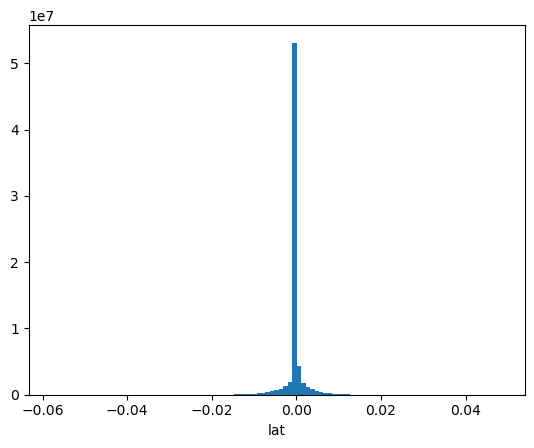

In [44]:
ds_trajectories.lat.diff("obs").plot.hist(bins=101);

In [45]:
print(
        "First sampled time:", ds_trajectories.time.min(skipna=True).values,
        "\nLast sampled time:", ds_trajectories.time.max(skipna=True).values,
        "\n",
        "\nFirst particle:", 
        ds_trajectories.isel(trajectory=0).time.min(skipna=True).values, "-",
        ds_trajectories.isel(trajectory=0).time.max(skipna=True).values,
        "\nLast particle:", 
        ds_trajectories.isel(trajectory=-1).time.min(skipna=True).values,"-",
        ds_trajectories.isel(trajectory=-1).time.max(skipna=True).values,
        "\n",
        "\nmaximum age in days:", max_age_d, 
        "\nfirst release date:", first_release_date, 
        "\nlast release date:", last_release_date, 
        "\nlast modeling date:", last_modeling_date,
        
)

First sampled time: 2019-01-01T12:45:00.000000000 
Last sampled time: 2020-08-07T11:44:59.712000000 
 
First particle: 2019-01-01T12:45:00.000000000 - 2019-08-09T12:29:59.712000000 
Last particle: 2019-12-31T12:00:00.000000000 - 2020-08-07T11:44:59.712000000 
 
maximum age in days: 220 
first release date: 2019-01-01 
last release date: 2019-12-31 
last modeling date: 2020-08-07


## Maps

In [46]:
first_lat = ds_trajectories.isel(obs=0).lat
first_lon = ds_trajectories.isel(obs=0).lon

In [47]:
last_valid_obs = ds_trajectories.obs.where(ds_trajectories.lon.notnull()).max('obs').astype(int)
last_step = ds_trajectories.isel(obs=last_valid_obs).compute()

last_lon = last_step.lon
last_lat = last_step.lat

last_step.to_dataframe().describe()

,CellID,S,T,age_sec,lat,lon,obs,time,u,v,z
count,13250.000000,13250.000000,13250.000000,1.325000e+04,13250.000000,13250.000000,13250.000000,13250,1.325000e+04,1.325000e+04,13250.0
mean,49710.996094,2.292544,4.298859,1.900828e+07,59.911206,22.928192,5280.962264,2020-02-07 12:29:08.768603648,4.621928e-08,6.422732e-09,0.0
min,49699.000000,0.000000,-0.320000,1.900563e+07,54.166649,2.418006,5280.000000,2019-08-09 12:29:59.712000,-9.614103e-06,-4.583560e-06,0.0
25%,49705.000000,0.000000,0.000000,1.900833e+07,58.900002,21.583401,5281.000000,2019-11-08 12:29:59.712000,-1.451101e-32,0.000000e+00,0.0
50%,49711.000000,0.000000,0.000000,1.900833e+07,59.801499,22.519832,5281.000000,2020-02-07 12:29:59.712000,0.000000e+00,0.000000e+00,0.0
75%,49717.000000,5.300000,6.444994,1.900833e+07,60.450001,25.166700,5281.000000,2020-05-08 12:29:59.712000,4.755138e-21,1.268034e-19,0.0
max,49723.000000,34.010006,27.619993,1.900833e+07,65.393622,29.914124,5281.000000,2020-08-07 11:44:59.712000,7.467117e-06,3.409834e-06,0.0
std,7.856308,3.238566,6.737254,1.969741e+03,1.333870,3.916478,0.190564,NaN,5.918985e-07,2.691424e-07,0.0


In [48]:
traj_dead = ds_trajectories.where(first_lon == last_lon, drop=True)
traj_moving = ds_trajectories.where(first_lon != last_lon, drop=True)

In [49]:
# open depth files and define depth cmap
depth_coarse = xr.open_dataset(path_static_coarse / "H0_file_coarse.nc").H0
depth_fine = xr.open_dataset(path_static_fine / "H0_file_fine.nc").H0
cm_deep = cmocean.cm.deep

In [50]:
import seaborn as sns

In [51]:
traj_lat = np.concatenate(traj_moving.lat.values)
traj_lon = np.concatenate(traj_moving.lon.values)

traj_lat = traj_lat[np.invert(np.isnan(traj_lat,))]
traj_lon = traj_lon[np.invert(np.isnan(traj_lon,))]

In [52]:
from matplotlib.colors import LogNorm
norm = LogNorm(vmin=1, vmax=20)

In [53]:
lon_min, lon_max = (9,30)
lat_min, lat_max = (52,66)
lon_range = lon_max-lon_min
lat_range = lat_max-lat_min

In [54]:
hist, xedges, yedges = np.histogram2d(
        x=traj_lon, y=traj_lat, 
        bins=(lon_range*4, lat_range*4), 
        range=[[lon_min, lon_max], [lat_min, lat_max]],
)

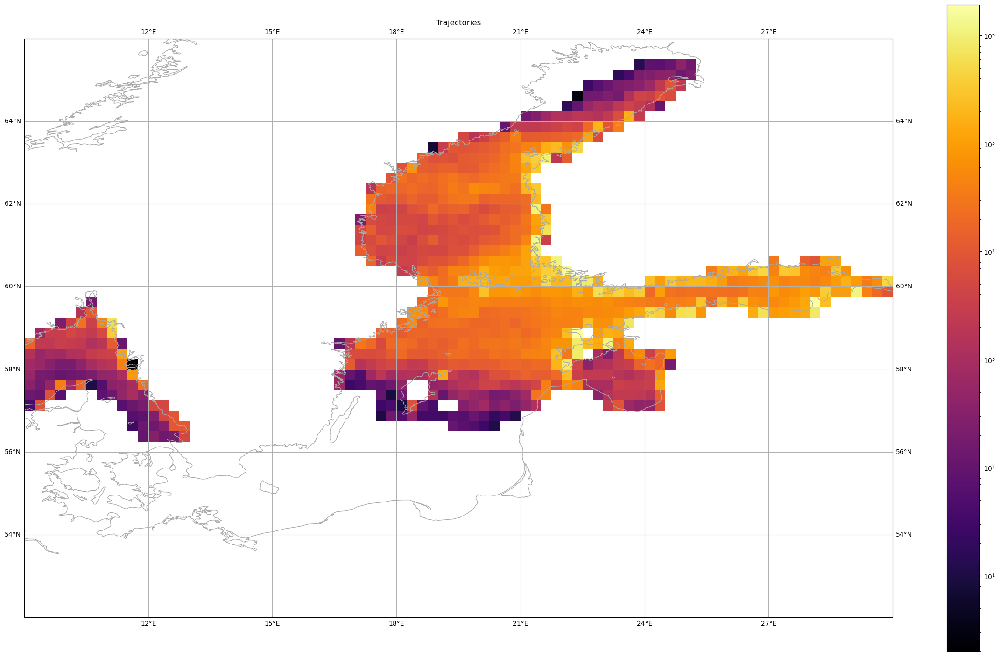

In [55]:
fig = plt.figure(figsize=(30,18))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
hm = ax.pcolormesh(xedges, yedges, hist.T, cmap="inferno", transform=ccrs.PlateCarree(), norm=LogNorm())
fig.colorbar(hm)
ax.coastlines(color="darkgrey")
ax.gridlines(draw_labels=True)
plt.title("Trajectories")
plt.xlim(lon_min, lon_max)
plt.ylim(lat_min, lat_max)
plt.show()

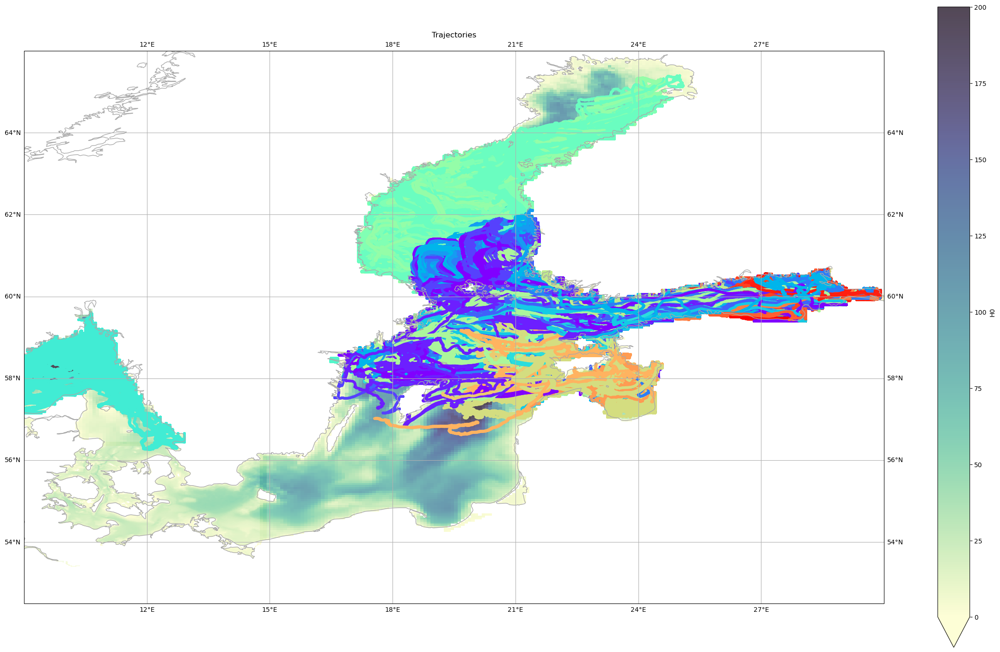

In [56]:
fig = plt.figure(figsize=(30,18))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
depth_fine.plot.imshow(cmap=cm_deep, ax=ax, vmin=0, vmax=200, alpha=.8)
depth_coarse.plot.imshow(cmap=cm_deep, ax=ax, add_colorbar=False, vmin=0, vmax=200, alpha=.8)

ax.scatter(
        x=ds_trajectories.lon, y=ds_trajectories.lat,
        c=ds_trajectories.CellID, cmap="rainbow",
        s=10,
)
ax.coastlines(color="darkgrey")
ax.gridlines(draw_labels=True)
plt.title("Trajectories")
plt.xlim(9,30)
plt.ylim(52.5,66)
plt.show()

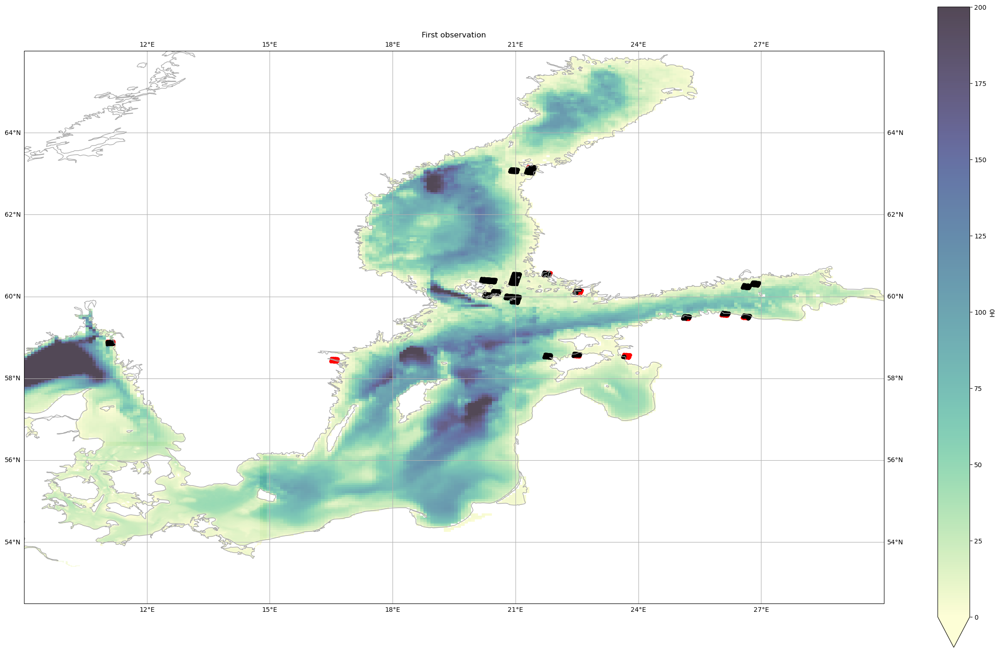

In [57]:
fig = plt.figure(figsize=(30,18))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
depth_fine.plot.imshow(cmap=cm_deep, ax=ax, vmin=0, vmax=200, alpha=.8)
depth_coarse.plot.imshow(cmap=cm_deep, ax=ax, add_colorbar=False, vmin=0, vmax=200, alpha=.8)

ax.scatter(traj_dead.isel(obs=0).lon, traj_dead.isel(obs=0).lat, c="r", s=10)
ax.scatter(traj_moving.isel(obs=0).lon, traj_moving.isel(obs=0).lat, c="k", s=10)
ax.coastlines(color="darkgrey")
ax.gridlines(draw_labels=True)
plt.title("First observation")
plt.xlim(9,30)
plt.ylim(52.5,66)
plt.show()

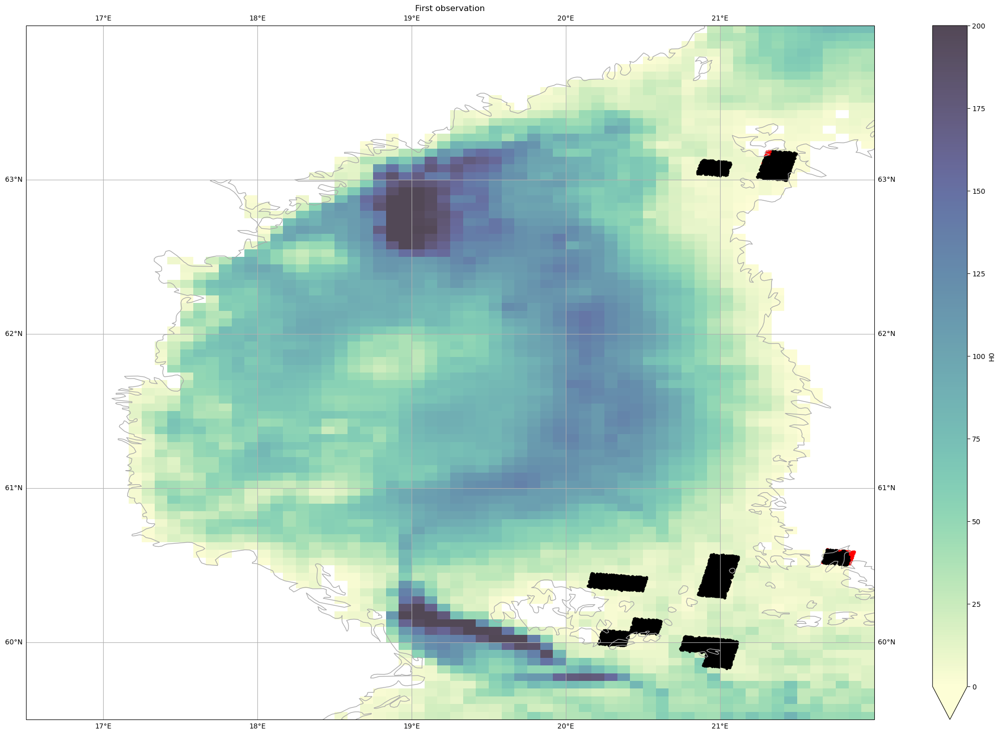

In [58]:
fig = plt.figure(figsize=(30,18))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
depth_fine.plot.imshow(cmap=cm_deep, ax=ax, vmin=0, vmax=200, alpha=.8)
depth_coarse.plot.imshow(cmap=cm_deep, ax=ax, add_colorbar=False, vmin=0, vmax=200, alpha=.8)

ax.scatter(traj_dead.isel(obs=0).lon, traj_dead.isel(obs=0).lat, c="r", s=10)
ax.scatter(traj_moving.isel(obs=0).lon, traj_moving.isel(obs=0).lat, c="k", s=10)
ax.coastlines(color="darkgrey")
ax.gridlines(draw_labels=True)
plt.title("First observation")
plt.xlim(16.5,22)
plt.ylim(59.5,64)
plt.show()

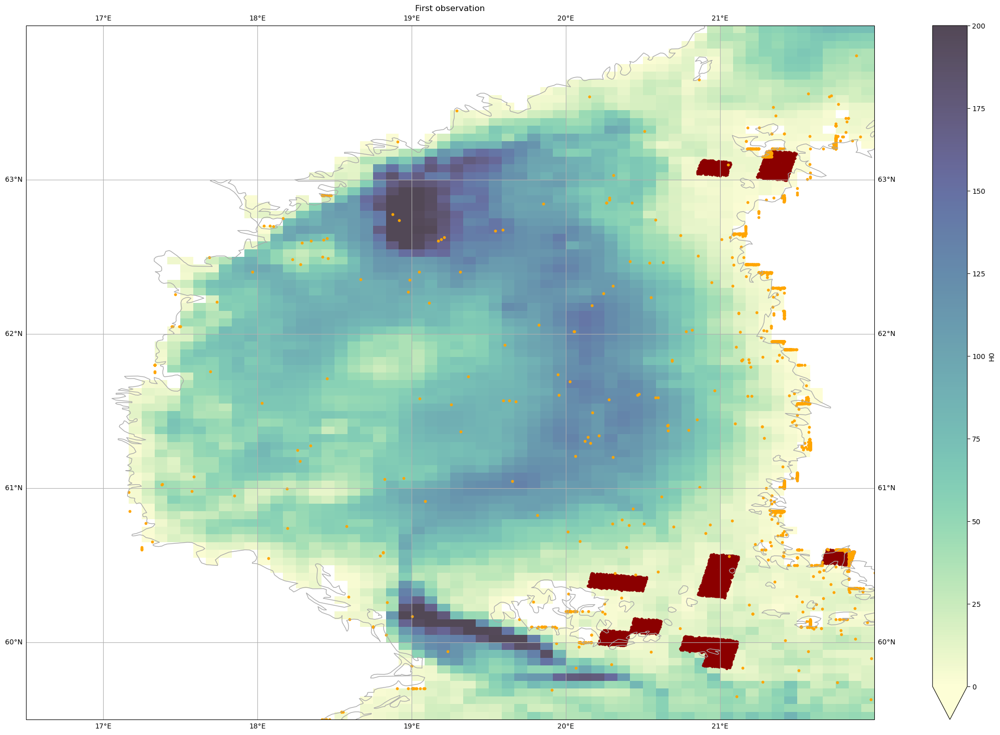

In [59]:
fig = plt.figure(figsize=(30,18))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
depth_fine.plot.imshow(cmap=cm_deep, ax=ax, vmin=0, vmax=200, alpha=.8)
depth_coarse.plot.imshow(cmap=cm_deep, ax=ax, add_colorbar=False, vmin=0, vmax=200, alpha=.8)

ax.scatter(first_lon, first_lat, c="darkred", s=10)
ax.scatter(last_lon, last_lat, c="orange", s=10)
ax.coastlines(color="darkgrey")
ax.gridlines(draw_labels=True)
plt.title("First observation")
plt.xlim(16.5,22)
plt.ylim(59.5,64)
plt.show()

In [60]:
ganz_tot = np.unique(traj_dead.isel(obs=0).CellID.values)[
        np.invert(
                np.in1d(
                        np.unique(traj_dead.isel(obs=0).CellID.values),
                        np.unique(traj_moving.isel(obs=0).CellID.values)
                )
        )
]
len(ganz_tot)

1